In [1]:
# !pip uninstall gensim --yes
# !pip install gensim==3.8.1
# !pip install deeprobust==0.2.9
# !pip install torch_geometric
# !pip install pyg_lib torch_scatter torch_sparse torch_cluster torch_spline_conv -f https://data.pyg.org/whl/torch-2.2.0+cpu.html

In [1]:
from deeprobust.graph.data import Dpr2Pyg, Pyg2Dpr
from deeprobust.graph.data import Dataset as DRDataset
import torch
from torch_geometric.data import Data
import numpy as np
from deeprobust.graph.data import Dataset, PrePtbDataset, PtbDataset
from deeprobust.graph.defense import GCN, RGCN, ProGNN, SimPGCN, GCNSVD, GCNJaccard
from deeprobust.graph.global_attack import Metattack, DICE, Random, PGDAttack
from scipy.sparse import csr_matrix
import torch
from torch.nn import Linear
import torch.nn.functional as F
from torch_geometric.transforms import Compose
from torch_geometric.datasets import Amazon
from torch_geometric.transforms.random_node_split import RandomNodeSplit
from torch_geometric.datasets import Planetoid
from torch_geometric.transforms import NormalizeFeatures
from torch_geometric.nn import GCNConv
from torch_geometric.nn import GATConv
from torch_geometric.loader import NeighborLoader
from torch_geometric.nn import SAGEConv
from sklearn.metrics import roc_auc_score

from torch_geometric.utils import negative_sampling
from torch_geometric.utils import train_test_split_edges

from copy import deepcopy
import torch.nn as nn
from IPython.display import Javascript  # Restrict height of output cell.
import matplotlib.pyplot as plt

from GSage import GSAGE
from GSaint import GSAINT
from GAT import GAT

In [2]:
seed = 15
ptb_rates = [0.05, 0.1, 0.15, 0.2, 0.25, 0.3]
# ptb_rates = [0.025, 0.05]
# ptb_rate = 0.25
# ptb_rate1 = 0.15
dataset = 'cora'
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)

In [3]:
data = DRDataset(root='/tmp/', name=dataset, setting='prognn')
adj, features, labels = data.adj, data.features, data.labels
idx_train, idx_val, idx_test = data.idx_train, data.idx_val, data.idx_test
idx_unlabeled = np.union1d(idx_val, idx_test)
idx_unlabeled = np.union1d(idx_val, idx_test)


device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
# budget = int(ptb_rate * (adj.todense().sum() // 2))
# print(budget)
# budget1 = int(ptb_rate1 * (adj.todense().sum() // 2))
# print(budget1)

Loading cora dataset...
Selecting 1 largest connected components


In [4]:
np.save('/tmp/cora_adj.npy',adj.todense())

In [5]:
np.save('/tmp/cora_features.npy',features.todense())

In [6]:
np.save('/tmp/cora_labels.npy',labels)

In [7]:
np.save('/tmp/cora_idx_test',idx_test)

# Metattack

## GSAGE

In [8]:
# Setup Surrogate model
surrogate_sage = GSAGE(nfeat=features.shape[1], nhid=64, nclass=labels.max().item()+1, dropout=0, with_bias=True, device=device).to(device)
surrogate_sage.fit(data, patience=100, verbose=True)

Processing...
/home/wcorcoran/anaconda3/envs/mesp/lib/python3.8/site-packages/deeprobust/graph/data/pyg_dataset.py:48: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:245.)
  edge_index = torch.LongTensor(dpr_data.adj.nonzero())
Done!
/home/wcorcoran/anaconda3/envs/mesp/lib/python3.8/site-packages/torch_geometric/data/in_memory_dataset.py:157: UserWarning: It is not recommended to directly access the internal storage format `data` of an 'InMemoryDataset'. If you are absolutely certain what you are doing, access the internal storage via `InMemoryDataset._data` instead to suppress this warning. Alternatively, you can access stacked individual attributes of every graph via `dataset.{attr_name}`.
  warnings.warn(msg)
/home/wcorcoran/anaconda3/envs/mesp/lib/python3.8/site-packages/torch_geo

=== training GSAGE model ===
Epoch 0, training loss: 0.039710622280836105
Epoch 10, training loss: 0.008539043366909027
Epoch 20, training loss: 0.010870063677430153
Epoch 30, training loss: 0.012931709177792072
Epoch 40, training loss: 0.008129791356623173
Epoch 50, training loss: 0.006071467883884907
Epoch 60, training loss: 0.012019830755889416
Epoch 70, training loss: 0.00572971859946847
Epoch 80, training loss: 0.006957317236810923
Epoch 90, training loss: 0.011108217760920525
Epoch 100, training loss: 0.006383534055203199
=== early stopping at 101, loss_val = 0.5490294098854065 ===


In [9]:
preds=surrogate_sage.predict()
_, predicted_classes = torch.max(preds, 1)  # Returns values, indices; we need indices

# Step 3: Subset for test nodes
test_preds = predicted_classes[idx_test].cpu().numpy()
test_labels = labels[idx_test]

# Step 4: Calculate accuracy
correct = (test_preds == test_labels).sum().item()  # Count correct predictions
total = idx_test.shape[0]  # Total number of test nodes
test_accuracy = correct / total

print(f'Test Accuracy: {test_accuracy}')

Test Accuracy: 0.8158953722334004


In [10]:
benchmark_clean = test_accuracy

In [11]:
from copy import deepcopy

gsage_results = []

for ptb in ptb_rates:
  torch.cuda.empty_cache()
  budget = int(ptb * (adj.todense().sum() // 2))
  # Setup Attack Model
  model = Metattack(surrogate_sage, nnodes=adj.shape[0], feature_shape=features.shape,
          attack_structure=True, attack_features=False, device=device, lambda_=0).to(device)
  # Attack
  model.attack(features, adj, labels, idx_train, idx_unlabeled, n_perturbations=budget, ll_constraint=False)
  modified_adj = model.modified_adj # modified_adj is a torch.tensor
  modified_adj = modified_adj.cpu().numpy()
  modified_adj = csr_matrix(modified_adj)

  perturbed_adj = deepcopy(modified_adj)
  data_copied = deepcopy(data)
  data_copied.adj = modified_adj
  atk_model = GSAGE(nfeat=features.shape[1], nhid=64, nclass=labels.max().item()+1, dropout=0, with_bias=True, device=device).to(device)
  atk_model.fit(data_copied, patience=100, verbose=True)

  atk_acc = atk_model.test()
  print("accuracy: ", atk_acc)
  print("benchmark change: ", atk_acc - benchmark_clean)
  gsage_results.append(atk_acc - benchmark_clean)


Perturbing graph:   0%|          | 0/253 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5091577768325806
GCN acc on unlabled data: 0.8395172105498435
attack loss: 0.32779642939567566


Perturbing graph:   0%|          | 1/253 [00:00<02:33,  1.64it/s]

GCN loss on unlabled data: 0.5055583715438843
GCN acc on unlabled data: 0.83772910147519
attack loss: 0.33660757541656494


Perturbing graph:   1%|          | 2/253 [00:01<02:06,  1.98it/s]

GCN loss on unlabled data: 0.5149387717247009
GCN acc on unlabled data: 0.8395172105498435
attack loss: 0.3416627049446106


Perturbing graph:   1%|          | 3/253 [00:01<01:57,  2.13it/s]

GCN loss on unlabled data: 0.537957489490509
GCN acc on unlabled data: 0.8314707197139026
attack loss: 0.36510977149009705


Perturbing graph:   2%|▏         | 4/253 [00:01<01:54,  2.18it/s]

GCN loss on unlabled data: 0.5094404220581055
GCN acc on unlabled data: 0.8386231560125168
attack loss: 0.3598823547363281


Perturbing graph:   2%|▏         | 5/253 [00:02<01:51,  2.22it/s]

GCN loss on unlabled data: 0.5252195596694946
GCN acc on unlabled data: 0.8332588287885562
attack loss: 0.3599461317062378


Perturbing graph:   2%|▏         | 6/253 [00:02<01:49,  2.26it/s]

GCN loss on unlabled data: 0.5354547500610352
GCN acc on unlabled data: 0.8292355833705857
attack loss: 0.3731868863105774


Perturbing graph:   3%|▎         | 7/253 [00:03<01:47,  2.29it/s]

GCN loss on unlabled data: 0.524402379989624
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.36965617537498474


Perturbing graph:   3%|▎         | 8/253 [00:03<01:46,  2.31it/s]

GCN loss on unlabled data: 0.5171604752540588
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.38102900981903076


Perturbing graph:   4%|▎         | 9/253 [00:04<01:47,  2.27it/s]

GCN loss on unlabled data: 0.5298553109169006
GCN acc on unlabled data: 0.8314707197139026
attack loss: 0.3876148462295532


Perturbing graph:   4%|▍         | 10/253 [00:04<01:49,  2.23it/s]

GCN loss on unlabled data: 0.5399762392044067
GCN acc on unlabled data: 0.8337058560572195
attack loss: 0.38616377115249634


Perturbing graph:   4%|▍         | 11/253 [00:04<01:47,  2.24it/s]

GCN loss on unlabled data: 0.5241960287094116
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.39311710000038147


Perturbing graph:   5%|▍         | 12/253 [00:05<01:47,  2.24it/s]

GCN loss on unlabled data: 0.5333994626998901
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.3970632553100586


Perturbing graph:   5%|▌         | 13/253 [00:05<01:46,  2.25it/s]

GCN loss on unlabled data: 0.5403016805648804
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.40389034152030945


Perturbing graph:   6%|▌         | 14/253 [00:06<01:45,  2.26it/s]

GCN loss on unlabled data: 0.5318005681037903
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.40403294563293457


Perturbing graph:   6%|▌         | 15/253 [00:06<01:46,  2.23it/s]

GCN loss on unlabled data: 0.5375224351882935
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.40987277030944824


Perturbing graph:   6%|▋         | 16/253 [00:07<01:45,  2.24it/s]

GCN loss on unlabled data: 0.5556780695915222
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.423567533493042


Perturbing graph:   7%|▋         | 17/253 [00:07<01:45,  2.24it/s]

GCN loss on unlabled data: 0.5372729301452637
GCN acc on unlabled data: 0.8256593652212785
attack loss: 0.41608765721321106


Perturbing graph:   7%|▋         | 18/253 [00:08<01:44,  2.24it/s]

GCN loss on unlabled data: 0.5298106670379639
GCN acc on unlabled data: 0.8332588287885562
attack loss: 0.4327574670314789


Perturbing graph:   8%|▊         | 19/253 [00:08<01:44,  2.24it/s]

GCN loss on unlabled data: 0.5346964001655579
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.43301060795783997


Perturbing graph:   8%|▊         | 20/253 [00:08<01:43,  2.25it/s]

GCN loss on unlabled data: 0.5184425115585327
GCN acc on unlabled data: 0.8337058560572195
attack loss: 0.4278872609138489


Perturbing graph:   8%|▊         | 21/253 [00:09<01:42,  2.25it/s]

GCN loss on unlabled data: 0.5456921458244324
GCN acc on unlabled data: 0.8252123379526152
attack loss: 0.42963528633117676


Perturbing graph:   9%|▊         | 22/253 [00:09<01:42,  2.25it/s]

GCN loss on unlabled data: 0.5419794321060181
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.44054144620895386


Perturbing graph:   9%|▉         | 23/253 [00:10<01:42,  2.25it/s]

GCN loss on unlabled data: 0.5298623442649841
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.4332527220249176


Perturbing graph:   9%|▉         | 24/253 [00:10<01:42,  2.24it/s]

GCN loss on unlabled data: 0.550342857837677
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.4480516314506531


Perturbing graph:  10%|▉         | 25/253 [00:11<01:41,  2.24it/s]

GCN loss on unlabled data: 0.5514876246452332
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.45700603723526


Perturbing graph:  10%|█         | 26/253 [00:11<01:42,  2.21it/s]

GCN loss on unlabled data: 0.5614452362060547
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.4534251093864441


Perturbing graph:  11%|█         | 27/253 [00:12<01:43,  2.19it/s]

GCN loss on unlabled data: 0.5474413633346558
GCN acc on unlabled data: 0.8252123379526152
attack loss: 0.4558235704898834


Perturbing graph:  11%|█         | 28/253 [00:12<01:41,  2.21it/s]

GCN loss on unlabled data: 0.5589161515235901
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.4581657946109772


Perturbing graph:  11%|█▏        | 29/253 [00:13<01:42,  2.19it/s]

GCN loss on unlabled data: 0.5559951663017273
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.4580087959766388


Perturbing graph:  12%|█▏        | 30/253 [00:13<01:42,  2.17it/s]

GCN loss on unlabled data: 0.5564603805541992
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.46253058314323425


Perturbing graph:  12%|█▏        | 31/253 [00:13<01:39,  2.23it/s]

GCN loss on unlabled data: 0.5652371644973755
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.4699210524559021


Perturbing graph:  13%|█▎        | 32/253 [00:14<01:37,  2.26it/s]

GCN loss on unlabled data: 0.5712236166000366
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.4824882745742798


Perturbing graph:  13%|█▎        | 33/253 [00:14<01:36,  2.29it/s]

GCN loss on unlabled data: 0.5738105177879333
GCN acc on unlabled data: 0.8229772016092982
attack loss: 0.4737248718738556


Perturbing graph:  13%|█▎        | 34/253 [00:15<01:35,  2.30it/s]

GCN loss on unlabled data: 0.5670486092567444
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.4699746370315552


Perturbing graph:  14%|█▍        | 35/253 [00:15<01:34,  2.30it/s]

GCN loss on unlabled data: 0.5755481719970703
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.48335325717926025


Perturbing graph:  14%|█▍        | 36/253 [00:16<01:34,  2.30it/s]

GCN loss on unlabled data: 0.5832478404045105
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.490226149559021


Perturbing graph:  15%|█▍        | 37/253 [00:16<01:33,  2.32it/s]

GCN loss on unlabled data: 0.596599817276001
GCN acc on unlabled data: 0.8185069289226643
attack loss: 0.5061522126197815


Perturbing graph:  15%|█▌        | 38/253 [00:16<01:32,  2.32it/s]

GCN loss on unlabled data: 0.5946276187896729
GCN acc on unlabled data: 0.8198480107286544
attack loss: 0.5135191082954407


Perturbing graph:  15%|█▌        | 39/253 [00:17<01:32,  2.32it/s]

GCN loss on unlabled data: 0.5935099124908447
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.5155110359191895


Perturbing graph:  16%|█▌        | 40/253 [00:17<01:34,  2.26it/s]

GCN loss on unlabled data: 0.5941887497901917
GCN acc on unlabled data: 0.8185069289226643
attack loss: 0.5178250074386597


Perturbing graph:  16%|█▌        | 41/253 [00:18<01:36,  2.19it/s]

GCN loss on unlabled data: 0.6057366728782654
GCN acc on unlabled data: 0.8122485471613768
attack loss: 0.5154524445533752


Perturbing graph:  17%|█▋        | 42/253 [00:18<01:38,  2.15it/s]

GCN loss on unlabled data: 0.6233155727386475
GCN acc on unlabled data: 0.8126955744300403
attack loss: 0.5171542167663574


Perturbing graph:  17%|█▋        | 43/253 [00:19<01:38,  2.13it/s]

GCN loss on unlabled data: 0.6187689304351807
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.519355058670044


Perturbing graph:  17%|█▋        | 44/253 [00:19<01:39,  2.10it/s]

GCN loss on unlabled data: 0.6064914464950562
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.516740083694458


Perturbing graph:  18%|█▊        | 45/253 [00:20<01:40,  2.07it/s]

GCN loss on unlabled data: 0.6312865614891052
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.5363805294036865


Perturbing graph:  18%|█▊        | 46/253 [00:20<01:37,  2.11it/s]

GCN loss on unlabled data: 0.620318591594696
GCN acc on unlabled data: 0.8095663835493966
attack loss: 0.5325520634651184


Perturbing graph:  19%|█▊        | 47/253 [00:21<01:34,  2.17it/s]

GCN loss on unlabled data: 0.6152759194374084
GCN acc on unlabled data: 0.8104604380867233
attack loss: 0.5306907296180725


Perturbing graph:  19%|█▉        | 48/253 [00:21<01:32,  2.22it/s]

GCN loss on unlabled data: 0.6441124081611633
GCN acc on unlabled data: 0.8073312472060796
attack loss: 0.5371649265289307


Perturbing graph:  19%|█▉        | 49/253 [00:22<01:33,  2.17it/s]

GCN loss on unlabled data: 0.6275278925895691
GCN acc on unlabled data: 0.8095663835493966
attack loss: 0.542657732963562


Perturbing graph:  20%|█▉        | 50/253 [00:22<01:31,  2.21it/s]

GCN loss on unlabled data: 0.6269617676734924
GCN acc on unlabled data: 0.8100134108180599
attack loss: 0.5362505316734314


Perturbing graph:  20%|██        | 51/253 [00:22<01:30,  2.22it/s]

GCN loss on unlabled data: 0.6301807761192322
GCN acc on unlabled data: 0.8073312472060796
attack loss: 0.5388846397399902


Perturbing graph:  21%|██        | 52/253 [00:23<01:29,  2.24it/s]

GCN loss on unlabled data: 0.6246955990791321
GCN acc on unlabled data: 0.8046490835940993
attack loss: 0.5388414263725281


Perturbing graph:  21%|██        | 53/253 [00:23<01:28,  2.27it/s]

GCN loss on unlabled data: 0.6357050538063049
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.5483925342559814


Perturbing graph:  21%|██▏       | 54/253 [00:24<01:26,  2.29it/s]

GCN loss on unlabled data: 0.6403452157974243
GCN acc on unlabled data: 0.8091193562807332
attack loss: 0.5451567769050598


Perturbing graph:  22%|██▏       | 55/253 [00:24<01:25,  2.31it/s]

GCN loss on unlabled data: 0.6501121520996094
GCN acc on unlabled data: 0.799731783638802
attack loss: 0.5519105195999146


Perturbing graph:  22%|██▏       | 56/253 [00:25<01:24,  2.32it/s]

GCN loss on unlabled data: 0.6492047309875488
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.5558202266693115


Perturbing graph:  23%|██▎       | 57/253 [00:25<01:24,  2.33it/s]

GCN loss on unlabled data: 0.6525486707687378
GCN acc on unlabled data: 0.8010728654447922
attack loss: 0.5687085390090942


Perturbing graph:  23%|██▎       | 58/253 [00:25<01:23,  2.33it/s]

GCN loss on unlabled data: 0.647123396396637
GCN acc on unlabled data: 0.8086723290120698
attack loss: 0.567829430103302


Perturbing graph:  23%|██▎       | 59/253 [00:26<01:22,  2.34it/s]

GCN loss on unlabled data: 0.6619485020637512
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.5713715553283691


Perturbing graph:  24%|██▎       | 60/253 [00:26<01:22,  2.34it/s]

GCN loss on unlabled data: 0.6596091389656067
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.5793246030807495


Perturbing graph:  24%|██▍       | 61/253 [00:27<01:21,  2.34it/s]

GCN loss on unlabled data: 0.6527947783470154
GCN acc on unlabled data: 0.8064371926687528
attack loss: 0.5704679489135742


Perturbing graph:  25%|██▍       | 62/253 [00:27<01:20,  2.36it/s]

GCN loss on unlabled data: 0.6517848968505859
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.5621798634529114


Perturbing graph:  25%|██▍       | 63/253 [00:28<01:20,  2.37it/s]

GCN loss on unlabled data: 0.6722235083580017
GCN acc on unlabled data: 0.8010728654447922
attack loss: 0.5803901553153992


Perturbing graph:  25%|██▌       | 64/253 [00:28<01:21,  2.31it/s]

GCN loss on unlabled data: 0.6624364852905273
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.5681989789009094


Perturbing graph:  26%|██▌       | 65/253 [00:29<01:24,  2.22it/s]

GCN loss on unlabled data: 0.6782137155532837
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.6010196208953857


Perturbing graph:  26%|██▌       | 66/253 [00:29<01:30,  2.08it/s]

GCN loss on unlabled data: 0.6975129246711731
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.5980757474899292


Perturbing graph:  26%|██▋       | 67/253 [00:30<01:28,  2.10it/s]

GCN loss on unlabled data: 0.6758001446723938
GCN acc on unlabled data: 0.8037550290567725
attack loss: 0.6008301377296448


Perturbing graph:  27%|██▋       | 68/253 [00:30<01:30,  2.04it/s]

GCN loss on unlabled data: 0.6930326819419861
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.6100528240203857


Perturbing graph:  27%|██▋       | 69/253 [00:31<01:30,  2.04it/s]

GCN loss on unlabled data: 0.6736783981323242
GCN acc on unlabled data: 0.7930263746088512
attack loss: 0.6057726740837097


Perturbing graph:  28%|██▊       | 70/253 [00:31<01:29,  2.04it/s]

GCN loss on unlabled data: 0.6843534708023071
GCN acc on unlabled data: 0.8001788109074653
attack loss: 0.6078811287879944


Perturbing graph:  28%|██▊       | 71/253 [00:32<01:29,  2.04it/s]

GCN loss on unlabled data: 0.6875942349433899
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.599851667881012


Perturbing graph:  28%|██▊       | 72/253 [00:32<01:29,  2.02it/s]

GCN loss on unlabled data: 0.7043551802635193
GCN acc on unlabled data: 0.7979436745641484
attack loss: 0.620574414730072


Perturbing graph:  29%|██▉       | 73/253 [00:33<01:28,  2.03it/s]

GCN loss on unlabled data: 0.7135482430458069
GCN acc on unlabled data: 0.7952615109521681
attack loss: 0.6319951415061951


Perturbing graph:  29%|██▉       | 74/253 [00:33<01:26,  2.06it/s]

GCN loss on unlabled data: 0.7132764458656311
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.6277386546134949


Perturbing graph:  30%|██▉       | 75/253 [00:33<01:25,  2.09it/s]

GCN loss on unlabled data: 0.7060016989707947
GCN acc on unlabled data: 0.7948144836835047
attack loss: 0.6321908831596375


Perturbing graph:  30%|███       | 76/253 [00:34<01:25,  2.07it/s]

GCN loss on unlabled data: 0.7142244577407837
GCN acc on unlabled data: 0.7952615109521681
attack loss: 0.6419748663902283


Perturbing graph:  30%|███       | 77/253 [00:34<01:25,  2.05it/s]

GCN loss on unlabled data: 0.7063295245170593
GCN acc on unlabled data: 0.7921323200715243
attack loss: 0.6334042549133301


Perturbing graph:  31%|███       | 78/253 [00:35<01:24,  2.07it/s]

GCN loss on unlabled data: 0.699943482875824
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.6303179860115051


Perturbing graph:  31%|███       | 79/253 [00:35<01:22,  2.10it/s]

GCN loss on unlabled data: 0.6907989978790283
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.6191749572753906


Perturbing graph:  32%|███▏      | 80/253 [00:36<01:22,  2.11it/s]

GCN loss on unlabled data: 0.7036246061325073
GCN acc on unlabled data: 0.7921323200715243
attack loss: 0.6440148949623108


Perturbing graph:  32%|███▏      | 81/253 [00:36<01:21,  2.12it/s]

GCN loss on unlabled data: 0.7233835458755493
GCN acc on unlabled data: 0.7863209655789003
attack loss: 0.6542840600013733


Perturbing graph:  32%|███▏      | 82/253 [00:37<01:20,  2.13it/s]

GCN loss on unlabled data: 0.713127851486206
GCN acc on unlabled data: 0.7840858292355833
attack loss: 0.6405118107795715


Perturbing graph:  33%|███▎      | 83/253 [00:37<01:17,  2.19it/s]

GCN loss on unlabled data: 0.7417177557945251
GCN acc on unlabled data: 0.7840858292355833
attack loss: 0.6738081574440002


Perturbing graph:  33%|███▎      | 84/253 [00:38<01:15,  2.23it/s]

GCN loss on unlabled data: 0.7328117489814758
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.6683520674705505


Perturbing graph:  34%|███▎      | 85/253 [00:38<01:13,  2.28it/s]

GCN loss on unlabled data: 0.7246459126472473
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.6629276871681213


Perturbing graph:  34%|███▍      | 86/253 [00:38<01:12,  2.30it/s]

GCN loss on unlabled data: 0.7418597340583801
GCN acc on unlabled data: 0.7827447474295932
attack loss: 0.6712380647659302


Perturbing graph:  34%|███▍      | 87/253 [00:39<01:11,  2.31it/s]

GCN loss on unlabled data: 0.7235705256462097
GCN acc on unlabled data: 0.7881090746535538
attack loss: 0.6498615741729736


Perturbing graph:  35%|███▍      | 88/253 [00:39<01:11,  2.32it/s]

GCN loss on unlabled data: 0.7467049360275269
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.674244225025177


Perturbing graph:  35%|███▌      | 89/253 [00:40<01:10,  2.32it/s]

GCN loss on unlabled data: 0.7434473037719727
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.6684741973876953


Perturbing graph:  36%|███▌      | 90/253 [00:40<01:10,  2.32it/s]

GCN loss on unlabled data: 0.7395110130310059
GCN acc on unlabled data: 0.7827447474295932
attack loss: 0.6746082901954651


Perturbing graph:  36%|███▌      | 91/253 [00:41<01:09,  2.32it/s]

GCN loss on unlabled data: 0.7659890055656433
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.6896803379058838


Perturbing graph:  36%|███▋      | 92/253 [00:41<01:09,  2.33it/s]

GCN loss on unlabled data: 0.7528676390647888
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.6871006488800049


Perturbing graph:  37%|███▋      | 93/253 [00:41<01:08,  2.33it/s]

GCN loss on unlabled data: 0.7658668160438538
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.6946361064910889


Perturbing graph:  37%|███▋      | 94/253 [00:42<01:08,  2.33it/s]

GCN loss on unlabled data: 0.7823768854141235
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.723980188369751


Perturbing graph:  38%|███▊      | 95/253 [00:42<01:07,  2.34it/s]

GCN loss on unlabled data: 0.7756926417350769
GCN acc on unlabled data: 0.775592311130979
attack loss: 0.7075592279434204


Perturbing graph:  38%|███▊      | 96/253 [00:43<01:06,  2.35it/s]

GCN loss on unlabled data: 0.7804478406906128
GCN acc on unlabled data: 0.7764863656683058
attack loss: 0.7148662805557251


Perturbing graph:  38%|███▊      | 97/253 [00:43<01:06,  2.35it/s]

GCN loss on unlabled data: 0.7649739384651184
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.698221743106842


Perturbing graph:  39%|███▊      | 98/253 [00:44<01:06,  2.34it/s]

GCN loss on unlabled data: 0.7414450645446777
GCN acc on unlabled data: 0.7796155565489495
attack loss: 0.6730685830116272


Perturbing graph:  39%|███▉      | 99/253 [00:44<01:05,  2.35it/s]

GCN loss on unlabled data: 0.7783724665641785
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.7085400819778442


Perturbing graph:  40%|███▉      | 100/253 [00:44<01:04,  2.36it/s]

GCN loss on unlabled data: 0.7813531756401062
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.7232941389083862


Perturbing graph:  40%|███▉      | 101/253 [00:45<01:04,  2.36it/s]

GCN loss on unlabled data: 0.8129488229751587
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.7471461892127991


Perturbing graph:  40%|████      | 102/253 [00:45<01:04,  2.34it/s]

GCN loss on unlabled data: 0.7478098273277283
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.6811906695365906


Perturbing graph:  41%|████      | 103/253 [00:46<01:03,  2.34it/s]

GCN loss on unlabled data: 0.8012422919273376
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.7339240312576294


Perturbing graph:  41%|████      | 104/253 [00:46<01:03,  2.33it/s]

GCN loss on unlabled data: 0.8045784831047058
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.7321135997772217


Perturbing graph:  42%|████▏     | 105/253 [00:47<01:03,  2.34it/s]

GCN loss on unlabled data: 0.7787913084030151
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.7331715226173401


Perturbing graph:  42%|████▏     | 106/253 [00:47<01:02,  2.35it/s]

GCN loss on unlabled data: 0.7938183546066284
GCN acc on unlabled data: 0.7773804202056326
attack loss: 0.7412801384925842


Perturbing graph:  42%|████▏     | 107/253 [00:47<01:02,  2.32it/s]

GCN loss on unlabled data: 0.7706901431083679
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.7285040616989136


Perturbing graph:  43%|████▎     | 108/253 [00:48<01:02,  2.33it/s]

GCN loss on unlabled data: 0.8221335411071777
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.7744055986404419


Perturbing graph:  43%|████▎     | 109/253 [00:48<01:01,  2.33it/s]

GCN loss on unlabled data: 0.8221077919006348
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.7627859711647034


Perturbing graph:  43%|████▎     | 110/253 [00:49<01:01,  2.32it/s]

GCN loss on unlabled data: 0.8230152726173401
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.7847470641136169


Perturbing graph:  44%|████▍     | 111/253 [00:49<01:00,  2.33it/s]

GCN loss on unlabled data: 0.8006325960159302
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.7658195495605469


Perturbing graph:  44%|████▍     | 112/253 [00:50<01:00,  2.32it/s]

GCN loss on unlabled data: 0.8345781564712524
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.7905982732772827


Perturbing graph:  45%|████▍     | 113/253 [00:50<00:59,  2.33it/s]

GCN loss on unlabled data: 0.7828599214553833
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.7395471334457397


Perturbing graph:  45%|████▌     | 114/253 [00:50<00:59,  2.34it/s]

GCN loss on unlabled data: 0.7883409261703491
GCN acc on unlabled data: 0.7742512293249888
attack loss: 0.7489985227584839


Perturbing graph:  45%|████▌     | 115/253 [00:51<00:59,  2.33it/s]

GCN loss on unlabled data: 0.8223416209220886
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.7844634056091309


Perturbing graph:  46%|████▌     | 116/253 [00:51<00:59,  2.30it/s]

GCN loss on unlabled data: 0.8224743008613586
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.7689883708953857


Perturbing graph:  46%|████▌     | 117/253 [00:52<00:58,  2.31it/s]

GCN loss on unlabled data: 0.8167980313301086
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.7856845855712891


Perturbing graph:  47%|████▋     | 118/253 [00:52<00:58,  2.32it/s]

GCN loss on unlabled data: 0.8338538408279419
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.7845223546028137


Perturbing graph:  47%|████▋     | 119/253 [00:53<00:57,  2.32it/s]

GCN loss on unlabled data: 0.8248577117919922
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.7869052290916443


Perturbing graph:  47%|████▋     | 120/253 [00:53<00:57,  2.30it/s]

GCN loss on unlabled data: 0.8215707540512085
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.7871323227882385


Perturbing graph:  48%|████▊     | 121/253 [00:54<00:57,  2.30it/s]

GCN loss on unlabled data: 0.8260943293571472
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.7826694250106812


Perturbing graph:  48%|████▊     | 122/253 [00:54<00:57,  2.29it/s]

GCN loss on unlabled data: 0.857226550579071
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.8160294890403748


Perturbing graph:  49%|████▊     | 123/253 [00:54<00:57,  2.25it/s]

GCN loss on unlabled data: 0.8141723871231079
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.7870175242424011


Perturbing graph:  49%|████▉     | 124/253 [00:55<00:58,  2.21it/s]

GCN loss on unlabled data: 0.8742333650588989
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.8420418500900269


Perturbing graph:  49%|████▉     | 125/253 [00:55<00:58,  2.20it/s]

GCN loss on unlabled data: 0.8277409672737122
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.8006496429443359


Perturbing graph:  50%|████▉     | 126/253 [00:56<00:58,  2.19it/s]

GCN loss on unlabled data: 0.8618322014808655
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.835513174533844


Perturbing graph:  50%|█████     | 127/253 [00:56<00:56,  2.23it/s]

GCN loss on unlabled data: 0.8555472493171692
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.8276870846748352


Perturbing graph:  51%|█████     | 128/253 [00:57<00:55,  2.25it/s]

GCN loss on unlabled data: 0.8721033930778503
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.8334632515907288


Perturbing graph:  51%|█████     | 129/253 [00:57<00:54,  2.27it/s]

GCN loss on unlabled data: 0.844917893409729
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.8258721828460693


Perturbing graph:  51%|█████▏    | 130/253 [00:58<00:53,  2.29it/s]

GCN loss on unlabled data: 0.8510288596153259
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.8257241249084473


Perturbing graph:  52%|█████▏    | 131/253 [00:58<00:53,  2.30it/s]

GCN loss on unlabled data: 0.8796958327293396
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.8457583785057068


Perturbing graph:  52%|█████▏    | 132/253 [00:58<00:52,  2.30it/s]

GCN loss on unlabled data: 0.8469583988189697
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.8232643604278564


Perturbing graph:  53%|█████▎    | 133/253 [00:59<00:52,  2.31it/s]

GCN loss on unlabled data: 0.8306031227111816
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.8043415546417236


Perturbing graph:  53%|█████▎    | 134/253 [00:59<00:51,  2.31it/s]

GCN loss on unlabled data: 0.8873360753059387
GCN acc on unlabled data: 0.7608404112650872
attack loss: 0.8574087023735046


Perturbing graph:  53%|█████▎    | 135/253 [01:00<00:51,  2.31it/s]

GCN loss on unlabled data: 0.864077091217041
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.8366546034812927


Perturbing graph:  54%|█████▍    | 136/253 [01:00<00:50,  2.31it/s]

GCN loss on unlabled data: 0.8491219878196716
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.8174042701721191


Perturbing graph:  54%|█████▍    | 137/253 [01:01<00:50,  2.30it/s]

GCN loss on unlabled data: 0.8756100535392761
GCN acc on unlabled data: 0.753687974966473
attack loss: 0.8498745560646057


Perturbing graph:  55%|█████▍    | 138/253 [01:01<00:50,  2.28it/s]

GCN loss on unlabled data: 0.9000644683837891
GCN acc on unlabled data: 0.7568171658471167
attack loss: 0.8653202652931213


Perturbing graph:  55%|█████▍    | 139/253 [01:01<00:49,  2.30it/s]

GCN loss on unlabled data: 0.8952065110206604
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.8688944578170776


Perturbing graph:  55%|█████▌    | 140/253 [01:02<00:49,  2.30it/s]

GCN loss on unlabled data: 0.8960633873939514
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.873654842376709


Perturbing graph:  56%|█████▌    | 141/253 [01:02<00:48,  2.30it/s]

GCN loss on unlabled data: 0.8865768909454346
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.8592551946640015


Perturbing graph:  56%|█████▌    | 142/253 [01:03<00:48,  2.30it/s]

GCN loss on unlabled data: 0.900848388671875
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.8824250102043152


Perturbing graph:  57%|█████▋    | 143/253 [01:03<00:47,  2.32it/s]

GCN loss on unlabled data: 0.8839463591575623
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.8749881386756897


Perturbing graph:  57%|█████▋    | 144/253 [01:04<00:46,  2.34it/s]

GCN loss on unlabled data: 0.8894026875495911
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.8711662292480469


Perturbing graph:  57%|█████▋    | 145/253 [01:04<00:45,  2.35it/s]

GCN loss on unlabled data: 0.9063234925270081
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.8842034339904785


Perturbing graph:  58%|█████▊    | 146/253 [01:04<00:45,  2.36it/s]

GCN loss on unlabled data: 0.9206756949424744
GCN acc on unlabled data: 0.7532409476978096
attack loss: 0.903465211391449


Perturbing graph:  58%|█████▊    | 147/253 [01:05<00:45,  2.34it/s]

GCN loss on unlabled data: 0.908932089805603
GCN acc on unlabled data: 0.7568171658471167
attack loss: 0.8812336325645447


Perturbing graph:  58%|█████▊    | 148/253 [01:05<00:44,  2.33it/s]

GCN loss on unlabled data: 0.9104821085929871
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.8953096866607666


Perturbing graph:  59%|█████▉    | 149/253 [01:06<00:44,  2.33it/s]

GCN loss on unlabled data: 0.9099302887916565
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.9128012657165527


Perturbing graph:  59%|█████▉    | 150/253 [01:06<00:44,  2.32it/s]

GCN loss on unlabled data: 0.9300934076309204
GCN acc on unlabled data: 0.747876620473849
attack loss: 0.9043043851852417


Perturbing graph:  60%|█████▉    | 151/253 [01:07<00:43,  2.32it/s]

GCN loss on unlabled data: 0.9193856716156006
GCN acc on unlabled data: 0.753687974966473
attack loss: 0.8882585167884827


Perturbing graph:  60%|██████    | 152/253 [01:07<00:43,  2.31it/s]

GCN loss on unlabled data: 0.9504545331001282
GCN acc on unlabled data: 0.7451944568618686
attack loss: 0.9427125453948975


Perturbing graph:  60%|██████    | 153/253 [01:07<00:43,  2.31it/s]

GCN loss on unlabled data: 0.9388954043388367
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.9106767177581787


Perturbing graph:  61%|██████    | 154/253 [01:08<00:42,  2.31it/s]

GCN loss on unlabled data: 0.9337732791900635
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.9205544590950012


Perturbing graph:  61%|██████▏   | 155/253 [01:08<00:42,  2.31it/s]

GCN loss on unlabled data: 0.9480210542678833
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.9176409244537354


Perturbing graph:  62%|██████▏   | 156/253 [01:09<00:41,  2.32it/s]

GCN loss on unlabled data: 0.9689752459526062
GCN acc on unlabled data: 0.7469825659365221
attack loss: 0.9459259510040283


Perturbing graph:  62%|██████▏   | 157/253 [01:09<00:40,  2.35it/s]

GCN loss on unlabled data: 0.9441377520561218
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.9285551905632019


Perturbing graph:  62%|██████▏   | 158/253 [01:10<00:40,  2.34it/s]

GCN loss on unlabled data: 0.9563249945640564
GCN acc on unlabled data: 0.7568171658471167
attack loss: 0.9436056017875671


Perturbing graph:  63%|██████▎   | 159/253 [01:10<00:40,  2.34it/s]

GCN loss on unlabled data: 0.9454872012138367
GCN acc on unlabled data: 0.7465355386678587
attack loss: 0.9158607721328735


Perturbing graph:  63%|██████▎   | 160/253 [01:10<00:40,  2.28it/s]

GCN loss on unlabled data: 0.9746900200843811
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.9379092454910278


Perturbing graph:  64%|██████▎   | 161/253 [01:11<00:40,  2.27it/s]

GCN loss on unlabled data: 0.9688770174980164
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.9587797522544861


Perturbing graph:  64%|██████▍   | 162/253 [01:11<00:39,  2.29it/s]

GCN loss on unlabled data: 0.985071063041687
GCN acc on unlabled data: 0.7505587840858292
attack loss: 0.9650384783744812


Perturbing graph:  64%|██████▍   | 163/253 [01:12<00:38,  2.31it/s]

GCN loss on unlabled data: 0.964371919631958
GCN acc on unlabled data: 0.7487706750111757
attack loss: 0.9316608309745789


Perturbing graph:  65%|██████▍   | 164/253 [01:12<00:38,  2.32it/s]

GCN loss on unlabled data: 0.9653262495994568
GCN acc on unlabled data: 0.7505587840858292
attack loss: 0.9300553202629089


Perturbing graph:  65%|██████▌   | 165/253 [01:13<00:37,  2.33it/s]

GCN loss on unlabled data: 0.9734178185462952
GCN acc on unlabled data: 0.7443004023245419
attack loss: 0.9637966752052307


Perturbing graph:  66%|██████▌   | 166/253 [01:13<00:37,  2.31it/s]

GCN loss on unlabled data: 0.9725722074508667
GCN acc on unlabled data: 0.7438533750558785
attack loss: 0.9546542167663574


Perturbing graph:  66%|██████▌   | 167/253 [01:14<00:37,  2.32it/s]

GCN loss on unlabled data: 0.9741359353065491
GCN acc on unlabled data: 0.7460885113991954
attack loss: 0.95242840051651


Perturbing graph:  66%|██████▋   | 168/253 [01:14<00:36,  2.34it/s]

GCN loss on unlabled data: 0.9652762413024902
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.9555837512016296


Perturbing graph:  67%|██████▋   | 169/253 [01:14<00:35,  2.34it/s]

GCN loss on unlabled data: 0.9662542343139648
GCN acc on unlabled data: 0.7465355386678587
attack loss: 0.9302740097045898


Perturbing graph:  67%|██████▋   | 170/253 [01:15<00:35,  2.35it/s]

GCN loss on unlabled data: 0.9469583034515381
GCN acc on unlabled data: 0.745641484130532
attack loss: 0.9161502718925476


Perturbing graph:  68%|██████▊   | 171/253 [01:15<00:35,  2.34it/s]

GCN loss on unlabled data: 0.9614452123641968
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.9427971243858337


Perturbing graph:  68%|██████▊   | 172/253 [01:16<00:34,  2.33it/s]

GCN loss on unlabled data: 0.9890872240066528
GCN acc on unlabled data: 0.7487706750111757
attack loss: 0.9668333530426025


Perturbing graph:  68%|██████▊   | 173/253 [01:16<00:34,  2.33it/s]

GCN loss on unlabled data: 0.9739108085632324
GCN acc on unlabled data: 0.745641484130532
attack loss: 0.9570747017860413


Perturbing graph:  69%|██████▉   | 174/253 [01:16<00:33,  2.33it/s]

GCN loss on unlabled data: 0.9827408790588379
GCN acc on unlabled data: 0.7505587840858292
attack loss: 0.9704789519309998


Perturbing graph:  69%|██████▉   | 175/253 [01:17<00:33,  2.32it/s]

GCN loss on unlabled data: 0.9884641766548157
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.9851585030555725


Perturbing graph:  70%|██████▉   | 176/253 [01:17<00:32,  2.33it/s]

GCN loss on unlabled data: 0.9513940811157227
GCN acc on unlabled data: 0.747876620473849
attack loss: 0.9391156435012817


Perturbing graph:  70%|██████▉   | 177/253 [01:18<00:32,  2.33it/s]

GCN loss on unlabled data: 1.0147712230682373
GCN acc on unlabled data: 0.7429593205185516
attack loss: 0.9993259906768799


Perturbing graph:  70%|███████   | 178/253 [01:18<00:32,  2.29it/s]

GCN loss on unlabled data: 1.023053765296936
GCN acc on unlabled data: 0.7407241841752347
attack loss: 1.0017364025115967


Perturbing graph:  71%|███████   | 179/253 [01:19<00:32,  2.26it/s]

GCN loss on unlabled data: 0.9990390539169312
GCN acc on unlabled data: 0.7469825659365221
attack loss: 0.9907436370849609


Perturbing graph:  71%|███████   | 180/253 [01:19<00:32,  2.24it/s]

GCN loss on unlabled data: 0.9850516319274902
GCN acc on unlabled data: 0.7438533750558785
attack loss: 0.9659811854362488


Perturbing graph:  72%|███████▏  | 181/253 [01:20<00:32,  2.24it/s]

GCN loss on unlabled data: 1.0014551877975464
GCN acc on unlabled data: 0.7460885113991954
attack loss: 0.988920271396637


Perturbing graph:  72%|███████▏  | 182/253 [01:20<00:31,  2.23it/s]

GCN loss on unlabled data: 1.0224822759628296
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.0092508792877197


Perturbing graph:  72%|███████▏  | 183/253 [01:20<00:31,  2.23it/s]

GCN loss on unlabled data: 1.0160893201828003
GCN acc on unlabled data: 0.7438533750558785
attack loss: 0.9971978068351746


Perturbing graph:  73%|███████▎  | 184/253 [01:21<00:30,  2.26it/s]

GCN loss on unlabled data: 1.0290851593017578
GCN acc on unlabled data: 0.7420652659812249
attack loss: 1.0156124830245972


Perturbing graph:  73%|███████▎  | 185/253 [01:21<00:29,  2.29it/s]

GCN loss on unlabled data: 1.0134872198104858
GCN acc on unlabled data: 0.7429593205185516
attack loss: 1.01067316532135


Perturbing graph:  74%|███████▎  | 186/253 [01:22<00:28,  2.31it/s]

GCN loss on unlabled data: 1.034296989440918
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.020208716392517


Perturbing graph:  74%|███████▍  | 187/253 [01:22<00:28,  2.32it/s]

GCN loss on unlabled data: 1.0277618169784546
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.0258678197860718


Perturbing graph:  74%|███████▍  | 188/253 [01:23<00:27,  2.34it/s]

GCN loss on unlabled data: 1.0408896207809448
GCN acc on unlabled data: 0.739830129637908
attack loss: 1.0373393297195435


Perturbing graph:  75%|███████▍  | 189/253 [01:23<00:27,  2.33it/s]

GCN loss on unlabled data: 1.0246548652648926
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.019687294960022


Perturbing graph:  75%|███████▌  | 190/253 [01:23<00:26,  2.34it/s]

GCN loss on unlabled data: 1.048055648803711
GCN acc on unlabled data: 0.7371479660259276
attack loss: 1.0407837629318237


Perturbing graph:  75%|███████▌  | 191/253 [01:24<00:26,  2.36it/s]

GCN loss on unlabled data: 1.0607326030731201
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.0566960573196411


Perturbing graph:  76%|███████▌  | 192/253 [01:24<00:25,  2.35it/s]

GCN loss on unlabled data: 1.0540169477462769
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.0430253744125366


Perturbing graph:  76%|███████▋  | 193/253 [01:25<00:25,  2.34it/s]

GCN loss on unlabled data: 1.0389573574066162
GCN acc on unlabled data: 0.7402771569065714
attack loss: 1.0435729026794434


Perturbing graph:  77%|███████▋  | 194/253 [01:25<00:25,  2.34it/s]

GCN loss on unlabled data: 1.0807942152023315
GCN acc on unlabled data: 0.7371479660259276
attack loss: 1.089760184288025


Perturbing graph:  77%|███████▋  | 195/253 [01:26<00:24,  2.35it/s]

GCN loss on unlabled data: 1.0757571458816528
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.0694189071655273


Perturbing graph:  77%|███████▋  | 196/253 [01:26<00:24,  2.35it/s]

GCN loss on unlabled data: 1.0221266746520996
GCN acc on unlabled data: 0.7380420205632544
attack loss: 1.0256744623184204


Perturbing graph:  78%|███████▊  | 197/253 [01:26<00:23,  2.34it/s]

GCN loss on unlabled data: 1.067699670791626
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.0653599500656128


Perturbing graph:  78%|███████▊  | 198/253 [01:27<00:23,  2.33it/s]

GCN loss on unlabled data: 1.073124885559082
GCN acc on unlabled data: 0.7344658024139473
attack loss: 1.0815547704696655


Perturbing graph:  79%|███████▊  | 199/253 [01:27<00:23,  2.32it/s]

GCN loss on unlabled data: 1.0529853105545044
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.0490832328796387


Perturbing graph:  79%|███████▉  | 200/253 [01:28<00:22,  2.34it/s]

GCN loss on unlabled data: 1.1120909452438354
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.110912799835205


Perturbing graph:  79%|███████▉  | 201/253 [01:28<00:22,  2.33it/s]

GCN loss on unlabled data: 1.118266224861145
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.1225168704986572


Perturbing graph:  80%|███████▉  | 202/253 [01:29<00:21,  2.32it/s]

GCN loss on unlabled data: 1.0795599222183228
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.079208493232727


Perturbing graph:  80%|████████  | 203/253 [01:29<00:21,  2.35it/s]

GCN loss on unlabled data: 1.1055020093917847
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.1014820337295532


Perturbing graph:  81%|████████  | 204/253 [01:29<00:20,  2.37it/s]

GCN loss on unlabled data: 1.0846810340881348
GCN acc on unlabled data: 0.7380420205632544
attack loss: 1.0864113569259644


Perturbing graph:  81%|████████  | 205/253 [01:30<00:20,  2.31it/s]

GCN loss on unlabled data: 1.1109591722488403
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.101392388343811


Perturbing graph:  81%|████████▏ | 206/253 [01:30<00:20,  2.27it/s]

GCN loss on unlabled data: 1.121010661125183
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.1208552122116089


Perturbing graph:  82%|████████▏ | 207/253 [01:31<00:20,  2.22it/s]

GCN loss on unlabled data: 1.112535834312439
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.113963007926941


Perturbing graph:  82%|████████▏ | 208/253 [01:31<00:20,  2.20it/s]

GCN loss on unlabled data: 1.084085464477539
GCN acc on unlabled data: 0.7282074206526599
attack loss: 1.0771981477737427


Perturbing graph:  83%|████████▎ | 209/253 [01:32<00:20,  2.18it/s]

GCN loss on unlabled data: 1.0734094381332397
GCN acc on unlabled data: 0.7268663388466696
attack loss: 1.0872957706451416


Perturbing graph:  83%|████████▎ | 210/253 [01:32<00:19,  2.18it/s]

GCN loss on unlabled data: 1.1322755813598633
GCN acc on unlabled data: 0.7268663388466696
attack loss: 1.1589891910552979


Perturbing graph:  83%|████████▎ | 211/253 [01:33<00:19,  2.17it/s]

GCN loss on unlabled data: 1.1155134439468384
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.1104464530944824


Perturbing graph:  84%|████████▍ | 212/253 [01:33<00:18,  2.17it/s]

GCN loss on unlabled data: 1.102146863937378
GCN acc on unlabled data: 0.7282074206526599
attack loss: 1.1206680536270142


Perturbing graph:  84%|████████▍ | 213/253 [01:34<00:18,  2.16it/s]

GCN loss on unlabled data: 1.1072744131088257
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.1032624244689941


Perturbing graph:  85%|████████▍ | 214/253 [01:34<00:17,  2.20it/s]

GCN loss on unlabled data: 1.0872515439987183
GCN acc on unlabled data: 0.7322306660706304
attack loss: 1.0977559089660645


Perturbing graph:  85%|████████▍ | 215/253 [01:34<00:16,  2.25it/s]

GCN loss on unlabled data: 1.0986485481262207
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.1089532375335693


Perturbing graph:  85%|████████▌ | 216/253 [01:35<00:16,  2.26it/s]

GCN loss on unlabled data: 1.1334948539733887
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.1448744535446167


Perturbing graph:  86%|████████▌ | 217/253 [01:35<00:15,  2.28it/s]

GCN loss on unlabled data: 1.1304477453231812
GCN acc on unlabled data: 0.7264193115780063
attack loss: 1.130608081817627


Perturbing graph:  86%|████████▌ | 218/253 [01:36<00:15,  2.29it/s]

GCN loss on unlabled data: 1.152673363685608
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.1740796566009521


Perturbing graph:  87%|████████▋ | 219/253 [01:36<00:14,  2.27it/s]

GCN loss on unlabled data: 1.1407941579818726
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.1588865518569946


Perturbing graph:  87%|████████▋ | 220/253 [01:37<00:14,  2.30it/s]

GCN loss on unlabled data: 1.1575406789779663
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.172269582748413


Perturbing graph:  87%|████████▋ | 221/253 [01:37<00:13,  2.30it/s]

GCN loss on unlabled data: 1.1269447803497314
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.1597405672073364


Perturbing graph:  88%|████████▊ | 222/253 [01:38<00:13,  2.31it/s]

GCN loss on unlabled data: 1.1432933807373047
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.1700036525726318


Perturbing graph:  88%|████████▊ | 223/253 [01:38<00:12,  2.33it/s]

GCN loss on unlabled data: 1.159464955329895
GCN acc on unlabled data: 0.7165847116674118
attack loss: 1.1596328020095825


Perturbing graph:  89%|████████▊ | 224/253 [01:38<00:12,  2.34it/s]

GCN loss on unlabled data: 1.1949831247329712
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.1950364112854004


Perturbing graph:  89%|████████▉ | 225/253 [01:39<00:11,  2.36it/s]

GCN loss on unlabled data: 1.152267336845398
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.1773953437805176


Perturbing graph:  89%|████████▉ | 226/253 [01:39<00:11,  2.36it/s]

GCN loss on unlabled data: 1.1757827997207642
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.202105164527893


Perturbing graph:  90%|████████▉ | 227/253 [01:40<00:11,  2.34it/s]

GCN loss on unlabled data: 1.1466045379638672
GCN acc on unlabled data: 0.7250782297720161
attack loss: 1.1827025413513184


Perturbing graph:  90%|█████████ | 228/253 [01:40<00:10,  2.28it/s]

GCN loss on unlabled data: 1.157832145690918
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.1744730472564697


Perturbing graph:  91%|█████████ | 229/253 [01:41<00:10,  2.29it/s]

GCN loss on unlabled data: 1.15900719165802
GCN acc on unlabled data: 0.7264193115780063
attack loss: 1.1882350444793701


Perturbing graph:  91%|█████████ | 230/253 [01:41<00:09,  2.31it/s]

GCN loss on unlabled data: 1.1746528148651123
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.1926286220550537


Perturbing graph:  91%|█████████▏| 231/253 [01:41<00:09,  2.33it/s]

GCN loss on unlabled data: 1.1966962814331055
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.2294292449951172


Perturbing graph:  92%|█████████▏| 232/253 [01:42<00:09,  2.33it/s]

GCN loss on unlabled data: 1.2031807899475098
GCN acc on unlabled data: 0.7170317389360751
attack loss: 1.2250584363937378


Perturbing graph:  92%|█████████▏| 233/253 [01:42<00:08,  2.33it/s]

GCN loss on unlabled data: 1.1723928451538086
GCN acc on unlabled data: 0.7139025480554314
attack loss: 1.1920119524002075


Perturbing graph:  92%|█████████▏| 234/253 [01:43<00:08,  2.34it/s]

GCN loss on unlabled data: 1.20183527469635
GCN acc on unlabled data: 0.7179257934734019
attack loss: 1.2258354425430298


Perturbing graph:  93%|█████████▎| 235/253 [01:43<00:07,  2.33it/s]

GCN loss on unlabled data: 1.2066174745559692
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.224131464958191


Perturbing graph:  93%|█████████▎| 236/253 [01:44<00:07,  2.34it/s]

GCN loss on unlabled data: 1.1985198259353638
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.2168720960617065


Perturbing graph:  94%|█████████▎| 237/253 [01:44<00:06,  2.34it/s]

GCN loss on unlabled data: 1.2247698307037354
GCN acc on unlabled data: 0.7170317389360751
attack loss: 1.2468212842941284


Perturbing graph:  94%|█████████▍| 238/253 [01:44<00:06,  2.33it/s]

GCN loss on unlabled data: 1.2068638801574707
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.2334572076797485


Perturbing graph:  94%|█████████▍| 239/253 [01:45<00:05,  2.34it/s]

GCN loss on unlabled data: 1.231481909751892
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.2454344034194946


Perturbing graph:  95%|█████████▍| 240/253 [01:45<00:05,  2.35it/s]

GCN loss on unlabled data: 1.1886647939682007
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.206728219985962


Perturbing graph:  95%|█████████▌| 241/253 [01:46<00:05,  2.35it/s]

GCN loss on unlabled data: 1.2285517454147339
GCN acc on unlabled data: 0.7143495753240948
attack loss: 1.2686817646026611


Perturbing graph:  96%|█████████▌| 242/253 [01:46<00:04,  2.33it/s]

GCN loss on unlabled data: 1.2266883850097656
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.2526377439498901


Perturbing graph:  96%|█████████▌| 243/253 [01:46<00:04,  2.35it/s]

GCN loss on unlabled data: 1.2184470891952515
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.2411363124847412


Perturbing graph:  96%|█████████▋| 244/253 [01:47<00:03,  2.34it/s]

GCN loss on unlabled data: 1.239003300666809
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.2797271013259888


Perturbing graph:  97%|█████████▋| 245/253 [01:47<00:03,  2.34it/s]

GCN loss on unlabled data: 1.2263855934143066
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.2672334909439087


Perturbing graph:  97%|█████████▋| 246/253 [01:48<00:03,  2.33it/s]

GCN loss on unlabled data: 1.2587581872940063
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.3042927980422974


Perturbing graph:  98%|█████████▊| 247/253 [01:48<00:02,  2.32it/s]

GCN loss on unlabled data: 1.2487701177597046
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.2816846370697021


Perturbing graph:  98%|█████████▊| 248/253 [01:49<00:02,  2.33it/s]

GCN loss on unlabled data: 1.2506998777389526
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.2858593463897705


Perturbing graph:  98%|█████████▊| 249/253 [01:49<00:01,  2.33it/s]

GCN loss on unlabled data: 1.2687731981277466
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.2931145429611206


Perturbing graph:  99%|█████████▉| 250/253 [01:49<00:01,  2.34it/s]

GCN loss on unlabled data: 1.2137178182601929
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.2680914402008057


Perturbing graph:  99%|█████████▉| 251/253 [01:50<00:00,  2.33it/s]

GCN loss on unlabled data: 1.2281488180160522
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.252880573272705


Perturbing graph: 100%|█████████▉| 252/253 [01:50<00:00,  2.33it/s]

GCN loss on unlabled data: 1.2675436735153198
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.3035905361175537


Perturbing graph: 100%|██████████| 253/253 [01:51<00:00,  2.27it/s]
Processing...
Done!


=== training GSAGE model ===
Epoch 0, training loss: 0.020803488790988922
Epoch 10, training loss: 0.0072072395123541355
Epoch 20, training loss: 0.007828054949641228
Epoch 30, training loss: 0.006120601668953896
Epoch 40, training loss: 0.01044931448996067
Epoch 50, training loss: 0.008905683644115925
Epoch 60, training loss: 0.00575266731902957
Epoch 70, training loss: 0.01138483826071024
Epoch 80, training loss: 0.007443987298756838
Epoch 90, training loss: 0.009001163765788078
Epoch 100, training loss: 0.006484838668256998
=== early stopping at 101, loss_val = 0.5576367974281311 ===
Test set results: loss= 0.6745 accuracy= 0.7782
accuracy:  0.7781690140845071
benchmark change:  -0.037726358148893246


Perturbing graph:   0%|          | 0/506 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5093299150466919
GCN acc on unlabled data: 0.8381761287438534
attack loss: 0.33668753504753113


Perturbing graph:   0%|          | 1/506 [00:00<03:54,  2.16it/s]

GCN loss on unlabled data: 0.49710360169410706
GCN acc on unlabled data: 0.8390701832811802
attack loss: 0.33348625898361206


Perturbing graph:   0%|          | 2/506 [00:00<03:41,  2.27it/s]

GCN loss on unlabled data: 0.5035699605941772
GCN acc on unlabled data: 0.835493965131873
attack loss: 0.3390253484249115


Perturbing graph:   1%|          | 3/506 [00:01<03:39,  2.29it/s]

GCN loss on unlabled data: 0.507373571395874
GCN acc on unlabled data: 0.8399642378185069
attack loss: 0.3442526161670685


Perturbing graph:   1%|          | 4/506 [00:01<03:37,  2.31it/s]

GCN loss on unlabled data: 0.500654935836792
GCN acc on unlabled data: 0.8408582923558338
attack loss: 0.3473605513572693


Perturbing graph:   1%|          | 5/506 [00:02<03:35,  2.33it/s]

GCN loss on unlabled data: 0.5056906342506409
GCN acc on unlabled data: 0.8372820742065267
attack loss: 0.35084712505340576


Perturbing graph:   1%|          | 6/506 [00:02<03:34,  2.33it/s]

GCN loss on unlabled data: 0.5167514085769653
GCN acc on unlabled data: 0.8359409924005364
attack loss: 0.3515337407588959


Perturbing graph:   1%|▏         | 7/506 [00:03<03:32,  2.34it/s]

GCN loss on unlabled data: 0.5197612643241882
GCN acc on unlabled data: 0.8337058560572195
attack loss: 0.3517182767391205


Perturbing graph:   2%|▏         | 8/506 [00:03<03:31,  2.35it/s]

GCN loss on unlabled data: 0.5251854062080383
GCN acc on unlabled data: 0.8404112650871703
attack loss: 0.36670348048210144


Perturbing graph:   2%|▏         | 9/506 [00:03<03:31,  2.35it/s]

GCN loss on unlabled data: 0.5214657783508301
GCN acc on unlabled data: 0.83772910147519
attack loss: 0.36068835854530334


Perturbing graph:   2%|▏         | 10/506 [00:04<03:31,  2.34it/s]

GCN loss on unlabled data: 0.5300964117050171
GCN acc on unlabled data: 0.8390701832811802
attack loss: 0.36793458461761475


Perturbing graph:   2%|▏         | 11/506 [00:04<03:29,  2.36it/s]

GCN loss on unlabled data: 0.5205903053283691
GCN acc on unlabled data: 0.8390701832811802
attack loss: 0.3665296137332916


Perturbing graph:   2%|▏         | 12/506 [00:05<03:30,  2.34it/s]

GCN loss on unlabled data: 0.5187931060791016
GCN acc on unlabled data: 0.8421993741618239
attack loss: 0.3702027499675751


Perturbing graph:   3%|▎         | 13/506 [00:05<03:31,  2.33it/s]

GCN loss on unlabled data: 0.519277036190033
GCN acc on unlabled data: 0.8386231560125168
attack loss: 0.37904617190361023


Perturbing graph:   3%|▎         | 14/506 [00:06<03:31,  2.33it/s]

GCN loss on unlabled data: 0.516149640083313
GCN acc on unlabled data: 0.8439874832364774
attack loss: 0.3833075761795044


Perturbing graph:   3%|▎         | 15/506 [00:06<03:31,  2.32it/s]

GCN loss on unlabled data: 0.5156899094581604
GCN acc on unlabled data: 0.8372820742065267
attack loss: 0.38303273916244507


Perturbing graph:   3%|▎         | 16/506 [00:06<03:30,  2.33it/s]

GCN loss on unlabled data: 0.5252650380134583
GCN acc on unlabled data: 0.8332588287885562
attack loss: 0.3859204649925232


Perturbing graph:   3%|▎         | 17/506 [00:07<03:29,  2.33it/s]

GCN loss on unlabled data: 0.5331703424453735
GCN acc on unlabled data: 0.8337058560572195
attack loss: 0.40081191062927246


Perturbing graph:   4%|▎         | 18/506 [00:07<03:32,  2.29it/s]

GCN loss on unlabled data: 0.5347781181335449
GCN acc on unlabled data: 0.8408582923558338
attack loss: 0.4002191126346588


Perturbing graph:   4%|▍         | 19/506 [00:08<03:34,  2.27it/s]

GCN loss on unlabled data: 0.5341865420341492
GCN acc on unlabled data: 0.8363880196691998
attack loss: 0.40623047947883606


Perturbing graph:   4%|▍         | 20/506 [00:08<03:37,  2.23it/s]

GCN loss on unlabled data: 0.5304737687110901
GCN acc on unlabled data: 0.8372820742065267
attack loss: 0.4123903214931488


Perturbing graph:   4%|▍         | 21/506 [00:09<03:37,  2.23it/s]

GCN loss on unlabled data: 0.5480461120605469
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.423831045627594


Perturbing graph:   4%|▍         | 22/506 [00:09<03:33,  2.26it/s]

GCN loss on unlabled data: 0.5426146984100342
GCN acc on unlabled data: 0.829682610639249
attack loss: 0.4198678433895111


Perturbing graph:   5%|▍         | 23/506 [00:09<03:32,  2.28it/s]

GCN loss on unlabled data: 0.5310766100883484
GCN acc on unlabled data: 0.8430934286991507
attack loss: 0.4388918876647949


Perturbing graph:   5%|▍         | 24/506 [00:10<03:30,  2.29it/s]

GCN loss on unlabled data: 0.5374913811683655
GCN acc on unlabled data: 0.8372820742065267
attack loss: 0.4327429234981537


Perturbing graph:   5%|▍         | 25/506 [00:10<03:29,  2.29it/s]

GCN loss on unlabled data: 0.5361892580986023
GCN acc on unlabled data: 0.8345999105945463
attack loss: 0.43602532148361206


Perturbing graph:   5%|▌         | 26/506 [00:11<03:26,  2.33it/s]

GCN loss on unlabled data: 0.5436647534370422
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.42973580956459045


Perturbing graph:   5%|▌         | 27/506 [00:11<03:24,  2.34it/s]

GCN loss on unlabled data: 0.5386914610862732
GCN acc on unlabled data: 0.8381761287438534
attack loss: 0.4319716989994049


Perturbing graph:   6%|▌         | 28/506 [00:12<03:24,  2.34it/s]

GCN loss on unlabled data: 0.5432708859443665
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.4398927390575409


Perturbing graph:   6%|▌         | 29/506 [00:12<03:21,  2.36it/s]

GCN loss on unlabled data: 0.5323960781097412
GCN acc on unlabled data: 0.8386231560125168
attack loss: 0.4365524649620056


Perturbing graph:   6%|▌         | 30/506 [00:12<03:21,  2.36it/s]

GCN loss on unlabled data: 0.5398227572441101
GCN acc on unlabled data: 0.8399642378185069
attack loss: 0.4464573860168457


Perturbing graph:   6%|▌         | 31/506 [00:13<03:21,  2.36it/s]

GCN loss on unlabled data: 0.5362088680267334
GCN acc on unlabled data: 0.8395172105498435
attack loss: 0.4487277865409851


Perturbing graph:   6%|▋         | 32/506 [00:13<03:22,  2.35it/s]

GCN loss on unlabled data: 0.5459829568862915
GCN acc on unlabled data: 0.8328118015198928
attack loss: 0.45300915837287903


Perturbing graph:   7%|▋         | 33/506 [00:14<03:21,  2.35it/s]

GCN loss on unlabled data: 0.5366117358207703
GCN acc on unlabled data: 0.8337058560572195
attack loss: 0.440928190946579


Perturbing graph:   7%|▋         | 34/506 [00:14<03:19,  2.37it/s]

GCN loss on unlabled data: 0.5506161451339722
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.46437662839889526


Perturbing graph:   7%|▋         | 35/506 [00:15<03:19,  2.36it/s]

GCN loss on unlabled data: 0.551376223564148
GCN acc on unlabled data: 0.83772910147519
attack loss: 0.47279754281044006


Perturbing graph:   7%|▋         | 36/506 [00:15<03:20,  2.35it/s]

GCN loss on unlabled data: 0.5528786182403564
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.47616076469421387


Perturbing graph:   7%|▋         | 37/506 [00:15<03:20,  2.33it/s]

GCN loss on unlabled data: 0.5544396638870239
GCN acc on unlabled data: 0.8301296379079124
attack loss: 0.47112470865249634


Perturbing graph:   8%|▊         | 38/506 [00:16<03:21,  2.33it/s]

GCN loss on unlabled data: 0.5546632409095764
GCN acc on unlabled data: 0.83772910147519
attack loss: 0.4692726135253906


Perturbing graph:   8%|▊         | 39/506 [00:16<03:19,  2.34it/s]

GCN loss on unlabled data: 0.5424272418022156
GCN acc on unlabled data: 0.8341528833258829
attack loss: 0.47016048431396484


Perturbing graph:   8%|▊         | 40/506 [00:17<03:20,  2.33it/s]

GCN loss on unlabled data: 0.5717302560806274
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.48925474286079407


Perturbing graph:   8%|▊         | 41/506 [00:17<03:20,  2.32it/s]

GCN loss on unlabled data: 0.5650597810745239
GCN acc on unlabled data: 0.8350469378632097
attack loss: 0.49467429518699646


Perturbing graph:   8%|▊         | 42/506 [00:18<03:21,  2.30it/s]

GCN loss on unlabled data: 0.5755493640899658
GCN acc on unlabled data: 0.8332588287885562
attack loss: 0.5005469918251038


Perturbing graph:   8%|▊         | 43/506 [00:18<03:21,  2.30it/s]

GCN loss on unlabled data: 0.5758075714111328
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.5084485411643982


Perturbing graph:   9%|▊         | 44/506 [00:18<03:20,  2.30it/s]

GCN loss on unlabled data: 0.5912016034126282
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.5092764496803284


Perturbing graph:   9%|▉         | 45/506 [00:19<03:20,  2.30it/s]

GCN loss on unlabled data: 0.5810291767120361
GCN acc on unlabled data: 0.8207420652659813
attack loss: 0.5049414038658142


Perturbing graph:   9%|▉         | 46/506 [00:19<03:21,  2.29it/s]

GCN loss on unlabled data: 0.5778416395187378
GCN acc on unlabled data: 0.8256593652212785
attack loss: 0.5005971193313599


Perturbing graph:   9%|▉         | 47/506 [00:20<03:20,  2.29it/s]

GCN loss on unlabled data: 0.5826210379600525
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.5124624967575073


Perturbing graph:   9%|▉         | 48/506 [00:20<03:17,  2.31it/s]

GCN loss on unlabled data: 0.5814145803451538
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.5154386758804321


Perturbing graph:  10%|▉         | 49/506 [00:21<03:17,  2.32it/s]

GCN loss on unlabled data: 0.5929545164108276
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.5288540124893188


Perturbing graph:  10%|▉         | 50/506 [00:21<03:15,  2.33it/s]

GCN loss on unlabled data: 0.5878951549530029
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.5326011776924133


Perturbing graph:  10%|█         | 51/506 [00:21<03:15,  2.33it/s]

GCN loss on unlabled data: 0.5911502242088318
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.5325878262519836


Perturbing graph:  10%|█         | 52/506 [00:22<03:15,  2.33it/s]

GCN loss on unlabled data: 0.6067414283752441
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.5495460033416748


Perturbing graph:  10%|█         | 53/506 [00:22<03:14,  2.32it/s]

GCN loss on unlabled data: 0.6017709374427795
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.5469902753829956


Perturbing graph:  11%|█         | 54/506 [00:23<03:14,  2.32it/s]

GCN loss on unlabled data: 0.5974113345146179
GCN acc on unlabled data: 0.8287885561019223
attack loss: 0.5352979898452759


Perturbing graph:  11%|█         | 55/506 [00:23<03:18,  2.27it/s]

GCN loss on unlabled data: 0.613060712814331
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.5474278330802917


Perturbing graph:  11%|█         | 56/506 [00:24<03:16,  2.29it/s]

GCN loss on unlabled data: 0.6022381782531738
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.5513137578964233


Perturbing graph:  11%|█▏        | 57/506 [00:24<03:15,  2.30it/s]

GCN loss on unlabled data: 0.5972139835357666
GCN acc on unlabled data: 0.8198480107286544
attack loss: 0.5455609560012817


Perturbing graph:  11%|█▏        | 58/506 [00:25<03:13,  2.31it/s]

GCN loss on unlabled data: 0.6005380749702454
GCN acc on unlabled data: 0.8189539561913277
attack loss: 0.5520158410072327


Perturbing graph:  12%|█▏        | 59/506 [00:25<03:13,  2.31it/s]

GCN loss on unlabled data: 0.6053169965744019
GCN acc on unlabled data: 0.8189539561913277
attack loss: 0.5513519048690796


Perturbing graph:  12%|█▏        | 60/506 [00:25<03:13,  2.31it/s]

GCN loss on unlabled data: 0.6051023602485657
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.5632398724555969


Perturbing graph:  12%|█▏        | 61/506 [00:26<03:13,  2.30it/s]

GCN loss on unlabled data: 0.6066926121711731
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.5617220997810364


Perturbing graph:  12%|█▏        | 62/506 [00:26<03:11,  2.32it/s]

GCN loss on unlabled data: 0.6183093190193176
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.5719771981239319


Perturbing graph:  12%|█▏        | 63/506 [00:27<03:09,  2.33it/s]

GCN loss on unlabled data: 0.6156314611434937
GCN acc on unlabled data: 0.8180599016540009
attack loss: 0.5630699992179871


Perturbing graph:  13%|█▎        | 64/506 [00:27<03:08,  2.35it/s]

GCN loss on unlabled data: 0.6339083313941956
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.5901282429695129


Perturbing graph:  13%|█▎        | 65/506 [00:28<03:09,  2.33it/s]

GCN loss on unlabled data: 0.6331910490989685
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.5803300738334656


Perturbing graph:  13%|█▎        | 66/506 [00:28<03:06,  2.36it/s]

GCN loss on unlabled data: 0.6418099403381348
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.5880968570709229


Perturbing graph:  13%|█▎        | 67/506 [00:28<03:06,  2.35it/s]

GCN loss on unlabled data: 0.6351247429847717
GCN acc on unlabled data: 0.8167188198480108
attack loss: 0.5938960313796997


Perturbing graph:  13%|█▎        | 68/506 [00:29<03:06,  2.35it/s]

GCN loss on unlabled data: 0.6408418416976929
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.5814535021781921


Perturbing graph:  14%|█▎        | 69/506 [00:29<03:06,  2.34it/s]

GCN loss on unlabled data: 0.6412137150764465
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.5910578966140747


Perturbing graph:  14%|█▍        | 70/506 [00:30<03:06,  2.33it/s]

GCN loss on unlabled data: 0.6436957120895386
GCN acc on unlabled data: 0.8073312472060796
attack loss: 0.5951059460639954


Perturbing graph:  14%|█▍        | 71/506 [00:30<03:06,  2.33it/s]

GCN loss on unlabled data: 0.6408410668373108
GCN acc on unlabled data: 0.8131426016987037
attack loss: 0.5861651301383972


Perturbing graph:  14%|█▍        | 72/506 [00:31<03:05,  2.34it/s]

GCN loss on unlabled data: 0.6455334424972534
GCN acc on unlabled data: 0.8109074653553867
attack loss: 0.6047652363777161


Perturbing graph:  14%|█▍        | 73/506 [00:31<03:04,  2.34it/s]

GCN loss on unlabled data: 0.6544075012207031
GCN acc on unlabled data: 0.8059901654000894
attack loss: 0.6130212545394897


Perturbing graph:  15%|█▍        | 74/506 [00:31<03:07,  2.30it/s]

GCN loss on unlabled data: 0.6649079918861389
GCN acc on unlabled data: 0.8073312472060796
attack loss: 0.6049564480781555


Perturbing graph:  15%|█▍        | 75/506 [00:32<03:09,  2.27it/s]

GCN loss on unlabled data: 0.6553549766540527
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.6048488020896912


Perturbing graph:  15%|█▌        | 76/506 [00:32<03:14,  2.21it/s]

GCN loss on unlabled data: 0.6468963623046875
GCN acc on unlabled data: 0.8086723290120698
attack loss: 0.6164348721504211


Perturbing graph:  15%|█▌        | 77/506 [00:33<03:16,  2.19it/s]

GCN loss on unlabled data: 0.6594067811965942
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.6207009553909302


Perturbing graph:  15%|█▌        | 78/506 [00:33<03:17,  2.17it/s]

GCN loss on unlabled data: 0.6633257865905762
GCN acc on unlabled data: 0.8091193562807332
attack loss: 0.6155354976654053


Perturbing graph:  16%|█▌        | 79/506 [00:34<03:13,  2.21it/s]

GCN loss on unlabled data: 0.6508910059928894
GCN acc on unlabled data: 0.8086723290120698
attack loss: 0.607288122177124


Perturbing graph:  16%|█▌        | 80/506 [00:34<03:10,  2.24it/s]

GCN loss on unlabled data: 0.6601734757423401
GCN acc on unlabled data: 0.8064371926687528
attack loss: 0.6256836652755737


Perturbing graph:  16%|█▌        | 81/506 [00:35<03:08,  2.26it/s]

GCN loss on unlabled data: 0.6672627925872803
GCN acc on unlabled data: 0.8037550290567725
attack loss: 0.6225844621658325


Perturbing graph:  16%|█▌        | 82/506 [00:35<03:06,  2.27it/s]

GCN loss on unlabled data: 0.6531870365142822
GCN acc on unlabled data: 0.8122485471613768
attack loss: 0.6204180717468262


Perturbing graph:  16%|█▋        | 83/506 [00:35<03:05,  2.28it/s]

GCN loss on unlabled data: 0.6667783856391907
GCN acc on unlabled data: 0.8055431381314261
attack loss: 0.6408864259719849


Perturbing graph:  17%|█▋        | 84/506 [00:36<03:03,  2.30it/s]

GCN loss on unlabled data: 0.6685648560523987
GCN acc on unlabled data: 0.8042020563254358
attack loss: 0.6363014578819275


Perturbing graph:  17%|█▋        | 85/506 [00:36<03:01,  2.31it/s]

GCN loss on unlabled data: 0.6904967427253723
GCN acc on unlabled data: 0.8077782744747429
attack loss: 0.6559568047523499


Perturbing graph:  17%|█▋        | 86/506 [00:37<03:00,  2.33it/s]

GCN loss on unlabled data: 0.6689944863319397
GCN acc on unlabled data: 0.8050961108627627
attack loss: 0.6357448101043701


Perturbing graph:  17%|█▋        | 87/506 [00:37<02:59,  2.33it/s]

GCN loss on unlabled data: 0.6754663586616516
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.6339258551597595


Perturbing graph:  17%|█▋        | 88/506 [00:38<02:59,  2.33it/s]

GCN loss on unlabled data: 0.6733694672584534
GCN acc on unlabled data: 0.8050961108627627
attack loss: 0.6294604539871216


Perturbing graph:  18%|█▊        | 89/506 [00:38<02:58,  2.34it/s]

GCN loss on unlabled data: 0.6714394688606262
GCN acc on unlabled data: 0.8037550290567725
attack loss: 0.6464433670043945


Perturbing graph:  18%|█▊        | 90/506 [00:38<03:01,  2.30it/s]

GCN loss on unlabled data: 0.6507190465927124
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.6237208247184753


Perturbing graph:  18%|█▊        | 91/506 [00:39<03:00,  2.29it/s]

GCN loss on unlabled data: 0.6995940208435059
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.6689563393592834


Perturbing graph:  18%|█▊        | 92/506 [00:39<03:00,  2.30it/s]

GCN loss on unlabled data: 0.6798986196517944
GCN acc on unlabled data: 0.8059901654000894
attack loss: 0.652199923992157


Perturbing graph:  18%|█▊        | 93/506 [00:40<02:58,  2.32it/s]

GCN loss on unlabled data: 0.6776649355888367
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.6522819399833679


Perturbing graph:  19%|█▊        | 94/506 [00:40<02:56,  2.33it/s]

GCN loss on unlabled data: 0.6861975789070129
GCN acc on unlabled data: 0.7992847563701386
attack loss: 0.6635823845863342


Perturbing graph:  19%|█▉        | 95/506 [00:41<02:56,  2.33it/s]

GCN loss on unlabled data: 0.6753429770469666
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.6559711694717407


Perturbing graph:  19%|█▉        | 96/506 [00:41<02:55,  2.34it/s]

GCN loss on unlabled data: 0.6864128112792969
GCN acc on unlabled data: 0.8024139472507823
attack loss: 0.6633968949317932


Perturbing graph:  19%|█▉        | 97/506 [00:41<02:55,  2.33it/s]

GCN loss on unlabled data: 0.694654107093811
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.6712692379951477


Perturbing graph:  19%|█▉        | 98/506 [00:42<02:55,  2.33it/s]

GCN loss on unlabled data: 0.6758195757865906
GCN acc on unlabled data: 0.8024139472507823
attack loss: 0.6518680453300476


Perturbing graph:  20%|█▉        | 99/506 [00:42<02:53,  2.35it/s]

GCN loss on unlabled data: 0.7099294662475586
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.6908928751945496


Perturbing graph:  20%|█▉        | 100/506 [00:43<02:52,  2.35it/s]

GCN loss on unlabled data: 0.6866540312767029
GCN acc on unlabled data: 0.8050961108627627
attack loss: 0.6777734756469727


Perturbing graph:  20%|█▉        | 101/506 [00:43<02:52,  2.35it/s]

GCN loss on unlabled data: 0.7078217267990112
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.6890825629234314


Perturbing graph:  20%|██        | 102/506 [00:44<02:53,  2.33it/s]

GCN loss on unlabled data: 0.6932407021522522
GCN acc on unlabled data: 0.8015198927134556
attack loss: 0.678963303565979


Perturbing graph:  20%|██        | 103/506 [00:44<02:52,  2.34it/s]

GCN loss on unlabled data: 0.7096052169799805
GCN acc on unlabled data: 0.8010728654447922
attack loss: 0.6923017501831055


Perturbing graph:  21%|██        | 104/506 [00:44<02:52,  2.33it/s]

GCN loss on unlabled data: 0.7080913782119751
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.6874377131462097


Perturbing graph:  21%|██        | 105/506 [00:45<02:52,  2.33it/s]

GCN loss on unlabled data: 0.7002114653587341
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.6914950609207153


Perturbing graph:  21%|██        | 106/506 [00:45<02:51,  2.33it/s]

GCN loss on unlabled data: 0.7118223905563354
GCN acc on unlabled data: 0.799731783638802
attack loss: 0.6972373723983765


Perturbing graph:  21%|██        | 107/506 [00:46<02:50,  2.34it/s]

GCN loss on unlabled data: 0.6919796466827393
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.6903674602508545


Perturbing graph:  21%|██▏       | 108/506 [00:46<02:50,  2.34it/s]

GCN loss on unlabled data: 0.7163498401641846
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.6989392042160034


Perturbing graph:  22%|██▏       | 109/506 [00:47<02:50,  2.33it/s]

GCN loss on unlabled data: 0.7108070850372314
GCN acc on unlabled data: 0.7952615109521681
attack loss: 0.6959720849990845


Perturbing graph:  22%|██▏       | 110/506 [00:47<02:50,  2.32it/s]

GCN loss on unlabled data: 0.7103649377822876
GCN acc on unlabled data: 0.7970496200268217
attack loss: 0.7007373571395874


Perturbing graph:  22%|██▏       | 111/506 [00:47<02:50,  2.32it/s]

GCN loss on unlabled data: 0.7230678200721741
GCN acc on unlabled data: 0.7952615109521681
attack loss: 0.7195707559585571


Perturbing graph:  22%|██▏       | 112/506 [00:48<02:49,  2.32it/s]

GCN loss on unlabled data: 0.7172871828079224
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.7091684937477112


Perturbing graph:  22%|██▏       | 113/506 [00:48<02:49,  2.32it/s]

GCN loss on unlabled data: 0.7325891256332397
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.7171654105186462


Perturbing graph:  23%|██▎       | 114/506 [00:49<02:48,  2.33it/s]

GCN loss on unlabled data: 0.7229299545288086
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.7195523381233215


Perturbing graph:  23%|██▎       | 115/506 [00:49<02:47,  2.33it/s]

GCN loss on unlabled data: 0.7103598713874817
GCN acc on unlabled data: 0.7992847563701386
attack loss: 0.7097384333610535


Perturbing graph:  23%|██▎       | 116/506 [00:50<02:46,  2.34it/s]

GCN loss on unlabled data: 0.7385410070419312
GCN acc on unlabled data: 0.7952615109521681
attack loss: 0.7391089200973511


Perturbing graph:  23%|██▎       | 117/506 [00:50<02:46,  2.34it/s]

GCN loss on unlabled data: 0.7387831807136536
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.7349720001220703


Perturbing graph:  23%|██▎       | 118/506 [00:50<02:46,  2.34it/s]

GCN loss on unlabled data: 0.7238770127296448
GCN acc on unlabled data: 0.7992847563701386
attack loss: 0.717032790184021


Perturbing graph:  24%|██▎       | 119/506 [00:51<02:47,  2.31it/s]

GCN loss on unlabled data: 0.725313127040863
GCN acc on unlabled data: 0.7930263746088512
attack loss: 0.724212646484375


Perturbing graph:  24%|██▎       | 120/506 [00:51<02:50,  2.26it/s]

GCN loss on unlabled data: 0.7543737292289734
GCN acc on unlabled data: 0.7912382655341976
attack loss: 0.7440427541732788


Perturbing graph:  24%|██▍       | 121/506 [00:52<02:48,  2.29it/s]

GCN loss on unlabled data: 0.7485916018486023
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.7449454069137573


Perturbing graph:  24%|██▍       | 122/506 [00:52<02:47,  2.30it/s]

GCN loss on unlabled data: 0.7455799579620361
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.7410465478897095


Perturbing graph:  24%|██▍       | 123/506 [00:53<02:47,  2.28it/s]

GCN loss on unlabled data: 0.7498145699501038
GCN acc on unlabled data: 0.7872150201162271
attack loss: 0.742725133895874


Perturbing graph:  25%|██▍       | 124/506 [00:53<02:47,  2.29it/s]

GCN loss on unlabled data: 0.7595350742340088
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.7628622055053711


Perturbing graph:  25%|██▍       | 125/506 [00:54<02:46,  2.29it/s]

GCN loss on unlabled data: 0.7563797235488892
GCN acc on unlabled data: 0.7863209655789003
attack loss: 0.7429366707801819


Perturbing graph:  25%|██▍       | 126/506 [00:54<02:45,  2.30it/s]

GCN loss on unlabled data: 0.7611376643180847
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.7583205103874207


Perturbing graph:  25%|██▌       | 127/506 [00:54<02:46,  2.28it/s]

GCN loss on unlabled data: 0.7785765528678894
GCN acc on unlabled data: 0.7773804202056326
attack loss: 0.7662377953529358


Perturbing graph:  25%|██▌       | 128/506 [00:55<02:43,  2.31it/s]

GCN loss on unlabled data: 0.7331302762031555
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.738149881362915


Perturbing graph:  25%|██▌       | 129/506 [00:55<02:42,  2.32it/s]

GCN loss on unlabled data: 0.7555783987045288
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.7449905872344971


Perturbing graph:  26%|██▌       | 130/506 [00:56<02:42,  2.32it/s]

GCN loss on unlabled data: 0.7616908550262451
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.7607198357582092


Perturbing graph:  26%|██▌       | 131/506 [00:56<02:41,  2.33it/s]

GCN loss on unlabled data: 0.7639023661613464
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.7645354866981506


Perturbing graph:  26%|██▌       | 132/506 [00:57<02:41,  2.32it/s]

GCN loss on unlabled data: 0.7600647807121277
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.759128749370575


Perturbing graph:  26%|██▋       | 133/506 [00:57<02:38,  2.35it/s]

GCN loss on unlabled data: 0.774878978729248
GCN acc on unlabled data: 0.7796155565489495
attack loss: 0.7687674164772034


Perturbing graph:  26%|██▋       | 134/506 [00:57<02:38,  2.35it/s]

GCN loss on unlabled data: 0.7669717073440552
GCN acc on unlabled data: 0.7854269110415736
attack loss: 0.7560797333717346


Perturbing graph:  27%|██▋       | 135/506 [00:58<02:36,  2.37it/s]

GCN loss on unlabled data: 0.7764853835105896
GCN acc on unlabled data: 0.7863209655789003
attack loss: 0.7716024518013


Perturbing graph:  27%|██▋       | 136/506 [00:58<02:35,  2.38it/s]

GCN loss on unlabled data: 0.7844095230102539
GCN acc on unlabled data: 0.7876620473848905
attack loss: 0.7733769416809082


Perturbing graph:  27%|██▋       | 137/506 [00:59<02:35,  2.38it/s]

GCN loss on unlabled data: 0.7791807055473328
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.7817646861076355


Perturbing graph:  27%|██▋       | 138/506 [00:59<02:38,  2.32it/s]

GCN loss on unlabled data: 0.78075110912323
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.7674682140350342


Perturbing graph:  27%|██▋       | 139/506 [01:00<02:41,  2.28it/s]

GCN loss on unlabled data: 0.7969671487808228
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.795004665851593


Perturbing graph:  28%|██▊       | 140/506 [01:00<02:42,  2.26it/s]

GCN loss on unlabled data: 0.7935066819190979
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.7922579646110535


Perturbing graph:  28%|██▊       | 141/506 [01:00<02:42,  2.24it/s]

GCN loss on unlabled data: 0.7799157500267029
GCN acc on unlabled data: 0.7827447474295932
attack loss: 0.7893983125686646


Perturbing graph:  28%|██▊       | 142/506 [01:01<02:40,  2.27it/s]

GCN loss on unlabled data: 0.7958556413650513
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.8025097846984863


Perturbing graph:  28%|██▊       | 143/506 [01:01<02:37,  2.31it/s]

GCN loss on unlabled data: 0.7785466909408569
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.7825265526771545


Perturbing graph:  28%|██▊       | 144/506 [01:02<02:35,  2.33it/s]

GCN loss on unlabled data: 0.806225597858429
GCN acc on unlabled data: 0.7818506928922665
attack loss: 0.8071390390396118


Perturbing graph:  29%|██▊       | 145/506 [01:02<02:35,  2.33it/s]

GCN loss on unlabled data: 0.7796011567115784
GCN acc on unlabled data: 0.7890031291908807
attack loss: 0.7862895131111145


Perturbing graph:  29%|██▉       | 146/506 [01:03<02:34,  2.34it/s]

GCN loss on unlabled data: 0.7862923741340637
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.7889667749404907


Perturbing graph:  29%|██▉       | 147/506 [01:03<02:34,  2.33it/s]

GCN loss on unlabled data: 0.8196786642074585
GCN acc on unlabled data: 0.7733571747876621
attack loss: 0.8197594881057739


Perturbing graph:  29%|██▉       | 148/506 [01:03<02:33,  2.33it/s]

GCN loss on unlabled data: 0.8012711405754089
GCN acc on unlabled data: 0.7773804202056326
attack loss: 0.8110136985778809


Perturbing graph:  29%|██▉       | 149/506 [01:04<02:31,  2.35it/s]

GCN loss on unlabled data: 0.8052647113800049
GCN acc on unlabled data: 0.7796155565489495
attack loss: 0.8060111999511719


Perturbing graph:  30%|██▉       | 150/506 [01:04<02:31,  2.35it/s]

GCN loss on unlabled data: 0.8039115071296692
GCN acc on unlabled data: 0.777827447474296
attack loss: 0.800908625125885


Perturbing graph:  30%|██▉       | 151/506 [01:05<02:31,  2.35it/s]

GCN loss on unlabled data: 0.8143630027770996
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.8211082220077515


Perturbing graph:  30%|███       | 152/506 [01:05<02:30,  2.35it/s]

GCN loss on unlabled data: 0.8190616965293884
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.816380500793457


Perturbing graph:  30%|███       | 153/506 [01:06<02:30,  2.34it/s]

GCN loss on unlabled data: 0.8001305460929871
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.79974764585495


Perturbing graph:  30%|███       | 154/506 [01:06<02:29,  2.35it/s]

GCN loss on unlabled data: 0.8311779499053955
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.8232163190841675


Perturbing graph:  31%|███       | 155/506 [01:06<02:30,  2.34it/s]

GCN loss on unlabled data: 0.8080799579620361
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.8131604790687561


Perturbing graph:  31%|███       | 156/506 [01:07<02:33,  2.28it/s]

GCN loss on unlabled data: 0.8219100832939148
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.8299161195755005


Perturbing graph:  31%|███       | 157/506 [01:07<02:30,  2.32it/s]

GCN loss on unlabled data: 0.8200951814651489
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.8253394365310669


Perturbing graph:  31%|███       | 158/506 [01:08<02:28,  2.34it/s]

GCN loss on unlabled data: 0.8169140815734863
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.8118415474891663


Perturbing graph:  31%|███▏      | 159/506 [01:08<02:28,  2.34it/s]

GCN loss on unlabled data: 0.8082356452941895
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.8240660429000854


Perturbing graph:  32%|███▏      | 160/506 [01:09<02:27,  2.34it/s]

GCN loss on unlabled data: 0.8021097183227539
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.810228168964386


Perturbing graph:  32%|███▏      | 161/506 [01:09<02:29,  2.31it/s]

GCN loss on unlabled data: 0.8260229229927063
GCN acc on unlabled data: 0.775592311130979
attack loss: 0.8307294845581055


Perturbing graph:  32%|███▏      | 162/506 [01:09<02:27,  2.32it/s]

GCN loss on unlabled data: 0.8224228024482727
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.8256272077560425


Perturbing graph:  32%|███▏      | 163/506 [01:10<02:26,  2.33it/s]

GCN loss on unlabled data: 0.8277094960212708
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.8331825137138367


Perturbing graph:  32%|███▏      | 164/506 [01:10<02:29,  2.28it/s]

GCN loss on unlabled data: 0.8172552585601807
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.837565004825592


Perturbing graph:  33%|███▎      | 165/506 [01:11<02:28,  2.30it/s]

GCN loss on unlabled data: 0.8413798809051514
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.8645467162132263


Perturbing graph:  33%|███▎      | 166/506 [01:11<02:26,  2.32it/s]

GCN loss on unlabled data: 0.8455332517623901
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.850942075252533


Perturbing graph:  33%|███▎      | 167/506 [01:12<02:26,  2.32it/s]

GCN loss on unlabled data: 0.8501743674278259
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.8605799674987793


Perturbing graph:  33%|███▎      | 168/506 [01:12<02:26,  2.31it/s]

GCN loss on unlabled data: 0.8490329384803772
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.853557288646698


Perturbing graph:  33%|███▎      | 169/506 [01:12<02:25,  2.31it/s]

GCN loss on unlabled data: 0.8535267114639282
GCN acc on unlabled data: 0.7568171658471167
attack loss: 0.8701678514480591


Perturbing graph:  34%|███▎      | 170/506 [01:13<02:24,  2.32it/s]

GCN loss on unlabled data: 0.8559227585792542
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.8770929574966431


Perturbing graph:  34%|███▍      | 171/506 [01:13<02:24,  2.32it/s]

GCN loss on unlabled data: 0.8539110422134399
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.8624039888381958


Perturbing graph:  34%|███▍      | 172/506 [01:14<02:24,  2.32it/s]

GCN loss on unlabled data: 0.8672059178352356
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.8663875460624695


Perturbing graph:  34%|███▍      | 173/506 [01:14<02:23,  2.32it/s]

GCN loss on unlabled data: 0.8319635987281799
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.8436968326568604


Perturbing graph:  34%|███▍      | 174/506 [01:15<02:23,  2.31it/s]

GCN loss on unlabled data: 0.8438859581947327
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.8528475761413574


Perturbing graph:  35%|███▍      | 175/506 [01:15<02:21,  2.34it/s]

GCN loss on unlabled data: 0.8686432838439941
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.895490825176239


Perturbing graph:  35%|███▍      | 176/506 [01:15<02:20,  2.36it/s]

GCN loss on unlabled data: 0.8727705478668213
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.8798674941062927


Perturbing graph:  35%|███▍      | 177/506 [01:16<02:18,  2.37it/s]

GCN loss on unlabled data: 0.8724290728569031
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.8917601108551025


Perturbing graph:  35%|███▌      | 178/506 [01:16<02:19,  2.35it/s]

GCN loss on unlabled data: 0.8829959034919739
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.8973606824874878


Perturbing graph:  35%|███▌      | 179/506 [01:17<02:19,  2.34it/s]

GCN loss on unlabled data: 0.8617120385169983
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.8785991072654724


Perturbing graph:  36%|███▌      | 180/506 [01:17<02:19,  2.34it/s]

GCN loss on unlabled data: 0.8674700856208801
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.8920139074325562


Perturbing graph:  36%|███▌      | 181/506 [01:18<02:19,  2.33it/s]

GCN loss on unlabled data: 0.874525249004364
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.8953818082809448


Perturbing graph:  36%|███▌      | 182/506 [01:18<02:19,  2.32it/s]

GCN loss on unlabled data: 0.8744173049926758
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.8947377800941467


Perturbing graph:  36%|███▌      | 183/506 [01:18<02:20,  2.30it/s]

GCN loss on unlabled data: 0.9046813249588013
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.932888388633728


Perturbing graph:  36%|███▋      | 184/506 [01:19<02:19,  2.31it/s]

GCN loss on unlabled data: 0.8690181970596313
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.8896098136901855


Perturbing graph:  37%|███▋      | 185/506 [01:19<02:17,  2.33it/s]

GCN loss on unlabled data: 0.8770852088928223
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.9160274267196655


Perturbing graph:  37%|███▋      | 186/506 [01:20<02:17,  2.32it/s]

GCN loss on unlabled data: 0.8609026670455933
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.8906394839286804


Perturbing graph:  37%|███▋      | 187/506 [01:20<02:16,  2.33it/s]

GCN loss on unlabled data: 0.9016966819763184
GCN acc on unlabled data: 0.7572641931157801
attack loss: 0.9157122373580933


Perturbing graph:  37%|███▋      | 188/506 [01:21<02:15,  2.34it/s]

GCN loss on unlabled data: 0.8843002915382385
GCN acc on unlabled data: 0.75592311130979
attack loss: 0.8980361223220825


Perturbing graph:  37%|███▋      | 189/506 [01:21<02:15,  2.33it/s]

GCN loss on unlabled data: 0.8923510909080505
GCN acc on unlabled data: 0.7501117568171659
attack loss: 0.9120074510574341


Perturbing graph:  38%|███▊      | 190/506 [01:21<02:16,  2.32it/s]

GCN loss on unlabled data: 0.916106104850769
GCN acc on unlabled data: 0.7465355386678587
attack loss: 0.944362461566925


Perturbing graph:  38%|███▊      | 191/506 [01:22<02:15,  2.33it/s]

GCN loss on unlabled data: 0.9041367173194885
GCN acc on unlabled data: 0.7568171658471167
attack loss: 0.9324934482574463


Perturbing graph:  38%|███▊      | 192/506 [01:22<02:15,  2.32it/s]

GCN loss on unlabled data: 0.9197766184806824
GCN acc on unlabled data: 0.7487706750111757
attack loss: 0.9458943009376526


Perturbing graph:  38%|███▊      | 193/506 [01:23<02:15,  2.32it/s]

GCN loss on unlabled data: 0.8963128328323364
GCN acc on unlabled data: 0.7510058113544926
attack loss: 0.9300637245178223


Perturbing graph:  38%|███▊      | 194/506 [01:23<02:15,  2.29it/s]

GCN loss on unlabled data: 0.8971601724624634
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.9193456172943115


Perturbing graph:  39%|███▊      | 195/506 [01:24<02:15,  2.30it/s]

GCN loss on unlabled data: 0.9095959067344666
GCN acc on unlabled data: 0.7483236477425124
attack loss: 0.9527499079704285


Perturbing graph:  39%|███▊      | 196/506 [01:24<02:14,  2.31it/s]

GCN loss on unlabled data: 0.9041864275932312
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.9358430504798889


Perturbing graph:  39%|███▉      | 197/506 [01:25<02:13,  2.32it/s]

GCN loss on unlabled data: 0.8959404230117798
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.9238710999488831


Perturbing graph:  39%|███▉      | 198/506 [01:25<02:13,  2.30it/s]

GCN loss on unlabled data: 0.9112159609794617
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.935853123664856


Perturbing graph:  39%|███▉      | 199/506 [01:25<02:14,  2.28it/s]

GCN loss on unlabled data: 0.9073328971862793
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.9391875863075256


Perturbing graph:  40%|███▉      | 200/506 [01:26<02:15,  2.26it/s]

GCN loss on unlabled data: 0.9313569664955139
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.9650672674179077


Perturbing graph:  40%|███▉      | 201/506 [01:26<02:13,  2.28it/s]

GCN loss on unlabled data: 0.8904190063476562
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.9293879270553589


Perturbing graph:  40%|███▉      | 202/506 [01:27<02:12,  2.29it/s]

GCN loss on unlabled data: 0.8997232913970947
GCN acc on unlabled data: 0.7532409476978096
attack loss: 0.951403021812439


Perturbing graph:  40%|████      | 203/506 [01:27<02:10,  2.31it/s]

GCN loss on unlabled data: 0.9312489032745361
GCN acc on unlabled data: 0.7501117568171659
attack loss: 0.9586543440818787


Perturbing graph:  40%|████      | 204/506 [01:28<02:12,  2.28it/s]

GCN loss on unlabled data: 0.9235100746154785
GCN acc on unlabled data: 0.7474295932051855
attack loss: 0.9449142813682556


Perturbing graph:  41%|████      | 205/506 [01:28<02:11,  2.28it/s]

GCN loss on unlabled data: 0.9428251385688782
GCN acc on unlabled data: 0.7501117568171659
attack loss: 0.9803412556648254


Perturbing graph:  41%|████      | 206/506 [01:28<02:10,  2.30it/s]

GCN loss on unlabled data: 0.9382169246673584
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.9719952940940857


Perturbing graph:  41%|████      | 207/506 [01:29<02:09,  2.31it/s]

GCN loss on unlabled data: 0.9126182198524475
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.9411182403564453


Perturbing graph:  41%|████      | 208/506 [01:29<02:08,  2.32it/s]

GCN loss on unlabled data: 0.9304847717285156
GCN acc on unlabled data: 0.7474295932051855
attack loss: 0.9666642546653748


Perturbing graph:  41%|████▏     | 209/506 [01:30<02:07,  2.33it/s]

GCN loss on unlabled data: 0.9400277137756348
GCN acc on unlabled data: 0.745641484130532
attack loss: 0.9747950434684753


Perturbing graph:  42%|████▏     | 210/506 [01:30<02:06,  2.34it/s]

GCN loss on unlabled data: 0.9318780899047852
GCN acc on unlabled data: 0.7393831023692445
attack loss: 0.95708167552948


Perturbing graph:  42%|████▏     | 211/506 [01:31<02:06,  2.34it/s]

GCN loss on unlabled data: 0.9678189754486084
GCN acc on unlabled data: 0.7429593205185516
attack loss: 0.9993175864219666


Perturbing graph:  42%|████▏     | 212/506 [01:31<02:05,  2.34it/s]

GCN loss on unlabled data: 0.9396257996559143
GCN acc on unlabled data: 0.7389360751005811
attack loss: 0.964946985244751


Perturbing graph:  42%|████▏     | 213/506 [01:31<02:04,  2.35it/s]

GCN loss on unlabled data: 0.9425594210624695
GCN acc on unlabled data: 0.7420652659812249
attack loss: 0.9854442477226257


Perturbing graph:  42%|████▏     | 214/506 [01:32<02:07,  2.29it/s]

GCN loss on unlabled data: 0.9710326194763184
GCN acc on unlabled data: 0.743406347787215
attack loss: 1.013584852218628


Perturbing graph:  42%|████▏     | 215/506 [01:32<02:09,  2.25it/s]

GCN loss on unlabled data: 0.9442212581634521
GCN acc on unlabled data: 0.7447474295932052
attack loss: 0.9877459406852722


Perturbing graph:  43%|████▎     | 216/506 [01:33<02:07,  2.27it/s]

GCN loss on unlabled data: 0.9535583853721619
GCN acc on unlabled data: 0.7407241841752347
attack loss: 1.0041977167129517


Perturbing graph:  43%|████▎     | 217/506 [01:33<02:06,  2.29it/s]

GCN loss on unlabled data: 0.9460014700889587
GCN acc on unlabled data: 0.7393831023692445
attack loss: 0.9756367802619934


Perturbing graph:  43%|████▎     | 218/506 [01:34<02:07,  2.27it/s]

GCN loss on unlabled data: 0.9668976068496704
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.0000183582305908


Perturbing graph:  43%|████▎     | 219/506 [01:34<02:09,  2.22it/s]

GCN loss on unlabled data: 0.9448050260543823
GCN acc on unlabled data: 0.7429593205185516
attack loss: 0.9802478551864624


Perturbing graph:  43%|████▎     | 220/506 [01:35<02:07,  2.25it/s]

GCN loss on unlabled data: 0.9510084986686707
GCN acc on unlabled data: 0.7416182387125615
attack loss: 0.9860968589782715


Perturbing graph:  44%|████▎     | 221/506 [01:35<02:05,  2.27it/s]

GCN loss on unlabled data: 0.9604883193969727
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.0044869184494019


Perturbing graph:  44%|████▍     | 222/506 [01:35<02:03,  2.31it/s]

GCN loss on unlabled data: 0.9648095965385437
GCN acc on unlabled data: 0.7443004023245419
attack loss: 1.0029630661010742


Perturbing graph:  44%|████▍     | 223/506 [01:36<02:01,  2.34it/s]

GCN loss on unlabled data: 0.980067789554596
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.0220859050750732


Perturbing graph:  44%|████▍     | 224/506 [01:36<02:00,  2.34it/s]

GCN loss on unlabled data: 0.9703547358512878
GCN acc on unlabled data: 0.7322306660706304
attack loss: 1.0082217454910278


Perturbing graph:  44%|████▍     | 225/506 [01:37<02:00,  2.33it/s]

GCN loss on unlabled data: 0.976652204990387
GCN acc on unlabled data: 0.7322306660706304
attack loss: 1.0188473463058472


Perturbing graph:  45%|████▍     | 226/506 [01:37<01:58,  2.36it/s]

GCN loss on unlabled data: 0.978334367275238
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.0237356424331665


Perturbing graph:  45%|████▍     | 227/506 [01:38<01:58,  2.35it/s]

GCN loss on unlabled data: 0.965511679649353
GCN acc on unlabled data: 0.7344658024139473
attack loss: 1.007652759552002


Perturbing graph:  45%|████▌     | 228/506 [01:38<01:58,  2.35it/s]

GCN loss on unlabled data: 1.0128055810928345
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.068259835243225


Perturbing graph:  45%|████▌     | 229/506 [01:38<01:57,  2.35it/s]

GCN loss on unlabled data: 0.9784771203994751
GCN acc on unlabled data: 0.7268663388466696
attack loss: 1.0136581659317017


Perturbing graph:  45%|████▌     | 230/506 [01:39<01:57,  2.35it/s]

GCN loss on unlabled data: 0.9546191096305847
GCN acc on unlabled data: 0.7282074206526599
attack loss: 1.0047130584716797


Perturbing graph:  46%|████▌     | 231/506 [01:39<01:56,  2.37it/s]

GCN loss on unlabled data: 1.0018894672393799
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.0454161167144775


Perturbing graph:  46%|████▌     | 232/506 [01:40<01:55,  2.36it/s]

GCN loss on unlabled data: 1.0203208923339844
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.0762614011764526


Perturbing graph:  46%|████▌     | 233/506 [01:40<01:55,  2.36it/s]

GCN loss on unlabled data: 1.018994927406311
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.062983512878418


Perturbing graph:  46%|████▌     | 234/506 [01:40<01:55,  2.35it/s]

GCN loss on unlabled data: 1.0090397596359253
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.0645188093185425


Perturbing graph:  46%|████▋     | 235/506 [01:41<01:55,  2.35it/s]

GCN loss on unlabled data: 1.0183258056640625
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.0561696290969849


Perturbing graph:  47%|████▋     | 236/506 [01:41<01:54,  2.35it/s]

GCN loss on unlabled data: 0.9996568560600281
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.0563650131225586


Perturbing graph:  47%|████▋     | 237/506 [01:42<01:54,  2.35it/s]

GCN loss on unlabled data: 1.0130587816238403
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.0716458559036255


Perturbing graph:  47%|████▋     | 238/506 [01:42<01:55,  2.32it/s]

GCN loss on unlabled data: 1.0567854642868042
GCN acc on unlabled data: 0.7094322753687975
attack loss: 1.0976468324661255


Perturbing graph:  47%|████▋     | 239/506 [01:43<01:55,  2.32it/s]

GCN loss on unlabled data: 1.0097779035568237
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.0487840175628662


Perturbing graph:  47%|████▋     | 240/506 [01:43<01:53,  2.34it/s]

GCN loss on unlabled data: 1.0029144287109375
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.0501182079315186


Perturbing graph:  48%|████▊     | 241/506 [01:43<01:53,  2.34it/s]

GCN loss on unlabled data: 0.9808444976806641
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.0248589515686035


Perturbing graph:  48%|████▊     | 242/506 [01:44<01:52,  2.35it/s]

GCN loss on unlabled data: 1.0244050025939941
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.059701681137085


Perturbing graph:  48%|████▊     | 243/506 [01:44<01:52,  2.35it/s]

GCN loss on unlabled data: 1.0017023086547852
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.0423178672790527


Perturbing graph:  48%|████▊     | 244/506 [01:45<01:51,  2.35it/s]

GCN loss on unlabled data: 1.0080453157424927
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.0640164613723755


Perturbing graph:  48%|████▊     | 245/506 [01:45<01:51,  2.33it/s]

GCN loss on unlabled data: 1.0326733589172363
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.0795907974243164


Perturbing graph:  49%|████▊     | 246/506 [01:46<01:52,  2.31it/s]

GCN loss on unlabled data: 1.0207031965255737
GCN acc on unlabled data: 0.7036209208761735
attack loss: 1.0712987184524536


Perturbing graph:  49%|████▉     | 247/506 [01:46<01:50,  2.34it/s]

GCN loss on unlabled data: 1.02580988407135
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.0862195491790771


Perturbing graph:  49%|████▉     | 248/506 [01:46<01:50,  2.33it/s]

GCN loss on unlabled data: 1.0195882320404053
GCN acc on unlabled data: 0.7170317389360751
attack loss: 1.0690295696258545


Perturbing graph:  49%|████▉     | 249/506 [01:47<01:50,  2.32it/s]

GCN loss on unlabled data: 1.0226905345916748
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.0742311477661133


Perturbing graph:  49%|████▉     | 250/506 [01:47<01:49,  2.33it/s]

GCN loss on unlabled data: 1.031388282775879
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.0898098945617676


Perturbing graph:  50%|████▉     | 251/506 [01:48<01:49,  2.34it/s]

GCN loss on unlabled data: 0.9944488406181335
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.0488076210021973


Perturbing graph:  50%|████▉     | 252/506 [01:48<01:48,  2.34it/s]

GCN loss on unlabled data: 1.0685369968414307
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.1194676160812378


Perturbing graph:  50%|█████     | 253/506 [01:49<01:48,  2.34it/s]

GCN loss on unlabled data: 1.0335932970046997
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.0968214273452759


Perturbing graph:  50%|█████     | 254/506 [01:49<01:47,  2.33it/s]

GCN loss on unlabled data: 1.0475490093231201
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.1043217182159424


Perturbing graph:  50%|█████     | 255/506 [01:49<01:47,  2.34it/s]

GCN loss on unlabled data: 1.0160021781921387
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.0856436491012573


Perturbing graph:  51%|█████     | 256/506 [01:50<01:47,  2.33it/s]

GCN loss on unlabled data: 1.0676945447921753
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.140668511390686


Perturbing graph:  51%|█████     | 257/506 [01:50<01:46,  2.33it/s]

GCN loss on unlabled data: 1.0651144981384277
GCN acc on unlabled data: 0.7027268663388467
attack loss: 1.120038390159607


Perturbing graph:  51%|█████     | 258/506 [01:51<01:46,  2.33it/s]

GCN loss on unlabled data: 1.0785444974899292
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.131712555885315


Perturbing graph:  51%|█████     | 259/506 [01:51<01:45,  2.34it/s]

GCN loss on unlabled data: 1.055204153060913
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.1141177415847778


Perturbing graph:  51%|█████▏    | 260/506 [01:52<01:45,  2.33it/s]

GCN loss on unlabled data: 1.0714149475097656
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.1278694868087769


Perturbing graph:  52%|█████▏    | 261/506 [01:52<01:44,  2.34it/s]

GCN loss on unlabled data: 1.0629706382751465
GCN acc on unlabled data: 0.697362539114886
attack loss: 1.136495590209961


Perturbing graph:  52%|█████▏    | 262/506 [01:53<01:45,  2.31it/s]

GCN loss on unlabled data: 1.0739930868148804
GCN acc on unlabled data: 0.7000447027268664
attack loss: 1.1460832357406616


Perturbing graph:  52%|█████▏    | 263/506 [01:53<01:45,  2.31it/s]

GCN loss on unlabled data: 1.0863444805145264
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.1433402299880981


Perturbing graph:  52%|█████▏    | 264/506 [01:53<01:43,  2.33it/s]

GCN loss on unlabled data: 1.100080966949463
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.166164755821228


Perturbing graph:  52%|█████▏    | 265/506 [01:54<01:43,  2.32it/s]

GCN loss on unlabled data: 1.1082801818847656
GCN acc on unlabled data: 0.6861868573983013
attack loss: 1.1769345998764038


Perturbing graph:  53%|█████▎    | 266/506 [01:54<01:43,  2.32it/s]

GCN loss on unlabled data: 1.1263113021850586
GCN acc on unlabled data: 0.6879749664729549
attack loss: 1.1895815134048462


Perturbing graph:  53%|█████▎    | 267/506 [01:55<01:43,  2.32it/s]

GCN loss on unlabled data: 1.0651884078979492
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.1244771480560303


Perturbing graph:  53%|█████▎    | 268/506 [01:55<01:42,  2.33it/s]

GCN loss on unlabled data: 1.0741244554519653
GCN acc on unlabled data: 0.697362539114886
attack loss: 1.1417744159698486


Perturbing graph:  53%|█████▎    | 269/506 [01:56<01:41,  2.33it/s]

GCN loss on unlabled data: 1.100102186203003
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.1570066213607788


Perturbing graph:  53%|█████▎    | 270/506 [01:56<01:40,  2.34it/s]

GCN loss on unlabled data: 1.0935657024383545
GCN acc on unlabled data: 0.6906571300849352
attack loss: 1.1580076217651367


Perturbing graph:  54%|█████▎    | 271/506 [01:56<01:40,  2.35it/s]

GCN loss on unlabled data: 1.1160850524902344
GCN acc on unlabled data: 0.6843987483236478
attack loss: 1.1792136430740356


Perturbing graph:  54%|█████▍    | 272/506 [01:57<01:39,  2.34it/s]

GCN loss on unlabled data: 1.0884387493133545
GCN acc on unlabled data: 0.6937863209655789
attack loss: 1.1660430431365967


Perturbing graph:  54%|█████▍    | 273/506 [01:57<01:39,  2.34it/s]

GCN loss on unlabled data: 1.0989978313446045
GCN acc on unlabled data: 0.6933392936969155
attack loss: 1.1686798334121704


Perturbing graph:  54%|█████▍    | 274/506 [01:58<01:38,  2.36it/s]

GCN loss on unlabled data: 1.1467030048370361
GCN acc on unlabled data: 0.6808225301743407
attack loss: 1.2211198806762695


Perturbing graph:  54%|█████▍    | 275/506 [01:58<01:38,  2.34it/s]

GCN loss on unlabled data: 1.150984287261963
GCN acc on unlabled data: 0.6852928028609745
attack loss: 1.2225419282913208


Perturbing graph:  55%|█████▍    | 276/506 [01:59<01:38,  2.33it/s]

GCN loss on unlabled data: 1.1575642824172974
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.2206645011901855


Perturbing graph:  55%|█████▍    | 277/506 [01:59<01:38,  2.32it/s]

GCN loss on unlabled data: 1.1381499767303467
GCN acc on unlabled data: 0.6767992847563702
attack loss: 1.1902294158935547


Perturbing graph:  55%|█████▍    | 278/506 [01:59<01:38,  2.32it/s]

GCN loss on unlabled data: 1.117269515991211
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.187404751777649


Perturbing graph:  55%|█████▌    | 279/506 [02:00<01:37,  2.32it/s]

GCN loss on unlabled data: 1.1291759014129639
GCN acc on unlabled data: 0.6875279392042914
attack loss: 1.1938068866729736


Perturbing graph:  55%|█████▌    | 280/506 [02:00<01:37,  2.33it/s]

GCN loss on unlabled data: 1.151063323020935
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.218136191368103


Perturbing graph:  56%|█████▌    | 281/506 [02:01<01:36,  2.32it/s]

GCN loss on unlabled data: 1.1607643365859985
GCN acc on unlabled data: 0.6790344210996871
attack loss: 1.232189416885376


Perturbing graph:  56%|█████▌    | 282/506 [02:01<01:36,  2.33it/s]

GCN loss on unlabled data: 1.1846694946289062
GCN acc on unlabled data: 0.6660706303084488
attack loss: 1.2511076927185059


Perturbing graph:  56%|█████▌    | 283/506 [02:02<01:35,  2.33it/s]

GCN loss on unlabled data: 1.171882152557373
GCN acc on unlabled data: 0.6794814483683504
attack loss: 1.231948733329773


Perturbing graph:  56%|█████▌    | 284/506 [02:02<01:34,  2.34it/s]

GCN loss on unlabled data: 1.1231560707092285
GCN acc on unlabled data: 0.6875279392042914
attack loss: 1.1946544647216797


Perturbing graph:  56%|█████▋    | 285/506 [02:02<01:34,  2.33it/s]

GCN loss on unlabled data: 1.1809285879135132
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.2449626922607422


Perturbing graph:  57%|█████▋    | 286/506 [02:03<01:34,  2.33it/s]

GCN loss on unlabled data: 1.162401795387268
GCN acc on unlabled data: 0.6669646848457756
attack loss: 1.2326831817626953


Perturbing graph:  57%|█████▋    | 287/506 [02:03<01:33,  2.33it/s]

GCN loss on unlabled data: 1.1855812072753906
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.2522515058517456


Perturbing graph:  57%|█████▋    | 288/506 [02:04<01:33,  2.33it/s]

GCN loss on unlabled data: 1.161882758140564
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.234715461730957


Perturbing graph:  57%|█████▋    | 289/506 [02:04<01:33,  2.33it/s]

GCN loss on unlabled data: 1.1584234237670898
GCN acc on unlabled data: 0.6669646848457756
attack loss: 1.2350627183914185


Perturbing graph:  57%|█████▋    | 290/506 [02:05<01:32,  2.32it/s]

GCN loss on unlabled data: 1.1924024820327759
GCN acc on unlabled data: 0.6696468484577559
attack loss: 1.270601511001587


Perturbing graph:  58%|█████▊    | 291/506 [02:05<01:32,  2.33it/s]

GCN loss on unlabled data: 1.1575912237167358
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.2328509092330933


Perturbing graph:  58%|█████▊    | 292/506 [02:05<01:30,  2.35it/s]

GCN loss on unlabled data: 1.1779897212982178
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.2605972290039062


Perturbing graph:  58%|█████▊    | 293/506 [02:06<01:30,  2.35it/s]

GCN loss on unlabled data: 1.162070631980896
GCN acc on unlabled data: 0.6656236030397854
attack loss: 1.2318804264068604


Perturbing graph:  58%|█████▊    | 294/506 [02:06<01:30,  2.34it/s]

GCN loss on unlabled data: 1.1680409908294678
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.2384393215179443


Perturbing graph:  58%|█████▊    | 295/506 [02:07<01:30,  2.34it/s]

GCN loss on unlabled data: 1.1885877847671509
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.26017165184021


Perturbing graph:  58%|█████▊    | 296/506 [02:07<01:29,  2.34it/s]

GCN loss on unlabled data: 1.2127907276153564
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.3012062311172485


Perturbing graph:  59%|█████▊    | 297/506 [02:07<01:29,  2.35it/s]

GCN loss on unlabled data: 1.1885532140731812
GCN acc on unlabled data: 0.6633884666964686
attack loss: 1.2693191766738892


Perturbing graph:  59%|█████▉    | 298/506 [02:08<01:29,  2.34it/s]

GCN loss on unlabled data: 1.2236207723617554
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.307836890220642


Perturbing graph:  59%|█████▉    | 299/506 [02:08<01:28,  2.35it/s]

GCN loss on unlabled data: 1.2230676412582397
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.3015135526657104


Perturbing graph:  59%|█████▉    | 300/506 [02:09<01:28,  2.34it/s]

GCN loss on unlabled data: 1.1892681121826172
GCN acc on unlabled data: 0.6611533303531516
attack loss: 1.2696171998977661


Perturbing graph:  59%|█████▉    | 301/506 [02:09<01:27,  2.34it/s]

GCN loss on unlabled data: 1.2035623788833618
GCN acc on unlabled data: 0.6714349575324094
attack loss: 1.281477451324463


Perturbing graph:  60%|█████▉    | 302/506 [02:10<01:26,  2.35it/s]

GCN loss on unlabled data: 1.2231128215789795
GCN acc on unlabled data: 0.6669646848457756
attack loss: 1.3079705238342285


Perturbing graph:  60%|█████▉    | 303/506 [02:10<01:26,  2.34it/s]

GCN loss on unlabled data: 1.2502586841583252
GCN acc on unlabled data: 0.6660706303084488
attack loss: 1.3217414617538452


Perturbing graph:  60%|██████    | 304/506 [02:10<01:26,  2.33it/s]

GCN loss on unlabled data: 1.2499117851257324
GCN acc on unlabled data: 0.6535538667858739
attack loss: 1.3350248336791992


Perturbing graph:  60%|██████    | 305/506 [02:11<01:26,  2.34it/s]

GCN loss on unlabled data: 1.235001802444458
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.3138669729232788


Perturbing graph:  60%|██████    | 306/506 [02:11<01:25,  2.33it/s]

GCN loss on unlabled data: 1.2374440431594849
GCN acc on unlabled data: 0.6517657577112204
attack loss: 1.313114047050476


Perturbing graph:  61%|██████    | 307/506 [02:12<01:25,  2.33it/s]

GCN loss on unlabled data: 1.2537227869033813
GCN acc on unlabled data: 0.6566830576665177
attack loss: 1.3333138227462769


Perturbing graph:  61%|██████    | 308/506 [02:12<01:25,  2.32it/s]

GCN loss on unlabled data: 1.2672126293182373
GCN acc on unlabled data: 0.6499776486365668
attack loss: 1.3338849544525146


Perturbing graph:  61%|██████    | 309/506 [02:13<01:24,  2.33it/s]

GCN loss on unlabled data: 1.2599011659622192
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.3375980854034424


Perturbing graph:  61%|██████▏   | 310/506 [02:13<01:24,  2.33it/s]

GCN loss on unlabled data: 1.2795591354370117
GCN acc on unlabled data: 0.6571300849351811
attack loss: 1.3636268377304077


Perturbing graph:  61%|██████▏   | 311/506 [02:14<01:24,  2.32it/s]

GCN loss on unlabled data: 1.2517127990722656
GCN acc on unlabled data: 0.6472954850245866
attack loss: 1.3359642028808594


Perturbing graph:  62%|██████▏   | 312/506 [02:14<01:24,  2.30it/s]

GCN loss on unlabled data: 1.2864817380905151
GCN acc on unlabled data: 0.6499776486365668
attack loss: 1.36286461353302


Perturbing graph:  62%|██████▏   | 313/506 [02:14<01:23,  2.32it/s]

GCN loss on unlabled data: 1.2833786010742188
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.3745059967041016


Perturbing graph:  62%|██████▏   | 314/506 [02:15<01:22,  2.33it/s]

GCN loss on unlabled data: 1.2968088388442993
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.3689991235733032


Perturbing graph:  62%|██████▏   | 315/506 [02:15<01:22,  2.33it/s]

GCN loss on unlabled data: 1.2453659772872925
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.3182870149612427


Perturbing graph:  62%|██████▏   | 316/506 [02:16<01:21,  2.32it/s]

GCN loss on unlabled data: 1.2743099927902222
GCN acc on unlabled data: 0.6526598122485472
attack loss: 1.3634251356124878


Perturbing graph:  63%|██████▎   | 317/506 [02:16<01:20,  2.34it/s]

GCN loss on unlabled data: 1.2724030017852783
GCN acc on unlabled data: 0.6499776486365668
attack loss: 1.364650011062622


Perturbing graph:  63%|██████▎   | 318/506 [02:17<01:20,  2.34it/s]

GCN loss on unlabled data: 1.3041578531265259
GCN acc on unlabled data: 0.6495306213679035
attack loss: 1.397713303565979


Perturbing graph:  63%|██████▎   | 319/506 [02:17<01:20,  2.33it/s]

GCN loss on unlabled data: 1.279043197631836
GCN acc on unlabled data: 0.6504246759052302
attack loss: 1.3782439231872559


Perturbing graph:  63%|██████▎   | 320/506 [02:17<01:21,  2.27it/s]

GCN loss on unlabled data: 1.2831860780715942
GCN acc on unlabled data: 0.6419311578006258
attack loss: 1.3699676990509033


Perturbing graph:  63%|██████▎   | 321/506 [02:18<01:23,  2.23it/s]

GCN loss on unlabled data: 1.2856303453445435
GCN acc on unlabled data: 0.6486365668305767
attack loss: 1.373321771621704


Perturbing graph:  64%|██████▎   | 322/506 [02:18<01:23,  2.20it/s]

GCN loss on unlabled data: 1.2870734930038452
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.3796584606170654


Perturbing graph:  64%|██████▍   | 323/506 [02:19<01:23,  2.19it/s]

GCN loss on unlabled data: 1.2815825939178467
GCN acc on unlabled data: 0.6499776486365668
attack loss: 1.3726024627685547


Perturbing graph:  64%|██████▍   | 324/506 [02:19<01:21,  2.24it/s]

GCN loss on unlabled data: 1.3061457872390747
GCN acc on unlabled data: 0.6459544032185963
attack loss: 1.3835605382919312


Perturbing graph:  64%|██████▍   | 325/506 [02:20<01:20,  2.26it/s]

GCN loss on unlabled data: 1.3202203512191772
GCN acc on unlabled data: 0.6437192668752794
attack loss: 1.4090486764907837


Perturbing graph:  64%|██████▍   | 326/506 [02:20<01:18,  2.28it/s]

GCN loss on unlabled data: 1.3680000305175781
GCN acc on unlabled data: 0.6410371032632991
attack loss: 1.4623171091079712


Perturbing graph:  65%|██████▍   | 327/506 [02:21<01:17,  2.30it/s]

GCN loss on unlabled data: 1.3288015127182007
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.416996717453003


Perturbing graph:  65%|██████▍   | 328/506 [02:21<01:17,  2.31it/s]

GCN loss on unlabled data: 1.3413673639297485
GCN acc on unlabled data: 0.6388019669199821
attack loss: 1.439198613166809


Perturbing graph:  65%|██████▌   | 329/506 [02:21<01:16,  2.32it/s]

GCN loss on unlabled data: 1.344496250152588
GCN acc on unlabled data: 0.6329906124273581
attack loss: 1.4362528324127197


Perturbing graph:  65%|██████▌   | 330/506 [02:22<01:17,  2.28it/s]

GCN loss on unlabled data: 1.3148850202560425
GCN acc on unlabled data: 0.6410371032632991
attack loss: 1.4108874797821045


Perturbing graph:  65%|██████▌   | 331/506 [02:22<01:17,  2.25it/s]

GCN loss on unlabled data: 1.3513203859329224
GCN acc on unlabled data: 0.6396960214573089
attack loss: 1.4523632526397705


Perturbing graph:  66%|██████▌   | 332/506 [02:23<01:17,  2.23it/s]

GCN loss on unlabled data: 1.2943710088729858
GCN acc on unlabled data: 0.6396960214573089
attack loss: 1.385833978652954


Perturbing graph:  66%|██████▌   | 333/506 [02:23<01:16,  2.27it/s]

GCN loss on unlabled data: 1.348540186882019
GCN acc on unlabled data: 0.6441662941439428
attack loss: 1.4497387409210205


Perturbing graph:  66%|██████▌   | 334/506 [02:24<01:17,  2.21it/s]

GCN loss on unlabled data: 1.3432005643844604
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.4448813199996948


Perturbing graph:  66%|██████▌   | 335/506 [02:24<01:15,  2.26it/s]

GCN loss on unlabled data: 1.3425761461257935
GCN acc on unlabled data: 0.6329906124273581
attack loss: 1.4406543970108032


Perturbing graph:  66%|██████▋   | 336/506 [02:24<01:13,  2.31it/s]

GCN loss on unlabled data: 1.3400355577468872
GCN acc on unlabled data: 0.6388019669199821
attack loss: 1.4440298080444336


Perturbing graph:  67%|██████▋   | 337/506 [02:25<01:13,  2.31it/s]

GCN loss on unlabled data: 1.3617961406707764
GCN acc on unlabled data: 0.6379079123826553
attack loss: 1.4615994691848755


Perturbing graph:  67%|██████▋   | 338/506 [02:25<01:12,  2.33it/s]

GCN loss on unlabled data: 1.3941099643707275
GCN acc on unlabled data: 0.6262852033974072
attack loss: 1.490821361541748


Perturbing graph:  67%|██████▋   | 339/506 [02:26<01:11,  2.32it/s]

GCN loss on unlabled data: 1.3830547332763672
GCN acc on unlabled data: 0.6361198033080018
attack loss: 1.4804681539535522


Perturbing graph:  67%|██████▋   | 340/506 [02:26<01:11,  2.33it/s]

GCN loss on unlabled data: 1.3706860542297363
GCN acc on unlabled data: 0.6325435851586947
attack loss: 1.4704359769821167


Perturbing graph:  67%|██████▋   | 341/506 [02:27<01:10,  2.33it/s]

GCN loss on unlabled data: 1.388845682144165
GCN acc on unlabled data: 0.6244970943227537
attack loss: 1.4968408346176147


Perturbing graph:  68%|██████▊   | 342/506 [02:27<01:10,  2.32it/s]

GCN loss on unlabled data: 1.3655519485473633
GCN acc on unlabled data: 0.6312025033527046
attack loss: 1.4659488201141357


Perturbing graph:  68%|██████▊   | 343/506 [02:27<01:10,  2.31it/s]

GCN loss on unlabled data: 1.3411222696304321
GCN acc on unlabled data: 0.6352257487706751
attack loss: 1.4460513591766357


Perturbing graph:  68%|██████▊   | 344/506 [02:28<01:10,  2.31it/s]

GCN loss on unlabled data: 1.3879034519195557
GCN acc on unlabled data: 0.6262852033974072
attack loss: 1.4994221925735474


Perturbing graph:  68%|██████▊   | 345/506 [02:28<01:10,  2.27it/s]

GCN loss on unlabled data: 1.3727368116378784
GCN acc on unlabled data: 0.6303084488153777
attack loss: 1.4781665802001953


Perturbing graph:  68%|██████▊   | 346/506 [02:29<01:10,  2.27it/s]

GCN loss on unlabled data: 1.405448317527771
GCN acc on unlabled data: 0.6204738489047832
attack loss: 1.4934682846069336


Perturbing graph:  69%|██████▊   | 347/506 [02:29<01:09,  2.29it/s]

GCN loss on unlabled data: 1.4080713987350464
GCN acc on unlabled data: 0.6262852033974072
attack loss: 1.5053050518035889


Perturbing graph:  69%|██████▉   | 348/506 [02:30<01:08,  2.30it/s]

GCN loss on unlabled data: 1.4082947969436646
GCN acc on unlabled data: 0.6244970943227537
attack loss: 1.5142269134521484


Perturbing graph:  69%|██████▉   | 349/506 [02:30<01:08,  2.28it/s]

GCN loss on unlabled data: 1.4402023553848267
GCN acc on unlabled data: 0.6240500670540903
attack loss: 1.5497411489486694


Perturbing graph:  69%|██████▉   | 350/506 [02:31<01:07,  2.30it/s]

GCN loss on unlabled data: 1.459410548210144
GCN acc on unlabled data: 0.6182387125614662
attack loss: 1.5534082651138306


Perturbing graph:  69%|██████▉   | 351/506 [02:31<01:07,  2.30it/s]

GCN loss on unlabled data: 1.4194144010543823
GCN acc on unlabled data: 0.62136790344211
attack loss: 1.5317274332046509


Perturbing graph:  70%|██████▉   | 352/506 [02:31<01:09,  2.22it/s]

GCN loss on unlabled data: 1.3929808139801025
GCN acc on unlabled data: 0.6231560125167636
attack loss: 1.479602575302124


Perturbing graph:  70%|██████▉   | 353/506 [02:32<01:09,  2.20it/s]

GCN loss on unlabled data: 1.4240009784698486
GCN acc on unlabled data: 0.62136790344211
attack loss: 1.5302661657333374


Perturbing graph:  70%|██████▉   | 354/506 [02:32<01:09,  2.18it/s]

GCN loss on unlabled data: 1.398821473121643
GCN acc on unlabled data: 0.6303084488153777
attack loss: 1.500380039215088


Perturbing graph:  70%|███████   | 355/506 [02:33<01:09,  2.18it/s]

GCN loss on unlabled data: 1.4325919151306152
GCN acc on unlabled data: 0.6253911488600805
attack loss: 1.5362530946731567


Perturbing graph:  70%|███████   | 356/506 [02:33<01:09,  2.17it/s]

GCN loss on unlabled data: 1.4377650022506714
GCN acc on unlabled data: 0.6222619579794367
attack loss: 1.5468333959579468


Perturbing graph:  71%|███████   | 357/506 [02:34<01:09,  2.16it/s]

GCN loss on unlabled data: 1.4453080892562866
GCN acc on unlabled data: 0.6195797943674565
attack loss: 1.565427303314209


Perturbing graph:  71%|███████   | 358/506 [02:34<01:08,  2.16it/s]

GCN loss on unlabled data: 1.4688127040863037
GCN acc on unlabled data: 0.62136790344211
attack loss: 1.5807636976242065


Perturbing graph:  71%|███████   | 359/506 [02:35<01:07,  2.17it/s]

GCN loss on unlabled data: 1.4734747409820557
GCN acc on unlabled data: 0.6204738489047832
attack loss: 1.5839369297027588


Perturbing graph:  71%|███████   | 360/506 [02:35<01:06,  2.19it/s]

GCN loss on unlabled data: 1.4627878665924072
GCN acc on unlabled data: 0.6222619579794367
attack loss: 1.5766736268997192


Perturbing graph:  71%|███████▏  | 361/506 [02:36<01:06,  2.18it/s]

GCN loss on unlabled data: 1.4359387159347534
GCN acc on unlabled data: 0.6204738489047832
attack loss: 1.5464286804199219


Perturbing graph:  72%|███████▏  | 362/506 [02:36<01:04,  2.23it/s]

GCN loss on unlabled data: 1.4494794607162476
GCN acc on unlabled data: 0.6200268216361198
attack loss: 1.5530465841293335


Perturbing graph:  72%|███████▏  | 363/506 [02:36<01:02,  2.27it/s]

GCN loss on unlabled data: 1.4878716468811035
GCN acc on unlabled data: 0.6160035762181493
attack loss: 1.5943419933319092


Perturbing graph:  72%|███████▏  | 364/506 [02:37<01:01,  2.29it/s]

GCN loss on unlabled data: 1.4810327291488647
GCN acc on unlabled data: 0.6191327670987931
attack loss: 1.5933600664138794


Perturbing graph:  72%|███████▏  | 365/506 [02:37<01:01,  2.31it/s]

GCN loss on unlabled data: 1.4874037504196167
GCN acc on unlabled data: 0.6164506034868127
attack loss: 1.603899359703064


Perturbing graph:  72%|███████▏  | 366/506 [02:38<01:00,  2.31it/s]

GCN loss on unlabled data: 1.4768292903900146
GCN acc on unlabled data: 0.6079570853822084
attack loss: 1.5886549949645996


Perturbing graph:  73%|███████▎  | 367/506 [02:38<00:59,  2.33it/s]

GCN loss on unlabled data: 1.5013762712478638
GCN acc on unlabled data: 0.6186857398301296
attack loss: 1.6087301969528198


Perturbing graph:  73%|███████▎  | 368/506 [02:39<00:58,  2.35it/s]

GCN loss on unlabled data: 1.4870128631591797
GCN acc on unlabled data: 0.6151095216808226
attack loss: 1.604250192642212


Perturbing graph:  73%|███████▎  | 369/506 [02:39<00:58,  2.35it/s]

GCN loss on unlabled data: 1.4554940462112427
GCN acc on unlabled data: 0.6200268216361198
attack loss: 1.5608843564987183


Perturbing graph:  73%|███████▎  | 370/506 [02:39<00:58,  2.34it/s]

GCN loss on unlabled data: 1.4776655435562134
GCN acc on unlabled data: 0.6115333035315155
attack loss: 1.5894771814346313


Perturbing graph:  73%|███████▎  | 371/506 [02:40<00:58,  2.31it/s]

GCN loss on unlabled data: 1.4916443824768066
GCN acc on unlabled data: 0.6137684398748324
attack loss: 1.6063523292541504


Perturbing graph:  74%|███████▎  | 372/506 [02:40<00:58,  2.31it/s]

GCN loss on unlabled data: 1.5255874395370483
GCN acc on unlabled data: 0.6119803308001789
attack loss: 1.6387869119644165


Perturbing graph:  74%|███████▎  | 373/506 [02:41<00:57,  2.31it/s]

GCN loss on unlabled data: 1.5438673496246338
GCN acc on unlabled data: 0.599463567277604
attack loss: 1.6573944091796875


Perturbing graph:  74%|███████▍  | 374/506 [02:41<00:57,  2.29it/s]

GCN loss on unlabled data: 1.521445393562317
GCN acc on unlabled data: 0.607510058113545
attack loss: 1.6274449825286865


Perturbing graph:  74%|███████▍  | 375/506 [02:42<00:57,  2.30it/s]

GCN loss on unlabled data: 1.5349074602127075
GCN acc on unlabled data: 0.6115333035315155
attack loss: 1.6531678438186646


Perturbing graph:  74%|███████▍  | 376/506 [02:42<00:56,  2.31it/s]

GCN loss on unlabled data: 1.4959962368011475
GCN acc on unlabled data: 0.6164506034868127
attack loss: 1.620171308517456


Perturbing graph:  75%|███████▍  | 377/506 [02:42<00:55,  2.34it/s]

GCN loss on unlabled data: 1.5049303770065308
GCN acc on unlabled data: 0.6061689763075547
attack loss: 1.608260154724121


Perturbing graph:  75%|███████▍  | 378/506 [02:43<00:54,  2.33it/s]

GCN loss on unlabled data: 1.5116958618164062
GCN acc on unlabled data: 0.6088511399195351
attack loss: 1.6290708780288696


Perturbing graph:  75%|███████▍  | 379/506 [02:43<00:54,  2.32it/s]

GCN loss on unlabled data: 1.5380985736846924
GCN acc on unlabled data: 0.6030397854269111
attack loss: 1.662041425704956


Perturbing graph:  75%|███████▌  | 380/506 [02:44<00:56,  2.25it/s]

GCN loss on unlabled data: 1.5291752815246582
GCN acc on unlabled data: 0.6057219490388914
attack loss: 1.6410973072052002


Perturbing graph:  75%|███████▌  | 381/506 [02:44<00:56,  2.22it/s]

GCN loss on unlabled data: 1.5498130321502686
GCN acc on unlabled data: 0.6057219490388914
attack loss: 1.676980972290039


Perturbing graph:  75%|███████▌  | 382/506 [02:45<00:56,  2.19it/s]

GCN loss on unlabled data: 1.5561872720718384
GCN acc on unlabled data: 0.5990165400089406
attack loss: 1.669616460800171


Perturbing graph:  76%|███████▌  | 383/506 [02:45<00:56,  2.19it/s]

GCN loss on unlabled data: 1.5590111017227173
GCN acc on unlabled data: 0.6061689763075547
attack loss: 1.6910101175308228


Perturbing graph:  76%|███████▌  | 384/506 [02:46<00:54,  2.22it/s]

GCN loss on unlabled data: 1.522208333015442
GCN acc on unlabled data: 0.6008046490835941
attack loss: 1.6232788562774658


Perturbing graph:  76%|███████▌  | 385/506 [02:46<00:54,  2.23it/s]

GCN loss on unlabled data: 1.5513654947280884
GCN acc on unlabled data: 0.6119803308001789
attack loss: 1.6601638793945312


Perturbing graph:  76%|███████▋  | 386/506 [02:47<00:54,  2.21it/s]

GCN loss on unlabled data: 1.5820372104644775
GCN acc on unlabled data: 0.6003576218149307
attack loss: 1.7045537233352661


Perturbing graph:  76%|███████▋  | 387/506 [02:47<00:54,  2.19it/s]

GCN loss on unlabled data: 1.6231683492660522
GCN acc on unlabled data: 0.6012516763522575
attack loss: 1.7382583618164062


Perturbing graph:  77%|███████▋  | 388/506 [02:47<00:53,  2.22it/s]

GCN loss on unlabled data: 1.55270516872406
GCN acc on unlabled data: 0.6088511399195351
attack loss: 1.672276258468628


Perturbing graph:  77%|███████▋  | 389/506 [02:48<00:51,  2.27it/s]

GCN loss on unlabled data: 1.5775293111801147
GCN acc on unlabled data: 0.6057219490388914
attack loss: 1.7017494440078735


Perturbing graph:  77%|███████▋  | 390/506 [02:48<00:50,  2.31it/s]

GCN loss on unlabled data: 1.5957084894180298
GCN acc on unlabled data: 0.6048278945015646
attack loss: 1.7122389078140259


Perturbing graph:  77%|███████▋  | 391/506 [02:49<00:49,  2.34it/s]

GCN loss on unlabled data: 1.6084223985671997
GCN acc on unlabled data: 0.589181940098346
attack loss: 1.7221542596817017


Perturbing graph:  77%|███████▋  | 392/506 [02:49<00:49,  2.29it/s]

GCN loss on unlabled data: 1.606071949005127
GCN acc on unlabled data: 0.6025927581582476
attack loss: 1.7282167673110962


Perturbing graph:  78%|███████▊  | 393/506 [02:50<00:49,  2.30it/s]

GCN loss on unlabled data: 1.6050472259521484
GCN acc on unlabled data: 0.6016987036209209
attack loss: 1.7314891815185547


Perturbing graph:  78%|███████▊  | 394/506 [02:50<00:48,  2.30it/s]

GCN loss on unlabled data: 1.5799064636230469
GCN acc on unlabled data: 0.5985695127402771
attack loss: 1.685186505317688


Perturbing graph:  78%|███████▊  | 395/506 [02:50<00:48,  2.30it/s]

GCN loss on unlabled data: 1.5976439714431763
GCN acc on unlabled data: 0.5999105945462674
attack loss: 1.7147996425628662


Perturbing graph:  78%|███████▊  | 396/506 [02:51<00:47,  2.31it/s]

GCN loss on unlabled data: 1.628129243850708
GCN acc on unlabled data: 0.5918641037103264
attack loss: 1.7537108659744263


Perturbing graph:  78%|███████▊  | 397/506 [02:51<00:46,  2.32it/s]

GCN loss on unlabled data: 1.6487054824829102
GCN acc on unlabled data: 0.5873938310236925
attack loss: 1.7769272327423096


Perturbing graph:  79%|███████▊  | 398/506 [02:52<00:46,  2.33it/s]

GCN loss on unlabled data: 1.599629282951355
GCN acc on unlabled data: 0.5954403218596335
attack loss: 1.7158039808273315


Perturbing graph:  79%|███████▉  | 399/506 [02:52<00:46,  2.32it/s]

GCN loss on unlabled data: 1.5980561971664429
GCN acc on unlabled data: 0.5936522127849799
attack loss: 1.728496789932251


Perturbing graph:  79%|███████▉  | 400/506 [02:53<00:45,  2.33it/s]

GCN loss on unlabled data: 1.6460847854614258
GCN acc on unlabled data: 0.5923111309789897
attack loss: 1.7657572031021118


Perturbing graph:  79%|███████▉  | 401/506 [02:53<00:45,  2.32it/s]

GCN loss on unlabled data: 1.639235258102417
GCN acc on unlabled data: 0.5909700491729996
attack loss: 1.772874355316162


Perturbing graph:  79%|███████▉  | 402/506 [02:53<00:45,  2.30it/s]

GCN loss on unlabled data: 1.6682109832763672
GCN acc on unlabled data: 0.5958873491282969
attack loss: 1.7887483835220337


Perturbing graph:  80%|███████▉  | 403/506 [02:54<00:45,  2.28it/s]

GCN loss on unlabled data: 1.6644779443740845
GCN acc on unlabled data: 0.5829235583370586
attack loss: 1.7757987976074219


Perturbing graph:  80%|███████▉  | 404/506 [02:54<00:44,  2.28it/s]

GCN loss on unlabled data: 1.6334936618804932
GCN acc on unlabled data: 0.589181940098346
attack loss: 1.761834740638733


Perturbing graph:  80%|████████  | 405/506 [02:55<00:44,  2.27it/s]

GCN loss on unlabled data: 1.6928253173828125
GCN acc on unlabled data: 0.5918641037103264
attack loss: 1.8243032693862915


Perturbing graph:  80%|████████  | 406/506 [02:55<00:44,  2.26it/s]

GCN loss on unlabled data: 1.665987253189087
GCN acc on unlabled data: 0.5909700491729996
attack loss: 1.7970913648605347


Perturbing graph:  80%|████████  | 407/506 [02:56<00:43,  2.27it/s]

GCN loss on unlabled data: 1.648708462715149
GCN acc on unlabled data: 0.5936522127849799
attack loss: 1.777421236038208


Perturbing graph:  81%|████████  | 408/506 [02:56<00:43,  2.23it/s]

GCN loss on unlabled data: 1.6482149362564087
GCN acc on unlabled data: 0.5873938310236925
attack loss: 1.7843101024627686


Perturbing graph:  81%|████████  | 409/506 [02:57<00:43,  2.21it/s]

GCN loss on unlabled data: 1.6988990306854248
GCN acc on unlabled data: 0.5775592311130979
attack loss: 1.8301823139190674


Perturbing graph:  81%|████████  | 410/506 [02:57<00:43,  2.23it/s]

GCN loss on unlabled data: 1.682904601097107
GCN acc on unlabled data: 0.591417076441663
attack loss: 1.8156912326812744


Perturbing graph:  81%|████████  | 411/506 [02:58<00:42,  2.24it/s]

GCN loss on unlabled data: 1.6927257776260376
GCN acc on unlabled data: 0.5856057219490389
attack loss: 1.8144423961639404


Perturbing graph:  81%|████████▏ | 412/506 [02:58<00:41,  2.25it/s]

GCN loss on unlabled data: 1.6465548276901245
GCN acc on unlabled data: 0.5882878855610192
attack loss: 1.7669603824615479


Perturbing graph:  82%|████████▏ | 413/506 [02:58<00:41,  2.26it/s]

GCN loss on unlabled data: 1.7039109468460083
GCN acc on unlabled data: 0.5864997764863656
attack loss: 1.8405539989471436


Perturbing graph:  82%|████████▏ | 414/506 [02:59<00:40,  2.26it/s]

GCN loss on unlabled data: 1.7303816080093384
GCN acc on unlabled data: 0.5838176128743854
attack loss: 1.8503973484039307


Perturbing graph:  82%|████████▏ | 415/506 [02:59<00:40,  2.26it/s]

GCN loss on unlabled data: 1.6975394487380981
GCN acc on unlabled data: 0.5945462673223066
attack loss: 1.831572413444519


Perturbing graph:  82%|████████▏ | 416/506 [03:00<00:39,  2.27it/s]

GCN loss on unlabled data: 1.7099637985229492
GCN acc on unlabled data: 0.5851586946803755
attack loss: 1.8428101539611816


Perturbing graph:  82%|████████▏ | 417/506 [03:00<00:39,  2.27it/s]

GCN loss on unlabled data: 1.7449537515640259
GCN acc on unlabled data: 0.5824765310683951
attack loss: 1.8750473260879517


Perturbing graph:  83%|████████▎ | 418/506 [03:01<00:39,  2.22it/s]

GCN loss on unlabled data: 1.7001084089279175
GCN acc on unlabled data: 0.589181940098346
attack loss: 1.846622109413147


Perturbing graph:  83%|████████▎ | 419/506 [03:01<00:39,  2.20it/s]

GCN loss on unlabled data: 1.6933212280273438
GCN acc on unlabled data: 0.581135449262405
attack loss: 1.8257814645767212


Perturbing graph:  83%|████████▎ | 420/506 [03:02<00:39,  2.18it/s]

GCN loss on unlabled data: 1.6767075061798096
GCN acc on unlabled data: 0.5873938310236925
attack loss: 1.811465859413147


Perturbing graph:  83%|████████▎ | 421/506 [03:02<00:39,  2.18it/s]

GCN loss on unlabled data: 1.757869005203247
GCN acc on unlabled data: 0.5856057219490389
attack loss: 1.8934645652770996


Perturbing graph:  83%|████████▎ | 422/506 [03:02<00:38,  2.16it/s]

GCN loss on unlabled data: 1.6935129165649414
GCN acc on unlabled data: 0.5918641037103264
attack loss: 1.8345080614089966


Perturbing graph:  84%|████████▎ | 423/506 [03:03<00:38,  2.16it/s]

GCN loss on unlabled data: 1.744470238685608
GCN acc on unlabled data: 0.5820295037997318
attack loss: 1.8770956993103027


Perturbing graph:  84%|████████▍ | 424/506 [03:03<00:37,  2.20it/s]

GCN loss on unlabled data: 1.7462118864059448
GCN acc on unlabled data: 0.589181940098346
attack loss: 1.8956935405731201


Perturbing graph:  84%|████████▍ | 425/506 [03:04<00:36,  2.25it/s]

GCN loss on unlabled data: 1.7647979259490967
GCN acc on unlabled data: 0.5860527492177023
attack loss: 1.8974775075912476


Perturbing graph:  84%|████████▍ | 426/506 [03:04<00:35,  2.27it/s]

GCN loss on unlabled data: 1.7356270551681519
GCN acc on unlabled data: 0.5838176128743854
attack loss: 1.8768465518951416


Perturbing graph:  84%|████████▍ | 427/506 [03:05<00:34,  2.31it/s]

GCN loss on unlabled data: 1.7413965463638306
GCN acc on unlabled data: 0.5860527492177023
attack loss: 1.8758783340454102


Perturbing graph:  85%|████████▍ | 428/506 [03:05<00:33,  2.33it/s]

GCN loss on unlabled data: 1.8087482452392578
GCN acc on unlabled data: 0.5793473401877515
attack loss: 1.9430913925170898


Perturbing graph:  85%|████████▍ | 429/506 [03:06<00:32,  2.35it/s]

GCN loss on unlabled data: 1.760911226272583
GCN acc on unlabled data: 0.5829235583370586
attack loss: 1.8969933986663818


Perturbing graph:  85%|████████▍ | 430/506 [03:06<00:32,  2.35it/s]

GCN loss on unlabled data: 1.78541100025177
GCN acc on unlabled data: 0.5869468037550291
attack loss: 1.9217095375061035


Perturbing graph:  85%|████████▌ | 431/506 [03:06<00:31,  2.35it/s]

GCN loss on unlabled data: 1.7313019037246704
GCN acc on unlabled data: 0.5784532856504246
attack loss: 1.8561556339263916


Perturbing graph:  85%|████████▌ | 432/506 [03:07<00:31,  2.35it/s]

GCN loss on unlabled data: 1.7616885900497437
GCN acc on unlabled data: 0.5842646401430488
attack loss: 1.9032480716705322


Perturbing graph:  86%|████████▌ | 433/506 [03:07<00:31,  2.35it/s]

GCN loss on unlabled data: 1.7993664741516113
GCN acc on unlabled data: 0.581135449262405
attack loss: 1.937136173248291


Perturbing graph:  86%|████████▌ | 434/506 [03:08<00:30,  2.35it/s]

GCN loss on unlabled data: 1.7873497009277344
GCN acc on unlabled data: 0.5900759946356728
attack loss: 1.9144519567489624


Perturbing graph:  86%|████████▌ | 435/506 [03:08<00:30,  2.34it/s]

GCN loss on unlabled data: 1.8147376775741577
GCN acc on unlabled data: 0.5793473401877515
attack loss: 1.945516586303711


Perturbing graph:  86%|████████▌ | 436/506 [03:08<00:29,  2.35it/s]

GCN loss on unlabled data: 1.7709579467773438
GCN acc on unlabled data: 0.581135449262405
attack loss: 1.900368332862854


Perturbing graph:  86%|████████▋ | 437/506 [03:09<00:29,  2.35it/s]

GCN loss on unlabled data: 1.796134114265442
GCN acc on unlabled data: 0.583370585605722
attack loss: 1.9348737001419067


Perturbing graph:  87%|████████▋ | 438/506 [03:09<00:29,  2.29it/s]

GCN loss on unlabled data: 1.7911605834960938
GCN acc on unlabled data: 0.5847116674117121
attack loss: 1.923089861869812


Perturbing graph:  87%|████████▋ | 439/506 [03:10<00:29,  2.25it/s]

GCN loss on unlabled data: 1.8015270233154297
GCN acc on unlabled data: 0.5793473401877515
attack loss: 1.948648452758789


Perturbing graph:  87%|████████▋ | 440/506 [03:10<00:29,  2.22it/s]

GCN loss on unlabled data: 1.803336262702942
GCN acc on unlabled data: 0.5775592311130979
attack loss: 1.9461323022842407


Perturbing graph:  87%|████████▋ | 441/506 [03:11<00:29,  2.19it/s]

GCN loss on unlabled data: 1.84181809425354
GCN acc on unlabled data: 0.5802413947250783
attack loss: 1.9826524257659912


Perturbing graph:  87%|████████▋ | 442/506 [03:11<00:29,  2.18it/s]

GCN loss on unlabled data: 1.8518667221069336
GCN acc on unlabled data: 0.5797943674564149
attack loss: 1.998048186302185


Perturbing graph:  88%|████████▊ | 443/506 [03:12<00:29,  2.17it/s]

GCN loss on unlabled data: 1.821063756942749
GCN acc on unlabled data: 0.5824765310683951
attack loss: 1.9745941162109375


Perturbing graph:  88%|████████▊ | 444/506 [03:12<00:28,  2.19it/s]

GCN loss on unlabled data: 1.8101563453674316
GCN acc on unlabled data: 0.5878408582923559
attack loss: 1.9555745124816895


Perturbing graph:  88%|████████▊ | 445/506 [03:13<00:27,  2.18it/s]

GCN loss on unlabled data: 1.8735617399215698
GCN acc on unlabled data: 0.5789003129190881
attack loss: 2.010472297668457


Perturbing graph:  88%|████████▊ | 446/506 [03:13<00:27,  2.17it/s]

GCN loss on unlabled data: 1.9010745286941528
GCN acc on unlabled data: 0.5775592311130979
attack loss: 2.0589394569396973


Perturbing graph:  88%|████████▊ | 447/506 [03:14<00:27,  2.14it/s]

GCN loss on unlabled data: 1.7898330688476562
GCN acc on unlabled data: 0.5757711220384444
attack loss: 1.9343302249908447


Perturbing graph:  89%|████████▊ | 448/506 [03:14<00:27,  2.14it/s]

GCN loss on unlabled data: 1.8050729036331177
GCN acc on unlabled data: 0.5793473401877515
attack loss: 1.9401189088821411


Perturbing graph:  89%|████████▊ | 449/506 [03:14<00:26,  2.17it/s]

GCN loss on unlabled data: 1.895580530166626
GCN acc on unlabled data: 0.5789003129190881
attack loss: 2.0610439777374268


Perturbing graph:  89%|████████▉ | 450/506 [03:15<00:25,  2.21it/s]

GCN loss on unlabled data: 1.8392688035964966
GCN acc on unlabled data: 0.5762181493071078
attack loss: 1.9762893915176392


Perturbing graph:  89%|████████▉ | 451/506 [03:15<00:24,  2.26it/s]

GCN loss on unlabled data: 1.8857413530349731
GCN acc on unlabled data: 0.581135449262405
attack loss: 2.030097007751465


Perturbing graph:  89%|████████▉ | 452/506 [03:16<00:23,  2.29it/s]

GCN loss on unlabled data: 1.8669816255569458
GCN acc on unlabled data: 0.5744300402324541
attack loss: 2.0183358192443848


Perturbing graph:  90%|████████▉ | 453/506 [03:16<00:22,  2.31it/s]

GCN loss on unlabled data: 1.877829909324646
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.0231809616088867


Perturbing graph:  90%|████████▉ | 454/506 [03:17<00:22,  2.32it/s]

GCN loss on unlabled data: 1.932661771774292
GCN acc on unlabled data: 0.5596781403665624
attack loss: 2.0869252681732178


Perturbing graph:  90%|████████▉ | 455/506 [03:17<00:21,  2.32it/s]

GCN loss on unlabled data: 1.8968502283096313
GCN acc on unlabled data: 0.5690657130084935
attack loss: 2.044482707977295


Perturbing graph:  90%|█████████ | 456/506 [03:17<00:21,  2.32it/s]

GCN loss on unlabled data: 1.8885024785995483
GCN acc on unlabled data: 0.5771122038444345
attack loss: 2.0375735759735107


Perturbing graph:  90%|█████████ | 457/506 [03:18<00:21,  2.31it/s]

GCN loss on unlabled data: 1.890916347503662
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.027151346206665


Perturbing graph:  91%|█████████ | 458/506 [03:18<00:20,  2.32it/s]

GCN loss on unlabled data: 1.9081287384033203
GCN acc on unlabled data: 0.5713008493518105
attack loss: 2.0463006496429443


Perturbing graph:  91%|█████████ | 459/506 [03:19<00:20,  2.33it/s]

GCN loss on unlabled data: 1.9274187088012695
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.071714162826538


Perturbing graph:  91%|█████████ | 460/506 [03:19<00:19,  2.34it/s]

GCN loss on unlabled data: 1.9019290208816528
GCN acc on unlabled data: 0.573088958426464
attack loss: 2.0508644580841064


Perturbing graph:  91%|█████████ | 461/506 [03:20<00:19,  2.36it/s]

GCN loss on unlabled data: 1.9190490245819092
GCN acc on unlabled data: 0.5757711220384444
attack loss: 2.0555026531219482


Perturbing graph:  91%|█████████▏| 462/506 [03:20<00:18,  2.35it/s]

GCN loss on unlabled data: 1.9395794868469238
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.0840275287628174


Perturbing graph:  92%|█████████▏| 463/506 [03:20<00:18,  2.30it/s]

GCN loss on unlabled data: 1.9382604360580444
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.0750739574432373


Perturbing graph:  92%|█████████▏| 464/506 [03:21<00:18,  2.26it/s]

GCN loss on unlabled data: 1.9688361883163452
GCN acc on unlabled data: 0.5708538220831471
attack loss: 2.1181652545928955


Perturbing graph:  92%|█████████▏| 465/506 [03:21<00:18,  2.28it/s]

GCN loss on unlabled data: 1.9868818521499634
GCN acc on unlabled data: 0.5663835493965133
attack loss: 2.130711317062378


Perturbing graph:  92%|█████████▏| 466/506 [03:22<00:17,  2.28it/s]

GCN loss on unlabled data: 1.9585015773773193
GCN acc on unlabled data: 0.5713008493518105
attack loss: 2.1035521030426025


Perturbing graph:  92%|█████████▏| 467/506 [03:22<00:16,  2.30it/s]

GCN loss on unlabled data: 2.0065536499023438
GCN acc on unlabled data: 0.56727760393384
attack loss: 2.141754150390625


Perturbing graph:  92%|█████████▏| 468/506 [03:23<00:16,  2.33it/s]

GCN loss on unlabled data: 1.983933687210083
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.1281557083129883


Perturbing graph:  93%|█████████▎| 469/506 [03:23<00:15,  2.34it/s]

GCN loss on unlabled data: 2.009748697280884
GCN acc on unlabled data: 0.5713008493518105
attack loss: 2.162222385406494


Perturbing graph:  93%|█████████▎| 470/506 [03:23<00:15,  2.33it/s]

GCN loss on unlabled data: 1.9493217468261719
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.1014301776885986


Perturbing graph:  93%|█████████▎| 471/506 [03:24<00:14,  2.35it/s]

GCN loss on unlabled data: 2.0002565383911133
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.152569055557251


Perturbing graph:  93%|█████████▎| 472/506 [03:24<00:14,  2.34it/s]

GCN loss on unlabled data: 2.0148706436157227
GCN acc on unlabled data: 0.5614662494412159
attack loss: 2.1692728996276855


Perturbing graph:  93%|█████████▎| 473/506 [03:25<00:14,  2.35it/s]

GCN loss on unlabled data: 2.0205678939819336
GCN acc on unlabled data: 0.5632543585158695
attack loss: 2.1706364154815674


Perturbing graph:  94%|█████████▎| 474/506 [03:25<00:13,  2.35it/s]

GCN loss on unlabled data: 1.9718992710113525
GCN acc on unlabled data: 0.5632543585158695
attack loss: 2.1105270385742188


Perturbing graph:  94%|█████████▍| 475/506 [03:26<00:13,  2.37it/s]

GCN loss on unlabled data: 1.9412261247634888
GCN acc on unlabled data: 0.5713008493518105
attack loss: 2.086724281311035


Perturbing graph:  94%|█████████▍| 476/506 [03:26<00:12,  2.37it/s]

GCN loss on unlabled data: 1.9849268198013306
GCN acc on unlabled data: 0.5721949038891373
attack loss: 2.1270623207092285


Perturbing graph:  94%|█████████▍| 477/506 [03:26<00:12,  2.33it/s]

GCN loss on unlabled data: 2.003086805343628
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.14332914352417


Perturbing graph:  94%|█████████▍| 478/506 [03:27<00:12,  2.32it/s]

GCN loss on unlabled data: 1.9999873638153076
GCN acc on unlabled data: 0.5695127402771569
attack loss: 2.149243116378784


Perturbing graph:  95%|█████████▍| 479/506 [03:27<00:11,  2.31it/s]

GCN loss on unlabled data: 1.9603878259658813
GCN acc on unlabled data: 0.5663835493965133
attack loss: 2.0993237495422363


Perturbing graph:  95%|█████████▍| 480/506 [03:28<00:11,  2.30it/s]

GCN loss on unlabled data: 2.0195395946502686
GCN acc on unlabled data: 0.5677246312025034
attack loss: 2.172917366027832


Perturbing graph:  95%|█████████▌| 481/506 [03:28<00:10,  2.28it/s]

GCN loss on unlabled data: 2.0295541286468506
GCN acc on unlabled data: 0.5735359856951274
attack loss: 2.184051275253296


Perturbing graph:  95%|█████████▌| 482/506 [03:29<00:10,  2.30it/s]

GCN loss on unlabled data: 1.978281021118164
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.1249306201934814


Perturbing graph:  95%|█████████▌| 483/506 [03:29<00:09,  2.32it/s]

GCN loss on unlabled data: 2.0743727684020996
GCN acc on unlabled data: 0.5645954403218596
attack loss: 2.2213966846466064


Perturbing graph:  96%|█████████▌| 484/506 [03:30<00:09,  2.32it/s]

GCN loss on unlabled data: 2.021780252456665
GCN acc on unlabled data: 0.5610192221725525
attack loss: 2.169245719909668


Perturbing graph:  96%|█████████▌| 485/506 [03:30<00:09,  2.31it/s]

GCN loss on unlabled data: 2.0386881828308105
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.1899375915527344


Perturbing graph:  96%|█████████▌| 486/506 [03:30<00:08,  2.28it/s]

GCN loss on unlabled data: 2.0797531604766846
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.232161283493042


Perturbing graph:  96%|█████████▌| 487/506 [03:31<00:08,  2.25it/s]

GCN loss on unlabled data: 2.08201265335083
GCN acc on unlabled data: 0.5654894948591864
attack loss: 2.233668804168701


Perturbing graph:  96%|█████████▋| 488/506 [03:31<00:08,  2.21it/s]

GCN loss on unlabled data: 2.088240623474121
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.2373952865600586


Perturbing graph:  97%|█████████▋| 489/506 [03:32<00:07,  2.17it/s]

GCN loss on unlabled data: 2.1348087787628174
GCN acc on unlabled data: 0.5578900312919088
attack loss: 2.287083864212036


Perturbing graph:  97%|█████████▋| 490/506 [03:32<00:07,  2.17it/s]

GCN loss on unlabled data: 2.0129077434539795
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.167867660522461


Perturbing graph:  97%|█████████▋| 491/506 [03:33<00:06,  2.17it/s]

GCN loss on unlabled data: 2.101757764816284
GCN acc on unlabled data: 0.5641484130531963
attack loss: 2.2699031829833984


Perturbing graph:  97%|█████████▋| 492/506 [03:33<00:06,  2.17it/s]

GCN loss on unlabled data: 2.0919601917266846
GCN acc on unlabled data: 0.5637013857845329
attack loss: 2.249293088912964


Perturbing graph:  97%|█████████▋| 493/506 [03:34<00:05,  2.17it/s]

GCN loss on unlabled data: 2.1340956687927246
GCN acc on unlabled data: 0.5704067948144838
attack loss: 2.3046162128448486


Perturbing graph:  98%|█████████▊| 494/506 [03:34<00:05,  2.17it/s]

GCN loss on unlabled data: 2.052339792251587
GCN acc on unlabled data: 0.56727760393384
attack loss: 2.2006824016571045


Perturbing graph:  98%|█████████▊| 495/506 [03:35<00:05,  2.16it/s]

GCN loss on unlabled data: 2.1152734756469727
GCN acc on unlabled data: 0.5578900312919088
attack loss: 2.267622470855713


Perturbing graph:  98%|█████████▊| 496/506 [03:35<00:04,  2.15it/s]

GCN loss on unlabled data: 2.098670482635498
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.2428526878356934


Perturbing graph:  98%|█████████▊| 497/506 [03:35<00:04,  2.21it/s]

GCN loss on unlabled data: 2.1649155616760254
GCN acc on unlabled data: 0.5614662494412159
attack loss: 2.312434434890747


Perturbing graph:  98%|█████████▊| 498/506 [03:36<00:03,  2.25it/s]

GCN loss on unlabled data: 2.0955684185028076
GCN acc on unlabled data: 0.5587840858292356
attack loss: 2.2451436519622803


Perturbing graph:  99%|█████████▊| 499/506 [03:36<00:03,  2.28it/s]

GCN loss on unlabled data: 2.0896108150482178
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.2399089336395264


Perturbing graph:  99%|█████████▉| 500/506 [03:37<00:02,  2.30it/s]

GCN loss on unlabled data: 2.1425390243530273
GCN acc on unlabled data: 0.5578900312919088
attack loss: 2.296142578125


Perturbing graph:  99%|█████████▉| 501/506 [03:37<00:02,  2.32it/s]

GCN loss on unlabled data: 2.1172282695770264
GCN acc on unlabled data: 0.5610192221725525
attack loss: 2.277566432952881


Perturbing graph:  99%|█████████▉| 502/506 [03:38<00:01,  2.33it/s]

GCN loss on unlabled data: 2.224663257598877
GCN acc on unlabled data: 0.5601251676352258
attack loss: 2.380018472671509


Perturbing graph:  99%|█████████▉| 503/506 [03:38<00:01,  2.34it/s]

GCN loss on unlabled data: 2.1496036052703857
GCN acc on unlabled data: 0.5556548949485919
attack loss: 2.31150221824646


Perturbing graph: 100%|█████████▉| 504/506 [03:38<00:00,  2.32it/s]

GCN loss on unlabled data: 2.1667428016662598
GCN acc on unlabled data: 0.5556548949485919
attack loss: 2.3160171508789062


Perturbing graph: 100%|█████████▉| 505/506 [03:39<00:00,  2.33it/s]

GCN loss on unlabled data: 2.169919729232788
GCN acc on unlabled data: 0.5596781403665624
attack loss: 2.3345417976379395


Perturbing graph: 100%|██████████| 506/506 [03:39<00:00,  2.30it/s]
Processing...
Done!


=== training GSAGE model ===
Epoch 0, training loss: 0.018088791519403458
Epoch 10, training loss: 0.00935971550643444
Epoch 20, training loss: 0.009725261479616165
Epoch 30, training loss: 0.013363786973059177
Epoch 40, training loss: 0.007405851501971483
Epoch 50, training loss: 0.01057540811598301
Epoch 60, training loss: 0.007698229979723692
Epoch 70, training loss: 0.009454992599785328
Epoch 80, training loss: 0.009408092126250267
Epoch 90, training loss: 0.0059115891344845295
Epoch 100, training loss: 0.01340095791965723
=== early stopping at 101, loss_val = 0.6398295760154724 ===
Test set results: loss= 0.7241 accuracy= 0.7445
accuracy:  0.7444668008048291
benchmark change:  -0.07142857142857129


Perturbing graph:   0%|          | 0/760 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5061036348342896
GCN acc on unlabled data: 0.8426464014304873
attack loss: 0.330369770526886


Perturbing graph:   0%|          | 1/760 [00:00<05:57,  2.12it/s]

GCN loss on unlabled data: 0.508506715297699
GCN acc on unlabled data: 0.8430934286991507
attack loss: 0.331836998462677


Perturbing graph:   0%|          | 2/760 [00:00<05:55,  2.14it/s]

GCN loss on unlabled data: 0.5131018757820129
GCN acc on unlabled data: 0.8404112650871703
attack loss: 0.34697628021240234


Perturbing graph:   0%|          | 3/760 [00:01<05:55,  2.13it/s]

GCN loss on unlabled data: 0.5336025357246399
GCN acc on unlabled data: 0.8337058560572195
attack loss: 0.3531261682510376


Perturbing graph:   1%|          | 4/760 [00:01<05:41,  2.21it/s]

GCN loss on unlabled data: 0.5233765244483948
GCN acc on unlabled data: 0.8337058560572195
attack loss: 0.3628005087375641


Perturbing graph:   1%|          | 5/760 [00:02<05:33,  2.26it/s]

GCN loss on unlabled data: 0.5301474928855896
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.36342713236808777


Perturbing graph:   1%|          | 6/760 [00:02<05:30,  2.28it/s]

GCN loss on unlabled data: 0.5174747109413147
GCN acc on unlabled data: 0.8390701832811802
attack loss: 0.3747306168079376


Perturbing graph:   1%|          | 7/760 [00:03<05:27,  2.30it/s]

GCN loss on unlabled data: 0.5296333432197571
GCN acc on unlabled data: 0.8292355833705857
attack loss: 0.37470340728759766


Perturbing graph:   1%|          | 8/760 [00:03<05:26,  2.30it/s]

GCN loss on unlabled data: 0.5339022874832153
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.3833378255367279


Perturbing graph:   1%|          | 9/760 [00:03<05:25,  2.31it/s]

GCN loss on unlabled data: 0.5144934058189392
GCN acc on unlabled data: 0.8341528833258829
attack loss: 0.38192999362945557


Perturbing graph:   1%|▏         | 10/760 [00:04<05:25,  2.31it/s]

GCN loss on unlabled data: 0.5316123366355896
GCN acc on unlabled data: 0.8314707197139026
attack loss: 0.3950752317905426


Perturbing graph:   1%|▏         | 11/760 [00:04<05:25,  2.30it/s]

GCN loss on unlabled data: 0.5255425572395325
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.38252589106559753


Perturbing graph:   2%|▏         | 12/760 [00:05<05:27,  2.29it/s]

GCN loss on unlabled data: 0.5150286555290222
GCN acc on unlabled data: 0.8372820742065267
attack loss: 0.3908102810382843


Perturbing graph:   2%|▏         | 13/760 [00:05<05:28,  2.28it/s]

GCN loss on unlabled data: 0.5335806012153625
GCN acc on unlabled data: 0.8332588287885562
attack loss: 0.3996739685535431


Perturbing graph:   2%|▏         | 14/760 [00:06<05:28,  2.27it/s]

GCN loss on unlabled data: 0.5395197868347168
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.399973064661026


Perturbing graph:   2%|▏         | 15/760 [00:06<05:28,  2.27it/s]

GCN loss on unlabled data: 0.5372839570045471
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.4080118238925934


Perturbing graph:   2%|▏         | 16/760 [00:07<05:27,  2.27it/s]

GCN loss on unlabled data: 0.5355638265609741
GCN acc on unlabled data: 0.8301296379079124
attack loss: 0.4033319056034088


Perturbing graph:   2%|▏         | 17/760 [00:07<05:27,  2.27it/s]

GCN loss on unlabled data: 0.5519732236862183
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.41724973917007446


Perturbing graph:   2%|▏         | 18/760 [00:07<05:27,  2.27it/s]

GCN loss on unlabled data: 0.544335126876831
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.41946282982826233


Perturbing graph:   2%|▎         | 19/760 [00:08<05:27,  2.26it/s]

GCN loss on unlabled data: 0.5292067527770996
GCN acc on unlabled data: 0.8345999105945463
attack loss: 0.4146714508533478


Perturbing graph:   3%|▎         | 20/760 [00:08<05:28,  2.25it/s]

GCN loss on unlabled data: 0.5412275791168213
GCN acc on unlabled data: 0.8337058560572195
attack loss: 0.4294171631336212


Perturbing graph:   3%|▎         | 21/760 [00:09<05:28,  2.25it/s]

GCN loss on unlabled data: 0.5330338478088379
GCN acc on unlabled data: 0.8261063924899419
attack loss: 0.4294518232345581


Perturbing graph:   3%|▎         | 22/760 [00:09<05:26,  2.26it/s]

GCN loss on unlabled data: 0.5357179641723633
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.42703086137771606


Perturbing graph:   3%|▎         | 23/760 [00:10<05:25,  2.26it/s]

GCN loss on unlabled data: 0.5501260161399841
GCN acc on unlabled data: 0.8301296379079124
attack loss: 0.43369078636169434


Perturbing graph:   3%|▎         | 24/760 [00:10<05:25,  2.26it/s]

GCN loss on unlabled data: 0.5629796385765076
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.432348370552063


Perturbing graph:   3%|▎         | 25/760 [00:11<05:26,  2.25it/s]

GCN loss on unlabled data: 0.546220064163208
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.434116929769516


Perturbing graph:   3%|▎         | 26/760 [00:11<05:25,  2.26it/s]

GCN loss on unlabled data: 0.5481539964675903
GCN acc on unlabled data: 0.8301296379079124
attack loss: 0.4419877231121063


Perturbing graph:   4%|▎         | 27/760 [00:11<05:25,  2.25it/s]

GCN loss on unlabled data: 0.5445627570152283
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.445054292678833


Perturbing graph:   4%|▎         | 28/760 [00:12<05:25,  2.25it/s]

GCN loss on unlabled data: 0.5587152242660522
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.4522657096385956


Perturbing graph:   4%|▍         | 29/760 [00:12<05:24,  2.25it/s]

GCN loss on unlabled data: 0.5582683682441711
GCN acc on unlabled data: 0.8287885561019223
attack loss: 0.4627162218093872


Perturbing graph:   4%|▍         | 30/760 [00:13<05:21,  2.27it/s]

GCN loss on unlabled data: 0.5562753677368164
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.45321187376976013


Perturbing graph:   4%|▍         | 31/760 [00:13<05:20,  2.28it/s]

GCN loss on unlabled data: 0.5452655553817749
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.46233299374580383


Perturbing graph:   4%|▍         | 32/760 [00:14<05:16,  2.30it/s]

GCN loss on unlabled data: 0.5534698367118835
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.4596019983291626


Perturbing graph:   4%|▍         | 33/760 [00:14<05:12,  2.33it/s]

GCN loss on unlabled data: 0.5644137263298035
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.46808233857154846


Perturbing graph:   4%|▍         | 34/760 [00:14<05:10,  2.34it/s]

GCN loss on unlabled data: 0.5762335658073425
GCN acc on unlabled data: 0.8229772016092982
attack loss: 0.47285279631614685


Perturbing graph:   5%|▍         | 35/760 [00:15<05:11,  2.33it/s]

GCN loss on unlabled data: 0.5786386728286743
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.4855008125305176


Perturbing graph:   5%|▍         | 36/760 [00:15<05:13,  2.31it/s]

GCN loss on unlabled data: 0.5619660019874573
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.4694979190826416


Perturbing graph:   5%|▍         | 37/760 [00:16<05:12,  2.31it/s]

GCN loss on unlabled data: 0.5781302452087402
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.48323172330856323


Perturbing graph:   5%|▌         | 38/760 [00:16<05:09,  2.33it/s]

GCN loss on unlabled data: 0.5733485221862793
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.4931221008300781


Perturbing graph:   5%|▌         | 39/760 [00:17<05:08,  2.33it/s]

GCN loss on unlabled data: 0.5915684700012207
GCN acc on unlabled data: 0.8252123379526152
attack loss: 0.5046035647392273


Perturbing graph:   5%|▌         | 40/760 [00:17<05:07,  2.34it/s]

GCN loss on unlabled data: 0.6070461273193359
GCN acc on unlabled data: 0.8211890925346447
attack loss: 0.5037792921066284


Perturbing graph:   5%|▌         | 41/760 [00:17<05:06,  2.34it/s]

GCN loss on unlabled data: 0.6045164465904236
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.5034237504005432


Perturbing graph:   6%|▌         | 42/760 [00:18<05:06,  2.35it/s]

GCN loss on unlabled data: 0.5895161032676697
GCN acc on unlabled data: 0.8229772016092982
attack loss: 0.4947556257247925


Perturbing graph:   6%|▌         | 43/760 [00:18<05:06,  2.34it/s]

GCN loss on unlabled data: 0.5954416394233704
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.49754396080970764


Perturbing graph:   6%|▌         | 44/760 [00:19<05:07,  2.33it/s]

GCN loss on unlabled data: 0.5978714823722839
GCN acc on unlabled data: 0.8162717925793473
attack loss: 0.5078632235527039


Perturbing graph:   6%|▌         | 45/760 [00:19<05:07,  2.32it/s]

GCN loss on unlabled data: 0.6158976554870605
GCN acc on unlabled data: 0.8149307107733572
attack loss: 0.5195167064666748


Perturbing graph:   6%|▌         | 46/760 [00:20<05:03,  2.35it/s]

GCN loss on unlabled data: 0.6172624230384827
GCN acc on unlabled data: 0.8167188198480108
attack loss: 0.5225335955619812


Perturbing graph:   6%|▌         | 47/760 [00:20<05:03,  2.35it/s]

GCN loss on unlabled data: 0.6036701202392578
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.5376451015472412


Perturbing graph:   6%|▋         | 48/760 [00:20<05:04,  2.34it/s]

GCN loss on unlabled data: 0.6115051507949829
GCN acc on unlabled data: 0.8185069289226643
attack loss: 0.5323346257209778


Perturbing graph:   6%|▋         | 49/760 [00:21<05:09,  2.29it/s]

GCN loss on unlabled data: 0.609108030796051
GCN acc on unlabled data: 0.8167188198480108
attack loss: 0.5297176837921143


Perturbing graph:   7%|▋         | 50/760 [00:21<05:06,  2.32it/s]

GCN loss on unlabled data: 0.6156188249588013
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.5322290062904358


Perturbing graph:   7%|▋         | 51/760 [00:22<05:05,  2.32it/s]

GCN loss on unlabled data: 0.6099767684936523
GCN acc on unlabled data: 0.8158247653106839
attack loss: 0.5413246154785156


Perturbing graph:   7%|▋         | 52/760 [00:22<05:01,  2.35it/s]

GCN loss on unlabled data: 0.6264583468437195
GCN acc on unlabled data: 0.8131426016987037
attack loss: 0.552326500415802


Perturbing graph:   7%|▋         | 53/760 [00:23<05:01,  2.35it/s]

GCN loss on unlabled data: 0.6360190510749817
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.5602006316184998


Perturbing graph:   7%|▋         | 54/760 [00:23<05:01,  2.34it/s]

GCN loss on unlabled data: 0.6233121156692505
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.5453770160675049


Perturbing graph:   7%|▋         | 55/760 [00:23<05:00,  2.34it/s]

GCN loss on unlabled data: 0.6262305974960327
GCN acc on unlabled data: 0.8100134108180599
attack loss: 0.5441128015518188


Perturbing graph:   7%|▋         | 56/760 [00:24<04:57,  2.36it/s]

GCN loss on unlabled data: 0.6325893402099609
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.5538191199302673


Perturbing graph:   8%|▊         | 57/760 [00:24<04:59,  2.35it/s]

GCN loss on unlabled data: 0.6325802803039551
GCN acc on unlabled data: 0.8091193562807332
attack loss: 0.5651518702507019


Perturbing graph:   8%|▊         | 58/760 [00:25<04:59,  2.34it/s]

GCN loss on unlabled data: 0.6194214820861816
GCN acc on unlabled data: 0.8185069289226643
attack loss: 0.558650553226471


Perturbing graph:   8%|▊         | 59/760 [00:25<04:59,  2.34it/s]

GCN loss on unlabled data: 0.6289280652999878
GCN acc on unlabled data: 0.8122485471613768
attack loss: 0.561602771282196


Perturbing graph:   8%|▊         | 60/760 [00:26<04:58,  2.34it/s]

GCN loss on unlabled data: 0.6452658176422119
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.5750726461410522


Perturbing graph:   8%|▊         | 61/760 [00:26<04:59,  2.33it/s]

GCN loss on unlabled data: 0.6531329154968262
GCN acc on unlabled data: 0.8077782744747429
attack loss: 0.5760425925254822


Perturbing graph:   8%|▊         | 62/760 [00:26<04:59,  2.33it/s]

GCN loss on unlabled data: 0.645669162273407
GCN acc on unlabled data: 0.8095663835493966
attack loss: 0.5803746581077576


Perturbing graph:   8%|▊         | 63/760 [00:27<05:00,  2.32it/s]

GCN loss on unlabled data: 0.6490317583084106
GCN acc on unlabled data: 0.8153777380420206
attack loss: 0.5824132561683655


Perturbing graph:   8%|▊         | 64/760 [00:27<04:59,  2.33it/s]

GCN loss on unlabled data: 0.6520119905471802
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.5747010111808777


Perturbing graph:   9%|▊         | 65/760 [00:28<04:57,  2.33it/s]

GCN loss on unlabled data: 0.6525783538818359
GCN acc on unlabled data: 0.8046490835940993
attack loss: 0.5811057686805725


Perturbing graph:   9%|▊         | 66/760 [00:28<04:57,  2.33it/s]

GCN loss on unlabled data: 0.661194920539856
GCN acc on unlabled data: 0.8109074653553867
attack loss: 0.5859105587005615


Perturbing graph:   9%|▉         | 67/760 [00:29<05:00,  2.31it/s]

GCN loss on unlabled data: 0.6567255854606628
GCN acc on unlabled data: 0.8050961108627627
attack loss: 0.5903581976890564


Perturbing graph:   9%|▉         | 68/760 [00:29<04:59,  2.31it/s]

GCN loss on unlabled data: 0.6735219359397888
GCN acc on unlabled data: 0.8100134108180599
attack loss: 0.6029975414276123


Perturbing graph:   9%|▉         | 69/760 [00:29<04:57,  2.33it/s]

GCN loss on unlabled data: 0.6703617572784424
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.6100077033042908


Perturbing graph:   9%|▉         | 70/760 [00:30<04:56,  2.33it/s]

GCN loss on unlabled data: 0.6782805919647217
GCN acc on unlabled data: 0.7952615109521681
attack loss: 0.6045125126838684


Perturbing graph:   9%|▉         | 71/760 [00:30<04:56,  2.33it/s]

GCN loss on unlabled data: 0.6716260313987732
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.609498143196106


Perturbing graph:   9%|▉         | 72/760 [00:31<04:55,  2.33it/s]

GCN loss on unlabled data: 0.6807766556739807
GCN acc on unlabled data: 0.8050961108627627
attack loss: 0.6192140579223633


Perturbing graph:  10%|▉         | 73/760 [00:31<04:55,  2.32it/s]

GCN loss on unlabled data: 0.6818921566009521
GCN acc on unlabled data: 0.8050961108627627
attack loss: 0.6155679225921631


Perturbing graph:  10%|▉         | 74/760 [00:32<04:54,  2.33it/s]

GCN loss on unlabled data: 0.6727794408798218
GCN acc on unlabled data: 0.8024139472507823
attack loss: 0.6123915314674377


Perturbing graph:  10%|▉         | 75/760 [00:32<04:53,  2.34it/s]

GCN loss on unlabled data: 0.6801457405090332
GCN acc on unlabled data: 0.7992847563701386
attack loss: 0.6186567544937134


Perturbing graph:  10%|█         | 76/760 [00:32<04:51,  2.34it/s]

GCN loss on unlabled data: 0.7031406760215759
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.6292444467544556


Perturbing graph:  10%|█         | 77/760 [00:33<04:51,  2.35it/s]

GCN loss on unlabled data: 0.6974202990531921
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.6305734515190125


Perturbing graph:  10%|█         | 78/760 [00:33<04:52,  2.34it/s]

GCN loss on unlabled data: 0.6896830797195435
GCN acc on unlabled data: 0.8015198927134556
attack loss: 0.6365512013435364


Perturbing graph:  10%|█         | 79/760 [00:34<04:50,  2.34it/s]

GCN loss on unlabled data: 0.6928584575653076
GCN acc on unlabled data: 0.8010728654447922
attack loss: 0.6367120742797852


Perturbing graph:  11%|█         | 80/760 [00:34<04:49,  2.35it/s]

GCN loss on unlabled data: 0.6990599036216736
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.6456705331802368


Perturbing graph:  11%|█         | 81/760 [00:35<04:51,  2.33it/s]

GCN loss on unlabled data: 0.6909021139144897
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.645126223564148


Perturbing graph:  11%|█         | 82/760 [00:35<04:53,  2.31it/s]

GCN loss on unlabled data: 0.6800450086593628
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.618361234664917


Perturbing graph:  11%|█         | 83/760 [00:35<04:51,  2.33it/s]

GCN loss on unlabled data: 0.6904402375221252
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.6368882656097412


Perturbing graph:  11%|█         | 84/760 [00:36<04:50,  2.33it/s]

GCN loss on unlabled data: 0.6897789239883423
GCN acc on unlabled data: 0.8042020563254358
attack loss: 0.6449372172355652


Perturbing graph:  11%|█         | 85/760 [00:36<04:51,  2.32it/s]

GCN loss on unlabled data: 0.7042352557182312
GCN acc on unlabled data: 0.8015198927134556
attack loss: 0.6495426297187805


Perturbing graph:  11%|█▏        | 86/760 [00:37<04:51,  2.32it/s]

GCN loss on unlabled data: 0.7042660713195801
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.6590928435325623


Perturbing graph:  11%|█▏        | 87/760 [00:37<04:49,  2.33it/s]

GCN loss on unlabled data: 0.7001210451126099
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.6531074047088623


Perturbing graph:  12%|█▏        | 88/760 [00:38<04:48,  2.33it/s]

GCN loss on unlabled data: 0.7149426341056824
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.6549749374389648


Perturbing graph:  12%|█▏        | 89/760 [00:38<04:49,  2.32it/s]

GCN loss on unlabled data: 0.7033778429031372
GCN acc on unlabled data: 0.7979436745641484
attack loss: 0.65488600730896


Perturbing graph:  12%|█▏        | 90/760 [00:39<04:50,  2.31it/s]

GCN loss on unlabled data: 0.7277725338935852
GCN acc on unlabled data: 0.7952615109521681
attack loss: 0.6903882026672363


Perturbing graph:  12%|█▏        | 91/760 [00:39<04:51,  2.30it/s]

GCN loss on unlabled data: 0.7141150236129761
GCN acc on unlabled data: 0.7943674564148413
attack loss: 0.6688306927680969


Perturbing graph:  12%|█▏        | 92/760 [00:39<04:51,  2.29it/s]

GCN loss on unlabled data: 0.71858811378479
GCN acc on unlabled data: 0.7952615109521681
attack loss: 0.6724148392677307


Perturbing graph:  12%|█▏        | 93/760 [00:40<04:56,  2.25it/s]

GCN loss on unlabled data: 0.7052463889122009
GCN acc on unlabled data: 0.7943674564148413
attack loss: 0.6520556211471558


Perturbing graph:  12%|█▏        | 94/760 [00:40<04:59,  2.22it/s]

GCN loss on unlabled data: 0.7073114514350891
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.6686632037162781


Perturbing graph:  12%|█▎        | 95/760 [00:41<05:02,  2.20it/s]

GCN loss on unlabled data: 0.7068492770195007
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.6710668206214905


Perturbing graph:  13%|█▎        | 96/760 [00:41<05:03,  2.19it/s]

GCN loss on unlabled data: 0.7128239274024963
GCN acc on unlabled data: 0.7992847563701386
attack loss: 0.6585870981216431


Perturbing graph:  13%|█▎        | 97/760 [00:42<05:04,  2.18it/s]

GCN loss on unlabled data: 0.7125331163406372
GCN acc on unlabled data: 0.7952615109521681
attack loss: 0.6847289800643921


Perturbing graph:  13%|█▎        | 98/760 [00:42<05:04,  2.17it/s]

GCN loss on unlabled data: 0.7144866585731506
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.6871554255485535


Perturbing graph:  13%|█▎        | 99/760 [00:43<05:05,  2.16it/s]

GCN loss on unlabled data: 0.7326940894126892
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.7089422345161438


Perturbing graph:  13%|█▎        | 100/760 [00:43<05:05,  2.16it/s]

GCN loss on unlabled data: 0.7320571541786194
GCN acc on unlabled data: 0.7939204291461779
attack loss: 0.7095469832420349


Perturbing graph:  13%|█▎        | 101/760 [00:44<05:01,  2.19it/s]

GCN loss on unlabled data: 0.730970561504364
GCN acc on unlabled data: 0.8001788109074653
attack loss: 0.7079489827156067


Perturbing graph:  13%|█▎        | 102/760 [00:44<04:54,  2.24it/s]

GCN loss on unlabled data: 0.7306613326072693
GCN acc on unlabled data: 0.7943674564148413
attack loss: 0.7025942802429199


Perturbing graph:  14%|█▎        | 103/760 [00:44<04:48,  2.28it/s]

GCN loss on unlabled data: 0.7362422347068787
GCN acc on unlabled data: 0.7921323200715243
attack loss: 0.701129138469696


Perturbing graph:  14%|█▎        | 104/760 [00:45<04:45,  2.30it/s]

GCN loss on unlabled data: 0.7419262528419495
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.7076624035835266


Perturbing graph:  14%|█▍        | 105/760 [00:45<04:42,  2.32it/s]

GCN loss on unlabled data: 0.7360667586326599
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.7126712799072266


Perturbing graph:  14%|█▍        | 106/760 [00:46<04:41,  2.32it/s]

GCN loss on unlabled data: 0.7321685552597046
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.7065032720565796


Perturbing graph:  14%|█▍        | 107/760 [00:46<04:41,  2.32it/s]

GCN loss on unlabled data: 0.7597597241401672
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.730944812297821


Perturbing graph:  14%|█▍        | 108/760 [00:47<04:41,  2.32it/s]

GCN loss on unlabled data: 0.7350580096244812
GCN acc on unlabled data: 0.7948144836835047
attack loss: 0.7134093046188354


Perturbing graph:  14%|█▍        | 109/760 [00:47<04:41,  2.31it/s]

GCN loss on unlabled data: 0.7376613616943359
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.7130462527275085


Perturbing graph:  14%|█▍        | 110/760 [00:47<04:39,  2.33it/s]

GCN loss on unlabled data: 0.7667045593261719
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.7452954053878784


Perturbing graph:  15%|█▍        | 111/760 [00:48<04:38,  2.33it/s]

GCN loss on unlabled data: 0.7512087821960449
GCN acc on unlabled data: 0.7854269110415736
attack loss: 0.7230649590492249


Perturbing graph:  15%|█▍        | 112/760 [00:48<04:41,  2.30it/s]

GCN loss on unlabled data: 0.7593017220497131
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.727870523929596


Perturbing graph:  15%|█▍        | 113/760 [00:49<04:43,  2.28it/s]

GCN loss on unlabled data: 0.7538636922836304
GCN acc on unlabled data: 0.791685292802861
attack loss: 0.724042534828186


Perturbing graph:  15%|█▌        | 114/760 [00:49<04:47,  2.24it/s]

GCN loss on unlabled data: 0.7703344821929932
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.7440862655639648


Perturbing graph:  15%|█▌        | 115/760 [00:50<04:50,  2.22it/s]

GCN loss on unlabled data: 0.7706306576728821
GCN acc on unlabled data: 0.7867679928475637
attack loss: 0.7565999627113342


Perturbing graph:  15%|█▌        | 116/760 [00:50<04:52,  2.20it/s]

GCN loss on unlabled data: 0.7682007551193237
GCN acc on unlabled data: 0.7840858292355833
attack loss: 0.753534197807312


Perturbing graph:  15%|█▌        | 117/760 [00:51<04:53,  2.19it/s]

GCN loss on unlabled data: 0.7485843300819397
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.7371348738670349


Perturbing graph:  16%|█▌        | 118/760 [00:51<04:45,  2.25it/s]

GCN loss on unlabled data: 0.7701295614242554
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.7625612020492554


Perturbing graph:  16%|█▌        | 119/760 [00:51<04:39,  2.30it/s]

GCN loss on unlabled data: 0.7475270628929138
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.7479748725891113


Perturbing graph:  16%|█▌        | 120/760 [00:52<04:36,  2.32it/s]

GCN loss on unlabled data: 0.7595765590667725
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.7585016489028931


Perturbing graph:  16%|█▌        | 121/760 [00:52<04:35,  2.32it/s]

GCN loss on unlabled data: 0.7402775883674622
GCN acc on unlabled data: 0.7907912382655342
attack loss: 0.7380775809288025


Perturbing graph:  16%|█▌        | 122/760 [00:53<04:32,  2.34it/s]

GCN loss on unlabled data: 0.7474446296691895
GCN acc on unlabled data: 0.7863209655789003
attack loss: 0.752130389213562


Perturbing graph:  16%|█▌        | 123/760 [00:53<04:32,  2.33it/s]

GCN loss on unlabled data: 0.7727725505828857
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.7709620594978333


Perturbing graph:  16%|█▋        | 124/760 [00:54<04:32,  2.33it/s]

GCN loss on unlabled data: 0.777924120426178
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.7631465196609497


Perturbing graph:  16%|█▋        | 125/760 [00:54<04:31,  2.34it/s]

GCN loss on unlabled data: 0.7797680497169495
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.7781548500061035


Perturbing graph:  17%|█▋        | 126/760 [00:54<04:30,  2.35it/s]

GCN loss on unlabled data: 0.7879610061645508
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.7942764163017273


Perturbing graph:  17%|█▋        | 127/760 [00:55<04:30,  2.34it/s]

GCN loss on unlabled data: 0.7835513949394226
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.7844616770744324


Perturbing graph:  17%|█▋        | 128/760 [00:55<04:29,  2.34it/s]

GCN loss on unlabled data: 0.7922561764717102
GCN acc on unlabled data: 0.7773804202056326
attack loss: 0.7941430807113647


Perturbing graph:  17%|█▋        | 129/760 [00:56<04:30,  2.33it/s]

GCN loss on unlabled data: 0.7674740552902222
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.7672920227050781


Perturbing graph:  17%|█▋        | 130/760 [00:56<04:29,  2.34it/s]

GCN loss on unlabled data: 0.7817042469978333
GCN acc on unlabled data: 0.7872150201162271
attack loss: 0.7875105142593384


Perturbing graph:  17%|█▋        | 131/760 [00:57<04:36,  2.28it/s]

GCN loss on unlabled data: 0.7882365584373474
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.795731246471405


Perturbing graph:  17%|█▋        | 132/760 [00:57<04:39,  2.24it/s]

GCN loss on unlabled data: 0.7956455945968628
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.7989298701286316


Perturbing graph:  18%|█▊        | 133/760 [00:57<04:42,  2.22it/s]

GCN loss on unlabled data: 0.781834065914154
GCN acc on unlabled data: 0.7863209655789003
attack loss: 0.7872399091720581


Perturbing graph:  18%|█▊        | 134/760 [00:58<04:43,  2.21it/s]

GCN loss on unlabled data: 0.7820964455604553
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.7823097109794617


Perturbing graph:  18%|█▊        | 135/760 [00:58<04:44,  2.20it/s]

GCN loss on unlabled data: 0.8006904721260071
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.8011239767074585


Perturbing graph:  18%|█▊        | 136/760 [00:59<04:46,  2.18it/s]

GCN loss on unlabled data: 0.8083174228668213
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.8064009547233582


Perturbing graph:  18%|█▊        | 137/760 [00:59<04:47,  2.17it/s]

GCN loss on unlabled data: 0.7832236289978027
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.8052190542221069


Perturbing graph:  18%|█▊        | 138/760 [01:00<04:48,  2.16it/s]

GCN loss on unlabled data: 0.829732358455658
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.8393454551696777


Perturbing graph:  18%|█▊        | 139/760 [01:00<04:38,  2.23it/s]

GCN loss on unlabled data: 0.8146653175354004
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.8340976238250732


Perturbing graph:  18%|█▊        | 140/760 [01:01<04:33,  2.26it/s]

GCN loss on unlabled data: 0.8199529647827148
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.8375536203384399


Perturbing graph:  19%|█▊        | 141/760 [01:01<04:30,  2.29it/s]

GCN loss on unlabled data: 0.8209924101829529
GCN acc on unlabled data: 0.7742512293249888
attack loss: 0.8395907878875732


Perturbing graph:  19%|█▊        | 142/760 [01:01<04:27,  2.31it/s]

GCN loss on unlabled data: 0.8136511445045471
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.8171823024749756


Perturbing graph:  19%|█▉        | 143/760 [01:02<04:25,  2.32it/s]

GCN loss on unlabled data: 0.8174726366996765
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.8310992121696472


Perturbing graph:  19%|█▉        | 144/760 [01:02<04:24,  2.33it/s]

GCN loss on unlabled data: 0.7957264184951782
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.8198735117912292


Perturbing graph:  19%|█▉        | 145/760 [01:03<04:21,  2.35it/s]

GCN loss on unlabled data: 0.7932862639427185
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.8043696284294128


Perturbing graph:  19%|█▉        | 146/760 [01:03<04:21,  2.35it/s]

GCN loss on unlabled data: 0.8347671627998352
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.841529905796051


Perturbing graph:  19%|█▉        | 147/760 [01:04<04:20,  2.35it/s]

GCN loss on unlabled data: 0.8208175301551819
GCN acc on unlabled data: 0.777827447474296
attack loss: 0.8531582951545715


Perturbing graph:  19%|█▉        | 148/760 [01:04<04:20,  2.35it/s]

GCN loss on unlabled data: 0.8354557752609253
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.8458493947982788


Perturbing graph:  20%|█▉        | 149/760 [01:04<04:21,  2.33it/s]

GCN loss on unlabled data: 0.8453949093818665
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.8598199486732483


Perturbing graph:  20%|█▉        | 150/760 [01:05<04:22,  2.32it/s]

GCN loss on unlabled data: 0.8353947997093201
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.853376567363739


Perturbing graph:  20%|█▉        | 151/760 [01:05<04:22,  2.32it/s]

GCN loss on unlabled data: 0.8305318355560303
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.8493471145629883


Perturbing graph:  20%|██        | 152/760 [01:06<04:22,  2.32it/s]

GCN loss on unlabled data: 0.8527909517288208
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.873178243637085


Perturbing graph:  20%|██        | 153/760 [01:06<04:21,  2.32it/s]

GCN loss on unlabled data: 0.8304110765457153
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.8533498048782349


Perturbing graph:  20%|██        | 154/760 [01:07<04:19,  2.33it/s]

GCN loss on unlabled data: 0.8441013097763062
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.8744686245918274


Perturbing graph:  20%|██        | 155/760 [01:07<04:18,  2.34it/s]

GCN loss on unlabled data: 0.841585099697113
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.8729948997497559


Perturbing graph:  21%|██        | 156/760 [01:07<04:18,  2.34it/s]

GCN loss on unlabled data: 0.8363234996795654
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.8604336380958557


Perturbing graph:  21%|██        | 157/760 [01:08<04:17,  2.34it/s]

GCN loss on unlabled data: 0.8465076684951782
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.8850898146629333


Perturbing graph:  21%|██        | 158/760 [01:08<04:17,  2.34it/s]

GCN loss on unlabled data: 0.86105877161026
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.8825182914733887


Perturbing graph:  21%|██        | 159/760 [01:09<04:18,  2.33it/s]

GCN loss on unlabled data: 0.8520386219024658
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.881247341632843


Perturbing graph:  21%|██        | 160/760 [01:09<04:17,  2.33it/s]

GCN loss on unlabled data: 0.8504940867424011
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.8817257881164551


Perturbing graph:  21%|██        | 161/760 [01:10<04:17,  2.33it/s]

GCN loss on unlabled data: 0.8620842695236206
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.8935338854789734


Perturbing graph:  21%|██▏       | 162/760 [01:10<04:17,  2.32it/s]

GCN loss on unlabled data: 0.8430830836296082
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.8812017440795898


Perturbing graph:  21%|██▏       | 163/760 [01:10<04:15,  2.33it/s]

GCN loss on unlabled data: 0.8805716037750244
GCN acc on unlabled data: 0.75592311130979
attack loss: 0.913949728012085


Perturbing graph:  22%|██▏       | 164/760 [01:11<04:15,  2.33it/s]

GCN loss on unlabled data: 0.8814978003501892
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.9038787484169006


Perturbing graph:  22%|██▏       | 165/760 [01:11<04:19,  2.30it/s]

GCN loss on unlabled data: 0.8854098320007324
GCN acc on unlabled data: 0.75592311130979
attack loss: 0.910480260848999


Perturbing graph:  22%|██▏       | 166/760 [01:12<04:23,  2.26it/s]

GCN loss on unlabled data: 0.8600481748580933
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.9056406617164612


Perturbing graph:  22%|██▏       | 167/760 [01:12<04:31,  2.19it/s]

GCN loss on unlabled data: 0.8866690993309021
GCN acc on unlabled data: 0.759499329459097
attack loss: 0.914341151714325


Perturbing graph:  22%|██▏       | 168/760 [01:13<04:27,  2.21it/s]

GCN loss on unlabled data: 0.8938166499137878
GCN acc on unlabled data: 0.75592311130979
attack loss: 0.9215613603591919


Perturbing graph:  22%|██▏       | 169/760 [01:13<04:25,  2.22it/s]

GCN loss on unlabled data: 0.8719905614852905
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.9078792333602905


Perturbing graph:  22%|██▏       | 170/760 [01:14<04:22,  2.25it/s]

GCN loss on unlabled data: 0.903285026550293
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.9240713715553284


Perturbing graph:  22%|██▎       | 171/760 [01:14<04:18,  2.28it/s]

GCN loss on unlabled data: 0.8975491523742676
GCN acc on unlabled data: 0.7541350022351364
attack loss: 0.9369667768478394


Perturbing graph:  23%|██▎       | 172/760 [01:14<04:13,  2.32it/s]

GCN loss on unlabled data: 0.9028040766716003
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.9276857972145081


Perturbing graph:  23%|██▎       | 173/760 [01:15<04:12,  2.32it/s]

GCN loss on unlabled data: 0.8962724804878235
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.937888503074646


Perturbing graph:  23%|██▎       | 174/760 [01:15<04:12,  2.32it/s]

GCN loss on unlabled data: 0.9189555644989014
GCN acc on unlabled data: 0.7510058113544926
attack loss: 0.9494063854217529


Perturbing graph:  23%|██▎       | 175/760 [01:16<04:12,  2.31it/s]

GCN loss on unlabled data: 0.8935016989707947
GCN acc on unlabled data: 0.7483236477425124
attack loss: 0.940536618232727


Perturbing graph:  23%|██▎       | 176/760 [01:16<04:12,  2.31it/s]

GCN loss on unlabled data: 0.8929824829101562
GCN acc on unlabled data: 0.7496647295485025
attack loss: 0.932170569896698


Perturbing graph:  23%|██▎       | 177/760 [01:17<04:12,  2.31it/s]

GCN loss on unlabled data: 0.896413266658783
GCN acc on unlabled data: 0.753687974966473
attack loss: 0.9251876473426819


Perturbing graph:  23%|██▎       | 178/760 [01:17<04:12,  2.31it/s]

GCN loss on unlabled data: 0.9071072340011597
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.9386901259422302


Perturbing graph:  24%|██▎       | 179/760 [01:17<04:13,  2.29it/s]

GCN loss on unlabled data: 0.9042994379997253
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.9396286010742188


Perturbing graph:  24%|██▎       | 180/760 [01:18<04:12,  2.29it/s]

GCN loss on unlabled data: 0.914252758026123
GCN acc on unlabled data: 0.7496647295485025
attack loss: 0.9601489901542664


Perturbing graph:  24%|██▍       | 181/760 [01:18<04:14,  2.28it/s]

GCN loss on unlabled data: 0.9192215204238892
GCN acc on unlabled data: 0.7501117568171659
attack loss: 0.945502519607544


Perturbing graph:  24%|██▍       | 182/760 [01:19<04:14,  2.27it/s]

GCN loss on unlabled data: 0.9480713605880737
GCN acc on unlabled data: 0.7407241841752347
attack loss: 0.98287034034729


Perturbing graph:  24%|██▍       | 183/760 [01:19<04:15,  2.26it/s]

GCN loss on unlabled data: 0.9110755920410156
GCN acc on unlabled data: 0.7510058113544926
attack loss: 0.9542917609214783


Perturbing graph:  24%|██▍       | 184/760 [01:20<04:11,  2.29it/s]

GCN loss on unlabled data: 0.9121109843254089
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.9561293125152588


Perturbing graph:  24%|██▍       | 185/760 [01:20<04:10,  2.30it/s]

GCN loss on unlabled data: 0.9272229671478271
GCN acc on unlabled data: 0.7496647295485025
attack loss: 0.9729002714157104


Perturbing graph:  24%|██▍       | 186/760 [01:21<04:09,  2.30it/s]

GCN loss on unlabled data: 0.911119818687439
GCN acc on unlabled data: 0.743406347787215
attack loss: 0.9545726180076599


Perturbing graph:  25%|██▍       | 187/760 [01:21<04:08,  2.31it/s]

GCN loss on unlabled data: 0.9431362748146057
GCN acc on unlabled data: 0.7425122932498882
attack loss: 0.982024073600769


Perturbing graph:  25%|██▍       | 188/760 [01:21<04:07,  2.31it/s]

GCN loss on unlabled data: 0.9127804040908813
GCN acc on unlabled data: 0.7420652659812249
attack loss: 0.952980637550354


Perturbing graph:  25%|██▍       | 189/760 [01:22<04:08,  2.30it/s]

GCN loss on unlabled data: 0.9601970314979553
GCN acc on unlabled data: 0.7380420205632544
attack loss: 1.015449047088623


Perturbing graph:  25%|██▌       | 190/760 [01:22<04:07,  2.30it/s]

GCN loss on unlabled data: 0.9449149966239929
GCN acc on unlabled data: 0.7425122932498882
attack loss: 0.9883865714073181


Perturbing graph:  25%|██▌       | 191/760 [01:23<04:05,  2.32it/s]

GCN loss on unlabled data: 0.9525710344314575
GCN acc on unlabled data: 0.7443004023245419
attack loss: 1.0027934312820435


Perturbing graph:  25%|██▌       | 192/760 [01:23<04:03,  2.33it/s]

GCN loss on unlabled data: 0.9733563661575317
GCN acc on unlabled data: 0.7429593205185516
attack loss: 1.0265793800354004


Perturbing graph:  25%|██▌       | 193/760 [01:24<04:03,  2.33it/s]

GCN loss on unlabled data: 0.9623449444770813
GCN acc on unlabled data: 0.7447474295932052
attack loss: 1.0127283334732056


Perturbing graph:  26%|██▌       | 194/760 [01:24<04:02,  2.33it/s]

GCN loss on unlabled data: 0.9335368871688843
GCN acc on unlabled data: 0.7447474295932052
attack loss: 0.995833158493042


Perturbing graph:  26%|██▌       | 195/760 [01:24<04:02,  2.33it/s]

GCN loss on unlabled data: 0.9642313718795776
GCN acc on unlabled data: 0.7420652659812249
attack loss: 1.0154112577438354


Perturbing graph:  26%|██▌       | 196/760 [01:25<04:00,  2.34it/s]

GCN loss on unlabled data: 0.9645305275917053
GCN acc on unlabled data: 0.7411712114438981
attack loss: 1.0030531883239746


Perturbing graph:  26%|██▌       | 197/760 [01:25<04:00,  2.34it/s]

GCN loss on unlabled data: 0.9601688385009766
GCN acc on unlabled data: 0.7322306660706304
attack loss: 1.0208221673965454


Perturbing graph:  26%|██▌       | 198/760 [01:26<03:59,  2.34it/s]

GCN loss on unlabled data: 0.9655075073242188
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.0144325494766235


Perturbing graph:  26%|██▌       | 199/760 [01:26<04:00,  2.33it/s]

GCN loss on unlabled data: 0.9990761280059814
GCN acc on unlabled data: 0.7250782297720161
attack loss: 1.0568369626998901


Perturbing graph:  26%|██▋       | 200/760 [01:27<04:00,  2.33it/s]

GCN loss on unlabled data: 0.9533641338348389
GCN acc on unlabled data: 0.7349128296826106
attack loss: 0.9970495700836182


Perturbing graph:  26%|██▋       | 201/760 [01:27<03:59,  2.34it/s]

GCN loss on unlabled data: 0.9851781725883484
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.0406098365783691


Perturbing graph:  27%|██▋       | 202/760 [01:27<04:02,  2.30it/s]

GCN loss on unlabled data: 0.9857298135757446
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.025594711303711


Perturbing graph:  27%|██▋       | 203/760 [01:28<04:01,  2.31it/s]

GCN loss on unlabled data: 0.9930952787399292
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.0619884729385376


Perturbing graph:  27%|██▋       | 204/760 [01:28<03:59,  2.32it/s]

GCN loss on unlabled data: 0.9566975235939026
GCN acc on unlabled data: 0.7393831023692445
attack loss: 1.023234486579895


Perturbing graph:  27%|██▋       | 205/760 [01:29<03:57,  2.33it/s]

GCN loss on unlabled data: 1.0244088172912598
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.0839815139770508


Perturbing graph:  27%|██▋       | 206/760 [01:29<03:55,  2.35it/s]

GCN loss on unlabled data: 0.9915115833282471
GCN acc on unlabled data: 0.7344658024139473
attack loss: 1.0513978004455566


Perturbing graph:  27%|██▋       | 207/760 [01:30<03:55,  2.35it/s]

GCN loss on unlabled data: 1.03581702709198
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.094936728477478


Perturbing graph:  27%|██▋       | 208/760 [01:30<03:55,  2.34it/s]

GCN loss on unlabled data: 0.9887762069702148
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.0429534912109375


Perturbing graph:  28%|██▊       | 209/760 [01:30<03:55,  2.34it/s]

GCN loss on unlabled data: 1.034659504890442
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.084949254989624


Perturbing graph:  28%|██▊       | 210/760 [01:31<03:54,  2.35it/s]

GCN loss on unlabled data: 0.9891318678855896
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.0447055101394653


Perturbing graph:  28%|██▊       | 211/760 [01:31<03:53,  2.36it/s]

GCN loss on unlabled data: 1.0115211009979248
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.0692412853240967


Perturbing graph:  28%|██▊       | 212/760 [01:32<03:53,  2.35it/s]

GCN loss on unlabled data: 0.9965134859085083
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.0365612506866455


Perturbing graph:  28%|██▊       | 213/760 [01:32<03:52,  2.35it/s]

GCN loss on unlabled data: 1.030380368232727
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.1022138595581055


Perturbing graph:  28%|██▊       | 214/760 [01:33<03:51,  2.35it/s]

GCN loss on unlabled data: 1.0208055973052979
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.0724672079086304


Perturbing graph:  28%|██▊       | 215/760 [01:33<03:52,  2.35it/s]

GCN loss on unlabled data: 1.0894180536270142
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.1368904113769531


Perturbing graph:  28%|██▊       | 216/760 [01:33<03:51,  2.35it/s]

GCN loss on unlabled data: 1.0273724794387817
GCN acc on unlabled data: 0.7250782297720161
attack loss: 1.0658912658691406


Perturbing graph:  29%|██▊       | 217/760 [01:34<03:52,  2.34it/s]

GCN loss on unlabled data: 1.0371267795562744
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.0843274593353271


Perturbing graph:  29%|██▊       | 218/760 [01:34<03:53,  2.33it/s]

GCN loss on unlabled data: 1.0589550733566284
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.1081899404525757


Perturbing graph:  29%|██▉       | 219/760 [01:35<03:50,  2.35it/s]

GCN loss on unlabled data: 1.02520751953125
GCN acc on unlabled data: 0.7250782297720161
attack loss: 1.0884987115859985


Perturbing graph:  29%|██▉       | 220/760 [01:35<03:52,  2.32it/s]

GCN loss on unlabled data: 1.0492043495178223
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.1175388097763062


Perturbing graph:  29%|██▉       | 221/760 [01:36<03:52,  2.32it/s]

GCN loss on unlabled data: 1.057922124862671
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.120633840560913


Perturbing graph:  29%|██▉       | 222/760 [01:36<03:53,  2.30it/s]

GCN loss on unlabled data: 1.0341397523880005
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.0998153686523438


Perturbing graph:  29%|██▉       | 223/760 [01:36<03:50,  2.33it/s]

GCN loss on unlabled data: 1.0575034618377686
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.1144295930862427


Perturbing graph:  29%|██▉       | 224/760 [01:37<03:48,  2.35it/s]

GCN loss on unlabled data: 1.0208524465560913
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.0860282182693481


Perturbing graph:  30%|██▉       | 225/760 [01:37<03:46,  2.36it/s]

GCN loss on unlabled data: 1.0528331995010376
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.1234081983566284


Perturbing graph:  30%|██▉       | 226/760 [01:38<03:46,  2.36it/s]

GCN loss on unlabled data: 1.0613819360733032
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.129993200302124


Perturbing graph:  30%|██▉       | 227/760 [01:38<03:47,  2.34it/s]

GCN loss on unlabled data: 1.076145887374878
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.1445140838623047


Perturbing graph:  30%|███       | 228/760 [01:39<03:48,  2.33it/s]

GCN loss on unlabled data: 1.0747568607330322
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.1418952941894531


Perturbing graph:  30%|███       | 229/760 [01:39<03:48,  2.32it/s]

GCN loss on unlabled data: 1.0558922290802002
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.1387405395507812


Perturbing graph:  30%|███       | 230/760 [01:39<03:48,  2.32it/s]

GCN loss on unlabled data: 1.0423951148986816
GCN acc on unlabled data: 0.7170317389360751
attack loss: 1.1155349016189575


Perturbing graph:  30%|███       | 231/760 [01:40<03:45,  2.35it/s]

GCN loss on unlabled data: 1.06026291847229
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.1229186058044434


Perturbing graph:  31%|███       | 232/760 [01:40<03:45,  2.35it/s]

GCN loss on unlabled data: 1.0815966129302979
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.1573528051376343


Perturbing graph:  31%|███       | 233/760 [01:41<03:44,  2.35it/s]

GCN loss on unlabled data: 1.0933419466018677
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.1569830179214478


Perturbing graph:  31%|███       | 234/760 [01:41<03:44,  2.35it/s]

GCN loss on unlabled data: 1.085540533065796
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.1601736545562744


Perturbing graph:  31%|███       | 235/760 [01:42<03:43,  2.35it/s]

GCN loss on unlabled data: 1.0440970659255981
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.1011178493499756


Perturbing graph:  31%|███       | 236/760 [01:42<03:42,  2.35it/s]

GCN loss on unlabled data: 1.087949514389038
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.1622521877288818


Perturbing graph:  31%|███       | 237/760 [01:42<03:42,  2.35it/s]

GCN loss on unlabled data: 1.0677183866500854
GCN acc on unlabled data: 0.7094322753687975
attack loss: 1.1410157680511475


Perturbing graph:  31%|███▏      | 238/760 [01:43<03:41,  2.35it/s]

GCN loss on unlabled data: 1.0997722148895264
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.1717063188552856


Perturbing graph:  31%|███▏      | 239/760 [01:43<03:42,  2.34it/s]

GCN loss on unlabled data: 1.0889674425125122
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.1682485342025757


Perturbing graph:  32%|███▏      | 240/760 [01:44<03:42,  2.33it/s]

GCN loss on unlabled data: 1.1251702308654785
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.202497124671936


Perturbing graph:  32%|███▏      | 241/760 [01:44<03:41,  2.34it/s]

GCN loss on unlabled data: 1.1095131635665894
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.1794848442077637


Perturbing graph:  32%|███▏      | 242/760 [01:45<03:43,  2.32it/s]

GCN loss on unlabled data: 1.0556447505950928
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.141684889793396


Perturbing graph:  32%|███▏      | 243/760 [01:45<03:45,  2.30it/s]

GCN loss on unlabled data: 1.0983798503875732
GCN acc on unlabled data: 0.7067501117568172
attack loss: 1.1706334352493286


Perturbing graph:  32%|███▏      | 244/760 [01:45<03:42,  2.32it/s]

GCN loss on unlabled data: 1.1123569011688232
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.1810705661773682


Perturbing graph:  32%|███▏      | 245/760 [01:46<03:44,  2.30it/s]

GCN loss on unlabled data: 1.0993667840957642
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.1814262866973877


Perturbing graph:  32%|███▏      | 246/760 [01:46<03:41,  2.32it/s]

GCN loss on unlabled data: 1.12306547164917
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.2027629613876343


Perturbing graph:  32%|███▎      | 247/760 [01:47<03:40,  2.32it/s]

GCN loss on unlabled data: 1.155497670173645
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.2408963441848755


Perturbing graph:  33%|███▎      | 248/760 [01:47<03:40,  2.32it/s]

GCN loss on unlabled data: 1.1363605260849
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.220259428024292


Perturbing graph:  33%|███▎      | 249/760 [01:48<03:40,  2.32it/s]

GCN loss on unlabled data: 1.0864863395690918
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.163055181503296


Perturbing graph:  33%|███▎      | 250/760 [01:48<03:39,  2.33it/s]

GCN loss on unlabled data: 1.1461795568466187
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.2172551155090332


Perturbing graph:  33%|███▎      | 251/760 [01:48<03:43,  2.27it/s]

GCN loss on unlabled data: 1.1628901958465576
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.2436984777450562


Perturbing graph:  33%|███▎      | 252/760 [01:49<03:47,  2.23it/s]

GCN loss on unlabled data: 1.1298822164535522
GCN acc on unlabled data: 0.7094322753687975
attack loss: 1.208992838859558


Perturbing graph:  33%|███▎      | 253/760 [01:49<03:50,  2.20it/s]

GCN loss on unlabled data: 1.1392951011657715
GCN acc on unlabled data: 0.7000447027268664
attack loss: 1.220324993133545


Perturbing graph:  33%|███▎      | 254/760 [01:50<03:52,  2.18it/s]

GCN loss on unlabled data: 1.1553270816802979
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.247359275817871


Perturbing graph:  34%|███▎      | 255/760 [01:50<03:53,  2.17it/s]

GCN loss on unlabled data: 1.1148625612258911
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.1943179368972778


Perturbing graph:  34%|███▎      | 256/760 [01:51<03:52,  2.17it/s]

GCN loss on unlabled data: 1.1440776586532593
GCN acc on unlabled data: 0.7027268663388467
attack loss: 1.2194340229034424


Perturbing graph:  34%|███▍      | 257/760 [01:51<03:53,  2.15it/s]

GCN loss on unlabled data: 1.1448572874069214
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.2336006164550781


Perturbing graph:  34%|███▍      | 258/760 [01:52<03:53,  2.15it/s]

GCN loss on unlabled data: 1.1513752937316895
GCN acc on unlabled data: 0.705409029950827
attack loss: 1.2333106994628906


Perturbing graph:  34%|███▍      | 259/760 [01:52<03:47,  2.21it/s]

GCN loss on unlabled data: 1.1752140522003174
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.2544792890548706


Perturbing graph:  34%|███▍      | 260/760 [01:53<03:43,  2.24it/s]

GCN loss on unlabled data: 1.1669596433639526
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.2570995092391968


Perturbing graph:  34%|███▍      | 261/760 [01:53<03:41,  2.26it/s]

GCN loss on unlabled data: 1.172006607055664
GCN acc on unlabled data: 0.7036209208761735
attack loss: 1.2615996599197388


Perturbing graph:  34%|███▍      | 262/760 [01:53<03:39,  2.27it/s]

GCN loss on unlabled data: 1.19363534450531
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.287734031677246


Perturbing graph:  35%|███▍      | 263/760 [01:54<03:37,  2.28it/s]

GCN loss on unlabled data: 1.163333535194397
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.2407777309417725


Perturbing graph:  35%|███▍      | 264/760 [01:54<03:36,  2.29it/s]

GCN loss on unlabled data: 1.1888608932495117
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.2902612686157227


Perturbing graph:  35%|███▍      | 265/760 [01:55<03:34,  2.31it/s]

GCN loss on unlabled data: 1.1840457916259766
GCN acc on unlabled data: 0.6955744300402324
attack loss: 1.2699089050292969


Perturbing graph:  35%|███▌      | 266/760 [01:55<03:33,  2.31it/s]

GCN loss on unlabled data: 1.1869463920593262
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.2740588188171387


Perturbing graph:  35%|███▌      | 267/760 [01:56<03:32,  2.32it/s]

GCN loss on unlabled data: 1.1860555410385132
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.2767999172210693


Perturbing graph:  35%|███▌      | 268/760 [01:56<03:35,  2.28it/s]

GCN loss on unlabled data: 1.2007474899291992
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.29621160030365


Perturbing graph:  35%|███▌      | 269/760 [01:56<03:33,  2.30it/s]

GCN loss on unlabled data: 1.1556144952774048
GCN acc on unlabled data: 0.7049620026821636
attack loss: 1.2381972074508667


Perturbing graph:  36%|███▌      | 270/760 [01:57<03:31,  2.32it/s]

GCN loss on unlabled data: 1.172551155090332
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.2576550245285034


Perturbing graph:  36%|███▌      | 271/760 [01:57<03:28,  2.35it/s]

GCN loss on unlabled data: 1.1954600811004639
GCN acc on unlabled data: 0.6946803755029057
attack loss: 1.2834917306900024


Perturbing graph:  36%|███▌      | 272/760 [01:58<03:27,  2.35it/s]

GCN loss on unlabled data: 1.2168809175491333
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.314733862876892


Perturbing graph:  36%|███▌      | 273/760 [01:58<03:28,  2.34it/s]

GCN loss on unlabled data: 1.2469282150268555
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.3447685241699219


Perturbing graph:  36%|███▌      | 274/760 [01:59<03:28,  2.33it/s]

GCN loss on unlabled data: 1.237222671508789
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.330125331878662


Perturbing graph:  36%|███▌      | 275/760 [01:59<03:28,  2.33it/s]

GCN loss on unlabled data: 1.2385506629943848
GCN acc on unlabled data: 0.6888690210102817
attack loss: 1.3351624011993408


Perturbing graph:  36%|███▋      | 276/760 [01:59<03:27,  2.33it/s]

GCN loss on unlabled data: 1.2560269832611084
GCN acc on unlabled data: 0.6946803755029057
attack loss: 1.3474215269088745


Perturbing graph:  36%|███▋      | 277/760 [02:00<03:26,  2.34it/s]

GCN loss on unlabled data: 1.232707142829895
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.3135807514190674


Perturbing graph:  37%|███▋      | 278/760 [02:00<03:25,  2.34it/s]

GCN loss on unlabled data: 1.2172114849090576
GCN acc on unlabled data: 0.7000447027268664
attack loss: 1.306127905845642


Perturbing graph:  37%|███▋      | 279/760 [02:01<03:26,  2.33it/s]

GCN loss on unlabled data: 1.2426512241363525
GCN acc on unlabled data: 0.689316048278945
attack loss: 1.3240966796875


Perturbing graph:  37%|███▋      | 280/760 [02:01<03:26,  2.32it/s]

GCN loss on unlabled data: 1.2011367082595825
GCN acc on unlabled data: 0.7000447027268664
attack loss: 1.2976839542388916


Perturbing graph:  37%|███▋      | 281/760 [02:02<03:27,  2.31it/s]

GCN loss on unlabled data: 1.2550908327102661
GCN acc on unlabled data: 0.6902101028162718
attack loss: 1.3498424291610718


Perturbing graph:  37%|███▋      | 282/760 [02:02<03:25,  2.33it/s]

GCN loss on unlabled data: 1.2190335988998413
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.3116681575775146


Perturbing graph:  37%|███▋      | 283/760 [02:02<03:24,  2.34it/s]

GCN loss on unlabled data: 1.291128396987915
GCN acc on unlabled data: 0.6902101028162718
attack loss: 1.3915406465530396


Perturbing graph:  37%|███▋      | 284/760 [02:03<03:24,  2.33it/s]

GCN loss on unlabled data: 1.232401728630066
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.328532338142395


Perturbing graph:  38%|███▊      | 285/760 [02:03<03:23,  2.33it/s]

GCN loss on unlabled data: 1.2443081140518188
GCN acc on unlabled data: 0.689316048278945
attack loss: 1.3346065282821655


Perturbing graph:  38%|███▊      | 286/760 [02:04<03:22,  2.34it/s]

GCN loss on unlabled data: 1.2687793970108032
GCN acc on unlabled data: 0.6879749664729549
attack loss: 1.3634834289550781


Perturbing graph:  38%|███▊      | 287/760 [02:04<03:21,  2.34it/s]

GCN loss on unlabled data: 1.3036832809448242
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.4192626476287842


Perturbing graph:  38%|███▊      | 288/760 [02:05<03:25,  2.30it/s]

GCN loss on unlabled data: 1.2597676515579224
GCN acc on unlabled data: 0.6870809119356281
attack loss: 1.3453407287597656


Perturbing graph:  38%|███▊      | 289/760 [02:05<03:28,  2.26it/s]

GCN loss on unlabled data: 1.2900216579437256
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.3836411237716675


Perturbing graph:  38%|███▊      | 290/760 [02:06<03:29,  2.24it/s]

GCN loss on unlabled data: 1.2926198244094849
GCN acc on unlabled data: 0.6879749664729549
attack loss: 1.392634630203247


Perturbing graph:  38%|███▊      | 291/760 [02:06<03:33,  2.20it/s]

GCN loss on unlabled data: 1.2813836336135864
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.3697373867034912


Perturbing graph:  38%|███▊      | 292/760 [02:06<03:34,  2.18it/s]

GCN loss on unlabled data: 1.2954063415527344
GCN acc on unlabled data: 0.6799284756370139
attack loss: 1.386781930923462


Perturbing graph:  39%|███▊      | 293/760 [02:07<03:34,  2.17it/s]

GCN loss on unlabled data: 1.2727311849594116
GCN acc on unlabled data: 0.6852928028609745
attack loss: 1.378846526145935


Perturbing graph:  39%|███▊      | 294/760 [02:07<03:35,  2.16it/s]

GCN loss on unlabled data: 1.2976223230361938
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.3884304761886597


Perturbing graph:  39%|███▉      | 295/760 [02:08<03:35,  2.15it/s]

GCN loss on unlabled data: 1.3158714771270752
GCN acc on unlabled data: 0.6790344210996871
attack loss: 1.419880747795105


Perturbing graph:  39%|███▉      | 296/760 [02:08<03:36,  2.15it/s]

GCN loss on unlabled data: 1.3218291997909546
GCN acc on unlabled data: 0.6808225301743407
attack loss: 1.4107242822647095


Perturbing graph:  39%|███▉      | 297/760 [02:09<03:36,  2.14it/s]

GCN loss on unlabled data: 1.354060173034668
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.4523457288742065


Perturbing graph:  39%|███▉      | 298/760 [02:09<03:37,  2.13it/s]

GCN loss on unlabled data: 1.250145673751831
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.343638300895691


Perturbing graph:  39%|███▉      | 299/760 [02:10<03:36,  2.13it/s]

GCN loss on unlabled data: 1.3570289611816406
GCN acc on unlabled data: 0.6808225301743407
attack loss: 1.4550421237945557


Perturbing graph:  39%|███▉      | 300/760 [02:10<03:35,  2.13it/s]

GCN loss on unlabled data: 1.314404845237732
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.4058901071548462


Perturbing graph:  40%|███▉      | 301/760 [02:11<03:34,  2.14it/s]

GCN loss on unlabled data: 1.2801470756530762
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.3778620958328247


Perturbing graph:  40%|███▉      | 302/760 [02:11<03:30,  2.17it/s]

GCN loss on unlabled data: 1.2958203554153442
GCN acc on unlabled data: 0.6794814483683504
attack loss: 1.384242057800293


Perturbing graph:  40%|███▉      | 303/760 [02:12<03:24,  2.23it/s]

GCN loss on unlabled data: 1.3497394323349
GCN acc on unlabled data: 0.6799284756370139
attack loss: 1.457442045211792


Perturbing graph:  40%|████      | 304/760 [02:12<03:19,  2.29it/s]

GCN loss on unlabled data: 1.3104896545410156
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.402761697769165


Perturbing graph:  40%|████      | 305/760 [02:12<03:17,  2.31it/s]

GCN loss on unlabled data: 1.376240611076355
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.4749127626419067


Perturbing graph:  40%|████      | 306/760 [02:13<03:15,  2.32it/s]

GCN loss on unlabled data: 1.3027077913284302
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.3980581760406494


Perturbing graph:  40%|████      | 307/760 [02:13<03:15,  2.32it/s]

GCN loss on unlabled data: 1.334083914756775
GCN acc on unlabled data: 0.6723290120697363
attack loss: 1.4280707836151123


Perturbing graph:  41%|████      | 308/760 [02:14<03:14,  2.33it/s]

GCN loss on unlabled data: 1.3128068447113037
GCN acc on unlabled data: 0.6727760393383997
attack loss: 1.4040265083312988


Perturbing graph:  41%|████      | 309/760 [02:14<03:13,  2.33it/s]

GCN loss on unlabled data: 1.312867522239685
GCN acc on unlabled data: 0.6790344210996871
attack loss: 1.402894377708435


Perturbing graph:  41%|████      | 310/760 [02:15<03:12,  2.34it/s]

GCN loss on unlabled data: 1.3524842262268066
GCN acc on unlabled data: 0.6799284756370139
attack loss: 1.454210638999939


Perturbing graph:  41%|████      | 311/760 [02:15<03:11,  2.35it/s]

GCN loss on unlabled data: 1.3725440502166748
GCN acc on unlabled data: 0.681269557443004
attack loss: 1.4678822755813599


Perturbing graph:  41%|████      | 312/760 [02:15<03:09,  2.36it/s]

GCN loss on unlabled data: 1.3465347290039062
GCN acc on unlabled data: 0.6687527939204292
attack loss: 1.4571566581726074


Perturbing graph:  41%|████      | 313/760 [02:16<03:09,  2.36it/s]

GCN loss on unlabled data: 1.3510421514511108
GCN acc on unlabled data: 0.6691998211890926
attack loss: 1.4474736452102661


Perturbing graph:  41%|████▏     | 314/760 [02:16<03:09,  2.35it/s]

GCN loss on unlabled data: 1.3471627235412598
GCN acc on unlabled data: 0.6790344210996871
attack loss: 1.4475221633911133


Perturbing graph:  41%|████▏     | 315/760 [02:17<03:09,  2.35it/s]

GCN loss on unlabled data: 1.3665621280670166
GCN acc on unlabled data: 0.6718819848010729
attack loss: 1.4590972661972046


Perturbing graph:  42%|████▏     | 316/760 [02:17<03:08,  2.36it/s]

GCN loss on unlabled data: 1.3460187911987305
GCN acc on unlabled data: 0.6714349575324094
attack loss: 1.448590636253357


Perturbing graph:  42%|████▏     | 317/760 [02:18<03:07,  2.36it/s]

GCN loss on unlabled data: 1.4155083894729614
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.5100592374801636


Perturbing graph:  42%|████▏     | 318/760 [02:18<03:08,  2.35it/s]

GCN loss on unlabled data: 1.367613434791565
GCN acc on unlabled data: 0.6767992847563702
attack loss: 1.4826191663742065


Perturbing graph:  42%|████▏     | 319/760 [02:18<03:08,  2.34it/s]

GCN loss on unlabled data: 1.3684158325195312
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.4650698900222778


Perturbing graph:  42%|████▏     | 320/760 [02:19<03:07,  2.34it/s]

GCN loss on unlabled data: 1.3904446363449097
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.497517466545105


Perturbing graph:  42%|████▏     | 321/760 [02:19<03:10,  2.30it/s]

GCN loss on unlabled data: 1.4292062520980835
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.5309302806854248


Perturbing graph:  42%|████▏     | 322/760 [02:20<03:10,  2.30it/s]

GCN loss on unlabled data: 1.4590363502502441
GCN acc on unlabled data: 0.6660706303084488
attack loss: 1.5594658851623535


Perturbing graph:  42%|████▎     | 323/760 [02:20<03:09,  2.31it/s]

GCN loss on unlabled data: 1.3925870656967163
GCN acc on unlabled data: 0.6656236030397854
attack loss: 1.4866842031478882


Perturbing graph:  43%|████▎     | 324/760 [02:21<03:06,  2.34it/s]

GCN loss on unlabled data: 1.4316903352737427
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.5373107194900513


Perturbing graph:  43%|████▎     | 325/760 [02:21<03:05,  2.35it/s]

GCN loss on unlabled data: 1.482497215270996
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.5861822366714478


Perturbing graph:  43%|████▎     | 326/760 [02:21<03:08,  2.31it/s]

GCN loss on unlabled data: 1.4481196403503418
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.5545705556869507


Perturbing graph:  43%|████▎     | 327/760 [02:22<03:09,  2.28it/s]

GCN loss on unlabled data: 1.4293135404586792
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.5362308025360107


Perturbing graph:  43%|████▎     | 328/760 [02:22<03:06,  2.32it/s]

GCN loss on unlabled data: 1.4255281686782837
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.5256236791610718


Perturbing graph:  43%|████▎     | 329/760 [02:23<03:05,  2.33it/s]

GCN loss on unlabled data: 1.4486693143844604
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.5401158332824707


Perturbing graph:  43%|████▎     | 330/760 [02:23<03:05,  2.32it/s]

GCN loss on unlabled data: 1.4245209693908691
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.5257214307785034


Perturbing graph:  44%|████▎     | 331/760 [02:24<03:04,  2.32it/s]

GCN loss on unlabled data: 1.476346492767334
GCN acc on unlabled data: 0.6571300849351811
attack loss: 1.571932315826416


Perturbing graph:  44%|████▎     | 332/760 [02:24<03:04,  2.32it/s]

GCN loss on unlabled data: 1.494989275932312
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.5905590057373047


Perturbing graph:  44%|████▍     | 333/760 [02:24<03:05,  2.30it/s]

GCN loss on unlabled data: 1.4971797466278076
GCN acc on unlabled data: 0.6629414394278051
attack loss: 1.6066081523895264


Perturbing graph:  44%|████▍     | 334/760 [02:25<03:05,  2.30it/s]

GCN loss on unlabled data: 1.475190281867981
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.5814201831817627


Perturbing graph:  44%|████▍     | 335/760 [02:25<03:08,  2.25it/s]

GCN loss on unlabled data: 1.4704324007034302
GCN acc on unlabled data: 0.6540008940545373
attack loss: 1.5732780694961548


Perturbing graph:  44%|████▍     | 336/760 [02:26<03:05,  2.29it/s]

GCN loss on unlabled data: 1.4738489389419556
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.583463191986084


Perturbing graph:  44%|████▍     | 337/760 [02:26<03:02,  2.32it/s]

GCN loss on unlabled data: 1.4878106117248535
GCN acc on unlabled data: 0.6607063030844882
attack loss: 1.5926439762115479


Perturbing graph:  44%|████▍     | 338/760 [02:27<03:05,  2.27it/s]

GCN loss on unlabled data: 1.4468183517456055
GCN acc on unlabled data: 0.6557890031291909
attack loss: 1.5443073511123657


Perturbing graph:  45%|████▍     | 339/760 [02:27<03:03,  2.29it/s]

GCN loss on unlabled data: 1.4752144813537598
GCN acc on unlabled data: 0.6526598122485472
attack loss: 1.5720592737197876


Perturbing graph:  45%|████▍     | 340/760 [02:27<03:04,  2.28it/s]

GCN loss on unlabled data: 1.4997401237487793
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.6108686923980713


Perturbing graph:  45%|████▍     | 341/760 [02:28<03:02,  2.29it/s]

GCN loss on unlabled data: 1.4290913343429565
GCN acc on unlabled data: 0.6566830576665177
attack loss: 1.5322928428649902


Perturbing graph:  45%|████▌     | 342/760 [02:28<03:05,  2.25it/s]

GCN loss on unlabled data: 1.475090503692627
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.5918025970458984


Perturbing graph:  45%|████▌     | 343/760 [02:29<03:02,  2.28it/s]

GCN loss on unlabled data: 1.4652588367462158
GCN acc on unlabled data: 0.6571300849351811
attack loss: 1.566474199295044


Perturbing graph:  45%|████▌     | 344/760 [02:29<02:59,  2.32it/s]

GCN loss on unlabled data: 1.4389207363128662
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.5371203422546387


Perturbing graph:  45%|████▌     | 345/760 [02:30<02:57,  2.33it/s]

GCN loss on unlabled data: 1.5292552709579468
GCN acc on unlabled data: 0.6557890031291909
attack loss: 1.6447726488113403


Perturbing graph:  46%|████▌     | 346/760 [02:30<02:57,  2.33it/s]

GCN loss on unlabled data: 1.4881234169006348
GCN acc on unlabled data: 0.6535538667858739
attack loss: 1.583249807357788


Perturbing graph:  46%|████▌     | 347/760 [02:31<02:57,  2.33it/s]

GCN loss on unlabled data: 1.4568936824798584
GCN acc on unlabled data: 0.6495306213679035
attack loss: 1.5595388412475586


Perturbing graph:  46%|████▌     | 348/760 [02:31<02:57,  2.32it/s]

GCN loss on unlabled data: 1.5163867473602295
GCN acc on unlabled data: 0.6517657577112204
attack loss: 1.6236757040023804


Perturbing graph:  46%|████▌     | 349/760 [02:31<02:57,  2.32it/s]

GCN loss on unlabled data: 1.5033082962036133
GCN acc on unlabled data: 0.6544479213232007
attack loss: 1.6201993227005005


Perturbing graph:  46%|████▌     | 350/760 [02:32<02:59,  2.28it/s]

GCN loss on unlabled data: 1.4752156734466553
GCN acc on unlabled data: 0.6513187304425571
attack loss: 1.5720552206039429


Perturbing graph:  46%|████▌     | 351/760 [02:32<03:00,  2.26it/s]

GCN loss on unlabled data: 1.5433429479599
GCN acc on unlabled data: 0.6522127849798838
attack loss: 1.641595721244812


Perturbing graph:  46%|████▋     | 352/760 [02:33<03:03,  2.22it/s]

GCN loss on unlabled data: 1.5272763967514038
GCN acc on unlabled data: 0.6472954850245866
attack loss: 1.6207622289657593


Perturbing graph:  46%|████▋     | 353/760 [02:33<02:59,  2.26it/s]

GCN loss on unlabled data: 1.5131278038024902
GCN acc on unlabled data: 0.6504246759052302
attack loss: 1.6196843385696411


Perturbing graph:  47%|████▋     | 354/760 [02:34<02:58,  2.28it/s]

GCN loss on unlabled data: 1.4489350318908691
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.5534775257110596


Perturbing graph:  47%|████▋     | 355/760 [02:34<02:56,  2.30it/s]

GCN loss on unlabled data: 1.4999372959136963
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.6166828870773315


Perturbing graph:  47%|████▋     | 356/760 [02:34<02:54,  2.31it/s]

GCN loss on unlabled data: 1.5212461948394775
GCN acc on unlabled data: 0.6499776486365668
attack loss: 1.6300272941589355


Perturbing graph:  47%|████▋     | 357/760 [02:35<02:56,  2.29it/s]

GCN loss on unlabled data: 1.4981621503829956
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.6072380542755127


Perturbing graph:  47%|████▋     | 358/760 [02:35<02:57,  2.26it/s]

GCN loss on unlabled data: 1.539752721786499
GCN acc on unlabled data: 0.6531068395172106
attack loss: 1.6676512956619263


Perturbing graph:  47%|████▋     | 359/760 [02:36<02:55,  2.29it/s]

GCN loss on unlabled data: 1.5536061525344849
GCN acc on unlabled data: 0.6481895395619133
attack loss: 1.669231653213501


Perturbing graph:  47%|████▋     | 360/760 [02:36<02:53,  2.31it/s]

GCN loss on unlabled data: 1.5035033226013184
GCN acc on unlabled data: 0.6472954850245866
attack loss: 1.621708631515503


Perturbing graph:  48%|████▊     | 361/760 [02:37<02:51,  2.33it/s]

GCN loss on unlabled data: 1.5116418600082397
GCN acc on unlabled data: 0.6423781850692892
attack loss: 1.6293737888336182


Perturbing graph:  48%|████▊     | 362/760 [02:37<02:51,  2.33it/s]

GCN loss on unlabled data: 1.5968676805496216
GCN acc on unlabled data: 0.6464014304872597
attack loss: 1.7150968313217163


Perturbing graph:  48%|████▊     | 363/760 [02:37<02:50,  2.32it/s]

GCN loss on unlabled data: 1.5489295721054077
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.6693907976150513


Perturbing graph:  48%|████▊     | 364/760 [02:38<02:51,  2.31it/s]

GCN loss on unlabled data: 1.5572911500930786
GCN acc on unlabled data: 0.6432722396066161
attack loss: 1.6750719547271729


Perturbing graph:  48%|████▊     | 365/760 [02:38<02:52,  2.29it/s]

GCN loss on unlabled data: 1.5887051820755005
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.7027918100357056


Perturbing graph:  48%|████▊     | 366/760 [02:39<02:52,  2.28it/s]

GCN loss on unlabled data: 1.5692862272262573
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.6899162530899048


Perturbing graph:  48%|████▊     | 367/760 [02:39<02:51,  2.29it/s]

GCN loss on unlabled data: 1.593075156211853
GCN acc on unlabled data: 0.6441662941439428
attack loss: 1.7080914974212646


Perturbing graph:  48%|████▊     | 368/760 [02:40<02:50,  2.30it/s]

GCN loss on unlabled data: 1.6331791877746582
GCN acc on unlabled data: 0.6392489941886456
attack loss: 1.7440822124481201


Perturbing graph:  49%|████▊     | 369/760 [02:40<02:49,  2.30it/s]

GCN loss on unlabled data: 1.6079093217849731
GCN acc on unlabled data: 0.6419311578006258
attack loss: 1.7218432426452637


Perturbing graph:  49%|████▊     | 370/760 [02:41<02:48,  2.31it/s]

GCN loss on unlabled data: 1.5726242065429688
GCN acc on unlabled data: 0.6531068395172106
attack loss: 1.6977291107177734


Perturbing graph:  49%|████▉     | 371/760 [02:41<02:47,  2.33it/s]

GCN loss on unlabled data: 1.5684469938278198
GCN acc on unlabled data: 0.6392489941886456
attack loss: 1.6805274486541748


Perturbing graph:  49%|████▉     | 372/760 [02:41<02:46,  2.34it/s]

GCN loss on unlabled data: 1.5924793481826782
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.6988147497177124


Perturbing graph:  49%|████▉     | 373/760 [02:42<02:44,  2.35it/s]

GCN loss on unlabled data: 1.605523705482483
GCN acc on unlabled data: 0.6419311578006258
attack loss: 1.7159379720687866


Perturbing graph:  49%|████▉     | 374/760 [02:42<02:44,  2.35it/s]

GCN loss on unlabled data: 1.6129580736160278
GCN acc on unlabled data: 0.6428252123379526
attack loss: 1.7242063283920288


Perturbing graph:  49%|████▉     | 375/760 [02:43<02:43,  2.35it/s]

GCN loss on unlabled data: 1.6030278205871582
GCN acc on unlabled data: 0.6361198033080018
attack loss: 1.7211172580718994


Perturbing graph:  49%|████▉     | 376/760 [02:43<02:43,  2.35it/s]

GCN loss on unlabled data: 1.6240909099578857
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.7410669326782227


Perturbing graph:  50%|████▉     | 377/760 [02:44<02:43,  2.34it/s]

GCN loss on unlabled data: 1.625059723854065
GCN acc on unlabled data: 0.6356727760393385
attack loss: 1.7446426153182983


Perturbing graph:  50%|████▉     | 378/760 [02:44<02:43,  2.34it/s]

GCN loss on unlabled data: 1.6061478853225708
GCN acc on unlabled data: 0.6347787215020116
attack loss: 1.7178752422332764


Perturbing graph:  50%|████▉     | 379/760 [02:44<02:42,  2.35it/s]

GCN loss on unlabled data: 1.680954098701477
GCN acc on unlabled data: 0.6334376396960215
attack loss: 1.796159029006958


Perturbing graph:  50%|█████     | 380/760 [02:45<02:42,  2.34it/s]

GCN loss on unlabled data: 1.6489903926849365
GCN acc on unlabled data: 0.6410371032632991
attack loss: 1.7603449821472168


Perturbing graph:  50%|█████     | 381/760 [02:45<02:45,  2.29it/s]

GCN loss on unlabled data: 1.674604892730713
GCN acc on unlabled data: 0.6298614215467143
attack loss: 1.789535403251648


Perturbing graph:  50%|█████     | 382/760 [02:46<02:47,  2.25it/s]

GCN loss on unlabled data: 1.6900246143341064
GCN acc on unlabled data: 0.6329906124273581
attack loss: 1.8172191381454468


Perturbing graph:  50%|█████     | 383/760 [02:46<02:49,  2.22it/s]

GCN loss on unlabled data: 1.6887004375457764
GCN acc on unlabled data: 0.637460885113992
attack loss: 1.8114529848098755


Perturbing graph:  51%|█████     | 384/760 [02:47<02:50,  2.20it/s]

GCN loss on unlabled data: 1.6507701873779297
GCN acc on unlabled data: 0.6258381761287438
attack loss: 1.7727922201156616


Perturbing graph:  51%|█████     | 385/760 [02:47<02:50,  2.20it/s]

GCN loss on unlabled data: 1.6942890882492065
GCN acc on unlabled data: 0.6262852033974072
attack loss: 1.819672703742981


Perturbing graph:  51%|█████     | 386/760 [02:48<02:51,  2.18it/s]

GCN loss on unlabled data: 1.6556469202041626
GCN acc on unlabled data: 0.629414394278051
attack loss: 1.7782100439071655


Perturbing graph:  51%|█████     | 387/760 [02:48<02:51,  2.18it/s]

GCN loss on unlabled data: 1.6849995851516724
GCN acc on unlabled data: 0.6280733124720608
attack loss: 1.8119453191757202


Perturbing graph:  51%|█████     | 388/760 [02:49<02:51,  2.17it/s]

GCN loss on unlabled data: 1.6698219776153564
GCN acc on unlabled data: 0.6307554760840411
attack loss: 1.7867369651794434


Perturbing graph:  51%|█████     | 389/760 [02:49<02:45,  2.23it/s]

GCN loss on unlabled data: 1.6828211545944214
GCN acc on unlabled data: 0.6298614215467143
attack loss: 1.797074794769287


Perturbing graph:  51%|█████▏    | 390/760 [02:49<02:42,  2.27it/s]

GCN loss on unlabled data: 1.6885462999343872
GCN acc on unlabled data: 0.6303084488153777
attack loss: 1.8198496103286743


Perturbing graph:  51%|█████▏    | 391/760 [02:50<02:40,  2.30it/s]

GCN loss on unlabled data: 1.7429919242858887
GCN acc on unlabled data: 0.6195797943674565
attack loss: 1.8707866668701172


Perturbing graph:  52%|█████▏    | 392/760 [02:50<02:39,  2.31it/s]

GCN loss on unlabled data: 1.6913093328475952
GCN acc on unlabled data: 0.6253911488600805
attack loss: 1.8144176006317139


Perturbing graph:  52%|█████▏    | 393/760 [02:51<02:38,  2.32it/s]

GCN loss on unlabled data: 1.7371569871902466
GCN acc on unlabled data: 0.6276262852033975
attack loss: 1.8607043027877808


Perturbing graph:  52%|█████▏    | 394/760 [02:51<02:36,  2.33it/s]

GCN loss on unlabled data: 1.6951204538345337
GCN acc on unlabled data: 0.62136790344211
attack loss: 1.8234615325927734


Perturbing graph:  52%|█████▏    | 395/760 [02:51<02:36,  2.33it/s]

GCN loss on unlabled data: 1.6883834600448608
GCN acc on unlabled data: 0.6325435851586947
attack loss: 1.8227171897888184


Perturbing graph:  52%|█████▏    | 396/760 [02:52<02:35,  2.34it/s]

GCN loss on unlabled data: 1.737228512763977
GCN acc on unlabled data: 0.6276262852033975
attack loss: 1.873382806777954


Perturbing graph:  52%|█████▏    | 397/760 [02:52<02:35,  2.33it/s]

GCN loss on unlabled data: 1.6749908924102783
GCN acc on unlabled data: 0.6280733124720608
attack loss: 1.8026007413864136


Perturbing graph:  52%|█████▏    | 398/760 [02:53<02:35,  2.33it/s]

GCN loss on unlabled data: 1.7410941123962402
GCN acc on unlabled data: 0.6168976307554761
attack loss: 1.8730413913726807


Perturbing graph:  52%|█████▎    | 399/760 [02:53<02:33,  2.35it/s]

GCN loss on unlabled data: 1.7696818113327026
GCN acc on unlabled data: 0.6200268216361198
attack loss: 1.9185373783111572


Perturbing graph:  53%|█████▎    | 400/760 [02:54<02:31,  2.37it/s]

GCN loss on unlabled data: 1.7360731363296509
GCN acc on unlabled data: 0.6182387125614662
attack loss: 1.865610957145691


Perturbing graph:  53%|█████▎    | 401/760 [02:54<02:31,  2.37it/s]

GCN loss on unlabled data: 1.7537468671798706
GCN acc on unlabled data: 0.6204738489047832
attack loss: 1.8791515827178955


Perturbing graph:  53%|█████▎    | 402/760 [02:54<02:32,  2.35it/s]

GCN loss on unlabled data: 1.8082435131072998
GCN acc on unlabled data: 0.6173446580241395
attack loss: 1.9565770626068115


Perturbing graph:  53%|█████▎    | 403/760 [02:55<02:31,  2.35it/s]

GCN loss on unlabled data: 1.746861219406128
GCN acc on unlabled data: 0.6218149307107734
attack loss: 1.8706976175308228


Perturbing graph:  53%|█████▎    | 404/760 [02:55<02:31,  2.35it/s]

GCN loss on unlabled data: 1.756142258644104
GCN acc on unlabled data: 0.6191327670987931
attack loss: 1.8799705505371094


Perturbing graph:  53%|█████▎    | 405/760 [02:56<02:31,  2.35it/s]

GCN loss on unlabled data: 1.746030330657959
GCN acc on unlabled data: 0.6195797943674565
attack loss: 1.8698369264602661


Perturbing graph:  53%|█████▎    | 406/760 [02:56<02:31,  2.34it/s]

GCN loss on unlabled data: 1.7480891942977905
GCN acc on unlabled data: 0.6204738489047832
attack loss: 1.8815137147903442


Perturbing graph:  54%|█████▎    | 407/760 [02:57<02:31,  2.33it/s]

GCN loss on unlabled data: 1.7629107236862183
GCN acc on unlabled data: 0.6253911488600805
attack loss: 1.896383285522461


Perturbing graph:  54%|█████▎    | 408/760 [02:57<02:31,  2.32it/s]

GCN loss on unlabled data: 1.7325146198272705
GCN acc on unlabled data: 0.6177916852928029
attack loss: 1.869505763053894


Perturbing graph:  54%|█████▍    | 409/760 [02:57<02:31,  2.32it/s]

GCN loss on unlabled data: 1.7690469026565552
GCN acc on unlabled data: 0.615556548949486
attack loss: 1.903509497642517


Perturbing graph:  54%|█████▍    | 410/760 [02:58<02:31,  2.32it/s]

GCN loss on unlabled data: 1.753341555595398
GCN acc on unlabled data: 0.6209208761734466
attack loss: 1.8939541578292847


Perturbing graph:  54%|█████▍    | 411/760 [02:58<02:31,  2.31it/s]

GCN loss on unlabled data: 1.7795920372009277
GCN acc on unlabled data: 0.6160035762181493
attack loss: 1.9294017553329468


Perturbing graph:  54%|█████▍    | 412/760 [02:59<02:29,  2.33it/s]

GCN loss on unlabled data: 1.7875581979751587
GCN acc on unlabled data: 0.6164506034868127
attack loss: 1.919810175895691


Perturbing graph:  54%|█████▍    | 413/760 [02:59<02:29,  2.32it/s]

GCN loss on unlabled data: 1.7638883590698242
GCN acc on unlabled data: 0.6218149307107734
attack loss: 1.899619460105896


Perturbing graph:  54%|█████▍    | 414/760 [03:00<02:28,  2.33it/s]

GCN loss on unlabled data: 1.814675211906433
GCN acc on unlabled data: 0.6191327670987931
attack loss: 1.9658106565475464


Perturbing graph:  55%|█████▍    | 415/760 [03:00<02:28,  2.32it/s]

GCN loss on unlabled data: 1.7879672050476074
GCN acc on unlabled data: 0.6146624944121591
attack loss: 1.9379125833511353


Perturbing graph:  55%|█████▍    | 416/760 [03:00<02:28,  2.32it/s]

GCN loss on unlabled data: 1.7870897054672241
GCN acc on unlabled data: 0.6191327670987931
attack loss: 1.9359103441238403


Perturbing graph:  55%|█████▍    | 417/760 [03:01<02:28,  2.31it/s]

GCN loss on unlabled data: 1.79445219039917
GCN acc on unlabled data: 0.6146624944121591
attack loss: 1.9463462829589844


Perturbing graph:  55%|█████▌    | 418/760 [03:01<02:27,  2.33it/s]

GCN loss on unlabled data: 1.7945492267608643
GCN acc on unlabled data: 0.6048278945015646
attack loss: 1.9291616678237915


Perturbing graph:  55%|█████▌    | 419/760 [03:02<02:26,  2.32it/s]

GCN loss on unlabled data: 1.8245271444320679
GCN acc on unlabled data: 0.615556548949486
attack loss: 1.9688100814819336


Perturbing graph:  55%|█████▌    | 420/760 [03:02<02:28,  2.30it/s]

GCN loss on unlabled data: 1.8206422328948975
GCN acc on unlabled data: 0.613321412606169
attack loss: 1.950084924697876


Perturbing graph:  55%|█████▌    | 421/760 [03:03<02:28,  2.28it/s]

GCN loss on unlabled data: 1.8245137929916382
GCN acc on unlabled data: 0.6084041126508717
attack loss: 1.9756379127502441


Perturbing graph:  56%|█████▌    | 422/760 [03:03<02:27,  2.29it/s]

GCN loss on unlabled data: 1.865256667137146
GCN acc on unlabled data: 0.6057219490388914
attack loss: 2.023231267929077


Perturbing graph:  56%|█████▌    | 423/760 [03:04<02:27,  2.29it/s]

GCN loss on unlabled data: 1.7928568124771118
GCN acc on unlabled data: 0.6115333035315155
attack loss: 1.9350708723068237


Perturbing graph:  56%|█████▌    | 424/760 [03:04<02:26,  2.30it/s]

GCN loss on unlabled data: 1.8630934953689575
GCN acc on unlabled data: 0.6048278945015646
attack loss: 1.9996483325958252


Perturbing graph:  56%|█████▌    | 425/760 [03:04<02:25,  2.31it/s]

GCN loss on unlabled data: 1.806573510169983
GCN acc on unlabled data: 0.6164506034868127
attack loss: 1.9565056562423706


Perturbing graph:  56%|█████▌    | 426/760 [03:05<02:26,  2.28it/s]

GCN loss on unlabled data: 1.8663772344589233
GCN acc on unlabled data: 0.597228430934287
attack loss: 2.0071375370025635


Perturbing graph:  56%|█████▌    | 427/760 [03:05<02:29,  2.23it/s]

GCN loss on unlabled data: 1.7989338636398315
GCN acc on unlabled data: 0.6043808672329012
attack loss: 1.9463468790054321


Perturbing graph:  56%|█████▋    | 428/760 [03:06<02:27,  2.25it/s]

GCN loss on unlabled data: 1.8764580488204956
GCN acc on unlabled data: 0.5918641037103264
attack loss: 2.030644178390503


Perturbing graph:  56%|█████▋    | 429/760 [03:06<02:26,  2.25it/s]

GCN loss on unlabled data: 1.8525722026824951
GCN acc on unlabled data: 0.607510058113545
attack loss: 1.9899423122406006


Perturbing graph:  57%|█████▋    | 430/760 [03:07<02:24,  2.28it/s]

GCN loss on unlabled data: 1.90375554561615
GCN acc on unlabled data: 0.5860527492177023
attack loss: 2.0426061153411865


Perturbing graph:  57%|█████▋    | 431/760 [03:07<02:22,  2.30it/s]

GCN loss on unlabled data: 1.8826225996017456
GCN acc on unlabled data: 0.5936522127849799
attack loss: 2.033904552459717


Perturbing graph:  57%|█████▋    | 432/760 [03:07<02:21,  2.32it/s]

GCN loss on unlabled data: 1.8903266191482544
GCN acc on unlabled data: 0.5936522127849799
attack loss: 2.033541440963745


Perturbing graph:  57%|█████▋    | 433/760 [03:08<02:20,  2.33it/s]

GCN loss on unlabled data: 1.8814183473587036
GCN acc on unlabled data: 0.5954403218596335
attack loss: 2.0233843326568604


Perturbing graph:  57%|█████▋    | 434/760 [03:08<02:19,  2.34it/s]

GCN loss on unlabled data: 1.8999119997024536
GCN acc on unlabled data: 0.5909700491729996
attack loss: 2.058410167694092


Perturbing graph:  57%|█████▋    | 435/760 [03:09<02:18,  2.34it/s]

GCN loss on unlabled data: 1.8896403312683105
GCN acc on unlabled data: 0.5985695127402771
attack loss: 2.049670696258545


Perturbing graph:  57%|█████▋    | 436/760 [03:09<02:17,  2.36it/s]

GCN loss on unlabled data: 1.881093144416809
GCN acc on unlabled data: 0.5936522127849799
attack loss: 2.0328891277313232


Perturbing graph:  57%|█████▊    | 437/760 [03:10<02:16,  2.36it/s]

GCN loss on unlabled data: 1.9097771644592285
GCN acc on unlabled data: 0.5878408582923559
attack loss: 2.0763516426086426


Perturbing graph:  58%|█████▊    | 438/760 [03:10<02:17,  2.35it/s]

GCN loss on unlabled data: 1.8821502923965454
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.0327110290527344


Perturbing graph:  58%|█████▊    | 439/760 [03:10<02:17,  2.34it/s]

GCN loss on unlabled data: 1.9375545978546143
GCN acc on unlabled data: 0.5869468037550291
attack loss: 2.092893600463867


Perturbing graph:  58%|█████▊    | 440/760 [03:11<02:17,  2.33it/s]

GCN loss on unlabled data: 1.8540414571762085
GCN acc on unlabled data: 0.5806884219937416
attack loss: 1.9974802732467651


Perturbing graph:  58%|█████▊    | 441/760 [03:11<02:16,  2.34it/s]

GCN loss on unlabled data: 1.8953312635421753
GCN acc on unlabled data: 0.5860527492177023
attack loss: 2.0361850261688232


Perturbing graph:  58%|█████▊    | 442/760 [03:12<02:16,  2.34it/s]

GCN loss on unlabled data: 1.908896803855896
GCN acc on unlabled data: 0.5869468037550291
attack loss: 2.0674731731414795


Perturbing graph:  58%|█████▊    | 443/760 [03:12<02:15,  2.33it/s]

GCN loss on unlabled data: 1.9612109661102295
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.1088955402374268


Perturbing graph:  58%|█████▊    | 444/760 [03:13<02:15,  2.34it/s]

GCN loss on unlabled data: 1.967163324356079
GCN acc on unlabled data: 0.5864997764863656
attack loss: 2.1344032287597656


Perturbing graph:  59%|█████▊    | 445/760 [03:13<02:16,  2.31it/s]

GCN loss on unlabled data: 1.9681951999664307
GCN acc on unlabled data: 0.5864997764863656
attack loss: 2.1210827827453613


Perturbing graph:  59%|█████▊    | 446/760 [03:13<02:15,  2.31it/s]

GCN loss on unlabled data: 1.9668278694152832
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.113692045211792


Perturbing graph:  59%|█████▉    | 447/760 [03:14<02:15,  2.31it/s]

GCN loss on unlabled data: 1.91793692111969
GCN acc on unlabled data: 0.589181940098346
attack loss: 2.073543071746826


Perturbing graph:  59%|█████▉    | 448/760 [03:14<02:14,  2.31it/s]

GCN loss on unlabled data: 1.9643722772598267
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.1170260906219482


Perturbing graph:  59%|█████▉    | 449/760 [03:15<02:13,  2.33it/s]

GCN loss on unlabled data: 1.9327690601348877
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.082080125808716


Perturbing graph:  59%|█████▉    | 450/760 [03:15<02:13,  2.32it/s]

GCN loss on unlabled data: 1.9811705350875854
GCN acc on unlabled data: 0.5771122038444345
attack loss: 2.14255428314209


Perturbing graph:  59%|█████▉    | 451/760 [03:16<02:12,  2.33it/s]

GCN loss on unlabled data: 1.9828946590423584
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.144103527069092


Perturbing graph:  59%|█████▉    | 452/760 [03:16<02:12,  2.33it/s]

GCN loss on unlabled data: 1.9462404251098633
GCN acc on unlabled data: 0.5775592311130979
attack loss: 2.103252649307251


Perturbing graph:  60%|█████▉    | 453/760 [03:16<02:10,  2.35it/s]

GCN loss on unlabled data: 1.9028403759002686
GCN acc on unlabled data: 0.589181940098346
attack loss: 2.0555527210235596


Perturbing graph:  60%|█████▉    | 454/760 [03:17<02:09,  2.36it/s]

GCN loss on unlabled data: 1.9419039487838745
GCN acc on unlabled data: 0.5735359856951274
attack loss: 2.1080338954925537


Perturbing graph:  60%|█████▉    | 455/760 [03:17<02:10,  2.34it/s]

GCN loss on unlabled data: 1.958749532699585
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.110293388366699


Perturbing graph:  60%|██████    | 456/760 [03:18<02:09,  2.35it/s]

GCN loss on unlabled data: 1.9721546173095703
GCN acc on unlabled data: 0.5735359856951274
attack loss: 2.141467571258545


Perturbing graph:  60%|██████    | 457/760 [03:18<02:09,  2.35it/s]

GCN loss on unlabled data: 1.930451512336731
GCN acc on unlabled data: 0.5771122038444345
attack loss: 2.0992655754089355


Perturbing graph:  60%|██████    | 458/760 [03:19<02:09,  2.34it/s]

GCN loss on unlabled data: 1.9779517650604248
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.141078472137451


Perturbing graph:  60%|██████    | 459/760 [03:19<02:08,  2.34it/s]

GCN loss on unlabled data: 2.0785253047943115
GCN acc on unlabled data: 0.5744300402324541
attack loss: 2.2349939346313477


Perturbing graph:  61%|██████    | 460/760 [03:19<02:07,  2.34it/s]

GCN loss on unlabled data: 2.0391175746917725
GCN acc on unlabled data: 0.573088958426464
attack loss: 2.195945978164673


Perturbing graph:  61%|██████    | 461/760 [03:20<02:07,  2.34it/s]

GCN loss on unlabled data: 1.9587721824645996
GCN acc on unlabled data: 0.5614662494412159
attack loss: 2.112318992614746


Perturbing graph:  61%|██████    | 462/760 [03:20<02:09,  2.30it/s]

GCN loss on unlabled data: 1.980312466621399
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.1357784271240234


Perturbing graph:  61%|██████    | 463/760 [03:21<02:10,  2.27it/s]

GCN loss on unlabled data: 1.9981719255447388
GCN acc on unlabled data: 0.5619132767098793
attack loss: 2.1554322242736816


Perturbing graph:  61%|██████    | 464/760 [03:21<02:11,  2.25it/s]

GCN loss on unlabled data: 2.0435502529144287
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.207463026046753


Perturbing graph:  61%|██████    | 465/760 [03:22<02:12,  2.23it/s]

GCN loss on unlabled data: 2.093646287918091
GCN acc on unlabled data: 0.5623603039785428
attack loss: 2.2622368335723877


Perturbing graph:  61%|██████▏   | 466/760 [03:22<02:09,  2.26it/s]

GCN loss on unlabled data: 2.0808260440826416
GCN acc on unlabled data: 0.56727760393384
attack loss: 2.23793888092041


Perturbing graph:  61%|██████▏   | 467/760 [03:23<02:07,  2.29it/s]

GCN loss on unlabled data: 2.0410616397857666
GCN acc on unlabled data: 0.5704067948144838
attack loss: 2.212735176086426


Perturbing graph:  62%|██████▏   | 468/760 [03:23<02:06,  2.31it/s]

GCN loss on unlabled data: 2.034663200378418
GCN acc on unlabled data: 0.5677246312025034
attack loss: 2.2006869316101074


Perturbing graph:  62%|██████▏   | 469/760 [03:23<02:05,  2.32it/s]

GCN loss on unlabled data: 2.030306339263916
GCN acc on unlabled data: 0.5614662494412159
attack loss: 2.189807176589966


Perturbing graph:  62%|██████▏   | 470/760 [03:24<02:04,  2.34it/s]

GCN loss on unlabled data: 2.0396974086761475
GCN acc on unlabled data: 0.573088958426464
attack loss: 2.205610990524292


Perturbing graph:  62%|██████▏   | 471/760 [03:24<02:04,  2.33it/s]

GCN loss on unlabled data: 2.0749425888061523
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.23956561088562


Perturbing graph:  62%|██████▏   | 472/760 [03:25<02:02,  2.35it/s]

GCN loss on unlabled data: 2.1003661155700684
GCN acc on unlabled data: 0.5614662494412159
attack loss: 2.2848105430603027


Perturbing graph:  62%|██████▏   | 473/760 [03:25<02:01,  2.35it/s]

GCN loss on unlabled data: 2.037928819656372
GCN acc on unlabled data: 0.5641484130531963
attack loss: 2.2147727012634277


Perturbing graph:  62%|██████▏   | 474/760 [03:25<02:01,  2.35it/s]

GCN loss on unlabled data: 2.063791513442993
GCN acc on unlabled data: 0.5619132767098793
attack loss: 2.235599994659424


Perturbing graph:  62%|██████▎   | 475/760 [03:26<02:01,  2.34it/s]

GCN loss on unlabled data: 2.1049020290374756
GCN acc on unlabled data: 0.5543138131426018
attack loss: 2.284393310546875


Perturbing graph:  63%|██████▎   | 476/760 [03:26<02:01,  2.33it/s]

GCN loss on unlabled data: 2.1067698001861572
GCN acc on unlabled data: 0.5578900312919088
attack loss: 2.268998384475708


Perturbing graph:  63%|██████▎   | 477/760 [03:27<02:01,  2.32it/s]

GCN loss on unlabled data: 2.1201727390289307
GCN acc on unlabled data: 0.5578900312919088
attack loss: 2.29486346244812


Perturbing graph:  63%|██████▎   | 478/760 [03:27<02:00,  2.35it/s]

GCN loss on unlabled data: 2.1046910285949707
GCN acc on unlabled data: 0.5525257040679482
attack loss: 2.291884660720825


Perturbing graph:  63%|██████▎   | 479/760 [03:28<02:00,  2.34it/s]

GCN loss on unlabled data: 2.1140968799591064
GCN acc on unlabled data: 0.559231113097899
attack loss: 2.274127721786499


Perturbing graph:  63%|██████▎   | 480/760 [03:28<01:59,  2.34it/s]

GCN loss on unlabled data: 2.0819108486175537
GCN acc on unlabled data: 0.5578900312919088
attack loss: 2.258443593978882


Perturbing graph:  63%|██████▎   | 481/760 [03:28<01:59,  2.34it/s]

GCN loss on unlabled data: 2.0789761543273926
GCN acc on unlabled data: 0.554760840411265
attack loss: 2.253570556640625


Perturbing graph:  63%|██████▎   | 482/760 [03:29<01:59,  2.33it/s]

GCN loss on unlabled data: 2.120556592941284
GCN acc on unlabled data: 0.5516316495306214
attack loss: 2.2883782386779785


Perturbing graph:  64%|██████▎   | 483/760 [03:29<01:59,  2.32it/s]

GCN loss on unlabled data: 2.1220881938934326
GCN acc on unlabled data: 0.554760840411265
attack loss: 2.299316167831421


Perturbing graph:  64%|██████▎   | 484/760 [03:30<01:59,  2.30it/s]

GCN loss on unlabled data: 2.104018211364746
GCN acc on unlabled data: 0.5538667858739383
attack loss: 2.2813503742218018


Perturbing graph:  64%|██████▍   | 485/760 [03:30<02:01,  2.26it/s]

GCN loss on unlabled data: 2.0816750526428223
GCN acc on unlabled data: 0.5587840858292356
attack loss: 2.2556591033935547


Perturbing graph:  64%|██████▍   | 486/760 [03:31<02:00,  2.27it/s]

GCN loss on unlabled data: 2.1524949073791504
GCN acc on unlabled data: 0.5552078676799285
attack loss: 2.3217761516571045


Perturbing graph:  64%|██████▍   | 487/760 [03:31<02:02,  2.22it/s]

GCN loss on unlabled data: 2.2132811546325684
GCN acc on unlabled data: 0.5525257040679482
attack loss: 2.387004852294922


Perturbing graph:  64%|██████▍   | 488/760 [03:32<02:00,  2.26it/s]

GCN loss on unlabled data: 2.219128131866455
GCN acc on unlabled data: 0.5543138131426018
attack loss: 2.4007046222686768


Perturbing graph:  64%|██████▍   | 489/760 [03:32<01:58,  2.29it/s]

GCN loss on unlabled data: 2.1007747650146484
GCN acc on unlabled data: 0.5578900312919088
attack loss: 2.2725961208343506


Perturbing graph:  64%|██████▍   | 490/760 [03:32<01:57,  2.29it/s]

GCN loss on unlabled data: 2.2123777866363525
GCN acc on unlabled data: 0.5565489494859187
attack loss: 2.393894910812378


Perturbing graph:  65%|██████▍   | 491/760 [03:33<01:55,  2.33it/s]

GCN loss on unlabled data: 2.1519687175750732
GCN acc on unlabled data: 0.554760840411265
attack loss: 2.3181099891662598


Perturbing graph:  65%|██████▍   | 492/760 [03:33<01:54,  2.35it/s]

GCN loss on unlabled data: 2.1582205295562744
GCN acc on unlabled data: 0.5538667858739383
attack loss: 2.343752145767212


Perturbing graph:  65%|██████▍   | 493/760 [03:34<01:54,  2.34it/s]

GCN loss on unlabled data: 2.191329002380371
GCN acc on unlabled data: 0.551184622261958
attack loss: 2.3683581352233887


Perturbing graph:  65%|██████▌   | 494/760 [03:34<01:53,  2.34it/s]

GCN loss on unlabled data: 2.199277877807617
GCN acc on unlabled data: 0.5480554313813143
attack loss: 2.3801708221435547


Perturbing graph:  65%|██████▌   | 495/760 [03:35<01:53,  2.33it/s]

GCN loss on unlabled data: 2.1531057357788086
GCN acc on unlabled data: 0.5529727313366115
attack loss: 2.32594895362854


Perturbing graph:  65%|██████▌   | 496/760 [03:35<01:52,  2.36it/s]

GCN loss on unlabled data: 2.17356538772583
GCN acc on unlabled data: 0.548949485918641
attack loss: 2.350071430206299


Perturbing graph:  65%|██████▌   | 497/760 [03:35<01:51,  2.37it/s]

GCN loss on unlabled data: 2.1737208366394043
GCN acc on unlabled data: 0.5543138131426018
attack loss: 2.3496594429016113


Perturbing graph:  66%|██████▌   | 498/760 [03:36<01:50,  2.38it/s]

GCN loss on unlabled data: 2.2113804817199707
GCN acc on unlabled data: 0.5529727313366115
attack loss: 2.386446475982666


Perturbing graph:  66%|██████▌   | 499/760 [03:36<01:49,  2.38it/s]

GCN loss on unlabled data: 2.1210269927978516
GCN acc on unlabled data: 0.5525257040679482
attack loss: 2.2888712882995605


Perturbing graph:  66%|██████▌   | 500/760 [03:37<01:49,  2.37it/s]

GCN loss on unlabled data: 2.1967363357543945
GCN acc on unlabled data: 0.5444792132320072
attack loss: 2.363793134689331


Perturbing graph:  66%|██████▌   | 501/760 [03:37<01:49,  2.36it/s]

GCN loss on unlabled data: 2.2052674293518066
GCN acc on unlabled data: 0.5471613768439875
attack loss: 2.392897129058838


Perturbing graph:  66%|██████▌   | 502/760 [03:38<01:49,  2.35it/s]

GCN loss on unlabled data: 2.2300262451171875
GCN acc on unlabled data: 0.5422440768886903
attack loss: 2.410491466522217


Perturbing graph:  66%|██████▌   | 503/760 [03:38<01:49,  2.35it/s]

GCN loss on unlabled data: 2.155224084854126
GCN acc on unlabled data: 0.5493965131873044
attack loss: 2.325692653656006


Perturbing graph:  66%|██████▋   | 504/760 [03:38<01:48,  2.35it/s]

GCN loss on unlabled data: 2.2796993255615234
GCN acc on unlabled data: 0.5422440768886903
attack loss: 2.457505226135254


Perturbing graph:  66%|██████▋   | 505/760 [03:39<01:48,  2.35it/s]

GCN loss on unlabled data: 2.2835323810577393
GCN acc on unlabled data: 0.5400089405453733
attack loss: 2.4643990993499756


Perturbing graph:  67%|██████▋   | 506/760 [03:39<01:48,  2.34it/s]

GCN loss on unlabled data: 2.2167065143585205
GCN acc on unlabled data: 0.5480554313813143
attack loss: 2.3800675868988037


Perturbing graph:  67%|██████▋   | 507/760 [03:40<01:47,  2.34it/s]

GCN loss on unlabled data: 2.216362476348877
GCN acc on unlabled data: 0.5498435404559678
attack loss: 2.3945260047912598


Perturbing graph:  67%|██████▋   | 508/760 [03:40<01:47,  2.35it/s]

GCN loss on unlabled data: 2.2028541564941406
GCN acc on unlabled data: 0.5574430040232454
attack loss: 2.3882968425750732


Perturbing graph:  67%|██████▋   | 509/760 [03:41<01:47,  2.35it/s]

GCN loss on unlabled data: 2.2625248432159424
GCN acc on unlabled data: 0.5498435404559678
attack loss: 2.4459874629974365


Perturbing graph:  67%|██████▋   | 510/760 [03:41<01:46,  2.35it/s]

GCN loss on unlabled data: 2.2977287769317627
GCN acc on unlabled data: 0.5453732677693339
attack loss: 2.4742462635040283


Perturbing graph:  67%|██████▋   | 511/760 [03:41<01:46,  2.35it/s]

GCN loss on unlabled data: 2.288997173309326
GCN acc on unlabled data: 0.5493965131873044
attack loss: 2.468184471130371


Perturbing graph:  67%|██████▋   | 512/760 [03:42<01:46,  2.34it/s]

GCN loss on unlabled data: 2.2036807537078857
GCN acc on unlabled data: 0.5498435404559678
attack loss: 2.385148286819458


Perturbing graph:  68%|██████▊   | 513/760 [03:42<01:45,  2.33it/s]

GCN loss on unlabled data: 2.3342487812042236
GCN acc on unlabled data: 0.5467143495753242
attack loss: 2.516892433166504


Perturbing graph:  68%|██████▊   | 514/760 [03:43<01:45,  2.34it/s]

GCN loss on unlabled data: 2.2661948204040527
GCN acc on unlabled data: 0.5409029950827
attack loss: 2.4429633617401123


Perturbing graph:  68%|██████▊   | 515/760 [03:43<01:45,  2.33it/s]

GCN loss on unlabled data: 2.2861056327819824
GCN acc on unlabled data: 0.5391148860080465
attack loss: 2.4622325897216797


Perturbing graph:  68%|██████▊   | 516/760 [03:44<01:44,  2.33it/s]

GCN loss on unlabled data: 2.252598524093628
GCN acc on unlabled data: 0.5449262405006705
attack loss: 2.420050859451294


Perturbing graph:  68%|██████▊   | 517/760 [03:44<01:44,  2.34it/s]

GCN loss on unlabled data: 2.3110272884368896
GCN acc on unlabled data: 0.5444792132320072
attack loss: 2.5059783458709717


Perturbing graph:  68%|██████▊   | 518/760 [03:44<01:43,  2.34it/s]

GCN loss on unlabled data: 2.250452995300293
GCN acc on unlabled data: 0.5440321859633438
attack loss: 2.4369287490844727


Perturbing graph:  68%|██████▊   | 519/760 [03:45<01:43,  2.33it/s]

GCN loss on unlabled data: 2.3117942810058594
GCN acc on unlabled data: 0.5426911041573537
attack loss: 2.4889063835144043


Perturbing graph:  68%|██████▊   | 520/760 [03:45<01:43,  2.33it/s]

GCN loss on unlabled data: 2.276059627532959
GCN acc on unlabled data: 0.5561019222172553
attack loss: 2.4563584327697754


Perturbing graph:  69%|██████▊   | 521/760 [03:46<01:43,  2.32it/s]

GCN loss on unlabled data: 2.215280771255493
GCN acc on unlabled data: 0.5435851586946804
attack loss: 2.38349986076355


Perturbing graph:  69%|██████▊   | 522/760 [03:46<01:42,  2.32it/s]

GCN loss on unlabled data: 2.330620527267456
GCN acc on unlabled data: 0.5453732677693339
attack loss: 2.511749267578125


Perturbing graph:  69%|██████▉   | 523/760 [03:47<01:41,  2.33it/s]

GCN loss on unlabled data: 2.3705718517303467
GCN acc on unlabled data: 0.5426911041573537
attack loss: 2.554725170135498


Perturbing graph:  69%|██████▉   | 524/760 [03:47<01:40,  2.34it/s]

GCN loss on unlabled data: 2.358182668685913
GCN acc on unlabled data: 0.5426911041573537
attack loss: 2.527280569076538


Perturbing graph:  69%|██████▉   | 525/760 [03:47<01:40,  2.33it/s]

GCN loss on unlabled data: 2.238137722015381
GCN acc on unlabled data: 0.5498435404559678
attack loss: 2.4132447242736816


Perturbing graph:  69%|██████▉   | 526/760 [03:48<01:40,  2.33it/s]

GCN loss on unlabled data: 2.336254119873047
GCN acc on unlabled data: 0.5449262405006705
attack loss: 2.514435052871704


Perturbing graph:  69%|██████▉   | 527/760 [03:48<01:39,  2.33it/s]

GCN loss on unlabled data: 2.2356889247894287
GCN acc on unlabled data: 0.5538667858739383
attack loss: 2.4289722442626953


Perturbing graph:  69%|██████▉   | 528/760 [03:49<01:39,  2.34it/s]

GCN loss on unlabled data: 2.3204193115234375
GCN acc on unlabled data: 0.5453732677693339
attack loss: 2.508129119873047


Perturbing graph:  70%|██████▉   | 529/760 [03:49<01:39,  2.33it/s]

GCN loss on unlabled data: 2.2840776443481445
GCN acc on unlabled data: 0.5485024586499777
attack loss: 2.4693353176116943


Perturbing graph:  70%|██████▉   | 530/760 [03:50<01:38,  2.34it/s]

GCN loss on unlabled data: 2.350170850753784
GCN acc on unlabled data: 0.5386678587393832
attack loss: 2.539687395095825


Perturbing graph:  70%|██████▉   | 531/760 [03:50<01:39,  2.31it/s]

GCN loss on unlabled data: 2.3601229190826416
GCN acc on unlabled data: 0.5395619132767099
attack loss: 2.5382003784179688


Perturbing graph:  70%|███████   | 532/760 [03:50<01:38,  2.32it/s]

GCN loss on unlabled data: 2.370692253112793
GCN acc on unlabled data: 0.5422440768886903
attack loss: 2.5406477451324463


Perturbing graph:  70%|███████   | 533/760 [03:51<01:37,  2.33it/s]

GCN loss on unlabled data: 2.40073823928833
GCN acc on unlabled data: 0.5449262405006705
attack loss: 2.5760371685028076


Perturbing graph:  70%|███████   | 534/760 [03:51<01:37,  2.32it/s]

GCN loss on unlabled data: 2.384049415588379
GCN acc on unlabled data: 0.5480554313813143
attack loss: 2.579416275024414


Perturbing graph:  70%|███████   | 535/760 [03:52<01:36,  2.33it/s]

GCN loss on unlabled data: 2.3660221099853516
GCN acc on unlabled data: 0.5400089405453733
attack loss: 2.541463851928711


Perturbing graph:  71%|███████   | 536/760 [03:52<01:35,  2.33it/s]

GCN loss on unlabled data: 2.4025213718414307
GCN acc on unlabled data: 0.5422440768886903
attack loss: 2.587338447570801


Perturbing graph:  71%|███████   | 537/760 [03:53<01:35,  2.33it/s]

GCN loss on unlabled data: 2.418236494064331
GCN acc on unlabled data: 0.5355386678587394
attack loss: 2.6048295497894287


Perturbing graph:  71%|███████   | 538/760 [03:53<01:35,  2.33it/s]

GCN loss on unlabled data: 2.4005722999572754
GCN acc on unlabled data: 0.5409029950827
attack loss: 2.583216667175293


Perturbing graph:  71%|███████   | 539/760 [03:53<01:34,  2.34it/s]

GCN loss on unlabled data: 2.327688694000244
GCN acc on unlabled data: 0.5444792132320072
attack loss: 2.498734712600708


Perturbing graph:  71%|███████   | 540/760 [03:54<01:34,  2.34it/s]

GCN loss on unlabled data: 2.398332118988037
GCN acc on unlabled data: 0.5297273133661153
attack loss: 2.5815305709838867


Perturbing graph:  71%|███████   | 541/760 [03:54<01:33,  2.34it/s]

GCN loss on unlabled data: 2.3604397773742676
GCN acc on unlabled data: 0.5395619132767099
attack loss: 2.5348961353302


Perturbing graph:  71%|███████▏  | 542/760 [03:55<01:33,  2.33it/s]

GCN loss on unlabled data: 2.3764686584472656
GCN acc on unlabled data: 0.5417970496200268
attack loss: 2.5621137619018555


Perturbing graph:  71%|███████▏  | 543/760 [03:55<01:32,  2.34it/s]

GCN loss on unlabled data: 2.4009058475494385
GCN acc on unlabled data: 0.5409029950827
attack loss: 2.590496778488159


Perturbing graph:  72%|███████▏  | 544/760 [03:56<01:32,  2.34it/s]

GCN loss on unlabled data: 2.392669439315796
GCN acc on unlabled data: 0.5324094769780957
attack loss: 2.5654196739196777


Perturbing graph:  72%|███████▏  | 545/760 [03:56<01:31,  2.34it/s]

GCN loss on unlabled data: 2.3617095947265625
GCN acc on unlabled data: 0.5359856951274028
attack loss: 2.5387771129608154


Perturbing graph:  72%|███████▏  | 546/760 [03:56<01:31,  2.33it/s]

GCN loss on unlabled data: 2.409266471862793
GCN acc on unlabled data: 0.5404559678140367
attack loss: 2.593324899673462


Perturbing graph:  72%|███████▏  | 547/760 [03:57<01:31,  2.33it/s]

GCN loss on unlabled data: 2.4224281311035156
GCN acc on unlabled data: 0.5386678587393832
attack loss: 2.605700969696045


Perturbing graph:  72%|███████▏  | 548/760 [03:57<01:30,  2.35it/s]

GCN loss on unlabled data: 2.3942716121673584
GCN acc on unlabled data: 0.5382208314707198
attack loss: 2.571298599243164


Perturbing graph:  72%|███████▏  | 549/760 [03:58<01:30,  2.34it/s]

GCN loss on unlabled data: 2.391531229019165
GCN acc on unlabled data: 0.5368797496647295
attack loss: 2.573268413543701


Perturbing graph:  72%|███████▏  | 550/760 [03:58<01:29,  2.34it/s]

GCN loss on unlabled data: 2.428635835647583
GCN acc on unlabled data: 0.5382208314707198
attack loss: 2.6044232845306396


Perturbing graph:  72%|███████▎  | 551/760 [03:59<01:29,  2.35it/s]

GCN loss on unlabled data: 2.4837124347686768
GCN acc on unlabled data: 0.5373267769333929
attack loss: 2.660034418106079


Perturbing graph:  73%|███████▎  | 552/760 [03:59<01:28,  2.34it/s]

GCN loss on unlabled data: 2.477741241455078
GCN acc on unlabled data: 0.5355386678587394
attack loss: 2.6502504348754883


Perturbing graph:  73%|███████▎  | 553/760 [03:59<01:28,  2.35it/s]

GCN loss on unlabled data: 2.438166379928589
GCN acc on unlabled data: 0.5346446133214127
attack loss: 2.6218743324279785


Perturbing graph:  73%|███████▎  | 554/760 [04:00<01:27,  2.34it/s]

GCN loss on unlabled data: 2.440201759338379
GCN acc on unlabled data: 0.5324094769780957
attack loss: 2.6267223358154297


Perturbing graph:  73%|███████▎  | 555/760 [04:00<01:27,  2.34it/s]

GCN loss on unlabled data: 2.4513607025146484
GCN acc on unlabled data: 0.5386678587393832
attack loss: 2.633409261703491


Perturbing graph:  73%|███████▎  | 556/760 [04:01<01:27,  2.34it/s]

GCN loss on unlabled data: 2.5371580123901367
GCN acc on unlabled data: 0.5337505587840858
attack loss: 2.721761703491211


Perturbing graph:  73%|███████▎  | 557/760 [04:01<01:26,  2.34it/s]

GCN loss on unlabled data: 2.4448049068450928
GCN acc on unlabled data: 0.5449262405006705
attack loss: 2.635380268096924


Perturbing graph:  73%|███████▎  | 558/760 [04:02<01:26,  2.35it/s]

GCN loss on unlabled data: 2.4102420806884766
GCN acc on unlabled data: 0.5364327223960662
attack loss: 2.584892988204956


Perturbing graph:  74%|███████▎  | 559/760 [04:02<01:25,  2.35it/s]

GCN loss on unlabled data: 2.4931046962738037
GCN acc on unlabled data: 0.5341975860527493
attack loss: 2.6669394969940186


Perturbing graph:  74%|███████▎  | 560/760 [04:02<01:25,  2.34it/s]

GCN loss on unlabled data: 2.5440521240234375
GCN acc on unlabled data: 0.5301743406347788
attack loss: 2.731518507003784


Perturbing graph:  74%|███████▍  | 561/760 [04:03<01:25,  2.34it/s]

GCN loss on unlabled data: 2.470198392868042
GCN acc on unlabled data: 0.5346446133214127
attack loss: 2.655491590499878


Perturbing graph:  74%|███████▍  | 562/760 [04:03<01:24,  2.33it/s]

GCN loss on unlabled data: 2.4534027576446533
GCN acc on unlabled data: 0.5324094769780957
attack loss: 2.640007734298706


Perturbing graph:  74%|███████▍  | 563/760 [04:04<01:24,  2.34it/s]

GCN loss on unlabled data: 2.5184245109558105
GCN acc on unlabled data: 0.5373267769333929
attack loss: 2.712914228439331


Perturbing graph:  74%|███████▍  | 564/760 [04:04<01:23,  2.34it/s]

GCN loss on unlabled data: 2.486293315887451
GCN acc on unlabled data: 0.5274921770227984
attack loss: 2.6754777431488037


Perturbing graph:  74%|███████▍  | 565/760 [04:04<01:23,  2.34it/s]

GCN loss on unlabled data: 2.433377742767334
GCN acc on unlabled data: 0.5306213679034422
attack loss: 2.614398241043091


Perturbing graph:  74%|███████▍  | 566/760 [04:05<01:23,  2.33it/s]

GCN loss on unlabled data: 2.430253028869629
GCN acc on unlabled data: 0.5274921770227984
attack loss: 2.6067748069763184


Perturbing graph:  75%|███████▍  | 567/760 [04:05<01:23,  2.32it/s]

GCN loss on unlabled data: 2.4972474575042725
GCN acc on unlabled data: 0.5382208314707198
attack loss: 2.6899068355560303


Perturbing graph:  75%|███████▍  | 568/760 [04:06<01:22,  2.32it/s]

GCN loss on unlabled data: 2.5350472927093506
GCN acc on unlabled data: 0.5315154224407689
attack loss: 2.7245688438415527


Perturbing graph:  75%|███████▍  | 569/760 [04:06<01:22,  2.32it/s]

GCN loss on unlabled data: 2.5092549324035645
GCN acc on unlabled data: 0.535091640590076
attack loss: 2.6745920181274414


Perturbing graph:  75%|███████▌  | 570/760 [04:07<01:21,  2.32it/s]

GCN loss on unlabled data: 2.5168297290802
GCN acc on unlabled data: 0.5373267769333929
attack loss: 2.697847366333008


Perturbing graph:  75%|███████▌  | 571/760 [04:07<01:21,  2.32it/s]

GCN loss on unlabled data: 2.561915874481201
GCN acc on unlabled data: 0.5328565042467591
attack loss: 2.747326374053955


Perturbing graph:  75%|███████▌  | 572/760 [04:08<01:21,  2.30it/s]

GCN loss on unlabled data: 2.5238447189331055
GCN acc on unlabled data: 0.5306213679034422
attack loss: 2.7059807777404785


Perturbing graph:  75%|███████▌  | 573/760 [04:08<01:20,  2.32it/s]

GCN loss on unlabled data: 2.4781320095062256
GCN acc on unlabled data: 0.5346446133214127
attack loss: 2.6541783809661865


Perturbing graph:  76%|███████▌  | 574/760 [04:08<01:20,  2.32it/s]

GCN loss on unlabled data: 2.5873641967773438
GCN acc on unlabled data: 0.5368797496647295
attack loss: 2.7748801708221436


Perturbing graph:  76%|███████▌  | 575/760 [04:09<01:19,  2.32it/s]

GCN loss on unlabled data: 2.603760242462158
GCN acc on unlabled data: 0.5239159588734913
attack loss: 2.7975761890411377


Perturbing graph:  76%|███████▌  | 576/760 [04:09<01:19,  2.32it/s]

GCN loss on unlabled data: 2.539072275161743
GCN acc on unlabled data: 0.5279392042914618
attack loss: 2.723755121231079


Perturbing graph:  76%|███████▌  | 577/760 [04:10<01:18,  2.33it/s]

GCN loss on unlabled data: 2.5331871509552
GCN acc on unlabled data: 0.5279392042914618
attack loss: 2.7264761924743652


Perturbing graph:  76%|███████▌  | 578/760 [04:10<01:17,  2.34it/s]

GCN loss on unlabled data: 2.5988035202026367
GCN acc on unlabled data: 0.5274921770227984
attack loss: 2.7870147228240967


Perturbing graph:  76%|███████▌  | 579/760 [04:11<01:17,  2.34it/s]

GCN loss on unlabled data: 2.668978214263916
GCN acc on unlabled data: 0.5265981224854717
attack loss: 2.85663104057312


Perturbing graph:  76%|███████▋  | 580/760 [04:11<01:17,  2.34it/s]

GCN loss on unlabled data: 2.5496299266815186
GCN acc on unlabled data: 0.5212337952615109
attack loss: 2.7325401306152344


Perturbing graph:  76%|███████▋  | 581/760 [04:11<01:16,  2.33it/s]

GCN loss on unlabled data: 2.4950883388519287
GCN acc on unlabled data: 0.5274921770227984
attack loss: 2.689999580383301


Perturbing graph:  77%|███████▋  | 582/760 [04:12<01:16,  2.34it/s]

GCN loss on unlabled data: 2.4814565181732178
GCN acc on unlabled data: 0.5368797496647295
attack loss: 2.674689769744873


Perturbing graph:  77%|███████▋  | 583/760 [04:12<01:15,  2.34it/s]

GCN loss on unlabled data: 2.6203973293304443
GCN acc on unlabled data: 0.5292802860974519
attack loss: 2.8158023357391357


Perturbing graph:  77%|███████▋  | 584/760 [04:13<01:14,  2.35it/s]

GCN loss on unlabled data: 2.672248363494873
GCN acc on unlabled data: 0.5288332588287886
attack loss: 2.861201286315918


Perturbing graph:  77%|███████▋  | 585/760 [04:13<01:14,  2.35it/s]

GCN loss on unlabled data: 2.574183702468872
GCN acc on unlabled data: 0.5279392042914618
attack loss: 2.7620062828063965


Perturbing graph:  77%|███████▋  | 586/760 [04:14<01:13,  2.35it/s]

GCN loss on unlabled data: 2.596052408218384
GCN acc on unlabled data: 0.5230219043361645
attack loss: 2.794715404510498


Perturbing graph:  77%|███████▋  | 587/760 [04:14<01:12,  2.37it/s]

GCN loss on unlabled data: 2.643306255340576
GCN acc on unlabled data: 0.5283862315601252
attack loss: 2.8424296379089355


Perturbing graph:  77%|███████▋  | 588/760 [04:14<01:12,  2.38it/s]

GCN loss on unlabled data: 2.701444149017334
GCN acc on unlabled data: 0.5283862315601252
attack loss: 2.894148111343384


Perturbing graph:  78%|███████▊  | 589/760 [04:15<01:12,  2.36it/s]

GCN loss on unlabled data: 2.570408582687378
GCN acc on unlabled data: 0.5216808225301743
attack loss: 2.7632174491882324


Perturbing graph:  78%|███████▊  | 590/760 [04:15<01:12,  2.35it/s]

GCN loss on unlabled data: 2.6291935443878174
GCN acc on unlabled data: 0.5225748770675012
attack loss: 2.82249116897583


Perturbing graph:  78%|███████▊  | 591/760 [04:16<01:11,  2.35it/s]

GCN loss on unlabled data: 2.657731771469116
GCN acc on unlabled data: 0.5234689316048279
attack loss: 2.8530569076538086


Perturbing graph:  78%|███████▊  | 592/760 [04:16<01:11,  2.36it/s]

GCN loss on unlabled data: 2.61686110496521
GCN acc on unlabled data: 0.5328565042467591
attack loss: 2.8130404949188232


Perturbing graph:  78%|███████▊  | 593/760 [04:16<01:10,  2.36it/s]

GCN loss on unlabled data: 2.657493829727173
GCN acc on unlabled data: 0.5239159588734913
attack loss: 2.848036766052246


Perturbing graph:  78%|███████▊  | 594/760 [04:17<01:10,  2.36it/s]

GCN loss on unlabled data: 2.5890345573425293
GCN acc on unlabled data: 0.5185516316495307
attack loss: 2.7829623222351074


Perturbing graph:  78%|███████▊  | 595/760 [04:17<01:10,  2.35it/s]

GCN loss on unlabled data: 2.682133674621582
GCN acc on unlabled data: 0.5265981224854717
attack loss: 2.8709771633148193


Perturbing graph:  78%|███████▊  | 596/760 [04:18<01:09,  2.35it/s]

GCN loss on unlabled data: 2.638014078140259
GCN acc on unlabled data: 0.5212337952615109
attack loss: 2.8326003551483154


Perturbing graph:  79%|███████▊  | 597/760 [04:18<01:09,  2.33it/s]

GCN loss on unlabled data: 2.6903891563415527
GCN acc on unlabled data: 0.5230219043361645
attack loss: 2.8891072273254395


Perturbing graph:  79%|███████▊  | 598/760 [04:19<01:09,  2.32it/s]

GCN loss on unlabled data: 2.7138452529907227
GCN acc on unlabled data: 0.5221278497988378
attack loss: 2.9057323932647705


Perturbing graph:  79%|███████▉  | 599/760 [04:19<01:09,  2.32it/s]

GCN loss on unlabled data: 2.758842706680298
GCN acc on unlabled data: 0.5136343316942333
attack loss: 2.9734725952148438


Perturbing graph:  79%|███████▉  | 600/760 [04:19<01:09,  2.32it/s]

GCN loss on unlabled data: 2.6964704990386963
GCN acc on unlabled data: 0.5172105498435404
attack loss: 2.896786689758301


Perturbing graph:  79%|███████▉  | 601/760 [04:20<01:08,  2.33it/s]

GCN loss on unlabled data: 2.7443346977233887
GCN acc on unlabled data: 0.5136343316942333
attack loss: 2.955993413925171


Perturbing graph:  79%|███████▉  | 602/760 [04:20<01:07,  2.33it/s]

GCN loss on unlabled data: 2.662046194076538
GCN acc on unlabled data: 0.5225748770675012
attack loss: 2.8556177616119385


Perturbing graph:  79%|███████▉  | 603/760 [04:21<01:07,  2.32it/s]

GCN loss on unlabled data: 2.66969895362854
GCN acc on unlabled data: 0.5176575771122038
attack loss: 2.8679935932159424


Perturbing graph:  79%|███████▉  | 604/760 [04:21<01:06,  2.33it/s]

GCN loss on unlabled data: 2.6384143829345703
GCN acc on unlabled data: 0.5216808225301743
attack loss: 2.8358333110809326


Perturbing graph:  80%|███████▉  | 605/760 [04:22<01:06,  2.32it/s]

GCN loss on unlabled data: 2.6625499725341797
GCN acc on unlabled data: 0.5221278497988378
attack loss: 2.8663692474365234


Perturbing graph:  80%|███████▉  | 606/760 [04:22<01:06,  2.33it/s]

GCN loss on unlabled data: 2.7218146324157715
GCN acc on unlabled data: 0.5172105498435404
attack loss: 2.9192402362823486


Perturbing graph:  80%|███████▉  | 607/760 [04:22<01:05,  2.33it/s]

GCN loss on unlabled data: 2.686861515045166
GCN acc on unlabled data: 0.5172105498435404
attack loss: 2.8895933628082275


Perturbing graph:  80%|████████  | 608/760 [04:23<01:04,  2.34it/s]

GCN loss on unlabled data: 2.7708446979522705
GCN acc on unlabled data: 0.5207867679928476
attack loss: 2.9585022926330566


Perturbing graph:  80%|████████  | 609/760 [04:23<01:04,  2.33it/s]

GCN loss on unlabled data: 2.7264328002929688
GCN acc on unlabled data: 0.5158694680375503
attack loss: 2.924994468688965


Perturbing graph:  80%|████████  | 610/760 [04:24<01:04,  2.33it/s]

GCN loss on unlabled data: 2.7386906147003174
GCN acc on unlabled data: 0.5131873044255699
attack loss: 2.930079698562622


Perturbing graph:  80%|████████  | 611/760 [04:24<01:04,  2.32it/s]

GCN loss on unlabled data: 2.693406820297241
GCN acc on unlabled data: 0.5131873044255699
attack loss: 2.8931517601013184


Perturbing graph:  81%|████████  | 612/760 [04:25<01:03,  2.32it/s]

GCN loss on unlabled data: 2.776275873184204
GCN acc on unlabled data: 0.5163164953062137
attack loss: 2.9906725883483887


Perturbing graph:  81%|████████  | 613/760 [04:25<01:03,  2.31it/s]

GCN loss on unlabled data: 2.68477725982666
GCN acc on unlabled data: 0.5212337952615109
attack loss: 2.883225440979004


Perturbing graph:  81%|████████  | 614/760 [04:25<01:02,  2.33it/s]

GCN loss on unlabled data: 2.761314868927002
GCN acc on unlabled data: 0.5109521680822531
attack loss: 2.965203046798706


Perturbing graph:  81%|████████  | 615/760 [04:26<01:02,  2.33it/s]

GCN loss on unlabled data: 2.7446396350860596
GCN acc on unlabled data: 0.5216808225301743
attack loss: 2.964475631713867


Perturbing graph:  81%|████████  | 616/760 [04:26<01:01,  2.33it/s]

GCN loss on unlabled data: 2.7586865425109863
GCN acc on unlabled data: 0.5185516316495307
attack loss: 2.9703617095947266


Perturbing graph:  81%|████████  | 617/760 [04:27<01:01,  2.33it/s]

GCN loss on unlabled data: 2.824535369873047
GCN acc on unlabled data: 0.5149754135002236
attack loss: 3.0319385528564453


Perturbing graph:  81%|████████▏ | 618/760 [04:27<01:00,  2.34it/s]

GCN loss on unlabled data: 2.8142812252044678
GCN acc on unlabled data: 0.5172105498435404
attack loss: 3.018031597137451


Perturbing graph:  81%|████████▏ | 619/760 [04:28<01:00,  2.34it/s]

GCN loss on unlabled data: 2.7068569660186768
GCN acc on unlabled data: 0.5176575771122038
attack loss: 2.9106264114379883


Perturbing graph:  82%|████████▏ | 620/760 [04:28<01:00,  2.33it/s]

GCN loss on unlabled data: 2.858938217163086
GCN acc on unlabled data: 0.5140813589628968
attack loss: 3.069782018661499


Perturbing graph:  82%|████████▏ | 621/760 [04:29<00:59,  2.32it/s]

GCN loss on unlabled data: 2.8454744815826416
GCN acc on unlabled data: 0.5078229772016093
attack loss: 3.058673143386841


Perturbing graph:  82%|████████▏ | 622/760 [04:29<00:59,  2.30it/s]

GCN loss on unlabled data: 2.8636090755462646
GCN acc on unlabled data: 0.5118462226195798
attack loss: 3.0739340782165527


Perturbing graph:  82%|████████▏ | 623/760 [04:29<01:00,  2.26it/s]

GCN loss on unlabled data: 2.678123950958252
GCN acc on unlabled data: 0.5172105498435404
attack loss: 2.864962100982666


Perturbing graph:  82%|████████▏ | 624/760 [04:30<00:59,  2.27it/s]

GCN loss on unlabled data: 2.8350605964660645
GCN acc on unlabled data: 0.5069289226642826
attack loss: 3.0404887199401855


Perturbing graph:  82%|████████▏ | 625/760 [04:30<01:00,  2.23it/s]

GCN loss on unlabled data: 2.8337454795837402
GCN acc on unlabled data: 0.5140813589628968
attack loss: 3.0360608100891113


Perturbing graph:  82%|████████▏ | 626/760 [04:31<00:59,  2.27it/s]

GCN loss on unlabled data: 2.912537097930908
GCN acc on unlabled data: 0.5113991953509164
attack loss: 3.140169620513916


Perturbing graph:  82%|████████▎ | 627/760 [04:31<00:58,  2.28it/s]

GCN loss on unlabled data: 2.8066823482513428
GCN acc on unlabled data: 0.5082700044702727
attack loss: 3.0123729705810547


Perturbing graph:  83%|████████▎ | 628/760 [04:32<00:57,  2.30it/s]

GCN loss on unlabled data: 2.8422160148620605
GCN acc on unlabled data: 0.5091640590075995
attack loss: 3.044879198074341


Perturbing graph:  83%|████████▎ | 629/760 [04:32<00:56,  2.32it/s]

GCN loss on unlabled data: 2.829371929168701
GCN acc on unlabled data: 0.5105051408135897
attack loss: 3.0282392501831055


Perturbing graph:  83%|████████▎ | 630/760 [04:32<00:56,  2.30it/s]

GCN loss on unlabled data: 2.888416051864624
GCN acc on unlabled data: 0.505140813589629
attack loss: 3.093733549118042


Perturbing graph:  83%|████████▎ | 631/760 [04:33<00:55,  2.31it/s]

GCN loss on unlabled data: 2.7423794269561768
GCN acc on unlabled data: 0.5122932498882432
attack loss: 2.9463722705841064


Perturbing graph:  83%|████████▎ | 632/760 [04:33<00:55,  2.32it/s]

GCN loss on unlabled data: 2.873323440551758
GCN acc on unlabled data: 0.5105051408135897
attack loss: 3.0892419815063477


Perturbing graph:  83%|████████▎ | 633/760 [04:34<00:55,  2.27it/s]

GCN loss on unlabled data: 2.8654797077178955
GCN acc on unlabled data: 0.5011175681716585
attack loss: 3.073465347290039


Perturbing graph:  83%|████████▎ | 634/760 [04:34<00:54,  2.29it/s]

GCN loss on unlabled data: 2.8830864429473877
GCN acc on unlabled data: 0.5042467590523022
attack loss: 3.0992722511291504


Perturbing graph:  84%|████████▎ | 635/760 [04:35<00:54,  2.30it/s]

GCN loss on unlabled data: 2.917046308517456
GCN acc on unlabled data: 0.505140813589629
attack loss: 3.134671688079834


Perturbing graph:  84%|████████▎ | 636/760 [04:35<00:53,  2.30it/s]

GCN loss on unlabled data: 2.8637921810150146
GCN acc on unlabled data: 0.5069289226642826
attack loss: 3.0826754570007324


Perturbing graph:  84%|████████▍ | 637/760 [04:35<00:53,  2.31it/s]

GCN loss on unlabled data: 2.7952685356140137
GCN acc on unlabled data: 0.5060348681269558
attack loss: 2.9924395084381104


Perturbing graph:  84%|████████▍ | 638/760 [04:36<00:52,  2.32it/s]

GCN loss on unlabled data: 2.8675730228424072
GCN acc on unlabled data: 0.5064818953956192
attack loss: 3.073333263397217


Perturbing graph:  84%|████████▍ | 639/760 [04:36<00:52,  2.32it/s]

GCN loss on unlabled data: 2.842705249786377
GCN acc on unlabled data: 0.5118462226195798
attack loss: 3.056600570678711


Perturbing graph:  84%|████████▍ | 640/760 [04:37<00:51,  2.33it/s]

GCN loss on unlabled data: 2.916278839111328
GCN acc on unlabled data: 0.5069289226642826
attack loss: 3.137124538421631


Perturbing graph:  84%|████████▍ | 641/760 [04:37<00:51,  2.31it/s]

GCN loss on unlabled data: 2.885698080062866
GCN acc on unlabled data: 0.5037997317836388
attack loss: 3.0985512733459473


Perturbing graph:  84%|████████▍ | 642/760 [04:38<00:51,  2.28it/s]

GCN loss on unlabled data: 2.8718161582946777
GCN acc on unlabled data: 0.5055878408582923
attack loss: 3.0833041667938232


Perturbing graph:  85%|████████▍ | 643/760 [04:38<00:50,  2.32it/s]

GCN loss on unlabled data: 2.8807787895202637
GCN acc on unlabled data: 0.5015645954403218
attack loss: 3.0804617404937744


Perturbing graph:  85%|████████▍ | 644/760 [04:39<00:50,  2.31it/s]

GCN loss on unlabled data: 2.9603023529052734
GCN acc on unlabled data: 0.5060348681269558
attack loss: 3.17322039604187


Perturbing graph:  85%|████████▍ | 645/760 [04:39<00:50,  2.26it/s]

GCN loss on unlabled data: 2.8564233779907227
GCN acc on unlabled data: 0.5055878408582923
attack loss: 3.05011248588562


Perturbing graph:  85%|████████▌ | 646/760 [04:39<00:50,  2.27it/s]

GCN loss on unlabled data: 2.9304099082946777
GCN acc on unlabled data: 0.5020116227089853
attack loss: 3.143277168273926


Perturbing graph:  85%|████████▌ | 647/760 [04:40<00:49,  2.28it/s]

GCN loss on unlabled data: 2.851684331893921
GCN acc on unlabled data: 0.5055878408582923
attack loss: 3.0626208782196045


Perturbing graph:  85%|████████▌ | 648/760 [04:40<00:50,  2.24it/s]

GCN loss on unlabled data: 2.86618971824646
GCN acc on unlabled data: 0.5024586499776487
attack loss: 3.0714120864868164


Perturbing graph:  85%|████████▌ | 649/760 [04:41<00:49,  2.25it/s]

GCN loss on unlabled data: 2.9076125621795654
GCN acc on unlabled data: 0.49932945909700494
attack loss: 3.097822904586792


Perturbing graph:  86%|████████▌ | 650/760 [04:41<00:48,  2.27it/s]

GCN loss on unlabled data: 2.8715405464172363
GCN acc on unlabled data: 0.5078229772016093
attack loss: 3.079801559448242


Perturbing graph:  86%|████████▌ | 651/760 [04:42<00:47,  2.29it/s]

GCN loss on unlabled data: 2.842583656311035
GCN acc on unlabled data: 0.5055878408582923
attack loss: 3.055706024169922


Perturbing graph:  86%|████████▌ | 652/760 [04:42<00:46,  2.31it/s]

GCN loss on unlabled data: 2.8640663623809814
GCN acc on unlabled data: 0.5069289226642826
attack loss: 3.0691590309143066


Perturbing graph:  86%|████████▌ | 653/760 [04:42<00:46,  2.31it/s]

GCN loss on unlabled data: 2.9778056144714355
GCN acc on unlabled data: 0.49843540455967816
attack loss: 3.190488576889038


Perturbing graph:  86%|████████▌ | 654/760 [04:43<00:45,  2.31it/s]

GCN loss on unlabled data: 2.9072890281677246
GCN acc on unlabled data: 0.5073759499329459
attack loss: 3.1184239387512207


Perturbing graph:  86%|████████▌ | 655/760 [04:43<00:45,  2.33it/s]

GCN loss on unlabled data: 2.9821231365203857
GCN acc on unlabled data: 0.5024586499776487
attack loss: 3.2013332843780518


Perturbing graph:  86%|████████▋ | 656/760 [04:44<00:45,  2.29it/s]

GCN loss on unlabled data: 2.9233365058898926
GCN acc on unlabled data: 0.5105051408135897
attack loss: 3.1340510845184326


Perturbing graph:  86%|████████▋ | 657/760 [04:44<00:45,  2.25it/s]

GCN loss on unlabled data: 2.9204275608062744
GCN acc on unlabled data: 0.4975413500223514
attack loss: 3.1291608810424805


Perturbing graph:  87%|████████▋ | 658/760 [04:45<00:45,  2.24it/s]

GCN loss on unlabled data: 2.9836111068725586
GCN acc on unlabled data: 0.4997764863656683
attack loss: 3.1862971782684326


Perturbing graph:  87%|████████▋ | 659/760 [04:45<00:45,  2.23it/s]

GCN loss on unlabled data: 2.8915607929229736
GCN acc on unlabled data: 0.5029056772463121
attack loss: 3.0956053733825684


Perturbing graph:  87%|████████▋ | 660/760 [04:46<00:44,  2.25it/s]

GCN loss on unlabled data: 2.9301187992095947
GCN acc on unlabled data: 0.5100581135449263
attack loss: 3.1381900310516357


Perturbing graph:  87%|████████▋ | 661/760 [04:46<00:43,  2.29it/s]

GCN loss on unlabled data: 2.9590742588043213
GCN acc on unlabled data: 0.4962002682163612
attack loss: 3.177622079849243


Perturbing graph:  87%|████████▋ | 662/760 [04:46<00:42,  2.31it/s]

GCN loss on unlabled data: 2.919945001602173
GCN acc on unlabled data: 0.5002235136343317
attack loss: 3.1360793113708496


Perturbing graph:  87%|████████▋ | 663/760 [04:47<00:41,  2.32it/s]

GCN loss on unlabled data: 2.9273910522460938
GCN acc on unlabled data: 0.5015645954403218
attack loss: 3.1444201469421387


Perturbing graph:  87%|████████▋ | 664/760 [04:47<00:40,  2.34it/s]

GCN loss on unlabled data: 2.972722291946411
GCN acc on unlabled data: 0.5024586499776487
attack loss: 3.197871446609497


Perturbing graph:  88%|████████▊ | 665/760 [04:48<00:40,  2.34it/s]

GCN loss on unlabled data: 2.9781837463378906
GCN acc on unlabled data: 0.5011175681716585
attack loss: 3.1858739852905273


Perturbing graph:  88%|████████▊ | 666/760 [04:48<00:40,  2.33it/s]

GCN loss on unlabled data: 2.893601894378662
GCN acc on unlabled data: 0.5029056772463121
attack loss: 3.0956931114196777


Perturbing graph:  88%|████████▊ | 667/760 [04:49<00:39,  2.33it/s]

GCN loss on unlabled data: 3.0031607151031494
GCN acc on unlabled data: 0.4975413500223514
attack loss: 3.214679718017578


Perturbing graph:  88%|████████▊ | 668/760 [04:49<00:39,  2.33it/s]

GCN loss on unlabled data: 2.974139451980591
GCN acc on unlabled data: 0.497094322753688
attack loss: 3.184943675994873


Perturbing graph:  88%|████████▊ | 669/760 [04:49<00:39,  2.33it/s]

GCN loss on unlabled data: 3.02011775970459
GCN acc on unlabled data: 0.4926240500670541
attack loss: 3.2261130809783936


Perturbing graph:  88%|████████▊ | 670/760 [04:50<00:38,  2.34it/s]

GCN loss on unlabled data: 2.9977545738220215
GCN acc on unlabled data: 0.5006705409029951
attack loss: 3.2058308124542236


Perturbing graph:  88%|████████▊ | 671/760 [04:50<00:37,  2.34it/s]

GCN loss on unlabled data: 2.9853451251983643
GCN acc on unlabled data: 0.5015645954403218
attack loss: 3.203446865081787


Perturbing graph:  88%|████████▊ | 672/760 [04:51<00:37,  2.34it/s]

GCN loss on unlabled data: 2.9471077919006348
GCN acc on unlabled data: 0.49575324094769785
attack loss: 3.1750874519348145


Perturbing graph:  89%|████████▊ | 673/760 [04:51<00:37,  2.34it/s]

GCN loss on unlabled data: 2.915175676345825
GCN acc on unlabled data: 0.5015645954403218
attack loss: 3.119206190109253


Perturbing graph:  89%|████████▊ | 674/760 [04:52<00:36,  2.33it/s]

GCN loss on unlabled data: 3.006441354751587
GCN acc on unlabled data: 0.49932945909700494
attack loss: 3.2224342823028564


Perturbing graph:  89%|████████▉ | 675/760 [04:52<00:36,  2.34it/s]

GCN loss on unlabled data: 2.9831950664520264
GCN acc on unlabled data: 0.4962002682163612
attack loss: 3.2200536727905273


Perturbing graph:  89%|████████▉ | 676/760 [04:52<00:35,  2.34it/s]

GCN loss on unlabled data: 2.9970924854278564
GCN acc on unlabled data: 0.49172999552972735
attack loss: 3.206650733947754


Perturbing graph:  89%|████████▉ | 677/760 [04:53<00:35,  2.34it/s]

GCN loss on unlabled data: 3.040315866470337
GCN acc on unlabled data: 0.4926240500670541
attack loss: 3.2656757831573486


Perturbing graph:  89%|████████▉ | 678/760 [04:53<00:35,  2.33it/s]

GCN loss on unlabled data: 3.0750839710235596
GCN acc on unlabled data: 0.4930710773357175
attack loss: 3.2941014766693115


Perturbing graph:  89%|████████▉ | 679/760 [04:54<00:34,  2.34it/s]

GCN loss on unlabled data: 3.1316330432891846
GCN acc on unlabled data: 0.49038891372373716
attack loss: 3.3679792881011963


Perturbing graph:  89%|████████▉ | 680/760 [04:54<00:34,  2.33it/s]

GCN loss on unlabled data: 2.995009183883667
GCN acc on unlabled data: 0.49843540455967816
attack loss: 3.236612558364868


Perturbing graph:  90%|████████▉ | 681/760 [04:55<00:33,  2.34it/s]

GCN loss on unlabled data: 3.0958375930786133
GCN acc on unlabled data: 0.4894948591864104
attack loss: 3.3271613121032715


Perturbing graph:  90%|████████▉ | 682/760 [04:55<00:33,  2.33it/s]

GCN loss on unlabled data: 3.059617757797241
GCN acc on unlabled data: 0.4962002682163612
attack loss: 3.2732393741607666


Perturbing graph:  90%|████████▉ | 683/760 [04:55<00:33,  2.33it/s]

GCN loss on unlabled data: 2.9638190269470215
GCN acc on unlabled data: 0.497094322753688
attack loss: 3.198364496231079


Perturbing graph:  90%|█████████ | 684/760 [04:56<00:32,  2.33it/s]

GCN loss on unlabled data: 3.0725040435791016
GCN acc on unlabled data: 0.4966472954850246
attack loss: 3.2906601428985596


Perturbing graph:  90%|█████████ | 685/760 [04:56<00:32,  2.33it/s]

GCN loss on unlabled data: 3.098858118057251
GCN acc on unlabled data: 0.49172999552972735
attack loss: 3.325406551361084


Perturbing graph:  90%|█████████ | 686/760 [04:57<00:31,  2.33it/s]

GCN loss on unlabled data: 3.0885887145996094
GCN acc on unlabled data: 0.48994188645507375
attack loss: 3.3088748455047607


Perturbing graph:  90%|█████████ | 687/760 [04:57<00:31,  2.34it/s]

GCN loss on unlabled data: 3.147158145904541
GCN acc on unlabled data: 0.494859186410371
attack loss: 3.375906467437744


Perturbing graph:  91%|█████████ | 688/760 [04:58<00:30,  2.33it/s]

GCN loss on unlabled data: 3.0726234912872314
GCN acc on unlabled data: 0.49038891372373716
attack loss: 3.289396286010742


Perturbing graph:  91%|█████████ | 689/760 [04:58<00:30,  2.33it/s]

GCN loss on unlabled data: 3.1150290966033936
GCN acc on unlabled data: 0.489047831917747
attack loss: 3.321035623550415


Perturbing graph:  91%|█████████ | 690/760 [04:58<00:29,  2.33it/s]

GCN loss on unlabled data: 3.1127095222473145
GCN acc on unlabled data: 0.48994188645507375
attack loss: 3.3410725593566895


Perturbing graph:  91%|█████████ | 691/760 [04:59<00:29,  2.36it/s]

GCN loss on unlabled data: 3.0947933197021484
GCN acc on unlabled data: 0.4881537773804202
attack loss: 3.3212051391601562


Perturbing graph:  91%|█████████ | 692/760 [04:59<00:28,  2.36it/s]

GCN loss on unlabled data: 3.0914418697357178
GCN acc on unlabled data: 0.49575324094769785
attack loss: 3.319624423980713


Perturbing graph:  91%|█████████ | 693/760 [05:00<00:28,  2.35it/s]

GCN loss on unlabled data: 3.090308666229248
GCN acc on unlabled data: 0.4966472954850246
attack loss: 3.3211662769317627


Perturbing graph:  91%|█████████▏| 694/760 [05:00<00:28,  2.35it/s]

GCN loss on unlabled data: 3.107815742492676
GCN acc on unlabled data: 0.48770675011175685
attack loss: 3.317929267883301


Perturbing graph:  91%|█████████▏| 695/760 [05:01<00:27,  2.34it/s]

GCN loss on unlabled data: 3.0493366718292236
GCN acc on unlabled data: 0.497094322753688
attack loss: 3.258527994155884


Perturbing graph:  92%|█████████▏| 696/760 [05:01<00:27,  2.33it/s]

GCN loss on unlabled data: 3.0467870235443115
GCN acc on unlabled data: 0.4854716137684399
attack loss: 3.2568323612213135


Perturbing graph:  92%|█████████▏| 697/760 [05:01<00:27,  2.33it/s]

GCN loss on unlabled data: 3.016731023788452
GCN acc on unlabled data: 0.489047831917747
attack loss: 3.2485060691833496


Perturbing graph:  92%|█████████▏| 698/760 [05:02<00:26,  2.33it/s]

GCN loss on unlabled data: 3.175847053527832
GCN acc on unlabled data: 0.4868126955744301
attack loss: 3.4061241149902344


Perturbing graph:  92%|█████████▏| 699/760 [05:02<00:26,  2.33it/s]

GCN loss on unlabled data: 3.060608386993408
GCN acc on unlabled data: 0.49396513187304425
attack loss: 3.2825427055358887


Perturbing graph:  92%|█████████▏| 700/760 [05:03<00:25,  2.34it/s]

GCN loss on unlabled data: 3.2141835689544678
GCN acc on unlabled data: 0.4886008046490836
attack loss: 3.453725576400757


Perturbing graph:  92%|█████████▏| 701/760 [05:03<00:25,  2.35it/s]

GCN loss on unlabled data: 3.161705255508423
GCN acc on unlabled data: 0.48636566830576666
attack loss: 3.3936126232147217


Perturbing graph:  92%|█████████▏| 702/760 [05:04<00:24,  2.34it/s]

GCN loss on unlabled data: 3.2112953662872314
GCN acc on unlabled data: 0.48770675011175685
attack loss: 3.4456112384796143


Perturbing graph:  92%|█████████▎| 703/760 [05:04<00:24,  2.35it/s]

GCN loss on unlabled data: 3.045997142791748
GCN acc on unlabled data: 0.4908359409924006
attack loss: 3.2668609619140625


Perturbing graph:  93%|█████████▎| 704/760 [05:04<00:23,  2.34it/s]

GCN loss on unlabled data: 3.1514925956726074
GCN acc on unlabled data: 0.48994188645507375
attack loss: 3.3746137619018555


Perturbing graph:  93%|█████████▎| 705/760 [05:05<00:23,  2.34it/s]

GCN loss on unlabled data: 3.1699438095092773
GCN acc on unlabled data: 0.4881537773804202
attack loss: 3.4182541370391846


Perturbing graph:  93%|█████████▎| 706/760 [05:05<00:23,  2.34it/s]

GCN loss on unlabled data: 3.1945834159851074
GCN acc on unlabled data: 0.48636566830576666
attack loss: 3.4210364818573


Perturbing graph:  93%|█████████▎| 707/760 [05:06<00:22,  2.33it/s]

GCN loss on unlabled data: 3.173755407333374
GCN acc on unlabled data: 0.4845775592311131
attack loss: 3.407017946243286


Perturbing graph:  93%|█████████▎| 708/760 [05:06<00:22,  2.33it/s]

GCN loss on unlabled data: 3.310354471206665
GCN acc on unlabled data: 0.4868126955744301
attack loss: 3.560811758041382


Perturbing graph:  93%|█████████▎| 709/760 [05:07<00:21,  2.32it/s]

GCN loss on unlabled data: 3.1590545177459717
GCN acc on unlabled data: 0.48725972284309343
attack loss: 3.39166522026062


Perturbing graph:  93%|█████████▎| 710/760 [05:07<00:21,  2.32it/s]

GCN loss on unlabled data: 3.2287700176239014
GCN acc on unlabled data: 0.4845775592311131
attack loss: 3.4567880630493164


Perturbing graph:  94%|█████████▎| 711/760 [05:07<00:21,  2.29it/s]

GCN loss on unlabled data: 3.247851848602295
GCN acc on unlabled data: 0.4774251229324989
attack loss: 3.485379219055176


Perturbing graph:  94%|█████████▎| 712/760 [05:08<00:20,  2.30it/s]

GCN loss on unlabled data: 3.0614442825317383
GCN acc on unlabled data: 0.49172999552972735
attack loss: 3.303743600845337


Perturbing graph:  94%|█████████▍| 713/760 [05:08<00:20,  2.31it/s]

GCN loss on unlabled data: 3.202211618423462
GCN acc on unlabled data: 0.4894948591864104
attack loss: 3.4311227798461914


Perturbing graph:  94%|█████████▍| 714/760 [05:09<00:19,  2.31it/s]

GCN loss on unlabled data: 3.219921588897705
GCN acc on unlabled data: 0.489047831917747
attack loss: 3.4477248191833496


Perturbing graph:  94%|█████████▍| 715/760 [05:09<00:19,  2.31it/s]

GCN loss on unlabled data: 3.2433807849884033
GCN acc on unlabled data: 0.48636566830576666
attack loss: 3.4762184619903564


Perturbing graph:  94%|█████████▍| 716/760 [05:10<00:18,  2.32it/s]

GCN loss on unlabled data: 3.177117347717285
GCN acc on unlabled data: 0.4805543138131426
attack loss: 3.4203107357025146


Perturbing graph:  94%|█████████▍| 717/760 [05:10<00:18,  2.33it/s]

GCN loss on unlabled data: 3.2667949199676514
GCN acc on unlabled data: 0.4774251229324989
attack loss: 3.4868502616882324


Perturbing graph:  94%|█████████▍| 718/760 [05:10<00:18,  2.30it/s]

GCN loss on unlabled data: 3.203103542327881
GCN acc on unlabled data: 0.4845775592311131
attack loss: 3.4419729709625244


Perturbing graph:  95%|█████████▍| 719/760 [05:11<00:18,  2.26it/s]

GCN loss on unlabled data: 3.1799075603485107
GCN acc on unlabled data: 0.4859186410371033
attack loss: 3.406393051147461


Perturbing graph:  95%|█████████▍| 720/760 [05:11<00:17,  2.29it/s]

GCN loss on unlabled data: 3.2538888454437256
GCN acc on unlabled data: 0.47966025927581585
attack loss: 3.48860239982605


Perturbing graph:  95%|█████████▍| 721/760 [05:12<00:16,  2.30it/s]

GCN loss on unlabled data: 3.2258505821228027
GCN acc on unlabled data: 0.4854716137684399
attack loss: 3.466465950012207


Perturbing graph:  95%|█████████▌| 722/760 [05:12<00:16,  2.31it/s]

GCN loss on unlabled data: 3.241168260574341
GCN acc on unlabled data: 0.4845775592311131
attack loss: 3.481905221939087


Perturbing graph:  95%|█████████▌| 723/760 [05:13<00:15,  2.32it/s]

GCN loss on unlabled data: 3.209867477416992
GCN acc on unlabled data: 0.4841305319624497
attack loss: 3.4429073333740234


Perturbing graph:  95%|█████████▌| 724/760 [05:13<00:15,  2.33it/s]

GCN loss on unlabled data: 3.305872678756714
GCN acc on unlabled data: 0.4845775592311131
attack loss: 3.5540771484375


Perturbing graph:  95%|█████████▌| 725/760 [05:13<00:15,  2.33it/s]

GCN loss on unlabled data: 3.2255282402038574
GCN acc on unlabled data: 0.4814483683504694
attack loss: 3.4541308879852295


Perturbing graph:  96%|█████████▌| 726/760 [05:14<00:14,  2.32it/s]

GCN loss on unlabled data: 3.278325319290161
GCN acc on unlabled data: 0.48234242288779616
attack loss: 3.4995670318603516


Perturbing graph:  96%|█████████▌| 727/760 [05:14<00:14,  2.32it/s]

GCN loss on unlabled data: 3.2616288661956787
GCN acc on unlabled data: 0.481001341081806
attack loss: 3.502499580383301


Perturbing graph:  96%|█████████▌| 728/760 [05:15<00:13,  2.32it/s]

GCN loss on unlabled data: 3.3005599975585938
GCN acc on unlabled data: 0.47206079570853826
attack loss: 3.5360164642333984


Perturbing graph:  96%|█████████▌| 729/760 [05:15<00:13,  2.33it/s]

GCN loss on unlabled data: 3.2507927417755127
GCN acc on unlabled data: 0.4738489047831918
attack loss: 3.4798319339752197


Perturbing graph:  96%|█████████▌| 730/760 [05:16<00:12,  2.34it/s]

GCN loss on unlabled data: 3.297926664352417
GCN acc on unlabled data: 0.4774251229324989
attack loss: 3.5411484241485596


Perturbing graph:  96%|█████████▌| 731/760 [05:16<00:12,  2.34it/s]

GCN loss on unlabled data: 3.3118884563446045
GCN acc on unlabled data: 0.47921323200715243
attack loss: 3.545874834060669


Perturbing graph:  96%|█████████▋| 732/760 [05:16<00:11,  2.34it/s]

GCN loss on unlabled data: 3.3047852516174316
GCN acc on unlabled data: 0.4725078229772016
attack loss: 3.540865898132324


Perturbing graph:  96%|█████████▋| 733/760 [05:17<00:11,  2.35it/s]

GCN loss on unlabled data: 3.3763108253479004
GCN acc on unlabled data: 0.4760840411265087
attack loss: 3.61474347114563


Perturbing graph:  97%|█████████▋| 734/760 [05:17<00:11,  2.35it/s]

GCN loss on unlabled data: 3.313119649887085
GCN acc on unlabled data: 0.47518998658918193
attack loss: 3.5469870567321777


Perturbing graph:  97%|█████████▋| 735/760 [05:18<00:10,  2.33it/s]

GCN loss on unlabled data: 3.2626795768737793
GCN acc on unlabled data: 0.4774251229324989
attack loss: 3.4962027072906494


Perturbing graph:  97%|█████████▋| 736/760 [05:18<00:10,  2.33it/s]

GCN loss on unlabled data: 3.299687147140503
GCN acc on unlabled data: 0.47027268663388466
attack loss: 3.5365660190582275


Perturbing graph:  97%|█████████▋| 737/760 [05:19<00:09,  2.34it/s]

GCN loss on unlabled data: 3.4362871646881104
GCN acc on unlabled data: 0.47921323200715243
attack loss: 3.69793701171875


Perturbing graph:  97%|█████████▋| 738/760 [05:19<00:09,  2.34it/s]

GCN loss on unlabled data: 3.3784961700439453
GCN acc on unlabled data: 0.4734018775145284
attack loss: 3.635004758834839


Perturbing graph:  97%|█████████▋| 739/760 [05:19<00:08,  2.34it/s]

GCN loss on unlabled data: 3.3304998874664307
GCN acc on unlabled data: 0.47563701385784535
attack loss: 3.5816915035247803


Perturbing graph:  97%|█████████▋| 740/760 [05:20<00:08,  2.28it/s]

GCN loss on unlabled data: 3.355327844619751
GCN acc on unlabled data: 0.4774251229324989
attack loss: 3.602858066558838


Perturbing graph:  98%|█████████▊| 741/760 [05:20<00:08,  2.25it/s]

GCN loss on unlabled data: 3.374741554260254
GCN acc on unlabled data: 0.4765310683951721
attack loss: 3.6288328170776367


Perturbing graph:  98%|█████████▊| 742/760 [05:21<00:08,  2.25it/s]

GCN loss on unlabled data: 3.3677120208740234
GCN acc on unlabled data: 0.47921323200715243
attack loss: 3.60823917388916


Perturbing graph:  98%|█████████▊| 743/760 [05:21<00:07,  2.28it/s]

GCN loss on unlabled data: 3.3492026329040527
GCN acc on unlabled data: 0.4734018775145284
attack loss: 3.593921422958374


Perturbing graph:  98%|█████████▊| 744/760 [05:22<00:06,  2.29it/s]

GCN loss on unlabled data: 3.2872154712677
GCN acc on unlabled data: 0.4747429593205186
attack loss: 3.5329477787017822


Perturbing graph:  98%|█████████▊| 745/760 [05:22<00:06,  2.26it/s]

GCN loss on unlabled data: 3.401944637298584
GCN acc on unlabled data: 0.4734018775145284
attack loss: 3.644291877746582


Perturbing graph:  98%|█████████▊| 746/760 [05:23<00:06,  2.29it/s]

GCN loss on unlabled data: 3.343153238296509
GCN acc on unlabled data: 0.4698256593652213
attack loss: 3.581594944000244


Perturbing graph:  98%|█████████▊| 747/760 [05:23<00:05,  2.25it/s]

GCN loss on unlabled data: 3.41654634475708
GCN acc on unlabled data: 0.4693786320965579
attack loss: 3.65293550491333


Perturbing graph:  98%|█████████▊| 748/760 [05:23<00:05,  2.22it/s]

GCN loss on unlabled data: 3.27683424949646
GCN acc on unlabled data: 0.4760840411265087
attack loss: 3.510857582092285


Perturbing graph:  99%|█████████▊| 749/760 [05:24<00:04,  2.24it/s]

GCN loss on unlabled data: 3.4034647941589355
GCN acc on unlabled data: 0.4734018775145284
attack loss: 3.6497647762298584


Perturbing graph:  99%|█████████▊| 750/760 [05:24<00:04,  2.27it/s]

GCN loss on unlabled data: 3.4147915840148926
GCN acc on unlabled data: 0.4684845775592311
attack loss: 3.6625804901123047


Perturbing graph:  99%|█████████▉| 751/760 [05:25<00:03,  2.30it/s]

GCN loss on unlabled data: 3.486741065979004
GCN acc on unlabled data: 0.4666964684845776
attack loss: 3.723341703414917


Perturbing graph:  99%|█████████▉| 752/760 [05:25<00:03,  2.30it/s]

GCN loss on unlabled data: 3.4372949600219727
GCN acc on unlabled data: 0.47206079570853826
attack loss: 3.693777084350586


Perturbing graph:  99%|█████████▉| 753/760 [05:26<00:03,  2.31it/s]

GCN loss on unlabled data: 3.3898870944976807
GCN acc on unlabled data: 0.4653553866785874
attack loss: 3.6380040645599365


Perturbing graph:  99%|█████████▉| 754/760 [05:26<00:02,  2.34it/s]

GCN loss on unlabled data: 3.4025938510894775
GCN acc on unlabled data: 0.46803755029056776
attack loss: 3.644192695617676


Perturbing graph:  99%|█████████▉| 755/760 [05:26<00:02,  2.33it/s]

GCN loss on unlabled data: 3.407726526260376
GCN acc on unlabled data: 0.4653553866785874
attack loss: 3.6413376331329346


Perturbing graph:  99%|█████████▉| 756/760 [05:27<00:01,  2.33it/s]

GCN loss on unlabled data: 3.356565475463867
GCN acc on unlabled data: 0.47027268663388466
attack loss: 3.592911720275879


Perturbing graph: 100%|█████████▉| 757/760 [05:27<00:01,  2.34it/s]

GCN loss on unlabled data: 3.3340506553649902
GCN acc on unlabled data: 0.4738489047831918
attack loss: 3.577267646789551


Perturbing graph: 100%|█████████▉| 758/760 [05:28<00:00,  2.34it/s]

GCN loss on unlabled data: 3.4629886150360107
GCN acc on unlabled data: 0.46759052302190435
attack loss: 3.7098195552825928


Perturbing graph: 100%|█████████▉| 759/760 [05:28<00:00,  2.34it/s]

GCN loss on unlabled data: 3.4060425758361816
GCN acc on unlabled data: 0.46803755029056776
attack loss: 3.645258903503418


Perturbing graph: 100%|██████████| 760/760 [05:29<00:00,  2.31it/s]
Processing...
Done!


=== training GSAGE model ===
Epoch 0, training loss: 0.035075921565294266
Epoch 10, training loss: 0.012495930306613445
Epoch 20, training loss: 0.006689696107059717
Epoch 30, training loss: 0.008635145612061024
Epoch 40, training loss: 0.017157811671495438
Epoch 50, training loss: 0.014004691503942013
Epoch 60, training loss: 0.012035745196044445
Epoch 70, training loss: 0.0167210903018713
Epoch 80, training loss: 0.017749324440956116
Epoch 90, training loss: 0.010011006146669388
Epoch 100, training loss: 0.005782338324934244
=== early stopping at 102, loss_val = 0.7524706721305847 ===
Test set results: loss= 0.8912 accuracy= 0.6881
accuracy:  0.688128772635815
benchmark change:  -0.1277665995975854


Perturbing graph:   0%|          | 0/1013 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5029757022857666
GCN acc on unlabled data: 0.8421993741618239
attack loss: 0.3327183127403259


Perturbing graph:   0%|          | 1/1013 [00:00<08:51,  1.90it/s]

GCN loss on unlabled data: 0.4941534996032715
GCN acc on unlabled data: 0.8404112650871703
attack loss: 0.33546316623687744


Perturbing graph:   0%|          | 2/1013 [00:00<07:51,  2.14it/s]

GCN loss on unlabled data: 0.5017645359039307
GCN acc on unlabled data: 0.8395172105498435
attack loss: 0.3398950397968292


Perturbing graph:   0%|          | 3/1013 [00:01<07:44,  2.17it/s]

GCN loss on unlabled data: 0.5098621845245361
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.3510735034942627


Perturbing graph:   0%|          | 4/1013 [00:01<07:35,  2.21it/s]

GCN loss on unlabled data: 0.5030390024185181
GCN acc on unlabled data: 0.8417523468931605
attack loss: 0.3540983200073242


Perturbing graph:   0%|          | 5/1013 [00:02<07:31,  2.23it/s]

GCN loss on unlabled data: 0.5270476937294006
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.37413257360458374


Perturbing graph:   1%|          | 6/1013 [00:02<07:28,  2.25it/s]

GCN loss on unlabled data: 0.5153536200523376
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.3742527663707733


Perturbing graph:   1%|          | 7/1013 [00:03<07:26,  2.26it/s]

GCN loss on unlabled data: 0.5312098860740662
GCN acc on unlabled data: 0.8332588287885562
attack loss: 0.3737906217575073


Perturbing graph:   1%|          | 8/1013 [00:03<07:26,  2.25it/s]

GCN loss on unlabled data: 0.5291046500205994
GCN acc on unlabled data: 0.8314707197139026
attack loss: 0.3768283724784851


Perturbing graph:   1%|          | 9/1013 [00:04<07:25,  2.25it/s]

GCN loss on unlabled data: 0.5328947305679321
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.3850783407688141


Perturbing graph:   1%|          | 10/1013 [00:04<07:22,  2.27it/s]

GCN loss on unlabled data: 0.5294432044029236
GCN acc on unlabled data: 0.8292355833705857
attack loss: 0.38549065589904785


Perturbing graph:   1%|          | 11/1013 [00:04<07:19,  2.28it/s]

GCN loss on unlabled data: 0.5301007032394409
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.38895323872566223


Perturbing graph:   1%|          | 12/1013 [00:05<07:14,  2.31it/s]

GCN loss on unlabled data: 0.5311729907989502
GCN acc on unlabled data: 0.8350469378632097
attack loss: 0.4084188640117645


Perturbing graph:   1%|▏         | 13/1013 [00:05<07:11,  2.32it/s]

GCN loss on unlabled data: 0.5182013511657715
GCN acc on unlabled data: 0.8386231560125168
attack loss: 0.4024381637573242


Perturbing graph:   1%|▏         | 14/1013 [00:06<07:17,  2.29it/s]

GCN loss on unlabled data: 0.5373773574829102
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.4128154516220093


Perturbing graph:   1%|▏         | 15/1013 [00:06<07:19,  2.27it/s]

GCN loss on unlabled data: 0.5376632213592529
GCN acc on unlabled data: 0.8332588287885562
attack loss: 0.41276252269744873


Perturbing graph:   2%|▏         | 16/1013 [00:07<07:14,  2.29it/s]

GCN loss on unlabled data: 0.5282450914382935
GCN acc on unlabled data: 0.8341528833258829
attack loss: 0.41425982117652893


Perturbing graph:   2%|▏         | 17/1013 [00:07<07:13,  2.30it/s]

GCN loss on unlabled data: 0.539742112159729
GCN acc on unlabled data: 0.8261063924899419
attack loss: 0.42581242322921753


Perturbing graph:   2%|▏         | 18/1013 [00:07<07:12,  2.30it/s]

GCN loss on unlabled data: 0.5501583218574524
GCN acc on unlabled data: 0.8287885561019223
attack loss: 0.43183794617652893


Perturbing graph:   2%|▏         | 19/1013 [00:08<07:08,  2.32it/s]

GCN loss on unlabled data: 0.5454914569854736
GCN acc on unlabled data: 0.8314707197139026
attack loss: 0.4345380961894989


Perturbing graph:   2%|▏         | 20/1013 [00:08<07:05,  2.33it/s]

GCN loss on unlabled data: 0.5421252250671387
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.43902021646499634


Perturbing graph:   2%|▏         | 21/1013 [00:09<07:03,  2.34it/s]

GCN loss on unlabled data: 0.5462988018989563
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.4438917934894562


Perturbing graph:   2%|▏         | 22/1013 [00:09<07:04,  2.34it/s]

GCN loss on unlabled data: 0.5529201626777649
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.45664194226264954


Perturbing graph:   2%|▏         | 23/1013 [00:10<07:05,  2.33it/s]

GCN loss on unlabled data: 0.5441323518753052
GCN acc on unlabled data: 0.8292355833705857
attack loss: 0.4495580792427063


Perturbing graph:   2%|▏         | 24/1013 [00:10<07:05,  2.32it/s]

GCN loss on unlabled data: 0.5477375388145447
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.4459224343299866


Perturbing graph:   2%|▏         | 25/1013 [00:10<07:05,  2.32it/s]

GCN loss on unlabled data: 0.5620974898338318
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.4519651234149933


Perturbing graph:   3%|▎         | 26/1013 [00:11<07:05,  2.32it/s]

GCN loss on unlabled data: 0.5576280355453491
GCN acc on unlabled data: 0.8256593652212785
attack loss: 0.4494771957397461


Perturbing graph:   3%|▎         | 27/1013 [00:11<07:03,  2.33it/s]

GCN loss on unlabled data: 0.5554446578025818
GCN acc on unlabled data: 0.829682610639249
attack loss: 0.45836448669433594


Perturbing graph:   3%|▎         | 28/1013 [00:12<07:04,  2.32it/s]

GCN loss on unlabled data: 0.547403872013092
GCN acc on unlabled data: 0.8292355833705857
attack loss: 0.4494953155517578


Perturbing graph:   3%|▎         | 29/1013 [00:12<07:04,  2.32it/s]

GCN loss on unlabled data: 0.5558192133903503
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.4548335075378418


Perturbing graph:   3%|▎         | 30/1013 [00:13<07:02,  2.32it/s]

GCN loss on unlabled data: 0.5559805631637573
GCN acc on unlabled data: 0.8261063924899419
attack loss: 0.4571657180786133


Perturbing graph:   3%|▎         | 31/1013 [00:13<07:01,  2.33it/s]

GCN loss on unlabled data: 0.560394823551178
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.4715244472026825


Perturbing graph:   3%|▎         | 32/1013 [00:13<07:01,  2.33it/s]

GCN loss on unlabled data: 0.5549853444099426
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.4685412347316742


Perturbing graph:   3%|▎         | 33/1013 [00:14<07:08,  2.29it/s]

GCN loss on unlabled data: 0.5566938519477844
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.47604137659072876


Perturbing graph:   3%|▎         | 34/1013 [00:14<07:10,  2.27it/s]

GCN loss on unlabled data: 0.557507336139679
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.48158887028694153


Perturbing graph:   3%|▎         | 35/1013 [00:15<07:14,  2.25it/s]

GCN loss on unlabled data: 0.5568250417709351
GCN acc on unlabled data: 0.8211890925346447
attack loss: 0.47935348749160767


Perturbing graph:   4%|▎         | 36/1013 [00:15<07:12,  2.26it/s]

GCN loss on unlabled data: 0.5739657878875732
GCN acc on unlabled data: 0.8185069289226643
attack loss: 0.4916606843471527


Perturbing graph:   4%|▎         | 37/1013 [00:16<07:11,  2.26it/s]

GCN loss on unlabled data: 0.5618348121643066
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.49160656332969666


Perturbing graph:   4%|▍         | 38/1013 [00:16<07:05,  2.29it/s]

GCN loss on unlabled data: 0.5664533972740173
GCN acc on unlabled data: 0.8252123379526152
attack loss: 0.4939735233783722


Perturbing graph:   4%|▍         | 39/1013 [00:17<07:02,  2.31it/s]

GCN loss on unlabled data: 0.5629996657371521
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.48772546648979187


Perturbing graph:   4%|▍         | 40/1013 [00:17<06:59,  2.32it/s]

GCN loss on unlabled data: 0.5808952450752258
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.4946343004703522


Perturbing graph:   4%|▍         | 41/1013 [00:17<06:57,  2.33it/s]

GCN loss on unlabled data: 0.5758253931999207
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.5033215284347534


Perturbing graph:   4%|▍         | 42/1013 [00:18<06:56,  2.33it/s]

GCN loss on unlabled data: 0.5672383904457092
GCN acc on unlabled data: 0.8261063924899419
attack loss: 0.4997234344482422


Perturbing graph:   4%|▍         | 43/1013 [00:18<06:55,  2.34it/s]

GCN loss on unlabled data: 0.5919002294540405
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.5124347805976868


Perturbing graph:   4%|▍         | 44/1013 [00:19<06:51,  2.35it/s]

GCN loss on unlabled data: 0.5888369083404541
GCN acc on unlabled data: 0.8167188198480108
attack loss: 0.515916109085083


Perturbing graph:   4%|▍         | 45/1013 [00:19<07:02,  2.29it/s]

GCN loss on unlabled data: 0.5829392671585083
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.5134003758430481


Perturbing graph:   5%|▍         | 46/1013 [00:20<07:09,  2.25it/s]

GCN loss on unlabled data: 0.5869839787483215
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.5247328281402588


Perturbing graph:   5%|▍         | 47/1013 [00:20<07:05,  2.27it/s]

GCN loss on unlabled data: 0.5994378924369812
GCN acc on unlabled data: 0.8207420652659813
attack loss: 0.5415613651275635


Perturbing graph:   5%|▍         | 48/1013 [00:20<07:00,  2.30it/s]

GCN loss on unlabled data: 0.6179361343383789
GCN acc on unlabled data: 0.8095663835493966
attack loss: 0.5317105054855347


Perturbing graph:   5%|▍         | 49/1013 [00:21<06:56,  2.32it/s]

GCN loss on unlabled data: 0.6047959923744202
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.5435987114906311


Perturbing graph:   5%|▍         | 50/1013 [00:21<06:54,  2.32it/s]

GCN loss on unlabled data: 0.602527379989624
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.5281164646148682


Perturbing graph:   5%|▌         | 51/1013 [00:22<06:53,  2.33it/s]

GCN loss on unlabled data: 0.6163935661315918
GCN acc on unlabled data: 0.8122485471613768
attack loss: 0.5503539443016052


Perturbing graph:   5%|▌         | 52/1013 [00:22<06:51,  2.34it/s]

GCN loss on unlabled data: 0.6032009720802307
GCN acc on unlabled data: 0.8131426016987037
attack loss: 0.5333352088928223


Perturbing graph:   5%|▌         | 53/1013 [00:23<06:52,  2.33it/s]

GCN loss on unlabled data: 0.598251223564148
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.5450150966644287


Perturbing graph:   5%|▌         | 54/1013 [00:23<06:51,  2.33it/s]

GCN loss on unlabled data: 0.6144528388977051
GCN acc on unlabled data: 0.8118015198927134
attack loss: 0.5571092367172241


Perturbing graph:   5%|▌         | 55/1013 [00:23<06:51,  2.33it/s]

GCN loss on unlabled data: 0.6256727576255798
GCN acc on unlabled data: 0.8046490835940993
attack loss: 0.551345944404602


Perturbing graph:   6%|▌         | 56/1013 [00:24<06:46,  2.35it/s]

GCN loss on unlabled data: 0.6213363409042358
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.5631061792373657


Perturbing graph:   6%|▌         | 57/1013 [00:24<06:46,  2.35it/s]

GCN loss on unlabled data: 0.6065908074378967
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.5622109174728394


Perturbing graph:   6%|▌         | 58/1013 [00:25<06:47,  2.34it/s]

GCN loss on unlabled data: 0.6243627667427063
GCN acc on unlabled data: 0.8100134108180599
attack loss: 0.5621643662452698


Perturbing graph:   6%|▌         | 59/1013 [00:25<06:49,  2.33it/s]

GCN loss on unlabled data: 0.6168050169944763
GCN acc on unlabled data: 0.8122485471613768
attack loss: 0.5587432980537415


Perturbing graph:   6%|▌         | 60/1013 [00:26<06:46,  2.34it/s]

GCN loss on unlabled data: 0.6242196559906006
GCN acc on unlabled data: 0.8167188198480108
attack loss: 0.5732465982437134


Perturbing graph:   6%|▌         | 61/1013 [00:26<06:47,  2.34it/s]

GCN loss on unlabled data: 0.6537484526634216
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.5925411581993103


Perturbing graph:   6%|▌         | 62/1013 [00:26<06:48,  2.33it/s]

GCN loss on unlabled data: 0.6178634166717529
GCN acc on unlabled data: 0.8189539561913277
attack loss: 0.5748687982559204


Perturbing graph:   6%|▌         | 63/1013 [00:27<06:47,  2.33it/s]

GCN loss on unlabled data: 0.6251235604286194
GCN acc on unlabled data: 0.8109074653553867
attack loss: 0.5789417028427124


Perturbing graph:   6%|▋         | 64/1013 [00:27<06:45,  2.34it/s]

GCN loss on unlabled data: 0.6246615648269653
GCN acc on unlabled data: 0.8095663835493966
attack loss: 0.5816505551338196


Perturbing graph:   6%|▋         | 65/1013 [00:28<06:47,  2.33it/s]

GCN loss on unlabled data: 0.6390010118484497
GCN acc on unlabled data: 0.8091193562807332
attack loss: 0.5882774591445923


Perturbing graph:   7%|▋         | 66/1013 [00:28<06:46,  2.33it/s]

GCN loss on unlabled data: 0.649225115776062
GCN acc on unlabled data: 0.8086723290120698
attack loss: 0.5928114056587219


Perturbing graph:   7%|▋         | 67/1013 [00:29<06:47,  2.32it/s]

GCN loss on unlabled data: 0.6475902795791626
GCN acc on unlabled data: 0.8037550290567725
attack loss: 0.5930501222610474


Perturbing graph:   7%|▋         | 68/1013 [00:29<06:46,  2.33it/s]

GCN loss on unlabled data: 0.6434697508811951
GCN acc on unlabled data: 0.8064371926687528
attack loss: 0.6030263900756836


Perturbing graph:   7%|▋         | 69/1013 [00:29<06:42,  2.34it/s]

GCN loss on unlabled data: 0.6549088954925537
GCN acc on unlabled data: 0.8086723290120698
attack loss: 0.6071593761444092


Perturbing graph:   7%|▋         | 70/1013 [00:30<06:42,  2.34it/s]

GCN loss on unlabled data: 0.6372978091239929
GCN acc on unlabled data: 0.8059901654000894
attack loss: 0.5956606864929199


Perturbing graph:   7%|▋         | 71/1013 [00:30<06:47,  2.31it/s]

GCN loss on unlabled data: 0.6409989595413208
GCN acc on unlabled data: 0.8055431381314261
attack loss: 0.6075058579444885


Perturbing graph:   7%|▋         | 72/1013 [00:31<06:47,  2.31it/s]

GCN loss on unlabled data: 0.6589751839637756
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.6270620822906494


Perturbing graph:   7%|▋         | 73/1013 [00:31<06:45,  2.32it/s]

GCN loss on unlabled data: 0.6616911888122559
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.6342398524284363


Perturbing graph:   7%|▋         | 74/1013 [00:32<06:43,  2.33it/s]

GCN loss on unlabled data: 0.6707496047019958
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.6304948925971985


Perturbing graph:   7%|▋         | 75/1013 [00:32<06:42,  2.33it/s]

GCN loss on unlabled data: 0.6686784029006958
GCN acc on unlabled data: 0.7970496200268217
attack loss: 0.6266695857048035


Perturbing graph:   8%|▊         | 76/1013 [00:32<06:51,  2.28it/s]

GCN loss on unlabled data: 0.6712507605552673
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.632721483707428


Perturbing graph:   8%|▊         | 77/1013 [00:33<06:59,  2.23it/s]

GCN loss on unlabled data: 0.6854723691940308
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.6375420689582825


Perturbing graph:   8%|▊         | 78/1013 [00:33<07:02,  2.21it/s]

GCN loss on unlabled data: 0.6851685047149658
GCN acc on unlabled data: 0.8001788109074653
attack loss: 0.6462244391441345


Perturbing graph:   8%|▊         | 79/1013 [00:34<07:06,  2.19it/s]

GCN loss on unlabled data: 0.6777207255363464
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.6488680839538574


Perturbing graph:   8%|▊         | 80/1013 [00:34<07:01,  2.22it/s]

GCN loss on unlabled data: 0.6782608032226562
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.6477871537208557


Perturbing graph:   8%|▊         | 81/1013 [00:35<06:55,  2.24it/s]

GCN loss on unlabled data: 0.6684827208518982
GCN acc on unlabled data: 0.7970496200268217
attack loss: 0.6452757716178894


Perturbing graph:   8%|▊         | 82/1013 [00:35<06:49,  2.27it/s]

GCN loss on unlabled data: 0.6754937767982483
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.6538093090057373


Perturbing graph:   8%|▊         | 83/1013 [00:36<06:46,  2.29it/s]

GCN loss on unlabled data: 0.6780115962028503
GCN acc on unlabled data: 0.8015198927134556
attack loss: 0.6705167293548584


Perturbing graph:   8%|▊         | 84/1013 [00:36<06:42,  2.31it/s]

GCN loss on unlabled data: 0.6904749870300293
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.6570585370063782


Perturbing graph:   8%|▊         | 85/1013 [00:36<06:37,  2.34it/s]

GCN loss on unlabled data: 0.6825993657112122
GCN acc on unlabled data: 0.7948144836835047
attack loss: 0.6589744687080383


Perturbing graph:   8%|▊         | 86/1013 [00:37<06:36,  2.34it/s]

GCN loss on unlabled data: 0.6996819972991943
GCN acc on unlabled data: 0.7970496200268217
attack loss: 0.6706386208534241


Perturbing graph:   9%|▊         | 87/1013 [00:37<06:37,  2.33it/s]

GCN loss on unlabled data: 0.7265977263450623
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.692208468914032


Perturbing graph:   9%|▊         | 88/1013 [00:38<06:35,  2.34it/s]

GCN loss on unlabled data: 0.7087489366531372
GCN acc on unlabled data: 0.7921323200715243
attack loss: 0.6776416301727295


Perturbing graph:   9%|▉         | 89/1013 [00:38<06:36,  2.33it/s]

GCN loss on unlabled data: 0.7271421551704407
GCN acc on unlabled data: 0.7881090746535538
attack loss: 0.6998823881149292


Perturbing graph:   9%|▉         | 90/1013 [00:39<06:36,  2.33it/s]

GCN loss on unlabled data: 0.7115082144737244
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.6827802658081055


Perturbing graph:   9%|▉         | 91/1013 [00:39<06:34,  2.34it/s]

GCN loss on unlabled data: 0.7172731161117554
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.6942116022109985


Perturbing graph:   9%|▉         | 92/1013 [00:39<06:33,  2.34it/s]

GCN loss on unlabled data: 0.7052562832832336
GCN acc on unlabled data: 0.7930263746088512
attack loss: 0.6800165772438049


Perturbing graph:   9%|▉         | 93/1013 [00:40<06:32,  2.34it/s]

GCN loss on unlabled data: 0.7170672416687012
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.6950427889823914


Perturbing graph:   9%|▉         | 94/1013 [00:40<06:31,  2.35it/s]

GCN loss on unlabled data: 0.7148815393447876
GCN acc on unlabled data: 0.7872150201162271
attack loss: 0.7098469138145447


Perturbing graph:   9%|▉         | 95/1013 [00:41<06:31,  2.35it/s]

GCN loss on unlabled data: 0.7198491096496582
GCN acc on unlabled data: 0.7840858292355833
attack loss: 0.6985767483711243


Perturbing graph:   9%|▉         | 96/1013 [00:41<06:40,  2.29it/s]

GCN loss on unlabled data: 0.7072452306747437
GCN acc on unlabled data: 0.7890031291908807
attack loss: 0.6885205507278442


Perturbing graph:  10%|▉         | 97/1013 [00:42<06:39,  2.29it/s]

GCN loss on unlabled data: 0.7338648438453674
GCN acc on unlabled data: 0.7827447474295932
attack loss: 0.7131145000457764


Perturbing graph:  10%|▉         | 98/1013 [00:42<06:36,  2.31it/s]

GCN loss on unlabled data: 0.7206138372421265
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.6942868232727051


Perturbing graph:  10%|▉         | 99/1013 [00:42<06:35,  2.31it/s]

GCN loss on unlabled data: 0.720953643321991
GCN acc on unlabled data: 0.7827447474295932
attack loss: 0.6947218179702759


Perturbing graph:  10%|▉         | 100/1013 [00:43<06:34,  2.31it/s]

GCN loss on unlabled data: 0.7422077059745789
GCN acc on unlabled data: 0.7827447474295932
attack loss: 0.7239066958427429


Perturbing graph:  10%|▉         | 101/1013 [00:43<06:34,  2.31it/s]

GCN loss on unlabled data: 0.728221595287323
GCN acc on unlabled data: 0.7876620473848905
attack loss: 0.7186598777770996


Perturbing graph:  10%|█         | 102/1013 [00:44<06:31,  2.32it/s]

GCN loss on unlabled data: 0.7207472920417786
GCN acc on unlabled data: 0.7872150201162271
attack loss: 0.6986436247825623


Perturbing graph:  10%|█         | 103/1013 [00:44<06:30,  2.33it/s]

GCN loss on unlabled data: 0.7453508377075195
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.7402318716049194


Perturbing graph:  10%|█         | 104/1013 [00:45<06:26,  2.35it/s]

GCN loss on unlabled data: 0.7337874174118042
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.7113396525382996


Perturbing graph:  10%|█         | 105/1013 [00:45<06:25,  2.35it/s]

GCN loss on unlabled data: 0.764650821685791
GCN acc on unlabled data: 0.7773804202056326
attack loss: 0.7385386228561401


Perturbing graph:  10%|█         | 106/1013 [00:45<06:22,  2.37it/s]

GCN loss on unlabled data: 0.7401822805404663
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.7275659441947937


Perturbing graph:  11%|█         | 107/1013 [00:46<06:20,  2.38it/s]

GCN loss on unlabled data: 0.775575578212738
GCN acc on unlabled data: 0.777827447474296
attack loss: 0.7396160364151001


Perturbing graph:  11%|█         | 108/1013 [00:46<06:18,  2.39it/s]

GCN loss on unlabled data: 0.7514179348945618
GCN acc on unlabled data: 0.7876620473848905
attack loss: 0.7522135972976685


Perturbing graph:  11%|█         | 109/1013 [00:47<06:18,  2.39it/s]

GCN loss on unlabled data: 0.7468398213386536
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.7242678999900818


Perturbing graph:  11%|█         | 110/1013 [00:47<06:17,  2.39it/s]

GCN loss on unlabled data: 0.7741913199424744
GCN acc on unlabled data: 0.7840858292355833
attack loss: 0.7564693689346313


Perturbing graph:  11%|█         | 111/1013 [00:48<06:16,  2.39it/s]

GCN loss on unlabled data: 0.7562414407730103
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.7534175515174866


Perturbing graph:  11%|█         | 112/1013 [00:48<06:15,  2.40it/s]

GCN loss on unlabled data: 0.7393144965171814
GCN acc on unlabled data: 0.7854269110415736
attack loss: 0.7465553879737854


Perturbing graph:  11%|█         | 113/1013 [00:48<06:14,  2.40it/s]

GCN loss on unlabled data: 0.7475894093513489
GCN acc on unlabled data: 0.7787215020116227
attack loss: 0.7565307021141052


Perturbing graph:  11%|█▏        | 114/1013 [00:49<06:14,  2.40it/s]

GCN loss on unlabled data: 0.7632326483726501
GCN acc on unlabled data: 0.7818506928922665
attack loss: 0.760432779788971


Perturbing graph:  11%|█▏        | 115/1013 [00:49<06:13,  2.40it/s]

GCN loss on unlabled data: 0.755392849445343
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.7493236064910889


Perturbing graph:  11%|█▏        | 116/1013 [00:50<06:13,  2.40it/s]

GCN loss on unlabled data: 0.7514206767082214
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.7468032240867615


Perturbing graph:  12%|█▏        | 117/1013 [00:50<06:12,  2.40it/s]

GCN loss on unlabled data: 0.7797603607177734
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.7625657916069031


Perturbing graph:  12%|█▏        | 118/1013 [00:50<06:16,  2.38it/s]

GCN loss on unlabled data: 0.7749693989753723
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.7687947750091553


Perturbing graph:  12%|█▏        | 119/1013 [00:51<06:15,  2.38it/s]

GCN loss on unlabled data: 0.785056471824646
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.7746726274490356


Perturbing graph:  12%|█▏        | 120/1013 [00:51<06:13,  2.39it/s]

GCN loss on unlabled data: 0.8004197478294373
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.7937691807746887


Perturbing graph:  12%|█▏        | 121/1013 [00:52<06:12,  2.40it/s]

GCN loss on unlabled data: 0.790890097618103
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.7834141850471497


Perturbing graph:  12%|█▏        | 122/1013 [00:52<06:11,  2.40it/s]

GCN loss on unlabled data: 0.7871412038803101
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.7771013975143433


Perturbing graph:  12%|█▏        | 123/1013 [00:53<06:10,  2.40it/s]

GCN loss on unlabled data: 0.7944905757904053
GCN acc on unlabled data: 0.775592311130979
attack loss: 0.7877707481384277


Perturbing graph:  12%|█▏        | 124/1013 [00:53<06:09,  2.40it/s]

GCN loss on unlabled data: 0.8033722043037415
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.7917761206626892


Perturbing graph:  12%|█▏        | 125/1013 [00:53<06:14,  2.37it/s]

GCN loss on unlabled data: 0.7874431610107422
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.7767651081085205


Perturbing graph:  12%|█▏        | 126/1013 [00:54<06:12,  2.38it/s]

GCN loss on unlabled data: 0.7850164175033569
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.7917743921279907


Perturbing graph:  13%|█▎        | 127/1013 [00:54<06:10,  2.39it/s]

GCN loss on unlabled data: 0.8034814596176147
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.8094146847724915


Perturbing graph:  13%|█▎        | 128/1013 [00:55<06:09,  2.39it/s]

GCN loss on unlabled data: 0.8116510510444641
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.8201256990432739


Perturbing graph:  13%|█▎        | 129/1013 [00:55<06:11,  2.38it/s]

GCN loss on unlabled data: 0.8069704174995422
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.8032074570655823


Perturbing graph:  13%|█▎        | 130/1013 [00:55<06:13,  2.36it/s]

GCN loss on unlabled data: 0.8145405650138855
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.8183282017707825


Perturbing graph:  13%|█▎        | 131/1013 [00:56<06:14,  2.36it/s]

GCN loss on unlabled data: 0.8017169237136841
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.7942761182785034


Perturbing graph:  13%|█▎        | 132/1013 [00:56<06:13,  2.36it/s]

GCN loss on unlabled data: 0.7962309122085571
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.7979297041893005


Perturbing graph:  13%|█▎        | 133/1013 [00:57<06:18,  2.32it/s]

GCN loss on unlabled data: 0.8078827857971191
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.8088468313217163


Perturbing graph:  13%|█▎        | 134/1013 [00:57<06:17,  2.33it/s]

GCN loss on unlabled data: 0.8286123871803284
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.8310996294021606


Perturbing graph:  13%|█▎        | 135/1013 [00:58<06:16,  2.33it/s]

GCN loss on unlabled data: 0.8254159092903137
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.8273935317993164


Perturbing graph:  13%|█▎        | 136/1013 [00:58<06:17,  2.32it/s]

GCN loss on unlabled data: 0.8363046050071716
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.8508890271186829


Perturbing graph:  14%|█▎        | 137/1013 [00:59<06:18,  2.32it/s]

GCN loss on unlabled data: 0.8325088620185852
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.8310438990592957


Perturbing graph:  14%|█▎        | 138/1013 [00:59<06:17,  2.31it/s]

GCN loss on unlabled data: 0.8341158032417297
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.8368756771087646


Perturbing graph:  14%|█▎        | 139/1013 [00:59<06:23,  2.28it/s]

GCN loss on unlabled data: 0.8025338649749756
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.8153713345527649


Perturbing graph:  14%|█▍        | 140/1013 [01:00<06:28,  2.25it/s]

GCN loss on unlabled data: 0.8376696109771729
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.8375852704048157


Perturbing graph:  14%|█▍        | 141/1013 [01:00<06:26,  2.26it/s]

GCN loss on unlabled data: 0.8200281262397766
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.8155523538589478


Perturbing graph:  14%|█▍        | 142/1013 [01:01<06:26,  2.25it/s]

GCN loss on unlabled data: 0.8551560640335083
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.8544541001319885


Perturbing graph:  14%|█▍        | 143/1013 [01:01<06:26,  2.25it/s]

GCN loss on unlabled data: 0.8397795557975769
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.8415223360061646


Perturbing graph:  14%|█▍        | 144/1013 [01:02<06:30,  2.23it/s]

GCN loss on unlabled data: 0.8748805522918701
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.8712341785430908


Perturbing graph:  14%|█▍        | 145/1013 [01:02<06:28,  2.23it/s]

GCN loss on unlabled data: 0.8602138161659241
GCN acc on unlabled data: 0.7568171658471167
attack loss: 0.8785997033119202


Perturbing graph:  14%|█▍        | 146/1013 [01:03<06:27,  2.24it/s]

GCN loss on unlabled data: 0.8240479826927185
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.8259744644165039


Perturbing graph:  15%|█▍        | 147/1013 [01:03<06:26,  2.24it/s]

GCN loss on unlabled data: 0.864743173122406
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.8725549578666687


Perturbing graph:  15%|█▍        | 148/1013 [01:03<06:25,  2.24it/s]

GCN loss on unlabled data: 0.8671681880950928
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.8777281641960144


Perturbing graph:  15%|█▍        | 149/1013 [01:04<06:24,  2.25it/s]

GCN loss on unlabled data: 0.8506771922111511
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.8722121119499207


Perturbing graph:  15%|█▍        | 150/1013 [01:04<06:23,  2.25it/s]

GCN loss on unlabled data: 0.8659640550613403
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.8677371144294739


Perturbing graph:  15%|█▍        | 151/1013 [01:05<06:23,  2.25it/s]

GCN loss on unlabled data: 0.8537319898605347
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.8660703897476196


Perturbing graph:  15%|█▌        | 152/1013 [01:05<06:22,  2.25it/s]

GCN loss on unlabled data: 0.8841152787208557
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.8927921056747437


Perturbing graph:  15%|█▌        | 153/1013 [01:06<06:22,  2.25it/s]

GCN loss on unlabled data: 0.8717074990272522
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.903836190700531


Perturbing graph:  15%|█▌        | 154/1013 [01:06<06:21,  2.25it/s]

GCN loss on unlabled data: 0.8790284395217896
GCN acc on unlabled data: 0.7572641931157801
attack loss: 0.8989304900169373


Perturbing graph:  15%|█▌        | 155/1013 [01:07<06:21,  2.25it/s]

GCN loss on unlabled data: 0.8628243803977966
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.8745306134223938


Perturbing graph:  15%|█▌        | 156/1013 [01:07<06:20,  2.25it/s]

GCN loss on unlabled data: 0.8757468461990356
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.8858606815338135


Perturbing graph:  15%|█▌        | 157/1013 [01:07<06:20,  2.25it/s]

GCN loss on unlabled data: 0.8680567741394043
GCN acc on unlabled data: 0.7541350022351364
attack loss: 0.8988455533981323


Perturbing graph:  16%|█▌        | 158/1013 [01:08<06:19,  2.25it/s]

GCN loss on unlabled data: 0.8764340877532959
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.8870718479156494


Perturbing graph:  16%|█▌        | 159/1013 [01:08<06:19,  2.25it/s]

GCN loss on unlabled data: 0.8671475052833557
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.8813201189041138


Perturbing graph:  16%|█▌        | 160/1013 [01:09<06:18,  2.25it/s]

GCN loss on unlabled data: 0.8778274655342102
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.902823805809021


Perturbing graph:  16%|█▌        | 161/1013 [01:09<06:18,  2.25it/s]

GCN loss on unlabled data: 0.8993721604347229
GCN acc on unlabled data: 0.7438533750558785
attack loss: 0.9175185561180115


Perturbing graph:  16%|█▌        | 162/1013 [01:10<06:17,  2.25it/s]

GCN loss on unlabled data: 0.8968158960342407
GCN acc on unlabled data: 0.7474295932051855
attack loss: 0.915361762046814


Perturbing graph:  16%|█▌        | 163/1013 [01:10<06:17,  2.25it/s]

GCN loss on unlabled data: 0.9005609750747681
GCN acc on unlabled data: 0.7474295932051855
attack loss: 0.9208105802536011


Perturbing graph:  16%|█▌        | 164/1013 [01:11<06:17,  2.25it/s]

GCN loss on unlabled data: 0.8800486922264099
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.8983315229415894


Perturbing graph:  16%|█▋        | 165/1013 [01:11<06:16,  2.25it/s]

GCN loss on unlabled data: 0.9007295370101929
GCN acc on unlabled data: 0.7402771569065714
attack loss: 0.9261565804481506


Perturbing graph:  16%|█▋        | 166/1013 [01:11<06:16,  2.25it/s]

GCN loss on unlabled data: 0.9066776037216187
GCN acc on unlabled data: 0.7420652659812249
attack loss: 0.9193376898765564


Perturbing graph:  16%|█▋        | 167/1013 [01:12<06:15,  2.25it/s]

GCN loss on unlabled data: 0.8912087678909302
GCN acc on unlabled data: 0.7438533750558785
attack loss: 0.9103548526763916


Perturbing graph:  17%|█▋        | 168/1013 [01:12<06:15,  2.25it/s]

GCN loss on unlabled data: 0.9291742444038391
GCN acc on unlabled data: 0.7407241841752347
attack loss: 0.9407857060432434


Perturbing graph:  17%|█▋        | 169/1013 [01:13<06:15,  2.25it/s]

GCN loss on unlabled data: 0.9515874981880188
GCN acc on unlabled data: 0.7438533750558785
attack loss: 0.9755456447601318


Perturbing graph:  17%|█▋        | 170/1013 [01:13<06:14,  2.25it/s]

GCN loss on unlabled data: 0.9227243065834045
GCN acc on unlabled data: 0.745641484130532
attack loss: 0.9543808698654175


Perturbing graph:  17%|█▋        | 171/1013 [01:14<06:14,  2.25it/s]

GCN loss on unlabled data: 0.9498538374900818
GCN acc on unlabled data: 0.737594993294591
attack loss: 0.9622205495834351


Perturbing graph:  17%|█▋        | 172/1013 [01:14<06:13,  2.25it/s]

GCN loss on unlabled data: 0.9519636631011963
GCN acc on unlabled data: 0.739830129637908
attack loss: 0.9688183069229126


Perturbing graph:  17%|█▋        | 173/1013 [01:15<06:13,  2.25it/s]

GCN loss on unlabled data: 0.9364295601844788
GCN acc on unlabled data: 0.7447474295932052
attack loss: 0.9529725313186646


Perturbing graph:  17%|█▋        | 174/1013 [01:15<06:13,  2.25it/s]

GCN loss on unlabled data: 0.9533858299255371
GCN acc on unlabled data: 0.745641484130532
attack loss: 0.9757285714149475


Perturbing graph:  17%|█▋        | 175/1013 [01:15<06:16,  2.22it/s]

GCN loss on unlabled data: 0.9439276456832886
GCN acc on unlabled data: 0.7425122932498882
attack loss: 0.9700419902801514


Perturbing graph:  17%|█▋        | 176/1013 [01:16<06:19,  2.21it/s]

GCN loss on unlabled data: 0.9334084391593933
GCN acc on unlabled data: 0.7496647295485025
attack loss: 0.9563637375831604


Perturbing graph:  17%|█▋        | 177/1013 [01:16<06:16,  2.22it/s]

GCN loss on unlabled data: 0.962363600730896
GCN acc on unlabled data: 0.7367009387572642
attack loss: 0.9862820506095886


Perturbing graph:  18%|█▊        | 178/1013 [01:17<06:18,  2.20it/s]

GCN loss on unlabled data: 0.9242068529129028
GCN acc on unlabled data: 0.7447474295932052
attack loss: 0.9407961964607239


Perturbing graph:  18%|█▊        | 179/1013 [01:17<06:13,  2.24it/s]

GCN loss on unlabled data: 0.9551067352294922
GCN acc on unlabled data: 0.7380420205632544
attack loss: 0.98240727186203


Perturbing graph:  18%|█▊        | 180/1013 [01:18<06:09,  2.26it/s]

GCN loss on unlabled data: 0.9931055903434753
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.0139806270599365


Perturbing graph:  18%|█▊        | 181/1013 [01:18<06:06,  2.27it/s]

GCN loss on unlabled data: 1.0079052448272705
GCN acc on unlabled data: 0.7268663388466696
attack loss: 1.0302611589431763


Perturbing graph:  18%|█▊        | 182/1013 [01:19<06:02,  2.29it/s]

GCN loss on unlabled data: 0.9598134756088257
GCN acc on unlabled data: 0.7349128296826106
attack loss: 0.9920166730880737


Perturbing graph:  18%|█▊        | 183/1013 [01:19<06:01,  2.30it/s]

GCN loss on unlabled data: 0.9707099199295044
GCN acc on unlabled data: 0.7407241841752347
attack loss: 0.9974219799041748


Perturbing graph:  18%|█▊        | 184/1013 [01:19<05:58,  2.31it/s]

GCN loss on unlabled data: 0.9563466310501099
GCN acc on unlabled data: 0.7389360751005811
attack loss: 0.9962044954299927


Perturbing graph:  18%|█▊        | 185/1013 [01:20<05:59,  2.31it/s]

GCN loss on unlabled data: 1.006243348121643
GCN acc on unlabled data: 0.7313366115333035
attack loss: 1.037284255027771


Perturbing graph:  18%|█▊        | 186/1013 [01:20<05:56,  2.32it/s]

GCN loss on unlabled data: 1.0165081024169922
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.0435683727264404


Perturbing graph:  18%|█▊        | 187/1013 [01:21<05:55,  2.33it/s]

GCN loss on unlabled data: 0.9727233648300171
GCN acc on unlabled data: 0.739830129637908
attack loss: 0.9896390438079834


Perturbing graph:  19%|█▊        | 188/1013 [01:21<05:54,  2.33it/s]

GCN loss on unlabled data: 0.9983311891555786
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.0325148105621338


Perturbing graph:  19%|█▊        | 189/1013 [01:22<05:52,  2.34it/s]

GCN loss on unlabled data: 1.0104230642318726
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.0352528095245361


Perturbing graph:  19%|█▉        | 190/1013 [01:22<05:51,  2.34it/s]

GCN loss on unlabled data: 1.0056493282318115
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.035413384437561


Perturbing graph:  19%|█▉        | 191/1013 [01:22<05:53,  2.33it/s]

GCN loss on unlabled data: 0.9774163961410522
GCN acc on unlabled data: 0.7291014751899866
attack loss: 1.0166195631027222


Perturbing graph:  19%|█▉        | 192/1013 [01:23<05:53,  2.33it/s]

GCN loss on unlabled data: 0.9986802935600281
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.0310977697372437


Perturbing graph:  19%|█▉        | 193/1013 [01:23<05:52,  2.33it/s]

GCN loss on unlabled data: 1.0047742128372192
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.0356632471084595


Perturbing graph:  19%|█▉        | 194/1013 [01:24<05:52,  2.32it/s]

GCN loss on unlabled data: 1.0062624216079712
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.0350004434585571


Perturbing graph:  19%|█▉        | 195/1013 [01:24<05:52,  2.32it/s]

GCN loss on unlabled data: 1.0113574266433716
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.045095443725586


Perturbing graph:  19%|█▉        | 196/1013 [01:25<05:51,  2.33it/s]

GCN loss on unlabled data: 1.0207897424697876
GCN acc on unlabled data: 0.7250782297720161
attack loss: 1.0461616516113281


Perturbing graph:  19%|█▉        | 197/1013 [01:25<05:51,  2.32it/s]

GCN loss on unlabled data: 1.0118677616119385
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.0351290702819824


Perturbing graph:  20%|█▉        | 198/1013 [01:25<05:51,  2.32it/s]

GCN loss on unlabled data: 1.0494812726974487
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.0872000455856323


Perturbing graph:  20%|█▉        | 199/1013 [01:26<05:48,  2.33it/s]

GCN loss on unlabled data: 1.0543606281280518
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.0814248323440552


Perturbing graph:  20%|█▉        | 200/1013 [01:26<05:48,  2.33it/s]

GCN loss on unlabled data: 1.0207399129867554
GCN acc on unlabled data: 0.7282074206526599
attack loss: 1.0550429821014404


Perturbing graph:  20%|█▉        | 201/1013 [01:27<05:46,  2.34it/s]

GCN loss on unlabled data: 1.0928237438201904
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.114680528640747


Perturbing graph:  20%|█▉        | 202/1013 [01:27<05:46,  2.34it/s]

GCN loss on unlabled data: 1.0695407390594482
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.0976184606552124


Perturbing graph:  20%|██        | 203/1013 [01:28<05:47,  2.33it/s]

GCN loss on unlabled data: 1.0616825819015503
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.0990538597106934


Perturbing graph:  20%|██        | 204/1013 [01:28<05:47,  2.33it/s]

GCN loss on unlabled data: 1.0367710590362549
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.0621737241744995


Perturbing graph:  20%|██        | 205/1013 [01:28<05:47,  2.32it/s]

GCN loss on unlabled data: 1.0225281715393066
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.0667222738265991


Perturbing graph:  20%|██        | 206/1013 [01:29<05:45,  2.34it/s]

GCN loss on unlabled data: 1.0699741840362549
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.0851937532424927


Perturbing graph:  20%|██        | 207/1013 [01:29<05:43,  2.34it/s]

GCN loss on unlabled data: 1.0783002376556396
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.1071898937225342


Perturbing graph:  21%|██        | 208/1013 [01:30<05:44,  2.33it/s]

GCN loss on unlabled data: 1.0508908033370972
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.0738861560821533


Perturbing graph:  21%|██        | 209/1013 [01:30<05:41,  2.35it/s]

GCN loss on unlabled data: 1.0848702192306519
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.1224697828292847


Perturbing graph:  21%|██        | 210/1013 [01:31<05:41,  2.35it/s]

GCN loss on unlabled data: 1.0621991157531738
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.1007955074310303


Perturbing graph:  21%|██        | 211/1013 [01:31<05:40,  2.35it/s]

GCN loss on unlabled data: 1.0517802238464355
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.0759707689285278


Perturbing graph:  21%|██        | 212/1013 [01:31<05:38,  2.37it/s]

GCN loss on unlabled data: 1.0486319065093994
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.106735348701477


Perturbing graph:  21%|██        | 213/1013 [01:32<05:38,  2.36it/s]

GCN loss on unlabled data: 1.08660089969635
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.1238971948623657


Perturbing graph:  21%|██        | 214/1013 [01:32<05:35,  2.38it/s]

GCN loss on unlabled data: 1.084182620048523
GCN acc on unlabled data: 0.7165847116674118
attack loss: 1.1100788116455078


Perturbing graph:  21%|██        | 215/1013 [01:33<05:36,  2.37it/s]

GCN loss on unlabled data: 1.0510985851287842
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.0893889665603638


Perturbing graph:  21%|██▏       | 216/1013 [01:33<05:38,  2.35it/s]

GCN loss on unlabled data: 1.1050221920013428
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.1432870626449585


Perturbing graph:  21%|██▏       | 217/1013 [01:33<05:39,  2.35it/s]

GCN loss on unlabled data: 1.0930753946304321
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.146490454673767


Perturbing graph:  22%|██▏       | 218/1013 [01:34<05:37,  2.35it/s]

GCN loss on unlabled data: 1.0832502841949463
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.1245691776275635


Perturbing graph:  22%|██▏       | 219/1013 [01:34<05:38,  2.34it/s]

GCN loss on unlabled data: 1.0982747077941895
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.1520602703094482


Perturbing graph:  22%|██▏       | 220/1013 [01:35<05:44,  2.30it/s]

GCN loss on unlabled data: 1.1143450736999512
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.1590152978897095


Perturbing graph:  22%|██▏       | 221/1013 [01:35<05:48,  2.27it/s]

GCN loss on unlabled data: 1.1096891164779663
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.1521812677383423


Perturbing graph:  22%|██▏       | 222/1013 [01:36<05:52,  2.24it/s]

GCN loss on unlabled data: 1.1228104829788208
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.1636481285095215


Perturbing graph:  22%|██▏       | 223/1013 [01:36<05:53,  2.24it/s]

GCN loss on unlabled data: 1.1273176670074463
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.1815212965011597


Perturbing graph:  22%|██▏       | 224/1013 [01:37<05:52,  2.24it/s]

GCN loss on unlabled data: 1.1207633018493652
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.161787986755371


Perturbing graph:  22%|██▏       | 225/1013 [01:37<05:46,  2.27it/s]

GCN loss on unlabled data: 1.134324550628662
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.1967599391937256


Perturbing graph:  22%|██▏       | 226/1013 [01:37<05:47,  2.27it/s]

GCN loss on unlabled data: 1.1159801483154297
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.1763238906860352


Perturbing graph:  22%|██▏       | 227/1013 [01:38<05:43,  2.29it/s]

GCN loss on unlabled data: 1.1235687732696533
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.1865735054016113


Perturbing graph:  23%|██▎       | 228/1013 [01:38<05:39,  2.31it/s]

GCN loss on unlabled data: 1.1131534576416016
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.1706280708312988


Perturbing graph:  23%|██▎       | 229/1013 [01:39<05:38,  2.31it/s]

GCN loss on unlabled data: 1.1307182312011719
GCN acc on unlabled data: 0.7067501117568172
attack loss: 1.194995403289795


Perturbing graph:  23%|██▎       | 230/1013 [01:39<05:38,  2.31it/s]

GCN loss on unlabled data: 1.1285969018936157
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.1763348579406738


Perturbing graph:  23%|██▎       | 231/1013 [01:40<05:38,  2.31it/s]

GCN loss on unlabled data: 1.114960789680481
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.173306941986084


Perturbing graph:  23%|██▎       | 232/1013 [01:40<05:37,  2.32it/s]

GCN loss on unlabled data: 1.114955186843872
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.1690115928649902


Perturbing graph:  23%|██▎       | 233/1013 [01:40<05:35,  2.33it/s]

GCN loss on unlabled data: 1.128687858581543
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.1893147230148315


Perturbing graph:  23%|██▎       | 234/1013 [01:41<05:35,  2.32it/s]

GCN loss on unlabled data: 1.150373935699463
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.2061703205108643


Perturbing graph:  23%|██▎       | 235/1013 [01:41<05:35,  2.32it/s]

GCN loss on unlabled data: 1.162246823310852
GCN acc on unlabled data: 0.7080911935628074
attack loss: 1.2404595613479614


Perturbing graph:  23%|██▎       | 236/1013 [01:42<05:38,  2.30it/s]

GCN loss on unlabled data: 1.1476349830627441
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.211972713470459


Perturbing graph:  23%|██▎       | 237/1013 [01:42<05:36,  2.31it/s]

GCN loss on unlabled data: 1.115195393562317
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.1739450693130493


Perturbing graph:  23%|██▎       | 238/1013 [01:43<05:33,  2.32it/s]

GCN loss on unlabled data: 1.1323564052581787
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.1976228952407837


Perturbing graph:  24%|██▎       | 239/1013 [01:43<05:34,  2.32it/s]

GCN loss on unlabled data: 1.1445441246032715
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.1989235877990723


Perturbing graph:  24%|██▎       | 240/1013 [01:44<05:37,  2.29it/s]

GCN loss on unlabled data: 1.149742603302002
GCN acc on unlabled data: 0.7143495753240948
attack loss: 1.2240175008773804


Perturbing graph:  24%|██▍       | 241/1013 [01:44<05:38,  2.28it/s]

GCN loss on unlabled data: 1.1524877548217773
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.1994526386260986


Perturbing graph:  24%|██▍       | 242/1013 [01:44<05:36,  2.29it/s]

GCN loss on unlabled data: 1.1869300603866577
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.249322772026062


Perturbing graph:  24%|██▍       | 243/1013 [01:45<05:34,  2.30it/s]

GCN loss on unlabled data: 1.1484708786010742
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.2018117904663086


Perturbing graph:  24%|██▍       | 244/1013 [01:45<05:33,  2.31it/s]

GCN loss on unlabled data: 1.190365195274353
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.2597455978393555


Perturbing graph:  24%|██▍       | 245/1013 [01:46<05:31,  2.32it/s]

GCN loss on unlabled data: 1.145349144935608
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.2063803672790527


Perturbing graph:  24%|██▍       | 246/1013 [01:46<05:29,  2.32it/s]

GCN loss on unlabled data: 1.1528987884521484
GCN acc on unlabled data: 0.7036209208761735
attack loss: 1.2232118844985962


Perturbing graph:  24%|██▍       | 247/1013 [01:47<05:29,  2.33it/s]

GCN loss on unlabled data: 1.207834005355835
GCN acc on unlabled data: 0.7049620026821636
attack loss: 1.2789705991744995


Perturbing graph:  24%|██▍       | 248/1013 [01:47<05:27,  2.34it/s]

GCN loss on unlabled data: 1.171640157699585
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.243589997291565


Perturbing graph:  25%|██▍       | 249/1013 [01:47<05:28,  2.33it/s]

GCN loss on unlabled data: 1.1608586311340332
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.236762285232544


Perturbing graph:  25%|██▍       | 250/1013 [01:48<05:32,  2.29it/s]

GCN loss on unlabled data: 1.17344069480896
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.2623116970062256


Perturbing graph:  25%|██▍       | 251/1013 [01:48<05:39,  2.24it/s]

GCN loss on unlabled data: 1.1799211502075195
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.2498161792755127


Perturbing graph:  25%|██▍       | 252/1013 [01:49<05:44,  2.21it/s]

GCN loss on unlabled data: 1.1584064960479736
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.2415215969085693


Perturbing graph:  25%|██▍       | 253/1013 [01:49<05:46,  2.19it/s]

GCN loss on unlabled data: 1.2026699781417847
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.294197916984558


Perturbing graph:  25%|██▌       | 254/1013 [01:50<05:51,  2.16it/s]

GCN loss on unlabled data: 1.1927642822265625
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.2836905717849731


Perturbing graph:  25%|██▌       | 255/1013 [01:50<05:53,  2.14it/s]

GCN loss on unlabled data: 1.2086762189865112
GCN acc on unlabled data: 0.705409029950827
attack loss: 1.2986797094345093


Perturbing graph:  25%|██▌       | 256/1013 [01:51<05:51,  2.15it/s]

GCN loss on unlabled data: 1.2186414003372192
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.2984216213226318


Perturbing graph:  25%|██▌       | 257/1013 [01:51<05:54,  2.13it/s]

GCN loss on unlabled data: 1.173021912574768
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.2555732727050781


Perturbing graph:  25%|██▌       | 258/1013 [01:52<05:53,  2.13it/s]

GCN loss on unlabled data: 1.174993872642517
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.2506139278411865


Perturbing graph:  26%|██▌       | 259/1013 [01:52<05:55,  2.12it/s]

GCN loss on unlabled data: 1.2224791049957275
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.3065564632415771


Perturbing graph:  26%|██▌       | 260/1013 [01:53<05:46,  2.17it/s]

GCN loss on unlabled data: 1.1958495378494263
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.2928987741470337


Perturbing graph:  26%|██▌       | 261/1013 [01:53<05:37,  2.23it/s]

GCN loss on unlabled data: 1.2257574796676636
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.3058494329452515


Perturbing graph:  26%|██▌       | 262/1013 [01:53<05:33,  2.25it/s]

GCN loss on unlabled data: 1.2041027545928955
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.286529302597046


Perturbing graph:  26%|██▌       | 263/1013 [01:54<05:28,  2.28it/s]

GCN loss on unlabled data: 1.2121232748031616
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.3076726198196411


Perturbing graph:  26%|██▌       | 264/1013 [01:54<05:24,  2.31it/s]

GCN loss on unlabled data: 1.2257544994354248
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.3101441860198975


Perturbing graph:  26%|██▌       | 265/1013 [01:55<05:24,  2.31it/s]

GCN loss on unlabled data: 1.2340517044067383
GCN acc on unlabled data: 0.7036209208761735
attack loss: 1.311504602432251


Perturbing graph:  26%|██▋       | 266/1013 [01:55<05:21,  2.33it/s]

GCN loss on unlabled data: 1.2728077173233032
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.3490275144577026


Perturbing graph:  26%|██▋       | 267/1013 [01:56<05:20,  2.32it/s]

GCN loss on unlabled data: 1.170536756515503
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.2513902187347412


Perturbing graph:  26%|██▋       | 268/1013 [01:56<05:18,  2.34it/s]

GCN loss on unlabled data: 1.2326627969741821
GCN acc on unlabled data: 0.6978095663835494
attack loss: 1.3130158185958862


Perturbing graph:  27%|██▋       | 269/1013 [01:56<05:18,  2.33it/s]

GCN loss on unlabled data: 1.2241860628128052
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.3022575378417969


Perturbing graph:  27%|██▋       | 270/1013 [01:57<05:17,  2.34it/s]

GCN loss on unlabled data: 1.256007194519043
GCN acc on unlabled data: 0.7000447027268664
attack loss: 1.3505131006240845


Perturbing graph:  27%|██▋       | 271/1013 [01:57<05:17,  2.34it/s]

GCN loss on unlabled data: 1.2668708562850952
GCN acc on unlabled data: 0.6946803755029057
attack loss: 1.3433597087860107


Perturbing graph:  27%|██▋       | 272/1013 [01:58<05:16,  2.34it/s]

GCN loss on unlabled data: 1.2709722518920898
GCN acc on unlabled data: 0.6906571300849352
attack loss: 1.349528431892395


Perturbing graph:  27%|██▋       | 273/1013 [01:58<05:16,  2.34it/s]

GCN loss on unlabled data: 1.2581485509872437
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.3371121883392334


Perturbing graph:  27%|██▋       | 274/1013 [01:59<05:16,  2.34it/s]

GCN loss on unlabled data: 1.2598780393600464
GCN acc on unlabled data: 0.6964684845775593
attack loss: 1.3422263860702515


Perturbing graph:  27%|██▋       | 275/1013 [01:59<05:15,  2.34it/s]

GCN loss on unlabled data: 1.2522083520889282
GCN acc on unlabled data: 0.6955744300402324
attack loss: 1.3642767667770386


Perturbing graph:  27%|██▋       | 276/1013 [01:59<05:15,  2.33it/s]

GCN loss on unlabled data: 1.282761573791504
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.3805818557739258


Perturbing graph:  27%|██▋       | 277/1013 [02:00<05:14,  2.34it/s]

GCN loss on unlabled data: 1.263860821723938
GCN acc on unlabled data: 0.691551184622262
attack loss: 1.346256136894226


Perturbing graph:  27%|██▋       | 278/1013 [02:00<05:14,  2.34it/s]

GCN loss on unlabled data: 1.3004833459854126
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.3860260248184204


Perturbing graph:  28%|██▊       | 279/1013 [02:01<05:15,  2.32it/s]

GCN loss on unlabled data: 1.2682709693908691
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.3646485805511475


Perturbing graph:  28%|██▊       | 280/1013 [02:01<05:14,  2.33it/s]

GCN loss on unlabled data: 1.2704236507415771
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.356296420097351


Perturbing graph:  28%|██▊       | 281/1013 [02:02<05:13,  2.33it/s]

GCN loss on unlabled data: 1.2862166166305542
GCN acc on unlabled data: 0.689316048278945
attack loss: 1.3789862394332886


Perturbing graph:  28%|██▊       | 282/1013 [02:02<05:14,  2.33it/s]

GCN loss on unlabled data: 1.2695118188858032
GCN acc on unlabled data: 0.6817165847116674
attack loss: 1.3587019443511963


Perturbing graph:  28%|██▊       | 283/1013 [02:02<05:14,  2.32it/s]

GCN loss on unlabled data: 1.2624226808547974
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.34965980052948


Perturbing graph:  28%|██▊       | 284/1013 [02:03<05:14,  2.32it/s]

GCN loss on unlabled data: 1.2822898626327515
GCN acc on unlabled data: 0.6919982118909254
attack loss: 1.3496497869491577


Perturbing graph:  28%|██▊       | 285/1013 [02:03<05:14,  2.32it/s]

GCN loss on unlabled data: 1.3053648471832275
GCN acc on unlabled data: 0.683504693786321
attack loss: 1.3949391841888428


Perturbing graph:  28%|██▊       | 286/1013 [02:04<05:13,  2.32it/s]

GCN loss on unlabled data: 1.2801873683929443
GCN acc on unlabled data: 0.6794814483683504
attack loss: 1.3750454187393188


Perturbing graph:  28%|██▊       | 287/1013 [02:04<05:14,  2.31it/s]

GCN loss on unlabled data: 1.3456733226776123
GCN acc on unlabled data: 0.6852928028609745
attack loss: 1.448901653289795


Perturbing graph:  28%|██▊       | 288/1013 [02:05<05:15,  2.30it/s]

GCN loss on unlabled data: 1.2799628973007202
GCN acc on unlabled data: 0.6906571300849352
attack loss: 1.376604676246643


Perturbing graph:  29%|██▊       | 289/1013 [02:05<05:16,  2.29it/s]

GCN loss on unlabled data: 1.3195770978927612
GCN acc on unlabled data: 0.6879749664729549
attack loss: 1.4083425998687744


Perturbing graph:  29%|██▊       | 290/1013 [02:05<05:16,  2.29it/s]

GCN loss on unlabled data: 1.3207757472991943
GCN acc on unlabled data: 0.6875279392042914
attack loss: 1.4091532230377197


Perturbing graph:  29%|██▊       | 291/1013 [02:06<05:16,  2.28it/s]

GCN loss on unlabled data: 1.29484224319458
GCN acc on unlabled data: 0.6870809119356281
attack loss: 1.3914517164230347


Perturbing graph:  29%|██▉       | 292/1013 [02:06<05:16,  2.28it/s]

GCN loss on unlabled data: 1.314177393913269
GCN acc on unlabled data: 0.6803755029056773
attack loss: 1.413200855255127


Perturbing graph:  29%|██▉       | 293/1013 [02:07<05:17,  2.27it/s]

GCN loss on unlabled data: 1.3178679943084717
GCN acc on unlabled data: 0.6870809119356281
attack loss: 1.4058289527893066


Perturbing graph:  29%|██▉       | 294/1013 [02:07<05:13,  2.30it/s]

GCN loss on unlabled data: 1.3482931852340698
GCN acc on unlabled data: 0.6790344210996871
attack loss: 1.4420666694641113


Perturbing graph:  29%|██▉       | 295/1013 [02:08<05:11,  2.30it/s]

GCN loss on unlabled data: 1.3392518758773804
GCN acc on unlabled data: 0.6870809119356281
attack loss: 1.444319486618042


Perturbing graph:  29%|██▉       | 296/1013 [02:08<05:17,  2.26it/s]

GCN loss on unlabled data: 1.3096897602081299
GCN acc on unlabled data: 0.6870809119356281
attack loss: 1.405468225479126


Perturbing graph:  29%|██▉       | 297/1013 [02:09<05:20,  2.23it/s]

GCN loss on unlabled data: 1.33834707736969
GCN acc on unlabled data: 0.6866338846669647
attack loss: 1.4358984231948853


Perturbing graph:  29%|██▉       | 298/1013 [02:09<05:12,  2.29it/s]

GCN loss on unlabled data: 1.3563743829727173
GCN acc on unlabled data: 0.6776933392936969
attack loss: 1.4496495723724365


Perturbing graph:  30%|██▉       | 299/1013 [02:09<05:09,  2.31it/s]

GCN loss on unlabled data: 1.33249032497406
GCN acc on unlabled data: 0.681269557443004
attack loss: 1.4353995323181152


Perturbing graph:  30%|██▉       | 300/1013 [02:10<05:09,  2.31it/s]

GCN loss on unlabled data: 1.3588552474975586
GCN acc on unlabled data: 0.6817165847116674
attack loss: 1.4547810554504395


Perturbing graph:  30%|██▉       | 301/1013 [02:10<05:06,  2.32it/s]

GCN loss on unlabled data: 1.3525294065475464
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.4398958683013916


Perturbing graph:  30%|██▉       | 302/1013 [02:11<05:05,  2.33it/s]

GCN loss on unlabled data: 1.3644745349884033
GCN acc on unlabled data: 0.6772463120250335
attack loss: 1.4613491296768188


Perturbing graph:  30%|██▉       | 303/1013 [02:11<05:05,  2.33it/s]

GCN loss on unlabled data: 1.3334065675735474
GCN acc on unlabled data: 0.6709879302637461
attack loss: 1.4183175563812256


Perturbing graph:  30%|███       | 304/1013 [02:12<05:04,  2.32it/s]

GCN loss on unlabled data: 1.3538774251937866
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.4545316696166992


Perturbing graph:  30%|███       | 305/1013 [02:12<05:05,  2.32it/s]

GCN loss on unlabled data: 1.3636384010314941
GCN acc on unlabled data: 0.6803755029056773
attack loss: 1.454872965812683


Perturbing graph:  30%|███       | 306/1013 [02:12<05:05,  2.32it/s]

GCN loss on unlabled data: 1.3700581789016724
GCN acc on unlabled data: 0.67545820295038
attack loss: 1.4887694120407104


Perturbing graph:  30%|███       | 307/1013 [02:13<05:04,  2.32it/s]

GCN loss on unlabled data: 1.3900513648986816
GCN acc on unlabled data: 0.6790344210996871
attack loss: 1.4872022867202759


Perturbing graph:  30%|███       | 308/1013 [02:13<05:04,  2.32it/s]

GCN loss on unlabled data: 1.3632789850234985
GCN acc on unlabled data: 0.6736700938757264
attack loss: 1.457068681716919


Perturbing graph:  31%|███       | 309/1013 [02:14<05:02,  2.33it/s]

GCN loss on unlabled data: 1.3983449935913086
GCN acc on unlabled data: 0.6683057666517658
attack loss: 1.5079734325408936


Perturbing graph:  31%|███       | 310/1013 [02:14<05:02,  2.33it/s]

GCN loss on unlabled data: 1.367942452430725
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.478363275527954


Perturbing graph:  31%|███       | 311/1013 [02:15<05:00,  2.34it/s]

GCN loss on unlabled data: 1.4198377132415771
GCN acc on unlabled data: 0.6656236030397854
attack loss: 1.5384159088134766


Perturbing graph:  31%|███       | 312/1013 [02:15<04:56,  2.36it/s]

GCN loss on unlabled data: 1.406480073928833
GCN acc on unlabled data: 0.6709879302637461
attack loss: 1.513025164604187


Perturbing graph:  31%|███       | 313/1013 [02:15<04:55,  2.37it/s]

GCN loss on unlabled data: 1.397667407989502
GCN acc on unlabled data: 0.6683057666517658
attack loss: 1.50252366065979


Perturbing graph:  31%|███       | 314/1013 [02:16<04:56,  2.36it/s]

GCN loss on unlabled data: 1.4291791915893555
GCN acc on unlabled data: 0.6665176575771122
attack loss: 1.5367555618286133


Perturbing graph:  31%|███       | 315/1013 [02:16<04:57,  2.35it/s]

GCN loss on unlabled data: 1.4389755725860596
GCN acc on unlabled data: 0.6660706303084488
attack loss: 1.544095516204834


Perturbing graph:  31%|███       | 316/1013 [02:17<04:56,  2.35it/s]

GCN loss on unlabled data: 1.4006510972976685
GCN acc on unlabled data: 0.6629414394278051
attack loss: 1.5053608417510986


Perturbing graph:  31%|███▏      | 317/1013 [02:17<04:57,  2.34it/s]

GCN loss on unlabled data: 1.4210163354873657
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.5126242637634277


Perturbing graph:  31%|███▏      | 318/1013 [02:17<04:56,  2.34it/s]

GCN loss on unlabled data: 1.4469586610794067
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.5565358400344849


Perturbing graph:  31%|███▏      | 319/1013 [02:18<04:55,  2.35it/s]

GCN loss on unlabled data: 1.4023908376693726
GCN acc on unlabled data: 0.6669646848457756
attack loss: 1.5073519945144653


Perturbing graph:  32%|███▏      | 320/1013 [02:18<04:56,  2.34it/s]

GCN loss on unlabled data: 1.431536078453064
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.5451278686523438


Perturbing graph:  32%|███▏      | 321/1013 [02:19<04:55,  2.34it/s]

GCN loss on unlabled data: 1.4632426500320435
GCN acc on unlabled data: 0.6526598122485472
attack loss: 1.5827492475509644


Perturbing graph:  32%|███▏      | 322/1013 [02:19<04:54,  2.34it/s]

GCN loss on unlabled data: 1.4467453956604004
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.5456485748291016


Perturbing graph:  32%|███▏      | 323/1013 [02:20<04:54,  2.34it/s]

GCN loss on unlabled data: 1.4338408708572388
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.5415291786193848


Perturbing graph:  32%|███▏      | 324/1013 [02:20<04:54,  2.34it/s]

GCN loss on unlabled data: 1.4643361568450928
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.5839757919311523


Perturbing graph:  32%|███▏      | 325/1013 [02:20<04:54,  2.34it/s]

GCN loss on unlabled data: 1.4362857341766357
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.5594455003738403


Perturbing graph:  32%|███▏      | 326/1013 [02:21<04:53,  2.34it/s]

GCN loss on unlabled data: 1.4610719680786133
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.5618555545806885


Perturbing graph:  32%|███▏      | 327/1013 [02:21<04:54,  2.33it/s]

GCN loss on unlabled data: 1.4429380893707275
GCN acc on unlabled data: 0.6624944121591417
attack loss: 1.5475431680679321


Perturbing graph:  32%|███▏      | 328/1013 [02:22<04:52,  2.34it/s]

GCN loss on unlabled data: 1.4574769735336304
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.55393648147583


Perturbing graph:  32%|███▏      | 329/1013 [02:22<04:51,  2.35it/s]

GCN loss on unlabled data: 1.4594672918319702
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.5684324502944946


Perturbing graph:  33%|███▎      | 330/1013 [02:23<04:50,  2.35it/s]

GCN loss on unlabled data: 1.451917290687561
GCN acc on unlabled data: 0.6531068395172106
attack loss: 1.5640259981155396


Perturbing graph:  33%|███▎      | 331/1013 [02:23<04:50,  2.35it/s]

GCN loss on unlabled data: 1.4626420736312866
GCN acc on unlabled data: 0.6531068395172106
attack loss: 1.5792491436004639


Perturbing graph:  33%|███▎      | 332/1013 [02:23<04:50,  2.34it/s]

GCN loss on unlabled data: 1.4987577199935913
GCN acc on unlabled data: 0.6468484577559231
attack loss: 1.6056523323059082


Perturbing graph:  33%|███▎      | 333/1013 [02:24<04:52,  2.32it/s]

GCN loss on unlabled data: 1.4743258953094482
GCN acc on unlabled data: 0.6526598122485472
attack loss: 1.5950242280960083


Perturbing graph:  33%|███▎      | 334/1013 [02:24<04:52,  2.32it/s]

GCN loss on unlabled data: 1.480370283126831
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.5922152996063232


Perturbing graph:  33%|███▎      | 335/1013 [02:25<04:50,  2.33it/s]

GCN loss on unlabled data: 1.495297908782959
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.60273277759552


Perturbing graph:  33%|███▎      | 336/1013 [02:25<04:49,  2.34it/s]

GCN loss on unlabled data: 1.494565486907959
GCN acc on unlabled data: 0.6459544032185963
attack loss: 1.5986223220825195


Perturbing graph:  33%|███▎      | 337/1013 [02:26<04:48,  2.34it/s]

GCN loss on unlabled data: 1.4829059839248657
GCN acc on unlabled data: 0.6490835940992401
attack loss: 1.5918316841125488


Perturbing graph:  33%|███▎      | 338/1013 [02:26<05:00,  2.24it/s]

GCN loss on unlabled data: 1.5111372470855713
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.6329214572906494


Perturbing graph:  33%|███▎      | 339/1013 [02:27<05:10,  2.17it/s]

GCN loss on unlabled data: 1.5271661281585693
GCN acc on unlabled data: 0.6365668305766652
attack loss: 1.6563401222229004


Perturbing graph:  34%|███▎      | 340/1013 [02:27<05:09,  2.17it/s]

GCN loss on unlabled data: 1.5532073974609375
GCN acc on unlabled data: 0.6396960214573089
attack loss: 1.6695882081985474


Perturbing graph:  34%|███▎      | 341/1013 [02:28<05:09,  2.17it/s]

GCN loss on unlabled data: 1.5532643795013428
GCN acc on unlabled data: 0.6414841305319625
attack loss: 1.6769251823425293


Perturbing graph:  34%|███▍      | 342/1013 [02:28<05:08,  2.17it/s]

GCN loss on unlabled data: 1.5610363483428955
GCN acc on unlabled data: 0.6379079123826553
attack loss: 1.6799900531768799


Perturbing graph:  34%|███▍      | 343/1013 [02:28<05:07,  2.18it/s]

GCN loss on unlabled data: 1.5637286901474
GCN acc on unlabled data: 0.637460885113992
attack loss: 1.6929584741592407


Perturbing graph:  34%|███▍      | 344/1013 [02:29<05:01,  2.22it/s]

GCN loss on unlabled data: 1.5238556861877441
GCN acc on unlabled data: 0.6365668305766652
attack loss: 1.6450995206832886


Perturbing graph:  34%|███▍      | 345/1013 [02:29<05:03,  2.20it/s]

GCN loss on unlabled data: 1.5416067838668823
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.6622329950332642


Perturbing graph:  34%|███▍      | 346/1013 [02:30<05:05,  2.18it/s]

GCN loss on unlabled data: 1.5449084043502808
GCN acc on unlabled data: 0.6338846669646848
attack loss: 1.6683405637741089


Perturbing graph:  34%|███▍      | 347/1013 [02:30<05:09,  2.15it/s]

GCN loss on unlabled data: 1.4910986423492432
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.6311836242675781


Perturbing graph:  34%|███▍      | 348/1013 [02:31<05:09,  2.15it/s]

GCN loss on unlabled data: 1.5531703233718872
GCN acc on unlabled data: 0.6343316942333482
attack loss: 1.66793954372406


Perturbing graph:  34%|███▍      | 349/1013 [02:31<05:09,  2.15it/s]

GCN loss on unlabled data: 1.5863155126571655
GCN acc on unlabled data: 0.6329906124273581
attack loss: 1.7028344869613647


Perturbing graph:  35%|███▍      | 350/1013 [02:32<05:09,  2.14it/s]

GCN loss on unlabled data: 1.5422422885894775
GCN acc on unlabled data: 0.6307554760840411
attack loss: 1.657224416732788


Perturbing graph:  35%|███▍      | 351/1013 [02:32<05:12,  2.12it/s]

GCN loss on unlabled data: 1.562158226966858
GCN acc on unlabled data: 0.6276262852033975
attack loss: 1.6939404010772705


Perturbing graph:  35%|███▍      | 352/1013 [02:33<05:10,  2.13it/s]

GCN loss on unlabled data: 1.5753651857376099
GCN acc on unlabled data: 0.6262852033974072
attack loss: 1.6916491985321045


Perturbing graph:  35%|███▍      | 353/1013 [02:33<05:07,  2.15it/s]

GCN loss on unlabled data: 1.6331707239151
GCN acc on unlabled data: 0.6303084488153777
attack loss: 1.7574409246444702


Perturbing graph:  35%|███▍      | 354/1013 [02:34<05:03,  2.17it/s]

GCN loss on unlabled data: 1.6299794912338257
GCN acc on unlabled data: 0.6191327670987931
attack loss: 1.747507929801941


Perturbing graph:  35%|███▌      | 355/1013 [02:34<05:00,  2.19it/s]

GCN loss on unlabled data: 1.6194772720336914
GCN acc on unlabled data: 0.6195797943674565
attack loss: 1.7402610778808594


Perturbing graph:  35%|███▌      | 356/1013 [02:34<04:58,  2.20it/s]

GCN loss on unlabled data: 1.6123366355895996
GCN acc on unlabled data: 0.6329906124273581
attack loss: 1.7311325073242188


Perturbing graph:  35%|███▌      | 357/1013 [02:35<04:56,  2.21it/s]

GCN loss on unlabled data: 1.644396424293518
GCN acc on unlabled data: 0.6227089852481001
attack loss: 1.7688127756118774


Perturbing graph:  35%|███▌      | 358/1013 [02:35<04:55,  2.22it/s]

GCN loss on unlabled data: 1.648912787437439
GCN acc on unlabled data: 0.6200268216361198
attack loss: 1.7724485397338867


Perturbing graph:  35%|███▌      | 359/1013 [02:36<04:55,  2.22it/s]

GCN loss on unlabled data: 1.6226869821548462
GCN acc on unlabled data: 0.6191327670987931
attack loss: 1.757192850112915


Perturbing graph:  36%|███▌      | 360/1013 [02:36<04:54,  2.22it/s]

GCN loss on unlabled data: 1.6189556121826172
GCN acc on unlabled data: 0.623603039785427
attack loss: 1.7510523796081543


Perturbing graph:  36%|███▌      | 361/1013 [02:37<04:56,  2.20it/s]

GCN loss on unlabled data: 1.6143375635147095
GCN acc on unlabled data: 0.6249441215914171
attack loss: 1.7330758571624756


Perturbing graph:  36%|███▌      | 362/1013 [02:37<04:48,  2.25it/s]

GCN loss on unlabled data: 1.6354057788848877
GCN acc on unlabled data: 0.6258381761287438
attack loss: 1.7579861879348755


Perturbing graph:  36%|███▌      | 363/1013 [02:38<04:44,  2.28it/s]

GCN loss on unlabled data: 1.623041033744812
GCN acc on unlabled data: 0.6209208761734466
attack loss: 1.7339485883712769


Perturbing graph:  36%|███▌      | 364/1013 [02:38<04:43,  2.29it/s]

GCN loss on unlabled data: 1.6341545581817627
GCN acc on unlabled data: 0.6240500670540903
attack loss: 1.7547284364700317


Perturbing graph:  36%|███▌      | 365/1013 [02:38<04:40,  2.31it/s]

GCN loss on unlabled data: 1.6395673751831055
GCN acc on unlabled data: 0.6204738489047832
attack loss: 1.764377474784851


Perturbing graph:  36%|███▌      | 366/1013 [02:39<04:39,  2.31it/s]

GCN loss on unlabled data: 1.6307151317596436
GCN acc on unlabled data: 0.6244970943227537
attack loss: 1.7499966621398926


Perturbing graph:  36%|███▌      | 367/1013 [02:39<04:37,  2.33it/s]

GCN loss on unlabled data: 1.635654091835022
GCN acc on unlabled data: 0.613321412606169
attack loss: 1.7699921131134033


Perturbing graph:  36%|███▋      | 368/1013 [02:40<04:36,  2.34it/s]

GCN loss on unlabled data: 1.6452133655548096
GCN acc on unlabled data: 0.6267322306660706
attack loss: 1.766819953918457


Perturbing graph:  36%|███▋      | 369/1013 [02:40<04:35,  2.34it/s]

GCN loss on unlabled data: 1.6381609439849854
GCN acc on unlabled data: 0.6253911488600805
attack loss: 1.757452368736267


Perturbing graph:  37%|███▋      | 370/1013 [02:41<04:36,  2.33it/s]

GCN loss on unlabled data: 1.664366364479065
GCN acc on unlabled data: 0.6200268216361198
attack loss: 1.7960492372512817


Perturbing graph:  37%|███▋      | 371/1013 [02:41<04:34,  2.34it/s]

GCN loss on unlabled data: 1.6243170499801636
GCN acc on unlabled data: 0.6227089852481001
attack loss: 1.7426841259002686


Perturbing graph:  37%|███▋      | 372/1013 [02:41<04:33,  2.35it/s]

GCN loss on unlabled data: 1.6779674291610718
GCN acc on unlabled data: 0.6168976307554761
attack loss: 1.8186575174331665


Perturbing graph:  37%|███▋      | 373/1013 [02:42<04:33,  2.34it/s]

GCN loss on unlabled data: 1.6949462890625
GCN acc on unlabled data: 0.6186857398301296
attack loss: 1.8308526277542114


Perturbing graph:  37%|███▋      | 374/1013 [02:42<04:32,  2.34it/s]

GCN loss on unlabled data: 1.7352831363677979
GCN acc on unlabled data: 0.6128743853375056
attack loss: 1.8673495054244995


Perturbing graph:  37%|███▋      | 375/1013 [02:43<04:35,  2.32it/s]

GCN loss on unlabled data: 1.7024153470993042
GCN acc on unlabled data: 0.6160035762181493
attack loss: 1.8325644731521606


Perturbing graph:  37%|███▋      | 376/1013 [02:43<04:34,  2.32it/s]

GCN loss on unlabled data: 1.7034494876861572
GCN acc on unlabled data: 0.6079570853822084
attack loss: 1.834938645362854


Perturbing graph:  37%|███▋      | 377/1013 [02:44<04:32,  2.33it/s]

GCN loss on unlabled data: 1.6882702112197876
GCN acc on unlabled data: 0.6182387125614662
attack loss: 1.8081408739089966


Perturbing graph:  37%|███▋      | 378/1013 [02:44<04:32,  2.33it/s]

GCN loss on unlabled data: 1.683872103691101
GCN acc on unlabled data: 0.6101922217255252
attack loss: 1.7968573570251465


Perturbing graph:  37%|███▋      | 379/1013 [02:44<04:31,  2.33it/s]

GCN loss on unlabled data: 1.7627298831939697
GCN acc on unlabled data: 0.6061689763075547
attack loss: 1.8833603858947754


Perturbing graph:  38%|███▊      | 380/1013 [02:45<04:31,  2.33it/s]

GCN loss on unlabled data: 1.7304013967514038
GCN acc on unlabled data: 0.605274921770228
attack loss: 1.8733271360397339


Perturbing graph:  38%|███▊      | 381/1013 [02:45<04:31,  2.33it/s]

GCN loss on unlabled data: 1.7241908311843872
GCN acc on unlabled data: 0.6084041126508717
attack loss: 1.8668140172958374


Perturbing graph:  38%|███▊      | 382/1013 [02:46<04:30,  2.33it/s]

GCN loss on unlabled data: 1.7040129899978638
GCN acc on unlabled data: 0.6097451944568619
attack loss: 1.8321329355239868


Perturbing graph:  38%|███▊      | 383/1013 [02:46<04:29,  2.34it/s]

GCN loss on unlabled data: 1.718459963798523
GCN acc on unlabled data: 0.6151095216808226
attack loss: 1.8383431434631348


Perturbing graph:  38%|███▊      | 384/1013 [02:47<04:29,  2.33it/s]

GCN loss on unlabled data: 1.69001305103302
GCN acc on unlabled data: 0.6115333035315155
attack loss: 1.8219847679138184


Perturbing graph:  38%|███▊      | 385/1013 [02:47<04:28,  2.34it/s]

GCN loss on unlabled data: 1.7692264318466187
GCN acc on unlabled data: 0.605274921770228
attack loss: 1.9077568054199219


Perturbing graph:  38%|███▊      | 386/1013 [02:47<04:27,  2.34it/s]

GCN loss on unlabled data: 1.7280429601669312
GCN acc on unlabled data: 0.613321412606169
attack loss: 1.8646793365478516


Perturbing graph:  38%|███▊      | 387/1013 [02:48<04:27,  2.34it/s]

GCN loss on unlabled data: 1.7185877561569214
GCN acc on unlabled data: 0.6124273580688422
attack loss: 1.8440940380096436


Perturbing graph:  38%|███▊      | 388/1013 [02:48<04:27,  2.34it/s]

GCN loss on unlabled data: 1.7668448686599731
GCN acc on unlabled data: 0.6016987036209209
attack loss: 1.8925271034240723


Perturbing graph:  38%|███▊      | 389/1013 [02:49<04:26,  2.34it/s]

GCN loss on unlabled data: 1.798266053199768
GCN acc on unlabled data: 0.6016987036209209
attack loss: 1.928918480873108


Perturbing graph:  38%|███▊      | 390/1013 [02:49<04:25,  2.34it/s]

GCN loss on unlabled data: 1.7792662382125854
GCN acc on unlabled data: 0.6025927581582476
attack loss: 1.9143766164779663


Perturbing graph:  39%|███▊      | 391/1013 [02:50<04:26,  2.34it/s]

GCN loss on unlabled data: 1.7775901556015015
GCN acc on unlabled data: 0.5981224854716138
attack loss: 1.927198052406311


Perturbing graph:  39%|███▊      | 392/1013 [02:50<04:29,  2.31it/s]

GCN loss on unlabled data: 1.786207675933838
GCN acc on unlabled data: 0.6003576218149307
attack loss: 1.9264394044876099


Perturbing graph:  39%|███▉      | 393/1013 [02:50<04:28,  2.31it/s]

GCN loss on unlabled data: 1.777305245399475
GCN acc on unlabled data: 0.597228430934287
attack loss: 1.914503812789917


Perturbing graph:  39%|███▉      | 394/1013 [02:51<04:27,  2.32it/s]

GCN loss on unlabled data: 1.8054404258728027
GCN acc on unlabled data: 0.5999105945462674
attack loss: 1.9364542961120605


Perturbing graph:  39%|███▉      | 395/1013 [02:51<04:25,  2.33it/s]

GCN loss on unlabled data: 1.7748241424560547
GCN acc on unlabled data: 0.6016987036209209
attack loss: 1.9207794666290283


Perturbing graph:  39%|███▉      | 396/1013 [02:52<04:24,  2.33it/s]

GCN loss on unlabled data: 1.795719027519226
GCN acc on unlabled data: 0.5976754582029504
attack loss: 1.9154865741729736


Perturbing graph:  39%|███▉      | 397/1013 [02:52<04:23,  2.34it/s]

GCN loss on unlabled data: 1.77213716506958
GCN acc on unlabled data: 0.6039338399642379
attack loss: 1.9087828397750854


Perturbing graph:  39%|███▉      | 398/1013 [02:53<04:22,  2.35it/s]

GCN loss on unlabled data: 1.811919927597046
GCN acc on unlabled data: 0.5945462673223066
attack loss: 1.9494627714157104


Perturbing graph:  39%|███▉      | 399/1013 [02:53<04:22,  2.34it/s]

GCN loss on unlabled data: 1.7686450481414795
GCN acc on unlabled data: 0.605274921770228
attack loss: 1.9056237936019897


Perturbing graph:  39%|███▉      | 400/1013 [02:53<04:21,  2.34it/s]

GCN loss on unlabled data: 1.8382517099380493
GCN acc on unlabled data: 0.5958873491282969
attack loss: 1.9831395149230957


Perturbing graph:  40%|███▉      | 401/1013 [02:54<04:20,  2.35it/s]

GCN loss on unlabled data: 1.8305683135986328
GCN acc on unlabled data: 0.6025927581582476
attack loss: 1.976322889328003


Perturbing graph:  40%|███▉      | 402/1013 [02:54<04:20,  2.35it/s]

GCN loss on unlabled data: 1.819583773612976
GCN acc on unlabled data: 0.5985695127402771
attack loss: 1.9521363973617554


Perturbing graph:  40%|███▉      | 403/1013 [02:55<04:19,  2.35it/s]

GCN loss on unlabled data: 1.819403052330017
GCN acc on unlabled data: 0.5981224854716138
attack loss: 1.9541397094726562


Perturbing graph:  40%|███▉      | 404/1013 [02:55<04:20,  2.34it/s]

GCN loss on unlabled data: 1.8453320264816284
GCN acc on unlabled data: 0.6034868126955745
attack loss: 1.9835084676742554


Perturbing graph:  40%|███▉      | 405/1013 [02:56<04:21,  2.33it/s]

GCN loss on unlabled data: 1.8546279668807983
GCN acc on unlabled data: 0.5940992400536433
attack loss: 1.9962447881698608


Perturbing graph:  40%|████      | 406/1013 [02:56<04:21,  2.32it/s]

GCN loss on unlabled data: 1.8840285539627075
GCN acc on unlabled data: 0.5932051855163165
attack loss: 2.0176897048950195


Perturbing graph:  40%|████      | 407/1013 [02:56<04:19,  2.33it/s]

GCN loss on unlabled data: 1.833877444267273
GCN acc on unlabled data: 0.6021457308895842
attack loss: 1.974382758140564


Perturbing graph:  40%|████      | 408/1013 [02:57<04:25,  2.28it/s]

GCN loss on unlabled data: 1.8097647428512573
GCN acc on unlabled data: 0.6003576218149307
attack loss: 1.9359138011932373


Perturbing graph:  40%|████      | 409/1013 [02:57<04:30,  2.23it/s]

GCN loss on unlabled data: 1.9056406021118164
GCN acc on unlabled data: 0.5905230219043361
attack loss: 2.050785541534424


Perturbing graph:  40%|████      | 410/1013 [02:58<04:33,  2.20it/s]

GCN loss on unlabled data: 1.8836774826049805
GCN acc on unlabled data: 0.589181940098346
attack loss: 2.017997980117798


Perturbing graph:  41%|████      | 411/1013 [02:58<04:34,  2.19it/s]

GCN loss on unlabled data: 1.8712583780288696
GCN acc on unlabled data: 0.6021457308895842
attack loss: 2.012822151184082


Perturbing graph:  41%|████      | 412/1013 [02:59<04:36,  2.18it/s]

GCN loss on unlabled data: 1.9051775932312012
GCN acc on unlabled data: 0.5958873491282969
attack loss: 2.056715965270996


Perturbing graph:  41%|████      | 413/1013 [02:59<04:37,  2.16it/s]

GCN loss on unlabled data: 1.8507472276687622
GCN acc on unlabled data: 0.5990165400089406
attack loss: 1.9776173830032349


Perturbing graph:  41%|████      | 414/1013 [03:00<04:37,  2.16it/s]

GCN loss on unlabled data: 1.9122185707092285
GCN acc on unlabled data: 0.5927581582476531
attack loss: 2.0566985607147217


Perturbing graph:  41%|████      | 415/1013 [03:00<04:38,  2.15it/s]

GCN loss on unlabled data: 1.8697618246078491
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.0132155418395996


Perturbing graph:  41%|████      | 416/1013 [03:01<04:32,  2.19it/s]

GCN loss on unlabled data: 1.917587161064148
GCN acc on unlabled data: 0.597228430934287
attack loss: 2.0669972896575928


Perturbing graph:  41%|████      | 417/1013 [03:01<04:30,  2.20it/s]

GCN loss on unlabled data: 1.837966799736023
GCN acc on unlabled data: 0.5923111309789897
attack loss: 1.966226577758789


Perturbing graph:  41%|████▏     | 418/1013 [03:01<04:24,  2.25it/s]

GCN loss on unlabled data: 1.8749011754989624
GCN acc on unlabled data: 0.5896289673670094
attack loss: 2.014191150665283


Perturbing graph:  41%|████▏     | 419/1013 [03:02<04:20,  2.28it/s]

GCN loss on unlabled data: 1.8816536664962769
GCN acc on unlabled data: 0.5949932945909701
attack loss: 2.0240087509155273


Perturbing graph:  41%|████▏     | 420/1013 [03:02<04:18,  2.29it/s]

GCN loss on unlabled data: 1.913211703300476
GCN acc on unlabled data: 0.5918641037103264
attack loss: 2.052703380584717


Perturbing graph:  42%|████▏     | 421/1013 [03:03<04:20,  2.27it/s]

GCN loss on unlabled data: 1.9125932455062866
GCN acc on unlabled data: 0.5873938310236925
attack loss: 2.046801805496216


Perturbing graph:  42%|████▏     | 422/1013 [03:03<04:17,  2.30it/s]

GCN loss on unlabled data: 1.974937915802002
GCN acc on unlabled data: 0.5851586946803755
attack loss: 2.1215710639953613


Perturbing graph:  42%|████▏     | 423/1013 [03:04<04:16,  2.30it/s]

GCN loss on unlabled data: 1.983601689338684
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.137460708618164


Perturbing graph:  42%|████▏     | 424/1013 [03:04<04:14,  2.32it/s]

GCN loss on unlabled data: 1.8940742015838623
GCN acc on unlabled data: 0.5873938310236925
attack loss: 2.038224697113037


Perturbing graph:  42%|████▏     | 425/1013 [03:04<04:13,  2.32it/s]

GCN loss on unlabled data: 1.9529900550842285
GCN acc on unlabled data: 0.5824765310683951
attack loss: 2.0981380939483643


Perturbing graph:  42%|████▏     | 426/1013 [03:05<04:13,  2.32it/s]

GCN loss on unlabled data: 1.9775842428207397
GCN acc on unlabled data: 0.5864997764863656
attack loss: 2.1165883541107178


Perturbing graph:  42%|████▏     | 427/1013 [03:05<04:12,  2.32it/s]

GCN loss on unlabled data: 1.9377663135528564
GCN acc on unlabled data: 0.5860527492177023
attack loss: 2.0910706520080566


Perturbing graph:  42%|████▏     | 428/1013 [03:06<04:11,  2.32it/s]

GCN loss on unlabled data: 1.9500499963760376
GCN acc on unlabled data: 0.583370585605722
attack loss: 2.091057062149048


Perturbing graph:  42%|████▏     | 429/1013 [03:06<04:11,  2.32it/s]

GCN loss on unlabled data: 2.024639368057251
GCN acc on unlabled data: 0.5847116674117121
attack loss: 2.176638603210449


Perturbing graph:  42%|████▏     | 430/1013 [03:07<04:09,  2.33it/s]

GCN loss on unlabled data: 1.968035340309143
GCN acc on unlabled data: 0.5847116674117121
attack loss: 2.1036460399627686


Perturbing graph:  43%|████▎     | 431/1013 [03:07<04:11,  2.32it/s]

GCN loss on unlabled data: 2.0368573665618896
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.1968953609466553


Perturbing graph:  43%|████▎     | 432/1013 [03:07<04:10,  2.32it/s]

GCN loss on unlabled data: 1.9928779602050781
GCN acc on unlabled data: 0.5829235583370586
attack loss: 2.1393513679504395


Perturbing graph:  43%|████▎     | 433/1013 [03:08<04:08,  2.33it/s]

GCN loss on unlabled data: 1.9981385469436646
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.1261825561523438


Perturbing graph:  43%|████▎     | 434/1013 [03:08<04:08,  2.33it/s]

GCN loss on unlabled data: 2.023730754852295
GCN acc on unlabled data: 0.5860527492177023
attack loss: 2.164459228515625


Perturbing graph:  43%|████▎     | 435/1013 [03:09<04:07,  2.34it/s]

GCN loss on unlabled data: 1.9317244291305542
GCN acc on unlabled data: 0.5838176128743854
attack loss: 2.0841445922851562


Perturbing graph:  43%|████▎     | 436/1013 [03:09<04:12,  2.29it/s]

GCN loss on unlabled data: 2.005413293838501
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.1468465328216553


Perturbing graph:  43%|████▎     | 437/1013 [03:10<04:09,  2.30it/s]

GCN loss on unlabled data: 1.9781326055526733
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.1239938735961914


Perturbing graph:  43%|████▎     | 438/1013 [03:10<04:09,  2.31it/s]

GCN loss on unlabled data: 1.981902003288269
GCN acc on unlabled data: 0.5864997764863656
attack loss: 2.1453912258148193


Perturbing graph:  43%|████▎     | 439/1013 [03:10<04:08,  2.31it/s]

GCN loss on unlabled data: 1.9694777727127075
GCN acc on unlabled data: 0.581135449262405
attack loss: 2.1248607635498047


Perturbing graph:  43%|████▎     | 440/1013 [03:11<04:07,  2.32it/s]

GCN loss on unlabled data: 2.029120683670044
GCN acc on unlabled data: 0.5771122038444345
attack loss: 2.187572717666626


Perturbing graph:  44%|████▎     | 441/1013 [03:11<04:06,  2.32it/s]

GCN loss on unlabled data: 2.0326616764068604
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.1720163822174072


Perturbing graph:  44%|████▎     | 442/1013 [03:12<04:07,  2.31it/s]

GCN loss on unlabled data: 2.011791706085205
GCN acc on unlabled data: 0.5775592311130979
attack loss: 2.1600449085235596


Perturbing graph:  44%|████▎     | 443/1013 [03:12<04:13,  2.25it/s]

GCN loss on unlabled data: 2.114922046661377
GCN acc on unlabled data: 0.5686186857398301
attack loss: 2.266932964324951


Perturbing graph:  44%|████▍     | 444/1013 [03:13<04:10,  2.27it/s]

GCN loss on unlabled data: 2.007054328918457
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.152590036392212


Perturbing graph:  44%|████▍     | 445/1013 [03:13<04:08,  2.29it/s]

GCN loss on unlabled data: 2.065523624420166
GCN acc on unlabled data: 0.5744300402324541
attack loss: 2.218472957611084


Perturbing graph:  44%|████▍     | 446/1013 [03:14<04:06,  2.30it/s]

GCN loss on unlabled data: 2.0303380489349365
GCN acc on unlabled data: 0.5695127402771569
attack loss: 2.1862223148345947


Perturbing graph:  44%|████▍     | 447/1013 [03:14<04:03,  2.32it/s]

GCN loss on unlabled data: 2.1090590953826904
GCN acc on unlabled data: 0.5762181493071078
attack loss: 2.268216848373413


Perturbing graph:  44%|████▍     | 448/1013 [03:14<04:03,  2.32it/s]

GCN loss on unlabled data: 2.0938315391540527
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.2541017532348633


Perturbing graph:  44%|████▍     | 449/1013 [03:15<04:03,  2.32it/s]

GCN loss on unlabled data: 2.0390946865081787
GCN acc on unlabled data: 0.5748770675011176
attack loss: 2.1991264820098877


Perturbing graph:  44%|████▍     | 450/1013 [03:15<04:03,  2.32it/s]

GCN loss on unlabled data: 2.0390303134918213
GCN acc on unlabled data: 0.5784532856504246
attack loss: 2.2040228843688965


Perturbing graph:  45%|████▍     | 451/1013 [03:16<04:07,  2.27it/s]

GCN loss on unlabled data: 2.0979273319244385
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.2622435092926025


Perturbing graph:  45%|████▍     | 452/1013 [03:16<04:09,  2.24it/s]

GCN loss on unlabled data: 2.0400564670562744
GCN acc on unlabled data: 0.5721949038891373
attack loss: 2.205181837081909


Perturbing graph:  45%|████▍     | 453/1013 [03:17<04:12,  2.22it/s]

GCN loss on unlabled data: 2.0921993255615234
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.260179042816162


Perturbing graph:  45%|████▍     | 454/1013 [03:17<04:14,  2.20it/s]

GCN loss on unlabled data: 2.0640575885772705
GCN acc on unlabled data: 0.5726419311578006
attack loss: 2.2201015949249268


Perturbing graph:  45%|████▍     | 455/1013 [03:18<04:16,  2.18it/s]

GCN loss on unlabled data: 2.0969722270965576
GCN acc on unlabled data: 0.5721949038891373
attack loss: 2.2554452419281006


Perturbing graph:  45%|████▌     | 456/1013 [03:18<04:18,  2.16it/s]

GCN loss on unlabled data: 2.040933609008789
GCN acc on unlabled data: 0.5748770675011176
attack loss: 2.196152925491333


Perturbing graph:  45%|████▌     | 457/1013 [03:19<04:26,  2.09it/s]

GCN loss on unlabled data: 2.059304714202881
GCN acc on unlabled data: 0.573088958426464
attack loss: 2.22952938079834


Perturbing graph:  45%|████▌     | 458/1013 [03:19<04:20,  2.13it/s]

GCN loss on unlabled data: 2.139880657196045
GCN acc on unlabled data: 0.5721949038891373
attack loss: 2.310819625854492


Perturbing graph:  45%|████▌     | 459/1013 [03:19<04:16,  2.16it/s]

GCN loss on unlabled data: 2.111654043197632
GCN acc on unlabled data: 0.5735359856951274
attack loss: 2.2750535011291504


Perturbing graph:  45%|████▌     | 460/1013 [03:20<04:08,  2.23it/s]

GCN loss on unlabled data: 2.1370532512664795
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.294304132461548


Perturbing graph:  46%|████▌     | 461/1013 [03:20<04:03,  2.26it/s]

GCN loss on unlabled data: 2.2218902111053467
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.3871331214904785


Perturbing graph:  46%|████▌     | 462/1013 [03:21<04:01,  2.28it/s]

GCN loss on unlabled data: 2.115108013153076
GCN acc on unlabled data: 0.5632543585158695
attack loss: 2.281585693359375


Perturbing graph:  46%|████▌     | 463/1013 [03:21<03:59,  2.29it/s]

GCN loss on unlabled data: 2.190369129180908
GCN acc on unlabled data: 0.5619132767098793
attack loss: 2.3463313579559326


Perturbing graph:  46%|████▌     | 464/1013 [03:22<03:56,  2.32it/s]

GCN loss on unlabled data: 2.127079486846924
GCN acc on unlabled data: 0.5645954403218596
attack loss: 2.2850184440612793


Perturbing graph:  46%|████▌     | 465/1013 [03:22<03:56,  2.32it/s]

GCN loss on unlabled data: 2.090972900390625
GCN acc on unlabled data: 0.5713008493518105
attack loss: 2.257150173187256


Perturbing graph:  46%|████▌     | 466/1013 [03:22<03:54,  2.33it/s]

GCN loss on unlabled data: 2.125575065612793
GCN acc on unlabled data: 0.562807331247206
attack loss: 2.2881312370300293


Perturbing graph:  46%|████▌     | 467/1013 [03:23<03:54,  2.33it/s]

GCN loss on unlabled data: 2.1526126861572266
GCN acc on unlabled data: 0.5708538220831471
attack loss: 2.302635431289673


Perturbing graph:  46%|████▌     | 468/1013 [03:23<03:53,  2.33it/s]

GCN loss on unlabled data: 2.1269237995147705
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.3015546798706055


Perturbing graph:  46%|████▋     | 469/1013 [03:24<03:58,  2.28it/s]

GCN loss on unlabled data: 2.163438558578491
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.326559543609619


Perturbing graph:  46%|████▋     | 470/1013 [03:24<04:01,  2.25it/s]

GCN loss on unlabled data: 2.2287726402282715
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.407907485961914


Perturbing graph:  46%|████▋     | 471/1013 [03:25<04:01,  2.24it/s]

GCN loss on unlabled data: 2.1481103897094727
GCN acc on unlabled data: 0.5619132767098793
attack loss: 2.3220126628875732


Perturbing graph:  47%|████▋     | 472/1013 [03:25<04:01,  2.24it/s]

GCN loss on unlabled data: 2.214695930480957
GCN acc on unlabled data: 0.5645954403218596
attack loss: 2.383092164993286


Perturbing graph:  47%|████▋     | 473/1013 [03:26<04:03,  2.22it/s]

GCN loss on unlabled data: 2.188535451889038
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.3640153408050537


Perturbing graph:  47%|████▋     | 474/1013 [03:26<04:02,  2.22it/s]

GCN loss on unlabled data: 2.1825661659240723
GCN acc on unlabled data: 0.5686186857398301
attack loss: 2.342010498046875


Perturbing graph:  47%|████▋     | 475/1013 [03:26<04:01,  2.22it/s]

GCN loss on unlabled data: 2.218698263168335
GCN acc on unlabled data: 0.5695127402771569
attack loss: 2.388697385787964


Perturbing graph:  47%|████▋     | 476/1013 [03:27<03:58,  2.25it/s]

GCN loss on unlabled data: 2.141098737716675
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.3146278858184814


Perturbing graph:  47%|████▋     | 477/1013 [03:27<03:56,  2.27it/s]

GCN loss on unlabled data: 2.1954545974731445
GCN acc on unlabled data: 0.5578900312919088
attack loss: 2.359348773956299


Perturbing graph:  47%|████▋     | 478/1013 [03:28<03:54,  2.28it/s]

GCN loss on unlabled data: 2.2207086086273193
GCN acc on unlabled data: 0.5619132767098793
attack loss: 2.386749744415283


Perturbing graph:  47%|████▋     | 479/1013 [03:28<03:52,  2.29it/s]

GCN loss on unlabled data: 2.1661126613616943
GCN acc on unlabled data: 0.5654894948591864
attack loss: 2.3355183601379395


Perturbing graph:  47%|████▋     | 480/1013 [03:29<03:50,  2.31it/s]

GCN loss on unlabled data: 2.2762365341186523
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.456186056137085


Perturbing graph:  47%|████▋     | 481/1013 [03:29<03:49,  2.32it/s]

GCN loss on unlabled data: 2.23425555229187
GCN acc on unlabled data: 0.5686186857398301
attack loss: 2.402230978012085


Perturbing graph:  48%|████▊     | 482/1013 [03:29<03:49,  2.32it/s]

GCN loss on unlabled data: 2.1954967975616455
GCN acc on unlabled data: 0.5632543585158695
attack loss: 2.3675668239593506


Perturbing graph:  48%|████▊     | 483/1013 [03:30<03:48,  2.32it/s]

GCN loss on unlabled data: 2.231358766555786
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.3918724060058594


Perturbing graph:  48%|████▊     | 484/1013 [03:30<03:47,  2.32it/s]

GCN loss on unlabled data: 2.2084784507751465
GCN acc on unlabled data: 0.5619132767098793
attack loss: 2.385986328125


Perturbing graph:  48%|████▊     | 485/1013 [03:31<03:47,  2.32it/s]

GCN loss on unlabled data: 2.217308759689331
GCN acc on unlabled data: 0.5596781403665624
attack loss: 2.369668960571289


Perturbing graph:  48%|████▊     | 486/1013 [03:31<03:46,  2.33it/s]

GCN loss on unlabled data: 2.2770986557006836
GCN acc on unlabled data: 0.562807331247206
attack loss: 2.454167127609253


Perturbing graph:  48%|████▊     | 487/1013 [03:32<03:45,  2.33it/s]

GCN loss on unlabled data: 2.2303686141967773
GCN acc on unlabled data: 0.5574430040232454
attack loss: 2.3974852561950684


Perturbing graph:  48%|████▊     | 488/1013 [03:32<03:44,  2.34it/s]

GCN loss on unlabled data: 2.2809152603149414
GCN acc on unlabled data: 0.5556548949485919
attack loss: 2.4522507190704346


Perturbing graph:  48%|████▊     | 489/1013 [03:32<03:44,  2.33it/s]

GCN loss on unlabled data: 2.226262331008911
GCN acc on unlabled data: 0.565042467590523
attack loss: 2.404573678970337


Perturbing graph:  48%|████▊     | 490/1013 [03:33<03:43,  2.34it/s]

GCN loss on unlabled data: 2.219330072402954
GCN acc on unlabled data: 0.5623603039785428
attack loss: 2.383023738861084


Perturbing graph:  48%|████▊     | 491/1013 [03:33<03:47,  2.29it/s]

GCN loss on unlabled data: 2.216337203979492
GCN acc on unlabled data: 0.5601251676352258
attack loss: 2.3842575550079346


Perturbing graph:  49%|████▊     | 492/1013 [03:34<03:45,  2.31it/s]

GCN loss on unlabled data: 2.264347553253174
GCN acc on unlabled data: 0.5578900312919088
attack loss: 2.4397499561309814


Perturbing graph:  49%|████▊     | 493/1013 [03:34<03:45,  2.31it/s]

GCN loss on unlabled data: 2.310650587081909
GCN acc on unlabled data: 0.5654894948591864
attack loss: 2.480541467666626


Perturbing graph:  49%|████▉     | 494/1013 [03:35<03:43,  2.33it/s]

GCN loss on unlabled data: 2.256422996520996
GCN acc on unlabled data: 0.556995976754582
attack loss: 2.4195356369018555


Perturbing graph:  49%|████▉     | 495/1013 [03:35<03:43,  2.32it/s]

GCN loss on unlabled data: 2.303684711456299
GCN acc on unlabled data: 0.5525257040679482
attack loss: 2.4628612995147705


Perturbing graph:  49%|████▉     | 496/1013 [03:35<03:40,  2.35it/s]

GCN loss on unlabled data: 2.2357001304626465
GCN acc on unlabled data: 0.5623603039785428
attack loss: 2.4143307209014893


Perturbing graph:  49%|████▉     | 497/1013 [03:36<03:39,  2.35it/s]

GCN loss on unlabled data: 2.2542946338653564
GCN acc on unlabled data: 0.5623603039785428
attack loss: 2.424057722091675


Perturbing graph:  49%|████▉     | 498/1013 [03:36<03:39,  2.35it/s]

GCN loss on unlabled data: 2.3075246810913086
GCN acc on unlabled data: 0.5583370585605723
attack loss: 2.4847872257232666


Perturbing graph:  49%|████▉     | 499/1013 [03:37<03:39,  2.34it/s]

GCN loss on unlabled data: 2.2939116954803467
GCN acc on unlabled data: 0.559231113097899
attack loss: 2.4728479385375977


Perturbing graph:  49%|████▉     | 500/1013 [03:37<03:38,  2.34it/s]

GCN loss on unlabled data: 2.2848353385925293
GCN acc on unlabled data: 0.5561019222172553
attack loss: 2.443983793258667


Perturbing graph:  49%|████▉     | 501/1013 [03:38<03:39,  2.34it/s]

GCN loss on unlabled data: 2.328409194946289
GCN acc on unlabled data: 0.5561019222172553
attack loss: 2.502540349960327


Perturbing graph:  50%|████▉     | 502/1013 [03:38<03:38,  2.34it/s]

GCN loss on unlabled data: 2.303797721862793
GCN acc on unlabled data: 0.548949485918641
attack loss: 2.461989641189575


Perturbing graph:  50%|████▉     | 503/1013 [03:38<03:40,  2.31it/s]

GCN loss on unlabled data: 2.2913334369659424
GCN acc on unlabled data: 0.5623603039785428
attack loss: 2.4600577354431152


Perturbing graph:  50%|████▉     | 504/1013 [03:39<03:43,  2.28it/s]

GCN loss on unlabled data: 2.3534607887268066
GCN acc on unlabled data: 0.5493965131873044
attack loss: 2.5215585231781006


Perturbing graph:  50%|████▉     | 505/1013 [03:39<03:45,  2.26it/s]

GCN loss on unlabled data: 2.369968891143799
GCN acc on unlabled data: 0.5507375949932946
attack loss: 2.551234722137451


Perturbing graph:  50%|████▉     | 506/1013 [03:40<03:45,  2.25it/s]

GCN loss on unlabled data: 2.38920521736145
GCN acc on unlabled data: 0.5493965131873044
attack loss: 2.55133056640625


Perturbing graph:  50%|█████     | 507/1013 [03:40<03:42,  2.28it/s]

GCN loss on unlabled data: 2.3614718914031982
GCN acc on unlabled data: 0.5520786767992848
attack loss: 2.5339229106903076


Perturbing graph:  50%|█████     | 508/1013 [03:41<03:40,  2.29it/s]

GCN loss on unlabled data: 2.3179407119750977
GCN acc on unlabled data: 0.5596781403665624
attack loss: 2.4831159114837646


Perturbing graph:  50%|█████     | 509/1013 [03:41<03:38,  2.31it/s]

GCN loss on unlabled data: 2.3259713649749756
GCN acc on unlabled data: 0.5525257040679482
attack loss: 2.4953560829162598


Perturbing graph:  50%|█████     | 510/1013 [03:42<03:36,  2.32it/s]

GCN loss on unlabled data: 2.4007158279418945
GCN acc on unlabled data: 0.5520786767992848
attack loss: 2.5755298137664795


Perturbing graph:  50%|█████     | 511/1013 [03:42<03:35,  2.33it/s]

GCN loss on unlabled data: 2.3144071102142334
GCN acc on unlabled data: 0.5538667858739383
attack loss: 2.4908244609832764


Perturbing graph:  51%|█████     | 512/1013 [03:42<03:34,  2.34it/s]

GCN loss on unlabled data: 2.377394676208496
GCN acc on unlabled data: 0.5538667858739383
attack loss: 2.5615909099578857


Perturbing graph:  51%|█████     | 513/1013 [03:43<03:33,  2.35it/s]

GCN loss on unlabled data: 2.411172389984131
GCN acc on unlabled data: 0.5538667858739383
attack loss: 2.5692286491394043


Perturbing graph:  51%|█████     | 514/1013 [03:43<03:32,  2.34it/s]

GCN loss on unlabled data: 2.401735305786133
GCN acc on unlabled data: 0.5480554313813143
attack loss: 2.5718226432800293


Perturbing graph:  51%|█████     | 515/1013 [03:44<03:32,  2.35it/s]

GCN loss on unlabled data: 2.3870015144348145
GCN acc on unlabled data: 0.5502905677246313
attack loss: 2.552794933319092


Perturbing graph:  51%|█████     | 516/1013 [03:44<03:32,  2.34it/s]

GCN loss on unlabled data: 2.4713687896728516
GCN acc on unlabled data: 0.5476084041126509
attack loss: 2.631159543991089


Perturbing graph:  51%|█████     | 517/1013 [03:45<03:31,  2.35it/s]

GCN loss on unlabled data: 2.4156668186187744
GCN acc on unlabled data: 0.5480554313813143
attack loss: 2.588301181793213


Perturbing graph:  51%|█████     | 518/1013 [03:45<03:30,  2.35it/s]

GCN loss on unlabled data: 2.4084246158599854
GCN acc on unlabled data: 0.5444792132320072
attack loss: 2.5861806869506836


Perturbing graph:  51%|█████     | 519/1013 [03:45<03:28,  2.37it/s]

GCN loss on unlabled data: 2.4861059188842773
GCN acc on unlabled data: 0.5476084041126509
attack loss: 2.668321371078491


Perturbing graph:  51%|█████▏    | 520/1013 [03:46<03:28,  2.37it/s]

GCN loss on unlabled data: 2.3989510536193848
GCN acc on unlabled data: 0.5485024586499777
attack loss: 2.5588974952697754


Perturbing graph:  51%|█████▏    | 521/1013 [03:46<03:28,  2.36it/s]

GCN loss on unlabled data: 2.389800548553467
GCN acc on unlabled data: 0.5453732677693339
attack loss: 2.5686469078063965


Perturbing graph:  52%|█████▏    | 522/1013 [03:47<03:27,  2.36it/s]

GCN loss on unlabled data: 2.4567017555236816
GCN acc on unlabled data: 0.5467143495753242
attack loss: 2.648127555847168


Perturbing graph:  52%|█████▏    | 523/1013 [03:47<03:27,  2.36it/s]

GCN loss on unlabled data: 2.459582567214966
GCN acc on unlabled data: 0.5440321859633438
attack loss: 2.6506760120391846


Perturbing graph:  52%|█████▏    | 524/1013 [03:47<03:27,  2.36it/s]

GCN loss on unlabled data: 2.487778663635254
GCN acc on unlabled data: 0.5538667858739383
attack loss: 2.670478582382202


Perturbing graph:  52%|█████▏    | 525/1013 [03:48<03:28,  2.34it/s]

GCN loss on unlabled data: 2.486396551132202
GCN acc on unlabled data: 0.5498435404559678
attack loss: 2.6579415798187256


Perturbing graph:  52%|█████▏    | 526/1013 [03:48<03:27,  2.35it/s]

GCN loss on unlabled data: 2.46372127532959
GCN acc on unlabled data: 0.5467143495753242
attack loss: 2.633028984069824


Perturbing graph:  52%|█████▏    | 527/1013 [03:49<03:27,  2.34it/s]

GCN loss on unlabled data: 2.4855477809906006
GCN acc on unlabled data: 0.5516316495306214
attack loss: 2.681666374206543


Perturbing graph:  52%|█████▏    | 528/1013 [03:49<03:25,  2.36it/s]

GCN loss on unlabled data: 2.5542023181915283
GCN acc on unlabled data: 0.5440321859633438
attack loss: 2.722729444503784


Perturbing graph:  52%|█████▏    | 529/1013 [03:50<03:24,  2.37it/s]

GCN loss on unlabled data: 2.52125883102417
GCN acc on unlabled data: 0.5525257040679482
attack loss: 2.708771228790283


Perturbing graph:  52%|█████▏    | 530/1013 [03:50<03:22,  2.38it/s]

GCN loss on unlabled data: 2.5842912197113037
GCN acc on unlabled data: 0.5449262405006705
attack loss: 2.781848669052124


Perturbing graph:  52%|█████▏    | 531/1013 [03:50<03:21,  2.39it/s]

GCN loss on unlabled data: 2.47046160697937
GCN acc on unlabled data: 0.5458202950379973
attack loss: 2.655301809310913


Perturbing graph:  53%|█████▎    | 532/1013 [03:51<03:20,  2.40it/s]

GCN loss on unlabled data: 2.5650699138641357
GCN acc on unlabled data: 0.5382208314707198
attack loss: 2.7602319717407227


Perturbing graph:  53%|█████▎    | 533/1013 [03:51<03:20,  2.40it/s]

GCN loss on unlabled data: 2.4623260498046875
GCN acc on unlabled data: 0.5444792132320072
attack loss: 2.641244649887085


Perturbing graph:  53%|█████▎    | 534/1013 [03:52<03:19,  2.40it/s]

GCN loss on unlabled data: 2.460794687271118
GCN acc on unlabled data: 0.5485024586499777
attack loss: 2.6412553787231445


Perturbing graph:  53%|█████▎    | 535/1013 [03:52<03:19,  2.40it/s]

GCN loss on unlabled data: 2.5282375812530518
GCN acc on unlabled data: 0.5516316495306214
attack loss: 2.7135963439941406


Perturbing graph:  53%|█████▎    | 536/1013 [03:53<03:18,  2.41it/s]

GCN loss on unlabled data: 2.4880082607269287
GCN acc on unlabled data: 0.5413500223513634
attack loss: 2.673532485961914


Perturbing graph:  53%|█████▎    | 537/1013 [03:53<03:19,  2.39it/s]

GCN loss on unlabled data: 2.5100820064544678
GCN acc on unlabled data: 0.543138131426017
attack loss: 2.7008635997772217


Perturbing graph:  53%|█████▎    | 538/1013 [03:53<03:20,  2.37it/s]

GCN loss on unlabled data: 2.5783982276916504
GCN acc on unlabled data: 0.5382208314707198
attack loss: 2.7817397117614746


Perturbing graph:  53%|█████▎    | 539/1013 [03:54<03:20,  2.37it/s]

GCN loss on unlabled data: 2.5784614086151123
GCN acc on unlabled data: 0.5426911041573537
attack loss: 2.7693026065826416


Perturbing graph:  53%|█████▎    | 540/1013 [03:54<03:21,  2.35it/s]

GCN loss on unlabled data: 2.4782042503356934
GCN acc on unlabled data: 0.5453732677693339
attack loss: 2.664534091949463


Perturbing graph:  53%|█████▎    | 541/1013 [03:55<03:21,  2.34it/s]

GCN loss on unlabled data: 2.524840831756592
GCN acc on unlabled data: 0.543138131426017
attack loss: 2.7216081619262695


Perturbing graph:  54%|█████▎    | 542/1013 [03:55<03:21,  2.34it/s]

GCN loss on unlabled data: 2.4908740520477295
GCN acc on unlabled data: 0.5422440768886903
attack loss: 2.673583507537842


Perturbing graph:  54%|█████▎    | 543/1013 [03:56<03:20,  2.35it/s]

GCN loss on unlabled data: 2.572255849838257
GCN acc on unlabled data: 0.5377738042020563
attack loss: 2.755159616470337


Perturbing graph:  54%|█████▎    | 544/1013 [03:56<03:19,  2.35it/s]

GCN loss on unlabled data: 2.6127374172210693
GCN acc on unlabled data: 0.5435851586946804
attack loss: 2.797739267349243


Perturbing graph:  54%|█████▍    | 545/1013 [03:56<03:17,  2.37it/s]

GCN loss on unlabled data: 2.4890151023864746
GCN acc on unlabled data: 0.5426911041573537
attack loss: 2.679255485534668


Perturbing graph:  54%|█████▍    | 546/1013 [03:57<03:17,  2.36it/s]

GCN loss on unlabled data: 2.614915370941162
GCN acc on unlabled data: 0.5386678587393832
attack loss: 2.809652090072632


Perturbing graph:  54%|█████▍    | 547/1013 [03:57<03:17,  2.36it/s]

GCN loss on unlabled data: 2.533116340637207
GCN acc on unlabled data: 0.5426911041573537
attack loss: 2.7114858627319336


Perturbing graph:  54%|█████▍    | 548/1013 [03:58<03:16,  2.37it/s]

GCN loss on unlabled data: 2.5422465801239014
GCN acc on unlabled data: 0.5391148860080465
attack loss: 2.726282835006714


Perturbing graph:  54%|█████▍    | 549/1013 [03:58<03:16,  2.37it/s]

GCN loss on unlabled data: 2.5604794025421143
GCN acc on unlabled data: 0.5435851586946804
attack loss: 2.7499940395355225


Perturbing graph:  54%|█████▍    | 550/1013 [03:58<03:15,  2.36it/s]

GCN loss on unlabled data: 2.570288896560669
GCN acc on unlabled data: 0.5413500223513634
attack loss: 2.7506449222564697


Perturbing graph:  54%|█████▍    | 551/1013 [03:59<03:15,  2.36it/s]

GCN loss on unlabled data: 2.640406847000122
GCN acc on unlabled data: 0.5355386678587394
attack loss: 2.816749095916748


Perturbing graph:  54%|█████▍    | 552/1013 [03:59<03:15,  2.36it/s]

GCN loss on unlabled data: 2.5741679668426514
GCN acc on unlabled data: 0.5453732677693339
attack loss: 2.749265670776367


Perturbing graph:  55%|█████▍    | 553/1013 [04:00<03:17,  2.33it/s]

GCN loss on unlabled data: 2.672574996948242
GCN acc on unlabled data: 0.5409029950827
attack loss: 2.8659415245056152


Perturbing graph:  55%|█████▍    | 554/1013 [04:00<03:16,  2.34it/s]

GCN loss on unlabled data: 2.6592483520507812
GCN acc on unlabled data: 0.5391148860080465
attack loss: 2.8549516201019287


Perturbing graph:  55%|█████▍    | 555/1013 [04:01<03:16,  2.33it/s]

GCN loss on unlabled data: 2.673755168914795
GCN acc on unlabled data: 0.5404559678140367
attack loss: 2.871720552444458


Perturbing graph:  55%|█████▍    | 556/1013 [04:01<03:17,  2.31it/s]

GCN loss on unlabled data: 2.6484932899475098
GCN acc on unlabled data: 0.5426911041573537
attack loss: 2.8471999168395996


Perturbing graph:  55%|█████▍    | 557/1013 [04:02<03:18,  2.30it/s]

GCN loss on unlabled data: 2.6478116512298584
GCN acc on unlabled data: 0.5346446133214127
attack loss: 2.831573963165283


Perturbing graph:  55%|█████▌    | 558/1013 [04:02<03:18,  2.29it/s]

GCN loss on unlabled data: 2.69354248046875
GCN acc on unlabled data: 0.5377738042020563
attack loss: 2.8993613719940186


Perturbing graph:  55%|█████▌    | 559/1013 [04:02<03:16,  2.31it/s]

GCN loss on unlabled data: 2.60776948928833
GCN acc on unlabled data: 0.5476084041126509
attack loss: 2.8079376220703125


Perturbing graph:  55%|█████▌    | 560/1013 [04:03<03:14,  2.32it/s]

GCN loss on unlabled data: 2.6717545986175537
GCN acc on unlabled data: 0.5404559678140367
attack loss: 2.849609136581421


Perturbing graph:  55%|█████▌    | 561/1013 [04:03<03:12,  2.34it/s]

GCN loss on unlabled data: 2.719522476196289
GCN acc on unlabled data: 0.5301743406347788
attack loss: 2.9019899368286133


Perturbing graph:  55%|█████▌    | 562/1013 [04:04<03:12,  2.35it/s]

GCN loss on unlabled data: 2.6432790756225586
GCN acc on unlabled data: 0.5413500223513634
attack loss: 2.8416953086853027


Perturbing graph:  56%|█████▌    | 563/1013 [04:04<03:11,  2.34it/s]

GCN loss on unlabled data: 2.619826078414917
GCN acc on unlabled data: 0.5386678587393832
attack loss: 2.8237905502319336


Perturbing graph:  56%|█████▌    | 564/1013 [04:04<03:10,  2.35it/s]

GCN loss on unlabled data: 2.6257128715515137
GCN acc on unlabled data: 0.5333035315154224
attack loss: 2.8111345767974854


Perturbing graph:  56%|█████▌    | 565/1013 [04:05<03:10,  2.36it/s]

GCN loss on unlabled data: 2.6429431438446045
GCN acc on unlabled data: 0.5319624497094323
attack loss: 2.818267822265625


Perturbing graph:  56%|█████▌    | 566/1013 [04:05<03:14,  2.30it/s]

GCN loss on unlabled data: 2.773906946182251
GCN acc on unlabled data: 0.5324094769780957
attack loss: 2.9742558002471924


Perturbing graph:  56%|█████▌    | 567/1013 [04:06<03:17,  2.26it/s]

GCN loss on unlabled data: 2.7095839977264404
GCN acc on unlabled data: 0.5333035315154224
attack loss: 2.9018514156341553


Perturbing graph:  56%|█████▌    | 568/1013 [04:06<03:16,  2.27it/s]

GCN loss on unlabled data: 2.7535510063171387
GCN acc on unlabled data: 0.5341975860527493
attack loss: 2.950970411300659


Perturbing graph:  56%|█████▌    | 569/1013 [04:07<03:14,  2.28it/s]

GCN loss on unlabled data: 2.627899408340454
GCN acc on unlabled data: 0.5315154224407689
attack loss: 2.8225905895233154


Perturbing graph:  56%|█████▋    | 570/1013 [04:07<03:11,  2.31it/s]

GCN loss on unlabled data: 2.7868192195892334
GCN acc on unlabled data: 0.5288332588287886
attack loss: 2.9859025478363037


Perturbing graph:  56%|█████▋    | 571/1013 [04:08<03:10,  2.31it/s]

GCN loss on unlabled data: 2.743157148361206
GCN acc on unlabled data: 0.5306213679034422
attack loss: 2.946279764175415


Perturbing graph:  56%|█████▋    | 572/1013 [04:08<03:09,  2.33it/s]

GCN loss on unlabled data: 2.6867988109588623
GCN acc on unlabled data: 0.5382208314707198
attack loss: 2.874711751937866


Perturbing graph:  57%|█████▋    | 573/1013 [04:08<03:08,  2.33it/s]

GCN loss on unlabled data: 2.690446138381958
GCN acc on unlabled data: 0.5333035315154224
attack loss: 2.884495735168457


Perturbing graph:  57%|█████▋    | 574/1013 [04:09<03:07,  2.34it/s]

GCN loss on unlabled data: 2.778513193130493
GCN acc on unlabled data: 0.535091640590076
attack loss: 2.9741761684417725


Perturbing graph:  57%|█████▋    | 575/1013 [04:09<03:05,  2.36it/s]

GCN loss on unlabled data: 2.7551565170288086
GCN acc on unlabled data: 0.5288332588287886
attack loss: 2.9479565620422363


Perturbing graph:  57%|█████▋    | 576/1013 [04:10<03:04,  2.37it/s]

GCN loss on unlabled data: 2.6980702877044678
GCN acc on unlabled data: 0.5346446133214127
attack loss: 2.891681671142578


Perturbing graph:  57%|█████▋    | 577/1013 [04:10<03:05,  2.35it/s]

GCN loss on unlabled data: 2.804882764816284
GCN acc on unlabled data: 0.5301743406347788
attack loss: 3.020106315612793


Perturbing graph:  57%|█████▋    | 578/1013 [04:11<03:05,  2.35it/s]

GCN loss on unlabled data: 2.7423489093780518
GCN acc on unlabled data: 0.527045149754135
attack loss: 2.9364490509033203


Perturbing graph:  57%|█████▋    | 579/1013 [04:11<03:05,  2.34it/s]

GCN loss on unlabled data: 2.786736011505127
GCN acc on unlabled data: 0.5261510952168083
attack loss: 2.974672794342041


Perturbing graph:  57%|█████▋    | 580/1013 [04:11<03:04,  2.35it/s]

GCN loss on unlabled data: 2.8013508319854736
GCN acc on unlabled data: 0.5324094769780957
attack loss: 3.0034961700439453


Perturbing graph:  57%|█████▋    | 581/1013 [04:12<03:03,  2.35it/s]

GCN loss on unlabled data: 2.7199835777282715
GCN acc on unlabled data: 0.5265981224854717
attack loss: 2.9294331073760986


Perturbing graph:  57%|█████▋    | 582/1013 [04:12<03:02,  2.36it/s]

GCN loss on unlabled data: 2.748788595199585
GCN acc on unlabled data: 0.5377738042020563
attack loss: 2.9546566009521484


Perturbing graph:  58%|█████▊    | 583/1013 [04:13<03:02,  2.36it/s]

GCN loss on unlabled data: 2.734591484069824
GCN acc on unlabled data: 0.5297273133661153
attack loss: 2.9398200511932373


Perturbing graph:  58%|█████▊    | 584/1013 [04:13<03:02,  2.35it/s]

GCN loss on unlabled data: 2.8006885051727295
GCN acc on unlabled data: 0.5297273133661153
attack loss: 3.005988121032715


Perturbing graph:  58%|█████▊    | 585/1013 [04:13<03:01,  2.35it/s]

GCN loss on unlabled data: 2.7182257175445557
GCN acc on unlabled data: 0.5346446133214127
attack loss: 2.9027814865112305


Perturbing graph:  58%|█████▊    | 586/1013 [04:14<03:01,  2.36it/s]

GCN loss on unlabled data: 2.695016384124756
GCN acc on unlabled data: 0.5257040679481448
attack loss: 2.8976590633392334


Perturbing graph:  58%|█████▊    | 587/1013 [04:14<03:01,  2.34it/s]

GCN loss on unlabled data: 2.755885601043701
GCN acc on unlabled data: 0.5301743406347788
attack loss: 2.9511396884918213


Perturbing graph:  58%|█████▊    | 588/1013 [04:15<03:01,  2.34it/s]

GCN loss on unlabled data: 2.8676156997680664
GCN acc on unlabled data: 0.5274921770227984
attack loss: 3.064458131790161


Perturbing graph:  58%|█████▊    | 589/1013 [04:15<03:00,  2.34it/s]

GCN loss on unlabled data: 2.826162099838257
GCN acc on unlabled data: 0.5279392042914618
attack loss: 3.037363052368164


Perturbing graph:  58%|█████▊    | 590/1013 [04:16<03:01,  2.34it/s]

GCN loss on unlabled data: 2.7917356491088867
GCN acc on unlabled data: 0.5274921770227984
attack loss: 3.0036568641662598


Perturbing graph:  58%|█████▊    | 591/1013 [04:16<03:00,  2.34it/s]

GCN loss on unlabled data: 2.749376058578491
GCN acc on unlabled data: 0.5221278497988378
attack loss: 2.9379220008850098


Perturbing graph:  58%|█████▊    | 592/1013 [04:16<02:59,  2.35it/s]

GCN loss on unlabled data: 2.7550554275512695
GCN acc on unlabled data: 0.5279392042914618
attack loss: 2.9616756439208984


Perturbing graph:  59%|█████▊    | 593/1013 [04:17<03:04,  2.27it/s]

GCN loss on unlabled data: 2.934058427810669
GCN acc on unlabled data: 0.5248100134108181
attack loss: 3.135982036590576


Perturbing graph:  59%|█████▊    | 594/1013 [04:17<03:03,  2.29it/s]

GCN loss on unlabled data: 2.777827024459839
GCN acc on unlabled data: 0.5234689316048279
attack loss: 2.978271484375


Perturbing graph:  59%|█████▊    | 595/1013 [04:18<03:01,  2.31it/s]

GCN loss on unlabled data: 2.927746295928955
GCN acc on unlabled data: 0.5167635225748771
attack loss: 3.135432481765747


Perturbing graph:  59%|█████▉    | 596/1013 [04:18<02:59,  2.32it/s]

GCN loss on unlabled data: 2.910398483276367
GCN acc on unlabled data: 0.5216808225301743
attack loss: 3.113368272781372


Perturbing graph:  59%|█████▉    | 597/1013 [04:19<02:59,  2.32it/s]

GCN loss on unlabled data: 2.83198618888855
GCN acc on unlabled data: 0.527045149754135
attack loss: 3.0368142127990723


Perturbing graph:  59%|█████▉    | 598/1013 [04:19<02:58,  2.33it/s]

GCN loss on unlabled data: 2.8135225772857666
GCN acc on unlabled data: 0.5234689316048279
attack loss: 3.008591890335083


Perturbing graph:  59%|█████▉    | 599/1013 [04:20<02:58,  2.32it/s]

GCN loss on unlabled data: 2.865723133087158
GCN acc on unlabled data: 0.5216808225301743
attack loss: 3.0656936168670654


Perturbing graph:  59%|█████▉    | 600/1013 [04:20<02:56,  2.34it/s]

GCN loss on unlabled data: 2.795670986175537
GCN acc on unlabled data: 0.5230219043361645
attack loss: 2.995138168334961


Perturbing graph:  59%|█████▉    | 601/1013 [04:20<02:56,  2.34it/s]

GCN loss on unlabled data: 2.939739465713501
GCN acc on unlabled data: 0.5163164953062137
attack loss: 3.1299941539764404


Perturbing graph:  59%|█████▉    | 602/1013 [04:21<02:56,  2.33it/s]

GCN loss on unlabled data: 2.901543617248535
GCN acc on unlabled data: 0.5055878408582923
attack loss: 3.1057982444763184


Perturbing graph:  60%|█████▉    | 603/1013 [04:21<02:55,  2.34it/s]

GCN loss on unlabled data: 2.9550681114196777
GCN acc on unlabled data: 0.5225748770675012
attack loss: 3.150292158126831


Perturbing graph:  60%|█████▉    | 604/1013 [04:22<02:55,  2.33it/s]

GCN loss on unlabled data: 2.8663296699523926
GCN acc on unlabled data: 0.5216808225301743
attack loss: 3.0664100646972656


Perturbing graph:  60%|█████▉    | 605/1013 [04:22<02:55,  2.33it/s]

GCN loss on unlabled data: 2.889547109603882
GCN acc on unlabled data: 0.5230219043361645
attack loss: 3.1035733222961426


Perturbing graph:  60%|█████▉    | 606/1013 [04:23<02:54,  2.33it/s]

GCN loss on unlabled data: 2.8866286277770996
GCN acc on unlabled data: 0.5243629861421547
attack loss: 3.1156554222106934


Perturbing graph:  60%|█████▉    | 607/1013 [04:23<02:53,  2.34it/s]

GCN loss on unlabled data: 2.8593995571136475
GCN acc on unlabled data: 0.5172105498435404
attack loss: 3.0558791160583496


Perturbing graph:  60%|██████    | 608/1013 [04:23<02:53,  2.34it/s]

GCN loss on unlabled data: 2.865999460220337
GCN acc on unlabled data: 0.5194456861868574
attack loss: 3.0841376781463623


Perturbing graph:  60%|██████    | 609/1013 [04:24<02:52,  2.34it/s]

GCN loss on unlabled data: 2.92681622505188
GCN acc on unlabled data: 0.5167635225748771
attack loss: 3.1366288661956787


Perturbing graph:  60%|██████    | 610/1013 [04:24<02:50,  2.36it/s]

GCN loss on unlabled data: 2.932271718978882
GCN acc on unlabled data: 0.5140813589628968
attack loss: 3.139355182647705


Perturbing graph:  60%|██████    | 611/1013 [04:25<02:50,  2.36it/s]

GCN loss on unlabled data: 2.7068636417388916
GCN acc on unlabled data: 0.5198927134555208
attack loss: 2.877272367477417


Perturbing graph:  60%|██████    | 612/1013 [04:25<02:50,  2.35it/s]

GCN loss on unlabled data: 2.9364476203918457
GCN acc on unlabled data: 0.5131873044255699
attack loss: 3.1426198482513428


Perturbing graph:  61%|██████    | 613/1013 [04:25<02:49,  2.35it/s]

GCN loss on unlabled data: 2.8698456287384033
GCN acc on unlabled data: 0.5149754135002236
attack loss: 3.0788917541503906


Perturbing graph:  61%|██████    | 614/1013 [04:26<02:49,  2.35it/s]

GCN loss on unlabled data: 2.8766541481018066
GCN acc on unlabled data: 0.5167635225748771
attack loss: 3.0881588459014893


Perturbing graph:  61%|██████    | 615/1013 [04:26<02:51,  2.32it/s]

GCN loss on unlabled data: 2.891693353652954
GCN acc on unlabled data: 0.5176575771122038
attack loss: 3.0867254734039307


Perturbing graph:  61%|██████    | 616/1013 [04:27<02:50,  2.32it/s]

GCN loss on unlabled data: 2.9056546688079834
GCN acc on unlabled data: 0.5176575771122038
attack loss: 3.105151891708374


Perturbing graph:  61%|██████    | 617/1013 [04:27<02:50,  2.32it/s]

GCN loss on unlabled data: 3.036015272140503
GCN acc on unlabled data: 0.5140813589628968
attack loss: 3.245701789855957


Perturbing graph:  61%|██████    | 618/1013 [04:28<02:49,  2.34it/s]

GCN loss on unlabled data: 2.8354430198669434
GCN acc on unlabled data: 0.5216808225301743
attack loss: 3.0321967601776123


Perturbing graph:  61%|██████    | 619/1013 [04:28<02:48,  2.34it/s]

GCN loss on unlabled data: 2.8744125366210938
GCN acc on unlabled data: 0.5131873044255699
attack loss: 3.065861940383911


Perturbing graph:  61%|██████    | 620/1013 [04:28<02:48,  2.33it/s]

GCN loss on unlabled data: 2.9939558506011963
GCN acc on unlabled data: 0.5073759499329459
attack loss: 3.1937994956970215


Perturbing graph:  61%|██████▏   | 621/1013 [04:29<02:48,  2.33it/s]

GCN loss on unlabled data: 2.880617380142212
GCN acc on unlabled data: 0.5131873044255699
attack loss: 3.086284875869751


Perturbing graph:  61%|██████▏   | 622/1013 [04:29<02:49,  2.31it/s]

GCN loss on unlabled data: 2.948471784591675
GCN acc on unlabled data: 0.5230219043361645
attack loss: 3.1710922718048096


Perturbing graph:  62%|██████▏   | 623/1013 [04:30<02:47,  2.33it/s]

GCN loss on unlabled data: 2.916304349899292
GCN acc on unlabled data: 0.5181046043808673
attack loss: 3.123131275177002


Perturbing graph:  62%|██████▏   | 624/1013 [04:30<02:46,  2.33it/s]

GCN loss on unlabled data: 2.915212631225586
GCN acc on unlabled data: 0.5145283862315602
attack loss: 3.121023178100586


Perturbing graph:  62%|██████▏   | 625/1013 [04:31<02:45,  2.34it/s]

GCN loss on unlabled data: 2.962290048599243
GCN acc on unlabled data: 0.5167635225748771
attack loss: 3.1683859825134277


Perturbing graph:  62%|██████▏   | 626/1013 [04:31<02:44,  2.35it/s]

GCN loss on unlabled data: 2.968442678451538
GCN acc on unlabled data: 0.5127402771569066
attack loss: 3.172329902648926


Perturbing graph:  62%|██████▏   | 627/1013 [04:31<02:44,  2.35it/s]

GCN loss on unlabled data: 2.995699167251587
GCN acc on unlabled data: 0.5082700044702727
attack loss: 3.2155354022979736


Perturbing graph:  62%|██████▏   | 628/1013 [04:32<02:44,  2.34it/s]

GCN loss on unlabled data: 2.9178640842437744
GCN acc on unlabled data: 0.5167635225748771
attack loss: 3.1302149295806885


Perturbing graph:  62%|██████▏   | 629/1013 [04:32<02:44,  2.33it/s]

GCN loss on unlabled data: 2.975383996963501
GCN acc on unlabled data: 0.5055878408582923
attack loss: 3.1872000694274902


Perturbing graph:  62%|██████▏   | 630/1013 [04:33<02:43,  2.34it/s]

GCN loss on unlabled data: 2.9704668521881104
GCN acc on unlabled data: 0.5127402771569066
attack loss: 3.1754965782165527


Perturbing graph:  62%|██████▏   | 631/1013 [04:33<02:43,  2.33it/s]

GCN loss on unlabled data: 2.986882209777832
GCN acc on unlabled data: 0.5105051408135897
attack loss: 3.209747791290283


Perturbing graph:  62%|██████▏   | 632/1013 [04:34<02:43,  2.33it/s]

GCN loss on unlabled data: 3.015761137008667
GCN acc on unlabled data: 0.5140813589628968
attack loss: 3.227980375289917


Perturbing graph:  62%|██████▏   | 633/1013 [04:34<02:43,  2.33it/s]

GCN loss on unlabled data: 3.0713891983032227
GCN acc on unlabled data: 0.5154224407688869
attack loss: 3.276865005493164


Perturbing graph:  63%|██████▎   | 634/1013 [04:34<02:42,  2.33it/s]

GCN loss on unlabled data: 3.0490636825561523
GCN acc on unlabled data: 0.5033527045149754
attack loss: 3.2658941745758057


Perturbing graph:  63%|██████▎   | 635/1013 [04:35<02:41,  2.34it/s]

GCN loss on unlabled data: 2.9888434410095215
GCN acc on unlabled data: 0.5096110862762628
attack loss: 3.206523895263672


Perturbing graph:  63%|██████▎   | 636/1013 [04:35<02:41,  2.33it/s]

GCN loss on unlabled data: 3.0626742839813232
GCN acc on unlabled data: 0.5109521680822531
attack loss: 3.2901713848114014


Perturbing graph:  63%|██████▎   | 637/1013 [04:36<02:40,  2.34it/s]

GCN loss on unlabled data: 3.0916173458099365
GCN acc on unlabled data: 0.5078229772016093
attack loss: 3.3032233715057373


Perturbing graph:  63%|██████▎   | 638/1013 [04:36<02:40,  2.33it/s]

GCN loss on unlabled data: 2.98055100440979
GCN acc on unlabled data: 0.5113991953509164
attack loss: 3.194399118423462


Perturbing graph:  63%|██████▎   | 639/1013 [04:37<02:40,  2.33it/s]

GCN loss on unlabled data: 2.9729368686676025
GCN acc on unlabled data: 0.5096110862762628
attack loss: 3.181344747543335


Perturbing graph:  63%|██████▎   | 640/1013 [04:37<02:40,  2.33it/s]

GCN loss on unlabled data: 3.0946760177612305
GCN acc on unlabled data: 0.5136343316942333
attack loss: 3.297550916671753


Perturbing graph:  63%|██████▎   | 641/1013 [04:37<02:39,  2.34it/s]

GCN loss on unlabled data: 3.0217959880828857
GCN acc on unlabled data: 0.5167635225748771
attack loss: 3.242976188659668


Perturbing graph:  63%|██████▎   | 642/1013 [04:38<02:42,  2.28it/s]

GCN loss on unlabled data: 2.9404046535491943
GCN acc on unlabled data: 0.5118462226195798
attack loss: 3.155040740966797


Perturbing graph:  63%|██████▎   | 643/1013 [04:38<02:44,  2.25it/s]

GCN loss on unlabled data: 3.0735251903533936
GCN acc on unlabled data: 0.5127402771569066
attack loss: 3.2934792041778564


Perturbing graph:  64%|██████▎   | 644/1013 [04:39<02:45,  2.23it/s]

GCN loss on unlabled data: 3.0605528354644775
GCN acc on unlabled data: 0.5091640590075995
attack loss: 3.279402494430542


Perturbing graph:  64%|██████▎   | 645/1013 [04:39<02:46,  2.21it/s]

GCN loss on unlabled data: 3.0382080078125
GCN acc on unlabled data: 0.5113991953509164
attack loss: 3.257122278213501


Perturbing graph:  64%|██████▍   | 646/1013 [04:40<02:47,  2.20it/s]

GCN loss on unlabled data: 3.062152147293091
GCN acc on unlabled data: 0.5100581135449263
attack loss: 3.2724509239196777


Perturbing graph:  64%|██████▍   | 647/1013 [04:40<02:45,  2.21it/s]

GCN loss on unlabled data: 3.067362070083618
GCN acc on unlabled data: 0.5087170317389361
attack loss: 3.2905900478363037


Perturbing graph:  64%|██████▍   | 648/1013 [04:41<02:41,  2.26it/s]

GCN loss on unlabled data: 3.0964791774749756
GCN acc on unlabled data: 0.5082700044702727
attack loss: 3.324465751647949


Perturbing graph:  64%|██████▍   | 649/1013 [04:41<02:39,  2.28it/s]

GCN loss on unlabled data: 3.087846040725708
GCN acc on unlabled data: 0.5082700044702727
attack loss: 3.3053927421569824


Perturbing graph:  64%|██████▍   | 650/1013 [04:42<02:38,  2.29it/s]

GCN loss on unlabled data: 3.114521026611328
GCN acc on unlabled data: 0.5006705409029951
attack loss: 3.325042724609375


Perturbing graph:  64%|██████▍   | 651/1013 [04:42<02:36,  2.32it/s]

GCN loss on unlabled data: 3.0460197925567627
GCN acc on unlabled data: 0.5082700044702727
attack loss: 3.259664535522461


Perturbing graph:  64%|██████▍   | 652/1013 [04:42<02:35,  2.32it/s]

GCN loss on unlabled data: 3.023937463760376
GCN acc on unlabled data: 0.5100581135449263
attack loss: 3.2426915168762207


Perturbing graph:  64%|██████▍   | 653/1013 [04:43<02:34,  2.33it/s]

GCN loss on unlabled data: 3.170809268951416
GCN acc on unlabled data: 0.5006705409029951
attack loss: 3.391087770462036


Perturbing graph:  65%|██████▍   | 654/1013 [04:43<02:34,  2.33it/s]

GCN loss on unlabled data: 3.0487706661224365
GCN acc on unlabled data: 0.505140813589629
attack loss: 3.2666893005371094


Perturbing graph:  65%|██████▍   | 655/1013 [04:44<02:33,  2.33it/s]

GCN loss on unlabled data: 3.14168381690979
GCN acc on unlabled data: 0.5100581135449263
attack loss: 3.3626489639282227


Perturbing graph:  65%|██████▍   | 656/1013 [04:44<02:32,  2.34it/s]

GCN loss on unlabled data: 3.126044511795044
GCN acc on unlabled data: 0.5055878408582923
attack loss: 3.3441812992095947


Perturbing graph:  65%|██████▍   | 657/1013 [04:45<02:31,  2.34it/s]

GCN loss on unlabled data: 2.934990406036377
GCN acc on unlabled data: 0.505140813589629
attack loss: 3.1258280277252197


Perturbing graph:  65%|██████▍   | 658/1013 [04:45<02:30,  2.35it/s]

GCN loss on unlabled data: 3.111863136291504
GCN acc on unlabled data: 0.5037997317836388
attack loss: 3.3307697772979736


Perturbing graph:  65%|██████▌   | 659/1013 [04:45<02:30,  2.36it/s]

GCN loss on unlabled data: 3.1451570987701416
GCN acc on unlabled data: 0.5046937863209656
attack loss: 3.3665056228637695


Perturbing graph:  65%|██████▌   | 660/1013 [04:46<02:29,  2.36it/s]

GCN loss on unlabled data: 3.0577263832092285
GCN acc on unlabled data: 0.5029056772463121
attack loss: 3.257645606994629


Perturbing graph:  65%|██████▌   | 661/1013 [04:46<02:29,  2.36it/s]

GCN loss on unlabled data: 3.173719644546509
GCN acc on unlabled data: 0.5011175681716585
attack loss: 3.395409345626831


Perturbing graph:  65%|██████▌   | 662/1013 [04:47<02:28,  2.36it/s]

GCN loss on unlabled data: 3.15702223777771
GCN acc on unlabled data: 0.5020116227089853
attack loss: 3.3788809776306152


Perturbing graph:  65%|██████▌   | 663/1013 [04:47<02:29,  2.35it/s]

GCN loss on unlabled data: 3.2772722244262695
GCN acc on unlabled data: 0.5024586499776487
attack loss: 3.5028932094573975


Perturbing graph:  66%|██████▌   | 664/1013 [04:47<02:28,  2.35it/s]

GCN loss on unlabled data: 3.0969290733337402
GCN acc on unlabled data: 0.5091640590075995
attack loss: 3.3211705684661865


Perturbing graph:  66%|██████▌   | 665/1013 [04:48<02:28,  2.34it/s]

GCN loss on unlabled data: 3.1289353370666504
GCN acc on unlabled data: 0.5020116227089853
attack loss: 3.3603715896606445


Perturbing graph:  66%|██████▌   | 666/1013 [04:48<02:28,  2.34it/s]

GCN loss on unlabled data: 3.2520406246185303
GCN acc on unlabled data: 0.497094322753688
attack loss: 3.4827871322631836


Perturbing graph:  66%|██████▌   | 667/1013 [04:49<02:27,  2.34it/s]

GCN loss on unlabled data: 3.2049341201782227
GCN acc on unlabled data: 0.49441215914170766
attack loss: 3.408059597015381


Perturbing graph:  66%|██████▌   | 668/1013 [04:49<02:27,  2.34it/s]

GCN loss on unlabled data: 3.157674789428711
GCN acc on unlabled data: 0.5042467590523022
attack loss: 3.3813085556030273


Perturbing graph:  66%|██████▌   | 669/1013 [04:50<02:27,  2.33it/s]

GCN loss on unlabled data: 3.1623458862304688
GCN acc on unlabled data: 0.5100581135449263
attack loss: 3.386442184448242


Perturbing graph:  66%|██████▌   | 670/1013 [04:50<02:27,  2.33it/s]

GCN loss on unlabled data: 3.0706443786621094
GCN acc on unlabled data: 0.5100581135449263
attack loss: 3.268615484237671


Perturbing graph:  66%|██████▌   | 671/1013 [04:50<02:28,  2.30it/s]

GCN loss on unlabled data: 3.2691867351531982
GCN acc on unlabled data: 0.49530621367903443
attack loss: 3.4977478981018066


Perturbing graph:  66%|██████▋   | 672/1013 [04:51<02:28,  2.29it/s]

GCN loss on unlabled data: 3.1802237033843994
GCN acc on unlabled data: 0.5042467590523022
attack loss: 3.414120674133301


Perturbing graph:  66%|██████▋   | 673/1013 [04:51<02:27,  2.30it/s]

GCN loss on unlabled data: 3.1048336029052734
GCN acc on unlabled data: 0.4988824318283415
attack loss: 3.3196213245391846


Perturbing graph:  67%|██████▋   | 674/1013 [04:52<02:27,  2.31it/s]

GCN loss on unlabled data: 3.1927974224090576
GCN acc on unlabled data: 0.5011175681716585
attack loss: 3.408846378326416


Perturbing graph:  67%|██████▋   | 675/1013 [04:52<02:27,  2.29it/s]

GCN loss on unlabled data: 3.225843667984009
GCN acc on unlabled data: 0.5064818953956192
attack loss: 3.456301689147949


Perturbing graph:  67%|██████▋   | 676/1013 [04:53<02:26,  2.30it/s]

GCN loss on unlabled data: 3.2525813579559326
GCN acc on unlabled data: 0.49798837729101475
attack loss: 3.4785735607147217


Perturbing graph:  67%|██████▋   | 677/1013 [04:53<02:26,  2.29it/s]

GCN loss on unlabled data: 3.217076539993286
GCN acc on unlabled data: 0.5006705409029951
attack loss: 3.4460887908935547


Perturbing graph:  67%|██████▋   | 678/1013 [04:54<02:24,  2.31it/s]

GCN loss on unlabled data: 3.2098374366760254
GCN acc on unlabled data: 0.4975413500223514
attack loss: 3.41727614402771


Perturbing graph:  67%|██████▋   | 679/1013 [04:54<02:24,  2.32it/s]

GCN loss on unlabled data: 3.200260877609253
GCN acc on unlabled data: 0.49441215914170766
attack loss: 3.416598320007324


Perturbing graph:  67%|██████▋   | 680/1013 [04:54<02:23,  2.32it/s]

GCN loss on unlabled data: 3.2829465866088867
GCN acc on unlabled data: 0.4966472954850246
attack loss: 3.5042929649353027


Perturbing graph:  67%|██████▋   | 681/1013 [04:55<02:22,  2.33it/s]

GCN loss on unlabled data: 3.2587473392486572
GCN acc on unlabled data: 0.5024586499776487
attack loss: 3.4851770401000977


Perturbing graph:  67%|██████▋   | 682/1013 [04:55<02:21,  2.34it/s]

GCN loss on unlabled data: 3.1461777687072754
GCN acc on unlabled data: 0.497094322753688
attack loss: 3.3701765537261963


Perturbing graph:  67%|██████▋   | 683/1013 [04:56<02:21,  2.32it/s]

GCN loss on unlabled data: 3.2714202404022217
GCN acc on unlabled data: 0.49932945909700494
attack loss: 3.4954519271850586


Perturbing graph:  68%|██████▊   | 684/1013 [04:56<02:26,  2.25it/s]

GCN loss on unlabled data: 3.204604148864746
GCN acc on unlabled data: 0.49441215914170766
attack loss: 3.414259433746338


Perturbing graph:  68%|██████▊   | 685/1013 [04:57<02:28,  2.22it/s]

GCN loss on unlabled data: 3.2132091522216797
GCN acc on unlabled data: 0.49396513187304425
attack loss: 3.4392359256744385


Perturbing graph:  68%|██████▊   | 686/1013 [04:57<02:26,  2.24it/s]

GCN loss on unlabled data: 3.266434669494629
GCN acc on unlabled data: 0.49172999552972735
attack loss: 3.488013505935669


Perturbing graph:  68%|██████▊   | 687/1013 [04:57<02:23,  2.28it/s]

GCN loss on unlabled data: 3.264357328414917
GCN acc on unlabled data: 0.49798837729101475
attack loss: 3.5041399002075195


Perturbing graph:  68%|██████▊   | 688/1013 [04:58<02:21,  2.30it/s]

GCN loss on unlabled data: 3.182816505432129
GCN acc on unlabled data: 0.5006705409029951
attack loss: 3.4071221351623535


Perturbing graph:  68%|██████▊   | 689/1013 [04:58<02:19,  2.32it/s]

GCN loss on unlabled data: 3.2785351276397705
GCN acc on unlabled data: 0.5006705409029951
attack loss: 3.514333486557007


Perturbing graph:  68%|██████▊   | 690/1013 [04:59<02:19,  2.32it/s]

GCN loss on unlabled data: 3.2399520874023438
GCN acc on unlabled data: 0.4962002682163612
attack loss: 3.4668076038360596


Perturbing graph:  68%|██████▊   | 691/1013 [04:59<02:18,  2.32it/s]

GCN loss on unlabled data: 3.275040864944458
GCN acc on unlabled data: 0.5020116227089853
attack loss: 3.5047659873962402


Perturbing graph:  68%|██████▊   | 692/1013 [05:00<02:17,  2.33it/s]

GCN loss on unlabled data: 3.2616355419158936
GCN acc on unlabled data: 0.4962002682163612
attack loss: 3.4987423419952393


Perturbing graph:  68%|██████▊   | 693/1013 [05:00<02:15,  2.35it/s]

GCN loss on unlabled data: 3.3039140701293945
GCN acc on unlabled data: 0.49575324094769785
attack loss: 3.5298686027526855


Perturbing graph:  69%|██████▊   | 694/1013 [05:00<02:15,  2.36it/s]

GCN loss on unlabled data: 3.299361228942871
GCN acc on unlabled data: 0.49128296826106393
attack loss: 3.534510374069214


Perturbing graph:  69%|██████▊   | 695/1013 [05:01<02:15,  2.36it/s]

GCN loss on unlabled data: 3.278294324874878
GCN acc on unlabled data: 0.49530621367903443
attack loss: 3.507133722305298


Perturbing graph:  69%|██████▊   | 696/1013 [05:01<02:15,  2.35it/s]

GCN loss on unlabled data: 3.1731035709381104
GCN acc on unlabled data: 0.4926240500670541
attack loss: 3.3837175369262695


Perturbing graph:  69%|██████▉   | 697/1013 [05:02<02:16,  2.32it/s]

GCN loss on unlabled data: 3.2863457202911377
GCN acc on unlabled data: 0.497094322753688
attack loss: 3.5166821479797363


Perturbing graph:  69%|██████▉   | 698/1013 [05:02<02:17,  2.29it/s]

GCN loss on unlabled data: 3.224414348602295
GCN acc on unlabled data: 0.49530621367903443
attack loss: 3.43424654006958


Perturbing graph:  69%|██████▉   | 699/1013 [05:03<02:15,  2.31it/s]

GCN loss on unlabled data: 3.311565399169922
GCN acc on unlabled data: 0.49530621367903443
attack loss: 3.538512706756592


Perturbing graph:  69%|██████▉   | 700/1013 [05:03<02:15,  2.32it/s]

GCN loss on unlabled data: 3.330580472946167
GCN acc on unlabled data: 0.4908359409924006
attack loss: 3.5626463890075684


Perturbing graph:  69%|██████▉   | 701/1013 [05:03<02:14,  2.32it/s]

GCN loss on unlabled data: 3.3131682872772217
GCN acc on unlabled data: 0.48994188645507375
attack loss: 3.535069227218628


Perturbing graph:  69%|██████▉   | 702/1013 [05:04<02:13,  2.32it/s]

GCN loss on unlabled data: 3.420926809310913
GCN acc on unlabled data: 0.4962002682163612
attack loss: 3.6533138751983643


Perturbing graph:  69%|██████▉   | 703/1013 [05:04<02:12,  2.33it/s]

GCN loss on unlabled data: 3.2980241775512695
GCN acc on unlabled data: 0.48994188645507375
attack loss: 3.5319018363952637


Perturbing graph:  69%|██████▉   | 704/1013 [05:05<02:12,  2.34it/s]

GCN loss on unlabled data: 3.317028760910034
GCN acc on unlabled data: 0.49038891372373716
attack loss: 3.5373892784118652


Perturbing graph:  70%|██████▉   | 705/1013 [05:05<02:11,  2.33it/s]

GCN loss on unlabled data: 3.3616018295288086
GCN acc on unlabled data: 0.49530621367903443
attack loss: 3.5857701301574707


Perturbing graph:  70%|██████▉   | 706/1013 [05:06<02:11,  2.33it/s]

GCN loss on unlabled data: 3.393177032470703
GCN acc on unlabled data: 0.48725972284309343
attack loss: 3.624232292175293


Perturbing graph:  70%|██████▉   | 707/1013 [05:06<02:11,  2.33it/s]

GCN loss on unlabled data: 3.355022430419922
GCN acc on unlabled data: 0.48994188645507375
attack loss: 3.568290948867798


Perturbing graph:  70%|██████▉   | 708/1013 [05:06<02:10,  2.33it/s]

GCN loss on unlabled data: 3.4357681274414062
GCN acc on unlabled data: 0.4894948591864104
attack loss: 3.6745240688323975


Perturbing graph:  70%|██████▉   | 709/1013 [05:07<02:11,  2.31it/s]

GCN loss on unlabled data: 3.396113872528076
GCN acc on unlabled data: 0.49441215914170766
attack loss: 3.6352853775024414


Perturbing graph:  70%|███████   | 710/1013 [05:07<02:10,  2.32it/s]

GCN loss on unlabled data: 3.2992591857910156
GCN acc on unlabled data: 0.4935181046043809
attack loss: 3.5190184116363525


Perturbing graph:  70%|███████   | 711/1013 [05:08<02:09,  2.33it/s]

GCN loss on unlabled data: 3.3948326110839844
GCN acc on unlabled data: 0.4930710773357175
attack loss: 3.6310062408447266


Perturbing graph:  70%|███████   | 712/1013 [05:08<02:08,  2.34it/s]

GCN loss on unlabled data: 3.2621960639953613
GCN acc on unlabled data: 0.494859186410371
attack loss: 3.494713068008423


Perturbing graph:  70%|███████   | 713/1013 [05:09<02:07,  2.35it/s]

GCN loss on unlabled data: 3.4522101879119873
GCN acc on unlabled data: 0.4894948591864104
attack loss: 3.691318988800049


Perturbing graph:  70%|███████   | 714/1013 [05:09<02:07,  2.34it/s]

GCN loss on unlabled data: 3.4258244037628174
GCN acc on unlabled data: 0.48994188645507375
attack loss: 3.658332586288452


Perturbing graph:  71%|███████   | 715/1013 [05:09<02:07,  2.33it/s]

GCN loss on unlabled data: 3.4525556564331055
GCN acc on unlabled data: 0.49128296826106393
attack loss: 3.67984938621521


Perturbing graph:  71%|███████   | 716/1013 [05:10<02:07,  2.33it/s]

GCN loss on unlabled data: 3.3565592765808105
GCN acc on unlabled data: 0.49172999552972735
attack loss: 3.584961414337158


Perturbing graph:  71%|███████   | 717/1013 [05:10<02:07,  2.32it/s]

GCN loss on unlabled data: 3.314645528793335
GCN acc on unlabled data: 0.494859186410371
attack loss: 3.533879518508911


Perturbing graph:  71%|███████   | 718/1013 [05:11<02:08,  2.30it/s]

GCN loss on unlabled data: 3.499377727508545
GCN acc on unlabled data: 0.48770675011175685
attack loss: 3.729266405105591


Perturbing graph:  71%|███████   | 719/1013 [05:11<02:09,  2.28it/s]

GCN loss on unlabled data: 3.299410581588745
GCN acc on unlabled data: 0.4921770227983907
attack loss: 3.514944076538086


Perturbing graph:  71%|███████   | 720/1013 [05:12<02:08,  2.28it/s]

GCN loss on unlabled data: 3.466346502304077
GCN acc on unlabled data: 0.4868126955744301
attack loss: 3.702113151550293


Perturbing graph:  71%|███████   | 721/1013 [05:12<02:06,  2.31it/s]

GCN loss on unlabled data: 3.4498016834259033
GCN acc on unlabled data: 0.49396513187304425
attack loss: 3.701855421066284


Perturbing graph:  71%|███████▏  | 722/1013 [05:13<02:05,  2.31it/s]

GCN loss on unlabled data: 3.4697580337524414
GCN acc on unlabled data: 0.4930710773357175
attack loss: 3.7046611309051514


Perturbing graph:  71%|███████▏  | 723/1013 [05:13<02:05,  2.31it/s]

GCN loss on unlabled data: 3.390316963195801
GCN acc on unlabled data: 0.4930710773357175
attack loss: 3.62924861907959


Perturbing graph:  71%|███████▏  | 724/1013 [05:13<02:06,  2.29it/s]

GCN loss on unlabled data: 3.400512218475342
GCN acc on unlabled data: 0.4908359409924006
attack loss: 3.636058807373047


Perturbing graph:  72%|███████▏  | 725/1013 [05:14<02:05,  2.29it/s]

GCN loss on unlabled data: 3.3872106075286865
GCN acc on unlabled data: 0.4881537773804202
attack loss: 3.615825653076172


Perturbing graph:  72%|███████▏  | 726/1013 [05:14<02:06,  2.27it/s]

GCN loss on unlabled data: 3.5040833950042725
GCN acc on unlabled data: 0.49172999552972735
attack loss: 3.751781463623047


Perturbing graph:  72%|███████▏  | 727/1013 [05:15<02:08,  2.23it/s]

GCN loss on unlabled data: 3.4330949783325195
GCN acc on unlabled data: 0.4827894501564596
attack loss: 3.670558452606201


Perturbing graph:  72%|███████▏  | 728/1013 [05:15<02:09,  2.21it/s]

GCN loss on unlabled data: 3.481663465499878
GCN acc on unlabled data: 0.48770675011175685
attack loss: 3.7024335861206055


Perturbing graph:  72%|███████▏  | 729/1013 [05:16<02:07,  2.22it/s]

GCN loss on unlabled data: 3.4128832817077637
GCN acc on unlabled data: 0.4886008046490836
attack loss: 3.669907808303833


Perturbing graph:  72%|███████▏  | 730/1013 [05:16<02:08,  2.20it/s]

GCN loss on unlabled data: 3.4458296298980713
GCN acc on unlabled data: 0.48636566830576666
attack loss: 3.6909592151641846


Perturbing graph:  72%|███████▏  | 731/1013 [05:17<02:08,  2.19it/s]

GCN loss on unlabled data: 3.4011449813842773
GCN acc on unlabled data: 0.489047831917747
attack loss: 3.630793809890747


Perturbing graph:  72%|███████▏  | 732/1013 [05:17<02:07,  2.21it/s]

GCN loss on unlabled data: 3.3675684928894043
GCN acc on unlabled data: 0.49128296826106393
attack loss: 3.605212450027466


Perturbing graph:  72%|███████▏  | 733/1013 [05:18<02:07,  2.20it/s]

GCN loss on unlabled data: 3.4363834857940674
GCN acc on unlabled data: 0.49038891372373716
attack loss: 3.6652755737304688


Perturbing graph:  72%|███████▏  | 734/1013 [05:18<02:05,  2.23it/s]

GCN loss on unlabled data: 3.4630093574523926
GCN acc on unlabled data: 0.4854716137684399
attack loss: 3.698582649230957


Perturbing graph:  73%|███████▎  | 735/1013 [05:18<02:04,  2.24it/s]

GCN loss on unlabled data: 3.501563310623169
GCN acc on unlabled data: 0.4801072865444792
attack loss: 3.744093894958496


Perturbing graph:  73%|███████▎  | 736/1013 [05:19<02:04,  2.22it/s]

GCN loss on unlabled data: 3.514151096343994
GCN acc on unlabled data: 0.4868126955744301
attack loss: 3.7602994441986084


Perturbing graph:  73%|███████▎  | 737/1013 [05:19<02:05,  2.21it/s]

GCN loss on unlabled data: 3.5385243892669678
GCN acc on unlabled data: 0.4850245864997765
attack loss: 3.789027214050293


Perturbing graph:  73%|███████▎  | 738/1013 [05:20<02:05,  2.19it/s]

GCN loss on unlabled data: 3.441218376159668
GCN acc on unlabled data: 0.4841305319624497
attack loss: 3.675989866256714


Perturbing graph:  73%|███████▎  | 739/1013 [05:20<02:02,  2.24it/s]

GCN loss on unlabled data: 3.4342033863067627
GCN acc on unlabled data: 0.48994188645507375
attack loss: 3.6680500507354736


Perturbing graph:  73%|███████▎  | 740/1013 [05:21<02:00,  2.27it/s]

GCN loss on unlabled data: 3.4771456718444824
GCN acc on unlabled data: 0.49038891372373716
attack loss: 3.712064266204834


Perturbing graph:  73%|███████▎  | 741/1013 [05:21<01:59,  2.28it/s]

GCN loss on unlabled data: 3.459662437438965
GCN acc on unlabled data: 0.48770675011175685
attack loss: 3.690626621246338


Perturbing graph:  73%|███████▎  | 742/1013 [05:21<01:58,  2.29it/s]

GCN loss on unlabled data: 3.509263515472412
GCN acc on unlabled data: 0.48770675011175685
attack loss: 3.75121808052063


Perturbing graph:  73%|███████▎  | 743/1013 [05:22<01:57,  2.30it/s]

GCN loss on unlabled data: 3.5324699878692627
GCN acc on unlabled data: 0.4926240500670541
attack loss: 3.7841708660125732


Perturbing graph:  73%|███████▎  | 744/1013 [05:22<01:56,  2.30it/s]

GCN loss on unlabled data: 3.4739325046539307
GCN acc on unlabled data: 0.4886008046490836
attack loss: 3.7165184020996094


Perturbing graph:  74%|███████▎  | 745/1013 [05:23<01:55,  2.32it/s]

GCN loss on unlabled data: 3.410642147064209
GCN acc on unlabled data: 0.48770675011175685
attack loss: 3.649597644805908


Perturbing graph:  74%|███████▎  | 746/1013 [05:23<01:55,  2.32it/s]

GCN loss on unlabled data: 3.438917875289917
GCN acc on unlabled data: 0.48725972284309343
attack loss: 3.677642345428467


Perturbing graph:  74%|███████▎  | 747/1013 [05:24<01:54,  2.33it/s]

GCN loss on unlabled data: 3.555262327194214
GCN acc on unlabled data: 0.4841305319624497
attack loss: 3.7952680587768555


Perturbing graph:  74%|███████▍  | 748/1013 [05:24<01:53,  2.34it/s]

GCN loss on unlabled data: 3.5448529720306396
GCN acc on unlabled data: 0.48725972284309343
attack loss: 3.7847957611083984


Perturbing graph:  74%|███████▍  | 749/1013 [05:24<01:52,  2.35it/s]

GCN loss on unlabled data: 3.515857696533203
GCN acc on unlabled data: 0.48234242288779616
attack loss: 3.746546506881714


Perturbing graph:  74%|███████▍  | 750/1013 [05:25<01:52,  2.35it/s]

GCN loss on unlabled data: 3.5650203227996826
GCN acc on unlabled data: 0.4827894501564596
attack loss: 3.8171846866607666


Perturbing graph:  74%|███████▍  | 751/1013 [05:25<01:52,  2.34it/s]

GCN loss on unlabled data: 3.4968481063842773
GCN acc on unlabled data: 0.4841305319624497
attack loss: 3.7395148277282715


Perturbing graph:  74%|███████▍  | 752/1013 [05:26<01:51,  2.34it/s]

GCN loss on unlabled data: 3.5013861656188965
GCN acc on unlabled data: 0.48368350469378635
attack loss: 3.7494289875030518


Perturbing graph:  74%|███████▍  | 753/1013 [05:26<01:51,  2.34it/s]

GCN loss on unlabled data: 3.5154411792755127
GCN acc on unlabled data: 0.48234242288779616
attack loss: 3.753237009048462


Perturbing graph:  74%|███████▍  | 754/1013 [05:27<01:50,  2.35it/s]

GCN loss on unlabled data: 3.4606289863586426
GCN acc on unlabled data: 0.4850245864997765
attack loss: 3.6854970455169678


Perturbing graph:  75%|███████▍  | 755/1013 [05:27<01:50,  2.34it/s]

GCN loss on unlabled data: 3.577423334121704
GCN acc on unlabled data: 0.4845775592311131
attack loss: 3.817490577697754


Perturbing graph:  75%|███████▍  | 756/1013 [05:27<01:49,  2.34it/s]

GCN loss on unlabled data: 3.5327341556549072
GCN acc on unlabled data: 0.48368350469378635
attack loss: 3.781019449234009


Perturbing graph:  75%|███████▍  | 757/1013 [05:28<01:49,  2.35it/s]

GCN loss on unlabled data: 3.597604751586914
GCN acc on unlabled data: 0.4760840411265087
attack loss: 3.840019702911377


Perturbing graph:  75%|███████▍  | 758/1013 [05:28<01:48,  2.35it/s]

GCN loss on unlabled data: 3.440187931060791
GCN acc on unlabled data: 0.4854716137684399
attack loss: 3.6717493534088135


Perturbing graph:  75%|███████▍  | 759/1013 [05:29<01:48,  2.34it/s]

GCN loss on unlabled data: 3.5523154735565186
GCN acc on unlabled data: 0.4854716137684399
attack loss: 3.784839391708374


Perturbing graph:  75%|███████▌  | 760/1013 [05:29<01:50,  2.29it/s]

GCN loss on unlabled data: 3.565796375274658
GCN acc on unlabled data: 0.47027268663388466
attack loss: 3.793391227722168


Perturbing graph:  75%|███████▌  | 761/1013 [05:30<01:52,  2.24it/s]

GCN loss on unlabled data: 3.6151623725891113
GCN acc on unlabled data: 0.4859186410371033
attack loss: 3.866975784301758


Perturbing graph:  75%|███████▌  | 762/1013 [05:30<01:53,  2.22it/s]

GCN loss on unlabled data: 3.5822460651397705
GCN acc on unlabled data: 0.4778721502011623
attack loss: 3.8247015476226807


Perturbing graph:  75%|███████▌  | 763/1013 [05:31<01:53,  2.20it/s]

GCN loss on unlabled data: 3.6158554553985596
GCN acc on unlabled data: 0.4850245864997765
attack loss: 3.854578733444214


Perturbing graph:  75%|███████▌  | 764/1013 [05:31<01:53,  2.19it/s]

GCN loss on unlabled data: 3.6843197345733643
GCN acc on unlabled data: 0.4814483683504694
attack loss: 3.9403340816497803


Perturbing graph:  76%|███████▌  | 765/1013 [05:31<01:50,  2.24it/s]

GCN loss on unlabled data: 3.61515736579895
GCN acc on unlabled data: 0.4774251229324989
attack loss: 3.8455076217651367


Perturbing graph:  76%|███████▌  | 766/1013 [05:32<01:48,  2.27it/s]

GCN loss on unlabled data: 3.5718703269958496
GCN acc on unlabled data: 0.4841305319624497
attack loss: 3.8083841800689697


Perturbing graph:  76%|███████▌  | 767/1013 [05:32<01:47,  2.28it/s]

GCN loss on unlabled data: 3.621558666229248
GCN acc on unlabled data: 0.47518998658918193
attack loss: 3.875744342803955


Perturbing graph:  76%|███████▌  | 768/1013 [05:33<01:46,  2.30it/s]

GCN loss on unlabled data: 3.6831676959991455
GCN acc on unlabled data: 0.48368350469378635
attack loss: 3.937985420227051


Perturbing graph:  76%|███████▌  | 769/1013 [05:33<01:45,  2.31it/s]

GCN loss on unlabled data: 3.6942293643951416
GCN acc on unlabled data: 0.4774251229324989
attack loss: 3.94227933883667


Perturbing graph:  76%|███████▌  | 770/1013 [05:34<01:45,  2.29it/s]

GCN loss on unlabled data: 3.652086019515991
GCN acc on unlabled data: 0.4760840411265087
attack loss: 3.8946926593780518


Perturbing graph:  76%|███████▌  | 771/1013 [05:34<01:46,  2.27it/s]

GCN loss on unlabled data: 3.5371809005737305
GCN acc on unlabled data: 0.4774251229324989
attack loss: 3.774837017059326


Perturbing graph:  76%|███████▌  | 772/1013 [05:35<01:47,  2.25it/s]

GCN loss on unlabled data: 3.760896682739258
GCN acc on unlabled data: 0.47429593205185516
attack loss: 4.019505500793457


Perturbing graph:  76%|███████▋  | 773/1013 [05:35<01:47,  2.23it/s]

GCN loss on unlabled data: 3.7181925773620605
GCN acc on unlabled data: 0.47116674117121143
attack loss: 3.961230754852295


Perturbing graph:  76%|███████▋  | 774/1013 [05:35<01:46,  2.25it/s]

GCN loss on unlabled data: 3.6980535984039307
GCN acc on unlabled data: 0.4805543138131426
attack loss: 3.9629836082458496


Perturbing graph:  77%|███████▋  | 775/1013 [05:36<01:44,  2.29it/s]

GCN loss on unlabled data: 3.6836771965026855
GCN acc on unlabled data: 0.47206079570853826
attack loss: 3.9424853324890137


Perturbing graph:  77%|███████▋  | 776/1013 [05:36<01:43,  2.30it/s]

GCN loss on unlabled data: 3.7277071475982666
GCN acc on unlabled data: 0.4778721502011623
attack loss: 3.976484775543213


Perturbing graph:  77%|███████▋  | 777/1013 [05:37<01:42,  2.31it/s]

GCN loss on unlabled data: 3.7727115154266357
GCN acc on unlabled data: 0.47697809566383553
attack loss: 4.034611225128174


Perturbing graph:  77%|███████▋  | 778/1013 [05:37<01:41,  2.32it/s]

GCN loss on unlabled data: 3.7460649013519287
GCN acc on unlabled data: 0.47429593205185516
attack loss: 4.011685371398926


Perturbing graph:  77%|███████▋  | 779/1013 [05:38<01:40,  2.32it/s]

GCN loss on unlabled data: 3.644847869873047
GCN acc on unlabled data: 0.4787662047384891
attack loss: 3.888817310333252


Perturbing graph:  77%|███████▋  | 780/1013 [05:38<01:39,  2.34it/s]

GCN loss on unlabled data: 3.749056100845337
GCN acc on unlabled data: 0.4805543138131426
attack loss: 4.004281044006348


Perturbing graph:  77%|███████▋  | 781/1013 [05:38<01:37,  2.37it/s]

GCN loss on unlabled data: 3.6589369773864746
GCN acc on unlabled data: 0.4774251229324989
attack loss: 3.8954358100891113


Perturbing graph:  77%|███████▋  | 782/1013 [05:39<01:37,  2.37it/s]

GCN loss on unlabled data: 3.6937198638916016
GCN acc on unlabled data: 0.48323647742512293
attack loss: 3.945175886154175


Perturbing graph:  77%|███████▋  | 783/1013 [05:39<01:37,  2.35it/s]

GCN loss on unlabled data: 3.653163194656372
GCN acc on unlabled data: 0.47966025927581585
attack loss: 3.893705368041992


Perturbing graph:  77%|███████▋  | 784/1013 [05:40<01:37,  2.35it/s]

GCN loss on unlabled data: 3.6207642555236816
GCN acc on unlabled data: 0.47563701385784535
attack loss: 3.855790853500366


Perturbing graph:  77%|███████▋  | 785/1013 [05:40<01:37,  2.35it/s]

GCN loss on unlabled data: 3.7375049591064453
GCN acc on unlabled data: 0.47429593205185516
attack loss: 4.002737045288086


Perturbing graph:  78%|███████▊  | 786/1013 [05:41<01:37,  2.33it/s]

GCN loss on unlabled data: 3.669469118118286
GCN acc on unlabled data: 0.4787662047384891
attack loss: 3.924940824508667


Perturbing graph:  78%|███████▊  | 787/1013 [05:41<01:36,  2.34it/s]

GCN loss on unlabled data: 3.72672700881958
GCN acc on unlabled data: 0.4738489047831918
attack loss: 3.979274272918701


Perturbing graph:  78%|███████▊  | 788/1013 [05:41<01:36,  2.34it/s]

GCN loss on unlabled data: 3.7247371673583984
GCN acc on unlabled data: 0.4805543138131426
attack loss: 3.988828182220459


Perturbing graph:  78%|███████▊  | 789/1013 [05:42<01:36,  2.33it/s]

GCN loss on unlabled data: 3.732553243637085
GCN acc on unlabled data: 0.4760840411265087
attack loss: 3.9914069175720215


Perturbing graph:  78%|███████▊  | 790/1013 [05:42<01:35,  2.33it/s]

GCN loss on unlabled data: 3.682210683822632
GCN acc on unlabled data: 0.4814483683504694
attack loss: 3.9417898654937744


Perturbing graph:  78%|███████▊  | 791/1013 [05:43<01:34,  2.34it/s]

GCN loss on unlabled data: 3.745074510574341
GCN acc on unlabled data: 0.4801072865444792
attack loss: 4.01026725769043


Perturbing graph:  78%|███████▊  | 792/1013 [05:43<01:34,  2.33it/s]

GCN loss on unlabled data: 3.728039026260376
GCN acc on unlabled data: 0.4734018775145284
attack loss: 3.9826183319091797


Perturbing graph:  78%|███████▊  | 793/1013 [05:44<01:33,  2.35it/s]

GCN loss on unlabled data: 3.8009703159332275
GCN acc on unlabled data: 0.4787662047384891
attack loss: 4.061463832855225


Perturbing graph:  78%|███████▊  | 794/1013 [05:44<01:33,  2.35it/s]

GCN loss on unlabled data: 3.7289721965789795
GCN acc on unlabled data: 0.4760840411265087
attack loss: 3.992820978164673


Perturbing graph:  78%|███████▊  | 795/1013 [05:44<01:33,  2.34it/s]

GCN loss on unlabled data: 3.693142890930176
GCN acc on unlabled data: 0.4747429593205186
attack loss: 3.952009677886963


Perturbing graph:  79%|███████▊  | 796/1013 [05:45<01:32,  2.34it/s]

GCN loss on unlabled data: 3.7708888053894043
GCN acc on unlabled data: 0.4747429593205186
attack loss: 4.026576519012451


Perturbing graph:  79%|███████▊  | 797/1013 [05:45<01:32,  2.34it/s]

GCN loss on unlabled data: 3.8517894744873047
GCN acc on unlabled data: 0.47429593205185516
attack loss: 4.1208014488220215


Perturbing graph:  79%|███████▉  | 798/1013 [05:46<01:31,  2.34it/s]

GCN loss on unlabled data: 3.834808588027954
GCN acc on unlabled data: 0.47697809566383553
attack loss: 4.101998329162598


Perturbing graph:  79%|███████▉  | 799/1013 [05:46<01:30,  2.36it/s]

GCN loss on unlabled data: 3.8246490955352783
GCN acc on unlabled data: 0.47518998658918193
attack loss: 4.090860843658447


Perturbing graph:  79%|███████▉  | 800/1013 [05:47<01:30,  2.36it/s]

GCN loss on unlabled data: 3.739144802093506
GCN acc on unlabled data: 0.46624944121591416
attack loss: 3.993495464324951


Perturbing graph:  79%|███████▉  | 801/1013 [05:47<01:30,  2.35it/s]

GCN loss on unlabled data: 3.792978286743164
GCN acc on unlabled data: 0.4613321412606169
attack loss: 4.0460100173950195


Perturbing graph:  79%|███████▉  | 802/1013 [05:47<01:30,  2.34it/s]

GCN loss on unlabled data: 3.8047306537628174
GCN acc on unlabled data: 0.47116674117121143
attack loss: 4.081275463104248


Perturbing graph:  79%|███████▉  | 803/1013 [05:48<01:29,  2.34it/s]

GCN loss on unlabled data: 3.7943146228790283
GCN acc on unlabled data: 0.4693786320965579
attack loss: 4.0573201179504395


Perturbing graph:  79%|███████▉  | 804/1013 [05:48<01:29,  2.33it/s]

GCN loss on unlabled data: 3.8950154781341553
GCN acc on unlabled data: 0.46490835940992403
attack loss: 4.162047863006592


Perturbing graph:  79%|███████▉  | 805/1013 [05:49<01:28,  2.36it/s]

GCN loss on unlabled data: 3.7592885494232178
GCN acc on unlabled data: 0.46401430487259726
attack loss: 4.015848159790039


Perturbing graph:  80%|███████▉  | 806/1013 [05:49<01:28,  2.35it/s]

GCN loss on unlabled data: 3.712146759033203
GCN acc on unlabled data: 0.4707197139025481
attack loss: 3.966679811477661


Perturbing graph:  80%|███████▉  | 807/1013 [05:50<01:27,  2.35it/s]

GCN loss on unlabled data: 3.8460750579833984
GCN acc on unlabled data: 0.47429593205185516
attack loss: 4.10740852355957


Perturbing graph:  80%|███████▉  | 808/1013 [05:50<01:27,  2.35it/s]

GCN loss on unlabled data: 3.8436989784240723
GCN acc on unlabled data: 0.46401430487259726
attack loss: 4.105740070343018


Perturbing graph:  80%|███████▉  | 809/1013 [05:50<01:27,  2.33it/s]

GCN loss on unlabled data: 3.7563037872314453
GCN acc on unlabled data: 0.47295485024586503
attack loss: 4.006471633911133


Perturbing graph:  80%|███████▉  | 810/1013 [05:51<01:27,  2.31it/s]

GCN loss on unlabled data: 3.8635666370391846
GCN acc on unlabled data: 0.47027268663388466
attack loss: 4.119208812713623


Perturbing graph:  80%|████████  | 811/1013 [05:51<01:27,  2.31it/s]

GCN loss on unlabled data: 3.685523271560669
GCN acc on unlabled data: 0.467143495753241
attack loss: 3.9475855827331543


Perturbing graph:  80%|████████  | 812/1013 [05:52<01:26,  2.33it/s]

GCN loss on unlabled data: 3.789740800857544
GCN acc on unlabled data: 0.47518998658918193
attack loss: 4.038207530975342


Perturbing graph:  80%|████████  | 813/1013 [05:52<01:28,  2.27it/s]

GCN loss on unlabled data: 3.788419008255005
GCN acc on unlabled data: 0.4693786320965579
attack loss: 4.042541980743408


Perturbing graph:  80%|████████  | 814/1013 [05:53<01:26,  2.29it/s]

GCN loss on unlabled data: 3.814765691757202
GCN acc on unlabled data: 0.46222619579794366
attack loss: 4.082699298858643


Perturbing graph:  80%|████████  | 815/1013 [05:53<01:27,  2.25it/s]

GCN loss on unlabled data: 3.9179670810699463
GCN acc on unlabled data: 0.4537326776933393
attack loss: 4.173911094665527


Perturbing graph:  81%|████████  | 816/1013 [05:53<01:27,  2.25it/s]

GCN loss on unlabled data: 3.904951810836792
GCN acc on unlabled data: 0.4590970049173
attack loss: 4.167233943939209


Perturbing graph:  81%|████████  | 817/1013 [05:54<01:27,  2.25it/s]

GCN loss on unlabled data: 3.794182300567627
GCN acc on unlabled data: 0.46088511399195353
attack loss: 4.03594446182251


Perturbing graph:  81%|████████  | 818/1013 [05:54<01:28,  2.20it/s]

GCN loss on unlabled data: 3.7825276851654053
GCN acc on unlabled data: 0.46803755029056776
attack loss: 4.034255027770996


Perturbing graph:  81%|████████  | 819/1013 [05:55<01:27,  2.21it/s]

GCN loss on unlabled data: 3.9655168056488037
GCN acc on unlabled data: 0.467143495753241
attack loss: 4.238265037536621


Perturbing graph:  81%|████████  | 820/1013 [05:55<01:27,  2.21it/s]

GCN loss on unlabled data: 3.8997414112091064
GCN acc on unlabled data: 0.46088511399195353
attack loss: 4.181048393249512


Perturbing graph:  81%|████████  | 821/1013 [05:56<01:24,  2.27it/s]

GCN loss on unlabled data: 3.9152660369873047
GCN acc on unlabled data: 0.4666964684845776
attack loss: 4.185203552246094


Perturbing graph:  81%|████████  | 822/1013 [05:56<01:23,  2.29it/s]

GCN loss on unlabled data: 3.878518581390381
GCN acc on unlabled data: 0.4604380867232901
attack loss: 4.144895076751709


Perturbing graph:  81%|████████  | 823/1013 [05:57<01:22,  2.31it/s]

GCN loss on unlabled data: 3.824772834777832
GCN acc on unlabled data: 0.46759052302190435
attack loss: 4.090067386627197


Perturbing graph:  81%|████████▏ | 824/1013 [05:57<01:21,  2.31it/s]

GCN loss on unlabled data: 3.824188232421875
GCN acc on unlabled data: 0.46356727760393385
attack loss: 4.097424507141113


Perturbing graph:  81%|████████▏ | 825/1013 [05:57<01:20,  2.33it/s]

GCN loss on unlabled data: 4.0201239585876465
GCN acc on unlabled data: 0.4613321412606169
attack loss: 4.2865777015686035


Perturbing graph:  82%|████████▏ | 826/1013 [05:58<01:20,  2.34it/s]

GCN loss on unlabled data: 4.024454116821289
GCN acc on unlabled data: 0.46356727760393385
attack loss: 4.307418346405029


Perturbing graph:  82%|████████▏ | 827/1013 [05:58<01:19,  2.34it/s]

GCN loss on unlabled data: 3.8583858013153076
GCN acc on unlabled data: 0.46893160482789453
attack loss: 4.113571643829346


Perturbing graph:  82%|████████▏ | 828/1013 [05:59<01:18,  2.35it/s]

GCN loss on unlabled data: 3.9808568954467773
GCN acc on unlabled data: 0.4550737594993295
attack loss: 4.247048377990723


Perturbing graph:  82%|████████▏ | 829/1013 [05:59<01:18,  2.34it/s]

GCN loss on unlabled data: 3.8203461170196533
GCN acc on unlabled data: 0.4617791685292803
attack loss: 4.066031455993652


Perturbing graph:  82%|████████▏ | 830/1013 [06:00<01:18,  2.34it/s]

GCN loss on unlabled data: 3.9659512042999268
GCN acc on unlabled data: 0.4653553866785874
attack loss: 4.230865478515625


Perturbing graph:  82%|████████▏ | 831/1013 [06:00<01:17,  2.34it/s]

GCN loss on unlabled data: 3.851586103439331
GCN acc on unlabled data: 0.46356727760393385
attack loss: 4.103211879730225


Perturbing graph:  82%|████████▏ | 832/1013 [06:00<01:18,  2.31it/s]

GCN loss on unlabled data: 3.7749557495117188
GCN acc on unlabled data: 0.45999105945462676
attack loss: 4.024487018585205


Perturbing graph:  82%|████████▏ | 833/1013 [06:01<01:17,  2.33it/s]

GCN loss on unlabled data: 3.9600744247436523
GCN acc on unlabled data: 0.4613321412606169
attack loss: 4.215354919433594


Perturbing graph:  82%|████████▏ | 834/1013 [06:01<01:16,  2.34it/s]

GCN loss on unlabled data: 3.80795955657959
GCN acc on unlabled data: 0.46401430487259726
attack loss: 4.068206310272217


Perturbing graph:  82%|████████▏ | 835/1013 [06:02<01:16,  2.33it/s]

GCN loss on unlabled data: 3.9323081970214844
GCN acc on unlabled data: 0.4577559231113098
attack loss: 4.20366907119751


Perturbing graph:  83%|████████▎ | 836/1013 [06:02<01:15,  2.33it/s]

GCN loss on unlabled data: 3.9177608489990234
GCN acc on unlabled data: 0.4577559231113098
attack loss: 4.1871514320373535


Perturbing graph:  83%|████████▎ | 837/1013 [06:03<01:15,  2.32it/s]

GCN loss on unlabled data: 3.9415290355682373
GCN acc on unlabled data: 0.45686186857398303
attack loss: 4.2003374099731445


Perturbing graph:  83%|████████▎ | 838/1013 [06:03<01:15,  2.33it/s]

GCN loss on unlabled data: 3.865708351135254
GCN acc on unlabled data: 0.4582029503799732
attack loss: 4.124581813812256


Perturbing graph:  83%|████████▎ | 839/1013 [06:03<01:14,  2.33it/s]

GCN loss on unlabled data: 3.987092971801758
GCN acc on unlabled data: 0.4590970049173
attack loss: 4.259830951690674


Perturbing graph:  83%|████████▎ | 840/1013 [06:04<01:15,  2.28it/s]

GCN loss on unlabled data: 3.9790592193603516
GCN acc on unlabled data: 0.45328565042467595
attack loss: 4.241580963134766


Perturbing graph:  83%|████████▎ | 841/1013 [06:04<01:16,  2.25it/s]

GCN loss on unlabled data: 3.99295973777771
GCN acc on unlabled data: 0.44792132320071526
attack loss: 4.249581813812256


Perturbing graph:  83%|████████▎ | 842/1013 [06:05<01:16,  2.22it/s]

GCN loss on unlabled data: 3.866079092025757
GCN acc on unlabled data: 0.45552078676799285
attack loss: 4.131918430328369


Perturbing graph:  83%|████████▎ | 843/1013 [06:05<01:15,  2.24it/s]

GCN loss on unlabled data: 4.015481948852539
GCN acc on unlabled data: 0.4506034868126956
attack loss: 4.270370960235596


Perturbing graph:  83%|████████▎ | 844/1013 [06:06<01:14,  2.27it/s]

GCN loss on unlabled data: 3.916735887527466
GCN acc on unlabled data: 0.44747429593205185
attack loss: 4.183051586151123


Perturbing graph:  83%|████████▎ | 845/1013 [06:06<01:13,  2.28it/s]

GCN loss on unlabled data: 4.044836521148682
GCN acc on unlabled data: 0.45149754135002235
attack loss: 4.323873519897461


Perturbing graph:  84%|████████▎ | 846/1013 [06:07<01:12,  2.30it/s]

GCN loss on unlabled data: 3.935795307159424
GCN acc on unlabled data: 0.4523915958873491
attack loss: 4.204853057861328


Perturbing graph:  84%|████████▎ | 847/1013 [06:07<01:11,  2.31it/s]

GCN loss on unlabled data: 3.9757046699523926
GCN acc on unlabled data: 0.45999105945462676
attack loss: 4.25413703918457


Perturbing graph:  84%|████████▎ | 848/1013 [06:07<01:11,  2.32it/s]

GCN loss on unlabled data: 3.9014780521392822
GCN acc on unlabled data: 0.45149754135002235
attack loss: 4.154362201690674


Perturbing graph:  84%|████████▍ | 849/1013 [06:08<01:10,  2.33it/s]

GCN loss on unlabled data: 4.081279277801514
GCN acc on unlabled data: 0.4483683504693786
attack loss: 4.364343166351318


Perturbing graph:  84%|████████▍ | 850/1013 [06:08<01:09,  2.35it/s]

GCN loss on unlabled data: 4.12992000579834
GCN acc on unlabled data: 0.4456861868573983
attack loss: 4.4036407470703125


Perturbing graph:  84%|████████▍ | 851/1013 [06:09<01:09,  2.32it/s]

GCN loss on unlabled data: 3.9370875358581543
GCN acc on unlabled data: 0.44747429593205185
attack loss: 4.206507205963135


Perturbing graph:  84%|████████▍ | 852/1013 [06:09<01:09,  2.30it/s]

GCN loss on unlabled data: 4.05103874206543
GCN acc on unlabled data: 0.443004023245418
attack loss: 4.313691139221191


Perturbing graph:  84%|████████▍ | 853/1013 [06:10<01:10,  2.28it/s]

GCN loss on unlabled data: 4.048548221588135
GCN acc on unlabled data: 0.4537326776933393
attack loss: 4.332062721252441


Perturbing graph:  84%|████████▍ | 854/1013 [06:10<01:09,  2.28it/s]

GCN loss on unlabled data: 4.048779010772705
GCN acc on unlabled data: 0.4537326776933393
attack loss: 4.311988353729248


Perturbing graph:  84%|████████▍ | 855/1013 [06:10<01:09,  2.27it/s]

GCN loss on unlabled data: 4.102728843688965
GCN acc on unlabled data: 0.44926240500670545
attack loss: 4.379329204559326


Perturbing graph:  85%|████████▍ | 856/1013 [06:11<01:09,  2.25it/s]

GCN loss on unlabled data: 4.0219268798828125
GCN acc on unlabled data: 0.4483683504693786
attack loss: 4.306698799133301


Perturbing graph:  85%|████████▍ | 857/1013 [06:11<01:08,  2.28it/s]

GCN loss on unlabled data: 4.003795623779297
GCN acc on unlabled data: 0.46088511399195353
attack loss: 4.264633655548096


Perturbing graph:  85%|████████▍ | 858/1013 [06:12<01:07,  2.29it/s]

GCN loss on unlabled data: 4.024796009063721
GCN acc on unlabled data: 0.4541797049620027
attack loss: 4.293369293212891


Perturbing graph:  85%|████████▍ | 859/1013 [06:12<01:06,  2.32it/s]

GCN loss on unlabled data: 4.143769264221191
GCN acc on unlabled data: 0.4483683504693786
attack loss: 4.40427827835083


Perturbing graph:  85%|████████▍ | 860/1013 [06:13<01:05,  2.33it/s]

GCN loss on unlabled data: 4.023193359375
GCN acc on unlabled data: 0.45328565042467595
attack loss: 4.304360389709473


Perturbing graph:  85%|████████▍ | 861/1013 [06:13<01:05,  2.33it/s]

GCN loss on unlabled data: 4.239278793334961
GCN acc on unlabled data: 0.43987483236477426
attack loss: 4.517846584320068


Perturbing graph:  85%|████████▌ | 862/1013 [06:13<01:04,  2.33it/s]

GCN loss on unlabled data: 4.254953384399414
GCN acc on unlabled data: 0.44121591417076444
attack loss: 4.541204452514648


Perturbing graph:  85%|████████▌ | 863/1013 [06:14<01:04,  2.34it/s]

GCN loss on unlabled data: 4.108714580535889
GCN acc on unlabled data: 0.44523915958873495
attack loss: 4.3705830574035645


Perturbing graph:  85%|████████▌ | 864/1013 [06:14<01:03,  2.33it/s]

GCN loss on unlabled data: 4.042453765869141
GCN acc on unlabled data: 0.45283862315601253
attack loss: 4.3185811042785645


Perturbing graph:  85%|████████▌ | 865/1013 [06:15<01:03,  2.34it/s]

GCN loss on unlabled data: 4.066482067108154
GCN acc on unlabled data: 0.443004023245418
attack loss: 4.334811687469482


Perturbing graph:  85%|████████▌ | 866/1013 [06:15<01:02,  2.34it/s]

GCN loss on unlabled data: 4.101034641265869
GCN acc on unlabled data: 0.44479213232007153
attack loss: 4.373228073120117


Perturbing graph:  86%|████████▌ | 867/1013 [06:16<01:02,  2.34it/s]

GCN loss on unlabled data: 4.048444747924805
GCN acc on unlabled data: 0.44926240500670545
attack loss: 4.326548099517822


Perturbing graph:  86%|████████▌ | 868/1013 [06:16<01:01,  2.36it/s]

GCN loss on unlabled data: 4.127704620361328
GCN acc on unlabled data: 0.44881537773804203
attack loss: 4.402831554412842


Perturbing graph:  86%|████████▌ | 869/1013 [06:16<01:01,  2.36it/s]

GCN loss on unlabled data: 4.1259541511535645
GCN acc on unlabled data: 0.44345105051408135
attack loss: 4.397424697875977


Perturbing graph:  86%|████████▌ | 870/1013 [06:17<01:00,  2.36it/s]

GCN loss on unlabled data: 4.123610496520996
GCN acc on unlabled data: 0.44792132320071526
attack loss: 4.400905609130859


Perturbing graph:  86%|████████▌ | 871/1013 [06:17<00:59,  2.37it/s]

GCN loss on unlabled data: 4.126318454742432
GCN acc on unlabled data: 0.44345105051408135
attack loss: 4.4002509117126465


Perturbing graph:  86%|████████▌ | 872/1013 [06:18<00:59,  2.37it/s]

GCN loss on unlabled data: 4.182017803192139
GCN acc on unlabled data: 0.4354045596781404
attack loss: 4.461130619049072


Perturbing graph:  86%|████████▌ | 873/1013 [06:18<00:58,  2.38it/s]

GCN loss on unlabled data: 4.240450382232666
GCN acc on unlabled data: 0.4376396960214573
attack loss: 4.511847972869873


Perturbing graph:  86%|████████▋ | 874/1013 [06:18<00:58,  2.38it/s]

GCN loss on unlabled data: 4.2241902351379395
GCN acc on unlabled data: 0.4385337505587841
attack loss: 4.501567840576172


Perturbing graph:  86%|████████▋ | 875/1013 [06:19<00:58,  2.36it/s]

GCN loss on unlabled data: 4.056728839874268
GCN acc on unlabled data: 0.4523915958873491
attack loss: 4.32737922668457


Perturbing graph:  86%|████████▋ | 876/1013 [06:19<00:57,  2.37it/s]

GCN loss on unlabled data: 4.186357021331787
GCN acc on unlabled data: 0.43674564148413053
attack loss: 4.466802597045898


Perturbing graph:  87%|████████▋ | 877/1013 [06:20<00:57,  2.35it/s]

GCN loss on unlabled data: 4.0881242752075195
GCN acc on unlabled data: 0.44076888690210103
attack loss: 4.3597092628479


Perturbing graph:  87%|████████▋ | 878/1013 [06:20<00:57,  2.35it/s]

GCN loss on unlabled data: 4.212453365325928
GCN acc on unlabled data: 0.43674564148413053
attack loss: 4.4839091300964355


Perturbing graph:  87%|████████▋ | 879/1013 [06:21<00:56,  2.35it/s]

GCN loss on unlabled data: 4.105772495269775
GCN acc on unlabled data: 0.4385337505587841
attack loss: 4.371014595031738


Perturbing graph:  87%|████████▋ | 880/1013 [06:21<00:56,  2.35it/s]

GCN loss on unlabled data: 4.296071529388428
GCN acc on unlabled data: 0.4403218596334377
attack loss: 4.5726237297058105


Perturbing graph:  87%|████████▋ | 881/1013 [06:21<00:56,  2.35it/s]

GCN loss on unlabled data: 4.200710773468018
GCN acc on unlabled data: 0.4425569959767546
attack loss: 4.492933750152588


Perturbing graph:  87%|████████▋ | 882/1013 [06:22<00:55,  2.34it/s]

GCN loss on unlabled data: 4.051336765289307
GCN acc on unlabled data: 0.4394278050961109
attack loss: 4.327906608581543


Perturbing graph:  87%|████████▋ | 883/1013 [06:22<00:55,  2.34it/s]

GCN loss on unlabled data: 4.194169044494629
GCN acc on unlabled data: 0.44389807778274476
attack loss: 4.474771499633789


Perturbing graph:  87%|████████▋ | 884/1013 [06:23<00:55,  2.31it/s]

GCN loss on unlabled data: 4.3794450759887695
GCN acc on unlabled data: 0.4295932051855163
attack loss: 4.663952827453613


Perturbing graph:  87%|████████▋ | 885/1013 [06:23<00:56,  2.27it/s]

GCN loss on unlabled data: 4.224430084228516
GCN acc on unlabled data: 0.4376396960214573
attack loss: 4.506779670715332


Perturbing graph:  87%|████████▋ | 886/1013 [06:24<00:55,  2.28it/s]

GCN loss on unlabled data: 4.126384258270264
GCN acc on unlabled data: 0.4416629414394278
attack loss: 4.387091636657715


Perturbing graph:  88%|████████▊ | 887/1013 [06:24<00:54,  2.29it/s]

GCN loss on unlabled data: 4.101860046386719
GCN acc on unlabled data: 0.4380867232901207
attack loss: 4.36667013168335


Perturbing graph:  88%|████████▊ | 888/1013 [06:25<00:55,  2.26it/s]

GCN loss on unlabled data: 4.1751532554626465
GCN acc on unlabled data: 0.4394278050961109
attack loss: 4.446557998657227


Perturbing graph:  88%|████████▊ | 889/1013 [06:25<00:55,  2.25it/s]

GCN loss on unlabled data: 4.305544853210449
GCN acc on unlabled data: 0.4394278050961109
attack loss: 4.596859931945801


Perturbing graph:  88%|████████▊ | 890/1013 [06:25<00:53,  2.28it/s]

GCN loss on unlabled data: 4.201915264129639
GCN acc on unlabled data: 0.44121591417076444
attack loss: 4.487473964691162


Perturbing graph:  88%|████████▊ | 891/1013 [06:26<00:53,  2.29it/s]

GCN loss on unlabled data: 4.070248126983643
GCN acc on unlabled data: 0.443004023245418
attack loss: 4.338045120239258


Perturbing graph:  88%|████████▊ | 892/1013 [06:26<00:52,  2.31it/s]

GCN loss on unlabled data: 4.159274578094482
GCN acc on unlabled data: 0.4456861868573983
attack loss: 4.436339855194092


Perturbing graph:  88%|████████▊ | 893/1013 [06:27<00:51,  2.32it/s]

GCN loss on unlabled data: 4.22680139541626
GCN acc on unlabled data: 0.43674564148413053
attack loss: 4.499858379364014


Perturbing graph:  88%|████████▊ | 894/1013 [06:27<00:51,  2.32it/s]

GCN loss on unlabled data: 4.2710862159729
GCN acc on unlabled data: 0.44121591417076444
attack loss: 4.564670562744141


Perturbing graph:  88%|████████▊ | 895/1013 [06:28<00:50,  2.33it/s]

GCN loss on unlabled data: 4.352402210235596
GCN acc on unlabled data: 0.4376396960214573
attack loss: 4.63442850112915


Perturbing graph:  88%|████████▊ | 896/1013 [06:28<00:50,  2.34it/s]

GCN loss on unlabled data: 4.215521812438965
GCN acc on unlabled data: 0.4376396960214573
attack loss: 4.499198913574219


Perturbing graph:  89%|████████▊ | 897/1013 [06:28<00:49,  2.36it/s]

GCN loss on unlabled data: 4.332943916320801
GCN acc on unlabled data: 0.43987483236477426
attack loss: 4.606586456298828


Perturbing graph:  89%|████████▊ | 898/1013 [06:29<00:48,  2.36it/s]

GCN loss on unlabled data: 4.419212341308594
GCN acc on unlabled data: 0.42914617791685294
attack loss: 4.706118106842041


Perturbing graph:  89%|████████▊ | 899/1013 [06:29<00:48,  2.35it/s]

GCN loss on unlabled data: 4.333306312561035
GCN acc on unlabled data: 0.4336164506034868
attack loss: 4.618363857269287


Perturbing graph:  89%|████████▉ | 900/1013 [06:30<00:48,  2.35it/s]

GCN loss on unlabled data: 4.396398067474365
GCN acc on unlabled data: 0.43272239606616003
attack loss: 4.688530921936035


Perturbing graph:  89%|████████▉ | 901/1013 [06:30<00:47,  2.34it/s]

GCN loss on unlabled data: 4.427432537078857
GCN acc on unlabled data: 0.4322753687974967
attack loss: 4.714797019958496


Perturbing graph:  89%|████████▉ | 902/1013 [06:31<00:47,  2.34it/s]

GCN loss on unlabled data: 4.3407673835754395
GCN acc on unlabled data: 0.4389807778274475
attack loss: 4.621725082397461


Perturbing graph:  89%|████████▉ | 903/1013 [06:31<00:46,  2.35it/s]

GCN loss on unlabled data: 4.318595886230469
GCN acc on unlabled data: 0.43451050514081363
attack loss: 4.607243537902832


Perturbing graph:  89%|████████▉ | 904/1013 [06:31<00:46,  2.34it/s]

GCN loss on unlabled data: 4.249635696411133
GCN acc on unlabled data: 0.4380867232901207
attack loss: 4.518102645874023


Perturbing graph:  89%|████████▉ | 905/1013 [06:32<00:46,  2.34it/s]

GCN loss on unlabled data: 4.415860176086426
GCN acc on unlabled data: 0.4300402324541797
attack loss: 4.701694011688232


Perturbing graph:  89%|████████▉ | 906/1013 [06:32<00:45,  2.34it/s]

GCN loss on unlabled data: 4.2934699058532715
GCN acc on unlabled data: 0.43272239606616003
attack loss: 4.582104206085205


Perturbing graph:  90%|████████▉ | 907/1013 [06:33<00:45,  2.33it/s]

GCN loss on unlabled data: 4.491484642028809
GCN acc on unlabled data: 0.43272239606616003
attack loss: 4.797308444976807


Perturbing graph:  90%|████████▉ | 908/1013 [06:33<00:45,  2.33it/s]

GCN loss on unlabled data: 4.37440824508667
GCN acc on unlabled data: 0.4233348234242289
attack loss: 4.657378673553467


Perturbing graph:  90%|████████▉ | 909/1013 [06:34<00:44,  2.32it/s]

GCN loss on unlabled data: 4.291753768920898
GCN acc on unlabled data: 0.42914617791685294
attack loss: 4.560142517089844


Perturbing graph:  90%|████████▉ | 910/1013 [06:34<00:44,  2.32it/s]

GCN loss on unlabled data: 4.339099407196045
GCN acc on unlabled data: 0.4421099687080912
attack loss: 4.629736423492432


Perturbing graph:  90%|████████▉ | 911/1013 [06:34<00:43,  2.32it/s]

GCN loss on unlabled data: 4.307511806488037
GCN acc on unlabled data: 0.4336164506034868
attack loss: 4.573582172393799


Perturbing graph:  90%|█████████ | 912/1013 [06:35<00:43,  2.32it/s]

GCN loss on unlabled data: 4.306390762329102
GCN acc on unlabled data: 0.4309342869915065
attack loss: 4.575028419494629


Perturbing graph:  90%|█████████ | 913/1013 [06:35<00:42,  2.33it/s]

GCN loss on unlabled data: 4.202752113342285
GCN acc on unlabled data: 0.43987483236477426
attack loss: 4.4823198318481445


Perturbing graph:  90%|█████████ | 914/1013 [06:36<00:42,  2.34it/s]

GCN loss on unlabled data: 4.47193717956543
GCN acc on unlabled data: 0.434957532409477
attack loss: 4.76937198638916


Perturbing graph:  90%|█████████ | 915/1013 [06:36<00:41,  2.33it/s]

GCN loss on unlabled data: 4.454346179962158
GCN acc on unlabled data: 0.4300402324541797
attack loss: 4.740929126739502


Perturbing graph:  90%|█████████ | 916/1013 [06:37<00:41,  2.33it/s]

GCN loss on unlabled data: 4.417349338531494
GCN acc on unlabled data: 0.4380867232901207
attack loss: 4.719914436340332


Perturbing graph:  91%|█████████ | 917/1013 [06:37<00:41,  2.34it/s]

GCN loss on unlabled data: 4.437103748321533
GCN acc on unlabled data: 0.42512293249888244
attack loss: 4.728540420532227


Perturbing graph:  91%|█████████ | 918/1013 [06:37<00:40,  2.34it/s]

GCN loss on unlabled data: 4.381748199462891
GCN acc on unlabled data: 0.43451050514081363
attack loss: 4.654426097869873


Perturbing graph:  91%|█████████ | 919/1013 [06:38<00:40,  2.34it/s]

GCN loss on unlabled data: 4.310888290405273
GCN acc on unlabled data: 0.43451050514081363
attack loss: 4.594885349273682


Perturbing graph:  91%|█████████ | 920/1013 [06:38<00:39,  2.35it/s]

GCN loss on unlabled data: 4.45351505279541
GCN acc on unlabled data: 0.4273580688421994
attack loss: 4.754573822021484


Perturbing graph:  91%|█████████ | 921/1013 [06:39<00:39,  2.34it/s]

GCN loss on unlabled data: 4.266302108764648
GCN acc on unlabled data: 0.4300402324541797
attack loss: 4.558776378631592


Perturbing graph:  91%|█████████ | 922/1013 [06:39<00:39,  2.31it/s]

GCN loss on unlabled data: 4.328094959259033
GCN acc on unlabled data: 0.4309342869915065
attack loss: 4.619214057922363


Perturbing graph:  91%|█████████ | 923/1013 [06:40<00:38,  2.32it/s]

GCN loss on unlabled data: 4.4618964195251465
GCN acc on unlabled data: 0.4233348234242289
attack loss: 4.750085353851318


Perturbing graph:  91%|█████████ | 924/1013 [06:40<00:38,  2.34it/s]

GCN loss on unlabled data: 4.503422260284424
GCN acc on unlabled data: 0.42646401430487263
attack loss: 4.81109619140625


Perturbing graph:  91%|█████████▏| 925/1013 [06:40<00:37,  2.34it/s]

GCN loss on unlabled data: 4.346724987030029
GCN acc on unlabled data: 0.43182834152883326
attack loss: 4.6264753341674805


Perturbing graph:  91%|█████████▏| 926/1013 [06:41<00:37,  2.34it/s]

GCN loss on unlabled data: 4.5969367027282715
GCN acc on unlabled data: 0.4300402324541797
attack loss: 4.896291255950928


Perturbing graph:  92%|█████████▏| 927/1013 [06:41<00:36,  2.36it/s]

GCN loss on unlabled data: 4.3527140617370605
GCN acc on unlabled data: 0.42556995976754586
attack loss: 4.641061782836914


Perturbing graph:  92%|█████████▏| 928/1013 [06:42<00:36,  2.35it/s]

GCN loss on unlabled data: 4.422201156616211
GCN acc on unlabled data: 0.4309342869915065
attack loss: 4.7215375900268555


Perturbing graph:  92%|█████████▏| 929/1013 [06:42<00:36,  2.33it/s]

GCN loss on unlabled data: 4.468569278717041
GCN acc on unlabled data: 0.43272239606616003
attack loss: 4.7584028244018555


Perturbing graph:  92%|█████████▏| 930/1013 [06:43<00:36,  2.28it/s]

GCN loss on unlabled data: 4.337626934051514
GCN acc on unlabled data: 0.42646401430487263
attack loss: 4.630519866943359


Perturbing graph:  92%|█████████▏| 931/1013 [06:43<00:36,  2.27it/s]

GCN loss on unlabled data: 4.418627738952637
GCN acc on unlabled data: 0.42512293249888244
attack loss: 4.7071990966796875


Perturbing graph:  92%|█████████▏| 932/1013 [06:43<00:35,  2.26it/s]

GCN loss on unlabled data: 4.367472171783447
GCN acc on unlabled data: 0.42378185069289226
attack loss: 4.644740581512451


Perturbing graph:  92%|█████████▏| 933/1013 [06:44<00:35,  2.25it/s]

GCN loss on unlabled data: 4.278852462768555
GCN acc on unlabled data: 0.43182834152883326
attack loss: 4.561509132385254


Perturbing graph:  92%|█████████▏| 934/1013 [06:44<00:34,  2.26it/s]

GCN loss on unlabled data: 4.411832809448242
GCN acc on unlabled data: 0.42556995976754586
attack loss: 4.707414627075195


Perturbing graph:  92%|█████████▏| 935/1013 [06:45<00:33,  2.30it/s]

GCN loss on unlabled data: 4.424122333526611
GCN acc on unlabled data: 0.43451050514081363
attack loss: 4.723775386810303


Perturbing graph:  92%|█████████▏| 936/1013 [06:45<00:33,  2.32it/s]

GCN loss on unlabled data: 4.3833842277526855
GCN acc on unlabled data: 0.42556995976754586
attack loss: 4.675515174865723


Perturbing graph:  92%|█████████▏| 937/1013 [06:46<00:32,  2.32it/s]

GCN loss on unlabled data: 4.402105331420898
GCN acc on unlabled data: 0.4273580688421994
attack loss: 4.693821907043457


Perturbing graph:  93%|█████████▎| 938/1013 [06:46<00:32,  2.32it/s]

GCN loss on unlabled data: 4.458479881286621
GCN acc on unlabled data: 0.4282521233795262
attack loss: 4.759045124053955


Perturbing graph:  93%|█████████▎| 939/1013 [06:46<00:31,  2.32it/s]

GCN loss on unlabled data: 4.476011276245117
GCN acc on unlabled data: 0.4206526598122486
attack loss: 4.774435043334961


Perturbing graph:  93%|█████████▎| 940/1013 [06:47<00:31,  2.33it/s]

GCN loss on unlabled data: 4.606845378875732
GCN acc on unlabled data: 0.42467590523021903
attack loss: 4.914066314697266


Perturbing graph:  93%|█████████▎| 941/1013 [06:47<00:30,  2.33it/s]

GCN loss on unlabled data: 4.499730110168457
GCN acc on unlabled data: 0.42869915064818953
attack loss: 4.797547817230225


Perturbing graph:  93%|█████████▎| 942/1013 [06:48<00:30,  2.33it/s]

GCN loss on unlabled data: 4.348912239074707
GCN acc on unlabled data: 0.4273580688421994
attack loss: 4.63637113571167


Perturbing graph:  93%|█████████▎| 943/1013 [06:48<00:29,  2.33it/s]

GCN loss on unlabled data: 4.555360317230225
GCN acc on unlabled data: 0.4313813142601699
attack loss: 4.8573408126831055


Perturbing graph:  93%|█████████▎| 944/1013 [06:49<00:29,  2.34it/s]

GCN loss on unlabled data: 4.378796100616455
GCN acc on unlabled data: 0.42109968708091194
attack loss: 4.65898323059082


Perturbing graph:  93%|█████████▎| 945/1013 [06:49<00:29,  2.34it/s]

GCN loss on unlabled data: 4.402163505554199
GCN acc on unlabled data: 0.42914617791685294
attack loss: 4.696893215179443


Perturbing graph:  93%|█████████▎| 946/1013 [06:49<00:28,  2.34it/s]

GCN loss on unlabled data: 4.526321887969971
GCN acc on unlabled data: 0.42556995976754586
attack loss: 4.829565048217773


Perturbing graph:  93%|█████████▎| 947/1013 [06:50<00:28,  2.33it/s]

GCN loss on unlabled data: 4.574793815612793
GCN acc on unlabled data: 0.43272239606616003
attack loss: 4.882114887237549


Perturbing graph:  94%|█████████▎| 948/1013 [06:50<00:27,  2.33it/s]

GCN loss on unlabled data: 4.618319988250732
GCN acc on unlabled data: 0.4193115780062584
attack loss: 4.907633304595947


Perturbing graph:  94%|█████████▎| 949/1013 [06:51<00:27,  2.34it/s]

GCN loss on unlabled data: 4.370185852050781
GCN acc on unlabled data: 0.42512293249888244
attack loss: 4.650994300842285


Perturbing graph:  94%|█████████▍| 950/1013 [06:51<00:26,  2.35it/s]

GCN loss on unlabled data: 4.415297985076904
GCN acc on unlabled data: 0.42780509611086276
attack loss: 4.7208123207092285


Perturbing graph:  94%|█████████▍| 951/1013 [06:52<00:27,  2.29it/s]

GCN loss on unlabled data: 4.51651668548584
GCN acc on unlabled data: 0.42556995976754586
attack loss: 4.82443380355835


Perturbing graph:  94%|█████████▍| 952/1013 [06:52<00:27,  2.26it/s]

GCN loss on unlabled data: 4.456955909729004
GCN acc on unlabled data: 0.42646401430487263
attack loss: 4.764811038970947


Perturbing graph:  94%|█████████▍| 953/1013 [06:53<00:26,  2.23it/s]

GCN loss on unlabled data: 4.502445220947266
GCN acc on unlabled data: 0.426911041573536
attack loss: 4.798370361328125


Perturbing graph:  94%|█████████▍| 954/1013 [06:53<00:26,  2.21it/s]

GCN loss on unlabled data: 4.5203070640563965
GCN acc on unlabled data: 0.42244076888690213
attack loss: 4.8046441078186035


Perturbing graph:  94%|█████████▍| 955/1013 [06:53<00:26,  2.19it/s]

GCN loss on unlabled data: 4.583924293518066
GCN acc on unlabled data: 0.4193115780062584
attack loss: 4.895010948181152


Perturbing graph:  94%|█████████▍| 956/1013 [06:54<00:26,  2.17it/s]

GCN loss on unlabled data: 4.489684581756592
GCN acc on unlabled data: 0.41707644166294144
attack loss: 4.790236949920654


Perturbing graph:  94%|█████████▍| 957/1013 [06:54<00:26,  2.15it/s]

GCN loss on unlabled data: 4.769833564758301
GCN acc on unlabled data: 0.41975860527492176
attack loss: 5.080221652984619


Perturbing graph:  95%|█████████▍| 958/1013 [06:55<00:25,  2.15it/s]

GCN loss on unlabled data: 4.395627498626709
GCN acc on unlabled data: 0.4354045596781404
attack loss: 4.672748565673828


Perturbing graph:  95%|█████████▍| 959/1013 [06:55<00:25,  2.16it/s]

GCN loss on unlabled data: 4.578027248382568
GCN acc on unlabled data: 0.4300402324541797
attack loss: 4.885037422180176


Perturbing graph:  95%|█████████▍| 960/1013 [06:56<00:24,  2.16it/s]

GCN loss on unlabled data: 4.51522970199585
GCN acc on unlabled data: 0.4233348234242289
attack loss: 4.811495304107666


Perturbing graph:  95%|█████████▍| 961/1013 [06:56<00:24,  2.16it/s]

GCN loss on unlabled data: 4.577193260192871
GCN acc on unlabled data: 0.42869915064818953
attack loss: 4.890255451202393


Perturbing graph:  95%|█████████▍| 962/1013 [06:57<00:23,  2.17it/s]

GCN loss on unlabled data: 4.613620281219482
GCN acc on unlabled data: 0.42512293249888244
attack loss: 4.911617279052734


Perturbing graph:  95%|█████████▌| 963/1013 [06:57<00:23,  2.17it/s]

GCN loss on unlabled data: 4.5699076652526855
GCN acc on unlabled data: 0.426911041573536
attack loss: 4.869990825653076


Perturbing graph:  95%|█████████▌| 964/1013 [06:58<00:22,  2.18it/s]

GCN loss on unlabled data: 4.499616622924805
GCN acc on unlabled data: 0.4282521233795262
attack loss: 4.792326927185059


Perturbing graph:  95%|█████████▌| 965/1013 [06:58<00:21,  2.22it/s]

GCN loss on unlabled data: 4.677402496337891
GCN acc on unlabled data: 0.4202056325435852
attack loss: 4.985852241516113


Perturbing graph:  95%|█████████▌| 966/1013 [06:59<00:20,  2.25it/s]

GCN loss on unlabled data: 4.61195707321167
GCN acc on unlabled data: 0.4233348234242289
attack loss: 4.897053241729736


Perturbing graph:  95%|█████████▌| 967/1013 [06:59<00:20,  2.27it/s]

GCN loss on unlabled data: 4.597966194152832
GCN acc on unlabled data: 0.4152883325882879
attack loss: 4.908954620361328


Perturbing graph:  96%|█████████▌| 968/1013 [06:59<00:19,  2.29it/s]

GCN loss on unlabled data: 4.392280578613281
GCN acc on unlabled data: 0.43182834152883326
attack loss: 4.676636695861816


Perturbing graph:  96%|█████████▌| 969/1013 [07:00<00:19,  2.30it/s]

GCN loss on unlabled data: 4.435745716094971
GCN acc on unlabled data: 0.41975860527492176
attack loss: 4.7327680587768555


Perturbing graph:  96%|█████████▌| 970/1013 [07:00<00:18,  2.32it/s]

GCN loss on unlabled data: 4.492154121398926
GCN acc on unlabled data: 0.42914617791685294
attack loss: 4.801558494567871


Perturbing graph:  96%|█████████▌| 971/1013 [07:01<00:18,  2.33it/s]

GCN loss on unlabled data: 4.652015686035156
GCN acc on unlabled data: 0.4179704962002682
attack loss: 4.96030330657959


Perturbing graph:  96%|█████████▌| 972/1013 [07:01<00:17,  2.34it/s]

GCN loss on unlabled data: 4.576708793640137
GCN acc on unlabled data: 0.42154671434957536
attack loss: 4.886083126068115


Perturbing graph:  96%|█████████▌| 973/1013 [07:02<00:17,  2.33it/s]

GCN loss on unlabled data: 4.712729454040527
GCN acc on unlabled data: 0.4206526598122486
attack loss: 5.0174784660339355


Perturbing graph:  96%|█████████▌| 974/1013 [07:02<00:16,  2.33it/s]

GCN loss on unlabled data: 4.427777290344238
GCN acc on unlabled data: 0.4322753687974967
attack loss: 4.715701103210449


Perturbing graph:  96%|█████████▌| 975/1013 [07:02<00:16,  2.34it/s]

GCN loss on unlabled data: 4.683849334716797
GCN acc on unlabled data: 0.42512293249888244
attack loss: 4.99845552444458


Perturbing graph:  96%|█████████▋| 976/1013 [07:03<00:15,  2.32it/s]

GCN loss on unlabled data: 4.559749603271484
GCN acc on unlabled data: 0.42869915064818953
attack loss: 4.860524654388428


Perturbing graph:  96%|█████████▋| 977/1013 [07:03<00:15,  2.33it/s]

GCN loss on unlabled data: 4.5879693031311035
GCN acc on unlabled data: 0.4202056325435852
attack loss: 4.884556770324707


Perturbing graph:  97%|█████████▋| 978/1013 [07:04<00:14,  2.35it/s]

GCN loss on unlabled data: 4.760603427886963
GCN acc on unlabled data: 0.4206526598122486
attack loss: 5.07069206237793


Perturbing graph:  97%|█████████▋| 979/1013 [07:04<00:14,  2.36it/s]

GCN loss on unlabled data: 4.628239631652832
GCN acc on unlabled data: 0.4233348234242289
attack loss: 4.938072204589844


Perturbing graph:  97%|█████████▋| 980/1013 [07:04<00:13,  2.37it/s]

GCN loss on unlabled data: 4.543834209442139
GCN acc on unlabled data: 0.41439427805096113
attack loss: 4.848785877227783


Perturbing graph:  97%|█████████▋| 981/1013 [07:05<00:13,  2.37it/s]

GCN loss on unlabled data: 4.735830783843994
GCN acc on unlabled data: 0.4233348234242289
attack loss: 5.047605991363525


Perturbing graph:  97%|█████████▋| 982/1013 [07:05<00:13,  2.38it/s]

GCN loss on unlabled data: 4.6787824630737305
GCN acc on unlabled data: 0.42556995976754586
attack loss: 5.003730773925781


Perturbing graph:  97%|█████████▋| 983/1013 [07:06<00:12,  2.38it/s]

GCN loss on unlabled data: 4.601547718048096
GCN acc on unlabled data: 0.4219937416182387
attack loss: 4.904575347900391


Perturbing graph:  97%|█████████▋| 984/1013 [07:06<00:12,  2.38it/s]

GCN loss on unlabled data: 4.646546840667725
GCN acc on unlabled data: 0.42109968708091194
attack loss: 4.950329303741455


Perturbing graph:  97%|█████████▋| 985/1013 [07:07<00:11,  2.38it/s]

GCN loss on unlabled data: 4.54184627532959
GCN acc on unlabled data: 0.4202056325435852
attack loss: 4.830909252166748


Perturbing graph:  97%|█████████▋| 986/1013 [07:07<00:11,  2.38it/s]

GCN loss on unlabled data: 4.515591144561768
GCN acc on unlabled data: 0.4242288779615557
attack loss: 4.813706398010254


Perturbing graph:  97%|█████████▋| 987/1013 [07:07<00:10,  2.38it/s]

GCN loss on unlabled data: 4.734304428100586
GCN acc on unlabled data: 0.4219937416182387
attack loss: 5.057748794555664


Perturbing graph:  98%|█████████▊| 988/1013 [07:08<00:10,  2.38it/s]

GCN loss on unlabled data: 4.663186550140381
GCN acc on unlabled data: 0.42154671434957536
attack loss: 4.974487781524658


Perturbing graph:  98%|█████████▊| 989/1013 [07:08<00:10,  2.38it/s]

GCN loss on unlabled data: 4.57187557220459
GCN acc on unlabled data: 0.42154671434957536
attack loss: 4.858211517333984


Perturbing graph:  98%|█████████▊| 990/1013 [07:09<00:09,  2.38it/s]

GCN loss on unlabled data: 4.787548065185547
GCN acc on unlabled data: 0.4202056325435852
attack loss: 5.091614723205566


Perturbing graph:  98%|█████████▊| 991/1013 [07:09<00:09,  2.38it/s]

GCN loss on unlabled data: 4.809836387634277
GCN acc on unlabled data: 0.41350022351363436
attack loss: 5.119196891784668


Perturbing graph:  98%|█████████▊| 992/1013 [07:10<00:08,  2.39it/s]

GCN loss on unlabled data: 4.694606304168701
GCN acc on unlabled data: 0.4206526598122486
attack loss: 4.995797157287598


Perturbing graph:  98%|█████████▊| 993/1013 [07:10<00:08,  2.39it/s]

GCN loss on unlabled data: 4.72294282913208
GCN acc on unlabled data: 0.42244076888690213
attack loss: 5.011228084564209


Perturbing graph:  98%|█████████▊| 994/1013 [07:10<00:07,  2.40it/s]

GCN loss on unlabled data: 4.820761203765869
GCN acc on unlabled data: 0.4179704962002682
attack loss: 5.145451545715332


Perturbing graph:  98%|█████████▊| 995/1013 [07:11<00:07,  2.40it/s]

GCN loss on unlabled data: 4.793557643890381
GCN acc on unlabled data: 0.4161823871256147
attack loss: 5.095655918121338


Perturbing graph:  98%|█████████▊| 996/1013 [07:11<00:07,  2.41it/s]

GCN loss on unlabled data: 4.824162006378174
GCN acc on unlabled data: 0.41439427805096113
attack loss: 5.1353559494018555


Perturbing graph:  98%|█████████▊| 997/1013 [07:12<00:06,  2.41it/s]

GCN loss on unlabled data: 4.760482311248779
GCN acc on unlabled data: 0.4161823871256147
attack loss: 5.07280969619751


Perturbing graph:  99%|█████████▊| 998/1013 [07:12<00:06,  2.41it/s]

GCN loss on unlabled data: 4.674507141113281
GCN acc on unlabled data: 0.41439427805096113
attack loss: 4.987231254577637


Perturbing graph:  99%|█████████▊| 999/1013 [07:12<00:05,  2.41it/s]

GCN loss on unlabled data: 4.919188976287842
GCN acc on unlabled data: 0.41752346893160486
attack loss: 5.234668731689453


Perturbing graph:  99%|█████████▊| 1000/1013 [07:13<00:05,  2.41it/s]

GCN loss on unlabled data: 4.686774253845215
GCN acc on unlabled data: 0.426911041573536
attack loss: 5.000008583068848


Perturbing graph:  99%|█████████▉| 1001/1013 [07:13<00:05,  2.35it/s]

GCN loss on unlabled data: 4.756776332855225
GCN acc on unlabled data: 0.4126061689763076
attack loss: 5.055578708648682


Perturbing graph:  99%|█████████▉| 1002/1013 [07:14<00:04,  2.30it/s]

GCN loss on unlabled data: 4.667359828948975
GCN acc on unlabled data: 0.4193115780062584
attack loss: 4.963892459869385


Perturbing graph:  99%|█████████▉| 1003/1013 [07:14<00:04,  2.29it/s]

GCN loss on unlabled data: 4.64743185043335
GCN acc on unlabled data: 0.4179704962002682
attack loss: 4.961147785186768


Perturbing graph:  99%|█████████▉| 1004/1013 [07:15<00:03,  2.27it/s]

GCN loss on unlabled data: 4.790301322937012
GCN acc on unlabled data: 0.42244076888690213
attack loss: 5.0924859046936035


Perturbing graph:  99%|█████████▉| 1005/1013 [07:15<00:03,  2.24it/s]

GCN loss on unlabled data: 4.712778091430664
GCN acc on unlabled data: 0.42109968708091194
attack loss: 5.015966415405273


Perturbing graph:  99%|█████████▉| 1006/1013 [07:16<00:03,  2.24it/s]

GCN loss on unlabled data: 4.8596906661987305
GCN acc on unlabled data: 0.4166294143942781
attack loss: 5.175307273864746


Perturbing graph:  99%|█████████▉| 1007/1013 [07:16<00:02,  2.24it/s]

GCN loss on unlabled data: 4.766610145568848
GCN acc on unlabled data: 0.4126061689763076
attack loss: 5.073090553283691


Perturbing graph: 100%|█████████▉| 1008/1013 [07:16<00:02,  2.22it/s]

GCN loss on unlabled data: 4.794345855712891
GCN acc on unlabled data: 0.4166294143942781
attack loss: 5.097414493560791


Perturbing graph: 100%|█████████▉| 1009/1013 [07:17<00:01,  2.24it/s]

GCN loss on unlabled data: 4.746887683868408
GCN acc on unlabled data: 0.41215914170764417
attack loss: 5.047339916229248


Perturbing graph: 100%|█████████▉| 1010/1013 [07:17<00:01,  2.28it/s]

GCN loss on unlabled data: 4.88358736038208
GCN acc on unlabled data: 0.4099240053643272
attack loss: 5.17811918258667


Perturbing graph: 100%|█████████▉| 1011/1013 [07:18<00:00,  2.22it/s]

GCN loss on unlabled data: 4.708956718444824
GCN acc on unlabled data: 0.4161823871256147
attack loss: 5.01917839050293


Perturbing graph: 100%|█████████▉| 1012/1013 [07:18<00:00,  2.26it/s]

GCN loss on unlabled data: 4.819870471954346
GCN acc on unlabled data: 0.41215914170764417
attack loss: 5.127053260803223


Perturbing graph: 100%|██████████| 1013/1013 [07:19<00:00,  2.31it/s]
Processing...
Done!


=== training GSAGE model ===
Epoch 0, training loss: 0.01107205729931593
Epoch 10, training loss: 0.004472232889384031
Epoch 20, training loss: 0.0037025194615125656
Epoch 30, training loss: 0.007063447963446379
Epoch 40, training loss: 0.004009288270026445
Epoch 50, training loss: 0.005068395286798477
Epoch 60, training loss: 0.004553634207695723
Epoch 70, training loss: 0.004575146362185478
Epoch 80, training loss: 0.0038974585477262735
Epoch 90, training loss: 0.004060590174049139
Epoch 100, training loss: 0.004035221412777901
=== early stopping at 101, loss_val = 0.8971767425537109 ===
Test set results: loss= 0.9928 accuracy= 0.6564
accuracy:  0.6564386317907446
benchmark change:  -0.1594567404426558


Perturbing graph:   0%|          | 0/1267 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.49036532640457153
GCN acc on unlabled data: 0.8390701832811802
attack loss: 0.33415913581848145


Perturbing graph:   0%|          | 1/1267 [00:00<11:05,  1.90it/s]

GCN loss on unlabled data: 0.5070813894271851
GCN acc on unlabled data: 0.835493965131873
attack loss: 0.3371310234069824


Perturbing graph:   0%|          | 2/1267 [00:01<10:29,  2.01it/s]

GCN loss on unlabled data: 0.4962301254272461
GCN acc on unlabled data: 0.8413053196244972
attack loss: 0.3452919125556946


Perturbing graph:   0%|          | 3/1267 [00:01<10:19,  2.04it/s]

GCN loss on unlabled data: 0.520909309387207
GCN acc on unlabled data: 0.8359409924005364
attack loss: 0.351751446723938


Perturbing graph:   0%|          | 4/1267 [00:01<10:01,  2.10it/s]

GCN loss on unlabled data: 0.5111745595932007
GCN acc on unlabled data: 0.8372820742065267
attack loss: 0.35230574011802673


Perturbing graph:   0%|          | 5/1267 [00:02<09:39,  2.18it/s]

GCN loss on unlabled data: 0.521755039691925
GCN acc on unlabled data: 0.8413053196244972
attack loss: 0.36210039258003235


Perturbing graph:   0%|          | 6/1267 [00:02<09:27,  2.22it/s]

GCN loss on unlabled data: 0.5245338678359985
GCN acc on unlabled data: 0.8350469378632097
attack loss: 0.3735937178134918


Perturbing graph:   1%|          | 7/1267 [00:03<09:19,  2.25it/s]

GCN loss on unlabled data: 0.5309323668479919
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.371512234210968


Perturbing graph:   1%|          | 8/1267 [00:03<09:10,  2.29it/s]

GCN loss on unlabled data: 0.5386684536933899
GCN acc on unlabled data: 0.8337058560572195
attack loss: 0.3841705620288849


Perturbing graph:   1%|          | 9/1267 [00:04<09:03,  2.31it/s]

GCN loss on unlabled data: 0.5124536156654358
GCN acc on unlabled data: 0.8314707197139026
attack loss: 0.3792417645454407


Perturbing graph:   1%|          | 10/1267 [00:04<09:01,  2.32it/s]

GCN loss on unlabled data: 0.5154981017112732
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.3863190710544586


Perturbing graph:   1%|          | 11/1267 [00:04<09:25,  2.22it/s]

GCN loss on unlabled data: 0.5216424465179443
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.38026103377342224


Perturbing graph:   1%|          | 12/1267 [00:05<09:17,  2.25it/s]

GCN loss on unlabled data: 0.5323972105979919
GCN acc on unlabled data: 0.8345999105945463
attack loss: 0.39712902903556824


Perturbing graph:   1%|          | 13/1267 [00:05<09:13,  2.26it/s]

GCN loss on unlabled data: 0.5234165787696838
GCN acc on unlabled data: 0.8332588287885562
attack loss: 0.39879781007766724


Perturbing graph:   1%|          | 14/1267 [00:06<09:08,  2.28it/s]

GCN loss on unlabled data: 0.5361545085906982
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.40973302721977234


Perturbing graph:   1%|          | 15/1267 [00:06<09:18,  2.24it/s]

GCN loss on unlabled data: 0.5201265215873718
GCN acc on unlabled data: 0.8359409924005364
attack loss: 0.4010108709335327


Perturbing graph:   1%|▏         | 16/1267 [00:07<09:12,  2.27it/s]

GCN loss on unlabled data: 0.5209055542945862
GCN acc on unlabled data: 0.8368350469378633
attack loss: 0.4041559100151062


Perturbing graph:   1%|▏         | 17/1267 [00:07<09:07,  2.28it/s]

GCN loss on unlabled data: 0.5239131450653076
GCN acc on unlabled data: 0.8345999105945463
attack loss: 0.4173864424228668


Perturbing graph:   1%|▏         | 18/1267 [00:08<09:03,  2.30it/s]

GCN loss on unlabled data: 0.5287322998046875
GCN acc on unlabled data: 0.8301296379079124
attack loss: 0.41196563839912415


Perturbing graph:   1%|▏         | 19/1267 [00:08<08:58,  2.32it/s]

GCN loss on unlabled data: 0.5421690940856934
GCN acc on unlabled data: 0.829682610639249
attack loss: 0.431433767080307


Perturbing graph:   2%|▏         | 20/1267 [00:08<08:57,  2.32it/s]

GCN loss on unlabled data: 0.541949450969696
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.43324732780456543


Perturbing graph:   2%|▏         | 21/1267 [00:09<09:00,  2.30it/s]

GCN loss on unlabled data: 0.5491800904273987
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.4343867301940918


Perturbing graph:   2%|▏         | 22/1267 [00:09<09:09,  2.27it/s]

GCN loss on unlabled data: 0.5344235301017761
GCN acc on unlabled data: 0.8332588287885562
attack loss: 0.4317900240421295


Perturbing graph:   2%|▏         | 23/1267 [00:10<09:09,  2.26it/s]

GCN loss on unlabled data: 0.5397687554359436
GCN acc on unlabled data: 0.8314707197139026
attack loss: 0.43318474292755127


Perturbing graph:   2%|▏         | 24/1267 [00:10<09:15,  2.24it/s]

GCN loss on unlabled data: 0.5466459393501282
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.44108617305755615


Perturbing graph:   2%|▏         | 25/1267 [00:11<09:25,  2.20it/s]

GCN loss on unlabled data: 0.550184965133667
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.45117929577827454


Perturbing graph:   2%|▏         | 26/1267 [00:11<09:28,  2.18it/s]

GCN loss on unlabled data: 0.5471833348274231
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.44553422927856445


Perturbing graph:   2%|▏         | 27/1267 [00:12<09:28,  2.18it/s]

GCN loss on unlabled data: 0.5442218780517578
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.43345701694488525


Perturbing graph:   2%|▏         | 28/1267 [00:12<09:30,  2.17it/s]

GCN loss on unlabled data: 0.5500292778015137
GCN acc on unlabled data: 0.8261063924899419
attack loss: 0.4496235251426697


Perturbing graph:   2%|▏         | 29/1267 [00:13<09:29,  2.18it/s]

GCN loss on unlabled data: 0.5305327773094177
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.4481659531593323


Perturbing graph:   2%|▏         | 30/1267 [00:13<09:28,  2.18it/s]

GCN loss on unlabled data: 0.5524905323982239
GCN acc on unlabled data: 0.8198480107286544
attack loss: 0.46039313077926636


Perturbing graph:   2%|▏         | 31/1267 [00:13<09:26,  2.18it/s]

GCN loss on unlabled data: 0.5577256083488464
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.4603416621685028


Perturbing graph:   3%|▎         | 32/1267 [00:14<09:28,  2.17it/s]

GCN loss on unlabled data: 0.5569952130317688
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.4621552526950836


Perturbing graph:   3%|▎         | 33/1267 [00:14<09:29,  2.17it/s]

GCN loss on unlabled data: 0.5530036091804504
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.46242204308509827


Perturbing graph:   3%|▎         | 34/1267 [00:15<09:17,  2.21it/s]

GCN loss on unlabled data: 0.5588034987449646
GCN acc on unlabled data: 0.8301296379079124
attack loss: 0.47923561930656433


Perturbing graph:   3%|▎         | 35/1267 [00:15<09:08,  2.24it/s]

GCN loss on unlabled data: 0.5714243054389954
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.4848446846008301


Perturbing graph:   3%|▎         | 36/1267 [00:16<08:58,  2.28it/s]

GCN loss on unlabled data: 0.5621121525764465
GCN acc on unlabled data: 0.8229772016092982
attack loss: 0.47450006008148193


Perturbing graph:   3%|▎         | 37/1267 [00:16<08:53,  2.31it/s]

GCN loss on unlabled data: 0.564767599105835
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.4781471788883209


Perturbing graph:   3%|▎         | 38/1267 [00:17<08:51,  2.31it/s]

GCN loss on unlabled data: 0.5567187070846558
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.4802691340446472


Perturbing graph:   3%|▎         | 39/1267 [00:17<08:50,  2.32it/s]

GCN loss on unlabled data: 0.5688529014587402
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.48633477091789246


Perturbing graph:   3%|▎         | 40/1267 [00:17<08:50,  2.31it/s]

GCN loss on unlabled data: 0.5589592456817627
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.4802887737751007


Perturbing graph:   3%|▎         | 41/1267 [00:18<08:48,  2.32it/s]

GCN loss on unlabled data: 0.5711382627487183
GCN acc on unlabled data: 0.8189539561913277
attack loss: 0.4884570837020874


Perturbing graph:   3%|▎         | 42/1267 [00:18<08:45,  2.33it/s]

GCN loss on unlabled data: 0.5752983093261719
GCN acc on unlabled data: 0.8256593652212785
attack loss: 0.5018411874771118


Perturbing graph:   3%|▎         | 43/1267 [00:19<08:46,  2.32it/s]

GCN loss on unlabled data: 0.5808599591255188
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.49676287174224854


Perturbing graph:   3%|▎         | 44/1267 [00:19<08:44,  2.33it/s]

GCN loss on unlabled data: 0.5912181735038757
GCN acc on unlabled data: 0.8153777380420206
attack loss: 0.5060062408447266


Perturbing graph:   4%|▎         | 45/1267 [00:19<08:41,  2.34it/s]

GCN loss on unlabled data: 0.584026038646698
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.5021673440933228


Perturbing graph:   4%|▎         | 46/1267 [00:20<08:42,  2.34it/s]

GCN loss on unlabled data: 0.5842264294624329
GCN acc on unlabled data: 0.8180599016540009
attack loss: 0.5072037577629089


Perturbing graph:   4%|▎         | 47/1267 [00:20<08:42,  2.33it/s]

GCN loss on unlabled data: 0.5891115665435791
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.5065004825592041


Perturbing graph:   4%|▍         | 48/1267 [00:21<08:51,  2.29it/s]

GCN loss on unlabled data: 0.5916808843612671
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.5088759660720825


Perturbing graph:   4%|▍         | 49/1267 [00:21<08:48,  2.31it/s]

GCN loss on unlabled data: 0.5938403606414795
GCN acc on unlabled data: 0.8180599016540009
attack loss: 0.5296469330787659


Perturbing graph:   4%|▍         | 50/1267 [00:22<08:47,  2.31it/s]

GCN loss on unlabled data: 0.6032585501670837
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.5252838730812073


Perturbing graph:   4%|▍         | 51/1267 [00:22<08:48,  2.30it/s]

GCN loss on unlabled data: 0.6121094226837158
GCN acc on unlabled data: 0.8122485471613768
attack loss: 0.5318659543991089


Perturbing graph:   4%|▍         | 52/1267 [00:23<08:47,  2.31it/s]

GCN loss on unlabled data: 0.6034842729568481
GCN acc on unlabled data: 0.8126955744300403
attack loss: 0.5298636555671692


Perturbing graph:   4%|▍         | 53/1267 [00:23<08:52,  2.28it/s]

GCN loss on unlabled data: 0.6046768426895142
GCN acc on unlabled data: 0.8126955744300403
attack loss: 0.5408424735069275


Perturbing graph:   4%|▍         | 54/1267 [00:23<08:56,  2.26it/s]

GCN loss on unlabled data: 0.6037389039993286
GCN acc on unlabled data: 0.8086723290120698
attack loss: 0.5339765548706055


Perturbing graph:   4%|▍         | 55/1267 [00:24<08:59,  2.25it/s]

GCN loss on unlabled data: 0.6228901147842407
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.5402199625968933


Perturbing graph:   4%|▍         | 56/1267 [00:24<09:02,  2.23it/s]

GCN loss on unlabled data: 0.6121830940246582
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.5485215783119202


Perturbing graph:   4%|▍         | 57/1267 [00:25<08:52,  2.27it/s]

GCN loss on unlabled data: 0.6284258961677551
GCN acc on unlabled data: 0.8055431381314261
attack loss: 0.5600618124008179


Perturbing graph:   5%|▍         | 58/1267 [00:25<08:45,  2.30it/s]

GCN loss on unlabled data: 0.6170691251754761
GCN acc on unlabled data: 0.8118015198927134
attack loss: 0.5514429211616516


Perturbing graph:   5%|▍         | 59/1267 [00:26<08:44,  2.30it/s]

GCN loss on unlabled data: 0.6282181739807129
GCN acc on unlabled data: 0.8055431381314261
attack loss: 0.5609715580940247


Perturbing graph:   5%|▍         | 60/1267 [00:26<08:40,  2.32it/s]

GCN loss on unlabled data: 0.6246287822723389
GCN acc on unlabled data: 0.8091193562807332
attack loss: 0.5545964241027832


Perturbing graph:   5%|▍         | 61/1267 [00:26<08:40,  2.32it/s]

GCN loss on unlabled data: 0.6241609454154968
GCN acc on unlabled data: 0.8037550290567725
attack loss: 0.5571350455284119


Perturbing graph:   5%|▍         | 62/1267 [00:27<08:37,  2.33it/s]

GCN loss on unlabled data: 0.611178457736969
GCN acc on unlabled data: 0.8100134108180599
attack loss: 0.565034031867981


Perturbing graph:   5%|▍         | 63/1267 [00:27<08:34,  2.34it/s]

GCN loss on unlabled data: 0.6269951462745667
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.5630796551704407


Perturbing graph:   5%|▌         | 64/1267 [00:28<08:32,  2.35it/s]

GCN loss on unlabled data: 0.6255569458007812
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.5754186511039734


Perturbing graph:   5%|▌         | 65/1267 [00:28<08:31,  2.35it/s]

GCN loss on unlabled data: 0.6121535301208496
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.5713568925857544


Perturbing graph:   5%|▌         | 66/1267 [00:29<08:30,  2.35it/s]

GCN loss on unlabled data: 0.622589111328125
GCN acc on unlabled data: 0.8055431381314261
attack loss: 0.5773308873176575


Perturbing graph:   5%|▌         | 67/1267 [00:29<08:29,  2.36it/s]

GCN loss on unlabled data: 0.637230634689331
GCN acc on unlabled data: 0.8077782744747429
attack loss: 0.5832614898681641


Perturbing graph:   5%|▌         | 68/1267 [00:29<08:28,  2.36it/s]

GCN loss on unlabled data: 0.6462792158126831
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.6059476137161255


Perturbing graph:   5%|▌         | 69/1267 [00:30<08:30,  2.35it/s]

GCN loss on unlabled data: 0.6358138918876648
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.5922962427139282


Perturbing graph:   6%|▌         | 70/1267 [00:30<08:33,  2.33it/s]

GCN loss on unlabled data: 0.6518633365631104
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.6100752949714661


Perturbing graph:   6%|▌         | 71/1267 [00:31<08:30,  2.34it/s]

GCN loss on unlabled data: 0.6468749046325684
GCN acc on unlabled data: 0.8015198927134556
attack loss: 0.6080979108810425


Perturbing graph:   6%|▌         | 72/1267 [00:31<08:30,  2.34it/s]

GCN loss on unlabled data: 0.634861171245575
GCN acc on unlabled data: 0.8050961108627627
attack loss: 0.5936831831932068


Perturbing graph:   6%|▌         | 73/1267 [00:32<08:27,  2.35it/s]

GCN loss on unlabled data: 0.6482218503952026
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.6039096713066101


Perturbing graph:   6%|▌         | 74/1267 [00:32<08:26,  2.35it/s]

GCN loss on unlabled data: 0.664691150188446
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.6196375489234924


Perturbing graph:   6%|▌         | 75/1267 [00:32<08:24,  2.36it/s]

GCN loss on unlabled data: 0.6428289413452148
GCN acc on unlabled data: 0.8015198927134556
attack loss: 0.6004788875579834


Perturbing graph:   6%|▌         | 76/1267 [00:33<08:36,  2.31it/s]

GCN loss on unlabled data: 0.6725748777389526
GCN acc on unlabled data: 0.7992847563701386
attack loss: 0.6225602030754089


Perturbing graph:   6%|▌         | 77/1267 [00:33<08:36,  2.31it/s]

GCN loss on unlabled data: 0.6548793315887451
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.6159232258796692


Perturbing graph:   6%|▌         | 78/1267 [00:34<08:40,  2.28it/s]

GCN loss on unlabled data: 0.6492255330085754
GCN acc on unlabled data: 0.7979436745641484
attack loss: 0.6057586669921875


Perturbing graph:   6%|▌         | 79/1267 [00:34<08:37,  2.30it/s]

GCN loss on unlabled data: 0.6462522745132446
GCN acc on unlabled data: 0.7943674564148413
attack loss: 0.6011339426040649


Perturbing graph:   6%|▋         | 80/1267 [00:35<08:32,  2.32it/s]

GCN loss on unlabled data: 0.672741174697876
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.6319130063056946


Perturbing graph:   6%|▋         | 81/1267 [00:35<08:29,  2.33it/s]

GCN loss on unlabled data: 0.6562637686729431
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.6213442087173462


Perturbing graph:   6%|▋         | 82/1267 [00:35<08:28,  2.33it/s]

GCN loss on unlabled data: 0.6623682975769043
GCN acc on unlabled data: 0.7939204291461779
attack loss: 0.6207622289657593


Perturbing graph:   7%|▋         | 83/1267 [00:36<08:25,  2.34it/s]

GCN loss on unlabled data: 0.6635980606079102
GCN acc on unlabled data: 0.8042020563254358
attack loss: 0.6327365636825562


Perturbing graph:   7%|▋         | 84/1267 [00:36<08:24,  2.34it/s]

GCN loss on unlabled data: 0.6559159755706787
GCN acc on unlabled data: 0.8046490835940993
attack loss: 0.6343756318092346


Perturbing graph:   7%|▋         | 85/1267 [00:37<08:27,  2.33it/s]

GCN loss on unlabled data: 0.6629575490951538
GCN acc on unlabled data: 0.8059901654000894
attack loss: 0.6349500417709351


Perturbing graph:   7%|▋         | 86/1267 [00:37<08:27,  2.33it/s]

GCN loss on unlabled data: 0.6630088090896606
GCN acc on unlabled data: 0.8015198927134556
attack loss: 0.6373769640922546


Perturbing graph:   7%|▋         | 87/1267 [00:38<08:24,  2.34it/s]

GCN loss on unlabled data: 0.6722823977470398
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.630803644657135


Perturbing graph:   7%|▋         | 88/1267 [00:38<08:26,  2.33it/s]

GCN loss on unlabled data: 0.6844567060470581
GCN acc on unlabled data: 0.7952615109521681
attack loss: 0.6706824898719788


Perturbing graph:   7%|▋         | 89/1267 [00:38<08:24,  2.34it/s]

GCN loss on unlabled data: 0.6644971966743469
GCN acc on unlabled data: 0.8042020563254358
attack loss: 0.6363822817802429


Perturbing graph:   7%|▋         | 90/1267 [00:39<08:25,  2.33it/s]

GCN loss on unlabled data: 0.6851938366889954
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.6634928584098816


Perturbing graph:   7%|▋         | 91/1267 [00:39<08:23,  2.33it/s]

GCN loss on unlabled data: 0.693537175655365
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.657532811164856


Perturbing graph:   7%|▋         | 92/1267 [00:40<08:24,  2.33it/s]

GCN loss on unlabled data: 0.6787869930267334
GCN acc on unlabled data: 0.8001788109074653
attack loss: 0.6605684161186218


Perturbing graph:   7%|▋         | 93/1267 [00:40<08:23,  2.33it/s]

GCN loss on unlabled data: 0.6716622114181519
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.6471679210662842


Perturbing graph:   7%|▋         | 94/1267 [00:41<08:22,  2.34it/s]

GCN loss on unlabled data: 0.7001455426216125
GCN acc on unlabled data: 0.7992847563701386
attack loss: 0.668023407459259


Perturbing graph:   7%|▋         | 95/1267 [00:41<08:19,  2.35it/s]

GCN loss on unlabled data: 0.6986586451530457
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.6845887303352356


Perturbing graph:   8%|▊         | 96/1267 [00:41<08:15,  2.36it/s]

GCN loss on unlabled data: 0.687639594078064
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.6661115884780884


Perturbing graph:   8%|▊         | 97/1267 [00:42<08:14,  2.36it/s]

GCN loss on unlabled data: 0.7035411596298218
GCN acc on unlabled data: 0.7863209655789003
attack loss: 0.6770036816596985


Perturbing graph:   8%|▊         | 98/1267 [00:42<08:17,  2.35it/s]

GCN loss on unlabled data: 0.6935213804244995
GCN acc on unlabled data: 0.7939204291461779
attack loss: 0.6722245812416077


Perturbing graph:   8%|▊         | 99/1267 [00:43<08:16,  2.35it/s]

GCN loss on unlabled data: 0.6917048692703247
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.6816559433937073


Perturbing graph:   8%|▊         | 100/1267 [00:43<08:14,  2.36it/s]

GCN loss on unlabled data: 0.7019950151443481
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.7012628316879272


Perturbing graph:   8%|▊         | 101/1267 [00:44<08:15,  2.35it/s]

GCN loss on unlabled data: 0.7012923955917358
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.7055670022964478


Perturbing graph:   8%|▊         | 102/1267 [00:44<08:15,  2.35it/s]

GCN loss on unlabled data: 0.6910384297370911
GCN acc on unlabled data: 0.7943674564148413
attack loss: 0.6794736981391907


Perturbing graph:   8%|▊         | 103/1267 [00:44<08:14,  2.35it/s]

GCN loss on unlabled data: 0.6976417899131775
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.6805350184440613


Perturbing graph:   8%|▊         | 104/1267 [00:45<08:15,  2.35it/s]

GCN loss on unlabled data: 0.70477694272995
GCN acc on unlabled data: 0.7921323200715243
attack loss: 0.6996280550956726


Perturbing graph:   8%|▊         | 105/1267 [00:45<08:15,  2.35it/s]

GCN loss on unlabled data: 0.7015657424926758
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.6988178491592407


Perturbing graph:   8%|▊         | 106/1267 [00:46<08:21,  2.32it/s]

GCN loss on unlabled data: 0.7113887071609497
GCN acc on unlabled data: 0.7979436745641484
attack loss: 0.7175720930099487


Perturbing graph:   8%|▊         | 107/1267 [00:46<08:18,  2.32it/s]

GCN loss on unlabled data: 0.7081053853034973
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.6961150169372559


Perturbing graph:   9%|▊         | 108/1267 [00:47<08:17,  2.33it/s]

GCN loss on unlabled data: 0.719144880771637
GCN acc on unlabled data: 0.7907912382655342
attack loss: 0.7142455577850342


Perturbing graph:   9%|▊         | 109/1267 [00:47<08:16,  2.33it/s]

GCN loss on unlabled data: 0.7297502756118774
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.7404274940490723


Perturbing graph:   9%|▊         | 110/1267 [00:47<08:18,  2.32it/s]

GCN loss on unlabled data: 0.7202621102333069
GCN acc on unlabled data: 0.7881090746535538
attack loss: 0.7236694693565369


Perturbing graph:   9%|▉         | 111/1267 [00:48<08:30,  2.26it/s]

GCN loss on unlabled data: 0.7296358942985535
GCN acc on unlabled data: 0.7818506928922665
attack loss: 0.7367792725563049


Perturbing graph:   9%|▉         | 112/1267 [00:48<08:20,  2.31it/s]

GCN loss on unlabled data: 0.7310574650764465
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.7401183843612671


Perturbing graph:   9%|▉         | 113/1267 [00:49<08:17,  2.32it/s]

GCN loss on unlabled data: 0.7299925088882446
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.7372080683708191


Perturbing graph:   9%|▉         | 114/1267 [00:49<08:17,  2.32it/s]

GCN loss on unlabled data: 0.7441331744194031
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.7442885637283325


Perturbing graph:   9%|▉         | 115/1267 [00:50<08:17,  2.32it/s]

GCN loss on unlabled data: 0.7419646382331848
GCN acc on unlabled data: 0.7872150201162271
attack loss: 0.7435720562934875


Perturbing graph:   9%|▉         | 116/1267 [00:50<08:16,  2.32it/s]

GCN loss on unlabled data: 0.7351032495498657
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.7459373474121094


Perturbing graph:   9%|▉         | 117/1267 [00:50<08:12,  2.33it/s]

GCN loss on unlabled data: 0.7373015880584717
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.7544969916343689


Perturbing graph:   9%|▉         | 118/1267 [00:51<08:13,  2.33it/s]

GCN loss on unlabled data: 0.7466227412223816
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.7581422328948975


Perturbing graph:   9%|▉         | 119/1267 [00:51<08:11,  2.33it/s]

GCN loss on unlabled data: 0.7601332664489746
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.7637306451797485


Perturbing graph:   9%|▉         | 120/1267 [00:52<08:10,  2.34it/s]

GCN loss on unlabled data: 0.7625279426574707
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.7701079845428467


Perturbing graph:  10%|▉         | 121/1267 [00:52<08:05,  2.36it/s]

GCN loss on unlabled data: 0.7495512366294861
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.759265661239624


Perturbing graph:  10%|▉         | 122/1267 [00:53<08:04,  2.36it/s]

GCN loss on unlabled data: 0.7447744607925415
GCN acc on unlabled data: 0.7822977201609298
attack loss: 0.7510213851928711


Perturbing graph:  10%|▉         | 123/1267 [00:53<08:04,  2.36it/s]

GCN loss on unlabled data: 0.7483372092247009
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.7480583190917969


Perturbing graph:  10%|▉         | 124/1267 [00:53<08:04,  2.36it/s]

GCN loss on unlabled data: 0.7818396687507629
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.7876948714256287


Perturbing graph:  10%|▉         | 125/1267 [00:54<08:06,  2.35it/s]

GCN loss on unlabled data: 0.777326226234436
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.784569501876831


Perturbing graph:  10%|▉         | 126/1267 [00:54<08:07,  2.34it/s]

GCN loss on unlabled data: 0.762516438961029
GCN acc on unlabled data: 0.7742512293249888
attack loss: 0.7877209782600403


Perturbing graph:  10%|█         | 127/1267 [00:55<08:05,  2.35it/s]

GCN loss on unlabled data: 0.7737160921096802
GCN acc on unlabled data: 0.775592311130979
attack loss: 0.778586745262146


Perturbing graph:  10%|█         | 128/1267 [00:55<08:07,  2.34it/s]

GCN loss on unlabled data: 0.7636149525642395
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.782406210899353


Perturbing graph:  10%|█         | 129/1267 [00:56<08:07,  2.33it/s]

GCN loss on unlabled data: 0.7782878279685974
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.8078132271766663


Perturbing graph:  10%|█         | 130/1267 [00:56<08:07,  2.33it/s]

GCN loss on unlabled data: 0.7715713977813721
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.7992395162582397


Perturbing graph:  10%|█         | 131/1267 [00:56<08:05,  2.34it/s]

GCN loss on unlabled data: 0.7850438356399536
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.8015798926353455


Perturbing graph:  10%|█         | 132/1267 [00:57<08:03,  2.35it/s]

GCN loss on unlabled data: 0.7705345749855042
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.7994431853294373


Perturbing graph:  10%|█         | 133/1267 [00:57<08:01,  2.36it/s]

GCN loss on unlabled data: 0.7741101980209351
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.791925311088562


Perturbing graph:  11%|█         | 134/1267 [00:58<08:02,  2.35it/s]

GCN loss on unlabled data: 0.7740697860717773
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.7928362488746643


Perturbing graph:  11%|█         | 135/1267 [00:58<08:00,  2.35it/s]

GCN loss on unlabled data: 0.7681713700294495
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.7824665307998657


Perturbing graph:  11%|█         | 136/1267 [00:59<08:08,  2.32it/s]

GCN loss on unlabled data: 0.7814328074455261
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.8084257245063782


Perturbing graph:  11%|█         | 137/1267 [00:59<08:04,  2.33it/s]

GCN loss on unlabled data: 0.7779905796051025
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.7999336123466492


Perturbing graph:  11%|█         | 138/1267 [00:59<08:03,  2.34it/s]

GCN loss on unlabled data: 0.7889084815979004
GCN acc on unlabled data: 0.7733571747876621
attack loss: 0.8218057155609131


Perturbing graph:  11%|█         | 139/1267 [01:00<08:03,  2.33it/s]

GCN loss on unlabled data: 0.7909178733825684
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.8269782662391663


Perturbing graph:  11%|█         | 140/1267 [01:00<08:01,  2.34it/s]

GCN loss on unlabled data: 0.8085101246833801
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.8315179347991943


Perturbing graph:  11%|█         | 141/1267 [01:01<08:01,  2.34it/s]

GCN loss on unlabled data: 0.7874350547790527
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.8175936937332153


Perturbing graph:  11%|█         | 142/1267 [01:01<07:59,  2.35it/s]

GCN loss on unlabled data: 0.7834182381629944
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.8199583292007446


Perturbing graph:  11%|█▏        | 143/1267 [01:02<07:57,  2.35it/s]

GCN loss on unlabled data: 0.7791794538497925
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.8179366588592529


Perturbing graph:  11%|█▏        | 144/1267 [01:02<07:58,  2.35it/s]

GCN loss on unlabled data: 0.7968000173568726
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.8227515816688538


Perturbing graph:  11%|█▏        | 145/1267 [01:02<07:58,  2.35it/s]

GCN loss on unlabled data: 0.8048782348632812
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.8398169875144958


Perturbing graph:  12%|█▏        | 146/1267 [01:03<07:58,  2.34it/s]

GCN loss on unlabled data: 0.8310874104499817
GCN acc on unlabled data: 0.7505587840858292
attack loss: 0.8641505241394043


Perturbing graph:  12%|█▏        | 147/1267 [01:03<07:59,  2.34it/s]

GCN loss on unlabled data: 0.799435555934906
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.8309727907180786


Perturbing graph:  12%|█▏        | 148/1267 [01:04<07:58,  2.34it/s]

GCN loss on unlabled data: 0.8139780759811401
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.8540490865707397


Perturbing graph:  12%|█▏        | 149/1267 [01:04<07:56,  2.35it/s]

GCN loss on unlabled data: 0.8171827793121338
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.8628889918327332


Perturbing graph:  12%|█▏        | 150/1267 [01:05<07:55,  2.35it/s]

GCN loss on unlabled data: 0.8291335105895996
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.8694692850112915


Perturbing graph:  12%|█▏        | 151/1267 [01:05<07:56,  2.34it/s]

GCN loss on unlabled data: 0.8129353523254395
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.8509748578071594


Perturbing graph:  12%|█▏        | 152/1267 [01:05<07:55,  2.34it/s]

GCN loss on unlabled data: 0.8335830569267273
GCN acc on unlabled data: 0.7608404112650872
attack loss: 0.8802632093429565


Perturbing graph:  12%|█▏        | 153/1267 [01:06<07:52,  2.36it/s]

GCN loss on unlabled data: 0.8000266551971436
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.8404332399368286


Perturbing graph:  12%|█▏        | 154/1267 [01:06<07:54,  2.34it/s]

GCN loss on unlabled data: 0.8475239872932434
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.8862464427947998


Perturbing graph:  12%|█▏        | 155/1267 [01:07<07:54,  2.34it/s]

GCN loss on unlabled data: 0.8331977128982544
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.8784770369529724


Perturbing graph:  12%|█▏        | 156/1267 [01:07<07:53,  2.34it/s]

GCN loss on unlabled data: 0.8147597312927246
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.87043696641922


Perturbing graph:  12%|█▏        | 157/1267 [01:08<07:51,  2.35it/s]

GCN loss on unlabled data: 0.8383621573448181
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.873879075050354


Perturbing graph:  12%|█▏        | 158/1267 [01:08<07:50,  2.36it/s]

GCN loss on unlabled data: 0.8284518718719482
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.8772901296615601


Perturbing graph:  13%|█▎        | 159/1267 [01:08<07:50,  2.35it/s]

GCN loss on unlabled data: 0.845116138458252
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.8785165548324585


Perturbing graph:  13%|█▎        | 160/1267 [01:09<07:49,  2.36it/s]

GCN loss on unlabled data: 0.8478037714958191
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.8994176387786865


Perturbing graph:  13%|█▎        | 161/1267 [01:09<07:50,  2.35it/s]

GCN loss on unlabled data: 0.8379384279251099
GCN acc on unlabled data: 0.7608404112650872
attack loss: 0.8810069561004639


Perturbing graph:  13%|█▎        | 162/1267 [01:10<07:56,  2.32it/s]

GCN loss on unlabled data: 0.8489335179328918
GCN acc on unlabled data: 0.7487706750111757
attack loss: 0.892689049243927


Perturbing graph:  13%|█▎        | 163/1267 [01:10<07:53,  2.33it/s]

GCN loss on unlabled data: 0.8455325365066528
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.885960042476654


Perturbing graph:  13%|█▎        | 164/1267 [01:11<07:53,  2.33it/s]

GCN loss on unlabled data: 0.868288516998291
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.9102075099945068


Perturbing graph:  13%|█▎        | 165/1267 [01:11<07:53,  2.33it/s]

GCN loss on unlabled data: 0.8507815599441528
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.9048190712928772


Perturbing graph:  13%|█▎        | 166/1267 [01:11<07:51,  2.34it/s]

GCN loss on unlabled data: 0.8746256828308105
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.915912389755249


Perturbing graph:  13%|█▎        | 167/1267 [01:12<07:48,  2.35it/s]

GCN loss on unlabled data: 0.853675901889801
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.8931396007537842


Perturbing graph:  13%|█▎        | 168/1267 [01:12<07:48,  2.35it/s]

GCN loss on unlabled data: 0.859271228313446
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.9085096120834351


Perturbing graph:  13%|█▎        | 169/1267 [01:13<07:50,  2.33it/s]

GCN loss on unlabled data: 0.8689867854118347
GCN acc on unlabled data: 0.7474295932051855
attack loss: 0.9057913422584534


Perturbing graph:  13%|█▎        | 170/1267 [01:13<07:49,  2.34it/s]

GCN loss on unlabled data: 0.8816782236099243
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.9295397400856018


Perturbing graph:  13%|█▎        | 171/1267 [01:14<07:47,  2.35it/s]

GCN loss on unlabled data: 0.8915846943855286
GCN acc on unlabled data: 0.7407241841752347
attack loss: 0.9234607815742493


Perturbing graph:  14%|█▎        | 172/1267 [01:14<07:48,  2.34it/s]

GCN loss on unlabled data: 0.8795647025108337
GCN acc on unlabled data: 0.7451944568618686
attack loss: 0.9300262331962585


Perturbing graph:  14%|█▎        | 173/1267 [01:14<07:47,  2.34it/s]

GCN loss on unlabled data: 0.8734089136123657
GCN acc on unlabled data: 0.7438533750558785
attack loss: 0.9148992300033569


Perturbing graph:  14%|█▎        | 174/1267 [01:15<07:45,  2.35it/s]

GCN loss on unlabled data: 0.8866207599639893
GCN acc on unlabled data: 0.747876620473849
attack loss: 0.9346749782562256


Perturbing graph:  14%|█▍        | 175/1267 [01:15<07:43,  2.35it/s]

GCN loss on unlabled data: 0.8905133008956909
GCN acc on unlabled data: 0.7447474295932052
attack loss: 0.9375828504562378


Perturbing graph:  14%|█▍        | 176/1267 [01:16<07:42,  2.36it/s]

GCN loss on unlabled data: 0.8912769556045532
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.9356688857078552


Perturbing graph:  14%|█▍        | 177/1267 [01:16<07:41,  2.36it/s]

GCN loss on unlabled data: 0.905278205871582
GCN acc on unlabled data: 0.7438533750558785
attack loss: 0.954746663570404


Perturbing graph:  14%|█▍        | 178/1267 [01:16<07:40,  2.36it/s]

GCN loss on unlabled data: 0.890501856803894
GCN acc on unlabled data: 0.7474295932051855
attack loss: 0.9531582593917847


Perturbing graph:  14%|█▍        | 179/1267 [01:17<07:41,  2.36it/s]

GCN loss on unlabled data: 0.8909561038017273
GCN acc on unlabled data: 0.747876620473849
attack loss: 0.9309934377670288


Perturbing graph:  14%|█▍        | 180/1267 [01:17<07:40,  2.36it/s]

GCN loss on unlabled data: 0.8923999071121216
GCN acc on unlabled data: 0.7487706750111757
attack loss: 0.9413129091262817


Perturbing graph:  14%|█▍        | 181/1267 [01:18<07:42,  2.35it/s]

GCN loss on unlabled data: 0.9234600067138672
GCN acc on unlabled data: 0.7487706750111757
attack loss: 0.9730991125106812


Perturbing graph:  14%|█▍        | 182/1267 [01:18<07:44,  2.34it/s]

GCN loss on unlabled data: 0.9065074920654297
GCN acc on unlabled data: 0.7443004023245419
attack loss: 0.9590389728546143


Perturbing graph:  14%|█▍        | 183/1267 [01:19<07:44,  2.33it/s]

GCN loss on unlabled data: 0.9006352424621582
GCN acc on unlabled data: 0.7416182387125615
attack loss: 0.954642653465271


Perturbing graph:  15%|█▍        | 184/1267 [01:19<07:44,  2.33it/s]

GCN loss on unlabled data: 0.9140572547912598
GCN acc on unlabled data: 0.7438533750558785
attack loss: 0.9710845351219177


Perturbing graph:  15%|█▍        | 185/1267 [01:19<07:42,  2.34it/s]

GCN loss on unlabled data: 0.9244363307952881
GCN acc on unlabled data: 0.745641484130532
attack loss: 0.9827069640159607


Perturbing graph:  15%|█▍        | 186/1267 [01:20<07:42,  2.34it/s]

GCN loss on unlabled data: 0.8853095769882202
GCN acc on unlabled data: 0.7460885113991954
attack loss: 0.9296478629112244


Perturbing graph:  15%|█▍        | 187/1267 [01:20<07:41,  2.34it/s]

GCN loss on unlabled data: 0.8887929916381836
GCN acc on unlabled data: 0.7451944568618686
attack loss: 0.9481338262557983


Perturbing graph:  15%|█▍        | 188/1267 [01:21<07:42,  2.33it/s]

GCN loss on unlabled data: 0.9153279662132263
GCN acc on unlabled data: 0.7389360751005811
attack loss: 0.9580065011978149


Perturbing graph:  15%|█▍        | 189/1267 [01:21<07:43,  2.33it/s]

GCN loss on unlabled data: 0.921514093875885
GCN acc on unlabled data: 0.7416182387125615
attack loss: 0.9645532369613647


Perturbing graph:  15%|█▍        | 190/1267 [01:22<07:41,  2.33it/s]

GCN loss on unlabled data: 0.9290362596511841
GCN acc on unlabled data: 0.7340187751452839
attack loss: 0.9904853701591492


Perturbing graph:  15%|█▌        | 191/1267 [01:22<07:42,  2.33it/s]

GCN loss on unlabled data: 0.9426819682121277
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.0152082443237305


Perturbing graph:  15%|█▌        | 192/1267 [01:22<07:40,  2.33it/s]

GCN loss on unlabled data: 0.9427956938743591
GCN acc on unlabled data: 0.7313366115333035
attack loss: 1.008110761642456


Perturbing graph:  15%|█▌        | 193/1267 [01:23<07:40,  2.33it/s]

GCN loss on unlabled data: 0.9538018703460693
GCN acc on unlabled data: 0.743406347787215
attack loss: 1.013239860534668


Perturbing graph:  15%|█▌        | 194/1267 [01:23<07:44,  2.31it/s]

GCN loss on unlabled data: 0.9605117440223694
GCN acc on unlabled data: 0.731783638801967
attack loss: 1.006782054901123


Perturbing graph:  15%|█▌        | 195/1267 [01:24<07:52,  2.27it/s]

GCN loss on unlabled data: 0.9520666003227234
GCN acc on unlabled data: 0.7335717478766205
attack loss: 0.9977033138275146


Perturbing graph:  15%|█▌        | 196/1267 [01:24<07:50,  2.27it/s]

GCN loss on unlabled data: 0.9284955859184265
GCN acc on unlabled data: 0.7393831023692445
attack loss: 0.9872688055038452


Perturbing graph:  16%|█▌        | 197/1267 [01:25<07:47,  2.29it/s]

GCN loss on unlabled data: 0.9506654739379883
GCN acc on unlabled data: 0.7322306660706304
attack loss: 1.011009693145752


Perturbing graph:  16%|█▌        | 198/1267 [01:25<07:43,  2.31it/s]

GCN loss on unlabled data: 0.9400199055671692
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.0027412176132202


Perturbing graph:  16%|█▌        | 199/1267 [01:26<07:42,  2.31it/s]

GCN loss on unlabled data: 0.9507898688316345
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.008284568786621


Perturbing graph:  16%|█▌        | 200/1267 [01:26<07:38,  2.33it/s]

GCN loss on unlabled data: 0.9560927748680115
GCN acc on unlabled data: 0.7393831023692445
attack loss: 1.028238296508789


Perturbing graph:  16%|█▌        | 201/1267 [01:26<07:35,  2.34it/s]

GCN loss on unlabled data: 0.9483060240745544
GCN acc on unlabled data: 0.7367009387572642
attack loss: 1.013359546661377


Perturbing graph:  16%|█▌        | 202/1267 [01:27<07:34,  2.34it/s]

GCN loss on unlabled data: 0.9506692886352539
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.0206866264343262


Perturbing graph:  16%|█▌        | 203/1267 [01:27<07:32,  2.35it/s]

GCN loss on unlabled data: 0.972763180732727
GCN acc on unlabled data: 0.731783638801967
attack loss: 1.0483417510986328


Perturbing graph:  16%|█▌        | 204/1267 [01:28<07:32,  2.35it/s]

GCN loss on unlabled data: 0.9511140584945679
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.0240436792373657


Perturbing graph:  16%|█▌        | 205/1267 [01:28<07:32,  2.35it/s]

GCN loss on unlabled data: 0.9903517961502075
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.062700867652893


Perturbing graph:  16%|█▋        | 206/1267 [01:29<07:32,  2.35it/s]

GCN loss on unlabled data: 0.964459240436554
GCN acc on unlabled data: 0.7322306660706304
attack loss: 1.0293585062026978


Perturbing graph:  16%|█▋        | 207/1267 [01:29<07:31,  2.35it/s]

GCN loss on unlabled data: 0.96233731508255
GCN acc on unlabled data: 0.7367009387572642
attack loss: 1.032660722732544


Perturbing graph:  16%|█▋        | 208/1267 [01:29<07:32,  2.34it/s]

GCN loss on unlabled data: 0.9593662619590759
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.037931203842163


Perturbing graph:  16%|█▋        | 209/1267 [01:30<07:37,  2.31it/s]

GCN loss on unlabled data: 0.9795206785202026
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.0644124746322632


Perturbing graph:  17%|█▋        | 210/1267 [01:30<07:33,  2.33it/s]

GCN loss on unlabled data: 0.98583984375
GCN acc on unlabled data: 0.7250782297720161
attack loss: 1.0536177158355713


Perturbing graph:  17%|█▋        | 211/1267 [01:31<07:33,  2.33it/s]

GCN loss on unlabled data: 0.9932965636253357
GCN acc on unlabled data: 0.7313366115333035
attack loss: 1.0606220960617065


Perturbing graph:  17%|█▋        | 212/1267 [01:31<07:32,  2.33it/s]

GCN loss on unlabled data: 0.9432471990585327
GCN acc on unlabled data: 0.7371479660259276
attack loss: 1.0095994472503662


Perturbing graph:  17%|█▋        | 213/1267 [01:32<07:31,  2.34it/s]

GCN loss on unlabled data: 1.010007619857788
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.07147216796875


Perturbing graph:  17%|█▋        | 214/1267 [01:32<07:29,  2.34it/s]

GCN loss on unlabled data: 1.01252019405365
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.0742064714431763


Perturbing graph:  17%|█▋        | 215/1267 [01:32<07:27,  2.35it/s]

GCN loss on unlabled data: 0.9824357628822327
GCN acc on unlabled data: 0.7250782297720161
attack loss: 1.0575788021087646


Perturbing graph:  17%|█▋        | 216/1267 [01:33<07:29,  2.34it/s]

GCN loss on unlabled data: 0.9852576851844788
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.0574792623519897


Perturbing graph:  17%|█▋        | 217/1267 [01:33<07:34,  2.31it/s]

GCN loss on unlabled data: 1.0050982236862183
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.0897386074066162


Perturbing graph:  17%|█▋        | 218/1267 [01:34<07:43,  2.27it/s]

GCN loss on unlabled data: 1.0011860132217407
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.0675182342529297


Perturbing graph:  17%|█▋        | 219/1267 [01:34<07:33,  2.31it/s]

GCN loss on unlabled data: 0.9998284578323364
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.0782791376113892


Perturbing graph:  17%|█▋        | 220/1267 [01:35<07:30,  2.32it/s]

GCN loss on unlabled data: 1.037346601486206
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.1138421297073364


Perturbing graph:  17%|█▋        | 221/1267 [01:35<07:30,  2.32it/s]

GCN loss on unlabled data: 1.009206771850586
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.1011769771575928


Perturbing graph:  18%|█▊        | 222/1267 [01:35<07:30,  2.32it/s]

GCN loss on unlabled data: 1.003169298171997
GCN acc on unlabled data: 0.7250782297720161
attack loss: 1.07414972782135


Perturbing graph:  18%|█▊        | 223/1267 [01:36<07:28,  2.33it/s]

GCN loss on unlabled data: 1.0165297985076904
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.1000776290893555


Perturbing graph:  18%|█▊        | 224/1267 [01:36<07:25,  2.34it/s]

GCN loss on unlabled data: 1.061203122138977
GCN acc on unlabled data: 0.7139025480554314
attack loss: 1.1368392705917358


Perturbing graph:  18%|█▊        | 225/1267 [01:37<07:23,  2.35it/s]

GCN loss on unlabled data: 1.035043478012085
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.1122138500213623


Perturbing graph:  18%|█▊        | 226/1267 [01:37<07:25,  2.34it/s]

GCN loss on unlabled data: 1.0575056076049805
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.1339079141616821


Perturbing graph:  18%|█▊        | 227/1267 [01:38<07:23,  2.34it/s]

GCN loss on unlabled data: 1.041062831878662
GCN acc on unlabled data: 0.7165847116674118
attack loss: 1.1291383504867554


Perturbing graph:  18%|█▊        | 228/1267 [01:38<07:25,  2.33it/s]

GCN loss on unlabled data: 1.072192907333374
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.1495532989501953


Perturbing graph:  18%|█▊        | 229/1267 [01:38<07:26,  2.33it/s]

GCN loss on unlabled data: 1.0677932500839233
GCN acc on unlabled data: 0.7094322753687975
attack loss: 1.1511791944503784


Perturbing graph:  18%|█▊        | 230/1267 [01:39<07:32,  2.29it/s]

GCN loss on unlabled data: 1.0734962224960327
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.1642365455627441


Perturbing graph:  18%|█▊        | 231/1267 [01:39<07:38,  2.26it/s]

GCN loss on unlabled data: 1.031443476676941
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.1152938604354858


Perturbing graph:  18%|█▊        | 232/1267 [01:40<07:41,  2.24it/s]

GCN loss on unlabled data: 1.0480306148529053
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.1308200359344482


Perturbing graph:  18%|█▊        | 233/1267 [01:40<07:41,  2.24it/s]

GCN loss on unlabled data: 1.0815117359161377
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.1688799858093262


Perturbing graph:  18%|█▊        | 234/1267 [01:41<07:34,  2.27it/s]

GCN loss on unlabled data: 1.0679516792297363
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.1483827829360962


Perturbing graph:  19%|█▊        | 235/1267 [01:41<07:28,  2.30it/s]

GCN loss on unlabled data: 1.0811444520950317
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.1620874404907227


Perturbing graph:  19%|█▊        | 236/1267 [01:41<07:27,  2.30it/s]

GCN loss on unlabled data: 1.0509928464889526
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.1156355142593384


Perturbing graph:  19%|█▊        | 237/1267 [01:42<07:24,  2.32it/s]

GCN loss on unlabled data: 1.0899128913879395
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.1793441772460938


Perturbing graph:  19%|█▉        | 238/1267 [01:42<07:21,  2.33it/s]

GCN loss on unlabled data: 1.1025766134262085
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.1868517398834229


Perturbing graph:  19%|█▉        | 239/1267 [01:43<07:23,  2.32it/s]

GCN loss on unlabled data: 1.0779062509536743
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.1575560569763184


Perturbing graph:  19%|█▉        | 240/1267 [01:43<07:21,  2.33it/s]

GCN loss on unlabled data: 1.1123673915863037
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.1939679384231567


Perturbing graph:  19%|█▉        | 241/1267 [01:44<07:20,  2.33it/s]

GCN loss on unlabled data: 1.116255521774292
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.2141947746276855


Perturbing graph:  19%|█▉        | 242/1267 [01:44<07:19,  2.33it/s]

GCN loss on unlabled data: 1.100479006767273
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.195957899093628


Perturbing graph:  19%|█▉        | 243/1267 [01:44<07:19,  2.33it/s]

GCN loss on unlabled data: 1.1086691617965698
GCN acc on unlabled data: 0.7080911935628074
attack loss: 1.2014176845550537


Perturbing graph:  19%|█▉        | 244/1267 [01:45<07:17,  2.34it/s]

GCN loss on unlabled data: 1.1153985261917114
GCN acc on unlabled data: 0.6964684845775593
attack loss: 1.2027919292449951


Perturbing graph:  19%|█▉        | 245/1267 [01:45<07:17,  2.33it/s]

GCN loss on unlabled data: 1.0822936296463013
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.174210786819458


Perturbing graph:  19%|█▉        | 246/1267 [01:46<07:15,  2.34it/s]

GCN loss on unlabled data: 1.124515414237976
GCN acc on unlabled data: 0.7000447027268664
attack loss: 1.206493854522705


Perturbing graph:  19%|█▉        | 247/1267 [01:46<07:13,  2.35it/s]

GCN loss on unlabled data: 1.1144485473632812
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.2130135297775269


Perturbing graph:  20%|█▉        | 248/1267 [01:47<07:13,  2.35it/s]

GCN loss on unlabled data: 1.0948121547698975
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.1718143224716187


Perturbing graph:  20%|█▉        | 249/1267 [01:47<07:12,  2.36it/s]

GCN loss on unlabled data: 1.1044989824295044
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.2073527574539185


Perturbing graph:  20%|█▉        | 250/1267 [01:47<07:12,  2.35it/s]

GCN loss on unlabled data: 1.1026625633239746
GCN acc on unlabled data: 0.7027268663388467
attack loss: 1.200024127960205


Perturbing graph:  20%|█▉        | 251/1267 [01:48<07:18,  2.31it/s]

GCN loss on unlabled data: 1.1217310428619385
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.2038822174072266


Perturbing graph:  20%|█▉        | 252/1267 [01:48<07:33,  2.24it/s]

GCN loss on unlabled data: 1.1103757619857788
GCN acc on unlabled data: 0.6919982118909254
attack loss: 1.2032151222229004


Perturbing graph:  20%|█▉        | 253/1267 [01:49<07:34,  2.23it/s]

GCN loss on unlabled data: 1.1076818704605103
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.2072973251342773


Perturbing graph:  20%|██        | 254/1267 [01:49<07:35,  2.22it/s]

GCN loss on unlabled data: 1.124656081199646
GCN acc on unlabled data: 0.6955744300402324
attack loss: 1.2120928764343262


Perturbing graph:  20%|██        | 255/1267 [01:50<07:37,  2.21it/s]

GCN loss on unlabled data: 1.1213643550872803
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.2167009115219116


Perturbing graph:  20%|██        | 256/1267 [01:50<07:39,  2.20it/s]

GCN loss on unlabled data: 1.167813777923584
GCN acc on unlabled data: 0.6946803755029057
attack loss: 1.2663713693618774


Perturbing graph:  20%|██        | 257/1267 [01:51<07:36,  2.21it/s]

GCN loss on unlabled data: 1.1326355934143066
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.2196555137634277


Perturbing graph:  20%|██        | 258/1267 [01:51<07:27,  2.26it/s]

GCN loss on unlabled data: 1.1261601448059082
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.2275272607803345


Perturbing graph:  20%|██        | 259/1267 [01:52<07:23,  2.27it/s]

GCN loss on unlabled data: 1.1267716884613037
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.211667776107788


Perturbing graph:  21%|██        | 260/1267 [01:52<07:20,  2.29it/s]

GCN loss on unlabled data: 1.1604444980621338
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.2632598876953125


Perturbing graph:  21%|██        | 261/1267 [01:52<07:15,  2.31it/s]

GCN loss on unlabled data: 1.15647292137146
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.2646468877792358


Perturbing graph:  21%|██        | 262/1267 [01:53<07:13,  2.32it/s]

GCN loss on unlabled data: 1.1953535079956055
GCN acc on unlabled data: 0.6852928028609745
attack loss: 1.2968945503234863


Perturbing graph:  21%|██        | 263/1267 [01:53<07:09,  2.34it/s]

GCN loss on unlabled data: 1.1837003231048584
GCN acc on unlabled data: 0.691551184622262
attack loss: 1.2911324501037598


Perturbing graph:  21%|██        | 264/1267 [01:54<07:07,  2.34it/s]

GCN loss on unlabled data: 1.193650484085083
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.2932947874069214


Perturbing graph:  21%|██        | 265/1267 [01:54<07:05,  2.35it/s]

GCN loss on unlabled data: 1.161064624786377
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.267826795578003


Perturbing graph:  21%|██        | 266/1267 [01:54<07:06,  2.35it/s]

GCN loss on unlabled data: 1.1608426570892334
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.2498832941055298


Perturbing graph:  21%|██        | 267/1267 [01:55<07:06,  2.35it/s]

GCN loss on unlabled data: 1.161960482597351
GCN acc on unlabled data: 0.6933392936969155
attack loss: 1.2652846574783325


Perturbing graph:  21%|██        | 268/1267 [01:55<07:14,  2.30it/s]

GCN loss on unlabled data: 1.131241798400879
GCN acc on unlabled data: 0.6946803755029057
attack loss: 1.2206449508666992


Perturbing graph:  21%|██        | 269/1267 [01:56<07:10,  2.32it/s]

GCN loss on unlabled data: 1.154038429260254
GCN acc on unlabled data: 0.691551184622262
attack loss: 1.2678817510604858


Perturbing graph:  21%|██▏       | 270/1267 [01:56<07:08,  2.33it/s]

GCN loss on unlabled data: 1.2161333560943604
GCN acc on unlabled data: 0.681269557443004
attack loss: 1.3321691751480103


Perturbing graph:  21%|██▏       | 271/1267 [01:57<07:05,  2.34it/s]

GCN loss on unlabled data: 1.1885977983474731
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.2894600629806519


Perturbing graph:  21%|██▏       | 272/1267 [01:57<07:04,  2.34it/s]

GCN loss on unlabled data: 1.194191336631775
GCN acc on unlabled data: 0.6902101028162718
attack loss: 1.309565782546997


Perturbing graph:  22%|██▏       | 273/1267 [01:57<07:04,  2.34it/s]

GCN loss on unlabled data: 1.2101556062698364
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.327277421951294


Perturbing graph:  22%|██▏       | 274/1267 [01:58<07:05,  2.33it/s]

GCN loss on unlabled data: 1.165004849433899
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.2578001022338867


Perturbing graph:  22%|██▏       | 275/1267 [01:58<07:05,  2.33it/s]

GCN loss on unlabled data: 1.2371076345443726
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.3532989025115967


Perturbing graph:  22%|██▏       | 276/1267 [01:59<07:04,  2.34it/s]

GCN loss on unlabled data: 1.18339204788208
GCN acc on unlabled data: 0.6848457755923112
attack loss: 1.2972478866577148


Perturbing graph:  22%|██▏       | 277/1267 [01:59<07:05,  2.33it/s]

GCN loss on unlabled data: 1.2115596532821655
GCN acc on unlabled data: 0.6821636119803308
attack loss: 1.3349577188491821


Perturbing graph:  22%|██▏       | 278/1267 [02:00<07:05,  2.32it/s]

GCN loss on unlabled data: 1.1964080333709717
GCN acc on unlabled data: 0.6866338846669647
attack loss: 1.3183870315551758


Perturbing graph:  22%|██▏       | 279/1267 [02:00<07:02,  2.34it/s]

GCN loss on unlabled data: 1.1913139820098877
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.3107625246047974


Perturbing graph:  22%|██▏       | 280/1267 [02:00<07:02,  2.34it/s]

GCN loss on unlabled data: 1.1928316354751587
GCN acc on unlabled data: 0.6817165847116674
attack loss: 1.3024228811264038


Perturbing graph:  22%|██▏       | 281/1267 [02:01<07:00,  2.35it/s]

GCN loss on unlabled data: 1.2331477403640747
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.3408969640731812


Perturbing graph:  22%|██▏       | 282/1267 [02:01<07:00,  2.34it/s]

GCN loss on unlabled data: 1.253179669380188
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.381203532218933


Perturbing graph:  22%|██▏       | 283/1267 [02:02<06:58,  2.35it/s]

GCN loss on unlabled data: 1.1922147274017334
GCN acc on unlabled data: 0.681269557443004
attack loss: 1.3165690898895264


Perturbing graph:  22%|██▏       | 284/1267 [02:02<06:57,  2.35it/s]

GCN loss on unlabled data: 1.2001640796661377
GCN acc on unlabled data: 0.6772463120250335
attack loss: 1.3084821701049805


Perturbing graph:  22%|██▏       | 285/1267 [02:03<06:58,  2.35it/s]

GCN loss on unlabled data: 1.2309516668319702
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.3560932874679565


Perturbing graph:  23%|██▎       | 286/1267 [02:03<06:59,  2.34it/s]

GCN loss on unlabled data: 1.2709258794784546
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.402910828590393


Perturbing graph:  23%|██▎       | 287/1267 [02:03<06:57,  2.35it/s]

GCN loss on unlabled data: 1.2259780168533325
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.3536263704299927


Perturbing graph:  23%|██▎       | 288/1267 [02:04<07:08,  2.28it/s]

GCN loss on unlabled data: 1.228852391242981
GCN acc on unlabled data: 0.6691998211890926
attack loss: 1.339952826499939


Perturbing graph:  23%|██▎       | 289/1267 [02:04<07:03,  2.31it/s]

GCN loss on unlabled data: 1.2675212621688843
GCN acc on unlabled data: 0.6781403665623603
attack loss: 1.3810489177703857


Perturbing graph:  23%|██▎       | 290/1267 [02:05<07:02,  2.31it/s]

GCN loss on unlabled data: 1.2616496086120605
GCN acc on unlabled data: 0.6691998211890926
attack loss: 1.389228105545044


Perturbing graph:  23%|██▎       | 291/1267 [02:05<07:01,  2.31it/s]

GCN loss on unlabled data: 1.2666370868682861
GCN acc on unlabled data: 0.6736700938757264
attack loss: 1.389053463935852


Perturbing graph:  23%|██▎       | 292/1267 [02:06<07:00,  2.32it/s]

GCN loss on unlabled data: 1.2829482555389404
GCN acc on unlabled data: 0.6723290120697363
attack loss: 1.3968545198440552


Perturbing graph:  23%|██▎       | 293/1267 [02:06<07:00,  2.32it/s]

GCN loss on unlabled data: 1.2555676698684692
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.3605877161026


Perturbing graph:  23%|██▎       | 294/1267 [02:07<06:59,  2.32it/s]

GCN loss on unlabled data: 1.2522330284118652
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.3617370128631592


Perturbing graph:  23%|██▎       | 295/1267 [02:07<06:56,  2.34it/s]

GCN loss on unlabled data: 1.2734665870666504
GCN acc on unlabled data: 0.667411712114439
attack loss: 1.3925899267196655


Perturbing graph:  23%|██▎       | 296/1267 [02:07<06:56,  2.33it/s]

GCN loss on unlabled data: 1.271996259689331
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.3957021236419678


Perturbing graph:  23%|██▎       | 297/1267 [02:08<06:55,  2.33it/s]

GCN loss on unlabled data: 1.2600702047348022
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.3760418891906738


Perturbing graph:  24%|██▎       | 298/1267 [02:08<06:56,  2.33it/s]

GCN loss on unlabled data: 1.2753043174743652
GCN acc on unlabled data: 0.6656236030397854
attack loss: 1.3959028720855713


Perturbing graph:  24%|██▎       | 299/1267 [02:09<06:53,  2.34it/s]

GCN loss on unlabled data: 1.2382088899612427
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.357375979423523


Perturbing graph:  24%|██▎       | 300/1267 [02:09<06:54,  2.33it/s]

GCN loss on unlabled data: 1.290043592453003
GCN acc on unlabled data: 0.6683057666517658
attack loss: 1.4097232818603516


Perturbing graph:  24%|██▍       | 301/1267 [02:10<06:54,  2.33it/s]

GCN loss on unlabled data: 1.3147754669189453
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.4371074438095093


Perturbing graph:  24%|██▍       | 302/1267 [02:10<06:54,  2.33it/s]

GCN loss on unlabled data: 1.3466837406158447
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.468161940574646


Perturbing graph:  24%|██▍       | 303/1267 [02:10<07:02,  2.28it/s]

GCN loss on unlabled data: 1.2945505380630493
GCN acc on unlabled data: 0.6696468484577559
attack loss: 1.4294588565826416


Perturbing graph:  24%|██▍       | 304/1267 [02:11<06:58,  2.30it/s]

GCN loss on unlabled data: 1.2909964323043823
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.4072167873382568


Perturbing graph:  24%|██▍       | 305/1267 [02:11<06:53,  2.32it/s]

GCN loss on unlabled data: 1.3403370380401611
GCN acc on unlabled data: 0.6651765757711221
attack loss: 1.462524652481079


Perturbing graph:  24%|██▍       | 306/1267 [02:12<06:51,  2.33it/s]

GCN loss on unlabled data: 1.3131251335144043
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.4339340925216675


Perturbing graph:  24%|██▍       | 307/1267 [02:12<06:48,  2.35it/s]

GCN loss on unlabled data: 1.3643407821655273
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.4917957782745361


Perturbing graph:  24%|██▍       | 308/1267 [02:13<06:48,  2.35it/s]

GCN loss on unlabled data: 1.3518699407577515
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.4799747467041016


Perturbing graph:  24%|██▍       | 309/1267 [02:13<06:49,  2.34it/s]

GCN loss on unlabled data: 1.3131929636001587
GCN acc on unlabled data: 0.6598122485471614
attack loss: 1.4424501657485962


Perturbing graph:  24%|██▍       | 310/1267 [02:13<06:49,  2.34it/s]

GCN loss on unlabled data: 1.3524725437164307
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.4852482080459595


Perturbing graph:  25%|██▍       | 311/1267 [02:14<06:49,  2.34it/s]

GCN loss on unlabled data: 1.3278851509094238
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.4534101486206055


Perturbing graph:  25%|██▍       | 312/1267 [02:14<06:47,  2.34it/s]

GCN loss on unlabled data: 1.3748228549957275
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.5019166469573975


Perturbing graph:  25%|██▍       | 313/1267 [02:15<06:48,  2.33it/s]

GCN loss on unlabled data: 1.347320795059204
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.475303053855896


Perturbing graph:  25%|██▍       | 314/1267 [02:15<06:48,  2.33it/s]

GCN loss on unlabled data: 1.334784984588623
GCN acc on unlabled data: 0.6611533303531516
attack loss: 1.4686412811279297


Perturbing graph:  25%|██▍       | 315/1267 [02:16<06:46,  2.34it/s]

GCN loss on unlabled data: 1.3623918294906616
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.4972954988479614


Perturbing graph:  25%|██▍       | 316/1267 [02:16<06:45,  2.35it/s]

GCN loss on unlabled data: 1.3322502374649048
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.4650899171829224


Perturbing graph:  25%|██▌       | 317/1267 [02:16<06:46,  2.34it/s]

GCN loss on unlabled data: 1.3288878202438354
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.464964509010315


Perturbing graph:  25%|██▌       | 318/1267 [02:17<06:46,  2.34it/s]

GCN loss on unlabled data: 1.4041074514389038
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.5446969270706177


Perturbing graph:  25%|██▌       | 319/1267 [02:17<06:46,  2.33it/s]

GCN loss on unlabled data: 1.3468831777572632
GCN acc on unlabled data: 0.6598122485471614
attack loss: 1.4709876775741577


Perturbing graph:  25%|██▌       | 320/1267 [02:18<06:46,  2.33it/s]

GCN loss on unlabled data: 1.333777666091919
GCN acc on unlabled data: 0.6629414394278051
attack loss: 1.4794433116912842


Perturbing graph:  25%|██▌       | 321/1267 [02:18<06:45,  2.33it/s]

GCN loss on unlabled data: 1.3951717615127563
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.5282038450241089


Perturbing graph:  25%|██▌       | 322/1267 [02:19<06:45,  2.33it/s]

GCN loss on unlabled data: 1.3792533874511719
GCN acc on unlabled data: 0.6540008940545373
attack loss: 1.5250743627548218


Perturbing graph:  25%|██▌       | 323/1267 [02:19<06:44,  2.33it/s]

GCN loss on unlabled data: 1.384020209312439
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.497338056564331


Perturbing graph:  26%|██▌       | 324/1267 [02:19<06:40,  2.36it/s]

GCN loss on unlabled data: 1.3745414018630981
GCN acc on unlabled data: 0.6544479213232007
attack loss: 1.4981948137283325


Perturbing graph:  26%|██▌       | 325/1267 [02:20<06:39,  2.36it/s]

GCN loss on unlabled data: 1.3727041482925415
GCN acc on unlabled data: 0.6522127849798838
attack loss: 1.508735179901123


Perturbing graph:  26%|██▌       | 326/1267 [02:20<06:40,  2.35it/s]

GCN loss on unlabled data: 1.4026271104812622
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.5281323194503784


Perturbing graph:  26%|██▌       | 327/1267 [02:21<06:41,  2.34it/s]

GCN loss on unlabled data: 1.3830840587615967
GCN acc on unlabled data: 0.6535538667858739
attack loss: 1.5189893245697021


Perturbing graph:  26%|██▌       | 328/1267 [02:21<06:39,  2.35it/s]

GCN loss on unlabled data: 1.3628417253494263
GCN acc on unlabled data: 0.6580241394725078
attack loss: 1.5067509412765503


Perturbing graph:  26%|██▌       | 329/1267 [02:21<06:39,  2.35it/s]

GCN loss on unlabled data: 1.4238858222961426
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.5799813270568848


Perturbing graph:  26%|██▌       | 330/1267 [02:22<06:41,  2.33it/s]

GCN loss on unlabled data: 1.4380820989608765
GCN acc on unlabled data: 0.6513187304425571
attack loss: 1.5652889013290405


Perturbing graph:  26%|██▌       | 331/1267 [02:22<06:36,  2.36it/s]

GCN loss on unlabled data: 1.3795146942138672
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.5147576332092285


Perturbing graph:  26%|██▌       | 332/1267 [02:23<06:35,  2.36it/s]

GCN loss on unlabled data: 1.4188603162765503
GCN acc on unlabled data: 0.6535538667858739
attack loss: 1.546628713607788


Perturbing graph:  26%|██▋       | 333/1267 [02:23<06:35,  2.36it/s]

GCN loss on unlabled data: 1.4042034149169922
GCN acc on unlabled data: 0.6513187304425571
attack loss: 1.5408915281295776


Perturbing graph:  26%|██▋       | 334/1267 [02:24<06:34,  2.36it/s]

GCN loss on unlabled data: 1.3847076892852783
GCN acc on unlabled data: 0.6535538667858739
attack loss: 1.4966363906860352


Perturbing graph:  26%|██▋       | 335/1267 [02:24<06:36,  2.35it/s]

GCN loss on unlabled data: 1.4141771793365479
GCN acc on unlabled data: 0.6526598122485472
attack loss: 1.5535967350006104


Perturbing graph:  27%|██▋       | 336/1267 [02:24<06:44,  2.30it/s]

GCN loss on unlabled data: 1.4591223001480103
GCN acc on unlabled data: 0.6459544032185963
attack loss: 1.596979022026062


Perturbing graph:  27%|██▋       | 337/1267 [02:25<06:43,  2.31it/s]

GCN loss on unlabled data: 1.4357856512069702
GCN acc on unlabled data: 0.6504246759052302
attack loss: 1.5873143672943115


Perturbing graph:  27%|██▋       | 338/1267 [02:25<06:41,  2.31it/s]

GCN loss on unlabled data: 1.4492120742797852
GCN acc on unlabled data: 0.6531068395172106
attack loss: 1.5919744968414307


Perturbing graph:  27%|██▋       | 339/1267 [02:26<06:38,  2.33it/s]

GCN loss on unlabled data: 1.4176748991012573
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.552320957183838


Perturbing graph:  27%|██▋       | 340/1267 [02:26<06:38,  2.33it/s]

GCN loss on unlabled data: 1.491320013999939
GCN acc on unlabled data: 0.6464014304872597
attack loss: 1.6298025846481323


Perturbing graph:  27%|██▋       | 341/1267 [02:27<06:37,  2.33it/s]

GCN loss on unlabled data: 1.4568432569503784
GCN acc on unlabled data: 0.6414841305319625
attack loss: 1.5992157459259033


Perturbing graph:  27%|██▋       | 342/1267 [02:27<06:36,  2.33it/s]

GCN loss on unlabled data: 1.4401687383651733
GCN acc on unlabled data: 0.6468484577559231
attack loss: 1.5835435390472412


Perturbing graph:  27%|██▋       | 343/1267 [02:27<06:34,  2.34it/s]

GCN loss on unlabled data: 1.4800785779953003
GCN acc on unlabled data: 0.6481895395619133
attack loss: 1.6213046312332153


Perturbing graph:  27%|██▋       | 344/1267 [02:28<06:33,  2.35it/s]

GCN loss on unlabled data: 1.4700156450271606
GCN acc on unlabled data: 0.6432722396066161
attack loss: 1.5907959938049316


Perturbing graph:  27%|██▋       | 345/1267 [02:28<06:32,  2.35it/s]

GCN loss on unlabled data: 1.471672534942627
GCN acc on unlabled data: 0.6383549396513187
attack loss: 1.5985091924667358


Perturbing graph:  27%|██▋       | 346/1267 [02:29<06:37,  2.32it/s]

GCN loss on unlabled data: 1.502293348312378
GCN acc on unlabled data: 0.6396960214573089
attack loss: 1.6340234279632568


Perturbing graph:  27%|██▋       | 347/1267 [02:29<06:36,  2.32it/s]

GCN loss on unlabled data: 1.469874382019043
GCN acc on unlabled data: 0.6392489941886456
attack loss: 1.6040360927581787


Perturbing graph:  27%|██▋       | 348/1267 [02:30<06:39,  2.30it/s]

GCN loss on unlabled data: 1.52843177318573
GCN acc on unlabled data: 0.6401430487259723
attack loss: 1.6847139596939087


Perturbing graph:  28%|██▊       | 349/1267 [02:30<06:35,  2.32it/s]

GCN loss on unlabled data: 1.472211480140686
GCN acc on unlabled data: 0.6298614215467143
attack loss: 1.6078455448150635


Perturbing graph:  28%|██▊       | 350/1267 [02:30<06:32,  2.34it/s]

GCN loss on unlabled data: 1.474491000175476
GCN acc on unlabled data: 0.6410371032632991
attack loss: 1.6173659563064575


Perturbing graph:  28%|██▊       | 351/1267 [02:31<06:30,  2.35it/s]

GCN loss on unlabled data: 1.4913808107376099
GCN acc on unlabled data: 0.6392489941886456
attack loss: 1.6456276178359985


Perturbing graph:  28%|██▊       | 352/1267 [02:31<06:31,  2.34it/s]

GCN loss on unlabled data: 1.5317412614822388
GCN acc on unlabled data: 0.6280733124720608
attack loss: 1.664867877960205


Perturbing graph:  28%|██▊       | 353/1267 [02:32<06:31,  2.33it/s]

GCN loss on unlabled data: 1.530595302581787
GCN acc on unlabled data: 0.6481895395619133
attack loss: 1.6775012016296387


Perturbing graph:  28%|██▊       | 354/1267 [02:32<06:29,  2.34it/s]

GCN loss on unlabled data: 1.5843567848205566
GCN acc on unlabled data: 0.6356727760393385
attack loss: 1.7327072620391846


Perturbing graph:  28%|██▊       | 355/1267 [02:33<06:29,  2.34it/s]

GCN loss on unlabled data: 1.489387035369873
GCN acc on unlabled data: 0.6423781850692892
attack loss: 1.6242702007293701


Perturbing graph:  28%|██▊       | 356/1267 [02:33<06:28,  2.34it/s]

GCN loss on unlabled data: 1.5020371675491333
GCN acc on unlabled data: 0.6361198033080018
attack loss: 1.6482946872711182


Perturbing graph:  28%|██▊       | 357/1267 [02:33<06:28,  2.34it/s]

GCN loss on unlabled data: 1.5309057235717773
GCN acc on unlabled data: 0.6370138578453286
attack loss: 1.6883516311645508


Perturbing graph:  28%|██▊       | 358/1267 [02:34<06:28,  2.34it/s]

GCN loss on unlabled data: 1.5389572381973267
GCN acc on unlabled data: 0.6307554760840411
attack loss: 1.682069182395935


Perturbing graph:  28%|██▊       | 359/1267 [02:34<06:32,  2.31it/s]

GCN loss on unlabled data: 1.5732090473175049
GCN acc on unlabled data: 0.6379079123826553
attack loss: 1.722532868385315


Perturbing graph:  28%|██▊       | 360/1267 [02:35<06:30,  2.32it/s]

GCN loss on unlabled data: 1.5551332235336304
GCN acc on unlabled data: 0.637460885113992
attack loss: 1.7169108390808105


Perturbing graph:  28%|██▊       | 361/1267 [02:35<06:28,  2.33it/s]

GCN loss on unlabled data: 1.5384994745254517
GCN acc on unlabled data: 0.6361198033080018
attack loss: 1.707019567489624


Perturbing graph:  29%|██▊       | 362/1267 [02:36<06:26,  2.34it/s]

GCN loss on unlabled data: 1.4800282716751099
GCN acc on unlabled data: 0.6401430487259723
attack loss: 1.6364389657974243


Perturbing graph:  29%|██▊       | 363/1267 [02:36<06:25,  2.35it/s]

GCN loss on unlabled data: 1.5607599020004272
GCN acc on unlabled data: 0.6361198033080018
attack loss: 1.7112314701080322


Perturbing graph:  29%|██▊       | 364/1267 [02:36<06:25,  2.34it/s]

GCN loss on unlabled data: 1.5398823022842407
GCN acc on unlabled data: 0.6285203397407242
attack loss: 1.6822258234024048


Perturbing graph:  29%|██▉       | 365/1267 [02:37<06:24,  2.35it/s]

GCN loss on unlabled data: 1.5325777530670166
GCN acc on unlabled data: 0.6392489941886456
attack loss: 1.6948952674865723


Perturbing graph:  29%|██▉       | 366/1267 [02:37<06:20,  2.37it/s]

GCN loss on unlabled data: 1.5821068286895752
GCN acc on unlabled data: 0.6312025033527046
attack loss: 1.7484853267669678


Perturbing graph:  29%|██▉       | 367/1267 [02:38<06:21,  2.36it/s]

GCN loss on unlabled data: 1.5436517000198364
GCN acc on unlabled data: 0.6338846669646848
attack loss: 1.701277256011963


Perturbing graph:  29%|██▉       | 368/1267 [02:38<06:27,  2.32it/s]

GCN loss on unlabled data: 1.556125521659851
GCN acc on unlabled data: 0.6334376396960215
attack loss: 1.7121648788452148


Perturbing graph:  29%|██▉       | 369/1267 [02:39<06:26,  2.32it/s]

GCN loss on unlabled data: 1.5099561214447021
GCN acc on unlabled data: 0.629414394278051
attack loss: 1.660214900970459


Perturbing graph:  29%|██▉       | 370/1267 [02:39<06:26,  2.32it/s]

GCN loss on unlabled data: 1.5671002864837646
GCN acc on unlabled data: 0.6325435851586947
attack loss: 1.7286686897277832


Perturbing graph:  29%|██▉       | 371/1267 [02:39<06:24,  2.33it/s]

GCN loss on unlabled data: 1.5475263595581055
GCN acc on unlabled data: 0.6347787215020116
attack loss: 1.6971657276153564


Perturbing graph:  29%|██▉       | 372/1267 [02:40<06:22,  2.34it/s]

GCN loss on unlabled data: 1.555354118347168
GCN acc on unlabled data: 0.6392489941886456
attack loss: 1.7210241556167603


Perturbing graph:  29%|██▉       | 373/1267 [02:40<06:31,  2.29it/s]

GCN loss on unlabled data: 1.5913331508636475
GCN acc on unlabled data: 0.6289673670093876
attack loss: 1.7416093349456787


Perturbing graph:  30%|██▉       | 374/1267 [02:41<06:38,  2.24it/s]

GCN loss on unlabled data: 1.5791428089141846
GCN acc on unlabled data: 0.6320965578900313
attack loss: 1.7323291301727295


Perturbing graph:  30%|██▉       | 375/1267 [02:41<06:41,  2.22it/s]

GCN loss on unlabled data: 1.5577704906463623
GCN acc on unlabled data: 0.6307554760840411
attack loss: 1.7105841636657715


Perturbing graph:  30%|██▉       | 376/1267 [02:42<06:43,  2.21it/s]

GCN loss on unlabled data: 1.5929944515228271
GCN acc on unlabled data: 0.6303084488153777
attack loss: 1.7490801811218262


Perturbing graph:  30%|██▉       | 377/1267 [02:42<06:45,  2.19it/s]

GCN loss on unlabled data: 1.590152621269226
GCN acc on unlabled data: 0.631649530621368
attack loss: 1.7587039470672607


Perturbing graph:  30%|██▉       | 378/1267 [02:43<06:47,  2.18it/s]

GCN loss on unlabled data: 1.6038211584091187
GCN acc on unlabled data: 0.6289673670093876
attack loss: 1.7706743478775024


Perturbing graph:  30%|██▉       | 379/1267 [02:43<06:47,  2.18it/s]

GCN loss on unlabled data: 1.6311408281326294
GCN acc on unlabled data: 0.6258381761287438
attack loss: 1.794480800628662


Perturbing graph:  30%|██▉       | 380/1267 [02:44<06:46,  2.18it/s]

GCN loss on unlabled data: 1.6309775114059448
GCN acc on unlabled data: 0.6253911488600805
attack loss: 1.7991564273834229


Perturbing graph:  30%|███       | 381/1267 [02:44<06:46,  2.18it/s]

GCN loss on unlabled data: 1.6203457117080688
GCN acc on unlabled data: 0.6222619579794367
attack loss: 1.7856827974319458


Perturbing graph:  30%|███       | 382/1267 [02:44<06:40,  2.21it/s]

GCN loss on unlabled data: 1.6012158393859863
GCN acc on unlabled data: 0.629414394278051
attack loss: 1.7648793458938599


Perturbing graph:  30%|███       | 383/1267 [02:45<06:32,  2.25it/s]

GCN loss on unlabled data: 1.6590956449508667
GCN acc on unlabled data: 0.6249441215914171
attack loss: 1.830126404762268


Perturbing graph:  30%|███       | 384/1267 [02:45<06:29,  2.27it/s]

GCN loss on unlabled data: 1.610851764678955
GCN acc on unlabled data: 0.6267322306660706
attack loss: 1.7758383750915527


Perturbing graph:  30%|███       | 385/1267 [02:46<06:24,  2.29it/s]

GCN loss on unlabled data: 1.6434389352798462
GCN acc on unlabled data: 0.6285203397407242
attack loss: 1.8146288394927979


Perturbing graph:  30%|███       | 386/1267 [02:46<06:20,  2.31it/s]

GCN loss on unlabled data: 1.6522833108901978
GCN acc on unlabled data: 0.6267322306660706
attack loss: 1.8190782070159912


Perturbing graph:  31%|███       | 387/1267 [02:47<06:20,  2.32it/s]

GCN loss on unlabled data: 1.639217495918274
GCN acc on unlabled data: 0.6244970943227537
attack loss: 1.8155213594436646


Perturbing graph:  31%|███       | 388/1267 [02:47<06:19,  2.32it/s]

GCN loss on unlabled data: 1.7066458463668823
GCN acc on unlabled data: 0.6244970943227537
attack loss: 1.883385419845581


Perturbing graph:  31%|███       | 389/1267 [02:47<06:22,  2.30it/s]

GCN loss on unlabled data: 1.6527166366577148
GCN acc on unlabled data: 0.6231560125167636
attack loss: 1.8114527463912964


Perturbing graph:  31%|███       | 390/1267 [02:48<06:24,  2.28it/s]

GCN loss on unlabled data: 1.6745870113372803
GCN acc on unlabled data: 0.6240500670540903
attack loss: 1.8547524213790894


Perturbing graph:  31%|███       | 391/1267 [02:48<06:20,  2.30it/s]

GCN loss on unlabled data: 1.6312825679779053
GCN acc on unlabled data: 0.62136790344211
attack loss: 1.80423104763031


Perturbing graph:  31%|███       | 392/1267 [02:49<06:19,  2.31it/s]

GCN loss on unlabled data: 1.678554654121399
GCN acc on unlabled data: 0.6209208761734466
attack loss: 1.8638083934783936


Perturbing graph:  31%|███       | 393/1267 [02:49<06:18,  2.31it/s]

GCN loss on unlabled data: 1.6877310276031494
GCN acc on unlabled data: 0.6204738489047832
attack loss: 1.869676113128662


Perturbing graph:  31%|███       | 394/1267 [02:50<06:17,  2.32it/s]

GCN loss on unlabled data: 1.6831318140029907
GCN acc on unlabled data: 0.6244970943227537
attack loss: 1.8482146263122559


Perturbing graph:  31%|███       | 395/1267 [02:50<06:14,  2.33it/s]

GCN loss on unlabled data: 1.7044919729232788
GCN acc on unlabled data: 0.623603039785427
attack loss: 1.882449984550476


Perturbing graph:  31%|███▏      | 396/1267 [02:51<06:13,  2.33it/s]

GCN loss on unlabled data: 1.7244099378585815
GCN acc on unlabled data: 0.6186857398301296
attack loss: 1.9078606367111206


Perturbing graph:  31%|███▏      | 397/1267 [02:51<06:12,  2.33it/s]

GCN loss on unlabled data: 1.6367676258087158
GCN acc on unlabled data: 0.6146624944121591
attack loss: 1.8101005554199219


Perturbing graph:  31%|███▏      | 398/1267 [02:51<06:09,  2.35it/s]

GCN loss on unlabled data: 1.7132900953292847
GCN acc on unlabled data: 0.6177916852928029
attack loss: 1.8865201473236084


Perturbing graph:  31%|███▏      | 399/1267 [02:52<06:09,  2.35it/s]

GCN loss on unlabled data: 1.673275351524353
GCN acc on unlabled data: 0.6200268216361198
attack loss: 1.853025197982788


Perturbing graph:  32%|███▏      | 400/1267 [02:52<06:07,  2.36it/s]

GCN loss on unlabled data: 1.6759798526763916
GCN acc on unlabled data: 0.623603039785427
attack loss: 1.859379529953003


Perturbing graph:  32%|███▏      | 401/1267 [02:53<06:12,  2.33it/s]

GCN loss on unlabled data: 1.7033464908599854
GCN acc on unlabled data: 0.6231560125167636
attack loss: 1.8852702379226685


Perturbing graph:  32%|███▏      | 402/1267 [02:53<06:15,  2.31it/s]

GCN loss on unlabled data: 1.6595587730407715
GCN acc on unlabled data: 0.6186857398301296
attack loss: 1.826930046081543


Perturbing graph:  32%|███▏      | 403/1267 [02:54<06:18,  2.28it/s]

GCN loss on unlabled data: 1.7511948347091675
GCN acc on unlabled data: 0.6186857398301296
attack loss: 1.911566972732544


Perturbing graph:  32%|███▏      | 404/1267 [02:54<06:15,  2.30it/s]

GCN loss on unlabled data: 1.699394702911377
GCN acc on unlabled data: 0.6280733124720608
attack loss: 1.8867334127426147


Perturbing graph:  32%|███▏      | 405/1267 [02:54<06:13,  2.31it/s]

GCN loss on unlabled data: 1.7527424097061157
GCN acc on unlabled data: 0.6177916852928029
attack loss: 1.9307935237884521


Perturbing graph:  32%|███▏      | 406/1267 [02:55<06:11,  2.32it/s]

GCN loss on unlabled data: 1.6942750215530396
GCN acc on unlabled data: 0.6222619579794367
attack loss: 1.8666572570800781


Perturbing graph:  32%|███▏      | 407/1267 [02:55<06:10,  2.32it/s]

GCN loss on unlabled data: 1.7790884971618652
GCN acc on unlabled data: 0.6110862762628521
attack loss: 1.9608368873596191


Perturbing graph:  32%|███▏      | 408/1267 [02:56<06:16,  2.28it/s]

GCN loss on unlabled data: 1.6934829950332642
GCN acc on unlabled data: 0.6204738489047832
attack loss: 1.8686211109161377


Perturbing graph:  32%|███▏      | 409/1267 [02:56<06:18,  2.27it/s]

GCN loss on unlabled data: 1.6886483430862427
GCN acc on unlabled data: 0.6204738489047832
attack loss: 1.8726108074188232


Perturbing graph:  32%|███▏      | 410/1267 [02:57<06:19,  2.26it/s]

GCN loss on unlabled data: 1.7097649574279785
GCN acc on unlabled data: 0.6173446580241395
attack loss: 1.8834583759307861


Perturbing graph:  32%|███▏      | 411/1267 [02:57<06:14,  2.29it/s]

GCN loss on unlabled data: 1.7161208391189575
GCN acc on unlabled data: 0.6200268216361198
attack loss: 1.8948251008987427


Perturbing graph:  33%|███▎      | 412/1267 [02:57<06:12,  2.30it/s]

GCN loss on unlabled data: 1.7761650085449219
GCN acc on unlabled data: 0.6128743853375056
attack loss: 1.9547598361968994


Perturbing graph:  33%|███▎      | 413/1267 [02:58<06:08,  2.32it/s]

GCN loss on unlabled data: 1.7236723899841309
GCN acc on unlabled data: 0.6151095216808226
attack loss: 1.8946882486343384


Perturbing graph:  33%|███▎      | 414/1267 [02:58<06:05,  2.33it/s]

GCN loss on unlabled data: 1.7037771940231323
GCN acc on unlabled data: 0.6160035762181493
attack loss: 1.8804326057434082


Perturbing graph:  33%|███▎      | 415/1267 [02:59<06:03,  2.34it/s]

GCN loss on unlabled data: 1.8202964067459106
GCN acc on unlabled data: 0.6061689763075547
attack loss: 1.9872130155563354


Perturbing graph:  33%|███▎      | 416/1267 [02:59<06:02,  2.35it/s]

GCN loss on unlabled data: 1.7586944103240967
GCN acc on unlabled data: 0.6097451944568619
attack loss: 1.9250524044036865


Perturbing graph:  33%|███▎      | 417/1267 [03:00<06:03,  2.34it/s]

GCN loss on unlabled data: 1.7886579036712646
GCN acc on unlabled data: 0.6115333035315155
attack loss: 1.964178442955017


Perturbing graph:  33%|███▎      | 418/1267 [03:00<06:01,  2.35it/s]

GCN loss on unlabled data: 1.7762277126312256
GCN acc on unlabled data: 0.613321412606169
attack loss: 1.9514187574386597


Perturbing graph:  33%|███▎      | 419/1267 [03:00<06:02,  2.34it/s]

GCN loss on unlabled data: 1.7521542310714722
GCN acc on unlabled data: 0.6079570853822084
attack loss: 1.9088311195373535


Perturbing graph:  33%|███▎      | 420/1267 [03:01<06:02,  2.34it/s]

GCN loss on unlabled data: 1.7891088724136353
GCN acc on unlabled data: 0.6101922217255252
attack loss: 1.959083914756775


Perturbing graph:  33%|███▎      | 421/1267 [03:01<06:02,  2.34it/s]

GCN loss on unlabled data: 1.7828500270843506
GCN acc on unlabled data: 0.6106392489941886
attack loss: 1.9694308042526245


Perturbing graph:  33%|███▎      | 422/1267 [03:02<06:00,  2.34it/s]

GCN loss on unlabled data: 1.7830450534820557
GCN acc on unlabled data: 0.6043808672329012
attack loss: 1.9555166959762573


Perturbing graph:  33%|███▎      | 423/1267 [03:02<05:59,  2.35it/s]

GCN loss on unlabled data: 1.738614559173584
GCN acc on unlabled data: 0.6128743853375056
attack loss: 1.9151700735092163


Perturbing graph:  33%|███▎      | 424/1267 [03:03<06:06,  2.30it/s]

GCN loss on unlabled data: 1.7687240839004517
GCN acc on unlabled data: 0.6079570853822084
attack loss: 1.937455415725708


Perturbing graph:  34%|███▎      | 425/1267 [03:03<06:04,  2.31it/s]

GCN loss on unlabled data: 1.7959343194961548
GCN acc on unlabled data: 0.5981224854716138
attack loss: 1.9772136211395264


Perturbing graph:  34%|███▎      | 426/1267 [03:03<06:01,  2.33it/s]

GCN loss on unlabled data: 1.7961063385009766
GCN acc on unlabled data: 0.6084041126508717
attack loss: 1.9718818664550781


Perturbing graph:  34%|███▎      | 427/1267 [03:04<06:01,  2.33it/s]

GCN loss on unlabled data: 1.8218625783920288
GCN acc on unlabled data: 0.6043808672329012
attack loss: 1.994218349456787


Perturbing graph:  34%|███▍      | 428/1267 [03:04<05:58,  2.34it/s]

GCN loss on unlabled data: 1.7936798334121704
GCN acc on unlabled data: 0.6048278945015646
attack loss: 1.9639394283294678


Perturbing graph:  34%|███▍      | 429/1267 [03:05<05:58,  2.34it/s]

GCN loss on unlabled data: 1.7820860147476196
GCN acc on unlabled data: 0.6092981671881985
attack loss: 1.9598513841629028


Perturbing graph:  34%|███▍      | 430/1267 [03:05<05:57,  2.34it/s]

GCN loss on unlabled data: 1.8467429876327515
GCN acc on unlabled data: 0.5981224854716138
attack loss: 2.0249733924865723


Perturbing graph:  34%|███▍      | 431/1267 [03:06<05:56,  2.35it/s]

GCN loss on unlabled data: 1.861478328704834
GCN acc on unlabled data: 0.6030397854269111
attack loss: 2.065253257751465


Perturbing graph:  34%|███▍      | 432/1267 [03:06<05:55,  2.35it/s]

GCN loss on unlabled data: 1.7652391195297241
GCN acc on unlabled data: 0.605274921770228
attack loss: 1.937501072883606


Perturbing graph:  34%|███▍      | 433/1267 [03:06<05:55,  2.35it/s]

GCN loss on unlabled data: 1.7689683437347412
GCN acc on unlabled data: 0.6039338399642379
attack loss: 1.9219557046890259


Perturbing graph:  34%|███▍      | 434/1267 [03:07<05:54,  2.35it/s]

GCN loss on unlabled data: 1.9003270864486694
GCN acc on unlabled data: 0.605274921770228
attack loss: 2.091952323913574


Perturbing graph:  34%|███▍      | 435/1267 [03:07<05:55,  2.34it/s]

GCN loss on unlabled data: 1.7945414781570435
GCN acc on unlabled data: 0.6039338399642379
attack loss: 1.9595365524291992


Perturbing graph:  34%|███▍      | 436/1267 [03:08<05:55,  2.34it/s]

GCN loss on unlabled data: 1.7517077922821045
GCN acc on unlabled data: 0.605274921770228
attack loss: 1.907942295074463


Perturbing graph:  34%|███▍      | 437/1267 [03:08<05:56,  2.33it/s]

GCN loss on unlabled data: 1.8828589916229248
GCN acc on unlabled data: 0.605274921770228
attack loss: 2.058849811553955


Perturbing graph:  35%|███▍      | 438/1267 [03:09<05:52,  2.35it/s]

GCN loss on unlabled data: 1.8278037309646606
GCN acc on unlabled data: 0.6057219490388914
attack loss: 2.0133605003356934


Perturbing graph:  35%|███▍      | 439/1267 [03:09<05:52,  2.35it/s]

GCN loss on unlabled data: 1.8743892908096313
GCN acc on unlabled data: 0.599463567277604
attack loss: 2.0634772777557373


Perturbing graph:  35%|███▍      | 440/1267 [03:09<05:51,  2.35it/s]

GCN loss on unlabled data: 1.8120721578598022
GCN acc on unlabled data: 0.6012516763522575
attack loss: 1.9864802360534668


Perturbing graph:  35%|███▍      | 441/1267 [03:10<05:52,  2.34it/s]

GCN loss on unlabled data: 1.8642927408218384
GCN acc on unlabled data: 0.5990165400089406
attack loss: 2.0400354862213135


Perturbing graph:  35%|███▍      | 442/1267 [03:10<05:52,  2.34it/s]

GCN loss on unlabled data: 1.8775020837783813
GCN acc on unlabled data: 0.6048278945015646
attack loss: 2.0774476528167725


Perturbing graph:  35%|███▍      | 443/1267 [03:11<05:50,  2.35it/s]

GCN loss on unlabled data: 1.903679609298706
GCN acc on unlabled data: 0.5999105945462674
attack loss: 2.103900671005249


Perturbing graph:  35%|███▌      | 444/1267 [03:11<05:51,  2.34it/s]

GCN loss on unlabled data: 1.898122787475586
GCN acc on unlabled data: 0.6030397854269111
attack loss: 2.094559907913208


Perturbing graph:  35%|███▌      | 445/1267 [03:12<05:50,  2.35it/s]

GCN loss on unlabled data: 1.916195273399353
GCN acc on unlabled data: 0.5940992400536433
attack loss: 2.105682373046875


Perturbing graph:  35%|███▌      | 446/1267 [03:12<05:49,  2.35it/s]

GCN loss on unlabled data: 1.9317574501037598
GCN acc on unlabled data: 0.599463567277604
attack loss: 2.1278457641601562


Perturbing graph:  35%|███▌      | 447/1267 [03:12<05:48,  2.35it/s]

GCN loss on unlabled data: 1.9214131832122803
GCN acc on unlabled data: 0.6030397854269111
attack loss: 2.123598098754883


Perturbing graph:  35%|███▌      | 448/1267 [03:13<05:47,  2.36it/s]

GCN loss on unlabled data: 1.9588931798934937
GCN acc on unlabled data: 0.6016987036209209
attack loss: 2.1586713790893555


Perturbing graph:  35%|███▌      | 449/1267 [03:13<05:46,  2.36it/s]

GCN loss on unlabled data: 1.9314793348312378
GCN acc on unlabled data: 0.6016987036209209
attack loss: 2.125828504562378


Perturbing graph:  36%|███▌      | 450/1267 [03:14<05:46,  2.36it/s]

GCN loss on unlabled data: 1.942207932472229
GCN acc on unlabled data: 0.5990165400089406
attack loss: 2.139357805252075


Perturbing graph:  36%|███▌      | 451/1267 [03:14<05:47,  2.35it/s]

GCN loss on unlabled data: 1.959800124168396
GCN acc on unlabled data: 0.5967814036656236
attack loss: 2.1621484756469727


Perturbing graph:  36%|███▌      | 452/1267 [03:15<05:45,  2.36it/s]

GCN loss on unlabled data: 1.937964916229248
GCN acc on unlabled data: 0.5945462673223066
attack loss: 2.142016649246216


Perturbing graph:  36%|███▌      | 453/1267 [03:15<05:45,  2.35it/s]

GCN loss on unlabled data: 1.965339183807373
GCN acc on unlabled data: 0.5932051855163165
attack loss: 2.165360689163208


Perturbing graph:  36%|███▌      | 454/1267 [03:15<05:45,  2.35it/s]

GCN loss on unlabled data: 1.9459487199783325
GCN acc on unlabled data: 0.5940992400536433
attack loss: 2.1279685497283936


Perturbing graph:  36%|███▌      | 455/1267 [03:16<05:45,  2.35it/s]

GCN loss on unlabled data: 1.9086018800735474
GCN acc on unlabled data: 0.5954403218596335
attack loss: 2.0943782329559326


Perturbing graph:  36%|███▌      | 456/1267 [03:16<05:46,  2.34it/s]

GCN loss on unlabled data: 1.9569729566574097
GCN acc on unlabled data: 0.5869468037550291
attack loss: 2.1516778469085693


Perturbing graph:  36%|███▌      | 457/1267 [03:17<05:52,  2.30it/s]

GCN loss on unlabled data: 1.9748073816299438
GCN acc on unlabled data: 0.5976754582029504
attack loss: 2.180988311767578


Perturbing graph:  36%|███▌      | 458/1267 [03:17<05:54,  2.28it/s]

GCN loss on unlabled data: 1.9419209957122803
GCN acc on unlabled data: 0.5940992400536433
attack loss: 2.143005609512329


Perturbing graph:  36%|███▌      | 459/1267 [03:18<05:51,  2.30it/s]

GCN loss on unlabled data: 1.9527074098587036
GCN acc on unlabled data: 0.5909700491729996
attack loss: 2.1581947803497314


Perturbing graph:  36%|███▋      | 460/1267 [03:18<05:48,  2.32it/s]

GCN loss on unlabled data: 2.0215513706207275
GCN acc on unlabled data: 0.5940992400536433
attack loss: 2.230384349822998


Perturbing graph:  36%|███▋      | 461/1267 [03:18<05:48,  2.31it/s]

GCN loss on unlabled data: 1.9324359893798828
GCN acc on unlabled data: 0.589181940098346
attack loss: 2.1149706840515137


Perturbing graph:  36%|███▋      | 462/1267 [03:19<05:51,  2.29it/s]

GCN loss on unlabled data: 2.0070552825927734
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.2065043449401855


Perturbing graph:  37%|███▋      | 463/1267 [03:19<05:49,  2.30it/s]

GCN loss on unlabled data: 2.0498878955841064
GCN acc on unlabled data: 0.5878408582923559
attack loss: 2.2441747188568115


Perturbing graph:  37%|███▋      | 464/1267 [03:20<05:48,  2.31it/s]

GCN loss on unlabled data: 2.015996217727661
GCN acc on unlabled data: 0.5887349128296826
attack loss: 2.2174923419952393


Perturbing graph:  37%|███▋      | 465/1267 [03:20<05:45,  2.32it/s]

GCN loss on unlabled data: 1.9710487127304077
GCN acc on unlabled data: 0.5918641037103264
attack loss: 2.174999237060547


Perturbing graph:  37%|███▋      | 466/1267 [03:21<05:43,  2.33it/s]

GCN loss on unlabled data: 1.9423331022262573
GCN acc on unlabled data: 0.5878408582923559
attack loss: 2.1435444355010986


Perturbing graph:  37%|███▋      | 467/1267 [03:21<05:43,  2.33it/s]

GCN loss on unlabled data: 2.0106117725372314
GCN acc on unlabled data: 0.5873938310236925
attack loss: 2.2121574878692627


Perturbing graph:  37%|███▋      | 468/1267 [03:21<05:43,  2.32it/s]

GCN loss on unlabled data: 2.0708720684051514
GCN acc on unlabled data: 0.5887349128296826
attack loss: 2.273223638534546


Perturbing graph:  37%|███▋      | 469/1267 [03:22<05:43,  2.32it/s]

GCN loss on unlabled data: 2.0017690658569336
GCN acc on unlabled data: 0.5896289673670094
attack loss: 2.209357738494873


Perturbing graph:  37%|███▋      | 470/1267 [03:22<05:42,  2.32it/s]

GCN loss on unlabled data: 2.0735924243927
GCN acc on unlabled data: 0.5887349128296826
attack loss: 2.2765958309173584


Perturbing graph:  37%|███▋      | 471/1267 [03:23<05:42,  2.33it/s]

GCN loss on unlabled data: 2.0276122093200684
GCN acc on unlabled data: 0.583370585605722
attack loss: 2.230393409729004


Perturbing graph:  37%|███▋      | 472/1267 [03:23<05:41,  2.33it/s]

GCN loss on unlabled data: 2.0261805057525635
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.214647054672241


Perturbing graph:  37%|███▋      | 473/1267 [03:24<05:39,  2.34it/s]

GCN loss on unlabled data: 2.047131299972534
GCN acc on unlabled data: 0.5856057219490389
attack loss: 2.241347312927246


Perturbing graph:  37%|███▋      | 474/1267 [03:24<05:40,  2.33it/s]

GCN loss on unlabled data: 2.0741090774536133
GCN acc on unlabled data: 0.5847116674117121
attack loss: 2.2794063091278076


Perturbing graph:  37%|███▋      | 475/1267 [03:24<05:47,  2.28it/s]

GCN loss on unlabled data: 2.0801920890808105
GCN acc on unlabled data: 0.5842646401430488
attack loss: 2.2787888050079346


Perturbing graph:  38%|███▊      | 476/1267 [03:25<05:43,  2.30it/s]

GCN loss on unlabled data: 2.0572943687438965
GCN acc on unlabled data: 0.5860527492177023
attack loss: 2.2612006664276123


Perturbing graph:  38%|███▊      | 477/1267 [03:25<05:42,  2.31it/s]

GCN loss on unlabled data: 2.052582263946533
GCN acc on unlabled data: 0.5887349128296826
attack loss: 2.253645658493042


Perturbing graph:  38%|███▊      | 478/1267 [03:26<05:36,  2.34it/s]

GCN loss on unlabled data: 2.137977123260498
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.3467016220092773


Perturbing graph:  38%|███▊      | 479/1267 [03:26<05:35,  2.35it/s]

GCN loss on unlabled data: 2.096421003341675
GCN acc on unlabled data: 0.5851586946803755
attack loss: 2.2856605052948


Perturbing graph:  38%|███▊      | 480/1267 [03:27<05:42,  2.30it/s]

GCN loss on unlabled data: 2.0079541206359863
GCN acc on unlabled data: 0.5873938310236925
attack loss: 2.2054500579833984


Perturbing graph:  38%|███▊      | 481/1267 [03:27<05:40,  2.31it/s]

GCN loss on unlabled data: 2.08048152923584
GCN acc on unlabled data: 0.5856057219490389
attack loss: 2.2986037731170654


Perturbing graph:  38%|███▊      | 482/1267 [03:27<05:38,  2.32it/s]

GCN loss on unlabled data: 2.089366912841797
GCN acc on unlabled data: 0.583370585605722
attack loss: 2.2954554557800293


Perturbing graph:  38%|███▊      | 483/1267 [03:28<05:35,  2.33it/s]

GCN loss on unlabled data: 2.030622959136963
GCN acc on unlabled data: 0.5887349128296826
attack loss: 2.2394447326660156


Perturbing graph:  38%|███▊      | 484/1267 [03:28<05:34,  2.34it/s]

GCN loss on unlabled data: 2.0713956356048584
GCN acc on unlabled data: 0.5851586946803755
attack loss: 2.2718753814697266


Perturbing graph:  38%|███▊      | 485/1267 [03:29<05:35,  2.33it/s]

GCN loss on unlabled data: 2.0642709732055664
GCN acc on unlabled data: 0.5829235583370586
attack loss: 2.2621843814849854


Perturbing graph:  38%|███▊      | 486/1267 [03:29<05:39,  2.30it/s]

GCN loss on unlabled data: 2.0802855491638184
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.276634693145752


Perturbing graph:  38%|███▊      | 487/1267 [03:30<05:41,  2.28it/s]

GCN loss on unlabled data: 2.118177890777588
GCN acc on unlabled data: 0.5829235583370586
attack loss: 2.334261655807495


Perturbing graph:  39%|███▊      | 488/1267 [03:30<05:35,  2.32it/s]

GCN loss on unlabled data: 2.078521966934204
GCN acc on unlabled data: 0.5824765310683951
attack loss: 2.281663417816162


Perturbing graph:  39%|███▊      | 489/1267 [03:30<05:33,  2.33it/s]

GCN loss on unlabled data: 2.074017286300659
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.265530586242676


Perturbing graph:  39%|███▊      | 490/1267 [03:31<05:31,  2.35it/s]

GCN loss on unlabled data: 2.1626501083374023
GCN acc on unlabled data: 0.5842646401430488
attack loss: 2.3772878646850586


Perturbing graph:  39%|███▉      | 491/1267 [03:31<05:31,  2.34it/s]

GCN loss on unlabled data: 2.1713953018188477
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.3878977298736572


Perturbing graph:  39%|███▉      | 492/1267 [03:32<05:27,  2.37it/s]

GCN loss on unlabled data: 2.125357151031494
GCN acc on unlabled data: 0.5762181493071078
attack loss: 2.3210666179656982


Perturbing graph:  39%|███▉      | 493/1267 [03:32<05:28,  2.36it/s]

GCN loss on unlabled data: 2.112339496612549
GCN acc on unlabled data: 0.5882878855610192
attack loss: 2.318230390548706


Perturbing graph:  39%|███▉      | 494/1267 [03:33<05:29,  2.35it/s]

GCN loss on unlabled data: 2.091379165649414
GCN acc on unlabled data: 0.5775592311130979
attack loss: 2.278101682662964


Perturbing graph:  39%|███▉      | 495/1267 [03:33<05:28,  2.35it/s]

GCN loss on unlabled data: 2.106875419616699
GCN acc on unlabled data: 0.5842646401430488
attack loss: 2.3233234882354736


Perturbing graph:  39%|███▉      | 496/1267 [03:33<05:27,  2.35it/s]

GCN loss on unlabled data: 2.1837358474731445
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.400237560272217


Perturbing graph:  39%|███▉      | 497/1267 [03:34<05:26,  2.36it/s]

GCN loss on unlabled data: 2.111842632293701
GCN acc on unlabled data: 0.5829235583370586
attack loss: 2.3209426403045654


Perturbing graph:  39%|███▉      | 498/1267 [03:34<05:26,  2.36it/s]

GCN loss on unlabled data: 2.1977267265319824
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.3981075286865234


Perturbing graph:  39%|███▉      | 499/1267 [03:35<05:25,  2.36it/s]

GCN loss on unlabled data: 2.1257081031799316
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.321561813354492


Perturbing graph:  39%|███▉      | 500/1267 [03:35<05:26,  2.35it/s]

GCN loss on unlabled data: 2.1501283645629883
GCN acc on unlabled data: 0.5829235583370586
attack loss: 2.3658573627471924


Perturbing graph:  40%|███▉      | 501/1267 [03:36<05:26,  2.35it/s]

GCN loss on unlabled data: 2.1164820194244385
GCN acc on unlabled data: 0.5873938310236925
attack loss: 2.326939821243286


Perturbing graph:  40%|███▉      | 502/1267 [03:36<05:26,  2.34it/s]

GCN loss on unlabled data: 2.147996425628662
GCN acc on unlabled data: 0.5771122038444345
attack loss: 2.354501724243164


Perturbing graph:  40%|███▉      | 503/1267 [03:36<05:24,  2.35it/s]

GCN loss on unlabled data: 2.174384593963623
GCN acc on unlabled data: 0.583370585605722
attack loss: 2.3920204639434814


Perturbing graph:  40%|███▉      | 504/1267 [03:37<05:25,  2.34it/s]

GCN loss on unlabled data: 2.2024528980255127
GCN acc on unlabled data: 0.5748770675011176
attack loss: 2.414599895477295


Perturbing graph:  40%|███▉      | 505/1267 [03:37<05:24,  2.35it/s]

GCN loss on unlabled data: 2.1267261505126953
GCN acc on unlabled data: 0.5735359856951274
attack loss: 2.31286358833313


Perturbing graph:  40%|███▉      | 506/1267 [03:38<05:24,  2.34it/s]

GCN loss on unlabled data: 2.1989762783050537
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.409965991973877


Perturbing graph:  40%|████      | 507/1267 [03:38<05:25,  2.34it/s]

GCN loss on unlabled data: 2.1816699504852295
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.3863320350646973


Perturbing graph:  40%|████      | 508/1267 [03:39<05:25,  2.33it/s]

GCN loss on unlabled data: 2.1869614124298096
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.4009625911712646


Perturbing graph:  40%|████      | 509/1267 [03:39<05:23,  2.34it/s]

GCN loss on unlabled data: 2.2036149501800537
GCN acc on unlabled data: 0.5762181493071078
attack loss: 2.4175260066986084


Perturbing graph:  40%|████      | 510/1267 [03:39<05:22,  2.34it/s]

GCN loss on unlabled data: 2.1921777725219727
GCN acc on unlabled data: 0.5677246312025034
attack loss: 2.3916079998016357


Perturbing graph:  40%|████      | 511/1267 [03:40<05:23,  2.34it/s]

GCN loss on unlabled data: 2.267897129058838
GCN acc on unlabled data: 0.5762181493071078
attack loss: 2.4817583560943604


Perturbing graph:  40%|████      | 512/1267 [03:40<05:23,  2.33it/s]

GCN loss on unlabled data: 2.2324955463409424
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.457489013671875


Perturbing graph:  40%|████      | 513/1267 [03:41<05:21,  2.35it/s]

GCN loss on unlabled data: 2.1694631576538086
GCN acc on unlabled data: 0.5775592311130979
attack loss: 2.368837594985962


Perturbing graph:  41%|████      | 514/1267 [03:41<05:20,  2.35it/s]

GCN loss on unlabled data: 2.181069850921631
GCN acc on unlabled data: 0.5802413947250783
attack loss: 2.388063430786133


Perturbing graph:  41%|████      | 515/1267 [03:42<05:21,  2.34it/s]

GCN loss on unlabled data: 2.2302074432373047
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.44459867477417


Perturbing graph:  41%|████      | 516/1267 [03:42<05:21,  2.34it/s]

GCN loss on unlabled data: 2.2482590675354004
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.459003210067749


Perturbing graph:  41%|████      | 517/1267 [03:42<05:21,  2.33it/s]

GCN loss on unlabled data: 2.237563371658325
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.4452996253967285


Perturbing graph:  41%|████      | 518/1267 [03:43<05:22,  2.33it/s]

GCN loss on unlabled data: 2.240166664123535
GCN acc on unlabled data: 0.5686186857398301
attack loss: 2.4524857997894287


Perturbing graph:  41%|████      | 519/1267 [03:43<05:21,  2.33it/s]

GCN loss on unlabled data: 2.271726131439209
GCN acc on unlabled data: 0.5789003129190881
attack loss: 2.495955467224121


Perturbing graph:  41%|████      | 520/1267 [03:44<05:19,  2.34it/s]

GCN loss on unlabled data: 2.302952766418457
GCN acc on unlabled data: 0.5757711220384444
attack loss: 2.522301197052002


Perturbing graph:  41%|████      | 521/1267 [03:44<05:18,  2.34it/s]

GCN loss on unlabled data: 2.2800021171569824
GCN acc on unlabled data: 0.5744300402324541
attack loss: 2.4816792011260986


Perturbing graph:  41%|████      | 522/1267 [03:45<05:27,  2.28it/s]

GCN loss on unlabled data: 2.337097406387329
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.551598310470581


Perturbing graph:  41%|████▏     | 523/1267 [03:45<05:23,  2.30it/s]

GCN loss on unlabled data: 2.271475315093994
GCN acc on unlabled data: 0.5744300402324541
attack loss: 2.487678289413452


Perturbing graph:  41%|████▏     | 524/1267 [03:45<05:21,  2.31it/s]

GCN loss on unlabled data: 2.336517810821533
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.5587759017944336


Perturbing graph:  41%|████▏     | 525/1267 [03:46<05:20,  2.31it/s]

GCN loss on unlabled data: 2.2843692302703857
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.4957499504089355


Perturbing graph:  42%|████▏     | 526/1267 [03:46<05:18,  2.33it/s]

GCN loss on unlabled data: 2.2584540843963623
GCN acc on unlabled data: 0.5762181493071078
attack loss: 2.464796543121338


Perturbing graph:  42%|████▏     | 527/1267 [03:47<05:18,  2.33it/s]

GCN loss on unlabled data: 2.2784111499786377
GCN acc on unlabled data: 0.5708538220831471
attack loss: 2.4847471714019775


Perturbing graph:  42%|████▏     | 528/1267 [03:47<05:18,  2.32it/s]

GCN loss on unlabled data: 2.246781826019287
GCN acc on unlabled data: 0.5748770675011176
attack loss: 2.446150779724121


Perturbing graph:  42%|████▏     | 529/1267 [03:48<05:14,  2.35it/s]

GCN loss on unlabled data: 2.3307766914367676
GCN acc on unlabled data: 0.5721949038891373
attack loss: 2.5511209964752197


Perturbing graph:  42%|████▏     | 530/1267 [03:48<05:11,  2.37it/s]

GCN loss on unlabled data: 2.313776731491089
GCN acc on unlabled data: 0.5695127402771569
attack loss: 2.531111717224121


Perturbing graph:  42%|████▏     | 531/1267 [03:48<05:11,  2.37it/s]

GCN loss on unlabled data: 2.400585889816284
GCN acc on unlabled data: 0.5748770675011176
attack loss: 2.607126235961914


Perturbing graph:  42%|████▏     | 532/1267 [03:49<05:12,  2.35it/s]

GCN loss on unlabled data: 2.350008726119995
GCN acc on unlabled data: 0.5681716584711668
attack loss: 2.5526363849639893


Perturbing graph:  42%|████▏     | 533/1267 [03:49<05:19,  2.30it/s]

GCN loss on unlabled data: 2.3476977348327637
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.570326805114746


Perturbing graph:  42%|████▏     | 534/1267 [03:50<05:25,  2.25it/s]

GCN loss on unlabled data: 2.385829210281372
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.5991103649139404


Perturbing graph:  42%|████▏     | 535/1267 [03:50<05:29,  2.22it/s]

GCN loss on unlabled data: 2.3504793643951416
GCN acc on unlabled data: 0.5735359856951274
attack loss: 2.5687174797058105


Perturbing graph:  42%|████▏     | 536/1267 [03:51<05:30,  2.21it/s]

GCN loss on unlabled data: 2.306518316268921
GCN acc on unlabled data: 0.5748770675011176
attack loss: 2.5174314975738525


Perturbing graph:  42%|████▏     | 537/1267 [03:51<05:32,  2.19it/s]

GCN loss on unlabled data: 2.2496654987335205
GCN acc on unlabled data: 0.5721949038891373
attack loss: 2.4496231079101562


Perturbing graph:  42%|████▏     | 538/1267 [03:52<05:39,  2.14it/s]

GCN loss on unlabled data: 2.382030963897705
GCN acc on unlabled data: 0.5713008493518105
attack loss: 2.6056129932403564


Perturbing graph:  43%|████▎     | 539/1267 [03:52<05:31,  2.20it/s]

GCN loss on unlabled data: 2.3240513801574707
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.5484070777893066


Perturbing graph:  43%|████▎     | 540/1267 [03:53<05:26,  2.23it/s]

GCN loss on unlabled data: 2.3664541244506836
GCN acc on unlabled data: 0.5726419311578006
attack loss: 2.5816314220428467


Perturbing graph:  43%|████▎     | 541/1267 [03:53<05:20,  2.26it/s]

GCN loss on unlabled data: 2.3525843620300293
GCN acc on unlabled data: 0.573088958426464
attack loss: 2.5587158203125


Perturbing graph:  43%|████▎     | 542/1267 [03:53<05:13,  2.31it/s]

GCN loss on unlabled data: 2.379793405532837
GCN acc on unlabled data: 0.5726419311578006
attack loss: 2.594651699066162


Perturbing graph:  43%|████▎     | 543/1267 [03:54<05:11,  2.33it/s]

GCN loss on unlabled data: 2.3961687088012695
GCN acc on unlabled data: 0.5695127402771569
attack loss: 2.6202688217163086


Perturbing graph:  43%|████▎     | 544/1267 [03:54<05:10,  2.33it/s]

GCN loss on unlabled data: 2.385267972946167
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.6058077812194824


Perturbing graph:  43%|████▎     | 545/1267 [03:55<05:06,  2.35it/s]

GCN loss on unlabled data: 2.425088882446289
GCN acc on unlabled data: 0.5757711220384444
attack loss: 2.651336669921875


Perturbing graph:  43%|████▎     | 546/1267 [03:55<05:05,  2.36it/s]

GCN loss on unlabled data: 2.471066951751709
GCN acc on unlabled data: 0.5641484130531963
attack loss: 2.679203748703003


Perturbing graph:  43%|████▎     | 547/1267 [03:55<05:09,  2.33it/s]

GCN loss on unlabled data: 2.407829999923706
GCN acc on unlabled data: 0.5735359856951274
attack loss: 2.6193792819976807


Perturbing graph:  43%|████▎     | 548/1267 [03:56<05:11,  2.30it/s]

GCN loss on unlabled data: 2.4700021743774414
GCN acc on unlabled data: 0.5681716584711668
attack loss: 2.6980538368225098


Perturbing graph:  43%|████▎     | 549/1267 [03:56<05:11,  2.31it/s]

GCN loss on unlabled data: 2.4047915935516357
GCN acc on unlabled data: 0.5717478766204739
attack loss: 2.6203041076660156


Perturbing graph:  43%|████▎     | 550/1267 [03:57<05:09,  2.32it/s]

GCN loss on unlabled data: 2.4070026874542236
GCN acc on unlabled data: 0.5713008493518105
attack loss: 2.624444007873535


Perturbing graph:  43%|████▎     | 551/1267 [03:57<05:07,  2.33it/s]

GCN loss on unlabled data: 2.4114818572998047
GCN acc on unlabled data: 0.5704067948144838
attack loss: 2.633660316467285


Perturbing graph:  44%|████▎     | 552/1267 [03:58<05:07,  2.33it/s]

GCN loss on unlabled data: 2.4200165271759033
GCN acc on unlabled data: 0.5681716584711668
attack loss: 2.6555683612823486


Perturbing graph:  44%|████▎     | 553/1267 [03:58<05:07,  2.32it/s]

GCN loss on unlabled data: 2.444218397140503
GCN acc on unlabled data: 0.5641484130531963
attack loss: 2.6726362705230713


Perturbing graph:  44%|████▎     | 554/1267 [03:59<05:07,  2.32it/s]

GCN loss on unlabled data: 2.4674391746520996
GCN acc on unlabled data: 0.5704067948144838
attack loss: 2.6966426372528076


Perturbing graph:  44%|████▍     | 555/1267 [03:59<05:06,  2.33it/s]

GCN loss on unlabled data: 2.309998035430908
GCN acc on unlabled data: 0.5757711220384444
attack loss: 2.5319509506225586


Perturbing graph:  44%|████▍     | 556/1267 [03:59<05:05,  2.33it/s]

GCN loss on unlabled data: 2.454422950744629
GCN acc on unlabled data: 0.5645954403218596
attack loss: 2.6762351989746094


Perturbing graph:  44%|████▍     | 557/1267 [04:00<05:04,  2.33it/s]

GCN loss on unlabled data: 2.363102912902832
GCN acc on unlabled data: 0.5677246312025034
attack loss: 2.5841071605682373


Perturbing graph:  44%|████▍     | 558/1267 [04:00<05:03,  2.34it/s]

GCN loss on unlabled data: 2.4505271911621094
GCN acc on unlabled data: 0.5704067948144838
attack loss: 2.6768229007720947


Perturbing graph:  44%|████▍     | 559/1267 [04:01<05:02,  2.34it/s]

GCN loss on unlabled data: 2.4919824600219727
GCN acc on unlabled data: 0.5610192221725525
attack loss: 2.702284097671509


Perturbing graph:  44%|████▍     | 560/1267 [04:01<05:01,  2.35it/s]

GCN loss on unlabled data: 2.461055040359497
GCN acc on unlabled data: 0.5677246312025034
attack loss: 2.683262586593628


Perturbing graph:  44%|████▍     | 561/1267 [04:01<05:02,  2.34it/s]

GCN loss on unlabled data: 2.4906039237976074
GCN acc on unlabled data: 0.5641484130531963
attack loss: 2.716172933578491


Perturbing graph:  44%|████▍     | 562/1267 [04:02<05:01,  2.34it/s]

GCN loss on unlabled data: 2.482553720474243
GCN acc on unlabled data: 0.5735359856951274
attack loss: 2.704780340194702


Perturbing graph:  44%|████▍     | 563/1267 [04:02<05:01,  2.33it/s]

GCN loss on unlabled data: 2.4605703353881836
GCN acc on unlabled data: 0.565042467590523
attack loss: 2.6755666732788086


Perturbing graph:  45%|████▍     | 564/1267 [04:03<05:00,  2.34it/s]

GCN loss on unlabled data: 2.417202949523926
GCN acc on unlabled data: 0.5681716584711668
attack loss: 2.633739709854126


Perturbing graph:  45%|████▍     | 565/1267 [04:03<04:59,  2.34it/s]

GCN loss on unlabled data: 2.402766227722168
GCN acc on unlabled data: 0.565042467590523
attack loss: 2.6101958751678467


Perturbing graph:  45%|████▍     | 566/1267 [04:04<04:59,  2.34it/s]

GCN loss on unlabled data: 2.4490673542022705
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.65523624420166


Perturbing graph:  45%|████▍     | 567/1267 [04:04<04:58,  2.34it/s]

GCN loss on unlabled data: 2.4928314685821533
GCN acc on unlabled data: 0.5641484130531963
attack loss: 2.719452381134033


Perturbing graph:  45%|████▍     | 568/1267 [04:04<04:57,  2.35it/s]

GCN loss on unlabled data: 2.496128559112549
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.7115135192871094


Perturbing graph:  45%|████▍     | 569/1267 [04:05<04:56,  2.35it/s]

GCN loss on unlabled data: 2.4885218143463135
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.7161433696746826


Perturbing graph:  45%|████▍     | 570/1267 [04:05<04:55,  2.36it/s]

GCN loss on unlabled data: 2.456780195236206
GCN acc on unlabled data: 0.5578900312919088
attack loss: 2.6582558155059814


Perturbing graph:  45%|████▌     | 571/1267 [04:06<04:54,  2.36it/s]

GCN loss on unlabled data: 2.5599348545074463
GCN acc on unlabled data: 0.5637013857845329
attack loss: 2.779660701751709


Perturbing graph:  45%|████▌     | 572/1267 [04:06<04:55,  2.35it/s]

GCN loss on unlabled data: 2.496154308319092
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.725273370742798


Perturbing graph:  45%|████▌     | 573/1267 [04:07<04:54,  2.35it/s]

GCN loss on unlabled data: 2.5406808853149414
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.7651374340057373


Perturbing graph:  45%|████▌     | 574/1267 [04:07<04:55,  2.35it/s]

GCN loss on unlabled data: 2.557337999343872
GCN acc on unlabled data: 0.5677246312025034
attack loss: 2.7762341499328613


Perturbing graph:  45%|████▌     | 575/1267 [04:07<04:58,  2.32it/s]

GCN loss on unlabled data: 2.54915189743042
GCN acc on unlabled data: 0.5623603039785428
attack loss: 2.7714545726776123


Perturbing graph:  45%|████▌     | 576/1267 [04:08<05:07,  2.25it/s]

GCN loss on unlabled data: 2.4908194541931152
GCN acc on unlabled data: 0.5663835493965133
attack loss: 2.7089312076568604


Perturbing graph:  46%|████▌     | 577/1267 [04:08<05:09,  2.23it/s]

GCN loss on unlabled data: 2.424664258956909
GCN acc on unlabled data: 0.5663835493965133
attack loss: 2.6495537757873535


Perturbing graph:  46%|████▌     | 578/1267 [04:09<05:10,  2.22it/s]

GCN loss on unlabled data: 2.509730339050293
GCN acc on unlabled data: 0.559231113097899
attack loss: 2.716546058654785


Perturbing graph:  46%|████▌     | 579/1267 [04:09<05:05,  2.25it/s]

GCN loss on unlabled data: 2.4973061084747314
GCN acc on unlabled data: 0.5654894948591864
attack loss: 2.7225475311279297


Perturbing graph:  46%|████▌     | 580/1267 [04:10<05:06,  2.24it/s]

GCN loss on unlabled data: 2.488619327545166
GCN acc on unlabled data: 0.5695127402771569
attack loss: 2.7022247314453125


Perturbing graph:  46%|████▌     | 581/1267 [04:10<05:04,  2.25it/s]

GCN loss on unlabled data: 2.6285431385040283
GCN acc on unlabled data: 0.5677246312025034
attack loss: 2.85835599899292


Perturbing graph:  46%|████▌     | 582/1267 [04:11<05:06,  2.24it/s]

GCN loss on unlabled data: 2.602830171585083
GCN acc on unlabled data: 0.5623603039785428
attack loss: 2.8260955810546875


Perturbing graph:  46%|████▌     | 583/1267 [04:11<05:00,  2.28it/s]

GCN loss on unlabled data: 2.5754263401031494
GCN acc on unlabled data: 0.5641484130531963
attack loss: 2.8107011318206787


Perturbing graph:  46%|████▌     | 584/1267 [04:11<04:54,  2.32it/s]

GCN loss on unlabled data: 2.590918779373169
GCN acc on unlabled data: 0.565042467590523
attack loss: 2.822146415710449


Perturbing graph:  46%|████▌     | 585/1267 [04:12<04:49,  2.35it/s]

GCN loss on unlabled data: 2.569063901901245
GCN acc on unlabled data: 0.5623603039785428
attack loss: 2.7840688228607178


Perturbing graph:  46%|████▋     | 586/1267 [04:12<04:50,  2.35it/s]

GCN loss on unlabled data: 2.62134051322937
GCN acc on unlabled data: 0.5529727313366115
attack loss: 2.844682455062866


Perturbing graph:  46%|████▋     | 587/1267 [04:13<04:50,  2.34it/s]

GCN loss on unlabled data: 2.595383644104004
GCN acc on unlabled data: 0.5645954403218596
attack loss: 2.8088219165802


Perturbing graph:  46%|████▋     | 588/1267 [04:13<04:50,  2.34it/s]

GCN loss on unlabled data: 2.6471219062805176
GCN acc on unlabled data: 0.5583370585605723
attack loss: 2.87599778175354


Perturbing graph:  46%|████▋     | 589/1267 [04:14<04:50,  2.33it/s]

GCN loss on unlabled data: 2.670037269592285
GCN acc on unlabled data: 0.5623603039785428
attack loss: 2.903669834136963


Perturbing graph:  47%|████▋     | 590/1267 [04:14<04:49,  2.34it/s]

GCN loss on unlabled data: 2.647374391555786
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.8731436729431152


Perturbing graph:  47%|████▋     | 591/1267 [04:14<04:48,  2.34it/s]

GCN loss on unlabled data: 2.5762863159179688
GCN acc on unlabled data: 0.5493965131873044
attack loss: 2.792189836502075


Perturbing graph:  47%|████▋     | 592/1267 [04:15<04:49,  2.33it/s]

GCN loss on unlabled data: 2.6019341945648193
GCN acc on unlabled data: 0.5556548949485919
attack loss: 2.827341079711914


Perturbing graph:  47%|████▋     | 593/1267 [04:15<04:47,  2.34it/s]

GCN loss on unlabled data: 2.580082416534424
GCN acc on unlabled data: 0.5614662494412159
attack loss: 2.797619342803955


Perturbing graph:  47%|████▋     | 594/1267 [04:16<04:46,  2.35it/s]

GCN loss on unlabled data: 2.6788246631622314
GCN acc on unlabled data: 0.5663835493965133
attack loss: 2.9113340377807617


Perturbing graph:  47%|████▋     | 595/1267 [04:16<04:45,  2.35it/s]

GCN loss on unlabled data: 2.626605987548828
GCN acc on unlabled data: 0.5587840858292356
attack loss: 2.841456890106201


Perturbing graph:  47%|████▋     | 596/1267 [04:17<04:46,  2.34it/s]

GCN loss on unlabled data: 2.69694447517395
GCN acc on unlabled data: 0.562807331247206
attack loss: 2.9278881549835205


Perturbing graph:  47%|████▋     | 597/1267 [04:17<04:46,  2.34it/s]

GCN loss on unlabled data: 2.6846206188201904
GCN acc on unlabled data: 0.5587840858292356
attack loss: 2.919990301132202


Perturbing graph:  47%|████▋     | 598/1267 [04:17<04:45,  2.35it/s]

GCN loss on unlabled data: 2.687717914581299
GCN acc on unlabled data: 0.5556548949485919
attack loss: 2.917318105697632


Perturbing graph:  47%|████▋     | 599/1267 [04:18<04:44,  2.35it/s]

GCN loss on unlabled data: 2.6807878017425537
GCN acc on unlabled data: 0.5543138131426018
attack loss: 2.9110922813415527


Perturbing graph:  47%|████▋     | 600/1267 [04:18<04:43,  2.35it/s]

GCN loss on unlabled data: 2.5814895629882812
GCN acc on unlabled data: 0.5632543585158695
attack loss: 2.7996580600738525


Perturbing graph:  47%|████▋     | 601/1267 [04:19<04:44,  2.34it/s]

GCN loss on unlabled data: 2.777194023132324
GCN acc on unlabled data: 0.5565489494859187
attack loss: 3.0103039741516113


Perturbing graph:  48%|████▊     | 602/1267 [04:19<04:44,  2.34it/s]

GCN loss on unlabled data: 2.6546874046325684
GCN acc on unlabled data: 0.5556548949485919
attack loss: 2.8746895790100098


Perturbing graph:  48%|████▊     | 603/1267 [04:20<04:44,  2.34it/s]

GCN loss on unlabled data: 2.641608476638794
GCN acc on unlabled data: 0.5596781403665624
attack loss: 2.8553895950317383


Perturbing graph:  48%|████▊     | 604/1267 [04:20<04:42,  2.34it/s]

GCN loss on unlabled data: 2.6702656745910645
GCN acc on unlabled data: 0.5534197586052749
attack loss: 2.893848419189453


Perturbing graph:  48%|████▊     | 605/1267 [04:20<04:43,  2.34it/s]

GCN loss on unlabled data: 2.6878836154937744
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.9110732078552246


Perturbing graph:  48%|████▊     | 606/1267 [04:21<04:42,  2.34it/s]

GCN loss on unlabled data: 2.642899990081787
GCN acc on unlabled data: 0.5565489494859187
attack loss: 2.866772413253784


Perturbing graph:  48%|████▊     | 607/1267 [04:21<04:46,  2.31it/s]

GCN loss on unlabled data: 2.6771392822265625
GCN acc on unlabled data: 0.5529727313366115
attack loss: 2.8975484371185303


Perturbing graph:  48%|████▊     | 608/1267 [04:22<04:51,  2.26it/s]

GCN loss on unlabled data: 2.6372532844543457
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.8495616912841797


Perturbing graph:  48%|████▊     | 609/1267 [04:22<04:48,  2.28it/s]

GCN loss on unlabled data: 2.693492889404297
GCN acc on unlabled data: 0.562807331247206
attack loss: 2.9072320461273193


Perturbing graph:  48%|████▊     | 610/1267 [04:23<04:46,  2.30it/s]

GCN loss on unlabled data: 2.613699197769165
GCN acc on unlabled data: 0.5619132767098793
attack loss: 2.8450708389282227


Perturbing graph:  48%|████▊     | 611/1267 [04:23<04:44,  2.31it/s]

GCN loss on unlabled data: 2.676687002182007
GCN acc on unlabled data: 0.5552078676799285
attack loss: 2.9023993015289307


Perturbing graph:  48%|████▊     | 612/1267 [04:23<04:42,  2.32it/s]

GCN loss on unlabled data: 2.8281280994415283
GCN acc on unlabled data: 0.548949485918641
attack loss: 3.0620346069335938


Perturbing graph:  48%|████▊     | 613/1267 [04:24<04:42,  2.32it/s]

GCN loss on unlabled data: 2.7665812969207764
GCN acc on unlabled data: 0.5583370585605723
attack loss: 2.992326498031616


Perturbing graph:  48%|████▊     | 614/1267 [04:24<04:41,  2.32it/s]

GCN loss on unlabled data: 2.6165337562561035
GCN acc on unlabled data: 0.5619132767098793
attack loss: 2.850679636001587


Perturbing graph:  49%|████▊     | 615/1267 [04:25<04:39,  2.33it/s]

GCN loss on unlabled data: 2.791123151779175
GCN acc on unlabled data: 0.5440321859633438
attack loss: 3.0240180492401123


Perturbing graph:  49%|████▊     | 616/1267 [04:25<04:38,  2.34it/s]

GCN loss on unlabled data: 2.631216049194336
GCN acc on unlabled data: 0.5578900312919088
attack loss: 2.8558497428894043


Perturbing graph:  49%|████▊     | 617/1267 [04:26<04:38,  2.33it/s]

GCN loss on unlabled data: 2.698026180267334
GCN acc on unlabled data: 0.5525257040679482
attack loss: 2.9186034202575684


Perturbing graph:  49%|████▉     | 618/1267 [04:26<04:37,  2.34it/s]

GCN loss on unlabled data: 2.717945098876953
GCN acc on unlabled data: 0.5529727313366115
attack loss: 2.932171106338501


Perturbing graph:  49%|████▉     | 619/1267 [04:26<04:37,  2.34it/s]

GCN loss on unlabled data: 2.736046075820923
GCN acc on unlabled data: 0.548949485918641
attack loss: 2.95070743560791


Perturbing graph:  49%|████▉     | 620/1267 [04:27<04:37,  2.33it/s]

GCN loss on unlabled data: 2.6960647106170654
GCN acc on unlabled data: 0.5561019222172553
attack loss: 2.9175448417663574


Perturbing graph:  49%|████▉     | 621/1267 [04:27<04:36,  2.33it/s]

GCN loss on unlabled data: 2.7865958213806152
GCN acc on unlabled data: 0.5583370585605723
attack loss: 3.021768808364868


Perturbing graph:  49%|████▉     | 622/1267 [04:28<04:42,  2.29it/s]

GCN loss on unlabled data: 2.686286211013794
GCN acc on unlabled data: 0.5498435404559678
attack loss: 2.8919129371643066


Perturbing graph:  49%|████▉     | 623/1267 [04:28<04:44,  2.27it/s]

GCN loss on unlabled data: 2.7541258335113525
GCN acc on unlabled data: 0.5480554313813143
attack loss: 2.9841129779815674


Perturbing graph:  49%|████▉     | 624/1267 [04:29<04:44,  2.26it/s]

GCN loss on unlabled data: 2.716881036758423
GCN acc on unlabled data: 0.5502905677246313
attack loss: 2.947859525680542


Perturbing graph:  49%|████▉     | 625/1267 [04:29<04:46,  2.24it/s]

GCN loss on unlabled data: 2.747729778289795
GCN acc on unlabled data: 0.5502905677246313
attack loss: 2.983797550201416


Perturbing graph:  49%|████▉     | 626/1267 [04:30<04:46,  2.23it/s]

GCN loss on unlabled data: 2.758366346359253
GCN acc on unlabled data: 0.5485024586499777
attack loss: 2.9695651531219482


Perturbing graph:  49%|████▉     | 627/1267 [04:30<04:42,  2.26it/s]

GCN loss on unlabled data: 2.757845163345337
GCN acc on unlabled data: 0.5525257040679482
attack loss: 2.976778268814087


Perturbing graph:  50%|████▉     | 628/1267 [04:30<04:40,  2.28it/s]

GCN loss on unlabled data: 2.733311891555786
GCN acc on unlabled data: 0.5498435404559678
attack loss: 2.9610395431518555


Perturbing graph:  50%|████▉     | 629/1267 [04:31<04:37,  2.30it/s]

GCN loss on unlabled data: 2.774035692214966
GCN acc on unlabled data: 0.5498435404559678
attack loss: 3.0139005184173584


Perturbing graph:  50%|████▉     | 630/1267 [04:31<04:34,  2.32it/s]

GCN loss on unlabled data: 2.7647764682769775
GCN acc on unlabled data: 0.5516316495306214
attack loss: 2.9843437671661377


Perturbing graph:  50%|████▉     | 631/1267 [04:32<04:32,  2.34it/s]

GCN loss on unlabled data: 2.7696614265441895
GCN acc on unlabled data: 0.5578900312919088
attack loss: 3.0021839141845703


Perturbing graph:  50%|████▉     | 632/1267 [04:32<04:30,  2.34it/s]

GCN loss on unlabled data: 2.6564290523529053
GCN acc on unlabled data: 0.5516316495306214
attack loss: 2.878648519515991


Perturbing graph:  50%|████▉     | 633/1267 [04:33<04:29,  2.35it/s]

GCN loss on unlabled data: 2.738952159881592
GCN acc on unlabled data: 0.548949485918641
attack loss: 2.9700069427490234


Perturbing graph:  50%|█████     | 634/1267 [04:33<04:30,  2.34it/s]

GCN loss on unlabled data: 2.7615528106689453
GCN acc on unlabled data: 0.548949485918641
attack loss: 2.98363995552063


Perturbing graph:  50%|█████     | 635/1267 [04:33<04:32,  2.32it/s]

GCN loss on unlabled data: 2.7347798347473145
GCN acc on unlabled data: 0.5485024586499777
attack loss: 2.954353094100952


Perturbing graph:  50%|█████     | 636/1267 [04:34<04:34,  2.30it/s]

GCN loss on unlabled data: 2.7854743003845215
GCN acc on unlabled data: 0.5493965131873044
attack loss: 3.005847930908203


Perturbing graph:  50%|█████     | 637/1267 [04:34<04:33,  2.30it/s]

GCN loss on unlabled data: 2.850599527359009
GCN acc on unlabled data: 0.5453732677693339
attack loss: 3.0739426612854004


Perturbing graph:  50%|█████     | 638/1267 [04:35<04:31,  2.31it/s]

GCN loss on unlabled data: 2.769042491912842
GCN acc on unlabled data: 0.551184622261958
attack loss: 2.9846320152282715


Perturbing graph:  50%|█████     | 639/1267 [04:35<04:29,  2.33it/s]

GCN loss on unlabled data: 2.7567508220672607
GCN acc on unlabled data: 0.5552078676799285
attack loss: 2.9887173175811768


Perturbing graph:  51%|█████     | 640/1267 [04:36<04:28,  2.34it/s]

GCN loss on unlabled data: 2.8218424320220947
GCN acc on unlabled data: 0.5480554313813143
attack loss: 3.056713819503784


Perturbing graph:  51%|█████     | 641/1267 [04:36<04:28,  2.33it/s]

GCN loss on unlabled data: 2.8118584156036377
GCN acc on unlabled data: 0.5417970496200268
attack loss: 3.0353591442108154


Perturbing graph:  51%|█████     | 642/1267 [04:36<04:28,  2.33it/s]

GCN loss on unlabled data: 2.746880531311035
GCN acc on unlabled data: 0.5471613768439875
attack loss: 2.953721046447754


Perturbing graph:  51%|█████     | 643/1267 [04:37<04:28,  2.33it/s]

GCN loss on unlabled data: 2.7749428749084473
GCN acc on unlabled data: 0.5467143495753242
attack loss: 2.9993369579315186


Perturbing graph:  51%|█████     | 644/1267 [04:37<04:26,  2.34it/s]

GCN loss on unlabled data: 2.8057234287261963
GCN acc on unlabled data: 0.5467143495753242
attack loss: 3.038177967071533


Perturbing graph:  51%|█████     | 645/1267 [04:38<04:26,  2.33it/s]

GCN loss on unlabled data: 2.784701108932495
GCN acc on unlabled data: 0.5485024586499777
attack loss: 3.009469747543335


Perturbing graph:  51%|█████     | 646/1267 [04:38<04:27,  2.32it/s]

GCN loss on unlabled data: 2.9105634689331055
GCN acc on unlabled data: 0.5498435404559678
attack loss: 3.1387178897857666


Perturbing graph:  51%|█████     | 647/1267 [04:39<04:26,  2.33it/s]

GCN loss on unlabled data: 2.8473453521728516
GCN acc on unlabled data: 0.5417970496200268
attack loss: 3.0707602500915527


Perturbing graph:  51%|█████     | 648/1267 [04:39<04:25,  2.33it/s]

GCN loss on unlabled data: 2.8671069145202637
GCN acc on unlabled data: 0.5386678587393832
attack loss: 3.0940356254577637


Perturbing graph:  51%|█████     | 649/1267 [04:39<04:29,  2.30it/s]

GCN loss on unlabled data: 2.779172658920288
GCN acc on unlabled data: 0.5422440768886903
attack loss: 3.0011849403381348


Perturbing graph:  51%|█████▏    | 650/1267 [04:40<04:25,  2.32it/s]

GCN loss on unlabled data: 2.898715019226074
GCN acc on unlabled data: 0.5516316495306214
attack loss: 3.15332293510437


Perturbing graph:  51%|█████▏    | 651/1267 [04:40<04:24,  2.33it/s]

GCN loss on unlabled data: 2.8337409496307373
GCN acc on unlabled data: 0.5471613768439875
attack loss: 3.0599169731140137


Perturbing graph:  51%|█████▏    | 652/1267 [04:41<04:23,  2.33it/s]

GCN loss on unlabled data: 2.8554575443267822
GCN acc on unlabled data: 0.543138131426017
attack loss: 3.0868923664093018


Perturbing graph:  52%|█████▏    | 653/1267 [04:41<04:23,  2.33it/s]

GCN loss on unlabled data: 2.7368953227996826
GCN acc on unlabled data: 0.5467143495753242
attack loss: 2.9672012329101562


Perturbing graph:  52%|█████▏    | 654/1267 [04:42<04:23,  2.33it/s]

GCN loss on unlabled data: 2.905613899230957
GCN acc on unlabled data: 0.5409029950827
attack loss: 3.142242431640625


Perturbing graph:  52%|█████▏    | 655/1267 [04:42<04:21,  2.34it/s]

GCN loss on unlabled data: 2.9208076000213623
GCN acc on unlabled data: 0.5471613768439875
attack loss: 3.1675422191619873


Perturbing graph:  52%|█████▏    | 656/1267 [04:42<04:21,  2.34it/s]

GCN loss on unlabled data: 2.893742084503174
GCN acc on unlabled data: 0.543138131426017
attack loss: 3.1203229427337646


Perturbing graph:  52%|█████▏    | 657/1267 [04:43<04:19,  2.35it/s]

GCN loss on unlabled data: 2.8666157722473145
GCN acc on unlabled data: 0.5458202950379973
attack loss: 3.0854625701904297


Perturbing graph:  52%|█████▏    | 658/1267 [04:43<04:19,  2.34it/s]

GCN loss on unlabled data: 2.913560390472412
GCN acc on unlabled data: 0.551184622261958
attack loss: 3.154153347015381


Perturbing graph:  52%|█████▏    | 659/1267 [04:44<04:21,  2.33it/s]

GCN loss on unlabled data: 2.8974738121032715
GCN acc on unlabled data: 0.5467143495753242
attack loss: 3.1308481693267822


Perturbing graph:  52%|█████▏    | 660/1267 [04:44<04:22,  2.31it/s]

GCN loss on unlabled data: 2.8583261966705322
GCN acc on unlabled data: 0.5471613768439875
attack loss: 3.092801570892334


Perturbing graph:  52%|█████▏    | 661/1267 [04:45<04:22,  2.30it/s]

GCN loss on unlabled data: 2.8940839767456055
GCN acc on unlabled data: 0.5413500223513634
attack loss: 3.1301069259643555


Perturbing graph:  52%|█████▏    | 662/1267 [04:45<04:23,  2.29it/s]

GCN loss on unlabled data: 2.870009422302246
GCN acc on unlabled data: 0.5467143495753242
attack loss: 3.1028294563293457


Perturbing graph:  52%|█████▏    | 663/1267 [04:45<04:23,  2.29it/s]

GCN loss on unlabled data: 2.929161310195923
GCN acc on unlabled data: 0.5440321859633438
attack loss: 3.16664719581604


Perturbing graph:  52%|█████▏    | 664/1267 [04:46<04:24,  2.28it/s]

GCN loss on unlabled data: 2.8715946674346924
GCN acc on unlabled data: 0.5426911041573537
attack loss: 3.1189792156219482


Perturbing graph:  52%|█████▏    | 665/1267 [04:46<04:23,  2.28it/s]

GCN loss on unlabled data: 2.8913891315460205
GCN acc on unlabled data: 0.5476084041126509
attack loss: 3.131854295730591


Perturbing graph:  53%|█████▎    | 666/1267 [04:47<04:23,  2.28it/s]

GCN loss on unlabled data: 2.9070067405700684
GCN acc on unlabled data: 0.5449262405006705
attack loss: 3.1532909870147705


Perturbing graph:  53%|█████▎    | 667/1267 [04:47<04:22,  2.28it/s]

GCN loss on unlabled data: 2.915720224380493
GCN acc on unlabled data: 0.543138131426017
attack loss: 3.1516706943511963


Perturbing graph:  53%|█████▎    | 668/1267 [04:48<04:22,  2.28it/s]

GCN loss on unlabled data: 2.974879503250122
GCN acc on unlabled data: 0.5283862315601252
attack loss: 3.204698085784912


Perturbing graph:  53%|█████▎    | 669/1267 [04:48<04:21,  2.28it/s]

GCN loss on unlabled data: 3.026308059692383
GCN acc on unlabled data: 0.5382208314707198
attack loss: 3.269634246826172


Perturbing graph:  53%|█████▎    | 670/1267 [04:49<04:22,  2.28it/s]

GCN loss on unlabled data: 2.9547533988952637
GCN acc on unlabled data: 0.5377738042020563
attack loss: 3.193657636642456


Perturbing graph:  53%|█████▎    | 671/1267 [04:49<04:23,  2.26it/s]

GCN loss on unlabled data: 2.862966537475586
GCN acc on unlabled data: 0.5373267769333929
attack loss: 3.095911979675293


Perturbing graph:  53%|█████▎    | 672/1267 [04:49<04:25,  2.24it/s]

GCN loss on unlabled data: 2.90544056892395
GCN acc on unlabled data: 0.5400089405453733
attack loss: 3.1383914947509766


Perturbing graph:  53%|█████▎    | 673/1267 [04:50<04:24,  2.25it/s]

GCN loss on unlabled data: 2.904343366622925
GCN acc on unlabled data: 0.5409029950827
attack loss: 3.145632743835449


Perturbing graph:  53%|█████▎    | 674/1267 [04:50<04:20,  2.28it/s]

GCN loss on unlabled data: 3.002983331680298
GCN acc on unlabled data: 0.5395619132767099
attack loss: 3.2496023178100586


Perturbing graph:  53%|█████▎    | 675/1267 [04:51<04:23,  2.25it/s]

GCN loss on unlabled data: 2.977677822113037
GCN acc on unlabled data: 0.5453732677693339
attack loss: 3.2101471424102783


Perturbing graph:  53%|█████▎    | 676/1267 [04:51<04:19,  2.28it/s]

GCN loss on unlabled data: 2.8852787017822266
GCN acc on unlabled data: 0.5355386678587394
attack loss: 3.1173033714294434


Perturbing graph:  53%|█████▎    | 677/1267 [04:52<04:16,  2.30it/s]

GCN loss on unlabled data: 3.065324306488037
GCN acc on unlabled data: 0.5368797496647295
attack loss: 3.299262046813965


Perturbing graph:  54%|█████▎    | 678/1267 [04:52<04:19,  2.27it/s]

GCN loss on unlabled data: 2.9939498901367188
GCN acc on unlabled data: 0.5400089405453733
attack loss: 3.2510552406311035


Perturbing graph:  54%|█████▎    | 679/1267 [04:53<04:14,  2.31it/s]

GCN loss on unlabled data: 3.02114200592041
GCN acc on unlabled data: 0.5359856951274028
attack loss: 3.259274482727051


Perturbing graph:  54%|█████▎    | 680/1267 [04:53<04:12,  2.32it/s]

GCN loss on unlabled data: 2.9063520431518555
GCN acc on unlabled data: 0.5301743406347788
attack loss: 3.130864381790161


Perturbing graph:  54%|█████▎    | 681/1267 [04:53<04:11,  2.33it/s]

GCN loss on unlabled data: 3.0181925296783447
GCN acc on unlabled data: 0.5373267769333929
attack loss: 3.25132417678833


Perturbing graph:  54%|█████▍    | 682/1267 [04:54<04:10,  2.34it/s]

GCN loss on unlabled data: 2.9156343936920166
GCN acc on unlabled data: 0.5341975860527493
attack loss: 3.1504018306732178


Perturbing graph:  54%|█████▍    | 683/1267 [04:54<04:09,  2.34it/s]

GCN loss on unlabled data: 3.026076555252075
GCN acc on unlabled data: 0.5377738042020563
attack loss: 3.2670302391052246


Perturbing graph:  54%|█████▍    | 684/1267 [04:55<04:13,  2.30it/s]

GCN loss on unlabled data: 2.902719259262085
GCN acc on unlabled data: 0.5279392042914618
attack loss: 3.1305534839630127


Perturbing graph:  54%|█████▍    | 685/1267 [04:55<04:10,  2.32it/s]

GCN loss on unlabled data: 2.9989774227142334
GCN acc on unlabled data: 0.5297273133661153
attack loss: 3.2348439693450928


Perturbing graph:  54%|█████▍    | 686/1267 [04:56<04:08,  2.34it/s]

GCN loss on unlabled data: 2.998749017715454
GCN acc on unlabled data: 0.5239159588734913
attack loss: 3.2269532680511475


Perturbing graph:  54%|█████▍    | 687/1267 [04:56<04:07,  2.34it/s]

GCN loss on unlabled data: 3.0673744678497314
GCN acc on unlabled data: 0.5279392042914618
attack loss: 3.3031439781188965


Perturbing graph:  54%|█████▍    | 688/1267 [04:56<04:06,  2.35it/s]

GCN loss on unlabled data: 3.0011065006256104
GCN acc on unlabled data: 0.5328565042467591
attack loss: 3.248161554336548


Perturbing graph:  54%|█████▍    | 689/1267 [04:57<04:05,  2.36it/s]

GCN loss on unlabled data: 3.0508546829223633
GCN acc on unlabled data: 0.5306213679034422
attack loss: 3.290250301361084


Perturbing graph:  54%|█████▍    | 690/1267 [04:57<04:04,  2.36it/s]

GCN loss on unlabled data: 3.1245408058166504
GCN acc on unlabled data: 0.5355386678587394
attack loss: 3.3719899654388428


Perturbing graph:  55%|█████▍    | 691/1267 [04:58<04:04,  2.36it/s]

GCN loss on unlabled data: 3.0565028190612793
GCN acc on unlabled data: 0.5265981224854717
attack loss: 3.288456439971924


Perturbing graph:  55%|█████▍    | 692/1267 [04:58<04:03,  2.36it/s]

GCN loss on unlabled data: 3.1377954483032227
GCN acc on unlabled data: 0.5225748770675012
attack loss: 3.3773083686828613


Perturbing graph:  55%|█████▍    | 693/1267 [04:58<04:04,  2.35it/s]

GCN loss on unlabled data: 3.1025826930999756
GCN acc on unlabled data: 0.5319624497094323
attack loss: 3.3415048122406006


Perturbing graph:  55%|█████▍    | 694/1267 [04:59<04:04,  2.35it/s]

GCN loss on unlabled data: 3.0497918128967285
GCN acc on unlabled data: 0.5283862315601252
attack loss: 3.288379192352295


Perturbing graph:  55%|█████▍    | 695/1267 [04:59<04:04,  2.34it/s]

GCN loss on unlabled data: 3.1100895404815674
GCN acc on unlabled data: 0.5261510952168083
attack loss: 3.365095615386963


Perturbing graph:  55%|█████▍    | 696/1267 [05:00<04:05,  2.33it/s]

GCN loss on unlabled data: 3.14270281791687
GCN acc on unlabled data: 0.5252570406794814
attack loss: 3.3989171981811523


Perturbing graph:  55%|█████▌    | 697/1267 [05:00<04:04,  2.33it/s]

GCN loss on unlabled data: 2.9877827167510986
GCN acc on unlabled data: 0.5422440768886903
attack loss: 3.247589349746704


Perturbing graph:  55%|█████▌    | 698/1267 [05:01<04:03,  2.34it/s]

GCN loss on unlabled data: 3.1466686725616455
GCN acc on unlabled data: 0.527045149754135
attack loss: 3.402219295501709


Perturbing graph:  55%|█████▌    | 699/1267 [05:01<04:02,  2.34it/s]

GCN loss on unlabled data: 3.1062276363372803
GCN acc on unlabled data: 0.5252570406794814
attack loss: 3.349700927734375


Perturbing graph:  55%|█████▌    | 700/1267 [05:01<04:01,  2.34it/s]

GCN loss on unlabled data: 3.1826274394989014
GCN acc on unlabled data: 0.5297273133661153
attack loss: 3.4359850883483887


Perturbing graph:  55%|█████▌    | 701/1267 [05:02<03:59,  2.37it/s]

GCN loss on unlabled data: 3.1028549671173096
GCN acc on unlabled data: 0.5373267769333929
attack loss: 3.3486640453338623


Perturbing graph:  55%|█████▌    | 702/1267 [05:02<03:58,  2.37it/s]

GCN loss on unlabled data: 3.050403356552124
GCN acc on unlabled data: 0.5315154224407689
attack loss: 3.2920193672180176


Perturbing graph:  55%|█████▌    | 703/1267 [05:03<04:02,  2.33it/s]

GCN loss on unlabled data: 3.213819742202759
GCN acc on unlabled data: 0.5297273133661153
attack loss: 3.455744743347168


Perturbing graph:  56%|█████▌    | 704/1267 [05:03<04:06,  2.28it/s]

GCN loss on unlabled data: 3.071683168411255
GCN acc on unlabled data: 0.5261510952168083
attack loss: 3.32015061378479


Perturbing graph:  56%|█████▌    | 705/1267 [05:04<04:08,  2.26it/s]

GCN loss on unlabled data: 2.993501901626587
GCN acc on unlabled data: 0.5306213679034422
attack loss: 3.230510711669922


Perturbing graph:  56%|█████▌    | 706/1267 [05:04<04:09,  2.25it/s]

GCN loss on unlabled data: 2.8836491107940674
GCN acc on unlabled data: 0.5315154224407689
attack loss: 3.1178486347198486


Perturbing graph:  56%|█████▌    | 707/1267 [05:05<04:03,  2.30it/s]

GCN loss on unlabled data: 3.1045775413513184
GCN acc on unlabled data: 0.5368797496647295
attack loss: 3.3566746711730957


Perturbing graph:  56%|█████▌    | 708/1267 [05:05<04:01,  2.31it/s]

GCN loss on unlabled data: 3.2053418159484863
GCN acc on unlabled data: 0.5221278497988378
attack loss: 3.439849615097046


Perturbing graph:  56%|█████▌    | 709/1267 [05:05<04:00,  2.32it/s]

GCN loss on unlabled data: 3.139274835586548
GCN acc on unlabled data: 0.5315154224407689
attack loss: 3.3860220909118652


Perturbing graph:  56%|█████▌    | 710/1267 [05:06<03:58,  2.34it/s]

GCN loss on unlabled data: 3.1933445930480957
GCN acc on unlabled data: 0.5207867679928476
attack loss: 3.425300359725952


Perturbing graph:  56%|█████▌    | 711/1267 [05:06<03:57,  2.34it/s]

GCN loss on unlabled data: 3.0786139965057373
GCN acc on unlabled data: 0.5328565042467591
attack loss: 3.324892997741699


Perturbing graph:  56%|█████▌    | 712/1267 [05:07<03:58,  2.33it/s]

GCN loss on unlabled data: 3.0643832683563232
GCN acc on unlabled data: 0.5297273133661153
attack loss: 3.3164074420928955


Perturbing graph:  56%|█████▋    | 713/1267 [05:07<04:01,  2.29it/s]

GCN loss on unlabled data: 3.06746244430542
GCN acc on unlabled data: 0.5328565042467591
attack loss: 3.295189619064331


Perturbing graph:  56%|█████▋    | 714/1267 [05:08<04:04,  2.26it/s]

GCN loss on unlabled data: 3.2076327800750732
GCN acc on unlabled data: 0.5297273133661153
attack loss: 3.463660717010498


Perturbing graph:  56%|█████▋    | 715/1267 [05:08<04:05,  2.25it/s]

GCN loss on unlabled data: 3.225754737854004
GCN acc on unlabled data: 0.5239159588734913
attack loss: 3.468963861465454


Perturbing graph:  57%|█████▋    | 716/1267 [05:08<04:05,  2.24it/s]

GCN loss on unlabled data: 3.145824670791626
GCN acc on unlabled data: 0.5333035315154224
attack loss: 3.3916165828704834


Perturbing graph:  57%|█████▋    | 717/1267 [05:09<04:01,  2.28it/s]

GCN loss on unlabled data: 3.2548375129699707
GCN acc on unlabled data: 0.5248100134108181
attack loss: 3.5105295181274414


Perturbing graph:  57%|█████▋    | 718/1267 [05:09<04:00,  2.29it/s]

GCN loss on unlabled data: 3.182455062866211
GCN acc on unlabled data: 0.5324094769780957
attack loss: 3.43751859664917


Perturbing graph:  57%|█████▋    | 719/1267 [05:10<03:57,  2.31it/s]

GCN loss on unlabled data: 3.186919927597046
GCN acc on unlabled data: 0.5261510952168083
attack loss: 3.4319708347320557


Perturbing graph:  57%|█████▋    | 720/1267 [05:10<03:56,  2.31it/s]

GCN loss on unlabled data: 3.1442458629608154
GCN acc on unlabled data: 0.5239159588734913
attack loss: 3.3848419189453125


Perturbing graph:  57%|█████▋    | 721/1267 [05:11<03:55,  2.32it/s]

GCN loss on unlabled data: 3.2172467708587646
GCN acc on unlabled data: 0.5265981224854717
attack loss: 3.466501474380493


Perturbing graph:  57%|█████▋    | 722/1267 [05:11<03:54,  2.33it/s]

GCN loss on unlabled data: 3.1897053718566895
GCN acc on unlabled data: 0.5261510952168083
attack loss: 3.443145513534546


Perturbing graph:  57%|█████▋    | 723/1267 [05:11<03:53,  2.33it/s]

GCN loss on unlabled data: 3.1751506328582764
GCN acc on unlabled data: 0.5198927134555208
attack loss: 3.4166245460510254


Perturbing graph:  57%|█████▋    | 724/1267 [05:12<03:50,  2.36it/s]

GCN loss on unlabled data: 3.2579305171966553
GCN acc on unlabled data: 0.5172105498435404
attack loss: 3.5032896995544434


Perturbing graph:  57%|█████▋    | 725/1267 [05:12<03:48,  2.38it/s]

GCN loss on unlabled data: 3.1597554683685303
GCN acc on unlabled data: 0.5292802860974519
attack loss: 3.397124767303467


Perturbing graph:  57%|█████▋    | 726/1267 [05:13<03:47,  2.38it/s]

GCN loss on unlabled data: 3.279862403869629
GCN acc on unlabled data: 0.5185516316495307
attack loss: 3.5209383964538574


Perturbing graph:  57%|█████▋    | 727/1267 [05:13<03:48,  2.36it/s]

GCN loss on unlabled data: 3.235903024673462
GCN acc on unlabled data: 0.5158694680375503
attack loss: 3.4799630641937256


Perturbing graph:  57%|█████▋    | 728/1267 [05:14<03:49,  2.35it/s]

GCN loss on unlabled data: 3.327524423599243
GCN acc on unlabled data: 0.5158694680375503
attack loss: 3.587590217590332


Perturbing graph:  58%|█████▊    | 729/1267 [05:14<03:48,  2.36it/s]

GCN loss on unlabled data: 3.2809817790985107
GCN acc on unlabled data: 0.5248100134108181
attack loss: 3.5402655601501465


Perturbing graph:  58%|█████▊    | 730/1267 [05:14<03:47,  2.36it/s]

GCN loss on unlabled data: 3.112504720687866
GCN acc on unlabled data: 0.5248100134108181
attack loss: 3.3479678630828857


Perturbing graph:  58%|█████▊    | 731/1267 [05:15<03:48,  2.35it/s]

GCN loss on unlabled data: 3.300569534301758
GCN acc on unlabled data: 0.5239159588734913
attack loss: 3.549428939819336


Perturbing graph:  58%|█████▊    | 732/1267 [05:15<03:46,  2.36it/s]

GCN loss on unlabled data: 3.239121198654175
GCN acc on unlabled data: 0.5163164953062137
attack loss: 3.4849352836608887


Perturbing graph:  58%|█████▊    | 733/1267 [05:16<03:51,  2.30it/s]

GCN loss on unlabled data: 3.1948349475860596
GCN acc on unlabled data: 0.5234689316048279
attack loss: 3.4497625827789307


Perturbing graph:  58%|█████▊    | 734/1267 [05:16<03:55,  2.27it/s]

GCN loss on unlabled data: 3.3468689918518066
GCN acc on unlabled data: 0.5194456861868574
attack loss: 3.6082098484039307


Perturbing graph:  58%|█████▊    | 735/1267 [05:17<03:52,  2.28it/s]

GCN loss on unlabled data: 3.141200065612793
GCN acc on unlabled data: 0.5265981224854717
attack loss: 3.391171932220459


Perturbing graph:  58%|█████▊    | 736/1267 [05:17<03:50,  2.31it/s]

GCN loss on unlabled data: 3.1744537353515625
GCN acc on unlabled data: 0.5328565042467591
attack loss: 3.4143011569976807


Perturbing graph:  58%|█████▊    | 737/1267 [05:17<03:49,  2.31it/s]

GCN loss on unlabled data: 3.261733055114746
GCN acc on unlabled data: 0.5216808225301743
attack loss: 3.535504102706909


Perturbing graph:  58%|█████▊    | 738/1267 [05:18<03:47,  2.33it/s]

GCN loss on unlabled data: 3.192711353302002
GCN acc on unlabled data: 0.5292802860974519
attack loss: 3.442007064819336


Perturbing graph:  58%|█████▊    | 739/1267 [05:18<03:47,  2.32it/s]

GCN loss on unlabled data: 3.240928888320923
GCN acc on unlabled data: 0.5239159588734913
attack loss: 3.4971821308135986


Perturbing graph:  58%|█████▊    | 740/1267 [05:19<03:45,  2.34it/s]

GCN loss on unlabled data: 3.166135549545288
GCN acc on unlabled data: 0.5234689316048279
attack loss: 3.407172679901123


Perturbing graph:  58%|█████▊    | 741/1267 [05:19<03:44,  2.35it/s]

GCN loss on unlabled data: 3.2939417362213135
GCN acc on unlabled data: 0.5274921770227984
attack loss: 3.544563055038452


Perturbing graph:  59%|█████▊    | 742/1267 [05:20<03:43,  2.35it/s]

GCN loss on unlabled data: 3.200410842895508
GCN acc on unlabled data: 0.5185516316495307
attack loss: 3.4465129375457764


Perturbing graph:  59%|█████▊    | 743/1267 [05:20<03:42,  2.35it/s]

GCN loss on unlabled data: 3.2490692138671875
GCN acc on unlabled data: 0.5212337952615109
attack loss: 3.498128652572632


Perturbing graph:  59%|█████▊    | 744/1267 [05:20<03:42,  2.35it/s]

GCN loss on unlabled data: 3.195086717605591
GCN acc on unlabled data: 0.5230219043361645
attack loss: 3.457866907119751


Perturbing graph:  59%|█████▉    | 745/1267 [05:21<03:42,  2.35it/s]

GCN loss on unlabled data: 3.2823410034179688
GCN acc on unlabled data: 0.5189986589181941
attack loss: 3.53720760345459


Perturbing graph:  59%|█████▉    | 746/1267 [05:21<03:41,  2.35it/s]

GCN loss on unlabled data: 3.1857714653015137
GCN acc on unlabled data: 0.5189986589181941
attack loss: 3.4339098930358887


Perturbing graph:  59%|█████▉    | 747/1267 [05:22<03:41,  2.34it/s]

GCN loss on unlabled data: 3.328627586364746
GCN acc on unlabled data: 0.5131873044255699
attack loss: 3.585294723510742


Perturbing graph:  59%|█████▉    | 748/1267 [05:22<03:41,  2.35it/s]

GCN loss on unlabled data: 3.1840641498565674
GCN acc on unlabled data: 0.5140813589628968
attack loss: 3.432220697402954


Perturbing graph:  59%|█████▉    | 749/1267 [05:23<03:38,  2.37it/s]

GCN loss on unlabled data: 3.319620132446289
GCN acc on unlabled data: 0.5122932498882432
attack loss: 3.571993112564087


Perturbing graph:  59%|█████▉    | 750/1267 [05:23<03:38,  2.36it/s]

GCN loss on unlabled data: 3.2789297103881836
GCN acc on unlabled data: 0.5154224407688869
attack loss: 3.531602621078491


Perturbing graph:  59%|█████▉    | 751/1267 [05:23<03:38,  2.36it/s]

GCN loss on unlabled data: 3.1769165992736816
GCN acc on unlabled data: 0.5185516316495307
attack loss: 3.4188599586486816


Perturbing graph:  59%|█████▉    | 752/1267 [05:24<03:37,  2.36it/s]

GCN loss on unlabled data: 3.3354015350341797
GCN acc on unlabled data: 0.5118462226195798
attack loss: 3.5953686237335205


Perturbing graph:  59%|█████▉    | 753/1267 [05:24<03:41,  2.32it/s]

GCN loss on unlabled data: 3.267658233642578
GCN acc on unlabled data: 0.5194456861868574
attack loss: 3.5355606079101562


Perturbing graph:  60%|█████▉    | 754/1267 [05:25<03:45,  2.28it/s]

GCN loss on unlabled data: 3.168219566345215
GCN acc on unlabled data: 0.5140813589628968
attack loss: 3.4208436012268066


Perturbing graph:  60%|█████▉    | 755/1267 [05:25<03:47,  2.25it/s]

GCN loss on unlabled data: 3.373729944229126
GCN acc on unlabled data: 0.5194456861868574
attack loss: 3.636705160140991


Perturbing graph:  60%|█████▉    | 756/1267 [05:26<03:49,  2.23it/s]

GCN loss on unlabled data: 3.366377830505371
GCN acc on unlabled data: 0.5189986589181941
attack loss: 3.6257071495056152


Perturbing graph:  60%|█████▉    | 757/1267 [05:26<03:50,  2.21it/s]

GCN loss on unlabled data: 3.2206709384918213
GCN acc on unlabled data: 0.5176575771122038
attack loss: 3.4718263149261475


Perturbing graph:  60%|█████▉    | 758/1267 [05:27<03:50,  2.20it/s]

GCN loss on unlabled data: 3.2950053215026855
GCN acc on unlabled data: 0.5105051408135897
attack loss: 3.5380592346191406


Perturbing graph:  60%|█████▉    | 759/1267 [05:27<03:51,  2.20it/s]

GCN loss on unlabled data: 3.4073047637939453
GCN acc on unlabled data: 0.5087170317389361
attack loss: 3.648982524871826


Perturbing graph:  60%|█████▉    | 760/1267 [05:27<03:51,  2.19it/s]

GCN loss on unlabled data: 3.3917834758758545
GCN acc on unlabled data: 0.5149754135002236
attack loss: 3.6453421115875244


Perturbing graph:  60%|██████    | 761/1267 [05:28<03:52,  2.18it/s]

GCN loss on unlabled data: 3.3337063789367676
GCN acc on unlabled data: 0.5127402771569066
attack loss: 3.577716827392578


Perturbing graph:  60%|██████    | 762/1267 [05:28<03:48,  2.21it/s]

GCN loss on unlabled data: 3.2955756187438965
GCN acc on unlabled data: 0.5082700044702727
attack loss: 3.546023368835449


Perturbing graph:  60%|██████    | 763/1267 [05:29<03:44,  2.24it/s]

GCN loss on unlabled data: 3.260066270828247
GCN acc on unlabled data: 0.5154224407688869
attack loss: 3.527273654937744


Perturbing graph:  60%|██████    | 764/1267 [05:29<03:40,  2.28it/s]

GCN loss on unlabled data: 3.3135557174682617
GCN acc on unlabled data: 0.5087170317389361
attack loss: 3.5649168491363525


Perturbing graph:  60%|██████    | 765/1267 [05:30<03:39,  2.28it/s]

GCN loss on unlabled data: 3.260619878768921
GCN acc on unlabled data: 0.5127402771569066
attack loss: 3.5158753395080566


Perturbing graph:  60%|██████    | 766/1267 [05:30<03:38,  2.30it/s]

GCN loss on unlabled data: 3.3776886463165283
GCN acc on unlabled data: 0.5109521680822531
attack loss: 3.6364870071411133


Perturbing graph:  61%|██████    | 767/1267 [05:31<03:36,  2.31it/s]

GCN loss on unlabled data: 3.3971166610717773
GCN acc on unlabled data: 0.5122932498882432
attack loss: 3.637538194656372


Perturbing graph:  61%|██████    | 768/1267 [05:31<03:35,  2.31it/s]

GCN loss on unlabled data: 3.458711862564087
GCN acc on unlabled data: 0.5154224407688869
attack loss: 3.714449882507324


Perturbing graph:  61%|██████    | 769/1267 [05:31<03:34,  2.32it/s]

GCN loss on unlabled data: 3.3687822818756104
GCN acc on unlabled data: 0.5055878408582923
attack loss: 3.6182587146759033


Perturbing graph:  61%|██████    | 770/1267 [05:32<03:33,  2.33it/s]

GCN loss on unlabled data: 3.3181772232055664
GCN acc on unlabled data: 0.5109521680822531
attack loss: 3.5740814208984375


Perturbing graph:  61%|██████    | 771/1267 [05:32<03:32,  2.34it/s]

GCN loss on unlabled data: 3.392017126083374
GCN acc on unlabled data: 0.5082700044702727
attack loss: 3.63787841796875


Perturbing graph:  61%|██████    | 772/1267 [05:33<03:35,  2.29it/s]

GCN loss on unlabled data: 3.3934550285339355
GCN acc on unlabled data: 0.5078229772016093
attack loss: 3.6540660858154297


Perturbing graph:  61%|██████    | 773/1267 [05:33<03:33,  2.32it/s]

GCN loss on unlabled data: 3.3598549365997314
GCN acc on unlabled data: 0.5149754135002236
attack loss: 3.6232261657714844


Perturbing graph:  61%|██████    | 774/1267 [05:34<03:32,  2.32it/s]

GCN loss on unlabled data: 3.412609100341797
GCN acc on unlabled data: 0.5109521680822531
attack loss: 3.648550033569336


Perturbing graph:  61%|██████    | 775/1267 [05:34<03:29,  2.35it/s]

GCN loss on unlabled data: 3.31089186668396
GCN acc on unlabled data: 0.5136343316942333
attack loss: 3.5517220497131348


Perturbing graph:  61%|██████    | 776/1267 [05:34<03:27,  2.37it/s]

GCN loss on unlabled data: 3.380136251449585
GCN acc on unlabled data: 0.5163164953062137
attack loss: 3.630544424057007


Perturbing graph:  61%|██████▏   | 777/1267 [05:35<03:27,  2.36it/s]

GCN loss on unlabled data: 3.3810195922851562
GCN acc on unlabled data: 0.5096110862762628
attack loss: 3.6195600032806396


Perturbing graph:  61%|██████▏   | 778/1267 [05:35<03:27,  2.36it/s]

GCN loss on unlabled data: 3.418966293334961
GCN acc on unlabled data: 0.505140813589629
attack loss: 3.6720776557922363


Perturbing graph:  61%|██████▏   | 779/1267 [05:36<03:27,  2.36it/s]

GCN loss on unlabled data: 3.5079612731933594
GCN acc on unlabled data: 0.5113991953509164
attack loss: 3.7698400020599365


Perturbing graph:  62%|██████▏   | 780/1267 [05:36<03:26,  2.36it/s]

GCN loss on unlabled data: 3.463395833969116
GCN acc on unlabled data: 0.5073759499329459
attack loss: 3.7329986095428467


Perturbing graph:  62%|██████▏   | 781/1267 [05:37<03:26,  2.35it/s]

GCN loss on unlabled data: 3.286602258682251
GCN acc on unlabled data: 0.5118462226195798
attack loss: 3.5425775051116943


Perturbing graph:  62%|██████▏   | 782/1267 [05:37<03:26,  2.35it/s]

GCN loss on unlabled data: 3.3113114833831787
GCN acc on unlabled data: 0.5172105498435404
attack loss: 3.5574121475219727


Perturbing graph:  62%|██████▏   | 783/1267 [05:37<03:28,  2.32it/s]

GCN loss on unlabled data: 3.469167947769165
GCN acc on unlabled data: 0.5020116227089853
attack loss: 3.7131359577178955


Perturbing graph:  62%|██████▏   | 784/1267 [05:38<03:26,  2.34it/s]

GCN loss on unlabled data: 3.4352123737335205
GCN acc on unlabled data: 0.5113991953509164
attack loss: 3.685124635696411


Perturbing graph:  62%|██████▏   | 785/1267 [05:38<03:26,  2.33it/s]

GCN loss on unlabled data: 3.4916534423828125
GCN acc on unlabled data: 0.5015645954403218
attack loss: 3.7533750534057617


Perturbing graph:  62%|██████▏   | 786/1267 [05:39<03:24,  2.35it/s]

GCN loss on unlabled data: 3.3279528617858887
GCN acc on unlabled data: 0.5158694680375503
attack loss: 3.5775299072265625


Perturbing graph:  62%|██████▏   | 787/1267 [05:39<03:23,  2.36it/s]

GCN loss on unlabled data: 3.4486992359161377
GCN acc on unlabled data: 0.5064818953956192
attack loss: 3.709609031677246


Perturbing graph:  62%|██████▏   | 788/1267 [05:39<03:22,  2.36it/s]

GCN loss on unlabled data: 3.437584638595581
GCN acc on unlabled data: 0.5064818953956192
attack loss: 3.6966261863708496


Perturbing graph:  62%|██████▏   | 789/1267 [05:40<03:22,  2.37it/s]

GCN loss on unlabled data: 3.512361526489258
GCN acc on unlabled data: 0.5069289226642826
attack loss: 3.77467679977417


Perturbing graph:  62%|██████▏   | 790/1267 [05:40<03:22,  2.36it/s]

GCN loss on unlabled data: 3.429960250854492
GCN acc on unlabled data: 0.505140813589629
attack loss: 3.701709747314453


Perturbing graph:  62%|██████▏   | 791/1267 [05:41<03:22,  2.35it/s]

GCN loss on unlabled data: 3.3817360401153564
GCN acc on unlabled data: 0.5105051408135897
attack loss: 3.63149356842041


Perturbing graph:  63%|██████▎   | 792/1267 [05:41<03:21,  2.35it/s]

GCN loss on unlabled data: 3.5426290035247803
GCN acc on unlabled data: 0.5122932498882432
attack loss: 3.7910172939300537


Perturbing graph:  63%|██████▎   | 793/1267 [05:42<03:21,  2.36it/s]

GCN loss on unlabled data: 3.4618122577667236
GCN acc on unlabled data: 0.5055878408582923
attack loss: 3.7195191383361816


Perturbing graph:  63%|██████▎   | 794/1267 [05:42<03:25,  2.30it/s]

GCN loss on unlabled data: 3.517137050628662
GCN acc on unlabled data: 0.5073759499329459
attack loss: 3.773620843887329


Perturbing graph:  63%|██████▎   | 795/1267 [05:43<03:28,  2.26it/s]

GCN loss on unlabled data: 3.4558026790618896
GCN acc on unlabled data: 0.4988824318283415
attack loss: 3.713040828704834


Perturbing graph:  63%|██████▎   | 796/1267 [05:43<03:31,  2.23it/s]

GCN loss on unlabled data: 3.4342212677001953
GCN acc on unlabled data: 0.5073759499329459
attack loss: 3.6791274547576904


Perturbing graph:  63%|██████▎   | 797/1267 [05:43<03:29,  2.24it/s]

GCN loss on unlabled data: 3.4678070545196533
GCN acc on unlabled data: 0.5033527045149754
attack loss: 3.731112241744995


Perturbing graph:  63%|██████▎   | 798/1267 [05:44<03:25,  2.28it/s]

GCN loss on unlabled data: 3.387784957885742
GCN acc on unlabled data: 0.5042467590523022
attack loss: 3.6318178176879883


Perturbing graph:  63%|██████▎   | 799/1267 [05:44<03:21,  2.32it/s]

GCN loss on unlabled data: 3.4881186485290527
GCN acc on unlabled data: 0.5055878408582923
attack loss: 3.7523465156555176


Perturbing graph:  63%|██████▎   | 800/1267 [05:45<03:20,  2.33it/s]

GCN loss on unlabled data: 3.5928659439086914
GCN acc on unlabled data: 0.5006705409029951
attack loss: 3.8656914234161377


Perturbing graph:  63%|██████▎   | 801/1267 [05:45<03:19,  2.33it/s]

GCN loss on unlabled data: 3.597957134246826
GCN acc on unlabled data: 0.4988824318283415
attack loss: 3.846940755844116


Perturbing graph:  63%|██████▎   | 802/1267 [05:46<03:19,  2.33it/s]

GCN loss on unlabled data: 3.4952280521392822
GCN acc on unlabled data: 0.5073759499329459
attack loss: 3.75386381149292


Perturbing graph:  63%|██████▎   | 803/1267 [05:46<03:18,  2.33it/s]

GCN loss on unlabled data: 3.574112892150879
GCN acc on unlabled data: 0.4997764863656683
attack loss: 3.8454530239105225


Perturbing graph:  63%|██████▎   | 804/1267 [05:46<03:22,  2.29it/s]

GCN loss on unlabled data: 3.4916772842407227
GCN acc on unlabled data: 0.5060348681269558
attack loss: 3.758728265762329


Perturbing graph:  64%|██████▎   | 805/1267 [05:47<03:20,  2.31it/s]

GCN loss on unlabled data: 3.64660906791687
GCN acc on unlabled data: 0.5020116227089853
attack loss: 3.923739433288574


Perturbing graph:  64%|██████▎   | 806/1267 [05:47<03:19,  2.31it/s]

GCN loss on unlabled data: 3.536376953125
GCN acc on unlabled data: 0.5006705409029951
attack loss: 3.7973670959472656


Perturbing graph:  64%|██████▎   | 807/1267 [05:48<03:20,  2.30it/s]

GCN loss on unlabled data: 3.523545503616333
GCN acc on unlabled data: 0.5060348681269558
attack loss: 3.7868728637695312


Perturbing graph:  64%|██████▍   | 808/1267 [05:48<03:19,  2.30it/s]

GCN loss on unlabled data: 3.6539599895477295
GCN acc on unlabled data: 0.5078229772016093
attack loss: 3.9368045330047607


Perturbing graph:  64%|██████▍   | 809/1267 [05:49<03:17,  2.32it/s]

GCN loss on unlabled data: 3.582902193069458
GCN acc on unlabled data: 0.5024586499776487
attack loss: 3.8602747917175293


Perturbing graph:  64%|██████▍   | 810/1267 [05:49<03:15,  2.34it/s]

GCN loss on unlabled data: 3.4850311279296875
GCN acc on unlabled data: 0.5046937863209656
attack loss: 3.745396137237549


Perturbing graph:  64%|██████▍   | 811/1267 [05:49<03:19,  2.29it/s]

GCN loss on unlabled data: 3.4902284145355225
GCN acc on unlabled data: 0.5122932498882432
attack loss: 3.756420850753784


Perturbing graph:  64%|██████▍   | 812/1267 [05:50<03:21,  2.26it/s]

GCN loss on unlabled data: 3.5559728145599365
GCN acc on unlabled data: 0.5060348681269558
attack loss: 3.8271284103393555


Perturbing graph:  64%|██████▍   | 813/1267 [05:50<03:19,  2.27it/s]

GCN loss on unlabled data: 3.6507976055145264
GCN acc on unlabled data: 0.4975413500223514
attack loss: 3.923434019088745


Perturbing graph:  64%|██████▍   | 814/1267 [05:51<03:17,  2.29it/s]

GCN loss on unlabled data: 3.6473488807678223
GCN acc on unlabled data: 0.4975413500223514
attack loss: 3.914797306060791


Perturbing graph:  64%|██████▍   | 815/1267 [05:51<03:16,  2.31it/s]

GCN loss on unlabled data: 3.535323143005371
GCN acc on unlabled data: 0.5024586499776487
attack loss: 3.793203592300415


Perturbing graph:  64%|██████▍   | 816/1267 [05:52<03:14,  2.32it/s]

GCN loss on unlabled data: 3.547785758972168
GCN acc on unlabled data: 0.5140813589628968
attack loss: 3.8267414569854736


Perturbing graph:  64%|██████▍   | 817/1267 [05:52<03:12,  2.34it/s]

GCN loss on unlabled data: 3.5568482875823975
GCN acc on unlabled data: 0.4966472954850246
attack loss: 3.8133277893066406


Perturbing graph:  65%|██████▍   | 818/1267 [05:52<03:11,  2.35it/s]

GCN loss on unlabled data: 3.636173963546753
GCN acc on unlabled data: 0.5002235136343317
attack loss: 3.900043487548828


Perturbing graph:  65%|██████▍   | 819/1267 [05:53<03:11,  2.34it/s]

GCN loss on unlabled data: 3.5240023136138916
GCN acc on unlabled data: 0.5069289226642826
attack loss: 3.791541576385498


Perturbing graph:  65%|██████▍   | 820/1267 [05:53<03:10,  2.35it/s]

GCN loss on unlabled data: 3.561302661895752
GCN acc on unlabled data: 0.5033527045149754
attack loss: 3.830153703689575


Perturbing graph:  65%|██████▍   | 821/1267 [05:54<03:10,  2.34it/s]

GCN loss on unlabled data: 3.643731117248535
GCN acc on unlabled data: 0.5011175681716585
attack loss: 3.9224345684051514


Perturbing graph:  65%|██████▍   | 822/1267 [05:54<03:10,  2.34it/s]

GCN loss on unlabled data: 3.5773978233337402
GCN acc on unlabled data: 0.5006705409029951
attack loss: 3.842956304550171


Perturbing graph:  65%|██████▍   | 823/1267 [05:55<03:10,  2.34it/s]

GCN loss on unlabled data: 3.7678277492523193
GCN acc on unlabled data: 0.4997764863656683
attack loss: 4.050109386444092


Perturbing graph:  65%|██████▌   | 824/1267 [05:55<03:08,  2.35it/s]

GCN loss on unlabled data: 3.6098694801330566
GCN acc on unlabled data: 0.5073759499329459
attack loss: 3.889410972595215


Perturbing graph:  65%|██████▌   | 825/1267 [05:55<03:08,  2.35it/s]

GCN loss on unlabled data: 3.739745855331421
GCN acc on unlabled data: 0.5024586499776487
attack loss: 4.03417444229126


Perturbing graph:  65%|██████▌   | 826/1267 [05:56<03:07,  2.35it/s]

GCN loss on unlabled data: 3.500577449798584
GCN acc on unlabled data: 0.5033527045149754
attack loss: 3.7639782428741455


Perturbing graph:  65%|██████▌   | 827/1267 [05:56<03:06,  2.36it/s]

GCN loss on unlabled data: 3.5428919792175293
GCN acc on unlabled data: 0.5033527045149754
attack loss: 3.816976308822632


Perturbing graph:  65%|██████▌   | 828/1267 [05:57<03:06,  2.35it/s]

GCN loss on unlabled data: 3.6020872592926025
GCN acc on unlabled data: 0.5029056772463121
attack loss: 3.8851633071899414


Perturbing graph:  65%|██████▌   | 829/1267 [05:57<03:06,  2.35it/s]

GCN loss on unlabled data: 3.7118899822235107
GCN acc on unlabled data: 0.5011175681716585
attack loss: 3.994351863861084


Perturbing graph:  66%|██████▌   | 830/1267 [05:58<03:05,  2.36it/s]

GCN loss on unlabled data: 3.5509145259857178
GCN acc on unlabled data: 0.49932945909700494
attack loss: 3.8187055587768555


Perturbing graph:  66%|██████▌   | 831/1267 [05:58<03:05,  2.35it/s]

GCN loss on unlabled data: 3.5886623859405518
GCN acc on unlabled data: 0.4988824318283415
attack loss: 3.8458411693573


Perturbing graph:  66%|██████▌   | 832/1267 [05:58<03:09,  2.29it/s]

GCN loss on unlabled data: 3.3785369396209717
GCN acc on unlabled data: 0.5055878408582923
attack loss: 3.6234209537506104


Perturbing graph:  66%|██████▌   | 833/1267 [05:59<03:06,  2.33it/s]

GCN loss on unlabled data: 3.5764102935791016
GCN acc on unlabled data: 0.49798837729101475
attack loss: 3.834688186645508


Perturbing graph:  66%|██████▌   | 834/1267 [05:59<03:05,  2.34it/s]

GCN loss on unlabled data: 3.7544283866882324
GCN acc on unlabled data: 0.4908359409924006
attack loss: 4.022195339202881


Perturbing graph:  66%|██████▌   | 835/1267 [06:00<03:03,  2.35it/s]

GCN loss on unlabled data: 3.589240789413452
GCN acc on unlabled data: 0.5011175681716585
attack loss: 3.858247756958008


Perturbing graph:  66%|██████▌   | 836/1267 [06:00<03:03,  2.35it/s]

GCN loss on unlabled data: 3.7029106616973877
GCN acc on unlabled data: 0.5069289226642826
attack loss: 3.9819045066833496


Perturbing graph:  66%|██████▌   | 837/1267 [06:01<03:06,  2.31it/s]

GCN loss on unlabled data: 3.698514938354492
GCN acc on unlabled data: 0.5029056772463121
attack loss: 3.9670305252075195


Perturbing graph:  66%|██████▌   | 838/1267 [06:01<03:04,  2.32it/s]

GCN loss on unlabled data: 3.595759153366089
GCN acc on unlabled data: 0.5024586499776487
attack loss: 3.874288320541382


Perturbing graph:  66%|██████▌   | 839/1267 [06:01<03:04,  2.32it/s]

GCN loss on unlabled data: 3.699145793914795
GCN acc on unlabled data: 0.5029056772463121
attack loss: 3.9938759803771973


Perturbing graph:  66%|██████▋   | 840/1267 [06:02<03:05,  2.30it/s]

GCN loss on unlabled data: 3.721390724182129
GCN acc on unlabled data: 0.5024586499776487
attack loss: 4.016445159912109


Perturbing graph:  66%|██████▋   | 841/1267 [06:02<03:04,  2.31it/s]

GCN loss on unlabled data: 3.703780174255371
GCN acc on unlabled data: 0.5042467590523022
attack loss: 3.9932596683502197


Perturbing graph:  66%|██████▋   | 842/1267 [06:03<03:05,  2.29it/s]

GCN loss on unlabled data: 3.686448335647583
GCN acc on unlabled data: 0.49798837729101475
attack loss: 3.962407350540161


Perturbing graph:  67%|██████▋   | 843/1267 [06:03<03:06,  2.27it/s]

GCN loss on unlabled data: 3.6065216064453125
GCN acc on unlabled data: 0.5055878408582923
attack loss: 3.888094425201416


Perturbing graph:  67%|██████▋   | 844/1267 [06:04<03:07,  2.26it/s]

GCN loss on unlabled data: 3.6477930545806885
GCN acc on unlabled data: 0.5046937863209656
attack loss: 3.9249203205108643


Perturbing graph:  67%|██████▋   | 845/1267 [06:04<03:04,  2.29it/s]

GCN loss on unlabled data: 3.8415074348449707
GCN acc on unlabled data: 0.4962002682163612
attack loss: 4.14610481262207


Perturbing graph:  67%|██████▋   | 846/1267 [06:05<03:02,  2.31it/s]

GCN loss on unlabled data: 3.7645628452301025
GCN acc on unlabled data: 0.494859186410371
attack loss: 4.06717586517334


Perturbing graph:  67%|██████▋   | 847/1267 [06:05<03:01,  2.32it/s]

GCN loss on unlabled data: 3.7571158409118652
GCN acc on unlabled data: 0.5020116227089853
attack loss: 4.058311939239502


Perturbing graph:  67%|██████▋   | 848/1267 [06:05<02:59,  2.33it/s]

GCN loss on unlabled data: 3.659749746322632
GCN acc on unlabled data: 0.49172999552972735
attack loss: 3.9350662231445312


Perturbing graph:  67%|██████▋   | 849/1267 [06:06<02:58,  2.34it/s]

GCN loss on unlabled data: 3.781851053237915
GCN acc on unlabled data: 0.4997764863656683
attack loss: 4.071647644042969


Perturbing graph:  67%|██████▋   | 850/1267 [06:06<02:57,  2.35it/s]

GCN loss on unlabled data: 3.7431938648223877
GCN acc on unlabled data: 0.4988824318283415
attack loss: 4.037104606628418


Perturbing graph:  67%|██████▋   | 851/1267 [06:07<02:56,  2.35it/s]

GCN loss on unlabled data: 3.7986159324645996
GCN acc on unlabled data: 0.4926240500670541
attack loss: 4.092101573944092


Perturbing graph:  67%|██████▋   | 852/1267 [06:07<02:56,  2.35it/s]

GCN loss on unlabled data: 3.724313497543335
GCN acc on unlabled data: 0.4894948591864104
attack loss: 4.011603355407715


Perturbing graph:  67%|██████▋   | 853/1267 [06:08<02:55,  2.35it/s]

GCN loss on unlabled data: 3.7986176013946533
GCN acc on unlabled data: 0.49798837729101475
attack loss: 4.087214469909668


Perturbing graph:  67%|██████▋   | 854/1267 [06:08<02:55,  2.36it/s]

GCN loss on unlabled data: 3.812093496322632
GCN acc on unlabled data: 0.5020116227089853
attack loss: 4.108770370483398


Perturbing graph:  67%|██████▋   | 855/1267 [06:08<02:54,  2.37it/s]

GCN loss on unlabled data: 3.7861380577087402
GCN acc on unlabled data: 0.4966472954850246
attack loss: 4.074121952056885


Perturbing graph:  68%|██████▊   | 856/1267 [06:09<02:53,  2.37it/s]

GCN loss on unlabled data: 3.6424782276153564
GCN acc on unlabled data: 0.4930710773357175
attack loss: 3.918760299682617


Perturbing graph:  68%|██████▊   | 857/1267 [06:09<02:54,  2.35it/s]

GCN loss on unlabled data: 3.6094045639038086
GCN acc on unlabled data: 0.4962002682163612
attack loss: 3.883751153945923


Perturbing graph:  68%|██████▊   | 858/1267 [06:10<02:53,  2.35it/s]

GCN loss on unlabled data: 3.8100955486297607
GCN acc on unlabled data: 0.49798837729101475
attack loss: 4.1095123291015625


Perturbing graph:  68%|██████▊   | 859/1267 [06:10<02:53,  2.35it/s]

GCN loss on unlabled data: 3.8255221843719482
GCN acc on unlabled data: 0.49038891372373716
attack loss: 4.113478183746338


Perturbing graph:  68%|██████▊   | 860/1267 [06:10<02:53,  2.35it/s]

GCN loss on unlabled data: 3.874898672103882
GCN acc on unlabled data: 0.4935181046043809
attack loss: 4.163846492767334


Perturbing graph:  68%|██████▊   | 861/1267 [06:11<02:52,  2.35it/s]

GCN loss on unlabled data: 3.784137010574341
GCN acc on unlabled data: 0.48994188645507375
attack loss: 4.063778400421143


Perturbing graph:  68%|██████▊   | 862/1267 [06:11<02:52,  2.35it/s]

GCN loss on unlabled data: 3.836655616760254
GCN acc on unlabled data: 0.5060348681269558
attack loss: 4.142445087432861


Perturbing graph:  68%|██████▊   | 863/1267 [06:12<02:51,  2.35it/s]

GCN loss on unlabled data: 3.766265869140625
GCN acc on unlabled data: 0.48770675011175685
attack loss: 4.039939880371094


Perturbing graph:  68%|██████▊   | 864/1267 [06:12<02:50,  2.36it/s]

GCN loss on unlabled data: 3.7078564167022705
GCN acc on unlabled data: 0.4921770227983907
attack loss: 3.991981029510498


Perturbing graph:  68%|██████▊   | 865/1267 [06:13<02:50,  2.36it/s]

GCN loss on unlabled data: 3.8067562580108643
GCN acc on unlabled data: 0.489047831917747
attack loss: 4.093210220336914


Perturbing graph:  68%|██████▊   | 866/1267 [06:13<02:50,  2.35it/s]

GCN loss on unlabled data: 3.6055009365081787
GCN acc on unlabled data: 0.4988824318283415
attack loss: 3.893678665161133


Perturbing graph:  68%|██████▊   | 867/1267 [06:13<02:49,  2.35it/s]

GCN loss on unlabled data: 3.751971483230591
GCN acc on unlabled data: 0.49843540455967816
attack loss: 4.04902982711792


Perturbing graph:  69%|██████▊   | 868/1267 [06:14<02:49,  2.35it/s]

GCN loss on unlabled data: 3.8312275409698486
GCN acc on unlabled data: 0.4930710773357175
attack loss: 4.115352153778076


Perturbing graph:  69%|██████▊   | 869/1267 [06:14<02:49,  2.35it/s]

GCN loss on unlabled data: 3.8340117931365967
GCN acc on unlabled data: 0.4850245864997765
attack loss: 4.112850666046143


Perturbing graph:  69%|██████▊   | 870/1267 [06:15<02:49,  2.35it/s]

GCN loss on unlabled data: 3.780428409576416
GCN acc on unlabled data: 0.4894948591864104
attack loss: 4.061173915863037


Perturbing graph:  69%|██████▊   | 871/1267 [06:15<02:48,  2.35it/s]

GCN loss on unlabled data: 3.74161434173584
GCN acc on unlabled data: 0.4962002682163612
attack loss: 4.029117107391357


Perturbing graph:  69%|██████▉   | 872/1267 [06:16<02:48,  2.35it/s]

GCN loss on unlabled data: 3.7493679523468018
GCN acc on unlabled data: 0.4930710773357175
attack loss: 4.030606746673584


Perturbing graph:  69%|██████▉   | 873/1267 [06:16<02:47,  2.35it/s]

GCN loss on unlabled data: 3.8530776500701904
GCN acc on unlabled data: 0.489047831917747
attack loss: 4.14614200592041


Perturbing graph:  69%|██████▉   | 874/1267 [06:16<02:47,  2.35it/s]

GCN loss on unlabled data: 3.821641445159912
GCN acc on unlabled data: 0.4926240500670541
attack loss: 4.113766670227051


Perturbing graph:  69%|██████▉   | 875/1267 [06:17<02:47,  2.34it/s]

GCN loss on unlabled data: 3.823099374771118
GCN acc on unlabled data: 0.4881537773804202
attack loss: 4.12539005279541


Perturbing graph:  69%|██████▉   | 876/1267 [06:17<02:46,  2.35it/s]

GCN loss on unlabled data: 3.8693549633026123
GCN acc on unlabled data: 0.49172999552972735
attack loss: 4.151902198791504


Perturbing graph:  69%|██████▉   | 877/1267 [06:18<02:45,  2.35it/s]

GCN loss on unlabled data: 3.720212459564209
GCN acc on unlabled data: 0.48994188645507375
attack loss: 3.9994900226593018


Perturbing graph:  69%|██████▉   | 878/1267 [06:18<02:45,  2.36it/s]

GCN loss on unlabled data: 3.7434329986572266
GCN acc on unlabled data: 0.4845775592311131
attack loss: 4.016534805297852


Perturbing graph:  69%|██████▉   | 879/1267 [06:19<02:45,  2.34it/s]

GCN loss on unlabled data: 3.843961715698242
GCN acc on unlabled data: 0.48770675011175685
attack loss: 4.13281774520874


Perturbing graph:  69%|██████▉   | 880/1267 [06:19<02:44,  2.35it/s]

GCN loss on unlabled data: 3.8182389736175537
GCN acc on unlabled data: 0.48994188645507375
attack loss: 4.115334510803223


Perturbing graph:  70%|██████▉   | 881/1267 [06:19<02:42,  2.37it/s]

GCN loss on unlabled data: 3.8395862579345703
GCN acc on unlabled data: 0.4966472954850246
attack loss: 4.143772602081299


Perturbing graph:  70%|██████▉   | 882/1267 [06:20<02:42,  2.37it/s]

GCN loss on unlabled data: 3.807630777359009
GCN acc on unlabled data: 0.4930710773357175
attack loss: 4.109193801879883


Perturbing graph:  70%|██████▉   | 883/1267 [06:20<02:42,  2.36it/s]

GCN loss on unlabled data: 3.719700336456299
GCN acc on unlabled data: 0.4859186410371033
attack loss: 4.0004096031188965


Perturbing graph:  70%|██████▉   | 884/1267 [06:21<02:41,  2.36it/s]

GCN loss on unlabled data: 3.8302440643310547
GCN acc on unlabled data: 0.4854716137684399
attack loss: 4.114033222198486


Perturbing graph:  70%|██████▉   | 885/1267 [06:21<02:42,  2.35it/s]

GCN loss on unlabled data: 3.8680579662323
GCN acc on unlabled data: 0.4894948591864104
attack loss: 4.1546196937561035


Perturbing graph:  70%|██████▉   | 886/1267 [06:22<02:42,  2.34it/s]

GCN loss on unlabled data: 3.887924909591675
GCN acc on unlabled data: 0.4894948591864104
attack loss: 4.190525531768799


Perturbing graph:  70%|███████   | 887/1267 [06:22<02:42,  2.33it/s]

GCN loss on unlabled data: 3.8147687911987305
GCN acc on unlabled data: 0.4814483683504694
attack loss: 4.095082759857178


Perturbing graph:  70%|███████   | 888/1267 [06:22<02:42,  2.33it/s]

GCN loss on unlabled data: 3.8671319484710693
GCN acc on unlabled data: 0.49172999552972735
attack loss: 4.152310371398926


Perturbing graph:  70%|███████   | 889/1267 [06:23<02:42,  2.33it/s]

GCN loss on unlabled data: 3.9355788230895996
GCN acc on unlabled data: 0.4818953956191328
attack loss: 4.2353692054748535


Perturbing graph:  70%|███████   | 890/1267 [06:23<02:41,  2.33it/s]

GCN loss on unlabled data: 3.900012493133545
GCN acc on unlabled data: 0.4859186410371033
attack loss: 4.2049360275268555


Perturbing graph:  70%|███████   | 891/1267 [06:24<02:41,  2.33it/s]

GCN loss on unlabled data: 3.9037821292877197
GCN acc on unlabled data: 0.4868126955744301
attack loss: 4.210105895996094


Perturbing graph:  70%|███████   | 892/1267 [06:24<02:40,  2.33it/s]

GCN loss on unlabled data: 3.8597238063812256
GCN acc on unlabled data: 0.4760840411265087
attack loss: 4.146973609924316


Perturbing graph:  70%|███████   | 893/1267 [06:25<02:40,  2.34it/s]

GCN loss on unlabled data: 3.9143786430358887
GCN acc on unlabled data: 0.4774251229324989
attack loss: 4.203654766082764


Perturbing graph:  71%|███████   | 894/1267 [06:25<02:39,  2.34it/s]

GCN loss on unlabled data: 3.9051647186279297
GCN acc on unlabled data: 0.4886008046490836
attack loss: 4.2182135581970215


Perturbing graph:  71%|███████   | 895/1267 [06:25<02:38,  2.35it/s]

GCN loss on unlabled data: 3.853647470474243
GCN acc on unlabled data: 0.4868126955744301
attack loss: 4.150327682495117


Perturbing graph:  71%|███████   | 896/1267 [06:26<02:37,  2.36it/s]

GCN loss on unlabled data: 3.831639289855957
GCN acc on unlabled data: 0.4894948591864104
attack loss: 4.126131057739258


Perturbing graph:  71%|███████   | 897/1267 [06:26<02:36,  2.36it/s]

GCN loss on unlabled data: 4.018072128295898
GCN acc on unlabled data: 0.4841305319624497
attack loss: 4.312294006347656


Perturbing graph:  71%|███████   | 898/1267 [06:27<02:36,  2.36it/s]

GCN loss on unlabled data: 3.9787545204162598
GCN acc on unlabled data: 0.4814483683504694
attack loss: 4.2691874504089355


Perturbing graph:  71%|███████   | 899/1267 [06:27<02:35,  2.36it/s]

GCN loss on unlabled data: 3.9672412872314453
GCN acc on unlabled data: 0.4805543138131426
attack loss: 4.264098167419434


Perturbing graph:  71%|███████   | 900/1267 [06:27<02:36,  2.35it/s]

GCN loss on unlabled data: 4.065288543701172
GCN acc on unlabled data: 0.481001341081806
attack loss: 4.3775954246521


Perturbing graph:  71%|███████   | 901/1267 [06:28<02:39,  2.30it/s]

GCN loss on unlabled data: 4.030090808868408
GCN acc on unlabled data: 0.481001341081806
attack loss: 4.331772804260254


Perturbing graph:  71%|███████   | 902/1267 [06:28<02:36,  2.33it/s]

GCN loss on unlabled data: 3.84930157661438
GCN acc on unlabled data: 0.47921323200715243
attack loss: 4.162672519683838


Perturbing graph:  71%|███████▏  | 903/1267 [06:29<02:35,  2.34it/s]

GCN loss on unlabled data: 3.8646464347839355
GCN acc on unlabled data: 0.489047831917747
attack loss: 4.161729335784912


Perturbing graph:  71%|███████▏  | 904/1267 [06:29<02:35,  2.33it/s]

GCN loss on unlabled data: 3.992549419403076
GCN acc on unlabled data: 0.48368350469378635
attack loss: 4.2888078689575195


Perturbing graph:  71%|███████▏  | 905/1267 [06:30<02:37,  2.30it/s]

GCN loss on unlabled data: 3.9114065170288086
GCN acc on unlabled data: 0.4801072865444792
attack loss: 4.21004056930542


Perturbing graph:  72%|███████▏  | 906/1267 [06:30<02:36,  2.31it/s]

GCN loss on unlabled data: 4.022402286529541
GCN acc on unlabled data: 0.4774251229324989
attack loss: 4.322397232055664


Perturbing graph:  72%|███████▏  | 907/1267 [06:31<02:35,  2.31it/s]

GCN loss on unlabled data: 4.026121616363525
GCN acc on unlabled data: 0.46624944121591416
attack loss: 4.32999849319458


Perturbing graph:  72%|███████▏  | 908/1267 [06:31<02:34,  2.33it/s]

GCN loss on unlabled data: 3.9080722332000732
GCN acc on unlabled data: 0.49843540455967816
attack loss: 4.214174270629883


Perturbing graph:  72%|███████▏  | 909/1267 [06:31<02:32,  2.34it/s]

GCN loss on unlabled data: 3.9855854511260986
GCN acc on unlabled data: 0.4801072865444792
attack loss: 4.286966800689697


Perturbing graph:  72%|███████▏  | 910/1267 [06:32<02:31,  2.35it/s]

GCN loss on unlabled data: 3.7530527114868164
GCN acc on unlabled data: 0.4894948591864104
attack loss: 4.0447163581848145


Perturbing graph:  72%|███████▏  | 911/1267 [06:32<02:31,  2.35it/s]

GCN loss on unlabled data: 3.9285061359405518
GCN acc on unlabled data: 0.4859186410371033
attack loss: 4.222334384918213


Perturbing graph:  72%|███████▏  | 912/1267 [06:33<02:30,  2.35it/s]

GCN loss on unlabled data: 4.109968185424805
GCN acc on unlabled data: 0.47966025927581585
attack loss: 4.423239231109619


Perturbing graph:  72%|███████▏  | 913/1267 [06:33<02:30,  2.35it/s]

GCN loss on unlabled data: 3.99198579788208
GCN acc on unlabled data: 0.4787662047384891
attack loss: 4.285463809967041


Perturbing graph:  72%|███████▏  | 914/1267 [06:34<02:30,  2.34it/s]

GCN loss on unlabled data: 3.9783952236175537
GCN acc on unlabled data: 0.4827894501564596
attack loss: 4.281442165374756


Perturbing graph:  72%|███████▏  | 915/1267 [06:34<02:30,  2.34it/s]

GCN loss on unlabled data: 3.819660186767578
GCN acc on unlabled data: 0.48368350469378635
attack loss: 4.110275745391846


Perturbing graph:  72%|███████▏  | 916/1267 [06:34<02:29,  2.35it/s]

GCN loss on unlabled data: 4.064899444580078
GCN acc on unlabled data: 0.48234242288779616
attack loss: 4.3830108642578125


Perturbing graph:  72%|███████▏  | 917/1267 [06:35<02:29,  2.35it/s]

GCN loss on unlabled data: 3.995100498199463
GCN acc on unlabled data: 0.48323647742512293
attack loss: 4.298997402191162


Perturbing graph:  72%|███████▏  | 918/1267 [06:35<02:28,  2.35it/s]

GCN loss on unlabled data: 3.9029273986816406
GCN acc on unlabled data: 0.4850245864997765
attack loss: 4.200664520263672


Perturbing graph:  73%|███████▎  | 919/1267 [06:36<02:26,  2.37it/s]

GCN loss on unlabled data: 4.028984069824219
GCN acc on unlabled data: 0.4801072865444792
attack loss: 4.332592487335205


Perturbing graph:  73%|███████▎  | 920/1267 [06:36<02:26,  2.37it/s]

GCN loss on unlabled data: 3.9057352542877197
GCN acc on unlabled data: 0.47966025927581585
attack loss: 4.206475257873535


Perturbing graph:  73%|███████▎  | 921/1267 [06:36<02:26,  2.36it/s]

GCN loss on unlabled data: 3.7993550300598145
GCN acc on unlabled data: 0.4765310683951721
attack loss: 4.088078498840332


Perturbing graph:  73%|███████▎  | 922/1267 [06:37<02:25,  2.36it/s]

GCN loss on unlabled data: 4.033446788787842
GCN acc on unlabled data: 0.4818953956191328
attack loss: 4.344192028045654


Perturbing graph:  73%|███████▎  | 923/1267 [06:37<02:25,  2.36it/s]

GCN loss on unlabled data: 3.963212728500366
GCN acc on unlabled data: 0.4805543138131426
attack loss: 4.26809549331665


Perturbing graph:  73%|███████▎  | 924/1267 [06:38<02:25,  2.36it/s]

GCN loss on unlabled data: 3.9236905574798584
GCN acc on unlabled data: 0.4814483683504694
attack loss: 4.212881565093994


Perturbing graph:  73%|███████▎  | 925/1267 [06:38<02:24,  2.37it/s]

GCN loss on unlabled data: 3.9448723793029785
GCN acc on unlabled data: 0.4868126955744301
attack loss: 4.252717018127441


Perturbing graph:  73%|███████▎  | 926/1267 [06:39<02:23,  2.37it/s]

GCN loss on unlabled data: 4.08414888381958
GCN acc on unlabled data: 0.4774251229324989
attack loss: 4.379322052001953


Perturbing graph:  73%|███████▎  | 927/1267 [06:39<02:23,  2.37it/s]

GCN loss on unlabled data: 3.930124044418335
GCN acc on unlabled data: 0.48636566830576666
attack loss: 4.222316741943359


Perturbing graph:  73%|███████▎  | 928/1267 [06:39<02:24,  2.35it/s]

GCN loss on unlabled data: 4.088686466217041
GCN acc on unlabled data: 0.48368350469378635
attack loss: 4.4099602699279785


Perturbing graph:  73%|███████▎  | 929/1267 [06:40<02:24,  2.35it/s]

GCN loss on unlabled data: 4.250810146331787
GCN acc on unlabled data: 0.4765310683951721
attack loss: 4.570220470428467


Perturbing graph:  73%|███████▎  | 930/1267 [06:40<02:23,  2.35it/s]

GCN loss on unlabled data: 4.016645431518555
GCN acc on unlabled data: 0.47831917746982566
attack loss: 4.317965030670166


Perturbing graph:  73%|███████▎  | 931/1267 [06:41<02:22,  2.35it/s]

GCN loss on unlabled data: 4.089064121246338
GCN acc on unlabled data: 0.4854716137684399
attack loss: 4.400566101074219


Perturbing graph:  74%|███████▎  | 932/1267 [06:41<02:22,  2.35it/s]

GCN loss on unlabled data: 3.8578317165374756
GCN acc on unlabled data: 0.4845775592311131
attack loss: 4.14268684387207


Perturbing graph:  74%|███████▎  | 933/1267 [06:42<02:22,  2.35it/s]

GCN loss on unlabled data: 3.932568311691284
GCN acc on unlabled data: 0.4859186410371033
attack loss: 4.237536907196045


Perturbing graph:  74%|███████▎  | 934/1267 [06:42<02:21,  2.35it/s]

GCN loss on unlabled data: 4.123402118682861
GCN acc on unlabled data: 0.48725972284309343
attack loss: 4.442506313323975


Perturbing graph:  74%|███████▍  | 935/1267 [06:42<02:21,  2.35it/s]

GCN loss on unlabled data: 4.102696418762207
GCN acc on unlabled data: 0.48725972284309343
attack loss: 4.412765026092529


Perturbing graph:  74%|███████▍  | 936/1267 [06:43<02:21,  2.34it/s]

GCN loss on unlabled data: 4.008652210235596
GCN acc on unlabled data: 0.47831917746982566
attack loss: 4.3047099113464355


Perturbing graph:  74%|███████▍  | 937/1267 [06:43<02:21,  2.34it/s]

GCN loss on unlabled data: 4.0949530601501465
GCN acc on unlabled data: 0.48234242288779616
attack loss: 4.414957523345947


Perturbing graph:  74%|███████▍  | 938/1267 [06:44<02:20,  2.34it/s]

GCN loss on unlabled data: 3.9957900047302246
GCN acc on unlabled data: 0.4774251229324989
attack loss: 4.295221328735352


Perturbing graph:  74%|███████▍  | 939/1267 [06:44<02:20,  2.33it/s]

GCN loss on unlabled data: 4.086790084838867
GCN acc on unlabled data: 0.4801072865444792
attack loss: 4.38437032699585


Perturbing graph:  74%|███████▍  | 940/1267 [06:45<02:19,  2.34it/s]

GCN loss on unlabled data: 4.050292491912842
GCN acc on unlabled data: 0.4774251229324989
attack loss: 4.360910892486572


Perturbing graph:  74%|███████▍  | 941/1267 [06:45<02:19,  2.33it/s]

GCN loss on unlabled data: 4.039178371429443
GCN acc on unlabled data: 0.4841305319624497
attack loss: 4.337526798248291


Perturbing graph:  74%|███████▍  | 942/1267 [06:45<02:19,  2.33it/s]

GCN loss on unlabled data: 3.9360196590423584
GCN acc on unlabled data: 0.4760840411265087
attack loss: 4.22125768661499


Perturbing graph:  74%|███████▍  | 943/1267 [06:46<02:17,  2.36it/s]

GCN loss on unlabled data: 3.970427989959717
GCN acc on unlabled data: 0.4814483683504694
attack loss: 4.2656474113464355


Perturbing graph:  75%|███████▍  | 944/1267 [06:46<02:16,  2.36it/s]

GCN loss on unlabled data: 4.108782768249512
GCN acc on unlabled data: 0.48234242288779616
attack loss: 4.424116134643555


Perturbing graph:  75%|███████▍  | 945/1267 [06:47<02:16,  2.36it/s]

GCN loss on unlabled data: 4.143623352050781
GCN acc on unlabled data: 0.4738489047831918
attack loss: 4.466312408447266


Perturbing graph:  75%|███████▍  | 946/1267 [06:47<02:18,  2.31it/s]

GCN loss on unlabled data: 4.080422401428223
GCN acc on unlabled data: 0.47921323200715243
attack loss: 4.398533821105957


Perturbing graph:  75%|███████▍  | 947/1267 [06:48<02:19,  2.29it/s]

GCN loss on unlabled data: 4.0546770095825195
GCN acc on unlabled data: 0.47921323200715243
attack loss: 4.372966766357422


Perturbing graph:  75%|███████▍  | 948/1267 [06:48<02:18,  2.30it/s]

GCN loss on unlabled data: 4.0971784591674805
GCN acc on unlabled data: 0.4765310683951721
attack loss: 4.408661365509033


Perturbing graph:  75%|███████▍  | 949/1267 [06:48<02:17,  2.32it/s]

GCN loss on unlabled data: 4.073721885681152
GCN acc on unlabled data: 0.47697809566383553
attack loss: 4.374578475952148


Perturbing graph:  75%|███████▍  | 950/1267 [06:49<02:16,  2.32it/s]

GCN loss on unlabled data: 4.062108039855957
GCN acc on unlabled data: 0.4805543138131426
attack loss: 4.367537498474121


Perturbing graph:  75%|███████▌  | 951/1267 [06:49<02:15,  2.33it/s]

GCN loss on unlabled data: 4.035999298095703
GCN acc on unlabled data: 0.4760840411265087
attack loss: 4.3492655754089355


Perturbing graph:  75%|███████▌  | 952/1267 [06:50<02:14,  2.34it/s]

GCN loss on unlabled data: 4.055331707000732
GCN acc on unlabled data: 0.4805543138131426
attack loss: 4.3632049560546875


Perturbing graph:  75%|███████▌  | 953/1267 [06:50<02:20,  2.24it/s]

GCN loss on unlabled data: 4.037572860717773
GCN acc on unlabled data: 0.48234242288779616
attack loss: 4.3477067947387695


Perturbing graph:  75%|███████▌  | 954/1267 [06:51<02:20,  2.22it/s]

GCN loss on unlabled data: 3.894517660140991
GCN acc on unlabled data: 0.4859186410371033
attack loss: 4.204231262207031


Perturbing graph:  75%|███████▌  | 955/1267 [06:51<02:21,  2.21it/s]

GCN loss on unlabled data: 4.015415191650391
GCN acc on unlabled data: 0.4774251229324989
attack loss: 4.320374488830566


Perturbing graph:  75%|███████▌  | 956/1267 [06:52<02:21,  2.20it/s]

GCN loss on unlabled data: 4.147930145263672
GCN acc on unlabled data: 0.481001341081806
attack loss: 4.478978633880615


Perturbing graph:  76%|███████▌  | 957/1267 [06:52<02:22,  2.17it/s]

GCN loss on unlabled data: 4.031891345977783
GCN acc on unlabled data: 0.4805543138131426
attack loss: 4.350225925445557


Perturbing graph:  76%|███████▌  | 958/1267 [06:53<02:22,  2.17it/s]

GCN loss on unlabled data: 4.140354633331299
GCN acc on unlabled data: 0.4787662047384891
attack loss: 4.452373027801514


Perturbing graph:  76%|███████▌  | 959/1267 [06:53<02:22,  2.16it/s]

GCN loss on unlabled data: 4.06658935546875
GCN acc on unlabled data: 0.4774251229324989
attack loss: 4.380939960479736


Perturbing graph:  76%|███████▌  | 960/1267 [06:53<02:21,  2.17it/s]

GCN loss on unlabled data: 4.195408344268799
GCN acc on unlabled data: 0.47831917746982566
attack loss: 4.513625621795654


Perturbing graph:  76%|███████▌  | 961/1267 [06:54<02:18,  2.20it/s]

GCN loss on unlabled data: 4.144678115844727
GCN acc on unlabled data: 0.4787662047384891
attack loss: 4.464518070220947


Perturbing graph:  76%|███████▌  | 962/1267 [06:54<02:16,  2.24it/s]

GCN loss on unlabled data: 4.086757183074951
GCN acc on unlabled data: 0.4805543138131426
attack loss: 4.396358013153076


Perturbing graph:  76%|███████▌  | 963/1267 [06:55<02:14,  2.26it/s]

GCN loss on unlabled data: 4.23779821395874
GCN acc on unlabled data: 0.4805543138131426
attack loss: 4.565249443054199


Perturbing graph:  76%|███████▌  | 964/1267 [06:55<02:14,  2.26it/s]

GCN loss on unlabled data: 4.137744903564453
GCN acc on unlabled data: 0.4760840411265087
attack loss: 4.460986614227295


Perturbing graph:  76%|███████▌  | 965/1267 [06:56<02:14,  2.25it/s]

GCN loss on unlabled data: 4.265783786773682
GCN acc on unlabled data: 0.4666964684845776
attack loss: 4.590396881103516


Perturbing graph:  76%|███████▌  | 966/1267 [06:56<02:15,  2.23it/s]

GCN loss on unlabled data: 4.151147365570068
GCN acc on unlabled data: 0.47116674117121143
attack loss: 4.4654059410095215


Perturbing graph:  76%|███████▋  | 967/1267 [06:57<02:15,  2.22it/s]

GCN loss on unlabled data: 4.091045379638672
GCN acc on unlabled data: 0.4774251229324989
attack loss: 4.399267196655273


Perturbing graph:  76%|███████▋  | 968/1267 [06:57<02:15,  2.21it/s]

GCN loss on unlabled data: 4.270908355712891
GCN acc on unlabled data: 0.4760840411265087
attack loss: 4.592591762542725


Perturbing graph:  76%|███████▋  | 969/1267 [06:57<02:14,  2.22it/s]

GCN loss on unlabled data: 4.073363780975342
GCN acc on unlabled data: 0.47295485024586503
attack loss: 4.379745960235596


Perturbing graph:  77%|███████▋  | 970/1267 [06:58<02:15,  2.19it/s]

GCN loss on unlabled data: 4.226938247680664
GCN acc on unlabled data: 0.47116674117121143
attack loss: 4.5387959480285645


Perturbing graph:  77%|███████▋  | 971/1267 [06:58<02:12,  2.24it/s]

GCN loss on unlabled data: 4.098315715789795
GCN acc on unlabled data: 0.47966025927581585
attack loss: 4.399308681488037


Perturbing graph:  77%|███████▋  | 972/1267 [06:59<02:09,  2.28it/s]

GCN loss on unlabled data: 4.1343913078308105
GCN acc on unlabled data: 0.47831917746982566
attack loss: 4.4463300704956055


Perturbing graph:  77%|███████▋  | 973/1267 [06:59<02:08,  2.29it/s]

GCN loss on unlabled data: 4.223824501037598
GCN acc on unlabled data: 0.48234242288779616
attack loss: 4.535848140716553


Perturbing graph:  77%|███████▋  | 974/1267 [07:00<02:06,  2.31it/s]

GCN loss on unlabled data: 4.268649101257324
GCN acc on unlabled data: 0.46624944121591416
attack loss: 4.57745361328125


Perturbing graph:  77%|███████▋  | 975/1267 [07:00<02:05,  2.32it/s]

GCN loss on unlabled data: 4.149609565734863
GCN acc on unlabled data: 0.46759052302190435
attack loss: 4.46470308303833


Perturbing graph:  77%|███████▋  | 976/1267 [07:00<02:04,  2.33it/s]

GCN loss on unlabled data: 4.310189247131348
GCN acc on unlabled data: 0.47831917746982566
attack loss: 4.615581512451172


Perturbing graph:  77%|███████▋  | 977/1267 [07:01<02:03,  2.34it/s]

GCN loss on unlabled data: 4.217375755310059
GCN acc on unlabled data: 0.4666964684845776
attack loss: 4.520259857177734


Perturbing graph:  77%|███████▋  | 978/1267 [07:01<02:02,  2.35it/s]

GCN loss on unlabled data: 4.198948860168457
GCN acc on unlabled data: 0.47116674117121143
attack loss: 4.511324405670166


Perturbing graph:  77%|███████▋  | 979/1267 [07:02<02:02,  2.35it/s]

GCN loss on unlabled data: 4.214165210723877
GCN acc on unlabled data: 0.4738489047831918
attack loss: 4.536877632141113


Perturbing graph:  77%|███████▋  | 980/1267 [07:02<02:02,  2.35it/s]

GCN loss on unlabled data: 4.20546817779541
GCN acc on unlabled data: 0.46759052302190435
attack loss: 4.511521339416504


Perturbing graph:  77%|███████▋  | 981/1267 [07:03<02:02,  2.34it/s]

GCN loss on unlabled data: 4.2283101081848145
GCN acc on unlabled data: 0.4827894501564596
attack loss: 4.542950630187988


Perturbing graph:  78%|███████▊  | 982/1267 [07:03<02:01,  2.35it/s]

GCN loss on unlabled data: 4.2274627685546875
GCN acc on unlabled data: 0.4747429593205186
attack loss: 4.5490193367004395


Perturbing graph:  78%|███████▊  | 983/1267 [07:03<02:00,  2.35it/s]

GCN loss on unlabled data: 4.140138149261475
GCN acc on unlabled data: 0.4707197139025481
attack loss: 4.448150157928467


Perturbing graph:  78%|███████▊  | 984/1267 [07:04<02:00,  2.34it/s]

GCN loss on unlabled data: 4.34525728225708
GCN acc on unlabled data: 0.47518998658918193
attack loss: 4.667298316955566


Perturbing graph:  78%|███████▊  | 985/1267 [07:04<02:00,  2.34it/s]

GCN loss on unlabled data: 4.31451416015625
GCN acc on unlabled data: 0.4778721502011623
attack loss: 4.633737087249756


Perturbing graph:  78%|███████▊  | 986/1267 [07:05<02:00,  2.34it/s]

GCN loss on unlabled data: 4.104928970336914
GCN acc on unlabled data: 0.47518998658918193
attack loss: 4.419704914093018


Perturbing graph:  78%|███████▊  | 987/1267 [07:05<01:59,  2.35it/s]

GCN loss on unlabled data: 4.175858974456787
GCN acc on unlabled data: 0.4698256593652213
attack loss: 4.473597049713135


Perturbing graph:  78%|███████▊  | 988/1267 [07:06<01:59,  2.33it/s]

GCN loss on unlabled data: 4.108831882476807
GCN acc on unlabled data: 0.46759052302190435
attack loss: 4.41241979598999


Perturbing graph:  78%|███████▊  | 989/1267 [07:06<01:59,  2.32it/s]

GCN loss on unlabled data: 4.228128910064697
GCN acc on unlabled data: 0.4787662047384891
attack loss: 4.538853168487549


Perturbing graph:  78%|███████▊  | 990/1267 [07:06<02:00,  2.31it/s]

GCN loss on unlabled data: 4.284518241882324
GCN acc on unlabled data: 0.4684845775592311
attack loss: 4.5982770919799805


Perturbing graph:  78%|███████▊  | 991/1267 [07:07<01:59,  2.30it/s]

GCN loss on unlabled data: 4.271975040435791
GCN acc on unlabled data: 0.4644613321412606
attack loss: 4.595943927764893


Perturbing graph:  78%|███████▊  | 992/1267 [07:07<02:01,  2.26it/s]

GCN loss on unlabled data: 4.12400484085083
GCN acc on unlabled data: 0.47429593205185516
attack loss: 4.434211254119873


Perturbing graph:  78%|███████▊  | 993/1267 [07:08<02:02,  2.23it/s]

GCN loss on unlabled data: 4.216086387634277
GCN acc on unlabled data: 0.4707197139025481
attack loss: 4.540930271148682


Perturbing graph:  78%|███████▊  | 994/1267 [07:08<02:03,  2.21it/s]

GCN loss on unlabled data: 4.171130657196045
GCN acc on unlabled data: 0.47206079570853826
attack loss: 4.467683792114258


Perturbing graph:  79%|███████▊  | 995/1267 [07:09<02:01,  2.23it/s]

GCN loss on unlabled data: 4.16748046875
GCN acc on unlabled data: 0.46803755029056776
attack loss: 4.4794416427612305


Perturbing graph:  79%|███████▊  | 996/1267 [07:09<02:02,  2.21it/s]

GCN loss on unlabled data: 4.247675895690918
GCN acc on unlabled data: 0.46624944121591416
attack loss: 4.561451435089111


Perturbing graph:  79%|███████▊  | 997/1267 [07:10<02:02,  2.20it/s]

GCN loss on unlabled data: 4.313006401062012
GCN acc on unlabled data: 0.4653553866785874
attack loss: 4.631587028503418


Perturbing graph:  79%|███████▉  | 998/1267 [07:10<02:00,  2.23it/s]

GCN loss on unlabled data: 4.246765613555908
GCN acc on unlabled data: 0.46803755029056776
attack loss: 4.56837272644043


Perturbing graph:  79%|███████▉  | 999/1267 [07:11<01:59,  2.24it/s]

GCN loss on unlabled data: 4.462196350097656
GCN acc on unlabled data: 0.47206079570853826
attack loss: 4.780636310577393


Perturbing graph:  79%|███████▉  | 1000/1267 [07:11<02:00,  2.22it/s]

GCN loss on unlabled data: 4.205305576324463
GCN acc on unlabled data: 0.4738489047831918
attack loss: 4.508142471313477


Perturbing graph:  79%|███████▉  | 1001/1267 [07:11<01:58,  2.24it/s]

GCN loss on unlabled data: 4.376276016235352
GCN acc on unlabled data: 0.46803755029056776
attack loss: 4.699475288391113


Perturbing graph:  79%|███████▉  | 1002/1267 [07:12<01:59,  2.22it/s]

GCN loss on unlabled data: 4.389748573303223
GCN acc on unlabled data: 0.46893160482789453
attack loss: 4.712461471557617


Perturbing graph:  79%|███████▉  | 1003/1267 [07:12<01:56,  2.26it/s]

GCN loss on unlabled data: 4.359930992126465
GCN acc on unlabled data: 0.4613321412606169
attack loss: 4.682300090789795


Perturbing graph:  79%|███████▉  | 1004/1267 [07:13<01:54,  2.30it/s]

GCN loss on unlabled data: 4.353710651397705
GCN acc on unlabled data: 0.4738489047831918
attack loss: 4.676496982574463


Perturbing graph:  79%|███████▉  | 1005/1267 [07:13<01:53,  2.31it/s]

GCN loss on unlabled data: 4.3134284019470215
GCN acc on unlabled data: 0.4693786320965579
attack loss: 4.62740421295166


Perturbing graph:  79%|███████▉  | 1006/1267 [07:14<01:52,  2.31it/s]

GCN loss on unlabled data: 4.273962497711182
GCN acc on unlabled data: 0.4774251229324989
attack loss: 4.588363170623779


Perturbing graph:  79%|███████▉  | 1007/1267 [07:14<01:51,  2.33it/s]

GCN loss on unlabled data: 4.143407344818115
GCN acc on unlabled data: 0.4747429593205186
attack loss: 4.455609321594238


Perturbing graph:  80%|███████▉  | 1008/1267 [07:14<01:51,  2.32it/s]

GCN loss on unlabled data: 4.30333137512207
GCN acc on unlabled data: 0.47116674117121143
attack loss: 4.615789890289307


Perturbing graph:  80%|███████▉  | 1009/1267 [07:15<01:50,  2.33it/s]

GCN loss on unlabled data: 4.338709831237793
GCN acc on unlabled data: 0.4698256593652213
attack loss: 4.658051490783691


Perturbing graph:  80%|███████▉  | 1010/1267 [07:15<01:49,  2.34it/s]

GCN loss on unlabled data: 4.401716232299805
GCN acc on unlabled data: 0.4707197139025481
attack loss: 4.7209978103637695


Perturbing graph:  80%|███████▉  | 1011/1267 [07:16<01:48,  2.36it/s]

GCN loss on unlabled data: 4.379621982574463
GCN acc on unlabled data: 0.4684845775592311
attack loss: 4.7083048820495605


Perturbing graph:  80%|███████▉  | 1012/1267 [07:16<01:48,  2.36it/s]

GCN loss on unlabled data: 4.398138999938965
GCN acc on unlabled data: 0.46893160482789453
attack loss: 4.7204508781433105


Perturbing graph:  80%|███████▉  | 1013/1267 [07:17<01:48,  2.34it/s]

GCN loss on unlabled data: 4.3305511474609375
GCN acc on unlabled data: 0.467143495753241
attack loss: 4.642024517059326


Perturbing graph:  80%|████████  | 1014/1267 [07:17<01:48,  2.34it/s]

GCN loss on unlabled data: 4.340171813964844
GCN acc on unlabled data: 0.46490835940992403
attack loss: 4.653434753417969


Perturbing graph:  80%|████████  | 1015/1267 [07:17<01:47,  2.35it/s]

GCN loss on unlabled data: 4.426669597625732
GCN acc on unlabled data: 0.46356727760393385
attack loss: 4.760598659515381


Perturbing graph:  80%|████████  | 1016/1267 [07:18<01:46,  2.35it/s]

GCN loss on unlabled data: 4.274298667907715
GCN acc on unlabled data: 0.4631202503352705
attack loss: 4.589544296264648


Perturbing graph:  80%|████████  | 1017/1267 [07:18<01:46,  2.36it/s]

GCN loss on unlabled data: 4.306097507476807
GCN acc on unlabled data: 0.4658024139472508
attack loss: 4.617464542388916


Perturbing graph:  80%|████████  | 1018/1267 [07:19<01:46,  2.35it/s]

GCN loss on unlabled data: 4.321647644042969
GCN acc on unlabled data: 0.47027268663388466
attack loss: 4.654131889343262


Perturbing graph:  80%|████████  | 1019/1267 [07:19<01:45,  2.35it/s]

GCN loss on unlabled data: 4.390403747558594
GCN acc on unlabled data: 0.4617791685292803
attack loss: 4.723594665527344


Perturbing graph:  81%|████████  | 1020/1267 [07:20<01:44,  2.36it/s]

GCN loss on unlabled data: 4.378245830535889
GCN acc on unlabled data: 0.47027268663388466
attack loss: 4.699443340301514


Perturbing graph:  81%|████████  | 1021/1267 [07:20<01:44,  2.35it/s]

GCN loss on unlabled data: 4.439184188842773
GCN acc on unlabled data: 0.4582029503799732
attack loss: 4.757650852203369


Perturbing graph:  81%|████████  | 1022/1267 [07:20<01:44,  2.34it/s]

GCN loss on unlabled data: 4.354015827178955
GCN acc on unlabled data: 0.4658024139472508
attack loss: 4.6793646812438965


Perturbing graph:  81%|████████  | 1023/1267 [07:21<01:44,  2.34it/s]

GCN loss on unlabled data: 4.3024516105651855
GCN acc on unlabled data: 0.47295485024586503
attack loss: 4.629083633422852


Perturbing graph:  81%|████████  | 1024/1267 [07:21<01:43,  2.35it/s]

GCN loss on unlabled data: 4.335590839385986
GCN acc on unlabled data: 0.4617791685292803
attack loss: 4.655524730682373


Perturbing graph:  81%|████████  | 1025/1267 [07:22<01:42,  2.35it/s]

GCN loss on unlabled data: 4.4239702224731445
GCN acc on unlabled data: 0.46401430487259726
attack loss: 4.755676746368408


Perturbing graph:  81%|████████  | 1026/1267 [07:22<01:44,  2.31it/s]

GCN loss on unlabled data: 4.306722640991211
GCN acc on unlabled data: 0.46803755029056776
attack loss: 4.60897970199585


Perturbing graph:  81%|████████  | 1027/1267 [07:23<01:44,  2.29it/s]

GCN loss on unlabled data: 4.335575580596924
GCN acc on unlabled data: 0.46356727760393385
attack loss: 4.661643981933594


Perturbing graph:  81%|████████  | 1028/1267 [07:23<01:43,  2.31it/s]

GCN loss on unlabled data: 4.504821300506592
GCN acc on unlabled data: 0.46356727760393385
attack loss: 4.848025321960449


Perturbing graph:  81%|████████  | 1029/1267 [07:23<01:42,  2.32it/s]

GCN loss on unlabled data: 4.439322471618652
GCN acc on unlabled data: 0.4604380867232901
attack loss: 4.765661716461182


Perturbing graph:  81%|████████▏ | 1030/1267 [07:24<01:41,  2.33it/s]

GCN loss on unlabled data: 4.279581069946289
GCN acc on unlabled data: 0.46803755029056776
attack loss: 4.584222316741943


Perturbing graph:  81%|████████▏ | 1031/1267 [07:24<01:41,  2.33it/s]

GCN loss on unlabled data: 4.512679576873779
GCN acc on unlabled data: 0.4617791685292803
attack loss: 4.839549541473389


Perturbing graph:  81%|████████▏ | 1032/1267 [07:25<01:40,  2.33it/s]

GCN loss on unlabled data: 4.583766937255859
GCN acc on unlabled data: 0.4644613321412606
attack loss: 4.916276454925537


Perturbing graph:  82%|████████▏ | 1033/1267 [07:25<01:40,  2.33it/s]

GCN loss on unlabled data: 4.495000839233398
GCN acc on unlabled data: 0.4747429593205186
attack loss: 4.821669578552246


Perturbing graph:  82%|████████▏ | 1034/1267 [07:26<01:39,  2.34it/s]

GCN loss on unlabled data: 4.322872161865234
GCN acc on unlabled data: 0.46401430487259726
attack loss: 4.63445520401001


Perturbing graph:  82%|████████▏ | 1035/1267 [07:26<01:41,  2.29it/s]

GCN loss on unlabled data: 4.4119977951049805
GCN acc on unlabled data: 0.46759052302190435
attack loss: 4.7375078201293945


Perturbing graph:  82%|████████▏ | 1036/1267 [07:26<01:42,  2.25it/s]

GCN loss on unlabled data: 4.422792911529541
GCN acc on unlabled data: 0.4653553866785874
attack loss: 4.752903938293457


Perturbing graph:  82%|████████▏ | 1037/1267 [07:27<01:41,  2.26it/s]

GCN loss on unlabled data: 4.5353684425354
GCN acc on unlabled data: 0.45686186857398303
attack loss: 4.872615337371826


Perturbing graph:  82%|████████▏ | 1038/1267 [07:27<01:40,  2.28it/s]

GCN loss on unlabled data: 4.480093002319336
GCN acc on unlabled data: 0.4586499776486366
attack loss: 4.809045791625977


Perturbing graph:  82%|████████▏ | 1039/1267 [07:28<01:38,  2.31it/s]

GCN loss on unlabled data: 4.59113073348999
GCN acc on unlabled data: 0.46401430487259726
attack loss: 4.927561283111572


Perturbing graph:  82%|████████▏ | 1040/1267 [07:28<01:37,  2.32it/s]

GCN loss on unlabled data: 4.478847026824951
GCN acc on unlabled data: 0.4626732230666071
attack loss: 4.806230068206787


Perturbing graph:  82%|████████▏ | 1041/1267 [07:29<01:36,  2.33it/s]

GCN loss on unlabled data: 4.444985866546631
GCN acc on unlabled data: 0.4653553866785874
attack loss: 4.775984764099121


Perturbing graph:  82%|████████▏ | 1042/1267 [07:29<01:36,  2.33it/s]

GCN loss on unlabled data: 4.464554309844971
GCN acc on unlabled data: 0.4666964684845776
attack loss: 4.7925825119018555


Perturbing graph:  82%|████████▏ | 1043/1267 [07:29<01:36,  2.33it/s]

GCN loss on unlabled data: 4.43499231338501
GCN acc on unlabled data: 0.4617791685292803
attack loss: 4.769365310668945


Perturbing graph:  82%|████████▏ | 1044/1267 [07:30<01:35,  2.33it/s]

GCN loss on unlabled data: 4.439476013183594
GCN acc on unlabled data: 0.4617791685292803
attack loss: 4.74533748626709


Perturbing graph:  82%|████████▏ | 1045/1267 [07:30<01:34,  2.34it/s]

GCN loss on unlabled data: 4.461363792419434
GCN acc on unlabled data: 0.4626732230666071
attack loss: 4.797140598297119


Perturbing graph:  83%|████████▎ | 1046/1267 [07:31<01:34,  2.35it/s]

GCN loss on unlabled data: 4.543970584869385
GCN acc on unlabled data: 0.45283862315601253
attack loss: 4.882489204406738


Perturbing graph:  83%|████████▎ | 1047/1267 [07:31<01:33,  2.34it/s]

GCN loss on unlabled data: 4.523316860198975
GCN acc on unlabled data: 0.46356727760393385
attack loss: 4.848030090332031


Perturbing graph:  83%|████████▎ | 1048/1267 [07:32<01:33,  2.35it/s]

GCN loss on unlabled data: 4.475447177886963
GCN acc on unlabled data: 0.46088511399195353
attack loss: 4.79443359375


Perturbing graph:  83%|████████▎ | 1049/1267 [07:32<01:33,  2.33it/s]

GCN loss on unlabled data: 4.424831390380859
GCN acc on unlabled data: 0.45596781403665626
attack loss: 4.748215675354004


Perturbing graph:  83%|████████▎ | 1050/1267 [07:32<01:32,  2.34it/s]

GCN loss on unlabled data: 4.5194926261901855
GCN acc on unlabled data: 0.4586499776486366
attack loss: 4.849925518035889


Perturbing graph:  83%|████████▎ | 1051/1267 [07:33<01:32,  2.34it/s]

GCN loss on unlabled data: 4.457702159881592
GCN acc on unlabled data: 0.4501564595440322
attack loss: 4.784793376922607


Perturbing graph:  83%|████████▎ | 1052/1267 [07:33<01:31,  2.35it/s]

GCN loss on unlabled data: 4.689802169799805
GCN acc on unlabled data: 0.46222619579794366
attack loss: 5.042312145233154


Perturbing graph:  83%|████████▎ | 1053/1267 [07:34<01:30,  2.35it/s]

GCN loss on unlabled data: 4.634454727172852
GCN acc on unlabled data: 0.44926240500670545
attack loss: 4.982006072998047


Perturbing graph:  83%|████████▎ | 1054/1267 [07:34<01:30,  2.34it/s]

GCN loss on unlabled data: 4.6668596267700195
GCN acc on unlabled data: 0.4461332141260617
attack loss: 4.998510360717773


Perturbing graph:  83%|████████▎ | 1055/1267 [07:35<01:30,  2.34it/s]

GCN loss on unlabled data: 4.421393871307373
GCN acc on unlabled data: 0.4613321412606169
attack loss: 4.74217414855957


Perturbing graph:  83%|████████▎ | 1056/1267 [07:35<01:30,  2.34it/s]

GCN loss on unlabled data: 4.649992942810059
GCN acc on unlabled data: 0.45283862315601253
attack loss: 4.992916107177734


Perturbing graph:  83%|████████▎ | 1057/1267 [07:35<01:29,  2.34it/s]

GCN loss on unlabled data: 4.511682510375977
GCN acc on unlabled data: 0.45999105945462676
attack loss: 4.839533805847168


Perturbing graph:  84%|████████▎ | 1058/1267 [07:36<01:28,  2.35it/s]

GCN loss on unlabled data: 4.536489009857178
GCN acc on unlabled data: 0.46088511399195353
attack loss: 4.863837242126465


Perturbing graph:  84%|████████▎ | 1059/1267 [07:36<01:28,  2.34it/s]

GCN loss on unlabled data: 4.61651086807251
GCN acc on unlabled data: 0.4604380867232901
attack loss: 4.956928253173828


Perturbing graph:  84%|████████▎ | 1060/1267 [07:37<01:28,  2.35it/s]

GCN loss on unlabled data: 4.425990581512451
GCN acc on unlabled data: 0.45596781403665626
attack loss: 4.746122360229492


Perturbing graph:  84%|████████▎ | 1061/1267 [07:37<01:27,  2.37it/s]

GCN loss on unlabled data: 4.514260768890381
GCN acc on unlabled data: 0.45999105945462676
attack loss: 4.834296703338623


Perturbing graph:  84%|████████▍ | 1062/1267 [07:38<01:30,  2.26it/s]

GCN loss on unlabled data: 4.650961399078369
GCN acc on unlabled data: 0.45999105945462676
attack loss: 4.987746715545654


Perturbing graph:  84%|████████▍ | 1063/1267 [07:38<01:31,  2.22it/s]

GCN loss on unlabled data: 4.516123294830322
GCN acc on unlabled data: 0.4546267322306661
attack loss: 4.842936038970947


Perturbing graph:  84%|████████▍ | 1064/1267 [07:39<01:31,  2.21it/s]

GCN loss on unlabled data: 4.32151985168457
GCN acc on unlabled data: 0.45596781403665626
attack loss: 4.634057521820068


Perturbing graph:  84%|████████▍ | 1065/1267 [07:39<01:31,  2.22it/s]

GCN loss on unlabled data: 4.645583152770996
GCN acc on unlabled data: 0.45328565042467595
attack loss: 4.99049186706543


Perturbing graph:  84%|████████▍ | 1066/1267 [07:39<01:30,  2.21it/s]

GCN loss on unlabled data: 4.4564714431762695
GCN acc on unlabled data: 0.4577559231113098
attack loss: 4.776854515075684


Perturbing graph:  84%|████████▍ | 1067/1267 [07:40<01:29,  2.24it/s]

GCN loss on unlabled data: 4.578663349151611
GCN acc on unlabled data: 0.44881537773804203
attack loss: 4.90236234664917


Perturbing graph:  84%|████████▍ | 1068/1267 [07:40<01:27,  2.27it/s]

GCN loss on unlabled data: 4.586233139038086
GCN acc on unlabled data: 0.4541797049620027
attack loss: 4.928625583648682


Perturbing graph:  84%|████████▍ | 1069/1267 [07:41<01:26,  2.29it/s]

GCN loss on unlabled data: 4.590538501739502
GCN acc on unlabled data: 0.44747429593205185
attack loss: 4.920846462249756


Perturbing graph:  84%|████████▍ | 1070/1267 [07:41<01:25,  2.31it/s]

GCN loss on unlabled data: 4.449797630310059
GCN acc on unlabled data: 0.44881537773804203
attack loss: 4.779304027557373


Perturbing graph:  85%|████████▍ | 1071/1267 [07:42<01:24,  2.32it/s]

GCN loss on unlabled data: 4.6056976318359375
GCN acc on unlabled data: 0.4590970049173
attack loss: 4.938601970672607


Perturbing graph:  85%|████████▍ | 1072/1267 [07:42<01:24,  2.31it/s]

GCN loss on unlabled data: 4.634716510772705
GCN acc on unlabled data: 0.4394278050961109
attack loss: 4.976014137268066


Perturbing graph:  85%|████████▍ | 1073/1267 [07:42<01:23,  2.32it/s]

GCN loss on unlabled data: 4.505273818969727
GCN acc on unlabled data: 0.44389807778274476
attack loss: 4.839672565460205


Perturbing graph:  85%|████████▍ | 1074/1267 [07:43<01:23,  2.32it/s]

GCN loss on unlabled data: 4.5857720375061035
GCN acc on unlabled data: 0.4497094322753688
attack loss: 4.915021896362305


Perturbing graph:  85%|████████▍ | 1075/1267 [07:43<01:22,  2.32it/s]

GCN loss on unlabled data: 4.466625690460205
GCN acc on unlabled data: 0.4465802413947251
attack loss: 4.7954487800598145


Perturbing graph:  85%|████████▍ | 1076/1267 [07:44<01:22,  2.30it/s]

GCN loss on unlabled data: 4.694002628326416
GCN acc on unlabled data: 0.4577559231113098
attack loss: 5.044622421264648


Perturbing graph:  85%|████████▌ | 1077/1267 [07:44<01:22,  2.31it/s]

GCN loss on unlabled data: 4.622734069824219
GCN acc on unlabled data: 0.4506034868126956
attack loss: 4.956679344177246


Perturbing graph:  85%|████████▌ | 1078/1267 [07:45<01:21,  2.32it/s]

GCN loss on unlabled data: 4.601830005645752
GCN acc on unlabled data: 0.45149754135002235
attack loss: 4.942600250244141


Perturbing graph:  85%|████████▌ | 1079/1267 [07:45<01:20,  2.33it/s]

GCN loss on unlabled data: 4.595979690551758
GCN acc on unlabled data: 0.4456861868573983
attack loss: 4.937229633331299


Perturbing graph:  85%|████████▌ | 1080/1267 [07:45<01:20,  2.34it/s]

GCN loss on unlabled data: 4.628577709197998
GCN acc on unlabled data: 0.44792132320071526
attack loss: 4.979973793029785


Perturbing graph:  85%|████████▌ | 1081/1267 [07:46<01:19,  2.33it/s]

GCN loss on unlabled data: 4.567399978637695
GCN acc on unlabled data: 0.4497094322753688
attack loss: 4.902377128601074


Perturbing graph:  85%|████████▌ | 1082/1267 [07:46<01:19,  2.34it/s]

GCN loss on unlabled data: 4.696389198303223
GCN acc on unlabled data: 0.44523915958873495
attack loss: 5.047020435333252


Perturbing graph:  85%|████████▌ | 1083/1267 [07:47<01:17,  2.36it/s]

GCN loss on unlabled data: 4.439623832702637
GCN acc on unlabled data: 0.4537326776933393
attack loss: 4.762283802032471


Perturbing graph:  86%|████████▌ | 1084/1267 [07:47<01:16,  2.38it/s]

GCN loss on unlabled data: 4.729597091674805
GCN acc on unlabled data: 0.44479213232007153
attack loss: 5.080026149749756


Perturbing graph:  86%|████████▌ | 1085/1267 [07:48<01:16,  2.39it/s]

GCN loss on unlabled data: 4.5750908851623535
GCN acc on unlabled data: 0.4590970049173
attack loss: 4.898519039154053


Perturbing graph:  86%|████████▌ | 1086/1267 [07:48<01:16,  2.38it/s]

GCN loss on unlabled data: 4.692955017089844
GCN acc on unlabled data: 0.4501564595440322
attack loss: 5.044429779052734


Perturbing graph:  86%|████████▌ | 1087/1267 [07:48<01:15,  2.38it/s]

GCN loss on unlabled data: 4.595143795013428
GCN acc on unlabled data: 0.44926240500670545
attack loss: 4.915139675140381


Perturbing graph:  86%|████████▌ | 1088/1267 [07:49<01:16,  2.35it/s]

GCN loss on unlabled data: 4.601640701293945
GCN acc on unlabled data: 0.44479213232007153
attack loss: 4.940783500671387


Perturbing graph:  86%|████████▌ | 1089/1267 [07:49<01:15,  2.36it/s]

GCN loss on unlabled data: 4.711047649383545
GCN acc on unlabled data: 0.44926240500670545
attack loss: 5.069809436798096


Perturbing graph:  86%|████████▌ | 1090/1267 [07:50<01:15,  2.35it/s]

GCN loss on unlabled data: 4.577310085296631
GCN acc on unlabled data: 0.4425569959767546
attack loss: 4.907843112945557


Perturbing graph:  86%|████████▌ | 1091/1267 [07:50<01:14,  2.35it/s]

GCN loss on unlabled data: 4.689540863037109
GCN acc on unlabled data: 0.4443451050514082
attack loss: 5.018584728240967


Perturbing graph:  86%|████████▌ | 1092/1267 [07:51<01:14,  2.35it/s]

GCN loss on unlabled data: 4.7111310958862305
GCN acc on unlabled data: 0.443004023245418
attack loss: 5.073456764221191


Perturbing graph:  86%|████████▋ | 1093/1267 [07:51<01:14,  2.35it/s]

GCN loss on unlabled data: 4.721707344055176
GCN acc on unlabled data: 0.4336164506034868
attack loss: 5.066231727600098


Perturbing graph:  86%|████████▋ | 1094/1267 [07:51<01:13,  2.35it/s]

GCN loss on unlabled data: 4.575161933898926
GCN acc on unlabled data: 0.4470272686633885
attack loss: 4.900337219238281


Perturbing graph:  86%|████████▋ | 1095/1267 [07:52<01:13,  2.34it/s]

GCN loss on unlabled data: 4.703206539154053
GCN acc on unlabled data: 0.43987483236477426
attack loss: 5.044797897338867


Perturbing graph:  87%|████████▋ | 1096/1267 [07:52<01:12,  2.35it/s]

GCN loss on unlabled data: 4.536170959472656
GCN acc on unlabled data: 0.4537326776933393
attack loss: 4.869262218475342


Perturbing graph:  87%|████████▋ | 1097/1267 [07:53<01:12,  2.35it/s]

GCN loss on unlabled data: 4.5246968269348145
GCN acc on unlabled data: 0.4394278050961109
attack loss: 4.844930648803711


Perturbing graph:  87%|████████▋ | 1098/1267 [07:53<01:11,  2.35it/s]

GCN loss on unlabled data: 4.815014839172363
GCN acc on unlabled data: 0.4421099687080912
attack loss: 5.160621166229248


Perturbing graph:  87%|████████▋ | 1099/1267 [07:54<01:11,  2.35it/s]

GCN loss on unlabled data: 4.715528964996338
GCN acc on unlabled data: 0.4425569959767546
attack loss: 5.060369491577148


Perturbing graph:  87%|████████▋ | 1100/1267 [07:54<01:10,  2.37it/s]

GCN loss on unlabled data: 4.802347660064697
GCN acc on unlabled data: 0.4501564595440322
attack loss: 5.142187118530273


Perturbing graph:  87%|████████▋ | 1101/1267 [07:54<01:10,  2.37it/s]

GCN loss on unlabled data: 4.784719944000244
GCN acc on unlabled data: 0.4456861868573983
attack loss: 5.1350226402282715


Perturbing graph:  87%|████████▋ | 1102/1267 [07:55<01:10,  2.35it/s]

GCN loss on unlabled data: 4.625817775726318
GCN acc on unlabled data: 0.4394278050961109
attack loss: 4.961678981781006


Perturbing graph:  87%|████████▋ | 1103/1267 [07:55<01:09,  2.34it/s]

GCN loss on unlabled data: 4.70487117767334
GCN acc on unlabled data: 0.44076888690210103
attack loss: 5.055936813354492


Perturbing graph:  87%|████████▋ | 1104/1267 [07:56<01:09,  2.34it/s]

GCN loss on unlabled data: 4.68754243850708
GCN acc on unlabled data: 0.4389807778274475
attack loss: 5.031759738922119


Perturbing graph:  87%|████████▋ | 1105/1267 [07:56<01:09,  2.33it/s]

GCN loss on unlabled data: 4.674548625946045
GCN acc on unlabled data: 0.44389807778274476
attack loss: 5.007845401763916


Perturbing graph:  87%|████████▋ | 1106/1267 [07:57<01:09,  2.33it/s]

GCN loss on unlabled data: 4.7071990966796875
GCN acc on unlabled data: 0.44345105051408135
attack loss: 5.0440545082092285


Perturbing graph:  87%|████████▋ | 1107/1267 [07:57<01:08,  2.33it/s]

GCN loss on unlabled data: 4.785225868225098
GCN acc on unlabled data: 0.44479213232007153
attack loss: 5.14053201675415


Perturbing graph:  87%|████████▋ | 1108/1267 [07:57<01:08,  2.33it/s]

GCN loss on unlabled data: 4.631970405578613
GCN acc on unlabled data: 0.4416629414394278
attack loss: 4.962128639221191


Perturbing graph:  88%|████████▊ | 1109/1267 [07:58<01:07,  2.34it/s]

GCN loss on unlabled data: 4.612611770629883
GCN acc on unlabled data: 0.4483683504693786
attack loss: 4.949376106262207


Perturbing graph:  88%|████████▊ | 1110/1267 [07:58<01:06,  2.35it/s]

GCN loss on unlabled data: 4.787973880767822
GCN acc on unlabled data: 0.4443451050514082
attack loss: 5.13029146194458


Perturbing graph:  88%|████████▊ | 1111/1267 [07:59<01:07,  2.32it/s]

GCN loss on unlabled data: 4.609767913818359
GCN acc on unlabled data: 0.4421099687080912
attack loss: 4.958885192871094


Perturbing graph:  88%|████████▊ | 1112/1267 [07:59<01:06,  2.33it/s]

GCN loss on unlabled data: 4.5486955642700195
GCN acc on unlabled data: 0.44792132320071526
attack loss: 4.87694787979126


Perturbing graph:  88%|████████▊ | 1113/1267 [07:59<01:05,  2.34it/s]

GCN loss on unlabled data: 4.814733028411865
GCN acc on unlabled data: 0.4362986142154672
attack loss: 5.167843341827393


Perturbing graph:  88%|████████▊ | 1114/1267 [08:00<01:05,  2.35it/s]

GCN loss on unlabled data: 4.7480316162109375
GCN acc on unlabled data: 0.44523915958873495
attack loss: 5.090388298034668


Perturbing graph:  88%|████████▊ | 1115/1267 [08:00<01:05,  2.34it/s]

GCN loss on unlabled data: 4.736385345458984
GCN acc on unlabled data: 0.43987483236477426
attack loss: 5.078620433807373


Perturbing graph:  88%|████████▊ | 1116/1267 [08:01<01:04,  2.35it/s]

GCN loss on unlabled data: 4.721217155456543
GCN acc on unlabled data: 0.43585158694680376
attack loss: 5.0685200691223145


Perturbing graph:  88%|████████▊ | 1117/1267 [08:01<01:05,  2.30it/s]

GCN loss on unlabled data: 4.603029727935791
GCN acc on unlabled data: 0.4443451050514082
attack loss: 4.936605453491211


Perturbing graph:  88%|████████▊ | 1118/1267 [08:02<01:05,  2.26it/s]

GCN loss on unlabled data: 4.927000522613525
GCN acc on unlabled data: 0.43182834152883326
attack loss: 5.273757457733154


Perturbing graph:  88%|████████▊ | 1119/1267 [08:02<01:06,  2.23it/s]

GCN loss on unlabled data: 4.625688552856445
GCN acc on unlabled data: 0.443004023245418
attack loss: 4.960859298706055


Perturbing graph:  88%|████████▊ | 1120/1267 [08:03<01:06,  2.21it/s]

GCN loss on unlabled data: 4.641229629516602
GCN acc on unlabled data: 0.4380867232901207
attack loss: 4.964478969573975


Perturbing graph:  88%|████████▊ | 1121/1267 [08:03<01:06,  2.19it/s]

GCN loss on unlabled data: 4.8523664474487305
GCN acc on unlabled data: 0.43719266875279394
attack loss: 5.197780609130859


Perturbing graph:  89%|████████▊ | 1122/1267 [08:04<01:06,  2.18it/s]

GCN loss on unlabled data: 4.555366039276123
GCN acc on unlabled data: 0.4380867232901207
attack loss: 4.885280132293701


Perturbing graph:  89%|████████▊ | 1123/1267 [08:04<01:06,  2.17it/s]

GCN loss on unlabled data: 4.7850213050842285
GCN acc on unlabled data: 0.4340634778721502
attack loss: 5.127213954925537


Perturbing graph:  89%|████████▊ | 1124/1267 [08:04<01:06,  2.17it/s]

GCN loss on unlabled data: 4.823457717895508
GCN acc on unlabled data: 0.42869915064818953
attack loss: 5.163679599761963


Perturbing graph:  89%|████████▉ | 1125/1267 [08:05<01:05,  2.17it/s]

GCN loss on unlabled data: 4.755636215209961
GCN acc on unlabled data: 0.4362986142154672
attack loss: 5.0825724601745605


Perturbing graph:  89%|████████▉ | 1126/1267 [08:05<01:05,  2.17it/s]

GCN loss on unlabled data: 4.617288112640381
GCN acc on unlabled data: 0.4385337505587841
attack loss: 4.954056262969971


Perturbing graph:  89%|████████▉ | 1127/1267 [08:06<01:04,  2.16it/s]

GCN loss on unlabled data: 4.822868824005127
GCN acc on unlabled data: 0.4394278050961109
attack loss: 5.167761325836182


Perturbing graph:  89%|████████▉ | 1128/1267 [08:06<01:04,  2.16it/s]

GCN loss on unlabled data: 4.774384498596191
GCN acc on unlabled data: 0.4282521233795262
attack loss: 5.126579284667969


Perturbing graph:  89%|████████▉ | 1129/1267 [08:07<01:03,  2.16it/s]

GCN loss on unlabled data: 4.664019584655762
GCN acc on unlabled data: 0.43585158694680376
attack loss: 4.994225978851318


Perturbing graph:  89%|████████▉ | 1130/1267 [08:07<01:03,  2.17it/s]

GCN loss on unlabled data: 4.772363662719727
GCN acc on unlabled data: 0.43272239606616003
attack loss: 5.120748043060303


Perturbing graph:  89%|████████▉ | 1131/1267 [08:08<01:01,  2.20it/s]

GCN loss on unlabled data: 4.676517009735107
GCN acc on unlabled data: 0.4376396960214573
attack loss: 5.019977569580078


Perturbing graph:  89%|████████▉ | 1132/1267 [08:08<01:00,  2.23it/s]

GCN loss on unlabled data: 4.965240001678467
GCN acc on unlabled data: 0.4260169870362092
attack loss: 5.329952716827393


Perturbing graph:  89%|████████▉ | 1133/1267 [08:09<00:58,  2.27it/s]

GCN loss on unlabled data: 4.864087104797363
GCN acc on unlabled data: 0.4313813142601699
attack loss: 5.213644027709961


Perturbing graph:  90%|████████▉ | 1134/1267 [08:09<00:57,  2.30it/s]

GCN loss on unlabled data: 4.981860160827637
GCN acc on unlabled data: 0.43048725972284313
attack loss: 5.353939056396484


Perturbing graph:  90%|████████▉ | 1135/1267 [08:09<00:57,  2.31it/s]

GCN loss on unlabled data: 4.708381652832031
GCN acc on unlabled data: 0.4336164506034868
attack loss: 5.04463005065918


Perturbing graph:  90%|████████▉ | 1136/1267 [08:10<00:56,  2.32it/s]

GCN loss on unlabled data: 4.781446933746338
GCN acc on unlabled data: 0.4295932051855163
attack loss: 5.127255916595459


Perturbing graph:  90%|████████▉ | 1137/1267 [08:10<00:55,  2.33it/s]

GCN loss on unlabled data: 4.867386341094971
GCN acc on unlabled data: 0.4322753687974967
attack loss: 5.214686393737793


Perturbing graph:  90%|████████▉ | 1138/1267 [08:11<00:55,  2.34it/s]

GCN loss on unlabled data: 5.060999393463135
GCN acc on unlabled data: 0.42512293249888244
attack loss: 5.424140930175781


Perturbing graph:  90%|████████▉ | 1139/1267 [08:11<00:54,  2.35it/s]

GCN loss on unlabled data: 4.798595428466797
GCN acc on unlabled data: 0.4354045596781404
attack loss: 5.138766288757324


Perturbing graph:  90%|████████▉ | 1140/1267 [08:12<00:54,  2.34it/s]

GCN loss on unlabled data: 4.955024719238281
GCN acc on unlabled data: 0.4282521233795262
attack loss: 5.30754280090332


Perturbing graph:  90%|█████████ | 1141/1267 [08:12<00:53,  2.35it/s]

GCN loss on unlabled data: 4.831191539764404
GCN acc on unlabled data: 0.4362986142154672
attack loss: 5.166377544403076


Perturbing graph:  90%|█████████ | 1142/1267 [08:12<00:53,  2.34it/s]

GCN loss on unlabled data: 4.726139068603516
GCN acc on unlabled data: 0.4336164506034868
attack loss: 5.0646586418151855


Perturbing graph:  90%|█████████ | 1143/1267 [08:13<00:52,  2.37it/s]

GCN loss on unlabled data: 4.832566261291504
GCN acc on unlabled data: 0.43451050514081363
attack loss: 5.1701154708862305


Perturbing graph:  90%|█████████ | 1144/1267 [08:13<00:52,  2.36it/s]

GCN loss on unlabled data: 4.896182060241699
GCN acc on unlabled data: 0.4295932051855163
attack loss: 5.252147674560547


Perturbing graph:  90%|█████████ | 1145/1267 [08:14<00:51,  2.35it/s]

GCN loss on unlabled data: 4.874297618865967
GCN acc on unlabled data: 0.4322753687974967
attack loss: 5.2218403816223145


Perturbing graph:  90%|█████████ | 1146/1267 [08:14<00:51,  2.37it/s]

GCN loss on unlabled data: 4.931309223175049
GCN acc on unlabled data: 0.4362986142154672
attack loss: 5.285816669464111


Perturbing graph:  91%|█████████ | 1147/1267 [08:14<00:50,  2.36it/s]

GCN loss on unlabled data: 4.825903415679932
GCN acc on unlabled data: 0.43585158694680376
attack loss: 5.171298980712891


Perturbing graph:  91%|█████████ | 1148/1267 [08:15<00:50,  2.36it/s]

GCN loss on unlabled data: 4.914139270782471
GCN acc on unlabled data: 0.42646401430487263
attack loss: 5.274551868438721


Perturbing graph:  91%|█████████ | 1149/1267 [08:15<00:51,  2.31it/s]

GCN loss on unlabled data: 4.758154392242432
GCN acc on unlabled data: 0.43272239606616003
attack loss: 5.097672462463379


Perturbing graph:  91%|█████████ | 1150/1267 [08:16<00:51,  2.27it/s]

GCN loss on unlabled data: 4.886733055114746
GCN acc on unlabled data: 0.42556995976754586
attack loss: 5.239498138427734


Perturbing graph:  91%|█████████ | 1151/1267 [08:16<00:51,  2.24it/s]

GCN loss on unlabled data: 4.8459272384643555
GCN acc on unlabled data: 0.4313813142601699
attack loss: 5.199896812438965


Perturbing graph:  91%|█████████ | 1152/1267 [08:17<00:50,  2.27it/s]

GCN loss on unlabled data: 4.778120994567871
GCN acc on unlabled data: 0.4380867232901207
attack loss: 5.126251220703125


Perturbing graph:  91%|█████████ | 1153/1267 [08:17<00:49,  2.30it/s]

GCN loss on unlabled data: 4.872847080230713
GCN acc on unlabled data: 0.42780509611086276
attack loss: 5.223782539367676


Perturbing graph:  91%|█████████ | 1154/1267 [08:18<00:49,  2.30it/s]

GCN loss on unlabled data: 4.964583873748779
GCN acc on unlabled data: 0.42914617791685294
attack loss: 5.333000183105469


Perturbing graph:  91%|█████████ | 1155/1267 [08:18<00:48,  2.31it/s]

GCN loss on unlabled data: 4.890085220336914
GCN acc on unlabled data: 0.42556995976754586
attack loss: 5.2304487228393555


Perturbing graph:  91%|█████████ | 1156/1267 [08:18<00:47,  2.34it/s]

GCN loss on unlabled data: 4.88787841796875
GCN acc on unlabled data: 0.4295932051855163
attack loss: 5.241757869720459


Perturbing graph:  91%|█████████▏| 1157/1267 [08:19<00:46,  2.35it/s]

GCN loss on unlabled data: 4.841403007507324
GCN acc on unlabled data: 0.4282521233795262
attack loss: 5.174231052398682


Perturbing graph:  91%|█████████▏| 1158/1267 [08:19<00:46,  2.35it/s]

GCN loss on unlabled data: 4.884031772613525
GCN acc on unlabled data: 0.42914617791685294
attack loss: 5.238184452056885


Perturbing graph:  91%|█████████▏| 1159/1267 [08:20<00:46,  2.34it/s]

GCN loss on unlabled data: 4.899379253387451
GCN acc on unlabled data: 0.4313813142601699
attack loss: 5.261809825897217


Perturbing graph:  92%|█████████▏| 1160/1267 [08:20<00:45,  2.34it/s]

GCN loss on unlabled data: 4.832002639770508
GCN acc on unlabled data: 0.41752346893160486
attack loss: 5.180047512054443


Perturbing graph:  92%|█████████▏| 1161/1267 [08:21<00:45,  2.34it/s]

GCN loss on unlabled data: 4.825516700744629
GCN acc on unlabled data: 0.4385337505587841
attack loss: 5.174746513366699


Perturbing graph:  92%|█████████▏| 1162/1267 [08:21<00:44,  2.34it/s]

GCN loss on unlabled data: 4.976113319396973
GCN acc on unlabled data: 0.42512293249888244
attack loss: 5.345690727233887


Perturbing graph:  92%|█████████▏| 1163/1267 [08:21<00:44,  2.33it/s]

GCN loss on unlabled data: 4.876368522644043
GCN acc on unlabled data: 0.4273580688421994
attack loss: 5.2405314445495605


Perturbing graph:  92%|█████████▏| 1164/1267 [08:22<00:44,  2.31it/s]

GCN loss on unlabled data: 5.0114054679870605
GCN acc on unlabled data: 0.42556995976754586
attack loss: 5.369260311126709


Perturbing graph:  92%|█████████▏| 1165/1267 [08:22<00:43,  2.32it/s]

GCN loss on unlabled data: 4.961682319641113
GCN acc on unlabled data: 0.4309342869915065
attack loss: 5.31989860534668


Perturbing graph:  92%|█████████▏| 1166/1267 [08:23<00:43,  2.33it/s]

GCN loss on unlabled data: 4.786558151245117
GCN acc on unlabled data: 0.4219937416182387
attack loss: 5.137198448181152


Perturbing graph:  92%|█████████▏| 1167/1267 [08:23<00:42,  2.34it/s]

GCN loss on unlabled data: 4.977390766143799
GCN acc on unlabled data: 0.4219937416182387
attack loss: 5.351185321807861


Perturbing graph:  92%|█████████▏| 1168/1267 [08:24<00:42,  2.34it/s]

GCN loss on unlabled data: 4.945103645324707
GCN acc on unlabled data: 0.4228877961555655
attack loss: 5.309574127197266


Perturbing graph:  92%|█████████▏| 1169/1267 [08:24<00:41,  2.34it/s]

GCN loss on unlabled data: 5.048215866088867
GCN acc on unlabled data: 0.41975860527492176
attack loss: 5.412658214569092


Perturbing graph:  92%|█████████▏| 1170/1267 [08:24<00:41,  2.34it/s]

GCN loss on unlabled data: 4.903998851776123
GCN acc on unlabled data: 0.42467590523021903
attack loss: 5.261366844177246


Perturbing graph:  92%|█████████▏| 1171/1267 [08:25<00:40,  2.34it/s]

GCN loss on unlabled data: 4.931704044342041
GCN acc on unlabled data: 0.42154671434957536
attack loss: 5.291645050048828


Perturbing graph:  93%|█████████▎| 1172/1267 [08:25<00:40,  2.34it/s]

GCN loss on unlabled data: 4.981635093688965
GCN acc on unlabled data: 0.41707644166294144
attack loss: 5.342836856842041


Perturbing graph:  93%|█████████▎| 1173/1267 [08:26<00:40,  2.34it/s]

GCN loss on unlabled data: 4.953986167907715
GCN acc on unlabled data: 0.42512293249888244
attack loss: 5.321882247924805


Perturbing graph:  93%|█████████▎| 1174/1267 [08:26<00:39,  2.34it/s]

GCN loss on unlabled data: 5.033446311950684
GCN acc on unlabled data: 0.41752346893160486
attack loss: 5.3925652503967285


Perturbing graph:  93%|█████████▎| 1175/1267 [08:27<00:39,  2.34it/s]

GCN loss on unlabled data: 5.033134937286377
GCN acc on unlabled data: 0.4309342869915065
attack loss: 5.416586399078369


Perturbing graph:  93%|█████████▎| 1176/1267 [08:27<00:38,  2.35it/s]

GCN loss on unlabled data: 5.078364372253418
GCN acc on unlabled data: 0.4117121144389808
attack loss: 5.431643009185791


Perturbing graph:  93%|█████████▎| 1177/1267 [08:27<00:38,  2.35it/s]

GCN loss on unlabled data: 5.058826446533203
GCN acc on unlabled data: 0.42244076888690213
attack loss: 5.434534549713135


Perturbing graph:  93%|█████████▎| 1178/1267 [08:28<00:38,  2.31it/s]

GCN loss on unlabled data: 5.005584716796875
GCN acc on unlabled data: 0.4202056325435852
attack loss: 5.362322807312012


Perturbing graph:  93%|█████████▎| 1179/1267 [08:28<00:38,  2.29it/s]

GCN loss on unlabled data: 4.972903728485107
GCN acc on unlabled data: 0.4206526598122486
attack loss: 5.346675395965576


Perturbing graph:  93%|█████████▎| 1180/1267 [08:29<00:37,  2.32it/s]

GCN loss on unlabled data: 4.854576110839844
GCN acc on unlabled data: 0.41752346893160486
attack loss: 5.206520080566406


Perturbing graph:  93%|█████████▎| 1181/1267 [08:29<00:37,  2.32it/s]

GCN loss on unlabled data: 4.997696399688721
GCN acc on unlabled data: 0.4166294143942781
attack loss: 5.357878684997559


Perturbing graph:  93%|█████████▎| 1182/1267 [08:30<00:36,  2.33it/s]

GCN loss on unlabled data: 4.848121166229248
GCN acc on unlabled data: 0.4206526598122486
attack loss: 5.200326919555664


Perturbing graph:  93%|█████████▎| 1183/1267 [08:30<00:35,  2.34it/s]

GCN loss on unlabled data: 4.937525272369385
GCN acc on unlabled data: 0.43316942333482344
attack loss: 5.303149223327637


Perturbing graph:  93%|█████████▎| 1184/1267 [08:30<00:35,  2.33it/s]

GCN loss on unlabled data: 4.982428073883057
GCN acc on unlabled data: 0.41975860527492176
attack loss: 5.343445301055908


Perturbing graph:  94%|█████████▎| 1185/1267 [08:31<00:34,  2.34it/s]

GCN loss on unlabled data: 5.031633377075195
GCN acc on unlabled data: 0.410818059901654
attack loss: 5.404134750366211


Perturbing graph:  94%|█████████▎| 1186/1267 [08:31<00:34,  2.35it/s]

GCN loss on unlabled data: 4.957162857055664
GCN acc on unlabled data: 0.41350022351363436
attack loss: 5.310432434082031


Perturbing graph:  94%|█████████▎| 1187/1267 [08:32<00:33,  2.35it/s]

GCN loss on unlabled data: 4.993031024932861
GCN acc on unlabled data: 0.4206526598122486
attack loss: 5.356032371520996


Perturbing graph:  94%|█████████▍| 1188/1267 [08:32<00:33,  2.36it/s]

GCN loss on unlabled data: 5.025753498077393
GCN acc on unlabled data: 0.40813589628967367
attack loss: 5.394361972808838


Perturbing graph:  94%|█████████▍| 1189/1267 [08:33<00:33,  2.35it/s]

GCN loss on unlabled data: 4.894701957702637
GCN acc on unlabled data: 0.4157353598569513
attack loss: 5.26370096206665


Perturbing graph:  94%|█████████▍| 1190/1267 [08:33<00:32,  2.35it/s]

GCN loss on unlabled data: 4.828316688537598
GCN acc on unlabled data: 0.4179704962002682
attack loss: 5.188894748687744


Perturbing graph:  94%|█████████▍| 1191/1267 [08:33<00:32,  2.36it/s]

GCN loss on unlabled data: 4.927867889404297
GCN acc on unlabled data: 0.41439427805096113
attack loss: 5.302937984466553


Perturbing graph:  94%|█████████▍| 1192/1267 [08:34<00:31,  2.36it/s]

GCN loss on unlabled data: 4.9434943199157715
GCN acc on unlabled data: 0.4126061689763076
attack loss: 5.30090856552124


Perturbing graph:  94%|█████████▍| 1193/1267 [08:34<00:31,  2.36it/s]

GCN loss on unlabled data: 5.052980422973633
GCN acc on unlabled data: 0.41305319624497094
attack loss: 5.422719955444336


Perturbing graph:  94%|█████████▍| 1194/1267 [08:35<00:30,  2.36it/s]

GCN loss on unlabled data: 4.971650123596191
GCN acc on unlabled data: 0.4148413053196245
attack loss: 5.340318202972412


Perturbing graph:  94%|█████████▍| 1195/1267 [08:35<00:31,  2.31it/s]

GCN loss on unlabled data: 5.073436260223389
GCN acc on unlabled data: 0.4152883325882879
attack loss: 5.440314292907715


Perturbing graph:  94%|█████████▍| 1196/1267 [08:36<00:30,  2.29it/s]

GCN loss on unlabled data: 4.984997749328613
GCN acc on unlabled data: 0.41350022351363436
attack loss: 5.3474955558776855


Perturbing graph:  94%|█████████▍| 1197/1267 [08:36<00:30,  2.27it/s]

GCN loss on unlabled data: 4.999456882476807
GCN acc on unlabled data: 0.41752346893160486
attack loss: 5.375519752502441


Perturbing graph:  95%|█████████▍| 1198/1267 [08:36<00:30,  2.24it/s]

GCN loss on unlabled data: 4.922970771789551
GCN acc on unlabled data: 0.4139472507822977
attack loss: 5.284403324127197


Perturbing graph:  95%|█████████▍| 1199/1267 [08:37<00:30,  2.23it/s]

GCN loss on unlabled data: 4.787102222442627
GCN acc on unlabled data: 0.42780509611086276
attack loss: 5.131215572357178


Perturbing graph:  95%|█████████▍| 1200/1267 [08:37<00:30,  2.21it/s]

GCN loss on unlabled data: 5.073034763336182
GCN acc on unlabled data: 0.4117121144389808
attack loss: 5.443971157073975


Perturbing graph:  95%|█████████▍| 1201/1267 [08:38<00:29,  2.25it/s]

GCN loss on unlabled data: 5.034473896026611
GCN acc on unlabled data: 0.4112650871703174
attack loss: 5.420619010925293


Perturbing graph:  95%|█████████▍| 1202/1267 [08:38<00:28,  2.29it/s]

GCN loss on unlabled data: 4.986718654632568
GCN acc on unlabled data: 0.41707644166294144
attack loss: 5.357780456542969


Perturbing graph:  95%|█████████▍| 1203/1267 [08:39<00:27,  2.32it/s]

GCN loss on unlabled data: 5.15449333190918
GCN acc on unlabled data: 0.4112650871703174
attack loss: 5.539620876312256


Perturbing graph:  95%|█████████▌| 1204/1267 [08:39<00:27,  2.32it/s]

GCN loss on unlabled data: 5.032168865203857
GCN acc on unlabled data: 0.41350022351363436
attack loss: 5.409131050109863


Perturbing graph:  95%|█████████▌| 1205/1267 [08:39<00:27,  2.28it/s]

GCN loss on unlabled data: 5.167720794677734
GCN acc on unlabled data: 0.4059007599463567
attack loss: 5.538333415985107


Perturbing graph:  95%|█████████▌| 1206/1267 [08:40<00:27,  2.25it/s]

GCN loss on unlabled data: 5.103424072265625
GCN acc on unlabled data: 0.40634778721502013
attack loss: 5.464775085449219


Perturbing graph:  95%|█████████▌| 1207/1267 [08:40<00:26,  2.23it/s]

GCN loss on unlabled data: 5.037373065948486
GCN acc on unlabled data: 0.41439427805096113
attack loss: 5.4061455726623535


Perturbing graph:  95%|█████████▌| 1208/1267 [08:41<00:26,  2.22it/s]

GCN loss on unlabled data: 4.988273620605469
GCN acc on unlabled data: 0.410818059901654
attack loss: 5.356773376464844


Perturbing graph:  95%|█████████▌| 1209/1267 [08:41<00:26,  2.20it/s]

GCN loss on unlabled data: 5.235132694244385
GCN acc on unlabled data: 0.40679481448368354
attack loss: 5.614030838012695


Perturbing graph:  96%|█████████▌| 1210/1267 [08:42<00:26,  2.19it/s]

GCN loss on unlabled data: 4.95964241027832
GCN acc on unlabled data: 0.40813589628967367
attack loss: 5.321331024169922


Perturbing graph:  96%|█████████▌| 1211/1267 [08:42<00:25,  2.18it/s]

GCN loss on unlabled data: 4.95371675491333
GCN acc on unlabled data: 0.40545373267769336
attack loss: 5.314972400665283


Perturbing graph:  96%|█████████▌| 1212/1267 [08:43<00:25,  2.18it/s]

GCN loss on unlabled data: 5.0844526290893555
GCN acc on unlabled data: 0.4072418417523469
attack loss: 5.457690238952637


Perturbing graph:  96%|█████████▌| 1213/1267 [08:43<00:24,  2.18it/s]

GCN loss on unlabled data: 5.058570384979248
GCN acc on unlabled data: 0.40947697809566386
attack loss: 5.4292683601379395


Perturbing graph:  96%|█████████▌| 1214/1267 [08:44<00:24,  2.19it/s]

GCN loss on unlabled data: 5.021476745605469
GCN acc on unlabled data: 0.40411265087170317
attack loss: 5.379900932312012


Perturbing graph:  96%|█████████▌| 1215/1267 [08:44<00:23,  2.18it/s]

GCN loss on unlabled data: 5.147111415863037
GCN acc on unlabled data: 0.40947697809566386
attack loss: 5.528353214263916


Perturbing graph:  96%|█████████▌| 1216/1267 [08:45<00:23,  2.18it/s]

GCN loss on unlabled data: 5.131464004516602
GCN acc on unlabled data: 0.40947697809566386
attack loss: 5.508273124694824


Perturbing graph:  96%|█████████▌| 1217/1267 [08:45<00:22,  2.18it/s]

GCN loss on unlabled data: 5.109255313873291
GCN acc on unlabled data: 0.3991953509164059
attack loss: 5.480254650115967


Perturbing graph:  96%|█████████▌| 1218/1267 [08:45<00:22,  2.18it/s]

GCN loss on unlabled data: 5.131518363952637
GCN acc on unlabled data: 0.4112650871703174
attack loss: 5.502753257751465


Perturbing graph:  96%|█████████▌| 1219/1267 [08:46<00:22,  2.17it/s]

GCN loss on unlabled data: 5.099712371826172
GCN acc on unlabled data: 0.40411265087170317
attack loss: 5.465051651000977


Perturbing graph:  96%|█████████▋| 1220/1267 [08:46<00:21,  2.17it/s]

GCN loss on unlabled data: 5.1936211585998535
GCN acc on unlabled data: 0.4059007599463567
attack loss: 5.562683582305908


Perturbing graph:  96%|█████████▋| 1221/1267 [08:47<00:21,  2.17it/s]

GCN loss on unlabled data: 5.086450099945068
GCN acc on unlabled data: 0.40411265087170317
attack loss: 5.461014747619629


Perturbing graph:  96%|█████████▋| 1222/1267 [08:47<00:20,  2.17it/s]

GCN loss on unlabled data: 5.1407928466796875
GCN acc on unlabled data: 0.4036656236030398
attack loss: 5.518725872039795


Perturbing graph:  97%|█████████▋| 1223/1267 [08:48<00:20,  2.17it/s]

GCN loss on unlabled data: 5.14149808883667
GCN acc on unlabled data: 0.40232454179704963
attack loss: 5.531673431396484


Perturbing graph:  97%|█████████▋| 1224/1267 [08:48<00:19,  2.17it/s]

GCN loss on unlabled data: 5.078700065612793
GCN acc on unlabled data: 0.40679481448368354
attack loss: 5.4555134773254395


Perturbing graph:  97%|█████████▋| 1225/1267 [08:49<00:19,  2.18it/s]

GCN loss on unlabled data: 4.983656406402588
GCN acc on unlabled data: 0.40187751452838627
attack loss: 5.353912353515625


Perturbing graph:  97%|█████████▋| 1226/1267 [08:49<00:18,  2.18it/s]

GCN loss on unlabled data: 5.0248308181762695
GCN acc on unlabled data: 0.40098345999105944
attack loss: 5.394084930419922


Perturbing graph:  97%|█████████▋| 1227/1267 [08:50<00:18,  2.18it/s]

GCN loss on unlabled data: 5.114262104034424
GCN acc on unlabled data: 0.4045596781403666
attack loss: 5.498483657836914


Perturbing graph:  97%|█████████▋| 1228/1267 [08:50<00:17,  2.21it/s]

GCN loss on unlabled data: 5.151098251342773
GCN acc on unlabled data: 0.40411265087170317
attack loss: 5.521205902099609


Perturbing graph:  97%|█████████▋| 1229/1267 [08:50<00:16,  2.25it/s]

GCN loss on unlabled data: 5.206376552581787
GCN acc on unlabled data: 0.3915958873491283
attack loss: 5.574178218841553


Perturbing graph:  97%|█████████▋| 1230/1267 [08:51<00:16,  2.27it/s]

GCN loss on unlabled data: 5.051403045654297
GCN acc on unlabled data: 0.40545373267769336
attack loss: 5.429195880889893


Perturbing graph:  97%|█████████▋| 1231/1267 [08:51<00:15,  2.29it/s]

GCN loss on unlabled data: 5.182397365570068
GCN acc on unlabled data: 0.4059007599463567
attack loss: 5.567741870880127


Perturbing graph:  97%|█████████▋| 1232/1267 [08:52<00:15,  2.31it/s]

GCN loss on unlabled data: 5.102975845336914
GCN acc on unlabled data: 0.39472507822977204
attack loss: 5.471207141876221


Perturbing graph:  97%|█████████▋| 1233/1267 [08:52<00:14,  2.34it/s]

GCN loss on unlabled data: 4.950785160064697
GCN acc on unlabled data: 0.39830129637907913
attack loss: 5.313174247741699


Perturbing graph:  97%|█████████▋| 1234/1267 [08:53<00:14,  2.31it/s]

GCN loss on unlabled data: 5.2476983070373535
GCN acc on unlabled data: 0.40098345999105944
attack loss: 5.644477367401123


Perturbing graph:  97%|█████████▋| 1235/1267 [08:53<00:14,  2.27it/s]

GCN loss on unlabled data: 5.2271504402160645
GCN acc on unlabled data: 0.40277156906571304
attack loss: 5.615743160247803


Perturbing graph:  98%|█████████▊| 1236/1267 [08:54<00:13,  2.28it/s]

GCN loss on unlabled data: 5.216254234313965
GCN acc on unlabled data: 0.39472507822977204
attack loss: 5.5965070724487305


Perturbing graph:  98%|█████████▊| 1237/1267 [08:54<00:13,  2.29it/s]

GCN loss on unlabled data: 5.168355464935303
GCN acc on unlabled data: 0.4045596781403666
attack loss: 5.554160118103027


Perturbing graph:  98%|█████████▊| 1238/1267 [08:54<00:12,  2.32it/s]

GCN loss on unlabled data: 5.213011264801025
GCN acc on unlabled data: 0.39696021457308894
attack loss: 5.589035511016846


Perturbing graph:  98%|█████████▊| 1239/1267 [08:55<00:12,  2.32it/s]

GCN loss on unlabled data: 5.365575790405273
GCN acc on unlabled data: 0.39204291461779167
attack loss: 5.750124931335449


Perturbing graph:  98%|█████████▊| 1240/1267 [08:55<00:11,  2.33it/s]

GCN loss on unlabled data: 5.35929012298584
GCN acc on unlabled data: 0.40098345999105944
attack loss: 5.750710487365723


Perturbing graph:  98%|█████████▊| 1241/1267 [08:56<00:11,  2.34it/s]

GCN loss on unlabled data: 5.146071434020996
GCN acc on unlabled data: 0.3911488600804649
attack loss: 5.518383502960205


Perturbing graph:  98%|█████████▊| 1242/1267 [08:56<00:10,  2.35it/s]

GCN loss on unlabled data: 5.319400310516357
GCN acc on unlabled data: 0.39427805096110863
attack loss: 5.698569297790527


Perturbing graph:  98%|█████████▊| 1243/1267 [08:56<00:10,  2.37it/s]

GCN loss on unlabled data: 5.008136749267578
GCN acc on unlabled data: 0.4085829235583371
attack loss: 5.369234561920166


Perturbing graph:  98%|█████████▊| 1244/1267 [08:57<00:09,  2.37it/s]

GCN loss on unlabled data: 5.310042381286621
GCN acc on unlabled data: 0.38667858739383104
attack loss: 5.700360298156738


Perturbing graph:  98%|█████████▊| 1245/1267 [08:57<00:09,  2.38it/s]

GCN loss on unlabled data: 5.163794994354248
GCN acc on unlabled data: 0.40679481448368354
attack loss: 5.532474517822266


Perturbing graph:  98%|█████████▊| 1246/1267 [08:58<00:08,  2.38it/s]

GCN loss on unlabled data: 5.4190144538879395
GCN acc on unlabled data: 0.3915958873491283
attack loss: 5.804998397827148


Perturbing graph:  98%|█████████▊| 1247/1267 [08:58<00:08,  2.37it/s]

GCN loss on unlabled data: 5.192997455596924
GCN acc on unlabled data: 0.39383102369244527
attack loss: 5.569041728973389


Perturbing graph:  99%|█████████▊| 1248/1267 [08:59<00:08,  2.37it/s]

GCN loss on unlabled data: 5.347402572631836
GCN acc on unlabled data: 0.39606616003576217
attack loss: 5.725989818572998


Perturbing graph:  99%|█████████▊| 1249/1267 [08:59<00:07,  2.36it/s]

GCN loss on unlabled data: 5.200797080993652
GCN acc on unlabled data: 0.39204291461779167
attack loss: 5.5710368156433105


Perturbing graph:  99%|█████████▊| 1250/1267 [08:59<00:07,  2.35it/s]

GCN loss on unlabled data: 5.25449800491333
GCN acc on unlabled data: 0.39696021457308894
attack loss: 5.650326251983643


Perturbing graph:  99%|█████████▊| 1251/1267 [09:00<00:06,  2.35it/s]

GCN loss on unlabled data: 5.238124847412109
GCN acc on unlabled data: 0.3951721054984354
attack loss: 5.607007026672363


Perturbing graph:  99%|█████████▉| 1252/1267 [09:00<00:06,  2.35it/s]

GCN loss on unlabled data: 5.304925918579102
GCN acc on unlabled data: 0.39204291461779167
attack loss: 5.688456058502197


Perturbing graph:  99%|█████████▉| 1253/1267 [09:01<00:05,  2.34it/s]

GCN loss on unlabled data: 5.022069454193115
GCN acc on unlabled data: 0.40143048725972286
attack loss: 5.375621795654297


Perturbing graph:  99%|█████████▉| 1254/1267 [09:01<00:05,  2.35it/s]

GCN loss on unlabled data: 5.2165141105651855
GCN acc on unlabled data: 0.38623156012516763
attack loss: 5.5882134437561035


Perturbing graph:  99%|█████████▉| 1255/1267 [09:02<00:05,  2.35it/s]

GCN loss on unlabled data: 5.135868549346924
GCN acc on unlabled data: 0.39427805096110863
attack loss: 5.509546756744385


Perturbing graph:  99%|█████████▉| 1256/1267 [09:02<00:04,  2.34it/s]

GCN loss on unlabled data: 5.338715553283691
GCN acc on unlabled data: 0.3965131873044256
attack loss: 5.728543281555176


Perturbing graph:  99%|█████████▉| 1257/1267 [09:02<00:04,  2.35it/s]

GCN loss on unlabled data: 5.2800140380859375
GCN acc on unlabled data: 0.3880196691998212
attack loss: 5.660588264465332


Perturbing graph:  99%|█████████▉| 1258/1267 [09:03<00:03,  2.35it/s]

GCN loss on unlabled data: 5.190926551818848
GCN acc on unlabled data: 0.39427805096110863
attack loss: 5.568305969238281


Perturbing graph:  99%|█████████▉| 1259/1267 [09:03<00:03,  2.35it/s]

GCN loss on unlabled data: 5.175287246704102
GCN acc on unlabled data: 0.39070183281180154
attack loss: 5.550271034240723


Perturbing graph:  99%|█████████▉| 1260/1267 [09:04<00:02,  2.35it/s]

GCN loss on unlabled data: 5.239634990692139
GCN acc on unlabled data: 0.39606616003576217
attack loss: 5.630920886993408


Perturbing graph: 100%|█████████▉| 1261/1267 [09:04<00:02,  2.35it/s]

GCN loss on unlabled data: 5.2742791175842285
GCN acc on unlabled data: 0.38667858739383104
attack loss: 5.661657333374023


Perturbing graph: 100%|█████████▉| 1262/1267 [09:05<00:02,  2.35it/s]

GCN loss on unlabled data: 5.1352667808532715
GCN acc on unlabled data: 0.3911488600804649
attack loss: 5.516549110412598


Perturbing graph: 100%|█████████▉| 1263/1267 [09:05<00:01,  2.35it/s]

GCN loss on unlabled data: 5.394333839416504
GCN acc on unlabled data: 0.3848904783191775
attack loss: 5.779479026794434


Perturbing graph: 100%|█████████▉| 1264/1267 [09:05<00:01,  2.35it/s]

GCN loss on unlabled data: 5.184805393218994
GCN acc on unlabled data: 0.3915958873491283
attack loss: 5.5712385177612305


Perturbing graph: 100%|█████████▉| 1265/1267 [09:06<00:00,  2.36it/s]

GCN loss on unlabled data: 5.473460674285889
GCN acc on unlabled data: 0.3844434510505141
attack loss: 5.869237899780273


Perturbing graph: 100%|█████████▉| 1266/1267 [09:06<00:00,  2.36it/s]

GCN loss on unlabled data: 5.190556526184082
GCN acc on unlabled data: 0.38667858739383104
attack loss: 5.557928085327148


Perturbing graph: 100%|██████████| 1267/1267 [09:07<00:00,  2.32it/s]
Processing...
Done!


=== training GSAGE model ===
Epoch 0, training loss: 0.035934753715991974
Epoch 10, training loss: 0.00718873692676425
Epoch 20, training loss: 0.012742919847369194
Epoch 30, training loss: 0.008214475587010384
Epoch 40, training loss: 0.012113804928958416
Epoch 50, training loss: 0.008709165267646313
Epoch 60, training loss: 0.010854771360754967
Epoch 70, training loss: 0.01223977655172348
Epoch 80, training loss: 0.0076693641021847725
Epoch 90, training loss: 0.012742974795401096
Epoch 100, training loss: 0.01274904329329729
=== early stopping at 101, loss_val = 0.9137721657752991 ===
Test set results: loss= 0.9650 accuracy= 0.6705
accuracy:  0.6705231388329981
benchmark change:  -0.14537223340040228


Perturbing graph:   0%|          | 0/1520 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.4988574981689453
GCN acc on unlabled data: 0.8413053196244972
attack loss: 0.33258989453315735


Perturbing graph:   0%|          | 1/1520 [00:00<11:28,  2.21it/s]

GCN loss on unlabled data: 0.5097835063934326
GCN acc on unlabled data: 0.83772910147519
attack loss: 0.332693487405777


Perturbing graph:   0%|          | 2/1520 [00:00<11:04,  2.28it/s]

GCN loss on unlabled data: 0.5121769905090332
GCN acc on unlabled data: 0.8341528833258829
attack loss: 0.343915194272995


Perturbing graph:   0%|          | 3/1520 [00:01<11:11,  2.26it/s]

GCN loss on unlabled data: 0.5084826946258545
GCN acc on unlabled data: 0.8337058560572195
attack loss: 0.35444486141204834


Perturbing graph:   0%|          | 4/1520 [00:01<11:13,  2.25it/s]

GCN loss on unlabled data: 0.515906035900116
GCN acc on unlabled data: 0.8341528833258829
attack loss: 0.3689768612384796


Perturbing graph:   0%|          | 5/1520 [00:02<11:06,  2.27it/s]

GCN loss on unlabled data: 0.5249847173690796
GCN acc on unlabled data: 0.835493965131873
attack loss: 0.3583521544933319


Perturbing graph:   0%|          | 6/1520 [00:02<11:07,  2.27it/s]

GCN loss on unlabled data: 0.5262008309364319
GCN acc on unlabled data: 0.8328118015198928
attack loss: 0.3701412081718445


Perturbing graph:   0%|          | 7/1520 [00:03<10:56,  2.31it/s]

GCN loss on unlabled data: 0.5299067497253418
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.3640875518321991


Perturbing graph:   1%|          | 8/1520 [00:03<10:53,  2.31it/s]

GCN loss on unlabled data: 0.5282468199729919
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.38466566801071167


Perturbing graph:   1%|          | 9/1520 [00:03<10:48,  2.33it/s]

GCN loss on unlabled data: 0.5218273401260376
GCN acc on unlabled data: 0.8314707197139026
attack loss: 0.37709829211235046


Perturbing graph:   1%|          | 10/1520 [00:04<10:55,  2.30it/s]

GCN loss on unlabled data: 0.5361088514328003
GCN acc on unlabled data: 0.8301296379079124
attack loss: 0.38350212574005127


Perturbing graph:   1%|          | 11/1520 [00:04<10:45,  2.34it/s]

GCN loss on unlabled data: 0.5358116030693054
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.387591153383255


Perturbing graph:   1%|          | 12/1520 [00:05<10:46,  2.33it/s]

GCN loss on unlabled data: 0.5414707064628601
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.39040687680244446


Perturbing graph:   1%|          | 13/1520 [00:05<10:45,  2.34it/s]

GCN loss on unlabled data: 0.535115122795105
GCN acc on unlabled data: 0.8345999105945463
attack loss: 0.39675217866897583


Perturbing graph:   1%|          | 14/1520 [00:06<10:37,  2.36it/s]

GCN loss on unlabled data: 0.5328792333602905
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.391875296831131


Perturbing graph:   1%|          | 15/1520 [00:06<10:45,  2.33it/s]

GCN loss on unlabled data: 0.5534039735794067
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.40734222531318665


Perturbing graph:   1%|          | 16/1520 [00:06<10:50,  2.31it/s]

GCN loss on unlabled data: 0.5326830148696899
GCN acc on unlabled data: 0.8328118015198928
attack loss: 0.40835922956466675


Perturbing graph:   1%|          | 17/1520 [00:07<10:46,  2.33it/s]

GCN loss on unlabled data: 0.5329392552375793
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.4147418737411499


Perturbing graph:   1%|          | 18/1520 [00:07<10:42,  2.34it/s]

GCN loss on unlabled data: 0.5334474444389343
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.4158933162689209


Perturbing graph:   1%|▏         | 19/1520 [00:08<10:43,  2.33it/s]

GCN loss on unlabled data: 0.5378778576850891
GCN acc on unlabled data: 0.8301296379079124
attack loss: 0.42116448283195496


Perturbing graph:   1%|▏         | 20/1520 [00:08<10:43,  2.33it/s]

GCN loss on unlabled data: 0.551487922668457
GCN acc on unlabled data: 0.8287885561019223
attack loss: 0.43062320351600647


Perturbing graph:   1%|▏         | 21/1520 [00:09<10:43,  2.33it/s]

GCN loss on unlabled data: 0.5411625504493713
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.42224356532096863


Perturbing graph:   1%|▏         | 22/1520 [00:09<10:43,  2.33it/s]

GCN loss on unlabled data: 0.5424339175224304
GCN acc on unlabled data: 0.8301296379079124
attack loss: 0.43491965532302856


Perturbing graph:   2%|▏         | 23/1520 [00:09<10:44,  2.32it/s]

GCN loss on unlabled data: 0.5426864624023438
GCN acc on unlabled data: 0.8252123379526152
attack loss: 0.4305543899536133


Perturbing graph:   2%|▏         | 24/1520 [00:10<10:36,  2.35it/s]

GCN loss on unlabled data: 0.5518227815628052
GCN acc on unlabled data: 0.8211890925346447
attack loss: 0.4348662793636322


Perturbing graph:   2%|▏         | 25/1520 [00:10<10:33,  2.36it/s]

GCN loss on unlabled data: 0.542349636554718
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.43430909514427185


Perturbing graph:   2%|▏         | 26/1520 [00:11<10:36,  2.35it/s]

GCN loss on unlabled data: 0.5511677861213684
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.4383860230445862


Perturbing graph:   2%|▏         | 27/1520 [00:11<10:34,  2.35it/s]

GCN loss on unlabled data: 0.5489581823348999
GCN acc on unlabled data: 0.835493965131873
attack loss: 0.4441720247268677


Perturbing graph:   2%|▏         | 28/1520 [00:12<10:33,  2.36it/s]

GCN loss on unlabled data: 0.5514391660690308
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.45503151416778564


Perturbing graph:   2%|▏         | 29/1520 [00:12<10:35,  2.35it/s]

GCN loss on unlabled data: 0.5645517706871033
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.44978711009025574


Perturbing graph:   2%|▏         | 30/1520 [00:12<10:37,  2.34it/s]

GCN loss on unlabled data: 0.548343300819397
GCN acc on unlabled data: 0.8301296379079124
attack loss: 0.4562852084636688


Perturbing graph:   2%|▏         | 31/1520 [00:13<10:38,  2.33it/s]

GCN loss on unlabled data: 0.5597211718559265
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.4599810838699341


Perturbing graph:   2%|▏         | 32/1520 [00:13<10:37,  2.33it/s]

GCN loss on unlabled data: 0.5591675639152527
GCN acc on unlabled data: 0.8292355833705857
attack loss: 0.4578504264354706


Perturbing graph:   2%|▏         | 33/1520 [00:14<10:48,  2.29it/s]

GCN loss on unlabled data: 0.568021297454834
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.46418413519859314


Perturbing graph:   2%|▏         | 34/1520 [00:14<10:52,  2.28it/s]

GCN loss on unlabled data: 0.5614290237426758
GCN acc on unlabled data: 0.8292355833705857
attack loss: 0.46919316053390503


Perturbing graph:   2%|▏         | 35/1520 [00:15<10:55,  2.27it/s]

GCN loss on unlabled data: 0.5759263038635254
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.4724254310131073


Perturbing graph:   2%|▏         | 36/1520 [00:15<10:46,  2.30it/s]

GCN loss on unlabled data: 0.5697774291038513
GCN acc on unlabled data: 0.8252123379526152
attack loss: 0.4817174971103668


Perturbing graph:   2%|▏         | 37/1520 [00:15<10:39,  2.32it/s]

GCN loss on unlabled data: 0.5613425970077515
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.4660881459712982


Perturbing graph:   2%|▎         | 38/1520 [00:16<10:39,  2.32it/s]

GCN loss on unlabled data: 0.5709280967712402
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.48627912998199463


Perturbing graph:   3%|▎         | 39/1520 [00:16<10:47,  2.29it/s]

GCN loss on unlabled data: 0.5703843832015991
GCN acc on unlabled data: 0.8328118015198928
attack loss: 0.486309289932251


Perturbing graph:   3%|▎         | 40/1520 [00:17<10:56,  2.25it/s]

GCN loss on unlabled data: 0.5804308652877808
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.5027100443840027


Perturbing graph:   3%|▎         | 41/1520 [00:17<11:05,  2.22it/s]

GCN loss on unlabled data: 0.5753175616264343
GCN acc on unlabled data: 0.8256593652212785
attack loss: 0.49132290482521057


Perturbing graph:   3%|▎         | 42/1520 [00:18<11:09,  2.21it/s]

GCN loss on unlabled data: 0.5816043615341187
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.4896710515022278


Perturbing graph:   3%|▎         | 43/1520 [00:18<11:01,  2.23it/s]

GCN loss on unlabled data: 0.595173180103302
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.5073960423469543


Perturbing graph:   3%|▎         | 44/1520 [00:19<10:46,  2.28it/s]

GCN loss on unlabled data: 0.5817769169807434
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.5020910501480103


Perturbing graph:   3%|▎         | 45/1520 [00:19<10:38,  2.31it/s]

GCN loss on unlabled data: 0.5869371891021729
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.510991096496582


Perturbing graph:   3%|▎         | 46/1520 [00:19<10:34,  2.32it/s]

GCN loss on unlabled data: 0.5848146677017212
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.510694146156311


Perturbing graph:   3%|▎         | 47/1520 [00:20<10:34,  2.32it/s]

GCN loss on unlabled data: 0.6068799495697021
GCN acc on unlabled data: 0.8207420652659813
attack loss: 0.5309240221977234


Perturbing graph:   3%|▎         | 48/1520 [00:20<10:30,  2.33it/s]

GCN loss on unlabled data: 0.5960337519645691
GCN acc on unlabled data: 0.8198480107286544
attack loss: 0.5205866098403931


Perturbing graph:   3%|▎         | 49/1520 [00:21<10:30,  2.33it/s]

GCN loss on unlabled data: 0.6035906076431274
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.5320850014686584


Perturbing graph:   3%|▎         | 50/1520 [00:21<10:26,  2.34it/s]

GCN loss on unlabled data: 0.6119685769081116
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.5492658615112305


Perturbing graph:   3%|▎         | 51/1520 [00:22<10:26,  2.34it/s]

GCN loss on unlabled data: 0.5911056995391846
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.538890540599823


Perturbing graph:   3%|▎         | 52/1520 [00:22<10:24,  2.35it/s]

GCN loss on unlabled data: 0.603473961353302
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.5373738408088684


Perturbing graph:   3%|▎         | 53/1520 [00:22<10:24,  2.35it/s]

GCN loss on unlabled data: 0.611603856086731
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.5494494438171387


Perturbing graph:   4%|▎         | 54/1520 [00:23<10:24,  2.35it/s]

GCN loss on unlabled data: 0.6051251292228699
GCN acc on unlabled data: 0.8256593652212785
attack loss: 0.5434897541999817


Perturbing graph:   4%|▎         | 55/1520 [00:23<10:23,  2.35it/s]

GCN loss on unlabled data: 0.5959824919700623
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.5453895330429077


Perturbing graph:   4%|▎         | 56/1520 [00:24<10:20,  2.36it/s]

GCN loss on unlabled data: 0.6048035025596619
GCN acc on unlabled data: 0.8189539561913277
attack loss: 0.5511818528175354


Perturbing graph:   4%|▍         | 57/1520 [00:24<10:20,  2.36it/s]

GCN loss on unlabled data: 0.6116097569465637
GCN acc on unlabled data: 0.8207420652659813
attack loss: 0.56350177526474


Perturbing graph:   4%|▍         | 58/1520 [00:25<10:27,  2.33it/s]

GCN loss on unlabled data: 0.6118658781051636
GCN acc on unlabled data: 0.8158247653106839
attack loss: 0.5568257570266724


Perturbing graph:   4%|▍         | 59/1520 [00:25<10:32,  2.31it/s]

GCN loss on unlabled data: 0.6019489765167236
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.5392975807189941


Perturbing graph:   4%|▍         | 60/1520 [00:25<10:30,  2.31it/s]

GCN loss on unlabled data: 0.6212646961212158
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.5650637149810791


Perturbing graph:   4%|▍         | 61/1520 [00:26<10:29,  2.32it/s]

GCN loss on unlabled data: 0.6101367473602295
GCN acc on unlabled data: 0.8149307107733572
attack loss: 0.5547178387641907


Perturbing graph:   4%|▍         | 62/1520 [00:26<10:25,  2.33it/s]

GCN loss on unlabled data: 0.6200361847877502
GCN acc on unlabled data: 0.8185069289226643
attack loss: 0.563433825969696


Perturbing graph:   4%|▍         | 63/1520 [00:27<10:22,  2.34it/s]

GCN loss on unlabled data: 0.6268477439880371
GCN acc on unlabled data: 0.8167188198480108
attack loss: 0.5729348659515381


Perturbing graph:   4%|▍         | 64/1520 [00:27<10:17,  2.36it/s]

GCN loss on unlabled data: 0.6168256998062134
GCN acc on unlabled data: 0.8176128743853376
attack loss: 0.5622820854187012


Perturbing graph:   4%|▍         | 65/1520 [00:28<10:16,  2.36it/s]

GCN loss on unlabled data: 0.6179127097129822
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.5666029453277588


Perturbing graph:   4%|▍         | 66/1520 [00:28<10:15,  2.36it/s]

GCN loss on unlabled data: 0.6226822733879089
GCN acc on unlabled data: 0.8153777380420206
attack loss: 0.5789074897766113


Perturbing graph:   4%|▍         | 67/1520 [00:28<10:19,  2.35it/s]

GCN loss on unlabled data: 0.6364201903343201
GCN acc on unlabled data: 0.8126955744300403
attack loss: 0.5950349569320679


Perturbing graph:   4%|▍         | 68/1520 [00:29<10:19,  2.34it/s]

GCN loss on unlabled data: 0.6385143995285034
GCN acc on unlabled data: 0.8059901654000894
attack loss: 0.6068336367607117


Perturbing graph:   5%|▍         | 69/1520 [00:29<10:21,  2.34it/s]

GCN loss on unlabled data: 0.6446689367294312
GCN acc on unlabled data: 0.8131426016987037
attack loss: 0.6176621913909912


Perturbing graph:   5%|▍         | 70/1520 [00:30<10:19,  2.34it/s]

GCN loss on unlabled data: 0.6299070119857788
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.6014031171798706


Perturbing graph:   5%|▍         | 71/1520 [00:30<10:16,  2.35it/s]

GCN loss on unlabled data: 0.6269346475601196
GCN acc on unlabled data: 0.8059901654000894
attack loss: 0.6004354357719421


Perturbing graph:   5%|▍         | 72/1520 [00:31<10:18,  2.34it/s]

GCN loss on unlabled data: 0.6466984748840332
GCN acc on unlabled data: 0.8109074653553867
attack loss: 0.6165248155593872


Perturbing graph:   5%|▍         | 73/1520 [00:31<10:17,  2.35it/s]

GCN loss on unlabled data: 0.6412889361381531
GCN acc on unlabled data: 0.8024139472507823
attack loss: 0.6029932498931885


Perturbing graph:   5%|▍         | 74/1520 [00:31<10:14,  2.35it/s]

GCN loss on unlabled data: 0.6510427594184875
GCN acc on unlabled data: 0.8086723290120698
attack loss: 0.6158434748649597


Perturbing graph:   5%|▍         | 75/1520 [00:32<10:15,  2.35it/s]

GCN loss on unlabled data: 0.6529369354248047
GCN acc on unlabled data: 0.8100134108180599
attack loss: 0.612846851348877


Perturbing graph:   5%|▌         | 76/1520 [00:32<10:24,  2.31it/s]

GCN loss on unlabled data: 0.6454235315322876
GCN acc on unlabled data: 0.8086723290120698
attack loss: 0.6228036880493164


Perturbing graph:   5%|▌         | 77/1520 [00:33<10:31,  2.28it/s]

GCN loss on unlabled data: 0.6630305051803589
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.6340895295143127


Perturbing graph:   5%|▌         | 78/1520 [00:33<10:36,  2.27it/s]

GCN loss on unlabled data: 0.6528112292289734
GCN acc on unlabled data: 0.8015198927134556
attack loss: 0.6171784996986389


Perturbing graph:   5%|▌         | 79/1520 [00:34<10:39,  2.25it/s]

GCN loss on unlabled data: 0.6594956517219543
GCN acc on unlabled data: 0.8118015198927134
attack loss: 0.6349316835403442


Perturbing graph:   5%|▌         | 80/1520 [00:34<10:42,  2.24it/s]

GCN loss on unlabled data: 0.6520543098449707
GCN acc on unlabled data: 0.8100134108180599
attack loss: 0.6349791884422302


Perturbing graph:   5%|▌         | 81/1520 [00:34<10:45,  2.23it/s]

GCN loss on unlabled data: 0.673037052154541
GCN acc on unlabled data: 0.8055431381314261
attack loss: 0.6427947282791138


Perturbing graph:   5%|▌         | 82/1520 [00:35<10:35,  2.26it/s]

GCN loss on unlabled data: 0.6708377599716187
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.6390269994735718


Perturbing graph:   5%|▌         | 83/1520 [00:35<10:27,  2.29it/s]

GCN loss on unlabled data: 0.6511414051055908
GCN acc on unlabled data: 0.8077782744747429
attack loss: 0.6289632320404053


Perturbing graph:   6%|▌         | 84/1520 [00:36<10:23,  2.30it/s]

GCN loss on unlabled data: 0.667645275592804
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.6395013332366943


Perturbing graph:   6%|▌         | 85/1520 [00:36<10:14,  2.34it/s]

GCN loss on unlabled data: 0.670422375202179
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.6430589556694031


Perturbing graph:   6%|▌         | 86/1520 [00:37<10:12,  2.34it/s]

GCN loss on unlabled data: 0.6798990368843079
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.6517031192779541


Perturbing graph:   6%|▌         | 87/1520 [00:37<10:10,  2.35it/s]

GCN loss on unlabled data: 0.6685008406639099
GCN acc on unlabled data: 0.8046490835940993
attack loss: 0.6468918323516846


Perturbing graph:   6%|▌         | 88/1520 [00:37<10:12,  2.34it/s]

GCN loss on unlabled data: 0.692706823348999
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.6749576330184937


Perturbing graph:   6%|▌         | 89/1520 [00:38<10:05,  2.36it/s]

GCN loss on unlabled data: 0.6788007616996765
GCN acc on unlabled data: 0.8059901654000894
attack loss: 0.6618286371231079


Perturbing graph:   6%|▌         | 90/1520 [00:38<10:05,  2.36it/s]

GCN loss on unlabled data: 0.6820884346961975
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.6548567414283752


Perturbing graph:   6%|▌         | 91/1520 [00:39<10:06,  2.36it/s]

GCN loss on unlabled data: 0.6891797184944153
GCN acc on unlabled data: 0.8010728654447922
attack loss: 0.6628362536430359


Perturbing graph:   6%|▌         | 92/1520 [00:39<10:16,  2.32it/s]

GCN loss on unlabled data: 0.7083207964897156
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.6780315637588501


Perturbing graph:   6%|▌         | 93/1520 [00:40<10:11,  2.33it/s]

GCN loss on unlabled data: 0.6951558589935303
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.6801669597625732


Perturbing graph:   6%|▌         | 94/1520 [00:40<10:12,  2.33it/s]

GCN loss on unlabled data: 0.7051125168800354
GCN acc on unlabled data: 0.7970496200268217
attack loss: 0.6929641962051392


Perturbing graph:   6%|▋         | 95/1520 [00:40<10:11,  2.33it/s]

GCN loss on unlabled data: 0.6921318769454956
GCN acc on unlabled data: 0.799731783638802
attack loss: 0.6691409349441528


Perturbing graph:   6%|▋         | 96/1520 [00:41<10:10,  2.33it/s]

GCN loss on unlabled data: 0.6985887289047241
GCN acc on unlabled data: 0.8010728654447922
attack loss: 0.6876897811889648


Perturbing graph:   6%|▋         | 97/1520 [00:41<10:07,  2.34it/s]

GCN loss on unlabled data: 0.690664529800415
GCN acc on unlabled data: 0.8042020563254358
attack loss: 0.6736108660697937


Perturbing graph:   6%|▋         | 98/1520 [00:42<10:04,  2.35it/s]

GCN loss on unlabled data: 0.7083244323730469
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.6968573927879333


Perturbing graph:   7%|▋         | 99/1520 [00:42<10:05,  2.35it/s]

GCN loss on unlabled data: 0.7006529569625854
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.7003785371780396


Perturbing graph:   7%|▋         | 100/1520 [00:43<10:03,  2.35it/s]

GCN loss on unlabled data: 0.7149338722229004
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.6997097134590149


Perturbing graph:   7%|▋         | 101/1520 [00:43<10:02,  2.35it/s]

GCN loss on unlabled data: 0.6936765909194946
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.691992998123169


Perturbing graph:   7%|▋         | 102/1520 [00:43<10:32,  2.24it/s]

GCN loss on unlabled data: 0.7131307721138
GCN acc on unlabled data: 0.799731783638802
attack loss: 0.698093056678772


Perturbing graph:   7%|▋         | 103/1520 [00:44<10:39,  2.21it/s]

GCN loss on unlabled data: 0.7150470614433289
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.6977600455284119


Perturbing graph:   7%|▋         | 104/1520 [00:44<10:42,  2.20it/s]

GCN loss on unlabled data: 0.709467887878418
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.6853348016738892


Perturbing graph:   7%|▋         | 105/1520 [00:45<10:45,  2.19it/s]

GCN loss on unlabled data: 0.724283754825592
GCN acc on unlabled data: 0.7930263746088512
attack loss: 0.7244886159896851


Perturbing graph:   7%|▋         | 106/1520 [00:45<10:45,  2.19it/s]

GCN loss on unlabled data: 0.7446656823158264
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.7337378263473511


Perturbing graph:   7%|▋         | 107/1520 [00:46<10:47,  2.18it/s]

GCN loss on unlabled data: 0.7164098024368286
GCN acc on unlabled data: 0.7943674564148413
attack loss: 0.7154721617698669


Perturbing graph:   7%|▋         | 108/1520 [00:46<10:45,  2.19it/s]

GCN loss on unlabled data: 0.7331966757774353
GCN acc on unlabled data: 0.7970496200268217
attack loss: 0.7350232601165771


Perturbing graph:   7%|▋         | 109/1520 [00:47<10:32,  2.23it/s]

GCN loss on unlabled data: 0.7451943159103394
GCN acc on unlabled data: 0.7890031291908807
attack loss: 0.7348974943161011


Perturbing graph:   7%|▋         | 110/1520 [00:47<10:24,  2.26it/s]

GCN loss on unlabled data: 0.7373006343841553
GCN acc on unlabled data: 0.7912382655341976
attack loss: 0.7223575711250305


Perturbing graph:   7%|▋         | 111/1520 [00:48<10:19,  2.27it/s]

GCN loss on unlabled data: 0.7404718399047852
GCN acc on unlabled data: 0.8024139472507823
attack loss: 0.732038676738739


Perturbing graph:   7%|▋         | 112/1520 [00:48<10:11,  2.30it/s]

GCN loss on unlabled data: 0.7295995950698853
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.7206445336341858


Perturbing graph:   7%|▋         | 113/1520 [00:48<10:08,  2.31it/s]

GCN loss on unlabled data: 0.7381786108016968
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.7283989787101746


Perturbing graph:   8%|▊         | 114/1520 [00:49<10:05,  2.32it/s]

GCN loss on unlabled data: 0.7508805394172668
GCN acc on unlabled data: 0.7921323200715243
attack loss: 0.7450745105743408


Perturbing graph:   8%|▊         | 115/1520 [00:49<10:02,  2.33it/s]

GCN loss on unlabled data: 0.7394058108329773
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.7506203055381775


Perturbing graph:   8%|▊         | 116/1520 [00:50<10:03,  2.33it/s]

GCN loss on unlabled data: 0.7364681363105774
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.7387447953224182


Perturbing graph:   8%|▊         | 117/1520 [00:50<10:00,  2.34it/s]

GCN loss on unlabled data: 0.7461528182029724
GCN acc on unlabled data: 0.8010728654447922
attack loss: 0.7494194507598877


Perturbing graph:   8%|▊         | 118/1520 [00:51<09:57,  2.34it/s]

GCN loss on unlabled data: 0.7516827583312988
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.7542399764060974


Perturbing graph:   8%|▊         | 119/1520 [00:51<09:56,  2.35it/s]

GCN loss on unlabled data: 0.7544617056846619
GCN acc on unlabled data: 0.7943674564148413
attack loss: 0.7616255879402161


Perturbing graph:   8%|▊         | 120/1520 [00:51<09:55,  2.35it/s]

GCN loss on unlabled data: 0.743390679359436
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.7348923087120056


Perturbing graph:   8%|▊         | 121/1520 [00:52<09:57,  2.34it/s]

GCN loss on unlabled data: 0.7547746896743774
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.7639474272727966


Perturbing graph:   8%|▊         | 122/1520 [00:52<09:56,  2.34it/s]

GCN loss on unlabled data: 0.7455738186836243
GCN acc on unlabled data: 0.7912382655341976
attack loss: 0.7606545686721802


Perturbing graph:   8%|▊         | 123/1520 [00:53<09:55,  2.34it/s]

GCN loss on unlabled data: 0.7500985860824585
GCN acc on unlabled data: 0.7881090746535538
attack loss: 0.7617624402046204


Perturbing graph:   8%|▊         | 124/1520 [00:53<09:53,  2.35it/s]

GCN loss on unlabled data: 0.7476291060447693
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.7529730200767517


Perturbing graph:   8%|▊         | 125/1520 [00:54<09:53,  2.35it/s]

GCN loss on unlabled data: 0.7655536532402039
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.778085470199585


Perturbing graph:   8%|▊         | 126/1520 [00:54<09:51,  2.36it/s]

GCN loss on unlabled data: 0.7722297310829163
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.7691407799720764


Perturbing graph:   8%|▊         | 127/1520 [00:54<09:53,  2.35it/s]

GCN loss on unlabled data: 0.7846742272377014
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.780364453792572


Perturbing graph:   8%|▊         | 128/1520 [00:55<10:00,  2.32it/s]

GCN loss on unlabled data: 0.7916976809501648
GCN acc on unlabled data: 0.777827447474296
attack loss: 0.8064042329788208


Perturbing graph:   8%|▊         | 129/1520 [00:55<09:56,  2.33it/s]

GCN loss on unlabled data: 0.7637553215026855
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.7802615761756897


Perturbing graph:   9%|▊         | 130/1520 [00:56<09:51,  2.35it/s]

GCN loss on unlabled data: 0.7891623973846436
GCN acc on unlabled data: 0.7773804202056326
attack loss: 0.8025016188621521


Perturbing graph:   9%|▊         | 131/1520 [00:56<10:00,  2.31it/s]

GCN loss on unlabled data: 0.7786441445350647
GCN acc on unlabled data: 0.7876620473848905
attack loss: 0.7920393347740173


Perturbing graph:   9%|▊         | 132/1520 [00:57<09:57,  2.32it/s]

GCN loss on unlabled data: 0.7645086050033569
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.7928196787834167


Perturbing graph:   9%|▉         | 133/1520 [00:57<09:54,  2.33it/s]

GCN loss on unlabled data: 0.7801764607429504
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.8022611141204834


Perturbing graph:   9%|▉         | 134/1520 [00:57<10:07,  2.28it/s]

GCN loss on unlabled data: 0.7795287370681763
GCN acc on unlabled data: 0.7805096110862763
attack loss: 0.7969515323638916


Perturbing graph:   9%|▉         | 135/1520 [00:58<10:18,  2.24it/s]

GCN loss on unlabled data: 0.7854381799697876
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.8048681616783142


Perturbing graph:   9%|▉         | 136/1520 [00:58<10:22,  2.22it/s]

GCN loss on unlabled data: 0.8025016784667969
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.8129835724830627


Perturbing graph:   9%|▉         | 137/1520 [00:59<10:28,  2.20it/s]

GCN loss on unlabled data: 0.779591977596283
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.7952789068222046


Perturbing graph:   9%|▉         | 138/1520 [00:59<10:31,  2.19it/s]

GCN loss on unlabled data: 0.8072466850280762
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.8378269076347351


Perturbing graph:   9%|▉         | 139/1520 [01:00<10:31,  2.19it/s]

GCN loss on unlabled data: 0.7961952090263367
GCN acc on unlabled data: 0.7764863656683058
attack loss: 0.808692455291748


Perturbing graph:   9%|▉         | 140/1520 [01:00<10:22,  2.22it/s]

GCN loss on unlabled data: 0.7836847305297852
GCN acc on unlabled data: 0.775592311130979
attack loss: 0.802507758140564


Perturbing graph:   9%|▉         | 141/1520 [01:01<10:11,  2.26it/s]

GCN loss on unlabled data: 0.803439199924469
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.8279316425323486


Perturbing graph:   9%|▉         | 142/1520 [01:01<10:04,  2.28it/s]

GCN loss on unlabled data: 0.797402024269104
GCN acc on unlabled data: 0.777827447474296
attack loss: 0.8098599910736084


Perturbing graph:   9%|▉         | 143/1520 [01:01<09:56,  2.31it/s]

GCN loss on unlabled data: 0.8027186989784241
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.8353400826454163


Perturbing graph:   9%|▉         | 144/1520 [01:02<09:51,  2.32it/s]

GCN loss on unlabled data: 0.7832671999931335
GCN acc on unlabled data: 0.7796155565489495
attack loss: 0.7984603643417358


Perturbing graph:  10%|▉         | 145/1520 [01:02<09:48,  2.34it/s]

GCN loss on unlabled data: 0.7949538230895996
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.8096417188644409


Perturbing graph:  10%|▉         | 146/1520 [01:03<09:49,  2.33it/s]

GCN loss on unlabled data: 0.8074342608451843
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.8331015706062317


Perturbing graph:  10%|▉         | 147/1520 [01:03<09:48,  2.33it/s]

GCN loss on unlabled data: 0.8316426873207092
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.8541728258132935


Perturbing graph:  10%|▉         | 148/1520 [01:04<09:45,  2.34it/s]

GCN loss on unlabled data: 0.8232946395874023
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.8509901762008667


Perturbing graph:  10%|▉         | 149/1520 [01:04<09:46,  2.34it/s]

GCN loss on unlabled data: 0.8204050064086914
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.8351847529411316


Perturbing graph:  10%|▉         | 150/1520 [01:04<09:56,  2.30it/s]

GCN loss on unlabled data: 0.8101733922958374
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.8387617468833923


Perturbing graph:  10%|▉         | 151/1520 [01:05<09:55,  2.30it/s]

GCN loss on unlabled data: 0.819253146648407
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.8475954532623291


Perturbing graph:  10%|█         | 152/1520 [01:05<09:52,  2.31it/s]

GCN loss on unlabled data: 0.8299693465232849
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.8583603501319885


Perturbing graph:  10%|█         | 153/1520 [01:06<09:50,  2.31it/s]

GCN loss on unlabled data: 0.8379550576210022
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.8761590719223022


Perturbing graph:  10%|█         | 154/1520 [01:06<09:50,  2.31it/s]

GCN loss on unlabled data: 0.8267254829406738
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.855924665927887


Perturbing graph:  10%|█         | 155/1520 [01:07<09:44,  2.33it/s]

GCN loss on unlabled data: 0.8378385305404663
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.8705248832702637


Perturbing graph:  10%|█         | 156/1520 [01:07<09:43,  2.34it/s]

GCN loss on unlabled data: 0.8473914265632629
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.8783142566680908


Perturbing graph:  10%|█         | 157/1520 [01:07<09:40,  2.35it/s]

GCN loss on unlabled data: 0.8134135603904724
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.8522167205810547


Perturbing graph:  10%|█         | 158/1520 [01:08<09:38,  2.36it/s]

GCN loss on unlabled data: 0.8545179963111877
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.8890143632888794


Perturbing graph:  10%|█         | 159/1520 [01:08<09:39,  2.35it/s]

GCN loss on unlabled data: 0.8539407253265381
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.8911856412887573


Perturbing graph:  11%|█         | 160/1520 [01:09<09:38,  2.35it/s]

GCN loss on unlabled data: 0.8547860383987427
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.8896456360816956


Perturbing graph:  11%|█         | 161/1520 [01:09<09:39,  2.35it/s]

GCN loss on unlabled data: 0.849449872970581
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.8973902463912964


Perturbing graph:  11%|█         | 162/1520 [01:10<09:37,  2.35it/s]

GCN loss on unlabled data: 0.8805862069129944
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.9206697940826416


Perturbing graph:  11%|█         | 163/1520 [01:10<09:35,  2.36it/s]

GCN loss on unlabled data: 0.8733406662940979
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.9102967381477356


Perturbing graph:  11%|█         | 164/1520 [01:10<09:37,  2.35it/s]

GCN loss on unlabled data: 0.872986912727356
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.9060245752334595


Perturbing graph:  11%|█         | 165/1520 [01:11<09:37,  2.35it/s]

GCN loss on unlabled data: 0.85603928565979
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.8891081809997559


Perturbing graph:  11%|█         | 166/1520 [01:11<09:36,  2.35it/s]

GCN loss on unlabled data: 0.8635978102684021
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.8984125852584839


Perturbing graph:  11%|█         | 167/1520 [01:12<09:35,  2.35it/s]

GCN loss on unlabled data: 0.8542075157165527
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.8952149748802185


Perturbing graph:  11%|█         | 168/1520 [01:12<09:33,  2.36it/s]

GCN loss on unlabled data: 0.8903107047080994
GCN acc on unlabled data: 0.753687974966473
attack loss: 0.9216368794441223


Perturbing graph:  11%|█         | 169/1520 [01:13<09:35,  2.35it/s]

GCN loss on unlabled data: 0.8763127326965332
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.906121015548706


Perturbing graph:  11%|█         | 170/1520 [01:13<09:36,  2.34it/s]

GCN loss on unlabled data: 0.8669288158416748
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.9014686346054077


Perturbing graph:  11%|█▏        | 171/1520 [01:13<09:33,  2.35it/s]

GCN loss on unlabled data: 0.8691120743751526
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.8922452926635742


Perturbing graph:  11%|█▏        | 172/1520 [01:14<09:31,  2.36it/s]

GCN loss on unlabled data: 0.884742796421051
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.9306886196136475


Perturbing graph:  11%|█▏        | 173/1520 [01:14<09:30,  2.36it/s]

GCN loss on unlabled data: 0.8927950859069824
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.9223136305809021


Perturbing graph:  11%|█▏        | 174/1520 [01:15<09:37,  2.33it/s]

GCN loss on unlabled data: 0.9133710861206055
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.9558849930763245


Perturbing graph:  12%|█▏        | 175/1520 [01:15<09:49,  2.28it/s]

GCN loss on unlabled data: 0.8755484223365784
GCN acc on unlabled data: 0.7608404112650872
attack loss: 0.9158203601837158


Perturbing graph:  12%|█▏        | 176/1520 [01:16<09:45,  2.29it/s]

GCN loss on unlabled data: 0.8930273056030273
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.9448752999305725


Perturbing graph:  12%|█▏        | 177/1520 [01:16<09:41,  2.31it/s]

GCN loss on unlabled data: 0.8969067931175232
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.9366257190704346


Perturbing graph:  12%|█▏        | 178/1520 [01:16<09:37,  2.33it/s]

GCN loss on unlabled data: 0.8849511742591858
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.912112295627594


Perturbing graph:  12%|█▏        | 179/1520 [01:17<09:37,  2.32it/s]

GCN loss on unlabled data: 0.9090472459793091
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.9594106674194336


Perturbing graph:  12%|█▏        | 180/1520 [01:17<09:34,  2.33it/s]

GCN loss on unlabled data: 0.901523768901825
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.9432595372200012


Perturbing graph:  12%|█▏        | 181/1520 [01:18<09:32,  2.34it/s]

GCN loss on unlabled data: 0.8969886302947998
GCN acc on unlabled data: 0.7532409476978096
attack loss: 0.9245763421058655


Perturbing graph:  12%|█▏        | 182/1520 [01:18<09:29,  2.35it/s]

GCN loss on unlabled data: 0.8781015872955322
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.9052939414978027


Perturbing graph:  12%|█▏        | 183/1520 [01:19<09:29,  2.35it/s]

GCN loss on unlabled data: 0.9127639532089233
GCN acc on unlabled data: 0.759499329459097
attack loss: 0.9504507184028625


Perturbing graph:  12%|█▏        | 184/1520 [01:19<09:27,  2.35it/s]

GCN loss on unlabled data: 0.9073983430862427
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.9378946423530579


Perturbing graph:  12%|█▏        | 185/1520 [01:19<09:26,  2.36it/s]

GCN loss on unlabled data: 0.9186152815818787
GCN acc on unlabled data: 0.7443004023245419
attack loss: 0.9412063956260681


Perturbing graph:  12%|█▏        | 186/1520 [01:20<09:27,  2.35it/s]

GCN loss on unlabled data: 0.9383493065834045
GCN acc on unlabled data: 0.7483236477425124
attack loss: 0.9737288355827332


Perturbing graph:  12%|█▏        | 187/1520 [01:20<09:27,  2.35it/s]

GCN loss on unlabled data: 0.9201327562332153
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.9574462175369263


Perturbing graph:  12%|█▏        | 188/1520 [01:21<09:28,  2.34it/s]

GCN loss on unlabled data: 0.9168559908866882
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.9530847072601318


Perturbing graph:  12%|█▏        | 189/1520 [01:21<09:27,  2.35it/s]

GCN loss on unlabled data: 0.9442952275276184
GCN acc on unlabled data: 0.739830129637908
attack loss: 0.9735008478164673


Perturbing graph:  12%|█▎        | 190/1520 [01:22<09:25,  2.35it/s]

GCN loss on unlabled data: 0.9565929770469666
GCN acc on unlabled data: 0.7402771569065714
attack loss: 0.993651807308197


Perturbing graph:  13%|█▎        | 191/1520 [01:22<09:24,  2.36it/s]

GCN loss on unlabled data: 0.9678422212600708
GCN acc on unlabled data: 0.7460885113991954
attack loss: 0.994834303855896


Perturbing graph:  13%|█▎        | 192/1520 [01:22<09:26,  2.34it/s]

GCN loss on unlabled data: 0.9461050629615784
GCN acc on unlabled data: 0.7465355386678587
attack loss: 0.9843202233314514


Perturbing graph:  13%|█▎        | 193/1520 [01:23<09:27,  2.34it/s]

GCN loss on unlabled data: 0.9589444398880005
GCN acc on unlabled data: 0.7487706750111757
attack loss: 1.0047369003295898


Perturbing graph:  13%|█▎        | 194/1520 [01:23<09:29,  2.33it/s]

GCN loss on unlabled data: 0.9495605826377869
GCN acc on unlabled data: 0.7487706750111757
attack loss: 0.9950750470161438


Perturbing graph:  13%|█▎        | 195/1520 [01:24<09:32,  2.32it/s]

GCN loss on unlabled data: 0.9588682651519775
GCN acc on unlabled data: 0.7425122932498882
attack loss: 1.0038615465164185


Perturbing graph:  13%|█▎        | 196/1520 [01:24<09:28,  2.33it/s]

GCN loss on unlabled data: 0.9631327986717224
GCN acc on unlabled data: 0.7371479660259276
attack loss: 1.0135563611984253


Perturbing graph:  13%|█▎        | 197/1520 [01:25<09:22,  2.35it/s]

GCN loss on unlabled data: 0.9540088176727295
GCN acc on unlabled data: 0.7487706750111757
attack loss: 1.0015678405761719


Perturbing graph:  13%|█▎        | 198/1520 [01:25<09:26,  2.34it/s]

GCN loss on unlabled data: 1.0002238750457764
GCN acc on unlabled data: 0.7407241841752347
attack loss: 1.0523154735565186


Perturbing graph:  13%|█▎        | 199/1520 [01:25<09:22,  2.35it/s]

GCN loss on unlabled data: 0.963892936706543
GCN acc on unlabled data: 0.7407241841752347
attack loss: 1.0023192167282104


Perturbing graph:  13%|█▎        | 200/1520 [01:26<09:21,  2.35it/s]

GCN loss on unlabled data: 0.9960119128227234
GCN acc on unlabled data: 0.7429593205185516
attack loss: 1.0482734441757202


Perturbing graph:  13%|█▎        | 201/1520 [01:26<09:20,  2.35it/s]

GCN loss on unlabled data: 0.9850597381591797
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.0310757160186768


Perturbing graph:  13%|█▎        | 202/1520 [01:27<09:22,  2.34it/s]

GCN loss on unlabled data: 0.9823369383811951
GCN acc on unlabled data: 0.743406347787215
attack loss: 1.0222328901290894


Perturbing graph:  13%|█▎        | 203/1520 [01:27<09:23,  2.34it/s]

GCN loss on unlabled data: 0.9607059359550476
GCN acc on unlabled data: 0.747876620473849
attack loss: 1.0143455266952515


Perturbing graph:  13%|█▎        | 204/1520 [01:27<09:22,  2.34it/s]

GCN loss on unlabled data: 0.9961583614349365
GCN acc on unlabled data: 0.7407241841752347
attack loss: 1.057387351989746


Perturbing graph:  13%|█▎        | 205/1520 [01:28<09:19,  2.35it/s]

GCN loss on unlabled data: 1.0030436515808105
GCN acc on unlabled data: 0.7425122932498882
attack loss: 1.053299069404602


Perturbing graph:  14%|█▎        | 206/1520 [01:28<09:20,  2.34it/s]

GCN loss on unlabled data: 0.997249960899353
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.0546756982803345


Perturbing graph:  14%|█▎        | 207/1520 [01:29<09:25,  2.32it/s]

GCN loss on unlabled data: 1.003833293914795
GCN acc on unlabled data: 0.7344658024139473
attack loss: 1.0644645690917969


Perturbing graph:  14%|█▎        | 208/1520 [01:29<09:24,  2.32it/s]

GCN loss on unlabled data: 0.9999654293060303
GCN acc on unlabled data: 0.737594993294591
attack loss: 1.0551153421401978


Perturbing graph:  14%|█▍        | 209/1520 [01:30<09:23,  2.33it/s]

GCN loss on unlabled data: 1.0042246580123901
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.0654293298721313


Perturbing graph:  14%|█▍        | 210/1520 [01:30<09:32,  2.29it/s]

GCN loss on unlabled data: 0.9841592311859131
GCN acc on unlabled data: 0.7389360751005811
attack loss: 1.0325243473052979


Perturbing graph:  14%|█▍        | 211/1520 [01:31<09:25,  2.31it/s]

GCN loss on unlabled data: 1.0460865497589111
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.0965869426727295


Perturbing graph:  14%|█▍        | 212/1520 [01:31<09:23,  2.32it/s]

GCN loss on unlabled data: 1.0233631134033203
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.070365309715271


Perturbing graph:  14%|█▍        | 213/1520 [01:31<09:27,  2.30it/s]

GCN loss on unlabled data: 1.0367366075515747
GCN acc on unlabled data: 0.7291014751899866
attack loss: 1.0824247598648071


Perturbing graph:  14%|█▍        | 214/1520 [01:32<09:25,  2.31it/s]

GCN loss on unlabled data: 1.0330151319503784
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.0928354263305664


Perturbing graph:  14%|█▍        | 215/1520 [01:32<09:24,  2.31it/s]

GCN loss on unlabled data: 1.024958848953247
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.0869983434677124


Perturbing graph:  14%|█▍        | 216/1520 [01:33<09:20,  2.33it/s]

GCN loss on unlabled data: 1.0616240501403809
GCN acc on unlabled data: 0.7313366115333035
attack loss: 1.113413691520691


Perturbing graph:  14%|█▍        | 217/1520 [01:33<09:17,  2.34it/s]

GCN loss on unlabled data: 1.0511137247085571
GCN acc on unlabled data: 0.7264193115780063
attack loss: 1.103257656097412


Perturbing graph:  14%|█▍        | 218/1520 [01:34<09:14,  2.35it/s]

GCN loss on unlabled data: 1.0297071933746338
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.0818262100219727


Perturbing graph:  14%|█▍        | 219/1520 [01:34<09:13,  2.35it/s]

GCN loss on unlabled data: 1.0476963520050049
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.1077460050582886


Perturbing graph:  14%|█▍        | 220/1520 [01:34<09:11,  2.36it/s]

GCN loss on unlabled data: 1.0705996751785278
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.1312475204467773


Perturbing graph:  15%|█▍        | 221/1520 [01:35<09:17,  2.33it/s]

GCN loss on unlabled data: 1.0593650341033936
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.1130753755569458


Perturbing graph:  15%|█▍        | 222/1520 [01:35<09:26,  2.29it/s]

GCN loss on unlabled data: 1.0722662210464478
GCN acc on unlabled data: 0.7250782297720161
attack loss: 1.1279935836791992


Perturbing graph:  15%|█▍        | 223/1520 [01:36<09:20,  2.31it/s]

GCN loss on unlabled data: 1.0543049573898315
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.101674199104309


Perturbing graph:  15%|█▍        | 224/1520 [01:36<09:16,  2.33it/s]

GCN loss on unlabled data: 1.049669623374939
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.1027147769927979


Perturbing graph:  15%|█▍        | 225/1520 [01:37<09:13,  2.34it/s]

GCN loss on unlabled data: 1.0714315176010132
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.1471887826919556


Perturbing graph:  15%|█▍        | 226/1520 [01:37<09:09,  2.35it/s]

GCN loss on unlabled data: 1.0629969835281372
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.1195701360702515


Perturbing graph:  15%|█▍        | 227/1520 [01:37<09:11,  2.34it/s]

GCN loss on unlabled data: 1.0735260248184204
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.1264996528625488


Perturbing graph:  15%|█▌        | 228/1520 [01:38<09:09,  2.35it/s]

GCN loss on unlabled data: 1.1300605535507202
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.1832629442214966


Perturbing graph:  15%|█▌        | 229/1520 [01:38<09:08,  2.35it/s]

GCN loss on unlabled data: 1.0817795991897583
GCN acc on unlabled data: 0.7143495753240948
attack loss: 1.1410772800445557


Perturbing graph:  15%|█▌        | 230/1520 [01:39<09:07,  2.36it/s]

GCN loss on unlabled data: 1.0767632722854614
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.1371413469314575


Perturbing graph:  15%|█▌        | 231/1520 [01:39<09:06,  2.36it/s]

GCN loss on unlabled data: 1.0796420574188232
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.127954363822937


Perturbing graph:  15%|█▌        | 232/1520 [01:39<09:08,  2.35it/s]

GCN loss on unlabled data: 1.1042399406433105
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.1593642234802246


Perturbing graph:  15%|█▌        | 233/1520 [01:40<09:06,  2.36it/s]

GCN loss on unlabled data: 1.10520601272583
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.1593115329742432


Perturbing graph:  15%|█▌        | 234/1520 [01:40<09:05,  2.36it/s]

GCN loss on unlabled data: 1.1061747074127197
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.1613072156906128


Perturbing graph:  15%|█▌        | 235/1520 [01:41<09:04,  2.36it/s]

GCN loss on unlabled data: 1.1185022592544556
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.1657360792160034


Perturbing graph:  16%|█▌        | 236/1520 [01:41<09:05,  2.36it/s]

GCN loss on unlabled data: 1.091090440750122
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.1475499868392944


Perturbing graph:  16%|█▌        | 237/1520 [01:42<09:07,  2.35it/s]

GCN loss on unlabled data: 1.0858348608016968
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.1465083360671997


Perturbing graph:  16%|█▌        | 238/1520 [01:42<09:06,  2.35it/s]

GCN loss on unlabled data: 1.1033024787902832
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.1718664169311523


Perturbing graph:  16%|█▌        | 239/1520 [01:42<09:06,  2.34it/s]

GCN loss on unlabled data: 1.110496997833252
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.1761595010757446


Perturbing graph:  16%|█▌        | 240/1520 [01:43<09:05,  2.35it/s]

GCN loss on unlabled data: 1.1047190427780151
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.1626570224761963


Perturbing graph:  16%|█▌        | 241/1520 [01:43<09:07,  2.34it/s]

GCN loss on unlabled data: 1.1405597925186157
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.1991955041885376


Perturbing graph:  16%|█▌        | 242/1520 [01:44<09:00,  2.36it/s]

GCN loss on unlabled data: 1.1479899883270264
GCN acc on unlabled data: 0.705409029950827
attack loss: 1.213895559310913


Perturbing graph:  16%|█▌        | 243/1520 [01:44<08:56,  2.38it/s]

GCN loss on unlabled data: 1.1341243982315063
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.1935380697250366


Perturbing graph:  16%|█▌        | 244/1520 [01:45<08:58,  2.37it/s]

GCN loss on unlabled data: 1.1270960569381714
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.2015222311019897


Perturbing graph:  16%|█▌        | 245/1520 [01:45<08:58,  2.37it/s]

GCN loss on unlabled data: 1.1264559030532837
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.1795538663864136


Perturbing graph:  16%|█▌        | 246/1520 [01:45<08:55,  2.38it/s]

GCN loss on unlabled data: 1.1377785205841064
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.2204992771148682


Perturbing graph:  16%|█▋        | 247/1520 [01:46<08:56,  2.37it/s]

GCN loss on unlabled data: 1.1342133283615112
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.1991829872131348


Perturbing graph:  16%|█▋        | 248/1520 [01:46<08:56,  2.37it/s]

GCN loss on unlabled data: 1.1653225421905518
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.2338080406188965


Perturbing graph:  16%|█▋        | 249/1520 [01:47<08:57,  2.36it/s]

GCN loss on unlabled data: 1.1389431953430176
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.2162203788757324


Perturbing graph:  16%|█▋        | 250/1520 [01:47<08:58,  2.36it/s]

GCN loss on unlabled data: 1.1521880626678467
GCN acc on unlabled data: 0.7027268663388467
attack loss: 1.202536940574646


Perturbing graph:  17%|█▋        | 251/1520 [01:48<08:57,  2.36it/s]

GCN loss on unlabled data: 1.1288501024246216
GCN acc on unlabled data: 0.6978095663835494
attack loss: 1.1885184049606323


Perturbing graph:  17%|█▋        | 252/1520 [01:48<08:59,  2.35it/s]

GCN loss on unlabled data: 1.1688498258590698
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.2410036325454712


Perturbing graph:  17%|█▋        | 253/1520 [01:48<08:58,  2.35it/s]

GCN loss on unlabled data: 1.1660606861114502
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.2436953783035278


Perturbing graph:  17%|█▋        | 254/1520 [01:49<08:56,  2.36it/s]

GCN loss on unlabled data: 1.2298558950424194
GCN acc on unlabled data: 0.6955744300402324
attack loss: 1.296799659729004


Perturbing graph:  17%|█▋        | 255/1520 [01:49<08:56,  2.36it/s]

GCN loss on unlabled data: 1.200343370437622
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.2777624130249023


Perturbing graph:  17%|█▋        | 256/1520 [01:50<08:57,  2.35it/s]

GCN loss on unlabled data: 1.1800637245178223
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.2532106637954712


Perturbing graph:  17%|█▋        | 257/1520 [01:50<08:56,  2.35it/s]

GCN loss on unlabled data: 1.2139841318130493
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.2921403646469116


Perturbing graph:  17%|█▋        | 258/1520 [01:51<08:55,  2.36it/s]

GCN loss on unlabled data: 1.1847553253173828
GCN acc on unlabled data: 0.6964684845775593
attack loss: 1.2551058530807495


Perturbing graph:  17%|█▋        | 259/1520 [01:51<08:55,  2.36it/s]

GCN loss on unlabled data: 1.2090080976486206
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.2707184553146362


Perturbing graph:  17%|█▋        | 260/1520 [01:51<08:54,  2.36it/s]

GCN loss on unlabled data: 1.1978294849395752
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.2739646434783936


Perturbing graph:  17%|█▋        | 261/1520 [01:52<08:53,  2.36it/s]

GCN loss on unlabled data: 1.2217087745666504
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.296051263809204


Perturbing graph:  17%|█▋        | 262/1520 [01:52<08:52,  2.36it/s]

GCN loss on unlabled data: 1.1994547843933105
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.276379942893982


Perturbing graph:  17%|█▋        | 263/1520 [01:53<08:54,  2.35it/s]

GCN loss on unlabled data: 1.2121968269348145
GCN acc on unlabled data: 0.691551184622262
attack loss: 1.278853178024292


Perturbing graph:  17%|█▋        | 264/1520 [01:53<08:54,  2.35it/s]

GCN loss on unlabled data: 1.2213064432144165
GCN acc on unlabled data: 0.6906571300849352
attack loss: 1.2830579280853271


Perturbing graph:  17%|█▋        | 265/1520 [01:53<08:52,  2.36it/s]

GCN loss on unlabled data: 1.232949137687683
GCN acc on unlabled data: 0.6937863209655789
attack loss: 1.3126122951507568


Perturbing graph:  18%|█▊        | 266/1520 [01:54<08:50,  2.37it/s]

GCN loss on unlabled data: 1.2374236583709717
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.2986397743225098


Perturbing graph:  18%|█▊        | 267/1520 [01:54<08:52,  2.35it/s]

GCN loss on unlabled data: 1.2440334558486938
GCN acc on unlabled data: 0.6969155118462227
attack loss: 1.3143870830535889


Perturbing graph:  18%|█▊        | 268/1520 [01:55<08:50,  2.36it/s]

GCN loss on unlabled data: 1.2116482257843018
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.2873262166976929


Perturbing graph:  18%|█▊        | 269/1520 [01:55<08:50,  2.36it/s]

GCN loss on unlabled data: 1.2405837774276733
GCN acc on unlabled data: 0.6902101028162718
attack loss: 1.3191919326782227


Perturbing graph:  18%|█▊        | 270/1520 [01:56<08:50,  2.36it/s]

GCN loss on unlabled data: 1.2295540571212769
GCN acc on unlabled data: 0.6866338846669647
attack loss: 1.3029295206069946


Perturbing graph:  18%|█▊        | 271/1520 [01:56<08:49,  2.36it/s]

GCN loss on unlabled data: 1.249504804611206
GCN acc on unlabled data: 0.691551184622262
attack loss: 1.327514410018921


Perturbing graph:  18%|█▊        | 272/1520 [01:56<08:51,  2.35it/s]

GCN loss on unlabled data: 1.2517184019088745
GCN acc on unlabled data: 0.6902101028162718
attack loss: 1.3318041563034058


Perturbing graph:  18%|█▊        | 273/1520 [01:57<08:50,  2.35it/s]

GCN loss on unlabled data: 1.2685259580612183
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.3503321409225464


Perturbing graph:  18%|█▊        | 274/1520 [01:57<08:50,  2.35it/s]

GCN loss on unlabled data: 1.2291040420532227
GCN acc on unlabled data: 0.6955744300402324
attack loss: 1.3105381727218628


Perturbing graph:  18%|█▊        | 275/1520 [01:58<08:53,  2.34it/s]

GCN loss on unlabled data: 1.2379074096679688
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.3016284704208374


Perturbing graph:  18%|█▊        | 276/1520 [01:58<08:51,  2.34it/s]

GCN loss on unlabled data: 1.2531007528305054
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.3327014446258545


Perturbing graph:  18%|█▊        | 277/1520 [01:59<08:49,  2.35it/s]

GCN loss on unlabled data: 1.254936695098877
GCN acc on unlabled data: 0.6879749664729549
attack loss: 1.3334437608718872


Perturbing graph:  18%|█▊        | 278/1520 [01:59<08:44,  2.37it/s]

GCN loss on unlabled data: 1.2602699995040894
GCN acc on unlabled data: 0.6888690210102817
attack loss: 1.3425750732421875


Perturbing graph:  18%|█▊        | 279/1520 [01:59<08:44,  2.37it/s]

GCN loss on unlabled data: 1.2548267841339111
GCN acc on unlabled data: 0.6866338846669647
attack loss: 1.3316327333450317


Perturbing graph:  18%|█▊        | 280/1520 [02:00<08:47,  2.35it/s]

GCN loss on unlabled data: 1.2583539485931396
GCN acc on unlabled data: 0.6875279392042914
attack loss: 1.338331699371338


Perturbing graph:  18%|█▊        | 281/1520 [02:00<08:46,  2.35it/s]

GCN loss on unlabled data: 1.259971261024475
GCN acc on unlabled data: 0.681269557443004
attack loss: 1.330879807472229


Perturbing graph:  19%|█▊        | 282/1520 [02:01<08:48,  2.34it/s]

GCN loss on unlabled data: 1.2562928199768066
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.3412442207336426


Perturbing graph:  19%|█▊        | 283/1520 [02:01<08:50,  2.33it/s]

GCN loss on unlabled data: 1.2476905584335327
GCN acc on unlabled data: 0.6821636119803308
attack loss: 1.325112223625183


Perturbing graph:  19%|█▊        | 284/1520 [02:02<08:48,  2.34it/s]

GCN loss on unlabled data: 1.255876064300537
GCN acc on unlabled data: 0.6848457755923112
attack loss: 1.346718668937683


Perturbing graph:  19%|█▉        | 285/1520 [02:02<08:54,  2.31it/s]

GCN loss on unlabled data: 1.30551016330719
GCN acc on unlabled data: 0.6767992847563702
attack loss: 1.3936972618103027


Perturbing graph:  19%|█▉        | 286/1520 [02:02<09:06,  2.26it/s]

GCN loss on unlabled data: 1.2969229221343994
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.3713805675506592


Perturbing graph:  19%|█▉        | 287/1520 [02:03<09:13,  2.23it/s]

GCN loss on unlabled data: 1.2894049882888794
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.3729742765426636


Perturbing graph:  19%|█▉        | 288/1520 [02:03<09:16,  2.21it/s]

GCN loss on unlabled data: 1.2862199544906616
GCN acc on unlabled data: 0.6736700938757264
attack loss: 1.3825680017471313


Perturbing graph:  19%|█▉        | 289/1520 [02:04<09:09,  2.24it/s]

GCN loss on unlabled data: 1.3409122228622437
GCN acc on unlabled data: 0.6790344210996871
attack loss: 1.4277944564819336


Perturbing graph:  19%|█▉        | 290/1520 [02:04<09:02,  2.27it/s]

GCN loss on unlabled data: 1.2770302295684814
GCN acc on unlabled data: 0.6794814483683504
attack loss: 1.3628065586090088


Perturbing graph:  19%|█▉        | 291/1520 [02:05<08:56,  2.29it/s]

GCN loss on unlabled data: 1.2847648859024048
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.3582658767700195


Perturbing graph:  19%|█▉        | 292/1520 [02:05<08:53,  2.30it/s]

GCN loss on unlabled data: 1.3356678485870361
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.4222995042800903


Perturbing graph:  19%|█▉        | 293/1520 [02:06<08:51,  2.31it/s]

GCN loss on unlabled data: 1.303784966468811
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.3873226642608643


Perturbing graph:  19%|█▉        | 294/1520 [02:06<08:47,  2.32it/s]

GCN loss on unlabled data: 1.32706880569458
GCN acc on unlabled data: 0.6781403665623603
attack loss: 1.4212357997894287


Perturbing graph:  19%|█▉        | 295/1520 [02:06<08:44,  2.33it/s]

GCN loss on unlabled data: 1.3389323949813843
GCN acc on unlabled data: 0.6714349575324094
attack loss: 1.4205775260925293


Perturbing graph:  19%|█▉        | 296/1520 [02:07<08:45,  2.33it/s]

GCN loss on unlabled data: 1.2882496118545532
GCN acc on unlabled data: 0.6772463120250335
attack loss: 1.372914433479309


Perturbing graph:  20%|█▉        | 297/1520 [02:07<08:44,  2.33it/s]

GCN loss on unlabled data: 1.3440428972244263
GCN acc on unlabled data: 0.6705409029950827
attack loss: 1.419251799583435


Perturbing graph:  20%|█▉        | 298/1520 [02:08<08:41,  2.35it/s]

GCN loss on unlabled data: 1.3613874912261963
GCN acc on unlabled data: 0.6687527939204292
attack loss: 1.447115421295166


Perturbing graph:  20%|█▉        | 299/1520 [02:08<08:40,  2.35it/s]

GCN loss on unlabled data: 1.3461639881134033
GCN acc on unlabled data: 0.6736700938757264
attack loss: 1.4350632429122925


Perturbing graph:  20%|█▉        | 300/1520 [02:09<08:40,  2.34it/s]

GCN loss on unlabled data: 1.351819634437561
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.4468799829483032


Perturbing graph:  20%|█▉        | 301/1520 [02:09<08:40,  2.34it/s]

GCN loss on unlabled data: 1.3300812244415283
GCN acc on unlabled data: 0.6624944121591417
attack loss: 1.4010947942733765


Perturbing graph:  20%|█▉        | 302/1520 [02:09<08:41,  2.34it/s]

GCN loss on unlabled data: 1.3695093393325806
GCN acc on unlabled data: 0.6691998211890926
attack loss: 1.452282428741455


Perturbing graph:  20%|█▉        | 303/1520 [02:10<08:39,  2.34it/s]

GCN loss on unlabled data: 1.3883919715881348
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.4654555320739746


Perturbing graph:  20%|██        | 304/1520 [02:10<08:36,  2.35it/s]

GCN loss on unlabled data: 1.3493961095809937
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.436651349067688


Perturbing graph:  20%|██        | 305/1520 [02:11<08:38,  2.34it/s]

GCN loss on unlabled data: 1.3427276611328125
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.4324672222137451


Perturbing graph:  20%|██        | 306/1520 [02:11<08:39,  2.34it/s]

GCN loss on unlabled data: 1.355716347694397
GCN acc on unlabled data: 0.67545820295038
attack loss: 1.4393666982650757


Perturbing graph:  20%|██        | 307/1520 [02:12<08:37,  2.34it/s]

GCN loss on unlabled data: 1.374309778213501
GCN acc on unlabled data: 0.67545820295038
attack loss: 1.4640486240386963


Perturbing graph:  20%|██        | 308/1520 [02:12<08:39,  2.33it/s]

GCN loss on unlabled data: 1.3966865539550781
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.4877357482910156


Perturbing graph:  20%|██        | 309/1520 [02:12<08:39,  2.33it/s]

GCN loss on unlabled data: 1.3747940063476562
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.466849684715271


Perturbing graph:  20%|██        | 310/1520 [02:13<08:36,  2.34it/s]

GCN loss on unlabled data: 1.3513069152832031
GCN acc on unlabled data: 0.6683057666517658
attack loss: 1.4447753429412842


Perturbing graph:  20%|██        | 311/1520 [02:13<08:37,  2.34it/s]

GCN loss on unlabled data: 1.390733003616333
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.48678719997406


Perturbing graph:  21%|██        | 312/1520 [02:14<08:40,  2.32it/s]

GCN loss on unlabled data: 1.3906806707382202
GCN acc on unlabled data: 0.6624944121591417
attack loss: 1.4886025190353394


Perturbing graph:  21%|██        | 313/1520 [02:14<08:44,  2.30it/s]

GCN loss on unlabled data: 1.3867852687835693
GCN acc on unlabled data: 0.667411712114439
attack loss: 1.4919062852859497


Perturbing graph:  21%|██        | 314/1520 [02:15<08:45,  2.30it/s]

GCN loss on unlabled data: 1.4057785272598267
GCN acc on unlabled data: 0.6611533303531516
attack loss: 1.500383973121643


Perturbing graph:  21%|██        | 315/1520 [02:15<08:46,  2.29it/s]

GCN loss on unlabled data: 1.400852084159851
GCN acc on unlabled data: 0.6607063030844882
attack loss: 1.4710670709609985


Perturbing graph:  21%|██        | 316/1520 [02:15<08:45,  2.29it/s]

GCN loss on unlabled data: 1.4105430841445923
GCN acc on unlabled data: 0.6602592758158248
attack loss: 1.4998705387115479


Perturbing graph:  21%|██        | 317/1520 [02:16<08:49,  2.27it/s]

GCN loss on unlabled data: 1.4025871753692627
GCN acc on unlabled data: 0.6665176575771122
attack loss: 1.491710901260376


Perturbing graph:  21%|██        | 318/1520 [02:16<08:50,  2.27it/s]

GCN loss on unlabled data: 1.3782851696014404
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.4738250970840454


Perturbing graph:  21%|██        | 319/1520 [02:17<08:49,  2.27it/s]

GCN loss on unlabled data: 1.392956018447876
GCN acc on unlabled data: 0.6633884666964686
attack loss: 1.4901975393295288


Perturbing graph:  21%|██        | 320/1520 [02:17<08:47,  2.27it/s]

GCN loss on unlabled data: 1.4499069452285767
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.5274262428283691


Perturbing graph:  21%|██        | 321/1520 [02:18<08:45,  2.28it/s]

GCN loss on unlabled data: 1.4394508600234985
GCN acc on unlabled data: 0.6598122485471614
attack loss: 1.5209978818893433


Perturbing graph:  21%|██        | 322/1520 [02:18<08:43,  2.29it/s]

GCN loss on unlabled data: 1.4382520914077759
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.5232268571853638


Perturbing graph:  21%|██▏       | 323/1520 [02:19<08:44,  2.28it/s]

GCN loss on unlabled data: 1.434619665145874
GCN acc on unlabled data: 0.6580241394725078
attack loss: 1.5311254262924194


Perturbing graph:  21%|██▏       | 324/1520 [02:19<08:41,  2.30it/s]

GCN loss on unlabled data: 1.4285242557525635
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.5296462774276733


Perturbing graph:  21%|██▏       | 325/1520 [02:19<08:38,  2.30it/s]

GCN loss on unlabled data: 1.4626390933990479
GCN acc on unlabled data: 0.6535538667858739
attack loss: 1.561335802078247


Perturbing graph:  21%|██▏       | 326/1520 [02:20<08:35,  2.32it/s]

GCN loss on unlabled data: 1.3948363065719604
GCN acc on unlabled data: 0.6624944121591417
attack loss: 1.4956939220428467


Perturbing graph:  22%|██▏       | 327/1520 [02:20<08:35,  2.31it/s]

GCN loss on unlabled data: 1.4025660753250122
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.5037307739257812


Perturbing graph:  22%|██▏       | 328/1520 [02:21<08:34,  2.32it/s]

GCN loss on unlabled data: 1.4531339406967163
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.5610061883926392


Perturbing graph:  22%|██▏       | 329/1520 [02:21<08:41,  2.28it/s]

GCN loss on unlabled data: 1.4793823957443237
GCN acc on unlabled data: 0.6526598122485472
attack loss: 1.5881855487823486


Perturbing graph:  22%|██▏       | 330/1520 [02:22<08:47,  2.25it/s]

GCN loss on unlabled data: 1.4673174619674683
GCN acc on unlabled data: 0.6495306213679035
attack loss: 1.5618337392807007


Perturbing graph:  22%|██▏       | 331/1520 [02:22<08:44,  2.27it/s]

GCN loss on unlabled data: 1.4612818956375122
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.5541177988052368


Perturbing graph:  22%|██▏       | 332/1520 [02:22<08:37,  2.30it/s]

GCN loss on unlabled data: 1.4687731266021729
GCN acc on unlabled data: 0.6526598122485472
attack loss: 1.5701889991760254


Perturbing graph:  22%|██▏       | 333/1520 [02:23<08:31,  2.32it/s]

GCN loss on unlabled data: 1.4285396337509155
GCN acc on unlabled data: 0.6633884666964686
attack loss: 1.5214747190475464


Perturbing graph:  22%|██▏       | 334/1520 [02:23<08:27,  2.33it/s]

GCN loss on unlabled data: 1.4448579549789429
GCN acc on unlabled data: 0.6566830576665177
attack loss: 1.5339001417160034


Perturbing graph:  22%|██▏       | 335/1520 [02:24<08:25,  2.35it/s]

GCN loss on unlabled data: 1.4204710721969604
GCN acc on unlabled data: 0.6602592758158248
attack loss: 1.5263065099716187


Perturbing graph:  22%|██▏       | 336/1520 [02:24<08:22,  2.36it/s]

GCN loss on unlabled data: 1.4960612058639526
GCN acc on unlabled data: 0.6522127849798838
attack loss: 1.580764651298523


Perturbing graph:  22%|██▏       | 337/1520 [02:25<08:21,  2.36it/s]

GCN loss on unlabled data: 1.4230765104293823
GCN acc on unlabled data: 0.6472954850245866
attack loss: 1.528171420097351


Perturbing graph:  22%|██▏       | 338/1520 [02:25<08:23,  2.35it/s]

GCN loss on unlabled data: 1.4697074890136719
GCN acc on unlabled data: 0.6419311578006258
attack loss: 1.5702085494995117


Perturbing graph:  22%|██▏       | 339/1520 [02:25<08:21,  2.35it/s]

GCN loss on unlabled data: 1.4832769632339478
GCN acc on unlabled data: 0.6459544032185963
attack loss: 1.5797070264816284


Perturbing graph:  22%|██▏       | 340/1520 [02:26<08:20,  2.36it/s]

GCN loss on unlabled data: 1.469924807548523
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.5657579898834229


Perturbing graph:  22%|██▏       | 341/1520 [02:26<08:22,  2.35it/s]

GCN loss on unlabled data: 1.5177850723266602
GCN acc on unlabled data: 0.6472954850245866
attack loss: 1.6134960651397705


Perturbing graph:  22%|██▎       | 342/1520 [02:27<08:22,  2.34it/s]

GCN loss on unlabled data: 1.4997459650039673
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.5954610109329224


Perturbing graph:  23%|██▎       | 343/1520 [02:27<08:34,  2.29it/s]

GCN loss on unlabled data: 1.4964754581451416
GCN acc on unlabled data: 0.6486365668305767
attack loss: 1.6096101999282837


Perturbing graph:  23%|██▎       | 344/1520 [02:28<08:31,  2.30it/s]

GCN loss on unlabled data: 1.4915684461593628
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.5891937017440796


Perturbing graph:  23%|██▎       | 345/1520 [02:28<08:26,  2.32it/s]

GCN loss on unlabled data: 1.532426118850708
GCN acc on unlabled data: 0.6410371032632991
attack loss: 1.6434621810913086


Perturbing graph:  23%|██▎       | 346/1520 [02:28<08:32,  2.29it/s]

GCN loss on unlabled data: 1.5394022464752197
GCN acc on unlabled data: 0.6468484577559231
attack loss: 1.636790156364441


Perturbing graph:  23%|██▎       | 347/1520 [02:29<08:39,  2.26it/s]

GCN loss on unlabled data: 1.5202637910842896
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.6214299201965332


Perturbing graph:  23%|██▎       | 348/1520 [02:29<08:44,  2.24it/s]

GCN loss on unlabled data: 1.4877078533172607
GCN acc on unlabled data: 0.6540008940545373
attack loss: 1.5913608074188232


Perturbing graph:  23%|██▎       | 349/1520 [02:30<08:49,  2.21it/s]

GCN loss on unlabled data: 1.5275906324386597
GCN acc on unlabled data: 0.6383549396513187
attack loss: 1.6440110206604004


Perturbing graph:  23%|██▎       | 350/1520 [02:30<08:53,  2.19it/s]

GCN loss on unlabled data: 1.5169239044189453
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.619267463684082


Perturbing graph:  23%|██▎       | 351/1520 [02:31<08:53,  2.19it/s]

GCN loss on unlabled data: 1.5332022905349731
GCN acc on unlabled data: 0.6379079123826553
attack loss: 1.6365798711776733


Perturbing graph:  23%|██▎       | 352/1520 [02:31<09:00,  2.16it/s]

GCN loss on unlabled data: 1.5244323015213013
GCN acc on unlabled data: 0.6428252123379526
attack loss: 1.623677134513855


Perturbing graph:  23%|██▎       | 353/1520 [02:32<09:08,  2.13it/s]

GCN loss on unlabled data: 1.5294941663742065
GCN acc on unlabled data: 0.6343316942333482
attack loss: 1.63487708568573


Perturbing graph:  23%|██▎       | 354/1520 [02:32<09:00,  2.16it/s]

GCN loss on unlabled data: 1.5376683473587036
GCN acc on unlabled data: 0.6388019669199821
attack loss: 1.6437716484069824


Perturbing graph:  23%|██▎       | 355/1520 [02:33<08:57,  2.17it/s]

GCN loss on unlabled data: 1.5427498817443848
GCN acc on unlabled data: 0.6432722396066161
attack loss: 1.6426650285720825


Perturbing graph:  23%|██▎       | 356/1520 [02:33<08:42,  2.23it/s]

GCN loss on unlabled data: 1.5028846263885498
GCN acc on unlabled data: 0.6347787215020116
attack loss: 1.60365629196167


Perturbing graph:  23%|██▎       | 357/1520 [02:33<08:35,  2.26it/s]

GCN loss on unlabled data: 1.4925782680511475
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.5966095924377441


Perturbing graph:  24%|██▎       | 358/1520 [02:34<08:27,  2.29it/s]

GCN loss on unlabled data: 1.547113299369812
GCN acc on unlabled data: 0.6352257487706751
attack loss: 1.6502320766448975


Perturbing graph:  24%|██▎       | 359/1520 [02:34<08:22,  2.31it/s]

GCN loss on unlabled data: 1.5255651473999023
GCN acc on unlabled data: 0.6352257487706751
attack loss: 1.626307487487793


Perturbing graph:  24%|██▎       | 360/1520 [02:35<08:18,  2.33it/s]

GCN loss on unlabled data: 1.579295039176941
GCN acc on unlabled data: 0.6320965578900313
attack loss: 1.6891952753067017


Perturbing graph:  24%|██▍       | 361/1520 [02:35<08:15,  2.34it/s]

GCN loss on unlabled data: 1.5775507688522339
GCN acc on unlabled data: 0.6370138578453286
attack loss: 1.683930516242981


Perturbing graph:  24%|██▍       | 362/1520 [02:36<08:14,  2.34it/s]

GCN loss on unlabled data: 1.5252989530563354
GCN acc on unlabled data: 0.6428252123379526
attack loss: 1.6329491138458252


Perturbing graph:  24%|██▍       | 363/1520 [02:36<08:20,  2.31it/s]

GCN loss on unlabled data: 1.565717339515686
GCN acc on unlabled data: 0.6334376396960215
attack loss: 1.6777232885360718


Perturbing graph:  24%|██▍       | 364/1520 [02:36<08:16,  2.33it/s]

GCN loss on unlabled data: 1.5776634216308594
GCN acc on unlabled data: 0.6280733124720608
attack loss: 1.6890588998794556


Perturbing graph:  24%|██▍       | 365/1520 [02:37<08:15,  2.33it/s]

GCN loss on unlabled data: 1.6043286323547363
GCN acc on unlabled data: 0.6285203397407242
attack loss: 1.719472050666809


Perturbing graph:  24%|██▍       | 366/1520 [02:37<08:15,  2.33it/s]

GCN loss on unlabled data: 1.6176732778549194
GCN acc on unlabled data: 0.6231560125167636
attack loss: 1.7360045909881592


Perturbing graph:  24%|██▍       | 367/1520 [02:38<08:09,  2.36it/s]

GCN loss on unlabled data: 1.574710726737976
GCN acc on unlabled data: 0.6334376396960215
attack loss: 1.678421974182129


Perturbing graph:  24%|██▍       | 368/1520 [02:38<08:09,  2.36it/s]

GCN loss on unlabled data: 1.5964058637619019
GCN acc on unlabled data: 0.6343316942333482
attack loss: 1.6988576650619507


Perturbing graph:  24%|██▍       | 369/1520 [02:39<08:10,  2.35it/s]

GCN loss on unlabled data: 1.5732426643371582
GCN acc on unlabled data: 0.6356727760393385
attack loss: 1.6766693592071533


Perturbing graph:  24%|██▍       | 370/1520 [02:39<08:12,  2.34it/s]

GCN loss on unlabled data: 1.5893276929855347
GCN acc on unlabled data: 0.6329906124273581
attack loss: 1.6917623281478882


Perturbing graph:  24%|██▍       | 371/1520 [02:39<08:09,  2.35it/s]

GCN loss on unlabled data: 1.5976858139038086
GCN acc on unlabled data: 0.6329906124273581
attack loss: 1.7121177911758423


Perturbing graph:  24%|██▍       | 372/1520 [02:40<08:08,  2.35it/s]

GCN loss on unlabled data: 1.5807303190231323
GCN acc on unlabled data: 0.6312025033527046
attack loss: 1.6781071424484253


Perturbing graph:  25%|██▍       | 373/1520 [02:40<08:06,  2.36it/s]

GCN loss on unlabled data: 1.6198556423187256
GCN acc on unlabled data: 0.6289673670093876
attack loss: 1.735400676727295


Perturbing graph:  25%|██▍       | 374/1520 [02:41<08:06,  2.36it/s]

GCN loss on unlabled data: 1.6440367698669434
GCN acc on unlabled data: 0.6267322306660706
attack loss: 1.742824673652649


Perturbing graph:  25%|██▍       | 375/1520 [02:41<08:08,  2.35it/s]

GCN loss on unlabled data: 1.561149001121521
GCN acc on unlabled data: 0.6253911488600805
attack loss: 1.6655542850494385


Perturbing graph:  25%|██▍       | 376/1520 [02:42<08:08,  2.34it/s]

GCN loss on unlabled data: 1.583449125289917
GCN acc on unlabled data: 0.6285203397407242
attack loss: 1.6884340047836304


Perturbing graph:  25%|██▍       | 377/1520 [02:42<08:09,  2.33it/s]

GCN loss on unlabled data: 1.6449729204177856
GCN acc on unlabled data: 0.6195797943674565
attack loss: 1.7643115520477295


Perturbing graph:  25%|██▍       | 378/1520 [02:42<08:07,  2.34it/s]

GCN loss on unlabled data: 1.580338716506958
GCN acc on unlabled data: 0.6240500670540903
attack loss: 1.6776362657546997


Perturbing graph:  25%|██▍       | 379/1520 [02:43<08:07,  2.34it/s]

GCN loss on unlabled data: 1.6470792293548584
GCN acc on unlabled data: 0.6218149307107734
attack loss: 1.7542890310287476


Perturbing graph:  25%|██▌       | 380/1520 [02:43<08:05,  2.35it/s]

GCN loss on unlabled data: 1.6211374998092651
GCN acc on unlabled data: 0.6262852033974072
attack loss: 1.7384872436523438


Perturbing graph:  25%|██▌       | 381/1520 [02:44<08:06,  2.34it/s]

GCN loss on unlabled data: 1.6621173620224
GCN acc on unlabled data: 0.6168976307554761
attack loss: 1.7748018503189087


Perturbing graph:  25%|██▌       | 382/1520 [02:44<08:04,  2.35it/s]

GCN loss on unlabled data: 1.6806696653366089
GCN acc on unlabled data: 0.6227089852481001
attack loss: 1.7773185968399048


Perturbing graph:  25%|██▌       | 383/1520 [02:45<08:06,  2.34it/s]

GCN loss on unlabled data: 1.636885166168213
GCN acc on unlabled data: 0.6253911488600805
attack loss: 1.7555298805236816


Perturbing graph:  25%|██▌       | 384/1520 [02:45<08:04,  2.34it/s]

GCN loss on unlabled data: 1.6717435121536255
GCN acc on unlabled data: 0.6168976307554761
attack loss: 1.7822414636611938


Perturbing graph:  25%|██▌       | 385/1520 [02:45<08:02,  2.35it/s]

GCN loss on unlabled data: 1.646024465560913
GCN acc on unlabled data: 0.62136790344211
attack loss: 1.774906873703003


Perturbing graph:  25%|██▌       | 386/1520 [02:46<08:03,  2.34it/s]

GCN loss on unlabled data: 1.6414293050765991
GCN acc on unlabled data: 0.6191327670987931
attack loss: 1.7453151941299438


Perturbing graph:  25%|██▌       | 387/1520 [02:46<08:04,  2.34it/s]

GCN loss on unlabled data: 1.6555261611938477
GCN acc on unlabled data: 0.62136790344211
attack loss: 1.767787218093872


Perturbing graph:  26%|██▌       | 388/1520 [02:47<08:02,  2.35it/s]

GCN loss on unlabled data: 1.7065078020095825
GCN acc on unlabled data: 0.6164506034868127
attack loss: 1.8162425756454468


Perturbing graph:  26%|██▌       | 389/1520 [02:47<08:09,  2.31it/s]

GCN loss on unlabled data: 1.6592413187026978
GCN acc on unlabled data: 0.6285203397407242
attack loss: 1.7755602598190308


Perturbing graph:  26%|██▌       | 390/1520 [02:48<08:08,  2.31it/s]

GCN loss on unlabled data: 1.673049807548523
GCN acc on unlabled data: 0.6195797943674565
attack loss: 1.7847574949264526


Perturbing graph:  26%|██▌       | 391/1520 [02:48<08:06,  2.32it/s]

GCN loss on unlabled data: 1.683266282081604
GCN acc on unlabled data: 0.623603039785427
attack loss: 1.805087685585022


Perturbing graph:  26%|██▌       | 392/1520 [02:48<08:05,  2.33it/s]

GCN loss on unlabled data: 1.6702650785446167
GCN acc on unlabled data: 0.6227089852481001
attack loss: 1.7970232963562012


Perturbing graph:  26%|██▌       | 393/1520 [02:49<08:01,  2.34it/s]

GCN loss on unlabled data: 1.6935795545578003
GCN acc on unlabled data: 0.6164506034868127
attack loss: 1.807565450668335


Perturbing graph:  26%|██▌       | 394/1520 [02:49<07:59,  2.35it/s]

GCN loss on unlabled data: 1.691182017326355
GCN acc on unlabled data: 0.6119803308001789
attack loss: 1.801318883895874


Perturbing graph:  26%|██▌       | 395/1520 [02:50<08:00,  2.34it/s]

GCN loss on unlabled data: 1.7050189971923828
GCN acc on unlabled data: 0.6124273580688422
attack loss: 1.8162205219268799


Perturbing graph:  26%|██▌       | 396/1520 [02:50<07:57,  2.35it/s]

GCN loss on unlabled data: 1.6963367462158203
GCN acc on unlabled data: 0.6146624944121591
attack loss: 1.8179517984390259


Perturbing graph:  26%|██▌       | 397/1520 [02:51<08:02,  2.33it/s]

GCN loss on unlabled data: 1.6856040954589844
GCN acc on unlabled data: 0.6173446580241395
attack loss: 1.8143446445465088


Perturbing graph:  26%|██▌       | 398/1520 [02:51<07:59,  2.34it/s]

GCN loss on unlabled data: 1.7338473796844482
GCN acc on unlabled data: 0.6088511399195351
attack loss: 1.8474464416503906


Perturbing graph:  26%|██▋       | 399/1520 [02:51<07:56,  2.35it/s]

GCN loss on unlabled data: 1.7294726371765137
GCN acc on unlabled data: 0.607510058113545
attack loss: 1.8474624156951904


Perturbing graph:  26%|██▋       | 400/1520 [02:52<07:57,  2.35it/s]

GCN loss on unlabled data: 1.73439621925354
GCN acc on unlabled data: 0.6092981671881985
attack loss: 1.854617714881897


Perturbing graph:  26%|██▋       | 401/1520 [02:52<07:58,  2.34it/s]

GCN loss on unlabled data: 1.718140959739685
GCN acc on unlabled data: 0.6110862762628521
attack loss: 1.8383899927139282


Perturbing graph:  26%|██▋       | 402/1520 [02:53<08:02,  2.32it/s]

GCN loss on unlabled data: 1.7499258518218994
GCN acc on unlabled data: 0.6030397854269111
attack loss: 1.864922046661377


Perturbing graph:  27%|██▋       | 403/1520 [02:53<08:06,  2.30it/s]

GCN loss on unlabled data: 1.7537285089492798
GCN acc on unlabled data: 0.6115333035315155
attack loss: 1.8662209510803223


Perturbing graph:  27%|██▋       | 404/1520 [02:54<08:04,  2.30it/s]

GCN loss on unlabled data: 1.7503458261489868
GCN acc on unlabled data: 0.6115333035315155
attack loss: 1.8640711307525635


Perturbing graph:  27%|██▋       | 405/1520 [02:54<08:12,  2.26it/s]

GCN loss on unlabled data: 1.7732747793197632
GCN acc on unlabled data: 0.6101922217255252
attack loss: 1.8951598405838013


Perturbing graph:  27%|██▋       | 406/1520 [02:54<08:14,  2.25it/s]

GCN loss on unlabled data: 1.7456508874893188
GCN acc on unlabled data: 0.6061689763075547
attack loss: 1.8735218048095703


Perturbing graph:  27%|██▋       | 407/1520 [02:55<08:06,  2.29it/s]

GCN loss on unlabled data: 1.7440319061279297
GCN acc on unlabled data: 0.6101922217255252
attack loss: 1.8711202144622803


Perturbing graph:  27%|██▋       | 408/1520 [02:55<08:01,  2.31it/s]

GCN loss on unlabled data: 1.7908731698989868
GCN acc on unlabled data: 0.6003576218149307
attack loss: 1.9119954109191895


Perturbing graph:  27%|██▋       | 409/1520 [02:56<08:00,  2.31it/s]

GCN loss on unlabled data: 1.798160433769226
GCN acc on unlabled data: 0.6039338399642379
attack loss: 1.9155281782150269


Perturbing graph:  27%|██▋       | 410/1520 [02:56<07:58,  2.32it/s]

GCN loss on unlabled data: 1.77524733543396
GCN acc on unlabled data: 0.6030397854269111
attack loss: 1.8915703296661377


Perturbing graph:  27%|██▋       | 411/1520 [02:57<07:56,  2.33it/s]

GCN loss on unlabled data: 1.7196838855743408
GCN acc on unlabled data: 0.6057219490388914
attack loss: 1.8385987281799316


Perturbing graph:  27%|██▋       | 412/1520 [02:57<07:54,  2.33it/s]

GCN loss on unlabled data: 1.7593419551849365
GCN acc on unlabled data: 0.6088511399195351
attack loss: 1.894915223121643


Perturbing graph:  27%|██▋       | 413/1520 [02:57<07:52,  2.34it/s]

GCN loss on unlabled data: 1.791195273399353
GCN acc on unlabled data: 0.6016987036209209
attack loss: 1.917711853981018


Perturbing graph:  27%|██▋       | 414/1520 [02:58<07:53,  2.34it/s]

GCN loss on unlabled data: 1.7975002527236938
GCN acc on unlabled data: 0.5936522127849799
attack loss: 1.9206352233886719


Perturbing graph:  27%|██▋       | 415/1520 [02:58<07:51,  2.35it/s]

GCN loss on unlabled data: 1.7736396789550781
GCN acc on unlabled data: 0.6066160035762181
attack loss: 1.907670259475708


Perturbing graph:  27%|██▋       | 416/1520 [02:59<07:51,  2.34it/s]

GCN loss on unlabled data: 1.8025884628295898
GCN acc on unlabled data: 0.5945462673223066
attack loss: 1.9189250469207764


Perturbing graph:  27%|██▋       | 417/1520 [02:59<07:48,  2.35it/s]

GCN loss on unlabled data: 1.7827860116958618
GCN acc on unlabled data: 0.6092981671881985
attack loss: 1.8968991041183472


Perturbing graph:  28%|██▊       | 418/1520 [03:00<07:47,  2.36it/s]

GCN loss on unlabled data: 1.7820038795471191
GCN acc on unlabled data: 0.5981224854716138
attack loss: 1.9177072048187256


Perturbing graph:  28%|██▊       | 419/1520 [03:00<07:48,  2.35it/s]

GCN loss on unlabled data: 1.7970603704452515
GCN acc on unlabled data: 0.5990165400089406
attack loss: 1.9197858572006226


Perturbing graph:  28%|██▊       | 420/1520 [03:00<07:47,  2.35it/s]

GCN loss on unlabled data: 1.806273341178894
GCN acc on unlabled data: 0.5940992400536433
attack loss: 1.9275904893875122


Perturbing graph:  28%|██▊       | 421/1520 [03:01<07:49,  2.34it/s]

GCN loss on unlabled data: 1.8342406749725342
GCN acc on unlabled data: 0.5887349128296826
attack loss: 1.9583317041397095


Perturbing graph:  28%|██▊       | 422/1520 [03:01<07:49,  2.34it/s]

GCN loss on unlabled data: 1.8335798978805542
GCN acc on unlabled data: 0.5918641037103264
attack loss: 1.9544669389724731


Perturbing graph:  28%|██▊       | 423/1520 [03:02<07:49,  2.34it/s]

GCN loss on unlabled data: 1.7989392280578613
GCN acc on unlabled data: 0.6003576218149307
attack loss: 1.9333429336547852


Perturbing graph:  28%|██▊       | 424/1520 [03:02<07:55,  2.30it/s]

GCN loss on unlabled data: 1.8435052633285522
GCN acc on unlabled data: 0.5932051855163165
attack loss: 1.982472538948059


Perturbing graph:  28%|██▊       | 425/1520 [03:03<08:00,  2.28it/s]

GCN loss on unlabled data: 1.866445779800415
GCN acc on unlabled data: 0.5856057219490389
attack loss: 1.9932732582092285


Perturbing graph:  28%|██▊       | 426/1520 [03:03<08:03,  2.26it/s]

GCN loss on unlabled data: 1.8355967998504639
GCN acc on unlabled data: 0.5847116674117121
attack loss: 1.9752906560897827


Perturbing graph:  28%|██▊       | 427/1520 [03:04<08:04,  2.25it/s]

GCN loss on unlabled data: 1.8841184377670288
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.010103702545166


Perturbing graph:  28%|██▊       | 428/1520 [03:04<08:08,  2.24it/s]

GCN loss on unlabled data: 1.8440927267074585
GCN acc on unlabled data: 0.5860527492177023
attack loss: 1.9715218544006348


Perturbing graph:  28%|██▊       | 429/1520 [03:04<08:08,  2.24it/s]

GCN loss on unlabled data: 1.8907444477081299
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.007958173751831


Perturbing graph:  28%|██▊       | 430/1520 [03:05<08:02,  2.26it/s]

GCN loss on unlabled data: 1.8728654384613037
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.0024452209472656


Perturbing graph:  28%|██▊       | 431/1520 [03:05<07:54,  2.29it/s]

GCN loss on unlabled data: 1.8525655269622803
GCN acc on unlabled data: 0.5864997764863656
attack loss: 1.9923186302185059


Perturbing graph:  28%|██▊       | 432/1520 [03:06<07:49,  2.32it/s]

GCN loss on unlabled data: 1.813839316368103
GCN acc on unlabled data: 0.5856057219490389
attack loss: 1.960342526435852


Perturbing graph:  28%|██▊       | 433/1520 [03:06<07:46,  2.33it/s]

GCN loss on unlabled data: 1.831005573272705
GCN acc on unlabled data: 0.5927581582476531
attack loss: 1.9633151292800903


Perturbing graph:  29%|██▊       | 434/1520 [03:07<07:44,  2.34it/s]

GCN loss on unlabled data: 1.8982844352722168
GCN acc on unlabled data: 0.5708538220831471
attack loss: 2.0244264602661133


Perturbing graph:  29%|██▊       | 435/1520 [03:07<07:42,  2.35it/s]

GCN loss on unlabled data: 1.8609845638275146
GCN acc on unlabled data: 0.5784532856504246
attack loss: 1.9839314222335815


Perturbing graph:  29%|██▊       | 436/1520 [03:07<07:43,  2.34it/s]

GCN loss on unlabled data: 1.8723258972167969
GCN acc on unlabled data: 0.5829235583370586
attack loss: 2.007277250289917


Perturbing graph:  29%|██▉       | 437/1520 [03:08<07:37,  2.37it/s]

GCN loss on unlabled data: 1.922124981880188
GCN acc on unlabled data: 0.5677246312025034
attack loss: 2.0364327430725098


Perturbing graph:  29%|██▉       | 438/1520 [03:08<07:37,  2.37it/s]

GCN loss on unlabled data: 1.8787274360656738
GCN acc on unlabled data: 0.5789003129190881
attack loss: 2.012730598449707


Perturbing graph:  29%|██▉       | 439/1520 [03:09<07:39,  2.35it/s]

GCN loss on unlabled data: 1.9272775650024414
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.048109531402588


Perturbing graph:  29%|██▉       | 440/1520 [03:09<07:37,  2.36it/s]

GCN loss on unlabled data: 1.9131486415863037
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.0410995483398438


Perturbing graph:  29%|██▉       | 441/1520 [03:09<07:35,  2.37it/s]

GCN loss on unlabled data: 1.8968912363052368
GCN acc on unlabled data: 0.5695127402771569
attack loss: 2.045494318008423


Perturbing graph:  29%|██▉       | 442/1520 [03:10<07:33,  2.38it/s]

GCN loss on unlabled data: 1.8743168115615845
GCN acc on unlabled data: 0.5882878855610192
attack loss: 2.0161640644073486


Perturbing graph:  29%|██▉       | 443/1520 [03:10<07:29,  2.40it/s]

GCN loss on unlabled data: 1.9456684589385986
GCN acc on unlabled data: 0.5717478766204739
attack loss: 2.0860915184020996


Perturbing graph:  29%|██▉       | 444/1520 [03:11<07:30,  2.39it/s]

GCN loss on unlabled data: 1.8929343223571777
GCN acc on unlabled data: 0.573088958426464
attack loss: 2.042710542678833


Perturbing graph:  29%|██▉       | 445/1520 [03:11<07:33,  2.37it/s]

GCN loss on unlabled data: 1.919461727142334
GCN acc on unlabled data: 0.5744300402324541
attack loss: 2.0598578453063965


Perturbing graph:  29%|██▉       | 446/1520 [03:12<07:42,  2.32it/s]

GCN loss on unlabled data: 1.8604052066802979
GCN acc on unlabled data: 0.5717478766204739
attack loss: 2.0085015296936035


Perturbing graph:  29%|██▉       | 447/1520 [03:12<07:43,  2.31it/s]

GCN loss on unlabled data: 1.9955921173095703
GCN acc on unlabled data: 0.5681716584711668
attack loss: 2.139305353164673


Perturbing graph:  29%|██▉       | 448/1520 [03:12<07:39,  2.33it/s]

GCN loss on unlabled data: 1.9250158071517944
GCN acc on unlabled data: 0.5784532856504246
attack loss: 2.0574169158935547


Perturbing graph:  30%|██▉       | 449/1520 [03:13<07:35,  2.35it/s]

GCN loss on unlabled data: 1.9367480278015137
GCN acc on unlabled data: 0.5681716584711668
attack loss: 2.076622247695923


Perturbing graph:  30%|██▉       | 450/1520 [03:13<07:33,  2.36it/s]

GCN loss on unlabled data: 1.9410700798034668
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.0726184844970703


Perturbing graph:  30%|██▉       | 451/1520 [03:14<07:31,  2.37it/s]

GCN loss on unlabled data: 1.9546024799346924
GCN acc on unlabled data: 0.5677246312025034
attack loss: 2.1081414222717285


Perturbing graph:  30%|██▉       | 452/1520 [03:14<07:31,  2.37it/s]

GCN loss on unlabled data: 1.954741358757019
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.0902273654937744


Perturbing graph:  30%|██▉       | 453/1520 [03:15<07:30,  2.37it/s]

GCN loss on unlabled data: 1.956746220588684
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.1060657501220703


Perturbing graph:  30%|██▉       | 454/1520 [03:15<07:32,  2.36it/s]

GCN loss on unlabled data: 2.0245440006256104
GCN acc on unlabled data: 0.5632543585158695
attack loss: 2.1776490211486816


Perturbing graph:  30%|██▉       | 455/1520 [03:15<07:33,  2.35it/s]

GCN loss on unlabled data: 1.9540199041366577
GCN acc on unlabled data: 0.5686186857398301
attack loss: 2.1021652221679688


Perturbing graph:  30%|███       | 456/1520 [03:16<07:31,  2.36it/s]

GCN loss on unlabled data: 1.996946930885315
GCN acc on unlabled data: 0.5574430040232454
attack loss: 2.144814968109131


Perturbing graph:  30%|███       | 457/1520 [03:16<07:32,  2.35it/s]

GCN loss on unlabled data: 1.9947701692581177
GCN acc on unlabled data: 0.5614662494412159
attack loss: 2.1371872425079346


Perturbing graph:  30%|███       | 458/1520 [03:17<07:30,  2.36it/s]

GCN loss on unlabled data: 1.9732872247695923
GCN acc on unlabled data: 0.5686186857398301
attack loss: 2.1217432022094727


Perturbing graph:  30%|███       | 459/1520 [03:17<07:31,  2.35it/s]

GCN loss on unlabled data: 2.0047531127929688
GCN acc on unlabled data: 0.565042467590523
attack loss: 2.1461594104766846


Perturbing graph:  30%|███       | 460/1520 [03:18<07:32,  2.34it/s]

GCN loss on unlabled data: 1.9703898429870605
GCN acc on unlabled data: 0.5587840858292356
attack loss: 2.1160733699798584


Perturbing graph:  30%|███       | 461/1520 [03:18<07:39,  2.31it/s]

GCN loss on unlabled data: 2.0067989826202393
GCN acc on unlabled data: 0.5525257040679482
attack loss: 2.175053119659424


Perturbing graph:  30%|███       | 462/1520 [03:18<07:39,  2.30it/s]

GCN loss on unlabled data: 2.017223596572876
GCN acc on unlabled data: 0.5645954403218596
attack loss: 2.1779825687408447


Perturbing graph:  30%|███       | 463/1520 [03:19<07:37,  2.31it/s]

GCN loss on unlabled data: 2.0088589191436768
GCN acc on unlabled data: 0.5619132767098793
attack loss: 2.1579174995422363


Perturbing graph:  31%|███       | 464/1520 [03:19<07:36,  2.32it/s]

GCN loss on unlabled data: 2.031062602996826
GCN acc on unlabled data: 0.5561019222172553
attack loss: 2.176598310470581


Perturbing graph:  31%|███       | 465/1520 [03:20<07:33,  2.33it/s]

GCN loss on unlabled data: 2.013388156890869
GCN acc on unlabled data: 0.556995976754582
attack loss: 2.1632602214813232


Perturbing graph:  31%|███       | 466/1520 [03:20<07:30,  2.34it/s]

GCN loss on unlabled data: 1.9761661291122437
GCN acc on unlabled data: 0.5596781403665624
attack loss: 2.12056827545166


Perturbing graph:  31%|███       | 467/1520 [03:21<07:30,  2.34it/s]

GCN loss on unlabled data: 2.0721306800842285
GCN acc on unlabled data: 0.5538667858739383
attack loss: 2.2192142009735107


Perturbing graph:  31%|███       | 468/1520 [03:21<07:27,  2.35it/s]

GCN loss on unlabled data: 2.070366621017456
GCN acc on unlabled data: 0.5520786767992848
attack loss: 2.2126593589782715


Perturbing graph:  31%|███       | 469/1520 [03:21<07:27,  2.35it/s]

GCN loss on unlabled data: 2.0248782634735107
GCN acc on unlabled data: 0.5565489494859187
attack loss: 2.1813268661499023


Perturbing graph:  31%|███       | 470/1520 [03:22<07:26,  2.35it/s]

GCN loss on unlabled data: 2.011659860610962
GCN acc on unlabled data: 0.5552078676799285
attack loss: 2.1666383743286133


Perturbing graph:  31%|███       | 471/1520 [03:22<07:26,  2.35it/s]

GCN loss on unlabled data: 2.08429217338562
GCN acc on unlabled data: 0.554760840411265
attack loss: 2.2442781925201416


Perturbing graph:  31%|███       | 472/1520 [03:23<07:24,  2.36it/s]

GCN loss on unlabled data: 2.029874086380005
GCN acc on unlabled data: 0.5462673223066608
attack loss: 2.1921045780181885


Perturbing graph:  31%|███       | 473/1520 [03:23<07:23,  2.36it/s]

GCN loss on unlabled data: 2.0768940448760986
GCN acc on unlabled data: 0.5467143495753242
attack loss: 2.228052854537964


Perturbing graph:  31%|███       | 474/1520 [03:24<07:28,  2.33it/s]

GCN loss on unlabled data: 2.074493885040283
GCN acc on unlabled data: 0.5480554313813143
attack loss: 2.2136075496673584


Perturbing graph:  31%|███▏      | 475/1520 [03:24<07:23,  2.36it/s]

GCN loss on unlabled data: 2.061833381652832
GCN acc on unlabled data: 0.5462673223066608
attack loss: 2.222694158554077


Perturbing graph:  31%|███▏      | 476/1520 [03:24<07:19,  2.38it/s]

GCN loss on unlabled data: 2.066751003265381
GCN acc on unlabled data: 0.5458202950379973
attack loss: 2.211291790008545


Perturbing graph:  31%|███▏      | 477/1520 [03:25<07:20,  2.37it/s]

GCN loss on unlabled data: 2.1165223121643066
GCN acc on unlabled data: 0.5498435404559678
attack loss: 2.26827073097229


Perturbing graph:  31%|███▏      | 478/1520 [03:25<07:21,  2.36it/s]

GCN loss on unlabled data: 2.093946695327759
GCN acc on unlabled data: 0.543138131426017
attack loss: 2.2316410541534424


Perturbing graph:  32%|███▏      | 479/1520 [03:26<07:23,  2.35it/s]

GCN loss on unlabled data: 2.0348784923553467
GCN acc on unlabled data: 0.5359856951274028
attack loss: 2.1879522800445557


Perturbing graph:  32%|███▏      | 480/1520 [03:26<07:23,  2.34it/s]

GCN loss on unlabled data: 2.1102023124694824
GCN acc on unlabled data: 0.5324094769780957
attack loss: 2.252223014831543


Perturbing graph:  32%|███▏      | 481/1520 [03:27<07:23,  2.34it/s]

GCN loss on unlabled data: 2.0788018703460693
GCN acc on unlabled data: 0.5462673223066608
attack loss: 2.2332966327667236


Perturbing graph:  32%|███▏      | 482/1520 [03:27<07:22,  2.35it/s]

GCN loss on unlabled data: 2.073824167251587
GCN acc on unlabled data: 0.5333035315154224
attack loss: 2.2235538959503174


Perturbing graph:  32%|███▏      | 483/1520 [03:27<07:23,  2.34it/s]

GCN loss on unlabled data: 2.098689079284668
GCN acc on unlabled data: 0.5337505587840858
attack loss: 2.257953405380249


Perturbing graph:  32%|███▏      | 484/1520 [03:28<07:23,  2.34it/s]

GCN loss on unlabled data: 2.067866802215576
GCN acc on unlabled data: 0.5391148860080465
attack loss: 2.22528076171875


Perturbing graph:  32%|███▏      | 485/1520 [03:28<07:18,  2.36it/s]

GCN loss on unlabled data: 2.1293983459472656
GCN acc on unlabled data: 0.5409029950827
attack loss: 2.29931902885437


Perturbing graph:  32%|███▏      | 486/1520 [03:29<07:19,  2.35it/s]

GCN loss on unlabled data: 2.110602617263794
GCN acc on unlabled data: 0.5359856951274028
attack loss: 2.26643967628479


Perturbing graph:  32%|███▏      | 487/1520 [03:29<07:20,  2.34it/s]

GCN loss on unlabled data: 2.103116989135742
GCN acc on unlabled data: 0.5426911041573537
attack loss: 2.253593921661377


Perturbing graph:  32%|███▏      | 488/1520 [03:30<07:21,  2.34it/s]

GCN loss on unlabled data: 2.1114695072174072
GCN acc on unlabled data: 0.5297273133661153
attack loss: 2.2626354694366455


Perturbing graph:  32%|███▏      | 489/1520 [03:30<07:19,  2.35it/s]

GCN loss on unlabled data: 2.139888286590576
GCN acc on unlabled data: 0.5292802860974519
attack loss: 2.300492286682129


Perturbing graph:  32%|███▏      | 490/1520 [03:30<07:19,  2.34it/s]

GCN loss on unlabled data: 2.11484956741333
GCN acc on unlabled data: 0.5297273133661153
attack loss: 2.2782349586486816


Perturbing graph:  32%|███▏      | 491/1520 [03:31<07:17,  2.35it/s]

GCN loss on unlabled data: 2.1588737964630127
GCN acc on unlabled data: 0.5248100134108181
attack loss: 2.320085287094116


Perturbing graph:  32%|███▏      | 492/1520 [03:31<07:15,  2.36it/s]

GCN loss on unlabled data: 2.1255483627319336
GCN acc on unlabled data: 0.5252570406794814
attack loss: 2.2811269760131836


Perturbing graph:  32%|███▏      | 493/1520 [03:32<07:15,  2.36it/s]

GCN loss on unlabled data: 2.131399631500244
GCN acc on unlabled data: 0.5324094769780957
attack loss: 2.2896387577056885


Perturbing graph:  32%|███▎      | 494/1520 [03:32<07:14,  2.36it/s]

GCN loss on unlabled data: 2.0958967208862305
GCN acc on unlabled data: 0.5301743406347788
attack loss: 2.252023696899414


Perturbing graph:  33%|███▎      | 495/1520 [03:32<07:14,  2.36it/s]

GCN loss on unlabled data: 2.152316093444824
GCN acc on unlabled data: 0.5279392042914618
attack loss: 2.299562692642212


Perturbing graph:  33%|███▎      | 496/1520 [03:33<07:14,  2.36it/s]

GCN loss on unlabled data: 2.1467466354370117
GCN acc on unlabled data: 0.5315154224407689
attack loss: 2.30841064453125


Perturbing graph:  33%|███▎      | 497/1520 [03:33<07:13,  2.36it/s]

GCN loss on unlabled data: 2.104609966278076
GCN acc on unlabled data: 0.5346446133214127
attack loss: 2.267653226852417


Perturbing graph:  33%|███▎      | 498/1520 [03:34<07:15,  2.35it/s]

GCN loss on unlabled data: 2.105816125869751
GCN acc on unlabled data: 0.5292802860974519
attack loss: 2.2664735317230225


Perturbing graph:  33%|███▎      | 499/1520 [03:34<07:14,  2.35it/s]

GCN loss on unlabled data: 2.111198663711548
GCN acc on unlabled data: 0.5337505587840858
attack loss: 2.2720961570739746


Perturbing graph:  33%|███▎      | 500/1520 [03:35<07:14,  2.35it/s]

GCN loss on unlabled data: 2.114546060562134
GCN acc on unlabled data: 0.5243629861421547
attack loss: 2.282870292663574


Perturbing graph:  33%|███▎      | 501/1520 [03:35<07:13,  2.35it/s]

GCN loss on unlabled data: 2.144545555114746
GCN acc on unlabled data: 0.5328565042467591
attack loss: 2.304678440093994


Perturbing graph:  33%|███▎      | 502/1520 [03:35<07:12,  2.35it/s]

GCN loss on unlabled data: 2.175788164138794
GCN acc on unlabled data: 0.5198927134555208
attack loss: 2.360720157623291


Perturbing graph:  33%|███▎      | 503/1520 [03:36<07:12,  2.35it/s]

GCN loss on unlabled data: 2.1167147159576416
GCN acc on unlabled data: 0.527045149754135
attack loss: 2.283128499984741


Perturbing graph:  33%|███▎      | 504/1520 [03:36<07:11,  2.35it/s]

GCN loss on unlabled data: 2.1586151123046875
GCN acc on unlabled data: 0.5234689316048279
attack loss: 2.3223769664764404


Perturbing graph:  33%|███▎      | 505/1520 [03:37<07:08,  2.37it/s]

GCN loss on unlabled data: 2.2368388175964355
GCN acc on unlabled data: 0.5198927134555208
attack loss: 2.401235342025757


Perturbing graph:  33%|███▎      | 506/1520 [03:37<07:08,  2.36it/s]

GCN loss on unlabled data: 2.176941394805908
GCN acc on unlabled data: 0.5216808225301743
attack loss: 2.34116268157959


Perturbing graph:  33%|███▎      | 507/1520 [03:38<07:08,  2.37it/s]

GCN loss on unlabled data: 2.2163195610046387
GCN acc on unlabled data: 0.5181046043808673
attack loss: 2.3832011222839355


Perturbing graph:  33%|███▎      | 508/1520 [03:38<07:12,  2.34it/s]

GCN loss on unlabled data: 2.184561252593994
GCN acc on unlabled data: 0.5181046043808673
attack loss: 2.349560260772705


Perturbing graph:  33%|███▎      | 509/1520 [03:38<07:17,  2.31it/s]

GCN loss on unlabled data: 2.220543384552002
GCN acc on unlabled data: 0.5167635225748771
attack loss: 2.396315097808838


Perturbing graph:  34%|███▎      | 510/1520 [03:39<07:20,  2.29it/s]

GCN loss on unlabled data: 2.184051752090454
GCN acc on unlabled data: 0.5172105498435404
attack loss: 2.347013235092163


Perturbing graph:  34%|███▎      | 511/1520 [03:39<07:12,  2.33it/s]

GCN loss on unlabled data: 2.2180097103118896
GCN acc on unlabled data: 0.5194456861868574
attack loss: 2.3806493282318115


Perturbing graph:  34%|███▎      | 512/1520 [03:40<07:10,  2.34it/s]

GCN loss on unlabled data: 2.220198392868042
GCN acc on unlabled data: 0.5198927134555208
attack loss: 2.38210129737854


Perturbing graph:  34%|███▍      | 513/1520 [03:40<07:10,  2.34it/s]

GCN loss on unlabled data: 2.2207865715026855
GCN acc on unlabled data: 0.5154224407688869
attack loss: 2.3886661529541016


Perturbing graph:  34%|███▍      | 514/1520 [03:41<07:08,  2.35it/s]

GCN loss on unlabled data: 2.2396912574768066
GCN acc on unlabled data: 0.5131873044255699
attack loss: 2.4086952209472656


Perturbing graph:  34%|███▍      | 515/1520 [03:41<07:07,  2.35it/s]

GCN loss on unlabled data: 2.1848092079162598
GCN acc on unlabled data: 0.5145283862315602
attack loss: 2.3428070545196533


Perturbing graph:  34%|███▍      | 516/1520 [03:41<07:08,  2.34it/s]

GCN loss on unlabled data: 2.2242326736450195
GCN acc on unlabled data: 0.5118462226195798
attack loss: 2.3803467750549316


Perturbing graph:  34%|███▍      | 517/1520 [03:42<07:08,  2.34it/s]

GCN loss on unlabled data: 2.2158851623535156
GCN acc on unlabled data: 0.5118462226195798
attack loss: 2.382474660873413


Perturbing graph:  34%|███▍      | 518/1520 [03:42<07:06,  2.35it/s]

GCN loss on unlabled data: 2.260899782180786
GCN acc on unlabled data: 0.5145283862315602
attack loss: 2.424644947052002


Perturbing graph:  34%|███▍      | 519/1520 [03:43<07:16,  2.30it/s]

GCN loss on unlabled data: 2.2043890953063965
GCN acc on unlabled data: 0.5158694680375503
attack loss: 2.3743646144866943


Perturbing graph:  34%|███▍      | 520/1520 [03:43<07:21,  2.26it/s]

GCN loss on unlabled data: 2.306288480758667
GCN acc on unlabled data: 0.5109521680822531
attack loss: 2.4784231185913086


Perturbing graph:  34%|███▍      | 521/1520 [03:44<07:19,  2.27it/s]

GCN loss on unlabled data: 2.24774169921875
GCN acc on unlabled data: 0.5131873044255699
attack loss: 2.4024734497070312


Perturbing graph:  34%|███▍      | 522/1520 [03:44<07:14,  2.30it/s]

GCN loss on unlabled data: 2.233304023742676
GCN acc on unlabled data: 0.5105051408135897
attack loss: 2.408334732055664


Perturbing graph:  34%|███▍      | 523/1520 [03:44<07:12,  2.31it/s]

GCN loss on unlabled data: 2.2546753883361816
GCN acc on unlabled data: 0.5069289226642826
attack loss: 2.4169764518737793


Perturbing graph:  34%|███▍      | 524/1520 [03:45<07:10,  2.32it/s]

GCN loss on unlabled data: 2.3121931552886963
GCN acc on unlabled data: 0.5078229772016093
attack loss: 2.4822604656219482


Perturbing graph:  35%|███▍      | 525/1520 [03:45<07:08,  2.32it/s]

GCN loss on unlabled data: 2.3304789066314697
GCN acc on unlabled data: 0.5064818953956192
attack loss: 2.501617193222046


Perturbing graph:  35%|███▍      | 526/1520 [03:46<07:07,  2.32it/s]

GCN loss on unlabled data: 2.3410682678222656
GCN acc on unlabled data: 0.5055878408582923
attack loss: 2.5120184421539307


Perturbing graph:  35%|███▍      | 527/1520 [03:46<07:04,  2.34it/s]

GCN loss on unlabled data: 2.3137166500091553
GCN acc on unlabled data: 0.5060348681269558
attack loss: 2.4807357788085938


Perturbing graph:  35%|███▍      | 528/1520 [03:47<07:05,  2.33it/s]

GCN loss on unlabled data: 2.3290634155273438
GCN acc on unlabled data: 0.5082700044702727
attack loss: 2.4996178150177


Perturbing graph:  35%|███▍      | 529/1520 [03:47<07:13,  2.28it/s]

GCN loss on unlabled data: 2.3544821739196777
GCN acc on unlabled data: 0.5029056772463121
attack loss: 2.524446725845337


Perturbing graph:  35%|███▍      | 530/1520 [03:48<07:08,  2.31it/s]

GCN loss on unlabled data: 2.2535691261291504
GCN acc on unlabled data: 0.5078229772016093
attack loss: 2.4180948734283447


Perturbing graph:  35%|███▍      | 531/1520 [03:48<07:06,  2.32it/s]

GCN loss on unlabled data: 2.306842803955078
GCN acc on unlabled data: 0.5069289226642826
attack loss: 2.48172926902771


Perturbing graph:  35%|███▌      | 532/1520 [03:48<07:05,  2.32it/s]

GCN loss on unlabled data: 2.3911824226379395
GCN acc on unlabled data: 0.5060348681269558
attack loss: 2.5659382343292236


Perturbing graph:  35%|███▌      | 533/1520 [03:49<07:05,  2.32it/s]

GCN loss on unlabled data: 2.259573221206665
GCN acc on unlabled data: 0.5109521680822531
attack loss: 2.4314730167388916


Perturbing graph:  35%|███▌      | 534/1520 [03:49<07:04,  2.32it/s]

GCN loss on unlabled data: 2.3216922283172607
GCN acc on unlabled data: 0.5100581135449263
attack loss: 2.495025157928467


Perturbing graph:  35%|███▌      | 535/1520 [03:50<07:03,  2.33it/s]

GCN loss on unlabled data: 2.3361642360687256
GCN acc on unlabled data: 0.5046937863209656
attack loss: 2.5254297256469727


Perturbing graph:  35%|███▌      | 536/1520 [03:50<07:02,  2.33it/s]

GCN loss on unlabled data: 2.3266396522521973
GCN acc on unlabled data: 0.5073759499329459
attack loss: 2.5087897777557373


Perturbing graph:  35%|███▌      | 537/1520 [03:51<07:06,  2.31it/s]

GCN loss on unlabled data: 2.404270648956299
GCN acc on unlabled data: 0.5015645954403218
attack loss: 2.5838892459869385


Perturbing graph:  35%|███▌      | 538/1520 [03:51<07:02,  2.32it/s]

GCN loss on unlabled data: 2.3279378414154053
GCN acc on unlabled data: 0.5006705409029951
attack loss: 2.5124857425689697


Perturbing graph:  35%|███▌      | 539/1520 [03:51<07:01,  2.33it/s]

GCN loss on unlabled data: 2.3668265342712402
GCN acc on unlabled data: 0.505140813589629
attack loss: 2.534019947052002


Perturbing graph:  36%|███▌      | 540/1520 [03:52<07:00,  2.33it/s]

GCN loss on unlabled data: 2.3580923080444336
GCN acc on unlabled data: 0.5015645954403218
attack loss: 2.5287561416625977


Perturbing graph:  36%|███▌      | 541/1520 [03:52<07:04,  2.31it/s]

GCN loss on unlabled data: 2.306626319885254
GCN acc on unlabled data: 0.5020116227089853
attack loss: 2.468212366104126


Perturbing graph:  36%|███▌      | 542/1520 [03:53<06:59,  2.33it/s]

GCN loss on unlabled data: 2.3370566368103027
GCN acc on unlabled data: 0.5140813589628968
attack loss: 2.501650333404541


Perturbing graph:  36%|███▌      | 543/1520 [03:53<07:14,  2.25it/s]

GCN loss on unlabled data: 2.3954341411590576
GCN acc on unlabled data: 0.5015645954403218
attack loss: 2.564464569091797


Perturbing graph:  36%|███▌      | 544/1520 [03:54<07:19,  2.22it/s]

GCN loss on unlabled data: 2.3632593154907227
GCN acc on unlabled data: 0.5042467590523022
attack loss: 2.5338804721832275


Perturbing graph:  36%|███▌      | 545/1520 [03:54<07:14,  2.24it/s]

GCN loss on unlabled data: 2.397578716278076
GCN acc on unlabled data: 0.4926240500670541
attack loss: 2.5649361610412598


Perturbing graph:  36%|███▌      | 546/1520 [03:54<07:09,  2.27it/s]

GCN loss on unlabled data: 2.365138530731201
GCN acc on unlabled data: 0.5029056772463121
attack loss: 2.5385560989379883


Perturbing graph:  36%|███▌      | 547/1520 [03:55<07:06,  2.28it/s]

GCN loss on unlabled data: 2.3101749420166016
GCN acc on unlabled data: 0.5029056772463121
attack loss: 2.469130754470825


Perturbing graph:  36%|███▌      | 548/1520 [03:55<07:03,  2.30it/s]

GCN loss on unlabled data: 2.3640034198760986
GCN acc on unlabled data: 0.5006705409029951
attack loss: 2.5348596572875977


Perturbing graph:  36%|███▌      | 549/1520 [03:56<07:00,  2.31it/s]

GCN loss on unlabled data: 2.4342148303985596
GCN acc on unlabled data: 0.5015645954403218
attack loss: 2.610849142074585


Perturbing graph:  36%|███▌      | 550/1520 [03:56<06:57,  2.33it/s]

GCN loss on unlabled data: 2.4422059059143066
GCN acc on unlabled data: 0.4975413500223514
attack loss: 2.6243245601654053


Perturbing graph:  36%|███▋      | 551/1520 [03:57<06:55,  2.33it/s]

GCN loss on unlabled data: 2.4688937664031982
GCN acc on unlabled data: 0.49575324094769785
attack loss: 2.6323697566986084


Perturbing graph:  36%|███▋      | 552/1520 [03:57<06:54,  2.34it/s]

GCN loss on unlabled data: 2.4539835453033447
GCN acc on unlabled data: 0.49843540455967816
attack loss: 2.6241233348846436


Perturbing graph:  36%|███▋      | 553/1520 [03:57<06:54,  2.34it/s]

GCN loss on unlabled data: 2.464853048324585
GCN acc on unlabled data: 0.5029056772463121
attack loss: 2.6289656162261963


Perturbing graph:  36%|███▋      | 554/1520 [03:58<06:51,  2.35it/s]

GCN loss on unlabled data: 2.4020867347717285
GCN acc on unlabled data: 0.5082700044702727
attack loss: 2.583590030670166


Perturbing graph:  37%|███▋      | 555/1520 [03:58<06:52,  2.34it/s]

GCN loss on unlabled data: 2.4523768424987793
GCN acc on unlabled data: 0.5002235136343317
attack loss: 2.625542640686035


Perturbing graph:  37%|███▋      | 556/1520 [03:59<06:52,  2.34it/s]

GCN loss on unlabled data: 2.4190762042999268
GCN acc on unlabled data: 0.494859186410371
attack loss: 2.6009669303894043


Perturbing graph:  37%|███▋      | 557/1520 [03:59<06:49,  2.35it/s]

GCN loss on unlabled data: 2.4829494953155518
GCN acc on unlabled data: 0.49843540455967816
attack loss: 2.654456377029419


Perturbing graph:  37%|███▋      | 558/1520 [04:00<06:47,  2.36it/s]

GCN loss on unlabled data: 2.4620754718780518
GCN acc on unlabled data: 0.4962002682163612
attack loss: 2.6280083656311035


Perturbing graph:  37%|███▋      | 559/1520 [04:00<06:47,  2.36it/s]

GCN loss on unlabled data: 2.474998950958252
GCN acc on unlabled data: 0.4997764863656683
attack loss: 2.653804302215576


Perturbing graph:  37%|███▋      | 560/1520 [04:00<06:48,  2.35it/s]

GCN loss on unlabled data: 2.439297676086426
GCN acc on unlabled data: 0.4997764863656683
attack loss: 2.6206037998199463


Perturbing graph:  37%|███▋      | 561/1520 [04:01<06:48,  2.35it/s]

GCN loss on unlabled data: 2.5332303047180176
GCN acc on unlabled data: 0.4930710773357175
attack loss: 2.7210395336151123


Perturbing graph:  37%|███▋      | 562/1520 [04:01<06:55,  2.31it/s]

GCN loss on unlabled data: 2.5160367488861084
GCN acc on unlabled data: 0.4935181046043809
attack loss: 2.7018539905548096


Perturbing graph:  37%|███▋      | 563/1520 [04:02<07:01,  2.27it/s]

GCN loss on unlabled data: 2.5525057315826416
GCN acc on unlabled data: 0.4988824318283415
attack loss: 2.716527223587036


Perturbing graph:  37%|███▋      | 564/1520 [04:02<07:04,  2.25it/s]

GCN loss on unlabled data: 2.474365234375
GCN acc on unlabled data: 0.4988824318283415
attack loss: 2.6424038410186768


Perturbing graph:  37%|███▋      | 565/1520 [04:03<07:03,  2.25it/s]

GCN loss on unlabled data: 2.5793492794036865
GCN acc on unlabled data: 0.4881537773804202
attack loss: 2.759366273880005


Perturbing graph:  37%|███▋      | 566/1520 [04:03<06:59,  2.28it/s]

GCN loss on unlabled data: 2.5799036026000977
GCN acc on unlabled data: 0.49172999552972735
attack loss: 2.768704891204834


Perturbing graph:  37%|███▋      | 567/1520 [04:04<07:02,  2.26it/s]

GCN loss on unlabled data: 2.5503957271575928
GCN acc on unlabled data: 0.494859186410371
attack loss: 2.7252726554870605


Perturbing graph:  37%|███▋      | 568/1520 [04:04<07:05,  2.24it/s]

GCN loss on unlabled data: 2.464482307434082
GCN acc on unlabled data: 0.49396513187304425
attack loss: 2.6244325637817383


Perturbing graph:  37%|███▋      | 569/1520 [04:04<07:07,  2.22it/s]

GCN loss on unlabled data: 2.5224761962890625
GCN acc on unlabled data: 0.49441215914170766
attack loss: 2.7070772647857666


Perturbing graph:  38%|███▊      | 570/1520 [04:05<07:03,  2.24it/s]

GCN loss on unlabled data: 2.5200355052948
GCN acc on unlabled data: 0.4921770227983907
attack loss: 2.697319269180298


Perturbing graph:  38%|███▊      | 571/1520 [04:05<06:55,  2.28it/s]

GCN loss on unlabled data: 2.54706072807312
GCN acc on unlabled data: 0.49038891372373716
attack loss: 2.721989631652832


Perturbing graph:  38%|███▊      | 572/1520 [04:06<06:52,  2.30it/s]

GCN loss on unlabled data: 2.5874812602996826
GCN acc on unlabled data: 0.49530621367903443
attack loss: 2.7752225399017334


Perturbing graph:  38%|███▊      | 573/1520 [04:06<06:48,  2.32it/s]

GCN loss on unlabled data: 2.5770833492279053
GCN acc on unlabled data: 0.4827894501564596
attack loss: 2.75614333152771


Perturbing graph:  38%|███▊      | 574/1520 [04:07<06:47,  2.32it/s]

GCN loss on unlabled data: 2.5547075271606445
GCN acc on unlabled data: 0.4805543138131426
attack loss: 2.725954294204712


Perturbing graph:  38%|███▊      | 575/1520 [04:07<06:44,  2.33it/s]

GCN loss on unlabled data: 2.545811653137207
GCN acc on unlabled data: 0.4926240500670541
attack loss: 2.730287551879883


Perturbing graph:  38%|███▊      | 576/1520 [04:07<06:42,  2.35it/s]

GCN loss on unlabled data: 2.5493316650390625
GCN acc on unlabled data: 0.48725972284309343
attack loss: 2.721019744873047


Perturbing graph:  38%|███▊      | 577/1520 [04:08<06:43,  2.34it/s]

GCN loss on unlabled data: 2.503218650817871
GCN acc on unlabled data: 0.48636566830576666
attack loss: 2.6775612831115723


Perturbing graph:  38%|███▊      | 578/1520 [04:08<06:42,  2.34it/s]

GCN loss on unlabled data: 2.517230272293091
GCN acc on unlabled data: 0.49172999552972735
attack loss: 2.7092182636260986


Perturbing graph:  38%|███▊      | 579/1520 [04:09<06:40,  2.35it/s]

GCN loss on unlabled data: 2.5493078231811523
GCN acc on unlabled data: 0.489047831917747
attack loss: 2.7067766189575195


Perturbing graph:  38%|███▊      | 580/1520 [04:09<06:39,  2.35it/s]

GCN loss on unlabled data: 2.67158579826355
GCN acc on unlabled data: 0.48234242288779616
attack loss: 2.8531086444854736


Perturbing graph:  38%|███▊      | 581/1520 [04:10<06:39,  2.35it/s]

GCN loss on unlabled data: 2.58701753616333
GCN acc on unlabled data: 0.4805543138131426
attack loss: 2.758603811264038


Perturbing graph:  38%|███▊      | 582/1520 [04:10<06:40,  2.34it/s]

GCN loss on unlabled data: 2.6226658821105957
GCN acc on unlabled data: 0.4850245864997765
attack loss: 2.8097598552703857


Perturbing graph:  38%|███▊      | 583/1520 [04:10<06:38,  2.35it/s]

GCN loss on unlabled data: 2.6598219871520996
GCN acc on unlabled data: 0.4774251229324989
attack loss: 2.841815710067749


Perturbing graph:  38%|███▊      | 584/1520 [04:11<06:37,  2.35it/s]

GCN loss on unlabled data: 2.564735174179077
GCN acc on unlabled data: 0.4886008046490836
attack loss: 2.7464921474456787


Perturbing graph:  38%|███▊      | 585/1520 [04:11<06:38,  2.35it/s]

GCN loss on unlabled data: 2.5978472232818604
GCN acc on unlabled data: 0.48368350469378635
attack loss: 2.7807154655456543


Perturbing graph:  39%|███▊      | 586/1520 [04:12<06:37,  2.35it/s]

GCN loss on unlabled data: 2.5446879863739014
GCN acc on unlabled data: 0.48636566830576666
attack loss: 2.7283871173858643


Perturbing graph:  39%|███▊      | 587/1520 [04:12<06:36,  2.35it/s]

GCN loss on unlabled data: 2.6202776432037354
GCN acc on unlabled data: 0.4845775592311131
attack loss: 2.8165154457092285


Perturbing graph:  39%|███▊      | 588/1520 [04:13<06:34,  2.36it/s]

GCN loss on unlabled data: 2.633188247680664
GCN acc on unlabled data: 0.4827894501564596
attack loss: 2.818025827407837


Perturbing graph:  39%|███▉      | 589/1520 [04:13<06:34,  2.36it/s]

GCN loss on unlabled data: 2.5990655422210693
GCN acc on unlabled data: 0.4845775592311131
attack loss: 2.778663396835327


Perturbing graph:  39%|███▉      | 590/1520 [04:13<06:35,  2.35it/s]

GCN loss on unlabled data: 2.62611985206604
GCN acc on unlabled data: 0.47966025927581585
attack loss: 2.8013689517974854


Perturbing graph:  39%|███▉      | 591/1520 [04:14<06:35,  2.35it/s]

GCN loss on unlabled data: 2.5940561294555664
GCN acc on unlabled data: 0.4805543138131426
attack loss: 2.7703771591186523


Perturbing graph:  39%|███▉      | 592/1520 [04:14<06:40,  2.32it/s]

GCN loss on unlabled data: 2.664973020553589
GCN acc on unlabled data: 0.4765310683951721
attack loss: 2.8561744689941406


Perturbing graph:  39%|███▉      | 593/1520 [04:15<06:37,  2.33it/s]

GCN loss on unlabled data: 2.697719097137451
GCN acc on unlabled data: 0.4818953956191328
attack loss: 2.8801963329315186


Perturbing graph:  39%|███▉      | 594/1520 [04:15<06:37,  2.33it/s]

GCN loss on unlabled data: 2.7022788524627686
GCN acc on unlabled data: 0.47295485024586503
attack loss: 2.868964195251465


Perturbing graph:  39%|███▉      | 595/1520 [04:16<06:40,  2.31it/s]

GCN loss on unlabled data: 2.672072410583496
GCN acc on unlabled data: 0.47518998658918193
attack loss: 2.854647397994995


Perturbing graph:  39%|███▉      | 596/1520 [04:16<06:37,  2.32it/s]

GCN loss on unlabled data: 2.6819608211517334
GCN acc on unlabled data: 0.4814483683504694
attack loss: 2.866551637649536


Perturbing graph:  39%|███▉      | 597/1520 [04:16<06:35,  2.33it/s]

GCN loss on unlabled data: 2.6570167541503906
GCN acc on unlabled data: 0.4778721502011623
attack loss: 2.848187208175659


Perturbing graph:  39%|███▉      | 598/1520 [04:17<06:30,  2.36it/s]

GCN loss on unlabled data: 2.6443464756011963
GCN acc on unlabled data: 0.4805543138131426
attack loss: 2.8275532722473145


Perturbing graph:  39%|███▉      | 599/1520 [04:17<06:29,  2.36it/s]

GCN loss on unlabled data: 2.661729335784912
GCN acc on unlabled data: 0.47921323200715243
attack loss: 2.836613893508911


Perturbing graph:  39%|███▉      | 600/1520 [04:18<06:29,  2.36it/s]

GCN loss on unlabled data: 2.673255443572998
GCN acc on unlabled data: 0.48234242288779616
attack loss: 2.859555244445801


Perturbing graph:  40%|███▉      | 601/1520 [04:18<06:25,  2.38it/s]

GCN loss on unlabled data: 2.6844475269317627
GCN acc on unlabled data: 0.47966025927581585
attack loss: 2.871342182159424


Perturbing graph:  40%|███▉      | 602/1520 [04:19<06:26,  2.37it/s]

GCN loss on unlabled data: 2.6685597896575928
GCN acc on unlabled data: 0.47831917746982566
attack loss: 2.8531455993652344


Perturbing graph:  40%|███▉      | 603/1520 [04:19<06:28,  2.36it/s]

GCN loss on unlabled data: 2.704353094100952
GCN acc on unlabled data: 0.47831917746982566
attack loss: 2.8865818977355957


Perturbing graph:  40%|███▉      | 604/1520 [04:19<06:26,  2.37it/s]

GCN loss on unlabled data: 2.69696307182312
GCN acc on unlabled data: 0.47831917746982566
attack loss: 2.8785006999969482


Perturbing graph:  40%|███▉      | 605/1520 [04:20<06:26,  2.37it/s]

GCN loss on unlabled data: 2.661586046218872
GCN acc on unlabled data: 0.4841305319624497
attack loss: 2.844292402267456


Perturbing graph:  40%|███▉      | 606/1520 [04:20<06:26,  2.37it/s]

GCN loss on unlabled data: 2.735745429992676
GCN acc on unlabled data: 0.4818953956191328
attack loss: 2.908628225326538


Perturbing graph:  40%|███▉      | 607/1520 [04:21<06:26,  2.36it/s]

GCN loss on unlabled data: 2.6590218544006348
GCN acc on unlabled data: 0.4778721502011623
attack loss: 2.829678535461426


Perturbing graph:  40%|████      | 608/1520 [04:21<06:26,  2.36it/s]

GCN loss on unlabled data: 2.756789445877075
GCN acc on unlabled data: 0.47518998658918193
attack loss: 2.9327878952026367


Perturbing graph:  40%|████      | 609/1520 [04:21<06:26,  2.36it/s]

GCN loss on unlabled data: 2.731842279434204
GCN acc on unlabled data: 0.4818953956191328
attack loss: 2.904022216796875


Perturbing graph:  40%|████      | 610/1520 [04:22<06:26,  2.35it/s]

GCN loss on unlabled data: 2.7125179767608643
GCN acc on unlabled data: 0.4738489047831918
attack loss: 2.875398635864258


Perturbing graph:  40%|████      | 611/1520 [04:22<06:27,  2.35it/s]

GCN loss on unlabled data: 2.7711431980133057
GCN acc on unlabled data: 0.47518998658918193
attack loss: 2.9536447525024414


Perturbing graph:  40%|████      | 612/1520 [04:23<06:25,  2.36it/s]

GCN loss on unlabled data: 2.76163649559021
GCN acc on unlabled data: 0.47563701385784535
attack loss: 2.9475255012512207


Perturbing graph:  40%|████      | 613/1520 [04:23<06:24,  2.36it/s]

GCN loss on unlabled data: 2.784196376800537
GCN acc on unlabled data: 0.47161376843987485
attack loss: 2.9605906009674072


Perturbing graph:  40%|████      | 614/1520 [04:24<06:22,  2.37it/s]

GCN loss on unlabled data: 2.790043354034424
GCN acc on unlabled data: 0.46803755029056776
attack loss: 2.956815719604492


Perturbing graph:  40%|████      | 615/1520 [04:24<06:22,  2.37it/s]

GCN loss on unlabled data: 2.7707934379577637
GCN acc on unlabled data: 0.4747429593205186
attack loss: 2.949789047241211


Perturbing graph:  41%|████      | 616/1520 [04:24<06:21,  2.37it/s]

GCN loss on unlabled data: 2.7569057941436768
GCN acc on unlabled data: 0.47921323200715243
attack loss: 2.942741632461548


Perturbing graph:  41%|████      | 617/1520 [04:25<06:23,  2.35it/s]

GCN loss on unlabled data: 2.751585006713867
GCN acc on unlabled data: 0.47518998658918193
attack loss: 2.927029609680176


Perturbing graph:  41%|████      | 618/1520 [04:25<06:23,  2.35it/s]

GCN loss on unlabled data: 2.836536407470703
GCN acc on unlabled data: 0.4684845775592311
attack loss: 3.017514228820801


Perturbing graph:  41%|████      | 619/1520 [04:26<06:24,  2.35it/s]

GCN loss on unlabled data: 2.8101348876953125
GCN acc on unlabled data: 0.4725078229772016
attack loss: 2.9820361137390137


Perturbing graph:  41%|████      | 620/1520 [04:26<06:22,  2.35it/s]

GCN loss on unlabled data: 2.792538642883301
GCN acc on unlabled data: 0.4765310683951721
attack loss: 2.9845943450927734


Perturbing graph:  41%|████      | 621/1520 [04:27<06:23,  2.34it/s]

GCN loss on unlabled data: 2.825650691986084
GCN acc on unlabled data: 0.46893160482789453
attack loss: 3.000582695007324


Perturbing graph:  41%|████      | 622/1520 [04:27<06:24,  2.34it/s]

GCN loss on unlabled data: 2.79229736328125
GCN acc on unlabled data: 0.4684845775592311
attack loss: 2.97629714012146


Perturbing graph:  41%|████      | 623/1520 [04:27<06:22,  2.34it/s]

GCN loss on unlabled data: 2.7992117404937744
GCN acc on unlabled data: 0.47295485024586503
attack loss: 2.9647295475006104


Perturbing graph:  41%|████      | 624/1520 [04:28<06:20,  2.35it/s]

GCN loss on unlabled data: 2.8067426681518555
GCN acc on unlabled data: 0.47921323200715243
attack loss: 2.9973344802856445


Perturbing graph:  41%|████      | 625/1520 [04:28<06:21,  2.35it/s]

GCN loss on unlabled data: 2.804872989654541
GCN acc on unlabled data: 0.4698256593652213
attack loss: 2.984684944152832


Perturbing graph:  41%|████      | 626/1520 [04:29<06:19,  2.36it/s]

GCN loss on unlabled data: 2.7744603157043457
GCN acc on unlabled data: 0.47161376843987485
attack loss: 2.9518187046051025


Perturbing graph:  41%|████▏     | 627/1520 [04:29<06:18,  2.36it/s]

GCN loss on unlabled data: 2.83190655708313
GCN acc on unlabled data: 0.4774251229324989
attack loss: 3.039161443710327


Perturbing graph:  41%|████▏     | 628/1520 [04:30<06:24,  2.32it/s]

GCN loss on unlabled data: 2.79555606842041
GCN acc on unlabled data: 0.47295485024586503
attack loss: 2.9897336959838867


Perturbing graph:  41%|████▏     | 629/1520 [04:30<06:32,  2.27it/s]

GCN loss on unlabled data: 2.8894271850585938
GCN acc on unlabled data: 0.46356727760393385
attack loss: 3.0641121864318848


Perturbing graph:  41%|████▏     | 630/1520 [04:30<06:26,  2.30it/s]

GCN loss on unlabled data: 2.861762523651123
GCN acc on unlabled data: 0.47161376843987485
attack loss: 3.0485029220581055


Perturbing graph:  42%|████▏     | 631/1520 [04:31<06:24,  2.31it/s]

GCN loss on unlabled data: 2.822545051574707
GCN acc on unlabled data: 0.46356727760393385
attack loss: 3.0184383392333984


Perturbing graph:  42%|████▏     | 632/1520 [04:31<06:23,  2.32it/s]

GCN loss on unlabled data: 2.818469524383545
GCN acc on unlabled data: 0.46490835940992403
attack loss: 3.005938768386841


Perturbing graph:  42%|████▏     | 633/1520 [04:32<06:21,  2.32it/s]

GCN loss on unlabled data: 2.8503305912017822
GCN acc on unlabled data: 0.47161376843987485
attack loss: 3.0364162921905518


Perturbing graph:  42%|████▏     | 634/1520 [04:32<06:20,  2.33it/s]

GCN loss on unlabled data: 2.8974132537841797
GCN acc on unlabled data: 0.47429593205185516
attack loss: 3.0911052227020264


Perturbing graph:  42%|████▏     | 635/1520 [04:33<06:26,  2.29it/s]

GCN loss on unlabled data: 2.8360824584960938
GCN acc on unlabled data: 0.46624944121591416
attack loss: 3.0150837898254395


Perturbing graph:  42%|████▏     | 636/1520 [04:33<06:19,  2.33it/s]

GCN loss on unlabled data: 2.8352279663085938
GCN acc on unlabled data: 0.46893160482789453
attack loss: 3.021486282348633


Perturbing graph:  42%|████▏     | 637/1520 [04:33<06:17,  2.34it/s]

GCN loss on unlabled data: 2.8099076747894287
GCN acc on unlabled data: 0.46893160482789453
attack loss: 2.982719659805298


Perturbing graph:  42%|████▏     | 638/1520 [04:34<06:16,  2.34it/s]

GCN loss on unlabled data: 2.8198189735412598
GCN acc on unlabled data: 0.4698256593652213
attack loss: 3.007840871810913


Perturbing graph:  42%|████▏     | 639/1520 [04:34<06:13,  2.36it/s]

GCN loss on unlabled data: 2.945812463760376
GCN acc on unlabled data: 0.47027268663388466
attack loss: 3.1494343280792236


Perturbing graph:  42%|████▏     | 640/1520 [04:35<06:13,  2.36it/s]

GCN loss on unlabled data: 2.8375654220581055
GCN acc on unlabled data: 0.46803755029056776
attack loss: 3.025437116622925


Perturbing graph:  42%|████▏     | 641/1520 [04:35<06:11,  2.36it/s]

GCN loss on unlabled data: 2.917097330093384
GCN acc on unlabled data: 0.46356727760393385
attack loss: 3.106548547744751


Perturbing graph:  42%|████▏     | 642/1520 [04:36<06:10,  2.37it/s]

GCN loss on unlabled data: 2.84787917137146
GCN acc on unlabled data: 0.46803755029056776
attack loss: 3.019441843032837


Perturbing graph:  42%|████▏     | 643/1520 [04:36<06:10,  2.36it/s]

GCN loss on unlabled data: 2.9032368659973145
GCN acc on unlabled data: 0.46759052302190435
attack loss: 3.09270977973938


Perturbing graph:  42%|████▏     | 644/1520 [04:36<06:09,  2.37it/s]

GCN loss on unlabled data: 2.935744524002075
GCN acc on unlabled data: 0.4644613321412606
attack loss: 3.120872974395752


Perturbing graph:  42%|████▏     | 645/1520 [04:37<06:11,  2.36it/s]

GCN loss on unlabled data: 2.903996467590332
GCN acc on unlabled data: 0.467143495753241
attack loss: 3.0836308002471924


Perturbing graph:  42%|████▎     | 646/1520 [04:37<06:09,  2.37it/s]

GCN loss on unlabled data: 2.8402657508850098
GCN acc on unlabled data: 0.4693786320965579
attack loss: 3.0310397148132324


Perturbing graph:  43%|████▎     | 647/1520 [04:38<06:08,  2.37it/s]

GCN loss on unlabled data: 2.90958833694458
GCN acc on unlabled data: 0.45954403218596335
attack loss: 3.0890798568725586


Perturbing graph:  43%|████▎     | 648/1520 [04:38<06:09,  2.36it/s]

GCN loss on unlabled data: 2.918017864227295
GCN acc on unlabled data: 0.47116674117121143
attack loss: 3.12094783782959


Perturbing graph:  43%|████▎     | 649/1520 [04:39<06:08,  2.36it/s]

GCN loss on unlabled data: 2.913031578063965
GCN acc on unlabled data: 0.46490835940992403
attack loss: 3.1164064407348633


Perturbing graph:  43%|████▎     | 650/1520 [04:39<06:09,  2.35it/s]

GCN loss on unlabled data: 2.8761119842529297
GCN acc on unlabled data: 0.4698256593652213
attack loss: 3.061203956604004


Perturbing graph:  43%|████▎     | 651/1520 [04:39<06:09,  2.35it/s]

GCN loss on unlabled data: 2.8938381671905518
GCN acc on unlabled data: 0.46356727760393385
attack loss: 3.079986810684204


Perturbing graph:  43%|████▎     | 652/1520 [04:40<06:10,  2.34it/s]

GCN loss on unlabled data: 2.9387104511260986
GCN acc on unlabled data: 0.46356727760393385
attack loss: 3.13891339302063


Perturbing graph:  43%|████▎     | 653/1520 [04:40<06:16,  2.30it/s]

GCN loss on unlabled data: 2.894559621810913
GCN acc on unlabled data: 0.4658024139472508
attack loss: 3.0887749195098877


Perturbing graph:  43%|████▎     | 654/1520 [04:41<06:19,  2.28it/s]

GCN loss on unlabled data: 2.9097509384155273
GCN acc on unlabled data: 0.4738489047831918
attack loss: 3.087249755859375


Perturbing graph:  43%|████▎     | 655/1520 [04:41<06:22,  2.26it/s]

GCN loss on unlabled data: 2.892554521560669
GCN acc on unlabled data: 0.4666964684845776
attack loss: 3.0789384841918945


Perturbing graph:  43%|████▎     | 656/1520 [04:42<06:23,  2.26it/s]

GCN loss on unlabled data: 2.948171615600586
GCN acc on unlabled data: 0.46490835940992403
attack loss: 3.1548404693603516


Perturbing graph:  43%|████▎     | 657/1520 [04:42<06:16,  2.29it/s]

GCN loss on unlabled data: 2.9061644077301025
GCN acc on unlabled data: 0.45999105945462676
attack loss: 3.1029014587402344


Perturbing graph:  43%|████▎     | 658/1520 [04:42<06:12,  2.31it/s]

GCN loss on unlabled data: 3.0055902004241943
GCN acc on unlabled data: 0.4644613321412606
attack loss: 3.2018868923187256


Perturbing graph:  43%|████▎     | 659/1520 [04:43<06:10,  2.32it/s]

GCN loss on unlabled data: 2.9645707607269287
GCN acc on unlabled data: 0.46759052302190435
attack loss: 3.165736198425293


Perturbing graph:  43%|████▎     | 660/1520 [04:43<06:08,  2.33it/s]

GCN loss on unlabled data: 2.9370007514953613
GCN acc on unlabled data: 0.4613321412606169
attack loss: 3.135207414627075


Perturbing graph:  43%|████▎     | 661/1520 [04:44<06:06,  2.34it/s]

GCN loss on unlabled data: 2.894461154937744
GCN acc on unlabled data: 0.4666964684845776
attack loss: 3.0899078845977783


Perturbing graph:  44%|████▎     | 662/1520 [04:44<06:05,  2.35it/s]

GCN loss on unlabled data: 3.0259041786193848
GCN acc on unlabled data: 0.4613321412606169
attack loss: 3.227672576904297


Perturbing graph:  44%|████▎     | 663/1520 [04:45<06:04,  2.35it/s]

GCN loss on unlabled data: 2.995541572570801
GCN acc on unlabled data: 0.4644613321412606
attack loss: 3.1917507648468018


Perturbing graph:  44%|████▎     | 664/1520 [04:45<06:00,  2.38it/s]

GCN loss on unlabled data: 2.955660343170166
GCN acc on unlabled data: 0.4586499776486366
attack loss: 3.1474173069000244


Perturbing graph:  44%|████▍     | 665/1520 [04:45<05:57,  2.39it/s]

GCN loss on unlabled data: 3.061920166015625
GCN acc on unlabled data: 0.46222619579794366
attack loss: 3.2588272094726562


Perturbing graph:  44%|████▍     | 666/1520 [04:46<05:57,  2.39it/s]

GCN loss on unlabled data: 2.9713330268859863
GCN acc on unlabled data: 0.4541797049620027
attack loss: 3.1535232067108154


Perturbing graph:  44%|████▍     | 667/1520 [04:46<06:00,  2.37it/s]

GCN loss on unlabled data: 2.996109962463379
GCN acc on unlabled data: 0.4541797049620027
attack loss: 3.1837241649627686


Perturbing graph:  44%|████▍     | 668/1520 [04:47<05:59,  2.37it/s]

GCN loss on unlabled data: 3.0733466148376465
GCN acc on unlabled data: 0.4586499776486366
attack loss: 3.2597639560699463


Perturbing graph:  44%|████▍     | 669/1520 [04:47<05:58,  2.37it/s]

GCN loss on unlabled data: 3.11647629737854
GCN acc on unlabled data: 0.4537326776933393
attack loss: 3.3092615604400635


Perturbing graph:  44%|████▍     | 670/1520 [04:48<06:00,  2.36it/s]

GCN loss on unlabled data: 2.9922661781311035
GCN acc on unlabled data: 0.4582029503799732
attack loss: 3.180856943130493


Perturbing graph:  44%|████▍     | 671/1520 [04:48<05:58,  2.37it/s]

GCN loss on unlabled data: 2.9619123935699463
GCN acc on unlabled data: 0.46401430487259726
attack loss: 3.149758815765381


Perturbing graph:  44%|████▍     | 672/1520 [04:48<05:59,  2.36it/s]

GCN loss on unlabled data: 3.03709077835083
GCN acc on unlabled data: 0.4590970049173
attack loss: 3.2369773387908936


Perturbing graph:  44%|████▍     | 673/1520 [04:49<05:59,  2.35it/s]

GCN loss on unlabled data: 3.0120809078216553
GCN acc on unlabled data: 0.4613321412606169
attack loss: 3.20418119430542


Perturbing graph:  44%|████▍     | 674/1520 [04:49<06:00,  2.35it/s]

GCN loss on unlabled data: 3.044124126434326
GCN acc on unlabled data: 0.4617791685292803
attack loss: 3.224531412124634


Perturbing graph:  44%|████▍     | 675/1520 [04:50<06:00,  2.34it/s]

GCN loss on unlabled data: 3.1231086254119873
GCN acc on unlabled data: 0.46401430487259726
attack loss: 3.3185842037200928


Perturbing graph:  44%|████▍     | 676/1520 [04:50<06:00,  2.34it/s]

GCN loss on unlabled data: 3.1937835216522217
GCN acc on unlabled data: 0.4537326776933393
attack loss: 3.388590097427368


Perturbing graph:  45%|████▍     | 677/1520 [04:51<06:00,  2.34it/s]

GCN loss on unlabled data: 2.9669997692108154
GCN acc on unlabled data: 0.46490835940992403
attack loss: 3.1685798168182373


Perturbing graph:  45%|████▍     | 678/1520 [04:51<05:57,  2.36it/s]

GCN loss on unlabled data: 2.9927854537963867
GCN acc on unlabled data: 0.46088511399195353
attack loss: 3.1885087490081787


Perturbing graph:  45%|████▍     | 679/1520 [04:51<05:55,  2.37it/s]

GCN loss on unlabled data: 3.05041241645813
GCN acc on unlabled data: 0.4582029503799732
attack loss: 3.243999481201172


Perturbing graph:  45%|████▍     | 680/1520 [04:52<05:55,  2.36it/s]

GCN loss on unlabled data: 2.95812726020813
GCN acc on unlabled data: 0.4644613321412606
attack loss: 3.1537857055664062


Perturbing graph:  45%|████▍     | 681/1520 [04:52<05:56,  2.35it/s]

GCN loss on unlabled data: 3.0835790634155273
GCN acc on unlabled data: 0.45954403218596335
attack loss: 3.2813658714294434


Perturbing graph:  45%|████▍     | 682/1520 [04:53<05:56,  2.35it/s]

GCN loss on unlabled data: 3.102043628692627
GCN acc on unlabled data: 0.4537326776933393
attack loss: 3.2903473377227783


Perturbing graph:  45%|████▍     | 683/1520 [04:53<05:57,  2.34it/s]

GCN loss on unlabled data: 2.955463409423828
GCN acc on unlabled data: 0.4582029503799732
attack loss: 3.1579692363739014


Perturbing graph:  45%|████▌     | 684/1520 [04:53<05:55,  2.35it/s]

GCN loss on unlabled data: 3.029817581176758
GCN acc on unlabled data: 0.4537326776933393
attack loss: 3.2261321544647217


Perturbing graph:  45%|████▌     | 685/1520 [04:54<05:59,  2.32it/s]

GCN loss on unlabled data: 3.026238441467285
GCN acc on unlabled data: 0.46356727760393385
attack loss: 3.219329357147217


Perturbing graph:  45%|████▌     | 686/1520 [04:54<06:05,  2.28it/s]

GCN loss on unlabled data: 3.1294522285461426
GCN acc on unlabled data: 0.45328565042467595
attack loss: 3.3243298530578613


Perturbing graph:  45%|████▌     | 687/1520 [04:55<06:07,  2.27it/s]

GCN loss on unlabled data: 3.075998306274414
GCN acc on unlabled data: 0.45328565042467595
attack loss: 3.267688751220703


Perturbing graph:  45%|████▌     | 688/1520 [04:55<06:08,  2.26it/s]

GCN loss on unlabled data: 3.173205614089966
GCN acc on unlabled data: 0.4465802413947251
attack loss: 3.3826663494110107


Perturbing graph:  45%|████▌     | 689/1520 [04:56<06:02,  2.29it/s]

GCN loss on unlabled data: 3.128325939178467
GCN acc on unlabled data: 0.45194456861868576
attack loss: 3.338129997253418


Perturbing graph:  45%|████▌     | 690/1520 [04:56<05:59,  2.31it/s]

GCN loss on unlabled data: 3.1642701625823975
GCN acc on unlabled data: 0.44881537773804203
attack loss: 3.374260187149048


Perturbing graph:  45%|████▌     | 691/1520 [04:57<05:58,  2.31it/s]

GCN loss on unlabled data: 3.0762903690338135
GCN acc on unlabled data: 0.45194456861868576
attack loss: 3.2709224224090576


Perturbing graph:  46%|████▌     | 692/1520 [04:57<06:02,  2.29it/s]

GCN loss on unlabled data: 3.0937654972076416
GCN acc on unlabled data: 0.45328565042467595
attack loss: 3.295743465423584


Perturbing graph:  46%|████▌     | 693/1520 [04:57<06:00,  2.30it/s]

GCN loss on unlabled data: 3.185669183731079
GCN acc on unlabled data: 0.451050514081359
attack loss: 3.392516613006592


Perturbing graph:  46%|████▌     | 694/1520 [04:58<05:56,  2.32it/s]

GCN loss on unlabled data: 3.0827620029449463
GCN acc on unlabled data: 0.4546267322306661
attack loss: 3.2936153411865234


Perturbing graph:  46%|████▌     | 695/1520 [04:58<05:54,  2.33it/s]

GCN loss on unlabled data: 3.1231677532196045
GCN acc on unlabled data: 0.4506034868126956
attack loss: 3.3551077842712402


Perturbing graph:  46%|████▌     | 696/1520 [04:59<05:51,  2.35it/s]

GCN loss on unlabled data: 3.1523993015289307
GCN acc on unlabled data: 0.4470272686633885
attack loss: 3.346104860305786


Perturbing graph:  46%|████▌     | 697/1520 [04:59<05:50,  2.35it/s]

GCN loss on unlabled data: 3.150301456451416
GCN acc on unlabled data: 0.4506034868126956
attack loss: 3.350468635559082


Perturbing graph:  46%|████▌     | 698/1520 [05:00<05:48,  2.36it/s]

GCN loss on unlabled data: 3.1787731647491455
GCN acc on unlabled data: 0.4550737594993295
attack loss: 3.382636070251465


Perturbing graph:  46%|████▌     | 699/1520 [05:00<05:46,  2.37it/s]

GCN loss on unlabled data: 3.0621001720428467
GCN acc on unlabled data: 0.4541797049620027
attack loss: 3.246608018875122


Perturbing graph:  46%|████▌     | 700/1520 [05:00<05:47,  2.36it/s]

GCN loss on unlabled data: 3.077080488204956
GCN acc on unlabled data: 0.4546267322306661
attack loss: 3.3002941608428955


Perturbing graph:  46%|████▌     | 701/1520 [05:01<05:57,  2.29it/s]

GCN loss on unlabled data: 3.187046527862549
GCN acc on unlabled data: 0.4456861868573983
attack loss: 3.391740322113037


Perturbing graph:  46%|████▌     | 702/1520 [05:01<05:50,  2.33it/s]

GCN loss on unlabled data: 3.2341718673706055
GCN acc on unlabled data: 0.451050514081359
attack loss: 3.4462554454803467


Perturbing graph:  46%|████▋     | 703/1520 [05:02<05:47,  2.35it/s]

GCN loss on unlabled data: 3.2297863960266113
GCN acc on unlabled data: 0.44881537773804203
attack loss: 3.4369540214538574


Perturbing graph:  46%|████▋     | 704/1520 [05:02<05:46,  2.35it/s]

GCN loss on unlabled data: 3.196887254714966
GCN acc on unlabled data: 0.4483683504693786
attack loss: 3.393155813217163


Perturbing graph:  46%|████▋     | 705/1520 [05:03<05:47,  2.35it/s]

GCN loss on unlabled data: 3.2431821823120117
GCN acc on unlabled data: 0.4470272686633885
attack loss: 3.453044891357422


Perturbing graph:  46%|████▋     | 706/1520 [05:03<05:46,  2.35it/s]

GCN loss on unlabled data: 3.1462981700897217
GCN acc on unlabled data: 0.44389807778274476
attack loss: 3.346555471420288


Perturbing graph:  47%|████▋     | 707/1520 [05:03<05:45,  2.36it/s]

GCN loss on unlabled data: 3.135843515396118
GCN acc on unlabled data: 0.44389807778274476
attack loss: 3.332563638687134


Perturbing graph:  47%|████▋     | 708/1520 [05:04<05:43,  2.36it/s]

GCN loss on unlabled data: 3.1462292671203613
GCN acc on unlabled data: 0.4425569959767546
attack loss: 3.3464996814727783


Perturbing graph:  47%|████▋     | 709/1520 [05:04<05:44,  2.35it/s]

GCN loss on unlabled data: 3.2120423316955566
GCN acc on unlabled data: 0.45283862315601253
attack loss: 3.415719747543335


Perturbing graph:  47%|████▋     | 710/1520 [05:05<05:44,  2.35it/s]

GCN loss on unlabled data: 3.266329765319824
GCN acc on unlabled data: 0.4461332141260617
attack loss: 3.480945587158203


Perturbing graph:  47%|████▋     | 711/1520 [05:05<05:42,  2.36it/s]

GCN loss on unlabled data: 3.232823610305786
GCN acc on unlabled data: 0.4470272686633885
attack loss: 3.433973550796509


Perturbing graph:  47%|████▋     | 712/1520 [05:05<05:43,  2.35it/s]

GCN loss on unlabled data: 3.142486572265625
GCN acc on unlabled data: 0.45596781403665626
attack loss: 3.3526699542999268


Perturbing graph:  47%|████▋     | 713/1520 [05:06<05:43,  2.35it/s]

GCN loss on unlabled data: 3.3219597339630127
GCN acc on unlabled data: 0.45149754135002235
attack loss: 3.5490517616271973


Perturbing graph:  47%|████▋     | 714/1520 [05:06<05:42,  2.36it/s]

GCN loss on unlabled data: 3.1831531524658203
GCN acc on unlabled data: 0.4403218596334377
attack loss: 3.3945600986480713


Perturbing graph:  47%|████▋     | 715/1520 [05:07<05:40,  2.36it/s]

GCN loss on unlabled data: 3.289867877960205
GCN acc on unlabled data: 0.4394278050961109
attack loss: 3.4963605403900146


Perturbing graph:  47%|████▋     | 716/1520 [05:07<05:39,  2.37it/s]

GCN loss on unlabled data: 3.208860397338867
GCN acc on unlabled data: 0.4497094322753688
attack loss: 3.4141077995300293


Perturbing graph:  47%|████▋     | 717/1520 [05:08<05:41,  2.35it/s]

GCN loss on unlabled data: 3.226384401321411
GCN acc on unlabled data: 0.443004023245418
attack loss: 3.4256949424743652


Perturbing graph:  47%|████▋     | 718/1520 [05:08<05:40,  2.35it/s]

GCN loss on unlabled data: 3.2432854175567627
GCN acc on unlabled data: 0.44345105051408135
attack loss: 3.4454195499420166


Perturbing graph:  47%|████▋     | 719/1520 [05:08<05:41,  2.35it/s]

GCN loss on unlabled data: 3.2298004627227783
GCN acc on unlabled data: 0.4425569959767546
attack loss: 3.440321445465088


Perturbing graph:  47%|████▋     | 720/1520 [05:09<05:37,  2.37it/s]

GCN loss on unlabled data: 3.176039934158325
GCN acc on unlabled data: 0.4497094322753688
attack loss: 3.3837642669677734


Perturbing graph:  47%|████▋     | 721/1520 [05:09<05:36,  2.37it/s]

GCN loss on unlabled data: 3.3009300231933594
GCN acc on unlabled data: 0.4380867232901207
attack loss: 3.4992077350616455


Perturbing graph:  48%|████▊     | 722/1520 [05:10<05:38,  2.36it/s]

GCN loss on unlabled data: 3.283811092376709
GCN acc on unlabled data: 0.4380867232901207
attack loss: 3.495614528656006


Perturbing graph:  48%|████▊     | 723/1520 [05:10<05:39,  2.35it/s]

GCN loss on unlabled data: 3.349749803543091
GCN acc on unlabled data: 0.4389807778274475
attack loss: 3.5608322620391846


Perturbing graph:  48%|████▊     | 724/1520 [05:11<05:38,  2.35it/s]

GCN loss on unlabled data: 3.2812652587890625
GCN acc on unlabled data: 0.44076888690210103
attack loss: 3.4944777488708496


Perturbing graph:  48%|████▊     | 725/1520 [05:11<05:37,  2.36it/s]

GCN loss on unlabled data: 3.310424566268921
GCN acc on unlabled data: 0.4385337505587841
attack loss: 3.5255379676818848


Perturbing graph:  48%|████▊     | 726/1520 [05:11<05:35,  2.37it/s]

GCN loss on unlabled data: 3.3353524208068848
GCN acc on unlabled data: 0.43987483236477426
attack loss: 3.5433149337768555


Perturbing graph:  48%|████▊     | 727/1520 [05:12<05:35,  2.36it/s]

GCN loss on unlabled data: 3.3795180320739746
GCN acc on unlabled data: 0.44121591417076444
attack loss: 3.597156524658203


Perturbing graph:  48%|████▊     | 728/1520 [05:12<05:34,  2.37it/s]

GCN loss on unlabled data: 3.406773090362549
GCN acc on unlabled data: 0.44523915958873495
attack loss: 3.6190502643585205


Perturbing graph:  48%|████▊     | 729/1520 [05:13<05:35,  2.36it/s]

GCN loss on unlabled data: 3.3191161155700684
GCN acc on unlabled data: 0.43316942333482344
attack loss: 3.525466203689575


Perturbing graph:  48%|████▊     | 730/1520 [05:13<05:33,  2.37it/s]

GCN loss on unlabled data: 3.31965708732605
GCN acc on unlabled data: 0.4416629414394278
attack loss: 3.5291128158569336


Perturbing graph:  48%|████▊     | 731/1520 [05:14<05:32,  2.38it/s]

GCN loss on unlabled data: 3.312305212020874
GCN acc on unlabled data: 0.4425569959767546
attack loss: 3.51371169090271


Perturbing graph:  48%|████▊     | 732/1520 [05:14<05:33,  2.37it/s]

GCN loss on unlabled data: 3.394087076187134
GCN acc on unlabled data: 0.43048725972284313
attack loss: 3.60821533203125


Perturbing graph:  48%|████▊     | 733/1520 [05:14<05:31,  2.37it/s]

GCN loss on unlabled data: 3.3214712142944336
GCN acc on unlabled data: 0.4376396960214573
attack loss: 3.537010669708252


Perturbing graph:  48%|████▊     | 734/1520 [05:15<05:32,  2.36it/s]

GCN loss on unlabled data: 3.4293954372406006
GCN acc on unlabled data: 0.4313813142601699
attack loss: 3.6448850631713867


Perturbing graph:  48%|████▊     | 735/1520 [05:15<05:33,  2.36it/s]

GCN loss on unlabled data: 3.321737051010132
GCN acc on unlabled data: 0.434957532409477
attack loss: 3.533102512359619


Perturbing graph:  48%|████▊     | 736/1520 [05:16<05:33,  2.35it/s]

GCN loss on unlabled data: 3.3618674278259277
GCN acc on unlabled data: 0.4376396960214573
attack loss: 3.562955141067505


Perturbing graph:  48%|████▊     | 737/1520 [05:16<05:29,  2.37it/s]

GCN loss on unlabled data: 3.4429996013641357
GCN acc on unlabled data: 0.43987483236477426
attack loss: 3.668034553527832


Perturbing graph:  49%|████▊     | 738/1520 [05:16<05:27,  2.39it/s]

GCN loss on unlabled data: 3.347195625305176
GCN acc on unlabled data: 0.43719266875279394
attack loss: 3.5616252422332764


Perturbing graph:  49%|████▊     | 739/1520 [05:17<05:27,  2.38it/s]

GCN loss on unlabled data: 3.39054799079895
GCN acc on unlabled data: 0.4354045596781404
attack loss: 3.603611469268799


Perturbing graph:  49%|████▊     | 740/1520 [05:17<05:29,  2.37it/s]

GCN loss on unlabled data: 3.365224599838257
GCN acc on unlabled data: 0.4380867232901207
attack loss: 3.592442512512207


Perturbing graph:  49%|████▉     | 741/1520 [05:18<05:30,  2.36it/s]

GCN loss on unlabled data: 3.2364766597747803
GCN acc on unlabled data: 0.4421099687080912
attack loss: 3.4429073333740234


Perturbing graph:  49%|████▉     | 742/1520 [05:18<05:30,  2.36it/s]

GCN loss on unlabled data: 3.3765721321105957
GCN acc on unlabled data: 0.4394278050961109
attack loss: 3.5974812507629395


Perturbing graph:  49%|████▉     | 743/1520 [05:19<05:30,  2.35it/s]

GCN loss on unlabled data: 3.369551420211792
GCN acc on unlabled data: 0.43182834152883326
attack loss: 3.579104423522949


Perturbing graph:  49%|████▉     | 744/1520 [05:19<05:29,  2.36it/s]

GCN loss on unlabled data: 3.4324207305908203
GCN acc on unlabled data: 0.43272239606616003
attack loss: 3.643239974975586


Perturbing graph:  49%|████▉     | 745/1520 [05:20<05:41,  2.27it/s]

GCN loss on unlabled data: 3.532787322998047
GCN acc on unlabled data: 0.43316942333482344
attack loss: 3.755037307739258


Perturbing graph:  49%|████▉     | 746/1520 [05:20<05:41,  2.27it/s]

GCN loss on unlabled data: 3.439317226409912
GCN acc on unlabled data: 0.44479213232007153
attack loss: 3.653998374938965


Perturbing graph:  49%|████▉     | 747/1520 [05:20<05:43,  2.25it/s]

GCN loss on unlabled data: 3.3682119846343994
GCN acc on unlabled data: 0.4416629414394278
attack loss: 3.5865163803100586


Perturbing graph:  49%|████▉     | 748/1520 [05:21<05:45,  2.23it/s]

GCN loss on unlabled data: 3.2960779666900635
GCN acc on unlabled data: 0.43451050514081363
attack loss: 3.499166488647461


Perturbing graph:  49%|████▉     | 749/1520 [05:21<05:39,  2.27it/s]

GCN loss on unlabled data: 3.509732723236084
GCN acc on unlabled data: 0.4376396960214573
attack loss: 3.7340869903564453


Perturbing graph:  49%|████▉     | 750/1520 [05:22<05:32,  2.31it/s]

GCN loss on unlabled data: 3.4826788902282715
GCN acc on unlabled data: 0.4354045596781404
attack loss: 3.6941847801208496


Perturbing graph:  49%|████▉     | 751/1520 [05:22<05:29,  2.33it/s]

GCN loss on unlabled data: 3.4137229919433594
GCN acc on unlabled data: 0.4362986142154672
attack loss: 3.6342811584472656


Perturbing graph:  49%|████▉     | 752/1520 [05:23<05:28,  2.34it/s]

GCN loss on unlabled data: 3.5744991302490234
GCN acc on unlabled data: 0.4336164506034868
attack loss: 3.78393816947937


Perturbing graph:  50%|████▉     | 753/1520 [05:23<05:27,  2.34it/s]

GCN loss on unlabled data: 3.512031316757202
GCN acc on unlabled data: 0.434957532409477
attack loss: 3.7264163494110107


Perturbing graph:  50%|████▉     | 754/1520 [05:23<05:25,  2.35it/s]

GCN loss on unlabled data: 3.4062862396240234
GCN acc on unlabled data: 0.4376396960214573
attack loss: 3.63529896736145


Perturbing graph:  50%|████▉     | 755/1520 [05:24<05:26,  2.35it/s]

GCN loss on unlabled data: 3.5060973167419434
GCN acc on unlabled data: 0.43451050514081363
attack loss: 3.7301626205444336


Perturbing graph:  50%|████▉     | 756/1520 [05:24<05:22,  2.37it/s]

GCN loss on unlabled data: 3.4419257640838623
GCN acc on unlabled data: 0.43316942333482344
attack loss: 3.6538822650909424


Perturbing graph:  50%|████▉     | 757/1520 [05:25<05:29,  2.32it/s]

GCN loss on unlabled data: 3.472647190093994
GCN acc on unlabled data: 0.43272239606616003
attack loss: 3.695054054260254


Perturbing graph:  50%|████▉     | 758/1520 [05:25<05:41,  2.23it/s]

GCN loss on unlabled data: 3.3771026134490967
GCN acc on unlabled data: 0.4336164506034868
attack loss: 3.597564220428467


Perturbing graph:  50%|████▉     | 759/1520 [05:26<05:47,  2.19it/s]

GCN loss on unlabled data: 3.501584768295288
GCN acc on unlabled data: 0.43048725972284313
attack loss: 3.722561836242676


Perturbing graph:  50%|█████     | 760/1520 [05:26<05:52,  2.15it/s]

GCN loss on unlabled data: 3.45322322845459
GCN acc on unlabled data: 0.4309342869915065
attack loss: 3.650407075881958


Perturbing graph:  50%|█████     | 761/1520 [05:27<05:55,  2.14it/s]

GCN loss on unlabled data: 3.4340803623199463
GCN acc on unlabled data: 0.43674564148413053
attack loss: 3.6686313152313232


Perturbing graph:  50%|█████     | 762/1520 [05:27<05:51,  2.16it/s]

GCN loss on unlabled data: 3.4385738372802734
GCN acc on unlabled data: 0.43272239606616003
attack loss: 3.6623456478118896


Perturbing graph:  50%|█████     | 763/1520 [05:27<05:44,  2.20it/s]

GCN loss on unlabled data: 3.4138247966766357
GCN acc on unlabled data: 0.42914617791685294
attack loss: 3.634657382965088


Perturbing graph:  50%|█████     | 764/1520 [05:28<05:41,  2.22it/s]

GCN loss on unlabled data: 3.4633543491363525
GCN acc on unlabled data: 0.42914617791685294
attack loss: 3.6917877197265625


Perturbing graph:  50%|█████     | 765/1520 [05:28<05:36,  2.25it/s]

GCN loss on unlabled data: 3.436917781829834
GCN acc on unlabled data: 0.43585158694680376
attack loss: 3.652898073196411


Perturbing graph:  50%|█████     | 766/1520 [05:29<05:33,  2.26it/s]

GCN loss on unlabled data: 3.433586597442627
GCN acc on unlabled data: 0.4362986142154672
attack loss: 3.654759407043457


Perturbing graph:  50%|█████     | 767/1520 [05:29<05:32,  2.27it/s]

GCN loss on unlabled data: 3.5253188610076904
GCN acc on unlabled data: 0.426911041573536
attack loss: 3.758173942565918


Perturbing graph:  51%|█████     | 768/1520 [05:30<05:29,  2.28it/s]

GCN loss on unlabled data: 3.3687562942504883
GCN acc on unlabled data: 0.43048725972284313
attack loss: 3.5876550674438477


Perturbing graph:  51%|█████     | 769/1520 [05:30<05:27,  2.30it/s]

GCN loss on unlabled data: 3.501490831375122
GCN acc on unlabled data: 0.4309342869915065
attack loss: 3.7330915927886963


Perturbing graph:  51%|█████     | 770/1520 [05:31<05:25,  2.31it/s]

GCN loss on unlabled data: 3.4657063484191895
GCN acc on unlabled data: 0.4340634778721502
attack loss: 3.687368154525757


Perturbing graph:  51%|█████     | 771/1520 [05:31<05:24,  2.31it/s]

GCN loss on unlabled data: 3.5701651573181152
GCN acc on unlabled data: 0.42646401430487263
attack loss: 3.790281295776367


Perturbing graph:  51%|█████     | 772/1520 [05:31<05:22,  2.32it/s]

GCN loss on unlabled data: 3.5286290645599365
GCN acc on unlabled data: 0.42244076888690213
attack loss: 3.761209726333618


Perturbing graph:  51%|█████     | 773/1520 [05:32<05:22,  2.32it/s]

GCN loss on unlabled data: 3.519196033477783
GCN acc on unlabled data: 0.4202056325435852
attack loss: 3.7325947284698486


Perturbing graph:  51%|█████     | 774/1520 [05:32<05:20,  2.33it/s]

GCN loss on unlabled data: 3.5760533809661865
GCN acc on unlabled data: 0.42378185069289226
attack loss: 3.816418409347534


Perturbing graph:  51%|█████     | 775/1520 [05:33<05:21,  2.32it/s]

GCN loss on unlabled data: 3.5881638526916504
GCN acc on unlabled data: 0.426911041573536
attack loss: 3.806582450866699


Perturbing graph:  51%|█████     | 776/1520 [05:33<05:21,  2.31it/s]

GCN loss on unlabled data: 3.613831043243408
GCN acc on unlabled data: 0.4206526598122486
attack loss: 3.8267486095428467


Perturbing graph:  51%|█████     | 777/1520 [05:34<05:21,  2.31it/s]

GCN loss on unlabled data: 3.5561251640319824
GCN acc on unlabled data: 0.42914617791685294
attack loss: 3.767728328704834


Perturbing graph:  51%|█████     | 778/1520 [05:34<05:18,  2.33it/s]

GCN loss on unlabled data: 3.5477843284606934
GCN acc on unlabled data: 0.42780509611086276
attack loss: 3.7734317779541016


Perturbing graph:  51%|█████▏    | 779/1520 [05:34<05:15,  2.35it/s]

GCN loss on unlabled data: 3.622420310974121
GCN acc on unlabled data: 0.42780509611086276
attack loss: 3.858776569366455


Perturbing graph:  51%|█████▏    | 780/1520 [05:35<05:14,  2.36it/s]

GCN loss on unlabled data: 3.53122615814209
GCN acc on unlabled data: 0.42244076888690213
attack loss: 3.7576301097869873


Perturbing graph:  51%|█████▏    | 781/1520 [05:35<05:14,  2.35it/s]

GCN loss on unlabled data: 3.500208854675293
GCN acc on unlabled data: 0.42378185069289226
attack loss: 3.7273647785186768


Perturbing graph:  51%|█████▏    | 782/1520 [05:36<05:13,  2.35it/s]

GCN loss on unlabled data: 3.6207261085510254
GCN acc on unlabled data: 0.4295932051855163
attack loss: 3.8500826358795166


Perturbing graph:  52%|█████▏    | 783/1520 [05:36<05:12,  2.36it/s]

GCN loss on unlabled data: 3.5619685649871826
GCN acc on unlabled data: 0.4242288779615557
attack loss: 3.7788350582122803


Perturbing graph:  52%|█████▏    | 784/1520 [05:37<05:13,  2.35it/s]

GCN loss on unlabled data: 3.5402286052703857
GCN acc on unlabled data: 0.4282521233795262
attack loss: 3.767117500305176


Perturbing graph:  52%|█████▏    | 785/1520 [05:37<05:12,  2.35it/s]

GCN loss on unlabled data: 3.637195110321045
GCN acc on unlabled data: 0.42154671434957536
attack loss: 3.861656904220581


Perturbing graph:  52%|█████▏    | 786/1520 [05:37<05:12,  2.35it/s]

GCN loss on unlabled data: 3.589721441268921
GCN acc on unlabled data: 0.4193115780062584
attack loss: 3.8133747577667236


Perturbing graph:  52%|█████▏    | 787/1520 [05:38<05:11,  2.36it/s]

GCN loss on unlabled data: 3.6817424297332764
GCN acc on unlabled data: 0.4228877961555655
attack loss: 3.9183034896850586


Perturbing graph:  52%|█████▏    | 788/1520 [05:38<05:09,  2.36it/s]

GCN loss on unlabled data: 3.5316553115844727
GCN acc on unlabled data: 0.4228877961555655
attack loss: 3.757765293121338


Perturbing graph:  52%|█████▏    | 789/1520 [05:39<05:13,  2.33it/s]

GCN loss on unlabled data: 3.674833059310913
GCN acc on unlabled data: 0.4228877961555655
attack loss: 3.896735906600952


Perturbing graph:  52%|█████▏    | 790/1520 [05:39<05:11,  2.34it/s]

GCN loss on unlabled data: 3.6927998065948486
GCN acc on unlabled data: 0.42378185069289226
attack loss: 3.9329049587249756


Perturbing graph:  52%|█████▏    | 791/1520 [05:39<05:10,  2.35it/s]

GCN loss on unlabled data: 3.6968631744384766
GCN acc on unlabled data: 0.42154671434957536
attack loss: 3.921891927719116


Perturbing graph:  52%|█████▏    | 792/1520 [05:40<05:09,  2.35it/s]

GCN loss on unlabled data: 3.628532886505127
GCN acc on unlabled data: 0.4260169870362092
attack loss: 3.856663227081299


Perturbing graph:  52%|█████▏    | 793/1520 [05:40<05:09,  2.35it/s]

GCN loss on unlabled data: 3.624913215637207
GCN acc on unlabled data: 0.42780509611086276
attack loss: 3.857677698135376


Perturbing graph:  52%|█████▏    | 794/1520 [05:41<05:15,  2.30it/s]

GCN loss on unlabled data: 3.59836483001709
GCN acc on unlabled data: 0.4157353598569513
attack loss: 3.818026304244995


Perturbing graph:  52%|█████▏    | 795/1520 [05:41<05:10,  2.34it/s]

GCN loss on unlabled data: 3.6689159870147705
GCN acc on unlabled data: 0.42378185069289226
attack loss: 3.8921384811401367


Perturbing graph:  52%|█████▏    | 796/1520 [05:42<05:08,  2.35it/s]

GCN loss on unlabled data: 3.610679864883423
GCN acc on unlabled data: 0.42109968708091194
attack loss: 3.8387436866760254


Perturbing graph:  52%|█████▏    | 797/1520 [05:42<05:08,  2.35it/s]

GCN loss on unlabled data: 3.670943021774292
GCN acc on unlabled data: 0.4157353598569513
attack loss: 3.90034818649292


Perturbing graph:  52%|█████▎    | 798/1520 [05:42<05:08,  2.34it/s]

GCN loss on unlabled data: 3.639087677001953
GCN acc on unlabled data: 0.4161823871256147
attack loss: 3.8673386573791504


Perturbing graph:  53%|█████▎    | 799/1520 [05:43<05:07,  2.34it/s]

GCN loss on unlabled data: 3.6332499980926514
GCN acc on unlabled data: 0.41975860527492176
attack loss: 3.8526463508605957


Perturbing graph:  53%|█████▎    | 800/1520 [05:43<05:07,  2.34it/s]

GCN loss on unlabled data: 3.6070477962493896
GCN acc on unlabled data: 0.4157353598569513
attack loss: 3.8424150943756104


Perturbing graph:  53%|█████▎    | 801/1520 [05:44<05:06,  2.35it/s]

GCN loss on unlabled data: 3.583247184753418
GCN acc on unlabled data: 0.41975860527492176
attack loss: 3.8050079345703125


Perturbing graph:  53%|█████▎    | 802/1520 [05:44<05:05,  2.35it/s]

GCN loss on unlabled data: 3.6539742946624756
GCN acc on unlabled data: 0.4152883325882879
attack loss: 3.8769888877868652


Perturbing graph:  53%|█████▎    | 803/1520 [05:45<05:05,  2.35it/s]

GCN loss on unlabled data: 3.584179401397705
GCN acc on unlabled data: 0.4166294143942781
attack loss: 3.8100881576538086


Perturbing graph:  53%|█████▎    | 804/1520 [05:45<05:05,  2.34it/s]

GCN loss on unlabled data: 3.721378803253174
GCN acc on unlabled data: 0.4202056325435852
attack loss: 3.9407238960266113


Perturbing graph:  53%|█████▎    | 805/1520 [05:45<05:04,  2.35it/s]

GCN loss on unlabled data: 3.7767302989959717
GCN acc on unlabled data: 0.4161823871256147
attack loss: 3.9951555728912354


Perturbing graph:  53%|█████▎    | 806/1520 [05:46<05:03,  2.35it/s]

GCN loss on unlabled data: 3.7292091846466064
GCN acc on unlabled data: 0.4112650871703174
attack loss: 3.955082893371582


Perturbing graph:  53%|█████▎    | 807/1520 [05:46<05:03,  2.35it/s]

GCN loss on unlabled data: 3.6101109981536865
GCN acc on unlabled data: 0.4139472507822977
attack loss: 3.841909408569336


Perturbing graph:  53%|█████▎    | 808/1520 [05:47<05:03,  2.35it/s]

GCN loss on unlabled data: 3.788999319076538
GCN acc on unlabled data: 0.41215914170764417
attack loss: 4.018860816955566


Perturbing graph:  53%|█████▎    | 809/1520 [05:47<05:01,  2.36it/s]

GCN loss on unlabled data: 3.672555923461914
GCN acc on unlabled data: 0.4148413053196245
attack loss: 3.900205135345459


Perturbing graph:  53%|█████▎    | 810/1520 [05:48<05:00,  2.37it/s]

GCN loss on unlabled data: 3.7474095821380615
GCN acc on unlabled data: 0.40679481448368354
attack loss: 3.9666404724121094


Perturbing graph:  53%|█████▎    | 811/1520 [05:48<05:00,  2.36it/s]

GCN loss on unlabled data: 3.6663496494293213
GCN acc on unlabled data: 0.41215914170764417
attack loss: 3.8958024978637695


Perturbing graph:  53%|█████▎    | 812/1520 [05:48<05:00,  2.36it/s]

GCN loss on unlabled data: 3.671548843383789
GCN acc on unlabled data: 0.4117121144389808
attack loss: 3.8830976486206055


Perturbing graph:  53%|█████▎    | 813/1520 [05:49<05:00,  2.35it/s]

GCN loss on unlabled data: 3.675628900527954
GCN acc on unlabled data: 0.4193115780062584
attack loss: 3.9066109657287598


Perturbing graph:  54%|█████▎    | 814/1520 [05:49<04:59,  2.36it/s]

GCN loss on unlabled data: 3.6545543670654297
GCN acc on unlabled data: 0.4166294143942781
attack loss: 3.8781707286834717


Perturbing graph:  54%|█████▎    | 815/1520 [05:50<04:59,  2.36it/s]

GCN loss on unlabled data: 3.8082029819488525
GCN acc on unlabled data: 0.4112650871703174
attack loss: 4.05291223526001


Perturbing graph:  54%|█████▎    | 816/1520 [05:50<04:59,  2.35it/s]

GCN loss on unlabled data: 3.8420867919921875
GCN acc on unlabled data: 0.4099240053643272
attack loss: 4.075173377990723


Perturbing graph:  54%|█████▍    | 817/1520 [05:51<04:59,  2.35it/s]

GCN loss on unlabled data: 3.8791143894195557
GCN acc on unlabled data: 0.41439427805096113
attack loss: 4.103704452514648


Perturbing graph:  54%|█████▍    | 818/1520 [05:51<04:57,  2.36it/s]

GCN loss on unlabled data: 3.868706226348877
GCN acc on unlabled data: 0.40679481448368354
attack loss: 4.094732284545898


Perturbing graph:  54%|█████▍    | 819/1520 [05:51<04:57,  2.35it/s]

GCN loss on unlabled data: 3.7006466388702393
GCN acc on unlabled data: 0.41752346893160486
attack loss: 3.9342992305755615


Perturbing graph:  54%|█████▍    | 820/1520 [05:52<04:58,  2.35it/s]

GCN loss on unlabled data: 3.7994611263275146
GCN acc on unlabled data: 0.40902995082700044
attack loss: 4.024132251739502


Perturbing graph:  54%|█████▍    | 821/1520 [05:52<05:04,  2.30it/s]

GCN loss on unlabled data: 3.6909067630767822
GCN acc on unlabled data: 0.41707644166294144
attack loss: 3.926431179046631


Perturbing graph:  54%|█████▍    | 822/1520 [05:53<05:07,  2.27it/s]

GCN loss on unlabled data: 3.7244932651519775
GCN acc on unlabled data: 0.4193115780062584
attack loss: 3.954540252685547


Perturbing graph:  54%|█████▍    | 823/1520 [05:53<05:10,  2.24it/s]

GCN loss on unlabled data: 3.9041740894317627
GCN acc on unlabled data: 0.40277156906571304
attack loss: 4.137866020202637


Perturbing graph:  54%|█████▍    | 824/1520 [05:54<05:07,  2.26it/s]

GCN loss on unlabled data: 3.751521348953247
GCN acc on unlabled data: 0.41037103263299063
attack loss: 3.967592239379883


Perturbing graph:  54%|█████▍    | 825/1520 [05:54<05:03,  2.29it/s]

GCN loss on unlabled data: 3.7143168449401855
GCN acc on unlabled data: 0.4139472507822977
attack loss: 3.9411699771881104


Perturbing graph:  54%|█████▍    | 826/1520 [05:54<04:59,  2.31it/s]

GCN loss on unlabled data: 3.6847288608551025
GCN acc on unlabled data: 0.41752346893160486
attack loss: 3.8962574005126953


Perturbing graph:  54%|█████▍    | 827/1520 [05:55<04:58,  2.32it/s]

GCN loss on unlabled data: 3.801581382751465
GCN acc on unlabled data: 0.40902995082700044
attack loss: 4.024355411529541


Perturbing graph:  54%|█████▍    | 828/1520 [05:55<04:56,  2.34it/s]

GCN loss on unlabled data: 3.7908291816711426
GCN acc on unlabled data: 0.40679481448368354
attack loss: 4.033438682556152


Perturbing graph:  55%|█████▍    | 829/1520 [05:56<04:54,  2.35it/s]

GCN loss on unlabled data: 3.7238640785217285
GCN acc on unlabled data: 0.40813589628967367
attack loss: 3.9488558769226074


Perturbing graph:  55%|█████▍    | 830/1520 [05:56<04:54,  2.34it/s]

GCN loss on unlabled data: 3.8653719425201416
GCN acc on unlabled data: 0.4126061689763076
attack loss: 4.095998287200928


Perturbing graph:  55%|█████▍    | 831/1520 [05:57<04:52,  2.35it/s]

GCN loss on unlabled data: 3.6924941539764404
GCN acc on unlabled data: 0.4126061689763076
attack loss: 3.924421787261963


Perturbing graph:  55%|█████▍    | 832/1520 [05:57<04:53,  2.35it/s]

GCN loss on unlabled data: 3.8774831295013428
GCN acc on unlabled data: 0.410818059901654
attack loss: 4.115368366241455


Perturbing graph:  55%|█████▍    | 833/1520 [05:57<04:51,  2.35it/s]

GCN loss on unlabled data: 3.6456451416015625
GCN acc on unlabled data: 0.41215914170764417
attack loss: 3.8694984912872314


Perturbing graph:  55%|█████▍    | 834/1520 [05:58<04:50,  2.36it/s]

GCN loss on unlabled data: 3.795987844467163
GCN acc on unlabled data: 0.40902995082700044
attack loss: 4.019922733306885


Perturbing graph:  55%|█████▍    | 835/1520 [05:58<04:51,  2.35it/s]

GCN loss on unlabled data: 3.892054319381714
GCN acc on unlabled data: 0.4072418417523469
attack loss: 4.128458023071289


Perturbing graph:  55%|█████▌    | 836/1520 [05:59<04:51,  2.35it/s]

GCN loss on unlabled data: 3.8471429347991943
GCN acc on unlabled data: 0.4099240053643272
attack loss: 4.079641342163086


Perturbing graph:  55%|█████▌    | 837/1520 [05:59<04:50,  2.35it/s]

GCN loss on unlabled data: 3.7752602100372314
GCN acc on unlabled data: 0.40813589628967367
attack loss: 3.997669219970703


Perturbing graph:  55%|█████▌    | 838/1520 [06:00<04:50,  2.35it/s]

GCN loss on unlabled data: 3.765812635421753
GCN acc on unlabled data: 0.40679481448368354
attack loss: 3.975773572921753


Perturbing graph:  55%|█████▌    | 839/1520 [06:00<04:49,  2.35it/s]

GCN loss on unlabled data: 3.8330907821655273
GCN acc on unlabled data: 0.4072418417523469
attack loss: 4.068715572357178


Perturbing graph:  55%|█████▌    | 840/1520 [06:00<04:50,  2.34it/s]

GCN loss on unlabled data: 3.7848405838012695
GCN acc on unlabled data: 0.40634778721502013
attack loss: 3.9995057582855225


Perturbing graph:  55%|█████▌    | 841/1520 [06:01<04:58,  2.28it/s]

GCN loss on unlabled data: 3.8301641941070557
GCN acc on unlabled data: 0.410818059901654
attack loss: 4.043069362640381


Perturbing graph:  55%|█████▌    | 842/1520 [06:01<04:53,  2.31it/s]

GCN loss on unlabled data: 3.923832893371582
GCN acc on unlabled data: 0.40232454179704963
attack loss: 4.152156352996826


Perturbing graph:  55%|█████▌    | 843/1520 [06:02<04:51,  2.32it/s]

GCN loss on unlabled data: 3.7816271781921387
GCN acc on unlabled data: 0.40277156906571304
attack loss: 4.01632833480835


Perturbing graph:  56%|█████▌    | 844/1520 [06:02<04:49,  2.34it/s]

GCN loss on unlabled data: 3.9128847122192383
GCN acc on unlabled data: 0.4099240053643272
attack loss: 4.135704040527344


Perturbing graph:  56%|█████▌    | 845/1520 [06:03<04:46,  2.35it/s]

GCN loss on unlabled data: 3.8539373874664307
GCN acc on unlabled data: 0.4032185963343764
attack loss: 4.085109710693359


Perturbing graph:  56%|█████▌    | 846/1520 [06:03<04:47,  2.35it/s]

GCN loss on unlabled data: 3.9317221641540527
GCN acc on unlabled data: 0.39696021457308894
attack loss: 4.170299053192139


Perturbing graph:  56%|█████▌    | 847/1520 [06:03<04:47,  2.34it/s]

GCN loss on unlabled data: 3.7643096446990967
GCN acc on unlabled data: 0.4117121144389808
attack loss: 3.986999988555908


Perturbing graph:  56%|█████▌    | 848/1520 [06:04<04:47,  2.34it/s]

GCN loss on unlabled data: 3.9443295001983643
GCN acc on unlabled data: 0.40277156906571304
attack loss: 4.17632532119751


Perturbing graph:  56%|█████▌    | 849/1520 [06:04<04:47,  2.33it/s]

GCN loss on unlabled data: 3.9149062633514404
GCN acc on unlabled data: 0.4045596781403666
attack loss: 4.150387287139893


Perturbing graph:  56%|█████▌    | 850/1520 [06:05<04:47,  2.33it/s]

GCN loss on unlabled data: 3.8346073627471924
GCN acc on unlabled data: 0.4036656236030398
attack loss: 4.058359146118164


Perturbing graph:  56%|█████▌    | 851/1520 [06:05<04:43,  2.36it/s]

GCN loss on unlabled data: 3.970698356628418
GCN acc on unlabled data: 0.39785426911041577
attack loss: 4.2074432373046875


Perturbing graph:  56%|█████▌    | 852/1520 [06:06<04:42,  2.37it/s]

GCN loss on unlabled data: 3.7467150688171387
GCN acc on unlabled data: 0.41037103263299063
attack loss: 3.9920151233673096


Perturbing graph:  56%|█████▌    | 853/1520 [06:06<04:41,  2.37it/s]

GCN loss on unlabled data: 4.06465482711792
GCN acc on unlabled data: 0.39696021457308894
attack loss: 4.309940814971924


Perturbing graph:  56%|█████▌    | 854/1520 [06:06<04:40,  2.37it/s]

GCN loss on unlabled data: 3.7743499279022217
GCN acc on unlabled data: 0.40277156906571304
attack loss: 4.000247001647949


Perturbing graph:  56%|█████▋    | 855/1520 [06:07<04:44,  2.34it/s]

GCN loss on unlabled data: 3.9239120483398438
GCN acc on unlabled data: 0.40187751452838627
attack loss: 4.1555562019348145


Perturbing graph:  56%|█████▋    | 856/1520 [06:07<04:47,  2.31it/s]

GCN loss on unlabled data: 3.9249119758605957
GCN acc on unlabled data: 0.4032185963343764
attack loss: 4.146951198577881


Perturbing graph:  56%|█████▋    | 857/1520 [06:08<04:45,  2.33it/s]

GCN loss on unlabled data: 3.9988701343536377
GCN acc on unlabled data: 0.40277156906571304
attack loss: 4.233739376068115


Perturbing graph:  56%|█████▋    | 858/1520 [06:08<04:42,  2.34it/s]

GCN loss on unlabled data: 3.968796730041504
GCN acc on unlabled data: 0.3996423781850693
attack loss: 4.192451477050781


Perturbing graph:  57%|█████▋    | 859/1520 [06:09<04:40,  2.36it/s]

GCN loss on unlabled data: 3.9649319648742676
GCN acc on unlabled data: 0.3991953509164059
attack loss: 4.19301176071167


Perturbing graph:  57%|█████▋    | 860/1520 [06:09<04:39,  2.37it/s]

GCN loss on unlabled data: 4.05426549911499
GCN acc on unlabled data: 0.39830129637907913
attack loss: 4.291671276092529


Perturbing graph:  57%|█████▋    | 861/1520 [06:09<04:43,  2.33it/s]

GCN loss on unlabled data: 3.9438588619232178
GCN acc on unlabled data: 0.40277156906571304
attack loss: 4.1725921630859375


Perturbing graph:  57%|█████▋    | 862/1520 [06:10<04:43,  2.32it/s]

GCN loss on unlabled data: 3.994582414627075
GCN acc on unlabled data: 0.40634778721502013
attack loss: 4.236701965332031


Perturbing graph:  57%|█████▋    | 863/1520 [06:10<04:40,  2.34it/s]

GCN loss on unlabled data: 3.872546672821045
GCN acc on unlabled data: 0.39830129637907913
attack loss: 4.09800910949707


Perturbing graph:  57%|█████▋    | 864/1520 [06:11<04:37,  2.37it/s]

GCN loss on unlabled data: 3.913877487182617
GCN acc on unlabled data: 0.39874832364774254
attack loss: 4.147130966186523


Perturbing graph:  57%|█████▋    | 865/1520 [06:11<04:36,  2.37it/s]

GCN loss on unlabled data: 3.876603841781616
GCN acc on unlabled data: 0.40187751452838627
attack loss: 4.091391086578369


Perturbing graph:  57%|█████▋    | 866/1520 [06:12<04:36,  2.36it/s]

GCN loss on unlabled data: 4.006515979766846
GCN acc on unlabled data: 0.39874832364774254
attack loss: 4.24894380569458


Perturbing graph:  57%|█████▋    | 867/1520 [06:12<04:36,  2.37it/s]

GCN loss on unlabled data: 3.9224350452423096
GCN acc on unlabled data: 0.40500670540902994
attack loss: 4.167974948883057


Perturbing graph:  57%|█████▋    | 868/1520 [06:12<04:39,  2.33it/s]

GCN loss on unlabled data: 3.8942975997924805
GCN acc on unlabled data: 0.3965131873044256
attack loss: 4.127070426940918


Perturbing graph:  57%|█████▋    | 869/1520 [06:13<04:36,  2.35it/s]

GCN loss on unlabled data: 4.13152551651001
GCN acc on unlabled data: 0.3965131873044256
attack loss: 4.362095355987549


Perturbing graph:  57%|█████▋    | 870/1520 [06:13<04:36,  2.35it/s]

GCN loss on unlabled data: 4.000200271606445
GCN acc on unlabled data: 0.40098345999105944
attack loss: 4.229947090148926


Perturbing graph:  57%|█████▋    | 871/1520 [06:14<04:36,  2.35it/s]

GCN loss on unlabled data: 3.9405884742736816
GCN acc on unlabled data: 0.4045596781403666
attack loss: 4.179046154022217


Perturbing graph:  57%|█████▋    | 872/1520 [06:14<04:34,  2.36it/s]

GCN loss on unlabled data: 4.046342849731445
GCN acc on unlabled data: 0.40634778721502013
attack loss: 4.284718990325928


Perturbing graph:  57%|█████▋    | 873/1520 [06:15<04:31,  2.39it/s]

GCN loss on unlabled data: 3.961453437805176
GCN acc on unlabled data: 0.40008940545373267
attack loss: 4.191195964813232


Perturbing graph:  57%|█████▊    | 874/1520 [06:15<04:30,  2.39it/s]

GCN loss on unlabled data: 4.014728546142578
GCN acc on unlabled data: 0.39785426911041577
attack loss: 4.257579326629639


Perturbing graph:  58%|█████▊    | 875/1520 [06:15<04:30,  2.38it/s]

GCN loss on unlabled data: 4.077756404876709
GCN acc on unlabled data: 0.3956191327670988
attack loss: 4.324823379516602


Perturbing graph:  58%|█████▊    | 876/1520 [06:16<04:31,  2.38it/s]

GCN loss on unlabled data: 4.022334098815918
GCN acc on unlabled data: 0.3965131873044256
attack loss: 4.259030342102051


Perturbing graph:  58%|█████▊    | 877/1520 [06:16<04:31,  2.36it/s]

GCN loss on unlabled data: 4.1110615730285645
GCN acc on unlabled data: 0.39696021457308894
attack loss: 4.352074146270752


Perturbing graph:  58%|█████▊    | 878/1520 [06:17<04:31,  2.37it/s]

GCN loss on unlabled data: 3.9028239250183105
GCN acc on unlabled data: 0.39785426911041577
attack loss: 4.134578227996826


Perturbing graph:  58%|█████▊    | 879/1520 [06:17<04:31,  2.36it/s]

GCN loss on unlabled data: 4.068716526031494
GCN acc on unlabled data: 0.4005364327223961
attack loss: 4.2974677085876465


Perturbing graph:  58%|█████▊    | 880/1520 [06:17<04:31,  2.36it/s]

GCN loss on unlabled data: 3.886162519454956
GCN acc on unlabled data: 0.4005364327223961
attack loss: 4.100048065185547


Perturbing graph:  58%|█████▊    | 881/1520 [06:18<04:30,  2.36it/s]

GCN loss on unlabled data: 4.129030227661133
GCN acc on unlabled data: 0.3965131873044256
attack loss: 4.360192775726318


Perturbing graph:  58%|█████▊    | 882/1520 [06:18<04:29,  2.37it/s]

GCN loss on unlabled data: 4.105648994445801
GCN acc on unlabled data: 0.3965131873044256
attack loss: 4.341128349304199


Perturbing graph:  58%|█████▊    | 883/1520 [06:19<04:29,  2.37it/s]

GCN loss on unlabled data: 4.113717079162598
GCN acc on unlabled data: 0.39025480554313813
attack loss: 4.353029251098633


Perturbing graph:  58%|█████▊    | 884/1520 [06:19<04:28,  2.37it/s]

GCN loss on unlabled data: 4.096888542175293
GCN acc on unlabled data: 0.39472507822977204
attack loss: 4.3458075523376465


Perturbing graph:  58%|█████▊    | 885/1520 [06:20<04:29,  2.36it/s]

GCN loss on unlabled data: 4.038316249847412
GCN acc on unlabled data: 0.39472507822977204
attack loss: 4.2860026359558105


Perturbing graph:  58%|█████▊    | 886/1520 [06:20<04:29,  2.36it/s]

GCN loss on unlabled data: 3.947675943374634
GCN acc on unlabled data: 0.39785426911041577
attack loss: 4.163863658905029


Perturbing graph:  58%|█████▊    | 887/1520 [06:20<04:28,  2.35it/s]

GCN loss on unlabled data: 4.13026762008667
GCN acc on unlabled data: 0.39025480554313813
attack loss: 4.374169826507568


Perturbing graph:  58%|█████▊    | 888/1520 [06:21<04:33,  2.31it/s]

GCN loss on unlabled data: 3.981586217880249
GCN acc on unlabled data: 0.39427805096110863
attack loss: 4.203122138977051


Perturbing graph:  58%|█████▊    | 889/1520 [06:21<04:36,  2.29it/s]

GCN loss on unlabled data: 4.032689571380615
GCN acc on unlabled data: 0.39606616003576217
attack loss: 4.265224456787109


Perturbing graph:  59%|█████▊    | 890/1520 [06:22<04:45,  2.21it/s]

GCN loss on unlabled data: 4.041552543640137
GCN acc on unlabled data: 0.3929369691551185
attack loss: 4.273369789123535


Perturbing graph:  59%|█████▊    | 891/1520 [06:22<04:38,  2.26it/s]

GCN loss on unlabled data: 4.1860480308532715
GCN acc on unlabled data: 0.3924899418864551
attack loss: 4.422818660736084


Perturbing graph:  59%|█████▊    | 892/1520 [06:23<04:36,  2.27it/s]

GCN loss on unlabled data: 4.112430572509766
GCN acc on unlabled data: 0.39874832364774254
attack loss: 4.35857629776001


Perturbing graph:  59%|█████▉    | 893/1520 [06:23<04:33,  2.29it/s]

GCN loss on unlabled data: 3.997805118560791
GCN acc on unlabled data: 0.39830129637907913
attack loss: 4.234302997589111


Perturbing graph:  59%|█████▉    | 894/1520 [06:24<04:33,  2.29it/s]

GCN loss on unlabled data: 4.131222248077393
GCN acc on unlabled data: 0.39472507822977204
attack loss: 4.358039855957031


Perturbing graph:  59%|█████▉    | 895/1520 [06:24<04:30,  2.31it/s]

GCN loss on unlabled data: 4.008246898651123
GCN acc on unlabled data: 0.39696021457308894
attack loss: 4.261823654174805


Perturbing graph:  59%|█████▉    | 896/1520 [06:24<04:28,  2.33it/s]

GCN loss on unlabled data: 4.143335342407227
GCN acc on unlabled data: 0.3911488600804649
attack loss: 4.391564846038818


Perturbing graph:  59%|█████▉    | 897/1520 [06:25<04:25,  2.34it/s]

GCN loss on unlabled data: 4.116170406341553
GCN acc on unlabled data: 0.3951721054984354
attack loss: 4.363276481628418


Perturbing graph:  59%|█████▉    | 898/1520 [06:25<04:25,  2.34it/s]

GCN loss on unlabled data: 4.134707927703857
GCN acc on unlabled data: 0.3915958873491283
attack loss: 4.387430667877197


Perturbing graph:  59%|█████▉    | 899/1520 [06:26<04:23,  2.36it/s]

GCN loss on unlabled data: 4.123076438903809
GCN acc on unlabled data: 0.39427805096110863
attack loss: 4.364339828491211


Perturbing graph:  59%|█████▉    | 900/1520 [06:26<04:22,  2.37it/s]

GCN loss on unlabled data: 4.08534574508667
GCN acc on unlabled data: 0.39696021457308894
attack loss: 4.337611675262451


Perturbing graph:  59%|█████▉    | 901/1520 [06:26<04:21,  2.37it/s]

GCN loss on unlabled data: 4.117199897766113
GCN acc on unlabled data: 0.39696021457308894
attack loss: 4.372269153594971


Perturbing graph:  59%|█████▉    | 902/1520 [06:27<04:23,  2.35it/s]

GCN loss on unlabled data: 4.044000148773193
GCN acc on unlabled data: 0.3951721054984354
attack loss: 4.277444362640381


Perturbing graph:  59%|█████▉    | 903/1520 [06:27<04:19,  2.37it/s]

GCN loss on unlabled data: 4.153603553771973
GCN acc on unlabled data: 0.3929369691551185
attack loss: 4.408580303192139


Perturbing graph:  59%|█████▉    | 904/1520 [06:28<04:19,  2.37it/s]

GCN loss on unlabled data: 4.05148983001709
GCN acc on unlabled data: 0.39606616003576217
attack loss: 4.279979705810547


Perturbing graph:  60%|█████▉    | 905/1520 [06:28<04:20,  2.36it/s]

GCN loss on unlabled data: 4.199367046356201
GCN acc on unlabled data: 0.39785426911041577
attack loss: 4.445200443267822


Perturbing graph:  60%|█████▉    | 906/1520 [06:29<04:19,  2.37it/s]

GCN loss on unlabled data: 4.107706069946289
GCN acc on unlabled data: 0.40143048725972286
attack loss: 4.366022109985352


Perturbing graph:  60%|█████▉    | 907/1520 [06:29<04:20,  2.36it/s]

GCN loss on unlabled data: 4.045940399169922
GCN acc on unlabled data: 0.39338399642378186
attack loss: 4.288320541381836


Perturbing graph:  60%|█████▉    | 908/1520 [06:29<04:18,  2.36it/s]

GCN loss on unlabled data: 4.210146427154541
GCN acc on unlabled data: 0.3875726419311578
attack loss: 4.460061550140381


Perturbing graph:  60%|█████▉    | 909/1520 [06:30<04:18,  2.37it/s]

GCN loss on unlabled data: 4.093649387359619
GCN acc on unlabled data: 0.3915958873491283
attack loss: 4.317170143127441


Perturbing graph:  60%|█████▉    | 910/1520 [06:30<04:17,  2.37it/s]

GCN loss on unlabled data: 4.157189846038818
GCN acc on unlabled data: 0.3875726419311578
attack loss: 4.41961669921875


Perturbing graph:  60%|█████▉    | 911/1520 [06:31<04:16,  2.37it/s]

GCN loss on unlabled data: 4.221083641052246
GCN acc on unlabled data: 0.38980777827447477
attack loss: 4.4672417640686035


Perturbing graph:  60%|██████    | 912/1520 [06:31<04:19,  2.34it/s]

GCN loss on unlabled data: 4.1272969245910645
GCN acc on unlabled data: 0.3911488600804649
attack loss: 4.360158920288086


Perturbing graph:  60%|██████    | 913/1520 [06:32<04:17,  2.35it/s]

GCN loss on unlabled data: 4.2109174728393555
GCN acc on unlabled data: 0.3929369691551185
attack loss: 4.462193012237549


Perturbing graph:  60%|██████    | 914/1520 [06:32<04:16,  2.37it/s]

GCN loss on unlabled data: 4.391345977783203
GCN acc on unlabled data: 0.38980777827447477
attack loss: 4.653125762939453


Perturbing graph:  60%|██████    | 915/1520 [06:32<04:14,  2.38it/s]

GCN loss on unlabled data: 4.251150608062744
GCN acc on unlabled data: 0.388913723737148
attack loss: 4.494675636291504


Perturbing graph:  60%|██████    | 916/1520 [06:33<04:14,  2.37it/s]

GCN loss on unlabled data: 4.256404876708984
GCN acc on unlabled data: 0.3911488600804649
attack loss: 4.4961442947387695


Perturbing graph:  60%|██████    | 917/1520 [06:33<04:15,  2.36it/s]

GCN loss on unlabled data: 4.147990703582764
GCN acc on unlabled data: 0.388913723737148
attack loss: 4.404458045959473


Perturbing graph:  60%|██████    | 918/1520 [06:34<04:14,  2.36it/s]

GCN loss on unlabled data: 4.148306846618652
GCN acc on unlabled data: 0.3924899418864551
attack loss: 4.3868727684021


Perturbing graph:  60%|██████    | 919/1520 [06:34<04:15,  2.36it/s]

GCN loss on unlabled data: 4.2417097091674805
GCN acc on unlabled data: 0.3924899418864551
attack loss: 4.489730358123779


Perturbing graph:  61%|██████    | 920/1520 [06:35<04:13,  2.37it/s]

GCN loss on unlabled data: 4.043814182281494
GCN acc on unlabled data: 0.39204291461779167
attack loss: 4.27356481552124


Perturbing graph:  61%|██████    | 921/1520 [06:35<04:13,  2.36it/s]

GCN loss on unlabled data: 4.2285261154174805
GCN acc on unlabled data: 0.3880196691998212
attack loss: 4.4684576988220215


Perturbing graph:  61%|██████    | 922/1520 [06:35<04:13,  2.36it/s]

GCN loss on unlabled data: 4.2696213722229
GCN acc on unlabled data: 0.38578453285650427
attack loss: 4.513622760772705


Perturbing graph:  61%|██████    | 923/1520 [06:36<04:13,  2.35it/s]

GCN loss on unlabled data: 4.267920017242432
GCN acc on unlabled data: 0.3835493965131873
attack loss: 4.5027241706848145


Perturbing graph:  61%|██████    | 924/1520 [06:36<04:10,  2.38it/s]

GCN loss on unlabled data: 4.1792120933532715
GCN acc on unlabled data: 0.38578453285650427
attack loss: 4.42024040222168


Perturbing graph:  61%|██████    | 925/1520 [06:37<04:09,  2.38it/s]

GCN loss on unlabled data: 4.338508129119873
GCN acc on unlabled data: 0.38265534197586054
attack loss: 4.58159875869751


Perturbing graph:  61%|██████    | 926/1520 [06:37<04:10,  2.37it/s]

GCN loss on unlabled data: 4.350748538970947
GCN acc on unlabled data: 0.38667858739383104
attack loss: 4.593756675720215


Perturbing graph:  61%|██████    | 927/1520 [06:37<04:10,  2.36it/s]

GCN loss on unlabled data: 4.3257598876953125
GCN acc on unlabled data: 0.38667858739383104
attack loss: 4.581718444824219


Perturbing graph:  61%|██████    | 928/1520 [06:38<04:10,  2.36it/s]

GCN loss on unlabled data: 4.27841854095459
GCN acc on unlabled data: 0.38310236924452395
attack loss: 4.520016670227051


Perturbing graph:  61%|██████    | 929/1520 [06:38<04:09,  2.37it/s]

GCN loss on unlabled data: 4.279769420623779
GCN acc on unlabled data: 0.39383102369244527
attack loss: 4.524629592895508


Perturbing graph:  61%|██████    | 930/1520 [06:39<04:14,  2.32it/s]

GCN loss on unlabled data: 4.351039886474609
GCN acc on unlabled data: 0.38265534197586054
attack loss: 4.603849411010742


Perturbing graph:  61%|██████▏   | 931/1520 [06:39<04:12,  2.33it/s]

GCN loss on unlabled data: 4.274204730987549
GCN acc on unlabled data: 0.3884666964684846
attack loss: 4.512094974517822


Perturbing graph:  61%|██████▏   | 932/1520 [06:40<04:10,  2.35it/s]

GCN loss on unlabled data: 4.287078380584717
GCN acc on unlabled data: 0.39204291461779167
attack loss: 4.52772331237793


Perturbing graph:  61%|██████▏   | 933/1520 [06:40<04:10,  2.35it/s]

GCN loss on unlabled data: 4.290297985076904
GCN acc on unlabled data: 0.3822083147071971
attack loss: 4.53175163269043


Perturbing graph:  61%|██████▏   | 934/1520 [06:40<04:09,  2.35it/s]

GCN loss on unlabled data: 4.196281433105469
GCN acc on unlabled data: 0.38936075100581136
attack loss: 4.425697326660156


Perturbing graph:  62%|██████▏   | 935/1520 [06:41<04:08,  2.36it/s]

GCN loss on unlabled data: 4.3773698806762695
GCN acc on unlabled data: 0.3844434510505141
attack loss: 4.627340793609619


Perturbing graph:  62%|██████▏   | 936/1520 [06:41<04:07,  2.36it/s]

GCN loss on unlabled data: 4.257927417755127
GCN acc on unlabled data: 0.38667858739383104
attack loss: 4.499190807342529


Perturbing graph:  62%|██████▏   | 937/1520 [06:42<04:06,  2.37it/s]

GCN loss on unlabled data: 4.270316123962402
GCN acc on unlabled data: 0.380867232901207
attack loss: 4.5138750076293945


Perturbing graph:  62%|██████▏   | 938/1520 [06:42<04:06,  2.37it/s]

GCN loss on unlabled data: 4.235162734985352
GCN acc on unlabled data: 0.38667858739383104
attack loss: 4.472956657409668


Perturbing graph:  62%|██████▏   | 939/1520 [06:43<04:06,  2.36it/s]

GCN loss on unlabled data: 4.281264305114746
GCN acc on unlabled data: 0.3795261510952168
attack loss: 4.515351295471191


Perturbing graph:  62%|██████▏   | 940/1520 [06:43<04:05,  2.36it/s]

GCN loss on unlabled data: 4.152688026428223
GCN acc on unlabled data: 0.38623156012516763
attack loss: 4.3685383796691895


Perturbing graph:  62%|██████▏   | 941/1520 [06:43<04:05,  2.36it/s]

GCN loss on unlabled data: 4.562228679656982
GCN acc on unlabled data: 0.38131426016987036
attack loss: 4.831693172454834


Perturbing graph:  62%|██████▏   | 942/1520 [06:44<04:05,  2.36it/s]

GCN loss on unlabled data: 4.399594306945801
GCN acc on unlabled data: 0.38578453285650427
attack loss: 4.641062259674072


Perturbing graph:  62%|██████▏   | 943/1520 [06:44<04:03,  2.37it/s]

GCN loss on unlabled data: 4.273315906524658
GCN acc on unlabled data: 0.3839964237818507
attack loss: 4.505428314208984


Perturbing graph:  62%|██████▏   | 944/1520 [06:45<04:02,  2.37it/s]

GCN loss on unlabled data: 4.36395788192749
GCN acc on unlabled data: 0.38265534197586054
attack loss: 4.599157333374023


Perturbing graph:  62%|██████▏   | 945/1520 [06:45<04:03,  2.36it/s]

GCN loss on unlabled data: 4.458287715911865
GCN acc on unlabled data: 0.3822083147071971
attack loss: 4.712210178375244


Perturbing graph:  62%|██████▏   | 946/1520 [06:46<04:02,  2.37it/s]

GCN loss on unlabled data: 4.335298538208008
GCN acc on unlabled data: 0.3871256146624944
attack loss: 4.5798845291137695


Perturbing graph:  62%|██████▏   | 947/1520 [06:46<04:01,  2.37it/s]

GCN loss on unlabled data: 4.3258843421936035
GCN acc on unlabled data: 0.3781850692892266
attack loss: 4.570326328277588


Perturbing graph:  62%|██████▏   | 948/1520 [06:46<04:01,  2.37it/s]

GCN loss on unlabled data: 4.240515232086182
GCN acc on unlabled data: 0.38533750558784086
attack loss: 4.481006145477295


Perturbing graph:  62%|██████▏   | 949/1520 [06:47<04:01,  2.37it/s]

GCN loss on unlabled data: 4.269253730773926
GCN acc on unlabled data: 0.3929369691551185
attack loss: 4.512463092803955


Perturbing graph:  62%|██████▎   | 950/1520 [06:47<04:02,  2.35it/s]

GCN loss on unlabled data: 4.400694370269775
GCN acc on unlabled data: 0.3795261510952168
attack loss: 4.654913425445557


Perturbing graph:  63%|██████▎   | 951/1520 [06:48<04:00,  2.37it/s]

GCN loss on unlabled data: 4.419685363769531
GCN acc on unlabled data: 0.3848904783191775
attack loss: 4.671845436096191


Perturbing graph:  63%|██████▎   | 952/1520 [06:48<04:00,  2.36it/s]

GCN loss on unlabled data: 4.266749382019043
GCN acc on unlabled data: 0.3848904783191775
attack loss: 4.495789527893066


Perturbing graph:  63%|██████▎   | 953/1520 [06:49<04:02,  2.34it/s]

GCN loss on unlabled data: 4.424798488616943
GCN acc on unlabled data: 0.380867232901207
attack loss: 4.691951274871826


Perturbing graph:  63%|██████▎   | 954/1520 [06:49<04:01,  2.35it/s]

GCN loss on unlabled data: 4.216648578643799
GCN acc on unlabled data: 0.3848904783191775
attack loss: 4.447626113891602


Perturbing graph:  63%|██████▎   | 955/1520 [06:49<04:01,  2.34it/s]

GCN loss on unlabled data: 4.339417457580566
GCN acc on unlabled data: 0.3839964237818507
attack loss: 4.571606636047363


Perturbing graph:  63%|██████▎   | 956/1520 [06:50<03:59,  2.36it/s]

GCN loss on unlabled data: 4.388442039489746
GCN acc on unlabled data: 0.37773804202056327
attack loss: 4.62156867980957


Perturbing graph:  63%|██████▎   | 957/1520 [06:50<03:58,  2.36it/s]

GCN loss on unlabled data: 4.506720066070557
GCN acc on unlabled data: 0.38623156012516763
attack loss: 4.751934051513672


Perturbing graph:  63%|██████▎   | 958/1520 [06:51<04:08,  2.27it/s]

GCN loss on unlabled data: 4.4336137771606445
GCN acc on unlabled data: 0.3839964237818507
attack loss: 4.692534923553467


Perturbing graph:  63%|██████▎   | 959/1520 [06:51<04:09,  2.25it/s]

GCN loss on unlabled data: 4.314755916595459
GCN acc on unlabled data: 0.3848904783191775
attack loss: 4.555202007293701


Perturbing graph:  63%|██████▎   | 960/1520 [06:52<04:05,  2.28it/s]

GCN loss on unlabled data: 4.407681465148926
GCN acc on unlabled data: 0.3884666964684846
attack loss: 4.657931327819824


Perturbing graph:  63%|██████▎   | 961/1520 [06:52<04:02,  2.31it/s]

GCN loss on unlabled data: 4.296101093292236
GCN acc on unlabled data: 0.3781850692892266
attack loss: 4.543920516967773


Perturbing graph:  63%|██████▎   | 962/1520 [06:52<03:59,  2.33it/s]

GCN loss on unlabled data: 4.430574893951416
GCN acc on unlabled data: 0.3848904783191775
attack loss: 4.67334508895874


Perturbing graph:  63%|██████▎   | 963/1520 [06:53<03:58,  2.33it/s]

GCN loss on unlabled data: 4.346461772918701
GCN acc on unlabled data: 0.38310236924452395
attack loss: 4.580964088439941


Perturbing graph:  63%|██████▎   | 964/1520 [06:53<03:57,  2.34it/s]

GCN loss on unlabled data: 4.419014930725098
GCN acc on unlabled data: 0.38131426016987036
attack loss: 4.662534236907959


Perturbing graph:  63%|██████▎   | 965/1520 [06:54<03:55,  2.35it/s]

GCN loss on unlabled data: 4.385092258453369
GCN acc on unlabled data: 0.38131426016987036
attack loss: 4.618992328643799


Perturbing graph:  64%|██████▎   | 966/1520 [06:54<03:59,  2.32it/s]

GCN loss on unlabled data: 4.464440822601318
GCN acc on unlabled data: 0.38176128743853377
attack loss: 4.709953308105469


Perturbing graph:  64%|██████▎   | 967/1520 [06:55<04:02,  2.28it/s]

GCN loss on unlabled data: 4.361521244049072
GCN acc on unlabled data: 0.38265534197586054
attack loss: 4.590038776397705


Perturbing graph:  64%|██████▎   | 968/1520 [06:55<04:04,  2.26it/s]

GCN loss on unlabled data: 4.496668338775635
GCN acc on unlabled data: 0.3804202056325436
attack loss: 4.754323482513428


Perturbing graph:  64%|██████▍   | 969/1520 [06:56<04:06,  2.23it/s]

GCN loss on unlabled data: 4.553985595703125
GCN acc on unlabled data: 0.3755029056772463
attack loss: 4.819714546203613


Perturbing graph:  64%|██████▍   | 970/1520 [06:56<04:08,  2.21it/s]

GCN loss on unlabled data: 4.481552600860596
GCN acc on unlabled data: 0.3759499329459097
attack loss: 4.727540969848633


Perturbing graph:  64%|██████▍   | 971/1520 [06:56<04:09,  2.20it/s]

GCN loss on unlabled data: 4.547190189361572
GCN acc on unlabled data: 0.3835493965131873
attack loss: 4.798157215118408


Perturbing graph:  64%|██████▍   | 972/1520 [06:57<04:09,  2.20it/s]

GCN loss on unlabled data: 4.399006366729736
GCN acc on unlabled data: 0.37907912382655345
attack loss: 4.643459320068359


Perturbing graph:  64%|██████▍   | 973/1520 [06:57<04:08,  2.20it/s]

GCN loss on unlabled data: 4.54538106918335
GCN acc on unlabled data: 0.3768439874832365
attack loss: 4.787384033203125


Perturbing graph:  64%|██████▍   | 974/1520 [06:58<04:04,  2.23it/s]

GCN loss on unlabled data: 4.552741527557373
GCN acc on unlabled data: 0.38533750558784086
attack loss: 4.804742813110352


Perturbing graph:  64%|██████▍   | 975/1520 [06:58<03:59,  2.28it/s]

GCN loss on unlabled data: 4.721731662750244
GCN acc on unlabled data: 0.37371479660259277
attack loss: 4.96843147277832


Perturbing graph:  64%|██████▍   | 976/1520 [06:59<03:56,  2.30it/s]

GCN loss on unlabled data: 4.563582420349121
GCN acc on unlabled data: 0.3741618238712562
attack loss: 4.815722942352295


Perturbing graph:  64%|██████▍   | 977/1520 [06:59<03:53,  2.33it/s]

GCN loss on unlabled data: 4.3943586349487305
GCN acc on unlabled data: 0.37863209655789004
attack loss: 4.636260509490967


Perturbing graph:  64%|██████▍   | 978/1520 [06:59<03:51,  2.34it/s]

GCN loss on unlabled data: 4.49556827545166
GCN acc on unlabled data: 0.37371479660259277
attack loss: 4.7408647537231445


Perturbing graph:  64%|██████▍   | 979/1520 [07:00<03:51,  2.34it/s]

GCN loss on unlabled data: 4.5974507331848145
GCN acc on unlabled data: 0.37460885113991954
attack loss: 4.851170539855957


Perturbing graph:  64%|██████▍   | 980/1520 [07:00<03:50,  2.34it/s]

GCN loss on unlabled data: 4.567416191101074
GCN acc on unlabled data: 0.3719266875279392
attack loss: 4.809185028076172


Perturbing graph:  65%|██████▍   | 981/1520 [07:01<03:50,  2.34it/s]

GCN loss on unlabled data: 4.422164440155029
GCN acc on unlabled data: 0.3822083147071971
attack loss: 4.682224750518799


Perturbing graph:  65%|██████▍   | 982/1520 [07:01<03:49,  2.34it/s]

GCN loss on unlabled data: 4.6541748046875
GCN acc on unlabled data: 0.3692445239159589
attack loss: 4.911476135253906


Perturbing graph:  65%|██████▍   | 983/1520 [07:02<03:48,  2.35it/s]

GCN loss on unlabled data: 4.439825534820557
GCN acc on unlabled data: 0.37326776933392936
attack loss: 4.692463397979736


Perturbing graph:  65%|██████▍   | 984/1520 [07:02<03:47,  2.35it/s]

GCN loss on unlabled data: 4.432229518890381
GCN acc on unlabled data: 0.37460885113991954
attack loss: 4.668732166290283


Perturbing graph:  65%|██████▍   | 985/1520 [07:02<03:44,  2.38it/s]

GCN loss on unlabled data: 4.541149616241455
GCN acc on unlabled data: 0.3781850692892266
attack loss: 4.77946662902832


Perturbing graph:  65%|██████▍   | 986/1520 [07:03<03:45,  2.37it/s]

GCN loss on unlabled data: 4.531487941741943
GCN acc on unlabled data: 0.3714796602592758
attack loss: 4.7999444007873535


Perturbing graph:  65%|██████▍   | 987/1520 [07:03<03:43,  2.39it/s]

GCN loss on unlabled data: 4.588016986846924
GCN acc on unlabled data: 0.3763969602145731
attack loss: 4.847545146942139


Perturbing graph:  65%|██████▌   | 988/1520 [07:04<03:43,  2.38it/s]

GCN loss on unlabled data: 4.588397979736328
GCN acc on unlabled data: 0.37460885113991954
attack loss: 4.8453288078308105


Perturbing graph:  65%|██████▌   | 989/1520 [07:04<03:43,  2.38it/s]

GCN loss on unlabled data: 4.5146260261535645
GCN acc on unlabled data: 0.3692445239159589
attack loss: 4.751463890075684


Perturbing graph:  65%|██████▌   | 990/1520 [07:05<03:42,  2.38it/s]

GCN loss on unlabled data: 4.608428001403809
GCN acc on unlabled data: 0.372820742065266
attack loss: 4.8567633628845215


Perturbing graph:  65%|██████▌   | 991/1520 [07:05<03:42,  2.38it/s]

GCN loss on unlabled data: 4.40660285949707
GCN acc on unlabled data: 0.3795261510952168
attack loss: 4.662734031677246


Perturbing graph:  65%|██████▌   | 992/1520 [07:05<03:41,  2.38it/s]

GCN loss on unlabled data: 4.682493209838867
GCN acc on unlabled data: 0.3687974966472955
attack loss: 4.950589656829834


Perturbing graph:  65%|██████▌   | 993/1520 [07:06<03:42,  2.37it/s]

GCN loss on unlabled data: 4.551863670349121
GCN acc on unlabled data: 0.3741618238712562
attack loss: 4.80539608001709


Perturbing graph:  65%|██████▌   | 994/1520 [07:06<03:42,  2.36it/s]

GCN loss on unlabled data: 4.518800735473633
GCN acc on unlabled data: 0.3781850692892266
attack loss: 4.767248630523682


Perturbing graph:  65%|██████▌   | 995/1520 [07:07<03:44,  2.34it/s]

GCN loss on unlabled data: 4.632063388824463
GCN acc on unlabled data: 0.3795261510952168
attack loss: 4.882279396057129


Perturbing graph:  66%|██████▌   | 996/1520 [07:07<03:46,  2.31it/s]

GCN loss on unlabled data: 4.619770050048828
GCN acc on unlabled data: 0.36969155118462227
attack loss: 4.874145030975342


Perturbing graph:  66%|██████▌   | 997/1520 [07:08<03:49,  2.28it/s]

GCN loss on unlabled data: 4.694161415100098
GCN acc on unlabled data: 0.3723737147966026
attack loss: 4.940711498260498


Perturbing graph:  66%|██████▌   | 998/1520 [07:08<03:49,  2.27it/s]

GCN loss on unlabled data: 4.571190357208252
GCN acc on unlabled data: 0.37058560572194904
attack loss: 4.829134941101074


Perturbing graph:  66%|██████▌   | 999/1520 [07:08<03:50,  2.26it/s]

GCN loss on unlabled data: 4.408426284790039
GCN acc on unlabled data: 0.37773804202056327
attack loss: 4.6515116691589355


Perturbing graph:  66%|██████▌   | 1000/1520 [07:09<03:50,  2.25it/s]

GCN loss on unlabled data: 4.687423229217529
GCN acc on unlabled data: 0.37460885113991954
attack loss: 4.942433834075928


Perturbing graph:  66%|██████▌   | 1001/1520 [07:09<03:51,  2.25it/s]

GCN loss on unlabled data: 4.653717041015625
GCN acc on unlabled data: 0.3692445239159589
attack loss: 4.911204814910889


Perturbing graph:  66%|██████▌   | 1002/1520 [07:10<03:52,  2.23it/s]

GCN loss on unlabled data: 4.686078071594238
GCN acc on unlabled data: 0.3714796602592758
attack loss: 4.94033145904541


Perturbing graph:  66%|██████▌   | 1003/1520 [07:10<03:50,  2.24it/s]

GCN loss on unlabled data: 4.6276326179504395
GCN acc on unlabled data: 0.3674564148413053
attack loss: 4.874179363250732


Perturbing graph:  66%|██████▌   | 1004/1520 [07:11<03:46,  2.28it/s]

GCN loss on unlabled data: 4.660445213317871
GCN acc on unlabled data: 0.37058560572194904
attack loss: 4.904334545135498


Perturbing graph:  66%|██████▌   | 1005/1520 [07:11<03:42,  2.31it/s]

GCN loss on unlabled data: 4.705564022064209
GCN acc on unlabled data: 0.36969155118462227
attack loss: 4.955781936645508


Perturbing graph:  66%|██████▌   | 1006/1520 [07:11<03:41,  2.32it/s]

GCN loss on unlabled data: 4.677401065826416
GCN acc on unlabled data: 0.3692445239159589
attack loss: 4.936819076538086


Perturbing graph:  66%|██████▋   | 1007/1520 [07:12<03:38,  2.35it/s]

GCN loss on unlabled data: 4.596254348754883
GCN acc on unlabled data: 0.3768439874832365
attack loss: 4.854950904846191


Perturbing graph:  66%|██████▋   | 1008/1520 [07:12<03:38,  2.35it/s]

GCN loss on unlabled data: 4.641046524047852
GCN acc on unlabled data: 0.36656236030397854
attack loss: 4.902590274810791


Perturbing graph:  66%|██████▋   | 1009/1520 [07:13<03:36,  2.36it/s]

GCN loss on unlabled data: 4.750657558441162
GCN acc on unlabled data: 0.37103263299061245
attack loss: 4.998960494995117


Perturbing graph:  66%|██████▋   | 1010/1520 [07:13<03:35,  2.36it/s]

GCN loss on unlabled data: 4.575656890869141
GCN acc on unlabled data: 0.37460885113991954
attack loss: 4.825943946838379


Perturbing graph:  67%|██████▋   | 1011/1520 [07:14<03:35,  2.36it/s]

GCN loss on unlabled data: 4.624136924743652
GCN acc on unlabled data: 0.3701385784532857
attack loss: 4.87675666809082


Perturbing graph:  67%|██████▋   | 1012/1520 [07:14<03:34,  2.37it/s]

GCN loss on unlabled data: 4.525533676147461
GCN acc on unlabled data: 0.3679034421099687
attack loss: 4.7704339027404785


Perturbing graph:  67%|██████▋   | 1013/1520 [07:14<03:36,  2.34it/s]

GCN loss on unlabled data: 4.657944679260254
GCN acc on unlabled data: 0.36969155118462227
attack loss: 4.9170098304748535


Perturbing graph:  67%|██████▋   | 1014/1520 [07:15<03:40,  2.30it/s]

GCN loss on unlabled data: 4.570813179016113
GCN acc on unlabled data: 0.36700938757264195
attack loss: 4.8276286125183105


Perturbing graph:  67%|██████▋   | 1015/1520 [07:15<03:42,  2.27it/s]

GCN loss on unlabled data: 4.697712421417236
GCN acc on unlabled data: 0.3661153330353152
attack loss: 4.961103439331055


Perturbing graph:  67%|██████▋   | 1016/1520 [07:16<03:43,  2.25it/s]

GCN loss on unlabled data: 4.620311737060547
GCN acc on unlabled data: 0.37058560572194904
attack loss: 4.871447563171387


Perturbing graph:  67%|██████▋   | 1017/1520 [07:16<03:44,  2.24it/s]

GCN loss on unlabled data: 4.827099800109863
GCN acc on unlabled data: 0.3661153330353152
attack loss: 5.084644317626953


Perturbing graph:  67%|██████▋   | 1018/1520 [07:17<03:46,  2.22it/s]

GCN loss on unlabled data: 4.760318756103516
GCN acc on unlabled data: 0.36030397854269114
attack loss: 5.009611129760742


Perturbing graph:  67%|██████▋   | 1019/1520 [07:17<03:42,  2.25it/s]

GCN loss on unlabled data: 4.800705909729004
GCN acc on unlabled data: 0.3638801966919982
attack loss: 5.060755729675293


Perturbing graph:  67%|██████▋   | 1020/1520 [07:18<03:38,  2.29it/s]

GCN loss on unlabled data: 4.706817150115967
GCN acc on unlabled data: 0.3741618238712562
attack loss: 4.967766761779785


Perturbing graph:  67%|██████▋   | 1021/1520 [07:18<03:35,  2.31it/s]

GCN loss on unlabled data: 4.73639440536499
GCN acc on unlabled data: 0.3634331694233348
attack loss: 4.995448112487793


Perturbing graph:  67%|██████▋   | 1022/1520 [07:18<03:33,  2.34it/s]

GCN loss on unlabled data: 4.711890697479248
GCN acc on unlabled data: 0.3661153330353152
attack loss: 4.968123912811279


Perturbing graph:  67%|██████▋   | 1023/1520 [07:19<03:31,  2.35it/s]

GCN loss on unlabled data: 4.878142356872559
GCN acc on unlabled data: 0.3661153330353152
attack loss: 5.149204254150391


Perturbing graph:  67%|██████▋   | 1024/1520 [07:19<03:31,  2.35it/s]

GCN loss on unlabled data: 4.621867656707764
GCN acc on unlabled data: 0.3683504693786321
attack loss: 4.870169162750244


Perturbing graph:  67%|██████▋   | 1025/1520 [07:20<03:36,  2.29it/s]

GCN loss on unlabled data: 4.758927345275879
GCN acc on unlabled data: 0.3620920876173447
attack loss: 5.014252185821533


Perturbing graph:  68%|██████▊   | 1026/1520 [07:20<03:34,  2.30it/s]

GCN loss on unlabled data: 4.750942707061768
GCN acc on unlabled data: 0.364774251229325
attack loss: 5.005399703979492


Perturbing graph:  68%|██████▊   | 1027/1520 [07:21<03:32,  2.32it/s]

GCN loss on unlabled data: 4.813450336456299
GCN acc on unlabled data: 0.37058560572194904
attack loss: 5.086015224456787


Perturbing graph:  68%|██████▊   | 1028/1520 [07:21<03:32,  2.32it/s]

GCN loss on unlabled data: 4.8220391273498535
GCN acc on unlabled data: 0.36253911488600804
attack loss: 5.086960792541504


Perturbing graph:  68%|██████▊   | 1029/1520 [07:21<03:33,  2.30it/s]

GCN loss on unlabled data: 4.602750778198242
GCN acc on unlabled data: 0.36656236030397854
attack loss: 4.851477146148682


Perturbing graph:  68%|██████▊   | 1030/1520 [07:22<03:34,  2.29it/s]

GCN loss on unlabled data: 4.882531642913818
GCN acc on unlabled data: 0.3652212784979884
attack loss: 5.141457557678223


Perturbing graph:  68%|██████▊   | 1031/1520 [07:22<03:33,  2.29it/s]

GCN loss on unlabled data: 4.788403034210205
GCN acc on unlabled data: 0.3634331694233348
attack loss: 5.054712295532227


Perturbing graph:  68%|██████▊   | 1032/1520 [07:23<03:36,  2.26it/s]

GCN loss on unlabled data: 4.79600191116333
GCN acc on unlabled data: 0.364774251229325
attack loss: 5.043886661529541


Perturbing graph:  68%|██████▊   | 1033/1520 [07:23<03:34,  2.27it/s]

GCN loss on unlabled data: 4.894070625305176
GCN acc on unlabled data: 0.3638801966919982
attack loss: 5.1565093994140625


Perturbing graph:  68%|██████▊   | 1034/1520 [07:24<03:32,  2.29it/s]

GCN loss on unlabled data: 4.883636474609375
GCN acc on unlabled data: 0.36030397854269114
attack loss: 5.138844966888428


Perturbing graph:  68%|██████▊   | 1035/1520 [07:24<03:30,  2.31it/s]

GCN loss on unlabled data: 4.8558549880981445
GCN acc on unlabled data: 0.3580688421993742
attack loss: 5.109000205993652


Perturbing graph:  68%|██████▊   | 1036/1520 [07:25<03:28,  2.32it/s]

GCN loss on unlabled data: 4.8181281089782715
GCN acc on unlabled data: 0.35896289673670095
attack loss: 5.074398994445801


Perturbing graph:  68%|██████▊   | 1037/1520 [07:25<03:28,  2.31it/s]

GCN loss on unlabled data: 4.8317108154296875
GCN acc on unlabled data: 0.364774251229325
attack loss: 5.100899696350098


Perturbing graph:  68%|██████▊   | 1038/1520 [07:25<03:27,  2.32it/s]

GCN loss on unlabled data: 4.776426315307617
GCN acc on unlabled data: 0.36030397854269114
attack loss: 5.040119647979736


Perturbing graph:  68%|██████▊   | 1039/1520 [07:26<03:25,  2.34it/s]

GCN loss on unlabled data: 4.810967922210693
GCN acc on unlabled data: 0.36164506034868127
attack loss: 5.068213939666748


Perturbing graph:  68%|██████▊   | 1040/1520 [07:26<03:25,  2.34it/s]

GCN loss on unlabled data: 4.9161200523376465
GCN acc on unlabled data: 0.3580688421993742
attack loss: 5.1761393547058105


Perturbing graph:  68%|██████▊   | 1041/1520 [07:27<03:27,  2.31it/s]

GCN loss on unlabled data: 4.931106090545654
GCN acc on unlabled data: 0.3558337058560572
attack loss: 5.194023132324219


Perturbing graph:  69%|██████▊   | 1042/1520 [07:27<03:29,  2.28it/s]

GCN loss on unlabled data: 4.946593761444092
GCN acc on unlabled data: 0.3558337058560572
attack loss: 5.210397720336914


Perturbing graph:  69%|██████▊   | 1043/1520 [07:28<03:31,  2.26it/s]

GCN loss on unlabled data: 4.818299770355225
GCN acc on unlabled data: 0.3638801966919982
attack loss: 5.091906547546387


Perturbing graph:  69%|██████▊   | 1044/1520 [07:28<03:26,  2.31it/s]

GCN loss on unlabled data: 4.749783992767334
GCN acc on unlabled data: 0.36298614215467145
attack loss: 5.004942417144775


Perturbing graph:  69%|██████▉   | 1045/1520 [07:28<03:24,  2.33it/s]

GCN loss on unlabled data: 4.886434555053711
GCN acc on unlabled data: 0.3620920876173447
attack loss: 5.162571430206299


Perturbing graph:  69%|██████▉   | 1046/1520 [07:29<03:23,  2.33it/s]

GCN loss on unlabled data: 4.879469394683838
GCN acc on unlabled data: 0.36164506034868127
attack loss: 5.130995750427246


Perturbing graph:  69%|██████▉   | 1047/1520 [07:29<03:21,  2.34it/s]

GCN loss on unlabled data: 4.694619178771973
GCN acc on unlabled data: 0.364774251229325
attack loss: 4.935554027557373


Perturbing graph:  69%|██████▉   | 1048/1520 [07:30<03:21,  2.34it/s]

GCN loss on unlabled data: 4.893195629119873
GCN acc on unlabled data: 0.35538667858739387
attack loss: 5.156537055969238


Perturbing graph:  69%|██████▉   | 1049/1520 [07:30<03:20,  2.35it/s]

GCN loss on unlabled data: 4.805389404296875
GCN acc on unlabled data: 0.3611980330800179
attack loss: 5.056468963623047


Perturbing graph:  69%|██████▉   | 1050/1520 [07:31<03:19,  2.36it/s]

GCN loss on unlabled data: 4.975484848022461
GCN acc on unlabled data: 0.3580688421993742
attack loss: 5.244564533233643


Perturbing graph:  69%|██████▉   | 1051/1520 [07:31<03:18,  2.36it/s]

GCN loss on unlabled data: 4.8435282707214355
GCN acc on unlabled data: 0.36164506034868127
attack loss: 5.112361431121826


Perturbing graph:  69%|██████▉   | 1052/1520 [07:31<03:18,  2.35it/s]

GCN loss on unlabled data: 4.8952107429504395
GCN acc on unlabled data: 0.36164506034868127
attack loss: 5.158855438232422


Perturbing graph:  69%|██████▉   | 1053/1520 [07:32<03:17,  2.37it/s]

GCN loss on unlabled data: 4.745263576507568
GCN acc on unlabled data: 0.3598569512740277
attack loss: 5.004135608673096


Perturbing graph:  69%|██████▉   | 1054/1520 [07:32<03:17,  2.36it/s]

GCN loss on unlabled data: 4.97309684753418
GCN acc on unlabled data: 0.35762181493071077
attack loss: 5.231039524078369


Perturbing graph:  69%|██████▉   | 1055/1520 [07:33<03:17,  2.35it/s]

GCN loss on unlabled data: 4.939794540405273
GCN acc on unlabled data: 0.35225748770675014
attack loss: 5.198173522949219


Perturbing graph:  69%|██████▉   | 1056/1520 [07:33<03:16,  2.36it/s]

GCN loss on unlabled data: 4.926059722900391
GCN acc on unlabled data: 0.36164506034868127
attack loss: 5.1820173263549805


Perturbing graph:  70%|██████▉   | 1057/1520 [07:33<03:15,  2.36it/s]

GCN loss on unlabled data: 4.889677047729492
GCN acc on unlabled data: 0.3634331694233348
attack loss: 5.14560079574585


Perturbing graph:  70%|██████▉   | 1058/1520 [07:34<03:15,  2.37it/s]

GCN loss on unlabled data: 4.980489730834961
GCN acc on unlabled data: 0.36253911488600804
attack loss: 5.233153820037842


Perturbing graph:  70%|██████▉   | 1059/1520 [07:34<03:14,  2.37it/s]

GCN loss on unlabled data: 5.038354873657227
GCN acc on unlabled data: 0.3580688421993742
attack loss: 5.300706386566162


Perturbing graph:  70%|██████▉   | 1060/1520 [07:35<03:14,  2.37it/s]

GCN loss on unlabled data: 4.9376630783081055
GCN acc on unlabled data: 0.36030397854269114
attack loss: 5.207237720489502


Perturbing graph:  70%|██████▉   | 1061/1520 [07:35<03:14,  2.36it/s]

GCN loss on unlabled data: 4.912220478057861
GCN acc on unlabled data: 0.35628073312472064
attack loss: 5.151359558105469


Perturbing graph:  70%|██████▉   | 1062/1520 [07:36<03:13,  2.36it/s]

GCN loss on unlabled data: 4.843238353729248
GCN acc on unlabled data: 0.35762181493071077
attack loss: 5.103192329406738


Perturbing graph:  70%|██████▉   | 1063/1520 [07:36<03:13,  2.36it/s]

GCN loss on unlabled data: 4.877737998962402
GCN acc on unlabled data: 0.3611980330800179
attack loss: 5.1284565925598145


Perturbing graph:  70%|███████   | 1064/1520 [07:36<03:13,  2.36it/s]

GCN loss on unlabled data: 4.852709770202637
GCN acc on unlabled data: 0.36164506034868127
attack loss: 5.109816551208496


Perturbing graph:  70%|███████   | 1065/1520 [07:37<03:12,  2.37it/s]

GCN loss on unlabled data: 5.019231796264648
GCN acc on unlabled data: 0.3611980330800179
attack loss: 5.29537296295166


Perturbing graph:  70%|███████   | 1066/1520 [07:37<03:14,  2.34it/s]

GCN loss on unlabled data: 4.868724822998047
GCN acc on unlabled data: 0.3594099240053643
attack loss: 5.12880277633667


Perturbing graph:  70%|███████   | 1067/1520 [07:38<03:15,  2.32it/s]

GCN loss on unlabled data: 4.989152431488037
GCN acc on unlabled data: 0.36298614215467145
attack loss: 5.256150722503662


Perturbing graph:  70%|███████   | 1068/1520 [07:38<03:14,  2.32it/s]

GCN loss on unlabled data: 4.995563983917236
GCN acc on unlabled data: 0.35449262405006704
attack loss: 5.257802963256836


Perturbing graph:  70%|███████   | 1069/1520 [07:39<03:13,  2.33it/s]

GCN loss on unlabled data: 4.962222576141357
GCN acc on unlabled data: 0.3558337058560572
attack loss: 5.231119155883789


Perturbing graph:  70%|███████   | 1070/1520 [07:39<03:15,  2.30it/s]

GCN loss on unlabled data: 4.937537670135498
GCN acc on unlabled data: 0.35449262405006704
attack loss: 5.202084541320801


Perturbing graph:  70%|███████   | 1071/1520 [07:39<03:11,  2.34it/s]

GCN loss on unlabled data: 4.825834274291992
GCN acc on unlabled data: 0.35628073312472064
attack loss: 5.067708492279053


Perturbing graph:  71%|███████   | 1072/1520 [07:40<03:10,  2.35it/s]

GCN loss on unlabled data: 4.854653835296631
GCN acc on unlabled data: 0.35538667858739387
attack loss: 5.102539539337158


Perturbing graph:  71%|███████   | 1073/1520 [07:40<03:10,  2.35it/s]

GCN loss on unlabled data: 4.886062145233154
GCN acc on unlabled data: 0.3607510058113545
attack loss: 5.145111560821533


Perturbing graph:  71%|███████   | 1074/1520 [07:41<03:09,  2.36it/s]

GCN loss on unlabled data: 4.806297779083252
GCN acc on unlabled data: 0.36030397854269114
attack loss: 5.059155464172363


Perturbing graph:  71%|███████   | 1075/1520 [07:41<03:08,  2.37it/s]

GCN loss on unlabled data: 4.981048107147217
GCN acc on unlabled data: 0.3611980330800179
attack loss: 5.234838485717773


Perturbing graph:  71%|███████   | 1076/1520 [07:42<03:08,  2.36it/s]

GCN loss on unlabled data: 4.988956451416016
GCN acc on unlabled data: 0.3598569512740277
attack loss: 5.2438063621521


Perturbing graph:  71%|███████   | 1077/1520 [07:42<03:06,  2.37it/s]

GCN loss on unlabled data: 4.914002895355225
GCN acc on unlabled data: 0.35628073312472064
attack loss: 5.177497863769531


Perturbing graph:  71%|███████   | 1078/1520 [07:42<03:06,  2.37it/s]

GCN loss on unlabled data: 4.932394504547119
GCN acc on unlabled data: 0.35896289673670095
attack loss: 5.190636157989502


Perturbing graph:  71%|███████   | 1079/1520 [07:43<03:05,  2.37it/s]

GCN loss on unlabled data: 4.993626594543457
GCN acc on unlabled data: 0.3571747876620474
attack loss: 5.243337154388428


Perturbing graph:  71%|███████   | 1080/1520 [07:43<03:05,  2.38it/s]

GCN loss on unlabled data: 4.913501262664795
GCN acc on unlabled data: 0.35628073312472064
attack loss: 5.180445671081543


Perturbing graph:  71%|███████   | 1081/1520 [07:44<03:04,  2.38it/s]

GCN loss on unlabled data: 4.90714168548584
GCN acc on unlabled data: 0.3531515422440769
attack loss: 5.162746906280518


Perturbing graph:  71%|███████   | 1082/1520 [07:44<03:04,  2.38it/s]

GCN loss on unlabled data: 5.024084091186523
GCN acc on unlabled data: 0.3634331694233348
attack loss: 5.2921624183654785


Perturbing graph:  71%|███████▏  | 1083/1520 [07:45<03:03,  2.38it/s]

GCN loss on unlabled data: 5.1916656494140625
GCN acc on unlabled data: 0.3477872150201162
attack loss: 5.480209827423096


Perturbing graph:  71%|███████▏  | 1084/1520 [07:45<03:03,  2.38it/s]

GCN loss on unlabled data: 4.791797637939453
GCN acc on unlabled data: 0.3611980330800179
attack loss: 5.036069393157959


Perturbing graph:  71%|███████▏  | 1085/1520 [07:45<03:08,  2.30it/s]

GCN loss on unlabled data: 5.041499614715576
GCN acc on unlabled data: 0.3558337058560572
attack loss: 5.315798282623291


Perturbing graph:  71%|███████▏  | 1086/1520 [07:46<03:07,  2.31it/s]

GCN loss on unlabled data: 5.178864002227783
GCN acc on unlabled data: 0.3527045149754135
attack loss: 5.45308256149292


Perturbing graph:  72%|███████▏  | 1087/1520 [07:46<03:05,  2.33it/s]

GCN loss on unlabled data: 5.071756362915039
GCN acc on unlabled data: 0.35628073312472064
attack loss: 5.340198516845703


Perturbing graph:  72%|███████▏  | 1088/1520 [07:47<03:05,  2.33it/s]

GCN loss on unlabled data: 5.121893405914307
GCN acc on unlabled data: 0.3500223513634332
attack loss: 5.396506309509277


Perturbing graph:  72%|███████▏  | 1089/1520 [07:47<03:05,  2.33it/s]

GCN loss on unlabled data: 5.150669097900391
GCN acc on unlabled data: 0.34823424228877964
attack loss: 5.42713737487793


Perturbing graph:  72%|███████▏  | 1090/1520 [07:48<03:03,  2.35it/s]

GCN loss on unlabled data: 5.084965229034424
GCN acc on unlabled data: 0.34957532409476977
attack loss: 5.34726095199585


Perturbing graph:  72%|███████▏  | 1091/1520 [07:48<03:02,  2.36it/s]

GCN loss on unlabled data: 5.016523838043213
GCN acc on unlabled data: 0.35359856951274027
attack loss: 5.280953407287598


Perturbing graph:  72%|███████▏  | 1092/1520 [07:48<03:01,  2.36it/s]

GCN loss on unlabled data: 5.2207465171813965
GCN acc on unlabled data: 0.35136343316942337
attack loss: 5.5090861320495605


Perturbing graph:  72%|███████▏  | 1093/1520 [07:49<03:00,  2.37it/s]

GCN loss on unlabled data: 5.266906261444092
GCN acc on unlabled data: 0.3527045149754135
attack loss: 5.554934978485107


Perturbing graph:  72%|███████▏  | 1094/1520 [07:49<02:58,  2.39it/s]

GCN loss on unlabled data: 4.986885070800781
GCN acc on unlabled data: 0.35359856951274027
attack loss: 5.255019187927246


Perturbing graph:  72%|███████▏  | 1095/1520 [07:50<02:58,  2.38it/s]

GCN loss on unlabled data: 4.949712753295898
GCN acc on unlabled data: 0.34957532409476977
attack loss: 5.1995768547058105


Perturbing graph:  72%|███████▏  | 1096/1520 [07:50<02:59,  2.37it/s]

GCN loss on unlabled data: 5.040373802185059
GCN acc on unlabled data: 0.3571747876620474
attack loss: 5.310513496398926


Perturbing graph:  72%|███████▏  | 1097/1520 [07:50<02:57,  2.39it/s]

GCN loss on unlabled data: 4.9425787925720215
GCN acc on unlabled data: 0.3504693786320966
attack loss: 5.21351432800293


Perturbing graph:  72%|███████▏  | 1098/1520 [07:51<02:55,  2.40it/s]

GCN loss on unlabled data: 5.204625129699707
GCN acc on unlabled data: 0.3504693786320966
attack loss: 5.500080585479736


Perturbing graph:  72%|███████▏  | 1099/1520 [07:51<02:55,  2.40it/s]

GCN loss on unlabled data: 5.059790134429932
GCN acc on unlabled data: 0.3558337058560572
attack loss: 5.34735107421875


Perturbing graph:  72%|███████▏  | 1100/1520 [07:52<02:55,  2.40it/s]

GCN loss on unlabled data: 5.173311233520508
GCN acc on unlabled data: 0.3527045149754135
attack loss: 5.458822250366211


Perturbing graph:  72%|███████▏  | 1101/1520 [07:52<02:55,  2.38it/s]

GCN loss on unlabled data: 5.067069053649902
GCN acc on unlabled data: 0.35628073312472064
attack loss: 5.3408203125


Perturbing graph:  72%|███████▎  | 1102/1520 [07:53<02:55,  2.38it/s]

GCN loss on unlabled data: 4.9625630378723145
GCN acc on unlabled data: 0.35359856951274027
attack loss: 5.241421699523926


Perturbing graph:  73%|███████▎  | 1103/1520 [07:53<02:56,  2.37it/s]

GCN loss on unlabled data: 5.204124927520752
GCN acc on unlabled data: 0.3518104604380867
attack loss: 5.49241304397583


Perturbing graph:  73%|███████▎  | 1104/1520 [07:53<02:56,  2.36it/s]

GCN loss on unlabled data: 5.104156494140625
GCN acc on unlabled data: 0.3518104604380867
attack loss: 5.370026111602783


Perturbing graph:  73%|███████▎  | 1105/1520 [07:54<02:56,  2.35it/s]

GCN loss on unlabled data: 4.921604633331299
GCN acc on unlabled data: 0.3558337058560572
attack loss: 5.187649726867676


Perturbing graph:  73%|███████▎  | 1106/1520 [07:54<02:56,  2.35it/s]

GCN loss on unlabled data: 5.114009857177734
GCN acc on unlabled data: 0.35493965131873045
attack loss: 5.385321617126465


Perturbing graph:  73%|███████▎  | 1107/1520 [07:55<02:55,  2.35it/s]

GCN loss on unlabled data: 4.992018699645996
GCN acc on unlabled data: 0.3491282968261064
attack loss: 5.252246856689453


Perturbing graph:  73%|███████▎  | 1108/1520 [07:55<02:55,  2.35it/s]

GCN loss on unlabled data: 5.094385147094727
GCN acc on unlabled data: 0.3527045149754135
attack loss: 5.375767230987549


Perturbing graph:  73%|███████▎  | 1109/1520 [07:56<02:54,  2.35it/s]

GCN loss on unlabled data: 5.072805881500244
GCN acc on unlabled data: 0.35449262405006704
attack loss: 5.360526084899902


Perturbing graph:  73%|███████▎  | 1110/1520 [07:56<02:53,  2.36it/s]

GCN loss on unlabled data: 5.069295406341553
GCN acc on unlabled data: 0.34823424228877964
attack loss: 5.34828519821167


Perturbing graph:  73%|███████▎  | 1111/1520 [07:56<02:53,  2.36it/s]

GCN loss on unlabled data: 5.022490501403809
GCN acc on unlabled data: 0.34823424228877964
attack loss: 5.28830623626709


Perturbing graph:  73%|███████▎  | 1112/1520 [07:57<02:53,  2.35it/s]

GCN loss on unlabled data: 5.174048900604248
GCN acc on unlabled data: 0.35896289673670095
attack loss: 5.4546709060668945


Perturbing graph:  73%|███████▎  | 1113/1520 [07:57<02:52,  2.36it/s]

GCN loss on unlabled data: 5.133364200592041
GCN acc on unlabled data: 0.34823424228877964
attack loss: 5.399989128112793


Perturbing graph:  73%|███████▎  | 1114/1520 [07:58<02:52,  2.36it/s]

GCN loss on unlabled data: 4.935663223266602
GCN acc on unlabled data: 0.35136343316942337
attack loss: 5.208365440368652


Perturbing graph:  73%|███████▎  | 1115/1520 [07:58<02:51,  2.36it/s]

GCN loss on unlabled data: 5.123676300048828
GCN acc on unlabled data: 0.348681269557443
attack loss: 5.401098251342773


Perturbing graph:  73%|███████▎  | 1116/1520 [07:59<02:51,  2.36it/s]

GCN loss on unlabled data: 5.084917068481445
GCN acc on unlabled data: 0.35136343316942337
attack loss: 5.35364294052124


Perturbing graph:  73%|███████▎  | 1117/1520 [07:59<02:51,  2.36it/s]

GCN loss on unlabled data: 5.218570232391357
GCN acc on unlabled data: 0.35449262405006704
attack loss: 5.48979377746582


Perturbing graph:  74%|███████▎  | 1118/1520 [07:59<02:51,  2.35it/s]

GCN loss on unlabled data: 5.177505016326904
GCN acc on unlabled data: 0.3491282968261064
attack loss: 5.465396404266357


Perturbing graph:  74%|███████▎  | 1119/1520 [08:00<02:51,  2.34it/s]

GCN loss on unlabled data: 5.21641206741333
GCN acc on unlabled data: 0.3451050514081359
attack loss: 5.497054576873779


Perturbing graph:  74%|███████▎  | 1120/1520 [08:00<02:50,  2.35it/s]

GCN loss on unlabled data: 5.102325916290283
GCN acc on unlabled data: 0.35449262405006704
attack loss: 5.378971576690674


Perturbing graph:  74%|███████▍  | 1121/1520 [08:01<02:49,  2.35it/s]

GCN loss on unlabled data: 5.084811210632324
GCN acc on unlabled data: 0.34957532409476977
attack loss: 5.3512187004089355


Perturbing graph:  74%|███████▍  | 1122/1520 [08:01<02:49,  2.35it/s]

GCN loss on unlabled data: 5.154839038848877
GCN acc on unlabled data: 0.3437639696021457
attack loss: 5.438360214233398


Perturbing graph:  74%|███████▍  | 1123/1520 [08:01<02:48,  2.36it/s]

GCN loss on unlabled data: 5.1461405754089355
GCN acc on unlabled data: 0.3504693786320966
attack loss: 5.424676418304443


Perturbing graph:  74%|███████▍  | 1124/1520 [08:02<02:47,  2.37it/s]

GCN loss on unlabled data: 5.138041019439697
GCN acc on unlabled data: 0.3500223513634332
attack loss: 5.419741153717041


Perturbing graph:  74%|███████▍  | 1125/1520 [08:02<02:47,  2.36it/s]

GCN loss on unlabled data: 5.089599132537842
GCN acc on unlabled data: 0.3451050514081359
attack loss: 5.375792503356934


Perturbing graph:  74%|███████▍  | 1126/1520 [08:03<02:50,  2.32it/s]

GCN loss on unlabled data: 5.194754600524902
GCN acc on unlabled data: 0.35091640590075995
attack loss: 5.4791975021362305


Perturbing graph:  74%|███████▍  | 1127/1520 [08:03<02:52,  2.28it/s]

GCN loss on unlabled data: 5.182898044586182
GCN acc on unlabled data: 0.34957532409476977
attack loss: 5.466332912445068


Perturbing graph:  74%|███████▍  | 1128/1520 [08:04<02:53,  2.26it/s]

GCN loss on unlabled data: 5.216564655303955
GCN acc on unlabled data: 0.3464461332141261
attack loss: 5.497852802276611


Perturbing graph:  74%|███████▍  | 1129/1520 [08:04<02:53,  2.25it/s]

GCN loss on unlabled data: 5.143928527832031
GCN acc on unlabled data: 0.34555207867679927
attack loss: 5.427131175994873


Perturbing graph:  74%|███████▍  | 1130/1520 [08:05<02:54,  2.23it/s]

GCN loss on unlabled data: 5.204423427581787
GCN acc on unlabled data: 0.3464461332141261
attack loss: 5.5051703453063965


Perturbing graph:  74%|███████▍  | 1131/1520 [08:05<02:54,  2.23it/s]

GCN loss on unlabled data: 5.032035827636719
GCN acc on unlabled data: 0.3500223513634332
attack loss: 5.305508136749268


Perturbing graph:  74%|███████▍  | 1132/1520 [08:05<02:50,  2.28it/s]

GCN loss on unlabled data: 5.189854621887207
GCN acc on unlabled data: 0.34286991506481895
attack loss: 5.466878890991211


Perturbing graph:  75%|███████▍  | 1133/1520 [08:06<02:51,  2.25it/s]

GCN loss on unlabled data: 5.2320404052734375
GCN acc on unlabled data: 0.3424228877961556
attack loss: 5.5170769691467285


Perturbing graph:  75%|███████▍  | 1134/1520 [08:06<02:52,  2.24it/s]

GCN loss on unlabled data: 5.271048069000244
GCN acc on unlabled data: 0.34555207867679927
attack loss: 5.548198223114014


Perturbing graph:  75%|███████▍  | 1135/1520 [08:07<02:53,  2.22it/s]

GCN loss on unlabled data: 5.07546854019165
GCN acc on unlabled data: 0.3504693786320966
attack loss: 5.350882053375244


Perturbing graph:  75%|███████▍  | 1136/1520 [08:07<02:50,  2.25it/s]

GCN loss on unlabled data: 4.986323833465576
GCN acc on unlabled data: 0.3446580241394725
attack loss: 5.25380802154541


Perturbing graph:  75%|███████▍  | 1137/1520 [08:08<02:47,  2.29it/s]

GCN loss on unlabled data: 5.165602684020996
GCN acc on unlabled data: 0.34734018775145287
attack loss: 5.441015720367432


Perturbing graph:  75%|███████▍  | 1138/1520 [08:08<02:45,  2.30it/s]

GCN loss on unlabled data: 5.265266418457031
GCN acc on unlabled data: 0.3410818059901654
attack loss: 5.5497660636901855


Perturbing graph:  75%|███████▍  | 1139/1520 [08:09<02:45,  2.30it/s]

GCN loss on unlabled data: 5.076588153839111
GCN acc on unlabled data: 0.3477872150201162
attack loss: 5.36362361907959


Perturbing graph:  75%|███████▌  | 1140/1520 [08:09<02:44,  2.31it/s]

GCN loss on unlabled data: 5.264581680297852
GCN acc on unlabled data: 0.3491282968261064
attack loss: 5.5526041984558105


Perturbing graph:  75%|███████▌  | 1141/1520 [08:09<02:43,  2.32it/s]

GCN loss on unlabled data: 5.08957052230835
GCN acc on unlabled data: 0.34957532409476977
attack loss: 5.3733906745910645


Perturbing graph:  75%|███████▌  | 1142/1520 [08:10<02:41,  2.34it/s]

GCN loss on unlabled data: 5.278916358947754
GCN acc on unlabled data: 0.3419758605274922
attack loss: 5.561895370483398


Perturbing graph:  75%|███████▌  | 1143/1520 [08:10<02:41,  2.34it/s]

GCN loss on unlabled data: 5.151670932769775
GCN acc on unlabled data: 0.34018775145283864
attack loss: 5.4395952224731445


Perturbing graph:  75%|███████▌  | 1144/1520 [08:11<02:39,  2.35it/s]

GCN loss on unlabled data: 5.239369869232178
GCN acc on unlabled data: 0.3397407241841752
attack loss: 5.537051677703857


Perturbing graph:  75%|███████▌  | 1145/1520 [08:11<02:39,  2.35it/s]

GCN loss on unlabled data: 5.092171669006348
GCN acc on unlabled data: 0.3459991059454627
attack loss: 5.367010116577148


Perturbing graph:  75%|███████▌  | 1146/1520 [08:12<02:38,  2.35it/s]

GCN loss on unlabled data: 5.3130412101745605
GCN acc on unlabled data: 0.340634778721502
attack loss: 5.60707426071167


Perturbing graph:  75%|███████▌  | 1147/1520 [08:12<02:38,  2.36it/s]

GCN loss on unlabled data: 5.404577732086182
GCN acc on unlabled data: 0.3379526151095217
attack loss: 5.693409442901611


Perturbing graph:  76%|███████▌  | 1148/1520 [08:12<02:37,  2.36it/s]

GCN loss on unlabled data: 5.156452655792236
GCN acc on unlabled data: 0.34331694233348237
attack loss: 5.436201095581055


Perturbing graph:  76%|███████▌  | 1149/1520 [08:13<02:37,  2.36it/s]

GCN loss on unlabled data: 5.033824443817139
GCN acc on unlabled data: 0.3375055878408583
attack loss: 5.29058313369751


Perturbing graph:  76%|███████▌  | 1150/1520 [08:13<02:35,  2.38it/s]

GCN loss on unlabled data: 5.300403118133545
GCN acc on unlabled data: 0.33616450603486814
attack loss: 5.596495628356934


Perturbing graph:  76%|███████▌  | 1151/1520 [08:14<02:34,  2.39it/s]

GCN loss on unlabled data: 5.213685989379883
GCN acc on unlabled data: 0.3383996423781851
attack loss: 5.508612632751465


Perturbing graph:  76%|███████▌  | 1152/1520 [08:14<02:34,  2.39it/s]

GCN loss on unlabled data: 5.278724193572998
GCN acc on unlabled data: 0.340634778721502
attack loss: 5.568989276885986


Perturbing graph:  76%|███████▌  | 1153/1520 [08:14<02:34,  2.37it/s]

GCN loss on unlabled data: 5.221271991729736
GCN acc on unlabled data: 0.3424228877961556
attack loss: 5.5065083503723145


Perturbing graph:  76%|███████▌  | 1154/1520 [08:15<02:34,  2.36it/s]

GCN loss on unlabled data: 5.410958290100098
GCN acc on unlabled data: 0.3375055878408583
attack loss: 5.715622901916504


Perturbing graph:  76%|███████▌  | 1155/1520 [08:15<02:34,  2.36it/s]

GCN loss on unlabled data: 5.223006248474121
GCN acc on unlabled data: 0.3383996423781851
attack loss: 5.511030673980713


Perturbing graph:  76%|███████▌  | 1156/1520 [08:16<02:33,  2.37it/s]

GCN loss on unlabled data: 5.1751251220703125
GCN acc on unlabled data: 0.33929369691551187
attack loss: 5.469542980194092


Perturbing graph:  76%|███████▌  | 1157/1520 [08:16<02:33,  2.36it/s]

GCN loss on unlabled data: 5.362407684326172
GCN acc on unlabled data: 0.33482342422887795
attack loss: 5.653804302215576


Perturbing graph:  76%|███████▌  | 1158/1520 [08:17<02:32,  2.37it/s]

GCN loss on unlabled data: 5.138600826263428
GCN acc on unlabled data: 0.3397407241841752
attack loss: 5.426168918609619


Perturbing graph:  76%|███████▋  | 1159/1520 [08:17<02:31,  2.38it/s]

GCN loss on unlabled data: 5.326198101043701
GCN acc on unlabled data: 0.3339293696915512
attack loss: 5.60781192779541


Perturbing graph:  76%|███████▋  | 1160/1520 [08:17<02:32,  2.37it/s]

GCN loss on unlabled data: 5.454068183898926
GCN acc on unlabled data: 0.33214126061689764
attack loss: 5.760369300842285


Perturbing graph:  76%|███████▋  | 1161/1520 [08:18<02:30,  2.39it/s]

GCN loss on unlabled data: 5.434341907501221
GCN acc on unlabled data: 0.3379526151095217
attack loss: 5.731623649597168


Perturbing graph:  76%|███████▋  | 1162/1520 [08:18<02:30,  2.39it/s]

GCN loss on unlabled data: 5.499356746673584
GCN acc on unlabled data: 0.3316942333482343
attack loss: 5.788393497467041


Perturbing graph:  77%|███████▋  | 1163/1520 [08:19<02:30,  2.37it/s]

GCN loss on unlabled data: 5.354379653930664
GCN acc on unlabled data: 0.33661153330353155
attack loss: 5.639723300933838


Perturbing graph:  77%|███████▋  | 1164/1520 [08:19<02:30,  2.37it/s]

GCN loss on unlabled data: 5.261343479156494
GCN acc on unlabled data: 0.3370585605721949
attack loss: 5.543955326080322


Perturbing graph:  77%|███████▋  | 1165/1520 [08:20<02:30,  2.37it/s]

GCN loss on unlabled data: 5.329470157623291
GCN acc on unlabled data: 0.3383996423781851
attack loss: 5.61690092086792


Perturbing graph:  77%|███████▋  | 1166/1520 [08:20<02:30,  2.36it/s]

GCN loss on unlabled data: 5.290149688720703
GCN acc on unlabled data: 0.3370585605721949
attack loss: 5.565204620361328


Perturbing graph:  77%|███████▋  | 1167/1520 [08:20<02:29,  2.36it/s]

GCN loss on unlabled data: 5.375229835510254
GCN acc on unlabled data: 0.3339293696915512
attack loss: 5.655675411224365


Perturbing graph:  77%|███████▋  | 1168/1520 [08:21<02:29,  2.36it/s]

GCN loss on unlabled data: 5.431967258453369
GCN acc on unlabled data: 0.340634778721502
attack loss: 5.732029914855957


Perturbing graph:  77%|███████▋  | 1169/1520 [08:21<02:29,  2.35it/s]

GCN loss on unlabled data: 5.383012294769287
GCN acc on unlabled data: 0.33884666964684845
attack loss: 5.677080154418945


Perturbing graph:  77%|███████▋  | 1170/1520 [08:22<02:28,  2.35it/s]

GCN loss on unlabled data: 5.361976623535156
GCN acc on unlabled data: 0.33661153330353155
attack loss: 5.653011322021484


Perturbing graph:  77%|███████▋  | 1171/1520 [08:22<02:28,  2.34it/s]

GCN loss on unlabled data: 5.175422191619873
GCN acc on unlabled data: 0.33616450603486814
attack loss: 5.465357303619385


Perturbing graph:  77%|███████▋  | 1172/1520 [08:23<02:28,  2.34it/s]

GCN loss on unlabled data: 5.409064769744873
GCN acc on unlabled data: 0.3339293696915512
attack loss: 5.699402809143066


Perturbing graph:  77%|███████▋  | 1173/1520 [08:23<02:27,  2.35it/s]

GCN loss on unlabled data: 5.282750606536865
GCN acc on unlabled data: 0.33884666964684845
attack loss: 5.563615798950195


Perturbing graph:  77%|███████▋  | 1174/1520 [08:23<02:26,  2.36it/s]

GCN loss on unlabled data: 5.2818284034729
GCN acc on unlabled data: 0.34018775145283864
attack loss: 5.566052436828613


Perturbing graph:  77%|███████▋  | 1175/1520 [08:24<02:26,  2.36it/s]

GCN loss on unlabled data: 5.347591876983643
GCN acc on unlabled data: 0.340634778721502
attack loss: 5.637617111206055


Perturbing graph:  77%|███████▋  | 1176/1520 [08:24<02:26,  2.35it/s]

GCN loss on unlabled data: 5.452507972717285
GCN acc on unlabled data: 0.3410818059901654
attack loss: 5.749382972717285


Perturbing graph:  77%|███████▋  | 1177/1520 [08:25<02:25,  2.36it/s]

GCN loss on unlabled data: 5.247756004333496
GCN acc on unlabled data: 0.34018775145283864
attack loss: 5.544368743896484


Perturbing graph:  78%|███████▊  | 1178/1520 [08:25<02:28,  2.31it/s]

GCN loss on unlabled data: 5.465563774108887
GCN acc on unlabled data: 0.33214126061689764
attack loss: 5.758638858795166


Perturbing graph:  78%|███████▊  | 1179/1520 [08:26<02:29,  2.28it/s]

GCN loss on unlabled data: 5.332543849945068
GCN acc on unlabled data: 0.33929369691551187
attack loss: 5.613512992858887


Perturbing graph:  78%|███████▊  | 1180/1520 [08:26<02:30,  2.25it/s]

GCN loss on unlabled data: 5.431069850921631
GCN acc on unlabled data: 0.33661153330353155
attack loss: 5.741237640380859


Perturbing graph:  78%|███████▊  | 1181/1520 [08:26<02:28,  2.28it/s]

GCN loss on unlabled data: 5.302624225616455
GCN acc on unlabled data: 0.3397407241841752
attack loss: 5.605378150939941


Perturbing graph:  78%|███████▊  | 1182/1520 [08:27<02:25,  2.33it/s]

GCN loss on unlabled data: 5.360544681549072
GCN acc on unlabled data: 0.3379526151095217
attack loss: 5.657050132751465


Perturbing graph:  78%|███████▊  | 1183/1520 [08:27<02:23,  2.35it/s]

GCN loss on unlabled data: 5.43743371963501
GCN acc on unlabled data: 0.3339293696915512
attack loss: 5.737194538116455


Perturbing graph:  78%|███████▊  | 1184/1520 [08:28<02:21,  2.37it/s]

GCN loss on unlabled data: 5.426937580108643
GCN acc on unlabled data: 0.3330353151542244
attack loss: 5.717700958251953


Perturbing graph:  78%|███████▊  | 1185/1520 [08:28<02:20,  2.38it/s]

GCN loss on unlabled data: 5.284801483154297
GCN acc on unlabled data: 0.3410818059901654
attack loss: 5.566997051239014


Perturbing graph:  78%|███████▊  | 1186/1520 [08:28<02:21,  2.36it/s]

GCN loss on unlabled data: 5.258356094360352
GCN acc on unlabled data: 0.33884666964684845
attack loss: 5.538079261779785


Perturbing graph:  78%|███████▊  | 1187/1520 [08:29<02:20,  2.38it/s]

GCN loss on unlabled data: 5.466763496398926
GCN acc on unlabled data: 0.3303531515422441
attack loss: 5.759903907775879


Perturbing graph:  78%|███████▊  | 1188/1520 [08:29<02:19,  2.38it/s]

GCN loss on unlabled data: 5.3238372802734375
GCN acc on unlabled data: 0.3330353151542244
attack loss: 5.606775760650635


Perturbing graph:  78%|███████▊  | 1189/1520 [08:30<02:18,  2.38it/s]

GCN loss on unlabled data: 5.317829132080078
GCN acc on unlabled data: 0.3370585605721949
attack loss: 5.603903293609619


Perturbing graph:  78%|███████▊  | 1190/1520 [08:30<02:18,  2.38it/s]

GCN loss on unlabled data: 5.416643142700195
GCN acc on unlabled data: 0.33661153330353155
attack loss: 5.712335109710693


Perturbing graph:  78%|███████▊  | 1191/1520 [08:31<02:18,  2.38it/s]

GCN loss on unlabled data: 5.433230400085449
GCN acc on unlabled data: 0.3410818059901654
attack loss: 5.7199225425720215


Perturbing graph:  78%|███████▊  | 1192/1520 [08:31<02:18,  2.37it/s]

GCN loss on unlabled data: 5.493271350860596
GCN acc on unlabled data: 0.33258828788556105
attack loss: 5.796352386474609


Perturbing graph:  78%|███████▊  | 1193/1520 [08:31<02:16,  2.39it/s]

GCN loss on unlabled data: 5.467625617980957
GCN acc on unlabled data: 0.32856504246759055
attack loss: 5.765562534332275


Perturbing graph:  79%|███████▊  | 1194/1520 [08:32<02:17,  2.38it/s]

GCN loss on unlabled data: 5.437498569488525
GCN acc on unlabled data: 0.3339293696915512
attack loss: 5.747474670410156


Perturbing graph:  79%|███████▊  | 1195/1520 [08:32<02:16,  2.38it/s]

GCN loss on unlabled data: 5.45622444152832
GCN acc on unlabled data: 0.3370585605721949
attack loss: 5.760997295379639


Perturbing graph:  79%|███████▊  | 1196/1520 [08:33<02:16,  2.37it/s]

GCN loss on unlabled data: 5.386367321014404
GCN acc on unlabled data: 0.3343763969602146
attack loss: 5.696201801300049


Perturbing graph:  79%|███████▉  | 1197/1520 [08:33<02:16,  2.37it/s]

GCN loss on unlabled data: 5.635866165161133
GCN acc on unlabled data: 0.33124720607957087
attack loss: 5.935065269470215


Perturbing graph:  79%|███████▉  | 1198/1520 [08:34<02:16,  2.36it/s]

GCN loss on unlabled data: 5.416810989379883
GCN acc on unlabled data: 0.3316942333482343
attack loss: 5.7029314041137695


Perturbing graph:  79%|███████▉  | 1199/1520 [08:34<02:15,  2.37it/s]

GCN loss on unlabled data: 5.4290595054626465
GCN acc on unlabled data: 0.33527045149754137
attack loss: 5.733623027801514


Perturbing graph:  79%|███████▉  | 1200/1520 [08:34<02:15,  2.36it/s]

GCN loss on unlabled data: 5.337336540222168
GCN acc on unlabled data: 0.33661153330353155
attack loss: 5.612045764923096


Perturbing graph:  79%|███████▉  | 1201/1520 [08:35<02:14,  2.38it/s]

GCN loss on unlabled data: 5.443174362182617
GCN acc on unlabled data: 0.3303531515422441
attack loss: 5.7375640869140625


Perturbing graph:  79%|███████▉  | 1202/1520 [08:35<02:14,  2.37it/s]

GCN loss on unlabled data: 5.545722484588623
GCN acc on unlabled data: 0.33124720607957087
attack loss: 5.842042922973633


Perturbing graph:  79%|███████▉  | 1203/1520 [08:36<02:14,  2.36it/s]

GCN loss on unlabled data: 5.6755170822143555
GCN acc on unlabled data: 0.3249888243182834
attack loss: 5.979001522064209


Perturbing graph:  79%|███████▉  | 1204/1520 [08:36<02:13,  2.37it/s]

GCN loss on unlabled data: 5.57174015045166
GCN acc on unlabled data: 0.3303531515422441
attack loss: 5.8773651123046875


Perturbing graph:  79%|███████▉  | 1205/1520 [08:36<02:12,  2.37it/s]

GCN loss on unlabled data: 5.631628036499023
GCN acc on unlabled data: 0.3254358515869468
attack loss: 5.940291404724121


Perturbing graph:  79%|███████▉  | 1206/1520 [08:37<02:12,  2.36it/s]

GCN loss on unlabled data: 5.461023807525635
GCN acc on unlabled data: 0.33884666964684845
attack loss: 5.757312774658203


Perturbing graph:  79%|███████▉  | 1207/1520 [08:37<02:11,  2.39it/s]

GCN loss on unlabled data: 5.540177822113037
GCN acc on unlabled data: 0.3330353151542244
attack loss: 5.82944917678833


Perturbing graph:  79%|███████▉  | 1208/1520 [08:38<02:10,  2.38it/s]

GCN loss on unlabled data: 5.415290355682373
GCN acc on unlabled data: 0.33214126061689764
attack loss: 5.721019268035889


Perturbing graph:  80%|███████▉  | 1209/1520 [08:38<02:09,  2.39it/s]

GCN loss on unlabled data: 5.518082618713379
GCN acc on unlabled data: 0.3316942333482343
attack loss: 5.8163533210754395


Perturbing graph:  80%|███████▉  | 1210/1520 [08:39<02:09,  2.39it/s]

GCN loss on unlabled data: 5.494844436645508
GCN acc on unlabled data: 0.3316942333482343
attack loss: 5.79259729385376


Perturbing graph:  80%|███████▉  | 1211/1520 [08:39<02:09,  2.39it/s]

GCN loss on unlabled data: 5.562867164611816
GCN acc on unlabled data: 0.33482342422887795
attack loss: 5.85205602645874


Perturbing graph:  80%|███████▉  | 1212/1520 [08:39<02:08,  2.41it/s]

GCN loss on unlabled data: 5.396581172943115
GCN acc on unlabled data: 0.33124720607957087
attack loss: 5.6846699714660645


Perturbing graph:  80%|███████▉  | 1213/1520 [08:40<02:09,  2.37it/s]

GCN loss on unlabled data: 5.599999904632568
GCN acc on unlabled data: 0.33080017881090745
attack loss: 5.900851249694824


Perturbing graph:  80%|███████▉  | 1214/1520 [08:40<02:10,  2.35it/s]

GCN loss on unlabled data: 5.404139041900635
GCN acc on unlabled data: 0.33214126061689764
attack loss: 5.6836018562316895


Perturbing graph:  80%|███████▉  | 1215/1520 [08:41<02:10,  2.34it/s]

GCN loss on unlabled data: 5.583218097686768
GCN acc on unlabled data: 0.3339293696915512
attack loss: 5.880010604858398


Perturbing graph:  80%|████████  | 1216/1520 [08:41<02:10,  2.32it/s]

GCN loss on unlabled data: 5.514064788818359
GCN acc on unlabled data: 0.33214126061689764
attack loss: 5.808133602142334


Perturbing graph:  80%|████████  | 1217/1520 [08:42<02:10,  2.32it/s]

GCN loss on unlabled data: 5.696927070617676
GCN acc on unlabled data: 0.3209655789003129
attack loss: 5.994499683380127


Perturbing graph:  80%|████████  | 1218/1520 [08:42<02:10,  2.31it/s]

GCN loss on unlabled data: 5.5105204582214355
GCN acc on unlabled data: 0.33214126061689764
attack loss: 5.808377265930176


Perturbing graph:  80%|████████  | 1219/1520 [08:42<02:10,  2.30it/s]

GCN loss on unlabled data: 5.51037073135376
GCN acc on unlabled data: 0.3294590970049173
attack loss: 5.798851490020752


Perturbing graph:  80%|████████  | 1220/1520 [08:43<02:10,  2.30it/s]

GCN loss on unlabled data: 5.64316987991333
GCN acc on unlabled data: 0.32722396066160037
attack loss: 5.955470085144043


Perturbing graph:  80%|████████  | 1221/1520 [08:43<02:10,  2.29it/s]

GCN loss on unlabled data: 5.575034141540527
GCN acc on unlabled data: 0.32320071524362987
attack loss: 5.859277725219727


Perturbing graph:  80%|████████  | 1222/1520 [08:44<02:10,  2.29it/s]

GCN loss on unlabled data: 5.761457920074463
GCN acc on unlabled data: 0.3303531515422441
attack loss: 6.073139190673828


Perturbing graph:  80%|████████  | 1223/1520 [08:44<02:09,  2.29it/s]

GCN loss on unlabled data: 5.704208850860596
GCN acc on unlabled data: 0.32722396066160037
attack loss: 6.005553722381592


Perturbing graph:  81%|████████  | 1224/1520 [08:45<02:08,  2.30it/s]

GCN loss on unlabled data: 5.441625595092773
GCN acc on unlabled data: 0.33124720607957087
attack loss: 5.7189178466796875


Perturbing graph:  81%|████████  | 1225/1520 [08:45<02:07,  2.31it/s]

GCN loss on unlabled data: 5.644874572753906
GCN acc on unlabled data: 0.31917746982565937
attack loss: 5.932241439819336


Perturbing graph:  81%|████████  | 1226/1520 [08:45<02:05,  2.34it/s]

GCN loss on unlabled data: 5.554585933685303
GCN acc on unlabled data: 0.33258828788556105
attack loss: 5.851609706878662


Perturbing graph:  81%|████████  | 1227/1520 [08:46<02:04,  2.35it/s]

GCN loss on unlabled data: 5.667195796966553
GCN acc on unlabled data: 0.33080017881090745
attack loss: 5.976933479309082


Perturbing graph:  81%|████████  | 1228/1520 [08:46<02:06,  2.31it/s]

GCN loss on unlabled data: 5.664113521575928
GCN acc on unlabled data: 0.3334823424228878
attack loss: 5.98853063583374


Perturbing graph:  81%|████████  | 1229/1520 [08:47<02:07,  2.28it/s]

GCN loss on unlabled data: 5.3870625495910645
GCN acc on unlabled data: 0.3330353151542244
attack loss: 5.67910099029541


Perturbing graph:  81%|████████  | 1230/1520 [08:47<02:08,  2.26it/s]

GCN loss on unlabled data: 5.8550310134887695
GCN acc on unlabled data: 0.3263299061242736
attack loss: 6.179654121398926


Perturbing graph:  81%|████████  | 1231/1520 [08:48<02:06,  2.29it/s]

GCN loss on unlabled data: 5.802350044250488
GCN acc on unlabled data: 0.3236477425122933
attack loss: 6.112453460693359


Perturbing graph:  81%|████████  | 1232/1520 [08:48<02:04,  2.32it/s]

GCN loss on unlabled data: 5.737821102142334
GCN acc on unlabled data: 0.32856504246759055
attack loss: 6.0339484214782715


Perturbing graph:  81%|████████  | 1233/1520 [08:49<02:03,  2.32it/s]

GCN loss on unlabled data: 5.559220314025879
GCN acc on unlabled data: 0.33527045149754137
attack loss: 5.861145973205566


Perturbing graph:  81%|████████  | 1234/1520 [08:49<02:02,  2.33it/s]

GCN loss on unlabled data: 5.753983974456787
GCN acc on unlabled data: 0.3249888243182834
attack loss: 6.064208984375


Perturbing graph:  81%|████████▏ | 1235/1520 [08:49<02:02,  2.33it/s]

GCN loss on unlabled data: 5.632167339324951
GCN acc on unlabled data: 0.3276709879302638
attack loss: 5.932952404022217


Perturbing graph:  81%|████████▏ | 1236/1520 [08:50<02:01,  2.33it/s]

GCN loss on unlabled data: 5.844958782196045
GCN acc on unlabled data: 0.3299061242735807
attack loss: 6.159793853759766


Perturbing graph:  81%|████████▏ | 1237/1520 [08:50<02:02,  2.32it/s]

GCN loss on unlabled data: 5.771162986755371
GCN acc on unlabled data: 0.3258828788556102
attack loss: 6.093390941619873


Perturbing graph:  81%|████████▏ | 1238/1520 [08:51<02:02,  2.31it/s]

GCN loss on unlabled data: 5.676809787750244
GCN acc on unlabled data: 0.3209655789003129
attack loss: 5.964066028594971


Perturbing graph:  82%|████████▏ | 1239/1520 [08:51<02:00,  2.32it/s]

GCN loss on unlabled data: 5.662121295928955
GCN acc on unlabled data: 0.3254358515869468
attack loss: 5.95457649230957


Perturbing graph:  82%|████████▏ | 1240/1520 [08:52<02:01,  2.31it/s]

GCN loss on unlabled data: 5.532650470733643
GCN acc on unlabled data: 0.32454179704962005
attack loss: 5.818723678588867


Perturbing graph:  82%|████████▏ | 1241/1520 [08:52<02:00,  2.32it/s]

GCN loss on unlabled data: 5.63615608215332
GCN acc on unlabled data: 0.33214126061689764
attack loss: 5.9323554039001465


Perturbing graph:  82%|████████▏ | 1242/1520 [08:52<01:59,  2.33it/s]

GCN loss on unlabled data: 5.611156940460205
GCN acc on unlabled data: 0.3173893607510058
attack loss: 5.896254062652588


Perturbing graph:  82%|████████▏ | 1243/1520 [08:53<01:58,  2.34it/s]

GCN loss on unlabled data: 5.777474880218506
GCN acc on unlabled data: 0.3182834152883326
attack loss: 6.088595390319824


Perturbing graph:  82%|████████▏ | 1244/1520 [08:53<01:57,  2.35it/s]

GCN loss on unlabled data: 5.734040260314941
GCN acc on unlabled data: 0.3173893607510058
attack loss: 6.036525249481201


Perturbing graph:  82%|████████▏ | 1245/1520 [08:54<01:55,  2.37it/s]

GCN loss on unlabled data: 5.8191118240356445
GCN acc on unlabled data: 0.32320071524362987
attack loss: 6.1355485916137695


Perturbing graph:  82%|████████▏ | 1246/1520 [08:54<01:55,  2.37it/s]

GCN loss on unlabled data: 5.784613132476807
GCN acc on unlabled data: 0.3182834152883326
attack loss: 6.071053981781006


Perturbing graph:  82%|████████▏ | 1247/1520 [08:54<01:54,  2.38it/s]

GCN loss on unlabled data: 5.716142654418945
GCN acc on unlabled data: 0.32051855163164955
attack loss: 6.010098457336426


Perturbing graph:  82%|████████▏ | 1248/1520 [08:55<01:53,  2.40it/s]

GCN loss on unlabled data: 5.742549419403076
GCN acc on unlabled data: 0.3196244970943228
attack loss: 6.05247163772583


Perturbing graph:  82%|████████▏ | 1249/1520 [08:55<01:53,  2.39it/s]

GCN loss on unlabled data: 5.695505619049072
GCN acc on unlabled data: 0.3276709879302638
attack loss: 6.005561828613281


Perturbing graph:  82%|████████▏ | 1250/1520 [08:56<01:52,  2.41it/s]

GCN loss on unlabled data: 5.689295768737793
GCN acc on unlabled data: 0.3227536879749665
attack loss: 5.977809906005859


Perturbing graph:  82%|████████▏ | 1251/1520 [08:56<01:52,  2.39it/s]

GCN loss on unlabled data: 5.883908271789551
GCN acc on unlabled data: 0.31604827894501564
attack loss: 6.191990852355957


Perturbing graph:  82%|████████▏ | 1252/1520 [08:57<01:53,  2.37it/s]

GCN loss on unlabled data: 5.889716148376465
GCN acc on unlabled data: 0.3173893607510058
attack loss: 6.192664623260498


Perturbing graph:  82%|████████▏ | 1253/1520 [08:57<01:53,  2.36it/s]

GCN loss on unlabled data: 5.673375606536865
GCN acc on unlabled data: 0.3236477425122933
attack loss: 5.960630893707275


Perturbing graph:  82%|████████▎ | 1254/1520 [08:57<01:52,  2.36it/s]

GCN loss on unlabled data: 5.771145820617676
GCN acc on unlabled data: 0.3169423334823424
attack loss: 6.082711219787598


Perturbing graph:  83%|████████▎ | 1255/1520 [08:58<01:52,  2.36it/s]

GCN loss on unlabled data: 5.660061359405518
GCN acc on unlabled data: 0.31649530621367905
attack loss: 5.959463119506836


Perturbing graph:  83%|████████▎ | 1256/1520 [08:58<01:52,  2.36it/s]

GCN loss on unlabled data: 5.971842288970947
GCN acc on unlabled data: 0.3209655789003129
attack loss: 6.291952610015869


Perturbing graph:  83%|████████▎ | 1257/1520 [08:59<01:51,  2.35it/s]

GCN loss on unlabled data: 5.584355354309082
GCN acc on unlabled data: 0.3236477425122933
attack loss: 5.870729446411133


Perturbing graph:  83%|████████▎ | 1258/1520 [08:59<01:51,  2.35it/s]

GCN loss on unlabled data: 5.811460494995117
GCN acc on unlabled data: 0.32007152436298614
attack loss: 6.1048688888549805


Perturbing graph:  83%|████████▎ | 1259/1520 [09:00<01:51,  2.35it/s]

GCN loss on unlabled data: 5.888189792633057
GCN acc on unlabled data: 0.3173893607510058
attack loss: 6.203125953674316


Perturbing graph:  83%|████████▎ | 1260/1520 [09:00<01:51,  2.34it/s]

GCN loss on unlabled data: 5.628747463226318
GCN acc on unlabled data: 0.3218596334376397
attack loss: 5.920670032501221


Perturbing graph:  83%|████████▎ | 1261/1520 [09:00<01:50,  2.34it/s]

GCN loss on unlabled data: 5.972075462341309
GCN acc on unlabled data: 0.32051855163164955
attack loss: 6.292558193206787


Perturbing graph:  83%|████████▎ | 1262/1520 [09:01<01:48,  2.37it/s]

GCN loss on unlabled data: 5.871468544006348
GCN acc on unlabled data: 0.32051855163164955
attack loss: 6.181568145751953


Perturbing graph:  83%|████████▎ | 1263/1520 [09:01<01:48,  2.37it/s]

GCN loss on unlabled data: 5.756402015686035
GCN acc on unlabled data: 0.3223066607063031
attack loss: 6.059979438781738


Perturbing graph:  83%|████████▎ | 1264/1520 [09:02<01:49,  2.33it/s]

GCN loss on unlabled data: 5.588902473449707
GCN acc on unlabled data: 0.31917746982565937
attack loss: 5.8785014152526855


Perturbing graph:  83%|████████▎ | 1265/1520 [09:02<01:48,  2.35it/s]

GCN loss on unlabled data: 5.786269187927246
GCN acc on unlabled data: 0.31649530621367905
attack loss: 6.100782871246338


Perturbing graph:  83%|████████▎ | 1266/1520 [09:03<01:48,  2.35it/s]

GCN loss on unlabled data: 5.743187427520752
GCN acc on unlabled data: 0.31604827894501564
attack loss: 6.0524115562438965


Perturbing graph:  83%|████████▎ | 1267/1520 [09:03<01:47,  2.35it/s]

GCN loss on unlabled data: 5.841552257537842
GCN acc on unlabled data: 0.318730442556996
attack loss: 6.146660804748535


Perturbing graph:  83%|████████▎ | 1268/1520 [09:03<01:47,  2.35it/s]

GCN loss on unlabled data: 5.816441059112549
GCN acc on unlabled data: 0.318730442556996
attack loss: 6.1290669441223145


Perturbing graph:  83%|████████▎ | 1269/1520 [09:04<01:46,  2.36it/s]

GCN loss on unlabled data: 5.799394607543945
GCN acc on unlabled data: 0.3218596334376397
attack loss: 6.080638408660889


Perturbing graph:  84%|████████▎ | 1270/1520 [09:04<01:45,  2.37it/s]

GCN loss on unlabled data: 5.707519054412842
GCN acc on unlabled data: 0.3182834152883326
attack loss: 5.993988513946533


Perturbing graph:  84%|████████▎ | 1271/1520 [09:05<01:45,  2.37it/s]

GCN loss on unlabled data: 5.926029682159424
GCN acc on unlabled data: 0.30710773357174787
attack loss: 6.242656230926514


Perturbing graph:  84%|████████▎ | 1272/1520 [09:05<01:44,  2.38it/s]

GCN loss on unlabled data: 5.884283542633057
GCN acc on unlabled data: 0.3196244970943228
attack loss: 6.197014808654785


Perturbing graph:  84%|████████▍ | 1273/1520 [09:06<01:43,  2.38it/s]

GCN loss on unlabled data: 5.822898864746094
GCN acc on unlabled data: 0.32007152436298614
attack loss: 6.144923210144043


Perturbing graph:  84%|████████▍ | 1274/1520 [09:06<01:44,  2.35it/s]

GCN loss on unlabled data: 5.8532233238220215
GCN acc on unlabled data: 0.3133661153330353
attack loss: 6.144664764404297


Perturbing graph:  84%|████████▍ | 1275/1520 [09:06<01:44,  2.35it/s]

GCN loss on unlabled data: 5.812360763549805
GCN acc on unlabled data: 0.31381314260169874
attack loss: 6.107144355773926


Perturbing graph:  84%|████████▍ | 1276/1520 [09:07<01:43,  2.37it/s]

GCN loss on unlabled data: 5.618593215942383
GCN acc on unlabled data: 0.31783638801966924
attack loss: 5.903823375701904


Perturbing graph:  84%|████████▍ | 1277/1520 [09:07<01:42,  2.36it/s]

GCN loss on unlabled data: 5.62000036239624
GCN acc on unlabled data: 0.31515422440768887
attack loss: 5.91773796081543


Perturbing graph:  84%|████████▍ | 1278/1520 [09:08<01:42,  2.35it/s]

GCN loss on unlabled data: 6.130191326141357
GCN acc on unlabled data: 0.3169423334823424
attack loss: 6.446609973907471


Perturbing graph:  84%|████████▍ | 1279/1520 [09:08<01:42,  2.36it/s]

GCN loss on unlabled data: 5.899616241455078
GCN acc on unlabled data: 0.31917746982565937
attack loss: 6.211452007293701


Perturbing graph:  84%|████████▍ | 1280/1520 [09:08<01:41,  2.36it/s]

GCN loss on unlabled data: 5.957437992095947
GCN acc on unlabled data: 0.3102369244523916
attack loss: 6.257036209106445


Perturbing graph:  84%|████████▍ | 1281/1520 [09:09<01:41,  2.35it/s]

GCN loss on unlabled data: 5.759589672088623
GCN acc on unlabled data: 0.3169423334823424
attack loss: 6.052465915679932


Perturbing graph:  84%|████████▍ | 1282/1520 [09:09<01:41,  2.35it/s]

GCN loss on unlabled data: 5.9099531173706055
GCN acc on unlabled data: 0.31247206079570855
attack loss: 6.229226112365723


Perturbing graph:  84%|████████▍ | 1283/1520 [09:10<01:41,  2.34it/s]

GCN loss on unlabled data: 5.942938327789307
GCN acc on unlabled data: 0.3147071971390255
attack loss: 6.2526068687438965


Perturbing graph:  84%|████████▍ | 1284/1520 [09:10<01:40,  2.34it/s]

GCN loss on unlabled data: 5.923744201660156
GCN acc on unlabled data: 0.30710773357174787
attack loss: 6.2287445068359375


Perturbing graph:  85%|████████▍ | 1285/1520 [09:11<01:40,  2.34it/s]

GCN loss on unlabled data: 5.9291090965271
GCN acc on unlabled data: 0.31113097898971837
attack loss: 6.23985481262207


Perturbing graph:  85%|████████▍ | 1286/1520 [09:11<01:39,  2.34it/s]

GCN loss on unlabled data: 5.919436931610107
GCN acc on unlabled data: 0.3102369244523916
attack loss: 6.224607944488525


Perturbing graph:  85%|████████▍ | 1287/1520 [09:11<01:39,  2.35it/s]

GCN loss on unlabled data: 6.0417304039001465
GCN acc on unlabled data: 0.31247206079570855
attack loss: 6.349074363708496


Perturbing graph:  85%|████████▍ | 1288/1520 [09:12<01:37,  2.38it/s]

GCN loss on unlabled data: 6.0113115310668945
GCN acc on unlabled data: 0.3133661153330353
attack loss: 6.32967472076416


Perturbing graph:  85%|████████▍ | 1289/1520 [09:12<01:37,  2.38it/s]

GCN loss on unlabled data: 5.840040683746338
GCN acc on unlabled data: 0.31381314260169874
attack loss: 6.1520490646362305


Perturbing graph:  85%|████████▍ | 1290/1520 [09:13<01:37,  2.37it/s]

GCN loss on unlabled data: 5.815746784210205
GCN acc on unlabled data: 0.31649530621367905
attack loss: 6.117767333984375


Perturbing graph:  85%|████████▍ | 1291/1520 [09:13<01:36,  2.37it/s]

GCN loss on unlabled data: 5.864936828613281
GCN acc on unlabled data: 0.31247206079570855
attack loss: 6.195667743682861


Perturbing graph:  85%|████████▌ | 1292/1520 [09:14<01:36,  2.36it/s]

GCN loss on unlabled data: 5.79609489440918
GCN acc on unlabled data: 0.3147071971390255
attack loss: 6.088260173797607


Perturbing graph:  85%|████████▌ | 1293/1520 [09:14<01:35,  2.37it/s]

GCN loss on unlabled data: 5.84889030456543
GCN acc on unlabled data: 0.3142601698703621
attack loss: 6.157217979431152


Perturbing graph:  85%|████████▌ | 1294/1520 [09:14<01:35,  2.37it/s]

GCN loss on unlabled data: 5.93668270111084
GCN acc on unlabled data: 0.31604827894501564
attack loss: 6.245424747467041


Perturbing graph:  85%|████████▌ | 1295/1520 [09:15<01:34,  2.37it/s]

GCN loss on unlabled data: 5.901215076446533
GCN acc on unlabled data: 0.31515422440768887
attack loss: 6.22002649307251


Perturbing graph:  85%|████████▌ | 1296/1520 [09:15<01:34,  2.37it/s]

GCN loss on unlabled data: 5.900254726409912
GCN acc on unlabled data: 0.30978989718372824
attack loss: 6.205071926116943


Perturbing graph:  85%|████████▌ | 1297/1520 [09:16<01:35,  2.34it/s]

GCN loss on unlabled data: 5.826701641082764
GCN acc on unlabled data: 0.3129190880643719
attack loss: 6.132830619812012


Perturbing graph:  85%|████████▌ | 1298/1520 [09:16<01:34,  2.34it/s]

GCN loss on unlabled data: 5.982639789581299
GCN acc on unlabled data: 0.3147071971390255
attack loss: 6.284348011016846


Perturbing graph:  85%|████████▌ | 1299/1520 [09:17<01:34,  2.35it/s]

GCN loss on unlabled data: 5.961378574371338
GCN acc on unlabled data: 0.3133661153330353
attack loss: 6.279640197753906


Perturbing graph:  86%|████████▌ | 1300/1520 [09:17<01:33,  2.35it/s]

GCN loss on unlabled data: 6.072575092315674
GCN acc on unlabled data: 0.30978989718372824
attack loss: 6.383882522583008


Perturbing graph:  86%|████████▌ | 1301/1520 [09:17<01:33,  2.35it/s]

GCN loss on unlabled data: 6.103034973144531
GCN acc on unlabled data: 0.30889584264640146
attack loss: 6.430142402648926


Perturbing graph:  86%|████████▌ | 1302/1520 [09:18<01:32,  2.35it/s]

GCN loss on unlabled data: 5.975135803222656
GCN acc on unlabled data: 0.3066607063030845
attack loss: 6.298323631286621


Perturbing graph:  86%|████████▌ | 1303/1520 [09:18<01:31,  2.36it/s]

GCN loss on unlabled data: 5.75382137298584
GCN acc on unlabled data: 0.31202503352704514
attack loss: 6.054361820220947


Perturbing graph:  86%|████████▌ | 1304/1520 [09:19<01:32,  2.33it/s]

GCN loss on unlabled data: 5.985033988952637
GCN acc on unlabled data: 0.30442556995976755
attack loss: 6.293412685394287


Perturbing graph:  86%|████████▌ | 1305/1520 [09:19<01:32,  2.32it/s]

GCN loss on unlabled data: 6.038601875305176
GCN acc on unlabled data: 0.31515422440768887
attack loss: 6.345863342285156


Perturbing graph:  86%|████████▌ | 1306/1520 [09:20<01:32,  2.30it/s]

GCN loss on unlabled data: 5.8253631591796875
GCN acc on unlabled data: 0.31113097898971837
attack loss: 6.100285530090332


Perturbing graph:  86%|████████▌ | 1307/1520 [09:20<01:32,  2.30it/s]

GCN loss on unlabled data: 6.0647501945495605
GCN acc on unlabled data: 0.30576665176575774
attack loss: 6.391901969909668


Perturbing graph:  86%|████████▌ | 1308/1520 [09:20<01:32,  2.29it/s]

GCN loss on unlabled data: 6.0536370277404785
GCN acc on unlabled data: 0.30889584264640146
attack loss: 6.372521877288818


Perturbing graph:  86%|████████▌ | 1309/1520 [09:21<01:30,  2.32it/s]

GCN loss on unlabled data: 6.069129467010498
GCN acc on unlabled data: 0.3075547608404113
attack loss: 6.363432884216309


Perturbing graph:  86%|████████▌ | 1310/1520 [09:21<01:30,  2.33it/s]

GCN loss on unlabled data: 5.959243297576904
GCN acc on unlabled data: 0.3062136790344211
attack loss: 6.272660255432129


Perturbing graph:  86%|████████▋ | 1311/1520 [09:22<01:29,  2.33it/s]

GCN loss on unlabled data: 6.033650875091553
GCN acc on unlabled data: 0.3053196244970943
attack loss: 6.335536956787109


Perturbing graph:  86%|████████▋ | 1312/1520 [09:22<01:28,  2.35it/s]

GCN loss on unlabled data: 5.95741605758667
GCN acc on unlabled data: 0.3133661153330353
attack loss: 6.278000831604004


Perturbing graph:  86%|████████▋ | 1313/1520 [09:23<01:28,  2.35it/s]

GCN loss on unlabled data: 5.95637845993042
GCN acc on unlabled data: 0.31917746982565937
attack loss: 6.265305995941162


Perturbing graph:  86%|████████▋ | 1314/1520 [09:23<01:27,  2.34it/s]

GCN loss on unlabled data: 5.597009181976318
GCN acc on unlabled data: 0.3169423334823424
attack loss: 5.897580623626709


Perturbing graph:  87%|████████▋ | 1315/1520 [09:23<01:27,  2.35it/s]

GCN loss on unlabled data: 6.008207321166992
GCN acc on unlabled data: 0.3066607063030845
attack loss: 6.316215515136719


Perturbing graph:  87%|████████▋ | 1316/1520 [09:24<01:28,  2.31it/s]

GCN loss on unlabled data: 5.7579145431518555
GCN acc on unlabled data: 0.30978989718372824
attack loss: 6.0555877685546875


Perturbing graph:  87%|████████▋ | 1317/1520 [09:24<01:27,  2.33it/s]

GCN loss on unlabled data: 5.987293243408203
GCN acc on unlabled data: 0.3066607063030845
attack loss: 6.291510581970215


Perturbing graph:  87%|████████▋ | 1318/1520 [09:25<01:26,  2.34it/s]

GCN loss on unlabled data: 6.166335582733154
GCN acc on unlabled data: 0.31113097898971837
attack loss: 6.486402988433838


Perturbing graph:  87%|████████▋ | 1319/1520 [09:25<01:27,  2.31it/s]

GCN loss on unlabled data: 5.973165988922119
GCN acc on unlabled data: 0.3115780062583818
attack loss: 6.288211345672607


Perturbing graph:  87%|████████▋ | 1320/1520 [09:26<01:27,  2.29it/s]

GCN loss on unlabled data: 6.1216325759887695
GCN acc on unlabled data: 0.30889584264640146
attack loss: 6.43739128112793


Perturbing graph:  87%|████████▋ | 1321/1520 [09:26<01:27,  2.29it/s]

GCN loss on unlabled data: 6.156956672668457
GCN acc on unlabled data: 0.30576665176575774
attack loss: 6.478333950042725


Perturbing graph:  87%|████████▋ | 1322/1520 [09:26<01:26,  2.28it/s]

GCN loss on unlabled data: 5.918212890625
GCN acc on unlabled data: 0.31202503352704514
attack loss: 6.2260589599609375


Perturbing graph:  87%|████████▋ | 1323/1520 [09:27<01:24,  2.33it/s]

GCN loss on unlabled data: 6.197929382324219
GCN acc on unlabled data: 0.30889584264640146
attack loss: 6.530303478240967


Perturbing graph:  87%|████████▋ | 1324/1520 [09:27<01:23,  2.36it/s]

GCN loss on unlabled data: 6.1113128662109375
GCN acc on unlabled data: 0.2972731336611533
attack loss: 6.434422969818115


Perturbing graph:  87%|████████▋ | 1325/1520 [09:28<01:22,  2.37it/s]

GCN loss on unlabled data: 5.94175910949707
GCN acc on unlabled data: 0.31381314260169874
attack loss: 6.258690357208252


Perturbing graph:  87%|████████▋ | 1326/1520 [09:28<01:22,  2.36it/s]

GCN loss on unlabled data: 5.8628058433532715
GCN acc on unlabled data: 0.31381314260169874
attack loss: 6.165717601776123


Perturbing graph:  87%|████████▋ | 1327/1520 [09:29<01:21,  2.37it/s]

GCN loss on unlabled data: 5.9572882652282715
GCN acc on unlabled data: 0.3133661153330353
attack loss: 6.281211853027344


Perturbing graph:  87%|████████▋ | 1328/1520 [09:29<01:21,  2.36it/s]

GCN loss on unlabled data: 6.125109672546387
GCN acc on unlabled data: 0.30710773357174787
attack loss: 6.447873592376709


Perturbing graph:  87%|████████▋ | 1329/1520 [09:29<01:20,  2.37it/s]

GCN loss on unlabled data: 5.938045978546143
GCN acc on unlabled data: 0.3102369244523916
attack loss: 6.255588054656982


Perturbing graph:  88%|████████▊ | 1330/1520 [09:30<01:20,  2.36it/s]

GCN loss on unlabled data: 6.077712535858154
GCN acc on unlabled data: 0.30800178810907464
attack loss: 6.408010005950928


Perturbing graph:  88%|████████▊ | 1331/1520 [09:30<01:21,  2.33it/s]

GCN loss on unlabled data: 6.103464603424072
GCN acc on unlabled data: 0.30800178810907464
attack loss: 6.405004978179932


Perturbing graph:  88%|████████▊ | 1332/1520 [09:31<01:20,  2.34it/s]

GCN loss on unlabled data: 6.110234260559082
GCN acc on unlabled data: 0.3035315154224408
attack loss: 6.438967227935791


Perturbing graph:  88%|████████▊ | 1333/1520 [09:31<01:20,  2.31it/s]

GCN loss on unlabled data: 6.20939302444458
GCN acc on unlabled data: 0.2986142154671435
attack loss: 6.534361839294434


Perturbing graph:  88%|████████▊ | 1334/1520 [09:32<01:19,  2.33it/s]

GCN loss on unlabled data: 6.000771522521973
GCN acc on unlabled data: 0.302637460885114
attack loss: 6.314073085784912


Perturbing graph:  88%|████████▊ | 1335/1520 [09:32<01:18,  2.35it/s]

GCN loss on unlabled data: 6.268004417419434
GCN acc on unlabled data: 0.2981671881984801
attack loss: 6.610388278961182


Perturbing graph:  88%|████████▊ | 1336/1520 [09:32<01:18,  2.35it/s]

GCN loss on unlabled data: 6.243827819824219
GCN acc on unlabled data: 0.3102369244523916
attack loss: 6.586098670959473


Perturbing graph:  88%|████████▊ | 1337/1520 [09:33<01:17,  2.36it/s]

GCN loss on unlabled data: 6.183851718902588
GCN acc on unlabled data: 0.30710773357174787
attack loss: 6.520407199859619


Perturbing graph:  88%|████████▊ | 1338/1520 [09:33<01:16,  2.37it/s]

GCN loss on unlabled data: 6.154166221618652
GCN acc on unlabled data: 0.30442556995976755
attack loss: 6.494079113006592


Perturbing graph:  88%|████████▊ | 1339/1520 [09:34<01:16,  2.36it/s]

GCN loss on unlabled data: 6.1967244148254395
GCN acc on unlabled data: 0.3053196244970943
attack loss: 6.526838302612305


Perturbing graph:  88%|████████▊ | 1340/1520 [09:34<01:16,  2.37it/s]

GCN loss on unlabled data: 5.925040245056152
GCN acc on unlabled data: 0.3039785426911042
attack loss: 6.244009971618652


Perturbing graph:  88%|████████▊ | 1341/1520 [09:34<01:15,  2.37it/s]

GCN loss on unlabled data: 6.160211563110352
GCN acc on unlabled data: 0.30442556995976755
attack loss: 6.4895734786987305


Perturbing graph:  88%|████████▊ | 1342/1520 [09:35<01:15,  2.37it/s]

GCN loss on unlabled data: 6.054837703704834
GCN acc on unlabled data: 0.3133661153330353
attack loss: 6.378283500671387


Perturbing graph:  88%|████████▊ | 1343/1520 [09:35<01:15,  2.36it/s]

GCN loss on unlabled data: 6.2233805656433105
GCN acc on unlabled data: 0.30174340634778724
attack loss: 6.558518886566162


Perturbing graph:  88%|████████▊ | 1344/1520 [09:36<01:14,  2.36it/s]

GCN loss on unlabled data: 5.80058479309082
GCN acc on unlabled data: 0.310683951721055
attack loss: 6.102769374847412


Perturbing graph:  88%|████████▊ | 1345/1520 [09:36<01:14,  2.36it/s]

GCN loss on unlabled data: 5.993734836578369
GCN acc on unlabled data: 0.3102369244523916
attack loss: 6.313183307647705


Perturbing graph:  89%|████████▊ | 1346/1520 [09:37<01:13,  2.37it/s]

GCN loss on unlabled data: 6.40214729309082
GCN acc on unlabled data: 0.30308448815377736
attack loss: 6.736935615539551


Perturbing graph:  89%|████████▊ | 1347/1520 [09:37<01:13,  2.37it/s]

GCN loss on unlabled data: 6.2717132568359375
GCN acc on unlabled data: 0.3035315154224408
attack loss: 6.609043598175049


Perturbing graph:  89%|████████▊ | 1348/1520 [09:37<01:12,  2.37it/s]

GCN loss on unlabled data: 6.1337127685546875
GCN acc on unlabled data: 0.3066607063030845
attack loss: 6.462123394012451


Perturbing graph:  89%|████████▉ | 1349/1520 [09:38<01:12,  2.37it/s]

GCN loss on unlabled data: 6.137678623199463
GCN acc on unlabled data: 0.3066607063030845
attack loss: 6.4660563468933105


Perturbing graph:  89%|████████▉ | 1350/1520 [09:38<01:11,  2.38it/s]

GCN loss on unlabled data: 6.177816867828369
GCN acc on unlabled data: 0.30084935181046046
attack loss: 6.508479595184326


Perturbing graph:  89%|████████▉ | 1351/1520 [09:39<01:11,  2.37it/s]

GCN loss on unlabled data: 6.060998916625977
GCN acc on unlabled data: 0.3062136790344211
attack loss: 6.377762794494629


Perturbing graph:  89%|████████▉ | 1352/1520 [09:39<01:10,  2.38it/s]

GCN loss on unlabled data: 6.105323791503906
GCN acc on unlabled data: 0.3075547608404113
attack loss: 6.438277721405029


Perturbing graph:  89%|████████▉ | 1353/1520 [09:40<01:10,  2.38it/s]

GCN loss on unlabled data: 6.2313385009765625
GCN acc on unlabled data: 0.30487259722843096
attack loss: 6.560028076171875


Perturbing graph:  89%|████████▉ | 1354/1520 [09:40<01:09,  2.37it/s]

GCN loss on unlabled data: 6.294549942016602
GCN acc on unlabled data: 0.30040232454179705
attack loss: 6.622960567474365


Perturbing graph:  89%|████████▉ | 1355/1520 [09:40<01:09,  2.38it/s]

GCN loss on unlabled data: 6.147151470184326
GCN acc on unlabled data: 0.3053196244970943
attack loss: 6.470747470855713


Perturbing graph:  89%|████████▉ | 1356/1520 [09:41<01:09,  2.37it/s]

GCN loss on unlabled data: 6.17128324508667
GCN acc on unlabled data: 0.3039785426911042
attack loss: 6.497251510620117


Perturbing graph:  89%|████████▉ | 1357/1520 [09:41<01:08,  2.38it/s]

GCN loss on unlabled data: 6.178716659545898
GCN acc on unlabled data: 0.3066607063030845
attack loss: 6.512038230895996


Perturbing graph:  89%|████████▉ | 1358/1520 [09:42<01:08,  2.38it/s]

GCN loss on unlabled data: 6.015960216522217
GCN acc on unlabled data: 0.3053196244970943
attack loss: 6.341004848480225


Perturbing graph:  89%|████████▉ | 1359/1520 [09:42<01:08,  2.36it/s]

GCN loss on unlabled data: 6.3482561111450195
GCN acc on unlabled data: 0.2995082700044703
attack loss: 6.689932346343994


Perturbing graph:  89%|████████▉ | 1360/1520 [09:43<01:07,  2.36it/s]

GCN loss on unlabled data: 6.006775379180908
GCN acc on unlabled data: 0.30844881537773805
attack loss: 6.344300746917725


Perturbing graph:  90%|████████▉ | 1361/1520 [09:43<01:07,  2.37it/s]

GCN loss on unlabled data: 6.065954208374023
GCN acc on unlabled data: 0.30442556995976755
attack loss: 6.394739151000977


Perturbing graph:  90%|████████▉ | 1362/1520 [09:43<01:06,  2.36it/s]

GCN loss on unlabled data: 6.290119647979736
GCN acc on unlabled data: 0.2959320518551632
attack loss: 6.626924514770508


Perturbing graph:  90%|████████▉ | 1363/1520 [09:44<01:06,  2.37it/s]

GCN loss on unlabled data: 6.3869524002075195
GCN acc on unlabled data: 0.2941439427805096
attack loss: 6.737028121948242


Perturbing graph:  90%|████████▉ | 1364/1520 [09:44<01:05,  2.38it/s]

GCN loss on unlabled data: 6.20186710357666
GCN acc on unlabled data: 0.30174340634778724
attack loss: 6.524501323699951


Perturbing graph:  90%|████████▉ | 1365/1520 [09:45<01:06,  2.35it/s]

GCN loss on unlabled data: 6.113192558288574
GCN acc on unlabled data: 0.3039785426911042
attack loss: 6.448280334472656


Perturbing graph:  90%|████████▉ | 1366/1520 [09:45<01:05,  2.35it/s]

GCN loss on unlabled data: 6.0514326095581055
GCN acc on unlabled data: 0.30084935181046046
attack loss: 6.380621433258057


Perturbing graph:  90%|████████▉ | 1367/1520 [09:45<01:05,  2.33it/s]

GCN loss on unlabled data: 6.287534236907959
GCN acc on unlabled data: 0.30308448815377736
attack loss: 6.649395942687988


Perturbing graph:  90%|█████████ | 1368/1520 [09:46<01:04,  2.34it/s]

GCN loss on unlabled data: 6.089980125427246
GCN acc on unlabled data: 0.2999552972731337
attack loss: 6.409287929534912


Perturbing graph:  90%|█████████ | 1369/1520 [09:46<01:04,  2.35it/s]

GCN loss on unlabled data: 6.260514259338379
GCN acc on unlabled data: 0.29637907912382655
attack loss: 6.597265720367432


Perturbing graph:  90%|█████████ | 1370/1520 [09:47<01:03,  2.35it/s]

GCN loss on unlabled data: 5.96686315536499
GCN acc on unlabled data: 0.3021904336164506
attack loss: 6.299298286437988


Perturbing graph:  90%|█████████ | 1371/1520 [09:47<01:03,  2.35it/s]

GCN loss on unlabled data: 6.1980743408203125
GCN acc on unlabled data: 0.2995082700044703
attack loss: 6.540899276733398


Perturbing graph:  90%|█████████ | 1372/1520 [09:48<01:02,  2.35it/s]

GCN loss on unlabled data: 6.060696601867676
GCN acc on unlabled data: 0.2999552972731337
attack loss: 6.393852233886719


Perturbing graph:  90%|█████████ | 1373/1520 [09:48<01:02,  2.35it/s]

GCN loss on unlabled data: 6.208821773529053
GCN acc on unlabled data: 0.29012069736253915
attack loss: 6.546587944030762


Perturbing graph:  90%|█████████ | 1374/1520 [09:48<01:01,  2.36it/s]

GCN loss on unlabled data: 6.2167792320251465
GCN acc on unlabled data: 0.29012069736253915
attack loss: 6.54862642288208


Perturbing graph:  90%|█████████ | 1375/1520 [09:49<01:01,  2.36it/s]

GCN loss on unlabled data: 6.175417900085449
GCN acc on unlabled data: 0.30084935181046046
attack loss: 6.514556407928467


Perturbing graph:  91%|█████████ | 1376/1520 [09:49<01:00,  2.37it/s]

GCN loss on unlabled data: 6.184994697570801
GCN acc on unlabled data: 0.3021904336164506
attack loss: 6.533848762512207


Perturbing graph:  91%|█████████ | 1377/1520 [09:50<01:00,  2.35it/s]

GCN loss on unlabled data: 6.323364734649658
GCN acc on unlabled data: 0.30308448815377736
attack loss: 6.672759056091309


Perturbing graph:  91%|█████████ | 1378/1520 [09:50<01:00,  2.35it/s]

GCN loss on unlabled data: 6.2358503341674805
GCN acc on unlabled data: 0.2972731336611533
attack loss: 6.564884185791016


Perturbing graph:  91%|█████████ | 1379/1520 [09:51<00:59,  2.36it/s]

GCN loss on unlabled data: 6.144121170043945
GCN acc on unlabled data: 0.29637907912382655
attack loss: 6.461467742919922


Perturbing graph:  91%|█████████ | 1380/1520 [09:51<00:59,  2.35it/s]

GCN loss on unlabled data: 6.206665992736816
GCN acc on unlabled data: 0.29682610639248996
attack loss: 6.545735836029053


Perturbing graph:  91%|█████████ | 1381/1520 [09:51<00:58,  2.36it/s]

GCN loss on unlabled data: 6.212893962860107
GCN acc on unlabled data: 0.30174340634778724
attack loss: 6.549154758453369


Perturbing graph:  91%|█████████ | 1382/1520 [09:52<00:58,  2.36it/s]

GCN loss on unlabled data: 6.25461483001709
GCN acc on unlabled data: 0.2954850245864998
attack loss: 6.5983452796936035


Perturbing graph:  91%|█████████ | 1383/1520 [09:52<00:58,  2.36it/s]

GCN loss on unlabled data: 6.2695159912109375
GCN acc on unlabled data: 0.2990612427358069
attack loss: 6.603708744049072


Perturbing graph:  91%|█████████ | 1384/1520 [09:53<00:57,  2.36it/s]

GCN loss on unlabled data: 6.346149921417236
GCN acc on unlabled data: 0.2995082700044703
attack loss: 6.688708782196045


Perturbing graph:  91%|█████████ | 1385/1520 [09:53<00:57,  2.37it/s]

GCN loss on unlabled data: 6.248690128326416
GCN acc on unlabled data: 0.2990612427358069
attack loss: 6.594944953918457


Perturbing graph:  91%|█████████ | 1386/1520 [09:54<00:56,  2.35it/s]

GCN loss on unlabled data: 6.262450695037842
GCN acc on unlabled data: 0.29637907912382655
attack loss: 6.610823154449463


Perturbing graph:  91%|█████████▏| 1387/1520 [09:54<00:56,  2.36it/s]

GCN loss on unlabled data: 6.232034683227539
GCN acc on unlabled data: 0.2995082700044703
attack loss: 6.562436580657959


Perturbing graph:  91%|█████████▏| 1388/1520 [09:54<00:55,  2.36it/s]

GCN loss on unlabled data: 6.356727600097656
GCN acc on unlabled data: 0.2972731336611533
attack loss: 6.709471702575684


Perturbing graph:  91%|█████████▏| 1389/1520 [09:55<00:55,  2.34it/s]

GCN loss on unlabled data: 6.073319911956787
GCN acc on unlabled data: 0.2972731336611533
attack loss: 6.391124248504639


Perturbing graph:  91%|█████████▏| 1390/1520 [09:55<00:55,  2.35it/s]

GCN loss on unlabled data: 6.295096397399902
GCN acc on unlabled data: 0.2959320518551632
attack loss: 6.631802082061768


Perturbing graph:  92%|█████████▏| 1391/1520 [09:56<00:54,  2.36it/s]

GCN loss on unlabled data: 6.414817810058594
GCN acc on unlabled data: 0.29772016092981674
attack loss: 6.755383014678955


Perturbing graph:  92%|█████████▏| 1392/1520 [09:56<00:54,  2.36it/s]

GCN loss on unlabled data: 6.443223476409912
GCN acc on unlabled data: 0.2950379973178364
attack loss: 6.7961201667785645


Perturbing graph:  92%|█████████▏| 1393/1520 [09:57<00:54,  2.33it/s]

GCN loss on unlabled data: 6.255556106567383
GCN acc on unlabled data: 0.30084935181046046
attack loss: 6.599849700927734


Perturbing graph:  92%|█████████▏| 1394/1520 [09:57<00:54,  2.29it/s]

GCN loss on unlabled data: 6.500219821929932
GCN acc on unlabled data: 0.3012963790791238
attack loss: 6.857714653015137


Perturbing graph:  92%|█████████▏| 1395/1520 [09:57<00:54,  2.28it/s]

GCN loss on unlabled data: 6.356261730194092
GCN acc on unlabled data: 0.2990612427358069
attack loss: 6.68850040435791


Perturbing graph:  92%|█████████▏| 1396/1520 [09:58<00:55,  2.25it/s]

GCN loss on unlabled data: 6.237523555755615
GCN acc on unlabled data: 0.2981671881984801
attack loss: 6.576428413391113


Perturbing graph:  92%|█████████▏| 1397/1520 [09:58<00:53,  2.30it/s]

GCN loss on unlabled data: 6.252534866333008
GCN acc on unlabled data: 0.2990612427358069
attack loss: 6.592298984527588


Perturbing graph:  92%|█████████▏| 1398/1520 [09:59<00:52,  2.32it/s]

GCN loss on unlabled data: 6.368664741516113
GCN acc on unlabled data: 0.2954850245864998
attack loss: 6.708743095397949


Perturbing graph:  92%|█████████▏| 1399/1520 [09:59<00:51,  2.34it/s]

GCN loss on unlabled data: 6.401230812072754
GCN acc on unlabled data: 0.2954850245864998
attack loss: 6.735899925231934


Perturbing graph:  92%|█████████▏| 1400/1520 [10:00<00:51,  2.34it/s]

GCN loss on unlabled data: 6.255561828613281
GCN acc on unlabled data: 0.29772016092981674
attack loss: 6.599384784698486


Perturbing graph:  92%|█████████▏| 1401/1520 [10:00<00:50,  2.34it/s]

GCN loss on unlabled data: 6.456214904785156
GCN acc on unlabled data: 0.2932498882431828
attack loss: 6.807699203491211


Perturbing graph:  92%|█████████▏| 1402/1520 [10:00<00:50,  2.34it/s]

GCN loss on unlabled data: 6.433655738830566
GCN acc on unlabled data: 0.2914617791685293
attack loss: 6.788346290588379


Perturbing graph:  92%|█████████▏| 1403/1520 [10:01<00:49,  2.35it/s]

GCN loss on unlabled data: 6.234486103057861
GCN acc on unlabled data: 0.29772016092981674
attack loss: 6.573332786560059


Perturbing graph:  92%|█████████▏| 1404/1520 [10:01<00:49,  2.36it/s]

GCN loss on unlabled data: 6.248908519744873
GCN acc on unlabled data: 0.2910147518998659
attack loss: 6.586040019989014


Perturbing graph:  92%|█████████▏| 1405/1520 [10:02<00:48,  2.37it/s]

GCN loss on unlabled data: 6.263072490692139
GCN acc on unlabled data: 0.2905677246312025
attack loss: 6.610982894897461


Perturbing graph:  92%|█████████▎| 1406/1520 [10:02<00:48,  2.36it/s]

GCN loss on unlabled data: 6.25750732421875
GCN acc on unlabled data: 0.294590970049173
attack loss: 6.598268985748291


Perturbing graph:  93%|█████████▎| 1407/1520 [10:03<00:47,  2.37it/s]

GCN loss on unlabled data: 6.166203022003174
GCN acc on unlabled data: 0.29682610639248996
attack loss: 6.507014751434326


Perturbing graph:  93%|█████████▎| 1408/1520 [10:03<00:47,  2.37it/s]

GCN loss on unlabled data: 6.3888444900512695
GCN acc on unlabled data: 0.2941439427805096
attack loss: 6.725561618804932


Perturbing graph:  93%|█████████▎| 1409/1520 [10:03<00:46,  2.36it/s]

GCN loss on unlabled data: 6.064161777496338
GCN acc on unlabled data: 0.29682610639248996
attack loss: 6.388225555419922


Perturbing graph:  93%|█████████▎| 1410/1520 [10:04<00:46,  2.36it/s]

GCN loss on unlabled data: 6.511882781982422
GCN acc on unlabled data: 0.2878855610192222
attack loss: 6.878903865814209


Perturbing graph:  93%|█████████▎| 1411/1520 [10:04<00:46,  2.37it/s]

GCN loss on unlabled data: 6.341775894165039
GCN acc on unlabled data: 0.2986142154671435
attack loss: 6.693546772003174


Perturbing graph:  93%|█████████▎| 1412/1520 [10:05<00:45,  2.37it/s]

GCN loss on unlabled data: 6.348171710968018
GCN acc on unlabled data: 0.2874385337505588
attack loss: 6.701868057250977


Perturbing graph:  93%|█████████▎| 1413/1520 [10:05<00:45,  2.37it/s]

GCN loss on unlabled data: 6.387380123138428
GCN acc on unlabled data: 0.2910147518998659
attack loss: 6.732488632202148


Perturbing graph:  93%|█████████▎| 1414/1520 [10:06<00:45,  2.34it/s]

GCN loss on unlabled data: 6.216131687164307
GCN acc on unlabled data: 0.29682610639248996
attack loss: 6.541585445404053


Perturbing graph:  93%|█████████▎| 1415/1520 [10:06<00:44,  2.35it/s]

GCN loss on unlabled data: 6.289804935455322
GCN acc on unlabled data: 0.29682610639248996
attack loss: 6.6371002197265625


Perturbing graph:  93%|█████████▎| 1416/1520 [10:06<00:43,  2.36it/s]

GCN loss on unlabled data: 6.350306510925293
GCN acc on unlabled data: 0.29280286097451946
attack loss: 6.684542179107666


Perturbing graph:  93%|█████████▎| 1417/1520 [10:07<00:43,  2.36it/s]

GCN loss on unlabled data: 6.500605583190918
GCN acc on unlabled data: 0.29012069736253915
attack loss: 6.848313808441162


Perturbing graph:  93%|█████████▎| 1418/1520 [10:07<00:43,  2.36it/s]

GCN loss on unlabled data: 6.240787982940674
GCN acc on unlabled data: 0.2959320518551632
attack loss: 6.5732831954956055


Perturbing graph:  93%|█████████▎| 1419/1520 [10:08<00:42,  2.36it/s]

GCN loss on unlabled data: 6.37131404876709
GCN acc on unlabled data: 0.2990612427358069
attack loss: 6.7078728675842285


Perturbing graph:  93%|█████████▎| 1420/1520 [10:08<00:42,  2.37it/s]

GCN loss on unlabled data: 6.250036716461182
GCN acc on unlabled data: 0.294590970049173
attack loss: 6.6064372062683105


Perturbing graph:  93%|█████████▎| 1421/1520 [10:08<00:41,  2.37it/s]

GCN loss on unlabled data: 6.506096839904785
GCN acc on unlabled data: 0.29280286097451946
attack loss: 6.862675666809082


Perturbing graph:  94%|█████████▎| 1422/1520 [10:09<00:41,  2.34it/s]

GCN loss on unlabled data: 6.405410289764404
GCN acc on unlabled data: 0.28877961555654896
attack loss: 6.75808048248291


Perturbing graph:  94%|█████████▎| 1423/1520 [10:09<00:41,  2.34it/s]

GCN loss on unlabled data: 6.334953308105469
GCN acc on unlabled data: 0.2919088064371927
attack loss: 6.677196025848389


Perturbing graph:  94%|█████████▎| 1424/1520 [10:10<00:41,  2.34it/s]

GCN loss on unlabled data: 6.403756141662598
GCN acc on unlabled data: 0.28073312472060796
attack loss: 6.7269368171691895


Perturbing graph:  94%|█████████▍| 1425/1520 [10:10<00:40,  2.35it/s]

GCN loss on unlabled data: 6.309276580810547
GCN acc on unlabled data: 0.2941439427805096
attack loss: 6.645143985748291


Perturbing graph:  94%|█████████▍| 1426/1520 [10:11<00:39,  2.35it/s]

GCN loss on unlabled data: 6.259592056274414
GCN acc on unlabled data: 0.2910147518998659
attack loss: 6.599074363708496


Perturbing graph:  94%|█████████▍| 1427/1520 [10:11<00:39,  2.36it/s]

GCN loss on unlabled data: 6.406503677368164
GCN acc on unlabled data: 0.28475637013857846
attack loss: 6.752629280090332


Perturbing graph:  94%|█████████▍| 1428/1520 [10:11<00:38,  2.37it/s]

GCN loss on unlabled data: 6.581583499908447
GCN acc on unlabled data: 0.28609745194456865
attack loss: 6.935667991638184


Perturbing graph:  94%|█████████▍| 1429/1520 [10:12<00:38,  2.36it/s]

GCN loss on unlabled data: 6.454916000366211
GCN acc on unlabled data: 0.2914617791685293
attack loss: 6.802036285400391


Perturbing graph:  94%|█████████▍| 1430/1520 [10:12<00:38,  2.36it/s]

GCN loss on unlabled data: 6.316405296325684
GCN acc on unlabled data: 0.28565042467590523
attack loss: 6.655249118804932


Perturbing graph:  94%|█████████▍| 1431/1520 [10:13<00:37,  2.36it/s]

GCN loss on unlabled data: 6.594222068786621
GCN acc on unlabled data: 0.2919088064371927
attack loss: 6.9578423500061035


Perturbing graph:  94%|█████████▍| 1432/1520 [10:13<00:37,  2.36it/s]

GCN loss on unlabled data: 6.410210609436035
GCN acc on unlabled data: 0.2910147518998659
attack loss: 6.75011682510376


Perturbing graph:  94%|█████████▍| 1433/1520 [10:14<00:37,  2.32it/s]

GCN loss on unlabled data: 6.540547847747803
GCN acc on unlabled data: 0.2914617791685293
attack loss: 6.888896942138672


Perturbing graph:  94%|█████████▍| 1434/1520 [10:14<00:36,  2.36it/s]

GCN loss on unlabled data: 6.363179683685303
GCN acc on unlabled data: 0.2825212337952615
attack loss: 6.698688983917236


Perturbing graph:  94%|█████████▍| 1435/1520 [10:14<00:36,  2.36it/s]

GCN loss on unlabled data: 6.359612464904785
GCN acc on unlabled data: 0.2954850245864998
attack loss: 6.709015846252441


Perturbing graph:  94%|█████████▍| 1436/1520 [10:15<00:35,  2.36it/s]

GCN loss on unlabled data: 6.263993740081787
GCN acc on unlabled data: 0.2829682610639249
attack loss: 6.594944477081299


Perturbing graph:  95%|█████████▍| 1437/1520 [10:15<00:35,  2.34it/s]

GCN loss on unlabled data: 6.452045917510986
GCN acc on unlabled data: 0.28609745194456865
attack loss: 6.803004264831543


Perturbing graph:  95%|█████████▍| 1438/1520 [10:16<00:34,  2.36it/s]

GCN loss on unlabled data: 6.380557060241699
GCN acc on unlabled data: 0.2878855610192222
attack loss: 6.719688892364502


Perturbing graph:  95%|█████████▍| 1439/1520 [10:16<00:34,  2.35it/s]

GCN loss on unlabled data: 6.509575843811035
GCN acc on unlabled data: 0.2852033974072419
attack loss: 6.877933502197266


Perturbing graph:  95%|█████████▍| 1440/1520 [10:17<00:33,  2.36it/s]

GCN loss on unlabled data: 6.493010520935059
GCN acc on unlabled data: 0.29012069736253915
attack loss: 6.856879234313965


Perturbing graph:  95%|█████████▍| 1441/1520 [10:17<00:33,  2.37it/s]

GCN loss on unlabled data: 6.284441947937012
GCN acc on unlabled data: 0.2910147518998659
attack loss: 6.631524562835693


Perturbing graph:  95%|█████████▍| 1442/1520 [10:17<00:32,  2.37it/s]

GCN loss on unlabled data: 6.436027526855469
GCN acc on unlabled data: 0.2878855610192222
attack loss: 6.774519443511963


Perturbing graph:  95%|█████████▍| 1443/1520 [10:18<00:32,  2.36it/s]

GCN loss on unlabled data: 6.4106011390686035
GCN acc on unlabled data: 0.2905677246312025
attack loss: 6.768177509307861


Perturbing graph:  95%|█████████▌| 1444/1520 [10:18<00:32,  2.33it/s]

GCN loss on unlabled data: 6.480726718902588
GCN acc on unlabled data: 0.2878855610192222
attack loss: 6.822122097015381


Perturbing graph:  95%|█████████▌| 1445/1520 [10:19<00:32,  2.31it/s]

GCN loss on unlabled data: 6.3651123046875
GCN acc on unlabled data: 0.28207420652659815
attack loss: 6.704314708709717


Perturbing graph:  95%|█████████▌| 1446/1520 [10:19<00:31,  2.33it/s]

GCN loss on unlabled data: 6.558509349822998
GCN acc on unlabled data: 0.28207420652659815
attack loss: 6.934432029724121


Perturbing graph:  95%|█████████▌| 1447/1520 [10:20<00:31,  2.34it/s]

GCN loss on unlabled data: 6.255197525024414
GCN acc on unlabled data: 0.28967367009387573
attack loss: 6.605826377868652


Perturbing graph:  95%|█████████▌| 1448/1520 [10:20<00:30,  2.36it/s]

GCN loss on unlabled data: 6.516904830932617
GCN acc on unlabled data: 0.28207420652659815
attack loss: 6.873819828033447


Perturbing graph:  95%|█████████▌| 1449/1520 [10:20<00:30,  2.33it/s]

GCN loss on unlabled data: 6.549083709716797
GCN acc on unlabled data: 0.2852033974072419
attack loss: 6.909036159515381


Perturbing graph:  95%|█████████▌| 1450/1520 [10:21<00:29,  2.35it/s]

GCN loss on unlabled data: 6.457897186279297
GCN acc on unlabled data: 0.278497988377291
attack loss: 6.800482749938965


Perturbing graph:  95%|█████████▌| 1451/1520 [10:21<00:29,  2.36it/s]

GCN loss on unlabled data: 6.481420516967773
GCN acc on unlabled data: 0.2802860974519446
attack loss: 6.839481830596924


Perturbing graph:  96%|█████████▌| 1452/1520 [10:22<00:29,  2.30it/s]

GCN loss on unlabled data: 6.2823710441589355
GCN acc on unlabled data: 0.2878855610192222
attack loss: 6.622636318206787


Perturbing graph:  96%|█████████▌| 1453/1520 [10:22<00:28,  2.32it/s]

GCN loss on unlabled data: 6.387414455413818
GCN acc on unlabled data: 0.28430934286991505
attack loss: 6.739721298217773


Perturbing graph:  96%|█████████▌| 1454/1520 [10:23<00:28,  2.33it/s]

GCN loss on unlabled data: 6.356618404388428
GCN acc on unlabled data: 0.2829682610639249
attack loss: 6.692533493041992


Perturbing graph:  96%|█████████▌| 1455/1520 [10:23<00:27,  2.34it/s]

GCN loss on unlabled data: 6.476171493530273
GCN acc on unlabled data: 0.2834152883325883
attack loss: 6.826030254364014


Perturbing graph:  96%|█████████▌| 1456/1520 [10:23<00:27,  2.35it/s]

GCN loss on unlabled data: 6.5106000900268555
GCN acc on unlabled data: 0.29012069736253915
attack loss: 6.86885929107666


Perturbing graph:  96%|█████████▌| 1457/1520 [10:24<00:26,  2.35it/s]

GCN loss on unlabled data: 6.655303478240967
GCN acc on unlabled data: 0.2838623156012517
attack loss: 7.012268543243408


Perturbing graph:  96%|█████████▌| 1458/1520 [10:24<00:26,  2.33it/s]

GCN loss on unlabled data: 6.538801670074463
GCN acc on unlabled data: 0.2834152883325883
attack loss: 6.8963422775268555


Perturbing graph:  96%|█████████▌| 1459/1520 [10:25<00:26,  2.30it/s]

GCN loss on unlabled data: 6.419680118560791
GCN acc on unlabled data: 0.28877961555654896
attack loss: 6.768494129180908


Perturbing graph:  96%|█████████▌| 1460/1520 [10:25<00:26,  2.30it/s]

GCN loss on unlabled data: 6.701599597930908
GCN acc on unlabled data: 0.2798390701832812
attack loss: 7.060440540313721


Perturbing graph:  96%|█████████▌| 1461/1520 [10:26<00:25,  2.31it/s]

GCN loss on unlabled data: 6.4551005363464355
GCN acc on unlabled data: 0.28162717925793473
attack loss: 6.804898738861084


Perturbing graph:  96%|█████████▌| 1462/1520 [10:26<00:24,  2.35it/s]

GCN loss on unlabled data: 6.684277057647705
GCN acc on unlabled data: 0.2789450156459544
attack loss: 7.046863555908203


Perturbing graph:  96%|█████████▋| 1463/1520 [10:26<00:24,  2.34it/s]

GCN loss on unlabled data: 6.64564323425293
GCN acc on unlabled data: 0.2793920429146178
attack loss: 7.004602432250977


Perturbing graph:  96%|█████████▋| 1464/1520 [10:27<00:23,  2.36it/s]

GCN loss on unlabled data: 6.48155403137207
GCN acc on unlabled data: 0.28207420652659815
attack loss: 6.828597545623779


Perturbing graph:  96%|█████████▋| 1465/1520 [10:27<00:23,  2.36it/s]

GCN loss on unlabled data: 6.215208053588867
GCN acc on unlabled data: 0.28565042467590523
attack loss: 6.532312870025635


Perturbing graph:  96%|█████████▋| 1466/1520 [10:28<00:22,  2.37it/s]

GCN loss on unlabled data: 6.608384132385254
GCN acc on unlabled data: 0.2771569065713009
attack loss: 6.963744640350342


Perturbing graph:  97%|█████████▋| 1467/1520 [10:28<00:22,  2.39it/s]

GCN loss on unlabled data: 6.590224742889404
GCN acc on unlabled data: 0.2762628520339741
attack loss: 6.950314998626709


Perturbing graph:  97%|█████████▋| 1468/1520 [10:28<00:21,  2.40it/s]

GCN loss on unlabled data: 6.640170574188232
GCN acc on unlabled data: 0.2802860974519446
attack loss: 7.015162944793701


Perturbing graph:  97%|█████████▋| 1469/1520 [10:29<00:21,  2.39it/s]

GCN loss on unlabled data: 6.466580390930176
GCN acc on unlabled data: 0.2825212337952615
attack loss: 6.832803726196289


Perturbing graph:  97%|█████████▋| 1470/1520 [10:29<00:21,  2.36it/s]

GCN loss on unlabled data: 6.628048896789551
GCN acc on unlabled data: 0.2802860974519446
attack loss: 6.993474006652832


Perturbing graph:  97%|█████████▋| 1471/1520 [10:30<00:20,  2.35it/s]

GCN loss on unlabled data: 6.413004398345947
GCN acc on unlabled data: 0.2802860974519446
attack loss: 6.762747764587402


Perturbing graph:  97%|█████████▋| 1472/1520 [10:30<00:20,  2.35it/s]

GCN loss on unlabled data: 6.4680705070495605
GCN acc on unlabled data: 0.27670987930263746
attack loss: 6.8156867027282715


Perturbing graph:  97%|█████████▋| 1473/1520 [10:31<00:19,  2.36it/s]

GCN loss on unlabled data: 6.485814571380615
GCN acc on unlabled data: 0.2762628520339741
attack loss: 6.828856468200684


Perturbing graph:  97%|█████████▋| 1474/1520 [10:31<00:19,  2.35it/s]

GCN loss on unlabled data: 6.367862224578857
GCN acc on unlabled data: 0.2838623156012517
attack loss: 6.72221565246582


Perturbing graph:  97%|█████████▋| 1475/1520 [10:31<00:19,  2.36it/s]

GCN loss on unlabled data: 6.574309349060059
GCN acc on unlabled data: 0.2798390701832812
attack loss: 6.937702178955078


Perturbing graph:  97%|█████████▋| 1476/1520 [10:32<00:18,  2.37it/s]

GCN loss on unlabled data: 6.749028205871582
GCN acc on unlabled data: 0.27268663388466696
attack loss: 7.123880863189697


Perturbing graph:  97%|█████████▋| 1477/1520 [10:32<00:18,  2.37it/s]

GCN loss on unlabled data: 6.722761631011963
GCN acc on unlabled data: 0.26955744300402323
attack loss: 7.107501983642578


Perturbing graph:  97%|█████████▋| 1478/1520 [10:33<00:17,  2.36it/s]

GCN loss on unlabled data: 6.401846885681152
GCN acc on unlabled data: 0.27268663388466696
attack loss: 6.751724720001221


Perturbing graph:  97%|█████████▋| 1479/1520 [10:33<00:17,  2.36it/s]

GCN loss on unlabled data: 6.444138050079346
GCN acc on unlabled data: 0.27402771569065715
attack loss: 6.793663501739502


Perturbing graph:  97%|█████████▋| 1480/1520 [10:34<00:17,  2.33it/s]

GCN loss on unlabled data: 6.610663890838623
GCN acc on unlabled data: 0.278497988377291
attack loss: 6.977041721343994


Perturbing graph:  97%|█████████▋| 1481/1520 [10:34<00:16,  2.33it/s]

GCN loss on unlabled data: 6.438635349273682
GCN acc on unlabled data: 0.27760393383996423
attack loss: 6.790799617767334


Perturbing graph:  98%|█████████▊| 1482/1520 [10:34<00:16,  2.34it/s]

GCN loss on unlabled data: 6.709888935089111
GCN acc on unlabled data: 0.2793920429146178
attack loss: 7.086865425109863


Perturbing graph:  98%|█████████▊| 1483/1520 [10:35<00:15,  2.35it/s]

GCN loss on unlabled data: 6.697853088378906
GCN acc on unlabled data: 0.2789450156459544
attack loss: 7.053462505340576


Perturbing graph:  98%|█████████▊| 1484/1520 [10:35<00:15,  2.36it/s]

GCN loss on unlabled data: 6.7317986488342285
GCN acc on unlabled data: 0.2717925793473402
attack loss: 7.0979180335998535


Perturbing graph:  98%|█████████▊| 1485/1520 [10:36<00:14,  2.36it/s]

GCN loss on unlabled data: 6.778114318847656
GCN acc on unlabled data: 0.28073312472060796
attack loss: 7.148133754730225


Perturbing graph:  98%|█████████▊| 1486/1520 [10:36<00:14,  2.35it/s]

GCN loss on unlabled data: 6.414531707763672
GCN acc on unlabled data: 0.2834152883325883
attack loss: 6.758361339569092


Perturbing graph:  98%|█████████▊| 1487/1520 [10:37<00:14,  2.32it/s]

GCN loss on unlabled data: 6.642434120178223
GCN acc on unlabled data: 0.2753687974966473
attack loss: 7.011082649230957


Perturbing graph:  98%|█████████▊| 1488/1520 [10:37<00:13,  2.29it/s]

GCN loss on unlabled data: 6.768857479095459
GCN acc on unlabled data: 0.2798390701832812
attack loss: 7.144670486450195


Perturbing graph:  98%|█████████▊| 1489/1520 [10:37<00:13,  2.28it/s]

GCN loss on unlabled data: 6.6618452072143555
GCN acc on unlabled data: 0.28073312472060796
attack loss: 7.024548530578613


Perturbing graph:  98%|█████████▊| 1490/1520 [10:38<00:13,  2.27it/s]

GCN loss on unlabled data: 6.637940406799316
GCN acc on unlabled data: 0.2749217702279839
attack loss: 7.000521183013916


Perturbing graph:  98%|█████████▊| 1491/1520 [10:38<00:12,  2.27it/s]

GCN loss on unlabled data: 6.720851898193359
GCN acc on unlabled data: 0.2753687974966473
attack loss: 7.095820426940918


Perturbing graph:  98%|█████████▊| 1492/1520 [10:39<00:12,  2.30it/s]

GCN loss on unlabled data: 6.640783309936523
GCN acc on unlabled data: 0.28162717925793473
attack loss: 7.010644912719727


Perturbing graph:  98%|█████████▊| 1493/1520 [10:39<00:11,  2.32it/s]

GCN loss on unlabled data: 6.701995372772217
GCN acc on unlabled data: 0.2802860974519446
attack loss: 7.075855255126953


Perturbing graph:  98%|█████████▊| 1494/1520 [10:40<00:11,  2.30it/s]

GCN loss on unlabled data: 6.534844398498535
GCN acc on unlabled data: 0.27670987930263746
attack loss: 6.885491371154785


Perturbing graph:  98%|█████████▊| 1495/1520 [10:40<00:10,  2.35it/s]

GCN loss on unlabled data: 6.77182674407959
GCN acc on unlabled data: 0.27402771569065715
attack loss: 7.146491527557373


Perturbing graph:  98%|█████████▊| 1496/1520 [10:40<00:10,  2.36it/s]

GCN loss on unlabled data: 6.481876373291016
GCN acc on unlabled data: 0.28609745194456865
attack loss: 6.848850250244141


Perturbing graph:  98%|█████████▊| 1497/1520 [10:41<00:09,  2.36it/s]

GCN loss on unlabled data: 6.75731897354126
GCN acc on unlabled data: 0.2793920429146178
attack loss: 7.124300003051758


Perturbing graph:  99%|█████████▊| 1498/1520 [10:41<00:09,  2.38it/s]

GCN loss on unlabled data: 6.6979827880859375
GCN acc on unlabled data: 0.278497988377291
attack loss: 7.084866046905518


Perturbing graph:  99%|█████████▊| 1499/1520 [10:42<00:08,  2.37it/s]

GCN loss on unlabled data: 6.572524070739746
GCN acc on unlabled data: 0.28073312472060796
attack loss: 6.936154842376709


Perturbing graph:  99%|█████████▊| 1500/1520 [10:42<00:08,  2.38it/s]

GCN loss on unlabled data: 6.542413234710693
GCN acc on unlabled data: 0.28073312472060796
attack loss: 6.905231952667236


Perturbing graph:  99%|█████████▉| 1501/1520 [10:43<00:08,  2.37it/s]

GCN loss on unlabled data: 6.687001705169678
GCN acc on unlabled data: 0.27268663388466696
attack loss: 7.0548295974731445


Perturbing graph:  99%|█████████▉| 1502/1520 [10:43<00:07,  2.38it/s]

GCN loss on unlabled data: 6.7536115646362305
GCN acc on unlabled data: 0.27670987930263746
attack loss: 7.130488872528076


Perturbing graph:  99%|█████████▉| 1503/1520 [10:43<00:07,  2.37it/s]

GCN loss on unlabled data: 6.6206536293029785
GCN acc on unlabled data: 0.2749217702279839
attack loss: 6.979960918426514


Perturbing graph:  99%|█████████▉| 1504/1520 [10:44<00:06,  2.37it/s]

GCN loss on unlabled data: 6.696057319641113
GCN acc on unlabled data: 0.2793920429146178
attack loss: 7.069406509399414


Perturbing graph:  99%|█████████▉| 1505/1520 [10:44<00:06,  2.37it/s]

GCN loss on unlabled data: 6.859981536865234
GCN acc on unlabled data: 0.2717925793473402
attack loss: 7.244228363037109


Perturbing graph:  99%|█████████▉| 1506/1520 [10:45<00:05,  2.38it/s]

GCN loss on unlabled data: 6.74233341217041
GCN acc on unlabled data: 0.26955744300402323
attack loss: 7.096263408660889


Perturbing graph:  99%|█████████▉| 1507/1520 [10:45<00:05,  2.37it/s]

GCN loss on unlabled data: 6.686314105987549
GCN acc on unlabled data: 0.2825212337952615
attack loss: 7.042900562286377


Perturbing graph:  99%|█████████▉| 1508/1520 [10:46<00:05,  2.37it/s]

GCN loss on unlabled data: 6.673615455627441
GCN acc on unlabled data: 0.27760393383996423
attack loss: 7.04796028137207


Perturbing graph:  99%|█████████▉| 1509/1520 [10:46<00:04,  2.34it/s]

GCN loss on unlabled data: 6.884241104125977
GCN acc on unlabled data: 0.26955744300402323
attack loss: 7.261472225189209


Perturbing graph:  99%|█████████▉| 1510/1520 [10:46<00:04,  2.35it/s]

GCN loss on unlabled data: 6.711299419403076
GCN acc on unlabled data: 0.27045149754135
attack loss: 7.071822643280029


Perturbing graph:  99%|█████████▉| 1511/1520 [10:47<00:03,  2.37it/s]

GCN loss on unlabled data: 6.54842472076416
GCN acc on unlabled data: 0.27805096110862765
attack loss: 6.911849498748779


Perturbing graph:  99%|█████████▉| 1512/1520 [10:47<00:03,  2.36it/s]

GCN loss on unlabled data: 6.59225606918335
GCN acc on unlabled data: 0.2753687974966473
attack loss: 6.939569473266602


Perturbing graph: 100%|█████████▉| 1513/1520 [10:48<00:02,  2.36it/s]

GCN loss on unlabled data: 6.827878952026367
GCN acc on unlabled data: 0.27134555207867683
attack loss: 7.228299140930176


Perturbing graph: 100%|█████████▉| 1514/1520 [10:48<00:02,  2.36it/s]

GCN loss on unlabled data: 6.657358169555664
GCN acc on unlabled data: 0.27805096110862765
attack loss: 7.035884857177734


Perturbing graph: 100%|█████████▉| 1515/1520 [10:48<00:02,  2.37it/s]

GCN loss on unlabled data: 6.884150981903076
GCN acc on unlabled data: 0.26955744300402323
attack loss: 7.2642364501953125


Perturbing graph: 100%|█████████▉| 1516/1520 [10:49<00:01,  2.36it/s]

GCN loss on unlabled data: 6.732387542724609
GCN acc on unlabled data: 0.2708985248100134
attack loss: 7.103777885437012


Perturbing graph: 100%|█████████▉| 1517/1520 [10:49<00:01,  2.37it/s]

GCN loss on unlabled data: 6.830941677093506
GCN acc on unlabled data: 0.27402771569065715
attack loss: 7.223869323730469


Perturbing graph: 100%|█████████▉| 1518/1520 [10:50<00:00,  2.37it/s]

GCN loss on unlabled data: 6.632200717926025
GCN acc on unlabled data: 0.2762628520339741
attack loss: 6.982586860656738


Perturbing graph: 100%|█████████▉| 1519/1520 [10:50<00:00,  2.34it/s]

GCN loss on unlabled data: 7.009324073791504
GCN acc on unlabled data: 0.26732230666070633
attack loss: 7.386116981506348


Perturbing graph: 100%|██████████| 1520/1520 [10:51<00:00,  2.33it/s]
Processing...
Done!


=== training GSAGE model ===
Epoch 0, training loss: 0.03654887527227402
Epoch 10, training loss: 0.014589110389351845
Epoch 20, training loss: 0.011717072688043118
Epoch 30, training loss: 0.013565788976848125
Epoch 40, training loss: 0.014521357603371143
Epoch 50, training loss: 0.013833223842084408
Epoch 60, training loss: 0.017775554209947586
Epoch 70, training loss: 0.015193890780210495
Epoch 80, training loss: 0.01482552383095026
Epoch 90, training loss: 0.017966914921998978
Epoch 100, training loss: 0.016992731019854546
Epoch 110, training loss: 0.016518468037247658
Epoch 120, training loss: 0.014311760663986206
Epoch 130, training loss: 0.011266607791185379
Epoch 140, training loss: 0.011585662141442299
Epoch 150, training loss: 0.012936283834278584
Epoch 160, training loss: 0.016339311376214027
Epoch 170, training loss: 0.009931329637765884
Epoch 180, training loss: 0.014522025361657143
Epoch 190, training loss: 0.02201053500175476
Epoch 200, training loss: 0.01228857226669788

## GAT

In [12]:
surrogate5 = GAT(nfeat=features.shape[1],
      nhid=8, heads=8,
      nclass=labels.max().item() + 1,
      dropout=0.5, device=device)
surrogate5 = surrogate5.to(device)

pyg_data = Dpr2Pyg(data)
surrogate5.fit(pyg_data, verbose=True) # train with earlystopping
surrogate5.test()

=== training GAT model ===
Epoch 0, training loss: 1.9593356847763062
Epoch 10, training loss: 0.7125373482704163


Processing...
Done!


Epoch 20, training loss: 0.43807029724121094
Epoch 30, training loss: 0.4344736635684967
Epoch 40, training loss: 0.38376370072364807
Epoch 50, training loss: 0.37397220730781555
Epoch 60, training loss: 0.30647212266921997
Epoch 70, training loss: 0.32938718795776367
Epoch 80, training loss: 0.28335753083229065
Epoch 90, training loss: 0.28122302889823914
Epoch 100, training loss: 0.25319328904151917
Epoch 110, training loss: 0.3221844732761383
=== early stopping at 119, loss_val = 0.5237160325050354 ===
Test set results: loss= 0.5049 accuracy= 0.8365


0.8365191146881289

In [13]:
surrogate5.eval()
preds=surrogate5.predict()
_, predicted_classes = torch.max(preds, 1)  # Returns values, indices; we need indices

# Step 3: Subset for test nodes
test_preds = predicted_classes[idx_test].cpu().numpy()
test_labels = labels[idx_test]

# Step 4: Calculate accuracy
correct = (test_preds == test_labels).sum().item()  # Count correct predictions
total = idx_test.shape[0]  # Total number of test nodes
test_accuracy = correct / total
benchmark_clean = test_accuracy

print(f'Test Accuracy: {test_accuracy}')

Test Accuracy: 0.8365191146881288


In [14]:
from copy import deepcopy

# ptb_rates = [0.1, 0.2, 0.3, 0.4, 0.5]
gat_results = []

for ptb in ptb_rates:
  budget = int(ptb * (adj.todense().sum() // 2))
  # Setup Attack Model
  model = Metattack(surrogate5, nnodes=adj.shape[0], feature_shape=features.shape,
          attack_structure=True, attack_features=False, device=device, lambda_=0).to(device)
  # Attack
  model.attack(features, adj, labels, idx_train, idx_unlabeled, n_perturbations=budget, ll_constraint=False)
  modified_adj = model.modified_adj # modified_adj is a torch.tensor
  modified_adj = modified_adj.cpu().numpy()
  modified_adj = csr_matrix(modified_adj)

  perturbed_adj = deepcopy(modified_adj)

  data_copied = deepcopy(data)
  data_copied.adj = modified_adj

  atk_model = GAT(nfeat=features.shape[1],
        nhid=8, heads=8,
        nclass=labels.max().item() + 1,
        dropout=0.5, device=device)
  atk_model = surrogate5.to(device)
  atk_model.fit(Dpr2Pyg(data_copied), patience=100, verbose=True)

  atk_acc = atk_model.test()

  print("accuracy: ", atk_acc)
  print("benchmark change: ", atk_acc - benchmark_clean)
  gat_results.append(atk_acc - benchmark_clean)

Perturbing graph:   0%|          | 0/253 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5904415249824524
GCN acc on unlabled data: 0.8158247653106839
attack loss: 0.38208287954330444


Perturbing graph:   0%|          | 1/253 [00:00<01:48,  2.32it/s]

GCN loss on unlabled data: 0.5426424145698547
GCN acc on unlabled data: 0.8314707197139026
attack loss: 0.3729214072227478


Perturbing graph:   1%|          | 2/253 [00:00<01:43,  2.42it/s]

GCN loss on unlabled data: 0.5772740840911865
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.3742412030696869


Perturbing graph:   1%|          | 3/253 [00:01<01:42,  2.44it/s]

GCN loss on unlabled data: 0.5911371111869812
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.39756035804748535


Perturbing graph:   2%|▏         | 4/253 [00:01<01:45,  2.37it/s]

GCN loss on unlabled data: 0.6590153574943542
GCN acc on unlabled data: 0.7992847563701386
attack loss: 0.42587217688560486


Perturbing graph:   2%|▏         | 5/253 [00:02<01:42,  2.41it/s]

GCN loss on unlabled data: 0.5867639183998108
GCN acc on unlabled data: 0.8162717925793473
attack loss: 0.3995612561702728


Perturbing graph:   2%|▏         | 6/253 [00:02<01:42,  2.41it/s]

GCN loss on unlabled data: 0.5946312546730042
GCN acc on unlabled data: 0.8109074653553867
attack loss: 0.4092242121696472


Perturbing graph:   3%|▎         | 7/253 [00:02<01:41,  2.42it/s]

GCN loss on unlabled data: 0.5995886325836182
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.40433287620544434


Perturbing graph:   3%|▎         | 8/253 [00:03<01:39,  2.45it/s]

GCN loss on unlabled data: 0.5711033344268799
GCN acc on unlabled data: 0.8211890925346447
attack loss: 0.41682639718055725


Perturbing graph:   4%|▎         | 9/253 [00:03<01:40,  2.44it/s]

GCN loss on unlabled data: 0.5765610337257385
GCN acc on unlabled data: 0.8109074653553867
attack loss: 0.39082449674606323


Perturbing graph:   4%|▍         | 10/253 [00:04<01:40,  2.43it/s]

GCN loss on unlabled data: 0.6253641843795776
GCN acc on unlabled data: 0.8059901654000894
attack loss: 0.43370404839515686


Perturbing graph:   4%|▍         | 11/253 [00:04<01:40,  2.41it/s]

GCN loss on unlabled data: 0.6492756605148315
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.4734135568141937


Perturbing graph:   5%|▍         | 12/253 [00:04<01:40,  2.40it/s]

GCN loss on unlabled data: 0.6290577054023743
GCN acc on unlabled data: 0.8158247653106839
attack loss: 0.43469318747520447


Perturbing graph:   5%|▌         | 13/253 [00:05<01:40,  2.39it/s]

GCN loss on unlabled data: 0.6641499400138855
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.48299282789230347


Perturbing graph:   6%|▌         | 14/253 [00:05<01:39,  2.40it/s]

GCN loss on unlabled data: 0.6331655383110046
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.4468078017234802


Perturbing graph:   6%|▌         | 15/253 [00:06<01:39,  2.40it/s]

GCN loss on unlabled data: 0.6053681969642639
GCN acc on unlabled data: 0.8104604380867233
attack loss: 0.4215690791606903


Perturbing graph:   6%|▋         | 16/253 [00:06<01:39,  2.39it/s]

GCN loss on unlabled data: 0.62821364402771
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.442108154296875


Perturbing graph:   7%|▋         | 17/253 [00:07<01:38,  2.40it/s]

GCN loss on unlabled data: 0.6575704216957092
GCN acc on unlabled data: 0.7992847563701386
attack loss: 0.4595772624015808


Perturbing graph:   7%|▋         | 18/253 [00:07<01:38,  2.39it/s]

GCN loss on unlabled data: 0.6176163554191589
GCN acc on unlabled data: 0.8024139472507823
attack loss: 0.4270026683807373


Perturbing graph:   8%|▊         | 19/253 [00:07<01:38,  2.38it/s]

GCN loss on unlabled data: 0.6379612684249878
GCN acc on unlabled data: 0.8024139472507823
attack loss: 0.4505027234554291


Perturbing graph:   8%|▊         | 20/253 [00:08<01:37,  2.39it/s]

GCN loss on unlabled data: 0.6199417114257812
GCN acc on unlabled data: 0.8095663835493966
attack loss: 0.4458564519882202


Perturbing graph:   8%|▊         | 21/253 [00:08<01:36,  2.40it/s]

GCN loss on unlabled data: 0.6331536173820496
GCN acc on unlabled data: 0.8024139472507823
attack loss: 0.46448028087615967


Perturbing graph:   9%|▊         | 22/253 [00:09<01:36,  2.40it/s]

GCN loss on unlabled data: 0.6135538816452026
GCN acc on unlabled data: 0.8073312472060796
attack loss: 0.4818926155567169


Perturbing graph:   9%|▉         | 23/253 [00:09<01:36,  2.39it/s]

GCN loss on unlabled data: 0.6682747602462769
GCN acc on unlabled data: 0.7930263746088512
attack loss: 0.45506781339645386


Perturbing graph:   9%|▉         | 24/253 [00:09<01:36,  2.38it/s]

GCN loss on unlabled data: 0.6549496054649353
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.4497937262058258


Perturbing graph:  10%|▉         | 25/253 [00:10<01:35,  2.39it/s]

GCN loss on unlabled data: 0.677528977394104
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.49460065364837646


Perturbing graph:  10%|█         | 26/253 [00:10<01:34,  2.40it/s]

GCN loss on unlabled data: 0.6772781014442444
GCN acc on unlabled data: 0.8077782744747429
attack loss: 0.4889524579048157


Perturbing graph:  11%|█         | 27/253 [00:11<01:34,  2.39it/s]

GCN loss on unlabled data: 0.737827479839325
GCN acc on unlabled data: 0.7930263746088512
attack loss: 0.5172726511955261


Perturbing graph:  11%|█         | 28/253 [00:11<01:37,  2.31it/s]

GCN loss on unlabled data: 0.6727415323257446
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.49706944823265076


Perturbing graph:  11%|█▏        | 29/253 [00:12<01:39,  2.25it/s]

GCN loss on unlabled data: 0.6451632976531982
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.4925556778907776


Perturbing graph:  12%|█▏        | 30/253 [00:12<01:41,  2.21it/s]

GCN loss on unlabled data: 0.6924741864204407
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.48088887333869934


Perturbing graph:  12%|█▏        | 31/253 [00:13<01:41,  2.20it/s]

GCN loss on unlabled data: 0.6812204122543335
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.5214911699295044


Perturbing graph:  13%|█▎        | 32/253 [00:13<01:37,  2.26it/s]

GCN loss on unlabled data: 0.683117687702179
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.5089462399482727


Perturbing graph:  13%|█▎        | 33/253 [00:13<01:35,  2.31it/s]

GCN loss on unlabled data: 0.6982741951942444
GCN acc on unlabled data: 0.8015198927134556
attack loss: 0.5075770020484924


Perturbing graph:  13%|█▎        | 34/253 [00:14<01:33,  2.33it/s]

GCN loss on unlabled data: 0.6928800940513611
GCN acc on unlabled data: 0.7979436745641484
attack loss: 0.5135272145271301


Perturbing graph:  14%|█▍        | 35/253 [00:14<01:33,  2.34it/s]

GCN loss on unlabled data: 0.7220911979675293
GCN acc on unlabled data: 0.7912382655341976
attack loss: 0.540877103805542


Perturbing graph:  14%|█▍        | 36/253 [00:15<01:31,  2.37it/s]

GCN loss on unlabled data: 0.722669243812561
GCN acc on unlabled data: 0.7867679928475637
attack loss: 0.5017557740211487


Perturbing graph:  15%|█▍        | 37/253 [00:15<01:30,  2.39it/s]

GCN loss on unlabled data: 0.7383987307548523
GCN acc on unlabled data: 0.7952615109521681
attack loss: 0.5501435399055481


Perturbing graph:  15%|█▌        | 38/253 [00:16<01:29,  2.40it/s]

GCN loss on unlabled data: 0.7539093494415283
GCN acc on unlabled data: 0.791685292802861
attack loss: 0.5441102981567383


Perturbing graph:  15%|█▌        | 39/253 [00:16<01:29,  2.40it/s]

GCN loss on unlabled data: 0.7324069142341614
GCN acc on unlabled data: 0.7805096110862763
attack loss: 0.5789492726325989


Perturbing graph:  16%|█▌        | 40/253 [00:16<01:28,  2.42it/s]

GCN loss on unlabled data: 0.7671414017677307
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.5715109705924988


Perturbing graph:  16%|█▌        | 41/253 [00:17<01:27,  2.42it/s]

GCN loss on unlabled data: 0.7801917195320129
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.5741522312164307


Perturbing graph:  17%|█▋        | 42/253 [00:17<01:26,  2.43it/s]

GCN loss on unlabled data: 0.7321968078613281
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.579362154006958


Perturbing graph:  17%|█▋        | 43/253 [00:18<01:25,  2.44it/s]

GCN loss on unlabled data: 0.7390046715736389
GCN acc on unlabled data: 0.7890031291908807
attack loss: 0.5400910377502441


Perturbing graph:  17%|█▋        | 44/253 [00:18<01:25,  2.45it/s]

GCN loss on unlabled data: 0.7235710024833679
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.5456898808479309


Perturbing graph:  18%|█▊        | 45/253 [00:18<01:24,  2.45it/s]

GCN loss on unlabled data: 0.7316235303878784
GCN acc on unlabled data: 0.7818506928922665
attack loss: 0.534598171710968


Perturbing graph:  18%|█▊        | 46/253 [00:19<01:24,  2.44it/s]

GCN loss on unlabled data: 0.7193873524665833
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.5594426393508911


Perturbing graph:  19%|█▊        | 47/253 [00:19<01:24,  2.44it/s]

GCN loss on unlabled data: 0.7907645106315613
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.6412166357040405


Perturbing graph:  19%|█▉        | 48/253 [00:20<01:23,  2.45it/s]

GCN loss on unlabled data: 0.7900180816650391
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.5747351050376892


Perturbing graph:  19%|█▉        | 49/253 [00:20<01:23,  2.46it/s]

GCN loss on unlabled data: 0.7305954098701477
GCN acc on unlabled data: 0.7796155565489495
attack loss: 0.5657216906547546


Perturbing graph:  20%|█▉        | 50/253 [00:20<01:23,  2.44it/s]

GCN loss on unlabled data: 0.7858466506004333
GCN acc on unlabled data: 0.7854269110415736
attack loss: 0.6173694133758545


Perturbing graph:  20%|██        | 51/253 [00:21<01:22,  2.45it/s]

GCN loss on unlabled data: 0.7769438624382019
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.6367170214653015


Perturbing graph:  21%|██        | 52/253 [00:21<01:22,  2.44it/s]

GCN loss on unlabled data: 0.8038613796234131
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.6171778440475464


Perturbing graph:  21%|██        | 53/253 [00:22<01:21,  2.45it/s]

GCN loss on unlabled data: 0.7462763786315918
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.584883987903595


Perturbing graph:  21%|██▏       | 54/253 [00:22<01:20,  2.46it/s]

GCN loss on unlabled data: 0.7622665762901306
GCN acc on unlabled data: 0.7796155565489495
attack loss: 0.6222216486930847


Perturbing graph:  22%|██▏       | 55/253 [00:22<01:20,  2.46it/s]

GCN loss on unlabled data: 0.7656757831573486
GCN acc on unlabled data: 0.7822977201609298
attack loss: 0.5834482312202454


Perturbing graph:  22%|██▏       | 56/253 [00:23<01:20,  2.44it/s]

GCN loss on unlabled data: 0.7714749574661255
GCN acc on unlabled data: 0.7787215020116227
attack loss: 0.6411462426185608


Perturbing graph:  23%|██▎       | 57/253 [00:23<01:20,  2.43it/s]

GCN loss on unlabled data: 0.8228625059127808
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.6652463674545288


Perturbing graph:  23%|██▎       | 58/253 [00:24<01:20,  2.42it/s]

GCN loss on unlabled data: 0.8144223690032959
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.6579887270927429


Perturbing graph:  23%|██▎       | 59/253 [00:24<01:20,  2.42it/s]

GCN loss on unlabled data: 0.7733013033866882
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.6309630274772644


Perturbing graph:  24%|██▎       | 60/253 [00:25<01:19,  2.42it/s]

GCN loss on unlabled data: 0.8320690393447876
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.6493546366691589


Perturbing graph:  24%|██▍       | 61/253 [00:25<01:19,  2.41it/s]

GCN loss on unlabled data: 0.7743233442306519
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.6552229523658752


Perturbing graph:  25%|██▍       | 62/253 [00:25<01:19,  2.42it/s]

GCN loss on unlabled data: 0.7967504858970642
GCN acc on unlabled data: 0.7742512293249888
attack loss: 0.6381186842918396


Perturbing graph:  25%|██▍       | 63/253 [00:26<01:19,  2.40it/s]

GCN loss on unlabled data: 0.865924060344696
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.709351658821106


Perturbing graph:  25%|██▌       | 64/253 [00:26<01:18,  2.39it/s]

GCN loss on unlabled data: 0.8110161423683167
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.6697501540184021


Perturbing graph:  26%|██▌       | 65/253 [00:27<01:18,  2.40it/s]

GCN loss on unlabled data: 0.7789867520332336
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.63456130027771


Perturbing graph:  26%|██▌       | 66/253 [00:27<01:16,  2.44it/s]

GCN loss on unlabled data: 0.8163571953773499
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.6710129380226135


Perturbing graph:  26%|██▋       | 67/253 [00:27<01:16,  2.44it/s]

GCN loss on unlabled data: 0.7902603149414062
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.6538848876953125


Perturbing graph:  27%|██▋       | 68/253 [00:28<01:15,  2.46it/s]

GCN loss on unlabled data: 0.860433042049408
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.7138300538063049


Perturbing graph:  27%|██▋       | 69/253 [00:28<01:14,  2.46it/s]

GCN loss on unlabled data: 0.7902336120605469
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.6323808431625366


Perturbing graph:  28%|██▊       | 70/253 [00:29<01:14,  2.46it/s]

GCN loss on unlabled data: 0.823872983455658
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.6810900568962097


Perturbing graph:  28%|██▊       | 71/253 [00:29<01:14,  2.46it/s]

GCN loss on unlabled data: 0.8635231256484985
GCN acc on unlabled data: 0.7733571747876621
attack loss: 0.6896103024482727


Perturbing graph:  28%|██▊       | 72/253 [00:29<01:14,  2.43it/s]

GCN loss on unlabled data: 0.8760809898376465
GCN acc on unlabled data: 0.75592311130979
attack loss: 0.7075764536857605


Perturbing graph:  29%|██▉       | 73/253 [00:30<01:13,  2.45it/s]

GCN loss on unlabled data: 0.9034944176673889
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.7311853170394897


Perturbing graph:  29%|██▉       | 74/253 [00:30<01:12,  2.46it/s]

GCN loss on unlabled data: 0.8149728775024414
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.6694526076316833


Perturbing graph:  30%|██▉       | 75/253 [00:31<01:12,  2.47it/s]

GCN loss on unlabled data: 0.8194779753684998
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.6497207880020142


Perturbing graph:  30%|███       | 76/253 [00:31<01:11,  2.46it/s]

GCN loss on unlabled data: 0.8205947279930115
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.6572081446647644


Perturbing graph:  30%|███       | 77/253 [00:31<01:11,  2.46it/s]

GCN loss on unlabled data: 0.8586143255233765
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.6900379061698914


Perturbing graph:  31%|███       | 78/253 [00:32<01:11,  2.46it/s]

GCN loss on unlabled data: 0.871431291103363
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.7360326647758484


Perturbing graph:  31%|███       | 79/253 [00:32<01:10,  2.47it/s]

GCN loss on unlabled data: 0.864395797252655
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.6552887558937073


Perturbing graph:  32%|███▏      | 80/253 [00:33<01:09,  2.48it/s]

GCN loss on unlabled data: 0.9241094589233398
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.7649720907211304


Perturbing graph:  32%|███▏      | 81/253 [00:33<01:09,  2.47it/s]

GCN loss on unlabled data: 0.8409814834594727
GCN acc on unlabled data: 0.7568171658471167
attack loss: 0.6715927720069885


Perturbing graph:  32%|███▏      | 82/253 [00:34<01:10,  2.44it/s]

GCN loss on unlabled data: 0.8220031261444092
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.6736595034599304


Perturbing graph:  33%|███▎      | 83/253 [00:34<01:10,  2.40it/s]

GCN loss on unlabled data: 0.8279932737350464
GCN acc on unlabled data: 0.777827447474296
attack loss: 0.6911845207214355


Perturbing graph:  33%|███▎      | 84/253 [00:34<01:10,  2.39it/s]

GCN loss on unlabled data: 0.9532732963562012
GCN acc on unlabled data: 0.75592311130979
attack loss: 0.8347639441490173


Perturbing graph:  34%|███▎      | 85/253 [00:35<01:10,  2.40it/s]

GCN loss on unlabled data: 0.8384801745414734
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.6774961352348328


Perturbing graph:  34%|███▍      | 86/253 [00:35<01:09,  2.39it/s]

GCN loss on unlabled data: 0.8490938544273376
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.709627091884613


Perturbing graph:  34%|███▍      | 87/253 [00:36<01:09,  2.39it/s]

GCN loss on unlabled data: 0.9077399969100952
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.7548712491989136


Perturbing graph:  35%|███▍      | 88/253 [00:36<01:08,  2.39it/s]

GCN loss on unlabled data: 0.8679994344711304
GCN acc on unlabled data: 0.7608404112650872
attack loss: 0.742335855960846


Perturbing graph:  35%|███▌      | 89/253 [00:36<01:08,  2.39it/s]

GCN loss on unlabled data: 0.8807359933853149
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.73127281665802


Perturbing graph:  36%|███▌      | 90/253 [00:37<01:08,  2.39it/s]

GCN loss on unlabled data: 0.8786092400550842
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.7501049637794495


Perturbing graph:  36%|███▌      | 91/253 [00:37<01:07,  2.38it/s]

GCN loss on unlabled data: 0.9077792763710022
GCN acc on unlabled data: 0.7465355386678587
attack loss: 0.7559824585914612


Perturbing graph:  36%|███▋      | 92/253 [00:38<01:07,  2.38it/s]

GCN loss on unlabled data: 0.8981645107269287
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.726956307888031


Perturbing graph:  37%|███▋      | 93/253 [00:38<01:06,  2.39it/s]

GCN loss on unlabled data: 0.8947305083274841
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.7547370791435242


Perturbing graph:  37%|███▋      | 94/253 [00:39<01:06,  2.39it/s]

GCN loss on unlabled data: 0.9233076572418213
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.7960182428359985


Perturbing graph:  38%|███▊      | 95/253 [00:39<01:06,  2.39it/s]

GCN loss on unlabled data: 0.8513845205307007
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.7337612509727478


Perturbing graph:  38%|███▊      | 96/253 [00:39<01:05,  2.39it/s]

GCN loss on unlabled data: 0.941371738910675
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.7893549203872681


Perturbing graph:  38%|███▊      | 97/253 [00:40<01:04,  2.40it/s]

GCN loss on unlabled data: 0.9497671723365784
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.7783762812614441


Perturbing graph:  39%|███▊      | 98/253 [00:40<01:04,  2.39it/s]

GCN loss on unlabled data: 0.927784264087677
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.8033055067062378


Perturbing graph:  39%|███▉      | 99/253 [00:41<01:04,  2.39it/s]

GCN loss on unlabled data: 0.9415841698646545
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.783406674861908


Perturbing graph:  40%|███▉      | 100/253 [00:41<01:04,  2.36it/s]

GCN loss on unlabled data: 0.9028626680374146
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.7576537132263184


Perturbing graph:  40%|███▉      | 101/253 [00:42<01:04,  2.37it/s]

GCN loss on unlabled data: 0.8668079972267151
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.7273162603378296


Perturbing graph:  40%|████      | 102/253 [00:42<01:03,  2.38it/s]

GCN loss on unlabled data: 0.9462123513221741
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.8096848130226135


Perturbing graph:  41%|████      | 103/253 [00:42<01:02,  2.39it/s]

GCN loss on unlabled data: 0.9709803462028503
GCN acc on unlabled data: 0.737594993294591
attack loss: 0.8415957093238831


Perturbing graph:  41%|████      | 104/253 [00:43<01:02,  2.40it/s]

GCN loss on unlabled data: 0.8969292640686035
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.7696558833122253


Perturbing graph:  42%|████▏     | 105/253 [00:43<01:01,  2.39it/s]

GCN loss on unlabled data: 0.9155930280685425
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.7968536615371704


Perturbing graph:  42%|████▏     | 106/253 [00:44<01:01,  2.40it/s]

GCN loss on unlabled data: 0.9258637428283691
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.7915681600570679


Perturbing graph:  42%|████▏     | 107/253 [00:44<01:01,  2.39it/s]

GCN loss on unlabled data: 0.9931359887123108
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.8094859719276428


Perturbing graph:  43%|████▎     | 108/253 [00:44<01:00,  2.39it/s]

GCN loss on unlabled data: 1.0283300876617432
GCN acc on unlabled data: 0.7384890478319178
attack loss: 0.8648665547370911


Perturbing graph:  43%|████▎     | 109/253 [00:45<01:00,  2.39it/s]

GCN loss on unlabled data: 0.9168042540550232
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.7760065197944641


Perturbing graph:  43%|████▎     | 110/253 [00:45<00:59,  2.40it/s]

GCN loss on unlabled data: 0.982384979724884
GCN acc on unlabled data: 0.7469825659365221
attack loss: 0.8510993123054504


Perturbing graph:  44%|████▍     | 111/253 [00:46<00:59,  2.40it/s]

GCN loss on unlabled data: 0.9297174215316772
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.775529146194458


Perturbing graph:  44%|████▍     | 112/253 [00:46<00:58,  2.40it/s]

GCN loss on unlabled data: 1.0523179769515991
GCN acc on unlabled data: 0.743406347787215
attack loss: 0.9109669327735901


Perturbing graph:  45%|████▍     | 113/253 [00:47<00:58,  2.41it/s]

GCN loss on unlabled data: 0.9933644533157349
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.8388068079948425


Perturbing graph:  45%|████▌     | 114/253 [00:47<00:57,  2.43it/s]

GCN loss on unlabled data: 1.035260558128357
GCN acc on unlabled data: 0.737594993294591
attack loss: 0.8918356895446777


Perturbing graph:  45%|████▌     | 115/253 [00:47<00:57,  2.40it/s]

GCN loss on unlabled data: 0.9872481822967529
GCN acc on unlabled data: 0.7402771569065714
attack loss: 0.8439632058143616


Perturbing graph:  46%|████▌     | 116/253 [00:48<00:56,  2.41it/s]

GCN loss on unlabled data: 0.959009051322937
GCN acc on unlabled data: 0.7340187751452839
attack loss: 0.7827914357185364


Perturbing graph:  46%|████▌     | 117/253 [00:48<00:55,  2.43it/s]

GCN loss on unlabled data: 0.9561178684234619
GCN acc on unlabled data: 0.7429593205185516
attack loss: 0.797404408454895


Perturbing graph:  47%|████▋     | 118/253 [00:49<00:55,  2.44it/s]

GCN loss on unlabled data: 0.9476088881492615
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.8352580070495605


Perturbing graph:  47%|████▋     | 119/253 [00:49<00:55,  2.43it/s]

GCN loss on unlabled data: 1.0101369619369507
GCN acc on unlabled data: 0.7451944568618686
attack loss: 0.8625236749649048


Perturbing graph:  47%|████▋     | 120/253 [00:49<00:54,  2.42it/s]

GCN loss on unlabled data: 1.0684940814971924
GCN acc on unlabled data: 0.7371479660259276
attack loss: 0.9226149320602417


Perturbing graph:  48%|████▊     | 121/253 [00:50<00:55,  2.38it/s]

GCN loss on unlabled data: 0.9617923498153687
GCN acc on unlabled data: 0.7429593205185516
attack loss: 0.8424249887466431


Perturbing graph:  48%|████▊     | 122/253 [00:50<00:54,  2.41it/s]

GCN loss on unlabled data: 1.019129991531372
GCN acc on unlabled data: 0.7438533750558785
attack loss: 0.8839158415794373


Perturbing graph:  49%|████▊     | 123/253 [00:51<00:53,  2.41it/s]

GCN loss on unlabled data: 0.9081617593765259
GCN acc on unlabled data: 0.759499329459097
attack loss: 0.7880650162696838


Perturbing graph:  49%|████▉     | 124/253 [00:51<00:52,  2.44it/s]

GCN loss on unlabled data: 1.0031810998916626
GCN acc on unlabled data: 0.7469825659365221
attack loss: 0.8279542922973633


Perturbing graph:  49%|████▉     | 125/253 [00:51<00:51,  2.47it/s]

GCN loss on unlabled data: 0.9725736379623413
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.8751667737960815


Perturbing graph:  50%|████▉     | 126/253 [00:52<00:51,  2.48it/s]

GCN loss on unlabled data: 0.9795771837234497
GCN acc on unlabled data: 0.7474295932051855
attack loss: 0.8505796790122986


Perturbing graph:  50%|█████     | 127/253 [00:52<00:50,  2.50it/s]

GCN loss on unlabled data: 0.99171382188797
GCN acc on unlabled data: 0.7460885113991954
attack loss: 0.821933925151825


Perturbing graph:  51%|█████     | 128/253 [00:53<00:49,  2.52it/s]

GCN loss on unlabled data: 0.9453425407409668
GCN acc on unlabled data: 0.7501117568171659
attack loss: 0.8036203980445862


Perturbing graph:  51%|█████     | 129/253 [00:53<00:49,  2.51it/s]

GCN loss on unlabled data: 1.0288804769515991
GCN acc on unlabled data: 0.7402771569065714
attack loss: 0.8782355189323425


Perturbing graph:  51%|█████▏    | 130/253 [00:53<00:49,  2.50it/s]

GCN loss on unlabled data: 0.9696571230888367
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.8234641551971436


Perturbing graph:  52%|█████▏    | 131/253 [00:54<00:48,  2.50it/s]

GCN loss on unlabled data: 0.9322209358215332
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.781674325466156


Perturbing graph:  52%|█████▏    | 132/253 [00:54<00:48,  2.50it/s]

GCN loss on unlabled data: 1.0007492303848267
GCN acc on unlabled data: 0.7367009387572642
attack loss: 0.882688581943512


Perturbing graph:  53%|█████▎    | 133/253 [00:55<00:48,  2.50it/s]

GCN loss on unlabled data: 1.0208172798156738
GCN acc on unlabled data: 0.7384890478319178
attack loss: 0.8778443932533264


Perturbing graph:  53%|█████▎    | 134/253 [00:55<00:47,  2.50it/s]

GCN loss on unlabled data: 1.0048009157180786
GCN acc on unlabled data: 0.7532409476978096
attack loss: 0.8898783922195435


Perturbing graph:  53%|█████▎    | 135/253 [00:55<00:47,  2.49it/s]

GCN loss on unlabled data: 1.0735857486724854
GCN acc on unlabled data: 0.7407241841752347
attack loss: 0.9073458909988403


Perturbing graph:  54%|█████▍    | 136/253 [00:56<00:46,  2.49it/s]

GCN loss on unlabled data: 0.9788280725479126
GCN acc on unlabled data: 0.7541350022351364
attack loss: 0.833258867263794


Perturbing graph:  54%|█████▍    | 137/253 [00:56<00:47,  2.47it/s]

GCN loss on unlabled data: 0.9648311734199524
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.8161728978157043


Perturbing graph:  55%|█████▍    | 138/253 [00:57<00:46,  2.47it/s]

GCN loss on unlabled data: 1.0660374164581299
GCN acc on unlabled data: 0.7416182387125615
attack loss: 0.919538140296936


Perturbing graph:  55%|█████▍    | 139/253 [00:57<00:46,  2.47it/s]

GCN loss on unlabled data: 0.9937291741371155
GCN acc on unlabled data: 0.7443004023245419
attack loss: 0.8658735156059265


Perturbing graph:  55%|█████▌    | 140/253 [00:57<00:45,  2.46it/s]

GCN loss on unlabled data: 1.0443447828292847
GCN acc on unlabled data: 0.7358068842199375
attack loss: 0.9005233645439148


Perturbing graph:  56%|█████▌    | 141/253 [00:58<00:45,  2.47it/s]

GCN loss on unlabled data: 0.9591516852378845
GCN acc on unlabled data: 0.7371479660259276
attack loss: 0.8452184200286865


Perturbing graph:  56%|█████▌    | 142/253 [00:58<00:45,  2.47it/s]

GCN loss on unlabled data: 1.0420563220977783
GCN acc on unlabled data: 0.7438533750558785
attack loss: 0.9209607839584351


Perturbing graph:  57%|█████▋    | 143/253 [00:59<00:44,  2.46it/s]

GCN loss on unlabled data: 1.135131597518921
GCN acc on unlabled data: 0.743406347787215
attack loss: 1.0245736837387085


Perturbing graph:  57%|█████▋    | 144/253 [00:59<00:44,  2.46it/s]

GCN loss on unlabled data: 0.9942681193351746
GCN acc on unlabled data: 0.7407241841752347
attack loss: 0.8640881180763245


Perturbing graph:  57%|█████▋    | 145/253 [00:59<00:43,  2.47it/s]

GCN loss on unlabled data: 1.081501841545105
GCN acc on unlabled data: 0.7304425569959768
attack loss: 0.9462481141090393


Perturbing graph:  58%|█████▊    | 146/253 [01:00<00:43,  2.46it/s]

GCN loss on unlabled data: 1.054509162902832
GCN acc on unlabled data: 0.7474295932051855
attack loss: 0.9071084856987


Perturbing graph:  58%|█████▊    | 147/253 [01:00<00:42,  2.47it/s]

GCN loss on unlabled data: 1.106591820716858
GCN acc on unlabled data: 0.7304425569959768
attack loss: 0.9974632263183594


Perturbing graph:  58%|█████▊    | 148/253 [01:01<00:42,  2.47it/s]

GCN loss on unlabled data: 1.009831190109253
GCN acc on unlabled data: 0.7384890478319178
attack loss: 0.8518112897872925


Perturbing graph:  59%|█████▉    | 149/253 [01:01<00:42,  2.47it/s]

GCN loss on unlabled data: 0.956315279006958
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.8033404350280762


Perturbing graph:  59%|█████▉    | 150/253 [01:02<00:41,  2.47it/s]

GCN loss on unlabled data: 1.0226449966430664
GCN acc on unlabled data: 0.7299955297273134
attack loss: 0.9033006429672241


Perturbing graph:  60%|█████▉    | 151/253 [01:02<00:41,  2.47it/s]

GCN loss on unlabled data: 1.0608450174331665
GCN acc on unlabled data: 0.7367009387572642
attack loss: 0.9119165539741516


Perturbing graph:  60%|██████    | 152/253 [01:02<00:40,  2.47it/s]

GCN loss on unlabled data: 1.0858877897262573
GCN acc on unlabled data: 0.7380420205632544
attack loss: 0.9091972708702087


Perturbing graph:  60%|██████    | 153/253 [01:03<00:40,  2.46it/s]

GCN loss on unlabled data: 1.1415081024169922
GCN acc on unlabled data: 0.7326776933392937
attack loss: 0.9646996855735779


Perturbing graph:  61%|██████    | 154/253 [01:03<00:40,  2.47it/s]

GCN loss on unlabled data: 1.022733449935913
GCN acc on unlabled data: 0.7451944568618686
attack loss: 0.8834840059280396


Perturbing graph:  61%|██████▏   | 155/253 [01:04<00:41,  2.38it/s]

GCN loss on unlabled data: 0.9944265484809875
GCN acc on unlabled data: 0.7510058113544926
attack loss: 0.8618513345718384


Perturbing graph:  62%|██████▏   | 156/253 [01:04<00:41,  2.32it/s]

GCN loss on unlabled data: 1.230859637260437
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.0808392763137817


Perturbing graph:  62%|██████▏   | 157/253 [01:04<00:40,  2.35it/s]

GCN loss on unlabled data: 1.0835316181182861
GCN acc on unlabled data: 0.723737147966026
attack loss: 0.9321300983428955


Perturbing graph:  62%|██████▏   | 158/253 [01:05<00:39,  2.38it/s]

GCN loss on unlabled data: 1.0998531579971313
GCN acc on unlabled data: 0.743406347787215
attack loss: 0.9554657936096191


Perturbing graph:  63%|██████▎   | 159/253 [01:05<00:40,  2.34it/s]

GCN loss on unlabled data: 1.1771249771118164
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.043904423713684


Perturbing graph:  63%|██████▎   | 160/253 [01:06<00:39,  2.33it/s]

GCN loss on unlabled data: 1.1640114784240723
GCN acc on unlabled data: 0.7264193115780063
attack loss: 1.0486706495285034


Perturbing graph:  64%|██████▎   | 161/253 [01:06<00:38,  2.37it/s]

GCN loss on unlabled data: 1.0763614177703857
GCN acc on unlabled data: 0.7362539114886009
attack loss: 0.9418803453445435


Perturbing graph:  64%|██████▍   | 162/253 [01:07<00:38,  2.39it/s]

GCN loss on unlabled data: 1.0305824279785156
GCN acc on unlabled data: 0.7402771569065714
attack loss: 0.9148716330528259


Perturbing graph:  64%|██████▍   | 163/253 [01:07<00:38,  2.37it/s]

GCN loss on unlabled data: 1.1960649490356445
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.02433443069458


Perturbing graph:  65%|██████▍   | 164/253 [01:07<00:37,  2.41it/s]

GCN loss on unlabled data: 1.0925182104110718
GCN acc on unlabled data: 0.7393831023692445
attack loss: 0.9768211841583252


Perturbing graph:  65%|██████▌   | 165/253 [01:08<00:36,  2.43it/s]

GCN loss on unlabled data: 1.0438168048858643
GCN acc on unlabled data: 0.7501117568171659
attack loss: 0.915762186050415


Perturbing graph:  66%|██████▌   | 166/253 [01:08<00:35,  2.44it/s]

GCN loss on unlabled data: 1.0809824466705322
GCN acc on unlabled data: 0.743406347787215
attack loss: 0.937509298324585


Perturbing graph:  66%|██████▌   | 167/253 [01:09<00:34,  2.46it/s]

GCN loss on unlabled data: 1.1074146032333374
GCN acc on unlabled data: 0.739830129637908
attack loss: 0.9844170212745667


Perturbing graph:  66%|██████▋   | 168/253 [01:09<00:34,  2.47it/s]

GCN loss on unlabled data: 1.0253679752349854
GCN acc on unlabled data: 0.7425122932498882
attack loss: 0.9250744581222534


Perturbing graph:  67%|██████▋   | 169/253 [01:09<00:33,  2.48it/s]

GCN loss on unlabled data: 1.117544174194336
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.0005824565887451


Perturbing graph:  67%|██████▋   | 170/253 [01:10<00:33,  2.47it/s]

GCN loss on unlabled data: 1.1505537033081055
GCN acc on unlabled data: 0.743406347787215
attack loss: 0.9932799935340881


Perturbing graph:  68%|██████▊   | 171/253 [01:10<00:33,  2.48it/s]

GCN loss on unlabled data: 1.1932575702667236
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.0572539567947388


Perturbing graph:  68%|██████▊   | 172/253 [01:11<00:32,  2.48it/s]

GCN loss on unlabled data: 1.1001909971237183
GCN acc on unlabled data: 0.7308895842646401
attack loss: 0.9894529581069946


Perturbing graph:  68%|██████▊   | 173/253 [01:11<00:32,  2.48it/s]

GCN loss on unlabled data: 1.0547900199890137
GCN acc on unlabled data: 0.7367009387572642
attack loss: 0.9107044339179993


Perturbing graph:  69%|██████▉   | 174/253 [01:11<00:31,  2.48it/s]

GCN loss on unlabled data: 1.065036654472351
GCN acc on unlabled data: 0.7358068842199375
attack loss: 0.9595667123794556


Perturbing graph:  69%|██████▉   | 175/253 [01:12<00:31,  2.48it/s]

GCN loss on unlabled data: 1.137595295906067
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.0107097625732422


Perturbing graph:  70%|██████▉   | 176/253 [01:12<00:31,  2.48it/s]

GCN loss on unlabled data: 1.0899062156677246
GCN acc on unlabled data: 0.723737147966026
attack loss: 0.9656018018722534


Perturbing graph:  70%|██████▉   | 177/253 [01:13<00:30,  2.47it/s]

GCN loss on unlabled data: 1.1399750709533691
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.0143427848815918


Perturbing graph:  70%|███████   | 178/253 [01:13<00:30,  2.46it/s]

GCN loss on unlabled data: 1.115357756614685
GCN acc on unlabled data: 0.7367009387572642
attack loss: 1.0337282419204712


Perturbing graph:  71%|███████   | 179/253 [01:13<00:29,  2.47it/s]

GCN loss on unlabled data: 1.141617774963379
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.0008560419082642


Perturbing graph:  71%|███████   | 180/253 [01:14<00:29,  2.47it/s]

GCN loss on unlabled data: 1.1161381006240845
GCN acc on unlabled data: 0.737594993294591
attack loss: 0.9878388047218323


Perturbing graph:  72%|███████▏  | 181/253 [01:14<00:29,  2.48it/s]

GCN loss on unlabled data: 1.1123071908950806
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.006742238998413


Perturbing graph:  72%|███████▏  | 182/253 [01:15<00:28,  2.50it/s]

GCN loss on unlabled data: 1.1463932991027832
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.0607781410217285


Perturbing graph:  72%|███████▏  | 183/253 [01:15<00:28,  2.50it/s]

GCN loss on unlabled data: 1.1943919658660889
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.0827560424804688


Perturbing graph:  73%|███████▎  | 184/253 [01:15<00:27,  2.48it/s]

GCN loss on unlabled data: 1.149164080619812
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.0023273229599


Perturbing graph:  73%|███████▎  | 185/253 [01:16<00:27,  2.47it/s]

GCN loss on unlabled data: 1.0572346448898315
GCN acc on unlabled data: 0.7326776933392937
attack loss: 0.9169887900352478


Perturbing graph:  74%|███████▎  | 186/253 [01:16<00:27,  2.48it/s]

GCN loss on unlabled data: 1.1023741960525513
GCN acc on unlabled data: 0.7371479660259276
attack loss: 0.9804753065109253


Perturbing graph:  74%|███████▍  | 187/253 [01:17<00:26,  2.49it/s]

GCN loss on unlabled data: 1.1957926750183105
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.0610287189483643


Perturbing graph:  74%|███████▍  | 188/253 [01:17<00:26,  2.49it/s]

GCN loss on unlabled data: 1.1892701387405396
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.0679391622543335


Perturbing graph:  75%|███████▍  | 189/253 [01:17<00:25,  2.47it/s]

GCN loss on unlabled data: 1.1738442182540894
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.0498415231704712


Perturbing graph:  75%|███████▌  | 190/253 [01:18<00:25,  2.46it/s]

GCN loss on unlabled data: 1.2382715940475464
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.1546037197113037


Perturbing graph:  75%|███████▌  | 191/253 [01:18<00:25,  2.47it/s]

GCN loss on unlabled data: 1.137194037437439
GCN acc on unlabled data: 0.7264193115780063
attack loss: 0.9802196025848389


Perturbing graph:  76%|███████▌  | 192/253 [01:19<00:24,  2.45it/s]

GCN loss on unlabled data: 1.1192288398742676
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.002860426902771


Perturbing graph:  76%|███████▋  | 193/253 [01:19<00:24,  2.45it/s]

GCN loss on unlabled data: 1.199315071105957
GCN acc on unlabled data: 0.7179257934734019
attack loss: 1.0532771348953247


Perturbing graph:  77%|███████▋  | 194/253 [01:20<00:24,  2.45it/s]

GCN loss on unlabled data: 1.2072420120239258
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.0707216262817383


Perturbing graph:  77%|███████▋  | 195/253 [01:20<00:23,  2.46it/s]

GCN loss on unlabled data: 1.0230143070220947
GCN acc on unlabled data: 0.7389360751005811
attack loss: 0.8916102647781372


Perturbing graph:  77%|███████▋  | 196/253 [01:20<00:23,  2.46it/s]

GCN loss on unlabled data: 1.2527934312820435
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.1062387228012085


Perturbing graph:  78%|███████▊  | 197/253 [01:21<00:22,  2.47it/s]

GCN loss on unlabled data: 1.2632125616073608
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.1482112407684326


Perturbing graph:  78%|███████▊  | 198/253 [01:21<00:22,  2.45it/s]

GCN loss on unlabled data: 1.1700096130371094
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.0650198459625244


Perturbing graph:  79%|███████▊  | 199/253 [01:22<00:21,  2.46it/s]

GCN loss on unlabled data: 1.135180950164795
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.0200936794281006


Perturbing graph:  79%|███████▉  | 200/253 [01:22<00:21,  2.47it/s]

GCN loss on unlabled data: 1.1631041765213013
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.0377813577651978


Perturbing graph:  79%|███████▉  | 201/253 [01:22<00:20,  2.48it/s]

GCN loss on unlabled data: 1.1784154176712036
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.0591334104537964


Perturbing graph:  80%|███████▉  | 202/253 [01:23<00:20,  2.47it/s]

GCN loss on unlabled data: 1.241771936416626
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.10984206199646


Perturbing graph:  80%|████████  | 203/253 [01:23<00:20,  2.48it/s]

GCN loss on unlabled data: 1.2068548202514648
GCN acc on unlabled data: 0.7268663388466696
attack loss: 1.0941509008407593


Perturbing graph:  81%|████████  | 204/253 [01:24<00:19,  2.50it/s]

GCN loss on unlabled data: 1.1796542406082153
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.0593525171279907


Perturbing graph:  81%|████████  | 205/253 [01:24<00:19,  2.44it/s]

GCN loss on unlabled data: 1.152618408203125
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.0163403749465942


Perturbing graph:  81%|████████▏ | 206/253 [01:24<00:19,  2.40it/s]

GCN loss on unlabled data: 1.2042361497879028
GCN acc on unlabled data: 0.7143495753240948
attack loss: 1.0741159915924072


Perturbing graph:  82%|████████▏ | 207/253 [01:25<00:19,  2.37it/s]

GCN loss on unlabled data: 1.352324366569519
GCN acc on unlabled data: 0.6987036209208762
attack loss: 1.2104359865188599


Perturbing graph:  82%|████████▏ | 208/253 [01:25<00:19,  2.35it/s]

GCN loss on unlabled data: 1.1363943815231323
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.0060813426971436


Perturbing graph:  83%|████████▎ | 209/253 [01:26<00:18,  2.34it/s]

GCN loss on unlabled data: 1.2202775478363037
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.1282836198806763


Perturbing graph:  83%|████████▎ | 210/253 [01:26<00:18,  2.39it/s]

GCN loss on unlabled data: 1.1774556636810303
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.0654315948486328


Perturbing graph:  83%|████████▎ | 211/253 [01:27<00:17,  2.40it/s]

GCN loss on unlabled data: 1.2467060089111328
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.0982918739318848


Perturbing graph:  84%|████████▍ | 212/253 [01:27<00:16,  2.42it/s]

GCN loss on unlabled data: 1.269689679145813
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.1283290386199951


Perturbing graph:  84%|████████▍ | 213/253 [01:27<00:16,  2.44it/s]

GCN loss on unlabled data: 1.2054513692855835
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.0814261436462402


Perturbing graph:  85%|████████▍ | 214/253 [01:28<00:15,  2.45it/s]

GCN loss on unlabled data: 1.1721291542053223
GCN acc on unlabled data: 0.705409029950827
attack loss: 1.066738247871399


Perturbing graph:  85%|████████▍ | 215/253 [01:28<00:15,  2.47it/s]

GCN loss on unlabled data: 1.245006799697876
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.1132858991622925


Perturbing graph:  85%|████████▌ | 216/253 [01:29<00:14,  2.48it/s]

GCN loss on unlabled data: 1.201795220375061
GCN acc on unlabled data: 0.7143495753240948
attack loss: 1.0647844076156616


Perturbing graph:  86%|████████▌ | 217/253 [01:29<00:14,  2.47it/s]

GCN loss on unlabled data: 1.245278000831604
GCN acc on unlabled data: 0.7049620026821636
attack loss: 1.1074464321136475


Perturbing graph:  86%|████████▌ | 218/253 [01:29<00:14,  2.47it/s]

GCN loss on unlabled data: 1.2388019561767578
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.1346266269683838


Perturbing graph:  87%|████████▋ | 219/253 [01:30<00:13,  2.46it/s]

GCN loss on unlabled data: 1.1979385614395142
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.0986328125


Perturbing graph:  87%|████████▋ | 220/253 [01:30<00:13,  2.47it/s]

GCN loss on unlabled data: 1.22684907913208
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.1155766248703003


Perturbing graph:  87%|████████▋ | 221/253 [01:31<00:12,  2.47it/s]

GCN loss on unlabled data: 1.2676446437835693
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.1432373523712158


Perturbing graph:  88%|████████▊ | 222/253 [01:31<00:12,  2.48it/s]

GCN loss on unlabled data: 1.2082972526550293
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.1197268962860107


Perturbing graph:  88%|████████▊ | 223/253 [01:31<00:12,  2.47it/s]

GCN loss on unlabled data: 1.1244179010391235
GCN acc on unlabled data: 0.7067501117568172
attack loss: 1.0564353466033936


Perturbing graph:  89%|████████▊ | 224/253 [01:32<00:11,  2.47it/s]

GCN loss on unlabled data: 1.1775003671646118
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.072083830833435


Perturbing graph:  89%|████████▉ | 225/253 [01:32<00:11,  2.46it/s]

GCN loss on unlabled data: 1.25632905960083
GCN acc on unlabled data: 0.7165847116674118
attack loss: 1.1518285274505615


Perturbing graph:  89%|████████▉ | 226/253 [01:33<00:11,  2.41it/s]

GCN loss on unlabled data: 1.321805715560913
GCN acc on unlabled data: 0.697362539114886
attack loss: 1.20493483543396


Perturbing graph:  90%|████████▉ | 227/253 [01:33<00:11,  2.35it/s]

GCN loss on unlabled data: 1.2584426403045654
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.1477457284927368


Perturbing graph:  90%|█████████ | 228/253 [01:34<00:10,  2.31it/s]

GCN loss on unlabled data: 1.2745716571807861
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.1934483051300049


Perturbing graph:  91%|█████████ | 229/253 [01:34<00:10,  2.30it/s]

GCN loss on unlabled data: 1.287209391593933
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.1632049083709717


Perturbing graph:  91%|█████████ | 230/253 [01:34<00:10,  2.28it/s]

GCN loss on unlabled data: 1.3146793842315674
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.2071477174758911


Perturbing graph:  91%|█████████▏| 231/253 [01:35<00:09,  2.27it/s]

GCN loss on unlabled data: 1.2886861562728882
GCN acc on unlabled data: 0.7170317389360751
attack loss: 1.1767981052398682


Perturbing graph:  92%|█████████▏| 232/253 [01:35<00:09,  2.24it/s]

GCN loss on unlabled data: 1.184944748878479
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.0204774141311646


Perturbing graph:  92%|█████████▏| 233/253 [01:36<00:08,  2.23it/s]

GCN loss on unlabled data: 1.2050617933273315
GCN acc on unlabled data: 0.7143495753240948
attack loss: 1.1098723411560059


Perturbing graph:  92%|█████████▏| 234/253 [01:36<00:08,  2.28it/s]

GCN loss on unlabled data: 1.262772798538208
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.1795011758804321


Perturbing graph:  93%|█████████▎| 235/253 [01:37<00:07,  2.31it/s]

GCN loss on unlabled data: 1.344343662261963
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.2518243789672852


Perturbing graph:  93%|█████████▎| 236/253 [01:37<00:07,  2.33it/s]

GCN loss on unlabled data: 1.3409734964370728
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.2407582998275757


Perturbing graph:  94%|█████████▎| 237/253 [01:37<00:06,  2.36it/s]

GCN loss on unlabled data: 1.2025781869888306
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.0848877429962158


Perturbing graph:  94%|█████████▍| 238/253 [01:38<00:06,  2.39it/s]

GCN loss on unlabled data: 1.2868015766143799
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.1578718423843384


Perturbing graph:  94%|█████████▍| 239/253 [01:38<00:05,  2.41it/s]

GCN loss on unlabled data: 1.343657374382019
GCN acc on unlabled data: 0.6875279392042914
attack loss: 1.218152403831482


Perturbing graph:  95%|█████████▍| 240/253 [01:39<00:05,  2.42it/s]

GCN loss on unlabled data: 1.281831979751587
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.2047057151794434


Perturbing graph:  95%|█████████▌| 241/253 [01:39<00:04,  2.43it/s]

GCN loss on unlabled data: 1.319886326789856
GCN acc on unlabled data: 0.7027268663388467
attack loss: 1.2107245922088623


Perturbing graph:  96%|█████████▌| 242/253 [01:39<00:04,  2.44it/s]

GCN loss on unlabled data: 1.3574979305267334
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.207238793373108


Perturbing graph:  96%|█████████▌| 243/253 [01:40<00:04,  2.45it/s]

GCN loss on unlabled data: 1.272407054901123
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.1755648851394653


Perturbing graph:  96%|█████████▋| 244/253 [01:40<00:03,  2.46it/s]

GCN loss on unlabled data: 1.3083043098449707
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.1714107990264893


Perturbing graph:  97%|█████████▋| 245/253 [01:41<00:03,  2.47it/s]

GCN loss on unlabled data: 1.2411515712738037
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.1297311782836914


Perturbing graph:  97%|█████████▋| 246/253 [01:41<00:02,  2.48it/s]

GCN loss on unlabled data: 1.110395073890686
GCN acc on unlabled data: 0.7139025480554314
attack loss: 0.9676520824432373


Perturbing graph:  98%|█████████▊| 247/253 [01:41<00:02,  2.48it/s]

GCN loss on unlabled data: 1.3347663879394531
GCN acc on unlabled data: 0.7036209208761735
attack loss: 1.2090927362442017


Perturbing graph:  98%|█████████▊| 248/253 [01:42<00:02,  2.48it/s]

GCN loss on unlabled data: 1.3373284339904785
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.2343008518218994


Perturbing graph:  98%|█████████▊| 249/253 [01:42<00:01,  2.46it/s]

GCN loss on unlabled data: 1.377128005027771
GCN acc on unlabled data: 0.6964684845775593
attack loss: 1.2769994735717773


Perturbing graph:  99%|█████████▉| 250/253 [01:43<00:01,  2.47it/s]

GCN loss on unlabled data: 1.3397186994552612
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.2251396179199219


Perturbing graph:  99%|█████████▉| 251/253 [01:43<00:00,  2.47it/s]

GCN loss on unlabled data: 1.323927640914917
GCN acc on unlabled data: 0.6969155118462227
attack loss: 1.204930305480957


Perturbing graph: 100%|█████████▉| 252/253 [01:43<00:00,  2.49it/s]

GCN loss on unlabled data: 1.3168020248413086
GCN acc on unlabled data: 0.6987036209208762
attack loss: 1.1877689361572266


Perturbing graph: 100%|██████████| 253/253 [01:44<00:00,  2.42it/s]
Processing...
Done!


=== training GAT model ===
Epoch 0, training loss: 1.950834035873413
Epoch 10, training loss: 0.6592587232589722
Epoch 20, training loss: 0.4791603982448578
Epoch 30, training loss: 0.30687838792800903
Epoch 40, training loss: 0.3129439353942871
Epoch 50, training loss: 0.2591343820095062
Epoch 60, training loss: 0.28770768642425537
Epoch 70, training loss: 0.27915534377098083
Epoch 80, training loss: 0.20661422610282898
Epoch 90, training loss: 0.2869211733341217
Epoch 100, training loss: 0.23571063578128815
Epoch 110, training loss: 0.24465277791023254
=== early stopping at 118, loss_val = 0.5355064272880554 ===
Test set results: loss= 0.6164 accuracy= 0.7973
accuracy:  0.7972837022132797
benchmark change:  -0.039235412474849074


Perturbing graph:   0%|          | 0/506 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5681653618812561
GCN acc on unlabled data: 0.8301296379079124
attack loss: 0.564843475818634


Perturbing graph:   0%|          | 1/506 [00:00<03:35,  2.34it/s]

GCN loss on unlabled data: 0.577074408531189
GCN acc on unlabled data: 0.8095663835493966
attack loss: 0.5806760191917419


Perturbing graph:   0%|          | 2/506 [00:00<03:33,  2.36it/s]

GCN loss on unlabled data: 0.5460077524185181
GCN acc on unlabled data: 0.8211890925346447
attack loss: 0.5762276649475098


Perturbing graph:   1%|          | 3/506 [00:01<03:28,  2.41it/s]

GCN loss on unlabled data: 0.5532026886940002
GCN acc on unlabled data: 0.8287885561019223
attack loss: 0.586574137210846


Perturbing graph:   1%|          | 4/506 [00:01<03:25,  2.44it/s]

GCN loss on unlabled data: 0.5528544783592224
GCN acc on unlabled data: 0.8104604380867233
attack loss: 0.5521827340126038


Perturbing graph:   1%|          | 5/506 [00:02<03:23,  2.46it/s]

GCN loss on unlabled data: 0.5417309403419495
GCN acc on unlabled data: 0.8328118015198928
attack loss: 0.5659786462783813


Perturbing graph:   1%|          | 6/506 [00:02<03:23,  2.46it/s]

GCN loss on unlabled data: 0.5772029161453247
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.6390136480331421


Perturbing graph:   1%|▏         | 7/506 [00:02<03:26,  2.41it/s]

GCN loss on unlabled data: 0.5290712118148804
GCN acc on unlabled data: 0.8395172105498435
attack loss: 0.6278088092803955


Perturbing graph:   2%|▏         | 8/506 [00:03<03:24,  2.43it/s]

GCN loss on unlabled data: 0.5429978370666504
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.6297168135643005


Perturbing graph:   2%|▏         | 9/506 [00:03<03:22,  2.45it/s]

GCN loss on unlabled data: 0.5704601407051086
GCN acc on unlabled data: 0.8261063924899419
attack loss: 0.6750301122665405


Perturbing graph:   2%|▏         | 10/506 [00:04<03:21,  2.46it/s]

GCN loss on unlabled data: 0.5501478910446167
GCN acc on unlabled data: 0.8229772016092982
attack loss: 0.5989058613777161


Perturbing graph:   2%|▏         | 11/506 [00:04<03:26,  2.39it/s]

GCN loss on unlabled data: 0.585392415523529
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.6598842144012451


Perturbing graph:   2%|▏         | 12/506 [00:04<03:22,  2.43it/s]

GCN loss on unlabled data: 0.5517222285270691
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.6523956060409546


Perturbing graph:   3%|▎         | 13/506 [00:05<03:21,  2.45it/s]

GCN loss on unlabled data: 0.5686714053153992
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.6393768191337585


Perturbing graph:   3%|▎         | 14/506 [00:05<03:21,  2.45it/s]

GCN loss on unlabled data: 0.5773525834083557
GCN acc on unlabled data: 0.8144836835046938
attack loss: 0.6732263565063477


Perturbing graph:   3%|▎         | 15/506 [00:06<03:25,  2.39it/s]

GCN loss on unlabled data: 0.5754173398017883
GCN acc on unlabled data: 0.8261063924899419
attack loss: 0.64243084192276


Perturbing graph:   3%|▎         | 16/506 [00:06<03:24,  2.40it/s]

GCN loss on unlabled data: 0.5418077707290649
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.6401950716972351


Perturbing graph:   3%|▎         | 17/506 [00:07<03:22,  2.41it/s]

GCN loss on unlabled data: 0.5735050439834595
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.6700820326805115


Perturbing graph:   4%|▎         | 18/506 [00:07<03:21,  2.42it/s]

GCN loss on unlabled data: 0.5487059354782104
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.6925590634346008


Perturbing graph:   4%|▍         | 19/506 [00:07<03:20,  2.43it/s]

GCN loss on unlabled data: 0.5818974375724792
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.6251143217086792


Perturbing graph:   4%|▍         | 20/506 [00:08<03:19,  2.43it/s]

GCN loss on unlabled data: 0.5572746396064758
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.6652920842170715


Perturbing graph:   4%|▍         | 21/506 [00:08<03:19,  2.43it/s]

GCN loss on unlabled data: 0.587710440158844
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.6801841259002686


Perturbing graph:   4%|▍         | 22/506 [00:09<03:18,  2.44it/s]

GCN loss on unlabled data: 0.5615447759628296
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.6568194627761841


Perturbing graph:   5%|▍         | 23/506 [00:09<03:17,  2.44it/s]

GCN loss on unlabled data: 0.5845779180526733
GCN acc on unlabled data: 0.8229772016092982
attack loss: 0.7752094268798828


Perturbing graph:   5%|▍         | 24/506 [00:09<03:16,  2.46it/s]

GCN loss on unlabled data: 0.5769910216331482
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.6547399163246155


Perturbing graph:   5%|▍         | 25/506 [00:10<03:14,  2.47it/s]

GCN loss on unlabled data: 0.586197555065155
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.6978989839553833


Perturbing graph:   5%|▌         | 26/506 [00:10<03:14,  2.47it/s]

GCN loss on unlabled data: 0.5769963264465332
GCN acc on unlabled data: 0.8162717925793473
attack loss: 0.7053991556167603


Perturbing graph:   5%|▌         | 27/506 [00:11<03:13,  2.47it/s]

GCN loss on unlabled data: 0.6260644793510437
GCN acc on unlabled data: 0.8050961108627627
attack loss: 0.7333154678344727


Perturbing graph:   6%|▌         | 28/506 [00:11<03:16,  2.43it/s]

GCN loss on unlabled data: 0.6029127240180969
GCN acc on unlabled data: 0.8126955744300403
attack loss: 0.7138539552688599


Perturbing graph:   6%|▌         | 29/506 [00:11<03:15,  2.44it/s]

GCN loss on unlabled data: 0.6011428833007812
GCN acc on unlabled data: 0.8189539561913277
attack loss: 0.7690238952636719


Perturbing graph:   6%|▌         | 30/506 [00:12<03:16,  2.42it/s]

GCN loss on unlabled data: 0.5921242237091064
GCN acc on unlabled data: 0.8256593652212785
attack loss: 0.7158790230751038


Perturbing graph:   6%|▌         | 31/506 [00:12<03:15,  2.42it/s]

GCN loss on unlabled data: 0.6116305589675903
GCN acc on unlabled data: 0.8118015198927134
attack loss: 0.7158806920051575


Perturbing graph:   6%|▋         | 32/506 [00:13<03:15,  2.43it/s]

GCN loss on unlabled data: 0.6097853183746338
GCN acc on unlabled data: 0.8158247653106839
attack loss: 0.7620398998260498


Perturbing graph:   7%|▋         | 33/506 [00:13<03:13,  2.45it/s]

GCN loss on unlabled data: 0.625788152217865
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.7862429022789001


Perturbing graph:   7%|▋         | 34/506 [00:13<03:11,  2.46it/s]

GCN loss on unlabled data: 0.6218501925468445
GCN acc on unlabled data: 0.8167188198480108
attack loss: 0.7558892965316772


Perturbing graph:   7%|▋         | 35/506 [00:14<03:11,  2.46it/s]

GCN loss on unlabled data: 0.552487850189209
GCN acc on unlabled data: 0.8252123379526152
attack loss: 0.7357775568962097


Perturbing graph:   7%|▋         | 36/506 [00:14<03:10,  2.46it/s]

GCN loss on unlabled data: 0.6030796766281128
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.7071512341499329


Perturbing graph:   7%|▋         | 37/506 [00:15<03:10,  2.46it/s]

GCN loss on unlabled data: 0.6159697771072388
GCN acc on unlabled data: 0.8162717925793473
attack loss: 0.7759767174720764


Perturbing graph:   8%|▊         | 38/506 [00:15<03:13,  2.42it/s]

GCN loss on unlabled data: 0.5949856638908386
GCN acc on unlabled data: 0.8189539561913277
attack loss: 0.7423678040504456


Perturbing graph:   8%|▊         | 39/506 [00:16<03:11,  2.44it/s]

GCN loss on unlabled data: 0.6103253960609436
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.7997730374336243


Perturbing graph:   8%|▊         | 40/506 [00:16<03:10,  2.45it/s]

GCN loss on unlabled data: 0.6827665567398071
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.903694212436676


Perturbing graph:   8%|▊         | 41/506 [00:16<03:09,  2.45it/s]

GCN loss on unlabled data: 0.57206791639328
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.7584633231163025


Perturbing graph:   8%|▊         | 42/506 [00:17<03:09,  2.45it/s]

GCN loss on unlabled data: 0.6037607192993164
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.8250833749771118


Perturbing graph:   8%|▊         | 43/506 [00:17<03:09,  2.45it/s]

GCN loss on unlabled data: 0.5938059091567993
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.750762403011322


Perturbing graph:   9%|▊         | 44/506 [00:18<03:08,  2.44it/s]

GCN loss on unlabled data: 0.6247161626815796
GCN acc on unlabled data: 0.8149307107733572
attack loss: 0.7905279397964478


Perturbing graph:   9%|▉         | 45/506 [00:18<03:12,  2.39it/s]

GCN loss on unlabled data: 0.6308118104934692
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.7859271168708801


Perturbing graph:   9%|▉         | 46/506 [00:18<03:14,  2.37it/s]

GCN loss on unlabled data: 0.6227763891220093
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.8672984838485718


Perturbing graph:   9%|▉         | 47/506 [00:19<03:16,  2.34it/s]

GCN loss on unlabled data: 0.5838342308998108
GCN acc on unlabled data: 0.8185069289226643
attack loss: 0.7580792903900146


Perturbing graph:   9%|▉         | 48/506 [00:19<03:11,  2.39it/s]

GCN loss on unlabled data: 0.6302801966667175
GCN acc on unlabled data: 0.8149307107733572
attack loss: 0.8086711168289185


Perturbing graph:  10%|▉         | 49/506 [00:20<03:08,  2.42it/s]

GCN loss on unlabled data: 0.623689591884613
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.8078281283378601


Perturbing graph:  10%|▉         | 50/506 [00:20<03:06,  2.44it/s]

GCN loss on unlabled data: 0.615614116191864
GCN acc on unlabled data: 0.8176128743853376
attack loss: 0.852288544178009


Perturbing graph:  10%|█         | 51/506 [00:20<03:06,  2.45it/s]

GCN loss on unlabled data: 0.5759913325309753
GCN acc on unlabled data: 0.8131426016987037
attack loss: 0.7511230707168579


Perturbing graph:  10%|█         | 52/506 [00:21<03:04,  2.46it/s]

GCN loss on unlabled data: 0.616851270198822
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.7879747748374939


Perturbing graph:  10%|█         | 53/506 [00:21<03:03,  2.46it/s]

GCN loss on unlabled data: 0.5974666476249695
GCN acc on unlabled data: 0.8167188198480108
attack loss: 0.7786561846733093


Perturbing graph:  11%|█         | 54/506 [00:22<03:03,  2.46it/s]

GCN loss on unlabled data: 0.665512204170227
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.8730518221855164


Perturbing graph:  11%|█         | 55/506 [00:22<03:05,  2.43it/s]

GCN loss on unlabled data: 0.6259489059448242
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.8102636337280273


Perturbing graph:  11%|█         | 56/506 [00:23<03:03,  2.45it/s]

GCN loss on unlabled data: 0.6303340792655945
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.8319260478019714


Perturbing graph:  11%|█▏        | 57/506 [00:23<03:02,  2.46it/s]

GCN loss on unlabled data: 0.6303941011428833
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.8308886885643005


Perturbing graph:  11%|█▏        | 58/506 [00:23<03:01,  2.47it/s]

GCN loss on unlabled data: 0.6641895174980164
GCN acc on unlabled data: 0.7943674564148413
attack loss: 0.8177540898323059


Perturbing graph:  12%|█▏        | 59/506 [00:24<03:01,  2.47it/s]

GCN loss on unlabled data: 0.6273674368858337
GCN acc on unlabled data: 0.8104604380867233
attack loss: 0.7892940640449524


Perturbing graph:  12%|█▏        | 60/506 [00:24<03:03,  2.44it/s]

GCN loss on unlabled data: 0.6888710260391235
GCN acc on unlabled data: 0.8001788109074653
attack loss: 0.8687018156051636


Perturbing graph:  12%|█▏        | 61/506 [00:25<03:04,  2.42it/s]

GCN loss on unlabled data: 0.70198655128479
GCN acc on unlabled data: 0.7912382655341976
attack loss: 0.8870351314544678


Perturbing graph:  12%|█▏        | 62/506 [00:25<03:06,  2.38it/s]

GCN loss on unlabled data: 0.6610562801361084
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.8699604868888855


Perturbing graph:  12%|█▏        | 63/506 [00:25<03:03,  2.41it/s]

GCN loss on unlabled data: 0.6453589797019958
GCN acc on unlabled data: 0.8144836835046938
attack loss: 0.8233420848846436


Perturbing graph:  13%|█▎        | 64/506 [00:26<03:01,  2.44it/s]

GCN loss on unlabled data: 0.6753848195075989
GCN acc on unlabled data: 0.7898971837282075
attack loss: 0.782390296459198


Perturbing graph:  13%|█▎        | 65/506 [00:26<02:59,  2.46it/s]

GCN loss on unlabled data: 0.6418920755386353
GCN acc on unlabled data: 0.8073312472060796
attack loss: 0.8557417392730713


Perturbing graph:  13%|█▎        | 66/506 [00:27<02:59,  2.46it/s]

GCN loss on unlabled data: 0.6358816027641296
GCN acc on unlabled data: 0.8091193562807332
attack loss: 0.8574133515357971


Perturbing graph:  13%|█▎        | 67/506 [00:27<02:58,  2.46it/s]

GCN loss on unlabled data: 0.6320317387580872
GCN acc on unlabled data: 0.8100134108180599
attack loss: 0.857124388217926


Perturbing graph:  13%|█▎        | 68/506 [00:27<03:01,  2.42it/s]

GCN loss on unlabled data: 0.6725460886955261
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.8900059461593628


Perturbing graph:  14%|█▎        | 69/506 [00:28<03:02,  2.39it/s]

GCN loss on unlabled data: 0.6408119797706604
GCN acc on unlabled data: 0.8086723290120698
attack loss: 0.8528245687484741


Perturbing graph:  14%|█▍        | 70/506 [00:28<03:04,  2.37it/s]

GCN loss on unlabled data: 0.693041980266571
GCN acc on unlabled data: 0.7890031291908807
attack loss: 0.9309557676315308


Perturbing graph:  14%|█▍        | 71/506 [00:29<03:01,  2.40it/s]

GCN loss on unlabled data: 0.6217617392539978
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.8202592134475708


Perturbing graph:  14%|█▍        | 72/506 [00:29<02:58,  2.43it/s]

GCN loss on unlabled data: 0.7132939100265503
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.9760465025901794


Perturbing graph:  14%|█▍        | 73/506 [00:30<02:57,  2.44it/s]

GCN loss on unlabled data: 0.6787661910057068
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.9252305626869202


Perturbing graph:  15%|█▍        | 74/506 [00:30<02:55,  2.46it/s]

GCN loss on unlabled data: 0.6344875693321228
GCN acc on unlabled data: 0.8118015198927134
attack loss: 0.869466245174408


Perturbing graph:  15%|█▍        | 75/506 [00:30<02:53,  2.49it/s]

GCN loss on unlabled data: 0.7552825212478638
GCN acc on unlabled data: 0.777827447474296
attack loss: 0.981589138507843


Perturbing graph:  15%|█▌        | 76/506 [00:31<02:52,  2.49it/s]

GCN loss on unlabled data: 0.6657896637916565
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.8969902396202087


Perturbing graph:  15%|█▌        | 77/506 [00:31<02:52,  2.49it/s]

GCN loss on unlabled data: 0.6302900314331055
GCN acc on unlabled data: 0.8144836835046938
attack loss: 0.8696521520614624


Perturbing graph:  15%|█▌        | 78/506 [00:32<02:51,  2.49it/s]

GCN loss on unlabled data: 0.656132161617279
GCN acc on unlabled data: 0.8064371926687528
attack loss: 0.9125946164131165


Perturbing graph:  16%|█▌        | 79/506 [00:32<02:52,  2.48it/s]

GCN loss on unlabled data: 0.6345186233520508
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.8611329197883606


Perturbing graph:  16%|█▌        | 80/506 [00:32<02:51,  2.48it/s]

GCN loss on unlabled data: 0.6084076762199402
GCN acc on unlabled data: 0.8064371926687528
attack loss: 0.851934552192688


Perturbing graph:  16%|█▌        | 81/506 [00:33<02:51,  2.47it/s]

GCN loss on unlabled data: 0.6786888837814331
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.8382817506790161


Perturbing graph:  16%|█▌        | 82/506 [00:33<02:50,  2.48it/s]

GCN loss on unlabled data: 0.6826178431510925
GCN acc on unlabled data: 0.7943674564148413
attack loss: 0.8658599853515625


Perturbing graph:  16%|█▋        | 83/506 [00:34<02:49,  2.49it/s]

GCN loss on unlabled data: 0.6560749411582947
GCN acc on unlabled data: 0.8024139472507823
attack loss: 0.906943678855896


Perturbing graph:  17%|█▋        | 84/506 [00:34<02:49,  2.49it/s]

GCN loss on unlabled data: 0.6553288102149963
GCN acc on unlabled data: 0.8100134108180599
attack loss: 0.900559663772583


Perturbing graph:  17%|█▋        | 85/506 [00:34<02:48,  2.49it/s]

GCN loss on unlabled data: 0.7010886073112488
GCN acc on unlabled data: 0.8010728654447922
attack loss: 0.9827776551246643


Perturbing graph:  17%|█▋        | 86/506 [00:35<02:48,  2.49it/s]

GCN loss on unlabled data: 0.7240534424781799
GCN acc on unlabled data: 0.7939204291461779
attack loss: 0.9392590522766113


Perturbing graph:  17%|█▋        | 87/506 [00:35<02:49,  2.48it/s]

GCN loss on unlabled data: 0.75920569896698
GCN acc on unlabled data: 0.7930263746088512
attack loss: 1.034251093864441


Perturbing graph:  17%|█▋        | 88/506 [00:36<02:49,  2.47it/s]

GCN loss on unlabled data: 0.7048425674438477
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.9162949323654175


Perturbing graph:  18%|█▊        | 89/506 [00:36<02:48,  2.48it/s]

GCN loss on unlabled data: 0.738707959651947
GCN acc on unlabled data: 0.7876620473848905
attack loss: 1.0217677354812622


Perturbing graph:  18%|█▊        | 90/506 [00:36<02:47,  2.48it/s]

GCN loss on unlabled data: 0.7129536271095276
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.9589796662330627


Perturbing graph:  18%|█▊        | 91/506 [00:37<02:47,  2.48it/s]

GCN loss on unlabled data: 0.6947289705276489
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.9511706829071045


Perturbing graph:  18%|█▊        | 92/506 [00:37<02:48,  2.45it/s]

GCN loss on unlabled data: 0.7215279936790466
GCN acc on unlabled data: 0.7840858292355833
attack loss: 0.9789679050445557


Perturbing graph:  18%|█▊        | 93/506 [00:38<02:49,  2.43it/s]

GCN loss on unlabled data: 0.6996741890907288
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.969537079334259


Perturbing graph:  19%|█▊        | 94/506 [00:38<02:49,  2.44it/s]

GCN loss on unlabled data: 0.7582964897155762
GCN acc on unlabled data: 0.7934734018775146
attack loss: 1.0529605150222778


Perturbing graph:  19%|█▉        | 95/506 [00:38<02:50,  2.42it/s]

GCN loss on unlabled data: 0.7482326626777649
GCN acc on unlabled data: 0.7907912382655342
attack loss: 1.003639578819275


Perturbing graph:  19%|█▉        | 96/506 [00:39<02:49,  2.41it/s]

GCN loss on unlabled data: 0.6688585877418518
GCN acc on unlabled data: 0.8046490835940993
attack loss: 0.9796093106269836


Perturbing graph:  19%|█▉        | 97/506 [00:39<02:49,  2.41it/s]

GCN loss on unlabled data: 0.6946359276771545
GCN acc on unlabled data: 0.7952615109521681
attack loss: 0.9874406456947327


Perturbing graph:  19%|█▉        | 98/506 [00:40<02:49,  2.41it/s]

GCN loss on unlabled data: 0.6965076327323914
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.9314635992050171


Perturbing graph:  20%|█▉        | 99/506 [00:40<02:47,  2.43it/s]

GCN loss on unlabled data: 0.7682444453239441
GCN acc on unlabled data: 0.7894501564595441
attack loss: 1.1095038652420044


Perturbing graph:  20%|█▉        | 100/506 [00:40<02:46,  2.44it/s]

GCN loss on unlabled data: 0.7027894854545593
GCN acc on unlabled data: 0.7966025927581583
attack loss: 1.027483582496643


Perturbing graph:  20%|█▉        | 101/506 [00:41<02:45,  2.45it/s]

GCN loss on unlabled data: 0.7388203144073486
GCN acc on unlabled data: 0.7925793473401878
attack loss: 1.0478852987289429


Perturbing graph:  20%|██        | 102/506 [00:41<02:48,  2.40it/s]

GCN loss on unlabled data: 0.7436434626579285
GCN acc on unlabled data: 0.7818506928922665
attack loss: 0.99535071849823


Perturbing graph:  20%|██        | 103/506 [00:42<02:48,  2.39it/s]

GCN loss on unlabled data: 0.7367023825645447
GCN acc on unlabled data: 0.7890031291908807
attack loss: 1.0272629261016846


Perturbing graph:  21%|██        | 104/506 [00:42<02:45,  2.42it/s]

GCN loss on unlabled data: 0.6906918287277222
GCN acc on unlabled data: 0.7907912382655342
attack loss: 0.9396623373031616


Perturbing graph:  21%|██        | 105/506 [00:43<02:45,  2.43it/s]

GCN loss on unlabled data: 0.714477002620697
GCN acc on unlabled data: 0.7867679928475637
attack loss: 0.9811148643493652


Perturbing graph:  21%|██        | 106/506 [00:43<02:43,  2.45it/s]

GCN loss on unlabled data: 0.7677892446517944
GCN acc on unlabled data: 0.7822977201609298
attack loss: 1.0697005987167358


Perturbing graph:  21%|██        | 107/506 [00:43<02:43,  2.44it/s]

GCN loss on unlabled data: 0.720736026763916
GCN acc on unlabled data: 0.8028609745194457
attack loss: 1.036944031715393


Perturbing graph:  21%|██▏       | 108/506 [00:44<02:42,  2.45it/s]

GCN loss on unlabled data: 0.7449116706848145
GCN acc on unlabled data: 0.7814036656236031
attack loss: 1.0572422742843628


Perturbing graph:  22%|██▏       | 109/506 [00:44<02:41,  2.45it/s]

GCN loss on unlabled data: 0.7792384028434753
GCN acc on unlabled data: 0.7764863656683058
attack loss: 1.0440151691436768


Perturbing graph:  22%|██▏       | 110/506 [00:45<02:40,  2.46it/s]

GCN loss on unlabled data: 0.7403803467750549
GCN acc on unlabled data: 0.7876620473848905
attack loss: 1.0460381507873535


Perturbing graph:  22%|██▏       | 111/506 [00:45<02:39,  2.47it/s]

GCN loss on unlabled data: 0.6723709106445312
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.9793704748153687


Perturbing graph:  22%|██▏       | 112/506 [00:45<02:39,  2.47it/s]

GCN loss on unlabled data: 0.6719940900802612
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.9083649516105652


Perturbing graph:  22%|██▏       | 113/506 [00:46<02:38,  2.47it/s]

GCN loss on unlabled data: 0.8267936110496521
GCN acc on unlabled data: 0.7903442109968708
attack loss: 1.0949286222457886


Perturbing graph:  23%|██▎       | 114/506 [00:46<02:39,  2.46it/s]

GCN loss on unlabled data: 0.6851220726966858
GCN acc on unlabled data: 0.7939204291461779
attack loss: 0.9298168420791626


Perturbing graph:  23%|██▎       | 115/506 [00:47<02:38,  2.47it/s]

GCN loss on unlabled data: 0.7313883304595947
GCN acc on unlabled data: 0.7805096110862763
attack loss: 0.9951652884483337


Perturbing graph:  23%|██▎       | 116/506 [00:47<02:41,  2.41it/s]

GCN loss on unlabled data: 0.7280735373497009
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.9882521033287048


Perturbing graph:  23%|██▎       | 117/506 [00:47<02:44,  2.37it/s]

GCN loss on unlabled data: 0.7176346182823181
GCN acc on unlabled data: 0.7930263746088512
attack loss: 1.0004379749298096


Perturbing graph:  23%|██▎       | 118/506 [00:48<02:43,  2.38it/s]

GCN loss on unlabled data: 0.7186477780342102
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.9706663489341736


Perturbing graph:  24%|██▎       | 119/506 [00:48<02:41,  2.40it/s]

GCN loss on unlabled data: 0.7627813220024109
GCN acc on unlabled data: 0.777827447474296
attack loss: 1.069495439529419


Perturbing graph:  24%|██▎       | 120/506 [00:49<02:39,  2.43it/s]

GCN loss on unlabled data: 0.8112344741821289
GCN acc on unlabled data: 0.7773804202056326
attack loss: 1.1567937135696411


Perturbing graph:  24%|██▍       | 121/506 [00:49<02:37,  2.44it/s]

GCN loss on unlabled data: 0.8346118927001953
GCN acc on unlabled data: 0.7662047384890479
attack loss: 1.1447128057479858


Perturbing graph:  24%|██▍       | 122/506 [00:49<02:36,  2.45it/s]

GCN loss on unlabled data: 0.805789589881897
GCN acc on unlabled data: 0.7612874385337506
attack loss: 1.1175627708435059


Perturbing graph:  24%|██▍       | 123/506 [00:50<02:35,  2.46it/s]

GCN loss on unlabled data: 0.7404492497444153
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.9598876237869263


Perturbing graph:  25%|██▍       | 124/506 [00:50<02:34,  2.47it/s]

GCN loss on unlabled data: 0.8343349695205688
GCN acc on unlabled data: 0.7711220384443451
attack loss: 1.1559721231460571


Perturbing graph:  25%|██▍       | 125/506 [00:51<02:34,  2.46it/s]

GCN loss on unlabled data: 0.7984012961387634
GCN acc on unlabled data: 0.7840858292355833
attack loss: 1.0900777578353882


Perturbing graph:  25%|██▍       | 126/506 [00:51<02:34,  2.46it/s]

GCN loss on unlabled data: 0.71942138671875
GCN acc on unlabled data: 0.791685292802861
attack loss: 1.0005037784576416


Perturbing graph:  25%|██▌       | 127/506 [00:52<02:34,  2.46it/s]

GCN loss on unlabled data: 0.7577908635139465
GCN acc on unlabled data: 0.7679928475637015
attack loss: 1.0601938962936401


Perturbing graph:  25%|██▌       | 128/506 [00:52<02:35,  2.44it/s]

GCN loss on unlabled data: 0.8240998387336731
GCN acc on unlabled data: 0.7702279839070183
attack loss: 1.213619589805603


Perturbing graph:  25%|██▌       | 129/506 [00:52<02:35,  2.42it/s]

GCN loss on unlabled data: 0.7926105856895447
GCN acc on unlabled data: 0.7670987930263746
attack loss: 1.110241413116455


Perturbing graph:  26%|██▌       | 130/506 [00:53<02:35,  2.41it/s]

GCN loss on unlabled data: 0.7622143030166626
GCN acc on unlabled data: 0.7787215020116227
attack loss: 1.0452264547348022


Perturbing graph:  26%|██▌       | 131/506 [00:53<02:35,  2.40it/s]

GCN loss on unlabled data: 0.7515825629234314
GCN acc on unlabled data: 0.775592311130979
attack loss: 1.00265634059906


Perturbing graph:  26%|██▌       | 132/506 [00:54<02:33,  2.43it/s]

GCN loss on unlabled data: 0.8031997084617615
GCN acc on unlabled data: 0.7599463567277605
attack loss: 1.066759705543518


Perturbing graph:  26%|██▋       | 133/506 [00:54<02:32,  2.45it/s]

GCN loss on unlabled data: 0.7860063910484314
GCN acc on unlabled data: 0.772016092981672
attack loss: 1.1624739170074463


Perturbing graph:  26%|██▋       | 134/506 [00:54<02:29,  2.48it/s]

GCN loss on unlabled data: 0.7848271727561951
GCN acc on unlabled data: 0.7787215020116227
attack loss: 1.142538070678711


Perturbing graph:  27%|██▋       | 135/506 [00:55<02:30,  2.47it/s]

GCN loss on unlabled data: 0.7602254748344421
GCN acc on unlabled data: 0.7796155565489495
attack loss: 1.067280888557434


Perturbing graph:  27%|██▋       | 136/506 [00:55<02:30,  2.46it/s]

GCN loss on unlabled data: 0.7569020390510559
GCN acc on unlabled data: 0.7814036656236031
attack loss: 1.0934278964996338


Perturbing graph:  27%|██▋       | 137/506 [00:56<02:28,  2.49it/s]

GCN loss on unlabled data: 0.8433172702789307
GCN acc on unlabled data: 0.769780956638355
attack loss: 1.193113923072815


Perturbing graph:  27%|██▋       | 138/506 [00:56<02:28,  2.48it/s]

GCN loss on unlabled data: 0.8213214874267578
GCN acc on unlabled data: 0.761734465802414
attack loss: 1.1820582151412964


Perturbing graph:  27%|██▋       | 139/506 [00:56<02:27,  2.49it/s]

GCN loss on unlabled data: 0.8323086500167847
GCN acc on unlabled data: 0.7814036656236031
attack loss: 1.2101616859436035


Perturbing graph:  28%|██▊       | 140/506 [00:57<02:26,  2.50it/s]

GCN loss on unlabled data: 0.8754866719245911
GCN acc on unlabled data: 0.7662047384890479
attack loss: 1.211118459701538


Perturbing graph:  28%|██▊       | 141/506 [00:57<02:25,  2.50it/s]

GCN loss on unlabled data: 0.8041587471961975
GCN acc on unlabled data: 0.767545820295038
attack loss: 1.1279613971710205


Perturbing graph:  28%|██▊       | 142/506 [00:58<02:25,  2.49it/s]

GCN loss on unlabled data: 0.8574953079223633
GCN acc on unlabled data: 0.7693339293696916
attack loss: 1.1602834463119507


Perturbing graph:  28%|██▊       | 143/506 [00:58<02:25,  2.49it/s]

GCN loss on unlabled data: 0.8614411354064941
GCN acc on unlabled data: 0.7688869021010282
attack loss: 1.2193070650100708


Perturbing graph:  28%|██▊       | 144/506 [00:58<02:29,  2.42it/s]

GCN loss on unlabled data: 0.8530066013336182
GCN acc on unlabled data: 0.763969602145731
attack loss: 1.2278317213058472


Perturbing graph:  29%|██▊       | 145/506 [00:59<02:30,  2.40it/s]

GCN loss on unlabled data: 0.8608726263046265
GCN acc on unlabled data: 0.7702279839070183
attack loss: 1.214190125465393


Perturbing graph:  29%|██▉       | 146/506 [00:59<02:31,  2.37it/s]

GCN loss on unlabled data: 0.872211217880249
GCN acc on unlabled data: 0.7492177022798391
attack loss: 1.1771661043167114


Perturbing graph:  29%|██▉       | 147/506 [01:00<02:33,  2.34it/s]

GCN loss on unlabled data: 0.8877902626991272
GCN acc on unlabled data: 0.745641484130532
attack loss: 1.1962270736694336


Perturbing graph:  29%|██▉       | 148/506 [01:00<02:34,  2.32it/s]

GCN loss on unlabled data: 0.8025372624397278
GCN acc on unlabled data: 0.7666517657577112
attack loss: 1.1411285400390625


Perturbing graph:  29%|██▉       | 149/506 [01:01<02:34,  2.31it/s]

GCN loss on unlabled data: 0.8543304204940796
GCN acc on unlabled data: 0.7532409476978096
attack loss: 1.2624443769454956


Perturbing graph:  30%|██▉       | 150/506 [01:01<02:33,  2.31it/s]

GCN loss on unlabled data: 0.8583418130874634
GCN acc on unlabled data: 0.7487706750111757
attack loss: 1.2055771350860596


Perturbing graph:  30%|██▉       | 151/506 [01:01<02:34,  2.30it/s]

GCN loss on unlabled data: 0.7931385636329651
GCN acc on unlabled data: 0.7751452838623156
attack loss: 1.0807795524597168


Perturbing graph:  30%|███       | 152/506 [01:02<02:33,  2.30it/s]

GCN loss on unlabled data: 0.7781567573547363
GCN acc on unlabled data: 0.7670987930263746
attack loss: 1.1157355308532715


Perturbing graph:  30%|███       | 153/506 [01:02<02:32,  2.31it/s]

GCN loss on unlabled data: 0.8002338409423828
GCN acc on unlabled data: 0.772016092981672
attack loss: 1.0897125005722046


Perturbing graph:  30%|███       | 154/506 [01:03<02:28,  2.36it/s]

GCN loss on unlabled data: 0.7815882563591003
GCN acc on unlabled data: 0.761734465802414
attack loss: 1.1118953227996826


Perturbing graph:  31%|███       | 155/506 [01:03<02:26,  2.40it/s]

GCN loss on unlabled data: 0.9484804272651672
GCN acc on unlabled data: 0.753687974966473
attack loss: 1.2504422664642334


Perturbing graph:  31%|███       | 156/506 [01:04<02:24,  2.43it/s]

GCN loss on unlabled data: 0.7419083118438721
GCN acc on unlabled data: 0.7840858292355833
attack loss: 1.0265041589736938


Perturbing graph:  31%|███       | 157/506 [01:04<02:23,  2.43it/s]

GCN loss on unlabled data: 0.9159913063049316
GCN acc on unlabled data: 0.7501117568171659
attack loss: 1.2525960206985474


Perturbing graph:  31%|███       | 158/506 [01:04<02:22,  2.45it/s]

GCN loss on unlabled data: 0.8962723016738892
GCN acc on unlabled data: 0.7581582476531069
attack loss: 1.3014291524887085


Perturbing graph:  31%|███▏      | 159/506 [01:05<02:21,  2.45it/s]

GCN loss on unlabled data: 0.8807027339935303
GCN acc on unlabled data: 0.7505587840858292
attack loss: 1.1978052854537964


Perturbing graph:  32%|███▏      | 160/506 [01:05<02:21,  2.45it/s]

GCN loss on unlabled data: 0.8900718092918396
GCN acc on unlabled data: 0.751452838623156
attack loss: 1.2454321384429932


Perturbing graph:  32%|███▏      | 161/506 [01:06<02:22,  2.43it/s]

GCN loss on unlabled data: 0.8449949622154236
GCN acc on unlabled data: 0.7635225748770675
attack loss: 1.227192759513855


Perturbing graph:  32%|███▏      | 162/506 [01:06<02:22,  2.41it/s]

GCN loss on unlabled data: 0.8688446879386902
GCN acc on unlabled data: 0.7563701385784533
attack loss: 1.1885801553726196


Perturbing graph:  32%|███▏      | 163/506 [01:06<02:21,  2.43it/s]

GCN loss on unlabled data: 0.9348831176757812
GCN acc on unlabled data: 0.7541350022351364
attack loss: 1.3008623123168945


Perturbing graph:  32%|███▏      | 164/506 [01:07<02:20,  2.44it/s]

GCN loss on unlabled data: 0.8085273504257202
GCN acc on unlabled data: 0.7693339293696916
attack loss: 1.1593762636184692


Perturbing graph:  33%|███▎      | 165/506 [01:07<02:19,  2.44it/s]

GCN loss on unlabled data: 1.0322970151901245
GCN acc on unlabled data: 0.7541350022351364
attack loss: 1.384158968925476


Perturbing graph:  33%|███▎      | 166/506 [01:08<02:18,  2.45it/s]

GCN loss on unlabled data: 0.8426734209060669
GCN acc on unlabled data: 0.7577112203844435
attack loss: 1.1035562753677368


Perturbing graph:  33%|███▎      | 167/506 [01:08<02:18,  2.45it/s]

GCN loss on unlabled data: 0.9105505347251892
GCN acc on unlabled data: 0.7496647295485025
attack loss: 1.3299590349197388


Perturbing graph:  33%|███▎      | 168/506 [01:08<02:16,  2.48it/s]

GCN loss on unlabled data: 0.8998944163322449
GCN acc on unlabled data: 0.751452838623156
attack loss: 1.2859188318252563


Perturbing graph:  33%|███▎      | 169/506 [01:09<02:15,  2.48it/s]

GCN loss on unlabled data: 0.8226334452629089
GCN acc on unlabled data: 0.75592311130979
attack loss: 1.150065541267395


Perturbing graph:  34%|███▎      | 170/506 [01:09<02:15,  2.48it/s]

GCN loss on unlabled data: 0.8225836753845215
GCN acc on unlabled data: 0.7505587840858292
attack loss: 1.2255173921585083


Perturbing graph:  34%|███▍      | 171/506 [01:10<02:14,  2.49it/s]

GCN loss on unlabled data: 0.8459138870239258
GCN acc on unlabled data: 0.7496647295485025
attack loss: 1.1494439840316772


Perturbing graph:  34%|███▍      | 172/506 [01:10<02:14,  2.49it/s]

GCN loss on unlabled data: 0.9300152659416199
GCN acc on unlabled data: 0.7447474295932052
attack loss: 1.3097518682479858


Perturbing graph:  34%|███▍      | 173/506 [01:10<02:14,  2.47it/s]

GCN loss on unlabled data: 0.8879231810569763
GCN acc on unlabled data: 0.7532409476978096
attack loss: 1.2789958715438843


Perturbing graph:  34%|███▍      | 174/506 [01:11<02:17,  2.41it/s]

GCN loss on unlabled data: 0.9099012017250061
GCN acc on unlabled data: 0.7501117568171659
attack loss: 1.3117979764938354


Perturbing graph:  35%|███▍      | 175/506 [01:11<02:19,  2.37it/s]

GCN loss on unlabled data: 0.8419596552848816
GCN acc on unlabled data: 0.7590523021904336
attack loss: 1.2035571336746216


Perturbing graph:  35%|███▍      | 176/506 [01:12<02:18,  2.38it/s]

GCN loss on unlabled data: 0.9723837375640869
GCN acc on unlabled data: 0.7447474295932052
attack loss: 1.3588600158691406


Perturbing graph:  35%|███▍      | 177/506 [01:12<02:16,  2.41it/s]

GCN loss on unlabled data: 0.8682993054389954
GCN acc on unlabled data: 0.7541350022351364
attack loss: 1.087211012840271


Perturbing graph:  35%|███▌      | 178/506 [01:13<02:14,  2.44it/s]

GCN loss on unlabled data: 0.8630649447441101
GCN acc on unlabled data: 0.751452838623156
attack loss: 1.1915051937103271


Perturbing graph:  35%|███▌      | 179/506 [01:13<02:13,  2.46it/s]

GCN loss on unlabled data: 1.0237667560577393
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.4021084308624268


Perturbing graph:  36%|███▌      | 180/506 [01:13<02:12,  2.45it/s]

GCN loss on unlabled data: 0.8997048735618591
GCN acc on unlabled data: 0.7630755476084041
attack loss: 1.305517554283142


Perturbing graph:  36%|███▌      | 181/506 [01:14<02:16,  2.39it/s]

GCN loss on unlabled data: 0.8270919919013977
GCN acc on unlabled data: 0.7527939204291462
attack loss: 1.202345609664917


Perturbing graph:  36%|███▌      | 182/506 [01:14<02:14,  2.41it/s]

GCN loss on unlabled data: 0.935339093208313
GCN acc on unlabled data: 0.7469825659365221
attack loss: 1.3596000671386719


Perturbing graph:  36%|███▌      | 183/506 [01:15<02:13,  2.42it/s]

GCN loss on unlabled data: 1.0035431385040283
GCN acc on unlabled data: 0.7402771569065714
attack loss: 1.4096295833587646


Perturbing graph:  36%|███▋      | 184/506 [01:15<02:12,  2.44it/s]

GCN loss on unlabled data: 0.9423485398292542
GCN acc on unlabled data: 0.7443004023245419
attack loss: 1.3027156591415405


Perturbing graph:  37%|███▋      | 185/506 [01:15<02:11,  2.44it/s]

GCN loss on unlabled data: 0.9511774182319641
GCN acc on unlabled data: 0.7496647295485025
attack loss: 1.3632482290267944


Perturbing graph:  37%|███▋      | 186/506 [01:16<02:12,  2.42it/s]

GCN loss on unlabled data: 0.9956859946250916
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.399204134941101


Perturbing graph:  37%|███▋      | 187/506 [01:16<02:10,  2.44it/s]

GCN loss on unlabled data: 1.0142346620559692
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.4446439743041992


Perturbing graph:  37%|███▋      | 188/506 [01:17<02:09,  2.45it/s]

GCN loss on unlabled data: 0.9451594948768616
GCN acc on unlabled data: 0.747876620473849
attack loss: 1.367990255355835


Perturbing graph:  37%|███▋      | 189/506 [01:17<02:11,  2.41it/s]

GCN loss on unlabled data: 1.056791067123413
GCN acc on unlabled data: 0.7425122932498882
attack loss: 1.5169954299926758


Perturbing graph:  38%|███▊      | 190/506 [01:18<02:13,  2.36it/s]

GCN loss on unlabled data: 0.9408587217330933
GCN acc on unlabled data: 0.7612874385337506
attack loss: 1.430731177330017


Perturbing graph:  38%|███▊      | 191/506 [01:18<02:14,  2.33it/s]

GCN loss on unlabled data: 0.9951357245445251
GCN acc on unlabled data: 0.7371479660259276
attack loss: 1.4153125286102295


Perturbing graph:  38%|███▊      | 192/506 [01:18<02:12,  2.37it/s]

GCN loss on unlabled data: 1.0168260335922241
GCN acc on unlabled data: 0.7483236477425124
attack loss: 1.4529045820236206


Perturbing graph:  38%|███▊      | 193/506 [01:19<02:10,  2.41it/s]

GCN loss on unlabled data: 0.9510043263435364
GCN acc on unlabled data: 0.7608404112650872
attack loss: 1.3560490608215332


Perturbing graph:  38%|███▊      | 194/506 [01:19<02:07,  2.45it/s]

GCN loss on unlabled data: 1.0198535919189453
GCN acc on unlabled data: 0.7429593205185516
attack loss: 1.48220956325531


Perturbing graph:  39%|███▊      | 195/506 [01:20<02:06,  2.46it/s]

GCN loss on unlabled data: 0.9579095840454102
GCN acc on unlabled data: 0.7532409476978096
attack loss: 1.4091910123825073


Perturbing graph:  39%|███▊      | 196/506 [01:20<02:06,  2.46it/s]

GCN loss on unlabled data: 0.9209155440330505
GCN acc on unlabled data: 0.7496647295485025
attack loss: 1.2600370645523071


Perturbing graph:  39%|███▉      | 197/506 [01:20<02:05,  2.45it/s]

GCN loss on unlabled data: 0.9510958194732666
GCN acc on unlabled data: 0.7371479660259276
attack loss: 1.3592288494110107


Perturbing graph:  39%|███▉      | 198/506 [01:21<02:05,  2.45it/s]

GCN loss on unlabled data: 0.9771915674209595
GCN acc on unlabled data: 0.7443004023245419
attack loss: 1.3997708559036255


Perturbing graph:  39%|███▉      | 199/506 [01:21<02:05,  2.45it/s]

GCN loss on unlabled data: 1.045619249343872
GCN acc on unlabled data: 0.731783638801967
attack loss: 1.4492088556289673


Perturbing graph:  40%|███▉      | 200/506 [01:22<02:04,  2.46it/s]

GCN loss on unlabled data: 0.8827017545700073
GCN acc on unlabled data: 0.7532409476978096
attack loss: 1.1428529024124146


Perturbing graph:  40%|███▉      | 201/506 [01:22<02:04,  2.45it/s]

GCN loss on unlabled data: 0.9302082061767578
GCN acc on unlabled data: 0.7505587840858292
attack loss: 1.2868454456329346


Perturbing graph:  40%|███▉      | 202/506 [01:22<02:03,  2.45it/s]

GCN loss on unlabled data: 1.0498720407485962
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.4390056133270264


Perturbing graph:  40%|████      | 203/506 [01:23<02:03,  2.45it/s]

GCN loss on unlabled data: 1.0670580863952637
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.4398612976074219


Perturbing graph:  40%|████      | 204/506 [01:23<02:03,  2.45it/s]

GCN loss on unlabled data: 1.0169535875320435
GCN acc on unlabled data: 0.7483236477425124
attack loss: 1.4698550701141357


Perturbing graph:  41%|████      | 205/506 [01:24<02:03,  2.44it/s]

GCN loss on unlabled data: 1.008110523223877
GCN acc on unlabled data: 0.7581582476531069
attack loss: 1.3971683979034424


Perturbing graph:  41%|████      | 206/506 [01:24<02:02,  2.45it/s]

GCN loss on unlabled data: 1.0013099908828735
GCN acc on unlabled data: 0.7451944568618686
attack loss: 1.3837252855300903


Perturbing graph:  41%|████      | 207/506 [01:24<02:01,  2.46it/s]

GCN loss on unlabled data: 0.9787489771842957
GCN acc on unlabled data: 0.7425122932498882
attack loss: 1.391817569732666


Perturbing graph:  41%|████      | 208/506 [01:25<02:01,  2.46it/s]

GCN loss on unlabled data: 0.9749301075935364
GCN acc on unlabled data: 0.747876620473849
attack loss: 1.384802222251892


Perturbing graph:  41%|████▏     | 209/506 [01:25<02:00,  2.46it/s]

GCN loss on unlabled data: 0.9825162887573242
GCN acc on unlabled data: 0.7586052749217702
attack loss: 1.4063316583633423


Perturbing graph:  42%|████▏     | 210/506 [01:26<02:01,  2.44it/s]

GCN loss on unlabled data: 1.1286165714263916
GCN acc on unlabled data: 0.731783638801967
attack loss: 1.5035271644592285


Perturbing graph:  42%|████▏     | 211/506 [01:26<01:59,  2.46it/s]

GCN loss on unlabled data: 1.0361347198486328
GCN acc on unlabled data: 0.7393831023692445
attack loss: 1.420160174369812


Perturbing graph:  42%|████▏     | 212/506 [01:27<01:59,  2.46it/s]

GCN loss on unlabled data: 1.0018092393875122
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.3974037170410156


Perturbing graph:  42%|████▏     | 213/506 [01:27<01:58,  2.46it/s]

GCN loss on unlabled data: 0.9520717263221741
GCN acc on unlabled data: 0.7487706750111757
attack loss: 1.4206466674804688


Perturbing graph:  42%|████▏     | 214/506 [01:27<01:57,  2.47it/s]

GCN loss on unlabled data: 1.0394433736801147
GCN acc on unlabled data: 0.7545820295037997
attack loss: 1.4507263898849487


Perturbing graph:  42%|████▏     | 215/506 [01:28<01:59,  2.45it/s]

GCN loss on unlabled data: 1.117417812347412
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.50343918800354


Perturbing graph:  43%|████▎     | 216/506 [01:28<01:59,  2.43it/s]

GCN loss on unlabled data: 0.8883182406425476
GCN acc on unlabled data: 0.7550290567724631
attack loss: 1.1904951333999634


Perturbing graph:  43%|████▎     | 217/506 [01:29<01:59,  2.41it/s]

GCN loss on unlabled data: 0.9966158866882324
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.3729807138442993


Perturbing graph:  43%|████▎     | 218/506 [01:29<01:59,  2.41it/s]

GCN loss on unlabled data: 1.1698331832885742
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.6692126989364624


Perturbing graph:  43%|████▎     | 219/506 [01:29<01:59,  2.40it/s]

GCN loss on unlabled data: 1.0492905378341675
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.445135474205017


Perturbing graph:  43%|████▎     | 220/506 [01:30<01:59,  2.39it/s]

GCN loss on unlabled data: 1.0382694005966187
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.4668362140655518


Perturbing graph:  44%|████▎     | 221/506 [01:30<01:59,  2.38it/s]

GCN loss on unlabled data: 0.996568500995636
GCN acc on unlabled data: 0.7420652659812249
attack loss: 1.3491538763046265


Perturbing graph:  44%|████▍     | 222/506 [01:31<01:59,  2.38it/s]

GCN loss on unlabled data: 1.0449912548065186
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.5475585460662842


Perturbing graph:  44%|████▍     | 223/506 [01:31<01:58,  2.38it/s]

GCN loss on unlabled data: 0.9753462672233582
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.3739956617355347


Perturbing graph:  44%|████▍     | 224/506 [01:32<01:57,  2.40it/s]

GCN loss on unlabled data: 1.112973928451538
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.5314457416534424


Perturbing graph:  44%|████▍     | 225/506 [01:32<01:56,  2.42it/s]

GCN loss on unlabled data: 1.157286524772644
GCN acc on unlabled data: 0.7447474295932052
attack loss: 1.6095236539840698


Perturbing graph:  45%|████▍     | 226/506 [01:32<01:55,  2.43it/s]

GCN loss on unlabled data: 1.026978611946106
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.4419052600860596


Perturbing graph:  45%|████▍     | 227/506 [01:33<01:54,  2.45it/s]

GCN loss on unlabled data: 1.020084261894226
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.4309455156326294


Perturbing graph:  45%|████▌     | 228/506 [01:33<01:52,  2.46it/s]

GCN loss on unlabled data: 1.0138046741485596
GCN acc on unlabled data: 0.7322306660706304
attack loss: 1.4036540985107422


Perturbing graph:  45%|████▌     | 229/506 [01:34<01:52,  2.46it/s]

GCN loss on unlabled data: 1.1039745807647705
GCN acc on unlabled data: 0.7264193115780063
attack loss: 1.5117684602737427


Perturbing graph:  45%|████▌     | 230/506 [01:34<01:52,  2.46it/s]

GCN loss on unlabled data: 1.0484240055084229
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.4747021198272705


Perturbing graph:  46%|████▌     | 231/506 [01:34<01:51,  2.47it/s]

GCN loss on unlabled data: 1.0444649457931519
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.4353229999542236


Perturbing graph:  46%|████▌     | 232/506 [01:35<01:50,  2.47it/s]

GCN loss on unlabled data: 1.097658634185791
GCN acc on unlabled data: 0.7344658024139473
attack loss: 1.530592441558838


Perturbing graph:  46%|████▌     | 233/506 [01:35<01:50,  2.48it/s]

GCN loss on unlabled data: 1.056971788406372
GCN acc on unlabled data: 0.737594993294591
attack loss: 1.5072520971298218


Perturbing graph:  46%|████▌     | 234/506 [01:36<01:49,  2.48it/s]

GCN loss on unlabled data: 1.0774617195129395
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.5343300104141235


Perturbing graph:  46%|████▋     | 235/506 [01:36<01:49,  2.48it/s]

GCN loss on unlabled data: 1.1782498359680176
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.5813355445861816


Perturbing graph:  47%|████▋     | 236/506 [01:36<01:49,  2.47it/s]

GCN loss on unlabled data: 1.0674209594726562
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.5922996997833252


Perturbing graph:  47%|████▋     | 237/506 [01:37<01:49,  2.47it/s]

GCN loss on unlabled data: 1.1433992385864258
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.5896564722061157


Perturbing graph:  47%|████▋     | 238/506 [01:37<01:48,  2.47it/s]

GCN loss on unlabled data: 1.1179405450820923
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.5584783554077148


Perturbing graph:  47%|████▋     | 239/506 [01:38<01:47,  2.49it/s]

GCN loss on unlabled data: 1.104215145111084
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.5636615753173828


Perturbing graph:  47%|████▋     | 240/506 [01:38<01:46,  2.49it/s]

GCN loss on unlabled data: 1.1201786994934082
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.6130712032318115


Perturbing graph:  48%|████▊     | 241/506 [01:38<01:46,  2.49it/s]

GCN loss on unlabled data: 1.1128787994384766
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.5490505695343018


Perturbing graph:  48%|████▊     | 242/506 [01:39<01:45,  2.49it/s]

GCN loss on unlabled data: 1.144036889076233
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.5551202297210693


Perturbing graph:  48%|████▊     | 243/506 [01:39<01:45,  2.49it/s]

GCN loss on unlabled data: 1.1145949363708496
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.5372509956359863


Perturbing graph:  48%|████▊     | 244/506 [01:40<01:45,  2.48it/s]

GCN loss on unlabled data: 1.1575207710266113
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.6387124061584473


Perturbing graph:  48%|████▊     | 245/506 [01:40<01:44,  2.49it/s]

GCN loss on unlabled data: 1.1442489624023438
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.5311827659606934


Perturbing graph:  49%|████▊     | 246/506 [01:40<01:44,  2.48it/s]

GCN loss on unlabled data: 1.23858642578125
GCN acc on unlabled data: 0.6969155118462227
attack loss: 1.6800082921981812


Perturbing graph:  49%|████▉     | 247/506 [01:41<01:44,  2.49it/s]

GCN loss on unlabled data: 1.0368573665618896
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.4413831233978271


Perturbing graph:  49%|████▉     | 248/506 [01:41<01:43,  2.49it/s]

GCN loss on unlabled data: 1.2478102445602417
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.7126004695892334


Perturbing graph:  49%|████▉     | 249/506 [01:42<01:43,  2.48it/s]

GCN loss on unlabled data: 1.0977109670639038
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.5432316064834595


Perturbing graph:  49%|████▉     | 250/506 [01:42<01:43,  2.47it/s]

GCN loss on unlabled data: 1.1484384536743164
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.5481396913528442


Perturbing graph:  50%|████▉     | 251/506 [01:42<01:42,  2.48it/s]

GCN loss on unlabled data: 1.0715640783309937
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.5255893468856812


Perturbing graph:  50%|████▉     | 252/506 [01:43<01:42,  2.47it/s]

GCN loss on unlabled data: 1.1744226217269897
GCN acc on unlabled data: 0.7322306660706304
attack loss: 1.6869115829467773


Perturbing graph:  50%|█████     | 253/506 [01:43<01:42,  2.46it/s]

GCN loss on unlabled data: 1.1513173580169678
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.5650763511657715


Perturbing graph:  50%|█████     | 254/506 [01:44<01:42,  2.46it/s]

GCN loss on unlabled data: 1.2189816236495972
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.7037630081176758


Perturbing graph:  50%|█████     | 255/506 [01:44<01:43,  2.42it/s]

GCN loss on unlabled data: 1.0846917629241943
GCN acc on unlabled data: 0.7313366115333035
attack loss: 1.5068392753601074


Perturbing graph:  51%|█████     | 256/506 [01:44<01:42,  2.45it/s]

GCN loss on unlabled data: 1.1874938011169434
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.6554948091506958


Perturbing graph:  51%|█████     | 257/506 [01:45<01:41,  2.46it/s]

GCN loss on unlabled data: 1.1217626333236694
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.5171940326690674


Perturbing graph:  51%|█████     | 258/506 [01:45<01:40,  2.46it/s]

GCN loss on unlabled data: 1.1138558387756348
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.5554121732711792


Perturbing graph:  51%|█████     | 259/506 [01:46<01:40,  2.46it/s]

GCN loss on unlabled data: 1.0874660015106201
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.5127853155136108


Perturbing graph:  51%|█████▏    | 260/506 [01:46<01:39,  2.47it/s]

GCN loss on unlabled data: 1.1960089206695557
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.6340681314468384


Perturbing graph:  52%|█████▏    | 261/506 [01:46<01:38,  2.48it/s]

GCN loss on unlabled data: 1.2524514198303223
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.6863899230957031


Perturbing graph:  52%|█████▏    | 262/506 [01:47<01:38,  2.48it/s]

GCN loss on unlabled data: 1.087817907333374
GCN acc on unlabled data: 0.7170317389360751
attack loss: 1.515045404434204


Perturbing graph:  52%|█████▏    | 263/506 [01:47<01:37,  2.48it/s]

GCN loss on unlabled data: 1.1877590417861938
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.6226489543914795


Perturbing graph:  52%|█████▏    | 264/506 [01:48<01:37,  2.49it/s]

GCN loss on unlabled data: 1.1360832452774048
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.5847169160842896


Perturbing graph:  52%|█████▏    | 265/506 [01:48<01:37,  2.48it/s]

GCN loss on unlabled data: 1.1856050491333008
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.6784014701843262


Perturbing graph:  53%|█████▎    | 266/506 [01:48<01:36,  2.49it/s]

GCN loss on unlabled data: 1.1437351703643799
GCN acc on unlabled data: 0.7268663388466696
attack loss: 1.6015280485153198


Perturbing graph:  53%|█████▎    | 267/506 [01:49<01:36,  2.49it/s]

GCN loss on unlabled data: 1.19219172000885
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.585096836090088


Perturbing graph:  53%|█████▎    | 268/506 [01:49<01:36,  2.48it/s]

GCN loss on unlabled data: 1.111372947692871
GCN acc on unlabled data: 0.7389360751005811
attack loss: 1.5424259901046753


Perturbing graph:  53%|█████▎    | 269/506 [01:50<01:36,  2.45it/s]

GCN loss on unlabled data: 1.1999258995056152
GCN acc on unlabled data: 0.7179257934734019
attack loss: 1.6899802684783936


Perturbing graph:  53%|█████▎    | 270/506 [01:50<01:36,  2.45it/s]

GCN loss on unlabled data: 1.1525001525878906
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.5999850034713745


Perturbing graph:  54%|█████▎    | 271/506 [01:51<01:35,  2.45it/s]

GCN loss on unlabled data: 1.262626051902771
GCN acc on unlabled data: 0.7080911935628074
attack loss: 1.7420340776443481


Perturbing graph:  54%|█████▍    | 272/506 [01:51<01:35,  2.45it/s]

GCN loss on unlabled data: 1.1510473489761353
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.6167027950286865


Perturbing graph:  54%|█████▍    | 273/506 [01:51<01:35,  2.43it/s]

GCN loss on unlabled data: 1.2141904830932617
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.6703120470046997


Perturbing graph:  54%|█████▍    | 274/506 [01:52<01:34,  2.45it/s]

GCN loss on unlabled data: 1.0714921951293945
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.4550490379333496


Perturbing graph:  54%|█████▍    | 275/506 [01:52<01:34,  2.43it/s]

GCN loss on unlabled data: 1.2527573108673096
GCN acc on unlabled data: 0.7067501117568172
attack loss: 1.790717363357544


Perturbing graph:  55%|█████▍    | 276/506 [01:53<01:35,  2.42it/s]

GCN loss on unlabled data: 1.1781034469604492
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.6120798587799072


Perturbing graph:  55%|█████▍    | 277/506 [01:53<01:35,  2.41it/s]

GCN loss on unlabled data: 1.1321840286254883
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.6414121389389038


Perturbing graph:  55%|█████▍    | 278/506 [01:53<01:34,  2.40it/s]

GCN loss on unlabled data: 1.27743399143219
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.7185297012329102


Perturbing graph:  55%|█████▌    | 279/506 [01:54<01:33,  2.42it/s]

GCN loss on unlabled data: 1.1927522420883179
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.5941826105117798


Perturbing graph:  55%|█████▌    | 280/506 [01:54<01:33,  2.42it/s]

GCN loss on unlabled data: 1.3102779388427734
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.7320475578308105


Perturbing graph:  56%|█████▌    | 281/506 [01:55<01:32,  2.44it/s]

GCN loss on unlabled data: 1.2304253578186035
GCN acc on unlabled data: 0.6937863209655789
attack loss: 1.7202547788619995


Perturbing graph:  56%|█████▌    | 282/506 [01:55<01:31,  2.46it/s]

GCN loss on unlabled data: 1.2376048564910889
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.7167410850524902


Perturbing graph:  56%|█████▌    | 283/506 [01:55<01:30,  2.45it/s]

GCN loss on unlabled data: 1.2969099283218384
GCN acc on unlabled data: 0.6955744300402324
attack loss: 1.7378218173980713


Perturbing graph:  56%|█████▌    | 284/506 [01:56<01:29,  2.47it/s]

GCN loss on unlabled data: 1.2807749509811401
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.7375932931900024


Perturbing graph:  56%|█████▋    | 285/506 [01:56<01:29,  2.46it/s]

GCN loss on unlabled data: 1.2786943912506104
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.7858256101608276


Perturbing graph:  57%|█████▋    | 286/506 [01:57<01:31,  2.40it/s]

GCN loss on unlabled data: 1.1689796447753906
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.613903522491455


Perturbing graph:  57%|█████▋    | 287/506 [01:57<01:33,  2.35it/s]

GCN loss on unlabled data: 1.1596620082855225
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.5762048959732056


Perturbing graph:  57%|█████▋    | 288/506 [01:58<01:31,  2.38it/s]

GCN loss on unlabled data: 1.258709192276001
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.7185126543045044


Perturbing graph:  57%|█████▋    | 289/506 [01:58<01:30,  2.41it/s]

GCN loss on unlabled data: 1.290427327156067
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.7198697328567505


Perturbing graph:  57%|█████▋    | 290/506 [01:58<01:28,  2.43it/s]

GCN loss on unlabled data: 1.262559413909912
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.7559173107147217


Perturbing graph:  58%|█████▊    | 291/506 [01:59<01:28,  2.44it/s]

GCN loss on unlabled data: 1.2507343292236328
GCN acc on unlabled data: 0.7080911935628074
attack loss: 1.7224067449569702


Perturbing graph:  58%|█████▊    | 292/506 [01:59<01:27,  2.45it/s]

GCN loss on unlabled data: 1.254774808883667
GCN acc on unlabled data: 0.6955744300402324
attack loss: 1.6741714477539062


Perturbing graph:  58%|█████▊    | 293/506 [02:00<01:27,  2.43it/s]

GCN loss on unlabled data: 1.1753789186477661
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.6531931161880493


Perturbing graph:  58%|█████▊    | 294/506 [02:00<01:27,  2.41it/s]

GCN loss on unlabled data: 1.2567088603973389
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.7352737188339233


Perturbing graph:  58%|█████▊    | 295/506 [02:00<01:27,  2.40it/s]

GCN loss on unlabled data: 1.222056269645691
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.6534852981567383


Perturbing graph:  58%|█████▊    | 296/506 [02:01<01:27,  2.39it/s]

GCN loss on unlabled data: 1.2936997413635254
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.7842075824737549


Perturbing graph:  59%|█████▊    | 297/506 [02:01<01:26,  2.41it/s]

GCN loss on unlabled data: 1.294809341430664
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.7475022077560425


Perturbing graph:  59%|█████▉    | 298/506 [02:02<01:25,  2.43it/s]

GCN loss on unlabled data: 1.283814787864685
GCN acc on unlabled data: 0.7000447027268664
attack loss: 1.7988868951797485


Perturbing graph:  59%|█████▉    | 299/506 [02:02<01:24,  2.44it/s]

GCN loss on unlabled data: 1.1461936235427856
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.57734215259552


Perturbing graph:  59%|█████▉    | 300/506 [02:02<01:23,  2.46it/s]

GCN loss on unlabled data: 1.2907817363739014
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.7590231895446777


Perturbing graph:  59%|█████▉    | 301/506 [02:03<01:23,  2.47it/s]

GCN loss on unlabled data: 1.3279812335968018
GCN acc on unlabled data: 0.6902101028162718
attack loss: 1.7410249710083008


Perturbing graph:  60%|█████▉    | 302/506 [02:03<01:22,  2.47it/s]

GCN loss on unlabled data: 1.3225644826889038
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.8807803392410278


Perturbing graph:  60%|█████▉    | 303/506 [02:04<01:22,  2.47it/s]

GCN loss on unlabled data: 1.2905573844909668
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.7635183334350586


Perturbing graph:  60%|██████    | 304/506 [02:04<01:22,  2.46it/s]

GCN loss on unlabled data: 1.3139278888702393
GCN acc on unlabled data: 0.6919982118909254
attack loss: 1.8256077766418457


Perturbing graph:  60%|██████    | 305/506 [02:05<01:21,  2.47it/s]

GCN loss on unlabled data: 1.2084128856658936
GCN acc on unlabled data: 0.6946803755029057
attack loss: 1.6141706705093384


Perturbing graph:  60%|██████    | 306/506 [02:05<01:20,  2.48it/s]

GCN loss on unlabled data: 1.257172703742981
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.7531628608703613


Perturbing graph:  61%|██████    | 307/506 [02:05<01:20,  2.48it/s]

GCN loss on unlabled data: 1.2486222982406616
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.6534115076065063


Perturbing graph:  61%|██████    | 308/506 [02:06<01:19,  2.49it/s]

GCN loss on unlabled data: 1.380139946937561
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.8833627700805664


Perturbing graph:  61%|██████    | 309/506 [02:06<01:19,  2.48it/s]

GCN loss on unlabled data: 1.2953757047653198
GCN acc on unlabled data: 0.6919982118909254
attack loss: 1.7534809112548828


Perturbing graph:  61%|██████▏   | 310/506 [02:07<01:19,  2.48it/s]

GCN loss on unlabled data: 1.375260353088379
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.8330706357955933


Perturbing graph:  61%|██████▏   | 311/506 [02:07<01:18,  2.47it/s]

GCN loss on unlabled data: 1.310268521308899
GCN acc on unlabled data: 0.6933392936969155
attack loss: 1.768420934677124


Perturbing graph:  62%|██████▏   | 312/506 [02:07<01:18,  2.46it/s]

GCN loss on unlabled data: 1.3989019393920898
GCN acc on unlabled data: 0.697362539114886
attack loss: 1.8723809719085693


Perturbing graph:  62%|██████▏   | 313/506 [02:08<01:18,  2.46it/s]

GCN loss on unlabled data: 1.2900421619415283
GCN acc on unlabled data: 0.689316048278945
attack loss: 1.7274494171142578


Perturbing graph:  62%|██████▏   | 314/506 [02:08<01:18,  2.46it/s]

GCN loss on unlabled data: 1.3309420347213745
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.8109564781188965


Perturbing graph:  62%|██████▏   | 315/506 [02:09<01:17,  2.45it/s]

GCN loss on unlabled data: 1.32308030128479
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.8703123331069946


Perturbing graph:  62%|██████▏   | 316/506 [02:09<01:17,  2.45it/s]

GCN loss on unlabled data: 1.2347354888916016
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.711064100265503


Perturbing graph:  63%|██████▎   | 317/506 [02:09<01:17,  2.45it/s]

GCN loss on unlabled data: 1.4930219650268555
GCN acc on unlabled data: 0.681269557443004
attack loss: 1.9783070087432861


Perturbing graph:  63%|██████▎   | 318/506 [02:10<01:16,  2.46it/s]

GCN loss on unlabled data: 1.2691559791564941
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.7224316596984863


Perturbing graph:  63%|██████▎   | 319/506 [02:10<01:15,  2.47it/s]

GCN loss on unlabled data: 1.2409353256225586
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.7532882690429688


Perturbing graph:  63%|██████▎   | 320/506 [02:11<01:16,  2.44it/s]

GCN loss on unlabled data: 1.3387253284454346
GCN acc on unlabled data: 0.691551184622262
attack loss: 1.8005564212799072


Perturbing graph:  63%|██████▎   | 321/506 [02:11<01:16,  2.42it/s]

GCN loss on unlabled data: 1.330432653427124
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.8110283613204956


Perturbing graph:  64%|██████▎   | 322/506 [02:11<01:15,  2.43it/s]

GCN loss on unlabled data: 1.3058087825775146
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.804937481880188


Perturbing graph:  64%|██████▍   | 323/506 [02:12<01:14,  2.45it/s]

GCN loss on unlabled data: 1.330432415008545
GCN acc on unlabled data: 0.6888690210102817
attack loss: 1.8362067937850952


Perturbing graph:  64%|██████▍   | 324/506 [02:12<01:14,  2.45it/s]

GCN loss on unlabled data: 1.3858492374420166
GCN acc on unlabled data: 0.6848457755923112
attack loss: 1.935192584991455


Perturbing graph:  64%|██████▍   | 325/506 [02:13<01:13,  2.46it/s]

GCN loss on unlabled data: 1.4313386678695679
GCN acc on unlabled data: 0.6799284756370139
attack loss: 2.0084221363067627


Perturbing graph:  64%|██████▍   | 326/506 [02:13<01:12,  2.47it/s]

GCN loss on unlabled data: 1.284785270690918
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.695732593536377


Perturbing graph:  65%|██████▍   | 327/506 [02:13<01:12,  2.46it/s]

GCN loss on unlabled data: 1.3519645929336548
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.8573293685913086


Perturbing graph:  65%|██████▍   | 328/506 [02:14<01:11,  2.48it/s]

GCN loss on unlabled data: 1.2022321224212646
GCN acc on unlabled data: 0.7036209208761735
attack loss: 1.6558188199996948


Perturbing graph:  65%|██████▌   | 329/506 [02:14<01:11,  2.47it/s]

GCN loss on unlabled data: 1.4295568466186523
GCN acc on unlabled data: 0.689316048278945
attack loss: 1.9589712619781494


Perturbing graph:  65%|██████▌   | 330/506 [02:15<01:11,  2.48it/s]

GCN loss on unlabled data: 1.3663462400436401
GCN acc on unlabled data: 0.6861868573983013
attack loss: 1.89985191822052


Perturbing graph:  65%|██████▌   | 331/506 [02:15<01:10,  2.48it/s]

GCN loss on unlabled data: 1.3395729064941406
GCN acc on unlabled data: 0.689316048278945
attack loss: 1.794907569885254


Perturbing graph:  66%|██████▌   | 332/506 [02:15<01:10,  2.48it/s]

GCN loss on unlabled data: 1.3301438093185425
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.8438432216644287


Perturbing graph:  66%|██████▌   | 333/506 [02:16<01:09,  2.48it/s]

GCN loss on unlabled data: 1.332637906074524
GCN acc on unlabled data: 0.6906571300849352
attack loss: 1.835427165031433


Perturbing graph:  66%|██████▌   | 334/506 [02:16<01:09,  2.48it/s]

GCN loss on unlabled data: 1.4765419960021973
GCN acc on unlabled data: 0.6763522574877068
attack loss: 2.0899972915649414


Perturbing graph:  66%|██████▌   | 335/506 [02:17<01:08,  2.49it/s]

GCN loss on unlabled data: 1.3513180017471313
GCN acc on unlabled data: 0.6955744300402324
attack loss: 1.8827461004257202


Perturbing graph:  66%|██████▋   | 336/506 [02:17<01:08,  2.48it/s]

GCN loss on unlabled data: 1.4102742671966553
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.9827769994735718


Perturbing graph:  67%|██████▋   | 337/506 [02:17<01:08,  2.47it/s]

GCN loss on unlabled data: 1.429998517036438
GCN acc on unlabled data: 0.6937863209655789
attack loss: 1.9682509899139404


Perturbing graph:  67%|██████▋   | 338/506 [02:18<01:08,  2.44it/s]

GCN loss on unlabled data: 1.2992044687271118
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.7861096858978271


Perturbing graph:  67%|██████▋   | 339/506 [02:18<01:08,  2.45it/s]

GCN loss on unlabled data: 1.248274326324463
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.6962919235229492


Perturbing graph:  67%|██████▋   | 340/506 [02:19<01:09,  2.40it/s]

GCN loss on unlabled data: 1.3849446773529053
GCN acc on unlabled data: 0.6821636119803308
attack loss: 1.9480258226394653


Perturbing graph:  67%|██████▋   | 341/506 [02:19<01:08,  2.40it/s]

GCN loss on unlabled data: 1.515682339668274
GCN acc on unlabled data: 0.6839517210549844
attack loss: 2.0816314220428467


Perturbing graph:  68%|██████▊   | 342/506 [02:20<01:07,  2.43it/s]

GCN loss on unlabled data: 1.4263063669204712
GCN acc on unlabled data: 0.6660706303084488
attack loss: 1.92827308177948


Perturbing graph:  68%|██████▊   | 343/506 [02:20<01:06,  2.45it/s]

GCN loss on unlabled data: 1.4316730499267578
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.9770011901855469


Perturbing graph:  68%|██████▊   | 344/506 [02:20<01:06,  2.45it/s]

GCN loss on unlabled data: 1.3739731311798096
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.9368973970413208


Perturbing graph:  68%|██████▊   | 345/506 [02:21<01:05,  2.44it/s]

GCN loss on unlabled data: 1.4908887147903442
GCN acc on unlabled data: 0.6803755029056773
attack loss: 2.0166637897491455


Perturbing graph:  68%|██████▊   | 346/506 [02:21<01:05,  2.44it/s]

GCN loss on unlabled data: 1.464319109916687
GCN acc on unlabled data: 0.6705409029950827
attack loss: 2.0378894805908203


Perturbing graph:  69%|██████▊   | 347/506 [02:22<01:04,  2.45it/s]

GCN loss on unlabled data: 1.4192328453063965
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.9524526596069336


Perturbing graph:  69%|██████▉   | 348/506 [02:22<01:04,  2.46it/s]

GCN loss on unlabled data: 1.29149329662323
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.7556487321853638


Perturbing graph:  69%|██████▉   | 349/506 [02:22<01:03,  2.46it/s]

GCN loss on unlabled data: 1.5077431201934814
GCN acc on unlabled data: 0.6745641484130532
attack loss: 2.07895565032959


Perturbing graph:  69%|██████▉   | 350/506 [02:23<01:03,  2.47it/s]

GCN loss on unlabled data: 1.4589811563491821
GCN acc on unlabled data: 0.6718819848010729
attack loss: 2.02309513092041


Perturbing graph:  69%|██████▉   | 351/506 [02:23<01:02,  2.46it/s]

GCN loss on unlabled data: 1.3314257860183716
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.7885512113571167


Perturbing graph:  70%|██████▉   | 352/506 [02:24<01:02,  2.45it/s]

GCN loss on unlabled data: 1.3950384855270386
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.9469940662384033


Perturbing graph:  70%|██████▉   | 353/506 [02:24<01:02,  2.45it/s]

GCN loss on unlabled data: 1.4238468408584595
GCN acc on unlabled data: 0.6852928028609745
attack loss: 1.9777765274047852


Perturbing graph:  70%|██████▉   | 354/506 [02:24<01:02,  2.45it/s]

GCN loss on unlabled data: 1.3439971208572388
GCN acc on unlabled data: 0.6803755029056773
attack loss: 1.879855751991272


Perturbing graph:  70%|███████   | 355/506 [02:25<01:01,  2.45it/s]

GCN loss on unlabled data: 1.5029948949813843
GCN acc on unlabled data: 0.6665176575771122
attack loss: 2.1047139167785645


Perturbing graph:  70%|███████   | 356/506 [02:25<01:01,  2.45it/s]

GCN loss on unlabled data: 1.4132672548294067
GCN acc on unlabled data: 0.6709879302637461
attack loss: 1.8539458513259888


Perturbing graph:  71%|███████   | 357/506 [02:26<01:02,  2.39it/s]

GCN loss on unlabled data: 1.39952552318573
GCN acc on unlabled data: 0.6745641484130532
attack loss: 1.863969087600708


Perturbing graph:  71%|███████   | 358/506 [02:26<01:01,  2.41it/s]

GCN loss on unlabled data: 1.3983310461044312
GCN acc on unlabled data: 0.6745641484130532
attack loss: 1.8845608234405518


Perturbing graph:  71%|███████   | 359/506 [02:27<01:00,  2.43it/s]

GCN loss on unlabled data: 1.4583925008773804
GCN acc on unlabled data: 0.6852928028609745
attack loss: 2.005951166152954


Perturbing graph:  71%|███████   | 360/506 [02:27<00:59,  2.44it/s]

GCN loss on unlabled data: 1.3707823753356934
GCN acc on unlabled data: 0.6669646848457756
attack loss: 1.8737316131591797


Perturbing graph:  71%|███████▏  | 361/506 [02:27<00:59,  2.46it/s]

GCN loss on unlabled data: 1.385014533996582
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.8382431268692017


Perturbing graph:  72%|███████▏  | 362/506 [02:28<00:58,  2.45it/s]

GCN loss on unlabled data: 1.36582350730896
GCN acc on unlabled data: 0.6799284756370139
attack loss: 1.8488991260528564


Perturbing graph:  72%|███████▏  | 363/506 [02:28<00:58,  2.45it/s]

GCN loss on unlabled data: 1.5410027503967285
GCN acc on unlabled data: 0.6781403665623603
attack loss: 2.1075239181518555


Perturbing graph:  72%|███████▏  | 364/506 [02:29<00:57,  2.47it/s]

GCN loss on unlabled data: 1.4331508874893188
GCN acc on unlabled data: 0.6776933392936969
attack loss: 1.9700897932052612


Perturbing graph:  72%|███████▏  | 365/506 [02:29<00:57,  2.47it/s]

GCN loss on unlabled data: 1.4792754650115967
GCN acc on unlabled data: 0.6727760393383997
attack loss: 2.0828731060028076


Perturbing graph:  72%|███████▏  | 366/506 [02:29<00:56,  2.47it/s]

GCN loss on unlabled data: 1.4635493755340576
GCN acc on unlabled data: 0.6875279392042914
attack loss: 1.9500086307525635


Perturbing graph:  73%|███████▎  | 367/506 [02:30<00:56,  2.47it/s]

GCN loss on unlabled data: 1.3076152801513672
GCN acc on unlabled data: 0.6817165847116674
attack loss: 1.7764078378677368


Perturbing graph:  73%|███████▎  | 368/506 [02:30<00:55,  2.48it/s]

GCN loss on unlabled data: 1.2518823146820068
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.7008460760116577


Perturbing graph:  73%|███████▎  | 369/506 [02:31<00:55,  2.45it/s]

GCN loss on unlabled data: 1.4196679592132568
GCN acc on unlabled data: 0.6709879302637461
attack loss: 1.9472233057022095


Perturbing graph:  73%|███████▎  | 370/506 [02:31<00:55,  2.46it/s]

GCN loss on unlabled data: 1.4731353521347046
GCN acc on unlabled data: 0.6879749664729549
attack loss: 2.0489578247070312


Perturbing graph:  73%|███████▎  | 371/506 [02:31<00:54,  2.48it/s]

GCN loss on unlabled data: 1.539590835571289
GCN acc on unlabled data: 0.6718819848010729
attack loss: 2.1282052993774414


Perturbing graph:  74%|███████▎  | 372/506 [02:32<00:54,  2.47it/s]

GCN loss on unlabled data: 1.5204880237579346
GCN acc on unlabled data: 0.6656236030397854
attack loss: 2.0381243228912354


Perturbing graph:  74%|███████▎  | 373/506 [02:32<00:53,  2.47it/s]

GCN loss on unlabled data: 1.6124292612075806
GCN acc on unlabled data: 0.6544479213232007
attack loss: 2.2186784744262695


Perturbing graph:  74%|███████▍  | 374/506 [02:33<00:53,  2.47it/s]

GCN loss on unlabled data: 1.4055589437484741
GCN acc on unlabled data: 0.6906571300849352
attack loss: 1.949726939201355


Perturbing graph:  74%|███████▍  | 375/506 [02:33<00:52,  2.47it/s]

GCN loss on unlabled data: 1.4214428663253784
GCN acc on unlabled data: 0.6651765757711221
attack loss: 1.9040286540985107


Perturbing graph:  74%|███████▍  | 376/506 [02:33<00:52,  2.47it/s]

GCN loss on unlabled data: 1.3782382011413574
GCN acc on unlabled data: 0.6714349575324094
attack loss: 1.8212058544158936


Perturbing graph:  75%|███████▍  | 377/506 [02:34<00:52,  2.46it/s]

GCN loss on unlabled data: 1.5805425643920898
GCN acc on unlabled data: 0.6696468484577559
attack loss: 2.2031948566436768


Perturbing graph:  75%|███████▍  | 378/506 [02:34<00:52,  2.45it/s]

GCN loss on unlabled data: 1.5188767910003662
GCN acc on unlabled data: 0.6624944121591417
attack loss: 2.0983986854553223


Perturbing graph:  75%|███████▍  | 379/506 [02:35<00:52,  2.43it/s]

GCN loss on unlabled data: 1.4986481666564941
GCN acc on unlabled data: 0.6750111756817166
attack loss: 2.024909257888794


Perturbing graph:  75%|███████▌  | 380/506 [02:35<00:51,  2.45it/s]

GCN loss on unlabled data: 1.4994679689407349
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.9892003536224365


Perturbing graph:  75%|███████▌  | 381/506 [02:35<00:51,  2.45it/s]

GCN loss on unlabled data: 1.587937355041504
GCN acc on unlabled data: 0.6535538667858739
attack loss: 2.1690924167633057


Perturbing graph:  75%|███████▌  | 382/506 [02:36<00:50,  2.46it/s]

GCN loss on unlabled data: 1.5366697311401367
GCN acc on unlabled data: 0.6772463120250335
attack loss: 2.0792088508605957


Perturbing graph:  76%|███████▌  | 383/506 [02:36<00:50,  2.46it/s]

GCN loss on unlabled data: 1.567658543586731
GCN acc on unlabled data: 0.6566830576665177
attack loss: 2.1199676990509033


Perturbing graph:  76%|███████▌  | 384/506 [02:37<00:49,  2.46it/s]

GCN loss on unlabled data: 1.3802684545516968
GCN acc on unlabled data: 0.6817165847116674
attack loss: 1.8778198957443237


Perturbing graph:  76%|███████▌  | 385/506 [02:37<00:49,  2.46it/s]

GCN loss on unlabled data: 1.5536870956420898
GCN acc on unlabled data: 0.6629414394278051
attack loss: 2.1119697093963623


Perturbing graph:  76%|███████▋  | 386/506 [02:37<00:48,  2.46it/s]

GCN loss on unlabled data: 1.405081033706665
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.9054358005523682


Perturbing graph:  76%|███████▋  | 387/506 [02:38<00:48,  2.48it/s]

GCN loss on unlabled data: 1.5040295124053955
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.9871368408203125


Perturbing graph:  77%|███████▋  | 388/506 [02:38<00:47,  2.48it/s]

GCN loss on unlabled data: 1.6008015871047974
GCN acc on unlabled data: 0.6723290120697363
attack loss: 2.2609477043151855


Perturbing graph:  77%|███████▋  | 389/506 [02:39<00:47,  2.49it/s]

GCN loss on unlabled data: 1.5960139036178589
GCN acc on unlabled data: 0.6513187304425571
attack loss: 2.1614458560943604


Perturbing graph:  77%|███████▋  | 390/506 [02:39<00:47,  2.45it/s]

GCN loss on unlabled data: 1.4172483682632446
GCN acc on unlabled data: 0.67545820295038
attack loss: 1.9666028022766113


Perturbing graph:  77%|███████▋  | 391/506 [02:40<00:46,  2.46it/s]

GCN loss on unlabled data: 1.5916361808776855
GCN acc on unlabled data: 0.6683057666517658
attack loss: 2.159834861755371


Perturbing graph:  77%|███████▋  | 392/506 [02:40<00:48,  2.37it/s]

GCN loss on unlabled data: 1.6170544624328613
GCN acc on unlabled data: 0.6553419758605276
attack loss: 2.2161011695861816


Perturbing graph:  78%|███████▊  | 393/506 [02:40<00:47,  2.38it/s]

GCN loss on unlabled data: 1.5002739429473877
GCN acc on unlabled data: 0.6817165847116674
attack loss: 2.08392333984375


Perturbing graph:  78%|███████▊  | 394/506 [02:41<00:46,  2.39it/s]

GCN loss on unlabled data: 1.5024604797363281
GCN acc on unlabled data: 0.6540008940545373
attack loss: 2.017367362976074


Perturbing graph:  78%|███████▊  | 395/506 [02:41<00:46,  2.39it/s]

GCN loss on unlabled data: 1.4810258150100708
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.9687308073043823


Perturbing graph:  78%|███████▊  | 396/506 [02:42<00:45,  2.40it/s]

GCN loss on unlabled data: 1.526660442352295
GCN acc on unlabled data: 0.6620473848904783
attack loss: 2.118455171585083


Perturbing graph:  78%|███████▊  | 397/506 [02:42<00:46,  2.33it/s]

GCN loss on unlabled data: 1.4513856172561646
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.9659770727157593


Perturbing graph:  79%|███████▊  | 398/506 [02:42<00:45,  2.37it/s]

GCN loss on unlabled data: 1.470395565032959
GCN acc on unlabled data: 0.6790344210996871
attack loss: 2.000396251678467


Perturbing graph:  79%|███████▉  | 399/506 [02:43<00:44,  2.41it/s]

GCN loss on unlabled data: 1.5556546449661255
GCN acc on unlabled data: 0.6584711667411712
attack loss: 2.165860891342163


Perturbing graph:  79%|███████▉  | 400/506 [02:43<00:43,  2.44it/s]

GCN loss on unlabled data: 1.5513070821762085
GCN acc on unlabled data: 0.6611533303531516
attack loss: 2.1583619117736816


Perturbing graph:  79%|███████▉  | 401/506 [02:44<00:42,  2.45it/s]

GCN loss on unlabled data: 1.5467579364776611
GCN acc on unlabled data: 0.6660706303084488
attack loss: 2.125347137451172


Perturbing graph:  79%|███████▉  | 402/506 [02:44<00:41,  2.48it/s]

GCN loss on unlabled data: 1.7843022346496582
GCN acc on unlabled data: 0.6441662941439428
attack loss: 2.40286922454834


Perturbing graph:  80%|███████▉  | 403/506 [02:44<00:41,  2.49it/s]

GCN loss on unlabled data: 1.4945999383926392
GCN acc on unlabled data: 0.6611533303531516
attack loss: 2.0303618907928467


Perturbing graph:  80%|███████▉  | 404/506 [02:45<00:40,  2.50it/s]

GCN loss on unlabled data: 1.583158254623413
GCN acc on unlabled data: 0.6629414394278051
attack loss: 2.18448543548584


Perturbing graph:  80%|████████  | 405/506 [02:45<00:40,  2.51it/s]

GCN loss on unlabled data: 1.6970751285552979
GCN acc on unlabled data: 0.6642825212337953
attack loss: 2.3023910522460938


Perturbing graph:  80%|████████  | 406/506 [02:46<00:39,  2.50it/s]

GCN loss on unlabled data: 1.5251127481460571
GCN acc on unlabled data: 0.6580241394725078
attack loss: 2.0058767795562744


Perturbing graph:  80%|████████  | 407/506 [02:46<00:39,  2.48it/s]

GCN loss on unlabled data: 1.630645990371704
GCN acc on unlabled data: 0.6486365668305767
attack loss: 2.2237014770507812


Perturbing graph:  81%|████████  | 408/506 [02:47<00:40,  2.43it/s]

GCN loss on unlabled data: 1.5681604146957397
GCN acc on unlabled data: 0.6540008940545373
attack loss: 2.043351888656616


Perturbing graph:  81%|████████  | 409/506 [02:47<00:39,  2.43it/s]

GCN loss on unlabled data: 1.5442287921905518
GCN acc on unlabled data: 0.6450603486812696
attack loss: 2.085908889770508


Perturbing graph:  81%|████████  | 410/506 [02:47<00:39,  2.43it/s]

GCN loss on unlabled data: 1.5154163837432861
GCN acc on unlabled data: 0.6598122485471614
attack loss: 2.0837836265563965


Perturbing graph:  81%|████████  | 411/506 [02:48<00:39,  2.38it/s]

GCN loss on unlabled data: 1.574986219406128
GCN acc on unlabled data: 0.6683057666517658
attack loss: 2.096508026123047


Perturbing graph:  81%|████████▏ | 412/506 [02:48<00:39,  2.40it/s]

GCN loss on unlabled data: 1.6673661470413208
GCN acc on unlabled data: 0.6656236030397854
attack loss: 2.328591823577881


Perturbing graph:  82%|████████▏ | 413/506 [02:49<00:38,  2.43it/s]

GCN loss on unlabled data: 1.5705389976501465
GCN acc on unlabled data: 0.6589181940098346
attack loss: 2.140491247177124


Perturbing graph:  82%|████████▏ | 414/506 [02:49<00:37,  2.45it/s]

GCN loss on unlabled data: 1.6326535940170288
GCN acc on unlabled data: 0.6410371032632991
attack loss: 2.261653184890747


Perturbing graph:  82%|████████▏ | 415/506 [02:49<00:37,  2.43it/s]

GCN loss on unlabled data: 1.5604169368743896
GCN acc on unlabled data: 0.6718819848010729
attack loss: 2.098160982131958


Perturbing graph:  82%|████████▏ | 416/506 [02:50<00:36,  2.45it/s]

GCN loss on unlabled data: 1.5310726165771484
GCN acc on unlabled data: 0.6848457755923112
attack loss: 2.113736391067505


Perturbing graph:  82%|████████▏ | 417/506 [02:50<00:36,  2.46it/s]

GCN loss on unlabled data: 1.7146981954574585
GCN acc on unlabled data: 0.6508717031738936
attack loss: 2.2967123985290527


Perturbing graph:  83%|████████▎ | 418/506 [02:51<00:35,  2.47it/s]

GCN loss on unlabled data: 1.4485522508621216
GCN acc on unlabled data: 0.6683057666517658
attack loss: 1.9652475118637085


Perturbing graph:  83%|████████▎ | 419/506 [02:51<00:35,  2.48it/s]

GCN loss on unlabled data: 1.5815081596374512
GCN acc on unlabled data: 0.6607063030844882
attack loss: 2.134190082550049


Perturbing graph:  83%|████████▎ | 420/506 [02:51<00:34,  2.46it/s]

GCN loss on unlabled data: 1.6720991134643555
GCN acc on unlabled data: 0.6580241394725078
attack loss: 2.2993152141571045


Perturbing graph:  83%|████████▎ | 421/506 [02:52<00:34,  2.45it/s]

GCN loss on unlabled data: 1.5331937074661255
GCN acc on unlabled data: 0.6477425122932499
attack loss: 2.108217477798462


Perturbing graph:  83%|████████▎ | 422/506 [02:52<00:34,  2.43it/s]

GCN loss on unlabled data: 1.5054991245269775
GCN acc on unlabled data: 0.6687527939204292
attack loss: 1.991254210472107


Perturbing graph:  84%|████████▎ | 423/506 [02:53<00:34,  2.42it/s]

GCN loss on unlabled data: 1.6866190433502197
GCN acc on unlabled data: 0.6593652212784981
attack loss: 2.2915053367614746


Perturbing graph:  84%|████████▍ | 424/506 [02:53<00:33,  2.43it/s]

GCN loss on unlabled data: 1.5792526006698608
GCN acc on unlabled data: 0.6607063030844882
attack loss: 2.1026651859283447


Perturbing graph:  84%|████████▍ | 425/506 [02:53<00:33,  2.43it/s]

GCN loss on unlabled data: 1.6149159669876099
GCN acc on unlabled data: 0.6531068395172106
attack loss: 2.1708498001098633


Perturbing graph:  84%|████████▍ | 426/506 [02:54<00:32,  2.43it/s]

GCN loss on unlabled data: 1.764327883720398
GCN acc on unlabled data: 0.6437192668752794
attack loss: 2.4054388999938965


Perturbing graph:  84%|████████▍ | 427/506 [02:54<00:32,  2.43it/s]

GCN loss on unlabled data: 1.701941728591919
GCN acc on unlabled data: 0.6410371032632991
attack loss: 2.2886552810668945


Perturbing graph:  85%|████████▍ | 428/506 [02:55<00:31,  2.44it/s]

GCN loss on unlabled data: 1.5121904611587524
GCN acc on unlabled data: 0.6799284756370139
attack loss: 2.079524278640747


Perturbing graph:  85%|████████▍ | 429/506 [02:55<00:31,  2.46it/s]

GCN loss on unlabled data: 1.685659408569336
GCN acc on unlabled data: 0.6383549396513187
attack loss: 2.2421352863311768


Perturbing graph:  85%|████████▍ | 430/506 [02:56<00:30,  2.46it/s]

GCN loss on unlabled data: 1.6148991584777832
GCN acc on unlabled data: 0.6584711667411712
attack loss: 2.1856696605682373


Perturbing graph:  85%|████████▌ | 431/506 [02:56<00:30,  2.46it/s]

GCN loss on unlabled data: 1.6391429901123047
GCN acc on unlabled data: 0.6642825212337953
attack loss: 2.232509136199951


Perturbing graph:  85%|████████▌ | 432/506 [02:56<00:30,  2.46it/s]

GCN loss on unlabled data: 1.5251601934432983
GCN acc on unlabled data: 0.6513187304425571
attack loss: 2.0468010902404785


Perturbing graph:  86%|████████▌ | 433/506 [02:57<00:29,  2.45it/s]

GCN loss on unlabled data: 1.5924068689346313
GCN acc on unlabled data: 0.6396960214573089
attack loss: 2.1642675399780273


Perturbing graph:  86%|████████▌ | 434/506 [02:57<00:29,  2.46it/s]

GCN loss on unlabled data: 1.7463563680648804
GCN acc on unlabled data: 0.6329906124273581
attack loss: 2.3438069820404053


Perturbing graph:  86%|████████▌ | 435/506 [02:58<00:28,  2.47it/s]

GCN loss on unlabled data: 1.6228864192962646
GCN acc on unlabled data: 0.6432722396066161
attack loss: 2.235729217529297


Perturbing graph:  86%|████████▌ | 436/506 [02:58<00:28,  2.48it/s]

GCN loss on unlabled data: 1.6013046503067017
GCN acc on unlabled data: 0.6464014304872597
attack loss: 2.171481132507324


Perturbing graph:  86%|████████▋ | 437/506 [02:58<00:27,  2.48it/s]

GCN loss on unlabled data: 1.7238653898239136
GCN acc on unlabled data: 0.6405900759946357
attack loss: 2.291598320007324


Perturbing graph:  87%|████████▋ | 438/506 [02:59<00:27,  2.47it/s]

GCN loss on unlabled data: 1.5783027410507202
GCN acc on unlabled data: 0.6499776486365668
attack loss: 2.1588480472564697


Perturbing graph:  87%|████████▋ | 439/506 [02:59<00:27,  2.46it/s]

GCN loss on unlabled data: 1.6488449573516846
GCN acc on unlabled data: 0.6450603486812696
attack loss: 2.2172043323516846


Perturbing graph:  87%|████████▋ | 440/506 [03:00<00:26,  2.47it/s]

GCN loss on unlabled data: 1.6213933229446411
GCN acc on unlabled data: 0.6495306213679035
attack loss: 2.2231850624084473


Perturbing graph:  87%|████████▋ | 441/506 [03:00<00:26,  2.47it/s]

GCN loss on unlabled data: 1.6963396072387695
GCN acc on unlabled data: 0.6459544032185963
attack loss: 2.27219295501709


Perturbing graph:  87%|████████▋ | 442/506 [03:00<00:25,  2.48it/s]

GCN loss on unlabled data: 1.5547760725021362
GCN acc on unlabled data: 0.6352257487706751
attack loss: 1.9929077625274658


Perturbing graph:  88%|████████▊ | 443/506 [03:01<00:25,  2.47it/s]

GCN loss on unlabled data: 1.8123911619186401
GCN acc on unlabled data: 0.6334376396960215
attack loss: 2.3983328342437744


Perturbing graph:  88%|████████▊ | 444/506 [03:01<00:25,  2.46it/s]

GCN loss on unlabled data: 1.6578623056411743
GCN acc on unlabled data: 0.6486365668305767
attack loss: 2.2117300033569336


Perturbing graph:  88%|████████▊ | 445/506 [03:02<00:24,  2.46it/s]

GCN loss on unlabled data: 1.5648125410079956
GCN acc on unlabled data: 0.6531068395172106
attack loss: 2.05483341217041


Perturbing graph:  88%|████████▊ | 446/506 [03:02<00:24,  2.47it/s]

GCN loss on unlabled data: 1.6383107900619507
GCN acc on unlabled data: 0.6446133214126062
attack loss: 2.1650993824005127


Perturbing graph:  88%|████████▊ | 447/506 [03:02<00:23,  2.48it/s]

GCN loss on unlabled data: 1.5891072750091553
GCN acc on unlabled data: 0.6607063030844882
attack loss: 2.086693286895752


Perturbing graph:  89%|████████▊ | 448/506 [03:03<00:23,  2.48it/s]

GCN loss on unlabled data: 1.6456096172332764
GCN acc on unlabled data: 0.6410371032632991
attack loss: 2.211542844772339


Perturbing graph:  89%|████████▊ | 449/506 [03:03<00:23,  2.48it/s]

GCN loss on unlabled data: 1.795266032218933
GCN acc on unlabled data: 0.6450603486812696
attack loss: 2.3652942180633545


Perturbing graph:  89%|████████▉ | 450/506 [03:04<00:22,  2.45it/s]

GCN loss on unlabled data: 1.7371913194656372
GCN acc on unlabled data: 0.6356727760393385
attack loss: 2.281665802001953


Perturbing graph:  89%|████████▉ | 451/506 [03:04<00:22,  2.43it/s]

GCN loss on unlabled data: 1.6864427328109741
GCN acc on unlabled data: 0.6531068395172106
attack loss: 2.275449514389038


Perturbing graph:  89%|████████▉ | 452/506 [03:04<00:22,  2.44it/s]

GCN loss on unlabled data: 1.6486396789550781
GCN acc on unlabled data: 0.6432722396066161
attack loss: 2.1755199432373047


Perturbing graph:  90%|████████▉ | 453/506 [03:05<00:21,  2.44it/s]

GCN loss on unlabled data: 1.5816353559494019
GCN acc on unlabled data: 0.6392489941886456
attack loss: 2.1175453662872314


Perturbing graph:  90%|████████▉ | 454/506 [03:05<00:21,  2.44it/s]

GCN loss on unlabled data: 1.6988812685012817
GCN acc on unlabled data: 0.6401430487259723
attack loss: 2.2967987060546875


Perturbing graph:  90%|████████▉ | 455/506 [03:06<00:20,  2.46it/s]

GCN loss on unlabled data: 1.5204541683197021
GCN acc on unlabled data: 0.6486365668305767
attack loss: 2.050353765487671


Perturbing graph:  90%|█████████ | 456/506 [03:06<00:20,  2.46it/s]

GCN loss on unlabled data: 1.841097116470337
GCN acc on unlabled data: 0.6370138578453286
attack loss: 2.449415445327759


Perturbing graph:  90%|█████████ | 457/506 [03:06<00:19,  2.47it/s]

GCN loss on unlabled data: 1.6785626411437988
GCN acc on unlabled data: 0.6370138578453286
attack loss: 2.2683002948760986


Perturbing graph:  91%|█████████ | 458/506 [03:07<00:19,  2.46it/s]

GCN loss on unlabled data: 1.6793272495269775
GCN acc on unlabled data: 0.6486365668305767
attack loss: 2.245154619216919


Perturbing graph:  91%|█████████ | 459/506 [03:07<00:19,  2.42it/s]

GCN loss on unlabled data: 1.6573092937469482
GCN acc on unlabled data: 0.6562360303978543
attack loss: 2.264908790588379


Perturbing graph:  91%|█████████ | 460/506 [03:08<00:19,  2.39it/s]

GCN loss on unlabled data: 1.6762911081314087
GCN acc on unlabled data: 0.6320965578900313
attack loss: 2.275846481323242


Perturbing graph:  91%|█████████ | 461/506 [03:08<00:18,  2.42it/s]

GCN loss on unlabled data: 1.7087513208389282
GCN acc on unlabled data: 0.6432722396066161
attack loss: 2.3231401443481445


Perturbing graph:  91%|█████████▏| 462/506 [03:09<00:18,  2.44it/s]

GCN loss on unlabled data: 1.8669637441635132
GCN acc on unlabled data: 0.6450603486812696
attack loss: 2.482161283493042


Perturbing graph:  92%|█████████▏| 463/506 [03:09<00:17,  2.45it/s]

GCN loss on unlabled data: 1.5586940050125122
GCN acc on unlabled data: 0.6508717031738936
attack loss: 2.127451181411743


Perturbing graph:  92%|█████████▏| 464/506 [03:09<00:17,  2.45it/s]

GCN loss on unlabled data: 1.6035358905792236
GCN acc on unlabled data: 0.6459544032185963
attack loss: 2.1099085807800293


Perturbing graph:  92%|█████████▏| 465/506 [03:10<00:16,  2.46it/s]

GCN loss on unlabled data: 1.7884286642074585
GCN acc on unlabled data: 0.629414394278051
attack loss: 2.4404282569885254


Perturbing graph:  92%|█████████▏| 466/506 [03:10<00:16,  2.48it/s]

GCN loss on unlabled data: 1.7582510709762573
GCN acc on unlabled data: 0.6289673670093876
attack loss: 2.4100003242492676


Perturbing graph:  92%|█████████▏| 467/506 [03:11<00:15,  2.48it/s]

GCN loss on unlabled data: 1.6819796562194824
GCN acc on unlabled data: 0.6334376396960215
attack loss: 2.287051200866699


Perturbing graph:  92%|█████████▏| 468/506 [03:11<00:15,  2.48it/s]

GCN loss on unlabled data: 1.685702919960022
GCN acc on unlabled data: 0.6388019669199821
attack loss: 2.310101270675659


Perturbing graph:  93%|█████████▎| 469/506 [03:11<00:14,  2.47it/s]

GCN loss on unlabled data: 1.550788402557373
GCN acc on unlabled data: 0.6607063030844882
attack loss: 2.01460337638855


Perturbing graph:  93%|█████████▎| 470/506 [03:12<00:14,  2.48it/s]

GCN loss on unlabled data: 1.8007712364196777
GCN acc on unlabled data: 0.6370138578453286
attack loss: 2.4067459106445312


Perturbing graph:  93%|█████████▎| 471/506 [03:12<00:14,  2.47it/s]

GCN loss on unlabled data: 1.6756967306137085
GCN acc on unlabled data: 0.6262852033974072
attack loss: 2.2217864990234375


Perturbing graph:  93%|█████████▎| 472/506 [03:13<00:13,  2.46it/s]

GCN loss on unlabled data: 1.7119767665863037
GCN acc on unlabled data: 0.6531068395172106
attack loss: 2.359187364578247


Perturbing graph:  93%|█████████▎| 473/506 [03:13<00:13,  2.47it/s]

GCN loss on unlabled data: 1.6798791885375977
GCN acc on unlabled data: 0.6477425122932499
attack loss: 2.2999045848846436


Perturbing graph:  94%|█████████▎| 474/506 [03:13<00:13,  2.46it/s]

GCN loss on unlabled data: 1.9538236856460571
GCN acc on unlabled data: 0.6356727760393385
attack loss: 2.5528106689453125


Perturbing graph:  94%|█████████▍| 475/506 [03:14<00:12,  2.46it/s]

GCN loss on unlabled data: 1.4743165969848633
GCN acc on unlabled data: 0.6580241394725078
attack loss: 1.9881057739257812


Perturbing graph:  94%|█████████▍| 476/506 [03:14<00:12,  2.45it/s]

GCN loss on unlabled data: 1.8109874725341797
GCN acc on unlabled data: 0.6396960214573089
attack loss: 2.4295027256011963


Perturbing graph:  94%|█████████▍| 477/506 [03:15<00:11,  2.46it/s]

GCN loss on unlabled data: 1.7859522104263306
GCN acc on unlabled data: 0.6410371032632991
attack loss: 2.43473482131958


Perturbing graph:  94%|█████████▍| 478/506 [03:15<00:11,  2.47it/s]

GCN loss on unlabled data: 1.6886080503463745
GCN acc on unlabled data: 0.6647295485024587
attack loss: 2.2367916107177734


Perturbing graph:  95%|█████████▍| 479/506 [03:15<00:10,  2.46it/s]

GCN loss on unlabled data: 1.6554213762283325
GCN acc on unlabled data: 0.6459544032185963
attack loss: 2.2061264514923096


Perturbing graph:  95%|█████████▍| 480/506 [03:16<00:10,  2.47it/s]

GCN loss on unlabled data: 1.5786861181259155
GCN acc on unlabled data: 0.6464014304872597
attack loss: 2.1421620845794678


Perturbing graph:  95%|█████████▌| 481/506 [03:16<00:10,  2.47it/s]

GCN loss on unlabled data: 1.713590145111084
GCN acc on unlabled data: 0.6383549396513187
attack loss: 2.269932270050049


Perturbing graph:  95%|█████████▌| 482/506 [03:17<00:09,  2.47it/s]

GCN loss on unlabled data: 1.7006562948226929
GCN acc on unlabled data: 0.6334376396960215
attack loss: 2.2144930362701416


Perturbing graph:  95%|█████████▌| 483/506 [03:17<00:09,  2.46it/s]

GCN loss on unlabled data: 1.858190894126892
GCN acc on unlabled data: 0.6280733124720608
attack loss: 2.4982550144195557


Perturbing graph:  96%|█████████▌| 484/506 [03:17<00:08,  2.47it/s]

GCN loss on unlabled data: 1.8277403116226196
GCN acc on unlabled data: 0.6258381761287438
attack loss: 2.4389591217041016


Perturbing graph:  96%|█████████▌| 485/506 [03:18<00:08,  2.47it/s]

GCN loss on unlabled data: 1.6925560235977173
GCN acc on unlabled data: 0.631649530621368
attack loss: 2.3007869720458984


Perturbing graph:  96%|█████████▌| 486/506 [03:18<00:08,  2.46it/s]

GCN loss on unlabled data: 1.8179984092712402
GCN acc on unlabled data: 0.6388019669199821
attack loss: 2.3721230030059814


Perturbing graph:  96%|█████████▌| 487/506 [03:19<00:07,  2.48it/s]

GCN loss on unlabled data: 1.766262412071228
GCN acc on unlabled data: 0.6343316942333482
attack loss: 2.415067195892334


Perturbing graph:  96%|█████████▋| 488/506 [03:19<00:07,  2.49it/s]

GCN loss on unlabled data: 1.7043931484222412
GCN acc on unlabled data: 0.6285203397407242
attack loss: 2.28230881690979


Perturbing graph:  97%|█████████▋| 489/506 [03:19<00:06,  2.49it/s]

GCN loss on unlabled data: 1.8470219373703003
GCN acc on unlabled data: 0.6209208761734466
attack loss: 2.454969882965088


Perturbing graph:  97%|█████████▋| 490/506 [03:20<00:06,  2.48it/s]

GCN loss on unlabled data: 1.891058325767517
GCN acc on unlabled data: 0.6177916852928029
attack loss: 2.4936084747314453


Perturbing graph:  97%|█████████▋| 491/506 [03:20<00:06,  2.47it/s]

GCN loss on unlabled data: 1.6517043113708496
GCN acc on unlabled data: 0.6258381761287438
attack loss: 2.1476187705993652


Perturbing graph:  97%|█████████▋| 492/506 [03:21<00:05,  2.48it/s]

GCN loss on unlabled data: 1.737460732460022
GCN acc on unlabled data: 0.6168976307554761
attack loss: 2.3311333656311035


Perturbing graph:  97%|█████████▋| 493/506 [03:21<00:05,  2.47it/s]

GCN loss on unlabled data: 1.773959994316101
GCN acc on unlabled data: 0.6253911488600805
attack loss: 2.3552608489990234


Perturbing graph:  98%|█████████▊| 494/506 [03:22<00:04,  2.44it/s]

GCN loss on unlabled data: 1.831649899482727
GCN acc on unlabled data: 0.613321412606169
attack loss: 2.5069844722747803


Perturbing graph:  98%|█████████▊| 495/506 [03:22<00:04,  2.45it/s]

GCN loss on unlabled data: 1.6862059831619263
GCN acc on unlabled data: 0.6231560125167636
attack loss: 2.2176554203033447


Perturbing graph:  98%|█████████▊| 496/506 [03:22<00:04,  2.45it/s]

GCN loss on unlabled data: 1.7402851581573486
GCN acc on unlabled data: 0.6347787215020116
attack loss: 2.3651633262634277


Perturbing graph:  98%|█████████▊| 497/506 [03:23<00:03,  2.46it/s]

GCN loss on unlabled data: 1.6322071552276611
GCN acc on unlabled data: 0.6312025033527046
attack loss: 2.2041804790496826


Perturbing graph:  98%|█████████▊| 498/506 [03:23<00:03,  2.46it/s]

GCN loss on unlabled data: 1.8874567747116089
GCN acc on unlabled data: 0.6142154671434957
attack loss: 2.5461316108703613


Perturbing graph:  99%|█████████▊| 499/506 [03:24<00:02,  2.45it/s]

GCN loss on unlabled data: 1.790299654006958
GCN acc on unlabled data: 0.6307554760840411
attack loss: 2.4261279106140137


Perturbing graph:  99%|█████████▉| 500/506 [03:24<00:02,  2.46it/s]

GCN loss on unlabled data: 1.888494849205017
GCN acc on unlabled data: 0.6088511399195351
attack loss: 2.5216288566589355


Perturbing graph:  99%|█████████▉| 501/506 [03:24<00:02,  2.47it/s]

GCN loss on unlabled data: 1.8532006740570068
GCN acc on unlabled data: 0.6110862762628521
attack loss: 2.466856002807617


Perturbing graph:  99%|█████████▉| 502/506 [03:25<00:01,  2.46it/s]

GCN loss on unlabled data: 1.765089750289917
GCN acc on unlabled data: 0.6423781850692892
attack loss: 2.3623366355895996


Perturbing graph:  99%|█████████▉| 503/506 [03:25<00:01,  2.46it/s]

GCN loss on unlabled data: 1.6199101209640503
GCN acc on unlabled data: 0.6472954850245866
attack loss: 2.188539743423462


Perturbing graph: 100%|█████████▉| 504/506 [03:26<00:00,  2.46it/s]

GCN loss on unlabled data: 1.8216966390609741
GCN acc on unlabled data: 0.6289673670093876
attack loss: 2.4430277347564697


Perturbing graph: 100%|█████████▉| 505/506 [03:26<00:00,  2.47it/s]

GCN loss on unlabled data: 1.8145992755889893
GCN acc on unlabled data: 0.6209208761734466
attack loss: 2.429507255554199


Perturbing graph: 100%|██████████| 506/506 [03:26<00:00,  2.45it/s]
Processing...
Done!


=== training GAT model ===
Epoch 0, training loss: 1.9589890241622925
Epoch 10, training loss: 0.8098886013031006
Epoch 20, training loss: 0.5759217143058777
Epoch 30, training loss: 0.45234954357147217
Epoch 40, training loss: 0.38656458258628845
Epoch 50, training loss: 0.34370556473731995
Epoch 60, training loss: 0.31141459941864014
Epoch 70, training loss: 0.33338770270347595
Epoch 80, training loss: 0.31582123041152954
Epoch 90, training loss: 0.2887629568576813
Epoch 100, training loss: 0.3079599142074585
Epoch 110, training loss: 0.2498641163110733
=== early stopping at 114, loss_val = 0.7171306014060974 ===
Test set results: loss= 0.7400 accuracy= 0.7455
accuracy:  0.7454728370221329
benchmark change:  -0.09104627766599593


Perturbing graph:   0%|          | 0/760 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5543115139007568
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.9178619980812073


Perturbing graph:   0%|          | 1/760 [00:00<05:10,  2.45it/s]

GCN loss on unlabled data: 0.5449902415275574
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.8977820873260498


Perturbing graph:   0%|          | 2/760 [00:00<05:03,  2.49it/s]

GCN loss on unlabled data: 0.5651070475578308
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.9594126343727112


Perturbing graph:   0%|          | 3/760 [00:01<05:03,  2.49it/s]

GCN loss on unlabled data: 0.5623989105224609
GCN acc on unlabled data: 0.8153777380420206
attack loss: 1.0584317445755005


Perturbing graph:   1%|          | 4/760 [00:01<05:03,  2.49it/s]

GCN loss on unlabled data: 0.5778669714927673
GCN acc on unlabled data: 0.8220831470719714
attack loss: 1.0478506088256836


Perturbing graph:   1%|          | 5/760 [00:02<05:02,  2.50it/s]

GCN loss on unlabled data: 0.6163980960845947
GCN acc on unlabled data: 0.8046490835940993
attack loss: 0.9431249499320984


Perturbing graph:   1%|          | 6/760 [00:02<05:02,  2.50it/s]

GCN loss on unlabled data: 0.5631727576255798
GCN acc on unlabled data: 0.8176128743853376
attack loss: 1.0021544694900513


Perturbing graph:   1%|          | 7/760 [00:02<05:02,  2.49it/s]

GCN loss on unlabled data: 0.5721205472946167
GCN acc on unlabled data: 0.8270004470272687
attack loss: 1.0060334205627441


Perturbing graph:   1%|          | 8/760 [00:03<05:01,  2.49it/s]

GCN loss on unlabled data: 0.6075445413589478
GCN acc on unlabled data: 0.8265534197586053
attack loss: 1.1273056268692017


Perturbing graph:   1%|          | 9/760 [00:03<05:01,  2.49it/s]

GCN loss on unlabled data: 0.5966532826423645
GCN acc on unlabled data: 0.8118015198927134
attack loss: 1.1559187173843384


Perturbing graph:   1%|▏         | 10/760 [00:04<05:12,  2.40it/s]

GCN loss on unlabled data: 0.5849542021751404
GCN acc on unlabled data: 0.8202950379973178
attack loss: 1.0917987823486328


Perturbing graph:   1%|▏         | 11/760 [00:04<05:07,  2.43it/s]

GCN loss on unlabled data: 0.5995357632637024
GCN acc on unlabled data: 0.8243182834152883
attack loss: 1.1045094728469849


Perturbing graph:   2%|▏         | 12/760 [00:04<05:06,  2.44it/s]

GCN loss on unlabled data: 0.6423838138580322
GCN acc on unlabled data: 0.8140366562360304
attack loss: 1.2913099527359009


Perturbing graph:   2%|▏         | 13/760 [00:05<05:05,  2.45it/s]

GCN loss on unlabled data: 0.6263076066970825
GCN acc on unlabled data: 0.8153777380420206
attack loss: 1.1102807521820068


Perturbing graph:   2%|▏         | 14/760 [00:05<05:04,  2.45it/s]

GCN loss on unlabled data: 0.601614773273468
GCN acc on unlabled data: 0.8100134108180599
attack loss: 1.0514971017837524


Perturbing graph:   2%|▏         | 15/760 [00:06<05:03,  2.45it/s]

GCN loss on unlabled data: 0.6445519924163818
GCN acc on unlabled data: 0.8104604380867233
attack loss: 1.2533416748046875


Perturbing graph:   2%|▏         | 16/760 [00:06<05:03,  2.45it/s]

GCN loss on unlabled data: 0.5866075754165649
GCN acc on unlabled data: 0.8176128743853376
attack loss: 1.1591721773147583


Perturbing graph:   2%|▏         | 17/760 [00:06<05:01,  2.46it/s]

GCN loss on unlabled data: 0.6277420520782471
GCN acc on unlabled data: 0.8006258381761288
attack loss: 1.1329455375671387


Perturbing graph:   2%|▏         | 18/760 [00:07<05:01,  2.46it/s]

GCN loss on unlabled data: 0.6425608992576599
GCN acc on unlabled data: 0.8158247653106839
attack loss: 1.22834312915802


Perturbing graph:   2%|▎         | 19/760 [00:07<05:00,  2.47it/s]

GCN loss on unlabled data: 0.6609724760055542
GCN acc on unlabled data: 0.7943674564148413
attack loss: 1.3525575399398804


Perturbing graph:   3%|▎         | 20/760 [00:08<04:59,  2.47it/s]

GCN loss on unlabled data: 0.6175758242607117
GCN acc on unlabled data: 0.8073312472060796
attack loss: 1.2275861501693726


Perturbing graph:   3%|▎         | 21/760 [00:08<04:59,  2.46it/s]

GCN loss on unlabled data: 0.6295071244239807
GCN acc on unlabled data: 0.8006258381761288
attack loss: 1.2845438718795776


Perturbing graph:   3%|▎         | 22/760 [00:08<04:59,  2.47it/s]

GCN loss on unlabled data: 0.6308907270431519
GCN acc on unlabled data: 0.8095663835493966
attack loss: 1.2000982761383057


Perturbing graph:   3%|▎         | 23/760 [00:09<04:59,  2.46it/s]

GCN loss on unlabled data: 0.6532390117645264
GCN acc on unlabled data: 0.7948144836835047
attack loss: 1.2827486991882324


Perturbing graph:   3%|▎         | 24/760 [00:09<04:59,  2.46it/s]

GCN loss on unlabled data: 0.7064763307571411
GCN acc on unlabled data: 0.7934734018775146
attack loss: 1.3038299083709717


Perturbing graph:   3%|▎         | 25/760 [00:10<04:57,  2.47it/s]

GCN loss on unlabled data: 0.690401017665863
GCN acc on unlabled data: 0.7948144836835047
attack loss: 1.3502870798110962


Perturbing graph:   3%|▎         | 26/760 [00:10<04:57,  2.47it/s]

GCN loss on unlabled data: 0.6724054217338562
GCN acc on unlabled data: 0.799731783638802
attack loss: 1.3427870273590088


Perturbing graph:   4%|▎         | 27/760 [00:10<04:57,  2.46it/s]

GCN loss on unlabled data: 0.6857401132583618
GCN acc on unlabled data: 0.7957085382208315
attack loss: 1.3852641582489014


Perturbing graph:   4%|▎         | 28/760 [00:11<04:58,  2.46it/s]

GCN loss on unlabled data: 0.6247552037239075
GCN acc on unlabled data: 0.8118015198927134
attack loss: 1.2654223442077637


Perturbing graph:   4%|▍         | 29/760 [00:11<04:58,  2.45it/s]

GCN loss on unlabled data: 0.6712613701820374
GCN acc on unlabled data: 0.7943674564148413
attack loss: 1.2867776155471802


Perturbing graph:   4%|▍         | 30/760 [00:12<04:56,  2.46it/s]

GCN loss on unlabled data: 0.7098793387413025
GCN acc on unlabled data: 0.7961555654894948
attack loss: 1.3421210050582886


Perturbing graph:   4%|▍         | 31/760 [00:12<04:56,  2.46it/s]

GCN loss on unlabled data: 0.680820643901825
GCN acc on unlabled data: 0.8059901654000894
attack loss: 1.2806257009506226


Perturbing graph:   4%|▍         | 32/760 [00:12<04:55,  2.46it/s]

GCN loss on unlabled data: 0.6756584644317627
GCN acc on unlabled data: 0.8059901654000894
attack loss: 1.1520190238952637


Perturbing graph:   4%|▍         | 33/760 [00:13<04:55,  2.46it/s]

GCN loss on unlabled data: 0.6565779447555542
GCN acc on unlabled data: 0.8010728654447922
attack loss: 1.3030897378921509


Perturbing graph:   4%|▍         | 34/760 [00:13<05:03,  2.39it/s]

GCN loss on unlabled data: 0.7111101746559143
GCN acc on unlabled data: 0.7907912382655342
attack loss: 1.3396509885787964


Perturbing graph:   5%|▍         | 35/760 [00:14<05:08,  2.35it/s]

GCN loss on unlabled data: 0.7511041164398193
GCN acc on unlabled data: 0.7876620473848905
attack loss: 1.5264809131622314


Perturbing graph:   5%|▍         | 36/760 [00:14<05:11,  2.33it/s]

GCN loss on unlabled data: 0.7243708968162537
GCN acc on unlabled data: 0.7966025927581583
attack loss: 1.4557486772537231


Perturbing graph:   5%|▍         | 37/760 [00:15<05:16,  2.28it/s]

GCN loss on unlabled data: 0.7308830618858337
GCN acc on unlabled data: 0.7898971837282075
attack loss: 1.5471144914627075


Perturbing graph:   5%|▌         | 38/760 [00:15<05:18,  2.27it/s]

GCN loss on unlabled data: 0.719338059425354
GCN acc on unlabled data: 0.7827447474295932
attack loss: 1.3960531949996948


Perturbing graph:   5%|▌         | 39/760 [00:16<05:17,  2.27it/s]

GCN loss on unlabled data: 0.7330603003501892
GCN acc on unlabled data: 0.7898971837282075
attack loss: 1.5419129133224487


Perturbing graph:   5%|▌         | 40/760 [00:16<05:18,  2.26it/s]

GCN loss on unlabled data: 0.6918283104896545
GCN acc on unlabled data: 0.7979436745641484
attack loss: 1.3881287574768066


Perturbing graph:   5%|▌         | 41/760 [00:16<05:18,  2.26it/s]

GCN loss on unlabled data: 0.7336239814758301
GCN acc on unlabled data: 0.785873938310237
attack loss: 1.4781266450881958


Perturbing graph:   6%|▌         | 42/760 [00:17<05:17,  2.26it/s]

GCN loss on unlabled data: 0.787651777267456
GCN acc on unlabled data: 0.7840858292355833
attack loss: 1.5770277976989746


Perturbing graph:   6%|▌         | 43/760 [00:17<05:16,  2.26it/s]

GCN loss on unlabled data: 0.785236120223999
GCN acc on unlabled data: 0.767545820295038
attack loss: 1.6046924591064453


Perturbing graph:   6%|▌         | 44/760 [00:18<05:16,  2.26it/s]

GCN loss on unlabled data: 0.6491915583610535
GCN acc on unlabled data: 0.8024139472507823
attack loss: 1.2864725589752197


Perturbing graph:   6%|▌         | 45/760 [00:18<05:17,  2.25it/s]

GCN loss on unlabled data: 0.7387818694114685
GCN acc on unlabled data: 0.7796155565489495
attack loss: 1.4033830165863037


Perturbing graph:   6%|▌         | 46/760 [00:19<05:09,  2.31it/s]

GCN loss on unlabled data: 0.8285149931907654
GCN acc on unlabled data: 0.7791685292802861
attack loss: 1.561390995979309


Perturbing graph:   6%|▌         | 47/760 [00:19<05:09,  2.30it/s]

GCN loss on unlabled data: 0.7623077034950256
GCN acc on unlabled data: 0.7890031291908807
attack loss: 1.5854426622390747


Perturbing graph:   6%|▋         | 48/760 [00:19<05:02,  2.36it/s]

GCN loss on unlabled data: 0.8277289867401123
GCN acc on unlabled data: 0.7818506928922665
attack loss: 1.6877797842025757


Perturbing graph:   6%|▋         | 49/760 [00:20<04:56,  2.40it/s]

GCN loss on unlabled data: 0.7413095831871033
GCN acc on unlabled data: 0.7894501564595441
attack loss: 1.4542818069458008


Perturbing graph:   7%|▋         | 50/760 [00:20<04:53,  2.42it/s]

GCN loss on unlabled data: 0.7353101372718811
GCN acc on unlabled data: 0.7729101475189987
attack loss: 1.3603458404541016


Perturbing graph:   7%|▋         | 51/760 [00:21<05:01,  2.35it/s]

GCN loss on unlabled data: 0.7951260805130005
GCN acc on unlabled data: 0.78363880196692
attack loss: 1.594353437423706


Perturbing graph:   7%|▋         | 52/760 [00:21<04:54,  2.40it/s]

GCN loss on unlabled data: 0.6912796497344971
GCN acc on unlabled data: 0.7894501564595441
attack loss: 1.4945167303085327


Perturbing graph:   7%|▋         | 53/760 [00:22<04:51,  2.42it/s]

GCN loss on unlabled data: 0.7471396327018738
GCN acc on unlabled data: 0.7970496200268217
attack loss: 1.6860181093215942


Perturbing graph:   7%|▋         | 54/760 [00:22<04:48,  2.44it/s]

GCN loss on unlabled data: 0.68961501121521
GCN acc on unlabled data: 0.8046490835940993
attack loss: 1.4483492374420166


Perturbing graph:   7%|▋         | 55/760 [00:22<04:47,  2.46it/s]

GCN loss on unlabled data: 0.7922347187995911
GCN acc on unlabled data: 0.7948144836835047
attack loss: 1.571366310119629


Perturbing graph:   7%|▋         | 56/760 [00:23<04:45,  2.47it/s]

GCN loss on unlabled data: 0.737434983253479
GCN acc on unlabled data: 0.7930263746088512
attack loss: 1.4770666360855103


Perturbing graph:   8%|▊         | 57/760 [00:23<04:47,  2.44it/s]

GCN loss on unlabled data: 0.7217579483985901
GCN acc on unlabled data: 0.7773804202056326
attack loss: 1.3520156145095825


Perturbing graph:   8%|▊         | 58/760 [00:24<04:46,  2.45it/s]

GCN loss on unlabled data: 0.7847858667373657
GCN acc on unlabled data: 0.7738042020563255
attack loss: 1.464821219444275


Perturbing graph:   8%|▊         | 59/760 [00:24<04:44,  2.46it/s]

GCN loss on unlabled data: 0.8345465064048767
GCN acc on unlabled data: 0.7684398748323648
attack loss: 1.535783290863037


Perturbing graph:   8%|▊         | 60/760 [00:24<04:44,  2.46it/s]

GCN loss on unlabled data: 0.8009856343269348
GCN acc on unlabled data: 0.7702279839070183
attack loss: 1.5326586961746216


Perturbing graph:   8%|▊         | 61/760 [00:25<04:43,  2.47it/s]

GCN loss on unlabled data: 0.7563181519508362
GCN acc on unlabled data: 0.7907912382655342
attack loss: 1.5796095132827759


Perturbing graph:   8%|▊         | 62/760 [00:25<04:41,  2.48it/s]

GCN loss on unlabled data: 0.7665931582450867
GCN acc on unlabled data: 0.7885561019222173
attack loss: 1.5860066413879395


Perturbing graph:   8%|▊         | 63/760 [00:26<04:44,  2.45it/s]

GCN loss on unlabled data: 0.7497211694717407
GCN acc on unlabled data: 0.785873938310237
attack loss: 1.5049790143966675


Perturbing graph:   8%|▊         | 64/760 [00:26<04:46,  2.43it/s]

GCN loss on unlabled data: 0.7807174921035767
GCN acc on unlabled data: 0.7791685292802861
attack loss: 1.5006251335144043


Perturbing graph:   9%|▊         | 65/760 [00:26<04:44,  2.45it/s]

GCN loss on unlabled data: 0.7640111446380615
GCN acc on unlabled data: 0.7782744747429593
attack loss: 1.5424259901046753


Perturbing graph:   9%|▊         | 66/760 [00:27<04:43,  2.45it/s]

GCN loss on unlabled data: 0.7872358560562134
GCN acc on unlabled data: 0.777827447474296
attack loss: 1.6513441801071167


Perturbing graph:   9%|▉         | 67/760 [00:27<04:42,  2.45it/s]

GCN loss on unlabled data: 0.7791734933853149
GCN acc on unlabled data: 0.7760393383996425
attack loss: 1.497396469116211


Perturbing graph:   9%|▉         | 68/760 [00:28<04:41,  2.46it/s]

GCN loss on unlabled data: 0.8515521287918091
GCN acc on unlabled data: 0.7724631202503353
attack loss: 1.6977901458740234


Perturbing graph:   9%|▉         | 69/760 [00:28<04:40,  2.46it/s]

GCN loss on unlabled data: 0.8138328194618225
GCN acc on unlabled data: 0.7773804202056326
attack loss: 1.5772627592086792


Perturbing graph:   9%|▉         | 70/760 [00:28<04:39,  2.47it/s]

GCN loss on unlabled data: 0.7465633749961853
GCN acc on unlabled data: 0.7845328565042468
attack loss: 1.4997484683990479


Perturbing graph:   9%|▉         | 71/760 [00:29<04:38,  2.47it/s]

GCN loss on unlabled data: 0.907532274723053
GCN acc on unlabled data: 0.763969602145731
attack loss: 1.8772467374801636


Perturbing graph:   9%|▉         | 72/760 [00:29<04:45,  2.41it/s]

GCN loss on unlabled data: 0.8233073949813843
GCN acc on unlabled data: 0.7715690657130085
attack loss: 1.6466965675354004


Perturbing graph:  10%|▉         | 73/760 [00:30<04:50,  2.36it/s]

GCN loss on unlabled data: 0.8555147051811218
GCN acc on unlabled data: 0.7907912382655342
attack loss: 1.8349906206130981


Perturbing graph:  10%|▉         | 74/760 [00:30<04:54,  2.33it/s]

GCN loss on unlabled data: 0.8275357484817505
GCN acc on unlabled data: 0.7854269110415736
attack loss: 1.8619595766067505


Perturbing graph:  10%|▉         | 75/760 [00:31<04:57,  2.30it/s]

GCN loss on unlabled data: 0.7944079041481018
GCN acc on unlabled data: 0.7729101475189987
attack loss: 1.6060926914215088


Perturbing graph:  10%|█         | 76/760 [00:31<04:59,  2.28it/s]

GCN loss on unlabled data: 0.8224848508834839
GCN acc on unlabled data: 0.7760393383996425
attack loss: 1.654373049736023


Perturbing graph:  10%|█         | 77/760 [00:32<05:00,  2.28it/s]

GCN loss on unlabled data: 0.7919762134552002
GCN acc on unlabled data: 0.7827447474295932
attack loss: 1.6689831018447876


Perturbing graph:  10%|█         | 78/760 [00:32<04:55,  2.31it/s]

GCN loss on unlabled data: 0.8677250146865845
GCN acc on unlabled data: 0.7702279839070183
attack loss: 1.6949825286865234


Perturbing graph:  10%|█         | 79/760 [00:32<04:48,  2.36it/s]

GCN loss on unlabled data: 0.8803343772888184
GCN acc on unlabled data: 0.7760393383996425
attack loss: 1.6690640449523926


Perturbing graph:  11%|█         | 80/760 [00:33<04:44,  2.39it/s]

GCN loss on unlabled data: 0.7091137170791626
GCN acc on unlabled data: 0.7840858292355833
attack loss: 1.228393793106079


Perturbing graph:  11%|█         | 81/760 [00:33<04:40,  2.42it/s]

GCN loss on unlabled data: 0.816471517086029
GCN acc on unlabled data: 0.7822977201609298
attack loss: 1.600551962852478


Perturbing graph:  11%|█         | 82/760 [00:34<04:39,  2.43it/s]

GCN loss on unlabled data: 0.8481714725494385
GCN acc on unlabled data: 0.7818506928922665
attack loss: 1.7646269798278809


Perturbing graph:  11%|█         | 83/760 [00:34<04:37,  2.44it/s]

GCN loss on unlabled data: 0.9002096652984619
GCN acc on unlabled data: 0.7554760840411265
attack loss: 1.8247039318084717


Perturbing graph:  11%|█         | 84/760 [00:34<04:35,  2.46it/s]

GCN loss on unlabled data: 0.9285653233528137
GCN acc on unlabled data: 0.751452838623156
attack loss: 1.7666527032852173


Perturbing graph:  11%|█         | 85/760 [00:35<04:34,  2.46it/s]

GCN loss on unlabled data: 0.8636342287063599
GCN acc on unlabled data: 0.7626285203397407
attack loss: 1.7637571096420288


Perturbing graph:  11%|█▏        | 86/760 [00:35<04:32,  2.47it/s]

GCN loss on unlabled data: 0.841098427772522
GCN acc on unlabled data: 0.7693339293696916
attack loss: 1.596847414970398


Perturbing graph:  11%|█▏        | 87/760 [00:36<04:32,  2.47it/s]

GCN loss on unlabled data: 0.8598001003265381
GCN acc on unlabled data: 0.769780956638355
attack loss: 1.844780683517456


Perturbing graph:  12%|█▏        | 88/760 [00:36<04:35,  2.44it/s]

GCN loss on unlabled data: 0.8357919454574585
GCN acc on unlabled data: 0.7840858292355833
attack loss: 1.7998371124267578


Perturbing graph:  12%|█▏        | 89/760 [00:36<04:34,  2.44it/s]

GCN loss on unlabled data: 0.8261865973472595
GCN acc on unlabled data: 0.7746982565936522
attack loss: 1.5865607261657715


Perturbing graph:  12%|█▏        | 90/760 [00:37<04:34,  2.44it/s]

GCN loss on unlabled data: 0.7965209484100342
GCN acc on unlabled data: 0.7831917746982566
attack loss: 1.6318495273590088


Perturbing graph:  12%|█▏        | 91/760 [00:37<04:36,  2.42it/s]

GCN loss on unlabled data: 0.7759586572647095
GCN acc on unlabled data: 0.7760393383996425
attack loss: 1.5650708675384521


Perturbing graph:  12%|█▏        | 92/760 [00:38<04:33,  2.44it/s]

GCN loss on unlabled data: 0.8557331562042236
GCN acc on unlabled data: 0.7693339293696916
attack loss: 1.7170870304107666


Perturbing graph:  12%|█▏        | 93/760 [00:38<04:40,  2.38it/s]

GCN loss on unlabled data: 0.804786205291748
GCN acc on unlabled data: 0.7796155565489495
attack loss: 1.542901873588562


Perturbing graph:  12%|█▏        | 94/760 [00:39<04:48,  2.31it/s]

GCN loss on unlabled data: 0.8623704314231873
GCN acc on unlabled data: 0.775592311130979
attack loss: 1.7633140087127686


Perturbing graph:  12%|█▎        | 95/760 [00:39<04:51,  2.28it/s]

GCN loss on unlabled data: 0.8625787496566772
GCN acc on unlabled data: 0.7688869021010282
attack loss: 1.5565993785858154


Perturbing graph:  13%|█▎        | 96/760 [00:39<04:52,  2.27it/s]

GCN loss on unlabled data: 0.9530296325683594
GCN acc on unlabled data: 0.7662047384890479
attack loss: 2.001903533935547


Perturbing graph:  13%|█▎        | 97/760 [00:40<04:53,  2.26it/s]

GCN loss on unlabled data: 0.8217021226882935
GCN acc on unlabled data: 0.7715690657130085
attack loss: 1.6668386459350586


Perturbing graph:  13%|█▎        | 98/760 [00:40<04:53,  2.25it/s]

GCN loss on unlabled data: 0.8858677744865417
GCN acc on unlabled data: 0.7715690657130085
attack loss: 1.7378904819488525


Perturbing graph:  13%|█▎        | 99/760 [00:41<04:53,  2.25it/s]

GCN loss on unlabled data: 0.8077172636985779
GCN acc on unlabled data: 0.7742512293249888
attack loss: 1.5178362131118774


Perturbing graph:  13%|█▎        | 100/760 [00:41<04:53,  2.25it/s]

GCN loss on unlabled data: 0.8126351237297058
GCN acc on unlabled data: 0.7822977201609298
attack loss: 1.641555905342102


Perturbing graph:  13%|█▎        | 101/760 [00:42<04:47,  2.29it/s]

GCN loss on unlabled data: 0.8866578936576843
GCN acc on unlabled data: 0.7724631202503353
attack loss: 1.7559562921524048


Perturbing graph:  13%|█▎        | 102/760 [00:42<04:40,  2.35it/s]

GCN loss on unlabled data: 0.827655553817749
GCN acc on unlabled data: 0.7751452838623156
attack loss: 1.7452353239059448


Perturbing graph:  14%|█▎        | 103/760 [00:42<04:36,  2.38it/s]

GCN loss on unlabled data: 0.9269714951515198
GCN acc on unlabled data: 0.7662047384890479
attack loss: 2.031583309173584


Perturbing graph:  14%|█▎        | 104/760 [00:43<04:35,  2.38it/s]

GCN loss on unlabled data: 0.9489433765411377
GCN acc on unlabled data: 0.7760393383996425
attack loss: 2.0590903759002686


Perturbing graph:  14%|█▍        | 105/760 [00:43<04:32,  2.40it/s]

GCN loss on unlabled data: 0.8849824666976929
GCN acc on unlabled data: 0.7809566383549397
attack loss: 1.7695317268371582


Perturbing graph:  14%|█▍        | 106/760 [00:44<04:31,  2.41it/s]

GCN loss on unlabled data: 0.9103085994720459
GCN acc on unlabled data: 0.7684398748323648
attack loss: 1.9072246551513672


Perturbing graph:  14%|█▍        | 107/760 [00:44<04:30,  2.42it/s]

GCN loss on unlabled data: 0.8607522249221802
GCN acc on unlabled data: 0.780062583817613
attack loss: 1.7475066184997559


Perturbing graph:  14%|█▍        | 108/760 [00:45<04:34,  2.38it/s]

GCN loss on unlabled data: 0.9387842416763306
GCN acc on unlabled data: 0.763969602145731
attack loss: 1.9193973541259766


Perturbing graph:  14%|█▍        | 109/760 [00:45<04:36,  2.35it/s]

GCN loss on unlabled data: 0.9859001040458679
GCN acc on unlabled data: 0.759499329459097
attack loss: 2.1358888149261475


Perturbing graph:  14%|█▍        | 110/760 [00:45<04:38,  2.33it/s]

GCN loss on unlabled data: 0.8950340747833252
GCN acc on unlabled data: 0.7738042020563255
attack loss: 1.8197119235992432


Perturbing graph:  15%|█▍        | 111/760 [00:46<04:31,  2.39it/s]

GCN loss on unlabled data: 0.9443076848983765
GCN acc on unlabled data: 0.7635225748770675
attack loss: 1.8668432235717773


Perturbing graph:  15%|█▍        | 112/760 [00:46<04:29,  2.41it/s]

GCN loss on unlabled data: 0.9798938035964966
GCN acc on unlabled data: 0.753687974966473
attack loss: 1.886896014213562


Perturbing graph:  15%|█▍        | 113/760 [00:47<04:26,  2.42it/s]

GCN loss on unlabled data: 0.9351761341094971
GCN acc on unlabled data: 0.7693339293696916
attack loss: 1.8644649982452393


Perturbing graph:  15%|█▌        | 114/760 [00:47<04:25,  2.43it/s]

GCN loss on unlabled data: 1.0210415124893188
GCN acc on unlabled data: 0.7465355386678587
attack loss: 1.9702892303466797


Perturbing graph:  15%|█▌        | 115/760 [00:47<04:23,  2.45it/s]

GCN loss on unlabled data: 0.9470263719558716
GCN acc on unlabled data: 0.7527939204291462
attack loss: 1.9132014513015747


Perturbing graph:  15%|█▌        | 116/760 [00:48<04:23,  2.45it/s]

GCN loss on unlabled data: 0.9113888740539551
GCN acc on unlabled data: 0.7666517657577112
attack loss: 1.7940958738327026


Perturbing graph:  15%|█▌        | 117/760 [00:48<04:25,  2.42it/s]

GCN loss on unlabled data: 0.912596583366394
GCN acc on unlabled data: 0.7657577112203845
attack loss: 1.880141258239746


Perturbing graph:  16%|█▌        | 118/760 [00:49<04:30,  2.38it/s]

GCN loss on unlabled data: 0.9251169562339783
GCN acc on unlabled data: 0.7581582476531069
attack loss: 1.8499122858047485


Perturbing graph:  16%|█▌        | 119/760 [00:49<04:33,  2.34it/s]

GCN loss on unlabled data: 0.955217719078064
GCN acc on unlabled data: 0.7550290567724631
attack loss: 1.7480021715164185


Perturbing graph:  16%|█▌        | 120/760 [00:50<04:36,  2.32it/s]

GCN loss on unlabled data: 0.9019253849983215
GCN acc on unlabled data: 0.7711220384443451
attack loss: 1.974913239479065


Perturbing graph:  16%|█▌        | 121/760 [00:50<04:35,  2.32it/s]

GCN loss on unlabled data: 1.0425753593444824
GCN acc on unlabled data: 0.7599463567277605
attack loss: 2.146972894668579


Perturbing graph:  16%|█▌        | 122/760 [00:50<04:36,  2.31it/s]

GCN loss on unlabled data: 0.949202835559845
GCN acc on unlabled data: 0.7581582476531069
attack loss: 2.0368735790252686


Perturbing graph:  16%|█▌        | 123/760 [00:51<04:38,  2.29it/s]

GCN loss on unlabled data: 0.9615743160247803
GCN acc on unlabled data: 0.7630755476084041
attack loss: 1.9637815952301025


Perturbing graph:  16%|█▋        | 124/760 [00:51<04:29,  2.36it/s]

GCN loss on unlabled data: 0.9050726294517517
GCN acc on unlabled data: 0.7791685292802861
attack loss: 1.895244836807251


Perturbing graph:  16%|█▋        | 125/760 [00:52<04:28,  2.36it/s]

GCN loss on unlabled data: 1.0290980339050293
GCN acc on unlabled data: 0.7527939204291462
attack loss: 2.0542044639587402


Perturbing graph:  17%|█▋        | 126/760 [00:52<04:30,  2.35it/s]

GCN loss on unlabled data: 0.9347161054611206
GCN acc on unlabled data: 0.772016092981672
attack loss: 1.9472280740737915


Perturbing graph:  17%|█▋        | 127/760 [00:53<04:26,  2.37it/s]

GCN loss on unlabled data: 1.0421268939971924
GCN acc on unlabled data: 0.7541350022351364
attack loss: 2.0967564582824707


Perturbing graph:  17%|█▋        | 128/760 [00:53<04:24,  2.39it/s]

GCN loss on unlabled data: 1.0470982789993286
GCN acc on unlabled data: 0.7465355386678587
attack loss: 2.1802942752838135


Perturbing graph:  17%|█▋        | 129/760 [00:53<04:22,  2.40it/s]

GCN loss on unlabled data: 0.9940237402915955
GCN acc on unlabled data: 0.7599463567277605
attack loss: 2.12333345413208


Perturbing graph:  17%|█▋        | 130/760 [00:54<04:25,  2.37it/s]

GCN loss on unlabled data: 1.0587387084960938
GCN acc on unlabled data: 0.7510058113544926
attack loss: 2.1450724601745605


Perturbing graph:  17%|█▋        | 131/760 [00:54<04:21,  2.41it/s]

GCN loss on unlabled data: 0.9674456715583801
GCN acc on unlabled data: 0.7653106839517211
attack loss: 1.9419362545013428


Perturbing graph:  17%|█▋        | 132/760 [00:55<04:19,  2.42it/s]

GCN loss on unlabled data: 0.9960626363754272
GCN acc on unlabled data: 0.759499329459097
attack loss: 2.0859081745147705


Perturbing graph:  18%|█▊        | 133/760 [00:55<04:16,  2.44it/s]

GCN loss on unlabled data: 1.001489520072937
GCN acc on unlabled data: 0.753687974966473
attack loss: 2.049226760864258


Perturbing graph:  18%|█▊        | 134/760 [00:55<04:16,  2.44it/s]

GCN loss on unlabled data: 1.0651655197143555
GCN acc on unlabled data: 0.7603933839964238
attack loss: 2.2386910915374756


Perturbing graph:  18%|█▊        | 135/760 [00:56<04:15,  2.44it/s]

GCN loss on unlabled data: 1.0170003175735474
GCN acc on unlabled data: 0.747876620473849
attack loss: 2.115478754043579


Perturbing graph:  18%|█▊        | 136/760 [00:56<04:14,  2.45it/s]

GCN loss on unlabled data: 0.9721766114234924
GCN acc on unlabled data: 0.7568171658471167
attack loss: 1.9426404237747192


Perturbing graph:  18%|█▊        | 137/760 [00:57<04:15,  2.44it/s]

GCN loss on unlabled data: 0.9822831749916077
GCN acc on unlabled data: 0.7679928475637015
attack loss: 2.0605015754699707


Perturbing graph:  18%|█▊        | 138/760 [00:57<04:14,  2.45it/s]

GCN loss on unlabled data: 1.024766445159912
GCN acc on unlabled data: 0.7572641931157801
attack loss: 2.095226287841797


Perturbing graph:  18%|█▊        | 139/760 [00:57<04:13,  2.45it/s]

GCN loss on unlabled data: 1.0406204462051392
GCN acc on unlabled data: 0.7465355386678587
attack loss: 2.071519613265991


Perturbing graph:  18%|█▊        | 140/760 [00:58<04:11,  2.46it/s]

GCN loss on unlabled data: 1.0175285339355469
GCN acc on unlabled data: 0.7438533750558785
attack loss: 1.9485397338867188


Perturbing graph:  19%|█▊        | 141/760 [00:58<04:11,  2.46it/s]

GCN loss on unlabled data: 1.0794341564178467
GCN acc on unlabled data: 0.7532409476978096
attack loss: 2.2263028621673584


Perturbing graph:  19%|█▊        | 142/760 [00:59<04:10,  2.47it/s]

GCN loss on unlabled data: 0.9629855751991272
GCN acc on unlabled data: 0.7608404112650872
attack loss: 1.9873147010803223


Perturbing graph:  19%|█▉        | 143/760 [00:59<04:09,  2.48it/s]

GCN loss on unlabled data: 1.0058599710464478
GCN acc on unlabled data: 0.759499329459097
attack loss: 2.191434621810913


Perturbing graph:  19%|█▉        | 144/760 [00:59<04:11,  2.45it/s]

GCN loss on unlabled data: 0.9047848582267761
GCN acc on unlabled data: 0.7648636566830577
attack loss: 1.7488806247711182


Perturbing graph:  19%|█▉        | 145/760 [01:00<04:11,  2.44it/s]

GCN loss on unlabled data: 0.8773944973945618
GCN acc on unlabled data: 0.759499329459097
attack loss: 1.6890668869018555


Perturbing graph:  19%|█▉        | 146/760 [01:00<04:11,  2.44it/s]

GCN loss on unlabled data: 0.9017199277877808
GCN acc on unlabled data: 0.7746982565936522
attack loss: 1.8264484405517578


Perturbing graph:  19%|█▉        | 147/760 [01:01<04:10,  2.45it/s]

GCN loss on unlabled data: 1.0091760158538818
GCN acc on unlabled data: 0.759499329459097
attack loss: 2.050335645675659


Perturbing graph:  19%|█▉        | 148/760 [01:01<04:10,  2.45it/s]

GCN loss on unlabled data: 1.0166977643966675
GCN acc on unlabled data: 0.7648636566830577
attack loss: 1.980262041091919


Perturbing graph:  20%|█▉        | 149/760 [01:02<04:09,  2.45it/s]

GCN loss on unlabled data: 1.1094003915786743
GCN acc on unlabled data: 0.7550290567724631
attack loss: 2.37691593170166


Perturbing graph:  20%|█▉        | 150/760 [01:02<04:08,  2.45it/s]

GCN loss on unlabled data: 1.1438286304473877
GCN acc on unlabled data: 0.7393831023692445
attack loss: 2.2752299308776855


Perturbing graph:  20%|█▉        | 151/760 [01:02<04:08,  2.45it/s]

GCN loss on unlabled data: 1.0155302286148071
GCN acc on unlabled data: 0.7554760840411265
attack loss: 1.8943253755569458


Perturbing graph:  20%|██        | 152/760 [01:03<04:07,  2.45it/s]

GCN loss on unlabled data: 1.023111343383789
GCN acc on unlabled data: 0.7527939204291462
attack loss: 2.107959270477295


Perturbing graph:  20%|██        | 153/760 [01:03<04:07,  2.45it/s]

GCN loss on unlabled data: 1.0077182054519653
GCN acc on unlabled data: 0.7590523021904336
attack loss: 1.830496072769165


Perturbing graph:  20%|██        | 154/760 [01:04<04:07,  2.45it/s]

GCN loss on unlabled data: 1.1086777448654175
GCN acc on unlabled data: 0.7474295932051855
attack loss: 2.2894880771636963


Perturbing graph:  20%|██        | 155/760 [01:04<04:07,  2.45it/s]

GCN loss on unlabled data: 1.142932415008545
GCN acc on unlabled data: 0.739830129637908
attack loss: 2.222454309463501


Perturbing graph:  21%|██        | 156/760 [01:04<04:07,  2.45it/s]

GCN loss on unlabled data: 1.0549943447113037
GCN acc on unlabled data: 0.747876620473849
attack loss: 2.1627635955810547


Perturbing graph:  21%|██        | 157/760 [01:05<04:06,  2.45it/s]

GCN loss on unlabled data: 1.0493196249008179
GCN acc on unlabled data: 0.739830129637908
attack loss: 2.0861639976501465


Perturbing graph:  21%|██        | 158/760 [01:05<04:05,  2.45it/s]

GCN loss on unlabled data: 0.9390050172805786
GCN acc on unlabled data: 0.7630755476084041
attack loss: 2.0084214210510254


Perturbing graph:  21%|██        | 159/760 [01:06<04:07,  2.43it/s]

GCN loss on unlabled data: 1.1035289764404297
GCN acc on unlabled data: 0.745641484130532
attack loss: 2.191518783569336


Perturbing graph:  21%|██        | 160/760 [01:06<04:05,  2.45it/s]

GCN loss on unlabled data: 1.1123039722442627
GCN acc on unlabled data: 0.7438533750558785
attack loss: 2.1716299057006836


Perturbing graph:  21%|██        | 161/760 [01:06<04:01,  2.48it/s]

GCN loss on unlabled data: 1.0358973741531372
GCN acc on unlabled data: 0.7505587840858292
attack loss: 2.0716943740844727


Perturbing graph:  21%|██▏       | 162/760 [01:07<03:59,  2.49it/s]

GCN loss on unlabled data: 1.0851287841796875
GCN acc on unlabled data: 0.7541350022351364
attack loss: 2.073364496231079


Perturbing graph:  21%|██▏       | 163/760 [01:07<03:59,  2.50it/s]

GCN loss on unlabled data: 1.0726313591003418
GCN acc on unlabled data: 0.7425122932498882
attack loss: 2.2401726245880127


Perturbing graph:  22%|██▏       | 164/760 [01:08<03:57,  2.51it/s]

GCN loss on unlabled data: 1.0037866830825806
GCN acc on unlabled data: 0.7590523021904336
attack loss: 1.8547663688659668


Perturbing graph:  22%|██▏       | 165/760 [01:08<03:57,  2.51it/s]

GCN loss on unlabled data: 1.0592725276947021
GCN acc on unlabled data: 0.753687974966473
attack loss: 2.187920331954956


Perturbing graph:  22%|██▏       | 166/760 [01:08<03:57,  2.50it/s]

GCN loss on unlabled data: 1.132672905921936
GCN acc on unlabled data: 0.745641484130532
attack loss: 2.3964009284973145


Perturbing graph:  22%|██▏       | 167/760 [01:09<03:57,  2.50it/s]

GCN loss on unlabled data: 1.2085926532745361
GCN acc on unlabled data: 0.7496647295485025
attack loss: 2.5384316444396973


Perturbing graph:  22%|██▏       | 168/760 [01:09<03:56,  2.50it/s]

GCN loss on unlabled data: 1.0641584396362305
GCN acc on unlabled data: 0.7447474295932052
attack loss: 2.1521193981170654


Perturbing graph:  22%|██▏       | 169/760 [01:10<03:57,  2.49it/s]

GCN loss on unlabled data: 1.1697698831558228
GCN acc on unlabled data: 0.7443004023245419
attack loss: 2.3781561851501465


Perturbing graph:  22%|██▏       | 170/760 [01:10<03:57,  2.49it/s]

GCN loss on unlabled data: 0.9952939748764038
GCN acc on unlabled data: 0.75592311130979
attack loss: 1.8535963296890259


Perturbing graph:  22%|██▎       | 171/760 [01:10<03:56,  2.49it/s]

GCN loss on unlabled data: 1.0140156745910645
GCN acc on unlabled data: 0.7496647295485025
attack loss: 1.863693356513977


Perturbing graph:  23%|██▎       | 172/760 [01:11<03:56,  2.49it/s]

GCN loss on unlabled data: 1.1284995079040527
GCN acc on unlabled data: 0.7505587840858292
attack loss: 2.265408515930176


Perturbing graph:  23%|██▎       | 173/760 [01:11<03:56,  2.49it/s]

GCN loss on unlabled data: 1.0309088230133057
GCN acc on unlabled data: 0.7451944568618686
attack loss: 2.025479793548584


Perturbing graph:  23%|██▎       | 174/760 [01:12<04:01,  2.42it/s]

GCN loss on unlabled data: 1.1476792097091675
GCN acc on unlabled data: 0.7393831023692445
attack loss: 2.3084890842437744


Perturbing graph:  23%|██▎       | 175/760 [01:12<04:00,  2.44it/s]

GCN loss on unlabled data: 0.9932395815849304
GCN acc on unlabled data: 0.7460885113991954
attack loss: 1.9377379417419434


Perturbing graph:  23%|██▎       | 176/760 [01:12<03:58,  2.45it/s]

GCN loss on unlabled data: 1.154708743095398
GCN acc on unlabled data: 0.747876620473849
attack loss: 2.378842830657959


Perturbing graph:  23%|██▎       | 177/760 [01:13<03:57,  2.45it/s]

GCN loss on unlabled data: 0.983116626739502
GCN acc on unlabled data: 0.7487706750111757
attack loss: 1.8987029790878296


Perturbing graph:  23%|██▎       | 178/760 [01:13<03:56,  2.46it/s]

GCN loss on unlabled data: 1.039471983909607
GCN acc on unlabled data: 0.7496647295485025
attack loss: 2.1337456703186035


Perturbing graph:  24%|██▎       | 179/760 [01:14<03:59,  2.42it/s]

GCN loss on unlabled data: 1.1374328136444092
GCN acc on unlabled data: 0.7291014751899866
attack loss: 2.2165911197662354


Perturbing graph:  24%|██▎       | 180/760 [01:14<03:57,  2.44it/s]

GCN loss on unlabled data: 1.1367683410644531
GCN acc on unlabled data: 0.7264193115780063
attack loss: 2.2937638759613037


Perturbing graph:  24%|██▍       | 181/760 [01:15<04:02,  2.39it/s]

GCN loss on unlabled data: 1.0841307640075684
GCN acc on unlabled data: 0.7402771569065714
attack loss: 2.144787549972534


Perturbing graph:  24%|██▍       | 182/760 [01:15<04:05,  2.36it/s]

GCN loss on unlabled data: 1.006927490234375
GCN acc on unlabled data: 0.7487706750111757
attack loss: 2.0261127948760986


Perturbing graph:  24%|██▍       | 183/760 [01:15<04:06,  2.34it/s]

GCN loss on unlabled data: 1.1697579622268677
GCN acc on unlabled data: 0.7241841752346894
attack loss: 2.231435775756836


Perturbing graph:  24%|██▍       | 184/760 [01:16<04:07,  2.33it/s]

GCN loss on unlabled data: 1.1506563425064087
GCN acc on unlabled data: 0.7393831023692445
attack loss: 2.214817523956299


Perturbing graph:  24%|██▍       | 185/760 [01:16<04:07,  2.32it/s]

GCN loss on unlabled data: 1.1287089586257935
GCN acc on unlabled data: 0.7344658024139473
attack loss: 2.2572455406188965


Perturbing graph:  24%|██▍       | 186/760 [01:17<04:03,  2.36it/s]

GCN loss on unlabled data: 1.2271952629089355
GCN acc on unlabled data: 0.72954850245865
attack loss: 2.482511043548584


Perturbing graph:  25%|██▍       | 187/760 [01:17<04:00,  2.39it/s]

GCN loss on unlabled data: 1.114951491355896
GCN acc on unlabled data: 0.7411712114438981
attack loss: 2.326972007751465


Perturbing graph:  25%|██▍       | 188/760 [01:18<03:56,  2.42it/s]

GCN loss on unlabled data: 1.2005047798156738
GCN acc on unlabled data: 0.7380420205632544
attack loss: 2.333186388015747


Perturbing graph:  25%|██▍       | 189/760 [01:18<03:53,  2.44it/s]

GCN loss on unlabled data: 1.093520998954773
GCN acc on unlabled data: 0.7550290567724631
attack loss: 2.1027703285217285


Perturbing graph:  25%|██▌       | 190/760 [01:18<03:52,  2.46it/s]

GCN loss on unlabled data: 1.127805471420288
GCN acc on unlabled data: 0.7425122932498882
attack loss: 2.3155834674835205


Perturbing graph:  25%|██▌       | 191/760 [01:19<03:51,  2.46it/s]

GCN loss on unlabled data: 1.1661165952682495
GCN acc on unlabled data: 0.7308895842646401
attack loss: 2.341992139816284


Perturbing graph:  25%|██▌       | 192/760 [01:19<03:48,  2.49it/s]

GCN loss on unlabled data: 1.1605273485183716
GCN acc on unlabled data: 0.7197139025480555
attack loss: 2.1547560691833496


Perturbing graph:  25%|██▌       | 193/760 [01:20<03:47,  2.49it/s]

GCN loss on unlabled data: 1.164028286933899
GCN acc on unlabled data: 0.7197139025480555
attack loss: 2.265199899673462


Perturbing graph:  26%|██▌       | 194/760 [01:20<03:47,  2.49it/s]

GCN loss on unlabled data: 1.0740082263946533
GCN acc on unlabled data: 0.753687974966473
attack loss: 2.329556941986084


Perturbing graph:  26%|██▌       | 195/760 [01:20<03:50,  2.45it/s]

GCN loss on unlabled data: 1.221440315246582
GCN acc on unlabled data: 0.7299955297273134
attack loss: 2.432404041290283


Perturbing graph:  26%|██▌       | 196/760 [01:21<03:50,  2.45it/s]

GCN loss on unlabled data: 1.2073169946670532
GCN acc on unlabled data: 0.7322306660706304
attack loss: 2.377068042755127


Perturbing graph:  26%|██▌       | 197/760 [01:21<03:50,  2.45it/s]

GCN loss on unlabled data: 1.0280311107635498
GCN acc on unlabled data: 0.7608404112650872
attack loss: 2.2094502449035645


Perturbing graph:  26%|██▌       | 198/760 [01:22<03:49,  2.45it/s]

GCN loss on unlabled data: 1.154660940170288
GCN acc on unlabled data: 0.7438533750558785
attack loss: 2.264195203781128


Perturbing graph:  26%|██▌       | 199/760 [01:22<03:49,  2.45it/s]

GCN loss on unlabled data: 1.0506254434585571
GCN acc on unlabled data: 0.737594993294591
attack loss: 2.100867509841919


Perturbing graph:  26%|██▋       | 200/760 [01:22<03:47,  2.46it/s]

GCN loss on unlabled data: 1.1932933330535889
GCN acc on unlabled data: 0.7474295932051855
attack loss: 2.4949069023132324


Perturbing graph:  26%|██▋       | 201/760 [01:23<03:46,  2.46it/s]

GCN loss on unlabled data: 1.1529505252838135
GCN acc on unlabled data: 0.743406347787215
attack loss: 2.1793315410614014


Perturbing graph:  27%|██▋       | 202/760 [01:23<03:46,  2.46it/s]

GCN loss on unlabled data: 1.3262759447097778
GCN acc on unlabled data: 0.7313366115333035
attack loss: 2.572986602783203


Perturbing graph:  27%|██▋       | 203/760 [01:24<03:45,  2.47it/s]

GCN loss on unlabled data: 1.0524669885635376
GCN acc on unlabled data: 0.7550290567724631
attack loss: 2.103472948074341


Perturbing graph:  27%|██▋       | 204/760 [01:24<03:44,  2.48it/s]

GCN loss on unlabled data: 1.0958173274993896
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.9820564985275269


Perturbing graph:  27%|██▋       | 205/760 [01:24<03:43,  2.48it/s]

GCN loss on unlabled data: 1.1767351627349854
GCN acc on unlabled data: 0.739830129637908
attack loss: 2.3481571674346924


Perturbing graph:  27%|██▋       | 206/760 [01:25<03:44,  2.47it/s]

GCN loss on unlabled data: 1.0982614755630493
GCN acc on unlabled data: 0.7420652659812249
attack loss: 2.1962730884552


Perturbing graph:  27%|██▋       | 207/760 [01:25<03:44,  2.46it/s]

GCN loss on unlabled data: 1.2598525285720825
GCN acc on unlabled data: 0.7147966025927582
attack loss: 2.34123158454895


Perturbing graph:  27%|██▋       | 208/760 [01:26<03:44,  2.46it/s]

GCN loss on unlabled data: 1.1723157167434692
GCN acc on unlabled data: 0.7402771569065714
attack loss: 2.3964366912841797


Perturbing graph:  28%|██▊       | 209/760 [01:26<03:43,  2.47it/s]

GCN loss on unlabled data: 1.2473232746124268
GCN acc on unlabled data: 0.7367009387572642
attack loss: 2.476046562194824


Perturbing graph:  28%|██▊       | 210/760 [01:26<03:42,  2.47it/s]

GCN loss on unlabled data: 1.1426036357879639
GCN acc on unlabled data: 0.7487706750111757
attack loss: 2.3006701469421387


Perturbing graph:  28%|██▊       | 211/760 [01:27<03:42,  2.47it/s]

GCN loss on unlabled data: 1.310840368270874
GCN acc on unlabled data: 0.7089852481001341
attack loss: 2.5233547687530518


Perturbing graph:  28%|██▊       | 212/760 [01:27<03:41,  2.47it/s]

GCN loss on unlabled data: 1.1460496187210083
GCN acc on unlabled data: 0.7407241841752347
attack loss: 2.278247594833374


Perturbing graph:  28%|██▊       | 213/760 [01:28<03:40,  2.48it/s]

GCN loss on unlabled data: 1.168168306350708
GCN acc on unlabled data: 0.7250782297720161
attack loss: 2.240229606628418


Perturbing graph:  28%|██▊       | 214/760 [01:28<03:39,  2.48it/s]

GCN loss on unlabled data: 1.3207988739013672
GCN acc on unlabled data: 0.7210549843540456
attack loss: 2.594047784805298


Perturbing graph:  28%|██▊       | 215/760 [01:28<03:39,  2.49it/s]

GCN loss on unlabled data: 1.145914077758789
GCN acc on unlabled data: 0.7416182387125615
attack loss: 2.214542865753174


Perturbing graph:  28%|██▊       | 216/760 [01:29<03:39,  2.48it/s]

GCN loss on unlabled data: 1.2145723104476929
GCN acc on unlabled data: 0.7326776933392937
attack loss: 2.4470677375793457


Perturbing graph:  29%|██▊       | 217/760 [01:29<03:38,  2.48it/s]

GCN loss on unlabled data: 1.0382612943649292
GCN acc on unlabled data: 0.7465355386678587
attack loss: 1.9496053457260132


Perturbing graph:  29%|██▊       | 218/760 [01:30<03:39,  2.47it/s]

GCN loss on unlabled data: 1.1206780672073364
GCN acc on unlabled data: 0.7518998658918195
attack loss: 2.237090587615967


Perturbing graph:  29%|██▉       | 219/760 [01:30<03:39,  2.47it/s]

GCN loss on unlabled data: 1.2567247152328491
GCN acc on unlabled data: 0.7286544479213232
attack loss: 2.5135562419891357


Perturbing graph:  29%|██▉       | 220/760 [01:30<03:39,  2.46it/s]

GCN loss on unlabled data: 1.1699488162994385
GCN acc on unlabled data: 0.7161376843987484
attack loss: 2.326184034347534


Perturbing graph:  29%|██▉       | 221/760 [01:31<03:39,  2.46it/s]

GCN loss on unlabled data: 1.22119140625
GCN acc on unlabled data: 0.7291014751899866
attack loss: 2.387666940689087


Perturbing graph:  29%|██▉       | 222/760 [01:31<03:38,  2.46it/s]

GCN loss on unlabled data: 1.1767594814300537
GCN acc on unlabled data: 0.7389360751005811
attack loss: 2.224498748779297


Perturbing graph:  29%|██▉       | 223/760 [01:32<03:37,  2.47it/s]

GCN loss on unlabled data: 1.1668345928192139
GCN acc on unlabled data: 0.7340187751452839
attack loss: 2.3612232208251953


Perturbing graph:  29%|██▉       | 224/760 [01:32<03:36,  2.47it/s]

GCN loss on unlabled data: 1.1585164070129395
GCN acc on unlabled data: 0.7443004023245419
attack loss: 2.318645477294922


Perturbing graph:  30%|██▉       | 225/760 [01:32<03:37,  2.46it/s]

GCN loss on unlabled data: 1.189624547958374
GCN acc on unlabled data: 0.72954850245865
attack loss: 2.350036144256592


Perturbing graph:  30%|██▉       | 226/760 [01:33<03:36,  2.47it/s]

GCN loss on unlabled data: 1.2331743240356445
GCN acc on unlabled data: 0.7335717478766205
attack loss: 2.296952486038208


Perturbing graph:  30%|██▉       | 227/760 [01:33<03:35,  2.47it/s]

GCN loss on unlabled data: 1.2213671207427979
GCN acc on unlabled data: 0.72954850245865
attack loss: 2.3545196056365967


Perturbing graph:  30%|███       | 228/760 [01:34<03:35,  2.47it/s]

GCN loss on unlabled data: 1.2504115104675293
GCN acc on unlabled data: 0.7308895842646401
attack loss: 2.4284424781799316


Perturbing graph:  30%|███       | 229/760 [01:34<03:34,  2.47it/s]

GCN loss on unlabled data: 1.2237530946731567
GCN acc on unlabled data: 0.7255252570406795
attack loss: 2.415823459625244


Perturbing graph:  30%|███       | 230/760 [01:35<03:35,  2.46it/s]

GCN loss on unlabled data: 1.2780462503433228
GCN acc on unlabled data: 0.7304425569959768
attack loss: 2.455709218978882


Perturbing graph:  30%|███       | 231/760 [01:35<03:34,  2.47it/s]

GCN loss on unlabled data: 1.2253448963165283
GCN acc on unlabled data: 0.7210549843540456
attack loss: 2.351447582244873


Perturbing graph:  31%|███       | 232/760 [01:35<03:33,  2.48it/s]

GCN loss on unlabled data: 1.1199922561645508
GCN acc on unlabled data: 0.7326776933392937
attack loss: 2.0727100372314453


Perturbing graph:  31%|███       | 233/760 [01:36<03:33,  2.47it/s]

GCN loss on unlabled data: 1.198555588722229
GCN acc on unlabled data: 0.7299955297273134
attack loss: 2.4752681255340576


Perturbing graph:  31%|███       | 234/760 [01:36<03:32,  2.48it/s]

GCN loss on unlabled data: 1.2467402219772339
GCN acc on unlabled data: 0.7335717478766205
attack loss: 2.546827793121338


Perturbing graph:  31%|███       | 235/760 [01:37<03:32,  2.47it/s]

GCN loss on unlabled data: 1.1821786165237427
GCN acc on unlabled data: 0.7268663388466696
attack loss: 2.2725796699523926


Perturbing graph:  31%|███       | 236/760 [01:37<03:31,  2.48it/s]

GCN loss on unlabled data: 1.2053583860397339
GCN acc on unlabled data: 0.7183728207420653
attack loss: 2.3834078311920166


Perturbing graph:  31%|███       | 237/760 [01:37<03:30,  2.49it/s]

GCN loss on unlabled data: 1.1969096660614014
GCN acc on unlabled data: 0.7308895842646401
attack loss: 2.318070650100708


Perturbing graph:  31%|███▏      | 238/760 [01:38<03:29,  2.49it/s]

GCN loss on unlabled data: 1.2166202068328857
GCN acc on unlabled data: 0.7362539114886009
attack loss: 2.431548833847046


Perturbing graph:  31%|███▏      | 239/760 [01:38<03:29,  2.49it/s]

GCN loss on unlabled data: 1.121018409729004
GCN acc on unlabled data: 0.7389360751005811
attack loss: 2.174635410308838


Perturbing graph:  32%|███▏      | 240/760 [01:39<03:29,  2.48it/s]

GCN loss on unlabled data: 1.2343155145645142
GCN acc on unlabled data: 0.7089852481001341
attack loss: 2.356945276260376


Perturbing graph:  32%|███▏      | 241/760 [01:39<03:29,  2.48it/s]

GCN loss on unlabled data: 1.3182011842727661
GCN acc on unlabled data: 0.7201609298167189
attack loss: 2.6423585414886475


Perturbing graph:  32%|███▏      | 242/760 [01:39<03:28,  2.48it/s]

GCN loss on unlabled data: 1.287698745727539
GCN acc on unlabled data: 0.7071971390254805
attack loss: 2.4355437755584717


Perturbing graph:  32%|███▏      | 243/760 [01:40<03:29,  2.47it/s]

GCN loss on unlabled data: 1.313360333442688
GCN acc on unlabled data: 0.7071971390254805
attack loss: 2.503694534301758


Perturbing graph:  32%|███▏      | 244/760 [01:40<03:29,  2.46it/s]

GCN loss on unlabled data: 1.224215030670166
GCN acc on unlabled data: 0.7304425569959768
attack loss: 2.3570544719696045


Perturbing graph:  32%|███▏      | 245/760 [01:41<03:28,  2.47it/s]

GCN loss on unlabled data: 1.3282228708267212
GCN acc on unlabled data: 0.7282074206526599
attack loss: 2.5937700271606445


Perturbing graph:  32%|███▏      | 246/760 [01:41<03:28,  2.46it/s]

GCN loss on unlabled data: 1.1977026462554932
GCN acc on unlabled data: 0.7206079570853823
attack loss: 2.381739854812622


Perturbing graph:  32%|███▎      | 247/760 [01:41<03:28,  2.46it/s]

GCN loss on unlabled data: 1.2114919424057007
GCN acc on unlabled data: 0.7116674117121145
attack loss: 2.3911616802215576


Perturbing graph:  33%|███▎      | 248/760 [01:42<03:28,  2.46it/s]

GCN loss on unlabled data: 1.303903579711914
GCN acc on unlabled data: 0.721502011622709
attack loss: 2.6698927879333496


Perturbing graph:  33%|███▎      | 249/760 [01:42<03:27,  2.47it/s]

GCN loss on unlabled data: 1.3035088777542114
GCN acc on unlabled data: 0.7246312025033528
attack loss: 2.543628215789795


Perturbing graph:  33%|███▎      | 250/760 [01:43<03:27,  2.46it/s]

GCN loss on unlabled data: 1.2129868268966675
GCN acc on unlabled data: 0.7246312025033528
attack loss: 2.3574697971343994


Perturbing graph:  33%|███▎      | 251/760 [01:43<03:29,  2.43it/s]

GCN loss on unlabled data: 1.2978097200393677
GCN acc on unlabled data: 0.7165847116674118
attack loss: 2.5601024627685547


Perturbing graph:  33%|███▎      | 252/760 [01:43<03:27,  2.45it/s]

GCN loss on unlabled data: 1.247083306312561
GCN acc on unlabled data: 0.7197139025480555
attack loss: 2.391242265701294


Perturbing graph:  33%|███▎      | 253/760 [01:44<03:26,  2.45it/s]

GCN loss on unlabled data: 1.279895544052124
GCN acc on unlabled data: 0.7286544479213232
attack loss: 2.5895633697509766


Perturbing graph:  33%|███▎      | 254/760 [01:44<03:26,  2.45it/s]

GCN loss on unlabled data: 1.3031679391860962
GCN acc on unlabled data: 0.7246312025033528
attack loss: 2.5058815479278564


Perturbing graph:  34%|███▎      | 255/760 [01:45<03:25,  2.46it/s]

GCN loss on unlabled data: 1.2724359035491943
GCN acc on unlabled data: 0.7282074206526599
attack loss: 2.5951216220855713


Perturbing graph:  34%|███▎      | 256/760 [01:45<03:24,  2.46it/s]

GCN loss on unlabled data: 1.322928786277771
GCN acc on unlabled data: 0.705409029950827
attack loss: 2.5802621841430664


Perturbing graph:  34%|███▍      | 257/760 [01:45<03:23,  2.47it/s]

GCN loss on unlabled data: 1.3189916610717773
GCN acc on unlabled data: 0.7125614662494413
attack loss: 2.718498945236206


Perturbing graph:  34%|███▍      | 258/760 [01:46<03:23,  2.46it/s]

GCN loss on unlabled data: 1.2301068305969238
GCN acc on unlabled data: 0.7313366115333035
attack loss: 2.4248290061950684


Perturbing graph:  34%|███▍      | 259/760 [01:46<03:21,  2.49it/s]

GCN loss on unlabled data: 1.3759801387786865
GCN acc on unlabled data: 0.7013857845328565
attack loss: 2.714837074279785


Perturbing graph:  34%|███▍      | 260/760 [01:47<03:24,  2.45it/s]

GCN loss on unlabled data: 1.217442512512207
GCN acc on unlabled data: 0.7197139025480555
attack loss: 2.4147098064422607


Perturbing graph:  34%|███▍      | 261/760 [01:47<03:23,  2.45it/s]

GCN loss on unlabled data: 1.2396924495697021
GCN acc on unlabled data: 0.7277603933839965
attack loss: 2.5322494506835938


Perturbing graph:  34%|███▍      | 262/760 [01:47<03:23,  2.45it/s]

GCN loss on unlabled data: 1.2514266967773438
GCN acc on unlabled data: 0.7264193115780063
attack loss: 2.479299783706665


Perturbing graph:  35%|███▍      | 263/760 [01:48<03:22,  2.45it/s]

GCN loss on unlabled data: 1.2325470447540283
GCN acc on unlabled data: 0.7206079570853823
attack loss: 2.2789905071258545


Perturbing graph:  35%|███▍      | 264/760 [01:48<03:21,  2.46it/s]

GCN loss on unlabled data: 1.2667218446731567
GCN acc on unlabled data: 0.723737147966026
attack loss: 2.4206645488739014


Perturbing graph:  35%|███▍      | 265/760 [01:49<03:20,  2.47it/s]

GCN loss on unlabled data: 1.3353065252304077
GCN acc on unlabled data: 0.7116674117121145
attack loss: 2.769881010055542


Perturbing graph:  35%|███▌      | 266/760 [01:49<03:19,  2.47it/s]

GCN loss on unlabled data: 1.358111023902893
GCN acc on unlabled data: 0.713455520786768
attack loss: 2.591015577316284


Perturbing graph:  35%|███▌      | 267/760 [01:50<03:18,  2.48it/s]

GCN loss on unlabled data: 1.2614208459854126
GCN acc on unlabled data: 0.7089852481001341
attack loss: 2.4526054859161377


Perturbing graph:  35%|███▌      | 268/760 [01:50<03:18,  2.48it/s]

GCN loss on unlabled data: 1.2472460269927979
GCN acc on unlabled data: 0.7197139025480555
attack loss: 2.5948612689971924


Perturbing graph:  35%|███▌      | 269/760 [01:50<03:17,  2.48it/s]

GCN loss on unlabled data: 1.2567260265350342
GCN acc on unlabled data: 0.715690657130085
attack loss: 2.3940107822418213


Perturbing graph:  36%|███▌      | 270/760 [01:51<03:16,  2.49it/s]

GCN loss on unlabled data: 1.395544409751892
GCN acc on unlabled data: 0.7022798390701833
attack loss: 2.797074794769287


Perturbing graph:  36%|███▌      | 271/760 [01:51<03:17,  2.48it/s]

GCN loss on unlabled data: 1.298689842224121
GCN acc on unlabled data: 0.7161376843987484
attack loss: 2.456773042678833


Perturbing graph:  36%|███▌      | 272/760 [01:52<03:16,  2.48it/s]

GCN loss on unlabled data: 1.2761456966400146
GCN acc on unlabled data: 0.7018328118015199
attack loss: 2.46077299118042


Perturbing graph:  36%|███▌      | 273/760 [01:52<03:17,  2.47it/s]

GCN loss on unlabled data: 1.291255235671997
GCN acc on unlabled data: 0.7098793026374609
attack loss: 2.522672176361084


Perturbing graph:  36%|███▌      | 274/760 [01:52<03:16,  2.47it/s]

GCN loss on unlabled data: 1.2785022258758545
GCN acc on unlabled data: 0.719266875279392
attack loss: 2.411569833755493


Perturbing graph:  36%|███▌      | 275/760 [01:53<03:15,  2.48it/s]

GCN loss on unlabled data: 1.2780643701553345
GCN acc on unlabled data: 0.7313366115333035
attack loss: 2.3088479042053223


Perturbing graph:  36%|███▋      | 276/760 [01:53<03:15,  2.48it/s]

GCN loss on unlabled data: 1.2770134210586548
GCN acc on unlabled data: 0.7241841752346894
attack loss: 2.3776087760925293


Perturbing graph:  36%|███▋      | 277/760 [01:54<03:14,  2.48it/s]

GCN loss on unlabled data: 1.3459361791610718
GCN acc on unlabled data: 0.7179257934734019
attack loss: 2.617295026779175


Perturbing graph:  37%|███▋      | 278/760 [01:54<03:15,  2.47it/s]

GCN loss on unlabled data: 1.5145297050476074
GCN acc on unlabled data: 0.6700938757264193
attack loss: 2.983091115951538


Perturbing graph:  37%|███▋      | 279/760 [01:54<03:14,  2.48it/s]

GCN loss on unlabled data: 1.292317509651184
GCN acc on unlabled data: 0.7147966025927582
attack loss: 2.608966112136841


Perturbing graph:  37%|███▋      | 280/760 [01:55<03:14,  2.47it/s]

GCN loss on unlabled data: 1.203660488128662
GCN acc on unlabled data: 0.7197139025480555
attack loss: 2.322110176086426


Perturbing graph:  37%|███▋      | 281/760 [01:55<03:16,  2.44it/s]

GCN loss on unlabled data: 1.3065974712371826
GCN acc on unlabled data: 0.7139025480554314
attack loss: 2.5966546535491943


Perturbing graph:  37%|███▋      | 282/760 [01:56<03:15,  2.45it/s]

GCN loss on unlabled data: 1.3637152910232544
GCN acc on unlabled data: 0.6875279392042914
attack loss: 2.6987876892089844


Perturbing graph:  37%|███▋      | 283/760 [01:56<03:13,  2.46it/s]

GCN loss on unlabled data: 1.2669819593429565
GCN acc on unlabled data: 0.721502011622709
attack loss: 2.4657604694366455


Perturbing graph:  37%|███▋      | 284/760 [01:56<03:12,  2.47it/s]

GCN loss on unlabled data: 1.1777079105377197
GCN acc on unlabled data: 0.7241841752346894
attack loss: 2.4780466556549072


Perturbing graph:  38%|███▊      | 285/760 [01:57<03:11,  2.48it/s]

GCN loss on unlabled data: 1.3016602993011475
GCN acc on unlabled data: 0.70317389360751
attack loss: 2.4213342666625977


Perturbing graph:  38%|███▊      | 286/760 [01:57<03:10,  2.48it/s]

GCN loss on unlabled data: 1.3349072933197021
GCN acc on unlabled data: 0.7197139025480555
attack loss: 2.5684428215026855


Perturbing graph:  38%|███▊      | 287/760 [01:58<03:10,  2.48it/s]

GCN loss on unlabled data: 1.2945181131362915
GCN acc on unlabled data: 0.723737147966026
attack loss: 2.5260984897613525


Perturbing graph:  38%|███▊      | 288/760 [01:58<03:10,  2.48it/s]

GCN loss on unlabled data: 1.4976656436920166
GCN acc on unlabled data: 0.6964684845775593
attack loss: 2.8634276390075684


Perturbing graph:  38%|███▊      | 289/760 [01:58<03:12,  2.45it/s]

GCN loss on unlabled data: 1.3101385831832886
GCN acc on unlabled data: 0.7179257934734019
attack loss: 2.6502270698547363


Perturbing graph:  38%|███▊      | 290/760 [01:59<03:13,  2.42it/s]

GCN loss on unlabled data: 1.3871923685073853
GCN acc on unlabled data: 0.699597675458203
attack loss: 2.771275281906128


Perturbing graph:  38%|███▊      | 291/760 [01:59<03:12,  2.44it/s]

GCN loss on unlabled data: 1.3378161191940308
GCN acc on unlabled data: 0.7174787662047385
attack loss: 2.672576427459717


Perturbing graph:  38%|███▊      | 292/760 [02:00<03:11,  2.44it/s]

GCN loss on unlabled data: 1.4544342756271362
GCN acc on unlabled data: 0.6978095663835494
attack loss: 2.7780425548553467


Perturbing graph:  39%|███▊      | 293/760 [02:00<03:10,  2.46it/s]

GCN loss on unlabled data: 1.4073286056518555
GCN acc on unlabled data: 0.7116674117121145
attack loss: 2.8045125007629395


Perturbing graph:  39%|███▊      | 294/760 [02:00<03:08,  2.47it/s]

GCN loss on unlabled data: 1.428130030632019
GCN acc on unlabled data: 0.7058560572194904
attack loss: 2.6899349689483643


Perturbing graph:  39%|███▉      | 295/760 [02:01<03:08,  2.46it/s]

GCN loss on unlabled data: 1.4177085161209106
GCN acc on unlabled data: 0.683504693786321
attack loss: 2.6526565551757812


Perturbing graph:  39%|███▉      | 296/760 [02:01<03:08,  2.46it/s]

GCN loss on unlabled data: 1.372336506843567
GCN acc on unlabled data: 0.7094322753687975
attack loss: 2.707226037979126


Perturbing graph:  39%|███▉      | 297/760 [02:02<03:07,  2.47it/s]

GCN loss on unlabled data: 1.402877688407898
GCN acc on unlabled data: 0.7036209208761735
attack loss: 2.9577746391296387


Perturbing graph:  39%|███▉      | 298/760 [02:02<03:08,  2.45it/s]

GCN loss on unlabled data: 1.360055923461914
GCN acc on unlabled data: 0.7107733571747877
attack loss: 2.6464171409606934


Perturbing graph:  39%|███▉      | 299/760 [02:02<03:07,  2.45it/s]

GCN loss on unlabled data: 1.2815803289413452
GCN acc on unlabled data: 0.7246312025033528
attack loss: 2.455472469329834


Perturbing graph:  39%|███▉      | 300/760 [02:03<03:07,  2.45it/s]

GCN loss on unlabled data: 1.222233772277832
GCN acc on unlabled data: 0.7143495753240948
attack loss: 2.324770450592041


Perturbing graph:  40%|███▉      | 301/760 [02:03<03:07,  2.45it/s]

GCN loss on unlabled data: 1.520678997039795
GCN acc on unlabled data: 0.6839517210549844
attack loss: 2.929037094116211


Perturbing graph:  40%|███▉      | 302/760 [02:04<03:08,  2.43it/s]

GCN loss on unlabled data: 1.4632774591445923
GCN acc on unlabled data: 0.7036209208761735
attack loss: 2.758629560470581


Perturbing graph:  40%|███▉      | 303/760 [02:04<03:12,  2.38it/s]

GCN loss on unlabled data: 1.336801290512085
GCN acc on unlabled data: 0.6879749664729549
attack loss: 2.4529507160186768


Perturbing graph:  40%|████      | 304/760 [02:05<03:09,  2.41it/s]

GCN loss on unlabled data: 1.3035012483596802
GCN acc on unlabled data: 0.699597675458203
attack loss: 2.552222967147827


Perturbing graph:  40%|████      | 305/760 [02:05<03:07,  2.43it/s]

GCN loss on unlabled data: 1.3461788892745972
GCN acc on unlabled data: 0.6964684845775593
attack loss: 2.550154209136963


Perturbing graph:  40%|████      | 306/760 [02:05<03:06,  2.44it/s]

GCN loss on unlabled data: 1.4200142621994019
GCN acc on unlabled data: 0.6964684845775593
attack loss: 2.689361095428467


Perturbing graph:  40%|████      | 307/760 [02:06<03:05,  2.44it/s]

GCN loss on unlabled data: 1.374475359916687
GCN acc on unlabled data: 0.7103263299061243
attack loss: 2.6862032413482666


Perturbing graph:  41%|████      | 308/760 [02:06<03:04,  2.44it/s]

GCN loss on unlabled data: 1.3019468784332275
GCN acc on unlabled data: 0.711220384443451
attack loss: 2.561148166656494


Perturbing graph:  41%|████      | 309/760 [02:07<03:04,  2.45it/s]

GCN loss on unlabled data: 1.4143896102905273
GCN acc on unlabled data: 0.6942333482342423
attack loss: 2.6863458156585693


Perturbing graph:  41%|████      | 310/760 [02:07<03:02,  2.46it/s]

GCN loss on unlabled data: 1.339979648590088
GCN acc on unlabled data: 0.7004917299955298
attack loss: 2.6464486122131348


Perturbing graph:  41%|████      | 311/760 [02:07<03:01,  2.47it/s]

GCN loss on unlabled data: 1.3666826486587524
GCN acc on unlabled data: 0.6987036209208762
attack loss: 2.6723859310150146


Perturbing graph:  41%|████      | 312/760 [02:08<03:01,  2.47it/s]

GCN loss on unlabled data: 1.3310914039611816
GCN acc on unlabled data: 0.7103263299061243
attack loss: 2.6460764408111572


Perturbing graph:  41%|████      | 313/760 [02:08<03:01,  2.46it/s]

GCN loss on unlabled data: 1.2339134216308594
GCN acc on unlabled data: 0.7107733571747877
attack loss: 2.3286855220794678


Perturbing graph:  41%|████▏     | 314/760 [02:09<03:00,  2.47it/s]

GCN loss on unlabled data: 1.4053360223770142
GCN acc on unlabled data: 0.6861868573983013
attack loss: 2.6571433544158936


Perturbing graph:  41%|████▏     | 315/760 [02:09<02:59,  2.47it/s]

GCN loss on unlabled data: 1.2878944873809814
GCN acc on unlabled data: 0.715690657130085
attack loss: 2.471428632736206


Perturbing graph:  42%|████▏     | 316/760 [02:09<03:01,  2.44it/s]

GCN loss on unlabled data: 1.4515084028244019
GCN acc on unlabled data: 0.6866338846669647
attack loss: 2.6887834072113037


Perturbing graph:  42%|████▏     | 317/760 [02:10<03:02,  2.42it/s]

GCN loss on unlabled data: 1.1775727272033691
GCN acc on unlabled data: 0.7201609298167189
attack loss: 2.334806442260742


Perturbing graph:  42%|████▏     | 318/760 [02:10<02:59,  2.46it/s]

GCN loss on unlabled data: 1.3782871961593628
GCN acc on unlabled data: 0.6924452391595888
attack loss: 2.6862285137176514


Perturbing graph:  42%|████▏     | 319/760 [02:11<03:03,  2.41it/s]

GCN loss on unlabled data: 1.3649924993515015
GCN acc on unlabled data: 0.6991506481895395
attack loss: 2.6676554679870605


Perturbing graph:  42%|████▏     | 320/760 [02:11<03:00,  2.44it/s]

GCN loss on unlabled data: 1.2219703197479248
GCN acc on unlabled data: 0.7206079570853823
attack loss: 2.2088725566864014


Perturbing graph:  42%|████▏     | 321/760 [02:12<03:02,  2.40it/s]

GCN loss on unlabled data: 1.2890465259552002
GCN acc on unlabled data: 0.7004917299955298
attack loss: 2.6521334648132324


Perturbing graph:  42%|████▏     | 322/760 [02:12<03:00,  2.42it/s]

GCN loss on unlabled data: 1.3976505994796753
GCN acc on unlabled data: 0.699597675458203
attack loss: 2.6306586265563965


Perturbing graph:  42%|████▎     | 323/760 [02:12<02:58,  2.44it/s]

GCN loss on unlabled data: 1.3444397449493408
GCN acc on unlabled data: 0.6964684845775593
attack loss: 2.4665777683258057


Perturbing graph:  43%|████▎     | 324/760 [02:13<02:57,  2.46it/s]

GCN loss on unlabled data: 1.4186022281646729
GCN acc on unlabled data: 0.6848457755923112
attack loss: 2.88230562210083


Perturbing graph:  43%|████▎     | 325/760 [02:13<02:59,  2.42it/s]

GCN loss on unlabled data: 1.5597162246704102
GCN acc on unlabled data: 0.6589181940098346
attack loss: 2.9026291370391846


Perturbing graph:  43%|████▎     | 326/760 [02:14<02:58,  2.43it/s]

GCN loss on unlabled data: 1.311505913734436
GCN acc on unlabled data: 0.6830576665176576
attack loss: 2.5421624183654785


Perturbing graph:  43%|████▎     | 327/760 [02:14<02:57,  2.43it/s]

GCN loss on unlabled data: 1.4654849767684937
GCN acc on unlabled data: 0.6884219937416183
attack loss: 2.9367241859436035


Perturbing graph:  43%|████▎     | 328/760 [02:14<02:56,  2.44it/s]

GCN loss on unlabled data: 1.3693382740020752
GCN acc on unlabled data: 0.6839517210549844
attack loss: 2.673785924911499


Perturbing graph:  43%|████▎     | 329/760 [02:15<02:56,  2.45it/s]

GCN loss on unlabled data: 1.502372145652771
GCN acc on unlabled data: 0.7009387572641932
attack loss: 2.935631036758423


Perturbing graph:  43%|████▎     | 330/760 [02:15<02:55,  2.45it/s]

GCN loss on unlabled data: 1.5176225900650024
GCN acc on unlabled data: 0.6852928028609745
attack loss: 2.799961566925049


Perturbing graph:  44%|████▎     | 331/760 [02:16<02:55,  2.45it/s]

GCN loss on unlabled data: 1.418057918548584
GCN acc on unlabled data: 0.6830576665176576
attack loss: 2.669948101043701


Perturbing graph:  44%|████▎     | 332/760 [02:16<02:54,  2.46it/s]

GCN loss on unlabled data: 1.1388531923294067
GCN acc on unlabled data: 0.7299955297273134
attack loss: 2.1499783992767334


Perturbing graph:  44%|████▍     | 333/760 [02:16<02:53,  2.46it/s]

GCN loss on unlabled data: 1.500383973121643
GCN acc on unlabled data: 0.6700938757264193
attack loss: 2.8390157222747803


Perturbing graph:  44%|████▍     | 334/760 [02:17<02:52,  2.47it/s]

GCN loss on unlabled data: 1.457568883895874
GCN acc on unlabled data: 0.6794814483683504
attack loss: 2.796992540359497


Perturbing graph:  44%|████▍     | 335/760 [02:17<02:54,  2.44it/s]

GCN loss on unlabled data: 1.4879049062728882
GCN acc on unlabled data: 0.6763522574877068
attack loss: 2.8584208488464355


Perturbing graph:  44%|████▍     | 336/760 [02:18<02:55,  2.42it/s]

GCN loss on unlabled data: 1.6070163249969482
GCN acc on unlabled data: 0.6750111756817166
attack loss: 3.040720224380493


Perturbing graph:  44%|████▍     | 337/760 [02:18<02:54,  2.42it/s]

GCN loss on unlabled data: 1.4881669282913208
GCN acc on unlabled data: 0.6683057666517658
attack loss: 2.952012538909912


Perturbing graph:  44%|████▍     | 338/760 [02:18<02:53,  2.44it/s]

GCN loss on unlabled data: 1.317786455154419
GCN acc on unlabled data: 0.6924452391595888
attack loss: 2.69073748588562


Perturbing graph:  45%|████▍     | 339/760 [02:19<02:51,  2.45it/s]

GCN loss on unlabled data: 1.4635469913482666
GCN acc on unlabled data: 0.6902101028162718
attack loss: 2.8323347568511963


Perturbing graph:  45%|████▍     | 340/760 [02:19<02:55,  2.39it/s]

GCN loss on unlabled data: 1.477199673652649
GCN acc on unlabled data: 0.6843987483236478
attack loss: 2.834346055984497


Perturbing graph:  45%|████▍     | 341/760 [02:20<02:53,  2.41it/s]

GCN loss on unlabled data: 1.4552206993103027
GCN acc on unlabled data: 0.6723290120697363
attack loss: 2.7371275424957275


Perturbing graph:  45%|████▌     | 342/760 [02:20<02:51,  2.44it/s]

GCN loss on unlabled data: 1.4816739559173584
GCN acc on unlabled data: 0.6852928028609745
attack loss: 2.874506711959839


Perturbing graph:  45%|████▌     | 343/760 [02:21<02:50,  2.45it/s]

GCN loss on unlabled data: 1.4976779222488403
GCN acc on unlabled data: 0.6884219937416183
attack loss: 2.835099697113037


Perturbing graph:  45%|████▌     | 344/760 [02:21<02:48,  2.46it/s]

GCN loss on unlabled data: 1.3794468641281128
GCN acc on unlabled data: 0.6888690210102817
attack loss: 2.5565834045410156


Perturbing graph:  45%|████▌     | 345/760 [02:21<02:47,  2.47it/s]

GCN loss on unlabled data: 1.4292185306549072
GCN acc on unlabled data: 0.681269557443004
attack loss: 2.7355802059173584


Perturbing graph:  46%|████▌     | 346/760 [02:22<02:47,  2.48it/s]

GCN loss on unlabled data: 1.4372214078903198
GCN acc on unlabled data: 0.6884219937416183
attack loss: 2.6239724159240723


Perturbing graph:  46%|████▌     | 347/760 [02:22<02:46,  2.48it/s]

GCN loss on unlabled data: 1.2992221117019653
GCN acc on unlabled data: 0.6991506481895395
attack loss: 2.478330612182617


Perturbing graph:  46%|████▌     | 348/760 [02:23<02:46,  2.48it/s]

GCN loss on unlabled data: 1.3379173278808594
GCN acc on unlabled data: 0.7027268663388467
attack loss: 2.4856722354888916


Perturbing graph:  46%|████▌     | 349/760 [02:23<02:45,  2.48it/s]

GCN loss on unlabled data: 1.3395413160324097
GCN acc on unlabled data: 0.705409029950827
attack loss: 2.582526922225952


Perturbing graph:  46%|████▌     | 350/760 [02:23<02:43,  2.50it/s]

GCN loss on unlabled data: 1.474503517150879
GCN acc on unlabled data: 0.6741171211443898
attack loss: 2.84429669380188


Perturbing graph:  46%|████▌     | 351/760 [02:24<02:43,  2.50it/s]

GCN loss on unlabled data: 1.339490294456482
GCN acc on unlabled data: 0.6884219937416183
attack loss: 2.5287351608276367


Perturbing graph:  46%|████▋     | 352/760 [02:24<02:43,  2.50it/s]

GCN loss on unlabled data: 1.4251774549484253
GCN acc on unlabled data: 0.691551184622262
attack loss: 2.799924612045288


Perturbing graph:  46%|████▋     | 353/760 [02:25<02:43,  2.49it/s]

GCN loss on unlabled data: 1.486492395401001
GCN acc on unlabled data: 0.6741171211443898
attack loss: 2.64805006980896


Perturbing graph:  47%|████▋     | 354/760 [02:25<02:42,  2.50it/s]

GCN loss on unlabled data: 1.4244040250778198
GCN acc on unlabled data: 0.6776933392936969
attack loss: 2.8334250450134277


Perturbing graph:  47%|████▋     | 355/760 [02:25<02:42,  2.50it/s]

GCN loss on unlabled data: 1.4635045528411865
GCN acc on unlabled data: 0.6884219937416183
attack loss: 2.7946417331695557


Perturbing graph:  47%|████▋     | 356/760 [02:26<02:42,  2.48it/s]

GCN loss on unlabled data: 1.6642905473709106
GCN acc on unlabled data: 0.6624944121591417
attack loss: 3.1447536945343018


Perturbing graph:  47%|████▋     | 357/760 [02:26<02:41,  2.49it/s]

GCN loss on unlabled data: 1.3936986923217773
GCN acc on unlabled data: 0.6848457755923112
attack loss: 2.6844098567962646


Perturbing graph:  47%|████▋     | 358/760 [02:27<02:41,  2.49it/s]

GCN loss on unlabled data: 1.3616888523101807
GCN acc on unlabled data: 0.6987036209208762
attack loss: 2.6347086429595947


Perturbing graph:  47%|████▋     | 359/760 [02:27<02:40,  2.49it/s]

GCN loss on unlabled data: 1.5921334028244019
GCN acc on unlabled data: 0.6669646848457756
attack loss: 3.0215671062469482


Perturbing graph:  47%|████▋     | 360/760 [02:27<02:40,  2.49it/s]

GCN loss on unlabled data: 1.5596833229064941
GCN acc on unlabled data: 0.6665176575771122
attack loss: 2.9382197856903076


Perturbing graph:  48%|████▊     | 361/760 [02:28<02:40,  2.48it/s]

GCN loss on unlabled data: 1.3820559978485107
GCN acc on unlabled data: 0.6750111756817166
attack loss: 2.5200037956237793


Perturbing graph:  48%|████▊     | 362/760 [02:28<02:40,  2.48it/s]

GCN loss on unlabled data: 1.5852999687194824
GCN acc on unlabled data: 0.6553419758605276
attack loss: 2.8660061359405518


Perturbing graph:  48%|████▊     | 363/760 [02:29<02:39,  2.48it/s]

GCN loss on unlabled data: 1.6529992818832397
GCN acc on unlabled data: 0.6486365668305767
attack loss: 2.9338090419769287


Perturbing graph:  48%|████▊     | 364/760 [02:29<02:39,  2.49it/s]

GCN loss on unlabled data: 1.5176550149917603
GCN acc on unlabled data: 0.6848457755923112
attack loss: 2.896250009536743


Perturbing graph:  48%|████▊     | 365/760 [02:29<02:40,  2.46it/s]

GCN loss on unlabled data: 1.5102676153182983
GCN acc on unlabled data: 0.6660706303084488
attack loss: 2.7262892723083496


Perturbing graph:  48%|████▊     | 366/760 [02:30<02:40,  2.46it/s]

GCN loss on unlabled data: 1.526440143585205
GCN acc on unlabled data: 0.6723290120697363
attack loss: 2.9101922512054443


Perturbing graph:  48%|████▊     | 367/760 [02:30<02:39,  2.47it/s]

GCN loss on unlabled data: 1.4511467218399048
GCN acc on unlabled data: 0.683504693786321
attack loss: 2.743715763092041


Perturbing graph:  48%|████▊     | 368/760 [02:31<02:39,  2.46it/s]

GCN loss on unlabled data: 1.6369343996047974
GCN acc on unlabled data: 0.6727760393383997
attack loss: 3.158867597579956


Perturbing graph:  49%|████▊     | 369/760 [02:31<02:38,  2.46it/s]

GCN loss on unlabled data: 1.4482965469360352
GCN acc on unlabled data: 0.6763522574877068
attack loss: 2.7974653244018555


Perturbing graph:  49%|████▊     | 370/760 [02:31<02:38,  2.45it/s]

GCN loss on unlabled data: 1.4944605827331543
GCN acc on unlabled data: 0.6638354939651319
attack loss: 2.724689245223999


Perturbing graph:  49%|████▉     | 371/760 [02:32<02:37,  2.46it/s]

GCN loss on unlabled data: 1.3582712411880493
GCN acc on unlabled data: 0.6969155118462227
attack loss: 2.564462184906006


Perturbing graph:  49%|████▉     | 372/760 [02:32<02:37,  2.47it/s]

GCN loss on unlabled data: 1.4608052968978882
GCN acc on unlabled data: 0.6571300849351811
attack loss: 2.647141218185425


Perturbing graph:  49%|████▉     | 373/760 [02:33<02:36,  2.47it/s]

GCN loss on unlabled data: 1.2988089323043823
GCN acc on unlabled data: 0.699597675458203
attack loss: 2.4426705837249756


Perturbing graph:  49%|████▉     | 374/760 [02:33<02:35,  2.48it/s]

GCN loss on unlabled data: 1.685078501701355
GCN acc on unlabled data: 0.6450603486812696
attack loss: 3.049752950668335


Perturbing graph:  49%|████▉     | 375/760 [02:33<02:37,  2.44it/s]

GCN loss on unlabled data: 1.4432941675186157
GCN acc on unlabled data: 0.681269557443004
attack loss: 2.827754259109497


Perturbing graph:  49%|████▉     | 376/760 [02:34<02:36,  2.45it/s]

GCN loss on unlabled data: 1.4667997360229492
GCN acc on unlabled data: 0.6629414394278051
attack loss: 2.642723321914673


Perturbing graph:  50%|████▉     | 377/760 [02:34<02:36,  2.45it/s]

GCN loss on unlabled data: 1.344982624053955
GCN acc on unlabled data: 0.7022798390701833
attack loss: 2.578129768371582


Perturbing graph:  50%|████▉     | 378/760 [02:35<02:35,  2.45it/s]

GCN loss on unlabled data: 1.5882909297943115
GCN acc on unlabled data: 0.6602592758158248
attack loss: 2.861558675765991


Perturbing graph:  50%|████▉     | 379/760 [02:35<02:35,  2.45it/s]

GCN loss on unlabled data: 1.5749999284744263
GCN acc on unlabled data: 0.6727760393383997
attack loss: 3.081109046936035


Perturbing graph:  50%|█████     | 380/760 [02:35<02:34,  2.46it/s]

GCN loss on unlabled data: 1.5179048776626587
GCN acc on unlabled data: 0.6687527939204292
attack loss: 2.8460805416107178


Perturbing graph:  50%|█████     | 381/760 [02:36<02:34,  2.46it/s]

GCN loss on unlabled data: 1.3183283805847168
GCN acc on unlabled data: 0.67545820295038
attack loss: 2.5034232139587402


Perturbing graph:  50%|█████     | 382/760 [02:36<02:33,  2.46it/s]

GCN loss on unlabled data: 1.5343036651611328
GCN acc on unlabled data: 0.6683057666517658
attack loss: 2.8752150535583496


Perturbing graph:  50%|█████     | 383/760 [02:37<02:33,  2.45it/s]

GCN loss on unlabled data: 1.6337432861328125
GCN acc on unlabled data: 0.6678587393831024
attack loss: 3.1649463176727295


Perturbing graph:  51%|█████     | 384/760 [02:37<02:32,  2.46it/s]

GCN loss on unlabled data: 1.329505205154419
GCN acc on unlabled data: 0.681269557443004
attack loss: 2.440920114517212


Perturbing graph:  51%|█████     | 385/760 [02:37<02:31,  2.47it/s]

GCN loss on unlabled data: 1.4515440464019775
GCN acc on unlabled data: 0.6687527939204292
attack loss: 2.558371067047119


Perturbing graph:  51%|█████     | 386/760 [02:38<02:31,  2.46it/s]

GCN loss on unlabled data: 1.4519315958023071
GCN acc on unlabled data: 0.6718819848010729
attack loss: 2.7352609634399414


Perturbing graph:  51%|█████     | 387/760 [02:38<02:31,  2.47it/s]

GCN loss on unlabled data: 1.634982705116272
GCN acc on unlabled data: 0.6495306213679035
attack loss: 3.0726006031036377


Perturbing graph:  51%|█████     | 388/760 [02:39<02:30,  2.47it/s]

GCN loss on unlabled data: 1.6321898698806763
GCN acc on unlabled data: 0.6450603486812696
attack loss: 2.978916883468628


Perturbing graph:  51%|█████     | 389/760 [02:39<02:32,  2.43it/s]

GCN loss on unlabled data: 1.5699578523635864
GCN acc on unlabled data: 0.6562360303978543
attack loss: 2.993375539779663


Perturbing graph:  51%|█████▏    | 390/760 [02:40<02:31,  2.44it/s]

GCN loss on unlabled data: 1.350084900856018
GCN acc on unlabled data: 0.6736700938757264
attack loss: 2.4771037101745605


Perturbing graph:  51%|█████▏    | 391/760 [02:40<02:30,  2.45it/s]

GCN loss on unlabled data: 1.6456810235977173
GCN acc on unlabled data: 0.6450603486812696
attack loss: 3.103041887283325


Perturbing graph:  52%|█████▏    | 392/760 [02:40<02:29,  2.46it/s]

GCN loss on unlabled data: 1.709271788597107
GCN acc on unlabled data: 0.6531068395172106
attack loss: 3.043715238571167


Perturbing graph:  52%|█████▏    | 393/760 [02:41<02:29,  2.46it/s]

GCN loss on unlabled data: 1.5304338932037354
GCN acc on unlabled data: 0.6714349575324094
attack loss: 2.896603584289551


Perturbing graph:  52%|█████▏    | 394/760 [02:41<02:28,  2.46it/s]

GCN loss on unlabled data: 1.5683454275131226
GCN acc on unlabled data: 0.6691998211890926
attack loss: 3.0108487606048584


Perturbing graph:  52%|█████▏    | 395/760 [02:42<02:28,  2.46it/s]

GCN loss on unlabled data: 1.3864099979400635
GCN acc on unlabled data: 0.6678587393831024
attack loss: 2.500675678253174


Perturbing graph:  52%|█████▏    | 396/760 [02:42<02:28,  2.45it/s]

GCN loss on unlabled data: 1.6534104347229004
GCN acc on unlabled data: 0.6540008940545373
attack loss: 3.0318455696105957


Perturbing graph:  52%|█████▏    | 397/760 [02:42<02:27,  2.46it/s]

GCN loss on unlabled data: 1.4913808107376099
GCN acc on unlabled data: 0.6620473848904783
attack loss: 2.8340888023376465


Perturbing graph:  52%|█████▏    | 398/760 [02:43<02:27,  2.46it/s]

GCN loss on unlabled data: 1.645081639289856
GCN acc on unlabled data: 0.6513187304425571
attack loss: 2.800659418106079


Perturbing graph:  52%|█████▎    | 399/760 [02:43<02:26,  2.47it/s]

GCN loss on unlabled data: 1.700018048286438
GCN acc on unlabled data: 0.6428252123379526
attack loss: 3.1086673736572266


Perturbing graph:  53%|█████▎    | 400/760 [02:44<02:24,  2.49it/s]

GCN loss on unlabled data: 1.5772954225540161
GCN acc on unlabled data: 0.6629414394278051
attack loss: 2.9336957931518555


Perturbing graph:  53%|█████▎    | 401/760 [02:44<02:25,  2.47it/s]

GCN loss on unlabled data: 1.66658616065979
GCN acc on unlabled data: 0.6544479213232007
attack loss: 3.0043182373046875


Perturbing graph:  53%|█████▎    | 402/760 [02:44<02:25,  2.47it/s]

GCN loss on unlabled data: 1.5511318445205688
GCN acc on unlabled data: 0.6705409029950827
attack loss: 2.9455950260162354


Perturbing graph:  53%|█████▎    | 403/760 [02:45<02:24,  2.47it/s]

GCN loss on unlabled data: 1.747467279434204
GCN acc on unlabled data: 0.6464014304872597
attack loss: 3.1361000537872314


Perturbing graph:  53%|█████▎    | 404/760 [02:45<02:23,  2.47it/s]

GCN loss on unlabled data: 1.6528891324996948
GCN acc on unlabled data: 0.6450603486812696
attack loss: 2.9397847652435303


Perturbing graph:  53%|█████▎    | 405/760 [02:46<02:23,  2.48it/s]

GCN loss on unlabled data: 1.7209219932556152
GCN acc on unlabled data: 0.6396960214573089
attack loss: 3.2315516471862793


Perturbing graph:  53%|█████▎    | 406/760 [02:46<02:22,  2.48it/s]

GCN loss on unlabled data: 1.738063931465149
GCN acc on unlabled data: 0.6441662941439428
attack loss: 3.245911121368408


Perturbing graph:  54%|█████▎    | 407/760 [02:46<02:22,  2.47it/s]

GCN loss on unlabled data: 1.5291308164596558
GCN acc on unlabled data: 0.6772463120250335
attack loss: 2.7884902954101562


Perturbing graph:  54%|█████▎    | 408/760 [02:47<02:26,  2.41it/s]

GCN loss on unlabled data: 1.598746657371521
GCN acc on unlabled data: 0.6678587393831024
attack loss: 2.9989705085754395


Perturbing graph:  54%|█████▍    | 409/760 [02:47<02:29,  2.36it/s]

GCN loss on unlabled data: 1.5198650360107422
GCN acc on unlabled data: 0.6794814483683504
attack loss: 2.7356057167053223


Perturbing graph:  54%|█████▍    | 410/760 [02:48<02:32,  2.29it/s]

GCN loss on unlabled data: 1.556442141532898
GCN acc on unlabled data: 0.6691998211890926
attack loss: 2.9026472568511963


Perturbing graph:  54%|█████▍    | 411/760 [02:48<02:33,  2.28it/s]

GCN loss on unlabled data: 1.4496525526046753
GCN acc on unlabled data: 0.6526598122485472
attack loss: 2.5269062519073486


Perturbing graph:  54%|█████▍    | 412/760 [02:49<02:32,  2.28it/s]

GCN loss on unlabled data: 1.585904836654663
GCN acc on unlabled data: 0.6553419758605276
attack loss: 2.886517286300659


Perturbing graph:  54%|█████▍    | 413/760 [02:49<02:32,  2.28it/s]

GCN loss on unlabled data: 1.6198840141296387
GCN acc on unlabled data: 0.6446133214126062
attack loss: 2.9860739707946777


Perturbing graph:  54%|█████▍    | 414/760 [02:50<02:31,  2.29it/s]

GCN loss on unlabled data: 1.552073359489441
GCN acc on unlabled data: 0.6642825212337953
attack loss: 2.783397674560547


Perturbing graph:  55%|█████▍    | 415/760 [02:50<02:30,  2.30it/s]

GCN loss on unlabled data: 1.6906006336212158
GCN acc on unlabled data: 0.6320965578900313
attack loss: 3.0536069869995117


Perturbing graph:  55%|█████▍    | 416/760 [02:50<02:29,  2.31it/s]

GCN loss on unlabled data: 1.5979251861572266
GCN acc on unlabled data: 0.6589181940098346
attack loss: 2.9604640007019043


Perturbing graph:  55%|█████▍    | 417/760 [02:51<02:27,  2.33it/s]

GCN loss on unlabled data: 1.6918245553970337
GCN acc on unlabled data: 0.6405900759946357
attack loss: 3.0872855186462402


Perturbing graph:  55%|█████▌    | 418/760 [02:51<02:24,  2.36it/s]

GCN loss on unlabled data: 1.5600098371505737
GCN acc on unlabled data: 0.6683057666517658
attack loss: 2.9651389122009277


Perturbing graph:  55%|█████▌    | 419/760 [02:52<02:22,  2.39it/s]

GCN loss on unlabled data: 1.5169185400009155
GCN acc on unlabled data: 0.6665176575771122
attack loss: 2.8587403297424316


Perturbing graph:  55%|█████▌    | 420/760 [02:52<02:20,  2.42it/s]

GCN loss on unlabled data: 1.3229624032974243
GCN acc on unlabled data: 0.67545820295038
attack loss: 2.4334557056427


Perturbing graph:  55%|█████▌    | 421/760 [02:52<02:19,  2.43it/s]

GCN loss on unlabled data: 1.707108974456787
GCN acc on unlabled data: 0.6320965578900313
attack loss: 2.9670677185058594


Perturbing graph:  56%|█████▌    | 422/760 [02:53<02:18,  2.43it/s]

GCN loss on unlabled data: 1.5906214714050293
GCN acc on unlabled data: 0.6584711667411712
attack loss: 2.9118218421936035


Perturbing graph:  56%|█████▌    | 423/760 [02:53<02:17,  2.45it/s]

GCN loss on unlabled data: 1.792607307434082
GCN acc on unlabled data: 0.6244970943227537
attack loss: 3.2180490493774414


Perturbing graph:  56%|█████▌    | 424/760 [02:54<02:16,  2.46it/s]

GCN loss on unlabled data: 1.4722368717193604
GCN acc on unlabled data: 0.6700938757264193
attack loss: 2.8161635398864746


Perturbing graph:  56%|█████▌    | 425/760 [02:54<02:14,  2.48it/s]

GCN loss on unlabled data: 1.5362566709518433
GCN acc on unlabled data: 0.6745641484130532
attack loss: 2.7028849124908447


Perturbing graph:  56%|█████▌    | 426/760 [02:54<02:14,  2.48it/s]

GCN loss on unlabled data: 1.6741095781326294
GCN acc on unlabled data: 0.6566830576665177
attack loss: 3.169804096221924


Perturbing graph:  56%|█████▌    | 427/760 [02:55<02:13,  2.50it/s]

GCN loss on unlabled data: 1.7156845331192017
GCN acc on unlabled data: 0.6343316942333482
attack loss: 3.145174503326416


Perturbing graph:  56%|█████▋    | 428/760 [02:55<02:13,  2.49it/s]

GCN loss on unlabled data: 1.809083104133606
GCN acc on unlabled data: 0.6195797943674565
attack loss: 3.3694653511047363


Perturbing graph:  56%|█████▋    | 429/760 [02:56<02:13,  2.49it/s]

GCN loss on unlabled data: 1.6314833164215088
GCN acc on unlabled data: 0.6517657577112204
attack loss: 2.952528476715088


Perturbing graph:  57%|█████▋    | 430/760 [02:56<02:13,  2.48it/s]

GCN loss on unlabled data: 1.5568228960037231
GCN acc on unlabled data: 0.6459544032185963
attack loss: 2.685260772705078


Perturbing graph:  57%|█████▋    | 431/760 [02:56<02:12,  2.48it/s]

GCN loss on unlabled data: 1.6091606616973877
GCN acc on unlabled data: 0.6571300849351811
attack loss: 2.829759120941162


Perturbing graph:  57%|█████▋    | 432/760 [02:57<02:12,  2.48it/s]

GCN loss on unlabled data: 1.6242049932479858
GCN acc on unlabled data: 0.6303084488153777
attack loss: 2.711289882659912


Perturbing graph:  57%|█████▋    | 433/760 [02:57<02:13,  2.45it/s]

GCN loss on unlabled data: 1.6194020509719849
GCN acc on unlabled data: 0.6383549396513187
attack loss: 2.8031742572784424


Perturbing graph:  57%|█████▋    | 434/760 [02:58<02:12,  2.47it/s]

GCN loss on unlabled data: 1.654605507850647
GCN acc on unlabled data: 0.6464014304872597
attack loss: 2.940516471862793


Perturbing graph:  57%|█████▋    | 435/760 [02:58<02:11,  2.46it/s]

GCN loss on unlabled data: 1.6272894144058228
GCN acc on unlabled data: 0.645507375949933
attack loss: 2.955418586730957


Perturbing graph:  57%|█████▋    | 436/760 [02:58<02:11,  2.46it/s]

GCN loss on unlabled data: 1.3947336673736572
GCN acc on unlabled data: 0.6522127849798838
attack loss: 2.3707737922668457


Perturbing graph:  57%|█████▊    | 437/760 [02:59<02:11,  2.46it/s]

GCN loss on unlabled data: 1.6441527605056763
GCN acc on unlabled data: 0.6477425122932499
attack loss: 3.077853202819824


Perturbing graph:  58%|█████▊    | 438/760 [02:59<02:10,  2.46it/s]

GCN loss on unlabled data: 1.6579563617706299
GCN acc on unlabled data: 0.6477425122932499
attack loss: 3.0126523971557617


Perturbing graph:  58%|█████▊    | 439/760 [03:00<02:13,  2.40it/s]

GCN loss on unlabled data: 1.5631834268569946
GCN acc on unlabled data: 0.667411712114439
attack loss: 2.912633180618286


Perturbing graph:  58%|█████▊    | 440/760 [03:00<02:15,  2.36it/s]

GCN loss on unlabled data: 1.6449458599090576
GCN acc on unlabled data: 0.6495306213679035
attack loss: 2.9973089694976807


Perturbing graph:  58%|█████▊    | 441/760 [03:01<02:17,  2.32it/s]

GCN loss on unlabled data: 1.6222245693206787
GCN acc on unlabled data: 0.6396960214573089
attack loss: 2.899423122406006


Perturbing graph:  58%|█████▊    | 442/760 [03:01<02:15,  2.34it/s]

GCN loss on unlabled data: 1.808152198791504
GCN acc on unlabled data: 0.6312025033527046
attack loss: 3.1664865016937256


Perturbing graph:  58%|█████▊    | 443/760 [03:01<02:13,  2.37it/s]

GCN loss on unlabled data: 1.542826771736145
GCN acc on unlabled data: 0.6602592758158248
attack loss: 2.729205846786499


Perturbing graph:  58%|█████▊    | 444/760 [03:02<02:11,  2.40it/s]

GCN loss on unlabled data: 1.7265315055847168
GCN acc on unlabled data: 0.6535538667858739
attack loss: 3.0001842975616455


Perturbing graph:  59%|█████▊    | 445/760 [03:02<02:09,  2.44it/s]

GCN loss on unlabled data: 1.4759197235107422
GCN acc on unlabled data: 0.6732230666070631
attack loss: 2.808703660964966


Perturbing graph:  59%|█████▊    | 446/760 [03:03<02:08,  2.45it/s]

GCN loss on unlabled data: 1.7115761041641235
GCN acc on unlabled data: 0.6401430487259723
attack loss: 3.0416760444641113


Perturbing graph:  59%|█████▉    | 447/760 [03:03<02:07,  2.46it/s]

GCN loss on unlabled data: 1.7207812070846558
GCN acc on unlabled data: 0.6401430487259723
attack loss: 3.0950353145599365


Perturbing graph:  59%|█████▉    | 448/760 [03:03<02:07,  2.45it/s]

GCN loss on unlabled data: 1.722853183746338
GCN acc on unlabled data: 0.6446133214126062
attack loss: 3.1821205615997314


Perturbing graph:  59%|█████▉    | 449/760 [03:04<02:06,  2.46it/s]

GCN loss on unlabled data: 1.635014295578003
GCN acc on unlabled data: 0.6459544032185963
attack loss: 2.9905173778533936


Perturbing graph:  59%|█████▉    | 450/760 [03:04<02:06,  2.45it/s]

GCN loss on unlabled data: 1.7524468898773193
GCN acc on unlabled data: 0.6329906124273581
attack loss: 3.162322521209717


Perturbing graph:  59%|█████▉    | 451/760 [03:05<02:05,  2.45it/s]

GCN loss on unlabled data: 1.7666577100753784
GCN acc on unlabled data: 0.637460885113992
attack loss: 3.2885594367980957


Perturbing graph:  59%|█████▉    | 452/760 [03:05<02:04,  2.46it/s]

GCN loss on unlabled data: 1.771779179573059
GCN acc on unlabled data: 0.6343316942333482
attack loss: 3.1664211750030518


Perturbing graph:  60%|█████▉    | 453/760 [03:06<02:04,  2.46it/s]

GCN loss on unlabled data: 1.7666184902191162
GCN acc on unlabled data: 0.6477425122932499
attack loss: 3.350796699523926


Perturbing graph:  60%|█████▉    | 454/760 [03:06<02:05,  2.44it/s]

GCN loss on unlabled data: 1.66837739944458
GCN acc on unlabled data: 0.6490835940992401
attack loss: 3.021444320678711


Perturbing graph:  60%|█████▉    | 455/760 [03:06<02:04,  2.45it/s]

GCN loss on unlabled data: 1.5351980924606323
GCN acc on unlabled data: 0.6428252123379526
attack loss: 2.6707923412323


Perturbing graph:  60%|██████    | 456/760 [03:07<02:03,  2.46it/s]

GCN loss on unlabled data: 1.7835462093353271
GCN acc on unlabled data: 0.6186857398301296
attack loss: 3.193424940109253


Perturbing graph:  60%|██████    | 457/760 [03:07<02:02,  2.47it/s]

GCN loss on unlabled data: 1.6213842630386353
GCN acc on unlabled data: 0.6620473848904783
attack loss: 2.9662766456604004


Perturbing graph:  60%|██████    | 458/760 [03:08<02:01,  2.48it/s]

GCN loss on unlabled data: 1.6871217489242554
GCN acc on unlabled data: 0.6388019669199821
attack loss: 3.1101012229919434


Perturbing graph:  60%|██████    | 459/760 [03:08<02:01,  2.48it/s]

GCN loss on unlabled data: 1.6869395971298218
GCN acc on unlabled data: 0.6285203397407242
attack loss: 2.979102849960327


Perturbing graph:  61%|██████    | 460/760 [03:08<02:01,  2.47it/s]

GCN loss on unlabled data: 1.640726923942566
GCN acc on unlabled data: 0.6468484577559231
attack loss: 2.9914422035217285


Perturbing graph:  61%|██████    | 461/760 [03:09<02:02,  2.44it/s]

GCN loss on unlabled data: 1.6612675189971924
GCN acc on unlabled data: 0.6490835940992401
attack loss: 3.130042314529419


Perturbing graph:  61%|██████    | 462/760 [03:09<02:01,  2.45it/s]

GCN loss on unlabled data: 1.7034447193145752
GCN acc on unlabled data: 0.629414394278051
attack loss: 3.0709316730499268


Perturbing graph:  61%|██████    | 463/760 [03:10<02:02,  2.43it/s]

GCN loss on unlabled data: 1.519849419593811
GCN acc on unlabled data: 0.6522127849798838
attack loss: 2.813768148422241


Perturbing graph:  61%|██████    | 464/760 [03:10<02:01,  2.43it/s]

GCN loss on unlabled data: 1.5690333843231201
GCN acc on unlabled data: 0.6495306213679035
attack loss: 2.8847784996032715


Perturbing graph:  61%|██████    | 465/760 [03:10<02:01,  2.44it/s]

GCN loss on unlabled data: 1.693074345588684
GCN acc on unlabled data: 0.6280733124720608
attack loss: 2.949979782104492


Perturbing graph:  61%|██████▏   | 466/760 [03:11<02:00,  2.45it/s]

GCN loss on unlabled data: 1.64323890209198
GCN acc on unlabled data: 0.645507375949933
attack loss: 2.861100196838379


Perturbing graph:  61%|██████▏   | 467/760 [03:11<01:59,  2.46it/s]

GCN loss on unlabled data: 1.8743793964385986
GCN acc on unlabled data: 0.6151095216808226
attack loss: 3.4291722774505615


Perturbing graph:  62%|██████▏   | 468/760 [03:12<01:58,  2.46it/s]

GCN loss on unlabled data: 1.633678674697876
GCN acc on unlabled data: 0.6423781850692892
attack loss: 3.0984609127044678


Perturbing graph:  62%|██████▏   | 469/760 [03:12<01:57,  2.47it/s]

GCN loss on unlabled data: 1.5418814420700073
GCN acc on unlabled data: 0.6607063030844882
attack loss: 2.886331558227539


Perturbing graph:  62%|██████▏   | 470/760 [03:12<01:57,  2.46it/s]

GCN loss on unlabled data: 1.8073186874389648
GCN acc on unlabled data: 0.6388019669199821
attack loss: 3.2463741302490234


Perturbing graph:  62%|██████▏   | 471/760 [03:13<01:57,  2.47it/s]

GCN loss on unlabled data: 1.6990742683410645
GCN acc on unlabled data: 0.637460885113992
attack loss: 3.0372672080993652


Perturbing graph:  62%|██████▏   | 472/760 [03:13<01:56,  2.47it/s]

GCN loss on unlabled data: 1.6808611154556274
GCN acc on unlabled data: 0.6334376396960215
attack loss: 2.965604543685913


Perturbing graph:  62%|██████▏   | 473/760 [03:14<01:56,  2.46it/s]

GCN loss on unlabled data: 1.6955474615097046
GCN acc on unlabled data: 0.6419311578006258
attack loss: 3.0398168563842773


Perturbing graph:  62%|██████▏   | 474/760 [03:14<01:55,  2.47it/s]

GCN loss on unlabled data: 1.6648105382919312
GCN acc on unlabled data: 0.6472954850245866
attack loss: 3.103653907775879


Perturbing graph:  62%|██████▎   | 475/760 [03:14<01:57,  2.42it/s]

GCN loss on unlabled data: 1.7694923877716064
GCN acc on unlabled data: 0.623603039785427
attack loss: 3.1313300132751465


Perturbing graph:  63%|██████▎   | 476/760 [03:15<01:59,  2.38it/s]

GCN loss on unlabled data: 1.6609853506088257
GCN acc on unlabled data: 0.6410371032632991
attack loss: 2.960426092147827


Perturbing graph:  63%|██████▎   | 477/760 [03:15<01:59,  2.36it/s]

GCN loss on unlabled data: 1.6071280241012573
GCN acc on unlabled data: 0.6432722396066161
attack loss: 2.7709078788757324


Perturbing graph:  63%|██████▎   | 478/760 [03:16<02:01,  2.31it/s]

GCN loss on unlabled data: 1.5747746229171753
GCN acc on unlabled data: 0.6414841305319625
attack loss: 2.764946937561035


Perturbing graph:  63%|██████▎   | 479/760 [03:16<02:01,  2.31it/s]

GCN loss on unlabled data: 1.7066456079483032
GCN acc on unlabled data: 0.6307554760840411
attack loss: 3.2333385944366455


Perturbing graph:  63%|██████▎   | 480/760 [03:17<02:02,  2.28it/s]

GCN loss on unlabled data: 1.6532610654830933
GCN acc on unlabled data: 0.6285203397407242
attack loss: 2.783508539199829


Perturbing graph:  63%|██████▎   | 481/760 [03:17<02:02,  2.28it/s]

GCN loss on unlabled data: 1.6936731338500977
GCN acc on unlabled data: 0.6580241394725078
attack loss: 3.1400561332702637


Perturbing graph:  63%|██████▎   | 482/760 [03:18<02:02,  2.28it/s]

GCN loss on unlabled data: 1.7002813816070557
GCN acc on unlabled data: 0.6379079123826553
attack loss: 3.1770949363708496


Perturbing graph:  64%|██████▎   | 483/760 [03:18<01:59,  2.31it/s]

GCN loss on unlabled data: 1.6865018606185913
GCN acc on unlabled data: 0.6446133214126062
attack loss: 3.1106576919555664


Perturbing graph:  64%|██████▎   | 484/760 [03:18<01:57,  2.36it/s]

GCN loss on unlabled data: 1.6266957521438599
GCN acc on unlabled data: 0.6544479213232007
attack loss: 2.852992534637451


Perturbing graph:  64%|██████▍   | 485/760 [03:19<01:54,  2.40it/s]

GCN loss on unlabled data: 1.6868895292282104
GCN acc on unlabled data: 0.6379079123826553
attack loss: 3.009014844894409


Perturbing graph:  64%|██████▍   | 486/760 [03:19<01:54,  2.39it/s]

GCN loss on unlabled data: 1.8160046339035034
GCN acc on unlabled data: 0.6298614215467143
attack loss: 3.2180392742156982


Perturbing graph:  64%|██████▍   | 487/760 [03:20<01:54,  2.38it/s]

GCN loss on unlabled data: 1.774086594581604
GCN acc on unlabled data: 0.6410371032632991
attack loss: 3.1148693561553955


Perturbing graph:  64%|██████▍   | 488/760 [03:20<01:53,  2.40it/s]

GCN loss on unlabled data: 1.736296534538269
GCN acc on unlabled data: 0.6347787215020116
attack loss: 3.084118366241455


Perturbing graph:  64%|██████▍   | 489/760 [03:20<01:51,  2.42it/s]

GCN loss on unlabled data: 1.8275985717773438
GCN acc on unlabled data: 0.629414394278051
attack loss: 3.332298755645752


Perturbing graph:  64%|██████▍   | 490/760 [03:21<01:51,  2.43it/s]

GCN loss on unlabled data: 1.8032647371292114
GCN acc on unlabled data: 0.6218149307107734
attack loss: 3.209733724594116


Perturbing graph:  65%|██████▍   | 491/760 [03:21<01:50,  2.43it/s]

GCN loss on unlabled data: 1.901009202003479
GCN acc on unlabled data: 0.6124273580688422
attack loss: 3.2545533180236816


Perturbing graph:  65%|██████▍   | 492/760 [03:22<01:50,  2.43it/s]

GCN loss on unlabled data: 1.833292841911316
GCN acc on unlabled data: 0.6191327670987931
attack loss: 3.188922166824341


Perturbing graph:  65%|██████▍   | 493/760 [03:22<01:49,  2.43it/s]

GCN loss on unlabled data: 1.7099286317825317
GCN acc on unlabled data: 0.6325435851586947
attack loss: 3.088031530380249


Perturbing graph:  65%|██████▌   | 494/760 [03:23<01:49,  2.44it/s]

GCN loss on unlabled data: 1.7581971883773804
GCN acc on unlabled data: 0.6285203397407242
attack loss: 3.089806318283081


Perturbing graph:  65%|██████▌   | 495/760 [03:23<01:48,  2.44it/s]

GCN loss on unlabled data: 1.6620631217956543
GCN acc on unlabled data: 0.6423781850692892
attack loss: 2.9428911209106445


Perturbing graph:  65%|██████▌   | 496/760 [03:23<01:48,  2.44it/s]

GCN loss on unlabled data: 1.7846318483352661
GCN acc on unlabled data: 0.6218149307107734
attack loss: 3.1145949363708496


Perturbing graph:  65%|██████▌   | 497/760 [03:24<01:47,  2.45it/s]

GCN loss on unlabled data: 1.8296869993209839
GCN acc on unlabled data: 0.6249441215914171
attack loss: 3.4352729320526123


Perturbing graph:  66%|██████▌   | 498/760 [03:24<01:46,  2.46it/s]

GCN loss on unlabled data: 1.7155436277389526
GCN acc on unlabled data: 0.6200268216361198
attack loss: 3.1186940670013428


Perturbing graph:  66%|██████▌   | 499/760 [03:25<01:45,  2.47it/s]

GCN loss on unlabled data: 1.7020080089569092
GCN acc on unlabled data: 0.6343316942333482
attack loss: 3.196011543273926


Perturbing graph:  66%|██████▌   | 500/760 [03:25<01:46,  2.44it/s]

GCN loss on unlabled data: 2.030653476715088
GCN acc on unlabled data: 0.6115333035315155
attack loss: 3.5240671634674072


Perturbing graph:  66%|██████▌   | 501/760 [03:25<01:45,  2.47it/s]

GCN loss on unlabled data: 1.629394292831421
GCN acc on unlabled data: 0.6472954850245866
attack loss: 2.7414658069610596


Perturbing graph:  66%|██████▌   | 502/760 [03:26<01:44,  2.47it/s]

GCN loss on unlabled data: 1.7481648921966553
GCN acc on unlabled data: 0.6432722396066161
attack loss: 3.1351490020751953


Perturbing graph:  66%|██████▌   | 503/760 [03:26<01:43,  2.48it/s]

GCN loss on unlabled data: 1.8313853740692139
GCN acc on unlabled data: 0.6227089852481001
attack loss: 3.2105424404144287


Perturbing graph:  66%|██████▋   | 504/760 [03:27<01:43,  2.48it/s]

GCN loss on unlabled data: 1.7315526008605957
GCN acc on unlabled data: 0.6298614215467143
attack loss: 3.134493112564087


Perturbing graph:  66%|██████▋   | 505/760 [03:27<01:43,  2.47it/s]

GCN loss on unlabled data: 1.6426165103912354
GCN acc on unlabled data: 0.6370138578453286
attack loss: 2.872255563735962


Perturbing graph:  67%|██████▋   | 506/760 [03:27<01:41,  2.49it/s]

GCN loss on unlabled data: 1.8763943910598755
GCN acc on unlabled data: 0.6267322306660706
attack loss: 3.4011905193328857


Perturbing graph:  67%|██████▋   | 507/760 [03:28<01:41,  2.49it/s]

GCN loss on unlabled data: 1.5554474592208862
GCN acc on unlabled data: 0.6343316942333482
attack loss: 2.7977964878082275


Perturbing graph:  67%|██████▋   | 508/760 [03:28<01:41,  2.49it/s]

GCN loss on unlabled data: 1.7994450330734253
GCN acc on unlabled data: 0.6320965578900313
attack loss: 3.093379497528076


Perturbing graph:  67%|██████▋   | 509/760 [03:29<01:41,  2.48it/s]

GCN loss on unlabled data: 1.7356945276260376
GCN acc on unlabled data: 0.6540008940545373
attack loss: 3.1068527698516846


Perturbing graph:  67%|██████▋   | 510/760 [03:29<01:41,  2.47it/s]

GCN loss on unlabled data: 1.816179633140564
GCN acc on unlabled data: 0.607510058113545
attack loss: 3.084641456604004


Perturbing graph:  67%|██████▋   | 511/760 [03:29<01:39,  2.49it/s]

GCN loss on unlabled data: 1.622637152671814
GCN acc on unlabled data: 0.6253911488600805
attack loss: 2.742077589035034


Perturbing graph:  67%|██████▋   | 512/760 [03:30<01:39,  2.49it/s]

GCN loss on unlabled data: 1.8783714771270752
GCN acc on unlabled data: 0.6177916852928029
attack loss: 3.3309621810913086


Perturbing graph:  68%|██████▊   | 513/760 [03:30<01:39,  2.49it/s]

GCN loss on unlabled data: 1.8279554843902588
GCN acc on unlabled data: 0.6244970943227537
attack loss: 3.292879819869995


Perturbing graph:  68%|██████▊   | 514/760 [03:31<01:39,  2.48it/s]

GCN loss on unlabled data: 1.7954360246658325
GCN acc on unlabled data: 0.6128743853375056
attack loss: 2.991971015930176


Perturbing graph:  68%|██████▊   | 515/760 [03:31<01:38,  2.48it/s]

GCN loss on unlabled data: 1.7757307291030884
GCN acc on unlabled data: 0.6312025033527046
attack loss: 3.077425241470337


Perturbing graph:  68%|██████▊   | 516/760 [03:31<01:38,  2.47it/s]

GCN loss on unlabled data: 1.9161018133163452
GCN acc on unlabled data: 0.6240500670540903
attack loss: 3.30169415473938


Perturbing graph:  68%|██████▊   | 517/760 [03:32<01:38,  2.47it/s]

GCN loss on unlabled data: 1.7528440952301025
GCN acc on unlabled data: 0.6365668305766652
attack loss: 3.098454236984253


Perturbing graph:  68%|██████▊   | 518/760 [03:32<01:37,  2.48it/s]

GCN loss on unlabled data: 1.9300457239151
GCN acc on unlabled data: 0.6227089852481001
attack loss: 3.351227045059204


Perturbing graph:  68%|██████▊   | 519/760 [03:33<01:37,  2.48it/s]

GCN loss on unlabled data: 1.8180270195007324
GCN acc on unlabled data: 0.6347787215020116
attack loss: 3.1666619777679443


Perturbing graph:  68%|██████▊   | 520/760 [03:33<01:36,  2.49it/s]

GCN loss on unlabled data: 1.608543038368225
GCN acc on unlabled data: 0.6338846669646848
attack loss: 2.9224555492401123


Perturbing graph:  69%|██████▊   | 521/760 [03:33<01:36,  2.48it/s]

GCN loss on unlabled data: 1.531295657157898
GCN acc on unlabled data: 0.6338846669646848
attack loss: 2.860368013381958


Perturbing graph:  69%|██████▊   | 522/760 [03:34<01:37,  2.43it/s]

GCN loss on unlabled data: 1.9674547910690308
GCN acc on unlabled data: 0.62136790344211
attack loss: 3.4674172401428223


Perturbing graph:  69%|██████▉   | 523/760 [03:34<01:37,  2.44it/s]

GCN loss on unlabled data: 1.9055854082107544
GCN acc on unlabled data: 0.613321412606169
attack loss: 3.234684467315674


Perturbing graph:  69%|██████▉   | 524/760 [03:35<01:36,  2.46it/s]

GCN loss on unlabled data: 1.9067895412445068
GCN acc on unlabled data: 0.6088511399195351
attack loss: 3.251967430114746


Perturbing graph:  69%|██████▉   | 525/760 [03:35<01:35,  2.46it/s]

GCN loss on unlabled data: 1.8217966556549072
GCN acc on unlabled data: 0.623603039785427
attack loss: 3.156311273574829


Perturbing graph:  69%|██████▉   | 526/760 [03:35<01:34,  2.47it/s]

GCN loss on unlabled data: 1.9586894512176514
GCN acc on unlabled data: 0.6128743853375056
attack loss: 3.377500534057617


Perturbing graph:  69%|██████▉   | 527/760 [03:36<01:34,  2.47it/s]

GCN loss on unlabled data: 1.6522643566131592
GCN acc on unlabled data: 0.6222619579794367
attack loss: 2.8480241298675537


Perturbing graph:  69%|██████▉   | 528/760 [03:36<01:33,  2.48it/s]

GCN loss on unlabled data: 1.8588289022445679
GCN acc on unlabled data: 0.6079570853822084
attack loss: 3.2956113815307617


Perturbing graph:  70%|██████▉   | 529/760 [03:37<01:33,  2.47it/s]

GCN loss on unlabled data: 1.7370871305465698
GCN acc on unlabled data: 0.6227089852481001
attack loss: 2.9481163024902344


Perturbing graph:  70%|██████▉   | 530/760 [03:37<01:33,  2.47it/s]

GCN loss on unlabled data: 1.838502287864685
GCN acc on unlabled data: 0.6021457308895842
attack loss: 3.203700542449951


Perturbing graph:  70%|██████▉   | 531/760 [03:37<01:33,  2.46it/s]

GCN loss on unlabled data: 1.909644603729248
GCN acc on unlabled data: 0.6084041126508717
attack loss: 3.2835474014282227


Perturbing graph:  70%|███████   | 532/760 [03:38<01:32,  2.46it/s]

GCN loss on unlabled data: 1.9803742170333862
GCN acc on unlabled data: 0.5936522127849799
attack loss: 3.4770748615264893


Perturbing graph:  70%|███████   | 533/760 [03:38<01:31,  2.47it/s]

GCN loss on unlabled data: 1.81633460521698
GCN acc on unlabled data: 0.6253911488600805
attack loss: 3.067960023880005


Perturbing graph:  70%|███████   | 534/760 [03:39<01:31,  2.48it/s]

GCN loss on unlabled data: 1.7436168193817139
GCN acc on unlabled data: 0.6307554760840411
attack loss: 3.1624176502227783


Perturbing graph:  70%|███████   | 535/760 [03:39<01:30,  2.48it/s]

GCN loss on unlabled data: 1.9859837293624878
GCN acc on unlabled data: 0.5909700491729996
attack loss: 3.4183576107025146


Perturbing graph:  71%|███████   | 536/760 [03:39<01:30,  2.48it/s]

GCN loss on unlabled data: 1.763575792312622
GCN acc on unlabled data: 0.6115333035315155
attack loss: 3.003429412841797


Perturbing graph:  71%|███████   | 537/760 [03:40<01:29,  2.48it/s]

GCN loss on unlabled data: 1.7343827486038208
GCN acc on unlabled data: 0.6137684398748324
attack loss: 2.9064977169036865


Perturbing graph:  71%|███████   | 538/760 [03:40<01:29,  2.48it/s]

GCN loss on unlabled data: 2.015793800354004
GCN acc on unlabled data: 0.5963343763969602
attack loss: 3.440703868865967


Perturbing graph:  71%|███████   | 539/760 [03:41<01:28,  2.49it/s]

GCN loss on unlabled data: 1.8972153663635254
GCN acc on unlabled data: 0.6128743853375056
attack loss: 3.2594432830810547


Perturbing graph:  71%|███████   | 540/760 [03:41<01:28,  2.49it/s]

GCN loss on unlabled data: 1.9702399969100952
GCN acc on unlabled data: 0.6088511399195351
attack loss: 3.4825620651245117


Perturbing graph:  71%|███████   | 541/760 [03:41<01:28,  2.49it/s]

GCN loss on unlabled data: 1.8096050024032593
GCN acc on unlabled data: 0.6124273580688422
attack loss: 3.1495368480682373


Perturbing graph:  71%|███████▏  | 542/760 [03:42<01:27,  2.49it/s]

GCN loss on unlabled data: 1.9235074520111084
GCN acc on unlabled data: 0.613321412606169
attack loss: 3.3973841667175293


Perturbing graph:  71%|███████▏  | 543/760 [03:42<01:27,  2.48it/s]

GCN loss on unlabled data: 1.7662792205810547
GCN acc on unlabled data: 0.6249441215914171
attack loss: 3.1117210388183594


Perturbing graph:  72%|███████▏  | 544/760 [03:43<01:27,  2.48it/s]

GCN loss on unlabled data: 2.121185541152954
GCN acc on unlabled data: 0.5949932945909701
attack loss: 3.7703769207000732


Perturbing graph:  72%|███████▏  | 545/760 [03:43<01:29,  2.41it/s]

GCN loss on unlabled data: 1.8126237392425537
GCN acc on unlabled data: 0.6061689763075547
attack loss: 3.031094551086426


Perturbing graph:  72%|███████▏  | 546/760 [03:44<01:30,  2.37it/s]

GCN loss on unlabled data: 2.145500421524048
GCN acc on unlabled data: 0.5856057219490389
attack loss: 3.602686643600464


Perturbing graph:  72%|███████▏  | 547/760 [03:44<01:29,  2.38it/s]

GCN loss on unlabled data: 1.9121732711791992
GCN acc on unlabled data: 0.5967814036656236
attack loss: 3.3172543048858643


Perturbing graph:  72%|███████▏  | 548/760 [03:44<01:28,  2.40it/s]

GCN loss on unlabled data: 1.992620587348938
GCN acc on unlabled data: 0.6088511399195351
attack loss: 3.472477912902832


Perturbing graph:  72%|███████▏  | 549/760 [03:45<01:27,  2.42it/s]

GCN loss on unlabled data: 1.898183822631836
GCN acc on unlabled data: 0.6097451944568619
attack loss: 3.344682455062866


Perturbing graph:  72%|███████▏  | 550/760 [03:45<01:26,  2.44it/s]

GCN loss on unlabled data: 1.7948858737945557
GCN acc on unlabled data: 0.6195797943674565
attack loss: 3.3079240322113037


Perturbing graph:  72%|███████▎  | 551/760 [03:46<01:25,  2.45it/s]

GCN loss on unlabled data: 1.7748521566390991
GCN acc on unlabled data: 0.6173446580241395
attack loss: 3.0939600467681885


Perturbing graph:  73%|███████▎  | 552/760 [03:46<01:24,  2.46it/s]

GCN loss on unlabled data: 1.9015241861343384
GCN acc on unlabled data: 0.6084041126508717
attack loss: 3.321650743484497


Perturbing graph:  73%|███████▎  | 553/760 [03:46<01:24,  2.46it/s]

GCN loss on unlabled data: 1.929813027381897
GCN acc on unlabled data: 0.6021457308895842
attack loss: 3.4270846843719482


Perturbing graph:  73%|███████▎  | 554/760 [03:47<01:23,  2.45it/s]

GCN loss on unlabled data: 2.010542631149292
GCN acc on unlabled data: 0.5954403218596335
attack loss: 3.5161335468292236


Perturbing graph:  73%|███████▎  | 555/760 [03:47<01:23,  2.45it/s]

GCN loss on unlabled data: 1.867281198501587
GCN acc on unlabled data: 0.6025927581582476
attack loss: 3.2103497982025146


Perturbing graph:  73%|███████▎  | 556/760 [03:48<01:23,  2.45it/s]

GCN loss on unlabled data: 1.9447888135910034
GCN acc on unlabled data: 0.5999105945462674
attack loss: 3.3697683811187744


Perturbing graph:  73%|███████▎  | 557/760 [03:48<01:22,  2.46it/s]

GCN loss on unlabled data: 2.0138330459594727
GCN acc on unlabled data: 0.6012516763522575
attack loss: 3.6505134105682373


Perturbing graph:  73%|███████▎  | 558/760 [03:48<01:21,  2.47it/s]

GCN loss on unlabled data: 1.9834481477737427
GCN acc on unlabled data: 0.6079570853822084
attack loss: 3.4153614044189453


Perturbing graph:  74%|███████▎  | 559/760 [03:49<01:21,  2.47it/s]

GCN loss on unlabled data: 1.9974110126495361
GCN acc on unlabled data: 0.5949932945909701
attack loss: 3.4971745014190674


Perturbing graph:  74%|███████▎  | 560/760 [03:49<01:20,  2.48it/s]

GCN loss on unlabled data: 1.9694827795028687
GCN acc on unlabled data: 0.5999105945462674
attack loss: 3.4306938648223877


Perturbing graph:  74%|███████▍  | 561/760 [03:50<01:20,  2.48it/s]

GCN loss on unlabled data: 1.988460659980774
GCN acc on unlabled data: 0.6039338399642379
attack loss: 3.367710590362549


Perturbing graph:  74%|███████▍  | 562/760 [03:50<01:19,  2.48it/s]

GCN loss on unlabled data: 2.080441951751709
GCN acc on unlabled data: 0.5882878855610192
attack loss: 3.604551315307617


Perturbing graph:  74%|███████▍  | 563/760 [03:50<01:19,  2.48it/s]

GCN loss on unlabled data: 1.894790768623352
GCN acc on unlabled data: 0.6012516763522575
attack loss: 3.2420761585235596


Perturbing graph:  74%|███████▍  | 564/760 [03:51<01:19,  2.47it/s]

GCN loss on unlabled data: 1.855562448501587
GCN acc on unlabled data: 0.6191327670987931
attack loss: 3.287020444869995


Perturbing graph:  74%|███████▍  | 565/760 [03:51<01:19,  2.46it/s]

GCN loss on unlabled data: 2.062549114227295
GCN acc on unlabled data: 0.5882878855610192
attack loss: 3.5131664276123047


Perturbing graph:  74%|███████▍  | 566/760 [03:52<01:19,  2.45it/s]

GCN loss on unlabled data: 1.93487548828125
GCN acc on unlabled data: 0.623603039785427
attack loss: 3.319321870803833


Perturbing graph:  75%|███████▍  | 567/760 [03:52<01:18,  2.46it/s]

GCN loss on unlabled data: 1.7050306797027588
GCN acc on unlabled data: 0.6347787215020116
attack loss: 2.8669352531433105


Perturbing graph:  75%|███████▍  | 568/760 [03:53<01:17,  2.47it/s]

GCN loss on unlabled data: 2.1422879695892334
GCN acc on unlabled data: 0.5842646401430488
attack loss: 3.7213733196258545


Perturbing graph:  75%|███████▍  | 569/760 [03:53<01:17,  2.47it/s]

GCN loss on unlabled data: 2.0819334983825684
GCN acc on unlabled data: 0.5940992400536433
attack loss: 3.557553291320801


Perturbing graph:  75%|███████▌  | 570/760 [03:53<01:16,  2.48it/s]

GCN loss on unlabled data: 1.7190216779708862
GCN acc on unlabled data: 0.6124273580688422
attack loss: 2.9919893741607666


Perturbing graph:  75%|███████▌  | 571/760 [03:54<01:16,  2.48it/s]

GCN loss on unlabled data: 1.869935393333435
GCN acc on unlabled data: 0.6066160035762181
attack loss: 3.2235100269317627


Perturbing graph:  75%|███████▌  | 572/760 [03:54<01:15,  2.49it/s]

GCN loss on unlabled data: 1.9608253240585327
GCN acc on unlabled data: 0.5900759946356728
attack loss: 3.4062345027923584


Perturbing graph:  75%|███████▌  | 573/760 [03:55<01:15,  2.48it/s]

GCN loss on unlabled data: 1.9664664268493652
GCN acc on unlabled data: 0.6061689763075547
attack loss: 3.427963972091675


Perturbing graph:  76%|███████▌  | 574/760 [03:55<01:15,  2.48it/s]

GCN loss on unlabled data: 1.6746817827224731
GCN acc on unlabled data: 0.6222619579794367
attack loss: 2.865872621536255


Perturbing graph:  76%|███████▌  | 575/760 [03:55<01:14,  2.48it/s]

GCN loss on unlabled data: 1.757064938545227
GCN acc on unlabled data: 0.6146624944121591
attack loss: 2.9307665824890137


Perturbing graph:  76%|███████▌  | 576/760 [03:56<01:14,  2.48it/s]

GCN loss on unlabled data: 1.9224128723144531
GCN acc on unlabled data: 0.615556548949486
attack loss: 3.4477415084838867


Perturbing graph:  76%|███████▌  | 577/760 [03:56<01:13,  2.49it/s]

GCN loss on unlabled data: 1.9739198684692383
GCN acc on unlabled data: 0.6070630308448816
attack loss: 3.4269139766693115


Perturbing graph:  76%|███████▌  | 578/760 [03:57<01:13,  2.48it/s]

GCN loss on unlabled data: 2.1502938270568848
GCN acc on unlabled data: 0.583370585605722
attack loss: 3.6417744159698486


Perturbing graph:  76%|███████▌  | 579/760 [03:57<01:13,  2.47it/s]

GCN loss on unlabled data: 1.7560172080993652
GCN acc on unlabled data: 0.6204738489047832
attack loss: 2.9663872718811035


Perturbing graph:  76%|███████▋  | 580/760 [03:57<01:12,  2.48it/s]

GCN loss on unlabled data: 1.99303138256073
GCN acc on unlabled data: 0.607510058113545
attack loss: 3.455307722091675


Perturbing graph:  76%|███████▋  | 581/760 [03:58<01:12,  2.48it/s]

GCN loss on unlabled data: 2.0763115882873535
GCN acc on unlabled data: 0.6061689763075547
attack loss: 3.496962785720825


Perturbing graph:  77%|███████▋  | 582/760 [03:58<01:11,  2.48it/s]

GCN loss on unlabled data: 2.0218563079833984
GCN acc on unlabled data: 0.5860527492177023
attack loss: 3.470290422439575


Perturbing graph:  77%|███████▋  | 583/760 [03:59<01:11,  2.48it/s]

GCN loss on unlabled data: 1.9800258874893188
GCN acc on unlabled data: 0.5936522127849799
attack loss: 3.398280382156372


Perturbing graph:  77%|███████▋  | 584/760 [03:59<01:11,  2.47it/s]

GCN loss on unlabled data: 1.8704177141189575
GCN acc on unlabled data: 0.6191327670987931
attack loss: 3.2422714233398438


Perturbing graph:  77%|███████▋  | 585/760 [03:59<01:10,  2.47it/s]

GCN loss on unlabled data: 1.87343168258667
GCN acc on unlabled data: 0.5856057219490389
attack loss: 3.2406365871429443


Perturbing graph:  77%|███████▋  | 586/760 [04:00<01:10,  2.47it/s]

GCN loss on unlabled data: 1.9047094583511353
GCN acc on unlabled data: 0.5932051855163165
attack loss: 3.251002311706543


Perturbing graph:  77%|███████▋  | 587/760 [04:00<01:11,  2.42it/s]

GCN loss on unlabled data: 1.8246346712112427
GCN acc on unlabled data: 0.6057219490388914
attack loss: 3.1641435623168945


Perturbing graph:  77%|███████▋  | 588/760 [04:01<01:10,  2.44it/s]

GCN loss on unlabled data: 1.950809359550476
GCN acc on unlabled data: 0.5869468037550291
attack loss: 3.414677858352661


Perturbing graph:  78%|███████▊  | 589/760 [04:01<01:10,  2.42it/s]

GCN loss on unlabled data: 1.9466551542282104
GCN acc on unlabled data: 0.5878408582923559
attack loss: 3.3851938247680664


Perturbing graph:  78%|███████▊  | 590/760 [04:01<01:09,  2.45it/s]

GCN loss on unlabled data: 1.9696685075759888
GCN acc on unlabled data: 0.5856057219490389
attack loss: 3.2242658138275146


Perturbing graph:  78%|███████▊  | 591/760 [04:02<01:08,  2.46it/s]

GCN loss on unlabled data: 1.8603509664535522
GCN acc on unlabled data: 0.5981224854716138
attack loss: 3.041637420654297


Perturbing graph:  78%|███████▊  | 592/760 [04:02<01:08,  2.46it/s]

GCN loss on unlabled data: 1.8303269147872925
GCN acc on unlabled data: 0.6106392489941886
attack loss: 3.0885250568389893


Perturbing graph:  78%|███████▊  | 593/760 [04:03<01:07,  2.46it/s]

GCN loss on unlabled data: 1.87022066116333
GCN acc on unlabled data: 0.6039338399642379
attack loss: 3.2655913829803467


Perturbing graph:  78%|███████▊  | 594/760 [04:03<01:09,  2.41it/s]

GCN loss on unlabled data: 1.7892777919769287
GCN acc on unlabled data: 0.6048278945015646
attack loss: 2.950531482696533


Perturbing graph:  78%|███████▊  | 595/760 [04:03<01:07,  2.43it/s]

GCN loss on unlabled data: 1.7780256271362305
GCN acc on unlabled data: 0.6025927581582476
attack loss: 3.024453639984131


Perturbing graph:  78%|███████▊  | 596/760 [04:04<01:07,  2.44it/s]

GCN loss on unlabled data: 2.0147883892059326
GCN acc on unlabled data: 0.599463567277604
attack loss: 3.516334056854248


Perturbing graph:  79%|███████▊  | 597/760 [04:04<01:06,  2.45it/s]

GCN loss on unlabled data: 2.078972101211548
GCN acc on unlabled data: 0.5873938310236925
attack loss: 3.599454641342163


Perturbing graph:  79%|███████▊  | 598/760 [04:05<01:06,  2.45it/s]

GCN loss on unlabled data: 1.9203991889953613
GCN acc on unlabled data: 0.607510058113545
attack loss: 3.3312764167785645


Perturbing graph:  79%|███████▉  | 599/760 [04:05<01:05,  2.46it/s]

GCN loss on unlabled data: 2.0596864223480225
GCN acc on unlabled data: 0.6016987036209209
attack loss: 3.5498907566070557


Perturbing graph:  79%|███████▉  | 600/760 [04:06<01:05,  2.43it/s]

GCN loss on unlabled data: 1.982340931892395
GCN acc on unlabled data: 0.599463567277604
attack loss: 3.4268863201141357


Perturbing graph:  79%|███████▉  | 601/760 [04:06<01:05,  2.43it/s]

GCN loss on unlabled data: 1.9414894580841064
GCN acc on unlabled data: 0.5949932945909701
attack loss: 3.346961736679077


Perturbing graph:  79%|███████▉  | 602/760 [04:06<01:04,  2.44it/s]

GCN loss on unlabled data: 2.028118848800659
GCN acc on unlabled data: 0.5869468037550291
attack loss: 3.4460296630859375


Perturbing graph:  79%|███████▉  | 603/760 [04:07<01:04,  2.45it/s]

GCN loss on unlabled data: 1.856899380683899
GCN acc on unlabled data: 0.6173446580241395
attack loss: 3.1530892848968506


Perturbing graph:  79%|███████▉  | 604/760 [04:07<01:03,  2.46it/s]

GCN loss on unlabled data: 1.6091563701629639
GCN acc on unlabled data: 0.615556548949486
attack loss: 2.4985458850860596


Perturbing graph:  80%|███████▉  | 605/760 [04:08<01:02,  2.47it/s]

GCN loss on unlabled data: 2.02854585647583
GCN acc on unlabled data: 0.5940992400536433
attack loss: 3.4898462295532227


Perturbing graph:  80%|███████▉  | 606/760 [04:08<01:02,  2.46it/s]

GCN loss on unlabled data: 1.872559666633606
GCN acc on unlabled data: 0.6003576218149307
attack loss: 3.215113401412964


Perturbing graph:  80%|███████▉  | 607/760 [04:08<01:02,  2.45it/s]

GCN loss on unlabled data: 1.9822882413864136
GCN acc on unlabled data: 0.5878408582923559
attack loss: 3.423898458480835


Perturbing graph:  80%|████████  | 608/760 [04:09<01:01,  2.46it/s]

GCN loss on unlabled data: 2.098991632461548
GCN acc on unlabled data: 0.583370585605722
attack loss: 3.4826090335845947


Perturbing graph:  80%|████████  | 609/760 [04:09<01:01,  2.46it/s]

GCN loss on unlabled data: 1.77748441696167
GCN acc on unlabled data: 0.6034868126955745
attack loss: 2.9522273540496826


Perturbing graph:  80%|████████  | 610/760 [04:10<01:00,  2.47it/s]

GCN loss on unlabled data: 1.7966831922531128
GCN acc on unlabled data: 0.6034868126955745
attack loss: 3.005955219268799


Perturbing graph:  80%|████████  | 611/760 [04:10<01:00,  2.48it/s]

GCN loss on unlabled data: 2.1391265392303467
GCN acc on unlabled data: 0.5909700491729996
attack loss: 3.7048227787017822


Perturbing graph:  81%|████████  | 612/760 [04:10<01:00,  2.45it/s]

GCN loss on unlabled data: 1.8919987678527832
GCN acc on unlabled data: 0.5927581582476531
attack loss: 3.1683459281921387


Perturbing graph:  81%|████████  | 613/760 [04:11<01:00,  2.43it/s]

GCN loss on unlabled data: 1.9518561363220215
GCN acc on unlabled data: 0.5999105945462674
attack loss: 3.3450329303741455


Perturbing graph:  81%|████████  | 614/760 [04:11<01:00,  2.43it/s]

GCN loss on unlabled data: 1.9722644090652466
GCN acc on unlabled data: 0.6025927581582476
attack loss: 3.4613356590270996


Perturbing graph:  81%|████████  | 615/760 [04:12<00:59,  2.45it/s]

GCN loss on unlabled data: 1.9268206357955933
GCN acc on unlabled data: 0.6016987036209209
attack loss: 3.4219064712524414


Perturbing graph:  81%|████████  | 616/760 [04:12<00:58,  2.46it/s]

GCN loss on unlabled data: 2.1892154216766357
GCN acc on unlabled data: 0.5789003129190881
attack loss: 3.78714656829834


Perturbing graph:  81%|████████  | 617/760 [04:12<00:57,  2.47it/s]

GCN loss on unlabled data: 1.9224039316177368
GCN acc on unlabled data: 0.5829235583370586
attack loss: 3.2085485458374023


Perturbing graph:  81%|████████▏ | 618/760 [04:13<00:57,  2.48it/s]

GCN loss on unlabled data: 2.1377151012420654
GCN acc on unlabled data: 0.5860527492177023
attack loss: 3.7142574787139893


Perturbing graph:  81%|████████▏ | 619/760 [04:13<00:56,  2.48it/s]

GCN loss on unlabled data: 1.9700795412063599
GCN acc on unlabled data: 0.5771122038444345
attack loss: 3.2694599628448486


Perturbing graph:  82%|████████▏ | 620/760 [04:14<00:57,  2.43it/s]

GCN loss on unlabled data: 1.986510992050171
GCN acc on unlabled data: 0.6012516763522575
attack loss: 3.405510187149048


Perturbing graph:  82%|████████▏ | 621/760 [04:14<00:58,  2.39it/s]

GCN loss on unlabled data: 2.082381248474121
GCN acc on unlabled data: 0.5789003129190881
attack loss: 3.602175712585449


Perturbing graph:  82%|████████▏ | 622/760 [04:15<00:58,  2.36it/s]

GCN loss on unlabled data: 1.8648124933242798
GCN acc on unlabled data: 0.597228430934287
attack loss: 3.125389575958252


Perturbing graph:  82%|████████▏ | 623/760 [04:15<00:58,  2.33it/s]

GCN loss on unlabled data: 1.8420391082763672
GCN acc on unlabled data: 0.6088511399195351
attack loss: 3.223660945892334


Perturbing graph:  82%|████████▏ | 624/760 [04:15<00:58,  2.31it/s]

GCN loss on unlabled data: 2.1163461208343506
GCN acc on unlabled data: 0.591417076441663
attack loss: 3.6209805011749268


Perturbing graph:  82%|████████▏ | 625/760 [04:16<00:58,  2.30it/s]

GCN loss on unlabled data: 2.097872257232666
GCN acc on unlabled data: 0.589181940098346
attack loss: 3.5666115283966064


Perturbing graph:  82%|████████▏ | 626/760 [04:16<00:58,  2.29it/s]

GCN loss on unlabled data: 2.1557135581970215
GCN acc on unlabled data: 0.5704067948144838
attack loss: 3.690246820449829


Perturbing graph:  82%|████████▎ | 627/760 [04:17<00:57,  2.30it/s]

GCN loss on unlabled data: 1.908713459968567
GCN acc on unlabled data: 0.5940992400536433
attack loss: 3.258108139038086


Perturbing graph:  83%|████████▎ | 628/760 [04:17<00:57,  2.31it/s]

GCN loss on unlabled data: 2.0101919174194336
GCN acc on unlabled data: 0.5932051855163165
attack loss: 3.459700584411621


Perturbing graph:  83%|████████▎ | 629/760 [04:18<00:55,  2.35it/s]

GCN loss on unlabled data: 2.083381414413452
GCN acc on unlabled data: 0.5717478766204739
attack loss: 3.4122188091278076


Perturbing graph:  83%|████████▎ | 630/760 [04:18<00:54,  2.39it/s]

GCN loss on unlabled data: 1.9871333837509155
GCN acc on unlabled data: 0.5905230219043361
attack loss: 3.3121964931488037


Perturbing graph:  83%|████████▎ | 631/760 [04:18<00:53,  2.41it/s]

GCN loss on unlabled data: 2.102579116821289
GCN acc on unlabled data: 0.5739830129637908
attack loss: 3.5584936141967773


Perturbing graph:  83%|████████▎ | 632/760 [04:19<00:52,  2.42it/s]

GCN loss on unlabled data: 1.8309754133224487
GCN acc on unlabled data: 0.597228430934287
attack loss: 3.2279419898986816


Perturbing graph:  83%|████████▎ | 633/760 [04:19<00:52,  2.44it/s]

GCN loss on unlabled data: 1.8652033805847168
GCN acc on unlabled data: 0.607510058113545
attack loss: 3.240097999572754


Perturbing graph:  83%|████████▎ | 634/760 [04:20<00:51,  2.45it/s]

GCN loss on unlabled data: 2.0446979999542236
GCN acc on unlabled data: 0.5784532856504246
attack loss: 3.3062524795532227


Perturbing graph:  84%|████████▎ | 635/760 [04:20<00:50,  2.46it/s]

GCN loss on unlabled data: 1.763047695159912
GCN acc on unlabled data: 0.6008046490835941
attack loss: 3.0217130184173584


Perturbing graph:  84%|████████▎ | 636/760 [04:20<00:50,  2.46it/s]

GCN loss on unlabled data: 1.9449282884597778
GCN acc on unlabled data: 0.5820295037997318
attack loss: 3.34731125831604


Perturbing graph:  84%|████████▍ | 637/760 [04:21<00:50,  2.46it/s]

GCN loss on unlabled data: 1.955896258354187
GCN acc on unlabled data: 0.5945462673223066
attack loss: 3.3392586708068848


Perturbing graph:  84%|████████▍ | 638/760 [04:21<00:49,  2.47it/s]

GCN loss on unlabled data: 2.05458664894104
GCN acc on unlabled data: 0.5797943674564149
attack loss: 3.4675395488739014


Perturbing graph:  84%|████████▍ | 639/760 [04:22<00:49,  2.46it/s]

GCN loss on unlabled data: 2.1049818992614746
GCN acc on unlabled data: 0.5882878855610192
attack loss: 3.6204516887664795


Perturbing graph:  84%|████████▍ | 640/760 [04:22<00:48,  2.45it/s]

GCN loss on unlabled data: 2.016951560974121
GCN acc on unlabled data: 0.6025927581582476
attack loss: 3.285409688949585


Perturbing graph:  84%|████████▍ | 641/760 [04:22<00:48,  2.45it/s]

GCN loss on unlabled data: 2.0033249855041504
GCN acc on unlabled data: 0.5923111309789897
attack loss: 3.408527135848999


Perturbing graph:  84%|████████▍ | 642/760 [04:23<00:48,  2.45it/s]

GCN loss on unlabled data: 1.7748199701309204
GCN acc on unlabled data: 0.6110862762628521
attack loss: 2.9382479190826416


Perturbing graph:  85%|████████▍ | 643/760 [04:23<00:47,  2.45it/s]

GCN loss on unlabled data: 1.9994953870773315
GCN acc on unlabled data: 0.5713008493518105
attack loss: 3.3904221057891846


Perturbing graph:  85%|████████▍ | 644/760 [04:24<00:47,  2.45it/s]

GCN loss on unlabled data: 1.967774748802185
GCN acc on unlabled data: 0.5976754582029504
attack loss: 3.2472317218780518


Perturbing graph:  85%|████████▍ | 645/760 [04:24<00:46,  2.45it/s]

GCN loss on unlabled data: 2.0571508407592773
GCN acc on unlabled data: 0.5771122038444345
attack loss: 3.4213550090789795


Perturbing graph:  85%|████████▌ | 646/760 [04:24<00:46,  2.46it/s]

GCN loss on unlabled data: 2.153730869293213
GCN acc on unlabled data: 0.583370585605722
attack loss: 3.5847787857055664


Perturbing graph:  85%|████████▌ | 647/760 [04:25<00:45,  2.46it/s]

GCN loss on unlabled data: 1.952513575553894
GCN acc on unlabled data: 0.5838176128743854
attack loss: 3.286935567855835


Perturbing graph:  85%|████████▌ | 648/760 [04:25<00:46,  2.39it/s]

GCN loss on unlabled data: 1.853771686553955
GCN acc on unlabled data: 0.5927581582476531
attack loss: 3.0718533992767334


Perturbing graph:  85%|████████▌ | 649/760 [04:26<00:46,  2.41it/s]

GCN loss on unlabled data: 1.910004734992981
GCN acc on unlabled data: 0.5878408582923559
attack loss: 3.1307222843170166


Perturbing graph:  86%|████████▌ | 650/760 [04:26<00:45,  2.42it/s]

GCN loss on unlabled data: 2.145914316177368
GCN acc on unlabled data: 0.5686186857398301
attack loss: 3.4863414764404297


Perturbing graph:  86%|████████▌ | 651/760 [04:27<00:45,  2.38it/s]

GCN loss on unlabled data: 1.9298219680786133
GCN acc on unlabled data: 0.5744300402324541
attack loss: 3.3353238105773926


Perturbing graph:  86%|████████▌ | 652/760 [04:27<00:45,  2.36it/s]

GCN loss on unlabled data: 1.9000555276870728
GCN acc on unlabled data: 0.5882878855610192
attack loss: 3.1669352054595947


Perturbing graph:  86%|████████▌ | 653/760 [04:27<00:44,  2.39it/s]

GCN loss on unlabled data: 2.2017431259155273
GCN acc on unlabled data: 0.5493965131873044
attack loss: 3.502452850341797


Perturbing graph:  86%|████████▌ | 654/760 [04:28<00:43,  2.42it/s]

GCN loss on unlabled data: 1.8326789140701294
GCN acc on unlabled data: 0.6160035762181493
attack loss: 3.0363423824310303


Perturbing graph:  86%|████████▌ | 655/760 [04:28<00:43,  2.43it/s]

GCN loss on unlabled data: 2.168383836746216
GCN acc on unlabled data: 0.5645954403218596
attack loss: 3.5104291439056396


Perturbing graph:  86%|████████▋ | 656/760 [04:29<00:42,  2.43it/s]

GCN loss on unlabled data: 1.9866490364074707
GCN acc on unlabled data: 0.5878408582923559
attack loss: 3.2766659259796143


Perturbing graph:  86%|████████▋ | 657/760 [04:29<00:42,  2.43it/s]

GCN loss on unlabled data: 2.153416633605957
GCN acc on unlabled data: 0.5498435404559678
attack loss: 3.6593050956726074


Perturbing graph:  87%|████████▋ | 658/760 [04:29<00:41,  2.44it/s]

GCN loss on unlabled data: 2.072152853012085
GCN acc on unlabled data: 0.575324094769781
attack loss: 3.5075323581695557


Perturbing graph:  87%|████████▋ | 659/760 [04:30<00:41,  2.45it/s]

GCN loss on unlabled data: 2.0139570236206055
GCN acc on unlabled data: 0.5985695127402771
attack loss: 3.4783377647399902


Perturbing graph:  87%|████████▋ | 660/760 [04:30<00:40,  2.46it/s]

GCN loss on unlabled data: 2.162625551223755
GCN acc on unlabled data: 0.5717478766204739
attack loss: 3.5491108894348145


Perturbing graph:  87%|████████▋ | 661/760 [04:31<00:40,  2.46it/s]

GCN loss on unlabled data: 2.1134419441223145
GCN acc on unlabled data: 0.5641484130531963
attack loss: 3.5079855918884277


Perturbing graph:  87%|████████▋ | 662/760 [04:31<00:39,  2.46it/s]

GCN loss on unlabled data: 1.9484572410583496
GCN acc on unlabled data: 0.5909700491729996
attack loss: 3.370025396347046


Perturbing graph:  87%|████████▋ | 663/760 [04:31<00:39,  2.46it/s]

GCN loss on unlabled data: 2.2717807292938232
GCN acc on unlabled data: 0.5565489494859187
attack loss: 3.776183843612671


Perturbing graph:  87%|████████▋ | 664/760 [04:32<00:39,  2.45it/s]

GCN loss on unlabled data: 2.2189362049102783
GCN acc on unlabled data: 0.5565489494859187
attack loss: 3.771942377090454


Perturbing graph:  88%|████████▊ | 665/760 [04:32<00:38,  2.46it/s]

GCN loss on unlabled data: 2.0093960762023926
GCN acc on unlabled data: 0.5878408582923559
attack loss: 3.354617118835449


Perturbing graph:  88%|████████▊ | 666/760 [04:33<00:38,  2.47it/s]

GCN loss on unlabled data: 2.294715166091919
GCN acc on unlabled data: 0.5614662494412159
attack loss: 3.7459964752197266


Perturbing graph:  88%|████████▊ | 667/760 [04:33<00:37,  2.48it/s]

GCN loss on unlabled data: 1.842282772064209
GCN acc on unlabled data: 0.5856057219490389
attack loss: 3.041513204574585


Perturbing graph:  88%|████████▊ | 668/760 [04:34<00:37,  2.48it/s]

GCN loss on unlabled data: 2.0448176860809326
GCN acc on unlabled data: 0.573088958426464
attack loss: 3.437727212905884


Perturbing graph:  88%|████████▊ | 669/760 [04:34<00:36,  2.48it/s]

GCN loss on unlabled data: 2.0968666076660156
GCN acc on unlabled data: 0.5739830129637908
attack loss: 3.3897359371185303


Perturbing graph:  88%|████████▊ | 670/760 [04:34<00:36,  2.47it/s]

GCN loss on unlabled data: 1.9095350503921509
GCN acc on unlabled data: 0.5967814036656236
attack loss: 3.1814866065979004


Perturbing graph:  88%|████████▊ | 671/760 [04:35<00:35,  2.48it/s]

GCN loss on unlabled data: 2.2478508949279785
GCN acc on unlabled data: 0.5641484130531963
attack loss: 3.661959648132324


Perturbing graph:  88%|████████▊ | 672/760 [04:35<00:35,  2.48it/s]

GCN loss on unlabled data: 2.250417470932007
GCN acc on unlabled data: 0.5663835493965133
attack loss: 3.7527737617492676


Perturbing graph:  89%|████████▊ | 673/760 [04:36<00:35,  2.48it/s]

GCN loss on unlabled data: 2.0026438236236572
GCN acc on unlabled data: 0.5932051855163165
attack loss: 3.391841411590576


Perturbing graph:  89%|████████▊ | 674/760 [04:36<00:34,  2.48it/s]

GCN loss on unlabled data: 2.120490312576294
GCN acc on unlabled data: 0.5726419311578006
attack loss: 3.5361251831054688


Perturbing graph:  89%|████████▉ | 675/760 [04:36<00:34,  2.48it/s]

GCN loss on unlabled data: 2.219219207763672
GCN acc on unlabled data: 0.5543138131426018
attack loss: 3.697584390640259


Perturbing graph:  89%|████████▉ | 676/760 [04:37<00:34,  2.47it/s]

GCN loss on unlabled data: 2.1572320461273193
GCN acc on unlabled data: 0.5668305766651766
attack loss: 3.507503032684326


Perturbing graph:  89%|████████▉ | 677/760 [04:37<00:33,  2.46it/s]

GCN loss on unlabled data: 2.059091091156006
GCN acc on unlabled data: 0.5726419311578006
attack loss: 3.3630247116088867


Perturbing graph:  89%|████████▉ | 678/760 [04:38<00:33,  2.47it/s]

GCN loss on unlabled data: 2.1504640579223633
GCN acc on unlabled data: 0.5744300402324541
attack loss: 3.587468385696411


Perturbing graph:  89%|████████▉ | 679/760 [04:38<00:32,  2.47it/s]

GCN loss on unlabled data: 2.186864137649536
GCN acc on unlabled data: 0.5654894948591864
attack loss: 3.5763981342315674


Perturbing graph:  89%|████████▉ | 680/760 [04:38<00:32,  2.46it/s]

GCN loss on unlabled data: 2.161797285079956
GCN acc on unlabled data: 0.5654894948591864
attack loss: 3.6059041023254395


Perturbing graph:  90%|████████▉ | 681/760 [04:39<00:32,  2.46it/s]

GCN loss on unlabled data: 1.7164281606674194
GCN acc on unlabled data: 0.5963343763969602
attack loss: 2.7176709175109863


Perturbing graph:  90%|████████▉ | 682/760 [04:39<00:31,  2.47it/s]

GCN loss on unlabled data: 2.165548324584961
GCN acc on unlabled data: 0.5668305766651766
attack loss: 3.5378828048706055


Perturbing graph:  90%|████████▉ | 683/760 [04:40<00:31,  2.47it/s]

GCN loss on unlabled data: 1.875692367553711
GCN acc on unlabled data: 0.5815824765310684
attack loss: 3.162841558456421


Perturbing graph:  90%|█████████ | 684/760 [04:40<00:30,  2.47it/s]

GCN loss on unlabled data: 2.2559151649475098
GCN acc on unlabled data: 0.5775592311130979
attack loss: 3.804494619369507


Perturbing graph:  90%|█████████ | 685/760 [04:40<00:30,  2.46it/s]

GCN loss on unlabled data: 2.265005588531494
GCN acc on unlabled data: 0.5704067948144838
attack loss: 3.8558006286621094


Perturbing graph:  90%|█████████ | 686/760 [04:41<00:29,  2.47it/s]

GCN loss on unlabled data: 2.015516757965088
GCN acc on unlabled data: 0.5820295037997318
attack loss: 3.3723092079162598


Perturbing graph:  90%|█████████ | 687/760 [04:41<00:30,  2.39it/s]

GCN loss on unlabled data: 2.2377657890319824
GCN acc on unlabled data: 0.5632543585158695
attack loss: 3.820168972015381


Perturbing graph:  91%|█████████ | 688/760 [04:42<00:29,  2.41it/s]

GCN loss on unlabled data: 2.343412399291992
GCN acc on unlabled data: 0.5574430040232454
attack loss: 3.807302951812744


Perturbing graph:  91%|█████████ | 689/760 [04:42<00:29,  2.44it/s]

GCN loss on unlabled data: 2.0962727069854736
GCN acc on unlabled data: 0.5659365221278498
attack loss: 3.4014222621917725


Perturbing graph:  91%|█████████ | 690/760 [04:42<00:28,  2.45it/s]

GCN loss on unlabled data: 2.2513372898101807
GCN acc on unlabled data: 0.565042467590523
attack loss: 3.6665830612182617


Perturbing graph:  91%|█████████ | 691/760 [04:43<00:28,  2.45it/s]

GCN loss on unlabled data: 1.8571621179580688
GCN acc on unlabled data: 0.5842646401430488
attack loss: 3.1963393688201904


Perturbing graph:  91%|█████████ | 692/760 [04:43<00:27,  2.48it/s]

GCN loss on unlabled data: 2.1734516620635986
GCN acc on unlabled data: 0.5534197586052749
attack loss: 3.5634167194366455


Perturbing graph:  91%|█████████ | 693/760 [04:44<00:26,  2.49it/s]

GCN loss on unlabled data: 2.2820932865142822
GCN acc on unlabled data: 0.5516316495306214
attack loss: 3.7337772846221924


Perturbing graph:  91%|█████████▏| 694/760 [04:44<00:26,  2.46it/s]

GCN loss on unlabled data: 1.9400330781936646
GCN acc on unlabled data: 0.5637013857845329
attack loss: 3.165419101715088


Perturbing graph:  91%|█████████▏| 695/760 [04:44<00:26,  2.46it/s]

GCN loss on unlabled data: 2.368436098098755
GCN acc on unlabled data: 0.5516316495306214
attack loss: 3.9103291034698486


Perturbing graph:  92%|█████████▏| 696/760 [04:45<00:25,  2.47it/s]

GCN loss on unlabled data: 2.1750755310058594
GCN acc on unlabled data: 0.5757711220384444
attack loss: 3.5902349948883057


Perturbing graph:  92%|█████████▏| 697/760 [04:45<00:25,  2.47it/s]

GCN loss on unlabled data: 2.356187343597412
GCN acc on unlabled data: 0.5543138131426018
attack loss: 3.7702999114990234


Perturbing graph:  92%|█████████▏| 698/760 [04:46<00:25,  2.47it/s]

GCN loss on unlabled data: 2.1373157501220703
GCN acc on unlabled data: 0.5507375949932946
attack loss: 3.6293013095855713


Perturbing graph:  92%|█████████▏| 699/760 [04:46<00:24,  2.48it/s]

GCN loss on unlabled data: 2.2828755378723145
GCN acc on unlabled data: 0.5516316495306214
attack loss: 3.798920154571533


Perturbing graph:  92%|█████████▏| 700/760 [04:46<00:24,  2.49it/s]

GCN loss on unlabled data: 2.2741830348968506
GCN acc on unlabled data: 0.5645954403218596
attack loss: 3.7544567584991455


Perturbing graph:  92%|█████████▏| 701/760 [04:47<00:24,  2.45it/s]

GCN loss on unlabled data: 2.1410346031188965
GCN acc on unlabled data: 0.559231113097899
attack loss: 3.4778566360473633


Perturbing graph:  92%|█████████▏| 702/760 [04:47<00:23,  2.43it/s]

GCN loss on unlabled data: 2.286320209503174
GCN acc on unlabled data: 0.5516316495306214
attack loss: 3.6103837490081787


Perturbing graph:  92%|█████████▎| 703/760 [04:48<00:23,  2.45it/s]

GCN loss on unlabled data: 2.206587553024292
GCN acc on unlabled data: 0.5619132767098793
attack loss: 3.5922932624816895


Perturbing graph:  93%|█████████▎| 704/760 [04:48<00:22,  2.46it/s]

GCN loss on unlabled data: 1.9970890283584595
GCN acc on unlabled data: 0.562807331247206
attack loss: 3.2468206882476807


Perturbing graph:  93%|█████████▎| 705/760 [04:49<00:22,  2.47it/s]

GCN loss on unlabled data: 2.311840295791626
GCN acc on unlabled data: 0.5659365221278498
attack loss: 3.93461275100708


Perturbing graph:  93%|█████████▎| 706/760 [04:49<00:22,  2.44it/s]

GCN loss on unlabled data: 2.2838735580444336
GCN acc on unlabled data: 0.5493965131873044
attack loss: 3.686581611633301


Perturbing graph:  93%|█████████▎| 707/760 [04:49<00:21,  2.44it/s]

GCN loss on unlabled data: 2.3430440425872803
GCN acc on unlabled data: 0.5453732677693339
attack loss: 3.8470101356506348


Perturbing graph:  93%|█████████▎| 708/760 [04:50<00:21,  2.42it/s]

GCN loss on unlabled data: 2.1499581336975098
GCN acc on unlabled data: 0.5561019222172553
attack loss: 3.4856297969818115


Perturbing graph:  93%|█████████▎| 709/760 [04:50<00:20,  2.44it/s]

GCN loss on unlabled data: 2.1461782455444336
GCN acc on unlabled data: 0.5596781403665624
attack loss: 3.461583137512207


Perturbing graph:  93%|█████████▎| 710/760 [04:51<00:20,  2.46it/s]

GCN loss on unlabled data: 2.0788984298706055
GCN acc on unlabled data: 0.5587840858292356
attack loss: 3.2706708908081055


Perturbing graph:  94%|█████████▎| 711/760 [04:51<00:19,  2.47it/s]

GCN loss on unlabled data: 2.3806934356689453
GCN acc on unlabled data: 0.5261510952168083
attack loss: 3.7981908321380615


Perturbing graph:  94%|█████████▎| 712/760 [04:51<00:19,  2.48it/s]

GCN loss on unlabled data: 2.1738622188568115
GCN acc on unlabled data: 0.5386678587393832
attack loss: 3.574431896209717


Perturbing graph:  94%|█████████▍| 713/760 [04:52<00:18,  2.48it/s]

GCN loss on unlabled data: 2.119229316711426
GCN acc on unlabled data: 0.5668305766651766
attack loss: 3.354804515838623


Perturbing graph:  94%|█████████▍| 714/760 [04:52<00:18,  2.48it/s]

GCN loss on unlabled data: 2.3070833683013916
GCN acc on unlabled data: 0.5337505587840858
attack loss: 3.7076752185821533


Perturbing graph:  94%|█████████▍| 715/760 [04:53<00:18,  2.49it/s]

GCN loss on unlabled data: 2.3957772254943848
GCN acc on unlabled data: 0.5525257040679482
attack loss: 3.90836238861084


Perturbing graph:  94%|█████████▍| 716/760 [04:53<00:17,  2.49it/s]

GCN loss on unlabled data: 2.2570207118988037
GCN acc on unlabled data: 0.5525257040679482
attack loss: 3.623358726501465


Perturbing graph:  94%|█████████▍| 717/760 [04:53<00:17,  2.49it/s]

GCN loss on unlabled data: 2.09220027923584
GCN acc on unlabled data: 0.5632543585158695
attack loss: 3.530827283859253


Perturbing graph:  94%|█████████▍| 718/760 [04:54<00:16,  2.49it/s]

GCN loss on unlabled data: 2.4854397773742676
GCN acc on unlabled data: 0.5257040679481448
attack loss: 4.006994247436523


Perturbing graph:  95%|█████████▍| 719/760 [04:54<00:16,  2.49it/s]

GCN loss on unlabled data: 2.1446313858032227
GCN acc on unlabled data: 0.5467143495753242
attack loss: 3.369577407836914


Perturbing graph:  95%|█████████▍| 720/760 [04:55<00:16,  2.49it/s]

GCN loss on unlabled data: 2.0840771198272705
GCN acc on unlabled data: 0.562807331247206
attack loss: 3.3712213039398193


Perturbing graph:  95%|█████████▍| 721/760 [04:55<00:15,  2.48it/s]

GCN loss on unlabled data: 2.331886053085327
GCN acc on unlabled data: 0.5176575771122038
attack loss: 3.7348861694335938


Perturbing graph:  95%|█████████▌| 722/760 [04:55<00:15,  2.48it/s]

GCN loss on unlabled data: 2.2265217304229736
GCN acc on unlabled data: 0.5377738042020563
attack loss: 3.5930233001708984


Perturbing graph:  95%|█████████▌| 723/760 [04:56<00:14,  2.48it/s]

GCN loss on unlabled data: 2.152480125427246
GCN acc on unlabled data: 0.5391148860080465
attack loss: 3.4813392162323


Perturbing graph:  95%|█████████▌| 724/760 [04:56<00:14,  2.46it/s]

GCN loss on unlabled data: 2.289856195449829
GCN acc on unlabled data: 0.5485024586499777
attack loss: 3.817030906677246


Perturbing graph:  95%|█████████▌| 725/760 [04:57<00:14,  2.46it/s]

GCN loss on unlabled data: 2.313314199447632
GCN acc on unlabled data: 0.5435851586946804
attack loss: 3.861027717590332


Perturbing graph:  96%|█████████▌| 726/760 [04:57<00:13,  2.46it/s]

GCN loss on unlabled data: 2.359288215637207
GCN acc on unlabled data: 0.5297273133661153
attack loss: 3.7860686779022217


Perturbing graph:  96%|█████████▌| 727/760 [04:57<00:13,  2.47it/s]

GCN loss on unlabled data: 2.4940435886383057
GCN acc on unlabled data: 0.5207867679928476
attack loss: 4.039520263671875


Perturbing graph:  96%|█████████▌| 728/760 [04:58<00:12,  2.48it/s]

GCN loss on unlabled data: 2.3042404651641846
GCN acc on unlabled data: 0.5301743406347788
attack loss: 3.699200391769409


Perturbing graph:  96%|█████████▌| 729/760 [04:58<00:12,  2.48it/s]

GCN loss on unlabled data: 2.2228074073791504
GCN acc on unlabled data: 0.5417970496200268
attack loss: 3.7423105239868164


Perturbing graph:  96%|█████████▌| 730/760 [04:59<00:12,  2.48it/s]

GCN loss on unlabled data: 2.2450668811798096
GCN acc on unlabled data: 0.5364327223960662
attack loss: 3.676602840423584


Perturbing graph:  96%|█████████▌| 731/760 [04:59<00:11,  2.42it/s]

GCN loss on unlabled data: 2.4345974922180176
GCN acc on unlabled data: 0.5458202950379973
attack loss: 3.858553886413574


Perturbing graph:  96%|█████████▋| 732/760 [05:00<00:11,  2.37it/s]

GCN loss on unlabled data: 2.312304973602295
GCN acc on unlabled data: 0.5449262405006705
attack loss: 3.664875030517578


Perturbing graph:  96%|█████████▋| 733/760 [05:00<00:11,  2.34it/s]

GCN loss on unlabled data: 2.364211082458496
GCN acc on unlabled data: 0.5337505587840858
attack loss: 3.8005027770996094


Perturbing graph:  97%|█████████▋| 734/760 [05:00<00:11,  2.32it/s]

GCN loss on unlabled data: 2.2032551765441895
GCN acc on unlabled data: 0.5520786767992848
attack loss: 3.6436941623687744


Perturbing graph:  97%|█████████▋| 735/760 [05:01<00:10,  2.31it/s]

GCN loss on unlabled data: 2.4891738891601562
GCN acc on unlabled data: 0.5409029950827
attack loss: 4.025901794433594


Perturbing graph:  97%|█████████▋| 736/760 [05:01<00:10,  2.31it/s]

GCN loss on unlabled data: 2.1556284427642822
GCN acc on unlabled data: 0.5578900312919088
attack loss: 3.571004629135132


Perturbing graph:  97%|█████████▋| 737/760 [05:02<00:09,  2.31it/s]

GCN loss on unlabled data: 2.236428737640381
GCN acc on unlabled data: 0.5480554313813143
attack loss: 3.694997787475586


Perturbing graph:  97%|█████████▋| 738/760 [05:02<00:09,  2.30it/s]

GCN loss on unlabled data: 2.2421934604644775
GCN acc on unlabled data: 0.527045149754135
attack loss: 3.495976686477661


Perturbing graph:  97%|█████████▋| 739/760 [05:03<00:09,  2.29it/s]

GCN loss on unlabled data: 2.2928788661956787
GCN acc on unlabled data: 0.5422440768886903
attack loss: 3.6590683460235596


Perturbing graph:  97%|█████████▋| 740/760 [05:03<00:08,  2.29it/s]

GCN loss on unlabled data: 2.2567338943481445
GCN acc on unlabled data: 0.5324094769780957
attack loss: 3.7158896923065186


Perturbing graph:  98%|█████████▊| 741/760 [05:03<00:08,  2.30it/s]

GCN loss on unlabled data: 2.357560634613037
GCN acc on unlabled data: 0.5382208314707198
attack loss: 3.823514938354492


Perturbing graph:  98%|█████████▊| 742/760 [05:04<00:07,  2.29it/s]

GCN loss on unlabled data: 2.268601894378662
GCN acc on unlabled data: 0.5310683951721055
attack loss: 3.7093074321746826


Perturbing graph:  98%|█████████▊| 743/760 [05:04<00:07,  2.30it/s]

GCN loss on unlabled data: 2.4298555850982666
GCN acc on unlabled data: 0.5377738042020563
attack loss: 3.8794472217559814


Perturbing graph:  98%|█████████▊| 744/760 [05:05<00:06,  2.35it/s]

GCN loss on unlabled data: 2.6710000038146973
GCN acc on unlabled data: 0.5243629861421547
attack loss: 4.228372573852539


Perturbing graph:  98%|█████████▊| 745/760 [05:05<00:06,  2.38it/s]

GCN loss on unlabled data: 2.247357130050659
GCN acc on unlabled data: 0.5301743406347788
attack loss: 3.5453131198883057


Perturbing graph:  98%|█████████▊| 746/760 [05:06<00:05,  2.40it/s]

GCN loss on unlabled data: 2.242053747177124
GCN acc on unlabled data: 0.5373267769333929
attack loss: 3.606532096862793


Perturbing graph:  98%|█████████▊| 747/760 [05:06<00:05,  2.42it/s]

GCN loss on unlabled data: 2.279653310775757
GCN acc on unlabled data: 0.5453732677693339
attack loss: 3.655930280685425


Perturbing graph:  98%|█████████▊| 748/760 [05:06<00:04,  2.43it/s]

GCN loss on unlabled data: 1.8563560247421265
GCN acc on unlabled data: 0.5686186857398301
attack loss: 2.868417739868164


Perturbing graph:  99%|█████████▊| 749/760 [05:07<00:04,  2.38it/s]

GCN loss on unlabled data: 2.286996364593506
GCN acc on unlabled data: 0.5306213679034422
attack loss: 3.6522417068481445


Perturbing graph:  99%|█████████▊| 750/760 [05:07<00:04,  2.36it/s]

GCN loss on unlabled data: 2.3947060108184814
GCN acc on unlabled data: 0.5386678587393832
attack loss: 3.875849962234497


Perturbing graph:  99%|█████████▉| 751/760 [05:08<00:03,  2.38it/s]

GCN loss on unlabled data: 2.2628304958343506
GCN acc on unlabled data: 0.5279392042914618
attack loss: 3.5611507892608643


Perturbing graph:  99%|█████████▉| 752/760 [05:08<00:03,  2.41it/s]

GCN loss on unlabled data: 2.3134284019470215
GCN acc on unlabled data: 0.5212337952615109
attack loss: 3.6623926162719727


Perturbing graph:  99%|█████████▉| 753/760 [05:09<00:02,  2.36it/s]

GCN loss on unlabled data: 2.090834140777588
GCN acc on unlabled data: 0.5596781403665624
attack loss: 3.3012924194335938


Perturbing graph:  99%|█████████▉| 754/760 [05:09<00:02,  2.24it/s]

GCN loss on unlabled data: 2.338961124420166
GCN acc on unlabled data: 0.543138131426017
attack loss: 3.73667311668396


Perturbing graph:  99%|█████████▉| 755/760 [05:09<00:02,  2.29it/s]

GCN loss on unlabled data: 2.3898627758026123
GCN acc on unlabled data: 0.5337505587840858
attack loss: 3.7780039310455322


Perturbing graph:  99%|█████████▉| 756/760 [05:10<00:01,  2.36it/s]

GCN loss on unlabled data: 2.2764110565185547
GCN acc on unlabled data: 0.5426911041573537
attack loss: 3.6912128925323486


Perturbing graph: 100%|█████████▉| 757/760 [05:10<00:01,  2.37it/s]

GCN loss on unlabled data: 2.4993269443511963
GCN acc on unlabled data: 0.5207867679928476
attack loss: 3.9915719032287598


Perturbing graph: 100%|█████████▉| 758/760 [05:11<00:00,  2.38it/s]

GCN loss on unlabled data: 2.348320484161377
GCN acc on unlabled data: 0.5252570406794814
attack loss: 3.716270923614502


Perturbing graph: 100%|█████████▉| 759/760 [05:11<00:00,  2.40it/s]

GCN loss on unlabled data: 2.3914389610290527
GCN acc on unlabled data: 0.5261510952168083
attack loss: 3.8799641132354736


Perturbing graph: 100%|██████████| 760/760 [05:11<00:00,  2.44it/s]
Processing...
Done!


=== training GAT model ===
Epoch 0, training loss: 1.9517879486083984
Epoch 10, training loss: 0.8009543418884277
Epoch 20, training loss: 0.5209977626800537
Epoch 30, training loss: 0.4536066949367523
Epoch 40, training loss: 0.3795084059238434
Epoch 50, training loss: 0.33332863450050354
Epoch 60, training loss: 0.26942095160484314
Epoch 70, training loss: 0.29802200198173523
Epoch 80, training loss: 0.2673945128917694
Epoch 90, training loss: 0.2138688713312149
Epoch 100, training loss: 0.3034680187702179
Epoch 110, training loss: 0.2492198795080185
=== early stopping at 114, loss_val = 0.7626943588256836 ===
Test set results: loss= 0.7987 accuracy= 0.7394
accuracy:  0.7394366197183099
benchmark change:  -0.09708249496981891


Perturbing graph:   0%|          | 0/1013 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5527449250221252
GCN acc on unlabled data: 0.8131426016987037
attack loss: 0.9645419716835022


Perturbing graph:   0%|          | 1/1013 [00:00<06:54,  2.44it/s]

GCN loss on unlabled data: 0.5795782804489136
GCN acc on unlabled data: 0.8171658471166742
attack loss: 1.0857439041137695


Perturbing graph:   0%|          | 2/1013 [00:00<06:49,  2.47it/s]

GCN loss on unlabled data: 0.578466534614563
GCN acc on unlabled data: 0.8234242288779616
attack loss: 1.0228945016860962


Perturbing graph:   0%|          | 3/1013 [00:01<06:48,  2.47it/s]

GCN loss on unlabled data: 0.5879878997802734
GCN acc on unlabled data: 0.8131426016987037
attack loss: 1.0618470907211304


Perturbing graph:   0%|          | 4/1013 [00:01<06:46,  2.48it/s]

GCN loss on unlabled data: 0.5828750729560852
GCN acc on unlabled data: 0.8256593652212785
attack loss: 1.0212817192077637


Perturbing graph:   0%|          | 5/1013 [00:02<06:45,  2.48it/s]

GCN loss on unlabled data: 0.5622031688690186
GCN acc on unlabled data: 0.8207420652659813
attack loss: 1.0226470232009888


Perturbing graph:   1%|          | 6/1013 [00:02<06:45,  2.48it/s]

GCN loss on unlabled data: 0.5830021500587463
GCN acc on unlabled data: 0.8140366562360304
attack loss: 1.0268564224243164


Perturbing graph:   1%|          | 7/1013 [00:02<06:42,  2.50it/s]

GCN loss on unlabled data: 0.572145402431488
GCN acc on unlabled data: 0.8207420652659813
attack loss: 1.0602301359176636


Perturbing graph:   1%|          | 8/1013 [00:03<06:40,  2.51it/s]

GCN loss on unlabled data: 0.5772011876106262
GCN acc on unlabled data: 0.8229772016092982
attack loss: 1.0284775495529175


Perturbing graph:   1%|          | 9/1013 [00:03<06:40,  2.50it/s]

GCN loss on unlabled data: 0.5463991761207581
GCN acc on unlabled data: 0.8359409924005364
attack loss: 1.0061110258102417


Perturbing graph:   1%|          | 10/1013 [00:04<06:41,  2.50it/s]

GCN loss on unlabled data: 0.5531781911849976
GCN acc on unlabled data: 0.8310236924452392
attack loss: 1.044559121131897


Perturbing graph:   1%|          | 11/1013 [00:04<06:43,  2.49it/s]

GCN loss on unlabled data: 0.5567798614501953
GCN acc on unlabled data: 0.8323647742512293
attack loss: 1.0867037773132324


Perturbing graph:   1%|          | 12/1013 [00:04<06:45,  2.47it/s]

GCN loss on unlabled data: 0.5711702704429626
GCN acc on unlabled data: 0.8229772016092982
attack loss: 1.0720056295394897


Perturbing graph:   1%|▏         | 13/1013 [00:05<06:44,  2.47it/s]

GCN loss on unlabled data: 0.5601938366889954
GCN acc on unlabled data: 0.8283415288332588
attack loss: 1.0812782049179077


Perturbing graph:   1%|▏         | 14/1013 [00:05<06:44,  2.47it/s]

GCN loss on unlabled data: 0.5470009446144104
GCN acc on unlabled data: 0.8319177469825659
attack loss: 1.0710115432739258


Perturbing graph:   1%|▏         | 15/1013 [00:06<06:48,  2.44it/s]

GCN loss on unlabled data: 0.5549509525299072
GCN acc on unlabled data: 0.8274474742959321
attack loss: 1.1034349203109741


Perturbing graph:   2%|▏         | 16/1013 [00:06<06:48,  2.44it/s]

GCN loss on unlabled data: 0.5569218993186951
GCN acc on unlabled data: 0.8292355833705857
attack loss: 1.1255383491516113


Perturbing graph:   2%|▏         | 17/1013 [00:06<06:47,  2.44it/s]

GCN loss on unlabled data: 0.5659979581832886
GCN acc on unlabled data: 0.8194009834599911
attack loss: 1.1512962579727173


Perturbing graph:   2%|▏         | 18/1013 [00:07<06:44,  2.46it/s]

GCN loss on unlabled data: 0.5827013254165649
GCN acc on unlabled data: 0.8176128743853376
attack loss: 1.2183083295822144


Perturbing graph:   2%|▏         | 19/1013 [00:07<06:42,  2.47it/s]

GCN loss on unlabled data: 0.5627318024635315
GCN acc on unlabled data: 0.8363880196691998
attack loss: 1.1667286157608032


Perturbing graph:   2%|▏         | 20/1013 [00:08<06:41,  2.47it/s]

GCN loss on unlabled data: 0.5718553066253662
GCN acc on unlabled data: 0.8158247653106839
attack loss: 1.0884745121002197


Perturbing graph:   2%|▏         | 21/1013 [00:08<06:52,  2.41it/s]

GCN loss on unlabled data: 0.5351002812385559
GCN acc on unlabled data: 0.8368350469378633
attack loss: 1.0843337774276733


Perturbing graph:   2%|▏         | 22/1013 [00:08<07:01,  2.35it/s]

GCN loss on unlabled data: 0.5368722677230835
GCN acc on unlabled data: 0.8220831470719714
attack loss: 1.160239577293396


Perturbing graph:   2%|▏         | 23/1013 [00:09<06:56,  2.37it/s]

GCN loss on unlabled data: 0.5525162816047668
GCN acc on unlabled data: 0.8319177469825659
attack loss: 1.165571928024292


Perturbing graph:   2%|▏         | 24/1013 [00:09<06:50,  2.41it/s]

GCN loss on unlabled data: 0.5676820874214172
GCN acc on unlabled data: 0.8283415288332588
attack loss: 1.230349063873291


Perturbing graph:   2%|▏         | 25/1013 [00:10<06:46,  2.43it/s]

GCN loss on unlabled data: 0.5599677562713623
GCN acc on unlabled data: 0.8301296379079124
attack loss: 1.1866283416748047


Perturbing graph:   3%|▎         | 26/1013 [00:10<06:44,  2.44it/s]

GCN loss on unlabled data: 0.5907336473464966
GCN acc on unlabled data: 0.8202950379973178
attack loss: 1.1958500146865845


Perturbing graph:   3%|▎         | 27/1013 [00:10<06:41,  2.46it/s]

GCN loss on unlabled data: 0.5722905397415161
GCN acc on unlabled data: 0.8118015198927134
attack loss: 1.2089108228683472


Perturbing graph:   3%|▎         | 28/1013 [00:11<06:38,  2.47it/s]

GCN loss on unlabled data: 0.5754733681678772
GCN acc on unlabled data: 0.8256593652212785
attack loss: 1.274970293045044


Perturbing graph:   3%|▎         | 29/1013 [00:11<06:42,  2.44it/s]

GCN loss on unlabled data: 0.5764385461807251
GCN acc on unlabled data: 0.8202950379973178
attack loss: 1.2042851448059082


Perturbing graph:   3%|▎         | 30/1013 [00:12<06:41,  2.45it/s]

GCN loss on unlabled data: 0.6044872999191284
GCN acc on unlabled data: 0.8207420652659813
attack loss: 1.2860844135284424


Perturbing graph:   3%|▎         | 31/1013 [00:12<06:40,  2.45it/s]

GCN loss on unlabled data: 0.5837924480438232
GCN acc on unlabled data: 0.8287885561019223
attack loss: 1.3282277584075928


Perturbing graph:   3%|▎         | 32/1013 [00:13<06:43,  2.43it/s]

GCN loss on unlabled data: 0.5569049715995789
GCN acc on unlabled data: 0.8211890925346447
attack loss: 1.3238835334777832


Perturbing graph:   3%|▎         | 33/1013 [00:13<06:42,  2.44it/s]

GCN loss on unlabled data: 0.5863124132156372
GCN acc on unlabled data: 0.8158247653106839
attack loss: 1.214227318763733


Perturbing graph:   3%|▎         | 34/1013 [00:13<06:41,  2.44it/s]

GCN loss on unlabled data: 0.6165637373924255
GCN acc on unlabled data: 0.8202950379973178
attack loss: 1.3408558368682861


Perturbing graph:   3%|▎         | 35/1013 [00:14<06:38,  2.45it/s]

GCN loss on unlabled data: 0.623961329460144
GCN acc on unlabled data: 0.8077782744747429
attack loss: 1.3321030139923096


Perturbing graph:   4%|▎         | 36/1013 [00:14<06:35,  2.47it/s]

GCN loss on unlabled data: 0.5489117503166199
GCN acc on unlabled data: 0.8153777380420206
attack loss: 1.306828498840332


Perturbing graph:   4%|▎         | 37/1013 [00:15<06:35,  2.47it/s]

GCN loss on unlabled data: 0.5699565410614014
GCN acc on unlabled data: 0.8323647742512293
attack loss: 1.3154219388961792


Perturbing graph:   4%|▍         | 38/1013 [00:15<06:36,  2.46it/s]

GCN loss on unlabled data: 0.6166383028030396
GCN acc on unlabled data: 0.8109074653553867
attack loss: 1.256657361984253


Perturbing graph:   4%|▍         | 39/1013 [00:15<06:42,  2.42it/s]

GCN loss on unlabled data: 0.5896139740943909
GCN acc on unlabled data: 0.8265534197586053
attack loss: 1.3252029418945312


Perturbing graph:   4%|▍         | 40/1013 [00:16<06:38,  2.44it/s]

GCN loss on unlabled data: 0.6034448742866516
GCN acc on unlabled data: 0.8046490835940993
attack loss: 1.3399808406829834


Perturbing graph:   4%|▍         | 41/1013 [00:16<06:36,  2.45it/s]

GCN loss on unlabled data: 0.5949794054031372
GCN acc on unlabled data: 0.8238712561466249
attack loss: 1.3863383531570435


Perturbing graph:   4%|▍         | 42/1013 [00:17<06:34,  2.46it/s]

GCN loss on unlabled data: 0.6197113394737244
GCN acc on unlabled data: 0.8194009834599911
attack loss: 1.329021692276001


Perturbing graph:   4%|▍         | 43/1013 [00:17<06:32,  2.47it/s]

GCN loss on unlabled data: 0.6770749092102051
GCN acc on unlabled data: 0.7943674564148413
attack loss: 1.3384705781936646


Perturbing graph:   4%|▍         | 44/1013 [00:17<06:31,  2.47it/s]

GCN loss on unlabled data: 0.6156739592552185
GCN acc on unlabled data: 0.8229772016092982
attack loss: 1.3318121433258057


Perturbing graph:   4%|▍         | 45/1013 [00:18<06:30,  2.48it/s]

GCN loss on unlabled data: 0.6328587532043457
GCN acc on unlabled data: 0.8104604380867233
attack loss: 1.3416411876678467


Perturbing graph:   5%|▍         | 46/1013 [00:18<06:31,  2.47it/s]

GCN loss on unlabled data: 0.6205892562866211
GCN acc on unlabled data: 0.8037550290567725
attack loss: 1.4555954933166504


Perturbing graph:   5%|▍         | 47/1013 [00:19<06:32,  2.46it/s]

GCN loss on unlabled data: 0.652981162071228
GCN acc on unlabled data: 0.8024139472507823
attack loss: 1.464837908744812


Perturbing graph:   5%|▍         | 48/1013 [00:19<06:31,  2.47it/s]

GCN loss on unlabled data: 0.6290498971939087
GCN acc on unlabled data: 0.8082253017434063
attack loss: 1.3323888778686523


Perturbing graph:   5%|▍         | 49/1013 [00:19<06:27,  2.49it/s]

GCN loss on unlabled data: 0.6403597593307495
GCN acc on unlabled data: 0.8059901654000894
attack loss: 1.4242768287658691


Perturbing graph:   5%|▍         | 50/1013 [00:20<06:27,  2.49it/s]

GCN loss on unlabled data: 0.6463512778282166
GCN acc on unlabled data: 0.8100134108180599
attack loss: 1.5780094861984253


Perturbing graph:   5%|▌         | 51/1013 [00:20<06:27,  2.48it/s]

GCN loss on unlabled data: 0.6185178160667419
GCN acc on unlabled data: 0.8194009834599911
attack loss: 1.4646313190460205


Perturbing graph:   5%|▌         | 52/1013 [00:21<06:26,  2.49it/s]

GCN loss on unlabled data: 0.6373129487037659
GCN acc on unlabled data: 0.8050961108627627
attack loss: 1.4234390258789062


Perturbing graph:   5%|▌         | 53/1013 [00:21<06:23,  2.51it/s]

GCN loss on unlabled data: 0.6237333416938782
GCN acc on unlabled data: 0.8082253017434063
attack loss: 1.4421948194503784


Perturbing graph:   5%|▌         | 54/1013 [00:21<06:27,  2.48it/s]

GCN loss on unlabled data: 0.6675835847854614
GCN acc on unlabled data: 0.8050961108627627
attack loss: 1.4307259321212769


Perturbing graph:   5%|▌         | 55/1013 [00:22<06:32,  2.44it/s]

GCN loss on unlabled data: 0.6164569854736328
GCN acc on unlabled data: 0.8033080017881091
attack loss: 1.311307668685913


Perturbing graph:   6%|▌         | 56/1013 [00:22<06:32,  2.44it/s]

GCN loss on unlabled data: 0.6722403764724731
GCN acc on unlabled data: 0.8037550290567725
attack loss: 1.4758503437042236


Perturbing graph:   6%|▌         | 57/1013 [00:23<06:33,  2.43it/s]

GCN loss on unlabled data: 0.6480076909065247
GCN acc on unlabled data: 0.8055431381314261
attack loss: 1.4925456047058105


Perturbing graph:   6%|▌         | 58/1013 [00:23<06:40,  2.38it/s]

GCN loss on unlabled data: 0.6590675115585327
GCN acc on unlabled data: 0.7939204291461779
attack loss: 1.4238559007644653


Perturbing graph:   6%|▌         | 59/1013 [00:24<06:40,  2.38it/s]

GCN loss on unlabled data: 0.685573160648346
GCN acc on unlabled data: 0.78363880196692
attack loss: 1.5229272842407227


Perturbing graph:   6%|▌         | 60/1013 [00:24<06:35,  2.41it/s]

GCN loss on unlabled data: 0.6378259062767029
GCN acc on unlabled data: 0.8006258381761288
attack loss: 1.4004243612289429


Perturbing graph:   6%|▌         | 61/1013 [00:24<06:33,  2.42it/s]

GCN loss on unlabled data: 0.672667920589447
GCN acc on unlabled data: 0.7925793473401878
attack loss: 1.4308383464813232


Perturbing graph:   6%|▌         | 62/1013 [00:25<06:31,  2.43it/s]

GCN loss on unlabled data: 0.6667786240577698
GCN acc on unlabled data: 0.8077782744747429
attack loss: 1.4016329050064087


Perturbing graph:   6%|▌         | 63/1013 [00:25<06:29,  2.44it/s]

GCN loss on unlabled data: 0.7115716934204102
GCN acc on unlabled data: 0.7948144836835047
attack loss: 1.5240247249603271


Perturbing graph:   6%|▋         | 64/1013 [00:26<06:26,  2.45it/s]

GCN loss on unlabled data: 0.6601463556289673
GCN acc on unlabled data: 0.8077782744747429
attack loss: 1.4148155450820923


Perturbing graph:   6%|▋         | 65/1013 [00:26<06:24,  2.46it/s]

GCN loss on unlabled data: 0.683708906173706
GCN acc on unlabled data: 0.8001788109074653
attack loss: 1.5780277252197266


Perturbing graph:   7%|▋         | 66/1013 [00:26<06:30,  2.43it/s]

GCN loss on unlabled data: 0.6957018375396729
GCN acc on unlabled data: 0.8015198927134556
attack loss: 1.5685263872146606


Perturbing graph:   7%|▋         | 67/1013 [00:27<06:26,  2.44it/s]

GCN loss on unlabled data: 0.6960536241531372
GCN acc on unlabled data: 0.7992847563701386
attack loss: 1.5008838176727295


Perturbing graph:   7%|▋         | 68/1013 [00:27<06:24,  2.46it/s]

GCN loss on unlabled data: 0.6940667033195496
GCN acc on unlabled data: 0.7903442109968708
attack loss: 1.5554848909378052


Perturbing graph:   7%|▋         | 69/1013 [00:28<06:22,  2.47it/s]

GCN loss on unlabled data: 0.7203484177589417
GCN acc on unlabled data: 0.7881090746535538
attack loss: 1.4468448162078857


Perturbing graph:   7%|▋         | 70/1013 [00:28<06:21,  2.47it/s]

GCN loss on unlabled data: 0.7183091640472412
GCN acc on unlabled data: 0.7952615109521681
attack loss: 1.556201457977295


Perturbing graph:   7%|▋         | 71/1013 [00:28<06:21,  2.47it/s]

GCN loss on unlabled data: 0.6935003399848938
GCN acc on unlabled data: 0.7966025927581583
attack loss: 1.569638729095459


Perturbing graph:   7%|▋         | 72/1013 [00:29<06:20,  2.48it/s]

GCN loss on unlabled data: 0.669866144657135
GCN acc on unlabled data: 0.8037550290567725
attack loss: 1.5267558097839355


Perturbing graph:   7%|▋         | 73/1013 [00:29<06:19,  2.48it/s]

GCN loss on unlabled data: 0.6677706241607666
GCN acc on unlabled data: 0.8010728654447922
attack loss: 1.519291639328003


Perturbing graph:   7%|▋         | 74/1013 [00:30<06:18,  2.48it/s]

GCN loss on unlabled data: 0.7234891057014465
GCN acc on unlabled data: 0.7957085382208315
attack loss: 1.6090357303619385


Perturbing graph:   7%|▋         | 75/1013 [00:30<06:17,  2.48it/s]

GCN loss on unlabled data: 0.6965784430503845
GCN acc on unlabled data: 0.7921323200715243
attack loss: 1.5080022811889648


Perturbing graph:   8%|▊         | 76/1013 [00:30<06:17,  2.48it/s]

GCN loss on unlabled data: 0.7172912359237671
GCN acc on unlabled data: 0.7849798837729102
attack loss: 1.4477393627166748


Perturbing graph:   8%|▊         | 77/1013 [00:31<06:15,  2.49it/s]

GCN loss on unlabled data: 0.6790192127227783
GCN acc on unlabled data: 0.8024139472507823
attack loss: 1.5599948167800903


Perturbing graph:   8%|▊         | 78/1013 [00:31<06:16,  2.48it/s]

GCN loss on unlabled data: 0.6868244409561157
GCN acc on unlabled data: 0.8015198927134556
attack loss: 1.5909837484359741


Perturbing graph:   8%|▊         | 79/1013 [00:32<06:17,  2.47it/s]

GCN loss on unlabled data: 0.7148311138153076
GCN acc on unlabled data: 0.7943674564148413
attack loss: 1.6626511812210083


Perturbing graph:   8%|▊         | 80/1013 [00:32<06:18,  2.46it/s]

GCN loss on unlabled data: 0.6835054755210876
GCN acc on unlabled data: 0.8015198927134556
attack loss: 1.5113863945007324


Perturbing graph:   8%|▊         | 81/1013 [00:32<06:17,  2.47it/s]

GCN loss on unlabled data: 0.6762071251869202
GCN acc on unlabled data: 0.8015198927134556
attack loss: 1.6390784978866577


Perturbing graph:   8%|▊         | 82/1013 [00:33<06:16,  2.48it/s]

GCN loss on unlabled data: 0.6696980595588684
GCN acc on unlabled data: 0.8095663835493966
attack loss: 1.5470836162567139


Perturbing graph:   8%|▊         | 83/1013 [00:33<06:15,  2.48it/s]

GCN loss on unlabled data: 0.7239975333213806
GCN acc on unlabled data: 0.7957085382208315
attack loss: 1.5854616165161133


Perturbing graph:   8%|▊         | 84/1013 [00:34<06:14,  2.48it/s]

GCN loss on unlabled data: 0.712167501449585
GCN acc on unlabled data: 0.791685292802861
attack loss: 1.7203823328018188


Perturbing graph:   8%|▊         | 85/1013 [00:34<06:15,  2.47it/s]

GCN loss on unlabled data: 0.6761460304260254
GCN acc on unlabled data: 0.7974966472954851
attack loss: 1.420765995979309


Perturbing graph:   8%|▊         | 86/1013 [00:34<06:13,  2.48it/s]

GCN loss on unlabled data: 0.7319852113723755
GCN acc on unlabled data: 0.7845328565042468
attack loss: 1.6733382940292358


Perturbing graph:   9%|▊         | 87/1013 [00:35<06:12,  2.48it/s]

GCN loss on unlabled data: 0.6786556243896484
GCN acc on unlabled data: 0.7992847563701386
attack loss: 1.6034446954727173


Perturbing graph:   9%|▊         | 88/1013 [00:35<06:12,  2.49it/s]

GCN loss on unlabled data: 0.6881709694862366
GCN acc on unlabled data: 0.7966025927581583
attack loss: 1.6670836210250854


Perturbing graph:   9%|▉         | 89/1013 [00:36<06:11,  2.49it/s]

GCN loss on unlabled data: 0.7158454656600952
GCN acc on unlabled data: 0.7974966472954851
attack loss: 1.532163381576538


Perturbing graph:   9%|▉         | 90/1013 [00:36<06:12,  2.48it/s]

GCN loss on unlabled data: 0.6701580882072449
GCN acc on unlabled data: 0.8010728654447922
attack loss: 1.6020766496658325


Perturbing graph:   9%|▉         | 91/1013 [00:37<06:16,  2.45it/s]

GCN loss on unlabled data: 0.698506772518158
GCN acc on unlabled data: 0.791685292802861
attack loss: 1.470473289489746


Perturbing graph:   9%|▉         | 92/1013 [00:37<06:18,  2.43it/s]

GCN loss on unlabled data: 0.7242945432662964
GCN acc on unlabled data: 0.785873938310237
attack loss: 1.7035971879959106


Perturbing graph:   9%|▉         | 93/1013 [00:37<06:17,  2.44it/s]

GCN loss on unlabled data: 0.7620278596878052
GCN acc on unlabled data: 0.7867679928475637
attack loss: 1.471299409866333


Perturbing graph:   9%|▉         | 94/1013 [00:38<06:16,  2.44it/s]

GCN loss on unlabled data: 0.7201110124588013
GCN acc on unlabled data: 0.8015198927134556
attack loss: 1.6632198095321655


Perturbing graph:   9%|▉         | 95/1013 [00:38<06:13,  2.46it/s]

GCN loss on unlabled data: 0.687013566493988
GCN acc on unlabled data: 0.8010728654447922
attack loss: 1.5769613981246948


Perturbing graph:   9%|▉         | 96/1013 [00:39<06:11,  2.47it/s]

GCN loss on unlabled data: 0.6655641794204712
GCN acc on unlabled data: 0.8086723290120698
attack loss: 1.5929263830184937


Perturbing graph:  10%|▉         | 97/1013 [00:39<06:13,  2.45it/s]

GCN loss on unlabled data: 0.7204974889755249
GCN acc on unlabled data: 0.799731783638802
attack loss: 1.6893572807312012


Perturbing graph:  10%|▉         | 98/1013 [00:39<06:16,  2.43it/s]

GCN loss on unlabled data: 0.731176495552063
GCN acc on unlabled data: 0.7912382655341976
attack loss: 1.650834083557129


Perturbing graph:  10%|▉         | 99/1013 [00:40<06:12,  2.45it/s]

GCN loss on unlabled data: 0.7339136004447937
GCN acc on unlabled data: 0.8033080017881091
attack loss: 1.6759084463119507


Perturbing graph:  10%|▉         | 100/1013 [00:40<06:12,  2.45it/s]

GCN loss on unlabled data: 0.7411541938781738
GCN acc on unlabled data: 0.7845328565042468
attack loss: 1.738958716392517


Perturbing graph:  10%|▉         | 101/1013 [00:41<06:11,  2.45it/s]

GCN loss on unlabled data: 0.690076470375061
GCN acc on unlabled data: 0.7948144836835047
attack loss: 1.6337478160858154


Perturbing graph:  10%|█         | 102/1013 [00:41<06:08,  2.47it/s]

GCN loss on unlabled data: 0.7078044414520264
GCN acc on unlabled data: 0.7974966472954851
attack loss: 1.7064118385314941


Perturbing graph:  10%|█         | 103/1013 [00:41<06:06,  2.48it/s]

GCN loss on unlabled data: 0.6658002138137817
GCN acc on unlabled data: 0.8033080017881091
attack loss: 1.5811762809753418


Perturbing graph:  10%|█         | 104/1013 [00:42<06:06,  2.48it/s]

GCN loss on unlabled data: 0.7060549855232239
GCN acc on unlabled data: 0.7912382655341976
attack loss: 1.5606281757354736


Perturbing graph:  10%|█         | 105/1013 [00:42<06:05,  2.49it/s]

GCN loss on unlabled data: 0.7338792681694031
GCN acc on unlabled data: 0.7890031291908807
attack loss: 1.6809135675430298


Perturbing graph:  10%|█         | 106/1013 [00:43<06:07,  2.47it/s]

GCN loss on unlabled data: 0.7129021286964417
GCN acc on unlabled data: 0.7961555654894948
attack loss: 1.6808053255081177


Perturbing graph:  11%|█         | 107/1013 [00:43<06:06,  2.47it/s]

GCN loss on unlabled data: 0.7219914793968201
GCN acc on unlabled data: 0.7907912382655342
attack loss: 1.7658945322036743


Perturbing graph:  11%|█         | 108/1013 [00:43<06:05,  2.48it/s]

GCN loss on unlabled data: 0.7292594313621521
GCN acc on unlabled data: 0.7983907018328118
attack loss: 1.6950273513793945


Perturbing graph:  11%|█         | 109/1013 [00:44<06:04,  2.48it/s]

GCN loss on unlabled data: 0.7326421141624451
GCN acc on unlabled data: 0.7930263746088512
attack loss: 1.774715542793274


Perturbing graph:  11%|█         | 110/1013 [00:44<06:03,  2.49it/s]

GCN loss on unlabled data: 0.7586363554000854
GCN acc on unlabled data: 0.7912382655341976
attack loss: 1.820372223854065


Perturbing graph:  11%|█         | 111/1013 [00:45<06:02,  2.49it/s]

GCN loss on unlabled data: 0.7503652572631836
GCN acc on unlabled data: 0.7867679928475637
attack loss: 1.667962908744812


Perturbing graph:  11%|█         | 112/1013 [00:45<06:03,  2.48it/s]

GCN loss on unlabled data: 0.6929714679718018
GCN acc on unlabled data: 0.8059901654000894
attack loss: 1.7496800422668457


Perturbing graph:  11%|█         | 113/1013 [00:45<06:02,  2.48it/s]

GCN loss on unlabled data: 0.7559221386909485
GCN acc on unlabled data: 0.78363880196692
attack loss: 1.842079997062683


Perturbing graph:  11%|█▏        | 114/1013 [00:46<05:59,  2.50it/s]

GCN loss on unlabled data: 0.7079592943191528
GCN acc on unlabled data: 0.7925793473401878
attack loss: 1.6511262655258179


Perturbing graph:  11%|█▏        | 115/1013 [00:46<05:58,  2.50it/s]

GCN loss on unlabled data: 0.7253580689430237
GCN acc on unlabled data: 0.7898971837282075
attack loss: 1.67570960521698


Perturbing graph:  11%|█▏        | 116/1013 [00:47<06:03,  2.46it/s]

GCN loss on unlabled data: 0.7166016697883606
GCN acc on unlabled data: 0.7894501564595441
attack loss: 1.717909574508667


Perturbing graph:  12%|█▏        | 117/1013 [00:47<06:03,  2.46it/s]

GCN loss on unlabled data: 0.7196453809738159
GCN acc on unlabled data: 0.7930263746088512
attack loss: 1.7612141370773315


Perturbing graph:  12%|█▏        | 118/1013 [00:47<06:03,  2.46it/s]

GCN loss on unlabled data: 0.7610061764717102
GCN acc on unlabled data: 0.7796155565489495
attack loss: 1.7758264541625977


Perturbing graph:  12%|█▏        | 119/1013 [00:48<06:03,  2.46it/s]

GCN loss on unlabled data: 0.7156270146369934
GCN acc on unlabled data: 0.7948144836835047
attack loss: 1.7324638366699219


Perturbing graph:  12%|█▏        | 120/1013 [00:48<06:02,  2.47it/s]

GCN loss on unlabled data: 0.7595980167388916
GCN acc on unlabled data: 0.7898971837282075
attack loss: 1.7517274618148804


Perturbing graph:  12%|█▏        | 121/1013 [00:49<06:00,  2.48it/s]

GCN loss on unlabled data: 0.7734721302986145
GCN acc on unlabled data: 0.791685292802861
attack loss: 1.776940107345581


Perturbing graph:  12%|█▏        | 122/1013 [00:49<05:58,  2.48it/s]

GCN loss on unlabled data: 0.7463752627372742
GCN acc on unlabled data: 0.7863209655789003
attack loss: 1.8333489894866943


Perturbing graph:  12%|█▏        | 123/1013 [00:49<05:58,  2.48it/s]

GCN loss on unlabled data: 0.7729458808898926
GCN acc on unlabled data: 0.7930263746088512
attack loss: 1.6749452352523804


Perturbing graph:  12%|█▏        | 124/1013 [00:50<05:56,  2.49it/s]

GCN loss on unlabled data: 0.6816767454147339
GCN acc on unlabled data: 0.8015198927134556
attack loss: 1.6931902170181274


Perturbing graph:  12%|█▏        | 125/1013 [00:50<05:55,  2.50it/s]

GCN loss on unlabled data: 0.7426840662956238
GCN acc on unlabled data: 0.7831917746982566
attack loss: 1.7836792469024658


Perturbing graph:  12%|█▏        | 126/1013 [00:51<05:55,  2.50it/s]

GCN loss on unlabled data: 0.7217049598693848
GCN acc on unlabled data: 0.7863209655789003
attack loss: 1.6173192262649536


Perturbing graph:  13%|█▎        | 127/1013 [00:51<05:57,  2.48it/s]

GCN loss on unlabled data: 0.7463853359222412
GCN acc on unlabled data: 0.7831917746982566
attack loss: 1.7734650373458862


Perturbing graph:  13%|█▎        | 128/1013 [00:51<05:56,  2.48it/s]

GCN loss on unlabled data: 0.7668517231941223
GCN acc on unlabled data: 0.7782744747429593
attack loss: 1.813226342201233


Perturbing graph:  13%|█▎        | 129/1013 [00:52<05:55,  2.48it/s]

GCN loss on unlabled data: 0.7627373933792114
GCN acc on unlabled data: 0.78363880196692
attack loss: 1.8430646657943726


Perturbing graph:  13%|█▎        | 130/1013 [00:52<05:57,  2.47it/s]

GCN loss on unlabled data: 0.7790637016296387
GCN acc on unlabled data: 0.7925793473401878
attack loss: 1.7560296058654785


Perturbing graph:  13%|█▎        | 131/1013 [00:53<05:57,  2.47it/s]

GCN loss on unlabled data: 0.7328707575798035
GCN acc on unlabled data: 0.7845328565042468
attack loss: 1.6437134742736816


Perturbing graph:  13%|█▎        | 132/1013 [00:53<05:56,  2.47it/s]

GCN loss on unlabled data: 0.750946581363678
GCN acc on unlabled data: 0.7840858292355833
attack loss: 1.723631739616394


Perturbing graph:  13%|█▎        | 133/1013 [00:54<05:56,  2.47it/s]

GCN loss on unlabled data: 0.7770736217498779
GCN acc on unlabled data: 0.777827447474296
attack loss: 1.813910961151123


Perturbing graph:  13%|█▎        | 134/1013 [00:54<05:57,  2.46it/s]

GCN loss on unlabled data: 0.7686901688575745
GCN acc on unlabled data: 0.7796155565489495
attack loss: 1.8999782800674438


Perturbing graph:  13%|█▎        | 135/1013 [00:54<05:56,  2.46it/s]

GCN loss on unlabled data: 0.746369481086731
GCN acc on unlabled data: 0.7872150201162271
attack loss: 1.7313929796218872


Perturbing graph:  13%|█▎        | 136/1013 [00:55<05:56,  2.46it/s]

GCN loss on unlabled data: 0.8130092620849609
GCN acc on unlabled data: 0.785873938310237
attack loss: 1.8347206115722656


Perturbing graph:  14%|█▎        | 137/1013 [00:55<05:52,  2.48it/s]

GCN loss on unlabled data: 0.7601560354232788
GCN acc on unlabled data: 0.7890031291908807
attack loss: 1.7954535484313965


Perturbing graph:  14%|█▎        | 138/1013 [00:56<05:52,  2.48it/s]

GCN loss on unlabled data: 0.7653617858886719
GCN acc on unlabled data: 0.7822977201609298
attack loss: 1.883862853050232


Perturbing graph:  14%|█▎        | 139/1013 [00:56<05:52,  2.48it/s]

GCN loss on unlabled data: 0.7354171276092529
GCN acc on unlabled data: 0.7876620473848905
attack loss: 1.8002266883850098


Perturbing graph:  14%|█▍        | 140/1013 [00:56<05:52,  2.48it/s]

GCN loss on unlabled data: 0.7447574734687805
GCN acc on unlabled data: 0.791685292802861
attack loss: 1.7786322832107544


Perturbing graph:  14%|█▍        | 141/1013 [00:57<05:51,  2.48it/s]

GCN loss on unlabled data: 0.7733150720596313
GCN acc on unlabled data: 0.7831917746982566
attack loss: 1.7343097925186157


Perturbing graph:  14%|█▍        | 142/1013 [00:57<05:51,  2.48it/s]

GCN loss on unlabled data: 0.7425940632820129
GCN acc on unlabled data: 0.7831917746982566
attack loss: 1.7320932149887085


Perturbing graph:  14%|█▍        | 143/1013 [00:58<05:50,  2.48it/s]

GCN loss on unlabled data: 0.7568081021308899
GCN acc on unlabled data: 0.7805096110862763
attack loss: 1.804699420928955


Perturbing graph:  14%|█▍        | 144/1013 [00:58<05:50,  2.48it/s]

GCN loss on unlabled data: 0.7805832624435425
GCN acc on unlabled data: 0.7764863656683058
attack loss: 1.7982065677642822


Perturbing graph:  14%|█▍        | 145/1013 [00:58<05:50,  2.48it/s]

GCN loss on unlabled data: 0.7440829277038574
GCN acc on unlabled data: 0.7711220384443451
attack loss: 1.7893950939178467


Perturbing graph:  14%|█▍        | 146/1013 [00:59<05:51,  2.47it/s]

GCN loss on unlabled data: 0.7638367414474487
GCN acc on unlabled data: 0.7782744747429593
attack loss: 1.831381916999817


Perturbing graph:  15%|█▍        | 147/1013 [00:59<05:51,  2.46it/s]

GCN loss on unlabled data: 0.7932653427124023
GCN acc on unlabled data: 0.7818506928922665
attack loss: 1.7003326416015625


Perturbing graph:  15%|█▍        | 148/1013 [01:00<05:50,  2.47it/s]

GCN loss on unlabled data: 0.7776502370834351
GCN acc on unlabled data: 0.7814036656236031
attack loss: 1.8573544025421143


Perturbing graph:  15%|█▍        | 149/1013 [01:00<05:48,  2.48it/s]

GCN loss on unlabled data: 0.8181062340736389
GCN acc on unlabled data: 0.7630755476084041
attack loss: 1.790353536605835


Perturbing graph:  15%|█▍        | 150/1013 [01:00<05:47,  2.48it/s]

GCN loss on unlabled data: 0.8169637322425842
GCN acc on unlabled data: 0.7742512293249888
attack loss: 1.8960988521575928


Perturbing graph:  15%|█▍        | 151/1013 [01:01<05:48,  2.48it/s]

GCN loss on unlabled data: 0.7981657385826111
GCN acc on unlabled data: 0.767545820295038
attack loss: 1.9667911529541016


Perturbing graph:  15%|█▌        | 152/1013 [01:01<05:51,  2.45it/s]

GCN loss on unlabled data: 0.7452111840248108
GCN acc on unlabled data: 0.7921323200715243
attack loss: 1.8899972438812256


Perturbing graph:  15%|█▌        | 153/1013 [01:02<05:54,  2.43it/s]

GCN loss on unlabled data: 0.8419917821884155
GCN acc on unlabled data: 0.7715690657130085
attack loss: 1.943821668624878


Perturbing graph:  15%|█▌        | 154/1013 [01:02<05:51,  2.44it/s]

GCN loss on unlabled data: 0.6894544363021851
GCN acc on unlabled data: 0.7863209655789003
attack loss: 1.5691825151443481


Perturbing graph:  15%|█▌        | 155/1013 [01:02<05:50,  2.45it/s]

GCN loss on unlabled data: 0.8040055632591248
GCN acc on unlabled data: 0.780062583817613
attack loss: 1.8912110328674316


Perturbing graph:  15%|█▌        | 156/1013 [01:03<05:48,  2.46it/s]

GCN loss on unlabled data: 0.7968350648880005
GCN acc on unlabled data: 0.777827447474296
attack loss: 1.879905104637146


Perturbing graph:  15%|█▌        | 157/1013 [01:03<05:46,  2.47it/s]

GCN loss on unlabled data: 0.8096688389778137
GCN acc on unlabled data: 0.7742512293249888
attack loss: 1.9932719469070435


Perturbing graph:  16%|█▌        | 158/1013 [01:04<05:45,  2.48it/s]

GCN loss on unlabled data: 0.8619678020477295
GCN acc on unlabled data: 0.7630755476084041
attack loss: 1.8227388858795166


Perturbing graph:  16%|█▌        | 159/1013 [01:04<05:44,  2.48it/s]

GCN loss on unlabled data: 0.8416939377784729
GCN acc on unlabled data: 0.7550290567724631
attack loss: 1.8826357126235962


Perturbing graph:  16%|█▌        | 160/1013 [01:04<05:44,  2.48it/s]

GCN loss on unlabled data: 0.8313261270523071
GCN acc on unlabled data: 0.7648636566830577
attack loss: 1.9320743083953857


Perturbing graph:  16%|█▌        | 161/1013 [01:05<05:43,  2.48it/s]

GCN loss on unlabled data: 0.8330598473548889
GCN acc on unlabled data: 0.7693339293696916
attack loss: 2.0109779834747314


Perturbing graph:  16%|█▌        | 162/1013 [01:05<05:44,  2.47it/s]

GCN loss on unlabled data: 0.878004252910614
GCN acc on unlabled data: 0.7527939204291462
attack loss: 1.9006270170211792


Perturbing graph:  16%|█▌        | 163/1013 [01:06<05:44,  2.47it/s]

GCN loss on unlabled data: 0.8263957500457764
GCN acc on unlabled data: 0.7702279839070183
attack loss: 1.8905001878738403


Perturbing graph:  16%|█▌        | 164/1013 [01:06<05:43,  2.47it/s]

GCN loss on unlabled data: 0.7922903299331665
GCN acc on unlabled data: 0.780062583817613
attack loss: 1.8597004413604736


Perturbing graph:  16%|█▋        | 165/1013 [01:06<05:39,  2.49it/s]

GCN loss on unlabled data: 0.8626757860183716
GCN acc on unlabled data: 0.7662047384890479
attack loss: 1.85161554813385


Perturbing graph:  16%|█▋        | 166/1013 [01:07<05:39,  2.50it/s]

GCN loss on unlabled data: 0.8083139657974243
GCN acc on unlabled data: 0.7702279839070183
attack loss: 1.888697624206543


Perturbing graph:  16%|█▋        | 167/1013 [01:07<05:38,  2.50it/s]

GCN loss on unlabled data: 0.8750911951065063
GCN acc on unlabled data: 0.7527939204291462
attack loss: 1.9493046998977661


Perturbing graph:  17%|█▋        | 168/1013 [01:08<05:38,  2.50it/s]

GCN loss on unlabled data: 0.8650829195976257
GCN acc on unlabled data: 0.763969602145731
attack loss: 1.8842781782150269


Perturbing graph:  17%|█▋        | 169/1013 [01:08<05:39,  2.48it/s]

GCN loss on unlabled data: 0.8697624206542969
GCN acc on unlabled data: 0.7684398748323648
attack loss: 1.925241231918335


Perturbing graph:  17%|█▋        | 170/1013 [01:08<05:38,  2.49it/s]

GCN loss on unlabled data: 0.8151251673698425
GCN acc on unlabled data: 0.7715690657130085
attack loss: 1.9138051271438599


Perturbing graph:  17%|█▋        | 171/1013 [01:09<05:39,  2.48it/s]

GCN loss on unlabled data: 0.8438134789466858
GCN acc on unlabled data: 0.7670987930263746
attack loss: 1.938432216644287


Perturbing graph:  17%|█▋        | 172/1013 [01:09<05:38,  2.48it/s]

GCN loss on unlabled data: 0.8527992367744446
GCN acc on unlabled data: 0.7760393383996425
attack loss: 1.89987313747406


Perturbing graph:  17%|█▋        | 173/1013 [01:10<05:37,  2.49it/s]

GCN loss on unlabled data: 0.9267594218254089
GCN acc on unlabled data: 0.751452838623156
attack loss: 2.160217761993408


Perturbing graph:  17%|█▋        | 174/1013 [01:10<05:36,  2.49it/s]

GCN loss on unlabled data: 0.8394928574562073
GCN acc on unlabled data: 0.7693339293696916
attack loss: 1.864955186843872


Perturbing graph:  17%|█▋        | 175/1013 [01:10<05:37,  2.48it/s]

GCN loss on unlabled data: 0.8697898983955383
GCN acc on unlabled data: 0.7599463567277605
attack loss: 1.9913290739059448


Perturbing graph:  17%|█▋        | 176/1013 [01:11<05:35,  2.49it/s]

GCN loss on unlabled data: 0.776933491230011
GCN acc on unlabled data: 0.7809566383549397
attack loss: 1.919155240058899


Perturbing graph:  17%|█▋        | 177/1013 [01:11<05:36,  2.48it/s]

GCN loss on unlabled data: 0.8229662179946899
GCN acc on unlabled data: 0.7679928475637015
attack loss: 2.0881173610687256


Perturbing graph:  18%|█▊        | 178/1013 [01:12<05:40,  2.45it/s]

GCN loss on unlabled data: 0.9072229266166687
GCN acc on unlabled data: 0.75592311130979
attack loss: 2.0458693504333496


Perturbing graph:  18%|█▊        | 179/1013 [01:12<05:43,  2.43it/s]

GCN loss on unlabled data: 0.869705080986023
GCN acc on unlabled data: 0.75592311130979
attack loss: 1.918788194656372


Perturbing graph:  18%|█▊        | 180/1013 [01:13<05:41,  2.44it/s]

GCN loss on unlabled data: 0.9297916293144226
GCN acc on unlabled data: 0.7568171658471167
attack loss: 1.9899988174438477


Perturbing graph:  18%|█▊        | 181/1013 [01:13<05:40,  2.44it/s]

GCN loss on unlabled data: 0.8531845808029175
GCN acc on unlabled data: 0.7612874385337506
attack loss: 1.8968620300292969


Perturbing graph:  18%|█▊        | 182/1013 [01:13<05:39,  2.45it/s]

GCN loss on unlabled data: 0.8487308025360107
GCN acc on unlabled data: 0.7657577112203845
attack loss: 1.898779273033142


Perturbing graph:  18%|█▊        | 183/1013 [01:14<05:38,  2.45it/s]

GCN loss on unlabled data: 0.8043454885482788
GCN acc on unlabled data: 0.7764863656683058
attack loss: 1.9867476224899292


Perturbing graph:  18%|█▊        | 184/1013 [01:14<05:36,  2.47it/s]

GCN loss on unlabled data: 0.8713324069976807
GCN acc on unlabled data: 0.759499329459097
attack loss: 2.0049092769622803


Perturbing graph:  18%|█▊        | 185/1013 [01:15<05:34,  2.47it/s]

GCN loss on unlabled data: 0.9235859513282776
GCN acc on unlabled data: 0.7496647295485025
attack loss: 1.9981884956359863


Perturbing graph:  18%|█▊        | 186/1013 [01:15<05:43,  2.41it/s]

GCN loss on unlabled data: 0.8899083733558655
GCN acc on unlabled data: 0.7630755476084041
attack loss: 2.0439627170562744


Perturbing graph:  18%|█▊        | 187/1013 [01:15<05:41,  2.42it/s]

GCN loss on unlabled data: 0.8435313701629639
GCN acc on unlabled data: 0.767545820295038
attack loss: 2.018720865249634


Perturbing graph:  19%|█▊        | 188/1013 [01:16<05:39,  2.43it/s]

GCN loss on unlabled data: 0.9085226655006409
GCN acc on unlabled data: 0.7545820295037997
attack loss: 2.036839485168457


Perturbing graph:  19%|█▊        | 189/1013 [01:16<05:37,  2.44it/s]

GCN loss on unlabled data: 0.9088272452354431
GCN acc on unlabled data: 0.7469825659365221
attack loss: 1.9860620498657227


Perturbing graph:  19%|█▉        | 190/1013 [01:17<05:34,  2.46it/s]

GCN loss on unlabled data: 0.9399382472038269
GCN acc on unlabled data: 0.7505587840858292
attack loss: 2.1630496978759766


Perturbing graph:  19%|█▉        | 191/1013 [01:17<05:33,  2.46it/s]

GCN loss on unlabled data: 0.8805172443389893
GCN acc on unlabled data: 0.7590523021904336
attack loss: 2.0982258319854736


Perturbing graph:  19%|█▉        | 192/1013 [01:17<05:31,  2.48it/s]

GCN loss on unlabled data: 0.9935745000839233
GCN acc on unlabled data: 0.735359856951274
attack loss: 2.1910054683685303


Perturbing graph:  19%|█▉        | 193/1013 [01:18<05:28,  2.50it/s]

GCN loss on unlabled data: 0.8964957594871521
GCN acc on unlabled data: 0.7563701385784533
attack loss: 2.0285298824310303


Perturbing graph:  19%|█▉        | 194/1013 [01:18<05:27,  2.50it/s]

GCN loss on unlabled data: 0.8787547945976257
GCN acc on unlabled data: 0.7581582476531069
attack loss: 2.009617567062378


Perturbing graph:  19%|█▉        | 195/1013 [01:19<05:39,  2.41it/s]

GCN loss on unlabled data: 0.872086763381958
GCN acc on unlabled data: 0.7581582476531069
attack loss: 2.0464954376220703


Perturbing graph:  19%|█▉        | 196/1013 [01:19<05:45,  2.36it/s]

GCN loss on unlabled data: 0.9294759035110474
GCN acc on unlabled data: 0.7487706750111757
attack loss: 1.9592927694320679


Perturbing graph:  19%|█▉        | 197/1013 [01:20<05:49,  2.33it/s]

GCN loss on unlabled data: 0.9377961158752441
GCN acc on unlabled data: 0.753687974966473
attack loss: 2.0258116722106934


Perturbing graph:  20%|█▉        | 198/1013 [01:20<05:41,  2.39it/s]

GCN loss on unlabled data: 0.9513197541236877
GCN acc on unlabled data: 0.7510058113544926
attack loss: 2.0941996574401855


Perturbing graph:  20%|█▉        | 199/1013 [01:20<05:45,  2.35it/s]

GCN loss on unlabled data: 0.9080074429512024
GCN acc on unlabled data: 0.7487706750111757
attack loss: 2.0904760360717773


Perturbing graph:  20%|█▉        | 200/1013 [01:21<05:43,  2.37it/s]

GCN loss on unlabled data: 0.9720084071159363
GCN acc on unlabled data: 0.7492177022798391
attack loss: 2.1264584064483643


Perturbing graph:  20%|█▉        | 201/1013 [01:21<05:38,  2.40it/s]

GCN loss on unlabled data: 0.9421377778053284
GCN acc on unlabled data: 0.7447474295932052
attack loss: 2.1835341453552246


Perturbing graph:  20%|█▉        | 202/1013 [01:22<05:35,  2.42it/s]

GCN loss on unlabled data: 0.9153108596801758
GCN acc on unlabled data: 0.7496647295485025
attack loss: 2.062436819076538


Perturbing graph:  20%|██        | 203/1013 [01:22<05:31,  2.44it/s]

GCN loss on unlabled data: 0.9564405083656311
GCN acc on unlabled data: 0.7380420205632544
attack loss: 2.0969998836517334


Perturbing graph:  20%|██        | 204/1013 [01:22<05:29,  2.45it/s]

GCN loss on unlabled data: 0.896107017993927
GCN acc on unlabled data: 0.747876620473849
attack loss: 2.0777933597564697


Perturbing graph:  20%|██        | 205/1013 [01:23<05:27,  2.46it/s]

GCN loss on unlabled data: 0.949010968208313
GCN acc on unlabled data: 0.7291014751899866
attack loss: 2.1688432693481445


Perturbing graph:  20%|██        | 206/1013 [01:23<05:27,  2.47it/s]

GCN loss on unlabled data: 0.878536581993103
GCN acc on unlabled data: 0.761734465802414
attack loss: 1.9325147867202759


Perturbing graph:  20%|██        | 207/1013 [01:24<05:25,  2.48it/s]

GCN loss on unlabled data: 0.9237451553344727
GCN acc on unlabled data: 0.7358068842199375
attack loss: 2.011641263961792


Perturbing graph:  21%|██        | 208/1013 [01:24<05:24,  2.48it/s]

GCN loss on unlabled data: 0.9785352945327759
GCN acc on unlabled data: 0.7308895842646401
attack loss: 2.2311859130859375


Perturbing graph:  21%|██        | 209/1013 [01:24<05:23,  2.49it/s]

GCN loss on unlabled data: 0.9268583059310913
GCN acc on unlabled data: 0.7425122932498882
attack loss: 2.1535966396331787


Perturbing graph:  21%|██        | 210/1013 [01:25<05:24,  2.47it/s]

GCN loss on unlabled data: 1.021064043045044
GCN acc on unlabled data: 0.7371479660259276
attack loss: 2.042858600616455


Perturbing graph:  21%|██        | 211/1013 [01:25<05:23,  2.48it/s]

GCN loss on unlabled data: 0.9850134253501892
GCN acc on unlabled data: 0.7340187751452839
attack loss: 2.176759958267212


Perturbing graph:  21%|██        | 212/1013 [01:26<05:22,  2.48it/s]

GCN loss on unlabled data: 1.004213571548462
GCN acc on unlabled data: 0.7371479660259276
attack loss: 2.103285074234009


Perturbing graph:  21%|██        | 213/1013 [01:26<05:22,  2.48it/s]

GCN loss on unlabled data: 0.9494009017944336
GCN acc on unlabled data: 0.7367009387572642
attack loss: 1.9369250535964966


Perturbing graph:  21%|██        | 214/1013 [01:26<05:23,  2.47it/s]

GCN loss on unlabled data: 0.9500813484191895
GCN acc on unlabled data: 0.7407241841752347
attack loss: 2.1161398887634277


Perturbing graph:  21%|██        | 215/1013 [01:27<05:22,  2.47it/s]

GCN loss on unlabled data: 1.0192629098892212
GCN acc on unlabled data: 0.7331247206079571
attack loss: 2.220139741897583


Perturbing graph:  21%|██▏       | 216/1013 [01:27<05:23,  2.47it/s]

GCN loss on unlabled data: 0.9638468623161316
GCN acc on unlabled data: 0.7425122932498882
attack loss: 2.1971311569213867


Perturbing graph:  21%|██▏       | 217/1013 [01:28<05:21,  2.47it/s]

GCN loss on unlabled data: 0.9556315541267395
GCN acc on unlabled data: 0.7465355386678587
attack loss: 2.066347122192383


Perturbing graph:  22%|██▏       | 218/1013 [01:28<05:20,  2.48it/s]

GCN loss on unlabled data: 1.0650678873062134
GCN acc on unlabled data: 0.7326776933392937
attack loss: 2.271461248397827


Perturbing graph:  22%|██▏       | 219/1013 [01:28<05:19,  2.48it/s]

GCN loss on unlabled data: 1.0117607116699219
GCN acc on unlabled data: 0.7277603933839965
attack loss: 2.143144130706787


Perturbing graph:  22%|██▏       | 220/1013 [01:29<05:19,  2.49it/s]

GCN loss on unlabled data: 1.0032507181167603
GCN acc on unlabled data: 0.7411712114438981
attack loss: 2.165051221847534


Perturbing graph:  22%|██▏       | 221/1013 [01:29<05:18,  2.49it/s]

GCN loss on unlabled data: 0.9003614783287048
GCN acc on unlabled data: 0.7487706750111757
attack loss: 2.0709564685821533


Perturbing graph:  22%|██▏       | 222/1013 [01:30<05:19,  2.47it/s]

GCN loss on unlabled data: 0.9287145137786865
GCN acc on unlabled data: 0.7380420205632544
attack loss: 2.0857770442962646


Perturbing graph:  22%|██▏       | 223/1013 [01:30<05:20,  2.46it/s]

GCN loss on unlabled data: 0.9431253671646118
GCN acc on unlabled data: 0.753687974966473
attack loss: 2.083624839782715


Perturbing graph:  22%|██▏       | 224/1013 [01:30<05:20,  2.46it/s]

GCN loss on unlabled data: 1.0088478326797485
GCN acc on unlabled data: 0.7264193115780063
attack loss: 2.2859325408935547


Perturbing graph:  22%|██▏       | 225/1013 [01:31<05:21,  2.45it/s]

GCN loss on unlabled data: 0.989681601524353
GCN acc on unlabled data: 0.7451944568618686
attack loss: 2.2727129459381104


Perturbing graph:  22%|██▏       | 226/1013 [01:31<05:18,  2.47it/s]

GCN loss on unlabled data: 1.0735524892807007
GCN acc on unlabled data: 0.7340187751452839
attack loss: 2.3371753692626953


Perturbing graph:  22%|██▏       | 227/1013 [01:32<05:21,  2.44it/s]

GCN loss on unlabled data: 0.9609377980232239
GCN acc on unlabled data: 0.739830129637908
attack loss: 2.1620125770568848


Perturbing graph:  23%|██▎       | 228/1013 [01:32<05:19,  2.46it/s]

GCN loss on unlabled data: 1.0213403701782227
GCN acc on unlabled data: 0.7416182387125615
attack loss: 2.160335063934326


Perturbing graph:  23%|██▎       | 229/1013 [01:33<05:17,  2.47it/s]

GCN loss on unlabled data: 0.9414281845092773
GCN acc on unlabled data: 0.747876620473849
attack loss: 2.234316110610962


Perturbing graph:  23%|██▎       | 230/1013 [01:33<05:15,  2.48it/s]

GCN loss on unlabled data: 0.987628161907196
GCN acc on unlabled data: 0.7420652659812249
attack loss: 2.2553012371063232


Perturbing graph:  23%|██▎       | 231/1013 [01:33<05:15,  2.48it/s]

GCN loss on unlabled data: 1.0043435096740723
GCN acc on unlabled data: 0.7291014751899866
attack loss: 2.2916646003723145


Perturbing graph:  23%|██▎       | 232/1013 [01:34<05:15,  2.48it/s]

GCN loss on unlabled data: 1.0532325506210327
GCN acc on unlabled data: 0.7304425569959768
attack loss: 2.2465898990631104


Perturbing graph:  23%|██▎       | 233/1013 [01:34<05:14,  2.48it/s]

GCN loss on unlabled data: 1.0489799976348877
GCN acc on unlabled data: 0.7304425569959768
attack loss: 2.282918930053711


Perturbing graph:  23%|██▎       | 234/1013 [01:35<05:18,  2.45it/s]

GCN loss on unlabled data: 0.9579201936721802
GCN acc on unlabled data: 0.735359856951274
attack loss: 2.198652505874634


Perturbing graph:  23%|██▎       | 235/1013 [01:35<05:25,  2.39it/s]

GCN loss on unlabled data: 1.0692553520202637
GCN acc on unlabled data: 0.7210549843540456
attack loss: 2.3555312156677246


Perturbing graph:  23%|██▎       | 236/1013 [01:35<05:24,  2.40it/s]

GCN loss on unlabled data: 1.0791369676589966
GCN acc on unlabled data: 0.7250782297720161
attack loss: 2.2527379989624023


Perturbing graph:  23%|██▎       | 237/1013 [01:36<05:20,  2.42it/s]

GCN loss on unlabled data: 1.1198664903640747
GCN acc on unlabled data: 0.7165847116674118
attack loss: 2.383504867553711


Perturbing graph:  23%|██▎       | 238/1013 [01:36<05:17,  2.44it/s]

GCN loss on unlabled data: 1.0105305910110474
GCN acc on unlabled data: 0.7259722843093429
attack loss: 2.2581164836883545


Perturbing graph:  24%|██▎       | 239/1013 [01:37<05:15,  2.45it/s]

GCN loss on unlabled data: 1.1008073091506958
GCN acc on unlabled data: 0.7340187751452839
attack loss: 2.355504035949707


Perturbing graph:  24%|██▎       | 240/1013 [01:37<05:22,  2.40it/s]

GCN loss on unlabled data: 1.0201044082641602
GCN acc on unlabled data: 0.7393831023692445
attack loss: 2.2963788509368896


Perturbing graph:  24%|██▍       | 241/1013 [01:37<05:25,  2.37it/s]

GCN loss on unlabled data: 0.9504683613777161
GCN acc on unlabled data: 0.7411712114438981
attack loss: 2.134194850921631


Perturbing graph:  24%|██▍       | 242/1013 [01:38<05:20,  2.40it/s]

GCN loss on unlabled data: 1.0230928659439087
GCN acc on unlabled data: 0.7299955297273134
attack loss: 2.2818281650543213


Perturbing graph:  24%|██▍       | 243/1013 [01:38<05:17,  2.43it/s]

GCN loss on unlabled data: 1.079093098640442
GCN acc on unlabled data: 0.731783638801967
attack loss: 2.168940305709839


Perturbing graph:  24%|██▍       | 244/1013 [01:39<05:16,  2.43it/s]

GCN loss on unlabled data: 1.0415557622909546
GCN acc on unlabled data: 0.7402771569065714
attack loss: 2.3363943099975586


Perturbing graph:  24%|██▍       | 245/1013 [01:39<05:13,  2.45it/s]

GCN loss on unlabled data: 1.0412684679031372
GCN acc on unlabled data: 0.7416182387125615
attack loss: 2.203819513320923


Perturbing graph:  24%|██▍       | 246/1013 [01:40<05:21,  2.39it/s]

GCN loss on unlabled data: 1.0324004888534546
GCN acc on unlabled data: 0.7246312025033528
attack loss: 2.1971986293792725


Perturbing graph:  24%|██▍       | 247/1013 [01:40<05:27,  2.34it/s]

GCN loss on unlabled data: 1.147812843322754
GCN acc on unlabled data: 0.7219490388913724
attack loss: 2.374691963195801


Perturbing graph:  24%|██▍       | 248/1013 [01:40<05:30,  2.32it/s]

GCN loss on unlabled data: 0.9693109393119812
GCN acc on unlabled data: 0.7389360751005811
attack loss: 2.2869529724121094


Perturbing graph:  25%|██▍       | 249/1013 [01:41<05:37,  2.26it/s]

GCN loss on unlabled data: 1.0089932680130005
GCN acc on unlabled data: 0.7268663388466696
attack loss: 2.2203421592712402


Perturbing graph:  25%|██▍       | 250/1013 [01:41<05:38,  2.25it/s]

GCN loss on unlabled data: 1.0211811065673828
GCN acc on unlabled data: 0.7371479660259276
attack loss: 2.2007484436035156


Perturbing graph:  25%|██▍       | 251/1013 [01:42<05:30,  2.31it/s]

GCN loss on unlabled data: 0.9663333892822266
GCN acc on unlabled data: 0.7380420205632544
attack loss: 2.093568801879883


Perturbing graph:  25%|██▍       | 252/1013 [01:42<05:24,  2.35it/s]

GCN loss on unlabled data: 1.0033873319625854
GCN acc on unlabled data: 0.7393831023692445
attack loss: 2.2145633697509766


Perturbing graph:  25%|██▍       | 253/1013 [01:43<05:19,  2.38it/s]

GCN loss on unlabled data: 1.1005281209945679
GCN acc on unlabled data: 0.7268663388466696
attack loss: 2.425234794616699


Perturbing graph:  25%|██▌       | 254/1013 [01:43<05:16,  2.40it/s]

GCN loss on unlabled data: 1.0590373277664185
GCN acc on unlabled data: 0.737594993294591
attack loss: 2.2418339252471924


Perturbing graph:  25%|██▌       | 255/1013 [01:43<05:14,  2.41it/s]

GCN loss on unlabled data: 1.080291509628296
GCN acc on unlabled data: 0.7206079570853823
attack loss: 2.299077033996582


Perturbing graph:  25%|██▌       | 256/1013 [01:44<05:15,  2.40it/s]

GCN loss on unlabled data: 1.110530138015747
GCN acc on unlabled data: 0.715690657130085
attack loss: 2.4257969856262207


Perturbing graph:  25%|██▌       | 257/1013 [01:44<05:11,  2.43it/s]

GCN loss on unlabled data: 1.051764726638794
GCN acc on unlabled data: 0.7282074206526599
attack loss: 2.106502056121826


Perturbing graph:  25%|██▌       | 258/1013 [01:45<05:09,  2.44it/s]

GCN loss on unlabled data: 1.0448837280273438
GCN acc on unlabled data: 0.7299955297273134
attack loss: 2.11214017868042


Perturbing graph:  26%|██▌       | 259/1013 [01:45<05:09,  2.43it/s]

GCN loss on unlabled data: 1.080814242362976
GCN acc on unlabled data: 0.7250782297720161
attack loss: 2.4167559146881104


Perturbing graph:  26%|██▌       | 260/1013 [01:45<05:08,  2.44it/s]

GCN loss on unlabled data: 0.9768199324607849
GCN acc on unlabled data: 0.7282074206526599
attack loss: 2.1662044525146484


Perturbing graph:  26%|██▌       | 261/1013 [01:46<05:08,  2.44it/s]

GCN loss on unlabled data: 1.1074401140213013
GCN acc on unlabled data: 0.7161376843987484
attack loss: 2.4005444049835205


Perturbing graph:  26%|██▌       | 262/1013 [01:46<05:07,  2.44it/s]

GCN loss on unlabled data: 1.0246171951293945
GCN acc on unlabled data: 0.7250782297720161
attack loss: 2.125257968902588


Perturbing graph:  26%|██▌       | 263/1013 [01:47<05:06,  2.44it/s]

GCN loss on unlabled data: 1.1180574893951416
GCN acc on unlabled data: 0.731783638801967
attack loss: 2.3374476432800293


Perturbing graph:  26%|██▌       | 264/1013 [01:47<05:06,  2.44it/s]

GCN loss on unlabled data: 1.015029788017273
GCN acc on unlabled data: 0.7326776933392937
attack loss: 2.3407812118530273


Perturbing graph:  26%|██▌       | 265/1013 [01:47<05:05,  2.45it/s]

GCN loss on unlabled data: 1.1038010120391846
GCN acc on unlabled data: 0.7241841752346894
attack loss: 2.454174041748047


Perturbing graph:  26%|██▋       | 266/1013 [01:48<05:05,  2.45it/s]

GCN loss on unlabled data: 1.1917310953140259
GCN acc on unlabled data: 0.7009387572641932
attack loss: 2.6267569065093994


Perturbing graph:  26%|██▋       | 267/1013 [01:48<05:04,  2.45it/s]

GCN loss on unlabled data: 1.100792407989502
GCN acc on unlabled data: 0.7255252570406795
attack loss: 2.4120142459869385


Perturbing graph:  26%|██▋       | 268/1013 [01:49<05:03,  2.45it/s]

GCN loss on unlabled data: 1.0252097845077515
GCN acc on unlabled data: 0.7165847116674118
attack loss: 2.286677598953247


Perturbing graph:  27%|██▋       | 269/1013 [01:49<05:03,  2.45it/s]

GCN loss on unlabled data: 1.1028587818145752
GCN acc on unlabled data: 0.7139025480554314
attack loss: 2.330575942993164


Perturbing graph:  27%|██▋       | 270/1013 [01:49<05:02,  2.46it/s]

GCN loss on unlabled data: 1.1237289905548096
GCN acc on unlabled data: 0.7179257934734019
attack loss: 2.495116949081421


Perturbing graph:  27%|██▋       | 271/1013 [01:50<05:01,  2.47it/s]

GCN loss on unlabled data: 1.0485639572143555
GCN acc on unlabled data: 0.7322306660706304
attack loss: 2.3042852878570557


Perturbing graph:  27%|██▋       | 272/1013 [01:50<05:00,  2.47it/s]

GCN loss on unlabled data: 1.1126376390457153
GCN acc on unlabled data: 0.7291014751899866
attack loss: 2.480088233947754


Perturbing graph:  27%|██▋       | 273/1013 [01:51<04:58,  2.48it/s]

GCN loss on unlabled data: 1.0626907348632812
GCN acc on unlabled data: 0.7152436298614215
attack loss: 2.2992329597473145


Perturbing graph:  27%|██▋       | 274/1013 [01:51<04:57,  2.49it/s]

GCN loss on unlabled data: 1.0724769830703735
GCN acc on unlabled data: 0.7223960661600358
attack loss: 2.438455104827881


Perturbing graph:  27%|██▋       | 275/1013 [01:52<04:57,  2.48it/s]

GCN loss on unlabled data: 1.2584431171417236
GCN acc on unlabled data: 0.705409029950827
attack loss: 2.641254186630249


Perturbing graph:  27%|██▋       | 276/1013 [01:52<04:56,  2.49it/s]

GCN loss on unlabled data: 1.1445387601852417
GCN acc on unlabled data: 0.7206079570853823
attack loss: 2.3694186210632324


Perturbing graph:  27%|██▋       | 277/1013 [01:52<04:55,  2.49it/s]

GCN loss on unlabled data: 1.0703575611114502
GCN acc on unlabled data: 0.7255252570406795
attack loss: 2.1978771686553955


Perturbing graph:  27%|██▋       | 278/1013 [01:53<04:54,  2.49it/s]

GCN loss on unlabled data: 1.099926471710205
GCN acc on unlabled data: 0.7170317389360751
attack loss: 2.373563528060913


Perturbing graph:  28%|██▊       | 279/1013 [01:53<04:58,  2.46it/s]

GCN loss on unlabled data: 1.1786757707595825
GCN acc on unlabled data: 0.7103263299061243
attack loss: 2.384707450866699


Perturbing graph:  28%|██▊       | 280/1013 [01:54<05:00,  2.44it/s]

GCN loss on unlabled data: 1.1208722591400146
GCN acc on unlabled data: 0.7098793026374609
attack loss: 2.4860706329345703


Perturbing graph:  28%|██▊       | 281/1013 [01:54<05:02,  2.42it/s]

GCN loss on unlabled data: 1.1839625835418701
GCN acc on unlabled data: 0.719266875279392
attack loss: 2.4276773929595947


Perturbing graph:  28%|██▊       | 282/1013 [01:54<05:00,  2.43it/s]

GCN loss on unlabled data: 1.2017425298690796
GCN acc on unlabled data: 0.7027268663388467
attack loss: 2.5643584728240967


Perturbing graph:  28%|██▊       | 283/1013 [01:55<04:57,  2.45it/s]

GCN loss on unlabled data: 1.1605358123779297
GCN acc on unlabled data: 0.7125614662494413
attack loss: 2.4002628326416016


Perturbing graph:  28%|██▊       | 284/1013 [01:55<04:57,  2.45it/s]

GCN loss on unlabled data: 1.0866621732711792
GCN acc on unlabled data: 0.7188198480107286
attack loss: 2.4678962230682373


Perturbing graph:  28%|██▊       | 285/1013 [01:56<04:56,  2.45it/s]

GCN loss on unlabled data: 1.1382797956466675
GCN acc on unlabled data: 0.711220384443451
attack loss: 2.389958143234253


Perturbing graph:  28%|██▊       | 286/1013 [01:56<04:55,  2.46it/s]

GCN loss on unlabled data: 1.1621816158294678
GCN acc on unlabled data: 0.7018328118015199
attack loss: 2.5852339267730713


Perturbing graph:  28%|██▊       | 287/1013 [01:56<04:54,  2.47it/s]

GCN loss on unlabled data: 1.1603412628173828
GCN acc on unlabled data: 0.7067501117568172
attack loss: 2.5651872158050537


Perturbing graph:  28%|██▊       | 288/1013 [01:57<04:52,  2.48it/s]

GCN loss on unlabled data: 1.1510984897613525
GCN acc on unlabled data: 0.7094322753687975
attack loss: 2.4596614837646484


Perturbing graph:  29%|██▊       | 289/1013 [01:57<04:56,  2.44it/s]

GCN loss on unlabled data: 1.118194341659546
GCN acc on unlabled data: 0.7058560572194904
attack loss: 2.4074785709381104


Perturbing graph:  29%|██▊       | 290/1013 [01:58<04:58,  2.42it/s]

GCN loss on unlabled data: 1.1766211986541748
GCN acc on unlabled data: 0.7080911935628074
attack loss: 2.536652088165283


Perturbing graph:  29%|██▊       | 291/1013 [01:58<04:57,  2.43it/s]

GCN loss on unlabled data: 1.0908631086349487
GCN acc on unlabled data: 0.7255252570406795
attack loss: 2.392176389694214


Perturbing graph:  29%|██▉       | 292/1013 [01:58<04:56,  2.43it/s]

GCN loss on unlabled data: 1.1747710704803467
GCN acc on unlabled data: 0.6902101028162718
attack loss: 2.4471490383148193


Perturbing graph:  29%|██▉       | 293/1013 [01:59<04:55,  2.44it/s]

GCN loss on unlabled data: 1.1868064403533936
GCN acc on unlabled data: 0.7080911935628074
attack loss: 2.3903753757476807


Perturbing graph:  29%|██▉       | 294/1013 [01:59<04:54,  2.44it/s]

GCN loss on unlabled data: 1.0826038122177124
GCN acc on unlabled data: 0.7183728207420653
attack loss: 2.3616247177124023


Perturbing graph:  29%|██▉       | 295/1013 [02:00<04:53,  2.44it/s]

GCN loss on unlabled data: 1.1332083940505981
GCN acc on unlabled data: 0.7107733571747877
attack loss: 2.344331741333008


Perturbing graph:  29%|██▉       | 296/1013 [02:00<04:52,  2.45it/s]

GCN loss on unlabled data: 1.1788207292556763
GCN acc on unlabled data: 0.7094322753687975
attack loss: 2.4836411476135254


Perturbing graph:  29%|██▉       | 297/1013 [02:00<04:50,  2.46it/s]

GCN loss on unlabled data: 1.1419191360473633
GCN acc on unlabled data: 0.7103263299061243
attack loss: 2.4403188228607178


Perturbing graph:  29%|██▉       | 298/1013 [02:01<04:49,  2.47it/s]

GCN loss on unlabled data: 1.2502925395965576
GCN acc on unlabled data: 0.6964684845775593
attack loss: 2.4924497604370117


Perturbing graph:  30%|██▉       | 299/1013 [02:01<04:48,  2.48it/s]

GCN loss on unlabled data: 1.1274713277816772
GCN acc on unlabled data: 0.7210549843540456
attack loss: 2.364497661590576


Perturbing graph:  30%|██▉       | 300/1013 [02:02<04:46,  2.49it/s]

GCN loss on unlabled data: 1.244827151298523
GCN acc on unlabled data: 0.6946803755029057
attack loss: 2.685899019241333


Perturbing graph:  30%|██▉       | 301/1013 [02:02<04:46,  2.48it/s]

GCN loss on unlabled data: 1.2736537456512451
GCN acc on unlabled data: 0.7080911935628074
attack loss: 2.664402961730957


Perturbing graph:  30%|██▉       | 302/1013 [02:03<04:47,  2.47it/s]

GCN loss on unlabled data: 1.1858243942260742
GCN acc on unlabled data: 0.7152436298614215
attack loss: 2.551206111907959


Perturbing graph:  30%|██▉       | 303/1013 [02:03<04:46,  2.47it/s]

GCN loss on unlabled data: 1.1811420917510986
GCN acc on unlabled data: 0.7246312025033528
attack loss: 2.4779064655303955


Perturbing graph:  30%|███       | 304/1013 [02:03<04:45,  2.48it/s]

GCN loss on unlabled data: 1.2065637111663818
GCN acc on unlabled data: 0.7094322753687975
attack loss: 2.617931365966797


Perturbing graph:  30%|███       | 305/1013 [02:04<04:48,  2.45it/s]

GCN loss on unlabled data: 1.1366175413131714
GCN acc on unlabled data: 0.7013857845328565
attack loss: 2.48639178276062


Perturbing graph:  30%|███       | 306/1013 [02:04<04:48,  2.45it/s]

GCN loss on unlabled data: 1.2376147508621216
GCN acc on unlabled data: 0.711220384443451
attack loss: 2.6050877571105957


Perturbing graph:  30%|███       | 307/1013 [02:05<04:47,  2.45it/s]

GCN loss on unlabled data: 1.2405894994735718
GCN acc on unlabled data: 0.6982565936522128
attack loss: 2.618204116821289


Perturbing graph:  30%|███       | 308/1013 [02:05<04:46,  2.46it/s]

GCN loss on unlabled data: 1.2001328468322754
GCN acc on unlabled data: 0.7040679481448369
attack loss: 2.4500279426574707


Perturbing graph:  31%|███       | 309/1013 [02:05<04:45,  2.46it/s]

GCN loss on unlabled data: 1.3143765926361084
GCN acc on unlabled data: 0.697362539114886
attack loss: 2.8008694648742676


Perturbing graph:  31%|███       | 310/1013 [02:06<04:46,  2.46it/s]

GCN loss on unlabled data: 1.131436824798584
GCN acc on unlabled data: 0.6946803755029057
attack loss: 2.3937549591064453


Perturbing graph:  31%|███       | 311/1013 [02:06<04:45,  2.46it/s]

GCN loss on unlabled data: 1.220041036605835
GCN acc on unlabled data: 0.7067501117568172
attack loss: 2.494696855545044


Perturbing graph:  31%|███       | 312/1013 [02:07<04:43,  2.47it/s]

GCN loss on unlabled data: 1.2050464153289795
GCN acc on unlabled data: 0.7040679481448369
attack loss: 2.584846019744873


Perturbing graph:  31%|███       | 313/1013 [02:07<04:43,  2.47it/s]

GCN loss on unlabled data: 1.2271935939788818
GCN acc on unlabled data: 0.7022798390701833
attack loss: 2.5733895301818848


Perturbing graph:  31%|███       | 314/1013 [02:07<04:43,  2.46it/s]

GCN loss on unlabled data: 1.1567052602767944
GCN acc on unlabled data: 0.7094322753687975
attack loss: 2.459141254425049


Perturbing graph:  31%|███       | 315/1013 [02:08<04:43,  2.46it/s]

GCN loss on unlabled data: 1.2666023969650269
GCN acc on unlabled data: 0.7045149754135003
attack loss: 2.4934258460998535


Perturbing graph:  31%|███       | 316/1013 [02:08<04:43,  2.46it/s]

GCN loss on unlabled data: 1.1887073516845703
GCN acc on unlabled data: 0.707644166294144
attack loss: 2.5210206508636475


Perturbing graph:  31%|███▏      | 317/1013 [02:09<04:41,  2.47it/s]

GCN loss on unlabled data: 1.1936231851577759
GCN acc on unlabled data: 0.7080911935628074
attack loss: 2.5693647861480713


Perturbing graph:  31%|███▏      | 318/1013 [02:09<04:40,  2.48it/s]

GCN loss on unlabled data: 1.2760212421417236
GCN acc on unlabled data: 0.7045149754135003
attack loss: 2.7609505653381348


Perturbing graph:  31%|███▏      | 319/1013 [02:09<04:42,  2.45it/s]

GCN loss on unlabled data: 1.1824243068695068
GCN acc on unlabled data: 0.699597675458203
attack loss: 2.631385326385498


Perturbing graph:  32%|███▏      | 320/1013 [02:10<04:49,  2.40it/s]

GCN loss on unlabled data: 1.2982732057571411
GCN acc on unlabled data: 0.6870809119356281
attack loss: 2.625983238220215


Perturbing graph:  32%|███▏      | 321/1013 [02:10<04:48,  2.40it/s]

GCN loss on unlabled data: 1.3330910205841064
GCN acc on unlabled data: 0.6955744300402324
attack loss: 2.811235189437866


Perturbing graph:  32%|███▏      | 322/1013 [02:11<04:44,  2.43it/s]

GCN loss on unlabled data: 1.228907823562622
GCN acc on unlabled data: 0.7009387572641932
attack loss: 2.618176221847534


Perturbing graph:  32%|███▏      | 323/1013 [02:11<04:41,  2.45it/s]

GCN loss on unlabled data: 1.233087182044983
GCN acc on unlabled data: 0.7022798390701833
attack loss: 2.6158883571624756


Perturbing graph:  32%|███▏      | 324/1013 [02:11<04:39,  2.46it/s]

GCN loss on unlabled data: 1.2057645320892334
GCN acc on unlabled data: 0.7098793026374609
attack loss: 2.43023943901062


Perturbing graph:  32%|███▏      | 325/1013 [02:12<04:38,  2.47it/s]

GCN loss on unlabled data: 1.1705057621002197
GCN acc on unlabled data: 0.7125614662494413
attack loss: 2.4883127212524414


Perturbing graph:  32%|███▏      | 326/1013 [02:12<04:36,  2.48it/s]

GCN loss on unlabled data: 1.2660696506500244
GCN acc on unlabled data: 0.6919982118909254
attack loss: 2.706568956375122


Perturbing graph:  32%|███▏      | 327/1013 [02:13<04:36,  2.48it/s]

GCN loss on unlabled data: 1.2466793060302734
GCN acc on unlabled data: 0.7049620026821636
attack loss: 2.6633143424987793


Perturbing graph:  32%|███▏      | 328/1013 [02:13<04:35,  2.49it/s]

GCN loss on unlabled data: 1.3438841104507446
GCN acc on unlabled data: 0.6960214573088959
attack loss: 2.661346912384033


Perturbing graph:  32%|███▏      | 329/1013 [02:13<04:34,  2.49it/s]

GCN loss on unlabled data: 1.2484538555145264
GCN acc on unlabled data: 0.6902101028162718
attack loss: 2.783207654953003


Perturbing graph:  33%|███▎      | 330/1013 [02:14<04:33,  2.49it/s]

GCN loss on unlabled data: 1.2814466953277588
GCN acc on unlabled data: 0.6942333482342423
attack loss: 2.684246301651001


Perturbing graph:  33%|███▎      | 331/1013 [02:14<04:34,  2.49it/s]

GCN loss on unlabled data: 1.2641586065292358
GCN acc on unlabled data: 0.6942333482342423
attack loss: 2.6854629516601562


Perturbing graph:  33%|███▎      | 332/1013 [02:15<04:31,  2.50it/s]

GCN loss on unlabled data: 1.1616621017456055
GCN acc on unlabled data: 0.7080911935628074
attack loss: 2.5097086429595947


Perturbing graph:  33%|███▎      | 333/1013 [02:15<04:31,  2.51it/s]

GCN loss on unlabled data: 1.2335631847381592
GCN acc on unlabled data: 0.7161376843987484
attack loss: 2.6386144161224365


Perturbing graph:  33%|███▎      | 334/1013 [02:15<04:32,  2.49it/s]

GCN loss on unlabled data: 1.2431532144546509
GCN acc on unlabled data: 0.7049620026821636
attack loss: 2.6426806449890137


Perturbing graph:  33%|███▎      | 335/1013 [02:16<04:33,  2.48it/s]

GCN loss on unlabled data: 1.2960708141326904
GCN acc on unlabled data: 0.7004917299955298
attack loss: 2.6483664512634277


Perturbing graph:  33%|███▎      | 336/1013 [02:16<04:33,  2.48it/s]

GCN loss on unlabled data: 1.3060680627822876
GCN acc on unlabled data: 0.6964684845775593
attack loss: 2.7678771018981934


Perturbing graph:  33%|███▎      | 337/1013 [02:17<04:31,  2.49it/s]

GCN loss on unlabled data: 1.3047983646392822
GCN acc on unlabled data: 0.6875279392042914
attack loss: 2.5921671390533447


Perturbing graph:  33%|███▎      | 338/1013 [02:17<04:31,  2.49it/s]

GCN loss on unlabled data: 1.2655686140060425
GCN acc on unlabled data: 0.6964684845775593
attack loss: 2.675973892211914


Perturbing graph:  33%|███▎      | 339/1013 [02:17<04:30,  2.49it/s]

GCN loss on unlabled data: 1.2599116563796997
GCN acc on unlabled data: 0.6911041573535985
attack loss: 2.6268484592437744


Perturbing graph:  34%|███▎      | 340/1013 [02:18<04:30,  2.49it/s]

GCN loss on unlabled data: 1.1990126371383667
GCN acc on unlabled data: 0.7036209208761735
attack loss: 2.541503667831421


Perturbing graph:  34%|███▎      | 341/1013 [02:18<04:30,  2.48it/s]

GCN loss on unlabled data: 1.213375449180603
GCN acc on unlabled data: 0.6928922664282522
attack loss: 2.4999637603759766


Perturbing graph:  34%|███▍      | 342/1013 [02:19<04:30,  2.48it/s]

GCN loss on unlabled data: 1.285919427871704
GCN acc on unlabled data: 0.6969155118462227
attack loss: 2.6995961666107178


Perturbing graph:  34%|███▍      | 343/1013 [02:19<04:31,  2.47it/s]

GCN loss on unlabled data: 1.1995834112167358
GCN acc on unlabled data: 0.7040679481448369
attack loss: 2.455997943878174


Perturbing graph:  34%|███▍      | 344/1013 [02:20<04:31,  2.47it/s]

GCN loss on unlabled data: 1.2240655422210693
GCN acc on unlabled data: 0.6964684845775593
attack loss: 2.4605815410614014


Perturbing graph:  34%|███▍      | 345/1013 [02:20<04:30,  2.47it/s]

GCN loss on unlabled data: 1.297054409980774
GCN acc on unlabled data: 0.6987036209208762
attack loss: 2.6949093341827393


Perturbing graph:  34%|███▍      | 346/1013 [02:20<04:30,  2.47it/s]

GCN loss on unlabled data: 1.3521230220794678
GCN acc on unlabled data: 0.6817165847116674
attack loss: 2.7300007343292236


Perturbing graph:  34%|███▍      | 347/1013 [02:21<04:30,  2.46it/s]

GCN loss on unlabled data: 1.2507973909378052
GCN acc on unlabled data: 0.7027268663388467
attack loss: 2.641706705093384


Perturbing graph:  34%|███▍      | 348/1013 [02:21<04:29,  2.47it/s]

GCN loss on unlabled data: 1.3012429475784302
GCN acc on unlabled data: 0.6919982118909254
attack loss: 2.7021782398223877


Perturbing graph:  34%|███▍      | 349/1013 [02:22<04:29,  2.46it/s]

GCN loss on unlabled data: 1.2655154466629028
GCN acc on unlabled data: 0.7009387572641932
attack loss: 2.5856704711914062


Perturbing graph:  35%|███▍      | 350/1013 [02:22<04:30,  2.45it/s]

GCN loss on unlabled data: 1.3131780624389648
GCN acc on unlabled data: 0.6897630755476084
attack loss: 2.739788055419922


Perturbing graph:  35%|███▍      | 351/1013 [02:22<04:30,  2.45it/s]

GCN loss on unlabled data: 1.3285930156707764
GCN acc on unlabled data: 0.6897630755476084
attack loss: 2.730620861053467


Perturbing graph:  35%|███▍      | 352/1013 [02:23<04:29,  2.46it/s]

GCN loss on unlabled data: 1.2542519569396973
GCN acc on unlabled data: 0.695127402771569
attack loss: 2.5571746826171875


Perturbing graph:  35%|███▍      | 353/1013 [02:23<04:31,  2.43it/s]

GCN loss on unlabled data: 1.2186448574066162
GCN acc on unlabled data: 0.6982565936522128
attack loss: 2.5415420532226562


Perturbing graph:  35%|███▍      | 354/1013 [02:24<04:30,  2.44it/s]

GCN loss on unlabled data: 1.4184175729751587
GCN acc on unlabled data: 0.6741171211443898
attack loss: 2.8249125480651855


Perturbing graph:  35%|███▌      | 355/1013 [02:24<04:28,  2.45it/s]

GCN loss on unlabled data: 1.1607705354690552
GCN acc on unlabled data: 0.7013857845328565
attack loss: 2.4831414222717285


Perturbing graph:  35%|███▌      | 356/1013 [02:24<04:27,  2.45it/s]

GCN loss on unlabled data: 1.3077137470245361
GCN acc on unlabled data: 0.683504693786321
attack loss: 2.6881563663482666


Perturbing graph:  35%|███▌      | 357/1013 [02:25<04:24,  2.48it/s]

GCN loss on unlabled data: 1.3571088314056396
GCN acc on unlabled data: 0.6875279392042914
attack loss: 2.7198235988616943


Perturbing graph:  35%|███▌      | 358/1013 [02:25<04:29,  2.43it/s]

GCN loss on unlabled data: 1.2869460582733154
GCN acc on unlabled data: 0.6857398301296379
attack loss: 2.6425068378448486


Perturbing graph:  35%|███▌      | 359/1013 [02:26<04:34,  2.38it/s]

GCN loss on unlabled data: 1.3280789852142334
GCN acc on unlabled data: 0.6839517210549844
attack loss: 2.8037195205688477


Perturbing graph:  36%|███▌      | 360/1013 [02:26<04:38,  2.34it/s]

GCN loss on unlabled data: 1.2287224531173706
GCN acc on unlabled data: 0.6852928028609745
attack loss: 2.5216848850250244


Perturbing graph:  36%|███▌      | 361/1013 [02:27<04:42,  2.31it/s]

GCN loss on unlabled data: 1.3280019760131836
GCN acc on unlabled data: 0.6776933392936969
attack loss: 2.8544933795928955


Perturbing graph:  36%|███▌      | 362/1013 [02:27<04:43,  2.30it/s]

GCN loss on unlabled data: 1.3094919919967651
GCN acc on unlabled data: 0.6870809119356281
attack loss: 2.8126559257507324


Perturbing graph:  36%|███▌      | 363/1013 [02:27<04:45,  2.28it/s]

GCN loss on unlabled data: 1.3671495914459229
GCN acc on unlabled data: 0.67545820295038
attack loss: 2.773003339767456


Perturbing graph:  36%|███▌      | 364/1013 [02:28<04:45,  2.28it/s]

GCN loss on unlabled data: 1.3402847051620483
GCN acc on unlabled data: 0.6705409029950827
attack loss: 2.734173536300659


Perturbing graph:  36%|███▌      | 365/1013 [02:28<04:46,  2.26it/s]

GCN loss on unlabled data: 1.1956467628479004
GCN acc on unlabled data: 0.7004917299955298
attack loss: 2.32007098197937


Perturbing graph:  36%|███▌      | 366/1013 [02:29<04:46,  2.26it/s]

GCN loss on unlabled data: 1.318968415260315
GCN acc on unlabled data: 0.6750111756817166
attack loss: 2.778517246246338


Perturbing graph:  36%|███▌      | 367/1013 [02:29<04:40,  2.30it/s]

GCN loss on unlabled data: 1.323064923286438
GCN acc on unlabled data: 0.6933392936969155
attack loss: 2.704615354537964


Perturbing graph:  36%|███▋      | 368/1013 [02:30<04:33,  2.36it/s]

GCN loss on unlabled data: 1.3123489618301392
GCN acc on unlabled data: 0.6964684845775593
attack loss: 2.748400926589966


Perturbing graph:  36%|███▋      | 369/1013 [02:30<04:36,  2.33it/s]

GCN loss on unlabled data: 1.321776032447815
GCN acc on unlabled data: 0.689316048278945
attack loss: 2.701136589050293


Perturbing graph:  37%|███▋      | 370/1013 [02:30<04:30,  2.37it/s]

GCN loss on unlabled data: 1.2902491092681885
GCN acc on unlabled data: 0.683504693786321
attack loss: 2.7855844497680664


Perturbing graph:  37%|███▋      | 371/1013 [02:31<04:26,  2.41it/s]

GCN loss on unlabled data: 1.4170485734939575
GCN acc on unlabled data: 0.6691998211890926
attack loss: 2.8484127521514893


Perturbing graph:  37%|███▋      | 372/1013 [02:31<04:24,  2.43it/s]

GCN loss on unlabled data: 1.3432830572128296
GCN acc on unlabled data: 0.6937863209655789
attack loss: 2.7254140377044678


Perturbing graph:  37%|███▋      | 373/1013 [02:32<04:22,  2.44it/s]

GCN loss on unlabled data: 1.3530439138412476
GCN acc on unlabled data: 0.6852928028609745
attack loss: 2.7778730392456055


Perturbing graph:  37%|███▋      | 374/1013 [02:32<04:29,  2.37it/s]

GCN loss on unlabled data: 1.3992842435836792
GCN acc on unlabled data: 0.6687527939204292
attack loss: 2.8925135135650635


Perturbing graph:  37%|███▋      | 375/1013 [02:33<04:34,  2.33it/s]

GCN loss on unlabled data: 1.3914731740951538
GCN acc on unlabled data: 0.6852928028609745
attack loss: 2.7799179553985596


Perturbing graph:  37%|███▋      | 376/1013 [02:33<04:30,  2.35it/s]

GCN loss on unlabled data: 1.319762945175171
GCN acc on unlabled data: 0.6772463120250335
attack loss: 2.793739080429077


Perturbing graph:  37%|███▋      | 377/1013 [02:33<04:27,  2.38it/s]

GCN loss on unlabled data: 1.3363895416259766
GCN acc on unlabled data: 0.6933392936969155
attack loss: 2.710289478302002


Perturbing graph:  37%|███▋      | 378/1013 [02:34<04:23,  2.41it/s]

GCN loss on unlabled data: 1.4920645952224731
GCN acc on unlabled data: 0.6705409029950827
attack loss: 2.999701738357544


Perturbing graph:  37%|███▋      | 379/1013 [02:34<04:21,  2.42it/s]

GCN loss on unlabled data: 1.4018791913986206
GCN acc on unlabled data: 0.6580241394725078
attack loss: 2.7967529296875


Perturbing graph:  38%|███▊      | 380/1013 [02:35<04:18,  2.45it/s]

GCN loss on unlabled data: 1.399949550628662
GCN acc on unlabled data: 0.6745641484130532
attack loss: 2.692988634109497


Perturbing graph:  38%|███▊      | 381/1013 [02:35<04:16,  2.46it/s]

GCN loss on unlabled data: 1.2286571264266968
GCN acc on unlabled data: 0.6776933392936969
attack loss: 2.5494539737701416


Perturbing graph:  38%|███▊      | 382/1013 [02:35<04:17,  2.45it/s]

GCN loss on unlabled data: 1.3863461017608643
GCN acc on unlabled data: 0.6687527939204292
attack loss: 2.9338483810424805


Perturbing graph:  38%|███▊      | 383/1013 [02:36<04:16,  2.45it/s]

GCN loss on unlabled data: 1.5011425018310547
GCN acc on unlabled data: 0.6741171211443898
attack loss: 3.044384717941284


Perturbing graph:  38%|███▊      | 384/1013 [02:36<04:14,  2.47it/s]

GCN loss on unlabled data: 1.3341267108917236
GCN acc on unlabled data: 0.6897630755476084
attack loss: 2.7298922538757324


Perturbing graph:  38%|███▊      | 385/1013 [02:37<04:17,  2.44it/s]

GCN loss on unlabled data: 1.3996151685714722
GCN acc on unlabled data: 0.6607063030844882
attack loss: 2.683929681777954


Perturbing graph:  38%|███▊      | 386/1013 [02:37<04:18,  2.42it/s]

GCN loss on unlabled data: 1.402765154838562
GCN acc on unlabled data: 0.6620473848904783
attack loss: 2.9329206943511963


Perturbing graph:  38%|███▊      | 387/1013 [02:37<04:19,  2.41it/s]

GCN loss on unlabled data: 1.4032307863235474
GCN acc on unlabled data: 0.6727760393383997
attack loss: 2.9706473350524902


Perturbing graph:  38%|███▊      | 388/1013 [02:38<04:17,  2.43it/s]

GCN loss on unlabled data: 1.4222360849380493
GCN acc on unlabled data: 0.683504693786321
attack loss: 2.867589235305786


Perturbing graph:  38%|███▊      | 389/1013 [02:38<04:15,  2.45it/s]

GCN loss on unlabled data: 1.4326177835464478
GCN acc on unlabled data: 0.6678587393831024
attack loss: 2.958620548248291


Perturbing graph:  38%|███▊      | 390/1013 [02:39<04:13,  2.46it/s]

GCN loss on unlabled data: 1.302080750465393
GCN acc on unlabled data: 0.6736700938757264
attack loss: 2.542113780975342


Perturbing graph:  39%|███▊      | 391/1013 [02:39<04:11,  2.47it/s]

GCN loss on unlabled data: 1.3978642225265503
GCN acc on unlabled data: 0.6732230666070631
attack loss: 2.840672492980957


Perturbing graph:  39%|███▊      | 392/1013 [02:39<04:10,  2.48it/s]

GCN loss on unlabled data: 1.3081437349319458
GCN acc on unlabled data: 0.6817165847116674
attack loss: 2.8726115226745605


Perturbing graph:  39%|███▉      | 393/1013 [02:40<04:13,  2.45it/s]

GCN loss on unlabled data: 1.3420578241348267
GCN acc on unlabled data: 0.6741171211443898
attack loss: 2.765786647796631


Perturbing graph:  39%|███▉      | 394/1013 [02:40<04:12,  2.45it/s]

GCN loss on unlabled data: 1.4691050052642822
GCN acc on unlabled data: 0.6745641484130532
attack loss: 2.7934560775756836


Perturbing graph:  39%|███▉      | 395/1013 [02:41<04:11,  2.46it/s]

GCN loss on unlabled data: 1.271172046661377
GCN acc on unlabled data: 0.689316048278945
attack loss: 2.5946037769317627


Perturbing graph:  39%|███▉      | 396/1013 [02:41<04:10,  2.46it/s]

GCN loss on unlabled data: 1.4156842231750488
GCN acc on unlabled data: 0.6763522574877068
attack loss: 2.939082384109497


Perturbing graph:  39%|███▉      | 397/1013 [02:42<04:10,  2.46it/s]

GCN loss on unlabled data: 1.4093518257141113
GCN acc on unlabled data: 0.6714349575324094
attack loss: 2.8107612133026123


Perturbing graph:  39%|███▉      | 398/1013 [02:42<04:10,  2.45it/s]

GCN loss on unlabled data: 1.4312818050384521
GCN acc on unlabled data: 0.6629414394278051
attack loss: 2.929415225982666


Perturbing graph:  39%|███▉      | 399/1013 [02:42<04:09,  2.46it/s]

GCN loss on unlabled data: 1.4309734106063843
GCN acc on unlabled data: 0.6727760393383997
attack loss: 2.9919047355651855


Perturbing graph:  39%|███▉      | 400/1013 [02:43<04:08,  2.47it/s]

GCN loss on unlabled data: 1.4646482467651367
GCN acc on unlabled data: 0.6678587393831024
attack loss: 2.8930535316467285


Perturbing graph:  40%|███▉      | 401/1013 [02:43<04:06,  2.48it/s]

GCN loss on unlabled data: 1.4249924421310425
GCN acc on unlabled data: 0.6727760393383997
attack loss: 2.90151309967041


Perturbing graph:  40%|███▉      | 402/1013 [02:44<04:05,  2.49it/s]

GCN loss on unlabled data: 1.4063518047332764
GCN acc on unlabled data: 0.6593652212784981
attack loss: 2.7714884281158447


Perturbing graph:  40%|███▉      | 403/1013 [02:44<04:05,  2.49it/s]

GCN loss on unlabled data: 1.4547251462936401
GCN acc on unlabled data: 0.6432722396066161
attack loss: 2.9362120628356934


Perturbing graph:  40%|███▉      | 404/1013 [02:44<04:04,  2.49it/s]

GCN loss on unlabled data: 1.331272006034851
GCN acc on unlabled data: 0.6772463120250335
attack loss: 2.7463157176971436


Perturbing graph:  40%|███▉      | 405/1013 [02:45<04:03,  2.49it/s]

GCN loss on unlabled data: 1.3670134544372559
GCN acc on unlabled data: 0.6709879302637461
attack loss: 2.6267189979553223


Perturbing graph:  40%|████      | 406/1013 [02:45<04:03,  2.50it/s]

GCN loss on unlabled data: 1.2745871543884277
GCN acc on unlabled data: 0.6723290120697363
attack loss: 2.630936622619629


Perturbing graph:  40%|████      | 407/1013 [02:46<04:02,  2.49it/s]

GCN loss on unlabled data: 1.4571489095687866
GCN acc on unlabled data: 0.6709879302637461
attack loss: 3.0168888568878174


Perturbing graph:  40%|████      | 408/1013 [02:46<04:03,  2.49it/s]

GCN loss on unlabled data: 1.4276387691497803
GCN acc on unlabled data: 0.6647295485024587
attack loss: 2.8331403732299805


Perturbing graph:  40%|████      | 409/1013 [02:46<04:03,  2.48it/s]

GCN loss on unlabled data: 1.4246572256088257
GCN acc on unlabled data: 0.6709879302637461
attack loss: 2.7984437942504883


Perturbing graph:  40%|████      | 410/1013 [02:47<04:03,  2.48it/s]

GCN loss on unlabled data: 1.4496418237686157
GCN acc on unlabled data: 0.6678587393831024
attack loss: 2.8159890174865723


Perturbing graph:  41%|████      | 411/1013 [02:47<04:01,  2.49it/s]

GCN loss on unlabled data: 1.4808223247528076
GCN acc on unlabled data: 0.6598122485471614
attack loss: 3.014622926712036


Perturbing graph:  41%|████      | 412/1013 [02:48<04:06,  2.44it/s]

GCN loss on unlabled data: 1.4402250051498413
GCN acc on unlabled data: 0.6598122485471614
attack loss: 2.95733642578125


Perturbing graph:  41%|████      | 413/1013 [02:48<04:09,  2.40it/s]

GCN loss on unlabled data: 1.4109872579574585
GCN acc on unlabled data: 0.6776933392936969
attack loss: 2.765591621398926


Perturbing graph:  41%|████      | 414/1013 [02:48<04:12,  2.37it/s]

GCN loss on unlabled data: 1.4132850170135498
GCN acc on unlabled data: 0.6696468484577559
attack loss: 2.7558133602142334


Perturbing graph:  41%|████      | 415/1013 [02:49<04:13,  2.36it/s]

GCN loss on unlabled data: 1.5045197010040283
GCN acc on unlabled data: 0.6607063030844882
attack loss: 2.8241844177246094


Perturbing graph:  41%|████      | 416/1013 [02:49<04:09,  2.40it/s]

GCN loss on unlabled data: 1.4356998205184937
GCN acc on unlabled data: 0.6696468484577559
attack loss: 2.81892728805542


Perturbing graph:  41%|████      | 417/1013 [02:50<04:06,  2.42it/s]

GCN loss on unlabled data: 1.4011834859848022
GCN acc on unlabled data: 0.6459544032185963
attack loss: 2.840742826461792


Perturbing graph:  41%|████▏     | 418/1013 [02:50<04:10,  2.38it/s]

GCN loss on unlabled data: 1.4935824871063232
GCN acc on unlabled data: 0.6741171211443898
attack loss: 3.0501255989074707


Perturbing graph:  41%|████▏     | 419/1013 [02:51<04:12,  2.35it/s]

GCN loss on unlabled data: 1.4308191537857056
GCN acc on unlabled data: 0.6566830576665177
attack loss: 2.956181049346924


Perturbing graph:  41%|████▏     | 420/1013 [02:51<04:14,  2.33it/s]

GCN loss on unlabled data: 1.3940798044204712
GCN acc on unlabled data: 0.6647295485024587
attack loss: 2.7558348178863525


Perturbing graph:  42%|████▏     | 421/1013 [02:51<04:14,  2.32it/s]

GCN loss on unlabled data: 1.3265742063522339
GCN acc on unlabled data: 0.6584711667411712
attack loss: 2.6595301628112793


Perturbing graph:  42%|████▏     | 422/1013 [02:52<04:07,  2.39it/s]

GCN loss on unlabled data: 1.4991843700408936
GCN acc on unlabled data: 0.6602592758158248
attack loss: 3.1423468589782715


Perturbing graph:  42%|████▏     | 423/1013 [02:52<04:04,  2.41it/s]

GCN loss on unlabled data: 1.4435193538665771
GCN acc on unlabled data: 0.6598122485471614
attack loss: 2.903940439224243


Perturbing graph:  42%|████▏     | 424/1013 [02:53<04:03,  2.42it/s]

GCN loss on unlabled data: 1.4480748176574707
GCN acc on unlabled data: 0.6647295485024587
attack loss: 2.947711706161499


Perturbing graph:  42%|████▏     | 425/1013 [02:53<04:01,  2.44it/s]

GCN loss on unlabled data: 1.573022484779358
GCN acc on unlabled data: 0.6638354939651319
attack loss: 3.085294246673584


Perturbing graph:  42%|████▏     | 426/1013 [02:53<04:00,  2.45it/s]

GCN loss on unlabled data: 1.4470676183700562
GCN acc on unlabled data: 0.6593652212784981
attack loss: 2.9381752014160156


Perturbing graph:  42%|████▏     | 427/1013 [02:54<03:59,  2.44it/s]

GCN loss on unlabled data: 1.3833547830581665
GCN acc on unlabled data: 0.6691998211890926
attack loss: 2.8245129585266113


Perturbing graph:  42%|████▏     | 428/1013 [02:54<03:59,  2.45it/s]

GCN loss on unlabled data: 1.4838030338287354
GCN acc on unlabled data: 0.6571300849351811
attack loss: 2.9347522258758545


Perturbing graph:  42%|████▏     | 429/1013 [02:55<03:58,  2.45it/s]

GCN loss on unlabled data: 1.46002995967865
GCN acc on unlabled data: 0.6691998211890926
attack loss: 3.029923439025879


Perturbing graph:  42%|████▏     | 430/1013 [02:55<03:57,  2.45it/s]

GCN loss on unlabled data: 1.4735212326049805
GCN acc on unlabled data: 0.6593652212784981
attack loss: 2.9790875911712646


Perturbing graph:  43%|████▎     | 431/1013 [02:55<03:57,  2.45it/s]

GCN loss on unlabled data: 1.4756097793579102
GCN acc on unlabled data: 0.6553419758605276
attack loss: 2.898815393447876


Perturbing graph:  43%|████▎     | 432/1013 [02:56<03:56,  2.45it/s]

GCN loss on unlabled data: 1.5512361526489258
GCN acc on unlabled data: 0.6638354939651319
attack loss: 3.1702463626861572


Perturbing graph:  43%|████▎     | 433/1013 [02:56<03:55,  2.46it/s]

GCN loss on unlabled data: 1.4624378681182861
GCN acc on unlabled data: 0.6584711667411712
attack loss: 3.0693020820617676


Perturbing graph:  43%|████▎     | 434/1013 [02:57<03:54,  2.47it/s]

GCN loss on unlabled data: 1.4989955425262451
GCN acc on unlabled data: 0.6540008940545373
attack loss: 3.133090019226074


Perturbing graph:  43%|████▎     | 435/1013 [02:57<03:55,  2.46it/s]

GCN loss on unlabled data: 1.5166690349578857
GCN acc on unlabled data: 0.6607063030844882
attack loss: 3.0427327156066895


Perturbing graph:  43%|████▎     | 436/1013 [02:57<03:53,  2.47it/s]

GCN loss on unlabled data: 1.5077461004257202
GCN acc on unlabled data: 0.6432722396066161
attack loss: 3.0343902111053467


Perturbing graph:  43%|████▎     | 437/1013 [02:58<03:52,  2.48it/s]

GCN loss on unlabled data: 1.4290891885757446
GCN acc on unlabled data: 0.6593652212784981
attack loss: 2.6772000789642334


Perturbing graph:  43%|████▎     | 438/1013 [02:58<03:51,  2.48it/s]

GCN loss on unlabled data: 1.5256173610687256
GCN acc on unlabled data: 0.6593652212784981
attack loss: 2.947369337081909


Perturbing graph:  43%|████▎     | 439/1013 [02:59<03:51,  2.48it/s]

GCN loss on unlabled data: 1.5038022994995117
GCN acc on unlabled data: 0.6562360303978543
attack loss: 3.0334646701812744


Perturbing graph:  43%|████▎     | 440/1013 [02:59<03:50,  2.48it/s]

GCN loss on unlabled data: 1.5602322816848755
GCN acc on unlabled data: 0.6656236030397854
attack loss: 3.087571620941162


Perturbing graph:  44%|████▎     | 441/1013 [02:59<03:48,  2.50it/s]

GCN loss on unlabled data: 1.512624740600586
GCN acc on unlabled data: 0.6540008940545373
attack loss: 2.961010217666626


Perturbing graph:  44%|████▎     | 442/1013 [03:00<03:47,  2.52it/s]

GCN loss on unlabled data: 1.3599295616149902
GCN acc on unlabled data: 0.6656236030397854
attack loss: 2.8258376121520996


Perturbing graph:  44%|████▎     | 443/1013 [03:00<03:47,  2.51it/s]

GCN loss on unlabled data: 1.509688138961792
GCN acc on unlabled data: 0.6709879302637461
attack loss: 2.9987707138061523


Perturbing graph:  44%|████▍     | 444/1013 [03:01<03:46,  2.51it/s]

GCN loss on unlabled data: 1.5828677415847778
GCN acc on unlabled data: 0.6285203397407242
attack loss: 3.1493871212005615


Perturbing graph:  44%|████▍     | 445/1013 [03:01<03:48,  2.49it/s]

GCN loss on unlabled data: 1.5067236423492432
GCN acc on unlabled data: 0.6548949485918641
attack loss: 3.044365167617798


Perturbing graph:  44%|████▍     | 446/1013 [03:02<03:48,  2.49it/s]

GCN loss on unlabled data: 1.5494962930679321
GCN acc on unlabled data: 0.6638354939651319
attack loss: 3.0542705059051514


Perturbing graph:  44%|████▍     | 447/1013 [03:02<03:47,  2.49it/s]

GCN loss on unlabled data: 1.5044142007827759
GCN acc on unlabled data: 0.6651765757711221
attack loss: 3.0526788234710693


Perturbing graph:  44%|████▍     | 448/1013 [03:02<03:46,  2.49it/s]

GCN loss on unlabled data: 1.3745670318603516
GCN acc on unlabled data: 0.6660706303084488
attack loss: 2.8107662200927734


Perturbing graph:  44%|████▍     | 449/1013 [03:03<03:46,  2.49it/s]

GCN loss on unlabled data: 1.5746968984603882
GCN acc on unlabled data: 0.6499776486365668
attack loss: 3.1081411838531494


Perturbing graph:  44%|████▍     | 450/1013 [03:03<03:45,  2.50it/s]

GCN loss on unlabled data: 1.4730278253555298
GCN acc on unlabled data: 0.6468484577559231
attack loss: 3.0156986713409424


Perturbing graph:  45%|████▍     | 451/1013 [03:04<03:44,  2.50it/s]

GCN loss on unlabled data: 1.507442831993103
GCN acc on unlabled data: 0.6669646848457756
attack loss: 3.0737507343292236


Perturbing graph:  45%|████▍     | 452/1013 [03:04<03:45,  2.49it/s]

GCN loss on unlabled data: 1.5449333190917969
GCN acc on unlabled data: 0.6544479213232007
attack loss: 3.040327310562134


Perturbing graph:  45%|████▍     | 453/1013 [03:04<03:48,  2.46it/s]

GCN loss on unlabled data: 1.4543827772140503
GCN acc on unlabled data: 0.6396960214573089
attack loss: 2.74878191947937


Perturbing graph:  45%|████▍     | 454/1013 [03:05<03:46,  2.47it/s]

GCN loss on unlabled data: 1.4683468341827393
GCN acc on unlabled data: 0.6620473848904783
attack loss: 2.944135904312134


Perturbing graph:  45%|████▍     | 455/1013 [03:05<03:45,  2.48it/s]

GCN loss on unlabled data: 1.4664607048034668
GCN acc on unlabled data: 0.6616003576218149
attack loss: 3.0241951942443848


Perturbing graph:  45%|████▌     | 456/1013 [03:06<03:45,  2.47it/s]

GCN loss on unlabled data: 1.6902592182159424
GCN acc on unlabled data: 0.6365668305766652
attack loss: 3.323291778564453


Perturbing graph:  45%|████▌     | 457/1013 [03:06<03:44,  2.48it/s]

GCN loss on unlabled data: 1.5273293256759644
GCN acc on unlabled data: 0.6459544032185963
attack loss: 2.993415117263794


Perturbing graph:  45%|████▌     | 458/1013 [03:06<03:45,  2.46it/s]

GCN loss on unlabled data: 1.420512080192566
GCN acc on unlabled data: 0.6616003576218149
attack loss: 2.7848055362701416


Perturbing graph:  45%|████▌     | 459/1013 [03:07<03:47,  2.44it/s]

GCN loss on unlabled data: 1.5142279863357544
GCN acc on unlabled data: 0.6459544032185963
attack loss: 3.1522958278656006


Perturbing graph:  45%|████▌     | 460/1013 [03:07<03:49,  2.40it/s]

GCN loss on unlabled data: 1.543735384941101
GCN acc on unlabled data: 0.6307554760840411
attack loss: 3.027120351791382


Perturbing graph:  46%|████▌     | 461/1013 [03:08<03:50,  2.39it/s]

GCN loss on unlabled data: 1.5343595743179321
GCN acc on unlabled data: 0.6481895395619133
attack loss: 3.114858865737915


Perturbing graph:  46%|████▌     | 462/1013 [03:08<03:49,  2.41it/s]

GCN loss on unlabled data: 1.5292927026748657
GCN acc on unlabled data: 0.6468484577559231
attack loss: 2.9895005226135254


Perturbing graph:  46%|████▌     | 463/1013 [03:08<03:46,  2.42it/s]

GCN loss on unlabled data: 1.6230592727661133
GCN acc on unlabled data: 0.6396960214573089
attack loss: 3.100085735321045


Perturbing graph:  46%|████▌     | 464/1013 [03:09<03:54,  2.34it/s]

GCN loss on unlabled data: 1.564490556716919
GCN acc on unlabled data: 0.6423781850692892
attack loss: 3.06937313079834


Perturbing graph:  46%|████▌     | 465/1013 [03:09<03:51,  2.37it/s]

GCN loss on unlabled data: 1.5084893703460693
GCN acc on unlabled data: 0.6499776486365668
attack loss: 3.0099246501922607


Perturbing graph:  46%|████▌     | 466/1013 [03:10<03:47,  2.41it/s]

GCN loss on unlabled data: 1.6321271657943726
GCN acc on unlabled data: 0.6401430487259723
attack loss: 3.1801772117614746


Perturbing graph:  46%|████▌     | 467/1013 [03:10<03:44,  2.43it/s]

GCN loss on unlabled data: 1.5367835760116577
GCN acc on unlabled data: 0.6379079123826553
attack loss: 3.0002830028533936


Perturbing graph:  46%|████▌     | 468/1013 [03:11<03:43,  2.43it/s]

GCN loss on unlabled data: 1.5816595554351807
GCN acc on unlabled data: 0.6441662941439428
attack loss: 3.221372604370117


Perturbing graph:  46%|████▋     | 469/1013 [03:11<03:42,  2.44it/s]

GCN loss on unlabled data: 1.5683449506759644
GCN acc on unlabled data: 0.6379079123826553
attack loss: 3.1383581161499023


Perturbing graph:  46%|████▋     | 470/1013 [03:11<03:39,  2.47it/s]

GCN loss on unlabled data: 1.533070683479309
GCN acc on unlabled data: 0.6468484577559231
attack loss: 3.0364089012145996


Perturbing graph:  46%|████▋     | 471/1013 [03:12<03:38,  2.48it/s]

GCN loss on unlabled data: 1.5738719701766968
GCN acc on unlabled data: 0.6428252123379526
attack loss: 3.1304526329040527


Perturbing graph:  47%|████▋     | 472/1013 [03:12<03:36,  2.50it/s]

GCN loss on unlabled data: 1.5951573848724365
GCN acc on unlabled data: 0.6598122485471614
attack loss: 3.0361030101776123


Perturbing graph:  47%|████▋     | 473/1013 [03:13<03:37,  2.48it/s]

GCN loss on unlabled data: 1.56913161277771
GCN acc on unlabled data: 0.6450603486812696
attack loss: 3.0463993549346924


Perturbing graph:  47%|████▋     | 474/1013 [03:13<03:37,  2.48it/s]

GCN loss on unlabled data: 1.567689061164856
GCN acc on unlabled data: 0.6513187304425571
attack loss: 3.1160075664520264


Perturbing graph:  47%|████▋     | 475/1013 [03:13<03:36,  2.49it/s]

GCN loss on unlabled data: 1.525659441947937
GCN acc on unlabled data: 0.6441662941439428
attack loss: 3.0357742309570312


Perturbing graph:  47%|████▋     | 476/1013 [03:14<03:38,  2.46it/s]

GCN loss on unlabled data: 1.623782992362976
GCN acc on unlabled data: 0.6329906124273581
attack loss: 3.1380155086517334


Perturbing graph:  47%|████▋     | 477/1013 [03:14<03:39,  2.45it/s]

GCN loss on unlabled data: 1.418217420578003
GCN acc on unlabled data: 0.6508717031738936
attack loss: 2.82873272895813


Perturbing graph:  47%|████▋     | 478/1013 [03:15<03:38,  2.45it/s]

GCN loss on unlabled data: 1.5788949728012085
GCN acc on unlabled data: 0.6401430487259723
attack loss: 2.9460039138793945


Perturbing graph:  47%|████▋     | 479/1013 [03:15<03:38,  2.45it/s]

GCN loss on unlabled data: 1.510162115097046
GCN acc on unlabled data: 0.6602592758158248
attack loss: 2.961630344390869


Perturbing graph:  47%|████▋     | 480/1013 [03:15<03:37,  2.45it/s]

GCN loss on unlabled data: 1.6154916286468506
GCN acc on unlabled data: 0.6472954850245866
attack loss: 3.2497916221618652


Perturbing graph:  47%|████▋     | 481/1013 [03:16<03:37,  2.45it/s]

GCN loss on unlabled data: 1.6309102773666382
GCN acc on unlabled data: 0.6267322306660706
attack loss: 3.240241527557373


Perturbing graph:  48%|████▊     | 482/1013 [03:16<03:37,  2.45it/s]

GCN loss on unlabled data: 1.5003888607025146
GCN acc on unlabled data: 0.6544479213232007
attack loss: 2.9066734313964844


Perturbing graph:  48%|████▊     | 483/1013 [03:17<03:35,  2.46it/s]

GCN loss on unlabled data: 1.6066523790359497
GCN acc on unlabled data: 0.6312025033527046
attack loss: 3.20949387550354


Perturbing graph:  48%|████▊     | 484/1013 [03:17<03:34,  2.47it/s]

GCN loss on unlabled data: 1.6144300699234009
GCN acc on unlabled data: 0.6338846669646848
attack loss: 3.15641713142395


Perturbing graph:  48%|████▊     | 485/1013 [03:17<03:33,  2.47it/s]

GCN loss on unlabled data: 1.6269557476043701
GCN acc on unlabled data: 0.6285203397407242
attack loss: 3.1485629081726074


Perturbing graph:  48%|████▊     | 486/1013 [03:18<03:32,  2.48it/s]

GCN loss on unlabled data: 1.528057336807251
GCN acc on unlabled data: 0.6540008940545373
attack loss: 3.1441526412963867


Perturbing graph:  48%|████▊     | 487/1013 [03:18<03:31,  2.48it/s]

GCN loss on unlabled data: 1.5689095258712769
GCN acc on unlabled data: 0.6414841305319625
attack loss: 3.057770252227783


Perturbing graph:  48%|████▊     | 488/1013 [03:19<03:30,  2.50it/s]

GCN loss on unlabled data: 1.5057388544082642
GCN acc on unlabled data: 0.6531068395172106
attack loss: 2.8000919818878174


Perturbing graph:  48%|████▊     | 489/1013 [03:19<03:29,  2.50it/s]

GCN loss on unlabled data: 1.5949114561080933
GCN acc on unlabled data: 0.6312025033527046
attack loss: 3.0336618423461914


Perturbing graph:  48%|████▊     | 490/1013 [03:19<03:29,  2.49it/s]

GCN loss on unlabled data: 1.5713260173797607
GCN acc on unlabled data: 0.6379079123826553
attack loss: 3.1805901527404785


Perturbing graph:  48%|████▊     | 491/1013 [03:20<03:29,  2.49it/s]

GCN loss on unlabled data: 1.5535191297531128
GCN acc on unlabled data: 0.6334376396960215
attack loss: 3.1081552505493164


Perturbing graph:  49%|████▊     | 492/1013 [03:20<03:29,  2.49it/s]

GCN loss on unlabled data: 1.7361218929290771
GCN acc on unlabled data: 0.6249441215914171
attack loss: 3.274906635284424


Perturbing graph:  49%|████▊     | 493/1013 [03:21<03:29,  2.49it/s]

GCN loss on unlabled data: 1.5051469802856445
GCN acc on unlabled data: 0.6285203397407242
attack loss: 2.945502519607544


Perturbing graph:  49%|████▉     | 494/1013 [03:21<03:28,  2.49it/s]

GCN loss on unlabled data: 1.6531035900115967
GCN acc on unlabled data: 0.6329906124273581
attack loss: 3.285184144973755


Perturbing graph:  49%|████▉     | 495/1013 [03:21<03:27,  2.50it/s]

GCN loss on unlabled data: 1.6134588718414307
GCN acc on unlabled data: 0.605274921770228
attack loss: 3.197408676147461


Perturbing graph:  49%|████▉     | 496/1013 [03:22<03:28,  2.48it/s]

GCN loss on unlabled data: 1.6534067392349243
GCN acc on unlabled data: 0.6142154671434957
attack loss: 3.208252429962158


Perturbing graph:  49%|████▉     | 497/1013 [03:22<03:27,  2.49it/s]

GCN loss on unlabled data: 1.5877983570098877
GCN acc on unlabled data: 0.6343316942333482
attack loss: 3.1293911933898926


Perturbing graph:  49%|████▉     | 498/1013 [03:23<03:26,  2.49it/s]

GCN loss on unlabled data: 1.6699364185333252
GCN acc on unlabled data: 0.6379079123826553
attack loss: 3.178447961807251


Perturbing graph:  49%|████▉     | 499/1013 [03:23<03:27,  2.48it/s]

GCN loss on unlabled data: 1.6448150873184204
GCN acc on unlabled data: 0.6414841305319625
attack loss: 3.074542760848999


Perturbing graph:  49%|████▉     | 500/1013 [03:23<03:27,  2.47it/s]

GCN loss on unlabled data: 1.576116919517517
GCN acc on unlabled data: 0.6329906124273581
attack loss: 3.0490188598632812


Perturbing graph:  49%|████▉     | 501/1013 [03:24<03:26,  2.48it/s]

GCN loss on unlabled data: 1.667895793914795
GCN acc on unlabled data: 0.6195797943674565
attack loss: 3.2772204875946045


Perturbing graph:  50%|████▉     | 502/1013 [03:24<03:27,  2.47it/s]

GCN loss on unlabled data: 1.69968843460083
GCN acc on unlabled data: 0.6191327670987931
attack loss: 3.2386226654052734


Perturbing graph:  50%|████▉     | 503/1013 [03:25<03:27,  2.46it/s]

GCN loss on unlabled data: 1.4862247705459595
GCN acc on unlabled data: 0.6303084488153777
attack loss: 2.7136311531066895


Perturbing graph:  50%|████▉     | 504/1013 [03:25<03:27,  2.45it/s]

GCN loss on unlabled data: 1.5068060159683228
GCN acc on unlabled data: 0.6464014304872597
attack loss: 2.8113632202148438


Perturbing graph:  50%|████▉     | 505/1013 [03:25<03:27,  2.45it/s]

GCN loss on unlabled data: 1.7360289096832275
GCN acc on unlabled data: 0.6285203397407242
attack loss: 3.3732028007507324


Perturbing graph:  50%|████▉     | 506/1013 [03:26<03:25,  2.46it/s]

GCN loss on unlabled data: 1.6799236536026
GCN acc on unlabled data: 0.6182387125614662
attack loss: 3.2585418224334717


Perturbing graph:  50%|█████     | 507/1013 [03:26<03:25,  2.47it/s]

GCN loss on unlabled data: 1.748533010482788
GCN acc on unlabled data: 0.6209208761734466
attack loss: 3.3614394664764404


Perturbing graph:  50%|█████     | 508/1013 [03:27<03:24,  2.47it/s]

GCN loss on unlabled data: 1.544020414352417
GCN acc on unlabled data: 0.6464014304872597
attack loss: 2.9026896953582764


Perturbing graph:  50%|█████     | 509/1013 [03:27<03:23,  2.48it/s]

GCN loss on unlabled data: 1.6787631511688232
GCN acc on unlabled data: 0.6352257487706751
attack loss: 3.288278818130493


Perturbing graph:  50%|█████     | 510/1013 [03:27<03:23,  2.48it/s]

GCN loss on unlabled data: 1.5363078117370605
GCN acc on unlabled data: 0.6405900759946357
attack loss: 2.865830421447754


Perturbing graph:  50%|█████     | 511/1013 [03:28<03:23,  2.47it/s]

GCN loss on unlabled data: 1.674267292022705
GCN acc on unlabled data: 0.6227089852481001
attack loss: 3.1197235584259033


Perturbing graph:  51%|█████     | 512/1013 [03:28<03:23,  2.46it/s]

GCN loss on unlabled data: 1.8019850254058838
GCN acc on unlabled data: 0.6182387125614662
attack loss: 3.5322067737579346


Perturbing graph:  51%|█████     | 513/1013 [03:29<03:21,  2.48it/s]

GCN loss on unlabled data: 1.6287031173706055
GCN acc on unlabled data: 0.6343316942333482
attack loss: 3.2429239749908447


Perturbing graph:  51%|█████     | 514/1013 [03:29<03:22,  2.47it/s]

GCN loss on unlabled data: 1.6342180967330933
GCN acc on unlabled data: 0.6298614215467143
attack loss: 3.039721727371216


Perturbing graph:  51%|█████     | 515/1013 [03:30<03:22,  2.46it/s]

GCN loss on unlabled data: 1.5906542539596558
GCN acc on unlabled data: 0.6312025033527046
attack loss: 3.034818172454834


Perturbing graph:  51%|█████     | 516/1013 [03:30<03:21,  2.47it/s]

GCN loss on unlabled data: 1.6397093534469604
GCN acc on unlabled data: 0.6383549396513187
attack loss: 3.2521917819976807


Perturbing graph:  51%|█████     | 517/1013 [03:30<03:21,  2.46it/s]

GCN loss on unlabled data: 1.6849009990692139
GCN acc on unlabled data: 0.6231560125167636
attack loss: 3.2783422470092773


Perturbing graph:  51%|█████     | 518/1013 [03:31<03:20,  2.47it/s]

GCN loss on unlabled data: 1.6556166410446167
GCN acc on unlabled data: 0.6253911488600805
attack loss: 3.2056403160095215


Perturbing graph:  51%|█████     | 519/1013 [03:31<03:21,  2.46it/s]

GCN loss on unlabled data: 1.6833499670028687
GCN acc on unlabled data: 0.6209208761734466
attack loss: 3.2123706340789795


Perturbing graph:  51%|█████▏    | 520/1013 [03:32<03:22,  2.43it/s]

GCN loss on unlabled data: 1.809666395187378
GCN acc on unlabled data: 0.6088511399195351
attack loss: 3.443554401397705


Perturbing graph:  51%|█████▏    | 521/1013 [03:32<03:23,  2.42it/s]

GCN loss on unlabled data: 1.6099426746368408
GCN acc on unlabled data: 0.6168976307554761
attack loss: 3.0768208503723145


Perturbing graph:  52%|█████▏    | 522/1013 [03:32<03:20,  2.44it/s]

GCN loss on unlabled data: 1.6830798387527466
GCN acc on unlabled data: 0.6262852033974072
attack loss: 3.164426326751709


Perturbing graph:  52%|█████▏    | 523/1013 [03:33<03:20,  2.45it/s]

GCN loss on unlabled data: 1.4963411092758179
GCN acc on unlabled data: 0.6419311578006258
attack loss: 2.813296318054199


Perturbing graph:  52%|█████▏    | 524/1013 [03:33<03:20,  2.44it/s]

GCN loss on unlabled data: 1.7262376546859741
GCN acc on unlabled data: 0.6280733124720608
attack loss: 3.318723678588867


Perturbing graph:  52%|█████▏    | 525/1013 [03:34<03:19,  2.44it/s]

GCN loss on unlabled data: 1.823297142982483
GCN acc on unlabled data: 0.6146624944121591
attack loss: 3.484593391418457


Perturbing graph:  52%|█████▏    | 526/1013 [03:34<03:19,  2.44it/s]

GCN loss on unlabled data: 1.6244429349899292
GCN acc on unlabled data: 0.6325435851586947
attack loss: 2.957270860671997


Perturbing graph:  52%|█████▏    | 527/1013 [03:34<03:19,  2.44it/s]

GCN loss on unlabled data: 1.6730365753173828
GCN acc on unlabled data: 0.629414394278051
attack loss: 3.190666913986206


Perturbing graph:  52%|█████▏    | 528/1013 [03:35<03:17,  2.45it/s]

GCN loss on unlabled data: 1.6406997442245483
GCN acc on unlabled data: 0.6365668305766652
attack loss: 3.2033421993255615


Perturbing graph:  52%|█████▏    | 529/1013 [03:35<03:16,  2.46it/s]

GCN loss on unlabled data: 1.6298524141311646
GCN acc on unlabled data: 0.6370138578453286
attack loss: 2.9941153526306152


Perturbing graph:  52%|█████▏    | 530/1013 [03:36<03:16,  2.46it/s]

GCN loss on unlabled data: 1.6146897077560425
GCN acc on unlabled data: 0.6249441215914171
attack loss: 3.060075283050537


Perturbing graph:  52%|█████▏    | 531/1013 [03:36<03:15,  2.46it/s]

GCN loss on unlabled data: 1.6541924476623535
GCN acc on unlabled data: 0.6419311578006258
attack loss: 3.1901090145111084


Perturbing graph:  53%|█████▎    | 532/1013 [03:36<03:15,  2.47it/s]

GCN loss on unlabled data: 1.7111097574234009
GCN acc on unlabled data: 0.6410371032632991
attack loss: 3.253399133682251


Perturbing graph:  53%|█████▎    | 533/1013 [03:37<03:14,  2.47it/s]

GCN loss on unlabled data: 1.6945290565490723
GCN acc on unlabled data: 0.6231560125167636
attack loss: 3.2722818851470947


Perturbing graph:  53%|█████▎    | 534/1013 [03:37<03:13,  2.48it/s]

GCN loss on unlabled data: 1.6923271417617798
GCN acc on unlabled data: 0.6303084488153777
attack loss: 3.2724661827087402


Perturbing graph:  53%|█████▎    | 535/1013 [03:38<03:12,  2.48it/s]

GCN loss on unlabled data: 1.7582193613052368
GCN acc on unlabled data: 0.6343316942333482
attack loss: 3.2927842140197754


Perturbing graph:  53%|█████▎    | 536/1013 [03:38<03:12,  2.47it/s]

GCN loss on unlabled data: 1.7580909729003906
GCN acc on unlabled data: 0.6320965578900313
attack loss: 3.362985372543335


Perturbing graph:  53%|█████▎    | 537/1013 [03:38<03:10,  2.50it/s]

GCN loss on unlabled data: 1.7356888055801392
GCN acc on unlabled data: 0.6396960214573089
attack loss: 3.3786299228668213


Perturbing graph:  53%|█████▎    | 538/1013 [03:39<03:09,  2.51it/s]

GCN loss on unlabled data: 1.6833486557006836
GCN acc on unlabled data: 0.6231560125167636
attack loss: 3.075566530227661


Perturbing graph:  53%|█████▎    | 539/1013 [03:39<03:08,  2.52it/s]

GCN loss on unlabled data: 1.6940335035324097
GCN acc on unlabled data: 0.6137684398748324
attack loss: 3.1703083515167236


Perturbing graph:  53%|█████▎    | 540/1013 [03:40<03:08,  2.51it/s]

GCN loss on unlabled data: 1.8276917934417725
GCN acc on unlabled data: 0.6097451944568619
attack loss: 3.449758529663086


Perturbing graph:  53%|█████▎    | 541/1013 [03:40<03:09,  2.49it/s]

GCN loss on unlabled data: 1.639825463294983
GCN acc on unlabled data: 0.6280733124720608
attack loss: 3.010890007019043


Perturbing graph:  54%|█████▎    | 542/1013 [03:40<03:10,  2.48it/s]

GCN loss on unlabled data: 1.64388108253479
GCN acc on unlabled data: 0.6222619579794367
attack loss: 3.204650640487671


Perturbing graph:  54%|█████▎    | 543/1013 [03:41<03:10,  2.47it/s]

GCN loss on unlabled data: 1.8638207912445068
GCN acc on unlabled data: 0.6177916852928029
attack loss: 3.512789726257324


Perturbing graph:  54%|█████▎    | 544/1013 [03:41<03:09,  2.48it/s]

GCN loss on unlabled data: 1.8336387872695923
GCN acc on unlabled data: 0.613321412606169
attack loss: 3.5746004581451416


Perturbing graph:  54%|█████▍    | 545/1013 [03:42<03:08,  2.48it/s]

GCN loss on unlabled data: 1.854828953742981
GCN acc on unlabled data: 0.6088511399195351
attack loss: 3.567972421646118


Perturbing graph:  54%|█████▍    | 546/1013 [03:42<03:08,  2.48it/s]

GCN loss on unlabled data: 1.7575095891952515
GCN acc on unlabled data: 0.6106392489941886
attack loss: 3.4849917888641357


Perturbing graph:  54%|█████▍    | 547/1013 [03:42<03:08,  2.47it/s]

GCN loss on unlabled data: 1.773362636566162
GCN acc on unlabled data: 0.6151095216808226
attack loss: 3.348806858062744


Perturbing graph:  54%|█████▍    | 548/1013 [03:43<03:07,  2.47it/s]

GCN loss on unlabled data: 1.633995771408081
GCN acc on unlabled data: 0.6432722396066161
attack loss: 2.9998655319213867


Perturbing graph:  54%|█████▍    | 549/1013 [03:43<03:07,  2.48it/s]

GCN loss on unlabled data: 1.6485939025878906
GCN acc on unlabled data: 0.6517657577112204
attack loss: 3.1017205715179443


Perturbing graph:  54%|█████▍    | 550/1013 [03:44<03:06,  2.48it/s]

GCN loss on unlabled data: 1.6691774129867554
GCN acc on unlabled data: 0.6168976307554761
attack loss: 3.1179418563842773


Perturbing graph:  54%|█████▍    | 551/1013 [03:44<03:05,  2.48it/s]

GCN loss on unlabled data: 1.7602373361587524
GCN acc on unlabled data: 0.6146624944121591
attack loss: 3.315838098526001


Perturbing graph:  54%|█████▍    | 552/1013 [03:45<03:06,  2.47it/s]

GCN loss on unlabled data: 1.934462308883667
GCN acc on unlabled data: 0.6061689763075547
attack loss: 3.5896096229553223


Perturbing graph:  55%|█████▍    | 553/1013 [03:45<03:06,  2.46it/s]

GCN loss on unlabled data: 1.7652299404144287
GCN acc on unlabled data: 0.6271792579347341
attack loss: 3.2996633052825928


Perturbing graph:  55%|█████▍    | 554/1013 [03:45<03:05,  2.47it/s]

GCN loss on unlabled data: 1.8367446660995483
GCN acc on unlabled data: 0.5967814036656236
attack loss: 3.5941720008850098


Perturbing graph:  55%|█████▍    | 555/1013 [03:46<03:04,  2.48it/s]

GCN loss on unlabled data: 1.725533366203308
GCN acc on unlabled data: 0.6177916852928029
attack loss: 3.2933876514434814


Perturbing graph:  55%|█████▍    | 556/1013 [03:46<03:07,  2.44it/s]

GCN loss on unlabled data: 1.7738044261932373
GCN acc on unlabled data: 0.6128743853375056
attack loss: 3.311116933822632


Perturbing graph:  55%|█████▍    | 557/1013 [03:47<03:06,  2.45it/s]

GCN loss on unlabled data: 1.728383183479309
GCN acc on unlabled data: 0.6267322306660706
attack loss: 3.4039852619171143


Perturbing graph:  55%|█████▌    | 558/1013 [03:47<03:04,  2.46it/s]

GCN loss on unlabled data: 1.661204218864441
GCN acc on unlabled data: 0.6338846669646848
attack loss: 2.986478090286255


Perturbing graph:  55%|█████▌    | 559/1013 [03:47<03:03,  2.47it/s]

GCN loss on unlabled data: 1.836277961730957
GCN acc on unlabled data: 0.6012516763522575
attack loss: 3.3940253257751465


Perturbing graph:  55%|█████▌    | 560/1013 [03:48<03:02,  2.48it/s]

GCN loss on unlabled data: 1.764686942100525
GCN acc on unlabled data: 0.6101922217255252
attack loss: 3.3668951988220215


Perturbing graph:  55%|█████▌    | 561/1013 [03:48<03:02,  2.48it/s]

GCN loss on unlabled data: 1.6326185464859009
GCN acc on unlabled data: 0.6115333035315155
attack loss: 3.1393425464630127


Perturbing graph:  55%|█████▌    | 562/1013 [03:49<03:01,  2.48it/s]

GCN loss on unlabled data: 1.8000152111053467
GCN acc on unlabled data: 0.6289673670093876
attack loss: 3.468189001083374


Perturbing graph:  56%|█████▌    | 563/1013 [03:49<03:01,  2.48it/s]

GCN loss on unlabled data: 1.8312543630599976
GCN acc on unlabled data: 0.6008046490835941
attack loss: 3.583573818206787


Perturbing graph:  56%|█████▌    | 564/1013 [03:49<03:00,  2.48it/s]

GCN loss on unlabled data: 1.7684326171875
GCN acc on unlabled data: 0.6016987036209209
attack loss: 3.3542702198028564


Perturbing graph:  56%|█████▌    | 565/1013 [03:50<03:00,  2.48it/s]

GCN loss on unlabled data: 1.861402988433838
GCN acc on unlabled data: 0.6177916852928029
attack loss: 3.383868455886841


Perturbing graph:  56%|█████▌    | 566/1013 [03:50<03:00,  2.47it/s]

GCN loss on unlabled data: 1.8694876432418823
GCN acc on unlabled data: 0.6137684398748324
attack loss: 3.4407544136047363


Perturbing graph:  56%|█████▌    | 567/1013 [03:51<03:05,  2.41it/s]

GCN loss on unlabled data: 1.766005516052246
GCN acc on unlabled data: 0.6088511399195351
attack loss: 3.3924312591552734


Perturbing graph:  56%|█████▌    | 568/1013 [03:51<03:08,  2.36it/s]

GCN loss on unlabled data: 1.8593121767044067
GCN acc on unlabled data: 0.6079570853822084
attack loss: 3.602611780166626


Perturbing graph:  56%|█████▌    | 569/1013 [03:51<03:06,  2.38it/s]

GCN loss on unlabled data: 1.7461626529693604
GCN acc on unlabled data: 0.605274921770228
attack loss: 3.340559720993042


Perturbing graph:  56%|█████▋    | 570/1013 [03:52<03:04,  2.40it/s]

GCN loss on unlabled data: 1.7172573804855347
GCN acc on unlabled data: 0.6092981671881985
attack loss: 3.193399429321289


Perturbing graph:  56%|█████▋    | 571/1013 [03:52<03:03,  2.41it/s]

GCN loss on unlabled data: 1.709399938583374
GCN acc on unlabled data: 0.6168976307554761
attack loss: 3.2625532150268555


Perturbing graph:  56%|█████▋    | 572/1013 [03:53<03:00,  2.44it/s]

GCN loss on unlabled data: 1.8041260242462158
GCN acc on unlabled data: 0.6092981671881985
attack loss: 3.4386911392211914


Perturbing graph:  57%|█████▋    | 573/1013 [03:53<03:00,  2.44it/s]

GCN loss on unlabled data: 1.7863177061080933
GCN acc on unlabled data: 0.615556548949486
attack loss: 3.508418560028076


Perturbing graph:  57%|█████▋    | 574/1013 [03:54<02:59,  2.44it/s]

GCN loss on unlabled data: 1.7811583280563354
GCN acc on unlabled data: 0.6249441215914171
attack loss: 3.2326741218566895


Perturbing graph:  57%|█████▋    | 575/1013 [03:54<02:58,  2.46it/s]

GCN loss on unlabled data: 1.8063455820083618
GCN acc on unlabled data: 0.6003576218149307
attack loss: 3.4080209732055664


Perturbing graph:  57%|█████▋    | 576/1013 [03:54<02:57,  2.46it/s]

GCN loss on unlabled data: 1.7037780284881592
GCN acc on unlabled data: 0.6168976307554761
attack loss: 3.310666084289551


Perturbing graph:  57%|█████▋    | 577/1013 [03:55<02:57,  2.46it/s]

GCN loss on unlabled data: 1.9067823886871338
GCN acc on unlabled data: 0.6016987036209209
attack loss: 3.5990943908691406


Perturbing graph:  57%|█████▋    | 578/1013 [03:55<02:55,  2.49it/s]

GCN loss on unlabled data: 1.8336737155914307
GCN acc on unlabled data: 0.6008046490835941
attack loss: 3.442293643951416


Perturbing graph:  57%|█████▋    | 579/1013 [03:56<02:54,  2.49it/s]

GCN loss on unlabled data: 1.7478898763656616
GCN acc on unlabled data: 0.6097451944568619
attack loss: 3.381660223007202


Perturbing graph:  57%|█████▋    | 580/1013 [03:56<02:55,  2.47it/s]

GCN loss on unlabled data: 1.803209900856018
GCN acc on unlabled data: 0.6115333035315155
attack loss: 3.4274544715881348


Perturbing graph:  57%|█████▋    | 581/1013 [03:56<02:54,  2.48it/s]

GCN loss on unlabled data: 1.9461259841918945
GCN acc on unlabled data: 0.6003576218149307
attack loss: 3.670470952987671


Perturbing graph:  57%|█████▋    | 582/1013 [03:57<02:53,  2.48it/s]

GCN loss on unlabled data: 1.885374665260315
GCN acc on unlabled data: 0.589181940098346
attack loss: 3.50386118888855


Perturbing graph:  58%|█████▊    | 583/1013 [03:57<02:53,  2.48it/s]

GCN loss on unlabled data: 1.8845770359039307
GCN acc on unlabled data: 0.6048278945015646
attack loss: 3.506439447402954


Perturbing graph:  58%|█████▊    | 584/1013 [03:58<02:55,  2.44it/s]

GCN loss on unlabled data: 1.8767269849777222
GCN acc on unlabled data: 0.5829235583370586
attack loss: 3.4255406856536865


Perturbing graph:  58%|█████▊    | 585/1013 [03:58<03:01,  2.36it/s]

GCN loss on unlabled data: 1.7730520963668823
GCN acc on unlabled data: 0.5949932945909701
attack loss: 3.498565435409546


Perturbing graph:  58%|█████▊    | 586/1013 [03:58<03:00,  2.37it/s]

GCN loss on unlabled data: 1.8222301006317139
GCN acc on unlabled data: 0.6092981671881985
attack loss: 3.3492629528045654


Perturbing graph:  58%|█████▊    | 587/1013 [03:59<02:58,  2.39it/s]

GCN loss on unlabled data: 1.7110995054244995
GCN acc on unlabled data: 0.6289673670093876
attack loss: 3.091552734375


Perturbing graph:  58%|█████▊    | 588/1013 [03:59<02:56,  2.40it/s]

GCN loss on unlabled data: 1.8567930459976196
GCN acc on unlabled data: 0.5976754582029504
attack loss: 3.458275318145752


Perturbing graph:  58%|█████▊    | 589/1013 [04:00<02:55,  2.41it/s]

GCN loss on unlabled data: 1.7593071460723877
GCN acc on unlabled data: 0.6137684398748324
attack loss: 3.2943224906921387


Perturbing graph:  58%|█████▊    | 590/1013 [04:00<02:58,  2.37it/s]

GCN loss on unlabled data: 1.8174669742584229
GCN acc on unlabled data: 0.6070630308448816
attack loss: 3.4099628925323486


Perturbing graph:  58%|█████▊    | 591/1013 [04:01<03:00,  2.34it/s]

GCN loss on unlabled data: 1.7455023527145386
GCN acc on unlabled data: 0.6034868126955745
attack loss: 3.2425143718719482


Perturbing graph:  58%|█████▊    | 592/1013 [04:01<03:01,  2.32it/s]

GCN loss on unlabled data: 1.8684295415878296
GCN acc on unlabled data: 0.6012516763522575
attack loss: 3.455000162124634


Perturbing graph:  59%|█████▊    | 593/1013 [04:01<03:02,  2.30it/s]

GCN loss on unlabled data: 1.8239182233810425
GCN acc on unlabled data: 0.6061689763075547
attack loss: 3.4071593284606934


Perturbing graph:  59%|█████▊    | 594/1013 [04:02<03:03,  2.28it/s]

GCN loss on unlabled data: 1.837970495223999
GCN acc on unlabled data: 0.62136790344211
attack loss: 3.4521782398223877


Perturbing graph:  59%|█████▊    | 595/1013 [04:02<03:03,  2.28it/s]

GCN loss on unlabled data: 1.8464140892028809
GCN acc on unlabled data: 0.5878408582923559
attack loss: 3.4880473613739014


Perturbing graph:  59%|█████▉    | 596/1013 [04:03<03:03,  2.28it/s]

GCN loss on unlabled data: 1.8003230094909668
GCN acc on unlabled data: 0.6016987036209209
attack loss: 3.4460644721984863


Perturbing graph:  59%|█████▉    | 597/1013 [04:03<03:03,  2.26it/s]

GCN loss on unlabled data: 1.8451231718063354
GCN acc on unlabled data: 0.591417076441663
attack loss: 3.492344617843628


Perturbing graph:  59%|█████▉    | 598/1013 [04:04<03:03,  2.27it/s]

GCN loss on unlabled data: 1.8060983419418335
GCN acc on unlabled data: 0.6142154671434957
attack loss: 3.310702323913574


Perturbing graph:  59%|█████▉    | 599/1013 [04:04<02:58,  2.32it/s]

GCN loss on unlabled data: 1.7407690286636353
GCN acc on unlabled data: 0.6231560125167636
attack loss: 3.1781418323516846


Perturbing graph:  59%|█████▉    | 600/1013 [04:04<02:55,  2.36it/s]

GCN loss on unlabled data: 1.7321038246154785
GCN acc on unlabled data: 0.6164506034868127
attack loss: 3.166900157928467


Perturbing graph:  59%|█████▉    | 601/1013 [04:05<02:56,  2.34it/s]

GCN loss on unlabled data: 1.812240719795227
GCN acc on unlabled data: 0.6142154671434957
attack loss: 3.294144868850708


Perturbing graph:  59%|█████▉    | 602/1013 [04:05<02:53,  2.37it/s]

GCN loss on unlabled data: 1.897439956665039
GCN acc on unlabled data: 0.5936522127849799
attack loss: 3.603168249130249


Perturbing graph:  60%|█████▉    | 603/1013 [04:06<02:52,  2.38it/s]

GCN loss on unlabled data: 1.8083412647247314
GCN acc on unlabled data: 0.599463567277604
attack loss: 3.440934658050537


Perturbing graph:  60%|█████▉    | 604/1013 [04:06<02:49,  2.41it/s]

GCN loss on unlabled data: 1.8071153163909912
GCN acc on unlabled data: 0.6204738489047832
attack loss: 3.3293087482452393


Perturbing graph:  60%|█████▉    | 605/1013 [04:07<02:49,  2.40it/s]

GCN loss on unlabled data: 1.8721951246261597
GCN acc on unlabled data: 0.6084041126508717
attack loss: 3.433734893798828


Perturbing graph:  60%|█████▉    | 606/1013 [04:07<02:48,  2.42it/s]

GCN loss on unlabled data: 1.8591746091842651
GCN acc on unlabled data: 0.6008046490835941
attack loss: 3.547797679901123


Perturbing graph:  60%|█████▉    | 607/1013 [04:07<02:46,  2.44it/s]

GCN loss on unlabled data: 1.8619225025177002
GCN acc on unlabled data: 0.607510058113545
attack loss: 3.4501283168792725


Perturbing graph:  60%|██████    | 608/1013 [04:08<02:44,  2.46it/s]

GCN loss on unlabled data: 1.958829402923584
GCN acc on unlabled data: 0.5945462673223066
attack loss: 3.5354115962982178


Perturbing graph:  60%|██████    | 609/1013 [04:08<02:44,  2.45it/s]

GCN loss on unlabled data: 1.8291912078857422
GCN acc on unlabled data: 0.6034868126955745
attack loss: 3.55338716506958


Perturbing graph:  60%|██████    | 610/1013 [04:09<02:44,  2.45it/s]

GCN loss on unlabled data: 1.8547719717025757
GCN acc on unlabled data: 0.6066160035762181
attack loss: 3.5156478881835938


Perturbing graph:  60%|██████    | 611/1013 [04:09<02:43,  2.46it/s]

GCN loss on unlabled data: 1.8959264755249023
GCN acc on unlabled data: 0.5945462673223066
attack loss: 3.457345962524414


Perturbing graph:  60%|██████    | 612/1013 [04:09<02:42,  2.46it/s]

GCN loss on unlabled data: 1.9181361198425293
GCN acc on unlabled data: 0.5990165400089406
attack loss: 3.672034740447998


Perturbing graph:  61%|██████    | 613/1013 [04:10<02:42,  2.47it/s]

GCN loss on unlabled data: 1.9399182796478271
GCN acc on unlabled data: 0.5963343763969602
attack loss: 3.6162712574005127


Perturbing graph:  61%|██████    | 614/1013 [04:10<02:42,  2.46it/s]

GCN loss on unlabled data: 1.9097317457199097
GCN acc on unlabled data: 0.5873938310236925
attack loss: 3.5109050273895264


Perturbing graph:  61%|██████    | 615/1013 [04:11<02:41,  2.46it/s]

GCN loss on unlabled data: 1.9844719171524048
GCN acc on unlabled data: 0.5981224854716138
attack loss: 3.648247480392456


Perturbing graph:  61%|██████    | 616/1013 [04:11<02:41,  2.45it/s]

GCN loss on unlabled data: 1.7556850910186768
GCN acc on unlabled data: 0.607510058113545
attack loss: 3.239713668823242


Perturbing graph:  61%|██████    | 617/1013 [04:11<02:41,  2.46it/s]

GCN loss on unlabled data: 1.9079152345657349
GCN acc on unlabled data: 0.5927581582476531
attack loss: 3.527508020401001


Perturbing graph:  61%|██████    | 618/1013 [04:12<02:39,  2.47it/s]

GCN loss on unlabled data: 1.6550567150115967
GCN acc on unlabled data: 0.6468484577559231
attack loss: 3.064007520675659


Perturbing graph:  61%|██████    | 619/1013 [04:12<02:45,  2.38it/s]

GCN loss on unlabled data: 1.9927808046340942
GCN acc on unlabled data: 0.589181940098346
attack loss: 3.690579414367676


Perturbing graph:  61%|██████    | 620/1013 [04:13<02:48,  2.34it/s]

GCN loss on unlabled data: 1.8433363437652588
GCN acc on unlabled data: 0.6061689763075547
attack loss: 3.477318286895752


Perturbing graph:  61%|██████▏   | 621/1013 [04:13<02:50,  2.30it/s]

GCN loss on unlabled data: 1.8766082525253296
GCN acc on unlabled data: 0.5923111309789897
attack loss: 3.5412778854370117


Perturbing graph:  61%|██████▏   | 622/1013 [04:14<02:47,  2.33it/s]

GCN loss on unlabled data: 2.039518356323242
GCN acc on unlabled data: 0.5815824765310684
attack loss: 3.666738510131836


Perturbing graph:  62%|██████▏   | 623/1013 [04:14<02:44,  2.38it/s]

GCN loss on unlabled data: 1.7169084548950195
GCN acc on unlabled data: 0.5981224854716138
attack loss: 3.266094446182251


Perturbing graph:  62%|██████▏   | 624/1013 [04:14<02:43,  2.38it/s]

GCN loss on unlabled data: 1.8317441940307617
GCN acc on unlabled data: 0.5797943674564149
attack loss: 3.493434190750122


Perturbing graph:  62%|██████▏   | 625/1013 [04:15<02:41,  2.41it/s]

GCN loss on unlabled data: 1.8328698873519897
GCN acc on unlabled data: 0.6057219490388914
attack loss: 3.319478750228882


Perturbing graph:  62%|██████▏   | 626/1013 [04:15<02:40,  2.42it/s]

GCN loss on unlabled data: 1.7105602025985718
GCN acc on unlabled data: 0.6110862762628521
attack loss: 3.1366751194000244


Perturbing graph:  62%|██████▏   | 627/1013 [04:16<02:42,  2.38it/s]

GCN loss on unlabled data: 2.0378456115722656
GCN acc on unlabled data: 0.5815824765310684
attack loss: 3.7608230113983154


Perturbing graph:  62%|██████▏   | 628/1013 [04:16<02:43,  2.35it/s]

GCN loss on unlabled data: 1.981344223022461
GCN acc on unlabled data: 0.5882878855610192
attack loss: 3.5905649662017822


Perturbing graph:  62%|██████▏   | 629/1013 [04:17<02:45,  2.32it/s]

GCN loss on unlabled data: 1.8072623014450073
GCN acc on unlabled data: 0.6084041126508717
attack loss: 3.269883871078491


Perturbing graph:  62%|██████▏   | 630/1013 [04:17<02:44,  2.32it/s]

GCN loss on unlabled data: 1.9304381608963013
GCN acc on unlabled data: 0.5967814036656236
attack loss: 3.618408203125


Perturbing graph:  62%|██████▏   | 631/1013 [04:17<02:45,  2.31it/s]

GCN loss on unlabled data: 1.8368901014328003
GCN acc on unlabled data: 0.5954403218596335
attack loss: 3.28774094581604


Perturbing graph:  62%|██████▏   | 632/1013 [04:18<02:45,  2.30it/s]

GCN loss on unlabled data: 1.8493887186050415
GCN acc on unlabled data: 0.5963343763969602
attack loss: 3.400505304336548


Perturbing graph:  62%|██████▏   | 633/1013 [04:18<02:45,  2.30it/s]

GCN loss on unlabled data: 1.8872430324554443
GCN acc on unlabled data: 0.6124273580688422
attack loss: 3.539229393005371


Perturbing graph:  63%|██████▎   | 634/1013 [04:19<02:44,  2.30it/s]

GCN loss on unlabled data: 1.9582184553146362
GCN acc on unlabled data: 0.5802413947250783
attack loss: 3.616333484649658


Perturbing graph:  63%|██████▎   | 635/1013 [04:19<02:46,  2.27it/s]

GCN loss on unlabled data: 1.7426170110702515
GCN acc on unlabled data: 0.6048278945015646
attack loss: 3.275151252746582


Perturbing graph:  63%|██████▎   | 636/1013 [04:20<02:45,  2.28it/s]

GCN loss on unlabled data: 1.8483809232711792
GCN acc on unlabled data: 0.6012516763522575
attack loss: 3.37532114982605


Perturbing graph:  63%|██████▎   | 637/1013 [04:20<02:44,  2.29it/s]

GCN loss on unlabled data: 1.8947153091430664
GCN acc on unlabled data: 0.6101922217255252
attack loss: 3.5835013389587402


Perturbing graph:  63%|██████▎   | 638/1013 [04:20<02:43,  2.29it/s]

GCN loss on unlabled data: 1.8488878011703491
GCN acc on unlabled data: 0.6012516763522575
attack loss: 3.458496570587158


Perturbing graph:  63%|██████▎   | 639/1013 [04:21<02:43,  2.29it/s]

GCN loss on unlabled data: 1.8651140928268433
GCN acc on unlabled data: 0.5945462673223066
attack loss: 3.425525188446045


Perturbing graph:  63%|██████▎   | 640/1013 [04:21<02:39,  2.34it/s]

GCN loss on unlabled data: 1.798270344734192
GCN acc on unlabled data: 0.5887349128296826
attack loss: 3.362175226211548


Perturbing graph:  63%|██████▎   | 641/1013 [04:22<02:36,  2.37it/s]

GCN loss on unlabled data: 1.9217193126678467
GCN acc on unlabled data: 0.5838176128743854
attack loss: 3.542848825454712


Perturbing graph:  63%|██████▎   | 642/1013 [04:22<02:34,  2.41it/s]

GCN loss on unlabled data: 2.016300916671753
GCN acc on unlabled data: 0.5869468037550291
attack loss: 3.553626298904419


Perturbing graph:  63%|██████▎   | 643/1013 [04:23<02:32,  2.43it/s]

GCN loss on unlabled data: 1.7525417804718018
GCN acc on unlabled data: 0.6039338399642379
attack loss: 3.2914793491363525


Perturbing graph:  64%|██████▎   | 644/1013 [04:23<02:31,  2.44it/s]

GCN loss on unlabled data: 1.8081656694412231
GCN acc on unlabled data: 0.6110862762628521
attack loss: 3.269883155822754


Perturbing graph:  64%|██████▎   | 645/1013 [04:23<02:30,  2.45it/s]

GCN loss on unlabled data: 1.829465627670288
GCN acc on unlabled data: 0.5918641037103264
attack loss: 3.2533884048461914


Perturbing graph:  64%|██████▍   | 646/1013 [04:24<02:28,  2.47it/s]

GCN loss on unlabled data: 2.0040037631988525
GCN acc on unlabled data: 0.5762181493071078
attack loss: 3.6085591316223145


Perturbing graph:  64%|██████▍   | 647/1013 [04:24<02:27,  2.48it/s]

GCN loss on unlabled data: 1.8110374212265015
GCN acc on unlabled data: 0.5976754582029504
attack loss: 3.274888753890991


Perturbing graph:  64%|██████▍   | 648/1013 [04:25<02:27,  2.48it/s]

GCN loss on unlabled data: 1.91907799243927
GCN acc on unlabled data: 0.597228430934287
attack loss: 3.4326305389404297


Perturbing graph:  64%|██████▍   | 649/1013 [04:25<02:26,  2.48it/s]

GCN loss on unlabled data: 1.8831578493118286
GCN acc on unlabled data: 0.6084041126508717
attack loss: 3.3331634998321533


Perturbing graph:  64%|██████▍   | 650/1013 [04:25<02:26,  2.48it/s]

GCN loss on unlabled data: 1.900988221168518
GCN acc on unlabled data: 0.5882878855610192
attack loss: 3.5400826930999756


Perturbing graph:  64%|██████▍   | 651/1013 [04:26<02:26,  2.47it/s]

GCN loss on unlabled data: 1.8684004545211792
GCN acc on unlabled data: 0.597228430934287
attack loss: 3.523283004760742


Perturbing graph:  64%|██████▍   | 652/1013 [04:26<02:25,  2.48it/s]

GCN loss on unlabled data: 1.9833015203475952
GCN acc on unlabled data: 0.5806884219937416
attack loss: 3.621544122695923


Perturbing graph:  64%|██████▍   | 653/1013 [04:27<02:25,  2.47it/s]

GCN loss on unlabled data: 1.893448829650879
GCN acc on unlabled data: 0.5905230219043361
attack loss: 3.650566339492798


Perturbing graph:  65%|██████▍   | 654/1013 [04:27<02:25,  2.47it/s]

GCN loss on unlabled data: 1.9717681407928467
GCN acc on unlabled data: 0.5869468037550291
attack loss: 3.659187078475952


Perturbing graph:  65%|██████▍   | 655/1013 [04:27<02:27,  2.42it/s]

GCN loss on unlabled data: 1.919081687927246
GCN acc on unlabled data: 0.5762181493071078
attack loss: 3.478376865386963


Perturbing graph:  65%|██████▍   | 656/1013 [04:28<02:27,  2.42it/s]

GCN loss on unlabled data: 1.7574290037155151
GCN acc on unlabled data: 0.6097451944568619
attack loss: 3.352627992630005


Perturbing graph:  65%|██████▍   | 657/1013 [04:28<02:26,  2.43it/s]

GCN loss on unlabled data: 1.892447829246521
GCN acc on unlabled data: 0.599463567277604
attack loss: 3.604166030883789


Perturbing graph:  65%|██████▍   | 658/1013 [04:29<02:25,  2.44it/s]

GCN loss on unlabled data: 2.01012921333313
GCN acc on unlabled data: 0.581135449262405
attack loss: 3.6564042568206787


Perturbing graph:  65%|██████▌   | 659/1013 [04:29<02:24,  2.44it/s]

GCN loss on unlabled data: 1.9009627103805542
GCN acc on unlabled data: 0.591417076441663
attack loss: 3.5985422134399414


Perturbing graph:  65%|██████▌   | 660/1013 [04:29<02:24,  2.44it/s]

GCN loss on unlabled data: 2.0724644660949707
GCN acc on unlabled data: 0.5802413947250783
attack loss: 3.719655752182007


Perturbing graph:  65%|██████▌   | 661/1013 [04:30<02:23,  2.45it/s]

GCN loss on unlabled data: 1.9103041887283325
GCN acc on unlabled data: 0.5847116674117121
attack loss: 3.662308931350708


Perturbing graph:  65%|██████▌   | 662/1013 [04:30<02:27,  2.38it/s]

GCN loss on unlabled data: 1.9555432796478271
GCN acc on unlabled data: 0.5882878855610192
attack loss: 3.6435294151306152


Perturbing graph:  65%|██████▌   | 663/1013 [04:31<02:29,  2.34it/s]

GCN loss on unlabled data: 1.889365792274475
GCN acc on unlabled data: 0.6043808672329012
attack loss: 3.5300307273864746


Perturbing graph:  66%|██████▌   | 664/1013 [04:31<02:27,  2.36it/s]

GCN loss on unlabled data: 1.9494147300720215
GCN acc on unlabled data: 0.6030397854269111
attack loss: 3.5306224822998047


Perturbing graph:  66%|██████▌   | 665/1013 [04:32<02:25,  2.40it/s]

GCN loss on unlabled data: 1.9521584510803223
GCN acc on unlabled data: 0.5878408582923559
attack loss: 3.4963150024414062


Perturbing graph:  66%|██████▌   | 666/1013 [04:32<02:23,  2.42it/s]

GCN loss on unlabled data: 1.9660123586654663
GCN acc on unlabled data: 0.5882878855610192
attack loss: 3.576824903488159


Perturbing graph:  66%|██████▌   | 667/1013 [04:32<02:22,  2.43it/s]

GCN loss on unlabled data: 1.9324525594711304
GCN acc on unlabled data: 0.6012516763522575
attack loss: 3.6192972660064697


Perturbing graph:  66%|██████▌   | 668/1013 [04:33<02:21,  2.44it/s]

GCN loss on unlabled data: 1.9592604637145996
GCN acc on unlabled data: 0.5744300402324541
attack loss: 3.6721765995025635


Perturbing graph:  66%|██████▌   | 669/1013 [04:33<02:20,  2.44it/s]

GCN loss on unlabled data: 1.9125112295150757
GCN acc on unlabled data: 0.5775592311130979
attack loss: 3.365384101867676


Perturbing graph:  66%|██████▌   | 670/1013 [04:34<02:22,  2.40it/s]

GCN loss on unlabled data: 1.8583099842071533
GCN acc on unlabled data: 0.5789003129190881
attack loss: 3.350008964538574


Perturbing graph:  66%|██████▌   | 671/1013 [04:34<02:21,  2.42it/s]

GCN loss on unlabled data: 1.8908511400222778
GCN acc on unlabled data: 0.6070630308448816
attack loss: 3.4940097332000732


Perturbing graph:  66%|██████▋   | 672/1013 [04:34<02:20,  2.43it/s]

GCN loss on unlabled data: 1.8670296669006348
GCN acc on unlabled data: 0.5945462673223066
attack loss: 3.384108304977417


Perturbing graph:  66%|██████▋   | 673/1013 [04:35<02:19,  2.43it/s]

GCN loss on unlabled data: 1.8406769037246704
GCN acc on unlabled data: 0.5864997764863656
attack loss: 3.474869728088379


Perturbing graph:  67%|██████▋   | 674/1013 [04:35<02:19,  2.43it/s]

GCN loss on unlabled data: 1.9702552556991577
GCN acc on unlabled data: 0.5882878855610192
attack loss: 3.64133358001709


Perturbing graph:  67%|██████▋   | 675/1013 [04:36<02:18,  2.45it/s]

GCN loss on unlabled data: 1.9617230892181396
GCN acc on unlabled data: 0.5882878855610192
attack loss: 3.6532814502716064


Perturbing graph:  67%|██████▋   | 676/1013 [04:36<02:16,  2.46it/s]

GCN loss on unlabled data: 2.041386365890503
GCN acc on unlabled data: 0.5784532856504246
attack loss: 3.742185354232788


Perturbing graph:  67%|██████▋   | 677/1013 [04:36<02:16,  2.47it/s]

GCN loss on unlabled data: 1.96292245388031
GCN acc on unlabled data: 0.5963343763969602
attack loss: 3.5260517597198486


Perturbing graph:  67%|██████▋   | 678/1013 [04:37<02:15,  2.47it/s]

GCN loss on unlabled data: 1.9737000465393066
GCN acc on unlabled data: 0.583370585605722
attack loss: 3.5915424823760986


Perturbing graph:  67%|██████▋   | 679/1013 [04:37<02:15,  2.47it/s]

GCN loss on unlabled data: 2.1157400608062744
GCN acc on unlabled data: 0.5748770675011176
attack loss: 3.828812599182129


Perturbing graph:  67%|██████▋   | 680/1013 [04:38<02:14,  2.47it/s]

GCN loss on unlabled data: 1.9983179569244385
GCN acc on unlabled data: 0.5905230219043361
attack loss: 3.7876856327056885


Perturbing graph:  67%|██████▋   | 681/1013 [04:38<02:14,  2.47it/s]

GCN loss on unlabled data: 1.9590122699737549
GCN acc on unlabled data: 0.5793473401877515
attack loss: 3.611846923828125


Perturbing graph:  67%|██████▋   | 682/1013 [04:38<02:14,  2.47it/s]

GCN loss on unlabled data: 1.9531902074813843
GCN acc on unlabled data: 0.5856057219490389
attack loss: 3.5020968914031982


Perturbing graph:  67%|██████▋   | 683/1013 [04:39<02:14,  2.46it/s]

GCN loss on unlabled data: 2.0256052017211914
GCN acc on unlabled data: 0.5735359856951274
attack loss: 3.5637240409851074


Perturbing graph:  68%|██████▊   | 684/1013 [04:39<02:13,  2.46it/s]

GCN loss on unlabled data: 2.0177955627441406
GCN acc on unlabled data: 0.5949932945909701
attack loss: 3.6633543968200684


Perturbing graph:  68%|██████▊   | 685/1013 [04:40<02:12,  2.47it/s]

GCN loss on unlabled data: 1.9831500053405762
GCN acc on unlabled data: 0.5829235583370586
attack loss: 3.589529037475586


Perturbing graph:  68%|██████▊   | 686/1013 [04:40<02:15,  2.42it/s]

GCN loss on unlabled data: 2.0089633464813232
GCN acc on unlabled data: 0.5775592311130979
attack loss: 3.6339519023895264


Perturbing graph:  68%|██████▊   | 687/1013 [04:41<02:17,  2.37it/s]

GCN loss on unlabled data: 1.8906954526901245
GCN acc on unlabled data: 0.5735359856951274
attack loss: 3.470616102218628


Perturbing graph:  68%|██████▊   | 688/1013 [04:41<02:18,  2.34it/s]

GCN loss on unlabled data: 2.01944637298584
GCN acc on unlabled data: 0.5838176128743854
attack loss: 3.6171395778656006


Perturbing graph:  68%|██████▊   | 689/1013 [04:41<02:19,  2.32it/s]

GCN loss on unlabled data: 1.9205107688903809
GCN acc on unlabled data: 0.599463567277604
attack loss: 3.5434913635253906


Perturbing graph:  68%|██████▊   | 690/1013 [04:42<02:15,  2.38it/s]

GCN loss on unlabled data: 2.083528518676758
GCN acc on unlabled data: 0.5681716584711668
attack loss: 3.8023226261138916


Perturbing graph:  68%|██████▊   | 691/1013 [04:42<02:15,  2.38it/s]

GCN loss on unlabled data: 1.9425244331359863
GCN acc on unlabled data: 0.5829235583370586
attack loss: 3.556737184524536


Perturbing graph:  68%|██████▊   | 692/1013 [04:43<02:13,  2.40it/s]

GCN loss on unlabled data: 1.9740442037582397
GCN acc on unlabled data: 0.5869468037550291
attack loss: 3.766456127166748


Perturbing graph:  68%|██████▊   | 693/1013 [04:43<02:12,  2.42it/s]

GCN loss on unlabled data: 1.8518004417419434
GCN acc on unlabled data: 0.5869468037550291
attack loss: 3.3849031925201416


Perturbing graph:  69%|██████▊   | 694/1013 [04:43<02:11,  2.43it/s]

GCN loss on unlabled data: 2.0697226524353027
GCN acc on unlabled data: 0.5699597675458203
attack loss: 3.7582128047943115


Perturbing graph:  69%|██████▊   | 695/1013 [04:44<02:10,  2.44it/s]

GCN loss on unlabled data: 2.129333257675171
GCN acc on unlabled data: 0.5686186857398301
attack loss: 3.901616096496582


Perturbing graph:  69%|██████▊   | 696/1013 [04:44<02:09,  2.44it/s]

GCN loss on unlabled data: 1.9814863204956055
GCN acc on unlabled data: 0.5748770675011176
attack loss: 3.6551120281219482


Perturbing graph:  69%|██████▉   | 697/1013 [04:45<02:08,  2.46it/s]

GCN loss on unlabled data: 2.141489267349243
GCN acc on unlabled data: 0.5717478766204739
attack loss: 3.8210599422454834


Perturbing graph:  69%|██████▉   | 698/1013 [04:45<02:07,  2.46it/s]

GCN loss on unlabled data: 1.940299153327942
GCN acc on unlabled data: 0.5690657130084935
attack loss: 3.5770926475524902


Perturbing graph:  69%|██████▉   | 699/1013 [04:45<02:07,  2.46it/s]

GCN loss on unlabled data: 2.002941370010376
GCN acc on unlabled data: 0.5717478766204739
attack loss: 3.705589771270752


Perturbing graph:  69%|██████▉   | 700/1013 [04:46<02:07,  2.46it/s]

GCN loss on unlabled data: 1.948824167251587
GCN acc on unlabled data: 0.5927581582476531
attack loss: 3.4068634510040283


Perturbing graph:  69%|██████▉   | 701/1013 [04:46<02:05,  2.48it/s]

GCN loss on unlabled data: 2.012141227722168
GCN acc on unlabled data: 0.5748770675011176
attack loss: 3.6884734630584717


Perturbing graph:  69%|██████▉   | 702/1013 [04:47<02:05,  2.48it/s]

GCN loss on unlabled data: 2.001861810684204
GCN acc on unlabled data: 0.5842646401430488
attack loss: 3.5807039737701416


Perturbing graph:  69%|██████▉   | 703/1013 [04:47<02:06,  2.45it/s]

GCN loss on unlabled data: 2.0114989280700684
GCN acc on unlabled data: 0.5766651765757711
attack loss: 3.69046950340271


Perturbing graph:  69%|██████▉   | 704/1013 [04:48<02:05,  2.46it/s]

GCN loss on unlabled data: 2.129242181777954
GCN acc on unlabled data: 0.5824765310683951
attack loss: 3.9933338165283203


Perturbing graph:  70%|██████▉   | 705/1013 [04:48<02:05,  2.46it/s]

GCN loss on unlabled data: 1.972809910774231
GCN acc on unlabled data: 0.5735359856951274
attack loss: 3.642059087753296


Perturbing graph:  70%|██████▉   | 706/1013 [04:48<02:04,  2.47it/s]

GCN loss on unlabled data: 2.153489112854004
GCN acc on unlabled data: 0.5708538220831471
attack loss: 3.890643358230591


Perturbing graph:  70%|██████▉   | 707/1013 [04:49<02:04,  2.46it/s]

GCN loss on unlabled data: 2.0511534214019775
GCN acc on unlabled data: 0.565042467590523
attack loss: 3.658074378967285


Perturbing graph:  70%|██████▉   | 708/1013 [04:49<02:03,  2.47it/s]

GCN loss on unlabled data: 1.7834868431091309
GCN acc on unlabled data: 0.623603039785427
attack loss: 3.1884827613830566


Perturbing graph:  70%|██████▉   | 709/1013 [04:50<02:03,  2.46it/s]

GCN loss on unlabled data: 2.012723445892334
GCN acc on unlabled data: 0.5739830129637908
attack loss: 3.6824843883514404


Perturbing graph:  70%|███████   | 710/1013 [04:50<02:02,  2.46it/s]

GCN loss on unlabled data: 2.0770723819732666
GCN acc on unlabled data: 0.5735359856951274
attack loss: 3.8501105308532715


Perturbing graph:  70%|███████   | 711/1013 [04:50<02:02,  2.46it/s]

GCN loss on unlabled data: 2.008676767349243
GCN acc on unlabled data: 0.5735359856951274
attack loss: 3.5191128253936768


Perturbing graph:  70%|███████   | 712/1013 [04:51<02:03,  2.44it/s]

GCN loss on unlabled data: 1.9742817878723145
GCN acc on unlabled data: 0.5878408582923559
attack loss: 3.616240978240967


Perturbing graph:  70%|███████   | 713/1013 [04:51<02:04,  2.40it/s]

GCN loss on unlabled data: 2.0820844173431396
GCN acc on unlabled data: 0.5802413947250783
attack loss: 3.706479549407959


Perturbing graph:  70%|███████   | 714/1013 [04:52<02:05,  2.38it/s]

GCN loss on unlabled data: 2.0795392990112305
GCN acc on unlabled data: 0.5641484130531963
attack loss: 3.738478899002075


Perturbing graph:  71%|███████   | 715/1013 [04:52<02:06,  2.36it/s]

GCN loss on unlabled data: 2.002454996109009
GCN acc on unlabled data: 0.5726419311578006
attack loss: 3.6804497241973877


Perturbing graph:  71%|███████   | 716/1013 [04:52<02:03,  2.40it/s]

GCN loss on unlabled data: 2.073978900909424
GCN acc on unlabled data: 0.5717478766204739
attack loss: 3.728034496307373


Perturbing graph:  71%|███████   | 717/1013 [04:53<02:01,  2.43it/s]

GCN loss on unlabled data: 2.0834572315216064
GCN acc on unlabled data: 0.5704067948144838
attack loss: 3.8495705127716064


Perturbing graph:  71%|███████   | 718/1013 [04:53<02:00,  2.45it/s]

GCN loss on unlabled data: 2.0174264907836914
GCN acc on unlabled data: 0.5690657130084935
attack loss: 3.686413526535034


Perturbing graph:  71%|███████   | 719/1013 [04:54<01:59,  2.46it/s]

GCN loss on unlabled data: 2.086867570877075
GCN acc on unlabled data: 0.5538667858739383
attack loss: 3.7918708324432373


Perturbing graph:  71%|███████   | 720/1013 [04:54<01:58,  2.47it/s]

GCN loss on unlabled data: 2.0716500282287598
GCN acc on unlabled data: 0.5708538220831471
attack loss: 3.7938039302825928


Perturbing graph:  71%|███████   | 721/1013 [04:54<01:58,  2.47it/s]

GCN loss on unlabled data: 2.1332273483276367
GCN acc on unlabled data: 0.5771122038444345
attack loss: 3.823664426803589


Perturbing graph:  71%|███████▏  | 722/1013 [04:55<01:57,  2.48it/s]

GCN loss on unlabled data: 2.142439842224121
GCN acc on unlabled data: 0.5789003129190881
attack loss: 3.8861258029937744


Perturbing graph:  71%|███████▏  | 723/1013 [04:55<01:56,  2.48it/s]

GCN loss on unlabled data: 1.9995918273925781
GCN acc on unlabled data: 0.5663835493965133
attack loss: 3.669347047805786


Perturbing graph:  71%|███████▏  | 724/1013 [04:56<01:55,  2.50it/s]

GCN loss on unlabled data: 1.9915608167648315
GCN acc on unlabled data: 0.5686186857398301
attack loss: 3.621058464050293


Perturbing graph:  72%|███████▏  | 725/1013 [04:56<01:55,  2.49it/s]

GCN loss on unlabled data: 2.0072824954986572
GCN acc on unlabled data: 0.5744300402324541
attack loss: 3.675097703933716


Perturbing graph:  72%|███████▏  | 726/1013 [04:56<01:55,  2.49it/s]

GCN loss on unlabled data: 2.0417540073394775
GCN acc on unlabled data: 0.5766651765757711
attack loss: 3.7117717266082764


Perturbing graph:  72%|███████▏  | 727/1013 [04:57<01:55,  2.47it/s]

GCN loss on unlabled data: 2.0199408531188965
GCN acc on unlabled data: 0.5681716584711668
attack loss: 3.558633804321289


Perturbing graph:  72%|███████▏  | 728/1013 [04:57<01:55,  2.47it/s]

GCN loss on unlabled data: 1.9209822416305542
GCN acc on unlabled data: 0.5820295037997318
attack loss: 3.584547758102417


Perturbing graph:  72%|███████▏  | 729/1013 [04:58<01:58,  2.39it/s]

GCN loss on unlabled data: 1.9731296300888062
GCN acc on unlabled data: 0.5815824765310684
attack loss: 3.577061653137207


Perturbing graph:  72%|███████▏  | 730/1013 [04:58<01:58,  2.39it/s]

GCN loss on unlabled data: 2.001335382461548
GCN acc on unlabled data: 0.565042467590523
attack loss: 3.7728312015533447


Perturbing graph:  72%|███████▏  | 731/1013 [04:59<01:55,  2.43it/s]

GCN loss on unlabled data: 2.1409072875976562
GCN acc on unlabled data: 0.5645954403218596
attack loss: 3.7611961364746094


Perturbing graph:  72%|███████▏  | 732/1013 [04:59<01:54,  2.46it/s]

GCN loss on unlabled data: 2.07169771194458
GCN acc on unlabled data: 0.5766651765757711
attack loss: 3.653475284576416


Perturbing graph:  72%|███████▏  | 733/1013 [04:59<01:53,  2.47it/s]

GCN loss on unlabled data: 2.1762099266052246
GCN acc on unlabled data: 0.5681716584711668
attack loss: 3.8716583251953125


Perturbing graph:  72%|███████▏  | 734/1013 [05:00<01:52,  2.47it/s]

GCN loss on unlabled data: 2.217263698577881
GCN acc on unlabled data: 0.556995976754582
attack loss: 4.0259504318237305


Perturbing graph:  73%|███████▎  | 735/1013 [05:00<01:52,  2.48it/s]

GCN loss on unlabled data: 1.940943956375122
GCN acc on unlabled data: 0.5726419311578006
attack loss: 3.511491537094116


Perturbing graph:  73%|███████▎  | 736/1013 [05:01<01:51,  2.48it/s]

GCN loss on unlabled data: 2.03269100189209
GCN acc on unlabled data: 0.5802413947250783
attack loss: 3.7066094875335693


Perturbing graph:  73%|███████▎  | 737/1013 [05:01<01:51,  2.48it/s]

GCN loss on unlabled data: 2.0554373264312744
GCN acc on unlabled data: 0.5614662494412159
attack loss: 3.774477005004883


Perturbing graph:  73%|███████▎  | 738/1013 [05:01<01:50,  2.48it/s]

GCN loss on unlabled data: 2.007990598678589
GCN acc on unlabled data: 0.5739830129637908
attack loss: 3.462524890899658


Perturbing graph:  73%|███████▎  | 739/1013 [05:02<01:49,  2.50it/s]

GCN loss on unlabled data: 2.1936566829681396
GCN acc on unlabled data: 0.5721949038891373
attack loss: 3.8268446922302246


Perturbing graph:  73%|███████▎  | 740/1013 [05:02<01:51,  2.44it/s]

GCN loss on unlabled data: 1.9808025360107422
GCN acc on unlabled data: 0.5815824765310684
attack loss: 3.6279797554016113


Perturbing graph:  73%|███████▎  | 741/1013 [05:03<01:54,  2.39it/s]

GCN loss on unlabled data: 2.089815855026245
GCN acc on unlabled data: 0.5721949038891373
attack loss: 3.7858800888061523


Perturbing graph:  73%|███████▎  | 742/1013 [05:03<01:55,  2.35it/s]

GCN loss on unlabled data: 2.0859999656677246
GCN acc on unlabled data: 0.581135449262405
attack loss: 3.646843194961548


Perturbing graph:  73%|███████▎  | 743/1013 [05:04<01:56,  2.33it/s]

GCN loss on unlabled data: 2.0616512298583984
GCN acc on unlabled data: 0.5739830129637908
attack loss: 3.816732883453369


Perturbing graph:  73%|███████▎  | 744/1013 [05:04<01:56,  2.31it/s]

GCN loss on unlabled data: 2.0710341930389404
GCN acc on unlabled data: 0.5565489494859187
attack loss: 3.768648624420166


Perturbing graph:  74%|███████▎  | 745/1013 [05:04<01:56,  2.31it/s]

GCN loss on unlabled data: 2.144561767578125
GCN acc on unlabled data: 0.5458202950379973
attack loss: 3.7187740802764893


Perturbing graph:  74%|███████▎  | 746/1013 [05:05<01:55,  2.32it/s]

GCN loss on unlabled data: 2.0669960975646973
GCN acc on unlabled data: 0.5842646401430488
attack loss: 3.7785067558288574


Perturbing graph:  74%|███████▎  | 747/1013 [05:05<01:54,  2.31it/s]

GCN loss on unlabled data: 2.1579902172088623
GCN acc on unlabled data: 0.5699597675458203
attack loss: 3.861861228942871


Perturbing graph:  74%|███████▍  | 748/1013 [05:06<01:55,  2.30it/s]

GCN loss on unlabled data: 1.9444940090179443
GCN acc on unlabled data: 0.5686186857398301
attack loss: 3.504760503768921


Perturbing graph:  74%|███████▍  | 749/1013 [05:06<01:55,  2.29it/s]

GCN loss on unlabled data: 2.0871074199676514
GCN acc on unlabled data: 0.5619132767098793
attack loss: 3.766799211502075


Perturbing graph:  74%|███████▍  | 750/1013 [05:07<01:54,  2.29it/s]

GCN loss on unlabled data: 2.0898003578186035
GCN acc on unlabled data: 0.5663835493965133
attack loss: 3.8076207637786865


Perturbing graph:  74%|███████▍  | 751/1013 [05:07<01:54,  2.29it/s]

GCN loss on unlabled data: 2.162338972091675
GCN acc on unlabled data: 0.5641484130531963
attack loss: 3.881235361099243


Perturbing graph:  74%|███████▍  | 752/1013 [05:07<01:53,  2.30it/s]

GCN loss on unlabled data: 2.1293277740478516
GCN acc on unlabled data: 0.5610192221725525
attack loss: 3.606100559234619


Perturbing graph:  74%|███████▍  | 753/1013 [05:08<01:53,  2.29it/s]

GCN loss on unlabled data: 2.1143429279327393
GCN acc on unlabled data: 0.5748770675011176
attack loss: 3.88944673538208


Perturbing graph:  74%|███████▍  | 754/1013 [05:08<01:52,  2.30it/s]

GCN loss on unlabled data: 2.0874884128570557
GCN acc on unlabled data: 0.5744300402324541
attack loss: 3.6848299503326416


Perturbing graph:  75%|███████▍  | 755/1013 [05:09<01:51,  2.31it/s]

GCN loss on unlabled data: 2.098653554916382
GCN acc on unlabled data: 0.5748770675011176
attack loss: 3.755814790725708


Perturbing graph:  75%|███████▍  | 756/1013 [05:09<01:51,  2.31it/s]

GCN loss on unlabled data: 2.0473461151123047
GCN acc on unlabled data: 0.5842646401430488
attack loss: 3.6983535289764404


Perturbing graph:  75%|███████▍  | 757/1013 [05:10<01:48,  2.36it/s]

GCN loss on unlabled data: 2.077873945236206
GCN acc on unlabled data: 0.5654894948591864
attack loss: 3.823539972305298


Perturbing graph:  75%|███████▍  | 758/1013 [05:10<01:46,  2.40it/s]

GCN loss on unlabled data: 2.050506830215454
GCN acc on unlabled data: 0.548949485918641
attack loss: 3.6254663467407227


Perturbing graph:  75%|███████▍  | 759/1013 [05:10<01:44,  2.42it/s]

GCN loss on unlabled data: 2.1759531497955322
GCN acc on unlabled data: 0.5641484130531963
attack loss: 3.913402795791626


Perturbing graph:  75%|███████▌  | 760/1013 [05:11<01:45,  2.41it/s]

GCN loss on unlabled data: 2.1414899826049805
GCN acc on unlabled data: 0.575324094769781
attack loss: 3.7893083095550537


Perturbing graph:  75%|███████▌  | 761/1013 [05:11<01:44,  2.40it/s]

GCN loss on unlabled data: 2.119593858718872
GCN acc on unlabled data: 0.5587840858292356
attack loss: 3.8434767723083496


Perturbing graph:  75%|███████▌  | 762/1013 [05:12<01:44,  2.39it/s]

GCN loss on unlabled data: 2.2777135372161865
GCN acc on unlabled data: 0.5552078676799285
attack loss: 4.062169551849365


Perturbing graph:  75%|███████▌  | 763/1013 [05:12<01:43,  2.41it/s]

GCN loss on unlabled data: 1.9951839447021484
GCN acc on unlabled data: 0.5851586946803755
attack loss: 3.580660820007324


Perturbing graph:  75%|███████▌  | 764/1013 [05:12<01:42,  2.42it/s]

GCN loss on unlabled data: 2.0838990211486816
GCN acc on unlabled data: 0.5690657130084935
attack loss: 3.7833874225616455


Perturbing graph:  76%|███████▌  | 765/1013 [05:13<01:41,  2.43it/s]

GCN loss on unlabled data: 2.152632474899292
GCN acc on unlabled data: 0.5556548949485919
attack loss: 3.9236128330230713


Perturbing graph:  76%|███████▌  | 766/1013 [05:13<01:40,  2.45it/s]

GCN loss on unlabled data: 1.9825576543807983
GCN acc on unlabled data: 0.591417076441663
attack loss: 3.50346040725708


Perturbing graph:  76%|███████▌  | 767/1013 [05:14<01:39,  2.46it/s]

GCN loss on unlabled data: 2.260185480117798
GCN acc on unlabled data: 0.5556548949485919
attack loss: 3.962373733520508


Perturbing graph:  76%|███████▌  | 768/1013 [05:14<01:39,  2.46it/s]

GCN loss on unlabled data: 2.166823148727417
GCN acc on unlabled data: 0.5565489494859187
attack loss: 3.937333583831787


Perturbing graph:  76%|███████▌  | 769/1013 [05:14<01:38,  2.47it/s]

GCN loss on unlabled data: 2.079071283340454
GCN acc on unlabled data: 0.5641484130531963
attack loss: 3.6014180183410645


Perturbing graph:  76%|███████▌  | 770/1013 [05:15<01:38,  2.47it/s]

GCN loss on unlabled data: 2.0772247314453125
GCN acc on unlabled data: 0.5681716584711668
attack loss: 3.8814282417297363


Perturbing graph:  76%|███████▌  | 771/1013 [05:15<01:37,  2.48it/s]

GCN loss on unlabled data: 2.1799020767211914
GCN acc on unlabled data: 0.5435851586946804
attack loss: 3.9407413005828857


Perturbing graph:  76%|███████▌  | 772/1013 [05:16<01:36,  2.49it/s]

GCN loss on unlabled data: 2.083923578262329
GCN acc on unlabled data: 0.5757711220384444
attack loss: 3.7360639572143555


Perturbing graph:  76%|███████▋  | 773/1013 [05:16<01:36,  2.49it/s]

GCN loss on unlabled data: 2.1217904090881348
GCN acc on unlabled data: 0.5583370585605723
attack loss: 3.7031450271606445


Perturbing graph:  76%|███████▋  | 774/1013 [05:16<01:36,  2.49it/s]

GCN loss on unlabled data: 2.2237703800201416
GCN acc on unlabled data: 0.5458202950379973
attack loss: 3.927900791168213


Perturbing graph:  77%|███████▋  | 775/1013 [05:17<01:35,  2.49it/s]

GCN loss on unlabled data: 2.1125388145446777
GCN acc on unlabled data: 0.5645954403218596
attack loss: 3.6771585941314697


Perturbing graph:  77%|███████▋  | 776/1013 [05:17<01:35,  2.49it/s]

GCN loss on unlabled data: 2.114565134048462
GCN acc on unlabled data: 0.5596781403665624
attack loss: 3.803959846496582


Perturbing graph:  77%|███████▋  | 777/1013 [05:18<01:34,  2.49it/s]

GCN loss on unlabled data: 2.256606340408325
GCN acc on unlabled data: 0.548949485918641
attack loss: 4.01707124710083


Perturbing graph:  77%|███████▋  | 778/1013 [05:18<01:34,  2.49it/s]

GCN loss on unlabled data: 2.135866641998291
GCN acc on unlabled data: 0.5471613768439875
attack loss: 3.7631309032440186


Perturbing graph:  77%|███████▋  | 779/1013 [05:19<01:34,  2.48it/s]

GCN loss on unlabled data: 1.8845596313476562
GCN acc on unlabled data: 0.562807331247206
attack loss: 3.2931888103485107


Perturbing graph:  77%|███████▋  | 780/1013 [05:19<01:33,  2.48it/s]

GCN loss on unlabled data: 2.343137502670288
GCN acc on unlabled data: 0.5359856951274028
attack loss: 4.146378517150879


Perturbing graph:  77%|███████▋  | 781/1013 [05:19<01:35,  2.42it/s]

GCN loss on unlabled data: 2.0780649185180664
GCN acc on unlabled data: 0.5596781403665624
attack loss: 3.729482650756836


Perturbing graph:  77%|███████▋  | 782/1013 [05:20<01:38,  2.34it/s]

GCN loss on unlabled data: 2.106884717941284
GCN acc on unlabled data: 0.56727760393384
attack loss: 3.7596018314361572


Perturbing graph:  77%|███████▋  | 783/1013 [05:20<01:39,  2.30it/s]

GCN loss on unlabled data: 2.1480953693389893
GCN acc on unlabled data: 0.5690657130084935
attack loss: 3.9348719120025635


Perturbing graph:  77%|███████▋  | 784/1013 [05:21<01:38,  2.33it/s]

GCN loss on unlabled data: 2.1070852279663086
GCN acc on unlabled data: 0.5659365221278498
attack loss: 3.647876501083374


Perturbing graph:  77%|███████▋  | 785/1013 [05:21<01:36,  2.36it/s]

GCN loss on unlabled data: 2.316399574279785
GCN acc on unlabled data: 0.5520786767992848
attack loss: 4.0652618408203125


Perturbing graph:  78%|███████▊  | 786/1013 [05:21<01:35,  2.39it/s]

GCN loss on unlabled data: 2.109144926071167
GCN acc on unlabled data: 0.5610192221725525
attack loss: 3.772709369659424


Perturbing graph:  78%|███████▊  | 787/1013 [05:22<01:35,  2.36it/s]

GCN loss on unlabled data: 2.2228426933288574
GCN acc on unlabled data: 0.5583370585605723
attack loss: 3.8463943004608154


Perturbing graph:  78%|███████▊  | 788/1013 [05:22<01:33,  2.39it/s]

GCN loss on unlabled data: 2.159242630004883
GCN acc on unlabled data: 0.5583370585605723
attack loss: 3.8799023628234863


Perturbing graph:  78%|███████▊  | 789/1013 [05:23<01:32,  2.42it/s]

GCN loss on unlabled data: 2.245354652404785
GCN acc on unlabled data: 0.5520786767992848
attack loss: 3.977053642272949


Perturbing graph:  78%|███████▊  | 790/1013 [05:23<01:31,  2.43it/s]

GCN loss on unlabled data: 2.2395975589752197
GCN acc on unlabled data: 0.5368797496647295
attack loss: 3.884549140930176


Perturbing graph:  78%|███████▊  | 791/1013 [05:24<01:30,  2.44it/s]

GCN loss on unlabled data: 2.3125247955322266
GCN acc on unlabled data: 0.5601251676352258
attack loss: 4.0203166007995605


Perturbing graph:  78%|███████▊  | 792/1013 [05:24<01:30,  2.44it/s]

GCN loss on unlabled data: 2.0627126693725586
GCN acc on unlabled data: 0.5686186857398301
attack loss: 3.6738739013671875


Perturbing graph:  78%|███████▊  | 793/1013 [05:24<01:29,  2.45it/s]

GCN loss on unlabled data: 2.196712017059326
GCN acc on unlabled data: 0.5619132767098793
attack loss: 3.925482749938965


Perturbing graph:  78%|███████▊  | 794/1013 [05:25<01:30,  2.42it/s]

GCN loss on unlabled data: 2.1620032787323
GCN acc on unlabled data: 0.5529727313366115
attack loss: 3.8868231773376465


Perturbing graph:  78%|███████▊  | 795/1013 [05:25<01:29,  2.44it/s]

GCN loss on unlabled data: 2.202333688735962
GCN acc on unlabled data: 0.5471613768439875
attack loss: 3.899165153503418


Perturbing graph:  79%|███████▊  | 796/1013 [05:26<01:28,  2.45it/s]

GCN loss on unlabled data: 2.214641809463501
GCN acc on unlabled data: 0.573088958426464
attack loss: 3.7873852252960205


Perturbing graph:  79%|███████▊  | 797/1013 [05:26<01:27,  2.47it/s]

GCN loss on unlabled data: 2.295501232147217
GCN acc on unlabled data: 0.5377738042020563
attack loss: 3.9735162258148193


Perturbing graph:  79%|███████▉  | 798/1013 [05:26<01:27,  2.47it/s]

GCN loss on unlabled data: 2.1653225421905518
GCN acc on unlabled data: 0.5480554313813143
attack loss: 3.942434310913086


Perturbing graph:  79%|███████▉  | 799/1013 [05:27<01:26,  2.46it/s]

GCN loss on unlabled data: 2.3161561489105225
GCN acc on unlabled data: 0.548949485918641
attack loss: 4.168893337249756


Perturbing graph:  79%|███████▉  | 800/1013 [05:27<01:26,  2.47it/s]

GCN loss on unlabled data: 2.235931634902954
GCN acc on unlabled data: 0.5359856951274028
attack loss: 3.817034959793091


Perturbing graph:  79%|███████▉  | 801/1013 [05:28<01:25,  2.47it/s]

GCN loss on unlabled data: 2.2438461780548096
GCN acc on unlabled data: 0.5449262405006705
attack loss: 3.940927028656006


Perturbing graph:  79%|███████▉  | 802/1013 [05:28<01:25,  2.47it/s]

GCN loss on unlabled data: 2.1161739826202393
GCN acc on unlabled data: 0.5654894948591864
attack loss: 3.761507987976074


Perturbing graph:  79%|███████▉  | 803/1013 [05:28<01:24,  2.48it/s]

GCN loss on unlabled data: 2.166325807571411
GCN acc on unlabled data: 0.5538667858739383
attack loss: 3.8990116119384766


Perturbing graph:  79%|███████▉  | 804/1013 [05:29<01:24,  2.47it/s]

GCN loss on unlabled data: 2.2439823150634766
GCN acc on unlabled data: 0.5520786767992848
attack loss: 4.098235130310059


Perturbing graph:  79%|███████▉  | 805/1013 [05:29<01:24,  2.46it/s]

GCN loss on unlabled data: 2.2130866050720215
GCN acc on unlabled data: 0.5601251676352258
attack loss: 3.964031219482422


Perturbing graph:  80%|███████▉  | 806/1013 [05:30<01:24,  2.46it/s]

GCN loss on unlabled data: 2.3153984546661377
GCN acc on unlabled data: 0.551184622261958
attack loss: 4.146606922149658


Perturbing graph:  80%|███████▉  | 807/1013 [05:30<01:23,  2.47it/s]

GCN loss on unlabled data: 2.2178943157196045
GCN acc on unlabled data: 0.5556548949485919
attack loss: 3.82371187210083


Perturbing graph:  80%|███████▉  | 808/1013 [05:30<01:22,  2.47it/s]

GCN loss on unlabled data: 2.0596656799316406
GCN acc on unlabled data: 0.5735359856951274
attack loss: 3.7151401042938232


Perturbing graph:  80%|███████▉  | 809/1013 [05:31<01:22,  2.48it/s]

GCN loss on unlabled data: 2.202948570251465
GCN acc on unlabled data: 0.5534197586052749
attack loss: 3.9290077686309814


Perturbing graph:  80%|███████▉  | 810/1013 [05:31<01:21,  2.49it/s]

GCN loss on unlabled data: 2.2878856658935547
GCN acc on unlabled data: 0.5601251676352258
attack loss: 4.00136661529541


Perturbing graph:  80%|████████  | 811/1013 [05:32<01:21,  2.49it/s]

GCN loss on unlabled data: 2.206799030303955
GCN acc on unlabled data: 0.5645954403218596
attack loss: 3.8766884803771973


Perturbing graph:  80%|████████  | 812/1013 [05:32<01:20,  2.49it/s]

GCN loss on unlabled data: 2.332627773284912
GCN acc on unlabled data: 0.5426911041573537
attack loss: 3.976992130279541


Perturbing graph:  80%|████████  | 813/1013 [05:32<01:20,  2.49it/s]

GCN loss on unlabled data: 2.180211067199707
GCN acc on unlabled data: 0.5319624497094323
attack loss: 3.8515493869781494


Perturbing graph:  80%|████████  | 814/1013 [05:33<01:19,  2.49it/s]

GCN loss on unlabled data: 2.26861310005188
GCN acc on unlabled data: 0.5417970496200268
attack loss: 3.9575419425964355


Perturbing graph:  80%|████████  | 815/1013 [05:33<01:19,  2.48it/s]

GCN loss on unlabled data: 2.3161110877990723
GCN acc on unlabled data: 0.5426911041573537
attack loss: 4.0626983642578125


Perturbing graph:  81%|████████  | 816/1013 [05:34<01:19,  2.48it/s]

GCN loss on unlabled data: 2.1783885955810547
GCN acc on unlabled data: 0.5417970496200268
attack loss: 3.8731577396392822


Perturbing graph:  81%|████████  | 817/1013 [05:34<01:18,  2.49it/s]

GCN loss on unlabled data: 2.2547543048858643
GCN acc on unlabled data: 0.5382208314707198
attack loss: 4.058865070343018


Perturbing graph:  81%|████████  | 818/1013 [05:34<01:18,  2.49it/s]

GCN loss on unlabled data: 2.412224054336548
GCN acc on unlabled data: 0.5319624497094323
attack loss: 4.174148082733154


Perturbing graph:  81%|████████  | 819/1013 [05:35<01:17,  2.49it/s]

GCN loss on unlabled data: 2.2287909984588623
GCN acc on unlabled data: 0.5493965131873044
attack loss: 3.9695820808410645


Perturbing graph:  81%|████████  | 820/1013 [05:35<01:17,  2.49it/s]

GCN loss on unlabled data: 2.041818618774414
GCN acc on unlabled data: 0.5614662494412159
attack loss: 3.445505380630493


Perturbing graph:  81%|████████  | 821/1013 [05:36<01:16,  2.49it/s]

GCN loss on unlabled data: 2.3149302005767822
GCN acc on unlabled data: 0.5426911041573537
attack loss: 4.073286056518555


Perturbing graph:  81%|████████  | 822/1013 [05:36<01:17,  2.48it/s]

GCN loss on unlabled data: 2.179492473602295
GCN acc on unlabled data: 0.5359856951274028
attack loss: 3.7239105701446533


Perturbing graph:  81%|████████  | 823/1013 [05:36<01:16,  2.48it/s]

GCN loss on unlabled data: 2.091294288635254
GCN acc on unlabled data: 0.548949485918641
attack loss: 3.7923741340637207


Perturbing graph:  81%|████████▏ | 824/1013 [05:37<01:16,  2.48it/s]

GCN loss on unlabled data: 2.188713550567627
GCN acc on unlabled data: 0.5355386678587394
attack loss: 3.859877586364746


Perturbing graph:  81%|████████▏ | 825/1013 [05:37<01:15,  2.48it/s]

GCN loss on unlabled data: 2.3579933643341064
GCN acc on unlabled data: 0.5337505587840858
attack loss: 4.088741302490234


Perturbing graph:  82%|████████▏ | 826/1013 [05:38<01:15,  2.47it/s]

GCN loss on unlabled data: 2.183138847351074
GCN acc on unlabled data: 0.5341975860527493
attack loss: 3.943896770477295


Perturbing graph:  82%|████████▏ | 827/1013 [05:38<01:15,  2.46it/s]

GCN loss on unlabled data: 2.2473154067993164
GCN acc on unlabled data: 0.5493965131873044
attack loss: 4.054845333099365


Perturbing graph:  82%|████████▏ | 828/1013 [05:38<01:14,  2.47it/s]

GCN loss on unlabled data: 2.117600202560425
GCN acc on unlabled data: 0.5422440768886903
attack loss: 3.728286027908325


Perturbing graph:  82%|████████▏ | 829/1013 [05:39<01:14,  2.47it/s]

GCN loss on unlabled data: 2.188908100128174
GCN acc on unlabled data: 0.5458202950379973
attack loss: 3.8080837726593018


Perturbing graph:  82%|████████▏ | 830/1013 [05:39<01:14,  2.47it/s]

GCN loss on unlabled data: 2.232414960861206
GCN acc on unlabled data: 0.5400089405453733
attack loss: 4.009433269500732


Perturbing graph:  82%|████████▏ | 831/1013 [05:40<01:14,  2.46it/s]

GCN loss on unlabled data: 2.277829885482788
GCN acc on unlabled data: 0.5409029950827
attack loss: 3.8729045391082764


Perturbing graph:  82%|████████▏ | 832/1013 [05:40<01:13,  2.46it/s]

GCN loss on unlabled data: 2.234302282333374
GCN acc on unlabled data: 0.5578900312919088
attack loss: 3.8814728260040283


Perturbing graph:  82%|████████▏ | 833/1013 [05:41<01:13,  2.45it/s]

GCN loss on unlabled data: 2.290437698364258
GCN acc on unlabled data: 0.5529727313366115
attack loss: 4.098011493682861


Perturbing graph:  82%|████████▏ | 834/1013 [05:41<01:12,  2.45it/s]

GCN loss on unlabled data: 2.3153319358825684
GCN acc on unlabled data: 0.5328565042467591
attack loss: 4.062941551208496


Perturbing graph:  82%|████████▏ | 835/1013 [05:41<01:13,  2.43it/s]

GCN loss on unlabled data: 2.0937085151672363
GCN acc on unlabled data: 0.5476084041126509
attack loss: 3.531383752822876


Perturbing graph:  83%|████████▎ | 836/1013 [05:42<01:12,  2.45it/s]

GCN loss on unlabled data: 2.1491458415985107
GCN acc on unlabled data: 0.5601251676352258
attack loss: 3.8817861080169678


Perturbing graph:  83%|████████▎ | 837/1013 [05:42<01:11,  2.46it/s]

GCN loss on unlabled data: 2.0917677879333496
GCN acc on unlabled data: 0.5538667858739383
attack loss: 3.5355384349823


Perturbing graph:  83%|████████▎ | 838/1013 [05:43<01:10,  2.47it/s]

GCN loss on unlabled data: 2.2581868171691895
GCN acc on unlabled data: 0.5552078676799285
attack loss: 4.104128837585449


Perturbing graph:  83%|████████▎ | 839/1013 [05:43<01:10,  2.48it/s]

GCN loss on unlabled data: 2.322298288345337
GCN acc on unlabled data: 0.5507375949932946
attack loss: 4.053103923797607


Perturbing graph:  83%|████████▎ | 840/1013 [05:43<01:09,  2.47it/s]

GCN loss on unlabled data: 2.195634603500366
GCN acc on unlabled data: 0.5422440768886903
attack loss: 3.7801647186279297


Perturbing graph:  83%|████████▎ | 841/1013 [05:44<01:09,  2.46it/s]

GCN loss on unlabled data: 2.3640506267547607
GCN acc on unlabled data: 0.5498435404559678
attack loss: 4.138689041137695


Perturbing graph:  83%|████████▎ | 842/1013 [05:44<01:09,  2.46it/s]

GCN loss on unlabled data: 2.2740089893341064
GCN acc on unlabled data: 0.5319624497094323
attack loss: 3.9560840129852295


Perturbing graph:  83%|████████▎ | 843/1013 [05:45<01:09,  2.46it/s]

GCN loss on unlabled data: 2.047405481338501
GCN acc on unlabled data: 0.5561019222172553
attack loss: 3.621461868286133


Perturbing graph:  83%|████████▎ | 844/1013 [05:45<01:08,  2.47it/s]

GCN loss on unlabled data: 2.2669568061828613
GCN acc on unlabled data: 0.5449262405006705
attack loss: 3.9494986534118652


Perturbing graph:  83%|████████▎ | 845/1013 [05:45<01:08,  2.47it/s]

GCN loss on unlabled data: 2.2419352531433105
GCN acc on unlabled data: 0.5315154224407689
attack loss: 3.8506221771240234


Perturbing graph:  84%|████████▎ | 846/1013 [05:46<01:07,  2.46it/s]

GCN loss on unlabled data: 2.34208345413208
GCN acc on unlabled data: 0.5328565042467591
attack loss: 4.129678726196289


Perturbing graph:  84%|████████▎ | 847/1013 [05:46<01:07,  2.47it/s]

GCN loss on unlabled data: 2.122382879257202
GCN acc on unlabled data: 0.5614662494412159
attack loss: 3.7320756912231445


Perturbing graph:  84%|████████▎ | 848/1013 [05:47<01:07,  2.46it/s]

GCN loss on unlabled data: 2.1231324672698975
GCN acc on unlabled data: 0.556995976754582
attack loss: 3.8338141441345215


Perturbing graph:  84%|████████▍ | 849/1013 [05:47<01:06,  2.46it/s]

GCN loss on unlabled data: 2.143319845199585
GCN acc on unlabled data: 0.5382208314707198
attack loss: 3.750011682510376


Perturbing graph:  84%|████████▍ | 850/1013 [05:47<01:06,  2.45it/s]

GCN loss on unlabled data: 2.1360676288604736
GCN acc on unlabled data: 0.5471613768439875
attack loss: 3.8752353191375732


Perturbing graph:  84%|████████▍ | 851/1013 [05:48<01:06,  2.45it/s]

GCN loss on unlabled data: 2.2680320739746094
GCN acc on unlabled data: 0.5435851586946804
attack loss: 3.9290366172790527


Perturbing graph:  84%|████████▍ | 852/1013 [05:48<01:05,  2.45it/s]

GCN loss on unlabled data: 2.2358081340789795
GCN acc on unlabled data: 0.5440321859633438
attack loss: 3.9607179164886475


Perturbing graph:  84%|████████▍ | 853/1013 [05:49<01:05,  2.45it/s]

GCN loss on unlabled data: 2.441664934158325
GCN acc on unlabled data: 0.5306213679034422
attack loss: 4.18881368637085


Perturbing graph:  84%|████████▍ | 854/1013 [05:49<01:06,  2.40it/s]

GCN loss on unlabled data: 2.312014579772949
GCN acc on unlabled data: 0.5346446133214127
attack loss: 3.9243974685668945


Perturbing graph:  84%|████████▍ | 855/1013 [05:50<01:05,  2.41it/s]

GCN loss on unlabled data: 2.3521065711975098
GCN acc on unlabled data: 0.5288332588287886
attack loss: 4.151912689208984


Perturbing graph:  85%|████████▍ | 856/1013 [05:50<01:04,  2.42it/s]

GCN loss on unlabled data: 2.329091787338257
GCN acc on unlabled data: 0.5306213679034422
attack loss: 3.9703993797302246


Perturbing graph:  85%|████████▍ | 857/1013 [05:50<01:04,  2.43it/s]

GCN loss on unlabled data: 2.11276912689209
GCN acc on unlabled data: 0.5507375949932946
attack loss: 3.7521936893463135


Perturbing graph:  85%|████████▍ | 858/1013 [05:51<01:03,  2.45it/s]

GCN loss on unlabled data: 2.319209337234497
GCN acc on unlabled data: 0.5364327223960662
attack loss: 3.940483808517456


Perturbing graph:  85%|████████▍ | 859/1013 [05:51<01:02,  2.46it/s]

GCN loss on unlabled data: 2.315507650375366
GCN acc on unlabled data: 0.5440321859633438
attack loss: 4.014171600341797


Perturbing graph:  85%|████████▍ | 860/1013 [05:52<01:02,  2.46it/s]

GCN loss on unlabled data: 2.2732343673706055
GCN acc on unlabled data: 0.5341975860527493
attack loss: 4.028442859649658


Perturbing graph:  85%|████████▍ | 861/1013 [05:52<01:01,  2.47it/s]

GCN loss on unlabled data: 2.0551042556762695
GCN acc on unlabled data: 0.548949485918641
attack loss: 3.540855646133423


Perturbing graph:  85%|████████▌ | 862/1013 [05:52<01:00,  2.48it/s]

GCN loss on unlabled data: 2.389129638671875
GCN acc on unlabled data: 0.5113991953509164
attack loss: 4.02685022354126


Perturbing graph:  85%|████████▌ | 863/1013 [05:53<01:00,  2.46it/s]

GCN loss on unlabled data: 2.3612918853759766
GCN acc on unlabled data: 0.5391148860080465
attack loss: 4.130731105804443


Perturbing graph:  85%|████████▌ | 864/1013 [05:53<01:00,  2.46it/s]

GCN loss on unlabled data: 2.3509933948516846
GCN acc on unlabled data: 0.5440321859633438
attack loss: 3.9718778133392334


Perturbing graph:  85%|████████▌ | 865/1013 [05:54<01:00,  2.45it/s]

GCN loss on unlabled data: 2.3582215309143066
GCN acc on unlabled data: 0.5377738042020563
attack loss: 3.9567806720733643


Perturbing graph:  85%|████████▌ | 866/1013 [05:54<00:59,  2.47it/s]

GCN loss on unlabled data: 2.295928716659546
GCN acc on unlabled data: 0.5498435404559678
attack loss: 3.9072327613830566


Perturbing graph:  86%|████████▌ | 867/1013 [05:54<00:59,  2.46it/s]

GCN loss on unlabled data: 2.12378191947937
GCN acc on unlabled data: 0.5520786767992848
attack loss: 3.7432971000671387


Perturbing graph:  86%|████████▌ | 868/1013 [05:55<00:59,  2.46it/s]

GCN loss on unlabled data: 2.159329414367676
GCN acc on unlabled data: 0.5355386678587394
attack loss: 3.830617666244507


Perturbing graph:  86%|████████▌ | 869/1013 [05:55<00:58,  2.46it/s]

GCN loss on unlabled data: 2.4072961807250977
GCN acc on unlabled data: 0.5422440768886903
attack loss: 4.152390003204346


Perturbing graph:  86%|████████▌ | 870/1013 [05:56<00:57,  2.47it/s]

GCN loss on unlabled data: 2.3551454544067383
GCN acc on unlabled data: 0.527045149754135
attack loss: 4.120889663696289


Perturbing graph:  86%|████████▌ | 871/1013 [05:56<00:57,  2.47it/s]

GCN loss on unlabled data: 2.3080458641052246
GCN acc on unlabled data: 0.5225748770675012
attack loss: 3.914895534515381


Perturbing graph:  86%|████████▌ | 872/1013 [05:56<00:56,  2.48it/s]

GCN loss on unlabled data: 2.2321736812591553
GCN acc on unlabled data: 0.5561019222172553
attack loss: 3.9241364002227783


Perturbing graph:  86%|████████▌ | 873/1013 [05:57<00:56,  2.48it/s]

GCN loss on unlabled data: 2.2037434577941895
GCN acc on unlabled data: 0.5507375949932946
attack loss: 3.8080458641052246


Perturbing graph:  86%|████████▋ | 874/1013 [05:57<00:56,  2.47it/s]

GCN loss on unlabled data: 2.3999838829040527
GCN acc on unlabled data: 0.5341975860527493
attack loss: 4.1144938468933105


Perturbing graph:  86%|████████▋ | 875/1013 [05:58<00:56,  2.46it/s]

GCN loss on unlabled data: 2.4832918643951416
GCN acc on unlabled data: 0.4930710773357175
attack loss: 4.254281520843506


Perturbing graph:  86%|████████▋ | 876/1013 [05:58<00:55,  2.46it/s]

GCN loss on unlabled data: 2.422842502593994
GCN acc on unlabled data: 0.5319624497094323
attack loss: 4.147156715393066


Perturbing graph:  87%|████████▋ | 877/1013 [05:58<00:55,  2.47it/s]

GCN loss on unlabled data: 2.213675022125244
GCN acc on unlabled data: 0.5485024586499777
attack loss: 3.868596315383911


Perturbing graph:  87%|████████▋ | 878/1013 [05:59<00:54,  2.46it/s]

GCN loss on unlabled data: 2.2469708919525146
GCN acc on unlabled data: 0.5328565042467591
attack loss: 3.9247827529907227


Perturbing graph:  87%|████████▋ | 879/1013 [05:59<00:54,  2.46it/s]

GCN loss on unlabled data: 2.277806043624878
GCN acc on unlabled data: 0.5131873044255699
attack loss: 3.9428460597991943


Perturbing graph:  87%|████████▋ | 880/1013 [06:00<00:54,  2.45it/s]

GCN loss on unlabled data: 2.3857641220092773
GCN acc on unlabled data: 0.5283862315601252
attack loss: 3.9872078895568848


Perturbing graph:  87%|████████▋ | 881/1013 [06:00<00:53,  2.46it/s]

GCN loss on unlabled data: 2.108109951019287
GCN acc on unlabled data: 0.5493965131873044
attack loss: 3.65950870513916


Perturbing graph:  87%|████████▋ | 882/1013 [06:00<00:53,  2.47it/s]

GCN loss on unlabled data: 2.4608101844787598
GCN acc on unlabled data: 0.5113991953509164
attack loss: 4.166516304016113


Perturbing graph:  87%|████████▋ | 883/1013 [06:01<00:53,  2.44it/s]

GCN loss on unlabled data: 2.40848970413208
GCN acc on unlabled data: 0.5310683951721055
attack loss: 4.028591156005859


Perturbing graph:  87%|████████▋ | 884/1013 [06:01<00:52,  2.45it/s]

GCN loss on unlabled data: 2.511032819747925
GCN acc on unlabled data: 0.5176575771122038
attack loss: 4.2374796867370605


Perturbing graph:  87%|████████▋ | 885/1013 [06:02<00:52,  2.46it/s]

GCN loss on unlabled data: 2.4650957584381104
GCN acc on unlabled data: 0.5252570406794814
attack loss: 4.1832499504089355


Perturbing graph:  87%|████████▋ | 886/1013 [06:02<00:52,  2.44it/s]

GCN loss on unlabled data: 2.377552032470703
GCN acc on unlabled data: 0.5239159588734913
attack loss: 4.143692970275879


Perturbing graph:  88%|████████▊ | 887/1013 [06:03<00:51,  2.46it/s]

GCN loss on unlabled data: 2.2994885444641113
GCN acc on unlabled data: 0.5328565042467591
attack loss: 3.886364221572876


Perturbing graph:  88%|████████▊ | 888/1013 [06:03<00:50,  2.46it/s]

GCN loss on unlabled data: 2.2085516452789307
GCN acc on unlabled data: 0.5534197586052749
attack loss: 3.7707509994506836


Perturbing graph:  88%|████████▊ | 889/1013 [06:03<00:50,  2.47it/s]

GCN loss on unlabled data: 2.3165040016174316
GCN acc on unlabled data: 0.5301743406347788
attack loss: 4.031490802764893


Perturbing graph:  88%|████████▊ | 890/1013 [06:04<00:49,  2.48it/s]

GCN loss on unlabled data: 2.194178342819214
GCN acc on unlabled data: 0.5552078676799285
attack loss: 3.927333116531372


Perturbing graph:  88%|████████▊ | 891/1013 [06:04<00:49,  2.45it/s]

GCN loss on unlabled data: 2.3063926696777344
GCN acc on unlabled data: 0.5301743406347788
attack loss: 4.043910980224609


Perturbing graph:  88%|████████▊ | 892/1013 [06:05<00:49,  2.45it/s]

GCN loss on unlabled data: 2.1441032886505127
GCN acc on unlabled data: 0.5561019222172553
attack loss: 3.761064291000366


Perturbing graph:  88%|████████▊ | 893/1013 [06:05<00:48,  2.46it/s]

GCN loss on unlabled data: 2.393059253692627
GCN acc on unlabled data: 0.5234689316048279
attack loss: 4.096038818359375


Perturbing graph:  88%|████████▊ | 894/1013 [06:05<00:48,  2.46it/s]

GCN loss on unlabled data: 2.5192441940307617
GCN acc on unlabled data: 0.5207867679928476
attack loss: 4.2880859375


Perturbing graph:  88%|████████▊ | 895/1013 [06:06<00:47,  2.46it/s]

GCN loss on unlabled data: 2.386831045150757
GCN acc on unlabled data: 0.5377738042020563
attack loss: 4.099306583404541


Perturbing graph:  88%|████████▊ | 896/1013 [06:06<00:47,  2.47it/s]

GCN loss on unlabled data: 2.5595622062683105
GCN acc on unlabled data: 0.5181046043808673
attack loss: 4.3393025398254395


Perturbing graph:  89%|████████▊ | 897/1013 [06:07<00:46,  2.47it/s]

GCN loss on unlabled data: 2.382774591445923
GCN acc on unlabled data: 0.5265981224854717
attack loss: 3.9268624782562256


Perturbing graph:  89%|████████▊ | 898/1013 [06:07<00:46,  2.47it/s]

GCN loss on unlabled data: 2.5184385776519775
GCN acc on unlabled data: 0.5087170317389361
attack loss: 4.244385719299316


Perturbing graph:  89%|████████▊ | 899/1013 [06:07<00:45,  2.48it/s]

GCN loss on unlabled data: 2.399660348892212
GCN acc on unlabled data: 0.5346446133214127
attack loss: 4.037032604217529


Perturbing graph:  89%|████████▉ | 900/1013 [06:08<00:45,  2.48it/s]

GCN loss on unlabled data: 2.3793082237243652
GCN acc on unlabled data: 0.5198927134555208
attack loss: 3.9524054527282715


Perturbing graph:  89%|████████▉ | 901/1013 [06:08<00:44,  2.49it/s]

GCN loss on unlabled data: 2.489346742630005
GCN acc on unlabled data: 0.5341975860527493
attack loss: 4.206221103668213


Perturbing graph:  89%|████████▉ | 902/1013 [06:09<00:44,  2.49it/s]

GCN loss on unlabled data: 2.323943853378296
GCN acc on unlabled data: 0.5207867679928476
attack loss: 3.9628138542175293


Perturbing graph:  89%|████████▉ | 903/1013 [06:09<00:44,  2.49it/s]

GCN loss on unlabled data: 2.2055881023406982
GCN acc on unlabled data: 0.5391148860080465
attack loss: 3.7829582691192627


Perturbing graph:  89%|████████▉ | 904/1013 [06:09<00:43,  2.48it/s]

GCN loss on unlabled data: 2.4419727325439453
GCN acc on unlabled data: 0.535091640590076
attack loss: 4.22170352935791


Perturbing graph:  89%|████████▉ | 905/1013 [06:10<00:43,  2.47it/s]

GCN loss on unlabled data: 2.36090087890625
GCN acc on unlabled data: 0.5368797496647295
attack loss: 4.008906841278076


Perturbing graph:  89%|████████▉ | 906/1013 [06:10<00:43,  2.46it/s]

GCN loss on unlabled data: 2.18756103515625
GCN acc on unlabled data: 0.5216808225301743
attack loss: 3.6584200859069824


Perturbing graph:  90%|████████▉ | 907/1013 [06:11<00:42,  2.47it/s]

GCN loss on unlabled data: 2.4315571784973145
GCN acc on unlabled data: 0.5118462226195798
attack loss: 4.190396308898926


Perturbing graph:  90%|████████▉ | 908/1013 [06:11<00:42,  2.47it/s]

GCN loss on unlabled data: 2.442681074142456
GCN acc on unlabled data: 0.5279392042914618
attack loss: 4.247963905334473


Perturbing graph:  90%|████████▉ | 909/1013 [06:11<00:42,  2.46it/s]

GCN loss on unlabled data: 2.3853139877319336
GCN acc on unlabled data: 0.5395619132767099
attack loss: 3.967132091522217


Perturbing graph:  90%|████████▉ | 910/1013 [06:12<00:41,  2.47it/s]

GCN loss on unlabled data: 2.340223550796509
GCN acc on unlabled data: 0.5265981224854717
attack loss: 3.821718692779541


Perturbing graph:  90%|████████▉ | 911/1013 [06:12<00:41,  2.45it/s]

GCN loss on unlabled data: 2.2456843852996826
GCN acc on unlabled data: 0.5422440768886903
attack loss: 3.6973860263824463


Perturbing graph:  90%|█████████ | 912/1013 [06:13<00:41,  2.45it/s]

GCN loss on unlabled data: 2.4816274642944336
GCN acc on unlabled data: 0.5203397407241842
attack loss: 4.24321174621582


Perturbing graph:  90%|█████████ | 913/1013 [06:13<00:40,  2.45it/s]

GCN loss on unlabled data: 2.3875298500061035
GCN acc on unlabled data: 0.5453732677693339
attack loss: 4.250847339630127


Perturbing graph:  90%|█████████ | 914/1013 [06:13<00:39,  2.48it/s]

GCN loss on unlabled data: 2.375765562057495
GCN acc on unlabled data: 0.5248100134108181
attack loss: 3.9532346725463867


Perturbing graph:  90%|█████████ | 915/1013 [06:14<00:39,  2.48it/s]

GCN loss on unlabled data: 2.493607521057129
GCN acc on unlabled data: 0.5283862315601252
attack loss: 4.241621971130371


Perturbing graph:  90%|█████████ | 916/1013 [06:14<00:39,  2.47it/s]

GCN loss on unlabled data: 2.298105239868164
GCN acc on unlabled data: 0.5341975860527493
attack loss: 3.8507471084594727


Perturbing graph:  91%|█████████ | 917/1013 [06:15<00:38,  2.47it/s]

GCN loss on unlabled data: 2.3231163024902344
GCN acc on unlabled data: 0.5337505587840858
attack loss: 3.9370639324188232


Perturbing graph:  91%|█████████ | 918/1013 [06:15<00:38,  2.46it/s]

GCN loss on unlabled data: 2.4485766887664795
GCN acc on unlabled data: 0.5328565042467591
attack loss: 4.111548900604248


Perturbing graph:  91%|█████████ | 919/1013 [06:15<00:38,  2.46it/s]

GCN loss on unlabled data: 2.4404900074005127
GCN acc on unlabled data: 0.5216808225301743
attack loss: 4.157712459564209


Perturbing graph:  91%|█████████ | 920/1013 [06:16<00:38,  2.41it/s]

GCN loss on unlabled data: 2.619068145751953
GCN acc on unlabled data: 0.4930710773357175
attack loss: 4.30231237411499


Perturbing graph:  91%|█████████ | 921/1013 [06:16<00:38,  2.37it/s]

GCN loss on unlabled data: 2.5006983280181885
GCN acc on unlabled data: 0.5198927134555208
attack loss: 4.3388142585754395


Perturbing graph:  91%|█████████ | 922/1013 [06:17<00:38,  2.34it/s]

GCN loss on unlabled data: 2.3835299015045166
GCN acc on unlabled data: 0.5252570406794814
attack loss: 4.139355659484863


Perturbing graph:  91%|█████████ | 923/1013 [06:17<00:38,  2.32it/s]

GCN loss on unlabled data: 2.3678436279296875
GCN acc on unlabled data: 0.5364327223960662
attack loss: 4.004868507385254


Perturbing graph:  91%|█████████ | 924/1013 [06:18<00:38,  2.29it/s]

GCN loss on unlabled data: 2.424381732940674
GCN acc on unlabled data: 0.5301743406347788
attack loss: 4.160754203796387


Perturbing graph:  91%|█████████▏| 925/1013 [06:18<00:38,  2.28it/s]

GCN loss on unlabled data: 2.4204132556915283
GCN acc on unlabled data: 0.5265981224854717
attack loss: 4.081298351287842


Perturbing graph:  91%|█████████▏| 926/1013 [06:19<00:38,  2.28it/s]

GCN loss on unlabled data: 2.367213249206543
GCN acc on unlabled data: 0.5212337952615109
attack loss: 3.924548387527466


Perturbing graph:  92%|█████████▏| 927/1013 [06:19<00:37,  2.26it/s]

GCN loss on unlabled data: 2.4655861854553223
GCN acc on unlabled data: 0.5382208314707198
attack loss: 4.141310691833496


Perturbing graph:  92%|█████████▏| 928/1013 [06:19<00:36,  2.31it/s]

GCN loss on unlabled data: 2.563981056213379
GCN acc on unlabled data: 0.5082700044702727
attack loss: 4.284363746643066


Perturbing graph:  92%|█████████▏| 929/1013 [06:20<00:35,  2.36it/s]

GCN loss on unlabled data: 2.384852886199951
GCN acc on unlabled data: 0.5319624497094323
attack loss: 4.1275634765625


Perturbing graph:  92%|█████████▏| 930/1013 [06:20<00:34,  2.40it/s]

GCN loss on unlabled data: 2.409512519836426
GCN acc on unlabled data: 0.5279392042914618
attack loss: 4.050229549407959


Perturbing graph:  92%|█████████▏| 931/1013 [06:21<00:33,  2.43it/s]

GCN loss on unlabled data: 2.382582664489746
GCN acc on unlabled data: 0.5225748770675012
attack loss: 3.9767842292785645


Perturbing graph:  92%|█████████▏| 932/1013 [06:21<00:33,  2.44it/s]

GCN loss on unlabled data: 2.28257417678833
GCN acc on unlabled data: 0.5310683951721055
attack loss: 3.807487964630127


Perturbing graph:  92%|█████████▏| 933/1013 [06:21<00:33,  2.40it/s]

GCN loss on unlabled data: 2.477569818496704
GCN acc on unlabled data: 0.5064818953956192
attack loss: 4.130708694458008


Perturbing graph:  92%|█████████▏| 934/1013 [06:22<00:32,  2.42it/s]

GCN loss on unlabled data: 2.3514862060546875
GCN acc on unlabled data: 0.5248100134108181
attack loss: 3.9830191135406494


Perturbing graph:  92%|█████████▏| 935/1013 [06:22<00:31,  2.44it/s]

GCN loss on unlabled data: 2.3715410232543945
GCN acc on unlabled data: 0.5109521680822531
attack loss: 4.080981254577637


Perturbing graph:  92%|█████████▏| 936/1013 [06:23<00:31,  2.47it/s]

GCN loss on unlabled data: 2.5109009742736816
GCN acc on unlabled data: 0.5100581135449263
attack loss: 4.2197980880737305


Perturbing graph:  92%|█████████▏| 937/1013 [06:23<00:31,  2.45it/s]

GCN loss on unlabled data: 2.3898301124572754
GCN acc on unlabled data: 0.5386678587393832
attack loss: 4.041266441345215


Perturbing graph:  93%|█████████▎| 938/1013 [06:23<00:30,  2.44it/s]

GCN loss on unlabled data: 2.380977153778076
GCN acc on unlabled data: 0.5413500223513634
attack loss: 4.09132719039917


Perturbing graph:  93%|█████████▎| 939/1013 [06:24<00:31,  2.35it/s]

GCN loss on unlabled data: 2.2814533710479736
GCN acc on unlabled data: 0.5346446133214127
attack loss: 3.826831102371216


Perturbing graph:  93%|█████████▎| 940/1013 [06:24<00:30,  2.36it/s]

GCN loss on unlabled data: 2.4534127712249756
GCN acc on unlabled data: 0.5069289226642826
attack loss: 4.071185111999512


Perturbing graph:  93%|█████████▎| 941/1013 [06:25<00:30,  2.40it/s]

GCN loss on unlabled data: 2.447462320327759
GCN acc on unlabled data: 0.5167635225748771
attack loss: 4.115791320800781


Perturbing graph:  93%|█████████▎| 942/1013 [06:25<00:29,  2.38it/s]

GCN loss on unlabled data: 2.496858596801758
GCN acc on unlabled data: 0.5185516316495307
attack loss: 4.258183479309082


Perturbing graph:  93%|█████████▎| 943/1013 [06:26<00:29,  2.38it/s]

GCN loss on unlabled data: 2.5576605796813965
GCN acc on unlabled data: 0.5109521680822531
attack loss: 4.238753795623779


Perturbing graph:  93%|█████████▎| 944/1013 [06:26<00:28,  2.39it/s]

GCN loss on unlabled data: 2.254295587539673
GCN acc on unlabled data: 0.5404559678140367
attack loss: 3.768033027648926


Perturbing graph:  93%|█████████▎| 945/1013 [06:26<00:28,  2.41it/s]

GCN loss on unlabled data: 2.643419027328491
GCN acc on unlabled data: 0.5091640590075995
attack loss: 4.517296314239502


Perturbing graph:  93%|█████████▎| 946/1013 [06:27<00:27,  2.43it/s]

GCN loss on unlabled data: 2.5982768535614014
GCN acc on unlabled data: 0.5189986589181941
attack loss: 4.314162254333496


Perturbing graph:  93%|█████████▎| 947/1013 [06:27<00:26,  2.45it/s]

GCN loss on unlabled data: 2.1387252807617188
GCN acc on unlabled data: 0.5355386678587394
attack loss: 3.618628740310669


Perturbing graph:  94%|█████████▎| 948/1013 [06:28<00:26,  2.46it/s]

GCN loss on unlabled data: 2.363415241241455
GCN acc on unlabled data: 0.5207867679928476
attack loss: 4.100957870483398


Perturbing graph:  94%|█████████▎| 949/1013 [06:28<00:25,  2.46it/s]

GCN loss on unlabled data: 2.3699166774749756
GCN acc on unlabled data: 0.5341975860527493
attack loss: 4.112184047698975


Perturbing graph:  94%|█████████▍| 950/1013 [06:28<00:25,  2.46it/s]

GCN loss on unlabled data: 2.6115682125091553
GCN acc on unlabled data: 0.5064818953956192
attack loss: 4.426857948303223


Perturbing graph:  94%|█████████▍| 951/1013 [06:29<00:25,  2.45it/s]

GCN loss on unlabled data: 2.609808921813965
GCN acc on unlabled data: 0.5078229772016093
attack loss: 4.405710220336914


Perturbing graph:  94%|█████████▍| 952/1013 [06:29<00:24,  2.46it/s]

GCN loss on unlabled data: 2.5155935287475586
GCN acc on unlabled data: 0.5368797496647295
attack loss: 4.286115646362305


Perturbing graph:  94%|█████████▍| 953/1013 [06:30<00:24,  2.47it/s]

GCN loss on unlabled data: 2.4077625274658203
GCN acc on unlabled data: 0.527045149754135
attack loss: 4.200583457946777


Perturbing graph:  94%|█████████▍| 954/1013 [06:30<00:24,  2.45it/s]

GCN loss on unlabled data: 2.5042881965637207
GCN acc on unlabled data: 0.5207867679928476
attack loss: 4.146638870239258


Perturbing graph:  94%|█████████▍| 955/1013 [06:30<00:23,  2.46it/s]

GCN loss on unlabled data: 2.5735793113708496
GCN acc on unlabled data: 0.5194456861868574
attack loss: 4.361661911010742


Perturbing graph:  94%|█████████▍| 956/1013 [06:31<00:23,  2.43it/s]

GCN loss on unlabled data: 2.4329700469970703
GCN acc on unlabled data: 0.5181046043808673
attack loss: 4.012271404266357


Perturbing graph:  94%|█████████▍| 957/1013 [06:31<00:23,  2.39it/s]

GCN loss on unlabled data: 2.3626840114593506
GCN acc on unlabled data: 0.5319624497094323
attack loss: 4.136832237243652


Perturbing graph:  95%|█████████▍| 958/1013 [06:32<00:23,  2.35it/s]

GCN loss on unlabled data: 2.2263107299804688
GCN acc on unlabled data: 0.5297273133661153
attack loss: 3.698904037475586


Perturbing graph:  95%|█████████▍| 959/1013 [06:32<00:23,  2.34it/s]

GCN loss on unlabled data: 2.467571496963501
GCN acc on unlabled data: 0.5319624497094323
attack loss: 4.234505653381348


Perturbing graph:  95%|█████████▍| 960/1013 [06:33<00:22,  2.33it/s]

GCN loss on unlabled data: 2.616126298904419
GCN acc on unlabled data: 0.497094322753688
attack loss: 4.377963066101074


Perturbing graph:  95%|█████████▍| 961/1013 [06:33<00:22,  2.30it/s]

GCN loss on unlabled data: 2.5965332984924316
GCN acc on unlabled data: 0.5069289226642826
attack loss: 4.3670196533203125


Perturbing graph:  95%|█████████▍| 962/1013 [06:34<00:22,  2.31it/s]

GCN loss on unlabled data: 2.4157679080963135
GCN acc on unlabled data: 0.5167635225748771
attack loss: 4.093585014343262


Perturbing graph:  95%|█████████▌| 963/1013 [06:34<00:21,  2.35it/s]

GCN loss on unlabled data: 2.546645164489746
GCN acc on unlabled data: 0.5261510952168083
attack loss: 4.360044002532959


Perturbing graph:  95%|█████████▌| 964/1013 [06:34<00:20,  2.38it/s]

GCN loss on unlabled data: 2.2533159255981445
GCN acc on unlabled data: 0.5310683951721055
attack loss: 3.9319000244140625


Perturbing graph:  95%|█████████▌| 965/1013 [06:35<00:19,  2.40it/s]

GCN loss on unlabled data: 2.4895687103271484
GCN acc on unlabled data: 0.5024586499776487
attack loss: 4.096704959869385


Perturbing graph:  95%|█████████▌| 966/1013 [06:35<00:19,  2.43it/s]

GCN loss on unlabled data: 2.479060649871826
GCN acc on unlabled data: 0.5279392042914618
attack loss: 4.1847052574157715


Perturbing graph:  95%|█████████▌| 967/1013 [06:36<00:18,  2.45it/s]

GCN loss on unlabled data: 2.34657883644104
GCN acc on unlabled data: 0.5435851586946804
attack loss: 4.043783187866211


Perturbing graph:  96%|█████████▌| 968/1013 [06:36<00:18,  2.45it/s]

GCN loss on unlabled data: 2.3832502365112305
GCN acc on unlabled data: 0.5118462226195798
attack loss: 4.043178081512451


Perturbing graph:  96%|█████████▌| 969/1013 [06:36<00:17,  2.46it/s]

GCN loss on unlabled data: 2.5579206943511963
GCN acc on unlabled data: 0.5100581135449263
attack loss: 4.302999019622803


Perturbing graph:  96%|█████████▌| 970/1013 [06:37<00:17,  2.47it/s]

GCN loss on unlabled data: 2.551177740097046
GCN acc on unlabled data: 0.5288332588287886
attack loss: 4.261530876159668


Perturbing graph:  96%|█████████▌| 971/1013 [06:37<00:16,  2.48it/s]

GCN loss on unlabled data: 2.413710594177246
GCN acc on unlabled data: 0.5274921770227984
attack loss: 3.9836552143096924


Perturbing graph:  96%|█████████▌| 972/1013 [06:38<00:16,  2.47it/s]

GCN loss on unlabled data: 2.2966525554656982
GCN acc on unlabled data: 0.5458202950379973
attack loss: 3.8856849670410156


Perturbing graph:  96%|█████████▌| 973/1013 [06:38<00:16,  2.46it/s]

GCN loss on unlabled data: 2.477418899536133
GCN acc on unlabled data: 0.5118462226195798
attack loss: 4.23147439956665


Perturbing graph:  96%|█████████▌| 974/1013 [06:38<00:15,  2.46it/s]

GCN loss on unlabled data: 2.461437940597534
GCN acc on unlabled data: 0.5105051408135897
attack loss: 4.191025733947754


Perturbing graph:  96%|█████████▌| 975/1013 [06:39<00:15,  2.45it/s]

GCN loss on unlabled data: 2.536015748977661
GCN acc on unlabled data: 0.4997764863656683
attack loss: 4.225872993469238


Perturbing graph:  96%|█████████▋| 976/1013 [06:39<00:15,  2.45it/s]

GCN loss on unlabled data: 2.567948579788208
GCN acc on unlabled data: 0.5109521680822531
attack loss: 4.228057384490967


Perturbing graph:  96%|█████████▋| 977/1013 [06:40<00:14,  2.44it/s]

GCN loss on unlabled data: 2.6318631172180176
GCN acc on unlabled data: 0.49798837729101475
attack loss: 4.342668533325195


Perturbing graph:  97%|█████████▋| 978/1013 [06:40<00:14,  2.44it/s]

GCN loss on unlabled data: 2.440530300140381
GCN acc on unlabled data: 0.5225748770675012
attack loss: 4.181332588195801


Perturbing graph:  97%|█████████▋| 979/1013 [06:40<00:13,  2.44it/s]

GCN loss on unlabled data: 2.5312068462371826
GCN acc on unlabled data: 0.5118462226195798
attack loss: 4.304243564605713


Perturbing graph:  97%|█████████▋| 980/1013 [06:41<00:13,  2.43it/s]

GCN loss on unlabled data: 2.3762922286987305
GCN acc on unlabled data: 0.5225748770675012
attack loss: 4.042783737182617


Perturbing graph:  97%|█████████▋| 981/1013 [06:41<00:13,  2.42it/s]

GCN loss on unlabled data: 2.3604977130889893
GCN acc on unlabled data: 0.5341975860527493
attack loss: 3.9491658210754395


Perturbing graph:  97%|█████████▋| 982/1013 [06:42<00:13,  2.36it/s]

GCN loss on unlabled data: 2.4172921180725098
GCN acc on unlabled data: 0.5212337952615109
attack loss: 4.241363048553467


Perturbing graph:  97%|█████████▋| 983/1013 [06:42<00:12,  2.40it/s]

GCN loss on unlabled data: 2.451622724533081
GCN acc on unlabled data: 0.5283862315601252
attack loss: 4.164911270141602


Perturbing graph:  97%|█████████▋| 984/1013 [06:43<00:12,  2.41it/s]

GCN loss on unlabled data: 2.589409351348877
GCN acc on unlabled data: 0.5122932498882432
attack loss: 4.3039093017578125


Perturbing graph:  97%|█████████▋| 985/1013 [06:43<00:11,  2.43it/s]

GCN loss on unlabled data: 2.487244129180908
GCN acc on unlabled data: 0.5225748770675012
attack loss: 4.187369346618652


Perturbing graph:  97%|█████████▋| 986/1013 [06:43<00:11,  2.45it/s]

GCN loss on unlabled data: 2.514220952987671
GCN acc on unlabled data: 0.5131873044255699
attack loss: 4.196007251739502


Perturbing graph:  97%|█████████▋| 987/1013 [06:44<00:10,  2.44it/s]

GCN loss on unlabled data: 2.5102710723876953
GCN acc on unlabled data: 0.5221278497988378
attack loss: 4.187037467956543


Perturbing graph:  98%|█████████▊| 988/1013 [06:44<00:10,  2.45it/s]

GCN loss on unlabled data: 2.4508347511291504
GCN acc on unlabled data: 0.5122932498882432
attack loss: 4.162398815155029


Perturbing graph:  98%|█████████▊| 989/1013 [06:45<00:09,  2.48it/s]

GCN loss on unlabled data: 2.4400124549865723
GCN acc on unlabled data: 0.5078229772016093
attack loss: 3.983853340148926


Perturbing graph:  98%|█████████▊| 990/1013 [06:45<00:09,  2.47it/s]

GCN loss on unlabled data: 2.525139808654785
GCN acc on unlabled data: 0.5033527045149754
attack loss: 4.123648643493652


Perturbing graph:  98%|█████████▊| 991/1013 [06:45<00:08,  2.49it/s]

GCN loss on unlabled data: 2.560338020324707
GCN acc on unlabled data: 0.5082700044702727
attack loss: 4.182827472686768


Perturbing graph:  98%|█████████▊| 992/1013 [06:46<00:08,  2.49it/s]

GCN loss on unlabled data: 2.5972728729248047
GCN acc on unlabled data: 0.5118462226195798
attack loss: 4.298635959625244


Perturbing graph:  98%|█████████▊| 993/1013 [06:46<00:08,  2.49it/s]

GCN loss on unlabled data: 2.579704761505127
GCN acc on unlabled data: 0.5069289226642826
attack loss: 4.235472679138184


Perturbing graph:  98%|█████████▊| 994/1013 [06:47<00:07,  2.49it/s]

GCN loss on unlabled data: 2.4197986125946045
GCN acc on unlabled data: 0.5198927134555208
attack loss: 3.994384288787842


Perturbing graph:  98%|█████████▊| 995/1013 [06:47<00:07,  2.49it/s]

GCN loss on unlabled data: 2.504166603088379
GCN acc on unlabled data: 0.5203397407241842
attack loss: 4.205839157104492


Perturbing graph:  98%|█████████▊| 996/1013 [06:47<00:06,  2.49it/s]

GCN loss on unlabled data: 2.4655120372772217
GCN acc on unlabled data: 0.5109521680822531
attack loss: 4.040328502655029


Perturbing graph:  98%|█████████▊| 997/1013 [06:48<00:06,  2.48it/s]

GCN loss on unlabled data: 2.4177658557891846
GCN acc on unlabled data: 0.5203397407241842
attack loss: 4.0312910079956055


Perturbing graph:  99%|█████████▊| 998/1013 [06:48<00:06,  2.47it/s]

GCN loss on unlabled data: 2.461566209793091
GCN acc on unlabled data: 0.5158694680375503
attack loss: 4.053861618041992


Perturbing graph:  99%|█████████▊| 999/1013 [06:49<00:05,  2.46it/s]

GCN loss on unlabled data: 2.5815744400024414
GCN acc on unlabled data: 0.5087170317389361
attack loss: 4.1528496742248535


Perturbing graph:  99%|█████████▊| 1000/1013 [06:49<00:05,  2.45it/s]

GCN loss on unlabled data: 2.417112350463867
GCN acc on unlabled data: 0.5189986589181941
attack loss: 4.038543224334717


Perturbing graph:  99%|█████████▉| 1001/1013 [06:49<00:04,  2.45it/s]

GCN loss on unlabled data: 2.5394656658172607
GCN acc on unlabled data: 0.49798837729101475
attack loss: 4.149730205535889


Perturbing graph:  99%|█████████▉| 1002/1013 [06:50<00:04,  2.46it/s]

GCN loss on unlabled data: 2.5120551586151123
GCN acc on unlabled data: 0.5243629861421547
attack loss: 4.231034755706787


Perturbing graph:  99%|█████████▉| 1003/1013 [06:50<00:04,  2.47it/s]

GCN loss on unlabled data: 2.487006187438965
GCN acc on unlabled data: 0.5127402771569066
attack loss: 4.232997894287109


Perturbing graph:  99%|█████████▉| 1004/1013 [06:51<00:03,  2.47it/s]

GCN loss on unlabled data: 2.691333532333374
GCN acc on unlabled data: 0.4997764863656683
attack loss: 4.4102888107299805


Perturbing graph:  99%|█████████▉| 1005/1013 [06:51<00:03,  2.47it/s]

GCN loss on unlabled data: 2.550079822540283
GCN acc on unlabled data: 0.5140813589628968
attack loss: 4.347431659698486


Perturbing graph:  99%|█████████▉| 1006/1013 [06:51<00:02,  2.46it/s]

GCN loss on unlabled data: 2.6591637134552
GCN acc on unlabled data: 0.4997764863656683
attack loss: 4.381300926208496


Perturbing graph:  99%|█████████▉| 1007/1013 [06:52<00:02,  2.46it/s]

GCN loss on unlabled data: 2.3983025550842285
GCN acc on unlabled data: 0.5167635225748771
attack loss: 3.953010082244873


Perturbing graph: 100%|█████████▉| 1008/1013 [06:52<00:02,  2.40it/s]

GCN loss on unlabled data: 2.483095407485962
GCN acc on unlabled data: 0.5127402771569066
attack loss: 4.000740051269531


Perturbing graph: 100%|█████████▉| 1009/1013 [06:53<00:01,  2.41it/s]

GCN loss on unlabled data: 2.5378615856170654
GCN acc on unlabled data: 0.5118462226195798
attack loss: 4.272562503814697


Perturbing graph: 100%|█████████▉| 1010/1013 [06:53<00:01,  2.44it/s]

GCN loss on unlabled data: 2.61677622795105
GCN acc on unlabled data: 0.5118462226195798
attack loss: 4.374730587005615


Perturbing graph: 100%|█████████▉| 1011/1013 [06:53<00:00,  2.45it/s]

GCN loss on unlabled data: 2.5495002269744873
GCN acc on unlabled data: 0.5140813589628968
attack loss: 4.236899375915527


Perturbing graph: 100%|█████████▉| 1012/1013 [06:54<00:00,  2.47it/s]

GCN loss on unlabled data: 2.55975604057312
GCN acc on unlabled data: 0.5060348681269558
attack loss: 4.299893856048584


Perturbing graph: 100%|██████████| 1013/1013 [06:54<00:00,  2.44it/s]
Processing...
Done!


=== training GAT model ===
Epoch 0, training loss: 1.956526517868042
Epoch 10, training loss: 0.9632075428962708
Epoch 20, training loss: 0.5722980499267578
Epoch 30, training loss: 0.48450884222984314
Epoch 40, training loss: 0.3727146089076996
Epoch 50, training loss: 0.2714851200580597
Epoch 60, training loss: 0.31375664472579956
Epoch 70, training loss: 0.2784721255302429
Epoch 80, training loss: 0.3361770212650299
Epoch 90, training loss: 0.2827680706977844
Epoch 100, training loss: 0.2809545397758484
Epoch 110, training loss: 0.282725989818573
=== early stopping at 116, loss_val = 0.931128978729248 ===
Test set results: loss= 0.9803 accuracy= 0.6831
accuracy:  0.6830985915492959
benchmark change:  -0.15342052313883292


Perturbing graph:   0%|          | 0/1267 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5931429266929626
GCN acc on unlabled data: 0.8171658471166742
attack loss: 1.2381391525268555


Perturbing graph:   0%|          | 1/1267 [00:00<08:39,  2.44it/s]

GCN loss on unlabled data: 0.5751132369041443
GCN acc on unlabled data: 0.8064371926687528
attack loss: 1.2842299938201904


Perturbing graph:   0%|          | 2/1267 [00:00<08:37,  2.45it/s]

GCN loss on unlabled data: 0.5453185439109802
GCN acc on unlabled data: 0.8265534197586053
attack loss: 1.3856841325759888


Perturbing graph:   0%|          | 3/1267 [00:01<08:35,  2.45it/s]

GCN loss on unlabled data: 0.5492546558380127
GCN acc on unlabled data: 0.8332588287885562
attack loss: 1.3501867055892944


Perturbing graph:   0%|          | 4/1267 [00:01<08:34,  2.45it/s]

GCN loss on unlabled data: 0.5983808040618896
GCN acc on unlabled data: 0.8122485471613768
attack loss: 1.4529582262039185


Perturbing graph:   0%|          | 5/1267 [00:02<08:35,  2.45it/s]

GCN loss on unlabled data: 0.5907634496688843
GCN acc on unlabled data: 0.8158247653106839
attack loss: 1.4429270029067993


Perturbing graph:   0%|          | 6/1267 [00:02<08:31,  2.46it/s]

GCN loss on unlabled data: 0.597280740737915
GCN acc on unlabled data: 0.8185069289226643
attack loss: 1.3941330909729004


Perturbing graph:   1%|          | 7/1267 [00:02<08:29,  2.47it/s]

GCN loss on unlabled data: 0.6127911806106567
GCN acc on unlabled data: 0.8086723290120698
attack loss: 1.5724953413009644


Perturbing graph:   1%|          | 8/1267 [00:03<08:27,  2.48it/s]

GCN loss on unlabled data: 0.5727552175521851
GCN acc on unlabled data: 0.8198480107286544
attack loss: 1.4778800010681152


Perturbing graph:   1%|          | 9/1267 [00:03<08:23,  2.50it/s]

GCN loss on unlabled data: 0.5794278383255005
GCN acc on unlabled data: 0.8225301743406348
attack loss: 1.574941635131836


Perturbing graph:   1%|          | 10/1267 [00:04<08:24,  2.49it/s]

GCN loss on unlabled data: 0.5922785401344299
GCN acc on unlabled data: 0.8149307107733572
attack loss: 1.4360913038253784


Perturbing graph:   1%|          | 11/1267 [00:04<08:23,  2.49it/s]

GCN loss on unlabled data: 0.6012559533119202
GCN acc on unlabled data: 0.8095663835493966
attack loss: 1.4678246974945068


Perturbing graph:   1%|          | 12/1267 [00:04<08:26,  2.48it/s]

GCN loss on unlabled data: 0.5650036334991455
GCN acc on unlabled data: 0.8225301743406348
attack loss: 1.649122953414917


Perturbing graph:   1%|          | 13/1267 [00:05<08:42,  2.40it/s]

GCN loss on unlabled data: 0.593384861946106
GCN acc on unlabled data: 0.8189539561913277
attack loss: 1.545899510383606


Perturbing graph:   1%|          | 14/1267 [00:05<08:38,  2.42it/s]

GCN loss on unlabled data: 0.5848807096481323
GCN acc on unlabled data: 0.8234242288779616
attack loss: 1.5973955392837524


Perturbing graph:   1%|          | 15/1267 [00:06<08:33,  2.44it/s]

GCN loss on unlabled data: 0.6286017298698425
GCN acc on unlabled data: 0.8077782744747429
attack loss: 1.6891545057296753


Perturbing graph:   1%|▏         | 16/1267 [00:06<08:32,  2.44it/s]

GCN loss on unlabled data: 0.6655656099319458
GCN acc on unlabled data: 0.8131426016987037
attack loss: 1.6412415504455566


Perturbing graph:   1%|▏         | 17/1267 [00:06<08:31,  2.44it/s]

GCN loss on unlabled data: 0.6488978862762451
GCN acc on unlabled data: 0.8055431381314261
attack loss: 1.6376296281814575


Perturbing graph:   1%|▏         | 18/1267 [00:07<08:28,  2.46it/s]

GCN loss on unlabled data: 0.6063519716262817
GCN acc on unlabled data: 0.8126955744300403
attack loss: 1.4768424034118652


Perturbing graph:   1%|▏         | 19/1267 [00:07<08:25,  2.47it/s]

GCN loss on unlabled data: 0.6413357853889465
GCN acc on unlabled data: 0.8135896289673671
attack loss: 1.62717604637146


Perturbing graph:   2%|▏         | 20/1267 [00:08<08:23,  2.48it/s]

GCN loss on unlabled data: 0.6208628416061401
GCN acc on unlabled data: 0.8113544926240501
attack loss: 1.6617412567138672


Perturbing graph:   2%|▏         | 21/1267 [00:08<08:22,  2.48it/s]

GCN loss on unlabled data: 0.6537128686904907
GCN acc on unlabled data: 0.8100134108180599
attack loss: 1.8366687297821045


Perturbing graph:   2%|▏         | 22/1267 [00:08<08:17,  2.50it/s]

GCN loss on unlabled data: 0.6680520176887512
GCN acc on unlabled data: 0.7952615109521681
attack loss: 1.7870200872421265


Perturbing graph:   2%|▏         | 23/1267 [00:09<08:18,  2.49it/s]

GCN loss on unlabled data: 0.6482318639755249
GCN acc on unlabled data: 0.8162717925793473
attack loss: 1.8264955282211304


Perturbing graph:   2%|▏         | 24/1267 [00:09<08:20,  2.48it/s]

GCN loss on unlabled data: 0.6829068660736084
GCN acc on unlabled data: 0.7983907018328118
attack loss: 1.7589950561523438


Perturbing graph:   2%|▏         | 25/1267 [00:10<08:19,  2.48it/s]

GCN loss on unlabled data: 0.6049808263778687
GCN acc on unlabled data: 0.8180599016540009
attack loss: 1.6681571006774902


Perturbing graph:   2%|▏         | 26/1267 [00:10<08:21,  2.48it/s]

GCN loss on unlabled data: 0.6608280539512634
GCN acc on unlabled data: 0.8113544926240501
attack loss: 1.7450788021087646


Perturbing graph:   2%|▏         | 27/1267 [00:10<08:26,  2.45it/s]

GCN loss on unlabled data: 0.6904070973396301
GCN acc on unlabled data: 0.799731783638802
attack loss: 1.9134299755096436


Perturbing graph:   2%|▏         | 28/1267 [00:11<08:27,  2.44it/s]

GCN loss on unlabled data: 0.6531159281730652
GCN acc on unlabled data: 0.8095663835493966
attack loss: 1.7403297424316406


Perturbing graph:   2%|▏         | 29/1267 [00:11<08:26,  2.44it/s]

GCN loss on unlabled data: 0.6135159730911255
GCN acc on unlabled data: 0.8140366562360304
attack loss: 1.7746555805206299


Perturbing graph:   2%|▏         | 30/1267 [00:12<08:25,  2.45it/s]

GCN loss on unlabled data: 0.673102617263794
GCN acc on unlabled data: 0.8037550290567725
attack loss: 1.8847599029541016


Perturbing graph:   2%|▏         | 31/1267 [00:12<08:29,  2.43it/s]

GCN loss on unlabled data: 0.6586645841598511
GCN acc on unlabled data: 0.8010728654447922
attack loss: 1.7393587827682495


Perturbing graph:   3%|▎         | 32/1267 [00:13<08:28,  2.43it/s]

GCN loss on unlabled data: 0.6724029779434204
GCN acc on unlabled data: 0.8104604380867233
attack loss: 1.8613289594650269


Perturbing graph:   3%|▎         | 33/1267 [00:13<08:26,  2.44it/s]

GCN loss on unlabled data: 0.7030737996101379
GCN acc on unlabled data: 0.8028609745194457
attack loss: 1.922720193862915


Perturbing graph:   3%|▎         | 34/1267 [00:13<08:25,  2.44it/s]

GCN loss on unlabled data: 0.6902715563774109
GCN acc on unlabled data: 0.7943674564148413
attack loss: 1.8382066488265991


Perturbing graph:   3%|▎         | 35/1267 [00:14<08:33,  2.40it/s]

GCN loss on unlabled data: 0.688234269618988
GCN acc on unlabled data: 0.7921323200715243
attack loss: 1.802117943763733


Perturbing graph:   3%|▎         | 36/1267 [00:14<08:41,  2.36it/s]

GCN loss on unlabled data: 0.7253957390785217
GCN acc on unlabled data: 0.7818506928922665
attack loss: 1.8566943407058716


Perturbing graph:   3%|▎         | 37/1267 [00:15<08:45,  2.34it/s]

GCN loss on unlabled data: 0.6892368197441101
GCN acc on unlabled data: 0.7988377291014752
attack loss: 1.937066674232483


Perturbing graph:   3%|▎         | 38/1267 [00:15<08:36,  2.38it/s]

GCN loss on unlabled data: 0.6675843596458435
GCN acc on unlabled data: 0.8055431381314261
attack loss: 1.8611259460449219


Perturbing graph:   3%|▎         | 39/1267 [00:15<08:31,  2.40it/s]

GCN loss on unlabled data: 0.673969566822052
GCN acc on unlabled data: 0.8028609745194457
attack loss: 1.7160826921463013


Perturbing graph:   3%|▎         | 40/1267 [00:16<08:32,  2.39it/s]

GCN loss on unlabled data: 0.6905907988548279
GCN acc on unlabled data: 0.7988377291014752
attack loss: 1.848069667816162


Perturbing graph:   3%|▎         | 41/1267 [00:16<08:31,  2.40it/s]

GCN loss on unlabled data: 0.7012863755226135
GCN acc on unlabled data: 0.7903442109968708
attack loss: 1.7631642818450928


Perturbing graph:   3%|▎         | 42/1267 [00:17<08:27,  2.41it/s]

GCN loss on unlabled data: 0.6868900060653687
GCN acc on unlabled data: 0.7988377291014752
attack loss: 1.7717317342758179


Perturbing graph:   3%|▎         | 43/1267 [00:17<08:21,  2.44it/s]

GCN loss on unlabled data: 0.6574525237083435
GCN acc on unlabled data: 0.8077782744747429
attack loss: 1.8267807960510254


Perturbing graph:   3%|▎         | 44/1267 [00:18<08:19,  2.45it/s]

GCN loss on unlabled data: 0.7191250920295715
GCN acc on unlabled data: 0.7885561019222173
attack loss: 1.8308837413787842


Perturbing graph:   4%|▎         | 45/1267 [00:18<08:16,  2.46it/s]

GCN loss on unlabled data: 0.6877098083496094
GCN acc on unlabled data: 0.7988377291014752
attack loss: 1.926395058631897


Perturbing graph:   4%|▎         | 46/1267 [00:18<08:16,  2.46it/s]

GCN loss on unlabled data: 0.712543249130249
GCN acc on unlabled data: 0.7831917746982566
attack loss: 1.8524479866027832


Perturbing graph:   4%|▎         | 47/1267 [00:19<08:17,  2.45it/s]

GCN loss on unlabled data: 0.7161397337913513
GCN acc on unlabled data: 0.8010728654447922
attack loss: 1.989945411682129


Perturbing graph:   4%|▍         | 48/1267 [00:19<08:17,  2.45it/s]

GCN loss on unlabled data: 0.6966511011123657
GCN acc on unlabled data: 0.7988377291014752
attack loss: 1.8851814270019531


Perturbing graph:   4%|▍         | 49/1267 [00:20<08:15,  2.46it/s]

GCN loss on unlabled data: 0.6662946939468384
GCN acc on unlabled data: 0.7943674564148413
attack loss: 1.7238683700561523


Perturbing graph:   4%|▍         | 50/1267 [00:20<08:24,  2.41it/s]

GCN loss on unlabled data: 0.6631770730018616
GCN acc on unlabled data: 0.7934734018775146
attack loss: 1.7980138063430786


Perturbing graph:   4%|▍         | 51/1267 [00:20<08:35,  2.36it/s]

GCN loss on unlabled data: 0.7117440700531006
GCN acc on unlabled data: 0.7961555654894948
attack loss: 1.9666087627410889


Perturbing graph:   4%|▍         | 52/1267 [00:21<08:24,  2.41it/s]

GCN loss on unlabled data: 0.6867287755012512
GCN acc on unlabled data: 0.7948144836835047
attack loss: 1.93960440158844


Perturbing graph:   4%|▍         | 53/1267 [00:21<08:20,  2.43it/s]

GCN loss on unlabled data: 0.7153912782669067
GCN acc on unlabled data: 0.7885561019222173
attack loss: 1.8439874649047852


Perturbing graph:   4%|▍         | 54/1267 [00:22<08:16,  2.44it/s]

GCN loss on unlabled data: 0.7259313464164734
GCN acc on unlabled data: 0.7988377291014752
attack loss: 2.031824827194214


Perturbing graph:   4%|▍         | 55/1267 [00:22<08:12,  2.46it/s]

GCN loss on unlabled data: 0.7164643406867981
GCN acc on unlabled data: 0.7854269110415736
attack loss: 1.861910104751587


Perturbing graph:   4%|▍         | 56/1267 [00:22<08:12,  2.46it/s]

GCN loss on unlabled data: 0.7110037803649902
GCN acc on unlabled data: 0.791685292802861
attack loss: 1.8976925611495972


Perturbing graph:   4%|▍         | 57/1267 [00:23<08:13,  2.45it/s]

GCN loss on unlabled data: 0.6988390684127808
GCN acc on unlabled data: 0.7894501564595441
attack loss: 1.9082711935043335


Perturbing graph:   5%|▍         | 58/1267 [00:23<08:12,  2.45it/s]

GCN loss on unlabled data: 0.6973420977592468
GCN acc on unlabled data: 0.7898971837282075
attack loss: 1.9571778774261475


Perturbing graph:   5%|▍         | 59/1267 [00:24<08:12,  2.45it/s]

GCN loss on unlabled data: 0.7153888940811157
GCN acc on unlabled data: 0.7907912382655342
attack loss: 2.0255448818206787


Perturbing graph:   5%|▍         | 60/1267 [00:24<08:16,  2.43it/s]

GCN loss on unlabled data: 0.7153741121292114
GCN acc on unlabled data: 0.7912382655341976
attack loss: 1.9273918867111206


Perturbing graph:   5%|▍         | 61/1267 [00:24<08:12,  2.45it/s]

GCN loss on unlabled data: 0.727496325969696
GCN acc on unlabled data: 0.7907912382655342
attack loss: 2.0367228984832764


Perturbing graph:   5%|▍         | 62/1267 [00:25<08:10,  2.46it/s]

GCN loss on unlabled data: 0.7531732320785522
GCN acc on unlabled data: 0.7715690657130085
attack loss: 1.930357575416565


Perturbing graph:   5%|▍         | 63/1267 [00:25<08:07,  2.47it/s]

GCN loss on unlabled data: 0.7406157851219177
GCN acc on unlabled data: 0.7814036656236031
attack loss: 1.8719589710235596


Perturbing graph:   5%|▌         | 64/1267 [00:26<08:06,  2.47it/s]

GCN loss on unlabled data: 0.7390216588973999
GCN acc on unlabled data: 0.7903442109968708
attack loss: 1.9781478643417358


Perturbing graph:   5%|▌         | 65/1267 [00:26<08:04,  2.48it/s]

GCN loss on unlabled data: 0.771077036857605
GCN acc on unlabled data: 0.7764863656683058
attack loss: 1.9461910724639893


Perturbing graph:   5%|▌         | 66/1267 [00:27<08:10,  2.45it/s]

GCN loss on unlabled data: 0.7292779684066772
GCN acc on unlabled data: 0.7764863656683058
attack loss: 2.050402879714966


Perturbing graph:   5%|▌         | 67/1267 [00:27<08:14,  2.43it/s]

GCN loss on unlabled data: 0.7720831632614136
GCN acc on unlabled data: 0.785873938310237
attack loss: 1.959063172340393


Perturbing graph:   5%|▌         | 68/1267 [00:27<08:09,  2.45it/s]

GCN loss on unlabled data: 0.7570304274559021
GCN acc on unlabled data: 0.7791685292802861
attack loss: 2.040841579437256


Perturbing graph:   5%|▌         | 69/1267 [00:28<08:05,  2.47it/s]

GCN loss on unlabled data: 0.759655773639679
GCN acc on unlabled data: 0.7921323200715243
attack loss: 2.2828869819641113


Perturbing graph:   6%|▌         | 70/1267 [00:28<08:10,  2.44it/s]

GCN loss on unlabled data: 0.7520444989204407
GCN acc on unlabled data: 0.785873938310237
attack loss: 1.86112642288208


Perturbing graph:   6%|▌         | 71/1267 [00:29<08:09,  2.45it/s]

GCN loss on unlabled data: 0.7726010680198669
GCN acc on unlabled data: 0.7831917746982566
attack loss: 2.1116576194763184


Perturbing graph:   6%|▌         | 72/1267 [00:29<08:05,  2.46it/s]

GCN loss on unlabled data: 0.7258831262588501
GCN acc on unlabled data: 0.7921323200715243
attack loss: 2.077495813369751


Perturbing graph:   6%|▌         | 73/1267 [00:29<08:03,  2.47it/s]

GCN loss on unlabled data: 0.8412466049194336
GCN acc on unlabled data: 0.763969602145731
attack loss: 2.12760066986084


Perturbing graph:   6%|▌         | 74/1267 [00:30<08:01,  2.48it/s]

GCN loss on unlabled data: 0.7653751373291016
GCN acc on unlabled data: 0.7742512293249888
attack loss: 2.010814905166626


Perturbing graph:   6%|▌         | 75/1267 [00:30<07:59,  2.48it/s]

GCN loss on unlabled data: 0.7456365823745728
GCN acc on unlabled data: 0.7787215020116227
attack loss: 1.957313895225525


Perturbing graph:   6%|▌         | 76/1267 [00:31<07:58,  2.49it/s]

GCN loss on unlabled data: 0.7738412618637085
GCN acc on unlabled data: 0.7724631202503353
attack loss: 2.0548579692840576


Perturbing graph:   6%|▌         | 77/1267 [00:31<07:56,  2.50it/s]

GCN loss on unlabled data: 0.751338005065918
GCN acc on unlabled data: 0.7845328565042468
attack loss: 1.9923845529556274


Perturbing graph:   6%|▌         | 78/1267 [00:31<07:58,  2.48it/s]

GCN loss on unlabled data: 0.7183371782302856
GCN acc on unlabled data: 0.7979436745641484
attack loss: 1.9592593908309937


Perturbing graph:   6%|▌         | 79/1267 [00:32<08:00,  2.47it/s]

GCN loss on unlabled data: 0.8351863026618958
GCN acc on unlabled data: 0.777827447474296
attack loss: 2.2985806465148926


Perturbing graph:   6%|▋         | 80/1267 [00:32<08:37,  2.29it/s]

GCN loss on unlabled data: 0.8043642640113831
GCN acc on unlabled data: 0.7746982565936522
attack loss: 1.999645709991455


Perturbing graph:   6%|▋         | 81/1267 [00:33<08:41,  2.27it/s]

GCN loss on unlabled data: 0.7755283117294312
GCN acc on unlabled data: 0.7733571747876621
attack loss: 2.0654962062835693


Perturbing graph:   6%|▋         | 82/1267 [00:33<08:32,  2.31it/s]

GCN loss on unlabled data: 0.7842986583709717
GCN acc on unlabled data: 0.7742512293249888
attack loss: 1.9305503368377686


Perturbing graph:   7%|▋         | 83/1267 [00:34<08:23,  2.35it/s]

GCN loss on unlabled data: 0.7529982924461365
GCN acc on unlabled data: 0.7831917746982566
attack loss: 1.9712979793548584


Perturbing graph:   7%|▋         | 84/1267 [00:34<08:15,  2.39it/s]

GCN loss on unlabled data: 0.8367296457290649
GCN acc on unlabled data: 0.7746982565936522
attack loss: 2.2980246543884277


Perturbing graph:   7%|▋         | 85/1267 [00:34<08:08,  2.42it/s]

GCN loss on unlabled data: 0.7836194634437561
GCN acc on unlabled data: 0.775592311130979
attack loss: 2.1103873252868652


Perturbing graph:   7%|▋         | 86/1267 [00:35<08:04,  2.44it/s]

GCN loss on unlabled data: 0.7955247759819031
GCN acc on unlabled data: 0.7782744747429593
attack loss: 2.1614620685577393


Perturbing graph:   7%|▋         | 87/1267 [00:35<08:01,  2.45it/s]

GCN loss on unlabled data: 0.8419978022575378
GCN acc on unlabled data: 0.7791685292802861
attack loss: 2.248807907104492


Perturbing graph:   7%|▋         | 88/1267 [00:36<07:58,  2.46it/s]

GCN loss on unlabled data: 0.8175169229507446
GCN acc on unlabled data: 0.7702279839070183
attack loss: 2.212695598602295


Perturbing graph:   7%|▋         | 89/1267 [00:36<07:56,  2.47it/s]

GCN loss on unlabled data: 0.8207507133483887
GCN acc on unlabled data: 0.777827447474296
attack loss: 2.201137065887451


Perturbing graph:   7%|▋         | 90/1267 [00:36<07:54,  2.48it/s]

GCN loss on unlabled data: 0.8456345200538635
GCN acc on unlabled data: 0.7608404112650872
attack loss: 2.313105583190918


Perturbing graph:   7%|▋         | 91/1267 [00:37<07:53,  2.49it/s]

GCN loss on unlabled data: 0.7883938550949097
GCN acc on unlabled data: 0.7769333929369692
attack loss: 2.1084084510803223


Perturbing graph:   7%|▋         | 92/1267 [00:37<07:54,  2.48it/s]

GCN loss on unlabled data: 0.8394680023193359
GCN acc on unlabled data: 0.7751452838623156
attack loss: 2.29573917388916


Perturbing graph:   7%|▋         | 93/1267 [00:38<07:55,  2.47it/s]

GCN loss on unlabled data: 0.8722898364067078
GCN acc on unlabled data: 0.7662047384890479
attack loss: 2.2773892879486084


Perturbing graph:   7%|▋         | 94/1267 [00:38<07:53,  2.48it/s]

GCN loss on unlabled data: 0.8449357151985168
GCN acc on unlabled data: 0.7702279839070183
attack loss: 2.2118332386016846


Perturbing graph:   7%|▋         | 95/1267 [00:38<07:52,  2.48it/s]

GCN loss on unlabled data: 0.8148863315582275
GCN acc on unlabled data: 0.7796155565489495
attack loss: 2.2222049236297607


Perturbing graph:   8%|▊         | 96/1267 [00:39<07:54,  2.47it/s]

GCN loss on unlabled data: 0.8488039374351501
GCN acc on unlabled data: 0.7746982565936522
attack loss: 2.2577321529388428


Perturbing graph:   8%|▊         | 97/1267 [00:39<07:52,  2.47it/s]

GCN loss on unlabled data: 0.7899011373519897
GCN acc on unlabled data: 0.7827447474295932
attack loss: 2.182298421859741


Perturbing graph:   8%|▊         | 98/1267 [00:40<07:51,  2.48it/s]

GCN loss on unlabled data: 0.828842043876648
GCN acc on unlabled data: 0.7746982565936522
attack loss: 2.2206075191497803


Perturbing graph:   8%|▊         | 99/1267 [00:40<07:52,  2.47it/s]

GCN loss on unlabled data: 0.848263144493103
GCN acc on unlabled data: 0.7724631202503353
attack loss: 2.1872527599334717


Perturbing graph:   8%|▊         | 100/1267 [00:40<07:52,  2.47it/s]

GCN loss on unlabled data: 0.8721306920051575
GCN acc on unlabled data: 0.7715690657130085
attack loss: 2.2525768280029297


Perturbing graph:   8%|▊         | 101/1267 [00:41<07:51,  2.47it/s]

GCN loss on unlabled data: 0.8619142770767212
GCN acc on unlabled data: 0.7742512293249888
attack loss: 2.288560390472412


Perturbing graph:   8%|▊         | 102/1267 [00:41<08:03,  2.41it/s]

GCN loss on unlabled data: 0.8967331647872925
GCN acc on unlabled data: 0.7742512293249888
attack loss: 2.386223077774048


Perturbing graph:   8%|▊         | 103/1267 [00:42<08:03,  2.41it/s]

GCN loss on unlabled data: 0.8501833081245422
GCN acc on unlabled data: 0.7738042020563255
attack loss: 2.3981924057006836


Perturbing graph:   8%|▊         | 104/1267 [00:42<07:57,  2.44it/s]

GCN loss on unlabled data: 0.9144614338874817
GCN acc on unlabled data: 0.7635225748770675
attack loss: 2.417569398880005


Perturbing graph:   8%|▊         | 105/1267 [00:42<08:00,  2.42it/s]

GCN loss on unlabled data: 0.8439133167266846
GCN acc on unlabled data: 0.7621814930710774
attack loss: 2.075615882873535


Perturbing graph:   8%|▊         | 106/1267 [00:43<08:02,  2.40it/s]

GCN loss on unlabled data: 0.8501831293106079
GCN acc on unlabled data: 0.7688869021010282
attack loss: 2.2443296909332275


Perturbing graph:   8%|▊         | 107/1267 [00:43<07:59,  2.42it/s]

GCN loss on unlabled data: 0.8554554581642151
GCN acc on unlabled data: 0.7621814930710774
attack loss: 2.175516366958618


Perturbing graph:   9%|▊         | 108/1267 [00:44<07:54,  2.44it/s]

GCN loss on unlabled data: 0.8798564672470093
GCN acc on unlabled data: 0.7742512293249888
attack loss: 2.331130266189575


Perturbing graph:   9%|▊         | 109/1267 [00:44<07:52,  2.45it/s]

GCN loss on unlabled data: 0.8817018866539001
GCN acc on unlabled data: 0.7791685292802861
attack loss: 2.4709219932556152


Perturbing graph:   9%|▊         | 110/1267 [00:45<07:50,  2.46it/s]

GCN loss on unlabled data: 0.743213415145874
GCN acc on unlabled data: 0.7822977201609298
attack loss: 1.961447834968567


Perturbing graph:   9%|▉         | 111/1267 [00:45<07:48,  2.47it/s]

GCN loss on unlabled data: 0.8395310640335083
GCN acc on unlabled data: 0.7666517657577112
attack loss: 2.2512595653533936


Perturbing graph:   9%|▉         | 112/1267 [00:45<07:47,  2.47it/s]

GCN loss on unlabled data: 0.8958913683891296
GCN acc on unlabled data: 0.7603933839964238
attack loss: 2.2733473777770996


Perturbing graph:   9%|▉         | 113/1267 [00:46<07:46,  2.48it/s]

GCN loss on unlabled data: 0.9183419942855835
GCN acc on unlabled data: 0.7626285203397407
attack loss: 2.3909101486206055


Perturbing graph:   9%|▉         | 114/1267 [00:46<07:45,  2.48it/s]

GCN loss on unlabled data: 0.9228215217590332
GCN acc on unlabled data: 0.7653106839517211
attack loss: 2.469163179397583


Perturbing graph:   9%|▉         | 115/1267 [00:47<07:45,  2.48it/s]

GCN loss on unlabled data: 0.8344168066978455
GCN acc on unlabled data: 0.7724631202503353
attack loss: 2.095623254776001


Perturbing graph:   9%|▉         | 116/1267 [00:47<07:44,  2.48it/s]

GCN loss on unlabled data: 0.8444235324859619
GCN acc on unlabled data: 0.7782744747429593
attack loss: 2.3150925636291504


Perturbing graph:   9%|▉         | 117/1267 [00:47<07:42,  2.48it/s]

GCN loss on unlabled data: 0.9269217252731323
GCN acc on unlabled data: 0.7635225748770675
attack loss: 2.4487757682800293


Perturbing graph:   9%|▉         | 118/1267 [00:48<07:41,  2.49it/s]

GCN loss on unlabled data: 0.8875041007995605
GCN acc on unlabled data: 0.7711220384443451
attack loss: 2.3751020431518555


Perturbing graph:   9%|▉         | 119/1267 [00:48<07:40,  2.49it/s]

GCN loss on unlabled data: 0.8229989409446716
GCN acc on unlabled data: 0.7706750111756817
attack loss: 2.3432881832122803


Perturbing graph:   9%|▉         | 120/1267 [00:49<07:43,  2.48it/s]

GCN loss on unlabled data: 0.8773549199104309
GCN acc on unlabled data: 0.7648636566830577
attack loss: 2.2961976528167725


Perturbing graph:  10%|▉         | 121/1267 [00:49<07:41,  2.48it/s]

GCN loss on unlabled data: 0.9677435159683228
GCN acc on unlabled data: 0.7572641931157801
attack loss: 2.554546594619751


Perturbing graph:  10%|▉         | 122/1267 [00:49<07:40,  2.49it/s]

GCN loss on unlabled data: 0.8584054112434387
GCN acc on unlabled data: 0.7599463567277605
attack loss: 2.1555325984954834


Perturbing graph:  10%|▉         | 123/1267 [00:50<07:42,  2.48it/s]

GCN loss on unlabled data: 0.9242345690727234
GCN acc on unlabled data: 0.7653106839517211
attack loss: 2.4417591094970703


Perturbing graph:  10%|▉         | 124/1267 [00:50<07:41,  2.48it/s]

GCN loss on unlabled data: 0.9029447436332703
GCN acc on unlabled data: 0.7729101475189987
attack loss: 2.33314847946167


Perturbing graph:  10%|▉         | 125/1267 [00:51<07:42,  2.47it/s]

GCN loss on unlabled data: 0.9195011258125305
GCN acc on unlabled data: 0.7688869021010282
attack loss: 2.3893508911132812


Perturbing graph:  10%|▉         | 126/1267 [00:51<07:41,  2.47it/s]

GCN loss on unlabled data: 0.9510140419006348
GCN acc on unlabled data: 0.7563701385784533
attack loss: 2.6196908950805664


Perturbing graph:  10%|█         | 127/1267 [00:51<07:40,  2.47it/s]

GCN loss on unlabled data: 0.9611899256706238
GCN acc on unlabled data: 0.7711220384443451
attack loss: 2.551328420639038


Perturbing graph:  10%|█         | 128/1267 [00:52<07:39,  2.48it/s]

GCN loss on unlabled data: 0.9546573162078857
GCN acc on unlabled data: 0.7505587840858292
attack loss: 2.5331034660339355


Perturbing graph:  10%|█         | 129/1267 [00:52<07:48,  2.43it/s]

GCN loss on unlabled data: 0.8873528242111206
GCN acc on unlabled data: 0.7764863656683058
attack loss: 2.440610885620117


Perturbing graph:  10%|█         | 130/1267 [00:53<07:47,  2.43it/s]

GCN loss on unlabled data: 0.9384852051734924
GCN acc on unlabled data: 0.7590523021904336
attack loss: 2.4460158348083496


Perturbing graph:  10%|█         | 131/1267 [00:53<07:46,  2.43it/s]

GCN loss on unlabled data: 0.905871570110321
GCN acc on unlabled data: 0.767545820295038
attack loss: 2.340994119644165


Perturbing graph:  10%|█         | 132/1267 [00:53<07:44,  2.44it/s]

GCN loss on unlabled data: 0.9480913877487183
GCN acc on unlabled data: 0.7746982565936522
attack loss: 2.5936737060546875


Perturbing graph:  10%|█         | 133/1267 [00:54<07:43,  2.45it/s]

GCN loss on unlabled data: 0.9586015343666077
GCN acc on unlabled data: 0.7666517657577112
attack loss: 2.523158073425293


Perturbing graph:  11%|█         | 134/1267 [00:54<07:40,  2.46it/s]

GCN loss on unlabled data: 0.8646359443664551
GCN acc on unlabled data: 0.7791685292802861
attack loss: 2.29290771484375


Perturbing graph:  11%|█         | 135/1267 [00:55<07:40,  2.46it/s]

GCN loss on unlabled data: 0.906590461730957
GCN acc on unlabled data: 0.7715690657130085
attack loss: 2.417005777359009


Perturbing graph:  11%|█         | 136/1267 [00:55<07:41,  2.45it/s]

GCN loss on unlabled data: 0.8736517429351807
GCN acc on unlabled data: 0.769780956638355
attack loss: 2.228827714920044


Perturbing graph:  11%|█         | 137/1267 [00:56<08:00,  2.35it/s]

GCN loss on unlabled data: 0.9421299695968628
GCN acc on unlabled data: 0.7684398748323648
attack loss: 2.453502893447876


Perturbing graph:  11%|█         | 138/1267 [00:56<07:54,  2.38it/s]

GCN loss on unlabled data: 0.8891980051994324
GCN acc on unlabled data: 0.7791685292802861
attack loss: 2.4297008514404297


Perturbing graph:  11%|█         | 139/1267 [00:56<07:49,  2.40it/s]

GCN loss on unlabled data: 0.9041169881820679
GCN acc on unlabled data: 0.761734465802414
attack loss: 2.2370989322662354


Perturbing graph:  11%|█         | 140/1267 [00:57<08:05,  2.32it/s]

GCN loss on unlabled data: 0.9006292819976807
GCN acc on unlabled data: 0.777827447474296
attack loss: 2.4405810832977295


Perturbing graph:  11%|█         | 141/1267 [00:57<08:07,  2.31it/s]

GCN loss on unlabled data: 0.9212064146995544
GCN acc on unlabled data: 0.7715690657130085
attack loss: 2.5368704795837402


Perturbing graph:  11%|█         | 142/1267 [00:58<08:09,  2.30it/s]

GCN loss on unlabled data: 0.9526069164276123
GCN acc on unlabled data: 0.7679928475637015
attack loss: 2.532801389694214


Perturbing graph:  11%|█▏        | 143/1267 [00:58<08:02,  2.33it/s]

GCN loss on unlabled data: 1.0137269496917725
GCN acc on unlabled data: 0.7572641931157801
attack loss: 2.65828013420105


Perturbing graph:  11%|█▏        | 144/1267 [00:59<07:54,  2.37it/s]

GCN loss on unlabled data: 0.9823692440986633
GCN acc on unlabled data: 0.763969602145731
attack loss: 2.7142457962036133


Perturbing graph:  11%|█▏        | 145/1267 [00:59<07:49,  2.39it/s]

GCN loss on unlabled data: 1.0332902669906616
GCN acc on unlabled data: 0.7510058113544926
attack loss: 2.6861541271209717


Perturbing graph:  12%|█▏        | 146/1267 [00:59<07:43,  2.42it/s]

GCN loss on unlabled data: 0.9297059178352356
GCN acc on unlabled data: 0.772016092981672
attack loss: 2.5537197589874268


Perturbing graph:  12%|█▏        | 147/1267 [01:00<07:39,  2.44it/s]

GCN loss on unlabled data: 0.9890466332435608
GCN acc on unlabled data: 0.772016092981672
attack loss: 2.7221641540527344


Perturbing graph:  12%|█▏        | 148/1267 [01:00<07:35,  2.46it/s]

GCN loss on unlabled data: 0.9601947069168091
GCN acc on unlabled data: 0.7590523021904336
attack loss: 2.5697789192199707


Perturbing graph:  12%|█▏        | 149/1267 [01:01<07:35,  2.46it/s]

GCN loss on unlabled data: 0.933464765548706
GCN acc on unlabled data: 0.7554760840411265
attack loss: 2.1254680156707764


Perturbing graph:  12%|█▏        | 150/1267 [01:01<07:32,  2.47it/s]

GCN loss on unlabled data: 0.9120029807090759
GCN acc on unlabled data: 0.7657577112203845
attack loss: 2.4079606533050537


Perturbing graph:  12%|█▏        | 151/1267 [01:01<07:30,  2.48it/s]

GCN loss on unlabled data: 0.8779352307319641
GCN acc on unlabled data: 0.772016092981672
attack loss: 2.319096088409424


Perturbing graph:  12%|█▏        | 152/1267 [01:02<07:29,  2.48it/s]

GCN loss on unlabled data: 0.9444697499275208
GCN acc on unlabled data: 0.767545820295038
attack loss: 2.5331099033355713


Perturbing graph:  12%|█▏        | 153/1267 [01:02<07:30,  2.47it/s]

GCN loss on unlabled data: 0.9832446575164795
GCN acc on unlabled data: 0.7581582476531069
attack loss: 2.473029613494873


Perturbing graph:  12%|█▏        | 154/1267 [01:03<07:28,  2.48it/s]

GCN loss on unlabled data: 0.8955916166305542
GCN acc on unlabled data: 0.7644166294143943
attack loss: 2.4870283603668213


Perturbing graph:  12%|█▏        | 155/1267 [01:03<07:28,  2.48it/s]

GCN loss on unlabled data: 0.9952369332313538
GCN acc on unlabled data: 0.7653106839517211
attack loss: 2.513420581817627


Perturbing graph:  12%|█▏        | 156/1267 [01:03<07:33,  2.45it/s]

GCN loss on unlabled data: 0.9704844951629639
GCN acc on unlabled data: 0.7635225748770675
attack loss: 2.584707021713257


Perturbing graph:  12%|█▏        | 157/1267 [01:04<07:32,  2.45it/s]

GCN loss on unlabled data: 1.054246187210083
GCN acc on unlabled data: 0.7572641931157801
attack loss: 2.728736400604248


Perturbing graph:  12%|█▏        | 158/1267 [01:04<07:32,  2.45it/s]

GCN loss on unlabled data: 0.9155517816543579
GCN acc on unlabled data: 0.7644166294143943
attack loss: 2.387362241744995


Perturbing graph:  13%|█▎        | 159/1267 [01:05<07:32,  2.45it/s]

GCN loss on unlabled data: 0.8500730991363525
GCN acc on unlabled data: 0.7751452838623156
attack loss: 2.314643383026123


Perturbing graph:  13%|█▎        | 160/1267 [01:05<07:32,  2.45it/s]

GCN loss on unlabled data: 0.9303558468818665
GCN acc on unlabled data: 0.7644166294143943
attack loss: 2.483797550201416


Perturbing graph:  13%|█▎        | 161/1267 [01:05<07:29,  2.46it/s]

GCN loss on unlabled data: 1.008005976676941
GCN acc on unlabled data: 0.7563701385784533
attack loss: 2.734159231185913


Perturbing graph:  13%|█▎        | 162/1267 [01:06<07:26,  2.47it/s]

GCN loss on unlabled data: 0.8837760090827942
GCN acc on unlabled data: 0.775592311130979
attack loss: 2.5443503856658936


Perturbing graph:  13%|█▎        | 163/1267 [01:06<07:31,  2.44it/s]

GCN loss on unlabled data: 0.9556474685668945
GCN acc on unlabled data: 0.767545820295038
attack loss: 2.5422658920288086


Perturbing graph:  13%|█▎        | 164/1267 [01:07<07:30,  2.45it/s]

GCN loss on unlabled data: 0.8945155143737793
GCN acc on unlabled data: 0.7612874385337506
attack loss: 2.183906316757202


Perturbing graph:  13%|█▎        | 165/1267 [01:07<07:33,  2.43it/s]

GCN loss on unlabled data: 0.9775587320327759
GCN acc on unlabled data: 0.7621814930710774
attack loss: 2.581256866455078


Perturbing graph:  13%|█▎        | 166/1267 [01:07<07:35,  2.42it/s]

GCN loss on unlabled data: 1.0001360177993774
GCN acc on unlabled data: 0.751452838623156
attack loss: 2.5221734046936035


Perturbing graph:  13%|█▎        | 167/1267 [01:08<07:31,  2.44it/s]

GCN loss on unlabled data: 1.0064817667007446
GCN acc on unlabled data: 0.7662047384890479
attack loss: 2.8275465965270996


Perturbing graph:  13%|█▎        | 168/1267 [01:08<07:27,  2.46it/s]

GCN loss on unlabled data: 0.9453014731407166
GCN acc on unlabled data: 0.763969602145731
attack loss: 2.498602867126465


Perturbing graph:  13%|█▎        | 169/1267 [01:09<07:25,  2.47it/s]

GCN loss on unlabled data: 0.9237950444221497
GCN acc on unlabled data: 0.7599463567277605
attack loss: 2.456765651702881


Perturbing graph:  13%|█▎        | 170/1267 [01:09<07:20,  2.49it/s]

GCN loss on unlabled data: 0.9210506677627563
GCN acc on unlabled data: 0.7635225748770675
attack loss: 2.4500694274902344


Perturbing graph:  13%|█▎        | 171/1267 [01:09<07:26,  2.46it/s]

GCN loss on unlabled data: 1.041930913925171
GCN acc on unlabled data: 0.7460885113991954
attack loss: 2.524183988571167


Perturbing graph:  14%|█▎        | 172/1267 [01:10<07:23,  2.47it/s]

GCN loss on unlabled data: 0.9925538897514343
GCN acc on unlabled data: 0.7545820295037997
attack loss: 2.683123826980591


Perturbing graph:  14%|█▎        | 173/1267 [01:10<07:24,  2.46it/s]

GCN loss on unlabled data: 1.0148797035217285
GCN acc on unlabled data: 0.7603933839964238
attack loss: 2.5854203701019287


Perturbing graph:  14%|█▎        | 174/1267 [01:11<07:24,  2.46it/s]

GCN loss on unlabled data: 0.9426506161689758
GCN acc on unlabled data: 0.7715690657130085
attack loss: 2.584341287612915


Perturbing graph:  14%|█▍        | 175/1267 [01:11<07:25,  2.45it/s]

GCN loss on unlabled data: 1.031226634979248
GCN acc on unlabled data: 0.7501117568171659
attack loss: 2.6619253158569336


Perturbing graph:  14%|█▍        | 176/1267 [01:12<07:23,  2.46it/s]

GCN loss on unlabled data: 1.0471199750900269
GCN acc on unlabled data: 0.7487706750111757
attack loss: 2.7889795303344727


Perturbing graph:  14%|█▍        | 177/1267 [01:12<07:21,  2.47it/s]

GCN loss on unlabled data: 0.9760749936103821
GCN acc on unlabled data: 0.7603933839964238
attack loss: 2.5341262817382812


Perturbing graph:  14%|█▍        | 178/1267 [01:12<07:22,  2.46it/s]

GCN loss on unlabled data: 1.00974702835083
GCN acc on unlabled data: 0.7545820295037997
attack loss: 2.7198712825775146


Perturbing graph:  14%|█▍        | 179/1267 [01:13<07:22,  2.46it/s]

GCN loss on unlabled data: 0.9898828268051147
GCN acc on unlabled data: 0.7518998658918195
attack loss: 2.6502645015716553


Perturbing graph:  14%|█▍        | 180/1267 [01:13<07:22,  2.46it/s]

GCN loss on unlabled data: 1.018416166305542
GCN acc on unlabled data: 0.7523468931604829
attack loss: 2.4567973613739014


Perturbing graph:  14%|█▍        | 181/1267 [01:14<07:20,  2.46it/s]

GCN loss on unlabled data: 0.9655548930168152
GCN acc on unlabled data: 0.7653106839517211
attack loss: 2.5692083835601807


Perturbing graph:  14%|█▍        | 182/1267 [01:14<07:20,  2.46it/s]

GCN loss on unlabled data: 1.0948772430419922
GCN acc on unlabled data: 0.7474295932051855
attack loss: 2.9735312461853027


Perturbing graph:  14%|█▍        | 183/1267 [01:14<07:18,  2.47it/s]

GCN loss on unlabled data: 1.0341343879699707
GCN acc on unlabled data: 0.7586052749217702
attack loss: 2.7063517570495605


Perturbing graph:  15%|█▍        | 184/1267 [01:15<07:13,  2.50it/s]

GCN loss on unlabled data: 1.010689616203308
GCN acc on unlabled data: 0.759499329459097
attack loss: 2.590221881866455


Perturbing graph:  15%|█▍        | 185/1267 [01:15<07:16,  2.48it/s]

GCN loss on unlabled data: 1.0549565553665161
GCN acc on unlabled data: 0.751452838623156
attack loss: 2.775379180908203


Perturbing graph:  15%|█▍        | 186/1267 [01:16<07:17,  2.47it/s]

GCN loss on unlabled data: 1.0066255331039429
GCN acc on unlabled data: 0.745641484130532
attack loss: 2.5783045291900635


Perturbing graph:  15%|█▍        | 187/1267 [01:16<07:27,  2.42it/s]

GCN loss on unlabled data: 1.018046498298645
GCN acc on unlabled data: 0.751452838623156
attack loss: 2.8126962184906006


Perturbing graph:  15%|█▍        | 188/1267 [01:16<07:27,  2.41it/s]

GCN loss on unlabled data: 0.9957423210144043
GCN acc on unlabled data: 0.7577112203844435
attack loss: 2.5915913581848145


Perturbing graph:  15%|█▍        | 189/1267 [01:17<07:24,  2.42it/s]

GCN loss on unlabled data: 1.1748207807540894
GCN acc on unlabled data: 0.737594993294591
attack loss: 2.9692258834838867


Perturbing graph:  15%|█▍        | 190/1267 [01:17<07:23,  2.43it/s]

GCN loss on unlabled data: 0.9517683386802673
GCN acc on unlabled data: 0.7644166294143943
attack loss: 2.6349306106567383


Perturbing graph:  15%|█▌        | 191/1267 [01:18<07:21,  2.44it/s]

GCN loss on unlabled data: 1.0208812952041626
GCN acc on unlabled data: 0.7492177022798391
attack loss: 2.659893035888672


Perturbing graph:  15%|█▌        | 192/1267 [01:18<07:18,  2.45it/s]

GCN loss on unlabled data: 1.0095062255859375
GCN acc on unlabled data: 0.7501117568171659
attack loss: 2.6767337322235107


Perturbing graph:  15%|█▌        | 193/1267 [01:18<07:15,  2.46it/s]

GCN loss on unlabled data: 1.103541374206543
GCN acc on unlabled data: 0.7451944568618686
attack loss: 2.708130121231079


Perturbing graph:  15%|█▌        | 194/1267 [01:19<07:16,  2.46it/s]

GCN loss on unlabled data: 0.9927026033401489
GCN acc on unlabled data: 0.7527939204291462
attack loss: 2.386735677719116


Perturbing graph:  15%|█▌        | 195/1267 [01:19<07:15,  2.46it/s]

GCN loss on unlabled data: 1.1267136335372925
GCN acc on unlabled data: 0.7492177022798391
attack loss: 2.9016311168670654


Perturbing graph:  15%|█▌        | 196/1267 [01:20<07:14,  2.47it/s]

GCN loss on unlabled data: 1.0613974332809448
GCN acc on unlabled data: 0.7443004023245419
attack loss: 2.6756060123443604


Perturbing graph:  16%|█▌        | 197/1267 [01:20<07:12,  2.47it/s]

GCN loss on unlabled data: 1.0985910892486572
GCN acc on unlabled data: 0.7653106839517211
attack loss: 2.911527395248413


Perturbing graph:  16%|█▌        | 198/1267 [01:20<07:17,  2.44it/s]

GCN loss on unlabled data: 1.0754026174545288
GCN acc on unlabled data: 0.7438533750558785
attack loss: 2.8187410831451416


Perturbing graph:  16%|█▌        | 199/1267 [01:21<07:16,  2.45it/s]

GCN loss on unlabled data: 1.113858699798584
GCN acc on unlabled data: 0.7429593205185516
attack loss: 2.83598256111145


Perturbing graph:  16%|█▌        | 200/1267 [01:21<07:15,  2.45it/s]

GCN loss on unlabled data: 0.9750924110412598
GCN acc on unlabled data: 0.7608404112650872
attack loss: 2.5521938800811768


Perturbing graph:  16%|█▌        | 201/1267 [01:22<07:15,  2.45it/s]

GCN loss on unlabled data: 1.1410104036331177
GCN acc on unlabled data: 0.7407241841752347
attack loss: 2.932656764984131


Perturbing graph:  16%|█▌        | 202/1267 [01:22<07:12,  2.46it/s]

GCN loss on unlabled data: 1.157517910003662
GCN acc on unlabled data: 0.7304425569959768
attack loss: 2.8960623741149902


Perturbing graph:  16%|█▌        | 203/1267 [01:22<07:10,  2.47it/s]

GCN loss on unlabled data: 0.9579609036445618
GCN acc on unlabled data: 0.7568171658471167
attack loss: 2.5092339515686035


Perturbing graph:  16%|█▌        | 204/1267 [01:23<07:09,  2.47it/s]

GCN loss on unlabled data: 1.2016757726669312
GCN acc on unlabled data: 0.7380420205632544
attack loss: 3.018773078918457


Perturbing graph:  16%|█▌        | 205/1267 [01:23<07:10,  2.46it/s]

GCN loss on unlabled data: 0.9203794002532959
GCN acc on unlabled data: 0.7523468931604829
attack loss: 2.3185057640075684


Perturbing graph:  16%|█▋        | 206/1267 [01:24<07:09,  2.47it/s]

GCN loss on unlabled data: 1.0533418655395508
GCN acc on unlabled data: 0.7443004023245419
attack loss: 2.7631382942199707


Perturbing graph:  16%|█▋        | 207/1267 [01:24<07:10,  2.46it/s]

GCN loss on unlabled data: 1.1635206937789917
GCN acc on unlabled data: 0.743406347787215
attack loss: 2.9446401596069336


Perturbing graph:  16%|█▋        | 208/1267 [01:25<07:10,  2.46it/s]

GCN loss on unlabled data: 1.213013768196106
GCN acc on unlabled data: 0.7384890478319178
attack loss: 3.090857744216919


Perturbing graph:  16%|█▋        | 209/1267 [01:25<07:10,  2.45it/s]

GCN loss on unlabled data: 1.1045938730239868
GCN acc on unlabled data: 0.7496647295485025
attack loss: 2.8834855556488037


Perturbing graph:  17%|█▋        | 210/1267 [01:25<07:11,  2.45it/s]

GCN loss on unlabled data: 1.1826554536819458
GCN acc on unlabled data: 0.7130084935181046
attack loss: 2.829019546508789


Perturbing graph:  17%|█▋        | 211/1267 [01:26<07:10,  2.45it/s]

GCN loss on unlabled data: 1.0563292503356934
GCN acc on unlabled data: 0.747876620473849
attack loss: 2.720273017883301


Perturbing graph:  17%|█▋        | 212/1267 [01:26<07:08,  2.46it/s]

GCN loss on unlabled data: 1.0739867687225342
GCN acc on unlabled data: 0.7483236477425124
attack loss: 2.8782339096069336


Perturbing graph:  17%|█▋        | 213/1267 [01:27<07:06,  2.47it/s]

GCN loss on unlabled data: 1.083126187324524
GCN acc on unlabled data: 0.7510058113544926
attack loss: 2.6722145080566406


Perturbing graph:  17%|█▋        | 214/1267 [01:27<07:07,  2.46it/s]

GCN loss on unlabled data: 1.1713820695877075
GCN acc on unlabled data: 0.7474295932051855
attack loss: 2.8938634395599365


Perturbing graph:  17%|█▋        | 215/1267 [01:27<07:08,  2.45it/s]

GCN loss on unlabled data: 1.1214382648468018
GCN acc on unlabled data: 0.7420652659812249
attack loss: 2.821479320526123


Perturbing graph:  17%|█▋        | 216/1267 [01:28<07:09,  2.45it/s]

GCN loss on unlabled data: 1.1385091543197632
GCN acc on unlabled data: 0.72954850245865
attack loss: 2.808392286300659


Perturbing graph:  17%|█▋        | 217/1267 [01:28<07:08,  2.45it/s]

GCN loss on unlabled data: 1.0579429864883423
GCN acc on unlabled data: 0.7505587840858292
attack loss: 2.7323191165924072


Perturbing graph:  17%|█▋        | 218/1267 [01:29<07:07,  2.46it/s]

GCN loss on unlabled data: 1.0225317478179932
GCN acc on unlabled data: 0.7425122932498882
attack loss: 2.6025948524475098


Perturbing graph:  17%|█▋        | 219/1267 [01:29<07:04,  2.47it/s]

GCN loss on unlabled data: 1.0810128450393677
GCN acc on unlabled data: 0.745641484130532
attack loss: 2.9253928661346436


Perturbing graph:  17%|█▋        | 220/1267 [01:29<07:04,  2.47it/s]

GCN loss on unlabled data: 1.1289050579071045
GCN acc on unlabled data: 0.7420652659812249
attack loss: 2.779262065887451


Perturbing graph:  17%|█▋        | 221/1267 [01:30<07:03,  2.47it/s]

GCN loss on unlabled data: 1.1963026523590088
GCN acc on unlabled data: 0.7429593205185516
attack loss: 3.1756725311279297


Perturbing graph:  18%|█▊        | 222/1267 [01:30<07:09,  2.43it/s]

GCN loss on unlabled data: 1.1021652221679688
GCN acc on unlabled data: 0.7451944568618686
attack loss: 2.8888373374938965


Perturbing graph:  18%|█▊        | 223/1267 [01:31<07:05,  2.45it/s]

GCN loss on unlabled data: 1.2122719287872314
GCN acc on unlabled data: 0.72954850245865
attack loss: 3.05621600151062


Perturbing graph:  18%|█▊        | 224/1267 [01:31<07:05,  2.45it/s]

GCN loss on unlabled data: 1.105818271636963
GCN acc on unlabled data: 0.7420652659812249
attack loss: 2.78059720993042


Perturbing graph:  18%|█▊        | 225/1267 [01:31<07:05,  2.45it/s]

GCN loss on unlabled data: 1.2879369258880615
GCN acc on unlabled data: 0.7282074206526599
attack loss: 3.228374481201172


Perturbing graph:  18%|█▊        | 226/1267 [01:32<07:05,  2.45it/s]

GCN loss on unlabled data: 1.0390853881835938
GCN acc on unlabled data: 0.7349128296826106
attack loss: 2.6678426265716553


Perturbing graph:  18%|█▊        | 227/1267 [01:32<07:02,  2.46it/s]

GCN loss on unlabled data: 1.2986260652542114
GCN acc on unlabled data: 0.719266875279392
attack loss: 3.2423198223114014


Perturbing graph:  18%|█▊        | 228/1267 [01:33<07:00,  2.47it/s]

GCN loss on unlabled data: 1.127406120300293
GCN acc on unlabled data: 0.7438533750558785
attack loss: 2.905087947845459


Perturbing graph:  18%|█▊        | 229/1267 [01:33<06:59,  2.47it/s]

GCN loss on unlabled data: 1.2257364988327026
GCN acc on unlabled data: 0.7326776933392937
attack loss: 3.1352126598358154


Perturbing graph:  18%|█▊        | 230/1267 [01:33<06:58,  2.48it/s]

GCN loss on unlabled data: 1.2488189935684204
GCN acc on unlabled data: 0.737594993294591
attack loss: 3.1974053382873535


Perturbing graph:  18%|█▊        | 231/1267 [01:34<06:58,  2.48it/s]

GCN loss on unlabled data: 1.251584529876709
GCN acc on unlabled data: 0.7259722843093429
attack loss: 3.1499366760253906


Perturbing graph:  18%|█▊        | 232/1267 [01:34<06:57,  2.48it/s]

GCN loss on unlabled data: 1.2192693948745728
GCN acc on unlabled data: 0.739830129637908
attack loss: 3.2012789249420166


Perturbing graph:  18%|█▊        | 233/1267 [01:35<06:57,  2.48it/s]

GCN loss on unlabled data: 1.087526798248291
GCN acc on unlabled data: 0.7393831023692445
attack loss: 2.5272648334503174


Perturbing graph:  18%|█▊        | 234/1267 [01:35<06:56,  2.48it/s]

GCN loss on unlabled data: 1.2621431350708008
GCN acc on unlabled data: 0.7197139025480555
attack loss: 3.1157000064849854


Perturbing graph:  19%|█▊        | 235/1267 [01:35<06:55,  2.49it/s]

GCN loss on unlabled data: 0.9960472583770752
GCN acc on unlabled data: 0.7460885113991954
attack loss: 2.4928691387176514


Perturbing graph:  19%|█▊        | 236/1267 [01:36<06:55,  2.48it/s]

GCN loss on unlabled data: 1.1063240766525269
GCN acc on unlabled data: 0.7393831023692445
attack loss: 2.6196117401123047


Perturbing graph:  19%|█▊        | 237/1267 [01:36<06:54,  2.49it/s]

GCN loss on unlabled data: 1.1339118480682373
GCN acc on unlabled data: 0.7465355386678587
attack loss: 2.853717803955078


Perturbing graph:  19%|█▉        | 238/1267 [01:37<06:50,  2.50it/s]

GCN loss on unlabled data: 1.223165512084961
GCN acc on unlabled data: 0.7393831023692445
attack loss: 3.0905580520629883


Perturbing graph:  19%|█▉        | 239/1267 [01:37<06:48,  2.52it/s]

GCN loss on unlabled data: 1.1960760354995728
GCN acc on unlabled data: 0.7393831023692445
attack loss: 3.1908886432647705


Perturbing graph:  19%|█▉        | 240/1267 [01:37<06:49,  2.51it/s]

GCN loss on unlabled data: 1.084666132926941
GCN acc on unlabled data: 0.745641484130532
attack loss: 2.8860630989074707


Perturbing graph:  19%|█▉        | 241/1267 [01:38<06:46,  2.52it/s]

GCN loss on unlabled data: 1.2351714372634888
GCN acc on unlabled data: 0.7264193115780063
attack loss: 3.0552279949188232


Perturbing graph:  19%|█▉        | 242/1267 [01:38<06:45,  2.53it/s]

GCN loss on unlabled data: 1.1876757144927979
GCN acc on unlabled data: 0.7282074206526599
attack loss: 3.027266025543213


Perturbing graph:  19%|█▉        | 243/1267 [01:39<06:47,  2.51it/s]

GCN loss on unlabled data: 1.1650831699371338
GCN acc on unlabled data: 0.735359856951274
attack loss: 2.946606159210205


Perturbing graph:  19%|█▉        | 244/1267 [01:39<06:47,  2.51it/s]

GCN loss on unlabled data: 1.2630586624145508
GCN acc on unlabled data: 0.7380420205632544
attack loss: 3.3145945072174072


Perturbing graph:  19%|█▉        | 245/1267 [01:39<06:50,  2.49it/s]

GCN loss on unlabled data: 1.2571228742599487
GCN acc on unlabled data: 0.7349128296826106
attack loss: 3.2170510292053223


Perturbing graph:  19%|█▉        | 246/1267 [01:40<06:52,  2.48it/s]

GCN loss on unlabled data: 1.166137456893921
GCN acc on unlabled data: 0.7331247206079571
attack loss: 2.9639692306518555


Perturbing graph:  19%|█▉        | 247/1267 [01:40<06:53,  2.47it/s]

GCN loss on unlabled data: 1.1736351251602173
GCN acc on unlabled data: 0.7299955297273134
attack loss: 2.9429290294647217


Perturbing graph:  20%|█▉        | 248/1267 [01:41<06:51,  2.47it/s]

GCN loss on unlabled data: 1.16173255443573
GCN acc on unlabled data: 0.7483236477425124
attack loss: 3.1299400329589844


Perturbing graph:  20%|█▉        | 249/1267 [01:41<07:03,  2.41it/s]

GCN loss on unlabled data: 1.087678074836731
GCN acc on unlabled data: 0.7367009387572642
attack loss: 2.586320400238037


Perturbing graph:  20%|█▉        | 250/1267 [01:42<06:58,  2.43it/s]

GCN loss on unlabled data: 1.2655404806137085
GCN acc on unlabled data: 0.7201609298167189
attack loss: 3.102606773376465


Perturbing graph:  20%|█▉        | 251/1267 [01:42<06:55,  2.44it/s]

GCN loss on unlabled data: 1.1629140377044678
GCN acc on unlabled data: 0.7367009387572642
attack loss: 3.0930111408233643


Perturbing graph:  20%|█▉        | 252/1267 [01:42<06:53,  2.46it/s]

GCN loss on unlabled data: 1.1469457149505615
GCN acc on unlabled data: 0.7469825659365221
attack loss: 2.8768908977508545


Perturbing graph:  20%|█▉        | 253/1267 [01:43<06:51,  2.46it/s]

GCN loss on unlabled data: 1.1935276985168457
GCN acc on unlabled data: 0.7174787662047385
attack loss: 2.986065626144409


Perturbing graph:  20%|██        | 254/1267 [01:43<06:50,  2.47it/s]

GCN loss on unlabled data: 1.0897250175476074
GCN acc on unlabled data: 0.7429593205185516
attack loss: 2.5865418910980225


Perturbing graph:  20%|██        | 255/1267 [01:44<06:48,  2.48it/s]

GCN loss on unlabled data: 1.1244134902954102
GCN acc on unlabled data: 0.7322306660706304
attack loss: 2.7714624404907227


Perturbing graph:  20%|██        | 256/1267 [01:44<06:49,  2.47it/s]

GCN loss on unlabled data: 1.290271282196045
GCN acc on unlabled data: 0.7103263299061243
attack loss: 3.109653949737549


Perturbing graph:  20%|██        | 257/1267 [01:44<06:49,  2.46it/s]

GCN loss on unlabled data: 1.0804041624069214
GCN acc on unlabled data: 0.7335717478766205
attack loss: 2.635711193084717


Perturbing graph:  20%|██        | 258/1267 [01:45<06:48,  2.47it/s]

GCN loss on unlabled data: 1.1995372772216797
GCN acc on unlabled data: 0.7308895842646401
attack loss: 2.9686474800109863


Perturbing graph:  20%|██        | 259/1267 [01:45<06:47,  2.47it/s]

GCN loss on unlabled data: 1.201218843460083
GCN acc on unlabled data: 0.7380420205632544
attack loss: 2.9764139652252197


Perturbing graph:  21%|██        | 260/1267 [01:46<06:51,  2.45it/s]

GCN loss on unlabled data: 1.270282506942749
GCN acc on unlabled data: 0.7179257934734019
attack loss: 3.1742265224456787


Perturbing graph:  21%|██        | 261/1267 [01:46<06:54,  2.43it/s]

GCN loss on unlabled data: 1.3576594591140747
GCN acc on unlabled data: 0.707644166294144
attack loss: 3.25647234916687


Perturbing graph:  21%|██        | 262/1267 [01:46<06:55,  2.42it/s]

GCN loss on unlabled data: 1.279162883758545
GCN acc on unlabled data: 0.7246312025033528
attack loss: 3.1938610076904297


Perturbing graph:  21%|██        | 263/1267 [01:47<06:56,  2.41it/s]

GCN loss on unlabled data: 1.0817091464996338
GCN acc on unlabled data: 0.7340187751452839
attack loss: 2.629729986190796


Perturbing graph:  21%|██        | 264/1267 [01:47<06:57,  2.40it/s]

GCN loss on unlabled data: 1.3735904693603516
GCN acc on unlabled data: 0.7067501117568172
attack loss: 3.4120752811431885


Perturbing graph:  21%|██        | 265/1267 [01:48<06:57,  2.40it/s]

GCN loss on unlabled data: 1.2234770059585571
GCN acc on unlabled data: 0.7179257934734019
attack loss: 2.946842670440674


Perturbing graph:  21%|██        | 266/1267 [01:48<06:58,  2.39it/s]

GCN loss on unlabled data: 1.2117271423339844
GCN acc on unlabled data: 0.7264193115780063
attack loss: 2.963348627090454


Perturbing graph:  21%|██        | 267/1267 [01:49<06:58,  2.39it/s]

GCN loss on unlabled data: 1.1727421283721924
GCN acc on unlabled data: 0.719266875279392
attack loss: 2.8462188243865967


Perturbing graph:  21%|██        | 268/1267 [01:49<06:59,  2.38it/s]

GCN loss on unlabled data: 1.1983836889266968
GCN acc on unlabled data: 0.7286544479213232
attack loss: 3.0327632427215576


Perturbing graph:  21%|██        | 269/1267 [01:49<06:53,  2.41it/s]

GCN loss on unlabled data: 1.3352159261703491
GCN acc on unlabled data: 0.6960214573088959
attack loss: 3.193181276321411


Perturbing graph:  21%|██▏       | 270/1267 [01:50<06:49,  2.43it/s]

GCN loss on unlabled data: 1.3684638738632202
GCN acc on unlabled data: 0.7013857845328565
attack loss: 3.332413911819458


Perturbing graph:  21%|██▏       | 271/1267 [01:50<06:46,  2.45it/s]

GCN loss on unlabled data: 1.267625331878662
GCN acc on unlabled data: 0.7219490388913724
attack loss: 3.164681911468506


Perturbing graph:  21%|██▏       | 272/1267 [01:51<06:45,  2.46it/s]

GCN loss on unlabled data: 1.21510648727417
GCN acc on unlabled data: 0.7250782297720161
attack loss: 2.9951677322387695


Perturbing graph:  22%|██▏       | 273/1267 [01:51<06:43,  2.46it/s]

GCN loss on unlabled data: 1.0519976615905762
GCN acc on unlabled data: 0.7527939204291462
attack loss: 2.449526071548462


Perturbing graph:  22%|██▏       | 274/1267 [01:51<06:50,  2.42it/s]

GCN loss on unlabled data: 1.3275641202926636
GCN acc on unlabled data: 0.7121144389807779
attack loss: 3.1760520935058594


Perturbing graph:  22%|██▏       | 275/1267 [01:52<06:56,  2.38it/s]

GCN loss on unlabled data: 1.3415417671203613
GCN acc on unlabled data: 0.7143495753240948
attack loss: 3.304227828979492


Perturbing graph:  22%|██▏       | 276/1267 [01:52<06:52,  2.41it/s]

GCN loss on unlabled data: 1.2699953317642212
GCN acc on unlabled data: 0.713455520786768
attack loss: 3.022529363632202


Perturbing graph:  22%|██▏       | 277/1267 [01:53<06:48,  2.42it/s]

GCN loss on unlabled data: 1.2987685203552246
GCN acc on unlabled data: 0.7183728207420653
attack loss: 3.061466932296753


Perturbing graph:  22%|██▏       | 278/1267 [01:53<06:44,  2.45it/s]

GCN loss on unlabled data: 1.2946537733078003
GCN acc on unlabled data: 0.7286544479213232
attack loss: 3.061833381652832


Perturbing graph:  22%|██▏       | 279/1267 [01:53<06:41,  2.46it/s]

GCN loss on unlabled data: 1.4277180433273315
GCN acc on unlabled data: 0.7067501117568172
attack loss: 3.3325703144073486


Perturbing graph:  22%|██▏       | 280/1267 [01:54<06:39,  2.47it/s]

GCN loss on unlabled data: 1.3290997743606567
GCN acc on unlabled data: 0.7147966025927582
attack loss: 3.250373363494873


Perturbing graph:  22%|██▏       | 281/1267 [01:54<06:38,  2.47it/s]

GCN loss on unlabled data: 1.2884331941604614
GCN acc on unlabled data: 0.7250782297720161
attack loss: 3.166059732437134


Perturbing graph:  22%|██▏       | 282/1267 [01:55<06:37,  2.48it/s]

GCN loss on unlabled data: 1.0862791538238525
GCN acc on unlabled data: 0.7286544479213232
attack loss: 2.6327195167541504


Perturbing graph:  22%|██▏       | 283/1267 [01:55<06:44,  2.43it/s]

GCN loss on unlabled data: 1.3320577144622803
GCN acc on unlabled data: 0.723737147966026
attack loss: 3.185792922973633


Perturbing graph:  22%|██▏       | 284/1267 [01:55<06:43,  2.44it/s]

GCN loss on unlabled data: 1.2197811603546143
GCN acc on unlabled data: 0.719266875279392
attack loss: 3.0304453372955322


Perturbing graph:  22%|██▏       | 285/1267 [01:56<06:41,  2.44it/s]

GCN loss on unlabled data: 1.3740884065628052
GCN acc on unlabled data: 0.7071971390254805
attack loss: 3.3427295684814453


Perturbing graph:  23%|██▎       | 286/1267 [01:56<06:38,  2.46it/s]

GCN loss on unlabled data: 1.2629225254058838
GCN acc on unlabled data: 0.7286544479213232
attack loss: 3.0090138912200928


Perturbing graph:  23%|██▎       | 287/1267 [01:57<06:37,  2.47it/s]

GCN loss on unlabled data: 1.282758116722107
GCN acc on unlabled data: 0.707644166294144
attack loss: 2.977966070175171


Perturbing graph:  23%|██▎       | 288/1267 [01:57<06:36,  2.47it/s]

GCN loss on unlabled data: 1.3275107145309448
GCN acc on unlabled data: 0.707644166294144
attack loss: 3.215203046798706


Perturbing graph:  23%|██▎       | 289/1267 [01:58<06:35,  2.47it/s]

GCN loss on unlabled data: 1.3052151203155518
GCN acc on unlabled data: 0.7022798390701833
attack loss: 3.147648334503174


Perturbing graph:  23%|██▎       | 290/1267 [01:58<06:34,  2.48it/s]

GCN loss on unlabled data: 1.1986119747161865
GCN acc on unlabled data: 0.7393831023692445
attack loss: 2.8066625595092773


Perturbing graph:  23%|██▎       | 291/1267 [01:58<06:33,  2.48it/s]

GCN loss on unlabled data: 1.1683931350708008
GCN acc on unlabled data: 0.723737147966026
attack loss: 2.71588134765625


Perturbing graph:  23%|██▎       | 292/1267 [01:59<06:33,  2.48it/s]

GCN loss on unlabled data: 1.1874998807907104
GCN acc on unlabled data: 0.7264193115780063
attack loss: 2.8374416828155518


Perturbing graph:  23%|██▎       | 293/1267 [01:59<06:32,  2.48it/s]

GCN loss on unlabled data: 1.2702348232269287
GCN acc on unlabled data: 0.7179257934734019
attack loss: 3.0879132747650146


Perturbing graph:  23%|██▎       | 294/1267 [02:00<06:32,  2.48it/s]

GCN loss on unlabled data: 1.243531346321106
GCN acc on unlabled data: 0.7188198480107286
attack loss: 2.8701977729797363


Perturbing graph:  23%|██▎       | 295/1267 [02:00<06:31,  2.48it/s]

GCN loss on unlabled data: 1.3296865224838257
GCN acc on unlabled data: 0.7080911935628074
attack loss: 3.138244390487671


Perturbing graph:  23%|██▎       | 296/1267 [02:00<06:31,  2.48it/s]

GCN loss on unlabled data: 1.388291597366333
GCN acc on unlabled data: 0.7121144389807779
attack loss: 3.2242612838745117


Perturbing graph:  23%|██▎       | 297/1267 [02:01<06:30,  2.48it/s]

GCN loss on unlabled data: 1.266752004623413
GCN acc on unlabled data: 0.721502011622709
attack loss: 2.90987229347229


Perturbing graph:  24%|██▎       | 298/1267 [02:01<06:29,  2.49it/s]

GCN loss on unlabled data: 1.3159581422805786
GCN acc on unlabled data: 0.7206079570853823
attack loss: 3.1630396842956543


Perturbing graph:  24%|██▎       | 299/1267 [02:02<06:29,  2.49it/s]

GCN loss on unlabled data: 1.3683946132659912
GCN acc on unlabled data: 0.7246312025033528
attack loss: 3.3504605293273926


Perturbing graph:  24%|██▎       | 300/1267 [02:02<06:28,  2.49it/s]

GCN loss on unlabled data: 1.232664942741394
GCN acc on unlabled data: 0.7384890478319178
attack loss: 3.1024136543273926


Perturbing graph:  24%|██▍       | 301/1267 [02:02<06:28,  2.49it/s]

GCN loss on unlabled data: 1.2758291959762573
GCN acc on unlabled data: 0.7085382208314708
attack loss: 3.0677058696746826


Perturbing graph:  24%|██▍       | 302/1267 [02:03<06:28,  2.49it/s]

GCN loss on unlabled data: 1.3423128128051758
GCN acc on unlabled data: 0.7009387572641932
attack loss: 3.2345004081726074


Perturbing graph:  24%|██▍       | 303/1267 [02:03<06:27,  2.49it/s]

GCN loss on unlabled data: 1.29939866065979
GCN acc on unlabled data: 0.715690657130085
attack loss: 3.031038522720337


Perturbing graph:  24%|██▍       | 304/1267 [02:04<06:27,  2.48it/s]

GCN loss on unlabled data: 1.3263533115386963
GCN acc on unlabled data: 0.7183728207420653
attack loss: 2.959460973739624


Perturbing graph:  24%|██▍       | 305/1267 [02:04<06:27,  2.48it/s]

GCN loss on unlabled data: 1.2005646228790283
GCN acc on unlabled data: 0.72954850245865
attack loss: 2.9072718620300293


Perturbing graph:  24%|██▍       | 306/1267 [02:04<06:26,  2.49it/s]

GCN loss on unlabled data: 1.4859071969985962
GCN acc on unlabled data: 0.7036209208761735
attack loss: 3.5683794021606445


Perturbing graph:  24%|██▍       | 307/1267 [02:05<06:27,  2.48it/s]

GCN loss on unlabled data: 1.279795527458191
GCN acc on unlabled data: 0.7130084935181046
attack loss: 2.969874382019043


Perturbing graph:  24%|██▍       | 308/1267 [02:05<06:37,  2.42it/s]

GCN loss on unlabled data: 1.2424516677856445
GCN acc on unlabled data: 0.7268663388466696
attack loss: 2.995985984802246


Perturbing graph:  24%|██▍       | 309/1267 [02:06<06:33,  2.44it/s]

GCN loss on unlabled data: 1.2655197381973267
GCN acc on unlabled data: 0.7228430934286991
attack loss: 3.0791375637054443


Perturbing graph:  24%|██▍       | 310/1267 [02:06<06:30,  2.45it/s]

GCN loss on unlabled data: 1.300747036933899
GCN acc on unlabled data: 0.7152436298614215
attack loss: 3.0914406776428223


Perturbing graph:  25%|██▍       | 311/1267 [02:06<06:33,  2.43it/s]

GCN loss on unlabled data: 1.4620269536972046
GCN acc on unlabled data: 0.6790344210996871
attack loss: 3.2552688121795654


Perturbing graph:  25%|██▍       | 312/1267 [02:07<06:35,  2.41it/s]

GCN loss on unlabled data: 1.2229658365249634
GCN acc on unlabled data: 0.7241841752346894
attack loss: 2.8636724948883057


Perturbing graph:  25%|██▍       | 313/1267 [02:07<06:32,  2.43it/s]

GCN loss on unlabled data: 1.3231850862503052
GCN acc on unlabled data: 0.7219490388913724
attack loss: 3.1592278480529785


Perturbing graph:  25%|██▍       | 314/1267 [02:08<06:29,  2.45it/s]

GCN loss on unlabled data: 1.3097056150436401
GCN acc on unlabled data: 0.7188198480107286
attack loss: 3.1850242614746094


Perturbing graph:  25%|██▍       | 315/1267 [02:08<06:27,  2.46it/s]

GCN loss on unlabled data: 1.1997630596160889
GCN acc on unlabled data: 0.7197139025480555
attack loss: 2.973545551300049


Perturbing graph:  25%|██▍       | 316/1267 [02:08<06:27,  2.45it/s]

GCN loss on unlabled data: 1.2468565702438354
GCN acc on unlabled data: 0.7201609298167189
attack loss: 2.9368388652801514


Perturbing graph:  25%|██▌       | 317/1267 [02:09<06:23,  2.48it/s]

GCN loss on unlabled data: 1.2821455001831055
GCN acc on unlabled data: 0.7170317389360751
attack loss: 3.122389078140259


Perturbing graph:  25%|██▌       | 318/1267 [02:09<06:21,  2.49it/s]

GCN loss on unlabled data: 1.297682285308838
GCN acc on unlabled data: 0.7147966025927582
attack loss: 3.110175371170044


Perturbing graph:  25%|██▌       | 319/1267 [02:10<06:22,  2.48it/s]

GCN loss on unlabled data: 1.266552448272705
GCN acc on unlabled data: 0.7232901206973625
attack loss: 3.035983085632324


Perturbing graph:  25%|██▌       | 320/1267 [02:10<06:21,  2.48it/s]

GCN loss on unlabled data: 1.350740909576416
GCN acc on unlabled data: 0.707644166294144
attack loss: 3.2544138431549072


Perturbing graph:  25%|██▌       | 321/1267 [02:10<06:21,  2.48it/s]

GCN loss on unlabled data: 1.3033796548843384
GCN acc on unlabled data: 0.715690657130085
attack loss: 3.229619026184082


Perturbing graph:  25%|██▌       | 322/1267 [02:11<06:20,  2.49it/s]

GCN loss on unlabled data: 1.4140843152999878
GCN acc on unlabled data: 0.7139025480554314
attack loss: 3.3060100078582764


Perturbing graph:  25%|██▌       | 323/1267 [02:11<06:20,  2.48it/s]

GCN loss on unlabled data: 1.3971036672592163
GCN acc on unlabled data: 0.7165847116674118
attack loss: 3.445160388946533


Perturbing graph:  26%|██▌       | 324/1267 [02:12<06:19,  2.48it/s]

GCN loss on unlabled data: 1.3450037240982056
GCN acc on unlabled data: 0.7255252570406795
attack loss: 3.2424607276916504


Perturbing graph:  26%|██▌       | 325/1267 [02:12<06:17,  2.50it/s]

GCN loss on unlabled data: 1.4484190940856934
GCN acc on unlabled data: 0.7063030844881538
attack loss: 3.4108283519744873


Perturbing graph:  26%|██▌       | 326/1267 [02:12<06:17,  2.49it/s]

GCN loss on unlabled data: 1.2817659378051758
GCN acc on unlabled data: 0.711220384443451
attack loss: 3.014026641845703


Perturbing graph:  26%|██▌       | 327/1267 [02:13<06:18,  2.49it/s]

GCN loss on unlabled data: 1.2599430084228516
GCN acc on unlabled data: 0.72954850245865
attack loss: 2.946660280227661


Perturbing graph:  26%|██▌       | 328/1267 [02:13<06:20,  2.47it/s]

GCN loss on unlabled data: 1.2587944269180298
GCN acc on unlabled data: 0.7291014751899866
attack loss: 2.9662280082702637


Perturbing graph:  26%|██▌       | 329/1267 [02:14<06:27,  2.42it/s]

GCN loss on unlabled data: 1.3147411346435547
GCN acc on unlabled data: 0.7125614662494413
attack loss: 3.1458396911621094


Perturbing graph:  26%|██▌       | 330/1267 [02:14<06:34,  2.37it/s]

GCN loss on unlabled data: 1.4380147457122803
GCN acc on unlabled data: 0.723737147966026
attack loss: 3.4438743591308594


Perturbing graph:  26%|██▌       | 331/1267 [02:15<06:36,  2.36it/s]

GCN loss on unlabled data: 1.3895797729492188
GCN acc on unlabled data: 0.6987036209208762
attack loss: 3.2873692512512207


Perturbing graph:  26%|██▌       | 332/1267 [02:15<06:29,  2.40it/s]

GCN loss on unlabled data: 1.4014595746994019
GCN acc on unlabled data: 0.7219490388913724
attack loss: 3.3370282649993896


Perturbing graph:  26%|██▋       | 333/1267 [02:15<06:24,  2.43it/s]

GCN loss on unlabled data: 1.402557134628296
GCN acc on unlabled data: 0.7040679481448369
attack loss: 3.290555000305176


Perturbing graph:  26%|██▋       | 334/1267 [02:16<06:21,  2.45it/s]

GCN loss on unlabled data: 1.342646598815918
GCN acc on unlabled data: 0.7085382208314708
attack loss: 3.1644504070281982


Perturbing graph:  26%|██▋       | 335/1267 [02:16<06:19,  2.46it/s]

GCN loss on unlabled data: 1.470903754234314
GCN acc on unlabled data: 0.7049620026821636
attack loss: 3.488647937774658


Perturbing graph:  27%|██▋       | 336/1267 [02:17<06:16,  2.47it/s]

GCN loss on unlabled data: 1.2094066143035889
GCN acc on unlabled data: 0.719266875279392
attack loss: 2.6964025497436523


Perturbing graph:  27%|██▋       | 337/1267 [02:17<06:20,  2.44it/s]

GCN loss on unlabled data: 1.3919402360916138
GCN acc on unlabled data: 0.7116674117121145
attack loss: 3.2843902111053467


Perturbing graph:  27%|██▋       | 338/1267 [02:17<06:18,  2.46it/s]

GCN loss on unlabled data: 1.442845344543457
GCN acc on unlabled data: 0.6937863209655789
attack loss: 3.3126285076141357


Perturbing graph:  27%|██▋       | 339/1267 [02:18<06:18,  2.45it/s]

GCN loss on unlabled data: 1.4960070848464966
GCN acc on unlabled data: 0.695127402771569
attack loss: 3.4451744556427


Perturbing graph:  27%|██▋       | 340/1267 [02:18<06:17,  2.45it/s]

GCN loss on unlabled data: 1.3935894966125488
GCN acc on unlabled data: 0.6969155118462227
attack loss: 3.300049066543579


Perturbing graph:  27%|██▋       | 341/1267 [02:19<06:15,  2.46it/s]

GCN loss on unlabled data: 1.5091243982315063
GCN acc on unlabled data: 0.7000447027268664
attack loss: 3.5579025745391846


Perturbing graph:  27%|██▋       | 342/1267 [02:19<06:14,  2.47it/s]

GCN loss on unlabled data: 1.415271282196045
GCN acc on unlabled data: 0.7045149754135003
attack loss: 3.406372308731079


Perturbing graph:  27%|██▋       | 343/1267 [02:19<06:13,  2.48it/s]

GCN loss on unlabled data: 1.3777194023132324
GCN acc on unlabled data: 0.6978095663835494
attack loss: 3.0585544109344482


Perturbing graph:  27%|██▋       | 344/1267 [02:20<06:12,  2.48it/s]

GCN loss on unlabled data: 1.455892562866211
GCN acc on unlabled data: 0.689316048278945
attack loss: 3.384139060974121


Perturbing graph:  27%|██▋       | 345/1267 [02:20<06:11,  2.48it/s]

GCN loss on unlabled data: 1.4058536291122437
GCN acc on unlabled data: 0.699597675458203
attack loss: 3.2613120079040527


Perturbing graph:  27%|██▋       | 346/1267 [02:21<06:10,  2.49it/s]

GCN loss on unlabled data: 1.443455457687378
GCN acc on unlabled data: 0.7013857845328565
attack loss: 3.363118886947632


Perturbing graph:  27%|██▋       | 347/1267 [02:21<06:12,  2.47it/s]

GCN loss on unlabled data: 1.380692720413208
GCN acc on unlabled data: 0.7121144389807779
attack loss: 3.270530939102173


Perturbing graph:  27%|██▋       | 348/1267 [02:21<06:11,  2.47it/s]

GCN loss on unlabled data: 1.4872394800186157
GCN acc on unlabled data: 0.6884219937416183
attack loss: 3.485426187515259


Perturbing graph:  28%|██▊       | 349/1267 [02:22<06:10,  2.48it/s]

GCN loss on unlabled data: 1.3938945531845093
GCN acc on unlabled data: 0.711220384443451
attack loss: 3.358816146850586


Perturbing graph:  28%|██▊       | 350/1267 [02:22<06:11,  2.47it/s]

GCN loss on unlabled data: 1.4922884702682495
GCN acc on unlabled data: 0.6785873938310237
attack loss: 3.4623830318450928


Perturbing graph:  28%|██▊       | 351/1267 [02:23<06:12,  2.46it/s]

GCN loss on unlabled data: 1.4760864973068237
GCN acc on unlabled data: 0.7071971390254805
attack loss: 3.4701497554779053


Perturbing graph:  28%|██▊       | 352/1267 [02:23<06:10,  2.47it/s]

GCN loss on unlabled data: 1.4397004842758179
GCN acc on unlabled data: 0.7004917299955298
attack loss: 3.4508678913116455


Perturbing graph:  28%|██▊       | 353/1267 [02:23<06:14,  2.44it/s]

GCN loss on unlabled data: 1.4163010120391846
GCN acc on unlabled data: 0.6937863209655789
attack loss: 3.3128252029418945


Perturbing graph:  28%|██▊       | 354/1267 [02:24<06:11,  2.46it/s]

GCN loss on unlabled data: 1.5283764600753784
GCN acc on unlabled data: 0.683504693786321
attack loss: 3.734189987182617


Perturbing graph:  28%|██▊       | 355/1267 [02:24<06:10,  2.46it/s]

GCN loss on unlabled data: 1.312708854675293
GCN acc on unlabled data: 0.707644166294144
attack loss: 2.976088762283325


Perturbing graph:  28%|██▊       | 356/1267 [02:25<06:09,  2.47it/s]

GCN loss on unlabled data: 1.4463834762573242
GCN acc on unlabled data: 0.6982565936522128
attack loss: 3.514665126800537


Perturbing graph:  28%|██▊       | 357/1267 [02:25<06:08,  2.47it/s]

GCN loss on unlabled data: 1.414259910583496
GCN acc on unlabled data: 0.7040679481448369
attack loss: 3.407897472381592


Perturbing graph:  28%|██▊       | 358/1267 [02:26<06:07,  2.47it/s]

GCN loss on unlabled data: 1.2844394445419312
GCN acc on unlabled data: 0.7094322753687975
attack loss: 3.1173384189605713


Perturbing graph:  28%|██▊       | 359/1267 [02:26<06:06,  2.47it/s]

GCN loss on unlabled data: 1.3269362449645996
GCN acc on unlabled data: 0.7089852481001341
attack loss: 3.0798940658569336


Perturbing graph:  28%|██▊       | 360/1267 [02:26<06:06,  2.48it/s]

GCN loss on unlabled data: 1.4935317039489746
GCN acc on unlabled data: 0.7071971390254805
attack loss: 3.4984381198883057


Perturbing graph:  28%|██▊       | 361/1267 [02:27<06:05,  2.48it/s]

GCN loss on unlabled data: 1.5116468667984009
GCN acc on unlabled data: 0.7036209208761735
attack loss: 3.413832902908325


Perturbing graph:  29%|██▊       | 362/1267 [02:27<06:04,  2.49it/s]

GCN loss on unlabled data: 1.3807432651519775
GCN acc on unlabled data: 0.7027268663388467
attack loss: 3.2550556659698486


Perturbing graph:  29%|██▊       | 363/1267 [02:28<06:05,  2.48it/s]

GCN loss on unlabled data: 1.4348081350326538
GCN acc on unlabled data: 0.6857398301296379
attack loss: 3.3488006591796875


Perturbing graph:  29%|██▊       | 364/1267 [02:28<06:03,  2.48it/s]

GCN loss on unlabled data: 1.3279379606246948
GCN acc on unlabled data: 0.7040679481448369
attack loss: 3.192750930786133


Perturbing graph:  29%|██▉       | 365/1267 [02:28<06:02,  2.49it/s]

GCN loss on unlabled data: 1.4369242191314697
GCN acc on unlabled data: 0.7022798390701833
attack loss: 3.4525294303894043


Perturbing graph:  29%|██▉       | 366/1267 [02:29<06:02,  2.49it/s]

GCN loss on unlabled data: 1.375943660736084
GCN acc on unlabled data: 0.7022798390701833
attack loss: 3.28554105758667


Perturbing graph:  29%|██▉       | 367/1267 [02:29<06:03,  2.48it/s]

GCN loss on unlabled data: 1.537091851234436
GCN acc on unlabled data: 0.695127402771569
attack loss: 3.592644214630127


Perturbing graph:  29%|██▉       | 368/1267 [02:30<06:03,  2.47it/s]

GCN loss on unlabled data: 1.5429658889770508
GCN acc on unlabled data: 0.681269557443004
attack loss: 3.5073750019073486


Perturbing graph:  29%|██▉       | 369/1267 [02:30<06:04,  2.47it/s]

GCN loss on unlabled data: 1.3885833024978638
GCN acc on unlabled data: 0.697362539114886
attack loss: 3.251854181289673


Perturbing graph:  29%|██▉       | 370/1267 [02:30<06:04,  2.46it/s]

GCN loss on unlabled data: 1.522491455078125
GCN acc on unlabled data: 0.6843987483236478
attack loss: 3.437612295150757


Perturbing graph:  29%|██▉       | 371/1267 [02:31<06:02,  2.47it/s]

GCN loss on unlabled data: 1.4160842895507812
GCN acc on unlabled data: 0.7049620026821636
attack loss: 3.3433032035827637


Perturbing graph:  29%|██▉       | 372/1267 [02:31<06:01,  2.48it/s]

GCN loss on unlabled data: 1.5598654747009277
GCN acc on unlabled data: 0.6767992847563702
attack loss: 3.523198127746582


Perturbing graph:  29%|██▉       | 373/1267 [02:32<06:00,  2.48it/s]

GCN loss on unlabled data: 1.4786601066589355
GCN acc on unlabled data: 0.6924452391595888
attack loss: 3.38480806350708


Perturbing graph:  30%|██▉       | 374/1267 [02:32<05:59,  2.48it/s]

GCN loss on unlabled data: 1.456577181816101
GCN acc on unlabled data: 0.6781403665623603
attack loss: 3.4119720458984375


Perturbing graph:  30%|██▉       | 375/1267 [02:32<06:00,  2.47it/s]

GCN loss on unlabled data: 1.5180796384811401
GCN acc on unlabled data: 0.6955744300402324
attack loss: 3.5914855003356934


Perturbing graph:  30%|██▉       | 376/1267 [02:33<05:58,  2.48it/s]

GCN loss on unlabled data: 1.51253342628479
GCN acc on unlabled data: 0.6897630755476084
attack loss: 3.472533941268921


Perturbing graph:  30%|██▉       | 377/1267 [02:33<06:07,  2.42it/s]

GCN loss on unlabled data: 1.4856635332107544
GCN acc on unlabled data: 0.699597675458203
attack loss: 3.5430655479431152


Perturbing graph:  30%|██▉       | 378/1267 [02:34<06:04,  2.44it/s]

GCN loss on unlabled data: 1.5052146911621094
GCN acc on unlabled data: 0.6946803755029057
attack loss: 3.4907007217407227


Perturbing graph:  30%|██▉       | 379/1267 [02:34<06:02,  2.45it/s]

GCN loss on unlabled data: 1.4334781169891357
GCN acc on unlabled data: 0.6897630755476084
attack loss: 3.2375895977020264


Perturbing graph:  30%|██▉       | 380/1267 [02:34<06:01,  2.46it/s]

GCN loss on unlabled data: 1.5036510229110718
GCN acc on unlabled data: 0.6799284756370139
attack loss: 3.417618751525879


Perturbing graph:  30%|███       | 381/1267 [02:35<06:00,  2.46it/s]

GCN loss on unlabled data: 1.398205041885376
GCN acc on unlabled data: 0.7103263299061243
attack loss: 3.326136350631714


Perturbing graph:  30%|███       | 382/1267 [02:35<05:58,  2.47it/s]

GCN loss on unlabled data: 1.4080049991607666
GCN acc on unlabled data: 0.7013857845328565
attack loss: 3.2876789569854736


Perturbing graph:  30%|███       | 383/1267 [02:36<05:58,  2.46it/s]

GCN loss on unlabled data: 1.4874658584594727
GCN acc on unlabled data: 0.7000447027268664
attack loss: 3.4055538177490234


Perturbing graph:  30%|███       | 384/1267 [02:36<05:58,  2.47it/s]

GCN loss on unlabled data: 1.4723893404006958
GCN acc on unlabled data: 0.7036209208761735
attack loss: 3.368647813796997


Perturbing graph:  30%|███       | 385/1267 [02:36<05:58,  2.46it/s]

GCN loss on unlabled data: 1.4738422632217407
GCN acc on unlabled data: 0.691551184622262
attack loss: 3.437080144882202


Perturbing graph:  30%|███       | 386/1267 [02:37<05:56,  2.47it/s]

GCN loss on unlabled data: 1.6055684089660645
GCN acc on unlabled data: 0.683504693786321
attack loss: 3.526517391204834


Perturbing graph:  31%|███       | 387/1267 [02:37<05:56,  2.47it/s]

GCN loss on unlabled data: 1.5314092636108398
GCN acc on unlabled data: 0.691551184622262
attack loss: 3.6476809978485107


Perturbing graph:  31%|███       | 388/1267 [02:38<05:55,  2.47it/s]

GCN loss on unlabled data: 1.513260006904602
GCN acc on unlabled data: 0.691551184622262
attack loss: 3.5300190448760986


Perturbing graph:  31%|███       | 389/1267 [02:38<05:55,  2.47it/s]

GCN loss on unlabled data: 1.449014663696289
GCN acc on unlabled data: 0.6955744300402324
attack loss: 3.4478325843811035


Perturbing graph:  31%|███       | 390/1267 [02:38<05:54,  2.48it/s]

GCN loss on unlabled data: 1.3732141256332397
GCN acc on unlabled data: 0.7009387572641932
attack loss: 3.228865146636963


Perturbing graph:  31%|███       | 391/1267 [02:39<05:53,  2.48it/s]

GCN loss on unlabled data: 1.3792935609817505
GCN acc on unlabled data: 0.6969155118462227
attack loss: 2.997563600540161


Perturbing graph:  31%|███       | 392/1267 [02:39<05:52,  2.48it/s]

GCN loss on unlabled data: 1.6544475555419922
GCN acc on unlabled data: 0.6772463120250335
attack loss: 3.806941509246826


Perturbing graph:  31%|███       | 393/1267 [02:40<05:52,  2.48it/s]

GCN loss on unlabled data: 1.5211015939712524
GCN acc on unlabled data: 0.6861868573983013
attack loss: 3.630380153656006


Perturbing graph:  31%|███       | 394/1267 [02:40<05:51,  2.48it/s]

GCN loss on unlabled data: 1.4860007762908936
GCN acc on unlabled data: 0.6776933392936969
attack loss: 3.3769195079803467


Perturbing graph:  31%|███       | 395/1267 [02:40<05:51,  2.48it/s]

GCN loss on unlabled data: 1.3422304391860962
GCN acc on unlabled data: 0.689316048278945
attack loss: 2.9951534271240234


Perturbing graph:  31%|███▏      | 396/1267 [02:41<05:51,  2.48it/s]

GCN loss on unlabled data: 1.4181740283966064
GCN acc on unlabled data: 0.6875279392042914
attack loss: 3.245918035507202


Perturbing graph:  31%|███▏      | 397/1267 [02:41<06:02,  2.40it/s]

GCN loss on unlabled data: 1.6509661674499512
GCN acc on unlabled data: 0.6745641484130532
attack loss: 3.8370704650878906


Perturbing graph:  31%|███▏      | 398/1267 [02:42<05:59,  2.41it/s]

GCN loss on unlabled data: 1.4784162044525146
GCN acc on unlabled data: 0.6776933392936969
attack loss: 3.3794772624969482


Perturbing graph:  31%|███▏      | 399/1267 [02:42<05:57,  2.43it/s]

GCN loss on unlabled data: 1.5966694355010986
GCN acc on unlabled data: 0.6647295485024587
attack loss: 3.738743543624878


Perturbing graph:  32%|███▏      | 400/1267 [02:43<05:54,  2.45it/s]

GCN loss on unlabled data: 1.495722770690918
GCN acc on unlabled data: 0.6897630755476084
attack loss: 3.538534164428711


Perturbing graph:  32%|███▏      | 401/1267 [02:43<05:52,  2.46it/s]

GCN loss on unlabled data: 1.2823776006698608
GCN acc on unlabled data: 0.7040679481448369
attack loss: 3.091752767562866


Perturbing graph:  32%|███▏      | 402/1267 [02:43<05:51,  2.46it/s]

GCN loss on unlabled data: 1.3609806299209595
GCN acc on unlabled data: 0.6803755029056773
attack loss: 3.05368971824646


Perturbing graph:  32%|███▏      | 403/1267 [02:44<05:49,  2.47it/s]

GCN loss on unlabled data: 1.4620535373687744
GCN acc on unlabled data: 0.6879749664729549
attack loss: 3.515711784362793


Perturbing graph:  32%|███▏      | 404/1267 [02:44<05:48,  2.48it/s]

GCN loss on unlabled data: 1.4142932891845703
GCN acc on unlabled data: 0.6906571300849352
attack loss: 3.3011722564697266


Perturbing graph:  32%|███▏      | 405/1267 [02:45<05:47,  2.48it/s]

GCN loss on unlabled data: 1.4351892471313477
GCN acc on unlabled data: 0.6955744300402324
attack loss: 3.1962602138519287


Perturbing graph:  32%|███▏      | 406/1267 [02:45<05:46,  2.48it/s]

GCN loss on unlabled data: 1.5808779001235962
GCN acc on unlabled data: 0.6821636119803308
attack loss: 3.639573097229004


Perturbing graph:  32%|███▏      | 407/1267 [02:45<05:45,  2.49it/s]

GCN loss on unlabled data: 1.4229865074157715
GCN acc on unlabled data: 0.683504693786321
attack loss: 3.3348276615142822


Perturbing graph:  32%|███▏      | 408/1267 [02:46<05:45,  2.48it/s]

GCN loss on unlabled data: 1.5210798978805542
GCN acc on unlabled data: 0.6736700938757264
attack loss: 3.4597811698913574


Perturbing graph:  32%|███▏      | 409/1267 [02:46<05:52,  2.43it/s]

GCN loss on unlabled data: 1.589063048362732
GCN acc on unlabled data: 0.6826106392489942
attack loss: 3.60029673576355


Perturbing graph:  32%|███▏      | 410/1267 [02:47<05:50,  2.45it/s]

GCN loss on unlabled data: 1.4924119710922241
GCN acc on unlabled data: 0.6772463120250335
attack loss: 3.5263326168060303


Perturbing graph:  32%|███▏      | 411/1267 [02:47<05:48,  2.45it/s]

GCN loss on unlabled data: 1.6995811462402344
GCN acc on unlabled data: 0.6723290120697363
attack loss: 3.927306652069092


Perturbing graph:  33%|███▎      | 412/1267 [02:47<05:47,  2.46it/s]

GCN loss on unlabled data: 1.4177862405776978
GCN acc on unlabled data: 0.6848457755923112
attack loss: 3.2034571170806885


Perturbing graph:  33%|███▎      | 413/1267 [02:48<05:46,  2.47it/s]

GCN loss on unlabled data: 1.42641282081604
GCN acc on unlabled data: 0.6852928028609745
attack loss: 3.249779462814331


Perturbing graph:  33%|███▎      | 414/1267 [02:48<05:46,  2.46it/s]

GCN loss on unlabled data: 1.5842643976211548
GCN acc on unlabled data: 0.6852928028609745
attack loss: 3.760495901107788


Perturbing graph:  33%|███▎      | 415/1267 [02:49<05:46,  2.46it/s]

GCN loss on unlabled data: 1.6675704717636108
GCN acc on unlabled data: 0.6718819848010729
attack loss: 3.8743197917938232


Perturbing graph:  33%|███▎      | 416/1267 [02:49<05:45,  2.46it/s]

GCN loss on unlabled data: 1.5309829711914062
GCN acc on unlabled data: 0.6843987483236478
attack loss: 3.5288991928100586


Perturbing graph:  33%|███▎      | 417/1267 [02:49<05:43,  2.48it/s]

GCN loss on unlabled data: 1.5510244369506836
GCN acc on unlabled data: 0.6803755029056773
attack loss: 3.4242024421691895


Perturbing graph:  33%|███▎      | 418/1267 [02:50<05:42,  2.48it/s]

GCN loss on unlabled data: 1.5994806289672852
GCN acc on unlabled data: 0.6611533303531516
attack loss: 3.5486371517181396


Perturbing graph:  33%|███▎      | 419/1267 [02:50<05:41,  2.48it/s]

GCN loss on unlabled data: 1.432836651802063
GCN acc on unlabled data: 0.6897630755476084
attack loss: 3.2139744758605957


Perturbing graph:  33%|███▎      | 420/1267 [02:51<05:43,  2.47it/s]

GCN loss on unlabled data: 1.8119025230407715
GCN acc on unlabled data: 0.6495306213679035
attack loss: 4.0187296867370605


Perturbing graph:  33%|███▎      | 421/1267 [02:51<05:43,  2.46it/s]

GCN loss on unlabled data: 1.5267698764801025
GCN acc on unlabled data: 0.6776933392936969
attack loss: 3.493705987930298


Perturbing graph:  33%|███▎      | 422/1267 [02:51<05:43,  2.46it/s]

GCN loss on unlabled data: 1.501710295677185
GCN acc on unlabled data: 0.6750111756817166
attack loss: 3.5126326084136963


Perturbing graph:  33%|███▎      | 423/1267 [02:52<05:43,  2.45it/s]

GCN loss on unlabled data: 1.5184171199798584
GCN acc on unlabled data: 0.6624944121591417
attack loss: 3.3948962688446045


Perturbing graph:  33%|███▎      | 424/1267 [02:52<05:48,  2.42it/s]

GCN loss on unlabled data: 1.6858782768249512
GCN acc on unlabled data: 0.6575771122038444
attack loss: 3.85159969329834


Perturbing graph:  34%|███▎      | 425/1267 [02:53<05:47,  2.43it/s]

GCN loss on unlabled data: 1.5611885786056519
GCN acc on unlabled data: 0.6750111756817166
attack loss: 3.5272696018218994


Perturbing graph:  34%|███▎      | 426/1267 [02:53<05:43,  2.45it/s]

GCN loss on unlabled data: 1.5550755262374878
GCN acc on unlabled data: 0.6696468484577559
attack loss: 3.477102041244507


Perturbing graph:  34%|███▎      | 427/1267 [02:54<05:46,  2.43it/s]

GCN loss on unlabled data: 1.6682114601135254
GCN acc on unlabled data: 0.6602592758158248
attack loss: 3.6855573654174805


Perturbing graph:  34%|███▍      | 428/1267 [02:54<05:48,  2.41it/s]

GCN loss on unlabled data: 1.5033016204833984
GCN acc on unlabled data: 0.6843987483236478
attack loss: 3.4989778995513916


Perturbing graph:  34%|███▍      | 429/1267 [02:54<05:48,  2.40it/s]

GCN loss on unlabled data: 1.4361398220062256
GCN acc on unlabled data: 0.6978095663835494
attack loss: 3.3674471378326416


Perturbing graph:  34%|███▍      | 430/1267 [02:55<05:46,  2.42it/s]

GCN loss on unlabled data: 1.2946845293045044
GCN acc on unlabled data: 0.6942333482342423
attack loss: 3.0884511470794678


Perturbing graph:  34%|███▍      | 431/1267 [02:55<05:43,  2.44it/s]

GCN loss on unlabled data: 1.29459810256958
GCN acc on unlabled data: 0.6741171211443898
attack loss: 2.536512851715088


Perturbing graph:  34%|███▍      | 432/1267 [02:56<05:40,  2.45it/s]

GCN loss on unlabled data: 1.4487683773040771
GCN acc on unlabled data: 0.6857398301296379
attack loss: 3.2816808223724365


Perturbing graph:  34%|███▍      | 433/1267 [02:56<05:39,  2.45it/s]

GCN loss on unlabled data: 1.7119570970535278
GCN acc on unlabled data: 0.6638354939651319
attack loss: 3.8318636417388916


Perturbing graph:  34%|███▍      | 434/1267 [02:56<05:39,  2.45it/s]

GCN loss on unlabled data: 1.6486440896987915
GCN acc on unlabled data: 0.6665176575771122
attack loss: 3.7140090465545654


Perturbing graph:  34%|███▍      | 435/1267 [02:57<05:38,  2.46it/s]

GCN loss on unlabled data: 1.6004557609558105
GCN acc on unlabled data: 0.6705409029950827
attack loss: 3.7146971225738525


Perturbing graph:  34%|███▍      | 436/1267 [02:57<05:37,  2.47it/s]

GCN loss on unlabled data: 1.4938076734542847
GCN acc on unlabled data: 0.6750111756817166
attack loss: 3.359351396560669


Perturbing graph:  34%|███▍      | 437/1267 [02:58<05:36,  2.47it/s]

GCN loss on unlabled data: 1.5556915998458862
GCN acc on unlabled data: 0.667411712114439
attack loss: 3.3586373329162598


Perturbing graph:  35%|███▍      | 438/1267 [02:58<05:35,  2.47it/s]

GCN loss on unlabled data: 1.7279754877090454
GCN acc on unlabled data: 0.6557890031291909
attack loss: 3.8091511726379395


Perturbing graph:  35%|███▍      | 439/1267 [02:58<05:35,  2.47it/s]

GCN loss on unlabled data: 1.632144570350647
GCN acc on unlabled data: 0.6665176575771122
attack loss: 3.6654739379882812


Perturbing graph:  35%|███▍      | 440/1267 [02:59<05:39,  2.44it/s]

GCN loss on unlabled data: 1.5875993967056274
GCN acc on unlabled data: 0.6602592758158248
attack loss: 3.583529233932495


Perturbing graph:  35%|███▍      | 441/1267 [02:59<05:41,  2.42it/s]

GCN loss on unlabled data: 1.3336950540542603
GCN acc on unlabled data: 0.6960214573088959
attack loss: 2.914213180541992


Perturbing graph:  35%|███▍      | 442/1267 [03:00<05:40,  2.43it/s]

GCN loss on unlabled data: 1.641828179359436
GCN acc on unlabled data: 0.6562360303978543
attack loss: 3.7527987957000732


Perturbing graph:  35%|███▍      | 443/1267 [03:00<05:46,  2.38it/s]

GCN loss on unlabled data: 1.8259881734848022
GCN acc on unlabled data: 0.6423781850692892
attack loss: 4.0120930671691895


Perturbing graph:  35%|███▌      | 444/1267 [03:01<05:52,  2.33it/s]

GCN loss on unlabled data: 1.6821510791778564
GCN acc on unlabled data: 0.6598122485471614
attack loss: 3.6243507862091064


Perturbing graph:  35%|███▌      | 445/1267 [03:01<05:53,  2.33it/s]

GCN loss on unlabled data: 1.495330572128296
GCN acc on unlabled data: 0.6691998211890926
attack loss: 3.2508866786956787


Perturbing graph:  35%|███▌      | 446/1267 [03:01<05:54,  2.31it/s]

GCN loss on unlabled data: 1.680492877960205
GCN acc on unlabled data: 0.6669646848457756
attack loss: 3.606642484664917


Perturbing graph:  35%|███▌      | 447/1267 [03:02<05:53,  2.32it/s]

GCN loss on unlabled data: 1.5351014137268066
GCN acc on unlabled data: 0.667411712114439
attack loss: 3.373570680618286


Perturbing graph:  35%|███▌      | 448/1267 [03:02<05:46,  2.37it/s]

GCN loss on unlabled data: 1.5518795251846313
GCN acc on unlabled data: 0.6700938757264193
attack loss: 3.2933316230773926


Perturbing graph:  35%|███▌      | 449/1267 [03:03<05:41,  2.39it/s]

GCN loss on unlabled data: 1.5110820531845093
GCN acc on unlabled data: 0.6620473848904783
attack loss: 3.3210527896881104


Perturbing graph:  36%|███▌      | 450/1267 [03:03<05:37,  2.42it/s]

GCN loss on unlabled data: 1.6050586700439453
GCN acc on unlabled data: 0.6593652212784981
attack loss: 3.502446413040161


Perturbing graph:  36%|███▌      | 451/1267 [03:03<05:36,  2.43it/s]

GCN loss on unlabled data: 1.6101489067077637
GCN acc on unlabled data: 0.6624944121591417
attack loss: 3.5356123447418213


Perturbing graph:  36%|███▌      | 452/1267 [03:04<05:33,  2.44it/s]

GCN loss on unlabled data: 1.5286520719528198
GCN acc on unlabled data: 0.6638354939651319
attack loss: 3.194084644317627


Perturbing graph:  36%|███▌      | 453/1267 [03:04<05:31,  2.46it/s]

GCN loss on unlabled data: 1.6220208406448364
GCN acc on unlabled data: 0.6745641484130532
attack loss: 3.663140058517456


Perturbing graph:  36%|███▌      | 454/1267 [03:05<05:29,  2.47it/s]

GCN loss on unlabled data: 1.5454509258270264
GCN acc on unlabled data: 0.6723290120697363
attack loss: 3.428018569946289


Perturbing graph:  36%|███▌      | 455/1267 [03:05<05:29,  2.46it/s]

GCN loss on unlabled data: 1.7474323511123657
GCN acc on unlabled data: 0.6307554760840411
attack loss: 3.8174281120300293


Perturbing graph:  36%|███▌      | 456/1267 [03:05<05:28,  2.47it/s]

GCN loss on unlabled data: 1.5547655820846558
GCN acc on unlabled data: 0.6714349575324094
attack loss: 3.452472448348999


Perturbing graph:  36%|███▌      | 457/1267 [03:06<05:28,  2.47it/s]

GCN loss on unlabled data: 1.6457901000976562
GCN acc on unlabled data: 0.6468484577559231
attack loss: 3.6304407119750977


Perturbing graph:  36%|███▌      | 458/1267 [03:06<05:28,  2.46it/s]

GCN loss on unlabled data: 1.6792323589324951
GCN acc on unlabled data: 0.6526598122485472
attack loss: 3.599315643310547


Perturbing graph:  36%|███▌      | 459/1267 [03:07<05:28,  2.46it/s]

GCN loss on unlabled data: 1.6123631000518799
GCN acc on unlabled data: 0.6557890031291909
attack loss: 3.420650005340576


Perturbing graph:  36%|███▋      | 460/1267 [03:07<05:29,  2.45it/s]

GCN loss on unlabled data: 1.4135526418685913
GCN acc on unlabled data: 0.6669646848457756
attack loss: 3.0496773719787598


Perturbing graph:  36%|███▋      | 461/1267 [03:08<05:35,  2.40it/s]

GCN loss on unlabled data: 1.7653746604919434
GCN acc on unlabled data: 0.6464014304872597
attack loss: 3.8448805809020996


Perturbing graph:  36%|███▋      | 462/1267 [03:08<05:38,  2.38it/s]

GCN loss on unlabled data: 1.2882208824157715
GCN acc on unlabled data: 0.6830576665176576
attack loss: 2.7852466106414795


Perturbing graph:  37%|███▋      | 463/1267 [03:08<05:40,  2.36it/s]

GCN loss on unlabled data: 1.5416926145553589
GCN acc on unlabled data: 0.6660706303084488
attack loss: 3.451835870742798


Perturbing graph:  37%|███▋      | 464/1267 [03:09<05:41,  2.35it/s]

GCN loss on unlabled data: 1.629927396774292
GCN acc on unlabled data: 0.6700938757264193
attack loss: 3.707934856414795


Perturbing graph:  37%|███▋      | 465/1267 [03:09<05:55,  2.26it/s]

GCN loss on unlabled data: 1.746928095817566
GCN acc on unlabled data: 0.6499776486365668
attack loss: 3.8860416412353516


Perturbing graph:  37%|███▋      | 466/1267 [03:10<05:56,  2.24it/s]

GCN loss on unlabled data: 1.6902079582214355
GCN acc on unlabled data: 0.6504246759052302
attack loss: 3.6677770614624023


Perturbing graph:  37%|███▋      | 467/1267 [03:10<05:53,  2.26it/s]

GCN loss on unlabled data: 1.5862706899642944
GCN acc on unlabled data: 0.6607063030844882
attack loss: 3.5510153770446777


Perturbing graph:  37%|███▋      | 468/1267 [03:11<05:50,  2.28it/s]

GCN loss on unlabled data: 1.680470585823059
GCN acc on unlabled data: 0.6531068395172106
attack loss: 3.7754509449005127


Perturbing graph:  37%|███▋      | 469/1267 [03:11<05:41,  2.34it/s]

GCN loss on unlabled data: 1.5816404819488525
GCN acc on unlabled data: 0.6794814483683504
attack loss: 3.45172119140625


Perturbing graph:  37%|███▋      | 470/1267 [03:11<05:36,  2.37it/s]

GCN loss on unlabled data: 1.5438880920410156
GCN acc on unlabled data: 0.6817165847116674
attack loss: 3.4508914947509766


Perturbing graph:  37%|███▋      | 471/1267 [03:12<05:31,  2.40it/s]

GCN loss on unlabled data: 1.6449854373931885
GCN acc on unlabled data: 0.6553419758605276
attack loss: 3.7295820713043213


Perturbing graph:  37%|███▋      | 472/1267 [03:12<05:28,  2.42it/s]

GCN loss on unlabled data: 1.6971478462219238
GCN acc on unlabled data: 0.6633884666964686
attack loss: 3.7420566082000732


Perturbing graph:  37%|███▋      | 473/1267 [03:13<05:25,  2.44it/s]

GCN loss on unlabled data: 1.4821134805679321
GCN acc on unlabled data: 0.6696468484577559
attack loss: 3.2272257804870605


Perturbing graph:  37%|███▋      | 474/1267 [03:13<05:24,  2.44it/s]

GCN loss on unlabled data: 1.7172341346740723
GCN acc on unlabled data: 0.6714349575324094
attack loss: 3.870544672012329


Perturbing graph:  37%|███▋      | 475/1267 [03:13<05:22,  2.45it/s]

GCN loss on unlabled data: 1.6637243032455444
GCN acc on unlabled data: 0.6531068395172106
attack loss: 3.736020803451538


Perturbing graph:  38%|███▊      | 476/1267 [03:14<05:28,  2.41it/s]

GCN loss on unlabled data: 1.7414426803588867
GCN acc on unlabled data: 0.6620473848904783
attack loss: 3.916965961456299


Perturbing graph:  38%|███▊      | 477/1267 [03:14<05:35,  2.35it/s]

GCN loss on unlabled data: 1.79877507686615
GCN acc on unlabled data: 0.6352257487706751
attack loss: 3.774261713027954


Perturbing graph:  38%|███▊      | 478/1267 [03:15<05:38,  2.33it/s]

GCN loss on unlabled data: 1.471933126449585
GCN acc on unlabled data: 0.6633884666964686
attack loss: 3.2134716510772705


Perturbing graph:  38%|███▊      | 479/1267 [03:15<05:34,  2.35it/s]

GCN loss on unlabled data: 1.542242169380188
GCN acc on unlabled data: 0.6540008940545373
attack loss: 3.3334619998931885


Perturbing graph:  38%|███▊      | 480/1267 [03:16<05:30,  2.38it/s]

GCN loss on unlabled data: 1.6226743459701538
GCN acc on unlabled data: 0.6669646848457756
attack loss: 3.5691306591033936


Perturbing graph:  38%|███▊      | 481/1267 [03:16<05:25,  2.42it/s]

GCN loss on unlabled data: 1.5078622102737427
GCN acc on unlabled data: 0.6723290120697363
attack loss: 3.234058141708374


Perturbing graph:  38%|███▊      | 482/1267 [03:16<05:21,  2.44it/s]

GCN loss on unlabled data: 1.4633067846298218
GCN acc on unlabled data: 0.6633884666964686
attack loss: 3.1653895378112793


Perturbing graph:  38%|███▊      | 483/1267 [03:17<05:19,  2.46it/s]

GCN loss on unlabled data: 1.7438627481460571
GCN acc on unlabled data: 0.6557890031291909
attack loss: 3.911176919937134


Perturbing graph:  38%|███▊      | 484/1267 [03:17<05:16,  2.47it/s]

GCN loss on unlabled data: 1.8208540678024292
GCN acc on unlabled data: 0.6383549396513187
attack loss: 3.949434518814087


Perturbing graph:  38%|███▊      | 485/1267 [03:18<05:16,  2.47it/s]

GCN loss on unlabled data: 1.6866263151168823
GCN acc on unlabled data: 0.6575771122038444
attack loss: 3.760246753692627


Perturbing graph:  38%|███▊      | 486/1267 [03:18<05:16,  2.47it/s]

GCN loss on unlabled data: 1.608006477355957
GCN acc on unlabled data: 0.6611533303531516
attack loss: 3.423818588256836


Perturbing graph:  38%|███▊      | 487/1267 [03:18<05:16,  2.46it/s]

GCN loss on unlabled data: 1.6115530729293823
GCN acc on unlabled data: 0.6562360303978543
attack loss: 3.4718987941741943


Perturbing graph:  39%|███▊      | 488/1267 [03:19<05:16,  2.46it/s]

GCN loss on unlabled data: 1.566407322883606
GCN acc on unlabled data: 0.6638354939651319
attack loss: 3.4958982467651367


Perturbing graph:  39%|███▊      | 489/1267 [03:19<05:15,  2.47it/s]

GCN loss on unlabled data: 1.541290283203125
GCN acc on unlabled data: 0.6486365668305767
attack loss: 3.3355624675750732


Perturbing graph:  39%|███▊      | 490/1267 [03:20<05:14,  2.47it/s]

GCN loss on unlabled data: 1.7896957397460938
GCN acc on unlabled data: 0.6428252123379526
attack loss: 3.7608981132507324


Perturbing graph:  39%|███▉      | 491/1267 [03:20<05:14,  2.47it/s]

GCN loss on unlabled data: 1.649590253829956
GCN acc on unlabled data: 0.6562360303978543
attack loss: 3.6191940307617188


Perturbing graph:  39%|███▉      | 492/1267 [03:20<05:13,  2.47it/s]

GCN loss on unlabled data: 1.6567039489746094
GCN acc on unlabled data: 0.6472954850245866
attack loss: 3.5400466918945312


Perturbing graph:  39%|███▉      | 493/1267 [03:21<05:21,  2.41it/s]

GCN loss on unlabled data: 1.7802176475524902
GCN acc on unlabled data: 0.6486365668305767
attack loss: 3.7511484622955322


Perturbing graph:  39%|███▉      | 494/1267 [03:21<05:30,  2.34it/s]

GCN loss on unlabled data: 1.7359541654586792
GCN acc on unlabled data: 0.6383549396513187
attack loss: 3.7451250553131104


Perturbing graph:  39%|███▉      | 495/1267 [03:22<05:36,  2.30it/s]

GCN loss on unlabled data: 1.7248519659042358
GCN acc on unlabled data: 0.6468484577559231
attack loss: 3.848365545272827


Perturbing graph:  39%|███▉      | 496/1267 [03:22<05:40,  2.27it/s]

GCN loss on unlabled data: 1.61138117313385
GCN acc on unlabled data: 0.6616003576218149
attack loss: 3.6809163093566895


Perturbing graph:  39%|███▉      | 497/1267 [03:23<05:41,  2.26it/s]

GCN loss on unlabled data: 1.7976624965667725
GCN acc on unlabled data: 0.6472954850245866
attack loss: 3.872708559036255


Perturbing graph:  39%|███▉      | 498/1267 [03:23<05:41,  2.25it/s]

GCN loss on unlabled data: 1.6139757633209229
GCN acc on unlabled data: 0.6593652212784981
attack loss: 3.559621572494507


Perturbing graph:  39%|███▉      | 499/1267 [03:24<05:34,  2.30it/s]

GCN loss on unlabled data: 1.708009958267212
GCN acc on unlabled data: 0.6647295485024587
attack loss: 3.896524429321289


Perturbing graph:  39%|███▉      | 500/1267 [03:24<05:27,  2.34it/s]

GCN loss on unlabled data: 1.7311023473739624
GCN acc on unlabled data: 0.6504246759052302
attack loss: 3.756768226623535


Perturbing graph:  40%|███▉      | 501/1267 [03:24<05:22,  2.38it/s]

GCN loss on unlabled data: 1.6527023315429688
GCN acc on unlabled data: 0.6611533303531516
attack loss: 3.537540912628174


Perturbing graph:  40%|███▉      | 502/1267 [03:25<05:17,  2.41it/s]

GCN loss on unlabled data: 1.7578811645507812
GCN acc on unlabled data: 0.6495306213679035
attack loss: 3.975813865661621


Perturbing graph:  40%|███▉      | 503/1267 [03:25<05:14,  2.43it/s]

GCN loss on unlabled data: 1.8003191947937012
GCN acc on unlabled data: 0.6410371032632991
attack loss: 3.8503026962280273


Perturbing graph:  40%|███▉      | 504/1267 [03:26<05:11,  2.45it/s]

GCN loss on unlabled data: 1.5729427337646484
GCN acc on unlabled data: 0.6683057666517658
attack loss: 3.4051671028137207


Perturbing graph:  40%|███▉      | 505/1267 [03:26<05:07,  2.47it/s]

GCN loss on unlabled data: 1.689315915107727
GCN acc on unlabled data: 0.6620473848904783
attack loss: 3.700472593307495


Perturbing graph:  40%|███▉      | 506/1267 [03:26<05:11,  2.45it/s]

GCN loss on unlabled data: 1.7075583934783936
GCN acc on unlabled data: 0.6584711667411712
attack loss: 3.752863883972168


Perturbing graph:  40%|████      | 507/1267 [03:27<05:15,  2.41it/s]

GCN loss on unlabled data: 1.7435108423233032
GCN acc on unlabled data: 0.6508717031738936
attack loss: 3.7815194129943848


Perturbing graph:  40%|████      | 508/1267 [03:27<05:15,  2.41it/s]

GCN loss on unlabled data: 1.8236525058746338
GCN acc on unlabled data: 0.6356727760393385
attack loss: 3.986698865890503


Perturbing graph:  40%|████      | 509/1267 [03:28<05:09,  2.45it/s]

GCN loss on unlabled data: 1.681752324104309
GCN acc on unlabled data: 0.6607063030844882
attack loss: 3.6824800968170166


Perturbing graph:  40%|████      | 510/1267 [03:28<05:05,  2.47it/s]

GCN loss on unlabled data: 1.7276464700698853
GCN acc on unlabled data: 0.6522127849798838
attack loss: 3.803757667541504


Perturbing graph:  40%|████      | 511/1267 [03:28<05:10,  2.44it/s]

GCN loss on unlabled data: 1.6256327629089355
GCN acc on unlabled data: 0.6490835940992401
attack loss: 3.5353431701660156


Perturbing graph:  40%|████      | 512/1267 [03:29<05:09,  2.44it/s]

GCN loss on unlabled data: 1.665091633796692
GCN acc on unlabled data: 0.6379079123826553
attack loss: 3.6786694526672363


Perturbing graph:  40%|████      | 513/1267 [03:29<05:07,  2.45it/s]

GCN loss on unlabled data: 2.037753105163574
GCN acc on unlabled data: 0.6168976307554761
attack loss: 4.192800998687744


Perturbing graph:  41%|████      | 514/1267 [03:30<05:07,  2.45it/s]

GCN loss on unlabled data: 1.7227356433868408
GCN acc on unlabled data: 0.6441662941439428
attack loss: 3.6589488983154297


Perturbing graph:  41%|████      | 515/1267 [03:30<05:06,  2.46it/s]

GCN loss on unlabled data: 1.574588418006897
GCN acc on unlabled data: 0.6607063030844882
attack loss: 3.3271400928497314


Perturbing graph:  41%|████      | 516/1267 [03:31<05:11,  2.41it/s]

GCN loss on unlabled data: 1.560573697090149
GCN acc on unlabled data: 0.6638354939651319
attack loss: 3.3977739810943604


Perturbing graph:  41%|████      | 517/1267 [03:31<05:19,  2.35it/s]

GCN loss on unlabled data: 1.8062416315078735
GCN acc on unlabled data: 0.6289673670093876
attack loss: 3.9008965492248535


Perturbing graph:  41%|████      | 518/1267 [03:31<05:20,  2.33it/s]

GCN loss on unlabled data: 1.6569709777832031
GCN acc on unlabled data: 0.6396960214573089
attack loss: 3.5648555755615234


Perturbing graph:  41%|████      | 519/1267 [03:32<05:17,  2.35it/s]

GCN loss on unlabled data: 1.9213207960128784
GCN acc on unlabled data: 0.6285203397407242
attack loss: 4.116570949554443


Perturbing graph:  41%|████      | 520/1267 [03:32<05:15,  2.37it/s]

GCN loss on unlabled data: 1.627824068069458
GCN acc on unlabled data: 0.6580241394725078
attack loss: 3.5859835147857666


Perturbing graph:  41%|████      | 521/1267 [03:33<05:26,  2.29it/s]

GCN loss on unlabled data: 1.5825576782226562
GCN acc on unlabled data: 0.6522127849798838
attack loss: 3.476304054260254


Perturbing graph:  41%|████      | 522/1267 [03:33<05:23,  2.30it/s]

GCN loss on unlabled data: 1.7105581760406494
GCN acc on unlabled data: 0.6307554760840411
attack loss: 3.759535551071167


Perturbing graph:  41%|████▏     | 523/1267 [03:34<05:23,  2.30it/s]

GCN loss on unlabled data: 1.889704704284668
GCN acc on unlabled data: 0.6419311578006258
attack loss: 4.043055534362793


Perturbing graph:  41%|████▏     | 524/1267 [03:34<05:22,  2.30it/s]

GCN loss on unlabled data: 1.7113569974899292
GCN acc on unlabled data: 0.6428252123379526
attack loss: 3.733466148376465


Perturbing graph:  41%|████▏     | 525/1267 [03:34<05:22,  2.30it/s]

GCN loss on unlabled data: 1.8306297063827515
GCN acc on unlabled data: 0.6379079123826553
attack loss: 3.88604736328125


Perturbing graph:  42%|████▏     | 526/1267 [03:35<05:22,  2.30it/s]

GCN loss on unlabled data: 1.8987548351287842
GCN acc on unlabled data: 0.6209208761734466
attack loss: 3.959620475769043


Perturbing graph:  42%|████▏     | 527/1267 [03:35<05:15,  2.34it/s]

GCN loss on unlabled data: 1.7709990739822388
GCN acc on unlabled data: 0.6410371032632991
attack loss: 3.797083616256714


Perturbing graph:  42%|████▏     | 528/1267 [03:36<05:09,  2.39it/s]

GCN loss on unlabled data: 1.8714367151260376
GCN acc on unlabled data: 0.6151095216808226
attack loss: 3.929325580596924


Perturbing graph:  42%|████▏     | 529/1267 [03:36<05:05,  2.42it/s]

GCN loss on unlabled data: 1.667195200920105
GCN acc on unlabled data: 0.6432722396066161
attack loss: 3.592331886291504


Perturbing graph:  42%|████▏     | 530/1267 [03:36<05:00,  2.45it/s]

GCN loss on unlabled data: 1.6139432191848755
GCN acc on unlabled data: 0.6531068395172106
attack loss: 3.470350742340088


Perturbing graph:  42%|████▏     | 531/1267 [03:37<04:59,  2.46it/s]

GCN loss on unlabled data: 1.7768563032150269
GCN acc on unlabled data: 0.6249441215914171
attack loss: 3.738708257675171


Perturbing graph:  42%|████▏     | 532/1267 [03:37<04:59,  2.46it/s]

GCN loss on unlabled data: 1.7744603157043457
GCN acc on unlabled data: 0.6267322306660706
attack loss: 3.728473663330078


Perturbing graph:  42%|████▏     | 533/1267 [03:38<04:59,  2.45it/s]

GCN loss on unlabled data: 1.851380467414856
GCN acc on unlabled data: 0.6209208761734466
attack loss: 3.749890089035034


Perturbing graph:  42%|████▏     | 534/1267 [03:38<04:58,  2.45it/s]

GCN loss on unlabled data: 1.5991039276123047
GCN acc on unlabled data: 0.6495306213679035
attack loss: 3.3826162815093994


Perturbing graph:  42%|████▏     | 535/1267 [03:39<04:55,  2.48it/s]

GCN loss on unlabled data: 1.7540477514266968
GCN acc on unlabled data: 0.6325435851586947
attack loss: 3.8376059532165527


Perturbing graph:  42%|████▏     | 536/1267 [03:39<04:55,  2.48it/s]

GCN loss on unlabled data: 1.7566211223602295
GCN acc on unlabled data: 0.6298614215467143
attack loss: 3.6902694702148438


Perturbing graph:  42%|████▏     | 537/1267 [03:39<04:54,  2.48it/s]

GCN loss on unlabled data: 1.8424807786941528
GCN acc on unlabled data: 0.6222619579794367
attack loss: 3.788790464401245


Perturbing graph:  42%|████▏     | 538/1267 [03:40<04:55,  2.47it/s]

GCN loss on unlabled data: 1.9020540714263916
GCN acc on unlabled data: 0.6526598122485472
attack loss: 4.083333969116211


Perturbing graph:  43%|████▎     | 539/1267 [03:40<05:09,  2.36it/s]

GCN loss on unlabled data: 1.772544264793396
GCN acc on unlabled data: 0.6517657577112204
attack loss: 3.8120131492614746


Perturbing graph:  43%|████▎     | 540/1267 [03:41<05:04,  2.38it/s]

GCN loss on unlabled data: 1.8295259475708008
GCN acc on unlabled data: 0.6231560125167636
attack loss: 3.8468310832977295


Perturbing graph:  43%|████▎     | 541/1267 [03:41<05:02,  2.40it/s]

GCN loss on unlabled data: 1.8573880195617676
GCN acc on unlabled data: 0.6307554760840411
attack loss: 3.9760854244232178


Perturbing graph:  43%|████▎     | 542/1267 [03:41<04:59,  2.42it/s]

GCN loss on unlabled data: 1.8154362440109253
GCN acc on unlabled data: 0.6365668305766652
attack loss: 3.886561155319214


Perturbing graph:  43%|████▎     | 543/1267 [03:42<04:58,  2.43it/s]

GCN loss on unlabled data: 1.649125099182129
GCN acc on unlabled data: 0.6414841305319625
attack loss: 3.5795211791992188


Perturbing graph:  43%|████▎     | 544/1267 [03:42<04:55,  2.44it/s]

GCN loss on unlabled data: 1.9193120002746582
GCN acc on unlabled data: 0.6209208761734466
attack loss: 3.933062791824341


Perturbing graph:  43%|████▎     | 545/1267 [03:43<04:53,  2.46it/s]

GCN loss on unlabled data: 1.7020403146743774
GCN acc on unlabled data: 0.6312025033527046
attack loss: 3.5478713512420654


Perturbing graph:  43%|████▎     | 546/1267 [03:43<04:52,  2.47it/s]

GCN loss on unlabled data: 1.662438988685608
GCN acc on unlabled data: 0.6356727760393385
attack loss: 3.524601936340332


Perturbing graph:  43%|████▎     | 547/1267 [03:43<04:50,  2.48it/s]

GCN loss on unlabled data: 1.8274458646774292
GCN acc on unlabled data: 0.6267322306660706
attack loss: 3.882326126098633


Perturbing graph:  43%|████▎     | 548/1267 [03:44<04:49,  2.48it/s]

GCN loss on unlabled data: 1.8272947072982788
GCN acc on unlabled data: 0.6312025033527046
attack loss: 3.9186911582946777


Perturbing graph:  43%|████▎     | 549/1267 [03:44<04:48,  2.49it/s]

GCN loss on unlabled data: 1.8395766019821167
GCN acc on unlabled data: 0.6312025033527046
attack loss: 3.9224188327789307


Perturbing graph:  43%|████▎     | 550/1267 [03:45<04:47,  2.49it/s]

GCN loss on unlabled data: 1.8235963582992554
GCN acc on unlabled data: 0.6356727760393385
attack loss: 3.863922595977783


Perturbing graph:  43%|████▎     | 551/1267 [03:45<04:48,  2.48it/s]

GCN loss on unlabled data: 1.8154504299163818
GCN acc on unlabled data: 0.6276262852033975
attack loss: 3.799638271331787


Perturbing graph:  44%|████▎     | 552/1267 [03:45<04:49,  2.47it/s]

GCN loss on unlabled data: 1.571290135383606
GCN acc on unlabled data: 0.6441662941439428
attack loss: 3.289663791656494


Perturbing graph:  44%|████▎     | 553/1267 [03:46<04:48,  2.47it/s]

GCN loss on unlabled data: 2.0062096118927
GCN acc on unlabled data: 0.6177916852928029
attack loss: 4.092343330383301


Perturbing graph:  44%|████▎     | 554/1267 [03:46<04:49,  2.47it/s]

GCN loss on unlabled data: 1.9147710800170898
GCN acc on unlabled data: 0.6218149307107734
attack loss: 4.042214393615723


Perturbing graph:  44%|████▍     | 555/1267 [03:47<04:48,  2.47it/s]

GCN loss on unlabled data: 1.8385275602340698
GCN acc on unlabled data: 0.6128743853375056
attack loss: 3.9747731685638428


Perturbing graph:  44%|████▍     | 556/1267 [03:47<04:47,  2.48it/s]

GCN loss on unlabled data: 1.869810938835144
GCN acc on unlabled data: 0.6124273580688422
attack loss: 3.8315885066986084


Perturbing graph:  44%|████▍     | 557/1267 [03:47<04:45,  2.48it/s]

GCN loss on unlabled data: 1.8251383304595947
GCN acc on unlabled data: 0.6338846669646848
attack loss: 3.7367711067199707


Perturbing graph:  44%|████▍     | 558/1267 [03:48<04:45,  2.49it/s]

GCN loss on unlabled data: 1.8547215461730957
GCN acc on unlabled data: 0.6307554760840411
attack loss: 3.945378303527832


Perturbing graph:  44%|████▍     | 559/1267 [03:48<04:44,  2.49it/s]

GCN loss on unlabled data: 1.7712302207946777
GCN acc on unlabled data: 0.6106392489941886
attack loss: 3.579761266708374


Perturbing graph:  44%|████▍     | 560/1267 [03:49<04:43,  2.49it/s]

GCN loss on unlabled data: 1.7501018047332764
GCN acc on unlabled data: 0.631649530621368
attack loss: 3.621488094329834


Perturbing graph:  44%|████▍     | 561/1267 [03:49<04:43,  2.49it/s]

GCN loss on unlabled data: 1.8440953493118286
GCN acc on unlabled data: 0.6092981671881985
attack loss: 3.8021438121795654


Perturbing graph:  44%|████▍     | 562/1267 [03:49<04:42,  2.49it/s]

GCN loss on unlabled data: 1.8492581844329834
GCN acc on unlabled data: 0.6200268216361198
attack loss: 3.922572612762451


Perturbing graph:  44%|████▍     | 563/1267 [03:50<04:42,  2.50it/s]

GCN loss on unlabled data: 1.8970990180969238
GCN acc on unlabled data: 0.6160035762181493
attack loss: 3.9433043003082275


Perturbing graph:  45%|████▍     | 564/1267 [03:50<04:43,  2.48it/s]

GCN loss on unlabled data: 1.8229587078094482
GCN acc on unlabled data: 0.6177916852928029
attack loss: 3.7564761638641357


Perturbing graph:  45%|████▍     | 565/1267 [03:51<04:42,  2.49it/s]

GCN loss on unlabled data: 1.8013352155685425
GCN acc on unlabled data: 0.6334376396960215
attack loss: 3.78598690032959


Perturbing graph:  45%|████▍     | 566/1267 [03:51<04:42,  2.48it/s]

GCN loss on unlabled data: 1.6594148874282837
GCN acc on unlabled data: 0.6320965578900313
attack loss: 3.4765079021453857


Perturbing graph:  45%|████▍     | 567/1267 [03:51<04:42,  2.48it/s]

GCN loss on unlabled data: 1.6713197231292725
GCN acc on unlabled data: 0.6396960214573089
attack loss: 3.3955512046813965


Perturbing graph:  45%|████▍     | 568/1267 [03:52<04:42,  2.47it/s]

GCN loss on unlabled data: 1.9410279989242554
GCN acc on unlabled data: 0.6088511399195351
attack loss: 3.9431982040405273


Perturbing graph:  45%|████▍     | 569/1267 [03:52<04:42,  2.47it/s]

GCN loss on unlabled data: 1.7662030458450317
GCN acc on unlabled data: 0.6258381761287438
attack loss: 3.588127374649048


Perturbing graph:  45%|████▍     | 570/1267 [03:53<04:41,  2.47it/s]

GCN loss on unlabled data: 1.9562700986862183
GCN acc on unlabled data: 0.6061689763075547
attack loss: 4.006567478179932


Perturbing graph:  45%|████▌     | 571/1267 [03:53<04:39,  2.49it/s]

GCN loss on unlabled data: 1.8010228872299194
GCN acc on unlabled data: 0.6262852033974072
attack loss: 3.8297061920166016


Perturbing graph:  45%|████▌     | 572/1267 [03:54<04:43,  2.46it/s]

GCN loss on unlabled data: 1.6786140203475952
GCN acc on unlabled data: 0.6459544032185963
attack loss: 3.5722885131835938


Perturbing graph:  45%|████▌     | 573/1267 [03:54<04:41,  2.46it/s]

GCN loss on unlabled data: 1.7573338747024536
GCN acc on unlabled data: 0.6142154671434957
attack loss: 3.675968885421753


Perturbing graph:  45%|████▌     | 574/1267 [03:54<04:41,  2.46it/s]

GCN loss on unlabled data: 1.9086344242095947
GCN acc on unlabled data: 0.6110862762628521
attack loss: 3.995800733566284


Perturbing graph:  45%|████▌     | 575/1267 [03:55<04:40,  2.47it/s]

GCN loss on unlabled data: 1.947519063949585
GCN acc on unlabled data: 0.6030397854269111
attack loss: 4.010746002197266


Perturbing graph:  45%|████▌     | 576/1267 [03:55<04:39,  2.47it/s]

GCN loss on unlabled data: 1.7940276861190796
GCN acc on unlabled data: 0.6168976307554761
attack loss: 3.6945009231567383


Perturbing graph:  46%|████▌     | 577/1267 [03:56<04:38,  2.48it/s]

GCN loss on unlabled data: 1.8483601808547974
GCN acc on unlabled data: 0.6186857398301296
attack loss: 3.811351776123047


Perturbing graph:  46%|████▌     | 578/1267 [03:56<04:41,  2.45it/s]

GCN loss on unlabled data: 1.7992998361587524
GCN acc on unlabled data: 0.6146624944121591
attack loss: 3.766470193862915


Perturbing graph:  46%|████▌     | 579/1267 [03:56<04:40,  2.45it/s]

GCN loss on unlabled data: 1.6992731094360352
GCN acc on unlabled data: 0.6151095216808226
attack loss: 3.563624858856201


Perturbing graph:  46%|████▌     | 580/1267 [03:57<04:40,  2.45it/s]

GCN loss on unlabled data: 2.038512945175171
GCN acc on unlabled data: 0.5976754582029504
attack loss: 4.020418167114258


Perturbing graph:  46%|████▌     | 581/1267 [03:57<04:40,  2.45it/s]

GCN loss on unlabled data: 1.9021764993667603
GCN acc on unlabled data: 0.6191327670987931
attack loss: 4.0143351554870605


Perturbing graph:  46%|████▌     | 582/1267 [03:58<04:39,  2.45it/s]

GCN loss on unlabled data: 1.852428674697876
GCN acc on unlabled data: 0.6298614215467143
attack loss: 3.930002212524414


Perturbing graph:  46%|████▌     | 583/1267 [03:58<04:38,  2.46it/s]

GCN loss on unlabled data: 1.7556220293045044
GCN acc on unlabled data: 0.6195797943674565
attack loss: 3.820706367492676


Perturbing graph:  46%|████▌     | 584/1267 [03:58<04:37,  2.47it/s]

GCN loss on unlabled data: 1.9256848096847534
GCN acc on unlabled data: 0.6146624944121591
attack loss: 3.993882656097412


Perturbing graph:  46%|████▌     | 585/1267 [03:59<04:36,  2.47it/s]

GCN loss on unlabled data: 1.83035147190094
GCN acc on unlabled data: 0.6124273580688422
attack loss: 3.8011746406555176


Perturbing graph:  46%|████▋     | 586/1267 [03:59<04:42,  2.41it/s]

GCN loss on unlabled data: 1.774064302444458
GCN acc on unlabled data: 0.6110862762628521
attack loss: 3.64717960357666


Perturbing graph:  46%|████▋     | 587/1267 [04:00<04:47,  2.36it/s]

GCN loss on unlabled data: 1.9892460107803345
GCN acc on unlabled data: 0.6034868126955745
attack loss: 4.053815841674805


Perturbing graph:  46%|████▋     | 588/1267 [04:00<04:45,  2.38it/s]

GCN loss on unlabled data: 1.917174220085144
GCN acc on unlabled data: 0.6030397854269111
attack loss: 3.8887081146240234


Perturbing graph:  46%|████▋     | 589/1267 [04:01<04:41,  2.41it/s]

GCN loss on unlabled data: 1.7645469903945923
GCN acc on unlabled data: 0.6016987036209209
attack loss: 3.505023241043091


Perturbing graph:  47%|████▋     | 590/1267 [04:01<04:37,  2.44it/s]

GCN loss on unlabled data: 1.8798331022262573
GCN acc on unlabled data: 0.5932051855163165
attack loss: 3.7214221954345703


Perturbing graph:  47%|████▋     | 591/1267 [04:01<04:36,  2.44it/s]

GCN loss on unlabled data: 1.8483079671859741
GCN acc on unlabled data: 0.6079570853822084
attack loss: 3.790642738342285


Perturbing graph:  47%|████▋     | 592/1267 [04:02<04:35,  2.45it/s]

GCN loss on unlabled data: 2.117727041244507
GCN acc on unlabled data: 0.5882878855610192
attack loss: 4.205880165100098


Perturbing graph:  47%|████▋     | 593/1267 [04:02<04:34,  2.46it/s]

GCN loss on unlabled data: 2.0572612285614014
GCN acc on unlabled data: 0.6016987036209209
attack loss: 4.328144073486328


Perturbing graph:  47%|████▋     | 594/1267 [04:03<04:34,  2.45it/s]

GCN loss on unlabled data: 1.8987380266189575
GCN acc on unlabled data: 0.6092981671881985
attack loss: 3.93631649017334


Perturbing graph:  47%|████▋     | 595/1267 [04:03<04:34,  2.45it/s]

GCN loss on unlabled data: 1.9655201435089111
GCN acc on unlabled data: 0.5918641037103264
attack loss: 3.9833505153656006


Perturbing graph:  47%|████▋     | 596/1267 [04:03<04:33,  2.46it/s]

GCN loss on unlabled data: 2.072685718536377
GCN acc on unlabled data: 0.5932051855163165
attack loss: 4.226175785064697


Perturbing graph:  47%|████▋     | 597/1267 [04:04<04:33,  2.45it/s]

GCN loss on unlabled data: 1.9276319742202759
GCN acc on unlabled data: 0.5878408582923559
attack loss: 3.661105155944824


Perturbing graph:  47%|████▋     | 598/1267 [04:04<04:31,  2.47it/s]

GCN loss on unlabled data: 2.0801961421966553
GCN acc on unlabled data: 0.5793473401877515
attack loss: 4.109252452850342


Perturbing graph:  47%|████▋     | 599/1267 [04:05<04:34,  2.43it/s]

GCN loss on unlabled data: 1.9682961702346802
GCN acc on unlabled data: 0.6048278945015646
attack loss: 4.037214756011963


Perturbing graph:  47%|████▋     | 600/1267 [04:05<04:31,  2.45it/s]

GCN loss on unlabled data: 1.9636869430541992
GCN acc on unlabled data: 0.5999105945462674
attack loss: 4.051462173461914


Perturbing graph:  47%|████▋     | 601/1267 [04:05<04:29,  2.47it/s]

GCN loss on unlabled data: 1.9085800647735596
GCN acc on unlabled data: 0.599463567277604
attack loss: 4.015034198760986


Perturbing graph:  48%|████▊     | 602/1267 [04:06<04:29,  2.47it/s]

GCN loss on unlabled data: 1.8096013069152832
GCN acc on unlabled data: 0.6151095216808226
attack loss: 3.665257692337036


Perturbing graph:  48%|████▊     | 603/1267 [04:06<04:27,  2.49it/s]

GCN loss on unlabled data: 1.9016687870025635
GCN acc on unlabled data: 0.6164506034868127
attack loss: 3.9091744422912598


Perturbing graph:  48%|████▊     | 604/1267 [04:07<04:30,  2.45it/s]

GCN loss on unlabled data: 1.839944839477539
GCN acc on unlabled data: 0.5896289673670094
attack loss: 3.634861707687378


Perturbing graph:  48%|████▊     | 605/1267 [04:07<04:32,  2.43it/s]

GCN loss on unlabled data: 1.9644334316253662
GCN acc on unlabled data: 0.5990165400089406
attack loss: 3.9510514736175537


Perturbing graph:  48%|████▊     | 606/1267 [04:07<04:29,  2.45it/s]

GCN loss on unlabled data: 1.972396969795227
GCN acc on unlabled data: 0.5945462673223066
attack loss: 4.0142035484313965


Perturbing graph:  48%|████▊     | 607/1267 [04:08<04:27,  2.46it/s]

GCN loss on unlabled data: 1.9083226919174194
GCN acc on unlabled data: 0.6119803308001789
attack loss: 3.9169921875


Perturbing graph:  48%|████▊     | 608/1267 [04:08<04:26,  2.47it/s]

GCN loss on unlabled data: 1.9911729097366333
GCN acc on unlabled data: 0.5945462673223066
attack loss: 4.028080463409424


Perturbing graph:  48%|████▊     | 609/1267 [04:09<04:29,  2.45it/s]

GCN loss on unlabled data: 2.071108102798462
GCN acc on unlabled data: 0.5896289673670094
attack loss: 4.1801652908325195


Perturbing graph:  48%|████▊     | 610/1267 [04:09<04:34,  2.40it/s]

GCN loss on unlabled data: 1.9049689769744873
GCN acc on unlabled data: 0.5985695127402771
attack loss: 4.016427516937256


Perturbing graph:  48%|████▊     | 611/1267 [04:09<04:31,  2.41it/s]

GCN loss on unlabled data: 1.884921908378601
GCN acc on unlabled data: 0.6057219490388914
attack loss: 3.7935192584991455


Perturbing graph:  48%|████▊     | 612/1267 [04:10<04:29,  2.43it/s]

GCN loss on unlabled data: 2.0718491077423096
GCN acc on unlabled data: 0.5797943674564149
attack loss: 4.106156826019287


Perturbing graph:  48%|████▊     | 613/1267 [04:10<04:27,  2.45it/s]

GCN loss on unlabled data: 2.000880002975464
GCN acc on unlabled data: 0.5900759946356728
attack loss: 3.9663078784942627


Perturbing graph:  48%|████▊     | 614/1267 [04:11<04:25,  2.46it/s]

GCN loss on unlabled data: 1.9307867288589478
GCN acc on unlabled data: 0.5940992400536433
attack loss: 3.8688647747039795


Perturbing graph:  49%|████▊     | 615/1267 [04:11<04:25,  2.45it/s]

GCN loss on unlabled data: 1.9129469394683838
GCN acc on unlabled data: 0.5887349128296826
attack loss: 3.753760814666748


Perturbing graph:  49%|████▊     | 616/1267 [04:11<04:23,  2.47it/s]

GCN loss on unlabled data: 2.0085558891296387
GCN acc on unlabled data: 0.5940992400536433
attack loss: 3.9976937770843506


Perturbing graph:  49%|████▊     | 617/1267 [04:12<04:23,  2.47it/s]

GCN loss on unlabled data: 1.994297742843628
GCN acc on unlabled data: 0.5990165400089406
attack loss: 4.083248615264893


Perturbing graph:  49%|████▉     | 618/1267 [04:12<04:21,  2.48it/s]

GCN loss on unlabled data: 2.1980926990509033
GCN acc on unlabled data: 0.56727760393384
attack loss: 4.289867877960205


Perturbing graph:  49%|████▉     | 619/1267 [04:13<04:28,  2.41it/s]

GCN loss on unlabled data: 1.8014707565307617
GCN acc on unlabled data: 0.6057219490388914
attack loss: 3.7112879753112793


Perturbing graph:  49%|████▉     | 620/1267 [04:13<04:34,  2.36it/s]

GCN loss on unlabled data: 2.329437255859375
GCN acc on unlabled data: 0.5659365221278498
attack loss: 4.427770614624023


Perturbing graph:  49%|████▉     | 621/1267 [04:14<04:37,  2.33it/s]

GCN loss on unlabled data: 1.8501543998718262
GCN acc on unlabled data: 0.5990165400089406
attack loss: 3.8205747604370117


Perturbing graph:  49%|████▉     | 622/1267 [04:14<04:29,  2.39it/s]

GCN loss on unlabled data: 2.0793802738189697
GCN acc on unlabled data: 0.5851586946803755
attack loss: 4.2090959548950195


Perturbing graph:  49%|████▉     | 623/1267 [04:14<04:25,  2.43it/s]

GCN loss on unlabled data: 2.1490468978881836
GCN acc on unlabled data: 0.5806884219937416
attack loss: 4.28576135635376


Perturbing graph:  49%|████▉     | 624/1267 [04:15<04:24,  2.43it/s]

GCN loss on unlabled data: 1.8669705390930176
GCN acc on unlabled data: 0.6070630308448816
attack loss: 3.888045072555542


Perturbing graph:  49%|████▉     | 625/1267 [04:15<04:23,  2.44it/s]

GCN loss on unlabled data: 1.8692318201065063
GCN acc on unlabled data: 0.6066160035762181
attack loss: 3.7565085887908936


Perturbing graph:  49%|████▉     | 626/1267 [04:16<04:22,  2.45it/s]

GCN loss on unlabled data: 2.172071933746338
GCN acc on unlabled data: 0.5815824765310684
attack loss: 4.262279033660889


Perturbing graph:  49%|████▉     | 627/1267 [04:16<04:20,  2.46it/s]

GCN loss on unlabled data: 2.054882049560547
GCN acc on unlabled data: 0.5735359856951274
attack loss: 4.00388765335083


Perturbing graph:  50%|████▉     | 628/1267 [04:16<04:26,  2.40it/s]

GCN loss on unlabled data: 2.0792665481567383
GCN acc on unlabled data: 0.573088958426464
attack loss: 4.075598239898682


Perturbing graph:  50%|████▉     | 629/1267 [04:17<04:24,  2.41it/s]

GCN loss on unlabled data: 1.8036426305770874
GCN acc on unlabled data: 0.6003576218149307
attack loss: 3.5967350006103516


Perturbing graph:  50%|████▉     | 630/1267 [04:17<04:21,  2.43it/s]

GCN loss on unlabled data: 1.9409360885620117
GCN acc on unlabled data: 0.5820295037997318
attack loss: 3.7819039821624756


Perturbing graph:  50%|████▉     | 631/1267 [04:18<04:19,  2.45it/s]

GCN loss on unlabled data: 1.7565478086471558
GCN acc on unlabled data: 0.6012516763522575
attack loss: 3.5416100025177


Perturbing graph:  50%|████▉     | 632/1267 [04:18<04:17,  2.47it/s]

GCN loss on unlabled data: 2.0009312629699707
GCN acc on unlabled data: 0.5927581582476531
attack loss: 4.051196098327637


Perturbing graph:  50%|████▉     | 633/1267 [04:19<04:17,  2.46it/s]

GCN loss on unlabled data: 1.9925113916397095
GCN acc on unlabled data: 0.5869468037550291
attack loss: 3.9061474800109863


Perturbing graph:  50%|█████     | 634/1267 [04:19<04:17,  2.46it/s]

GCN loss on unlabled data: 2.116722583770752
GCN acc on unlabled data: 0.5958873491282969
attack loss: 4.143924236297607


Perturbing graph:  50%|█████     | 635/1267 [04:19<04:17,  2.45it/s]

GCN loss on unlabled data: 1.9562666416168213
GCN acc on unlabled data: 0.5954403218596335
attack loss: 4.0769243240356445


Perturbing graph:  50%|█████     | 636/1267 [04:20<04:16,  2.46it/s]

GCN loss on unlabled data: 2.1258418560028076
GCN acc on unlabled data: 0.5766651765757711
attack loss: 4.10141134262085


Perturbing graph:  50%|█████     | 637/1267 [04:20<04:15,  2.47it/s]

GCN loss on unlabled data: 2.0625691413879395
GCN acc on unlabled data: 0.5860527492177023
attack loss: 4.075448513031006


Perturbing graph:  50%|█████     | 638/1267 [04:21<04:14,  2.47it/s]

GCN loss on unlabled data: 2.0592243671417236
GCN acc on unlabled data: 0.5663835493965133
attack loss: 4.02827262878418


Perturbing graph:  50%|█████     | 639/1267 [04:21<04:13,  2.48it/s]

GCN loss on unlabled data: 1.8871264457702637
GCN acc on unlabled data: 0.5878408582923559
attack loss: 3.697847604751587


Perturbing graph:  51%|█████     | 640/1267 [04:21<04:12,  2.48it/s]

GCN loss on unlabled data: 2.062563180923462
GCN acc on unlabled data: 0.5820295037997318
attack loss: 4.111806392669678


Perturbing graph:  51%|█████     | 641/1267 [04:22<04:19,  2.42it/s]

GCN loss on unlabled data: 1.9579401016235352
GCN acc on unlabled data: 0.5958873491282969
attack loss: 3.9756112098693848


Perturbing graph:  51%|█████     | 642/1267 [04:22<04:23,  2.37it/s]

GCN loss on unlabled data: 1.8749308586120605
GCN acc on unlabled data: 0.5981224854716138
attack loss: 3.6942412853240967


Perturbing graph:  51%|█████     | 643/1267 [04:23<04:22,  2.37it/s]

GCN loss on unlabled data: 1.9550321102142334
GCN acc on unlabled data: 0.5887349128296826
attack loss: 3.9104950428009033


Perturbing graph:  51%|█████     | 644/1267 [04:23<04:21,  2.39it/s]

GCN loss on unlabled data: 2.100642681121826
GCN acc on unlabled data: 0.575324094769781
attack loss: 4.118015289306641


Perturbing graph:  51%|█████     | 645/1267 [04:23<04:19,  2.40it/s]

GCN loss on unlabled data: 2.102985143661499
GCN acc on unlabled data: 0.581135449262405
attack loss: 4.059420108795166


Perturbing graph:  51%|█████     | 646/1267 [04:24<04:16,  2.42it/s]

GCN loss on unlabled data: 1.990414023399353
GCN acc on unlabled data: 0.581135449262405
attack loss: 3.984172821044922


Perturbing graph:  51%|█████     | 647/1267 [04:24<04:13,  2.44it/s]

GCN loss on unlabled data: 1.8216100931167603
GCN acc on unlabled data: 0.6008046490835941
attack loss: 3.611035108566284


Perturbing graph:  51%|█████     | 648/1267 [04:25<04:11,  2.46it/s]

GCN loss on unlabled data: 1.965747594833374
GCN acc on unlabled data: 0.5976754582029504
attack loss: 3.7602126598358154


Perturbing graph:  51%|█████     | 649/1267 [04:25<04:11,  2.45it/s]

GCN loss on unlabled data: 2.3207578659057617
GCN acc on unlabled data: 0.5663835493965133
attack loss: 4.534210205078125


Perturbing graph:  51%|█████▏    | 650/1267 [04:26<04:16,  2.40it/s]

GCN loss on unlabled data: 1.9413731098175049
GCN acc on unlabled data: 0.5847116674117121
attack loss: 3.875178098678589


Perturbing graph:  51%|█████▏    | 651/1267 [04:26<04:20,  2.36it/s]

GCN loss on unlabled data: 1.9410207271575928
GCN acc on unlabled data: 0.5797943674564149
attack loss: 3.7749829292297363


Perturbing graph:  51%|█████▏    | 652/1267 [04:26<04:23,  2.33it/s]

GCN loss on unlabled data: 2.090710401535034
GCN acc on unlabled data: 0.5797943674564149
attack loss: 4.160508155822754


Perturbing graph:  52%|█████▏    | 653/1267 [04:27<04:20,  2.35it/s]

GCN loss on unlabled data: 1.988693356513977
GCN acc on unlabled data: 0.583370585605722
attack loss: 3.890590190887451


Perturbing graph:  52%|█████▏    | 654/1267 [04:27<04:17,  2.38it/s]

GCN loss on unlabled data: 2.206333637237549
GCN acc on unlabled data: 0.5565489494859187
attack loss: 4.291332244873047


Perturbing graph:  52%|█████▏    | 655/1267 [04:28<04:15,  2.40it/s]

GCN loss on unlabled data: 1.9837790727615356
GCN acc on unlabled data: 0.5927581582476531
attack loss: 3.856694221496582


Perturbing graph:  52%|█████▏    | 656/1267 [04:28<04:12,  2.42it/s]

GCN loss on unlabled data: 2.025373697280884
GCN acc on unlabled data: 0.5909700491729996
attack loss: 3.8696417808532715


Perturbing graph:  52%|█████▏    | 657/1267 [04:28<04:13,  2.40it/s]

GCN loss on unlabled data: 2.037346601486206
GCN acc on unlabled data: 0.5695127402771569
attack loss: 3.9484245777130127


Perturbing graph:  52%|█████▏    | 658/1267 [04:29<04:10,  2.43it/s]

GCN loss on unlabled data: 2.0271074771881104
GCN acc on unlabled data: 0.5824765310683951
attack loss: 3.9856598377227783


Perturbing graph:  52%|█████▏    | 659/1267 [04:29<04:08,  2.44it/s]

GCN loss on unlabled data: 2.151907205581665
GCN acc on unlabled data: 0.5771122038444345
attack loss: 4.254523277282715


Perturbing graph:  52%|█████▏    | 660/1267 [04:30<04:06,  2.46it/s]

GCN loss on unlabled data: 2.0448267459869385
GCN acc on unlabled data: 0.5905230219043361
attack loss: 4.07120418548584


Perturbing graph:  52%|█████▏    | 661/1267 [04:30<04:05,  2.47it/s]

GCN loss on unlabled data: 2.057433605194092
GCN acc on unlabled data: 0.573088958426464
attack loss: 3.95639967918396


Perturbing graph:  52%|█████▏    | 662/1267 [04:30<04:04,  2.47it/s]

GCN loss on unlabled data: 1.9380455017089844
GCN acc on unlabled data: 0.5923111309789897
attack loss: 3.7867465019226074


Perturbing graph:  52%|█████▏    | 663/1267 [04:31<04:05,  2.46it/s]

GCN loss on unlabled data: 2.1703827381134033
GCN acc on unlabled data: 0.5641484130531963
attack loss: 4.16923189163208


Perturbing graph:  52%|█████▏    | 664/1267 [04:31<04:05,  2.46it/s]

GCN loss on unlabled data: 2.034403085708618
GCN acc on unlabled data: 0.5789003129190881
attack loss: 3.961601495742798


Perturbing graph:  52%|█████▏    | 665/1267 [04:32<04:04,  2.46it/s]

GCN loss on unlabled data: 1.9863107204437256
GCN acc on unlabled data: 0.589181940098346
attack loss: 3.9092118740081787


Perturbing graph:  53%|█████▎    | 666/1267 [04:32<04:04,  2.46it/s]

GCN loss on unlabled data: 2.0616466999053955
GCN acc on unlabled data: 0.5896289673670094
attack loss: 4.078034400939941


Perturbing graph:  53%|█████▎    | 667/1267 [04:33<04:03,  2.46it/s]

GCN loss on unlabled data: 2.1865735054016113
GCN acc on unlabled data: 0.5610192221725525
attack loss: 4.183689117431641


Perturbing graph:  53%|█████▎    | 668/1267 [04:33<04:02,  2.47it/s]

GCN loss on unlabled data: 2.0628843307495117
GCN acc on unlabled data: 0.5878408582923559
attack loss: 4.02028751373291


Perturbing graph:  53%|█████▎    | 669/1267 [04:33<04:01,  2.47it/s]

GCN loss on unlabled data: 1.9330120086669922
GCN acc on unlabled data: 0.5873938310236925
attack loss: 3.8384947776794434


Perturbing graph:  53%|█████▎    | 670/1267 [04:34<04:00,  2.48it/s]

GCN loss on unlabled data: 2.0526256561279297
GCN acc on unlabled data: 0.5824765310683951
attack loss: 3.99286150932312


Perturbing graph:  53%|█████▎    | 671/1267 [04:34<03:59,  2.48it/s]

GCN loss on unlabled data: 2.1870203018188477
GCN acc on unlabled data: 0.5771122038444345
attack loss: 4.348384857177734


Perturbing graph:  53%|█████▎    | 672/1267 [04:35<04:00,  2.48it/s]

GCN loss on unlabled data: 2.180229663848877
GCN acc on unlabled data: 0.5806884219937416
attack loss: 4.193586349487305


Perturbing graph:  53%|█████▎    | 673/1267 [04:35<04:00,  2.47it/s]

GCN loss on unlabled data: 2.2319679260253906
GCN acc on unlabled data: 0.5681716584711668
attack loss: 4.301312446594238


Perturbing graph:  53%|█████▎    | 674/1267 [04:35<04:00,  2.46it/s]

GCN loss on unlabled data: 2.213050127029419
GCN acc on unlabled data: 0.5654894948591864
attack loss: 4.2721943855285645


Perturbing graph:  53%|█████▎    | 675/1267 [04:36<04:05,  2.41it/s]

GCN loss on unlabled data: 2.047168254852295
GCN acc on unlabled data: 0.5793473401877515
attack loss: 3.767211437225342


Perturbing graph:  53%|█████▎    | 676/1267 [04:36<04:09,  2.37it/s]

GCN loss on unlabled data: 2.1151068210601807
GCN acc on unlabled data: 0.5726419311578006
attack loss: 3.968864917755127


Perturbing graph:  53%|█████▎    | 677/1267 [04:37<04:11,  2.35it/s]

GCN loss on unlabled data: 2.076685667037964
GCN acc on unlabled data: 0.5721949038891373
attack loss: 3.9800448417663574


Perturbing graph:  54%|█████▎    | 678/1267 [04:37<04:11,  2.34it/s]

GCN loss on unlabled data: 2.254894733428955
GCN acc on unlabled data: 0.5757711220384444
attack loss: 4.333314418792725


Perturbing graph:  54%|█████▎    | 679/1267 [04:38<04:11,  2.33it/s]

GCN loss on unlabled data: 1.9020096063613892
GCN acc on unlabled data: 0.6016987036209209
attack loss: 3.6315760612487793


Perturbing graph:  54%|█████▎    | 680/1267 [04:38<04:07,  2.37it/s]

GCN loss on unlabled data: 2.0892863273620605
GCN acc on unlabled data: 0.5797943674564149
attack loss: 4.0246124267578125


Perturbing graph:  54%|█████▎    | 681/1267 [04:38<04:04,  2.40it/s]

GCN loss on unlabled data: 2.022731304168701
GCN acc on unlabled data: 0.5856057219490389
attack loss: 4.089970111846924


Perturbing graph:  54%|█████▍    | 682/1267 [04:39<04:01,  2.42it/s]

GCN loss on unlabled data: 2.205594778060913
GCN acc on unlabled data: 0.56727760393384
attack loss: 4.200252056121826


Perturbing graph:  54%|█████▍    | 683/1267 [04:39<03:58,  2.45it/s]

GCN loss on unlabled data: 1.7968688011169434
GCN acc on unlabled data: 0.5932051855163165
attack loss: 3.4780001640319824


Perturbing graph:  54%|█████▍    | 684/1267 [04:40<03:56,  2.46it/s]

GCN loss on unlabled data: 2.1636855602264404
GCN acc on unlabled data: 0.5686186857398301
attack loss: 4.251659870147705


Perturbing graph:  54%|█████▍    | 685/1267 [04:40<03:55,  2.47it/s]

GCN loss on unlabled data: 2.0599677562713623
GCN acc on unlabled data: 0.5824765310683951
attack loss: 3.9388909339904785


Perturbing graph:  54%|█████▍    | 686/1267 [04:40<03:59,  2.43it/s]

GCN loss on unlabled data: 2.309816837310791
GCN acc on unlabled data: 0.5471613768439875
attack loss: 4.296337604522705


Perturbing graph:  54%|█████▍    | 687/1267 [04:41<03:57,  2.44it/s]

GCN loss on unlabled data: 2.0699727535247803
GCN acc on unlabled data: 0.5735359856951274
attack loss: 3.9139018058776855


Perturbing graph:  54%|█████▍    | 688/1267 [04:41<03:56,  2.45it/s]

GCN loss on unlabled data: 1.979105830192566
GCN acc on unlabled data: 0.5856057219490389
attack loss: 3.83655047416687


Perturbing graph:  54%|█████▍    | 689/1267 [04:42<03:56,  2.45it/s]

GCN loss on unlabled data: 2.1831796169281006
GCN acc on unlabled data: 0.5829235583370586
attack loss: 4.271706581115723


Perturbing graph:  54%|█████▍    | 690/1267 [04:42<03:55,  2.45it/s]

GCN loss on unlabled data: 1.7212504148483276
GCN acc on unlabled data: 0.5945462673223066
attack loss: 3.3348381519317627


Perturbing graph:  55%|█████▍    | 691/1267 [04:42<03:57,  2.43it/s]

GCN loss on unlabled data: 1.92123544216156
GCN acc on unlabled data: 0.5820295037997318
attack loss: 3.625598192214966


Perturbing graph:  55%|█████▍    | 692/1267 [04:43<03:58,  2.41it/s]

GCN loss on unlabled data: 2.4073257446289062
GCN acc on unlabled data: 0.562807331247206
attack loss: 4.590378761291504


Perturbing graph:  55%|█████▍    | 693/1267 [04:43<03:57,  2.42it/s]

GCN loss on unlabled data: 2.029189348220825
GCN acc on unlabled data: 0.5815824765310684
attack loss: 4.036715507507324


Perturbing graph:  55%|█████▍    | 694/1267 [04:44<03:56,  2.43it/s]

GCN loss on unlabled data: 2.0164055824279785
GCN acc on unlabled data: 0.5614662494412159
attack loss: 3.81101393699646


Perturbing graph:  55%|█████▍    | 695/1267 [04:44<03:54,  2.44it/s]

GCN loss on unlabled data: 1.7797677516937256
GCN acc on unlabled data: 0.591417076441663
attack loss: 3.447829008102417


Perturbing graph:  55%|█████▍    | 696/1267 [04:44<03:54,  2.44it/s]

GCN loss on unlabled data: 2.3172247409820557
GCN acc on unlabled data: 0.5552078676799285
attack loss: 4.332772254943848


Perturbing graph:  55%|█████▌    | 697/1267 [04:45<03:52,  2.45it/s]

GCN loss on unlabled data: 2.392584800720215
GCN acc on unlabled data: 0.5695127402771569
attack loss: 4.514904499053955


Perturbing graph:  55%|█████▌    | 698/1267 [04:45<03:51,  2.46it/s]

GCN loss on unlabled data: 2.3371493816375732
GCN acc on unlabled data: 0.5538667858739383
attack loss: 4.369865417480469


Perturbing graph:  55%|█████▌    | 699/1267 [04:46<03:51,  2.45it/s]

GCN loss on unlabled data: 2.2507808208465576
GCN acc on unlabled data: 0.5789003129190881
attack loss: 4.371822834014893


Perturbing graph:  55%|█████▌    | 700/1267 [04:46<03:50,  2.46it/s]

GCN loss on unlabled data: 2.329099655151367
GCN acc on unlabled data: 0.5713008493518105
attack loss: 4.361400127410889


Perturbing graph:  55%|█████▌    | 701/1267 [04:46<03:48,  2.47it/s]

GCN loss on unlabled data: 2.2022323608398438
GCN acc on unlabled data: 0.5637013857845329
attack loss: 4.184952259063721


Perturbing graph:  55%|█████▌    | 702/1267 [04:47<03:47,  2.48it/s]

GCN loss on unlabled data: 2.172696113586426
GCN acc on unlabled data: 0.5637013857845329
attack loss: 4.070536136627197


Perturbing graph:  55%|█████▌    | 703/1267 [04:47<03:47,  2.48it/s]

GCN loss on unlabled data: 2.341418743133545
GCN acc on unlabled data: 0.5485024586499777
attack loss: 4.424915313720703


Perturbing graph:  56%|█████▌    | 704/1267 [04:48<03:47,  2.47it/s]

GCN loss on unlabled data: 2.1226747035980225
GCN acc on unlabled data: 0.5417970496200268
attack loss: 3.9318697452545166


Perturbing graph:  56%|█████▌    | 705/1267 [04:48<03:47,  2.47it/s]

GCN loss on unlabled data: 1.9482275247573853
GCN acc on unlabled data: 0.5797943674564149
attack loss: 3.7438974380493164


Perturbing graph:  56%|█████▌    | 706/1267 [04:48<03:47,  2.46it/s]

GCN loss on unlabled data: 2.247455358505249
GCN acc on unlabled data: 0.5681716584711668
attack loss: 4.287337303161621


Perturbing graph:  56%|█████▌    | 707/1267 [04:49<03:46,  2.47it/s]

GCN loss on unlabled data: 2.3577589988708496
GCN acc on unlabled data: 0.5485024586499777
attack loss: 4.2891130447387695


Perturbing graph:  56%|█████▌    | 708/1267 [04:49<03:45,  2.48it/s]

GCN loss on unlabled data: 2.17866849899292
GCN acc on unlabled data: 0.5784532856504246
attack loss: 4.155798435211182


Perturbing graph:  56%|█████▌    | 709/1267 [04:50<03:45,  2.47it/s]

GCN loss on unlabled data: 2.2033071517944336
GCN acc on unlabled data: 0.5534197586052749
attack loss: 4.077589988708496


Perturbing graph:  56%|█████▌    | 710/1267 [04:50<03:45,  2.47it/s]

GCN loss on unlabled data: 2.1756069660186768
GCN acc on unlabled data: 0.559231113097899
attack loss: 4.192017078399658


Perturbing graph:  56%|█████▌    | 711/1267 [04:51<03:46,  2.46it/s]

GCN loss on unlabled data: 2.0332157611846924
GCN acc on unlabled data: 0.5735359856951274
attack loss: 3.9101016521453857


Perturbing graph:  56%|█████▌    | 712/1267 [04:51<03:46,  2.46it/s]

GCN loss on unlabled data: 2.383958339691162
GCN acc on unlabled data: 0.5507375949932946
attack loss: 4.480916500091553


Perturbing graph:  56%|█████▋    | 713/1267 [04:51<03:44,  2.47it/s]

GCN loss on unlabled data: 2.0906286239624023
GCN acc on unlabled data: 0.5520786767992848
attack loss: 3.8758862018585205


Perturbing graph:  56%|█████▋    | 714/1267 [04:52<03:43,  2.48it/s]

GCN loss on unlabled data: 2.3132972717285156
GCN acc on unlabled data: 0.5587840858292356
attack loss: 4.304670333862305


Perturbing graph:  56%|█████▋    | 715/1267 [04:52<03:42,  2.48it/s]

GCN loss on unlabled data: 2.3210642337799072
GCN acc on unlabled data: 0.5498435404559678
attack loss: 4.425182819366455


Perturbing graph:  57%|█████▋    | 716/1267 [04:53<03:42,  2.48it/s]

GCN loss on unlabled data: 2.0507733821868896
GCN acc on unlabled data: 0.5677246312025034
attack loss: 3.9186911582946777


Perturbing graph:  57%|█████▋    | 717/1267 [04:53<03:42,  2.47it/s]

GCN loss on unlabled data: 2.291538715362549
GCN acc on unlabled data: 0.5668305766651766
attack loss: 4.424508094787598


Perturbing graph:  57%|█████▋    | 718/1267 [04:53<03:41,  2.48it/s]

GCN loss on unlabled data: 2.3732268810272217
GCN acc on unlabled data: 0.5556548949485919
attack loss: 4.60676383972168


Perturbing graph:  57%|█████▋    | 719/1267 [04:54<03:40,  2.48it/s]

GCN loss on unlabled data: 2.2509334087371826
GCN acc on unlabled data: 0.554760840411265
attack loss: 4.113469123840332


Perturbing graph:  57%|█████▋    | 720/1267 [04:54<03:40,  2.49it/s]

GCN loss on unlabled data: 2.1032397747039795
GCN acc on unlabled data: 0.5654894948591864
attack loss: 3.8700878620147705


Perturbing graph:  57%|█████▋    | 721/1267 [04:55<03:39,  2.49it/s]

GCN loss on unlabled data: 2.3103888034820557
GCN acc on unlabled data: 0.5578900312919088
attack loss: 4.255897521972656


Perturbing graph:  57%|█████▋    | 722/1267 [04:55<03:41,  2.46it/s]

GCN loss on unlabled data: 2.512904644012451
GCN acc on unlabled data: 0.5377738042020563
attack loss: 4.510186672210693


Perturbing graph:  57%|█████▋    | 723/1267 [04:55<03:41,  2.45it/s]

GCN loss on unlabled data: 2.1933839321136475
GCN acc on unlabled data: 0.5681716584711668
attack loss: 4.2204108238220215


Perturbing graph:  57%|█████▋    | 724/1267 [04:56<03:41,  2.45it/s]

GCN loss on unlabled data: 2.349778652191162
GCN acc on unlabled data: 0.5467143495753242
attack loss: 4.400966644287109


Perturbing graph:  57%|█████▋    | 725/1267 [04:56<03:41,  2.45it/s]

GCN loss on unlabled data: 2.228280782699585
GCN acc on unlabled data: 0.5654894948591864
attack loss: 4.133886337280273


Perturbing graph:  57%|█████▋    | 726/1267 [04:57<03:39,  2.47it/s]

GCN loss on unlabled data: 2.4385383129119873
GCN acc on unlabled data: 0.5328565042467591
attack loss: 4.53775691986084


Perturbing graph:  57%|█████▋    | 727/1267 [04:57<03:38,  2.47it/s]

GCN loss on unlabled data: 2.2295877933502197
GCN acc on unlabled data: 0.5565489494859187
attack loss: 4.062791347503662


Perturbing graph:  57%|█████▋    | 728/1267 [04:57<03:37,  2.48it/s]

GCN loss on unlabled data: 2.319542646408081
GCN acc on unlabled data: 0.5654894948591864
attack loss: 4.289846897125244


Perturbing graph:  58%|█████▊    | 729/1267 [04:58<03:36,  2.49it/s]

GCN loss on unlabled data: 2.401386022567749
GCN acc on unlabled data: 0.5476084041126509
attack loss: 4.425107002258301


Perturbing graph:  58%|█████▊    | 730/1267 [04:58<03:38,  2.45it/s]

GCN loss on unlabled data: 2.237161159515381
GCN acc on unlabled data: 0.562807331247206
attack loss: 4.256825923919678


Perturbing graph:  58%|█████▊    | 731/1267 [04:59<03:37,  2.46it/s]

GCN loss on unlabled data: 2.3291361331939697
GCN acc on unlabled data: 0.5610192221725525
attack loss: 4.353200912475586


Perturbing graph:  58%|█████▊    | 732/1267 [04:59<03:37,  2.46it/s]

GCN loss on unlabled data: 2.2792181968688965
GCN acc on unlabled data: 0.5556548949485919
attack loss: 4.212657928466797


Perturbing graph:  58%|█████▊    | 733/1267 [04:59<03:35,  2.47it/s]

GCN loss on unlabled data: 2.2491936683654785
GCN acc on unlabled data: 0.5641484130531963
attack loss: 4.36178731918335


Perturbing graph:  58%|█████▊    | 734/1267 [05:00<03:35,  2.48it/s]

GCN loss on unlabled data: 2.257540702819824
GCN acc on unlabled data: 0.5578900312919088
attack loss: 4.2687201499938965


Perturbing graph:  58%|█████▊    | 735/1267 [05:00<03:34,  2.48it/s]

GCN loss on unlabled data: 2.0509192943573
GCN acc on unlabled data: 0.5771122038444345
attack loss: 3.860138416290283


Perturbing graph:  58%|█████▊    | 736/1267 [05:01<03:33,  2.49it/s]

GCN loss on unlabled data: 2.4497575759887695
GCN acc on unlabled data: 0.5364327223960662
attack loss: 4.473787307739258


Perturbing graph:  58%|█████▊    | 737/1267 [05:01<03:32,  2.49it/s]

GCN loss on unlabled data: 2.3507888317108154
GCN acc on unlabled data: 0.5565489494859187
attack loss: 4.432044982910156


Perturbing graph:  58%|█████▊    | 738/1267 [05:01<03:32,  2.50it/s]

GCN loss on unlabled data: 2.3324787616729736
GCN acc on unlabled data: 0.5502905677246313
attack loss: 4.290702819824219


Perturbing graph:  58%|█████▊    | 739/1267 [05:02<03:32,  2.49it/s]

GCN loss on unlabled data: 2.4122138023376465
GCN acc on unlabled data: 0.5386678587393832
attack loss: 4.429438591003418


Perturbing graph:  58%|█████▊    | 740/1267 [05:02<03:32,  2.48it/s]

GCN loss on unlabled data: 2.149138927459717
GCN acc on unlabled data: 0.5596781403665624
attack loss: 4.007847309112549


Perturbing graph:  58%|█████▊    | 741/1267 [05:03<03:31,  2.48it/s]

GCN loss on unlabled data: 2.186044692993164
GCN acc on unlabled data: 0.5565489494859187
attack loss: 4.112314224243164


Perturbing graph:  59%|█████▊    | 742/1267 [05:03<03:30,  2.49it/s]

GCN loss on unlabled data: 2.2226617336273193
GCN acc on unlabled data: 0.5583370585605723
attack loss: 4.109015941619873


Perturbing graph:  59%|█████▊    | 743/1267 [05:03<03:35,  2.43it/s]

GCN loss on unlabled data: 2.135113000869751
GCN acc on unlabled data: 0.554760840411265
attack loss: 3.8987667560577393


Perturbing graph:  59%|█████▊    | 744/1267 [05:04<03:39,  2.38it/s]

GCN loss on unlabled data: 2.195592164993286
GCN acc on unlabled data: 0.559231113097899
attack loss: 4.0881805419921875


Perturbing graph:  59%|█████▉    | 745/1267 [05:04<03:43,  2.34it/s]

GCN loss on unlabled data: 2.3680055141448975
GCN acc on unlabled data: 0.5583370585605723
attack loss: 4.572376728057861


Perturbing graph:  59%|█████▉    | 746/1267 [05:05<03:47,  2.29it/s]

GCN loss on unlabled data: 2.369410514831543
GCN acc on unlabled data: 0.5400089405453733
attack loss: 4.337364196777344


Perturbing graph:  59%|█████▉    | 747/1267 [05:05<03:46,  2.29it/s]

GCN loss on unlabled data: 2.2220659255981445
GCN acc on unlabled data: 0.5529727313366115
attack loss: 4.23508882522583


Perturbing graph:  59%|█████▉    | 748/1267 [05:06<03:47,  2.28it/s]

GCN loss on unlabled data: 2.2678847312927246
GCN acc on unlabled data: 0.5538667858739383
attack loss: 4.244589805603027


Perturbing graph:  59%|█████▉    | 749/1267 [05:06<03:47,  2.28it/s]

GCN loss on unlabled data: 2.5069684982299805
GCN acc on unlabled data: 0.5409029950827
attack loss: 4.65510368347168


Perturbing graph:  59%|█████▉    | 750/1267 [05:07<03:46,  2.28it/s]

GCN loss on unlabled data: 2.2937207221984863
GCN acc on unlabled data: 0.5529727313366115
attack loss: 4.302370071411133


Perturbing graph:  59%|█████▉    | 751/1267 [05:07<03:45,  2.29it/s]

GCN loss on unlabled data: 2.024580717086792
GCN acc on unlabled data: 0.5596781403665624
attack loss: 3.785416841506958


Perturbing graph:  59%|█████▉    | 752/1267 [05:07<03:44,  2.29it/s]

GCN loss on unlabled data: 2.2356390953063965
GCN acc on unlabled data: 0.548949485918641
attack loss: 4.091171741485596


Perturbing graph:  59%|█████▉    | 753/1267 [05:08<03:43,  2.30it/s]

GCN loss on unlabled data: 2.1358981132507324
GCN acc on unlabled data: 0.5668305766651766
attack loss: 3.8869903087615967


Perturbing graph:  60%|█████▉    | 754/1267 [05:08<03:42,  2.30it/s]

GCN loss on unlabled data: 2.4958088397979736
GCN acc on unlabled data: 0.5409029950827
attack loss: 4.545752048492432


Perturbing graph:  60%|█████▉    | 755/1267 [05:09<03:42,  2.30it/s]

GCN loss on unlabled data: 2.213200330734253
GCN acc on unlabled data: 0.5556548949485919
attack loss: 4.0468878746032715


Perturbing graph:  60%|█████▉    | 756/1267 [05:09<03:41,  2.31it/s]

GCN loss on unlabled data: 2.258619785308838
GCN acc on unlabled data: 0.5516316495306214
attack loss: 4.126981735229492


Perturbing graph:  60%|█████▉    | 757/1267 [05:10<03:37,  2.35it/s]

GCN loss on unlabled data: 2.4606339931488037
GCN acc on unlabled data: 0.5337505587840858
attack loss: 4.523616790771484


Perturbing graph:  60%|█████▉    | 758/1267 [05:10<03:32,  2.39it/s]

GCN loss on unlabled data: 2.6171257495880127
GCN acc on unlabled data: 0.5234689316048279
attack loss: 4.698282718658447


Perturbing graph:  60%|█████▉    | 759/1267 [05:10<03:30,  2.42it/s]

GCN loss on unlabled data: 2.1449947357177734
GCN acc on unlabled data: 0.5391148860080465
attack loss: 3.8309884071350098


Perturbing graph:  60%|█████▉    | 760/1267 [05:11<03:27,  2.44it/s]

GCN loss on unlabled data: 2.094041109085083
GCN acc on unlabled data: 0.5507375949932946
attack loss: 3.7791588306427


Perturbing graph:  60%|██████    | 761/1267 [05:11<03:26,  2.46it/s]

GCN loss on unlabled data: 2.4492554664611816
GCN acc on unlabled data: 0.5413500223513634
attack loss: 4.446568012237549


Perturbing graph:  60%|██████    | 762/1267 [05:12<03:24,  2.46it/s]

GCN loss on unlabled data: 2.216888427734375
GCN acc on unlabled data: 0.5739830129637908
attack loss: 4.163827419281006


Perturbing graph:  60%|██████    | 763/1267 [05:12<03:23,  2.47it/s]

GCN loss on unlabled data: 2.4416301250457764
GCN acc on unlabled data: 0.5453732677693339
attack loss: 4.550439357757568


Perturbing graph:  60%|██████    | 764/1267 [05:12<03:22,  2.48it/s]

GCN loss on unlabled data: 2.273712635040283
GCN acc on unlabled data: 0.5435851586946804
attack loss: 4.326948642730713


Perturbing graph:  60%|██████    | 765/1267 [05:13<03:25,  2.45it/s]

GCN loss on unlabled data: 2.325623035430908
GCN acc on unlabled data: 0.5552078676799285
attack loss: 4.276739597320557


Perturbing graph:  60%|██████    | 766/1267 [05:13<03:24,  2.45it/s]

GCN loss on unlabled data: 2.345116138458252
GCN acc on unlabled data: 0.5409029950827
attack loss: 4.348422527313232


Perturbing graph:  61%|██████    | 767/1267 [05:14<03:24,  2.45it/s]

GCN loss on unlabled data: 2.4200010299682617
GCN acc on unlabled data: 0.5368797496647295
attack loss: 4.4588751792907715


Perturbing graph:  61%|██████    | 768/1267 [05:14<03:23,  2.45it/s]

GCN loss on unlabled data: 2.286628246307373
GCN acc on unlabled data: 0.5561019222172553
attack loss: 4.262746334075928


Perturbing graph:  61%|██████    | 769/1267 [05:14<03:23,  2.45it/s]

GCN loss on unlabled data: 2.2082531452178955
GCN acc on unlabled data: 0.5498435404559678
attack loss: 3.9930343627929688


Perturbing graph:  61%|██████    | 770/1267 [05:15<03:22,  2.46it/s]

GCN loss on unlabled data: 2.620203733444214
GCN acc on unlabled data: 0.5458202950379973
attack loss: 4.838520050048828


Perturbing graph:  61%|██████    | 771/1267 [05:15<03:19,  2.48it/s]

GCN loss on unlabled data: 2.216698408126831
GCN acc on unlabled data: 0.5493965131873044
attack loss: 4.04248571395874


Perturbing graph:  61%|██████    | 772/1267 [05:16<03:19,  2.48it/s]

GCN loss on unlabled data: 2.4451799392700195
GCN acc on unlabled data: 0.5373267769333929
attack loss: 4.4713311195373535


Perturbing graph:  61%|██████    | 773/1267 [05:16<03:18,  2.49it/s]

GCN loss on unlabled data: 2.0690815448760986
GCN acc on unlabled data: 0.5435851586946804
attack loss: 3.8039941787719727


Perturbing graph:  61%|██████    | 774/1267 [05:16<03:16,  2.50it/s]

GCN loss on unlabled data: 2.4008066654205322
GCN acc on unlabled data: 0.5355386678587394
attack loss: 4.486635684967041


Perturbing graph:  61%|██████    | 775/1267 [05:17<03:17,  2.50it/s]

GCN loss on unlabled data: 2.4879415035247803
GCN acc on unlabled data: 0.5364327223960662
attack loss: 4.556634426116943


Perturbing graph:  61%|██████    | 776/1267 [05:17<03:17,  2.49it/s]

GCN loss on unlabled data: 2.6019318103790283
GCN acc on unlabled data: 0.5328565042467591
attack loss: 4.616981029510498


Perturbing graph:  61%|██████▏   | 777/1267 [05:18<03:16,  2.49it/s]

GCN loss on unlabled data: 2.3698642253875732
GCN acc on unlabled data: 0.5355386678587394
attack loss: 4.281057357788086


Perturbing graph:  61%|██████▏   | 778/1267 [05:18<03:17,  2.47it/s]

GCN loss on unlabled data: 2.381218910217285
GCN acc on unlabled data: 0.5395619132767099
attack loss: 4.231189727783203


Perturbing graph:  61%|██████▏   | 779/1267 [05:18<03:16,  2.48it/s]

GCN loss on unlabled data: 2.3812689781188965
GCN acc on unlabled data: 0.5373267769333929
attack loss: 4.312026023864746


Perturbing graph:  62%|██████▏   | 780/1267 [05:19<03:16,  2.48it/s]

GCN loss on unlabled data: 2.27803897857666
GCN acc on unlabled data: 0.5453732677693339
attack loss: 4.170287132263184


Perturbing graph:  62%|██████▏   | 781/1267 [05:19<03:16,  2.47it/s]

GCN loss on unlabled data: 2.4399657249450684
GCN acc on unlabled data: 0.5400089405453733
attack loss: 4.486645698547363


Perturbing graph:  62%|██████▏   | 782/1267 [05:20<03:16,  2.47it/s]

GCN loss on unlabled data: 2.1261777877807617
GCN acc on unlabled data: 0.5543138131426018
attack loss: 3.9475646018981934


Perturbing graph:  62%|██████▏   | 783/1267 [05:20<03:15,  2.48it/s]

GCN loss on unlabled data: 2.612713098526001
GCN acc on unlabled data: 0.5422440768886903
attack loss: 4.63733434677124


Perturbing graph:  62%|██████▏   | 784/1267 [05:20<03:14,  2.48it/s]

GCN loss on unlabled data: 2.2553491592407227
GCN acc on unlabled data: 0.5373267769333929
attack loss: 4.047175407409668


Perturbing graph:  62%|██████▏   | 785/1267 [05:21<03:13,  2.49it/s]

GCN loss on unlabled data: 2.443995237350464
GCN acc on unlabled data: 0.5364327223960662
attack loss: 4.543434143066406


Perturbing graph:  62%|██████▏   | 786/1267 [05:21<03:14,  2.48it/s]

GCN loss on unlabled data: 2.521920680999756
GCN acc on unlabled data: 0.5297273133661153
attack loss: 4.680125713348389


Perturbing graph:  62%|██████▏   | 787/1267 [05:22<03:16,  2.44it/s]

GCN loss on unlabled data: 2.419708728790283
GCN acc on unlabled data: 0.5310683951721055
attack loss: 4.458289623260498


Perturbing graph:  62%|██████▏   | 788/1267 [05:22<03:16,  2.44it/s]

GCN loss on unlabled data: 2.4120001792907715
GCN acc on unlabled data: 0.5274921770227984
attack loss: 4.324694633483887


Perturbing graph:  62%|██████▏   | 789/1267 [05:23<03:15,  2.45it/s]

GCN loss on unlabled data: 2.275117874145508
GCN acc on unlabled data: 0.5471613768439875
attack loss: 4.124444484710693


Perturbing graph:  62%|██████▏   | 790/1267 [05:23<03:14,  2.46it/s]

GCN loss on unlabled data: 2.5144121646881104
GCN acc on unlabled data: 0.5181046043808673
attack loss: 4.495999813079834


Perturbing graph:  62%|██████▏   | 791/1267 [05:23<03:14,  2.45it/s]

GCN loss on unlabled data: 2.105154037475586
GCN acc on unlabled data: 0.5534197586052749
attack loss: 3.857250690460205


Perturbing graph:  63%|██████▎   | 792/1267 [05:24<03:13,  2.45it/s]

GCN loss on unlabled data: 2.309095621109009
GCN acc on unlabled data: 0.5413500223513634
attack loss: 4.289903163909912


Perturbing graph:  63%|██████▎   | 793/1267 [05:24<03:12,  2.46it/s]

GCN loss on unlabled data: 2.459752082824707
GCN acc on unlabled data: 0.5297273133661153
attack loss: 4.494174003601074


Perturbing graph:  63%|██████▎   | 794/1267 [05:25<03:12,  2.46it/s]

GCN loss on unlabled data: 2.5695502758026123
GCN acc on unlabled data: 0.5163164953062137
attack loss: 4.703630447387695


Perturbing graph:  63%|██████▎   | 795/1267 [05:25<03:11,  2.46it/s]

GCN loss on unlabled data: 2.3968505859375
GCN acc on unlabled data: 0.5404559678140367
attack loss: 4.409084320068359


Perturbing graph:  63%|██████▎   | 796/1267 [05:25<03:10,  2.47it/s]

GCN loss on unlabled data: 2.4762496948242188
GCN acc on unlabled data: 0.5319624497094323
attack loss: 4.58695125579834


Perturbing graph:  63%|██████▎   | 797/1267 [05:26<03:09,  2.48it/s]

GCN loss on unlabled data: 2.0098531246185303
GCN acc on unlabled data: 0.5601251676352258
attack loss: 3.848297595977783


Perturbing graph:  63%|██████▎   | 798/1267 [05:26<03:08,  2.48it/s]

GCN loss on unlabled data: 2.60093092918396
GCN acc on unlabled data: 0.5189986589181941
attack loss: 4.726742744445801


Perturbing graph:  63%|██████▎   | 799/1267 [05:27<03:08,  2.49it/s]

GCN loss on unlabled data: 2.6267950534820557
GCN acc on unlabled data: 0.5480554313813143
attack loss: 4.689430236816406


Perturbing graph:  63%|██████▎   | 800/1267 [05:27<03:07,  2.49it/s]

GCN loss on unlabled data: 2.4351842403411865
GCN acc on unlabled data: 0.5382208314707198
attack loss: 4.38198184967041


Perturbing graph:  63%|██████▎   | 801/1267 [05:27<03:08,  2.48it/s]

GCN loss on unlabled data: 2.690797805786133
GCN acc on unlabled data: 0.5203397407241842
attack loss: 4.856328010559082


Perturbing graph:  63%|██████▎   | 802/1267 [05:28<03:07,  2.48it/s]

GCN loss on unlabled data: 2.2424685955047607
GCN acc on unlabled data: 0.556995976754582
attack loss: 4.2150468826293945


Perturbing graph:  63%|██████▎   | 803/1267 [05:28<03:07,  2.48it/s]

GCN loss on unlabled data: 2.3064894676208496
GCN acc on unlabled data: 0.5404559678140367
attack loss: 4.1423163414001465


Perturbing graph:  63%|██████▎   | 804/1267 [05:29<03:06,  2.48it/s]

GCN loss on unlabled data: 2.359156370162964
GCN acc on unlabled data: 0.5449262405006705
attack loss: 4.317378044128418


Perturbing graph:  64%|██████▎   | 805/1267 [05:29<03:06,  2.48it/s]

GCN loss on unlabled data: 2.393998622894287
GCN acc on unlabled data: 0.5243629861421547
attack loss: 4.323663711547852


Perturbing graph:  64%|██████▎   | 806/1267 [05:29<03:05,  2.48it/s]

GCN loss on unlabled data: 2.3125176429748535
GCN acc on unlabled data: 0.5181046043808673
attack loss: 4.1750688552856445


Perturbing graph:  64%|██████▎   | 807/1267 [05:30<03:05,  2.48it/s]

GCN loss on unlabled data: 2.566541910171509
GCN acc on unlabled data: 0.5279392042914618
attack loss: 4.555760383605957


Perturbing graph:  64%|██████▍   | 808/1267 [05:30<03:08,  2.44it/s]

GCN loss on unlabled data: 2.47084903717041
GCN acc on unlabled data: 0.5239159588734913
attack loss: 4.63468599319458


Perturbing graph:  64%|██████▍   | 809/1267 [05:31<03:09,  2.42it/s]

GCN loss on unlabled data: 2.3781442642211914
GCN acc on unlabled data: 0.5382208314707198
attack loss: 4.295867443084717


Perturbing graph:  64%|██████▍   | 810/1267 [05:31<03:07,  2.44it/s]

GCN loss on unlabled data: 2.171863555908203
GCN acc on unlabled data: 0.5485024586499777
attack loss: 3.9723689556121826


Perturbing graph:  64%|██████▍   | 811/1267 [05:31<03:05,  2.46it/s]

GCN loss on unlabled data: 2.4900755882263184
GCN acc on unlabled data: 0.5310683951721055
attack loss: 4.607699871063232


Perturbing graph:  64%|██████▍   | 812/1267 [05:32<03:05,  2.46it/s]

GCN loss on unlabled data: 2.3459842205047607
GCN acc on unlabled data: 0.5341975860527493
attack loss: 4.25380802154541


Perturbing graph:  64%|██████▍   | 813/1267 [05:32<03:03,  2.47it/s]

GCN loss on unlabled data: 2.433994770050049
GCN acc on unlabled data: 0.5346446133214127
attack loss: 4.492861270904541


Perturbing graph:  64%|██████▍   | 814/1267 [05:33<03:02,  2.48it/s]

GCN loss on unlabled data: 2.280439853668213
GCN acc on unlabled data: 0.543138131426017
attack loss: 4.117146968841553


Perturbing graph:  64%|██████▍   | 815/1267 [05:33<03:02,  2.47it/s]

GCN loss on unlabled data: 2.2815418243408203
GCN acc on unlabled data: 0.554760840411265
attack loss: 4.3369550704956055


Perturbing graph:  64%|██████▍   | 816/1267 [05:33<03:01,  2.48it/s]

GCN loss on unlabled data: 2.189131498336792
GCN acc on unlabled data: 0.5382208314707198
attack loss: 4.044625282287598


Perturbing graph:  64%|██████▍   | 817/1267 [05:34<03:02,  2.47it/s]

GCN loss on unlabled data: 2.5723257064819336
GCN acc on unlabled data: 0.5279392042914618
attack loss: 4.6121625900268555


Perturbing graph:  65%|██████▍   | 818/1267 [05:34<03:00,  2.48it/s]

GCN loss on unlabled data: 2.4450089931488037
GCN acc on unlabled data: 0.5239159588734913
attack loss: 4.440367698669434


Perturbing graph:  65%|██████▍   | 819/1267 [05:35<03:00,  2.48it/s]

GCN loss on unlabled data: 2.471791982650757
GCN acc on unlabled data: 0.5212337952615109
attack loss: 4.503573417663574


Perturbing graph:  65%|██████▍   | 820/1267 [05:35<02:59,  2.49it/s]

GCN loss on unlabled data: 2.5875585079193115
GCN acc on unlabled data: 0.5033527045149754
attack loss: 4.710694789886475


Perturbing graph:  65%|██████▍   | 821/1267 [05:35<03:00,  2.47it/s]

GCN loss on unlabled data: 2.516336679458618
GCN acc on unlabled data: 0.5145283862315602
attack loss: 4.499761581420898


Perturbing graph:  65%|██████▍   | 822/1267 [05:36<02:59,  2.48it/s]

GCN loss on unlabled data: 2.492812156677246
GCN acc on unlabled data: 0.5189986589181941
attack loss: 4.517142295837402


Perturbing graph:  65%|██████▍   | 823/1267 [05:36<03:00,  2.47it/s]

GCN loss on unlabled data: 2.6580135822296143
GCN acc on unlabled data: 0.5324094769780957
attack loss: 4.715334415435791


Perturbing graph:  65%|██████▌   | 824/1267 [05:37<03:00,  2.46it/s]

GCN loss on unlabled data: 2.292783498764038
GCN acc on unlabled data: 0.5194456861868574
attack loss: 4.088901042938232


Perturbing graph:  65%|██████▌   | 825/1267 [05:37<02:59,  2.46it/s]

GCN loss on unlabled data: 2.3960635662078857
GCN acc on unlabled data: 0.5230219043361645
attack loss: 4.246417999267578


Perturbing graph:  65%|██████▌   | 826/1267 [05:38<02:59,  2.46it/s]

GCN loss on unlabled data: 2.2407047748565674
GCN acc on unlabled data: 0.5444792132320072
attack loss: 4.190251350402832


Perturbing graph:  65%|██████▌   | 827/1267 [05:38<02:57,  2.48it/s]

GCN loss on unlabled data: 2.8198814392089844
GCN acc on unlabled data: 0.49530621367903443
attack loss: 4.9276509284973145


Perturbing graph:  65%|██████▌   | 828/1267 [05:38<02:57,  2.47it/s]

GCN loss on unlabled data: 2.36037540435791
GCN acc on unlabled data: 0.5328565042467591
attack loss: 4.197704792022705


Perturbing graph:  65%|██████▌   | 829/1267 [05:39<02:56,  2.48it/s]

GCN loss on unlabled data: 2.289003372192383
GCN acc on unlabled data: 0.5346446133214127
attack loss: 4.112480640411377


Perturbing graph:  66%|██████▌   | 830/1267 [05:39<02:56,  2.47it/s]

GCN loss on unlabled data: 2.3508691787719727
GCN acc on unlabled data: 0.5440321859633438
attack loss: 4.194850444793701


Perturbing graph:  66%|██████▌   | 831/1267 [05:40<02:56,  2.47it/s]

GCN loss on unlabled data: 2.5388364791870117
GCN acc on unlabled data: 0.5122932498882432
attack loss: 4.513600826263428


Perturbing graph:  66%|██████▌   | 832/1267 [05:40<03:04,  2.36it/s]

GCN loss on unlabled data: 2.7384157180786133
GCN acc on unlabled data: 0.5118462226195798
attack loss: 4.887452602386475


Perturbing graph:  66%|██████▌   | 833/1267 [05:40<03:01,  2.39it/s]

GCN loss on unlabled data: 2.5363078117370605
GCN acc on unlabled data: 0.5234689316048279
attack loss: 4.585117816925049


Perturbing graph:  66%|██████▌   | 834/1267 [05:41<02:58,  2.42it/s]

GCN loss on unlabled data: 2.156284809112549
GCN acc on unlabled data: 0.5234689316048279
attack loss: 3.7934257984161377


Perturbing graph:  66%|██████▌   | 835/1267 [05:41<02:59,  2.41it/s]

GCN loss on unlabled data: 2.485447883605957
GCN acc on unlabled data: 0.5221278497988378
attack loss: 4.445062637329102


Perturbing graph:  66%|██████▌   | 836/1267 [05:42<02:59,  2.40it/s]

GCN loss on unlabled data: 2.383543014526367
GCN acc on unlabled data: 0.5113991953509164
attack loss: 4.333106994628906


Perturbing graph:  66%|██████▌   | 837/1267 [05:42<02:59,  2.39it/s]

GCN loss on unlabled data: 2.4192044734954834
GCN acc on unlabled data: 0.5319624497094323
attack loss: 4.382507801055908


Perturbing graph:  66%|██████▌   | 838/1267 [05:42<02:59,  2.39it/s]

GCN loss on unlabled data: 2.2775957584381104
GCN acc on unlabled data: 0.5502905677246313
attack loss: 4.130107402801514


Perturbing graph:  66%|██████▌   | 839/1267 [05:43<02:57,  2.41it/s]

GCN loss on unlabled data: 2.3776862621307373
GCN acc on unlabled data: 0.5207867679928476
attack loss: 4.360066890716553


Perturbing graph:  66%|██████▋   | 840/1267 [05:43<02:56,  2.42it/s]

GCN loss on unlabled data: 2.500250816345215
GCN acc on unlabled data: 0.5172105498435404
attack loss: 4.5604567527771


Perturbing graph:  66%|██████▋   | 841/1267 [05:44<02:54,  2.44it/s]

GCN loss on unlabled data: 2.5494964122772217
GCN acc on unlabled data: 0.5127402771569066
attack loss: 4.545163154602051


Perturbing graph:  66%|██████▋   | 842/1267 [05:44<02:53,  2.45it/s]

GCN loss on unlabled data: 2.8380844593048096
GCN acc on unlabled data: 0.5002235136343317
attack loss: 5.11965799331665


Perturbing graph:  67%|██████▋   | 843/1267 [05:45<03:03,  2.31it/s]

GCN loss on unlabled data: 2.5345113277435303
GCN acc on unlabled data: 0.5006705409029951
attack loss: 4.51685094833374


Perturbing graph:  67%|██████▋   | 844/1267 [05:45<03:03,  2.30it/s]

GCN loss on unlabled data: 2.507389783859253
GCN acc on unlabled data: 0.5324094769780957
attack loss: 4.65098762512207


Perturbing graph:  67%|██████▋   | 845/1267 [05:45<02:58,  2.37it/s]

GCN loss on unlabled data: 2.41133713722229
GCN acc on unlabled data: 0.5243629861421547
attack loss: 4.430671691894531


Perturbing graph:  67%|██████▋   | 846/1267 [05:46<02:55,  2.41it/s]

GCN loss on unlabled data: 2.369654893875122
GCN acc on unlabled data: 0.5404559678140367
attack loss: 4.309429168701172


Perturbing graph:  67%|██████▋   | 847/1267 [05:46<02:52,  2.43it/s]

GCN loss on unlabled data: 2.3859567642211914
GCN acc on unlabled data: 0.5248100134108181
attack loss: 4.2225470542907715


Perturbing graph:  67%|██████▋   | 848/1267 [05:47<02:50,  2.45it/s]

GCN loss on unlabled data: 2.645634174346924
GCN acc on unlabled data: 0.5118462226195798
attack loss: 4.650810241699219


Perturbing graph:  67%|██████▋   | 849/1267 [05:47<02:49,  2.46it/s]

GCN loss on unlabled data: 2.704213857650757
GCN acc on unlabled data: 0.5064818953956192
attack loss: 4.83866024017334


Perturbing graph:  67%|██████▋   | 850/1267 [05:47<02:48,  2.47it/s]

GCN loss on unlabled data: 2.28922963142395
GCN acc on unlabled data: 0.5315154224407689
attack loss: 4.141696929931641


Perturbing graph:  67%|██████▋   | 851/1267 [05:48<02:48,  2.47it/s]

GCN loss on unlabled data: 2.392017126083374
GCN acc on unlabled data: 0.5158694680375503
attack loss: 4.294059753417969


Perturbing graph:  67%|██████▋   | 852/1267 [05:48<02:47,  2.48it/s]

GCN loss on unlabled data: 2.4966676235198975
GCN acc on unlabled data: 0.527045149754135
attack loss: 4.443479061126709


Perturbing graph:  67%|██████▋   | 853/1267 [05:49<02:46,  2.48it/s]

GCN loss on unlabled data: 2.4573521614074707
GCN acc on unlabled data: 0.5158694680375503
attack loss: 4.291837692260742


Perturbing graph:  67%|██████▋   | 854/1267 [05:49<02:46,  2.49it/s]

GCN loss on unlabled data: 2.373828411102295
GCN acc on unlabled data: 0.5382208314707198
attack loss: 4.399029731750488


Perturbing graph:  67%|██████▋   | 855/1267 [05:49<02:45,  2.49it/s]

GCN loss on unlabled data: 2.6423182487487793
GCN acc on unlabled data: 0.5257040679481448
attack loss: 4.729277610778809


Perturbing graph:  68%|██████▊   | 856/1267 [05:50<02:45,  2.49it/s]

GCN loss on unlabled data: 2.6605618000030518
GCN acc on unlabled data: 0.5002235136343317
attack loss: 4.738476753234863


Perturbing graph:  68%|██████▊   | 857/1267 [05:50<02:44,  2.49it/s]

GCN loss on unlabled data: 2.7560551166534424
GCN acc on unlabled data: 0.5216808225301743
attack loss: 4.9615044593811035


Perturbing graph:  68%|██████▊   | 858/1267 [05:51<02:43,  2.50it/s]

GCN loss on unlabled data: 2.5349314212799072
GCN acc on unlabled data: 0.5011175681716585
attack loss: 4.53886079788208


Perturbing graph:  68%|██████▊   | 859/1267 [05:51<02:47,  2.43it/s]

GCN loss on unlabled data: 2.334104061126709
GCN acc on unlabled data: 0.5498435404559678
attack loss: 4.233331203460693


Perturbing graph:  68%|██████▊   | 860/1267 [05:51<02:47,  2.43it/s]

GCN loss on unlabled data: 2.6574275493621826
GCN acc on unlabled data: 0.5082700044702727
attack loss: 4.663838863372803


Perturbing graph:  68%|██████▊   | 861/1267 [05:52<02:46,  2.44it/s]

GCN loss on unlabled data: 2.54048490524292
GCN acc on unlabled data: 0.5216808225301743
attack loss: 4.544422149658203


Perturbing graph:  68%|██████▊   | 862/1267 [05:52<02:45,  2.44it/s]

GCN loss on unlabled data: 2.519085645675659
GCN acc on unlabled data: 0.5225748770675012
attack loss: 4.466639041900635


Perturbing graph:  68%|██████▊   | 863/1267 [05:53<02:44,  2.46it/s]

GCN loss on unlabled data: 2.402360677719116
GCN acc on unlabled data: 0.5279392042914618
attack loss: 4.270742893218994


Perturbing graph:  68%|██████▊   | 864/1267 [05:53<02:43,  2.46it/s]

GCN loss on unlabled data: 2.610734462738037
GCN acc on unlabled data: 0.49798837729101475
attack loss: 4.6559553146362305


Perturbing graph:  68%|██████▊   | 865/1267 [05:54<02:43,  2.46it/s]

GCN loss on unlabled data: 2.420330286026001
GCN acc on unlabled data: 0.5131873044255699
attack loss: 4.274881362915039


Perturbing graph:  68%|██████▊   | 866/1267 [05:54<02:43,  2.45it/s]

GCN loss on unlabled data: 2.4111318588256836
GCN acc on unlabled data: 0.5248100134108181
attack loss: 4.4076762199401855


Perturbing graph:  68%|██████▊   | 867/1267 [05:54<02:43,  2.45it/s]

GCN loss on unlabled data: 2.6014833450317383
GCN acc on unlabled data: 0.5140813589628968
attack loss: 4.670717716217041


Perturbing graph:  69%|██████▊   | 868/1267 [05:55<02:42,  2.46it/s]

GCN loss on unlabled data: 2.3759288787841797
GCN acc on unlabled data: 0.5377738042020563
attack loss: 4.298842906951904


Perturbing graph:  69%|██████▊   | 869/1267 [05:55<02:45,  2.40it/s]

GCN loss on unlabled data: 2.756347179412842
GCN acc on unlabled data: 0.5015645954403218
attack loss: 4.792873859405518


Perturbing graph:  69%|██████▊   | 870/1267 [05:56<02:48,  2.36it/s]

GCN loss on unlabled data: 2.5739974975585938
GCN acc on unlabled data: 0.5265981224854717
attack loss: 4.7031474113464355


Perturbing graph:  69%|██████▊   | 871/1267 [05:56<02:49,  2.33it/s]

GCN loss on unlabled data: 2.5644614696502686
GCN acc on unlabled data: 0.5011175681716585
attack loss: 4.398252964019775


Perturbing graph:  69%|██████▉   | 872/1267 [05:57<02:51,  2.30it/s]

GCN loss on unlabled data: 2.5280494689941406
GCN acc on unlabled data: 0.5136343316942333
attack loss: 4.524977207183838


Perturbing graph:  69%|██████▉   | 873/1267 [05:57<02:51,  2.29it/s]

GCN loss on unlabled data: 2.336735725402832
GCN acc on unlabled data: 0.5046937863209656
attack loss: 4.013500213623047


Perturbing graph:  69%|██████▉   | 874/1267 [05:57<02:51,  2.29it/s]

GCN loss on unlabled data: 2.593456506729126
GCN acc on unlabled data: 0.5096110862762628
attack loss: 4.5467963218688965


Perturbing graph:  69%|██████▉   | 875/1267 [05:58<02:48,  2.32it/s]

GCN loss on unlabled data: 2.609398603439331
GCN acc on unlabled data: 0.5163164953062137
attack loss: 4.615438461303711


Perturbing graph:  69%|██████▉   | 876/1267 [05:58<02:45,  2.36it/s]

GCN loss on unlabled data: 2.515449047088623
GCN acc on unlabled data: 0.5060348681269558
attack loss: 4.4104485511779785


Perturbing graph:  69%|██████▉   | 877/1267 [05:59<02:42,  2.40it/s]

GCN loss on unlabled data: 2.5971555709838867
GCN acc on unlabled data: 0.5091640590075995
attack loss: 4.759214401245117


Perturbing graph:  69%|██████▉   | 878/1267 [05:59<02:40,  2.42it/s]

GCN loss on unlabled data: 2.709203004837036
GCN acc on unlabled data: 0.5078229772016093
attack loss: 4.775503635406494


Perturbing graph:  69%|██████▉   | 879/1267 [05:59<02:38,  2.45it/s]

GCN loss on unlabled data: 2.3452019691467285
GCN acc on unlabled data: 0.5198927134555208
attack loss: 4.10104513168335


Perturbing graph:  69%|██████▉   | 880/1267 [06:00<02:37,  2.46it/s]

GCN loss on unlabled data: 2.3274519443511963
GCN acc on unlabled data: 0.5306213679034422
attack loss: 4.290328025817871


Perturbing graph:  70%|██████▉   | 881/1267 [06:00<02:36,  2.46it/s]

GCN loss on unlabled data: 2.680567979812622
GCN acc on unlabled data: 0.5203397407241842
attack loss: 4.784566879272461


Perturbing graph:  70%|██████▉   | 882/1267 [06:01<02:36,  2.46it/s]

GCN loss on unlabled data: 2.561666965484619
GCN acc on unlabled data: 0.5198927134555208
attack loss: 4.531196117401123


Perturbing graph:  70%|██████▉   | 883/1267 [06:01<02:35,  2.47it/s]

GCN loss on unlabled data: 2.5903875827789307
GCN acc on unlabled data: 0.5118462226195798
attack loss: 4.610603332519531


Perturbing graph:  70%|██████▉   | 884/1267 [06:01<02:34,  2.48it/s]

GCN loss on unlabled data: 2.4267139434814453
GCN acc on unlabled data: 0.5037997317836388
attack loss: 4.212303161621094


Perturbing graph:  70%|██████▉   | 885/1267 [06:02<02:33,  2.48it/s]

GCN loss on unlabled data: 2.2804524898529053
GCN acc on unlabled data: 0.5274921770227984
attack loss: 4.124770164489746


Perturbing graph:  70%|██████▉   | 886/1267 [06:02<02:33,  2.48it/s]

GCN loss on unlabled data: 2.535494804382324
GCN acc on unlabled data: 0.5149754135002236
attack loss: 4.58588171005249


Perturbing graph:  70%|███████   | 887/1267 [06:03<02:32,  2.49it/s]

GCN loss on unlabled data: 2.7098844051361084
GCN acc on unlabled data: 0.49441215914170766
attack loss: 4.639162540435791


Perturbing graph:  70%|███████   | 888/1267 [06:03<02:32,  2.49it/s]

GCN loss on unlabled data: 2.6724472045898438
GCN acc on unlabled data: 0.5073759499329459
attack loss: 4.686638832092285


Perturbing graph:  70%|███████   | 889/1267 [06:03<02:32,  2.49it/s]

GCN loss on unlabled data: 2.6859633922576904
GCN acc on unlabled data: 0.5073759499329459
attack loss: 4.63047456741333


Perturbing graph:  70%|███████   | 890/1267 [06:04<02:31,  2.49it/s]

GCN loss on unlabled data: 2.9277336597442627
GCN acc on unlabled data: 0.4734018775145284
attack loss: 5.016074180603027


Perturbing graph:  70%|███████   | 891/1267 [06:04<02:30,  2.49it/s]

GCN loss on unlabled data: 2.4202754497528076
GCN acc on unlabled data: 0.4988824318283415
attack loss: 4.170131206512451


Perturbing graph:  70%|███████   | 892/1267 [06:05<02:30,  2.49it/s]

GCN loss on unlabled data: 2.3739395141601562
GCN acc on unlabled data: 0.5319624497094323
attack loss: 4.318755626678467


Perturbing graph:  70%|███████   | 893/1267 [06:05<02:30,  2.49it/s]

GCN loss on unlabled data: 2.619333267211914
GCN acc on unlabled data: 0.497094322753688
attack loss: 4.550038814544678


Perturbing graph:  71%|███████   | 894/1267 [06:05<02:34,  2.41it/s]

GCN loss on unlabled data: 2.5322115421295166
GCN acc on unlabled data: 0.5091640590075995
attack loss: 4.452027320861816


Perturbing graph:  71%|███████   | 895/1267 [06:06<02:33,  2.42it/s]

GCN loss on unlabled data: 2.8316006660461426
GCN acc on unlabled data: 0.4908359409924006
attack loss: 4.753100872039795


Perturbing graph:  71%|███████   | 896/1267 [06:06<02:31,  2.44it/s]

GCN loss on unlabled data: 2.8471806049346924
GCN acc on unlabled data: 0.49530621367903443
attack loss: 4.882546424865723


Perturbing graph:  71%|███████   | 897/1267 [06:07<02:30,  2.46it/s]

GCN loss on unlabled data: 2.7162156105041504
GCN acc on unlabled data: 0.5078229772016093
attack loss: 4.751147270202637


Perturbing graph:  71%|███████   | 898/1267 [06:07<02:31,  2.44it/s]

GCN loss on unlabled data: 2.545475959777832
GCN acc on unlabled data: 0.5113991953509164
attack loss: 4.473598957061768


Perturbing graph:  71%|███████   | 899/1267 [06:08<02:30,  2.45it/s]

GCN loss on unlabled data: 2.936241388320923
GCN acc on unlabled data: 0.47921323200715243
attack loss: 5.056158542633057


Perturbing graph:  71%|███████   | 900/1267 [06:08<02:29,  2.45it/s]

GCN loss on unlabled data: 2.3978819847106934
GCN acc on unlabled data: 0.5078229772016093
attack loss: 4.270915508270264


Perturbing graph:  71%|███████   | 901/1267 [06:08<02:29,  2.45it/s]

GCN loss on unlabled data: 2.836688995361328
GCN acc on unlabled data: 0.5033527045149754
attack loss: 4.905893325805664


Perturbing graph:  71%|███████   | 902/1267 [06:09<02:29,  2.44it/s]

GCN loss on unlabled data: 2.7666635513305664
GCN acc on unlabled data: 0.5033527045149754
attack loss: 4.64481782913208


Perturbing graph:  71%|███████▏  | 903/1267 [06:09<02:27,  2.46it/s]

GCN loss on unlabled data: 2.8536536693573
GCN acc on unlabled data: 0.4760840411265087
attack loss: 4.795301914215088


Perturbing graph:  71%|███████▏  | 904/1267 [06:10<02:27,  2.46it/s]

GCN loss on unlabled data: 2.751427412033081
GCN acc on unlabled data: 0.5091640590075995
attack loss: 4.7514729499816895


Perturbing graph:  71%|███████▏  | 905/1267 [06:10<02:27,  2.46it/s]

GCN loss on unlabled data: 2.3041229248046875
GCN acc on unlabled data: 0.5149754135002236
attack loss: 3.9859230518341064


Perturbing graph:  72%|███████▏  | 906/1267 [06:10<02:26,  2.46it/s]

GCN loss on unlabled data: 2.679763078689575
GCN acc on unlabled data: 0.48368350469378635
attack loss: 4.650167942047119


Perturbing graph:  72%|███████▏  | 907/1267 [06:11<02:28,  2.42it/s]

GCN loss on unlabled data: 2.689401865005493
GCN acc on unlabled data: 0.49441215914170766
attack loss: 4.638393402099609


Perturbing graph:  72%|███████▏  | 908/1267 [06:11<02:31,  2.38it/s]

GCN loss on unlabled data: 2.575465202331543
GCN acc on unlabled data: 0.4997764863656683
attack loss: 4.430446624755859


Perturbing graph:  72%|███████▏  | 909/1267 [06:12<02:32,  2.35it/s]

GCN loss on unlabled data: 2.6414191722869873
GCN acc on unlabled data: 0.4881537773804202
attack loss: 4.559231281280518


Perturbing graph:  72%|███████▏  | 910/1267 [06:12<02:33,  2.33it/s]

GCN loss on unlabled data: 2.598369836807251
GCN acc on unlabled data: 0.4962002682163612
attack loss: 4.435650825500488


Perturbing graph:  72%|███████▏  | 911/1267 [06:13<02:33,  2.32it/s]

GCN loss on unlabled data: 2.7180118560791016
GCN acc on unlabled data: 0.4734018775145284
attack loss: 4.694051742553711


Perturbing graph:  72%|███████▏  | 912/1267 [06:13<02:34,  2.30it/s]

GCN loss on unlabled data: 2.5294556617736816
GCN acc on unlabled data: 0.5096110862762628
attack loss: 4.393928527832031


Perturbing graph:  72%|███████▏  | 913/1267 [06:13<02:34,  2.30it/s]

GCN loss on unlabled data: 2.467480421066284
GCN acc on unlabled data: 0.49843540455967816
attack loss: 4.325577259063721


Perturbing graph:  72%|███████▏  | 914/1267 [06:14<02:33,  2.30it/s]

GCN loss on unlabled data: 2.7961604595184326
GCN acc on unlabled data: 0.5069289226642826
attack loss: 4.898837089538574


Perturbing graph:  72%|███████▏  | 915/1267 [06:14<02:32,  2.31it/s]

GCN loss on unlabled data: 2.567110300064087
GCN acc on unlabled data: 0.5194456861868574
attack loss: 4.558136940002441


Perturbing graph:  72%|███████▏  | 916/1267 [06:15<02:29,  2.35it/s]

GCN loss on unlabled data: 2.9890167713165283
GCN acc on unlabled data: 0.47563701385784535
attack loss: 5.0791144371032715


Perturbing graph:  72%|███████▏  | 917/1267 [06:15<02:26,  2.39it/s]

GCN loss on unlabled data: 2.9249229431152344
GCN acc on unlabled data: 0.49038891372373716
attack loss: 5.049318313598633


Perturbing graph:  72%|███████▏  | 918/1267 [06:16<02:24,  2.41it/s]

GCN loss on unlabled data: 2.7726378440856934
GCN acc on unlabled data: 0.4814483683504694
attack loss: 4.717705726623535


Perturbing graph:  73%|███████▎  | 919/1267 [06:16<02:23,  2.42it/s]

GCN loss on unlabled data: 2.8422739505767822
GCN acc on unlabled data: 0.47697809566383553
attack loss: 4.729691028594971


Perturbing graph:  73%|███████▎  | 920/1267 [06:16<02:22,  2.44it/s]

GCN loss on unlabled data: 2.990584135055542
GCN acc on unlabled data: 0.4801072865444792
attack loss: 5.0672783851623535


Perturbing graph:  73%|███████▎  | 921/1267 [06:17<02:20,  2.46it/s]

GCN loss on unlabled data: 2.5407586097717285
GCN acc on unlabled data: 0.5105051408135897
attack loss: 4.512849807739258


Perturbing graph:  73%|███████▎  | 922/1267 [06:17<02:19,  2.47it/s]

GCN loss on unlabled data: 3.1024060249328613
GCN acc on unlabled data: 0.4854716137684399
attack loss: 5.291866302490234


Perturbing graph:  73%|███████▎  | 923/1267 [06:18<02:20,  2.44it/s]

GCN loss on unlabled data: 2.9414355754852295
GCN acc on unlabled data: 0.4818953956191328
attack loss: 5.101181983947754


Perturbing graph:  73%|███████▎  | 924/1267 [06:18<02:20,  2.44it/s]

GCN loss on unlabled data: 2.823533773422241
GCN acc on unlabled data: 0.48368350469378635
attack loss: 4.910825252532959


Perturbing graph:  73%|███████▎  | 925/1267 [06:18<02:19,  2.44it/s]

GCN loss on unlabled data: 2.8639490604400635
GCN acc on unlabled data: 0.48994188645507375
attack loss: 4.875431537628174


Perturbing graph:  73%|███████▎  | 926/1267 [06:19<02:19,  2.44it/s]

GCN loss on unlabled data: 2.8592824935913086
GCN acc on unlabled data: 0.4921770227983907
attack loss: 4.907516956329346


Perturbing graph:  73%|███████▎  | 927/1267 [06:19<02:18,  2.46it/s]

GCN loss on unlabled data: 2.800734758377075
GCN acc on unlabled data: 0.47697809566383553
attack loss: 4.694023132324219


Perturbing graph:  73%|███████▎  | 928/1267 [06:20<02:17,  2.46it/s]

GCN loss on unlabled data: 2.8185369968414307
GCN acc on unlabled data: 0.48323647742512293
attack loss: 4.886172771453857


Perturbing graph:  73%|███████▎  | 929/1267 [06:20<02:17,  2.46it/s]

GCN loss on unlabled data: 2.8824775218963623
GCN acc on unlabled data: 0.4935181046043809
attack loss: 4.955596446990967


Perturbing graph:  73%|███████▎  | 930/1267 [06:20<02:17,  2.46it/s]

GCN loss on unlabled data: 2.9435112476348877
GCN acc on unlabled data: 0.4805543138131426
attack loss: 5.089962482452393


Perturbing graph:  73%|███████▎  | 931/1267 [06:21<02:16,  2.46it/s]

GCN loss on unlabled data: 2.9319655895233154
GCN acc on unlabled data: 0.4707197139025481
attack loss: 4.932754039764404


Perturbing graph:  74%|███████▎  | 932/1267 [06:21<02:15,  2.47it/s]

GCN loss on unlabled data: 2.5264010429382324
GCN acc on unlabled data: 0.5033527045149754
attack loss: 4.343288421630859


Perturbing graph:  74%|███████▎  | 933/1267 [06:22<02:18,  2.41it/s]

GCN loss on unlabled data: 2.7233786582946777
GCN acc on unlabled data: 0.47563701385784535
attack loss: 4.5811920166015625


Perturbing graph:  74%|███████▎  | 934/1267 [06:22<02:17,  2.42it/s]

GCN loss on unlabled data: 2.7594048976898193
GCN acc on unlabled data: 0.4886008046490836
attack loss: 4.664137840270996


Perturbing graph:  74%|███████▍  | 935/1267 [06:22<02:15,  2.45it/s]

GCN loss on unlabled data: 2.8027844429016113
GCN acc on unlabled data: 0.4850245864997765
attack loss: 4.763108730316162


Perturbing graph:  74%|███████▍  | 936/1267 [06:23<02:16,  2.43it/s]

GCN loss on unlabled data: 2.9294862747192383
GCN acc on unlabled data: 0.48234242288779616
attack loss: 4.971604824066162


Perturbing graph:  74%|███████▍  | 937/1267 [06:23<02:16,  2.41it/s]

GCN loss on unlabled data: 2.663668632507324
GCN acc on unlabled data: 0.49530621367903443
attack loss: 4.526618480682373


Perturbing graph:  74%|███████▍  | 938/1267 [06:24<02:15,  2.43it/s]

GCN loss on unlabled data: 2.613142728805542
GCN acc on unlabled data: 0.4935181046043809
attack loss: 4.468291759490967


Perturbing graph:  74%|███████▍  | 939/1267 [06:24<02:13,  2.45it/s]

GCN loss on unlabled data: 2.6746416091918945
GCN acc on unlabled data: 0.5064818953956192
attack loss: 4.623743534088135


Perturbing graph:  74%|███████▍  | 940/1267 [06:24<02:13,  2.45it/s]

GCN loss on unlabled data: 2.610539197921753
GCN acc on unlabled data: 0.49575324094769785
attack loss: 4.466679573059082


Perturbing graph:  74%|███████▍  | 941/1267 [06:25<02:13,  2.45it/s]

GCN loss on unlabled data: 2.7586114406585693
GCN acc on unlabled data: 0.4827894501564596
attack loss: 4.723599433898926


Perturbing graph:  74%|███████▍  | 942/1267 [06:25<02:12,  2.45it/s]

GCN loss on unlabled data: 2.7478387355804443
GCN acc on unlabled data: 0.49038891372373716
attack loss: 4.6612749099731445


Perturbing graph:  74%|███████▍  | 943/1267 [06:26<02:13,  2.43it/s]

GCN loss on unlabled data: 2.9629290103912354
GCN acc on unlabled data: 0.4935181046043809
attack loss: 5.073687553405762


Perturbing graph:  75%|███████▍  | 944/1267 [06:26<02:13,  2.41it/s]

GCN loss on unlabled data: 2.6853086948394775
GCN acc on unlabled data: 0.49575324094769785
attack loss: 4.53164529800415


Perturbing graph:  75%|███████▍  | 945/1267 [06:27<02:12,  2.42it/s]

GCN loss on unlabled data: 2.6490039825439453
GCN acc on unlabled data: 0.4921770227983907
attack loss: 4.62974214553833


Perturbing graph:  75%|███████▍  | 946/1267 [06:27<02:11,  2.44it/s]

GCN loss on unlabled data: 2.9501516819000244
GCN acc on unlabled data: 0.4814483683504694
attack loss: 5.042665004730225


Perturbing graph:  75%|███████▍  | 947/1267 [06:27<02:10,  2.45it/s]

GCN loss on unlabled data: 2.7109169960021973
GCN acc on unlabled data: 0.4854716137684399
attack loss: 4.546727657318115


Perturbing graph:  75%|███████▍  | 948/1267 [06:28<02:10,  2.45it/s]

GCN loss on unlabled data: 2.848931074142456
GCN acc on unlabled data: 0.47831917746982566
attack loss: 4.796411514282227


Perturbing graph:  75%|███████▍  | 949/1267 [06:28<02:09,  2.45it/s]

GCN loss on unlabled data: 2.780888557434082
GCN acc on unlabled data: 0.47563701385784535
attack loss: 4.784319877624512


Perturbing graph:  75%|███████▍  | 950/1267 [06:29<02:08,  2.47it/s]

GCN loss on unlabled data: 2.821626901626587
GCN acc on unlabled data: 0.4966472954850246
attack loss: 4.843679428100586


Perturbing graph:  75%|███████▌  | 951/1267 [06:29<02:07,  2.47it/s]

GCN loss on unlabled data: 3.0124595165252686
GCN acc on unlabled data: 0.4684845775592311
attack loss: 4.949825763702393


Perturbing graph:  75%|███████▌  | 952/1267 [06:29<02:07,  2.48it/s]

GCN loss on unlabled data: 2.706778049468994
GCN acc on unlabled data: 0.4854716137684399
attack loss: 4.546160697937012


Perturbing graph:  75%|███████▌  | 953/1267 [06:30<02:06,  2.48it/s]

GCN loss on unlabled data: 2.89433217048645
GCN acc on unlabled data: 0.48323647742512293
attack loss: 4.928956031799316


Perturbing graph:  75%|███████▌  | 954/1267 [06:30<02:05,  2.49it/s]

GCN loss on unlabled data: 2.630908966064453
GCN acc on unlabled data: 0.49575324094769785
attack loss: 4.60396671295166


Perturbing graph:  75%|███████▌  | 955/1267 [06:31<02:06,  2.46it/s]

GCN loss on unlabled data: 2.914999485015869
GCN acc on unlabled data: 0.49172999552972735
attack loss: 5.050907135009766


Perturbing graph:  75%|███████▌  | 956/1267 [06:31<02:09,  2.40it/s]

GCN loss on unlabled data: 2.563520908355713
GCN acc on unlabled data: 0.4926240500670541
attack loss: 4.368666172027588


Perturbing graph:  76%|███████▌  | 957/1267 [06:31<02:12,  2.34it/s]

GCN loss on unlabled data: 2.8123257160186768
GCN acc on unlabled data: 0.49843540455967816
attack loss: 4.807548999786377


Perturbing graph:  76%|███████▌  | 958/1267 [06:32<02:13,  2.31it/s]

GCN loss on unlabled data: 2.474595308303833
GCN acc on unlabled data: 0.4962002682163612
attack loss: 4.2888288497924805


Perturbing graph:  76%|███████▌  | 959/1267 [06:32<02:14,  2.29it/s]

GCN loss on unlabled data: 2.6868112087249756
GCN acc on unlabled data: 0.49441215914170766
attack loss: 4.56685209274292


Perturbing graph:  76%|███████▌  | 960/1267 [06:33<02:15,  2.27it/s]

GCN loss on unlabled data: 2.7813470363616943
GCN acc on unlabled data: 0.5002235136343317
attack loss: 4.746234893798828


Perturbing graph:  76%|███████▌  | 961/1267 [06:33<02:15,  2.26it/s]

GCN loss on unlabled data: 2.8310112953186035
GCN acc on unlabled data: 0.47966025927581585
attack loss: 4.843630790710449


Perturbing graph:  76%|███████▌  | 962/1267 [06:34<02:12,  2.31it/s]

GCN loss on unlabled data: 2.895381450653076
GCN acc on unlabled data: 0.4930710773357175
attack loss: 4.9720635414123535


Perturbing graph:  76%|███████▌  | 963/1267 [06:34<02:09,  2.35it/s]

GCN loss on unlabled data: 2.723240852355957
GCN acc on unlabled data: 0.4859186410371033
attack loss: 4.577632427215576


Perturbing graph:  76%|███████▌  | 964/1267 [06:34<02:06,  2.40it/s]

GCN loss on unlabled data: 2.875786781311035
GCN acc on unlabled data: 0.48234242288779616
attack loss: 4.803081035614014


Perturbing graph:  76%|███████▌  | 965/1267 [06:35<02:04,  2.42it/s]

GCN loss on unlabled data: 2.871490478515625
GCN acc on unlabled data: 0.46088511399195353
attack loss: 4.838940143585205


Perturbing graph:  76%|███████▌  | 966/1267 [06:35<02:03,  2.44it/s]

GCN loss on unlabled data: 2.6962738037109375
GCN acc on unlabled data: 0.47563701385784535
attack loss: 4.493683338165283


Perturbing graph:  76%|███████▋  | 967/1267 [06:36<02:01,  2.46it/s]

GCN loss on unlabled data: 2.456373691558838
GCN acc on unlabled data: 0.4935181046043809
attack loss: 4.137319087982178


Perturbing graph:  76%|███████▋  | 968/1267 [06:36<02:01,  2.46it/s]

GCN loss on unlabled data: 2.7543535232543945
GCN acc on unlabled data: 0.46624944121591416
attack loss: 4.613785266876221


Perturbing graph:  76%|███████▋  | 969/1267 [06:37<02:00,  2.47it/s]

GCN loss on unlabled data: 2.7825405597686768
GCN acc on unlabled data: 0.4921770227983907
attack loss: 4.885865688323975


Perturbing graph:  77%|███████▋  | 970/1267 [06:37<01:59,  2.48it/s]

GCN loss on unlabled data: 2.6814002990722656
GCN acc on unlabled data: 0.4684845775592311
attack loss: 4.439855098724365


Perturbing graph:  77%|███████▋  | 971/1267 [06:37<01:59,  2.49it/s]

GCN loss on unlabled data: 2.75449800491333
GCN acc on unlabled data: 0.4765310683951721
attack loss: 4.6156487464904785


Perturbing graph:  77%|███████▋  | 972/1267 [06:38<01:58,  2.49it/s]

GCN loss on unlabled data: 2.691136360168457
GCN acc on unlabled data: 0.4894948591864104
attack loss: 4.472121715545654


Perturbing graph:  77%|███████▋  | 973/1267 [06:38<01:58,  2.49it/s]

GCN loss on unlabled data: 2.7767486572265625
GCN acc on unlabled data: 0.4787662047384891
attack loss: 4.696147441864014


Perturbing graph:  77%|███████▋  | 974/1267 [06:39<01:58,  2.48it/s]

GCN loss on unlabled data: 2.8070485591888428
GCN acc on unlabled data: 0.4908359409924006
attack loss: 4.6920342445373535


Perturbing graph:  77%|███████▋  | 975/1267 [06:39<01:57,  2.48it/s]

GCN loss on unlabled data: 2.9426097869873047
GCN acc on unlabled data: 0.48323647742512293
attack loss: 4.998754978179932


Perturbing graph:  77%|███████▋  | 976/1267 [06:39<01:57,  2.48it/s]

GCN loss on unlabled data: 3.0114943981170654
GCN acc on unlabled data: 0.4590970049173
attack loss: 5.0512566566467285


Perturbing graph:  77%|███████▋  | 977/1267 [06:40<01:57,  2.47it/s]

GCN loss on unlabled data: 2.9155995845794678
GCN acc on unlabled data: 0.46893160482789453
attack loss: 4.968973159790039


Perturbing graph:  77%|███████▋  | 978/1267 [06:40<01:58,  2.45it/s]

GCN loss on unlabled data: 2.8803200721740723
GCN acc on unlabled data: 0.49530621367903443
attack loss: 4.9040913581848145


Perturbing graph:  77%|███████▋  | 979/1267 [06:41<01:58,  2.43it/s]

GCN loss on unlabled data: 2.785806894302368
GCN acc on unlabled data: 0.4818953956191328
attack loss: 4.632061004638672


Perturbing graph:  77%|███████▋  | 980/1267 [06:41<01:59,  2.41it/s]

GCN loss on unlabled data: 2.9080183506011963
GCN acc on unlabled data: 0.4787662047384891
attack loss: 4.948005199432373


Perturbing graph:  77%|███████▋  | 981/1267 [06:41<01:58,  2.42it/s]

GCN loss on unlabled data: 2.942715883255005
GCN acc on unlabled data: 0.4747429593205186
attack loss: 4.97499942779541


Perturbing graph:  78%|███████▊  | 982/1267 [06:42<01:57,  2.43it/s]

GCN loss on unlabled data: 2.8817431926727295
GCN acc on unlabled data: 0.4734018775145284
attack loss: 4.816336631774902


Perturbing graph:  78%|███████▊  | 983/1267 [06:42<01:56,  2.43it/s]

GCN loss on unlabled data: 2.6579813957214355
GCN acc on unlabled data: 0.47966025927581585
attack loss: 4.513872146606445


Perturbing graph:  78%|███████▊  | 984/1267 [06:43<01:55,  2.45it/s]

GCN loss on unlabled data: 3.058720111846924
GCN acc on unlabled data: 0.47116674117121143
attack loss: 5.122767925262451


Perturbing graph:  78%|███████▊  | 985/1267 [06:43<01:54,  2.47it/s]

GCN loss on unlabled data: 2.6630189418792725
GCN acc on unlabled data: 0.4926240500670541
attack loss: 4.491082668304443


Perturbing graph:  78%|███████▊  | 986/1267 [06:43<01:54,  2.46it/s]

GCN loss on unlabled data: 2.9364891052246094
GCN acc on unlabled data: 0.46759052302190435
attack loss: 4.852062225341797


Perturbing graph:  78%|███████▊  | 987/1267 [06:44<01:54,  2.45it/s]

GCN loss on unlabled data: 2.6582741737365723
GCN acc on unlabled data: 0.46759052302190435
attack loss: 4.395172595977783


Perturbing graph:  78%|███████▊  | 988/1267 [06:44<01:53,  2.46it/s]

GCN loss on unlabled data: 2.8986310958862305
GCN acc on unlabled data: 0.4894948591864104
attack loss: 4.980213642120361


Perturbing graph:  78%|███████▊  | 989/1267 [06:45<01:52,  2.46it/s]

GCN loss on unlabled data: 2.811577320098877
GCN acc on unlabled data: 0.47697809566383553
attack loss: 4.741761207580566


Perturbing graph:  78%|███████▊  | 990/1267 [06:45<01:55,  2.41it/s]

GCN loss on unlabled data: 2.8998546600341797
GCN acc on unlabled data: 0.4787662047384891
attack loss: 4.822728157043457


Perturbing graph:  78%|███████▊  | 991/1267 [06:46<01:55,  2.39it/s]

GCN loss on unlabled data: 2.5009169578552246
GCN acc on unlabled data: 0.4926240500670541
attack loss: 4.125655651092529


Perturbing graph:  78%|███████▊  | 992/1267 [06:46<01:57,  2.35it/s]

GCN loss on unlabled data: 2.635439872741699
GCN acc on unlabled data: 0.47831917746982566
attack loss: 4.424845218658447


Perturbing graph:  78%|███████▊  | 993/1267 [06:46<01:57,  2.34it/s]

GCN loss on unlabled data: 2.919893264770508
GCN acc on unlabled data: 0.481001341081806
attack loss: 4.957422733306885


Perturbing graph:  78%|███████▊  | 994/1267 [06:47<01:57,  2.33it/s]

GCN loss on unlabled data: 2.990863084793091
GCN acc on unlabled data: 0.4698256593652213
attack loss: 5.00809383392334


Perturbing graph:  79%|███████▊  | 995/1267 [06:47<01:57,  2.32it/s]

GCN loss on unlabled data: 3.087867498397827
GCN acc on unlabled data: 0.47518998658918193
attack loss: 5.161214351654053


Perturbing graph:  79%|███████▊  | 996/1267 [06:48<01:57,  2.31it/s]

GCN loss on unlabled data: 2.856903553009033
GCN acc on unlabled data: 0.4734018775145284
attack loss: 4.850389003753662


Perturbing graph:  79%|███████▊  | 997/1267 [06:48<01:56,  2.31it/s]

GCN loss on unlabled data: 2.6993112564086914
GCN acc on unlabled data: 0.4734018775145284
attack loss: 4.435956954956055


Perturbing graph:  79%|███████▉  | 998/1267 [06:49<01:56,  2.31it/s]

GCN loss on unlabled data: 2.942322254180908
GCN acc on unlabled data: 0.4693786320965579
attack loss: 5.033510684967041


Perturbing graph:  79%|███████▉  | 999/1267 [06:49<01:56,  2.30it/s]

GCN loss on unlabled data: 2.983971118927002
GCN acc on unlabled data: 0.47116674117121143
attack loss: 5.030847072601318


Perturbing graph:  79%|███████▉  | 1000/1267 [06:49<01:55,  2.30it/s]

GCN loss on unlabled data: 2.813627004623413
GCN acc on unlabled data: 0.4707197139025481
attack loss: 4.8216166496276855


Perturbing graph:  79%|███████▉  | 1001/1267 [06:50<01:53,  2.34it/s]

GCN loss on unlabled data: 2.715679407119751
GCN acc on unlabled data: 0.46624944121591416
attack loss: 4.500138282775879


Perturbing graph:  79%|███████▉  | 1002/1267 [06:50<01:51,  2.38it/s]

GCN loss on unlabled data: 2.5713398456573486
GCN acc on unlabled data: 0.4774251229324989
attack loss: 4.322464466094971


Perturbing graph:  79%|███████▉  | 1003/1267 [06:51<01:50,  2.39it/s]

GCN loss on unlabled data: 2.44407320022583
GCN acc on unlabled data: 0.48725972284309343
attack loss: 4.119383811950684


Perturbing graph:  79%|███████▉  | 1004/1267 [06:51<01:49,  2.41it/s]

GCN loss on unlabled data: 3.0312631130218506
GCN acc on unlabled data: 0.46401430487259726
attack loss: 4.954145431518555


Perturbing graph:  79%|███████▉  | 1005/1267 [06:51<01:48,  2.42it/s]

GCN loss on unlabled data: 2.968404769897461
GCN acc on unlabled data: 0.4666964684845776
attack loss: 4.881253719329834


Perturbing graph:  79%|███████▉  | 1006/1267 [06:52<01:46,  2.45it/s]

GCN loss on unlabled data: 3.0941691398620605
GCN acc on unlabled data: 0.4644613321412606
attack loss: 5.227244853973389


Perturbing graph:  79%|███████▉  | 1007/1267 [06:52<01:45,  2.46it/s]

GCN loss on unlabled data: 2.817382574081421
GCN acc on unlabled data: 0.46490835940992403
attack loss: 4.6823883056640625


Perturbing graph:  80%|███████▉  | 1008/1267 [06:53<01:45,  2.46it/s]

GCN loss on unlabled data: 3.1110875606536865
GCN acc on unlabled data: 0.4644613321412606
attack loss: 5.210481643676758


Perturbing graph:  80%|███████▉  | 1009/1267 [06:53<01:44,  2.46it/s]

GCN loss on unlabled data: 3.0148072242736816
GCN acc on unlabled data: 0.4631202503352705
attack loss: 5.001084327697754


Perturbing graph:  80%|███████▉  | 1010/1267 [06:53<01:44,  2.46it/s]

GCN loss on unlabled data: 3.126558542251587
GCN acc on unlabled data: 0.44881537773804203
attack loss: 5.219527721405029


Perturbing graph:  80%|███████▉  | 1011/1267 [06:54<01:43,  2.46it/s]

GCN loss on unlabled data: 3.061065196990967
GCN acc on unlabled data: 0.47161376843987485
attack loss: 5.101717948913574


Perturbing graph:  80%|███████▉  | 1012/1267 [06:54<01:43,  2.47it/s]

GCN loss on unlabled data: 2.952969789505005
GCN acc on unlabled data: 0.46401430487259726
attack loss: 5.060943603515625


Perturbing graph:  80%|███████▉  | 1013/1267 [06:55<01:43,  2.45it/s]

GCN loss on unlabled data: 2.909090518951416
GCN acc on unlabled data: 0.46401430487259726
attack loss: 4.783756732940674


Perturbing graph:  80%|████████  | 1014/1267 [06:55<01:43,  2.45it/s]

GCN loss on unlabled data: 2.7111566066741943
GCN acc on unlabled data: 0.4626732230666071
attack loss: 4.4334282875061035


Perturbing graph:  80%|████████  | 1015/1267 [06:56<01:43,  2.43it/s]

GCN loss on unlabled data: 2.9837565422058105
GCN acc on unlabled data: 0.46401430487259726
attack loss: 4.980912685394287


Perturbing graph:  80%|████████  | 1016/1267 [06:56<01:43,  2.41it/s]

GCN loss on unlabled data: 2.975464344024658
GCN acc on unlabled data: 0.4658024139472508
attack loss: 5.013394832611084


Perturbing graph:  80%|████████  | 1017/1267 [06:56<01:44,  2.40it/s]

GCN loss on unlabled data: 2.861006498336792
GCN acc on unlabled data: 0.4658024139472508
attack loss: 4.7438201904296875


Perturbing graph:  80%|████████  | 1018/1267 [06:57<01:44,  2.39it/s]

GCN loss on unlabled data: 2.879209518432617
GCN acc on unlabled data: 0.4497094322753688
attack loss: 4.9572038650512695


Perturbing graph:  80%|████████  | 1019/1267 [06:57<01:43,  2.39it/s]

GCN loss on unlabled data: 3.0909152030944824
GCN acc on unlabled data: 0.4577559231113098
attack loss: 5.060554504394531


Perturbing graph:  81%|████████  | 1020/1267 [06:58<01:43,  2.38it/s]

GCN loss on unlabled data: 3.0474066734313965
GCN acc on unlabled data: 0.47027268663388466
attack loss: 5.079930782318115


Perturbing graph:  81%|████████  | 1021/1267 [06:58<01:43,  2.38it/s]

GCN loss on unlabled data: 2.8889663219451904
GCN acc on unlabled data: 0.46893160482789453
attack loss: 4.7887420654296875


Perturbing graph:  81%|████████  | 1022/1267 [06:58<01:43,  2.38it/s]

GCN loss on unlabled data: 2.9834578037261963
GCN acc on unlabled data: 0.4613321412606169
attack loss: 4.941362380981445


Perturbing graph:  81%|████████  | 1023/1267 [06:59<01:41,  2.40it/s]

GCN loss on unlabled data: 2.7479546070098877
GCN acc on unlabled data: 0.4725078229772016
attack loss: 4.659290790557861


Perturbing graph:  81%|████████  | 1024/1267 [06:59<01:39,  2.43it/s]

GCN loss on unlabled data: 2.9295477867126465
GCN acc on unlabled data: 0.4541797049620027
attack loss: 4.802491664886475


Perturbing graph:  81%|████████  | 1025/1267 [07:00<01:40,  2.41it/s]

GCN loss on unlabled data: 2.7138962745666504
GCN acc on unlabled data: 0.46803755029056776
attack loss: 4.553259372711182


Perturbing graph:  81%|████████  | 1026/1267 [07:00<01:38,  2.44it/s]

GCN loss on unlabled data: 2.955453395843506
GCN acc on unlabled data: 0.47831917746982566
attack loss: 4.960031986236572


Perturbing graph:  81%|████████  | 1027/1267 [07:01<01:37,  2.45it/s]

GCN loss on unlabled data: 2.869431734085083
GCN acc on unlabled data: 0.4881537773804202
attack loss: 4.893723964691162


Perturbing graph:  81%|████████  | 1028/1267 [07:01<01:37,  2.46it/s]

GCN loss on unlabled data: 3.1016416549682617
GCN acc on unlabled data: 0.46088511399195353
attack loss: 5.1623711585998535


Perturbing graph:  81%|████████  | 1029/1267 [07:01<01:36,  2.47it/s]

GCN loss on unlabled data: 2.9150755405426025
GCN acc on unlabled data: 0.46401430487259726
attack loss: 4.7788615226745605


Perturbing graph:  81%|████████▏ | 1030/1267 [07:02<01:36,  2.46it/s]

GCN loss on unlabled data: 3.008329391479492
GCN acc on unlabled data: 0.4738489047831918
attack loss: 4.974969863891602


Perturbing graph:  81%|████████▏ | 1031/1267 [07:02<01:35,  2.47it/s]

GCN loss on unlabled data: 3.0062968730926514
GCN acc on unlabled data: 0.46803755029056776
attack loss: 4.91511869430542


Perturbing graph:  81%|████████▏ | 1032/1267 [07:03<01:34,  2.48it/s]

GCN loss on unlabled data: 3.0839030742645264
GCN acc on unlabled data: 0.4684845775592311
attack loss: 5.138565540313721


Perturbing graph:  82%|████████▏ | 1033/1267 [07:03<01:34,  2.49it/s]

GCN loss on unlabled data: 2.8588223457336426
GCN acc on unlabled data: 0.4653553866785874
attack loss: 4.680851936340332


Perturbing graph:  82%|████████▏ | 1034/1267 [07:03<01:33,  2.49it/s]

GCN loss on unlabled data: 2.790255069732666
GCN acc on unlabled data: 0.4658024139472508
attack loss: 4.664093494415283


Perturbing graph:  82%|████████▏ | 1035/1267 [07:04<01:34,  2.46it/s]

GCN loss on unlabled data: 3.039259672164917
GCN acc on unlabled data: 0.45596781403665626
attack loss: 4.926696300506592


Perturbing graph:  82%|████████▏ | 1036/1267 [07:04<01:34,  2.45it/s]

GCN loss on unlabled data: 2.525341510772705
GCN acc on unlabled data: 0.47697809566383553
attack loss: 4.2398810386657715


Perturbing graph:  82%|████████▏ | 1037/1267 [07:05<01:33,  2.45it/s]

GCN loss on unlabled data: 2.8021934032440186
GCN acc on unlabled data: 0.46624944121591416
attack loss: 4.696451663970947


Perturbing graph:  82%|████████▏ | 1038/1267 [07:05<01:33,  2.46it/s]

GCN loss on unlabled data: 2.5883920192718506
GCN acc on unlabled data: 0.4818953956191328
attack loss: 4.254405975341797


Perturbing graph:  82%|████████▏ | 1039/1267 [07:05<01:31,  2.48it/s]

GCN loss on unlabled data: 2.7206320762634277
GCN acc on unlabled data: 0.4881537773804202
attack loss: 4.5589518547058105


Perturbing graph:  82%|████████▏ | 1040/1267 [07:06<01:31,  2.48it/s]

GCN loss on unlabled data: 2.9494056701660156
GCN acc on unlabled data: 0.47206079570853826
attack loss: 4.8726067543029785


Perturbing graph:  82%|████████▏ | 1041/1267 [07:06<01:31,  2.48it/s]

GCN loss on unlabled data: 2.866281747817993
GCN acc on unlabled data: 0.467143495753241
attack loss: 4.580780982971191


Perturbing graph:  82%|████████▏ | 1042/1267 [07:07<01:30,  2.48it/s]

GCN loss on unlabled data: 3.1589221954345703
GCN acc on unlabled data: 0.44926240500670545
attack loss: 5.162132740020752


Perturbing graph:  82%|████████▏ | 1043/1267 [07:07<01:30,  2.48it/s]

GCN loss on unlabled data: 2.8011393547058105
GCN acc on unlabled data: 0.4546267322306661
attack loss: 4.650336265563965


Perturbing graph:  82%|████████▏ | 1044/1267 [07:07<01:29,  2.49it/s]

GCN loss on unlabled data: 2.7986748218536377
GCN acc on unlabled data: 0.4586499776486366
attack loss: 4.516214370727539


Perturbing graph:  82%|████████▏ | 1045/1267 [07:08<01:29,  2.48it/s]

GCN loss on unlabled data: 2.9525742530822754
GCN acc on unlabled data: 0.4617791685292803
attack loss: 4.903928279876709


Perturbing graph:  83%|████████▎ | 1046/1267 [07:08<01:29,  2.48it/s]

GCN loss on unlabled data: 3.0002329349517822
GCN acc on unlabled data: 0.44747429593205185
attack loss: 4.9319891929626465


Perturbing graph:  83%|████████▎ | 1047/1267 [07:09<01:28,  2.48it/s]

GCN loss on unlabled data: 2.9249730110168457
GCN acc on unlabled data: 0.4626732230666071
attack loss: 4.862794876098633


Perturbing graph:  83%|████████▎ | 1048/1267 [07:09<01:29,  2.46it/s]

GCN loss on unlabled data: 3.0117738246917725
GCN acc on unlabled data: 0.44076888690210103
attack loss: 4.980653762817383


Perturbing graph:  83%|████████▎ | 1049/1267 [07:09<01:28,  2.46it/s]

GCN loss on unlabled data: 3.0002365112304688
GCN acc on unlabled data: 0.4658024139472508
attack loss: 4.883786678314209


Perturbing graph:  83%|████████▎ | 1050/1267 [07:10<01:28,  2.45it/s]

GCN loss on unlabled data: 3.3746070861816406
GCN acc on unlabled data: 0.4300402324541797
attack loss: 5.4514594078063965


Perturbing graph:  83%|████████▎ | 1051/1267 [07:10<01:28,  2.45it/s]

GCN loss on unlabled data: 3.1217472553253174
GCN acc on unlabled data: 0.4586499776486366
attack loss: 5.148336887359619


Perturbing graph:  83%|████████▎ | 1052/1267 [07:11<01:27,  2.46it/s]

GCN loss on unlabled data: 2.9414050579071045
GCN acc on unlabled data: 0.46222619579794366
attack loss: 4.827073574066162


Perturbing graph:  83%|████████▎ | 1053/1267 [07:11<01:26,  2.47it/s]

GCN loss on unlabled data: 2.964662790298462
GCN acc on unlabled data: 0.45596781403665626
attack loss: 4.811372756958008


Perturbing graph:  83%|████████▎ | 1054/1267 [07:11<01:28,  2.41it/s]

GCN loss on unlabled data: 3.1358673572540283
GCN acc on unlabled data: 0.45954403218596335
attack loss: 5.1941633224487305


Perturbing graph:  83%|████████▎ | 1055/1267 [07:12<01:29,  2.37it/s]

GCN loss on unlabled data: 3.180013656616211
GCN acc on unlabled data: 0.44389807778274476
attack loss: 5.22935152053833


Perturbing graph:  83%|████████▎ | 1056/1267 [07:12<01:30,  2.32it/s]

GCN loss on unlabled data: 3.1593334674835205
GCN acc on unlabled data: 0.4443451050514082
attack loss: 5.264274597167969


Perturbing graph:  83%|████████▎ | 1057/1267 [07:13<01:31,  2.30it/s]

GCN loss on unlabled data: 3.260704755783081
GCN acc on unlabled data: 0.4546267322306661
attack loss: 5.413119316101074


Perturbing graph:  84%|████████▎ | 1058/1267 [07:13<01:31,  2.28it/s]

GCN loss on unlabled data: 2.8904969692230225
GCN acc on unlabled data: 0.45194456861868576
attack loss: 4.7825236320495605


Perturbing graph:  84%|████████▎ | 1059/1267 [07:14<01:31,  2.26it/s]

GCN loss on unlabled data: 2.967287540435791
GCN acc on unlabled data: 0.4501564595440322
attack loss: 4.847975730895996


Perturbing graph:  84%|████████▎ | 1060/1267 [07:14<01:31,  2.26it/s]

GCN loss on unlabled data: 3.3028080463409424
GCN acc on unlabled data: 0.4590970049173
attack loss: 5.408210754394531


Perturbing graph:  84%|████████▎ | 1061/1267 [07:15<01:30,  2.26it/s]

GCN loss on unlabled data: 3.0619606971740723
GCN acc on unlabled data: 0.4465802413947251
attack loss: 4.979294776916504


Perturbing graph:  84%|████████▍ | 1062/1267 [07:15<01:30,  2.27it/s]

GCN loss on unlabled data: 3.0913617610931396
GCN acc on unlabled data: 0.44926240500670545
attack loss: 5.046254634857178


Perturbing graph:  84%|████████▍ | 1063/1267 [07:15<01:29,  2.27it/s]

GCN loss on unlabled data: 2.9651336669921875
GCN acc on unlabled data: 0.45328565042467595
attack loss: 4.856007099151611


Perturbing graph:  84%|████████▍ | 1064/1267 [07:16<01:29,  2.27it/s]

GCN loss on unlabled data: 3.0944278240203857
GCN acc on unlabled data: 0.4376396960214573
attack loss: 4.9955525398254395


Perturbing graph:  84%|████████▍ | 1065/1267 [07:16<01:29,  2.26it/s]

GCN loss on unlabled data: 3.135362386703491
GCN acc on unlabled data: 0.4380867232901207
attack loss: 5.076655864715576


Perturbing graph:  84%|████████▍ | 1066/1267 [07:17<01:29,  2.25it/s]

GCN loss on unlabled data: 2.9990155696868896
GCN acc on unlabled data: 0.44792132320071526
attack loss: 4.933834075927734


Perturbing graph:  84%|████████▍ | 1067/1267 [07:17<01:29,  2.23it/s]

GCN loss on unlabled data: 2.8342292308807373
GCN acc on unlabled data: 0.4604380867232901
attack loss: 4.592896461486816


Perturbing graph:  84%|████████▍ | 1068/1267 [07:18<01:29,  2.22it/s]

GCN loss on unlabled data: 3.1052448749542236
GCN acc on unlabled data: 0.44479213232007153
attack loss: 5.078399181365967


Perturbing graph:  84%|████████▍ | 1069/1267 [07:18<01:28,  2.23it/s]

GCN loss on unlabled data: 3.03833270072937
GCN acc on unlabled data: 0.4541797049620027
attack loss: 5.007968425750732


Perturbing graph:  84%|████████▍ | 1070/1267 [07:19<01:28,  2.23it/s]

GCN loss on unlabled data: 2.715555429458618
GCN acc on unlabled data: 0.4613321412606169
attack loss: 4.347681522369385


Perturbing graph:  85%|████████▍ | 1071/1267 [07:19<01:27,  2.24it/s]

GCN loss on unlabled data: 2.947300672531128
GCN acc on unlabled data: 0.45194456861868576
attack loss: 4.834484100341797


Perturbing graph:  85%|████████▍ | 1072/1267 [07:20<01:26,  2.25it/s]

GCN loss on unlabled data: 2.993260383605957
GCN acc on unlabled data: 0.4483683504693786
attack loss: 4.903950214385986


Perturbing graph:  85%|████████▍ | 1073/1267 [07:20<01:24,  2.29it/s]

GCN loss on unlabled data: 3.11004638671875
GCN acc on unlabled data: 0.4586499776486366
attack loss: 5.001973628997803


Perturbing graph:  85%|████████▍ | 1074/1267 [07:20<01:22,  2.35it/s]

GCN loss on unlabled data: 3.0324597358703613
GCN acc on unlabled data: 0.44345105051408135
attack loss: 4.910139560699463


Perturbing graph:  85%|████████▍ | 1075/1267 [07:21<01:20,  2.38it/s]

GCN loss on unlabled data: 3.1747524738311768
GCN acc on unlabled data: 0.4564148413053196
attack loss: 5.283321380615234


Perturbing graph:  85%|████████▍ | 1076/1267 [07:21<01:19,  2.41it/s]

GCN loss on unlabled data: 2.5658810138702393
GCN acc on unlabled data: 0.47027268663388466
attack loss: 4.116962909698486


Perturbing graph:  85%|████████▌ | 1077/1267 [07:22<01:17,  2.44it/s]

GCN loss on unlabled data: 2.8990254402160645
GCN acc on unlabled data: 0.45149754135002235
attack loss: 4.647598743438721


Perturbing graph:  85%|████████▌ | 1078/1267 [07:22<01:17,  2.44it/s]

GCN loss on unlabled data: 3.079200506210327
GCN acc on unlabled data: 0.47697809566383553
attack loss: 5.1294708251953125


Perturbing graph:  85%|████████▌ | 1079/1267 [07:22<01:17,  2.43it/s]

GCN loss on unlabled data: 2.989236354827881
GCN acc on unlabled data: 0.4523915958873491
attack loss: 4.889721870422363


Perturbing graph:  85%|████████▌ | 1080/1267 [07:23<01:16,  2.44it/s]

GCN loss on unlabled data: 2.9940102100372314
GCN acc on unlabled data: 0.45552078676799285
attack loss: 4.8835930824279785


Perturbing graph:  85%|████████▌ | 1081/1267 [07:23<01:16,  2.44it/s]

GCN loss on unlabled data: 3.138580560684204
GCN acc on unlabled data: 0.4456861868573983
attack loss: 5.092910289764404


Perturbing graph:  85%|████████▌ | 1082/1267 [07:24<01:15,  2.45it/s]

GCN loss on unlabled data: 3.339812755584717
GCN acc on unlabled data: 0.4295932051855163
attack loss: 5.396398067474365


Perturbing graph:  85%|████████▌ | 1083/1267 [07:24<01:14,  2.46it/s]

GCN loss on unlabled data: 2.839777946472168
GCN acc on unlabled data: 0.4582029503799732
attack loss: 4.617260932922363


Perturbing graph:  86%|████████▌ | 1084/1267 [07:24<01:14,  2.47it/s]

GCN loss on unlabled data: 3.1374056339263916
GCN acc on unlabled data: 0.4617791685292803
attack loss: 5.075629234313965


Perturbing graph:  86%|████████▌ | 1085/1267 [07:25<01:15,  2.42it/s]

GCN loss on unlabled data: 2.8822031021118164
GCN acc on unlabled data: 0.4582029503799732
attack loss: 4.717751502990723


Perturbing graph:  86%|████████▌ | 1086/1267 [07:25<01:14,  2.44it/s]

GCN loss on unlabled data: 3.2894201278686523
GCN acc on unlabled data: 0.44076888690210103
attack loss: 5.405307292938232


Perturbing graph:  86%|████████▌ | 1087/1267 [07:26<01:15,  2.39it/s]

GCN loss on unlabled data: 3.0943431854248047
GCN acc on unlabled data: 0.45552078676799285
attack loss: 5.042562961578369


Perturbing graph:  86%|████████▌ | 1088/1267 [07:26<01:16,  2.34it/s]

GCN loss on unlabled data: 3.2779934406280518
GCN acc on unlabled data: 0.4497094322753688
attack loss: 5.252827167510986


Perturbing graph:  86%|████████▌ | 1089/1267 [07:27<01:17,  2.30it/s]

GCN loss on unlabled data: 2.8915693759918213
GCN acc on unlabled data: 0.4340634778721502
attack loss: 4.664164066314697


Perturbing graph:  86%|████████▌ | 1090/1267 [07:27<01:16,  2.30it/s]

GCN loss on unlabled data: 3.2789413928985596
GCN acc on unlabled data: 0.44076888690210103
attack loss: 5.235206127166748


Perturbing graph:  86%|████████▌ | 1091/1267 [07:27<01:16,  2.30it/s]

GCN loss on unlabled data: 2.6842358112335205
GCN acc on unlabled data: 0.4760840411265087
attack loss: 4.36711311340332


Perturbing graph:  86%|████████▌ | 1092/1267 [07:28<01:16,  2.29it/s]

GCN loss on unlabled data: 2.938051700592041
GCN acc on unlabled data: 0.43316942333482344
attack loss: 4.801016330718994


Perturbing graph:  86%|████████▋ | 1093/1267 [07:28<01:15,  2.29it/s]

GCN loss on unlabled data: 3.1632351875305176
GCN acc on unlabled data: 0.45328565042467595
attack loss: 5.202617168426514


Perturbing graph:  86%|████████▋ | 1094/1267 [07:29<01:16,  2.27it/s]

GCN loss on unlabled data: 2.9659464359283447
GCN acc on unlabled data: 0.4573088958426464
attack loss: 4.787935733795166


Perturbing graph:  86%|████████▋ | 1095/1267 [07:29<01:16,  2.25it/s]

GCN loss on unlabled data: 3.1118109226226807
GCN acc on unlabled data: 0.4340634778721502
attack loss: 5.003025054931641


Perturbing graph:  87%|████████▋ | 1096/1267 [07:30<01:16,  2.24it/s]

GCN loss on unlabled data: 2.4785444736480713
GCN acc on unlabled data: 0.4850245864997765
attack loss: 3.9828667640686035


Perturbing graph:  87%|████████▋ | 1097/1267 [07:30<01:15,  2.25it/s]

GCN loss on unlabled data: 3.1833314895629883
GCN acc on unlabled data: 0.434957532409477
attack loss: 5.083363056182861


Perturbing graph:  87%|████████▋ | 1098/1267 [07:31<01:14,  2.26it/s]

GCN loss on unlabled data: 3.4813332557678223
GCN acc on unlabled data: 0.4295932051855163
attack loss: 5.521454811096191


Perturbing graph:  87%|████████▋ | 1099/1267 [07:31<01:13,  2.28it/s]

GCN loss on unlabled data: 3.1867380142211914
GCN acc on unlabled data: 0.4470272686633885
attack loss: 5.185295104980469


Perturbing graph:  87%|████████▋ | 1100/1267 [07:31<01:13,  2.28it/s]

GCN loss on unlabled data: 3.184377670288086
GCN acc on unlabled data: 0.4336164506034868
attack loss: 5.077605247497559


Perturbing graph:  87%|████████▋ | 1101/1267 [07:32<01:13,  2.26it/s]

GCN loss on unlabled data: 3.2312591075897217
GCN acc on unlabled data: 0.4421099687080912
attack loss: 5.3292059898376465


Perturbing graph:  87%|████████▋ | 1102/1267 [07:32<01:12,  2.27it/s]

GCN loss on unlabled data: 3.252331495285034
GCN acc on unlabled data: 0.44479213232007153
attack loss: 5.237490177154541


Perturbing graph:  87%|████████▋ | 1103/1267 [07:33<01:11,  2.29it/s]

GCN loss on unlabled data: 3.2716176509857178
GCN acc on unlabled data: 0.44747429593205185
attack loss: 5.275741100311279


Perturbing graph:  87%|████████▋ | 1104/1267 [07:33<01:11,  2.28it/s]

GCN loss on unlabled data: 3.1360628604888916
GCN acc on unlabled data: 0.4354045596781404
attack loss: 4.926416397094727


Perturbing graph:  87%|████████▋ | 1105/1267 [07:34<01:11,  2.28it/s]

GCN loss on unlabled data: 3.1074538230895996
GCN acc on unlabled data: 0.4376396960214573
attack loss: 4.974376201629639


Perturbing graph:  87%|████████▋ | 1106/1267 [07:34<01:10,  2.29it/s]

GCN loss on unlabled data: 2.8601491451263428
GCN acc on unlabled data: 0.45596781403665626
attack loss: 4.594573020935059


Perturbing graph:  87%|████████▋ | 1107/1267 [07:34<01:08,  2.35it/s]

GCN loss on unlabled data: 3.144865036010742
GCN acc on unlabled data: 0.4456861868573983
attack loss: 5.192613124847412


Perturbing graph:  87%|████████▋ | 1108/1267 [07:35<01:07,  2.37it/s]

GCN loss on unlabled data: 3.1745779514312744
GCN acc on unlabled data: 0.4322753687974967
attack loss: 5.132652759552002


Perturbing graph:  88%|████████▊ | 1109/1267 [07:35<01:05,  2.40it/s]

GCN loss on unlabled data: 3.078786611557007
GCN acc on unlabled data: 0.43719266875279394
attack loss: 5.013416767120361


Perturbing graph:  88%|████████▊ | 1110/1267 [07:36<01:04,  2.43it/s]

GCN loss on unlabled data: 2.963632822036743
GCN acc on unlabled data: 0.4501564595440322
attack loss: 4.740184307098389


Perturbing graph:  88%|████████▊ | 1111/1267 [07:36<01:04,  2.44it/s]

GCN loss on unlabled data: 3.412313461303711
GCN acc on unlabled data: 0.4157353598569513
attack loss: 5.359579563140869


Perturbing graph:  88%|████████▊ | 1112/1267 [07:36<01:04,  2.42it/s]

GCN loss on unlabled data: 3.2934067249298096
GCN acc on unlabled data: 0.42556995976754586
attack loss: 5.27047872543335


Perturbing graph:  88%|████████▊ | 1113/1267 [07:37<01:02,  2.44it/s]

GCN loss on unlabled data: 2.9251718521118164
GCN acc on unlabled data: 0.4362986142154672
attack loss: 4.717734336853027


Perturbing graph:  88%|████████▊ | 1114/1267 [07:37<01:02,  2.45it/s]

GCN loss on unlabled data: 3.0671069622039795
GCN acc on unlabled data: 0.4425569959767546
attack loss: 4.866413593292236


Perturbing graph:  88%|████████▊ | 1115/1267 [07:38<01:01,  2.46it/s]

GCN loss on unlabled data: 3.371885299682617
GCN acc on unlabled data: 0.42646401430487263
attack loss: 5.390332221984863


Perturbing graph:  88%|████████▊ | 1116/1267 [07:38<01:01,  2.47it/s]

GCN loss on unlabled data: 3.0268218517303467
GCN acc on unlabled data: 0.443004023245418
attack loss: 4.8875837326049805


Perturbing graph:  88%|████████▊ | 1117/1267 [07:38<01:01,  2.46it/s]

GCN loss on unlabled data: 3.0111348628997803
GCN acc on unlabled data: 0.4443451050514082
attack loss: 4.816621780395508


Perturbing graph:  88%|████████▊ | 1118/1267 [07:39<01:00,  2.46it/s]

GCN loss on unlabled data: 3.118741512298584
GCN acc on unlabled data: 0.4506034868126956
attack loss: 4.9846391677856445


Perturbing graph:  88%|████████▊ | 1119/1267 [07:39<00:59,  2.48it/s]

GCN loss on unlabled data: 2.9901819229125977
GCN acc on unlabled data: 0.4376396960214573
attack loss: 4.786101818084717


Perturbing graph:  88%|████████▊ | 1120/1267 [07:40<00:59,  2.48it/s]

GCN loss on unlabled data: 3.2703211307525635
GCN acc on unlabled data: 0.4242288779615557
attack loss: 5.272711753845215


Perturbing graph:  88%|████████▊ | 1121/1267 [07:40<00:58,  2.48it/s]

GCN loss on unlabled data: 3.090527296066284
GCN acc on unlabled data: 0.4322753687974967
attack loss: 4.796846866607666


Perturbing graph:  89%|████████▊ | 1122/1267 [07:41<00:58,  2.49it/s]

GCN loss on unlabled data: 3.043935537338257
GCN acc on unlabled data: 0.45149754135002235
attack loss: 4.920047283172607


Perturbing graph:  89%|████████▊ | 1123/1267 [07:41<00:57,  2.48it/s]

GCN loss on unlabled data: 2.8386950492858887
GCN acc on unlabled data: 0.44479213232007153
attack loss: 4.547985076904297


Perturbing graph:  89%|████████▊ | 1124/1267 [07:41<00:57,  2.48it/s]

GCN loss on unlabled data: 3.2015159130096436
GCN acc on unlabled data: 0.4416629414394278
attack loss: 5.13459587097168


Perturbing graph:  89%|████████▉ | 1125/1267 [07:42<00:58,  2.44it/s]

GCN loss on unlabled data: 3.1923158168792725
GCN acc on unlabled data: 0.4564148413053196
attack loss: 5.171750068664551


Perturbing graph:  89%|████████▉ | 1126/1267 [07:42<00:57,  2.46it/s]

GCN loss on unlabled data: 3.162409782409668
GCN acc on unlabled data: 0.42780509611086276
attack loss: 4.931411266326904


Perturbing graph:  89%|████████▉ | 1127/1267 [07:43<00:56,  2.49it/s]

GCN loss on unlabled data: 3.2965269088745117
GCN acc on unlabled data: 0.44792132320071526
attack loss: 5.177840232849121


Perturbing graph:  89%|████████▉ | 1128/1267 [07:43<00:55,  2.49it/s]

GCN loss on unlabled data: 3.18969464302063
GCN acc on unlabled data: 0.451050514081359
attack loss: 5.134018898010254


Perturbing graph:  89%|████████▉ | 1129/1267 [07:43<00:55,  2.49it/s]

GCN loss on unlabled data: 3.303295850753784
GCN acc on unlabled data: 0.42244076888690213
attack loss: 5.145959854125977


Perturbing graph:  89%|████████▉ | 1130/1267 [07:44<00:54,  2.49it/s]

GCN loss on unlabled data: 3.0616161823272705
GCN acc on unlabled data: 0.4300402324541797
attack loss: 4.8056793212890625


Perturbing graph:  89%|████████▉ | 1131/1267 [07:44<00:54,  2.49it/s]

GCN loss on unlabled data: 3.2623445987701416
GCN acc on unlabled data: 0.45596781403665626
attack loss: 5.1415486335754395


Perturbing graph:  89%|████████▉ | 1132/1267 [07:45<00:54,  2.49it/s]

GCN loss on unlabled data: 3.416463851928711
GCN acc on unlabled data: 0.42467590523021903
attack loss: 5.3539886474609375


Perturbing graph:  89%|████████▉ | 1133/1267 [07:45<00:54,  2.48it/s]

GCN loss on unlabled data: 3.258533239364624
GCN acc on unlabled data: 0.4233348234242289
attack loss: 5.137892723083496


Perturbing graph:  90%|████████▉ | 1134/1267 [07:45<00:53,  2.47it/s]

GCN loss on unlabled data: 3.538822650909424
GCN acc on unlabled data: 0.41439427805096113
attack loss: 5.583528518676758


Perturbing graph:  90%|████████▉ | 1135/1267 [07:46<00:53,  2.47it/s]

GCN loss on unlabled data: 3.312736988067627
GCN acc on unlabled data: 0.4300402324541797
attack loss: 5.227651119232178


Perturbing graph:  90%|████████▉ | 1136/1267 [07:46<00:53,  2.47it/s]

GCN loss on unlabled data: 3.084585189819336
GCN acc on unlabled data: 0.44121591417076444
attack loss: 4.9472246170043945


Perturbing graph:  90%|████████▉ | 1137/1267 [07:47<00:52,  2.48it/s]

GCN loss on unlabled data: 3.2025129795074463
GCN acc on unlabled data: 0.4313813142601699
attack loss: 5.008570671081543


Perturbing graph:  90%|████████▉ | 1138/1267 [07:47<00:52,  2.48it/s]

GCN loss on unlabled data: 3.452343225479126
GCN acc on unlabled data: 0.4273580688421994
attack loss: 5.452741622924805


Perturbing graph:  90%|████████▉ | 1139/1267 [07:47<00:51,  2.48it/s]

GCN loss on unlabled data: 3.0400846004486084
GCN acc on unlabled data: 0.4362986142154672
attack loss: 4.8500165939331055


Perturbing graph:  90%|████████▉ | 1140/1267 [07:48<00:51,  2.47it/s]

GCN loss on unlabled data: 3.4107489585876465
GCN acc on unlabled data: 0.4295932051855163
attack loss: 5.4839091300964355


Perturbing graph:  90%|█████████ | 1141/1267 [07:48<00:50,  2.47it/s]

GCN loss on unlabled data: 2.940977096557617
GCN acc on unlabled data: 0.4582029503799732
attack loss: 4.721441268920898


Perturbing graph:  90%|█████████ | 1142/1267 [07:49<00:50,  2.49it/s]

GCN loss on unlabled data: 3.3246285915374756
GCN acc on unlabled data: 0.43451050514081363
attack loss: 5.266237258911133


Perturbing graph:  90%|█████████ | 1143/1267 [07:49<00:49,  2.49it/s]

GCN loss on unlabled data: 3.147491216659546
GCN acc on unlabled data: 0.4416629414394278
attack loss: 5.0362467765808105


Perturbing graph:  90%|█████████ | 1144/1267 [07:49<00:49,  2.49it/s]

GCN loss on unlabled data: 3.4108200073242188
GCN acc on unlabled data: 0.4295932051855163
attack loss: 5.323357105255127


Perturbing graph:  90%|█████████ | 1145/1267 [07:50<00:49,  2.48it/s]

GCN loss on unlabled data: 3.3097879886627197
GCN acc on unlabled data: 0.434957532409477
attack loss: 5.256001949310303


Perturbing graph:  90%|█████████ | 1146/1267 [07:50<00:49,  2.42it/s]

GCN loss on unlabled data: 3.2929787635803223
GCN acc on unlabled data: 0.43719266875279394
attack loss: 5.2649078369140625


Perturbing graph:  91%|█████████ | 1147/1267 [07:51<00:50,  2.38it/s]

GCN loss on unlabled data: 3.0879063606262207
GCN acc on unlabled data: 0.43272239606616003
attack loss: 4.841455936431885


Perturbing graph:  91%|█████████ | 1148/1267 [07:51<00:50,  2.35it/s]

GCN loss on unlabled data: 3.0122721195220947
GCN acc on unlabled data: 0.4313813142601699
attack loss: 4.741089820861816


Perturbing graph:  91%|█████████ | 1149/1267 [07:52<00:50,  2.34it/s]

GCN loss on unlabled data: 3.138303756713867
GCN acc on unlabled data: 0.45552078676799285
attack loss: 4.937994003295898


Perturbing graph:  91%|█████████ | 1150/1267 [07:52<00:49,  2.37it/s]

GCN loss on unlabled data: 3.347168207168579
GCN acc on unlabled data: 0.4336164506034868
attack loss: 5.3238420486450195


Perturbing graph:  91%|█████████ | 1151/1267 [07:52<00:48,  2.40it/s]

GCN loss on unlabled data: 3.0583102703094482
GCN acc on unlabled data: 0.42109968708091194
attack loss: 4.864104747772217


Perturbing graph:  91%|█████████ | 1152/1267 [07:53<00:47,  2.42it/s]

GCN loss on unlabled data: 3.1818408966064453
GCN acc on unlabled data: 0.4340634778721502
attack loss: 5.029834747314453


Perturbing graph:  91%|█████████ | 1153/1267 [07:53<00:46,  2.44it/s]

GCN loss on unlabled data: 3.208211898803711
GCN acc on unlabled data: 0.43048725972284313
attack loss: 5.219302654266357


Perturbing graph:  91%|█████████ | 1154/1267 [07:54<00:46,  2.45it/s]

GCN loss on unlabled data: 3.1369009017944336
GCN acc on unlabled data: 0.43585158694680376
attack loss: 5.0844807624816895


Perturbing graph:  91%|█████████ | 1155/1267 [07:54<00:45,  2.45it/s]

GCN loss on unlabled data: 3.2473742961883545
GCN acc on unlabled data: 0.4403218596334377
attack loss: 5.137490272521973


Perturbing graph:  91%|█████████ | 1156/1267 [07:54<00:45,  2.46it/s]

GCN loss on unlabled data: 3.072322130203247
GCN acc on unlabled data: 0.4309342869915065
attack loss: 4.891696453094482


Perturbing graph:  91%|█████████▏| 1157/1267 [07:55<00:44,  2.48it/s]

GCN loss on unlabled data: 3.561249017715454
GCN acc on unlabled data: 0.4260169870362092
attack loss: 5.81367301940918


Perturbing graph:  91%|█████████▏| 1158/1267 [07:55<00:44,  2.47it/s]

GCN loss on unlabled data: 3.322122097015381
GCN acc on unlabled data: 0.42109968708091194
attack loss: 5.249878406524658


Perturbing graph:  91%|█████████▏| 1159/1267 [07:56<00:43,  2.47it/s]

GCN loss on unlabled data: 3.1790387630462646
GCN acc on unlabled data: 0.43987483236477426
attack loss: 5.068395137786865


Perturbing graph:  92%|█████████▏| 1160/1267 [07:56<00:43,  2.46it/s]

GCN loss on unlabled data: 3.1683411598205566
GCN acc on unlabled data: 0.4425569959767546
attack loss: 5.060756683349609


Perturbing graph:  92%|█████████▏| 1161/1267 [07:56<00:42,  2.47it/s]

GCN loss on unlabled data: 3.2129368782043457
GCN acc on unlabled data: 0.4295932051855163
attack loss: 5.059970855712891


Perturbing graph:  92%|█████████▏| 1162/1267 [07:57<00:42,  2.48it/s]

GCN loss on unlabled data: 3.120598554611206
GCN acc on unlabled data: 0.41752346893160486
attack loss: 4.917608737945557


Perturbing graph:  92%|█████████▏| 1163/1267 [07:57<00:41,  2.49it/s]

GCN loss on unlabled data: 3.3558123111724854
GCN acc on unlabled data: 0.41752346893160486
attack loss: 5.279077053070068


Perturbing graph:  92%|█████████▏| 1164/1267 [07:58<00:41,  2.48it/s]

GCN loss on unlabled data: 3.460448980331421
GCN acc on unlabled data: 0.4242288779615557
attack loss: 5.445346832275391


Perturbing graph:  92%|█████████▏| 1165/1267 [07:58<00:41,  2.47it/s]

GCN loss on unlabled data: 3.197819948196411
GCN acc on unlabled data: 0.43182834152883326
attack loss: 5.168757915496826


Perturbing graph:  92%|█████████▏| 1166/1267 [07:58<00:40,  2.47it/s]

GCN loss on unlabled data: 3.2971389293670654
GCN acc on unlabled data: 0.42378185069289226
attack loss: 5.163661003112793


Perturbing graph:  92%|█████████▏| 1167/1267 [07:59<00:40,  2.44it/s]

GCN loss on unlabled data: 3.0513339042663574
GCN acc on unlabled data: 0.4456861868573983
attack loss: 4.929647445678711


Perturbing graph:  92%|█████████▏| 1168/1267 [07:59<00:40,  2.44it/s]

GCN loss on unlabled data: 3.6382241249084473
GCN acc on unlabled data: 0.40232454179704963
attack loss: 5.601304531097412


Perturbing graph:  92%|█████████▏| 1169/1267 [08:00<00:39,  2.45it/s]

GCN loss on unlabled data: 3.291919231414795
GCN acc on unlabled data: 0.4179704962002682
attack loss: 5.126585483551025


Perturbing graph:  92%|█████████▏| 1170/1267 [08:00<00:39,  2.46it/s]

GCN loss on unlabled data: 3.2785189151763916
GCN acc on unlabled data: 0.42378185069289226
attack loss: 5.176537990570068


Perturbing graph:  92%|█████████▏| 1171/1267 [08:00<00:38,  2.47it/s]

GCN loss on unlabled data: 3.0398950576782227
GCN acc on unlabled data: 0.4309342869915065
attack loss: 4.761722564697266


Perturbing graph:  93%|█████████▎| 1172/1267 [08:01<00:38,  2.48it/s]

GCN loss on unlabled data: 3.213344097137451
GCN acc on unlabled data: 0.42244076888690213
attack loss: 4.976898193359375


Perturbing graph:  93%|█████████▎| 1173/1267 [08:01<00:37,  2.48it/s]

GCN loss on unlabled data: 3.0889298915863037
GCN acc on unlabled data: 0.4389807778274475
attack loss: 4.814551830291748


Perturbing graph:  93%|█████████▎| 1174/1267 [08:02<00:37,  2.48it/s]

GCN loss on unlabled data: 3.226331949234009
GCN acc on unlabled data: 0.4242288779615557
attack loss: 5.045201301574707


Perturbing graph:  93%|█████████▎| 1175/1267 [08:02<00:37,  2.49it/s]

GCN loss on unlabled data: 3.0241200923919678
GCN acc on unlabled data: 0.44076888690210103
attack loss: 4.732739448547363


Perturbing graph:  93%|█████████▎| 1176/1267 [08:02<00:36,  2.47it/s]

GCN loss on unlabled data: 3.2678894996643066
GCN acc on unlabled data: 0.41841752346893163
attack loss: 5.181426525115967


Perturbing graph:  93%|█████████▎| 1177/1267 [08:03<00:36,  2.48it/s]

GCN loss on unlabled data: 3.05355167388916
GCN acc on unlabled data: 0.4546267322306661
attack loss: 4.9256696701049805


Perturbing graph:  93%|█████████▎| 1178/1267 [08:03<00:35,  2.48it/s]

GCN loss on unlabled data: 3.3249239921569824
GCN acc on unlabled data: 0.41975860527492176
attack loss: 5.245320796966553


Perturbing graph:  93%|█████████▎| 1179/1267 [08:04<00:35,  2.48it/s]

GCN loss on unlabled data: 3.145113945007324
GCN acc on unlabled data: 0.44479213232007153
attack loss: 4.984500885009766


Perturbing graph:  93%|█████████▎| 1180/1267 [08:04<00:35,  2.47it/s]

GCN loss on unlabled data: 2.9577059745788574
GCN acc on unlabled data: 0.4456861868573983
attack loss: 4.683183193206787


Perturbing graph:  93%|█████████▎| 1181/1267 [08:04<00:34,  2.48it/s]

GCN loss on unlabled data: 3.400730848312378
GCN acc on unlabled data: 0.4161823871256147
attack loss: 5.322861194610596


Perturbing graph:  93%|█████████▎| 1182/1267 [08:05<00:34,  2.48it/s]

GCN loss on unlabled data: 3.3449721336364746
GCN acc on unlabled data: 0.42869915064818953
attack loss: 5.296727180480957


Perturbing graph:  93%|█████████▎| 1183/1267 [08:05<00:33,  2.49it/s]

GCN loss on unlabled data: 3.4493939876556396
GCN acc on unlabled data: 0.42154671434957536
attack loss: 5.378271102905273


Perturbing graph:  93%|█████████▎| 1184/1267 [08:06<00:33,  2.49it/s]

GCN loss on unlabled data: 3.2622110843658447
GCN acc on unlabled data: 0.42467590523021903
attack loss: 5.220459461212158


Perturbing graph:  94%|█████████▎| 1185/1267 [08:06<00:32,  2.49it/s]

GCN loss on unlabled data: 3.3025963306427
GCN acc on unlabled data: 0.4300402324541797
attack loss: 5.2567830085754395


Perturbing graph:  94%|█████████▎| 1186/1267 [08:06<00:32,  2.48it/s]

GCN loss on unlabled data: 3.46175217628479
GCN acc on unlabled data: 0.426911041573536
attack loss: 5.509812831878662


Perturbing graph:  94%|█████████▎| 1187/1267 [08:07<00:32,  2.48it/s]

GCN loss on unlabled data: 3.381258249282837
GCN acc on unlabled data: 0.4233348234242289
attack loss: 5.312345504760742


Perturbing graph:  94%|█████████▍| 1188/1267 [08:07<00:31,  2.48it/s]

GCN loss on unlabled data: 3.2849326133728027
GCN acc on unlabled data: 0.4340634778721502
attack loss: 5.108282089233398


Perturbing graph:  94%|█████████▍| 1189/1267 [08:08<00:31,  2.49it/s]

GCN loss on unlabled data: 3.302004814147949
GCN acc on unlabled data: 0.434957532409477
attack loss: 5.215504169464111


Perturbing graph:  94%|█████████▍| 1190/1267 [08:08<00:30,  2.49it/s]

GCN loss on unlabled data: 3.419752836227417
GCN acc on unlabled data: 0.4059007599463567
attack loss: 5.289151668548584


Perturbing graph:  94%|█████████▍| 1191/1267 [08:08<00:30,  2.49it/s]

GCN loss on unlabled data: 3.24819278717041
GCN acc on unlabled data: 0.42154671434957536
attack loss: 5.129526615142822


Perturbing graph:  94%|█████████▍| 1192/1267 [08:09<00:30,  2.49it/s]

GCN loss on unlabled data: 3.143523931503296
GCN acc on unlabled data: 0.42244076888690213
attack loss: 5.065054416656494


Perturbing graph:  94%|█████████▍| 1193/1267 [08:09<00:29,  2.49it/s]

GCN loss on unlabled data: 3.44932222366333
GCN acc on unlabled data: 0.40411265087170317
attack loss: 5.393624305725098


Perturbing graph:  94%|█████████▍| 1194/1267 [08:10<00:29,  2.48it/s]

GCN loss on unlabled data: 3.6065125465393066
GCN acc on unlabled data: 0.4161823871256147
attack loss: 5.669498443603516


Perturbing graph:  94%|█████████▍| 1195/1267 [08:10<00:29,  2.47it/s]

GCN loss on unlabled data: 3.698476552963257
GCN acc on unlabled data: 0.4206526598122486
attack loss: 5.77067232131958


Perturbing graph:  94%|█████████▍| 1196/1267 [08:11<00:28,  2.46it/s]

GCN loss on unlabled data: 3.5220096111297607
GCN acc on unlabled data: 0.42512293249888244
attack loss: 5.553238391876221


Perturbing graph:  94%|█████████▍| 1197/1267 [08:11<00:28,  2.47it/s]

GCN loss on unlabled data: 3.2088558673858643
GCN acc on unlabled data: 0.41841752346893163
attack loss: 5.034241676330566


Perturbing graph:  95%|█████████▍| 1198/1267 [08:11<00:27,  2.47it/s]

GCN loss on unlabled data: 3.403347969055176
GCN acc on unlabled data: 0.4193115780062584
attack loss: 5.260449409484863


Perturbing graph:  95%|█████████▍| 1199/1267 [08:12<00:27,  2.47it/s]

GCN loss on unlabled data: 3.2078957557678223
GCN acc on unlabled data: 0.40634778721502013
attack loss: 5.000043869018555


Perturbing graph:  95%|█████████▍| 1200/1267 [08:12<00:26,  2.48it/s]

GCN loss on unlabled data: 3.265643835067749
GCN acc on unlabled data: 0.41707644166294144
attack loss: 5.138096332550049


Perturbing graph:  95%|█████████▍| 1201/1267 [08:13<00:26,  2.48it/s]

GCN loss on unlabled data: 3.497291326522827
GCN acc on unlabled data: 0.41439427805096113
attack loss: 5.436405181884766


Perturbing graph:  95%|█████████▍| 1202/1267 [08:13<00:26,  2.48it/s]

GCN loss on unlabled data: 3.4922800064086914
GCN acc on unlabled data: 0.4242288779615557
attack loss: 5.444519519805908


Perturbing graph:  95%|█████████▍| 1203/1267 [08:13<00:25,  2.49it/s]

GCN loss on unlabled data: 3.529958963394165
GCN acc on unlabled data: 0.40634778721502013
attack loss: 5.4085893630981445


Perturbing graph:  95%|█████████▌| 1204/1267 [08:14<00:25,  2.49it/s]

GCN loss on unlabled data: 3.2597103118896484
GCN acc on unlabled data: 0.426911041573536
attack loss: 5.062741279602051


Perturbing graph:  95%|█████████▌| 1205/1267 [08:14<00:24,  2.49it/s]

GCN loss on unlabled data: 3.241607904434204
GCN acc on unlabled data: 0.4336164506034868
attack loss: 5.121716022491455


Perturbing graph:  95%|█████████▌| 1206/1267 [08:15<00:24,  2.49it/s]

GCN loss on unlabled data: 3.2427217960357666
GCN acc on unlabled data: 0.41350022351363436
attack loss: 4.9723334312438965


Perturbing graph:  95%|█████████▌| 1207/1267 [08:15<00:24,  2.49it/s]

GCN loss on unlabled data: 3.426658868789673
GCN acc on unlabled data: 0.4139472507822977
attack loss: 5.401284217834473


Perturbing graph:  95%|█████████▌| 1208/1267 [08:15<00:23,  2.49it/s]

GCN loss on unlabled data: 3.0751140117645264
GCN acc on unlabled data: 0.4456861868573983
attack loss: 4.805060386657715


Perturbing graph:  95%|█████████▌| 1209/1267 [08:16<00:23,  2.49it/s]

GCN loss on unlabled data: 2.969315767288208
GCN acc on unlabled data: 0.4219937416182387
attack loss: 4.619220733642578


Perturbing graph:  96%|█████████▌| 1210/1267 [08:16<00:22,  2.49it/s]

GCN loss on unlabled data: 3.452380657196045
GCN acc on unlabled data: 0.42154671434957536
attack loss: 5.448544502258301


Perturbing graph:  96%|█████████▌| 1211/1267 [08:17<00:22,  2.50it/s]

GCN loss on unlabled data: 3.1360554695129395
GCN acc on unlabled data: 0.41707644166294144
attack loss: 4.9106574058532715


Perturbing graph:  96%|█████████▌| 1212/1267 [08:17<00:22,  2.50it/s]

GCN loss on unlabled data: 3.511721611022949
GCN acc on unlabled data: 0.40679481448368354
attack loss: 5.451283931732178


Perturbing graph:  96%|█████████▌| 1213/1267 [08:17<00:21,  2.50it/s]

GCN loss on unlabled data: 3.6016013622283936
GCN acc on unlabled data: 0.4036656236030398
attack loss: 5.576162338256836


Perturbing graph:  96%|█████████▌| 1214/1267 [08:18<00:21,  2.50it/s]

GCN loss on unlabled data: 3.4650094509124756
GCN acc on unlabled data: 0.3884666964684846
attack loss: 5.413295745849609


Perturbing graph:  96%|█████████▌| 1215/1267 [08:18<00:20,  2.49it/s]

GCN loss on unlabled data: 2.938765048980713
GCN acc on unlabled data: 0.4322753687974967
attack loss: 4.596242427825928


Perturbing graph:  96%|█████████▌| 1216/1267 [08:19<00:20,  2.49it/s]

GCN loss on unlabled data: 3.389030933380127
GCN acc on unlabled data: 0.41215914170764417
attack loss: 5.303836822509766


Perturbing graph:  96%|█████████▌| 1217/1267 [08:19<00:20,  2.49it/s]

GCN loss on unlabled data: 3.1745264530181885
GCN acc on unlabled data: 0.42244076888690213
attack loss: 5.0101518630981445


Perturbing graph:  96%|█████████▌| 1218/1267 [08:19<00:19,  2.49it/s]

GCN loss on unlabled data: 3.438852548599243
GCN acc on unlabled data: 0.40232454179704963
attack loss: 5.4085001945495605


Perturbing graph:  96%|█████████▌| 1219/1267 [08:20<00:19,  2.49it/s]

GCN loss on unlabled data: 3.666454792022705
GCN acc on unlabled data: 0.3929369691551185
attack loss: 5.716975212097168


Perturbing graph:  96%|█████████▋| 1220/1267 [08:20<00:18,  2.48it/s]

GCN loss on unlabled data: 3.2830052375793457
GCN acc on unlabled data: 0.42154671434957536
attack loss: 5.167113780975342


Perturbing graph:  96%|█████████▋| 1221/1267 [08:21<00:18,  2.48it/s]

GCN loss on unlabled data: 3.3282666206359863
GCN acc on unlabled data: 0.4076888690210103
attack loss: 5.170576095581055


Perturbing graph:  96%|█████████▋| 1222/1267 [08:21<00:18,  2.48it/s]

GCN loss on unlabled data: 3.7501025199890137
GCN acc on unlabled data: 0.3956191327670988
attack loss: 5.823337554931641


Perturbing graph:  97%|█████████▋| 1223/1267 [08:21<00:17,  2.47it/s]

GCN loss on unlabled data: 3.3213956356048584
GCN acc on unlabled data: 0.410818059901654
attack loss: 5.070758819580078


Perturbing graph:  97%|█████████▋| 1224/1267 [08:22<00:17,  2.42it/s]

GCN loss on unlabled data: 3.105461359024048
GCN acc on unlabled data: 0.42556995976754586
attack loss: 4.898743152618408


Perturbing graph:  97%|█████████▋| 1225/1267 [08:22<00:17,  2.43it/s]

GCN loss on unlabled data: 3.4688405990600586
GCN acc on unlabled data: 0.40545373267769336
attack loss: 5.406400203704834


Perturbing graph:  97%|█████████▋| 1226/1267 [08:23<00:16,  2.44it/s]

GCN loss on unlabled data: 3.545142650604248
GCN acc on unlabled data: 0.40634778721502013
attack loss: 5.593050003051758


Perturbing graph:  97%|█████████▋| 1227/1267 [08:23<00:16,  2.46it/s]

GCN loss on unlabled data: 3.5893030166625977
GCN acc on unlabled data: 0.41350022351363436
attack loss: 5.617598056793213


Perturbing graph:  97%|█████████▋| 1228/1267 [08:23<00:16,  2.43it/s]

GCN loss on unlabled data: 3.5739481449127197
GCN acc on unlabled data: 0.4161823871256147
attack loss: 5.6333794593811035


Perturbing graph:  97%|█████████▋| 1229/1267 [08:24<00:15,  2.44it/s]

GCN loss on unlabled data: 3.430311441421509
GCN acc on unlabled data: 0.4228877961555655
attack loss: 5.447939872741699


Perturbing graph:  97%|█████████▋| 1230/1267 [08:24<00:15,  2.45it/s]

GCN loss on unlabled data: 3.0970053672790527
GCN acc on unlabled data: 0.42780509611086276
attack loss: 4.781252861022949


Perturbing graph:  97%|█████████▋| 1231/1267 [08:25<00:14,  2.45it/s]

GCN loss on unlabled data: 3.7198784351348877
GCN acc on unlabled data: 0.41752346893160486
attack loss: 5.781618595123291


Perturbing graph:  97%|█████████▋| 1232/1267 [08:25<00:14,  2.46it/s]

GCN loss on unlabled data: 3.4228014945983887
GCN acc on unlabled data: 0.426911041573536
attack loss: 5.259160041809082


Perturbing graph:  97%|█████████▋| 1233/1267 [08:25<00:14,  2.41it/s]

GCN loss on unlabled data: 3.3775153160095215
GCN acc on unlabled data: 0.4036656236030398
attack loss: 5.292977809906006


Perturbing graph:  97%|█████████▋| 1234/1267 [08:26<00:13,  2.38it/s]

GCN loss on unlabled data: 3.38846755027771
GCN acc on unlabled data: 0.4072418417523469
attack loss: 5.350172519683838


Perturbing graph:  97%|█████████▋| 1235/1267 [08:26<00:13,  2.36it/s]

GCN loss on unlabled data: 3.583167791366577
GCN acc on unlabled data: 0.4112650871703174
attack loss: 5.637823104858398


Perturbing graph:  98%|█████████▊| 1236/1267 [08:27<00:13,  2.35it/s]

GCN loss on unlabled data: 3.3496577739715576
GCN acc on unlabled data: 0.4193115780062584
attack loss: 5.201876640319824


Perturbing graph:  98%|█████████▊| 1237/1267 [08:27<00:12,  2.32it/s]

GCN loss on unlabled data: 3.6203086376190186
GCN acc on unlabled data: 0.41350022351363436
attack loss: 5.618943214416504


Perturbing graph:  98%|█████████▊| 1238/1267 [08:28<00:12,  2.31it/s]

GCN loss on unlabled data: 3.4623360633850098
GCN acc on unlabled data: 0.39427805096110863
attack loss: 5.388728141784668


Perturbing graph:  98%|█████████▊| 1239/1267 [08:28<00:12,  2.30it/s]

GCN loss on unlabled data: 3.480656147003174
GCN acc on unlabled data: 0.40679481448368354
attack loss: 5.488187313079834


Perturbing graph:  98%|█████████▊| 1240/1267 [08:29<00:11,  2.31it/s]

GCN loss on unlabled data: 3.721048355102539
GCN acc on unlabled data: 0.3915958873491283
attack loss: 5.748423099517822


Perturbing graph:  98%|█████████▊| 1241/1267 [08:29<00:11,  2.31it/s]

GCN loss on unlabled data: 3.1562576293945312
GCN acc on unlabled data: 0.41037103263299063
attack loss: 4.769132614135742


Perturbing graph:  98%|█████████▊| 1242/1267 [08:29<00:10,  2.31it/s]

GCN loss on unlabled data: 3.3860270977020264
GCN acc on unlabled data: 0.40008940545373267
attack loss: 5.18515682220459


Perturbing graph:  98%|█████████▊| 1243/1267 [08:30<00:10,  2.31it/s]

GCN loss on unlabled data: 3.3182477951049805
GCN acc on unlabled data: 0.4072418417523469
attack loss: 5.222809791564941


Perturbing graph:  98%|█████████▊| 1244/1267 [08:30<00:09,  2.30it/s]

GCN loss on unlabled data: 3.712599039077759
GCN acc on unlabled data: 0.39070183281180154
attack loss: 5.6635661125183105


Perturbing graph:  98%|█████████▊| 1245/1267 [08:31<00:09,  2.31it/s]

GCN loss on unlabled data: 3.338473081588745
GCN acc on unlabled data: 0.4072418417523469
attack loss: 5.154088020324707


Perturbing graph:  98%|█████████▊| 1246/1267 [08:31<00:09,  2.30it/s]

GCN loss on unlabled data: 3.7860209941864014
GCN acc on unlabled data: 0.39025480554313813
attack loss: 5.791386127471924


Perturbing graph:  98%|█████████▊| 1247/1267 [08:32<00:08,  2.30it/s]

GCN loss on unlabled data: 3.656883955001831
GCN acc on unlabled data: 0.40813589628967367
attack loss: 5.606919765472412


Perturbing graph:  99%|█████████▊| 1248/1267 [08:32<00:08,  2.29it/s]

GCN loss on unlabled data: 3.405461549758911
GCN acc on unlabled data: 0.4076888690210103
attack loss: 5.370946407318115


Perturbing graph:  99%|█████████▊| 1249/1267 [08:32<00:07,  2.35it/s]

GCN loss on unlabled data: 3.4536352157592773
GCN acc on unlabled data: 0.40947697809566386
attack loss: 5.371667861938477


Perturbing graph:  99%|█████████▊| 1250/1267 [08:33<00:07,  2.39it/s]

GCN loss on unlabled data: 3.6065757274627686
GCN acc on unlabled data: 0.4032185963343764
attack loss: 5.552364826202393


Perturbing graph:  99%|█████████▊| 1251/1267 [08:33<00:06,  2.42it/s]

GCN loss on unlabled data: 3.59597110748291
GCN acc on unlabled data: 0.388913723737148
attack loss: 5.516683578491211


Perturbing graph:  99%|█████████▉| 1252/1267 [08:34<00:06,  2.44it/s]

GCN loss on unlabled data: 3.49572491645813
GCN acc on unlabled data: 0.41305319624497094
attack loss: 5.457264423370361


Perturbing graph:  99%|█████████▉| 1253/1267 [08:34<00:05,  2.45it/s]

GCN loss on unlabled data: 3.6737260818481445
GCN acc on unlabled data: 0.40187751452838627
attack loss: 5.635152339935303


Perturbing graph:  99%|█████████▉| 1254/1267 [08:34<00:05,  2.46it/s]

GCN loss on unlabled data: 3.306673526763916
GCN acc on unlabled data: 0.3996423781850693
attack loss: 4.978147506713867


Perturbing graph:  99%|█████████▉| 1255/1267 [08:35<00:04,  2.47it/s]

GCN loss on unlabled data: 3.3347020149230957
GCN acc on unlabled data: 0.3991953509164059
attack loss: 5.182883262634277


Perturbing graph:  99%|█████████▉| 1256/1267 [08:35<00:04,  2.47it/s]

GCN loss on unlabled data: 3.007617950439453
GCN acc on unlabled data: 0.4117121144389808
attack loss: 4.605892181396484


Perturbing graph:  99%|█████████▉| 1257/1267 [08:36<00:04,  2.46it/s]

GCN loss on unlabled data: 3.597954511642456
GCN acc on unlabled data: 0.41350022351363436
attack loss: 5.528097152709961


Perturbing graph:  99%|█████████▉| 1258/1267 [08:36<00:03,  2.40it/s]

GCN loss on unlabled data: 3.382053852081299
GCN acc on unlabled data: 0.4032185963343764
attack loss: 5.301074028015137


Perturbing graph:  99%|█████████▉| 1259/1267 [08:37<00:03,  2.36it/s]

GCN loss on unlabled data: 3.5929195880889893
GCN acc on unlabled data: 0.39070183281180154
attack loss: 5.506501197814941


Perturbing graph:  99%|█████████▉| 1260/1267 [08:37<00:03,  2.33it/s]

GCN loss on unlabled data: 3.644160270690918
GCN acc on unlabled data: 0.39696021457308894
attack loss: 5.565017223358154


Perturbing graph: 100%|█████████▉| 1261/1267 [08:37<00:02,  2.30it/s]

GCN loss on unlabled data: 3.6311471462249756
GCN acc on unlabled data: 0.37907912382655345
attack loss: 5.6066060066223145


Perturbing graph: 100%|█████████▉| 1262/1267 [08:38<00:02,  2.28it/s]

GCN loss on unlabled data: 3.445817708969116
GCN acc on unlabled data: 0.4072418417523469
attack loss: 5.324932098388672


Perturbing graph: 100%|█████████▉| 1263/1267 [08:38<00:01,  2.26it/s]

GCN loss on unlabled data: 3.4535434246063232
GCN acc on unlabled data: 0.3965131873044256
attack loss: 5.297072410583496


Perturbing graph: 100%|█████████▉| 1264/1267 [08:39<00:01,  2.26it/s]

GCN loss on unlabled data: 3.6478898525238037
GCN acc on unlabled data: 0.3965131873044256
attack loss: 5.637156009674072


Perturbing graph: 100%|█████████▉| 1265/1267 [08:39<00:00,  2.25it/s]

GCN loss on unlabled data: 3.5687501430511475
GCN acc on unlabled data: 0.38310236924452395
attack loss: 5.452125072479248


Perturbing graph: 100%|█████████▉| 1266/1267 [08:40<00:00,  2.26it/s]

GCN loss on unlabled data: 3.685483932495117
GCN acc on unlabled data: 0.3880196691998212
attack loss: 5.591884613037109


Perturbing graph: 100%|██████████| 1267/1267 [08:40<00:00,  2.43it/s]
Processing...
Done!


=== training GAT model ===
Epoch 0, training loss: 1.9839242696762085
Epoch 10, training loss: 0.9526274800300598
Epoch 20, training loss: 0.6601001620292664
Epoch 30, training loss: 0.48555678129196167
Epoch 40, training loss: 0.3461386561393738
Epoch 50, training loss: 0.3742803931236267
Epoch 60, training loss: 0.31717637181282043
Epoch 70, training loss: 0.31526339054107666
Epoch 80, training loss: 0.31889379024505615
Epoch 90, training loss: 0.2820894718170166
Epoch 100, training loss: 0.28897976875305176
Epoch 110, training loss: 0.1990426927804947
=== early stopping at 115, loss_val = 0.8516591191291809 ===
Test set results: loss= 0.8943 accuracy= 0.6997
accuracy:  0.6996981891348089
benchmark change:  -0.13682092555331993


Perturbing graph:   0%|          | 0/1520 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5398532152175903
GCN acc on unlabled data: 0.8256593652212785
attack loss: 1.2503060102462769


Perturbing graph:   0%|          | 1/1520 [00:00<10:26,  2.42it/s]

GCN loss on unlabled data: 0.5836896300315857
GCN acc on unlabled data: 0.8180599016540009
attack loss: 1.2078310251235962


Perturbing graph:   0%|          | 2/1520 [00:00<10:20,  2.45it/s]

GCN loss on unlabled data: 0.5601798892021179
GCN acc on unlabled data: 0.8278945015645954
attack loss: 1.27959406375885


Perturbing graph:   0%|          | 3/1520 [00:01<10:16,  2.46it/s]

GCN loss on unlabled data: 0.5856293439865112
GCN acc on unlabled data: 0.8180599016540009
attack loss: 1.3507813215255737


Perturbing graph:   0%|          | 4/1520 [00:01<10:14,  2.47it/s]

GCN loss on unlabled data: 0.5779464244842529
GCN acc on unlabled data: 0.8198480107286544
attack loss: 1.2913364171981812


Perturbing graph:   0%|          | 5/1520 [00:02<10:12,  2.47it/s]

GCN loss on unlabled data: 0.5419270396232605
GCN acc on unlabled data: 0.8310236924452392
attack loss: 1.4272438287734985


Perturbing graph:   0%|          | 6/1520 [00:02<10:12,  2.47it/s]

GCN loss on unlabled data: 0.5682315826416016
GCN acc on unlabled data: 0.8225301743406348
attack loss: 1.4441428184509277


Perturbing graph:   0%|          | 7/1520 [00:02<10:10,  2.48it/s]

GCN loss on unlabled data: 0.5597689747810364
GCN acc on unlabled data: 0.8305766651765758
attack loss: 1.3940558433532715


Perturbing graph:   1%|          | 8/1520 [00:03<10:18,  2.44it/s]

GCN loss on unlabled data: 0.6149976849555969
GCN acc on unlabled data: 0.8006258381761288
attack loss: 1.4924919605255127


Perturbing graph:   1%|          | 9/1520 [00:03<10:24,  2.42it/s]

GCN loss on unlabled data: 0.603603184223175
GCN acc on unlabled data: 0.8149307107733572
attack loss: 1.4826997518539429


Perturbing graph:   1%|          | 10/1520 [00:04<10:21,  2.43it/s]

GCN loss on unlabled data: 0.5965163111686707
GCN acc on unlabled data: 0.8243182834152883
attack loss: 1.3675522804260254


Perturbing graph:   1%|          | 11/1520 [00:04<10:19,  2.44it/s]

GCN loss on unlabled data: 0.605583667755127
GCN acc on unlabled data: 0.8176128743853376
attack loss: 1.553575873374939


Perturbing graph:   1%|          | 12/1520 [00:04<10:18,  2.44it/s]

GCN loss on unlabled data: 0.5665218234062195
GCN acc on unlabled data: 0.8256593652212785
attack loss: 1.4545527696609497


Perturbing graph:   1%|          | 13/1520 [00:05<10:16,  2.44it/s]

GCN loss on unlabled data: 0.6077046394348145
GCN acc on unlabled data: 0.8252123379526152
attack loss: 1.4479378461837769


Perturbing graph:   1%|          | 14/1520 [00:05<10:12,  2.46it/s]

GCN loss on unlabled data: 0.5729176998138428
GCN acc on unlabled data: 0.8220831470719714
attack loss: 1.5644187927246094


Perturbing graph:   1%|          | 15/1520 [00:06<10:10,  2.46it/s]

GCN loss on unlabled data: 0.5500821471214294
GCN acc on unlabled data: 0.8350469378632097
attack loss: 1.4982283115386963


Perturbing graph:   1%|          | 16/1520 [00:06<10:13,  2.45it/s]

GCN loss on unlabled data: 0.5918333530426025
GCN acc on unlabled data: 0.8189539561913277
attack loss: 1.4915004968643188


Perturbing graph:   1%|          | 17/1520 [00:06<10:20,  2.42it/s]

GCN loss on unlabled data: 0.6282402873039246
GCN acc on unlabled data: 0.8171658471166742
attack loss: 1.6602691411972046


Perturbing graph:   1%|          | 18/1520 [00:07<10:15,  2.44it/s]

GCN loss on unlabled data: 0.6090476512908936
GCN acc on unlabled data: 0.8189539561913277
attack loss: 1.6774191856384277


Perturbing graph:   1%|▏         | 19/1520 [00:07<10:12,  2.45it/s]

GCN loss on unlabled data: 0.5973899960517883
GCN acc on unlabled data: 0.8162717925793473
attack loss: 1.5448131561279297


Perturbing graph:   1%|▏         | 20/1520 [00:08<10:10,  2.46it/s]

GCN loss on unlabled data: 0.5948626399040222
GCN acc on unlabled data: 0.8274474742959321
attack loss: 1.568453311920166


Perturbing graph:   1%|▏         | 21/1520 [00:08<10:08,  2.47it/s]

GCN loss on unlabled data: 0.5836465358734131
GCN acc on unlabled data: 0.8176128743853376
attack loss: 1.4791759252548218


Perturbing graph:   1%|▏         | 22/1520 [00:08<10:05,  2.47it/s]

GCN loss on unlabled data: 0.5669981837272644
GCN acc on unlabled data: 0.8270004470272687
attack loss: 1.6260502338409424


Perturbing graph:   2%|▏         | 23/1520 [00:09<10:04,  2.48it/s]

GCN loss on unlabled data: 0.5922119617462158
GCN acc on unlabled data: 0.8180599016540009
attack loss: 1.8131805658340454


Perturbing graph:   2%|▏         | 24/1520 [00:09<10:02,  2.48it/s]

GCN loss on unlabled data: 0.6012378334999084
GCN acc on unlabled data: 0.8265534197586053
attack loss: 1.6661556959152222


Perturbing graph:   2%|▏         | 25/1520 [00:10<10:23,  2.40it/s]

GCN loss on unlabled data: 0.6065359711647034
GCN acc on unlabled data: 0.8042020563254358
attack loss: 1.6639002561569214


Perturbing graph:   2%|▏         | 26/1520 [00:10<10:13,  2.43it/s]

GCN loss on unlabled data: 0.6192342042922974
GCN acc on unlabled data: 0.8189539561913277
attack loss: 1.7415632009506226


Perturbing graph:   2%|▏         | 27/1520 [00:11<10:05,  2.47it/s]

GCN loss on unlabled data: 0.6122856140136719
GCN acc on unlabled data: 0.8234242288779616
attack loss: 1.8437103033065796


Perturbing graph:   2%|▏         | 28/1520 [00:11<10:09,  2.45it/s]

GCN loss on unlabled data: 0.5948387980461121
GCN acc on unlabled data: 0.8104604380867233
attack loss: 1.7823500633239746


Perturbing graph:   2%|▏         | 29/1520 [00:11<10:04,  2.47it/s]

GCN loss on unlabled data: 0.6043275594711304
GCN acc on unlabled data: 0.8194009834599911
attack loss: 1.628433346748352


Perturbing graph:   2%|▏         | 30/1520 [00:12<10:01,  2.48it/s]

GCN loss on unlabled data: 0.6257204413414001
GCN acc on unlabled data: 0.8135896289673671
attack loss: 1.6540051698684692


Perturbing graph:   2%|▏         | 31/1520 [00:12<09:58,  2.49it/s]

GCN loss on unlabled data: 0.6175715327262878
GCN acc on unlabled data: 0.8162717925793473
attack loss: 1.7462819814682007


Perturbing graph:   2%|▏         | 32/1520 [00:13<09:59,  2.48it/s]

GCN loss on unlabled data: 0.6543962955474854
GCN acc on unlabled data: 0.8037550290567725
attack loss: 1.8681974411010742


Perturbing graph:   2%|▏         | 33/1520 [00:13<10:00,  2.48it/s]

GCN loss on unlabled data: 0.6127647161483765
GCN acc on unlabled data: 0.8261063924899419
attack loss: 1.7410521507263184


Perturbing graph:   2%|▏         | 34/1520 [00:13<09:59,  2.48it/s]

GCN loss on unlabled data: 0.5927578210830688
GCN acc on unlabled data: 0.8185069289226643
attack loss: 1.8112738132476807


Perturbing graph:   2%|▏         | 35/1520 [00:14<10:00,  2.47it/s]

GCN loss on unlabled data: 0.6495266556739807
GCN acc on unlabled data: 0.7974966472954851
attack loss: 1.7797908782958984


Perturbing graph:   2%|▏         | 36/1520 [00:14<10:01,  2.47it/s]

GCN loss on unlabled data: 0.5994985103607178
GCN acc on unlabled data: 0.8225301743406348
attack loss: 1.8191001415252686


Perturbing graph:   2%|▏         | 37/1520 [00:15<10:02,  2.46it/s]

GCN loss on unlabled data: 0.5969725847244263
GCN acc on unlabled data: 0.8207420652659813
attack loss: 1.7289799451828003


Perturbing graph:   2%|▎         | 38/1520 [00:15<10:00,  2.47it/s]

GCN loss on unlabled data: 0.6325286626815796
GCN acc on unlabled data: 0.8158247653106839
attack loss: 1.8360272645950317


Perturbing graph:   3%|▎         | 39/1520 [00:15<10:01,  2.46it/s]

GCN loss on unlabled data: 0.6213347911834717
GCN acc on unlabled data: 0.8140366562360304
attack loss: 1.7017544507980347


Perturbing graph:   3%|▎         | 40/1520 [00:16<10:02,  2.46it/s]

GCN loss on unlabled data: 0.5762982964515686
GCN acc on unlabled data: 0.8332588287885562
attack loss: 1.8618888854980469


Perturbing graph:   3%|▎         | 41/1520 [00:16<09:59,  2.47it/s]

GCN loss on unlabled data: 0.6342094540596008
GCN acc on unlabled data: 0.8055431381314261
attack loss: 1.9524883031845093


Perturbing graph:   3%|▎         | 42/1520 [00:17<09:57,  2.47it/s]

GCN loss on unlabled data: 0.6446723937988281
GCN acc on unlabled data: 0.8122485471613768
attack loss: 1.9382864236831665


Perturbing graph:   3%|▎         | 43/1520 [00:17<09:56,  2.48it/s]

GCN loss on unlabled data: 0.6093693375587463
GCN acc on unlabled data: 0.8162717925793473
attack loss: 1.813507080078125


Perturbing graph:   3%|▎         | 44/1520 [00:17<09:58,  2.47it/s]

GCN loss on unlabled data: 0.6281639933586121
GCN acc on unlabled data: 0.8122485471613768
attack loss: 1.909536600112915


Perturbing graph:   3%|▎         | 45/1520 [00:18<09:56,  2.47it/s]

GCN loss on unlabled data: 0.6328499913215637
GCN acc on unlabled data: 0.8167188198480108
attack loss: 1.8605798482894897


Perturbing graph:   3%|▎         | 46/1520 [00:18<09:55,  2.48it/s]

GCN loss on unlabled data: 0.6183601021766663
GCN acc on unlabled data: 0.8167188198480108
attack loss: 1.864742398262024


Perturbing graph:   3%|▎         | 47/1520 [00:19<09:57,  2.47it/s]

GCN loss on unlabled data: 0.613547682762146
GCN acc on unlabled data: 0.8158247653106839
attack loss: 1.956309199333191


Perturbing graph:   3%|▎         | 48/1520 [00:19<09:55,  2.47it/s]

GCN loss on unlabled data: 0.6031273007392883
GCN acc on unlabled data: 0.8252123379526152
attack loss: 1.8162838220596313


Perturbing graph:   3%|▎         | 49/1520 [00:19<09:56,  2.46it/s]

GCN loss on unlabled data: 0.6445627808570862
GCN acc on unlabled data: 0.8144836835046938
attack loss: 1.8672499656677246


Perturbing graph:   3%|▎         | 50/1520 [00:20<09:57,  2.46it/s]

GCN loss on unlabled data: 0.6083009839057922
GCN acc on unlabled data: 0.8198480107286544
attack loss: 1.922757863998413


Perturbing graph:   3%|▎         | 51/1520 [00:20<09:55,  2.47it/s]

GCN loss on unlabled data: 0.6273422837257385
GCN acc on unlabled data: 0.8118015198927134
attack loss: 1.8458421230316162


Perturbing graph:   3%|▎         | 52/1520 [00:21<09:54,  2.47it/s]

GCN loss on unlabled data: 0.6188995242118835
GCN acc on unlabled data: 0.8167188198480108
attack loss: 2.0585134029388428


Perturbing graph:   3%|▎         | 53/1520 [00:21<09:53,  2.47it/s]

GCN loss on unlabled data: 0.6538562774658203
GCN acc on unlabled data: 0.8118015198927134
attack loss: 1.9403502941131592


Perturbing graph:   4%|▎         | 54/1520 [00:21<09:53,  2.47it/s]

GCN loss on unlabled data: 0.6255319118499756
GCN acc on unlabled data: 0.8185069289226643
attack loss: 1.8279078006744385


Perturbing graph:   4%|▎         | 55/1520 [00:22<09:53,  2.47it/s]

GCN loss on unlabled data: 0.6227772235870361
GCN acc on unlabled data: 0.8158247653106839
attack loss: 1.8856579065322876


Perturbing graph:   4%|▎         | 56/1520 [00:22<09:54,  2.46it/s]

GCN loss on unlabled data: 0.647479772567749
GCN acc on unlabled data: 0.8118015198927134
attack loss: 2.080998420715332


Perturbing graph:   4%|▍         | 57/1520 [00:23<09:54,  2.46it/s]

GCN loss on unlabled data: 0.6397975087165833
GCN acc on unlabled data: 0.8064371926687528
attack loss: 1.949196696281433


Perturbing graph:   4%|▍         | 58/1520 [00:23<09:54,  2.46it/s]

GCN loss on unlabled data: 0.6585582494735718
GCN acc on unlabled data: 0.8095663835493966
attack loss: 2.01192045211792


Perturbing graph:   4%|▍         | 59/1520 [00:23<09:54,  2.46it/s]

GCN loss on unlabled data: 0.663977324962616
GCN acc on unlabled data: 0.8077782744747429
attack loss: 1.9053046703338623


Perturbing graph:   4%|▍         | 60/1520 [00:24<09:54,  2.46it/s]

GCN loss on unlabled data: 0.6880379319190979
GCN acc on unlabled data: 0.8059901654000894
attack loss: 1.9612098932266235


Perturbing graph:   4%|▍         | 61/1520 [00:24<09:54,  2.46it/s]

GCN loss on unlabled data: 0.6437339782714844
GCN acc on unlabled data: 0.8082253017434063
attack loss: 1.8810687065124512


Perturbing graph:   4%|▍         | 62/1520 [00:25<09:54,  2.45it/s]

GCN loss on unlabled data: 0.6377599835395813
GCN acc on unlabled data: 0.8122485471613768
attack loss: 1.844336986541748


Perturbing graph:   4%|▍         | 63/1520 [00:25<09:54,  2.45it/s]

GCN loss on unlabled data: 0.6386827826499939
GCN acc on unlabled data: 0.8100134108180599
attack loss: 1.876160979270935


Perturbing graph:   4%|▍         | 64/1520 [00:26<09:47,  2.48it/s]

GCN loss on unlabled data: 0.6667256951332092
GCN acc on unlabled data: 0.8064371926687528
attack loss: 1.7425568103790283


Perturbing graph:   4%|▍         | 65/1520 [00:26<09:46,  2.48it/s]

GCN loss on unlabled data: 0.7050787806510925
GCN acc on unlabled data: 0.8118015198927134
attack loss: 1.9893211126327515


Perturbing graph:   4%|▍         | 66/1520 [00:26<09:45,  2.48it/s]

GCN loss on unlabled data: 0.6666857004165649
GCN acc on unlabled data: 0.8091193562807332
attack loss: 2.0735323429107666


Perturbing graph:   4%|▍         | 67/1520 [00:27<09:45,  2.48it/s]

GCN loss on unlabled data: 0.6446956396102905
GCN acc on unlabled data: 0.8037550290567725
attack loss: 2.103886842727661


Perturbing graph:   4%|▍         | 68/1520 [00:27<09:44,  2.48it/s]

GCN loss on unlabled data: 0.7016947269439697
GCN acc on unlabled data: 0.7970496200268217
attack loss: 1.854585886001587


Perturbing graph:   5%|▍         | 69/1520 [00:28<09:46,  2.47it/s]

GCN loss on unlabled data: 0.6509772539138794
GCN acc on unlabled data: 0.8109074653553867
attack loss: 1.9269109964370728


Perturbing graph:   5%|▍         | 70/1520 [00:28<09:53,  2.44it/s]

GCN loss on unlabled data: 0.6841262578964233
GCN acc on unlabled data: 0.8037550290567725
attack loss: 1.9351258277893066


Perturbing graph:   5%|▍         | 71/1520 [00:28<09:52,  2.45it/s]

GCN loss on unlabled data: 0.6525928974151611
GCN acc on unlabled data: 0.8001788109074653
attack loss: 1.8327515125274658


Perturbing graph:   5%|▍         | 72/1520 [00:29<09:51,  2.45it/s]

GCN loss on unlabled data: 0.6691043972969055
GCN acc on unlabled data: 0.8118015198927134
attack loss: 2.071678876876831


Perturbing graph:   5%|▍         | 73/1520 [00:29<09:51,  2.45it/s]

GCN loss on unlabled data: 0.662369966506958
GCN acc on unlabled data: 0.7974966472954851
attack loss: 2.0335652828216553


Perturbing graph:   5%|▍         | 74/1520 [00:30<09:49,  2.45it/s]

GCN loss on unlabled data: 0.6743642687797546
GCN acc on unlabled data: 0.799731783638802
attack loss: 2.013012647628784


Perturbing graph:   5%|▍         | 75/1520 [00:30<10:00,  2.41it/s]

GCN loss on unlabled data: 0.7059959173202515
GCN acc on unlabled data: 0.7957085382208315
attack loss: 2.074845552444458


Perturbing graph:   5%|▌         | 76/1520 [00:30<10:08,  2.37it/s]

GCN loss on unlabled data: 0.6345307230949402
GCN acc on unlabled data: 0.8185069289226643
attack loss: 2.0902328491210938


Perturbing graph:   5%|▌         | 77/1520 [00:31<10:14,  2.35it/s]

GCN loss on unlabled data: 0.6485090851783752
GCN acc on unlabled data: 0.8059901654000894
attack loss: 1.931538701057434


Perturbing graph:   5%|▌         | 78/1520 [00:31<10:16,  2.34it/s]

GCN loss on unlabled data: 0.6502960324287415
GCN acc on unlabled data: 0.8068842199374162
attack loss: 1.8844155073165894


Perturbing graph:   5%|▌         | 79/1520 [00:32<10:08,  2.37it/s]

GCN loss on unlabled data: 0.681541919708252
GCN acc on unlabled data: 0.8050961108627627
attack loss: 2.140786647796631


Perturbing graph:   5%|▌         | 80/1520 [00:32<10:00,  2.40it/s]

GCN loss on unlabled data: 0.6688461303710938
GCN acc on unlabled data: 0.8077782744747429
attack loss: 1.9544730186462402


Perturbing graph:   5%|▌         | 81/1520 [00:33<09:56,  2.41it/s]

GCN loss on unlabled data: 0.6765346527099609
GCN acc on unlabled data: 0.8010728654447922
attack loss: 2.122138500213623


Perturbing graph:   5%|▌         | 82/1520 [00:33<09:51,  2.43it/s]

GCN loss on unlabled data: 0.6666178703308105
GCN acc on unlabled data: 0.799731783638802
attack loss: 2.0090599060058594


Perturbing graph:   5%|▌         | 83/1520 [00:33<09:46,  2.45it/s]

GCN loss on unlabled data: 0.6870124340057373
GCN acc on unlabled data: 0.8042020563254358
attack loss: 1.999697208404541


Perturbing graph:   6%|▌         | 84/1520 [00:34<09:44,  2.46it/s]

GCN loss on unlabled data: 0.6866578459739685
GCN acc on unlabled data: 0.8028609745194457
attack loss: 2.0907466411590576


Perturbing graph:   6%|▌         | 85/1520 [00:34<09:41,  2.47it/s]

GCN loss on unlabled data: 0.7059608101844788
GCN acc on unlabled data: 0.8010728654447922
attack loss: 2.085397243499756


Perturbing graph:   6%|▌         | 86/1520 [00:35<09:40,  2.47it/s]

GCN loss on unlabled data: 0.7166258096694946
GCN acc on unlabled data: 0.8010728654447922
attack loss: 2.196519374847412


Perturbing graph:   6%|▌         | 87/1520 [00:35<09:38,  2.48it/s]

GCN loss on unlabled data: 0.6906497478485107
GCN acc on unlabled data: 0.799731783638802
attack loss: 2.089285135269165


Perturbing graph:   6%|▌         | 88/1520 [00:35<09:39,  2.47it/s]

GCN loss on unlabled data: 0.7822697162628174
GCN acc on unlabled data: 0.7854269110415736
attack loss: 2.2205653190612793


Perturbing graph:   6%|▌         | 89/1520 [00:36<09:39,  2.47it/s]

GCN loss on unlabled data: 0.6741896271705627
GCN acc on unlabled data: 0.8068842199374162
attack loss: 2.1160733699798584


Perturbing graph:   6%|▌         | 90/1520 [00:36<09:45,  2.44it/s]

GCN loss on unlabled data: 0.7055916786193848
GCN acc on unlabled data: 0.7961555654894948
attack loss: 2.1762404441833496


Perturbing graph:   6%|▌         | 91/1520 [00:37<09:44,  2.45it/s]

GCN loss on unlabled data: 0.6816142201423645
GCN acc on unlabled data: 0.7912382655341976
attack loss: 2.037431001663208


Perturbing graph:   6%|▌         | 92/1520 [00:37<09:44,  2.44it/s]

GCN loss on unlabled data: 0.6688031554222107
GCN acc on unlabled data: 0.8077782744747429
attack loss: 2.1299097537994385


Perturbing graph:   6%|▌         | 93/1520 [00:37<09:40,  2.46it/s]

GCN loss on unlabled data: 0.6826170086860657
GCN acc on unlabled data: 0.799731783638802
attack loss: 2.1902079582214355


Perturbing graph:   6%|▌         | 94/1520 [00:38<09:38,  2.46it/s]

GCN loss on unlabled data: 0.6833755373954773
GCN acc on unlabled data: 0.8028609745194457
attack loss: 2.105903387069702


Perturbing graph:   6%|▋         | 95/1520 [00:38<09:37,  2.47it/s]

GCN loss on unlabled data: 0.7149681448936462
GCN acc on unlabled data: 0.7970496200268217
attack loss: 2.281386613845825


Perturbing graph:   6%|▋         | 96/1520 [00:39<09:35,  2.48it/s]

GCN loss on unlabled data: 0.7424221634864807
GCN acc on unlabled data: 0.7894501564595441
attack loss: 2.342810869216919


Perturbing graph:   6%|▋         | 97/1520 [00:39<09:35,  2.47it/s]

GCN loss on unlabled data: 0.7045192718505859
GCN acc on unlabled data: 0.7966025927581583
attack loss: 2.1114611625671387


Perturbing graph:   6%|▋         | 98/1520 [00:39<09:36,  2.47it/s]

GCN loss on unlabled data: 0.7039883732795715
GCN acc on unlabled data: 0.791685292802861
attack loss: 2.0677566528320312


Perturbing graph:   7%|▋         | 99/1520 [00:40<09:34,  2.47it/s]

GCN loss on unlabled data: 0.6998991370201111
GCN acc on unlabled data: 0.8033080017881091
attack loss: 2.0529682636260986


Perturbing graph:   7%|▋         | 100/1520 [00:40<09:32,  2.48it/s]

GCN loss on unlabled data: 0.7249442934989929
GCN acc on unlabled data: 0.7867679928475637
attack loss: 2.1838645935058594


Perturbing graph:   7%|▋         | 101/1520 [00:41<09:30,  2.49it/s]

GCN loss on unlabled data: 0.7063971161842346
GCN acc on unlabled data: 0.791685292802861
attack loss: 2.2865092754364014


Perturbing graph:   7%|▋         | 102/1520 [00:41<09:29,  2.49it/s]

GCN loss on unlabled data: 0.7440022826194763
GCN acc on unlabled data: 0.7934734018775146
attack loss: 2.2601518630981445


Perturbing graph:   7%|▋         | 103/1520 [00:41<09:29,  2.49it/s]

GCN loss on unlabled data: 0.6533957123756409
GCN acc on unlabled data: 0.8118015198927134
attack loss: 2.127331018447876


Perturbing graph:   7%|▋         | 104/1520 [00:42<09:31,  2.48it/s]

GCN loss on unlabled data: 0.750982940196991
GCN acc on unlabled data: 0.791685292802861
attack loss: 2.3238022327423096


Perturbing graph:   7%|▋         | 105/1520 [00:42<09:30,  2.48it/s]

GCN loss on unlabled data: 0.7268360257148743
GCN acc on unlabled data: 0.7849798837729102
attack loss: 2.1008691787719727


Perturbing graph:   7%|▋         | 106/1520 [00:43<09:30,  2.48it/s]

GCN loss on unlabled data: 0.6833022236824036
GCN acc on unlabled data: 0.8033080017881091
attack loss: 2.0205607414245605


Perturbing graph:   7%|▋         | 107/1520 [00:43<09:28,  2.48it/s]

GCN loss on unlabled data: 0.6884119510650635
GCN acc on unlabled data: 0.7957085382208315
attack loss: 2.1441586017608643


Perturbing graph:   7%|▋         | 108/1520 [00:43<09:28,  2.48it/s]

GCN loss on unlabled data: 0.7664552927017212
GCN acc on unlabled data: 0.7711220384443451
attack loss: 2.233430862426758


Perturbing graph:   7%|▋         | 109/1520 [00:44<09:35,  2.45it/s]

GCN loss on unlabled data: 0.6621084213256836
GCN acc on unlabled data: 0.8077782744747429
attack loss: 2.1037707328796387


Perturbing graph:   7%|▋         | 110/1520 [00:44<09:36,  2.45it/s]

GCN loss on unlabled data: 0.7445635795593262
GCN acc on unlabled data: 0.7822977201609298
attack loss: 2.1613123416900635


Perturbing graph:   7%|▋         | 111/1520 [00:45<09:36,  2.45it/s]

GCN loss on unlabled data: 0.6887509822845459
GCN acc on unlabled data: 0.7952615109521681
attack loss: 2.1702473163604736


Perturbing graph:   7%|▋         | 112/1520 [00:45<09:32,  2.46it/s]

GCN loss on unlabled data: 0.7657939791679382
GCN acc on unlabled data: 0.7791685292802861
attack loss: 2.2961034774780273


Perturbing graph:   7%|▋         | 113/1520 [00:45<09:29,  2.47it/s]

GCN loss on unlabled data: 0.7373555302619934
GCN acc on unlabled data: 0.7912382655341976
attack loss: 2.3404269218444824


Perturbing graph:   8%|▊         | 114/1520 [00:46<09:27,  2.48it/s]

GCN loss on unlabled data: 0.7016314268112183
GCN acc on unlabled data: 0.7921323200715243
attack loss: 2.0714123249053955


Perturbing graph:   8%|▊         | 115/1520 [00:46<09:28,  2.47it/s]

GCN loss on unlabled data: 0.7661155462265015
GCN acc on unlabled data: 0.7814036656236031
attack loss: 2.3107056617736816


Perturbing graph:   8%|▊         | 116/1520 [00:47<09:26,  2.48it/s]

GCN loss on unlabled data: 0.6994339227676392
GCN acc on unlabled data: 0.8059901654000894
attack loss: 2.3509204387664795


Perturbing graph:   8%|▊         | 117/1520 [00:47<09:25,  2.48it/s]

GCN loss on unlabled data: 0.7002543807029724
GCN acc on unlabled data: 0.7992847563701386
attack loss: 2.1882522106170654


Perturbing graph:   8%|▊         | 118/1520 [00:48<09:24,  2.48it/s]

GCN loss on unlabled data: 0.7193394899368286
GCN acc on unlabled data: 0.7957085382208315
attack loss: 2.3070242404937744


Perturbing graph:   8%|▊         | 119/1520 [00:48<09:26,  2.47it/s]

GCN loss on unlabled data: 0.7325716614723206
GCN acc on unlabled data: 0.7930263746088512
attack loss: 2.2345306873321533


Perturbing graph:   8%|▊         | 120/1520 [00:48<09:41,  2.41it/s]

GCN loss on unlabled data: 0.6634194850921631
GCN acc on unlabled data: 0.8055431381314261
attack loss: 2.0599300861358643


Perturbing graph:   8%|▊         | 121/1520 [00:49<09:51,  2.36it/s]

GCN loss on unlabled data: 0.7086296677589417
GCN acc on unlabled data: 0.7974966472954851
attack loss: 2.207188844680786


Perturbing graph:   8%|▊         | 122/1520 [00:49<10:01,  2.32it/s]

GCN loss on unlabled data: 0.7243106365203857
GCN acc on unlabled data: 0.7872150201162271
attack loss: 2.1697447299957275


Perturbing graph:   8%|▊         | 123/1520 [00:50<10:08,  2.30it/s]

GCN loss on unlabled data: 0.8095322847366333
GCN acc on unlabled data: 0.7733571747876621
attack loss: 2.3690783977508545


Perturbing graph:   8%|▊         | 124/1520 [00:50<10:11,  2.28it/s]

GCN loss on unlabled data: 0.7282263040542603
GCN acc on unlabled data: 0.7979436745641484
attack loss: 2.186889410018921


Perturbing graph:   8%|▊         | 125/1520 [00:51<10:15,  2.27it/s]

GCN loss on unlabled data: 0.7165058255195618
GCN acc on unlabled data: 0.8024139472507823
attack loss: 2.2654361724853516


Perturbing graph:   8%|▊         | 126/1520 [00:51<10:15,  2.26it/s]

GCN loss on unlabled data: 0.741395890712738
GCN acc on unlabled data: 0.7885561019222173
attack loss: 2.349134922027588


Perturbing graph:   8%|▊         | 127/1520 [00:51<10:17,  2.26it/s]

GCN loss on unlabled data: 0.7999410629272461
GCN acc on unlabled data: 0.7845328565042468
attack loss: 2.4533796310424805


Perturbing graph:   8%|▊         | 128/1520 [00:52<10:16,  2.26it/s]

GCN loss on unlabled data: 0.7621548771858215
GCN acc on unlabled data: 0.7885561019222173
attack loss: 2.2913427352905273


Perturbing graph:   8%|▊         | 129/1520 [00:52<10:18,  2.25it/s]

GCN loss on unlabled data: 0.7371972799301147
GCN acc on unlabled data: 0.7854269110415736
attack loss: 2.335211753845215


Perturbing graph:   9%|▊         | 130/1520 [00:53<10:19,  2.25it/s]

GCN loss on unlabled data: 0.7781914472579956
GCN acc on unlabled data: 0.7912382655341976
attack loss: 2.3813552856445312


Perturbing graph:   9%|▊         | 131/1520 [00:53<10:17,  2.25it/s]

GCN loss on unlabled data: 0.7145353555679321
GCN acc on unlabled data: 0.8019669199821189
attack loss: 2.2201859951019287


Perturbing graph:   9%|▊         | 132/1520 [00:54<10:15,  2.26it/s]

GCN loss on unlabled data: 0.6922035813331604
GCN acc on unlabled data: 0.8010728654447922
attack loss: 2.220832347869873


Perturbing graph:   9%|▉         | 133/1520 [00:54<10:13,  2.26it/s]

GCN loss on unlabled data: 0.7425776720046997
GCN acc on unlabled data: 0.7876620473848905
attack loss: 2.269306182861328


Perturbing graph:   9%|▉         | 134/1520 [00:55<09:59,  2.31it/s]

GCN loss on unlabled data: 0.7284104228019714
GCN acc on unlabled data: 0.8001788109074653
attack loss: 2.2313392162323


Perturbing graph:   9%|▉         | 135/1520 [00:55<09:47,  2.36it/s]

GCN loss on unlabled data: 0.7232019901275635
GCN acc on unlabled data: 0.7925793473401878
attack loss: 2.310835123062134


Perturbing graph:   9%|▉         | 136/1520 [00:55<09:45,  2.36it/s]

GCN loss on unlabled data: 0.8165789842605591
GCN acc on unlabled data: 0.7751452838623156
attack loss: 2.4331722259521484


Perturbing graph:   9%|▉         | 137/1520 [00:56<09:35,  2.41it/s]

GCN loss on unlabled data: 0.7618094682693481
GCN acc on unlabled data: 0.7894501564595441
attack loss: 2.2341699600219727


Perturbing graph:   9%|▉         | 138/1520 [00:56<09:36,  2.40it/s]

GCN loss on unlabled data: 0.7331718802452087
GCN acc on unlabled data: 0.7988377291014752
attack loss: 2.275576591491699


Perturbing graph:   9%|▉         | 139/1520 [00:57<09:30,  2.42it/s]

GCN loss on unlabled data: 0.7420981526374817
GCN acc on unlabled data: 0.7867679928475637
attack loss: 2.2044031620025635


Perturbing graph:   9%|▉         | 140/1520 [00:57<09:27,  2.43it/s]

GCN loss on unlabled data: 0.7981093525886536
GCN acc on unlabled data: 0.780062583817613
attack loss: 2.500321388244629


Perturbing graph:   9%|▉         | 141/1520 [00:57<09:23,  2.45it/s]

GCN loss on unlabled data: 0.768131673336029
GCN acc on unlabled data: 0.7787215020116227
attack loss: 2.4995014667510986


Perturbing graph:   9%|▉         | 142/1520 [00:58<09:23,  2.45it/s]

GCN loss on unlabled data: 0.7526668906211853
GCN acc on unlabled data: 0.785873938310237
attack loss: 2.281158208847046


Perturbing graph:   9%|▉         | 143/1520 [00:58<09:19,  2.46it/s]

GCN loss on unlabled data: 0.800053596496582
GCN acc on unlabled data: 0.7724631202503353
attack loss: 2.366657018661499


Perturbing graph:   9%|▉         | 144/1520 [00:59<09:19,  2.46it/s]

GCN loss on unlabled data: 0.7250090837478638
GCN acc on unlabled data: 0.785873938310237
attack loss: 2.3509840965270996


Perturbing graph:  10%|▉         | 145/1520 [00:59<09:17,  2.47it/s]

GCN loss on unlabled data: 0.8026456236839294
GCN acc on unlabled data: 0.772016092981672
attack loss: 2.462440252304077


Perturbing graph:  10%|▉         | 146/1520 [00:59<09:17,  2.46it/s]

GCN loss on unlabled data: 0.8016548156738281
GCN acc on unlabled data: 0.7644166294143943
attack loss: 2.336862325668335


Perturbing graph:  10%|▉         | 147/1520 [01:00<09:16,  2.47it/s]

GCN loss on unlabled data: 0.7865186929702759
GCN acc on unlabled data: 0.7840858292355833
attack loss: 2.3706531524658203


Perturbing graph:  10%|▉         | 148/1520 [01:00<09:13,  2.48it/s]

GCN loss on unlabled data: 0.8215935826301575
GCN acc on unlabled data: 0.7769333929369692
attack loss: 2.4814982414245605


Perturbing graph:  10%|▉         | 149/1520 [01:01<09:12,  2.48it/s]

GCN loss on unlabled data: 0.7763059735298157
GCN acc on unlabled data: 0.7876620473848905
attack loss: 2.4705872535705566


Perturbing graph:  10%|▉         | 150/1520 [01:01<09:11,  2.48it/s]

GCN loss on unlabled data: 0.7979776263237
GCN acc on unlabled data: 0.7840858292355833
attack loss: 2.3476076126098633


Perturbing graph:  10%|▉         | 151/1520 [01:01<09:11,  2.48it/s]

GCN loss on unlabled data: 0.7792947292327881
GCN acc on unlabled data: 0.7957085382208315
attack loss: 2.5091612339019775


Perturbing graph:  10%|█         | 152/1520 [01:02<09:10,  2.48it/s]

GCN loss on unlabled data: 0.7351366281509399
GCN acc on unlabled data: 0.7872150201162271
attack loss: 2.3893022537231445


Perturbing graph:  10%|█         | 153/1520 [01:02<09:12,  2.47it/s]

GCN loss on unlabled data: 0.7254209518432617
GCN acc on unlabled data: 0.7948144836835047
attack loss: 2.1232757568359375


Perturbing graph:  10%|█         | 154/1520 [01:03<09:07,  2.49it/s]

GCN loss on unlabled data: 0.8454665541648865
GCN acc on unlabled data: 0.7805096110862763
attack loss: 2.627105712890625


Perturbing graph:  10%|█         | 155/1520 [01:03<09:10,  2.48it/s]

GCN loss on unlabled data: 0.7663214802742004
GCN acc on unlabled data: 0.7751452838623156
attack loss: 2.3946757316589355


Perturbing graph:  10%|█         | 156/1520 [01:03<09:11,  2.47it/s]

GCN loss on unlabled data: 0.7833667397499084
GCN acc on unlabled data: 0.7746982565936522
attack loss: 2.3767518997192383


Perturbing graph:  10%|█         | 157/1520 [01:04<09:11,  2.47it/s]

GCN loss on unlabled data: 0.7599992156028748
GCN acc on unlabled data: 0.7890031291908807
attack loss: 2.2647743225097656


Perturbing graph:  10%|█         | 158/1520 [01:04<09:12,  2.47it/s]

GCN loss on unlabled data: 0.8088575601577759
GCN acc on unlabled data: 0.7729101475189987
attack loss: 2.396571636199951


Perturbing graph:  10%|█         | 159/1520 [01:05<09:09,  2.48it/s]

GCN loss on unlabled data: 0.7629064917564392
GCN acc on unlabled data: 0.7791685292802861
attack loss: 2.551769733428955


Perturbing graph:  11%|█         | 160/1520 [01:05<09:15,  2.45it/s]

GCN loss on unlabled data: 0.8121821880340576
GCN acc on unlabled data: 0.7814036656236031
attack loss: 2.3664705753326416


Perturbing graph:  11%|█         | 161/1520 [01:05<09:12,  2.46it/s]

GCN loss on unlabled data: 0.8139991164207458
GCN acc on unlabled data: 0.7845328565042468
attack loss: 2.6261110305786133


Perturbing graph:  11%|█         | 162/1520 [01:06<09:11,  2.46it/s]

GCN loss on unlabled data: 0.7627260088920593
GCN acc on unlabled data: 0.7974966472954851
attack loss: 2.3598501682281494


Perturbing graph:  11%|█         | 163/1520 [01:06<09:08,  2.47it/s]

GCN loss on unlabled data: 0.7714324593544006
GCN acc on unlabled data: 0.7831917746982566
attack loss: 2.3886208534240723


Perturbing graph:  11%|█         | 164/1520 [01:07<09:10,  2.46it/s]

GCN loss on unlabled data: 0.8043875098228455
GCN acc on unlabled data: 0.7724631202503353
attack loss: 2.500262498855591


Perturbing graph:  11%|█         | 165/1520 [01:07<09:08,  2.47it/s]

GCN loss on unlabled data: 0.791701078414917
GCN acc on unlabled data: 0.780062583817613
attack loss: 2.5005972385406494


Perturbing graph:  11%|█         | 166/1520 [01:08<09:09,  2.47it/s]

GCN loss on unlabled data: 0.8073714971542358
GCN acc on unlabled data: 0.7679928475637015
attack loss: 2.627429485321045


Perturbing graph:  11%|█         | 167/1520 [01:08<09:10,  2.46it/s]

GCN loss on unlabled data: 0.8111627697944641
GCN acc on unlabled data: 0.7769333929369692
attack loss: 2.6433603763580322


Perturbing graph:  11%|█         | 168/1520 [01:08<09:10,  2.46it/s]

GCN loss on unlabled data: 0.7815456390380859
GCN acc on unlabled data: 0.7827447474295932
attack loss: 2.3745036125183105


Perturbing graph:  11%|█         | 169/1520 [01:09<09:07,  2.47it/s]

GCN loss on unlabled data: 0.7731341123580933
GCN acc on unlabled data: 0.7876620473848905
attack loss: 2.4482345581054688


Perturbing graph:  11%|█         | 170/1520 [01:09<09:08,  2.46it/s]

GCN loss on unlabled data: 0.7731235027313232
GCN acc on unlabled data: 0.7805096110862763
attack loss: 2.355220317840576


Perturbing graph:  11%|█▏        | 171/1520 [01:10<09:07,  2.47it/s]

GCN loss on unlabled data: 0.7800496220588684
GCN acc on unlabled data: 0.7796155565489495
attack loss: 2.506908416748047


Perturbing graph:  11%|█▏        | 172/1520 [01:10<09:04,  2.48it/s]

GCN loss on unlabled data: 0.7719333171844482
GCN acc on unlabled data: 0.7881090746535538
attack loss: 2.4496989250183105


Perturbing graph:  11%|█▏        | 173/1520 [01:10<09:03,  2.48it/s]

GCN loss on unlabled data: 0.7874443531036377
GCN acc on unlabled data: 0.7751452838623156
attack loss: 2.4456207752227783


Perturbing graph:  11%|█▏        | 174/1520 [01:11<09:01,  2.48it/s]

GCN loss on unlabled data: 0.7586966156959534
GCN acc on unlabled data: 0.7742512293249888
attack loss: 2.2243106365203857


Perturbing graph:  12%|█▏        | 175/1520 [01:11<09:00,  2.49it/s]

GCN loss on unlabled data: 0.8373433947563171
GCN acc on unlabled data: 0.7599463567277605
attack loss: 2.52871036529541


Perturbing graph:  12%|█▏        | 176/1520 [01:12<09:07,  2.45it/s]

GCN loss on unlabled data: 0.8378815054893494
GCN acc on unlabled data: 0.763969602145731
attack loss: 2.5201385021209717


Perturbing graph:  12%|█▏        | 177/1520 [01:12<09:07,  2.45it/s]

GCN loss on unlabled data: 0.829330563545227
GCN acc on unlabled data: 0.7666517657577112
attack loss: 2.4102275371551514


Perturbing graph:  12%|█▏        | 178/1520 [01:12<09:06,  2.46it/s]

GCN loss on unlabled data: 0.7735406160354614
GCN acc on unlabled data: 0.7782744747429593
attack loss: 2.4838626384735107


Perturbing graph:  12%|█▏        | 179/1520 [01:13<09:03,  2.47it/s]

GCN loss on unlabled data: 0.8292285799980164
GCN acc on unlabled data: 0.7822977201609298
attack loss: 2.5942695140838623


Perturbing graph:  12%|█▏        | 180/1520 [01:13<09:01,  2.47it/s]

GCN loss on unlabled data: 0.8163020610809326
GCN acc on unlabled data: 0.7702279839070183
attack loss: 2.5015366077423096


Perturbing graph:  12%|█▏        | 181/1520 [01:14<09:00,  2.48it/s]

GCN loss on unlabled data: 0.7804088592529297
GCN acc on unlabled data: 0.7872150201162271
attack loss: 2.391746759414673


Perturbing graph:  12%|█▏        | 182/1520 [01:14<08:58,  2.48it/s]

GCN loss on unlabled data: 0.8286476731300354
GCN acc on unlabled data: 0.7688869021010282
attack loss: 2.549247980117798


Perturbing graph:  12%|█▏        | 183/1520 [01:14<08:57,  2.49it/s]

GCN loss on unlabled data: 0.8344178199768066
GCN acc on unlabled data: 0.753687974966473
attack loss: 2.562396287918091


Perturbing graph:  12%|█▏        | 184/1520 [01:15<08:56,  2.49it/s]

GCN loss on unlabled data: 0.7535679936408997
GCN acc on unlabled data: 0.7827447474295932
attack loss: 2.4753527641296387


Perturbing graph:  12%|█▏        | 185/1520 [01:15<08:58,  2.48it/s]

GCN loss on unlabled data: 0.761027455329895
GCN acc on unlabled data: 0.7818506928922665
attack loss: 2.335416555404663


Perturbing graph:  12%|█▏        | 186/1520 [01:16<08:58,  2.48it/s]

GCN loss on unlabled data: 0.7875877022743225
GCN acc on unlabled data: 0.7733571747876621
attack loss: 2.485077381134033


Perturbing graph:  12%|█▏        | 187/1520 [01:16<08:56,  2.48it/s]

GCN loss on unlabled data: 0.8168155550956726
GCN acc on unlabled data: 0.7769333929369692
attack loss: 2.6412744522094727


Perturbing graph:  12%|█▏        | 188/1520 [01:16<08:55,  2.49it/s]

GCN loss on unlabled data: 0.7148085832595825
GCN acc on unlabled data: 0.78363880196692
attack loss: 1.940075397491455


Perturbing graph:  12%|█▏        | 189/1520 [01:17<08:56,  2.48it/s]

GCN loss on unlabled data: 0.8244556784629822
GCN acc on unlabled data: 0.772016092981672
attack loss: 2.5445783138275146


Perturbing graph:  12%|█▎        | 190/1520 [01:17<09:00,  2.46it/s]

GCN loss on unlabled data: 0.7555069327354431
GCN acc on unlabled data: 0.7729101475189987
attack loss: 2.358989715576172


Perturbing graph:  13%|█▎        | 191/1520 [01:18<08:58,  2.47it/s]

GCN loss on unlabled data: 0.7919110655784607
GCN acc on unlabled data: 0.7684398748323648
attack loss: 2.414496898651123


Perturbing graph:  13%|█▎        | 192/1520 [01:18<08:56,  2.47it/s]

GCN loss on unlabled data: 0.6981426477432251
GCN acc on unlabled data: 0.7939204291461779
attack loss: 2.2987618446350098


Perturbing graph:  13%|█▎        | 193/1520 [01:18<08:54,  2.48it/s]

GCN loss on unlabled data: 0.7814462184906006
GCN acc on unlabled data: 0.777827447474296
attack loss: 2.414982318878174


Perturbing graph:  13%|█▎        | 194/1520 [01:19<08:52,  2.49it/s]

GCN loss on unlabled data: 0.8207635879516602
GCN acc on unlabled data: 0.7653106839517211
attack loss: 2.5955867767333984


Perturbing graph:  13%|█▎        | 195/1520 [01:19<08:50,  2.50it/s]

GCN loss on unlabled data: 0.8038939237594604
GCN acc on unlabled data: 0.769780956638355
attack loss: 2.4917383193969727


Perturbing graph:  13%|█▎        | 196/1520 [01:20<08:47,  2.51it/s]

GCN loss on unlabled data: 0.8231295943260193
GCN acc on unlabled data: 0.7702279839070183
attack loss: 2.4741389751434326


Perturbing graph:  13%|█▎        | 197/1520 [01:20<08:46,  2.51it/s]

GCN loss on unlabled data: 0.8569040894508362
GCN acc on unlabled data: 0.767545820295038
attack loss: 2.4683306217193604


Perturbing graph:  13%|█▎        | 198/1520 [01:20<08:47,  2.51it/s]

GCN loss on unlabled data: 0.8135247230529785
GCN acc on unlabled data: 0.7693339293696916
attack loss: 2.5745041370391846


Perturbing graph:  13%|█▎        | 199/1520 [01:21<08:47,  2.50it/s]

GCN loss on unlabled data: 0.7991248965263367
GCN acc on unlabled data: 0.775592311130979
attack loss: 2.57582426071167


Perturbing graph:  13%|█▎        | 200/1520 [01:21<08:48,  2.50it/s]

GCN loss on unlabled data: 0.7842136025428772
GCN acc on unlabled data: 0.7670987930263746
attack loss: 2.420126438140869


Perturbing graph:  13%|█▎        | 201/1520 [01:22<08:48,  2.50it/s]

GCN loss on unlabled data: 0.7949580550193787
GCN acc on unlabled data: 0.785873938310237
attack loss: 2.486910820007324


Perturbing graph:  13%|█▎        | 202/1520 [01:22<08:51,  2.48it/s]

GCN loss on unlabled data: 0.8178834319114685
GCN acc on unlabled data: 0.7679928475637015
attack loss: 2.6059601306915283


Perturbing graph:  13%|█▎        | 203/1520 [01:22<08:53,  2.47it/s]

GCN loss on unlabled data: 0.7903774976730347
GCN acc on unlabled data: 0.7742512293249888
attack loss: 2.472550868988037


Perturbing graph:  13%|█▎        | 204/1520 [01:23<08:53,  2.46it/s]

GCN loss on unlabled data: 0.8987663388252258
GCN acc on unlabled data: 0.7554760840411265
attack loss: 2.730745553970337


Perturbing graph:  13%|█▎        | 205/1520 [01:23<08:48,  2.49it/s]

GCN loss on unlabled data: 0.823535144329071
GCN acc on unlabled data: 0.7715690657130085
attack loss: 2.5197110176086426


Perturbing graph:  14%|█▎        | 206/1520 [01:24<09:00,  2.43it/s]

GCN loss on unlabled data: 0.8429226279258728
GCN acc on unlabled data: 0.7670987930263746
attack loss: 2.452244997024536


Perturbing graph:  14%|█▎        | 207/1520 [01:24<09:09,  2.39it/s]

GCN loss on unlabled data: 0.8203586935997009
GCN acc on unlabled data: 0.772016092981672
attack loss: 2.5878946781158447


Perturbing graph:  14%|█▎        | 208/1520 [01:25<09:13,  2.37it/s]

GCN loss on unlabled data: 0.8288121223449707
GCN acc on unlabled data: 0.767545820295038
attack loss: 2.5550034046173096


Perturbing graph:  14%|█▍        | 209/1520 [01:25<09:19,  2.35it/s]

GCN loss on unlabled data: 0.799509584903717
GCN acc on unlabled data: 0.7738042020563255
attack loss: 2.3153181076049805


Perturbing graph:  14%|█▍        | 210/1520 [01:25<09:21,  2.33it/s]

GCN loss on unlabled data: 0.8220934271812439
GCN acc on unlabled data: 0.7818506928922665
attack loss: 2.5661191940307617


Perturbing graph:  14%|█▍        | 211/1520 [01:26<09:21,  2.33it/s]

GCN loss on unlabled data: 0.7783883810043335
GCN acc on unlabled data: 0.7814036656236031
attack loss: 2.5628886222839355


Perturbing graph:  14%|█▍        | 212/1520 [01:26<09:21,  2.33it/s]

GCN loss on unlabled data: 0.8388422131538391
GCN acc on unlabled data: 0.767545820295038
attack loss: 2.65417218208313


Perturbing graph:  14%|█▍        | 213/1520 [01:27<09:12,  2.37it/s]

GCN loss on unlabled data: 0.8642591238021851
GCN acc on unlabled data: 0.7581582476531069
attack loss: 2.6131784915924072


Perturbing graph:  14%|█▍        | 214/1520 [01:27<09:03,  2.40it/s]

GCN loss on unlabled data: 0.8334193825721741
GCN acc on unlabled data: 0.777827447474296
attack loss: 2.4877281188964844


Perturbing graph:  14%|█▍        | 215/1520 [01:27<08:59,  2.42it/s]

GCN loss on unlabled data: 0.8087658882141113
GCN acc on unlabled data: 0.7626285203397407
attack loss: 2.1860320568084717


Perturbing graph:  14%|█▍        | 216/1520 [01:28<08:56,  2.43it/s]

GCN loss on unlabled data: 0.8607209920883179
GCN acc on unlabled data: 0.7693339293696916
attack loss: 2.8079264163970947


Perturbing graph:  14%|█▍        | 217/1520 [01:28<08:54,  2.44it/s]

GCN loss on unlabled data: 0.8210368752479553
GCN acc on unlabled data: 0.7621814930710774
attack loss: 2.4134626388549805


Perturbing graph:  14%|█▍        | 218/1520 [01:29<08:50,  2.45it/s]

GCN loss on unlabled data: 0.8564223051071167
GCN acc on unlabled data: 0.7599463567277605
attack loss: 2.581970453262329


Perturbing graph:  14%|█▍        | 219/1520 [01:29<08:47,  2.46it/s]

GCN loss on unlabled data: 0.8258432149887085
GCN acc on unlabled data: 0.761734465802414
attack loss: 2.4370338916778564


Perturbing graph:  14%|█▍        | 220/1520 [01:29<08:46,  2.47it/s]

GCN loss on unlabled data: 0.8365972638130188
GCN acc on unlabled data: 0.7693339293696916
attack loss: 2.5167553424835205


Perturbing graph:  15%|█▍        | 221/1520 [01:30<08:44,  2.47it/s]

GCN loss on unlabled data: 0.8804270029067993
GCN acc on unlabled data: 0.7603933839964238
attack loss: 2.6007585525512695


Perturbing graph:  15%|█▍        | 222/1520 [01:30<08:44,  2.48it/s]

GCN loss on unlabled data: 0.8420540690422058
GCN acc on unlabled data: 0.7626285203397407
attack loss: 2.6135923862457275


Perturbing graph:  15%|█▍        | 223/1520 [01:31<08:42,  2.48it/s]

GCN loss on unlabled data: 0.875470757484436
GCN acc on unlabled data: 0.753687974966473
attack loss: 2.6250107288360596


Perturbing graph:  15%|█▍        | 224/1520 [01:31<08:41,  2.48it/s]

GCN loss on unlabled data: 0.9357178807258606
GCN acc on unlabled data: 0.7496647295485025
attack loss: 2.7454025745391846


Perturbing graph:  15%|█▍        | 225/1520 [01:32<08:43,  2.47it/s]

GCN loss on unlabled data: 0.8492825627326965
GCN acc on unlabled data: 0.759499329459097
attack loss: 2.5826380252838135


Perturbing graph:  15%|█▍        | 226/1520 [01:32<08:56,  2.41it/s]

GCN loss on unlabled data: 0.8359721302986145
GCN acc on unlabled data: 0.7644166294143943
attack loss: 2.561298131942749


Perturbing graph:  15%|█▍        | 227/1520 [01:32<08:56,  2.41it/s]

GCN loss on unlabled data: 0.9111616015434265
GCN acc on unlabled data: 0.7568171658471167
attack loss: 2.6676909923553467


Perturbing graph:  15%|█▌        | 228/1520 [01:33<08:53,  2.42it/s]

GCN loss on unlabled data: 0.8600767254829407
GCN acc on unlabled data: 0.7746982565936522
attack loss: 2.697723627090454


Perturbing graph:  15%|█▌        | 229/1520 [01:33<08:51,  2.43it/s]

GCN loss on unlabled data: 0.8671451807022095
GCN acc on unlabled data: 0.7608404112650872
attack loss: 2.6892757415771484


Perturbing graph:  15%|█▌        | 230/1520 [01:34<08:49,  2.43it/s]

GCN loss on unlabled data: 0.9148741960525513
GCN acc on unlabled data: 0.7393831023692445
attack loss: 2.8462202548980713


Perturbing graph:  15%|█▌        | 231/1520 [01:34<08:48,  2.44it/s]

GCN loss on unlabled data: 0.8644887208938599
GCN acc on unlabled data: 0.75592311130979
attack loss: 2.322150707244873


Perturbing graph:  15%|█▌        | 232/1520 [01:34<08:44,  2.45it/s]

GCN loss on unlabled data: 0.8716515302658081
GCN acc on unlabled data: 0.7635225748770675
attack loss: 2.6993517875671387


Perturbing graph:  15%|█▌        | 233/1520 [01:35<09:00,  2.38it/s]

GCN loss on unlabled data: 0.8496202230453491
GCN acc on unlabled data: 0.7644166294143943
attack loss: 2.6982064247131348


Perturbing graph:  15%|█▌        | 234/1520 [01:35<08:53,  2.41it/s]

GCN loss on unlabled data: 0.8862664699554443
GCN acc on unlabled data: 0.7568171658471167
attack loss: 2.612867593765259


Perturbing graph:  15%|█▌        | 235/1520 [01:36<08:50,  2.42it/s]

GCN loss on unlabled data: 0.8707706928253174
GCN acc on unlabled data: 0.7393831023692445
attack loss: 2.56101393699646


Perturbing graph:  16%|█▌        | 236/1520 [01:36<08:42,  2.46it/s]

GCN loss on unlabled data: 0.9099645614624023
GCN acc on unlabled data: 0.7474295932051855
attack loss: 2.7960548400878906


Perturbing graph:  16%|█▌        | 237/1520 [01:36<08:41,  2.46it/s]

GCN loss on unlabled data: 0.8536786437034607
GCN acc on unlabled data: 0.7586052749217702
attack loss: 2.6184754371643066


Perturbing graph:  16%|█▌        | 238/1520 [01:37<08:41,  2.46it/s]

GCN loss on unlabled data: 0.8551698923110962
GCN acc on unlabled data: 0.7630755476084041
attack loss: 2.5596821308135986


Perturbing graph:  16%|█▌        | 239/1520 [01:37<08:41,  2.46it/s]

GCN loss on unlabled data: 0.8664791584014893
GCN acc on unlabled data: 0.7501117568171659
attack loss: 2.6492667198181152


Perturbing graph:  16%|█▌        | 240/1520 [01:38<08:42,  2.45it/s]

GCN loss on unlabled data: 0.8898138403892517
GCN acc on unlabled data: 0.7581582476531069
attack loss: 2.550180196762085


Perturbing graph:  16%|█▌        | 241/1520 [01:38<08:42,  2.45it/s]

GCN loss on unlabled data: 0.9132424592971802
GCN acc on unlabled data: 0.7527939204291462
attack loss: 2.866443634033203


Perturbing graph:  16%|█▌        | 242/1520 [01:39<08:45,  2.43it/s]

GCN loss on unlabled data: 0.8894227147102356
GCN acc on unlabled data: 0.7460885113991954
attack loss: 2.5839993953704834


Perturbing graph:  16%|█▌        | 243/1520 [01:39<08:46,  2.42it/s]

GCN loss on unlabled data: 0.8915809392929077
GCN acc on unlabled data: 0.7523468931604829
attack loss: 2.6250123977661133


Perturbing graph:  16%|█▌        | 244/1520 [01:39<08:44,  2.43it/s]

GCN loss on unlabled data: 0.8911446928977966
GCN acc on unlabled data: 0.747876620473849
attack loss: 2.5821444988250732


Perturbing graph:  16%|█▌        | 245/1520 [01:40<08:43,  2.44it/s]

GCN loss on unlabled data: 0.9313440918922424
GCN acc on unlabled data: 0.753687974966473
attack loss: 2.8674187660217285


Perturbing graph:  16%|█▌        | 246/1520 [01:40<08:40,  2.45it/s]

GCN loss on unlabled data: 0.9530962705612183
GCN acc on unlabled data: 0.7447474295932052
attack loss: 2.6677379608154297


Perturbing graph:  16%|█▋        | 247/1520 [01:41<08:39,  2.45it/s]

GCN loss on unlabled data: 0.8319780230522156
GCN acc on unlabled data: 0.7662047384890479
attack loss: 2.5924272537231445


Perturbing graph:  16%|█▋        | 248/1520 [01:41<08:38,  2.45it/s]

GCN loss on unlabled data: 0.8687368035316467
GCN acc on unlabled data: 0.7653106839517211
attack loss: 2.735992908477783


Perturbing graph:  16%|█▋        | 249/1520 [01:41<08:38,  2.45it/s]

GCN loss on unlabled data: 0.8732464909553528
GCN acc on unlabled data: 0.7621814930710774
attack loss: 2.6413846015930176


Perturbing graph:  16%|█▋        | 250/1520 [01:42<08:43,  2.43it/s]

GCN loss on unlabled data: 0.8662436604499817
GCN acc on unlabled data: 0.759499329459097
attack loss: 2.665637254714966


Perturbing graph:  17%|█▋        | 251/1520 [01:42<08:39,  2.44it/s]

GCN loss on unlabled data: 0.9209646582603455
GCN acc on unlabled data: 0.7425122932498882
attack loss: 2.857978343963623


Perturbing graph:  17%|█▋        | 252/1520 [01:43<08:36,  2.46it/s]

GCN loss on unlabled data: 0.8874247074127197
GCN acc on unlabled data: 0.7599463567277605
attack loss: 2.6912825107574463


Perturbing graph:  17%|█▋        | 253/1520 [01:43<08:36,  2.45it/s]

GCN loss on unlabled data: 0.9542353749275208
GCN acc on unlabled data: 0.7438533750558785
attack loss: 2.6982600688934326


Perturbing graph:  17%|█▋        | 254/1520 [01:43<08:41,  2.43it/s]

GCN loss on unlabled data: 0.9587544202804565
GCN acc on unlabled data: 0.7518998658918195
attack loss: 2.8937008380889893


Perturbing graph:  17%|█▋        | 255/1520 [01:44<08:48,  2.40it/s]

GCN loss on unlabled data: 0.9450193643569946
GCN acc on unlabled data: 0.7425122932498882
attack loss: 2.785465955734253


Perturbing graph:  17%|█▋        | 256/1520 [01:44<08:44,  2.41it/s]

GCN loss on unlabled data: 0.9278348684310913
GCN acc on unlabled data: 0.745641484130532
attack loss: 2.840423822402954


Perturbing graph:  17%|█▋        | 257/1520 [01:45<08:38,  2.43it/s]

GCN loss on unlabled data: 0.9693857431411743
GCN acc on unlabled data: 0.737594993294591
attack loss: 2.808215618133545


Perturbing graph:  17%|█▋        | 258/1520 [01:45<08:35,  2.45it/s]

GCN loss on unlabled data: 0.9684034585952759
GCN acc on unlabled data: 0.7371479660259276
attack loss: 2.964369297027588


Perturbing graph:  17%|█▋        | 259/1520 [01:45<08:32,  2.46it/s]

GCN loss on unlabled data: 0.8943827152252197
GCN acc on unlabled data: 0.7492177022798391
attack loss: 2.755500316619873


Perturbing graph:  17%|█▋        | 260/1520 [01:46<08:31,  2.47it/s]

GCN loss on unlabled data: 0.9102239608764648
GCN acc on unlabled data: 0.7407241841752347
attack loss: 2.632291316986084


Perturbing graph:  17%|█▋        | 261/1520 [01:46<08:28,  2.48it/s]

GCN loss on unlabled data: 0.8984473347663879
GCN acc on unlabled data: 0.7358068842199375
attack loss: 2.488455057144165


Perturbing graph:  17%|█▋        | 262/1520 [01:47<08:27,  2.48it/s]

GCN loss on unlabled data: 0.9663320779800415
GCN acc on unlabled data: 0.737594993294591
attack loss: 2.820187568664551


Perturbing graph:  17%|█▋        | 263/1520 [01:47<08:28,  2.47it/s]

GCN loss on unlabled data: 0.9083299040794373
GCN acc on unlabled data: 0.7550290567724631
attack loss: 2.6836912631988525


Perturbing graph:  17%|█▋        | 264/1520 [01:47<08:27,  2.47it/s]

GCN loss on unlabled data: 0.9615213871002197
GCN acc on unlabled data: 0.7510058113544926
attack loss: 2.8454549312591553


Perturbing graph:  17%|█▋        | 265/1520 [01:48<08:28,  2.47it/s]

GCN loss on unlabled data: 0.9886385798454285
GCN acc on unlabled data: 0.7407241841752347
attack loss: 2.8950791358947754


Perturbing graph:  18%|█▊        | 266/1520 [01:48<08:26,  2.48it/s]

GCN loss on unlabled data: 0.9112037420272827
GCN acc on unlabled data: 0.7586052749217702
attack loss: 2.584402561187744


Perturbing graph:  18%|█▊        | 267/1520 [01:49<08:25,  2.48it/s]

GCN loss on unlabled data: 0.8687246441841125
GCN acc on unlabled data: 0.7581582476531069
attack loss: 2.6679844856262207


Perturbing graph:  18%|█▊        | 268/1520 [01:49<08:24,  2.48it/s]

GCN loss on unlabled data: 0.8538046479225159
GCN acc on unlabled data: 0.7599463567277605
attack loss: 2.4865975379943848


Perturbing graph:  18%|█▊        | 269/1520 [01:50<08:24,  2.48it/s]

GCN loss on unlabled data: 1.0178061723709106
GCN acc on unlabled data: 0.7228430934286991
attack loss: 2.992614507675171


Perturbing graph:  18%|█▊        | 270/1520 [01:50<08:25,  2.47it/s]

GCN loss on unlabled data: 0.9801913499832153
GCN acc on unlabled data: 0.7313366115333035
attack loss: 2.848590612411499


Perturbing graph:  18%|█▊        | 271/1520 [01:50<08:24,  2.48it/s]

GCN loss on unlabled data: 0.8804450631141663
GCN acc on unlabled data: 0.7554760840411265
attack loss: 2.642509698867798


Perturbing graph:  18%|█▊        | 272/1520 [01:51<08:23,  2.48it/s]

GCN loss on unlabled data: 0.9748815894126892
GCN acc on unlabled data: 0.7429593205185516
attack loss: 2.7736775875091553


Perturbing graph:  18%|█▊        | 273/1520 [01:51<08:24,  2.47it/s]

GCN loss on unlabled data: 0.9504733681678772
GCN acc on unlabled data: 0.7304425569959768
attack loss: 2.7479186058044434


Perturbing graph:  18%|█▊        | 274/1520 [01:52<08:19,  2.49it/s]

GCN loss on unlabled data: 0.9239447116851807
GCN acc on unlabled data: 0.7550290567724631
attack loss: 2.824780225753784


Perturbing graph:  18%|█▊        | 275/1520 [01:52<08:20,  2.49it/s]

GCN loss on unlabled data: 0.9980824589729309
GCN acc on unlabled data: 0.7402771569065714
attack loss: 2.974936008453369


Perturbing graph:  18%|█▊        | 276/1520 [01:52<08:22,  2.48it/s]

GCN loss on unlabled data: 0.9142259955406189
GCN acc on unlabled data: 0.7545820295037997
attack loss: 2.7464146614074707


Perturbing graph:  18%|█▊        | 277/1520 [01:53<08:23,  2.47it/s]

GCN loss on unlabled data: 0.9996606707572937
GCN acc on unlabled data: 0.7349128296826106
attack loss: 2.834458351135254


Perturbing graph:  18%|█▊        | 278/1520 [01:53<08:22,  2.47it/s]

GCN loss on unlabled data: 0.9323480725288391
GCN acc on unlabled data: 0.7420652659812249
attack loss: 2.691256046295166


Perturbing graph:  18%|█▊        | 279/1520 [01:54<08:21,  2.47it/s]

GCN loss on unlabled data: 0.9254294037818909
GCN acc on unlabled data: 0.7523468931604829
attack loss: 2.656158924102783


Perturbing graph:  18%|█▊        | 280/1520 [01:54<08:20,  2.48it/s]

GCN loss on unlabled data: 0.8989107608795166
GCN acc on unlabled data: 0.7465355386678587
attack loss: 2.6774256229400635


Perturbing graph:  18%|█▊        | 281/1520 [01:54<08:19,  2.48it/s]

GCN loss on unlabled data: 0.9648408889770508
GCN acc on unlabled data: 0.7416182387125615
attack loss: 2.8346123695373535


Perturbing graph:  19%|█▊        | 282/1520 [01:55<08:18,  2.49it/s]

GCN loss on unlabled data: 0.9679147601127625
GCN acc on unlabled data: 0.7393831023692445
attack loss: 2.905721664428711


Perturbing graph:  19%|█▊        | 283/1520 [01:55<08:18,  2.48it/s]

GCN loss on unlabled data: 0.9561036825180054
GCN acc on unlabled data: 0.737594993294591
attack loss: 2.751267194747925


Perturbing graph:  19%|█▊        | 284/1520 [01:56<08:16,  2.49it/s]

GCN loss on unlabled data: 0.9249155521392822
GCN acc on unlabled data: 0.7380420205632544
attack loss: 2.823791980743408


Perturbing graph:  19%|█▉        | 285/1520 [01:56<08:16,  2.49it/s]

GCN loss on unlabled data: 0.9815946221351624
GCN acc on unlabled data: 0.7402771569065714
attack loss: 2.9908339977264404


Perturbing graph:  19%|█▉        | 286/1520 [01:56<08:15,  2.49it/s]

GCN loss on unlabled data: 0.9606238603591919
GCN acc on unlabled data: 0.7407241841752347
attack loss: 2.7683794498443604


Perturbing graph:  19%|█▉        | 287/1520 [01:57<08:15,  2.49it/s]

GCN loss on unlabled data: 1.033531904220581
GCN acc on unlabled data: 0.7425122932498882
attack loss: 3.0657858848571777


Perturbing graph:  19%|█▉        | 288/1520 [01:57<08:14,  2.49it/s]

GCN loss on unlabled data: 1.0193195343017578
GCN acc on unlabled data: 0.7268663388466696
attack loss: 2.8443105220794678


Perturbing graph:  19%|█▉        | 289/1520 [01:58<08:14,  2.49it/s]

GCN loss on unlabled data: 0.9677397012710571
GCN acc on unlabled data: 0.7304425569959768
attack loss: 2.841245174407959


Perturbing graph:  19%|█▉        | 290/1520 [01:58<08:14,  2.49it/s]

GCN loss on unlabled data: 0.9246978163719177
GCN acc on unlabled data: 0.759499329459097
attack loss: 2.899850606918335


Perturbing graph:  19%|█▉        | 291/1520 [01:58<08:14,  2.48it/s]

GCN loss on unlabled data: 1.0441197156906128
GCN acc on unlabled data: 0.72954850245865
attack loss: 2.906813383102417


Perturbing graph:  19%|█▉        | 292/1520 [01:59<08:10,  2.50it/s]

GCN loss on unlabled data: 0.8921083807945251
GCN acc on unlabled data: 0.7402771569065714
attack loss: 2.6977386474609375


Perturbing graph:  19%|█▉        | 293/1520 [01:59<08:07,  2.52it/s]

GCN loss on unlabled data: 0.9968381524085999
GCN acc on unlabled data: 0.7416182387125615
attack loss: 2.938289165496826


Perturbing graph:  19%|█▉        | 294/1520 [02:00<08:11,  2.49it/s]

GCN loss on unlabled data: 0.997919499874115
GCN acc on unlabled data: 0.7259722843093429
attack loss: 2.8869214057922363


Perturbing graph:  19%|█▉        | 295/1520 [02:00<08:12,  2.49it/s]

GCN loss on unlabled data: 1.0257858037948608
GCN acc on unlabled data: 0.7429593205185516
attack loss: 3.0538976192474365


Perturbing graph:  19%|█▉        | 296/1520 [02:00<08:12,  2.49it/s]

GCN loss on unlabled data: 1.0008050203323364
GCN acc on unlabled data: 0.7380420205632544
attack loss: 2.8638057708740234


Perturbing graph:  20%|█▉        | 297/1520 [02:01<08:08,  2.50it/s]

GCN loss on unlabled data: 0.9649006128311157
GCN acc on unlabled data: 0.7331247206079571
attack loss: 2.8061110973358154


Perturbing graph:  20%|█▉        | 298/1520 [02:01<08:10,  2.49it/s]

GCN loss on unlabled data: 1.000260829925537
GCN acc on unlabled data: 0.737594993294591
attack loss: 2.902033567428589


Perturbing graph:  20%|█▉        | 299/1520 [02:02<08:09,  2.49it/s]

GCN loss on unlabled data: 0.929646909236908
GCN acc on unlabled data: 0.7496647295485025
attack loss: 2.7039740085601807


Perturbing graph:  20%|█▉        | 300/1520 [02:02<08:07,  2.50it/s]

GCN loss on unlabled data: 0.9639080166816711
GCN acc on unlabled data: 0.7492177022798391
attack loss: 2.8969223499298096


Perturbing graph:  20%|█▉        | 301/1520 [02:02<08:06,  2.51it/s]

GCN loss on unlabled data: 1.0047131776809692
GCN acc on unlabled data: 0.7393831023692445
attack loss: 2.9507789611816406


Perturbing graph:  20%|█▉        | 302/1520 [02:03<08:09,  2.49it/s]

GCN loss on unlabled data: 1.0370182991027832
GCN acc on unlabled data: 0.7264193115780063
attack loss: 2.8424956798553467


Perturbing graph:  20%|█▉        | 303/1520 [02:03<08:10,  2.48it/s]

GCN loss on unlabled data: 0.9200989007949829
GCN acc on unlabled data: 0.745641484130532
attack loss: 2.670335054397583


Perturbing graph:  20%|██        | 304/1520 [02:04<08:11,  2.47it/s]

GCN loss on unlabled data: 0.9496029019355774
GCN acc on unlabled data: 0.7443004023245419
attack loss: 2.676290273666382


Perturbing graph:  20%|██        | 305/1520 [02:04<08:09,  2.48it/s]

GCN loss on unlabled data: 0.9874774813652039
GCN acc on unlabled data: 0.7268663388466696
attack loss: 2.8269081115722656


Perturbing graph:  20%|██        | 306/1520 [02:04<08:08,  2.48it/s]

GCN loss on unlabled data: 1.0553183555603027
GCN acc on unlabled data: 0.7250782297720161
attack loss: 2.9118642807006836


Perturbing graph:  20%|██        | 307/1520 [02:05<08:14,  2.45it/s]

GCN loss on unlabled data: 1.0181467533111572
GCN acc on unlabled data: 0.731783638801967
attack loss: 2.792755603790283


Perturbing graph:  20%|██        | 308/1520 [02:05<08:18,  2.43it/s]

GCN loss on unlabled data: 1.0424689054489136
GCN acc on unlabled data: 0.735359856951274
attack loss: 3.0171425342559814


Perturbing graph:  20%|██        | 309/1520 [02:06<08:15,  2.44it/s]

GCN loss on unlabled data: 0.9455574154853821
GCN acc on unlabled data: 0.7384890478319178
attack loss: 2.772136926651001


Perturbing graph:  20%|██        | 310/1520 [02:06<08:14,  2.45it/s]

GCN loss on unlabled data: 1.0409343242645264
GCN acc on unlabled data: 0.723737147966026
attack loss: 2.958794593811035


Perturbing graph:  20%|██        | 311/1520 [02:06<08:12,  2.46it/s]

GCN loss on unlabled data: 1.067193627357483
GCN acc on unlabled data: 0.719266875279392
attack loss: 3.0453121662139893


Perturbing graph:  21%|██        | 312/1520 [02:07<08:09,  2.47it/s]

GCN loss on unlabled data: 1.0558685064315796
GCN acc on unlabled data: 0.7130084935181046
attack loss: 3.1888809204101562


Perturbing graph:  21%|██        | 313/1520 [02:07<08:08,  2.47it/s]

GCN loss on unlabled data: 1.034745216369629
GCN acc on unlabled data: 0.7259722843093429
attack loss: 2.945042371749878


Perturbing graph:  21%|██        | 314/1520 [02:08<08:11,  2.45it/s]

GCN loss on unlabled data: 0.9631485342979431
GCN acc on unlabled data: 0.7389360751005811
attack loss: 2.998973846435547


Perturbing graph:  21%|██        | 315/1520 [02:08<08:10,  2.45it/s]

GCN loss on unlabled data: 0.9550460577011108
GCN acc on unlabled data: 0.739830129637908
attack loss: 2.6354894638061523


Perturbing graph:  21%|██        | 316/1520 [02:08<08:15,  2.43it/s]

GCN loss on unlabled data: 0.9887260794639587
GCN acc on unlabled data: 0.7322306660706304
attack loss: 2.845026969909668


Perturbing graph:  21%|██        | 317/1520 [02:09<08:12,  2.44it/s]

GCN loss on unlabled data: 1.0824482440948486
GCN acc on unlabled data: 0.7223960661600358
attack loss: 2.9350645542144775


Perturbing graph:  21%|██        | 318/1520 [02:09<08:08,  2.46it/s]

GCN loss on unlabled data: 0.9664342999458313
GCN acc on unlabled data: 0.7291014751899866
attack loss: 2.9784858226776123


Perturbing graph:  21%|██        | 319/1520 [02:10<08:06,  2.47it/s]

GCN loss on unlabled data: 1.061768889427185
GCN acc on unlabled data: 0.719266875279392
attack loss: 3.0905747413635254


Perturbing graph:  21%|██        | 320/1520 [02:10<08:04,  2.48it/s]

GCN loss on unlabled data: 1.0156899690628052
GCN acc on unlabled data: 0.7174787662047385
attack loss: 2.987384557723999


Perturbing graph:  21%|██        | 321/1520 [02:10<08:04,  2.47it/s]

GCN loss on unlabled data: 1.0666195154190063
GCN acc on unlabled data: 0.7197139025480555
attack loss: 3.0194008350372314


Perturbing graph:  21%|██        | 322/1520 [02:11<08:11,  2.44it/s]

GCN loss on unlabled data: 1.0698416233062744
GCN acc on unlabled data: 0.7130084935181046
attack loss: 2.967160701751709


Perturbing graph:  21%|██▏       | 323/1520 [02:11<08:10,  2.44it/s]

GCN loss on unlabled data: 1.0263344049453735
GCN acc on unlabled data: 0.7161376843987484
attack loss: 3.1562631130218506


Perturbing graph:  21%|██▏       | 324/1520 [02:12<08:07,  2.45it/s]

GCN loss on unlabled data: 1.016716480255127
GCN acc on unlabled data: 0.7188198480107286
attack loss: 2.8890695571899414


Perturbing graph:  21%|██▏       | 325/1520 [02:12<08:09,  2.44it/s]

GCN loss on unlabled data: 1.002571940422058
GCN acc on unlabled data: 0.7282074206526599
attack loss: 2.707981586456299


Perturbing graph:  21%|██▏       | 326/1520 [02:13<08:06,  2.45it/s]

GCN loss on unlabled data: 1.0703901052474976
GCN acc on unlabled data: 0.7139025480554314
attack loss: 2.937366008758545


Perturbing graph:  22%|██▏       | 327/1520 [02:13<08:02,  2.47it/s]

GCN loss on unlabled data: 1.0572022199630737
GCN acc on unlabled data: 0.7197139025480555
attack loss: 3.0030007362365723


Perturbing graph:  22%|██▏       | 328/1520 [02:13<08:02,  2.47it/s]

GCN loss on unlabled data: 1.0727075338363647
GCN acc on unlabled data: 0.7206079570853823
attack loss: 3.009567975997925


Perturbing graph:  22%|██▏       | 329/1520 [02:14<07:59,  2.48it/s]

GCN loss on unlabled data: 1.0493628978729248
GCN acc on unlabled data: 0.7326776933392937
attack loss: 3.141356945037842


Perturbing graph:  22%|██▏       | 330/1520 [02:14<07:57,  2.49it/s]

GCN loss on unlabled data: 1.0337014198303223
GCN acc on unlabled data: 0.7165847116674118
attack loss: 2.9762234687805176


Perturbing graph:  22%|██▏       | 331/1520 [02:15<07:56,  2.50it/s]

GCN loss on unlabled data: 1.0034257173538208
GCN acc on unlabled data: 0.739830129637908
attack loss: 2.9533355236053467


Perturbing graph:  22%|██▏       | 332/1520 [02:15<07:56,  2.49it/s]

GCN loss on unlabled data: 1.0300143957138062
GCN acc on unlabled data: 0.7291014751899866
attack loss: 2.970353126525879


Perturbing graph:  22%|██▏       | 333/1520 [02:15<07:55,  2.50it/s]

GCN loss on unlabled data: 1.0423835515975952
GCN acc on unlabled data: 0.7143495753240948
attack loss: 3.0575830936431885


Perturbing graph:  22%|██▏       | 334/1520 [02:16<07:53,  2.50it/s]

GCN loss on unlabled data: 0.9189722537994385
GCN acc on unlabled data: 0.7420652659812249
attack loss: 2.6700963973999023


Perturbing graph:  22%|██▏       | 335/1520 [02:16<07:52,  2.51it/s]

GCN loss on unlabled data: 1.0680903196334839
GCN acc on unlabled data: 0.7228430934286991
attack loss: 3.077916383743286


Perturbing graph:  22%|██▏       | 336/1520 [02:17<07:53,  2.50it/s]

GCN loss on unlabled data: 1.0541894435882568
GCN acc on unlabled data: 0.713455520786768
attack loss: 2.9709010124206543


Perturbing graph:  22%|██▏       | 337/1520 [02:17<07:55,  2.49it/s]

GCN loss on unlabled data: 1.0524663925170898
GCN acc on unlabled data: 0.7268663388466696
attack loss: 3.0100996494293213


Perturbing graph:  22%|██▏       | 338/1520 [02:17<07:59,  2.46it/s]

GCN loss on unlabled data: 1.1047343015670776
GCN acc on unlabled data: 0.7197139025480555
attack loss: 3.0143074989318848


Perturbing graph:  22%|██▏       | 339/1520 [02:18<08:02,  2.45it/s]

GCN loss on unlabled data: 1.0318536758422852
GCN acc on unlabled data: 0.7268663388466696
attack loss: 2.902019739151001


Perturbing graph:  22%|██▏       | 340/1520 [02:18<08:04,  2.44it/s]

GCN loss on unlabled data: 1.0784577131271362
GCN acc on unlabled data: 0.719266875279392
attack loss: 3.0839908123016357


Perturbing graph:  22%|██▏       | 341/1520 [02:19<08:04,  2.43it/s]

GCN loss on unlabled data: 1.1137795448303223
GCN acc on unlabled data: 0.7143495753240948
attack loss: 3.109896659851074


Perturbing graph:  22%|██▎       | 342/1520 [02:19<08:13,  2.39it/s]

GCN loss on unlabled data: 1.1455180644989014
GCN acc on unlabled data: 0.70317389360751
attack loss: 3.1732711791992188


Perturbing graph:  23%|██▎       | 343/1520 [02:19<08:10,  2.40it/s]

GCN loss on unlabled data: 0.9734165072441101
GCN acc on unlabled data: 0.739830129637908
attack loss: 2.875359058380127


Perturbing graph:  23%|██▎       | 344/1520 [02:20<08:09,  2.40it/s]

GCN loss on unlabled data: 1.109983205795288
GCN acc on unlabled data: 0.721502011622709
attack loss: 3.0809874534606934


Perturbing graph:  23%|██▎       | 345/1520 [02:20<08:10,  2.39it/s]

GCN loss on unlabled data: 1.060219645500183
GCN acc on unlabled data: 0.711220384443451
attack loss: 2.836743116378784


Perturbing graph:  23%|██▎       | 346/1520 [02:21<08:08,  2.40it/s]

GCN loss on unlabled data: 1.0866210460662842
GCN acc on unlabled data: 0.7147966025927582
attack loss: 2.8620734214782715


Perturbing graph:  23%|██▎       | 347/1520 [02:21<08:10,  2.39it/s]

GCN loss on unlabled data: 1.0595898628234863
GCN acc on unlabled data: 0.715690657130085
attack loss: 2.9708290100097656


Perturbing graph:  23%|██▎       | 348/1520 [02:22<08:11,  2.39it/s]

GCN loss on unlabled data: 1.1451927423477173
GCN acc on unlabled data: 0.7121144389807779
attack loss: 3.225970506668091


Perturbing graph:  23%|██▎       | 349/1520 [02:22<08:09,  2.39it/s]

GCN loss on unlabled data: 1.0773324966430664
GCN acc on unlabled data: 0.7206079570853823
attack loss: 3.114332914352417


Perturbing graph:  23%|██▎       | 350/1520 [02:22<08:08,  2.40it/s]

GCN loss on unlabled data: 1.143612265586853
GCN acc on unlabled data: 0.7121144389807779
attack loss: 3.2926390171051025


Perturbing graph:  23%|██▎       | 351/1520 [02:23<08:03,  2.42it/s]

GCN loss on unlabled data: 1.033560872077942
GCN acc on unlabled data: 0.723737147966026
attack loss: 2.926342487335205


Perturbing graph:  23%|██▎       | 352/1520 [02:23<08:14,  2.36it/s]

GCN loss on unlabled data: 1.1187864542007446
GCN acc on unlabled data: 0.6955744300402324
attack loss: 3.059429168701172


Perturbing graph:  23%|██▎       | 353/1520 [02:24<08:06,  2.40it/s]

GCN loss on unlabled data: 1.0731302499771118
GCN acc on unlabled data: 0.7103263299061243
attack loss: 2.786691904067993


Perturbing graph:  23%|██▎       | 354/1520 [02:24<08:00,  2.43it/s]

GCN loss on unlabled data: 1.015952706336975
GCN acc on unlabled data: 0.7326776933392937
attack loss: 2.9404735565185547


Perturbing graph:  23%|██▎       | 355/1520 [02:24<07:56,  2.45it/s]

GCN loss on unlabled data: 1.1572282314300537
GCN acc on unlabled data: 0.7049620026821636
attack loss: 3.190857410430908


Perturbing graph:  23%|██▎       | 356/1520 [02:25<07:53,  2.46it/s]

GCN loss on unlabled data: 1.0991902351379395
GCN acc on unlabled data: 0.7170317389360751
attack loss: 3.148486614227295


Perturbing graph:  23%|██▎       | 357/1520 [02:25<07:50,  2.47it/s]

GCN loss on unlabled data: 1.0322535037994385
GCN acc on unlabled data: 0.7291014751899866
attack loss: 2.757068634033203


Perturbing graph:  24%|██▎       | 358/1520 [02:26<07:47,  2.48it/s]

GCN loss on unlabled data: 1.0277191400527954
GCN acc on unlabled data: 0.7232901206973625
attack loss: 2.992093563079834


Perturbing graph:  24%|██▎       | 359/1520 [02:26<07:49,  2.47it/s]

GCN loss on unlabled data: 1.0792337656021118
GCN acc on unlabled data: 0.7058560572194904
attack loss: 3.063520669937134


Perturbing graph:  24%|██▎       | 360/1520 [02:26<07:48,  2.48it/s]

GCN loss on unlabled data: 1.0346635580062866
GCN acc on unlabled data: 0.7250782297720161
attack loss: 2.945765495300293


Perturbing graph:  24%|██▍       | 361/1520 [02:27<07:48,  2.48it/s]

GCN loss on unlabled data: 1.1123567819595337
GCN acc on unlabled data: 0.7165847116674118
attack loss: 3.1055026054382324


Perturbing graph:  24%|██▍       | 362/1520 [02:27<07:47,  2.48it/s]

GCN loss on unlabled data: 1.0761014223098755
GCN acc on unlabled data: 0.7197139025480555
attack loss: 3.0006885528564453


Perturbing graph:  24%|██▍       | 363/1520 [02:28<07:46,  2.48it/s]

GCN loss on unlabled data: 1.0931596755981445
GCN acc on unlabled data: 0.7045149754135003
attack loss: 2.9882071018218994


Perturbing graph:  24%|██▍       | 364/1520 [02:28<07:46,  2.48it/s]

GCN loss on unlabled data: 1.033070683479309
GCN acc on unlabled data: 0.7228430934286991
attack loss: 2.9873569011688232


Perturbing graph:  24%|██▍       | 365/1520 [02:28<07:45,  2.48it/s]

GCN loss on unlabled data: 1.093397617340088
GCN acc on unlabled data: 0.7206079570853823
attack loss: 3.096497058868408


Perturbing graph:  24%|██▍       | 366/1520 [02:29<07:45,  2.48it/s]

GCN loss on unlabled data: 1.0310035943984985
GCN acc on unlabled data: 0.7219490388913724
attack loss: 2.6364595890045166


Perturbing graph:  24%|██▍       | 367/1520 [02:29<07:47,  2.47it/s]

GCN loss on unlabled data: 1.1349735260009766
GCN acc on unlabled data: 0.7139025480554314
attack loss: 3.2008907794952393


Perturbing graph:  24%|██▍       | 368/1520 [02:30<07:45,  2.47it/s]

GCN loss on unlabled data: 1.0910837650299072
GCN acc on unlabled data: 0.711220384443451
attack loss: 3.2682924270629883


Perturbing graph:  24%|██▍       | 369/1520 [02:30<07:43,  2.48it/s]

GCN loss on unlabled data: 1.0772587060928345
GCN acc on unlabled data: 0.719266875279392
attack loss: 3.0204718112945557


Perturbing graph:  24%|██▍       | 370/1520 [02:30<07:43,  2.48it/s]

GCN loss on unlabled data: 1.0750356912612915
GCN acc on unlabled data: 0.7103263299061243
attack loss: 2.8668880462646484


Perturbing graph:  24%|██▍       | 371/1520 [02:31<07:42,  2.49it/s]

GCN loss on unlabled data: 1.052453875541687
GCN acc on unlabled data: 0.7282074206526599
attack loss: 3.0743439197540283


Perturbing graph:  24%|██▍       | 372/1520 [02:31<07:43,  2.48it/s]

GCN loss on unlabled data: 1.1331939697265625
GCN acc on unlabled data: 0.7103263299061243
attack loss: 3.189399480819702


Perturbing graph:  25%|██▍       | 373/1520 [02:32<07:44,  2.47it/s]

GCN loss on unlabled data: 1.1121631860733032
GCN acc on unlabled data: 0.7116674117121145
attack loss: 2.94797945022583


Perturbing graph:  25%|██▍       | 374/1520 [02:32<07:55,  2.41it/s]

GCN loss on unlabled data: 1.0894489288330078
GCN acc on unlabled data: 0.7139025480554314
attack loss: 3.1436259746551514


Perturbing graph:  25%|██▍       | 375/1520 [02:33<08:05,  2.36it/s]

GCN loss on unlabled data: 1.0613652467727661
GCN acc on unlabled data: 0.7085382208314708
attack loss: 3.1838722229003906


Perturbing graph:  25%|██▍       | 376/1520 [02:33<08:01,  2.38it/s]

GCN loss on unlabled data: 1.1158616542816162
GCN acc on unlabled data: 0.7147966025927582
attack loss: 3.1025145053863525


Perturbing graph:  25%|██▍       | 377/1520 [02:33<07:56,  2.40it/s]

GCN loss on unlabled data: 1.2346948385238647
GCN acc on unlabled data: 0.7027268663388467
attack loss: 3.342296838760376


Perturbing graph:  25%|██▍       | 378/1520 [02:34<07:52,  2.42it/s]

GCN loss on unlabled data: 1.0175261497497559
GCN acc on unlabled data: 0.72954850245865
attack loss: 3.033097982406616


Perturbing graph:  25%|██▍       | 379/1520 [02:34<07:47,  2.44it/s]

GCN loss on unlabled data: 1.083931565284729
GCN acc on unlabled data: 0.7139025480554314
attack loss: 2.984023094177246


Perturbing graph:  25%|██▌       | 380/1520 [02:35<07:46,  2.44it/s]

GCN loss on unlabled data: 1.0745635032653809
GCN acc on unlabled data: 0.7219490388913724
attack loss: 2.922102928161621


Perturbing graph:  25%|██▌       | 381/1520 [02:35<07:44,  2.45it/s]

GCN loss on unlabled data: 1.2312790155410767
GCN acc on unlabled data: 0.6911041573535985
attack loss: 3.3736696243286133


Perturbing graph:  25%|██▌       | 382/1520 [02:35<07:43,  2.45it/s]

GCN loss on unlabled data: 1.2317626476287842
GCN acc on unlabled data: 0.697362539114886
attack loss: 3.4155452251434326


Perturbing graph:  25%|██▌       | 383/1520 [02:36<07:42,  2.46it/s]

GCN loss on unlabled data: 1.2083783149719238
GCN acc on unlabled data: 0.6826106392489942
attack loss: 3.2964138984680176


Perturbing graph:  25%|██▌       | 384/1520 [02:36<07:46,  2.43it/s]

GCN loss on unlabled data: 1.162426233291626
GCN acc on unlabled data: 0.7067501117568172
attack loss: 3.3047163486480713


Perturbing graph:  25%|██▌       | 385/1520 [02:37<07:45,  2.44it/s]

GCN loss on unlabled data: 1.1616344451904297
GCN acc on unlabled data: 0.7071971390254805
attack loss: 3.1721644401550293


Perturbing graph:  25%|██▌       | 386/1520 [02:37<07:44,  2.44it/s]

GCN loss on unlabled data: 1.1795248985290527
GCN acc on unlabled data: 0.695127402771569
attack loss: 3.309406042098999


Perturbing graph:  25%|██▌       | 387/1520 [02:37<07:40,  2.46it/s]

GCN loss on unlabled data: 1.2176268100738525
GCN acc on unlabled data: 0.6946803755029057
attack loss: 3.2762949466705322


Perturbing graph:  26%|██▌       | 388/1520 [02:38<07:45,  2.43it/s]

GCN loss on unlabled data: 1.092640995979309
GCN acc on unlabled data: 0.7107733571747877
attack loss: 3.018263101577759


Perturbing graph:  26%|██▌       | 389/1520 [02:38<07:52,  2.39it/s]

GCN loss on unlabled data: 1.2568045854568481
GCN acc on unlabled data: 0.6839517210549844
attack loss: 3.413792610168457


Perturbing graph:  26%|██▌       | 390/1520 [02:39<08:00,  2.35it/s]

GCN loss on unlabled data: 1.2240277528762817
GCN acc on unlabled data: 0.6978095663835494
attack loss: 3.340059518814087


Perturbing graph:  26%|██▌       | 391/1520 [02:39<08:03,  2.33it/s]

GCN loss on unlabled data: 1.1324272155761719
GCN acc on unlabled data: 0.7027268663388467
attack loss: 3.08170485496521


Perturbing graph:  26%|██▌       | 392/1520 [02:40<08:03,  2.33it/s]

GCN loss on unlabled data: 1.1531763076782227
GCN acc on unlabled data: 0.711220384443451
attack loss: 3.1683249473571777


Perturbing graph:  26%|██▌       | 393/1520 [02:40<07:56,  2.36it/s]

GCN loss on unlabled data: 1.2065002918243408
GCN acc on unlabled data: 0.7022798390701833
attack loss: 3.2939934730529785


Perturbing graph:  26%|██▌       | 394/1520 [02:40<07:51,  2.39it/s]

GCN loss on unlabled data: 1.1490857601165771
GCN acc on unlabled data: 0.7013857845328565
attack loss: 3.0277884006500244


Perturbing graph:  26%|██▌       | 395/1520 [02:41<07:48,  2.40it/s]

GCN loss on unlabled data: 1.1892974376678467
GCN acc on unlabled data: 0.6946803755029057
attack loss: 3.2971978187561035


Perturbing graph:  26%|██▌       | 396/1520 [02:41<07:45,  2.41it/s]

GCN loss on unlabled data: 1.2581391334533691
GCN acc on unlabled data: 0.6919982118909254
attack loss: 3.3842058181762695


Perturbing graph:  26%|██▌       | 397/1520 [02:42<07:43,  2.42it/s]

GCN loss on unlabled data: 1.2324498891830444
GCN acc on unlabled data: 0.7107733571747877
attack loss: 3.250398874282837


Perturbing graph:  26%|██▌       | 398/1520 [02:42<07:46,  2.40it/s]

GCN loss on unlabled data: 1.1888487339019775
GCN acc on unlabled data: 0.6964684845775593
attack loss: 3.1207354068756104


Perturbing graph:  26%|██▋       | 399/1520 [02:43<07:44,  2.42it/s]

GCN loss on unlabled data: 1.1855169534683228
GCN acc on unlabled data: 0.6987036209208762
attack loss: 3.3333232402801514


Perturbing graph:  26%|██▋       | 400/1520 [02:43<07:57,  2.35it/s]

GCN loss on unlabled data: 1.223179578781128
GCN acc on unlabled data: 0.7027268663388467
attack loss: 3.29006290435791


Perturbing graph:  26%|██▋       | 401/1520 [02:43<08:00,  2.33it/s]

GCN loss on unlabled data: 1.1247142553329468
GCN acc on unlabled data: 0.7210549843540456
attack loss: 3.2824769020080566


Perturbing graph:  26%|██▋       | 402/1520 [02:44<07:53,  2.36it/s]

GCN loss on unlabled data: 1.2869104146957397
GCN acc on unlabled data: 0.6861868573983013
attack loss: 3.3251430988311768


Perturbing graph:  27%|██▋       | 403/1520 [02:44<07:48,  2.39it/s]

GCN loss on unlabled data: 1.1582508087158203
GCN acc on unlabled data: 0.7049620026821636
attack loss: 3.365184783935547


Perturbing graph:  27%|██▋       | 404/1520 [02:45<07:42,  2.41it/s]

GCN loss on unlabled data: 1.1172304153442383
GCN acc on unlabled data: 0.7004917299955298
attack loss: 3.0989654064178467


Perturbing graph:  27%|██▋       | 405/1520 [02:45<07:38,  2.43it/s]

GCN loss on unlabled data: 1.1633375883102417
GCN acc on unlabled data: 0.6964684845775593
attack loss: 3.2340097427368164


Perturbing graph:  27%|██▋       | 406/1520 [02:45<07:36,  2.44it/s]

GCN loss on unlabled data: 1.173130750656128
GCN acc on unlabled data: 0.6906571300849352
attack loss: 3.335271120071411


Perturbing graph:  27%|██▋       | 407/1520 [02:46<07:35,  2.44it/s]

GCN loss on unlabled data: 1.2129290103912354
GCN acc on unlabled data: 0.6919982118909254
attack loss: 3.3437509536743164


Perturbing graph:  27%|██▋       | 408/1520 [02:46<07:32,  2.46it/s]

GCN loss on unlabled data: 1.1679468154907227
GCN acc on unlabled data: 0.6911041573535985
attack loss: 3.062413454055786


Perturbing graph:  27%|██▋       | 409/1520 [02:47<07:32,  2.46it/s]

GCN loss on unlabled data: 1.2033965587615967
GCN acc on unlabled data: 0.695127402771569
attack loss: 3.201686143875122


Perturbing graph:  27%|██▋       | 410/1520 [02:47<07:36,  2.43it/s]

GCN loss on unlabled data: 1.219333291053772
GCN acc on unlabled data: 0.6857398301296379
attack loss: 3.250164270401001


Perturbing graph:  27%|██▋       | 411/1520 [02:47<07:39,  2.42it/s]

GCN loss on unlabled data: 1.2062749862670898
GCN acc on unlabled data: 0.6924452391595888
attack loss: 3.4402709007263184


Perturbing graph:  27%|██▋       | 412/1520 [02:48<07:40,  2.41it/s]

GCN loss on unlabled data: 1.312240481376648
GCN acc on unlabled data: 0.6839517210549844
attack loss: 3.597522258758545


Perturbing graph:  27%|██▋       | 413/1520 [02:48<07:37,  2.42it/s]

GCN loss on unlabled data: 1.2603323459625244
GCN acc on unlabled data: 0.6857398301296379
attack loss: 3.358020782470703


Perturbing graph:  27%|██▋       | 414/1520 [02:49<07:36,  2.42it/s]

GCN loss on unlabled data: 1.1510891914367676
GCN acc on unlabled data: 0.7067501117568172
attack loss: 3.1786868572235107


Perturbing graph:  27%|██▋       | 415/1520 [02:49<07:34,  2.43it/s]

GCN loss on unlabled data: 1.2407402992248535
GCN acc on unlabled data: 0.6839517210549844
attack loss: 3.4447836875915527


Perturbing graph:  27%|██▋       | 416/1520 [02:50<07:34,  2.43it/s]

GCN loss on unlabled data: 1.1754240989685059
GCN acc on unlabled data: 0.6942333482342423
attack loss: 3.3253605365753174


Perturbing graph:  27%|██▋       | 417/1520 [02:50<07:29,  2.45it/s]

GCN loss on unlabled data: 1.3445874452590942
GCN acc on unlabled data: 0.6875279392042914
attack loss: 3.5739283561706543


Perturbing graph:  28%|██▊       | 418/1520 [02:50<07:27,  2.46it/s]

GCN loss on unlabled data: 1.2112113237380981
GCN acc on unlabled data: 0.6969155118462227
attack loss: 3.2973108291625977


Perturbing graph:  28%|██▊       | 419/1520 [02:51<07:42,  2.38it/s]

GCN loss on unlabled data: 1.2346546649932861
GCN acc on unlabled data: 0.6906571300849352
attack loss: 3.4157683849334717


Perturbing graph:  28%|██▊       | 420/1520 [02:51<07:48,  2.35it/s]

GCN loss on unlabled data: 1.2698136568069458
GCN acc on unlabled data: 0.6888690210102817
attack loss: 3.434875965118408


Perturbing graph:  28%|██▊       | 421/1520 [02:52<07:55,  2.31it/s]

GCN loss on unlabled data: 1.2005722522735596
GCN acc on unlabled data: 0.7022798390701833
attack loss: 3.293590784072876


Perturbing graph:  28%|██▊       | 422/1520 [02:52<07:47,  2.35it/s]

GCN loss on unlabled data: 1.2441595792770386
GCN acc on unlabled data: 0.683504693786321
attack loss: 3.518681287765503


Perturbing graph:  28%|██▊       | 423/1520 [02:53<07:40,  2.38it/s]

GCN loss on unlabled data: 1.2253400087356567
GCN acc on unlabled data: 0.6902101028162718
attack loss: 3.4056551456451416


Perturbing graph:  28%|██▊       | 424/1520 [02:53<07:35,  2.41it/s]

GCN loss on unlabled data: 1.2430919408798218
GCN acc on unlabled data: 0.695127402771569
attack loss: 3.4419105052948


Perturbing graph:  28%|██▊       | 425/1520 [02:53<07:30,  2.43it/s]

GCN loss on unlabled data: 1.1184643507003784
GCN acc on unlabled data: 0.7197139025480555
attack loss: 3.2109169960021973


Perturbing graph:  28%|██▊       | 426/1520 [02:54<07:27,  2.45it/s]

GCN loss on unlabled data: 1.2558656930923462
GCN acc on unlabled data: 0.6826106392489942
attack loss: 3.409925699234009


Perturbing graph:  28%|██▊       | 427/1520 [02:54<07:25,  2.46it/s]

GCN loss on unlabled data: 1.2861082553863525
GCN acc on unlabled data: 0.6897630755476084
attack loss: 3.353299856185913


Perturbing graph:  28%|██▊       | 428/1520 [02:55<07:25,  2.45it/s]

GCN loss on unlabled data: 1.1479209661483765
GCN acc on unlabled data: 0.7040679481448369
attack loss: 3.1179885864257812


Perturbing graph:  28%|██▊       | 429/1520 [02:55<07:25,  2.45it/s]

GCN loss on unlabled data: 1.257204532623291
GCN acc on unlabled data: 0.6955744300402324
attack loss: 3.4041566848754883


Perturbing graph:  28%|██▊       | 430/1520 [02:55<07:23,  2.46it/s]

GCN loss on unlabled data: 1.356563925743103
GCN acc on unlabled data: 0.6776933392936969
attack loss: 3.6524553298950195


Perturbing graph:  28%|██▊       | 431/1520 [02:56<07:22,  2.46it/s]

GCN loss on unlabled data: 1.2723771333694458
GCN acc on unlabled data: 0.6875279392042914
attack loss: 3.283552646636963


Perturbing graph:  28%|██▊       | 432/1520 [02:56<07:27,  2.43it/s]

GCN loss on unlabled data: 1.2306084632873535
GCN acc on unlabled data: 0.6857398301296379
attack loss: 3.3151907920837402


Perturbing graph:  28%|██▊       | 433/1520 [02:57<07:26,  2.44it/s]

GCN loss on unlabled data: 1.306667685508728
GCN acc on unlabled data: 0.689316048278945
attack loss: 3.413696765899658


Perturbing graph:  29%|██▊       | 434/1520 [02:57<07:24,  2.44it/s]

GCN loss on unlabled data: 1.1916282176971436
GCN acc on unlabled data: 0.697362539114886
attack loss: 3.288221836090088


Perturbing graph:  29%|██▊       | 435/1520 [02:57<07:22,  2.45it/s]

GCN loss on unlabled data: 1.3140064477920532
GCN acc on unlabled data: 0.691551184622262
attack loss: 3.5280654430389404


Perturbing graph:  29%|██▊       | 436/1520 [02:58<07:22,  2.45it/s]

GCN loss on unlabled data: 1.2312443256378174
GCN acc on unlabled data: 0.7058560572194904
attack loss: 3.3809890747070312


Perturbing graph:  29%|██▉       | 437/1520 [02:58<07:20,  2.46it/s]

GCN loss on unlabled data: 1.3019031286239624
GCN acc on unlabled data: 0.6817165847116674
attack loss: 3.3617100715637207


Perturbing graph:  29%|██▉       | 438/1520 [02:59<07:20,  2.46it/s]

GCN loss on unlabled data: 1.3063138723373413
GCN acc on unlabled data: 0.6656236030397854
attack loss: 3.3945400714874268


Perturbing graph:  29%|██▉       | 439/1520 [02:59<07:18,  2.47it/s]

GCN loss on unlabled data: 1.2458853721618652
GCN acc on unlabled data: 0.6982565936522128
attack loss: 3.382176399230957


Perturbing graph:  29%|██▉       | 440/1520 [02:59<07:16,  2.48it/s]

GCN loss on unlabled data: 1.3017407655715942
GCN acc on unlabled data: 0.697362539114886
attack loss: 3.5164854526519775


Perturbing graph:  29%|██▉       | 441/1520 [03:00<07:14,  2.48it/s]

GCN loss on unlabled data: 1.2499475479125977
GCN acc on unlabled data: 0.6942333482342423
attack loss: 3.4396936893463135


Perturbing graph:  29%|██▉       | 442/1520 [03:00<07:13,  2.49it/s]

GCN loss on unlabled data: 1.3299556970596313
GCN acc on unlabled data: 0.6964684845775593
attack loss: 3.597874402999878


Perturbing graph:  29%|██▉       | 443/1520 [03:01<07:12,  2.49it/s]

GCN loss on unlabled data: 1.2817862033843994
GCN acc on unlabled data: 0.6924452391595888
attack loss: 3.51198673248291


Perturbing graph:  29%|██▉       | 444/1520 [03:01<07:14,  2.48it/s]

GCN loss on unlabled data: 1.2424300909042358
GCN acc on unlabled data: 0.7027268663388467
attack loss: 3.321990966796875


Perturbing graph:  29%|██▉       | 445/1520 [03:01<07:22,  2.43it/s]

GCN loss on unlabled data: 1.3285390138626099
GCN acc on unlabled data: 0.6897630755476084
attack loss: 3.502612590789795


Perturbing graph:  29%|██▉       | 446/1520 [03:02<07:18,  2.45it/s]

GCN loss on unlabled data: 1.241694688796997
GCN acc on unlabled data: 0.6933392936969155
attack loss: 3.3955845832824707


Perturbing graph:  29%|██▉       | 447/1520 [03:02<07:16,  2.46it/s]

GCN loss on unlabled data: 1.2811273336410522
GCN acc on unlabled data: 0.6683057666517658
attack loss: 3.4764821529388428


Perturbing graph:  29%|██▉       | 448/1520 [03:03<07:14,  2.47it/s]

GCN loss on unlabled data: 1.2184221744537354
GCN acc on unlabled data: 0.705409029950827
attack loss: 3.4810502529144287


Perturbing graph:  30%|██▉       | 449/1520 [03:03<07:12,  2.48it/s]

GCN loss on unlabled data: 1.3440018892288208
GCN acc on unlabled data: 0.6911041573535985
attack loss: 3.5778262615203857


Perturbing graph:  30%|██▉       | 450/1520 [03:03<07:11,  2.48it/s]

GCN loss on unlabled data: 1.284604787826538
GCN acc on unlabled data: 0.6826106392489942
attack loss: 3.194025754928589


Perturbing graph:  30%|██▉       | 451/1520 [03:04<07:12,  2.47it/s]

GCN loss on unlabled data: 1.2867622375488281
GCN acc on unlabled data: 0.6817165847116674
attack loss: 3.3571548461914062


Perturbing graph:  30%|██▉       | 452/1520 [03:04<07:07,  2.50it/s]

GCN loss on unlabled data: 1.2883386611938477
GCN acc on unlabled data: 0.6955744300402324
attack loss: 3.3088998794555664


Perturbing graph:  30%|██▉       | 453/1520 [03:05<07:10,  2.48it/s]

GCN loss on unlabled data: 1.33733069896698
GCN acc on unlabled data: 0.6750111756817166
attack loss: 3.5454699993133545


Perturbing graph:  30%|██▉       | 454/1520 [03:05<07:08,  2.49it/s]

GCN loss on unlabled data: 1.3589481115341187
GCN acc on unlabled data: 0.6750111756817166
attack loss: 3.5596916675567627


Perturbing graph:  30%|██▉       | 455/1520 [03:05<07:07,  2.49it/s]

GCN loss on unlabled data: 1.4146151542663574
GCN acc on unlabled data: 0.6803755029056773
attack loss: 3.6301381587982178


Perturbing graph:  30%|███       | 456/1520 [03:06<07:08,  2.49it/s]

GCN loss on unlabled data: 1.3624829053878784
GCN acc on unlabled data: 0.6656236030397854
attack loss: 3.5367538928985596


Perturbing graph:  30%|███       | 457/1520 [03:06<07:06,  2.49it/s]

GCN loss on unlabled data: 1.2522451877593994
GCN acc on unlabled data: 0.6839517210549844
attack loss: 3.466667890548706


Perturbing graph:  30%|███       | 458/1520 [03:07<07:05,  2.49it/s]

GCN loss on unlabled data: 1.3568450212478638
GCN acc on unlabled data: 0.6714349575324094
attack loss: 3.5138864517211914


Perturbing graph:  30%|███       | 459/1520 [03:07<07:07,  2.48it/s]

GCN loss on unlabled data: 1.2063124179840088
GCN acc on unlabled data: 0.6888690210102817
attack loss: 3.2551257610321045


Perturbing graph:  30%|███       | 460/1520 [03:07<07:05,  2.49it/s]

GCN loss on unlabled data: 1.387035846710205
GCN acc on unlabled data: 0.6714349575324094
attack loss: 3.6920995712280273


Perturbing graph:  30%|███       | 461/1520 [03:08<07:07,  2.48it/s]

GCN loss on unlabled data: 1.2439733743667603
GCN acc on unlabled data: 0.6888690210102817
attack loss: 3.3378944396972656


Perturbing graph:  30%|███       | 462/1520 [03:08<07:06,  2.48it/s]

GCN loss on unlabled data: 1.245126724243164
GCN acc on unlabled data: 0.6857398301296379
attack loss: 3.2931251525878906


Perturbing graph:  30%|███       | 463/1520 [03:09<07:02,  2.50it/s]

GCN loss on unlabled data: 1.2754144668579102
GCN acc on unlabled data: 0.6817165847116674
attack loss: 3.50272536277771


Perturbing graph:  31%|███       | 464/1520 [03:09<07:03,  2.49it/s]

GCN loss on unlabled data: 1.3106024265289307
GCN acc on unlabled data: 0.6732230666070631
attack loss: 3.580526828765869


Perturbing graph:  31%|███       | 465/1520 [03:09<07:00,  2.51it/s]

GCN loss on unlabled data: 1.3230220079421997
GCN acc on unlabled data: 0.6808225301743407
attack loss: 3.5591695308685303


Perturbing graph:  31%|███       | 466/1520 [03:10<07:02,  2.50it/s]

GCN loss on unlabled data: 1.3464150428771973
GCN acc on unlabled data: 0.6857398301296379
attack loss: 3.714568614959717


Perturbing graph:  31%|███       | 467/1520 [03:10<07:08,  2.46it/s]

GCN loss on unlabled data: 1.2896606922149658
GCN acc on unlabled data: 0.6955744300402324
attack loss: 3.3544719219207764


Perturbing graph:  31%|███       | 468/1520 [03:11<07:05,  2.47it/s]

GCN loss on unlabled data: 1.357335090637207
GCN acc on unlabled data: 0.6803755029056773
attack loss: 3.612410306930542


Perturbing graph:  31%|███       | 469/1520 [03:11<07:04,  2.48it/s]

GCN loss on unlabled data: 1.340461254119873
GCN acc on unlabled data: 0.6790344210996871
attack loss: 3.6490395069122314


Perturbing graph:  31%|███       | 470/1520 [03:12<07:22,  2.37it/s]

GCN loss on unlabled data: 1.373314380645752
GCN acc on unlabled data: 0.6709879302637461
attack loss: 3.6073851585388184


Perturbing graph:  31%|███       | 471/1520 [03:12<07:31,  2.33it/s]

GCN loss on unlabled data: 1.3840653896331787
GCN acc on unlabled data: 0.6741171211443898
attack loss: 3.5240654945373535


Perturbing graph:  31%|███       | 472/1520 [03:12<07:36,  2.30it/s]

GCN loss on unlabled data: 1.3186702728271484
GCN acc on unlabled data: 0.6848457755923112
attack loss: 3.5433075428009033


Perturbing graph:  31%|███       | 473/1520 [03:13<07:32,  2.31it/s]

GCN loss on unlabled data: 1.4273334741592407
GCN acc on unlabled data: 0.6687527939204292
attack loss: 3.697695732116699


Perturbing graph:  31%|███       | 474/1520 [03:13<07:29,  2.33it/s]

GCN loss on unlabled data: 1.2646470069885254
GCN acc on unlabled data: 0.6928922664282522
attack loss: 3.0086581707000732


Perturbing graph:  31%|███▏      | 475/1520 [03:14<07:30,  2.32it/s]

GCN loss on unlabled data: 1.3429497480392456
GCN acc on unlabled data: 0.6906571300849352
attack loss: 3.3889598846435547


Perturbing graph:  31%|███▏      | 476/1520 [03:14<07:27,  2.34it/s]

GCN loss on unlabled data: 1.4103341102600098
GCN acc on unlabled data: 0.6687527939204292
attack loss: 3.5945651531219482


Perturbing graph:  31%|███▏      | 477/1520 [03:15<07:23,  2.35it/s]

GCN loss on unlabled data: 1.2769743204116821
GCN acc on unlabled data: 0.6987036209208762
attack loss: 3.584132432937622


Perturbing graph:  31%|███▏      | 478/1520 [03:15<07:17,  2.38it/s]

GCN loss on unlabled data: 1.2116103172302246
GCN acc on unlabled data: 0.6911041573535985
attack loss: 3.3346128463745117


Perturbing graph:  32%|███▏      | 479/1520 [03:15<07:11,  2.41it/s]

GCN loss on unlabled data: 1.4466557502746582
GCN acc on unlabled data: 0.6633884666964686
attack loss: 3.7113471031188965


Perturbing graph:  32%|███▏      | 480/1520 [03:16<07:06,  2.44it/s]

GCN loss on unlabled data: 1.226465106010437
GCN acc on unlabled data: 0.6821636119803308
attack loss: 3.3945610523223877


Perturbing graph:  32%|███▏      | 481/1520 [03:16<07:03,  2.45it/s]

GCN loss on unlabled data: 1.3299015760421753
GCN acc on unlabled data: 0.6870809119356281
attack loss: 3.584641695022583


Perturbing graph:  32%|███▏      | 482/1520 [03:17<07:03,  2.45it/s]

GCN loss on unlabled data: 1.4963502883911133
GCN acc on unlabled data: 0.6468484577559231
attack loss: 3.72316312789917


Perturbing graph:  32%|███▏      | 483/1520 [03:17<07:00,  2.47it/s]

GCN loss on unlabled data: 1.3592448234558105
GCN acc on unlabled data: 0.6817165847116674
attack loss: 3.5583372116088867


Perturbing graph:  32%|███▏      | 484/1520 [03:17<07:01,  2.46it/s]

GCN loss on unlabled data: 1.3254148960113525
GCN acc on unlabled data: 0.6638354939651319
attack loss: 3.4725701808929443


Perturbing graph:  32%|███▏      | 485/1520 [03:18<06:59,  2.47it/s]

GCN loss on unlabled data: 1.3671482801437378
GCN acc on unlabled data: 0.6745641484130532
attack loss: 3.6149046421051025


Perturbing graph:  32%|███▏      | 486/1520 [03:18<06:58,  2.47it/s]

GCN loss on unlabled data: 1.4177680015563965
GCN acc on unlabled data: 0.6736700938757264
attack loss: 3.6769137382507324


Perturbing graph:  32%|███▏      | 487/1520 [03:19<07:05,  2.43it/s]

GCN loss on unlabled data: 1.3843014240264893
GCN acc on unlabled data: 0.6723290120697363
attack loss: 3.582991361618042


Perturbing graph:  32%|███▏      | 488/1520 [03:19<07:10,  2.40it/s]

GCN loss on unlabled data: 1.4064096212387085
GCN acc on unlabled data: 0.6803755029056773
attack loss: 3.843410015106201


Perturbing graph:  32%|███▏      | 489/1520 [03:20<07:13,  2.38it/s]

GCN loss on unlabled data: 1.3688710927963257
GCN acc on unlabled data: 0.6785873938310237
attack loss: 3.5819082260131836


Perturbing graph:  32%|███▏      | 490/1520 [03:20<07:06,  2.41it/s]

GCN loss on unlabled data: 1.3373374938964844
GCN acc on unlabled data: 0.6687527939204292
attack loss: 3.5510923862457275


Perturbing graph:  32%|███▏      | 491/1520 [03:20<07:03,  2.43it/s]

GCN loss on unlabled data: 1.353678584098816
GCN acc on unlabled data: 0.6799284756370139
attack loss: 3.510310411453247


Perturbing graph:  32%|███▏      | 492/1520 [03:21<07:01,  2.44it/s]

GCN loss on unlabled data: 1.3844003677368164
GCN acc on unlabled data: 0.6888690210102817
attack loss: 3.6984901428222656


Perturbing graph:  32%|███▏      | 493/1520 [03:21<07:00,  2.44it/s]

GCN loss on unlabled data: 1.4035725593566895
GCN acc on unlabled data: 0.6723290120697363
attack loss: 3.6759204864501953


Perturbing graph:  32%|███▎      | 494/1520 [03:22<07:00,  2.44it/s]

GCN loss on unlabled data: 1.2639204263687134
GCN acc on unlabled data: 0.6955744300402324
attack loss: 3.4000959396362305


Perturbing graph:  33%|███▎      | 495/1520 [03:22<06:55,  2.47it/s]

GCN loss on unlabled data: 1.355894923210144
GCN acc on unlabled data: 0.6888690210102817
attack loss: 3.4275498390197754


Perturbing graph:  33%|███▎      | 496/1520 [03:22<06:53,  2.47it/s]

GCN loss on unlabled data: 1.2565373182296753
GCN acc on unlabled data: 0.6817165847116674
attack loss: 3.4462335109710693


Perturbing graph:  33%|███▎      | 497/1520 [03:23<06:54,  2.47it/s]

GCN loss on unlabled data: 1.2829124927520752
GCN acc on unlabled data: 0.6799284756370139
attack loss: 3.3308441638946533


Perturbing graph:  33%|███▎      | 498/1520 [03:23<06:54,  2.46it/s]

GCN loss on unlabled data: 1.382393717765808
GCN acc on unlabled data: 0.6638354939651319
attack loss: 3.612360954284668


Perturbing graph:  33%|███▎      | 499/1520 [03:24<06:54,  2.46it/s]

GCN loss on unlabled data: 1.412617802619934
GCN acc on unlabled data: 0.689316048278945
attack loss: 3.67983341217041


Perturbing graph:  33%|███▎      | 500/1520 [03:24<06:53,  2.47it/s]

GCN loss on unlabled data: 1.3787422180175781
GCN acc on unlabled data: 0.6750111756817166
attack loss: 3.774613618850708


Perturbing graph:  33%|███▎      | 501/1520 [03:24<06:51,  2.48it/s]

GCN loss on unlabled data: 1.4049233198165894
GCN acc on unlabled data: 0.6580241394725078
attack loss: 3.627984046936035


Perturbing graph:  33%|███▎      | 502/1520 [03:25<06:50,  2.48it/s]

GCN loss on unlabled data: 1.4253451824188232
GCN acc on unlabled data: 0.6611533303531516
attack loss: 3.6991703510284424


Perturbing graph:  33%|███▎      | 503/1520 [03:25<06:49,  2.48it/s]

GCN loss on unlabled data: 1.505366563796997
GCN acc on unlabled data: 0.6714349575324094
attack loss: 3.6731467247009277


Perturbing graph:  33%|███▎      | 504/1520 [03:26<06:51,  2.47it/s]

GCN loss on unlabled data: 1.3720399141311646
GCN acc on unlabled data: 0.6839517210549844
attack loss: 3.522716760635376


Perturbing graph:  33%|███▎      | 505/1520 [03:26<06:51,  2.46it/s]

GCN loss on unlabled data: 1.4201711416244507
GCN acc on unlabled data: 0.6750111756817166
attack loss: 3.6683759689331055


Perturbing graph:  33%|███▎      | 506/1520 [03:26<06:49,  2.47it/s]

GCN loss on unlabled data: 1.4165030717849731
GCN acc on unlabled data: 0.6669646848457756
attack loss: 3.608247756958008


Perturbing graph:  33%|███▎      | 507/1520 [03:27<06:48,  2.48it/s]

GCN loss on unlabled data: 1.443663239479065
GCN acc on unlabled data: 0.6691998211890926
attack loss: 3.8403148651123047


Perturbing graph:  33%|███▎      | 508/1520 [03:27<06:47,  2.48it/s]

GCN loss on unlabled data: 1.5145176649093628
GCN acc on unlabled data: 0.6705409029950827
attack loss: 3.9819211959838867


Perturbing graph:  33%|███▎      | 509/1520 [03:28<06:45,  2.49it/s]

GCN loss on unlabled data: 1.5005905628204346
GCN acc on unlabled data: 0.6691998211890926
attack loss: 4.018578052520752


Perturbing graph:  34%|███▎      | 510/1520 [03:28<06:45,  2.49it/s]

GCN loss on unlabled data: 1.4902119636535645
GCN acc on unlabled data: 0.6584711667411712
attack loss: 3.682990550994873


Perturbing graph:  34%|███▎      | 511/1520 [03:28<06:45,  2.49it/s]

GCN loss on unlabled data: 1.3999816179275513
GCN acc on unlabled data: 0.6660706303084488
attack loss: 3.5697133541107178


Perturbing graph:  34%|███▎      | 512/1520 [03:29<06:44,  2.49it/s]

GCN loss on unlabled data: 1.4621673822402954
GCN acc on unlabled data: 0.6794814483683504
attack loss: 3.8260583877563477


Perturbing graph:  34%|███▍      | 513/1520 [03:29<06:44,  2.49it/s]

GCN loss on unlabled data: 1.4083231687545776
GCN acc on unlabled data: 0.667411712114439
attack loss: 3.5595316886901855


Perturbing graph:  34%|███▍      | 514/1520 [03:30<06:55,  2.42it/s]

GCN loss on unlabled data: 1.364715337753296
GCN acc on unlabled data: 0.6741171211443898
attack loss: 3.64571475982666


Perturbing graph:  34%|███▍      | 515/1520 [03:30<07:05,  2.36it/s]

GCN loss on unlabled data: 1.4350833892822266
GCN acc on unlabled data: 0.6665176575771122
attack loss: 3.5604867935180664


Perturbing graph:  34%|███▍      | 516/1520 [03:31<07:10,  2.33it/s]

GCN loss on unlabled data: 1.4692106246948242
GCN acc on unlabled data: 0.6589181940098346
attack loss: 3.642094373703003


Perturbing graph:  34%|███▍      | 517/1520 [03:31<07:15,  2.30it/s]

GCN loss on unlabled data: 1.3848575353622437
GCN acc on unlabled data: 0.6790344210996871
attack loss: 3.5612332820892334


Perturbing graph:  34%|███▍      | 518/1520 [03:31<07:19,  2.28it/s]

GCN loss on unlabled data: 1.4993306398391724
GCN acc on unlabled data: 0.6486365668305767
attack loss: 3.5867888927459717


Perturbing graph:  34%|███▍      | 519/1520 [03:32<07:10,  2.33it/s]

GCN loss on unlabled data: 1.4248716831207275
GCN acc on unlabled data: 0.6687527939204292
attack loss: 3.7452499866485596


Perturbing graph:  34%|███▍      | 520/1520 [03:32<07:00,  2.38it/s]

GCN loss on unlabled data: 1.4185633659362793
GCN acc on unlabled data: 0.6589181940098346
attack loss: 3.4700613021850586


Perturbing graph:  34%|███▍      | 521/1520 [03:33<06:53,  2.41it/s]

GCN loss on unlabled data: 1.40800142288208
GCN acc on unlabled data: 0.6745641484130532
attack loss: 3.642407178878784


Perturbing graph:  34%|███▍      | 522/1520 [03:33<06:51,  2.42it/s]

GCN loss on unlabled data: 1.3899102210998535
GCN acc on unlabled data: 0.6633884666964686
attack loss: 3.372882604598999


Perturbing graph:  34%|███▍      | 523/1520 [03:33<06:48,  2.44it/s]

GCN loss on unlabled data: 1.5122652053833008
GCN acc on unlabled data: 0.6446133214126062
attack loss: 3.9566609859466553


Perturbing graph:  34%|███▍      | 524/1520 [03:34<06:48,  2.44it/s]

GCN loss on unlabled data: 1.3754311800003052
GCN acc on unlabled data: 0.6660706303084488
attack loss: 3.6761186122894287


Perturbing graph:  35%|███▍      | 525/1520 [03:34<06:45,  2.45it/s]

GCN loss on unlabled data: 1.5279192924499512
GCN acc on unlabled data: 0.6477425122932499
attack loss: 3.844308376312256


Perturbing graph:  35%|███▍      | 526/1520 [03:35<06:43,  2.46it/s]

GCN loss on unlabled data: 1.4835269451141357
GCN acc on unlabled data: 0.6638354939651319
attack loss: 3.848191499710083


Perturbing graph:  35%|███▍      | 527/1520 [03:35<06:41,  2.47it/s]

GCN loss on unlabled data: 1.3738102912902832
GCN acc on unlabled data: 0.6553419758605276
attack loss: 3.3791544437408447


Perturbing graph:  35%|███▍      | 528/1520 [03:35<06:39,  2.48it/s]

GCN loss on unlabled data: 1.55413019657135
GCN acc on unlabled data: 0.6553419758605276
attack loss: 3.9508635997772217


Perturbing graph:  35%|███▍      | 529/1520 [03:36<06:38,  2.48it/s]

GCN loss on unlabled data: 1.3703618049621582
GCN acc on unlabled data: 0.6718819848010729
attack loss: 3.4824485778808594


Perturbing graph:  35%|███▍      | 530/1520 [03:36<06:37,  2.49it/s]

GCN loss on unlabled data: 1.5305310487747192
GCN acc on unlabled data: 0.6513187304425571
attack loss: 3.824606418609619


Perturbing graph:  35%|███▍      | 531/1520 [03:37<06:37,  2.49it/s]

GCN loss on unlabled data: 1.4654878377914429
GCN acc on unlabled data: 0.6727760393383997
attack loss: 3.6387364864349365


Perturbing graph:  35%|███▌      | 532/1520 [03:37<06:36,  2.49it/s]

GCN loss on unlabled data: 1.5295377969741821
GCN acc on unlabled data: 0.6633884666964686
attack loss: 3.9382543563842773


Perturbing graph:  35%|███▌      | 533/1520 [03:37<06:35,  2.49it/s]

GCN loss on unlabled data: 1.5470921993255615
GCN acc on unlabled data: 0.6522127849798838
attack loss: 3.89304780960083


Perturbing graph:  35%|███▌      | 534/1520 [03:38<06:36,  2.48it/s]

GCN loss on unlabled data: 1.38997483253479
GCN acc on unlabled data: 0.6696468484577559
attack loss: 3.614023447036743


Perturbing graph:  35%|███▌      | 535/1520 [03:38<06:36,  2.49it/s]

GCN loss on unlabled data: 1.5079894065856934
GCN acc on unlabled data: 0.6589181940098346
attack loss: 3.8618197441101074


Perturbing graph:  35%|███▌      | 536/1520 [03:39<06:37,  2.47it/s]

GCN loss on unlabled data: 1.5246188640594482
GCN acc on unlabled data: 0.6365668305766652
attack loss: 3.9024903774261475


Perturbing graph:  35%|███▌      | 537/1520 [03:39<06:36,  2.48it/s]

GCN loss on unlabled data: 1.5966992378234863
GCN acc on unlabled data: 0.6464014304872597
attack loss: 3.855757236480713


Perturbing graph:  35%|███▌      | 538/1520 [03:39<06:37,  2.47it/s]

GCN loss on unlabled data: 1.4025064706802368
GCN acc on unlabled data: 0.6736700938757264
attack loss: 3.729017734527588


Perturbing graph:  35%|███▌      | 539/1520 [03:40<06:38,  2.46it/s]

GCN loss on unlabled data: 1.4766032695770264
GCN acc on unlabled data: 0.6691998211890926
attack loss: 3.8798744678497314


Perturbing graph:  36%|███▌      | 540/1520 [03:40<06:36,  2.47it/s]

GCN loss on unlabled data: 1.5537265539169312
GCN acc on unlabled data: 0.6571300849351811
attack loss: 3.975184679031372


Perturbing graph:  36%|███▌      | 541/1520 [03:41<06:35,  2.47it/s]

GCN loss on unlabled data: 1.5205376148223877
GCN acc on unlabled data: 0.6598122485471614
attack loss: 3.8858237266540527


Perturbing graph:  36%|███▌      | 542/1520 [03:41<06:34,  2.48it/s]

GCN loss on unlabled data: 1.533704400062561
GCN acc on unlabled data: 0.6535538667858739
attack loss: 3.8120036125183105


Perturbing graph:  36%|███▌      | 543/1520 [03:42<06:34,  2.47it/s]

GCN loss on unlabled data: 1.4644893407821655
GCN acc on unlabled data: 0.6557890031291909
attack loss: 3.703857183456421


Perturbing graph:  36%|███▌      | 544/1520 [03:42<06:34,  2.48it/s]

GCN loss on unlabled data: 1.4996132850646973
GCN acc on unlabled data: 0.6589181940098346
attack loss: 3.717738151550293


Perturbing graph:  36%|███▌      | 545/1520 [03:42<06:33,  2.47it/s]

GCN loss on unlabled data: 1.5346665382385254
GCN acc on unlabled data: 0.6477425122932499
attack loss: 3.8991408348083496


Perturbing graph:  36%|███▌      | 546/1520 [03:43<06:32,  2.48it/s]

GCN loss on unlabled data: 1.575952410697937
GCN acc on unlabled data: 0.6504246759052302
attack loss: 3.87874698638916


Perturbing graph:  36%|███▌      | 547/1520 [03:43<06:32,  2.48it/s]

GCN loss on unlabled data: 1.534943699836731
GCN acc on unlabled data: 0.6446133214126062
attack loss: 3.8726449012756348


Perturbing graph:  36%|███▌      | 548/1520 [03:44<06:33,  2.47it/s]

GCN loss on unlabled data: 1.4357926845550537
GCN acc on unlabled data: 0.6624944121591417
attack loss: 3.4085001945495605


Perturbing graph:  36%|███▌      | 549/1520 [03:44<06:38,  2.44it/s]

GCN loss on unlabled data: 1.5433844327926636
GCN acc on unlabled data: 0.6548949485918641
attack loss: 3.8016343116760254


Perturbing graph:  36%|███▌      | 550/1520 [03:44<06:36,  2.45it/s]

GCN loss on unlabled data: 1.5508408546447754
GCN acc on unlabled data: 0.6490835940992401
attack loss: 3.8525028228759766


Perturbing graph:  36%|███▋      | 551/1520 [03:45<06:35,  2.45it/s]

GCN loss on unlabled data: 1.5673534870147705
GCN acc on unlabled data: 0.6544479213232007
attack loss: 3.9325332641601562


Perturbing graph:  36%|███▋      | 552/1520 [03:45<06:35,  2.45it/s]

GCN loss on unlabled data: 1.6225266456604004
GCN acc on unlabled data: 0.6557890031291909
attack loss: 3.979766845703125


Perturbing graph:  36%|███▋      | 553/1520 [03:46<06:32,  2.46it/s]

GCN loss on unlabled data: 1.5784450769424438
GCN acc on unlabled data: 0.6557890031291909
attack loss: 3.942824602127075


Perturbing graph:  36%|███▋      | 554/1520 [03:46<06:32,  2.46it/s]

GCN loss on unlabled data: 1.426122784614563
GCN acc on unlabled data: 0.6548949485918641
attack loss: 3.7806785106658936


Perturbing graph:  37%|███▋      | 555/1520 [03:46<06:33,  2.45it/s]

GCN loss on unlabled data: 1.5992990732192993
GCN acc on unlabled data: 0.645507375949933
attack loss: 4.093327522277832


Perturbing graph:  37%|███▋      | 556/1520 [03:47<06:33,  2.45it/s]

GCN loss on unlabled data: 1.3967760801315308
GCN acc on unlabled data: 0.6589181940098346
attack loss: 3.6805806159973145


Perturbing graph:  37%|███▋      | 557/1520 [03:47<06:31,  2.46it/s]

GCN loss on unlabled data: 1.4268529415130615
GCN acc on unlabled data: 0.6629414394278051
attack loss: 3.7450594902038574


Perturbing graph:  37%|███▋      | 558/1520 [03:48<06:41,  2.40it/s]

GCN loss on unlabled data: 1.5164847373962402
GCN acc on unlabled data: 0.6401430487259723
attack loss: 3.743347406387329


Perturbing graph:  37%|███▋      | 559/1520 [03:48<06:49,  2.34it/s]

GCN loss on unlabled data: 1.4489558935165405
GCN acc on unlabled data: 0.6732230666070631
attack loss: 3.7031092643737793


Perturbing graph:  37%|███▋      | 560/1520 [03:48<06:40,  2.40it/s]

GCN loss on unlabled data: 1.5510064363479614
GCN acc on unlabled data: 0.6522127849798838
attack loss: 3.9645512104034424


Perturbing graph:  37%|███▋      | 561/1520 [03:49<06:37,  2.41it/s]

GCN loss on unlabled data: 1.4009648561477661
GCN acc on unlabled data: 0.6642825212337953
attack loss: 3.6098642349243164


Perturbing graph:  37%|███▋      | 562/1520 [03:49<06:30,  2.45it/s]

GCN loss on unlabled data: 1.6262892484664917
GCN acc on unlabled data: 0.6464014304872597
attack loss: 3.9702134132385254


Perturbing graph:  37%|███▋      | 563/1520 [03:50<06:26,  2.48it/s]

GCN loss on unlabled data: 1.4532525539398193
GCN acc on unlabled data: 0.6750111756817166
attack loss: 3.8632822036743164


Perturbing graph:  37%|███▋      | 564/1520 [03:50<06:32,  2.43it/s]

GCN loss on unlabled data: 1.516333818435669
GCN acc on unlabled data: 0.6486365668305767
attack loss: 3.649523973464966


Perturbing graph:  37%|███▋      | 565/1520 [03:51<06:36,  2.41it/s]

GCN loss on unlabled data: 1.6083126068115234
GCN acc on unlabled data: 0.6343316942333482
attack loss: 4.02266788482666


Perturbing graph:  37%|███▋      | 566/1520 [03:51<06:33,  2.42it/s]

GCN loss on unlabled data: 1.528540015220642
GCN acc on unlabled data: 0.6522127849798838
attack loss: 3.717181921005249


Perturbing graph:  37%|███▋      | 567/1520 [03:51<06:32,  2.43it/s]

GCN loss on unlabled data: 1.5737155675888062
GCN acc on unlabled data: 0.6370138578453286
attack loss: 3.9931282997131348


Perturbing graph:  37%|███▋      | 568/1520 [03:52<06:30,  2.44it/s]

GCN loss on unlabled data: 1.5585063695907593
GCN acc on unlabled data: 0.6616003576218149
attack loss: 3.9296984672546387


Perturbing graph:  37%|███▋      | 569/1520 [03:52<06:29,  2.44it/s]

GCN loss on unlabled data: 1.4727051258087158
GCN acc on unlabled data: 0.6548949485918641
attack loss: 3.5797970294952393


Perturbing graph:  38%|███▊      | 570/1520 [03:53<06:28,  2.44it/s]

GCN loss on unlabled data: 1.6357897520065308
GCN acc on unlabled data: 0.6468484577559231
attack loss: 3.9570722579956055


Perturbing graph:  38%|███▊      | 571/1520 [03:53<06:23,  2.47it/s]

GCN loss on unlabled data: 1.4933884143829346
GCN acc on unlabled data: 0.6616003576218149
attack loss: 3.6581053733825684


Perturbing graph:  38%|███▊      | 572/1520 [03:53<06:28,  2.44it/s]

GCN loss on unlabled data: 1.4765022993087769
GCN acc on unlabled data: 0.6589181940098346
attack loss: 3.7287111282348633


Perturbing graph:  38%|███▊      | 573/1520 [03:54<06:28,  2.44it/s]

GCN loss on unlabled data: 1.4767711162567139
GCN acc on unlabled data: 0.6504246759052302
attack loss: 3.7187719345092773


Perturbing graph:  38%|███▊      | 574/1520 [03:54<06:25,  2.45it/s]

GCN loss on unlabled data: 1.6357595920562744
GCN acc on unlabled data: 0.6495306213679035
attack loss: 4.074308395385742


Perturbing graph:  38%|███▊      | 575/1520 [03:55<06:24,  2.46it/s]

GCN loss on unlabled data: 1.6253279447555542
GCN acc on unlabled data: 0.6490835940992401
attack loss: 4.1133880615234375


Perturbing graph:  38%|███▊      | 576/1520 [03:55<06:24,  2.46it/s]

GCN loss on unlabled data: 1.5738364458084106
GCN acc on unlabled data: 0.629414394278051
attack loss: 3.9668021202087402


Perturbing graph:  38%|███▊      | 577/1520 [03:55<06:25,  2.45it/s]

GCN loss on unlabled data: 1.5718283653259277
GCN acc on unlabled data: 0.6562360303978543
attack loss: 4.015315532684326


Perturbing graph:  38%|███▊      | 578/1520 [03:56<06:23,  2.45it/s]

GCN loss on unlabled data: 1.5609495639801025
GCN acc on unlabled data: 0.6446133214126062
attack loss: 3.82192325592041


Perturbing graph:  38%|███▊      | 579/1520 [03:56<06:21,  2.47it/s]

GCN loss on unlabled data: 1.62077796459198
GCN acc on unlabled data: 0.6267322306660706
attack loss: 4.049612998962402


Perturbing graph:  38%|███▊      | 580/1520 [03:57<06:21,  2.46it/s]

GCN loss on unlabled data: 1.53201425075531
GCN acc on unlabled data: 0.6642825212337953
attack loss: 3.824298143386841


Perturbing graph:  38%|███▊      | 581/1520 [03:57<06:21,  2.46it/s]

GCN loss on unlabled data: 1.6130945682525635
GCN acc on unlabled data: 0.6414841305319625
attack loss: 3.937495708465576


Perturbing graph:  38%|███▊      | 582/1520 [03:57<06:20,  2.47it/s]

GCN loss on unlabled data: 1.5453383922576904
GCN acc on unlabled data: 0.6611533303531516
attack loss: 3.9361183643341064


Perturbing graph:  38%|███▊      | 583/1520 [03:58<06:20,  2.46it/s]

GCN loss on unlabled data: 1.6640702486038208
GCN acc on unlabled data: 0.6325435851586947
attack loss: 4.087604522705078


Perturbing graph:  38%|███▊      | 584/1520 [03:58<06:20,  2.46it/s]

GCN loss on unlabled data: 1.5470952987670898
GCN acc on unlabled data: 0.6607063030844882
attack loss: 3.958576202392578


Perturbing graph:  38%|███▊      | 585/1520 [03:59<06:18,  2.47it/s]

GCN loss on unlabled data: 1.6379247903823853
GCN acc on unlabled data: 0.6392489941886456
attack loss: 4.081501483917236


Perturbing graph:  39%|███▊      | 586/1520 [03:59<06:22,  2.44it/s]

GCN loss on unlabled data: 1.6962804794311523
GCN acc on unlabled data: 0.6276262852033975
attack loss: 3.975372076034546


Perturbing graph:  39%|███▊      | 587/1520 [03:59<06:22,  2.44it/s]

GCN loss on unlabled data: 1.5282748937606812
GCN acc on unlabled data: 0.6477425122932499
attack loss: 3.9760351181030273


Perturbing graph:  39%|███▊      | 588/1520 [04:00<06:22,  2.44it/s]

GCN loss on unlabled data: 1.6329506635665894
GCN acc on unlabled data: 0.6320965578900313
attack loss: 3.9692599773406982


Perturbing graph:  39%|███▉      | 589/1520 [04:00<06:19,  2.46it/s]

GCN loss on unlabled data: 1.6297909021377563
GCN acc on unlabled data: 0.6423781850692892
attack loss: 4.1584553718566895


Perturbing graph:  39%|███▉      | 590/1520 [04:01<06:17,  2.47it/s]

GCN loss on unlabled data: 1.5487858057022095
GCN acc on unlabled data: 0.6499776486365668
attack loss: 3.946873188018799


Perturbing graph:  39%|███▉      | 591/1520 [04:01<06:15,  2.47it/s]

GCN loss on unlabled data: 1.5191214084625244
GCN acc on unlabled data: 0.6513187304425571
attack loss: 3.808305263519287


Perturbing graph:  39%|███▉      | 592/1520 [04:02<06:19,  2.44it/s]

GCN loss on unlabled data: 1.4848136901855469
GCN acc on unlabled data: 0.6522127849798838
attack loss: 3.6100618839263916


Perturbing graph:  39%|███▉      | 593/1520 [04:02<06:22,  2.42it/s]

GCN loss on unlabled data: 1.5774521827697754
GCN acc on unlabled data: 0.6441662941439428
attack loss: 3.8724443912506104


Perturbing graph:  39%|███▉      | 594/1520 [04:02<06:19,  2.44it/s]

GCN loss on unlabled data: 1.6745474338531494
GCN acc on unlabled data: 0.6347787215020116
attack loss: 4.10713005065918


Perturbing graph:  39%|███▉      | 595/1520 [04:03<06:16,  2.46it/s]

GCN loss on unlabled data: 1.696925163269043
GCN acc on unlabled data: 0.6388019669199821
attack loss: 4.06132698059082


Perturbing graph:  39%|███▉      | 596/1520 [04:03<06:16,  2.46it/s]

GCN loss on unlabled data: 1.6163251399993896
GCN acc on unlabled data: 0.6441662941439428
attack loss: 3.993431329727173


Perturbing graph:  39%|███▉      | 597/1520 [04:04<06:19,  2.43it/s]

GCN loss on unlabled data: 1.5172821283340454
GCN acc on unlabled data: 0.6450603486812696
attack loss: 3.575287103652954


Perturbing graph:  39%|███▉      | 598/1520 [04:04<06:15,  2.45it/s]

GCN loss on unlabled data: 1.61457359790802
GCN acc on unlabled data: 0.6526598122485472
attack loss: 4.071386814117432


Perturbing graph:  39%|███▉      | 599/1520 [04:04<06:13,  2.46it/s]

GCN loss on unlabled data: 1.5234990119934082
GCN acc on unlabled data: 0.6535538667858739
attack loss: 3.935382843017578


Perturbing graph:  39%|███▉      | 600/1520 [04:05<06:14,  2.46it/s]

GCN loss on unlabled data: 1.6476681232452393
GCN acc on unlabled data: 0.6531068395172106
attack loss: 4.119671821594238


Perturbing graph:  40%|███▉      | 601/1520 [04:05<06:12,  2.46it/s]

GCN loss on unlabled data: 1.5892510414123535
GCN acc on unlabled data: 0.6396960214573089
attack loss: 3.9067585468292236


Perturbing graph:  40%|███▉      | 602/1520 [04:06<06:12,  2.47it/s]

GCN loss on unlabled data: 1.6906819343566895
GCN acc on unlabled data: 0.6428252123379526
attack loss: 4.125762939453125


Perturbing graph:  40%|███▉      | 603/1520 [04:06<06:10,  2.47it/s]

GCN loss on unlabled data: 1.5189449787139893
GCN acc on unlabled data: 0.6414841305319625
attack loss: 3.763770580291748


Perturbing graph:  40%|███▉      | 604/1520 [04:06<06:11,  2.47it/s]

GCN loss on unlabled data: 1.4769933223724365
GCN acc on unlabled data: 0.6540008940545373
attack loss: 3.6281633377075195


Perturbing graph:  40%|███▉      | 605/1520 [04:07<06:09,  2.48it/s]

GCN loss on unlabled data: 1.596879482269287
GCN acc on unlabled data: 0.6347787215020116
attack loss: 3.95414137840271


Perturbing graph:  40%|███▉      | 606/1520 [04:07<06:08,  2.48it/s]

GCN loss on unlabled data: 1.5478748083114624
GCN acc on unlabled data: 0.6441662941439428
attack loss: 3.8791921138763428


Perturbing graph:  40%|███▉      | 607/1520 [04:08<06:09,  2.47it/s]

GCN loss on unlabled data: 1.658665418624878
GCN acc on unlabled data: 0.6477425122932499
attack loss: 4.054718971252441


Perturbing graph:  40%|████      | 608/1520 [04:08<06:08,  2.48it/s]

GCN loss on unlabled data: 1.660360336303711
GCN acc on unlabled data: 0.6401430487259723
attack loss: 4.061206340789795


Perturbing graph:  40%|████      | 609/1520 [04:08<06:07,  2.48it/s]

GCN loss on unlabled data: 1.5604184865951538
GCN acc on unlabled data: 0.6544479213232007
attack loss: 3.880256175994873


Perturbing graph:  40%|████      | 610/1520 [04:09<06:16,  2.42it/s]

GCN loss on unlabled data: 1.744862675666809
GCN acc on unlabled data: 0.6289673670093876
attack loss: 4.3007426261901855


Perturbing graph:  40%|████      | 611/1520 [04:09<06:16,  2.41it/s]

GCN loss on unlabled data: 1.6151340007781982
GCN acc on unlabled data: 0.6280733124720608
attack loss: 4.087147235870361


Perturbing graph:  40%|████      | 612/1520 [04:10<06:14,  2.42it/s]

GCN loss on unlabled data: 1.564889907836914
GCN acc on unlabled data: 0.6298614215467143
attack loss: 3.9244370460510254


Perturbing graph:  40%|████      | 613/1520 [04:10<06:17,  2.40it/s]

GCN loss on unlabled data: 1.709120512008667
GCN acc on unlabled data: 0.6289673670093876
attack loss: 4.112607479095459


Perturbing graph:  40%|████      | 614/1520 [04:11<06:15,  2.41it/s]

GCN loss on unlabled data: 1.6329909563064575
GCN acc on unlabled data: 0.6392489941886456
attack loss: 4.033112525939941


Perturbing graph:  40%|████      | 615/1520 [04:11<06:17,  2.40it/s]

GCN loss on unlabled data: 1.636841893196106
GCN acc on unlabled data: 0.6325435851586947
attack loss: 3.9580435752868652


Perturbing graph:  41%|████      | 616/1520 [04:11<06:19,  2.38it/s]

GCN loss on unlabled data: 1.672422170639038
GCN acc on unlabled data: 0.6262852033974072
attack loss: 3.964702844619751


Perturbing graph:  41%|████      | 617/1520 [04:12<06:13,  2.41it/s]

GCN loss on unlabled data: 1.683892011642456
GCN acc on unlabled data: 0.6312025033527046
attack loss: 3.9686198234558105


Perturbing graph:  41%|████      | 618/1520 [04:12<06:10,  2.44it/s]

GCN loss on unlabled data: 1.6498744487762451
GCN acc on unlabled data: 0.6401430487259723
attack loss: 4.070627212524414


Perturbing graph:  41%|████      | 619/1520 [04:13<06:07,  2.45it/s]

GCN loss on unlabled data: 1.7094719409942627
GCN acc on unlabled data: 0.6338846669646848
attack loss: 3.9895739555358887


Perturbing graph:  41%|████      | 620/1520 [04:13<06:14,  2.40it/s]

GCN loss on unlabled data: 1.611822247505188
GCN acc on unlabled data: 0.6535538667858739
attack loss: 4.079726696014404


Perturbing graph:  41%|████      | 621/1520 [04:13<06:12,  2.42it/s]

GCN loss on unlabled data: 1.5671252012252808
GCN acc on unlabled data: 0.6361198033080018
attack loss: 4.0577850341796875


Perturbing graph:  41%|████      | 622/1520 [04:14<06:08,  2.44it/s]

GCN loss on unlabled data: 1.7556326389312744
GCN acc on unlabled data: 0.6244970943227537
attack loss: 4.270576477050781


Perturbing graph:  41%|████      | 623/1520 [04:14<06:06,  2.45it/s]

GCN loss on unlabled data: 1.7036212682724
GCN acc on unlabled data: 0.6160035762181493
attack loss: 4.089134216308594


Perturbing graph:  41%|████      | 624/1520 [04:15<06:03,  2.47it/s]

GCN loss on unlabled data: 1.6832668781280518
GCN acc on unlabled data: 0.6325435851586947
attack loss: 4.08427095413208


Perturbing graph:  41%|████      | 625/1520 [04:15<06:03,  2.46it/s]

GCN loss on unlabled data: 1.7877042293548584
GCN acc on unlabled data: 0.6253911488600805
attack loss: 4.200650215148926


Perturbing graph:  41%|████      | 626/1520 [04:15<06:03,  2.46it/s]

GCN loss on unlabled data: 1.6827207803726196
GCN acc on unlabled data: 0.6356727760393385
attack loss: 4.141201496124268


Perturbing graph:  41%|████▏     | 627/1520 [04:16<06:03,  2.46it/s]

GCN loss on unlabled data: 1.6640241146087646
GCN acc on unlabled data: 0.6182387125614662
attack loss: 3.9157214164733887


Perturbing graph:  41%|████▏     | 628/1520 [04:16<06:03,  2.45it/s]

GCN loss on unlabled data: 1.6326152086257935
GCN acc on unlabled data: 0.6508717031738936
attack loss: 3.986128568649292


Perturbing graph:  41%|████▏     | 629/1520 [04:17<06:03,  2.45it/s]

GCN loss on unlabled data: 1.5460290908813477
GCN acc on unlabled data: 0.6477425122932499
attack loss: 3.8745744228363037


Perturbing graph:  41%|████▏     | 630/1520 [04:17<06:03,  2.45it/s]

GCN loss on unlabled data: 1.6987314224243164
GCN acc on unlabled data: 0.6347787215020116
attack loss: 4.012345790863037


Perturbing graph:  42%|████▏     | 631/1520 [04:17<06:02,  2.45it/s]

GCN loss on unlabled data: 1.6125372648239136
GCN acc on unlabled data: 0.6343316942333482
attack loss: 3.8853602409362793


Perturbing graph:  42%|████▏     | 632/1520 [04:18<06:02,  2.45it/s]

GCN loss on unlabled data: 1.7970690727233887
GCN acc on unlabled data: 0.6231560125167636
attack loss: 4.293332099914551


Perturbing graph:  42%|████▏     | 633/1520 [04:18<06:00,  2.46it/s]

GCN loss on unlabled data: 1.7115813493728638
GCN acc on unlabled data: 0.6352257487706751
attack loss: 3.9025139808654785


Perturbing graph:  42%|████▏     | 634/1520 [04:19<05:58,  2.47it/s]

GCN loss on unlabled data: 1.5463861227035522
GCN acc on unlabled data: 0.6410371032632991
attack loss: 3.910291910171509


Perturbing graph:  42%|████▏     | 635/1520 [04:19<05:59,  2.46it/s]

GCN loss on unlabled data: 1.6517198085784912
GCN acc on unlabled data: 0.6379079123826553
attack loss: 3.942903518676758


Perturbing graph:  42%|████▏     | 636/1520 [04:20<06:00,  2.46it/s]

GCN loss on unlabled data: 1.570546269416809
GCN acc on unlabled data: 0.6517657577112204
attack loss: 3.7887918949127197


Perturbing graph:  42%|████▏     | 637/1520 [04:20<05:59,  2.45it/s]

GCN loss on unlabled data: 1.6760414838790894
GCN acc on unlabled data: 0.6352257487706751
attack loss: 3.9633874893188477


Perturbing graph:  42%|████▏     | 638/1520 [04:20<05:58,  2.46it/s]

GCN loss on unlabled data: 1.7175527811050415
GCN acc on unlabled data: 0.6285203397407242
attack loss: 4.123627662658691


Perturbing graph:  42%|████▏     | 639/1520 [04:21<05:58,  2.46it/s]

GCN loss on unlabled data: 1.6837574243545532
GCN acc on unlabled data: 0.6361198033080018
attack loss: 4.111883640289307


Perturbing graph:  42%|████▏     | 640/1520 [04:21<05:58,  2.46it/s]

GCN loss on unlabled data: 1.7723815441131592
GCN acc on unlabled data: 0.6244970943227537
attack loss: 4.294353008270264


Perturbing graph:  42%|████▏     | 641/1520 [04:22<05:56,  2.46it/s]

GCN loss on unlabled data: 1.6053858995437622
GCN acc on unlabled data: 0.6303084488153777
attack loss: 3.9270455837249756


Perturbing graph:  42%|████▏     | 642/1520 [04:22<05:55,  2.47it/s]

GCN loss on unlabled data: 1.7976616621017456
GCN acc on unlabled data: 0.6160035762181493
attack loss: 4.254077434539795


Perturbing graph:  42%|████▏     | 643/1520 [04:22<05:53,  2.48it/s]

GCN loss on unlabled data: 1.7731690406799316
GCN acc on unlabled data: 0.623603039785427
attack loss: 4.235013008117676


Perturbing graph:  42%|████▏     | 644/1520 [04:23<05:57,  2.45it/s]

GCN loss on unlabled data: 1.7539950609207153
GCN acc on unlabled data: 0.6271792579347341
attack loss: 4.162479877471924


Perturbing graph:  42%|████▏     | 645/1520 [04:23<06:00,  2.43it/s]

GCN loss on unlabled data: 1.6465495824813843
GCN acc on unlabled data: 0.6356727760393385
attack loss: 4.084428787231445


Perturbing graph:  42%|████▎     | 646/1520 [04:24<05:57,  2.45it/s]

GCN loss on unlabled data: 1.6710377931594849
GCN acc on unlabled data: 0.6249441215914171
attack loss: 4.025956630706787


Perturbing graph:  43%|████▎     | 647/1520 [04:24<05:56,  2.45it/s]

GCN loss on unlabled data: 1.6408308744430542
GCN acc on unlabled data: 0.6441662941439428
attack loss: 4.042333602905273


Perturbing graph:  43%|████▎     | 648/1520 [04:24<05:54,  2.46it/s]

GCN loss on unlabled data: 1.5962468385696411
GCN acc on unlabled data: 0.6280733124720608
attack loss: 3.961019515991211


Perturbing graph:  43%|████▎     | 649/1520 [04:25<05:54,  2.46it/s]

GCN loss on unlabled data: 1.702226996421814
GCN acc on unlabled data: 0.6392489941886456
attack loss: 4.231188774108887


Perturbing graph:  43%|████▎     | 650/1520 [04:25<05:52,  2.47it/s]

GCN loss on unlabled data: 1.705679178237915
GCN acc on unlabled data: 0.623603039785427
attack loss: 4.016401767730713


Perturbing graph:  43%|████▎     | 651/1520 [04:26<05:53,  2.46it/s]

GCN loss on unlabled data: 1.5864269733428955
GCN acc on unlabled data: 0.6410371032632991
attack loss: 3.8653645515441895


Perturbing graph:  43%|████▎     | 652/1520 [04:26<05:53,  2.45it/s]

GCN loss on unlabled data: 1.6233413219451904
GCN acc on unlabled data: 0.631649530621368
attack loss: 3.8683879375457764


Perturbing graph:  43%|████▎     | 653/1520 [04:26<05:52,  2.46it/s]

GCN loss on unlabled data: 1.6023486852645874
GCN acc on unlabled data: 0.6392489941886456
attack loss: 4.065755367279053


Perturbing graph:  43%|████▎     | 654/1520 [04:27<05:52,  2.46it/s]

GCN loss on unlabled data: 1.7706918716430664
GCN acc on unlabled data: 0.6222619579794367
attack loss: 4.295722484588623


Perturbing graph:  43%|████▎     | 655/1520 [04:27<05:51,  2.46it/s]

GCN loss on unlabled data: 1.7659391164779663
GCN acc on unlabled data: 0.6128743853375056
attack loss: 4.2633771896362305


Perturbing graph:  43%|████▎     | 656/1520 [04:28<05:50,  2.47it/s]

GCN loss on unlabled data: 1.816470742225647
GCN acc on unlabled data: 0.6070630308448816
attack loss: 4.430386543273926


Perturbing graph:  43%|████▎     | 657/1520 [04:28<05:48,  2.47it/s]

GCN loss on unlabled data: 1.6542173624038696
GCN acc on unlabled data: 0.6119803308001789
attack loss: 3.8117241859436035


Perturbing graph:  43%|████▎     | 658/1520 [04:28<05:49,  2.47it/s]

GCN loss on unlabled data: 1.686376690864563
GCN acc on unlabled data: 0.6249441215914171
attack loss: 3.927903652191162


Perturbing graph:  43%|████▎     | 659/1520 [04:29<05:52,  2.44it/s]

GCN loss on unlabled data: 1.8166331052780151
GCN acc on unlabled data: 0.6240500670540903
attack loss: 4.234808444976807


Perturbing graph:  43%|████▎     | 660/1520 [04:29<05:55,  2.42it/s]

GCN loss on unlabled data: 1.7404028177261353
GCN acc on unlabled data: 0.6325435851586947
attack loss: 4.172533988952637


Perturbing graph:  43%|████▎     | 661/1520 [04:30<05:56,  2.41it/s]

GCN loss on unlabled data: 1.687321662902832
GCN acc on unlabled data: 0.6182387125614662
attack loss: 4.131336212158203


Perturbing graph:  44%|████▎     | 662/1520 [04:30<05:57,  2.40it/s]

GCN loss on unlabled data: 1.792557954788208
GCN acc on unlabled data: 0.6392489941886456
attack loss: 4.2489399909973145


Perturbing graph:  44%|████▎     | 663/1520 [04:31<05:58,  2.39it/s]

GCN loss on unlabled data: 1.6495344638824463
GCN acc on unlabled data: 0.6312025033527046
attack loss: 3.8327972888946533


Perturbing graph:  44%|████▎     | 664/1520 [04:31<05:58,  2.39it/s]

GCN loss on unlabled data: 1.6353168487548828
GCN acc on unlabled data: 0.6437192668752794
attack loss: 3.7844390869140625


Perturbing graph:  44%|████▍     | 665/1520 [04:31<05:53,  2.42it/s]

GCN loss on unlabled data: 1.7743871212005615
GCN acc on unlabled data: 0.6276262852033975
attack loss: 4.351125717163086


Perturbing graph:  44%|████▍     | 666/1520 [04:32<05:51,  2.43it/s]

GCN loss on unlabled data: 1.763954758644104
GCN acc on unlabled data: 0.6186857398301296
attack loss: 4.208054542541504


Perturbing graph:  44%|████▍     | 667/1520 [04:32<05:49,  2.44it/s]

GCN loss on unlabled data: 1.818739652633667
GCN acc on unlabled data: 0.6231560125167636
attack loss: 4.309645652770996


Perturbing graph:  44%|████▍     | 668/1520 [04:33<05:47,  2.45it/s]

GCN loss on unlabled data: 1.7193225622177124
GCN acc on unlabled data: 0.6227089852481001
attack loss: 4.002007007598877


Perturbing graph:  44%|████▍     | 669/1520 [04:33<05:45,  2.46it/s]

GCN loss on unlabled data: 1.8322902917861938
GCN acc on unlabled data: 0.6182387125614662
attack loss: 4.2003889083862305


Perturbing graph:  44%|████▍     | 670/1520 [04:33<05:46,  2.45it/s]

GCN loss on unlabled data: 1.7333523035049438
GCN acc on unlabled data: 0.615556548949486
attack loss: 4.1785454750061035


Perturbing graph:  44%|████▍     | 671/1520 [04:34<05:46,  2.45it/s]

GCN loss on unlabled data: 1.837371826171875
GCN acc on unlabled data: 0.6195797943674565
attack loss: 4.220674991607666


Perturbing graph:  44%|████▍     | 672/1520 [04:34<05:44,  2.46it/s]

GCN loss on unlabled data: 1.7335537672042847
GCN acc on unlabled data: 0.6303084488153777
attack loss: 4.179751396179199


Perturbing graph:  44%|████▍     | 673/1520 [04:35<05:43,  2.46it/s]

GCN loss on unlabled data: 1.8120015859603882
GCN acc on unlabled data: 0.6262852033974072
attack loss: 4.256141185760498


Perturbing graph:  44%|████▍     | 674/1520 [04:35<05:41,  2.47it/s]

GCN loss on unlabled data: 1.759351134300232
GCN acc on unlabled data: 0.6253911488600805
attack loss: 4.10427713394165


Perturbing graph:  44%|████▍     | 675/1520 [04:35<05:41,  2.48it/s]

GCN loss on unlabled data: 1.7133127450942993
GCN acc on unlabled data: 0.6356727760393385
attack loss: 4.167497158050537


Perturbing graph:  44%|████▍     | 676/1520 [04:36<05:40,  2.48it/s]

GCN loss on unlabled data: 1.701791524887085
GCN acc on unlabled data: 0.6303084488153777
attack loss: 4.1031622886657715


Perturbing graph:  45%|████▍     | 677/1520 [04:36<05:37,  2.50it/s]

GCN loss on unlabled data: 1.7660340070724487
GCN acc on unlabled data: 0.6298614215467143
attack loss: 4.143755912780762


Perturbing graph:  45%|████▍     | 678/1520 [04:37<05:40,  2.47it/s]

GCN loss on unlabled data: 1.729917287826538
GCN acc on unlabled data: 0.6298614215467143
attack loss: 4.231650352478027


Perturbing graph:  45%|████▍     | 679/1520 [04:37<05:40,  2.47it/s]

GCN loss on unlabled data: 1.621734857559204
GCN acc on unlabled data: 0.623603039785427
attack loss: 3.6831419467926025


Perturbing graph:  45%|████▍     | 680/1520 [04:37<05:39,  2.47it/s]

GCN loss on unlabled data: 1.8476141691207886
GCN acc on unlabled data: 0.605274921770228
attack loss: 4.3768792152404785


Perturbing graph:  45%|████▍     | 681/1520 [04:38<05:38,  2.48it/s]

GCN loss on unlabled data: 1.8642669916152954
GCN acc on unlabled data: 0.62136790344211
attack loss: 4.315732002258301


Perturbing graph:  45%|████▍     | 682/1520 [04:38<05:38,  2.48it/s]

GCN loss on unlabled data: 1.7841569185256958
GCN acc on unlabled data: 0.6303084488153777
attack loss: 4.322556018829346


Perturbing graph:  45%|████▍     | 683/1520 [04:39<05:39,  2.47it/s]

GCN loss on unlabled data: 1.8566210269927979
GCN acc on unlabled data: 0.6164506034868127
attack loss: 4.390868186950684


Perturbing graph:  45%|████▌     | 684/1520 [04:39<05:47,  2.40it/s]

GCN loss on unlabled data: 1.7373944520950317
GCN acc on unlabled data: 0.6298614215467143
attack loss: 4.152646064758301


Perturbing graph:  45%|████▌     | 685/1520 [04:40<05:47,  2.40it/s]

GCN loss on unlabled data: 1.7901171445846558
GCN acc on unlabled data: 0.6195797943674565
attack loss: 4.071245193481445


Perturbing graph:  45%|████▌     | 686/1520 [04:40<05:43,  2.43it/s]

GCN loss on unlabled data: 1.4767731428146362
GCN acc on unlabled data: 0.6464014304872597
attack loss: 3.781984329223633


Perturbing graph:  45%|████▌     | 687/1520 [04:40<05:41,  2.44it/s]

GCN loss on unlabled data: 1.7680217027664185
GCN acc on unlabled data: 0.6030397854269111
attack loss: 4.158065319061279


Perturbing graph:  45%|████▌     | 688/1520 [04:41<05:39,  2.45it/s]

GCN loss on unlabled data: 1.7817120552062988
GCN acc on unlabled data: 0.6160035762181493
attack loss: 4.344630718231201


Perturbing graph:  45%|████▌     | 689/1520 [04:41<05:37,  2.46it/s]

GCN loss on unlabled data: 1.782617449760437
GCN acc on unlabled data: 0.6186857398301296
attack loss: 4.138666152954102


Perturbing graph:  45%|████▌     | 690/1520 [04:42<05:35,  2.47it/s]

GCN loss on unlabled data: 1.8613483905792236
GCN acc on unlabled data: 0.6164506034868127
attack loss: 4.256458282470703


Perturbing graph:  45%|████▌     | 691/1520 [04:42<05:33,  2.48it/s]

GCN loss on unlabled data: 1.8210604190826416
GCN acc on unlabled data: 0.6101922217255252
attack loss: 4.328172206878662


Perturbing graph:  46%|████▌     | 692/1520 [04:42<05:32,  2.49it/s]

GCN loss on unlabled data: 1.7804917097091675
GCN acc on unlabled data: 0.6253911488600805
attack loss: 4.270869255065918


Perturbing graph:  46%|████▌     | 693/1520 [04:43<05:36,  2.46it/s]

GCN loss on unlabled data: 1.954699158668518
GCN acc on unlabled data: 0.6030397854269111
attack loss: 4.368102073669434


Perturbing graph:  46%|████▌     | 694/1520 [04:43<05:39,  2.44it/s]

GCN loss on unlabled data: 1.7709373235702515
GCN acc on unlabled data: 0.623603039785427
attack loss: 4.183691501617432


Perturbing graph:  46%|████▌     | 695/1520 [04:44<05:40,  2.42it/s]

GCN loss on unlabled data: 1.8236567974090576
GCN acc on unlabled data: 0.6124273580688422
attack loss: 4.318914890289307


Perturbing graph:  46%|████▌     | 696/1520 [04:44<05:41,  2.41it/s]

GCN loss on unlabled data: 1.7394496202468872
GCN acc on unlabled data: 0.6168976307554761
attack loss: 3.94233775138855


Perturbing graph:  46%|████▌     | 697/1520 [04:44<05:42,  2.40it/s]

GCN loss on unlabled data: 1.819912075996399
GCN acc on unlabled data: 0.6271792579347341
attack loss: 4.331306457519531


Perturbing graph:  46%|████▌     | 698/1520 [04:45<05:43,  2.39it/s]

GCN loss on unlabled data: 1.7345867156982422
GCN acc on unlabled data: 0.6253911488600805
attack loss: 4.073131084442139


Perturbing graph:  46%|████▌     | 699/1520 [04:45<05:43,  2.39it/s]

GCN loss on unlabled data: 1.7855883836746216
GCN acc on unlabled data: 0.6222619579794367
attack loss: 4.073029041290283


Perturbing graph:  46%|████▌     | 700/1520 [04:46<05:43,  2.39it/s]

GCN loss on unlabled data: 1.808929443359375
GCN acc on unlabled data: 0.6200268216361198
attack loss: 4.190065383911133


Perturbing graph:  46%|████▌     | 701/1520 [04:46<05:43,  2.39it/s]

GCN loss on unlabled data: 1.765209674835205
GCN acc on unlabled data: 0.6204738489047832
attack loss: 4.164199352264404


Perturbing graph:  46%|████▌     | 702/1520 [04:47<05:38,  2.42it/s]

GCN loss on unlabled data: 1.7657053470611572
GCN acc on unlabled data: 0.6285203397407242
attack loss: 4.27829122543335


Perturbing graph:  46%|████▋     | 703/1520 [04:47<05:36,  2.43it/s]

GCN loss on unlabled data: 1.8442243337631226
GCN acc on unlabled data: 0.6008046490835941
attack loss: 4.206312656402588


Perturbing graph:  46%|████▋     | 704/1520 [04:47<05:33,  2.44it/s]

GCN loss on unlabled data: 1.8230900764465332
GCN acc on unlabled data: 0.6200268216361198
attack loss: 4.306330680847168


Perturbing graph:  46%|████▋     | 705/1520 [04:48<05:31,  2.46it/s]

GCN loss on unlabled data: 1.8040751218795776
GCN acc on unlabled data: 0.6258381761287438
attack loss: 4.313112735748291


Perturbing graph:  46%|████▋     | 706/1520 [04:48<05:31,  2.46it/s]

GCN loss on unlabled data: 1.6385003328323364
GCN acc on unlabled data: 0.6419311578006258
attack loss: 3.773796319961548


Perturbing graph:  47%|████▋     | 707/1520 [04:49<05:34,  2.43it/s]

GCN loss on unlabled data: 1.7052215337753296
GCN acc on unlabled data: 0.6191327670987931
attack loss: 3.8762571811676025


Perturbing graph:  47%|████▋     | 708/1520 [04:49<05:36,  2.42it/s]

GCN loss on unlabled data: 1.7632160186767578
GCN acc on unlabled data: 0.6092981671881985
attack loss: 3.92181658744812


Perturbing graph:  47%|████▋     | 709/1520 [04:49<05:37,  2.40it/s]

GCN loss on unlabled data: 1.759432077407837
GCN acc on unlabled data: 0.6280733124720608
attack loss: 4.057997703552246


Perturbing graph:  47%|████▋     | 710/1520 [04:50<05:38,  2.39it/s]

GCN loss on unlabled data: 1.7943472862243652
GCN acc on unlabled data: 0.6115333035315155
attack loss: 4.111526966094971


Perturbing graph:  47%|████▋     | 711/1520 [04:50<05:34,  2.42it/s]

GCN loss on unlabled data: 1.9720394611358643
GCN acc on unlabled data: 0.613321412606169
attack loss: 4.617487907409668


Perturbing graph:  47%|████▋     | 712/1520 [04:51<05:31,  2.44it/s]

GCN loss on unlabled data: 1.7239190340042114
GCN acc on unlabled data: 0.6097451944568619
attack loss: 4.004308223724365


Perturbing graph:  47%|████▋     | 713/1520 [04:51<05:29,  2.45it/s]

GCN loss on unlabled data: 1.7855274677276611
GCN acc on unlabled data: 0.613321412606169
attack loss: 4.279349327087402


Perturbing graph:  47%|████▋     | 714/1520 [04:51<05:27,  2.46it/s]

GCN loss on unlabled data: 1.8660690784454346
GCN acc on unlabled data: 0.6066160035762181
attack loss: 4.1509599685668945


Perturbing graph:  47%|████▋     | 715/1520 [04:52<05:27,  2.46it/s]

GCN loss on unlabled data: 1.7239878177642822
GCN acc on unlabled data: 0.6066160035762181
attack loss: 3.9645533561706543


Perturbing graph:  47%|████▋     | 716/1520 [04:52<05:27,  2.46it/s]

GCN loss on unlabled data: 1.902876377105713
GCN acc on unlabled data: 0.6061689763075547
attack loss: 4.439951419830322


Perturbing graph:  47%|████▋     | 717/1520 [04:53<05:27,  2.45it/s]

GCN loss on unlabled data: 1.814858317375183
GCN acc on unlabled data: 0.613321412606169
attack loss: 4.285649299621582


Perturbing graph:  47%|████▋     | 718/1520 [04:53<05:26,  2.46it/s]

GCN loss on unlabled data: 1.7671244144439697
GCN acc on unlabled data: 0.6142154671434957
attack loss: 4.125189781188965


Perturbing graph:  47%|████▋     | 719/1520 [04:53<05:24,  2.46it/s]

GCN loss on unlabled data: 1.8121249675750732
GCN acc on unlabled data: 0.623603039785427
attack loss: 4.300064563751221


Perturbing graph:  47%|████▋     | 720/1520 [04:54<05:23,  2.47it/s]

GCN loss on unlabled data: 1.8913373947143555
GCN acc on unlabled data: 0.6043808672329012
attack loss: 4.1681108474731445


Perturbing graph:  47%|████▋     | 721/1520 [04:54<05:23,  2.47it/s]

GCN loss on unlabled data: 1.8254752159118652
GCN acc on unlabled data: 0.6079570853822084
attack loss: 4.391221046447754


Perturbing graph:  48%|████▊     | 722/1520 [04:55<05:22,  2.47it/s]

GCN loss on unlabled data: 1.8740094900131226
GCN acc on unlabled data: 0.6186857398301296
attack loss: 4.3853302001953125


Perturbing graph:  48%|████▊     | 723/1520 [04:55<05:23,  2.46it/s]

GCN loss on unlabled data: 1.9338537454605103
GCN acc on unlabled data: 0.5927581582476531
attack loss: 4.514881134033203


Perturbing graph:  48%|████▊     | 724/1520 [04:55<05:27,  2.43it/s]

GCN loss on unlabled data: 1.8024088144302368
GCN acc on unlabled data: 0.6057219490388914
attack loss: 4.201956272125244


Perturbing graph:  48%|████▊     | 725/1520 [04:56<05:24,  2.45it/s]

GCN loss on unlabled data: 1.8291643857955933
GCN acc on unlabled data: 0.6048278945015646
attack loss: 4.02949333190918


Perturbing graph:  48%|████▊     | 726/1520 [04:56<05:21,  2.47it/s]

GCN loss on unlabled data: 1.93755042552948
GCN acc on unlabled data: 0.6070630308448816
attack loss: 4.409420490264893


Perturbing graph:  48%|████▊     | 727/1520 [04:57<05:20,  2.47it/s]

GCN loss on unlabled data: 1.7884358167648315
GCN acc on unlabled data: 0.6298614215467143
attack loss: 4.1740593910217285


Perturbing graph:  48%|████▊     | 728/1520 [04:57<05:20,  2.47it/s]

GCN loss on unlabled data: 1.7308670282363892
GCN acc on unlabled data: 0.6168976307554761
attack loss: 4.094698429107666


Perturbing graph:  48%|████▊     | 729/1520 [04:58<05:19,  2.48it/s]

GCN loss on unlabled data: 1.586887001991272
GCN acc on unlabled data: 0.6432722396066161
attack loss: 3.7196860313415527


Perturbing graph:  48%|████▊     | 730/1520 [04:58<05:19,  2.48it/s]

GCN loss on unlabled data: 1.822005033493042
GCN acc on unlabled data: 0.6066160035762181
attack loss: 4.285557270050049


Perturbing graph:  48%|████▊     | 731/1520 [04:58<05:26,  2.42it/s]

GCN loss on unlabled data: 1.8940894603729248
GCN acc on unlabled data: 0.6097451944568619
attack loss: 4.391164779663086


Perturbing graph:  48%|████▊     | 732/1520 [04:59<05:30,  2.38it/s]

GCN loss on unlabled data: 1.8801456689834595
GCN acc on unlabled data: 0.6142154671434957
attack loss: 4.4005446434021


Perturbing graph:  48%|████▊     | 733/1520 [04:59<05:27,  2.40it/s]

GCN loss on unlabled data: 1.894349455833435
GCN acc on unlabled data: 0.6084041126508717
attack loss: 4.3891096115112305


Perturbing graph:  48%|████▊     | 734/1520 [05:00<05:24,  2.43it/s]

GCN loss on unlabled data: 1.8776496648788452
GCN acc on unlabled data: 0.615556548949486
attack loss: 4.430647373199463


Perturbing graph:  48%|████▊     | 735/1520 [05:00<05:21,  2.44it/s]

GCN loss on unlabled data: 1.8801672458648682
GCN acc on unlabled data: 0.6066160035762181
attack loss: 4.491779804229736


Perturbing graph:  48%|████▊     | 736/1520 [05:00<05:20,  2.44it/s]

GCN loss on unlabled data: 1.975663185119629
GCN acc on unlabled data: 0.605274921770228
attack loss: 4.496096134185791


Perturbing graph:  48%|████▊     | 737/1520 [05:01<05:18,  2.46it/s]

GCN loss on unlabled data: 1.9413694143295288
GCN acc on unlabled data: 0.5887349128296826
attack loss: 4.4099931716918945


Perturbing graph:  49%|████▊     | 738/1520 [05:01<05:17,  2.47it/s]

GCN loss on unlabled data: 1.9477646350860596
GCN acc on unlabled data: 0.6012516763522575
attack loss: 4.59104585647583


Perturbing graph:  49%|████▊     | 739/1520 [05:02<05:17,  2.46it/s]

GCN loss on unlabled data: 1.6088948249816895
GCN acc on unlabled data: 0.6464014304872597
attack loss: 3.652277946472168


Perturbing graph:  49%|████▊     | 740/1520 [05:02<05:15,  2.47it/s]

GCN loss on unlabled data: 1.8998256921768188
GCN acc on unlabled data: 0.5909700491729996
attack loss: 4.164742469787598


Perturbing graph:  49%|████▉     | 741/1520 [05:02<05:14,  2.48it/s]

GCN loss on unlabled data: 1.9429049491882324
GCN acc on unlabled data: 0.607510058113545
attack loss: 4.506728649139404


Perturbing graph:  49%|████▉     | 742/1520 [05:03<05:14,  2.47it/s]

GCN loss on unlabled data: 1.9371477365493774
GCN acc on unlabled data: 0.6097451944568619
attack loss: 4.398490905761719


Perturbing graph:  49%|████▉     | 743/1520 [05:03<05:17,  2.44it/s]

GCN loss on unlabled data: 1.95701265335083
GCN acc on unlabled data: 0.5927581582476531
attack loss: 4.484837532043457


Perturbing graph:  49%|████▉     | 744/1520 [05:04<05:16,  2.45it/s]

GCN loss on unlabled data: 1.599519968032837
GCN acc on unlabled data: 0.6227089852481001
attack loss: 3.763868808746338


Perturbing graph:  49%|████▉     | 745/1520 [05:04<05:16,  2.45it/s]

GCN loss on unlabled data: 2.0034751892089844
GCN acc on unlabled data: 0.581135449262405
attack loss: 4.658134937286377


Perturbing graph:  49%|████▉     | 746/1520 [05:04<05:15,  2.45it/s]

GCN loss on unlabled data: 1.9514647722244263
GCN acc on unlabled data: 0.6030397854269111
attack loss: 4.433407783508301


Perturbing graph:  49%|████▉     | 747/1520 [05:05<05:15,  2.45it/s]

GCN loss on unlabled data: 1.9945337772369385
GCN acc on unlabled data: 0.6008046490835941
attack loss: 4.646758556365967


Perturbing graph:  49%|████▉     | 748/1520 [05:05<05:15,  2.45it/s]

GCN loss on unlabled data: 1.818019986152649
GCN acc on unlabled data: 0.6030397854269111
attack loss: 4.304412364959717


Perturbing graph:  49%|████▉     | 749/1520 [05:06<05:13,  2.46it/s]

GCN loss on unlabled data: 1.891240119934082
GCN acc on unlabled data: 0.5923111309789897
attack loss: 4.201115608215332


Perturbing graph:  49%|████▉     | 750/1520 [05:06<05:12,  2.47it/s]

GCN loss on unlabled data: 1.954592227935791
GCN acc on unlabled data: 0.5918641037103264
attack loss: 4.352508544921875


Perturbing graph:  49%|████▉     | 751/1520 [05:06<05:10,  2.47it/s]

GCN loss on unlabled data: 1.9535635709762573
GCN acc on unlabled data: 0.6043808672329012
attack loss: 4.451405048370361


Perturbing graph:  49%|████▉     | 752/1520 [05:07<05:14,  2.44it/s]

GCN loss on unlabled data: 1.9467474222183228
GCN acc on unlabled data: 0.5949932945909701
attack loss: 4.399028778076172


Perturbing graph:  50%|████▉     | 753/1520 [05:07<05:12,  2.45it/s]

GCN loss on unlabled data: 1.9633616209030151
GCN acc on unlabled data: 0.5820295037997318
attack loss: 4.552711009979248


Perturbing graph:  50%|████▉     | 754/1520 [05:08<05:11,  2.46it/s]

GCN loss on unlabled data: 1.9329074621200562
GCN acc on unlabled data: 0.5985695127402771
attack loss: 4.436455726623535


Perturbing graph:  50%|████▉     | 755/1520 [05:08<05:18,  2.40it/s]

GCN loss on unlabled data: 1.9617719650268555
GCN acc on unlabled data: 0.6021457308895842
attack loss: 4.590437412261963


Perturbing graph:  50%|████▉     | 756/1520 [05:09<05:16,  2.41it/s]

GCN loss on unlabled data: 1.9782062768936157
GCN acc on unlabled data: 0.6025927581582476
attack loss: 4.576435565948486


Perturbing graph:  50%|████▉     | 757/1520 [05:09<05:18,  2.40it/s]

GCN loss on unlabled data: 1.9244320392608643
GCN acc on unlabled data: 0.6021457308895842
attack loss: 4.441299915313721


Perturbing graph:  50%|████▉     | 758/1520 [05:09<05:14,  2.42it/s]

GCN loss on unlabled data: 1.9144827127456665
GCN acc on unlabled data: 0.5842646401430488
attack loss: 4.415689945220947


Perturbing graph:  50%|████▉     | 759/1520 [05:10<05:11,  2.44it/s]

GCN loss on unlabled data: 1.974482536315918
GCN acc on unlabled data: 0.5976754582029504
attack loss: 4.604631423950195


Perturbing graph:  50%|█████     | 760/1520 [05:10<05:09,  2.45it/s]

GCN loss on unlabled data: 1.946749210357666
GCN acc on unlabled data: 0.6128743853375056
attack loss: 4.489730358123779


Perturbing graph:  50%|█████     | 761/1520 [05:11<05:09,  2.45it/s]

GCN loss on unlabled data: 2.046278715133667
GCN acc on unlabled data: 0.5869468037550291
attack loss: 4.590226650238037


Perturbing graph:  50%|█████     | 762/1520 [05:11<05:07,  2.47it/s]

GCN loss on unlabled data: 1.9601668119430542
GCN acc on unlabled data: 0.6142154671434957
attack loss: 4.4262566566467285


Perturbing graph:  50%|█████     | 763/1520 [05:11<05:05,  2.48it/s]

GCN loss on unlabled data: 1.857931137084961
GCN acc on unlabled data: 0.5909700491729996
attack loss: 4.436424255371094


Perturbing graph:  50%|█████     | 764/1520 [05:12<05:04,  2.48it/s]

GCN loss on unlabled data: 1.9348831176757812
GCN acc on unlabled data: 0.5990165400089406
attack loss: 4.585484504699707


Perturbing graph:  50%|█████     | 765/1520 [05:12<05:03,  2.49it/s]

GCN loss on unlabled data: 1.9216160774230957
GCN acc on unlabled data: 0.6066160035762181
attack loss: 4.370031356811523


Perturbing graph:  50%|█████     | 766/1520 [05:13<05:02,  2.49it/s]

GCN loss on unlabled data: 1.8822966814041138
GCN acc on unlabled data: 0.6039338399642379
attack loss: 4.389626502990723


Perturbing graph:  50%|█████     | 767/1520 [05:13<05:02,  2.49it/s]

GCN loss on unlabled data: 1.9566580057144165
GCN acc on unlabled data: 0.6043808672329012
attack loss: 4.503257751464844


Perturbing graph:  51%|█████     | 768/1520 [05:13<05:03,  2.48it/s]

GCN loss on unlabled data: 1.9884059429168701
GCN acc on unlabled data: 0.6021457308895842
attack loss: 4.554298400878906


Perturbing graph:  51%|█████     | 769/1520 [05:14<05:04,  2.47it/s]

GCN loss on unlabled data: 1.7691501379013062
GCN acc on unlabled data: 0.6101922217255252
attack loss: 4.050590991973877


Perturbing graph:  51%|█████     | 770/1520 [05:14<05:03,  2.47it/s]

GCN loss on unlabled data: 1.9791680574417114
GCN acc on unlabled data: 0.607510058113545
attack loss: 4.56114387512207


Perturbing graph:  51%|█████     | 771/1520 [05:15<05:02,  2.48it/s]

GCN loss on unlabled data: 1.8398734331130981
GCN acc on unlabled data: 0.6191327670987931
attack loss: 4.390048503875732


Perturbing graph:  51%|█████     | 772/1520 [05:15<05:02,  2.47it/s]

GCN loss on unlabled data: 1.9650013446807861
GCN acc on unlabled data: 0.6106392489941886
attack loss: 4.496716022491455


Perturbing graph:  51%|█████     | 773/1520 [05:15<05:03,  2.46it/s]

GCN loss on unlabled data: 2.0267698764801025
GCN acc on unlabled data: 0.5873938310236925
attack loss: 4.724828720092773


Perturbing graph:  51%|█████     | 774/1520 [05:16<05:02,  2.47it/s]

GCN loss on unlabled data: 1.8653037548065186
GCN acc on unlabled data: 0.6070630308448816
attack loss: 4.396359443664551


Perturbing graph:  51%|█████     | 775/1520 [05:16<05:01,  2.47it/s]

GCN loss on unlabled data: 1.9654911756515503
GCN acc on unlabled data: 0.5976754582029504
attack loss: 4.373836994171143


Perturbing graph:  51%|█████     | 776/1520 [05:17<05:00,  2.48it/s]

GCN loss on unlabled data: 1.9585434198379517
GCN acc on unlabled data: 0.6012516763522575
attack loss: 4.49502420425415


Perturbing graph:  51%|█████     | 777/1520 [05:17<05:00,  2.48it/s]

GCN loss on unlabled data: 1.9311349391937256
GCN acc on unlabled data: 0.589181940098346
attack loss: 4.403085231781006


Perturbing graph:  51%|█████     | 778/1520 [05:17<04:59,  2.48it/s]

GCN loss on unlabled data: 2.0466811656951904
GCN acc on unlabled data: 0.5882878855610192
attack loss: 4.584039211273193


Perturbing graph:  51%|█████▏    | 779/1520 [05:18<04:59,  2.48it/s]

GCN loss on unlabled data: 1.8430427312850952
GCN acc on unlabled data: 0.6151095216808226
attack loss: 4.2369794845581055


Perturbing graph:  51%|█████▏    | 780/1520 [05:18<04:58,  2.48it/s]

GCN loss on unlabled data: 2.0035135746002197
GCN acc on unlabled data: 0.5829235583370586
attack loss: 4.344315528869629


Perturbing graph:  51%|█████▏    | 781/1520 [05:19<04:57,  2.48it/s]

GCN loss on unlabled data: 1.9424337148666382
GCN acc on unlabled data: 0.5887349128296826
attack loss: 4.313333034515381


Perturbing graph:  51%|█████▏    | 782/1520 [05:19<04:58,  2.47it/s]

GCN loss on unlabled data: 2.0098416805267334
GCN acc on unlabled data: 0.5851586946803755
attack loss: 4.440950393676758


Perturbing graph:  52%|█████▏    | 783/1520 [05:19<04:58,  2.47it/s]

GCN loss on unlabled data: 1.8943371772766113
GCN acc on unlabled data: 0.5963343763969602
attack loss: 4.432445049285889


Perturbing graph:  52%|█████▏    | 784/1520 [05:20<04:57,  2.47it/s]

GCN loss on unlabled data: 1.9367963075637817
GCN acc on unlabled data: 0.591417076441663
attack loss: 4.462060451507568


Perturbing graph:  52%|█████▏    | 785/1520 [05:20<04:58,  2.47it/s]

GCN loss on unlabled data: 2.158999443054199
GCN acc on unlabled data: 0.5954403218596335
attack loss: 4.848254203796387


Perturbing graph:  52%|█████▏    | 786/1520 [05:21<04:57,  2.47it/s]

GCN loss on unlabled data: 1.9352012872695923
GCN acc on unlabled data: 0.6034868126955745
attack loss: 4.1178460121154785


Perturbing graph:  52%|█████▏    | 787/1520 [05:21<04:57,  2.46it/s]

GCN loss on unlabled data: 2.055464267730713
GCN acc on unlabled data: 0.5820295037997318
attack loss: 4.453235626220703


Perturbing graph:  52%|█████▏    | 788/1520 [05:22<04:57,  2.46it/s]

GCN loss on unlabled data: 1.9705219268798828
GCN acc on unlabled data: 0.5762181493071078
attack loss: 4.415384769439697


Perturbing graph:  52%|█████▏    | 789/1520 [05:22<04:57,  2.46it/s]

GCN loss on unlabled data: 2.0433852672576904
GCN acc on unlabled data: 0.5802413947250783
attack loss: 4.61772346496582


Perturbing graph:  52%|█████▏    | 790/1520 [05:22<04:55,  2.47it/s]

GCN loss on unlabled data: 2.0789430141448975
GCN acc on unlabled data: 0.5806884219937416
attack loss: 4.684183597564697


Perturbing graph:  52%|█████▏    | 791/1520 [05:23<04:54,  2.48it/s]

GCN loss on unlabled data: 1.9010472297668457
GCN acc on unlabled data: 0.6016987036209209
attack loss: 4.373748779296875


Perturbing graph:  52%|█████▏    | 792/1520 [05:23<04:53,  2.48it/s]

GCN loss on unlabled data: 1.9325979948043823
GCN acc on unlabled data: 0.5900759946356728
attack loss: 4.569870471954346


Perturbing graph:  52%|█████▏    | 793/1520 [05:24<04:52,  2.48it/s]

GCN loss on unlabled data: 1.9368454217910767
GCN acc on unlabled data: 0.6039338399642379
attack loss: 4.4492411613464355


Perturbing graph:  52%|█████▏    | 794/1520 [05:24<04:51,  2.49it/s]

GCN loss on unlabled data: 2.0097408294677734
GCN acc on unlabled data: 0.591417076441663
attack loss: 4.619513511657715


Perturbing graph:  52%|█████▏    | 795/1520 [05:24<04:51,  2.49it/s]

GCN loss on unlabled data: 1.9322699308395386
GCN acc on unlabled data: 0.5985695127402771
attack loss: 4.313017845153809


Perturbing graph:  52%|█████▏    | 796/1520 [05:25<04:50,  2.49it/s]

GCN loss on unlabled data: 1.987589716911316
GCN acc on unlabled data: 0.5905230219043361
attack loss: 4.526981830596924


Perturbing graph:  52%|█████▏    | 797/1520 [05:25<04:58,  2.42it/s]

GCN loss on unlabled data: 2.0002477169036865
GCN acc on unlabled data: 0.5999105945462674
attack loss: 4.4117302894592285


Perturbing graph:  52%|█████▎    | 798/1520 [05:26<05:04,  2.37it/s]

GCN loss on unlabled data: 1.9203029870986938
GCN acc on unlabled data: 0.6088511399195351
attack loss: 4.346458911895752


Perturbing graph:  53%|█████▎    | 799/1520 [05:26<05:07,  2.34it/s]

GCN loss on unlabled data: 1.896252155303955
GCN acc on unlabled data: 0.597228430934287
attack loss: 4.398676872253418


Perturbing graph:  53%|█████▎    | 800/1520 [05:27<05:11,  2.31it/s]

GCN loss on unlabled data: 2.011681079864502
GCN acc on unlabled data: 0.5797943674564149
attack loss: 4.46720027923584


Perturbing graph:  53%|█████▎    | 801/1520 [05:27<05:07,  2.34it/s]

GCN loss on unlabled data: 1.912315845489502
GCN acc on unlabled data: 0.6003576218149307
attack loss: 4.404757022857666


Perturbing graph:  53%|█████▎    | 802/1520 [05:27<05:01,  2.39it/s]

GCN loss on unlabled data: 1.659713864326477
GCN acc on unlabled data: 0.6244970943227537
attack loss: 3.8320980072021484


Perturbing graph:  53%|█████▎    | 803/1520 [05:28<05:00,  2.38it/s]

GCN loss on unlabled data: 1.8093619346618652
GCN acc on unlabled data: 0.6084041126508717
attack loss: 4.241103172302246


Perturbing graph:  53%|█████▎    | 804/1520 [05:28<04:57,  2.40it/s]

GCN loss on unlabled data: 2.0116231441497803
GCN acc on unlabled data: 0.5940992400536433
attack loss: 4.6636061668396


Perturbing graph:  53%|█████▎    | 805/1520 [05:29<04:54,  2.43it/s]

GCN loss on unlabled data: 2.0127718448638916
GCN acc on unlabled data: 0.5945462673223066
attack loss: 4.677517890930176


Perturbing graph:  53%|█████▎    | 806/1520 [05:29<04:51,  2.45it/s]

GCN loss on unlabled data: 1.8094762563705444
GCN acc on unlabled data: 0.5963343763969602
attack loss: 4.106790542602539


Perturbing graph:  53%|█████▎    | 807/1520 [05:29<04:49,  2.46it/s]

GCN loss on unlabled data: 2.0474565029144287
GCN acc on unlabled data: 0.5936522127849799
attack loss: 4.533079147338867


Perturbing graph:  53%|█████▎    | 808/1520 [05:30<04:48,  2.47it/s]

GCN loss on unlabled data: 2.0259296894073486
GCN acc on unlabled data: 0.6008046490835941
attack loss: 4.5957489013671875


Perturbing graph:  53%|█████▎    | 809/1520 [05:30<04:48,  2.46it/s]

GCN loss on unlabled data: 1.9916608333587646
GCN acc on unlabled data: 0.599463567277604
attack loss: 4.712134838104248


Perturbing graph:  53%|█████▎    | 810/1520 [05:31<04:47,  2.47it/s]

GCN loss on unlabled data: 2.0624771118164062
GCN acc on unlabled data: 0.5936522127849799
attack loss: 4.73372220993042


Perturbing graph:  53%|█████▎    | 811/1520 [05:31<04:46,  2.47it/s]

GCN loss on unlabled data: 1.9982315301895142
GCN acc on unlabled data: 0.6012516763522575
attack loss: 4.461877822875977


Perturbing graph:  53%|█████▎    | 812/1520 [05:31<04:47,  2.46it/s]

GCN loss on unlabled data: 2.0269081592559814
GCN acc on unlabled data: 0.6008046490835941
attack loss: 4.625888347625732


Perturbing graph:  53%|█████▎    | 813/1520 [05:32<04:46,  2.47it/s]

GCN loss on unlabled data: 1.9617918729782104
GCN acc on unlabled data: 0.6101922217255252
attack loss: 4.402148723602295


Perturbing graph:  54%|█████▎    | 814/1520 [05:32<04:43,  2.49it/s]

GCN loss on unlabled data: 2.1413447856903076
GCN acc on unlabled data: 0.5856057219490389
attack loss: 4.905882835388184


Perturbing graph:  54%|█████▎    | 815/1520 [05:33<04:42,  2.49it/s]

GCN loss on unlabled data: 1.9638298749923706
GCN acc on unlabled data: 0.5940992400536433
attack loss: 4.4439215660095215


Perturbing graph:  54%|█████▎    | 816/1520 [05:33<04:42,  2.49it/s]

GCN loss on unlabled data: 1.9131513833999634
GCN acc on unlabled data: 0.5990165400089406
attack loss: 4.463707447052002


Perturbing graph:  54%|█████▍    | 817/1520 [05:33<04:43,  2.48it/s]

GCN loss on unlabled data: 2.0451886653900146
GCN acc on unlabled data: 0.6088511399195351
attack loss: 4.599363803863525


Perturbing graph:  54%|█████▍    | 818/1520 [05:34<04:43,  2.48it/s]

GCN loss on unlabled data: 1.892468810081482
GCN acc on unlabled data: 0.6043808672329012
attack loss: 4.183152198791504


Perturbing graph:  54%|█████▍    | 819/1520 [05:34<04:40,  2.50it/s]

GCN loss on unlabled data: 2.129430055618286
GCN acc on unlabled data: 0.5824765310683951
attack loss: 4.68762731552124


Perturbing graph:  54%|█████▍    | 820/1520 [05:35<04:47,  2.44it/s]

GCN loss on unlabled data: 1.8547824621200562
GCN acc on unlabled data: 0.6008046490835941
attack loss: 4.357641696929932


Perturbing graph:  54%|█████▍    | 821/1520 [05:35<04:51,  2.40it/s]

GCN loss on unlabled data: 1.903686761856079
GCN acc on unlabled data: 0.6137684398748324
attack loss: 4.364968776702881


Perturbing graph:  54%|█████▍    | 822/1520 [05:35<04:53,  2.38it/s]

GCN loss on unlabled data: 1.7930371761322021
GCN acc on unlabled data: 0.6151095216808226
attack loss: 4.024807929992676


Perturbing graph:  54%|█████▍    | 823/1520 [05:36<04:51,  2.39it/s]

GCN loss on unlabled data: 2.232602834701538
GCN acc on unlabled data: 0.581135449262405
attack loss: 4.879639148712158


Perturbing graph:  54%|█████▍    | 824/1520 [05:36<04:48,  2.41it/s]

GCN loss on unlabled data: 2.131709575653076
GCN acc on unlabled data: 0.5806884219937416
attack loss: 4.777997016906738


Perturbing graph:  54%|█████▍    | 825/1520 [05:37<04:47,  2.42it/s]

GCN loss on unlabled data: 1.9907052516937256
GCN acc on unlabled data: 0.6016987036209209
attack loss: 4.547699451446533


Perturbing graph:  54%|█████▍    | 826/1520 [05:37<04:44,  2.44it/s]

GCN loss on unlabled data: 1.8833564519882202
GCN acc on unlabled data: 0.6030397854269111
attack loss: 4.214585304260254


Perturbing graph:  54%|█████▍    | 827/1520 [05:38<04:43,  2.44it/s]

GCN loss on unlabled data: 1.983865737915039
GCN acc on unlabled data: 0.5905230219043361
attack loss: 4.506103515625


Perturbing graph:  54%|█████▍    | 828/1520 [05:38<04:41,  2.46it/s]

GCN loss on unlabled data: 2.022064447402954
GCN acc on unlabled data: 0.599463567277604
attack loss: 4.587600231170654


Perturbing graph:  55%|█████▍    | 829/1520 [05:38<04:39,  2.48it/s]

GCN loss on unlabled data: 1.9890986680984497
GCN acc on unlabled data: 0.6030397854269111
attack loss: 4.536317348480225


Perturbing graph:  55%|█████▍    | 830/1520 [05:39<04:39,  2.47it/s]

GCN loss on unlabled data: 2.0483312606811523
GCN acc on unlabled data: 0.5824765310683951
attack loss: 4.5834174156188965


Perturbing graph:  55%|█████▍    | 831/1520 [05:39<04:39,  2.47it/s]

GCN loss on unlabled data: 1.8813520669937134
GCN acc on unlabled data: 0.623603039785427
attack loss: 4.27843713760376


Perturbing graph:  55%|█████▍    | 832/1520 [05:40<04:39,  2.46it/s]

GCN loss on unlabled data: 2.0173234939575195
GCN acc on unlabled data: 0.5896289673670094
attack loss: 4.382669925689697


Perturbing graph:  55%|█████▍    | 833/1520 [05:40<04:39,  2.46it/s]

GCN loss on unlabled data: 2.034393548965454
GCN acc on unlabled data: 0.5815824765310684
attack loss: 4.438502311706543


Perturbing graph:  55%|█████▍    | 834/1520 [05:40<04:39,  2.46it/s]

GCN loss on unlabled data: 2.0337231159210205
GCN acc on unlabled data: 0.6030397854269111
attack loss: 4.4781060218811035


Perturbing graph:  55%|█████▍    | 835/1520 [05:41<04:35,  2.48it/s]

GCN loss on unlabled data: 1.9291017055511475
GCN acc on unlabled data: 0.5789003129190881
attack loss: 4.260695934295654


Perturbing graph:  55%|█████▌    | 836/1520 [05:41<04:35,  2.48it/s]

GCN loss on unlabled data: 1.7938565015792847
GCN acc on unlabled data: 0.6030397854269111
attack loss: 4.265265941619873


Perturbing graph:  55%|█████▌    | 837/1520 [05:42<04:34,  2.49it/s]

GCN loss on unlabled data: 1.9724358320236206
GCN acc on unlabled data: 0.5896289673670094
attack loss: 4.3399338722229


Perturbing graph:  55%|█████▌    | 838/1520 [05:42<04:34,  2.48it/s]

GCN loss on unlabled data: 2.1540186405181885
GCN acc on unlabled data: 0.575324094769781
attack loss: 4.812021255493164


Perturbing graph:  55%|█████▌    | 839/1520 [05:42<04:37,  2.45it/s]

GCN loss on unlabled data: 2.174208879470825
GCN acc on unlabled data: 0.565042467590523
attack loss: 4.774499416351318


Perturbing graph:  55%|█████▌    | 840/1520 [05:43<04:39,  2.43it/s]

GCN loss on unlabled data: 2.1039702892303467
GCN acc on unlabled data: 0.5958873491282969
attack loss: 4.7910661697387695


Perturbing graph:  55%|█████▌    | 841/1520 [05:43<04:38,  2.44it/s]

GCN loss on unlabled data: 2.1169345378875732
GCN acc on unlabled data: 0.5869468037550291
attack loss: 4.539257526397705


Perturbing graph:  55%|█████▌    | 842/1520 [05:44<04:37,  2.44it/s]

GCN loss on unlabled data: 2.0219571590423584
GCN acc on unlabled data: 0.5842646401430488
attack loss: 4.494907855987549


Perturbing graph:  55%|█████▌    | 843/1520 [05:44<04:36,  2.44it/s]

GCN loss on unlabled data: 2.228468656539917
GCN acc on unlabled data: 0.5668305766651766
attack loss: 4.770251274108887


Perturbing graph:  56%|█████▌    | 844/1520 [05:44<04:36,  2.45it/s]

GCN loss on unlabled data: 2.1020755767822266
GCN acc on unlabled data: 0.5851586946803755
attack loss: 4.670326232910156


Perturbing graph:  56%|█████▌    | 845/1520 [05:45<04:36,  2.44it/s]

GCN loss on unlabled data: 2.2057101726531982
GCN acc on unlabled data: 0.5739830129637908
attack loss: 4.749600887298584


Perturbing graph:  56%|█████▌    | 846/1520 [05:45<04:35,  2.44it/s]

GCN loss on unlabled data: 2.0950467586517334
GCN acc on unlabled data: 0.5775592311130979
attack loss: 4.6118364334106445


Perturbing graph:  56%|█████▌    | 847/1520 [05:46<04:35,  2.44it/s]

GCN loss on unlabled data: 1.875025749206543
GCN acc on unlabled data: 0.599463567277604
attack loss: 4.292618274688721


Perturbing graph:  56%|█████▌    | 848/1520 [05:46<04:31,  2.47it/s]

GCN loss on unlabled data: 2.0325570106506348
GCN acc on unlabled data: 0.5793473401877515
attack loss: 4.521946907043457


Perturbing graph:  56%|█████▌    | 849/1520 [05:46<04:31,  2.47it/s]

GCN loss on unlabled data: 1.9084694385528564
GCN acc on unlabled data: 0.5976754582029504
attack loss: 4.138628005981445


Perturbing graph:  56%|█████▌    | 850/1520 [05:47<04:30,  2.47it/s]

GCN loss on unlabled data: 1.9494411945343018
GCN acc on unlabled data: 0.5990165400089406
attack loss: 4.515773773193359


Perturbing graph:  56%|█████▌    | 851/1520 [05:47<04:29,  2.48it/s]

GCN loss on unlabled data: 2.037529230117798
GCN acc on unlabled data: 0.6008046490835941
attack loss: 4.553431987762451


Perturbing graph:  56%|█████▌    | 852/1520 [05:48<04:32,  2.45it/s]

GCN loss on unlabled data: 2.194209337234497
GCN acc on unlabled data: 0.5829235583370586
attack loss: 4.836825847625732


Perturbing graph:  56%|█████▌    | 853/1520 [05:48<04:30,  2.47it/s]

GCN loss on unlabled data: 1.9495394229888916
GCN acc on unlabled data: 0.6016987036209209
attack loss: 4.047909259796143


Perturbing graph:  56%|█████▌    | 854/1520 [05:48<04:30,  2.46it/s]

GCN loss on unlabled data: 2.0319430828094482
GCN acc on unlabled data: 0.581135449262405
attack loss: 4.488020896911621


Perturbing graph:  56%|█████▋    | 855/1520 [05:49<04:30,  2.46it/s]

GCN loss on unlabled data: 2.262786865234375
GCN acc on unlabled data: 0.5748770675011176
attack loss: 4.872870445251465


Perturbing graph:  56%|█████▋    | 856/1520 [05:49<04:30,  2.46it/s]

GCN loss on unlabled data: 1.9619907140731812
GCN acc on unlabled data: 0.599463567277604
attack loss: 4.566751480102539


Perturbing graph:  56%|█████▋    | 857/1520 [05:50<04:28,  2.47it/s]

GCN loss on unlabled data: 2.2038846015930176
GCN acc on unlabled data: 0.5713008493518105
attack loss: 4.812337875366211


Perturbing graph:  56%|█████▋    | 858/1520 [05:50<04:27,  2.47it/s]

GCN loss on unlabled data: 2.108449697494507
GCN acc on unlabled data: 0.589181940098346
attack loss: 4.6227216720581055


Perturbing graph:  57%|█████▋    | 859/1520 [05:50<04:26,  2.48it/s]

GCN loss on unlabled data: 1.9126436710357666
GCN acc on unlabled data: 0.5847116674117121
attack loss: 4.4200758934021


Perturbing graph:  57%|█████▋    | 860/1520 [05:51<04:25,  2.49it/s]

GCN loss on unlabled data: 2.073380947113037
GCN acc on unlabled data: 0.5780062583817613
attack loss: 4.466480731964111


Perturbing graph:  57%|█████▋    | 861/1520 [05:51<04:26,  2.47it/s]

GCN loss on unlabled data: 2.094834566116333
GCN acc on unlabled data: 0.5704067948144838
attack loss: 4.590034008026123


Perturbing graph:  57%|█████▋    | 862/1520 [05:52<04:26,  2.47it/s]

GCN loss on unlabled data: 2.0948715209960938
GCN acc on unlabled data: 0.6039338399642379
attack loss: 4.616689205169678


Perturbing graph:  57%|█████▋    | 863/1520 [05:52<04:31,  2.42it/s]

GCN loss on unlabled data: 2.084587812423706
GCN acc on unlabled data: 0.5900759946356728
attack loss: 4.426420211791992


Perturbing graph:  57%|█████▋    | 864/1520 [05:53<04:35,  2.38it/s]

GCN loss on unlabled data: 1.984650731086731
GCN acc on unlabled data: 0.5878408582923559
attack loss: 4.565073490142822


Perturbing graph:  57%|█████▋    | 865/1520 [05:53<04:37,  2.36it/s]

GCN loss on unlabled data: 2.093276023864746
GCN acc on unlabled data: 0.5739830129637908
attack loss: 4.5681633949279785


Perturbing graph:  57%|█████▋    | 866/1520 [05:53<04:31,  2.41it/s]

GCN loss on unlabled data: 2.045551300048828
GCN acc on unlabled data: 0.5927581582476531
attack loss: 4.551572322845459


Perturbing graph:  57%|█████▋    | 867/1520 [05:54<04:27,  2.44it/s]

GCN loss on unlabled data: 2.007434129714966
GCN acc on unlabled data: 0.5896289673670094
attack loss: 4.466996669769287


Perturbing graph:  57%|█████▋    | 868/1520 [05:54<04:25,  2.45it/s]

GCN loss on unlabled data: 2.193694591522217
GCN acc on unlabled data: 0.5873938310236925
attack loss: 4.809031009674072


Perturbing graph:  57%|█████▋    | 869/1520 [05:55<04:24,  2.46it/s]

GCN loss on unlabled data: 2.0628185272216797
GCN acc on unlabled data: 0.583370585605722
attack loss: 4.5663676261901855


Perturbing graph:  57%|█████▋    | 870/1520 [05:55<04:23,  2.47it/s]

GCN loss on unlabled data: 2.234133005142212
GCN acc on unlabled data: 0.5681716584711668
attack loss: 4.878837585449219


Perturbing graph:  57%|█████▋    | 871/1520 [05:55<04:23,  2.46it/s]

GCN loss on unlabled data: 2.159174680709839
GCN acc on unlabled data: 0.5717478766204739
attack loss: 4.739200115203857


Perturbing graph:  57%|█████▋    | 872/1520 [05:56<04:29,  2.41it/s]

GCN loss on unlabled data: 2.138652801513672
GCN acc on unlabled data: 0.5905230219043361
attack loss: 4.626437664031982


Perturbing graph:  57%|█████▋    | 873/1520 [05:56<04:29,  2.40it/s]

GCN loss on unlabled data: 2.116398334503174
GCN acc on unlabled data: 0.5802413947250783
attack loss: 4.670730113983154


Perturbing graph:  57%|█████▊    | 874/1520 [05:57<04:27,  2.42it/s]

GCN loss on unlabled data: 2.1015501022338867
GCN acc on unlabled data: 0.5815824765310684
attack loss: 4.667655944824219


Perturbing graph:  58%|█████▊    | 875/1520 [05:57<04:25,  2.43it/s]

GCN loss on unlabled data: 2.1527254581451416
GCN acc on unlabled data: 0.5663835493965133
attack loss: 4.603146553039551


Perturbing graph:  58%|█████▊    | 876/1520 [05:57<04:22,  2.45it/s]

GCN loss on unlabled data: 2.057607889175415
GCN acc on unlabled data: 0.591417076441663
attack loss: 4.422873497009277


Perturbing graph:  58%|█████▊    | 877/1520 [05:58<04:20,  2.47it/s]

GCN loss on unlabled data: 2.1458168029785156
GCN acc on unlabled data: 0.5757711220384444
attack loss: 4.6643757820129395


Perturbing graph:  58%|█████▊    | 878/1520 [05:58<04:19,  2.48it/s]

GCN loss on unlabled data: 2.232480764389038
GCN acc on unlabled data: 0.5699597675458203
attack loss: 4.71612548828125


Perturbing graph:  58%|█████▊    | 879/1520 [05:59<04:19,  2.47it/s]

GCN loss on unlabled data: 2.0607497692108154
GCN acc on unlabled data: 0.5789003129190881
attack loss: 4.3994269371032715


Perturbing graph:  58%|█████▊    | 880/1520 [05:59<04:18,  2.47it/s]

GCN loss on unlabled data: 1.983108401298523
GCN acc on unlabled data: 0.5851586946803755
attack loss: 4.470192909240723


Perturbing graph:  58%|█████▊    | 881/1520 [06:00<04:17,  2.48it/s]

GCN loss on unlabled data: 1.9328142404556274
GCN acc on unlabled data: 0.6003576218149307
attack loss: 4.246469020843506


Perturbing graph:  58%|█████▊    | 882/1520 [06:00<04:16,  2.49it/s]

GCN loss on unlabled data: 1.9967437982559204
GCN acc on unlabled data: 0.597228430934287
attack loss: 4.5316619873046875


Perturbing graph:  58%|█████▊    | 883/1520 [06:00<04:15,  2.49it/s]

GCN loss on unlabled data: 2.2103400230407715
GCN acc on unlabled data: 0.5695127402771569
attack loss: 4.836498260498047


Perturbing graph:  58%|█████▊    | 884/1520 [06:01<04:15,  2.49it/s]

GCN loss on unlabled data: 2.1447503566741943
GCN acc on unlabled data: 0.5735359856951274
attack loss: 4.774082660675049


Perturbing graph:  58%|█████▊    | 885/1520 [06:01<04:15,  2.48it/s]

GCN loss on unlabled data: 2.234104633331299
GCN acc on unlabled data: 0.573088958426464
attack loss: 4.828098297119141


Perturbing graph:  58%|█████▊    | 886/1520 [06:02<04:15,  2.49it/s]

GCN loss on unlabled data: 2.1222658157348633
GCN acc on unlabled data: 0.5847116674117121
attack loss: 4.689206123352051


Perturbing graph:  58%|█████▊    | 887/1520 [06:02<04:15,  2.47it/s]

GCN loss on unlabled data: 2.1040432453155518
GCN acc on unlabled data: 0.583370585605722
attack loss: 4.609273910522461


Perturbing graph:  58%|█████▊    | 888/1520 [06:02<04:16,  2.47it/s]

GCN loss on unlabled data: 1.9191317558288574
GCN acc on unlabled data: 0.5945462673223066
attack loss: 4.226891040802002


Perturbing graph:  58%|█████▊    | 889/1520 [06:03<04:14,  2.47it/s]

GCN loss on unlabled data: 2.1891398429870605
GCN acc on unlabled data: 0.5856057219490389
attack loss: 4.862850666046143


Perturbing graph:  59%|█████▊    | 890/1520 [06:03<04:13,  2.48it/s]

GCN loss on unlabled data: 2.069247245788574
GCN acc on unlabled data: 0.597228430934287
attack loss: 4.605860710144043


Perturbing graph:  59%|█████▊    | 891/1520 [06:04<04:12,  2.49it/s]

GCN loss on unlabled data: 2.029853343963623
GCN acc on unlabled data: 0.5695127402771569
attack loss: 4.255043029785156


Perturbing graph:  59%|█████▊    | 892/1520 [06:04<04:12,  2.49it/s]

GCN loss on unlabled data: 2.150787353515625
GCN acc on unlabled data: 0.56727760393384
attack loss: 4.773547172546387


Perturbing graph:  59%|█████▉    | 893/1520 [06:04<04:10,  2.51it/s]

GCN loss on unlabled data: 2.0681564807891846
GCN acc on unlabled data: 0.6034868126955745
attack loss: 4.6097822189331055


Perturbing graph:  59%|█████▉    | 894/1520 [06:05<04:09,  2.51it/s]

GCN loss on unlabled data: 2.3219492435455322
GCN acc on unlabled data: 0.5632543585158695
attack loss: 4.946401596069336


Perturbing graph:  59%|█████▉    | 895/1520 [06:05<04:09,  2.50it/s]

GCN loss on unlabled data: 2.0616533756256104
GCN acc on unlabled data: 0.5766651765757711
attack loss: 4.60980224609375


Perturbing graph:  59%|█████▉    | 896/1520 [06:06<04:10,  2.49it/s]

GCN loss on unlabled data: 2.0203449726104736
GCN acc on unlabled data: 0.5882878855610192
attack loss: 4.296233654022217


Perturbing graph:  59%|█████▉    | 897/1520 [06:06<04:10,  2.49it/s]

GCN loss on unlabled data: 2.073254346847534
GCN acc on unlabled data: 0.5793473401877515
attack loss: 4.636188507080078


Perturbing graph:  59%|█████▉    | 898/1520 [06:06<04:10,  2.48it/s]

GCN loss on unlabled data: 1.9944331645965576
GCN acc on unlabled data: 0.5806884219937416
attack loss: 4.285215854644775


Perturbing graph:  59%|█████▉    | 899/1520 [06:07<04:11,  2.47it/s]

GCN loss on unlabled data: 2.215223550796509
GCN acc on unlabled data: 0.5757711220384444
attack loss: 4.9395952224731445


Perturbing graph:  59%|█████▉    | 900/1520 [06:07<04:11,  2.47it/s]

GCN loss on unlabled data: 2.031357765197754
GCN acc on unlabled data: 0.5856057219490389
attack loss: 4.507080078125


Perturbing graph:  59%|█████▉    | 901/1520 [06:08<04:09,  2.48it/s]

GCN loss on unlabled data: 2.279745578765869
GCN acc on unlabled data: 0.5654894948591864
attack loss: 5.013452053070068


Perturbing graph:  59%|█████▉    | 902/1520 [06:08<04:10,  2.47it/s]

GCN loss on unlabled data: 2.153812885284424
GCN acc on unlabled data: 0.5748770675011176
attack loss: 4.7745890617370605


Perturbing graph:  59%|█████▉    | 903/1520 [06:08<04:10,  2.46it/s]

GCN loss on unlabled data: 2.128248691558838
GCN acc on unlabled data: 0.5838176128743854
attack loss: 4.660298824310303


Perturbing graph:  59%|█████▉    | 904/1520 [06:09<04:09,  2.47it/s]

GCN loss on unlabled data: 2.0700018405914307
GCN acc on unlabled data: 0.5820295037997318
attack loss: 4.704533100128174


Perturbing graph:  60%|█████▉    | 905/1520 [06:09<04:08,  2.48it/s]

GCN loss on unlabled data: 2.3123233318328857
GCN acc on unlabled data: 0.556995976754582
attack loss: 5.005092144012451


Perturbing graph:  60%|█████▉    | 906/1520 [06:10<04:08,  2.47it/s]

GCN loss on unlabled data: 2.2686846256256104
GCN acc on unlabled data: 0.565042467590523
attack loss: 5.002306938171387


Perturbing graph:  60%|█████▉    | 907/1520 [06:10<04:05,  2.50it/s]

GCN loss on unlabled data: 2.1443238258361816
GCN acc on unlabled data: 0.5744300402324541
attack loss: 4.472843170166016


Perturbing graph:  60%|█████▉    | 908/1520 [06:10<04:06,  2.48it/s]

GCN loss on unlabled data: 2.0440421104431152
GCN acc on unlabled data: 0.5632543585158695
attack loss: 4.391404628753662


Perturbing graph:  60%|█████▉    | 909/1520 [06:11<04:06,  2.47it/s]

GCN loss on unlabled data: 2.137383222579956
GCN acc on unlabled data: 0.5860527492177023
attack loss: 4.663649559020996


Perturbing graph:  60%|█████▉    | 910/1520 [06:11<04:07,  2.47it/s]

GCN loss on unlabled data: 2.1988461017608643
GCN acc on unlabled data: 0.5802413947250783
attack loss: 4.773109436035156


Perturbing graph:  60%|█████▉    | 911/1520 [06:12<04:06,  2.47it/s]

GCN loss on unlabled data: 2.2271459102630615
GCN acc on unlabled data: 0.565042467590523
attack loss: 4.797425270080566


Perturbing graph:  60%|██████    | 912/1520 [06:12<04:06,  2.46it/s]

GCN loss on unlabled data: 2.2537503242492676
GCN acc on unlabled data: 0.562807331247206
attack loss: 5.013312816619873


Perturbing graph:  60%|██████    | 913/1520 [06:12<04:05,  2.47it/s]

GCN loss on unlabled data: 2.1986911296844482
GCN acc on unlabled data: 0.5677246312025034
attack loss: 4.920849323272705


Perturbing graph:  60%|██████    | 914/1520 [06:13<04:09,  2.43it/s]

GCN loss on unlabled data: 2.0250847339630127
GCN acc on unlabled data: 0.5820295037997318
attack loss: 4.552407264709473


Perturbing graph:  60%|██████    | 915/1520 [06:13<04:09,  2.42it/s]

GCN loss on unlabled data: 2.139599323272705
GCN acc on unlabled data: 0.5780062583817613
attack loss: 4.544954299926758


Perturbing graph:  60%|██████    | 916/1520 [06:14<04:10,  2.41it/s]

GCN loss on unlabled data: 2.0270659923553467
GCN acc on unlabled data: 0.5704067948144838
attack loss: 4.4788641929626465


Perturbing graph:  60%|██████    | 917/1520 [06:14<04:07,  2.44it/s]

GCN loss on unlabled data: 2.1253786087036133
GCN acc on unlabled data: 0.5695127402771569
attack loss: 4.736603260040283


Perturbing graph:  60%|██████    | 918/1520 [06:14<04:05,  2.45it/s]

GCN loss on unlabled data: 2.0977895259857178
GCN acc on unlabled data: 0.5686186857398301
attack loss: 4.562880516052246


Perturbing graph:  60%|██████    | 919/1520 [06:15<04:04,  2.46it/s]

GCN loss on unlabled data: 2.1740570068359375
GCN acc on unlabled data: 0.5757711220384444
attack loss: 4.720727920532227


Perturbing graph:  61%|██████    | 920/1520 [06:15<04:02,  2.47it/s]

GCN loss on unlabled data: 1.9951589107513428
GCN acc on unlabled data: 0.5748770675011176
attack loss: 4.401655197143555


Perturbing graph:  61%|██████    | 921/1520 [06:16<04:02,  2.47it/s]

GCN loss on unlabled data: 2.207009792327881
GCN acc on unlabled data: 0.5677246312025034
attack loss: 4.8584675788879395


Perturbing graph:  61%|██████    | 922/1520 [06:16<04:01,  2.48it/s]

GCN loss on unlabled data: 2.2538199424743652
GCN acc on unlabled data: 0.5824765310683951
attack loss: 4.883399963378906


Perturbing graph:  61%|██████    | 923/1520 [06:16<04:01,  2.48it/s]

GCN loss on unlabled data: 2.199662923812866
GCN acc on unlabled data: 0.5735359856951274
attack loss: 4.770801544189453


Perturbing graph:  61%|██████    | 924/1520 [06:17<04:00,  2.47it/s]

GCN loss on unlabled data: 2.1453616619110107
GCN acc on unlabled data: 0.581135449262405
attack loss: 4.661503791809082


Perturbing graph:  61%|██████    | 925/1520 [06:17<04:01,  2.47it/s]

GCN loss on unlabled data: 2.2252840995788574
GCN acc on unlabled data: 0.5619132767098793
attack loss: 4.6002278327941895


Perturbing graph:  61%|██████    | 926/1520 [06:18<04:00,  2.47it/s]

GCN loss on unlabled data: 2.262993574142456
GCN acc on unlabled data: 0.5824765310683951
attack loss: 4.858763217926025


Perturbing graph:  61%|██████    | 927/1520 [06:18<03:59,  2.47it/s]

GCN loss on unlabled data: 2.2327089309692383
GCN acc on unlabled data: 0.5713008493518105
attack loss: 4.810958385467529


Perturbing graph:  61%|██████    | 928/1520 [06:19<03:59,  2.47it/s]

GCN loss on unlabled data: 2.230051279067993
GCN acc on unlabled data: 0.5538667858739383
attack loss: 4.951595783233643


Perturbing graph:  61%|██████    | 929/1520 [06:19<03:58,  2.48it/s]

GCN loss on unlabled data: 2.1028904914855957
GCN acc on unlabled data: 0.5762181493071078
attack loss: 4.726232051849365


Perturbing graph:  61%|██████    | 930/1520 [06:19<03:57,  2.48it/s]

GCN loss on unlabled data: 2.389103889465332
GCN acc on unlabled data: 0.5516316495306214
attack loss: 5.144500732421875


Perturbing graph:  61%|██████▏   | 931/1520 [06:20<03:57,  2.48it/s]

GCN loss on unlabled data: 2.3038177490234375
GCN acc on unlabled data: 0.5596781403665624
attack loss: 5.032467842102051


Perturbing graph:  61%|██████▏   | 932/1520 [06:20<03:57,  2.48it/s]

GCN loss on unlabled data: 1.981215238571167
GCN acc on unlabled data: 0.5820295037997318
attack loss: 4.340993881225586


Perturbing graph:  61%|██████▏   | 933/1520 [06:21<04:02,  2.42it/s]

GCN loss on unlabled data: 2.1455790996551514
GCN acc on unlabled data: 0.5940992400536433
attack loss: 4.855922222137451


Perturbing graph:  61%|██████▏   | 934/1520 [06:21<04:00,  2.44it/s]

GCN loss on unlabled data: 2.2084269523620605
GCN acc on unlabled data: 0.5713008493518105
attack loss: 4.809053421020508


Perturbing graph:  62%|██████▏   | 935/1520 [06:21<03:58,  2.45it/s]

GCN loss on unlabled data: 2.155956745147705
GCN acc on unlabled data: 0.5552078676799285
attack loss: 4.57712984085083


Perturbing graph:  62%|██████▏   | 936/1520 [06:22<03:58,  2.45it/s]

GCN loss on unlabled data: 2.1162469387054443
GCN acc on unlabled data: 0.5842646401430488
attack loss: 4.661149024963379


Perturbing graph:  62%|██████▏   | 937/1520 [06:22<03:57,  2.45it/s]

GCN loss on unlabled data: 2.2551229000091553
GCN acc on unlabled data: 0.559231113097899
attack loss: 4.853512287139893


Perturbing graph:  62%|██████▏   | 938/1520 [06:23<03:57,  2.45it/s]

GCN loss on unlabled data: 2.1650092601776123
GCN acc on unlabled data: 0.5721949038891373
attack loss: 4.7988481521606445


Perturbing graph:  62%|██████▏   | 939/1520 [06:23<03:57,  2.44it/s]

GCN loss on unlabled data: 2.3537089824676514
GCN acc on unlabled data: 0.5561019222172553
attack loss: 4.944756507873535


Perturbing graph:  62%|██████▏   | 940/1520 [06:23<03:57,  2.44it/s]

GCN loss on unlabled data: 2.315131187438965
GCN acc on unlabled data: 0.5641484130531963
attack loss: 5.063045978546143


Perturbing graph:  62%|██████▏   | 941/1520 [06:24<03:56,  2.44it/s]

GCN loss on unlabled data: 2.1492156982421875
GCN acc on unlabled data: 0.5637013857845329
attack loss: 4.580177307128906


Perturbing graph:  62%|██████▏   | 942/1520 [06:24<03:55,  2.46it/s]

GCN loss on unlabled data: 2.127969741821289
GCN acc on unlabled data: 0.5762181493071078
attack loss: 4.562434673309326


Perturbing graph:  62%|██████▏   | 943/1520 [06:25<03:54,  2.46it/s]

GCN loss on unlabled data: 2.1864559650421143
GCN acc on unlabled data: 0.5739830129637908
attack loss: 4.7649359703063965


Perturbing graph:  62%|██████▏   | 944/1520 [06:25<03:53,  2.47it/s]

GCN loss on unlabled data: 2.262083053588867
GCN acc on unlabled data: 0.5601251676352258
attack loss: 4.937030792236328


Perturbing graph:  62%|██████▏   | 945/1520 [06:25<03:52,  2.47it/s]

GCN loss on unlabled data: 2.333756923675537
GCN acc on unlabled data: 0.5552078676799285
attack loss: 4.952524185180664


Perturbing graph:  62%|██████▏   | 946/1520 [06:26<03:51,  2.48it/s]

GCN loss on unlabled data: 2.3583502769470215
GCN acc on unlabled data: 0.5654894948591864
attack loss: 4.985913276672363


Perturbing graph:  62%|██████▏   | 947/1520 [06:26<03:50,  2.48it/s]

GCN loss on unlabled data: 2.278684139251709
GCN acc on unlabled data: 0.5574430040232454
attack loss: 4.935317516326904


Perturbing graph:  62%|██████▏   | 948/1520 [06:27<03:49,  2.49it/s]

GCN loss on unlabled data: 2.2717387676239014
GCN acc on unlabled data: 0.5659365221278498
attack loss: 4.898431301116943


Perturbing graph:  62%|██████▏   | 949/1520 [06:27<03:50,  2.48it/s]

GCN loss on unlabled data: 2.2526791095733643
GCN acc on unlabled data: 0.5493965131873044
attack loss: 4.887532711029053


Perturbing graph:  62%|██████▎   | 950/1520 [06:27<03:52,  2.45it/s]

GCN loss on unlabled data: 2.114339590072632
GCN acc on unlabled data: 0.5552078676799285
attack loss: 4.601079940795898


Perturbing graph:  63%|██████▎   | 951/1520 [06:28<03:56,  2.41it/s]

GCN loss on unlabled data: 2.3490195274353027
GCN acc on unlabled data: 0.5444792132320072
attack loss: 4.828864574432373


Perturbing graph:  63%|██████▎   | 952/1520 [06:28<03:53,  2.43it/s]

GCN loss on unlabled data: 2.150885820388794
GCN acc on unlabled data: 0.5623603039785428
attack loss: 4.481191635131836


Perturbing graph:  63%|██████▎   | 953/1520 [06:29<03:52,  2.44it/s]

GCN loss on unlabled data: 2.3221077919006348
GCN acc on unlabled data: 0.5556548949485919
attack loss: 4.9203948974609375


Perturbing graph:  63%|██████▎   | 954/1520 [06:29<03:50,  2.46it/s]

GCN loss on unlabled data: 2.181349992752075
GCN acc on unlabled data: 0.5726419311578006
attack loss: 4.770329475402832


Perturbing graph:  63%|██████▎   | 955/1520 [06:30<03:50,  2.45it/s]

GCN loss on unlabled data: 2.142516851425171
GCN acc on unlabled data: 0.581135449262405
attack loss: 4.55401611328125


Perturbing graph:  63%|██████▎   | 956/1520 [06:30<03:49,  2.46it/s]

GCN loss on unlabled data: 2.372469425201416
GCN acc on unlabled data: 0.5404559678140367
attack loss: 4.8961639404296875


Perturbing graph:  63%|██████▎   | 957/1520 [06:30<03:48,  2.47it/s]

GCN loss on unlabled data: 2.4125843048095703
GCN acc on unlabled data: 0.5543138131426018
attack loss: 5.1434807777404785


Perturbing graph:  63%|██████▎   | 958/1520 [06:31<03:47,  2.48it/s]

GCN loss on unlabled data: 2.255841016769409
GCN acc on unlabled data: 0.575324094769781
attack loss: 4.840072154998779


Perturbing graph:  63%|██████▎   | 959/1520 [06:31<03:47,  2.47it/s]

GCN loss on unlabled data: 2.056814670562744
GCN acc on unlabled data: 0.5699597675458203
attack loss: 4.486659049987793


Perturbing graph:  63%|██████▎   | 960/1520 [06:32<03:46,  2.47it/s]

GCN loss on unlabled data: 2.3031399250030518
GCN acc on unlabled data: 0.5641484130531963
attack loss: 4.965368270874023


Perturbing graph:  63%|██████▎   | 961/1520 [06:32<03:46,  2.46it/s]

GCN loss on unlabled data: 2.3457953929901123
GCN acc on unlabled data: 0.5462673223066608
attack loss: 4.975368976593018


Perturbing graph:  63%|██████▎   | 962/1520 [06:32<03:49,  2.43it/s]

GCN loss on unlabled data: 2.0722601413726807
GCN acc on unlabled data: 0.5713008493518105
attack loss: 4.458316326141357


Perturbing graph:  63%|██████▎   | 963/1520 [06:33<03:48,  2.43it/s]

GCN loss on unlabled data: 2.354886531829834
GCN acc on unlabled data: 0.5552078676799285
attack loss: 5.062525272369385


Perturbing graph:  63%|██████▎   | 964/1520 [06:33<03:48,  2.44it/s]

GCN loss on unlabled data: 2.2854530811309814
GCN acc on unlabled data: 0.5623603039785428
attack loss: 4.8011250495910645


Perturbing graph:  63%|██████▎   | 965/1520 [06:34<03:46,  2.45it/s]

GCN loss on unlabled data: 2.3274643421173096
GCN acc on unlabled data: 0.5623603039785428
attack loss: 5.1164326667785645


Perturbing graph:  64%|██████▎   | 966/1520 [06:34<03:46,  2.45it/s]

GCN loss on unlabled data: 2.3317277431488037
GCN acc on unlabled data: 0.5404559678140367
attack loss: 4.979913234710693


Perturbing graph:  64%|██████▎   | 967/1520 [06:34<03:46,  2.45it/s]

GCN loss on unlabled data: 2.3031458854675293
GCN acc on unlabled data: 0.5596781403665624
attack loss: 4.891247749328613


Perturbing graph:  64%|██████▎   | 968/1520 [06:35<03:45,  2.45it/s]

GCN loss on unlabled data: 2.2647924423217773
GCN acc on unlabled data: 0.5739830129637908
attack loss: 4.736351490020752


Perturbing graph:  64%|██████▍   | 969/1520 [06:35<03:45,  2.45it/s]

GCN loss on unlabled data: 2.3962528705596924
GCN acc on unlabled data: 0.5426911041573537
attack loss: 5.030614376068115


Perturbing graph:  64%|██████▍   | 970/1520 [06:36<03:44,  2.45it/s]

GCN loss on unlabled data: 2.3317596912384033
GCN acc on unlabled data: 0.5654894948591864
attack loss: 4.8997802734375


Perturbing graph:  64%|██████▍   | 971/1520 [06:36<03:48,  2.40it/s]

GCN loss on unlabled data: 2.1013293266296387
GCN acc on unlabled data: 0.5726419311578006
attack loss: 4.631476879119873


Perturbing graph:  64%|██████▍   | 972/1520 [06:36<03:50,  2.38it/s]

GCN loss on unlabled data: 2.2331748008728027
GCN acc on unlabled data: 0.5614662494412159
attack loss: 4.816242694854736


Perturbing graph:  64%|██████▍   | 973/1520 [06:37<03:51,  2.36it/s]

GCN loss on unlabled data: 2.248565912246704
GCN acc on unlabled data: 0.5708538220831471
attack loss: 4.944863796234131


Perturbing graph:  64%|██████▍   | 974/1520 [06:37<03:56,  2.31it/s]

GCN loss on unlabled data: 2.3006303310394287
GCN acc on unlabled data: 0.5440321859633438
attack loss: 4.790589332580566


Perturbing graph:  64%|██████▍   | 975/1520 [06:38<03:55,  2.32it/s]

GCN loss on unlabled data: 2.144127130508423
GCN acc on unlabled data: 0.5686186857398301
attack loss: 4.587646007537842


Perturbing graph:  64%|██████▍   | 976/1520 [06:38<03:54,  2.32it/s]

GCN loss on unlabled data: 2.159635543823242
GCN acc on unlabled data: 0.5775592311130979
attack loss: 4.704057693481445


Perturbing graph:  64%|██████▍   | 977/1520 [06:39<03:54,  2.32it/s]

GCN loss on unlabled data: 2.335341691970825
GCN acc on unlabled data: 0.548949485918641
attack loss: 5.109994411468506


Perturbing graph:  64%|██████▍   | 978/1520 [06:39<03:49,  2.37it/s]

GCN loss on unlabled data: 2.252126455307007
GCN acc on unlabled data: 0.5641484130531963
attack loss: 4.756056308746338


Perturbing graph:  64%|██████▍   | 979/1520 [06:39<03:45,  2.40it/s]

GCN loss on unlabled data: 2.346975803375244
GCN acc on unlabled data: 0.5578900312919088
attack loss: 4.970168113708496


Perturbing graph:  64%|██████▍   | 980/1520 [06:40<03:43,  2.42it/s]

GCN loss on unlabled data: 2.3689894676208496
GCN acc on unlabled data: 0.5614662494412159
attack loss: 5.089602947235107


Perturbing graph:  65%|██████▍   | 981/1520 [06:40<03:43,  2.41it/s]

GCN loss on unlabled data: 2.533808946609497
GCN acc on unlabled data: 0.5368797496647295
attack loss: 5.290105819702148


Perturbing graph:  65%|██████▍   | 982/1520 [06:41<03:44,  2.40it/s]

GCN loss on unlabled data: 2.2228758335113525
GCN acc on unlabled data: 0.5713008493518105
attack loss: 4.8827362060546875


Perturbing graph:  65%|██████▍   | 983/1520 [06:41<03:42,  2.41it/s]

GCN loss on unlabled data: 2.3011972904205322
GCN acc on unlabled data: 0.5695127402771569
attack loss: 4.763306617736816


Perturbing graph:  65%|██████▍   | 984/1520 [06:42<03:41,  2.42it/s]

GCN loss on unlabled data: 2.253769636154175
GCN acc on unlabled data: 0.565042467590523
attack loss: 4.884568691253662


Perturbing graph:  65%|██████▍   | 985/1520 [06:42<03:40,  2.43it/s]

GCN loss on unlabled data: 2.3626444339752197
GCN acc on unlabled data: 0.5632543585158695
attack loss: 4.933090686798096


Perturbing graph:  65%|██████▍   | 986/1520 [06:42<03:43,  2.38it/s]

GCN loss on unlabled data: 2.404749870300293
GCN acc on unlabled data: 0.5516316495306214
attack loss: 5.126798152923584


Perturbing graph:  65%|██████▍   | 987/1520 [06:43<03:40,  2.41it/s]

GCN loss on unlabled data: 2.3479058742523193
GCN acc on unlabled data: 0.5502905677246313
attack loss: 5.045003890991211


Perturbing graph:  65%|██████▌   | 988/1520 [06:43<03:38,  2.44it/s]

GCN loss on unlabled data: 2.4073543548583984
GCN acc on unlabled data: 0.5507375949932946
attack loss: 5.098390579223633


Perturbing graph:  65%|██████▌   | 989/1520 [06:44<03:39,  2.42it/s]

GCN loss on unlabled data: 2.4288036823272705
GCN acc on unlabled data: 0.5516316495306214
attack loss: 5.089671611785889


Perturbing graph:  65%|██████▌   | 990/1520 [06:44<03:38,  2.42it/s]

GCN loss on unlabled data: 2.3616135120391846
GCN acc on unlabled data: 0.5637013857845329
attack loss: 5.142275810241699


Perturbing graph:  65%|██████▌   | 991/1520 [06:44<03:41,  2.39it/s]

GCN loss on unlabled data: 2.2067508697509766
GCN acc on unlabled data: 0.556995976754582
attack loss: 4.499197483062744


Perturbing graph:  65%|██████▌   | 992/1520 [06:45<03:43,  2.36it/s]

GCN loss on unlabled data: 2.3737833499908447
GCN acc on unlabled data: 0.5525257040679482
attack loss: 5.067586898803711


Perturbing graph:  65%|██████▌   | 993/1520 [06:45<03:44,  2.35it/s]

GCN loss on unlabled data: 2.273662805557251
GCN acc on unlabled data: 0.5721949038891373
attack loss: 4.756600856781006


Perturbing graph:  65%|██████▌   | 994/1520 [06:46<03:45,  2.33it/s]

GCN loss on unlabled data: 2.388843059539795
GCN acc on unlabled data: 0.5359856951274028
attack loss: 4.991495609283447


Perturbing graph:  65%|██████▌   | 995/1520 [06:46<03:46,  2.32it/s]

GCN loss on unlabled data: 2.3482840061187744
GCN acc on unlabled data: 0.5386678587393832
attack loss: 4.921452522277832


Perturbing graph:  66%|██████▌   | 996/1520 [06:47<03:46,  2.32it/s]

GCN loss on unlabled data: 2.4935574531555176
GCN acc on unlabled data: 0.5502905677246313
attack loss: 5.319624423980713


Perturbing graph:  66%|██████▌   | 997/1520 [06:47<03:44,  2.33it/s]

GCN loss on unlabled data: 2.3792643547058105
GCN acc on unlabled data: 0.5663835493965133
attack loss: 5.073753833770752


Perturbing graph:  66%|██████▌   | 998/1520 [06:47<03:44,  2.32it/s]

GCN loss on unlabled data: 2.326669454574585
GCN acc on unlabled data: 0.5458202950379973
attack loss: 4.973596572875977


Perturbing graph:  66%|██████▌   | 999/1520 [06:48<03:44,  2.32it/s]

GCN loss on unlabled data: 2.1406238079071045
GCN acc on unlabled data: 0.5721949038891373
attack loss: 4.617063999176025


Perturbing graph:  66%|██████▌   | 1000/1520 [06:48<03:41,  2.35it/s]

GCN loss on unlabled data: 2.236558437347412
GCN acc on unlabled data: 0.562807331247206
attack loss: 4.809415817260742


Perturbing graph:  66%|██████▌   | 1001/1520 [06:49<03:40,  2.36it/s]

GCN loss on unlabled data: 2.383702278137207
GCN acc on unlabled data: 0.5261510952168083
attack loss: 4.898169994354248


Perturbing graph:  66%|██████▌   | 1002/1520 [06:49<03:38,  2.37it/s]

GCN loss on unlabled data: 2.2744202613830566
GCN acc on unlabled data: 0.5552078676799285
attack loss: 4.743971347808838


Perturbing graph:  66%|██████▌   | 1003/1520 [06:50<03:34,  2.41it/s]

GCN loss on unlabled data: 2.4173924922943115
GCN acc on unlabled data: 0.5538667858739383
attack loss: 4.914391994476318


Perturbing graph:  66%|██████▌   | 1004/1520 [06:50<03:32,  2.43it/s]

GCN loss on unlabled data: 2.2867374420166016
GCN acc on unlabled data: 0.5668305766651766
attack loss: 4.93179988861084


Perturbing graph:  66%|██████▌   | 1005/1520 [06:50<03:30,  2.45it/s]

GCN loss on unlabled data: 2.423586130142212
GCN acc on unlabled data: 0.548949485918641
attack loss: 5.091485977172852


Perturbing graph:  66%|██████▌   | 1006/1520 [06:51<03:28,  2.46it/s]

GCN loss on unlabled data: 2.3447999954223633
GCN acc on unlabled data: 0.554760840411265
attack loss: 5.012617588043213


Perturbing graph:  66%|██████▋   | 1007/1520 [06:51<03:28,  2.46it/s]

GCN loss on unlabled data: 2.3796117305755615
GCN acc on unlabled data: 0.5543138131426018
attack loss: 5.009706020355225


Perturbing graph:  66%|██████▋   | 1008/1520 [06:52<03:28,  2.46it/s]

GCN loss on unlabled data: 2.387166738510132
GCN acc on unlabled data: 0.548949485918641
attack loss: 4.941989421844482


Perturbing graph:  66%|██████▋   | 1009/1520 [06:52<03:26,  2.47it/s]

GCN loss on unlabled data: 2.066066026687622
GCN acc on unlabled data: 0.5637013857845329
attack loss: 4.4343438148498535


Perturbing graph:  66%|██████▋   | 1010/1520 [06:52<03:26,  2.47it/s]

GCN loss on unlabled data: 2.1604559421539307
GCN acc on unlabled data: 0.5476084041126509
attack loss: 4.578775882720947


Perturbing graph:  67%|██████▋   | 1011/1520 [06:53<03:25,  2.47it/s]

GCN loss on unlabled data: 2.1404335498809814
GCN acc on unlabled data: 0.5583370585605723
attack loss: 4.414608478546143


Perturbing graph:  67%|██████▋   | 1012/1520 [06:53<03:26,  2.47it/s]

GCN loss on unlabled data: 2.3936097621917725
GCN acc on unlabled data: 0.5561019222172553
attack loss: 4.979952335357666


Perturbing graph:  67%|██████▋   | 1013/1520 [06:54<03:25,  2.47it/s]

GCN loss on unlabled data: 2.272702693939209
GCN acc on unlabled data: 0.5681716584711668
attack loss: 4.760580062866211


Perturbing graph:  67%|██████▋   | 1014/1520 [06:54<03:25,  2.46it/s]

GCN loss on unlabled data: 2.303407907485962
GCN acc on unlabled data: 0.554760840411265
attack loss: 4.748014450073242


Perturbing graph:  67%|██████▋   | 1015/1520 [06:54<03:27,  2.43it/s]

GCN loss on unlabled data: 2.3897478580474854
GCN acc on unlabled data: 0.5444792132320072
attack loss: 5.036635398864746


Perturbing graph:  67%|██████▋   | 1016/1520 [06:55<03:28,  2.42it/s]

GCN loss on unlabled data: 2.522986650466919
GCN acc on unlabled data: 0.5534197586052749
attack loss: 5.281518459320068


Perturbing graph:  67%|██████▋   | 1017/1520 [06:55<03:26,  2.43it/s]

GCN loss on unlabled data: 2.515899658203125
GCN acc on unlabled data: 0.5373267769333929
attack loss: 5.129234313964844


Perturbing graph:  67%|██████▋   | 1018/1520 [06:56<03:24,  2.45it/s]

GCN loss on unlabled data: 2.3901522159576416
GCN acc on unlabled data: 0.5274921770227984
attack loss: 4.892885684967041


Perturbing graph:  67%|██████▋   | 1019/1520 [06:56<03:26,  2.43it/s]

GCN loss on unlabled data: 2.3771588802337646
GCN acc on unlabled data: 0.5556548949485919
attack loss: 4.937111854553223


Perturbing graph:  67%|██████▋   | 1020/1520 [06:56<03:25,  2.44it/s]

GCN loss on unlabled data: 2.4037134647369385
GCN acc on unlabled data: 0.5449262405006705
attack loss: 4.998904228210449


Perturbing graph:  67%|██████▋   | 1021/1520 [06:57<03:23,  2.46it/s]

GCN loss on unlabled data: 2.308694839477539
GCN acc on unlabled data: 0.5458202950379973
attack loss: 4.825292587280273


Perturbing graph:  67%|██████▋   | 1022/1520 [06:57<03:21,  2.47it/s]

GCN loss on unlabled data: 2.2847023010253906
GCN acc on unlabled data: 0.5529727313366115
attack loss: 4.608942985534668


Perturbing graph:  67%|██████▋   | 1023/1520 [06:58<03:23,  2.44it/s]

GCN loss on unlabled data: 2.311112642288208
GCN acc on unlabled data: 0.5458202950379973
attack loss: 4.7530517578125


Perturbing graph:  67%|██████▋   | 1024/1520 [06:58<03:24,  2.42it/s]

GCN loss on unlabled data: 2.452183246612549
GCN acc on unlabled data: 0.5440321859633438
attack loss: 5.203621864318848


Perturbing graph:  67%|██████▋   | 1025/1520 [06:59<03:24,  2.42it/s]

GCN loss on unlabled data: 2.3738555908203125
GCN acc on unlabled data: 0.5516316495306214
attack loss: 5.004458904266357


Perturbing graph:  68%|██████▊   | 1026/1520 [06:59<03:22,  2.44it/s]

GCN loss on unlabled data: 2.4681191444396973
GCN acc on unlabled data: 0.5386678587393832
attack loss: 5.049765586853027


Perturbing graph:  68%|██████▊   | 1027/1520 [06:59<03:23,  2.43it/s]

GCN loss on unlabled data: 2.4136099815368652
GCN acc on unlabled data: 0.5529727313366115
attack loss: 5.122567176818848


Perturbing graph:  68%|██████▊   | 1028/1520 [07:00<03:23,  2.41it/s]

GCN loss on unlabled data: 2.3465890884399414
GCN acc on unlabled data: 0.5377738042020563
attack loss: 4.917263507843018


Perturbing graph:  68%|██████▊   | 1029/1520 [07:00<03:24,  2.41it/s]

GCN loss on unlabled data: 2.3728785514831543
GCN acc on unlabled data: 0.5368797496647295
attack loss: 4.941579818725586


Perturbing graph:  68%|██████▊   | 1030/1520 [07:01<03:24,  2.40it/s]

GCN loss on unlabled data: 2.3020057678222656
GCN acc on unlabled data: 0.5462673223066608
attack loss: 5.0223493576049805


Perturbing graph:  68%|██████▊   | 1031/1520 [07:01<03:24,  2.39it/s]

GCN loss on unlabled data: 2.364396333694458
GCN acc on unlabled data: 0.5319624497094323
attack loss: 4.930931091308594


Perturbing graph:  68%|██████▊   | 1032/1520 [07:01<03:24,  2.39it/s]

GCN loss on unlabled data: 2.310819149017334
GCN acc on unlabled data: 0.562807331247206
attack loss: 4.821769714355469


Perturbing graph:  68%|██████▊   | 1033/1520 [07:02<03:22,  2.41it/s]

GCN loss on unlabled data: 2.4024171829223633
GCN acc on unlabled data: 0.5574430040232454
attack loss: 4.954227924346924


Perturbing graph:  68%|██████▊   | 1034/1520 [07:02<03:19,  2.44it/s]

GCN loss on unlabled data: 2.4851958751678467
GCN acc on unlabled data: 0.5386678587393832
attack loss: 5.024731636047363


Perturbing graph:  68%|██████▊   | 1035/1520 [07:03<03:20,  2.42it/s]

GCN loss on unlabled data: 2.2163867950439453
GCN acc on unlabled data: 0.5686186857398301
attack loss: 4.697067737579346


Perturbing graph:  68%|██████▊   | 1036/1520 [07:03<03:20,  2.41it/s]

GCN loss on unlabled data: 2.3167171478271484
GCN acc on unlabled data: 0.5319624497094323
attack loss: 4.655300140380859


Perturbing graph:  68%|██████▊   | 1037/1520 [07:04<03:21,  2.40it/s]

GCN loss on unlabled data: 2.4645185470581055
GCN acc on unlabled data: 0.5158694680375503
attack loss: 5.005618095397949


Perturbing graph:  68%|██████▊   | 1038/1520 [07:04<03:21,  2.40it/s]

GCN loss on unlabled data: 2.5426902770996094
GCN acc on unlabled data: 0.5444792132320072
attack loss: 5.338589191436768


Perturbing graph:  68%|██████▊   | 1039/1520 [07:04<03:18,  2.42it/s]

GCN loss on unlabled data: 2.3340024948120117
GCN acc on unlabled data: 0.559231113097899
attack loss: 5.044073581695557


Perturbing graph:  68%|██████▊   | 1040/1520 [07:05<03:16,  2.44it/s]

GCN loss on unlabled data: 2.165170669555664
GCN acc on unlabled data: 0.5659365221278498
attack loss: 4.729424953460693


Perturbing graph:  68%|██████▊   | 1041/1520 [07:05<03:14,  2.46it/s]

GCN loss on unlabled data: 2.284830331802368
GCN acc on unlabled data: 0.5587840858292356
attack loss: 4.83497428894043


Perturbing graph:  69%|██████▊   | 1042/1520 [07:06<03:13,  2.47it/s]

GCN loss on unlabled data: 2.4359560012817383
GCN acc on unlabled data: 0.554760840411265
attack loss: 5.056667804718018


Perturbing graph:  69%|██████▊   | 1043/1520 [07:06<03:12,  2.48it/s]

GCN loss on unlabled data: 2.4495739936828613
GCN acc on unlabled data: 0.5301743406347788
attack loss: 5.107914447784424


Perturbing graph:  69%|██████▊   | 1044/1520 [07:06<03:12,  2.47it/s]

GCN loss on unlabled data: 2.384042978286743
GCN acc on unlabled data: 0.5480554313813143
attack loss: 4.938126087188721


Perturbing graph:  69%|██████▉   | 1045/1520 [07:07<03:12,  2.47it/s]

GCN loss on unlabled data: 2.5263078212738037
GCN acc on unlabled data: 0.5462673223066608
attack loss: 5.252979278564453


Perturbing graph:  69%|██████▉   | 1046/1520 [07:07<03:10,  2.48it/s]

GCN loss on unlabled data: 2.345895290374756
GCN acc on unlabled data: 0.5574430040232454
attack loss: 4.850738048553467


Perturbing graph:  69%|██████▉   | 1047/1520 [07:08<03:12,  2.46it/s]

GCN loss on unlabled data: 2.5151844024658203
GCN acc on unlabled data: 0.5368797496647295
attack loss: 5.15662145614624


Perturbing graph:  69%|██████▉   | 1048/1520 [07:08<03:12,  2.45it/s]

GCN loss on unlabled data: 2.3900504112243652
GCN acc on unlabled data: 0.5529727313366115
attack loss: 5.1198506355285645


Perturbing graph:  69%|██████▉   | 1049/1520 [07:08<03:12,  2.45it/s]

GCN loss on unlabled data: 2.257833242416382
GCN acc on unlabled data: 0.5605721949038892
attack loss: 4.639596939086914


Perturbing graph:  69%|██████▉   | 1050/1520 [07:09<03:12,  2.44it/s]

GCN loss on unlabled data: 2.502887010574341
GCN acc on unlabled data: 0.5377738042020563
attack loss: 5.072438716888428


Perturbing graph:  69%|██████▉   | 1051/1520 [07:09<03:12,  2.44it/s]

GCN loss on unlabled data: 2.3024728298187256
GCN acc on unlabled data: 0.5543138131426018
attack loss: 4.6101202964782715


Perturbing graph:  69%|██████▉   | 1052/1520 [07:10<03:11,  2.44it/s]

GCN loss on unlabled data: 2.407853364944458
GCN acc on unlabled data: 0.5355386678587394
attack loss: 4.9572649002075195


Perturbing graph:  69%|██████▉   | 1053/1520 [07:10<03:11,  2.44it/s]

GCN loss on unlabled data: 2.3139023780822754
GCN acc on unlabled data: 0.5721949038891373
attack loss: 4.82852840423584


Perturbing graph:  69%|██████▉   | 1054/1520 [07:10<03:10,  2.44it/s]

GCN loss on unlabled data: 2.109240770339966
GCN acc on unlabled data: 0.5637013857845329
attack loss: 4.417998790740967


Perturbing graph:  69%|██████▉   | 1055/1520 [07:11<03:10,  2.44it/s]

GCN loss on unlabled data: 2.383861780166626
GCN acc on unlabled data: 0.5561019222172553
attack loss: 4.9707136154174805


Perturbing graph:  69%|██████▉   | 1056/1520 [07:11<03:09,  2.45it/s]

GCN loss on unlabled data: 2.3602521419525146
GCN acc on unlabled data: 0.5341975860527493
attack loss: 4.843291282653809


Perturbing graph:  70%|██████▉   | 1057/1520 [07:12<03:07,  2.47it/s]

GCN loss on unlabled data: 2.366122007369995
GCN acc on unlabled data: 0.5552078676799285
attack loss: 4.918628692626953


Perturbing graph:  70%|██████▉   | 1058/1520 [07:12<03:07,  2.47it/s]

GCN loss on unlabled data: 2.4851410388946533
GCN acc on unlabled data: 0.5395619132767099
attack loss: 5.169843673706055


Perturbing graph:  70%|██████▉   | 1059/1520 [07:12<03:05,  2.48it/s]

GCN loss on unlabled data: 2.375990867614746
GCN acc on unlabled data: 0.5453732677693339
attack loss: 5.014964580535889


Perturbing graph:  70%|██████▉   | 1060/1520 [07:13<03:06,  2.47it/s]

GCN loss on unlabled data: 2.4632508754730225
GCN acc on unlabled data: 0.527045149754135
attack loss: 5.075213432312012


Perturbing graph:  70%|██████▉   | 1061/1520 [07:13<03:05,  2.47it/s]

GCN loss on unlabled data: 2.2444841861724854
GCN acc on unlabled data: 0.556995976754582
attack loss: 4.828557014465332


Perturbing graph:  70%|██████▉   | 1062/1520 [07:14<03:05,  2.47it/s]

GCN loss on unlabled data: 2.5963518619537354
GCN acc on unlabled data: 0.5239159588734913
attack loss: 5.315661430358887


Perturbing graph:  70%|██████▉   | 1063/1520 [07:14<03:04,  2.48it/s]

GCN loss on unlabled data: 2.520737886428833
GCN acc on unlabled data: 0.5386678587393832
attack loss: 5.236903190612793


Perturbing graph:  70%|███████   | 1064/1520 [07:14<03:04,  2.47it/s]

GCN loss on unlabled data: 2.305137872695923
GCN acc on unlabled data: 0.5471613768439875
attack loss: 4.656753063201904


Perturbing graph:  70%|███████   | 1065/1520 [07:15<03:03,  2.47it/s]

GCN loss on unlabled data: 2.4639902114868164
GCN acc on unlabled data: 0.5337505587840858
attack loss: 4.969038963317871


Perturbing graph:  70%|███████   | 1066/1520 [07:15<03:03,  2.48it/s]

GCN loss on unlabled data: 2.2207677364349365
GCN acc on unlabled data: 0.5400089405453733
attack loss: 4.60498046875


Perturbing graph:  70%|███████   | 1067/1520 [07:16<03:03,  2.47it/s]

GCN loss on unlabled data: 2.509188413619995
GCN acc on unlabled data: 0.5480554313813143
attack loss: 5.179574489593506


Perturbing graph:  70%|███████   | 1068/1520 [07:16<03:02,  2.47it/s]

GCN loss on unlabled data: 2.374603748321533
GCN acc on unlabled data: 0.5462673223066608
attack loss: 4.8879194259643555


Perturbing graph:  70%|███████   | 1069/1520 [07:17<03:02,  2.48it/s]

GCN loss on unlabled data: 2.5004167556762695
GCN acc on unlabled data: 0.5346446133214127
attack loss: 5.088860988616943


Perturbing graph:  70%|███████   | 1070/1520 [07:17<03:02,  2.47it/s]

GCN loss on unlabled data: 2.2812507152557373
GCN acc on unlabled data: 0.5507375949932946
attack loss: 4.796501159667969


Perturbing graph:  70%|███████   | 1071/1520 [07:17<03:02,  2.46it/s]

GCN loss on unlabled data: 2.3312671184539795
GCN acc on unlabled data: 0.5543138131426018
attack loss: 4.9184160232543945


Perturbing graph:  71%|███████   | 1072/1520 [07:18<03:02,  2.46it/s]

GCN loss on unlabled data: 2.4729723930358887
GCN acc on unlabled data: 0.5480554313813143
attack loss: 5.031717777252197


Perturbing graph:  71%|███████   | 1073/1520 [07:18<03:02,  2.45it/s]

GCN loss on unlabled data: 2.383214235305786
GCN acc on unlabled data: 0.5453732677693339
attack loss: 4.944234371185303


Perturbing graph:  71%|███████   | 1074/1520 [07:19<03:00,  2.47it/s]

GCN loss on unlabled data: 2.3620657920837402
GCN acc on unlabled data: 0.5391148860080465
attack loss: 4.802034378051758


Perturbing graph:  71%|███████   | 1075/1520 [07:19<02:59,  2.48it/s]

GCN loss on unlabled data: 2.300225257873535
GCN acc on unlabled data: 0.5507375949932946
attack loss: 4.774085998535156


Perturbing graph:  71%|███████   | 1076/1520 [07:19<02:59,  2.47it/s]

GCN loss on unlabled data: 2.368237018585205
GCN acc on unlabled data: 0.5444792132320072
attack loss: 5.083373069763184


Perturbing graph:  71%|███████   | 1077/1520 [07:20<02:58,  2.49it/s]

GCN loss on unlabled data: 2.5415282249450684
GCN acc on unlabled data: 0.5382208314707198
attack loss: 5.246063232421875


Perturbing graph:  71%|███████   | 1078/1520 [07:20<02:57,  2.49it/s]

GCN loss on unlabled data: 2.404088258743286
GCN acc on unlabled data: 0.5391148860080465
attack loss: 4.913105487823486


Perturbing graph:  71%|███████   | 1079/1520 [07:21<02:58,  2.47it/s]

GCN loss on unlabled data: 2.528031587600708
GCN acc on unlabled data: 0.5319624497094323
attack loss: 5.1484270095825195


Perturbing graph:  71%|███████   | 1080/1520 [07:21<02:58,  2.47it/s]

GCN loss on unlabled data: 2.666041135787964
GCN acc on unlabled data: 0.5225748770675012
attack loss: 5.385196208953857


Perturbing graph:  71%|███████   | 1081/1520 [07:21<02:57,  2.47it/s]

GCN loss on unlabled data: 2.4776101112365723
GCN acc on unlabled data: 0.5319624497094323
attack loss: 5.027939796447754


Perturbing graph:  71%|███████   | 1082/1520 [07:22<02:57,  2.47it/s]

GCN loss on unlabled data: 2.2765729427337646
GCN acc on unlabled data: 0.5596781403665624
attack loss: 4.826560974121094


Perturbing graph:  71%|███████▏  | 1083/1520 [07:22<02:57,  2.46it/s]

GCN loss on unlabled data: 2.5570249557495117
GCN acc on unlabled data: 0.5163164953062137
attack loss: 5.217478275299072


Perturbing graph:  71%|███████▏  | 1084/1520 [07:23<02:56,  2.47it/s]

GCN loss on unlabled data: 2.323119640350342
GCN acc on unlabled data: 0.5333035315154224
attack loss: 4.6908860206604


Perturbing graph:  71%|███████▏  | 1085/1520 [07:23<02:56,  2.47it/s]

GCN loss on unlabled data: 2.4987146854400635
GCN acc on unlabled data: 0.5368797496647295
attack loss: 5.155829429626465


Perturbing graph:  71%|███████▏  | 1086/1520 [07:23<02:54,  2.49it/s]

GCN loss on unlabled data: 2.5602450370788574
GCN acc on unlabled data: 0.5476084041126509
attack loss: 5.2269110679626465


Perturbing graph:  72%|███████▏  | 1087/1520 [07:24<02:54,  2.48it/s]

GCN loss on unlabled data: 2.515172004699707
GCN acc on unlabled data: 0.5507375949932946
attack loss: 5.157455921173096


Perturbing graph:  72%|███████▏  | 1088/1520 [07:24<02:53,  2.48it/s]

GCN loss on unlabled data: 2.392788887023926
GCN acc on unlabled data: 0.5333035315154224
attack loss: 4.896422863006592


Perturbing graph:  72%|███████▏  | 1089/1520 [07:25<02:53,  2.49it/s]

GCN loss on unlabled data: 2.3766064643859863
GCN acc on unlabled data: 0.5315154224407689
attack loss: 4.992197036743164


Perturbing graph:  72%|███████▏  | 1090/1520 [07:25<02:52,  2.49it/s]

GCN loss on unlabled data: 2.4294979572296143
GCN acc on unlabled data: 0.5346446133214127
attack loss: 5.115340232849121


Perturbing graph:  72%|███████▏  | 1091/1520 [07:25<02:51,  2.50it/s]

GCN loss on unlabled data: 2.2953579425811768
GCN acc on unlabled data: 0.5400089405453733
attack loss: 4.8293938636779785


Perturbing graph:  72%|███████▏  | 1092/1520 [07:26<02:51,  2.49it/s]

GCN loss on unlabled data: 2.39121150970459
GCN acc on unlabled data: 0.5552078676799285
attack loss: 4.943930625915527


Perturbing graph:  72%|███████▏  | 1093/1520 [07:26<02:50,  2.50it/s]

GCN loss on unlabled data: 2.449831962585449
GCN acc on unlabled data: 0.5382208314707198
attack loss: 5.021860599517822


Perturbing graph:  72%|███████▏  | 1094/1520 [07:27<02:50,  2.50it/s]

GCN loss on unlabled data: 2.555142879486084
GCN acc on unlabled data: 0.5292802860974519
attack loss: 5.220418930053711


Perturbing graph:  72%|███████▏  | 1095/1520 [07:27<02:49,  2.51it/s]

GCN loss on unlabled data: 2.4151687622070312
GCN acc on unlabled data: 0.5422440768886903
attack loss: 5.0396552085876465


Perturbing graph:  72%|███████▏  | 1096/1520 [07:27<02:49,  2.51it/s]

GCN loss on unlabled data: 2.436870813369751
GCN acc on unlabled data: 0.5485024586499777
attack loss: 5.050479412078857


Perturbing graph:  72%|███████▏  | 1097/1520 [07:28<02:51,  2.46it/s]

GCN loss on unlabled data: 2.451103448867798
GCN acc on unlabled data: 0.551184622261958
attack loss: 4.972775936126709


Perturbing graph:  72%|███████▏  | 1098/1520 [07:28<02:53,  2.44it/s]

GCN loss on unlabled data: 2.3402299880981445
GCN acc on unlabled data: 0.5480554313813143
attack loss: 4.758012771606445


Perturbing graph:  72%|███████▏  | 1099/1520 [07:29<02:54,  2.42it/s]

GCN loss on unlabled data: 2.531952381134033
GCN acc on unlabled data: 0.5341975860527493
attack loss: 5.174027919769287


Perturbing graph:  72%|███████▏  | 1100/1520 [07:29<02:54,  2.41it/s]

GCN loss on unlabled data: 2.377375602722168
GCN acc on unlabled data: 0.5480554313813143
attack loss: 4.885247230529785


Perturbing graph:  72%|███████▏  | 1101/1520 [07:29<02:54,  2.40it/s]

GCN loss on unlabled data: 2.490638017654419
GCN acc on unlabled data: 0.5377738042020563
attack loss: 4.936389446258545


Perturbing graph:  72%|███████▎  | 1102/1520 [07:30<02:54,  2.39it/s]

GCN loss on unlabled data: 2.5628459453582764
GCN acc on unlabled data: 0.5435851586946804
attack loss: 5.269414901733398


Perturbing graph:  73%|███████▎  | 1103/1520 [07:30<02:54,  2.39it/s]

GCN loss on unlabled data: 2.5707483291625977
GCN acc on unlabled data: 0.5485024586499777
attack loss: 5.320563316345215


Perturbing graph:  73%|███████▎  | 1104/1520 [07:31<02:52,  2.42it/s]

GCN loss on unlabled data: 2.5731570720672607
GCN acc on unlabled data: 0.5319624497094323
attack loss: 5.324173927307129


Perturbing graph:  73%|███████▎  | 1105/1520 [07:31<02:50,  2.44it/s]

GCN loss on unlabled data: 2.4512922763824463
GCN acc on unlabled data: 0.5359856951274028
attack loss: 5.0795793533325195


Perturbing graph:  73%|███████▎  | 1106/1520 [07:32<02:49,  2.44it/s]

GCN loss on unlabled data: 2.4905331134796143
GCN acc on unlabled data: 0.5346446133214127
attack loss: 5.1124749183654785


Perturbing graph:  73%|███████▎  | 1107/1520 [07:32<02:50,  2.42it/s]

GCN loss on unlabled data: 2.598090410232544
GCN acc on unlabled data: 0.5203397407241842
attack loss: 5.192830562591553


Perturbing graph:  73%|███████▎  | 1108/1520 [07:32<02:49,  2.43it/s]

GCN loss on unlabled data: 2.2315468788146973
GCN acc on unlabled data: 0.5422440768886903
attack loss: 4.467073440551758


Perturbing graph:  73%|███████▎  | 1109/1520 [07:33<02:48,  2.44it/s]

GCN loss on unlabled data: 2.5896668434143066
GCN acc on unlabled data: 0.535091640590076
attack loss: 5.282742023468018


Perturbing graph:  73%|███████▎  | 1110/1520 [07:33<02:47,  2.45it/s]

GCN loss on unlabled data: 2.4656741619110107
GCN acc on unlabled data: 0.5359856951274028
attack loss: 5.078180313110352


Perturbing graph:  73%|███████▎  | 1111/1520 [07:34<02:46,  2.46it/s]

GCN loss on unlabled data: 2.366914749145508
GCN acc on unlabled data: 0.5391148860080465
attack loss: 4.652523040771484


Perturbing graph:  73%|███████▎  | 1112/1520 [07:34<02:46,  2.45it/s]

GCN loss on unlabled data: 2.533647298812866
GCN acc on unlabled data: 0.5333035315154224
attack loss: 5.1967244148254395


Perturbing graph:  73%|███████▎  | 1113/1520 [07:34<02:45,  2.45it/s]

GCN loss on unlabled data: 2.517787456512451
GCN acc on unlabled data: 0.548949485918641
attack loss: 5.0731353759765625


Perturbing graph:  73%|███████▎  | 1114/1520 [07:35<02:44,  2.46it/s]

GCN loss on unlabled data: 2.432692050933838
GCN acc on unlabled data: 0.5435851586946804
attack loss: 4.93037748336792


Perturbing graph:  73%|███████▎  | 1115/1520 [07:35<02:46,  2.44it/s]

GCN loss on unlabled data: 2.325972318649292
GCN acc on unlabled data: 0.5498435404559678
attack loss: 4.690308094024658


Perturbing graph:  73%|███████▎  | 1116/1520 [07:36<02:45,  2.44it/s]

GCN loss on unlabled data: 2.5616650581359863
GCN acc on unlabled data: 0.5265981224854717
attack loss: 5.202202796936035


Perturbing graph:  73%|███████▎  | 1117/1520 [07:36<02:44,  2.44it/s]

GCN loss on unlabled data: 2.6783313751220703
GCN acc on unlabled data: 0.5167635225748771
attack loss: 5.453976631164551


Perturbing graph:  74%|███████▎  | 1118/1520 [07:36<02:43,  2.46it/s]

GCN loss on unlabled data: 2.542574882507324
GCN acc on unlabled data: 0.5252570406794814
attack loss: 5.158188343048096


Perturbing graph:  74%|███████▎  | 1119/1520 [07:37<02:42,  2.47it/s]

GCN loss on unlabled data: 2.678598642349243
GCN acc on unlabled data: 0.5288332588287886
attack loss: 5.4091033935546875


Perturbing graph:  74%|███████▎  | 1120/1520 [07:37<02:41,  2.48it/s]

GCN loss on unlabled data: 2.585474967956543
GCN acc on unlabled data: 0.5252570406794814
attack loss: 5.2359442710876465


Perturbing graph:  74%|███████▍  | 1121/1520 [07:38<02:40,  2.48it/s]

GCN loss on unlabled data: 2.506106376647949
GCN acc on unlabled data: 0.5221278497988378
attack loss: 5.078230857849121


Perturbing graph:  74%|███████▍  | 1122/1520 [07:38<02:40,  2.48it/s]

GCN loss on unlabled data: 2.6271188259124756
GCN acc on unlabled data: 0.5306213679034422
attack loss: 5.2211809158325195


Perturbing graph:  74%|███████▍  | 1123/1520 [07:38<02:40,  2.47it/s]

GCN loss on unlabled data: 2.46718430519104
GCN acc on unlabled data: 0.5310683951721055
attack loss: 4.960214614868164


Perturbing graph:  74%|███████▍  | 1124/1520 [07:39<02:40,  2.47it/s]

GCN loss on unlabled data: 2.4944894313812256
GCN acc on unlabled data: 0.5274921770227984
attack loss: 5.087247371673584


Perturbing graph:  74%|███████▍  | 1125/1520 [07:39<02:39,  2.48it/s]

GCN loss on unlabled data: 2.3958277702331543
GCN acc on unlabled data: 0.5297273133661153
attack loss: 4.729447841644287


Perturbing graph:  74%|███████▍  | 1126/1520 [07:40<02:39,  2.48it/s]

GCN loss on unlabled data: 2.4055073261260986
GCN acc on unlabled data: 0.5306213679034422
attack loss: 4.961524963378906


Perturbing graph:  74%|███████▍  | 1127/1520 [07:40<02:39,  2.47it/s]

GCN loss on unlabled data: 2.711212158203125
GCN acc on unlabled data: 0.5257040679481448
attack loss: 5.474539756774902


Perturbing graph:  74%|███████▍  | 1128/1520 [07:40<02:39,  2.46it/s]

GCN loss on unlabled data: 2.478633403778076
GCN acc on unlabled data: 0.5306213679034422
attack loss: 4.977099418640137


Perturbing graph:  74%|███████▍  | 1129/1520 [07:41<02:42,  2.41it/s]

GCN loss on unlabled data: 2.702266216278076
GCN acc on unlabled data: 0.5136343316942333
attack loss: 5.45265007019043


Perturbing graph:  74%|███████▍  | 1130/1520 [07:41<02:43,  2.38it/s]

GCN loss on unlabled data: 2.3746860027313232
GCN acc on unlabled data: 0.527045149754135
attack loss: 4.789568901062012


Perturbing graph:  74%|███████▍  | 1131/1520 [07:42<02:44,  2.36it/s]

GCN loss on unlabled data: 2.517749547958374
GCN acc on unlabled data: 0.5131873044255699
attack loss: 5.021213054656982


Perturbing graph:  74%|███████▍  | 1132/1520 [07:42<02:42,  2.39it/s]

GCN loss on unlabled data: 2.460486650466919
GCN acc on unlabled data: 0.5328565042467591
attack loss: 5.071890354156494


Perturbing graph:  75%|███████▍  | 1133/1520 [07:43<02:39,  2.42it/s]

GCN loss on unlabled data: 2.2542226314544678
GCN acc on unlabled data: 0.5529727313366115
attack loss: 4.758795261383057


Perturbing graph:  75%|███████▍  | 1134/1520 [07:43<02:40,  2.41it/s]

GCN loss on unlabled data: 2.584512948989868
GCN acc on unlabled data: 0.5440321859633438
attack loss: 5.278395175933838


Perturbing graph:  75%|███████▍  | 1135/1520 [07:43<02:38,  2.44it/s]

GCN loss on unlabled data: 2.389469861984253
GCN acc on unlabled data: 0.5377738042020563
attack loss: 4.848014831542969


Perturbing graph:  75%|███████▍  | 1136/1520 [07:44<02:36,  2.46it/s]

GCN loss on unlabled data: 2.6368610858917236
GCN acc on unlabled data: 0.5185516316495307
attack loss: 5.105443477630615


Perturbing graph:  75%|███████▍  | 1137/1520 [07:44<02:35,  2.46it/s]

GCN loss on unlabled data: 2.464244842529297
GCN acc on unlabled data: 0.5113991953509164
attack loss: 4.909751892089844


Perturbing graph:  75%|███████▍  | 1138/1520 [07:45<02:34,  2.47it/s]

GCN loss on unlabled data: 2.6227524280548096
GCN acc on unlabled data: 0.5149754135002236
attack loss: 5.191501617431641


Perturbing graph:  75%|███████▍  | 1139/1520 [07:45<02:33,  2.48it/s]

GCN loss on unlabled data: 2.5248944759368896
GCN acc on unlabled data: 0.5069289226642826
attack loss: 5.024664402008057


Perturbing graph:  75%|███████▌  | 1140/1520 [07:45<02:33,  2.47it/s]

GCN loss on unlabled data: 2.6396589279174805
GCN acc on unlabled data: 0.5082700044702727
attack loss: 5.124462604522705


Perturbing graph:  75%|███████▌  | 1141/1520 [07:46<02:35,  2.44it/s]

GCN loss on unlabled data: 2.6609950065612793
GCN acc on unlabled data: 0.5078229772016093
attack loss: 5.376221179962158


Perturbing graph:  75%|███████▌  | 1142/1520 [07:46<02:33,  2.46it/s]

GCN loss on unlabled data: 2.6157965660095215
GCN acc on unlabled data: 0.5198927134555208
attack loss: 5.249062538146973


Perturbing graph:  75%|███████▌  | 1143/1520 [07:47<02:32,  2.47it/s]

GCN loss on unlabled data: 2.495333433151245
GCN acc on unlabled data: 0.5274921770227984
attack loss: 4.9260430335998535


Perturbing graph:  75%|███████▌  | 1144/1520 [07:47<02:31,  2.47it/s]

GCN loss on unlabled data: 2.543722629547119
GCN acc on unlabled data: 0.5194456861868574
attack loss: 5.068235874176025


Perturbing graph:  75%|███████▌  | 1145/1520 [07:47<02:31,  2.48it/s]

GCN loss on unlabled data: 2.53767728805542
GCN acc on unlabled data: 0.5239159588734913
attack loss: 5.110715866088867


Perturbing graph:  75%|███████▌  | 1146/1520 [07:48<02:30,  2.49it/s]

GCN loss on unlabled data: 2.720923900604248
GCN acc on unlabled data: 0.5181046043808673
attack loss: 5.500453472137451


Perturbing graph:  75%|███████▌  | 1147/1520 [07:48<02:29,  2.49it/s]

GCN loss on unlabled data: 2.502007007598877
GCN acc on unlabled data: 0.5230219043361645
attack loss: 5.088708877563477


Perturbing graph:  76%|███████▌  | 1148/1520 [07:49<02:34,  2.40it/s]

GCN loss on unlabled data: 2.5806643962860107
GCN acc on unlabled data: 0.5172105498435404
attack loss: 5.202269077301025


Perturbing graph:  76%|███████▌  | 1149/1520 [07:49<02:37,  2.36it/s]

GCN loss on unlabled data: 2.692852735519409
GCN acc on unlabled data: 0.5087170317389361
attack loss: 5.455971717834473


Perturbing graph:  76%|███████▌  | 1150/1520 [07:50<02:38,  2.33it/s]

GCN loss on unlabled data: 2.6484291553497314
GCN acc on unlabled data: 0.5319624497094323
attack loss: 5.325081825256348


Perturbing graph:  76%|███████▌  | 1151/1520 [07:50<02:40,  2.30it/s]

GCN loss on unlabled data: 2.715355157852173
GCN acc on unlabled data: 0.5310683951721055
attack loss: 5.328738212585449


Perturbing graph:  76%|███████▌  | 1152/1520 [07:50<02:38,  2.33it/s]

GCN loss on unlabled data: 2.603867292404175
GCN acc on unlabled data: 0.5163164953062137
attack loss: 5.1821980476379395


Perturbing graph:  76%|███████▌  | 1153/1520 [07:51<02:34,  2.37it/s]

GCN loss on unlabled data: 2.5921175479888916
GCN acc on unlabled data: 0.5252570406794814
attack loss: 5.151108264923096


Perturbing graph:  76%|███████▌  | 1154/1520 [07:51<02:32,  2.40it/s]

GCN loss on unlabled data: 2.471642017364502
GCN acc on unlabled data: 0.5328565042467591
attack loss: 5.017416954040527


Perturbing graph:  76%|███████▌  | 1155/1520 [07:52<02:30,  2.43it/s]

GCN loss on unlabled data: 2.4127326011657715
GCN acc on unlabled data: 0.5279392042914618
attack loss: 4.788109302520752


Perturbing graph:  76%|███████▌  | 1156/1520 [07:52<02:29,  2.44it/s]

GCN loss on unlabled data: 2.5485503673553467
GCN acc on unlabled data: 0.5480554313813143
attack loss: 5.126919746398926


Perturbing graph:  76%|███████▌  | 1157/1520 [07:52<02:27,  2.46it/s]

GCN loss on unlabled data: 2.604346990585327
GCN acc on unlabled data: 0.5306213679034422
attack loss: 5.096311569213867


Perturbing graph:  76%|███████▌  | 1158/1520 [07:53<02:27,  2.45it/s]

GCN loss on unlabled data: 2.6513168811798096
GCN acc on unlabled data: 0.5154224407688869
attack loss: 5.364008903503418


Perturbing graph:  76%|███████▋  | 1159/1520 [07:53<02:26,  2.46it/s]

GCN loss on unlabled data: 2.6545047760009766
GCN acc on unlabled data: 0.5158694680375503
attack loss: 5.320120334625244


Perturbing graph:  76%|███████▋  | 1160/1520 [07:54<02:26,  2.46it/s]

GCN loss on unlabled data: 2.487565517425537
GCN acc on unlabled data: 0.535091640590076
attack loss: 5.09306001663208


Perturbing graph:  76%|███████▋  | 1161/1520 [07:54<02:25,  2.47it/s]

GCN loss on unlabled data: 2.5277233123779297
GCN acc on unlabled data: 0.5292802860974519
attack loss: 5.0143938064575195


Perturbing graph:  76%|███████▋  | 1162/1520 [07:54<02:25,  2.46it/s]

GCN loss on unlabled data: 2.5466763973236084
GCN acc on unlabled data: 0.5243629861421547
attack loss: 5.019084453582764


Perturbing graph:  77%|███████▋  | 1163/1520 [07:55<02:24,  2.47it/s]

GCN loss on unlabled data: 2.5304114818573
GCN acc on unlabled data: 0.5346446133214127
attack loss: 5.178310394287109


Perturbing graph:  77%|███████▋  | 1164/1520 [07:55<02:23,  2.48it/s]

GCN loss on unlabled data: 2.4639134407043457
GCN acc on unlabled data: 0.5368797496647295
attack loss: 4.926344394683838


Perturbing graph:  77%|███████▋  | 1165/1520 [07:56<02:23,  2.48it/s]

GCN loss on unlabled data: 2.4696927070617676
GCN acc on unlabled data: 0.5172105498435404
attack loss: 4.844825744628906


Perturbing graph:  77%|███████▋  | 1166/1520 [07:56<02:22,  2.49it/s]

GCN loss on unlabled data: 2.5958378314971924
GCN acc on unlabled data: 0.5426911041573537
attack loss: 5.264878749847412


Perturbing graph:  77%|███████▋  | 1167/1520 [07:56<02:21,  2.49it/s]

GCN loss on unlabled data: 2.5462799072265625
GCN acc on unlabled data: 0.5172105498435404
attack loss: 5.052802085876465


Perturbing graph:  77%|███████▋  | 1168/1520 [07:57<02:22,  2.46it/s]

GCN loss on unlabled data: 2.3112642765045166
GCN acc on unlabled data: 0.5453732677693339
attack loss: 4.848800182342529


Perturbing graph:  77%|███████▋  | 1169/1520 [07:57<02:21,  2.47it/s]

GCN loss on unlabled data: 2.664015769958496
GCN acc on unlabled data: 0.5011175681716585
attack loss: 5.307663440704346


Perturbing graph:  77%|███████▋  | 1170/1520 [07:58<02:21,  2.48it/s]

GCN loss on unlabled data: 2.416276216506958
GCN acc on unlabled data: 0.5230219043361645
attack loss: 4.873979568481445


Perturbing graph:  77%|███████▋  | 1171/1520 [07:58<02:20,  2.48it/s]

GCN loss on unlabled data: 2.6832127571105957
GCN acc on unlabled data: 0.5131873044255699
attack loss: 5.258951663970947


Perturbing graph:  77%|███████▋  | 1172/1520 [07:59<02:20,  2.47it/s]

GCN loss on unlabled data: 2.6800944805145264
GCN acc on unlabled data: 0.5069289226642826
attack loss: 5.338207244873047


Perturbing graph:  77%|███████▋  | 1173/1520 [07:59<02:20,  2.47it/s]

GCN loss on unlabled data: 2.5241708755493164
GCN acc on unlabled data: 0.5225748770675012
attack loss: 5.006283760070801


Perturbing graph:  77%|███████▋  | 1174/1520 [07:59<02:20,  2.46it/s]

GCN loss on unlabled data: 2.575542688369751
GCN acc on unlabled data: 0.5122932498882432
attack loss: 5.026009559631348


Perturbing graph:  77%|███████▋  | 1175/1520 [08:00<02:19,  2.47it/s]

GCN loss on unlabled data: 2.56904935836792
GCN acc on unlabled data: 0.5261510952168083
attack loss: 5.205749988555908


Perturbing graph:  77%|███████▋  | 1176/1520 [08:00<02:18,  2.48it/s]

GCN loss on unlabled data: 2.5886104106903076
GCN acc on unlabled data: 0.5172105498435404
attack loss: 5.176965236663818


Perturbing graph:  77%|███████▋  | 1177/1520 [08:01<02:18,  2.47it/s]

GCN loss on unlabled data: 2.8145270347595215
GCN acc on unlabled data: 0.5154224407688869
attack loss: 5.437781810760498


Perturbing graph:  78%|███████▊  | 1178/1520 [08:01<02:18,  2.47it/s]

GCN loss on unlabled data: 2.518892288208008
GCN acc on unlabled data: 0.5230219043361645
attack loss: 5.10174560546875


Perturbing graph:  78%|███████▊  | 1179/1520 [08:01<02:18,  2.47it/s]

GCN loss on unlabled data: 2.2861287593841553
GCN acc on unlabled data: 0.548949485918641
attack loss: 4.626577854156494


Perturbing graph:  78%|███████▊  | 1180/1520 [08:02<02:17,  2.47it/s]

GCN loss on unlabled data: 2.6563072204589844
GCN acc on unlabled data: 0.5006705409029951
attack loss: 5.335982322692871


Perturbing graph:  78%|███████▊  | 1181/1520 [08:02<02:19,  2.44it/s]

GCN loss on unlabled data: 2.5697922706604004
GCN acc on unlabled data: 0.5131873044255699
attack loss: 5.233034610748291


Perturbing graph:  78%|███████▊  | 1182/1520 [08:03<02:18,  2.44it/s]

GCN loss on unlabled data: 2.5730912685394287
GCN acc on unlabled data: 0.5207867679928476
attack loss: 5.1514973640441895


Perturbing graph:  78%|███████▊  | 1183/1520 [08:03<02:17,  2.44it/s]

GCN loss on unlabled data: 2.7600924968719482
GCN acc on unlabled data: 0.5046937863209656
attack loss: 5.566826343536377


Perturbing graph:  78%|███████▊  | 1184/1520 [08:03<02:18,  2.42it/s]

GCN loss on unlabled data: 2.6004204750061035
GCN acc on unlabled data: 0.5257040679481448
attack loss: 5.2434492111206055


Perturbing graph:  78%|███████▊  | 1185/1520 [08:04<02:19,  2.41it/s]

GCN loss on unlabled data: 2.3682327270507812
GCN acc on unlabled data: 0.5502905677246313
attack loss: 4.891842842102051


Perturbing graph:  78%|███████▊  | 1186/1520 [08:04<02:19,  2.40it/s]

GCN loss on unlabled data: 2.8427929878234863
GCN acc on unlabled data: 0.5046937863209656
attack loss: 5.6730451583862305


Perturbing graph:  78%|███████▊  | 1187/1520 [08:05<02:17,  2.42it/s]

GCN loss on unlabled data: 2.502458095550537
GCN acc on unlabled data: 0.5243629861421547
attack loss: 5.0459699630737305


Perturbing graph:  78%|███████▊  | 1188/1520 [08:05<02:18,  2.39it/s]

GCN loss on unlabled data: 2.593773126602173
GCN acc on unlabled data: 0.5328565042467591
attack loss: 5.139452934265137


Perturbing graph:  78%|███████▊  | 1189/1520 [08:06<02:17,  2.41it/s]

GCN loss on unlabled data: 2.5971710681915283
GCN acc on unlabled data: 0.5225748770675012
attack loss: 5.206120491027832


Perturbing graph:  78%|███████▊  | 1190/1520 [08:06<02:15,  2.43it/s]

GCN loss on unlabled data: 2.704143524169922
GCN acc on unlabled data: 0.5096110862762628
attack loss: 5.434826850891113


Perturbing graph:  78%|███████▊  | 1191/1520 [08:06<02:14,  2.44it/s]

GCN loss on unlabled data: 2.727644443511963
GCN acc on unlabled data: 0.5073759499329459
attack loss: 5.471731185913086


Perturbing graph:  78%|███████▊  | 1192/1520 [08:07<02:14,  2.44it/s]

GCN loss on unlabled data: 2.5866148471832275
GCN acc on unlabled data: 0.5091640590075995
attack loss: 5.279310703277588


Perturbing graph:  78%|███████▊  | 1193/1520 [08:07<02:13,  2.45it/s]

GCN loss on unlabled data: 2.5177972316741943
GCN acc on unlabled data: 0.5368797496647295
attack loss: 4.987802028656006


Perturbing graph:  79%|███████▊  | 1194/1520 [08:08<02:15,  2.40it/s]

GCN loss on unlabled data: 2.6874172687530518
GCN acc on unlabled data: 0.5203397407241842
attack loss: 5.369902610778809


Perturbing graph:  79%|███████▊  | 1195/1520 [08:08<02:13,  2.43it/s]

GCN loss on unlabled data: 2.6612868309020996
GCN acc on unlabled data: 0.5261510952168083
attack loss: 5.129729747772217


Perturbing graph:  79%|███████▊  | 1196/1520 [08:08<02:12,  2.44it/s]

GCN loss on unlabled data: 2.6290225982666016
GCN acc on unlabled data: 0.5024586499776487
attack loss: 5.081117153167725


Perturbing graph:  79%|███████▉  | 1197/1520 [08:09<02:13,  2.42it/s]

GCN loss on unlabled data: 2.689187526702881
GCN acc on unlabled data: 0.5113991953509164
attack loss: 5.281390190124512


Perturbing graph:  79%|███████▉  | 1198/1520 [08:09<02:13,  2.42it/s]

GCN loss on unlabled data: 2.817661762237549
GCN acc on unlabled data: 0.5105051408135897
attack loss: 5.5278639793396


Perturbing graph:  79%|███████▉  | 1199/1520 [08:10<02:12,  2.43it/s]

GCN loss on unlabled data: 2.533813714981079
GCN acc on unlabled data: 0.5105051408135897
attack loss: 5.026350021362305


Perturbing graph:  79%|███████▉  | 1200/1520 [08:10<02:11,  2.43it/s]

GCN loss on unlabled data: 2.510850429534912
GCN acc on unlabled data: 0.5207867679928476
attack loss: 4.973240375518799


Perturbing graph:  79%|███████▉  | 1201/1520 [08:10<02:10,  2.44it/s]

GCN loss on unlabled data: 2.5365793704986572
GCN acc on unlabled data: 0.5154224407688869
attack loss: 4.871222019195557


Perturbing graph:  79%|███████▉  | 1202/1520 [08:11<02:14,  2.37it/s]

GCN loss on unlabled data: 2.5570805072784424
GCN acc on unlabled data: 0.5189986589181941
attack loss: 5.053696155548096


Perturbing graph:  79%|███████▉  | 1203/1520 [08:11<02:12,  2.39it/s]

GCN loss on unlabled data: 2.403137445449829
GCN acc on unlabled data: 0.5216808225301743
attack loss: 4.673556804656982


Perturbing graph:  79%|███████▉  | 1204/1520 [08:12<02:11,  2.41it/s]

GCN loss on unlabled data: 2.679241895675659
GCN acc on unlabled data: 0.5131873044255699
attack loss: 5.418485164642334


Perturbing graph:  79%|███████▉  | 1205/1520 [08:12<02:10,  2.42it/s]

GCN loss on unlabled data: 2.6647138595581055
GCN acc on unlabled data: 0.5046937863209656
attack loss: 5.194446086883545


Perturbing graph:  79%|███████▉  | 1206/1520 [08:13<02:09,  2.43it/s]

GCN loss on unlabled data: 2.6935291290283203
GCN acc on unlabled data: 0.5136343316942333
attack loss: 5.325180530548096


Perturbing graph:  79%|███████▉  | 1207/1520 [08:13<02:08,  2.43it/s]

GCN loss on unlabled data: 2.4872753620147705
GCN acc on unlabled data: 0.5413500223513634
attack loss: 5.028435707092285


Perturbing graph:  79%|███████▉  | 1208/1520 [08:13<02:07,  2.44it/s]

GCN loss on unlabled data: 2.8891754150390625
GCN acc on unlabled data: 0.5131873044255699
attack loss: 5.692202568054199


Perturbing graph:  80%|███████▉  | 1209/1520 [08:14<02:07,  2.44it/s]

GCN loss on unlabled data: 2.7204747200012207
GCN acc on unlabled data: 0.5221278497988378
attack loss: 5.364620685577393


Perturbing graph:  80%|███████▉  | 1210/1520 [08:14<02:06,  2.45it/s]

GCN loss on unlabled data: 2.764497995376587
GCN acc on unlabled data: 0.5140813589628968
attack loss: 5.400332927703857


Perturbing graph:  80%|███████▉  | 1211/1520 [08:15<02:04,  2.47it/s]

GCN loss on unlabled data: 2.3981857299804688
GCN acc on unlabled data: 0.5368797496647295
attack loss: 4.796358585357666


Perturbing graph:  80%|███████▉  | 1212/1520 [08:15<02:04,  2.48it/s]

GCN loss on unlabled data: 2.555070400238037
GCN acc on unlabled data: 0.5315154224407689
attack loss: 5.125533103942871


Perturbing graph:  80%|███████▉  | 1213/1520 [08:15<02:04,  2.47it/s]

GCN loss on unlabled data: 2.647817850112915
GCN acc on unlabled data: 0.5189986589181941
attack loss: 5.3234052658081055


Perturbing graph:  80%|███████▉  | 1214/1520 [08:16<02:03,  2.48it/s]

GCN loss on unlabled data: 2.7305192947387695
GCN acc on unlabled data: 0.5145283862315602
attack loss: 5.347688674926758


Perturbing graph:  80%|███████▉  | 1215/1520 [08:16<02:05,  2.43it/s]

GCN loss on unlabled data: 2.7537081241607666
GCN acc on unlabled data: 0.5060348681269558
attack loss: 5.4574079513549805


Perturbing graph:  80%|████████  | 1216/1520 [08:17<02:05,  2.42it/s]

GCN loss on unlabled data: 2.75856876373291
GCN acc on unlabled data: 0.5002235136343317
attack loss: 5.365236282348633


Perturbing graph:  80%|████████  | 1217/1520 [08:17<02:05,  2.41it/s]

GCN loss on unlabled data: 2.6253466606140137
GCN acc on unlabled data: 0.5015645954403218
attack loss: 5.2252278327941895


Perturbing graph:  80%|████████  | 1218/1520 [08:17<02:05,  2.41it/s]

GCN loss on unlabled data: 2.4936468601226807
GCN acc on unlabled data: 0.5154224407688869
attack loss: 4.929130554199219


Perturbing graph:  80%|████████  | 1219/1520 [08:18<02:04,  2.41it/s]

GCN loss on unlabled data: 2.539682149887085
GCN acc on unlabled data: 0.5176575771122038
attack loss: 4.927865982055664


Perturbing graph:  80%|████████  | 1220/1520 [08:18<02:04,  2.41it/s]

GCN loss on unlabled data: 2.587946891784668
GCN acc on unlabled data: 0.5346446133214127
attack loss: 5.097833633422852


Perturbing graph:  80%|████████  | 1221/1520 [08:19<02:03,  2.42it/s]

GCN loss on unlabled data: 2.661325693130493
GCN acc on unlabled data: 0.5181046043808673
attack loss: 5.313029766082764


Perturbing graph:  80%|████████  | 1222/1520 [08:19<02:03,  2.42it/s]

GCN loss on unlabled data: 2.752080202102661
GCN acc on unlabled data: 0.5078229772016093
attack loss: 5.469802379608154


Perturbing graph:  80%|████████  | 1223/1520 [08:20<02:02,  2.42it/s]

GCN loss on unlabled data: 2.631974935531616
GCN acc on unlabled data: 0.5091640590075995
attack loss: 5.234352111816406


Perturbing graph:  81%|████████  | 1224/1520 [08:20<02:01,  2.43it/s]

GCN loss on unlabled data: 2.688258171081543
GCN acc on unlabled data: 0.5297273133661153
attack loss: 5.358026504516602


Perturbing graph:  81%|████████  | 1225/1520 [08:20<02:00,  2.44it/s]

GCN loss on unlabled data: 2.685343027114868
GCN acc on unlabled data: 0.5082700044702727
attack loss: 5.116699695587158


Perturbing graph:  81%|████████  | 1226/1520 [08:21<02:00,  2.45it/s]

GCN loss on unlabled data: 2.6688392162323
GCN acc on unlabled data: 0.5310683951721055
attack loss: 5.1893630027771


Perturbing graph:  81%|████████  | 1227/1520 [08:21<01:59,  2.45it/s]

GCN loss on unlabled data: 2.73036789894104
GCN acc on unlabled data: 0.5149754135002236
attack loss: 5.303409099578857


Perturbing graph:  81%|████████  | 1228/1520 [08:22<01:58,  2.46it/s]

GCN loss on unlabled data: 2.734416961669922
GCN acc on unlabled data: 0.5082700044702727
attack loss: 5.350666046142578


Perturbing graph:  81%|████████  | 1229/1520 [08:22<01:57,  2.47it/s]

GCN loss on unlabled data: 2.824648141860962
GCN acc on unlabled data: 0.5181046043808673
attack loss: 5.479004383087158


Perturbing graph:  81%|████████  | 1230/1520 [08:22<01:57,  2.47it/s]

GCN loss on unlabled data: 2.714921236038208
GCN acc on unlabled data: 0.5145283862315602
attack loss: 5.306338787078857


Perturbing graph:  81%|████████  | 1231/1520 [08:23<01:57,  2.47it/s]

GCN loss on unlabled data: 2.5773754119873047
GCN acc on unlabled data: 0.5189986589181941
attack loss: 5.129601001739502


Perturbing graph:  81%|████████  | 1232/1520 [08:23<01:56,  2.46it/s]

GCN loss on unlabled data: 2.714125871658325
GCN acc on unlabled data: 0.5167635225748771
attack loss: 5.350740909576416


Perturbing graph:  81%|████████  | 1233/1520 [08:24<01:56,  2.46it/s]

GCN loss on unlabled data: 2.6543960571289062
GCN acc on unlabled data: 0.5113991953509164
attack loss: 5.186411380767822


Perturbing graph:  81%|████████  | 1234/1520 [08:24<01:56,  2.45it/s]

GCN loss on unlabled data: 2.860711097717285
GCN acc on unlabled data: 0.494859186410371
attack loss: 5.52315616607666


Perturbing graph:  81%|████████▏ | 1235/1520 [08:24<01:56,  2.45it/s]

GCN loss on unlabled data: 2.6126468181610107
GCN acc on unlabled data: 0.5221278497988378
attack loss: 5.013049125671387


Perturbing graph:  81%|████████▏ | 1236/1520 [08:25<01:55,  2.47it/s]

GCN loss on unlabled data: 2.724499464035034
GCN acc on unlabled data: 0.5096110862762628
attack loss: 5.399521827697754


Perturbing graph:  81%|████████▏ | 1237/1520 [08:25<01:56,  2.44it/s]

GCN loss on unlabled data: 2.7353901863098145
GCN acc on unlabled data: 0.5020116227089853
attack loss: 5.461419105529785


Perturbing graph:  81%|████████▏ | 1238/1520 [08:26<01:55,  2.45it/s]

GCN loss on unlabled data: 2.600879430770874
GCN acc on unlabled data: 0.5064818953956192
attack loss: 5.1622138023376465


Perturbing graph:  82%|████████▏ | 1239/1520 [08:26<01:54,  2.46it/s]

GCN loss on unlabled data: 2.7813057899475098
GCN acc on unlabled data: 0.4975413500223514
attack loss: 5.262770652770996


Perturbing graph:  82%|████████▏ | 1240/1520 [08:26<01:55,  2.42it/s]

GCN loss on unlabled data: 2.7699458599090576
GCN acc on unlabled data: 0.5020116227089853
attack loss: 5.287403583526611


Perturbing graph:  82%|████████▏ | 1241/1520 [08:27<01:54,  2.44it/s]

GCN loss on unlabled data: 2.558242082595825
GCN acc on unlabled data: 0.5073759499329459
attack loss: 5.03276252746582


Perturbing graph:  82%|████████▏ | 1242/1520 [08:27<01:53,  2.45it/s]

GCN loss on unlabled data: 2.679960250854492
GCN acc on unlabled data: 0.5145283862315602
attack loss: 5.200536727905273


Perturbing graph:  82%|████████▏ | 1243/1520 [08:28<01:52,  2.46it/s]

GCN loss on unlabled data: 2.6590564250946045
GCN acc on unlabled data: 0.5221278497988378
attack loss: 5.2386627197265625


Perturbing graph:  82%|████████▏ | 1244/1520 [08:28<01:52,  2.46it/s]

GCN loss on unlabled data: 3.04309344291687
GCN acc on unlabled data: 0.47697809566383553
attack loss: 5.868988990783691


Perturbing graph:  82%|████████▏ | 1245/1520 [08:28<01:53,  2.42it/s]

GCN loss on unlabled data: 2.820919990539551
GCN acc on unlabled data: 0.49843540455967816
attack loss: 5.551426410675049


Perturbing graph:  82%|████████▏ | 1246/1520 [08:29<01:52,  2.44it/s]

GCN loss on unlabled data: 2.5565695762634277
GCN acc on unlabled data: 0.5082700044702727
attack loss: 5.110437393188477


Perturbing graph:  82%|████████▏ | 1247/1520 [08:29<01:51,  2.46it/s]

GCN loss on unlabled data: 2.5835652351379395
GCN acc on unlabled data: 0.5046937863209656
attack loss: 5.153312683105469


Perturbing graph:  82%|████████▏ | 1248/1520 [08:30<01:50,  2.46it/s]

GCN loss on unlabled data: 2.424107789993286
GCN acc on unlabled data: 0.5189986589181941
attack loss: 4.76446533203125


Perturbing graph:  82%|████████▏ | 1249/1520 [08:30<01:50,  2.46it/s]

GCN loss on unlabled data: 2.6443347930908203
GCN acc on unlabled data: 0.5181046043808673
attack loss: 5.032043933868408


Perturbing graph:  82%|████████▏ | 1250/1520 [08:31<01:50,  2.43it/s]

GCN loss on unlabled data: 2.831810235977173
GCN acc on unlabled data: 0.5037997317836388
attack loss: 5.570884704589844


Perturbing graph:  82%|████████▏ | 1251/1520 [08:31<01:49,  2.45it/s]

GCN loss on unlabled data: 2.755539894104004
GCN acc on unlabled data: 0.5154224407688869
attack loss: 5.374451637268066


Perturbing graph:  82%|████████▏ | 1252/1520 [08:31<01:48,  2.46it/s]

GCN loss on unlabled data: 2.68027663230896
GCN acc on unlabled data: 0.5087170317389361
attack loss: 5.257992744445801


Perturbing graph:  82%|████████▏ | 1253/1520 [08:32<01:48,  2.47it/s]

GCN loss on unlabled data: 2.747422218322754
GCN acc on unlabled data: 0.49798837729101475
attack loss: 5.415017127990723


Perturbing graph:  82%|████████▎ | 1254/1520 [08:32<01:47,  2.47it/s]

GCN loss on unlabled data: 2.740133762359619
GCN acc on unlabled data: 0.5292802860974519
attack loss: 5.3956499099731445


Perturbing graph:  83%|████████▎ | 1255/1520 [08:33<01:50,  2.41it/s]

GCN loss on unlabled data: 2.614464044570923
GCN acc on unlabled data: 0.5037997317836388
attack loss: 5.042211055755615


Perturbing graph:  83%|████████▎ | 1256/1520 [08:33<01:49,  2.42it/s]

GCN loss on unlabled data: 2.730437755584717
GCN acc on unlabled data: 0.5154224407688869
attack loss: 5.374496936798096


Perturbing graph:  83%|████████▎ | 1257/1520 [08:33<01:47,  2.44it/s]

GCN loss on unlabled data: 2.6248621940612793
GCN acc on unlabled data: 0.5221278497988378
attack loss: 5.0458807945251465


Perturbing graph:  83%|████████▎ | 1258/1520 [08:34<01:46,  2.46it/s]

GCN loss on unlabled data: 2.572268486022949
GCN acc on unlabled data: 0.5122932498882432
attack loss: 4.906167984008789


Perturbing graph:  83%|████████▎ | 1259/1520 [08:34<01:46,  2.45it/s]

GCN loss on unlabled data: 2.4833738803863525
GCN acc on unlabled data: 0.5252570406794814
attack loss: 4.830016136169434


Perturbing graph:  83%|████████▎ | 1260/1520 [08:35<01:46,  2.45it/s]

GCN loss on unlabled data: 2.71946120262146
GCN acc on unlabled data: 0.5158694680375503
attack loss: 5.28435754776001


Perturbing graph:  83%|████████▎ | 1261/1520 [08:35<01:45,  2.46it/s]

GCN loss on unlabled data: 2.8363335132598877
GCN acc on unlabled data: 0.49932945909700494
attack loss: 5.500337600708008


Perturbing graph:  83%|████████▎ | 1262/1520 [08:35<01:44,  2.47it/s]

GCN loss on unlabled data: 2.804654121398926
GCN acc on unlabled data: 0.5082700044702727
attack loss: 5.415075778961182


Perturbing graph:  83%|████████▎ | 1263/1520 [08:36<01:43,  2.48it/s]

GCN loss on unlabled data: 2.563964605331421
GCN acc on unlabled data: 0.5279392042914618
attack loss: 5.099966049194336


Perturbing graph:  83%|████████▎ | 1264/1520 [08:36<01:43,  2.48it/s]

GCN loss on unlabled data: 2.245706558227539
GCN acc on unlabled data: 0.5417970496200268
attack loss: 4.416458606719971


Perturbing graph:  83%|████████▎ | 1265/1520 [08:37<01:42,  2.48it/s]

GCN loss on unlabled data: 2.713925838470459
GCN acc on unlabled data: 0.5042467590523022
attack loss: 5.398571491241455


Perturbing graph:  83%|████████▎ | 1266/1520 [08:37<01:42,  2.47it/s]

GCN loss on unlabled data: 2.7383501529693604
GCN acc on unlabled data: 0.5096110862762628
attack loss: 5.483587265014648


Perturbing graph:  83%|████████▎ | 1267/1520 [08:37<01:42,  2.46it/s]

GCN loss on unlabled data: 2.532517194747925
GCN acc on unlabled data: 0.5082700044702727
attack loss: 5.093294143676758


Perturbing graph:  83%|████████▎ | 1268/1520 [08:38<01:42,  2.46it/s]

GCN loss on unlabled data: 2.592712640762329
GCN acc on unlabled data: 0.5042467590523022
attack loss: 5.040933609008789


Perturbing graph:  83%|████████▎ | 1269/1520 [08:38<01:41,  2.46it/s]

GCN loss on unlabled data: 2.6816155910491943
GCN acc on unlabled data: 0.49798837729101475
attack loss: 5.260620594024658


Perturbing graph:  84%|████████▎ | 1270/1520 [08:39<01:41,  2.47it/s]

GCN loss on unlabled data: 2.824326276779175
GCN acc on unlabled data: 0.5064818953956192
attack loss: 5.6438493728637695


Perturbing graph:  84%|████████▎ | 1271/1520 [08:39<01:40,  2.48it/s]

GCN loss on unlabled data: 2.634976625442505
GCN acc on unlabled data: 0.5055878408582923
attack loss: 5.0644450187683105


Perturbing graph:  84%|████████▎ | 1272/1520 [08:39<01:39,  2.48it/s]

GCN loss on unlabled data: 2.9317867755889893
GCN acc on unlabled data: 0.4975413500223514
attack loss: 5.6455206871032715


Perturbing graph:  84%|████████▍ | 1273/1520 [08:40<01:39,  2.48it/s]

GCN loss on unlabled data: 2.7493791580200195
GCN acc on unlabled data: 0.5060348681269558
attack loss: 5.187265396118164


Perturbing graph:  84%|████████▍ | 1274/1520 [08:40<01:39,  2.47it/s]

GCN loss on unlabled data: 2.7638792991638184
GCN acc on unlabled data: 0.5002235136343317
attack loss: 5.484193801879883


Perturbing graph:  84%|████████▍ | 1275/1520 [08:41<01:39,  2.47it/s]

GCN loss on unlabled data: 2.813352346420288
GCN acc on unlabled data: 0.49530621367903443
attack loss: 5.5831804275512695


Perturbing graph:  84%|████████▍ | 1276/1520 [08:41<01:38,  2.47it/s]

GCN loss on unlabled data: 2.6368517875671387
GCN acc on unlabled data: 0.5002235136343317
attack loss: 5.276015281677246


Perturbing graph:  84%|████████▍ | 1277/1520 [08:41<01:38,  2.48it/s]

GCN loss on unlabled data: 2.7578086853027344
GCN acc on unlabled data: 0.4935181046043809
attack loss: 5.351057529449463


Perturbing graph:  84%|████████▍ | 1278/1520 [08:42<01:37,  2.48it/s]

GCN loss on unlabled data: 2.748283863067627
GCN acc on unlabled data: 0.49172999552972735
attack loss: 5.236469268798828


Perturbing graph:  84%|████████▍ | 1279/1520 [08:42<01:37,  2.48it/s]

GCN loss on unlabled data: 2.6544549465179443
GCN acc on unlabled data: 0.5167635225748771
attack loss: 5.219348907470703


Perturbing graph:  84%|████████▍ | 1280/1520 [08:43<01:36,  2.48it/s]

GCN loss on unlabled data: 2.5906598567962646
GCN acc on unlabled data: 0.5033527045149754
attack loss: 5.092945575714111


Perturbing graph:  84%|████████▍ | 1281/1520 [08:43<01:36,  2.49it/s]

GCN loss on unlabled data: 2.881282329559326
GCN acc on unlabled data: 0.5091640590075995
attack loss: 5.672901630401611


Perturbing graph:  84%|████████▍ | 1282/1520 [08:43<01:35,  2.49it/s]

GCN loss on unlabled data: 2.94718337059021
GCN acc on unlabled data: 0.49396513187304425
attack loss: 5.790594577789307


Perturbing graph:  84%|████████▍ | 1283/1520 [08:44<01:35,  2.49it/s]

GCN loss on unlabled data: 2.42566180229187
GCN acc on unlabled data: 0.5252570406794814
attack loss: 4.784661769866943


Perturbing graph:  84%|████████▍ | 1284/1520 [08:44<01:34,  2.49it/s]

GCN loss on unlabled data: 2.642918109893799
GCN acc on unlabled data: 0.5163164953062137
attack loss: 5.140816688537598


Perturbing graph:  85%|████████▍ | 1285/1520 [08:45<01:34,  2.49it/s]

GCN loss on unlabled data: 2.6703670024871826
GCN acc on unlabled data: 0.5149754135002236
attack loss: 5.11863374710083


Perturbing graph:  85%|████████▍ | 1286/1520 [08:45<01:33,  2.49it/s]

GCN loss on unlabled data: 2.6195621490478516
GCN acc on unlabled data: 0.5167635225748771
attack loss: 5.101346492767334


Perturbing graph:  85%|████████▍ | 1287/1520 [08:45<01:34,  2.48it/s]

GCN loss on unlabled data: 2.630269765853882
GCN acc on unlabled data: 0.5020116227089853
attack loss: 5.01854944229126


Perturbing graph:  85%|████████▍ | 1288/1520 [08:46<01:33,  2.47it/s]

GCN loss on unlabled data: 2.711458683013916
GCN acc on unlabled data: 0.5087170317389361
attack loss: 5.204906940460205


Perturbing graph:  85%|████████▍ | 1289/1520 [08:46<01:33,  2.48it/s]

GCN loss on unlabled data: 2.6334075927734375
GCN acc on unlabled data: 0.5069289226642826
attack loss: 4.986560344696045


Perturbing graph:  85%|████████▍ | 1290/1520 [08:47<01:34,  2.45it/s]

GCN loss on unlabled data: 2.967867851257324
GCN acc on unlabled data: 0.48725972284309343
attack loss: 5.682538986206055


Perturbing graph:  85%|████████▍ | 1291/1520 [08:47<01:34,  2.42it/s]

GCN loss on unlabled data: 2.7547380924224854
GCN acc on unlabled data: 0.5002235136343317
attack loss: 5.450620174407959


Perturbing graph:  85%|████████▌ | 1292/1520 [08:48<01:33,  2.44it/s]

GCN loss on unlabled data: 2.79233980178833
GCN acc on unlabled data: 0.4962002682163612
attack loss: 5.296857833862305


Perturbing graph:  85%|████████▌ | 1293/1520 [08:48<01:32,  2.44it/s]

GCN loss on unlabled data: 2.661311388015747
GCN acc on unlabled data: 0.5203397407241842
attack loss: 5.233930587768555


Perturbing graph:  85%|████████▌ | 1294/1520 [08:48<01:32,  2.44it/s]

GCN loss on unlabled data: 2.769716739654541
GCN acc on unlabled data: 0.489047831917747
attack loss: 5.268682956695557


Perturbing graph:  85%|████████▌ | 1295/1520 [08:49<01:32,  2.42it/s]

GCN loss on unlabled data: 2.780888319015503
GCN acc on unlabled data: 0.5033527045149754
attack loss: 5.27288818359375


Perturbing graph:  85%|████████▌ | 1296/1520 [08:49<01:31,  2.44it/s]

GCN loss on unlabled data: 2.902913808822632
GCN acc on unlabled data: 0.5042467590523022
attack loss: 5.488698482513428


Perturbing graph:  85%|████████▌ | 1297/1520 [08:50<01:31,  2.45it/s]

GCN loss on unlabled data: 2.545300245285034
GCN acc on unlabled data: 0.5122932498882432
attack loss: 4.830522537231445


Perturbing graph:  85%|████████▌ | 1298/1520 [08:50<01:30,  2.45it/s]

GCN loss on unlabled data: 2.727161169052124
GCN acc on unlabled data: 0.49932945909700494
attack loss: 5.209871768951416


Perturbing graph:  85%|████████▌ | 1299/1520 [08:50<01:29,  2.46it/s]

GCN loss on unlabled data: 2.745750665664673
GCN acc on unlabled data: 0.5033527045149754
attack loss: 5.287589073181152


Perturbing graph:  86%|████████▌ | 1300/1520 [08:51<01:28,  2.48it/s]

GCN loss on unlabled data: 2.6422665119171143
GCN acc on unlabled data: 0.49575324094769785
attack loss: 5.045271396636963


Perturbing graph:  86%|████████▌ | 1301/1520 [08:51<01:28,  2.47it/s]

GCN loss on unlabled data: 2.685357093811035
GCN acc on unlabled data: 0.5118462226195798
attack loss: 5.156132698059082


Perturbing graph:  86%|████████▌ | 1302/1520 [08:52<01:28,  2.46it/s]

GCN loss on unlabled data: 2.8282699584960938
GCN acc on unlabled data: 0.5002235136343317
attack loss: 5.382603168487549


Perturbing graph:  86%|████████▌ | 1303/1520 [08:52<01:27,  2.47it/s]

GCN loss on unlabled data: 2.7797086238861084
GCN acc on unlabled data: 0.494859186410371
attack loss: 5.48887300491333


Perturbing graph:  86%|████████▌ | 1304/1520 [08:52<01:29,  2.40it/s]

GCN loss on unlabled data: 2.8581228256225586
GCN acc on unlabled data: 0.4997764863656683
attack loss: 5.583564281463623


Perturbing graph:  86%|████████▌ | 1305/1520 [08:53<01:31,  2.35it/s]

GCN loss on unlabled data: 2.6321520805358887
GCN acc on unlabled data: 0.5109521680822531
attack loss: 5.168724060058594


Perturbing graph:  86%|████████▌ | 1306/1520 [08:53<01:32,  2.31it/s]

GCN loss on unlabled data: 2.6675798892974854
GCN acc on unlabled data: 0.4966472954850246
attack loss: 5.305764675140381


Perturbing graph:  86%|████████▌ | 1307/1520 [08:54<01:33,  2.28it/s]

GCN loss on unlabled data: 2.9629220962524414
GCN acc on unlabled data: 0.4801072865444792
attack loss: 5.601870059967041


Perturbing graph:  86%|████████▌ | 1308/1520 [08:54<01:33,  2.28it/s]

GCN loss on unlabled data: 2.759424924850464
GCN acc on unlabled data: 0.4926240500670541
attack loss: 5.287697792053223


Perturbing graph:  86%|████████▌ | 1309/1520 [08:55<01:33,  2.26it/s]

GCN loss on unlabled data: 2.7774770259857178
GCN acc on unlabled data: 0.505140813589629
attack loss: 5.304515361785889


Perturbing graph:  86%|████████▌ | 1310/1520 [08:55<01:33,  2.25it/s]

GCN loss on unlabled data: 2.7561519145965576
GCN acc on unlabled data: 0.5109521680822531
attack loss: 5.454741954803467


Perturbing graph:  86%|████████▋ | 1311/1520 [08:56<01:33,  2.25it/s]

GCN loss on unlabled data: 2.789680004119873
GCN acc on unlabled data: 0.5024586499776487
attack loss: 5.330353736877441


Perturbing graph:  86%|████████▋ | 1312/1520 [08:56<01:30,  2.29it/s]

GCN loss on unlabled data: 2.7501986026763916
GCN acc on unlabled data: 0.49128296826106393
attack loss: 5.384029865264893


Perturbing graph:  86%|████████▋ | 1313/1520 [08:56<01:28,  2.34it/s]

GCN loss on unlabled data: 2.755437135696411
GCN acc on unlabled data: 0.5127402771569066
attack loss: 5.280157089233398


Perturbing graph:  86%|████████▋ | 1314/1520 [08:57<01:26,  2.37it/s]

GCN loss on unlabled data: 3.1022658348083496
GCN acc on unlabled data: 0.48323647742512293
attack loss: 5.865227222442627


Perturbing graph:  87%|████████▋ | 1315/1520 [08:57<01:25,  2.40it/s]

GCN loss on unlabled data: 2.6499693393707275
GCN acc on unlabled data: 0.49396513187304425
attack loss: 5.114939212799072


Perturbing graph:  87%|████████▋ | 1316/1520 [08:58<01:24,  2.42it/s]

GCN loss on unlabled data: 2.9962120056152344
GCN acc on unlabled data: 0.48994188645507375
attack loss: 5.717695236206055


Perturbing graph:  87%|████████▋ | 1317/1520 [08:58<01:23,  2.43it/s]

GCN loss on unlabled data: 2.7226850986480713
GCN acc on unlabled data: 0.49798837729101475
attack loss: 5.335661888122559


Perturbing graph:  87%|████████▋ | 1318/1520 [08:58<01:22,  2.45it/s]

GCN loss on unlabled data: 2.6641640663146973
GCN acc on unlabled data: 0.5042467590523022
attack loss: 5.224946022033691


Perturbing graph:  87%|████████▋ | 1319/1520 [08:59<01:21,  2.45it/s]

GCN loss on unlabled data: 2.8464572429656982
GCN acc on unlabled data: 0.4881537773804202
attack loss: 5.3439154624938965


Perturbing graph:  87%|████████▋ | 1320/1520 [08:59<01:21,  2.45it/s]

GCN loss on unlabled data: 2.757697582244873
GCN acc on unlabled data: 0.5060348681269558
attack loss: 5.2738938331604


Perturbing graph:  87%|████████▋ | 1321/1520 [09:00<01:20,  2.46it/s]

GCN loss on unlabled data: 2.8139684200286865
GCN acc on unlabled data: 0.49530621367903443
attack loss: 5.385591983795166


Perturbing graph:  87%|████████▋ | 1322/1520 [09:00<01:20,  2.47it/s]

GCN loss on unlabled data: 2.8240020275115967
GCN acc on unlabled data: 0.5006705409029951
attack loss: 5.380279541015625


Perturbing graph:  87%|████████▋ | 1323/1520 [09:00<01:19,  2.47it/s]

GCN loss on unlabled data: 2.448822259902954
GCN acc on unlabled data: 0.5297273133661153
attack loss: 4.626107215881348


Perturbing graph:  87%|████████▋ | 1324/1520 [09:01<01:19,  2.47it/s]

GCN loss on unlabled data: 2.809486150741577
GCN acc on unlabled data: 0.4926240500670541
attack loss: 5.313512802124023


Perturbing graph:  87%|████████▋ | 1325/1520 [09:01<01:18,  2.48it/s]

GCN loss on unlabled data: 2.8847243785858154
GCN acc on unlabled data: 0.4881537773804202
attack loss: 5.492079257965088


Perturbing graph:  87%|████████▋ | 1326/1520 [09:02<01:18,  2.48it/s]

GCN loss on unlabled data: 2.663487434387207
GCN acc on unlabled data: 0.5212337952615109
attack loss: 5.321108341217041


Perturbing graph:  87%|████████▋ | 1327/1520 [09:02<01:17,  2.49it/s]

GCN loss on unlabled data: 3.0466291904449463
GCN acc on unlabled data: 0.49798837729101475
attack loss: 5.800478935241699


Perturbing graph:  87%|████████▋ | 1328/1520 [09:02<01:17,  2.49it/s]

GCN loss on unlabled data: 2.713526964187622
GCN acc on unlabled data: 0.5024586499776487
attack loss: 5.330228328704834


Perturbing graph:  87%|████████▋ | 1329/1520 [09:03<01:16,  2.49it/s]

GCN loss on unlabled data: 2.7936322689056396
GCN acc on unlabled data: 0.5091640590075995
attack loss: 5.5335164070129395


Perturbing graph:  88%|████████▊ | 1330/1520 [09:03<01:16,  2.49it/s]

GCN loss on unlabled data: 3.0129616260528564
GCN acc on unlabled data: 0.49172999552972735
attack loss: 5.644493579864502


Perturbing graph:  88%|████████▊ | 1331/1520 [09:04<01:16,  2.48it/s]

GCN loss on unlabled data: 2.2971744537353516
GCN acc on unlabled data: 0.5082700044702727
attack loss: 4.455541133880615


Perturbing graph:  88%|████████▊ | 1332/1520 [09:04<01:16,  2.47it/s]

GCN loss on unlabled data: 2.8099513053894043
GCN acc on unlabled data: 0.5055878408582923
attack loss: 5.4545159339904785


Perturbing graph:  88%|████████▊ | 1333/1520 [09:05<01:18,  2.37it/s]

GCN loss on unlabled data: 2.8219525814056396
GCN acc on unlabled data: 0.4988824318283415
attack loss: 5.414288520812988


Perturbing graph:  88%|████████▊ | 1334/1520 [09:05<01:16,  2.42it/s]

GCN loss on unlabled data: 2.7293944358825684
GCN acc on unlabled data: 0.49843540455967816
attack loss: 5.199991226196289


Perturbing graph:  88%|████████▊ | 1335/1520 [09:05<01:15,  2.44it/s]

GCN loss on unlabled data: 2.825098991394043
GCN acc on unlabled data: 0.49441215914170766
attack loss: 5.342331409454346


Perturbing graph:  88%|████████▊ | 1336/1520 [09:06<01:15,  2.45it/s]

GCN loss on unlabled data: 2.981886148452759
GCN acc on unlabled data: 0.48994188645507375
attack loss: 5.6645073890686035


Perturbing graph:  88%|████████▊ | 1337/1520 [09:06<01:14,  2.45it/s]

GCN loss on unlabled data: 2.8547821044921875
GCN acc on unlabled data: 0.4930710773357175
attack loss: 5.447774410247803


Perturbing graph:  88%|████████▊ | 1338/1520 [09:07<01:14,  2.46it/s]

GCN loss on unlabled data: 2.818596839904785
GCN acc on unlabled data: 0.49128296826106393
attack loss: 5.4208269119262695


Perturbing graph:  88%|████████▊ | 1339/1520 [09:07<01:13,  2.47it/s]

GCN loss on unlabled data: 2.905632972717285
GCN acc on unlabled data: 0.48636566830576666
attack loss: 5.616175651550293


Perturbing graph:  88%|████████▊ | 1340/1520 [09:07<01:13,  2.46it/s]

GCN loss on unlabled data: 2.809692621231079
GCN acc on unlabled data: 0.4827894501564596
attack loss: 5.300629615783691


Perturbing graph:  88%|████████▊ | 1341/1520 [09:08<01:12,  2.47it/s]

GCN loss on unlabled data: 2.7860631942749023
GCN acc on unlabled data: 0.5033527045149754
attack loss: 5.28106689453125


Perturbing graph:  88%|████████▊ | 1342/1520 [09:08<01:12,  2.46it/s]

GCN loss on unlabled data: 2.9394547939300537
GCN acc on unlabled data: 0.4868126955744301
attack loss: 5.622336387634277


Perturbing graph:  88%|████████▊ | 1343/1520 [09:09<01:12,  2.45it/s]

GCN loss on unlabled data: 2.9295873641967773
GCN acc on unlabled data: 0.49128296826106393
attack loss: 5.626725196838379


Perturbing graph:  88%|████████▊ | 1344/1520 [09:09<01:11,  2.46it/s]

GCN loss on unlabled data: 2.8249874114990234
GCN acc on unlabled data: 0.49172999552972735
attack loss: 5.5388360023498535


Perturbing graph:  88%|████████▊ | 1345/1520 [09:09<01:11,  2.45it/s]

GCN loss on unlabled data: 2.7211101055145264
GCN acc on unlabled data: 0.5042467590523022
attack loss: 5.16986608505249


Perturbing graph:  89%|████████▊ | 1346/1520 [09:10<01:10,  2.47it/s]

GCN loss on unlabled data: 2.6873292922973633
GCN acc on unlabled data: 0.4886008046490836
attack loss: 5.211926460266113


Perturbing graph:  89%|████████▊ | 1347/1520 [09:10<01:10,  2.47it/s]

GCN loss on unlabled data: 2.884817600250244
GCN acc on unlabled data: 0.4827894501564596
attack loss: 5.412819862365723


Perturbing graph:  89%|████████▊ | 1348/1520 [09:11<01:09,  2.46it/s]

GCN loss on unlabled data: 2.8063926696777344
GCN acc on unlabled data: 0.5131873044255699
attack loss: 5.503416061401367


Perturbing graph:  89%|████████▉ | 1349/1520 [09:11<01:09,  2.47it/s]

GCN loss on unlabled data: 2.5889530181884766
GCN acc on unlabled data: 0.5006705409029951
attack loss: 4.96756649017334


Perturbing graph:  89%|████████▉ | 1350/1520 [09:11<01:09,  2.46it/s]

GCN loss on unlabled data: 2.8274900913238525
GCN acc on unlabled data: 0.49396513187304425
attack loss: 5.415682315826416


Perturbing graph:  89%|████████▉ | 1351/1520 [09:12<01:08,  2.45it/s]

GCN loss on unlabled data: 2.7998106479644775
GCN acc on unlabled data: 0.4988824318283415
attack loss: 5.47255277633667


Perturbing graph:  89%|████████▉ | 1352/1520 [09:12<01:08,  2.45it/s]

GCN loss on unlabled data: 3.065805673599243
GCN acc on unlabled data: 0.47697809566383553
attack loss: 5.644327640533447


Perturbing graph:  89%|████████▉ | 1353/1520 [09:13<01:08,  2.45it/s]

GCN loss on unlabled data: 2.881456136703491
GCN acc on unlabled data: 0.47697809566383553
attack loss: 5.488192081451416


Perturbing graph:  89%|████████▉ | 1354/1520 [09:13<01:07,  2.46it/s]

GCN loss on unlabled data: 2.9457695484161377
GCN acc on unlabled data: 0.49396513187304425
attack loss: 5.705955982208252


Perturbing graph:  89%|████████▉ | 1355/1520 [09:13<01:07,  2.46it/s]

GCN loss on unlabled data: 2.97025990486145
GCN acc on unlabled data: 0.48636566830576666
attack loss: 5.750300884246826


Perturbing graph:  89%|████████▉ | 1356/1520 [09:14<01:06,  2.47it/s]

GCN loss on unlabled data: 2.747032880783081
GCN acc on unlabled data: 0.49798837729101475
attack loss: 5.217648983001709


Perturbing graph:  89%|████████▉ | 1357/1520 [09:14<01:05,  2.48it/s]

GCN loss on unlabled data: 2.7955985069274902
GCN acc on unlabled data: 0.5006705409029951
attack loss: 5.299240589141846


Perturbing graph:  89%|████████▉ | 1358/1520 [09:15<01:05,  2.47it/s]

GCN loss on unlabled data: 2.9853477478027344
GCN acc on unlabled data: 0.5011175681716585
attack loss: 5.791797637939453


Perturbing graph:  89%|████████▉ | 1359/1520 [09:15<01:05,  2.44it/s]

GCN loss on unlabled data: 2.9444241523742676
GCN acc on unlabled data: 0.49441215914170766
attack loss: 5.609981536865234


Perturbing graph:  89%|████████▉ | 1360/1520 [09:15<01:05,  2.45it/s]

GCN loss on unlabled data: 2.6906447410583496
GCN acc on unlabled data: 0.4827894501564596
attack loss: 5.103399276733398


Perturbing graph:  90%|████████▉ | 1361/1520 [09:16<01:04,  2.45it/s]

GCN loss on unlabled data: 2.7617664337158203
GCN acc on unlabled data: 0.4997764863656683
attack loss: 5.36181116104126


Perturbing graph:  90%|████████▉ | 1362/1520 [09:16<01:04,  2.46it/s]

GCN loss on unlabled data: 3.0617244243621826
GCN acc on unlabled data: 0.46490835940992403
attack loss: 5.853318691253662


Perturbing graph:  90%|████████▉ | 1363/1520 [09:17<01:03,  2.46it/s]

GCN loss on unlabled data: 2.8971922397613525
GCN acc on unlabled data: 0.49932945909700494
attack loss: 5.535111427307129


Perturbing graph:  90%|████████▉ | 1364/1520 [09:17<01:03,  2.45it/s]

GCN loss on unlabled data: 2.6762614250183105
GCN acc on unlabled data: 0.4962002682163612
attack loss: 5.049511909484863


Perturbing graph:  90%|████████▉ | 1365/1520 [09:18<01:03,  2.45it/s]

GCN loss on unlabled data: 2.9646809101104736
GCN acc on unlabled data: 0.4921770227983907
attack loss: 5.561887264251709


Perturbing graph:  90%|████████▉ | 1366/1520 [09:18<01:03,  2.43it/s]

GCN loss on unlabled data: 2.8717081546783447
GCN acc on unlabled data: 0.4841305319624497
attack loss: 5.429266452789307


Perturbing graph:  90%|████████▉ | 1367/1520 [09:18<01:03,  2.41it/s]

GCN loss on unlabled data: 2.852867364883423
GCN acc on unlabled data: 0.49843540455967816
attack loss: 5.406678199768066


Perturbing graph:  90%|█████████ | 1368/1520 [09:19<01:03,  2.40it/s]

GCN loss on unlabled data: 2.891150712966919
GCN acc on unlabled data: 0.47966025927581585
attack loss: 5.41756534576416


Perturbing graph:  90%|█████████ | 1369/1520 [09:19<01:03,  2.39it/s]

GCN loss on unlabled data: 2.7697837352752686
GCN acc on unlabled data: 0.4845775592311131
attack loss: 5.118754863739014


Perturbing graph:  90%|█████████ | 1370/1520 [09:20<01:02,  2.41it/s]

GCN loss on unlabled data: 2.7563271522521973
GCN acc on unlabled data: 0.4894948591864104
attack loss: 5.211300849914551


Perturbing graph:  90%|█████████ | 1371/1520 [09:20<01:02,  2.40it/s]

GCN loss on unlabled data: 2.810659170150757
GCN acc on unlabled data: 0.48770675011175685
attack loss: 5.3663458824157715


Perturbing graph:  90%|█████████ | 1372/1520 [09:20<01:01,  2.39it/s]

GCN loss on unlabled data: 3.023552417755127
GCN acc on unlabled data: 0.4827894501564596
attack loss: 5.617851257324219


Perturbing graph:  90%|█████████ | 1373/1520 [09:21<01:01,  2.41it/s]

GCN loss on unlabled data: 3.0230062007904053
GCN acc on unlabled data: 0.4778721502011623
attack loss: 5.6275553703308105


Perturbing graph:  90%|█████████ | 1374/1520 [09:21<01:00,  2.43it/s]

GCN loss on unlabled data: 2.575615167617798
GCN acc on unlabled data: 0.49932945909700494
attack loss: 5.025163173675537


Perturbing graph:  90%|█████████ | 1375/1520 [09:22<01:00,  2.41it/s]

GCN loss on unlabled data: 2.8278446197509766
GCN acc on unlabled data: 0.4859186410371033
attack loss: 5.386848449707031


Perturbing graph:  91%|█████████ | 1376/1520 [09:22<00:59,  2.41it/s]

GCN loss on unlabled data: 3.023653507232666
GCN acc on unlabled data: 0.4801072865444792
attack loss: 5.78275203704834


Perturbing graph:  91%|█████████ | 1377/1520 [09:23<00:59,  2.40it/s]

GCN loss on unlabled data: 2.872241497039795
GCN acc on unlabled data: 0.4827894501564596
attack loss: 5.499968528747559


Perturbing graph:  91%|█████████ | 1378/1520 [09:23<00:59,  2.39it/s]

GCN loss on unlabled data: 2.7374107837677
GCN acc on unlabled data: 0.48994188645507375
attack loss: 5.330965518951416


Perturbing graph:  91%|█████████ | 1379/1520 [09:23<00:59,  2.39it/s]

GCN loss on unlabled data: 3.008847236633301
GCN acc on unlabled data: 0.4908359409924006
attack loss: 5.650914669036865


Perturbing graph:  91%|█████████ | 1380/1520 [09:24<00:58,  2.41it/s]

GCN loss on unlabled data: 2.9717249870300293
GCN acc on unlabled data: 0.47831917746982566
attack loss: 5.575403690338135


Perturbing graph:  91%|█████████ | 1381/1520 [09:24<00:57,  2.43it/s]

GCN loss on unlabled data: 2.925954818725586
GCN acc on unlabled data: 0.49172999552972735
attack loss: 5.577316761016846


Perturbing graph:  91%|█████████ | 1382/1520 [09:25<00:56,  2.43it/s]

GCN loss on unlabled data: 2.935558557510376
GCN acc on unlabled data: 0.4841305319624497
attack loss: 5.603734016418457


Perturbing graph:  91%|█████████ | 1383/1520 [09:25<00:56,  2.43it/s]

GCN loss on unlabled data: 2.742706060409546
GCN acc on unlabled data: 0.4850245864997765
attack loss: 5.080448150634766


Perturbing graph:  91%|█████████ | 1384/1520 [09:25<00:55,  2.44it/s]

GCN loss on unlabled data: 2.742332696914673
GCN acc on unlabled data: 0.5024586499776487
attack loss: 5.239480495452881


Perturbing graph:  91%|█████████ | 1385/1520 [09:26<00:55,  2.44it/s]

GCN loss on unlabled data: 2.9295036792755127
GCN acc on unlabled data: 0.494859186410371
attack loss: 5.592614650726318


Perturbing graph:  91%|█████████ | 1386/1520 [09:26<00:54,  2.45it/s]

GCN loss on unlabled data: 2.7084712982177734
GCN acc on unlabled data: 0.505140813589629
attack loss: 5.122403144836426


Perturbing graph:  91%|█████████▏| 1387/1520 [09:27<00:54,  2.45it/s]

GCN loss on unlabled data: 2.8336501121520996
GCN acc on unlabled data: 0.5006705409029951
attack loss: 5.452442646026611


Perturbing graph:  91%|█████████▏| 1388/1520 [09:27<00:53,  2.46it/s]

GCN loss on unlabled data: 2.8355743885040283
GCN acc on unlabled data: 0.49172999552972735
attack loss: 5.442302703857422


Perturbing graph:  91%|█████████▏| 1389/1520 [09:27<00:53,  2.46it/s]

GCN loss on unlabled data: 2.67944598197937
GCN acc on unlabled data: 0.4908359409924006
attack loss: 5.0724005699157715


Perturbing graph:  91%|█████████▏| 1390/1520 [09:28<00:52,  2.46it/s]

GCN loss on unlabled data: 2.8006861209869385
GCN acc on unlabled data: 0.5037997317836388
attack loss: 5.4165143966674805


Perturbing graph:  92%|█████████▏| 1391/1520 [09:28<00:52,  2.46it/s]

GCN loss on unlabled data: 3.0237412452697754
GCN acc on unlabled data: 0.4921770227983907
attack loss: 5.787712097167969


Perturbing graph:  92%|█████████▏| 1392/1520 [09:29<00:52,  2.46it/s]

GCN loss on unlabled data: 2.898076295852661
GCN acc on unlabled data: 0.4850245864997765
attack loss: 5.402197360992432


Perturbing graph:  92%|█████████▏| 1393/1520 [09:29<00:51,  2.46it/s]

GCN loss on unlabled data: 2.8769989013671875
GCN acc on unlabled data: 0.4850245864997765
attack loss: 5.336471080780029


Perturbing graph:  92%|█████████▏| 1394/1520 [09:29<00:51,  2.47it/s]

GCN loss on unlabled data: 3.0482778549194336
GCN acc on unlabled data: 0.4725078229772016
attack loss: 5.73143196105957


Perturbing graph:  92%|█████████▏| 1395/1520 [09:30<00:50,  2.48it/s]

GCN loss on unlabled data: 2.8306679725646973
GCN acc on unlabled data: 0.4850245864997765
attack loss: 5.430102825164795


Perturbing graph:  92%|█████████▏| 1396/1520 [09:30<00:50,  2.48it/s]

GCN loss on unlabled data: 3.040814161300659
GCN acc on unlabled data: 0.4845775592311131
attack loss: 5.785447120666504


Perturbing graph:  92%|█████████▏| 1397/1520 [09:31<00:49,  2.47it/s]

GCN loss on unlabled data: 2.983366012573242
GCN acc on unlabled data: 0.4787662047384891
attack loss: 5.767807960510254


Perturbing graph:  92%|█████████▏| 1398/1520 [09:31<00:49,  2.46it/s]

GCN loss on unlabled data: 3.131434440612793
GCN acc on unlabled data: 0.47697809566383553
attack loss: 5.811229705810547


Perturbing graph:  92%|█████████▏| 1399/1520 [09:32<00:49,  2.47it/s]

GCN loss on unlabled data: 3.009472131729126
GCN acc on unlabled data: 0.4738489047831918
attack loss: 5.779227256774902


Perturbing graph:  92%|█████████▏| 1400/1520 [09:32<00:48,  2.46it/s]

GCN loss on unlabled data: 2.814338207244873
GCN acc on unlabled data: 0.4894948591864104
attack loss: 5.271825313568115


Perturbing graph:  92%|█████████▏| 1401/1520 [09:32<00:49,  2.40it/s]

GCN loss on unlabled data: 3.1805179119110107
GCN acc on unlabled data: 0.4666964684845776
attack loss: 5.837649822235107


Perturbing graph:  92%|█████████▏| 1402/1520 [09:33<00:48,  2.42it/s]

GCN loss on unlabled data: 2.7670304775238037
GCN acc on unlabled data: 0.5029056772463121
attack loss: 5.213615417480469


Perturbing graph:  92%|█████████▏| 1403/1520 [09:33<00:48,  2.43it/s]

GCN loss on unlabled data: 3.1844823360443115
GCN acc on unlabled data: 0.45194456861868576
attack loss: 5.731245517730713


Perturbing graph:  92%|█████████▏| 1404/1520 [09:34<00:47,  2.45it/s]

GCN loss on unlabled data: 2.7086691856384277
GCN acc on unlabled data: 0.49798837729101475
attack loss: 5.335619926452637


Perturbing graph:  92%|█████████▏| 1405/1520 [09:34<00:46,  2.45it/s]

GCN loss on unlabled data: 2.908301591873169
GCN acc on unlabled data: 0.4747429593205186
attack loss: 5.543746471405029


Perturbing graph:  92%|█████████▎| 1406/1520 [09:34<00:46,  2.46it/s]

GCN loss on unlabled data: 3.0514519214630127
GCN acc on unlabled data: 0.4738489047831918
attack loss: 5.7074103355407715


Perturbing graph:  93%|█████████▎| 1407/1520 [09:35<00:45,  2.48it/s]

GCN loss on unlabled data: 2.9094035625457764
GCN acc on unlabled data: 0.48323647742512293
attack loss: 5.527099132537842


Perturbing graph:  93%|█████████▎| 1408/1520 [09:35<00:45,  2.48it/s]

GCN loss on unlabled data: 2.813570976257324
GCN acc on unlabled data: 0.49798837729101475
attack loss: 5.3055524826049805


Perturbing graph:  93%|█████████▎| 1409/1520 [09:36<00:44,  2.48it/s]

GCN loss on unlabled data: 2.9527182579040527
GCN acc on unlabled data: 0.4747429593205186
attack loss: 5.496323108673096


Perturbing graph:  93%|█████████▎| 1410/1520 [09:36<00:44,  2.48it/s]

GCN loss on unlabled data: 2.9303083419799805
GCN acc on unlabled data: 0.48234242288779616
attack loss: 5.5516180992126465


Perturbing graph:  93%|█████████▎| 1411/1520 [09:36<00:44,  2.45it/s]

GCN loss on unlabled data: 2.987846612930298
GCN acc on unlabled data: 0.47295485024586503
attack loss: 5.636163234710693


Perturbing graph:  93%|█████████▎| 1412/1520 [09:37<00:44,  2.43it/s]

GCN loss on unlabled data: 3.1850452423095703
GCN acc on unlabled data: 0.4586499776486366
attack loss: 5.803824424743652


Perturbing graph:  93%|█████████▎| 1413/1520 [09:37<00:44,  2.41it/s]

GCN loss on unlabled data: 3.003763437271118
GCN acc on unlabled data: 0.4886008046490836
attack loss: 5.656829357147217


Perturbing graph:  93%|█████████▎| 1414/1520 [09:38<00:44,  2.40it/s]

GCN loss on unlabled data: 2.6208460330963135
GCN acc on unlabled data: 0.48368350469378635
attack loss: 4.891495704650879


Perturbing graph:  93%|█████████▎| 1415/1520 [09:38<00:43,  2.39it/s]

GCN loss on unlabled data: 2.932232618331909
GCN acc on unlabled data: 0.4868126955744301
attack loss: 5.437809944152832


Perturbing graph:  93%|█████████▎| 1416/1520 [09:39<00:43,  2.39it/s]

GCN loss on unlabled data: 2.757668972015381
GCN acc on unlabled data: 0.4725078229772016
attack loss: 5.115176200866699


Perturbing graph:  93%|█████████▎| 1417/1520 [09:39<00:42,  2.41it/s]

GCN loss on unlabled data: 2.968529224395752
GCN acc on unlabled data: 0.4738489047831918
attack loss: 5.440417766571045


Perturbing graph:  93%|█████████▎| 1418/1520 [09:39<00:41,  2.43it/s]

GCN loss on unlabled data: 2.976344585418701
GCN acc on unlabled data: 0.4778721502011623
attack loss: 5.564337253570557


Perturbing graph:  93%|█████████▎| 1419/1520 [09:40<00:42,  2.39it/s]

GCN loss on unlabled data: 2.9761722087860107
GCN acc on unlabled data: 0.47697809566383553
attack loss: 5.661584854125977


Perturbing graph:  93%|█████████▎| 1420/1520 [09:40<00:42,  2.36it/s]

GCN loss on unlabled data: 3.1016948223114014
GCN acc on unlabled data: 0.4653553866785874
attack loss: 5.573570251464844


Perturbing graph:  93%|█████████▎| 1421/1520 [09:41<00:42,  2.34it/s]

GCN loss on unlabled data: 2.7738678455352783
GCN acc on unlabled data: 0.49530621367903443
attack loss: 5.247045993804932


Perturbing graph:  94%|█████████▎| 1422/1520 [09:41<00:42,  2.32it/s]

GCN loss on unlabled data: 2.9818170070648193
GCN acc on unlabled data: 0.47116674117121143
attack loss: 5.645272254943848


Perturbing graph:  94%|█████████▎| 1423/1520 [09:41<00:41,  2.32it/s]

GCN loss on unlabled data: 2.8616578578948975
GCN acc on unlabled data: 0.46803755029056776
attack loss: 5.3556904792785645


Perturbing graph:  94%|█████████▎| 1424/1520 [09:42<00:41,  2.30it/s]

GCN loss on unlabled data: 2.80566143989563
GCN acc on unlabled data: 0.4774251229324989
attack loss: 5.2824225425720215


Perturbing graph:  94%|█████████▍| 1425/1520 [09:42<00:41,  2.29it/s]

GCN loss on unlabled data: 2.9538440704345703
GCN acc on unlabled data: 0.4841305319624497
attack loss: 5.418796539306641


Perturbing graph:  94%|█████████▍| 1426/1520 [09:43<00:41,  2.27it/s]

GCN loss on unlabled data: 3.0485029220581055
GCN acc on unlabled data: 0.47697809566383553
attack loss: 5.713125705718994


Perturbing graph:  94%|█████████▍| 1427/1520 [09:43<00:39,  2.34it/s]

GCN loss on unlabled data: 3.1330983638763428
GCN acc on unlabled data: 0.47831917746982566
attack loss: 5.8351149559021


Perturbing graph:  94%|█████████▍| 1428/1520 [09:44<00:38,  2.40it/s]

GCN loss on unlabled data: 3.1051034927368164
GCN acc on unlabled data: 0.4644613321412606
attack loss: 5.733471393585205


Perturbing graph:  94%|█████████▍| 1429/1520 [09:44<00:38,  2.37it/s]

GCN loss on unlabled data: 2.936652898788452
GCN acc on unlabled data: 0.4894948591864104
attack loss: 5.6685028076171875


Perturbing graph:  94%|█████████▍| 1430/1520 [09:44<00:37,  2.40it/s]

GCN loss on unlabled data: 2.9913523197174072
GCN acc on unlabled data: 0.48234242288779616
attack loss: 5.489081859588623


Perturbing graph:  94%|█████████▍| 1431/1520 [09:45<00:37,  2.40it/s]

GCN loss on unlabled data: 2.8984458446502686
GCN acc on unlabled data: 0.48323647742512293
attack loss: 5.463840961456299


Perturbing graph:  94%|█████████▍| 1432/1520 [09:45<00:36,  2.42it/s]

GCN loss on unlabled data: 2.830026626586914
GCN acc on unlabled data: 0.46401430487259726
attack loss: 5.317399978637695


Perturbing graph:  94%|█████████▍| 1433/1520 [09:46<00:35,  2.43it/s]

GCN loss on unlabled data: 2.7475643157958984
GCN acc on unlabled data: 0.48323647742512293
attack loss: 5.200162410736084


Perturbing graph:  94%|█████████▍| 1434/1520 [09:46<00:35,  2.45it/s]

GCN loss on unlabled data: 3.0761024951934814
GCN acc on unlabled data: 0.47518998658918193
attack loss: 5.77337646484375


Perturbing graph:  94%|█████████▍| 1435/1520 [09:46<00:34,  2.47it/s]

GCN loss on unlabled data: 3.041074514389038
GCN acc on unlabled data: 0.47295485024586503
attack loss: 5.5287675857543945


Perturbing graph:  94%|█████████▍| 1436/1520 [09:47<00:33,  2.47it/s]

GCN loss on unlabled data: 3.01831316947937
GCN acc on unlabled data: 0.4841305319624497
attack loss: 5.680266857147217


Perturbing graph:  95%|█████████▍| 1437/1520 [09:47<00:33,  2.48it/s]

GCN loss on unlabled data: 2.928438901901245
GCN acc on unlabled data: 0.4658024139472508
attack loss: 5.4370951652526855


Perturbing graph:  95%|█████████▍| 1438/1520 [09:48<00:32,  2.50it/s]

GCN loss on unlabled data: 2.976841449737549
GCN acc on unlabled data: 0.481001341081806
attack loss: 5.486618518829346


Perturbing graph:  95%|█████████▍| 1439/1520 [09:48<00:33,  2.44it/s]

GCN loss on unlabled data: 3.0820560455322266
GCN acc on unlabled data: 0.47161376843987485
attack loss: 5.7269182205200195


Perturbing graph:  95%|█████████▍| 1440/1520 [09:49<00:33,  2.40it/s]

GCN loss on unlabled data: 2.870565414428711
GCN acc on unlabled data: 0.489047831917747
attack loss: 5.4793620109558105


Perturbing graph:  95%|█████████▍| 1441/1520 [09:49<00:32,  2.44it/s]

GCN loss on unlabled data: 2.916865348815918
GCN acc on unlabled data: 0.5011175681716585
attack loss: 5.626684188842773


Perturbing graph:  95%|█████████▍| 1442/1520 [09:49<00:31,  2.46it/s]

GCN loss on unlabled data: 2.7194058895111084
GCN acc on unlabled data: 0.4881537773804202
attack loss: 5.042736530303955


Perturbing graph:  95%|█████████▍| 1443/1520 [09:50<00:31,  2.46it/s]

GCN loss on unlabled data: 2.727236032485962
GCN acc on unlabled data: 0.467143495753241
attack loss: 4.923072814941406


Perturbing graph:  95%|█████████▌| 1444/1520 [09:50<00:30,  2.46it/s]

GCN loss on unlabled data: 3.0232436656951904
GCN acc on unlabled data: 0.48234242288779616
attack loss: 5.680583953857422


Perturbing graph:  95%|█████████▌| 1445/1520 [09:51<00:30,  2.46it/s]

GCN loss on unlabled data: 2.9906370639801025
GCN acc on unlabled data: 0.46356727760393385
attack loss: 5.4303812980651855


Perturbing graph:  95%|█████████▌| 1446/1520 [09:51<00:30,  2.46it/s]

GCN loss on unlabled data: 2.9771249294281006
GCN acc on unlabled data: 0.4684845775592311
attack loss: 5.427178382873535


Perturbing graph:  95%|█████████▌| 1447/1520 [09:51<00:29,  2.45it/s]

GCN loss on unlabled data: 3.1883273124694824
GCN acc on unlabled data: 0.45552078676799285
attack loss: 5.926853179931641


Perturbing graph:  95%|█████████▌| 1448/1520 [09:52<00:29,  2.46it/s]

GCN loss on unlabled data: 3.0581231117248535
GCN acc on unlabled data: 0.4693786320965579
attack loss: 5.714494228363037


Perturbing graph:  95%|█████████▌| 1449/1520 [09:52<00:28,  2.46it/s]

GCN loss on unlabled data: 2.735748052597046
GCN acc on unlabled data: 0.45999105945462676
attack loss: 5.02207088470459


Perturbing graph:  95%|█████████▌| 1450/1520 [09:53<00:28,  2.47it/s]

GCN loss on unlabled data: 2.913034439086914
GCN acc on unlabled data: 0.4868126955744301
attack loss: 5.554933547973633


Perturbing graph:  95%|█████████▌| 1451/1520 [09:53<00:27,  2.48it/s]

GCN loss on unlabled data: 3.116750478744507
GCN acc on unlabled data: 0.46624944121591416
attack loss: 5.7448530197143555


Perturbing graph:  96%|█████████▌| 1452/1520 [09:53<00:27,  2.50it/s]

GCN loss on unlabled data: 3.171380043029785
GCN acc on unlabled data: 0.4734018775145284
attack loss: 6.034145832061768


Perturbing graph:  96%|█████████▌| 1453/1520 [09:54<00:27,  2.48it/s]

GCN loss on unlabled data: 2.9802682399749756
GCN acc on unlabled data: 0.47027268663388466
attack loss: 5.655612468719482


Perturbing graph:  96%|█████████▌| 1454/1520 [09:54<00:26,  2.45it/s]

GCN loss on unlabled data: 3.043490171432495
GCN acc on unlabled data: 0.4666964684845776
attack loss: 5.641275882720947


Perturbing graph:  96%|█████████▌| 1455/1520 [09:55<00:26,  2.43it/s]

GCN loss on unlabled data: 2.7965803146362305
GCN acc on unlabled data: 0.4845775592311131
attack loss: 5.201013088226318


Perturbing graph:  96%|█████████▌| 1456/1520 [09:55<00:26,  2.44it/s]

GCN loss on unlabled data: 2.8883044719696045
GCN acc on unlabled data: 0.48323647742512293
attack loss: 5.232603549957275


Perturbing graph:  96%|█████████▌| 1457/1520 [09:55<00:25,  2.44it/s]

GCN loss on unlabled data: 2.597867727279663
GCN acc on unlabled data: 0.48636566830576666
attack loss: 4.807309627532959


Perturbing graph:  96%|█████████▌| 1458/1520 [09:56<00:25,  2.44it/s]

GCN loss on unlabled data: 3.0662238597869873
GCN acc on unlabled data: 0.4734018775145284
attack loss: 5.693240165710449


Perturbing graph:  96%|█████████▌| 1459/1520 [09:56<00:25,  2.40it/s]

GCN loss on unlabled data: 2.7358624935150146
GCN acc on unlabled data: 0.4850245864997765
attack loss: 5.237361907958984


Perturbing graph:  96%|█████████▌| 1460/1520 [09:57<00:25,  2.36it/s]

GCN loss on unlabled data: 2.7940399646759033
GCN acc on unlabled data: 0.48323647742512293
attack loss: 5.2529988288879395


Perturbing graph:  96%|█████████▌| 1461/1520 [09:57<00:25,  2.33it/s]

GCN loss on unlabled data: 3.113727331161499
GCN acc on unlabled data: 0.4693786320965579
attack loss: 5.721904754638672


Perturbing graph:  96%|█████████▌| 1462/1520 [09:58<00:24,  2.33it/s]

GCN loss on unlabled data: 2.9793167114257812
GCN acc on unlabled data: 0.46759052302190435
attack loss: 5.4834794998168945


Perturbing graph:  96%|█████████▋| 1463/1520 [09:58<00:24,  2.36it/s]

GCN loss on unlabled data: 3.118577718734741
GCN acc on unlabled data: 0.46401430487259726
attack loss: 5.835127830505371


Perturbing graph:  96%|█████████▋| 1464/1520 [09:58<00:23,  2.40it/s]

GCN loss on unlabled data: 2.8357203006744385
GCN acc on unlabled data: 0.467143495753241
attack loss: 5.216874599456787


Perturbing graph:  96%|█████████▋| 1465/1520 [09:59<00:22,  2.41it/s]

GCN loss on unlabled data: 2.8706042766571045
GCN acc on unlabled data: 0.47206079570853826
attack loss: 5.41380500793457


Perturbing graph:  96%|█████████▋| 1466/1520 [09:59<00:22,  2.42it/s]

GCN loss on unlabled data: 2.9724340438842773
GCN acc on unlabled data: 0.47831917746982566
attack loss: 5.55309534072876


Perturbing graph:  97%|█████████▋| 1467/1520 [10:00<00:21,  2.43it/s]

GCN loss on unlabled data: 3.1858246326446533
GCN acc on unlabled data: 0.45954403218596335
attack loss: 5.798515319824219


Perturbing graph:  97%|█████████▋| 1468/1520 [10:00<00:21,  2.44it/s]

GCN loss on unlabled data: 3.0813422203063965
GCN acc on unlabled data: 0.47563701385784535
attack loss: 5.7796406745910645


Perturbing graph:  97%|█████████▋| 1469/1520 [10:00<00:20,  2.44it/s]

GCN loss on unlabled data: 3.0723748207092285
GCN acc on unlabled data: 0.46401430487259726
attack loss: 5.658821105957031


Perturbing graph:  97%|█████████▋| 1470/1520 [10:01<00:20,  2.46it/s]

GCN loss on unlabled data: 3.171755790710449
GCN acc on unlabled data: 0.47027268663388466
attack loss: 5.796236038208008


Perturbing graph:  97%|█████████▋| 1471/1520 [10:01<00:19,  2.47it/s]

GCN loss on unlabled data: 3.0877811908721924
GCN acc on unlabled data: 0.46624944121591416
attack loss: 5.740316867828369


Perturbing graph:  97%|█████████▋| 1472/1520 [10:02<00:19,  2.47it/s]

GCN loss on unlabled data: 3.1634960174560547
GCN acc on unlabled data: 0.46356727760393385
attack loss: 5.8066277503967285


Perturbing graph:  97%|█████████▋| 1473/1520 [10:02<00:19,  2.47it/s]

GCN loss on unlabled data: 2.890721559524536
GCN acc on unlabled data: 0.4501564595440322
attack loss: 5.267107963562012


Perturbing graph:  97%|█████████▋| 1474/1520 [10:02<00:18,  2.48it/s]

GCN loss on unlabled data: 3.1242635250091553
GCN acc on unlabled data: 0.46401430487259726
attack loss: 5.723215103149414


Perturbing graph:  97%|█████████▋| 1475/1520 [10:03<00:18,  2.48it/s]

GCN loss on unlabled data: 2.9271645545959473
GCN acc on unlabled data: 0.48368350469378635
attack loss: 5.419283866882324


Perturbing graph:  97%|█████████▋| 1476/1520 [10:03<00:17,  2.48it/s]

GCN loss on unlabled data: 3.091587543487549
GCN acc on unlabled data: 0.4590970049173
attack loss: 5.631399154663086


Perturbing graph:  97%|█████████▋| 1477/1520 [10:04<00:17,  2.49it/s]

GCN loss on unlabled data: 3.1004254817962646
GCN acc on unlabled data: 0.4497094322753688
attack loss: 5.7921342849731445


Perturbing graph:  97%|█████████▋| 1478/1520 [10:04<00:16,  2.48it/s]

GCN loss on unlabled data: 2.8553314208984375
GCN acc on unlabled data: 0.46759052302190435
attack loss: 5.3486223220825195


Perturbing graph:  97%|█████████▋| 1479/1520 [10:04<00:16,  2.47it/s]

GCN loss on unlabled data: 3.2171478271484375
GCN acc on unlabled data: 0.4590970049173
attack loss: 5.808806896209717


Perturbing graph:  97%|█████████▋| 1480/1520 [10:05<00:16,  2.48it/s]

GCN loss on unlabled data: 3.171092987060547
GCN acc on unlabled data: 0.4698256593652213
attack loss: 5.780916213989258


Perturbing graph:  97%|█████████▋| 1481/1520 [10:05<00:15,  2.47it/s]

GCN loss on unlabled data: 3.2680423259735107
GCN acc on unlabled data: 0.4564148413053196
attack loss: 6.102053642272949


Perturbing graph:  98%|█████████▊| 1482/1520 [10:06<00:15,  2.47it/s]

GCN loss on unlabled data: 2.8441321849823
GCN acc on unlabled data: 0.47206079570853826
attack loss: 5.147194862365723


Perturbing graph:  98%|█████████▊| 1483/1520 [10:06<00:14,  2.49it/s]

GCN loss on unlabled data: 3.0311386585235596
GCN acc on unlabled data: 0.4738489047831918
attack loss: 5.520515441894531


Perturbing graph:  98%|█████████▊| 1484/1520 [10:06<00:14,  2.48it/s]

GCN loss on unlabled data: 3.1202218532562256
GCN acc on unlabled data: 0.45552078676799285
attack loss: 5.623728275299072


Perturbing graph:  98%|█████████▊| 1485/1520 [10:07<00:14,  2.47it/s]

GCN loss on unlabled data: 3.1502997875213623
GCN acc on unlabled data: 0.4617791685292803
attack loss: 5.705957412719727


Perturbing graph:  98%|█████████▊| 1486/1520 [10:07<00:13,  2.47it/s]

GCN loss on unlabled data: 2.978374719619751
GCN acc on unlabled data: 0.4738489047831918
attack loss: 5.570542335510254


Perturbing graph:  98%|█████████▊| 1487/1520 [10:08<00:13,  2.48it/s]

GCN loss on unlabled data: 3.060128927230835
GCN acc on unlabled data: 0.45999105945462676
attack loss: 5.697697162628174


Perturbing graph:  98%|█████████▊| 1488/1520 [10:08<00:12,  2.47it/s]

GCN loss on unlabled data: 3.2529971599578857
GCN acc on unlabled data: 0.4541797049620027
attack loss: 6.036279678344727


Perturbing graph:  98%|█████████▊| 1489/1520 [10:09<00:12,  2.46it/s]

GCN loss on unlabled data: 3.0506210327148438
GCN acc on unlabled data: 0.46356727760393385
attack loss: 5.533298492431641


Perturbing graph:  98%|█████████▊| 1490/1520 [10:09<00:12,  2.47it/s]

GCN loss on unlabled data: 2.8464455604553223
GCN acc on unlabled data: 0.47697809566383553
attack loss: 5.305380821228027


Perturbing graph:  98%|█████████▊| 1491/1520 [10:09<00:11,  2.46it/s]

GCN loss on unlabled data: 3.0858564376831055
GCN acc on unlabled data: 0.47295485024586503
attack loss: 5.713130950927734


Perturbing graph:  98%|█████████▊| 1492/1520 [10:10<00:11,  2.49it/s]

GCN loss on unlabled data: 3.135913133621216
GCN acc on unlabled data: 0.47921323200715243
attack loss: 5.7577290534973145


Perturbing graph:  98%|█████████▊| 1493/1520 [10:10<00:10,  2.49it/s]

GCN loss on unlabled data: 3.1985745429992676
GCN acc on unlabled data: 0.4626732230666071
attack loss: 5.945868492126465


Perturbing graph:  98%|█████████▊| 1494/1520 [10:11<00:10,  2.48it/s]

GCN loss on unlabled data: 3.3055100440979004
GCN acc on unlabled data: 0.4573088958426464
attack loss: 5.949784755706787


Perturbing graph:  98%|█████████▊| 1495/1520 [10:11<00:10,  2.47it/s]

GCN loss on unlabled data: 3.115257740020752
GCN acc on unlabled data: 0.4653553866785874
attack loss: 5.7537336349487305


Perturbing graph:  98%|█████████▊| 1496/1520 [10:11<00:09,  2.44it/s]

GCN loss on unlabled data: 2.9434316158294678
GCN acc on unlabled data: 0.47966025927581585
attack loss: 5.4163384437561035


Perturbing graph:  98%|█████████▊| 1497/1520 [10:12<00:09,  2.46it/s]

GCN loss on unlabled data: 2.948418378829956
GCN acc on unlabled data: 0.47697809566383553
attack loss: 5.514272689819336


Perturbing graph:  99%|█████████▊| 1498/1520 [10:12<00:08,  2.47it/s]

GCN loss on unlabled data: 2.866048812866211
GCN acc on unlabled data: 0.46893160482789453
attack loss: 5.304025173187256


Perturbing graph:  99%|█████████▊| 1499/1520 [10:13<00:08,  2.48it/s]

GCN loss on unlabled data: 3.1950554847717285
GCN acc on unlabled data: 0.4626732230666071
attack loss: 5.791226863861084


Perturbing graph:  99%|█████████▊| 1500/1520 [10:13<00:08,  2.49it/s]

GCN loss on unlabled data: 2.898799419403076
GCN acc on unlabled data: 0.4747429593205186
attack loss: 5.440859794616699


Perturbing graph:  99%|█████████▉| 1501/1520 [10:13<00:07,  2.49it/s]

GCN loss on unlabled data: 3.1509833335876465
GCN acc on unlabled data: 0.4604380867232901
attack loss: 5.76531982421875


Perturbing graph:  99%|█████████▉| 1502/1520 [10:14<00:07,  2.49it/s]

GCN loss on unlabled data: 3.0354881286621094
GCN acc on unlabled data: 0.4483683504693786
attack loss: 5.437472343444824


Perturbing graph:  99%|█████████▉| 1503/1520 [10:14<00:06,  2.49it/s]

GCN loss on unlabled data: 3.1652772426605225
GCN acc on unlabled data: 0.45999105945462676
attack loss: 5.690737247467041


Perturbing graph:  99%|█████████▉| 1504/1520 [10:15<00:06,  2.50it/s]

GCN loss on unlabled data: 3.1742565631866455
GCN acc on unlabled data: 0.4586499776486366
attack loss: 5.798200607299805


Perturbing graph:  99%|█████████▉| 1505/1520 [10:15<00:05,  2.51it/s]

GCN loss on unlabled data: 2.9793057441711426
GCN acc on unlabled data: 0.46803755029056776
attack loss: 5.52090311050415


Perturbing graph:  99%|█████████▉| 1506/1520 [10:15<00:05,  2.51it/s]

GCN loss on unlabled data: 3.059138298034668
GCN acc on unlabled data: 0.4523915958873491
attack loss: 5.606115341186523


Perturbing graph:  99%|█████████▉| 1507/1520 [10:16<00:05,  2.49it/s]

GCN loss on unlabled data: 2.951439380645752
GCN acc on unlabled data: 0.47697809566383553
attack loss: 5.422203063964844


Perturbing graph:  99%|█████████▉| 1508/1520 [10:16<00:05,  2.35it/s]

GCN loss on unlabled data: 3.1331541538238525
GCN acc on unlabled data: 0.4684845775592311
attack loss: 5.7140045166015625


Perturbing graph:  99%|█████████▉| 1509/1520 [10:17<00:04,  2.31it/s]

GCN loss on unlabled data: 3.1680960655212402
GCN acc on unlabled data: 0.4546267322306661
attack loss: 5.785071849822998


Perturbing graph:  99%|█████████▉| 1510/1520 [10:17<00:04,  2.30it/s]

GCN loss on unlabled data: 2.9588770866394043
GCN acc on unlabled data: 0.4765310683951721
attack loss: 5.598127365112305


Perturbing graph:  99%|█████████▉| 1511/1520 [10:18<00:04,  2.21it/s]

GCN loss on unlabled data: 2.774139642715454
GCN acc on unlabled data: 0.48994188645507375
attack loss: 5.036888599395752


Perturbing graph:  99%|█████████▉| 1512/1520 [10:18<00:03,  2.24it/s]

GCN loss on unlabled data: 3.2810657024383545
GCN acc on unlabled data: 0.45686186857398303
attack loss: 5.998232364654541


Perturbing graph: 100%|█████████▉| 1513/1520 [10:18<00:03,  2.26it/s]

GCN loss on unlabled data: 3.248805046081543
GCN acc on unlabled data: 0.45596781403665626
attack loss: 5.915027141571045


Perturbing graph: 100%|█████████▉| 1514/1520 [10:19<00:02,  2.28it/s]

GCN loss on unlabled data: 3.1174044609069824
GCN acc on unlabled data: 0.4546267322306661
attack loss: 5.673190116882324


Perturbing graph: 100%|█████████▉| 1515/1520 [10:19<00:02,  2.28it/s]

GCN loss on unlabled data: 3.11195969581604
GCN acc on unlabled data: 0.45552078676799285
attack loss: 5.743704795837402


Perturbing graph: 100%|█████████▉| 1516/1520 [10:20<00:01,  2.28it/s]

GCN loss on unlabled data: 3.2511467933654785
GCN acc on unlabled data: 0.4506034868126956
attack loss: 5.966386318206787


Perturbing graph: 100%|█████████▉| 1517/1520 [10:20<00:01,  2.35it/s]

GCN loss on unlabled data: 2.9758026599884033
GCN acc on unlabled data: 0.45194456861868576
attack loss: 5.371304988861084


Perturbing graph: 100%|█████████▉| 1518/1520 [10:21<00:00,  2.40it/s]

GCN loss on unlabled data: 3.2135872840881348
GCN acc on unlabled data: 0.44389807778274476
attack loss: 5.765441417694092


Perturbing graph: 100%|█████████▉| 1519/1520 [10:21<00:00,  2.43it/s]

GCN loss on unlabled data: 2.992361545562744
GCN acc on unlabled data: 0.4707197139025481
attack loss: 5.479783535003662


Perturbing graph: 100%|██████████| 1520/1520 [10:21<00:00,  2.44it/s]
Processing...
Done!


=== training GAT model ===
Epoch 0, training loss: 1.94877028465271
Epoch 10, training loss: 1.0462543964385986
Epoch 20, training loss: 0.6529265642166138
Epoch 30, training loss: 0.527265727519989
Epoch 40, training loss: 0.4364513158798218
Epoch 50, training loss: 0.3607071042060852
Epoch 60, training loss: 0.3650825023651123
Epoch 70, training loss: 0.3178007900714874
Epoch 80, training loss: 0.27297982573509216
Epoch 90, training loss: 0.37520959973335266
Epoch 100, training loss: 0.2950724959373474
Epoch 110, training loss: 0.29374051094055176
=== early stopping at 113, loss_val = 1.0007041692733765 ===
Test set results: loss= 1.0965 accuracy= 0.6368
accuracy:  0.6368209255533199
benchmark change:  -0.19969818913480886


## GSAINT

In [15]:
# Setup Surrogate model
surrogate_saint = GSAINT(nfeat=features.shape[1], nhid=64, nclass=labels.max().item()+1, dropout=0, with_bias=True, device=device).to(device)
surrogate_saint.fit(data, patience=100, verbose=True)

Processing...
Done!
Compute GraphSAINT normalization: : 258742it [00:00, 1801337.18it/s]                          


=== training GSAINT model ===
Epoch 0, training loss: 0.08947448432445526
Epoch 10, training loss: 0.0014980495907366276
Epoch 20, training loss: 0.0012276426423341036
Epoch 30, training loss: 0.0029708079528063536
Epoch 40, training loss: 0.0012731007300317287
Epoch 50, training loss: 0.0012342844856902957
Epoch 60, training loss: 0.0011909051099792123
Epoch 70, training loss: 0.001109746634028852
Epoch 80, training loss: 0.0011562941363081336
Epoch 90, training loss: 0.0010939703788608313
Epoch 100, training loss: 0.0011000321246683598
=== early stopping at 109, loss_val = 0.5137755870819092 ===


In [16]:
preds=surrogate_saint.predict()
_, predicted_classes = torch.max(preds, 1)  # Returns values, indices; we need indices

# Step 3: Subset for test nodes
test_preds = predicted_classes[idx_test].cpu().numpy()
test_labels = labels[idx_test]

# Step 4: Calculate accuracy
correct = (test_preds == test_labels).sum().item()  # Count correct predictions
total = idx_test.shape[0]  # Total number of test nodes
test_accuracy = correct / total

print(f'Test Accuracy: {test_accuracy}')

Test Accuracy: 0.8194164989939637


In [17]:
benchmark_clean = test_accuracy

In [18]:
from copy import deepcopy

gsaint_results = []

for ptb in ptb_rates:
  torch.cuda.empty_cache()
  budget = int(ptb * (adj.todense().sum() // 2))
  # Setup Attack Model
  model = Metattack(surrogate_saint, nnodes=adj.shape[0], feature_shape=features.shape,
          attack_structure=True, attack_features=False, device=device, lambda_=0).to(device)
  # Attack
  model.attack(features, adj, labels, idx_train, idx_unlabeled, n_perturbations=budget, ll_constraint=False)
  modified_adj = model.modified_adj # modified_adj is a torch.tensor
  modified_adj = modified_adj.cpu().numpy()
  modified_adj = csr_matrix(modified_adj)

  perturbed_adj = deepcopy(modified_adj)
  data_copied = deepcopy(data)
  data_copied.adj = modified_adj
  atk_model = GSAINT(nfeat=features.shape[1], nhid=64, nclass=labels.max().item()+1, dropout=0, with_bias=True, device=device).to(device)
  atk_model.fit(data_copied, patience=100, verbose=True)

  atk_acc = atk_model.test()
  print("accuracy: ", atk_acc)
  print("benchmark change: ", atk_acc - benchmark_clean)
  gsaint_results.append(atk_acc - benchmark_clean)


Perturbing graph:   0%|          | 0/253 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.506679117679596
GCN acc on unlabled data: 0.8381761287438534
attack loss: 0.2862163484096527


Perturbing graph:   0%|          | 1/253 [00:00<02:09,  1.95it/s]

GCN loss on unlabled data: 0.4968203902244568
GCN acc on unlabled data: 0.8439874832364774
attack loss: 0.277201384305954


Perturbing graph:   1%|          | 2/253 [00:00<01:55,  2.16it/s]

GCN loss on unlabled data: 0.49779045581817627
GCN acc on unlabled data: 0.8421993741618239
attack loss: 0.2928006649017334


Perturbing graph:   1%|          | 3/253 [00:01<01:51,  2.24it/s]

GCN loss on unlabled data: 0.49357014894485474
GCN acc on unlabled data: 0.8417523468931605
attack loss: 0.30100682377815247


Perturbing graph:   2%|▏         | 4/253 [00:01<01:48,  2.29it/s]

GCN loss on unlabled data: 0.5033138394355774
GCN acc on unlabled data: 0.8363880196691998
attack loss: 0.3138684332370758


Perturbing graph:   2%|▏         | 5/253 [00:02<01:47,  2.32it/s]

GCN loss on unlabled data: 0.5086832642555237
GCN acc on unlabled data: 0.8390701832811802
attack loss: 0.3120468854904175


Perturbing graph:   2%|▏         | 6/253 [00:02<01:45,  2.33it/s]

GCN loss on unlabled data: 0.49907827377319336
GCN acc on unlabled data: 0.8404112650871703
attack loss: 0.3151223659515381


Perturbing graph:   3%|▎         | 7/253 [00:03<01:44,  2.35it/s]

GCN loss on unlabled data: 0.5121915340423584
GCN acc on unlabled data: 0.8381761287438534
attack loss: 0.31790584325790405


Perturbing graph:   3%|▎         | 8/253 [00:03<01:45,  2.33it/s]

GCN loss on unlabled data: 0.510831892490387
GCN acc on unlabled data: 0.8395172105498435
attack loss: 0.32775869965553284


Perturbing graph:   4%|▎         | 9/253 [00:03<01:44,  2.33it/s]

GCN loss on unlabled data: 0.5090300440788269
GCN acc on unlabled data: 0.8363880196691998
attack loss: 0.3256365656852722


Perturbing graph:   4%|▍         | 10/253 [00:04<01:43,  2.34it/s]

GCN loss on unlabled data: 0.508428156375885
GCN acc on unlabled data: 0.835493965131873
attack loss: 0.3389534056186676


Perturbing graph:   4%|▍         | 11/253 [00:04<01:43,  2.35it/s]

GCN loss on unlabled data: 0.502145528793335
GCN acc on unlabled data: 0.8395172105498435
attack loss: 0.3364204466342926


Perturbing graph:   5%|▍         | 12/253 [00:05<01:43,  2.32it/s]

GCN loss on unlabled data: 0.5241290926933289
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.34362781047821045


Perturbing graph:   5%|▌         | 13/253 [00:05<01:43,  2.31it/s]

GCN loss on unlabled data: 0.5081713795661926
GCN acc on unlabled data: 0.8404112650871703
attack loss: 0.34372350573539734


Perturbing graph:   6%|▌         | 14/253 [00:06<01:42,  2.33it/s]

GCN loss on unlabled data: 0.5265302658081055
GCN acc on unlabled data: 0.8341528833258829
attack loss: 0.34503689408302307


Perturbing graph:   6%|▌         | 15/253 [00:06<01:41,  2.35it/s]

GCN loss on unlabled data: 0.5203587412834167
GCN acc on unlabled data: 0.8372820742065267
attack loss: 0.3454693853855133


Perturbing graph:   6%|▋         | 16/253 [00:06<01:41,  2.34it/s]

GCN loss on unlabled data: 0.5205140113830566
GCN acc on unlabled data: 0.8408582923558338
attack loss: 0.3633686900138855


Perturbing graph:   7%|▋         | 17/253 [00:07<01:40,  2.34it/s]

GCN loss on unlabled data: 0.5279737114906311
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.36086174845695496


Perturbing graph:   7%|▋         | 18/253 [00:07<01:40,  2.34it/s]

GCN loss on unlabled data: 0.5288576483726501
GCN acc on unlabled data: 0.8359409924005364
attack loss: 0.3711729943752289


Perturbing graph:   8%|▊         | 19/253 [00:08<01:40,  2.34it/s]

GCN loss on unlabled data: 0.5322423577308655
GCN acc on unlabled data: 0.8337058560572195
attack loss: 0.3695516884326935


Perturbing graph:   8%|▊         | 20/253 [00:08<01:40,  2.33it/s]

GCN loss on unlabled data: 0.5355972647666931
GCN acc on unlabled data: 0.8363880196691998
attack loss: 0.36709481477737427


Perturbing graph:   8%|▊         | 21/253 [00:09<01:39,  2.32it/s]

GCN loss on unlabled data: 0.5389170050621033
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.3713802993297577


Perturbing graph:   9%|▊         | 22/253 [00:09<01:39,  2.31it/s]

GCN loss on unlabled data: 0.5367916822433472
GCN acc on unlabled data: 0.8368350469378633
attack loss: 0.3821248710155487


Perturbing graph:   9%|▉         | 23/253 [00:09<01:39,  2.31it/s]

GCN loss on unlabled data: 0.5317868590354919
GCN acc on unlabled data: 0.8363880196691998
attack loss: 0.3871367275714874


Perturbing graph:   9%|▉         | 24/253 [00:10<01:39,  2.29it/s]

GCN loss on unlabled data: 0.5381618142127991
GCN acc on unlabled data: 0.8350469378632097
attack loss: 0.38625290989875793


Perturbing graph:  10%|▉         | 25/253 [00:10<01:39,  2.29it/s]

GCN loss on unlabled data: 0.551170825958252
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.3963161110877991


Perturbing graph:  10%|█         | 26/253 [00:11<01:38,  2.29it/s]

GCN loss on unlabled data: 0.542005181312561
GCN acc on unlabled data: 0.8328118015198928
attack loss: 0.4089411795139313


Perturbing graph:  11%|█         | 27/253 [00:11<01:38,  2.30it/s]

GCN loss on unlabled data: 0.555018961429596
GCN acc on unlabled data: 0.8314707197139026
attack loss: 0.40189382433891296


Perturbing graph:  11%|█         | 28/253 [00:12<01:38,  2.29it/s]

GCN loss on unlabled data: 0.5605509877204895
GCN acc on unlabled data: 0.8229772016092982
attack loss: 0.4148814082145691


Perturbing graph:  11%|█▏        | 29/253 [00:12<01:38,  2.28it/s]

GCN loss on unlabled data: 0.5490384101867676
GCN acc on unlabled data: 0.8287885561019223
attack loss: 0.41869837045669556


Perturbing graph:  12%|█▏        | 30/253 [00:12<01:37,  2.29it/s]

GCN loss on unlabled data: 0.5519734621047974
GCN acc on unlabled data: 0.8301296379079124
attack loss: 0.4244455397129059


Perturbing graph:  12%|█▏        | 31/253 [00:13<01:38,  2.26it/s]

GCN loss on unlabled data: 0.564940333366394
GCN acc on unlabled data: 0.8256593652212785
attack loss: 0.42214807868003845


Perturbing graph:  13%|█▎        | 32/253 [00:13<01:38,  2.23it/s]

GCN loss on unlabled data: 0.5543568730354309
GCN acc on unlabled data: 0.8261063924899419
attack loss: 0.42329466342926025


Perturbing graph:  13%|█▎        | 33/253 [00:14<01:37,  2.27it/s]

GCN loss on unlabled data: 0.5638482570648193
GCN acc on unlabled data: 0.8256593652212785
attack loss: 0.42269793152809143


Perturbing graph:  13%|█▎        | 34/253 [00:14<01:35,  2.29it/s]

GCN loss on unlabled data: 0.5711096525192261
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.44006794691085815


Perturbing graph:  14%|█▍        | 35/253 [00:15<01:34,  2.31it/s]

GCN loss on unlabled data: 0.5694875717163086
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.4354584813117981


Perturbing graph:  14%|█▍        | 36/253 [00:15<01:33,  2.32it/s]

GCN loss on unlabled data: 0.5686753392219543
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.43152350187301636


Perturbing graph:  15%|█▍        | 37/253 [00:16<01:32,  2.33it/s]

GCN loss on unlabled data: 0.5548200011253357
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.4376811981201172


Perturbing graph:  15%|█▌        | 38/253 [00:16<01:31,  2.34it/s]

GCN loss on unlabled data: 0.5650748610496521
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.44233301281929016


Perturbing graph:  15%|█▌        | 39/253 [00:16<01:31,  2.35it/s]

GCN loss on unlabled data: 0.5749159455299377
GCN acc on unlabled data: 0.8261063924899419
attack loss: 0.447709321975708


Perturbing graph:  16%|█▌        | 40/253 [00:17<01:30,  2.35it/s]

GCN loss on unlabled data: 0.5716142654418945
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.440030038356781


Perturbing graph:  16%|█▌        | 41/253 [00:17<01:30,  2.35it/s]

GCN loss on unlabled data: 0.5788154006004333
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.44580554962158203


Perturbing graph:  17%|█▋        | 42/253 [00:18<01:29,  2.35it/s]

GCN loss on unlabled data: 0.5919256210327148
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.473781019449234


Perturbing graph:  17%|█▋        | 43/253 [00:18<01:29,  2.35it/s]

GCN loss on unlabled data: 0.5996516942977905
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.47199854254722595


Perturbing graph:  17%|█▋        | 44/253 [00:19<01:28,  2.35it/s]

GCN loss on unlabled data: 0.5888980627059937
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.46448075771331787


Perturbing graph:  18%|█▊        | 45/253 [00:19<01:28,  2.36it/s]

GCN loss on unlabled data: 0.5881604552268982
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.4740867018699646


Perturbing graph:  18%|█▊        | 46/253 [00:19<01:31,  2.27it/s]

GCN loss on unlabled data: 0.5964028239250183
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.4662608504295349


Perturbing graph:  19%|█▊        | 47/253 [00:20<01:29,  2.29it/s]

GCN loss on unlabled data: 0.5992171168327332
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.48170068860054016


Perturbing graph:  19%|█▉        | 48/253 [00:20<01:28,  2.31it/s]

GCN loss on unlabled data: 0.5945151448249817
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.4879055917263031


Perturbing graph:  19%|█▉        | 49/253 [00:21<01:28,  2.31it/s]

GCN loss on unlabled data: 0.5909380912780762
GCN acc on unlabled data: 0.8252123379526152
attack loss: 0.477256715297699


Perturbing graph:  20%|█▉        | 50/253 [00:21<01:28,  2.30it/s]

GCN loss on unlabled data: 0.5969963669776917
GCN acc on unlabled data: 0.8256593652212785
attack loss: 0.47861117124557495


Perturbing graph:  20%|██        | 51/253 [00:22<01:27,  2.31it/s]

GCN loss on unlabled data: 0.5955216288566589
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.4875752329826355


Perturbing graph:  21%|██        | 52/253 [00:22<01:26,  2.32it/s]

GCN loss on unlabled data: 0.6181547045707703
GCN acc on unlabled data: 0.8153777380420206
attack loss: 0.5071830153465271


Perturbing graph:  21%|██        | 53/253 [00:22<01:26,  2.32it/s]

GCN loss on unlabled data: 0.6076549887657166
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.49672091007232666


Perturbing graph:  21%|██▏       | 54/253 [00:23<01:25,  2.33it/s]

GCN loss on unlabled data: 0.6045894026756287
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.49808523058891296


Perturbing graph:  22%|██▏       | 55/253 [00:23<01:24,  2.33it/s]

GCN loss on unlabled data: 0.6217687129974365
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.5189173221588135


Perturbing graph:  22%|██▏       | 56/253 [00:24<01:24,  2.34it/s]

GCN loss on unlabled data: 0.5922773480415344
GCN acc on unlabled data: 0.829682610639249
attack loss: 0.48705944418907166


Perturbing graph:  23%|██▎       | 57/253 [00:24<01:23,  2.34it/s]

GCN loss on unlabled data: 0.5904531478881836
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.4967558979988098


Perturbing graph:  23%|██▎       | 58/253 [00:25<01:23,  2.34it/s]

GCN loss on unlabled data: 0.6071731448173523
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.5209905505180359


Perturbing graph:  23%|██▎       | 59/253 [00:25<01:22,  2.34it/s]

GCN loss on unlabled data: 0.5993221402168274
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.5146505236625671


Perturbing graph:  24%|██▎       | 60/253 [00:25<01:22,  2.35it/s]

GCN loss on unlabled data: 0.6064825057983398
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.5137423276901245


Perturbing graph:  24%|██▍       | 61/253 [00:26<01:20,  2.37it/s]

GCN loss on unlabled data: 0.6171204447746277
GCN acc on unlabled data: 0.8252123379526152
attack loss: 0.5223677754402161


Perturbing graph:  25%|██▍       | 62/253 [00:26<01:21,  2.35it/s]

GCN loss on unlabled data: 0.6147754788398743
GCN acc on unlabled data: 0.8189539561913277
attack loss: 0.5290765762329102


Perturbing graph:  25%|██▍       | 63/253 [00:27<01:21,  2.33it/s]

GCN loss on unlabled data: 0.6214185953140259
GCN acc on unlabled data: 0.8211890925346447
attack loss: 0.5278893113136292


Perturbing graph:  25%|██▌       | 64/253 [00:27<01:20,  2.34it/s]

GCN loss on unlabled data: 0.6165342330932617
GCN acc on unlabled data: 0.8211890925346447
attack loss: 0.5340828895568848


Perturbing graph:  26%|██▌       | 65/253 [00:28<01:19,  2.35it/s]

GCN loss on unlabled data: 0.6135997176170349
GCN acc on unlabled data: 0.8162717925793473
attack loss: 0.5269192457199097


Perturbing graph:  26%|██▌       | 66/253 [00:28<01:19,  2.36it/s]

GCN loss on unlabled data: 0.6030914187431335
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.5148801803588867


Perturbing graph:  26%|██▋       | 67/253 [00:28<01:19,  2.33it/s]

GCN loss on unlabled data: 0.6102076768875122
GCN acc on unlabled data: 0.8256593652212785
attack loss: 0.5475145578384399


Perturbing graph:  27%|██▋       | 68/253 [00:29<01:19,  2.33it/s]

GCN loss on unlabled data: 0.6183699369430542
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.5473834872245789


Perturbing graph:  27%|██▋       | 69/253 [00:29<01:18,  2.34it/s]

GCN loss on unlabled data: 0.6312832832336426
GCN acc on unlabled data: 0.8180599016540009
attack loss: 0.5498637557029724


Perturbing graph:  28%|██▊       | 70/253 [00:30<01:18,  2.34it/s]

GCN loss on unlabled data: 0.6273192167282104
GCN acc on unlabled data: 0.8189539561913277
attack loss: 0.5710054636001587


Perturbing graph:  28%|██▊       | 71/253 [00:30<01:17,  2.35it/s]

GCN loss on unlabled data: 0.6136593818664551
GCN acc on unlabled data: 0.8207420652659813
attack loss: 0.5490612983703613


Perturbing graph:  28%|██▊       | 72/253 [00:31<01:16,  2.37it/s]

GCN loss on unlabled data: 0.6236926317214966
GCN acc on unlabled data: 0.8162717925793473
attack loss: 0.5605573058128357


Perturbing graph:  29%|██▉       | 73/253 [00:31<01:16,  2.36it/s]

GCN loss on unlabled data: 0.6301625370979309
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.5670017004013062


Perturbing graph:  29%|██▉       | 74/253 [00:31<01:15,  2.37it/s]

GCN loss on unlabled data: 0.635076642036438
GCN acc on unlabled data: 0.8153777380420206
attack loss: 0.5750768780708313


Perturbing graph:  30%|██▉       | 75/253 [00:32<01:15,  2.36it/s]

GCN loss on unlabled data: 0.6476988792419434
GCN acc on unlabled data: 0.8104604380867233
attack loss: 0.5779431462287903


Perturbing graph:  30%|███       | 76/253 [00:32<01:14,  2.37it/s]

GCN loss on unlabled data: 0.6168573498725891
GCN acc on unlabled data: 0.8185069289226643
attack loss: 0.5465920567512512


Perturbing graph:  30%|███       | 77/253 [00:33<01:14,  2.37it/s]

GCN loss on unlabled data: 0.6253219842910767
GCN acc on unlabled data: 0.8162717925793473
attack loss: 0.5617420673370361


Perturbing graph:  31%|███       | 78/253 [00:33<01:13,  2.37it/s]

GCN loss on unlabled data: 0.649580180644989
GCN acc on unlabled data: 0.8162717925793473
attack loss: 0.5871602296829224


Perturbing graph:  31%|███       | 79/253 [00:33<01:13,  2.38it/s]

GCN loss on unlabled data: 0.65652996301651
GCN acc on unlabled data: 0.8109074653553867
attack loss: 0.5813729763031006


Perturbing graph:  32%|███▏      | 80/253 [00:34<01:13,  2.36it/s]

GCN loss on unlabled data: 0.6451995968818665
GCN acc on unlabled data: 0.8167188198480108
attack loss: 0.5980461835861206


Perturbing graph:  32%|███▏      | 81/253 [00:34<01:12,  2.37it/s]

GCN loss on unlabled data: 0.6534917950630188
GCN acc on unlabled data: 0.8167188198480108
attack loss: 0.5882691144943237


Perturbing graph:  32%|███▏      | 82/253 [00:35<01:11,  2.38it/s]

GCN loss on unlabled data: 0.67426598072052
GCN acc on unlabled data: 0.8109074653553867
attack loss: 0.6178582906723022


Perturbing graph:  33%|███▎      | 83/253 [00:35<01:11,  2.39it/s]

GCN loss on unlabled data: 0.6563154458999634
GCN acc on unlabled data: 0.8086723290120698
attack loss: 0.5979858636856079


Perturbing graph:  33%|███▎      | 84/253 [00:36<01:10,  2.39it/s]

GCN loss on unlabled data: 0.6469556093215942
GCN acc on unlabled data: 0.8131426016987037
attack loss: 0.603387713432312


Perturbing graph:  34%|███▎      | 85/253 [00:36<01:09,  2.40it/s]

GCN loss on unlabled data: 0.6693515181541443
GCN acc on unlabled data: 0.8100134108180599
attack loss: 0.6197714805603027


Perturbing graph:  34%|███▍      | 86/253 [00:36<01:09,  2.41it/s]

GCN loss on unlabled data: 0.6509137153625488
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.6208948493003845


Perturbing graph:  34%|███▍      | 87/253 [00:37<01:09,  2.40it/s]

GCN loss on unlabled data: 0.6712125539779663
GCN acc on unlabled data: 0.8091193562807332
attack loss: 0.6330627202987671


Perturbing graph:  35%|███▍      | 88/253 [00:37<01:08,  2.41it/s]

GCN loss on unlabled data: 0.6447511911392212
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.6033101081848145


Perturbing graph:  35%|███▌      | 89/253 [00:38<01:08,  2.39it/s]

GCN loss on unlabled data: 0.6593136787414551
GCN acc on unlabled data: 0.8095663835493966
attack loss: 0.610390841960907


Perturbing graph:  36%|███▌      | 90/253 [00:38<01:08,  2.38it/s]

GCN loss on unlabled data: 0.6717122197151184
GCN acc on unlabled data: 0.8162717925793473
attack loss: 0.6270403861999512


Perturbing graph:  36%|███▌      | 91/253 [00:39<01:11,  2.28it/s]

GCN loss on unlabled data: 0.6663888096809387
GCN acc on unlabled data: 0.8122485471613768
attack loss: 0.632861316204071


Perturbing graph:  36%|███▋      | 92/253 [00:39<01:10,  2.30it/s]

GCN loss on unlabled data: 0.6431230306625366
GCN acc on unlabled data: 0.8158247653106839
attack loss: 0.6154274344444275


Perturbing graph:  37%|███▋      | 93/253 [00:39<01:09,  2.31it/s]

GCN loss on unlabled data: 0.6713451743125916
GCN acc on unlabled data: 0.8131426016987037
attack loss: 0.6339659690856934


Perturbing graph:  37%|███▋      | 94/253 [00:40<01:08,  2.31it/s]

GCN loss on unlabled data: 0.6665254831314087
GCN acc on unlabled data: 0.8086723290120698
attack loss: 0.641173779964447


Perturbing graph:  38%|███▊      | 95/253 [00:40<01:07,  2.32it/s]

GCN loss on unlabled data: 0.6683108806610107
GCN acc on unlabled data: 0.8126955744300403
attack loss: 0.6539310216903687


Perturbing graph:  38%|███▊      | 96/253 [00:41<01:07,  2.34it/s]

GCN loss on unlabled data: 0.67181396484375
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.6465179920196533


Perturbing graph:  38%|███▊      | 97/253 [00:41<01:06,  2.34it/s]

GCN loss on unlabled data: 0.6910781860351562
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.6533380746841431


Perturbing graph:  39%|███▊      | 98/253 [00:42<01:06,  2.32it/s]

GCN loss on unlabled data: 0.6868751049041748
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.6504444479942322


Perturbing graph:  39%|███▉      | 99/253 [00:42<01:05,  2.34it/s]

GCN loss on unlabled data: 0.6716176867485046
GCN acc on unlabled data: 0.8104604380867233
attack loss: 0.6522793769836426


Perturbing graph:  40%|███▉      | 100/253 [00:42<01:05,  2.34it/s]

GCN loss on unlabled data: 0.6867501735687256
GCN acc on unlabled data: 0.8064371926687528
attack loss: 0.6589853763580322


Perturbing graph:  40%|███▉      | 101/253 [00:43<01:04,  2.35it/s]

GCN loss on unlabled data: 0.6720150113105774
GCN acc on unlabled data: 0.8086723290120698
attack loss: 0.648745596408844


Perturbing graph:  40%|████      | 102/253 [00:43<01:04,  2.35it/s]

GCN loss on unlabled data: 0.6839211583137512
GCN acc on unlabled data: 0.8037550290567725
attack loss: 0.6635868549346924


Perturbing graph:  41%|████      | 103/253 [00:44<01:03,  2.34it/s]

GCN loss on unlabled data: 0.6869077086448669
GCN acc on unlabled data: 0.8024139472507823
attack loss: 0.6634721755981445


Perturbing graph:  41%|████      | 104/253 [00:44<01:03,  2.34it/s]

GCN loss on unlabled data: 0.6914951801300049
GCN acc on unlabled data: 0.8064371926687528
attack loss: 0.6701722741127014


Perturbing graph:  42%|████▏     | 105/253 [00:45<01:03,  2.34it/s]

GCN loss on unlabled data: 0.6982020139694214
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.6909120678901672


Perturbing graph:  42%|████▏     | 106/253 [00:45<01:02,  2.34it/s]

GCN loss on unlabled data: 0.6779037117958069
GCN acc on unlabled data: 0.8086723290120698
attack loss: 0.661203920841217


Perturbing graph:  42%|████▏     | 107/253 [00:45<01:02,  2.34it/s]

GCN loss on unlabled data: 0.680996835231781
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.6656606793403625


Perturbing graph:  43%|████▎     | 108/253 [00:46<01:01,  2.35it/s]

GCN loss on unlabled data: 0.7032360434532166
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.6707347631454468


Perturbing graph:  43%|████▎     | 109/253 [00:46<01:01,  2.33it/s]

GCN loss on unlabled data: 0.7017045617103577
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.6709464192390442


Perturbing graph:  43%|████▎     | 110/253 [00:47<01:01,  2.34it/s]

GCN loss on unlabled data: 0.7026967406272888
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.6827654242515564


Perturbing graph:  44%|████▍     | 111/253 [00:47<01:00,  2.35it/s]

GCN loss on unlabled data: 0.7110232710838318
GCN acc on unlabled data: 0.8015198927134556
attack loss: 0.6972452402114868


Perturbing graph:  44%|████▍     | 112/253 [00:47<00:59,  2.36it/s]

GCN loss on unlabled data: 0.7089369297027588
GCN acc on unlabled data: 0.8001788109074653
attack loss: 0.7007054686546326


Perturbing graph:  45%|████▍     | 113/253 [00:48<00:59,  2.35it/s]

GCN loss on unlabled data: 0.7204702496528625
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.6985398530960083


Perturbing graph:  45%|████▌     | 114/253 [00:48<00:58,  2.38it/s]

GCN loss on unlabled data: 0.7265273332595825
GCN acc on unlabled data: 0.7970496200268217
attack loss: 0.7063347101211548


Perturbing graph:  45%|████▌     | 115/253 [00:49<00:57,  2.38it/s]

GCN loss on unlabled data: 0.7188510298728943
GCN acc on unlabled data: 0.791685292802861
attack loss: 0.692105770111084


Perturbing graph:  46%|████▌     | 116/253 [00:49<00:57,  2.37it/s]

GCN loss on unlabled data: 0.7144986391067505
GCN acc on unlabled data: 0.8010728654447922
attack loss: 0.6879205107688904


Perturbing graph:  46%|████▌     | 117/253 [00:50<00:57,  2.36it/s]

GCN loss on unlabled data: 0.7233963012695312
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.7025405168533325


Perturbing graph:  47%|████▋     | 118/253 [00:50<00:57,  2.36it/s]

GCN loss on unlabled data: 0.7258239388465881
GCN acc on unlabled data: 0.799731783638802
attack loss: 0.7091050148010254


Perturbing graph:  47%|████▋     | 119/253 [00:50<00:56,  2.36it/s]

GCN loss on unlabled data: 0.7297449111938477
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.7139546871185303


Perturbing graph:  47%|████▋     | 120/253 [00:51<00:56,  2.35it/s]

GCN loss on unlabled data: 0.710083544254303
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.7003739476203918


Perturbing graph:  48%|████▊     | 121/253 [00:51<00:55,  2.36it/s]

GCN loss on unlabled data: 0.7461744546890259
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.7478231191635132


Perturbing graph:  48%|████▊     | 122/253 [00:52<00:55,  2.36it/s]

GCN loss on unlabled data: 0.7302410006523132
GCN acc on unlabled data: 0.7943674564148413
attack loss: 0.7240820527076721


Perturbing graph:  49%|████▊     | 123/253 [00:52<00:55,  2.36it/s]

GCN loss on unlabled data: 0.7401255369186401
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.7283862233161926


Perturbing graph:  49%|████▉     | 124/253 [00:53<00:54,  2.37it/s]

GCN loss on unlabled data: 0.742577314376831
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.725467324256897


Perturbing graph:  49%|████▉     | 125/253 [00:53<00:53,  2.37it/s]

GCN loss on unlabled data: 0.7259232997894287
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.7264679074287415


Perturbing graph:  50%|████▉     | 126/253 [00:53<00:53,  2.36it/s]

GCN loss on unlabled data: 0.7286293506622314
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.7295092344284058


Perturbing graph:  50%|█████     | 127/253 [00:54<00:53,  2.35it/s]

GCN loss on unlabled data: 0.754074215888977
GCN acc on unlabled data: 0.7898971837282075
attack loss: 0.7454316020011902


Perturbing graph:  51%|█████     | 128/253 [00:54<00:53,  2.35it/s]

GCN loss on unlabled data: 0.7516714930534363
GCN acc on unlabled data: 0.7907912382655342
attack loss: 0.7463954091072083


Perturbing graph:  51%|█████     | 129/253 [00:55<00:52,  2.36it/s]

GCN loss on unlabled data: 0.7434530258178711
GCN acc on unlabled data: 0.7881090746535538
attack loss: 0.7443113923072815


Perturbing graph:  51%|█████▏    | 130/253 [00:55<00:52,  2.36it/s]

GCN loss on unlabled data: 0.7636708617210388
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.772149920463562


Perturbing graph:  52%|█████▏    | 131/253 [00:56<00:51,  2.37it/s]

GCN loss on unlabled data: 0.7805643677711487
GCN acc on unlabled data: 0.7872150201162271
attack loss: 0.7891175746917725


Perturbing graph:  52%|█████▏    | 132/253 [00:56<00:51,  2.36it/s]

GCN loss on unlabled data: 0.7392539978027344
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.7443527579307556


Perturbing graph:  53%|█████▎    | 133/253 [00:56<00:50,  2.36it/s]

GCN loss on unlabled data: 0.7640383243560791
GCN acc on unlabled data: 0.7898971837282075
attack loss: 0.7687087059020996


Perturbing graph:  53%|█████▎    | 134/253 [00:57<00:50,  2.35it/s]

GCN loss on unlabled data: 0.7634950876235962
GCN acc on unlabled data: 0.7876620473848905
attack loss: 0.7617505192756653


Perturbing graph:  53%|█████▎    | 135/253 [00:57<00:50,  2.36it/s]

GCN loss on unlabled data: 0.7819633483886719
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.7819646596908569


Perturbing graph:  54%|█████▍    | 136/253 [00:58<00:49,  2.36it/s]

GCN loss on unlabled data: 0.7708382606506348
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.7735642194747925


Perturbing graph:  54%|█████▍    | 137/253 [00:58<00:49,  2.35it/s]

GCN loss on unlabled data: 0.7680658102035522
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.7650094628334045


Perturbing graph:  55%|█████▍    | 138/253 [00:59<00:48,  2.35it/s]

GCN loss on unlabled data: 0.7798326015472412
GCN acc on unlabled data: 0.7818506928922665
attack loss: 0.7684851288795471


Perturbing graph:  55%|█████▍    | 139/253 [00:59<00:48,  2.35it/s]

GCN loss on unlabled data: 0.7804527878761292
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.7871529459953308


Perturbing graph:  55%|█████▌    | 140/253 [00:59<00:48,  2.35it/s]

GCN loss on unlabled data: 0.7625154852867126
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.7579710483551025


Perturbing graph:  56%|█████▌    | 141/253 [01:00<00:47,  2.38it/s]

GCN loss on unlabled data: 0.7803233861923218
GCN acc on unlabled data: 0.7818506928922665
attack loss: 0.790999710559845


Perturbing graph:  56%|█████▌    | 142/253 [01:00<00:47,  2.33it/s]

GCN loss on unlabled data: 0.7751572132110596
GCN acc on unlabled data: 0.7827447474295932
attack loss: 0.7775956988334656


Perturbing graph:  57%|█████▋    | 143/253 [01:01<00:47,  2.31it/s]

GCN loss on unlabled data: 0.787472665309906
GCN acc on unlabled data: 0.775592311130979
attack loss: 0.7929545640945435


Perturbing graph:  57%|█████▋    | 144/253 [01:01<00:48,  2.26it/s]

GCN loss on unlabled data: 0.7863193154335022
GCN acc on unlabled data: 0.777827447474296
attack loss: 0.7951157689094543


Perturbing graph:  57%|█████▋    | 145/253 [01:02<00:47,  2.26it/s]

GCN loss on unlabled data: 0.7797305583953857
GCN acc on unlabled data: 0.775592311130979
attack loss: 0.7862318754196167


Perturbing graph:  58%|█████▊    | 146/253 [01:02<00:47,  2.26it/s]

GCN loss on unlabled data: 0.8070725202560425
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.8251821398735046


Perturbing graph:  58%|█████▊    | 147/253 [01:02<00:46,  2.29it/s]

GCN loss on unlabled data: 0.7897894382476807
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.788796067237854


Perturbing graph:  58%|█████▊    | 148/253 [01:03<00:45,  2.30it/s]

GCN loss on unlabled data: 0.7927341461181641
GCN acc on unlabled data: 0.7872150201162271
attack loss: 0.8018977642059326


Perturbing graph:  59%|█████▉    | 149/253 [01:03<00:44,  2.33it/s]

GCN loss on unlabled data: 0.8001015186309814
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.8195179104804993


Perturbing graph:  59%|█████▉    | 150/253 [01:04<00:43,  2.36it/s]

GCN loss on unlabled data: 0.8092795610427856
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.8154516816139221


Perturbing graph:  60%|█████▉    | 151/253 [01:04<00:43,  2.33it/s]

GCN loss on unlabled data: 0.8001587986946106
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.7967538833618164


Perturbing graph:  60%|██████    | 152/253 [01:05<00:43,  2.35it/s]

GCN loss on unlabled data: 0.8225680589675903
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.8258495926856995


Perturbing graph:  60%|██████    | 153/253 [01:05<00:42,  2.35it/s]

GCN loss on unlabled data: 0.8179649710655212
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.8343541622161865


Perturbing graph:  61%|██████    | 154/253 [01:05<00:41,  2.36it/s]

GCN loss on unlabled data: 0.8201159238815308
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.8271201252937317


Perturbing graph:  61%|██████▏   | 155/253 [01:06<00:41,  2.35it/s]

GCN loss on unlabled data: 0.8468621969223022
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.8531006574630737


Perturbing graph:  62%|██████▏   | 156/253 [01:06<00:41,  2.36it/s]

GCN loss on unlabled data: 0.826541006565094
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.825675368309021


Perturbing graph:  62%|██████▏   | 157/253 [01:07<00:40,  2.36it/s]

GCN loss on unlabled data: 0.8378761410713196
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.8482049107551575


Perturbing graph:  62%|██████▏   | 158/253 [01:07<00:41,  2.31it/s]

GCN loss on unlabled data: 0.8375118374824524
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.8580557107925415


Perturbing graph:  63%|██████▎   | 159/253 [01:08<00:40,  2.31it/s]

GCN loss on unlabled data: 0.8376745581626892
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.8567515015602112


Perturbing graph:  63%|██████▎   | 160/253 [01:08<00:40,  2.32it/s]

GCN loss on unlabled data: 0.8252686858177185
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.8310372233390808


Perturbing graph:  64%|██████▎   | 161/253 [01:08<00:39,  2.33it/s]

GCN loss on unlabled data: 0.8270837068557739
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.836002767086029


Perturbing graph:  64%|██████▍   | 162/253 [01:09<00:39,  2.33it/s]

GCN loss on unlabled data: 0.8492185473442078
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.8646976947784424


Perturbing graph:  64%|██████▍   | 163/253 [01:09<00:38,  2.35it/s]

GCN loss on unlabled data: 0.8337030410766602
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.8586409091949463


Perturbing graph:  65%|██████▍   | 164/253 [01:10<00:37,  2.34it/s]

GCN loss on unlabled data: 0.8584219217300415
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.8825331926345825


Perturbing graph:  65%|██████▌   | 165/253 [01:10<00:37,  2.35it/s]

GCN loss on unlabled data: 0.8831698894500732
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.9033221006393433


Perturbing graph:  66%|██████▌   | 166/253 [01:11<00:37,  2.35it/s]

GCN loss on unlabled data: 0.8403350114822388
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.8708123564720154


Perturbing graph:  66%|██████▌   | 167/253 [01:11<00:36,  2.36it/s]

GCN loss on unlabled data: 0.8802574872970581
GCN acc on unlabled data: 0.75592311130979
attack loss: 0.891366183757782


Perturbing graph:  66%|██████▋   | 168/253 [01:11<00:36,  2.36it/s]

GCN loss on unlabled data: 0.8335176706314087
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.8672306537628174


Perturbing graph:  67%|██████▋   | 169/253 [01:12<00:35,  2.37it/s]

GCN loss on unlabled data: 0.853272020816803
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.8892674446105957


Perturbing graph:  67%|██████▋   | 170/253 [01:12<00:35,  2.37it/s]

GCN loss on unlabled data: 0.8541126847267151
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.9036282896995544


Perturbing graph:  68%|██████▊   | 171/253 [01:13<00:34,  2.36it/s]

GCN loss on unlabled data: 0.8509803414344788
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.8789488673210144


Perturbing graph:  68%|██████▊   | 172/253 [01:13<00:34,  2.33it/s]

GCN loss on unlabled data: 0.8398359417915344
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.8776128888130188


Perturbing graph:  68%|██████▊   | 173/253 [01:14<00:34,  2.35it/s]

GCN loss on unlabled data: 0.8628825545310974
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.8906258344650269


Perturbing graph:  69%|██████▉   | 174/253 [01:14<00:33,  2.35it/s]

GCN loss on unlabled data: 0.8570692539215088
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.9052485227584839


Perturbing graph:  69%|██████▉   | 175/253 [01:14<00:32,  2.37it/s]

GCN loss on unlabled data: 0.8708570003509521
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.9113234877586365


Perturbing graph:  70%|██████▉   | 176/253 [01:15<00:32,  2.37it/s]

GCN loss on unlabled data: 0.899899959564209
GCN acc on unlabled data: 0.75592311130979
attack loss: 0.9326496124267578


Perturbing graph:  70%|██████▉   | 177/253 [01:15<00:32,  2.37it/s]

GCN loss on unlabled data: 0.8830386996269226
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.9118028879165649


Perturbing graph:  70%|███████   | 178/253 [01:16<00:31,  2.36it/s]

GCN loss on unlabled data: 0.872088611125946
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.8989716172218323


Perturbing graph:  71%|███████   | 179/253 [01:16<00:31,  2.35it/s]

GCN loss on unlabled data: 0.884117841720581
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.9204486012458801


Perturbing graph:  71%|███████   | 180/253 [01:16<00:30,  2.36it/s]

GCN loss on unlabled data: 0.8605529069900513
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.9103248119354248


Perturbing graph:  72%|███████▏  | 181/253 [01:17<00:30,  2.37it/s]

GCN loss on unlabled data: 0.9027067422866821
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.9473330974578857


Perturbing graph:  72%|███████▏  | 182/253 [01:17<00:30,  2.36it/s]

GCN loss on unlabled data: 0.9020599722862244
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.9462047815322876


Perturbing graph:  72%|███████▏  | 183/253 [01:18<00:29,  2.38it/s]

GCN loss on unlabled data: 0.8852157592773438
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.9262640476226807


Perturbing graph:  73%|███████▎  | 184/253 [01:18<00:29,  2.34it/s]

GCN loss on unlabled data: 0.8910878300666809
GCN acc on unlabled data: 0.7483236477425124
attack loss: 0.9198258519172668


Perturbing graph:  73%|███████▎  | 185/253 [01:19<00:29,  2.32it/s]

GCN loss on unlabled data: 0.8960494995117188
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.9442264437675476


Perturbing graph:  74%|███████▎  | 186/253 [01:19<00:28,  2.34it/s]

GCN loss on unlabled data: 0.8925865292549133
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.9334446787834167


Perturbing graph:  74%|███████▍  | 187/253 [01:19<00:28,  2.36it/s]

GCN loss on unlabled data: 0.8817861080169678
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.9354903697967529


Perturbing graph:  74%|███████▍  | 188/253 [01:20<00:27,  2.35it/s]

GCN loss on unlabled data: 0.9070339798927307
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.9577439427375793


Perturbing graph:  75%|███████▍  | 189/253 [01:20<00:27,  2.35it/s]

GCN loss on unlabled data: 0.8816171288490295
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.9356098771095276


Perturbing graph:  75%|███████▌  | 190/253 [01:21<00:26,  2.35it/s]

GCN loss on unlabled data: 0.8939977884292603
GCN acc on unlabled data: 0.753687974966473
attack loss: 0.9337084293365479


Perturbing graph:  75%|███████▌  | 191/253 [01:21<00:26,  2.35it/s]

GCN loss on unlabled data: 0.909629225730896
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.9655843377113342


Perturbing graph:  76%|███████▌  | 192/253 [01:22<00:25,  2.36it/s]

GCN loss on unlabled data: 0.8994717597961426
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.9573959708213806


Perturbing graph:  76%|███████▋  | 193/253 [01:22<00:25,  2.37it/s]

GCN loss on unlabled data: 0.9113361835479736
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.9582270979881287


Perturbing graph:  77%|███████▋  | 194/253 [01:22<00:24,  2.37it/s]

GCN loss on unlabled data: 0.9289852976799011
GCN acc on unlabled data: 0.7447474295932052
attack loss: 0.9817149639129639


Perturbing graph:  77%|███████▋  | 195/253 [01:23<00:24,  2.39it/s]

GCN loss on unlabled data: 0.8856087327003479
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.9334704279899597


Perturbing graph:  77%|███████▋  | 196/253 [01:23<00:23,  2.39it/s]

GCN loss on unlabled data: 0.9377942085266113
GCN acc on unlabled data: 0.747876620473849
attack loss: 0.9927910566329956


Perturbing graph:  78%|███████▊  | 197/253 [01:24<00:23,  2.39it/s]

GCN loss on unlabled data: 0.9212213754653931
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.9824568033218384


Perturbing graph:  78%|███████▊  | 198/253 [01:24<00:23,  2.39it/s]

GCN loss on unlabled data: 0.9223425388336182
GCN acc on unlabled data: 0.7451944568618686
attack loss: 0.9982937574386597


Perturbing graph:  79%|███████▊  | 199/253 [01:25<00:22,  2.37it/s]

GCN loss on unlabled data: 0.9568260908126831
GCN acc on unlabled data: 0.7487706750111757
attack loss: 1.0150240659713745


Perturbing graph:  79%|███████▉  | 200/253 [01:25<00:22,  2.36it/s]

GCN loss on unlabled data: 0.9225748181343079
GCN acc on unlabled data: 0.7483236477425124
attack loss: 0.9768248796463013


Perturbing graph:  79%|███████▉  | 201/253 [01:25<00:22,  2.34it/s]

GCN loss on unlabled data: 0.9323159456253052
GCN acc on unlabled data: 0.7438533750558785
attack loss: 0.9754571318626404


Perturbing graph:  80%|███████▉  | 202/253 [01:26<00:21,  2.35it/s]

GCN loss on unlabled data: 0.9464473128318787
GCN acc on unlabled data: 0.7532409476978096
attack loss: 1.0090116262435913


Perturbing graph:  80%|████████  | 203/253 [01:26<00:21,  2.35it/s]

GCN loss on unlabled data: 0.9559531807899475
GCN acc on unlabled data: 0.7402771569065714
attack loss: 1.0102617740631104


Perturbing graph:  81%|████████  | 204/253 [01:27<00:20,  2.36it/s]

GCN loss on unlabled data: 0.9515073895454407
GCN acc on unlabled data: 0.7469825659365221
attack loss: 1.020328402519226


Perturbing graph:  81%|████████  | 205/253 [01:27<00:20,  2.36it/s]

GCN loss on unlabled data: 0.9356326460838318
GCN acc on unlabled data: 0.7510058113544926
attack loss: 0.9868699908256531


Perturbing graph:  81%|████████▏ | 206/253 [01:27<00:19,  2.37it/s]

GCN loss on unlabled data: 0.9537941217422485
GCN acc on unlabled data: 0.7447474295932052
attack loss: 1.0213663578033447


Perturbing graph:  82%|████████▏ | 207/253 [01:28<00:19,  2.37it/s]

GCN loss on unlabled data: 0.9302983283996582
GCN acc on unlabled data: 0.7501117568171659
attack loss: 0.9842947721481323


Perturbing graph:  82%|████████▏ | 208/253 [01:28<00:19,  2.36it/s]

GCN loss on unlabled data: 0.9394452571868896
GCN acc on unlabled data: 0.7443004023245419
attack loss: 0.9958213567733765


Perturbing graph:  83%|████████▎ | 209/253 [01:29<00:18,  2.37it/s]

GCN loss on unlabled data: 0.9476980566978455
GCN acc on unlabled data: 0.7282074206526599
attack loss: 1.0081361532211304


Perturbing graph:  83%|████████▎ | 210/253 [01:29<00:18,  2.36it/s]

GCN loss on unlabled data: 0.9545859098434448
GCN acc on unlabled data: 0.7371479660259276
attack loss: 1.017575979232788


Perturbing graph:  83%|████████▎ | 211/253 [01:30<00:18,  2.32it/s]

GCN loss on unlabled data: 0.9767075181007385
GCN acc on unlabled data: 0.7402771569065714
attack loss: 1.0493468046188354


Perturbing graph:  84%|████████▍ | 212/253 [01:30<00:17,  2.29it/s]

GCN loss on unlabled data: 0.9731438755989075
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.0290251970291138


Perturbing graph:  84%|████████▍ | 213/253 [01:31<00:17,  2.26it/s]

GCN loss on unlabled data: 0.9825061559677124
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.035831332206726


Perturbing graph:  85%|████████▍ | 214/253 [01:31<00:17,  2.29it/s]

GCN loss on unlabled data: 0.9920850396156311
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.0314888954162598


Perturbing graph:  85%|████████▍ | 215/253 [01:31<00:16,  2.31it/s]

GCN loss on unlabled data: 0.9775834679603577
GCN acc on unlabled data: 0.7282074206526599
attack loss: 1.0307965278625488


Perturbing graph:  85%|████████▌ | 216/253 [01:32<00:15,  2.33it/s]

GCN loss on unlabled data: 1.0384422540664673
GCN acc on unlabled data: 0.7250782297720161
attack loss: 1.104437232017517


Perturbing graph:  86%|████████▌ | 217/253 [01:32<00:15,  2.33it/s]

GCN loss on unlabled data: 0.9830259680747986
GCN acc on unlabled data: 0.7344658024139473
attack loss: 1.0464712381362915


Perturbing graph:  86%|████████▌ | 218/253 [01:33<00:14,  2.33it/s]

GCN loss on unlabled data: 1.0159388780593872
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.0825729370117188


Perturbing graph:  87%|████████▋ | 219/253 [01:33<00:14,  2.34it/s]

GCN loss on unlabled data: 1.0275510549545288
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.088409662246704


Perturbing graph:  87%|████████▋ | 220/253 [01:34<00:14,  2.34it/s]

GCN loss on unlabled data: 0.9762176275253296
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.0437664985656738


Perturbing graph:  87%|████████▋ | 221/253 [01:34<00:13,  2.35it/s]

GCN loss on unlabled data: 0.9861360192298889
GCN acc on unlabled data: 0.7250782297720161
attack loss: 1.0434744358062744


Perturbing graph:  88%|████████▊ | 222/253 [01:34<00:13,  2.36it/s]

GCN loss on unlabled data: 0.9737990498542786
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.047750473022461


Perturbing graph:  88%|████████▊ | 223/253 [01:35<00:12,  2.37it/s]

GCN loss on unlabled data: 1.0025265216827393
GCN acc on unlabled data: 0.7268663388466696
attack loss: 1.0698543787002563


Perturbing graph:  89%|████████▊ | 224/253 [01:35<00:12,  2.36it/s]

GCN loss on unlabled data: 0.96895831823349
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.0374311208724976


Perturbing graph:  89%|████████▉ | 225/253 [01:36<00:11,  2.37it/s]

GCN loss on unlabled data: 1.0324981212615967
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.0963852405548096


Perturbing graph:  89%|████████▉ | 226/253 [01:36<00:11,  2.37it/s]

GCN loss on unlabled data: 1.0243885517120361
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.0936827659606934


Perturbing graph:  90%|████████▉ | 227/253 [01:36<00:11,  2.32it/s]

GCN loss on unlabled data: 1.0446544885635376
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.0993419885635376


Perturbing graph:  90%|█████████ | 228/253 [01:37<00:10,  2.29it/s]

GCN loss on unlabled data: 1.0273387432098389
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.0961800813674927


Perturbing graph:  91%|█████████ | 229/253 [01:37<00:10,  2.25it/s]

GCN loss on unlabled data: 1.0283373594284058
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.0938382148742676


Perturbing graph:  91%|█████████ | 230/253 [01:38<00:10,  2.23it/s]

GCN loss on unlabled data: 1.039433240890503
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.095157265663147


Perturbing graph:  91%|█████████▏| 231/253 [01:38<00:09,  2.21it/s]

GCN loss on unlabled data: 1.0383272171020508
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.1054378747940063


Perturbing graph:  92%|█████████▏| 232/253 [01:39<00:09,  2.20it/s]

GCN loss on unlabled data: 1.0338459014892578
GCN acc on unlabled data: 0.7139025480554314
attack loss: 1.0863782167434692


Perturbing graph:  92%|█████████▏| 233/253 [01:39<00:09,  2.20it/s]

GCN loss on unlabled data: 1.0215606689453125
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.0790855884552002


Perturbing graph:  92%|█████████▏| 234/253 [01:40<00:08,  2.19it/s]

GCN loss on unlabled data: 1.033618688583374
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.0872458219528198


Perturbing graph:  93%|█████████▎| 235/253 [01:40<00:08,  2.20it/s]

GCN loss on unlabled data: 1.0498355627059937
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.1167171001434326


Perturbing graph:  93%|█████████▎| 236/253 [01:41<00:07,  2.20it/s]

GCN loss on unlabled data: 1.0573514699935913
GCN acc on unlabled data: 0.7143495753240948
attack loss: 1.1157821416854858


Perturbing graph:  94%|█████████▎| 237/253 [01:41<00:07,  2.19it/s]

GCN loss on unlabled data: 1.0757848024368286
GCN acc on unlabled data: 0.7067501117568172
attack loss: 1.14659583568573


Perturbing graph:  94%|█████████▍| 238/253 [01:42<00:06,  2.20it/s]

GCN loss on unlabled data: 1.0445529222488403
GCN acc on unlabled data: 0.7143495753240948
attack loss: 1.1038674116134644


Perturbing graph:  94%|█████████▍| 239/253 [01:42<00:06,  2.23it/s]

GCN loss on unlabled data: 1.0595065355300903
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.114979863166809


Perturbing graph:  95%|█████████▍| 240/253 [01:42<00:05,  2.26it/s]

GCN loss on unlabled data: 1.0399541854858398
GCN acc on unlabled data: 0.7165847116674118
attack loss: 1.0990959405899048


Perturbing graph:  95%|█████████▌| 241/253 [01:43<00:05,  2.30it/s]

GCN loss on unlabled data: 1.0725362300872803
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.135064721107483


Perturbing graph:  96%|█████████▌| 242/253 [01:43<00:04,  2.31it/s]

GCN loss on unlabled data: 1.0790326595306396
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.1473103761672974


Perturbing graph:  96%|█████████▌| 243/253 [01:44<00:04,  2.32it/s]

GCN loss on unlabled data: 1.045892596244812
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.097741723060608


Perturbing graph:  96%|█████████▋| 244/253 [01:44<00:03,  2.34it/s]

GCN loss on unlabled data: 1.0944210290908813
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.1638332605361938


Perturbing graph:  97%|█████████▋| 245/253 [01:44<00:03,  2.34it/s]

GCN loss on unlabled data: 1.104365348815918
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.1724542379379272


Perturbing graph:  97%|█████████▋| 246/253 [01:45<00:02,  2.34it/s]

GCN loss on unlabled data: 1.0729550123214722
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.139261245727539


Perturbing graph:  98%|█████████▊| 247/253 [01:45<00:02,  2.32it/s]

GCN loss on unlabled data: 1.0773922204971313
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.1495566368103027


Perturbing graph:  98%|█████████▊| 248/253 [01:46<00:02,  2.31it/s]

GCN loss on unlabled data: 1.077123999595642
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.1593354940414429


Perturbing graph:  98%|█████████▊| 249/253 [01:46<00:01,  2.30it/s]

GCN loss on unlabled data: 1.0930668115615845
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.1512954235076904


Perturbing graph:  99%|█████████▉| 250/253 [01:47<00:01,  2.31it/s]

GCN loss on unlabled data: 1.0506092309951782
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.1015175580978394


Perturbing graph:  99%|█████████▉| 251/253 [01:47<00:00,  2.33it/s]

GCN loss on unlabled data: 1.1038018465042114
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.1725112199783325


Perturbing graph: 100%|█████████▉| 252/253 [01:48<00:00,  2.33it/s]

GCN loss on unlabled data: 1.1155190467834473
GCN acc on unlabled data: 0.7036209208761735
attack loss: 1.1889722347259521


Perturbing graph: 100%|██████████| 253/253 [01:48<00:00,  2.33it/s]
Processing...
Done!
Compute GraphSAINT normalization: : 259032it [00:00, 1846924.63it/s]                          


=== training GSAINT model ===
Epoch 0, training loss: 0.09043312072753906
Epoch 10, training loss: 0.0016422754852101207
Epoch 20, training loss: 0.0011702750343829393
Epoch 30, training loss: 0.0014006576966494322
Epoch 40, training loss: 0.0012842790456488729
Epoch 50, training loss: 0.0012725872220471501
Epoch 60, training loss: 0.001246557105332613
Epoch 70, training loss: 0.001243159407749772
Epoch 80, training loss: 0.0012260227231308818
Epoch 90, training loss: 0.0012334282509982586
Epoch 100, training loss: 0.0012157992459833622
Epoch 110, training loss: 0.0012293391628190875
Epoch 120, training loss: 0.0012389299226924777
Epoch 130, training loss: 0.0012049847282469273
=== early stopping at 135, loss_val = 0.560266375541687 ===
accuracy:  0.7776659959758552
benchmark change:  -0.041750503018108565


Perturbing graph:   0%|          | 0/506 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5007883310317993
GCN acc on unlabled data: 0.8395172105498435
attack loss: 0.27773144841194153


Perturbing graph:   0%|          | 1/506 [00:00<03:55,  2.14it/s]

GCN loss on unlabled data: 0.4894958436489105
GCN acc on unlabled data: 0.8417523468931605
attack loss: 0.2836229205131531


Perturbing graph:   0%|          | 2/506 [00:00<03:43,  2.26it/s]

GCN loss on unlabled data: 0.4924103617668152
GCN acc on unlabled data: 0.8408582923558338
attack loss: 0.29222357273101807


Perturbing graph:   1%|          | 3/506 [00:01<03:39,  2.29it/s]

GCN loss on unlabled data: 0.4959838390350342
GCN acc on unlabled data: 0.8390701832811802
attack loss: 0.29785674810409546


Perturbing graph:   1%|          | 4/506 [00:01<03:37,  2.31it/s]

GCN loss on unlabled data: 0.5137386918067932
GCN acc on unlabled data: 0.8350469378632097
attack loss: 0.3109097182750702


Perturbing graph:   1%|          | 5/506 [00:02<03:34,  2.34it/s]

GCN loss on unlabled data: 0.5102613568305969
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.30567634105682373


Perturbing graph:   1%|          | 6/506 [00:02<03:33,  2.34it/s]

GCN loss on unlabled data: 0.515289306640625
GCN acc on unlabled data: 0.8337058560572195
attack loss: 0.3054139316082001


Perturbing graph:   1%|▏         | 7/506 [00:03<03:34,  2.33it/s]

GCN loss on unlabled data: 0.5004319548606873
GCN acc on unlabled data: 0.8381761287438534
attack loss: 0.31762227416038513


Perturbing graph:   2%|▏         | 8/506 [00:03<03:33,  2.34it/s]

GCN loss on unlabled data: 0.510991632938385
GCN acc on unlabled data: 0.8341528833258829
attack loss: 0.313320517539978


Perturbing graph:   2%|▏         | 9/506 [00:03<03:32,  2.34it/s]

GCN loss on unlabled data: 0.5034219026565552
GCN acc on unlabled data: 0.8350469378632097
attack loss: 0.32438531517982483


Perturbing graph:   2%|▏         | 10/506 [00:04<03:33,  2.33it/s]

GCN loss on unlabled data: 0.5070045590400696
GCN acc on unlabled data: 0.8368350469378633
attack loss: 0.33462628722190857


Perturbing graph:   2%|▏         | 11/506 [00:04<03:33,  2.32it/s]

GCN loss on unlabled data: 0.4982164204120636
GCN acc on unlabled data: 0.843540455967814
attack loss: 0.3337993025779724


Perturbing graph:   2%|▏         | 12/506 [00:05<03:33,  2.31it/s]

GCN loss on unlabled data: 0.5232738852500916
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.3321722149848938


Perturbing graph:   3%|▎         | 13/506 [00:05<03:34,  2.30it/s]

GCN loss on unlabled data: 0.5033003687858582
GCN acc on unlabled data: 0.83772910147519
attack loss: 0.33825525641441345


Perturbing graph:   3%|▎         | 14/506 [00:06<03:35,  2.28it/s]

GCN loss on unlabled data: 0.4974263608455658
GCN acc on unlabled data: 0.8417523468931605
attack loss: 0.34588953852653503


Perturbing graph:   3%|▎         | 15/506 [00:06<03:34,  2.29it/s]

GCN loss on unlabled data: 0.5137463212013245
GCN acc on unlabled data: 0.8345999105945463
attack loss: 0.3489215672016144


Perturbing graph:   3%|▎         | 16/506 [00:06<03:32,  2.30it/s]

GCN loss on unlabled data: 0.5133224129676819
GCN acc on unlabled data: 0.8386231560125168
attack loss: 0.3402302861213684


Perturbing graph:   3%|▎         | 17/506 [00:07<03:32,  2.31it/s]

GCN loss on unlabled data: 0.5182561278343201
GCN acc on unlabled data: 0.8328118015198928
attack loss: 0.35544663667678833


Perturbing graph:   4%|▎         | 18/506 [00:07<03:29,  2.33it/s]

GCN loss on unlabled data: 0.521652340888977
GCN acc on unlabled data: 0.8332588287885562
attack loss: 0.3597568869590759


Perturbing graph:   4%|▍         | 19/506 [00:08<03:28,  2.33it/s]

GCN loss on unlabled data: 0.5205840468406677
GCN acc on unlabled data: 0.83772910147519
attack loss: 0.37821242213249207


Perturbing graph:   4%|▍         | 20/506 [00:08<03:30,  2.31it/s]

GCN loss on unlabled data: 0.5346447229385376
GCN acc on unlabled data: 0.8363880196691998
attack loss: 0.3850429952144623


Perturbing graph:   4%|▍         | 21/506 [00:09<03:28,  2.33it/s]

GCN loss on unlabled data: 0.5252877473831177
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.374593585729599


Perturbing graph:   4%|▍         | 22/506 [00:09<03:27,  2.33it/s]

GCN loss on unlabled data: 0.5279269218444824
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.37211328744888306


Perturbing graph:   5%|▍         | 23/506 [00:09<03:26,  2.34it/s]

GCN loss on unlabled data: 0.5339936017990112
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.3857327401638031


Perturbing graph:   5%|▍         | 24/506 [00:10<03:29,  2.30it/s]

GCN loss on unlabled data: 0.5458316802978516
GCN acc on unlabled data: 0.829682610639249
attack loss: 0.3828315734863281


Perturbing graph:   5%|▍         | 25/506 [00:10<03:28,  2.31it/s]

GCN loss on unlabled data: 0.5311400890350342
GCN acc on unlabled data: 0.8337058560572195
attack loss: 0.3910595178604126


Perturbing graph:   5%|▌         | 26/506 [00:11<03:26,  2.32it/s]

GCN loss on unlabled data: 0.5392813682556152
GCN acc on unlabled data: 0.8363880196691998
attack loss: 0.3971302807331085


Perturbing graph:   5%|▌         | 27/506 [00:11<03:24,  2.34it/s]

GCN loss on unlabled data: 0.542347252368927
GCN acc on unlabled data: 0.8292355833705857
attack loss: 0.4134533405303955


Perturbing graph:   6%|▌         | 28/506 [00:12<03:24,  2.34it/s]

GCN loss on unlabled data: 0.5371806025505066
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.40762534737586975


Perturbing graph:   6%|▌         | 29/506 [00:12<03:23,  2.34it/s]

GCN loss on unlabled data: 0.5443280339241028
GCN acc on unlabled data: 0.8301296379079124
attack loss: 0.41965723037719727


Perturbing graph:   6%|▌         | 30/506 [00:12<03:22,  2.35it/s]

GCN loss on unlabled data: 0.5498661994934082
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.42180198431015015


Perturbing graph:   6%|▌         | 31/506 [00:13<03:20,  2.37it/s]

GCN loss on unlabled data: 0.5337017774581909
GCN acc on unlabled data: 0.8332588287885562
attack loss: 0.4125228822231293


Perturbing graph:   6%|▋         | 32/506 [00:13<03:20,  2.37it/s]

GCN loss on unlabled data: 0.5446401238441467
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.4265269935131073


Perturbing graph:   7%|▋         | 33/506 [00:14<03:19,  2.38it/s]

GCN loss on unlabled data: 0.5565282106399536
GCN acc on unlabled data: 0.8287885561019223
attack loss: 0.44356510043144226


Perturbing graph:   7%|▋         | 34/506 [00:14<03:18,  2.37it/s]

GCN loss on unlabled data: 0.5345523953437805
GCN acc on unlabled data: 0.829682610639249
attack loss: 0.4337314963340759


Perturbing graph:   7%|▋         | 35/506 [00:15<03:17,  2.38it/s]

GCN loss on unlabled data: 0.564120888710022
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.441825270652771


Perturbing graph:   7%|▋         | 36/506 [00:15<03:18,  2.37it/s]

GCN loss on unlabled data: 0.5664055347442627
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.4573805034160614


Perturbing graph:   7%|▋         | 37/506 [00:15<03:18,  2.36it/s]

GCN loss on unlabled data: 0.548836886882782
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.45196333527565


Perturbing graph:   8%|▊         | 38/506 [00:16<03:18,  2.36it/s]

GCN loss on unlabled data: 0.565525233745575
GCN acc on unlabled data: 0.8229772016092982
attack loss: 0.46805131435394287


Perturbing graph:   8%|▊         | 39/506 [00:16<03:17,  2.37it/s]

GCN loss on unlabled data: 0.5728299617767334
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.47471562027931213


Perturbing graph:   8%|▊         | 40/506 [00:17<03:16,  2.37it/s]

GCN loss on unlabled data: 0.5553147196769714
GCN acc on unlabled data: 0.8261063924899419
attack loss: 0.4517122507095337


Perturbing graph:   8%|▊         | 41/506 [00:17<03:14,  2.39it/s]

GCN loss on unlabled data: 0.5638445019721985
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.4597415626049042


Perturbing graph:   8%|▊         | 42/506 [00:17<03:13,  2.40it/s]

GCN loss on unlabled data: 0.5511208772659302
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.4782041907310486


Perturbing graph:   8%|▊         | 43/506 [00:18<03:14,  2.38it/s]

GCN loss on unlabled data: 0.5626417398452759
GCN acc on unlabled data: 0.8207420652659813
attack loss: 0.46769997477531433


Perturbing graph:   9%|▊         | 44/506 [00:18<03:13,  2.38it/s]

GCN loss on unlabled data: 0.5714877247810364
GCN acc on unlabled data: 0.8229772016092982
attack loss: 0.47258639335632324


Perturbing graph:   9%|▉         | 45/506 [00:19<03:14,  2.37it/s]

GCN loss on unlabled data: 0.5739869475364685
GCN acc on unlabled data: 0.8198480107286544
attack loss: 0.48652151226997375


Perturbing graph:   9%|▉         | 46/506 [00:19<03:14,  2.37it/s]

GCN loss on unlabled data: 0.568476676940918
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.48950785398483276


Perturbing graph:   9%|▉         | 47/506 [00:20<03:13,  2.37it/s]

GCN loss on unlabled data: 0.5752084851264954
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.4907715916633606


Perturbing graph:   9%|▉         | 48/506 [00:20<03:15,  2.34it/s]

GCN loss on unlabled data: 0.5767160058021545
GCN acc on unlabled data: 0.8261063924899419
attack loss: 0.49880528450012207


Perturbing graph:  10%|▉         | 49/506 [00:20<03:14,  2.35it/s]

GCN loss on unlabled data: 0.5627716183662415
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.4758630394935608


Perturbing graph:  10%|▉         | 50/506 [00:21<03:13,  2.36it/s]

GCN loss on unlabled data: 0.5792281627655029
GCN acc on unlabled data: 0.8198480107286544
attack loss: 0.49449416995048523


Perturbing graph:  10%|█         | 51/506 [00:21<03:18,  2.29it/s]

GCN loss on unlabled data: 0.5759074091911316
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.48882001638412476


Perturbing graph:  10%|█         | 52/506 [00:22<03:15,  2.32it/s]

GCN loss on unlabled data: 0.5770257711410522
GCN acc on unlabled data: 0.8252123379526152
attack loss: 0.5101408958435059


Perturbing graph:  10%|█         | 53/506 [00:22<03:15,  2.32it/s]

GCN loss on unlabled data: 0.5879431366920471
GCN acc on unlabled data: 0.8229772016092982
attack loss: 0.510384738445282


Perturbing graph:  11%|█         | 54/506 [00:23<03:14,  2.33it/s]

GCN loss on unlabled data: 0.5838054418563843
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.5191611051559448


Perturbing graph:  11%|█         | 55/506 [00:23<03:13,  2.33it/s]

GCN loss on unlabled data: 0.5840334892272949
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.5099455118179321


Perturbing graph:  11%|█         | 56/506 [00:23<03:10,  2.36it/s]

GCN loss on unlabled data: 0.592057466506958
GCN acc on unlabled data: 0.8189539561913277
attack loss: 0.5081631541252136


Perturbing graph:  11%|█▏        | 57/506 [00:24<03:09,  2.36it/s]

GCN loss on unlabled data: 0.5962772965431213
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.5353471040725708


Perturbing graph:  11%|█▏        | 58/506 [00:24<03:10,  2.35it/s]

GCN loss on unlabled data: 0.5973891615867615
GCN acc on unlabled data: 0.8176128743853376
attack loss: 0.5265894532203674


Perturbing graph:  12%|█▏        | 59/506 [00:25<03:09,  2.36it/s]

GCN loss on unlabled data: 0.5890305042266846
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.5267441272735596


Perturbing graph:  12%|█▏        | 60/506 [00:25<03:09,  2.36it/s]

GCN loss on unlabled data: 0.5949363112449646
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.5323615074157715


Perturbing graph:  12%|█▏        | 61/506 [00:26<03:08,  2.36it/s]

GCN loss on unlabled data: 0.6058550477027893
GCN acc on unlabled data: 0.8131426016987037
attack loss: 0.5253525376319885


Perturbing graph:  12%|█▏        | 62/506 [00:26<03:08,  2.36it/s]

GCN loss on unlabled data: 0.6107884645462036
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.5446612238883972


Perturbing graph:  12%|█▏        | 63/506 [00:26<03:07,  2.37it/s]

GCN loss on unlabled data: 0.589277446269989
GCN acc on unlabled data: 0.8158247653106839
attack loss: 0.5221718549728394


Perturbing graph:  13%|█▎        | 64/506 [00:27<03:06,  2.37it/s]

GCN loss on unlabled data: 0.609059751033783
GCN acc on unlabled data: 0.8176128743853376
attack loss: 0.5429916977882385


Perturbing graph:  13%|█▎        | 65/506 [00:27<03:04,  2.39it/s]

GCN loss on unlabled data: 0.6101758480072021
GCN acc on unlabled data: 0.8198480107286544
attack loss: 0.5309464335441589


Perturbing graph:  13%|█▎        | 66/506 [00:28<03:03,  2.39it/s]

GCN loss on unlabled data: 0.6025006771087646
GCN acc on unlabled data: 0.8126955744300403
attack loss: 0.5389410257339478


Perturbing graph:  13%|█▎        | 67/506 [00:28<03:03,  2.39it/s]

GCN loss on unlabled data: 0.6128807067871094
GCN acc on unlabled data: 0.8167188198480108
attack loss: 0.5548958778381348


Perturbing graph:  13%|█▎        | 68/506 [00:28<03:04,  2.37it/s]

GCN loss on unlabled data: 0.6171128749847412
GCN acc on unlabled data: 0.8176128743853376
attack loss: 0.5754866600036621


Perturbing graph:  14%|█▎        | 69/506 [00:29<03:04,  2.37it/s]

GCN loss on unlabled data: 0.60686194896698
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.5566233992576599


Perturbing graph:  14%|█▍        | 70/506 [00:29<03:04,  2.36it/s]

GCN loss on unlabled data: 0.6258651614189148
GCN acc on unlabled data: 0.8131426016987037
attack loss: 0.5702009797096252


Perturbing graph:  14%|█▍        | 71/506 [00:30<03:04,  2.36it/s]

GCN loss on unlabled data: 0.6334496140480042
GCN acc on unlabled data: 0.8176128743853376
attack loss: 0.572261393070221


Perturbing graph:  14%|█▍        | 72/506 [00:30<03:04,  2.35it/s]

GCN loss on unlabled data: 0.6211156845092773
GCN acc on unlabled data: 0.8126955744300403
attack loss: 0.5742564797401428


Perturbing graph:  14%|█▍        | 73/506 [00:31<03:06,  2.33it/s]

GCN loss on unlabled data: 0.6306713223457336
GCN acc on unlabled data: 0.8095663835493966
attack loss: 0.5731841921806335


Perturbing graph:  15%|█▍        | 74/506 [00:31<03:03,  2.36it/s]

GCN loss on unlabled data: 0.6210964918136597
GCN acc on unlabled data: 0.8176128743853376
attack loss: 0.5638327598571777


Perturbing graph:  15%|█▍        | 75/506 [00:31<03:04,  2.34it/s]

GCN loss on unlabled data: 0.6229520440101624
GCN acc on unlabled data: 0.8109074653553867
attack loss: 0.5720757842063904


Perturbing graph:  15%|█▌        | 76/506 [00:32<03:01,  2.37it/s]

GCN loss on unlabled data: 0.6404647827148438
GCN acc on unlabled data: 0.8104604380867233
attack loss: 0.5817636847496033


Perturbing graph:  15%|█▌        | 77/506 [00:32<03:01,  2.36it/s]

GCN loss on unlabled data: 0.6469455361366272
GCN acc on unlabled data: 0.8055431381314261
attack loss: 0.5986174941062927


Perturbing graph:  15%|█▌        | 78/506 [00:33<03:01,  2.36it/s]

GCN loss on unlabled data: 0.6444537043571472
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.5961716175079346


Perturbing graph:  16%|█▌        | 79/506 [00:33<03:01,  2.36it/s]

GCN loss on unlabled data: 0.6334978342056274
GCN acc on unlabled data: 0.8100134108180599
attack loss: 0.5872483253479004


Perturbing graph:  16%|█▌        | 80/506 [00:34<02:59,  2.37it/s]

GCN loss on unlabled data: 0.6336448788642883
GCN acc on unlabled data: 0.8131426016987037
attack loss: 0.5926899313926697


Perturbing graph:  16%|█▌        | 81/506 [00:34<03:00,  2.36it/s]

GCN loss on unlabled data: 0.6349538564682007
GCN acc on unlabled data: 0.8126955744300403
attack loss: 0.6004530787467957


Perturbing graph:  16%|█▌        | 82/506 [00:34<02:59,  2.37it/s]

GCN loss on unlabled data: 0.6468173861503601
GCN acc on unlabled data: 0.8126955744300403
attack loss: 0.6082913279533386


Perturbing graph:  16%|█▋        | 83/506 [00:35<02:56,  2.39it/s]

GCN loss on unlabled data: 0.65775465965271
GCN acc on unlabled data: 0.8050961108627627
attack loss: 0.6186209917068481


Perturbing graph:  17%|█▋        | 84/506 [00:35<02:56,  2.39it/s]

GCN loss on unlabled data: 0.6438377499580383
GCN acc on unlabled data: 0.8024139472507823
attack loss: 0.6092933416366577


Perturbing graph:  17%|█▋        | 85/506 [00:36<02:57,  2.37it/s]

GCN loss on unlabled data: 0.6594879031181335
GCN acc on unlabled data: 0.8037550290567725
attack loss: 0.6073183417320251


Perturbing graph:  17%|█▋        | 86/506 [00:36<02:56,  2.37it/s]

GCN loss on unlabled data: 0.6836305856704712
GCN acc on unlabled data: 0.799731783638802
attack loss: 0.6255456805229187


Perturbing graph:  17%|█▋        | 87/506 [00:37<02:56,  2.37it/s]

GCN loss on unlabled data: 0.649802565574646
GCN acc on unlabled data: 0.8055431381314261
attack loss: 0.612543523311615


Perturbing graph:  17%|█▋        | 88/506 [00:37<02:56,  2.37it/s]

GCN loss on unlabled data: 0.6588241457939148
GCN acc on unlabled data: 0.8104604380867233
attack loss: 0.6233343482017517


Perturbing graph:  18%|█▊        | 89/506 [00:37<03:00,  2.32it/s]

GCN loss on unlabled data: 0.6608775854110718
GCN acc on unlabled data: 0.8046490835940993
attack loss: 0.6260131001472473


Perturbing graph:  18%|█▊        | 90/506 [00:38<03:01,  2.29it/s]

GCN loss on unlabled data: 0.6644660234451294
GCN acc on unlabled data: 0.799731783638802
attack loss: 0.6318753361701965


Perturbing graph:  18%|█▊        | 91/506 [00:38<03:02,  2.27it/s]

GCN loss on unlabled data: 0.6611757278442383
GCN acc on unlabled data: 0.8055431381314261
attack loss: 0.6272059082984924


Perturbing graph:  18%|█▊        | 92/506 [00:39<03:02,  2.27it/s]

GCN loss on unlabled data: 0.6596486568450928
GCN acc on unlabled data: 0.8001788109074653
attack loss: 0.6163747310638428


Perturbing graph:  18%|█▊        | 93/506 [00:39<03:01,  2.27it/s]

GCN loss on unlabled data: 0.6707444190979004
GCN acc on unlabled data: 0.8010728654447922
attack loss: 0.6345675587654114


Perturbing graph:  19%|█▊        | 94/506 [00:40<02:59,  2.30it/s]

GCN loss on unlabled data: 0.6495158076286316
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.6196796894073486


Perturbing graph:  19%|█▉        | 95/506 [00:40<02:57,  2.31it/s]

GCN loss on unlabled data: 0.6765084862709045
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.6542592644691467


Perturbing graph:  19%|█▉        | 96/506 [00:40<02:56,  2.32it/s]

GCN loss on unlabled data: 0.6561641097068787
GCN acc on unlabled data: 0.8050961108627627
attack loss: 0.631633996963501


Perturbing graph:  19%|█▉        | 97/506 [00:41<02:55,  2.33it/s]

GCN loss on unlabled data: 0.6734498739242554
GCN acc on unlabled data: 0.8015198927134556
attack loss: 0.6474671959877014


Perturbing graph:  19%|█▉        | 98/506 [00:41<02:53,  2.34it/s]

GCN loss on unlabled data: 0.6813527941703796
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.6475931406021118


Perturbing graph:  20%|█▉        | 99/506 [00:42<02:52,  2.36it/s]

GCN loss on unlabled data: 0.6783204078674316
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.6655386090278625


Perturbing graph:  20%|█▉        | 100/506 [00:42<02:51,  2.36it/s]

GCN loss on unlabled data: 0.6733776330947876
GCN acc on unlabled data: 0.7970496200268217
attack loss: 0.6574703454971313


Perturbing graph:  20%|█▉        | 101/506 [00:43<02:51,  2.37it/s]

GCN loss on unlabled data: 0.6770185232162476
GCN acc on unlabled data: 0.7930263746088512
attack loss: 0.642524778842926


Perturbing graph:  20%|██        | 102/506 [00:43<02:50,  2.37it/s]

GCN loss on unlabled data: 0.6814003586769104
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.6661099791526794


Perturbing graph:  20%|██        | 103/506 [00:43<02:49,  2.37it/s]

GCN loss on unlabled data: 0.6896460056304932
GCN acc on unlabled data: 0.791685292802861
attack loss: 0.6700572967529297


Perturbing graph:  21%|██        | 104/506 [00:44<02:49,  2.37it/s]

GCN loss on unlabled data: 0.679162859916687
GCN acc on unlabled data: 0.7970496200268217
attack loss: 0.658423125743866


Perturbing graph:  21%|██        | 105/506 [00:44<02:49,  2.37it/s]

GCN loss on unlabled data: 0.6986743211746216
GCN acc on unlabled data: 0.7907912382655342
attack loss: 0.681817352771759


Perturbing graph:  21%|██        | 106/506 [00:45<02:48,  2.37it/s]

GCN loss on unlabled data: 0.6932536959648132
GCN acc on unlabled data: 0.791685292802861
attack loss: 0.6752683520317078


Perturbing graph:  21%|██        | 107/506 [00:45<02:48,  2.37it/s]

GCN loss on unlabled data: 0.6916553378105164
GCN acc on unlabled data: 0.7930263746088512
attack loss: 0.6731734275817871


Perturbing graph:  21%|██▏       | 108/506 [00:46<02:47,  2.37it/s]

GCN loss on unlabled data: 0.7129302024841309
GCN acc on unlabled data: 0.7921323200715243
attack loss: 0.7017182111740112


Perturbing graph:  22%|██▏       | 109/506 [00:46<02:47,  2.37it/s]

GCN loss on unlabled data: 0.7103363275527954
GCN acc on unlabled data: 0.7907912382655342
attack loss: 0.6755750179290771


Perturbing graph:  22%|██▏       | 110/506 [00:46<02:47,  2.37it/s]

GCN loss on unlabled data: 0.6806806921958923
GCN acc on unlabled data: 0.7992847563701386
attack loss: 0.6649932861328125


Perturbing graph:  22%|██▏       | 111/506 [00:47<02:47,  2.36it/s]

GCN loss on unlabled data: 0.6974563598632812
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.6807572841644287


Perturbing graph:  22%|██▏       | 112/506 [00:47<02:46,  2.37it/s]

GCN loss on unlabled data: 0.6932458281517029
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.667072594165802


Perturbing graph:  22%|██▏       | 113/506 [00:48<02:45,  2.38it/s]

GCN loss on unlabled data: 0.6893932819366455
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.6867616772651672


Perturbing graph:  23%|██▎       | 114/506 [00:48<02:44,  2.38it/s]

GCN loss on unlabled data: 0.7166999578475952
GCN acc on unlabled data: 0.7907912382655342
attack loss: 0.6989946365356445


Perturbing graph:  23%|██▎       | 115/506 [00:48<02:45,  2.37it/s]

GCN loss on unlabled data: 0.7080956101417542
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.6921300888061523


Perturbing graph:  23%|██▎       | 116/506 [00:49<02:44,  2.36it/s]

GCN loss on unlabled data: 0.7268016338348389
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.7239804863929749


Perturbing graph:  23%|██▎       | 117/506 [00:49<02:44,  2.36it/s]

GCN loss on unlabled data: 0.7194544076919556
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.6923677921295166


Perturbing graph:  23%|██▎       | 118/506 [00:50<02:45,  2.34it/s]

GCN loss on unlabled data: 0.7202165126800537
GCN acc on unlabled data: 0.7881090746535538
attack loss: 0.7103596329689026


Perturbing graph:  24%|██▎       | 119/506 [00:50<02:46,  2.32it/s]

GCN loss on unlabled data: 0.741905152797699
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.7268815040588379


Perturbing graph:  24%|██▎       | 120/506 [00:51<02:45,  2.33it/s]

GCN loss on unlabled data: 0.7083792090415955
GCN acc on unlabled data: 0.7881090746535538
attack loss: 0.7109283208847046


Perturbing graph:  24%|██▍       | 121/506 [00:51<02:43,  2.35it/s]

GCN loss on unlabled data: 0.734397292137146
GCN acc on unlabled data: 0.7796155565489495
attack loss: 0.7096512913703918


Perturbing graph:  24%|██▍       | 122/506 [00:51<02:43,  2.35it/s]

GCN loss on unlabled data: 0.7348623871803284
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.7179930210113525


Perturbing graph:  24%|██▍       | 123/506 [00:52<02:42,  2.36it/s]

GCN loss on unlabled data: 0.7300301194190979
GCN acc on unlabled data: 0.791685292802861
attack loss: 0.7118375301361084


Perturbing graph:  25%|██▍       | 124/506 [00:52<02:42,  2.35it/s]

GCN loss on unlabled data: 0.7292929291725159
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.7066888213157654


Perturbing graph:  25%|██▍       | 125/506 [00:53<02:41,  2.36it/s]

GCN loss on unlabled data: 0.7348534464836121
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.7385859489440918


Perturbing graph:  25%|██▍       | 126/506 [00:53<02:40,  2.37it/s]

GCN loss on unlabled data: 0.7434932589530945
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.7255635261535645


Perturbing graph:  25%|██▌       | 127/506 [00:54<02:39,  2.38it/s]

GCN loss on unlabled data: 0.7354457378387451
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.7292733788490295


Perturbing graph:  25%|██▌       | 128/506 [00:54<02:39,  2.37it/s]

GCN loss on unlabled data: 0.729116678237915
GCN acc on unlabled data: 0.7840858292355833
attack loss: 0.7363706231117249


Perturbing graph:  25%|██▌       | 129/506 [00:54<02:38,  2.37it/s]

GCN loss on unlabled data: 0.7654379606246948
GCN acc on unlabled data: 0.7787215020116227
attack loss: 0.7735256552696228


Perturbing graph:  26%|██▌       | 130/506 [00:55<02:38,  2.37it/s]

GCN loss on unlabled data: 0.7472600340843201
GCN acc on unlabled data: 0.7764863656683058
attack loss: 0.7543392181396484


Perturbing graph:  26%|██▌       | 131/506 [00:55<02:41,  2.32it/s]

GCN loss on unlabled data: 0.7263651490211487
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.7167580127716064


Perturbing graph:  26%|██▌       | 132/506 [00:56<02:43,  2.29it/s]

GCN loss on unlabled data: 0.7525870203971863
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.7486554384231567


Perturbing graph:  26%|██▋       | 133/506 [00:56<02:40,  2.33it/s]

GCN loss on unlabled data: 0.7513937950134277
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.7445956468582153


Perturbing graph:  26%|██▋       | 134/506 [00:57<02:38,  2.34it/s]

GCN loss on unlabled data: 0.7673797607421875
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.7698149085044861


Perturbing graph:  27%|██▋       | 135/506 [00:57<02:37,  2.36it/s]

GCN loss on unlabled data: 0.784888744354248
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.7829703092575073


Perturbing graph:  27%|██▋       | 136/506 [00:57<02:40,  2.30it/s]

GCN loss on unlabled data: 0.7622255086898804
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.7748370170593262


Perturbing graph:  27%|██▋       | 137/506 [00:58<02:42,  2.27it/s]

GCN loss on unlabled data: 0.7728691697120667
GCN acc on unlabled data: 0.7764863656683058
attack loss: 0.778677761554718


Perturbing graph:  27%|██▋       | 138/506 [00:58<02:44,  2.24it/s]

GCN loss on unlabled data: 0.781017541885376
GCN acc on unlabled data: 0.775592311130979
attack loss: 0.7919226884841919


Perturbing graph:  27%|██▋       | 139/506 [00:59<02:44,  2.23it/s]

GCN loss on unlabled data: 0.8078113198280334
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.7993873357772827


Perturbing graph:  28%|██▊       | 140/506 [00:59<02:44,  2.23it/s]

GCN loss on unlabled data: 0.7763900756835938
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.7731847167015076


Perturbing graph:  28%|██▊       | 141/506 [01:00<02:44,  2.22it/s]

GCN loss on unlabled data: 0.7930107116699219
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.8025196194648743


Perturbing graph:  28%|██▊       | 142/506 [01:00<02:46,  2.19it/s]

GCN loss on unlabled data: 0.7929337024688721
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.8035920858383179


Perturbing graph:  28%|██▊       | 143/506 [01:01<02:45,  2.19it/s]

GCN loss on unlabled data: 0.8000446557998657
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.8089478611946106


Perturbing graph:  28%|██▊       | 144/506 [01:01<02:45,  2.18it/s]

GCN loss on unlabled data: 0.772515594959259
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.7848691940307617


Perturbing graph:  29%|██▊       | 145/506 [01:02<02:42,  2.22it/s]

GCN loss on unlabled data: 0.7905875444412231
GCN acc on unlabled data: 0.777827447474296
attack loss: 0.8045576810836792


Perturbing graph:  29%|██▉       | 146/506 [01:02<02:37,  2.28it/s]

GCN loss on unlabled data: 0.7683702111244202
GCN acc on unlabled data: 0.7787215020116227
attack loss: 0.7944286465644836


Perturbing graph:  29%|██▉       | 147/506 [01:02<02:35,  2.31it/s]

GCN loss on unlabled data: 0.817668616771698
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.836426317691803


Perturbing graph:  29%|██▉       | 148/506 [01:03<02:34,  2.32it/s]

GCN loss on unlabled data: 0.7859001755714417
GCN acc on unlabled data: 0.775592311130979
attack loss: 0.8020609617233276


Perturbing graph:  29%|██▉       | 149/506 [01:03<02:34,  2.31it/s]

GCN loss on unlabled data: 0.8104051351547241
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.8353506326675415


Perturbing graph:  30%|██▉       | 150/506 [01:04<02:32,  2.34it/s]

GCN loss on unlabled data: 0.8001506924629211
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.823887288570404


Perturbing graph:  30%|██▉       | 151/506 [01:04<02:31,  2.35it/s]

GCN loss on unlabled data: 0.8142209053039551
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.836159348487854


Perturbing graph:  30%|███       | 152/506 [01:04<02:29,  2.37it/s]

GCN loss on unlabled data: 0.8445414900779724
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.8605833649635315


Perturbing graph:  30%|███       | 153/506 [01:05<02:29,  2.36it/s]

GCN loss on unlabled data: 0.8440849781036377
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.8704249262809753


Perturbing graph:  30%|███       | 154/506 [01:05<02:28,  2.37it/s]

GCN loss on unlabled data: 0.8251381516456604
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.8562530875205994


Perturbing graph:  31%|███       | 155/506 [01:06<02:28,  2.37it/s]

GCN loss on unlabled data: 0.8233626484870911
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.8528232574462891


Perturbing graph:  31%|███       | 156/506 [01:06<02:28,  2.36it/s]

GCN loss on unlabled data: 0.8008721470832825
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.8263089060783386


Perturbing graph:  31%|███       | 157/506 [01:07<02:27,  2.36it/s]

GCN loss on unlabled data: 0.8116796016693115
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.8494312167167664


Perturbing graph:  31%|███       | 158/506 [01:07<02:26,  2.37it/s]

GCN loss on unlabled data: 0.8413836359977722
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.871010422706604


Perturbing graph:  31%|███▏      | 159/506 [01:07<02:26,  2.36it/s]

GCN loss on unlabled data: 0.8238734602928162
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.8482951521873474


Perturbing graph:  32%|███▏      | 160/506 [01:08<02:25,  2.37it/s]

GCN loss on unlabled data: 0.8150324821472168
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.83737713098526


Perturbing graph:  32%|███▏      | 161/506 [01:08<02:26,  2.36it/s]

GCN loss on unlabled data: 0.8515273928642273
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.8898420333862305


Perturbing graph:  32%|███▏      | 162/506 [01:09<02:25,  2.36it/s]

GCN loss on unlabled data: 0.8301084041595459
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.8617045283317566


Perturbing graph:  32%|███▏      | 163/506 [01:09<02:25,  2.36it/s]

GCN loss on unlabled data: 0.8168301582336426
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.8532808423042297


Perturbing graph:  32%|███▏      | 164/506 [01:10<02:24,  2.37it/s]

GCN loss on unlabled data: 0.8111737966537476
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.8431585431098938


Perturbing graph:  33%|███▎      | 165/506 [01:10<02:24,  2.36it/s]

GCN loss on unlabled data: 0.8435990810394287
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.8815886378288269


Perturbing graph:  33%|███▎      | 166/506 [01:10<02:24,  2.36it/s]

GCN loss on unlabled data: 0.8626052141189575
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.8833770155906677


Perturbing graph:  33%|███▎      | 167/506 [01:11<02:23,  2.37it/s]

GCN loss on unlabled data: 0.8568962216377258
GCN acc on unlabled data: 0.7608404112650872
attack loss: 0.8933408856391907


Perturbing graph:  33%|███▎      | 168/506 [01:11<02:23,  2.36it/s]

GCN loss on unlabled data: 0.8650981187820435
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.9084131717681885


Perturbing graph:  33%|███▎      | 169/506 [01:12<02:22,  2.37it/s]

GCN loss on unlabled data: 0.8624066710472107
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.8968927264213562


Perturbing graph:  34%|███▎      | 170/506 [01:12<02:21,  2.37it/s]

GCN loss on unlabled data: 0.8521987795829773
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.89616858959198


Perturbing graph:  34%|███▍      | 171/506 [01:13<02:21,  2.37it/s]

GCN loss on unlabled data: 0.8523126840591431
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.8861732482910156


Perturbing graph:  34%|███▍      | 172/506 [01:13<02:20,  2.38it/s]

GCN loss on unlabled data: 0.8566229343414307
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.8966256380081177


Perturbing graph:  34%|███▍      | 173/506 [01:13<02:20,  2.37it/s]

GCN loss on unlabled data: 0.8910654783248901
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.9172523617744446


Perturbing graph:  34%|███▍      | 174/506 [01:14<02:20,  2.37it/s]

GCN loss on unlabled data: 0.865128755569458
GCN acc on unlabled data: 0.7568171658471167
attack loss: 0.9104662537574768


Perturbing graph:  35%|███▍      | 175/506 [01:14<02:19,  2.37it/s]

GCN loss on unlabled data: 0.8901721239089966
GCN acc on unlabled data: 0.75592311130979
attack loss: 0.9271931648254395


Perturbing graph:  35%|███▍      | 176/506 [01:15<02:18,  2.38it/s]

GCN loss on unlabled data: 0.8633600473403931
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.9027420878410339


Perturbing graph:  35%|███▍      | 177/506 [01:15<02:18,  2.38it/s]

GCN loss on unlabled data: 0.8661295771598816
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.9088090658187866


Perturbing graph:  35%|███▌      | 178/506 [01:15<02:18,  2.37it/s]

GCN loss on unlabled data: 0.8726055026054382
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.8995530605316162


Perturbing graph:  35%|███▌      | 179/506 [01:16<02:17,  2.37it/s]

GCN loss on unlabled data: 0.8813920617103577
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.9297451376914978


Perturbing graph:  36%|███▌      | 180/506 [01:16<02:17,  2.36it/s]

GCN loss on unlabled data: 0.8999629616737366
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.9395140409469604


Perturbing graph:  36%|███▌      | 181/506 [01:17<02:17,  2.36it/s]

GCN loss on unlabled data: 0.8871965408325195
GCN acc on unlabled data: 0.7572641931157801
attack loss: 0.9333226680755615


Perturbing graph:  36%|███▌      | 182/506 [01:17<02:17,  2.36it/s]

GCN loss on unlabled data: 0.8909164071083069
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.9505608081817627


Perturbing graph:  36%|███▌      | 183/506 [01:18<02:17,  2.35it/s]

GCN loss on unlabled data: 0.8912781476974487
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.947111189365387


Perturbing graph:  36%|███▋      | 184/506 [01:18<02:17,  2.35it/s]

GCN loss on unlabled data: 0.8802931308746338
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.9236704111099243


Perturbing graph:  37%|███▋      | 185/506 [01:18<02:16,  2.36it/s]

GCN loss on unlabled data: 0.919589638710022
GCN acc on unlabled data: 0.7501117568171659
attack loss: 0.9793030619621277


Perturbing graph:  37%|███▋      | 186/506 [01:19<02:17,  2.33it/s]

GCN loss on unlabled data: 0.9149547219276428
GCN acc on unlabled data: 0.7505587840858292
attack loss: 0.9498449563980103


Perturbing graph:  37%|███▋      | 187/506 [01:19<02:16,  2.34it/s]

GCN loss on unlabled data: 0.915696382522583
GCN acc on unlabled data: 0.7447474295932052
attack loss: 0.9510397911071777


Perturbing graph:  37%|███▋      | 188/506 [01:20<02:16,  2.34it/s]

GCN loss on unlabled data: 0.9150758981704712
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.9614839553833008


Perturbing graph:  37%|███▋      | 189/506 [01:20<02:15,  2.34it/s]

GCN loss on unlabled data: 0.9216755032539368
GCN acc on unlabled data: 0.7465355386678587
attack loss: 0.9637460708618164


Perturbing graph:  38%|███▊      | 190/506 [01:21<02:15,  2.34it/s]

GCN loss on unlabled data: 0.919096052646637
GCN acc on unlabled data: 0.747876620473849
attack loss: 0.9658144116401672


Perturbing graph:  38%|███▊      | 191/506 [01:21<02:14,  2.34it/s]

GCN loss on unlabled data: 0.9298670291900635
GCN acc on unlabled data: 0.747876620473849
attack loss: 0.9811989665031433


Perturbing graph:  38%|███▊      | 192/506 [01:21<02:14,  2.34it/s]

GCN loss on unlabled data: 0.8927362561225891
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.9441150426864624


Perturbing graph:  38%|███▊      | 193/506 [01:22<02:13,  2.34it/s]

GCN loss on unlabled data: 0.9286080002784729
GCN acc on unlabled data: 0.7389360751005811
attack loss: 0.9804414510726929


Perturbing graph:  38%|███▊      | 194/506 [01:22<02:13,  2.34it/s]

GCN loss on unlabled data: 0.9296883940696716
GCN acc on unlabled data: 0.7425122932498882
attack loss: 0.9880173802375793


Perturbing graph:  39%|███▊      | 195/506 [01:23<02:14,  2.31it/s]

GCN loss on unlabled data: 0.933016836643219
GCN acc on unlabled data: 0.7420652659812249
attack loss: 0.977294385433197


Perturbing graph:  39%|███▊      | 196/506 [01:23<02:16,  2.27it/s]

GCN loss on unlabled data: 0.9418497681617737
GCN acc on unlabled data: 0.7483236477425124
attack loss: 0.9847111701965332


Perturbing graph:  39%|███▉      | 197/506 [01:24<02:17,  2.25it/s]

GCN loss on unlabled data: 0.9486449956893921
GCN acc on unlabled data: 0.7331247206079571
attack loss: 0.9870447516441345


Perturbing graph:  39%|███▉      | 198/506 [01:24<02:17,  2.24it/s]

GCN loss on unlabled data: 0.9649984240531921
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.005386471748352


Perturbing graph:  39%|███▉      | 199/506 [01:25<02:17,  2.23it/s]

GCN loss on unlabled data: 0.9505612254142761
GCN acc on unlabled data: 0.7335717478766205
attack loss: 0.9988207817077637


Perturbing graph:  40%|███▉      | 200/506 [01:25<02:18,  2.21it/s]

GCN loss on unlabled data: 0.9383864998817444
GCN acc on unlabled data: 0.7380420205632544
attack loss: 0.9913674592971802


Perturbing graph:  40%|███▉      | 201/506 [01:25<02:17,  2.21it/s]

GCN loss on unlabled data: 0.9387619495391846
GCN acc on unlabled data: 0.7384890478319178
attack loss: 0.9929095506668091


Perturbing graph:  40%|███▉      | 202/506 [01:26<02:17,  2.21it/s]

GCN loss on unlabled data: 0.9358120560646057
GCN acc on unlabled data: 0.7389360751005811
attack loss: 0.9713466167449951


Perturbing graph:  40%|████      | 203/506 [01:26<02:18,  2.19it/s]

GCN loss on unlabled data: 0.9555220007896423
GCN acc on unlabled data: 0.7380420205632544
attack loss: 0.998345136642456


Perturbing graph:  40%|████      | 204/506 [01:27<02:19,  2.17it/s]

GCN loss on unlabled data: 0.936947226524353
GCN acc on unlabled data: 0.7425122932498882
attack loss: 0.980532705783844


Perturbing graph:  41%|████      | 205/506 [01:27<02:18,  2.17it/s]

GCN loss on unlabled data: 0.9490587711334229
GCN acc on unlabled data: 0.7438533750558785
attack loss: 0.9873018264770508


Perturbing graph:  41%|████      | 206/506 [01:28<02:13,  2.24it/s]

GCN loss on unlabled data: 0.9562910795211792
GCN acc on unlabled data: 0.7407241841752347
attack loss: 1.0210520029067993


Perturbing graph:  41%|████      | 207/506 [01:28<02:10,  2.29it/s]

GCN loss on unlabled data: 0.9723576307296753
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.0087870359420776


Perturbing graph:  41%|████      | 208/506 [01:29<02:09,  2.31it/s]

GCN loss on unlabled data: 0.9623658061027527
GCN acc on unlabled data: 0.7420652659812249
attack loss: 1.0220297574996948


Perturbing graph:  41%|████▏     | 209/506 [01:29<02:07,  2.32it/s]

GCN loss on unlabled data: 0.9864753484725952
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.0501434803009033


Perturbing graph:  42%|████▏     | 210/506 [01:29<02:06,  2.33it/s]

GCN loss on unlabled data: 0.9477137327194214
GCN acc on unlabled data: 0.745641484130532
attack loss: 0.9841277003288269


Perturbing graph:  42%|████▏     | 211/506 [01:30<02:05,  2.35it/s]

GCN loss on unlabled data: 0.9506897330284119
GCN acc on unlabled data: 0.735359856951274
attack loss: 0.9962844252586365


Perturbing graph:  42%|████▏     | 212/506 [01:30<02:05,  2.35it/s]

GCN loss on unlabled data: 0.9842235445976257
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.0430026054382324


Perturbing graph:  42%|████▏     | 213/506 [01:31<02:04,  2.36it/s]

GCN loss on unlabled data: 0.9773061871528625
GCN acc on unlabled data: 0.731783638801967
attack loss: 1.0500569343566895


Perturbing graph:  42%|████▏     | 214/506 [01:31<02:04,  2.35it/s]

GCN loss on unlabled data: 0.978023111820221
GCN acc on unlabled data: 0.731783638801967
attack loss: 1.0420585870742798


Perturbing graph:  42%|████▏     | 215/506 [01:32<02:03,  2.35it/s]

GCN loss on unlabled data: 0.9910140633583069
GCN acc on unlabled data: 0.7389360751005811
attack loss: 1.0670310258865356


Perturbing graph:  43%|████▎     | 216/506 [01:32<02:03,  2.35it/s]

GCN loss on unlabled data: 0.9963569641113281
GCN acc on unlabled data: 0.7371479660259276
attack loss: 1.043786883354187


Perturbing graph:  43%|████▎     | 217/506 [01:32<02:02,  2.36it/s]

GCN loss on unlabled data: 1.0049583911895752
GCN acc on unlabled data: 0.7282074206526599
attack loss: 1.0778656005859375


Perturbing graph:  43%|████▎     | 218/506 [01:33<02:01,  2.37it/s]

GCN loss on unlabled data: 1.028286337852478
GCN acc on unlabled data: 0.7340187751452839
attack loss: 1.095694899559021


Perturbing graph:  43%|████▎     | 219/506 [01:33<02:01,  2.37it/s]

GCN loss on unlabled data: 1.038105845451355
GCN acc on unlabled data: 0.7268663388466696
attack loss: 1.1070219278335571


Perturbing graph:  43%|████▎     | 220/506 [01:34<02:01,  2.36it/s]

GCN loss on unlabled data: 0.9848960041999817
GCN acc on unlabled data: 0.7264193115780063
attack loss: 1.0401760339736938


Perturbing graph:  44%|████▎     | 221/506 [01:34<02:00,  2.36it/s]

GCN loss on unlabled data: 1.0066053867340088
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.070067286491394


Perturbing graph:  44%|████▍     | 222/506 [01:35<02:00,  2.36it/s]

GCN loss on unlabled data: 1.036709189414978
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.100626826286316


Perturbing graph:  44%|████▍     | 223/506 [01:35<01:59,  2.37it/s]

GCN loss on unlabled data: 1.0091195106506348
GCN acc on unlabled data: 0.731783638801967
attack loss: 1.084394097328186


Perturbing graph:  44%|████▍     | 224/506 [01:35<01:58,  2.37it/s]

GCN loss on unlabled data: 1.0467877388000488
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.1092664003372192


Perturbing graph:  44%|████▍     | 225/506 [01:36<01:59,  2.34it/s]

GCN loss on unlabled data: 1.007211685180664
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.0647608041763306


Perturbing graph:  45%|████▍     | 226/506 [01:36<01:58,  2.35it/s]

GCN loss on unlabled data: 1.0383472442626953
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.1041789054870605


Perturbing graph:  45%|████▍     | 227/506 [01:37<02:00,  2.31it/s]

GCN loss on unlabled data: 1.0353835821151733
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.0873360633850098


Perturbing graph:  45%|████▌     | 228/506 [01:37<02:02,  2.27it/s]

GCN loss on unlabled data: 1.068897008895874
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.1491998434066772


Perturbing graph:  45%|████▌     | 229/506 [01:38<02:01,  2.28it/s]

GCN loss on unlabled data: 1.029559850692749
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.086356282234192


Perturbing graph:  45%|████▌     | 230/506 [01:38<01:59,  2.31it/s]

GCN loss on unlabled data: 1.0432041883468628
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.1149978637695312


Perturbing graph:  46%|████▌     | 231/506 [01:38<01:58,  2.31it/s]

GCN loss on unlabled data: 1.0540573596954346
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.108418583869934


Perturbing graph:  46%|████▌     | 232/506 [01:39<01:57,  2.33it/s]

GCN loss on unlabled data: 1.0297613143920898
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.0925981998443604


Perturbing graph:  46%|████▌     | 233/506 [01:39<01:56,  2.33it/s]

GCN loss on unlabled data: 1.081233263015747
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.1413236856460571


Perturbing graph:  46%|████▌     | 234/506 [01:40<01:56,  2.34it/s]

GCN loss on unlabled data: 1.100132703781128
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.1630202531814575


Perturbing graph:  46%|████▋     | 235/506 [01:40<01:55,  2.35it/s]

GCN loss on unlabled data: 1.047892689704895
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.097090721130371


Perturbing graph:  47%|████▋     | 236/506 [01:41<01:55,  2.35it/s]

GCN loss on unlabled data: 1.0684882402420044
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.1319772005081177


Perturbing graph:  47%|████▋     | 237/506 [01:41<01:54,  2.36it/s]

GCN loss on unlabled data: 1.0730940103530884
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.1313353776931763


Perturbing graph:  47%|████▋     | 238/506 [01:41<01:53,  2.35it/s]

GCN loss on unlabled data: 1.0838052034378052
GCN acc on unlabled data: 0.7179257934734019
attack loss: 1.1478458642959595


Perturbing graph:  47%|████▋     | 239/506 [01:42<01:53,  2.36it/s]

GCN loss on unlabled data: 1.107428789138794
GCN acc on unlabled data: 0.7165847116674118
attack loss: 1.1852233409881592


Perturbing graph:  47%|████▋     | 240/506 [01:42<01:52,  2.36it/s]

GCN loss on unlabled data: 1.0472439527511597
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.1113353967666626


Perturbing graph:  48%|████▊     | 241/506 [01:43<01:52,  2.36it/s]

GCN loss on unlabled data: 1.0825649499893188
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.1487144231796265


Perturbing graph:  48%|████▊     | 242/506 [01:43<01:51,  2.37it/s]

GCN loss on unlabled data: 1.1147929430007935
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.1929426193237305


Perturbing graph:  48%|████▊     | 243/506 [01:43<01:50,  2.37it/s]

GCN loss on unlabled data: 1.0874316692352295
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.163252830505371


Perturbing graph:  48%|████▊     | 244/506 [01:44<01:49,  2.39it/s]

GCN loss on unlabled data: 1.0561532974243164
GCN acc on unlabled data: 0.7139025480554314
attack loss: 1.1240060329437256


Perturbing graph:  48%|████▊     | 245/506 [01:44<01:49,  2.39it/s]

GCN loss on unlabled data: 1.1185522079467773
GCN acc on unlabled data: 0.7049620026821636
attack loss: 1.1992340087890625


Perturbing graph:  49%|████▊     | 246/506 [01:45<01:50,  2.34it/s]

GCN loss on unlabled data: 1.0800880193710327
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.1485857963562012


Perturbing graph:  49%|████▉     | 247/506 [01:45<01:50,  2.35it/s]

GCN loss on unlabled data: 1.1219408512115479
GCN acc on unlabled data: 0.7080911935628074
attack loss: 1.182481050491333


Perturbing graph:  49%|████▉     | 248/506 [01:46<01:49,  2.36it/s]

GCN loss on unlabled data: 1.112417221069336
GCN acc on unlabled data: 0.7080911935628074
attack loss: 1.1829352378845215


Perturbing graph:  49%|████▉     | 249/506 [01:46<01:48,  2.37it/s]

GCN loss on unlabled data: 1.0982506275177002
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.1786426305770874


Perturbing graph:  49%|████▉     | 250/506 [01:46<01:47,  2.37it/s]

GCN loss on unlabled data: 1.13852059841156
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.2100744247436523


Perturbing graph:  50%|████▉     | 251/506 [01:47<01:50,  2.31it/s]

GCN loss on unlabled data: 1.1138097047805786
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.196347951889038


Perturbing graph:  50%|████▉     | 252/506 [01:47<01:51,  2.28it/s]

GCN loss on unlabled data: 1.1192717552185059
GCN acc on unlabled data: 0.7067501117568172
attack loss: 1.193717122077942


Perturbing graph:  50%|█████     | 253/506 [01:48<01:52,  2.26it/s]

GCN loss on unlabled data: 1.1382811069488525
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.2041411399841309


Perturbing graph:  50%|█████     | 254/506 [01:48<01:52,  2.24it/s]

GCN loss on unlabled data: 1.1591975688934326
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.2415107488632202


Perturbing graph:  50%|█████     | 255/506 [01:49<01:52,  2.22it/s]

GCN loss on unlabled data: 1.141032338142395
GCN acc on unlabled data: 0.7094322753687975
attack loss: 1.2353081703186035


Perturbing graph:  51%|█████     | 256/506 [01:49<01:53,  2.21it/s]

GCN loss on unlabled data: 1.139035940170288
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.2120232582092285


Perturbing graph:  51%|█████     | 257/506 [01:50<01:51,  2.24it/s]

GCN loss on unlabled data: 1.158468246459961
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.2477061748504639


Perturbing graph:  51%|█████     | 258/506 [01:50<01:49,  2.27it/s]

GCN loss on unlabled data: 1.1473057270050049
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.225989580154419


Perturbing graph:  51%|█████     | 259/506 [01:50<01:46,  2.31it/s]

GCN loss on unlabled data: 1.1501448154449463
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.2347179651260376


Perturbing graph:  51%|█████▏    | 260/506 [01:51<01:45,  2.33it/s]

GCN loss on unlabled data: 1.1729117631912231
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.2526886463165283


Perturbing graph:  52%|█████▏    | 261/506 [01:51<01:44,  2.33it/s]

GCN loss on unlabled data: 1.1854416131973267
GCN acc on unlabled data: 0.7036209208761735
attack loss: 1.2733080387115479


Perturbing graph:  52%|█████▏    | 262/506 [01:52<01:43,  2.35it/s]

GCN loss on unlabled data: 1.1919920444488525
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.278887391090393


Perturbing graph:  52%|█████▏    | 263/506 [01:52<01:44,  2.33it/s]

GCN loss on unlabled data: 1.2033041715621948
GCN acc on unlabled data: 0.697362539114886
attack loss: 1.3039062023162842


Perturbing graph:  52%|█████▏    | 264/506 [01:53<01:43,  2.34it/s]

GCN loss on unlabled data: 1.1622838973999023
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.251900315284729


Perturbing graph:  52%|█████▏    | 265/506 [01:53<01:43,  2.32it/s]

GCN loss on unlabled data: 1.1992114782333374
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.2866508960723877


Perturbing graph:  53%|█████▎    | 266/506 [01:53<01:42,  2.34it/s]

GCN loss on unlabled data: 1.221826434135437
GCN acc on unlabled data: 0.6919982118909254
attack loss: 1.3137428760528564


Perturbing graph:  53%|█████▎    | 267/506 [01:54<01:42,  2.34it/s]

GCN loss on unlabled data: 1.191078782081604
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.2967334985733032


Perturbing graph:  53%|█████▎    | 268/506 [01:54<01:41,  2.35it/s]

GCN loss on unlabled data: 1.174452781677246
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.2685928344726562


Perturbing graph:  53%|█████▎    | 269/506 [01:55<01:39,  2.38it/s]

GCN loss on unlabled data: 1.2032098770141602
GCN acc on unlabled data: 0.6969155118462227
attack loss: 1.2992150783538818


Perturbing graph:  53%|█████▎    | 270/506 [01:55<01:39,  2.37it/s]

GCN loss on unlabled data: 1.2111622095108032
GCN acc on unlabled data: 0.691551184622262
attack loss: 1.3077560663223267


Perturbing graph:  54%|█████▎    | 271/506 [01:56<01:40,  2.34it/s]

GCN loss on unlabled data: 1.2503072023391724
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.340258002281189


Perturbing graph:  54%|█████▍    | 272/506 [01:56<01:40,  2.32it/s]

GCN loss on unlabled data: 1.2425016164779663
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.337186574935913


Perturbing graph:  54%|█████▍    | 273/506 [01:56<01:40,  2.31it/s]

GCN loss on unlabled data: 1.218845009803772
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.3122957944869995


Perturbing graph:  54%|█████▍    | 274/506 [01:57<01:40,  2.32it/s]

GCN loss on unlabled data: 1.2555193901062012
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.3356174230575562


Perturbing graph:  54%|█████▍    | 275/506 [01:57<01:38,  2.34it/s]

GCN loss on unlabled data: 1.2259870767593384
GCN acc on unlabled data: 0.6969155118462227
attack loss: 1.3323086500167847


Perturbing graph:  55%|█████▍    | 276/506 [01:58<01:39,  2.32it/s]

GCN loss on unlabled data: 1.2428243160247803
GCN acc on unlabled data: 0.689316048278945
attack loss: 1.334372878074646


Perturbing graph:  55%|█████▍    | 277/506 [01:58<01:38,  2.33it/s]

GCN loss on unlabled data: 1.248867392539978
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.3525211811065674


Perturbing graph:  55%|█████▍    | 278/506 [01:59<01:37,  2.34it/s]

GCN loss on unlabled data: 1.2410380840301514
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.3486063480377197


Perturbing graph:  55%|█████▌    | 279/506 [01:59<01:36,  2.35it/s]

GCN loss on unlabled data: 1.2503396272659302
GCN acc on unlabled data: 0.6852928028609745
attack loss: 1.3548734188079834


Perturbing graph:  55%|█████▌    | 280/506 [01:59<01:35,  2.37it/s]

GCN loss on unlabled data: 1.2757939100265503
GCN acc on unlabled data: 0.6817165847116674
attack loss: 1.3798750638961792


Perturbing graph:  56%|█████▌    | 281/506 [02:00<01:35,  2.37it/s]

GCN loss on unlabled data: 1.2462040185928345
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.3324980735778809


Perturbing graph:  56%|█████▌    | 282/506 [02:00<01:34,  2.37it/s]

GCN loss on unlabled data: 1.2568514347076416
GCN acc on unlabled data: 0.6794814483683504
attack loss: 1.351670265197754


Perturbing graph:  56%|█████▌    | 283/506 [02:01<01:34,  2.36it/s]

GCN loss on unlabled data: 1.2236645221710205
GCN acc on unlabled data: 0.681269557443004
attack loss: 1.3188211917877197


Perturbing graph:  56%|█████▌    | 284/506 [02:01<01:33,  2.37it/s]

GCN loss on unlabled data: 1.243609070777893
GCN acc on unlabled data: 0.6852928028609745
attack loss: 1.3316816091537476


Perturbing graph:  56%|█████▋    | 285/506 [02:02<01:33,  2.38it/s]

GCN loss on unlabled data: 1.2637929916381836
GCN acc on unlabled data: 0.6772463120250335
attack loss: 1.3626935482025146


Perturbing graph:  57%|█████▋    | 286/506 [02:02<01:33,  2.36it/s]

GCN loss on unlabled data: 1.2870640754699707
GCN acc on unlabled data: 0.6794814483683504
attack loss: 1.3809388875961304


Perturbing graph:  57%|█████▋    | 287/506 [02:02<01:32,  2.36it/s]

GCN loss on unlabled data: 1.287629246711731
GCN acc on unlabled data: 0.6772463120250335
attack loss: 1.3740179538726807


Perturbing graph:  57%|█████▋    | 288/506 [02:03<01:32,  2.35it/s]

GCN loss on unlabled data: 1.2916655540466309
GCN acc on unlabled data: 0.6803755029056773
attack loss: 1.3865914344787598


Perturbing graph:  57%|█████▋    | 289/506 [02:03<01:33,  2.31it/s]

GCN loss on unlabled data: 1.2860685586929321
GCN acc on unlabled data: 0.6723290120697363
attack loss: 1.3902145624160767


Perturbing graph:  57%|█████▋    | 290/506 [02:04<01:34,  2.28it/s]

GCN loss on unlabled data: 1.3080042600631714
GCN acc on unlabled data: 0.6723290120697363
attack loss: 1.405041217803955


Perturbing graph:  58%|█████▊    | 291/506 [02:04<01:33,  2.31it/s]

GCN loss on unlabled data: 1.3362005949020386
GCN acc on unlabled data: 0.6691998211890926
attack loss: 1.422325849533081


Perturbing graph:  58%|█████▊    | 292/506 [02:05<01:32,  2.32it/s]

GCN loss on unlabled data: 1.321858525276184
GCN acc on unlabled data: 0.6817165847116674
attack loss: 1.4224926233291626


Perturbing graph:  58%|█████▊    | 293/506 [02:05<01:30,  2.34it/s]

GCN loss on unlabled data: 1.315998911857605
GCN acc on unlabled data: 0.6727760393383997
attack loss: 1.4018317461013794


Perturbing graph:  58%|█████▊    | 294/506 [02:05<01:30,  2.35it/s]

GCN loss on unlabled data: 1.3376797437667847
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.4482474327087402


Perturbing graph:  58%|█████▊    | 295/506 [02:06<01:29,  2.36it/s]

GCN loss on unlabled data: 1.3034579753875732
GCN acc on unlabled data: 0.6799284756370139
attack loss: 1.4012792110443115


Perturbing graph:  58%|█████▊    | 296/506 [02:06<01:29,  2.35it/s]

GCN loss on unlabled data: 1.3443752527236938
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.4582273960113525


Perturbing graph:  59%|█████▊    | 297/506 [02:07<01:28,  2.36it/s]

GCN loss on unlabled data: 1.3303133249282837
GCN acc on unlabled data: 0.6709879302637461
attack loss: 1.4397616386413574


Perturbing graph:  59%|█████▉    | 298/506 [02:07<01:28,  2.35it/s]

GCN loss on unlabled data: 1.373146891593933
GCN acc on unlabled data: 0.6691998211890926
attack loss: 1.4761109352111816


Perturbing graph:  59%|█████▉    | 299/506 [02:07<01:28,  2.35it/s]

GCN loss on unlabled data: 1.33499014377594
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.4476550817489624


Perturbing graph:  59%|█████▉    | 300/506 [02:08<01:27,  2.36it/s]

GCN loss on unlabled data: 1.3512568473815918
GCN acc on unlabled data: 0.6687527939204292
attack loss: 1.4661561250686646


Perturbing graph:  59%|█████▉    | 301/506 [02:08<01:27,  2.35it/s]

GCN loss on unlabled data: 1.3472914695739746
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.46744966506958


Perturbing graph:  60%|█████▉    | 302/506 [02:09<01:27,  2.33it/s]

GCN loss on unlabled data: 1.3675882816314697
GCN acc on unlabled data: 0.6665176575771122
attack loss: 1.4879522323608398


Perturbing graph:  60%|█████▉    | 303/506 [02:09<01:27,  2.32it/s]

GCN loss on unlabled data: 1.3532873392105103
GCN acc on unlabled data: 0.6696468484577559
attack loss: 1.4584177732467651


Perturbing graph:  60%|██████    | 304/506 [02:10<01:27,  2.32it/s]

GCN loss on unlabled data: 1.3749688863754272
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.4779906272888184


Perturbing graph:  60%|██████    | 305/506 [02:10<01:26,  2.31it/s]

GCN loss on unlabled data: 1.3660049438476562
GCN acc on unlabled data: 0.6691998211890926
attack loss: 1.4957706928253174


Perturbing graph:  60%|██████    | 306/506 [02:11<01:25,  2.33it/s]

GCN loss on unlabled data: 1.3901087045669556
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.5155853033065796


Perturbing graph:  61%|██████    | 307/506 [02:11<01:25,  2.34it/s]

GCN loss on unlabled data: 1.3377411365509033
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.4480254650115967


Perturbing graph:  61%|██████    | 308/506 [02:11<01:24,  2.34it/s]

GCN loss on unlabled data: 1.3614072799682617
GCN acc on unlabled data: 0.6669646848457756
attack loss: 1.457951545715332


Perturbing graph:  61%|██████    | 309/506 [02:12<01:23,  2.36it/s]

GCN loss on unlabled data: 1.3869291543960571
GCN acc on unlabled data: 0.6651765757711221
attack loss: 1.5051560401916504


Perturbing graph:  61%|██████▏   | 310/506 [02:12<01:22,  2.37it/s]

GCN loss on unlabled data: 1.3616816997528076
GCN acc on unlabled data: 0.6723290120697363
attack loss: 1.4837936162948608


Perturbing graph:  61%|██████▏   | 311/506 [02:13<01:23,  2.33it/s]

GCN loss on unlabled data: 1.436785340309143
GCN acc on unlabled data: 0.6557890031291909
attack loss: 1.557428002357483


Perturbing graph:  62%|██████▏   | 312/506 [02:13<01:24,  2.30it/s]

GCN loss on unlabled data: 1.4206100702285767
GCN acc on unlabled data: 0.6566830576665177
attack loss: 1.5221961736679077


Perturbing graph:  62%|██████▏   | 313/506 [02:14<01:25,  2.27it/s]

GCN loss on unlabled data: 1.4322174787521362
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.5450830459594727


Perturbing graph:  62%|██████▏   | 314/506 [02:14<01:24,  2.26it/s]

GCN loss on unlabled data: 1.4010837078094482
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.5259472131729126


Perturbing graph:  62%|██████▏   | 315/506 [02:14<01:23,  2.30it/s]

GCN loss on unlabled data: 1.4457683563232422
GCN acc on unlabled data: 0.6598122485471614
attack loss: 1.5789982080459595


Perturbing graph:  62%|██████▏   | 316/506 [02:15<01:21,  2.32it/s]

GCN loss on unlabled data: 1.4285967350006104
GCN acc on unlabled data: 0.6598122485471614
attack loss: 1.5507630109786987


Perturbing graph:  63%|██████▎   | 317/506 [02:15<01:21,  2.32it/s]

GCN loss on unlabled data: 1.4228935241699219
GCN acc on unlabled data: 0.6526598122485472
attack loss: 1.528531551361084


Perturbing graph:  63%|██████▎   | 318/506 [02:16<01:20,  2.34it/s]

GCN loss on unlabled data: 1.4846949577331543
GCN acc on unlabled data: 0.6598122485471614
attack loss: 1.5950568914413452


Perturbing graph:  63%|██████▎   | 319/506 [02:16<01:19,  2.37it/s]

GCN loss on unlabled data: 1.4595943689346313
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.5731817483901978


Perturbing graph:  63%|██████▎   | 320/506 [02:17<01:19,  2.34it/s]

GCN loss on unlabled data: 1.45577871799469
GCN acc on unlabled data: 0.6544479213232007
attack loss: 1.5728769302368164


Perturbing graph:  63%|██████▎   | 321/506 [02:17<01:20,  2.31it/s]

GCN loss on unlabled data: 1.448379397392273
GCN acc on unlabled data: 0.6526598122485472
attack loss: 1.575303554534912


Perturbing graph:  64%|██████▎   | 322/506 [02:17<01:20,  2.29it/s]

GCN loss on unlabled data: 1.4369614124298096
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.5647159814834595


Perturbing graph:  64%|██████▍   | 323/506 [02:18<01:20,  2.28it/s]

GCN loss on unlabled data: 1.4175450801849365
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.5473607778549194


Perturbing graph:  64%|██████▍   | 324/506 [02:18<01:18,  2.31it/s]

GCN loss on unlabled data: 1.4556339979171753
GCN acc on unlabled data: 0.6566830576665177
attack loss: 1.5727760791778564


Perturbing graph:  64%|██████▍   | 325/506 [02:19<01:16,  2.35it/s]

GCN loss on unlabled data: 1.5024724006652832
GCN acc on unlabled data: 0.6495306213679035
attack loss: 1.6254253387451172


Perturbing graph:  64%|██████▍   | 326/506 [02:19<01:17,  2.32it/s]

GCN loss on unlabled data: 1.471961259841919
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.590532898902893


Perturbing graph:  65%|██████▍   | 327/506 [02:20<01:16,  2.34it/s]

GCN loss on unlabled data: 1.4994444847106934
GCN acc on unlabled data: 0.6513187304425571
attack loss: 1.6315850019454956


Perturbing graph:  65%|██████▍   | 328/506 [02:20<01:14,  2.37it/s]

GCN loss on unlabled data: 1.4702322483062744
GCN acc on unlabled data: 0.6513187304425571
attack loss: 1.5954262018203735


Perturbing graph:  65%|██████▌   | 329/506 [02:20<01:14,  2.38it/s]

GCN loss on unlabled data: 1.4948102235794067
GCN acc on unlabled data: 0.6566830576665177
attack loss: 1.6089693307876587


Perturbing graph:  65%|██████▌   | 330/506 [02:21<01:15,  2.32it/s]

GCN loss on unlabled data: 1.502778172492981
GCN acc on unlabled data: 0.6513187304425571
attack loss: 1.6188957691192627


Perturbing graph:  65%|██████▌   | 331/506 [02:21<01:14,  2.34it/s]

GCN loss on unlabled data: 1.5330125093460083
GCN acc on unlabled data: 0.6441662941439428
attack loss: 1.652352213859558


Perturbing graph:  66%|██████▌   | 332/506 [02:22<01:14,  2.35it/s]

GCN loss on unlabled data: 1.5189294815063477
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.6547346115112305


Perturbing graph:  66%|██████▌   | 333/506 [02:22<01:13,  2.36it/s]

GCN loss on unlabled data: 1.5509283542633057
GCN acc on unlabled data: 0.6486365668305767
attack loss: 1.6828428506851196


Perturbing graph:  66%|██████▌   | 334/506 [02:23<01:12,  2.36it/s]

GCN loss on unlabled data: 1.52043616771698
GCN acc on unlabled data: 0.6517657577112204
attack loss: 1.641978144645691


Perturbing graph:  66%|██████▌   | 335/506 [02:23<01:12,  2.36it/s]

GCN loss on unlabled data: 1.5228984355926514
GCN acc on unlabled data: 0.6472954850245866
attack loss: 1.6584248542785645


Perturbing graph:  66%|██████▋   | 336/506 [02:23<01:11,  2.37it/s]

GCN loss on unlabled data: 1.5320459604263306
GCN acc on unlabled data: 0.6472954850245866
attack loss: 1.6457631587982178


Perturbing graph:  67%|██████▋   | 337/506 [02:24<01:12,  2.34it/s]

GCN loss on unlabled data: 1.514826774597168
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.624353289604187


Perturbing graph:  67%|██████▋   | 338/506 [02:24<01:12,  2.32it/s]

GCN loss on unlabled data: 1.5206953287124634
GCN acc on unlabled data: 0.6513187304425571
attack loss: 1.6450382471084595


Perturbing graph:  67%|██████▋   | 339/506 [02:25<01:12,  2.30it/s]

GCN loss on unlabled data: 1.5335687398910522
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.638736605644226


Perturbing graph:  67%|██████▋   | 340/506 [02:25<01:12,  2.28it/s]

GCN loss on unlabled data: 1.5496481657028198
GCN acc on unlabled data: 0.6464014304872597
attack loss: 1.6924188137054443


Perturbing graph:  67%|██████▋   | 341/506 [02:26<01:14,  2.23it/s]

GCN loss on unlabled data: 1.4947820901870728
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.6234679222106934


Perturbing graph:  68%|██████▊   | 342/506 [02:26<01:16,  2.14it/s]

GCN loss on unlabled data: 1.579482078552246
GCN acc on unlabled data: 0.6437192668752794
attack loss: 1.6992268562316895


Perturbing graph:  68%|██████▊   | 343/506 [02:27<01:15,  2.15it/s]

GCN loss on unlabled data: 1.5238925218582153
GCN acc on unlabled data: 0.6526598122485472
attack loss: 1.6602860689163208


Perturbing graph:  68%|██████▊   | 344/506 [02:27<01:15,  2.16it/s]

GCN loss on unlabled data: 1.5370687246322632
GCN acc on unlabled data: 0.6499776486365668
attack loss: 1.6691657304763794


Perturbing graph:  68%|██████▊   | 345/506 [02:27<01:14,  2.17it/s]

GCN loss on unlabled data: 1.5739995241165161
GCN acc on unlabled data: 0.6468484577559231
attack loss: 1.7139643430709839


Perturbing graph:  68%|██████▊   | 346/506 [02:28<01:13,  2.17it/s]

GCN loss on unlabled data: 1.5441550016403198
GCN acc on unlabled data: 0.6472954850245866
attack loss: 1.6744047403335571


Perturbing graph:  69%|██████▊   | 347/506 [02:28<01:10,  2.24it/s]

GCN loss on unlabled data: 1.5792969465255737
GCN acc on unlabled data: 0.6495306213679035
attack loss: 1.7086436748504639


Perturbing graph:  69%|██████▉   | 348/506 [02:29<01:09,  2.27it/s]

GCN loss on unlabled data: 1.5763828754425049
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.7098186016082764


Perturbing graph:  69%|██████▉   | 349/506 [02:29<01:08,  2.30it/s]

GCN loss on unlabled data: 1.5915076732635498
GCN acc on unlabled data: 0.6486365668305767
attack loss: 1.7274781465530396


Perturbing graph:  69%|██████▉   | 350/506 [02:30<01:07,  2.31it/s]

GCN loss on unlabled data: 1.5839728116989136
GCN acc on unlabled data: 0.6414841305319625
attack loss: 1.7100796699523926


Perturbing graph:  69%|██████▉   | 351/506 [02:30<01:06,  2.32it/s]

GCN loss on unlabled data: 1.584200143814087
GCN acc on unlabled data: 0.6410371032632991
attack loss: 1.7131872177124023


Perturbing graph:  70%|██████▉   | 352/506 [02:30<01:06,  2.33it/s]

GCN loss on unlabled data: 1.5841630697250366
GCN acc on unlabled data: 0.6361198033080018
attack loss: 1.704466462135315


Perturbing graph:  70%|██████▉   | 353/506 [02:31<01:05,  2.33it/s]

GCN loss on unlabled data: 1.6177563667297363
GCN acc on unlabled data: 0.6481895395619133
attack loss: 1.7369394302368164


Perturbing graph:  70%|██████▉   | 354/506 [02:31<01:04,  2.34it/s]

GCN loss on unlabled data: 1.5766502618789673
GCN acc on unlabled data: 0.6396960214573089
attack loss: 1.7038089036941528


Perturbing graph:  70%|███████   | 355/506 [02:32<01:05,  2.32it/s]

GCN loss on unlabled data: 1.6403213739395142
GCN acc on unlabled data: 0.6472954850245866
attack loss: 1.7698599100112915


Perturbing graph:  70%|███████   | 356/506 [02:32<01:04,  2.33it/s]

GCN loss on unlabled data: 1.6033118963241577
GCN acc on unlabled data: 0.6459544032185963
attack loss: 1.7391127347946167


Perturbing graph:  71%|███████   | 357/506 [02:33<01:03,  2.34it/s]

GCN loss on unlabled data: 1.61325204372406
GCN acc on unlabled data: 0.6396960214573089
attack loss: 1.7494986057281494


Perturbing graph:  71%|███████   | 358/506 [02:33<01:03,  2.34it/s]

GCN loss on unlabled data: 1.622255802154541
GCN acc on unlabled data: 0.6352257487706751
attack loss: 1.7444525957107544


Perturbing graph:  71%|███████   | 359/506 [02:33<01:02,  2.36it/s]

GCN loss on unlabled data: 1.6815524101257324
GCN acc on unlabled data: 0.6361198033080018
attack loss: 1.8128423690795898


Perturbing graph:  71%|███████   | 360/506 [02:34<01:01,  2.37it/s]

GCN loss on unlabled data: 1.6462370157241821
GCN acc on unlabled data: 0.6396960214573089
attack loss: 1.786502718925476


Perturbing graph:  71%|███████▏  | 361/506 [02:34<01:01,  2.36it/s]

GCN loss on unlabled data: 1.6432138681411743
GCN acc on unlabled data: 0.6356727760393385
attack loss: 1.768255352973938


Perturbing graph:  72%|███████▏  | 362/506 [02:35<01:01,  2.36it/s]

GCN loss on unlabled data: 1.6246087551116943
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.7608848810195923


Perturbing graph:  72%|███████▏  | 363/506 [02:35<01:00,  2.35it/s]

GCN loss on unlabled data: 1.6687090396881104
GCN acc on unlabled data: 0.6347787215020116
attack loss: 1.7983386516571045


Perturbing graph:  72%|███████▏  | 364/506 [02:36<01:00,  2.35it/s]

GCN loss on unlabled data: 1.6526373624801636
GCN acc on unlabled data: 0.6396960214573089
attack loss: 1.7866926193237305


Perturbing graph:  72%|███████▏  | 365/506 [02:36<01:00,  2.35it/s]

GCN loss on unlabled data: 1.6697579622268677
GCN acc on unlabled data: 0.6370138578453286
attack loss: 1.8005210161209106


Perturbing graph:  72%|███████▏  | 366/506 [02:36<00:59,  2.34it/s]

GCN loss on unlabled data: 1.6610373258590698
GCN acc on unlabled data: 0.6432722396066161
attack loss: 1.8097386360168457


Perturbing graph:  73%|███████▎  | 367/506 [02:37<00:59,  2.35it/s]

GCN loss on unlabled data: 1.6374341249465942
GCN acc on unlabled data: 0.6388019669199821
attack loss: 1.774399757385254


Perturbing graph:  73%|███████▎  | 368/506 [02:37<00:58,  2.34it/s]

GCN loss on unlabled data: 1.6617969274520874
GCN acc on unlabled data: 0.6325435851586947
attack loss: 1.7971978187561035


Perturbing graph:  73%|███████▎  | 369/506 [02:38<00:58,  2.34it/s]

GCN loss on unlabled data: 1.6622227430343628
GCN acc on unlabled data: 0.6365668305766652
attack loss: 1.7978171110153198


Perturbing graph:  73%|███████▎  | 370/506 [02:38<00:57,  2.35it/s]

GCN loss on unlabled data: 1.620346188545227
GCN acc on unlabled data: 0.6396960214573089
attack loss: 1.743897557258606


Perturbing graph:  73%|███████▎  | 371/506 [02:39<00:57,  2.35it/s]

GCN loss on unlabled data: 1.6642470359802246
GCN acc on unlabled data: 0.6428252123379526
attack loss: 1.8083183765411377


Perturbing graph:  74%|███████▎  | 372/506 [02:39<00:57,  2.32it/s]

GCN loss on unlabled data: 1.6949901580810547
GCN acc on unlabled data: 0.6334376396960215
attack loss: 1.8341151475906372


Perturbing graph:  74%|███████▎  | 373/506 [02:39<00:59,  2.24it/s]

GCN loss on unlabled data: 1.6911449432373047
GCN acc on unlabled data: 0.6307554760840411
attack loss: 1.8114395141601562


Perturbing graph:  74%|███████▍  | 374/506 [02:40<00:58,  2.27it/s]

GCN loss on unlabled data: 1.648718237876892
GCN acc on unlabled data: 0.6352257487706751
attack loss: 1.7788829803466797


Perturbing graph:  74%|███████▍  | 375/506 [02:40<00:56,  2.30it/s]

GCN loss on unlabled data: 1.6691186428070068
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.816870093345642


Perturbing graph:  74%|███████▍  | 376/506 [02:41<00:55,  2.33it/s]

GCN loss on unlabled data: 1.6884950399398804
GCN acc on unlabled data: 0.6325435851586947
attack loss: 1.8388327360153198


Perturbing graph:  75%|███████▍  | 377/506 [02:41<00:55,  2.34it/s]

GCN loss on unlabled data: 1.6634840965270996
GCN acc on unlabled data: 0.6320965578900313
attack loss: 1.8107472658157349


Perturbing graph:  75%|███████▍  | 378/506 [02:42<00:54,  2.35it/s]

GCN loss on unlabled data: 1.6769388914108276
GCN acc on unlabled data: 0.6329906124273581
attack loss: 1.8169461488723755


Perturbing graph:  75%|███████▍  | 379/506 [02:42<00:53,  2.36it/s]

GCN loss on unlabled data: 1.6914477348327637
GCN acc on unlabled data: 0.6334376396960215
attack loss: 1.8296308517456055


Perturbing graph:  75%|███████▌  | 380/506 [02:42<00:53,  2.37it/s]

GCN loss on unlabled data: 1.740220546722412
GCN acc on unlabled data: 0.6383549396513187
attack loss: 1.8962451219558716


Perturbing graph:  75%|███████▌  | 381/506 [02:43<00:52,  2.36it/s]

GCN loss on unlabled data: 1.685784935951233
GCN acc on unlabled data: 0.6365668305766652
attack loss: 1.8215240240097046


Perturbing graph:  75%|███████▌  | 382/506 [02:43<00:52,  2.36it/s]

GCN loss on unlabled data: 1.7415341138839722
GCN acc on unlabled data: 0.6325435851586947
attack loss: 1.8843834400177002


Perturbing graph:  76%|███████▌  | 383/506 [02:44<00:51,  2.39it/s]

GCN loss on unlabled data: 1.7244627475738525
GCN acc on unlabled data: 0.629414394278051
attack loss: 1.8674590587615967


Perturbing graph:  76%|███████▌  | 384/506 [02:44<00:51,  2.38it/s]

GCN loss on unlabled data: 1.69405996799469
GCN acc on unlabled data: 0.629414394278051
attack loss: 1.842546820640564


Perturbing graph:  76%|███████▌  | 385/506 [02:45<00:50,  2.38it/s]

GCN loss on unlabled data: 1.7569992542266846
GCN acc on unlabled data: 0.6249441215914171
attack loss: 1.9111566543579102


Perturbing graph:  76%|███████▋  | 386/506 [02:45<00:50,  2.38it/s]

GCN loss on unlabled data: 1.7396739721298218
GCN acc on unlabled data: 0.631649530621368
attack loss: 1.8884457349777222


Perturbing graph:  76%|███████▋  | 387/506 [02:45<00:50,  2.34it/s]

GCN loss on unlabled data: 1.7893750667572021
GCN acc on unlabled data: 0.6258381761287438
attack loss: 1.9430660009384155


Perturbing graph:  77%|███████▋  | 388/506 [02:46<00:50,  2.34it/s]

GCN loss on unlabled data: 1.76938796043396
GCN acc on unlabled data: 0.6285203397407242
attack loss: 1.9211769104003906


Perturbing graph:  77%|███████▋  | 389/506 [02:46<00:49,  2.36it/s]

GCN loss on unlabled data: 1.7947014570236206
GCN acc on unlabled data: 0.6258381761287438
attack loss: 1.9604839086532593


Perturbing graph:  77%|███████▋  | 390/506 [02:47<00:49,  2.33it/s]

GCN loss on unlabled data: 1.7601547241210938
GCN acc on unlabled data: 0.6186857398301296
attack loss: 1.9025123119354248


Perturbing graph:  77%|███████▋  | 391/506 [02:47<00:49,  2.33it/s]

GCN loss on unlabled data: 1.756875991821289
GCN acc on unlabled data: 0.6218149307107734
attack loss: 1.9023332595825195


Perturbing graph:  77%|███████▋  | 392/506 [02:48<00:49,  2.33it/s]

GCN loss on unlabled data: 1.6891216039657593
GCN acc on unlabled data: 0.629414394278051
attack loss: 1.8287118673324585


Perturbing graph:  78%|███████▊  | 393/506 [02:48<00:48,  2.33it/s]

GCN loss on unlabled data: 1.762632966041565
GCN acc on unlabled data: 0.6267322306660706
attack loss: 1.9075210094451904


Perturbing graph:  78%|███████▊  | 394/506 [02:48<00:47,  2.34it/s]

GCN loss on unlabled data: 1.8248884677886963
GCN acc on unlabled data: 0.62136790344211
attack loss: 1.9896878004074097


Perturbing graph:  78%|███████▊  | 395/506 [02:49<00:47,  2.36it/s]

GCN loss on unlabled data: 1.7219120264053345
GCN acc on unlabled data: 0.6280733124720608
attack loss: 1.876649260520935


Perturbing graph:  78%|███████▊  | 396/506 [02:49<00:46,  2.35it/s]

GCN loss on unlabled data: 1.751154899597168
GCN acc on unlabled data: 0.629414394278051
attack loss: 1.905523419380188


Perturbing graph:  78%|███████▊  | 397/506 [02:50<00:46,  2.35it/s]

GCN loss on unlabled data: 1.7919856309890747
GCN acc on unlabled data: 0.6240500670540903
attack loss: 1.9418091773986816


Perturbing graph:  79%|███████▊  | 398/506 [02:50<00:45,  2.36it/s]

GCN loss on unlabled data: 1.7673330307006836
GCN acc on unlabled data: 0.6267322306660706
attack loss: 1.9156947135925293


Perturbing graph:  79%|███████▉  | 399/506 [02:51<00:45,  2.36it/s]

GCN loss on unlabled data: 1.8100924491882324
GCN acc on unlabled data: 0.6222619579794367
attack loss: 1.9702962636947632


Perturbing graph:  79%|███████▉  | 400/506 [02:51<00:44,  2.36it/s]

GCN loss on unlabled data: 1.8071215152740479
GCN acc on unlabled data: 0.6271792579347341
attack loss: 1.971312165260315


Perturbing graph:  79%|███████▉  | 401/506 [02:51<00:44,  2.36it/s]

GCN loss on unlabled data: 1.791274905204773
GCN acc on unlabled data: 0.6244970943227537
attack loss: 1.9487982988357544


Perturbing graph:  79%|███████▉  | 402/506 [02:52<00:44,  2.35it/s]

GCN loss on unlabled data: 1.7988882064819336
GCN acc on unlabled data: 0.6227089852481001
attack loss: 1.9573078155517578


Perturbing graph:  80%|███████▉  | 403/506 [02:52<00:43,  2.34it/s]

GCN loss on unlabled data: 1.7775421142578125
GCN acc on unlabled data: 0.6267322306660706
attack loss: 1.918606162071228


Perturbing graph:  80%|███████▉  | 404/506 [02:53<00:43,  2.34it/s]

GCN loss on unlabled data: 1.825515866279602
GCN acc on unlabled data: 0.62136790344211
attack loss: 1.9848281145095825


Perturbing graph:  80%|████████  | 405/506 [02:53<00:43,  2.34it/s]

GCN loss on unlabled data: 1.8721388578414917
GCN acc on unlabled data: 0.6151095216808226
attack loss: 2.0197536945343018


Perturbing graph:  80%|████████  | 406/506 [02:54<00:43,  2.30it/s]

GCN loss on unlabled data: 1.802415370941162
GCN acc on unlabled data: 0.6307554760840411
attack loss: 1.9609038829803467


Perturbing graph:  80%|████████  | 407/506 [02:54<00:43,  2.30it/s]

GCN loss on unlabled data: 1.784287452697754
GCN acc on unlabled data: 0.6177916852928029
attack loss: 1.9400075674057007


Perturbing graph:  81%|████████  | 408/506 [02:54<00:42,  2.29it/s]

GCN loss on unlabled data: 1.7948602437973022
GCN acc on unlabled data: 0.6240500670540903
attack loss: 1.9471180438995361


Perturbing graph:  81%|████████  | 409/506 [02:55<00:43,  2.25it/s]

GCN loss on unlabled data: 1.8090060949325562
GCN acc on unlabled data: 0.615556548949486
attack loss: 1.9455336332321167


Perturbing graph:  81%|████████  | 410/506 [02:55<00:42,  2.24it/s]

GCN loss on unlabled data: 1.8371703624725342
GCN acc on unlabled data: 0.6182387125614662
attack loss: 1.9860434532165527


Perturbing graph:  81%|████████  | 411/506 [02:56<00:42,  2.22it/s]

GCN loss on unlabled data: 1.795985460281372
GCN acc on unlabled data: 0.6182387125614662
attack loss: 1.940346121788025


Perturbing graph:  81%|████████▏ | 412/506 [02:56<00:42,  2.20it/s]

GCN loss on unlabled data: 1.8704673051834106
GCN acc on unlabled data: 0.6142154671434957
attack loss: 2.0221340656280518


Perturbing graph:  82%|████████▏ | 413/506 [02:57<00:42,  2.20it/s]

GCN loss on unlabled data: 1.8303937911987305
GCN acc on unlabled data: 0.6164506034868127
attack loss: 1.993247389793396


Perturbing graph:  82%|████████▏ | 414/506 [02:57<00:41,  2.21it/s]

GCN loss on unlabled data: 1.8132538795471191
GCN acc on unlabled data: 0.6218149307107734
attack loss: 1.9698395729064941


Perturbing graph:  82%|████████▏ | 415/506 [02:58<00:41,  2.20it/s]

GCN loss on unlabled data: 1.854978322982788
GCN acc on unlabled data: 0.6182387125614662
attack loss: 1.994785189628601


Perturbing graph:  82%|████████▏ | 416/506 [02:58<00:40,  2.24it/s]

GCN loss on unlabled data: 1.8765761852264404
GCN acc on unlabled data: 0.6177916852928029
attack loss: 2.0459814071655273


Perturbing graph:  82%|████████▏ | 417/506 [02:58<00:39,  2.27it/s]

GCN loss on unlabled data: 1.8860479593276978
GCN acc on unlabled data: 0.6160035762181493
attack loss: 2.036642074584961


Perturbing graph:  83%|████████▎ | 418/506 [02:59<00:38,  2.30it/s]

GCN loss on unlabled data: 1.8318825960159302
GCN acc on unlabled data: 0.6160035762181493
attack loss: 1.9847770929336548


Perturbing graph:  83%|████████▎ | 419/506 [02:59<00:37,  2.31it/s]

GCN loss on unlabled data: 1.8326101303100586
GCN acc on unlabled data: 0.615556548949486
attack loss: 1.9789624214172363


Perturbing graph:  83%|████████▎ | 420/506 [03:00<00:37,  2.32it/s]

GCN loss on unlabled data: 1.8432377576828003
GCN acc on unlabled data: 0.6204738489047832
attack loss: 2.008864164352417


Perturbing graph:  83%|████████▎ | 421/506 [03:00<00:36,  2.33it/s]

GCN loss on unlabled data: 1.8025293350219727
GCN acc on unlabled data: 0.6168976307554761
attack loss: 1.9518040418624878


Perturbing graph:  83%|████████▎ | 422/506 [03:01<00:35,  2.34it/s]

GCN loss on unlabled data: 1.8738020658493042
GCN acc on unlabled data: 0.6168976307554761
attack loss: 2.03641676902771


Perturbing graph:  84%|████████▎ | 423/506 [03:01<00:35,  2.34it/s]

GCN loss on unlabled data: 1.8727753162384033
GCN acc on unlabled data: 0.6119803308001789
attack loss: 2.030095100402832


Perturbing graph:  84%|████████▍ | 424/506 [03:01<00:34,  2.37it/s]

GCN loss on unlabled data: 1.8907190561294556
GCN acc on unlabled data: 0.6128743853375056
attack loss: 2.07281231880188


Perturbing graph:  84%|████████▍ | 425/506 [03:02<00:34,  2.36it/s]

GCN loss on unlabled data: 1.94780695438385
GCN acc on unlabled data: 0.6160035762181493
attack loss: 2.1180572509765625


Perturbing graph:  84%|████████▍ | 426/506 [03:02<00:34,  2.34it/s]

GCN loss on unlabled data: 1.9561662673950195
GCN acc on unlabled data: 0.6128743853375056
attack loss: 2.1332013607025146


Perturbing graph:  84%|████████▍ | 427/506 [03:03<00:34,  2.32it/s]

GCN loss on unlabled data: 1.9295766353607178
GCN acc on unlabled data: 0.613321412606169
attack loss: 2.0814714431762695


Perturbing graph:  85%|████████▍ | 428/506 [03:03<00:34,  2.29it/s]

GCN loss on unlabled data: 1.9333499670028687
GCN acc on unlabled data: 0.6097451944568619
attack loss: 2.0973594188690186


Perturbing graph:  85%|████████▍ | 429/506 [03:04<00:34,  2.25it/s]

GCN loss on unlabled data: 1.8977341651916504
GCN acc on unlabled data: 0.6124273580688422
attack loss: 2.0571095943450928


Perturbing graph:  85%|████████▍ | 430/506 [03:04<00:34,  2.23it/s]

GCN loss on unlabled data: 1.8756603002548218
GCN acc on unlabled data: 0.6110862762628521
attack loss: 2.0400876998901367


Perturbing graph:  85%|████████▌ | 431/506 [03:05<00:33,  2.21it/s]

GCN loss on unlabled data: 1.8905824422836304
GCN acc on unlabled data: 0.6092981671881985
attack loss: 2.0572237968444824


Perturbing graph:  85%|████████▌ | 432/506 [03:05<00:32,  2.28it/s]

GCN loss on unlabled data: 1.879672884941101
GCN acc on unlabled data: 0.6070630308448816
attack loss: 2.0293946266174316


Perturbing graph:  86%|████████▌ | 433/506 [03:05<00:31,  2.31it/s]

GCN loss on unlabled data: 1.9514542818069458
GCN acc on unlabled data: 0.6146624944121591
attack loss: 2.1283621788024902


Perturbing graph:  86%|████████▌ | 434/506 [03:06<00:31,  2.32it/s]

GCN loss on unlabled data: 1.9052190780639648
GCN acc on unlabled data: 0.6048278945015646
attack loss: 2.0678391456604004


Perturbing graph:  86%|████████▌ | 435/506 [03:06<00:30,  2.32it/s]

GCN loss on unlabled data: 2.0124242305755615
GCN acc on unlabled data: 0.6079570853822084
attack loss: 2.1802051067352295


Perturbing graph:  86%|████████▌ | 436/506 [03:07<00:30,  2.32it/s]

GCN loss on unlabled data: 1.9922634363174438
GCN acc on unlabled data: 0.6084041126508717
attack loss: 2.1673331260681152


Perturbing graph:  86%|████████▋ | 437/506 [03:07<00:29,  2.33it/s]

GCN loss on unlabled data: 1.9326056241989136
GCN acc on unlabled data: 0.607510058113545
attack loss: 2.0986487865448


Perturbing graph:  87%|████████▋ | 438/506 [03:08<00:29,  2.29it/s]

GCN loss on unlabled data: 1.9332783222198486
GCN acc on unlabled data: 0.6057219490388914
attack loss: 2.118250846862793


Perturbing graph:  87%|████████▋ | 439/506 [03:08<00:29,  2.25it/s]

GCN loss on unlabled data: 1.927628755569458
GCN acc on unlabled data: 0.6066160035762181
attack loss: 2.085598945617676


Perturbing graph:  87%|████████▋ | 440/506 [03:08<00:29,  2.25it/s]

GCN loss on unlabled data: 1.927455186843872
GCN acc on unlabled data: 0.6025927581582476
attack loss: 2.0781798362731934


Perturbing graph:  87%|████████▋ | 441/506 [03:09<00:28,  2.28it/s]

GCN loss on unlabled data: 1.950947880744934
GCN acc on unlabled data: 0.6039338399642379
attack loss: 2.10815167427063


Perturbing graph:  87%|████████▋ | 442/506 [03:09<00:27,  2.29it/s]

GCN loss on unlabled data: 1.9766877889633179
GCN acc on unlabled data: 0.6061689763075547
attack loss: 2.144907236099243


Perturbing graph:  88%|████████▊ | 443/506 [03:10<00:27,  2.31it/s]

GCN loss on unlabled data: 1.9669381380081177
GCN acc on unlabled data: 0.605274921770228
attack loss: 2.1486520767211914


Perturbing graph:  88%|████████▊ | 444/506 [03:10<00:27,  2.24it/s]

GCN loss on unlabled data: 1.9083307981491089
GCN acc on unlabled data: 0.6039338399642379
attack loss: 2.051741123199463


Perturbing graph:  88%|████████▊ | 445/506 [03:11<00:26,  2.27it/s]

GCN loss on unlabled data: 1.9174370765686035
GCN acc on unlabled data: 0.6066160035762181
attack loss: 2.09142804145813


Perturbing graph:  88%|████████▊ | 446/506 [03:11<00:26,  2.30it/s]

GCN loss on unlabled data: 1.972110390663147
GCN acc on unlabled data: 0.6025927581582476
attack loss: 2.13218092918396


Perturbing graph:  88%|████████▊ | 447/506 [03:12<00:25,  2.31it/s]

GCN loss on unlabled data: 1.950602650642395
GCN acc on unlabled data: 0.5963343763969602
attack loss: 2.1077592372894287


Perturbing graph:  89%|████████▊ | 448/506 [03:12<00:25,  2.32it/s]

GCN loss on unlabled data: 1.9948461055755615
GCN acc on unlabled data: 0.6043808672329012
attack loss: 2.1465349197387695


Perturbing graph:  89%|████████▊ | 449/506 [03:12<00:24,  2.32it/s]

GCN loss on unlabled data: 1.9874604940414429
GCN acc on unlabled data: 0.599463567277604
attack loss: 2.163733720779419


Perturbing graph:  89%|████████▉ | 450/506 [03:13<00:24,  2.32it/s]

GCN loss on unlabled data: 1.9671157598495483
GCN acc on unlabled data: 0.6043808672329012
attack loss: 2.124694347381592


Perturbing graph:  89%|████████▉ | 451/506 [03:13<00:23,  2.32it/s]

GCN loss on unlabled data: 2.014639377593994
GCN acc on unlabled data: 0.6021457308895842
attack loss: 2.1938962936401367


Perturbing graph:  89%|████████▉ | 452/506 [03:14<00:23,  2.31it/s]

GCN loss on unlabled data: 2.0295333862304688
GCN acc on unlabled data: 0.5958873491282969
attack loss: 2.195932626724243


Perturbing graph:  90%|████████▉ | 453/506 [03:14<00:23,  2.30it/s]

GCN loss on unlabled data: 2.0616414546966553
GCN acc on unlabled data: 0.5949932945909701
attack loss: 2.242429733276367


Perturbing graph:  90%|████████▉ | 454/506 [03:15<00:22,  2.29it/s]

GCN loss on unlabled data: 1.9133074283599854
GCN acc on unlabled data: 0.6021457308895842
attack loss: 2.0742738246917725


Perturbing graph:  90%|████████▉ | 455/506 [03:15<00:22,  2.30it/s]

GCN loss on unlabled data: 1.945831537246704
GCN acc on unlabled data: 0.5958873491282969
attack loss: 2.113804578781128


Perturbing graph:  90%|█████████ | 456/506 [03:15<00:21,  2.31it/s]

GCN loss on unlabled data: 2.005892038345337
GCN acc on unlabled data: 0.6008046490835941
attack loss: 2.1638474464416504


Perturbing graph:  90%|█████████ | 457/506 [03:16<00:21,  2.32it/s]

GCN loss on unlabled data: 2.001462697982788
GCN acc on unlabled data: 0.6057219490388914
attack loss: 2.168320417404175


Perturbing graph:  91%|█████████ | 458/506 [03:16<00:20,  2.32it/s]

GCN loss on unlabled data: 2.055138349533081
GCN acc on unlabled data: 0.5976754582029504
attack loss: 2.227398633956909


Perturbing graph:  91%|█████████ | 459/506 [03:17<00:20,  2.33it/s]

GCN loss on unlabled data: 2.0088155269622803
GCN acc on unlabled data: 0.6030397854269111
attack loss: 2.19046950340271


Perturbing graph:  91%|█████████ | 460/506 [03:17<00:19,  2.31it/s]

GCN loss on unlabled data: 2.0094664096832275
GCN acc on unlabled data: 0.6030397854269111
attack loss: 2.1762678623199463


Perturbing graph:  91%|█████████ | 461/506 [03:18<00:19,  2.30it/s]

GCN loss on unlabled data: 2.0242631435394287
GCN acc on unlabled data: 0.5985695127402771
attack loss: 2.2044761180877686


Perturbing graph:  91%|█████████▏| 462/506 [03:18<00:19,  2.29it/s]

GCN loss on unlabled data: 2.0460665225982666
GCN acc on unlabled data: 0.5940992400536433
attack loss: 2.1976852416992188


Perturbing graph:  92%|█████████▏| 463/506 [03:18<00:18,  2.31it/s]

GCN loss on unlabled data: 1.949965476989746
GCN acc on unlabled data: 0.6039338399642379
attack loss: 2.099130868911743


Perturbing graph:  92%|█████████▏| 464/506 [03:19<00:18,  2.29it/s]

GCN loss on unlabled data: 2.0334970951080322
GCN acc on unlabled data: 0.6008046490835941
attack loss: 2.2128143310546875


Perturbing graph:  92%|█████████▏| 465/506 [03:19<00:17,  2.31it/s]

GCN loss on unlabled data: 2.0641698837280273
GCN acc on unlabled data: 0.6030397854269111
attack loss: 2.248671293258667


Perturbing graph:  92%|█████████▏| 466/506 [03:20<00:17,  2.32it/s]

GCN loss on unlabled data: 2.017131805419922
GCN acc on unlabled data: 0.5981224854716138
attack loss: 2.177433490753174


Perturbing graph:  92%|█████████▏| 467/506 [03:20<00:16,  2.31it/s]

GCN loss on unlabled data: 2.1424295902252197
GCN acc on unlabled data: 0.5864997764863656
attack loss: 2.321253538131714


Perturbing graph:  92%|█████████▏| 468/506 [03:21<00:16,  2.30it/s]

GCN loss on unlabled data: 2.077178478240967
GCN acc on unlabled data: 0.5936522127849799
attack loss: 2.247964859008789


Perturbing graph:  93%|█████████▎| 469/506 [03:21<00:16,  2.29it/s]

GCN loss on unlabled data: 2.1104071140289307
GCN acc on unlabled data: 0.5958873491282969
attack loss: 2.2787487506866455


Perturbing graph:  93%|█████████▎| 470/506 [03:21<00:15,  2.30it/s]

GCN loss on unlabled data: 2.0685832500457764
GCN acc on unlabled data: 0.5963343763969602
attack loss: 2.2416810989379883


Perturbing graph:  93%|█████████▎| 471/506 [03:22<00:15,  2.32it/s]

GCN loss on unlabled data: 2.096895217895508
GCN acc on unlabled data: 0.5945462673223066
attack loss: 2.262605667114258


Perturbing graph:  93%|█████████▎| 472/506 [03:22<00:14,  2.33it/s]

GCN loss on unlabled data: 2.104870080947876
GCN acc on unlabled data: 0.591417076441663
attack loss: 2.2784814834594727


Perturbing graph:  93%|█████████▎| 473/506 [03:23<00:14,  2.35it/s]

GCN loss on unlabled data: 2.0835864543914795
GCN acc on unlabled data: 0.5945462673223066
attack loss: 2.2568891048431396


Perturbing graph:  94%|█████████▎| 474/506 [03:23<00:13,  2.35it/s]

GCN loss on unlabled data: 2.1233999729156494
GCN acc on unlabled data: 0.5936522127849799
attack loss: 2.302912950515747


Perturbing graph:  94%|█████████▍| 475/506 [03:24<00:13,  2.35it/s]

GCN loss on unlabled data: 2.085073232650757
GCN acc on unlabled data: 0.5981224854716138
attack loss: 2.254033327102661


Perturbing graph:  94%|█████████▍| 476/506 [03:24<00:12,  2.35it/s]

GCN loss on unlabled data: 2.1134142875671387
GCN acc on unlabled data: 0.5949932945909701
attack loss: 2.2909066677093506


Perturbing graph:  94%|█████████▍| 477/506 [03:24<00:12,  2.36it/s]

GCN loss on unlabled data: 2.1116127967834473
GCN acc on unlabled data: 0.599463567277604
attack loss: 2.2840681076049805


Perturbing graph:  94%|█████████▍| 478/506 [03:25<00:11,  2.37it/s]

GCN loss on unlabled data: 2.0845470428466797
GCN acc on unlabled data: 0.5967814036656236
attack loss: 2.2444756031036377


Perturbing graph:  95%|█████████▍| 479/506 [03:25<00:11,  2.37it/s]

GCN loss on unlabled data: 2.1348469257354736
GCN acc on unlabled data: 0.5909700491729996
attack loss: 2.3150382041931152


Perturbing graph:  95%|█████████▍| 480/506 [03:26<00:10,  2.36it/s]

GCN loss on unlabled data: 2.1406071186065674
GCN acc on unlabled data: 0.6021457308895842
attack loss: 2.315068006515503


Perturbing graph:  95%|█████████▌| 481/506 [03:26<00:10,  2.37it/s]

GCN loss on unlabled data: 2.186075210571289
GCN acc on unlabled data: 0.589181940098346
attack loss: 2.3610100746154785


Perturbing graph:  95%|█████████▌| 482/506 [03:27<00:10,  2.36it/s]

GCN loss on unlabled data: 2.0538816452026367
GCN acc on unlabled data: 0.5967814036656236
attack loss: 2.225158929824829


Perturbing graph:  95%|█████████▌| 483/506 [03:27<00:09,  2.33it/s]

GCN loss on unlabled data: 2.0855162143707275
GCN acc on unlabled data: 0.5923111309789897
attack loss: 2.262169599533081


Perturbing graph:  96%|█████████▌| 484/506 [03:27<00:09,  2.35it/s]

GCN loss on unlabled data: 2.1234939098358154
GCN acc on unlabled data: 0.5918641037103264
attack loss: 2.3006458282470703


Perturbing graph:  96%|█████████▌| 485/506 [03:28<00:08,  2.36it/s]

GCN loss on unlabled data: 2.1553382873535156
GCN acc on unlabled data: 0.589181940098346
attack loss: 2.3272509574890137


Perturbing graph:  96%|█████████▌| 486/506 [03:28<00:08,  2.36it/s]

GCN loss on unlabled data: 2.0958006381988525
GCN acc on unlabled data: 0.5905230219043361
attack loss: 2.2696192264556885


Perturbing graph:  96%|█████████▌| 487/506 [03:29<00:08,  2.35it/s]

GCN loss on unlabled data: 2.0980138778686523
GCN acc on unlabled data: 0.5909700491729996
attack loss: 2.271735429763794


Perturbing graph:  96%|█████████▋| 488/506 [03:29<00:07,  2.34it/s]

GCN loss on unlabled data: 2.1531126499176025
GCN acc on unlabled data: 0.5905230219043361
attack loss: 2.334094285964966


Perturbing graph:  97%|█████████▋| 489/506 [03:30<00:07,  2.32it/s]

GCN loss on unlabled data: 2.185441255569458
GCN acc on unlabled data: 0.5967814036656236
attack loss: 2.375459671020508


Perturbing graph:  97%|█████████▋| 490/506 [03:30<00:07,  2.27it/s]

GCN loss on unlabled data: 2.148933172225952
GCN acc on unlabled data: 0.5927581582476531
attack loss: 2.321263551712036


Perturbing graph:  97%|█████████▋| 491/506 [03:30<00:06,  2.24it/s]

GCN loss on unlabled data: 2.15525484085083
GCN acc on unlabled data: 0.5887349128296826
attack loss: 2.3240857124328613


Perturbing graph:  97%|█████████▋| 492/506 [03:31<00:06,  2.22it/s]

GCN loss on unlabled data: 2.1443309783935547
GCN acc on unlabled data: 0.5869468037550291
attack loss: 2.321539878845215


Perturbing graph:  97%|█████████▋| 493/506 [03:31<00:05,  2.20it/s]

GCN loss on unlabled data: 2.224879741668701
GCN acc on unlabled data: 0.5887349128296826
attack loss: 2.402195930480957


Perturbing graph:  98%|█████████▊| 494/506 [03:32<00:05,  2.21it/s]

GCN loss on unlabled data: 2.1523756980895996
GCN acc on unlabled data: 0.5873938310236925
attack loss: 2.3322744369506836


Perturbing graph:  98%|█████████▊| 495/506 [03:32<00:05,  2.20it/s]

GCN loss on unlabled data: 2.172325372695923
GCN acc on unlabled data: 0.591417076441663
attack loss: 2.34279203414917


Perturbing graph:  98%|█████████▊| 496/506 [03:33<00:04,  2.22it/s]

GCN loss on unlabled data: 2.249359607696533
GCN acc on unlabled data: 0.5838176128743854
attack loss: 2.4287991523742676


Perturbing graph:  98%|█████████▊| 497/506 [03:33<00:04,  2.22it/s]

GCN loss on unlabled data: 2.2229526042938232
GCN acc on unlabled data: 0.5873938310236925
attack loss: 2.4007532596588135


Perturbing graph:  98%|█████████▊| 498/506 [03:34<00:03,  2.22it/s]

GCN loss on unlabled data: 2.188995838165283
GCN acc on unlabled data: 0.5905230219043361
attack loss: 2.367598056793213


Perturbing graph:  99%|█████████▊| 499/506 [03:34<00:03,  2.25it/s]

GCN loss on unlabled data: 2.2063040733337402
GCN acc on unlabled data: 0.5802413947250783
attack loss: 2.385551929473877


Perturbing graph:  99%|█████████▉| 500/506 [03:34<00:02,  2.31it/s]

GCN loss on unlabled data: 2.2404625415802
GCN acc on unlabled data: 0.5856057219490389
attack loss: 2.418363332748413


Perturbing graph:  99%|█████████▉| 501/506 [03:35<00:02,  2.33it/s]

GCN loss on unlabled data: 2.197413444519043
GCN acc on unlabled data: 0.5860527492177023
attack loss: 2.382321357727051


Perturbing graph:  99%|█████████▉| 502/506 [03:35<00:01,  2.25it/s]

GCN loss on unlabled data: 2.28175687789917
GCN acc on unlabled data: 0.5927581582476531
attack loss: 2.4675357341766357


Perturbing graph:  99%|█████████▉| 503/506 [03:36<00:01,  2.28it/s]

GCN loss on unlabled data: 2.2472198009490967
GCN acc on unlabled data: 0.5860527492177023
attack loss: 2.427750825881958


Perturbing graph: 100%|█████████▉| 504/506 [03:36<00:00,  2.31it/s]

GCN loss on unlabled data: 2.2122855186462402
GCN acc on unlabled data: 0.5887349128296826
attack loss: 2.3899331092834473


Perturbing graph: 100%|█████████▉| 505/506 [03:37<00:00,  2.32it/s]

GCN loss on unlabled data: 2.202794075012207
GCN acc on unlabled data: 0.5882878855610192
attack loss: 2.3729584217071533


Perturbing graph: 100%|██████████| 506/506 [03:37<00:00,  2.33it/s]
Processing...
Done!
Compute GraphSAINT normalization: : 259129it [00:00, 1855286.51it/s]                          


=== training GSAINT model ===
Epoch 0, training loss: 0.0858420729637146
Epoch 10, training loss: 0.0017072474583983421
Epoch 20, training loss: 0.002450575353577733
Epoch 30, training loss: 0.001455974648706615
Epoch 40, training loss: 0.0014478026423603296
Epoch 50, training loss: 0.00143433827906847
Epoch 60, training loss: 0.0013930471614003181
Epoch 70, training loss: 0.0013699010014533997
Epoch 80, training loss: 0.001281494041904807
Epoch 90, training loss: 0.0012145931832492352
Epoch 100, training loss: 0.0012083023320883512
=== early stopping at 105, loss_val = 0.6595820188522339 ===
accuracy:  0.7525150905432596
benchmark change:  -0.06690140845070414


Perturbing graph:   0%|          | 0/760 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5028852820396423
GCN acc on unlabled data: 0.83772910147519
attack loss: 0.2778540849685669


Perturbing graph:   0%|          | 1/760 [00:00<05:42,  2.21it/s]

GCN loss on unlabled data: 0.49447518587112427
GCN acc on unlabled data: 0.843540455967814
attack loss: 0.285291850566864


Perturbing graph:   0%|          | 2/760 [00:00<05:30,  2.29it/s]

GCN loss on unlabled data: 0.5055236220359802
GCN acc on unlabled data: 0.8399642378185069
attack loss: 0.2890782654285431


Perturbing graph:   0%|          | 3/760 [00:01<05:24,  2.33it/s]

GCN loss on unlabled data: 0.5020926594734192
GCN acc on unlabled data: 0.8395172105498435
attack loss: 0.2933724820613861


Perturbing graph:   1%|          | 4/760 [00:01<05:22,  2.34it/s]

GCN loss on unlabled data: 0.5111871361732483
GCN acc on unlabled data: 0.8399642378185069
attack loss: 0.3001592457294464


Perturbing graph:   1%|          | 5/760 [00:02<05:21,  2.35it/s]

GCN loss on unlabled data: 0.5206642746925354
GCN acc on unlabled data: 0.8363880196691998
attack loss: 0.3170166015625


Perturbing graph:   1%|          | 6/760 [00:02<05:21,  2.34it/s]

GCN loss on unlabled data: 0.519731879234314
GCN acc on unlabled data: 0.8421993741618239
attack loss: 0.30891895294189453


Perturbing graph:   1%|          | 7/760 [00:03<05:21,  2.34it/s]

GCN loss on unlabled data: 0.5343065857887268
GCN acc on unlabled data: 0.8372820742065267
attack loss: 0.315867155790329


Perturbing graph:   1%|          | 8/760 [00:03<05:19,  2.36it/s]

GCN loss on unlabled data: 0.5218859910964966
GCN acc on unlabled data: 0.8328118015198928
attack loss: 0.31939345598220825


Perturbing graph:   1%|          | 9/760 [00:03<05:19,  2.35it/s]

GCN loss on unlabled data: 0.5459941625595093
GCN acc on unlabled data: 0.829682610639249
attack loss: 0.33414220809936523


Perturbing graph:   1%|▏         | 10/760 [00:04<05:17,  2.36it/s]

GCN loss on unlabled data: 0.5346248745918274
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.3368854522705078


Perturbing graph:   1%|▏         | 11/760 [00:04<05:18,  2.35it/s]

GCN loss on unlabled data: 0.5379651784896851
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.34582650661468506


Perturbing graph:   2%|▏         | 12/760 [00:05<05:16,  2.37it/s]

GCN loss on unlabled data: 0.5397539138793945
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.345223605632782


Perturbing graph:   2%|▏         | 13/760 [00:05<05:16,  2.36it/s]

GCN loss on unlabled data: 0.5442421436309814
GCN acc on unlabled data: 0.8261063924899419
attack loss: 0.3522058427333832


Perturbing graph:   2%|▏         | 14/760 [00:05<05:16,  2.36it/s]

GCN loss on unlabled data: 0.5356766581535339
GCN acc on unlabled data: 0.8301296379079124
attack loss: 0.35783320665359497


Perturbing graph:   2%|▏         | 15/760 [00:06<05:14,  2.37it/s]

GCN loss on unlabled data: 0.5408269762992859
GCN acc on unlabled data: 0.829682610639249
attack loss: 0.3624820411205292


Perturbing graph:   2%|▏         | 16/760 [00:06<05:14,  2.37it/s]

GCN loss on unlabled data: 0.5344426035881042
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.35691240429878235


Perturbing graph:   2%|▏         | 17/760 [00:07<05:14,  2.36it/s]

GCN loss on unlabled data: 0.531551718711853
GCN acc on unlabled data: 0.8363880196691998
attack loss: 0.36864423751831055


Perturbing graph:   2%|▏         | 18/760 [00:07<05:17,  2.34it/s]

GCN loss on unlabled data: 0.5373570322990417
GCN acc on unlabled data: 0.829682610639249
attack loss: 0.36874520778656006


Perturbing graph:   2%|▎         | 19/760 [00:08<05:15,  2.35it/s]

GCN loss on unlabled data: 0.5395269393920898
GCN acc on unlabled data: 0.8314707197139026
attack loss: 0.3796372711658478


Perturbing graph:   3%|▎         | 20/760 [00:08<05:15,  2.35it/s]

GCN loss on unlabled data: 0.5426214337348938
GCN acc on unlabled data: 0.8256593652212785
attack loss: 0.3706798553466797


Perturbing graph:   3%|▎         | 21/760 [00:08<05:15,  2.34it/s]

GCN loss on unlabled data: 0.5525211095809937
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.38576075434684753


Perturbing graph:   3%|▎         | 22/760 [00:09<05:14,  2.35it/s]

GCN loss on unlabled data: 0.555885910987854
GCN acc on unlabled data: 0.835493965131873
attack loss: 0.3915594220161438


Perturbing graph:   3%|▎         | 23/760 [00:09<05:13,  2.35it/s]

GCN loss on unlabled data: 0.5481324791908264
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.39002418518066406


Perturbing graph:   3%|▎         | 24/760 [00:10<05:12,  2.36it/s]

GCN loss on unlabled data: 0.5608649849891663
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.3896477520465851


Perturbing graph:   3%|▎         | 25/760 [00:10<05:10,  2.36it/s]

GCN loss on unlabled data: 0.5488728284835815
GCN acc on unlabled data: 0.829682610639249
attack loss: 0.39111852645874023


Perturbing graph:   3%|▎         | 26/760 [00:11<05:11,  2.36it/s]

GCN loss on unlabled data: 0.5604188442230225
GCN acc on unlabled data: 0.829682610639249
attack loss: 0.4141559302806854


Perturbing graph:   4%|▎         | 27/760 [00:11<05:10,  2.36it/s]

GCN loss on unlabled data: 0.5513587594032288
GCN acc on unlabled data: 0.8301296379079124
attack loss: 0.40255966782569885


Perturbing graph:   4%|▎         | 28/760 [00:11<05:14,  2.33it/s]

GCN loss on unlabled data: 0.5728479027748108
GCN acc on unlabled data: 0.8292355833705857
attack loss: 0.42578139901161194


Perturbing graph:   4%|▍         | 29/760 [00:12<05:20,  2.28it/s]

GCN loss on unlabled data: 0.5630545616149902
GCN acc on unlabled data: 0.8314707197139026
attack loss: 0.42514294385910034


Perturbing graph:   4%|▍         | 30/760 [00:12<05:19,  2.29it/s]

GCN loss on unlabled data: 0.5606305003166199
GCN acc on unlabled data: 0.8229772016092982
attack loss: 0.4124448299407959


Perturbing graph:   4%|▍         | 31/760 [00:13<05:16,  2.30it/s]

GCN loss on unlabled data: 0.5646270513534546
GCN acc on unlabled data: 0.8287885561019223
attack loss: 0.4270063638687134


Perturbing graph:   4%|▍         | 32/760 [00:13<05:15,  2.31it/s]

GCN loss on unlabled data: 0.5716458559036255
GCN acc on unlabled data: 0.829682610639249
attack loss: 0.43219301104545593


Perturbing graph:   4%|▍         | 33/760 [00:14<05:12,  2.32it/s]

GCN loss on unlabled data: 0.5655065178871155
GCN acc on unlabled data: 0.8256593652212785
attack loss: 0.4353732466697693


Perturbing graph:   4%|▍         | 34/760 [00:14<05:16,  2.29it/s]

GCN loss on unlabled data: 0.5496480464935303
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.4182839095592499


Perturbing graph:   5%|▍         | 35/760 [00:15<05:19,  2.27it/s]

GCN loss on unlabled data: 0.5772754549980164
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.4273824691772461


Perturbing graph:   5%|▍         | 36/760 [00:15<05:21,  2.25it/s]

GCN loss on unlabled data: 0.5778568387031555
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.4437585771083832


Perturbing graph:   5%|▍         | 37/760 [00:15<05:21,  2.25it/s]

GCN loss on unlabled data: 0.5567950010299683
GCN acc on unlabled data: 0.8301296379079124
attack loss: 0.4391253590583801


Perturbing graph:   5%|▌         | 38/760 [00:16<05:25,  2.22it/s]

GCN loss on unlabled data: 0.5631501078605652
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.44602763652801514


Perturbing graph:   5%|▌         | 39/760 [00:16<05:19,  2.26it/s]

GCN loss on unlabled data: 0.5634996294975281
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.45072823762893677


Perturbing graph:   5%|▌         | 40/760 [00:17<05:15,  2.28it/s]

GCN loss on unlabled data: 0.5702977180480957
GCN acc on unlabled data: 0.8229772016092982
attack loss: 0.4681919813156128


Perturbing graph:   5%|▌         | 41/760 [00:17<05:12,  2.30it/s]

GCN loss on unlabled data: 0.5814251899719238
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.4810178875923157


Perturbing graph:   6%|▌         | 42/760 [00:18<05:10,  2.32it/s]

GCN loss on unlabled data: 0.5803025364875793
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.4757242202758789


Perturbing graph:   6%|▌         | 43/760 [00:18<05:08,  2.32it/s]

GCN loss on unlabled data: 0.5837143063545227
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.4824249744415283


Perturbing graph:   6%|▌         | 44/760 [00:18<05:14,  2.28it/s]

GCN loss on unlabled data: 0.5881783366203308
GCN acc on unlabled data: 0.8229772016092982
attack loss: 0.479742169380188


Perturbing graph:   6%|▌         | 45/760 [00:19<05:17,  2.25it/s]

GCN loss on unlabled data: 0.5858647227287292
GCN acc on unlabled data: 0.8229772016092982
attack loss: 0.4844551086425781


Perturbing graph:   6%|▌         | 46/760 [00:19<05:16,  2.26it/s]

GCN loss on unlabled data: 0.5935693383216858
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.48667287826538086


Perturbing graph:   6%|▌         | 47/760 [00:20<05:14,  2.26it/s]

GCN loss on unlabled data: 0.5928869843482971
GCN acc on unlabled data: 0.8252123379526152
attack loss: 0.4916345477104187


Perturbing graph:   6%|▋         | 48/760 [00:20<05:14,  2.27it/s]

GCN loss on unlabled data: 0.5831733345985413
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.49309608340263367


Perturbing graph:   6%|▋         | 49/760 [00:21<05:10,  2.29it/s]

GCN loss on unlabled data: 0.6015531420707703
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.4868146479129791


Perturbing graph:   7%|▋         | 50/760 [00:21<05:08,  2.30it/s]

GCN loss on unlabled data: 0.5970490574836731
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.4839487075805664


Perturbing graph:   7%|▋         | 51/760 [00:22<05:07,  2.31it/s]

GCN loss on unlabled data: 0.5975534915924072
GCN acc on unlabled data: 0.8180599016540009
attack loss: 0.4990946352481842


Perturbing graph:   7%|▋         | 52/760 [00:22<05:08,  2.29it/s]

GCN loss on unlabled data: 0.5943353176116943
GCN acc on unlabled data: 0.8162717925793473
attack loss: 0.4953315258026123


Perturbing graph:   7%|▋         | 53/760 [00:22<05:06,  2.31it/s]

GCN loss on unlabled data: 0.5870912671089172
GCN acc on unlabled data: 0.8229772016092982
attack loss: 0.49551358819007874


Perturbing graph:   7%|▋         | 54/760 [00:23<05:07,  2.29it/s]

GCN loss on unlabled data: 0.5923765301704407
GCN acc on unlabled data: 0.8256593652212785
attack loss: 0.50396728515625


Perturbing graph:   7%|▋         | 55/760 [00:23<05:02,  2.33it/s]

GCN loss on unlabled data: 0.5970253944396973
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.511330246925354


Perturbing graph:   7%|▋         | 56/760 [00:24<05:06,  2.30it/s]

GCN loss on unlabled data: 0.601195752620697
GCN acc on unlabled data: 0.8229772016092982
attack loss: 0.4946317970752716


Perturbing graph:   8%|▊         | 57/760 [00:24<05:06,  2.29it/s]

GCN loss on unlabled data: 0.6199378967285156
GCN acc on unlabled data: 0.8198480107286544
attack loss: 0.5169035196304321


Perturbing graph:   8%|▊         | 58/760 [00:25<05:03,  2.31it/s]

GCN loss on unlabled data: 0.6056452393531799
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.5125585198402405


Perturbing graph:   8%|▊         | 59/760 [00:25<05:02,  2.32it/s]

GCN loss on unlabled data: 0.6133731007575989
GCN acc on unlabled data: 0.8180599016540009
attack loss: 0.5121654272079468


Perturbing graph:   8%|▊         | 60/760 [00:25<05:00,  2.33it/s]

GCN loss on unlabled data: 0.606680154800415
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.5094087719917297


Perturbing graph:   8%|▊         | 61/760 [00:26<05:03,  2.31it/s]

GCN loss on unlabled data: 0.6150186061859131
GCN acc on unlabled data: 0.8211890925346447
attack loss: 0.5211711525917053


Perturbing graph:   8%|▊         | 62/760 [00:26<05:02,  2.31it/s]

GCN loss on unlabled data: 0.6176875233650208
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.5159257650375366


Perturbing graph:   8%|▊         | 63/760 [00:27<05:00,  2.32it/s]

GCN loss on unlabled data: 0.6231508851051331
GCN acc on unlabled data: 0.8198480107286544
attack loss: 0.5287957787513733


Perturbing graph:   8%|▊         | 64/760 [00:27<05:10,  2.24it/s]

GCN loss on unlabled data: 0.614699125289917
GCN acc on unlabled data: 0.8207420652659813
attack loss: 0.5118410587310791


Perturbing graph:   9%|▊         | 65/760 [00:28<05:11,  2.23it/s]

GCN loss on unlabled data: 0.6094633936882019
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.5273739695549011


Perturbing graph:   9%|▊         | 66/760 [00:28<05:10,  2.23it/s]

GCN loss on unlabled data: 0.6251779198646545
GCN acc on unlabled data: 0.8144836835046938
attack loss: 0.5448393225669861


Perturbing graph:   9%|▉         | 67/760 [00:29<05:13,  2.21it/s]

GCN loss on unlabled data: 0.6164102554321289
GCN acc on unlabled data: 0.8185069289226643
attack loss: 0.537078320980072


Perturbing graph:   9%|▉         | 68/760 [00:29<05:10,  2.23it/s]

GCN loss on unlabled data: 0.6218847632408142
GCN acc on unlabled data: 0.8198480107286544
attack loss: 0.5373505353927612


Perturbing graph:   9%|▉         | 69/760 [00:29<05:08,  2.24it/s]

GCN loss on unlabled data: 0.6195106506347656
GCN acc on unlabled data: 0.8144836835046938
attack loss: 0.5369075536727905


Perturbing graph:   9%|▉         | 70/760 [00:30<05:06,  2.25it/s]

GCN loss on unlabled data: 0.62054044008255
GCN acc on unlabled data: 0.8189539561913277
attack loss: 0.552074134349823


Perturbing graph:   9%|▉         | 71/760 [00:30<05:04,  2.26it/s]

GCN loss on unlabled data: 0.6445358395576477
GCN acc on unlabled data: 0.8126955744300403
attack loss: 0.5523887872695923


Perturbing graph:   9%|▉         | 72/760 [00:31<05:03,  2.26it/s]

GCN loss on unlabled data: 0.6400651931762695
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.552952766418457


Perturbing graph:  10%|▉         | 73/760 [00:31<05:08,  2.23it/s]

GCN loss on unlabled data: 0.6292615532875061
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.5554293394088745


Perturbing graph:  10%|▉         | 74/760 [00:32<05:11,  2.20it/s]

GCN loss on unlabled data: 0.6284283995628357
GCN acc on unlabled data: 0.8122485471613768
attack loss: 0.553483247756958


Perturbing graph:  10%|▉         | 75/760 [00:32<05:08,  2.22it/s]

GCN loss on unlabled data: 0.6248854994773865
GCN acc on unlabled data: 0.8158247653106839
attack loss: 0.554755687713623


Perturbing graph:  10%|█         | 76/760 [00:33<05:05,  2.24it/s]

GCN loss on unlabled data: 0.6247624158859253
GCN acc on unlabled data: 0.8180599016540009
attack loss: 0.5617341995239258


Perturbing graph:  10%|█         | 77/760 [00:33<05:03,  2.25it/s]

GCN loss on unlabled data: 0.6527504920959473
GCN acc on unlabled data: 0.8042020563254358
attack loss: 0.5839227437973022


Perturbing graph:  10%|█         | 78/760 [00:33<04:58,  2.29it/s]

GCN loss on unlabled data: 0.6347047686576843
GCN acc on unlabled data: 0.8122485471613768
attack loss: 0.578041136264801


Perturbing graph:  10%|█         | 79/760 [00:34<04:56,  2.30it/s]

GCN loss on unlabled data: 0.6327099204063416
GCN acc on unlabled data: 0.8109074653553867
attack loss: 0.5731950998306274


Perturbing graph:  11%|█         | 80/760 [00:34<04:52,  2.33it/s]

GCN loss on unlabled data: 0.6361616849899292
GCN acc on unlabled data: 0.8091193562807332
attack loss: 0.5596877932548523


Perturbing graph:  11%|█         | 81/760 [00:35<04:49,  2.34it/s]

GCN loss on unlabled data: 0.6474229693412781
GCN acc on unlabled data: 0.8109074653553867
attack loss: 0.5758358836174011


Perturbing graph:  11%|█         | 82/760 [00:35<04:49,  2.34it/s]

GCN loss on unlabled data: 0.6476776003837585
GCN acc on unlabled data: 0.8077782744747429
attack loss: 0.5794926285743713


Perturbing graph:  11%|█         | 83/760 [00:36<04:49,  2.34it/s]

GCN loss on unlabled data: 0.6428318619728088
GCN acc on unlabled data: 0.8122485471613768
attack loss: 0.5846135020256042


Perturbing graph:  11%|█         | 84/760 [00:36<04:46,  2.36it/s]

GCN loss on unlabled data: 0.6387404799461365
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.5913581848144531


Perturbing graph:  11%|█         | 85/760 [00:36<04:46,  2.36it/s]

GCN loss on unlabled data: 0.6412017345428467
GCN acc on unlabled data: 0.8180599016540009
attack loss: 0.5835201740264893


Perturbing graph:  11%|█▏        | 86/760 [00:37<04:46,  2.35it/s]

GCN loss on unlabled data: 0.6478382349014282
GCN acc on unlabled data: 0.8091193562807332
attack loss: 0.5860315561294556


Perturbing graph:  11%|█▏        | 87/760 [00:37<04:49,  2.33it/s]

GCN loss on unlabled data: 0.6577900648117065
GCN acc on unlabled data: 0.8104604380867233
attack loss: 0.5964157581329346


Perturbing graph:  12%|█▏        | 88/760 [00:38<04:46,  2.34it/s]

GCN loss on unlabled data: 0.6621310114860535
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.6003925204277039


Perturbing graph:  12%|█▏        | 89/760 [00:38<04:46,  2.34it/s]

GCN loss on unlabled data: 0.6712206602096558
GCN acc on unlabled data: 0.8042020563254358
attack loss: 0.6079251766204834


Perturbing graph:  12%|█▏        | 90/760 [00:39<04:47,  2.33it/s]

GCN loss on unlabled data: 0.6437164545059204
GCN acc on unlabled data: 0.8144836835046938
attack loss: 0.6008774638175964


Perturbing graph:  12%|█▏        | 91/760 [00:39<04:46,  2.34it/s]

GCN loss on unlabled data: 0.6681183576583862
GCN acc on unlabled data: 0.8042020563254358
attack loss: 0.6070591807365417


Perturbing graph:  12%|█▏        | 92/760 [00:39<04:44,  2.35it/s]

GCN loss on unlabled data: 0.6555574536323547
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.6061431765556335


Perturbing graph:  12%|█▏        | 93/760 [00:40<04:43,  2.35it/s]

GCN loss on unlabled data: 0.6668609976768494
GCN acc on unlabled data: 0.8015198927134556
attack loss: 0.6116225123405457


Perturbing graph:  12%|█▏        | 94/760 [00:40<04:46,  2.33it/s]

GCN loss on unlabled data: 0.6711294054985046
GCN acc on unlabled data: 0.8059901654000894
attack loss: 0.6154686212539673


Perturbing graph:  12%|█▎        | 95/760 [00:41<04:47,  2.31it/s]

GCN loss on unlabled data: 0.6617888808250427
GCN acc on unlabled data: 0.8037550290567725
attack loss: 0.6044851541519165


Perturbing graph:  13%|█▎        | 96/760 [00:41<04:57,  2.23it/s]

GCN loss on unlabled data: 0.6708652973175049
GCN acc on unlabled data: 0.8064371926687528
attack loss: 0.626997709274292


Perturbing graph:  13%|█▎        | 97/760 [00:42<04:51,  2.27it/s]

GCN loss on unlabled data: 0.6742282509803772
GCN acc on unlabled data: 0.8086723290120698
attack loss: 0.6288794279098511


Perturbing graph:  13%|█▎        | 98/760 [00:42<04:47,  2.30it/s]

GCN loss on unlabled data: 0.6710306406021118
GCN acc on unlabled data: 0.8015198927134556
attack loss: 0.6224931478500366


Perturbing graph:  13%|█▎        | 99/760 [00:42<04:50,  2.28it/s]

GCN loss on unlabled data: 0.6684508323669434
GCN acc on unlabled data: 0.8037550290567725
attack loss: 0.6104936599731445


Perturbing graph:  13%|█▎        | 100/760 [00:43<04:47,  2.29it/s]

GCN loss on unlabled data: 0.691365122795105
GCN acc on unlabled data: 0.8001788109074653
attack loss: 0.6429696679115295


Perturbing graph:  13%|█▎        | 101/760 [00:43<04:48,  2.29it/s]

GCN loss on unlabled data: 0.6892971396446228
GCN acc on unlabled data: 0.7970496200268217
attack loss: 0.6412511467933655


Perturbing graph:  13%|█▎        | 102/760 [00:44<04:48,  2.28it/s]

GCN loss on unlabled data: 0.6715230345726013
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.6328873634338379


Perturbing graph:  14%|█▎        | 103/760 [00:44<04:48,  2.28it/s]

GCN loss on unlabled data: 0.7071822285652161
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.6661009788513184


Perturbing graph:  14%|█▎        | 104/760 [00:45<04:47,  2.28it/s]

GCN loss on unlabled data: 0.6921629309654236
GCN acc on unlabled data: 0.8001788109074653
attack loss: 0.6551735401153564


Perturbing graph:  14%|█▍        | 105/760 [00:45<04:47,  2.28it/s]

GCN loss on unlabled data: 0.6990408897399902
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.6669188141822815


Perturbing graph:  14%|█▍        | 106/760 [00:46<04:47,  2.27it/s]

GCN loss on unlabled data: 0.7037348747253418
GCN acc on unlabled data: 0.799731783638802
attack loss: 0.6684421896934509


Perturbing graph:  14%|█▍        | 107/760 [00:46<04:43,  2.30it/s]

GCN loss on unlabled data: 0.6886054277420044
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.6631722450256348


Perturbing graph:  14%|█▍        | 108/760 [00:46<04:42,  2.31it/s]

GCN loss on unlabled data: 0.7081539034843445
GCN acc on unlabled data: 0.8010728654447922
attack loss: 0.6880158185958862


Perturbing graph:  14%|█▍        | 109/760 [00:47<04:39,  2.33it/s]

GCN loss on unlabled data: 0.7063329219818115
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.6695432662963867


Perturbing graph:  14%|█▍        | 110/760 [00:47<04:37,  2.34it/s]

GCN loss on unlabled data: 0.6927372813224792
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.6575509905815125


Perturbing graph:  15%|█▍        | 111/760 [00:48<04:35,  2.36it/s]

GCN loss on unlabled data: 0.7054076790809631
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.6725295782089233


Perturbing graph:  15%|█▍        | 112/760 [00:48<04:38,  2.33it/s]

GCN loss on unlabled data: 0.7031569480895996
GCN acc on unlabled data: 0.8037550290567725
attack loss: 0.6924583911895752


Perturbing graph:  15%|█▍        | 113/760 [00:49<04:39,  2.31it/s]

GCN loss on unlabled data: 0.7149015665054321
GCN acc on unlabled data: 0.7992847563701386
attack loss: 0.691526472568512


Perturbing graph:  15%|█▌        | 114/760 [00:49<04:41,  2.30it/s]

GCN loss on unlabled data: 0.7123580574989319
GCN acc on unlabled data: 0.7921323200715243
attack loss: 0.6786232590675354


Perturbing graph:  15%|█▌        | 115/760 [00:49<04:41,  2.29it/s]

GCN loss on unlabled data: 0.7143929600715637
GCN acc on unlabled data: 0.8001788109074653
attack loss: 0.6881158351898193


Perturbing graph:  15%|█▌        | 116/760 [00:50<04:41,  2.28it/s]

GCN loss on unlabled data: 0.7128642201423645
GCN acc on unlabled data: 0.7979436745641484
attack loss: 0.6938057541847229


Perturbing graph:  15%|█▌        | 117/760 [00:50<04:41,  2.28it/s]

GCN loss on unlabled data: 0.7085556983947754
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.7002111673355103


Perturbing graph:  16%|█▌        | 118/760 [00:51<04:41,  2.28it/s]

GCN loss on unlabled data: 0.739229142665863
GCN acc on unlabled data: 0.791685292802861
attack loss: 0.7193547487258911


Perturbing graph:  16%|█▌        | 119/760 [00:51<04:41,  2.28it/s]

GCN loss on unlabled data: 0.7267535328865051
GCN acc on unlabled data: 0.791685292802861
attack loss: 0.7128023505210876


Perturbing graph:  16%|█▌        | 120/760 [00:52<04:40,  2.28it/s]

GCN loss on unlabled data: 0.7171956896781921
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.6934402585029602


Perturbing graph:  16%|█▌        | 121/760 [00:52<04:40,  2.28it/s]

GCN loss on unlabled data: 0.7247321605682373
GCN acc on unlabled data: 0.7992847563701386
attack loss: 0.709883987903595


Perturbing graph:  16%|█▌        | 122/760 [00:52<04:40,  2.28it/s]

GCN loss on unlabled data: 0.7373650074005127
GCN acc on unlabled data: 0.7948144836835047
attack loss: 0.7223130464553833


Perturbing graph:  16%|█▌        | 123/760 [00:53<04:39,  2.28it/s]

GCN loss on unlabled data: 0.7279605269432068
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.712794303894043


Perturbing graph:  16%|█▋        | 124/760 [00:53<04:39,  2.28it/s]

GCN loss on unlabled data: 0.7503983378410339
GCN acc on unlabled data: 0.7939204291461779
attack loss: 0.7483313083648682


Perturbing graph:  16%|█▋        | 125/760 [00:54<04:38,  2.28it/s]

GCN loss on unlabled data: 0.7692299485206604
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.7576560974121094


Perturbing graph:  17%|█▋        | 126/760 [00:54<04:35,  2.30it/s]

GCN loss on unlabled data: 0.7391250729560852
GCN acc on unlabled data: 0.7970496200268217
attack loss: 0.7388228178024292


Perturbing graph:  17%|█▋        | 127/760 [00:55<04:33,  2.32it/s]

GCN loss on unlabled data: 0.7442141771316528
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.7413237690925598


Perturbing graph:  17%|█▋        | 128/760 [00:55<04:31,  2.33it/s]

GCN loss on unlabled data: 0.7389024496078491
GCN acc on unlabled data: 0.791685292802861
attack loss: 0.73430997133255


Perturbing graph:  17%|█▋        | 129/760 [00:56<04:30,  2.34it/s]

GCN loss on unlabled data: 0.7451307773590088
GCN acc on unlabled data: 0.7912382655341976
attack loss: 0.7478405237197876


Perturbing graph:  17%|█▋        | 130/760 [00:56<04:31,  2.32it/s]

GCN loss on unlabled data: 0.752545177936554
GCN acc on unlabled data: 0.791685292802861
attack loss: 0.7466175556182861


Perturbing graph:  17%|█▋        | 131/760 [00:56<04:30,  2.32it/s]

GCN loss on unlabled data: 0.7825363874435425
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.773186445236206


Perturbing graph:  17%|█▋        | 132/760 [00:57<04:28,  2.34it/s]

GCN loss on unlabled data: 0.7711272239685059
GCN acc on unlabled data: 0.791685292802861
attack loss: 0.7627360224723816


Perturbing graph:  18%|█▊        | 133/760 [00:57<04:27,  2.34it/s]

GCN loss on unlabled data: 0.756958544254303
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.7465149760246277


Perturbing graph:  18%|█▊        | 134/760 [00:58<04:29,  2.32it/s]

GCN loss on unlabled data: 0.7741480469703674
GCN acc on unlabled data: 0.7872150201162271
attack loss: 0.7700433731079102


Perturbing graph:  18%|█▊        | 135/760 [00:58<04:30,  2.31it/s]

GCN loss on unlabled data: 0.783676028251648
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.7899042367935181


Perturbing graph:  18%|█▊        | 136/760 [00:59<04:31,  2.30it/s]

GCN loss on unlabled data: 0.7847906351089478
GCN acc on unlabled data: 0.7840858292355833
attack loss: 0.7880803942680359


Perturbing graph:  18%|█▊        | 137/760 [00:59<04:31,  2.29it/s]

GCN loss on unlabled data: 0.7866279482841492
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.7978366613388062


Perturbing graph:  18%|█▊        | 138/760 [00:59<04:26,  2.33it/s]

GCN loss on unlabled data: 0.7897225022315979
GCN acc on unlabled data: 0.7787215020116227
attack loss: 0.7898566722869873


Perturbing graph:  18%|█▊        | 139/760 [01:00<04:25,  2.34it/s]

GCN loss on unlabled data: 0.7783144116401672
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.7743222713470459


Perturbing graph:  18%|█▊        | 140/760 [01:00<04:27,  2.32it/s]

GCN loss on unlabled data: 0.7773177027702332
GCN acc on unlabled data: 0.7796155565489495
attack loss: 0.7834006547927856


Perturbing graph:  19%|█▊        | 141/760 [01:01<04:26,  2.33it/s]

GCN loss on unlabled data: 0.7918079495429993
GCN acc on unlabled data: 0.777827447474296
attack loss: 0.7843409776687622


Perturbing graph:  19%|█▊        | 142/760 [01:01<04:24,  2.33it/s]

GCN loss on unlabled data: 0.7738581299781799
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.7666149139404297


Perturbing graph:  19%|█▉        | 143/760 [01:02<04:23,  2.35it/s]

GCN loss on unlabled data: 0.8010188341140747
GCN acc on unlabled data: 0.7742512293249888
attack loss: 0.8028742671012878


Perturbing graph:  19%|█▉        | 144/760 [01:02<04:21,  2.35it/s]

GCN loss on unlabled data: 0.7901104092597961
GCN acc on unlabled data: 0.7818506928922665
attack loss: 0.7963801026344299


Perturbing graph:  19%|█▉        | 145/760 [01:02<04:21,  2.36it/s]

GCN loss on unlabled data: 0.7754183411598206
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.7940598726272583


Perturbing graph:  19%|█▉        | 146/760 [01:03<04:18,  2.38it/s]

GCN loss on unlabled data: 0.8290469646453857
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.8372626900672913


Perturbing graph:  19%|█▉        | 147/760 [01:03<04:22,  2.34it/s]

GCN loss on unlabled data: 0.8045244216918945
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.8049594759941101


Perturbing graph:  19%|█▉        | 148/760 [01:04<04:25,  2.31it/s]

GCN loss on unlabled data: 0.7912806272506714
GCN acc on unlabled data: 0.7764863656683058
attack loss: 0.8065672516822815


Perturbing graph:  20%|█▉        | 149/760 [01:04<04:24,  2.31it/s]

GCN loss on unlabled data: 0.8164862990379333
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.8235477805137634


Perturbing graph:  20%|█▉        | 150/760 [01:05<04:23,  2.32it/s]

GCN loss on unlabled data: 0.8019546270370483
GCN acc on unlabled data: 0.7805096110862763
attack loss: 0.7994207143783569


Perturbing graph:  20%|█▉        | 151/760 [01:05<04:24,  2.31it/s]

GCN loss on unlabled data: 0.8107235431671143
GCN acc on unlabled data: 0.7764863656683058
attack loss: 0.8201820254325867


Perturbing graph:  20%|██        | 152/760 [01:05<04:24,  2.30it/s]

GCN loss on unlabled data: 0.7952286601066589
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.8191636204719543


Perturbing graph:  20%|██        | 153/760 [01:06<04:22,  2.31it/s]

GCN loss on unlabled data: 0.792011022567749
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.8086211681365967


Perturbing graph:  20%|██        | 154/760 [01:06<04:20,  2.32it/s]

GCN loss on unlabled data: 0.8096472024917603
GCN acc on unlabled data: 0.7805096110862763
attack loss: 0.8343446850776672


Perturbing graph:  20%|██        | 155/760 [01:07<04:19,  2.33it/s]

GCN loss on unlabled data: 0.8252453804016113
GCN acc on unlabled data: 0.7733571747876621
attack loss: 0.846613883972168


Perturbing graph:  21%|██        | 156/760 [01:07<04:18,  2.33it/s]

GCN loss on unlabled data: 0.8129766583442688
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.8135688304901123


Perturbing graph:  21%|██        | 157/760 [01:08<04:17,  2.34it/s]

GCN loss on unlabled data: 0.8121583461761475
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.823149561882019


Perturbing graph:  21%|██        | 158/760 [01:08<04:17,  2.34it/s]

GCN loss on unlabled data: 0.8333339095115662
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.8468303680419922


Perturbing graph:  21%|██        | 159/760 [01:08<04:16,  2.34it/s]

GCN loss on unlabled data: 0.8508924245834351
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.8528268337249756


Perturbing graph:  21%|██        | 160/760 [01:09<04:15,  2.35it/s]

GCN loss on unlabled data: 0.8418866991996765
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.8621426820755005


Perturbing graph:  21%|██        | 161/760 [01:09<04:15,  2.35it/s]

GCN loss on unlabled data: 0.8218382596969604
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.8404330015182495


Perturbing graph:  21%|██▏       | 162/760 [01:10<04:15,  2.34it/s]

GCN loss on unlabled data: 0.8251707553863525
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.825235903263092


Perturbing graph:  21%|██▏       | 163/760 [01:10<04:14,  2.35it/s]

GCN loss on unlabled data: 0.8362943530082703
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.8668093085289001


Perturbing graph:  22%|██▏       | 164/760 [01:11<04:14,  2.35it/s]

GCN loss on unlabled data: 0.8424525260925293
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.8579028248786926


Perturbing graph:  22%|██▏       | 165/760 [01:11<04:13,  2.35it/s]

GCN loss on unlabled data: 0.8477850556373596
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.8607094883918762


Perturbing graph:  22%|██▏       | 166/760 [01:11<04:13,  2.34it/s]

GCN loss on unlabled data: 0.828892707824707
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.8486514091491699


Perturbing graph:  22%|██▏       | 167/760 [01:12<04:13,  2.34it/s]

GCN loss on unlabled data: 0.8404116034507751
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.86092209815979


Perturbing graph:  22%|██▏       | 168/760 [01:12<04:12,  2.34it/s]

GCN loss on unlabled data: 0.8539153337478638
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.8788955807685852


Perturbing graph:  22%|██▏       | 169/760 [01:13<04:12,  2.34it/s]

GCN loss on unlabled data: 0.8619076013565063
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.8864606618881226


Perturbing graph:  22%|██▏       | 170/760 [01:13<04:11,  2.34it/s]

GCN loss on unlabled data: 0.8811330795288086
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.8925260305404663


Perturbing graph:  22%|██▎       | 171/760 [01:14<04:11,  2.34it/s]

GCN loss on unlabled data: 0.8717610239982605
GCN acc on unlabled data: 0.7572641931157801
attack loss: 0.8933587670326233


Perturbing graph:  23%|██▎       | 172/760 [01:14<04:10,  2.34it/s]

GCN loss on unlabled data: 0.8542901277542114
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.8612322807312012


Perturbing graph:  23%|██▎       | 173/760 [01:14<04:10,  2.34it/s]

GCN loss on unlabled data: 0.877119243144989
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.8933774828910828


Perturbing graph:  23%|██▎       | 174/760 [01:15<04:10,  2.34it/s]

GCN loss on unlabled data: 0.8681038618087769
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.8801468014717102


Perturbing graph:  23%|██▎       | 175/760 [01:15<04:09,  2.34it/s]

GCN loss on unlabled data: 0.8847905993461609
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.8874654173851013


Perturbing graph:  23%|██▎       | 176/760 [01:16<04:09,  2.34it/s]

GCN loss on unlabled data: 0.8625481128692627
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.8917921781539917


Perturbing graph:  23%|██▎       | 177/760 [01:16<04:09,  2.34it/s]

GCN loss on unlabled data: 0.8757563233375549
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.899029552936554


Perturbing graph:  23%|██▎       | 178/760 [01:16<04:08,  2.34it/s]

GCN loss on unlabled data: 0.8826064467430115
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.8935988545417786


Perturbing graph:  24%|██▎       | 179/760 [01:17<04:08,  2.34it/s]

GCN loss on unlabled data: 0.8826896548271179
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.8910752534866333


Perturbing graph:  24%|██▎       | 180/760 [01:17<04:07,  2.34it/s]

GCN loss on unlabled data: 0.9023081064224243
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.9247217178344727


Perturbing graph:  24%|██▍       | 181/760 [01:18<04:07,  2.34it/s]

GCN loss on unlabled data: 0.8815299868583679
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.9117287397384644


Perturbing graph:  24%|██▍       | 182/760 [01:18<04:07,  2.34it/s]

GCN loss on unlabled data: 0.8966126441955566
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.9216921925544739


Perturbing graph:  24%|██▍       | 183/760 [01:19<04:06,  2.34it/s]

GCN loss on unlabled data: 0.922028660774231
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.9381328821182251


Perturbing graph:  24%|██▍       | 184/760 [01:19<04:06,  2.34it/s]

GCN loss on unlabled data: 0.8957421183586121
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.924971342086792


Perturbing graph:  24%|██▍       | 185/760 [01:19<04:05,  2.34it/s]

GCN loss on unlabled data: 0.8853434324264526
GCN acc on unlabled data: 0.759499329459097
attack loss: 0.8987997174263


Perturbing graph:  24%|██▍       | 186/760 [01:20<04:05,  2.34it/s]

GCN loss on unlabled data: 0.922924816608429
GCN acc on unlabled data: 0.7496647295485025
attack loss: 0.9374184608459473


Perturbing graph:  25%|██▍       | 187/760 [01:20<04:04,  2.34it/s]

GCN loss on unlabled data: 0.9373247027397156
GCN acc on unlabled data: 0.7541350022351364
attack loss: 0.9519886374473572


Perturbing graph:  25%|██▍       | 188/760 [01:21<04:04,  2.34it/s]

GCN loss on unlabled data: 0.9282844066619873
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.9711276888847351


Perturbing graph:  25%|██▍       | 189/760 [01:21<04:04,  2.34it/s]

GCN loss on unlabled data: 0.9241687655448914
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.9635119438171387


Perturbing graph:  25%|██▌       | 190/760 [01:22<04:03,  2.34it/s]

GCN loss on unlabled data: 0.9059473276138306
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.9384523630142212


Perturbing graph:  25%|██▌       | 191/760 [01:22<04:03,  2.34it/s]

GCN loss on unlabled data: 0.9157741069793701
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.9362266659736633


Perturbing graph:  25%|██▌       | 192/760 [01:22<04:02,  2.34it/s]

GCN loss on unlabled data: 0.9494261145591736
GCN acc on unlabled data: 0.7501117568171659
attack loss: 1.0017412900924683


Perturbing graph:  25%|██▌       | 193/760 [01:23<04:02,  2.34it/s]

GCN loss on unlabled data: 0.9487224221229553
GCN acc on unlabled data: 0.7483236477425124
attack loss: 0.9750536680221558


Perturbing graph:  26%|██▌       | 194/760 [01:23<04:01,  2.34it/s]

GCN loss on unlabled data: 0.920348048210144
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.9547905325889587


Perturbing graph:  26%|██▌       | 195/760 [01:24<04:01,  2.34it/s]

GCN loss on unlabled data: 0.921515703201294
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.9615840315818787


Perturbing graph:  26%|██▌       | 196/760 [01:24<04:01,  2.34it/s]

GCN loss on unlabled data: 0.9281877279281616
GCN acc on unlabled data: 0.7532409476978096
attack loss: 0.9589029550552368


Perturbing graph:  26%|██▌       | 197/760 [01:25<04:00,  2.34it/s]

GCN loss on unlabled data: 0.9557210803031921
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.9873397350311279


Perturbing graph:  26%|██▌       | 198/760 [01:25<03:58,  2.35it/s]

GCN loss on unlabled data: 0.9456286430358887
GCN acc on unlabled data: 0.747876620473849
attack loss: 0.9975940585136414


Perturbing graph:  26%|██▌       | 199/760 [01:25<03:57,  2.36it/s]

GCN loss on unlabled data: 0.9472848176956177
GCN acc on unlabled data: 0.7469825659365221
attack loss: 0.9957938194274902


Perturbing graph:  26%|██▋       | 200/760 [01:26<03:58,  2.35it/s]

GCN loss on unlabled data: 0.9607767462730408
GCN acc on unlabled data: 0.7474295932051855
attack loss: 1.0135852098464966


Perturbing graph:  26%|██▋       | 201/760 [01:26<03:58,  2.35it/s]

GCN loss on unlabled data: 0.9439088702201843
GCN acc on unlabled data: 0.7505587840858292
attack loss: 0.9927839636802673


Perturbing graph:  27%|██▋       | 202/760 [01:27<04:07,  2.26it/s]

GCN loss on unlabled data: 0.9727175831794739
GCN acc on unlabled data: 0.7443004023245419
attack loss: 1.0172351598739624


Perturbing graph:  27%|██▋       | 203/760 [01:27<04:03,  2.28it/s]

GCN loss on unlabled data: 0.9562839865684509
GCN acc on unlabled data: 0.7541350022351364
attack loss: 1.0002565383911133


Perturbing graph:  27%|██▋       | 204/760 [01:28<04:03,  2.28it/s]

GCN loss on unlabled data: 0.9437434077262878
GCN acc on unlabled data: 0.7483236477425124
attack loss: 0.9883190393447876


Perturbing graph:  27%|██▋       | 205/760 [01:28<04:03,  2.28it/s]

GCN loss on unlabled data: 0.9644033908843994
GCN acc on unlabled data: 0.7469825659365221
attack loss: 1.0233154296875


Perturbing graph:  27%|██▋       | 206/760 [01:29<04:01,  2.30it/s]

GCN loss on unlabled data: 1.003731608390808
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.0455677509307861


Perturbing graph:  27%|██▋       | 207/760 [01:29<03:58,  2.31it/s]

GCN loss on unlabled data: 0.9855889081954956
GCN acc on unlabled data: 0.7429593205185516
attack loss: 1.0218969583511353


Perturbing graph:  27%|██▋       | 208/760 [01:29<03:57,  2.32it/s]

GCN loss on unlabled data: 0.9921332597732544
GCN acc on unlabled data: 0.7367009387572642
attack loss: 1.0318007469177246


Perturbing graph:  28%|██▊       | 209/760 [01:30<03:57,  2.32it/s]

GCN loss on unlabled data: 0.964843213558197
GCN acc on unlabled data: 0.7420652659812249
attack loss: 1.0199302434921265


Perturbing graph:  28%|██▊       | 210/760 [01:30<03:58,  2.31it/s]

GCN loss on unlabled data: 0.9810695648193359
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.0276598930358887


Perturbing graph:  28%|██▊       | 211/760 [01:31<03:57,  2.32it/s]

GCN loss on unlabled data: 1.0203508138656616
GCN acc on unlabled data: 0.7380420205632544
attack loss: 1.091505527496338


Perturbing graph:  28%|██▊       | 212/760 [01:31<03:54,  2.33it/s]

GCN loss on unlabled data: 1.0066498517990112
GCN acc on unlabled data: 0.7393831023692445
attack loss: 1.0634357929229736


Perturbing graph:  28%|██▊       | 213/760 [01:32<03:52,  2.35it/s]

GCN loss on unlabled data: 0.9874505996704102
GCN acc on unlabled data: 0.7438533750558785
attack loss: 1.037764310836792


Perturbing graph:  28%|██▊       | 214/760 [01:32<03:51,  2.36it/s]

GCN loss on unlabled data: 0.999948263168335
GCN acc on unlabled data: 0.737594993294591
attack loss: 1.0543352365493774


Perturbing graph:  28%|██▊       | 215/760 [01:32<04:00,  2.27it/s]

GCN loss on unlabled data: 1.025561809539795
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.0792144536972046


Perturbing graph:  28%|██▊       | 216/760 [01:33<03:56,  2.30it/s]

GCN loss on unlabled data: 1.0396902561187744
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.1002064943313599


Perturbing graph:  29%|██▊       | 217/760 [01:33<03:54,  2.32it/s]

GCN loss on unlabled data: 1.0488486289978027
GCN acc on unlabled data: 0.7313366115333035
attack loss: 1.0994468927383423


Perturbing graph:  29%|██▊       | 218/760 [01:34<03:52,  2.33it/s]

GCN loss on unlabled data: 1.053807020187378
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.1061030626296997


Perturbing graph:  29%|██▉       | 219/760 [01:34<03:51,  2.33it/s]

GCN loss on unlabled data: 1.0496811866760254
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.1039605140686035


Perturbing graph:  29%|██▉       | 220/760 [01:35<03:51,  2.34it/s]

GCN loss on unlabled data: 1.0444899797439575
GCN acc on unlabled data: 0.7313366115333035
attack loss: 1.0925542116165161


Perturbing graph:  29%|██▉       | 221/760 [01:35<03:50,  2.34it/s]

GCN loss on unlabled data: 1.0429130792617798
GCN acc on unlabled data: 0.7389360751005811
attack loss: 1.103325605392456


Perturbing graph:  29%|██▉       | 222/760 [01:35<03:50,  2.34it/s]

GCN loss on unlabled data: 1.0384501218795776
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.0801668167114258


Perturbing graph:  29%|██▉       | 223/760 [01:36<03:53,  2.30it/s]

GCN loss on unlabled data: 1.0769667625427246
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.1279892921447754


Perturbing graph:  29%|██▉       | 224/760 [01:36<03:55,  2.27it/s]

GCN loss on unlabled data: 1.0602617263793945
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.125333547592163


Perturbing graph:  30%|██▉       | 225/760 [01:37<03:58,  2.24it/s]

GCN loss on unlabled data: 1.0709069967269897
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.132759928703308


Perturbing graph:  30%|██▉       | 226/760 [01:37<03:56,  2.26it/s]

GCN loss on unlabled data: 1.0642071962356567
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.1206655502319336


Perturbing graph:  30%|██▉       | 227/760 [01:38<03:55,  2.27it/s]

GCN loss on unlabled data: 1.0740916728973389
GCN acc on unlabled data: 0.7291014751899866
attack loss: 1.1231807470321655


Perturbing graph:  30%|███       | 228/760 [01:38<03:54,  2.27it/s]

GCN loss on unlabled data: 1.0637295246124268
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.1207244396209717


Perturbing graph:  30%|███       | 229/760 [01:39<03:53,  2.27it/s]

GCN loss on unlabled data: 1.086824893951416
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.1443747282028198


Perturbing graph:  30%|███       | 230/760 [01:39<03:53,  2.27it/s]

GCN loss on unlabled data: 1.055490493774414
GCN acc on unlabled data: 0.7264193115780063
attack loss: 1.0903170108795166


Perturbing graph:  30%|███       | 231/760 [01:39<03:52,  2.28it/s]

GCN loss on unlabled data: 1.0912045240402222
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.158720850944519


Perturbing graph:  31%|███       | 232/760 [01:40<03:52,  2.28it/s]

GCN loss on unlabled data: 1.0697379112243652
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.1349477767944336


Perturbing graph:  31%|███       | 233/760 [01:40<03:51,  2.28it/s]

GCN loss on unlabled data: 1.1127432584762573
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.160351037979126


Perturbing graph:  31%|███       | 234/760 [01:41<03:51,  2.27it/s]

GCN loss on unlabled data: 1.1086032390594482
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.1821916103363037


Perturbing graph:  31%|███       | 235/760 [01:41<03:50,  2.27it/s]

GCN loss on unlabled data: 1.1048036813735962
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.1680824756622314


Perturbing graph:  31%|███       | 236/760 [01:42<03:50,  2.28it/s]

GCN loss on unlabled data: 1.1286296844482422
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.1968077421188354


Perturbing graph:  31%|███       | 237/760 [01:42<03:49,  2.27it/s]

GCN loss on unlabled data: 1.109630823135376
GCN acc on unlabled data: 0.7264193115780063
attack loss: 1.1753535270690918


Perturbing graph:  31%|███▏      | 238/760 [01:42<03:49,  2.27it/s]

GCN loss on unlabled data: 1.116475224494934
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.1685748100280762


Perturbing graph:  31%|███▏      | 239/760 [01:43<03:48,  2.28it/s]

GCN loss on unlabled data: 1.1293092966079712
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.1877100467681885


Perturbing graph:  32%|███▏      | 240/760 [01:43<03:53,  2.22it/s]

GCN loss on unlabled data: 1.1203556060791016
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.183685541152954


Perturbing graph:  32%|███▏      | 241/760 [01:44<03:50,  2.26it/s]

GCN loss on unlabled data: 1.1321773529052734
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.1990405321121216


Perturbing graph:  32%|███▏      | 242/760 [01:44<03:47,  2.28it/s]

GCN loss on unlabled data: 1.163706660270691
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.2191081047058105


Perturbing graph:  32%|███▏      | 243/760 [01:45<03:44,  2.30it/s]

GCN loss on unlabled data: 1.1340581178665161
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.203171730041504


Perturbing graph:  32%|███▏      | 244/760 [01:45<03:43,  2.31it/s]

GCN loss on unlabled data: 1.1410502195358276
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.2071269750595093


Perturbing graph:  32%|███▏      | 245/760 [01:46<03:41,  2.32it/s]

GCN loss on unlabled data: 1.1512264013290405
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.2205654382705688


Perturbing graph:  32%|███▏      | 246/760 [01:46<03:43,  2.30it/s]

GCN loss on unlabled data: 1.1344856023788452
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.1943669319152832


Perturbing graph:  32%|███▎      | 247/760 [01:46<03:43,  2.29it/s]

GCN loss on unlabled data: 1.1390557289123535
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.213236689567566


Perturbing graph:  33%|███▎      | 248/760 [01:47<03:43,  2.29it/s]

GCN loss on unlabled data: 1.1456408500671387
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.2309455871582031


Perturbing graph:  33%|███▎      | 249/760 [01:47<03:43,  2.28it/s]

GCN loss on unlabled data: 1.1503770351409912
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.2184778451919556


Perturbing graph:  33%|███▎      | 250/760 [01:48<03:43,  2.28it/s]

GCN loss on unlabled data: 1.1633116006851196
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.2156394720077515


Perturbing graph:  33%|███▎      | 251/760 [01:48<03:45,  2.26it/s]

GCN loss on unlabled data: 1.161383032798767
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.2248375415802002


Perturbing graph:  33%|███▎      | 252/760 [01:49<03:39,  2.31it/s]

GCN loss on unlabled data: 1.1962201595306396
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.2745683193206787


Perturbing graph:  33%|███▎      | 253/760 [01:49<03:37,  2.33it/s]

GCN loss on unlabled data: 1.211604356765747
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.2862069606781006


Perturbing graph:  33%|███▎      | 254/760 [01:49<03:35,  2.35it/s]

GCN loss on unlabled data: 1.2057451009750366
GCN acc on unlabled data: 0.7094322753687975
attack loss: 1.28939950466156


Perturbing graph:  34%|███▎      | 255/760 [01:50<03:34,  2.36it/s]

GCN loss on unlabled data: 1.1963633298873901
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.257608413696289


Perturbing graph:  34%|███▎      | 256/760 [01:50<03:34,  2.35it/s]

GCN loss on unlabled data: 1.1778579950332642
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.243764042854309


Perturbing graph:  34%|███▍      | 257/760 [01:51<03:34,  2.35it/s]

GCN loss on unlabled data: 1.2342565059661865
GCN acc on unlabled data: 0.7049620026821636
attack loss: 1.3067383766174316


Perturbing graph:  34%|███▍      | 258/760 [01:51<03:32,  2.36it/s]

GCN loss on unlabled data: 1.2181150913238525
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.2775217294692993


Perturbing graph:  34%|███▍      | 259/760 [01:52<03:32,  2.35it/s]

GCN loss on unlabled data: 1.1914262771606445
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.2739765644073486


Perturbing graph:  34%|███▍      | 260/760 [01:52<03:33,  2.35it/s]

GCN loss on unlabled data: 1.1878180503845215
GCN acc on unlabled data: 0.7170317389360751
attack loss: 1.2531379461288452


Perturbing graph:  34%|███▍      | 261/760 [01:52<03:32,  2.35it/s]

GCN loss on unlabled data: 1.21188485622406
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.2946085929870605


Perturbing graph:  34%|███▍      | 262/760 [01:53<03:32,  2.35it/s]

GCN loss on unlabled data: 1.2243293523788452
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.3091524839401245


Perturbing graph:  35%|███▍      | 263/760 [01:53<03:31,  2.34it/s]

GCN loss on unlabled data: 1.1993458271026611
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.2703824043273926


Perturbing graph:  35%|███▍      | 264/760 [01:54<03:31,  2.34it/s]

GCN loss on unlabled data: 1.2389289140701294
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.308903694152832


Perturbing graph:  35%|███▍      | 265/760 [01:54<03:30,  2.35it/s]

GCN loss on unlabled data: 1.2534767389297485
GCN acc on unlabled data: 0.7036209208761735
attack loss: 1.328805923461914


Perturbing graph:  35%|███▌      | 266/760 [01:55<03:30,  2.34it/s]

GCN loss on unlabled data: 1.2626711130142212
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.3516777753829956


Perturbing graph:  35%|███▌      | 267/760 [01:55<03:34,  2.30it/s]

GCN loss on unlabled data: 1.2716591358184814
GCN acc on unlabled data: 0.7036209208761735
attack loss: 1.3482639789581299


Perturbing graph:  35%|███▌      | 268/760 [01:55<03:37,  2.27it/s]

GCN loss on unlabled data: 1.2689826488494873
GCN acc on unlabled data: 0.7000447027268664
attack loss: 1.353169560432434


Perturbing graph:  35%|███▌      | 269/760 [01:56<03:40,  2.22it/s]

GCN loss on unlabled data: 1.2745981216430664
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.361150860786438


Perturbing graph:  36%|███▌      | 270/760 [01:56<03:41,  2.21it/s]

GCN loss on unlabled data: 1.2617523670196533
GCN acc on unlabled data: 0.6964684845775593
attack loss: 1.353584885597229


Perturbing graph:  36%|███▌      | 271/760 [01:57<03:38,  2.24it/s]

GCN loss on unlabled data: 1.249313473701477
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.3172261714935303


Perturbing graph:  36%|███▌      | 272/760 [01:57<03:35,  2.27it/s]

GCN loss on unlabled data: 1.2665643692016602
GCN acc on unlabled data: 0.7000447027268664
attack loss: 1.3462787866592407


Perturbing graph:  36%|███▌      | 273/760 [01:58<03:30,  2.31it/s]

GCN loss on unlabled data: 1.2506729364395142
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.3167879581451416


Perturbing graph:  36%|███▌      | 274/760 [01:58<03:35,  2.25it/s]

GCN loss on unlabled data: 1.255019187927246
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.3326584100723267


Perturbing graph:  36%|███▌      | 275/760 [01:59<03:34,  2.26it/s]

GCN loss on unlabled data: 1.3095725774765015
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.3978995084762573


Perturbing graph:  36%|███▋      | 276/760 [01:59<03:32,  2.28it/s]

GCN loss on unlabled data: 1.2637739181518555
GCN acc on unlabled data: 0.6946803755029057
attack loss: 1.3422741889953613


Perturbing graph:  36%|███▋      | 277/760 [01:59<03:32,  2.27it/s]

GCN loss on unlabled data: 1.2839735746383667
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.370557188987732


Perturbing graph:  37%|███▋      | 278/760 [02:00<03:31,  2.28it/s]

GCN loss on unlabled data: 1.2497942447662354
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.3451277017593384


Perturbing graph:  37%|███▋      | 279/760 [02:00<03:28,  2.31it/s]

GCN loss on unlabled data: 1.3283498287200928
GCN acc on unlabled data: 0.6888690210102817
attack loss: 1.4120863676071167


Perturbing graph:  37%|███▋      | 280/760 [02:01<03:27,  2.31it/s]

GCN loss on unlabled data: 1.2944014072418213
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.3636561632156372


Perturbing graph:  37%|███▋      | 281/760 [02:01<03:25,  2.33it/s]

GCN loss on unlabled data: 1.2822052240371704
GCN acc on unlabled data: 0.689316048278945
attack loss: 1.3719184398651123


Perturbing graph:  37%|███▋      | 282/760 [02:02<03:25,  2.33it/s]

GCN loss on unlabled data: 1.28213369846344
GCN acc on unlabled data: 0.691551184622262
attack loss: 1.3546181917190552


Perturbing graph:  37%|███▋      | 283/760 [02:02<03:24,  2.33it/s]

GCN loss on unlabled data: 1.3268440961837769
GCN acc on unlabled data: 0.6861868573983013
attack loss: 1.4225902557373047


Perturbing graph:  37%|███▋      | 284/760 [02:02<03:26,  2.31it/s]

GCN loss on unlabled data: 1.3461625576019287
GCN acc on unlabled data: 0.6879749664729549
attack loss: 1.4535436630249023


Perturbing graph:  38%|███▊      | 285/760 [02:03<03:24,  2.32it/s]

GCN loss on unlabled data: 1.3297017812728882
GCN acc on unlabled data: 0.6848457755923112
attack loss: 1.4184119701385498


Perturbing graph:  38%|███▊      | 286/760 [02:03<03:26,  2.30it/s]

GCN loss on unlabled data: 1.312491536140442
GCN acc on unlabled data: 0.6919982118909254
attack loss: 1.4046213626861572


Perturbing graph:  38%|███▊      | 287/760 [02:04<03:28,  2.27it/s]

GCN loss on unlabled data: 1.3109807968139648
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.4000029563903809


Perturbing graph:  38%|███▊      | 288/760 [02:04<03:30,  2.25it/s]

GCN loss on unlabled data: 1.3168108463287354
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.4098691940307617


Perturbing graph:  38%|███▊      | 289/760 [02:05<03:29,  2.25it/s]

GCN loss on unlabled data: 1.3549654483795166
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.4435840845108032


Perturbing graph:  38%|███▊      | 290/760 [02:05<03:25,  2.28it/s]

GCN loss on unlabled data: 1.3603527545928955
GCN acc on unlabled data: 0.6870809119356281
attack loss: 1.4403599500656128


Perturbing graph:  38%|███▊      | 291/760 [02:06<03:25,  2.28it/s]

GCN loss on unlabled data: 1.3641464710235596
GCN acc on unlabled data: 0.6870809119356281
attack loss: 1.452771782875061


Perturbing graph:  38%|███▊      | 292/760 [02:06<03:25,  2.28it/s]

GCN loss on unlabled data: 1.345733880996704
GCN acc on unlabled data: 0.6790344210996871
attack loss: 1.4389663934707642


Perturbing graph:  39%|███▊      | 293/760 [02:06<03:25,  2.28it/s]

GCN loss on unlabled data: 1.3686177730560303
GCN acc on unlabled data: 0.683504693786321
attack loss: 1.4697540998458862


Perturbing graph:  39%|███▊      | 294/760 [02:07<03:24,  2.28it/s]

GCN loss on unlabled data: 1.3607919216156006
GCN acc on unlabled data: 0.6870809119356281
attack loss: 1.4624139070510864


Perturbing graph:  39%|███▉      | 295/760 [02:07<03:24,  2.28it/s]

GCN loss on unlabled data: 1.352005958557129
GCN acc on unlabled data: 0.6808225301743407
attack loss: 1.447133183479309


Perturbing graph:  39%|███▉      | 296/760 [02:08<03:24,  2.27it/s]

GCN loss on unlabled data: 1.4106694459915161
GCN acc on unlabled data: 0.67545820295038
attack loss: 1.4982709884643555


Perturbing graph:  39%|███▉      | 297/760 [02:08<03:23,  2.27it/s]

GCN loss on unlabled data: 1.3953055143356323
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.5019755363464355


Perturbing graph:  39%|███▉      | 298/760 [02:09<03:23,  2.27it/s]

GCN loss on unlabled data: 1.3770382404327393
GCN acc on unlabled data: 0.6799284756370139
attack loss: 1.4725054502487183


Perturbing graph:  39%|███▉      | 299/760 [02:09<03:22,  2.27it/s]

GCN loss on unlabled data: 1.3443833589553833
GCN acc on unlabled data: 0.6848457755923112
attack loss: 1.4371411800384521


Perturbing graph:  39%|███▉      | 300/760 [02:09<03:22,  2.27it/s]

GCN loss on unlabled data: 1.4040833711624146
GCN acc on unlabled data: 0.6821636119803308
attack loss: 1.5115327835083008


Perturbing graph:  40%|███▉      | 301/760 [02:10<03:21,  2.27it/s]

GCN loss on unlabled data: 1.3840687274932861
GCN acc on unlabled data: 0.6767992847563702
attack loss: 1.4787664413452148


Perturbing graph:  40%|███▉      | 302/760 [02:10<03:19,  2.29it/s]

GCN loss on unlabled data: 1.3777587413787842
GCN acc on unlabled data: 0.6772463120250335
attack loss: 1.4845832586288452


Perturbing graph:  40%|███▉      | 303/760 [02:11<03:18,  2.31it/s]

GCN loss on unlabled data: 1.3992713689804077
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.4942610263824463


Perturbing graph:  40%|████      | 304/760 [02:11<03:16,  2.32it/s]

GCN loss on unlabled data: 1.4027211666107178
GCN acc on unlabled data: 0.6781403665623603
attack loss: 1.4962517023086548


Perturbing graph:  40%|████      | 305/760 [02:12<03:14,  2.34it/s]

GCN loss on unlabled data: 1.3682305812835693
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.4567525386810303


Perturbing graph:  40%|████      | 306/760 [02:12<03:12,  2.36it/s]

GCN loss on unlabled data: 1.4201923608779907
GCN acc on unlabled data: 0.67545820295038
attack loss: 1.51555335521698


Perturbing graph:  40%|████      | 307/760 [02:12<03:12,  2.35it/s]

GCN loss on unlabled data: 1.373937964439392
GCN acc on unlabled data: 0.6767992847563702
attack loss: 1.468946933746338


Perturbing graph:  41%|████      | 308/760 [02:13<03:14,  2.33it/s]

GCN loss on unlabled data: 1.417128324508667
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.5128616094589233


Perturbing graph:  41%|████      | 309/760 [02:13<03:15,  2.31it/s]

GCN loss on unlabled data: 1.383921504020691
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.4818108081817627


Perturbing graph:  41%|████      | 310/760 [02:14<03:13,  2.32it/s]

GCN loss on unlabled data: 1.4357962608337402
GCN acc on unlabled data: 0.6687527939204292
attack loss: 1.5428882837295532


Perturbing graph:  41%|████      | 311/760 [02:14<03:12,  2.33it/s]

GCN loss on unlabled data: 1.4235711097717285
GCN acc on unlabled data: 0.6723290120697363
attack loss: 1.5196056365966797


Perturbing graph:  41%|████      | 312/760 [02:15<03:11,  2.34it/s]

GCN loss on unlabled data: 1.4381932020187378
GCN acc on unlabled data: 0.6718819848010729
attack loss: 1.5363774299621582


Perturbing graph:  41%|████      | 313/760 [02:15<03:11,  2.34it/s]

GCN loss on unlabled data: 1.4139840602874756
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.5194180011749268


Perturbing graph:  41%|████▏     | 314/760 [02:15<03:09,  2.35it/s]

GCN loss on unlabled data: 1.4496269226074219
GCN acc on unlabled data: 0.6696468484577559
attack loss: 1.5351296663284302


Perturbing graph:  41%|████▏     | 315/760 [02:16<03:15,  2.28it/s]

GCN loss on unlabled data: 1.446894645690918
GCN acc on unlabled data: 0.6691998211890926
attack loss: 1.5406219959259033


Perturbing graph:  42%|████▏     | 316/760 [02:16<03:13,  2.29it/s]

GCN loss on unlabled data: 1.449936032295227
GCN acc on unlabled data: 0.6669646848457756
attack loss: 1.554207444190979


Perturbing graph:  42%|████▏     | 317/760 [02:17<03:11,  2.31it/s]

GCN loss on unlabled data: 1.418789267539978
GCN acc on unlabled data: 0.6718819848010729
attack loss: 1.5157378911972046


Perturbing graph:  42%|████▏     | 318/760 [02:17<03:13,  2.28it/s]

GCN loss on unlabled data: 1.4327162504196167
GCN acc on unlabled data: 0.6669646848457756
attack loss: 1.5426238775253296


Perturbing graph:  42%|████▏     | 319/760 [02:18<03:10,  2.31it/s]

GCN loss on unlabled data: 1.4836376905441284
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.5828948020935059


Perturbing graph:  42%|████▏     | 320/760 [02:18<03:08,  2.34it/s]

GCN loss on unlabled data: 1.4180922508239746
GCN acc on unlabled data: 0.67545820295038
attack loss: 1.521630048751831


Perturbing graph:  42%|████▏     | 321/760 [02:19<03:07,  2.34it/s]

GCN loss on unlabled data: 1.4847394227981567
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.6007546186447144


Perturbing graph:  42%|████▏     | 322/760 [02:19<03:06,  2.35it/s]

GCN loss on unlabled data: 1.4575014114379883
GCN acc on unlabled data: 0.6687527939204292
attack loss: 1.5767229795455933


Perturbing graph:  42%|████▎     | 323/760 [02:19<03:04,  2.37it/s]

GCN loss on unlabled data: 1.4519836902618408
GCN acc on unlabled data: 0.6723290120697363
attack loss: 1.5721346139907837


Perturbing graph:  43%|████▎     | 324/760 [02:20<03:04,  2.36it/s]

GCN loss on unlabled data: 1.4586950540542603
GCN acc on unlabled data: 0.6633884666964686
attack loss: 1.578611135482788


Perturbing graph:  43%|████▎     | 325/760 [02:20<03:04,  2.35it/s]

GCN loss on unlabled data: 1.4570232629776
GCN acc on unlabled data: 0.6624944121591417
attack loss: 1.5566136837005615


Perturbing graph:  43%|████▎     | 326/760 [02:21<03:03,  2.36it/s]

GCN loss on unlabled data: 1.4737619161605835
GCN acc on unlabled data: 0.6691998211890926
attack loss: 1.606866478919983


Perturbing graph:  43%|████▎     | 327/760 [02:21<03:10,  2.27it/s]

GCN loss on unlabled data: 1.5199146270751953
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.631700873374939


Perturbing graph:  43%|████▎     | 328/760 [02:22<03:14,  2.22it/s]

GCN loss on unlabled data: 1.49211847782135
GCN acc on unlabled data: 0.6602592758158248
attack loss: 1.6057485342025757


Perturbing graph:  43%|████▎     | 329/760 [02:22<03:10,  2.26it/s]

GCN loss on unlabled data: 1.4504801034927368
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.5436245203018188


Perturbing graph:  43%|████▎     | 330/760 [02:22<03:07,  2.29it/s]

GCN loss on unlabled data: 1.5238231420516968
GCN acc on unlabled data: 0.6522127849798838
attack loss: 1.632383942604065


Perturbing graph:  44%|████▎     | 331/760 [02:23<03:05,  2.31it/s]

GCN loss on unlabled data: 1.4991610050201416
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.6198581457138062


Perturbing graph:  44%|████▎     | 332/760 [02:23<03:04,  2.32it/s]

GCN loss on unlabled data: 1.4665354490280151
GCN acc on unlabled data: 0.6607063030844882
attack loss: 1.5745240449905396


Perturbing graph:  44%|████▍     | 333/760 [02:24<03:02,  2.33it/s]

GCN loss on unlabled data: 1.4880478382110596
GCN acc on unlabled data: 0.6687527939204292
attack loss: 1.6152448654174805


Perturbing graph:  44%|████▍     | 334/760 [02:24<03:02,  2.33it/s]

GCN loss on unlabled data: 1.4811725616455078
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.6022292375564575


Perturbing graph:  44%|████▍     | 335/760 [02:25<03:00,  2.35it/s]

GCN loss on unlabled data: 1.5172250270843506
GCN acc on unlabled data: 0.6607063030844882
attack loss: 1.6359117031097412


Perturbing graph:  44%|████▍     | 336/760 [02:25<03:01,  2.34it/s]

GCN loss on unlabled data: 1.5209410190582275
GCN acc on unlabled data: 0.6691998211890926
attack loss: 1.6556215286254883


Perturbing graph:  44%|████▍     | 337/760 [02:25<03:06,  2.27it/s]

GCN loss on unlabled data: 1.5484046936035156
GCN acc on unlabled data: 0.6513187304425571
attack loss: 1.6754320859909058


Perturbing graph:  44%|████▍     | 338/760 [02:26<03:05,  2.27it/s]

GCN loss on unlabled data: 1.4828128814697266
GCN acc on unlabled data: 0.6633884666964686
attack loss: 1.608523964881897


Perturbing graph:  45%|████▍     | 339/760 [02:26<03:05,  2.27it/s]

GCN loss on unlabled data: 1.5093610286712646
GCN acc on unlabled data: 0.6607063030844882
attack loss: 1.6239421367645264


Perturbing graph:  45%|████▍     | 340/760 [02:27<03:04,  2.28it/s]

GCN loss on unlabled data: 1.4972953796386719
GCN acc on unlabled data: 0.6602592758158248
attack loss: 1.6058709621429443


Perturbing graph:  45%|████▍     | 341/760 [02:27<03:02,  2.29it/s]

GCN loss on unlabled data: 1.4724595546722412
GCN acc on unlabled data: 0.6633884666964686
attack loss: 1.6083253622055054


Perturbing graph:  45%|████▌     | 342/760 [02:28<03:00,  2.32it/s]

GCN loss on unlabled data: 1.5231122970581055
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.659995198249817


Perturbing graph:  45%|████▌     | 343/760 [02:28<02:59,  2.32it/s]

GCN loss on unlabled data: 1.5486760139465332
GCN acc on unlabled data: 0.6540008940545373
attack loss: 1.6640052795410156


Perturbing graph:  45%|████▌     | 344/760 [02:28<02:58,  2.33it/s]

GCN loss on unlabled data: 1.5335332155227661
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.6677184104919434


Perturbing graph:  45%|████▌     | 345/760 [02:29<03:02,  2.27it/s]

GCN loss on unlabled data: 1.526593804359436
GCN acc on unlabled data: 0.6571300849351811
attack loss: 1.6464259624481201


Perturbing graph:  46%|████▌     | 346/760 [02:29<03:02,  2.27it/s]

GCN loss on unlabled data: 1.5396672487258911
GCN acc on unlabled data: 0.6522127849798838
attack loss: 1.6512787342071533


Perturbing graph:  46%|████▌     | 347/760 [02:30<03:00,  2.29it/s]

GCN loss on unlabled data: 1.5256503820419312
GCN acc on unlabled data: 0.6602592758158248
attack loss: 1.6554803848266602


Perturbing graph:  46%|████▌     | 348/760 [02:30<02:57,  2.32it/s]

GCN loss on unlabled data: 1.579379916191101
GCN acc on unlabled data: 0.6481895395619133
attack loss: 1.7086305618286133


Perturbing graph:  46%|████▌     | 349/760 [02:31<02:54,  2.35it/s]

GCN loss on unlabled data: 1.52118980884552
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.6476331949234009


Perturbing graph:  46%|████▌     | 350/760 [02:31<02:53,  2.36it/s]

GCN loss on unlabled data: 1.5336469411849976
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.6683673858642578


Perturbing graph:  46%|████▌     | 351/760 [02:31<02:53,  2.36it/s]

GCN loss on unlabled data: 1.5257476568222046
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.6512686014175415


Perturbing graph:  46%|████▋     | 352/760 [02:32<02:53,  2.35it/s]

GCN loss on unlabled data: 1.5329610109329224
GCN acc on unlabled data: 0.6544479213232007
attack loss: 1.6611464023590088


Perturbing graph:  46%|████▋     | 353/760 [02:32<02:52,  2.35it/s]

GCN loss on unlabled data: 1.602114200592041
GCN acc on unlabled data: 0.6419311578006258
attack loss: 1.73240327835083


Perturbing graph:  47%|████▋     | 354/760 [02:33<02:53,  2.33it/s]

GCN loss on unlabled data: 1.5877865552902222
GCN acc on unlabled data: 0.6495306213679035
attack loss: 1.7134596109390259


Perturbing graph:  47%|████▋     | 355/760 [02:33<02:54,  2.32it/s]

GCN loss on unlabled data: 1.5769431591033936
GCN acc on unlabled data: 0.6580241394725078
attack loss: 1.7065434455871582


Perturbing graph:  47%|████▋     | 356/760 [02:34<02:55,  2.30it/s]

GCN loss on unlabled data: 1.5241237878799438
GCN acc on unlabled data: 0.6540008940545373
attack loss: 1.649297833442688


Perturbing graph:  47%|████▋     | 357/760 [02:34<02:55,  2.29it/s]

GCN loss on unlabled data: 1.574394941329956
GCN acc on unlabled data: 0.6513187304425571
attack loss: 1.7243852615356445


Perturbing graph:  47%|████▋     | 358/760 [02:35<02:55,  2.29it/s]

GCN loss on unlabled data: 1.57906174659729
GCN acc on unlabled data: 0.6531068395172106
attack loss: 1.7030400037765503


Perturbing graph:  47%|████▋     | 359/760 [02:35<02:55,  2.29it/s]

GCN loss on unlabled data: 1.565757155418396
GCN acc on unlabled data: 0.6566830576665177
attack loss: 1.6933293342590332


Perturbing graph:  47%|████▋     | 360/760 [02:35<02:55,  2.28it/s]

GCN loss on unlabled data: 1.5608106851577759
GCN acc on unlabled data: 0.6481895395619133
attack loss: 1.6997941732406616


Perturbing graph:  48%|████▊     | 361/760 [02:36<02:54,  2.28it/s]

GCN loss on unlabled data: 1.5505170822143555
GCN acc on unlabled data: 0.6607063030844882
attack loss: 1.7018665075302124


Perturbing graph:  48%|████▊     | 362/760 [02:36<02:52,  2.31it/s]

GCN loss on unlabled data: 1.6077778339385986
GCN acc on unlabled data: 0.6531068395172106
attack loss: 1.76075279712677


Perturbing graph:  48%|████▊     | 363/760 [02:37<02:52,  2.30it/s]

GCN loss on unlabled data: 1.6424301862716675
GCN acc on unlabled data: 0.6464014304872597
attack loss: 1.7829222679138184


Perturbing graph:  48%|████▊     | 364/760 [02:37<02:52,  2.29it/s]

GCN loss on unlabled data: 1.5837948322296143
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.7231999635696411


Perturbing graph:  48%|████▊     | 365/760 [02:38<02:52,  2.29it/s]

GCN loss on unlabled data: 1.613474726676941
GCN acc on unlabled data: 0.6464014304872597
attack loss: 1.7495347261428833


Perturbing graph:  48%|████▊     | 366/760 [02:38<02:52,  2.28it/s]

GCN loss on unlabled data: 1.6158087253570557
GCN acc on unlabled data: 0.6441662941439428
attack loss: 1.7529414892196655


Perturbing graph:  48%|████▊     | 367/760 [02:38<02:52,  2.28it/s]

GCN loss on unlabled data: 1.5703473091125488
GCN acc on unlabled data: 0.6499776486365668
attack loss: 1.7061139345169067


Perturbing graph:  48%|████▊     | 368/760 [02:39<02:52,  2.28it/s]

GCN loss on unlabled data: 1.6167328357696533
GCN acc on unlabled data: 0.6414841305319625
attack loss: 1.752562403678894


Perturbing graph:  49%|████▊     | 369/760 [02:39<02:51,  2.28it/s]

GCN loss on unlabled data: 1.6017205715179443
GCN acc on unlabled data: 0.6557890031291909
attack loss: 1.7487001419067383


Perturbing graph:  49%|████▊     | 370/760 [02:40<02:51,  2.28it/s]

GCN loss on unlabled data: 1.6413698196411133
GCN acc on unlabled data: 0.6401430487259723
attack loss: 1.7878443002700806


Perturbing graph:  49%|████▉     | 371/760 [02:40<02:51,  2.26it/s]

GCN loss on unlabled data: 1.62181556224823
GCN acc on unlabled data: 0.6410371032632991
attack loss: 1.757779836654663


Perturbing graph:  49%|████▉     | 372/760 [02:41<02:52,  2.25it/s]

GCN loss on unlabled data: 1.6194497346878052
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.7503045797348022


Perturbing graph:  49%|████▉     | 373/760 [02:41<02:54,  2.22it/s]

GCN loss on unlabled data: 1.6657295227050781
GCN acc on unlabled data: 0.6414841305319625
attack loss: 1.8258113861083984


Perturbing graph:  49%|████▉     | 374/760 [02:42<02:55,  2.20it/s]

GCN loss on unlabled data: 1.6800966262817383
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.8251292705535889


Perturbing graph:  49%|████▉     | 375/760 [02:42<02:56,  2.18it/s]

GCN loss on unlabled data: 1.623292088508606
GCN acc on unlabled data: 0.6361198033080018
attack loss: 1.7737889289855957


Perturbing graph:  49%|████▉     | 376/760 [02:43<02:56,  2.17it/s]

GCN loss on unlabled data: 1.6700445413589478
GCN acc on unlabled data: 0.6347787215020116
attack loss: 1.8133761882781982


Perturbing graph:  50%|████▉     | 377/760 [02:43<02:54,  2.19it/s]

GCN loss on unlabled data: 1.662569522857666
GCN acc on unlabled data: 0.637460885113992
attack loss: 1.8046880960464478


Perturbing graph:  50%|████▉     | 378/760 [02:43<02:53,  2.20it/s]

GCN loss on unlabled data: 1.6605907678604126
GCN acc on unlabled data: 0.6396960214573089
attack loss: 1.8035200834274292


Perturbing graph:  50%|████▉     | 379/760 [02:44<02:51,  2.22it/s]

GCN loss on unlabled data: 1.6974616050720215
GCN acc on unlabled data: 0.6334376396960215
attack loss: 1.8585282564163208


Perturbing graph:  50%|█████     | 380/760 [02:44<02:50,  2.23it/s]

GCN loss on unlabled data: 1.6353074312210083
GCN acc on unlabled data: 0.6419311578006258
attack loss: 1.7782769203186035


Perturbing graph:  50%|█████     | 381/760 [02:45<02:50,  2.23it/s]

GCN loss on unlabled data: 1.671533226966858
GCN acc on unlabled data: 0.6414841305319625
attack loss: 1.8317129611968994


Perturbing graph:  50%|█████     | 382/760 [02:45<02:50,  2.22it/s]

GCN loss on unlabled data: 1.6589428186416626
GCN acc on unlabled data: 0.6419311578006258
attack loss: 1.8258551359176636


Perturbing graph:  50%|█████     | 383/760 [02:46<02:49,  2.22it/s]

GCN loss on unlabled data: 1.692932367324829
GCN acc on unlabled data: 0.6352257487706751
attack loss: 1.8408299684524536


Perturbing graph:  51%|█████     | 384/760 [02:46<02:50,  2.21it/s]

GCN loss on unlabled data: 1.6664531230926514
GCN acc on unlabled data: 0.6361198033080018
attack loss: 1.8173304796218872


Perturbing graph:  51%|█████     | 385/760 [02:47<02:49,  2.21it/s]

GCN loss on unlabled data: 1.6997462511062622
GCN acc on unlabled data: 0.6361198033080018
attack loss: 1.8615237474441528


Perturbing graph:  51%|█████     | 386/760 [02:47<02:50,  2.19it/s]

GCN loss on unlabled data: 1.6934441328048706
GCN acc on unlabled data: 0.6401430487259723
attack loss: 1.8630311489105225


Perturbing graph:  51%|█████     | 387/760 [02:48<02:51,  2.18it/s]

GCN loss on unlabled data: 1.6473228931427002
GCN acc on unlabled data: 0.6361198033080018
attack loss: 1.7902843952178955


Perturbing graph:  51%|█████     | 388/760 [02:48<02:50,  2.18it/s]

GCN loss on unlabled data: 1.670626163482666
GCN acc on unlabled data: 0.6338846669646848
attack loss: 1.8156658411026


Perturbing graph:  51%|█████     | 389/760 [02:48<02:49,  2.19it/s]

GCN loss on unlabled data: 1.6761242151260376
GCN acc on unlabled data: 0.6396960214573089
attack loss: 1.8244837522506714


Perturbing graph:  51%|█████▏    | 390/760 [02:49<02:48,  2.20it/s]

GCN loss on unlabled data: 1.7040009498596191
GCN acc on unlabled data: 0.6303084488153777
attack loss: 1.8626009225845337


Perturbing graph:  51%|█████▏    | 391/760 [02:49<02:47,  2.20it/s]

GCN loss on unlabled data: 1.6969839334487915
GCN acc on unlabled data: 0.6338846669646848
attack loss: 1.8447210788726807


Perturbing graph:  52%|█████▏    | 392/760 [02:50<02:46,  2.20it/s]

GCN loss on unlabled data: 1.7112655639648438
GCN acc on unlabled data: 0.631649530621368
attack loss: 1.852302074432373


Perturbing graph:  52%|█████▏    | 393/760 [02:50<02:52,  2.13it/s]

GCN loss on unlabled data: 1.703744888305664
GCN acc on unlabled data: 0.6307554760840411
attack loss: 1.8498328924179077


Perturbing graph:  52%|█████▏    | 394/760 [02:51<02:46,  2.20it/s]

GCN loss on unlabled data: 1.707499384880066
GCN acc on unlabled data: 0.6271792579347341
attack loss: 1.857293725013733


Perturbing graph:  52%|█████▏    | 395/760 [02:51<02:43,  2.24it/s]

GCN loss on unlabled data: 1.7310670614242554
GCN acc on unlabled data: 0.6307554760840411
attack loss: 1.878723382949829


Perturbing graph:  52%|█████▏    | 396/760 [02:52<02:39,  2.28it/s]

GCN loss on unlabled data: 1.7701480388641357
GCN acc on unlabled data: 0.6249441215914171
attack loss: 1.9338386058807373


Perturbing graph:  52%|█████▏    | 397/760 [02:52<02:37,  2.30it/s]

GCN loss on unlabled data: 1.7398918867111206
GCN acc on unlabled data: 0.6267322306660706
attack loss: 1.9126685857772827


Perturbing graph:  52%|█████▏    | 398/760 [02:52<02:36,  2.31it/s]

GCN loss on unlabled data: 1.748902440071106
GCN acc on unlabled data: 0.6325435851586947
attack loss: 1.9024291038513184


Perturbing graph:  52%|█████▎    | 399/760 [02:53<02:33,  2.35it/s]

GCN loss on unlabled data: 1.6788811683654785
GCN acc on unlabled data: 0.6338846669646848
attack loss: 1.8338780403137207


Perturbing graph:  53%|█████▎    | 400/760 [02:53<02:32,  2.36it/s]

GCN loss on unlabled data: 1.805414080619812
GCN acc on unlabled data: 0.6285203397407242
attack loss: 1.9630608558654785


Perturbing graph:  53%|█████▎    | 401/760 [02:54<02:32,  2.35it/s]

GCN loss on unlabled data: 1.747917890548706
GCN acc on unlabled data: 0.6280733124720608
attack loss: 1.9053850173950195


Perturbing graph:  53%|█████▎    | 402/760 [02:54<02:32,  2.35it/s]

GCN loss on unlabled data: 1.74225914478302
GCN acc on unlabled data: 0.6218149307107734
attack loss: 1.899668574333191


Perturbing graph:  53%|█████▎    | 403/760 [02:55<02:33,  2.33it/s]

GCN loss on unlabled data: 1.783241868019104
GCN acc on unlabled data: 0.6240500670540903
attack loss: 1.9512680768966675


Perturbing graph:  53%|█████▎    | 404/760 [02:55<02:34,  2.31it/s]

GCN loss on unlabled data: 1.745502233505249
GCN acc on unlabled data: 0.6285203397407242
attack loss: 1.9045482873916626


Perturbing graph:  53%|█████▎    | 405/760 [02:55<02:32,  2.33it/s]

GCN loss on unlabled data: 1.7992286682128906
GCN acc on unlabled data: 0.623603039785427
attack loss: 1.9626024961471558


Perturbing graph:  53%|█████▎    | 406/760 [02:56<02:31,  2.34it/s]

GCN loss on unlabled data: 1.7738313674926758
GCN acc on unlabled data: 0.6325435851586947
attack loss: 1.9368430376052856


Perturbing graph:  54%|█████▎    | 407/760 [02:56<02:32,  2.32it/s]

GCN loss on unlabled data: 1.7346805334091187
GCN acc on unlabled data: 0.6200268216361198
attack loss: 1.893351435661316


Perturbing graph:  54%|█████▎    | 408/760 [02:57<02:30,  2.33it/s]

GCN loss on unlabled data: 1.7527596950531006
GCN acc on unlabled data: 0.6267322306660706
attack loss: 1.9188040494918823


Perturbing graph:  54%|█████▍    | 409/760 [02:57<02:29,  2.34it/s]

GCN loss on unlabled data: 1.8047600984573364
GCN acc on unlabled data: 0.6195797943674565
attack loss: 1.9671128988265991


Perturbing graph:  54%|█████▍    | 410/760 [02:58<02:29,  2.34it/s]

GCN loss on unlabled data: 1.8074085712432861
GCN acc on unlabled data: 0.6253911488600805
attack loss: 1.984789490699768


Perturbing graph:  54%|█████▍    | 411/760 [02:58<02:29,  2.34it/s]

GCN loss on unlabled data: 1.7925078868865967
GCN acc on unlabled data: 0.6200268216361198
attack loss: 1.9635511636734009


Perturbing graph:  54%|█████▍    | 412/760 [02:58<02:31,  2.30it/s]

GCN loss on unlabled data: 1.7917370796203613
GCN acc on unlabled data: 0.6209208761734466
attack loss: 1.9679738283157349


Perturbing graph:  54%|█████▍    | 413/760 [02:59<02:30,  2.30it/s]

GCN loss on unlabled data: 1.8588000535964966
GCN acc on unlabled data: 0.6200268216361198
attack loss: 2.0291895866394043


Perturbing graph:  54%|█████▍    | 414/760 [02:59<02:28,  2.33it/s]

GCN loss on unlabled data: 1.7551510334014893
GCN acc on unlabled data: 0.6303084488153777
attack loss: 1.926071286201477


Perturbing graph:  55%|█████▍    | 415/760 [03:00<02:27,  2.34it/s]

GCN loss on unlabled data: 1.8040564060211182
GCN acc on unlabled data: 0.6231560125167636
attack loss: 1.980751395225525


Perturbing graph:  55%|█████▍    | 416/760 [03:00<02:26,  2.34it/s]

GCN loss on unlabled data: 1.8405802249908447
GCN acc on unlabled data: 0.62136790344211
attack loss: 2.008791446685791


Perturbing graph:  55%|█████▍    | 417/760 [03:01<02:26,  2.34it/s]

GCN loss on unlabled data: 1.8260011672973633
GCN acc on unlabled data: 0.623603039785427
attack loss: 2.012946128845215


Perturbing graph:  55%|█████▌    | 418/760 [03:01<02:26,  2.33it/s]

GCN loss on unlabled data: 1.8542242050170898
GCN acc on unlabled data: 0.6186857398301296
attack loss: 2.0304269790649414


Perturbing graph:  55%|█████▌    | 419/760 [03:01<02:27,  2.32it/s]

GCN loss on unlabled data: 1.8882933855056763
GCN acc on unlabled data: 0.6177916852928029
attack loss: 2.0702908039093018


Perturbing graph:  55%|█████▌    | 420/760 [03:02<02:27,  2.31it/s]

GCN loss on unlabled data: 1.841545820236206
GCN acc on unlabled data: 0.6191327670987931
attack loss: 2.011704921722412


Perturbing graph:  55%|█████▌    | 421/760 [03:02<02:27,  2.30it/s]

GCN loss on unlabled data: 1.8948742151260376
GCN acc on unlabled data: 0.6186857398301296
attack loss: 2.07969331741333


Perturbing graph:  56%|█████▌    | 422/760 [03:03<02:27,  2.29it/s]

GCN loss on unlabled data: 1.867884635925293
GCN acc on unlabled data: 0.6160035762181493
attack loss: 2.0508925914764404


Perturbing graph:  56%|█████▌    | 423/760 [03:03<02:25,  2.31it/s]

GCN loss on unlabled data: 1.8715001344680786
GCN acc on unlabled data: 0.6173446580241395
attack loss: 2.0368778705596924


Perturbing graph:  56%|█████▌    | 424/760 [03:04<02:25,  2.32it/s]

GCN loss on unlabled data: 1.8181287050247192
GCN acc on unlabled data: 0.6249441215914171
attack loss: 1.9803423881530762


Perturbing graph:  56%|█████▌    | 425/760 [03:04<02:25,  2.30it/s]

GCN loss on unlabled data: 1.8433090448379517
GCN acc on unlabled data: 0.6200268216361198
attack loss: 2.0011513233184814


Perturbing graph:  56%|█████▌    | 426/760 [03:04<02:25,  2.29it/s]

GCN loss on unlabled data: 1.8592567443847656
GCN acc on unlabled data: 0.6204738489047832
attack loss: 2.025393486022949


Perturbing graph:  56%|█████▌    | 427/760 [03:05<02:25,  2.28it/s]

GCN loss on unlabled data: 1.8257160186767578
GCN acc on unlabled data: 0.6168976307554761
attack loss: 1.9831925630569458


Perturbing graph:  56%|█████▋    | 428/760 [03:05<02:23,  2.31it/s]

GCN loss on unlabled data: 1.8961318731307983
GCN acc on unlabled data: 0.6173446580241395
attack loss: 2.073124647140503


Perturbing graph:  56%|█████▋    | 429/760 [03:06<02:22,  2.32it/s]

GCN loss on unlabled data: 1.8940495252609253
GCN acc on unlabled data: 0.6209208761734466
attack loss: 2.0763766765594482


Perturbing graph:  57%|█████▋    | 430/760 [03:06<02:21,  2.33it/s]

GCN loss on unlabled data: 1.8905556201934814
GCN acc on unlabled data: 0.6240500670540903
attack loss: 2.0681726932525635


Perturbing graph:  57%|█████▋    | 431/760 [03:07<02:20,  2.34it/s]

GCN loss on unlabled data: 1.8803852796554565
GCN acc on unlabled data: 0.6160035762181493
attack loss: 2.0406463146209717


Perturbing graph:  57%|█████▋    | 432/760 [03:07<02:20,  2.34it/s]

GCN loss on unlabled data: 1.9052327871322632
GCN acc on unlabled data: 0.615556548949486
attack loss: 2.0673294067382812


Perturbing graph:  57%|█████▋    | 433/760 [03:07<02:21,  2.32it/s]

GCN loss on unlabled data: 1.9643160104751587
GCN acc on unlabled data: 0.6119803308001789
attack loss: 2.132650852203369


Perturbing graph:  57%|█████▋    | 434/760 [03:08<02:21,  2.30it/s]

GCN loss on unlabled data: 1.9113558530807495
GCN acc on unlabled data: 0.6128743853375056
attack loss: 2.085380792617798


Perturbing graph:  57%|█████▋    | 435/760 [03:08<02:21,  2.29it/s]

GCN loss on unlabled data: 1.9016166925430298
GCN acc on unlabled data: 0.615556548949486
attack loss: 2.074678897857666


Perturbing graph:  57%|█████▋    | 436/760 [03:09<02:21,  2.28it/s]

GCN loss on unlabled data: 1.8771989345550537
GCN acc on unlabled data: 0.6191327670987931
attack loss: 2.0525963306427


Perturbing graph:  57%|█████▊    | 437/760 [03:09<02:21,  2.28it/s]

GCN loss on unlabled data: 1.954350233078003
GCN acc on unlabled data: 0.6146624944121591
attack loss: 2.1273207664489746


Perturbing graph:  58%|█████▊    | 438/760 [03:10<02:21,  2.27it/s]

GCN loss on unlabled data: 1.920225739479065
GCN acc on unlabled data: 0.6160035762181493
attack loss: 2.0873448848724365


Perturbing graph:  58%|█████▊    | 439/760 [03:10<02:21,  2.28it/s]

GCN loss on unlabled data: 1.940194845199585
GCN acc on unlabled data: 0.6191327670987931
attack loss: 2.1197431087493896


Perturbing graph:  58%|█████▊    | 440/760 [03:11<02:20,  2.27it/s]

GCN loss on unlabled data: 1.9556517601013184
GCN acc on unlabled data: 0.6168976307554761
attack loss: 2.124042510986328


Perturbing graph:  58%|█████▊    | 441/760 [03:11<02:20,  2.28it/s]

GCN loss on unlabled data: 2.029088258743286
GCN acc on unlabled data: 0.613321412606169
attack loss: 2.202826499938965


Perturbing graph:  58%|█████▊    | 442/760 [03:11<02:18,  2.29it/s]

GCN loss on unlabled data: 2.0029726028442383
GCN acc on unlabled data: 0.613321412606169
attack loss: 2.1686956882476807


Perturbing graph:  58%|█████▊    | 443/760 [03:12<02:19,  2.27it/s]

GCN loss on unlabled data: 1.9301046133041382
GCN acc on unlabled data: 0.6128743853375056
attack loss: 2.1134324073791504


Perturbing graph:  58%|█████▊    | 444/760 [03:12<02:18,  2.28it/s]

GCN loss on unlabled data: 1.8821238279342651
GCN acc on unlabled data: 0.6195797943674565
attack loss: 2.0464844703674316


Perturbing graph:  59%|█████▊    | 445/760 [03:13<02:18,  2.28it/s]

GCN loss on unlabled data: 2.006103038787842
GCN acc on unlabled data: 0.6137684398748324
attack loss: 2.1798784732818604


Perturbing graph:  59%|█████▊    | 446/760 [03:13<02:17,  2.28it/s]

GCN loss on unlabled data: 1.9810794591903687
GCN acc on unlabled data: 0.6209208761734466
attack loss: 2.1560356616973877


Perturbing graph:  59%|█████▉    | 447/760 [03:14<02:17,  2.28it/s]

GCN loss on unlabled data: 1.9624545574188232
GCN acc on unlabled data: 0.6137684398748324
attack loss: 2.1324288845062256


Perturbing graph:  59%|█████▉    | 448/760 [03:14<02:16,  2.28it/s]

GCN loss on unlabled data: 2.008206367492676
GCN acc on unlabled data: 0.6106392489941886
attack loss: 2.1818361282348633


Perturbing graph:  59%|█████▉    | 449/760 [03:14<02:16,  2.28it/s]

GCN loss on unlabled data: 2.0577890872955322
GCN acc on unlabled data: 0.6101922217255252
attack loss: 2.2401773929595947


Perturbing graph:  59%|█████▉    | 450/760 [03:15<02:15,  2.28it/s]

GCN loss on unlabled data: 1.946135401725769
GCN acc on unlabled data: 0.6119803308001789
attack loss: 2.1235876083374023


Perturbing graph:  59%|█████▉    | 451/760 [03:15<02:15,  2.28it/s]

GCN loss on unlabled data: 1.9765567779541016
GCN acc on unlabled data: 0.6092981671881985
attack loss: 2.148329257965088


Perturbing graph:  59%|█████▉    | 452/760 [03:16<02:14,  2.28it/s]

GCN loss on unlabled data: 2.0152783393859863
GCN acc on unlabled data: 0.6124273580688422
attack loss: 2.200378179550171


Perturbing graph:  60%|█████▉    | 453/760 [03:16<02:14,  2.28it/s]

GCN loss on unlabled data: 2.061779022216797
GCN acc on unlabled data: 0.6030397854269111
attack loss: 2.227553367614746


Perturbing graph:  60%|█████▉    | 454/760 [03:17<02:14,  2.28it/s]

GCN loss on unlabled data: 1.9939749240875244
GCN acc on unlabled data: 0.6070630308448816
attack loss: 2.1605780124664307


Perturbing graph:  60%|█████▉    | 455/760 [03:17<02:11,  2.31it/s]

GCN loss on unlabled data: 2.064121723175049
GCN acc on unlabled data: 0.6048278945015646
attack loss: 2.261711359024048


Perturbing graph:  60%|██████    | 456/760 [03:18<02:15,  2.25it/s]

GCN loss on unlabled data: 1.9764957427978516
GCN acc on unlabled data: 0.6084041126508717
attack loss: 2.1582605838775635


Perturbing graph:  60%|██████    | 457/760 [03:18<02:13,  2.28it/s]

GCN loss on unlabled data: 1.9691356420516968
GCN acc on unlabled data: 0.6101922217255252
attack loss: 2.1428277492523193


Perturbing graph:  60%|██████    | 458/760 [03:18<02:11,  2.30it/s]

GCN loss on unlabled data: 2.0382494926452637
GCN acc on unlabled data: 0.6039338399642379
attack loss: 2.213099956512451


Perturbing graph:  60%|██████    | 459/760 [03:19<02:10,  2.31it/s]

GCN loss on unlabled data: 2.0310606956481934
GCN acc on unlabled data: 0.607510058113545
attack loss: 2.211939811706543


Perturbing graph:  61%|██████    | 460/760 [03:19<02:08,  2.33it/s]

GCN loss on unlabled data: 2.008580446243286
GCN acc on unlabled data: 0.6048278945015646
attack loss: 2.178926706314087


Perturbing graph:  61%|██████    | 461/760 [03:20<02:10,  2.29it/s]

GCN loss on unlabled data: 2.013359546661377
GCN acc on unlabled data: 0.6088511399195351
attack loss: 2.1976547241210938


Perturbing graph:  61%|██████    | 462/760 [03:20<02:10,  2.29it/s]

GCN loss on unlabled data: 2.041701316833496
GCN acc on unlabled data: 0.6088511399195351
attack loss: 2.2134506702423096


Perturbing graph:  61%|██████    | 463/760 [03:21<02:08,  2.31it/s]

GCN loss on unlabled data: 2.045213222503662
GCN acc on unlabled data: 0.6066160035762181
attack loss: 2.227602005004883


Perturbing graph:  61%|██████    | 464/760 [03:21<02:07,  2.32it/s]

GCN loss on unlabled data: 2.0418453216552734
GCN acc on unlabled data: 0.605274921770228
attack loss: 2.2168757915496826


Perturbing graph:  61%|██████    | 465/760 [03:21<02:06,  2.32it/s]

GCN loss on unlabled data: 2.0010902881622314
GCN acc on unlabled data: 0.6084041126508717
attack loss: 2.174030065536499


Perturbing graph:  61%|██████▏   | 466/760 [03:22<02:06,  2.33it/s]

GCN loss on unlabled data: 2.041452407836914
GCN acc on unlabled data: 0.6061689763075547
attack loss: 2.2069220542907715


Perturbing graph:  61%|██████▏   | 467/760 [03:22<02:05,  2.34it/s]

GCN loss on unlabled data: 2.10373854637146
GCN acc on unlabled data: 0.6106392489941886
attack loss: 2.2893004417419434


Perturbing graph:  62%|██████▏   | 468/760 [03:23<02:05,  2.32it/s]

GCN loss on unlabled data: 2.09012508392334
GCN acc on unlabled data: 0.6043808672329012
attack loss: 2.262937068939209


Perturbing graph:  62%|██████▏   | 469/760 [03:23<02:04,  2.33it/s]

GCN loss on unlabled data: 2.102799892425537
GCN acc on unlabled data: 0.6039338399642379
attack loss: 2.275689125061035


Perturbing graph:  62%|██████▏   | 470/760 [03:24<02:05,  2.31it/s]

GCN loss on unlabled data: 2.103391408920288
GCN acc on unlabled data: 0.6070630308448816
attack loss: 2.2844202518463135


Perturbing graph:  62%|██████▏   | 471/760 [03:24<02:03,  2.34it/s]

GCN loss on unlabled data: 2.0738213062286377
GCN acc on unlabled data: 0.6057219490388914
attack loss: 2.238450527191162


Perturbing graph:  62%|██████▏   | 472/760 [03:24<02:02,  2.35it/s]

GCN loss on unlabled data: 2.1333532333374023
GCN acc on unlabled data: 0.6025927581582476
attack loss: 2.3126816749572754


Perturbing graph:  62%|██████▏   | 473/760 [03:25<02:03,  2.33it/s]

GCN loss on unlabled data: 2.10239839553833
GCN acc on unlabled data: 0.6061689763075547
attack loss: 2.2928874492645264


Perturbing graph:  62%|██████▏   | 474/760 [03:25<02:03,  2.31it/s]

GCN loss on unlabled data: 2.119772434234619
GCN acc on unlabled data: 0.5976754582029504
attack loss: 2.3018107414245605


Perturbing graph:  62%|██████▎   | 475/760 [03:26<02:02,  2.33it/s]

GCN loss on unlabled data: 2.1564557552337646
GCN acc on unlabled data: 0.6088511399195351
attack loss: 2.3320553302764893


Perturbing graph:  63%|██████▎   | 476/760 [03:26<02:01,  2.33it/s]

GCN loss on unlabled data: 2.1200978755950928
GCN acc on unlabled data: 0.6048278945015646
attack loss: 2.298802375793457


Perturbing graph:  63%|██████▎   | 477/760 [03:27<02:02,  2.32it/s]

GCN loss on unlabled data: 2.120177745819092
GCN acc on unlabled data: 0.605274921770228
attack loss: 2.3078224658966064


Perturbing graph:  63%|██████▎   | 478/760 [03:27<02:02,  2.31it/s]

GCN loss on unlabled data: 2.0826191902160645
GCN acc on unlabled data: 0.5981224854716138
attack loss: 2.2511279582977295


Perturbing graph:  63%|██████▎   | 479/760 [03:27<02:02,  2.30it/s]

GCN loss on unlabled data: 2.127373218536377
GCN acc on unlabled data: 0.5990165400089406
attack loss: 2.299691677093506


Perturbing graph:  63%|██████▎   | 480/760 [03:28<02:01,  2.31it/s]

GCN loss on unlabled data: 2.1741490364074707
GCN acc on unlabled data: 0.5958873491282969
attack loss: 2.363103151321411


Perturbing graph:  63%|██████▎   | 481/760 [03:28<02:01,  2.30it/s]

GCN loss on unlabled data: 2.2074601650238037
GCN acc on unlabled data: 0.5999105945462674
attack loss: 2.387632131576538


Perturbing graph:  63%|██████▎   | 482/760 [03:29<02:04,  2.24it/s]

GCN loss on unlabled data: 2.220069169998169
GCN acc on unlabled data: 0.6008046490835941
attack loss: 2.414706230163574


Perturbing graph:  64%|██████▎   | 483/760 [03:29<02:01,  2.27it/s]

GCN loss on unlabled data: 2.228708267211914
GCN acc on unlabled data: 0.5999105945462674
attack loss: 2.4008307456970215


Perturbing graph:  64%|██████▎   | 484/760 [03:30<02:03,  2.23it/s]

GCN loss on unlabled data: 2.1202635765075684
GCN acc on unlabled data: 0.5985695127402771
attack loss: 2.2916133403778076


Perturbing graph:  64%|██████▍   | 485/760 [03:30<02:02,  2.25it/s]

GCN loss on unlabled data: 2.175165891647339
GCN acc on unlabled data: 0.599463567277604
attack loss: 2.35587215423584


Perturbing graph:  64%|██████▍   | 486/760 [03:31<02:01,  2.26it/s]

GCN loss on unlabled data: 2.1613855361938477
GCN acc on unlabled data: 0.6012516763522575
attack loss: 2.3475687503814697


Perturbing graph:  64%|██████▍   | 487/760 [03:31<02:01,  2.24it/s]

GCN loss on unlabled data: 2.149869680404663
GCN acc on unlabled data: 0.6070630308448816
attack loss: 2.337099552154541


Perturbing graph:  64%|██████▍   | 488/760 [03:31<01:59,  2.27it/s]

GCN loss on unlabled data: 2.173527479171753
GCN acc on unlabled data: 0.597228430934287
attack loss: 2.3603579998016357


Perturbing graph:  64%|██████▍   | 489/760 [03:32<01:58,  2.29it/s]

GCN loss on unlabled data: 2.2755796909332275
GCN acc on unlabled data: 0.597228430934287
attack loss: 2.4618563652038574


Perturbing graph:  64%|██████▍   | 490/760 [03:32<01:57,  2.31it/s]

GCN loss on unlabled data: 2.220700263977051
GCN acc on unlabled data: 0.597228430934287
attack loss: 2.403226852416992


Perturbing graph:  65%|██████▍   | 491/760 [03:33<01:56,  2.32it/s]

GCN loss on unlabled data: 2.1751935482025146
GCN acc on unlabled data: 0.6016987036209209
attack loss: 2.3502447605133057


Perturbing graph:  65%|██████▍   | 492/760 [03:33<01:57,  2.28it/s]

GCN loss on unlabled data: 2.230633497238159
GCN acc on unlabled data: 0.6012516763522575
attack loss: 2.4166994094848633


Perturbing graph:  65%|██████▍   | 493/760 [03:34<01:58,  2.25it/s]

GCN loss on unlabled data: 2.116969108581543
GCN acc on unlabled data: 0.6057219490388914
attack loss: 2.303969621658325


Perturbing graph:  65%|██████▌   | 494/760 [03:34<01:59,  2.23it/s]

GCN loss on unlabled data: 2.243229866027832
GCN acc on unlabled data: 0.6048278945015646
attack loss: 2.4337799549102783


Perturbing graph:  65%|██████▌   | 495/760 [03:35<01:59,  2.22it/s]

GCN loss on unlabled data: 2.2175474166870117
GCN acc on unlabled data: 0.5981224854716138
attack loss: 2.408693552017212


Perturbing graph:  65%|██████▌   | 496/760 [03:35<01:56,  2.27it/s]

GCN loss on unlabled data: 2.1952273845672607
GCN acc on unlabled data: 0.6008046490835941
attack loss: 2.3754913806915283


Perturbing graph:  65%|██████▌   | 497/760 [03:35<01:54,  2.29it/s]

GCN loss on unlabled data: 2.188549041748047
GCN acc on unlabled data: 0.5981224854716138
attack loss: 2.3916492462158203


Perturbing graph:  66%|██████▌   | 498/760 [03:36<01:53,  2.30it/s]

GCN loss on unlabled data: 2.187894344329834
GCN acc on unlabled data: 0.5990165400089406
attack loss: 2.375380754470825


Perturbing graph:  66%|██████▌   | 499/760 [03:36<01:52,  2.32it/s]

GCN loss on unlabled data: 2.2165119647979736
GCN acc on unlabled data: 0.6008046490835941
attack loss: 2.4103012084960938


Perturbing graph:  66%|██████▌   | 500/760 [03:37<01:51,  2.34it/s]

GCN loss on unlabled data: 2.2496047019958496
GCN acc on unlabled data: 0.5963343763969602
attack loss: 2.43363881111145


Perturbing graph:  66%|██████▌   | 501/760 [03:37<01:50,  2.34it/s]

GCN loss on unlabled data: 2.270681381225586
GCN acc on unlabled data: 0.5945462673223066
attack loss: 2.453185796737671


Perturbing graph:  66%|██████▌   | 502/760 [03:38<01:50,  2.34it/s]

GCN loss on unlabled data: 2.198331356048584
GCN acc on unlabled data: 0.5918641037103264
attack loss: 2.3758111000061035


Perturbing graph:  66%|██████▌   | 503/760 [03:38<01:50,  2.32it/s]

GCN loss on unlabled data: 2.2781622409820557
GCN acc on unlabled data: 0.5999105945462674
attack loss: 2.460827589035034


Perturbing graph:  66%|██████▋   | 504/760 [03:38<01:49,  2.34it/s]

GCN loss on unlabled data: 2.2729744911193848
GCN acc on unlabled data: 0.591417076441663
attack loss: 2.4660956859588623


Perturbing graph:  66%|██████▋   | 505/760 [03:39<01:50,  2.31it/s]

GCN loss on unlabled data: 2.286853790283203
GCN acc on unlabled data: 0.599463567277604
attack loss: 2.48211407661438


Perturbing graph:  67%|██████▋   | 506/760 [03:39<01:51,  2.28it/s]

GCN loss on unlabled data: 2.2982590198516846
GCN acc on unlabled data: 0.5963343763969602
attack loss: 2.4914793968200684


Perturbing graph:  67%|██████▋   | 507/760 [03:40<01:53,  2.23it/s]

GCN loss on unlabled data: 2.21518611907959
GCN acc on unlabled data: 0.5967814036656236
attack loss: 2.413179397583008


Perturbing graph:  67%|██████▋   | 508/760 [03:40<01:52,  2.25it/s]

GCN loss on unlabled data: 2.283639669418335
GCN acc on unlabled data: 0.6008046490835941
attack loss: 2.467275619506836


Perturbing graph:  67%|██████▋   | 509/760 [03:41<01:51,  2.26it/s]

GCN loss on unlabled data: 2.290729284286499
GCN acc on unlabled data: 0.5932051855163165
attack loss: 2.4711930751800537


Perturbing graph:  67%|██████▋   | 510/760 [03:41<01:50,  2.26it/s]

GCN loss on unlabled data: 2.249845266342163
GCN acc on unlabled data: 0.5954403218596335
attack loss: 2.444077730178833


Perturbing graph:  67%|██████▋   | 511/760 [03:42<01:49,  2.27it/s]

GCN loss on unlabled data: 2.3085052967071533
GCN acc on unlabled data: 0.5905230219043361
attack loss: 2.49688458442688


Perturbing graph:  67%|██████▋   | 512/760 [03:42<01:49,  2.27it/s]

GCN loss on unlabled data: 2.2746243476867676
GCN acc on unlabled data: 0.5963343763969602
attack loss: 2.4734766483306885


Perturbing graph:  68%|██████▊   | 513/760 [03:42<01:48,  2.27it/s]

GCN loss on unlabled data: 2.3287408351898193
GCN acc on unlabled data: 0.5896289673670094
attack loss: 2.5163252353668213


Perturbing graph:  68%|██████▊   | 514/760 [03:43<01:46,  2.30it/s]

GCN loss on unlabled data: 2.327859401702881
GCN acc on unlabled data: 0.5985695127402771
attack loss: 2.52359938621521


Perturbing graph:  68%|██████▊   | 515/760 [03:43<01:45,  2.31it/s]

GCN loss on unlabled data: 2.299247980117798
GCN acc on unlabled data: 0.5918641037103264
attack loss: 2.4770185947418213


Perturbing graph:  68%|██████▊   | 516/760 [03:44<01:45,  2.32it/s]

GCN loss on unlabled data: 2.2912886142730713
GCN acc on unlabled data: 0.5927581582476531
attack loss: 2.4790377616882324


Perturbing graph:  68%|██████▊   | 517/760 [03:44<01:44,  2.32it/s]

GCN loss on unlabled data: 2.3282546997070312
GCN acc on unlabled data: 0.5923111309789897
attack loss: 2.5209531784057617


Perturbing graph:  68%|██████▊   | 518/760 [03:45<01:43,  2.33it/s]

GCN loss on unlabled data: 2.3110945224761963
GCN acc on unlabled data: 0.5878408582923559
attack loss: 2.497814655303955


Perturbing graph:  68%|██████▊   | 519/760 [03:45<01:43,  2.33it/s]

GCN loss on unlabled data: 2.2786061763763428
GCN acc on unlabled data: 0.5954403218596335
attack loss: 2.4793622493743896


Perturbing graph:  68%|██████▊   | 520/760 [03:45<01:42,  2.33it/s]

GCN loss on unlabled data: 2.312418222427368
GCN acc on unlabled data: 0.5949932945909701
attack loss: 2.5165162086486816


Perturbing graph:  69%|██████▊   | 521/760 [03:46<01:42,  2.34it/s]

GCN loss on unlabled data: 2.343982458114624
GCN acc on unlabled data: 0.5905230219043361
attack loss: 2.516630172729492


Perturbing graph:  69%|██████▊   | 522/760 [03:46<01:41,  2.34it/s]

GCN loss on unlabled data: 2.311542272567749
GCN acc on unlabled data: 0.591417076441663
attack loss: 2.5131216049194336


Perturbing graph:  69%|██████▉   | 523/760 [03:47<01:40,  2.35it/s]

GCN loss on unlabled data: 2.279837131500244
GCN acc on unlabled data: 0.591417076441663
attack loss: 2.467926263809204


Perturbing graph:  69%|██████▉   | 524/760 [03:47<01:40,  2.35it/s]

GCN loss on unlabled data: 2.3501057624816895
GCN acc on unlabled data: 0.5882878855610192
attack loss: 2.5454885959625244


Perturbing graph:  69%|██████▉   | 525/760 [03:48<01:39,  2.36it/s]

GCN loss on unlabled data: 2.3413777351379395
GCN acc on unlabled data: 0.5940992400536433
attack loss: 2.5426032543182373


Perturbing graph:  69%|██████▉   | 526/760 [03:48<01:39,  2.35it/s]

GCN loss on unlabled data: 2.3673784732818604
GCN acc on unlabled data: 0.5932051855163165
attack loss: 2.5649712085723877


Perturbing graph:  69%|██████▉   | 527/760 [03:48<01:38,  2.36it/s]

GCN loss on unlabled data: 2.3097496032714844
GCN acc on unlabled data: 0.5873938310236925
attack loss: 2.5015013217926025


Perturbing graph:  69%|██████▉   | 528/760 [03:49<01:38,  2.36it/s]

GCN loss on unlabled data: 2.3840839862823486
GCN acc on unlabled data: 0.5909700491729996
attack loss: 2.5679264068603516


Perturbing graph:  70%|██████▉   | 529/760 [03:49<01:37,  2.36it/s]

GCN loss on unlabled data: 2.3293185234069824
GCN acc on unlabled data: 0.5847116674117121
attack loss: 2.5136566162109375


Perturbing graph:  70%|██████▉   | 530/760 [03:50<01:36,  2.38it/s]

GCN loss on unlabled data: 2.4152474403381348
GCN acc on unlabled data: 0.589181940098346
attack loss: 2.5997772216796875


Perturbing graph:  70%|██████▉   | 531/760 [03:50<01:37,  2.35it/s]

GCN loss on unlabled data: 2.48089861869812
GCN acc on unlabled data: 0.5851586946803755
attack loss: 2.670001983642578


Perturbing graph:  70%|███████   | 532/760 [03:51<01:38,  2.33it/s]

GCN loss on unlabled data: 2.316403388977051
GCN acc on unlabled data: 0.5936522127849799
attack loss: 2.50899076461792


Perturbing graph:  70%|███████   | 533/760 [03:51<01:37,  2.33it/s]

GCN loss on unlabled data: 2.303771734237671
GCN acc on unlabled data: 0.5936522127849799
attack loss: 2.4844939708709717


Perturbing graph:  70%|███████   | 534/760 [03:51<01:36,  2.33it/s]

GCN loss on unlabled data: 2.4279346466064453
GCN acc on unlabled data: 0.5864997764863656
attack loss: 2.617466688156128


Perturbing graph:  70%|███████   | 535/760 [03:52<01:36,  2.33it/s]

GCN loss on unlabled data: 2.32848858833313
GCN acc on unlabled data: 0.591417076441663
attack loss: 2.512084484100342


Perturbing graph:  71%|███████   | 536/760 [03:52<01:35,  2.34it/s]

GCN loss on unlabled data: 2.4132158756256104
GCN acc on unlabled data: 0.5878408582923559
attack loss: 2.603985548019409


Perturbing graph:  71%|███████   | 537/760 [03:53<01:34,  2.35it/s]

GCN loss on unlabled data: 2.3373374938964844
GCN acc on unlabled data: 0.5842646401430488
attack loss: 2.52380108833313


Perturbing graph:  71%|███████   | 538/760 [03:53<01:34,  2.36it/s]

GCN loss on unlabled data: 2.457545042037964
GCN acc on unlabled data: 0.5860527492177023
attack loss: 2.6600801944732666


Perturbing graph:  71%|███████   | 539/760 [03:53<01:33,  2.35it/s]

GCN loss on unlabled data: 2.375915288925171
GCN acc on unlabled data: 0.5856057219490389
attack loss: 2.5608036518096924


Perturbing graph:  71%|███████   | 540/760 [03:54<01:33,  2.35it/s]

GCN loss on unlabled data: 2.3745734691619873
GCN acc on unlabled data: 0.5829235583370586
attack loss: 2.562222480773926


Perturbing graph:  71%|███████   | 541/760 [03:54<01:32,  2.36it/s]

GCN loss on unlabled data: 2.371628522872925
GCN acc on unlabled data: 0.5829235583370586
attack loss: 2.5637733936309814


Perturbing graph:  71%|███████▏  | 542/760 [03:55<01:32,  2.36it/s]

GCN loss on unlabled data: 2.384234666824341
GCN acc on unlabled data: 0.5864997764863656
attack loss: 2.5663235187530518


Perturbing graph:  71%|███████▏  | 543/760 [03:55<01:31,  2.37it/s]

GCN loss on unlabled data: 2.4198663234710693
GCN acc on unlabled data: 0.5847116674117121
attack loss: 2.6084744930267334


Perturbing graph:  72%|███████▏  | 544/760 [03:56<01:30,  2.38it/s]

GCN loss on unlabled data: 2.3851377964019775
GCN acc on unlabled data: 0.5864997764863656
attack loss: 2.562657594680786


Perturbing graph:  72%|███████▏  | 545/760 [03:56<01:30,  2.38it/s]

GCN loss on unlabled data: 2.445568323135376
GCN acc on unlabled data: 0.5851586946803755
attack loss: 2.6338746547698975


Perturbing graph:  72%|███████▏  | 546/760 [03:56<01:29,  2.38it/s]

GCN loss on unlabled data: 2.3164050579071045
GCN acc on unlabled data: 0.5896289673670094
attack loss: 2.4977176189422607


Perturbing graph:  72%|███████▏  | 547/760 [03:57<01:28,  2.40it/s]

GCN loss on unlabled data: 2.4390132427215576
GCN acc on unlabled data: 0.581135449262405
attack loss: 2.63236665725708


Perturbing graph:  72%|███████▏  | 548/760 [03:57<01:29,  2.36it/s]

GCN loss on unlabled data: 2.4624078273773193
GCN acc on unlabled data: 0.5851586946803755
attack loss: 2.640310764312744


Perturbing graph:  72%|███████▏  | 549/760 [03:58<01:30,  2.33it/s]

GCN loss on unlabled data: 2.433621406555176
GCN acc on unlabled data: 0.5838176128743854
attack loss: 2.62003493309021


Perturbing graph:  72%|███████▏  | 550/760 [03:58<01:29,  2.35it/s]

GCN loss on unlabled data: 2.42655086517334
GCN acc on unlabled data: 0.583370585605722
attack loss: 2.6128294467926025


Perturbing graph:  72%|███████▎  | 551/760 [03:59<01:29,  2.34it/s]

GCN loss on unlabled data: 2.4665865898132324
GCN acc on unlabled data: 0.5797943674564149
attack loss: 2.6580777168273926


Perturbing graph:  73%|███████▎  | 552/760 [03:59<01:28,  2.35it/s]

GCN loss on unlabled data: 2.4412076473236084
GCN acc on unlabled data: 0.5829235583370586
attack loss: 2.623654842376709


Perturbing graph:  73%|███████▎  | 553/760 [03:59<01:29,  2.33it/s]

GCN loss on unlabled data: 2.4129371643066406
GCN acc on unlabled data: 0.5860527492177023
attack loss: 2.6014134883880615


Perturbing graph:  73%|███████▎  | 554/760 [04:00<01:29,  2.31it/s]

GCN loss on unlabled data: 2.455429792404175
GCN acc on unlabled data: 0.5789003129190881
attack loss: 2.637869119644165


Perturbing graph:  73%|███████▎  | 555/760 [04:00<01:28,  2.32it/s]

GCN loss on unlabled data: 2.3379671573638916
GCN acc on unlabled data: 0.5873938310236925
attack loss: 2.519639492034912


Perturbing graph:  73%|███████▎  | 556/760 [04:01<01:27,  2.32it/s]

GCN loss on unlabled data: 2.4166829586029053
GCN acc on unlabled data: 0.5771122038444345
attack loss: 2.608950614929199


Perturbing graph:  73%|███████▎  | 557/760 [04:01<01:27,  2.32it/s]

GCN loss on unlabled data: 2.4187710285186768
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.610445976257324


Perturbing graph:  73%|███████▎  | 558/760 [04:02<01:26,  2.34it/s]

GCN loss on unlabled data: 2.5278079509735107
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.7258317470550537


Perturbing graph:  74%|███████▎  | 559/760 [04:02<01:25,  2.34it/s]

GCN loss on unlabled data: 2.5071449279785156
GCN acc on unlabled data: 0.5771122038444345
attack loss: 2.691110610961914


Perturbing graph:  74%|███████▎  | 560/760 [04:02<01:25,  2.35it/s]

GCN loss on unlabled data: 2.441194772720337
GCN acc on unlabled data: 0.589181940098346
attack loss: 2.6352267265319824


Perturbing graph:  74%|███████▍  | 561/760 [04:03<01:24,  2.35it/s]

GCN loss on unlabled data: 2.43994140625
GCN acc on unlabled data: 0.5784532856504246
attack loss: 2.623232364654541


Perturbing graph:  74%|███████▍  | 562/760 [04:03<01:24,  2.34it/s]

GCN loss on unlabled data: 2.5465309619903564
GCN acc on unlabled data: 0.5771122038444345
attack loss: 2.7421703338623047


Perturbing graph:  74%|███████▍  | 563/760 [04:04<01:23,  2.36it/s]

GCN loss on unlabled data: 2.533862352371216
GCN acc on unlabled data: 0.5838176128743854
attack loss: 2.727752208709717


Perturbing graph:  74%|███████▍  | 564/760 [04:04<01:23,  2.35it/s]

GCN loss on unlabled data: 2.5217678546905518
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.716228485107422


Perturbing graph:  74%|███████▍  | 565/760 [04:05<01:22,  2.35it/s]

GCN loss on unlabled data: 2.512552261352539
GCN acc on unlabled data: 0.5806884219937416
attack loss: 2.7095870971679688


Perturbing graph:  74%|███████▍  | 566/760 [04:05<01:22,  2.36it/s]

GCN loss on unlabled data: 2.4533133506774902
GCN acc on unlabled data: 0.5851586946803755
attack loss: 2.645071029663086


Perturbing graph:  75%|███████▍  | 567/760 [04:05<01:21,  2.36it/s]

GCN loss on unlabled data: 2.447251558303833
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.624647378921509


Perturbing graph:  75%|███████▍  | 568/760 [04:06<01:21,  2.36it/s]

GCN loss on unlabled data: 2.5457139015197754
GCN acc on unlabled data: 0.5762181493071078
attack loss: 2.72690486907959


Perturbing graph:  75%|███████▍  | 569/760 [04:06<01:22,  2.32it/s]

GCN loss on unlabled data: 2.5100228786468506
GCN acc on unlabled data: 0.5842646401430488
attack loss: 2.707289934158325


Perturbing graph:  75%|███████▌  | 570/760 [04:07<01:22,  2.29it/s]

GCN loss on unlabled data: 2.5021371841430664
GCN acc on unlabled data: 0.581135449262405
attack loss: 2.682243824005127


Perturbing graph:  75%|███████▌  | 571/760 [04:07<01:24,  2.25it/s]

GCN loss on unlabled data: 2.5125839710235596
GCN acc on unlabled data: 0.5762181493071078
attack loss: 2.707148790359497


Perturbing graph:  75%|███████▌  | 572/760 [04:08<01:24,  2.22it/s]

GCN loss on unlabled data: 2.5003559589385986
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.6862661838531494


Perturbing graph:  75%|███████▌  | 573/760 [04:08<01:22,  2.26it/s]

GCN loss on unlabled data: 2.4444682598114014
GCN acc on unlabled data: 0.5851586946803755
attack loss: 2.6274659633636475


Perturbing graph:  76%|███████▌  | 574/760 [04:08<01:21,  2.28it/s]

GCN loss on unlabled data: 2.54927921295166
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.751296281814575


Perturbing graph:  76%|███████▌  | 575/760 [04:09<01:20,  2.29it/s]

GCN loss on unlabled data: 2.4709994792938232
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.6677324771881104


Perturbing graph:  76%|███████▌  | 576/760 [04:09<01:19,  2.31it/s]

GCN loss on unlabled data: 2.5629804134368896
GCN acc on unlabled data: 0.5789003129190881
attack loss: 2.7421610355377197


Perturbing graph:  76%|███████▌  | 577/760 [04:10<01:20,  2.28it/s]

GCN loss on unlabled data: 2.5833659172058105
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.7820346355438232


Perturbing graph:  76%|███████▌  | 578/760 [04:10<01:19,  2.28it/s]

GCN loss on unlabled data: 2.547111988067627
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.7363831996917725


Perturbing graph:  76%|███████▌  | 579/760 [04:11<01:17,  2.33it/s]

GCN loss on unlabled data: 2.4972572326660156
GCN acc on unlabled data: 0.5775592311130979
attack loss: 2.681145668029785


Perturbing graph:  76%|███████▋  | 580/760 [04:11<01:18,  2.30it/s]

GCN loss on unlabled data: 2.536792278289795
GCN acc on unlabled data: 0.5771122038444345
attack loss: 2.7259671688079834


Perturbing graph:  76%|███████▋  | 581/760 [04:12<01:18,  2.28it/s]

GCN loss on unlabled data: 2.543980121612549
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.7403805255889893


Perturbing graph:  77%|███████▋  | 582/760 [04:12<01:18,  2.26it/s]

GCN loss on unlabled data: 2.617741584777832
GCN acc on unlabled data: 0.5744300402324541
attack loss: 2.819861650466919


Perturbing graph:  77%|███████▋  | 583/760 [04:12<01:16,  2.31it/s]

GCN loss on unlabled data: 2.576819658279419
GCN acc on unlabled data: 0.5748770675011176
attack loss: 2.7709767818450928


Perturbing graph:  77%|███████▋  | 584/760 [04:13<01:15,  2.33it/s]

GCN loss on unlabled data: 2.608670949935913
GCN acc on unlabled data: 0.5744300402324541
attack loss: 2.8135716915130615


Perturbing graph:  77%|███████▋  | 585/760 [04:13<01:15,  2.33it/s]

GCN loss on unlabled data: 2.5767786502838135
GCN acc on unlabled data: 0.581135449262405
attack loss: 2.7876346111297607


Perturbing graph:  77%|███████▋  | 586/760 [04:14<01:14,  2.34it/s]

GCN loss on unlabled data: 2.608492851257324
GCN acc on unlabled data: 0.5789003129190881
attack loss: 2.816049337387085


Perturbing graph:  77%|███████▋  | 587/760 [04:14<01:14,  2.34it/s]

GCN loss on unlabled data: 2.575211524963379
GCN acc on unlabled data: 0.5784532856504246
attack loss: 2.787379503250122


Perturbing graph:  77%|███████▋  | 588/760 [04:15<01:13,  2.33it/s]

GCN loss on unlabled data: 2.5572590827941895
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.7562081813812256


Perturbing graph:  78%|███████▊  | 589/760 [04:15<01:13,  2.33it/s]

GCN loss on unlabled data: 2.558497428894043
GCN acc on unlabled data: 0.5744300402324541
attack loss: 2.7558088302612305


Perturbing graph:  78%|███████▊  | 590/760 [04:15<01:12,  2.33it/s]

GCN loss on unlabled data: 2.626354932785034
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.8326733112335205


Perturbing graph:  78%|███████▊  | 591/760 [04:16<01:12,  2.34it/s]

GCN loss on unlabled data: 2.595024824142456
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.781770944595337


Perturbing graph:  78%|███████▊  | 592/760 [04:16<01:11,  2.34it/s]

GCN loss on unlabled data: 2.5470468997955322
GCN acc on unlabled data: 0.5762181493071078
attack loss: 2.7486796379089355


Perturbing graph:  78%|███████▊  | 593/760 [04:17<01:11,  2.34it/s]

GCN loss on unlabled data: 2.570373773574829
GCN acc on unlabled data: 0.5717478766204739
attack loss: 2.756542205810547


Perturbing graph:  78%|███████▊  | 594/760 [04:17<01:10,  2.36it/s]

GCN loss on unlabled data: 2.6261510848999023
GCN acc on unlabled data: 0.5757711220384444
attack loss: 2.816488265991211


Perturbing graph:  78%|███████▊  | 595/760 [04:18<01:09,  2.37it/s]

GCN loss on unlabled data: 2.604907512664795
GCN acc on unlabled data: 0.5744300402324541
attack loss: 2.8031280040740967


Perturbing graph:  78%|███████▊  | 596/760 [04:18<01:09,  2.36it/s]

GCN loss on unlabled data: 2.6611273288726807
GCN acc on unlabled data: 0.5726419311578006
attack loss: 2.8619251251220703


Perturbing graph:  79%|███████▊  | 597/760 [04:18<01:08,  2.37it/s]

GCN loss on unlabled data: 2.635010004043579
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.843337059020996


Perturbing graph:  79%|███████▊  | 598/760 [04:19<01:08,  2.37it/s]

GCN loss on unlabled data: 2.5310354232788086
GCN acc on unlabled data: 0.5797943674564149
attack loss: 2.7257633209228516


Perturbing graph:  79%|███████▉  | 599/760 [04:19<01:08,  2.36it/s]

GCN loss on unlabled data: 2.6283247470855713
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.837944269180298


Perturbing graph:  79%|███████▉  | 600/760 [04:20<01:07,  2.35it/s]

GCN loss on unlabled data: 2.5800986289978027
GCN acc on unlabled data: 0.5775592311130979
attack loss: 2.782865047454834


Perturbing graph:  79%|███████▉  | 601/760 [04:20<01:07,  2.36it/s]

GCN loss on unlabled data: 2.648197889328003
GCN acc on unlabled data: 0.5797943674564149
attack loss: 2.854728937149048


Perturbing graph:  79%|███████▉  | 602/760 [04:21<01:09,  2.27it/s]

GCN loss on unlabled data: 2.675666332244873
GCN acc on unlabled data: 0.573088958426464
attack loss: 2.883244037628174


Perturbing graph:  79%|███████▉  | 603/760 [04:21<01:09,  2.24it/s]

GCN loss on unlabled data: 2.7003777027130127
GCN acc on unlabled data: 0.5757711220384444
attack loss: 2.894834280014038


Perturbing graph:  79%|███████▉  | 604/760 [04:21<01:08,  2.28it/s]

GCN loss on unlabled data: 2.6347873210906982
GCN acc on unlabled data: 0.5744300402324541
attack loss: 2.8379342555999756


Perturbing graph:  80%|███████▉  | 605/760 [04:22<01:07,  2.31it/s]

GCN loss on unlabled data: 2.5860915184020996
GCN acc on unlabled data: 0.5748770675011176
attack loss: 2.786796808242798


Perturbing graph:  80%|███████▉  | 606/760 [04:22<01:06,  2.30it/s]

GCN loss on unlabled data: 2.6678237915039062
GCN acc on unlabled data: 0.5677246312025034
attack loss: 2.8645131587982178


Perturbing graph:  80%|███████▉  | 607/760 [04:23<01:06,  2.30it/s]

GCN loss on unlabled data: 2.6939454078674316
GCN acc on unlabled data: 0.5735359856951274
attack loss: 2.9047937393188477


Perturbing graph:  80%|████████  | 608/760 [04:23<01:06,  2.29it/s]

GCN loss on unlabled data: 2.642915964126587
GCN acc on unlabled data: 0.5757711220384444
attack loss: 2.830893039703369


Perturbing graph:  80%|████████  | 609/760 [04:24<01:05,  2.30it/s]

GCN loss on unlabled data: 2.654953956604004
GCN acc on unlabled data: 0.5690657130084935
attack loss: 2.848708391189575


Perturbing graph:  80%|████████  | 610/760 [04:24<01:07,  2.23it/s]

GCN loss on unlabled data: 2.6302502155303955
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.8349251747131348


Perturbing graph:  80%|████████  | 611/760 [04:24<01:05,  2.26it/s]

GCN loss on unlabled data: 2.6869306564331055
GCN acc on unlabled data: 0.5744300402324541
attack loss: 2.8959271907806396


Perturbing graph:  81%|████████  | 612/760 [04:25<01:03,  2.31it/s]

GCN loss on unlabled data: 2.692347288131714
GCN acc on unlabled data: 0.5721949038891373
attack loss: 2.8969130516052246


Perturbing graph:  81%|████████  | 613/760 [04:25<01:02,  2.33it/s]

GCN loss on unlabled data: 2.686682939529419
GCN acc on unlabled data: 0.573088958426464
attack loss: 2.908294916152954


Perturbing graph:  81%|████████  | 614/760 [04:26<01:02,  2.33it/s]

GCN loss on unlabled data: 2.7049386501312256
GCN acc on unlabled data: 0.5704067948144838
attack loss: 2.916127920150757


Perturbing graph:  81%|████████  | 615/760 [04:26<01:02,  2.33it/s]

GCN loss on unlabled data: 2.6862590312957764
GCN acc on unlabled data: 0.5690657130084935
attack loss: 2.8880860805511475


Perturbing graph:  81%|████████  | 616/760 [04:27<01:00,  2.37it/s]

GCN loss on unlabled data: 2.6591296195983887
GCN acc on unlabled data: 0.56727760393384
attack loss: 2.8587241172790527


Perturbing graph:  81%|████████  | 617/760 [04:27<01:00,  2.37it/s]

GCN loss on unlabled data: 2.7679812908172607
GCN acc on unlabled data: 0.5695127402771569
attack loss: 2.969221591949463


Perturbing graph:  81%|████████▏ | 618/760 [04:27<01:00,  2.36it/s]

GCN loss on unlabled data: 2.699885606765747
GCN acc on unlabled data: 0.5645954403218596
attack loss: 2.9093403816223145


Perturbing graph:  81%|████████▏ | 619/760 [04:28<00:59,  2.35it/s]

GCN loss on unlabled data: 2.729769706726074
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.9373724460601807


Perturbing graph:  82%|████████▏ | 620/760 [04:28<01:00,  2.30it/s]

GCN loss on unlabled data: 2.6707522869110107
GCN acc on unlabled data: 0.5713008493518105
attack loss: 2.875793695449829


Perturbing graph:  82%|████████▏ | 621/760 [04:29<01:01,  2.24it/s]

GCN loss on unlabled data: 2.7669432163238525
GCN acc on unlabled data: 0.5713008493518105
attack loss: 2.971020460128784


Perturbing graph:  82%|████████▏ | 622/760 [04:29<01:01,  2.24it/s]

GCN loss on unlabled data: 2.7371537685394287
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.9503421783447266


Perturbing graph:  82%|████████▏ | 623/760 [04:30<01:01,  2.23it/s]

GCN loss on unlabled data: 2.8047385215759277
GCN acc on unlabled data: 0.5663835493965133
attack loss: 3.021780490875244


Perturbing graph:  82%|████████▏ | 624/760 [04:30<01:00,  2.23it/s]

GCN loss on unlabled data: 2.7082901000976562
GCN acc on unlabled data: 0.5713008493518105
attack loss: 2.9141387939453125


Perturbing graph:  82%|████████▏ | 625/760 [04:31<00:59,  2.27it/s]

GCN loss on unlabled data: 2.682985782623291
GCN acc on unlabled data: 0.562807331247206
attack loss: 2.886631727218628


Perturbing graph:  82%|████████▏ | 626/760 [04:31<00:59,  2.24it/s]

GCN loss on unlabled data: 2.763845443725586
GCN acc on unlabled data: 0.5721949038891373
attack loss: 2.9688632488250732


Perturbing graph:  82%|████████▎ | 627/760 [04:31<00:58,  2.28it/s]

GCN loss on unlabled data: 2.805447816848755
GCN acc on unlabled data: 0.565042467590523
attack loss: 3.028357744216919


Perturbing graph:  83%|████████▎ | 628/760 [04:32<00:57,  2.28it/s]

GCN loss on unlabled data: 2.741300582885742
GCN acc on unlabled data: 0.5717478766204739
attack loss: 2.9583940505981445


Perturbing graph:  83%|████████▎ | 629/760 [04:32<00:57,  2.28it/s]

GCN loss on unlabled data: 2.7392985820770264
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.9370696544647217


Perturbing graph:  83%|████████▎ | 630/760 [04:33<00:57,  2.28it/s]

GCN loss on unlabled data: 2.7724485397338867
GCN acc on unlabled data: 0.5721949038891373
attack loss: 2.9783918857574463


Perturbing graph:  83%|████████▎ | 631/760 [04:33<00:56,  2.27it/s]

GCN loss on unlabled data: 2.793271064758301
GCN acc on unlabled data: 0.5704067948144838
attack loss: 2.997467517852783


Perturbing graph:  83%|████████▎ | 632/760 [04:34<00:56,  2.27it/s]

GCN loss on unlabled data: 2.7347147464752197
GCN acc on unlabled data: 0.5690657130084935
attack loss: 2.9324281215667725


Perturbing graph:  83%|████████▎ | 633/760 [04:34<00:55,  2.27it/s]

GCN loss on unlabled data: 2.756197929382324
GCN acc on unlabled data: 0.5735359856951274
attack loss: 2.9598968029022217


Perturbing graph:  83%|████████▎ | 634/760 [04:34<00:54,  2.30it/s]

GCN loss on unlabled data: 2.8131303787231445
GCN acc on unlabled data: 0.5668305766651766
attack loss: 3.0292906761169434


Perturbing graph:  84%|████████▎ | 635/760 [04:35<00:54,  2.30it/s]

GCN loss on unlabled data: 2.8803234100341797
GCN acc on unlabled data: 0.5663835493965133
attack loss: 3.0922329425811768


Perturbing graph:  84%|████████▎ | 636/760 [04:35<00:53,  2.31it/s]

GCN loss on unlabled data: 2.7653627395629883
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.9734506607055664


Perturbing graph:  84%|████████▍ | 637/760 [04:36<00:53,  2.30it/s]

GCN loss on unlabled data: 2.8402342796325684
GCN acc on unlabled data: 0.562807331247206
attack loss: 3.041445255279541


Perturbing graph:  84%|████████▍ | 638/760 [04:36<00:53,  2.29it/s]

GCN loss on unlabled data: 2.7518150806427
GCN acc on unlabled data: 0.56727760393384
attack loss: 2.959463596343994


Perturbing graph:  84%|████████▍ | 639/760 [04:37<00:52,  2.29it/s]

GCN loss on unlabled data: 2.8018364906311035
GCN acc on unlabled data: 0.5690657130084935
attack loss: 3.0129923820495605


Perturbing graph:  84%|████████▍ | 640/760 [04:37<00:52,  2.28it/s]

GCN loss on unlabled data: 2.8570215702056885
GCN acc on unlabled data: 0.5668305766651766
attack loss: 3.078287124633789


Perturbing graph:  84%|████████▍ | 641/760 [04:38<00:52,  2.28it/s]

GCN loss on unlabled data: 2.834486484527588
GCN acc on unlabled data: 0.5654894948591864
attack loss: 3.0480234622955322


Perturbing graph:  84%|████████▍ | 642/760 [04:38<00:51,  2.28it/s]

GCN loss on unlabled data: 2.821608304977417
GCN acc on unlabled data: 0.5641484130531963
attack loss: 3.0248987674713135


Perturbing graph:  85%|████████▍ | 643/760 [04:38<00:51,  2.28it/s]

GCN loss on unlabled data: 2.794128179550171
GCN acc on unlabled data: 0.5721949038891373
attack loss: 2.9793221950531006


Perturbing graph:  85%|████████▍ | 644/760 [04:39<00:50,  2.28it/s]

GCN loss on unlabled data: 2.8491339683532715
GCN acc on unlabled data: 0.5699597675458203
attack loss: 3.067857265472412


Perturbing graph:  85%|████████▍ | 645/760 [04:39<00:50,  2.28it/s]

GCN loss on unlabled data: 2.869931221008301
GCN acc on unlabled data: 0.5654894948591864
attack loss: 3.0947253704071045


Perturbing graph:  85%|████████▌ | 646/760 [04:40<00:50,  2.28it/s]

GCN loss on unlabled data: 2.771629571914673
GCN acc on unlabled data: 0.5717478766204739
attack loss: 2.9816014766693115


Perturbing graph:  85%|████████▌ | 647/760 [04:40<00:49,  2.27it/s]

GCN loss on unlabled data: 2.8613243103027344
GCN acc on unlabled data: 0.5659365221278498
attack loss: 3.080089569091797


Perturbing graph:  85%|████████▌ | 648/760 [04:41<00:49,  2.27it/s]

GCN loss on unlabled data: 2.7536892890930176
GCN acc on unlabled data: 0.562807331247206
attack loss: 2.965513229370117


Perturbing graph:  85%|████████▌ | 649/760 [04:41<00:48,  2.27it/s]

GCN loss on unlabled data: 2.797590732574463
GCN acc on unlabled data: 0.5654894948591864
attack loss: 3.0112390518188477


Perturbing graph:  86%|████████▌ | 650/760 [04:42<00:48,  2.27it/s]

GCN loss on unlabled data: 2.834043502807617
GCN acc on unlabled data: 0.5681716584711668
attack loss: 3.0505282878875732


Perturbing graph:  86%|████████▌ | 651/760 [04:42<00:47,  2.27it/s]

GCN loss on unlabled data: 2.9027950763702393
GCN acc on unlabled data: 0.5695127402771569
attack loss: 3.1136982440948486


Perturbing graph:  86%|████████▌ | 652/760 [04:42<00:47,  2.27it/s]

GCN loss on unlabled data: 2.901210308074951
GCN acc on unlabled data: 0.5668305766651766
attack loss: 3.1155545711517334


Perturbing graph:  86%|████████▌ | 653/760 [04:43<00:47,  2.27it/s]

GCN loss on unlabled data: 2.8464720249176025
GCN acc on unlabled data: 0.5654894948591864
attack loss: 3.0712156295776367


Perturbing graph:  86%|████████▌ | 654/760 [04:43<00:46,  2.27it/s]

GCN loss on unlabled data: 2.862461566925049
GCN acc on unlabled data: 0.5663835493965133
attack loss: 3.0805482864379883


Perturbing graph:  86%|████████▌ | 655/760 [04:44<00:46,  2.27it/s]

GCN loss on unlabled data: 2.956573486328125
GCN acc on unlabled data: 0.56727760393384
attack loss: 3.1817688941955566


Perturbing graph:  86%|████████▋ | 656/760 [04:44<00:45,  2.27it/s]

GCN loss on unlabled data: 2.851897716522217
GCN acc on unlabled data: 0.5561019222172553
attack loss: 3.059581995010376


Perturbing graph:  86%|████████▋ | 657/760 [04:45<00:45,  2.27it/s]

GCN loss on unlabled data: 2.880899429321289
GCN acc on unlabled data: 0.559231113097899
attack loss: 3.0869736671447754


Perturbing graph:  87%|████████▋ | 658/760 [04:45<00:44,  2.27it/s]

GCN loss on unlabled data: 2.8699686527252197
GCN acc on unlabled data: 0.5614662494412159
attack loss: 3.0772926807403564


Perturbing graph:  87%|████████▋ | 659/760 [04:45<00:44,  2.27it/s]

GCN loss on unlabled data: 2.911608934402466
GCN acc on unlabled data: 0.5587840858292356
attack loss: 3.1281509399414062


Perturbing graph:  87%|████████▋ | 660/760 [04:46<00:44,  2.27it/s]

GCN loss on unlabled data: 2.9032673835754395
GCN acc on unlabled data: 0.5574430040232454
attack loss: 3.1258811950683594


Perturbing graph:  87%|████████▋ | 661/760 [04:46<00:43,  2.27it/s]

GCN loss on unlabled data: 2.8803517818450928
GCN acc on unlabled data: 0.5601251676352258
attack loss: 3.111046552658081


Perturbing graph:  87%|████████▋ | 662/760 [04:47<00:43,  2.27it/s]

GCN loss on unlabled data: 3.014911413192749
GCN acc on unlabled data: 0.556995976754582
attack loss: 3.230619192123413


Perturbing graph:  87%|████████▋ | 663/760 [04:47<00:42,  2.27it/s]

GCN loss on unlabled data: 2.9604456424713135
GCN acc on unlabled data: 0.5605721949038892
attack loss: 3.179514169692993


Perturbing graph:  87%|████████▋ | 664/760 [04:48<00:42,  2.27it/s]

GCN loss on unlabled data: 2.9862568378448486
GCN acc on unlabled data: 0.5543138131426018
attack loss: 3.205169200897217


Perturbing graph:  88%|████████▊ | 665/760 [04:48<00:41,  2.27it/s]

GCN loss on unlabled data: 2.9286022186279297
GCN acc on unlabled data: 0.5601251676352258
attack loss: 3.153634548187256


Perturbing graph:  88%|████████▊ | 666/760 [04:49<00:41,  2.27it/s]

GCN loss on unlabled data: 2.924898624420166
GCN acc on unlabled data: 0.5659365221278498
attack loss: 3.1368701457977295


Perturbing graph:  88%|████████▊ | 667/760 [04:49<00:40,  2.27it/s]

GCN loss on unlabled data: 2.9275624752044678
GCN acc on unlabled data: 0.5574430040232454
attack loss: 3.146136999130249


Perturbing graph:  88%|████████▊ | 668/760 [04:49<00:40,  2.27it/s]

GCN loss on unlabled data: 2.901728630065918
GCN acc on unlabled data: 0.5583370585605723
attack loss: 3.1253793239593506


Perturbing graph:  88%|████████▊ | 669/760 [04:50<00:40,  2.27it/s]

GCN loss on unlabled data: 2.931513786315918
GCN acc on unlabled data: 0.5601251676352258
attack loss: 3.16430401802063


Perturbing graph:  88%|████████▊ | 670/760 [04:50<00:39,  2.27it/s]

GCN loss on unlabled data: 3.002229690551758
GCN acc on unlabled data: 0.5601251676352258
attack loss: 3.2259695529937744


Perturbing graph:  88%|████████▊ | 671/760 [04:51<00:39,  2.27it/s]

GCN loss on unlabled data: 2.887941837310791
GCN acc on unlabled data: 0.5601251676352258
attack loss: 3.111867666244507


Perturbing graph:  88%|████████▊ | 672/760 [04:51<00:38,  2.27it/s]

GCN loss on unlabled data: 2.922750234603882
GCN acc on unlabled data: 0.5614662494412159
attack loss: 3.1273112297058105


Perturbing graph:  89%|████████▊ | 673/760 [04:52<00:38,  2.27it/s]

GCN loss on unlabled data: 2.971734046936035
GCN acc on unlabled data: 0.559231113097899
attack loss: 3.1994826793670654


Perturbing graph:  89%|████████▊ | 674/760 [04:52<00:37,  2.27it/s]

GCN loss on unlabled data: 2.9558231830596924
GCN acc on unlabled data: 0.556995976754582
attack loss: 3.179447650909424


Perturbing graph:  89%|████████▉ | 675/760 [04:53<00:37,  2.27it/s]

GCN loss on unlabled data: 2.968461036682129
GCN acc on unlabled data: 0.5578900312919088
attack loss: 3.1921980381011963


Perturbing graph:  89%|████████▉ | 676/760 [04:53<00:36,  2.27it/s]

GCN loss on unlabled data: 3.000933885574341
GCN acc on unlabled data: 0.559231113097899
attack loss: 3.201540946960449


Perturbing graph:  89%|████████▉ | 677/760 [04:53<00:36,  2.27it/s]

GCN loss on unlabled data: 3.049325704574585
GCN acc on unlabled data: 0.5538667858739383
attack loss: 3.275615930557251


Perturbing graph:  89%|████████▉ | 678/760 [04:54<00:36,  2.22it/s]

GCN loss on unlabled data: 2.9713335037231445
GCN acc on unlabled data: 0.5516316495306214
attack loss: 3.2050068378448486


Perturbing graph:  89%|████████▉ | 679/760 [04:54<00:37,  2.14it/s]

GCN loss on unlabled data: 2.9711830615997314
GCN acc on unlabled data: 0.5610192221725525
attack loss: 3.197545289993286


Perturbing graph:  89%|████████▉ | 680/760 [04:55<00:37,  2.13it/s]

GCN loss on unlabled data: 2.9531073570251465
GCN acc on unlabled data: 0.5543138131426018
attack loss: 3.182234048843384


Perturbing graph:  90%|████████▉ | 681/760 [04:55<00:35,  2.20it/s]

GCN loss on unlabled data: 2.983990430831909
GCN acc on unlabled data: 0.5561019222172553
attack loss: 3.212841272354126


Perturbing graph:  90%|████████▉ | 682/760 [04:56<00:35,  2.22it/s]

GCN loss on unlabled data: 3.0827841758728027
GCN acc on unlabled data: 0.5534197586052749
attack loss: 3.30963397026062


Perturbing graph:  90%|████████▉ | 683/760 [04:56<00:34,  2.24it/s]

GCN loss on unlabled data: 2.9328773021698
GCN acc on unlabled data: 0.5502905677246313
attack loss: 3.1526782512664795


Perturbing graph:  90%|█████████ | 684/760 [04:57<00:33,  2.25it/s]

GCN loss on unlabled data: 2.9559824466705322
GCN acc on unlabled data: 0.5525257040679482
attack loss: 3.1836044788360596


Perturbing graph:  90%|█████████ | 685/760 [04:57<00:33,  2.26it/s]

GCN loss on unlabled data: 3.003155469894409
GCN acc on unlabled data: 0.554760840411265
attack loss: 3.2274603843688965


Perturbing graph:  90%|█████████ | 686/760 [04:57<00:32,  2.29it/s]

GCN loss on unlabled data: 2.979112386703491
GCN acc on unlabled data: 0.5534197586052749
attack loss: 3.1949892044067383


Perturbing graph:  90%|█████████ | 687/760 [04:58<00:31,  2.30it/s]

GCN loss on unlabled data: 2.970508098602295
GCN acc on unlabled data: 0.551184622261958
attack loss: 3.192293167114258


Perturbing graph:  91%|█████████ | 688/760 [04:58<00:31,  2.32it/s]

GCN loss on unlabled data: 2.9613003730773926
GCN acc on unlabled data: 0.5552078676799285
attack loss: 3.1719064712524414


Perturbing graph:  91%|█████████ | 689/760 [04:59<00:30,  2.32it/s]

GCN loss on unlabled data: 2.976374387741089
GCN acc on unlabled data: 0.5614662494412159
attack loss: 3.2014575004577637


Perturbing graph:  91%|█████████ | 690/760 [04:59<00:30,  2.33it/s]

GCN loss on unlabled data: 3.057753801345825
GCN acc on unlabled data: 0.5516316495306214
attack loss: 3.2789156436920166


Perturbing graph:  91%|█████████ | 691/760 [05:00<00:29,  2.33it/s]

GCN loss on unlabled data: 3.0932703018188477
GCN acc on unlabled data: 0.5507375949932946
attack loss: 3.3246068954467773


Perturbing graph:  91%|█████████ | 692/760 [05:00<00:29,  2.34it/s]

GCN loss on unlabled data: 3.0075416564941406
GCN acc on unlabled data: 0.5543138131426018
attack loss: 3.2475032806396484


Perturbing graph:  91%|█████████ | 693/760 [05:00<00:28,  2.34it/s]

GCN loss on unlabled data: 3.0645482540130615
GCN acc on unlabled data: 0.5520786767992848
attack loss: 3.285261631011963


Perturbing graph:  91%|█████████▏| 694/760 [05:01<00:28,  2.34it/s]

GCN loss on unlabled data: 3.1295077800750732
GCN acc on unlabled data: 0.5556548949485919
attack loss: 3.357856273651123


Perturbing graph:  91%|█████████▏| 695/760 [05:01<00:27,  2.32it/s]

GCN loss on unlabled data: 3.093230962753296
GCN acc on unlabled data: 0.5552078676799285
attack loss: 3.3299448490142822


Perturbing graph:  92%|█████████▏| 696/760 [05:02<00:27,  2.33it/s]

GCN loss on unlabled data: 3.0322113037109375
GCN acc on unlabled data: 0.5561019222172553
attack loss: 3.257474660873413


Perturbing graph:  92%|█████████▏| 697/760 [05:02<00:26,  2.33it/s]

GCN loss on unlabled data: 3.036215305328369
GCN acc on unlabled data: 0.5507375949932946
attack loss: 3.257321834564209


Perturbing graph:  92%|█████████▏| 698/760 [05:03<00:26,  2.34it/s]

GCN loss on unlabled data: 2.9482977390289307
GCN acc on unlabled data: 0.5525257040679482
attack loss: 3.172668218612671


Perturbing graph:  92%|█████████▏| 699/760 [05:03<00:25,  2.35it/s]

GCN loss on unlabled data: 2.9767818450927734
GCN acc on unlabled data: 0.5587840858292356
attack loss: 3.2043066024780273


Perturbing graph:  92%|█████████▏| 700/760 [05:03<00:26,  2.28it/s]

GCN loss on unlabled data: 3.0920019149780273
GCN acc on unlabled data: 0.5587840858292356
attack loss: 3.3234713077545166


Perturbing graph:  92%|█████████▏| 701/760 [05:04<00:25,  2.29it/s]

GCN loss on unlabled data: 3.070258378982544
GCN acc on unlabled data: 0.5552078676799285
attack loss: 3.3097808361053467


Perturbing graph:  92%|█████████▏| 702/760 [05:04<00:25,  2.30it/s]

GCN loss on unlabled data: 3.0384621620178223
GCN acc on unlabled data: 0.5552078676799285
attack loss: 3.270902633666992


Perturbing graph:  92%|█████████▎| 703/760 [05:05<00:24,  2.32it/s]

GCN loss on unlabled data: 3.0297999382019043
GCN acc on unlabled data: 0.5516316495306214
attack loss: 3.2463605403900146


Perturbing graph:  93%|█████████▎| 704/760 [05:05<00:24,  2.33it/s]

GCN loss on unlabled data: 3.062546730041504
GCN acc on unlabled data: 0.551184622261958
attack loss: 3.2929704189300537


Perturbing graph:  93%|█████████▎| 705/760 [05:06<00:23,  2.33it/s]

GCN loss on unlabled data: 3.0352087020874023
GCN acc on unlabled data: 0.5498435404559678
attack loss: 3.259826183319092


Perturbing graph:  93%|█████████▎| 706/760 [05:06<00:23,  2.35it/s]

GCN loss on unlabled data: 3.0439305305480957
GCN acc on unlabled data: 0.5502905677246313
attack loss: 3.2661173343658447


Perturbing graph:  93%|█████████▎| 707/760 [05:06<00:22,  2.35it/s]

GCN loss on unlabled data: 3.0779025554656982
GCN acc on unlabled data: 0.5502905677246313
attack loss: 3.2929153442382812


Perturbing graph:  93%|█████████▎| 708/760 [05:07<00:22,  2.35it/s]

GCN loss on unlabled data: 3.102447748184204
GCN acc on unlabled data: 0.5498435404559678
attack loss: 3.3305389881134033


Perturbing graph:  93%|█████████▎| 709/760 [05:07<00:21,  2.36it/s]

GCN loss on unlabled data: 3.0484890937805176
GCN acc on unlabled data: 0.5502905677246313
attack loss: 3.288788080215454


Perturbing graph:  93%|█████████▎| 710/760 [05:08<00:21,  2.36it/s]

GCN loss on unlabled data: 3.135498046875
GCN acc on unlabled data: 0.5471613768439875
attack loss: 3.3632187843322754


Perturbing graph:  94%|█████████▎| 711/760 [05:08<00:21,  2.33it/s]

GCN loss on unlabled data: 3.0697550773620605
GCN acc on unlabled data: 0.5426911041573537
attack loss: 3.2762436866760254


Perturbing graph:  94%|█████████▎| 712/760 [05:09<00:20,  2.35it/s]

GCN loss on unlabled data: 3.149578094482422
GCN acc on unlabled data: 0.5516316495306214
attack loss: 3.380725622177124


Perturbing graph:  94%|█████████▍| 713/760 [05:09<00:20,  2.35it/s]

GCN loss on unlabled data: 3.0777652263641357
GCN acc on unlabled data: 0.5538667858739383
attack loss: 3.3065762519836426


Perturbing graph:  94%|█████████▍| 714/760 [05:09<00:19,  2.35it/s]

GCN loss on unlabled data: 3.0955581665039062
GCN acc on unlabled data: 0.5538667858739383
attack loss: 3.326042890548706


Perturbing graph:  94%|█████████▍| 715/760 [05:10<00:19,  2.36it/s]

GCN loss on unlabled data: 3.160458564758301
GCN acc on unlabled data: 0.548949485918641
attack loss: 3.3962137699127197


Perturbing graph:  94%|█████████▍| 716/760 [05:10<00:19,  2.31it/s]

GCN loss on unlabled data: 3.0819454193115234
GCN acc on unlabled data: 0.5502905677246313
attack loss: 3.3199071884155273


Perturbing graph:  94%|█████████▍| 717/760 [05:11<00:18,  2.31it/s]

GCN loss on unlabled data: 3.13222074508667
GCN acc on unlabled data: 0.5561019222172553
attack loss: 3.357008695602417


Perturbing graph:  94%|█████████▍| 718/760 [05:11<00:18,  2.32it/s]

GCN loss on unlabled data: 3.1223020553588867
GCN acc on unlabled data: 0.5561019222172553
attack loss: 3.3554720878601074


Perturbing graph:  95%|█████████▍| 719/760 [05:12<00:17,  2.29it/s]

GCN loss on unlabled data: 3.0882925987243652
GCN acc on unlabled data: 0.5471613768439875
attack loss: 3.3196122646331787


Perturbing graph:  95%|█████████▍| 720/760 [05:12<00:17,  2.30it/s]

GCN loss on unlabled data: 3.112502336502075
GCN acc on unlabled data: 0.551184622261958
attack loss: 3.3434767723083496


Perturbing graph:  95%|█████████▍| 721/760 [05:12<00:16,  2.31it/s]

GCN loss on unlabled data: 3.099233388900757
GCN acc on unlabled data: 0.5529727313366115
attack loss: 3.3375961780548096


Perturbing graph:  95%|█████████▌| 722/760 [05:13<00:16,  2.33it/s]

GCN loss on unlabled data: 3.106471061706543
GCN acc on unlabled data: 0.5534197586052749
attack loss: 3.345839500427246


Perturbing graph:  95%|█████████▌| 723/760 [05:13<00:15,  2.33it/s]

GCN loss on unlabled data: 3.1579809188842773
GCN acc on unlabled data: 0.5507375949932946
attack loss: 3.3945460319519043


Perturbing graph:  95%|█████████▌| 724/760 [05:14<00:15,  2.33it/s]

GCN loss on unlabled data: 3.1661434173583984
GCN acc on unlabled data: 0.5493965131873044
attack loss: 3.3974311351776123


Perturbing graph:  95%|█████████▌| 725/760 [05:14<00:15,  2.31it/s]

GCN loss on unlabled data: 3.176055431365967
GCN acc on unlabled data: 0.5516316495306214
attack loss: 3.4128236770629883


Perturbing graph:  96%|█████████▌| 726/760 [05:15<00:14,  2.33it/s]

GCN loss on unlabled data: 3.1500372886657715
GCN acc on unlabled data: 0.5476084041126509
attack loss: 3.386598587036133


Perturbing graph:  96%|█████████▌| 727/760 [05:15<00:14,  2.34it/s]

GCN loss on unlabled data: 3.202918529510498
GCN acc on unlabled data: 0.551184622261958
attack loss: 3.4443461894989014


Perturbing graph:  96%|█████████▌| 728/760 [05:15<00:13,  2.32it/s]

GCN loss on unlabled data: 3.136401891708374
GCN acc on unlabled data: 0.5471613768439875
attack loss: 3.362730026245117


Perturbing graph:  96%|█████████▌| 729/760 [05:16<00:13,  2.33it/s]

GCN loss on unlabled data: 3.014533519744873
GCN acc on unlabled data: 0.5493965131873044
attack loss: 3.2365949153900146


Perturbing graph:  96%|█████████▌| 730/760 [05:16<00:12,  2.34it/s]

GCN loss on unlabled data: 3.111483573913574
GCN acc on unlabled data: 0.5453732677693339
attack loss: 3.3475239276885986


Perturbing graph:  96%|█████████▌| 731/760 [05:17<00:12,  2.34it/s]

GCN loss on unlabled data: 3.189220428466797
GCN acc on unlabled data: 0.5476084041126509
attack loss: 3.424302101135254


Perturbing graph:  96%|█████████▋| 732/760 [05:17<00:12,  2.30it/s]

GCN loss on unlabled data: 3.22282075881958
GCN acc on unlabled data: 0.5453732677693339
attack loss: 3.472895860671997


Perturbing graph:  96%|█████████▋| 733/760 [05:18<00:11,  2.30it/s]

GCN loss on unlabled data: 3.1688365936279297
GCN acc on unlabled data: 0.5538667858739383
attack loss: 3.4080379009246826


Perturbing graph:  97%|█████████▋| 734/760 [05:18<00:11,  2.31it/s]

GCN loss on unlabled data: 3.1941821575164795
GCN acc on unlabled data: 0.5471613768439875
attack loss: 3.434143304824829


Perturbing graph:  97%|█████████▋| 735/760 [05:18<00:10,  2.33it/s]

GCN loss on unlabled data: 3.232736349105835
GCN acc on unlabled data: 0.5476084041126509
attack loss: 3.4735920429229736


Perturbing graph:  97%|█████████▋| 736/760 [05:19<00:10,  2.29it/s]

GCN loss on unlabled data: 3.1251273155212402
GCN acc on unlabled data: 0.5480554313813143
attack loss: 3.370168447494507


Perturbing graph:  97%|█████████▋| 737/760 [05:19<00:10,  2.27it/s]

GCN loss on unlabled data: 3.208310127258301
GCN acc on unlabled data: 0.5462673223066608
attack loss: 3.454380989074707


Perturbing graph:  97%|█████████▋| 738/760 [05:20<00:09,  2.26it/s]

GCN loss on unlabled data: 3.1181447505950928
GCN acc on unlabled data: 0.5440321859633438
attack loss: 3.3522825241088867


Perturbing graph:  97%|█████████▋| 739/760 [05:20<00:09,  2.28it/s]

GCN loss on unlabled data: 3.2122254371643066
GCN acc on unlabled data: 0.5458202950379973
attack loss: 3.447288990020752


Perturbing graph:  97%|█████████▋| 740/760 [05:21<00:08,  2.30it/s]

GCN loss on unlabled data: 3.0787506103515625
GCN acc on unlabled data: 0.5449262405006705
attack loss: 3.312399387359619


Perturbing graph:  98%|█████████▊| 741/760 [05:21<00:08,  2.31it/s]

GCN loss on unlabled data: 3.21994948387146
GCN acc on unlabled data: 0.5462673223066608
attack loss: 3.4588236808776855


Perturbing graph:  98%|█████████▊| 742/760 [05:22<00:07,  2.31it/s]

GCN loss on unlabled data: 3.022571086883545
GCN acc on unlabled data: 0.5458202950379973
attack loss: 3.2630553245544434


Perturbing graph:  98%|█████████▊| 743/760 [05:22<00:07,  2.32it/s]

GCN loss on unlabled data: 3.0704402923583984
GCN acc on unlabled data: 0.5426911041573537
attack loss: 3.3049683570861816


Perturbing graph:  98%|█████████▊| 744/760 [05:22<00:06,  2.33it/s]

GCN loss on unlabled data: 3.2187905311584473
GCN acc on unlabled data: 0.5467143495753242
attack loss: 3.449199676513672


Perturbing graph:  98%|█████████▊| 745/760 [05:23<00:06,  2.34it/s]

GCN loss on unlabled data: 3.1262190341949463
GCN acc on unlabled data: 0.5440321859633438
attack loss: 3.36301851272583


Perturbing graph:  98%|█████████▊| 746/760 [05:23<00:05,  2.34it/s]

GCN loss on unlabled data: 3.2112326622009277
GCN acc on unlabled data: 0.5453732677693339
attack loss: 3.452526092529297


Perturbing graph:  98%|█████████▊| 747/760 [05:24<00:05,  2.33it/s]

GCN loss on unlabled data: 3.0786590576171875
GCN acc on unlabled data: 0.5440321859633438
attack loss: 3.3166778087615967


Perturbing graph:  98%|█████████▊| 748/760 [05:24<00:05,  2.34it/s]

GCN loss on unlabled data: 3.2730560302734375
GCN acc on unlabled data: 0.5413500223513634
attack loss: 3.5166513919830322


Perturbing graph:  99%|█████████▊| 749/760 [05:25<00:04,  2.32it/s]

GCN loss on unlabled data: 3.32649827003479
GCN acc on unlabled data: 0.5395619132767099
attack loss: 3.5715346336364746


Perturbing graph:  99%|█████████▊| 750/760 [05:25<00:04,  2.31it/s]

GCN loss on unlabled data: 3.2053987979888916
GCN acc on unlabled data: 0.5413500223513634
attack loss: 3.4283692836761475


Perturbing graph:  99%|█████████▉| 751/760 [05:25<00:03,  2.30it/s]

GCN loss on unlabled data: 3.274419069290161
GCN acc on unlabled data: 0.5409029950827
attack loss: 3.511052131652832


Perturbing graph:  99%|█████████▉| 752/760 [05:26<00:03,  2.30it/s]

GCN loss on unlabled data: 3.2166554927825928
GCN acc on unlabled data: 0.5485024586499777
attack loss: 3.469644069671631


Perturbing graph:  99%|█████████▉| 753/760 [05:26<00:03,  2.30it/s]

GCN loss on unlabled data: 3.283226490020752
GCN acc on unlabled data: 0.5426911041573537
attack loss: 3.5183560848236084


Perturbing graph:  99%|█████████▉| 754/760 [05:27<00:02,  2.29it/s]

GCN loss on unlabled data: 3.1545398235321045
GCN acc on unlabled data: 0.543138131426017
attack loss: 3.389744281768799


Perturbing graph:  99%|█████████▉| 755/760 [05:27<00:02,  2.29it/s]

GCN loss on unlabled data: 3.2259979248046875
GCN acc on unlabled data: 0.5480554313813143
attack loss: 3.46549391746521


Perturbing graph:  99%|█████████▉| 756/760 [05:28<00:01,  2.30it/s]

GCN loss on unlabled data: 3.1369009017944336
GCN acc on unlabled data: 0.5467143495753242
attack loss: 3.3646652698516846


Perturbing graph: 100%|█████████▉| 757/760 [05:28<00:01,  2.32it/s]

GCN loss on unlabled data: 3.2259645462036133
GCN acc on unlabled data: 0.5435851586946804
attack loss: 3.4715452194213867


Perturbing graph: 100%|█████████▉| 758/760 [05:28<00:00,  2.33it/s]

GCN loss on unlabled data: 3.2526814937591553
GCN acc on unlabled data: 0.5391148860080465
attack loss: 3.4918527603149414


Perturbing graph: 100%|█████████▉| 759/760 [05:29<00:00,  2.32it/s]

GCN loss on unlabled data: 3.2901806831359863
GCN acc on unlabled data: 0.5458202950379973
attack loss: 3.533393621444702


Perturbing graph: 100%|██████████| 760/760 [05:29<00:00,  2.30it/s]
Processing...
Done!
Compute GraphSAINT normalization: : 259238it [00:00, 1830608.69it/s]                          


=== training GSAINT model ===
Epoch 0, training loss: 0.09087488055229187
Epoch 10, training loss: 0.0016601867973804474
Epoch 20, training loss: 0.002053182804957032
Epoch 30, training loss: 0.0013992181047797203
Epoch 40, training loss: 0.0013744181487709284
Epoch 50, training loss: 0.0014850454172119498
Epoch 60, training loss: 0.0014544560108333826
Epoch 70, training loss: 0.0013810924720019102
Epoch 80, training loss: 0.001375421299599111
Epoch 90, training loss: 0.0013478875625878572
Epoch 100, training loss: 0.0013058173935860395
=== early stopping at 108, loss_val = 0.8000137805938721 ===
accuracy:  0.7122736418511066
benchmark change:  -0.1071428571428571


Perturbing graph:   0%|          | 0/1013 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5025538802146912
GCN acc on unlabled data: 0.8386231560125168
attack loss: 0.27496811747550964


Perturbing graph:   0%|          | 1/1013 [00:00<08:15,  2.04it/s]

GCN loss on unlabled data: 0.5021048784255981
GCN acc on unlabled data: 0.8399642378185069
attack loss: 0.2905576229095459


Perturbing graph:   0%|          | 2/1013 [00:00<07:37,  2.21it/s]

GCN loss on unlabled data: 0.5026438236236572
GCN acc on unlabled data: 0.8421993741618239
attack loss: 0.2869042158126831


Perturbing graph:   0%|          | 3/1013 [00:01<07:29,  2.25it/s]

GCN loss on unlabled data: 0.4924558699131012
GCN acc on unlabled data: 0.8421993741618239
attack loss: 0.29473036527633667


Perturbing graph:   0%|          | 4/1013 [00:01<07:23,  2.28it/s]

GCN loss on unlabled data: 0.5116319060325623
GCN acc on unlabled data: 0.83772910147519
attack loss: 0.3025711178779602


Perturbing graph:   0%|          | 5/1013 [00:02<07:19,  2.29it/s]

GCN loss on unlabled data: 0.5071420669555664
GCN acc on unlabled data: 0.8386231560125168
attack loss: 0.3119046688079834


Perturbing graph:   1%|          | 6/1013 [00:02<07:17,  2.30it/s]

GCN loss on unlabled data: 0.5062434077262878
GCN acc on unlabled data: 0.8363880196691998
attack loss: 0.3195579946041107


Perturbing graph:   1%|          | 7/1013 [00:03<07:17,  2.30it/s]

GCN loss on unlabled data: 0.5067742466926575
GCN acc on unlabled data: 0.8345999105945463
attack loss: 0.3137933313846588


Perturbing graph:   1%|          | 8/1013 [00:03<07:18,  2.29it/s]

GCN loss on unlabled data: 0.5075410008430481
GCN acc on unlabled data: 0.8359409924005364
attack loss: 0.31901606917381287


Perturbing graph:   1%|          | 9/1013 [00:03<07:22,  2.27it/s]

GCN loss on unlabled data: 0.5013723969459534
GCN acc on unlabled data: 0.8413053196244972
attack loss: 0.3297741413116455


Perturbing graph:   1%|          | 10/1013 [00:04<07:24,  2.26it/s]

GCN loss on unlabled data: 0.5074739456176758
GCN acc on unlabled data: 0.8363880196691998
attack loss: 0.3239884376525879


Perturbing graph:   1%|          | 11/1013 [00:04<07:19,  2.28it/s]

GCN loss on unlabled data: 0.5123533606529236
GCN acc on unlabled data: 0.8350469378632097
attack loss: 0.33615928888320923


Perturbing graph:   1%|          | 12/1013 [00:05<07:15,  2.30it/s]

GCN loss on unlabled data: 0.5135731101036072
GCN acc on unlabled data: 0.8368350469378633
attack loss: 0.34082886576652527


Perturbing graph:   1%|▏         | 13/1013 [00:05<07:12,  2.31it/s]

GCN loss on unlabled data: 0.5260032415390015
GCN acc on unlabled data: 0.8359409924005364
attack loss: 0.36071616411209106


Perturbing graph:   1%|▏         | 14/1013 [00:06<07:10,  2.32it/s]

GCN loss on unlabled data: 0.5209263563156128
GCN acc on unlabled data: 0.8332588287885562
attack loss: 0.34526240825653076


Perturbing graph:   1%|▏         | 15/1013 [00:06<07:08,  2.33it/s]

GCN loss on unlabled data: 0.5413932800292969
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.369132399559021


Perturbing graph:   2%|▏         | 16/1013 [00:06<07:07,  2.33it/s]

GCN loss on unlabled data: 0.523065984249115
GCN acc on unlabled data: 0.8337058560572195
attack loss: 0.36361467838287354


Perturbing graph:   2%|▏         | 17/1013 [00:07<07:06,  2.34it/s]

GCN loss on unlabled data: 0.5245723724365234
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.36662259697914124


Perturbing graph:   2%|▏         | 18/1013 [00:07<07:05,  2.34it/s]

GCN loss on unlabled data: 0.519479513168335
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.37434524297714233


Perturbing graph:   2%|▏         | 19/1013 [00:08<07:04,  2.34it/s]

GCN loss on unlabled data: 0.5303663015365601
GCN acc on unlabled data: 0.8287885561019223
attack loss: 0.3726452887058258


Perturbing graph:   2%|▏         | 20/1013 [00:08<07:04,  2.34it/s]

GCN loss on unlabled data: 0.5238314867019653
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.3705953061580658


Perturbing graph:   2%|▏         | 21/1013 [00:09<07:03,  2.34it/s]

GCN loss on unlabled data: 0.5251670479774475
GCN acc on unlabled data: 0.8287885561019223
attack loss: 0.3773040771484375


Perturbing graph:   2%|▏         | 22/1013 [00:09<07:03,  2.34it/s]

GCN loss on unlabled data: 0.5242017507553101
GCN acc on unlabled data: 0.8332588287885562
attack loss: 0.38165202736854553


Perturbing graph:   2%|▏         | 23/1013 [00:09<07:03,  2.34it/s]

GCN loss on unlabled data: 0.5295503735542297
GCN acc on unlabled data: 0.8341528833258829
attack loss: 0.38759317994117737


Perturbing graph:   2%|▏         | 24/1013 [00:10<07:03,  2.33it/s]

GCN loss on unlabled data: 0.5246531367301941
GCN acc on unlabled data: 0.8368350469378633
attack loss: 0.3881201446056366


Perturbing graph:   2%|▏         | 25/1013 [00:10<07:02,  2.34it/s]

GCN loss on unlabled data: 0.5313807725906372
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.3935851454734802


Perturbing graph:   3%|▎         | 26/1013 [00:11<07:02,  2.34it/s]

GCN loss on unlabled data: 0.5381717681884766
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.40471965074539185


Perturbing graph:   3%|▎         | 27/1013 [00:11<07:01,  2.34it/s]

GCN loss on unlabled data: 0.5600690245628357
GCN acc on unlabled data: 0.8252123379526152
attack loss: 0.41430485248565674


Perturbing graph:   3%|▎         | 28/1013 [00:12<07:00,  2.34it/s]

GCN loss on unlabled data: 0.5469968318939209
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.4066098630428314


Perturbing graph:   3%|▎         | 29/1013 [00:12<07:00,  2.34it/s]

GCN loss on unlabled data: 0.5374233722686768
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.41181430220603943


Perturbing graph:   3%|▎         | 30/1013 [00:12<06:59,  2.34it/s]

GCN loss on unlabled data: 0.5410997867584229
GCN acc on unlabled data: 0.829682610639249
attack loss: 0.42652562260627747


Perturbing graph:   3%|▎         | 31/1013 [00:13<06:59,  2.34it/s]

GCN loss on unlabled data: 0.5515596866607666
GCN acc on unlabled data: 0.8314707197139026
attack loss: 0.42329156398773193


Perturbing graph:   3%|▎         | 32/1013 [00:13<06:57,  2.35it/s]

GCN loss on unlabled data: 0.5532273650169373
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.42142510414123535


Perturbing graph:   3%|▎         | 33/1013 [00:14<06:56,  2.36it/s]

GCN loss on unlabled data: 0.5534769296646118
GCN acc on unlabled data: 0.8301296379079124
attack loss: 0.4347592890262604


Perturbing graph:   3%|▎         | 34/1013 [00:14<06:56,  2.35it/s]

GCN loss on unlabled data: 0.5646095871925354
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.43889766931533813


Perturbing graph:   3%|▎         | 35/1013 [00:15<06:54,  2.36it/s]

GCN loss on unlabled data: 0.5602789521217346
GCN acc on unlabled data: 0.8363880196691998
attack loss: 0.44284218549728394


Perturbing graph:   4%|▎         | 36/1013 [00:15<06:59,  2.33it/s]

GCN loss on unlabled data: 0.5503222346305847
GCN acc on unlabled data: 0.8301296379079124
attack loss: 0.4376140236854553


Perturbing graph:   4%|▎         | 37/1013 [00:15<07:01,  2.32it/s]

GCN loss on unlabled data: 0.569901168346405
GCN acc on unlabled data: 0.8256593652212785
attack loss: 0.4550269544124603


Perturbing graph:   4%|▍         | 38/1013 [00:16<07:03,  2.30it/s]

GCN loss on unlabled data: 0.5702637434005737
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.45141270756721497


Perturbing graph:   4%|▍         | 39/1013 [00:16<06:57,  2.33it/s]

GCN loss on unlabled data: 0.5665137767791748
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.45495766401290894


Perturbing graph:   4%|▍         | 40/1013 [00:17<07:00,  2.31it/s]

GCN loss on unlabled data: 0.5649122595787048
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.4564547538757324


Perturbing graph:   4%|▍         | 41/1013 [00:17<07:04,  2.29it/s]

GCN loss on unlabled data: 0.5747240781784058
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.4659249186515808


Perturbing graph:   4%|▍         | 42/1013 [00:18<07:07,  2.27it/s]

GCN loss on unlabled data: 0.5785062313079834
GCN acc on unlabled data: 0.8256593652212785
attack loss: 0.45601919293403625


Perturbing graph:   4%|▍         | 43/1013 [00:18<07:09,  2.26it/s]

GCN loss on unlabled data: 0.5844351649284363
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.46543288230895996


Perturbing graph:   4%|▍         | 44/1013 [00:19<07:11,  2.25it/s]

GCN loss on unlabled data: 0.5780788064002991
GCN acc on unlabled data: 0.8252123379526152
attack loss: 0.464985728263855


Perturbing graph:   4%|▍         | 45/1013 [00:19<07:08,  2.26it/s]

GCN loss on unlabled data: 0.5864135026931763
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.4783148169517517


Perturbing graph:   5%|▍         | 46/1013 [00:19<07:10,  2.24it/s]

GCN loss on unlabled data: 0.5712587237358093
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.4656139314174652


Perturbing graph:   5%|▍         | 47/1013 [00:20<07:12,  2.24it/s]

GCN loss on unlabled data: 0.5924755930900574
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.46716853976249695


Perturbing graph:   5%|▍         | 48/1013 [00:20<07:25,  2.17it/s]

GCN loss on unlabled data: 0.580278217792511
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.4655931293964386


Perturbing graph:   5%|▍         | 49/1013 [00:21<07:12,  2.23it/s]

GCN loss on unlabled data: 0.5837196707725525
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.4628189206123352


Perturbing graph:   5%|▍         | 50/1013 [00:21<07:06,  2.26it/s]

GCN loss on unlabled data: 0.5809351801872253
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.48321354389190674


Perturbing graph:   5%|▌         | 51/1013 [00:22<07:01,  2.28it/s]

GCN loss on unlabled data: 0.5793511271476746
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.47996988892555237


Perturbing graph:   5%|▌         | 52/1013 [00:22<07:01,  2.28it/s]

GCN loss on unlabled data: 0.5934512615203857
GCN acc on unlabled data: 0.8256593652212785
attack loss: 0.4842491149902344


Perturbing graph:   5%|▌         | 53/1013 [00:23<06:57,  2.30it/s]

GCN loss on unlabled data: 0.6092391610145569
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.4960731863975525


Perturbing graph:   5%|▌         | 54/1013 [00:23<06:53,  2.32it/s]

GCN loss on unlabled data: 0.6117990016937256
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.5043982863426208


Perturbing graph:   5%|▌         | 55/1013 [00:23<06:49,  2.34it/s]

GCN loss on unlabled data: 0.606225848197937
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.4851500988006592


Perturbing graph:   6%|▌         | 56/1013 [00:24<06:51,  2.32it/s]

GCN loss on unlabled data: 0.6083571314811707
GCN acc on unlabled data: 0.8189539561913277
attack loss: 0.5003040432929993


Perturbing graph:   6%|▌         | 57/1013 [00:24<06:50,  2.33it/s]

GCN loss on unlabled data: 0.6070685386657715
GCN acc on unlabled data: 0.8252123379526152
attack loss: 0.502901554107666


Perturbing graph:   6%|▌         | 58/1013 [00:25<06:53,  2.31it/s]

GCN loss on unlabled data: 0.6082842350006104
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.5149329900741577


Perturbing graph:   6%|▌         | 59/1013 [00:25<06:51,  2.32it/s]

GCN loss on unlabled data: 0.5921146273612976
GCN acc on unlabled data: 0.8256593652212785
attack loss: 0.508241593837738


Perturbing graph:   6%|▌         | 60/1013 [00:26<06:49,  2.33it/s]

GCN loss on unlabled data: 0.604724109172821
GCN acc on unlabled data: 0.8189539561913277
attack loss: 0.5107041001319885


Perturbing graph:   6%|▌         | 61/1013 [00:26<06:46,  2.34it/s]

GCN loss on unlabled data: 0.6004335880279541
GCN acc on unlabled data: 0.8207420652659813
attack loss: 0.5192831754684448


Perturbing graph:   6%|▌         | 62/1013 [00:26<06:49,  2.32it/s]

GCN loss on unlabled data: 0.6166484951972961
GCN acc on unlabled data: 0.8185069289226643
attack loss: 0.5143774747848511


Perturbing graph:   6%|▌         | 63/1013 [00:27<06:46,  2.34it/s]

GCN loss on unlabled data: 0.6217641830444336
GCN acc on unlabled data: 0.8185069289226643
attack loss: 0.5299307107925415


Perturbing graph:   6%|▋         | 64/1013 [00:27<06:44,  2.34it/s]

GCN loss on unlabled data: 0.6187450885772705
GCN acc on unlabled data: 0.8162717925793473
attack loss: 0.5160913467407227


Perturbing graph:   6%|▋         | 65/1013 [00:28<06:56,  2.28it/s]

GCN loss on unlabled data: 0.6191556453704834
GCN acc on unlabled data: 0.8207420652659813
attack loss: 0.5341429114341736


Perturbing graph:   7%|▋         | 66/1013 [00:28<06:52,  2.29it/s]

GCN loss on unlabled data: 0.6263127326965332
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.5317502021789551


Perturbing graph:   7%|▋         | 67/1013 [00:29<06:50,  2.30it/s]

GCN loss on unlabled data: 0.613408088684082
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.5507527589797974


Perturbing graph:   7%|▋         | 68/1013 [00:29<06:52,  2.29it/s]

GCN loss on unlabled data: 0.6110130548477173
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.5280336737632751


Perturbing graph:   7%|▋         | 69/1013 [00:29<06:46,  2.32it/s]

GCN loss on unlabled data: 0.6214176416397095
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.5434863567352295


Perturbing graph:   7%|▋         | 70/1013 [00:30<06:39,  2.36it/s]

GCN loss on unlabled data: 0.6162283420562744
GCN acc on unlabled data: 0.8189539561913277
attack loss: 0.5360047221183777


Perturbing graph:   7%|▋         | 71/1013 [00:30<06:51,  2.29it/s]

GCN loss on unlabled data: 0.620958685874939
GCN acc on unlabled data: 0.8185069289226643
attack loss: 0.5479766726493835


Perturbing graph:   7%|▋         | 72/1013 [00:31<06:53,  2.27it/s]

GCN loss on unlabled data: 0.6284562349319458
GCN acc on unlabled data: 0.8189539561913277
attack loss: 0.557185709476471


Perturbing graph:   7%|▋         | 73/1013 [00:31<06:55,  2.26it/s]

GCN loss on unlabled data: 0.6275109052658081
GCN acc on unlabled data: 0.8185069289226643
attack loss: 0.5580806732177734


Perturbing graph:   7%|▋         | 74/1013 [00:32<06:58,  2.25it/s]

GCN loss on unlabled data: 0.6184014081954956
GCN acc on unlabled data: 0.8207420652659813
attack loss: 0.5554015636444092


Perturbing graph:   7%|▋         | 75/1013 [00:32<06:59,  2.23it/s]

GCN loss on unlabled data: 0.6215029358863831
GCN acc on unlabled data: 0.8185069289226643
attack loss: 0.5659971237182617


Perturbing graph:   8%|▊         | 76/1013 [00:33<06:58,  2.24it/s]

GCN loss on unlabled data: 0.6242390871047974
GCN acc on unlabled data: 0.8158247653106839
attack loss: 0.5541162490844727


Perturbing graph:   8%|▊         | 77/1013 [00:33<06:49,  2.29it/s]

GCN loss on unlabled data: 0.624313235282898
GCN acc on unlabled data: 0.8144836835046938
attack loss: 0.5516966581344604


Perturbing graph:   8%|▊         | 78/1013 [00:33<06:46,  2.30it/s]

GCN loss on unlabled data: 0.6362277269363403
GCN acc on unlabled data: 0.8091193562807332
attack loss: 0.5623031854629517


Perturbing graph:   8%|▊         | 79/1013 [00:34<06:41,  2.32it/s]

GCN loss on unlabled data: 0.6361668705940247
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.5693195462226868


Perturbing graph:   8%|▊         | 80/1013 [00:34<06:38,  2.34it/s]

GCN loss on unlabled data: 0.650316059589386
GCN acc on unlabled data: 0.8104604380867233
attack loss: 0.5884224772453308


Perturbing graph:   8%|▊         | 81/1013 [00:35<06:37,  2.35it/s]

GCN loss on unlabled data: 0.6213032603263855
GCN acc on unlabled data: 0.8180599016540009
attack loss: 0.5572624802589417


Perturbing graph:   8%|▊         | 82/1013 [00:35<06:37,  2.34it/s]

GCN loss on unlabled data: 0.6457350254058838
GCN acc on unlabled data: 0.8100134108180599
attack loss: 0.5770716667175293


Perturbing graph:   8%|▊         | 83/1013 [00:36<06:36,  2.34it/s]

GCN loss on unlabled data: 0.6571155190467834
GCN acc on unlabled data: 0.8064371926687528
attack loss: 0.5848618149757385


Perturbing graph:   8%|▊         | 84/1013 [00:36<06:40,  2.32it/s]

GCN loss on unlabled data: 0.659227192401886
GCN acc on unlabled data: 0.8104604380867233
attack loss: 0.6068073511123657


Perturbing graph:   8%|▊         | 85/1013 [00:36<06:39,  2.33it/s]

GCN loss on unlabled data: 0.6597223281860352
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.5986800789833069


Perturbing graph:   8%|▊         | 86/1013 [00:37<06:36,  2.34it/s]

GCN loss on unlabled data: 0.6358986496925354
GCN acc on unlabled data: 0.8189539561913277
attack loss: 0.5828292369842529


Perturbing graph:   9%|▊         | 87/1013 [00:37<06:35,  2.34it/s]

GCN loss on unlabled data: 0.6514366865158081
GCN acc on unlabled data: 0.8131426016987037
attack loss: 0.5950477123260498


Perturbing graph:   9%|▊         | 88/1013 [00:38<06:32,  2.36it/s]

GCN loss on unlabled data: 0.6432498693466187
GCN acc on unlabled data: 0.8118015198927134
attack loss: 0.5798593163490295


Perturbing graph:   9%|▉         | 89/1013 [00:38<06:32,  2.36it/s]

GCN loss on unlabled data: 0.6486871242523193
GCN acc on unlabled data: 0.8153777380420206
attack loss: 0.5901313424110413


Perturbing graph:   9%|▉         | 90/1013 [00:38<06:32,  2.35it/s]

GCN loss on unlabled data: 0.6509612798690796
GCN acc on unlabled data: 0.8144836835046938
attack loss: 0.5900359153747559


Perturbing graph:   9%|▉         | 91/1013 [00:39<06:35,  2.33it/s]

GCN loss on unlabled data: 0.6607081294059753
GCN acc on unlabled data: 0.8086723290120698
attack loss: 0.6032353639602661


Perturbing graph:   9%|▉         | 92/1013 [00:39<06:37,  2.31it/s]

GCN loss on unlabled data: 0.6611341238021851
GCN acc on unlabled data: 0.8055431381314261
attack loss: 0.6134888529777527


Perturbing graph:   9%|▉         | 93/1013 [00:40<06:36,  2.32it/s]

GCN loss on unlabled data: 0.6547326445579529
GCN acc on unlabled data: 0.8091193562807332
attack loss: 0.5966817736625671


Perturbing graph:   9%|▉         | 94/1013 [00:40<06:34,  2.33it/s]

GCN loss on unlabled data: 0.668208122253418
GCN acc on unlabled data: 0.8055431381314261
attack loss: 0.6273549199104309


Perturbing graph:   9%|▉         | 95/1013 [00:41<06:30,  2.35it/s]

GCN loss on unlabled data: 0.6482259631156921
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.6045316457748413


Perturbing graph:   9%|▉         | 96/1013 [00:41<06:29,  2.35it/s]

GCN loss on unlabled data: 0.658746600151062
GCN acc on unlabled data: 0.8064371926687528
attack loss: 0.623773455619812


Perturbing graph:  10%|▉         | 97/1013 [00:41<06:29,  2.35it/s]

GCN loss on unlabled data: 0.689257025718689
GCN acc on unlabled data: 0.7979436745641484
attack loss: 0.6401040554046631


Perturbing graph:  10%|▉         | 98/1013 [00:42<06:26,  2.36it/s]

GCN loss on unlabled data: 0.6802802681922913
GCN acc on unlabled data: 0.8046490835940993
attack loss: 0.637876033782959


Perturbing graph:  10%|▉         | 99/1013 [00:42<06:31,  2.33it/s]

GCN loss on unlabled data: 0.6619464159011841
GCN acc on unlabled data: 0.8042020563254358
attack loss: 0.6247264742851257


Perturbing graph:  10%|▉         | 100/1013 [00:43<06:31,  2.33it/s]

GCN loss on unlabled data: 0.6645674109458923
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.6240308284759521


Perturbing graph:  10%|▉         | 101/1013 [00:43<06:30,  2.34it/s]

GCN loss on unlabled data: 0.6646720170974731
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.6300891041755676


Perturbing graph:  10%|█         | 102/1013 [00:44<06:29,  2.34it/s]

GCN loss on unlabled data: 0.6895879507064819
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.6465833783149719


Perturbing graph:  10%|█         | 103/1013 [00:44<06:29,  2.34it/s]

GCN loss on unlabled data: 0.696125328540802
GCN acc on unlabled data: 0.791685292802861
attack loss: 0.6564595699310303


Perturbing graph:  10%|█         | 104/1013 [00:44<06:29,  2.33it/s]

GCN loss on unlabled data: 0.6932406425476074
GCN acc on unlabled data: 0.8024139472507823
attack loss: 0.6474112272262573


Perturbing graph:  10%|█         | 105/1013 [00:45<06:36,  2.29it/s]

GCN loss on unlabled data: 0.6797357201576233
GCN acc on unlabled data: 0.8073312472060796
attack loss: 0.6559773683547974


Perturbing graph:  10%|█         | 106/1013 [00:45<06:42,  2.25it/s]

GCN loss on unlabled data: 0.7136887907981873
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.6672564744949341


Perturbing graph:  11%|█         | 107/1013 [00:46<06:46,  2.23it/s]

GCN loss on unlabled data: 0.688827395439148
GCN acc on unlabled data: 0.7979436745641484
attack loss: 0.6502320766448975


Perturbing graph:  11%|█         | 108/1013 [00:46<06:40,  2.26it/s]

GCN loss on unlabled data: 0.7070437669754028
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.6736104488372803


Perturbing graph:  11%|█         | 109/1013 [00:47<06:49,  2.21it/s]

GCN loss on unlabled data: 0.7080692052841187
GCN acc on unlabled data: 0.8001788109074653
attack loss: 0.6646026372909546


Perturbing graph:  11%|█         | 110/1013 [00:47<06:39,  2.26it/s]

GCN loss on unlabled data: 0.6927421689033508
GCN acc on unlabled data: 0.8001788109074653
attack loss: 0.6557203531265259


Perturbing graph:  11%|█         | 111/1013 [00:48<06:33,  2.29it/s]

GCN loss on unlabled data: 0.7302075028419495
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.6875831484794617


Perturbing graph:  11%|█         | 112/1013 [00:48<06:30,  2.31it/s]

GCN loss on unlabled data: 0.7008058428764343
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.6535976529121399


Perturbing graph:  11%|█         | 113/1013 [00:48<06:28,  2.32it/s]

GCN loss on unlabled data: 0.7005277276039124
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.6640331149101257


Perturbing graph:  11%|█▏        | 114/1013 [00:49<06:26,  2.32it/s]

GCN loss on unlabled data: 0.7220175862312317
GCN acc on unlabled data: 0.7876620473848905
attack loss: 0.6783449649810791


Perturbing graph:  11%|█▏        | 115/1013 [00:49<06:25,  2.33it/s]

GCN loss on unlabled data: 0.7235357165336609
GCN acc on unlabled data: 0.7921323200715243
attack loss: 0.679445743560791


Perturbing graph:  11%|█▏        | 116/1013 [00:50<06:24,  2.33it/s]

GCN loss on unlabled data: 0.7069251537322998
GCN acc on unlabled data: 0.7943674564148413
attack loss: 0.664725661277771


Perturbing graph:  12%|█▏        | 117/1013 [00:50<06:27,  2.32it/s]

GCN loss on unlabled data: 0.7233858704566956
GCN acc on unlabled data: 0.799731783638802
attack loss: 0.6752942800521851


Perturbing graph:  12%|█▏        | 118/1013 [00:51<06:28,  2.30it/s]

GCN loss on unlabled data: 0.7110634446144104
GCN acc on unlabled data: 0.8001788109074653
attack loss: 0.6688663363456726


Perturbing graph:  12%|█▏        | 119/1013 [00:51<06:28,  2.30it/s]

GCN loss on unlabled data: 0.7013956904411316
GCN acc on unlabled data: 0.7979436745641484
attack loss: 0.6653015613555908


Perturbing graph:  12%|█▏        | 120/1013 [00:51<06:29,  2.29it/s]

GCN loss on unlabled data: 0.7230185270309448
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.6873704195022583


Perturbing graph:  12%|█▏        | 121/1013 [00:52<06:30,  2.29it/s]

GCN loss on unlabled data: 0.7214958667755127
GCN acc on unlabled data: 0.7921323200715243
attack loss: 0.7005922198295593


Perturbing graph:  12%|█▏        | 122/1013 [00:52<06:30,  2.28it/s]

GCN loss on unlabled data: 0.7154493927955627
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.6953940391540527


Perturbing graph:  12%|█▏        | 123/1013 [00:53<06:30,  2.28it/s]

GCN loss on unlabled data: 0.7364562749862671
GCN acc on unlabled data: 0.7890031291908807
attack loss: 0.7154057025909424


Perturbing graph:  12%|█▏        | 124/1013 [00:53<06:30,  2.28it/s]

GCN loss on unlabled data: 0.7127190232276917
GCN acc on unlabled data: 0.7939204291461779
attack loss: 0.6945317387580872


Perturbing graph:  12%|█▏        | 125/1013 [00:54<06:29,  2.28it/s]

GCN loss on unlabled data: 0.7262111902236938
GCN acc on unlabled data: 0.7881090746535538
attack loss: 0.6961612105369568


Perturbing graph:  12%|█▏        | 126/1013 [00:54<06:29,  2.28it/s]

GCN loss on unlabled data: 0.7281431555747986
GCN acc on unlabled data: 0.7907912382655342
attack loss: 0.7147889137268066


Perturbing graph:  13%|█▎        | 127/1013 [00:55<06:29,  2.28it/s]

GCN loss on unlabled data: 0.7283265590667725
GCN acc on unlabled data: 0.7930263746088512
attack loss: 0.712074875831604


Perturbing graph:  13%|█▎        | 128/1013 [00:55<06:28,  2.28it/s]

GCN loss on unlabled data: 0.7336829304695129
GCN acc on unlabled data: 0.7840858292355833
attack loss: 0.7149774432182312


Perturbing graph:  13%|█▎        | 129/1013 [00:55<06:23,  2.30it/s]

GCN loss on unlabled data: 0.7416064739227295
GCN acc on unlabled data: 0.7876620473848905
attack loss: 0.721343994140625


Perturbing graph:  13%|█▎        | 130/1013 [00:56<06:25,  2.29it/s]

GCN loss on unlabled data: 0.7376869916915894
GCN acc on unlabled data: 0.791685292802861
attack loss: 0.7222957611083984


Perturbing graph:  13%|█▎        | 131/1013 [00:56<06:26,  2.28it/s]

GCN loss on unlabled data: 0.7439529895782471
GCN acc on unlabled data: 0.7867679928475637
attack loss: 0.731655478477478


Perturbing graph:  13%|█▎        | 132/1013 [00:57<06:27,  2.27it/s]

GCN loss on unlabled data: 0.7394731640815735
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.7305675148963928


Perturbing graph:  13%|█▎        | 133/1013 [00:57<06:24,  2.29it/s]

GCN loss on unlabled data: 0.7458269000053406
GCN acc on unlabled data: 0.7921323200715243
attack loss: 0.741215705871582


Perturbing graph:  13%|█▎        | 134/1013 [00:58<06:28,  2.26it/s]

GCN loss on unlabled data: 0.7488306164741516
GCN acc on unlabled data: 0.7912382655341976
attack loss: 0.7374798059463501


Perturbing graph:  13%|█▎        | 135/1013 [00:58<06:24,  2.29it/s]

GCN loss on unlabled data: 0.7406113743782043
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.7206131219863892


Perturbing graph:  13%|█▎        | 136/1013 [00:58<06:19,  2.31it/s]

GCN loss on unlabled data: 0.7693479061126709
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.7639258503913879


Perturbing graph:  14%|█▎        | 137/1013 [00:59<06:25,  2.28it/s]

GCN loss on unlabled data: 0.7365818619728088
GCN acc on unlabled data: 0.7876620473848905
attack loss: 0.7403011322021484


Perturbing graph:  14%|█▎        | 138/1013 [00:59<06:28,  2.25it/s]

GCN loss on unlabled data: 0.7518385052680969
GCN acc on unlabled data: 0.7872150201162271
attack loss: 0.7409190535545349


Perturbing graph:  14%|█▎        | 139/1013 [01:00<06:30,  2.24it/s]

GCN loss on unlabled data: 0.7525423169136047
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.7352575063705444


Perturbing graph:  14%|█▍        | 140/1013 [01:00<06:31,  2.23it/s]

GCN loss on unlabled data: 0.7401620149612427
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.7388953566551208


Perturbing graph:  14%|█▍        | 141/1013 [01:01<06:30,  2.23it/s]

GCN loss on unlabled data: 0.7518833875656128
GCN acc on unlabled data: 0.7898971837282075
attack loss: 0.741500198841095


Perturbing graph:  14%|█▍        | 142/1013 [01:01<06:23,  2.27it/s]

GCN loss on unlabled data: 0.7513167262077332
GCN acc on unlabled data: 0.7822977201609298
attack loss: 0.7406343817710876


Perturbing graph:  14%|█▍        | 143/1013 [01:02<06:22,  2.27it/s]

GCN loss on unlabled data: 0.7569662928581238
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.7500022649765015


Perturbing graph:  14%|█▍        | 144/1013 [01:02<06:18,  2.30it/s]

GCN loss on unlabled data: 0.7642378807067871
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.7483808398246765


Perturbing graph:  14%|█▍        | 145/1013 [01:02<06:14,  2.32it/s]

GCN loss on unlabled data: 0.7967467904090881
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.7851525545120239


Perturbing graph:  14%|█▍        | 146/1013 [01:03<06:13,  2.32it/s]

GCN loss on unlabled data: 0.7721079587936401
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.7691046595573425


Perturbing graph:  15%|█▍        | 147/1013 [01:03<06:11,  2.33it/s]

GCN loss on unlabled data: 0.7499460577964783
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.7463206052780151


Perturbing graph:  15%|█▍        | 148/1013 [01:04<06:11,  2.33it/s]

GCN loss on unlabled data: 0.7814458012580872
GCN acc on unlabled data: 0.7827447474295932
attack loss: 0.7772040963172913


Perturbing graph:  15%|█▍        | 149/1013 [01:04<06:10,  2.33it/s]

GCN loss on unlabled data: 0.788386344909668
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.7785151600837708


Perturbing graph:  15%|█▍        | 150/1013 [01:05<06:09,  2.34it/s]

GCN loss on unlabled data: 0.7984632849693298
GCN acc on unlabled data: 0.777827447474296
attack loss: 0.7953155636787415


Perturbing graph:  15%|█▍        | 151/1013 [01:05<06:07,  2.35it/s]

GCN loss on unlabled data: 0.7918581962585449
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.7866933345794678


Perturbing graph:  15%|█▌        | 152/1013 [01:05<06:07,  2.34it/s]

GCN loss on unlabled data: 0.7832033038139343
GCN acc on unlabled data: 0.7818506928922665
attack loss: 0.7687576413154602


Perturbing graph:  15%|█▌        | 153/1013 [01:06<06:06,  2.35it/s]

GCN loss on unlabled data: 0.7956255674362183
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.7906012535095215


Perturbing graph:  15%|█▌        | 154/1013 [01:06<06:04,  2.36it/s]

GCN loss on unlabled data: 0.799734890460968
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.7949532270431519


Perturbing graph:  15%|█▌        | 155/1013 [01:07<06:04,  2.35it/s]

GCN loss on unlabled data: 0.7881932854652405
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.7781211137771606


Perturbing graph:  15%|█▌        | 156/1013 [01:07<06:05,  2.35it/s]

GCN loss on unlabled data: 0.8002663850784302
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.7984412908554077


Perturbing graph:  15%|█▌        | 157/1013 [01:08<06:07,  2.33it/s]

GCN loss on unlabled data: 0.8043344616889954
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.799961507320404


Perturbing graph:  16%|█▌        | 158/1013 [01:08<06:09,  2.31it/s]

GCN loss on unlabled data: 0.7939451932907104
GCN acc on unlabled data: 0.7822977201609298
attack loss: 0.7981129288673401


Perturbing graph:  16%|█▌        | 159/1013 [01:08<06:05,  2.33it/s]

GCN loss on unlabled data: 0.8041523098945618
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.7968551516532898


Perturbing graph:  16%|█▌        | 160/1013 [01:09<06:03,  2.34it/s]

GCN loss on unlabled data: 0.7825154066085815
GCN acc on unlabled data: 0.777827447474296
attack loss: 0.7736713290214539


Perturbing graph:  16%|█▌        | 161/1013 [01:09<06:03,  2.34it/s]

GCN loss on unlabled data: 0.8066719174385071
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.8095693588256836


Perturbing graph:  16%|█▌        | 162/1013 [01:10<06:02,  2.34it/s]

GCN loss on unlabled data: 0.8001059293746948
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.8217715620994568


Perturbing graph:  16%|█▌        | 163/1013 [01:10<06:02,  2.34it/s]

GCN loss on unlabled data: 0.8064587116241455
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.8213793039321899


Perturbing graph:  16%|█▌        | 164/1013 [01:11<06:02,  2.34it/s]

GCN loss on unlabled data: 0.821027398109436
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.8475861549377441


Perturbing graph:  16%|█▋        | 165/1013 [01:11<06:02,  2.34it/s]

GCN loss on unlabled data: 0.8232070207595825
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.8407605290412903


Perturbing graph:  16%|█▋        | 166/1013 [01:11<06:02,  2.34it/s]

GCN loss on unlabled data: 0.8239384293556213
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.819480299949646


Perturbing graph:  16%|█▋        | 167/1013 [01:12<06:05,  2.32it/s]

GCN loss on unlabled data: 0.8107640743255615
GCN acc on unlabled data: 0.777827447474296
attack loss: 0.8218696713447571


Perturbing graph:  17%|█▋        | 168/1013 [01:12<06:03,  2.33it/s]

GCN loss on unlabled data: 0.8279458284378052
GCN acc on unlabled data: 0.7773804202056326
attack loss: 0.8573442697525024


Perturbing graph:  17%|█▋        | 169/1013 [01:13<06:05,  2.31it/s]

GCN loss on unlabled data: 0.8182914853096008
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.8425737023353577


Perturbing graph:  17%|█▋        | 170/1013 [01:13<06:03,  2.32it/s]

GCN loss on unlabled data: 0.8217629194259644
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.8338181376457214


Perturbing graph:  17%|█▋        | 171/1013 [01:14<06:04,  2.31it/s]

GCN loss on unlabled data: 0.8365697264671326
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.8524082899093628


Perturbing graph:  17%|█▋        | 172/1013 [01:14<06:06,  2.30it/s]

GCN loss on unlabled data: 0.839460015296936
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.8578564524650574


Perturbing graph:  17%|█▋        | 173/1013 [01:14<06:06,  2.29it/s]

GCN loss on unlabled data: 0.8528861999511719
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.8727715611457825


Perturbing graph:  17%|█▋        | 174/1013 [01:15<06:06,  2.29it/s]

GCN loss on unlabled data: 0.8683586716651917
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.8936970233917236


Perturbing graph:  17%|█▋        | 175/1013 [01:15<06:07,  2.28it/s]

GCN loss on unlabled data: 0.8421217203140259
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.8731762170791626


Perturbing graph:  17%|█▋        | 176/1013 [01:16<06:07,  2.28it/s]

GCN loss on unlabled data: 0.8435608148574829
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.8651646375656128


Perturbing graph:  17%|█▋        | 177/1013 [01:16<06:06,  2.28it/s]

GCN loss on unlabled data: 0.8490630388259888
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.8605159521102905


Perturbing graph:  18%|█▊        | 178/1013 [01:17<06:06,  2.28it/s]

GCN loss on unlabled data: 0.8632444739341736
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.9035250544548035


Perturbing graph:  18%|█▊        | 179/1013 [01:17<06:06,  2.28it/s]

GCN loss on unlabled data: 0.8176170587539673
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.8496934175491333


Perturbing graph:  18%|█▊        | 180/1013 [01:18<05:58,  2.32it/s]

GCN loss on unlabled data: 0.856862485408783
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.8854111433029175


Perturbing graph:  18%|█▊        | 181/1013 [01:18<05:55,  2.34it/s]

GCN loss on unlabled data: 0.8781254291534424
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.8936499953269958


Perturbing graph:  18%|█▊        | 182/1013 [01:18<05:52,  2.35it/s]

GCN loss on unlabled data: 0.8442828059196472
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.8692916631698608


Perturbing graph:  18%|█▊        | 183/1013 [01:19<05:50,  2.37it/s]

GCN loss on unlabled data: 0.869530200958252
GCN acc on unlabled data: 0.759499329459097
attack loss: 0.8990248441696167


Perturbing graph:  18%|█▊        | 184/1013 [01:19<05:49,  2.37it/s]

GCN loss on unlabled data: 0.861748218536377
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.8843666315078735


Perturbing graph:  18%|█▊        | 185/1013 [01:20<05:50,  2.36it/s]

GCN loss on unlabled data: 0.8871156573295593
GCN acc on unlabled data: 0.7572641931157801
attack loss: 0.935588002204895


Perturbing graph:  18%|█▊        | 186/1013 [01:20<05:50,  2.36it/s]

GCN loss on unlabled data: 0.8633056282997131
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.8969858884811401


Perturbing graph:  18%|█▊        | 187/1013 [01:21<06:03,  2.27it/s]

GCN loss on unlabled data: 0.8774987459182739
GCN acc on unlabled data: 0.759499329459097
attack loss: 0.91567063331604


Perturbing graph:  19%|█▊        | 188/1013 [01:21<05:59,  2.30it/s]

GCN loss on unlabled data: 0.8913987874984741
GCN acc on unlabled data: 0.7460885113991954
attack loss: 0.9184771180152893


Perturbing graph:  19%|█▊        | 189/1013 [01:21<05:54,  2.33it/s]

GCN loss on unlabled data: 0.8823277950286865
GCN acc on unlabled data: 0.75592311130979
attack loss: 0.9118010401725769


Perturbing graph:  19%|█▉        | 190/1013 [01:22<05:53,  2.33it/s]

GCN loss on unlabled data: 0.8994030356407166
GCN acc on unlabled data: 0.743406347787215
attack loss: 0.9320902824401855


Perturbing graph:  19%|█▉        | 191/1013 [01:22<05:52,  2.33it/s]

GCN loss on unlabled data: 0.8975035548210144
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.926808774471283


Perturbing graph:  19%|█▉        | 192/1013 [01:23<05:51,  2.34it/s]

GCN loss on unlabled data: 0.9158428311347961
GCN acc on unlabled data: 0.7469825659365221
attack loss: 0.9486508965492249


Perturbing graph:  19%|█▉        | 193/1013 [01:23<05:49,  2.35it/s]

GCN loss on unlabled data: 0.8991614580154419
GCN acc on unlabled data: 0.7505587840858292
attack loss: 0.9205327033996582


Perturbing graph:  19%|█▉        | 194/1013 [01:24<05:56,  2.30it/s]

GCN loss on unlabled data: 0.9089120626449585
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.9522192478179932


Perturbing graph:  19%|█▉        | 195/1013 [01:24<06:01,  2.26it/s]

GCN loss on unlabled data: 0.9053475260734558
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.9470446109771729


Perturbing graph:  19%|█▉        | 196/1013 [01:24<06:03,  2.25it/s]

GCN loss on unlabled data: 0.9157700538635254
GCN acc on unlabled data: 0.745641484130532
attack loss: 0.9473578333854675


Perturbing graph:  19%|█▉        | 197/1013 [01:25<06:05,  2.23it/s]

GCN loss on unlabled data: 0.9288728833198547
GCN acc on unlabled data: 0.7393831023692445
attack loss: 0.9697093367576599


Perturbing graph:  20%|█▉        | 198/1013 [01:25<06:10,  2.20it/s]

GCN loss on unlabled data: 0.9017131328582764
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.9432699680328369


Perturbing graph:  20%|█▉        | 199/1013 [01:26<06:13,  2.18it/s]

GCN loss on unlabled data: 0.9283968210220337
GCN acc on unlabled data: 0.7487706750111757
attack loss: 0.9642666578292847


Perturbing graph:  20%|█▉        | 200/1013 [01:26<06:15,  2.17it/s]

GCN loss on unlabled data: 0.9223448634147644
GCN acc on unlabled data: 0.745641484130532
attack loss: 0.960800290107727


Perturbing graph:  20%|█▉        | 201/1013 [01:27<06:16,  2.16it/s]

GCN loss on unlabled data: 0.9434557557106018
GCN acc on unlabled data: 0.7416182387125615
attack loss: 0.9826809763908386


Perturbing graph:  20%|█▉        | 202/1013 [01:27<06:17,  2.15it/s]

GCN loss on unlabled data: 0.9560683369636536
GCN acc on unlabled data: 0.7393831023692445
attack loss: 0.9900771975517273


Perturbing graph:  20%|██        | 203/1013 [01:28<06:15,  2.16it/s]

GCN loss on unlabled data: 0.9450647830963135
GCN acc on unlabled data: 0.7362539114886009
attack loss: 0.9684768319129944


Perturbing graph:  20%|██        | 204/1013 [01:28<06:14,  2.16it/s]

GCN loss on unlabled data: 0.9167237281799316
GCN acc on unlabled data: 0.7465355386678587
attack loss: 0.9549791216850281


Perturbing graph:  20%|██        | 205/1013 [01:29<06:08,  2.19it/s]

GCN loss on unlabled data: 0.9308573603630066
GCN acc on unlabled data: 0.7384890478319178
attack loss: 0.9638485312461853


Perturbing graph:  20%|██        | 206/1013 [01:29<06:07,  2.20it/s]

GCN loss on unlabled data: 0.9332641363143921
GCN acc on unlabled data: 0.737594993294591
attack loss: 0.9704205393791199


Perturbing graph:  20%|██        | 207/1013 [01:30<06:09,  2.18it/s]

GCN loss on unlabled data: 0.9326517581939697
GCN acc on unlabled data: 0.7367009387572642
attack loss: 0.973761796951294


Perturbing graph:  21%|██        | 208/1013 [01:30<06:06,  2.20it/s]

GCN loss on unlabled data: 0.9572671055793762
GCN acc on unlabled data: 0.7402771569065714
attack loss: 0.9956096410751343


Perturbing graph:  21%|██        | 209/1013 [01:30<06:04,  2.21it/s]

GCN loss on unlabled data: 0.9377521276473999
GCN acc on unlabled data: 0.7425122932498882
attack loss: 0.9827835559844971


Perturbing graph:  21%|██        | 210/1013 [01:31<06:04,  2.20it/s]

GCN loss on unlabled data: 0.9383279085159302
GCN acc on unlabled data: 0.7447474295932052
attack loss: 0.980363130569458


Perturbing graph:  21%|██        | 211/1013 [01:31<06:01,  2.22it/s]

GCN loss on unlabled data: 0.9464813470840454
GCN acc on unlabled data: 0.7331247206079571
attack loss: 0.9858149886131287


Perturbing graph:  21%|██        | 212/1013 [01:32<05:54,  2.26it/s]

GCN loss on unlabled data: 0.9760873317718506
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.0327516794204712


Perturbing graph:  21%|██        | 213/1013 [01:32<05:48,  2.29it/s]

GCN loss on unlabled data: 0.9529302716255188
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.0017263889312744


Perturbing graph:  21%|██        | 214/1013 [01:33<05:44,  2.32it/s]

GCN loss on unlabled data: 0.9727771878242493
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.0207828283309937


Perturbing graph:  21%|██        | 215/1013 [01:33<05:40,  2.34it/s]

GCN loss on unlabled data: 0.9806467294692993
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.0294215679168701


Perturbing graph:  21%|██▏       | 216/1013 [01:33<05:40,  2.34it/s]

GCN loss on unlabled data: 0.9347795248031616
GCN acc on unlabled data: 0.7447474295932052
attack loss: 0.9806768894195557


Perturbing graph:  21%|██▏       | 217/1013 [01:34<05:40,  2.34it/s]

GCN loss on unlabled data: 0.9669502377510071
GCN acc on unlabled data: 0.7291014751899866
attack loss: 1.0097724199295044


Perturbing graph:  22%|██▏       | 218/1013 [01:34<05:39,  2.34it/s]

GCN loss on unlabled data: 0.9956942796707153
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.036995530128479


Perturbing graph:  22%|██▏       | 219/1013 [01:35<05:39,  2.34it/s]

GCN loss on unlabled data: 0.9961033463478088
GCN acc on unlabled data: 0.7322306660706304
attack loss: 1.0416783094406128


Perturbing graph:  22%|██▏       | 220/1013 [01:35<05:41,  2.32it/s]

GCN loss on unlabled data: 0.98161381483078
GCN acc on unlabled data: 0.7268663388466696
attack loss: 1.0407923460006714


Perturbing graph:  22%|██▏       | 221/1013 [01:36<05:42,  2.31it/s]

GCN loss on unlabled data: 0.9900732636451721
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.0373505353927612


Perturbing graph:  22%|██▏       | 222/1013 [01:36<05:43,  2.30it/s]

GCN loss on unlabled data: 0.974635660648346
GCN acc on unlabled data: 0.737594993294591
attack loss: 1.030767560005188


Perturbing graph:  22%|██▏       | 223/1013 [01:36<05:40,  2.32it/s]

GCN loss on unlabled data: 0.9969585537910461
GCN acc on unlabled data: 0.731783638801967
attack loss: 1.0357657670974731


Perturbing graph:  22%|██▏       | 224/1013 [01:37<05:38,  2.33it/s]

GCN loss on unlabled data: 1.0222190618515015
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.0770660638809204


Perturbing graph:  22%|██▏       | 225/1013 [01:37<05:38,  2.33it/s]

GCN loss on unlabled data: 1.0178567171096802
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.0707942247390747


Perturbing graph:  22%|██▏       | 226/1013 [01:38<05:36,  2.34it/s]

GCN loss on unlabled data: 1.0306512117385864
GCN acc on unlabled data: 0.7165847116674118
attack loss: 1.0897949934005737


Perturbing graph:  22%|██▏       | 227/1013 [01:38<05:35,  2.34it/s]

GCN loss on unlabled data: 1.0255285501480103
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.0798918008804321


Perturbing graph:  23%|██▎       | 228/1013 [01:39<05:45,  2.27it/s]

GCN loss on unlabled data: 1.0157133340835571
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.0786778926849365


Perturbing graph:  23%|██▎       | 229/1013 [01:39<05:41,  2.30it/s]

GCN loss on unlabled data: 1.0338542461395264
GCN acc on unlabled data: 0.7291014751899866
attack loss: 1.0876551866531372


Perturbing graph:  23%|██▎       | 230/1013 [01:39<05:39,  2.30it/s]

GCN loss on unlabled data: 1.0239211320877075
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.0766527652740479


Perturbing graph:  23%|██▎       | 231/1013 [01:40<05:42,  2.28it/s]

GCN loss on unlabled data: 1.026695966720581
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.0856562852859497


Perturbing graph:  23%|██▎       | 232/1013 [01:40<05:45,  2.26it/s]

GCN loss on unlabled data: 1.0230417251586914
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.0752261877059937


Perturbing graph:  23%|██▎       | 233/1013 [01:41<05:47,  2.24it/s]

GCN loss on unlabled data: 1.022478461265564
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.081679105758667


Perturbing graph:  23%|██▎       | 234/1013 [01:41<05:48,  2.23it/s]

GCN loss on unlabled data: 1.0471192598342896
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.1195253133773804


Perturbing graph:  23%|██▎       | 235/1013 [01:42<05:51,  2.22it/s]

GCN loss on unlabled data: 1.0187376737594604
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.0763676166534424


Perturbing graph:  23%|██▎       | 236/1013 [01:42<05:52,  2.20it/s]

GCN loss on unlabled data: 1.0626206398010254
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.1184451580047607


Perturbing graph:  23%|██▎       | 237/1013 [01:43<05:43,  2.26it/s]

GCN loss on unlabled data: 1.0417505502700806
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.1002482175827026


Perturbing graph:  23%|██▎       | 238/1013 [01:43<05:38,  2.29it/s]

GCN loss on unlabled data: 1.0177463293075562
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.0725388526916504


Perturbing graph:  24%|██▎       | 239/1013 [01:43<05:39,  2.28it/s]

GCN loss on unlabled data: 1.0447169542312622
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.1147654056549072


Perturbing graph:  24%|██▎       | 240/1013 [01:44<05:36,  2.30it/s]

GCN loss on unlabled data: 1.0583546161651611
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.120629072189331


Perturbing graph:  24%|██▍       | 241/1013 [01:44<05:33,  2.31it/s]

GCN loss on unlabled data: 1.060938835144043
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.1213335990905762


Perturbing graph:  24%|██▍       | 242/1013 [01:45<05:31,  2.33it/s]

GCN loss on unlabled data: 1.0389312505722046
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.09260094165802


Perturbing graph:  24%|██▍       | 243/1013 [01:45<05:29,  2.34it/s]

GCN loss on unlabled data: 1.0799529552459717
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.13811194896698


Perturbing graph:  24%|██▍       | 244/1013 [01:46<05:28,  2.34it/s]

GCN loss on unlabled data: 1.0721968412399292
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.1482471227645874


Perturbing graph:  24%|██▍       | 245/1013 [01:46<05:26,  2.35it/s]

GCN loss on unlabled data: 1.0591486692428589
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.1344083547592163


Perturbing graph:  24%|██▍       | 246/1013 [01:46<05:24,  2.37it/s]

GCN loss on unlabled data: 1.0777610540390015
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.1625094413757324


Perturbing graph:  24%|██▍       | 247/1013 [01:47<05:24,  2.36it/s]

GCN loss on unlabled data: 1.1025184392929077
GCN acc on unlabled data: 0.7094322753687975
attack loss: 1.177451729774475


Perturbing graph:  24%|██▍       | 248/1013 [01:47<05:23,  2.37it/s]

GCN loss on unlabled data: 1.110836148262024
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.1771571636199951


Perturbing graph:  25%|██▍       | 249/1013 [01:48<05:22,  2.37it/s]

GCN loss on unlabled data: 1.088051676750183
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.1512576341629028


Perturbing graph:  25%|██▍       | 250/1013 [01:48<05:23,  2.36it/s]

GCN loss on unlabled data: 1.0984669923782349
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.1839854717254639


Perturbing graph:  25%|██▍       | 251/1013 [01:49<05:24,  2.35it/s]

GCN loss on unlabled data: 1.0638794898986816
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.1455506086349487


Perturbing graph:  25%|██▍       | 252/1013 [01:49<05:21,  2.36it/s]

GCN loss on unlabled data: 1.09828782081604
GCN acc on unlabled data: 0.7094322753687975
attack loss: 1.179498314857483


Perturbing graph:  25%|██▍       | 253/1013 [01:49<05:22,  2.36it/s]

GCN loss on unlabled data: 1.0661530494689941
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.1394658088684082


Perturbing graph:  25%|██▌       | 254/1013 [01:50<05:25,  2.33it/s]

GCN loss on unlabled data: 1.0857470035552979
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.176066279411316


Perturbing graph:  25%|██▌       | 255/1013 [01:50<05:25,  2.33it/s]

GCN loss on unlabled data: 1.0688135623931885
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.1624510288238525


Perturbing graph:  25%|██▌       | 256/1013 [01:51<05:27,  2.31it/s]

GCN loss on unlabled data: 1.1154752969741821
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.2117209434509277


Perturbing graph:  25%|██▌       | 257/1013 [01:51<05:28,  2.30it/s]

GCN loss on unlabled data: 1.0865920782089233
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.148551344871521


Perturbing graph:  25%|██▌       | 258/1013 [01:52<05:24,  2.32it/s]

GCN loss on unlabled data: 1.1277514696121216
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.1923573017120361


Perturbing graph:  26%|██▌       | 259/1013 [01:52<05:24,  2.33it/s]

GCN loss on unlabled data: 1.126752257347107
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.2127480506896973


Perturbing graph:  26%|██▌       | 260/1013 [01:52<05:27,  2.30it/s]

GCN loss on unlabled data: 1.106868863105774
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.1961731910705566


Perturbing graph:  26%|██▌       | 261/1013 [01:53<05:34,  2.25it/s]

GCN loss on unlabled data: 1.1284962892532349
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.1939274072647095


Perturbing graph:  26%|██▌       | 262/1013 [01:53<05:35,  2.24it/s]

GCN loss on unlabled data: 1.1406105756759644
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.2168939113616943


Perturbing graph:  26%|██▌       | 263/1013 [01:54<05:36,  2.23it/s]

GCN loss on unlabled data: 1.1376688480377197
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.2284117937088013


Perturbing graph:  26%|██▌       | 264/1013 [01:54<05:38,  2.21it/s]

GCN loss on unlabled data: 1.1372581720352173
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.223435401916504


Perturbing graph:  26%|██▌       | 265/1013 [01:55<05:39,  2.20it/s]

GCN loss on unlabled data: 1.1333712339401245
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.2161997556686401


Perturbing graph:  26%|██▋       | 266/1013 [01:55<05:51,  2.13it/s]

GCN loss on unlabled data: 1.110965371131897
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.1586432456970215


Perturbing graph:  26%|██▋       | 267/1013 [01:56<05:48,  2.14it/s]

GCN loss on unlabled data: 1.137575387954712
GCN acc on unlabled data: 0.7049620026821636
attack loss: 1.2198867797851562


Perturbing graph:  26%|██▋       | 268/1013 [01:56<05:40,  2.19it/s]

GCN loss on unlabled data: 1.134124517440796
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.2181909084320068


Perturbing graph:  27%|██▋       | 269/1013 [01:57<05:33,  2.23it/s]

GCN loss on unlabled data: 1.1567986011505127
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.2350611686706543


Perturbing graph:  27%|██▋       | 270/1013 [01:57<05:27,  2.27it/s]

GCN loss on unlabled data: 1.126537561416626
GCN acc on unlabled data: 0.7080911935628074
attack loss: 1.1972678899765015


Perturbing graph:  27%|██▋       | 271/1013 [01:57<05:23,  2.29it/s]

GCN loss on unlabled data: 1.1235309839248657
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.1875828504562378


Perturbing graph:  27%|██▋       | 272/1013 [01:58<05:20,  2.31it/s]

GCN loss on unlabled data: 1.1649303436279297
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.2520936727523804


Perturbing graph:  27%|██▋       | 273/1013 [01:58<05:16,  2.34it/s]

GCN loss on unlabled data: 1.1466217041015625
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.2271068096160889


Perturbing graph:  27%|██▋       | 274/1013 [01:59<05:15,  2.34it/s]

GCN loss on unlabled data: 1.172287106513977
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.2479914426803589


Perturbing graph:  27%|██▋       | 275/1013 [01:59<05:11,  2.37it/s]

GCN loss on unlabled data: 1.1077250242233276
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.1745671033859253


Perturbing graph:  27%|██▋       | 276/1013 [02:00<05:15,  2.34it/s]

GCN loss on unlabled data: 1.199612021446228
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.2843085527420044


Perturbing graph:  27%|██▋       | 277/1013 [02:00<05:14,  2.34it/s]

GCN loss on unlabled data: 1.190643310546875
GCN acc on unlabled data: 0.6955744300402324
attack loss: 1.2564069032669067


Perturbing graph:  27%|██▋       | 278/1013 [02:00<05:14,  2.34it/s]

GCN loss on unlabled data: 1.1711643934249878
GCN acc on unlabled data: 0.6978095663835494
attack loss: 1.2621327638626099


Perturbing graph:  28%|██▊       | 279/1013 [02:01<05:13,  2.34it/s]

GCN loss on unlabled data: 1.2108296155929565
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.2789089679718018


Perturbing graph:  28%|██▊       | 280/1013 [02:01<05:15,  2.32it/s]

GCN loss on unlabled data: 1.1377803087234497
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.2288402318954468


Perturbing graph:  28%|██▊       | 281/1013 [02:02<05:17,  2.31it/s]

GCN loss on unlabled data: 1.1901378631591797
GCN acc on unlabled data: 0.6987036209208762
attack loss: 1.269028663635254


Perturbing graph:  28%|██▊       | 282/1013 [02:02<05:17,  2.30it/s]

GCN loss on unlabled data: 1.1748789548873901
GCN acc on unlabled data: 0.691551184622262
attack loss: 1.2627941370010376


Perturbing graph:  28%|██▊       | 283/1013 [02:03<05:14,  2.32it/s]

GCN loss on unlabled data: 1.2041758298873901
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.2912123203277588


Perturbing graph:  28%|██▊       | 284/1013 [02:03<05:11,  2.34it/s]

GCN loss on unlabled data: 1.1813913583755493
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.264238715171814


Perturbing graph:  28%|██▊       | 285/1013 [02:03<05:14,  2.31it/s]

GCN loss on unlabled data: 1.1509301662445068
GCN acc on unlabled data: 0.6937863209655789
attack loss: 1.213568925857544


Perturbing graph:  28%|██▊       | 286/1013 [02:04<05:13,  2.32it/s]

GCN loss on unlabled data: 1.1987121105194092
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.275744915008545


Perturbing graph:  28%|██▊       | 287/1013 [02:04<05:12,  2.33it/s]

GCN loss on unlabled data: 1.2071112394332886
GCN acc on unlabled data: 0.6919982118909254
attack loss: 1.296479344367981


Perturbing graph:  28%|██▊       | 288/1013 [02:05<05:10,  2.33it/s]

GCN loss on unlabled data: 1.2139711380004883
GCN acc on unlabled data: 0.6955744300402324
attack loss: 1.3012617826461792


Perturbing graph:  29%|██▊       | 289/1013 [02:05<05:10,  2.33it/s]

GCN loss on unlabled data: 1.2435801029205322
GCN acc on unlabled data: 0.6875279392042914
attack loss: 1.3334463834762573


Perturbing graph:  29%|██▊       | 290/1013 [02:06<05:09,  2.34it/s]

GCN loss on unlabled data: 1.252591848373413
GCN acc on unlabled data: 0.6794814483683504
attack loss: 1.3264808654785156


Perturbing graph:  29%|██▊       | 291/1013 [02:06<05:11,  2.32it/s]

GCN loss on unlabled data: 1.2397345304489136
GCN acc on unlabled data: 0.683504693786321
attack loss: 1.323738694190979


Perturbing graph:  29%|██▉       | 292/1013 [02:06<05:08,  2.34it/s]

GCN loss on unlabled data: 1.2589640617370605
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.344382882118225


Perturbing graph:  29%|██▉       | 293/1013 [02:07<05:08,  2.33it/s]

GCN loss on unlabled data: 1.1986380815505981
GCN acc on unlabled data: 0.6879749664729549
attack loss: 1.2732908725738525


Perturbing graph:  29%|██▉       | 294/1013 [02:07<05:09,  2.32it/s]

GCN loss on unlabled data: 1.2452415227890015
GCN acc on unlabled data: 0.6848457755923112
attack loss: 1.3257405757904053


Perturbing graph:  29%|██▉       | 295/1013 [02:08<05:09,  2.32it/s]

GCN loss on unlabled data: 1.2176309823989868
GCN acc on unlabled data: 0.6888690210102817
attack loss: 1.3027459383010864


Perturbing graph:  29%|██▉       | 296/1013 [02:08<05:09,  2.31it/s]

GCN loss on unlabled data: 1.274624228477478
GCN acc on unlabled data: 0.6799284756370139
attack loss: 1.35081148147583


Perturbing graph:  29%|██▉       | 297/1013 [02:09<05:09,  2.31it/s]

GCN loss on unlabled data: 1.2330234050750732
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.3187143802642822


Perturbing graph:  29%|██▉       | 298/1013 [02:09<05:09,  2.31it/s]

GCN loss on unlabled data: 1.2424039840698242
GCN acc on unlabled data: 0.6866338846669647
attack loss: 1.32776939868927


Perturbing graph:  30%|██▉       | 299/1013 [02:09<05:08,  2.31it/s]

GCN loss on unlabled data: 1.2432141304016113
GCN acc on unlabled data: 0.6861868573983013
attack loss: 1.329019546508789


Perturbing graph:  30%|██▉       | 300/1013 [02:10<05:08,  2.31it/s]

GCN loss on unlabled data: 1.288568377494812
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.375632882118225


Perturbing graph:  30%|██▉       | 301/1013 [02:10<05:07,  2.31it/s]

GCN loss on unlabled data: 1.300926685333252
GCN acc on unlabled data: 0.683504693786321
attack loss: 1.3960741758346558


Perturbing graph:  30%|██▉       | 302/1013 [02:11<05:07,  2.31it/s]

GCN loss on unlabled data: 1.2672011852264404
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.351362943649292


Perturbing graph:  30%|██▉       | 303/1013 [02:11<05:06,  2.31it/s]

GCN loss on unlabled data: 1.2678378820419312
GCN acc on unlabled data: 0.6861868573983013
attack loss: 1.3656736612319946


Perturbing graph:  30%|███       | 304/1013 [02:12<05:06,  2.32it/s]

GCN loss on unlabled data: 1.2930432558059692
GCN acc on unlabled data: 0.6759052302190434
attack loss: 1.3939176797866821


Perturbing graph:  30%|███       | 305/1013 [02:12<05:04,  2.32it/s]

GCN loss on unlabled data: 1.296535849571228
GCN acc on unlabled data: 0.6803755029056773
attack loss: 1.3899503946304321


Perturbing graph:  30%|███       | 306/1013 [02:12<05:03,  2.33it/s]

GCN loss on unlabled data: 1.2834622859954834
GCN acc on unlabled data: 0.683504693786321
attack loss: 1.3659313917160034


Perturbing graph:  30%|███       | 307/1013 [02:13<05:02,  2.33it/s]

GCN loss on unlabled data: 1.291732668876648
GCN acc on unlabled data: 0.6794814483683504
attack loss: 1.383826494216919


Perturbing graph:  30%|███       | 308/1013 [02:13<05:01,  2.34it/s]

GCN loss on unlabled data: 1.2650938034057617
GCN acc on unlabled data: 0.6781403665623603
attack loss: 1.3538621664047241


Perturbing graph:  31%|███       | 309/1013 [02:14<05:01,  2.34it/s]

GCN loss on unlabled data: 1.301719307899475
GCN acc on unlabled data: 0.681269557443004
attack loss: 1.3747668266296387


Perturbing graph:  31%|███       | 310/1013 [02:14<05:00,  2.34it/s]

GCN loss on unlabled data: 1.3240371942520142
GCN acc on unlabled data: 0.6794814483683504
attack loss: 1.4196783304214478


Perturbing graph:  31%|███       | 311/1013 [02:15<04:59,  2.34it/s]

GCN loss on unlabled data: 1.3131020069122314
GCN acc on unlabled data: 0.6781403665623603
attack loss: 1.4187266826629639


Perturbing graph:  31%|███       | 312/1013 [02:15<04:59,  2.34it/s]

GCN loss on unlabled data: 1.313293695449829
GCN acc on unlabled data: 0.6759052302190434
attack loss: 1.408519983291626


Perturbing graph:  31%|███       | 313/1013 [02:15<04:59,  2.34it/s]

GCN loss on unlabled data: 1.3290657997131348
GCN acc on unlabled data: 0.6799284756370139
attack loss: 1.422906517982483


Perturbing graph:  31%|███       | 314/1013 [02:16<04:57,  2.35it/s]

GCN loss on unlabled data: 1.3330838680267334
GCN acc on unlabled data: 0.67545820295038
attack loss: 1.4262572526931763


Perturbing graph:  31%|███       | 315/1013 [02:16<04:58,  2.34it/s]

GCN loss on unlabled data: 1.3128598928451538
GCN acc on unlabled data: 0.6736700938757264
attack loss: 1.415225625038147


Perturbing graph:  31%|███       | 316/1013 [02:17<04:56,  2.35it/s]

GCN loss on unlabled data: 1.3347400426864624
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.4452431201934814


Perturbing graph:  31%|███▏      | 317/1013 [02:17<04:58,  2.33it/s]

GCN loss on unlabled data: 1.3083847761154175
GCN acc on unlabled data: 0.6808225301743407
attack loss: 1.4157745838165283


Perturbing graph:  31%|███▏      | 318/1013 [02:18<05:00,  2.31it/s]

GCN loss on unlabled data: 1.3482531309127808
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.4494352340698242


Perturbing graph:  31%|███▏      | 319/1013 [02:18<05:01,  2.30it/s]

GCN loss on unlabled data: 1.334720253944397
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.4479151964187622


Perturbing graph:  32%|███▏      | 320/1013 [02:18<04:58,  2.32it/s]

GCN loss on unlabled data: 1.3348567485809326
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.4388537406921387


Perturbing graph:  32%|███▏      | 321/1013 [02:19<04:56,  2.33it/s]

GCN loss on unlabled data: 1.3886282444000244
GCN acc on unlabled data: 0.6772463120250335
attack loss: 1.4896808862686157


Perturbing graph:  32%|███▏      | 322/1013 [02:19<04:54,  2.35it/s]

GCN loss on unlabled data: 1.3425273895263672
GCN acc on unlabled data: 0.6759052302190434
attack loss: 1.4419406652450562


Perturbing graph:  32%|███▏      | 323/1013 [02:20<04:52,  2.36it/s]

GCN loss on unlabled data: 1.3926200866699219
GCN acc on unlabled data: 0.6691998211890926
attack loss: 1.4933143854141235


Perturbing graph:  32%|███▏      | 324/1013 [02:20<04:52,  2.36it/s]

GCN loss on unlabled data: 1.3665112257003784
GCN acc on unlabled data: 0.6772463120250335
attack loss: 1.4760469198226929


Perturbing graph:  32%|███▏      | 325/1013 [02:21<04:52,  2.35it/s]

GCN loss on unlabled data: 1.3251146078109741
GCN acc on unlabled data: 0.6709879302637461
attack loss: 1.4341468811035156


Perturbing graph:  32%|███▏      | 326/1013 [02:21<04:57,  2.31it/s]

GCN loss on unlabled data: 1.3901230096817017
GCN acc on unlabled data: 0.6683057666517658
attack loss: 1.4924532175064087


Perturbing graph:  32%|███▏      | 327/1013 [02:22<05:02,  2.27it/s]

GCN loss on unlabled data: 1.3660918474197388
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.4788157939910889


Perturbing graph:  32%|███▏      | 328/1013 [02:22<05:02,  2.26it/s]

GCN loss on unlabled data: 1.3603754043579102
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.4675389528274536


Perturbing graph:  32%|███▏      | 329/1013 [02:22<05:02,  2.26it/s]

GCN loss on unlabled data: 1.4094669818878174
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.506625771522522


Perturbing graph:  33%|███▎      | 330/1013 [02:23<04:56,  2.30it/s]

GCN loss on unlabled data: 1.3978248834609985
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.5086783170700073


Perturbing graph:  33%|███▎      | 331/1013 [02:23<04:55,  2.31it/s]

GCN loss on unlabled data: 1.448547124862671
GCN acc on unlabled data: 0.6696468484577559
attack loss: 1.5591678619384766


Perturbing graph:  33%|███▎      | 332/1013 [02:24<04:53,  2.32it/s]

GCN loss on unlabled data: 1.3587887287139893
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.4706319570541382


Perturbing graph:  33%|███▎      | 333/1013 [02:24<04:52,  2.32it/s]

GCN loss on unlabled data: 1.4042826890945435
GCN acc on unlabled data: 0.6624944121591417
attack loss: 1.506532907485962


Perturbing graph:  33%|███▎      | 334/1013 [02:25<04:49,  2.34it/s]

GCN loss on unlabled data: 1.3996626138687134
GCN acc on unlabled data: 0.6633884666964686
attack loss: 1.5129181146621704


Perturbing graph:  33%|███▎      | 335/1013 [02:25<04:48,  2.35it/s]

GCN loss on unlabled data: 1.4480552673339844
GCN acc on unlabled data: 0.6629414394278051
attack loss: 1.5654401779174805


Perturbing graph:  33%|███▎      | 336/1013 [02:25<04:54,  2.30it/s]

GCN loss on unlabled data: 1.3776618242263794
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.4939571619033813


Perturbing graph:  33%|███▎      | 337/1013 [02:26<04:52,  2.31it/s]

GCN loss on unlabled data: 1.475843906402588
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.5902308225631714


Perturbing graph:  33%|███▎      | 338/1013 [02:26<04:50,  2.32it/s]

GCN loss on unlabled data: 1.4012157917022705
GCN acc on unlabled data: 0.667411712114439
attack loss: 1.5201818943023682


Perturbing graph:  33%|███▎      | 339/1013 [02:27<04:49,  2.33it/s]

GCN loss on unlabled data: 1.4062373638153076
GCN acc on unlabled data: 0.6629414394278051
attack loss: 1.5194780826568604


Perturbing graph:  34%|███▎      | 340/1013 [02:27<04:56,  2.27it/s]

GCN loss on unlabled data: 1.4518991708755493
GCN acc on unlabled data: 0.6665176575771122
attack loss: 1.562917947769165


Perturbing graph:  34%|███▎      | 341/1013 [02:28<04:54,  2.28it/s]

GCN loss on unlabled data: 1.399569034576416
GCN acc on unlabled data: 0.6611533303531516
attack loss: 1.5068680047988892


Perturbing graph:  34%|███▍      | 342/1013 [02:28<04:50,  2.31it/s]

GCN loss on unlabled data: 1.4296668767929077
GCN acc on unlabled data: 0.6656236030397854
attack loss: 1.5514267683029175


Perturbing graph:  34%|███▍      | 343/1013 [02:28<04:48,  2.32it/s]

GCN loss on unlabled data: 1.4435595273971558
GCN acc on unlabled data: 0.6624944121591417
attack loss: 1.5607028007507324


Perturbing graph:  34%|███▍      | 344/1013 [02:29<04:47,  2.33it/s]

GCN loss on unlabled data: 1.4525624513626099
GCN acc on unlabled data: 0.6566830576665177
attack loss: 1.5637084245681763


Perturbing graph:  34%|███▍      | 345/1013 [02:29<04:49,  2.31it/s]

GCN loss on unlabled data: 1.454492449760437
GCN acc on unlabled data: 0.6607063030844882
attack loss: 1.5700408220291138


Perturbing graph:  34%|███▍      | 346/1013 [02:30<04:47,  2.32it/s]

GCN loss on unlabled data: 1.4767558574676514
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.577398657798767


Perturbing graph:  34%|███▍      | 347/1013 [02:30<04:55,  2.25it/s]

GCN loss on unlabled data: 1.4765223264694214
GCN acc on unlabled data: 0.6544479213232007
attack loss: 1.5847268104553223


Perturbing graph:  34%|███▍      | 348/1013 [02:31<04:54,  2.26it/s]

GCN loss on unlabled data: 1.5175104141235352
GCN acc on unlabled data: 0.6624944121591417
attack loss: 1.6419997215270996


Perturbing graph:  34%|███▍      | 349/1013 [02:31<04:48,  2.30it/s]

GCN loss on unlabled data: 1.4723178148269653
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.5779696702957153


Perturbing graph:  35%|███▍      | 350/1013 [02:31<04:46,  2.31it/s]

GCN loss on unlabled data: 1.4843367338180542
GCN acc on unlabled data: 0.6629414394278051
attack loss: 1.6012604236602783


Perturbing graph:  35%|███▍      | 351/1013 [02:32<04:44,  2.33it/s]

GCN loss on unlabled data: 1.4519283771514893
GCN acc on unlabled data: 0.6611533303531516
attack loss: 1.576426386833191


Perturbing graph:  35%|███▍      | 352/1013 [02:32<04:42,  2.34it/s]

GCN loss on unlabled data: 1.5155984163284302
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.6388517618179321


Perturbing graph:  35%|███▍      | 353/1013 [02:33<04:42,  2.34it/s]

GCN loss on unlabled data: 1.495605707168579
GCN acc on unlabled data: 0.6624944121591417
attack loss: 1.6220072507858276


Perturbing graph:  35%|███▍      | 354/1013 [02:33<04:46,  2.30it/s]

GCN loss on unlabled data: 1.4744454622268677
GCN acc on unlabled data: 0.6571300849351811
attack loss: 1.5824813842773438


Perturbing graph:  35%|███▌      | 355/1013 [02:34<04:49,  2.27it/s]

GCN loss on unlabled data: 1.5202988386154175
GCN acc on unlabled data: 0.6580241394725078
attack loss: 1.6387699842453003


Perturbing graph:  35%|███▌      | 356/1013 [02:34<04:50,  2.26it/s]

GCN loss on unlabled data: 1.5081439018249512
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.6415777206420898


Perturbing graph:  35%|███▌      | 357/1013 [02:35<04:46,  2.29it/s]

GCN loss on unlabled data: 1.5219892263412476
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.641969084739685


Perturbing graph:  35%|███▌      | 358/1013 [02:35<04:44,  2.30it/s]

GCN loss on unlabled data: 1.5240659713745117
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.6345711946487427


Perturbing graph:  35%|███▌      | 359/1013 [02:35<04:42,  2.32it/s]

GCN loss on unlabled data: 1.562322974205017
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.693739414215088


Perturbing graph:  36%|███▌      | 360/1013 [02:36<04:41,  2.32it/s]

GCN loss on unlabled data: 1.5314708948135376
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.653169870376587


Perturbing graph:  36%|███▌      | 361/1013 [02:36<04:39,  2.33it/s]

GCN loss on unlabled data: 1.530523419380188
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.6498795747756958


Perturbing graph:  36%|███▌      | 362/1013 [02:37<04:38,  2.34it/s]

GCN loss on unlabled data: 1.5408000946044922
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.661415457725525


Perturbing graph:  36%|███▌      | 363/1013 [02:37<04:36,  2.35it/s]

GCN loss on unlabled data: 1.5322318077087402
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.6512452363967896


Perturbing graph:  36%|███▌      | 364/1013 [02:38<04:38,  2.33it/s]

GCN loss on unlabled data: 1.5119425058364868
GCN acc on unlabled data: 0.6602592758158248
attack loss: 1.6395955085754395


Perturbing graph:  36%|███▌      | 365/1013 [02:38<04:40,  2.31it/s]

GCN loss on unlabled data: 1.5384626388549805
GCN acc on unlabled data: 0.6602592758158248
attack loss: 1.652649164199829


Perturbing graph:  36%|███▌      | 366/1013 [02:38<04:41,  2.30it/s]

GCN loss on unlabled data: 1.5351258516311646
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.6564568281173706


Perturbing graph:  36%|███▌      | 367/1013 [02:39<04:41,  2.29it/s]

GCN loss on unlabled data: 1.5444071292877197
GCN acc on unlabled data: 0.6486365668305767
attack loss: 1.6747660636901855


Perturbing graph:  36%|███▋      | 368/1013 [02:39<04:41,  2.29it/s]

GCN loss on unlabled data: 1.5193979740142822
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.6279513835906982


Perturbing graph:  36%|███▋      | 369/1013 [02:40<04:43,  2.28it/s]

GCN loss on unlabled data: 1.5184192657470703
GCN acc on unlabled data: 0.6571300849351811
attack loss: 1.6426550149917603


Perturbing graph:  37%|███▋      | 370/1013 [02:40<04:44,  2.26it/s]

GCN loss on unlabled data: 1.5605332851409912
GCN acc on unlabled data: 0.6566830576665177
attack loss: 1.6952848434448242


Perturbing graph:  37%|███▋      | 371/1013 [02:41<04:47,  2.23it/s]

GCN loss on unlabled data: 1.582306981086731
GCN acc on unlabled data: 0.6557890031291909
attack loss: 1.7108527421951294


Perturbing graph:  37%|███▋      | 372/1013 [02:41<04:47,  2.23it/s]

GCN loss on unlabled data: 1.5437208414077759
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.6860594749450684


Perturbing graph:  37%|███▋      | 373/1013 [02:42<04:51,  2.20it/s]

GCN loss on unlabled data: 1.5237171649932861
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.6479774713516235


Perturbing graph:  37%|███▋      | 374/1013 [02:42<04:53,  2.18it/s]

GCN loss on unlabled data: 1.5471216440200806
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.668225884437561


Perturbing graph:  37%|███▋      | 375/1013 [02:42<04:55,  2.16it/s]

GCN loss on unlabled data: 1.6031070947647095
GCN acc on unlabled data: 0.6499776486365668
attack loss: 1.743563175201416


Perturbing graph:  37%|███▋      | 376/1013 [02:43<04:46,  2.22it/s]

GCN loss on unlabled data: 1.6191316843032837
GCN acc on unlabled data: 0.6513187304425571
attack loss: 1.7417359352111816


Perturbing graph:  37%|███▋      | 377/1013 [02:43<04:39,  2.27it/s]

GCN loss on unlabled data: 1.5640593767166138
GCN acc on unlabled data: 0.6633884666964686
attack loss: 1.6937233209609985


Perturbing graph:  37%|███▋      | 378/1013 [02:44<04:35,  2.30it/s]

GCN loss on unlabled data: 1.6273219585418701
GCN acc on unlabled data: 0.6495306213679035
attack loss: 1.7493032217025757


Perturbing graph:  37%|███▋      | 379/1013 [02:44<04:43,  2.23it/s]

GCN loss on unlabled data: 1.5692719221115112
GCN acc on unlabled data: 0.6566830576665177
attack loss: 1.691519856452942


Perturbing graph:  38%|███▊      | 380/1013 [02:45<04:39,  2.26it/s]

GCN loss on unlabled data: 1.615019679069519
GCN acc on unlabled data: 0.6557890031291909
attack loss: 1.7402973175048828


Perturbing graph:  38%|███▊      | 381/1013 [02:45<04:37,  2.27it/s]

GCN loss on unlabled data: 1.5714958906173706
GCN acc on unlabled data: 0.6544479213232007
attack loss: 1.6837520599365234


Perturbing graph:  38%|███▊      | 382/1013 [02:46<04:37,  2.28it/s]

GCN loss on unlabled data: 1.6383895874023438
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.761573076248169


Perturbing graph:  38%|███▊      | 383/1013 [02:46<04:33,  2.30it/s]

GCN loss on unlabled data: 1.6457620859146118
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.7699748277664185


Perturbing graph:  38%|███▊      | 384/1013 [02:46<04:39,  2.25it/s]

GCN loss on unlabled data: 1.6349648237228394
GCN acc on unlabled data: 0.6522127849798838
attack loss: 1.755375623703003


Perturbing graph:  38%|███▊      | 385/1013 [02:47<04:31,  2.31it/s]

GCN loss on unlabled data: 1.6032320261001587
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.7388114929199219


Perturbing graph:  38%|███▊      | 386/1013 [02:47<04:28,  2.33it/s]

GCN loss on unlabled data: 1.611478328704834
GCN acc on unlabled data: 0.6490835940992401
attack loss: 1.7501832246780396


Perturbing graph:  38%|███▊      | 387/1013 [02:48<04:26,  2.35it/s]

GCN loss on unlabled data: 1.6387532949447632
GCN acc on unlabled data: 0.6468484577559231
attack loss: 1.7750422954559326


Perturbing graph:  38%|███▊      | 388/1013 [02:48<04:24,  2.36it/s]

GCN loss on unlabled data: 1.6270910501480103
GCN acc on unlabled data: 0.6464014304872597
attack loss: 1.7445520162582397


Perturbing graph:  38%|███▊      | 389/1013 [02:49<04:25,  2.35it/s]

GCN loss on unlabled data: 1.6148035526275635
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.7470736503601074


Perturbing graph:  38%|███▊      | 390/1013 [02:49<04:23,  2.36it/s]

GCN loss on unlabled data: 1.6499212980270386
GCN acc on unlabled data: 0.6544479213232007
attack loss: 1.7982921600341797


Perturbing graph:  39%|███▊      | 391/1013 [02:49<04:22,  2.37it/s]

GCN loss on unlabled data: 1.630808711051941
GCN acc on unlabled data: 0.6495306213679035
attack loss: 1.7690523862838745


Perturbing graph:  39%|███▊      | 392/1013 [02:50<04:21,  2.37it/s]

GCN loss on unlabled data: 1.6111332178115845
GCN acc on unlabled data: 0.6522127849798838
attack loss: 1.7472209930419922


Perturbing graph:  39%|███▉      | 393/1013 [02:50<04:21,  2.37it/s]

GCN loss on unlabled data: 1.6540486812591553
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.7805143594741821


Perturbing graph:  39%|███▉      | 394/1013 [02:51<04:20,  2.38it/s]

GCN loss on unlabled data: 1.6467169523239136
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.7871630191802979


Perturbing graph:  39%|███▉      | 395/1013 [02:51<04:19,  2.38it/s]

GCN loss on unlabled data: 1.651294469833374
GCN acc on unlabled data: 0.6540008940545373
attack loss: 1.785914421081543


Perturbing graph:  39%|███▉      | 396/1013 [02:51<04:24,  2.33it/s]

GCN loss on unlabled data: 1.6566712856292725
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.8033149242401123


Perturbing graph:  39%|███▉      | 397/1013 [02:52<04:22,  2.35it/s]

GCN loss on unlabled data: 1.6756516695022583
GCN acc on unlabled data: 0.6459544032185963
attack loss: 1.8106374740600586


Perturbing graph:  39%|███▉      | 398/1013 [02:52<04:24,  2.33it/s]

GCN loss on unlabled data: 1.6191262006759644
GCN acc on unlabled data: 0.6504246759052302
attack loss: 1.7481662034988403


Perturbing graph:  39%|███▉      | 399/1013 [02:53<04:26,  2.31it/s]

GCN loss on unlabled data: 1.6261212825775146
GCN acc on unlabled data: 0.6517657577112204
attack loss: 1.7499516010284424


Perturbing graph:  39%|███▉      | 400/1013 [02:53<04:28,  2.28it/s]

GCN loss on unlabled data: 1.6580733060836792
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.8065792322158813


Perturbing graph:  40%|███▉      | 401/1013 [02:54<04:30,  2.26it/s]

GCN loss on unlabled data: 1.696030616760254
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.8429585695266724


Perturbing graph:  40%|███▉      | 402/1013 [02:54<04:32,  2.24it/s]

GCN loss on unlabled data: 1.667879581451416
GCN acc on unlabled data: 0.6432722396066161
attack loss: 1.8158695697784424


Perturbing graph:  40%|███▉      | 403/1013 [02:55<04:32,  2.24it/s]

GCN loss on unlabled data: 1.7068030834197998
GCN acc on unlabled data: 0.6428252123379526
attack loss: 1.8486666679382324


Perturbing graph:  40%|███▉      | 404/1013 [02:55<04:32,  2.24it/s]

GCN loss on unlabled data: 1.6208189725875854
GCN acc on unlabled data: 0.6432722396066161
attack loss: 1.751582384109497


Perturbing graph:  40%|███▉      | 405/1013 [02:55<04:32,  2.23it/s]

GCN loss on unlabled data: 1.750935673713684
GCN acc on unlabled data: 0.6428252123379526
attack loss: 1.899303674697876


Perturbing graph:  40%|████      | 406/1013 [02:56<04:27,  2.27it/s]

GCN loss on unlabled data: 1.6253753900527954
GCN acc on unlabled data: 0.6472954850245866
attack loss: 1.7537386417388916


Perturbing graph:  40%|████      | 407/1013 [02:56<04:33,  2.22it/s]

GCN loss on unlabled data: 1.6640912294387817
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.8131471872329712


Perturbing graph:  40%|████      | 408/1013 [02:57<04:28,  2.25it/s]

GCN loss on unlabled data: 1.7426546812057495
GCN acc on unlabled data: 0.6441662941439428
attack loss: 1.8925608396530151


Perturbing graph:  40%|████      | 409/1013 [02:57<04:24,  2.28it/s]

GCN loss on unlabled data: 1.725358486175537
GCN acc on unlabled data: 0.637460885113992
attack loss: 1.8612098693847656


Perturbing graph:  40%|████      | 410/1013 [02:58<04:24,  2.28it/s]

GCN loss on unlabled data: 1.752393126487732
GCN acc on unlabled data: 0.6392489941886456
attack loss: 1.9087759256362915


Perturbing graph:  41%|████      | 411/1013 [02:58<04:23,  2.28it/s]

GCN loss on unlabled data: 1.7291266918182373
GCN acc on unlabled data: 0.6410371032632991
attack loss: 1.8758457899093628


Perturbing graph:  41%|████      | 412/1013 [02:59<04:23,  2.28it/s]

GCN loss on unlabled data: 1.7857398986816406
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.9377331733703613


Perturbing graph:  41%|████      | 413/1013 [02:59<04:22,  2.28it/s]

GCN loss on unlabled data: 1.716997504234314
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.8722355365753174


Perturbing graph:  41%|████      | 414/1013 [02:59<04:22,  2.28it/s]

GCN loss on unlabled data: 1.7129589319229126
GCN acc on unlabled data: 0.6432722396066161
attack loss: 1.8773080110549927


Perturbing graph:  41%|████      | 415/1013 [03:00<04:22,  2.28it/s]

GCN loss on unlabled data: 1.70583975315094
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.8473920822143555


Perturbing graph:  41%|████      | 416/1013 [03:00<04:27,  2.23it/s]

GCN loss on unlabled data: 1.7690341472625732
GCN acc on unlabled data: 0.6347787215020116
attack loss: 1.9231189489364624


Perturbing graph:  41%|████      | 417/1013 [03:01<04:27,  2.23it/s]

GCN loss on unlabled data: 1.747202754020691
GCN acc on unlabled data: 0.6410371032632991
attack loss: 1.9014112949371338


Perturbing graph:  41%|████▏     | 418/1013 [03:01<04:23,  2.25it/s]

GCN loss on unlabled data: 1.7442203760147095
GCN acc on unlabled data: 0.6347787215020116
attack loss: 1.8790152072906494


Perturbing graph:  41%|████▏     | 419/1013 [03:02<04:20,  2.28it/s]

GCN loss on unlabled data: 1.7652852535247803
GCN acc on unlabled data: 0.6320965578900313
attack loss: 1.9328365325927734


Perturbing graph:  41%|████▏     | 420/1013 [03:02<04:17,  2.30it/s]

GCN loss on unlabled data: 1.7517191171646118
GCN acc on unlabled data: 0.6464014304872597
attack loss: 1.9145134687423706


Perturbing graph:  42%|████▏     | 421/1013 [03:02<04:14,  2.32it/s]

GCN loss on unlabled data: 1.8000603914260864
GCN acc on unlabled data: 0.6356727760393385
attack loss: 1.9423068761825562


Perturbing graph:  42%|████▏     | 422/1013 [03:03<04:13,  2.33it/s]

GCN loss on unlabled data: 1.7768759727478027
GCN acc on unlabled data: 0.6352257487706751
attack loss: 1.9334498643875122


Perturbing graph:  42%|████▏     | 423/1013 [03:03<04:12,  2.33it/s]

GCN loss on unlabled data: 1.8437316417694092
GCN acc on unlabled data: 0.6320965578900313
attack loss: 1.9852375984191895


Perturbing graph:  42%|████▏     | 424/1013 [03:04<04:12,  2.33it/s]

GCN loss on unlabled data: 1.7927018404006958
GCN acc on unlabled data: 0.6356727760393385
attack loss: 1.9355629682540894


Perturbing graph:  42%|████▏     | 425/1013 [03:04<04:10,  2.34it/s]

GCN loss on unlabled data: 1.8142755031585693
GCN acc on unlabled data: 0.6329906124273581
attack loss: 1.9617265462875366


Perturbing graph:  42%|████▏     | 426/1013 [03:05<04:09,  2.35it/s]

GCN loss on unlabled data: 1.7839112281799316
GCN acc on unlabled data: 0.6361198033080018
attack loss: 1.9359402656555176


Perturbing graph:  42%|████▏     | 427/1013 [03:05<04:08,  2.36it/s]

GCN loss on unlabled data: 1.8176240921020508
GCN acc on unlabled data: 0.6307554760840411
attack loss: 1.960451364517212


Perturbing graph:  42%|████▏     | 428/1013 [03:05<04:08,  2.36it/s]

GCN loss on unlabled data: 1.8588460683822632
GCN acc on unlabled data: 0.6329906124273581
attack loss: 2.0145347118377686


Perturbing graph:  42%|████▏     | 429/1013 [03:06<04:08,  2.35it/s]

GCN loss on unlabled data: 1.8218718767166138
GCN acc on unlabled data: 0.6338846669646848
attack loss: 1.9697152376174927


Perturbing graph:  42%|████▏     | 430/1013 [03:06<04:10,  2.32it/s]

GCN loss on unlabled data: 1.8140580654144287
GCN acc on unlabled data: 0.6365668305766652
attack loss: 1.9714624881744385


Perturbing graph:  43%|████▎     | 431/1013 [03:07<04:15,  2.28it/s]

GCN loss on unlabled data: 1.8449167013168335
GCN acc on unlabled data: 0.6379079123826553
attack loss: 2.0041191577911377


Perturbing graph:  43%|████▎     | 432/1013 [03:07<04:17,  2.25it/s]

GCN loss on unlabled data: 1.8689192533493042
GCN acc on unlabled data: 0.6325435851586947
attack loss: 2.030101776123047


Perturbing graph:  43%|████▎     | 433/1013 [03:08<04:20,  2.23it/s]

GCN loss on unlabled data: 1.8243741989135742
GCN acc on unlabled data: 0.637460885113992
attack loss: 1.9922754764556885


Perturbing graph:  43%|████▎     | 434/1013 [03:08<04:21,  2.21it/s]

GCN loss on unlabled data: 1.818530797958374
GCN acc on unlabled data: 0.6338846669646848
attack loss: 1.9817559719085693


Perturbing graph:  43%|████▎     | 435/1013 [03:09<04:17,  2.24it/s]

GCN loss on unlabled data: 1.8342498540878296
GCN acc on unlabled data: 0.6307554760840411
attack loss: 1.9926888942718506


Perturbing graph:  43%|████▎     | 436/1013 [03:09<04:14,  2.27it/s]

GCN loss on unlabled data: 1.8129355907440186
GCN acc on unlabled data: 0.6401430487259723
attack loss: 1.975553035736084


Perturbing graph:  43%|████▎     | 437/1013 [03:09<04:12,  2.28it/s]

GCN loss on unlabled data: 1.8718509674072266
GCN acc on unlabled data: 0.6303084488153777
attack loss: 2.0450263023376465


Perturbing graph:  43%|████▎     | 438/1013 [03:10<04:11,  2.29it/s]

GCN loss on unlabled data: 1.8367183208465576
GCN acc on unlabled data: 0.6347787215020116
attack loss: 2.0256571769714355


Perturbing graph:  43%|████▎     | 439/1013 [03:10<04:14,  2.25it/s]

GCN loss on unlabled data: 1.9100598096847534
GCN acc on unlabled data: 0.6334376396960215
attack loss: 2.0686891078948975


Perturbing graph:  43%|████▎     | 440/1013 [03:11<04:12,  2.27it/s]

GCN loss on unlabled data: 1.8482084274291992
GCN acc on unlabled data: 0.631649530621368
attack loss: 2.002333402633667


Perturbing graph:  44%|████▎     | 441/1013 [03:11<04:10,  2.28it/s]

GCN loss on unlabled data: 1.843874454498291
GCN acc on unlabled data: 0.6347787215020116
attack loss: 2.002304792404175


Perturbing graph:  44%|████▎     | 442/1013 [03:12<04:09,  2.29it/s]

GCN loss on unlabled data: 1.8570173978805542
GCN acc on unlabled data: 0.6325435851586947
attack loss: 2.0232574939727783


Perturbing graph:  44%|████▎     | 443/1013 [03:12<04:08,  2.30it/s]

GCN loss on unlabled data: 1.8191131353378296
GCN acc on unlabled data: 0.637460885113992
attack loss: 1.973629355430603


Perturbing graph:  44%|████▍     | 444/1013 [03:13<04:07,  2.30it/s]

GCN loss on unlabled data: 1.8438372611999512
GCN acc on unlabled data: 0.6289673670093876
attack loss: 1.9979699850082397


Perturbing graph:  44%|████▍     | 445/1013 [03:13<04:06,  2.30it/s]

GCN loss on unlabled data: 1.8690884113311768
GCN acc on unlabled data: 0.6253911488600805
attack loss: 2.0273375511169434


Perturbing graph:  44%|████▍     | 446/1013 [03:13<04:05,  2.31it/s]

GCN loss on unlabled data: 1.8972418308258057
GCN acc on unlabled data: 0.6276262852033975
attack loss: 2.070220470428467


Perturbing graph:  44%|████▍     | 447/1013 [03:14<04:05,  2.31it/s]

GCN loss on unlabled data: 1.882554531097412
GCN acc on unlabled data: 0.6298614215467143
attack loss: 2.035557985305786


Perturbing graph:  44%|████▍     | 448/1013 [03:14<04:04,  2.31it/s]

GCN loss on unlabled data: 1.898262858390808
GCN acc on unlabled data: 0.629414394278051
attack loss: 2.0634543895721436


Perturbing graph:  44%|████▍     | 449/1013 [03:15<04:04,  2.31it/s]

GCN loss on unlabled data: 1.9006280899047852
GCN acc on unlabled data: 0.6334376396960215
attack loss: 2.0712978839874268


Perturbing graph:  44%|████▍     | 450/1013 [03:15<04:03,  2.31it/s]

GCN loss on unlabled data: 1.9703558683395386
GCN acc on unlabled data: 0.6303084488153777
attack loss: 2.1425392627716064


Perturbing graph:  45%|████▍     | 451/1013 [03:16<04:02,  2.31it/s]

GCN loss on unlabled data: 1.9041063785552979
GCN acc on unlabled data: 0.6258381761287438
attack loss: 2.0651960372924805


Perturbing graph:  45%|████▍     | 452/1013 [03:16<04:02,  2.31it/s]

GCN loss on unlabled data: 1.8519800901412964
GCN acc on unlabled data: 0.6298614215467143
attack loss: 2.008917808532715


Perturbing graph:  45%|████▍     | 453/1013 [03:16<04:01,  2.31it/s]

GCN loss on unlabled data: 1.8908493518829346
GCN acc on unlabled data: 0.6276262852033975
attack loss: 2.0493733882904053


Perturbing graph:  45%|████▍     | 454/1013 [03:17<04:01,  2.31it/s]

GCN loss on unlabled data: 1.9172393083572388
GCN acc on unlabled data: 0.6258381761287438
attack loss: 2.0786144733428955


Perturbing graph:  45%|████▍     | 455/1013 [03:17<04:00,  2.32it/s]

GCN loss on unlabled data: 1.9193757772445679
GCN acc on unlabled data: 0.6231560125167636
attack loss: 2.0736212730407715


Perturbing graph:  45%|████▌     | 456/1013 [03:18<04:00,  2.32it/s]

GCN loss on unlabled data: 2.0046546459198
GCN acc on unlabled data: 0.6312025033527046
attack loss: 2.1896800994873047


Perturbing graph:  45%|████▌     | 457/1013 [03:18<04:00,  2.32it/s]

GCN loss on unlabled data: 1.9268455505371094
GCN acc on unlabled data: 0.6209208761734466
attack loss: 2.0596463680267334


Perturbing graph:  45%|████▌     | 458/1013 [03:19<03:59,  2.32it/s]

GCN loss on unlabled data: 1.9257757663726807
GCN acc on unlabled data: 0.6271792579347341
attack loss: 2.107252836227417


Perturbing graph:  45%|████▌     | 459/1013 [03:19<03:58,  2.32it/s]

GCN loss on unlabled data: 1.9360963106155396
GCN acc on unlabled data: 0.6262852033974072
attack loss: 2.0988755226135254


Perturbing graph:  45%|████▌     | 460/1013 [03:19<03:58,  2.32it/s]

GCN loss on unlabled data: 1.9610215425491333
GCN acc on unlabled data: 0.6244970943227537
attack loss: 2.124027967453003


Perturbing graph:  46%|████▌     | 461/1013 [03:20<03:57,  2.32it/s]

GCN loss on unlabled data: 1.929388403892517
GCN acc on unlabled data: 0.6222619579794367
attack loss: 2.0982134342193604


Perturbing graph:  46%|████▌     | 462/1013 [03:20<03:57,  2.32it/s]

GCN loss on unlabled data: 1.9869484901428223
GCN acc on unlabled data: 0.6209208761734466
attack loss: 2.156810998916626


Perturbing graph:  46%|████▌     | 463/1013 [03:21<03:57,  2.32it/s]

GCN loss on unlabled data: 1.9421427249908447
GCN acc on unlabled data: 0.6186857398301296
attack loss: 2.0841126441955566


Perturbing graph:  46%|████▌     | 464/1013 [03:21<03:56,  2.32it/s]

GCN loss on unlabled data: 2.03309965133667
GCN acc on unlabled data: 0.6195797943674565
attack loss: 2.2161965370178223


Perturbing graph:  46%|████▌     | 465/1013 [03:22<03:57,  2.30it/s]

GCN loss on unlabled data: 2.000156879425049
GCN acc on unlabled data: 0.6137684398748324
attack loss: 2.1565470695495605


Perturbing graph:  46%|████▌     | 466/1013 [03:22<03:58,  2.29it/s]

GCN loss on unlabled data: 2.0500643253326416
GCN acc on unlabled data: 0.6110862762628521
attack loss: 2.205517530441284


Perturbing graph:  46%|████▌     | 467/1013 [03:22<03:59,  2.28it/s]

GCN loss on unlabled data: 1.95797860622406
GCN acc on unlabled data: 0.6222619579794367
attack loss: 2.1470255851745605


Perturbing graph:  46%|████▌     | 468/1013 [03:23<03:59,  2.28it/s]

GCN loss on unlabled data: 1.941613793373108
GCN acc on unlabled data: 0.6164506034868127
attack loss: 2.1052608489990234


Perturbing graph:  46%|████▋     | 469/1013 [03:23<03:59,  2.27it/s]

GCN loss on unlabled data: 2.0436294078826904
GCN acc on unlabled data: 0.6151095216808226
attack loss: 2.213982105255127


Perturbing graph:  46%|████▋     | 470/1013 [03:24<03:59,  2.26it/s]

GCN loss on unlabled data: 1.9881727695465088
GCN acc on unlabled data: 0.6151095216808226
attack loss: 2.152228355407715


Perturbing graph:  46%|████▋     | 471/1013 [03:24<03:59,  2.26it/s]

GCN loss on unlabled data: 1.9621832370758057
GCN acc on unlabled data: 0.6191327670987931
attack loss: 2.1325740814208984


Perturbing graph:  47%|████▋     | 472/1013 [03:25<03:59,  2.26it/s]

GCN loss on unlabled data: 1.9998947381973267
GCN acc on unlabled data: 0.6119803308001789
attack loss: 2.1696431636810303


Perturbing graph:  47%|████▋     | 473/1013 [03:25<03:58,  2.26it/s]

GCN loss on unlabled data: 2.0164713859558105
GCN acc on unlabled data: 0.6128743853375056
attack loss: 2.1829946041107178


Perturbing graph:  47%|████▋     | 474/1013 [03:26<04:04,  2.21it/s]

GCN loss on unlabled data: 1.9387978315353394
GCN acc on unlabled data: 0.6204738489047832
attack loss: 2.1136550903320312


Perturbing graph:  47%|████▋     | 475/1013 [03:26<04:00,  2.24it/s]

GCN loss on unlabled data: 2.031653642654419
GCN acc on unlabled data: 0.6173446580241395
attack loss: 2.212953805923462


Perturbing graph:  47%|████▋     | 476/1013 [03:26<03:56,  2.27it/s]

GCN loss on unlabled data: 2.0560598373413086
GCN acc on unlabled data: 0.6182387125614662
attack loss: 2.2326414585113525


Perturbing graph:  47%|████▋     | 477/1013 [03:27<03:53,  2.29it/s]

GCN loss on unlabled data: 2.003230571746826
GCN acc on unlabled data: 0.6173446580241395
attack loss: 2.1758430004119873


Perturbing graph:  47%|████▋     | 478/1013 [03:27<03:50,  2.32it/s]

GCN loss on unlabled data: 2.013343334197998
GCN acc on unlabled data: 0.6218149307107734
attack loss: 2.183549404144287


Perturbing graph:  47%|████▋     | 479/1013 [03:28<03:48,  2.33it/s]

GCN loss on unlabled data: 1.9951730966567993
GCN acc on unlabled data: 0.6173446580241395
attack loss: 2.1738033294677734


Perturbing graph:  47%|████▋     | 480/1013 [03:28<03:48,  2.34it/s]

GCN loss on unlabled data: 1.9655193090438843
GCN acc on unlabled data: 0.6160035762181493
attack loss: 2.124805212020874


Perturbing graph:  47%|████▋     | 481/1013 [03:29<03:47,  2.34it/s]

GCN loss on unlabled data: 2.073627233505249
GCN acc on unlabled data: 0.6137684398748324
attack loss: 2.248605966567993


Perturbing graph:  48%|████▊     | 482/1013 [03:29<03:46,  2.35it/s]

GCN loss on unlabled data: 2.031020164489746
GCN acc on unlabled data: 0.613321412606169
attack loss: 2.213649272918701


Perturbing graph:  48%|████▊     | 483/1013 [03:29<03:45,  2.35it/s]

GCN loss on unlabled data: 2.0722103118896484
GCN acc on unlabled data: 0.6110862762628521
attack loss: 2.249833822250366


Perturbing graph:  48%|████▊     | 484/1013 [03:30<03:45,  2.35it/s]

GCN loss on unlabled data: 2.056879758834839
GCN acc on unlabled data: 0.6177916852928029
attack loss: 2.2370736598968506


Perturbing graph:  48%|████▊     | 485/1013 [03:30<03:46,  2.33it/s]

GCN loss on unlabled data: 2.0782394409179688
GCN acc on unlabled data: 0.6137684398748324
attack loss: 2.2490649223327637


Perturbing graph:  48%|████▊     | 486/1013 [03:31<03:47,  2.31it/s]

GCN loss on unlabled data: 2.0318753719329834
GCN acc on unlabled data: 0.6137684398748324
attack loss: 2.21195650100708


Perturbing graph:  48%|████▊     | 487/1013 [03:31<03:46,  2.33it/s]

GCN loss on unlabled data: 2.0386130809783936
GCN acc on unlabled data: 0.6168976307554761
attack loss: 2.2051126956939697


Perturbing graph:  48%|████▊     | 488/1013 [03:32<03:48,  2.30it/s]

GCN loss on unlabled data: 2.037940263748169
GCN acc on unlabled data: 0.6168976307554761
attack loss: 2.2073025703430176


Perturbing graph:  48%|████▊     | 489/1013 [03:32<03:46,  2.32it/s]

GCN loss on unlabled data: 2.051074981689453
GCN acc on unlabled data: 0.6164506034868127
attack loss: 2.224652051925659


Perturbing graph:  48%|████▊     | 490/1013 [03:32<03:44,  2.33it/s]

GCN loss on unlabled data: 2.061046600341797
GCN acc on unlabled data: 0.613321412606169
attack loss: 2.2416064739227295


Perturbing graph:  48%|████▊     | 491/1013 [03:33<03:43,  2.33it/s]

GCN loss on unlabled data: 2.079387664794922
GCN acc on unlabled data: 0.6110862762628521
attack loss: 2.2628655433654785


Perturbing graph:  49%|████▊     | 492/1013 [03:33<03:41,  2.35it/s]

GCN loss on unlabled data: 2.141223907470703
GCN acc on unlabled data: 0.6106392489941886
attack loss: 2.3300857543945312


Perturbing graph:  49%|████▊     | 493/1013 [03:34<03:41,  2.35it/s]

GCN loss on unlabled data: 2.1045656204223633
GCN acc on unlabled data: 0.6137684398748324
attack loss: 2.2973408699035645


Perturbing graph:  49%|████▉     | 494/1013 [03:34<03:42,  2.33it/s]

GCN loss on unlabled data: 2.066516876220703
GCN acc on unlabled data: 0.6066160035762181
attack loss: 2.2432117462158203


Perturbing graph:  49%|████▉     | 495/1013 [03:35<03:43,  2.31it/s]

GCN loss on unlabled data: 2.064025402069092
GCN acc on unlabled data: 0.6168976307554761
attack loss: 2.247615337371826


Perturbing graph:  49%|████▉     | 496/1013 [03:35<03:44,  2.30it/s]

GCN loss on unlabled data: 2.074909210205078
GCN acc on unlabled data: 0.6128743853375056
attack loss: 2.2620766162872314


Perturbing graph:  49%|████▉     | 497/1013 [03:35<03:44,  2.29it/s]

GCN loss on unlabled data: 2.1461033821105957
GCN acc on unlabled data: 0.605274921770228
attack loss: 2.3292276859283447


Perturbing graph:  49%|████▉     | 498/1013 [03:36<03:45,  2.29it/s]

GCN loss on unlabled data: 2.108217716217041
GCN acc on unlabled data: 0.6146624944121591
attack loss: 2.308802843093872


Perturbing graph:  49%|████▉     | 499/1013 [03:36<03:43,  2.30it/s]

GCN loss on unlabled data: 2.150909662246704
GCN acc on unlabled data: 0.6142154671434957
attack loss: 2.3242969512939453


Perturbing graph:  49%|████▉     | 500/1013 [03:37<03:41,  2.32it/s]

GCN loss on unlabled data: 2.1459755897521973
GCN acc on unlabled data: 0.6030397854269111
attack loss: 2.3298165798187256


Perturbing graph:  49%|████▉     | 501/1013 [03:37<03:43,  2.29it/s]

GCN loss on unlabled data: 2.1679508686065674
GCN acc on unlabled data: 0.6084041126508717
attack loss: 2.3459084033966064


Perturbing graph:  50%|████▉     | 502/1013 [03:38<03:40,  2.31it/s]

GCN loss on unlabled data: 2.123892068862915
GCN acc on unlabled data: 0.6066160035762181
attack loss: 2.3003101348876953


Perturbing graph:  50%|████▉     | 503/1013 [03:38<03:41,  2.30it/s]

GCN loss on unlabled data: 2.1358706951141357
GCN acc on unlabled data: 0.6092981671881985
attack loss: 2.3129165172576904


Perturbing graph:  50%|████▉     | 504/1013 [03:39<03:42,  2.29it/s]

GCN loss on unlabled data: 2.11065673828125
GCN acc on unlabled data: 0.6025927581582476
attack loss: 2.2919764518737793


Perturbing graph:  50%|████▉     | 505/1013 [03:39<03:42,  2.28it/s]

GCN loss on unlabled data: 2.1488113403320312
GCN acc on unlabled data: 0.6048278945015646
attack loss: 2.3292813301086426


Perturbing graph:  50%|████▉     | 506/1013 [03:39<03:42,  2.28it/s]

GCN loss on unlabled data: 2.0916640758514404
GCN acc on unlabled data: 0.6039338399642379
attack loss: 2.2709527015686035


Perturbing graph:  50%|█████     | 507/1013 [03:40<03:42,  2.28it/s]

GCN loss on unlabled data: 2.084683895111084
GCN acc on unlabled data: 0.6061689763075547
attack loss: 2.245880365371704


Perturbing graph:  50%|█████     | 508/1013 [03:40<03:39,  2.30it/s]

GCN loss on unlabled data: 2.1100013256073
GCN acc on unlabled data: 0.6034868126955745
attack loss: 2.2784769535064697


Perturbing graph:  50%|█████     | 509/1013 [03:41<03:37,  2.32it/s]

GCN loss on unlabled data: 2.196942090988159
GCN acc on unlabled data: 0.5985695127402771
attack loss: 2.3831496238708496


Perturbing graph:  50%|█████     | 510/1013 [03:41<03:37,  2.31it/s]

GCN loss on unlabled data: 2.2310688495635986
GCN acc on unlabled data: 0.6088511399195351
attack loss: 2.4229915142059326


Perturbing graph:  50%|█████     | 511/1013 [03:42<03:34,  2.34it/s]

GCN loss on unlabled data: 2.1027159690856934
GCN acc on unlabled data: 0.607510058113545
attack loss: 2.296543836593628


Perturbing graph:  51%|█████     | 512/1013 [03:42<03:32,  2.35it/s]

GCN loss on unlabled data: 2.1711201667785645
GCN acc on unlabled data: 0.6021457308895842
attack loss: 2.3602874279022217


Perturbing graph:  51%|█████     | 513/1013 [03:42<03:37,  2.30it/s]

GCN loss on unlabled data: 2.204820394515991
GCN acc on unlabled data: 0.5990165400089406
attack loss: 2.3850088119506836


Perturbing graph:  51%|█████     | 514/1013 [03:43<03:39,  2.27it/s]

GCN loss on unlabled data: 2.1131911277770996
GCN acc on unlabled data: 0.6003576218149307
attack loss: 2.2936785221099854


Perturbing graph:  51%|█████     | 515/1013 [03:43<03:40,  2.25it/s]

GCN loss on unlabled data: 2.1410489082336426
GCN acc on unlabled data: 0.6057219490388914
attack loss: 2.335345506668091


Perturbing graph:  51%|█████     | 516/1013 [03:44<03:41,  2.24it/s]

GCN loss on unlabled data: 2.1270744800567627
GCN acc on unlabled data: 0.599463567277604
attack loss: 2.2943480014801025


Perturbing graph:  51%|█████     | 517/1013 [03:44<03:43,  2.22it/s]

GCN loss on unlabled data: 2.1779544353485107
GCN acc on unlabled data: 0.6070630308448816
attack loss: 2.361971378326416


Perturbing graph:  51%|█████     | 518/1013 [03:45<03:45,  2.19it/s]

GCN loss on unlabled data: 2.230236291885376
GCN acc on unlabled data: 0.6012516763522575
attack loss: 2.419761896133423


Perturbing graph:  51%|█████     | 519/1013 [03:45<03:44,  2.20it/s]

GCN loss on unlabled data: 2.202216863632202
GCN acc on unlabled data: 0.6025927581582476
attack loss: 2.392428159713745


Perturbing graph:  51%|█████▏    | 520/1013 [03:46<03:44,  2.19it/s]

GCN loss on unlabled data: 2.191166639328003
GCN acc on unlabled data: 0.5963343763969602
attack loss: 2.399672508239746


Perturbing graph:  51%|█████▏    | 521/1013 [03:46<03:43,  2.20it/s]

GCN loss on unlabled data: 2.1697895526885986
GCN acc on unlabled data: 0.589181940098346
attack loss: 2.3522322177886963


Perturbing graph:  52%|█████▏    | 522/1013 [03:47<03:43,  2.20it/s]

GCN loss on unlabled data: 2.216092824935913
GCN acc on unlabled data: 0.6021457308895842
attack loss: 2.405965566635132


Perturbing graph:  52%|█████▏    | 523/1013 [03:47<03:43,  2.19it/s]

GCN loss on unlabled data: 2.2189838886260986
GCN acc on unlabled data: 0.5963343763969602
attack loss: 2.4005320072174072


Perturbing graph:  52%|█████▏    | 524/1013 [03:47<03:37,  2.25it/s]

GCN loss on unlabled data: 2.2282567024230957
GCN acc on unlabled data: 0.5909700491729996
attack loss: 2.421424388885498


Perturbing graph:  52%|█████▏    | 525/1013 [03:48<03:31,  2.30it/s]

GCN loss on unlabled data: 2.134342670440674
GCN acc on unlabled data: 0.5981224854716138
attack loss: 2.3043265342712402


Perturbing graph:  52%|█████▏    | 526/1013 [03:48<03:29,  2.33it/s]

GCN loss on unlabled data: 2.2058022022247314
GCN acc on unlabled data: 0.597228430934287
attack loss: 2.3859357833862305


Perturbing graph:  52%|█████▏    | 527/1013 [03:49<03:28,  2.33it/s]

GCN loss on unlabled data: 2.2610440254211426
GCN acc on unlabled data: 0.5967814036656236
attack loss: 2.45674467086792


Perturbing graph:  52%|█████▏    | 528/1013 [03:49<03:27,  2.33it/s]

GCN loss on unlabled data: 2.2014167308807373
GCN acc on unlabled data: 0.5990165400089406
attack loss: 2.3909378051757812


Perturbing graph:  52%|█████▏    | 529/1013 [03:50<03:27,  2.34it/s]

GCN loss on unlabled data: 2.2175991535186768
GCN acc on unlabled data: 0.5999105945462674
attack loss: 2.4061737060546875


Perturbing graph:  52%|█████▏    | 530/1013 [03:50<03:26,  2.34it/s]

GCN loss on unlabled data: 2.257077217102051
GCN acc on unlabled data: 0.5909700491729996
attack loss: 2.44448184967041


Perturbing graph:  52%|█████▏    | 531/1013 [03:50<03:25,  2.34it/s]

GCN loss on unlabled data: 2.2259609699249268
GCN acc on unlabled data: 0.5967814036656236
attack loss: 2.4190986156463623


Perturbing graph:  53%|█████▎    | 532/1013 [03:51<03:24,  2.35it/s]

GCN loss on unlabled data: 2.2570993900299072
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.441457986831665


Perturbing graph:  53%|█████▎    | 533/1013 [03:51<03:24,  2.35it/s]

GCN loss on unlabled data: 2.3089170455932617
GCN acc on unlabled data: 0.5909700491729996
attack loss: 2.4966745376586914


Perturbing graph:  53%|█████▎    | 534/1013 [03:52<03:24,  2.35it/s]

GCN loss on unlabled data: 2.2715227603912354
GCN acc on unlabled data: 0.591417076441663
attack loss: 2.4459285736083984


Perturbing graph:  53%|█████▎    | 535/1013 [03:52<03:23,  2.35it/s]

GCN loss on unlabled data: 2.2674942016601562
GCN acc on unlabled data: 0.5963343763969602
attack loss: 2.4683003425598145


Perturbing graph:  53%|█████▎    | 536/1013 [03:52<03:23,  2.34it/s]

GCN loss on unlabled data: 2.301128625869751
GCN acc on unlabled data: 0.5936522127849799
attack loss: 2.48378849029541


Perturbing graph:  53%|█████▎    | 537/1013 [03:53<03:22,  2.35it/s]

GCN loss on unlabled data: 2.26948618888855
GCN acc on unlabled data: 0.5918641037103264
attack loss: 2.478142261505127


Perturbing graph:  53%|█████▎    | 538/1013 [03:53<03:21,  2.36it/s]

GCN loss on unlabled data: 2.296799659729004
GCN acc on unlabled data: 0.5882878855610192
attack loss: 2.474385976791382


Perturbing graph:  53%|█████▎    | 539/1013 [03:54<03:21,  2.35it/s]

GCN loss on unlabled data: 2.3105835914611816
GCN acc on unlabled data: 0.5882878855610192
attack loss: 2.4983983039855957


Perturbing graph:  53%|█████▎    | 540/1013 [03:54<03:21,  2.35it/s]

GCN loss on unlabled data: 2.3250441551208496
GCN acc on unlabled data: 0.5963343763969602
attack loss: 2.5156919956207275


Perturbing graph:  53%|█████▎    | 541/1013 [03:55<03:21,  2.35it/s]

GCN loss on unlabled data: 2.269362211227417
GCN acc on unlabled data: 0.5918641037103264
attack loss: 2.4600670337677


Perturbing graph:  54%|█████▎    | 542/1013 [03:55<03:20,  2.35it/s]

GCN loss on unlabled data: 2.352412223815918
GCN acc on unlabled data: 0.5940992400536433
attack loss: 2.5360496044158936


Perturbing graph:  54%|█████▎    | 543/1013 [03:55<03:22,  2.33it/s]

GCN loss on unlabled data: 2.366325855255127
GCN acc on unlabled data: 0.5896289673670094
attack loss: 2.5543761253356934


Perturbing graph:  54%|█████▎    | 544/1013 [03:56<03:23,  2.31it/s]

GCN loss on unlabled data: 2.3142504692077637
GCN acc on unlabled data: 0.5985695127402771
attack loss: 2.5034916400909424


Perturbing graph:  54%|█████▍    | 545/1013 [03:56<03:22,  2.32it/s]

GCN loss on unlabled data: 2.327841281890869
GCN acc on unlabled data: 0.5896289673670094
attack loss: 2.5159125328063965


Perturbing graph:  54%|█████▍    | 546/1013 [03:57<03:18,  2.35it/s]

GCN loss on unlabled data: 2.3784453868865967
GCN acc on unlabled data: 0.5869468037550291
attack loss: 2.5720632076263428


Perturbing graph:  54%|█████▍    | 547/1013 [03:57<03:17,  2.36it/s]

GCN loss on unlabled data: 2.295006275177002
GCN acc on unlabled data: 0.5909700491729996
attack loss: 2.480598211288452


Perturbing graph:  54%|█████▍    | 548/1013 [03:58<03:17,  2.35it/s]

GCN loss on unlabled data: 2.2830889225006104
GCN acc on unlabled data: 0.5927581582476531
attack loss: 2.476505756378174


Perturbing graph:  54%|█████▍    | 549/1013 [03:58<03:16,  2.36it/s]

GCN loss on unlabled data: 2.363450527191162
GCN acc on unlabled data: 0.5918641037103264
attack loss: 2.5418708324432373


Perturbing graph:  54%|█████▍    | 550/1013 [03:58<03:15,  2.37it/s]

GCN loss on unlabled data: 2.3593788146972656
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.552177667617798


Perturbing graph:  54%|█████▍    | 551/1013 [03:59<03:13,  2.39it/s]

GCN loss on unlabled data: 2.2989823818206787
GCN acc on unlabled data: 0.5860527492177023
attack loss: 2.4792959690093994


Perturbing graph:  54%|█████▍    | 552/1013 [03:59<03:16,  2.35it/s]

GCN loss on unlabled data: 2.3879058361053467
GCN acc on unlabled data: 0.5856057219490389
attack loss: 2.59578800201416


Perturbing graph:  55%|█████▍    | 553/1013 [04:00<03:17,  2.33it/s]

GCN loss on unlabled data: 2.3875210285186768
GCN acc on unlabled data: 0.5806884219937416
attack loss: 2.5769522190093994


Perturbing graph:  55%|█████▍    | 554/1013 [04:00<03:18,  2.31it/s]

GCN loss on unlabled data: 2.360323905944824
GCN acc on unlabled data: 0.5896289673670094
attack loss: 2.554854154586792


Perturbing graph:  55%|█████▍    | 555/1013 [04:01<03:19,  2.30it/s]

GCN loss on unlabled data: 2.502321720123291
GCN acc on unlabled data: 0.5824765310683951
attack loss: 2.7184717655181885


Perturbing graph:  55%|█████▍    | 556/1013 [04:01<03:21,  2.27it/s]

GCN loss on unlabled data: 2.316927671432495
GCN acc on unlabled data: 0.5896289673670094
attack loss: 2.5172367095947266


Perturbing graph:  55%|█████▍    | 557/1013 [04:02<03:20,  2.27it/s]

GCN loss on unlabled data: 2.382500648498535
GCN acc on unlabled data: 0.5860527492177023
attack loss: 2.577625036239624


Perturbing graph:  55%|█████▌    | 558/1013 [04:02<03:17,  2.31it/s]

GCN loss on unlabled data: 2.4270637035369873
GCN acc on unlabled data: 0.5869468037550291
attack loss: 2.6319005489349365


Perturbing graph:  55%|█████▌    | 559/1013 [04:02<03:15,  2.32it/s]

GCN loss on unlabled data: 2.3639533519744873
GCN acc on unlabled data: 0.5887349128296826
attack loss: 2.55368709564209


Perturbing graph:  55%|█████▌    | 560/1013 [04:03<03:13,  2.34it/s]

GCN loss on unlabled data: 2.4066617488861084
GCN acc on unlabled data: 0.5860527492177023
attack loss: 2.6071174144744873


Perturbing graph:  55%|█████▌    | 561/1013 [04:03<03:13,  2.34it/s]

GCN loss on unlabled data: 2.421588182449341
GCN acc on unlabled data: 0.5860527492177023
attack loss: 2.6203489303588867


Perturbing graph:  55%|█████▌    | 562/1013 [04:04<03:11,  2.35it/s]

GCN loss on unlabled data: 2.4216864109039307
GCN acc on unlabled data: 0.5797943674564149
attack loss: 2.6091439723968506


Perturbing graph:  56%|█████▌    | 563/1013 [04:04<03:11,  2.35it/s]

GCN loss on unlabled data: 2.4742984771728516
GCN acc on unlabled data: 0.5802413947250783
attack loss: 2.678929328918457


Perturbing graph:  56%|█████▌    | 564/1013 [04:04<03:11,  2.34it/s]

GCN loss on unlabled data: 2.446568727493286
GCN acc on unlabled data: 0.5905230219043361
attack loss: 2.6407835483551025


Perturbing graph:  56%|█████▌    | 565/1013 [04:05<03:11,  2.34it/s]

GCN loss on unlabled data: 2.406040668487549
GCN acc on unlabled data: 0.5784532856504246
attack loss: 2.5890355110168457


Perturbing graph:  56%|█████▌    | 566/1013 [04:05<03:11,  2.34it/s]

GCN loss on unlabled data: 2.4736831188201904
GCN acc on unlabled data: 0.5802413947250783
attack loss: 2.668607473373413


Perturbing graph:  56%|█████▌    | 567/1013 [04:06<03:16,  2.26it/s]

GCN loss on unlabled data: 2.419982671737671
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.600062847137451


Perturbing graph:  56%|█████▌    | 568/1013 [04:06<03:13,  2.30it/s]

GCN loss on unlabled data: 2.4644548892974854
GCN acc on unlabled data: 0.5784532856504246
attack loss: 2.6581709384918213


Perturbing graph:  56%|█████▌    | 569/1013 [04:07<03:11,  2.32it/s]

GCN loss on unlabled data: 2.438772439956665
GCN acc on unlabled data: 0.5838176128743854
attack loss: 2.6436142921447754


Perturbing graph:  56%|█████▋    | 570/1013 [04:07<03:09,  2.34it/s]

GCN loss on unlabled data: 2.5000035762786865
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.699457883834839


Perturbing graph:  56%|█████▋    | 571/1013 [04:07<03:08,  2.34it/s]

GCN loss on unlabled data: 2.4881138801574707
GCN acc on unlabled data: 0.5802413947250783
attack loss: 2.706097364425659


Perturbing graph:  56%|█████▋    | 572/1013 [04:08<03:14,  2.27it/s]

GCN loss on unlabled data: 2.3640224933624268
GCN acc on unlabled data: 0.583370585605722
attack loss: 2.5503194332122803


Perturbing graph:  57%|█████▋    | 573/1013 [04:08<03:11,  2.30it/s]

GCN loss on unlabled data: 2.556825637817383
GCN acc on unlabled data: 0.5757711220384444
attack loss: 2.7618746757507324


Perturbing graph:  57%|█████▋    | 574/1013 [04:09<03:10,  2.31it/s]

GCN loss on unlabled data: 2.467097043991089
GCN acc on unlabled data: 0.583370585605722
attack loss: 2.6598381996154785


Perturbing graph:  57%|█████▋    | 575/1013 [04:09<03:13,  2.26it/s]

GCN loss on unlabled data: 2.521367073059082
GCN acc on unlabled data: 0.5771122038444345
attack loss: 2.7359814643859863


Perturbing graph:  57%|█████▋    | 576/1013 [04:10<03:10,  2.30it/s]

GCN loss on unlabled data: 2.543576955795288
GCN acc on unlabled data: 0.5797943674564149
attack loss: 2.7637362480163574


Perturbing graph:  57%|█████▋    | 577/1013 [04:10<03:08,  2.32it/s]

GCN loss on unlabled data: 2.4126977920532227
GCN acc on unlabled data: 0.583370585605722
attack loss: 2.616762638092041


Perturbing graph:  57%|█████▋    | 578/1013 [04:11<03:06,  2.33it/s]

GCN loss on unlabled data: 2.463202476501465
GCN acc on unlabled data: 0.5762181493071078
attack loss: 2.673651933670044


Perturbing graph:  57%|█████▋    | 579/1013 [04:11<03:06,  2.33it/s]

GCN loss on unlabled data: 2.5314743518829346
GCN acc on unlabled data: 0.5735359856951274
attack loss: 2.728708505630493


Perturbing graph:  57%|█████▋    | 580/1013 [04:11<03:05,  2.33it/s]

GCN loss on unlabled data: 2.519561767578125
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.720158338546753


Perturbing graph:  57%|█████▋    | 581/1013 [04:12<03:04,  2.34it/s]

GCN loss on unlabled data: 2.4496562480926514
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.668508291244507


Perturbing graph:  57%|█████▋    | 582/1013 [04:12<03:03,  2.34it/s]

GCN loss on unlabled data: 2.45694637298584
GCN acc on unlabled data: 0.5757711220384444
attack loss: 2.649458646774292


Perturbing graph:  58%|█████▊    | 583/1013 [04:13<03:03,  2.34it/s]

GCN loss on unlabled data: 2.4778831005096436
GCN acc on unlabled data: 0.5775592311130979
attack loss: 2.6939921379089355


Perturbing graph:  58%|█████▊    | 584/1013 [04:13<03:02,  2.35it/s]

GCN loss on unlabled data: 2.481853485107422
GCN acc on unlabled data: 0.5748770675011176
attack loss: 2.687537670135498


Perturbing graph:  58%|█████▊    | 585/1013 [04:14<03:01,  2.36it/s]

GCN loss on unlabled data: 2.467015504837036
GCN acc on unlabled data: 0.5771122038444345
attack loss: 2.6771233081817627


Perturbing graph:  58%|█████▊    | 586/1013 [04:14<02:59,  2.37it/s]

GCN loss on unlabled data: 2.5194950103759766
GCN acc on unlabled data: 0.5757711220384444
attack loss: 2.7275876998901367


Perturbing graph:  58%|█████▊    | 587/1013 [04:14<03:00,  2.36it/s]

GCN loss on unlabled data: 2.4897966384887695
GCN acc on unlabled data: 0.583370585605722
attack loss: 2.6964216232299805


Perturbing graph:  58%|█████▊    | 588/1013 [04:15<03:00,  2.35it/s]

GCN loss on unlabled data: 2.5649938583374023
GCN acc on unlabled data: 0.5748770675011176
attack loss: 2.7747931480407715


Perturbing graph:  58%|█████▊    | 589/1013 [04:15<02:59,  2.36it/s]

GCN loss on unlabled data: 2.532999038696289
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.739330291748047


Perturbing graph:  58%|█████▊    | 590/1013 [04:16<02:59,  2.36it/s]

GCN loss on unlabled data: 2.415625810623169
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.62410569190979


Perturbing graph:  58%|█████▊    | 591/1013 [04:16<02:59,  2.35it/s]

GCN loss on unlabled data: 2.480060577392578
GCN acc on unlabled data: 0.5797943674564149
attack loss: 2.694218158721924


Perturbing graph:  58%|█████▊    | 592/1013 [04:16<02:59,  2.35it/s]

GCN loss on unlabled data: 2.487393856048584
GCN acc on unlabled data: 0.5762181493071078
attack loss: 2.6968889236450195


Perturbing graph:  59%|█████▊    | 593/1013 [04:17<02:58,  2.35it/s]

GCN loss on unlabled data: 2.5712592601776123
GCN acc on unlabled data: 0.5686186857398301
attack loss: 2.786923885345459


Perturbing graph:  59%|█████▊    | 594/1013 [04:17<02:58,  2.35it/s]

GCN loss on unlabled data: 2.4784011840820312
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.6870052814483643


Perturbing graph:  59%|█████▊    | 595/1013 [04:18<02:58,  2.34it/s]

GCN loss on unlabled data: 2.558349132537842
GCN acc on unlabled data: 0.5686186857398301
attack loss: 2.7750542163848877


Perturbing graph:  59%|█████▉    | 596/1013 [04:18<02:57,  2.35it/s]

GCN loss on unlabled data: 2.552381753921509
GCN acc on unlabled data: 0.5726419311578006
attack loss: 2.769657850265503


Perturbing graph:  59%|█████▉    | 597/1013 [04:19<02:56,  2.35it/s]

GCN loss on unlabled data: 2.525489330291748
GCN acc on unlabled data: 0.56727760393384
attack loss: 2.7344257831573486


Perturbing graph:  59%|█████▉    | 598/1013 [04:19<02:56,  2.35it/s]

GCN loss on unlabled data: 2.57192325592041
GCN acc on unlabled data: 0.5721949038891373
attack loss: 2.780247211456299


Perturbing graph:  59%|█████▉    | 599/1013 [04:19<02:56,  2.34it/s]

GCN loss on unlabled data: 2.549562454223633
GCN acc on unlabled data: 0.5654894948591864
attack loss: 2.7666399478912354


Perturbing graph:  59%|█████▉    | 600/1013 [04:20<02:55,  2.35it/s]

GCN loss on unlabled data: 2.643995761871338
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.857415199279785


Perturbing graph:  59%|█████▉    | 601/1013 [04:20<02:55,  2.35it/s]

GCN loss on unlabled data: 2.507192850112915
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.734272003173828


Perturbing graph:  59%|█████▉    | 602/1013 [04:21<02:54,  2.36it/s]

GCN loss on unlabled data: 2.607982635498047
GCN acc on unlabled data: 0.5654894948591864
attack loss: 2.8429410457611084


Perturbing graph:  60%|█████▉    | 603/1013 [04:21<02:53,  2.36it/s]

GCN loss on unlabled data: 2.5842840671539307
GCN acc on unlabled data: 0.5637013857845329
attack loss: 2.810518503189087


Perturbing graph:  60%|█████▉    | 604/1013 [04:22<02:53,  2.35it/s]

GCN loss on unlabled data: 2.605710029602051
GCN acc on unlabled data: 0.565042467590523
attack loss: 2.81477952003479


Perturbing graph:  60%|█████▉    | 605/1013 [04:22<02:53,  2.35it/s]

GCN loss on unlabled data: 2.5992236137390137
GCN acc on unlabled data: 0.5663835493965133
attack loss: 2.8128669261932373


Perturbing graph:  60%|█████▉    | 606/1013 [04:22<02:53,  2.35it/s]

GCN loss on unlabled data: 2.5784213542938232
GCN acc on unlabled data: 0.5654894948591864
attack loss: 2.780993700027466


Perturbing graph:  60%|█████▉    | 607/1013 [04:23<02:53,  2.35it/s]

GCN loss on unlabled data: 2.6049740314483643
GCN acc on unlabled data: 0.5601251676352258
attack loss: 2.823517322540283


Perturbing graph:  60%|██████    | 608/1013 [04:23<02:53,  2.34it/s]

GCN loss on unlabled data: 2.660046339035034
GCN acc on unlabled data: 0.562807331247206
attack loss: 2.87182354927063


Perturbing graph:  60%|██████    | 609/1013 [04:24<02:52,  2.35it/s]

GCN loss on unlabled data: 2.690474510192871
GCN acc on unlabled data: 0.5632543585158695
attack loss: 2.898183584213257


Perturbing graph:  60%|██████    | 610/1013 [04:24<02:51,  2.35it/s]

GCN loss on unlabled data: 2.6235060691833496
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.8324477672576904


Perturbing graph:  60%|██████    | 611/1013 [04:25<02:51,  2.35it/s]

GCN loss on unlabled data: 2.68287992477417
GCN acc on unlabled data: 0.5614662494412159
attack loss: 2.9052581787109375


Perturbing graph:  60%|██████    | 612/1013 [04:25<02:50,  2.35it/s]

GCN loss on unlabled data: 2.674520492553711
GCN acc on unlabled data: 0.5654894948591864
attack loss: 2.884705066680908


Perturbing graph:  61%|██████    | 613/1013 [04:25<02:50,  2.34it/s]

GCN loss on unlabled data: 2.7040727138519287
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.9304616451263428


Perturbing graph:  61%|██████    | 614/1013 [04:26<02:50,  2.34it/s]

GCN loss on unlabled data: 2.5665478706359863
GCN acc on unlabled data: 0.5677246312025034
attack loss: 2.780482530593872


Perturbing graph:  61%|██████    | 615/1013 [04:26<02:49,  2.34it/s]

GCN loss on unlabled data: 2.5788800716400146
GCN acc on unlabled data: 0.5614662494412159
attack loss: 2.7807793617248535


Perturbing graph:  61%|██████    | 616/1013 [04:27<02:49,  2.34it/s]

GCN loss on unlabled data: 2.6666319370269775
GCN acc on unlabled data: 0.5574430040232454
attack loss: 2.8899831771850586


Perturbing graph:  61%|██████    | 617/1013 [04:27<02:49,  2.34it/s]

GCN loss on unlabled data: 2.6407673358917236
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.854348659515381


Perturbing graph:  61%|██████    | 618/1013 [04:28<02:53,  2.28it/s]

GCN loss on unlabled data: 2.7035343647003174
GCN acc on unlabled data: 0.5637013857845329
attack loss: 2.9257431030273438


Perturbing graph:  61%|██████    | 619/1013 [04:28<02:51,  2.29it/s]

GCN loss on unlabled data: 2.7036163806915283
GCN acc on unlabled data: 0.5596781403665624
attack loss: 2.929429292678833


Perturbing graph:  61%|██████    | 620/1013 [04:29<02:57,  2.22it/s]

GCN loss on unlabled data: 2.662759780883789
GCN acc on unlabled data: 0.556995976754582
attack loss: 2.890148401260376


Perturbing graph:  61%|██████▏   | 621/1013 [04:29<02:54,  2.25it/s]

GCN loss on unlabled data: 2.6231677532196045
GCN acc on unlabled data: 0.562807331247206
attack loss: 2.8574094772338867


Perturbing graph:  61%|██████▏   | 622/1013 [04:29<02:51,  2.27it/s]

GCN loss on unlabled data: 2.6854326725006104
GCN acc on unlabled data: 0.5610192221725525
attack loss: 2.9016427993774414


Perturbing graph:  62%|██████▏   | 623/1013 [04:30<02:50,  2.29it/s]

GCN loss on unlabled data: 2.6663942337036133
GCN acc on unlabled data: 0.5645954403218596
attack loss: 2.880845308303833


Perturbing graph:  62%|██████▏   | 624/1013 [04:30<02:48,  2.31it/s]

GCN loss on unlabled data: 2.649655342102051
GCN acc on unlabled data: 0.5578900312919088
attack loss: 2.8480687141418457


Perturbing graph:  62%|██████▏   | 625/1013 [04:31<02:46,  2.33it/s]

GCN loss on unlabled data: 2.6894638538360596
GCN acc on unlabled data: 0.5578900312919088
attack loss: 2.9136722087860107


Perturbing graph:  62%|██████▏   | 626/1013 [04:31<02:45,  2.34it/s]

GCN loss on unlabled data: 2.7262051105499268
GCN acc on unlabled data: 0.56727760393384
attack loss: 2.943434953689575


Perturbing graph:  62%|██████▏   | 627/1013 [04:32<02:45,  2.34it/s]

GCN loss on unlabled data: 2.6343181133270264
GCN acc on unlabled data: 0.5587840858292356
attack loss: 2.8444809913635254


Perturbing graph:  62%|██████▏   | 628/1013 [04:32<02:43,  2.36it/s]

GCN loss on unlabled data: 2.7022645473480225
GCN acc on unlabled data: 0.562807331247206
attack loss: 2.9250543117523193


Perturbing graph:  62%|██████▏   | 629/1013 [04:32<02:42,  2.36it/s]

GCN loss on unlabled data: 2.809687376022339
GCN acc on unlabled data: 0.5583370585605723
attack loss: 3.0349488258361816


Perturbing graph:  62%|██████▏   | 630/1013 [04:33<02:42,  2.35it/s]

GCN loss on unlabled data: 2.774998664855957
GCN acc on unlabled data: 0.5610192221725525
attack loss: 3.002718210220337


Perturbing graph:  62%|██████▏   | 631/1013 [04:33<02:42,  2.35it/s]

GCN loss on unlabled data: 2.6808526515960693
GCN acc on unlabled data: 0.5578900312919088
attack loss: 2.884343147277832


Perturbing graph:  62%|██████▏   | 632/1013 [04:34<02:42,  2.35it/s]

GCN loss on unlabled data: 2.71203351020813
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.9296061992645264


Perturbing graph:  62%|██████▏   | 633/1013 [04:34<02:41,  2.35it/s]

GCN loss on unlabled data: 2.7513699531555176
GCN acc on unlabled data: 0.5619132767098793
attack loss: 2.961047649383545


Perturbing graph:  63%|██████▎   | 634/1013 [04:34<02:41,  2.35it/s]

GCN loss on unlabled data: 2.8111555576324463
GCN acc on unlabled data: 0.5641484130531963
attack loss: 3.0264570713043213


Perturbing graph:  63%|██████▎   | 635/1013 [04:35<02:40,  2.35it/s]

GCN loss on unlabled data: 2.628502607345581
GCN acc on unlabled data: 0.5623603039785428
attack loss: 2.833705186843872


Perturbing graph:  63%|██████▎   | 636/1013 [04:35<02:44,  2.30it/s]

GCN loss on unlabled data: 2.80513858795166
GCN acc on unlabled data: 0.5587840858292356
attack loss: 3.0382795333862305


Perturbing graph:  63%|██████▎   | 637/1013 [04:36<02:42,  2.31it/s]

GCN loss on unlabled data: 2.7961270809173584
GCN acc on unlabled data: 0.5601251676352258
attack loss: 3.0289134979248047


Perturbing graph:  63%|██████▎   | 638/1013 [04:36<02:41,  2.32it/s]

GCN loss on unlabled data: 2.865294933319092
GCN acc on unlabled data: 0.5605721949038892
attack loss: 3.1094274520874023


Perturbing graph:  63%|██████▎   | 639/1013 [04:37<02:40,  2.33it/s]

GCN loss on unlabled data: 2.855576753616333
GCN acc on unlabled data: 0.5565489494859187
attack loss: 3.0878264904022217


Perturbing graph:  63%|██████▎   | 640/1013 [04:37<02:38,  2.35it/s]

GCN loss on unlabled data: 2.7769055366516113
GCN acc on unlabled data: 0.5610192221725525
attack loss: 2.9966306686401367


Perturbing graph:  63%|██████▎   | 641/1013 [04:38<02:40,  2.32it/s]

GCN loss on unlabled data: 2.9243240356445312
GCN acc on unlabled data: 0.5561019222172553
attack loss: 3.159224033355713


Perturbing graph:  63%|██████▎   | 642/1013 [04:38<02:40,  2.31it/s]

GCN loss on unlabled data: 2.7879443168640137
GCN acc on unlabled data: 0.5641484130531963
attack loss: 3.0164339542388916


Perturbing graph:  63%|██████▎   | 643/1013 [04:38<02:38,  2.34it/s]

GCN loss on unlabled data: 2.7875447273254395
GCN acc on unlabled data: 0.5538667858739383
attack loss: 3.0171990394592285


Perturbing graph:  64%|██████▎   | 644/1013 [04:39<02:37,  2.34it/s]

GCN loss on unlabled data: 2.8267595767974854
GCN acc on unlabled data: 0.5623603039785428
attack loss: 3.0478241443634033


Perturbing graph:  64%|██████▎   | 645/1013 [04:39<02:38,  2.32it/s]

GCN loss on unlabled data: 2.79268741607666
GCN acc on unlabled data: 0.5637013857845329
attack loss: 3.018643856048584


Perturbing graph:  64%|██████▍   | 646/1013 [04:40<02:39,  2.31it/s]

GCN loss on unlabled data: 2.7370429039001465
GCN acc on unlabled data: 0.559231113097899
attack loss: 2.9532687664031982


Perturbing graph:  64%|██████▍   | 647/1013 [04:40<02:39,  2.30it/s]

GCN loss on unlabled data: 2.782557725906372
GCN acc on unlabled data: 0.5578900312919088
attack loss: 3.0058608055114746


Perturbing graph:  64%|██████▍   | 648/1013 [04:41<02:39,  2.29it/s]

GCN loss on unlabled data: 2.8213188648223877
GCN acc on unlabled data: 0.5619132767098793
attack loss: 3.05167293548584


Perturbing graph:  64%|██████▍   | 649/1013 [04:41<02:37,  2.31it/s]

GCN loss on unlabled data: 2.808572769165039
GCN acc on unlabled data: 0.5587840858292356
attack loss: 3.022052764892578


Perturbing graph:  64%|██████▍   | 650/1013 [04:41<02:36,  2.32it/s]

GCN loss on unlabled data: 2.9542458057403564
GCN acc on unlabled data: 0.5538667858739383
attack loss: 3.1839592456817627


Perturbing graph:  64%|██████▍   | 651/1013 [04:42<02:35,  2.33it/s]

GCN loss on unlabled data: 2.8849880695343018
GCN acc on unlabled data: 0.556995976754582
attack loss: 3.1335604190826416


Perturbing graph:  64%|██████▍   | 652/1013 [04:42<02:34,  2.33it/s]

GCN loss on unlabled data: 2.74344539642334
GCN acc on unlabled data: 0.562807331247206
attack loss: 2.9844634532928467


Perturbing graph:  64%|██████▍   | 653/1013 [04:43<02:34,  2.33it/s]

GCN loss on unlabled data: 2.817295551300049
GCN acc on unlabled data: 0.554760840411265
attack loss: 3.0472187995910645


Perturbing graph:  65%|██████▍   | 654/1013 [04:43<02:33,  2.34it/s]

GCN loss on unlabled data: 2.70479154586792
GCN acc on unlabled data: 0.5556548949485919
attack loss: 2.9264638423919678


Perturbing graph:  65%|██████▍   | 655/1013 [04:44<02:33,  2.34it/s]

GCN loss on unlabled data: 2.7527823448181152
GCN acc on unlabled data: 0.5556548949485919
attack loss: 2.9858336448669434


Perturbing graph:  65%|██████▍   | 656/1013 [04:44<02:32,  2.35it/s]

GCN loss on unlabled data: 2.9120733737945557
GCN acc on unlabled data: 0.5601251676352258
attack loss: 3.1439907550811768


Perturbing graph:  65%|██████▍   | 657/1013 [04:44<02:31,  2.35it/s]

GCN loss on unlabled data: 2.820370674133301
GCN acc on unlabled data: 0.5578900312919088
attack loss: 3.052457094192505


Perturbing graph:  65%|██████▍   | 658/1013 [04:45<02:33,  2.31it/s]

GCN loss on unlabled data: 2.761570692062378
GCN acc on unlabled data: 0.5601251676352258
attack loss: 2.993759870529175


Perturbing graph:  65%|██████▌   | 659/1013 [04:45<02:32,  2.33it/s]

GCN loss on unlabled data: 2.956247091293335
GCN acc on unlabled data: 0.5520786767992848
attack loss: 3.1879160404205322


Perturbing graph:  65%|██████▌   | 660/1013 [04:46<02:30,  2.34it/s]

GCN loss on unlabled data: 2.8426666259765625
GCN acc on unlabled data: 0.5641484130531963
attack loss: 3.089334011077881


Perturbing graph:  65%|██████▌   | 661/1013 [04:46<02:28,  2.37it/s]

GCN loss on unlabled data: 2.9022693634033203
GCN acc on unlabled data: 0.5534197586052749
attack loss: 3.1483209133148193


Perturbing graph:  65%|██████▌   | 662/1013 [04:47<02:30,  2.34it/s]

GCN loss on unlabled data: 2.8434972763061523
GCN acc on unlabled data: 0.562807331247206
attack loss: 3.086946964263916


Perturbing graph:  65%|██████▌   | 663/1013 [04:47<02:29,  2.34it/s]

GCN loss on unlabled data: 2.8392908573150635
GCN acc on unlabled data: 0.5565489494859187
attack loss: 3.075411081314087


Perturbing graph:  66%|██████▌   | 664/1013 [04:47<02:28,  2.35it/s]

GCN loss on unlabled data: 2.8907198905944824
GCN acc on unlabled data: 0.5543138131426018
attack loss: 3.1257851123809814


Perturbing graph:  66%|██████▌   | 665/1013 [04:48<02:33,  2.27it/s]

GCN loss on unlabled data: 2.8723762035369873
GCN acc on unlabled data: 0.5578900312919088
attack loss: 3.1049134731292725


Perturbing graph:  66%|██████▌   | 666/1013 [04:48<02:31,  2.29it/s]

GCN loss on unlabled data: 2.8531341552734375
GCN acc on unlabled data: 0.5493965131873044
attack loss: 3.080044746398926


Perturbing graph:  66%|██████▌   | 667/1013 [04:49<02:35,  2.22it/s]

GCN loss on unlabled data: 2.9256703853607178
GCN acc on unlabled data: 0.5493965131873044
attack loss: 3.135491132736206


Perturbing graph:  66%|██████▌   | 668/1013 [04:49<02:35,  2.22it/s]

GCN loss on unlabled data: 2.9442970752716064
GCN acc on unlabled data: 0.5525257040679482
attack loss: 3.181086540222168


Perturbing graph:  66%|██████▌   | 669/1013 [04:50<02:35,  2.21it/s]

GCN loss on unlabled data: 2.949431896209717
GCN acc on unlabled data: 0.5534197586052749
attack loss: 3.183969736099243


Perturbing graph:  66%|██████▌   | 670/1013 [04:50<02:35,  2.21it/s]

GCN loss on unlabled data: 2.9715359210968018
GCN acc on unlabled data: 0.5502905677246313
attack loss: 3.2129127979278564


Perturbing graph:  66%|██████▌   | 671/1013 [04:51<02:31,  2.25it/s]

GCN loss on unlabled data: 2.85659122467041
GCN acc on unlabled data: 0.5453732677693339
attack loss: 3.0871217250823975


Perturbing graph:  66%|██████▋   | 672/1013 [04:51<02:29,  2.27it/s]

GCN loss on unlabled data: 2.982672691345215
GCN acc on unlabled data: 0.551184622261958
attack loss: 3.218104362487793


Perturbing graph:  66%|██████▋   | 673/1013 [04:51<02:27,  2.31it/s]

GCN loss on unlabled data: 2.9909589290618896
GCN acc on unlabled data: 0.5476084041126509
attack loss: 3.213831901550293


Perturbing graph:  67%|██████▋   | 674/1013 [04:52<02:28,  2.28it/s]

GCN loss on unlabled data: 2.9178638458251953
GCN acc on unlabled data: 0.5507375949932946
attack loss: 3.1602001190185547


Perturbing graph:  67%|██████▋   | 675/1013 [04:52<02:26,  2.31it/s]

GCN loss on unlabled data: 2.9969663619995117
GCN acc on unlabled data: 0.5520786767992848
attack loss: 3.244372844696045


Perturbing graph:  67%|██████▋   | 676/1013 [04:53<02:24,  2.33it/s]

GCN loss on unlabled data: 2.9250762462615967
GCN acc on unlabled data: 0.5507375949932946
attack loss: 3.1626687049865723


Perturbing graph:  67%|██████▋   | 677/1013 [04:53<02:23,  2.35it/s]

GCN loss on unlabled data: 2.8790130615234375
GCN acc on unlabled data: 0.5520786767992848
attack loss: 3.1052329540252686


Perturbing graph:  67%|██████▋   | 678/1013 [04:54<02:22,  2.35it/s]

GCN loss on unlabled data: 2.920818328857422
GCN acc on unlabled data: 0.5520786767992848
attack loss: 3.1507320404052734


Perturbing graph:  67%|██████▋   | 679/1013 [04:54<02:22,  2.35it/s]

GCN loss on unlabled data: 2.98171067237854
GCN acc on unlabled data: 0.5462673223066608
attack loss: 3.2060327529907227


Perturbing graph:  67%|██████▋   | 680/1013 [04:54<02:21,  2.36it/s]

GCN loss on unlabled data: 3.008934497833252
GCN acc on unlabled data: 0.5409029950827
attack loss: 3.2377493381500244


Perturbing graph:  67%|██████▋   | 681/1013 [04:55<02:20,  2.36it/s]

GCN loss on unlabled data: 2.8539793491363525
GCN acc on unlabled data: 0.548949485918641
attack loss: 3.093090295791626


Perturbing graph:  67%|██████▋   | 682/1013 [04:55<02:20,  2.36it/s]

GCN loss on unlabled data: 2.9541196823120117
GCN acc on unlabled data: 0.5529727313366115
attack loss: 3.1878795623779297


Perturbing graph:  67%|██████▋   | 683/1013 [04:56<02:19,  2.37it/s]

GCN loss on unlabled data: 2.8750014305114746
GCN acc on unlabled data: 0.5502905677246313
attack loss: 3.100804328918457


Perturbing graph:  68%|██████▊   | 684/1013 [04:56<02:18,  2.37it/s]

GCN loss on unlabled data: 2.9329230785369873
GCN acc on unlabled data: 0.5449262405006705
attack loss: 3.1641757488250732


Perturbing graph:  68%|██████▊   | 685/1013 [04:56<02:19,  2.34it/s]

GCN loss on unlabled data: 2.9281680583953857
GCN acc on unlabled data: 0.5453732677693339
attack loss: 3.166543960571289


Perturbing graph:  68%|██████▊   | 686/1013 [04:57<02:20,  2.32it/s]

GCN loss on unlabled data: 3.0318312644958496
GCN acc on unlabled data: 0.5471613768439875
attack loss: 3.279181718826294


Perturbing graph:  68%|██████▊   | 687/1013 [04:57<02:21,  2.31it/s]

GCN loss on unlabled data: 3.041832208633423
GCN acc on unlabled data: 0.5493965131873044
attack loss: 3.284278154373169


Perturbing graph:  68%|██████▊   | 688/1013 [04:58<02:21,  2.30it/s]

GCN loss on unlabled data: 2.9660892486572266
GCN acc on unlabled data: 0.5435851586946804
attack loss: 3.199486255645752


Perturbing graph:  68%|██████▊   | 689/1013 [04:58<02:21,  2.29it/s]

GCN loss on unlabled data: 3.006588935852051
GCN acc on unlabled data: 0.5400089405453733
attack loss: 3.245438575744629


Perturbing graph:  68%|██████▊   | 690/1013 [04:59<02:21,  2.29it/s]

GCN loss on unlabled data: 3.0651309490203857
GCN acc on unlabled data: 0.5507375949932946
attack loss: 3.3086295127868652


Perturbing graph:  68%|██████▊   | 691/1013 [04:59<02:20,  2.29it/s]

GCN loss on unlabled data: 3.012815237045288
GCN acc on unlabled data: 0.5422440768886903
attack loss: 3.247232675552368


Perturbing graph:  68%|██████▊   | 692/1013 [05:00<02:20,  2.28it/s]

GCN loss on unlabled data: 3.0676918029785156
GCN acc on unlabled data: 0.5422440768886903
attack loss: 3.298043966293335


Perturbing graph:  68%|██████▊   | 693/1013 [05:00<02:20,  2.28it/s]

GCN loss on unlabled data: 3.0290443897247314
GCN acc on unlabled data: 0.543138131426017
attack loss: 3.261608123779297


Perturbing graph:  69%|██████▊   | 694/1013 [05:00<02:19,  2.28it/s]

GCN loss on unlabled data: 3.0160892009735107
GCN acc on unlabled data: 0.5444792132320072
attack loss: 3.240375280380249


Perturbing graph:  69%|██████▊   | 695/1013 [05:01<02:19,  2.28it/s]

GCN loss on unlabled data: 3.011321544647217
GCN acc on unlabled data: 0.5440321859633438
attack loss: 3.2592527866363525


Perturbing graph:  69%|██████▊   | 696/1013 [05:01<02:18,  2.28it/s]

GCN loss on unlabled data: 3.1313376426696777
GCN acc on unlabled data: 0.5453732677693339
attack loss: 3.3686132431030273


Perturbing graph:  69%|██████▉   | 697/1013 [05:02<02:18,  2.28it/s]

GCN loss on unlabled data: 3.1273772716522217
GCN acc on unlabled data: 0.5485024586499777
attack loss: 3.38550066947937


Perturbing graph:  69%|██████▉   | 698/1013 [05:02<02:17,  2.30it/s]

GCN loss on unlabled data: 3.056363821029663
GCN acc on unlabled data: 0.5453732677693339
attack loss: 3.2998616695404053


Perturbing graph:  69%|██████▉   | 699/1013 [05:03<02:18,  2.27it/s]

GCN loss on unlabled data: 2.9693527221679688
GCN acc on unlabled data: 0.5485024586499777
attack loss: 3.2049129009246826


Perturbing graph:  69%|██████▉   | 700/1013 [05:03<02:16,  2.29it/s]

GCN loss on unlabled data: 3.0133378505706787
GCN acc on unlabled data: 0.5453732677693339
attack loss: 3.246455430984497


Perturbing graph:  69%|██████▉   | 701/1013 [05:04<02:16,  2.28it/s]

GCN loss on unlabled data: 3.059875965118408
GCN acc on unlabled data: 0.543138131426017
attack loss: 3.297983407974243


Perturbing graph:  69%|██████▉   | 702/1013 [05:04<02:16,  2.28it/s]

GCN loss on unlabled data: 3.10489559173584
GCN acc on unlabled data: 0.548949485918641
attack loss: 3.347972869873047


Perturbing graph:  69%|██████▉   | 703/1013 [05:04<02:16,  2.27it/s]

GCN loss on unlabled data: 3.0221312046051025
GCN acc on unlabled data: 0.5476084041126509
attack loss: 3.2685129642486572


Perturbing graph:  69%|██████▉   | 704/1013 [05:05<02:14,  2.30it/s]

GCN loss on unlabled data: 3.0791804790496826
GCN acc on unlabled data: 0.5426911041573537
attack loss: 3.3247528076171875


Perturbing graph:  70%|██████▉   | 705/1013 [05:05<02:12,  2.32it/s]

GCN loss on unlabled data: 3.113173723220825
GCN acc on unlabled data: 0.5435851586946804
attack loss: 3.365668296813965


Perturbing graph:  70%|██████▉   | 706/1013 [05:06<02:12,  2.31it/s]

GCN loss on unlabled data: 3.121166706085205
GCN acc on unlabled data: 0.5409029950827
attack loss: 3.3730456829071045


Perturbing graph:  70%|██████▉   | 707/1013 [05:06<02:13,  2.30it/s]

GCN loss on unlabled data: 3.079350471496582
GCN acc on unlabled data: 0.5426911041573537
attack loss: 3.326706647872925


Perturbing graph:  70%|██████▉   | 708/1013 [05:07<02:13,  2.29it/s]

GCN loss on unlabled data: 3.105257749557495
GCN acc on unlabled data: 0.5467143495753242
attack loss: 3.3637566566467285


Perturbing graph:  70%|██████▉   | 709/1013 [05:07<02:11,  2.31it/s]

GCN loss on unlabled data: 3.0340633392333984
GCN acc on unlabled data: 0.5453732677693339
attack loss: 3.2630198001861572


Perturbing graph:  70%|███████   | 710/1013 [05:07<02:10,  2.32it/s]

GCN loss on unlabled data: 3.1516528129577637
GCN acc on unlabled data: 0.5440321859633438
attack loss: 3.4068050384521484


Perturbing graph:  70%|███████   | 711/1013 [05:08<02:09,  2.34it/s]

GCN loss on unlabled data: 3.0123889446258545
GCN acc on unlabled data: 0.5386678587393832
attack loss: 3.2564644813537598


Perturbing graph:  70%|███████   | 712/1013 [05:08<02:08,  2.34it/s]

GCN loss on unlabled data: 3.0422613620758057
GCN acc on unlabled data: 0.5417970496200268
attack loss: 3.2714333534240723


Perturbing graph:  70%|███████   | 713/1013 [05:09<02:08,  2.34it/s]

GCN loss on unlabled data: 3.1739323139190674
GCN acc on unlabled data: 0.5471613768439875
attack loss: 3.426070213317871


Perturbing graph:  70%|███████   | 714/1013 [05:09<02:07,  2.35it/s]

GCN loss on unlabled data: 3.104246139526367
GCN acc on unlabled data: 0.5426911041573537
attack loss: 3.341114044189453


Perturbing graph:  71%|███████   | 715/1013 [05:10<02:08,  2.33it/s]

GCN loss on unlabled data: 3.2402842044830322
GCN acc on unlabled data: 0.5404559678140367
attack loss: 3.491786003112793


Perturbing graph:  71%|███████   | 716/1013 [05:10<02:06,  2.34it/s]

GCN loss on unlabled data: 3.057002305984497
GCN acc on unlabled data: 0.5449262405006705
attack loss: 3.28644061088562


Perturbing graph:  71%|███████   | 717/1013 [05:10<02:05,  2.35it/s]

GCN loss on unlabled data: 3.1091747283935547
GCN acc on unlabled data: 0.5493965131873044
attack loss: 3.3559017181396484


Perturbing graph:  71%|███████   | 718/1013 [05:11<02:08,  2.30it/s]

GCN loss on unlabled data: 3.1726508140563965
GCN acc on unlabled data: 0.535091640590076
attack loss: 3.4254183769226074


Perturbing graph:  71%|███████   | 719/1013 [05:11<02:05,  2.33it/s]

GCN loss on unlabled data: 3.145026206970215
GCN acc on unlabled data: 0.548949485918641
attack loss: 3.3841521739959717


Perturbing graph:  71%|███████   | 720/1013 [05:12<02:05,  2.34it/s]

GCN loss on unlabled data: 3.1302592754364014
GCN acc on unlabled data: 0.5391148860080465
attack loss: 3.3854854106903076


Perturbing graph:  71%|███████   | 721/1013 [05:12<02:07,  2.29it/s]

GCN loss on unlabled data: 3.1992833614349365
GCN acc on unlabled data: 0.5409029950827
attack loss: 3.4622223377227783


Perturbing graph:  71%|███████▏  | 722/1013 [05:13<02:08,  2.26it/s]

GCN loss on unlabled data: 3.1564741134643555
GCN acc on unlabled data: 0.543138131426017
attack loss: 3.4025518894195557


Perturbing graph:  71%|███████▏  | 723/1013 [05:13<02:11,  2.20it/s]

GCN loss on unlabled data: 3.0785717964172363
GCN acc on unlabled data: 0.5417970496200268
attack loss: 3.3172407150268555


Perturbing graph:  71%|███████▏  | 724/1013 [05:13<02:08,  2.25it/s]

GCN loss on unlabled data: 3.162766933441162
GCN acc on unlabled data: 0.5458202950379973
attack loss: 3.4118359088897705


Perturbing graph:  72%|███████▏  | 725/1013 [05:14<02:06,  2.28it/s]

GCN loss on unlabled data: 3.065154790878296
GCN acc on unlabled data: 0.5462673223066608
attack loss: 3.302258014678955


Perturbing graph:  72%|███████▏  | 726/1013 [05:14<02:04,  2.31it/s]

GCN loss on unlabled data: 3.1371145248413086
GCN acc on unlabled data: 0.5373267769333929
attack loss: 3.3877804279327393


Perturbing graph:  72%|███████▏  | 727/1013 [05:15<02:03,  2.32it/s]

GCN loss on unlabled data: 3.235199451446533
GCN acc on unlabled data: 0.5440321859633438
attack loss: 3.484374523162842


Perturbing graph:  72%|███████▏  | 728/1013 [05:15<02:02,  2.33it/s]

GCN loss on unlabled data: 3.202465772628784
GCN acc on unlabled data: 0.5391148860080465
attack loss: 3.45238995552063


Perturbing graph:  72%|███████▏  | 729/1013 [05:16<02:00,  2.35it/s]

GCN loss on unlabled data: 3.166116952896118
GCN acc on unlabled data: 0.5453732677693339
attack loss: 3.4241762161254883


Perturbing graph:  72%|███████▏  | 730/1013 [05:16<01:59,  2.36it/s]

GCN loss on unlabled data: 3.2990176677703857
GCN acc on unlabled data: 0.5417970496200268
attack loss: 3.5474812984466553


Perturbing graph:  72%|███████▏  | 731/1013 [05:16<01:59,  2.37it/s]

GCN loss on unlabled data: 3.1274638175964355
GCN acc on unlabled data: 0.5449262405006705
attack loss: 3.38392972946167


Perturbing graph:  72%|███████▏  | 732/1013 [05:17<01:59,  2.36it/s]

GCN loss on unlabled data: 3.2305359840393066
GCN acc on unlabled data: 0.5422440768886903
attack loss: 3.4737813472747803


Perturbing graph:  72%|███████▏  | 733/1013 [05:17<01:59,  2.35it/s]

GCN loss on unlabled data: 3.14907169342041
GCN acc on unlabled data: 0.5471613768439875
attack loss: 3.40195631980896


Perturbing graph:  72%|███████▏  | 734/1013 [05:18<01:58,  2.36it/s]

GCN loss on unlabled data: 3.312070369720459
GCN acc on unlabled data: 0.5315154224407689
attack loss: 3.5630507469177246


Perturbing graph:  73%|███████▎  | 735/1013 [05:18<01:59,  2.34it/s]

GCN loss on unlabled data: 3.262009859085083
GCN acc on unlabled data: 0.543138131426017
attack loss: 3.525827169418335


Perturbing graph:  73%|███████▎  | 736/1013 [05:19<01:58,  2.34it/s]

GCN loss on unlabled data: 3.307967185974121
GCN acc on unlabled data: 0.5337505587840858
attack loss: 3.5604422092437744


Perturbing graph:  73%|███████▎  | 737/1013 [05:19<01:57,  2.34it/s]

GCN loss on unlabled data: 3.194301128387451
GCN acc on unlabled data: 0.5400089405453733
attack loss: 3.4438388347625732


Perturbing graph:  73%|███████▎  | 738/1013 [05:19<01:57,  2.34it/s]

GCN loss on unlabled data: 3.2496724128723145
GCN acc on unlabled data: 0.5382208314707198
attack loss: 3.4967191219329834


Perturbing graph:  73%|███████▎  | 739/1013 [05:20<01:57,  2.34it/s]

GCN loss on unlabled data: 3.2209324836730957
GCN acc on unlabled data: 0.5386678587393832
attack loss: 3.4723570346832275


Perturbing graph:  73%|███████▎  | 740/1013 [05:20<01:56,  2.34it/s]

GCN loss on unlabled data: 3.227705717086792
GCN acc on unlabled data: 0.5359856951274028
attack loss: 3.4843556880950928


Perturbing graph:  73%|███████▎  | 741/1013 [05:21<01:57,  2.32it/s]

GCN loss on unlabled data: 3.2701258659362793
GCN acc on unlabled data: 0.535091640590076
attack loss: 3.5304672718048096


Perturbing graph:  73%|███████▎  | 742/1013 [05:21<01:56,  2.34it/s]

GCN loss on unlabled data: 3.236618757247925
GCN acc on unlabled data: 0.5373267769333929
attack loss: 3.496516466140747


Perturbing graph:  73%|███████▎  | 743/1013 [05:22<01:55,  2.34it/s]

GCN loss on unlabled data: 3.291677951812744
GCN acc on unlabled data: 0.5404559678140367
attack loss: 3.5578839778900146


Perturbing graph:  73%|███████▎  | 744/1013 [05:22<01:54,  2.34it/s]

GCN loss on unlabled data: 3.1320645809173584
GCN acc on unlabled data: 0.5400089405453733
attack loss: 3.372962713241577


Perturbing graph:  74%|███████▎  | 745/1013 [05:22<01:56,  2.30it/s]

GCN loss on unlabled data: 3.1927664279937744
GCN acc on unlabled data: 0.535091640590076
attack loss: 3.4453330039978027


Perturbing graph:  74%|███████▎  | 746/1013 [05:23<01:58,  2.26it/s]

GCN loss on unlabled data: 3.364741802215576
GCN acc on unlabled data: 0.5368797496647295
attack loss: 3.6336846351623535


Perturbing graph:  74%|███████▎  | 747/1013 [05:23<01:56,  2.28it/s]

GCN loss on unlabled data: 3.2501533031463623
GCN acc on unlabled data: 0.5355386678587394
attack loss: 3.496819496154785


Perturbing graph:  74%|███████▍  | 748/1013 [05:24<01:55,  2.30it/s]

GCN loss on unlabled data: 3.3084239959716797
GCN acc on unlabled data: 0.535091640590076
attack loss: 3.564587116241455


Perturbing graph:  74%|███████▍  | 749/1013 [05:24<01:54,  2.31it/s]

GCN loss on unlabled data: 3.3443164825439453
GCN acc on unlabled data: 0.535091640590076
attack loss: 3.6019327640533447


Perturbing graph:  74%|███████▍  | 750/1013 [05:25<01:55,  2.28it/s]

GCN loss on unlabled data: 3.26975154876709
GCN acc on unlabled data: 0.5319624497094323
attack loss: 3.5237395763397217


Perturbing graph:  74%|███████▍  | 751/1013 [05:25<01:54,  2.29it/s]

GCN loss on unlabled data: 3.3397624492645264
GCN acc on unlabled data: 0.5274921770227984
attack loss: 3.602353572845459


Perturbing graph:  74%|███████▍  | 752/1013 [05:26<01:52,  2.32it/s]

GCN loss on unlabled data: 3.305929660797119
GCN acc on unlabled data: 0.5395619132767099
attack loss: 3.5833358764648438


Perturbing graph:  74%|███████▍  | 753/1013 [05:26<01:52,  2.30it/s]

GCN loss on unlabled data: 3.4039554595947266
GCN acc on unlabled data: 0.535091640590076
attack loss: 3.6669249534606934


Perturbing graph:  74%|███████▍  | 754/1013 [05:26<01:51,  2.31it/s]

GCN loss on unlabled data: 3.296006679534912
GCN acc on unlabled data: 0.5283862315601252
attack loss: 3.5463225841522217


Perturbing graph:  75%|███████▍  | 755/1013 [05:27<01:51,  2.32it/s]

GCN loss on unlabled data: 3.2469820976257324
GCN acc on unlabled data: 0.5337505587840858
attack loss: 3.4890353679656982


Perturbing graph:  75%|███████▍  | 756/1013 [05:27<01:51,  2.30it/s]

GCN loss on unlabled data: 3.3519978523254395
GCN acc on unlabled data: 0.5337505587840858
attack loss: 3.6183552742004395


Perturbing graph:  75%|███████▍  | 757/1013 [05:28<01:50,  2.32it/s]

GCN loss on unlabled data: 3.2516863346099854
GCN acc on unlabled data: 0.5359856951274028
attack loss: 3.509401559829712


Perturbing graph:  75%|███████▍  | 758/1013 [05:28<01:49,  2.32it/s]

GCN loss on unlabled data: 3.318988800048828
GCN acc on unlabled data: 0.5333035315154224
attack loss: 3.5792224407196045


Perturbing graph:  75%|███████▍  | 759/1013 [05:29<01:49,  2.33it/s]

GCN loss on unlabled data: 3.3091769218444824
GCN acc on unlabled data: 0.5382208314707198
attack loss: 3.5634067058563232


Perturbing graph:  75%|███████▌  | 760/1013 [05:29<01:48,  2.33it/s]

GCN loss on unlabled data: 3.3725340366363525
GCN acc on unlabled data: 0.5274921770227984
attack loss: 3.644167900085449


Perturbing graph:  75%|███████▌  | 761/1013 [05:29<01:48,  2.33it/s]

GCN loss on unlabled data: 3.3214385509490967
GCN acc on unlabled data: 0.5319624497094323
attack loss: 3.575252056121826


Perturbing graph:  75%|███████▌  | 762/1013 [05:30<01:46,  2.35it/s]

GCN loss on unlabled data: 3.26468563079834
GCN acc on unlabled data: 0.5395619132767099
attack loss: 3.513298988342285


Perturbing graph:  75%|███████▌  | 763/1013 [05:30<01:46,  2.36it/s]

GCN loss on unlabled data: 3.280639886856079
GCN acc on unlabled data: 0.5319624497094323
attack loss: 3.5267136096954346


Perturbing graph:  75%|███████▌  | 764/1013 [05:31<01:45,  2.35it/s]

GCN loss on unlabled data: 3.3131752014160156
GCN acc on unlabled data: 0.5315154224407689
attack loss: 3.576260566711426


Perturbing graph:  76%|███████▌  | 765/1013 [05:31<01:44,  2.36it/s]

GCN loss on unlabled data: 3.4763362407684326
GCN acc on unlabled data: 0.5355386678587394
attack loss: 3.7465403079986572


Perturbing graph:  76%|███████▌  | 766/1013 [05:32<01:46,  2.32it/s]

GCN loss on unlabled data: 3.3549563884735107
GCN acc on unlabled data: 0.5337505587840858
attack loss: 3.610692024230957


Perturbing graph:  76%|███████▌  | 767/1013 [05:32<01:47,  2.29it/s]

GCN loss on unlabled data: 3.4141716957092285
GCN acc on unlabled data: 0.5257040679481448
attack loss: 3.6845691204071045


Perturbing graph:  76%|███████▌  | 768/1013 [05:32<01:48,  2.26it/s]

GCN loss on unlabled data: 3.3215227127075195
GCN acc on unlabled data: 0.5292802860974519
attack loss: 3.5727076530456543


Perturbing graph:  76%|███████▌  | 769/1013 [05:33<01:48,  2.25it/s]

GCN loss on unlabled data: 3.3371734619140625
GCN acc on unlabled data: 0.5364327223960662
attack loss: 3.602759838104248


Perturbing graph:  76%|███████▌  | 770/1013 [05:33<01:48,  2.25it/s]

GCN loss on unlabled data: 3.361717700958252
GCN acc on unlabled data: 0.5319624497094323
attack loss: 3.635523796081543


Perturbing graph:  76%|███████▌  | 771/1013 [05:34<01:47,  2.25it/s]

GCN loss on unlabled data: 3.4244306087493896
GCN acc on unlabled data: 0.535091640590076
attack loss: 3.694304943084717


Perturbing graph:  76%|███████▌  | 772/1013 [05:34<01:46,  2.27it/s]

GCN loss on unlabled data: 3.487917423248291
GCN acc on unlabled data: 0.5301743406347788
attack loss: 3.752211570739746


Perturbing graph:  76%|███████▋  | 773/1013 [05:35<01:44,  2.30it/s]

GCN loss on unlabled data: 3.255449056625366
GCN acc on unlabled data: 0.5333035315154224
attack loss: 3.5205209255218506


Perturbing graph:  76%|███████▋  | 774/1013 [05:35<01:43,  2.31it/s]

GCN loss on unlabled data: 3.2852721214294434
GCN acc on unlabled data: 0.5324094769780957
attack loss: 3.538559913635254


Perturbing graph:  77%|███████▋  | 775/1013 [05:35<01:42,  2.32it/s]

GCN loss on unlabled data: 3.37994384765625
GCN acc on unlabled data: 0.5297273133661153
attack loss: 3.6457200050354004


Perturbing graph:  77%|███████▋  | 776/1013 [05:36<01:45,  2.25it/s]

GCN loss on unlabled data: 3.5019338130950928
GCN acc on unlabled data: 0.5301743406347788
attack loss: 3.766322612762451


Perturbing graph:  77%|███████▋  | 777/1013 [05:36<01:43,  2.29it/s]

GCN loss on unlabled data: 3.4629781246185303
GCN acc on unlabled data: 0.5234689316048279
attack loss: 3.7271392345428467


Perturbing graph:  77%|███████▋  | 778/1013 [05:37<01:41,  2.31it/s]

GCN loss on unlabled data: 3.4956748485565186
GCN acc on unlabled data: 0.5297273133661153
attack loss: 3.772038698196411


Perturbing graph:  77%|███████▋  | 779/1013 [05:37<01:40,  2.32it/s]

GCN loss on unlabled data: 3.4495151042938232
GCN acc on unlabled data: 0.5337505587840858
attack loss: 3.7381224632263184


Perturbing graph:  77%|███████▋  | 780/1013 [05:38<01:40,  2.32it/s]

GCN loss on unlabled data: 3.331444025039673
GCN acc on unlabled data: 0.5306213679034422
attack loss: 3.5883002281188965


Perturbing graph:  77%|███████▋  | 781/1013 [05:38<01:43,  2.24it/s]

GCN loss on unlabled data: 3.3369078636169434
GCN acc on unlabled data: 0.5382208314707198
attack loss: 3.5998175144195557


Perturbing graph:  77%|███████▋  | 782/1013 [05:39<01:41,  2.28it/s]

GCN loss on unlabled data: 3.47538423538208
GCN acc on unlabled data: 0.5265981224854717
attack loss: 3.7468907833099365


Perturbing graph:  77%|███████▋  | 783/1013 [05:39<01:39,  2.30it/s]

GCN loss on unlabled data: 3.4613685607910156
GCN acc on unlabled data: 0.5346446133214127
attack loss: 3.732085704803467


Perturbing graph:  77%|███████▋  | 784/1013 [05:39<01:38,  2.32it/s]

GCN loss on unlabled data: 3.4095325469970703
GCN acc on unlabled data: 0.5315154224407689
attack loss: 3.6789684295654297


Perturbing graph:  77%|███████▋  | 785/1013 [05:40<01:37,  2.33it/s]

GCN loss on unlabled data: 3.3607678413391113
GCN acc on unlabled data: 0.5368797496647295
attack loss: 3.6351354122161865


Perturbing graph:  78%|███████▊  | 786/1013 [05:40<01:37,  2.33it/s]

GCN loss on unlabled data: 3.3976426124572754
GCN acc on unlabled data: 0.5310683951721055
attack loss: 3.658928871154785


Perturbing graph:  78%|███████▊  | 787/1013 [05:41<01:36,  2.35it/s]

GCN loss on unlabled data: 3.457794666290283
GCN acc on unlabled data: 0.5324094769780957
attack loss: 3.734954833984375


Perturbing graph:  78%|███████▊  | 788/1013 [05:41<01:35,  2.35it/s]

GCN loss on unlabled data: 3.4745538234710693
GCN acc on unlabled data: 0.5221278497988378
attack loss: 3.7429234981536865


Perturbing graph:  78%|███████▊  | 789/1013 [05:42<01:35,  2.35it/s]

GCN loss on unlabled data: 3.5532875061035156
GCN acc on unlabled data: 0.5248100134108181
attack loss: 3.8265633583068848


Perturbing graph:  78%|███████▊  | 790/1013 [05:42<01:35,  2.34it/s]

GCN loss on unlabled data: 3.496259927749634
GCN acc on unlabled data: 0.5315154224407689
attack loss: 3.7740206718444824


Perturbing graph:  78%|███████▊  | 791/1013 [05:42<01:34,  2.35it/s]

GCN loss on unlabled data: 3.341541051864624
GCN acc on unlabled data: 0.5243629861421547
attack loss: 3.5822579860687256


Perturbing graph:  78%|███████▊  | 792/1013 [05:43<01:34,  2.34it/s]

GCN loss on unlabled data: 3.4352359771728516
GCN acc on unlabled data: 0.5283862315601252
attack loss: 3.705817222595215


Perturbing graph:  78%|███████▊  | 793/1013 [05:43<01:33,  2.34it/s]

GCN loss on unlabled data: 3.4070849418640137
GCN acc on unlabled data: 0.5252570406794814
attack loss: 3.6727805137634277


Perturbing graph:  78%|███████▊  | 794/1013 [05:44<01:34,  2.31it/s]

GCN loss on unlabled data: 3.5983726978302
GCN acc on unlabled data: 0.5225748770675012
attack loss: 3.8672022819519043


Perturbing graph:  78%|███████▊  | 795/1013 [05:44<01:34,  2.30it/s]

GCN loss on unlabled data: 3.5312013626098633
GCN acc on unlabled data: 0.5167635225748771
attack loss: 3.8011374473571777


Perturbing graph:  79%|███████▊  | 796/1013 [05:45<01:33,  2.31it/s]

GCN loss on unlabled data: 3.5063109397888184
GCN acc on unlabled data: 0.5279392042914618
attack loss: 3.7827634811401367


Perturbing graph:  79%|███████▊  | 797/1013 [05:45<01:33,  2.32it/s]

GCN loss on unlabled data: 3.3520750999450684
GCN acc on unlabled data: 0.5333035315154224
attack loss: 3.6140642166137695


Perturbing graph:  79%|███████▉  | 798/1013 [05:45<01:32,  2.33it/s]

GCN loss on unlabled data: 3.3597025871276855
GCN acc on unlabled data: 0.5203397407241842
attack loss: 3.6240108013153076


Perturbing graph:  79%|███████▉  | 799/1013 [05:46<01:33,  2.28it/s]

GCN loss on unlabled data: 3.6382534503936768
GCN acc on unlabled data: 0.5172105498435404
attack loss: 3.9016125202178955


Perturbing graph:  79%|███████▉  | 800/1013 [05:46<01:35,  2.22it/s]

GCN loss on unlabled data: 3.5479230880737305
GCN acc on unlabled data: 0.5207867679928476
attack loss: 3.8231849670410156


Perturbing graph:  79%|███████▉  | 801/1013 [05:47<01:35,  2.21it/s]

GCN loss on unlabled data: 3.463157892227173
GCN acc on unlabled data: 0.5225748770675012
attack loss: 3.7282209396362305


Perturbing graph:  79%|███████▉  | 802/1013 [05:47<01:39,  2.13it/s]

GCN loss on unlabled data: 3.426621675491333
GCN acc on unlabled data: 0.5203397407241842
attack loss: 3.6826460361480713


Perturbing graph:  79%|███████▉  | 803/1013 [05:48<01:37,  2.15it/s]

GCN loss on unlabled data: 3.5460588932037354
GCN acc on unlabled data: 0.5248100134108181
attack loss: 3.815416097640991


Perturbing graph:  79%|███████▉  | 804/1013 [05:48<01:37,  2.14it/s]

GCN loss on unlabled data: 3.428469181060791
GCN acc on unlabled data: 0.5279392042914618
attack loss: 3.694415807723999


Perturbing graph:  79%|███████▉  | 805/1013 [05:49<01:37,  2.14it/s]

GCN loss on unlabled data: 3.6138916015625
GCN acc on unlabled data: 0.5203397407241842
attack loss: 3.894148349761963


Perturbing graph:  80%|███████▉  | 806/1013 [05:49<01:37,  2.13it/s]

GCN loss on unlabled data: 3.637965679168701
GCN acc on unlabled data: 0.5221278497988378
attack loss: 3.9092280864715576


Perturbing graph:  80%|███████▉  | 807/1013 [05:50<01:34,  2.18it/s]

GCN loss on unlabled data: 3.5064730644226074
GCN acc on unlabled data: 0.5234689316048279
attack loss: 3.788134813308716


Perturbing graph:  80%|███████▉  | 808/1013 [05:50<01:32,  2.23it/s]

GCN loss on unlabled data: 3.5971317291259766
GCN acc on unlabled data: 0.5194456861868574
attack loss: 3.872663974761963


Perturbing graph:  80%|███████▉  | 809/1013 [05:50<01:31,  2.24it/s]

GCN loss on unlabled data: 3.5008583068847656
GCN acc on unlabled data: 0.5172105498435404
attack loss: 3.7837820053100586


Perturbing graph:  80%|███████▉  | 810/1013 [05:51<01:30,  2.25it/s]

GCN loss on unlabled data: 3.505681276321411
GCN acc on unlabled data: 0.5212337952615109
attack loss: 3.7688772678375244


Perturbing graph:  80%|████████  | 811/1013 [05:51<01:29,  2.26it/s]

GCN loss on unlabled data: 3.6084282398223877
GCN acc on unlabled data: 0.5185516316495307
attack loss: 3.894688844680786


Perturbing graph:  80%|████████  | 812/1013 [05:52<01:28,  2.26it/s]

GCN loss on unlabled data: 3.478119134902954
GCN acc on unlabled data: 0.5243629861421547
attack loss: 3.7432937622070312


Perturbing graph:  80%|████████  | 813/1013 [05:52<01:28,  2.26it/s]

GCN loss on unlabled data: 3.551449775695801
GCN acc on unlabled data: 0.5145283862315602
attack loss: 3.832317590713501


Perturbing graph:  80%|████████  | 814/1013 [05:53<01:27,  2.29it/s]

GCN loss on unlabled data: 3.5815486907958984
GCN acc on unlabled data: 0.5136343316942333
attack loss: 3.8623478412628174


Perturbing graph:  80%|████████  | 815/1013 [05:53<01:26,  2.30it/s]

GCN loss on unlabled data: 3.4074134826660156
GCN acc on unlabled data: 0.5176575771122038
attack loss: 3.6632425785064697


Perturbing graph:  81%|████████  | 816/1013 [05:54<01:25,  2.31it/s]

GCN loss on unlabled data: 3.6368374824523926
GCN acc on unlabled data: 0.5149754135002236
attack loss: 3.917175531387329


Perturbing graph:  81%|████████  | 817/1013 [05:54<01:27,  2.23it/s]

GCN loss on unlabled data: 3.5509910583496094
GCN acc on unlabled data: 0.5140813589628968
attack loss: 3.821305990219116


Perturbing graph:  81%|████████  | 818/1013 [05:54<01:26,  2.26it/s]

GCN loss on unlabled data: 3.5764663219451904
GCN acc on unlabled data: 0.5203397407241842
attack loss: 3.8762834072113037


Perturbing graph:  81%|████████  | 819/1013 [05:55<01:24,  2.30it/s]

GCN loss on unlabled data: 3.5783321857452393
GCN acc on unlabled data: 0.5105051408135897
attack loss: 3.866990089416504


Perturbing graph:  81%|████████  | 820/1013 [05:55<01:23,  2.31it/s]

GCN loss on unlabled data: 3.6349730491638184
GCN acc on unlabled data: 0.5113991953509164
attack loss: 3.921767234802246


Perturbing graph:  81%|████████  | 821/1013 [05:56<01:22,  2.33it/s]

GCN loss on unlabled data: 3.5925614833831787
GCN acc on unlabled data: 0.5230219043361645
attack loss: 3.8621838092803955


Perturbing graph:  81%|████████  | 822/1013 [05:56<01:21,  2.33it/s]

GCN loss on unlabled data: 3.664210081100464
GCN acc on unlabled data: 0.5140813589628968
attack loss: 3.958590507507324


Perturbing graph:  81%|████████  | 823/1013 [05:57<01:24,  2.25it/s]

GCN loss on unlabled data: 3.747936964035034
GCN acc on unlabled data: 0.5167635225748771
attack loss: 4.043906211853027


Perturbing graph:  81%|████████▏ | 824/1013 [05:57<01:23,  2.28it/s]

GCN loss on unlabled data: 3.7124860286712646
GCN acc on unlabled data: 0.5149754135002236
attack loss: 4.000301361083984


Perturbing graph:  81%|████████▏ | 825/1013 [05:57<01:21,  2.30it/s]

GCN loss on unlabled data: 3.7027904987335205
GCN acc on unlabled data: 0.5109521680822531
attack loss: 3.977208137512207


Perturbing graph:  82%|████████▏ | 826/1013 [05:58<01:20,  2.32it/s]

GCN loss on unlabled data: 3.7425379753112793
GCN acc on unlabled data: 0.5131873044255699
attack loss: 4.036703586578369


Perturbing graph:  82%|████████▏ | 827/1013 [05:58<01:19,  2.33it/s]

GCN loss on unlabled data: 3.7003750801086426
GCN acc on unlabled data: 0.5118462226195798
attack loss: 3.985797643661499


Perturbing graph:  82%|████████▏ | 828/1013 [05:59<01:19,  2.33it/s]

GCN loss on unlabled data: 3.7169392108917236
GCN acc on unlabled data: 0.5154224407688869
attack loss: 4.0155487060546875


Perturbing graph:  82%|████████▏ | 829/1013 [05:59<01:19,  2.32it/s]

GCN loss on unlabled data: 3.633153200149536
GCN acc on unlabled data: 0.5118462226195798
attack loss: 3.9154245853424072


Perturbing graph:  82%|████████▏ | 830/1013 [06:00<01:18,  2.32it/s]

GCN loss on unlabled data: 3.6143572330474854
GCN acc on unlabled data: 0.5082700044702727
attack loss: 3.89412784576416


Perturbing graph:  82%|████████▏ | 831/1013 [06:00<01:18,  2.33it/s]

GCN loss on unlabled data: 3.599421977996826
GCN acc on unlabled data: 0.5176575771122038
attack loss: 3.8819162845611572


Perturbing graph:  82%|████████▏ | 832/1013 [06:00<01:19,  2.29it/s]

GCN loss on unlabled data: 3.570253610610962
GCN acc on unlabled data: 0.5087170317389361
attack loss: 3.8586342334747314


Perturbing graph:  82%|████████▏ | 833/1013 [06:01<01:20,  2.24it/s]

GCN loss on unlabled data: 3.7720370292663574
GCN acc on unlabled data: 0.5033527045149754
attack loss: 4.074277400970459


Perturbing graph:  82%|████████▏ | 834/1013 [06:01<01:19,  2.24it/s]

GCN loss on unlabled data: 3.602369785308838
GCN acc on unlabled data: 0.5105051408135897
attack loss: 3.8772542476654053


Perturbing graph:  82%|████████▏ | 835/1013 [06:02<01:19,  2.25it/s]

GCN loss on unlabled data: 3.6168298721313477
GCN acc on unlabled data: 0.5024586499776487
attack loss: 3.8833351135253906


Perturbing graph:  83%|████████▎ | 836/1013 [06:02<01:18,  2.24it/s]

GCN loss on unlabled data: 3.722559690475464
GCN acc on unlabled data: 0.5105051408135897
attack loss: 4.013988971710205


Perturbing graph:  83%|████████▎ | 837/1013 [06:03<01:18,  2.23it/s]

GCN loss on unlabled data: 3.7290356159210205
GCN acc on unlabled data: 0.5136343316942333
attack loss: 4.018536567687988


Perturbing graph:  83%|████████▎ | 838/1013 [06:03<01:18,  2.23it/s]

GCN loss on unlabled data: 3.7120521068573
GCN acc on unlabled data: 0.5055878408582923
attack loss: 4.001534461975098


Perturbing graph:  83%|████████▎ | 839/1013 [06:04<01:16,  2.27it/s]

GCN loss on unlabled data: 3.709444046020508
GCN acc on unlabled data: 0.5055878408582923
attack loss: 3.992410898208618


Perturbing graph:  83%|████████▎ | 840/1013 [06:04<01:15,  2.29it/s]

GCN loss on unlabled data: 3.6593644618988037
GCN acc on unlabled data: 0.5033527045149754
attack loss: 3.928847551345825


Perturbing graph:  83%|████████▎ | 841/1013 [06:04<01:14,  2.31it/s]

GCN loss on unlabled data: 3.720900535583496
GCN acc on unlabled data: 0.5060348681269558
attack loss: 4.018324375152588


Perturbing graph:  83%|████████▎ | 842/1013 [06:05<01:13,  2.32it/s]

GCN loss on unlabled data: 3.7213246822357178
GCN acc on unlabled data: 0.5087170317389361
attack loss: 4.014484882354736


Perturbing graph:  83%|████████▎ | 843/1013 [06:05<01:13,  2.33it/s]

GCN loss on unlabled data: 3.714632034301758
GCN acc on unlabled data: 0.5073759499329459
attack loss: 4.001768112182617


Perturbing graph:  83%|████████▎ | 844/1013 [06:06<01:12,  2.34it/s]

GCN loss on unlabled data: 3.7753684520721436
GCN acc on unlabled data: 0.5042467590523022
attack loss: 4.052115440368652


Perturbing graph:  83%|████████▎ | 845/1013 [06:06<01:11,  2.34it/s]

GCN loss on unlabled data: 3.828808546066284
GCN acc on unlabled data: 0.5131873044255699
attack loss: 4.115089416503906


Perturbing graph:  84%|████████▎ | 846/1013 [06:07<01:10,  2.35it/s]

GCN loss on unlabled data: 3.731843948364258
GCN acc on unlabled data: 0.5069289226642826
attack loss: 4.0125322341918945


Perturbing graph:  84%|████████▎ | 847/1013 [06:07<01:10,  2.37it/s]

GCN loss on unlabled data: 3.7419426441192627
GCN acc on unlabled data: 0.5064818953956192
attack loss: 4.029993057250977


Perturbing graph:  84%|████████▎ | 848/1013 [06:07<01:09,  2.36it/s]

GCN loss on unlabled data: 3.719064235687256
GCN acc on unlabled data: 0.5060348681269558
attack loss: 4.000236988067627


Perturbing graph:  84%|████████▍ | 849/1013 [06:08<01:12,  2.27it/s]

GCN loss on unlabled data: 3.7431724071502686
GCN acc on unlabled data: 0.5037997317836388
attack loss: 4.012753486633301


Perturbing graph:  84%|████████▍ | 850/1013 [06:08<01:10,  2.30it/s]

GCN loss on unlabled data: 3.7686541080474854
GCN acc on unlabled data: 0.5029056772463121
attack loss: 4.051018238067627


Perturbing graph:  84%|████████▍ | 851/1013 [06:09<01:09,  2.32it/s]

GCN loss on unlabled data: 3.6341423988342285
GCN acc on unlabled data: 0.5100581135449263
attack loss: 3.914686679840088


Perturbing graph:  84%|████████▍ | 852/1013 [06:09<01:09,  2.33it/s]

GCN loss on unlabled data: 3.7923693656921387
GCN acc on unlabled data: 0.5015645954403218
attack loss: 4.075255393981934


Perturbing graph:  84%|████████▍ | 853/1013 [06:10<01:08,  2.34it/s]

GCN loss on unlabled data: 3.7773659229278564
GCN acc on unlabled data: 0.4997764863656683
attack loss: 4.056483268737793


Perturbing graph:  84%|████████▍ | 854/1013 [06:10<01:07,  2.34it/s]

GCN loss on unlabled data: 3.745640516281128
GCN acc on unlabled data: 0.5069289226642826
attack loss: 4.033017158508301


Perturbing graph:  84%|████████▍ | 855/1013 [06:10<01:07,  2.35it/s]

GCN loss on unlabled data: 3.820158004760742
GCN acc on unlabled data: 0.5037997317836388
attack loss: 4.112760543823242


Perturbing graph:  85%|████████▍ | 856/1013 [06:11<01:06,  2.34it/s]

GCN loss on unlabled data: 3.786588191986084
GCN acc on unlabled data: 0.5082700044702727
attack loss: 4.078601837158203


Perturbing graph:  85%|████████▍ | 857/1013 [06:11<01:07,  2.33it/s]

GCN loss on unlabled data: 3.7368428707122803
GCN acc on unlabled data: 0.49932945909700494
attack loss: 4.023262977600098


Perturbing graph:  85%|████████▍ | 858/1013 [06:12<01:07,  2.31it/s]

GCN loss on unlabled data: 3.8256607055664062
GCN acc on unlabled data: 0.5006705409029951
attack loss: 4.114955425262451


Perturbing graph:  85%|████████▍ | 859/1013 [06:12<01:06,  2.32it/s]

GCN loss on unlabled data: 3.8018786907196045
GCN acc on unlabled data: 0.497094322753688
attack loss: 4.080951690673828


Perturbing graph:  85%|████████▍ | 860/1013 [06:13<01:05,  2.32it/s]

GCN loss on unlabled data: 3.842278003692627
GCN acc on unlabled data: 0.5029056772463121
attack loss: 4.1265339851379395


Perturbing graph:  85%|████████▍ | 861/1013 [06:13<01:05,  2.32it/s]

GCN loss on unlabled data: 3.684854030609131
GCN acc on unlabled data: 0.49575324094769785
attack loss: 3.972790241241455


Perturbing graph:  85%|████████▌ | 862/1013 [06:13<01:05,  2.29it/s]

GCN loss on unlabled data: 3.7669386863708496
GCN acc on unlabled data: 0.5029056772463121
attack loss: 4.070587158203125


Perturbing graph:  85%|████████▌ | 863/1013 [06:14<01:06,  2.26it/s]

GCN loss on unlabled data: 3.815692901611328
GCN acc on unlabled data: 0.5006705409029951
attack loss: 4.114701747894287


Perturbing graph:  85%|████████▌ | 864/1013 [06:14<01:06,  2.25it/s]

GCN loss on unlabled data: 3.831491231918335
GCN acc on unlabled data: 0.49575324094769785
attack loss: 4.1152424812316895


Perturbing graph:  85%|████████▌ | 865/1013 [06:15<01:06,  2.24it/s]

GCN loss on unlabled data: 3.6704578399658203
GCN acc on unlabled data: 0.4988824318283415
attack loss: 3.9545371532440186


Perturbing graph:  85%|████████▌ | 866/1013 [06:15<01:06,  2.22it/s]

GCN loss on unlabled data: 3.6575167179107666
GCN acc on unlabled data: 0.49843540455967816
attack loss: 3.9315314292907715


Perturbing graph:  86%|████████▌ | 867/1013 [06:16<01:05,  2.23it/s]

GCN loss on unlabled data: 3.768226385116577
GCN acc on unlabled data: 0.497094322753688
attack loss: 4.055009841918945


Perturbing graph:  86%|████████▌ | 868/1013 [06:16<01:04,  2.26it/s]

GCN loss on unlabled data: 3.849935531616211
GCN acc on unlabled data: 0.4935181046043809
attack loss: 4.1456146240234375


Perturbing graph:  86%|████████▌ | 869/1013 [06:17<01:03,  2.28it/s]

GCN loss on unlabled data: 3.878891944885254
GCN acc on unlabled data: 0.4894948591864104
attack loss: 4.166671276092529


Perturbing graph:  86%|████████▌ | 870/1013 [06:17<01:02,  2.30it/s]

GCN loss on unlabled data: 3.787900924682617
GCN acc on unlabled data: 0.505140813589629
attack loss: 4.074293613433838


Perturbing graph:  86%|████████▌ | 871/1013 [06:17<01:01,  2.32it/s]

GCN loss on unlabled data: 3.7418041229248047
GCN acc on unlabled data: 0.49798837729101475
attack loss: 4.025984287261963


Perturbing graph:  86%|████████▌ | 872/1013 [06:18<01:00,  2.34it/s]

GCN loss on unlabled data: 3.811304807662964
GCN acc on unlabled data: 0.5006705409029951
attack loss: 4.100919246673584


Perturbing graph:  86%|████████▌ | 873/1013 [06:18<00:59,  2.34it/s]

GCN loss on unlabled data: 3.8253302574157715
GCN acc on unlabled data: 0.5042467590523022
attack loss: 4.1219048500061035


Perturbing graph:  86%|████████▋ | 874/1013 [06:19<01:00,  2.32it/s]

GCN loss on unlabled data: 3.8248801231384277
GCN acc on unlabled data: 0.5006705409029951
attack loss: 4.110483646392822


Perturbing graph:  86%|████████▋ | 875/1013 [06:19<00:59,  2.33it/s]

GCN loss on unlabled data: 3.6092944145202637
GCN acc on unlabled data: 0.5024586499776487
attack loss: 3.8791799545288086


Perturbing graph:  86%|████████▋ | 876/1013 [06:20<00:58,  2.33it/s]

GCN loss on unlabled data: 3.7161808013916016
GCN acc on unlabled data: 0.48994188645507375
attack loss: 3.98422908782959


Perturbing graph:  87%|████████▋ | 877/1013 [06:20<00:58,  2.33it/s]

GCN loss on unlabled data: 3.8957204818725586
GCN acc on unlabled data: 0.49441215914170766
attack loss: 4.198413848876953


Perturbing graph:  87%|████████▋ | 878/1013 [06:20<00:58,  2.32it/s]

GCN loss on unlabled data: 3.9250905513763428
GCN acc on unlabled data: 0.49575324094769785
attack loss: 4.2289018630981445


Perturbing graph:  87%|████████▋ | 879/1013 [06:21<00:57,  2.34it/s]

GCN loss on unlabled data: 3.6894772052764893
GCN acc on unlabled data: 0.49798837729101475
attack loss: 3.959489345550537


Perturbing graph:  87%|████████▋ | 880/1013 [06:21<00:56,  2.33it/s]

GCN loss on unlabled data: 3.994349241256714
GCN acc on unlabled data: 0.497094322753688
attack loss: 4.2945122718811035


Perturbing graph:  87%|████████▋ | 881/1013 [06:22<00:56,  2.35it/s]

GCN loss on unlabled data: 3.8151729106903076
GCN acc on unlabled data: 0.49530621367903443
attack loss: 4.086212158203125


Perturbing graph:  87%|████████▋ | 882/1013 [06:22<00:55,  2.35it/s]

GCN loss on unlabled data: 3.859128713607788
GCN acc on unlabled data: 0.4930710773357175
attack loss: 4.149050235748291


Perturbing graph:  87%|████████▋ | 883/1013 [06:23<00:55,  2.35it/s]

GCN loss on unlabled data: 3.9350104331970215
GCN acc on unlabled data: 0.4930710773357175
attack loss: 4.226922035217285


Perturbing graph:  87%|████████▋ | 884/1013 [06:23<00:54,  2.36it/s]

GCN loss on unlabled data: 3.923743963241577
GCN acc on unlabled data: 0.4966472954850246
attack loss: 4.228510856628418


Perturbing graph:  87%|████████▋ | 885/1013 [06:23<00:54,  2.36it/s]

GCN loss on unlabled data: 3.792733907699585
GCN acc on unlabled data: 0.4921770227983907
attack loss: 4.09240198135376


Perturbing graph:  87%|████████▋ | 886/1013 [06:24<00:54,  2.35it/s]

GCN loss on unlabled data: 4.071535110473633
GCN acc on unlabled data: 0.49128296826106393
attack loss: 4.367799758911133


Perturbing graph:  88%|████████▊ | 887/1013 [06:24<00:54,  2.33it/s]

GCN loss on unlabled data: 3.92563533782959
GCN acc on unlabled data: 0.49038891372373716
attack loss: 4.227492332458496


Perturbing graph:  88%|████████▊ | 888/1013 [06:25<00:53,  2.35it/s]

GCN loss on unlabled data: 3.93430495262146
GCN acc on unlabled data: 0.4935181046043809
attack loss: 4.223066329956055


Perturbing graph:  88%|████████▊ | 889/1013 [06:25<00:52,  2.35it/s]

GCN loss on unlabled data: 3.9711527824401855
GCN acc on unlabled data: 0.4886008046490836
attack loss: 4.260122776031494


Perturbing graph:  88%|████████▊ | 890/1013 [06:26<00:52,  2.36it/s]

GCN loss on unlabled data: 3.9038615226745605
GCN acc on unlabled data: 0.48994188645507375
attack loss: 4.200280666351318


Perturbing graph:  88%|████████▊ | 891/1013 [06:26<00:51,  2.37it/s]

GCN loss on unlabled data: 3.9261183738708496
GCN acc on unlabled data: 0.4850245864997765
attack loss: 4.215445518493652


Perturbing graph:  88%|████████▊ | 892/1013 [06:26<00:51,  2.37it/s]

GCN loss on unlabled data: 3.958540439605713
GCN acc on unlabled data: 0.48368350469378635
attack loss: 4.2559990882873535


Perturbing graph:  88%|████████▊ | 893/1013 [06:27<00:50,  2.37it/s]

GCN loss on unlabled data: 3.830271005630493
GCN acc on unlabled data: 0.49396513187304425
attack loss: 4.133206367492676


Perturbing graph:  88%|████████▊ | 894/1013 [06:27<00:50,  2.38it/s]

GCN loss on unlabled data: 4.045403957366943
GCN acc on unlabled data: 0.489047831917747
attack loss: 4.338262557983398


Perturbing graph:  88%|████████▊ | 895/1013 [06:28<00:49,  2.37it/s]

GCN loss on unlabled data: 3.9444057941436768
GCN acc on unlabled data: 0.4966472954850246
attack loss: 4.244990348815918


Perturbing graph:  88%|████████▊ | 896/1013 [06:28<00:50,  2.31it/s]

GCN loss on unlabled data: 4.109196186065674
GCN acc on unlabled data: 0.48725972284309343
attack loss: 4.422607898712158


Perturbing graph:  89%|████████▊ | 897/1013 [06:29<00:51,  2.26it/s]

GCN loss on unlabled data: 3.918865919113159
GCN acc on unlabled data: 0.49128296826106393
attack loss: 4.214496612548828


Perturbing graph:  89%|████████▊ | 898/1013 [06:29<00:49,  2.30it/s]

GCN loss on unlabled data: 3.826274871826172
GCN acc on unlabled data: 0.48368350469378635
attack loss: 4.1126837730407715


Perturbing graph:  89%|████████▊ | 899/1013 [06:29<00:49,  2.31it/s]

GCN loss on unlabled data: 3.8950603008270264
GCN acc on unlabled data: 0.4868126955744301
attack loss: 4.186683177947998


Perturbing graph:  89%|████████▉ | 900/1013 [06:30<00:48,  2.33it/s]

GCN loss on unlabled data: 4.034313201904297
GCN acc on unlabled data: 0.4827894501564596
attack loss: 4.348952770233154


Perturbing graph:  89%|████████▉ | 901/1013 [06:30<00:47,  2.34it/s]

GCN loss on unlabled data: 3.9786133766174316
GCN acc on unlabled data: 0.4850245864997765
attack loss: 4.285799503326416


Perturbing graph:  89%|████████▉ | 902/1013 [06:31<00:48,  2.27it/s]

GCN loss on unlabled data: 4.133247375488281
GCN acc on unlabled data: 0.47921323200715243
attack loss: 4.438459396362305


Perturbing graph:  89%|████████▉ | 903/1013 [06:31<00:48,  2.29it/s]

GCN loss on unlabled data: 4.061732292175293
GCN acc on unlabled data: 0.47921323200715243
attack loss: 4.3713812828063965


Perturbing graph:  89%|████████▉ | 904/1013 [06:32<00:47,  2.30it/s]

GCN loss on unlabled data: 4.041946887969971
GCN acc on unlabled data: 0.4850245864997765
attack loss: 4.323027610778809


Perturbing graph:  89%|████████▉ | 905/1013 [06:32<00:47,  2.27it/s]

GCN loss on unlabled data: 4.000471115112305
GCN acc on unlabled data: 0.48234242288779616
attack loss: 4.3006591796875


Perturbing graph:  89%|████████▉ | 906/1013 [06:32<00:47,  2.24it/s]

GCN loss on unlabled data: 4.133898735046387
GCN acc on unlabled data: 0.48368350469378635
attack loss: 4.4437479972839355


Perturbing graph:  90%|████████▉ | 907/1013 [06:33<00:47,  2.22it/s]

GCN loss on unlabled data: 4.087177753448486
GCN acc on unlabled data: 0.48636566830576666
attack loss: 4.406425952911377


Perturbing graph:  90%|████████▉ | 908/1013 [06:33<00:46,  2.25it/s]

GCN loss on unlabled data: 3.9075117111206055
GCN acc on unlabled data: 0.48323647742512293
attack loss: 4.198646068572998


Perturbing graph:  90%|████████▉ | 909/1013 [06:34<00:45,  2.28it/s]

GCN loss on unlabled data: 3.929391622543335
GCN acc on unlabled data: 0.4801072865444792
attack loss: 4.218513011932373


Perturbing graph:  90%|████████▉ | 910/1013 [06:34<00:44,  2.31it/s]

GCN loss on unlabled data: 3.8934552669525146
GCN acc on unlabled data: 0.4827894501564596
attack loss: 4.167118549346924


Perturbing graph:  90%|████████▉ | 911/1013 [06:35<00:43,  2.34it/s]

GCN loss on unlabled data: 4.063377380371094
GCN acc on unlabled data: 0.4801072865444792
attack loss: 4.3696675300598145


Perturbing graph:  90%|█████████ | 912/1013 [06:35<00:43,  2.34it/s]

GCN loss on unlabled data: 4.064659118652344
GCN acc on unlabled data: 0.4926240500670541
attack loss: 4.3855977058410645


Perturbing graph:  90%|█████████ | 913/1013 [06:35<00:42,  2.34it/s]

GCN loss on unlabled data: 4.154333114624023
GCN acc on unlabled data: 0.4814483683504694
attack loss: 4.469072341918945


Perturbing graph:  90%|█████████ | 914/1013 [06:36<00:42,  2.35it/s]

GCN loss on unlabled data: 4.186258316040039
GCN acc on unlabled data: 0.481001341081806
attack loss: 4.5068359375


Perturbing graph:  90%|█████████ | 915/1013 [06:36<00:41,  2.36it/s]

GCN loss on unlabled data: 4.060150146484375
GCN acc on unlabled data: 0.4801072865444792
attack loss: 4.366909503936768


Perturbing graph:  90%|█████████ | 916/1013 [06:37<00:42,  2.31it/s]

GCN loss on unlabled data: 4.151383399963379
GCN acc on unlabled data: 0.4827894501564596
attack loss: 4.456881523132324


Perturbing graph:  91%|█████████ | 917/1013 [06:37<00:42,  2.27it/s]

GCN loss on unlabled data: 4.029308795928955
GCN acc on unlabled data: 0.47518998658918193
attack loss: 4.3358869552612305


Perturbing graph:  91%|█████████ | 918/1013 [06:38<00:42,  2.25it/s]

GCN loss on unlabled data: 4.0762481689453125
GCN acc on unlabled data: 0.4814483683504694
attack loss: 4.366671085357666


Perturbing graph:  91%|█████████ | 919/1013 [06:38<00:42,  2.24it/s]

GCN loss on unlabled data: 4.20798921585083
GCN acc on unlabled data: 0.4765310683951721
attack loss: 4.513173580169678


Perturbing graph:  91%|█████████ | 920/1013 [06:39<00:41,  2.27it/s]

GCN loss on unlabled data: 4.147110462188721
GCN acc on unlabled data: 0.47563701385784535
attack loss: 4.444494247436523


Perturbing graph:  91%|█████████ | 921/1013 [06:39<00:40,  2.29it/s]

GCN loss on unlabled data: 4.1250386238098145
GCN acc on unlabled data: 0.4814483683504694
attack loss: 4.416536331176758


Perturbing graph:  91%|█████████ | 922/1013 [06:39<00:39,  2.30it/s]

GCN loss on unlabled data: 4.037826061248779
GCN acc on unlabled data: 0.4854716137684399
attack loss: 4.342409610748291


Perturbing graph:  91%|█████████ | 923/1013 [06:40<00:39,  2.31it/s]

GCN loss on unlabled data: 4.065391540527344
GCN acc on unlabled data: 0.47966025927581585
attack loss: 4.360074996948242


Perturbing graph:  91%|█████████ | 924/1013 [06:40<00:38,  2.32it/s]

GCN loss on unlabled data: 3.8950493335723877
GCN acc on unlabled data: 0.4845775592311131
attack loss: 4.190738201141357


Perturbing graph:  91%|█████████▏| 925/1013 [06:41<00:37,  2.33it/s]

GCN loss on unlabled data: 4.201731204986572
GCN acc on unlabled data: 0.4818953956191328
attack loss: 4.509237289428711


Perturbing graph:  91%|█████████▏| 926/1013 [06:41<00:38,  2.29it/s]

GCN loss on unlabled data: 4.248600959777832
GCN acc on unlabled data: 0.47697809566383553
attack loss: 4.568202972412109


Perturbing graph:  92%|█████████▏| 927/1013 [06:42<00:37,  2.27it/s]

GCN loss on unlabled data: 4.1265106201171875
GCN acc on unlabled data: 0.4734018775145284
attack loss: 4.426805019378662


Perturbing graph:  92%|█████████▏| 928/1013 [06:42<00:37,  2.29it/s]

GCN loss on unlabled data: 4.129925727844238
GCN acc on unlabled data: 0.4765310683951721
attack loss: 4.429379940032959


Perturbing graph:  92%|█████████▏| 929/1013 [06:43<00:36,  2.28it/s]

GCN loss on unlabled data: 4.178642272949219
GCN acc on unlabled data: 0.48234242288779616
attack loss: 4.487042427062988


Perturbing graph:  92%|█████████▏| 930/1013 [06:43<00:36,  2.28it/s]

GCN loss on unlabled data: 3.8938000202178955
GCN acc on unlabled data: 0.48323647742512293
attack loss: 4.18045711517334


Perturbing graph:  92%|█████████▏| 931/1013 [06:43<00:36,  2.28it/s]

GCN loss on unlabled data: 4.139403343200684
GCN acc on unlabled data: 0.4765310683951721
attack loss: 4.450322151184082


Perturbing graph:  92%|█████████▏| 932/1013 [06:44<00:35,  2.30it/s]

GCN loss on unlabled data: 4.080442428588867
GCN acc on unlabled data: 0.4778721502011623
attack loss: 4.363010883331299


Perturbing graph:  92%|█████████▏| 933/1013 [06:44<00:34,  2.29it/s]

GCN loss on unlabled data: 4.070765018463135
GCN acc on unlabled data: 0.4787662047384891
attack loss: 4.367824554443359


Perturbing graph:  92%|█████████▏| 934/1013 [06:45<00:34,  2.29it/s]

GCN loss on unlabled data: 4.145322799682617
GCN acc on unlabled data: 0.4814483683504694
attack loss: 4.448699951171875


Perturbing graph:  92%|█████████▏| 935/1013 [06:45<00:33,  2.32it/s]

GCN loss on unlabled data: 4.085169315338135
GCN acc on unlabled data: 0.47518998658918193
attack loss: 4.3869218826293945


Perturbing graph:  92%|█████████▏| 936/1013 [06:46<00:33,  2.32it/s]

GCN loss on unlabled data: 4.040955066680908
GCN acc on unlabled data: 0.47697809566383553
attack loss: 4.332398414611816


Perturbing graph:  92%|█████████▏| 937/1013 [06:46<00:32,  2.33it/s]

GCN loss on unlabled data: 4.21323299407959
GCN acc on unlabled data: 0.47027268663388466
attack loss: 4.519378662109375


Perturbing graph:  93%|█████████▎| 938/1013 [06:46<00:32,  2.32it/s]

GCN loss on unlabled data: 4.139097213745117
GCN acc on unlabled data: 0.4778721502011623
attack loss: 4.44999361038208


Perturbing graph:  93%|█████████▎| 939/1013 [06:47<00:31,  2.32it/s]

GCN loss on unlabled data: 4.225444316864014
GCN acc on unlabled data: 0.4734018775145284
attack loss: 4.534204006195068


Perturbing graph:  93%|█████████▎| 940/1013 [06:47<00:31,  2.33it/s]

GCN loss on unlabled data: 4.197683811187744
GCN acc on unlabled data: 0.47563701385784535
attack loss: 4.508854866027832


Perturbing graph:  93%|█████████▎| 941/1013 [06:48<00:30,  2.34it/s]

GCN loss on unlabled data: 4.24489688873291
GCN acc on unlabled data: 0.47116674117121143
attack loss: 4.566286087036133


Perturbing graph:  93%|█████████▎| 942/1013 [06:48<00:30,  2.34it/s]

GCN loss on unlabled data: 4.080164432525635
GCN acc on unlabled data: 0.4765310683951721
attack loss: 4.393980503082275


Perturbing graph:  93%|█████████▎| 943/1013 [06:49<00:29,  2.34it/s]

GCN loss on unlabled data: 4.016123294830322
GCN acc on unlabled data: 0.4747429593205186
attack loss: 4.319411754608154


Perturbing graph:  93%|█████████▎| 944/1013 [06:49<00:29,  2.34it/s]

GCN loss on unlabled data: 4.180526256561279
GCN acc on unlabled data: 0.4747429593205186
attack loss: 4.5012006759643555


Perturbing graph:  93%|█████████▎| 945/1013 [06:49<00:29,  2.29it/s]

GCN loss on unlabled data: 4.359560966491699
GCN acc on unlabled data: 0.4778721502011623
attack loss: 4.678525924682617


Perturbing graph:  93%|█████████▎| 946/1013 [06:50<00:30,  2.23it/s]

GCN loss on unlabled data: 4.223842620849609
GCN acc on unlabled data: 0.47027268663388466
attack loss: 4.538515090942383


Perturbing graph:  93%|█████████▎| 947/1013 [06:50<00:30,  2.19it/s]

GCN loss on unlabled data: 4.235240459442139
GCN acc on unlabled data: 0.47429593205185516
attack loss: 4.551910400390625


Perturbing graph:  94%|█████████▎| 948/1013 [06:51<00:29,  2.17it/s]

GCN loss on unlabled data: 4.05308198928833
GCN acc on unlabled data: 0.4774251229324989
attack loss: 4.352494239807129


Perturbing graph:  94%|█████████▎| 949/1013 [06:51<00:29,  2.15it/s]

GCN loss on unlabled data: 4.101751327514648
GCN acc on unlabled data: 0.4734018775145284
attack loss: 4.400799751281738


Perturbing graph:  94%|█████████▍| 950/1013 [06:52<00:29,  2.14it/s]

GCN loss on unlabled data: 4.1342668533325195
GCN acc on unlabled data: 0.4734018775145284
attack loss: 4.440028190612793


Perturbing graph:  94%|█████████▍| 951/1013 [06:52<00:29,  2.13it/s]

GCN loss on unlabled data: 4.210381031036377
GCN acc on unlabled data: 0.4765310683951721
attack loss: 4.508305072784424


Perturbing graph:  94%|█████████▍| 952/1013 [06:53<00:28,  2.14it/s]

GCN loss on unlabled data: 4.135632038116455
GCN acc on unlabled data: 0.4805543138131426
attack loss: 4.446756362915039


Perturbing graph:  94%|█████████▍| 953/1013 [06:53<00:27,  2.16it/s]

GCN loss on unlabled data: 4.138671398162842
GCN acc on unlabled data: 0.4765310683951721
attack loss: 4.436588764190674


Perturbing graph:  94%|█████████▍| 954/1013 [06:54<00:28,  2.10it/s]

GCN loss on unlabled data: 4.168414115905762
GCN acc on unlabled data: 0.47429593205185516
attack loss: 4.47591495513916


Perturbing graph:  94%|█████████▍| 955/1013 [06:54<00:27,  2.11it/s]

GCN loss on unlabled data: 4.24523401260376
GCN acc on unlabled data: 0.48323647742512293
attack loss: 4.558337211608887


Perturbing graph:  94%|█████████▍| 956/1013 [06:55<00:26,  2.13it/s]

GCN loss on unlabled data: 4.212082386016846
GCN acc on unlabled data: 0.4747429593205186
attack loss: 4.5155487060546875


Perturbing graph:  94%|█████████▍| 957/1013 [06:55<00:25,  2.17it/s]

GCN loss on unlabled data: 4.320302486419678
GCN acc on unlabled data: 0.46893160482789453
attack loss: 4.633683204650879


Perturbing graph:  95%|█████████▍| 958/1013 [06:55<00:24,  2.22it/s]

GCN loss on unlabled data: 4.363132953643799
GCN acc on unlabled data: 0.47027268663388466
attack loss: 4.69476842880249


Perturbing graph:  95%|█████████▍| 959/1013 [06:56<00:23,  2.25it/s]

GCN loss on unlabled data: 4.296109199523926
GCN acc on unlabled data: 0.4707197139025481
attack loss: 4.608773231506348


Perturbing graph:  95%|█████████▍| 960/1013 [06:56<00:23,  2.29it/s]

GCN loss on unlabled data: 4.205592632293701
GCN acc on unlabled data: 0.47116674117121143
attack loss: 4.509203910827637


Perturbing graph:  95%|█████████▍| 961/1013 [06:57<00:22,  2.32it/s]

GCN loss on unlabled data: 4.345239639282227
GCN acc on unlabled data: 0.47116674117121143
attack loss: 4.661377906799316


Perturbing graph:  95%|█████████▍| 962/1013 [06:57<00:22,  2.29it/s]

GCN loss on unlabled data: 4.198300838470459
GCN acc on unlabled data: 0.4684845775592311
attack loss: 4.50068473815918


Perturbing graph:  95%|█████████▌| 963/1013 [06:58<00:21,  2.31it/s]

GCN loss on unlabled data: 4.132568836212158
GCN acc on unlabled data: 0.46803755029056776
attack loss: 4.438918113708496


Perturbing graph:  95%|█████████▌| 964/1013 [06:58<00:21,  2.33it/s]

GCN loss on unlabled data: 4.231781482696533
GCN acc on unlabled data: 0.467143495753241
attack loss: 4.55091667175293


Perturbing graph:  95%|█████████▌| 965/1013 [06:59<00:21,  2.26it/s]

GCN loss on unlabled data: 4.1825385093688965
GCN acc on unlabled data: 0.4684845775592311
attack loss: 4.491455078125


Perturbing graph:  95%|█████████▌| 966/1013 [06:59<00:20,  2.28it/s]

GCN loss on unlabled data: 4.326744079589844
GCN acc on unlabled data: 0.46088511399195353
attack loss: 4.637691020965576


Perturbing graph:  95%|█████████▌| 967/1013 [06:59<00:19,  2.30it/s]

GCN loss on unlabled data: 4.2347092628479
GCN acc on unlabled data: 0.4666964684845776
attack loss: 4.55493688583374


Perturbing graph:  96%|█████████▌| 968/1013 [07:00<00:19,  2.30it/s]

GCN loss on unlabled data: 4.3542962074279785
GCN acc on unlabled data: 0.4666964684845776
attack loss: 4.665574073791504


Perturbing graph:  96%|█████████▌| 969/1013 [07:00<00:19,  2.30it/s]

GCN loss on unlabled data: 4.363940238952637
GCN acc on unlabled data: 0.4693786320965579
attack loss: 4.678715705871582


Perturbing graph:  96%|█████████▌| 970/1013 [07:01<00:18,  2.30it/s]

GCN loss on unlabled data: 4.243678569793701
GCN acc on unlabled data: 0.4725078229772016
attack loss: 4.551643371582031


Perturbing graph:  96%|█████████▌| 971/1013 [07:01<00:18,  2.30it/s]

GCN loss on unlabled data: 4.293881893157959
GCN acc on unlabled data: 0.4658024139472508
attack loss: 4.605969429016113


Perturbing graph:  96%|█████████▌| 972/1013 [07:02<00:17,  2.34it/s]

GCN loss on unlabled data: 4.443237781524658
GCN acc on unlabled data: 0.45999105945462676
attack loss: 4.751245021820068


Perturbing graph:  96%|█████████▌| 973/1013 [07:02<00:16,  2.36it/s]

GCN loss on unlabled data: 4.4514241218566895
GCN acc on unlabled data: 0.47295485024586503
attack loss: 4.7696638107299805


Perturbing graph:  96%|█████████▌| 974/1013 [07:02<00:16,  2.35it/s]

GCN loss on unlabled data: 4.438497543334961
GCN acc on unlabled data: 0.46893160482789453
attack loss: 4.756696701049805


Perturbing graph:  96%|█████████▌| 975/1013 [07:03<00:16,  2.31it/s]

GCN loss on unlabled data: 4.263004779815674
GCN acc on unlabled data: 0.4698256593652213
attack loss: 4.574356555938721


Perturbing graph:  96%|█████████▋| 976/1013 [07:03<00:15,  2.33it/s]

GCN loss on unlabled data: 4.42366886138916
GCN acc on unlabled data: 0.4604380867232901
attack loss: 4.736806869506836


Perturbing graph:  96%|█████████▋| 977/1013 [07:04<00:15,  2.34it/s]

GCN loss on unlabled data: 4.3841423988342285
GCN acc on unlabled data: 0.4617791685292803
attack loss: 4.699578762054443


Perturbing graph:  97%|█████████▋| 978/1013 [07:04<00:14,  2.35it/s]

GCN loss on unlabled data: 4.371270656585693
GCN acc on unlabled data: 0.4653553866785874
attack loss: 4.686851501464844


Perturbing graph:  97%|█████████▋| 979/1013 [07:04<00:14,  2.36it/s]

GCN loss on unlabled data: 4.3918609619140625
GCN acc on unlabled data: 0.47161376843987485
attack loss: 4.722470283508301


Perturbing graph:  97%|█████████▋| 980/1013 [07:05<00:14,  2.35it/s]

GCN loss on unlabled data: 4.277283668518066
GCN acc on unlabled data: 0.4707197139025481
attack loss: 4.585644245147705


Perturbing graph:  97%|█████████▋| 981/1013 [07:05<00:13,  2.30it/s]

GCN loss on unlabled data: 4.446909427642822
GCN acc on unlabled data: 0.4626732230666071
attack loss: 4.7783966064453125


Perturbing graph:  97%|█████████▋| 982/1013 [07:06<00:13,  2.30it/s]

GCN loss on unlabled data: 4.338893413543701
GCN acc on unlabled data: 0.46356727760393385
attack loss: 4.6570329666137695


Perturbing graph:  97%|█████████▋| 983/1013 [07:06<00:12,  2.32it/s]

GCN loss on unlabled data: 4.2944536209106445
GCN acc on unlabled data: 0.45999105945462676
attack loss: 4.605737209320068


Perturbing graph:  97%|█████████▋| 984/1013 [07:07<00:12,  2.32it/s]

GCN loss on unlabled data: 4.22102689743042
GCN acc on unlabled data: 0.4747429593205186
attack loss: 4.539889812469482


Perturbing graph:  97%|█████████▋| 985/1013 [07:07<00:12,  2.32it/s]

GCN loss on unlabled data: 4.402000427246094
GCN acc on unlabled data: 0.4626732230666071
attack loss: 4.7218170166015625


Perturbing graph:  97%|█████████▋| 986/1013 [07:08<00:11,  2.33it/s]

GCN loss on unlabled data: 4.4256911277771
GCN acc on unlabled data: 0.46088511399195353
attack loss: 4.746363639831543


Perturbing graph:  97%|█████████▋| 987/1013 [07:08<00:11,  2.33it/s]

GCN loss on unlabled data: 4.285609722137451
GCN acc on unlabled data: 0.46356727760393385
attack loss: 4.583037853240967


Perturbing graph:  98%|█████████▊| 988/1013 [07:08<00:10,  2.33it/s]

GCN loss on unlabled data: 4.382336139678955
GCN acc on unlabled data: 0.46759052302190435
attack loss: 4.711938381195068


Perturbing graph:  98%|█████████▊| 989/1013 [07:09<00:10,  2.32it/s]

GCN loss on unlabled data: 4.42344331741333
GCN acc on unlabled data: 0.4658024139472508
attack loss: 4.7498064041137695


Perturbing graph:  98%|█████████▊| 990/1013 [07:09<00:10,  2.24it/s]

GCN loss on unlabled data: 4.296363830566406
GCN acc on unlabled data: 0.46803755029056776
attack loss: 4.6023640632629395


Perturbing graph:  98%|█████████▊| 991/1013 [07:10<00:09,  2.25it/s]

GCN loss on unlabled data: 4.522372245788574
GCN acc on unlabled data: 0.4626732230666071
attack loss: 4.847535133361816


Perturbing graph:  98%|█████████▊| 992/1013 [07:10<00:09,  2.27it/s]

GCN loss on unlabled data: 4.396225452423096
GCN acc on unlabled data: 0.46356727760393385
attack loss: 4.719844341278076


Perturbing graph:  98%|█████████▊| 993/1013 [07:11<00:08,  2.30it/s]

GCN loss on unlabled data: 4.4927191734313965
GCN acc on unlabled data: 0.4653553866785874
attack loss: 4.807739734649658


Perturbing graph:  98%|█████████▊| 994/1013 [07:11<00:08,  2.33it/s]

GCN loss on unlabled data: 4.454664707183838
GCN acc on unlabled data: 0.46222619579794366
attack loss: 4.779330253601074


Perturbing graph:  98%|█████████▊| 995/1013 [07:11<00:07,  2.34it/s]

GCN loss on unlabled data: 4.403193950653076
GCN acc on unlabled data: 0.46893160482789453
attack loss: 4.732898712158203


Perturbing graph:  98%|█████████▊| 996/1013 [07:12<00:07,  2.34it/s]

GCN loss on unlabled data: 4.389960289001465
GCN acc on unlabled data: 0.45596781403665626
attack loss: 4.703716278076172


Perturbing graph:  98%|█████████▊| 997/1013 [07:12<00:06,  2.34it/s]

GCN loss on unlabled data: 4.448740482330322
GCN acc on unlabled data: 0.4586499776486366
attack loss: 4.7729997634887695


Perturbing graph:  99%|█████████▊| 998/1013 [07:13<00:06,  2.32it/s]

GCN loss on unlabled data: 4.37864875793457
GCN acc on unlabled data: 0.4546267322306661
attack loss: 4.686104774475098


Perturbing graph:  99%|█████████▊| 999/1013 [07:13<00:06,  2.30it/s]

GCN loss on unlabled data: 4.442752361297607
GCN acc on unlabled data: 0.46490835940992403
attack loss: 4.7577619552612305


Perturbing graph:  99%|█████████▊| 1000/1013 [07:14<00:05,  2.30it/s]

GCN loss on unlabled data: 4.284093379974365
GCN acc on unlabled data: 0.45954403218596335
attack loss: 4.585232734680176


Perturbing graph:  99%|█████████▉| 1001/1013 [07:14<00:05,  2.29it/s]

GCN loss on unlabled data: 4.5087995529174805
GCN acc on unlabled data: 0.45552078676799285
attack loss: 4.834155082702637


Perturbing graph:  99%|█████████▉| 1002/1013 [07:14<00:04,  2.29it/s]

GCN loss on unlabled data: 4.451026439666748
GCN acc on unlabled data: 0.45954403218596335
attack loss: 4.775888442993164


Perturbing graph:  99%|█████████▉| 1003/1013 [07:15<00:04,  2.30it/s]

GCN loss on unlabled data: 4.363515853881836
GCN acc on unlabled data: 0.45954403218596335
attack loss: 4.6645073890686035


Perturbing graph:  99%|█████████▉| 1004/1013 [07:15<00:03,  2.32it/s]

GCN loss on unlabled data: 4.397884368896484
GCN acc on unlabled data: 0.4573088958426464
attack loss: 4.71120548248291


Perturbing graph:  99%|█████████▉| 1005/1013 [07:16<00:03,  2.32it/s]

GCN loss on unlabled data: 4.509251594543457
GCN acc on unlabled data: 0.46624944121591416
attack loss: 4.830905437469482


Perturbing graph:  99%|█████████▉| 1006/1013 [07:16<00:03,  2.26it/s]

GCN loss on unlabled data: 4.501657009124756
GCN acc on unlabled data: 0.45596781403665626
attack loss: 4.826361656188965


Perturbing graph:  99%|█████████▉| 1007/1013 [07:17<00:02,  2.26it/s]

GCN loss on unlabled data: 4.567058563232422
GCN acc on unlabled data: 0.45283862315601253
attack loss: 4.880370616912842


Perturbing graph: 100%|█████████▉| 1008/1013 [07:17<00:02,  2.19it/s]

GCN loss on unlabled data: 4.48433780670166
GCN acc on unlabled data: 0.45999105945462676
attack loss: 4.802308559417725


Perturbing graph: 100%|█████████▉| 1009/1013 [07:18<00:01,  2.24it/s]

GCN loss on unlabled data: 4.52471399307251
GCN acc on unlabled data: 0.45194456861868576
attack loss: 4.854192733764648


Perturbing graph: 100%|█████████▉| 1010/1013 [07:18<00:01,  2.28it/s]

GCN loss on unlabled data: 4.550899505615234
GCN acc on unlabled data: 0.44926240500670545
attack loss: 4.859571933746338


Perturbing graph: 100%|█████████▉| 1011/1013 [07:18<00:00,  2.29it/s]

GCN loss on unlabled data: 4.466880798339844
GCN acc on unlabled data: 0.4564148413053196
attack loss: 4.797584056854248


Perturbing graph: 100%|█████████▉| 1012/1013 [07:19<00:00,  2.29it/s]

GCN loss on unlabled data: 4.525927543640137
GCN acc on unlabled data: 0.4582029503799732
attack loss: 4.854794502258301


Perturbing graph: 100%|██████████| 1013/1013 [07:19<00:00,  2.30it/s]
Processing...
Done!
Compute GraphSAINT normalization: : 259269it [00:00, 1837649.54it/s]                          


=== training GSAINT model ===
Epoch 0, training loss: 0.10589227080345154
Epoch 10, training loss: 0.001685089897364378
Epoch 20, training loss: 0.0017309156246483326
Epoch 30, training loss: 0.0007240595296025276
Epoch 40, training loss: 0.001454602344892919
Epoch 50, training loss: 0.0013888445682823658
Epoch 60, training loss: 0.0013462576316669583
Epoch 70, training loss: 0.0013160553062334657
Epoch 80, training loss: 0.0013154876651242375
Epoch 90, training loss: 0.0013398956507444382
Epoch 100, training loss: 0.0012990441173315048
=== early stopping at 101, loss_val = 0.7454707622528076 ===
accuracy:  0.7298792756539235
benchmark change:  -0.08953722334004022


Perturbing graph:   0%|          | 0/1267 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5065677165985107
GCN acc on unlabled data: 0.8413053196244972
attack loss: 0.285297691822052


Perturbing graph:   0%|          | 1/1267 [00:00<10:09,  2.08it/s]

GCN loss on unlabled data: 0.5169073939323425
GCN acc on unlabled data: 0.835493965131873
attack loss: 0.28748834133148193


Perturbing graph:   0%|          | 2/1267 [00:00<09:58,  2.11it/s]

GCN loss on unlabled data: 0.4999910593032837
GCN acc on unlabled data: 0.8408582923558338
attack loss: 0.2839503586292267


Perturbing graph:   0%|          | 3/1267 [00:01<09:53,  2.13it/s]

GCN loss on unlabled data: 0.5208382606506348
GCN acc on unlabled data: 0.8337058560572195
attack loss: 0.299407958984375


Perturbing graph:   0%|          | 4/1267 [00:01<09:51,  2.13it/s]

GCN loss on unlabled data: 0.506100594997406
GCN acc on unlabled data: 0.8395172105498435
attack loss: 0.29502633213996887


Perturbing graph:   0%|          | 5/1267 [00:02<09:50,  2.14it/s]

GCN loss on unlabled data: 0.5052529573440552
GCN acc on unlabled data: 0.8390701832811802
attack loss: 0.3032989501953125


Perturbing graph:   0%|          | 6/1267 [00:02<09:39,  2.18it/s]

GCN loss on unlabled data: 0.5045965909957886
GCN acc on unlabled data: 0.8453285650424676
attack loss: 0.29623931646347046


Perturbing graph:   1%|          | 7/1267 [00:03<09:34,  2.19it/s]

GCN loss on unlabled data: 0.5124688744544983
GCN acc on unlabled data: 0.8404112650871703
attack loss: 0.3250001072883606


Perturbing graph:   1%|          | 8/1267 [00:03<09:30,  2.21it/s]

GCN loss on unlabled data: 0.5231631398200989
GCN acc on unlabled data: 0.8345999105945463
attack loss: 0.31825610995292664


Perturbing graph:   1%|          | 9/1267 [00:04<09:25,  2.22it/s]

GCN loss on unlabled data: 0.5177550315856934
GCN acc on unlabled data: 0.8368350469378633
attack loss: 0.3273369371891022


Perturbing graph:   1%|          | 10/1267 [00:04<09:14,  2.27it/s]

GCN loss on unlabled data: 0.5106356143951416
GCN acc on unlabled data: 0.8381761287438534
attack loss: 0.33035191893577576


Perturbing graph:   1%|          | 11/1267 [00:04<09:13,  2.27it/s]

GCN loss on unlabled data: 0.5158459544181824
GCN acc on unlabled data: 0.8372820742065267
attack loss: 0.33600321412086487


Perturbing graph:   1%|          | 12/1267 [00:05<09:12,  2.27it/s]

GCN loss on unlabled data: 0.5231459140777588
GCN acc on unlabled data: 0.8372820742065267
attack loss: 0.34184882044792175


Perturbing graph:   1%|          | 13/1267 [00:05<09:11,  2.27it/s]

GCN loss on unlabled data: 0.5169879794120789
GCN acc on unlabled data: 0.8426464014304873
attack loss: 0.3359506130218506


Perturbing graph:   1%|          | 14/1267 [00:06<09:10,  2.28it/s]

GCN loss on unlabled data: 0.5465558171272278
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.3549425005912781


Perturbing graph:   1%|          | 15/1267 [00:06<09:02,  2.31it/s]

GCN loss on unlabled data: 0.5227639675140381
GCN acc on unlabled data: 0.8395172105498435
attack loss: 0.3517521619796753


Perturbing graph:   1%|▏         | 16/1267 [00:07<08:59,  2.32it/s]

GCN loss on unlabled data: 0.5369439125061035
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.3616432845592499


Perturbing graph:   1%|▏         | 17/1267 [00:07<08:57,  2.32it/s]

GCN loss on unlabled data: 0.5221964716911316
GCN acc on unlabled data: 0.8381761287438534
attack loss: 0.3583078384399414


Perturbing graph:   1%|▏         | 18/1267 [00:08<08:53,  2.34it/s]

GCN loss on unlabled data: 0.5311182737350464
GCN acc on unlabled data: 0.8368350469378633
attack loss: 0.3637087643146515


Perturbing graph:   1%|▏         | 19/1267 [00:08<08:54,  2.34it/s]

GCN loss on unlabled data: 0.5311927795410156
GCN acc on unlabled data: 0.8404112650871703
attack loss: 0.3663780689239502


Perturbing graph:   2%|▏         | 20/1267 [00:08<09:03,  2.29it/s]

GCN loss on unlabled data: 0.5320544242858887
GCN acc on unlabled data: 0.8368350469378633
attack loss: 0.36476123332977295


Perturbing graph:   2%|▏         | 21/1267 [00:09<09:15,  2.24it/s]

GCN loss on unlabled data: 0.5409192442893982
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.38221099972724915


Perturbing graph:   2%|▏         | 22/1267 [00:09<09:17,  2.23it/s]

GCN loss on unlabled data: 0.5299422144889832
GCN acc on unlabled data: 0.835493965131873
attack loss: 0.36939311027526855


Perturbing graph:   2%|▏         | 23/1267 [00:10<09:24,  2.20it/s]

GCN loss on unlabled data: 0.5429863333702087
GCN acc on unlabled data: 0.8359409924005364
attack loss: 0.3798137605190277


Perturbing graph:   2%|▏         | 24/1267 [00:10<09:26,  2.19it/s]

GCN loss on unlabled data: 0.5534329414367676
GCN acc on unlabled data: 0.8261063924899419
attack loss: 0.3806622326374054


Perturbing graph:   2%|▏         | 25/1267 [00:11<09:27,  2.19it/s]

GCN loss on unlabled data: 0.5468323230743408
GCN acc on unlabled data: 0.8368350469378633
attack loss: 0.39342382550239563


Perturbing graph:   2%|▏         | 26/1267 [00:11<09:27,  2.19it/s]

GCN loss on unlabled data: 0.5428389310836792
GCN acc on unlabled data: 0.8314707197139026
attack loss: 0.39082613587379456


Perturbing graph:   2%|▏         | 27/1267 [00:12<09:28,  2.18it/s]

GCN loss on unlabled data: 0.5512001514434814
GCN acc on unlabled data: 0.835493965131873
attack loss: 0.39768508076667786


Perturbing graph:   2%|▏         | 28/1267 [00:12<09:18,  2.22it/s]

GCN loss on unlabled data: 0.5730236172676086
GCN acc on unlabled data: 0.8229772016092982
attack loss: 0.4219839572906494


Perturbing graph:   2%|▏         | 29/1267 [00:12<09:15,  2.23it/s]

GCN loss on unlabled data: 0.5572463274002075
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.39664554595947266


Perturbing graph:   2%|▏         | 30/1267 [00:13<09:10,  2.25it/s]

GCN loss on unlabled data: 0.5543239116668701
GCN acc on unlabled data: 0.8287885561019223
attack loss: 0.39716315269470215


Perturbing graph:   2%|▏         | 31/1267 [00:13<09:07,  2.26it/s]

GCN loss on unlabled data: 0.5595200061798096
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.42173436284065247


Perturbing graph:   3%|▎         | 32/1267 [00:14<09:04,  2.27it/s]

GCN loss on unlabled data: 0.5606629848480225
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.4233737289905548


Perturbing graph:   3%|▎         | 33/1267 [00:14<09:06,  2.26it/s]

GCN loss on unlabled data: 0.5657700896263123
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.417094886302948


Perturbing graph:   3%|▎         | 34/1267 [00:15<09:23,  2.19it/s]

GCN loss on unlabled data: 0.5593439340591431
GCN acc on unlabled data: 0.829682610639249
attack loss: 0.4136301577091217


Perturbing graph:   3%|▎         | 35/1267 [00:15<09:12,  2.23it/s]

GCN loss on unlabled data: 0.5606724619865417
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.4222383201122284


Perturbing graph:   3%|▎         | 36/1267 [00:16<09:04,  2.26it/s]

GCN loss on unlabled data: 0.549817681312561
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.4214850664138794


Perturbing graph:   3%|▎         | 37/1267 [00:16<09:00,  2.28it/s]

GCN loss on unlabled data: 0.5707271099090576
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.42837822437286377


Perturbing graph:   3%|▎         | 38/1267 [00:16<08:55,  2.29it/s]

GCN loss on unlabled data: 0.5620843172073364
GCN acc on unlabled data: 0.8287885561019223
attack loss: 0.43613192439079285


Perturbing graph:   3%|▎         | 39/1267 [00:17<08:49,  2.32it/s]

GCN loss on unlabled data: 0.5619798898696899
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.4372159242630005


Perturbing graph:   3%|▎         | 40/1267 [00:17<08:48,  2.32it/s]

GCN loss on unlabled data: 0.5672048926353455
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.4512556195259094


Perturbing graph:   3%|▎         | 41/1267 [00:18<08:43,  2.34it/s]

GCN loss on unlabled data: 0.5674801468849182
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.45202040672302246


Perturbing graph:   3%|▎         | 42/1267 [00:18<08:43,  2.34it/s]

GCN loss on unlabled data: 0.5745675563812256
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.44293779134750366


Perturbing graph:   3%|▎         | 43/1267 [00:19<08:42,  2.34it/s]

GCN loss on unlabled data: 0.5717881917953491
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.46029478311538696


Perturbing graph:   3%|▎         | 44/1267 [00:19<08:51,  2.30it/s]

GCN loss on unlabled data: 0.5729185938835144
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.4694176912307739


Perturbing graph:   4%|▎         | 45/1267 [00:19<09:03,  2.25it/s]

GCN loss on unlabled data: 0.566400945186615
GCN acc on unlabled data: 0.8301296379079124
attack loss: 0.4721200466156006


Perturbing graph:   4%|▎         | 46/1267 [00:20<09:10,  2.22it/s]

GCN loss on unlabled data: 0.5810344815254211
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.4779181480407715


Perturbing graph:   4%|▎         | 47/1267 [00:20<09:16,  2.19it/s]

GCN loss on unlabled data: 0.5826471447944641
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.4839877784252167


Perturbing graph:   4%|▍         | 48/1267 [00:21<09:14,  2.20it/s]

GCN loss on unlabled data: 0.5890249609947205
GCN acc on unlabled data: 0.8126955744300403
attack loss: 0.4732424318790436


Perturbing graph:   4%|▍         | 49/1267 [00:21<09:13,  2.20it/s]

GCN loss on unlabled data: 0.5821592211723328
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.49143391847610474


Perturbing graph:   4%|▍         | 50/1267 [00:22<09:05,  2.23it/s]

GCN loss on unlabled data: 0.6089019775390625
GCN acc on unlabled data: 0.8131426016987037
attack loss: 0.5004971623420715


Perturbing graph:   4%|▍         | 51/1267 [00:22<08:54,  2.27it/s]

GCN loss on unlabled data: 0.5904446840286255
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.48932355642318726


Perturbing graph:   4%|▍         | 52/1267 [00:23<08:59,  2.25it/s]

GCN loss on unlabled data: 0.5787526369094849
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.49957475066185


Perturbing graph:   4%|▍         | 53/1267 [00:23<08:57,  2.26it/s]

GCN loss on unlabled data: 0.5995210409164429
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.49950316548347473


Perturbing graph:   4%|▍         | 54/1267 [00:24<08:49,  2.29it/s]

GCN loss on unlabled data: 0.6024919748306274
GCN acc on unlabled data: 0.8153777380420206
attack loss: 0.4910106658935547


Perturbing graph:   4%|▍         | 55/1267 [00:24<08:43,  2.31it/s]

GCN loss on unlabled data: 0.6019136309623718
GCN acc on unlabled data: 0.8189539561913277
attack loss: 0.4989778697490692


Perturbing graph:   4%|▍         | 56/1267 [00:24<08:44,  2.31it/s]

GCN loss on unlabled data: 0.6196309328079224
GCN acc on unlabled data: 0.8091193562807332
attack loss: 0.5030039548873901


Perturbing graph:   4%|▍         | 57/1267 [00:25<08:46,  2.30it/s]

GCN loss on unlabled data: 0.6175123453140259
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.5149585008621216


Perturbing graph:   5%|▍         | 58/1267 [00:25<08:43,  2.31it/s]

GCN loss on unlabled data: 0.6198749542236328
GCN acc on unlabled data: 0.8162717925793473
attack loss: 0.5131340622901917


Perturbing graph:   5%|▍         | 59/1267 [00:26<08:47,  2.29it/s]

GCN loss on unlabled data: 0.6030150651931763
GCN acc on unlabled data: 0.8122485471613768
attack loss: 0.5061184167861938


Perturbing graph:   5%|▍         | 60/1267 [00:26<08:40,  2.32it/s]

GCN loss on unlabled data: 0.6108753681182861
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.5294032692909241


Perturbing graph:   5%|▍         | 61/1267 [00:27<08:36,  2.33it/s]

GCN loss on unlabled data: 0.6128877401351929
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.5238475203514099


Perturbing graph:   5%|▍         | 62/1267 [00:27<08:36,  2.33it/s]

GCN loss on unlabled data: 0.6153563261032104
GCN acc on unlabled data: 0.8207420652659813
attack loss: 0.5277960896492004


Perturbing graph:   5%|▍         | 63/1267 [00:27<08:36,  2.33it/s]

GCN loss on unlabled data: 0.6344301700592041
GCN acc on unlabled data: 0.8162717925793473
attack loss: 0.5297009348869324


Perturbing graph:   5%|▌         | 64/1267 [00:28<08:35,  2.33it/s]

GCN loss on unlabled data: 0.6123670339584351
GCN acc on unlabled data: 0.8144836835046938
attack loss: 0.513057291507721


Perturbing graph:   5%|▌         | 65/1267 [00:28<08:34,  2.34it/s]

GCN loss on unlabled data: 0.6309167146682739
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.5393631458282471


Perturbing graph:   5%|▌         | 66/1267 [00:29<08:32,  2.34it/s]

GCN loss on unlabled data: 0.5961376428604126
GCN acc on unlabled data: 0.8180599016540009
attack loss: 0.5034834742546082


Perturbing graph:   5%|▌         | 67/1267 [00:29<08:31,  2.34it/s]

GCN loss on unlabled data: 0.6116400957107544
GCN acc on unlabled data: 0.8185069289226643
attack loss: 0.5315564870834351


Perturbing graph:   5%|▌         | 68/1267 [00:30<08:48,  2.27it/s]

GCN loss on unlabled data: 0.6185912489891052
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.5322064161300659


Perturbing graph:   5%|▌         | 69/1267 [00:30<08:46,  2.27it/s]

GCN loss on unlabled data: 0.6166231036186218
GCN acc on unlabled data: 0.8229772016092982
attack loss: 0.5414472222328186


Perturbing graph:   6%|▌         | 70/1267 [00:30<08:46,  2.27it/s]

GCN loss on unlabled data: 0.6208443641662598
GCN acc on unlabled data: 0.8144836835046938
attack loss: 0.5233016014099121


Perturbing graph:   6%|▌         | 71/1267 [00:31<08:45,  2.27it/s]

GCN loss on unlabled data: 0.6318065524101257
GCN acc on unlabled data: 0.8091193562807332
attack loss: 0.5403739809989929


Perturbing graph:   6%|▌         | 72/1267 [00:31<08:45,  2.27it/s]

GCN loss on unlabled data: 0.6415503621101379
GCN acc on unlabled data: 0.8118015198927134
attack loss: 0.5587517023086548


Perturbing graph:   6%|▌         | 73/1267 [00:32<08:44,  2.28it/s]

GCN loss on unlabled data: 0.6275901794433594
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.5568141341209412


Perturbing graph:   6%|▌         | 74/1267 [00:32<08:43,  2.28it/s]

GCN loss on unlabled data: 0.6376923322677612
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.5696242451667786


Perturbing graph:   6%|▌         | 75/1267 [00:33<08:54,  2.23it/s]

GCN loss on unlabled data: 0.6197858452796936
GCN acc on unlabled data: 0.8185069289226643
attack loss: 0.5621362924575806


Perturbing graph:   6%|▌         | 76/1267 [00:33<08:51,  2.24it/s]

GCN loss on unlabled data: 0.6376134753227234
GCN acc on unlabled data: 0.8144836835046938
attack loss: 0.5635399222373962


Perturbing graph:   6%|▌         | 77/1267 [00:34<08:48,  2.25it/s]

GCN loss on unlabled data: 0.6596121191978455
GCN acc on unlabled data: 0.8064371926687528
attack loss: 0.5872827768325806


Perturbing graph:   6%|▌         | 78/1267 [00:34<08:41,  2.28it/s]

GCN loss on unlabled data: 0.6488634347915649
GCN acc on unlabled data: 0.8064371926687528
attack loss: 0.5730898380279541


Perturbing graph:   6%|▌         | 79/1267 [00:34<08:35,  2.31it/s]

GCN loss on unlabled data: 0.6441296935081482
GCN acc on unlabled data: 0.8131426016987037
attack loss: 0.5704614520072937


Perturbing graph:   6%|▋         | 80/1267 [00:35<08:30,  2.32it/s]

GCN loss on unlabled data: 0.6636582612991333
GCN acc on unlabled data: 0.8118015198927134
attack loss: 0.5988646149635315


Perturbing graph:   6%|▋         | 81/1267 [00:35<08:28,  2.33it/s]

GCN loss on unlabled data: 0.65450119972229
GCN acc on unlabled data: 0.8109074653553867
attack loss: 0.5826711654663086


Perturbing graph:   6%|▋         | 82/1267 [00:36<08:24,  2.35it/s]

GCN loss on unlabled data: 0.6690528392791748
GCN acc on unlabled data: 0.8073312472060796
attack loss: 0.5810742378234863


Perturbing graph:   7%|▋         | 83/1267 [00:36<08:24,  2.34it/s]

GCN loss on unlabled data: 0.6549261212348938
GCN acc on unlabled data: 0.8059901654000894
attack loss: 0.581192135810852


Perturbing graph:   7%|▋         | 84/1267 [00:37<08:25,  2.34it/s]

GCN loss on unlabled data: 0.6587218046188354
GCN acc on unlabled data: 0.8042020563254358
attack loss: 0.5923944115638733


Perturbing graph:   7%|▋         | 85/1267 [00:37<08:24,  2.34it/s]

GCN loss on unlabled data: 0.6654940843582153
GCN acc on unlabled data: 0.8055431381314261
attack loss: 0.6030939817428589


Perturbing graph:   7%|▋         | 86/1267 [00:37<08:21,  2.35it/s]

GCN loss on unlabled data: 0.6686534881591797
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.596092700958252


Perturbing graph:   7%|▋         | 87/1267 [00:38<08:22,  2.35it/s]

GCN loss on unlabled data: 0.669965922832489
GCN acc on unlabled data: 0.8104604380867233
attack loss: 0.6056538224220276


Perturbing graph:   7%|▋         | 88/1267 [00:38<08:20,  2.35it/s]

GCN loss on unlabled data: 0.6678472757339478
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.603032112121582


Perturbing graph:   7%|▋         | 89/1267 [00:39<08:17,  2.37it/s]

GCN loss on unlabled data: 0.6857372522354126
GCN acc on unlabled data: 0.8037550290567725
attack loss: 0.6224103569984436


Perturbing graph:   7%|▋         | 90/1267 [00:39<08:16,  2.37it/s]

GCN loss on unlabled data: 0.6679275631904602
GCN acc on unlabled data: 0.8055431381314261
attack loss: 0.6113567352294922


Perturbing graph:   7%|▋         | 91/1267 [00:39<08:18,  2.36it/s]

GCN loss on unlabled data: 0.6625747084617615
GCN acc on unlabled data: 0.8131426016987037
attack loss: 0.606834888458252


Perturbing graph:   7%|▋         | 92/1267 [00:40<08:19,  2.35it/s]

GCN loss on unlabled data: 0.6876856684684753
GCN acc on unlabled data: 0.8059901654000894
attack loss: 0.6166885495185852


Perturbing graph:   7%|▋         | 93/1267 [00:40<08:17,  2.36it/s]

GCN loss on unlabled data: 0.6940158009529114
GCN acc on unlabled data: 0.8001788109074653
attack loss: 0.642306387424469


Perturbing graph:   7%|▋         | 94/1267 [00:41<08:17,  2.36it/s]

GCN loss on unlabled data: 0.6749138236045837
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.6202069520950317


Perturbing graph:   7%|▋         | 95/1267 [00:41<08:18,  2.35it/s]

GCN loss on unlabled data: 0.689939558506012
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.6403417587280273


Perturbing graph:   8%|▊         | 96/1267 [00:42<08:18,  2.35it/s]

GCN loss on unlabled data: 0.7090765833854675
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.6540539860725403


Perturbing graph:   8%|▊         | 97/1267 [00:42<08:18,  2.34it/s]

GCN loss on unlabled data: 0.6822258830070496
GCN acc on unlabled data: 0.8064371926687528
attack loss: 0.626705527305603


Perturbing graph:   8%|▊         | 98/1267 [00:42<08:18,  2.34it/s]

GCN loss on unlabled data: 0.7049298882484436
GCN acc on unlabled data: 0.7948144836835047
attack loss: 0.6503865122795105


Perturbing graph:   8%|▊         | 99/1267 [00:43<08:15,  2.36it/s]

GCN loss on unlabled data: 0.6914169192314148
GCN acc on unlabled data: 0.7970496200268217
attack loss: 0.6263527870178223


Perturbing graph:   8%|▊         | 100/1267 [00:43<08:14,  2.36it/s]

GCN loss on unlabled data: 0.7062018513679504
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.6509354114532471


Perturbing graph:   8%|▊         | 101/1267 [00:44<08:26,  2.30it/s]

GCN loss on unlabled data: 0.697738528251648
GCN acc on unlabled data: 0.7948144836835047
attack loss: 0.6480778455734253


Perturbing graph:   8%|▊         | 102/1267 [00:44<08:25,  2.30it/s]

GCN loss on unlabled data: 0.7282994985580444
GCN acc on unlabled data: 0.7970496200268217
attack loss: 0.6776759624481201


Perturbing graph:   8%|▊         | 103/1267 [00:45<08:22,  2.32it/s]

GCN loss on unlabled data: 0.7258046269416809
GCN acc on unlabled data: 0.7948144836835047
attack loss: 0.6775732636451721


Perturbing graph:   8%|▊         | 104/1267 [00:45<08:17,  2.34it/s]

GCN loss on unlabled data: 0.7158788442611694
GCN acc on unlabled data: 0.7970496200268217
attack loss: 0.6819671392440796


Perturbing graph:   8%|▊         | 105/1267 [00:45<08:14,  2.35it/s]

GCN loss on unlabled data: 0.7139851450920105
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.6731281280517578


Perturbing graph:   8%|▊         | 106/1267 [00:46<08:11,  2.36it/s]

GCN loss on unlabled data: 0.7191287875175476
GCN acc on unlabled data: 0.7952615109521681
attack loss: 0.6657986044883728


Perturbing graph:   8%|▊         | 107/1267 [00:46<08:11,  2.36it/s]

GCN loss on unlabled data: 0.7237884998321533
GCN acc on unlabled data: 0.7979436745641484
attack loss: 0.6765997409820557


Perturbing graph:   9%|▊         | 108/1267 [00:47<08:09,  2.37it/s]

GCN loss on unlabled data: 0.7053753733634949
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.6698986887931824


Perturbing graph:   9%|▊         | 109/1267 [00:47<08:08,  2.37it/s]

GCN loss on unlabled data: 0.6880475282669067
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.6590784788131714


Perturbing graph:   9%|▊         | 110/1267 [00:48<08:09,  2.36it/s]

GCN loss on unlabled data: 0.7064858675003052
GCN acc on unlabled data: 0.7970496200268217
attack loss: 0.65964275598526


Perturbing graph:   9%|▉         | 111/1267 [00:48<08:13,  2.34it/s]

GCN loss on unlabled data: 0.7298265695571899
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.6958413124084473


Perturbing graph:   9%|▉         | 112/1267 [00:48<08:16,  2.32it/s]

GCN loss on unlabled data: 0.7297110557556152
GCN acc on unlabled data: 0.7921323200715243
attack loss: 0.6952491402626038


Perturbing graph:   9%|▉         | 113/1267 [00:49<08:19,  2.31it/s]

GCN loss on unlabled data: 0.7284313440322876
GCN acc on unlabled data: 0.7876620473848905
attack loss: 0.6868637204170227


Perturbing graph:   9%|▉         | 114/1267 [00:49<08:21,  2.30it/s]

GCN loss on unlabled data: 0.7346523404121399
GCN acc on unlabled data: 0.7863209655789003
attack loss: 0.7115285992622375


Perturbing graph:   9%|▉         | 115/1267 [00:50<08:15,  2.32it/s]

GCN loss on unlabled data: 0.7263885736465454
GCN acc on unlabled data: 0.7952615109521681
attack loss: 0.697111964225769


Perturbing graph:   9%|▉         | 116/1267 [00:50<08:14,  2.33it/s]

GCN loss on unlabled data: 0.7300583124160767
GCN acc on unlabled data: 0.7898971837282075
attack loss: 0.7132647633552551


Perturbing graph:   9%|▉         | 117/1267 [00:51<08:13,  2.33it/s]

GCN loss on unlabled data: 0.7458821535110474
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.7164933085441589


Perturbing graph:   9%|▉         | 118/1267 [00:51<08:13,  2.33it/s]

GCN loss on unlabled data: 0.7334104776382446
GCN acc on unlabled data: 0.7921323200715243
attack loss: 0.7051215767860413


Perturbing graph:   9%|▉         | 119/1267 [00:51<08:12,  2.33it/s]

GCN loss on unlabled data: 0.7333642244338989
GCN acc on unlabled data: 0.791685292802861
attack loss: 0.703636646270752


Perturbing graph:   9%|▉         | 120/1267 [00:52<08:18,  2.30it/s]

GCN loss on unlabled data: 0.723965048789978
GCN acc on unlabled data: 0.791685292802861
attack loss: 0.7023347020149231


Perturbing graph:  10%|▉         | 121/1267 [00:52<08:15,  2.31it/s]

GCN loss on unlabled data: 0.7384647130966187
GCN acc on unlabled data: 0.7890031291908807
attack loss: 0.7285279035568237


Perturbing graph:  10%|▉         | 122/1267 [00:53<08:20,  2.29it/s]

GCN loss on unlabled data: 0.734998881816864
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.7124853134155273


Perturbing graph:  10%|▉         | 123/1267 [00:53<08:16,  2.30it/s]

GCN loss on unlabled data: 0.7743251323699951
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.7546576857566833


Perturbing graph:  10%|▉         | 124/1267 [00:54<08:18,  2.29it/s]

GCN loss on unlabled data: 0.7469109296798706
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.7255532145500183


Perturbing graph:  10%|▉         | 125/1267 [00:54<08:14,  2.31it/s]

GCN loss on unlabled data: 0.7565544843673706
GCN acc on unlabled data: 0.7867679928475637
attack loss: 0.7317290902137756


Perturbing graph:  10%|▉         | 126/1267 [00:54<08:08,  2.34it/s]

GCN loss on unlabled data: 0.7461891174316406
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.7319493889808655


Perturbing graph:  10%|█         | 127/1267 [00:55<08:11,  2.32it/s]

GCN loss on unlabled data: 0.7356095314025879
GCN acc on unlabled data: 0.7907912382655342
attack loss: 0.7155274152755737


Perturbing graph:  10%|█         | 128/1267 [00:55<08:07,  2.34it/s]

GCN loss on unlabled data: 0.7672802805900574
GCN acc on unlabled data: 0.7822977201609298
attack loss: 0.7648310661315918


Perturbing graph:  10%|█         | 129/1267 [00:56<08:07,  2.34it/s]

GCN loss on unlabled data: 0.7650670409202576
GCN acc on unlabled data: 0.7840858292355833
attack loss: 0.7814562916755676


Perturbing graph:  10%|█         | 130/1267 [00:56<08:04,  2.34it/s]

GCN loss on unlabled data: 0.7580373287200928
GCN acc on unlabled data: 0.7890031291908807
attack loss: 0.7579729557037354


Perturbing graph:  10%|█         | 131/1267 [00:57<08:04,  2.34it/s]

GCN loss on unlabled data: 0.7448950409889221
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.7451752424240112


Perturbing graph:  10%|█         | 132/1267 [00:57<08:04,  2.34it/s]

GCN loss on unlabled data: 0.7654134631156921
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.7540430426597595


Perturbing graph:  10%|█         | 133/1267 [00:57<08:13,  2.30it/s]

GCN loss on unlabled data: 0.7592877745628357
GCN acc on unlabled data: 0.7854269110415736
attack loss: 0.763549268245697


Perturbing graph:  11%|█         | 134/1267 [00:58<08:21,  2.26it/s]

GCN loss on unlabled data: 0.7764869332313538
GCN acc on unlabled data: 0.7827447474295932
attack loss: 0.7663384079933167


Perturbing graph:  11%|█         | 135/1267 [00:58<08:26,  2.23it/s]

GCN loss on unlabled data: 0.7658713459968567
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.765717089176178


Perturbing graph:  11%|█         | 136/1267 [00:59<08:49,  2.14it/s]

GCN loss on unlabled data: 0.7540614604949951
GCN acc on unlabled data: 0.7796155565489495
attack loss: 0.7488112449645996


Perturbing graph:  11%|█         | 137/1267 [00:59<08:46,  2.15it/s]

GCN loss on unlabled data: 0.766198456287384
GCN acc on unlabled data: 0.7863209655789003
attack loss: 0.7583101391792297


Perturbing graph:  11%|█         | 138/1267 [01:00<08:43,  2.16it/s]

GCN loss on unlabled data: 0.7742125391960144
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.7691640853881836


Perturbing graph:  11%|█         | 139/1267 [01:00<08:41,  2.16it/s]

GCN loss on unlabled data: 0.7567245364189148
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.7454108595848083


Perturbing graph:  11%|█         | 140/1267 [01:01<08:31,  2.20it/s]

GCN loss on unlabled data: 0.7990780472755432
GCN acc on unlabled data: 0.7733571747876621
attack loss: 0.7902514934539795


Perturbing graph:  11%|█         | 141/1267 [01:01<08:20,  2.25it/s]

GCN loss on unlabled data: 0.7905781865119934
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.7984204292297363


Perturbing graph:  11%|█         | 142/1267 [01:02<08:09,  2.30it/s]

GCN loss on unlabled data: 0.7842450141906738
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.792516827583313


Perturbing graph:  11%|█▏        | 143/1267 [01:02<08:03,  2.32it/s]

GCN loss on unlabled data: 0.7802772521972656
GCN acc on unlabled data: 0.7827447474295932
attack loss: 0.7899904847145081


Perturbing graph:  11%|█▏        | 144/1267 [01:02<08:06,  2.31it/s]

GCN loss on unlabled data: 0.797710657119751
GCN acc on unlabled data: 0.7742512293249888
attack loss: 0.814166784286499


Perturbing graph:  11%|█▏        | 145/1267 [01:03<08:07,  2.30it/s]

GCN loss on unlabled data: 0.7846117615699768
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.7978131175041199


Perturbing graph:  12%|█▏        | 146/1267 [01:03<08:09,  2.29it/s]

GCN loss on unlabled data: 0.8175033926963806
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.8271750807762146


Perturbing graph:  12%|█▏        | 147/1267 [01:04<08:09,  2.29it/s]

GCN loss on unlabled data: 0.8224958777427673
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.8230516910552979


Perturbing graph:  12%|█▏        | 148/1267 [01:04<08:10,  2.28it/s]

GCN loss on unlabled data: 0.8031643629074097
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.8108496069908142


Perturbing graph:  12%|█▏        | 149/1267 [01:05<08:10,  2.28it/s]

GCN loss on unlabled data: 0.8082479238510132
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.812541663646698


Perturbing graph:  12%|█▏        | 150/1267 [01:05<08:10,  2.28it/s]

GCN loss on unlabled data: 0.8018229603767395
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.8079549670219421


Perturbing graph:  12%|█▏        | 151/1267 [01:06<08:09,  2.28it/s]

GCN loss on unlabled data: 0.7983060479164124
GCN acc on unlabled data: 0.7742512293249888
attack loss: 0.8065721988677979


Perturbing graph:  12%|█▏        | 152/1267 [01:06<08:09,  2.28it/s]

GCN loss on unlabled data: 0.8211982846260071
GCN acc on unlabled data: 0.7742512293249888
attack loss: 0.8259927034378052


Perturbing graph:  12%|█▏        | 153/1267 [01:06<08:09,  2.27it/s]

GCN loss on unlabled data: 0.8055694699287415
GCN acc on unlabled data: 0.7742512293249888
attack loss: 0.8226107954978943


Perturbing graph:  12%|█▏        | 154/1267 [01:07<08:19,  2.23it/s]

GCN loss on unlabled data: 0.8181519508361816
GCN acc on unlabled data: 0.7733571747876621
attack loss: 0.817834198474884


Perturbing graph:  12%|█▏        | 155/1267 [01:07<08:25,  2.20it/s]

GCN loss on unlabled data: 0.8185685873031616
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.8312059044837952


Perturbing graph:  12%|█▏        | 156/1267 [01:08<08:24,  2.20it/s]

GCN loss on unlabled data: 0.8243923187255859
GCN acc on unlabled data: 0.7787215020116227
attack loss: 0.8405051231384277


Perturbing graph:  12%|█▏        | 157/1267 [01:08<08:29,  2.18it/s]

GCN loss on unlabled data: 0.8144583106040955
GCN acc on unlabled data: 0.7733571747876621
attack loss: 0.8335558772087097


Perturbing graph:  12%|█▏        | 158/1267 [01:09<08:31,  2.17it/s]

GCN loss on unlabled data: 0.8225446343421936
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.8369365334510803


Perturbing graph:  13%|█▎        | 159/1267 [01:09<08:33,  2.16it/s]

GCN loss on unlabled data: 0.8571741580963135
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.8657206892967224


Perturbing graph:  13%|█▎        | 160/1267 [01:10<08:35,  2.15it/s]

GCN loss on unlabled data: 0.8244564533233643
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.8591156601905823


Perturbing graph:  13%|█▎        | 161/1267 [01:10<08:38,  2.13it/s]

GCN loss on unlabled data: 0.8260278105735779
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.8381900191307068


Perturbing graph:  13%|█▎        | 162/1267 [01:11<08:39,  2.13it/s]

GCN loss on unlabled data: 0.8374812602996826
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.8593782782554626


Perturbing graph:  13%|█▎        | 163/1267 [01:11<08:40,  2.12it/s]

GCN loss on unlabled data: 0.8145747184753418
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.8289117217063904


Perturbing graph:  13%|█▎        | 164/1267 [01:12<08:41,  2.12it/s]

GCN loss on unlabled data: 0.8455464839935303
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.8629896640777588


Perturbing graph:  13%|█▎        | 165/1267 [01:12<08:47,  2.09it/s]

GCN loss on unlabled data: 0.8537930250167847
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.8832994699478149


Perturbing graph:  13%|█▎        | 166/1267 [01:13<08:49,  2.08it/s]

GCN loss on unlabled data: 0.8557537794113159
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.8815661668777466


Perturbing graph:  13%|█▎        | 167/1267 [01:13<08:47,  2.09it/s]

GCN loss on unlabled data: 0.8493860363960266
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.8679002523422241


Perturbing graph:  13%|█▎        | 168/1267 [01:13<08:44,  2.09it/s]

GCN loss on unlabled data: 0.8537278175354004
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.8805614709854126


Perturbing graph:  13%|█▎        | 169/1267 [01:14<08:45,  2.09it/s]

GCN loss on unlabled data: 0.8707566261291504
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.9027478694915771


Perturbing graph:  13%|█▎        | 170/1267 [01:14<08:33,  2.13it/s]

GCN loss on unlabled data: 0.8764905333518982
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.8860986828804016


Perturbing graph:  13%|█▎        | 171/1267 [01:15<08:22,  2.18it/s]

GCN loss on unlabled data: 0.8657597899436951
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.874019205570221


Perturbing graph:  14%|█▎        | 172/1267 [01:15<08:22,  2.18it/s]

GCN loss on unlabled data: 0.8702511787414551
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.887204647064209


Perturbing graph:  14%|█▎        | 173/1267 [01:16<08:13,  2.22it/s]

GCN loss on unlabled data: 0.8649016618728638
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.8817542791366577


Perturbing graph:  14%|█▎        | 174/1267 [01:16<08:08,  2.24it/s]

GCN loss on unlabled data: 0.8961709141731262
GCN acc on unlabled data: 0.759499329459097
attack loss: 0.9218169450759888


Perturbing graph:  14%|█▍        | 175/1267 [01:17<08:02,  2.26it/s]

GCN loss on unlabled data: 0.8768410682678223
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.9010893702507019


Perturbing graph:  14%|█▍        | 176/1267 [01:17<08:01,  2.27it/s]

GCN loss on unlabled data: 0.8963435292243958
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.9221546053886414


Perturbing graph:  14%|█▍        | 177/1267 [01:17<07:54,  2.30it/s]

GCN loss on unlabled data: 0.8822795748710632
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.9086260795593262


Perturbing graph:  14%|█▍        | 178/1267 [01:18<07:47,  2.33it/s]

GCN loss on unlabled data: 0.8924134969711304
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.9255662560462952


Perturbing graph:  14%|█▍        | 179/1267 [01:18<07:44,  2.34it/s]

GCN loss on unlabled data: 0.8722749352455139
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.8907937407493591


Perturbing graph:  14%|█▍        | 180/1267 [01:19<07:40,  2.36it/s]

GCN loss on unlabled data: 0.8820091485977173
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.9102334380149841


Perturbing graph:  14%|█▍        | 181/1267 [01:19<07:41,  2.35it/s]

GCN loss on unlabled data: 0.8900039792060852
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.9207392334938049


Perturbing graph:  14%|█▍        | 182/1267 [01:20<07:41,  2.35it/s]

GCN loss on unlabled data: 0.8822241425514221
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.9075714349746704


Perturbing graph:  14%|█▍        | 183/1267 [01:20<07:41,  2.35it/s]

GCN loss on unlabled data: 0.9181879162788391
GCN acc on unlabled data: 0.7469825659365221
attack loss: 0.9376998543739319


Perturbing graph:  15%|█▍        | 184/1267 [01:20<07:39,  2.36it/s]

GCN loss on unlabled data: 0.9018790125846863
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.9321894645690918


Perturbing graph:  15%|█▍        | 185/1267 [01:21<07:40,  2.35it/s]

GCN loss on unlabled data: 0.903606653213501
GCN acc on unlabled data: 0.7487706750111757
attack loss: 0.935973584651947


Perturbing graph:  15%|█▍        | 186/1267 [01:21<07:44,  2.33it/s]

GCN loss on unlabled data: 0.9096547961235046
GCN acc on unlabled data: 0.745641484130532
attack loss: 0.9386929869651794


Perturbing graph:  15%|█▍        | 187/1267 [01:22<07:47,  2.31it/s]

GCN loss on unlabled data: 0.8927300572395325
GCN acc on unlabled data: 0.7608404112650872
attack loss: 0.9271841049194336


Perturbing graph:  15%|█▍        | 188/1267 [01:22<07:49,  2.30it/s]

GCN loss on unlabled data: 0.931986391544342
GCN acc on unlabled data: 0.7483236477425124
attack loss: 0.9708571434020996


Perturbing graph:  15%|█▍        | 189/1267 [01:23<07:51,  2.29it/s]

GCN loss on unlabled data: 0.9015341401100159
GCN acc on unlabled data: 0.7568171658471167
attack loss: 0.9338526129722595


Perturbing graph:  15%|█▍        | 190/1267 [01:23<08:06,  2.22it/s]

GCN loss on unlabled data: 0.9278383851051331
GCN acc on unlabled data: 0.7465355386678587
attack loss: 0.9668338894844055


Perturbing graph:  15%|█▌        | 191/1267 [01:24<08:05,  2.21it/s]

GCN loss on unlabled data: 0.922572910785675
GCN acc on unlabled data: 0.7367009387572642
attack loss: 0.9606561660766602


Perturbing graph:  15%|█▌        | 192/1267 [01:24<07:57,  2.25it/s]

GCN loss on unlabled data: 0.9439176321029663
GCN acc on unlabled data: 0.745641484130532
attack loss: 0.9694046974182129


Perturbing graph:  15%|█▌        | 193/1267 [01:24<07:51,  2.28it/s]

GCN loss on unlabled data: 0.9276162981987
GCN acc on unlabled data: 0.7425122932498882
attack loss: 0.9636011123657227


Perturbing graph:  15%|█▌        | 194/1267 [01:25<07:55,  2.25it/s]

GCN loss on unlabled data: 0.9472576379776001
GCN acc on unlabled data: 0.7393831023692445
attack loss: 0.9779747128486633


Perturbing graph:  15%|█▌        | 195/1267 [01:25<08:00,  2.23it/s]

GCN loss on unlabled data: 0.9141499996185303
GCN acc on unlabled data: 0.7465355386678587
attack loss: 0.9576109647750854


Perturbing graph:  15%|█▌        | 196/1267 [01:26<08:04,  2.21it/s]

GCN loss on unlabled data: 0.9324358105659485
GCN acc on unlabled data: 0.7416182387125615
attack loss: 0.9661198854446411


Perturbing graph:  16%|█▌        | 197/1267 [01:26<08:09,  2.19it/s]

GCN loss on unlabled data: 0.9353092908859253
GCN acc on unlabled data: 0.7402771569065714
attack loss: 0.9789852499961853


Perturbing graph:  16%|█▌        | 198/1267 [01:27<08:01,  2.22it/s]

GCN loss on unlabled data: 0.9429255723953247
GCN acc on unlabled data: 0.7416182387125615
attack loss: 0.9889275431632996


Perturbing graph:  16%|█▌        | 199/1267 [01:27<07:53,  2.25it/s]

GCN loss on unlabled data: 0.9402633905410767
GCN acc on unlabled data: 0.7496647295485025
attack loss: 0.99655681848526


Perturbing graph:  16%|█▌        | 200/1267 [01:28<07:51,  2.26it/s]

GCN loss on unlabled data: 0.9637964367866516
GCN acc on unlabled data: 0.7389360751005811
attack loss: 1.0098263025283813


Perturbing graph:  16%|█▌        | 201/1267 [01:28<07:43,  2.30it/s]

GCN loss on unlabled data: 0.9445325136184692
GCN acc on unlabled data: 0.743406347787215
attack loss: 0.9788858294487


Perturbing graph:  16%|█▌        | 202/1267 [01:28<07:37,  2.33it/s]

GCN loss on unlabled data: 0.9683164954185486
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.0237576961517334


Perturbing graph:  16%|█▌        | 203/1267 [01:29<07:35,  2.34it/s]

GCN loss on unlabled data: 0.9663654565811157
GCN acc on unlabled data: 0.7362539114886009
attack loss: 1.00404691696167


Perturbing graph:  16%|█▌        | 204/1267 [01:29<07:34,  2.34it/s]

GCN loss on unlabled data: 0.9555549621582031
GCN acc on unlabled data: 0.7411712114438981
attack loss: 1.0007996559143066


Perturbing graph:  16%|█▌        | 205/1267 [01:30<07:33,  2.34it/s]

GCN loss on unlabled data: 0.9279637932777405
GCN acc on unlabled data: 0.7447474295932052
attack loss: 0.9671241641044617


Perturbing graph:  16%|█▋        | 206/1267 [01:30<07:33,  2.34it/s]

GCN loss on unlabled data: 0.9618741273880005
GCN acc on unlabled data: 0.7393831023692445
attack loss: 0.9961843490600586


Perturbing graph:  16%|█▋        | 207/1267 [01:31<07:31,  2.35it/s]

GCN loss on unlabled data: 0.9903604388237
GCN acc on unlabled data: 0.7407241841752347
attack loss: 1.0418126583099365


Perturbing graph:  16%|█▋        | 208/1267 [01:31<07:31,  2.35it/s]

GCN loss on unlabled data: 0.9589418172836304
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.0004231929779053


Perturbing graph:  16%|█▋        | 209/1267 [01:31<07:30,  2.35it/s]

GCN loss on unlabled data: 0.9369866251945496
GCN acc on unlabled data: 0.7420652659812249
attack loss: 0.9959611296653748


Perturbing graph:  17%|█▋        | 210/1267 [01:32<07:30,  2.34it/s]

GCN loss on unlabled data: 0.9820550680160522
GCN acc on unlabled data: 0.739830129637908
attack loss: 1.036105990409851


Perturbing graph:  17%|█▋        | 211/1267 [01:32<07:30,  2.35it/s]

GCN loss on unlabled data: 0.9818800091743469
GCN acc on unlabled data: 0.7447474295932052
attack loss: 1.037399411201477


Perturbing graph:  17%|█▋        | 212/1267 [01:33<07:30,  2.34it/s]

GCN loss on unlabled data: 0.9876705408096313
GCN acc on unlabled data: 0.7344658024139473
attack loss: 1.0390013456344604


Perturbing graph:  17%|█▋        | 213/1267 [01:33<07:27,  2.35it/s]

GCN loss on unlabled data: 0.9824414253234863
GCN acc on unlabled data: 0.7393831023692445
attack loss: 1.042454719543457


Perturbing graph:  17%|█▋        | 214/1267 [01:34<07:29,  2.34it/s]

GCN loss on unlabled data: 0.9572617411613464
GCN acc on unlabled data: 0.7407241841752347
attack loss: 1.0024746656417847


Perturbing graph:  17%|█▋        | 215/1267 [01:34<07:26,  2.36it/s]

GCN loss on unlabled data: 1.0118061304092407
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.0580365657806396


Perturbing graph:  17%|█▋        | 216/1267 [01:34<07:25,  2.36it/s]

GCN loss on unlabled data: 1.0097074508666992
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.047591209411621


Perturbing graph:  17%|█▋        | 217/1267 [01:35<07:22,  2.37it/s]

GCN loss on unlabled data: 0.9894779324531555
GCN acc on unlabled data: 0.7380420205632544
attack loss: 1.035199761390686


Perturbing graph:  17%|█▋        | 218/1267 [01:35<07:23,  2.36it/s]

GCN loss on unlabled data: 1.014047622680664
GCN acc on unlabled data: 0.7344658024139473
attack loss: 1.0574002265930176


Perturbing graph:  17%|█▋        | 219/1267 [01:36<07:27,  2.34it/s]

GCN loss on unlabled data: 0.9849625825881958
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.042519450187683


Perturbing graph:  17%|█▋        | 220/1267 [01:36<07:27,  2.34it/s]

GCN loss on unlabled data: 1.0098756551742554
GCN acc on unlabled data: 0.7425122932498882
attack loss: 1.0627387762069702


Perturbing graph:  17%|█▋        | 221/1267 [01:36<07:23,  2.36it/s]

GCN loss on unlabled data: 1.0126748085021973
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.0634093284606934


Perturbing graph:  18%|█▊        | 222/1267 [01:37<07:23,  2.36it/s]

GCN loss on unlabled data: 1.0365749597549438
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.0933101177215576


Perturbing graph:  18%|█▊        | 223/1267 [01:37<07:23,  2.35it/s]

GCN loss on unlabled data: 1.04689359664917
GCN acc on unlabled data: 0.7313366115333035
attack loss: 1.1035631895065308


Perturbing graph:  18%|█▊        | 224/1267 [01:38<07:26,  2.34it/s]

GCN loss on unlabled data: 1.0422098636627197
GCN acc on unlabled data: 0.7322306660706304
attack loss: 1.110522747039795


Perturbing graph:  18%|█▊        | 225/1267 [01:38<07:25,  2.34it/s]

GCN loss on unlabled data: 1.0245742797851562
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.0770947933197021


Perturbing graph:  18%|█▊        | 226/1267 [01:39<07:25,  2.34it/s]

GCN loss on unlabled data: 1.0531574487686157
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.0916416645050049


Perturbing graph:  18%|█▊        | 227/1267 [01:39<07:24,  2.34it/s]

GCN loss on unlabled data: 1.0442334413528442
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.0994987487792969


Perturbing graph:  18%|█▊        | 228/1267 [01:39<07:22,  2.35it/s]

GCN loss on unlabled data: 1.0363421440124512
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.0773143768310547


Perturbing graph:  18%|█▊        | 229/1267 [01:40<07:22,  2.34it/s]

GCN loss on unlabled data: 1.0813812017440796
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.1447832584381104


Perturbing graph:  18%|█▊        | 230/1267 [01:40<07:22,  2.34it/s]

GCN loss on unlabled data: 1.0418695211410522
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.0941725969314575


Perturbing graph:  18%|█▊        | 231/1267 [01:41<07:26,  2.32it/s]

GCN loss on unlabled data: 1.0712363719940186
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.1255476474761963


Perturbing graph:  18%|█▊        | 232/1267 [01:41<07:28,  2.31it/s]

GCN loss on unlabled data: 1.0476166009902954
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.1126629114151


Perturbing graph:  18%|█▊        | 233/1267 [01:42<07:30,  2.30it/s]

GCN loss on unlabled data: 1.0572654008865356
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.1035336256027222


Perturbing graph:  18%|█▊        | 234/1267 [01:42<07:39,  2.25it/s]

GCN loss on unlabled data: 1.0593345165252686
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.1126399040222168


Perturbing graph:  19%|█▊        | 235/1267 [01:43<07:44,  2.22it/s]

GCN loss on unlabled data: 1.0850883722305298
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.1421769857406616


Perturbing graph:  19%|█▊        | 236/1267 [01:43<07:45,  2.22it/s]

GCN loss on unlabled data: 1.056943655014038
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.1133748292922974


Perturbing graph:  19%|█▊        | 237/1267 [01:43<07:50,  2.19it/s]

GCN loss on unlabled data: 1.0721104145050049
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.1305453777313232


Perturbing graph:  19%|█▉        | 238/1267 [01:44<07:56,  2.16it/s]

GCN loss on unlabled data: 1.0761293172836304
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.127217173576355


Perturbing graph:  19%|█▉        | 239/1267 [01:44<07:54,  2.17it/s]

GCN loss on unlabled data: 1.0514858961105347
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.113732933998108


Perturbing graph:  19%|█▉        | 240/1267 [01:45<07:53,  2.17it/s]

GCN loss on unlabled data: 1.1023452281951904
GCN acc on unlabled data: 0.7165847116674118
attack loss: 1.1667157411575317


Perturbing graph:  19%|█▉        | 241/1267 [01:45<07:53,  2.17it/s]

GCN loss on unlabled data: 1.1375623941421509
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.1943135261535645


Perturbing graph:  19%|█▉        | 242/1267 [01:46<07:52,  2.17it/s]

GCN loss on unlabled data: 1.1198158264160156
GCN acc on unlabled data: 0.7139025480554314
attack loss: 1.191017985343933


Perturbing graph:  19%|█▉        | 243/1267 [01:46<07:44,  2.20it/s]

GCN loss on unlabled data: 1.1152949333190918
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.16791832447052


Perturbing graph:  19%|█▉        | 244/1267 [01:47<07:44,  2.20it/s]

GCN loss on unlabled data: 1.1081429719924927
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.1745598316192627


Perturbing graph:  19%|█▉        | 245/1267 [01:47<07:42,  2.21it/s]

GCN loss on unlabled data: 1.0911458730697632
GCN acc on unlabled data: 0.7143495753240948
attack loss: 1.1441609859466553


Perturbing graph:  19%|█▉        | 246/1267 [01:48<07:42,  2.21it/s]

GCN loss on unlabled data: 1.155447006225586
GCN acc on unlabled data: 0.705409029950827
attack loss: 1.2158368825912476


Perturbing graph:  19%|█▉        | 247/1267 [01:48<07:42,  2.20it/s]

GCN loss on unlabled data: 1.0899243354797363
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.1300698518753052


Perturbing graph:  20%|█▉        | 248/1267 [01:49<07:42,  2.20it/s]

GCN loss on unlabled data: 1.1293476819992065
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.2102609872817993


Perturbing graph:  20%|█▉        | 249/1267 [01:49<07:40,  2.21it/s]

GCN loss on unlabled data: 1.1441895961761475
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.2124254703521729


Perturbing graph:  20%|█▉        | 250/1267 [01:49<07:44,  2.19it/s]

GCN loss on unlabled data: 1.1295830011367798
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.185236930847168


Perturbing graph:  20%|█▉        | 251/1267 [01:50<07:40,  2.21it/s]

GCN loss on unlabled data: 1.1573476791381836
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.2402666807174683


Perturbing graph:  20%|█▉        | 252/1267 [01:50<07:40,  2.20it/s]

GCN loss on unlabled data: 1.1658321619033813
GCN acc on unlabled data: 0.7027268663388467
attack loss: 1.2330307960510254


Perturbing graph:  20%|█▉        | 253/1267 [01:51<07:37,  2.21it/s]

GCN loss on unlabled data: 1.1599843502044678
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.2273317575454712


Perturbing graph:  20%|██        | 254/1267 [01:51<07:37,  2.21it/s]

GCN loss on unlabled data: 1.1392489671707153
GCN acc on unlabled data: 0.705409029950827
attack loss: 1.1983805894851685


Perturbing graph:  20%|██        | 255/1267 [01:52<07:37,  2.21it/s]

GCN loss on unlabled data: 1.1760481595993042
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.2533494234085083


Perturbing graph:  20%|██        | 256/1267 [01:52<07:41,  2.19it/s]

GCN loss on unlabled data: 1.178038239479065
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.2499945163726807


Perturbing graph:  20%|██        | 257/1267 [01:53<07:39,  2.20it/s]

GCN loss on unlabled data: 1.1179039478302002
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.1764181852340698


Perturbing graph:  20%|██        | 258/1267 [01:53<07:37,  2.21it/s]

GCN loss on unlabled data: 1.1551804542541504
GCN acc on unlabled data: 0.7000447027268664
attack loss: 1.2116373777389526


Perturbing graph:  20%|██        | 259/1267 [01:53<07:23,  2.27it/s]

GCN loss on unlabled data: 1.1484169960021973
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.2035175561904907


Perturbing graph:  21%|██        | 260/1267 [01:54<07:18,  2.29it/s]

GCN loss on unlabled data: 1.1408007144927979
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.2136192321777344


Perturbing graph:  21%|██        | 261/1267 [01:54<07:19,  2.29it/s]

GCN loss on unlabled data: 1.1540439128875732
GCN acc on unlabled data: 0.705409029950827
attack loss: 1.224887490272522


Perturbing graph:  21%|██        | 262/1267 [01:55<07:20,  2.28it/s]

GCN loss on unlabled data: 1.1408264636993408
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.2027376890182495


Perturbing graph:  21%|██        | 263/1267 [01:55<07:20,  2.28it/s]

GCN loss on unlabled data: 1.184956669807434
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.264836311340332


Perturbing graph:  21%|██        | 264/1267 [01:56<07:20,  2.28it/s]

GCN loss on unlabled data: 1.1766833066940308
GCN acc on unlabled data: 0.7000447027268664
attack loss: 1.2644401788711548


Perturbing graph:  21%|██        | 265/1267 [01:56<07:16,  2.29it/s]

GCN loss on unlabled data: 1.1901473999023438
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.2770472764968872


Perturbing graph:  21%|██        | 266/1267 [01:56<07:13,  2.31it/s]

GCN loss on unlabled data: 1.1967605352401733
GCN acc on unlabled data: 0.6946803755029057
attack loss: 1.2631373405456543


Perturbing graph:  21%|██        | 267/1267 [01:57<07:10,  2.32it/s]

GCN loss on unlabled data: 1.18543541431427
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.26124107837677


Perturbing graph:  21%|██        | 268/1267 [01:57<07:08,  2.33it/s]

GCN loss on unlabled data: 1.178027629852295
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.2590967416763306


Perturbing graph:  21%|██        | 269/1267 [01:58<07:18,  2.28it/s]

GCN loss on unlabled data: 1.188358187675476
GCN acc on unlabled data: 0.697362539114886
attack loss: 1.2569986581802368


Perturbing graph:  21%|██▏       | 270/1267 [01:58<07:28,  2.22it/s]

GCN loss on unlabled data: 1.2164525985717773
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.2867567539215088


Perturbing graph:  21%|██▏       | 271/1267 [01:59<07:20,  2.26it/s]

GCN loss on unlabled data: 1.2201051712036133
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.2994049787521362


Perturbing graph:  21%|██▏       | 272/1267 [01:59<07:15,  2.29it/s]

GCN loss on unlabled data: 1.2115858793258667
GCN acc on unlabled data: 0.6964684845775593
attack loss: 1.2768551111221313


Perturbing graph:  22%|██▏       | 273/1267 [02:00<07:11,  2.30it/s]

GCN loss on unlabled data: 1.2148157358169556
GCN acc on unlabled data: 0.6937863209655789
attack loss: 1.2882049083709717


Perturbing graph:  22%|██▏       | 274/1267 [02:00<07:09,  2.31it/s]

GCN loss on unlabled data: 1.1639758348464966
GCN acc on unlabled data: 0.6987036209208762
attack loss: 1.252874732017517


Perturbing graph:  22%|██▏       | 275/1267 [02:00<07:06,  2.33it/s]

GCN loss on unlabled data: 1.1807518005371094
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.2717736959457397


Perturbing graph:  22%|██▏       | 276/1267 [02:01<07:03,  2.34it/s]

GCN loss on unlabled data: 1.1965687274932861
GCN acc on unlabled data: 0.6933392936969155
attack loss: 1.2598692178726196


Perturbing graph:  22%|██▏       | 277/1267 [02:01<07:02,  2.34it/s]

GCN loss on unlabled data: 1.1923707723617554
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.2786941528320312


Perturbing graph:  22%|██▏       | 278/1267 [02:02<07:02,  2.34it/s]

GCN loss on unlabled data: 1.219038963317871
GCN acc on unlabled data: 0.6955744300402324
attack loss: 1.280305027961731


Perturbing graph:  22%|██▏       | 279/1267 [02:02<07:00,  2.35it/s]

GCN loss on unlabled data: 1.2043633460998535
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.2845776081085205


Perturbing graph:  22%|██▏       | 280/1267 [02:03<07:13,  2.28it/s]

GCN loss on unlabled data: 1.2592107057571411
GCN acc on unlabled data: 0.6906571300849352
attack loss: 1.3462308645248413


Perturbing graph:  22%|██▏       | 281/1267 [02:03<07:15,  2.26it/s]

GCN loss on unlabled data: 1.254981279373169
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.3322736024856567


Perturbing graph:  22%|██▏       | 282/1267 [02:03<07:17,  2.25it/s]

GCN loss on unlabled data: 1.206861972808838
GCN acc on unlabled data: 0.6964684845775593
attack loss: 1.282041072845459


Perturbing graph:  22%|██▏       | 283/1267 [02:04<07:23,  2.22it/s]

GCN loss on unlabled data: 1.2789463996887207
GCN acc on unlabled data: 0.6843987483236478
attack loss: 1.3699305057525635


Perturbing graph:  22%|██▏       | 284/1267 [02:04<07:22,  2.22it/s]

GCN loss on unlabled data: 1.235154628753662
GCN acc on unlabled data: 0.6902101028162718
attack loss: 1.3075997829437256


Perturbing graph:  22%|██▏       | 285/1267 [02:05<07:14,  2.26it/s]

GCN loss on unlabled data: 1.2348573207855225
GCN acc on unlabled data: 0.6888690210102817
attack loss: 1.3182061910629272


Perturbing graph:  23%|██▎       | 286/1267 [02:05<07:07,  2.29it/s]

GCN loss on unlabled data: 1.2633031606674194
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.3474940061569214


Perturbing graph:  23%|██▎       | 287/1267 [02:06<07:04,  2.31it/s]

GCN loss on unlabled data: 1.2340656518936157
GCN acc on unlabled data: 0.6902101028162718
attack loss: 1.3125665187835693


Perturbing graph:  23%|██▎       | 288/1267 [02:06<07:05,  2.30it/s]

GCN loss on unlabled data: 1.261586308479309
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.3295238018035889


Perturbing graph:  23%|██▎       | 289/1267 [02:07<07:06,  2.29it/s]

GCN loss on unlabled data: 1.225097894668579
GCN acc on unlabled data: 0.6906571300849352
attack loss: 1.2980999946594238


Perturbing graph:  23%|██▎       | 290/1267 [02:07<07:01,  2.32it/s]

GCN loss on unlabled data: 1.260258436203003
GCN acc on unlabled data: 0.6870809119356281
attack loss: 1.3401685953140259


Perturbing graph:  23%|██▎       | 291/1267 [02:07<06:56,  2.34it/s]

GCN loss on unlabled data: 1.2815567255020142
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.378050446510315


Perturbing graph:  23%|██▎       | 292/1267 [02:08<06:57,  2.34it/s]

GCN loss on unlabled data: 1.2589436769485474
GCN acc on unlabled data: 0.6906571300849352
attack loss: 1.3471136093139648


Perturbing graph:  23%|██▎       | 293/1267 [02:08<06:56,  2.34it/s]

GCN loss on unlabled data: 1.2792840003967285
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.3588695526123047


Perturbing graph:  23%|██▎       | 294/1267 [02:09<06:56,  2.34it/s]

GCN loss on unlabled data: 1.262155532836914
GCN acc on unlabled data: 0.6861868573983013
attack loss: 1.3470046520233154


Perturbing graph:  23%|██▎       | 295/1267 [02:09<07:11,  2.25it/s]

GCN loss on unlabled data: 1.210557222366333
GCN acc on unlabled data: 0.6879749664729549
attack loss: 1.2953513860702515


Perturbing graph:  23%|██▎       | 296/1267 [02:10<07:03,  2.29it/s]

GCN loss on unlabled data: 1.275691270828247
GCN acc on unlabled data: 0.6772463120250335
attack loss: 1.3576916456222534


Perturbing graph:  23%|██▎       | 297/1267 [02:10<07:13,  2.24it/s]

GCN loss on unlabled data: 1.2794734239578247
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.368854284286499


Perturbing graph:  24%|██▎       | 298/1267 [02:10<07:10,  2.25it/s]

GCN loss on unlabled data: 1.3031872510910034
GCN acc on unlabled data: 0.6776933392936969
attack loss: 1.393797755241394


Perturbing graph:  24%|██▎       | 299/1267 [02:11<07:04,  2.28it/s]

GCN loss on unlabled data: 1.314735770225525
GCN acc on unlabled data: 0.6817165847116674
attack loss: 1.402982473373413


Perturbing graph:  24%|██▎       | 300/1267 [02:11<07:00,  2.30it/s]

GCN loss on unlabled data: 1.2929630279541016
GCN acc on unlabled data: 0.6772463120250335
attack loss: 1.3765089511871338


Perturbing graph:  24%|██▍       | 301/1267 [02:12<06:56,  2.32it/s]

GCN loss on unlabled data: 1.2824599742889404
GCN acc on unlabled data: 0.6808225301743407
attack loss: 1.3562376499176025


Perturbing graph:  24%|██▍       | 302/1267 [02:12<06:52,  2.34it/s]

GCN loss on unlabled data: 1.3278416395187378
GCN acc on unlabled data: 0.6870809119356281
attack loss: 1.420453429222107


Perturbing graph:  24%|██▍       | 303/1267 [02:13<06:56,  2.32it/s]

GCN loss on unlabled data: 1.270025372505188
GCN acc on unlabled data: 0.6817165847116674
attack loss: 1.3538134098052979


Perturbing graph:  24%|██▍       | 304/1267 [02:13<06:51,  2.34it/s]

GCN loss on unlabled data: 1.3079769611358643
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.3861045837402344


Perturbing graph:  24%|██▍       | 305/1267 [02:13<06:50,  2.34it/s]

GCN loss on unlabled data: 1.3103594779968262
GCN acc on unlabled data: 0.6808225301743407
attack loss: 1.4008804559707642


Perturbing graph:  24%|██▍       | 306/1267 [02:14<06:47,  2.36it/s]

GCN loss on unlabled data: 1.3084834814071655
GCN acc on unlabled data: 0.67545820295038
attack loss: 1.4052337408065796


Perturbing graph:  24%|██▍       | 307/1267 [02:14<06:55,  2.31it/s]

GCN loss on unlabled data: 1.3518731594085693
GCN acc on unlabled data: 0.6767992847563702
attack loss: 1.4491474628448486


Perturbing graph:  24%|██▍       | 308/1267 [02:15<06:55,  2.31it/s]

GCN loss on unlabled data: 1.339593529701233
GCN acc on unlabled data: 0.6736700938757264
attack loss: 1.4304726123809814


Perturbing graph:  24%|██▍       | 309/1267 [02:15<06:53,  2.32it/s]

GCN loss on unlabled data: 1.333370566368103
GCN acc on unlabled data: 0.6794814483683504
attack loss: 1.4193897247314453


Perturbing graph:  24%|██▍       | 310/1267 [02:16<06:50,  2.33it/s]

GCN loss on unlabled data: 1.3839681148529053
GCN acc on unlabled data: 0.6767992847563702
attack loss: 1.4723654985427856


Perturbing graph:  25%|██▍       | 311/1267 [02:16<06:52,  2.32it/s]

GCN loss on unlabled data: 1.3481049537658691
GCN acc on unlabled data: 0.6736700938757264
attack loss: 1.4332093000411987


Perturbing graph:  25%|██▍       | 312/1267 [02:16<06:54,  2.30it/s]

GCN loss on unlabled data: 1.3425099849700928
GCN acc on unlabled data: 0.6776933392936969
attack loss: 1.4402626752853394


Perturbing graph:  25%|██▍       | 313/1267 [02:17<06:55,  2.30it/s]

GCN loss on unlabled data: 1.379673957824707
GCN acc on unlabled data: 0.6803755029056773
attack loss: 1.4828581809997559


Perturbing graph:  25%|██▍       | 314/1267 [02:17<06:56,  2.29it/s]

GCN loss on unlabled data: 1.3741424083709717
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.473997950553894


Perturbing graph:  25%|██▍       | 315/1267 [02:18<06:56,  2.29it/s]

GCN loss on unlabled data: 1.3435918092727661
GCN acc on unlabled data: 0.6705409029950827
attack loss: 1.4356064796447754


Perturbing graph:  25%|██▍       | 316/1267 [02:18<06:56,  2.29it/s]

GCN loss on unlabled data: 1.3441084623336792
GCN acc on unlabled data: 0.6808225301743407
attack loss: 1.4471441507339478


Perturbing graph:  25%|██▌       | 317/1267 [02:19<06:52,  2.30it/s]

GCN loss on unlabled data: 1.3604940176010132
GCN acc on unlabled data: 0.6660706303084488
attack loss: 1.4594612121582031


Perturbing graph:  25%|██▌       | 318/1267 [02:19<06:54,  2.29it/s]

GCN loss on unlabled data: 1.3523743152618408
GCN acc on unlabled data: 0.6759052302190434
attack loss: 1.4407886266708374


Perturbing graph:  25%|██▌       | 319/1267 [02:20<06:54,  2.29it/s]

GCN loss on unlabled data: 1.368548035621643
GCN acc on unlabled data: 0.6736700938757264
attack loss: 1.467049241065979


Perturbing graph:  25%|██▌       | 320/1267 [02:20<06:55,  2.28it/s]

GCN loss on unlabled data: 1.3940032720565796
GCN acc on unlabled data: 0.6665176575771122
attack loss: 1.4951907396316528


Perturbing graph:  25%|██▌       | 321/1267 [02:20<06:55,  2.28it/s]

GCN loss on unlabled data: 1.3759500980377197
GCN acc on unlabled data: 0.6727760393383997
attack loss: 1.473931908607483


Perturbing graph:  25%|██▌       | 322/1267 [02:21<06:54,  2.28it/s]

GCN loss on unlabled data: 1.410771369934082
GCN acc on unlabled data: 0.6696468484577559
attack loss: 1.5054121017456055


Perturbing graph:  25%|██▌       | 323/1267 [02:21<06:54,  2.28it/s]

GCN loss on unlabled data: 1.4084737300872803
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.5150516033172607


Perturbing graph:  26%|██▌       | 324/1267 [02:22<06:54,  2.28it/s]

GCN loss on unlabled data: 1.3574249744415283
GCN acc on unlabled data: 0.6767992847563702
attack loss: 1.4591950178146362


Perturbing graph:  26%|██▌       | 325/1267 [02:22<06:53,  2.28it/s]

GCN loss on unlabled data: 1.4136419296264648
GCN acc on unlabled data: 0.6727760393383997
attack loss: 1.535817265510559


Perturbing graph:  26%|██▌       | 326/1267 [02:23<06:52,  2.28it/s]

GCN loss on unlabled data: 1.3488779067993164
GCN acc on unlabled data: 0.6723290120697363
attack loss: 1.4535274505615234


Perturbing graph:  26%|██▌       | 327/1267 [02:23<06:52,  2.28it/s]

GCN loss on unlabled data: 1.3683106899261475
GCN acc on unlabled data: 0.6683057666517658
attack loss: 1.4761558771133423


Perturbing graph:  26%|██▌       | 328/1267 [02:24<06:52,  2.28it/s]

GCN loss on unlabled data: 1.3752896785736084
GCN acc on unlabled data: 0.6759052302190434
attack loss: 1.4660331010818481


Perturbing graph:  26%|██▌       | 329/1267 [02:24<06:57,  2.25it/s]

GCN loss on unlabled data: 1.369795560836792
GCN acc on unlabled data: 0.6714349575324094
attack loss: 1.4617646932601929


Perturbing graph:  26%|██▌       | 330/1267 [02:24<07:00,  2.23it/s]

GCN loss on unlabled data: 1.42173433303833
GCN acc on unlabled data: 0.6718819848010729
attack loss: 1.5299240350723267


Perturbing graph:  26%|██▌       | 331/1267 [02:25<07:03,  2.21it/s]

GCN loss on unlabled data: 1.4345848560333252
GCN acc on unlabled data: 0.6759052302190434
attack loss: 1.5555059909820557


Perturbing graph:  26%|██▌       | 332/1267 [02:25<07:00,  2.22it/s]

GCN loss on unlabled data: 1.3697806596755981
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.4720032215118408


Perturbing graph:  26%|██▋       | 333/1267 [02:26<06:56,  2.24it/s]

GCN loss on unlabled data: 1.3884385824203491
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.492370843887329


Perturbing graph:  26%|██▋       | 334/1267 [02:26<06:54,  2.25it/s]

GCN loss on unlabled data: 1.4130959510803223
GCN acc on unlabled data: 0.6651765757711221
attack loss: 1.528019905090332


Perturbing graph:  26%|██▋       | 335/1267 [02:27<06:54,  2.25it/s]

GCN loss on unlabled data: 1.4294692277908325
GCN acc on unlabled data: 0.6633884666964686
attack loss: 1.5365318059921265


Perturbing graph:  27%|██▋       | 336/1267 [02:27<06:52,  2.26it/s]

GCN loss on unlabled data: 1.5032837390899658
GCN acc on unlabled data: 0.6669646848457756
attack loss: 1.6168972253799438


Perturbing graph:  27%|██▋       | 337/1267 [02:28<06:50,  2.27it/s]

GCN loss on unlabled data: 1.4336966276168823
GCN acc on unlabled data: 0.6683057666517658
attack loss: 1.532307505607605


Perturbing graph:  27%|██▋       | 338/1267 [02:28<06:48,  2.27it/s]

GCN loss on unlabled data: 1.4336947202682495
GCN acc on unlabled data: 0.6656236030397854
attack loss: 1.5229880809783936


Perturbing graph:  27%|██▋       | 339/1267 [02:28<06:47,  2.28it/s]

GCN loss on unlabled data: 1.4627543687820435
GCN acc on unlabled data: 0.6696468484577559
attack loss: 1.5810450315475464


Perturbing graph:  27%|██▋       | 340/1267 [02:29<06:47,  2.27it/s]

GCN loss on unlabled data: 1.4842084646224976
GCN acc on unlabled data: 0.6629414394278051
attack loss: 1.5891201496124268


Perturbing graph:  27%|██▋       | 341/1267 [02:29<06:48,  2.27it/s]

GCN loss on unlabled data: 1.422316312789917
GCN acc on unlabled data: 0.6665176575771122
attack loss: 1.5324640274047852


Perturbing graph:  27%|██▋       | 342/1267 [02:30<06:46,  2.27it/s]

GCN loss on unlabled data: 1.4434539079666138
GCN acc on unlabled data: 0.6718819848010729
attack loss: 1.5645740032196045


Perturbing graph:  27%|██▋       | 343/1267 [02:30<06:51,  2.25it/s]

GCN loss on unlabled data: 1.458567500114441
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.5689678192138672


Perturbing graph:  27%|██▋       | 344/1267 [02:31<06:48,  2.26it/s]

GCN loss on unlabled data: 1.4551740884780884
GCN acc on unlabled data: 0.6633884666964686
attack loss: 1.5709335803985596


Perturbing graph:  27%|██▋       | 345/1267 [02:31<06:47,  2.26it/s]

GCN loss on unlabled data: 1.447447657585144
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.55777108669281


Perturbing graph:  27%|██▋       | 346/1267 [02:31<06:45,  2.27it/s]

GCN loss on unlabled data: 1.476823329925537
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.5819307565689087


Perturbing graph:  27%|██▋       | 347/1267 [02:32<06:50,  2.24it/s]

GCN loss on unlabled data: 1.468343734741211
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.5783672332763672


Perturbing graph:  27%|██▋       | 348/1267 [02:32<06:48,  2.25it/s]

GCN loss on unlabled data: 1.5228766202926636
GCN acc on unlabled data: 0.6611533303531516
attack loss: 1.638165831565857


Perturbing graph:  28%|██▊       | 349/1267 [02:33<06:41,  2.28it/s]

GCN loss on unlabled data: 1.4650839567184448
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.5691410303115845


Perturbing graph:  28%|██▊       | 350/1267 [02:33<06:36,  2.31it/s]

GCN loss on unlabled data: 1.5008602142333984
GCN acc on unlabled data: 0.6611533303531516
attack loss: 1.6105037927627563


Perturbing graph:  28%|██▊       | 351/1267 [02:34<06:35,  2.32it/s]

GCN loss on unlabled data: 1.5075069665908813
GCN acc on unlabled data: 0.6607063030844882
attack loss: 1.617511510848999


Perturbing graph:  28%|██▊       | 352/1267 [02:34<06:33,  2.32it/s]

GCN loss on unlabled data: 1.4996968507766724
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.6217728853225708


Perturbing graph:  28%|██▊       | 353/1267 [02:35<06:32,  2.33it/s]

GCN loss on unlabled data: 1.492810845375061
GCN acc on unlabled data: 0.6624944121591417
attack loss: 1.596095085144043


Perturbing graph:  28%|██▊       | 354/1267 [02:35<06:49,  2.23it/s]

GCN loss on unlabled data: 1.4881833791732788
GCN acc on unlabled data: 0.6656236030397854
attack loss: 1.5991909503936768


Perturbing graph:  28%|██▊       | 355/1267 [02:35<06:42,  2.27it/s]

GCN loss on unlabled data: 1.5062594413757324
GCN acc on unlabled data: 0.6611533303531516
attack loss: 1.6146761178970337


Perturbing graph:  28%|██▊       | 356/1267 [02:36<06:37,  2.29it/s]

GCN loss on unlabled data: 1.5748320817947388
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.6891025304794312


Perturbing graph:  28%|██▊       | 357/1267 [02:36<06:34,  2.31it/s]

GCN loss on unlabled data: 1.5520752668380737
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.6625350713729858


Perturbing graph:  28%|██▊       | 358/1267 [02:37<06:32,  2.32it/s]

GCN loss on unlabled data: 1.4834206104278564
GCN acc on unlabled data: 0.6607063030844882
attack loss: 1.605056643486023


Perturbing graph:  28%|██▊       | 359/1267 [02:37<06:30,  2.32it/s]

GCN loss on unlabled data: 1.562530279159546
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.6671751737594604


Perturbing graph:  28%|██▊       | 360/1267 [02:38<06:29,  2.33it/s]

GCN loss on unlabled data: 1.5728225708007812
GCN acc on unlabled data: 0.6517657577112204
attack loss: 1.672776699066162


Perturbing graph:  28%|██▊       | 361/1267 [02:38<06:26,  2.34it/s]

GCN loss on unlabled data: 1.5729135274887085
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.6894378662109375


Perturbing graph:  29%|██▊       | 362/1267 [02:38<06:25,  2.35it/s]

GCN loss on unlabled data: 1.5343101024627686
GCN acc on unlabled data: 0.6544479213232007
attack loss: 1.637807011604309


Perturbing graph:  29%|██▊       | 363/1267 [02:39<06:36,  2.28it/s]

GCN loss on unlabled data: 1.5328837633132935
GCN acc on unlabled data: 0.6566830576665177
attack loss: 1.6346168518066406


Perturbing graph:  29%|██▊       | 364/1267 [02:39<06:35,  2.28it/s]

GCN loss on unlabled data: 1.5700024366378784
GCN acc on unlabled data: 0.6602592758158248
attack loss: 1.68629789352417


Perturbing graph:  29%|██▉       | 365/1267 [02:40<06:35,  2.28it/s]

GCN loss on unlabled data: 1.5877118110656738
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.6975187063217163


Perturbing graph:  29%|██▉       | 366/1267 [02:40<06:34,  2.28it/s]

GCN loss on unlabled data: 1.571661114692688
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.685617208480835


Perturbing graph:  29%|██▉       | 367/1267 [02:41<06:34,  2.28it/s]

GCN loss on unlabled data: 1.5710197687149048
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.6841589212417603


Perturbing graph:  29%|██▉       | 368/1267 [02:41<06:33,  2.28it/s]

GCN loss on unlabled data: 1.5695172548294067
GCN acc on unlabled data: 0.6557890031291909
attack loss: 1.6819331645965576


Perturbing graph:  29%|██▉       | 369/1267 [02:42<06:33,  2.28it/s]

GCN loss on unlabled data: 1.521630048751831
GCN acc on unlabled data: 0.6557890031291909
attack loss: 1.6307839155197144


Perturbing graph:  29%|██▉       | 370/1267 [02:42<06:33,  2.28it/s]

GCN loss on unlabled data: 1.5464537143707275
GCN acc on unlabled data: 0.6571300849351811
attack loss: 1.657346248626709


Perturbing graph:  29%|██▉       | 371/1267 [02:42<06:32,  2.28it/s]

GCN loss on unlabled data: 1.5388519763946533
GCN acc on unlabled data: 0.6513187304425571
attack loss: 1.6480990648269653


Perturbing graph:  29%|██▉       | 372/1267 [02:43<06:32,  2.28it/s]

GCN loss on unlabled data: 1.5547893047332764
GCN acc on unlabled data: 0.6580241394725078
attack loss: 1.671284794807434


Perturbing graph:  29%|██▉       | 373/1267 [02:43<06:31,  2.28it/s]

GCN loss on unlabled data: 1.5980221033096313
GCN acc on unlabled data: 0.6566830576665177
attack loss: 1.7180829048156738


Perturbing graph:  30%|██▉       | 374/1267 [02:44<06:31,  2.28it/s]

GCN loss on unlabled data: 1.6306837797164917
GCN acc on unlabled data: 0.6540008940545373
attack loss: 1.756300687789917


Perturbing graph:  30%|██▉       | 375/1267 [02:44<06:31,  2.28it/s]

GCN loss on unlabled data: 1.5673168897628784
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.6946223974227905


Perturbing graph:  30%|██▉       | 376/1267 [02:45<06:30,  2.28it/s]

GCN loss on unlabled data: 1.6186606884002686
GCN acc on unlabled data: 0.6522127849798838
attack loss: 1.7358880043029785


Perturbing graph:  30%|██▉       | 377/1267 [02:45<06:29,  2.28it/s]

GCN loss on unlabled data: 1.5723727941513062
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.690825343132019


Perturbing graph:  30%|██▉       | 378/1267 [02:45<06:29,  2.28it/s]

GCN loss on unlabled data: 1.6249862909317017
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.7510292530059814


Perturbing graph:  30%|██▉       | 379/1267 [02:46<06:26,  2.30it/s]

GCN loss on unlabled data: 1.6011134386062622
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.7136613130569458


Perturbing graph:  30%|██▉       | 380/1267 [02:46<06:24,  2.31it/s]

GCN loss on unlabled data: 1.651889681816101
GCN acc on unlabled data: 0.6432722396066161
attack loss: 1.7837485074996948


Perturbing graph:  30%|███       | 381/1267 [02:47<06:28,  2.28it/s]

GCN loss on unlabled data: 1.6052937507629395
GCN acc on unlabled data: 0.6490835940992401
attack loss: 1.7252745628356934


Perturbing graph:  30%|███       | 382/1267 [02:47<06:33,  2.25it/s]

GCN loss on unlabled data: 1.6053389310836792
GCN acc on unlabled data: 0.6513187304425571
attack loss: 1.7253445386886597


Perturbing graph:  30%|███       | 383/1267 [02:48<06:29,  2.27it/s]

GCN loss on unlabled data: 1.6613045930862427
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.7781429290771484


Perturbing graph:  30%|███       | 384/1267 [02:48<06:28,  2.27it/s]

GCN loss on unlabled data: 1.6312756538391113
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.7577482461929321


Perturbing graph:  30%|███       | 385/1267 [02:49<06:27,  2.28it/s]

GCN loss on unlabled data: 1.6571072340011597
GCN acc on unlabled data: 0.6495306213679035
attack loss: 1.7807393074035645


Perturbing graph:  30%|███       | 386/1267 [02:49<06:26,  2.28it/s]

GCN loss on unlabled data: 1.6498174667358398
GCN acc on unlabled data: 0.6490835940992401
attack loss: 1.783218502998352


Perturbing graph:  31%|███       | 387/1267 [02:49<06:25,  2.28it/s]

GCN loss on unlabled data: 1.6262030601501465
GCN acc on unlabled data: 0.6499776486365668
attack loss: 1.7549306154251099


Perturbing graph:  31%|███       | 388/1267 [02:50<06:25,  2.28it/s]

GCN loss on unlabled data: 1.600754737854004
GCN acc on unlabled data: 0.6495306213679035
attack loss: 1.7194807529449463


Perturbing graph:  31%|███       | 389/1267 [02:50<06:24,  2.28it/s]

GCN loss on unlabled data: 1.694548487663269
GCN acc on unlabled data: 0.6468484577559231
attack loss: 1.8181132078170776


Perturbing graph:  31%|███       | 390/1267 [02:51<06:19,  2.31it/s]

GCN loss on unlabled data: 1.6382036209106445
GCN acc on unlabled data: 0.6481895395619133
attack loss: 1.7691960334777832


Perturbing graph:  31%|███       | 391/1267 [02:51<06:16,  2.32it/s]

GCN loss on unlabled data: 1.7259712219238281
GCN acc on unlabled data: 0.6472954850245866
attack loss: 1.8586535453796387


Perturbing graph:  31%|███       | 392/1267 [02:52<06:13,  2.34it/s]

GCN loss on unlabled data: 1.6249133348464966
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.758784532546997


Perturbing graph:  31%|███       | 393/1267 [02:52<06:09,  2.36it/s]

GCN loss on unlabled data: 1.6662442684173584
GCN acc on unlabled data: 0.6535538667858739
attack loss: 1.7926398515701294


Perturbing graph:  31%|███       | 394/1267 [02:52<06:09,  2.36it/s]

GCN loss on unlabled data: 1.6960455179214478
GCN acc on unlabled data: 0.6437192668752794
attack loss: 1.8306868076324463


Perturbing graph:  31%|███       | 395/1267 [02:53<06:07,  2.37it/s]

GCN loss on unlabled data: 1.7511696815490723
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.8826102018356323


Perturbing graph:  31%|███▏      | 396/1267 [02:53<06:12,  2.34it/s]

GCN loss on unlabled data: 1.6577237844467163
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.7853291034698486


Perturbing graph:  31%|███▏      | 397/1267 [02:54<06:14,  2.32it/s]

GCN loss on unlabled data: 1.661793828010559
GCN acc on unlabled data: 0.6499776486365668
attack loss: 1.7904261350631714


Perturbing graph:  31%|███▏      | 398/1267 [02:54<06:13,  2.33it/s]

GCN loss on unlabled data: 1.6400175094604492
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.7691367864608765


Perturbing graph:  31%|███▏      | 399/1267 [02:55<06:11,  2.34it/s]

GCN loss on unlabled data: 1.674993872642517
GCN acc on unlabled data: 0.6428252123379526
attack loss: 1.8091953992843628


Perturbing graph:  32%|███▏      | 400/1267 [02:55<06:10,  2.34it/s]

GCN loss on unlabled data: 1.6884055137634277
GCN acc on unlabled data: 0.6459544032185963
attack loss: 1.82441246509552


Perturbing graph:  32%|███▏      | 401/1267 [02:55<06:12,  2.33it/s]

GCN loss on unlabled data: 1.720200777053833
GCN acc on unlabled data: 0.6396960214573089
attack loss: 1.8508094549179077


Perturbing graph:  32%|███▏      | 402/1267 [02:56<06:13,  2.32it/s]

GCN loss on unlabled data: 1.6452853679656982
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.7838354110717773


Perturbing graph:  32%|███▏      | 403/1267 [02:56<06:14,  2.31it/s]

GCN loss on unlabled data: 1.722851276397705
GCN acc on unlabled data: 0.6428252123379526
attack loss: 1.869449257850647


Perturbing graph:  32%|███▏      | 404/1267 [02:57<06:15,  2.30it/s]

GCN loss on unlabled data: 1.7114742994308472
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.8377727270126343


Perturbing graph:  32%|███▏      | 405/1267 [02:57<06:16,  2.29it/s]

GCN loss on unlabled data: 1.7288676500320435
GCN acc on unlabled data: 0.6379079123826553
attack loss: 1.8753981590270996


Perturbing graph:  32%|███▏      | 406/1267 [02:58<06:24,  2.24it/s]

GCN loss on unlabled data: 1.7315716743469238
GCN acc on unlabled data: 0.6464014304872597
attack loss: 1.8700069189071655


Perturbing graph:  32%|███▏      | 407/1267 [02:58<06:23,  2.24it/s]

GCN loss on unlabled data: 1.6516470909118652
GCN acc on unlabled data: 0.6401430487259723
attack loss: 1.7820450067520142


Perturbing graph:  32%|███▏      | 408/1267 [02:58<06:18,  2.27it/s]

GCN loss on unlabled data: 1.710740327835083
GCN acc on unlabled data: 0.6356727760393385
attack loss: 1.839106798171997


Perturbing graph:  32%|███▏      | 409/1267 [02:59<06:14,  2.29it/s]

GCN loss on unlabled data: 1.7051020860671997
GCN acc on unlabled data: 0.637460885113992
attack loss: 1.8391038179397583


Perturbing graph:  32%|███▏      | 410/1267 [02:59<06:11,  2.31it/s]

GCN loss on unlabled data: 1.7100932598114014
GCN acc on unlabled data: 0.6441662941439428
attack loss: 1.8466554880142212


Perturbing graph:  32%|███▏      | 411/1267 [03:00<06:09,  2.31it/s]

GCN loss on unlabled data: 1.6611957550048828
GCN acc on unlabled data: 0.6472954850245866
attack loss: 1.7968324422836304


Perturbing graph:  33%|███▎      | 412/1267 [03:00<06:08,  2.32it/s]

GCN loss on unlabled data: 1.749769687652588
GCN acc on unlabled data: 0.6410371032632991
attack loss: 1.8840352296829224


Perturbing graph:  33%|███▎      | 413/1267 [03:01<06:06,  2.33it/s]

GCN loss on unlabled data: 1.7695733308792114
GCN acc on unlabled data: 0.6383549396513187
attack loss: 1.9044055938720703


Perturbing graph:  33%|███▎      | 414/1267 [03:01<06:03,  2.34it/s]

GCN loss on unlabled data: 1.7292664051055908
GCN acc on unlabled data: 0.6459544032185963
attack loss: 1.8819825649261475


Perturbing graph:  33%|███▎      | 415/1267 [03:01<06:03,  2.34it/s]

GCN loss on unlabled data: 1.6890519857406616
GCN acc on unlabled data: 0.6423781850692892
attack loss: 1.8172430992126465


Perturbing graph:  33%|███▎      | 416/1267 [03:02<06:01,  2.35it/s]

GCN loss on unlabled data: 1.71382474899292
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.8511120080947876


Perturbing graph:  33%|███▎      | 417/1267 [03:02<06:00,  2.36it/s]

GCN loss on unlabled data: 1.7444864511489868
GCN acc on unlabled data: 0.6365668305766652
attack loss: 1.8850986957550049


Perturbing graph:  33%|███▎      | 418/1267 [03:03<05:58,  2.37it/s]

GCN loss on unlabled data: 1.7383677959442139
GCN acc on unlabled data: 0.6486365668305767
attack loss: 1.8867368698120117


Perturbing graph:  33%|███▎      | 419/1267 [03:03<05:57,  2.37it/s]

GCN loss on unlabled data: 1.823927402496338
GCN acc on unlabled data: 0.6365668305766652
attack loss: 1.9704121351242065


Perturbing graph:  33%|███▎      | 420/1267 [03:04<05:57,  2.37it/s]

GCN loss on unlabled data: 1.7575886249542236
GCN acc on unlabled data: 0.6383549396513187
attack loss: 1.9042822122573853


Perturbing graph:  33%|███▎      | 421/1267 [03:04<05:57,  2.37it/s]

GCN loss on unlabled data: 1.7396955490112305
GCN acc on unlabled data: 0.6401430487259723
attack loss: 1.873123049736023


Perturbing graph:  33%|███▎      | 422/1267 [03:04<05:55,  2.38it/s]

GCN loss on unlabled data: 1.7818759679794312
GCN acc on unlabled data: 0.6379079123826553
attack loss: 1.9366179704666138


Perturbing graph:  33%|███▎      | 423/1267 [03:05<05:54,  2.38it/s]

GCN loss on unlabled data: 1.8076242208480835
GCN acc on unlabled data: 0.6361198033080018
attack loss: 1.9611581563949585


Perturbing graph:  33%|███▎      | 424/1267 [03:05<05:55,  2.37it/s]

GCN loss on unlabled data: 1.772655725479126
GCN acc on unlabled data: 0.6352257487706751
attack loss: 1.9173322916030884


Perturbing graph:  34%|███▎      | 425/1267 [03:06<05:55,  2.37it/s]

GCN loss on unlabled data: 1.790560245513916
GCN acc on unlabled data: 0.6370138578453286
attack loss: 1.9397722482681274


Perturbing graph:  34%|███▎      | 426/1267 [03:06<05:54,  2.37it/s]

GCN loss on unlabled data: 1.7294291257858276
GCN acc on unlabled data: 0.6396960214573089
attack loss: 1.8578200340270996


Perturbing graph:  34%|███▎      | 427/1267 [03:07<05:54,  2.37it/s]

GCN loss on unlabled data: 1.8322818279266357
GCN acc on unlabled data: 0.6347787215020116
attack loss: 1.978664517402649


Perturbing graph:  34%|███▍      | 428/1267 [03:07<06:02,  2.32it/s]

GCN loss on unlabled data: 1.7811447381973267
GCN acc on unlabled data: 0.6365668305766652
attack loss: 1.925497055053711


Perturbing graph:  34%|███▍      | 429/1267 [03:07<06:09,  2.27it/s]

GCN loss on unlabled data: 1.817734718322754
GCN acc on unlabled data: 0.6352257487706751
attack loss: 1.9750103950500488


Perturbing graph:  34%|███▍      | 430/1267 [03:08<06:13,  2.24it/s]

GCN loss on unlabled data: 1.8100807666778564
GCN acc on unlabled data: 0.637460885113992
attack loss: 1.9577488899230957


Perturbing graph:  34%|███▍      | 431/1267 [03:08<06:16,  2.22it/s]

GCN loss on unlabled data: 1.7967453002929688
GCN acc on unlabled data: 0.6343316942333482
attack loss: 1.941025972366333


Perturbing graph:  34%|███▍      | 432/1267 [03:09<06:11,  2.25it/s]

GCN loss on unlabled data: 1.817164659500122
GCN acc on unlabled data: 0.6361198033080018
attack loss: 1.9532341957092285


Perturbing graph:  34%|███▍      | 433/1267 [03:09<06:07,  2.27it/s]

GCN loss on unlabled data: 1.7606085538864136
GCN acc on unlabled data: 0.6388019669199821
attack loss: 1.9156973361968994


Perturbing graph:  34%|███▍      | 434/1267 [03:10<06:06,  2.27it/s]

GCN loss on unlabled data: 1.8501087427139282
GCN acc on unlabled data: 0.6285203397407242
attack loss: 2.0013644695281982


Perturbing graph:  34%|███▍      | 435/1267 [03:10<06:06,  2.27it/s]

GCN loss on unlabled data: 1.8269188404083252
GCN acc on unlabled data: 0.6338846669646848
attack loss: 1.967509150505066


Perturbing graph:  34%|███▍      | 436/1267 [03:11<06:05,  2.27it/s]

GCN loss on unlabled data: 1.7993963956832886
GCN acc on unlabled data: 0.6347787215020116
attack loss: 1.9514615535736084


Perturbing graph:  34%|███▍      | 437/1267 [03:11<06:01,  2.30it/s]

GCN loss on unlabled data: 1.8176134824752808
GCN acc on unlabled data: 0.6329906124273581
attack loss: 1.965259075164795


Perturbing graph:  35%|███▍      | 438/1267 [03:11<05:56,  2.32it/s]

GCN loss on unlabled data: 1.8156002759933472
GCN acc on unlabled data: 0.6343316942333482
attack loss: 1.9617236852645874


Perturbing graph:  35%|███▍      | 439/1267 [03:12<05:53,  2.34it/s]

GCN loss on unlabled data: 1.8172190189361572
GCN acc on unlabled data: 0.6298614215467143
attack loss: 1.9677715301513672


Perturbing graph:  35%|███▍      | 440/1267 [03:12<05:50,  2.36it/s]

GCN loss on unlabled data: 1.7812894582748413
GCN acc on unlabled data: 0.6329906124273581
attack loss: 1.923216462135315


Perturbing graph:  35%|███▍      | 441/1267 [03:13<05:51,  2.35it/s]

GCN loss on unlabled data: 1.8789983987808228
GCN acc on unlabled data: 0.6312025033527046
attack loss: 2.0377650260925293


Perturbing graph:  35%|███▍      | 442/1267 [03:13<05:49,  2.36it/s]

GCN loss on unlabled data: 1.8329449892044067
GCN acc on unlabled data: 0.6312025033527046
attack loss: 1.9810155630111694


Perturbing graph:  35%|███▍      | 443/1267 [03:13<05:49,  2.36it/s]

GCN loss on unlabled data: 1.894919514656067
GCN acc on unlabled data: 0.6262852033974072
attack loss: 2.0584917068481445


Perturbing graph:  35%|███▌      | 444/1267 [03:14<05:49,  2.35it/s]

GCN loss on unlabled data: 1.8316559791564941
GCN acc on unlabled data: 0.6267322306660706
attack loss: 1.976463794708252


Perturbing graph:  35%|███▌      | 445/1267 [03:14<05:49,  2.35it/s]

GCN loss on unlabled data: 1.8699685335159302
GCN acc on unlabled data: 0.6298614215467143
attack loss: 2.0288476943969727


Perturbing graph:  35%|███▌      | 446/1267 [03:15<05:47,  2.36it/s]

GCN loss on unlabled data: 1.9024051427841187
GCN acc on unlabled data: 0.6312025033527046
attack loss: 2.0604724884033203


Perturbing graph:  35%|███▌      | 447/1267 [03:15<05:48,  2.35it/s]

GCN loss on unlabled data: 1.8377622365951538
GCN acc on unlabled data: 0.631649530621368
attack loss: 1.9830454587936401


Perturbing graph:  35%|███▌      | 448/1267 [03:16<05:47,  2.36it/s]

GCN loss on unlabled data: 1.8577412366867065
GCN acc on unlabled data: 0.6383549396513187
attack loss: 2.0199108123779297


Perturbing graph:  35%|███▌      | 449/1267 [03:16<05:47,  2.35it/s]

GCN loss on unlabled data: 1.8515386581420898
GCN acc on unlabled data: 0.6356727760393385
attack loss: 2.0009121894836426


Perturbing graph:  36%|███▌      | 450/1267 [03:16<05:45,  2.36it/s]

GCN loss on unlabled data: 1.8195276260375977
GCN acc on unlabled data: 0.6267322306660706
attack loss: 1.9587929248809814


Perturbing graph:  36%|███▌      | 451/1267 [03:17<05:47,  2.35it/s]

GCN loss on unlabled data: 1.8149313926696777
GCN acc on unlabled data: 0.631649530621368
attack loss: 1.9602638483047485


Perturbing graph:  36%|███▌      | 452/1267 [03:17<05:45,  2.36it/s]

GCN loss on unlabled data: 1.8811845779418945
GCN acc on unlabled data: 0.6285203397407242
attack loss: 2.043037176132202


Perturbing graph:  36%|███▌      | 453/1267 [03:18<05:46,  2.35it/s]

GCN loss on unlabled data: 1.9566261768341064
GCN acc on unlabled data: 0.6267322306660706
attack loss: 2.125074863433838


Perturbing graph:  36%|███▌      | 454/1267 [03:18<05:46,  2.35it/s]

GCN loss on unlabled data: 1.9102329015731812
GCN acc on unlabled data: 0.6271792579347341
attack loss: 2.068321943283081


Perturbing graph:  36%|███▌      | 455/1267 [03:19<05:44,  2.36it/s]

GCN loss on unlabled data: 1.8441106081008911
GCN acc on unlabled data: 0.6338846669646848
attack loss: 1.9959769248962402


Perturbing graph:  36%|███▌      | 456/1267 [03:19<05:42,  2.36it/s]

GCN loss on unlabled data: 1.8359267711639404
GCN acc on unlabled data: 0.6289673670093876
attack loss: 1.9893174171447754


Perturbing graph:  36%|███▌      | 457/1267 [03:19<05:43,  2.36it/s]

GCN loss on unlabled data: 1.8541396856307983
GCN acc on unlabled data: 0.6352257487706751
attack loss: 2.0236222743988037


Perturbing graph:  36%|███▌      | 458/1267 [03:20<05:54,  2.28it/s]

GCN loss on unlabled data: 1.885891318321228
GCN acc on unlabled data: 0.6253911488600805
attack loss: 2.0340750217437744


Perturbing graph:  36%|███▌      | 459/1267 [03:20<05:51,  2.30it/s]

GCN loss on unlabled data: 1.8547017574310303
GCN acc on unlabled data: 0.6280733124720608
attack loss: 2.0296199321746826


Perturbing graph:  36%|███▋      | 460/1267 [03:21<05:47,  2.32it/s]

GCN loss on unlabled data: 1.9648505449295044
GCN acc on unlabled data: 0.6258381761287438
attack loss: 2.1220266819000244


Perturbing graph:  36%|███▋      | 461/1267 [03:21<05:46,  2.33it/s]

GCN loss on unlabled data: 1.8730734586715698
GCN acc on unlabled data: 0.6262852033974072
attack loss: 2.0321972370147705


Perturbing graph:  36%|███▋      | 462/1267 [03:22<05:43,  2.34it/s]

GCN loss on unlabled data: 1.9090927839279175
GCN acc on unlabled data: 0.6267322306660706
attack loss: 2.0772359371185303


Perturbing graph:  37%|███▋      | 463/1267 [03:22<05:39,  2.37it/s]

GCN loss on unlabled data: 1.9307743310928345
GCN acc on unlabled data: 0.6249441215914171
attack loss: 2.096559524536133


Perturbing graph:  37%|███▋      | 464/1267 [03:22<05:40,  2.36it/s]

GCN loss on unlabled data: 1.8819499015808105
GCN acc on unlabled data: 0.6244970943227537
attack loss: 2.044037342071533


Perturbing graph:  37%|███▋      | 465/1267 [03:23<05:38,  2.37it/s]

GCN loss on unlabled data: 1.9070227146148682
GCN acc on unlabled data: 0.6218149307107734
attack loss: 2.073158025741577


Perturbing graph:  37%|███▋      | 466/1267 [03:23<05:39,  2.36it/s]

GCN loss on unlabled data: 1.960401177406311
GCN acc on unlabled data: 0.623603039785427
attack loss: 2.116893768310547


Perturbing graph:  37%|███▋      | 467/1267 [03:24<05:38,  2.36it/s]

GCN loss on unlabled data: 1.9682183265686035
GCN acc on unlabled data: 0.6186857398301296
attack loss: 2.1194798946380615


Perturbing graph:  37%|███▋      | 468/1267 [03:24<05:37,  2.37it/s]

GCN loss on unlabled data: 1.9834870100021362
GCN acc on unlabled data: 0.6168976307554761
attack loss: 2.153634548187256


Perturbing graph:  37%|███▋      | 469/1267 [03:25<05:36,  2.37it/s]

GCN loss on unlabled data: 1.960135579109192
GCN acc on unlabled data: 0.615556548949486
attack loss: 2.1126558780670166


Perturbing graph:  37%|███▋      | 470/1267 [03:25<05:36,  2.37it/s]

GCN loss on unlabled data: 1.9237266778945923
GCN acc on unlabled data: 0.6209208761734466
attack loss: 2.082690477371216


Perturbing graph:  37%|███▋      | 471/1267 [03:25<05:36,  2.36it/s]

GCN loss on unlabled data: 2.085533618927002
GCN acc on unlabled data: 0.6173446580241395
attack loss: 2.2589073181152344


Perturbing graph:  37%|███▋      | 472/1267 [03:26<05:37,  2.36it/s]

GCN loss on unlabled data: 2.0616722106933594
GCN acc on unlabled data: 0.6124273580688422
attack loss: 2.226853847503662


Perturbing graph:  37%|███▋      | 473/1267 [03:26<05:37,  2.35it/s]

GCN loss on unlabled data: 2.023425817489624
GCN acc on unlabled data: 0.6124273580688422
attack loss: 2.1869454383850098


Perturbing graph:  37%|███▋      | 474/1267 [03:27<05:38,  2.35it/s]

GCN loss on unlabled data: 1.9120211601257324
GCN acc on unlabled data: 0.6164506034868127
attack loss: 2.068739414215088


Perturbing graph:  37%|███▋      | 475/1267 [03:27<05:40,  2.33it/s]

GCN loss on unlabled data: 1.978108286857605
GCN acc on unlabled data: 0.6106392489941886
attack loss: 2.1401121616363525


Perturbing graph:  38%|███▊      | 476/1267 [03:28<05:39,  2.33it/s]

GCN loss on unlabled data: 1.9975541830062866
GCN acc on unlabled data: 0.615556548949486
attack loss: 2.149397134780884


Perturbing graph:  38%|███▊      | 477/1267 [03:28<05:38,  2.34it/s]

GCN loss on unlabled data: 1.9677644968032837
GCN acc on unlabled data: 0.6115333035315155
attack loss: 2.1282410621643066


Perturbing graph:  38%|███▊      | 478/1267 [03:28<05:37,  2.34it/s]

GCN loss on unlabled data: 2.0108110904693604
GCN acc on unlabled data: 0.6115333035315155
attack loss: 2.165541887283325


Perturbing graph:  38%|███▊      | 479/1267 [03:29<05:39,  2.32it/s]

GCN loss on unlabled data: 1.9830762147903442
GCN acc on unlabled data: 0.6128743853375056
attack loss: 2.138946056365967


Perturbing graph:  38%|███▊      | 480/1267 [03:29<05:41,  2.30it/s]

GCN loss on unlabled data: 2.036642551422119
GCN acc on unlabled data: 0.6092981671881985
attack loss: 2.1992993354797363


Perturbing graph:  38%|███▊      | 481/1267 [03:30<05:42,  2.30it/s]

GCN loss on unlabled data: 2.0425567626953125
GCN acc on unlabled data: 0.607510058113545
attack loss: 2.1922059059143066


Perturbing graph:  38%|███▊      | 482/1267 [03:30<05:39,  2.31it/s]

GCN loss on unlabled data: 2.0365703105926514
GCN acc on unlabled data: 0.6097451944568619
attack loss: 2.2091805934906006


Perturbing graph:  38%|███▊      | 483/1267 [03:31<05:37,  2.32it/s]

GCN loss on unlabled data: 2.0043492317199707
GCN acc on unlabled data: 0.6043808672329012
attack loss: 2.160851001739502


Perturbing graph:  38%|███▊      | 484/1267 [03:31<05:39,  2.31it/s]

GCN loss on unlabled data: 1.9932188987731934
GCN acc on unlabled data: 0.6012516763522575
attack loss: 2.150588274002075


Perturbing graph:  38%|███▊      | 485/1267 [03:31<05:40,  2.30it/s]

GCN loss on unlabled data: 2.0706164836883545
GCN acc on unlabled data: 0.607510058113545
attack loss: 2.2400832176208496


Perturbing graph:  38%|███▊      | 486/1267 [03:32<05:40,  2.29it/s]

GCN loss on unlabled data: 2.038599967956543
GCN acc on unlabled data: 0.6079570853822084
attack loss: 2.203557252883911


Perturbing graph:  38%|███▊      | 487/1267 [03:32<05:38,  2.31it/s]

GCN loss on unlabled data: 2.069226026535034
GCN acc on unlabled data: 0.6012516763522575
attack loss: 2.230163812637329


Perturbing graph:  39%|███▊      | 488/1267 [03:33<05:35,  2.32it/s]

GCN loss on unlabled data: 2.073920249938965
GCN acc on unlabled data: 0.6016987036209209
attack loss: 2.2263853549957275


Perturbing graph:  39%|███▊      | 489/1267 [03:33<05:34,  2.33it/s]

GCN loss on unlabled data: 2.062859296798706
GCN acc on unlabled data: 0.6012516763522575
attack loss: 2.22809100151062


Perturbing graph:  39%|███▊      | 490/1267 [03:34<05:35,  2.32it/s]

GCN loss on unlabled data: 2.0471482276916504
GCN acc on unlabled data: 0.6034868126955745
attack loss: 2.2098777294158936


Perturbing graph:  39%|███▉      | 491/1267 [03:34<05:33,  2.32it/s]

GCN loss on unlabled data: 2.064236640930176
GCN acc on unlabled data: 0.6057219490388914
attack loss: 2.2325823307037354


Perturbing graph:  39%|███▉      | 492/1267 [03:34<05:32,  2.33it/s]

GCN loss on unlabled data: 2.046372413635254
GCN acc on unlabled data: 0.6061689763075547
attack loss: 2.211630344390869


Perturbing graph:  39%|███▉      | 493/1267 [03:35<05:29,  2.35it/s]

GCN loss on unlabled data: 2.0190000534057617
GCN acc on unlabled data: 0.6043808672329012
attack loss: 2.1788320541381836


Perturbing graph:  39%|███▉      | 494/1267 [03:35<05:29,  2.35it/s]

GCN loss on unlabled data: 2.0361032485961914
GCN acc on unlabled data: 0.6070630308448816
attack loss: 2.2033398151397705


Perturbing graph:  39%|███▉      | 495/1267 [03:36<05:28,  2.35it/s]

GCN loss on unlabled data: 2.0761756896972656
GCN acc on unlabled data: 0.605274921770228
attack loss: 2.2399802207946777


Perturbing graph:  39%|███▉      | 496/1267 [03:36<05:31,  2.33it/s]

GCN loss on unlabled data: 2.0781922340393066
GCN acc on unlabled data: 0.6030397854269111
attack loss: 2.2410876750946045


Perturbing graph:  39%|███▉      | 497/1267 [03:37<05:32,  2.31it/s]

GCN loss on unlabled data: 2.0696725845336914
GCN acc on unlabled data: 0.6012516763522575
attack loss: 2.2371137142181396


Perturbing graph:  39%|███▉      | 498/1267 [03:37<05:31,  2.32it/s]

GCN loss on unlabled data: 2.1168339252471924
GCN acc on unlabled data: 0.6034868126955745
attack loss: 2.278947591781616


Perturbing graph:  39%|███▉      | 499/1267 [03:37<05:28,  2.34it/s]

GCN loss on unlabled data: 2.084040403366089
GCN acc on unlabled data: 0.6034868126955745
attack loss: 2.2401351928710938


Perturbing graph:  39%|███▉      | 500/1267 [03:38<05:27,  2.34it/s]

GCN loss on unlabled data: 1.9901056289672852
GCN acc on unlabled data: 0.6048278945015646
attack loss: 2.1507673263549805


Perturbing graph:  40%|███▉      | 501/1267 [03:38<05:25,  2.35it/s]

GCN loss on unlabled data: 2.1261463165283203
GCN acc on unlabled data: 0.6008046490835941
attack loss: 2.2988884449005127


Perturbing graph:  40%|███▉      | 502/1267 [03:39<05:24,  2.35it/s]

GCN loss on unlabled data: 2.090627670288086
GCN acc on unlabled data: 0.599463567277604
attack loss: 2.2498512268066406


Perturbing graph:  40%|███▉      | 503/1267 [03:39<05:36,  2.27it/s]

GCN loss on unlabled data: 2.1153488159179688
GCN acc on unlabled data: 0.6066160035762181
attack loss: 2.2811827659606934


Perturbing graph:  40%|███▉      | 504/1267 [03:40<05:31,  2.30it/s]

GCN loss on unlabled data: 2.058382272720337
GCN acc on unlabled data: 0.6066160035762181
attack loss: 2.2252607345581055


Perturbing graph:  40%|███▉      | 505/1267 [03:40<05:26,  2.34it/s]

GCN loss on unlabled data: 2.1525051593780518
GCN acc on unlabled data: 0.6016987036209209
attack loss: 2.322169542312622


Perturbing graph:  40%|███▉      | 506/1267 [03:40<05:24,  2.35it/s]

GCN loss on unlabled data: 2.1074273586273193
GCN acc on unlabled data: 0.5990165400089406
attack loss: 2.2782061100006104


Perturbing graph:  40%|████      | 507/1267 [03:41<05:23,  2.35it/s]

GCN loss on unlabled data: 2.1270625591278076
GCN acc on unlabled data: 0.5958873491282969
attack loss: 2.301457166671753


Perturbing graph:  40%|████      | 508/1267 [03:41<05:22,  2.36it/s]

GCN loss on unlabled data: 2.146338939666748
GCN acc on unlabled data: 0.6016987036209209
attack loss: 2.318521022796631


Perturbing graph:  40%|████      | 509/1267 [03:42<05:22,  2.35it/s]

GCN loss on unlabled data: 2.116220235824585
GCN acc on unlabled data: 0.6021457308895842
attack loss: 2.27677845954895


Perturbing graph:  40%|████      | 510/1267 [03:42<05:22,  2.35it/s]

GCN loss on unlabled data: 2.1683189868927
GCN acc on unlabled data: 0.6025927581582476
attack loss: 2.3282008171081543


Perturbing graph:  40%|████      | 511/1267 [03:43<05:35,  2.25it/s]

GCN loss on unlabled data: 2.1095125675201416
GCN acc on unlabled data: 0.6008046490835941
attack loss: 2.281259059906006


Perturbing graph:  40%|████      | 512/1267 [03:43<05:42,  2.21it/s]

GCN loss on unlabled data: 2.101773262023926
GCN acc on unlabled data: 0.6003576218149307
attack loss: 2.2657957077026367


Perturbing graph:  40%|████      | 513/1267 [03:44<05:34,  2.26it/s]

GCN loss on unlabled data: 2.1304609775543213
GCN acc on unlabled data: 0.599463567277604
attack loss: 2.283250093460083


Perturbing graph:  41%|████      | 514/1267 [03:44<05:28,  2.29it/s]

GCN loss on unlabled data: 2.175171375274658
GCN acc on unlabled data: 0.6008046490835941
attack loss: 2.347846031188965


Perturbing graph:  41%|████      | 515/1267 [03:44<05:26,  2.31it/s]

GCN loss on unlabled data: 2.192373514175415
GCN acc on unlabled data: 0.5918641037103264
attack loss: 2.3557918071746826


Perturbing graph:  41%|████      | 516/1267 [03:45<05:22,  2.33it/s]

GCN loss on unlabled data: 2.205268383026123
GCN acc on unlabled data: 0.5990165400089406
attack loss: 2.369966506958008


Perturbing graph:  41%|████      | 517/1267 [03:45<05:20,  2.34it/s]

GCN loss on unlabled data: 2.1904561519622803
GCN acc on unlabled data: 0.5954403218596335
attack loss: 2.359714984893799


Perturbing graph:  41%|████      | 518/1267 [03:46<05:19,  2.35it/s]

GCN loss on unlabled data: 2.168187379837036
GCN acc on unlabled data: 0.5945462673223066
attack loss: 2.337390422821045


Perturbing graph:  41%|████      | 519/1267 [03:46<05:19,  2.34it/s]

GCN loss on unlabled data: 2.20670223236084
GCN acc on unlabled data: 0.597228430934287
attack loss: 2.37904691696167


Perturbing graph:  41%|████      | 520/1267 [03:47<05:17,  2.35it/s]

GCN loss on unlabled data: 2.1808385848999023
GCN acc on unlabled data: 0.5976754582029504
attack loss: 2.3468685150146484


Perturbing graph:  41%|████      | 521/1267 [03:47<05:19,  2.33it/s]

GCN loss on unlabled data: 2.2289655208587646
GCN acc on unlabled data: 0.5967814036656236
attack loss: 2.399179697036743


Perturbing graph:  41%|████      | 522/1267 [03:47<05:19,  2.34it/s]

GCN loss on unlabled data: 2.2347240447998047
GCN acc on unlabled data: 0.6021457308895842
attack loss: 2.4101109504699707


Perturbing graph:  41%|████▏     | 523/1267 [03:48<05:19,  2.33it/s]

GCN loss on unlabled data: 2.1532163619995117
GCN acc on unlabled data: 0.5958873491282969
attack loss: 2.3263766765594482


Perturbing graph:  41%|████▏     | 524/1267 [03:48<05:17,  2.34it/s]

GCN loss on unlabled data: 2.193000555038452
GCN acc on unlabled data: 0.6003576218149307
attack loss: 2.3645219802856445


Perturbing graph:  41%|████▏     | 525/1267 [03:49<05:17,  2.34it/s]

GCN loss on unlabled data: 2.2963199615478516
GCN acc on unlabled data: 0.5976754582029504
attack loss: 2.4737727642059326


Perturbing graph:  42%|████▏     | 526/1267 [03:49<05:23,  2.29it/s]

GCN loss on unlabled data: 2.240746021270752
GCN acc on unlabled data: 0.599463567277604
attack loss: 2.4343957901000977


Perturbing graph:  42%|████▏     | 527/1267 [03:50<05:26,  2.27it/s]

GCN loss on unlabled data: 2.2458906173706055
GCN acc on unlabled data: 0.5981224854716138
attack loss: 2.4246928691864014


Perturbing graph:  42%|████▏     | 528/1267 [03:50<05:38,  2.18it/s]

GCN loss on unlabled data: 2.1705329418182373
GCN acc on unlabled data: 0.5958873491282969
attack loss: 2.324385404586792


Perturbing graph:  42%|████▏     | 529/1267 [03:51<05:38,  2.18it/s]

GCN loss on unlabled data: 2.208158016204834
GCN acc on unlabled data: 0.5954403218596335
attack loss: 2.3686838150024414


Perturbing graph:  42%|████▏     | 530/1267 [03:51<05:40,  2.17it/s]

GCN loss on unlabled data: 2.3485515117645264
GCN acc on unlabled data: 0.5936522127849799
attack loss: 2.5315723419189453


Perturbing graph:  42%|████▏     | 531/1267 [03:51<05:45,  2.13it/s]

GCN loss on unlabled data: 2.2786448001861572
GCN acc on unlabled data: 0.5967814036656236
attack loss: 2.4518630504608154


Perturbing graph:  42%|████▏     | 532/1267 [03:52<05:45,  2.12it/s]

GCN loss on unlabled data: 2.209404230117798
GCN acc on unlabled data: 0.597228430934287
attack loss: 2.38496994972229


Perturbing graph:  42%|████▏     | 533/1267 [03:52<05:40,  2.16it/s]

GCN loss on unlabled data: 2.3374433517456055
GCN acc on unlabled data: 0.6008046490835941
attack loss: 2.5260627269744873


Perturbing graph:  42%|████▏     | 534/1267 [03:53<05:36,  2.18it/s]

GCN loss on unlabled data: 2.262129068374634
GCN acc on unlabled data: 0.5945462673223066
attack loss: 2.4397025108337402


Perturbing graph:  42%|████▏     | 535/1267 [03:53<05:27,  2.23it/s]

GCN loss on unlabled data: 2.267578601837158
GCN acc on unlabled data: 0.5940992400536433
attack loss: 2.454058885574341


Perturbing graph:  42%|████▏     | 536/1267 [03:54<05:18,  2.29it/s]

GCN loss on unlabled data: 2.231778621673584
GCN acc on unlabled data: 0.5936522127849799
attack loss: 2.3938543796539307


Perturbing graph:  42%|████▏     | 537/1267 [03:54<05:32,  2.19it/s]

GCN loss on unlabled data: 2.2917821407318115
GCN acc on unlabled data: 0.5932051855163165
attack loss: 2.469547986984253


Perturbing graph:  42%|████▏     | 538/1267 [03:55<05:25,  2.24it/s]

GCN loss on unlabled data: 2.2459630966186523
GCN acc on unlabled data: 0.5940992400536433
attack loss: 2.4234814643859863


Perturbing graph:  43%|████▎     | 539/1267 [03:55<05:20,  2.27it/s]

GCN loss on unlabled data: 2.2957332134246826
GCN acc on unlabled data: 0.5932051855163165
attack loss: 2.4715476036071777


Perturbing graph:  43%|████▎     | 540/1267 [03:55<05:16,  2.30it/s]

GCN loss on unlabled data: 2.317985773086548
GCN acc on unlabled data: 0.5936522127849799
attack loss: 2.502349615097046


Perturbing graph:  43%|████▎     | 541/1267 [03:56<05:14,  2.31it/s]

GCN loss on unlabled data: 2.377189874649048
GCN acc on unlabled data: 0.5954403218596335
attack loss: 2.562748670578003


Perturbing graph:  43%|████▎     | 542/1267 [03:56<05:11,  2.33it/s]

GCN loss on unlabled data: 2.2704811096191406
GCN acc on unlabled data: 0.5927581582476531
attack loss: 2.4328665733337402


Perturbing graph:  43%|████▎     | 543/1267 [03:57<05:10,  2.33it/s]

GCN loss on unlabled data: 2.2862043380737305
GCN acc on unlabled data: 0.5909700491729996
attack loss: 2.4472408294677734


Perturbing graph:  43%|████▎     | 544/1267 [03:57<05:07,  2.35it/s]

GCN loss on unlabled data: 2.361293315887451
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.5374653339385986


Perturbing graph:  43%|████▎     | 545/1267 [03:58<05:06,  2.36it/s]

GCN loss on unlabled data: 2.334061622619629
GCN acc on unlabled data: 0.5882878855610192
attack loss: 2.5192670822143555


Perturbing graph:  43%|████▎     | 546/1267 [03:58<05:05,  2.36it/s]

GCN loss on unlabled data: 2.348883628845215
GCN acc on unlabled data: 0.5927581582476531
attack loss: 2.542358636856079


Perturbing graph:  43%|████▎     | 547/1267 [03:58<05:05,  2.36it/s]

GCN loss on unlabled data: 2.3299689292907715
GCN acc on unlabled data: 0.5909700491729996
attack loss: 2.4952192306518555


Perturbing graph:  43%|████▎     | 548/1267 [03:59<05:05,  2.36it/s]

GCN loss on unlabled data: 2.29171085357666
GCN acc on unlabled data: 0.5932051855163165
attack loss: 2.4633588790893555


Perturbing graph:  43%|████▎     | 549/1267 [03:59<05:04,  2.36it/s]

GCN loss on unlabled data: 2.340937852859497
GCN acc on unlabled data: 0.5958873491282969
attack loss: 2.532809257507324


Perturbing graph:  43%|████▎     | 550/1267 [04:00<05:02,  2.37it/s]

GCN loss on unlabled data: 2.3004348278045654
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.4780471324920654


Perturbing graph:  43%|████▎     | 551/1267 [04:00<05:01,  2.37it/s]

GCN loss on unlabled data: 2.332714557647705
GCN acc on unlabled data: 0.5936522127849799
attack loss: 2.5110950469970703


Perturbing graph:  44%|████▎     | 552/1267 [04:01<05:00,  2.38it/s]

GCN loss on unlabled data: 2.236759662628174
GCN acc on unlabled data: 0.5932051855163165
attack loss: 2.401278257369995


Perturbing graph:  44%|████▎     | 553/1267 [04:01<05:01,  2.37it/s]

GCN loss on unlabled data: 2.2960011959075928
GCN acc on unlabled data: 0.5923111309789897
attack loss: 2.4727768898010254


Perturbing graph:  44%|████▎     | 554/1267 [04:01<05:12,  2.28it/s]

GCN loss on unlabled data: 2.3209054470062256
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.499631404876709


Perturbing graph:  44%|████▍     | 555/1267 [04:02<05:07,  2.31it/s]

GCN loss on unlabled data: 2.372154474258423
GCN acc on unlabled data: 0.5918641037103264
attack loss: 2.5470738410949707


Perturbing graph:  44%|████▍     | 556/1267 [04:02<05:08,  2.30it/s]

GCN loss on unlabled data: 2.3628697395324707
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.5418379306793213


Perturbing graph:  44%|████▍     | 557/1267 [04:03<05:05,  2.33it/s]

GCN loss on unlabled data: 2.4226479530334473
GCN acc on unlabled data: 0.5878408582923559
attack loss: 2.609344959259033


Perturbing graph:  44%|████▍     | 558/1267 [04:03<05:04,  2.33it/s]

GCN loss on unlabled data: 2.4012601375579834
GCN acc on unlabled data: 0.5864997764863656
attack loss: 2.58575439453125


Perturbing graph:  44%|████▍     | 559/1267 [04:04<05:02,  2.34it/s]

GCN loss on unlabled data: 2.394803762435913
GCN acc on unlabled data: 0.589181940098346
attack loss: 2.568035364151001


Perturbing graph:  44%|████▍     | 560/1267 [04:04<05:06,  2.31it/s]

GCN loss on unlabled data: 2.391157627105713
GCN acc on unlabled data: 0.5869468037550291
attack loss: 2.572136402130127


Perturbing graph:  44%|████▍     | 561/1267 [04:04<05:07,  2.30it/s]

GCN loss on unlabled data: 2.408261299133301
GCN acc on unlabled data: 0.5909700491729996
attack loss: 2.5884058475494385


Perturbing graph:  44%|████▍     | 562/1267 [04:05<05:07,  2.29it/s]

GCN loss on unlabled data: 2.368030309677124
GCN acc on unlabled data: 0.5842646401430488
attack loss: 2.5443787574768066


Perturbing graph:  44%|████▍     | 563/1267 [04:05<05:07,  2.29it/s]

GCN loss on unlabled data: 2.457282304763794
GCN acc on unlabled data: 0.5909700491729996
attack loss: 2.6538753509521484


Perturbing graph:  45%|████▍     | 564/1267 [04:06<05:07,  2.29it/s]

GCN loss on unlabled data: 2.3975279331207275
GCN acc on unlabled data: 0.5864997764863656
attack loss: 2.593374013900757


Perturbing graph:  45%|████▍     | 565/1267 [04:06<05:07,  2.28it/s]

GCN loss on unlabled data: 2.402768850326538
GCN acc on unlabled data: 0.5873938310236925
attack loss: 2.594883680343628


Perturbing graph:  45%|████▍     | 566/1267 [04:07<05:07,  2.28it/s]

GCN loss on unlabled data: 2.3753974437713623
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.56065034866333


Perturbing graph:  45%|████▍     | 567/1267 [04:07<05:07,  2.28it/s]

GCN loss on unlabled data: 2.456146240234375
GCN acc on unlabled data: 0.5860527492177023
attack loss: 2.646791696548462


Perturbing graph:  45%|████▍     | 568/1267 [04:08<05:06,  2.28it/s]

GCN loss on unlabled data: 2.4148237705230713
GCN acc on unlabled data: 0.5869468037550291
attack loss: 2.6087968349456787


Perturbing graph:  45%|████▍     | 569/1267 [04:08<05:04,  2.29it/s]

GCN loss on unlabled data: 2.3535830974578857
GCN acc on unlabled data: 0.5847116674117121
attack loss: 2.5241706371307373


Perturbing graph:  45%|████▍     | 570/1267 [04:08<05:01,  2.31it/s]

GCN loss on unlabled data: 2.4270238876342773
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.6221084594726562


Perturbing graph:  45%|████▌     | 571/1267 [04:09<04:59,  2.33it/s]

GCN loss on unlabled data: 2.3997743129730225
GCN acc on unlabled data: 0.5896289673670094
attack loss: 2.5895285606384277


Perturbing graph:  45%|████▌     | 572/1267 [04:09<04:58,  2.33it/s]

GCN loss on unlabled data: 2.3669321537017822
GCN acc on unlabled data: 0.5887349128296826
attack loss: 2.561173677444458


Perturbing graph:  45%|████▌     | 573/1267 [04:10<05:03,  2.29it/s]

GCN loss on unlabled data: 2.449850559234619
GCN acc on unlabled data: 0.591417076441663
attack loss: 2.6413750648498535


Perturbing graph:  45%|████▌     | 574/1267 [04:10<05:09,  2.24it/s]

GCN loss on unlabled data: 2.372788906097412
GCN acc on unlabled data: 0.589181940098346
attack loss: 2.5714292526245117


Perturbing graph:  45%|████▌     | 575/1267 [04:11<05:11,  2.22it/s]

GCN loss on unlabled data: 2.485535144805908
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.6772191524505615


Perturbing graph:  45%|████▌     | 576/1267 [04:11<05:13,  2.20it/s]

GCN loss on unlabled data: 2.44228196144104
GCN acc on unlabled data: 0.583370585605722
attack loss: 2.6234703063964844


Perturbing graph:  46%|████▌     | 577/1267 [04:12<05:16,  2.18it/s]

GCN loss on unlabled data: 2.465059757232666
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.6692984104156494


Perturbing graph:  46%|████▌     | 578/1267 [04:12<05:10,  2.22it/s]

GCN loss on unlabled data: 2.498572587966919
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.6944611072540283


Perturbing graph:  46%|████▌     | 579/1267 [04:12<05:05,  2.25it/s]

GCN loss on unlabled data: 2.421494483947754
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.6144397258758545


Perturbing graph:  46%|████▌     | 580/1267 [04:13<05:06,  2.24it/s]

GCN loss on unlabled data: 2.3751444816589355
GCN acc on unlabled data: 0.5829235583370586
attack loss: 2.5604655742645264


Perturbing graph:  46%|████▌     | 581/1267 [04:13<05:02,  2.27it/s]

GCN loss on unlabled data: 2.4496500492095947
GCN acc on unlabled data: 0.5802413947250783
attack loss: 2.6433205604553223


Perturbing graph:  46%|████▌     | 582/1267 [04:14<04:58,  2.30it/s]

GCN loss on unlabled data: 2.3710858821868896
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.5690221786499023


Perturbing graph:  46%|████▌     | 583/1267 [04:14<04:56,  2.30it/s]

GCN loss on unlabled data: 2.510530948638916
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.72373628616333


Perturbing graph:  46%|████▌     | 584/1267 [04:15<05:05,  2.24it/s]

GCN loss on unlabled data: 2.481776714324951
GCN acc on unlabled data: 0.583370585605722
attack loss: 2.67220139503479


Perturbing graph:  46%|████▌     | 585/1267 [04:15<05:06,  2.23it/s]

GCN loss on unlabled data: 2.488377571105957
GCN acc on unlabled data: 0.5878408582923559
attack loss: 2.7010507583618164


Perturbing graph:  46%|████▋     | 586/1267 [04:15<05:02,  2.25it/s]

GCN loss on unlabled data: 2.4979918003082275
GCN acc on unlabled data: 0.5842646401430488
attack loss: 2.703540802001953


Perturbing graph:  46%|████▋     | 587/1267 [04:16<04:58,  2.28it/s]

GCN loss on unlabled data: 2.4924099445343018
GCN acc on unlabled data: 0.5806884219937416
attack loss: 2.6919517517089844


Perturbing graph:  46%|████▋     | 588/1267 [04:16<04:55,  2.30it/s]

GCN loss on unlabled data: 2.4246327877044678
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.6246137619018555


Perturbing graph:  46%|████▋     | 589/1267 [04:17<04:53,  2.31it/s]

GCN loss on unlabled data: 2.5377964973449707
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.7415425777435303


Perturbing graph:  47%|████▋     | 590/1267 [04:17<04:50,  2.33it/s]

GCN loss on unlabled data: 2.461214065551758
GCN acc on unlabled data: 0.5864997764863656
attack loss: 2.6562788486480713


Perturbing graph:  47%|████▋     | 591/1267 [04:18<04:48,  2.34it/s]

GCN loss on unlabled data: 2.4592983722686768
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.6698355674743652


Perturbing graph:  47%|████▋     | 592/1267 [04:18<04:48,  2.34it/s]

GCN loss on unlabled data: 2.473231077194214
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.6778171062469482


Perturbing graph:  47%|████▋     | 593/1267 [04:18<04:47,  2.35it/s]

GCN loss on unlabled data: 2.482027053833008
GCN acc on unlabled data: 0.5838176128743854
attack loss: 2.6960866451263428


Perturbing graph:  47%|████▋     | 594/1267 [04:19<04:46,  2.35it/s]

GCN loss on unlabled data: 2.5214593410491943
GCN acc on unlabled data: 0.583370585605722
attack loss: 2.7239749431610107


Perturbing graph:  47%|████▋     | 595/1267 [04:19<04:46,  2.35it/s]

GCN loss on unlabled data: 2.5841457843780518
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.7950026988983154


Perturbing graph:  47%|████▋     | 596/1267 [04:20<04:43,  2.36it/s]

GCN loss on unlabled data: 2.484065055847168
GCN acc on unlabled data: 0.5789003129190881
attack loss: 2.673175811767578


Perturbing graph:  47%|████▋     | 597/1267 [04:20<04:41,  2.38it/s]

GCN loss on unlabled data: 2.5386765003204346
GCN acc on unlabled data: 0.5797943674564149
attack loss: 2.734323263168335


Perturbing graph:  47%|████▋     | 598/1267 [04:21<04:41,  2.38it/s]

GCN loss on unlabled data: 2.501709461212158
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.696984052658081


Perturbing graph:  47%|████▋     | 599/1267 [04:21<04:41,  2.38it/s]

GCN loss on unlabled data: 2.4964680671691895
GCN acc on unlabled data: 0.5775592311130979
attack loss: 2.6800427436828613


Perturbing graph:  47%|████▋     | 600/1267 [04:21<04:41,  2.37it/s]

GCN loss on unlabled data: 2.50192928314209
GCN acc on unlabled data: 0.5757711220384444
attack loss: 2.6971585750579834


Perturbing graph:  47%|████▋     | 601/1267 [04:22<04:41,  2.36it/s]

GCN loss on unlabled data: 2.6063685417175293
GCN acc on unlabled data: 0.5762181493071078
attack loss: 2.817103624343872


Perturbing graph:  48%|████▊     | 602/1267 [04:22<04:41,  2.36it/s]

GCN loss on unlabled data: 2.444216012954712
GCN acc on unlabled data: 0.5762181493071078
attack loss: 2.637996196746826


Perturbing graph:  48%|████▊     | 603/1267 [04:23<04:42,  2.35it/s]

GCN loss on unlabled data: 2.597766160964966
GCN acc on unlabled data: 0.5829235583370586
attack loss: 2.8072197437286377


Perturbing graph:  48%|████▊     | 604/1267 [04:23<04:42,  2.35it/s]

GCN loss on unlabled data: 2.4363880157470703
GCN acc on unlabled data: 0.5797943674564149
attack loss: 2.6109557151794434


Perturbing graph:  48%|████▊     | 605/1267 [04:24<04:42,  2.34it/s]

GCN loss on unlabled data: 2.497291088104248
GCN acc on unlabled data: 0.5797943674564149
attack loss: 2.6803154945373535


Perturbing graph:  48%|████▊     | 606/1267 [04:24<04:41,  2.35it/s]

GCN loss on unlabled data: 2.6587469577789307
GCN acc on unlabled data: 0.5748770675011176
attack loss: 2.8572981357574463


Perturbing graph:  48%|████▊     | 607/1267 [04:24<04:40,  2.35it/s]

GCN loss on unlabled data: 2.526055335998535
GCN acc on unlabled data: 0.5726419311578006
attack loss: 2.705678701400757


Perturbing graph:  48%|████▊     | 608/1267 [04:25<04:40,  2.35it/s]

GCN loss on unlabled data: 2.552802324295044
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.7502946853637695


Perturbing graph:  48%|████▊     | 609/1267 [04:25<04:39,  2.35it/s]

GCN loss on unlabled data: 2.620378255844116
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.823050022125244


Perturbing graph:  48%|████▊     | 610/1267 [04:26<04:40,  2.35it/s]

GCN loss on unlabled data: 2.532010078430176
GCN acc on unlabled data: 0.5802413947250783
attack loss: 2.7314229011535645


Perturbing graph:  48%|████▊     | 611/1267 [04:26<04:39,  2.34it/s]

GCN loss on unlabled data: 2.550528049468994
GCN acc on unlabled data: 0.5771122038444345
attack loss: 2.740546941757202


Perturbing graph:  48%|████▊     | 612/1267 [04:27<04:39,  2.34it/s]

GCN loss on unlabled data: 2.5190792083740234
GCN acc on unlabled data: 0.5771122038444345
attack loss: 2.7068862915039062


Perturbing graph:  48%|████▊     | 613/1267 [04:27<04:38,  2.35it/s]

GCN loss on unlabled data: 2.634371757507324
GCN acc on unlabled data: 0.573088958426464
attack loss: 2.8171730041503906


Perturbing graph:  48%|████▊     | 614/1267 [04:27<04:43,  2.31it/s]

GCN loss on unlabled data: 2.506298303604126
GCN acc on unlabled data: 0.5797943674564149
attack loss: 2.6892001628875732


Perturbing graph:  49%|████▊     | 615/1267 [04:28<04:39,  2.33it/s]

GCN loss on unlabled data: 2.6222288608551025
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.823234796524048


Perturbing graph:  49%|████▊     | 616/1267 [04:28<04:38,  2.33it/s]

GCN loss on unlabled data: 2.4834134578704834
GCN acc on unlabled data: 0.5748770675011176
attack loss: 2.6805405616760254


Perturbing graph:  49%|████▊     | 617/1267 [04:29<04:38,  2.34it/s]

GCN loss on unlabled data: 2.647125720977783
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.8517580032348633


Perturbing graph:  49%|████▉     | 618/1267 [04:29<04:36,  2.35it/s]

GCN loss on unlabled data: 2.627371072769165
GCN acc on unlabled data: 0.581135449262405
attack loss: 2.8396494388580322


Perturbing graph:  49%|████▉     | 619/1267 [04:30<04:34,  2.36it/s]

GCN loss on unlabled data: 2.6382505893707275
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.8450253009796143


Perturbing graph:  49%|████▉     | 620/1267 [04:30<04:33,  2.37it/s]

GCN loss on unlabled data: 2.4539554119110107
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.6334009170532227


Perturbing graph:  49%|████▉     | 621/1267 [04:30<04:33,  2.36it/s]

GCN loss on unlabled data: 2.6370468139648438
GCN acc on unlabled data: 0.5762181493071078
attack loss: 2.8429064750671387


Perturbing graph:  49%|████▉     | 622/1267 [04:31<04:33,  2.36it/s]

GCN loss on unlabled data: 2.585979700088501
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.7768542766571045


Perturbing graph:  49%|████▉     | 623/1267 [04:31<04:32,  2.36it/s]

GCN loss on unlabled data: 2.557629346847534
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.7581191062927246


Perturbing graph:  49%|████▉     | 624/1267 [04:32<04:32,  2.36it/s]

GCN loss on unlabled data: 2.6672778129577637
GCN acc on unlabled data: 0.5735359856951274
attack loss: 2.87856125831604


Perturbing graph:  49%|████▉     | 625/1267 [04:32<04:31,  2.37it/s]

GCN loss on unlabled data: 2.594571828842163
GCN acc on unlabled data: 0.5721949038891373
attack loss: 2.792945384979248


Perturbing graph:  49%|████▉     | 626/1267 [04:32<04:30,  2.37it/s]

GCN loss on unlabled data: 2.6904025077819824
GCN acc on unlabled data: 0.5681716584711668
attack loss: 2.873579740524292


Perturbing graph:  49%|████▉     | 627/1267 [04:33<04:39,  2.29it/s]

GCN loss on unlabled data: 2.688004970550537
GCN acc on unlabled data: 0.5757711220384444
attack loss: 2.883166551589966


Perturbing graph:  50%|████▉     | 628/1267 [04:33<04:47,  2.22it/s]

GCN loss on unlabled data: 2.613257884979248
GCN acc on unlabled data: 0.5654894948591864
attack loss: 2.783139944076538


Perturbing graph:  50%|████▉     | 629/1267 [04:34<04:42,  2.26it/s]

GCN loss on unlabled data: 2.6970322132110596
GCN acc on unlabled data: 0.5717478766204739
attack loss: 2.8971164226531982


Perturbing graph:  50%|████▉     | 630/1267 [04:34<04:37,  2.29it/s]

GCN loss on unlabled data: 2.621814012527466
GCN acc on unlabled data: 0.5757711220384444
attack loss: 2.8251430988311768


Perturbing graph:  50%|████▉     | 631/1267 [04:35<04:35,  2.30it/s]

GCN loss on unlabled data: 2.6177124977111816
GCN acc on unlabled data: 0.5735359856951274
attack loss: 2.8140480518341064


Perturbing graph:  50%|████▉     | 632/1267 [04:35<04:33,  2.32it/s]

GCN loss on unlabled data: 2.618460178375244
GCN acc on unlabled data: 0.5762181493071078
attack loss: 2.803706169128418


Perturbing graph:  50%|████▉     | 633/1267 [04:36<04:32,  2.33it/s]

GCN loss on unlabled data: 2.696310043334961
GCN acc on unlabled data: 0.5677246312025034
attack loss: 2.884896993637085


Perturbing graph:  50%|█████     | 634/1267 [04:36<04:31,  2.33it/s]

GCN loss on unlabled data: 2.7227277755737305
GCN acc on unlabled data: 0.5690657130084935
attack loss: 2.931218147277832


Perturbing graph:  50%|█████     | 635/1267 [04:36<04:30,  2.33it/s]

GCN loss on unlabled data: 2.7195136547088623
GCN acc on unlabled data: 0.5704067948144838
attack loss: 2.9239323139190674


Perturbing graph:  50%|█████     | 636/1267 [04:37<04:29,  2.34it/s]

GCN loss on unlabled data: 2.646613597869873
GCN acc on unlabled data: 0.5704067948144838
attack loss: 2.8384499549865723


Perturbing graph:  50%|█████     | 637/1267 [04:37<04:29,  2.34it/s]

GCN loss on unlabled data: 2.6529805660247803
GCN acc on unlabled data: 0.5632543585158695
attack loss: 2.832090377807617


Perturbing graph:  50%|█████     | 638/1267 [04:38<04:28,  2.34it/s]

GCN loss on unlabled data: 2.692941427230835
GCN acc on unlabled data: 0.5632543585158695
attack loss: 2.8936824798583984


Perturbing graph:  50%|█████     | 639/1267 [04:38<04:26,  2.35it/s]

GCN loss on unlabled data: 2.678849220275879
GCN acc on unlabled data: 0.5690657130084935
attack loss: 2.8635122776031494


Perturbing graph:  51%|█████     | 640/1267 [04:39<04:34,  2.28it/s]

GCN loss on unlabled data: 2.693831443786621
GCN acc on unlabled data: 0.5726419311578006
attack loss: 2.898449182510376


Perturbing graph:  51%|█████     | 641/1267 [04:39<04:34,  2.28it/s]

GCN loss on unlabled data: 2.7507388591766357
GCN acc on unlabled data: 0.5717478766204739
attack loss: 2.9464340209960938


Perturbing graph:  51%|█████     | 642/1267 [04:39<04:34,  2.28it/s]

GCN loss on unlabled data: 2.7299506664276123
GCN acc on unlabled data: 0.5735359856951274
attack loss: 2.9252262115478516


Perturbing graph:  51%|█████     | 643/1267 [04:40<04:34,  2.28it/s]

GCN loss on unlabled data: 2.6477303504943848
GCN acc on unlabled data: 0.5690657130084935
attack loss: 2.846282958984375


Perturbing graph:  51%|█████     | 644/1267 [04:40<04:33,  2.27it/s]

GCN loss on unlabled data: 2.709380865097046
GCN acc on unlabled data: 0.5704067948144838
attack loss: 2.9099855422973633


Perturbing graph:  51%|█████     | 645/1267 [04:41<04:41,  2.21it/s]

GCN loss on unlabled data: 2.7909700870513916
GCN acc on unlabled data: 0.573088958426464
attack loss: 3.0005125999450684


Perturbing graph:  51%|█████     | 646/1267 [04:41<04:38,  2.23it/s]

GCN loss on unlabled data: 2.760061740875244
GCN acc on unlabled data: 0.5677246312025034
attack loss: 2.961359739303589


Perturbing graph:  51%|█████     | 647/1267 [04:42<04:36,  2.24it/s]

GCN loss on unlabled data: 2.723926544189453
GCN acc on unlabled data: 0.5708538220831471
attack loss: 2.929079532623291


Perturbing graph:  51%|█████     | 648/1267 [04:42<04:34,  2.25it/s]

GCN loss on unlabled data: 2.796114206314087
GCN acc on unlabled data: 0.5695127402771569
attack loss: 3.000030279159546


Perturbing graph:  51%|█████     | 649/1267 [04:43<04:33,  2.26it/s]

GCN loss on unlabled data: 2.8051223754882812
GCN acc on unlabled data: 0.5654894948591864
attack loss: 2.996169328689575


Perturbing graph:  51%|█████▏    | 650/1267 [04:43<04:32,  2.27it/s]

GCN loss on unlabled data: 2.8295373916625977
GCN acc on unlabled data: 0.5623603039785428
attack loss: 3.0488319396972656


Perturbing graph:  51%|█████▏    | 651/1267 [04:43<04:31,  2.27it/s]

GCN loss on unlabled data: 2.7956883907318115
GCN acc on unlabled data: 0.5717478766204739
attack loss: 3.0021426677703857


Perturbing graph:  51%|█████▏    | 652/1267 [04:44<04:30,  2.27it/s]

GCN loss on unlabled data: 2.7978367805480957
GCN acc on unlabled data: 0.5699597675458203
attack loss: 3.0076818466186523


Perturbing graph:  52%|█████▏    | 653/1267 [04:44<04:29,  2.28it/s]

GCN loss on unlabled data: 2.7603037357330322
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.955009698867798


Perturbing graph:  52%|█████▏    | 654/1267 [04:45<04:29,  2.28it/s]

GCN loss on unlabled data: 2.747511148452759
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.9486732482910156


Perturbing graph:  52%|█████▏    | 655/1267 [04:45<04:28,  2.28it/s]

GCN loss on unlabled data: 2.852152109146118
GCN acc on unlabled data: 0.5726419311578006
attack loss: 3.0592973232269287


Perturbing graph:  52%|█████▏    | 656/1267 [04:46<04:27,  2.28it/s]

GCN loss on unlabled data: 2.840912342071533
GCN acc on unlabled data: 0.5744300402324541
attack loss: 3.049907684326172


Perturbing graph:  52%|█████▏    | 657/1267 [04:46<04:27,  2.28it/s]

GCN loss on unlabled data: 2.759042739868164
GCN acc on unlabled data: 0.5690657130084935
attack loss: 2.9528441429138184


Perturbing graph:  52%|█████▏    | 658/1267 [04:47<04:27,  2.28it/s]

GCN loss on unlabled data: 2.840092420578003
GCN acc on unlabled data: 0.56727760393384
attack loss: 3.0501232147216797


Perturbing graph:  52%|█████▏    | 659/1267 [04:47<04:26,  2.28it/s]

GCN loss on unlabled data: 2.7730305194854736
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.9733693599700928


Perturbing graph:  52%|█████▏    | 660/1267 [04:47<04:31,  2.23it/s]

GCN loss on unlabled data: 2.7944624423980713
GCN acc on unlabled data: 0.5681716584711668
attack loss: 3.0125389099121094


Perturbing graph:  52%|█████▏    | 661/1267 [04:48<04:25,  2.28it/s]

GCN loss on unlabled data: 2.7718584537506104
GCN acc on unlabled data: 0.5677246312025034
attack loss: 2.97855806350708


Perturbing graph:  52%|█████▏    | 662/1267 [04:48<04:21,  2.32it/s]

GCN loss on unlabled data: 2.8281686305999756
GCN acc on unlabled data: 0.56727760393384
attack loss: 3.0473577976226807


Perturbing graph:  52%|█████▏    | 663/1267 [04:49<04:19,  2.33it/s]

GCN loss on unlabled data: 2.812579870223999
GCN acc on unlabled data: 0.5690657130084935
attack loss: 3.018604278564453


Perturbing graph:  52%|█████▏    | 664/1267 [04:49<04:18,  2.33it/s]

GCN loss on unlabled data: 2.8630101680755615
GCN acc on unlabled data: 0.5739830129637908
attack loss: 3.0791263580322266


Perturbing graph:  52%|█████▏    | 665/1267 [04:50<04:17,  2.34it/s]

GCN loss on unlabled data: 2.9217300415039062
GCN acc on unlabled data: 0.5632543585158695
attack loss: 3.134120464324951


Perturbing graph:  53%|█████▎    | 666/1267 [04:50<04:15,  2.35it/s]

GCN loss on unlabled data: 2.7469534873962402
GCN acc on unlabled data: 0.565042467590523
attack loss: 2.9430620670318604


Perturbing graph:  53%|█████▎    | 667/1267 [04:50<04:15,  2.35it/s]

GCN loss on unlabled data: 2.895655870437622
GCN acc on unlabled data: 0.5677246312025034
attack loss: 3.1092305183410645


Perturbing graph:  53%|█████▎    | 668/1267 [04:51<04:14,  2.35it/s]

GCN loss on unlabled data: 2.895604372024536
GCN acc on unlabled data: 0.5619132767098793
attack loss: 3.110017776489258


Perturbing graph:  53%|█████▎    | 669/1267 [04:51<04:14,  2.35it/s]

GCN loss on unlabled data: 2.8245413303375244
GCN acc on unlabled data: 0.5663835493965133
attack loss: 3.0382211208343506


Perturbing graph:  53%|█████▎    | 670/1267 [04:52<04:14,  2.34it/s]

GCN loss on unlabled data: 2.750197410583496
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.9539995193481445


Perturbing graph:  53%|█████▎    | 671/1267 [04:52<04:13,  2.35it/s]

GCN loss on unlabled data: 2.8713767528533936
GCN acc on unlabled data: 0.5713008493518105
attack loss: 3.0737545490264893


Perturbing graph:  53%|█████▎    | 672/1267 [04:53<04:13,  2.35it/s]

GCN loss on unlabled data: 2.8257248401641846
GCN acc on unlabled data: 0.573088958426464
attack loss: 3.03361439704895


Perturbing graph:  53%|█████▎    | 673/1267 [04:53<04:13,  2.35it/s]

GCN loss on unlabled data: 2.883572578430176
GCN acc on unlabled data: 0.5721949038891373
attack loss: 3.0998289585113525


Perturbing graph:  53%|█████▎    | 674/1267 [04:53<04:12,  2.35it/s]

GCN loss on unlabled data: 2.866292953491211
GCN acc on unlabled data: 0.5659365221278498
attack loss: 3.0796403884887695


Perturbing graph:  53%|█████▎    | 675/1267 [04:54<04:11,  2.35it/s]

GCN loss on unlabled data: 2.8403077125549316
GCN acc on unlabled data: 0.5681716584711668
attack loss: 3.0608856678009033


Perturbing graph:  53%|█████▎    | 676/1267 [04:54<04:14,  2.33it/s]

GCN loss on unlabled data: 2.9014852046966553
GCN acc on unlabled data: 0.5681716584711668
attack loss: 3.110079050064087


Perturbing graph:  53%|█████▎    | 677/1267 [04:55<04:13,  2.33it/s]

GCN loss on unlabled data: 2.85408353805542
GCN acc on unlabled data: 0.565042467590523
attack loss: 3.061702013015747


Perturbing graph:  54%|█████▎    | 678/1267 [04:55<04:10,  2.35it/s]

GCN loss on unlabled data: 2.8731350898742676
GCN acc on unlabled data: 0.5677246312025034
attack loss: 3.089632034301758


Perturbing graph:  54%|█████▎    | 679/1267 [04:56<04:10,  2.35it/s]

GCN loss on unlabled data: 2.8458054065704346
GCN acc on unlabled data: 0.5645954403218596
attack loss: 3.055560350418091


Perturbing graph:  54%|█████▎    | 680/1267 [04:56<04:20,  2.26it/s]

GCN loss on unlabled data: 3.0163607597351074
GCN acc on unlabled data: 0.5645954403218596
attack loss: 3.2411179542541504


Perturbing graph:  54%|█████▎    | 681/1267 [04:56<04:21,  2.24it/s]

GCN loss on unlabled data: 2.8539018630981445
GCN acc on unlabled data: 0.5708538220831471
attack loss: 3.0677144527435303


Perturbing graph:  54%|█████▍    | 682/1267 [04:57<04:24,  2.21it/s]

GCN loss on unlabled data: 2.9597737789154053
GCN acc on unlabled data: 0.5708538220831471
attack loss: 3.1728334426879883


Perturbing graph:  54%|█████▍    | 683/1267 [04:57<04:26,  2.19it/s]

GCN loss on unlabled data: 2.9629030227661133
GCN acc on unlabled data: 0.5717478766204739
attack loss: 3.179133653640747


Perturbing graph:  54%|█████▍    | 684/1267 [04:58<04:24,  2.21it/s]

GCN loss on unlabled data: 2.96928334236145
GCN acc on unlabled data: 0.5677246312025034
attack loss: 3.183777332305908


Perturbing graph:  54%|█████▍    | 685/1267 [04:58<04:24,  2.20it/s]

GCN loss on unlabled data: 2.822955846786499
GCN acc on unlabled data: 0.5654894948591864
attack loss: 3.0372347831726074


Perturbing graph:  54%|█████▍    | 686/1267 [04:59<04:23,  2.21it/s]

GCN loss on unlabled data: 2.992506742477417
GCN acc on unlabled data: 0.5677246312025034
attack loss: 3.214876890182495


Perturbing graph:  54%|█████▍    | 687/1267 [04:59<04:22,  2.21it/s]

GCN loss on unlabled data: 2.721121311187744
GCN acc on unlabled data: 0.5681716584711668
attack loss: 2.9197022914886475


Perturbing graph:  54%|█████▍    | 688/1267 [05:00<04:22,  2.21it/s]

GCN loss on unlabled data: 2.9032862186431885
GCN acc on unlabled data: 0.56727760393384
attack loss: 3.111175060272217


Perturbing graph:  54%|█████▍    | 689/1267 [05:00<04:20,  2.21it/s]

GCN loss on unlabled data: 2.913696765899658
GCN acc on unlabled data: 0.5596781403665624
attack loss: 3.132974863052368


Perturbing graph:  54%|█████▍    | 690/1267 [05:00<04:15,  2.26it/s]

GCN loss on unlabled data: 3.0073471069335938
GCN acc on unlabled data: 0.5637013857845329
attack loss: 3.223409414291382


Perturbing graph:  55%|█████▍    | 691/1267 [05:01<04:12,  2.28it/s]

GCN loss on unlabled data: 2.794421672821045
GCN acc on unlabled data: 0.5735359856951274
attack loss: 3.0042099952697754


Perturbing graph:  55%|█████▍    | 692/1267 [05:01<04:12,  2.28it/s]

GCN loss on unlabled data: 2.9253814220428467
GCN acc on unlabled data: 0.5663835493965133
attack loss: 3.144315004348755


Perturbing graph:  55%|█████▍    | 693/1267 [05:02<04:08,  2.31it/s]

GCN loss on unlabled data: 3.0488362312316895
GCN acc on unlabled data: 0.5654894948591864
attack loss: 3.281099557876587


Perturbing graph:  55%|█████▍    | 694/1267 [05:02<04:06,  2.32it/s]

GCN loss on unlabled data: 2.9245638847351074
GCN acc on unlabled data: 0.559231113097899
attack loss: 3.1336891651153564


Perturbing graph:  55%|█████▍    | 695/1267 [05:03<04:06,  2.32it/s]

GCN loss on unlabled data: 2.8629302978515625
GCN acc on unlabled data: 0.5645954403218596
attack loss: 3.075314521789551


Perturbing graph:  55%|█████▍    | 696/1267 [05:03<04:06,  2.32it/s]

GCN loss on unlabled data: 2.9237616062164307
GCN acc on unlabled data: 0.5659365221278498
attack loss: 3.1326138973236084


Perturbing graph:  55%|█████▌    | 697/1267 [05:04<04:07,  2.30it/s]

GCN loss on unlabled data: 3.0368175506591797
GCN acc on unlabled data: 0.5614662494412159
attack loss: 3.2552542686462402


Perturbing graph:  55%|█████▌    | 698/1267 [05:04<04:08,  2.29it/s]

GCN loss on unlabled data: 2.937993049621582
GCN acc on unlabled data: 0.5619132767098793
attack loss: 3.1480531692504883


Perturbing graph:  55%|█████▌    | 699/1267 [05:04<04:08,  2.28it/s]

GCN loss on unlabled data: 3.012235164642334
GCN acc on unlabled data: 0.5583370585605723
attack loss: 3.238752841949463


Perturbing graph:  55%|█████▌    | 700/1267 [05:05<04:09,  2.28it/s]

GCN loss on unlabled data: 2.963817834854126
GCN acc on unlabled data: 0.5637013857845329
attack loss: 3.185432195663452


Perturbing graph:  55%|█████▌    | 701/1267 [05:05<04:08,  2.28it/s]

GCN loss on unlabled data: 2.9688966274261475
GCN acc on unlabled data: 0.556995976754582
attack loss: 3.1831135749816895


Perturbing graph:  55%|█████▌    | 702/1267 [05:06<04:08,  2.27it/s]

GCN loss on unlabled data: 3.05171799659729
GCN acc on unlabled data: 0.5561019222172553
attack loss: 3.2825872898101807


Perturbing graph:  55%|█████▌    | 703/1267 [05:06<04:08,  2.27it/s]

GCN loss on unlabled data: 2.909522533416748
GCN acc on unlabled data: 0.5614662494412159
attack loss: 3.1168174743652344


Perturbing graph:  56%|█████▌    | 704/1267 [05:07<04:07,  2.27it/s]

GCN loss on unlabled data: 2.889214277267456
GCN acc on unlabled data: 0.5641484130531963
attack loss: 3.1162078380584717


Perturbing graph:  56%|█████▌    | 705/1267 [05:07<04:07,  2.27it/s]

GCN loss on unlabled data: 2.9133052825927734
GCN acc on unlabled data: 0.5601251676352258
attack loss: 3.1180989742279053


Perturbing graph:  56%|█████▌    | 706/1267 [05:07<04:07,  2.27it/s]

GCN loss on unlabled data: 2.980482578277588
GCN acc on unlabled data: 0.5686186857398301
attack loss: 3.2009923458099365


Perturbing graph:  56%|█████▌    | 707/1267 [05:08<04:06,  2.27it/s]

GCN loss on unlabled data: 3.053558111190796
GCN acc on unlabled data: 0.5641484130531963
attack loss: 3.2834770679473877


Perturbing graph:  56%|█████▌    | 708/1267 [05:08<04:06,  2.27it/s]

GCN loss on unlabled data: 3.1454832553863525
GCN acc on unlabled data: 0.5605721949038892
attack loss: 3.3756911754608154


Perturbing graph:  56%|█████▌    | 709/1267 [05:09<04:02,  2.30it/s]

GCN loss on unlabled data: 2.9379639625549316
GCN acc on unlabled data: 0.5578900312919088
attack loss: 3.156723976135254


Perturbing graph:  56%|█████▌    | 710/1267 [05:09<04:01,  2.31it/s]

GCN loss on unlabled data: 3.0063576698303223
GCN acc on unlabled data: 0.5668305766651766
attack loss: 3.239759922027588


Perturbing graph:  56%|█████▌    | 711/1267 [05:10<03:58,  2.33it/s]

GCN loss on unlabled data: 2.915415048599243
GCN acc on unlabled data: 0.5610192221725525
attack loss: 3.1243255138397217


Perturbing graph:  56%|█████▌    | 712/1267 [05:10<04:05,  2.26it/s]

GCN loss on unlabled data: 2.9912006855010986
GCN acc on unlabled data: 0.5578900312919088
attack loss: 3.202549695968628


Perturbing graph:  56%|█████▋    | 713/1267 [05:11<04:04,  2.26it/s]

GCN loss on unlabled data: 2.9898147583007812
GCN acc on unlabled data: 0.5601251676352258
attack loss: 3.223388433456421


Perturbing graph:  56%|█████▋    | 714/1267 [05:11<04:01,  2.29it/s]

GCN loss on unlabled data: 3.00628662109375
GCN acc on unlabled data: 0.5601251676352258
attack loss: 3.2350707054138184


Perturbing graph:  56%|█████▋    | 715/1267 [05:11<04:07,  2.23it/s]

GCN loss on unlabled data: 2.9871795177459717
GCN acc on unlabled data: 0.5574430040232454
attack loss: 3.2199459075927734


Perturbing graph:  57%|█████▋    | 716/1267 [05:12<04:03,  2.26it/s]

GCN loss on unlabled data: 3.080479145050049
GCN acc on unlabled data: 0.5637013857845329
attack loss: 3.322218894958496


Perturbing graph:  57%|█████▋    | 717/1267 [05:12<03:59,  2.30it/s]

GCN loss on unlabled data: 3.0642151832580566
GCN acc on unlabled data: 0.5552078676799285
attack loss: 3.2968428134918213


Perturbing graph:  57%|█████▋    | 718/1267 [05:13<03:57,  2.31it/s]

GCN loss on unlabled data: 3.0877184867858887
GCN acc on unlabled data: 0.5507375949932946
attack loss: 3.3227572441101074


Perturbing graph:  57%|█████▋    | 719/1267 [05:13<03:54,  2.33it/s]

GCN loss on unlabled data: 3.1016886234283447
GCN acc on unlabled data: 0.5583370585605723
attack loss: 3.322190284729004


Perturbing graph:  57%|█████▋    | 720/1267 [05:14<03:54,  2.33it/s]

GCN loss on unlabled data: 3.1013596057891846
GCN acc on unlabled data: 0.5610192221725525
attack loss: 3.347749948501587


Perturbing graph:  57%|█████▋    | 721/1267 [05:14<03:53,  2.34it/s]

GCN loss on unlabled data: 3.081974744796753
GCN acc on unlabled data: 0.5561019222172553
attack loss: 3.3049960136413574


Perturbing graph:  57%|█████▋    | 722/1267 [05:14<03:52,  2.34it/s]

GCN loss on unlabled data: 3.1073553562164307
GCN acc on unlabled data: 0.5529727313366115
attack loss: 3.3455324172973633


Perturbing graph:  57%|█████▋    | 723/1267 [05:15<03:52,  2.34it/s]

GCN loss on unlabled data: 2.986849546432495
GCN acc on unlabled data: 0.5605721949038892
attack loss: 3.2116446495056152


Perturbing graph:  57%|█████▋    | 724/1267 [05:15<03:50,  2.36it/s]

GCN loss on unlabled data: 3.0387046337127686
GCN acc on unlabled data: 0.5556548949485919
attack loss: 3.2564404010772705


Perturbing graph:  57%|█████▋    | 725/1267 [05:16<03:50,  2.35it/s]

GCN loss on unlabled data: 3.112395763397217
GCN acc on unlabled data: 0.5502905677246313
attack loss: 3.3425028324127197


Perturbing graph:  57%|█████▋    | 726/1267 [05:16<03:52,  2.33it/s]

GCN loss on unlabled data: 3.2291135787963867
GCN acc on unlabled data: 0.5623603039785428
attack loss: 3.4683938026428223


Perturbing graph:  57%|█████▋    | 727/1267 [05:17<03:51,  2.33it/s]

GCN loss on unlabled data: 3.19582462310791
GCN acc on unlabled data: 0.5561019222172553
attack loss: 3.4290378093719482


Perturbing graph:  57%|█████▋    | 728/1267 [05:17<03:50,  2.33it/s]

GCN loss on unlabled data: 3.0019142627716064
GCN acc on unlabled data: 0.5502905677246313
attack loss: 3.220494508743286


Perturbing graph:  58%|█████▊    | 729/1267 [05:17<03:49,  2.35it/s]

GCN loss on unlabled data: 3.09684157371521
GCN acc on unlabled data: 0.5561019222172553
attack loss: 3.335625171661377


Perturbing graph:  58%|█████▊    | 730/1267 [05:18<03:48,  2.34it/s]

GCN loss on unlabled data: 3.1446425914764404
GCN acc on unlabled data: 0.5525257040679482
attack loss: 3.39085054397583


Perturbing graph:  58%|█████▊    | 731/1267 [05:18<03:48,  2.34it/s]

GCN loss on unlabled data: 3.1431541442871094
GCN acc on unlabled data: 0.554760840411265
attack loss: 3.3752150535583496


Perturbing graph:  58%|█████▊    | 732/1267 [05:19<03:47,  2.35it/s]

GCN loss on unlabled data: 3.127387285232544
GCN acc on unlabled data: 0.5476084041126509
attack loss: 3.363450050354004


Perturbing graph:  58%|█████▊    | 733/1267 [05:19<03:49,  2.33it/s]

GCN loss on unlabled data: 3.136502504348755
GCN acc on unlabled data: 0.5529727313366115
attack loss: 3.368948221206665


Perturbing graph:  58%|█████▊    | 734/1267 [05:20<03:50,  2.31it/s]

GCN loss on unlabled data: 3.034536600112915
GCN acc on unlabled data: 0.5502905677246313
attack loss: 3.2485742568969727


Perturbing graph:  58%|█████▊    | 735/1267 [05:20<03:48,  2.33it/s]

GCN loss on unlabled data: 3.1661229133605957
GCN acc on unlabled data: 0.5556548949485919
attack loss: 3.3937878608703613


Perturbing graph:  58%|█████▊    | 736/1267 [05:20<03:49,  2.32it/s]

GCN loss on unlabled data: 3.0815885066986084
GCN acc on unlabled data: 0.5605721949038892
attack loss: 3.3017258644104004


Perturbing graph:  58%|█████▊    | 737/1267 [05:21<03:50,  2.30it/s]

GCN loss on unlabled data: 3.008549690246582
GCN acc on unlabled data: 0.5610192221725525
attack loss: 3.240431308746338


Perturbing graph:  58%|█████▊    | 738/1267 [05:21<03:50,  2.30it/s]

GCN loss on unlabled data: 3.1842315196990967
GCN acc on unlabled data: 0.5516316495306214
attack loss: 3.42791748046875


Perturbing graph:  58%|█████▊    | 739/1267 [05:22<03:48,  2.31it/s]

GCN loss on unlabled data: 3.1288411617279053
GCN acc on unlabled data: 0.5565489494859187
attack loss: 3.3811731338500977


Perturbing graph:  58%|█████▊    | 740/1267 [05:22<03:46,  2.33it/s]

GCN loss on unlabled data: 3.049941062927246
GCN acc on unlabled data: 0.5480554313813143
attack loss: 3.2873120307922363


Perturbing graph:  58%|█████▊    | 741/1267 [05:23<03:45,  2.34it/s]

GCN loss on unlabled data: 3.1645727157592773
GCN acc on unlabled data: 0.556995976754582
attack loss: 3.4246628284454346


Perturbing graph:  59%|█████▊    | 742/1267 [05:23<03:44,  2.34it/s]

GCN loss on unlabled data: 3.1920249462127686
GCN acc on unlabled data: 0.5565489494859187
attack loss: 3.4512619972229004


Perturbing graph:  59%|█████▊    | 743/1267 [05:23<03:43,  2.34it/s]

GCN loss on unlabled data: 2.968698501586914
GCN acc on unlabled data: 0.5534197586052749
attack loss: 3.192289113998413


Perturbing graph:  59%|█████▊    | 744/1267 [05:24<03:45,  2.31it/s]

GCN loss on unlabled data: 3.203104019165039
GCN acc on unlabled data: 0.5565489494859187
attack loss: 3.4586074352264404


Perturbing graph:  59%|█████▉    | 745/1267 [05:24<03:47,  2.30it/s]

GCN loss on unlabled data: 3.1968636512756348
GCN acc on unlabled data: 0.551184622261958
attack loss: 3.4273571968078613


Perturbing graph:  59%|█████▉    | 746/1267 [05:25<03:49,  2.27it/s]

GCN loss on unlabled data: 3.229342222213745
GCN acc on unlabled data: 0.5480554313813143
attack loss: 3.4656877517700195


Perturbing graph:  59%|█████▉    | 747/1267 [05:25<03:50,  2.26it/s]

GCN loss on unlabled data: 3.2274694442749023
GCN acc on unlabled data: 0.5498435404559678
attack loss: 3.467616081237793


Perturbing graph:  59%|█████▉    | 748/1267 [05:26<03:51,  2.24it/s]

GCN loss on unlabled data: 3.196953535079956
GCN acc on unlabled data: 0.5529727313366115
attack loss: 3.4312498569488525


Perturbing graph:  59%|█████▉    | 749/1267 [05:26<03:51,  2.24it/s]

GCN loss on unlabled data: 3.263556957244873
GCN acc on unlabled data: 0.5538667858739383
attack loss: 3.517442464828491


Perturbing graph:  59%|█████▉    | 750/1267 [05:27<03:45,  2.29it/s]

GCN loss on unlabled data: 3.1890904903411865
GCN acc on unlabled data: 0.5529727313366115
attack loss: 3.4395997524261475


Perturbing graph:  59%|█████▉    | 751/1267 [05:27<03:46,  2.28it/s]

GCN loss on unlabled data: 3.2130842208862305
GCN acc on unlabled data: 0.5467143495753242
attack loss: 3.4611597061157227


Perturbing graph:  59%|█████▉    | 752/1267 [05:27<03:50,  2.24it/s]

GCN loss on unlabled data: 3.268892765045166
GCN acc on unlabled data: 0.5529727313366115
attack loss: 3.5208449363708496


Perturbing graph:  59%|█████▉    | 753/1267 [05:28<03:52,  2.21it/s]

GCN loss on unlabled data: 3.28806209564209
GCN acc on unlabled data: 0.5529727313366115
attack loss: 3.5378496646881104


Perturbing graph:  60%|█████▉    | 754/1267 [05:28<03:51,  2.22it/s]

GCN loss on unlabled data: 3.286407232284546
GCN acc on unlabled data: 0.5476084041126509
attack loss: 3.5340142250061035


Perturbing graph:  60%|█████▉    | 755/1267 [05:29<03:50,  2.22it/s]

GCN loss on unlabled data: 3.194204807281494
GCN acc on unlabled data: 0.5471613768439875
attack loss: 3.4213573932647705


Perturbing graph:  60%|█████▉    | 756/1267 [05:29<03:50,  2.22it/s]

GCN loss on unlabled data: 3.192471742630005
GCN acc on unlabled data: 0.5453732677693339
attack loss: 3.432293176651001


Perturbing graph:  60%|█████▉    | 757/1267 [05:30<03:49,  2.22it/s]

GCN loss on unlabled data: 3.1930336952209473
GCN acc on unlabled data: 0.5471613768439875
attack loss: 3.430133581161499


Perturbing graph:  60%|█████▉    | 758/1267 [05:30<03:44,  2.27it/s]

GCN loss on unlabled data: 3.1643378734588623
GCN acc on unlabled data: 0.5467143495753242
attack loss: 3.403372287750244


Perturbing graph:  60%|█████▉    | 759/1267 [05:31<03:40,  2.30it/s]

GCN loss on unlabled data: 3.271052360534668
GCN acc on unlabled data: 0.5413500223513634
attack loss: 3.5258822441101074


Perturbing graph:  60%|█████▉    | 760/1267 [05:31<03:38,  2.32it/s]

GCN loss on unlabled data: 3.2069811820983887
GCN acc on unlabled data: 0.5480554313813143
attack loss: 3.458127021789551


Perturbing graph:  60%|██████    | 761/1267 [05:31<03:37,  2.32it/s]

GCN loss on unlabled data: 3.3117313385009766
GCN acc on unlabled data: 0.5426911041573537
attack loss: 3.554095506668091


Perturbing graph:  60%|██████    | 762/1267 [05:32<03:36,  2.33it/s]

GCN loss on unlabled data: 3.34435772895813
GCN acc on unlabled data: 0.551184622261958
attack loss: 3.6005122661590576


Perturbing graph:  60%|██████    | 763/1267 [05:32<03:35,  2.34it/s]

GCN loss on unlabled data: 3.2460193634033203
GCN acc on unlabled data: 0.5520786767992848
attack loss: 3.5026137828826904


Perturbing graph:  60%|██████    | 764/1267 [05:33<03:35,  2.34it/s]

GCN loss on unlabled data: 3.2147984504699707
GCN acc on unlabled data: 0.5480554313813143
attack loss: 3.443525552749634


Perturbing graph:  60%|██████    | 765/1267 [05:33<03:34,  2.35it/s]

GCN loss on unlabled data: 3.2440714836120605
GCN acc on unlabled data: 0.5458202950379973
attack loss: 3.500783920288086


Perturbing graph:  60%|██████    | 766/1267 [05:34<03:33,  2.35it/s]

GCN loss on unlabled data: 3.2508347034454346
GCN acc on unlabled data: 0.5435851586946804
attack loss: 3.4830994606018066


Perturbing graph:  61%|██████    | 767/1267 [05:34<03:34,  2.33it/s]

GCN loss on unlabled data: 3.2488009929656982
GCN acc on unlabled data: 0.5422440768886903
attack loss: 3.4969558715820312


Perturbing graph:  61%|██████    | 768/1267 [05:34<03:33,  2.33it/s]

GCN loss on unlabled data: 3.2966861724853516
GCN acc on unlabled data: 0.5435851586946804
attack loss: 3.5510103702545166


Perturbing graph:  61%|██████    | 769/1267 [05:35<03:32,  2.34it/s]

GCN loss on unlabled data: 3.2706058025360107
GCN acc on unlabled data: 0.5493965131873044
attack loss: 3.512472152709961


Perturbing graph:  61%|██████    | 770/1267 [05:35<03:32,  2.34it/s]

GCN loss on unlabled data: 3.3422656059265137
GCN acc on unlabled data: 0.5476084041126509
attack loss: 3.5955376625061035


Perturbing graph:  61%|██████    | 771/1267 [05:36<03:33,  2.32it/s]

GCN loss on unlabled data: 3.2966346740722656
GCN acc on unlabled data: 0.5426911041573537
attack loss: 3.537008047103882


Perturbing graph:  61%|██████    | 772/1267 [05:36<03:31,  2.35it/s]

GCN loss on unlabled data: 3.256547689437866
GCN acc on unlabled data: 0.5386678587393832
attack loss: 3.5193443298339844


Perturbing graph:  61%|██████    | 773/1267 [05:37<03:30,  2.34it/s]

GCN loss on unlabled data: 3.2823715209960938
GCN acc on unlabled data: 0.5453732677693339
attack loss: 3.5245249271392822


Perturbing graph:  61%|██████    | 774/1267 [05:37<03:30,  2.34it/s]

GCN loss on unlabled data: 3.370821237564087
GCN acc on unlabled data: 0.5480554313813143
attack loss: 3.6287460327148438


Perturbing graph:  61%|██████    | 775/1267 [05:37<03:32,  2.32it/s]

GCN loss on unlabled data: 3.381815195083618
GCN acc on unlabled data: 0.5413500223513634
attack loss: 3.638443946838379


Perturbing graph:  61%|██████    | 776/1267 [05:38<03:35,  2.28it/s]

GCN loss on unlabled data: 3.239847421646118
GCN acc on unlabled data: 0.5417970496200268
attack loss: 3.4945030212402344


Perturbing graph:  61%|██████▏   | 777/1267 [05:38<03:31,  2.31it/s]

GCN loss on unlabled data: 3.3827247619628906
GCN acc on unlabled data: 0.5426911041573537
attack loss: 3.635350227355957


Perturbing graph:  61%|██████▏   | 778/1267 [05:39<03:29,  2.33it/s]

GCN loss on unlabled data: 3.3396222591400146
GCN acc on unlabled data: 0.5480554313813143
attack loss: 3.5894832611083984


Perturbing graph:  61%|██████▏   | 779/1267 [05:39<03:29,  2.33it/s]

GCN loss on unlabled data: 3.3921031951904297
GCN acc on unlabled data: 0.5476084041126509
attack loss: 3.639652729034424


Perturbing graph:  62%|██████▏   | 780/1267 [05:40<03:29,  2.32it/s]

GCN loss on unlabled data: 3.463469982147217
GCN acc on unlabled data: 0.5476084041126509
attack loss: 3.7223169803619385


Perturbing graph:  62%|██████▏   | 781/1267 [05:40<03:29,  2.32it/s]

GCN loss on unlabled data: 3.3208608627319336
GCN acc on unlabled data: 0.5493965131873044
attack loss: 3.5732076168060303


Perturbing graph:  62%|██████▏   | 782/1267 [05:40<03:29,  2.31it/s]

GCN loss on unlabled data: 3.3173511028289795
GCN acc on unlabled data: 0.5413500223513634
attack loss: 3.556988000869751


Perturbing graph:  62%|██████▏   | 783/1267 [05:41<03:29,  2.31it/s]

GCN loss on unlabled data: 3.2726094722747803
GCN acc on unlabled data: 0.5377738042020563
attack loss: 3.5274839401245117


Perturbing graph:  62%|██████▏   | 784/1267 [05:41<03:29,  2.31it/s]

GCN loss on unlabled data: 3.360316753387451
GCN acc on unlabled data: 0.5413500223513634
attack loss: 3.6164064407348633


Perturbing graph:  62%|██████▏   | 785/1267 [05:42<03:28,  2.31it/s]

GCN loss on unlabled data: 3.353098154067993
GCN acc on unlabled data: 0.5395619132767099
attack loss: 3.6034860610961914


Perturbing graph:  62%|██████▏   | 786/1267 [05:42<03:28,  2.31it/s]

GCN loss on unlabled data: 3.221703052520752
GCN acc on unlabled data: 0.5444792132320072
attack loss: 3.470243453979492


Perturbing graph:  62%|██████▏   | 787/1267 [05:43<03:27,  2.31it/s]

GCN loss on unlabled data: 3.226470947265625
GCN acc on unlabled data: 0.5337505587840858
attack loss: 3.4594719409942627


Perturbing graph:  62%|██████▏   | 788/1267 [05:43<03:26,  2.31it/s]

GCN loss on unlabled data: 3.422585964202881
GCN acc on unlabled data: 0.5444792132320072
attack loss: 3.686067581176758


Perturbing graph:  62%|██████▏   | 789/1267 [05:43<03:26,  2.32it/s]

GCN loss on unlabled data: 3.3762214183807373
GCN acc on unlabled data: 0.5337505587840858
attack loss: 3.63446307182312


Perturbing graph:  62%|██████▏   | 790/1267 [05:44<03:25,  2.32it/s]

GCN loss on unlabled data: 3.225963830947876
GCN acc on unlabled data: 0.5377738042020563
attack loss: 3.462493419647217


Perturbing graph:  62%|██████▏   | 791/1267 [05:44<03:24,  2.33it/s]

GCN loss on unlabled data: 3.3927886486053467
GCN acc on unlabled data: 0.535091640590076
attack loss: 3.6559646129608154


Perturbing graph:  63%|██████▎   | 792/1267 [05:45<03:23,  2.34it/s]

GCN loss on unlabled data: 3.398315906524658
GCN acc on unlabled data: 0.5315154224407689
attack loss: 3.6533913612365723


Perturbing graph:  63%|██████▎   | 793/1267 [05:45<03:23,  2.33it/s]

GCN loss on unlabled data: 3.4544246196746826
GCN acc on unlabled data: 0.5328565042467591
attack loss: 3.7249388694763184


Perturbing graph:  63%|██████▎   | 794/1267 [05:46<03:22,  2.34it/s]

GCN loss on unlabled data: 3.3477537631988525
GCN acc on unlabled data: 0.5377738042020563
attack loss: 3.5901174545288086


Perturbing graph:  63%|██████▎   | 795/1267 [05:46<03:21,  2.34it/s]

GCN loss on unlabled data: 3.4522101879119873
GCN acc on unlabled data: 0.5377738042020563
attack loss: 3.716883420944214


Perturbing graph:  63%|██████▎   | 796/1267 [05:46<03:20,  2.35it/s]

GCN loss on unlabled data: 3.3919119834899902
GCN acc on unlabled data: 0.5391148860080465
attack loss: 3.6403958797454834


Perturbing graph:  63%|██████▎   | 797/1267 [05:47<03:19,  2.35it/s]

GCN loss on unlabled data: 3.3909027576446533
GCN acc on unlabled data: 0.5359856951274028
attack loss: 3.63623309135437


Perturbing graph:  63%|██████▎   | 798/1267 [05:47<03:21,  2.33it/s]

GCN loss on unlabled data: 3.3143227100372314
GCN acc on unlabled data: 0.5377738042020563
attack loss: 3.567154884338379


Perturbing graph:  63%|██████▎   | 799/1267 [05:48<03:19,  2.34it/s]

GCN loss on unlabled data: 3.4212100505828857
GCN acc on unlabled data: 0.5368797496647295
attack loss: 3.666231393814087


Perturbing graph:  63%|██████▎   | 800/1267 [05:48<03:19,  2.34it/s]

GCN loss on unlabled data: 3.4199676513671875
GCN acc on unlabled data: 0.5328565042467591
attack loss: 3.67208194732666


Perturbing graph:  63%|██████▎   | 801/1267 [05:49<03:18,  2.34it/s]

GCN loss on unlabled data: 3.4500763416290283
GCN acc on unlabled data: 0.5346446133214127
attack loss: 3.6972782611846924


Perturbing graph:  63%|██████▎   | 802/1267 [05:49<03:17,  2.35it/s]

GCN loss on unlabled data: 3.3214309215545654
GCN acc on unlabled data: 0.5306213679034422
attack loss: 3.5687716007232666


Perturbing graph:  63%|██████▎   | 803/1267 [05:49<03:17,  2.35it/s]

GCN loss on unlabled data: 3.3461813926696777
GCN acc on unlabled data: 0.5337505587840858
attack loss: 3.592564344406128


Perturbing graph:  63%|██████▎   | 804/1267 [05:50<03:21,  2.30it/s]

GCN loss on unlabled data: 3.469134569168091
GCN acc on unlabled data: 0.5359856951274028
attack loss: 3.7503318786621094


Perturbing graph:  64%|██████▎   | 805/1267 [05:50<03:20,  2.30it/s]

GCN loss on unlabled data: 3.335517644882202
GCN acc on unlabled data: 0.5355386678587394
attack loss: 3.5885672569274902


Perturbing graph:  64%|██████▎   | 806/1267 [05:51<03:20,  2.30it/s]

GCN loss on unlabled data: 3.4890151023864746
GCN acc on unlabled data: 0.5297273133661153
attack loss: 3.746166706085205


Perturbing graph:  64%|██████▎   | 807/1267 [05:51<03:20,  2.30it/s]

GCN loss on unlabled data: 3.37629771232605
GCN acc on unlabled data: 0.5324094769780957
attack loss: 3.631617546081543


Perturbing graph:  64%|██████▍   | 808/1267 [05:52<03:20,  2.28it/s]

GCN loss on unlabled data: 3.3919472694396973
GCN acc on unlabled data: 0.5310683951721055
attack loss: 3.6490366458892822


Perturbing graph:  64%|██████▍   | 809/1267 [05:52<03:25,  2.23it/s]

GCN loss on unlabled data: 3.3738975524902344
GCN acc on unlabled data: 0.5359856951274028
attack loss: 3.6212892532348633


Perturbing graph:  64%|██████▍   | 810/1267 [05:53<03:20,  2.28it/s]

GCN loss on unlabled data: 3.4810855388641357
GCN acc on unlabled data: 0.5386678587393832
attack loss: 3.735708713531494


Perturbing graph:  64%|██████▍   | 811/1267 [05:53<03:18,  2.30it/s]

GCN loss on unlabled data: 3.412706136703491
GCN acc on unlabled data: 0.5319624497094323
attack loss: 3.6707870960235596


Perturbing graph:  64%|██████▍   | 812/1267 [05:53<03:17,  2.31it/s]

GCN loss on unlabled data: 3.5140998363494873
GCN acc on unlabled data: 0.5283862315601252
attack loss: 3.776177406311035


Perturbing graph:  64%|██████▍   | 813/1267 [05:54<03:15,  2.32it/s]

GCN loss on unlabled data: 3.3564908504486084
GCN acc on unlabled data: 0.5257040679481448
attack loss: 3.605483055114746


Perturbing graph:  64%|██████▍   | 814/1267 [05:54<03:17,  2.30it/s]

GCN loss on unlabled data: 3.537338972091675
GCN acc on unlabled data: 0.5310683951721055
attack loss: 3.7963826656341553


Perturbing graph:  64%|██████▍   | 815/1267 [05:55<03:18,  2.28it/s]

GCN loss on unlabled data: 3.3541407585144043
GCN acc on unlabled data: 0.5310683951721055
attack loss: 3.6017043590545654


Perturbing graph:  64%|██████▍   | 816/1267 [05:55<03:18,  2.27it/s]

GCN loss on unlabled data: 3.53240704536438
GCN acc on unlabled data: 0.5248100134108181
attack loss: 3.787323236465454


Perturbing graph:  64%|██████▍   | 817/1267 [05:56<03:19,  2.25it/s]

GCN loss on unlabled data: 3.4637064933776855
GCN acc on unlabled data: 0.5257040679481448
attack loss: 3.7046380043029785


Perturbing graph:  65%|██████▍   | 818/1267 [05:56<03:20,  2.24it/s]

GCN loss on unlabled data: 3.4600164890289307
GCN acc on unlabled data: 0.5265981224854717
attack loss: 3.704052686691284


Perturbing graph:  65%|██████▍   | 819/1267 [05:56<03:20,  2.24it/s]

GCN loss on unlabled data: 3.483809232711792
GCN acc on unlabled data: 0.5359856951274028
attack loss: 3.761096239089966


Perturbing graph:  65%|██████▍   | 820/1267 [05:57<03:20,  2.23it/s]

GCN loss on unlabled data: 3.540022134780884
GCN acc on unlabled data: 0.5306213679034422
attack loss: 3.805953025817871


Perturbing graph:  65%|██████▍   | 821/1267 [05:57<03:19,  2.24it/s]

GCN loss on unlabled data: 3.421165943145752
GCN acc on unlabled data: 0.5252570406794814
attack loss: 3.678865432739258


Perturbing graph:  65%|██████▍   | 822/1267 [05:58<03:15,  2.28it/s]

GCN loss on unlabled data: 3.4191744327545166
GCN acc on unlabled data: 0.5225748770675012
attack loss: 3.6533193588256836


Perturbing graph:  65%|██████▍   | 823/1267 [05:58<03:12,  2.30it/s]

GCN loss on unlabled data: 3.44946551322937
GCN acc on unlabled data: 0.5265981224854717
attack loss: 3.7175185680389404


Perturbing graph:  65%|██████▌   | 824/1267 [05:59<03:10,  2.33it/s]

GCN loss on unlabled data: 3.481612205505371
GCN acc on unlabled data: 0.5283862315601252
attack loss: 3.7375073432922363


Perturbing graph:  65%|██████▌   | 825/1267 [05:59<03:08,  2.34it/s]

GCN loss on unlabled data: 3.447866201400757
GCN acc on unlabled data: 0.5279392042914618
attack loss: 3.711240530014038


Perturbing graph:  65%|██████▌   | 826/1267 [06:00<03:15,  2.26it/s]

GCN loss on unlabled data: 3.607842445373535
GCN acc on unlabled data: 0.5194456861868574
attack loss: 3.8746113777160645


Perturbing graph:  65%|██████▌   | 827/1267 [06:00<03:15,  2.25it/s]

GCN loss on unlabled data: 3.4209513664245605
GCN acc on unlabled data: 0.5257040679481448
attack loss: 3.671872854232788


Perturbing graph:  65%|██████▌   | 828/1267 [06:00<03:17,  2.22it/s]

GCN loss on unlabled data: 3.462894916534424
GCN acc on unlabled data: 0.5292802860974519
attack loss: 3.731921672821045


Perturbing graph:  65%|██████▌   | 829/1267 [06:01<03:19,  2.20it/s]

GCN loss on unlabled data: 3.496612310409546
GCN acc on unlabled data: 0.5274921770227984
attack loss: 3.7625210285186768


Perturbing graph:  66%|██████▌   | 830/1267 [06:01<03:25,  2.12it/s]

GCN loss on unlabled data: 3.5529606342315674
GCN acc on unlabled data: 0.5176575771122038
attack loss: 3.8059933185577393


Perturbing graph:  66%|██████▌   | 831/1267 [06:02<03:21,  2.16it/s]

GCN loss on unlabled data: 3.6132071018218994
GCN acc on unlabled data: 0.5154224407688869
attack loss: 3.8798837661743164


Perturbing graph:  66%|██████▌   | 832/1267 [06:02<03:23,  2.14it/s]

GCN loss on unlabled data: 3.547736406326294
GCN acc on unlabled data: 0.5257040679481448
attack loss: 3.81270694732666


Perturbing graph:  66%|██████▌   | 833/1267 [06:03<03:17,  2.19it/s]

GCN loss on unlabled data: 3.456347942352295
GCN acc on unlabled data: 0.5216808225301743
attack loss: 3.7118847370147705


Perturbing graph:  66%|██████▌   | 834/1267 [06:03<03:13,  2.24it/s]

GCN loss on unlabled data: 3.6242685317993164
GCN acc on unlabled data: 0.5194456861868574
attack loss: 3.8992717266082764


Perturbing graph:  66%|██████▌   | 835/1267 [06:04<03:10,  2.27it/s]

GCN loss on unlabled data: 3.5544135570526123
GCN acc on unlabled data: 0.5230219043361645
attack loss: 3.8263232707977295


Perturbing graph:  66%|██████▌   | 836/1267 [06:04<03:08,  2.29it/s]

GCN loss on unlabled data: 3.6631758213043213
GCN acc on unlabled data: 0.5243629861421547
attack loss: 3.945119619369507


Perturbing graph:  66%|██████▌   | 837/1267 [06:04<03:05,  2.31it/s]

GCN loss on unlabled data: 3.6071417331695557
GCN acc on unlabled data: 0.5243629861421547
attack loss: 3.8899078369140625


Perturbing graph:  66%|██████▌   | 838/1267 [06:05<03:03,  2.33it/s]

GCN loss on unlabled data: 3.544637680053711
GCN acc on unlabled data: 0.5239159588734913
attack loss: 3.8140170574188232


Perturbing graph:  66%|██████▌   | 839/1267 [06:05<03:03,  2.33it/s]

GCN loss on unlabled data: 3.626913070678711
GCN acc on unlabled data: 0.5149754135002236
attack loss: 3.89910626411438


Perturbing graph:  66%|██████▋   | 840/1267 [06:06<03:02,  2.34it/s]

GCN loss on unlabled data: 3.5995638370513916
GCN acc on unlabled data: 0.5207867679928476
attack loss: 3.8580329418182373


Perturbing graph:  66%|██████▋   | 841/1267 [06:06<03:01,  2.34it/s]

GCN loss on unlabled data: 3.6000139713287354
GCN acc on unlabled data: 0.5172105498435404
attack loss: 3.8715150356292725


Perturbing graph:  66%|██████▋   | 842/1267 [06:07<03:01,  2.34it/s]

GCN loss on unlabled data: 3.4637622833251953
GCN acc on unlabled data: 0.5261510952168083
attack loss: 3.72476863861084


Perturbing graph:  67%|██████▋   | 843/1267 [06:07<03:01,  2.34it/s]

GCN loss on unlabled data: 3.6646933555603027
GCN acc on unlabled data: 0.5198927134555208
attack loss: 3.945039749145508


Perturbing graph:  67%|██████▋   | 844/1267 [06:07<03:00,  2.34it/s]

GCN loss on unlabled data: 3.4442548751831055
GCN acc on unlabled data: 0.5154224407688869
attack loss: 3.706672430038452


Perturbing graph:  67%|██████▋   | 845/1267 [06:08<03:00,  2.34it/s]

GCN loss on unlabled data: 3.530704975128174
GCN acc on unlabled data: 0.5140813589628968
attack loss: 3.7977607250213623


Perturbing graph:  67%|██████▋   | 846/1267 [06:08<02:59,  2.35it/s]

GCN loss on unlabled data: 3.5916852951049805
GCN acc on unlabled data: 0.5154224407688869
attack loss: 3.849421739578247


Perturbing graph:  67%|██████▋   | 847/1267 [06:09<02:58,  2.35it/s]

GCN loss on unlabled data: 3.4680087566375732
GCN acc on unlabled data: 0.5216808225301743
attack loss: 3.7082700729370117


Perturbing graph:  67%|██████▋   | 848/1267 [06:09<02:58,  2.35it/s]

GCN loss on unlabled data: 3.6288886070251465
GCN acc on unlabled data: 0.5203397407241842
attack loss: 3.918687343597412


Perturbing graph:  67%|██████▋   | 849/1267 [06:10<02:58,  2.35it/s]

GCN loss on unlabled data: 3.611654043197632
GCN acc on unlabled data: 0.5158694680375503
attack loss: 3.8702480792999268


Perturbing graph:  67%|██████▋   | 850/1267 [06:10<02:56,  2.36it/s]

GCN loss on unlabled data: 3.5880117416381836
GCN acc on unlabled data: 0.5198927134555208
attack loss: 3.8488640785217285


Perturbing graph:  67%|██████▋   | 851/1267 [06:10<02:56,  2.36it/s]

GCN loss on unlabled data: 3.510047197341919
GCN acc on unlabled data: 0.5181046043808673
attack loss: 3.781050443649292


Perturbing graph:  67%|██████▋   | 852/1267 [06:11<02:56,  2.35it/s]

GCN loss on unlabled data: 3.706540584564209
GCN acc on unlabled data: 0.5122932498882432
attack loss: 3.9841129779815674


Perturbing graph:  67%|██████▋   | 853/1267 [06:11<02:58,  2.32it/s]

GCN loss on unlabled data: 3.5766966342926025
GCN acc on unlabled data: 0.5176575771122038
attack loss: 3.8299593925476074


Perturbing graph:  67%|██████▋   | 854/1267 [06:12<02:57,  2.33it/s]

GCN loss on unlabled data: 3.6088624000549316
GCN acc on unlabled data: 0.5198927134555208
attack loss: 3.8762288093566895


Perturbing graph:  67%|██████▋   | 855/1267 [06:12<02:56,  2.33it/s]

GCN loss on unlabled data: 3.537600517272949
GCN acc on unlabled data: 0.5122932498882432
attack loss: 3.7946481704711914


Perturbing graph:  68%|██████▊   | 856/1267 [06:13<02:55,  2.34it/s]

GCN loss on unlabled data: 3.5803780555725098
GCN acc on unlabled data: 0.5176575771122038
attack loss: 3.8537042140960693


Perturbing graph:  68%|██████▊   | 857/1267 [06:13<02:53,  2.36it/s]

GCN loss on unlabled data: 3.5974574089050293
GCN acc on unlabled data: 0.5194456861868574
attack loss: 3.86092472076416


Perturbing graph:  68%|██████▊   | 858/1267 [06:13<02:53,  2.35it/s]

GCN loss on unlabled data: 3.69679856300354
GCN acc on unlabled data: 0.5069289226642826
attack loss: 3.965113878250122


Perturbing graph:  68%|██████▊   | 859/1267 [06:14<02:53,  2.35it/s]

GCN loss on unlabled data: 3.789712429046631
GCN acc on unlabled data: 0.5069289226642826
attack loss: 4.076374053955078


Perturbing graph:  68%|██████▊   | 860/1267 [06:14<02:53,  2.35it/s]

GCN loss on unlabled data: 3.7061102390289307
GCN acc on unlabled data: 0.5194456861868574
attack loss: 3.978814125061035


Perturbing graph:  68%|██████▊   | 861/1267 [06:15<02:51,  2.36it/s]

GCN loss on unlabled data: 3.6545896530151367
GCN acc on unlabled data: 0.5189986589181941
attack loss: 3.9192824363708496


Perturbing graph:  68%|██████▊   | 862/1267 [06:15<02:51,  2.36it/s]

GCN loss on unlabled data: 3.4550423622131348
GCN acc on unlabled data: 0.5140813589628968
attack loss: 3.698762893676758


Perturbing graph:  68%|██████▊   | 863/1267 [06:16<02:53,  2.33it/s]

GCN loss on unlabled data: 3.703411340713501
GCN acc on unlabled data: 0.5149754135002236
attack loss: 3.977271795272827


Perturbing graph:  68%|██████▊   | 864/1267 [06:16<02:54,  2.31it/s]

GCN loss on unlabled data: 3.580380439758301
GCN acc on unlabled data: 0.5109521680822531
attack loss: 3.858020305633545


Perturbing graph:  68%|██████▊   | 865/1267 [06:16<02:54,  2.30it/s]

GCN loss on unlabled data: 3.599055528640747
GCN acc on unlabled data: 0.5131873044255699
attack loss: 3.8716206550598145


Perturbing graph:  68%|██████▊   | 866/1267 [06:17<02:53,  2.31it/s]

GCN loss on unlabled data: 3.7437078952789307
GCN acc on unlabled data: 0.5100581135449263
attack loss: 4.014969348907471


Perturbing graph:  68%|██████▊   | 867/1267 [06:17<02:51,  2.33it/s]

GCN loss on unlabled data: 3.640746831893921
GCN acc on unlabled data: 0.5060348681269558
attack loss: 3.9114699363708496


Perturbing graph:  69%|██████▊   | 868/1267 [06:18<02:50,  2.34it/s]

GCN loss on unlabled data: 3.7337546348571777
GCN acc on unlabled data: 0.5100581135449263
attack loss: 4.0078253746032715


Perturbing graph:  69%|██████▊   | 869/1267 [06:18<02:49,  2.35it/s]

GCN loss on unlabled data: 3.7834978103637695
GCN acc on unlabled data: 0.5127402771569066
attack loss: 4.073596000671387


Perturbing graph:  69%|██████▊   | 870/1267 [06:19<02:47,  2.36it/s]

GCN loss on unlabled data: 3.5576624870300293
GCN acc on unlabled data: 0.5158694680375503
attack loss: 3.81260347366333


Perturbing graph:  69%|██████▊   | 871/1267 [06:19<02:48,  2.36it/s]

GCN loss on unlabled data: 3.673750400543213
GCN acc on unlabled data: 0.5096110862762628
attack loss: 3.9280669689178467


Perturbing graph:  69%|██████▉   | 872/1267 [06:19<02:50,  2.32it/s]

GCN loss on unlabled data: 3.834160804748535
GCN acc on unlabled data: 0.5020116227089853
attack loss: 4.112125873565674


Perturbing graph:  69%|██████▉   | 873/1267 [06:20<02:53,  2.28it/s]

GCN loss on unlabled data: 3.795323610305786
GCN acc on unlabled data: 0.5167635225748771
attack loss: 4.0808258056640625


Perturbing graph:  69%|██████▉   | 874/1267 [06:20<02:55,  2.24it/s]

GCN loss on unlabled data: 3.673030138015747
GCN acc on unlabled data: 0.5060348681269558
attack loss: 3.9453682899475098


Perturbing graph:  69%|██████▉   | 875/1267 [06:21<02:52,  2.27it/s]

GCN loss on unlabled data: 3.694622278213501
GCN acc on unlabled data: 0.5091640590075995
attack loss: 3.971905469894409


Perturbing graph:  69%|██████▉   | 876/1267 [06:21<02:49,  2.30it/s]

GCN loss on unlabled data: 3.724851608276367
GCN acc on unlabled data: 0.5011175681716585
attack loss: 4.004940032958984


Perturbing graph:  69%|██████▉   | 877/1267 [06:22<02:48,  2.31it/s]

GCN loss on unlabled data: 3.8179118633270264
GCN acc on unlabled data: 0.5060348681269558
attack loss: 4.096198081970215


Perturbing graph:  69%|██████▉   | 878/1267 [06:22<02:46,  2.34it/s]

GCN loss on unlabled data: 3.705462694168091
GCN acc on unlabled data: 0.5131873044255699
attack loss: 3.9954254627227783


Perturbing graph:  69%|██████▉   | 879/1267 [06:22<02:45,  2.34it/s]

GCN loss on unlabled data: 3.668729305267334
GCN acc on unlabled data: 0.5091640590075995
attack loss: 3.948560953140259


Perturbing graph:  69%|██████▉   | 880/1267 [06:23<02:45,  2.35it/s]

GCN loss on unlabled data: 3.7407002449035645
GCN acc on unlabled data: 0.5122932498882432
attack loss: 4.022095203399658


Perturbing graph:  70%|██████▉   | 881/1267 [06:23<02:44,  2.34it/s]

GCN loss on unlabled data: 3.730578660964966
GCN acc on unlabled data: 0.5060348681269558
attack loss: 4.005081653594971


Perturbing graph:  70%|██████▉   | 882/1267 [06:24<02:44,  2.35it/s]

GCN loss on unlabled data: 3.7730278968811035
GCN acc on unlabled data: 0.5055878408582923
attack loss: 4.0525922775268555


Perturbing graph:  70%|██████▉   | 883/1267 [06:24<02:43,  2.34it/s]

GCN loss on unlabled data: 3.69126033782959
GCN acc on unlabled data: 0.5082700044702727
attack loss: 3.9507479667663574


Perturbing graph:  70%|██████▉   | 884/1267 [06:25<02:43,  2.34it/s]

GCN loss on unlabled data: 3.751904249191284
GCN acc on unlabled data: 0.5105051408135897
attack loss: 4.033505439758301


Perturbing graph:  70%|██████▉   | 885/1267 [06:25<02:45,  2.31it/s]

GCN loss on unlabled data: 3.7680625915527344
GCN acc on unlabled data: 0.5055878408582923
attack loss: 4.0453972816467285


Perturbing graph:  70%|██████▉   | 886/1267 [06:25<02:43,  2.32it/s]

GCN loss on unlabled data: 3.724289894104004
GCN acc on unlabled data: 0.5096110862762628
attack loss: 3.997589349746704


Perturbing graph:  70%|███████   | 887/1267 [06:26<02:48,  2.25it/s]

GCN loss on unlabled data: 3.6273999214172363
GCN acc on unlabled data: 0.5037997317836388
attack loss: 3.8962552547454834


Perturbing graph:  70%|███████   | 888/1267 [06:26<02:46,  2.28it/s]

GCN loss on unlabled data: 3.7741572856903076
GCN acc on unlabled data: 0.5096110862762628
attack loss: 4.060737609863281


Perturbing graph:  70%|███████   | 889/1267 [06:27<02:44,  2.29it/s]

GCN loss on unlabled data: 3.6957507133483887
GCN acc on unlabled data: 0.5006705409029951
attack loss: 3.9696483612060547


Perturbing graph:  70%|███████   | 890/1267 [06:27<02:42,  2.32it/s]

GCN loss on unlabled data: 3.786397695541382
GCN acc on unlabled data: 0.5024586499776487
attack loss: 4.066843032836914


Perturbing graph:  70%|███████   | 891/1267 [06:28<02:41,  2.33it/s]

GCN loss on unlabled data: 3.6288695335388184
GCN acc on unlabled data: 0.5136343316942333
attack loss: 3.9044907093048096


Perturbing graph:  70%|███████   | 892/1267 [06:28<02:40,  2.34it/s]

GCN loss on unlabled data: 3.7967967987060547
GCN acc on unlabled data: 0.5011175681716585
attack loss: 4.068041801452637


Perturbing graph:  70%|███████   | 893/1267 [06:28<02:39,  2.35it/s]

GCN loss on unlabled data: 3.7992935180664062
GCN acc on unlabled data: 0.5073759499329459
attack loss: 4.075301170349121


Perturbing graph:  71%|███████   | 894/1267 [06:29<02:39,  2.34it/s]

GCN loss on unlabled data: 3.8096907138824463
GCN acc on unlabled data: 0.5122932498882432
attack loss: 4.103773593902588


Perturbing graph:  71%|███████   | 895/1267 [06:29<02:39,  2.34it/s]

GCN loss on unlabled data: 3.8737943172454834
GCN acc on unlabled data: 0.49530621367903443
attack loss: 4.145528316497803


Perturbing graph:  71%|███████   | 896/1267 [06:30<02:37,  2.35it/s]

GCN loss on unlabled data: 3.8212339878082275
GCN acc on unlabled data: 0.5046937863209656
attack loss: 4.0947771072387695


Perturbing graph:  71%|███████   | 897/1267 [06:30<02:36,  2.36it/s]

GCN loss on unlabled data: 3.7868573665618896
GCN acc on unlabled data: 0.5069289226642826
attack loss: 4.082066535949707


Perturbing graph:  71%|███████   | 898/1267 [06:31<02:36,  2.35it/s]

GCN loss on unlabled data: 4.018906116485596
GCN acc on unlabled data: 0.4921770227983907
attack loss: 4.330170631408691


Perturbing graph:  71%|███████   | 899/1267 [06:31<02:36,  2.35it/s]

GCN loss on unlabled data: 3.689223527908325
GCN acc on unlabled data: 0.5055878408582923
attack loss: 3.9755561351776123


Perturbing graph:  71%|███████   | 900/1267 [06:31<02:36,  2.35it/s]

GCN loss on unlabled data: 3.8723692893981934
GCN acc on unlabled data: 0.5033527045149754
attack loss: 4.153689861297607


Perturbing graph:  71%|███████   | 901/1267 [06:32<02:36,  2.33it/s]

GCN loss on unlabled data: 3.893678665161133
GCN acc on unlabled data: 0.5006705409029951
attack loss: 4.177774429321289


Perturbing graph:  71%|███████   | 902/1267 [06:32<02:36,  2.33it/s]

GCN loss on unlabled data: 3.838923454284668
GCN acc on unlabled data: 0.5006705409029951
attack loss: 4.116884231567383


Perturbing graph:  71%|███████▏  | 903/1267 [06:33<02:36,  2.33it/s]

GCN loss on unlabled data: 3.7516515254974365
GCN acc on unlabled data: 0.5046937863209656
attack loss: 4.03546142578125


Perturbing graph:  71%|███████▏  | 904/1267 [06:33<02:34,  2.35it/s]

GCN loss on unlabled data: 3.7189033031463623
GCN acc on unlabled data: 0.5037997317836388
attack loss: 3.9867663383483887


Perturbing graph:  71%|███████▏  | 905/1267 [06:34<02:34,  2.35it/s]

GCN loss on unlabled data: 3.7846524715423584
GCN acc on unlabled data: 0.5118462226195798
attack loss: 4.070597171783447


Perturbing graph:  72%|███████▏  | 906/1267 [06:34<02:33,  2.35it/s]

GCN loss on unlabled data: 4.017551422119141
GCN acc on unlabled data: 0.49843540455967816
attack loss: 4.317413330078125


Perturbing graph:  72%|███████▏  | 907/1267 [06:34<02:33,  2.35it/s]

GCN loss on unlabled data: 3.8032870292663574
GCN acc on unlabled data: 0.5006705409029951
attack loss: 4.087245941162109


Perturbing graph:  72%|███████▏  | 908/1267 [06:35<02:31,  2.37it/s]

GCN loss on unlabled data: 3.940424919128418
GCN acc on unlabled data: 0.4988824318283415
attack loss: 4.23673152923584


Perturbing graph:  72%|███████▏  | 909/1267 [06:35<02:30,  2.37it/s]

GCN loss on unlabled data: 3.8143973350524902
GCN acc on unlabled data: 0.5073759499329459
attack loss: 4.096492290496826


Perturbing graph:  72%|███████▏  | 910/1267 [06:36<02:30,  2.37it/s]

GCN loss on unlabled data: 3.8551692962646484
GCN acc on unlabled data: 0.4997764863656683
attack loss: 4.1434197425842285


Perturbing graph:  72%|███████▏  | 911/1267 [06:36<02:30,  2.36it/s]

GCN loss on unlabled data: 3.911830425262451
GCN acc on unlabled data: 0.4966472954850246
attack loss: 4.208794116973877


Perturbing graph:  72%|███████▏  | 912/1267 [06:37<02:30,  2.35it/s]

GCN loss on unlabled data: 3.8483757972717285
GCN acc on unlabled data: 0.5024586499776487
attack loss: 4.136010646820068


Perturbing graph:  72%|███████▏  | 913/1267 [06:37<02:33,  2.30it/s]

GCN loss on unlabled data: 3.830122709274292
GCN acc on unlabled data: 0.505140813589629
attack loss: 4.107364654541016


Perturbing graph:  72%|███████▏  | 914/1267 [06:37<02:33,  2.31it/s]

GCN loss on unlabled data: 3.9282970428466797
GCN acc on unlabled data: 0.5046937863209656
attack loss: 4.210096836090088


Perturbing graph:  72%|███████▏  | 915/1267 [06:38<02:31,  2.33it/s]

GCN loss on unlabled data: 3.8203177452087402
GCN acc on unlabled data: 0.5020116227089853
attack loss: 4.102381706237793


Perturbing graph:  72%|███████▏  | 916/1267 [06:38<02:30,  2.33it/s]

GCN loss on unlabled data: 3.727844715118408
GCN acc on unlabled data: 0.5163164953062137
attack loss: 4.011857509613037


Perturbing graph:  72%|███████▏  | 917/1267 [06:39<02:33,  2.28it/s]

GCN loss on unlabled data: 3.8743839263916016
GCN acc on unlabled data: 0.497094322753688
attack loss: 4.162778854370117


Perturbing graph:  72%|███████▏  | 918/1267 [06:39<02:33,  2.28it/s]

GCN loss on unlabled data: 3.846799850463867
GCN acc on unlabled data: 0.4930710773357175
attack loss: 4.122414588928223


Perturbing graph:  73%|███████▎  | 919/1267 [06:40<02:31,  2.29it/s]

GCN loss on unlabled data: 3.94474458694458
GCN acc on unlabled data: 0.49798837729101475
attack loss: 4.233302593231201


Perturbing graph:  73%|███████▎  | 920/1267 [06:40<02:30,  2.31it/s]

GCN loss on unlabled data: 3.981599807739258
GCN acc on unlabled data: 0.4935181046043809
attack loss: 4.261106491088867


Perturbing graph:  73%|███████▎  | 921/1267 [06:40<02:29,  2.32it/s]

GCN loss on unlabled data: 3.9750139713287354
GCN acc on unlabled data: 0.489047831917747
attack loss: 4.276163101196289


Perturbing graph:  73%|███████▎  | 922/1267 [06:41<02:29,  2.30it/s]

GCN loss on unlabled data: 3.8422813415527344
GCN acc on unlabled data: 0.5037997317836388
attack loss: 4.133683204650879


Perturbing graph:  73%|███████▎  | 923/1267 [06:41<02:28,  2.32it/s]

GCN loss on unlabled data: 4.017457962036133
GCN acc on unlabled data: 0.494859186410371
attack loss: 4.317333698272705


Perturbing graph:  73%|███████▎  | 924/1267 [06:42<02:27,  2.33it/s]

GCN loss on unlabled data: 3.958313465118408
GCN acc on unlabled data: 0.4997764863656683
attack loss: 4.266917705535889


Perturbing graph:  73%|███████▎  | 925/1267 [06:42<02:28,  2.30it/s]

GCN loss on unlabled data: 3.8969240188598633
GCN acc on unlabled data: 0.49843540455967816
attack loss: 4.184490203857422


Perturbing graph:  73%|███████▎  | 926/1267 [06:43<02:27,  2.31it/s]

GCN loss on unlabled data: 3.7434630393981934
GCN acc on unlabled data: 0.49843540455967816
attack loss: 4.028495788574219


Perturbing graph:  73%|███████▎  | 927/1267 [06:43<02:27,  2.30it/s]

GCN loss on unlabled data: 3.9629173278808594
GCN acc on unlabled data: 0.4859186410371033
attack loss: 4.240143775939941


Perturbing graph:  73%|███████▎  | 928/1267 [06:44<02:27,  2.29it/s]

GCN loss on unlabled data: 3.9237236976623535
GCN acc on unlabled data: 0.5006705409029951
attack loss: 4.2232747077941895


Perturbing graph:  73%|███████▎  | 929/1267 [06:44<02:27,  2.28it/s]

GCN loss on unlabled data: 4.006991386413574
GCN acc on unlabled data: 0.4975413500223514
attack loss: 4.288241386413574


Perturbing graph:  73%|███████▎  | 930/1267 [06:44<02:26,  2.30it/s]

GCN loss on unlabled data: 4.007335186004639
GCN acc on unlabled data: 0.4997764863656683
attack loss: 4.309713840484619


Perturbing graph:  73%|███████▎  | 931/1267 [06:45<02:25,  2.31it/s]

GCN loss on unlabled data: 4.0484747886657715
GCN acc on unlabled data: 0.4930710773357175
attack loss: 4.352723121643066


Perturbing graph:  74%|███████▎  | 932/1267 [06:45<02:27,  2.27it/s]

GCN loss on unlabled data: 3.949512004852295
GCN acc on unlabled data: 0.4930710773357175
attack loss: 4.238266468048096


Perturbing graph:  74%|███████▎  | 933/1267 [06:46<02:29,  2.24it/s]

GCN loss on unlabled data: 4.00669002532959
GCN acc on unlabled data: 0.497094322753688
attack loss: 4.31005859375


Perturbing graph:  74%|███████▎  | 934/1267 [06:46<02:27,  2.26it/s]

GCN loss on unlabled data: 4.006601810455322
GCN acc on unlabled data: 0.4814483683504694
attack loss: 4.306737899780273


Perturbing graph:  74%|███████▍  | 935/1267 [06:47<02:26,  2.26it/s]

GCN loss on unlabled data: 4.081054210662842
GCN acc on unlabled data: 0.48636566830576666
attack loss: 4.385735988616943


Perturbing graph:  74%|███████▍  | 936/1267 [06:47<02:26,  2.27it/s]

GCN loss on unlabled data: 4.034054279327393
GCN acc on unlabled data: 0.48770675011175685
attack loss: 4.344318389892578


Perturbing graph:  74%|███████▍  | 937/1267 [06:47<02:22,  2.32it/s]

GCN loss on unlabled data: 3.9285149574279785
GCN acc on unlabled data: 0.4886008046490836
attack loss: 4.219339370727539


Perturbing graph:  74%|███████▍  | 938/1267 [06:48<02:21,  2.32it/s]

GCN loss on unlabled data: 3.9554800987243652
GCN acc on unlabled data: 0.497094322753688
attack loss: 4.2556233406066895


Perturbing graph:  74%|███████▍  | 939/1267 [06:48<02:20,  2.33it/s]

GCN loss on unlabled data: 3.958129644393921
GCN acc on unlabled data: 0.49530621367903443
attack loss: 4.26504373550415


Perturbing graph:  74%|███████▍  | 940/1267 [06:49<02:20,  2.33it/s]

GCN loss on unlabled data: 3.874183177947998
GCN acc on unlabled data: 0.497094322753688
attack loss: 4.161135196685791


Perturbing graph:  74%|███████▍  | 941/1267 [06:49<02:19,  2.34it/s]

GCN loss on unlabled data: 4.005300045013428
GCN acc on unlabled data: 0.4841305319624497
attack loss: 4.295533657073975


Perturbing graph:  74%|███████▍  | 942/1267 [06:50<02:18,  2.35it/s]

GCN loss on unlabled data: 3.976694345474243
GCN acc on unlabled data: 0.4841305319624497
attack loss: 4.271873950958252


Perturbing graph:  74%|███████▍  | 943/1267 [06:50<02:17,  2.35it/s]

GCN loss on unlabled data: 4.052733421325684
GCN acc on unlabled data: 0.4845775592311131
attack loss: 4.351543426513672


Perturbing graph:  75%|███████▍  | 944/1267 [06:50<02:17,  2.35it/s]

GCN loss on unlabled data: 3.8837571144104004
GCN acc on unlabled data: 0.5015645954403218
attack loss: 4.182919025421143


Perturbing graph:  75%|███████▍  | 945/1267 [06:51<02:16,  2.36it/s]

GCN loss on unlabled data: 4.037776947021484
GCN acc on unlabled data: 0.4841305319624497
attack loss: 4.329695701599121


Perturbing graph:  75%|███████▍  | 946/1267 [06:51<02:16,  2.35it/s]

GCN loss on unlabled data: 4.15786075592041
GCN acc on unlabled data: 0.48234242288779616
attack loss: 4.4651055335998535


Perturbing graph:  75%|███████▍  | 947/1267 [06:52<02:16,  2.35it/s]

GCN loss on unlabled data: 4.193815231323242
GCN acc on unlabled data: 0.4818953956191328
attack loss: 4.496621131896973


Perturbing graph:  75%|███████▍  | 948/1267 [06:52<02:15,  2.36it/s]

GCN loss on unlabled data: 3.9887583255767822
GCN acc on unlabled data: 0.4921770227983907
attack loss: 4.27022647857666


Perturbing graph:  75%|███████▍  | 949/1267 [06:53<02:15,  2.35it/s]

GCN loss on unlabled data: 4.009128570556641
GCN acc on unlabled data: 0.4868126955744301
attack loss: 4.298864841461182


Perturbing graph:  75%|███████▍  | 950/1267 [06:53<02:14,  2.35it/s]

GCN loss on unlabled data: 4.20371150970459
GCN acc on unlabled data: 0.4850245864997765
attack loss: 4.516916275024414


Perturbing graph:  75%|███████▌  | 951/1267 [06:53<02:13,  2.36it/s]

GCN loss on unlabled data: 4.161949157714844
GCN acc on unlabled data: 0.4760840411265087
attack loss: 4.4795637130737305


Perturbing graph:  75%|███████▌  | 952/1267 [06:54<02:13,  2.36it/s]

GCN loss on unlabled data: 4.14684534072876
GCN acc on unlabled data: 0.48234242288779616
attack loss: 4.453527927398682


Perturbing graph:  75%|███████▌  | 953/1267 [06:54<02:12,  2.37it/s]

GCN loss on unlabled data: 4.283081531524658
GCN acc on unlabled data: 0.48725972284309343
attack loss: 4.591970443725586


Perturbing graph:  75%|███████▌  | 954/1267 [06:55<02:11,  2.38it/s]

GCN loss on unlabled data: 4.193321228027344
GCN acc on unlabled data: 0.48234242288779616
attack loss: 4.508383274078369


Perturbing graph:  75%|███████▌  | 955/1267 [06:55<02:10,  2.40it/s]

GCN loss on unlabled data: 3.9767322540283203
GCN acc on unlabled data: 0.4886008046490836
attack loss: 4.268756866455078


Perturbing graph:  75%|███████▌  | 956/1267 [06:56<02:10,  2.39it/s]

GCN loss on unlabled data: 4.109170913696289
GCN acc on unlabled data: 0.4841305319624497
attack loss: 4.43458366394043


Perturbing graph:  76%|███████▌  | 957/1267 [06:56<02:10,  2.37it/s]

GCN loss on unlabled data: 4.178658485412598
GCN acc on unlabled data: 0.48234242288779616
attack loss: 4.48618221282959


Perturbing graph:  76%|███████▌  | 958/1267 [06:56<02:10,  2.36it/s]

GCN loss on unlabled data: 4.031923770904541
GCN acc on unlabled data: 0.4886008046490836
attack loss: 4.339961051940918


Perturbing graph:  76%|███████▌  | 959/1267 [06:57<02:10,  2.37it/s]

GCN loss on unlabled data: 3.9082019329071045
GCN acc on unlabled data: 0.48368350469378635
attack loss: 4.183665752410889


Perturbing graph:  76%|███████▌  | 960/1267 [06:57<02:09,  2.36it/s]

GCN loss on unlabled data: 4.203381538391113
GCN acc on unlabled data: 0.4859186410371033
attack loss: 4.510268688201904


Perturbing graph:  76%|███████▌  | 961/1267 [06:58<02:14,  2.27it/s]

GCN loss on unlabled data: 4.136280059814453
GCN acc on unlabled data: 0.4850245864997765
attack loss: 4.461430072784424


Perturbing graph:  76%|███████▌  | 962/1267 [06:58<02:12,  2.30it/s]

GCN loss on unlabled data: 4.2148871421813965
GCN acc on unlabled data: 0.47697809566383553
attack loss: 4.524646759033203


Perturbing graph:  76%|███████▌  | 963/1267 [06:59<02:11,  2.32it/s]

GCN loss on unlabled data: 4.072885990142822
GCN acc on unlabled data: 0.4845775592311131
attack loss: 4.389464855194092


Perturbing graph:  76%|███████▌  | 964/1267 [06:59<02:10,  2.33it/s]

GCN loss on unlabled data: 4.063639163970947
GCN acc on unlabled data: 0.4814483683504694
attack loss: 4.355248928070068


Perturbing graph:  76%|███████▌  | 965/1267 [06:59<02:09,  2.34it/s]

GCN loss on unlabled data: 4.243021011352539
GCN acc on unlabled data: 0.4765310683951721
attack loss: 4.558528423309326


Perturbing graph:  76%|███████▌  | 966/1267 [07:00<02:09,  2.32it/s]

GCN loss on unlabled data: 4.263683795928955
GCN acc on unlabled data: 0.4881537773804202
attack loss: 4.573305130004883


Perturbing graph:  76%|███████▋  | 967/1267 [07:00<02:08,  2.34it/s]

GCN loss on unlabled data: 4.31378698348999
GCN acc on unlabled data: 0.4707197139025481
attack loss: 4.633077621459961


Perturbing graph:  76%|███████▋  | 968/1267 [07:01<02:07,  2.35it/s]

GCN loss on unlabled data: 4.2551798820495605
GCN acc on unlabled data: 0.4778721502011623
attack loss: 4.57168436050415


Perturbing graph:  76%|███████▋  | 969/1267 [07:01<02:13,  2.24it/s]

GCN loss on unlabled data: 3.873638868331909
GCN acc on unlabled data: 0.4778721502011623
attack loss: 4.16340446472168


Perturbing graph:  77%|███████▋  | 970/1267 [07:02<02:10,  2.28it/s]

GCN loss on unlabled data: 4.31638765335083
GCN acc on unlabled data: 0.4747429593205186
attack loss: 4.63724422454834


Perturbing graph:  77%|███████▋  | 971/1267 [07:02<02:08,  2.30it/s]

GCN loss on unlabled data: 4.256373405456543
GCN acc on unlabled data: 0.47206079570853826
attack loss: 4.567631244659424


Perturbing graph:  77%|███████▋  | 972/1267 [07:02<02:08,  2.30it/s]

GCN loss on unlabled data: 4.110628128051758
GCN acc on unlabled data: 0.4827894501564596
attack loss: 4.410033226013184


Perturbing graph:  77%|███████▋  | 973/1267 [07:03<02:07,  2.31it/s]

GCN loss on unlabled data: 4.091373920440674
GCN acc on unlabled data: 0.4787662047384891
attack loss: 4.393904209136963


Perturbing graph:  77%|███████▋  | 974/1267 [07:03<02:06,  2.32it/s]

GCN loss on unlabled data: 4.275046348571777
GCN acc on unlabled data: 0.4734018775145284
attack loss: 4.591850280761719


Perturbing graph:  77%|███████▋  | 975/1267 [07:04<02:05,  2.32it/s]

GCN loss on unlabled data: 4.2214508056640625
GCN acc on unlabled data: 0.46803755029056776
attack loss: 4.52207088470459


Perturbing graph:  77%|███████▋  | 976/1267 [07:04<02:09,  2.26it/s]

GCN loss on unlabled data: 4.222588062286377
GCN acc on unlabled data: 0.4738489047831918
attack loss: 4.526832103729248


Perturbing graph:  77%|███████▋  | 977/1267 [07:05<02:06,  2.29it/s]

GCN loss on unlabled data: 4.07420015335083
GCN acc on unlabled data: 0.4747429593205186
attack loss: 4.373945236206055


Perturbing graph:  77%|███████▋  | 978/1267 [07:05<02:05,  2.30it/s]

GCN loss on unlabled data: 4.210105895996094
GCN acc on unlabled data: 0.47295485024586503
attack loss: 4.521076202392578


Perturbing graph:  77%|███████▋  | 979/1267 [07:05<02:05,  2.30it/s]

GCN loss on unlabled data: 4.167189121246338
GCN acc on unlabled data: 0.4760840411265087
attack loss: 4.468626976013184


Perturbing graph:  77%|███████▋  | 980/1267 [07:06<02:03,  2.32it/s]

GCN loss on unlabled data: 4.230400562286377
GCN acc on unlabled data: 0.4658024139472508
attack loss: 4.55283784866333


Perturbing graph:  77%|███████▋  | 981/1267 [07:06<02:02,  2.33it/s]

GCN loss on unlabled data: 4.181980133056641
GCN acc on unlabled data: 0.47921323200715243
attack loss: 4.482306957244873


Perturbing graph:  78%|███████▊  | 982/1267 [07:07<02:02,  2.33it/s]

GCN loss on unlabled data: 4.217245578765869
GCN acc on unlabled data: 0.4760840411265087
attack loss: 4.528759956359863


Perturbing graph:  78%|███████▊  | 983/1267 [07:07<02:01,  2.34it/s]

GCN loss on unlabled data: 4.226767063140869
GCN acc on unlabled data: 0.4818953956191328
attack loss: 4.55168342590332


Perturbing graph:  78%|███████▊  | 984/1267 [07:08<02:01,  2.32it/s]

GCN loss on unlabled data: 4.28554105758667
GCN acc on unlabled data: 0.47116674117121143
attack loss: 4.6034111976623535


Perturbing graph:  78%|███████▊  | 985/1267 [07:08<02:02,  2.31it/s]

GCN loss on unlabled data: 4.391149997711182
GCN acc on unlabled data: 0.47161376843987485
attack loss: 4.710743427276611


Perturbing graph:  78%|███████▊  | 986/1267 [07:08<02:02,  2.30it/s]

GCN loss on unlabled data: 4.4128594398498535
GCN acc on unlabled data: 0.4765310683951721
attack loss: 4.7420759201049805


Perturbing graph:  78%|███████▊  | 987/1267 [07:09<02:02,  2.29it/s]

GCN loss on unlabled data: 4.411129474639893
GCN acc on unlabled data: 0.4707197139025481
attack loss: 4.730698108673096


Perturbing graph:  78%|███████▊  | 988/1267 [07:09<02:02,  2.29it/s]

GCN loss on unlabled data: 4.18720006942749
GCN acc on unlabled data: 0.4658024139472508
attack loss: 4.490667343139648


Perturbing graph:  78%|███████▊  | 989/1267 [07:10<02:00,  2.31it/s]

GCN loss on unlabled data: 4.228791236877441
GCN acc on unlabled data: 0.47161376843987485
attack loss: 4.545933723449707


Perturbing graph:  78%|███████▊  | 990/1267 [07:10<01:59,  2.32it/s]

GCN loss on unlabled data: 4.1070942878723145
GCN acc on unlabled data: 0.4774251229324989
attack loss: 4.409799575805664


Perturbing graph:  78%|███████▊  | 991/1267 [07:11<01:58,  2.33it/s]

GCN loss on unlabled data: 4.283173561096191
GCN acc on unlabled data: 0.4747429593205186
attack loss: 4.5959086418151855


Perturbing graph:  78%|███████▊  | 992/1267 [07:11<01:57,  2.34it/s]

GCN loss on unlabled data: 4.370038986206055
GCN acc on unlabled data: 0.4653553866785874
attack loss: 4.689205169677734


Perturbing graph:  78%|███████▊  | 993/1267 [07:12<01:57,  2.34it/s]

GCN loss on unlabled data: 4.407417297363281
GCN acc on unlabled data: 0.47116674117121143
attack loss: 4.731308460235596


Perturbing graph:  78%|███████▊  | 994/1267 [07:12<01:56,  2.34it/s]

GCN loss on unlabled data: 4.244128227233887
GCN acc on unlabled data: 0.4707197139025481
attack loss: 4.551161766052246


Perturbing graph:  79%|███████▊  | 995/1267 [07:12<01:57,  2.31it/s]

GCN loss on unlabled data: 4.278368949890137
GCN acc on unlabled data: 0.46803755029056776
attack loss: 4.570815086364746


Perturbing graph:  79%|███████▊  | 996/1267 [07:13<01:58,  2.28it/s]

GCN loss on unlabled data: 4.47849178314209
GCN acc on unlabled data: 0.4747429593205186
attack loss: 4.811531066894531


Perturbing graph:  79%|███████▊  | 997/1267 [07:13<01:59,  2.26it/s]

GCN loss on unlabled data: 4.22049617767334
GCN acc on unlabled data: 0.4774251229324989
attack loss: 4.544562339782715


Perturbing graph:  79%|███████▉  | 998/1267 [07:14<01:59,  2.25it/s]

GCN loss on unlabled data: 4.442460536956787
GCN acc on unlabled data: 0.46893160482789453
attack loss: 4.780464172363281


Perturbing graph:  79%|███████▉  | 999/1267 [07:14<01:57,  2.29it/s]

GCN loss on unlabled data: 4.329778671264648
GCN acc on unlabled data: 0.4747429593205186
attack loss: 4.644261360168457


Perturbing graph:  79%|███████▉  | 1000/1267 [07:15<01:55,  2.32it/s]

GCN loss on unlabled data: 4.387711524963379
GCN acc on unlabled data: 0.46624944121591416
attack loss: 4.7070631980896


Perturbing graph:  79%|███████▉  | 1001/1267 [07:15<01:54,  2.32it/s]

GCN loss on unlabled data: 4.25355863571167
GCN acc on unlabled data: 0.47697809566383553
attack loss: 4.5712761878967285


Perturbing graph:  79%|███████▉  | 1002/1267 [07:15<01:52,  2.36it/s]

GCN loss on unlabled data: 4.174386024475098
GCN acc on unlabled data: 0.47161376843987485
attack loss: 4.4812726974487305


Perturbing graph:  79%|███████▉  | 1003/1267 [07:16<01:53,  2.33it/s]

GCN loss on unlabled data: 4.255765438079834
GCN acc on unlabled data: 0.4725078229772016
attack loss: 4.562685489654541


Perturbing graph:  79%|███████▉  | 1004/1267 [07:16<01:53,  2.31it/s]

GCN loss on unlabled data: 4.1848015785217285
GCN acc on unlabled data: 0.47921323200715243
attack loss: 4.48475980758667


Perturbing graph:  79%|███████▉  | 1005/1267 [07:17<01:53,  2.30it/s]

GCN loss on unlabled data: 4.333608627319336
GCN acc on unlabled data: 0.4698256593652213
attack loss: 4.649526596069336


Perturbing graph:  79%|███████▉  | 1006/1267 [07:17<01:52,  2.32it/s]

GCN loss on unlabled data: 4.248851776123047
GCN acc on unlabled data: 0.4845775592311131
attack loss: 4.57839298248291


Perturbing graph:  79%|███████▉  | 1007/1267 [07:18<01:51,  2.33it/s]

GCN loss on unlabled data: 4.513138771057129
GCN acc on unlabled data: 0.47295485024586503
attack loss: 4.838546276092529


Perturbing graph:  80%|███████▉  | 1008/1267 [07:18<01:51,  2.33it/s]

GCN loss on unlabled data: 4.404129505157471
GCN acc on unlabled data: 0.46893160482789453
attack loss: 4.752539157867432


Perturbing graph:  80%|███████▉  | 1009/1267 [07:18<01:50,  2.34it/s]

GCN loss on unlabled data: 4.305654048919678
GCN acc on unlabled data: 0.4765310683951721
attack loss: 4.6214189529418945


Perturbing graph:  80%|███████▉  | 1010/1267 [07:19<01:50,  2.32it/s]

GCN loss on unlabled data: 4.36615514755249
GCN acc on unlabled data: 0.47563701385784535
attack loss: 4.684357643127441


Perturbing graph:  80%|███████▉  | 1011/1267 [07:19<01:51,  2.30it/s]

GCN loss on unlabled data: 4.493725299835205
GCN acc on unlabled data: 0.46759052302190435
attack loss: 4.820835113525391


Perturbing graph:  80%|███████▉  | 1012/1267 [07:20<01:51,  2.29it/s]

GCN loss on unlabled data: 4.227657318115234
GCN acc on unlabled data: 0.4738489047831918
attack loss: 4.548494815826416


Perturbing graph:  80%|███████▉  | 1013/1267 [07:20<01:50,  2.29it/s]

GCN loss on unlabled data: 4.2599053382873535
GCN acc on unlabled data: 0.4774251229324989
attack loss: 4.577550888061523


Perturbing graph:  80%|████████  | 1014/1267 [07:21<01:50,  2.29it/s]

GCN loss on unlabled data: 4.350436687469482
GCN acc on unlabled data: 0.4693786320965579
attack loss: 4.662052154541016


Perturbing graph:  80%|████████  | 1015/1267 [07:21<01:49,  2.31it/s]

GCN loss on unlabled data: 4.389799118041992
GCN acc on unlabled data: 0.4725078229772016
attack loss: 4.720333099365234


Perturbing graph:  80%|████████  | 1016/1267 [07:21<01:48,  2.32it/s]

GCN loss on unlabled data: 4.332855224609375
GCN acc on unlabled data: 0.47295485024586503
attack loss: 4.663517475128174


Perturbing graph:  80%|████████  | 1017/1267 [07:22<01:50,  2.26it/s]

GCN loss on unlabled data: 4.316859722137451
GCN acc on unlabled data: 0.46624944121591416
attack loss: 4.6347832679748535


Perturbing graph:  80%|████████  | 1018/1267 [07:22<01:49,  2.28it/s]

GCN loss on unlabled data: 4.460122585296631
GCN acc on unlabled data: 0.46356727760393385
attack loss: 4.78985595703125


Perturbing graph:  80%|████████  | 1019/1267 [07:23<01:47,  2.31it/s]

GCN loss on unlabled data: 4.204362392425537
GCN acc on unlabled data: 0.47116674117121143
attack loss: 4.514710426330566


Perturbing graph:  81%|████████  | 1020/1267 [07:23<01:46,  2.32it/s]

GCN loss on unlabled data: 4.37208890914917
GCN acc on unlabled data: 0.4644613321412606
attack loss: 4.6991963386535645


Perturbing graph:  81%|████████  | 1021/1267 [07:24<01:45,  2.34it/s]

GCN loss on unlabled data: 4.309977054595947
GCN acc on unlabled data: 0.4747429593205186
attack loss: 4.630171775817871


Perturbing graph:  81%|████████  | 1022/1267 [07:24<01:46,  2.30it/s]

GCN loss on unlabled data: 4.5562744140625
GCN acc on unlabled data: 0.4707197139025481
attack loss: 4.883130073547363


Perturbing graph:  81%|████████  | 1023/1267 [07:25<01:48,  2.26it/s]

GCN loss on unlabled data: 4.467596054077148
GCN acc on unlabled data: 0.46803755029056776
attack loss: 4.809580326080322


Perturbing graph:  81%|████████  | 1024/1267 [07:25<01:48,  2.24it/s]

GCN loss on unlabled data: 4.4306535720825195
GCN acc on unlabled data: 0.4653553866785874
attack loss: 4.760519981384277


Perturbing graph:  81%|████████  | 1025/1267 [07:25<01:48,  2.22it/s]

GCN loss on unlabled data: 4.437241554260254
GCN acc on unlabled data: 0.47116674117121143
attack loss: 4.759093761444092


Perturbing graph:  81%|████████  | 1026/1267 [07:26<01:49,  2.21it/s]

GCN loss on unlabled data: 4.380688667297363
GCN acc on unlabled data: 0.46803755029056776
attack loss: 4.703577518463135


Perturbing graph:  81%|████████  | 1027/1267 [07:26<01:48,  2.21it/s]

GCN loss on unlabled data: 4.533634662628174
GCN acc on unlabled data: 0.46356727760393385
attack loss: 4.8660197257995605


Perturbing graph:  81%|████████  | 1028/1267 [07:27<01:48,  2.21it/s]

GCN loss on unlabled data: 4.405465602874756
GCN acc on unlabled data: 0.467143495753241
attack loss: 4.745007514953613


Perturbing graph:  81%|████████  | 1029/1267 [07:27<01:48,  2.20it/s]

GCN loss on unlabled data: 4.410210609436035
GCN acc on unlabled data: 0.4684845775592311
attack loss: 4.74382209777832


Perturbing graph:  81%|████████▏ | 1030/1267 [07:28<01:48,  2.19it/s]

GCN loss on unlabled data: 4.438695430755615
GCN acc on unlabled data: 0.46222619579794366
attack loss: 4.767614841461182


Perturbing graph:  81%|████████▏ | 1031/1267 [07:28<01:47,  2.20it/s]

GCN loss on unlabled data: 4.394598484039307
GCN acc on unlabled data: 0.4644613321412606
attack loss: 4.7164998054504395


Perturbing graph:  81%|████████▏ | 1032/1267 [07:29<01:50,  2.13it/s]

GCN loss on unlabled data: 4.377677917480469
GCN acc on unlabled data: 0.4631202503352705
attack loss: 4.7101545333862305


Perturbing graph:  82%|████████▏ | 1033/1267 [07:29<01:48,  2.16it/s]

GCN loss on unlabled data: 4.364091873168945
GCN acc on unlabled data: 0.46893160482789453
attack loss: 4.683404922485352


Perturbing graph:  82%|████████▏ | 1034/1267 [07:30<01:48,  2.15it/s]

GCN loss on unlabled data: 4.405302047729492
GCN acc on unlabled data: 0.4582029503799732
attack loss: 4.729730129241943


Perturbing graph:  82%|████████▏ | 1035/1267 [07:30<01:47,  2.17it/s]

GCN loss on unlabled data: 4.315271854400635
GCN acc on unlabled data: 0.47116674117121143
attack loss: 4.629178047180176


Perturbing graph:  82%|████████▏ | 1036/1267 [07:31<01:44,  2.21it/s]

GCN loss on unlabled data: 4.714126110076904
GCN acc on unlabled data: 0.45954403218596335
attack loss: 5.0793681144714355


Perturbing graph:  82%|████████▏ | 1037/1267 [07:31<01:41,  2.26it/s]

GCN loss on unlabled data: 4.519409656524658
GCN acc on unlabled data: 0.4604380867232901
attack loss: 4.863557815551758


Perturbing graph:  82%|████████▏ | 1038/1267 [07:31<01:40,  2.29it/s]

GCN loss on unlabled data: 4.51207160949707
GCN acc on unlabled data: 0.46401430487259726
attack loss: 4.842845439910889


Perturbing graph:  82%|████████▏ | 1039/1267 [07:32<01:41,  2.24it/s]

GCN loss on unlabled data: 4.515481948852539
GCN acc on unlabled data: 0.46624944121591416
attack loss: 4.861015319824219


Perturbing graph:  82%|████████▏ | 1040/1267 [07:32<01:40,  2.25it/s]

GCN loss on unlabled data: 4.565898895263672
GCN acc on unlabled data: 0.46356727760393385
attack loss: 4.910999298095703


Perturbing graph:  82%|████████▏ | 1041/1267 [07:33<01:40,  2.24it/s]

GCN loss on unlabled data: 4.494277477264404
GCN acc on unlabled data: 0.4564148413053196
attack loss: 4.811554908752441


Perturbing graph:  82%|████████▏ | 1042/1267 [07:33<01:40,  2.23it/s]

GCN loss on unlabled data: 4.585515022277832
GCN acc on unlabled data: 0.46088511399195353
attack loss: 4.9251251220703125


Perturbing graph:  82%|████████▏ | 1043/1267 [07:34<01:40,  2.23it/s]

GCN loss on unlabled data: 4.5321784019470215
GCN acc on unlabled data: 0.4653553866785874
attack loss: 4.862090110778809


Perturbing graph:  82%|████████▏ | 1044/1267 [07:34<01:37,  2.28it/s]

GCN loss on unlabled data: 4.500826835632324
GCN acc on unlabled data: 0.4631202503352705
attack loss: 4.837913990020752


Perturbing graph:  82%|████████▏ | 1045/1267 [07:34<01:37,  2.28it/s]

GCN loss on unlabled data: 4.660334587097168
GCN acc on unlabled data: 0.4653553866785874
attack loss: 5.029613018035889


Perturbing graph:  83%|████████▎ | 1046/1267 [07:35<01:36,  2.28it/s]

GCN loss on unlabled data: 4.538555145263672
GCN acc on unlabled data: 0.46490835940992403
attack loss: 4.882177829742432


Perturbing graph:  83%|████████▎ | 1047/1267 [07:35<01:36,  2.28it/s]

GCN loss on unlabled data: 4.552459239959717
GCN acc on unlabled data: 0.45596781403665626
attack loss: 4.887538433074951


Perturbing graph:  83%|████████▎ | 1048/1267 [07:36<01:36,  2.28it/s]

GCN loss on unlabled data: 4.564042568206787
GCN acc on unlabled data: 0.45596781403665626
attack loss: 4.90280818939209


Perturbing graph:  83%|████████▎ | 1049/1267 [07:36<01:34,  2.31it/s]

GCN loss on unlabled data: 4.385368824005127
GCN acc on unlabled data: 0.4613321412606169
attack loss: 4.713019847869873


Perturbing graph:  83%|████████▎ | 1050/1267 [07:37<01:33,  2.32it/s]

GCN loss on unlabled data: 4.564877986907959
GCN acc on unlabled data: 0.4564148413053196
attack loss: 4.899150848388672


Perturbing graph:  83%|████████▎ | 1051/1267 [07:37<01:32,  2.34it/s]

GCN loss on unlabled data: 4.3832621574401855
GCN acc on unlabled data: 0.46803755029056776
attack loss: 4.713718414306641


Perturbing graph:  83%|████████▎ | 1052/1267 [07:37<01:31,  2.34it/s]

GCN loss on unlabled data: 4.642332553863525
GCN acc on unlabled data: 0.4537326776933393
attack loss: 4.970606803894043


Perturbing graph:  83%|████████▎ | 1053/1267 [07:38<01:30,  2.36it/s]

GCN loss on unlabled data: 4.376270771026611
GCN acc on unlabled data: 0.45686186857398303
attack loss: 4.686302661895752


Perturbing graph:  83%|████████▎ | 1054/1267 [07:38<01:30,  2.36it/s]

GCN loss on unlabled data: 4.414193630218506
GCN acc on unlabled data: 0.4604380867232901
attack loss: 4.73543643951416


Perturbing graph:  83%|████████▎ | 1055/1267 [07:39<01:29,  2.36it/s]

GCN loss on unlabled data: 4.702189922332764
GCN acc on unlabled data: 0.45328565042467595
attack loss: 5.040220260620117


Perturbing graph:  83%|████████▎ | 1056/1267 [07:39<01:29,  2.36it/s]

GCN loss on unlabled data: 4.5384626388549805
GCN acc on unlabled data: 0.46222619579794366
attack loss: 4.864633083343506


Perturbing graph:  83%|████████▎ | 1057/1267 [07:40<01:29,  2.35it/s]

GCN loss on unlabled data: 4.642085075378418
GCN acc on unlabled data: 0.4497094322753688
attack loss: 4.983204364776611


Perturbing graph:  84%|████████▎ | 1058/1267 [07:40<01:28,  2.36it/s]

GCN loss on unlabled data: 4.60486364364624
GCN acc on unlabled data: 0.46088511399195353
attack loss: 4.961698055267334


Perturbing graph:  84%|████████▎ | 1059/1267 [07:40<01:28,  2.36it/s]

GCN loss on unlabled data: 4.377529621124268
GCN acc on unlabled data: 0.45283862315601253
attack loss: 4.681397438049316


Perturbing graph:  84%|████████▎ | 1060/1267 [07:41<01:27,  2.37it/s]

GCN loss on unlabled data: 4.62724494934082
GCN acc on unlabled data: 0.4541797049620027
attack loss: 4.9554443359375


Perturbing graph:  84%|████████▎ | 1061/1267 [07:41<01:26,  2.37it/s]

GCN loss on unlabled data: 4.593514442443848
GCN acc on unlabled data: 0.4541797049620027
attack loss: 4.928800106048584


Perturbing graph:  84%|████████▍ | 1062/1267 [07:42<01:26,  2.37it/s]

GCN loss on unlabled data: 4.679624080657959
GCN acc on unlabled data: 0.4501564595440322
attack loss: 5.0273966789245605


Perturbing graph:  84%|████████▍ | 1063/1267 [07:42<01:26,  2.36it/s]

GCN loss on unlabled data: 4.327566623687744
GCN acc on unlabled data: 0.4590970049173
attack loss: 4.644184589385986


Perturbing graph:  84%|████████▍ | 1064/1267 [07:43<01:26,  2.36it/s]

GCN loss on unlabled data: 4.634683609008789
GCN acc on unlabled data: 0.45194456861868576
attack loss: 4.967940330505371


Perturbing graph:  84%|████████▍ | 1065/1267 [07:43<01:26,  2.35it/s]

GCN loss on unlabled data: 4.660202503204346
GCN acc on unlabled data: 0.4604380867232901
attack loss: 5.006689548492432


Perturbing graph:  84%|████████▍ | 1066/1267 [07:43<01:25,  2.34it/s]

GCN loss on unlabled data: 4.7413153648376465
GCN acc on unlabled data: 0.45149754135002235
attack loss: 5.084883689880371


Perturbing graph:  84%|████████▍ | 1067/1267 [07:44<01:25,  2.35it/s]

GCN loss on unlabled data: 4.676944255828857
GCN acc on unlabled data: 0.4456861868573983
attack loss: 5.002844333648682


Perturbing graph:  84%|████████▍ | 1068/1267 [07:44<01:24,  2.34it/s]

GCN loss on unlabled data: 4.816592693328857
GCN acc on unlabled data: 0.4523915958873491
attack loss: 5.172478675842285


Perturbing graph:  84%|████████▍ | 1069/1267 [07:45<01:24,  2.35it/s]

GCN loss on unlabled data: 4.635475158691406
GCN acc on unlabled data: 0.45328565042467595
attack loss: 4.960160255432129


Perturbing graph:  84%|████████▍ | 1070/1267 [07:45<01:24,  2.34it/s]

GCN loss on unlabled data: 4.489428997039795
GCN acc on unlabled data: 0.4577559231113098
attack loss: 4.8184967041015625


Perturbing graph:  85%|████████▍ | 1071/1267 [07:46<01:23,  2.34it/s]

GCN loss on unlabled data: 4.754506587982178
GCN acc on unlabled data: 0.451050514081359
attack loss: 5.106505393981934


Perturbing graph:  85%|████████▍ | 1072/1267 [07:46<01:24,  2.31it/s]

GCN loss on unlabled data: 4.809638500213623
GCN acc on unlabled data: 0.4501564595440322
attack loss: 5.14951229095459


Perturbing graph:  85%|████████▍ | 1073/1267 [07:46<01:24,  2.30it/s]

GCN loss on unlabled data: 4.614306926727295
GCN acc on unlabled data: 0.4461332141260617
attack loss: 4.946793079376221


Perturbing graph:  85%|████████▍ | 1074/1267 [07:47<01:24,  2.29it/s]

GCN loss on unlabled data: 4.789759635925293
GCN acc on unlabled data: 0.4546267322306661
attack loss: 5.153077602386475


Perturbing graph:  85%|████████▍ | 1075/1267 [07:47<01:22,  2.31it/s]

GCN loss on unlabled data: 4.57521915435791
GCN acc on unlabled data: 0.4577559231113098
attack loss: 4.919522762298584


Perturbing graph:  85%|████████▍ | 1076/1267 [07:48<01:22,  2.32it/s]

GCN loss on unlabled data: 4.667229175567627
GCN acc on unlabled data: 0.4497094322753688
attack loss: 5.003687381744385


Perturbing graph:  85%|████████▌ | 1077/1267 [07:48<01:21,  2.32it/s]

GCN loss on unlabled data: 4.611934661865234
GCN acc on unlabled data: 0.45283862315601253
attack loss: 4.954306602478027


Perturbing graph:  85%|████████▌ | 1078/1267 [07:49<01:20,  2.34it/s]

GCN loss on unlabled data: 4.606654167175293
GCN acc on unlabled data: 0.44479213232007153
attack loss: 4.932878017425537


Perturbing graph:  85%|████████▌ | 1079/1267 [07:49<01:20,  2.34it/s]

GCN loss on unlabled data: 4.784285545349121
GCN acc on unlabled data: 0.45596781403665626
attack loss: 5.131929397583008


Perturbing graph:  85%|████████▌ | 1080/1267 [07:49<01:19,  2.35it/s]

GCN loss on unlabled data: 4.697633266448975
GCN acc on unlabled data: 0.4506034868126956
attack loss: 5.022307395935059


Perturbing graph:  85%|████████▌ | 1081/1267 [07:50<01:18,  2.36it/s]

GCN loss on unlabled data: 4.777706146240234
GCN acc on unlabled data: 0.44345105051408135
attack loss: 5.122132778167725


Perturbing graph:  85%|████████▌ | 1082/1267 [07:50<01:18,  2.36it/s]

GCN loss on unlabled data: 4.787606239318848
GCN acc on unlabled data: 0.4501564595440322
attack loss: 5.125481605529785


Perturbing graph:  85%|████████▌ | 1083/1267 [07:51<01:17,  2.36it/s]

GCN loss on unlabled data: 4.672252655029297
GCN acc on unlabled data: 0.44747429593205185
attack loss: 5.016157627105713


Perturbing graph:  86%|████████▌ | 1084/1267 [07:51<01:17,  2.37it/s]

GCN loss on unlabled data: 4.708620071411133
GCN acc on unlabled data: 0.45149754135002235
attack loss: 5.057744979858398


Perturbing graph:  86%|████████▌ | 1085/1267 [07:52<01:17,  2.36it/s]

GCN loss on unlabled data: 4.766685485839844
GCN acc on unlabled data: 0.4443451050514082
attack loss: 5.111372470855713


Perturbing graph:  86%|████████▌ | 1086/1267 [07:52<01:17,  2.33it/s]

GCN loss on unlabled data: 4.739720344543457
GCN acc on unlabled data: 0.44926240500670545
attack loss: 5.075448513031006


Perturbing graph:  86%|████████▌ | 1087/1267 [07:52<01:17,  2.32it/s]

GCN loss on unlabled data: 4.732395648956299
GCN acc on unlabled data: 0.4443451050514082
attack loss: 5.070283889770508


Perturbing graph:  86%|████████▌ | 1088/1267 [07:53<01:17,  2.31it/s]

GCN loss on unlabled data: 4.501774787902832
GCN acc on unlabled data: 0.4550737594993295
attack loss: 4.819164752960205


Perturbing graph:  86%|████████▌ | 1089/1267 [07:53<01:15,  2.34it/s]

GCN loss on unlabled data: 4.634734153747559
GCN acc on unlabled data: 0.4537326776933393
attack loss: 4.986352443695068


Perturbing graph:  86%|████████▌ | 1090/1267 [07:54<01:15,  2.36it/s]

GCN loss on unlabled data: 4.639782905578613
GCN acc on unlabled data: 0.4523915958873491
attack loss: 4.976388454437256


Perturbing graph:  86%|████████▌ | 1091/1267 [07:54<01:14,  2.35it/s]

GCN loss on unlabled data: 4.622920513153076
GCN acc on unlabled data: 0.4403218596334377
attack loss: 4.952249526977539


Perturbing graph:  86%|████████▌ | 1092/1267 [07:55<01:14,  2.35it/s]

GCN loss on unlabled data: 4.783367156982422
GCN acc on unlabled data: 0.44792132320071526
attack loss: 5.129404067993164


Perturbing graph:  86%|████████▋ | 1093/1267 [07:55<01:14,  2.33it/s]

GCN loss on unlabled data: 4.733240604400635
GCN acc on unlabled data: 0.4497094322753688
attack loss: 5.082244873046875


Perturbing graph:  86%|████████▋ | 1094/1267 [07:55<01:14,  2.31it/s]

GCN loss on unlabled data: 4.877756118774414
GCN acc on unlabled data: 0.4376396960214573
attack loss: 5.212380886077881


Perturbing graph:  86%|████████▋ | 1095/1267 [07:56<01:13,  2.33it/s]

GCN loss on unlabled data: 4.755582332611084
GCN acc on unlabled data: 0.4497094322753688
attack loss: 5.101835250854492


Perturbing graph:  87%|████████▋ | 1096/1267 [07:56<01:14,  2.29it/s]

GCN loss on unlabled data: 4.941092014312744
GCN acc on unlabled data: 0.443004023245418
attack loss: 5.307685852050781


Perturbing graph:  87%|████████▋ | 1097/1267 [07:57<01:15,  2.26it/s]

GCN loss on unlabled data: 4.894012928009033
GCN acc on unlabled data: 0.44881537773804203
attack loss: 5.244680404663086


Perturbing graph:  87%|████████▋ | 1098/1267 [07:57<01:16,  2.21it/s]

GCN loss on unlabled data: 4.898894786834717
GCN acc on unlabled data: 0.4354045596781404
attack loss: 5.255270004272461


Perturbing graph:  87%|████████▋ | 1099/1267 [07:58<01:18,  2.13it/s]

GCN loss on unlabled data: 4.720566272735596
GCN acc on unlabled data: 0.443004023245418
attack loss: 5.061091899871826


Perturbing graph:  87%|████████▋ | 1100/1267 [07:58<01:19,  2.10it/s]

GCN loss on unlabled data: 4.684603691101074
GCN acc on unlabled data: 0.45194456861868576
attack loss: 5.014866828918457


Perturbing graph:  87%|████████▋ | 1101/1267 [07:59<01:17,  2.13it/s]

GCN loss on unlabled data: 4.772440433502197
GCN acc on unlabled data: 0.4456861868573983
attack loss: 5.107189178466797


Perturbing graph:  87%|████████▋ | 1102/1267 [07:59<01:15,  2.18it/s]

GCN loss on unlabled data: 4.889997482299805
GCN acc on unlabled data: 0.4380867232901207
attack loss: 5.26211404800415


Perturbing graph:  87%|████████▋ | 1103/1267 [08:00<01:13,  2.22it/s]

GCN loss on unlabled data: 4.760375022888184
GCN acc on unlabled data: 0.44926240500670545
attack loss: 5.112008571624756


Perturbing graph:  87%|████████▋ | 1104/1267 [08:00<01:13,  2.21it/s]

GCN loss on unlabled data: 4.954324722290039
GCN acc on unlabled data: 0.44345105051408135
attack loss: 5.321456432342529


Perturbing graph:  87%|████████▋ | 1105/1267 [08:00<01:12,  2.24it/s]

GCN loss on unlabled data: 4.8653717041015625
GCN acc on unlabled data: 0.434957532409477
attack loss: 5.213104724884033


Perturbing graph:  87%|████████▋ | 1106/1267 [08:01<01:10,  2.28it/s]

GCN loss on unlabled data: 4.83759880065918
GCN acc on unlabled data: 0.4376396960214573
attack loss: 5.184473991394043


Perturbing graph:  87%|████████▋ | 1107/1267 [08:01<01:11,  2.23it/s]

GCN loss on unlabled data: 4.648042678833008
GCN acc on unlabled data: 0.44747429593205185
attack loss: 4.983794689178467


Perturbing graph:  87%|████████▋ | 1108/1267 [08:02<01:10,  2.26it/s]

GCN loss on unlabled data: 4.914919376373291
GCN acc on unlabled data: 0.4362986142154672
attack loss: 5.280150890350342


Perturbing graph:  88%|████████▊ | 1109/1267 [08:02<01:09,  2.27it/s]

GCN loss on unlabled data: 4.893251895904541
GCN acc on unlabled data: 0.4421099687080912
attack loss: 5.248953819274902


Perturbing graph:  88%|████████▊ | 1110/1267 [08:03<01:08,  2.30it/s]

GCN loss on unlabled data: 4.961829662322998
GCN acc on unlabled data: 0.4425569959767546
attack loss: 5.326060771942139


Perturbing graph:  88%|████████▊ | 1111/1267 [08:03<01:07,  2.31it/s]

GCN loss on unlabled data: 4.842775821685791
GCN acc on unlabled data: 0.43987483236477426
attack loss: 5.186614036560059


Perturbing graph:  88%|████████▊ | 1112/1267 [08:03<01:06,  2.33it/s]

GCN loss on unlabled data: 4.865755558013916
GCN acc on unlabled data: 0.4394278050961109
attack loss: 5.234321594238281


Perturbing graph:  88%|████████▊ | 1113/1267 [08:04<01:05,  2.35it/s]

GCN loss on unlabled data: 4.7295427322387695
GCN acc on unlabled data: 0.44076888690210103
attack loss: 5.080726623535156


Perturbing graph:  88%|████████▊ | 1114/1267 [08:04<01:05,  2.35it/s]

GCN loss on unlabled data: 4.8432536125183105
GCN acc on unlabled data: 0.4385337505587841
attack loss: 5.203978538513184


Perturbing graph:  88%|████████▊ | 1115/1267 [08:05<01:04,  2.36it/s]

GCN loss on unlabled data: 4.823999404907227
GCN acc on unlabled data: 0.4425569959767546
attack loss: 5.176651954650879


Perturbing graph:  88%|████████▊ | 1116/1267 [08:05<01:06,  2.27it/s]

GCN loss on unlabled data: 4.8857741355896
GCN acc on unlabled data: 0.43272239606616003
attack loss: 5.237452983856201


Perturbing graph:  88%|████████▊ | 1117/1267 [08:06<01:05,  2.30it/s]

GCN loss on unlabled data: 4.6833038330078125
GCN acc on unlabled data: 0.4456861868573983
attack loss: 5.023598670959473


Perturbing graph:  88%|████████▊ | 1118/1267 [08:06<01:04,  2.32it/s]

GCN loss on unlabled data: 4.924980163574219
GCN acc on unlabled data: 0.4394278050961109
attack loss: 5.2726287841796875


Perturbing graph:  88%|████████▊ | 1119/1267 [08:06<01:03,  2.33it/s]

GCN loss on unlabled data: 4.819939136505127
GCN acc on unlabled data: 0.44076888690210103
attack loss: 5.160078525543213


Perturbing graph:  88%|████████▊ | 1120/1267 [08:07<01:03,  2.33it/s]

GCN loss on unlabled data: 4.815907955169678
GCN acc on unlabled data: 0.434957532409477
attack loss: 5.183267593383789


Perturbing graph:  88%|████████▊ | 1121/1267 [08:07<01:02,  2.34it/s]

GCN loss on unlabled data: 4.769412994384766
GCN acc on unlabled data: 0.43585158694680376
attack loss: 5.112066745758057


Perturbing graph:  89%|████████▊ | 1122/1267 [08:08<01:02,  2.34it/s]

GCN loss on unlabled data: 4.8935933113098145
GCN acc on unlabled data: 0.43987483236477426
attack loss: 5.253662586212158


Perturbing graph:  89%|████████▊ | 1123/1267 [08:08<01:01,  2.36it/s]

GCN loss on unlabled data: 4.846180438995361
GCN acc on unlabled data: 0.43182834152883326
attack loss: 5.207030773162842


Perturbing graph:  89%|████████▊ | 1124/1267 [08:09<01:00,  2.36it/s]

GCN loss on unlabled data: 4.78994083404541
GCN acc on unlabled data: 0.4403218596334377
attack loss: 5.134357452392578


Perturbing graph:  89%|████████▉ | 1125/1267 [08:09<01:00,  2.36it/s]

GCN loss on unlabled data: 4.956648349761963
GCN acc on unlabled data: 0.4354045596781404
attack loss: 5.309750556945801


Perturbing graph:  89%|████████▉ | 1126/1267 [08:09<00:59,  2.36it/s]

GCN loss on unlabled data: 4.860837459564209
GCN acc on unlabled data: 0.4403218596334377
attack loss: 5.226482391357422


Perturbing graph:  89%|████████▉ | 1127/1267 [08:10<00:59,  2.37it/s]

GCN loss on unlabled data: 4.478673934936523
GCN acc on unlabled data: 0.4546267322306661
attack loss: 4.81514835357666


Perturbing graph:  89%|████████▉ | 1128/1267 [08:10<00:58,  2.36it/s]

GCN loss on unlabled data: 4.835917949676514
GCN acc on unlabled data: 0.4336164506034868
attack loss: 5.191671371459961


Perturbing graph:  89%|████████▉ | 1129/1267 [08:11<00:58,  2.35it/s]

GCN loss on unlabled data: 4.895287990570068
GCN acc on unlabled data: 0.4313813142601699
attack loss: 5.248777389526367


Perturbing graph:  89%|████████▉ | 1130/1267 [08:11<00:58,  2.33it/s]

GCN loss on unlabled data: 5.094309329986572
GCN acc on unlabled data: 0.43674564148413053
attack loss: 5.4705071449279785


Perturbing graph:  89%|████████▉ | 1131/1267 [08:12<00:58,  2.34it/s]

GCN loss on unlabled data: 5.064791679382324
GCN acc on unlabled data: 0.43674564148413053
attack loss: 5.44114875793457


Perturbing graph:  89%|████████▉ | 1132/1267 [08:12<00:57,  2.34it/s]

GCN loss on unlabled data: 4.907482147216797
GCN acc on unlabled data: 0.44121591417076444
attack loss: 5.274422645568848


Perturbing graph:  89%|████████▉ | 1133/1267 [08:12<00:57,  2.35it/s]

GCN loss on unlabled data: 4.879469871520996
GCN acc on unlabled data: 0.4385337505587841
attack loss: 5.234054088592529


Perturbing graph:  90%|████████▉ | 1134/1267 [08:13<00:57,  2.32it/s]

GCN loss on unlabled data: 5.172386169433594
GCN acc on unlabled data: 0.4322753687974967
attack loss: 5.552577018737793


Perturbing graph:  90%|████████▉ | 1135/1267 [08:13<00:57,  2.31it/s]

GCN loss on unlabled data: 4.917538166046143
GCN acc on unlabled data: 0.43987483236477426
attack loss: 5.284332275390625


Perturbing graph:  90%|████████▉ | 1136/1267 [08:14<00:56,  2.30it/s]

GCN loss on unlabled data: 4.920084476470947
GCN acc on unlabled data: 0.4313813142601699
attack loss: 5.264939785003662


Perturbing graph:  90%|████████▉ | 1137/1267 [08:14<00:56,  2.30it/s]

GCN loss on unlabled data: 4.9925737380981445
GCN acc on unlabled data: 0.4309342869915065
attack loss: 5.3549652099609375


Perturbing graph:  90%|████████▉ | 1138/1267 [08:15<00:56,  2.29it/s]

GCN loss on unlabled data: 4.758469104766846
GCN acc on unlabled data: 0.44389807778274476
attack loss: 5.105352878570557


Perturbing graph:  90%|████████▉ | 1139/1267 [08:15<00:55,  2.29it/s]

GCN loss on unlabled data: 4.911612510681152
GCN acc on unlabled data: 0.43182834152883326
attack loss: 5.262778282165527


Perturbing graph:  90%|████████▉ | 1140/1267 [08:15<00:55,  2.30it/s]

GCN loss on unlabled data: 4.969406604766846
GCN acc on unlabled data: 0.4336164506034868
attack loss: 5.325817584991455


Perturbing graph:  90%|█████████ | 1141/1267 [08:16<00:54,  2.30it/s]

GCN loss on unlabled data: 4.992387771606445
GCN acc on unlabled data: 0.43048725972284313
attack loss: 5.352159023284912


Perturbing graph:  90%|█████████ | 1142/1267 [08:16<00:54,  2.29it/s]

GCN loss on unlabled data: 4.87421178817749
GCN acc on unlabled data: 0.4403218596334377
attack loss: 5.230907917022705


Perturbing graph:  90%|█████████ | 1143/1267 [08:17<00:53,  2.31it/s]

GCN loss on unlabled data: 5.152371406555176
GCN acc on unlabled data: 0.43182834152883326
attack loss: 5.520087242126465


Perturbing graph:  90%|█████████ | 1144/1267 [08:17<00:53,  2.32it/s]

GCN loss on unlabled data: 4.807437896728516
GCN acc on unlabled data: 0.4380867232901207
attack loss: 5.144497871398926


Perturbing graph:  90%|█████████ | 1145/1267 [08:18<00:52,  2.33it/s]

GCN loss on unlabled data: 4.791801929473877
GCN acc on unlabled data: 0.4385337505587841
attack loss: 5.134781360626221


Perturbing graph:  90%|█████████ | 1146/1267 [08:18<00:51,  2.33it/s]

GCN loss on unlabled data: 5.047079563140869
GCN acc on unlabled data: 0.4282521233795262
attack loss: 5.407718658447266


Perturbing graph:  91%|█████████ | 1147/1267 [08:19<00:53,  2.26it/s]

GCN loss on unlabled data: 5.039551734924316
GCN acc on unlabled data: 0.4260169870362092
attack loss: 5.391066074371338


Perturbing graph:  91%|█████████ | 1148/1267 [08:19<00:51,  2.31it/s]

GCN loss on unlabled data: 4.96748161315918
GCN acc on unlabled data: 0.4394278050961109
attack loss: 5.3196234703063965


Perturbing graph:  91%|█████████ | 1149/1267 [08:19<00:51,  2.30it/s]

GCN loss on unlabled data: 5.09847354888916
GCN acc on unlabled data: 0.42646401430487263
attack loss: 5.452136039733887


Perturbing graph:  91%|█████████ | 1150/1267 [08:20<00:50,  2.31it/s]

GCN loss on unlabled data: 4.967554569244385
GCN acc on unlabled data: 0.43272239606616003
attack loss: 5.340450763702393


Perturbing graph:  91%|█████████ | 1151/1267 [08:20<00:50,  2.30it/s]

GCN loss on unlabled data: 4.708849906921387
GCN acc on unlabled data: 0.44345105051408135
attack loss: 5.063668251037598


Perturbing graph:  91%|█████████ | 1152/1267 [08:21<00:50,  2.28it/s]

GCN loss on unlabled data: 5.042908191680908
GCN acc on unlabled data: 0.4336164506034868
attack loss: 5.418369293212891


Perturbing graph:  91%|█████████ | 1153/1267 [08:21<00:49,  2.30it/s]

GCN loss on unlabled data: 5.09999942779541
GCN acc on unlabled data: 0.4295932051855163
attack loss: 5.477768421173096


Perturbing graph:  91%|█████████ | 1154/1267 [08:22<00:48,  2.31it/s]

GCN loss on unlabled data: 4.981257915496826
GCN acc on unlabled data: 0.4300402324541797
attack loss: 5.338822364807129


Perturbing graph:  91%|█████████ | 1155/1267 [08:22<00:47,  2.34it/s]

GCN loss on unlabled data: 5.007550239562988
GCN acc on unlabled data: 0.43272239606616003
attack loss: 5.371379852294922


Perturbing graph:  91%|█████████ | 1156/1267 [08:22<00:47,  2.35it/s]

GCN loss on unlabled data: 5.032793998718262
GCN acc on unlabled data: 0.42869915064818953
attack loss: 5.3857035636901855


Perturbing graph:  91%|█████████▏| 1157/1267 [08:23<00:46,  2.35it/s]

GCN loss on unlabled data: 5.084490776062012
GCN acc on unlabled data: 0.4340634778721502
attack loss: 5.453975200653076


Perturbing graph:  91%|█████████▏| 1158/1267 [08:23<00:46,  2.33it/s]

GCN loss on unlabled data: 5.2291579246521
GCN acc on unlabled data: 0.426911041573536
attack loss: 5.609749794006348


Perturbing graph:  91%|█████████▏| 1159/1267 [08:24<00:46,  2.31it/s]

GCN loss on unlabled data: 5.002902984619141
GCN acc on unlabled data: 0.43451050514081363
attack loss: 5.355104923248291


Perturbing graph:  92%|█████████▏| 1160/1267 [08:24<00:46,  2.30it/s]

GCN loss on unlabled data: 5.075877666473389
GCN acc on unlabled data: 0.42378185069289226
attack loss: 5.4282097816467285


Perturbing graph:  92%|█████████▏| 1161/1267 [08:25<00:45,  2.32it/s]

GCN loss on unlabled data: 4.949352264404297
GCN acc on unlabled data: 0.4336164506034868
attack loss: 5.301156520843506


Perturbing graph:  92%|█████████▏| 1162/1267 [08:25<00:45,  2.32it/s]

GCN loss on unlabled data: 4.887162685394287
GCN acc on unlabled data: 0.43048725972284313
attack loss: 5.241641998291016


Perturbing graph:  92%|█████████▏| 1163/1267 [08:25<00:44,  2.34it/s]

GCN loss on unlabled data: 5.208197593688965
GCN acc on unlabled data: 0.42646401430487263
attack loss: 5.577636241912842


Perturbing graph:  92%|█████████▏| 1164/1267 [08:26<00:45,  2.26it/s]

GCN loss on unlabled data: 5.0396728515625
GCN acc on unlabled data: 0.4309342869915065
attack loss: 5.4107232093811035


Perturbing graph:  92%|█████████▏| 1165/1267 [08:26<00:44,  2.30it/s]

GCN loss on unlabled data: 5.05692195892334
GCN acc on unlabled data: 0.43048725972284313
attack loss: 5.416872024536133


Perturbing graph:  92%|█████████▏| 1166/1267 [08:27<00:43,  2.30it/s]

GCN loss on unlabled data: 5.03703498840332
GCN acc on unlabled data: 0.4282521233795262
attack loss: 5.398282051086426


Perturbing graph:  92%|█████████▏| 1167/1267 [08:27<00:43,  2.32it/s]

GCN loss on unlabled data: 5.064608097076416
GCN acc on unlabled data: 0.42780509611086276
attack loss: 5.422008037567139


Perturbing graph:  92%|█████████▏| 1168/1267 [08:28<00:42,  2.34it/s]

GCN loss on unlabled data: 4.948102951049805
GCN acc on unlabled data: 0.4273580688421994
attack loss: 5.303022384643555


Perturbing graph:  92%|█████████▏| 1169/1267 [08:28<00:41,  2.34it/s]

GCN loss on unlabled data: 4.805953025817871
GCN acc on unlabled data: 0.43182834152883326
attack loss: 5.156417369842529


Perturbing graph:  92%|█████████▏| 1170/1267 [08:28<00:43,  2.25it/s]

GCN loss on unlabled data: 5.1373114585876465
GCN acc on unlabled data: 0.426911041573536
attack loss: 5.511547565460205


Perturbing graph:  92%|█████████▏| 1171/1267 [08:29<00:42,  2.28it/s]

GCN loss on unlabled data: 5.265615940093994
GCN acc on unlabled data: 0.42244076888690213
attack loss: 5.638289451599121


Perturbing graph:  93%|█████████▎| 1172/1267 [08:29<00:41,  2.30it/s]

GCN loss on unlabled data: 4.987002849578857
GCN acc on unlabled data: 0.4340634778721502
attack loss: 5.36118745803833


Perturbing graph:  93%|█████████▎| 1173/1267 [08:30<00:40,  2.31it/s]

GCN loss on unlabled data: 5.089958190917969
GCN acc on unlabled data: 0.4385337505587841
attack loss: 5.456180095672607


Perturbing graph:  93%|█████████▎| 1174/1267 [08:30<00:40,  2.32it/s]

GCN loss on unlabled data: 5.001824855804443
GCN acc on unlabled data: 0.43451050514081363
attack loss: 5.36454439163208


Perturbing graph:  93%|█████████▎| 1175/1267 [08:31<00:39,  2.33it/s]

GCN loss on unlabled data: 5.0758891105651855
GCN acc on unlabled data: 0.4295932051855163
attack loss: 5.43666410446167


Perturbing graph:  93%|█████████▎| 1176/1267 [08:31<00:38,  2.34it/s]

GCN loss on unlabled data: 5.079201698303223
GCN acc on unlabled data: 0.42646401430487263
attack loss: 5.451193809509277


Perturbing graph:  93%|█████████▎| 1177/1267 [08:31<00:38,  2.32it/s]

GCN loss on unlabled data: 5.260727405548096
GCN acc on unlabled data: 0.4282521233795262
attack loss: 5.648528099060059


Perturbing graph:  93%|█████████▎| 1178/1267 [08:32<00:38,  2.31it/s]

GCN loss on unlabled data: 5.058131217956543
GCN acc on unlabled data: 0.4260169870362092
attack loss: 5.421417713165283


Perturbing graph:  93%|█████████▎| 1179/1267 [08:32<00:37,  2.32it/s]

GCN loss on unlabled data: 4.9939656257629395
GCN acc on unlabled data: 0.426911041573536
attack loss: 5.35798454284668


Perturbing graph:  93%|█████████▎| 1180/1267 [08:33<00:37,  2.31it/s]

GCN loss on unlabled data: 4.93595552444458
GCN acc on unlabled data: 0.43585158694680376
attack loss: 5.290273666381836


Perturbing graph:  93%|█████████▎| 1181/1267 [08:33<00:37,  2.30it/s]

GCN loss on unlabled data: 4.9469709396362305
GCN acc on unlabled data: 0.434957532409477
attack loss: 5.303615570068359


Perturbing graph:  93%|█████████▎| 1182/1267 [08:34<00:36,  2.31it/s]

GCN loss on unlabled data: 5.200256824493408
GCN acc on unlabled data: 0.4300402324541797
attack loss: 5.578971862792969


Perturbing graph:  93%|█████████▎| 1183/1267 [08:34<00:36,  2.32it/s]

GCN loss on unlabled data: 5.1598591804504395
GCN acc on unlabled data: 0.4273580688421994
attack loss: 5.5448994636535645


Perturbing graph:  93%|█████████▎| 1184/1267 [08:34<00:35,  2.34it/s]

GCN loss on unlabled data: 5.2626447677612305
GCN acc on unlabled data: 0.4340634778721502
attack loss: 5.656771183013916


Perturbing graph:  94%|█████████▎| 1185/1267 [08:35<00:35,  2.34it/s]

GCN loss on unlabled data: 5.273486614227295
GCN acc on unlabled data: 0.4242288779615557
attack loss: 5.644494533538818


Perturbing graph:  94%|█████████▎| 1186/1267 [08:35<00:34,  2.34it/s]

GCN loss on unlabled data: 5.145694732666016
GCN acc on unlabled data: 0.42556995976754586
attack loss: 5.515780448913574


Perturbing graph:  94%|█████████▎| 1187/1267 [08:36<00:34,  2.34it/s]

GCN loss on unlabled data: 5.09080171585083
GCN acc on unlabled data: 0.42869915064818953
attack loss: 5.4538068771362305


Perturbing graph:  94%|█████████▍| 1188/1267 [08:36<00:33,  2.34it/s]

GCN loss on unlabled data: 5.26564359664917
GCN acc on unlabled data: 0.42154671434957536
attack loss: 5.639284133911133


Perturbing graph:  94%|█████████▍| 1189/1267 [08:37<00:33,  2.34it/s]

GCN loss on unlabled data: 5.146078586578369
GCN acc on unlabled data: 0.42869915064818953
attack loss: 5.513947486877441


Perturbing graph:  94%|█████████▍| 1190/1267 [08:37<00:32,  2.35it/s]

GCN loss on unlabled data: 5.119016647338867
GCN acc on unlabled data: 0.43182834152883326
attack loss: 5.5008063316345215


Perturbing graph:  94%|█████████▍| 1191/1267 [08:37<00:32,  2.35it/s]

GCN loss on unlabled data: 5.24880838394165
GCN acc on unlabled data: 0.4242288779615557
attack loss: 5.6303510665893555


Perturbing graph:  94%|█████████▍| 1192/1267 [08:38<00:31,  2.35it/s]

GCN loss on unlabled data: 5.174450874328613
GCN acc on unlabled data: 0.42780509611086276
attack loss: 5.569358825683594


Perturbing graph:  94%|█████████▍| 1193/1267 [08:38<00:31,  2.35it/s]

GCN loss on unlabled data: 5.155776023864746
GCN acc on unlabled data: 0.42244076888690213
attack loss: 5.509937286376953


Perturbing graph:  94%|█████████▍| 1194/1267 [08:39<00:31,  2.34it/s]

GCN loss on unlabled data: 5.274089813232422
GCN acc on unlabled data: 0.42467590523021903
attack loss: 5.653709888458252


Perturbing graph:  94%|█████████▍| 1195/1267 [08:39<00:30,  2.35it/s]

GCN loss on unlabled data: 5.006166458129883
GCN acc on unlabled data: 0.42869915064818953
attack loss: 5.37609338760376


Perturbing graph:  94%|█████████▍| 1196/1267 [08:40<00:30,  2.36it/s]

GCN loss on unlabled data: 5.132115364074707
GCN acc on unlabled data: 0.4300402324541797
attack loss: 5.512206077575684


Perturbing graph:  94%|█████████▍| 1197/1267 [08:40<00:29,  2.37it/s]

GCN loss on unlabled data: 5.322403907775879
GCN acc on unlabled data: 0.4242288779615557
attack loss: 5.706634044647217


Perturbing graph:  95%|█████████▍| 1198/1267 [08:40<00:29,  2.36it/s]

GCN loss on unlabled data: 5.06798791885376
GCN acc on unlabled data: 0.42378185069289226
attack loss: 5.42303466796875


Perturbing graph:  95%|█████████▍| 1199/1267 [08:41<00:29,  2.34it/s]

GCN loss on unlabled data: 5.235070705413818
GCN acc on unlabled data: 0.4260169870362092
attack loss: 5.617292881011963


Perturbing graph:  95%|█████████▍| 1200/1267 [08:41<00:28,  2.32it/s]

GCN loss on unlabled data: 5.263757228851318
GCN acc on unlabled data: 0.4313813142601699
attack loss: 5.646050453186035


Perturbing graph:  95%|█████████▍| 1201/1267 [08:42<00:28,  2.33it/s]

GCN loss on unlabled data: 5.126197338104248
GCN acc on unlabled data: 0.4228877961555655
attack loss: 5.508605480194092


Perturbing graph:  95%|█████████▍| 1202/1267 [08:42<00:28,  2.32it/s]

GCN loss on unlabled data: 5.287954330444336
GCN acc on unlabled data: 0.4300402324541797
attack loss: 5.662632465362549


Perturbing graph:  95%|█████████▍| 1203/1267 [08:43<00:27,  2.31it/s]

GCN loss on unlabled data: 5.467326641082764
GCN acc on unlabled data: 0.42154671434957536
attack loss: 5.847857475280762


Perturbing graph:  95%|█████████▌| 1204/1267 [08:43<00:27,  2.30it/s]

GCN loss on unlabled data: 5.226749420166016
GCN acc on unlabled data: 0.4233348234242289
attack loss: 5.59780740737915


Perturbing graph:  95%|█████████▌| 1205/1267 [08:43<00:27,  2.29it/s]

GCN loss on unlabled data: 5.220529556274414
GCN acc on unlabled data: 0.4260169870362092
attack loss: 5.616756916046143


Perturbing graph:  95%|█████████▌| 1206/1267 [08:44<00:26,  2.29it/s]

GCN loss on unlabled data: 4.926709175109863
GCN acc on unlabled data: 0.43316942333482344
attack loss: 5.278889179229736


Perturbing graph:  95%|█████████▌| 1207/1267 [08:44<00:25,  2.31it/s]

GCN loss on unlabled data: 5.215227127075195
GCN acc on unlabled data: 0.41752346893160486
attack loss: 5.5906548500061035


Perturbing graph:  95%|█████████▌| 1208/1267 [08:45<00:25,  2.33it/s]

GCN loss on unlabled data: 5.18385648727417
GCN acc on unlabled data: 0.42244076888690213
attack loss: 5.556788444519043


Perturbing graph:  95%|█████████▌| 1209/1267 [08:45<00:24,  2.33it/s]

GCN loss on unlabled data: 5.315430641174316
GCN acc on unlabled data: 0.4260169870362092
attack loss: 5.704310894012451


Perturbing graph:  96%|█████████▌| 1210/1267 [08:46<00:24,  2.33it/s]

GCN loss on unlabled data: 5.205665588378906
GCN acc on unlabled data: 0.4219937416182387
attack loss: 5.586660385131836


Perturbing graph:  96%|█████████▌| 1211/1267 [08:46<00:23,  2.34it/s]

GCN loss on unlabled data: 5.156513214111328
GCN acc on unlabled data: 0.4273580688421994
attack loss: 5.529812335968018


Perturbing graph:  96%|█████████▌| 1212/1267 [08:46<00:23,  2.35it/s]

GCN loss on unlabled data: 5.222936153411865
GCN acc on unlabled data: 0.42378185069289226
attack loss: 5.596930503845215


Perturbing graph:  96%|█████████▌| 1213/1267 [08:47<00:23,  2.29it/s]

GCN loss on unlabled data: 5.33433198928833
GCN acc on unlabled data: 0.4152883325882879
attack loss: 5.729485511779785


Perturbing graph:  96%|█████████▌| 1214/1267 [08:47<00:22,  2.31it/s]

GCN loss on unlabled data: 5.351959705352783
GCN acc on unlabled data: 0.42154671434957536
attack loss: 5.735790252685547


Perturbing graph:  96%|█████████▌| 1215/1267 [08:48<00:22,  2.32it/s]

GCN loss on unlabled data: 5.4708428382873535
GCN acc on unlabled data: 0.4148413053196245
attack loss: 5.869357585906982


Perturbing graph:  96%|█████████▌| 1216/1267 [08:48<00:21,  2.32it/s]

GCN loss on unlabled data: 5.375881195068359
GCN acc on unlabled data: 0.41841752346893163
attack loss: 5.762028694152832


Perturbing graph:  96%|█████████▌| 1217/1267 [08:49<00:21,  2.33it/s]

GCN loss on unlabled data: 5.25495719909668
GCN acc on unlabled data: 0.42780509611086276
attack loss: 5.636855602264404


Perturbing graph:  96%|█████████▌| 1218/1267 [08:49<00:20,  2.34it/s]

GCN loss on unlabled data: 5.454269886016846
GCN acc on unlabled data: 0.41975860527492176
attack loss: 5.833488464355469


Perturbing graph:  96%|█████████▌| 1219/1267 [08:50<00:20,  2.34it/s]

GCN loss on unlabled data: 5.343282222747803
GCN acc on unlabled data: 0.4206526598122486
attack loss: 5.723412036895752


Perturbing graph:  96%|█████████▋| 1220/1267 [08:50<00:20,  2.34it/s]

GCN loss on unlabled data: 5.259122848510742
GCN acc on unlabled data: 0.41305319624497094
attack loss: 5.625240325927734


Perturbing graph:  96%|█████████▋| 1221/1267 [08:50<00:19,  2.36it/s]

GCN loss on unlabled data: 5.455610275268555
GCN acc on unlabled data: 0.41752346893160486
attack loss: 5.835115432739258


Perturbing graph:  96%|█████████▋| 1222/1267 [08:51<00:19,  2.35it/s]

GCN loss on unlabled data: 5.301973342895508
GCN acc on unlabled data: 0.4166294143942781
attack loss: 5.692451000213623


Perturbing graph:  97%|█████████▋| 1223/1267 [08:51<00:18,  2.35it/s]

GCN loss on unlabled data: 5.352052211761475
GCN acc on unlabled data: 0.4228877961555655
attack loss: 5.738083362579346


Perturbing graph:  97%|█████████▋| 1224/1267 [08:52<00:18,  2.35it/s]

GCN loss on unlabled data: 5.406403064727783
GCN acc on unlabled data: 0.4148413053196245
attack loss: 5.783405780792236


Perturbing graph:  97%|█████████▋| 1225/1267 [08:52<00:17,  2.36it/s]

GCN loss on unlabled data: 5.177017688751221
GCN acc on unlabled data: 0.42244076888690213
attack loss: 5.551779270172119


Perturbing graph:  97%|█████████▋| 1226/1267 [08:52<00:17,  2.32it/s]

GCN loss on unlabled data: 5.179860591888428
GCN acc on unlabled data: 0.4206526598122486
attack loss: 5.549396514892578


Perturbing graph:  97%|█████████▋| 1227/1267 [08:53<00:17,  2.34it/s]

GCN loss on unlabled data: 5.242917537689209
GCN acc on unlabled data: 0.42109968708091194
attack loss: 5.609791278839111


Perturbing graph:  97%|█████████▋| 1228/1267 [08:53<00:16,  2.34it/s]

GCN loss on unlabled data: 5.492831707000732
GCN acc on unlabled data: 0.4157353598569513
attack loss: 5.886760711669922


Perturbing graph:  97%|█████████▋| 1229/1267 [08:54<00:16,  2.34it/s]

GCN loss on unlabled data: 5.401177883148193
GCN acc on unlabled data: 0.4139472507822977
attack loss: 5.795151710510254


Perturbing graph:  97%|█████████▋| 1230/1267 [08:54<00:15,  2.36it/s]

GCN loss on unlabled data: 5.1155571937561035
GCN acc on unlabled data: 0.4219937416182387
attack loss: 5.491471767425537


Perturbing graph:  97%|█████████▋| 1231/1267 [08:55<00:15,  2.35it/s]

GCN loss on unlabled data: 5.2171783447265625
GCN acc on unlabled data: 0.4166294143942781
attack loss: 5.577563285827637


Perturbing graph:  97%|█████████▋| 1232/1267 [08:55<00:14,  2.36it/s]

GCN loss on unlabled data: 5.453601360321045
GCN acc on unlabled data: 0.4166294143942781
attack loss: 5.825373649597168


Perturbing graph:  97%|█████████▋| 1233/1267 [08:55<00:14,  2.36it/s]

GCN loss on unlabled data: 5.450124740600586
GCN acc on unlabled data: 0.4139472507822977
attack loss: 5.837192058563232


Perturbing graph:  97%|█████████▋| 1234/1267 [08:56<00:13,  2.36it/s]

GCN loss on unlabled data: 5.232696056365967
GCN acc on unlabled data: 0.42154671434957536
attack loss: 5.597630500793457


Perturbing graph:  97%|█████████▋| 1235/1267 [08:56<00:13,  2.36it/s]

GCN loss on unlabled data: 5.44287109375
GCN acc on unlabled data: 0.4179704962002682
attack loss: 5.8124847412109375


Perturbing graph:  98%|█████████▊| 1236/1267 [08:57<00:13,  2.36it/s]

GCN loss on unlabled data: 5.338610649108887
GCN acc on unlabled data: 0.4193115780062584
attack loss: 5.718572616577148


Perturbing graph:  98%|█████████▊| 1237/1267 [08:57<00:12,  2.35it/s]

GCN loss on unlabled data: 5.414804935455322
GCN acc on unlabled data: 0.41037103263299063
attack loss: 5.789497375488281


Perturbing graph:  98%|█████████▊| 1238/1267 [08:58<00:12,  2.35it/s]

GCN loss on unlabled data: 5.2902045249938965
GCN acc on unlabled data: 0.4161823871256147
attack loss: 5.668412208557129


Perturbing graph:  98%|█████████▊| 1239/1267 [08:58<00:12,  2.33it/s]

GCN loss on unlabled data: 5.103270053863525
GCN acc on unlabled data: 0.41975860527492176
attack loss: 5.466756343841553


Perturbing graph:  98%|█████████▊| 1240/1267 [08:58<00:11,  2.27it/s]

GCN loss on unlabled data: 5.238813877105713
GCN acc on unlabled data: 0.418864550737595
attack loss: 5.622809410095215


Perturbing graph:  98%|█████████▊| 1241/1267 [08:59<00:11,  2.27it/s]

GCN loss on unlabled data: 5.250267028808594
GCN acc on unlabled data: 0.4242288779615557
attack loss: 5.629475116729736


Perturbing graph:  98%|█████████▊| 1242/1267 [08:59<00:11,  2.27it/s]

GCN loss on unlabled data: 5.56266975402832
GCN acc on unlabled data: 0.40902995082700044
attack loss: 5.954409599304199


Perturbing graph:  98%|█████████▊| 1243/1267 [09:00<00:10,  2.30it/s]

GCN loss on unlabled data: 5.107172012329102
GCN acc on unlabled data: 0.4179704962002682
attack loss: 5.467616081237793


Perturbing graph:  98%|█████████▊| 1244/1267 [09:00<00:10,  2.29it/s]

GCN loss on unlabled data: 5.42185115814209
GCN acc on unlabled data: 0.4161823871256147
attack loss: 5.812740802764893


Perturbing graph:  98%|█████████▊| 1245/1267 [09:01<00:09,  2.31it/s]

GCN loss on unlabled data: 5.368721008300781
GCN acc on unlabled data: 0.41752346893160486
attack loss: 5.74180269241333


Perturbing graph:  98%|█████████▊| 1246/1267 [09:01<00:09,  2.32it/s]

GCN loss on unlabled data: 5.582531929016113
GCN acc on unlabled data: 0.40902995082700044
attack loss: 5.962562084197998


Perturbing graph:  98%|█████████▊| 1247/1267 [09:02<00:08,  2.33it/s]

GCN loss on unlabled data: 5.279294013977051
GCN acc on unlabled data: 0.42154671434957536
attack loss: 5.64097261428833


Perturbing graph:  99%|█████████▊| 1248/1267 [09:02<00:08,  2.31it/s]

GCN loss on unlabled data: 5.291934967041016
GCN acc on unlabled data: 0.418864550737595
attack loss: 5.670262813568115


Perturbing graph:  99%|█████████▊| 1249/1267 [09:02<00:07,  2.30it/s]

GCN loss on unlabled data: 5.573813438415527
GCN acc on unlabled data: 0.40634778721502013
attack loss: 5.958178997039795


Perturbing graph:  99%|█████████▊| 1250/1267 [09:03<00:07,  2.29it/s]

GCN loss on unlabled data: 5.380156517028809
GCN acc on unlabled data: 0.4117121144389808
attack loss: 5.767482280731201


Perturbing graph:  99%|█████████▊| 1251/1267 [09:03<00:06,  2.31it/s]

GCN loss on unlabled data: 5.496804237365723
GCN acc on unlabled data: 0.4157353598569513
attack loss: 5.864426612854004


Perturbing graph:  99%|█████████▉| 1252/1267 [09:04<00:06,  2.33it/s]

GCN loss on unlabled data: 5.326866149902344
GCN acc on unlabled data: 0.418864550737595
attack loss: 5.704573154449463


Perturbing graph:  99%|█████████▉| 1253/1267 [09:04<00:05,  2.34it/s]

GCN loss on unlabled data: 5.258636951446533
GCN acc on unlabled data: 0.41305319624497094
attack loss: 5.635034084320068


Perturbing graph:  99%|█████████▉| 1254/1267 [09:05<00:05,  2.35it/s]

GCN loss on unlabled data: 5.218809604644775
GCN acc on unlabled data: 0.41975860527492176
attack loss: 5.584865570068359


Perturbing graph:  99%|█████████▉| 1255/1267 [09:05<00:05,  2.34it/s]

GCN loss on unlabled data: 5.222363471984863
GCN acc on unlabled data: 0.42467590523021903
attack loss: 5.609103202819824


Perturbing graph:  99%|█████████▉| 1256/1267 [09:05<00:04,  2.32it/s]

GCN loss on unlabled data: 5.365163803100586
GCN acc on unlabled data: 0.41215914170764417
attack loss: 5.743645191192627


Perturbing graph:  99%|█████████▉| 1257/1267 [09:06<00:04,  2.31it/s]

GCN loss on unlabled data: 5.262753486633301
GCN acc on unlabled data: 0.4219937416182387
attack loss: 5.638919353485107


Perturbing graph:  99%|█████████▉| 1258/1267 [09:06<00:03,  2.29it/s]

GCN loss on unlabled data: 5.420392036437988
GCN acc on unlabled data: 0.410818059901654
attack loss: 5.802238464355469


Perturbing graph:  99%|█████████▉| 1259/1267 [09:07<00:03,  2.25it/s]

GCN loss on unlabled data: 5.404440402984619
GCN acc on unlabled data: 0.41305319624497094
attack loss: 5.7748870849609375


Perturbing graph:  99%|█████████▉| 1260/1267 [09:07<00:03,  2.26it/s]

GCN loss on unlabled data: 5.224571228027344
GCN acc on unlabled data: 0.41752346893160486
attack loss: 5.605772972106934


Perturbing graph: 100%|█████████▉| 1261/1267 [09:08<00:02,  2.28it/s]

GCN loss on unlabled data: 5.532228469848633
GCN acc on unlabled data: 0.410818059901654
attack loss: 5.924676418304443


Perturbing graph: 100%|█████████▉| 1262/1267 [09:08<00:02,  2.30it/s]

GCN loss on unlabled data: 5.3595452308654785
GCN acc on unlabled data: 0.4076888690210103
attack loss: 5.731184005737305


Perturbing graph: 100%|█████████▉| 1263/1267 [09:08<00:01,  2.31it/s]

GCN loss on unlabled data: 5.546800136566162
GCN acc on unlabled data: 0.40411265087170317
attack loss: 5.925029754638672


Perturbing graph: 100%|█████████▉| 1264/1267 [09:09<00:01,  2.32it/s]

GCN loss on unlabled data: 5.370462417602539
GCN acc on unlabled data: 0.41975860527492176
attack loss: 5.755110740661621


Perturbing graph: 100%|█████████▉| 1265/1267 [09:09<00:00,  2.32it/s]

GCN loss on unlabled data: 5.510323524475098
GCN acc on unlabled data: 0.41350022351363436
attack loss: 5.886999607086182


Perturbing graph: 100%|█████████▉| 1266/1267 [09:10<00:00,  2.33it/s]

GCN loss on unlabled data: 5.327085494995117
GCN acc on unlabled data: 0.41439427805096113
attack loss: 5.704140663146973


Perturbing graph: 100%|██████████| 1267/1267 [09:10<00:00,  2.30it/s]
Processing...
Done!
Compute GraphSAINT normalization: : 259318it [00:00, 1830122.92it/s]                          


=== training GSAINT model ===
Epoch 0, training loss: 0.09382063150405884
Epoch 10, training loss: 0.0016318222042173147
Epoch 20, training loss: 0.0005542091093957424
Epoch 30, training loss: 0.0014206011546775699
Epoch 40, training loss: 0.001379521330818534
Epoch 50, training loss: 0.0013458561152219772
Epoch 60, training loss: 0.0013339028228074312
Epoch 70, training loss: 0.001308420323766768
Epoch 80, training loss: 0.0013085552491247654
Epoch 90, training loss: 0.0013024210929870605
Epoch 100, training loss: 0.0013037098105996847
=== early stopping at 101, loss_val = 0.8979776501655579 ===
accuracy:  0.6976861167002012
benchmark change:  -0.12173038229376254


Perturbing graph:   0%|          | 0/1520 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5071973204612732
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.27985092997550964


Perturbing graph:   0%|          | 1/1520 [00:00<10:43,  2.36it/s]

GCN loss on unlabled data: 0.4991401731967926
GCN acc on unlabled data: 0.8363880196691998
attack loss: 0.2787184417247772


Perturbing graph:   0%|          | 2/1520 [00:00<10:32,  2.40it/s]

GCN loss on unlabled data: 0.5037457346916199
GCN acc on unlabled data: 0.8341528833258829
attack loss: 0.2896190881729126


Perturbing graph:   0%|          | 3/1520 [00:01<10:42,  2.36it/s]

GCN loss on unlabled data: 0.510174036026001
GCN acc on unlabled data: 0.8399642378185069
attack loss: 0.2992136478424072


Perturbing graph:   0%|          | 4/1520 [00:01<10:43,  2.36it/s]

GCN loss on unlabled data: 0.5030107498168945
GCN acc on unlabled data: 0.8408582923558338
attack loss: 0.2930504381656647


Perturbing graph:   0%|          | 5/1520 [00:02<10:51,  2.33it/s]

GCN loss on unlabled data: 0.514204740524292
GCN acc on unlabled data: 0.83772910147519
attack loss: 0.29740822315216064


Perturbing graph:   0%|          | 6/1520 [00:02<10:56,  2.31it/s]

GCN loss on unlabled data: 0.5165739059448242
GCN acc on unlabled data: 0.8448815377738043
attack loss: 0.3064945638179779


Perturbing graph:   0%|          | 7/1520 [00:03<10:59,  2.29it/s]

GCN loss on unlabled data: 0.5052306652069092
GCN acc on unlabled data: 0.8413053196244972
attack loss: 0.3149333596229553


Perturbing graph:   1%|          | 8/1520 [00:03<10:54,  2.31it/s]

GCN loss on unlabled data: 0.5110930800437927
GCN acc on unlabled data: 0.8421993741618239
attack loss: 0.31717365980148315


Perturbing graph:   1%|          | 9/1520 [00:03<10:47,  2.33it/s]

GCN loss on unlabled data: 0.5136599540710449
GCN acc on unlabled data: 0.8350469378632097
attack loss: 0.3230895698070526


Perturbing graph:   1%|          | 10/1520 [00:04<10:42,  2.35it/s]

GCN loss on unlabled data: 0.5173007845878601
GCN acc on unlabled data: 0.8404112650871703
attack loss: 0.32260608673095703


Perturbing graph:   1%|          | 11/1520 [00:04<10:43,  2.35it/s]

GCN loss on unlabled data: 0.5159667134284973
GCN acc on unlabled data: 0.8372820742065267
attack loss: 0.33252066373825073


Perturbing graph:   1%|          | 12/1520 [00:05<10:40,  2.35it/s]

GCN loss on unlabled data: 0.5068168044090271
GCN acc on unlabled data: 0.8439874832364774
attack loss: 0.3299769461154938


Perturbing graph:   1%|          | 13/1520 [00:05<10:42,  2.35it/s]

GCN loss on unlabled data: 0.5173622369766235
GCN acc on unlabled data: 0.8395172105498435
attack loss: 0.34393519163131714


Perturbing graph:   1%|          | 14/1520 [00:05<10:42,  2.34it/s]

GCN loss on unlabled data: 0.5046284198760986
GCN acc on unlabled data: 0.8426464014304873
attack loss: 0.3432997763156891


Perturbing graph:   1%|          | 15/1520 [00:06<10:55,  2.30it/s]

GCN loss on unlabled data: 0.5237994194030762
GCN acc on unlabled data: 0.8426464014304873
attack loss: 0.349846214056015


Perturbing graph:   1%|          | 16/1520 [00:06<11:05,  2.26it/s]

GCN loss on unlabled data: 0.5106281638145447
GCN acc on unlabled data: 0.8404112650871703
attack loss: 0.34177470207214355


Perturbing graph:   1%|          | 17/1520 [00:07<11:24,  2.19it/s]

GCN loss on unlabled data: 0.5320819020271301
GCN acc on unlabled data: 0.8368350469378633
attack loss: 0.3518032431602478


Perturbing graph:   1%|          | 18/1520 [00:07<11:15,  2.22it/s]

GCN loss on unlabled data: 0.5130309462547302
GCN acc on unlabled data: 0.8368350469378633
attack loss: 0.3509102761745453


Perturbing graph:   1%|▏         | 19/1520 [00:08<11:08,  2.25it/s]

GCN loss on unlabled data: 0.5164024233818054
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.3526543378829956


Perturbing graph:   1%|▏         | 20/1520 [00:08<11:02,  2.26it/s]

GCN loss on unlabled data: 0.5240006446838379
GCN acc on unlabled data: 0.8386231560125168
attack loss: 0.3569082021713257


Perturbing graph:   1%|▏         | 21/1520 [00:09<10:58,  2.28it/s]

GCN loss on unlabled data: 0.5227994918823242
GCN acc on unlabled data: 0.8413053196244972
attack loss: 0.37296435236930847


Perturbing graph:   1%|▏         | 22/1520 [00:09<10:55,  2.29it/s]

GCN loss on unlabled data: 0.5324694514274597
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.36731234192848206


Perturbing graph:   2%|▏         | 23/1520 [00:09<10:52,  2.29it/s]

GCN loss on unlabled data: 0.5227186679840088
GCN acc on unlabled data: 0.8386231560125168
attack loss: 0.37403708696365356


Perturbing graph:   2%|▏         | 24/1520 [00:10<10:50,  2.30it/s]

GCN loss on unlabled data: 0.5377195477485657
GCN acc on unlabled data: 0.835493965131873
attack loss: 0.3792150616645813


Perturbing graph:   2%|▏         | 25/1520 [00:10<10:48,  2.31it/s]

GCN loss on unlabled data: 0.5426443815231323
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.384395033121109


Perturbing graph:   2%|▏         | 26/1520 [00:11<10:46,  2.31it/s]

GCN loss on unlabled data: 0.5299766659736633
GCN acc on unlabled data: 0.8328118015198928
attack loss: 0.381640762090683


Perturbing graph:   2%|▏         | 27/1520 [00:11<10:44,  2.32it/s]

GCN loss on unlabled data: 0.5287646055221558
GCN acc on unlabled data: 0.8390701832811802
attack loss: 0.3922174274921417


Perturbing graph:   2%|▏         | 28/1520 [00:12<10:43,  2.32it/s]

GCN loss on unlabled data: 0.5372074842453003
GCN acc on unlabled data: 0.8332588287885562
attack loss: 0.40884026885032654


Perturbing graph:   2%|▏         | 29/1520 [00:12<10:42,  2.32it/s]

GCN loss on unlabled data: 0.5411691069602966
GCN acc on unlabled data: 0.835493965131873
attack loss: 0.4062126576900482


Perturbing graph:   2%|▏         | 30/1520 [00:13<10:40,  2.33it/s]

GCN loss on unlabled data: 0.5412499308586121
GCN acc on unlabled data: 0.8332588287885562
attack loss: 0.40287357568740845


Perturbing graph:   2%|▏         | 31/1520 [00:13<10:39,  2.33it/s]

GCN loss on unlabled data: 0.5392633080482483
GCN acc on unlabled data: 0.8368350469378633
attack loss: 0.4187990725040436


Perturbing graph:   2%|▏         | 32/1520 [00:13<10:38,  2.33it/s]

GCN loss on unlabled data: 0.532968282699585
GCN acc on unlabled data: 0.8292355833705857
attack loss: 0.41181108355522156


Perturbing graph:   2%|▏         | 33/1520 [00:14<10:38,  2.33it/s]

GCN loss on unlabled data: 0.5575377345085144
GCN acc on unlabled data: 0.8287885561019223
attack loss: 0.4205145537853241


Perturbing graph:   2%|▏         | 34/1520 [00:14<10:37,  2.33it/s]

GCN loss on unlabled data: 0.5575500726699829
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.4275515675544739


Perturbing graph:   2%|▏         | 35/1520 [00:15<10:37,  2.33it/s]

GCN loss on unlabled data: 0.5552413463592529
GCN acc on unlabled data: 0.8261063924899419
attack loss: 0.42729970812797546


Perturbing graph:   2%|▏         | 36/1520 [00:15<10:41,  2.31it/s]

GCN loss on unlabled data: 0.5558167099952698
GCN acc on unlabled data: 0.83772910147519
attack loss: 0.4315808415412903


Perturbing graph:   2%|▏         | 37/1520 [00:16<10:38,  2.32it/s]

GCN loss on unlabled data: 0.5618650317192078
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.43184566497802734


Perturbing graph:   2%|▎         | 38/1520 [00:16<10:36,  2.33it/s]

GCN loss on unlabled data: 0.5555370450019836
GCN acc on unlabled data: 0.8390701832811802
attack loss: 0.43389493227005005


Perturbing graph:   3%|▎         | 39/1520 [00:16<10:40,  2.31it/s]

GCN loss on unlabled data: 0.5610160827636719
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.43821170926094055


Perturbing graph:   3%|▎         | 40/1520 [00:17<10:37,  2.32it/s]

GCN loss on unlabled data: 0.5627663135528564
GCN acc on unlabled data: 0.8314707197139026
attack loss: 0.4564109146595001


Perturbing graph:   3%|▎         | 41/1520 [00:17<10:35,  2.33it/s]

GCN loss on unlabled data: 0.5683504939079285
GCN acc on unlabled data: 0.8287885561019223
attack loss: 0.4447653591632843


Perturbing graph:   3%|▎         | 42/1520 [00:18<10:33,  2.33it/s]

GCN loss on unlabled data: 0.5604716539382935
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.441636860370636


Perturbing graph:   3%|▎         | 43/1520 [00:18<10:32,  2.34it/s]

GCN loss on unlabled data: 0.5616230368614197
GCN acc on unlabled data: 0.8359409924005364
attack loss: 0.44478434324264526


Perturbing graph:   3%|▎         | 44/1520 [00:19<10:36,  2.32it/s]

GCN loss on unlabled data: 0.5631021857261658
GCN acc on unlabled data: 0.8287885561019223
attack loss: 0.45395758748054504


Perturbing graph:   3%|▎         | 45/1520 [00:19<10:34,  2.33it/s]

GCN loss on unlabled data: 0.5721597671508789
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.4643356502056122


Perturbing graph:   3%|▎         | 46/1520 [00:19<10:31,  2.33it/s]

GCN loss on unlabled data: 0.5583852529525757
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.4579235017299652


Perturbing graph:   3%|▎         | 47/1520 [00:20<10:31,  2.33it/s]

GCN loss on unlabled data: 0.5742191076278687
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.46820688247680664


Perturbing graph:   3%|▎         | 48/1520 [00:20<10:29,  2.34it/s]

GCN loss on unlabled data: 0.5915868282318115
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.4825408458709717


Perturbing graph:   3%|▎         | 49/1520 [00:21<10:29,  2.34it/s]

GCN loss on unlabled data: 0.5971712470054626
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.48001834750175476


Perturbing graph:   3%|▎         | 50/1520 [00:21<10:28,  2.34it/s]

GCN loss on unlabled data: 0.6069746613502502
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.4895097613334656


Perturbing graph:   3%|▎         | 51/1520 [00:22<10:29,  2.33it/s]

GCN loss on unlabled data: 0.6011927127838135
GCN acc on unlabled data: 0.8207420652659813
attack loss: 0.48648685216903687


Perturbing graph:   3%|▎         | 52/1520 [00:22<10:29,  2.33it/s]

GCN loss on unlabled data: 0.586627721786499
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.4847886264324188


Perturbing graph:   3%|▎         | 53/1520 [00:22<10:28,  2.33it/s]

GCN loss on unlabled data: 0.6042007207870483
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.48927757143974304


Perturbing graph:   4%|▎         | 54/1520 [00:23<10:50,  2.25it/s]

GCN loss on unlabled data: 0.5954588055610657
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.48217707872390747


Perturbing graph:   4%|▎         | 55/1520 [00:23<10:45,  2.27it/s]

GCN loss on unlabled data: 0.6089376211166382
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.4970166087150574


Perturbing graph:   4%|▎         | 56/1520 [00:24<10:41,  2.28it/s]

GCN loss on unlabled data: 0.5979531407356262
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.49364957213401794


Perturbing graph:   4%|▍         | 57/1520 [00:24<10:38,  2.29it/s]

GCN loss on unlabled data: 0.6065265536308289
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.5034955143928528


Perturbing graph:   4%|▍         | 58/1520 [00:25<10:38,  2.29it/s]

GCN loss on unlabled data: 0.6082215309143066
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.5146613121032715


Perturbing graph:   4%|▍         | 59/1520 [00:25<10:37,  2.29it/s]

GCN loss on unlabled data: 0.6095341444015503
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.5326433181762695


Perturbing graph:   4%|▍         | 60/1520 [00:25<10:35,  2.30it/s]

GCN loss on unlabled data: 0.5915149450302124
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.5080121159553528


Perturbing graph:   4%|▍         | 61/1520 [00:26<10:34,  2.30it/s]

GCN loss on unlabled data: 0.5997931361198425
GCN acc on unlabled data: 0.8261063924899419
attack loss: 0.5243546962738037


Perturbing graph:   4%|▍         | 62/1520 [00:26<10:32,  2.31it/s]

GCN loss on unlabled data: 0.6231403946876526
GCN acc on unlabled data: 0.8167188198480108
attack loss: 0.5278487205505371


Perturbing graph:   4%|▍         | 63/1520 [00:27<10:30,  2.31it/s]

GCN loss on unlabled data: 0.6047959327697754
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.5190848708152771


Perturbing graph:   4%|▍         | 64/1520 [00:27<10:29,  2.31it/s]

GCN loss on unlabled data: 0.6009346842765808
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.5180866122245789


Perturbing graph:   4%|▍         | 65/1520 [00:28<10:28,  2.31it/s]

GCN loss on unlabled data: 0.5972554683685303
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.5291147232055664


Perturbing graph:   4%|▍         | 66/1520 [00:28<10:27,  2.32it/s]

GCN loss on unlabled data: 0.6152178049087524
GCN acc on unlabled data: 0.8261063924899419
attack loss: 0.536463737487793


Perturbing graph:   4%|▍         | 67/1520 [00:28<10:26,  2.32it/s]

GCN loss on unlabled data: 0.6055828928947449
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.5381262898445129


Perturbing graph:   4%|▍         | 68/1520 [00:29<10:25,  2.32it/s]

GCN loss on unlabled data: 0.6194261312484741
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.5446245074272156


Perturbing graph:   5%|▍         | 69/1520 [00:29<10:23,  2.33it/s]

GCN loss on unlabled data: 0.6207747459411621
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.546288251876831


Perturbing graph:   5%|▍         | 70/1520 [00:30<10:22,  2.33it/s]

GCN loss on unlabled data: 0.6194171905517578
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.5441116690635681


Perturbing graph:   5%|▍         | 71/1520 [00:30<10:20,  2.33it/s]

GCN loss on unlabled data: 0.6301098465919495
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.5569235682487488


Perturbing graph:   5%|▍         | 72/1520 [00:31<10:22,  2.33it/s]

GCN loss on unlabled data: 0.6217761635780334
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.5598188042640686


Perturbing graph:   5%|▍         | 73/1520 [00:31<10:23,  2.32it/s]

GCN loss on unlabled data: 0.6391030550003052
GCN acc on unlabled data: 0.8198480107286544
attack loss: 0.5632030367851257


Perturbing graph:   5%|▍         | 74/1520 [00:31<10:24,  2.32it/s]

GCN loss on unlabled data: 0.6378847360610962
GCN acc on unlabled data: 0.8162717925793473
attack loss: 0.5617519021034241


Perturbing graph:   5%|▍         | 75/1520 [00:32<10:33,  2.28it/s]

GCN loss on unlabled data: 0.6244590878486633
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.5594769716262817


Perturbing graph:   5%|▌         | 76/1520 [00:32<10:30,  2.29it/s]

GCN loss on unlabled data: 0.6289705038070679
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.5671036839485168


Perturbing graph:   5%|▌         | 77/1520 [00:33<10:25,  2.31it/s]

GCN loss on unlabled data: 0.6275840997695923
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.5747953057289124


Perturbing graph:   5%|▌         | 78/1520 [00:33<10:21,  2.32it/s]

GCN loss on unlabled data: 0.6290310025215149
GCN acc on unlabled data: 0.8211890925346447
attack loss: 0.5720531344413757


Perturbing graph:   5%|▌         | 79/1520 [00:34<10:19,  2.33it/s]

GCN loss on unlabled data: 0.6323542594909668
GCN acc on unlabled data: 0.8185069289226643
attack loss: 0.5602453947067261


Perturbing graph:   5%|▌         | 80/1520 [00:34<10:18,  2.33it/s]

GCN loss on unlabled data: 0.6618252396583557
GCN acc on unlabled data: 0.8126955744300403
attack loss: 0.5894140005111694


Perturbing graph:   5%|▌         | 81/1520 [00:35<10:22,  2.31it/s]

GCN loss on unlabled data: 0.639998733997345
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.5910353660583496


Perturbing graph:   5%|▌         | 82/1520 [00:35<10:17,  2.33it/s]

GCN loss on unlabled data: 0.6341664791107178
GCN acc on unlabled data: 0.8176128743853376
attack loss: 0.5757208466529846


Perturbing graph:   5%|▌         | 83/1520 [00:35<10:16,  2.33it/s]

GCN loss on unlabled data: 0.6434454321861267
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.5807170271873474


Perturbing graph:   6%|▌         | 84/1520 [00:36<10:22,  2.31it/s]

GCN loss on unlabled data: 0.6391201019287109
GCN acc on unlabled data: 0.8131426016987037
attack loss: 0.5793814063072205


Perturbing graph:   6%|▌         | 85/1520 [00:36<10:18,  2.32it/s]

GCN loss on unlabled data: 0.6390060782432556
GCN acc on unlabled data: 0.8167188198480108
attack loss: 0.5817851424217224


Perturbing graph:   6%|▌         | 86/1520 [00:37<10:16,  2.33it/s]

GCN loss on unlabled data: 0.6592381596565247
GCN acc on unlabled data: 0.8207420652659813
attack loss: 0.6107458472251892


Perturbing graph:   6%|▌         | 87/1520 [00:37<10:14,  2.33it/s]

GCN loss on unlabled data: 0.652350127696991
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.5895008444786072


Perturbing graph:   6%|▌         | 88/1520 [00:38<10:13,  2.34it/s]

GCN loss on unlabled data: 0.650366485118866
GCN acc on unlabled data: 0.8086723290120698
attack loss: 0.6078673005104065


Perturbing graph:   6%|▌         | 89/1520 [00:38<10:16,  2.32it/s]

GCN loss on unlabled data: 0.6372822523117065
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.5762918591499329


Perturbing graph:   6%|▌         | 90/1520 [00:38<10:10,  2.34it/s]

GCN loss on unlabled data: 0.6555564403533936
GCN acc on unlabled data: 0.8153777380420206
attack loss: 0.5865002870559692


Perturbing graph:   6%|▌         | 91/1520 [00:39<10:10,  2.34it/s]

GCN loss on unlabled data: 0.6533339023590088
GCN acc on unlabled data: 0.8122485471613768
attack loss: 0.603365957736969


Perturbing graph:   6%|▌         | 92/1520 [00:39<10:10,  2.34it/s]

GCN loss on unlabled data: 0.6508371233940125
GCN acc on unlabled data: 0.8122485471613768
attack loss: 0.6057931184768677


Perturbing graph:   6%|▌         | 93/1520 [00:40<10:07,  2.35it/s]

GCN loss on unlabled data: 0.6471786499023438
GCN acc on unlabled data: 0.8091193562807332
attack loss: 0.6083009243011475


Perturbing graph:   6%|▌         | 94/1520 [00:40<10:30,  2.26it/s]

GCN loss on unlabled data: 0.6689716577529907
GCN acc on unlabled data: 0.8073312472060796
attack loss: 0.6061737537384033


Perturbing graph:   6%|▋         | 95/1520 [00:41<10:24,  2.28it/s]

GCN loss on unlabled data: 0.6630245447158813
GCN acc on unlabled data: 0.8109074653553867
attack loss: 0.6191447377204895


Perturbing graph:   6%|▋         | 96/1520 [00:41<10:24,  2.28it/s]

GCN loss on unlabled data: 0.6716193556785583
GCN acc on unlabled data: 0.8131426016987037
attack loss: 0.633460521697998


Perturbing graph:   6%|▋         | 97/1520 [00:41<10:19,  2.30it/s]

GCN loss on unlabled data: 0.6674268841743469
GCN acc on unlabled data: 0.8109074653553867
attack loss: 0.6119877099990845


Perturbing graph:   6%|▋         | 98/1520 [00:42<10:11,  2.33it/s]

GCN loss on unlabled data: 0.6661071181297302
GCN acc on unlabled data: 0.8131426016987037
attack loss: 0.6202919483184814


Perturbing graph:   7%|▋         | 99/1520 [00:42<10:08,  2.34it/s]

GCN loss on unlabled data: 0.6681361198425293
GCN acc on unlabled data: 0.8144836835046938
attack loss: 0.6328380107879639


Perturbing graph:   7%|▋         | 100/1520 [00:43<10:07,  2.34it/s]

GCN loss on unlabled data: 0.6795040369033813
GCN acc on unlabled data: 0.8077782744747429
attack loss: 0.6280001401901245


Perturbing graph:   7%|▋         | 101/1520 [00:43<10:08,  2.33it/s]

GCN loss on unlabled data: 0.6802889704704285
GCN acc on unlabled data: 0.8037550290567725
attack loss: 0.640646755695343


Perturbing graph:   7%|▋         | 102/1520 [00:44<10:11,  2.32it/s]

GCN loss on unlabled data: 0.6732776761054993
GCN acc on unlabled data: 0.8037550290567725
attack loss: 0.6278443932533264


Perturbing graph:   7%|▋         | 103/1520 [00:44<10:09,  2.33it/s]

GCN loss on unlabled data: 0.6686558723449707
GCN acc on unlabled data: 0.8126955744300403
attack loss: 0.6264519691467285


Perturbing graph:   7%|▋         | 104/1520 [00:44<10:05,  2.34it/s]

GCN loss on unlabled data: 0.6861942410469055
GCN acc on unlabled data: 0.8024139472507823
attack loss: 0.64027339220047


Perturbing graph:   7%|▋         | 105/1520 [00:45<10:23,  2.27it/s]

GCN loss on unlabled data: 0.6838798522949219
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.6275413036346436


Perturbing graph:   7%|▋         | 106/1520 [00:45<10:31,  2.24it/s]

GCN loss on unlabled data: 0.6832056045532227
GCN acc on unlabled data: 0.8055431381314261
attack loss: 0.6390312314033508


Perturbing graph:   7%|▋         | 107/1520 [00:46<10:23,  2.27it/s]

GCN loss on unlabled data: 0.6921015381813049
GCN acc on unlabled data: 0.8037550290567725
attack loss: 0.6548946499824524


Perturbing graph:   7%|▋         | 108/1520 [00:46<10:14,  2.30it/s]

GCN loss on unlabled data: 0.7023961544036865
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.6698789000511169


Perturbing graph:   7%|▋         | 109/1520 [00:47<10:10,  2.31it/s]

GCN loss on unlabled data: 0.6717692613601685
GCN acc on unlabled data: 0.8109074653553867
attack loss: 0.6444675922393799


Perturbing graph:   7%|▋         | 110/1520 [00:47<10:29,  2.24it/s]

GCN loss on unlabled data: 0.7084499597549438
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.6865795254707336


Perturbing graph:   7%|▋         | 111/1520 [00:48<10:27,  2.24it/s]

GCN loss on unlabled data: 0.689424991607666
GCN acc on unlabled data: 0.7992847563701386
attack loss: 0.6770604252815247


Perturbing graph:   7%|▋         | 112/1520 [00:48<10:20,  2.27it/s]

GCN loss on unlabled data: 0.702979326248169
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.6747094392776489


Perturbing graph:   7%|▋         | 113/1520 [00:48<10:14,  2.29it/s]

GCN loss on unlabled data: 0.6893038749694824
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.6567236185073853


Perturbing graph:   8%|▊         | 114/1520 [00:49<10:11,  2.30it/s]

GCN loss on unlabled data: 0.6969022750854492
GCN acc on unlabled data: 0.8010728654447922
attack loss: 0.6780971884727478


Perturbing graph:   8%|▊         | 115/1520 [00:49<10:07,  2.31it/s]

GCN loss on unlabled data: 0.7059261202812195
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.6878571510314941


Perturbing graph:   8%|▊         | 116/1520 [00:50<10:04,  2.32it/s]

GCN loss on unlabled data: 0.704979658126831
GCN acc on unlabled data: 0.7970496200268217
attack loss: 0.6865880489349365


Perturbing graph:   8%|▊         | 117/1520 [00:50<10:01,  2.33it/s]

GCN loss on unlabled data: 0.7162138819694519
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.688992977142334


Perturbing graph:   8%|▊         | 118/1520 [00:51<09:59,  2.34it/s]

GCN loss on unlabled data: 0.722575306892395
GCN acc on unlabled data: 0.7907912382655342
attack loss: 0.7073091268539429


Perturbing graph:   8%|▊         | 119/1520 [00:51<09:59,  2.34it/s]

GCN loss on unlabled data: 0.7289236783981323
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.7301461100578308


Perturbing graph:   8%|▊         | 120/1520 [00:51<09:58,  2.34it/s]

GCN loss on unlabled data: 0.7302252054214478
GCN acc on unlabled data: 0.7930263746088512
attack loss: 0.7107489705085754


Perturbing graph:   8%|▊         | 121/1520 [00:52<09:55,  2.35it/s]

GCN loss on unlabled data: 0.7161518931388855
GCN acc on unlabled data: 0.7979436745641484
attack loss: 0.7003067135810852


Perturbing graph:   8%|▊         | 122/1520 [00:52<10:03,  2.32it/s]

GCN loss on unlabled data: 0.7181074619293213
GCN acc on unlabled data: 0.7952615109521681
attack loss: 0.6994526982307434


Perturbing graph:   8%|▊         | 123/1520 [00:53<10:00,  2.33it/s]

GCN loss on unlabled data: 0.6872707009315491
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.6662471890449524


Perturbing graph:   8%|▊         | 124/1520 [00:53<09:59,  2.33it/s]

GCN loss on unlabled data: 0.7202438712120056
GCN acc on unlabled data: 0.7939204291461779
attack loss: 0.7036049962043762


Perturbing graph:   8%|▊         | 125/1520 [00:54<09:59,  2.33it/s]

GCN loss on unlabled data: 0.7174159288406372
GCN acc on unlabled data: 0.8001788109074653
attack loss: 0.6937670111656189


Perturbing graph:   8%|▊         | 126/1520 [00:54<09:56,  2.34it/s]

GCN loss on unlabled data: 0.7453346252441406
GCN acc on unlabled data: 0.7907912382655342
attack loss: 0.7177956104278564


Perturbing graph:   8%|▊         | 127/1520 [00:54<09:53,  2.35it/s]

GCN loss on unlabled data: 0.7515515685081482
GCN acc on unlabled data: 0.7930263746088512
attack loss: 0.7403926253318787


Perturbing graph:   8%|▊         | 128/1520 [00:55<09:50,  2.36it/s]

GCN loss on unlabled data: 0.7312220335006714
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.7331756949424744


Perturbing graph:   8%|▊         | 129/1520 [00:55<09:51,  2.35it/s]

GCN loss on unlabled data: 0.7396309971809387
GCN acc on unlabled data: 0.7881090746535538
attack loss: 0.7274162769317627


Perturbing graph:   9%|▊         | 130/1520 [00:56<09:52,  2.35it/s]

GCN loss on unlabled data: 0.7213907837867737
GCN acc on unlabled data: 0.7948144836835047
attack loss: 0.7169240713119507


Perturbing graph:   9%|▊         | 131/1520 [00:56<09:57,  2.33it/s]

GCN loss on unlabled data: 0.7286986112594604
GCN acc on unlabled data: 0.7907912382655342
attack loss: 0.7181894779205322


Perturbing graph:   9%|▊         | 132/1520 [00:57<09:59,  2.31it/s]

GCN loss on unlabled data: 0.744803786277771
GCN acc on unlabled data: 0.7943674564148413
attack loss: 0.7432116866111755


Perturbing graph:   9%|▉         | 133/1520 [00:57<09:52,  2.34it/s]

GCN loss on unlabled data: 0.7415813207626343
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.7279576063156128


Perturbing graph:   9%|▉         | 134/1520 [00:57<09:48,  2.36it/s]

GCN loss on unlabled data: 0.7295880913734436
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.7353102564811707


Perturbing graph:   9%|▉         | 135/1520 [00:58<09:44,  2.37it/s]

GCN loss on unlabled data: 0.745158851146698
GCN acc on unlabled data: 0.7921323200715243
attack loss: 0.7492806315422058


Perturbing graph:   9%|▉         | 136/1520 [00:58<09:42,  2.37it/s]

GCN loss on unlabled data: 0.7466098666191101
GCN acc on unlabled data: 0.7898971837282075
attack loss: 0.7478806972503662


Perturbing graph:   9%|▉         | 137/1520 [00:59<09:42,  2.38it/s]

GCN loss on unlabled data: 0.7490713000297546
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.7478549480438232


Perturbing graph:   9%|▉         | 138/1520 [00:59<09:40,  2.38it/s]

GCN loss on unlabled data: 0.7543266415596008
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.7695068717002869


Perturbing graph:   9%|▉         | 139/1520 [00:59<09:43,  2.37it/s]

GCN loss on unlabled data: 0.7770401835441589
GCN acc on unlabled data: 0.7840858292355833
attack loss: 0.7853471040725708


Perturbing graph:   9%|▉         | 140/1520 [01:00<09:42,  2.37it/s]

GCN loss on unlabled data: 0.7528915405273438
GCN acc on unlabled data: 0.7818506928922665
attack loss: 0.7486030459403992


Perturbing graph:   9%|▉         | 141/1520 [01:00<10:05,  2.28it/s]

GCN loss on unlabled data: 0.7420250177383423
GCN acc on unlabled data: 0.7867679928475637
attack loss: 0.7432664632797241


Perturbing graph:   9%|▉         | 142/1520 [01:01<09:58,  2.30it/s]

GCN loss on unlabled data: 0.7709388136863708
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.7745838165283203


Perturbing graph:   9%|▉         | 143/1520 [01:01<09:54,  2.32it/s]

GCN loss on unlabled data: 0.7627440690994263
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.7726603150367737


Perturbing graph:   9%|▉         | 144/1520 [01:02<09:47,  2.34it/s]

GCN loss on unlabled data: 0.7473893761634827
GCN acc on unlabled data: 0.7876620473848905
attack loss: 0.7646425366401672


Perturbing graph:  10%|▉         | 145/1520 [01:02<09:46,  2.35it/s]

GCN loss on unlabled data: 0.7532740831375122
GCN acc on unlabled data: 0.791685292802861
attack loss: 0.7550014853477478


Perturbing graph:  10%|▉         | 146/1520 [01:02<09:45,  2.35it/s]

GCN loss on unlabled data: 0.7653331756591797
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.781293511390686


Perturbing graph:  10%|▉         | 147/1520 [01:03<09:41,  2.36it/s]

GCN loss on unlabled data: 0.7665724158287048
GCN acc on unlabled data: 0.7876620473848905
attack loss: 0.7759215831756592


Perturbing graph:  10%|▉         | 148/1520 [01:03<09:39,  2.37it/s]

GCN loss on unlabled data: 0.7823689579963684
GCN acc on unlabled data: 0.7773804202056326
attack loss: 0.7857022285461426


Perturbing graph:  10%|▉         | 149/1520 [01:04<09:38,  2.37it/s]

GCN loss on unlabled data: 0.7613942623138428
GCN acc on unlabled data: 0.7872150201162271
attack loss: 0.7853952646255493


Perturbing graph:  10%|▉         | 150/1520 [01:04<09:36,  2.37it/s]

GCN loss on unlabled data: 0.7705119848251343
GCN acc on unlabled data: 0.7796155565489495
attack loss: 0.7933054566383362


Perturbing graph:  10%|▉         | 151/1520 [01:05<09:36,  2.37it/s]

GCN loss on unlabled data: 0.7968860864639282
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.8053452968597412


Perturbing graph:  10%|█         | 152/1520 [01:05<09:37,  2.37it/s]

GCN loss on unlabled data: 0.7571831941604614
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.7813536524772644


Perturbing graph:  10%|█         | 153/1520 [01:05<09:39,  2.36it/s]

GCN loss on unlabled data: 0.7728213667869568
GCN acc on unlabled data: 0.775592311130979
attack loss: 0.7881886959075928


Perturbing graph:  10%|█         | 154/1520 [01:06<09:40,  2.35it/s]

GCN loss on unlabled data: 0.7764183878898621
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.7916457056999207


Perturbing graph:  10%|█         | 155/1520 [01:06<09:38,  2.36it/s]

GCN loss on unlabled data: 0.7682421207427979
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.8027280569076538


Perturbing graph:  10%|█         | 156/1520 [01:07<09:39,  2.36it/s]

GCN loss on unlabled data: 0.7737730145454407
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.7993888258934021


Perturbing graph:  10%|█         | 157/1520 [01:07<09:39,  2.35it/s]

GCN loss on unlabled data: 0.7781568765640259
GCN acc on unlabled data: 0.7818506928922665
attack loss: 0.8046711087226868


Perturbing graph:  10%|█         | 158/1520 [01:08<09:39,  2.35it/s]

GCN loss on unlabled data: 0.7748928666114807
GCN acc on unlabled data: 0.7764863656683058
attack loss: 0.8125391006469727


Perturbing graph:  10%|█         | 159/1520 [01:08<09:36,  2.36it/s]

GCN loss on unlabled data: 0.8111135959625244
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.8366515040397644


Perturbing graph:  11%|█         | 160/1520 [01:08<09:37,  2.35it/s]

GCN loss on unlabled data: 0.7671335935592651
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.8044878840446472


Perturbing graph:  11%|█         | 161/1520 [01:09<09:34,  2.36it/s]

GCN loss on unlabled data: 0.7983221411705017
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.8242523074150085


Perturbing graph:  11%|█         | 162/1520 [01:09<09:33,  2.37it/s]

GCN loss on unlabled data: 0.7705779075622559
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.7973434329032898


Perturbing graph:  11%|█         | 163/1520 [01:10<09:42,  2.33it/s]

GCN loss on unlabled data: 0.7971166968345642
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.8196180462837219


Perturbing graph:  11%|█         | 164/1520 [01:10<09:47,  2.31it/s]

GCN loss on unlabled data: 0.803651750087738
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.8270273208618164


Perturbing graph:  11%|█         | 165/1520 [01:11<09:41,  2.33it/s]

GCN loss on unlabled data: 0.7703220844268799
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.7943663001060486


Perturbing graph:  11%|█         | 166/1520 [01:11<09:40,  2.33it/s]

GCN loss on unlabled data: 0.8274105191230774
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.8465689420700073


Perturbing graph:  11%|█         | 167/1520 [01:11<09:37,  2.34it/s]

GCN loss on unlabled data: 0.8258830904960632
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.8501165509223938


Perturbing graph:  11%|█         | 168/1520 [01:12<09:34,  2.35it/s]

GCN loss on unlabled data: 0.8254948258399963
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.8458232879638672


Perturbing graph:  11%|█         | 169/1520 [01:12<09:45,  2.31it/s]

GCN loss on unlabled data: 0.8083112239837646
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.8502034544944763


Perturbing graph:  11%|█         | 170/1520 [01:13<09:55,  2.27it/s]

GCN loss on unlabled data: 0.8047043085098267
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.8328208327293396


Perturbing graph:  11%|█▏        | 171/1520 [01:13<09:51,  2.28it/s]

GCN loss on unlabled data: 0.8177338242530823
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.8518775105476379


Perturbing graph:  11%|█▏        | 172/1520 [01:14<09:42,  2.31it/s]

GCN loss on unlabled data: 0.8497161865234375
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.8864127993583679


Perturbing graph:  11%|█▏        | 173/1520 [01:14<09:39,  2.32it/s]

GCN loss on unlabled data: 0.8263610005378723
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.8679705262184143


Perturbing graph:  11%|█▏        | 174/1520 [01:14<09:35,  2.34it/s]

GCN loss on unlabled data: 0.8227099776268005
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.8700235486030579


Perturbing graph:  12%|█▏        | 175/1520 [01:15<09:34,  2.34it/s]

GCN loss on unlabled data: 0.8292876482009888
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.8675752878189087


Perturbing graph:  12%|█▏        | 176/1520 [01:15<09:34,  2.34it/s]

GCN loss on unlabled data: 0.825595498085022
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.859214723110199


Perturbing graph:  12%|█▏        | 177/1520 [01:16<09:33,  2.34it/s]

GCN loss on unlabled data: 0.8367277383804321
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.8723675012588501


Perturbing graph:  12%|█▏        | 178/1520 [01:16<09:32,  2.34it/s]

GCN loss on unlabled data: 0.8469129204750061
GCN acc on unlabled data: 0.759499329459097
attack loss: 0.889079213142395


Perturbing graph:  12%|█▏        | 179/1520 [01:17<09:29,  2.35it/s]

GCN loss on unlabled data: 0.8619123101234436
GCN acc on unlabled data: 0.753687974966473
attack loss: 0.9005948305130005


Perturbing graph:  12%|█▏        | 180/1520 [01:17<09:29,  2.35it/s]

GCN loss on unlabled data: 0.821736216545105
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.8658460378646851


Perturbing graph:  12%|█▏        | 181/1520 [01:17<09:29,  2.35it/s]

GCN loss on unlabled data: 0.8651655912399292
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.91798335313797


Perturbing graph:  12%|█▏        | 182/1520 [01:18<09:25,  2.37it/s]

GCN loss on unlabled data: 0.8144654035568237
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.8677594661712646


Perturbing graph:  12%|█▏        | 183/1520 [01:18<09:24,  2.37it/s]

GCN loss on unlabled data: 0.8483926653862
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.9070489406585693


Perturbing graph:  12%|█▏        | 184/1520 [01:19<09:26,  2.36it/s]

GCN loss on unlabled data: 0.8614690899848938
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.9171492457389832


Perturbing graph:  12%|█▏        | 185/1520 [01:19<09:26,  2.35it/s]

GCN loss on unlabled data: 0.8393386602401733
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.8882149457931519


Perturbing graph:  12%|█▏        | 186/1520 [01:20<09:32,  2.33it/s]

GCN loss on unlabled data: 0.8394036889076233
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.8877609372138977


Perturbing graph:  12%|█▏        | 187/1520 [01:20<09:29,  2.34it/s]

GCN loss on unlabled data: 0.8826561570167542
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.9417681694030762


Perturbing graph:  12%|█▏        | 188/1520 [01:20<09:26,  2.35it/s]

GCN loss on unlabled data: 0.8620842695236206
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.906476616859436


Perturbing graph:  12%|█▏        | 189/1520 [01:21<09:27,  2.35it/s]

GCN loss on unlabled data: 0.8689913749694824
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.9017713069915771


Perturbing graph:  12%|█▎        | 190/1520 [01:21<09:46,  2.27it/s]

GCN loss on unlabled data: 0.8502078652381897
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.9083319902420044


Perturbing graph:  13%|█▎        | 191/1520 [01:22<09:40,  2.29it/s]

GCN loss on unlabled data: 0.8630585670471191
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.9069077968597412


Perturbing graph:  13%|█▎        | 192/1520 [01:22<09:32,  2.32it/s]

GCN loss on unlabled data: 0.8779698014259338
GCN acc on unlabled data: 0.75592311130979
attack loss: 0.9439504742622375


Perturbing graph:  13%|█▎        | 193/1520 [01:23<09:37,  2.30it/s]

GCN loss on unlabled data: 0.8644267320632935
GCN acc on unlabled data: 0.7501117568171659
attack loss: 0.9150811433792114


Perturbing graph:  13%|█▎        | 194/1520 [01:23<09:47,  2.26it/s]

GCN loss on unlabled data: 0.8480434417724609
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.9036303162574768


Perturbing graph:  13%|█▎        | 195/1520 [01:24<09:53,  2.23it/s]

GCN loss on unlabled data: 0.8633756041526794
GCN acc on unlabled data: 0.745641484130532
attack loss: 0.9088290929794312


Perturbing graph:  13%|█▎        | 196/1520 [01:24<10:01,  2.20it/s]

GCN loss on unlabled data: 0.9023849964141846
GCN acc on unlabled data: 0.7487706750111757
attack loss: 0.972196102142334


Perturbing graph:  13%|█▎        | 197/1520 [01:24<10:06,  2.18it/s]

GCN loss on unlabled data: 0.8971468806266785
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.9483702182769775


Perturbing graph:  13%|█▎        | 198/1520 [01:25<10:10,  2.17it/s]

GCN loss on unlabled data: 0.8619730472564697
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.9332982301712036


Perturbing graph:  13%|█▎        | 199/1520 [01:25<10:12,  2.16it/s]

GCN loss on unlabled data: 0.8915472030639648
GCN acc on unlabled data: 0.7510058113544926
attack loss: 0.9614893794059753


Perturbing graph:  13%|█▎        | 200/1520 [01:26<10:09,  2.16it/s]

GCN loss on unlabled data: 0.8983938694000244
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.9618250131607056


Perturbing graph:  13%|█▎        | 201/1520 [01:26<10:05,  2.18it/s]

GCN loss on unlabled data: 0.894404411315918
GCN acc on unlabled data: 0.7443004023245419
attack loss: 0.9685932993888855


Perturbing graph:  13%|█▎        | 202/1520 [01:27<10:02,  2.19it/s]

GCN loss on unlabled data: 0.9041323661804199
GCN acc on unlabled data: 0.7487706750111757
attack loss: 0.952457845211029


Perturbing graph:  13%|█▎        | 203/1520 [01:27<10:00,  2.19it/s]

GCN loss on unlabled data: 0.9152485728263855
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.9755479693412781


Perturbing graph:  13%|█▎        | 204/1520 [01:28<09:55,  2.21it/s]

GCN loss on unlabled data: 0.9085670709609985
GCN acc on unlabled data: 0.7469825659365221
attack loss: 0.9628368020057678


Perturbing graph:  13%|█▎        | 205/1520 [01:28<09:40,  2.26it/s]

GCN loss on unlabled data: 0.9296374917030334
GCN acc on unlabled data: 0.7420652659812249
attack loss: 1.003381609916687


Perturbing graph:  14%|█▎        | 206/1520 [01:29<09:50,  2.22it/s]

GCN loss on unlabled data: 0.8966270685195923
GCN acc on unlabled data: 0.7505587840858292
attack loss: 0.9719398617744446


Perturbing graph:  14%|█▎        | 207/1520 [01:29<09:46,  2.24it/s]

GCN loss on unlabled data: 0.9210720658302307
GCN acc on unlabled data: 0.7474295932051855
attack loss: 0.9829453825950623


Perturbing graph:  14%|█▎        | 208/1520 [01:29<09:36,  2.28it/s]

GCN loss on unlabled data: 0.9234447479248047
GCN acc on unlabled data: 0.7460885113991954
attack loss: 1.000903606414795


Perturbing graph:  14%|█▍        | 209/1520 [01:30<09:29,  2.30it/s]

GCN loss on unlabled data: 0.9113588929176331
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.9694087505340576


Perturbing graph:  14%|█▍        | 210/1520 [01:30<09:30,  2.30it/s]

GCN loss on unlabled data: 0.9299092888832092
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.9933739304542542


Perturbing graph:  14%|█▍        | 211/1520 [01:31<09:31,  2.29it/s]

GCN loss on unlabled data: 0.9297866821289062
GCN acc on unlabled data: 0.7474295932051855
attack loss: 0.9896730780601501


Perturbing graph:  14%|█▍        | 212/1520 [01:31<09:33,  2.28it/s]

GCN loss on unlabled data: 0.950026273727417
GCN acc on unlabled data: 0.739830129637908
attack loss: 1.002073884010315


Perturbing graph:  14%|█▍        | 213/1520 [01:32<09:36,  2.27it/s]

GCN loss on unlabled data: 0.9694786071777344
GCN acc on unlabled data: 0.7407241841752347
attack loss: 1.0224947929382324


Perturbing graph:  14%|█▍        | 214/1520 [01:32<09:41,  2.25it/s]

GCN loss on unlabled data: 0.9285194873809814
GCN acc on unlabled data: 0.7510058113544926
attack loss: 0.9933915138244629


Perturbing graph:  14%|█▍        | 215/1520 [01:32<09:42,  2.24it/s]

GCN loss on unlabled data: 0.9569714665412903
GCN acc on unlabled data: 0.7469825659365221
attack loss: 1.0273261070251465


Perturbing graph:  14%|█▍        | 216/1520 [01:33<09:52,  2.20it/s]

GCN loss on unlabled data: 0.9376903176307678
GCN acc on unlabled data: 0.7420652659812249
attack loss: 1.0060192346572876


Perturbing graph:  14%|█▍        | 217/1520 [01:33<09:55,  2.19it/s]

GCN loss on unlabled data: 0.9503796696662903
GCN acc on unlabled data: 0.7492177022798391
attack loss: 1.0226045846939087


Perturbing graph:  14%|█▍        | 218/1520 [01:34<09:55,  2.19it/s]

GCN loss on unlabled data: 0.9629813432693481
GCN acc on unlabled data: 0.7371479660259276
attack loss: 1.029794692993164


Perturbing graph:  14%|█▍        | 219/1520 [01:34<09:55,  2.18it/s]

GCN loss on unlabled data: 0.9584445953369141
GCN acc on unlabled data: 0.7438533750558785
attack loss: 1.0289232730865479


Perturbing graph:  14%|█▍        | 220/1520 [01:35<09:56,  2.18it/s]

GCN loss on unlabled data: 0.9592121243476868
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.0258839130401611


Perturbing graph:  15%|█▍        | 221/1520 [01:35<09:56,  2.18it/s]

GCN loss on unlabled data: 0.9680547118186951
GCN acc on unlabled data: 0.7402771569065714
attack loss: 1.05240797996521


Perturbing graph:  15%|█▍        | 222/1520 [01:36<09:55,  2.18it/s]

GCN loss on unlabled data: 0.9740344285964966
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.0390405654907227


Perturbing graph:  15%|█▍        | 223/1520 [01:36<09:55,  2.18it/s]

GCN loss on unlabled data: 0.9742735624313354
GCN acc on unlabled data: 0.7393831023692445
attack loss: 1.0409013032913208


Perturbing graph:  15%|█▍        | 224/1520 [01:37<09:44,  2.22it/s]

GCN loss on unlabled data: 1.0057047605514526
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.078306794166565


Perturbing graph:  15%|█▍        | 225/1520 [01:37<09:30,  2.27it/s]

GCN loss on unlabled data: 0.9825499057769775
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.061263084411621


Perturbing graph:  15%|█▍        | 226/1520 [01:37<09:23,  2.30it/s]

GCN loss on unlabled data: 0.9791722893714905
GCN acc on unlabled data: 0.7393831023692445
attack loss: 1.048852801322937


Perturbing graph:  15%|█▍        | 227/1520 [01:38<09:22,  2.30it/s]

GCN loss on unlabled data: 0.9705539345741272
GCN acc on unlabled data: 0.7367009387572642
attack loss: 1.0389103889465332


Perturbing graph:  15%|█▌        | 228/1520 [01:38<09:11,  2.34it/s]

GCN loss on unlabled data: 0.9947032332420349
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.059101939201355


Perturbing graph:  15%|█▌        | 229/1520 [01:39<09:10,  2.34it/s]

GCN loss on unlabled data: 1.0031917095184326
GCN acc on unlabled data: 0.7322306660706304
attack loss: 1.0801855325698853


Perturbing graph:  15%|█▌        | 230/1520 [01:39<09:09,  2.35it/s]

GCN loss on unlabled data: 0.9845156669616699
GCN acc on unlabled data: 0.7393831023692445
attack loss: 1.0580570697784424


Perturbing graph:  15%|█▌        | 231/1520 [01:40<09:18,  2.31it/s]

GCN loss on unlabled data: 1.0325651168823242
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.1023666858673096


Perturbing graph:  15%|█▌        | 232/1520 [01:40<09:25,  2.28it/s]

GCN loss on unlabled data: 1.0232458114624023
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.103755235671997


Perturbing graph:  15%|█▌        | 233/1520 [01:40<09:16,  2.31it/s]

GCN loss on unlabled data: 1.0259371995925903
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.1014494895935059


Perturbing graph:  15%|█▌        | 234/1520 [01:41<09:14,  2.32it/s]

GCN loss on unlabled data: 1.001827359199524
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.0733331441879272


Perturbing graph:  15%|█▌        | 235/1520 [01:41<09:11,  2.33it/s]

GCN loss on unlabled data: 1.0183531045913696
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.0989995002746582


Perturbing graph:  16%|█▌        | 236/1520 [01:42<09:09,  2.34it/s]

GCN loss on unlabled data: 1.0408906936645508
GCN acc on unlabled data: 0.7282074206526599
attack loss: 1.1086708307266235


Perturbing graph:  16%|█▌        | 237/1520 [01:42<09:08,  2.34it/s]

GCN loss on unlabled data: 1.0312236547470093
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.097724437713623


Perturbing graph:  16%|█▌        | 238/1520 [01:43<09:26,  2.26it/s]

GCN loss on unlabled data: 1.0367811918258667
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.1082191467285156


Perturbing graph:  16%|█▌        | 239/1520 [01:43<09:21,  2.28it/s]

GCN loss on unlabled data: 1.0230153799057007
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.111034631729126


Perturbing graph:  16%|█▌        | 240/1520 [01:43<09:16,  2.30it/s]

GCN loss on unlabled data: 1.0791871547698975
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.1687299013137817


Perturbing graph:  16%|█▌        | 241/1520 [01:44<09:23,  2.27it/s]

GCN loss on unlabled data: 1.043487548828125
GCN acc on unlabled data: 0.7268663388466696
attack loss: 1.1237038373947144


Perturbing graph:  16%|█▌        | 242/1520 [01:44<09:30,  2.24it/s]

GCN loss on unlabled data: 1.0557835102081299
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.1314080953598022


Perturbing graph:  16%|█▌        | 243/1520 [01:45<09:35,  2.22it/s]

GCN loss on unlabled data: 1.0483568906784058
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.1218793392181396


Perturbing graph:  16%|█▌        | 244/1520 [01:45<09:31,  2.23it/s]

GCN loss on unlabled data: 1.0592451095581055
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.128363013267517


Perturbing graph:  16%|█▌        | 245/1520 [01:46<09:31,  2.23it/s]

GCN loss on unlabled data: 1.0763041973114014
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.1647326946258545


Perturbing graph:  16%|█▌        | 246/1520 [01:46<09:31,  2.23it/s]

GCN loss on unlabled data: 1.04197359085083
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.1168357133865356


Perturbing graph:  16%|█▋        | 247/1520 [01:47<09:32,  2.22it/s]

GCN loss on unlabled data: 1.0614081621170044
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.1346545219421387


Perturbing graph:  16%|█▋        | 248/1520 [01:47<09:33,  2.22it/s]

GCN loss on unlabled data: 1.0627915859222412
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.1509615182876587


Perturbing graph:  16%|█▋        | 249/1520 [01:48<09:35,  2.21it/s]

GCN loss on unlabled data: 1.0814465284347534
GCN acc on unlabled data: 0.7179257934734019
attack loss: 1.1591671705245972


Perturbing graph:  16%|█▋        | 250/1520 [01:48<09:30,  2.22it/s]

GCN loss on unlabled data: 1.1003847122192383
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.1997308731079102


Perturbing graph:  17%|█▋        | 251/1520 [01:48<09:37,  2.20it/s]

GCN loss on unlabled data: 1.0971599817276
GCN acc on unlabled data: 0.7143495753240948
attack loss: 1.1904888153076172


Perturbing graph:  17%|█▋        | 252/1520 [01:49<09:39,  2.19it/s]

GCN loss on unlabled data: 1.0758267641067505
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.1447691917419434


Perturbing graph:  17%|█▋        | 253/1520 [01:49<09:25,  2.24it/s]

GCN loss on unlabled data: 1.110376000404358
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.1841914653778076


Perturbing graph:  17%|█▋        | 254/1520 [01:50<09:18,  2.27it/s]

GCN loss on unlabled data: 1.0754237174987793
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.160516381263733


Perturbing graph:  17%|█▋        | 255/1520 [01:50<09:17,  2.27it/s]

GCN loss on unlabled data: 1.1110562086105347
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.1968021392822266


Perturbing graph:  17%|█▋        | 256/1520 [01:51<09:17,  2.27it/s]

GCN loss on unlabled data: 1.0594907999038696
GCN acc on unlabled data: 0.7179257934734019
attack loss: 1.147405743598938


Perturbing graph:  17%|█▋        | 257/1520 [01:51<09:07,  2.30it/s]

GCN loss on unlabled data: 1.0798078775405884
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.17051362991333


Perturbing graph:  17%|█▋        | 258/1520 [01:52<09:03,  2.32it/s]

GCN loss on unlabled data: 1.077335238456726
GCN acc on unlabled data: 0.7165847116674118
attack loss: 1.1794244050979614


Perturbing graph:  17%|█▋        | 259/1520 [01:52<09:02,  2.32it/s]

GCN loss on unlabled data: 1.0652607679367065
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.1522259712219238


Perturbing graph:  17%|█▋        | 260/1520 [01:52<08:56,  2.35it/s]

GCN loss on unlabled data: 1.0848942995071411
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.1619272232055664


Perturbing graph:  17%|█▋        | 261/1520 [01:53<08:56,  2.35it/s]

GCN loss on unlabled data: 1.0975757837295532
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.1875237226486206


Perturbing graph:  17%|█▋        | 262/1520 [01:53<08:55,  2.35it/s]

GCN loss on unlabled data: 1.1290640830993652
GCN acc on unlabled data: 0.7036209208761735
attack loss: 1.2330644130706787


Perturbing graph:  17%|█▋        | 263/1520 [01:54<08:55,  2.35it/s]

GCN loss on unlabled data: 1.124314785003662
GCN acc on unlabled data: 0.7179257934734019
attack loss: 1.2330738306045532


Perturbing graph:  17%|█▋        | 264/1520 [01:54<08:53,  2.35it/s]

GCN loss on unlabled data: 1.108837366104126
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.2067760229110718


Perturbing graph:  17%|█▋        | 265/1520 [01:54<08:52,  2.36it/s]

GCN loss on unlabled data: 1.1096038818359375
GCN acc on unlabled data: 0.7179257934734019
attack loss: 1.1934396028518677


Perturbing graph:  18%|█▊        | 266/1520 [01:55<08:52,  2.36it/s]

GCN loss on unlabled data: 1.096807837486267
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.175959587097168


Perturbing graph:  18%|█▊        | 267/1520 [01:55<08:57,  2.33it/s]

GCN loss on unlabled data: 1.1500229835510254
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.2553061246871948


Perturbing graph:  18%|█▊        | 268/1520 [01:56<08:56,  2.34it/s]

GCN loss on unlabled data: 1.1067430973052979
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.2016539573669434


Perturbing graph:  18%|█▊        | 269/1520 [01:56<08:56,  2.33it/s]

GCN loss on unlabled data: 1.105410099029541
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.1946220397949219


Perturbing graph:  18%|█▊        | 270/1520 [01:57<08:52,  2.35it/s]

GCN loss on unlabled data: 1.1472139358520508
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.2440646886825562


Perturbing graph:  18%|█▊        | 271/1520 [01:57<08:56,  2.33it/s]

GCN loss on unlabled data: 1.1494903564453125
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.2309699058532715


Perturbing graph:  18%|█▊        | 272/1520 [01:57<08:51,  2.35it/s]

GCN loss on unlabled data: 1.2031954526901245
GCN acc on unlabled data: 0.7000447027268664
attack loss: 1.3002467155456543


Perturbing graph:  18%|█▊        | 273/1520 [01:58<08:56,  2.32it/s]

GCN loss on unlabled data: 1.1532151699066162
GCN acc on unlabled data: 0.6978095663835494
attack loss: 1.2495040893554688


Perturbing graph:  18%|█▊        | 274/1520 [01:58<08:55,  2.33it/s]

GCN loss on unlabled data: 1.1268044710159302
GCN acc on unlabled data: 0.7080911935628074
attack loss: 1.2215631008148193


Perturbing graph:  18%|█▊        | 275/1520 [01:59<08:50,  2.35it/s]

GCN loss on unlabled data: 1.1442421674728394
GCN acc on unlabled data: 0.6955744300402324
attack loss: 1.2328574657440186


Perturbing graph:  18%|█▊        | 276/1520 [01:59<08:49,  2.35it/s]

GCN loss on unlabled data: 1.1675262451171875
GCN acc on unlabled data: 0.6946803755029057
attack loss: 1.2588673830032349


Perturbing graph:  18%|█▊        | 277/1520 [02:00<08:50,  2.34it/s]

GCN loss on unlabled data: 1.15003502368927
GCN acc on unlabled data: 0.6987036209208762
attack loss: 1.2375414371490479


Perturbing graph:  18%|█▊        | 278/1520 [02:00<08:57,  2.31it/s]

GCN loss on unlabled data: 1.1688193082809448
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.265336275100708


Perturbing graph:  18%|█▊        | 279/1520 [02:01<09:02,  2.29it/s]

GCN loss on unlabled data: 1.1535521745681763
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.2422387599945068


Perturbing graph:  18%|█▊        | 280/1520 [02:01<09:05,  2.27it/s]

GCN loss on unlabled data: 1.1830568313598633
GCN acc on unlabled data: 0.6987036209208762
attack loss: 1.2825394868850708


Perturbing graph:  18%|█▊        | 281/1520 [02:01<08:57,  2.30it/s]

GCN loss on unlabled data: 1.1833144426345825
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.2802762985229492


Perturbing graph:  19%|█▊        | 282/1520 [02:02<08:50,  2.33it/s]

GCN loss on unlabled data: 1.1894357204437256
GCN acc on unlabled data: 0.6964684845775593
attack loss: 1.289731502532959


Perturbing graph:  19%|█▊        | 283/1520 [02:02<08:50,  2.33it/s]

GCN loss on unlabled data: 1.2115509510040283
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.3128732442855835


Perturbing graph:  19%|█▊        | 284/1520 [02:03<08:47,  2.34it/s]

GCN loss on unlabled data: 1.1763055324554443
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.2641963958740234


Perturbing graph:  19%|█▉        | 285/1520 [02:03<08:44,  2.36it/s]

GCN loss on unlabled data: 1.1540700197219849
GCN acc on unlabled data: 0.697362539114886
attack loss: 1.2508958578109741


Perturbing graph:  19%|█▉        | 286/1520 [02:03<08:43,  2.36it/s]

GCN loss on unlabled data: 1.1717212200164795
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.2810280323028564


Perturbing graph:  19%|█▉        | 287/1520 [02:04<08:44,  2.35it/s]

GCN loss on unlabled data: 1.1876710653305054
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.2767733335494995


Perturbing graph:  19%|█▉        | 288/1520 [02:04<08:42,  2.36it/s]

GCN loss on unlabled data: 1.1354260444641113
GCN acc on unlabled data: 0.6933392936969155
attack loss: 1.2192965745925903


Perturbing graph:  19%|█▉        | 289/1520 [02:05<08:41,  2.36it/s]

GCN loss on unlabled data: 1.2005255222320557
GCN acc on unlabled data: 0.6969155118462227
attack loss: 1.30638587474823


Perturbing graph:  19%|█▉        | 290/1520 [02:05<08:42,  2.35it/s]

GCN loss on unlabled data: 1.1717957258224487
GCN acc on unlabled data: 0.6978095663835494
attack loss: 1.258020281791687


Perturbing graph:  19%|█▉        | 291/1520 [02:06<08:43,  2.35it/s]

GCN loss on unlabled data: 1.175702691078186
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.2752375602722168


Perturbing graph:  19%|█▉        | 292/1520 [02:06<08:44,  2.34it/s]

GCN loss on unlabled data: 1.2317838668823242
GCN acc on unlabled data: 0.6937863209655789
attack loss: 1.3298358917236328


Perturbing graph:  19%|█▉        | 293/1520 [02:06<08:38,  2.36it/s]

GCN loss on unlabled data: 1.205288052558899
GCN acc on unlabled data: 0.6978095663835494
attack loss: 1.3089805841445923


Perturbing graph:  19%|█▉        | 294/1520 [02:07<08:42,  2.35it/s]

GCN loss on unlabled data: 1.2042955160140991
GCN acc on unlabled data: 0.691551184622262
attack loss: 1.3123986721038818


Perturbing graph:  19%|█▉        | 295/1520 [02:07<08:46,  2.33it/s]

GCN loss on unlabled data: 1.2066081762313843
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.322953462600708


Perturbing graph:  19%|█▉        | 296/1520 [02:08<08:48,  2.32it/s]

GCN loss on unlabled data: 1.2074847221374512
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.3247040510177612


Perturbing graph:  20%|█▉        | 297/1520 [02:08<08:50,  2.30it/s]

GCN loss on unlabled data: 1.2379273176193237
GCN acc on unlabled data: 0.6946803755029057
attack loss: 1.3475704193115234


Perturbing graph:  20%|█▉        | 298/1520 [02:09<08:53,  2.29it/s]

GCN loss on unlabled data: 1.223108172416687
GCN acc on unlabled data: 0.691551184622262
attack loss: 1.3311502933502197


Perturbing graph:  20%|█▉        | 299/1520 [02:09<08:51,  2.30it/s]

GCN loss on unlabled data: 1.2457422018051147
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.3758609294891357


Perturbing graph:  20%|█▉        | 300/1520 [02:10<08:50,  2.30it/s]

GCN loss on unlabled data: 1.2626068592071533
GCN acc on unlabled data: 0.6852928028609745
attack loss: 1.3971527814865112


Perturbing graph:  20%|█▉        | 301/1520 [02:10<08:49,  2.30it/s]

GCN loss on unlabled data: 1.211841344833374
GCN acc on unlabled data: 0.689316048278945
attack loss: 1.3316720724105835


Perturbing graph:  20%|█▉        | 302/1520 [02:10<09:06,  2.23it/s]

GCN loss on unlabled data: 1.2154282331466675
GCN acc on unlabled data: 0.6906571300849352
attack loss: 1.3246039152145386


Perturbing graph:  20%|█▉        | 303/1520 [02:11<08:55,  2.27it/s]

GCN loss on unlabled data: 1.2336654663085938
GCN acc on unlabled data: 0.689316048278945
attack loss: 1.3628734350204468


Perturbing graph:  20%|██        | 304/1520 [02:11<08:55,  2.27it/s]

GCN loss on unlabled data: 1.240544319152832
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.35764479637146


Perturbing graph:  20%|██        | 305/1520 [02:12<08:54,  2.27it/s]

GCN loss on unlabled data: 1.2790791988372803
GCN acc on unlabled data: 0.6861868573983013
attack loss: 1.3921830654144287


Perturbing graph:  20%|██        | 306/1520 [02:12<08:53,  2.27it/s]

GCN loss on unlabled data: 1.257438063621521
GCN acc on unlabled data: 0.6866338846669647
attack loss: 1.377976894378662


Perturbing graph:  20%|██        | 307/1520 [02:13<08:53,  2.27it/s]

GCN loss on unlabled data: 1.2566529512405396
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.3689886331558228


Perturbing graph:  20%|██        | 308/1520 [02:13<08:46,  2.30it/s]

GCN loss on unlabled data: 1.2811293601989746
GCN acc on unlabled data: 0.6906571300849352
attack loss: 1.3907915353775024


Perturbing graph:  20%|██        | 309/1520 [02:13<08:44,  2.31it/s]

GCN loss on unlabled data: 1.2489969730377197
GCN acc on unlabled data: 0.6879749664729549
attack loss: 1.363804817199707


Perturbing graph:  20%|██        | 310/1520 [02:14<08:49,  2.28it/s]

GCN loss on unlabled data: 1.2876070737838745
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.4088798761367798


Perturbing graph:  20%|██        | 311/1520 [02:14<08:51,  2.28it/s]

GCN loss on unlabled data: 1.2936550378799438
GCN acc on unlabled data: 0.6906571300849352
attack loss: 1.417988896369934


Perturbing graph:  21%|██        | 312/1520 [02:15<08:49,  2.28it/s]

GCN loss on unlabled data: 1.2585642337799072
GCN acc on unlabled data: 0.6866338846669647
attack loss: 1.375457525253296


Perturbing graph:  21%|██        | 313/1520 [02:15<08:49,  2.28it/s]

GCN loss on unlabled data: 1.2846812009811401
GCN acc on unlabled data: 0.6888690210102817
attack loss: 1.4074182510375977


Perturbing graph:  21%|██        | 314/1520 [02:16<08:47,  2.29it/s]

GCN loss on unlabled data: 1.275118112564087
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.3817977905273438


Perturbing graph:  21%|██        | 315/1520 [02:16<08:46,  2.29it/s]

GCN loss on unlabled data: 1.2252717018127441
GCN acc on unlabled data: 0.6906571300849352
attack loss: 1.3282575607299805


Perturbing graph:  21%|██        | 316/1520 [02:17<08:48,  2.28it/s]

GCN loss on unlabled data: 1.2751768827438354
GCN acc on unlabled data: 0.6852928028609745
attack loss: 1.3897483348846436


Perturbing graph:  21%|██        | 317/1520 [02:17<08:45,  2.29it/s]

GCN loss on unlabled data: 1.3230541944503784
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.4528241157531738


Perturbing graph:  21%|██        | 318/1520 [02:17<08:46,  2.28it/s]

GCN loss on unlabled data: 1.272958517074585
GCN acc on unlabled data: 0.6803755029056773
attack loss: 1.3956941366195679


Perturbing graph:  21%|██        | 319/1520 [02:18<08:45,  2.29it/s]

GCN loss on unlabled data: 1.308988332748413
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.4363114833831787


Perturbing graph:  21%|██        | 320/1520 [02:18<08:47,  2.28it/s]

GCN loss on unlabled data: 1.3057420253753662
GCN acc on unlabled data: 0.6817165847116674
attack loss: 1.4249460697174072


Perturbing graph:  21%|██        | 321/1520 [02:19<08:45,  2.28it/s]

GCN loss on unlabled data: 1.283299446105957
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.4041211605072021


Perturbing graph:  21%|██        | 322/1520 [02:19<08:45,  2.28it/s]

GCN loss on unlabled data: 1.366088628768921
GCN acc on unlabled data: 0.6759052302190434
attack loss: 1.4908510446548462


Perturbing graph:  21%|██▏       | 323/1520 [02:20<08:44,  2.28it/s]

GCN loss on unlabled data: 1.3027535676956177
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.4354010820388794


Perturbing graph:  21%|██▏       | 324/1520 [02:20<08:43,  2.28it/s]

GCN loss on unlabled data: 1.3058245182037354
GCN acc on unlabled data: 0.6776933392936969
attack loss: 1.4242188930511475


Perturbing graph:  21%|██▏       | 325/1520 [02:20<08:43,  2.28it/s]

GCN loss on unlabled data: 1.3047319650650024
GCN acc on unlabled data: 0.6781403665623603
attack loss: 1.4187387228012085


Perturbing graph:  21%|██▏       | 326/1520 [02:21<08:41,  2.29it/s]

GCN loss on unlabled data: 1.319066047668457
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.4587509632110596


Perturbing graph:  22%|██▏       | 327/1520 [02:21<08:43,  2.28it/s]

GCN loss on unlabled data: 1.3216544389724731
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.4506752490997314


Perturbing graph:  22%|██▏       | 328/1520 [02:22<08:49,  2.25it/s]

GCN loss on unlabled data: 1.365739107131958
GCN acc on unlabled data: 0.67545820295038
attack loss: 1.500784158706665


Perturbing graph:  22%|██▏       | 329/1520 [02:22<08:45,  2.27it/s]

GCN loss on unlabled data: 1.3321123123168945
GCN acc on unlabled data: 0.6696468484577559
attack loss: 1.4600430727005005


Perturbing graph:  22%|██▏       | 330/1520 [02:23<08:41,  2.28it/s]

GCN loss on unlabled data: 1.3423579931259155
GCN acc on unlabled data: 0.6790344210996871
attack loss: 1.468253254890442


Perturbing graph:  22%|██▏       | 331/1520 [02:23<08:41,  2.28it/s]

GCN loss on unlabled data: 1.315425992012024
GCN acc on unlabled data: 0.6745641484130532
attack loss: 1.423993468284607


Perturbing graph:  22%|██▏       | 332/1520 [02:24<08:41,  2.28it/s]

GCN loss on unlabled data: 1.3066587448120117
GCN acc on unlabled data: 0.681269557443004
attack loss: 1.417467474937439


Perturbing graph:  22%|██▏       | 333/1520 [02:24<08:40,  2.28it/s]

GCN loss on unlabled data: 1.379923939704895
GCN acc on unlabled data: 0.6803755029056773
attack loss: 1.5201984643936157


Perturbing graph:  22%|██▏       | 334/1520 [02:24<08:38,  2.29it/s]

GCN loss on unlabled data: 1.3657280206680298
GCN acc on unlabled data: 0.6709879302637461
attack loss: 1.4864542484283447


Perturbing graph:  22%|██▏       | 335/1520 [02:25<08:38,  2.28it/s]

GCN loss on unlabled data: 1.33334481716156
GCN acc on unlabled data: 0.6794814483683504
attack loss: 1.4699666500091553


Perturbing graph:  22%|██▏       | 336/1520 [02:25<08:37,  2.29it/s]

GCN loss on unlabled data: 1.33741295337677
GCN acc on unlabled data: 0.6803755029056773
attack loss: 1.4582304954528809


Perturbing graph:  22%|██▏       | 337/1520 [02:26<08:37,  2.29it/s]

GCN loss on unlabled data: 1.350252628326416
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.4785125255584717


Perturbing graph:  22%|██▏       | 338/1520 [02:26<08:38,  2.28it/s]

GCN loss on unlabled data: 1.3275998830795288
GCN acc on unlabled data: 0.6776933392936969
attack loss: 1.441735863685608


Perturbing graph:  22%|██▏       | 339/1520 [02:27<08:37,  2.28it/s]

GCN loss on unlabled data: 1.3777247667312622
GCN acc on unlabled data: 0.6727760393383997
attack loss: 1.5007368326187134


Perturbing graph:  22%|██▏       | 340/1520 [02:27<08:35,  2.29it/s]

GCN loss on unlabled data: 1.3655893802642822
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.4828011989593506


Perturbing graph:  22%|██▏       | 341/1520 [02:27<08:34,  2.29it/s]

GCN loss on unlabled data: 1.3554296493530273
GCN acc on unlabled data: 0.67545820295038
attack loss: 1.4704669713974


Perturbing graph:  22%|██▎       | 342/1520 [02:28<08:41,  2.26it/s]

GCN loss on unlabled data: 1.3610761165618896
GCN acc on unlabled data: 0.6718819848010729
attack loss: 1.4902043342590332


Perturbing graph:  23%|██▎       | 343/1520 [02:28<08:46,  2.24it/s]

GCN loss on unlabled data: 1.4017055034637451
GCN acc on unlabled data: 0.6718819848010729
attack loss: 1.525144100189209


Perturbing graph:  23%|██▎       | 344/1520 [02:29<08:50,  2.22it/s]

GCN loss on unlabled data: 1.37765371799469
GCN acc on unlabled data: 0.6718819848010729
attack loss: 1.4992669820785522


Perturbing graph:  23%|██▎       | 345/1520 [02:29<08:44,  2.24it/s]

GCN loss on unlabled data: 1.3889464139938354
GCN acc on unlabled data: 0.6776933392936969
attack loss: 1.520875096321106


Perturbing graph:  23%|██▎       | 346/1520 [02:30<08:39,  2.26it/s]

GCN loss on unlabled data: 1.4151808023452759
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.5494579076766968


Perturbing graph:  23%|██▎       | 347/1520 [02:30<08:36,  2.27it/s]

GCN loss on unlabled data: 1.3822641372680664
GCN acc on unlabled data: 0.6691998211890926
attack loss: 1.5045956373214722


Perturbing graph:  23%|██▎       | 348/1520 [02:31<08:34,  2.28it/s]

GCN loss on unlabled data: 1.377763032913208
GCN acc on unlabled data: 0.6803755029056773
attack loss: 1.4935470819473267


Perturbing graph:  23%|██▎       | 349/1520 [02:31<08:40,  2.25it/s]

GCN loss on unlabled data: 1.4005534648895264
GCN acc on unlabled data: 0.6691998211890926
attack loss: 1.5371651649475098


Perturbing graph:  23%|██▎       | 350/1520 [02:31<08:35,  2.27it/s]

GCN loss on unlabled data: 1.3862698078155518
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.5122629404067993


Perturbing graph:  23%|██▎       | 351/1520 [02:32<08:28,  2.30it/s]

GCN loss on unlabled data: 1.417319416999817
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.5356929302215576


Perturbing graph:  23%|██▎       | 352/1520 [02:32<08:41,  2.24it/s]

GCN loss on unlabled data: 1.4041123390197754
GCN acc on unlabled data: 0.6709879302637461
attack loss: 1.5476179122924805


Perturbing graph:  23%|██▎       | 353/1520 [02:33<08:32,  2.28it/s]

GCN loss on unlabled data: 1.4117642641067505
GCN acc on unlabled data: 0.6705409029950827
attack loss: 1.5514930486679077


Perturbing graph:  23%|██▎       | 354/1520 [02:33<08:38,  2.25it/s]

GCN loss on unlabled data: 1.3776975870132446
GCN acc on unlabled data: 0.6687527939204292
attack loss: 1.4988831281661987


Perturbing graph:  23%|██▎       | 355/1520 [02:34<08:46,  2.21it/s]

GCN loss on unlabled data: 1.4159795045852661
GCN acc on unlabled data: 0.667411712114439
attack loss: 1.5521953105926514


Perturbing graph:  23%|██▎       | 356/1520 [02:34<08:52,  2.19it/s]

GCN loss on unlabled data: 1.4237723350524902
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.5538462400436401


Perturbing graph:  23%|██▎       | 357/1520 [02:35<08:59,  2.16it/s]

GCN loss on unlabled data: 1.4002201557159424
GCN acc on unlabled data: 0.6665176575771122
attack loss: 1.5306421518325806


Perturbing graph:  24%|██▎       | 358/1520 [02:35<08:56,  2.17it/s]

GCN loss on unlabled data: 1.3971556425094604
GCN acc on unlabled data: 0.6772463120250335
attack loss: 1.52761709690094


Perturbing graph:  24%|██▎       | 359/1520 [02:36<08:53,  2.18it/s]

GCN loss on unlabled data: 1.4491934776306152
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.5895582437515259


Perturbing graph:  24%|██▎       | 360/1520 [02:36<08:48,  2.19it/s]

GCN loss on unlabled data: 1.4075596332550049
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.526957392692566


Perturbing graph:  24%|██▍       | 361/1520 [02:36<08:38,  2.24it/s]

GCN loss on unlabled data: 1.476619005203247
GCN acc on unlabled data: 0.6665176575771122
attack loss: 1.626656413078308


Perturbing graph:  24%|██▍       | 362/1520 [02:37<08:30,  2.27it/s]

GCN loss on unlabled data: 1.4875867366790771
GCN acc on unlabled data: 0.6745641484130532
attack loss: 1.6232160329818726


Perturbing graph:  24%|██▍       | 363/1520 [02:37<08:25,  2.29it/s]

GCN loss on unlabled data: 1.4445888996124268
GCN acc on unlabled data: 0.67545820295038
attack loss: 1.599892020225525


Perturbing graph:  24%|██▍       | 364/1520 [02:38<08:29,  2.27it/s]

GCN loss on unlabled data: 1.4490801095962524
GCN acc on unlabled data: 0.667411712114439
attack loss: 1.5823171138763428


Perturbing graph:  24%|██▍       | 365/1520 [02:38<08:25,  2.29it/s]

GCN loss on unlabled data: 1.4567700624465942
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.6032742261886597


Perturbing graph:  24%|██▍       | 366/1520 [02:39<08:20,  2.30it/s]

GCN loss on unlabled data: 1.5042061805725098
GCN acc on unlabled data: 0.6624944121591417
attack loss: 1.641606092453003


Perturbing graph:  24%|██▍       | 367/1520 [02:39<08:22,  2.30it/s]

GCN loss on unlabled data: 1.4603486061096191
GCN acc on unlabled data: 0.6709879302637461
attack loss: 1.5987459421157837


Perturbing graph:  24%|██▍       | 368/1520 [02:40<08:19,  2.31it/s]

GCN loss on unlabled data: 1.4665484428405762
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.617248296737671


Perturbing graph:  24%|██▍       | 369/1520 [02:40<08:16,  2.32it/s]

GCN loss on unlabled data: 1.4420139789581299
GCN acc on unlabled data: 0.6633884666964686
attack loss: 1.5871614217758179


Perturbing graph:  24%|██▍       | 370/1520 [02:40<08:14,  2.32it/s]

GCN loss on unlabled data: 1.5021544694900513
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.639656901359558


Perturbing graph:  24%|██▍       | 371/1520 [02:41<08:14,  2.33it/s]

GCN loss on unlabled data: 1.4635138511657715
GCN acc on unlabled data: 0.6566830576665177
attack loss: 1.6049529314041138


Perturbing graph:  24%|██▍       | 372/1520 [02:41<08:10,  2.34it/s]

GCN loss on unlabled data: 1.492628812789917
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.6412588357925415


Perturbing graph:  25%|██▍       | 373/1520 [02:42<08:11,  2.34it/s]

GCN loss on unlabled data: 1.5077897310256958
GCN acc on unlabled data: 0.6540008940545373
attack loss: 1.6561899185180664


Perturbing graph:  25%|██▍       | 374/1520 [02:42<08:10,  2.34it/s]

GCN loss on unlabled data: 1.4349160194396973
GCN acc on unlabled data: 0.6660706303084488
attack loss: 1.5738434791564941


Perturbing graph:  25%|██▍       | 375/1520 [02:42<08:09,  2.34it/s]

GCN loss on unlabled data: 1.533738374710083
GCN acc on unlabled data: 0.6629414394278051
attack loss: 1.6972928047180176


Perturbing graph:  25%|██▍       | 376/1520 [02:43<08:07,  2.35it/s]

GCN loss on unlabled data: 1.4839084148406982
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.6353733539581299


Perturbing graph:  25%|██▍       | 377/1520 [02:43<08:07,  2.35it/s]

GCN loss on unlabled data: 1.4826161861419678
GCN acc on unlabled data: 0.6598122485471614
attack loss: 1.6321520805358887


Perturbing graph:  25%|██▍       | 378/1520 [02:44<08:07,  2.34it/s]

GCN loss on unlabled data: 1.516437292098999
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.6727268695831299


Perturbing graph:  25%|██▍       | 379/1520 [02:44<08:11,  2.32it/s]

GCN loss on unlabled data: 1.5197609663009644
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.6854991912841797


Perturbing graph:  25%|██▌       | 380/1520 [02:45<08:14,  2.31it/s]

GCN loss on unlabled data: 1.5344082117080688
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.6789439916610718


Perturbing graph:  25%|██▌       | 381/1520 [02:45<08:16,  2.29it/s]

GCN loss on unlabled data: 1.562173843383789
GCN acc on unlabled data: 0.6571300849351811
attack loss: 1.7052357196807861


Perturbing graph:  25%|██▌       | 382/1520 [02:46<08:12,  2.31it/s]

GCN loss on unlabled data: 1.5155558586120605
GCN acc on unlabled data: 0.6607063030844882
attack loss: 1.667363166809082


Perturbing graph:  25%|██▌       | 383/1520 [02:46<08:16,  2.29it/s]

GCN loss on unlabled data: 1.4904029369354248
GCN acc on unlabled data: 0.6544479213232007
attack loss: 1.6377402544021606


Perturbing graph:  25%|██▌       | 384/1520 [02:46<08:13,  2.30it/s]

GCN loss on unlabled data: 1.5424699783325195
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.690864086151123


Perturbing graph:  25%|██▌       | 385/1520 [02:47<08:11,  2.31it/s]

GCN loss on unlabled data: 1.5302876234054565
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.6809478998184204


Perturbing graph:  25%|██▌       | 386/1520 [02:47<08:08,  2.32it/s]

GCN loss on unlabled data: 1.5645089149475098
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.7144618034362793


Perturbing graph:  25%|██▌       | 387/1520 [02:48<08:05,  2.34it/s]

GCN loss on unlabled data: 1.5787153244018555
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.7372777462005615


Perturbing graph:  26%|██▌       | 388/1520 [02:48<08:05,  2.33it/s]

GCN loss on unlabled data: 1.5371266603469849
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.6880415678024292


Perturbing graph:  26%|██▌       | 389/1520 [02:49<08:04,  2.33it/s]

GCN loss on unlabled data: 1.5396380424499512
GCN acc on unlabled data: 0.6602592758158248
attack loss: 1.690756916999817


Perturbing graph:  26%|██▌       | 390/1520 [02:49<08:00,  2.35it/s]

GCN loss on unlabled data: 1.5658217668533325
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.7313878536224365


Perturbing graph:  26%|██▌       | 391/1520 [02:49<08:10,  2.30it/s]

GCN loss on unlabled data: 1.5489143133163452
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.6922744512557983


Perturbing graph:  26%|██▌       | 392/1520 [02:50<08:16,  2.27it/s]

GCN loss on unlabled data: 1.5998421907424927
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.7550150156021118


Perturbing graph:  26%|██▌       | 393/1520 [02:50<08:08,  2.31it/s]

GCN loss on unlabled data: 1.5934239625930786
GCN acc on unlabled data: 0.6602592758158248
attack loss: 1.7419495582580566


Perturbing graph:  26%|██▌       | 394/1520 [02:51<08:03,  2.33it/s]

GCN loss on unlabled data: 1.548618197441101
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.701328158378601


Perturbing graph:  26%|██▌       | 395/1520 [02:51<08:06,  2.31it/s]

GCN loss on unlabled data: 1.6294081211090088
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.7980700731277466


Perturbing graph:  26%|██▌       | 396/1520 [02:52<08:08,  2.30it/s]

GCN loss on unlabled data: 1.5962798595428467
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.754517912864685


Perturbing graph:  26%|██▌       | 397/1520 [02:52<08:13,  2.27it/s]

GCN loss on unlabled data: 1.5956437587738037
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.7627593278884888


Perturbing graph:  26%|██▌       | 398/1520 [02:52<08:19,  2.25it/s]

GCN loss on unlabled data: 1.6340786218643188
GCN acc on unlabled data: 0.6531068395172106
attack loss: 1.8056575059890747


Perturbing graph:  26%|██▋       | 399/1520 [02:53<08:24,  2.22it/s]

GCN loss on unlabled data: 1.5978795289993286
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.7607722282409668


Perturbing graph:  26%|██▋       | 400/1520 [02:53<08:27,  2.21it/s]

GCN loss on unlabled data: 1.6185616254806519
GCN acc on unlabled data: 0.6517657577112204
attack loss: 1.7796459197998047


Perturbing graph:  26%|██▋       | 401/1520 [02:54<08:29,  2.20it/s]

GCN loss on unlabled data: 1.6170809268951416
GCN acc on unlabled data: 0.6540008940545373
attack loss: 1.7782238721847534


Perturbing graph:  26%|██▋       | 402/1520 [02:54<08:33,  2.18it/s]

GCN loss on unlabled data: 1.6123590469360352
GCN acc on unlabled data: 0.6566830576665177
attack loss: 1.7688442468643188


Perturbing graph:  27%|██▋       | 403/1520 [02:55<08:37,  2.16it/s]

GCN loss on unlabled data: 1.6113358736038208
GCN acc on unlabled data: 0.6535538667858739
attack loss: 1.7767032384872437


Perturbing graph:  27%|██▋       | 404/1520 [02:55<08:39,  2.15it/s]

GCN loss on unlabled data: 1.6212095022201538
GCN acc on unlabled data: 0.6495306213679035
attack loss: 1.7811393737792969


Perturbing graph:  27%|██▋       | 405/1520 [02:56<08:39,  2.14it/s]

GCN loss on unlabled data: 1.6402595043182373
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.802056074142456


Perturbing graph:  27%|██▋       | 406/1520 [02:56<08:40,  2.14it/s]

GCN loss on unlabled data: 1.6453794240951538
GCN acc on unlabled data: 0.6495306213679035
attack loss: 1.7984437942504883


Perturbing graph:  27%|██▋       | 407/1520 [02:57<08:41,  2.14it/s]

GCN loss on unlabled data: 1.6210063695907593
GCN acc on unlabled data: 0.6566830576665177
attack loss: 1.7756011486053467


Perturbing graph:  27%|██▋       | 408/1520 [02:57<08:40,  2.13it/s]

GCN loss on unlabled data: 1.6122311353683472
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.7745981216430664


Perturbing graph:  27%|██▋       | 409/1520 [02:58<08:40,  2.13it/s]

GCN loss on unlabled data: 1.6510955095291138
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.8046287298202515


Perturbing graph:  27%|██▋       | 410/1520 [02:58<08:40,  2.13it/s]

GCN loss on unlabled data: 1.6414729356765747
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.8077094554901123


Perturbing graph:  27%|██▋       | 411/1520 [02:59<08:34,  2.15it/s]

GCN loss on unlabled data: 1.673311471939087
GCN acc on unlabled data: 0.6517657577112204
attack loss: 1.833549976348877


Perturbing graph:  27%|██▋       | 412/1520 [02:59<08:33,  2.16it/s]

GCN loss on unlabled data: 1.6155380010604858
GCN acc on unlabled data: 0.6526598122485472
attack loss: 1.788852334022522


Perturbing graph:  27%|██▋       | 413/1520 [02:59<08:36,  2.14it/s]

GCN loss on unlabled data: 1.6927684545516968
GCN acc on unlabled data: 0.6414841305319625
attack loss: 1.841378927230835


Perturbing graph:  27%|██▋       | 414/1520 [03:00<08:33,  2.15it/s]

GCN loss on unlabled data: 1.6655458211898804
GCN acc on unlabled data: 0.6428252123379526
attack loss: 1.8293497562408447


Perturbing graph:  27%|██▋       | 415/1520 [03:00<08:20,  2.21it/s]

GCN loss on unlabled data: 1.669567346572876
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.8391584157943726


Perturbing graph:  27%|██▋       | 416/1520 [03:01<08:09,  2.26it/s]

GCN loss on unlabled data: 1.6866518259048462
GCN acc on unlabled data: 0.6472954850245866
attack loss: 1.8449703454971313


Perturbing graph:  27%|██▋       | 417/1520 [03:01<08:04,  2.28it/s]

GCN loss on unlabled data: 1.7002707719802856
GCN acc on unlabled data: 0.6437192668752794
attack loss: 1.874433994293213


Perturbing graph:  28%|██▊       | 418/1520 [03:02<07:58,  2.30it/s]

GCN loss on unlabled data: 1.632171392440796
GCN acc on unlabled data: 0.6486365668305767
attack loss: 1.7924600839614868


Perturbing graph:  28%|██▊       | 419/1520 [03:02<07:52,  2.33it/s]

GCN loss on unlabled data: 1.649031162261963
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.8094420433044434


Perturbing graph:  28%|██▊       | 420/1520 [03:02<07:47,  2.35it/s]

GCN loss on unlabled data: 1.711713433265686
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.8798549175262451


Perturbing graph:  28%|██▊       | 421/1520 [03:03<07:46,  2.36it/s]

GCN loss on unlabled data: 1.6302752494812012
GCN acc on unlabled data: 0.6517657577112204
attack loss: 1.8011258840560913


Perturbing graph:  28%|██▊       | 422/1520 [03:03<07:47,  2.35it/s]

GCN loss on unlabled data: 1.6786038875579834
GCN acc on unlabled data: 0.6481895395619133
attack loss: 1.8476651906967163


Perturbing graph:  28%|██▊       | 423/1520 [03:04<07:46,  2.35it/s]

GCN loss on unlabled data: 1.701122522354126
GCN acc on unlabled data: 0.6401430487259723
attack loss: 1.8646886348724365


Perturbing graph:  28%|██▊       | 424/1520 [03:04<07:44,  2.36it/s]

GCN loss on unlabled data: 1.6565911769866943
GCN acc on unlabled data: 0.6481895395619133
attack loss: 1.8231276273727417


Perturbing graph:  28%|██▊       | 425/1520 [03:05<07:43,  2.36it/s]

GCN loss on unlabled data: 1.687873125076294
GCN acc on unlabled data: 0.6517657577112204
attack loss: 1.8599541187286377


Perturbing graph:  28%|██▊       | 426/1520 [03:05<07:59,  2.28it/s]

GCN loss on unlabled data: 1.6998624801635742
GCN acc on unlabled data: 0.6468484577559231
attack loss: 1.8785879611968994


Perturbing graph:  28%|██▊       | 427/1520 [03:06<08:04,  2.26it/s]

GCN loss on unlabled data: 1.678647756576538
GCN acc on unlabled data: 0.6513187304425571
attack loss: 1.8431072235107422


Perturbing graph:  28%|██▊       | 428/1520 [03:06<07:59,  2.28it/s]

GCN loss on unlabled data: 1.7130653858184814
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.8783977031707764


Perturbing graph:  28%|██▊       | 429/1520 [03:06<07:54,  2.30it/s]

GCN loss on unlabled data: 1.7327393293380737
GCN acc on unlabled data: 0.6432722396066161
attack loss: 1.9025838375091553


Perturbing graph:  28%|██▊       | 430/1520 [03:07<07:52,  2.31it/s]

GCN loss on unlabled data: 1.719217300415039
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.8866000175476074


Perturbing graph:  28%|██▊       | 431/1520 [03:07<07:50,  2.32it/s]

GCN loss on unlabled data: 1.776863932609558
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.963050127029419


Perturbing graph:  28%|██▊       | 432/1520 [03:08<07:46,  2.33it/s]

GCN loss on unlabled data: 1.7447599172592163
GCN acc on unlabled data: 0.6459544032185963
attack loss: 1.9318145513534546


Perturbing graph:  28%|██▊       | 433/1520 [03:08<07:45,  2.33it/s]

GCN loss on unlabled data: 1.7097209692001343
GCN acc on unlabled data: 0.6490835940992401
attack loss: 1.88363516330719


Perturbing graph:  29%|██▊       | 434/1520 [03:09<07:44,  2.34it/s]

GCN loss on unlabled data: 1.7323474884033203
GCN acc on unlabled data: 0.6383549396513187
attack loss: 1.9026707410812378


Perturbing graph:  29%|██▊       | 435/1520 [03:09<07:53,  2.29it/s]

GCN loss on unlabled data: 1.776969075202942
GCN acc on unlabled data: 0.6361198033080018
attack loss: 1.9576157331466675


Perturbing graph:  29%|██▊       | 436/1520 [03:09<08:00,  2.26it/s]

GCN loss on unlabled data: 1.7396504878997803
GCN acc on unlabled data: 0.6437192668752794
attack loss: 1.9029420614242554


Perturbing graph:  29%|██▉       | 437/1520 [03:10<08:03,  2.24it/s]

GCN loss on unlabled data: 1.7285373210906982
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.8995007276535034


Perturbing graph:  29%|██▉       | 438/1520 [03:10<08:06,  2.22it/s]

GCN loss on unlabled data: 1.7565668821334839
GCN acc on unlabled data: 0.6432722396066161
attack loss: 1.9356999397277832


Perturbing graph:  29%|██▉       | 439/1520 [03:11<08:13,  2.19it/s]

GCN loss on unlabled data: 1.7742035388946533
GCN acc on unlabled data: 0.6361198033080018
attack loss: 1.9568158388137817


Perturbing graph:  29%|██▉       | 440/1520 [03:11<08:16,  2.17it/s]

GCN loss on unlabled data: 1.7255280017852783
GCN acc on unlabled data: 0.6437192668752794
attack loss: 1.9044318199157715


Perturbing graph:  29%|██▉       | 441/1520 [03:12<08:18,  2.16it/s]

GCN loss on unlabled data: 1.7434221506118774
GCN acc on unlabled data: 0.6464014304872597
attack loss: 1.908050775527954


Perturbing graph:  29%|██▉       | 442/1520 [03:12<08:20,  2.15it/s]

GCN loss on unlabled data: 1.7760976552963257
GCN acc on unlabled data: 0.6414841305319625
attack loss: 1.9599008560180664


Perturbing graph:  29%|██▉       | 443/1520 [03:13<08:21,  2.15it/s]

GCN loss on unlabled data: 1.764034390449524
GCN acc on unlabled data: 0.6441662941439428
attack loss: 1.946317434310913


Perturbing graph:  29%|██▉       | 444/1520 [03:13<08:18,  2.16it/s]

GCN loss on unlabled data: 1.8610467910766602
GCN acc on unlabled data: 0.6392489941886456
attack loss: 2.0441854000091553


Perturbing graph:  29%|██▉       | 445/1520 [03:14<08:16,  2.17it/s]

GCN loss on unlabled data: 1.7862811088562012
GCN acc on unlabled data: 0.6396960214573089
attack loss: 1.9643646478652954


Perturbing graph:  29%|██▉       | 446/1520 [03:14<08:18,  2.15it/s]

GCN loss on unlabled data: 1.7843173742294312
GCN acc on unlabled data: 0.6396960214573089
attack loss: 1.9728537797927856


Perturbing graph:  29%|██▉       | 447/1520 [03:15<08:16,  2.16it/s]

GCN loss on unlabled data: 1.7863857746124268
GCN acc on unlabled data: 0.6396960214573089
attack loss: 1.9628214836120605


Perturbing graph:  29%|██▉       | 448/1520 [03:15<08:06,  2.20it/s]

GCN loss on unlabled data: 1.8491981029510498
GCN acc on unlabled data: 0.6352257487706751
attack loss: 2.025158405303955


Perturbing graph:  30%|██▉       | 449/1520 [03:15<07:55,  2.25it/s]

GCN loss on unlabled data: 1.7717475891113281
GCN acc on unlabled data: 0.631649530621368
attack loss: 1.9452812671661377


Perturbing graph:  30%|██▉       | 450/1520 [03:16<07:49,  2.28it/s]

GCN loss on unlabled data: 1.8440134525299072
GCN acc on unlabled data: 0.6338846669646848
attack loss: 2.03410267829895


Perturbing graph:  30%|██▉       | 451/1520 [03:16<07:42,  2.31it/s]

GCN loss on unlabled data: 1.840456485748291
GCN acc on unlabled data: 0.637460885113992
attack loss: 2.025360107421875


Perturbing graph:  30%|██▉       | 452/1520 [03:17<07:40,  2.32it/s]

GCN loss on unlabled data: 1.8497872352600098
GCN acc on unlabled data: 0.6329906124273581
attack loss: 2.0290818214416504


Perturbing graph:  30%|██▉       | 453/1520 [03:17<07:38,  2.33it/s]

GCN loss on unlabled data: 1.8075066804885864
GCN acc on unlabled data: 0.6396960214573089
attack loss: 2.0078840255737305


Perturbing graph:  30%|██▉       | 454/1520 [03:18<07:37,  2.33it/s]

GCN loss on unlabled data: 1.7979949712753296
GCN acc on unlabled data: 0.6325435851586947
attack loss: 1.9652395248413086


Perturbing graph:  30%|██▉       | 455/1520 [03:18<07:37,  2.33it/s]

GCN loss on unlabled data: 1.8357229232788086
GCN acc on unlabled data: 0.6410371032632991
attack loss: 2.01835560798645


Perturbing graph:  30%|███       | 456/1520 [03:18<07:34,  2.34it/s]

GCN loss on unlabled data: 1.85395085811615
GCN acc on unlabled data: 0.629414394278051
attack loss: 2.0424818992614746


Perturbing graph:  30%|███       | 457/1520 [03:19<07:49,  2.26it/s]

GCN loss on unlabled data: 1.8548145294189453
GCN acc on unlabled data: 0.6347787215020116
attack loss: 2.04451322555542


Perturbing graph:  30%|███       | 458/1520 [03:19<07:38,  2.31it/s]

GCN loss on unlabled data: 1.8805636167526245
GCN acc on unlabled data: 0.6276262852033975
attack loss: 2.0666379928588867


Perturbing graph:  30%|███       | 459/1520 [03:20<07:36,  2.32it/s]

GCN loss on unlabled data: 1.7881821393966675
GCN acc on unlabled data: 0.6334376396960215
attack loss: 1.9716382026672363


Perturbing graph:  30%|███       | 460/1520 [03:20<07:33,  2.34it/s]

GCN loss on unlabled data: 1.8497353792190552
GCN acc on unlabled data: 0.6303084488153777
attack loss: 2.032073974609375


Perturbing graph:  30%|███       | 461/1520 [03:21<07:34,  2.33it/s]

GCN loss on unlabled data: 1.8871736526489258
GCN acc on unlabled data: 0.6320965578900313
attack loss: 2.074636936187744


Perturbing graph:  30%|███       | 462/1520 [03:21<07:33,  2.33it/s]

GCN loss on unlabled data: 1.8546652793884277
GCN acc on unlabled data: 0.6303084488153777
attack loss: 2.035259485244751


Perturbing graph:  30%|███       | 463/1520 [03:21<07:30,  2.34it/s]

GCN loss on unlabled data: 1.8877793550491333
GCN acc on unlabled data: 0.6356727760393385
attack loss: 2.08992862701416


Perturbing graph:  31%|███       | 464/1520 [03:22<07:30,  2.34it/s]

GCN loss on unlabled data: 1.8970394134521484
GCN acc on unlabled data: 0.6271792579347341
attack loss: 2.075707197189331


Perturbing graph:  31%|███       | 465/1520 [03:22<07:31,  2.34it/s]

GCN loss on unlabled data: 1.883097529411316
GCN acc on unlabled data: 0.631649530621368
attack loss: 2.075298309326172


Perturbing graph:  31%|███       | 466/1520 [03:23<07:31,  2.34it/s]

GCN loss on unlabled data: 1.8714885711669922
GCN acc on unlabled data: 0.637460885113992
attack loss: 2.0523157119750977


Perturbing graph:  31%|███       | 467/1520 [03:23<07:30,  2.34it/s]

GCN loss on unlabled data: 1.850952386856079
GCN acc on unlabled data: 0.6329906124273581
attack loss: 2.0216565132141113


Perturbing graph:  31%|███       | 468/1520 [03:24<07:29,  2.34it/s]

GCN loss on unlabled data: 1.9630916118621826
GCN acc on unlabled data: 0.629414394278051
attack loss: 2.1559793949127197


Perturbing graph:  31%|███       | 469/1520 [03:24<07:28,  2.34it/s]

GCN loss on unlabled data: 1.9208669662475586
GCN acc on unlabled data: 0.6405900759946357
attack loss: 2.111516237258911


Perturbing graph:  31%|███       | 470/1520 [03:24<07:28,  2.34it/s]

GCN loss on unlabled data: 1.9138394594192505
GCN acc on unlabled data: 0.6303084488153777
attack loss: 2.0990114212036133


Perturbing graph:  31%|███       | 471/1520 [03:25<07:45,  2.25it/s]

GCN loss on unlabled data: 1.9103443622589111
GCN acc on unlabled data: 0.6307554760840411
attack loss: 2.0967257022857666


Perturbing graph:  31%|███       | 472/1520 [03:25<07:50,  2.23it/s]

GCN loss on unlabled data: 1.9279016256332397
GCN acc on unlabled data: 0.6303084488153777
attack loss: 2.116168737411499


Perturbing graph:  31%|███       | 473/1520 [03:26<07:53,  2.21it/s]

GCN loss on unlabled data: 1.8961366415023804
GCN acc on unlabled data: 0.629414394278051
attack loss: 2.0898585319519043


Perturbing graph:  31%|███       | 474/1520 [03:26<07:41,  2.27it/s]

GCN loss on unlabled data: 1.9348639249801636
GCN acc on unlabled data: 0.623603039785427
attack loss: 2.1170289516448975


Perturbing graph:  31%|███▏      | 475/1520 [03:27<07:35,  2.29it/s]

GCN loss on unlabled data: 1.977667212486267
GCN acc on unlabled data: 0.6280733124720608
attack loss: 2.171687364578247


Perturbing graph:  31%|███▏      | 476/1520 [03:27<07:31,  2.31it/s]

GCN loss on unlabled data: 1.9743878841400146
GCN acc on unlabled data: 0.629414394278051
attack loss: 2.1652703285217285


Perturbing graph:  31%|███▏      | 477/1520 [03:27<07:33,  2.30it/s]

GCN loss on unlabled data: 1.9252517223358154
GCN acc on unlabled data: 0.6276262852033975
attack loss: 2.111952066421509


Perturbing graph:  31%|███▏      | 478/1520 [03:28<07:34,  2.29it/s]

GCN loss on unlabled data: 1.9145762920379639
GCN acc on unlabled data: 0.6276262852033975
attack loss: 2.094919443130493


Perturbing graph:  32%|███▏      | 479/1520 [03:28<07:27,  2.33it/s]

GCN loss on unlabled data: 1.9945049285888672
GCN acc on unlabled data: 0.6258381761287438
attack loss: 2.1739161014556885


Perturbing graph:  32%|███▏      | 480/1520 [03:29<07:26,  2.33it/s]

GCN loss on unlabled data: 1.944873571395874
GCN acc on unlabled data: 0.6231560125167636
attack loss: 2.142071008682251


Perturbing graph:  32%|███▏      | 481/1520 [03:29<07:28,  2.32it/s]

GCN loss on unlabled data: 1.8978075981140137
GCN acc on unlabled data: 0.6312025033527046
attack loss: 2.081247568130493


Perturbing graph:  32%|███▏      | 482/1520 [03:30<07:27,  2.32it/s]

GCN loss on unlabled data: 1.9211387634277344
GCN acc on unlabled data: 0.6218149307107734
attack loss: 2.101571559906006


Perturbing graph:  32%|███▏      | 483/1520 [03:30<07:26,  2.32it/s]

GCN loss on unlabled data: 1.9675822257995605
GCN acc on unlabled data: 0.6231560125167636
attack loss: 2.147416353225708


Perturbing graph:  32%|███▏      | 484/1520 [03:30<07:25,  2.33it/s]

GCN loss on unlabled data: 1.9323325157165527
GCN acc on unlabled data: 0.6160035762181493
attack loss: 2.1126723289489746


Perturbing graph:  32%|███▏      | 485/1520 [03:31<07:28,  2.31it/s]

GCN loss on unlabled data: 2.020939350128174
GCN acc on unlabled data: 0.6244970943227537
attack loss: 2.2273406982421875


Perturbing graph:  32%|███▏      | 486/1520 [03:31<07:29,  2.30it/s]

GCN loss on unlabled data: 1.9592921733856201
GCN acc on unlabled data: 0.6182387125614662
attack loss: 2.140349864959717


Perturbing graph:  32%|███▏      | 487/1520 [03:32<07:30,  2.29it/s]

GCN loss on unlabled data: 2.032560348510742
GCN acc on unlabled data: 0.6191327670987931
attack loss: 2.2344977855682373


Perturbing graph:  32%|███▏      | 488/1520 [03:32<07:31,  2.29it/s]

GCN loss on unlabled data: 1.9696217775344849
GCN acc on unlabled data: 0.6177916852928029
attack loss: 2.1651153564453125


Perturbing graph:  32%|███▏      | 489/1520 [03:33<07:27,  2.31it/s]

GCN loss on unlabled data: 1.974861741065979
GCN acc on unlabled data: 0.6227089852481001
attack loss: 2.1684558391571045


Perturbing graph:  32%|███▏      | 490/1520 [03:33<07:24,  2.32it/s]

GCN loss on unlabled data: 1.951170563697815
GCN acc on unlabled data: 0.6222619579794367
attack loss: 2.131133794784546


Perturbing graph:  32%|███▏      | 491/1520 [03:34<07:21,  2.33it/s]

GCN loss on unlabled data: 2.084554672241211
GCN acc on unlabled data: 0.615556548949486
attack loss: 2.2789244651794434


Perturbing graph:  32%|███▏      | 492/1520 [03:34<07:18,  2.35it/s]

GCN loss on unlabled data: 2.0347204208374023
GCN acc on unlabled data: 0.6101922217255252
attack loss: 2.2108092308044434


Perturbing graph:  32%|███▏      | 493/1520 [03:34<07:17,  2.35it/s]

GCN loss on unlabled data: 1.9822317361831665
GCN acc on unlabled data: 0.6146624944121591
attack loss: 2.186220407485962


Perturbing graph:  32%|███▎      | 494/1520 [03:35<07:16,  2.35it/s]

GCN loss on unlabled data: 1.9858088493347168
GCN acc on unlabled data: 0.6164506034868127
attack loss: 2.1784310340881348


Perturbing graph:  33%|███▎      | 495/1520 [03:35<07:15,  2.35it/s]

GCN loss on unlabled data: 2.0228147506713867
GCN acc on unlabled data: 0.6164506034868127
attack loss: 2.2258996963500977


Perturbing graph:  33%|███▎      | 496/1520 [03:36<07:17,  2.34it/s]

GCN loss on unlabled data: 2.064206123352051
GCN acc on unlabled data: 0.6231560125167636
attack loss: 2.277089834213257


Perturbing graph:  33%|███▎      | 497/1520 [03:36<07:17,  2.34it/s]

GCN loss on unlabled data: 2.053999662399292
GCN acc on unlabled data: 0.6119803308001789
attack loss: 2.235501766204834


Perturbing graph:  33%|███▎      | 498/1520 [03:36<07:16,  2.34it/s]

GCN loss on unlabled data: 2.041959762573242
GCN acc on unlabled data: 0.6151095216808226
attack loss: 2.2350757122039795


Perturbing graph:  33%|███▎      | 499/1520 [03:37<07:16,  2.34it/s]

GCN loss on unlabled data: 2.051176071166992
GCN acc on unlabled data: 0.6209208761734466
attack loss: 2.252398729324341


Perturbing graph:  33%|███▎      | 500/1520 [03:37<07:13,  2.35it/s]

GCN loss on unlabled data: 2.0209498405456543
GCN acc on unlabled data: 0.6177916852928029
attack loss: 2.209235429763794


Perturbing graph:  33%|███▎      | 501/1520 [03:38<07:11,  2.36it/s]

GCN loss on unlabled data: 1.9679251909255981
GCN acc on unlabled data: 0.6119803308001789
attack loss: 2.14324951171875


Perturbing graph:  33%|███▎      | 502/1520 [03:38<07:10,  2.37it/s]

GCN loss on unlabled data: 2.0023458003997803
GCN acc on unlabled data: 0.6168976307554761
attack loss: 2.1909544467926025


Perturbing graph:  33%|███▎      | 503/1520 [03:39<07:11,  2.36it/s]

GCN loss on unlabled data: 2.037052869796753
GCN acc on unlabled data: 0.6173446580241395
attack loss: 2.222743272781372


Perturbing graph:  33%|███▎      | 504/1520 [03:39<07:11,  2.36it/s]

GCN loss on unlabled data: 2.0333149433135986
GCN acc on unlabled data: 0.613321412606169
attack loss: 2.226438045501709


Perturbing graph:  33%|███▎      | 505/1520 [03:39<07:11,  2.35it/s]

GCN loss on unlabled data: 2.010347604751587
GCN acc on unlabled data: 0.615556548949486
attack loss: 2.1860275268554688


Perturbing graph:  33%|███▎      | 506/1520 [03:40<07:28,  2.26it/s]

GCN loss on unlabled data: 2.0222012996673584
GCN acc on unlabled data: 0.6106392489941886
attack loss: 2.197087526321411


Perturbing graph:  33%|███▎      | 507/1520 [03:40<07:31,  2.24it/s]

GCN loss on unlabled data: 2.100325345993042
GCN acc on unlabled data: 0.6124273580688422
attack loss: 2.3056094646453857


Perturbing graph:  33%|███▎      | 508/1520 [03:41<07:33,  2.23it/s]

GCN loss on unlabled data: 2.0785770416259766
GCN acc on unlabled data: 0.6160035762181493
attack loss: 2.2749528884887695


Perturbing graph:  33%|███▎      | 509/1520 [03:41<07:31,  2.24it/s]

GCN loss on unlabled data: 2.1082189083099365
GCN acc on unlabled data: 0.6137684398748324
attack loss: 2.3050503730773926


Perturbing graph:  34%|███▎      | 510/1520 [03:42<07:30,  2.24it/s]

GCN loss on unlabled data: 2.1401419639587402
GCN acc on unlabled data: 0.6084041126508717
attack loss: 2.335824728012085


Perturbing graph:  34%|███▎      | 511/1520 [03:42<07:29,  2.25it/s]

GCN loss on unlabled data: 2.121831178665161
GCN acc on unlabled data: 0.613321412606169
attack loss: 2.3105430603027344


Perturbing graph:  34%|███▎      | 512/1520 [03:43<07:35,  2.21it/s]

GCN loss on unlabled data: 2.0590522289276123
GCN acc on unlabled data: 0.615556548949486
attack loss: 2.243480682373047


Perturbing graph:  34%|███▍      | 513/1520 [03:43<07:39,  2.19it/s]

GCN loss on unlabled data: 2.0419232845306396
GCN acc on unlabled data: 0.6128743853375056
attack loss: 2.2393224239349365


Perturbing graph:  34%|███▍      | 514/1520 [03:44<07:36,  2.21it/s]

GCN loss on unlabled data: 2.1080124378204346
GCN acc on unlabled data: 0.6070630308448816
attack loss: 2.320862293243408


Perturbing graph:  34%|███▍      | 515/1520 [03:44<07:32,  2.22it/s]

GCN loss on unlabled data: 2.0840065479278564
GCN acc on unlabled data: 0.6039338399642379
attack loss: 2.284656286239624


Perturbing graph:  34%|███▍      | 516/1520 [03:44<07:34,  2.21it/s]

GCN loss on unlabled data: 2.095078468322754
GCN acc on unlabled data: 0.6057219490388914
attack loss: 2.299591064453125


Perturbing graph:  34%|███▍      | 517/1520 [03:45<07:38,  2.19it/s]

GCN loss on unlabled data: 2.0875768661499023
GCN acc on unlabled data: 0.6084041126508717
attack loss: 2.292494773864746


Perturbing graph:  34%|███▍      | 518/1520 [03:45<07:49,  2.13it/s]

GCN loss on unlabled data: 2.0774624347686768
GCN acc on unlabled data: 0.6092981671881985
attack loss: 2.2727198600769043


Perturbing graph:  34%|███▍      | 519/1520 [03:46<07:57,  2.10it/s]

GCN loss on unlabled data: 2.0460195541381836
GCN acc on unlabled data: 0.6106392489941886
attack loss: 2.244112014770508


Perturbing graph:  34%|███▍      | 520/1520 [03:46<08:02,  2.07it/s]

GCN loss on unlabled data: 2.0639326572418213
GCN acc on unlabled data: 0.6048278945015646
attack loss: 2.2697577476501465


Perturbing graph:  34%|███▍      | 521/1520 [03:47<08:05,  2.06it/s]

GCN loss on unlabled data: 2.0720736980438232
GCN acc on unlabled data: 0.6025927581582476
attack loss: 2.266233444213867


Perturbing graph:  34%|███▍      | 522/1520 [03:47<08:07,  2.05it/s]

GCN loss on unlabled data: 2.0311644077301025
GCN acc on unlabled data: 0.6119803308001789
attack loss: 2.233208179473877


Perturbing graph:  34%|███▍      | 523/1520 [03:48<08:04,  2.06it/s]

GCN loss on unlabled data: 2.0578725337982178
GCN acc on unlabled data: 0.6101922217255252
attack loss: 2.2423105239868164


Perturbing graph:  34%|███▍      | 524/1520 [03:48<08:09,  2.04it/s]

GCN loss on unlabled data: 2.0748136043548584
GCN acc on unlabled data: 0.6048278945015646
attack loss: 2.2753000259399414


Perturbing graph:  35%|███▍      | 525/1520 [03:49<07:57,  2.08it/s]

GCN loss on unlabled data: 2.124593496322632
GCN acc on unlabled data: 0.6039338399642379
attack loss: 2.3272628784179688


Perturbing graph:  35%|███▍      | 526/1520 [03:49<07:48,  2.12it/s]

GCN loss on unlabled data: 2.082908868789673
GCN acc on unlabled data: 0.6079570853822084
attack loss: 2.278289794921875


Perturbing graph:  35%|███▍      | 527/1520 [03:50<07:38,  2.17it/s]

GCN loss on unlabled data: 2.1257247924804688
GCN acc on unlabled data: 0.605274921770228
attack loss: 2.315901041030884


Perturbing graph:  35%|███▍      | 528/1520 [03:50<07:30,  2.20it/s]

GCN loss on unlabled data: 2.1305172443389893
GCN acc on unlabled data: 0.6030397854269111
attack loss: 2.328207492828369


Perturbing graph:  35%|███▍      | 529/1520 [03:51<07:20,  2.25it/s]

GCN loss on unlabled data: 2.0685033798217773
GCN acc on unlabled data: 0.6061689763075547
attack loss: 2.2683022022247314


Perturbing graph:  35%|███▍      | 530/1520 [03:51<07:14,  2.28it/s]

GCN loss on unlabled data: 2.1182286739349365
GCN acc on unlabled data: 0.6030397854269111
attack loss: 2.3218190670013428


Perturbing graph:  35%|███▍      | 531/1520 [03:51<07:09,  2.30it/s]

GCN loss on unlabled data: 2.1988234519958496
GCN acc on unlabled data: 0.6048278945015646
attack loss: 2.415553092956543


Perturbing graph:  35%|███▌      | 532/1520 [03:52<07:12,  2.28it/s]

GCN loss on unlabled data: 2.1585123538970947
GCN acc on unlabled data: 0.5958873491282969
attack loss: 2.3699424266815186


Perturbing graph:  35%|███▌      | 533/1520 [03:52<07:07,  2.31it/s]

GCN loss on unlabled data: 2.205371856689453
GCN acc on unlabled data: 0.5981224854716138
attack loss: 2.4205548763275146


Perturbing graph:  35%|███▌      | 534/1520 [03:53<07:03,  2.33it/s]

GCN loss on unlabled data: 2.1075029373168945
GCN acc on unlabled data: 0.5999105945462674
attack loss: 2.292691469192505


Perturbing graph:  35%|███▌      | 535/1520 [03:53<07:01,  2.34it/s]

GCN loss on unlabled data: 2.198859453201294
GCN acc on unlabled data: 0.5981224854716138
attack loss: 2.3992626667022705


Perturbing graph:  35%|███▌      | 536/1520 [03:54<07:00,  2.34it/s]

GCN loss on unlabled data: 2.1165084838867188
GCN acc on unlabled data: 0.6016987036209209
attack loss: 2.3083391189575195


Perturbing graph:  35%|███▌      | 537/1520 [03:54<06:57,  2.35it/s]

GCN loss on unlabled data: 2.1740469932556152
GCN acc on unlabled data: 0.6034868126955745
attack loss: 2.3776752948760986


Perturbing graph:  35%|███▌      | 538/1520 [03:54<06:58,  2.35it/s]

GCN loss on unlabled data: 2.118025302886963
GCN acc on unlabled data: 0.6034868126955745
attack loss: 2.324587821960449


Perturbing graph:  35%|███▌      | 539/1520 [03:55<07:02,  2.32it/s]

GCN loss on unlabled data: 2.1783194541931152
GCN acc on unlabled data: 0.6016987036209209
attack loss: 2.3861095905303955


Perturbing graph:  36%|███▌      | 540/1520 [03:55<06:58,  2.34it/s]

GCN loss on unlabled data: 2.2161388397216797
GCN acc on unlabled data: 0.607510058113545
attack loss: 2.422653913497925


Perturbing graph:  36%|███▌      | 541/1520 [03:56<07:06,  2.30it/s]

GCN loss on unlabled data: 2.1343908309936523
GCN acc on unlabled data: 0.5999105945462674
attack loss: 2.3258471488952637


Perturbing graph:  36%|███▌      | 542/1520 [03:56<07:05,  2.30it/s]

GCN loss on unlabled data: 2.2043793201446533
GCN acc on unlabled data: 0.5981224854716138
attack loss: 2.411360263824463


Perturbing graph:  36%|███▌      | 543/1520 [03:57<07:07,  2.28it/s]

GCN loss on unlabled data: 2.148116111755371
GCN acc on unlabled data: 0.6025927581582476
attack loss: 2.328479528427124


Perturbing graph:  36%|███▌      | 544/1520 [03:57<07:03,  2.30it/s]

GCN loss on unlabled data: 2.1865427494049072
GCN acc on unlabled data: 0.6048278945015646
attack loss: 2.3908839225769043


Perturbing graph:  36%|███▌      | 545/1520 [03:57<07:01,  2.31it/s]

GCN loss on unlabled data: 2.205763578414917
GCN acc on unlabled data: 0.5932051855163165
attack loss: 2.3981339931488037


Perturbing graph:  36%|███▌      | 546/1520 [03:58<06:58,  2.33it/s]

GCN loss on unlabled data: 2.1255102157592773
GCN acc on unlabled data: 0.6061689763075547
attack loss: 2.328549385070801


Perturbing graph:  36%|███▌      | 547/1520 [03:58<06:57,  2.33it/s]

GCN loss on unlabled data: 2.239193916320801
GCN acc on unlabled data: 0.5954403218596335
attack loss: 2.438539743423462


Perturbing graph:  36%|███▌      | 548/1520 [03:59<06:54,  2.34it/s]

GCN loss on unlabled data: 2.1923916339874268
GCN acc on unlabled data: 0.599463567277604
attack loss: 2.3874876499176025


Perturbing graph:  36%|███▌      | 549/1520 [03:59<06:54,  2.34it/s]

GCN loss on unlabled data: 2.28493070602417
GCN acc on unlabled data: 0.5981224854716138
attack loss: 2.4894301891326904


Perturbing graph:  36%|███▌      | 550/1520 [04:00<06:54,  2.34it/s]

GCN loss on unlabled data: 2.187840461730957
GCN acc on unlabled data: 0.5940992400536433
attack loss: 2.3924262523651123


Perturbing graph:  36%|███▋      | 551/1520 [04:00<06:52,  2.35it/s]

GCN loss on unlabled data: 2.2087514400482178
GCN acc on unlabled data: 0.6003576218149307
attack loss: 2.3948514461517334


Perturbing graph:  36%|███▋      | 552/1520 [04:00<06:47,  2.38it/s]

GCN loss on unlabled data: 2.2580761909484863
GCN acc on unlabled data: 0.5958873491282969
attack loss: 2.469740867614746


Perturbing graph:  36%|███▋      | 553/1520 [04:01<06:49,  2.36it/s]

GCN loss on unlabled data: 2.238576889038086
GCN acc on unlabled data: 0.5990165400089406
attack loss: 2.4622750282287598


Perturbing graph:  36%|███▋      | 554/1520 [04:01<06:47,  2.37it/s]

GCN loss on unlabled data: 2.229114055633545
GCN acc on unlabled data: 0.5958873491282969
attack loss: 2.432354211807251


Perturbing graph:  37%|███▋      | 555/1520 [04:02<06:47,  2.37it/s]

GCN loss on unlabled data: 2.2863879203796387
GCN acc on unlabled data: 0.6021457308895842
attack loss: 2.4994373321533203


Perturbing graph:  37%|███▋      | 556/1520 [04:02<06:48,  2.36it/s]

GCN loss on unlabled data: 2.2688639163970947
GCN acc on unlabled data: 0.5949932945909701
attack loss: 2.4791622161865234


Perturbing graph:  37%|███▋      | 557/1520 [04:03<06:48,  2.36it/s]

GCN loss on unlabled data: 2.1966898441314697
GCN acc on unlabled data: 0.5981224854716138
attack loss: 2.405857801437378


Perturbing graph:  37%|███▋      | 558/1520 [04:03<06:47,  2.36it/s]

GCN loss on unlabled data: 2.1704800128936768
GCN acc on unlabled data: 0.5958873491282969
attack loss: 2.362908363342285


Perturbing graph:  37%|███▋      | 559/1520 [04:03<06:45,  2.37it/s]

GCN loss on unlabled data: 2.3045878410339355
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.501756429672241


Perturbing graph:  37%|███▋      | 560/1520 [04:04<06:46,  2.36it/s]

GCN loss on unlabled data: 2.2701215744018555
GCN acc on unlabled data: 0.5967814036656236
attack loss: 2.4845962524414062


Perturbing graph:  37%|███▋      | 561/1520 [04:04<07:02,  2.27it/s]

GCN loss on unlabled data: 2.291868209838867
GCN acc on unlabled data: 0.591417076441663
attack loss: 2.504622220993042


Perturbing graph:  37%|███▋      | 562/1520 [04:05<06:55,  2.30it/s]

GCN loss on unlabled data: 2.3748040199279785
GCN acc on unlabled data: 0.5954403218596335
attack loss: 2.595153570175171


Perturbing graph:  37%|███▋      | 563/1520 [04:05<06:53,  2.31it/s]

GCN loss on unlabled data: 2.33599853515625
GCN acc on unlabled data: 0.5949932945909701
attack loss: 2.546180248260498


Perturbing graph:  37%|███▋      | 564/1520 [04:06<06:49,  2.33it/s]

GCN loss on unlabled data: 2.235943555831909
GCN acc on unlabled data: 0.5918641037103264
attack loss: 2.4228217601776123


Perturbing graph:  37%|███▋      | 565/1520 [04:06<06:56,  2.29it/s]

GCN loss on unlabled data: 2.3553733825683594
GCN acc on unlabled data: 0.5856057219490389
attack loss: 2.5644822120666504


Perturbing graph:  37%|███▋      | 566/1520 [04:06<07:02,  2.26it/s]

GCN loss on unlabled data: 2.3210270404815674
GCN acc on unlabled data: 0.5909700491729996
attack loss: 2.5215554237365723


Perturbing graph:  37%|███▋      | 567/1520 [04:07<07:06,  2.23it/s]

GCN loss on unlabled data: 2.3346643447875977
GCN acc on unlabled data: 0.5923111309789897
attack loss: 2.5547430515289307


Perturbing graph:  37%|███▋      | 568/1520 [04:07<07:10,  2.21it/s]

GCN loss on unlabled data: 2.357903003692627
GCN acc on unlabled data: 0.5981224854716138
attack loss: 2.587036371231079


Perturbing graph:  37%|███▋      | 569/1520 [04:08<07:09,  2.22it/s]

GCN loss on unlabled data: 2.246697425842285
GCN acc on unlabled data: 0.5936522127849799
attack loss: 2.4693760871887207


Perturbing graph:  38%|███▊      | 570/1520 [04:08<07:05,  2.23it/s]

GCN loss on unlabled data: 2.337433338165283
GCN acc on unlabled data: 0.5932051855163165
attack loss: 2.5532495975494385


Perturbing graph:  38%|███▊      | 571/1520 [04:09<07:02,  2.25it/s]

GCN loss on unlabled data: 2.3127505779266357
GCN acc on unlabled data: 0.5909700491729996
attack loss: 2.5366013050079346


Perturbing graph:  38%|███▊      | 572/1520 [04:09<07:00,  2.26it/s]

GCN loss on unlabled data: 2.3037257194519043
GCN acc on unlabled data: 0.5927581582476531
attack loss: 2.4978106021881104


Perturbing graph:  38%|███▊      | 573/1520 [04:10<06:53,  2.29it/s]

GCN loss on unlabled data: 2.346449136734009
GCN acc on unlabled data: 0.5940992400536433
attack loss: 2.567246675491333


Perturbing graph:  38%|███▊      | 574/1520 [04:10<06:47,  2.32it/s]

GCN loss on unlabled data: 2.3268086910247803
GCN acc on unlabled data: 0.5887349128296826
attack loss: 2.544858694076538


Perturbing graph:  38%|███▊      | 575/1520 [04:10<06:44,  2.34it/s]

GCN loss on unlabled data: 2.3545947074890137
GCN acc on unlabled data: 0.5940992400536433
attack loss: 2.593309164047241


Perturbing graph:  38%|███▊      | 576/1520 [04:11<06:43,  2.34it/s]

GCN loss on unlabled data: 2.2903811931610107
GCN acc on unlabled data: 0.5981224854716138
attack loss: 2.5254926681518555


Perturbing graph:  38%|███▊      | 577/1520 [04:11<06:41,  2.35it/s]

GCN loss on unlabled data: 2.4076366424560547
GCN acc on unlabled data: 0.5882878855610192
attack loss: 2.6395232677459717


Perturbing graph:  38%|███▊      | 578/1520 [04:12<06:41,  2.35it/s]

GCN loss on unlabled data: 2.305828809738159
GCN acc on unlabled data: 0.5927581582476531
attack loss: 2.5251364707946777


Perturbing graph:  38%|███▊      | 579/1520 [04:12<06:40,  2.35it/s]

GCN loss on unlabled data: 2.4228878021240234
GCN acc on unlabled data: 0.5847116674117121
attack loss: 2.64871883392334


Perturbing graph:  38%|███▊      | 580/1520 [04:13<06:40,  2.35it/s]

GCN loss on unlabled data: 2.3278350830078125
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.5384232997894287


Perturbing graph:  38%|███▊      | 581/1520 [04:13<06:45,  2.32it/s]

GCN loss on unlabled data: 2.394634246826172
GCN acc on unlabled data: 0.5869468037550291
attack loss: 2.619640350341797


Perturbing graph:  38%|███▊      | 582/1520 [04:13<06:47,  2.30it/s]

GCN loss on unlabled data: 2.4099159240722656
GCN acc on unlabled data: 0.5882878855610192
attack loss: 2.6356310844421387


Perturbing graph:  38%|███▊      | 583/1520 [04:14<06:50,  2.28it/s]

GCN loss on unlabled data: 2.320448160171509
GCN acc on unlabled data: 0.5936522127849799
attack loss: 2.539752960205078


Perturbing graph:  38%|███▊      | 584/1520 [04:14<06:45,  2.31it/s]

GCN loss on unlabled data: 2.3560595512390137
GCN acc on unlabled data: 0.5927581582476531
attack loss: 2.5737342834472656


Perturbing graph:  38%|███▊      | 585/1520 [04:15<06:43,  2.32it/s]

GCN loss on unlabled data: 2.463715076446533
GCN acc on unlabled data: 0.5945462673223066
attack loss: 2.7079999446868896


Perturbing graph:  39%|███▊      | 586/1520 [04:15<06:39,  2.34it/s]

GCN loss on unlabled data: 2.3462235927581787
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.5704550743103027


Perturbing graph:  39%|███▊      | 587/1520 [04:16<06:38,  2.34it/s]

GCN loss on unlabled data: 2.328240156173706
GCN acc on unlabled data: 0.5963343763969602
attack loss: 2.5534422397613525


Perturbing graph:  39%|███▊      | 588/1520 [04:16<06:36,  2.35it/s]

GCN loss on unlabled data: 2.3438339233398438
GCN acc on unlabled data: 0.5932051855163165
attack loss: 2.5679733753204346


Perturbing graph:  39%|███▉      | 589/1520 [04:16<06:36,  2.35it/s]

GCN loss on unlabled data: 2.3316562175750732
GCN acc on unlabled data: 0.5918641037103264
attack loss: 2.53686261177063


Perturbing graph:  39%|███▉      | 590/1520 [04:17<06:34,  2.36it/s]

GCN loss on unlabled data: 2.3755784034729004
GCN acc on unlabled data: 0.5923111309789897
attack loss: 2.5913753509521484


Perturbing graph:  39%|███▉      | 591/1520 [04:17<06:32,  2.36it/s]

GCN loss on unlabled data: 2.403789758682251
GCN acc on unlabled data: 0.5923111309789897
attack loss: 2.6173758506774902


Perturbing graph:  39%|███▉      | 592/1520 [04:18<06:33,  2.36it/s]

GCN loss on unlabled data: 2.370980739593506
GCN acc on unlabled data: 0.5949932945909701
attack loss: 2.5831806659698486


Perturbing graph:  39%|███▉      | 593/1520 [04:18<06:36,  2.34it/s]

GCN loss on unlabled data: 2.359126329421997
GCN acc on unlabled data: 0.5909700491729996
attack loss: 2.5740363597869873


Perturbing graph:  39%|███▉      | 594/1520 [04:19<06:37,  2.33it/s]

GCN loss on unlabled data: 2.43104887008667
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.6575417518615723


Perturbing graph:  39%|███▉      | 595/1520 [04:19<06:36,  2.33it/s]

GCN loss on unlabled data: 2.4469411373138428
GCN acc on unlabled data: 0.5923111309789897
attack loss: 2.6898841857910156


Perturbing graph:  39%|███▉      | 596/1520 [04:19<06:38,  2.32it/s]

GCN loss on unlabled data: 2.4431967735290527
GCN acc on unlabled data: 0.5909700491729996
attack loss: 2.6780433654785156


Perturbing graph:  39%|███▉      | 597/1520 [04:20<06:41,  2.30it/s]

GCN loss on unlabled data: 2.437893867492676
GCN acc on unlabled data: 0.5896289673670094
attack loss: 2.6617002487182617


Perturbing graph:  39%|███▉      | 598/1520 [04:20<06:42,  2.29it/s]

GCN loss on unlabled data: 2.464478015899658
GCN acc on unlabled data: 0.5887349128296826
attack loss: 2.6832540035247803


Perturbing graph:  39%|███▉      | 599/1520 [04:21<06:42,  2.29it/s]

GCN loss on unlabled data: 2.404691219329834
GCN acc on unlabled data: 0.5945462673223066
attack loss: 2.616234540939331


Perturbing graph:  39%|███▉      | 600/1520 [04:21<06:41,  2.29it/s]

GCN loss on unlabled data: 2.4394474029541016
GCN acc on unlabled data: 0.589181940098346
attack loss: 2.6667606830596924


Perturbing graph:  40%|███▉      | 601/1520 [04:22<06:41,  2.29it/s]

GCN loss on unlabled data: 2.5108349323272705
GCN acc on unlabled data: 0.589181940098346
attack loss: 2.736809253692627


Perturbing graph:  40%|███▉      | 602/1520 [04:22<06:46,  2.26it/s]

GCN loss on unlabled data: 2.4299075603485107
GCN acc on unlabled data: 0.5838176128743854
attack loss: 2.6619930267333984


Perturbing graph:  40%|███▉      | 603/1520 [04:23<06:44,  2.27it/s]

GCN loss on unlabled data: 2.428602933883667
GCN acc on unlabled data: 0.5878408582923559
attack loss: 2.6435718536376953


Perturbing graph:  40%|███▉      | 604/1520 [04:23<06:42,  2.27it/s]

GCN loss on unlabled data: 2.4754831790924072
GCN acc on unlabled data: 0.583370585605722
attack loss: 2.694103479385376


Perturbing graph:  40%|███▉      | 605/1520 [04:23<06:41,  2.28it/s]

GCN loss on unlabled data: 2.4705259799957275
GCN acc on unlabled data: 0.5873938310236925
attack loss: 2.7022998332977295


Perturbing graph:  40%|███▉      | 606/1520 [04:24<06:40,  2.28it/s]

GCN loss on unlabled data: 2.400162696838379
GCN acc on unlabled data: 0.589181940098346
attack loss: 2.623368978500366


Perturbing graph:  40%|███▉      | 607/1520 [04:24<06:39,  2.29it/s]

GCN loss on unlabled data: 2.4800198078155518
GCN acc on unlabled data: 0.5829235583370586
attack loss: 2.7069509029388428


Perturbing graph:  40%|████      | 608/1520 [04:25<06:33,  2.32it/s]

GCN loss on unlabled data: 2.4902281761169434
GCN acc on unlabled data: 0.5864997764863656
attack loss: 2.7195870876312256


Perturbing graph:  40%|████      | 609/1520 [04:25<06:31,  2.33it/s]

GCN loss on unlabled data: 2.4706101417541504
GCN acc on unlabled data: 0.5864997764863656
attack loss: 2.696650505065918


Perturbing graph:  40%|████      | 610/1520 [04:26<06:30,  2.33it/s]

GCN loss on unlabled data: 2.3867952823638916
GCN acc on unlabled data: 0.5864997764863656
attack loss: 2.5926027297973633


Perturbing graph:  40%|████      | 611/1520 [04:26<06:29,  2.33it/s]

GCN loss on unlabled data: 2.522308349609375
GCN acc on unlabled data: 0.5869468037550291
attack loss: 2.7448015213012695


Perturbing graph:  40%|████      | 612/1520 [04:26<06:28,  2.34it/s]

GCN loss on unlabled data: 2.5082480907440186
GCN acc on unlabled data: 0.5873938310236925
attack loss: 2.726398468017578


Perturbing graph:  40%|████      | 613/1520 [04:27<06:26,  2.35it/s]

GCN loss on unlabled data: 2.541682004928589
GCN acc on unlabled data: 0.581135449262405
attack loss: 2.768972635269165


Perturbing graph:  40%|████      | 614/1520 [04:27<06:26,  2.34it/s]

GCN loss on unlabled data: 2.4796581268310547
GCN acc on unlabled data: 0.5869468037550291
attack loss: 2.695880889892578


Perturbing graph:  40%|████      | 615/1520 [04:28<06:26,  2.34it/s]

GCN loss on unlabled data: 2.4317197799682617
GCN acc on unlabled data: 0.5824765310683951
attack loss: 2.644763231277466


Perturbing graph:  41%|████      | 616/1520 [04:28<06:29,  2.32it/s]

GCN loss on unlabled data: 2.48654842376709
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.7005741596221924


Perturbing graph:  41%|████      | 617/1520 [04:29<06:39,  2.26it/s]

GCN loss on unlabled data: 2.5300235748291016
GCN acc on unlabled data: 0.5847116674117121
attack loss: 2.7587692737579346


Perturbing graph:  41%|████      | 618/1520 [04:29<06:46,  2.22it/s]

GCN loss on unlabled data: 2.616525173187256
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.8480966091156006


Perturbing graph:  41%|████      | 619/1520 [04:30<06:50,  2.19it/s]

GCN loss on unlabled data: 2.4634346961975098
GCN acc on unlabled data: 0.5882878855610192
attack loss: 2.674250602722168


Perturbing graph:  41%|████      | 620/1520 [04:30<06:53,  2.17it/s]

GCN loss on unlabled data: 2.581176280975342
GCN acc on unlabled data: 0.5838176128743854
attack loss: 2.798691511154175


Perturbing graph:  41%|████      | 621/1520 [04:30<06:55,  2.16it/s]

GCN loss on unlabled data: 2.5124149322509766
GCN acc on unlabled data: 0.5887349128296826
attack loss: 2.7288341522216797


Perturbing graph:  41%|████      | 622/1520 [04:31<06:56,  2.16it/s]

GCN loss on unlabled data: 2.550713539123535
GCN acc on unlabled data: 0.583370585605722
attack loss: 2.7699811458587646


Perturbing graph:  41%|████      | 623/1520 [04:31<06:52,  2.17it/s]

GCN loss on unlabled data: 2.4756176471710205
GCN acc on unlabled data: 0.5847116674117121
attack loss: 2.6892197132110596


Perturbing graph:  41%|████      | 624/1520 [04:32<06:50,  2.18it/s]

GCN loss on unlabled data: 2.5318105220794678
GCN acc on unlabled data: 0.5887349128296826
attack loss: 2.7484612464904785


Perturbing graph:  41%|████      | 625/1520 [04:32<06:48,  2.19it/s]

GCN loss on unlabled data: 2.5149264335632324
GCN acc on unlabled data: 0.5838176128743854
attack loss: 2.742534875869751


Perturbing graph:  41%|████      | 626/1520 [04:33<06:46,  2.20it/s]

GCN loss on unlabled data: 2.551522970199585
GCN acc on unlabled data: 0.5789003129190881
attack loss: 2.757152557373047


Perturbing graph:  41%|████▏     | 627/1520 [04:33<06:48,  2.19it/s]

GCN loss on unlabled data: 2.5502493381500244
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.768857955932617


Perturbing graph:  41%|████▏     | 628/1520 [04:34<06:46,  2.20it/s]

GCN loss on unlabled data: 2.6048479080200195
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.8423571586608887


Perturbing graph:  41%|████▏     | 629/1520 [04:34<06:42,  2.21it/s]

GCN loss on unlabled data: 2.578080654144287
GCN acc on unlabled data: 0.5824765310683951
attack loss: 2.7989144325256348


Perturbing graph:  41%|████▏     | 630/1520 [04:35<06:40,  2.22it/s]

GCN loss on unlabled data: 2.621849298477173
GCN acc on unlabled data: 0.5802413947250783
attack loss: 2.8547661304473877


Perturbing graph:  42%|████▏     | 631/1520 [04:35<06:41,  2.22it/s]

GCN loss on unlabled data: 2.5828003883361816
GCN acc on unlabled data: 0.5829235583370586
attack loss: 2.80326509475708


Perturbing graph:  42%|████▏     | 632/1520 [04:35<06:41,  2.21it/s]

GCN loss on unlabled data: 2.6483747959136963
GCN acc on unlabled data: 0.5762181493071078
attack loss: 2.8759100437164307


Perturbing graph:  42%|████▏     | 633/1520 [04:36<06:52,  2.15it/s]

GCN loss on unlabled data: 2.6005730628967285
GCN acc on unlabled data: 0.5842646401430488
attack loss: 2.825284242630005


Perturbing graph:  42%|████▏     | 634/1520 [04:36<06:37,  2.23it/s]

GCN loss on unlabled data: 2.6896870136260986
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.9141528606414795


Perturbing graph:  42%|████▏     | 635/1520 [04:37<06:29,  2.27it/s]

GCN loss on unlabled data: 2.6845109462738037
GCN acc on unlabled data: 0.5802413947250783
attack loss: 2.922424077987671


Perturbing graph:  42%|████▏     | 636/1520 [04:37<06:24,  2.30it/s]

GCN loss on unlabled data: 2.604933023452759
GCN acc on unlabled data: 0.5851586946803755
attack loss: 2.836289882659912


Perturbing graph:  42%|████▏     | 637/1520 [04:38<06:21,  2.31it/s]

GCN loss on unlabled data: 2.6004979610443115
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.8246066570281982


Perturbing graph:  42%|████▏     | 638/1520 [04:38<06:20,  2.32it/s]

GCN loss on unlabled data: 2.550060749053955
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.772115468978882


Perturbing graph:  42%|████▏     | 639/1520 [04:38<06:17,  2.34it/s]

GCN loss on unlabled data: 2.644305467605591
GCN acc on unlabled data: 0.5789003129190881
attack loss: 2.8702032566070557


Perturbing graph:  42%|████▏     | 640/1520 [04:39<06:19,  2.32it/s]

GCN loss on unlabled data: 2.609841823577881
GCN acc on unlabled data: 0.5784532856504246
attack loss: 2.850614070892334


Perturbing graph:  42%|████▏     | 641/1520 [04:39<06:18,  2.33it/s]

GCN loss on unlabled data: 2.5903749465942383
GCN acc on unlabled data: 0.5771122038444345
attack loss: 2.8309476375579834


Perturbing graph:  42%|████▏     | 642/1520 [04:40<06:17,  2.33it/s]

GCN loss on unlabled data: 2.702343463897705
GCN acc on unlabled data: 0.5802413947250783
attack loss: 2.9359939098358154


Perturbing graph:  42%|████▏     | 643/1520 [04:40<06:14,  2.34it/s]

GCN loss on unlabled data: 2.6765403747558594
GCN acc on unlabled data: 0.5797943674564149
attack loss: 2.9126946926116943


Perturbing graph:  42%|████▏     | 644/1520 [04:41<06:13,  2.35it/s]

GCN loss on unlabled data: 2.6432552337646484
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.866655111312866


Perturbing graph:  42%|████▏     | 645/1520 [04:41<06:15,  2.33it/s]

GCN loss on unlabled data: 2.565267324447632
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.8017702102661133


Perturbing graph:  42%|████▎     | 646/1520 [04:41<06:18,  2.31it/s]

GCN loss on unlabled data: 2.6311659812927246
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.8481717109680176


Perturbing graph:  43%|████▎     | 647/1520 [04:42<06:19,  2.30it/s]

GCN loss on unlabled data: 2.690568208694458
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.912738084793091


Perturbing graph:  43%|████▎     | 648/1520 [04:42<06:17,  2.31it/s]

GCN loss on unlabled data: 2.661022901535034
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.8875672817230225


Perturbing graph:  43%|████▎     | 649/1520 [04:43<06:18,  2.30it/s]

GCN loss on unlabled data: 2.6155405044555664
GCN acc on unlabled data: 0.5802413947250783
attack loss: 2.840792417526245


Perturbing graph:  43%|████▎     | 650/1520 [04:43<06:16,  2.31it/s]

GCN loss on unlabled data: 2.6420366764068604
GCN acc on unlabled data: 0.581135449262405
attack loss: 2.862114191055298


Perturbing graph:  43%|████▎     | 651/1520 [04:44<06:14,  2.32it/s]

GCN loss on unlabled data: 2.617197275161743
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.8371012210845947


Perturbing graph:  43%|████▎     | 652/1520 [04:44<06:11,  2.34it/s]

GCN loss on unlabled data: 2.6716067790985107
GCN acc on unlabled data: 0.5802413947250783
attack loss: 2.907066583633423


Perturbing graph:  43%|████▎     | 653/1520 [04:44<06:11,  2.34it/s]

GCN loss on unlabled data: 2.7477381229400635
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.9889168739318848


Perturbing graph:  43%|████▎     | 654/1520 [04:45<06:17,  2.29it/s]

GCN loss on unlabled data: 2.6539041996002197
GCN acc on unlabled data: 0.5704067948144838
attack loss: 2.8790199756622314


Perturbing graph:  43%|████▎     | 655/1520 [04:45<06:23,  2.26it/s]

GCN loss on unlabled data: 2.6961052417755127
GCN acc on unlabled data: 0.5797943674564149
attack loss: 2.935833215713501


Perturbing graph:  43%|████▎     | 656/1520 [04:46<06:27,  2.23it/s]

GCN loss on unlabled data: 2.737891674041748
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.9745676517486572


Perturbing graph:  43%|████▎     | 657/1520 [04:46<06:28,  2.22it/s]

GCN loss on unlabled data: 2.7469966411590576
GCN acc on unlabled data: 0.5829235583370586
attack loss: 2.9866409301757812


Perturbing graph:  43%|████▎     | 658/1520 [04:47<06:30,  2.21it/s]

GCN loss on unlabled data: 2.6680448055267334
GCN acc on unlabled data: 0.5713008493518105
attack loss: 2.9029064178466797


Perturbing graph:  43%|████▎     | 659/1520 [04:47<06:32,  2.20it/s]

GCN loss on unlabled data: 2.771454334259033
GCN acc on unlabled data: 0.5757711220384444
attack loss: 3.011347770690918


Perturbing graph:  43%|████▎     | 660/1520 [04:48<06:32,  2.19it/s]

GCN loss on unlabled data: 2.6375365257263184
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.862644672393799


Perturbing graph:  43%|████▎     | 661/1520 [04:48<06:33,  2.19it/s]

GCN loss on unlabled data: 2.818687915802002
GCN acc on unlabled data: 0.5771122038444345
attack loss: 3.074613332748413


Perturbing graph:  44%|████▎     | 662/1520 [04:49<06:33,  2.18it/s]

GCN loss on unlabled data: 2.7694010734558105
GCN acc on unlabled data: 0.5784532856504246
attack loss: 3.0124433040618896


Perturbing graph:  44%|████▎     | 663/1520 [04:49<06:33,  2.18it/s]

GCN loss on unlabled data: 2.671063184738159
GCN acc on unlabled data: 0.573088958426464
attack loss: 2.897569179534912


Perturbing graph:  44%|████▎     | 664/1520 [04:50<06:24,  2.22it/s]

GCN loss on unlabled data: 2.759312152862549
GCN acc on unlabled data: 0.5802413947250783
attack loss: 3.002936840057373


Perturbing graph:  44%|████▍     | 665/1520 [04:50<06:18,  2.26it/s]

GCN loss on unlabled data: 2.7708241939544678
GCN acc on unlabled data: 0.5704067948144838
attack loss: 3.0021567344665527


Perturbing graph:  44%|████▍     | 666/1520 [04:50<06:14,  2.28it/s]

GCN loss on unlabled data: 2.6455352306365967
GCN acc on unlabled data: 0.5762181493071078
attack loss: 2.8760769367218018


Perturbing graph:  44%|████▍     | 667/1520 [04:51<06:09,  2.31it/s]

GCN loss on unlabled data: 2.744494676589966
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.9733622074127197


Perturbing graph:  44%|████▍     | 668/1520 [04:51<06:06,  2.33it/s]

GCN loss on unlabled data: 2.713210105895996
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.9532365798950195


Perturbing graph:  44%|████▍     | 669/1520 [04:52<06:04,  2.33it/s]

GCN loss on unlabled data: 2.7330121994018555
GCN acc on unlabled data: 0.5704067948144838
attack loss: 2.953831434249878


Perturbing graph:  44%|████▍     | 670/1520 [04:52<06:04,  2.33it/s]

GCN loss on unlabled data: 2.7696640491485596
GCN acc on unlabled data: 0.5789003129190881
attack loss: 3.014101028442383


Perturbing graph:  44%|████▍     | 671/1520 [04:52<06:01,  2.35it/s]

GCN loss on unlabled data: 2.835387706756592
GCN acc on unlabled data: 0.5726419311578006
attack loss: 3.0807604789733887


Perturbing graph:  44%|████▍     | 672/1520 [04:53<06:02,  2.34it/s]

GCN loss on unlabled data: 2.8032546043395996
GCN acc on unlabled data: 0.5717478766204739
attack loss: 3.062121629714966


Perturbing graph:  44%|████▍     | 673/1520 [04:53<06:03,  2.33it/s]

GCN loss on unlabled data: 2.8347997665405273
GCN acc on unlabled data: 0.5771122038444345
attack loss: 3.087510585784912


Perturbing graph:  44%|████▍     | 674/1520 [04:54<06:02,  2.33it/s]

GCN loss on unlabled data: 2.7142317295074463
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.9472196102142334


Perturbing graph:  44%|████▍     | 675/1520 [04:54<06:00,  2.35it/s]

GCN loss on unlabled data: 2.7324156761169434
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.971907615661621


Perturbing graph:  44%|████▍     | 676/1520 [04:55<05:58,  2.35it/s]

GCN loss on unlabled data: 2.6386256217956543
GCN acc on unlabled data: 0.5771122038444345
attack loss: 2.8545684814453125


Perturbing graph:  45%|████▍     | 677/1520 [04:55<06:02,  2.33it/s]

GCN loss on unlabled data: 2.792430877685547
GCN acc on unlabled data: 0.5780062583817613
attack loss: 3.030531644821167


Perturbing graph:  45%|████▍     | 678/1520 [04:55<06:01,  2.33it/s]

GCN loss on unlabled data: 2.811876058578491
GCN acc on unlabled data: 0.5762181493071078
attack loss: 3.052344799041748


Perturbing graph:  45%|████▍     | 679/1520 [04:56<06:03,  2.31it/s]

GCN loss on unlabled data: 2.751748561859131
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.9793975353240967


Perturbing graph:  45%|████▍     | 680/1520 [04:56<06:06,  2.29it/s]

GCN loss on unlabled data: 2.812502861022949
GCN acc on unlabled data: 0.5704067948144838
attack loss: 3.0627951622009277


Perturbing graph:  45%|████▍     | 681/1520 [04:57<06:08,  2.28it/s]

GCN loss on unlabled data: 2.8462765216827393
GCN acc on unlabled data: 0.5713008493518105
attack loss: 3.089602470397949


Perturbing graph:  45%|████▍     | 682/1520 [04:57<06:09,  2.27it/s]

GCN loss on unlabled data: 2.770965099334717
GCN acc on unlabled data: 0.5717478766204739
attack loss: 3.0080747604370117


Perturbing graph:  45%|████▍     | 683/1520 [04:58<06:12,  2.25it/s]

GCN loss on unlabled data: 2.841834783554077
GCN acc on unlabled data: 0.5717478766204739
attack loss: 3.0797204971313477


Perturbing graph:  45%|████▌     | 684/1520 [04:58<06:11,  2.25it/s]

GCN loss on unlabled data: 2.8007822036743164
GCN acc on unlabled data: 0.5695127402771569
attack loss: 3.0335357189178467


Perturbing graph:  45%|████▌     | 685/1520 [04:59<06:06,  2.28it/s]

GCN loss on unlabled data: 2.8402552604675293
GCN acc on unlabled data: 0.5681716584711668
attack loss: 3.074899196624756


Perturbing graph:  45%|████▌     | 686/1520 [04:59<06:11,  2.25it/s]

GCN loss on unlabled data: 2.765334367752075
GCN acc on unlabled data: 0.5735359856951274
attack loss: 2.9856278896331787


Perturbing graph:  45%|████▌     | 687/1520 [04:59<06:06,  2.28it/s]

GCN loss on unlabled data: 2.8978443145751953
GCN acc on unlabled data: 0.5663835493965133
attack loss: 3.1330366134643555


Perturbing graph:  45%|████▌     | 688/1520 [05:00<06:03,  2.29it/s]

GCN loss on unlabled data: 2.848945379257202
GCN acc on unlabled data: 0.5677246312025034
attack loss: 3.1053261756896973


Perturbing graph:  45%|████▌     | 689/1520 [05:00<05:59,  2.31it/s]

GCN loss on unlabled data: 2.832657814025879
GCN acc on unlabled data: 0.5713008493518105
attack loss: 3.0886542797088623


Perturbing graph:  45%|████▌     | 690/1520 [05:01<05:56,  2.33it/s]

GCN loss on unlabled data: 2.7822141647338867
GCN acc on unlabled data: 0.5739830129637908
attack loss: 3.023981809616089


Perturbing graph:  45%|████▌     | 691/1520 [05:01<05:54,  2.34it/s]

GCN loss on unlabled data: 2.8526344299316406
GCN acc on unlabled data: 0.5695127402771569
attack loss: 3.0983669757843018


Perturbing graph:  46%|████▌     | 692/1520 [05:02<05:57,  2.32it/s]

GCN loss on unlabled data: 2.8907887935638428
GCN acc on unlabled data: 0.5726419311578006
attack loss: 3.1321604251861572


Perturbing graph:  46%|████▌     | 693/1520 [05:02<05:59,  2.30it/s]

GCN loss on unlabled data: 2.808820962905884
GCN acc on unlabled data: 0.5748770675011176
attack loss: 3.0490803718566895


Perturbing graph:  46%|████▌     | 694/1520 [05:02<06:00,  2.29it/s]

GCN loss on unlabled data: 2.8702545166015625
GCN acc on unlabled data: 0.5713008493518105
attack loss: 3.124680995941162


Perturbing graph:  46%|████▌     | 695/1520 [05:03<06:00,  2.29it/s]

GCN loss on unlabled data: 2.863870143890381
GCN acc on unlabled data: 0.575324094769781
attack loss: 3.1228225231170654


Perturbing graph:  46%|████▌     | 696/1520 [05:03<06:00,  2.28it/s]

GCN loss on unlabled data: 2.7843854427337646
GCN acc on unlabled data: 0.5668305766651766
attack loss: 3.015848398208618


Perturbing graph:  46%|████▌     | 697/1520 [05:04<06:00,  2.28it/s]

GCN loss on unlabled data: 2.8463892936706543
GCN acc on unlabled data: 0.5717478766204739
attack loss: 3.102595329284668


Perturbing graph:  46%|████▌     | 698/1520 [05:04<06:00,  2.28it/s]

GCN loss on unlabled data: 2.7790842056274414
GCN acc on unlabled data: 0.5708538220831471
attack loss: 3.0020153522491455


Perturbing graph:  46%|████▌     | 699/1520 [05:05<06:00,  2.28it/s]

GCN loss on unlabled data: 2.7874367237091064
GCN acc on unlabled data: 0.5690657130084935
attack loss: 3.0427544116973877


Perturbing graph:  46%|████▌     | 700/1520 [05:05<06:00,  2.27it/s]

GCN loss on unlabled data: 2.9053823947906494
GCN acc on unlabled data: 0.5699597675458203
attack loss: 3.163222074508667


Perturbing graph:  46%|████▌     | 701/1520 [05:06<06:00,  2.27it/s]

GCN loss on unlabled data: 2.962716579437256
GCN acc on unlabled data: 0.5645954403218596
attack loss: 3.2120203971862793


Perturbing graph:  46%|████▌     | 702/1520 [05:06<05:59,  2.27it/s]

GCN loss on unlabled data: 2.7884604930877686
GCN acc on unlabled data: 0.5726419311578006
attack loss: 3.0208568572998047


Perturbing graph:  46%|████▋     | 703/1520 [05:06<05:59,  2.27it/s]

GCN loss on unlabled data: 2.805924415588379
GCN acc on unlabled data: 0.5721949038891373
attack loss: 3.0502820014953613


Perturbing graph:  46%|████▋     | 704/1520 [05:07<05:56,  2.29it/s]

GCN loss on unlabled data: 2.918811798095703
GCN acc on unlabled data: 0.562807331247206
attack loss: 3.179849863052368


Perturbing graph:  46%|████▋     | 705/1520 [05:07<05:53,  2.31it/s]

GCN loss on unlabled data: 2.8641531467437744
GCN acc on unlabled data: 0.5641484130531963
attack loss: 3.110964298248291


Perturbing graph:  46%|████▋     | 706/1520 [05:08<05:58,  2.27it/s]

GCN loss on unlabled data: 2.861149787902832
GCN acc on unlabled data: 0.5695127402771569
attack loss: 3.10646390914917


Perturbing graph:  47%|████▋     | 707/1520 [05:08<06:00,  2.25it/s]

GCN loss on unlabled data: 2.926351308822632
GCN acc on unlabled data: 0.5677246312025034
attack loss: 3.171245813369751


Perturbing graph:  47%|████▋     | 708/1520 [05:09<06:03,  2.24it/s]

GCN loss on unlabled data: 2.8347039222717285
GCN acc on unlabled data: 0.5637013857845329
attack loss: 3.070976972579956


Perturbing graph:  47%|████▋     | 709/1520 [05:09<06:04,  2.23it/s]

GCN loss on unlabled data: 2.8749403953552246
GCN acc on unlabled data: 0.5663835493965133
attack loss: 3.1172451972961426


Perturbing graph:  47%|████▋     | 710/1520 [05:10<06:06,  2.21it/s]

GCN loss on unlabled data: 2.8807783126831055
GCN acc on unlabled data: 0.5721949038891373
attack loss: 3.132836103439331


Perturbing graph:  47%|████▋     | 711/1520 [05:10<06:07,  2.20it/s]

GCN loss on unlabled data: 2.893768787384033
GCN acc on unlabled data: 0.562807331247206
attack loss: 3.131652593612671


Perturbing graph:  47%|████▋     | 712/1520 [05:11<06:08,  2.19it/s]

GCN loss on unlabled data: 2.929175615310669
GCN acc on unlabled data: 0.5690657130084935
attack loss: 3.1680943965911865


Perturbing graph:  47%|████▋     | 713/1520 [05:11<06:10,  2.18it/s]

GCN loss on unlabled data: 2.8926732540130615
GCN acc on unlabled data: 0.5717478766204739
attack loss: 3.1419878005981445


Perturbing graph:  47%|████▋     | 714/1520 [05:11<06:11,  2.17it/s]

GCN loss on unlabled data: 2.927781581878662
GCN acc on unlabled data: 0.5637013857845329
attack loss: 3.170072555541992


Perturbing graph:  47%|████▋     | 715/1520 [05:12<06:12,  2.16it/s]

GCN loss on unlabled data: 2.905494451522827
GCN acc on unlabled data: 0.5654894948591864
attack loss: 3.1507670879364014


Perturbing graph:  47%|████▋     | 716/1520 [05:12<06:17,  2.13it/s]

GCN loss on unlabled data: 2.991736650466919
GCN acc on unlabled data: 0.5619132767098793
attack loss: 3.244925022125244


Perturbing graph:  47%|████▋     | 717/1520 [05:13<06:12,  2.15it/s]

GCN loss on unlabled data: 2.9420077800750732
GCN acc on unlabled data: 0.5645954403218596
attack loss: 3.1989123821258545


Perturbing graph:  47%|████▋     | 718/1520 [05:13<06:09,  2.17it/s]

GCN loss on unlabled data: 2.8587424755096436
GCN acc on unlabled data: 0.5623603039785428
attack loss: 3.091960906982422


Perturbing graph:  47%|████▋     | 719/1520 [05:14<06:10,  2.16it/s]

GCN loss on unlabled data: 2.8624660968780518
GCN acc on unlabled data: 0.5645954403218596
attack loss: 3.099198341369629


Perturbing graph:  47%|████▋     | 720/1520 [05:14<06:07,  2.18it/s]

GCN loss on unlabled data: 2.983168840408325
GCN acc on unlabled data: 0.5601251676352258
attack loss: 3.2364501953125


Perturbing graph:  47%|████▋     | 721/1520 [05:15<06:03,  2.20it/s]

GCN loss on unlabled data: 2.9455928802490234
GCN acc on unlabled data: 0.56727760393384
attack loss: 3.202043056488037


Perturbing graph:  48%|████▊     | 722/1520 [05:15<06:00,  2.22it/s]

GCN loss on unlabled data: 2.9372026920318604
GCN acc on unlabled data: 0.5614662494412159
attack loss: 3.1821534633636475


Perturbing graph:  48%|████▊     | 723/1520 [05:16<05:53,  2.26it/s]

GCN loss on unlabled data: 2.85908579826355
GCN acc on unlabled data: 0.5699597675458203
attack loss: 3.117194652557373


Perturbing graph:  48%|████▊     | 724/1520 [05:16<05:49,  2.28it/s]

GCN loss on unlabled data: 3.0095293521881104
GCN acc on unlabled data: 0.5713008493518105
attack loss: 3.260817766189575


Perturbing graph:  48%|████▊     | 725/1520 [05:16<05:46,  2.29it/s]

GCN loss on unlabled data: 2.9471864700317383
GCN acc on unlabled data: 0.5583370585605723
attack loss: 3.2017605304718018


Perturbing graph:  48%|████▊     | 726/1520 [05:17<05:43,  2.31it/s]

GCN loss on unlabled data: 2.9739134311676025
GCN acc on unlabled data: 0.5623603039785428
attack loss: 3.218566656112671


Perturbing graph:  48%|████▊     | 727/1520 [05:17<05:38,  2.34it/s]

GCN loss on unlabled data: 3.063206434249878
GCN acc on unlabled data: 0.554760840411265
attack loss: 3.3073813915252686


Perturbing graph:  48%|████▊     | 728/1520 [05:18<05:37,  2.34it/s]

GCN loss on unlabled data: 2.9628491401672363
GCN acc on unlabled data: 0.5614662494412159
attack loss: 3.2233214378356934


Perturbing graph:  48%|████▊     | 729/1520 [05:18<05:37,  2.34it/s]

GCN loss on unlabled data: 2.9243125915527344
GCN acc on unlabled data: 0.5552078676799285
attack loss: 3.177414894104004


Perturbing graph:  48%|████▊     | 730/1520 [05:19<05:37,  2.34it/s]

GCN loss on unlabled data: 2.85649037361145
GCN acc on unlabled data: 0.5587840858292356
attack loss: 3.0856919288635254


Perturbing graph:  48%|████▊     | 731/1520 [05:19<05:35,  2.35it/s]

GCN loss on unlabled data: 2.9576575756073
GCN acc on unlabled data: 0.5578900312919088
attack loss: 3.2151341438293457


Perturbing graph:  48%|████▊     | 732/1520 [05:19<05:35,  2.35it/s]

GCN loss on unlabled data: 3.001420259475708
GCN acc on unlabled data: 0.5538667858739383
attack loss: 3.2563235759735107


Perturbing graph:  48%|████▊     | 733/1520 [05:20<05:36,  2.34it/s]

GCN loss on unlabled data: 2.9113070964813232
GCN acc on unlabled data: 0.5556548949485919
attack loss: 3.1578598022460938


Perturbing graph:  48%|████▊     | 734/1520 [05:20<05:35,  2.34it/s]

GCN loss on unlabled data: 3.054978132247925
GCN acc on unlabled data: 0.5574430040232454
attack loss: 3.3116908073425293


Perturbing graph:  48%|████▊     | 735/1520 [05:21<05:35,  2.34it/s]

GCN loss on unlabled data: 2.937958002090454
GCN acc on unlabled data: 0.5614662494412159
attack loss: 3.1943697929382324


Perturbing graph:  48%|████▊     | 736/1520 [05:21<05:34,  2.35it/s]

GCN loss on unlabled data: 3.0248262882232666
GCN acc on unlabled data: 0.5605721949038892
attack loss: 3.2711076736450195


Perturbing graph:  48%|████▊     | 737/1520 [05:22<05:37,  2.32it/s]

GCN loss on unlabled data: 3.002960205078125
GCN acc on unlabled data: 0.5552078676799285
attack loss: 3.2645106315612793


Perturbing graph:  49%|████▊     | 738/1520 [05:22<05:35,  2.33it/s]

GCN loss on unlabled data: 2.904772996902466
GCN acc on unlabled data: 0.5525257040679482
attack loss: 3.1423614025115967


Perturbing graph:  49%|████▊     | 739/1520 [05:22<05:41,  2.29it/s]

GCN loss on unlabled data: 3.060070037841797
GCN acc on unlabled data: 0.559231113097899
attack loss: 3.3066604137420654


Perturbing graph:  49%|████▊     | 740/1520 [05:23<05:47,  2.25it/s]

GCN loss on unlabled data: 3.0918190479278564
GCN acc on unlabled data: 0.5561019222172553
attack loss: 3.3574671745300293


Perturbing graph:  49%|████▉     | 741/1520 [05:23<05:48,  2.23it/s]

GCN loss on unlabled data: 3.080578565597534
GCN acc on unlabled data: 0.5601251676352258
attack loss: 3.3387296199798584


Perturbing graph:  49%|████▉     | 742/1520 [05:24<05:49,  2.23it/s]

GCN loss on unlabled data: 2.928035259246826
GCN acc on unlabled data: 0.559231113097899
attack loss: 3.179046154022217


Perturbing graph:  49%|████▉     | 743/1520 [05:24<05:50,  2.22it/s]

GCN loss on unlabled data: 3.1370460987091064
GCN acc on unlabled data: 0.5552078676799285
attack loss: 3.388225793838501


Perturbing graph:  49%|████▉     | 744/1520 [05:25<05:47,  2.23it/s]

GCN loss on unlabled data: 3.071246862411499
GCN acc on unlabled data: 0.5583370585605723
attack loss: 3.341661214828491


Perturbing graph:  49%|████▉     | 745/1520 [05:25<05:42,  2.26it/s]

GCN loss on unlabled data: 3.0846197605133057
GCN acc on unlabled data: 0.5605721949038892
attack loss: 3.337643623352051


Perturbing graph:  49%|████▉     | 746/1520 [05:25<05:36,  2.30it/s]

GCN loss on unlabled data: 3.0127649307250977
GCN acc on unlabled data: 0.5641484130531963
attack loss: 3.256749391555786


Perturbing graph:  49%|████▉     | 747/1520 [05:26<05:33,  2.32it/s]

GCN loss on unlabled data: 2.9869489669799805
GCN acc on unlabled data: 0.562807331247206
attack loss: 3.230013132095337


Perturbing graph:  49%|████▉     | 748/1520 [05:26<05:31,  2.33it/s]

GCN loss on unlabled data: 3.055213212966919
GCN acc on unlabled data: 0.5565489494859187
attack loss: 3.3212952613830566


Perturbing graph:  49%|████▉     | 749/1520 [05:27<05:30,  2.33it/s]

GCN loss on unlabled data: 3.040889263153076
GCN acc on unlabled data: 0.5610192221725525
attack loss: 3.28932523727417


Perturbing graph:  49%|████▉     | 750/1520 [05:27<05:28,  2.34it/s]

GCN loss on unlabled data: 3.019804000854492
GCN acc on unlabled data: 0.5529727313366115
attack loss: 3.2814488410949707


Perturbing graph:  49%|████▉     | 751/1520 [05:28<05:27,  2.35it/s]

GCN loss on unlabled data: 3.0713493824005127
GCN acc on unlabled data: 0.5587840858292356
attack loss: 3.333613634109497


Perturbing graph:  49%|████▉     | 752/1520 [05:28<05:27,  2.34it/s]

GCN loss on unlabled data: 3.04430890083313
GCN acc on unlabled data: 0.5543138131426018
attack loss: 3.2860264778137207


Perturbing graph:  50%|████▉     | 753/1520 [05:29<05:37,  2.27it/s]

GCN loss on unlabled data: 3.105555295944214
GCN acc on unlabled data: 0.5498435404559678
attack loss: 3.3516860008239746


Perturbing graph:  50%|████▉     | 754/1520 [05:29<05:34,  2.29it/s]

GCN loss on unlabled data: 3.1535439491271973
GCN acc on unlabled data: 0.5534197586052749
attack loss: 3.4307384490966797


Perturbing graph:  50%|████▉     | 755/1520 [05:29<05:38,  2.26it/s]

GCN loss on unlabled data: 3.2005581855773926
GCN acc on unlabled data: 0.5493965131873044
attack loss: 3.4730641841888428


Perturbing graph:  50%|████▉     | 756/1520 [05:30<05:39,  2.25it/s]

GCN loss on unlabled data: 3.0686066150665283
GCN acc on unlabled data: 0.5583370585605723
attack loss: 3.3251912593841553


Perturbing graph:  50%|████▉     | 757/1520 [05:30<05:33,  2.29it/s]

GCN loss on unlabled data: 3.1500158309936523
GCN acc on unlabled data: 0.548949485918641
attack loss: 3.408356189727783


Perturbing graph:  50%|████▉     | 758/1520 [05:31<05:40,  2.24it/s]

GCN loss on unlabled data: 3.137659788131714
GCN acc on unlabled data: 0.5574430040232454
attack loss: 3.402951717376709


Perturbing graph:  50%|████▉     | 759/1520 [05:31<05:35,  2.27it/s]

GCN loss on unlabled data: 3.0212459564208984
GCN acc on unlabled data: 0.5601251676352258
attack loss: 3.281902551651001


Perturbing graph:  50%|█████     | 760/1520 [05:32<05:34,  2.27it/s]

GCN loss on unlabled data: 3.112248182296753
GCN acc on unlabled data: 0.556995976754582
attack loss: 3.375962257385254


Perturbing graph:  50%|█████     | 761/1520 [05:32<05:31,  2.29it/s]

GCN loss on unlabled data: 3.102501630783081
GCN acc on unlabled data: 0.5534197586052749
attack loss: 3.3470711708068848


Perturbing graph:  50%|█████     | 762/1520 [05:32<05:31,  2.29it/s]

GCN loss on unlabled data: 3.132167339324951
GCN acc on unlabled data: 0.5583370585605723
attack loss: 3.398794412612915


Perturbing graph:  50%|█████     | 763/1520 [05:33<05:31,  2.29it/s]

GCN loss on unlabled data: 2.9404616355895996
GCN acc on unlabled data: 0.5467143495753242
attack loss: 3.183884859085083


Perturbing graph:  50%|█████     | 764/1520 [05:33<05:31,  2.28it/s]

GCN loss on unlabled data: 3.142369031906128
GCN acc on unlabled data: 0.5462673223066608
attack loss: 3.4033279418945312


Perturbing graph:  50%|█████     | 765/1520 [05:34<05:30,  2.28it/s]

GCN loss on unlabled data: 3.168855667114258
GCN acc on unlabled data: 0.5480554313813143
attack loss: 3.4354166984558105


Perturbing graph:  50%|█████     | 766/1520 [05:34<05:28,  2.30it/s]

GCN loss on unlabled data: 3.1738345623016357
GCN acc on unlabled data: 0.5520786767992848
attack loss: 3.444732666015625


Perturbing graph:  50%|█████     | 767/1520 [05:35<05:26,  2.31it/s]

GCN loss on unlabled data: 3.2150440216064453
GCN acc on unlabled data: 0.554760840411265
attack loss: 3.492544412612915


Perturbing graph:  51%|█████     | 768/1520 [05:35<05:24,  2.32it/s]

GCN loss on unlabled data: 3.1420445442199707
GCN acc on unlabled data: 0.5507375949932946
attack loss: 3.3956849575042725


Perturbing graph:  51%|█████     | 769/1520 [05:35<05:23,  2.32it/s]

GCN loss on unlabled data: 3.0839390754699707
GCN acc on unlabled data: 0.5462673223066608
attack loss: 3.3261992931365967


Perturbing graph:  51%|█████     | 770/1520 [05:36<05:22,  2.33it/s]

GCN loss on unlabled data: 3.14160418510437
GCN acc on unlabled data: 0.5525257040679482
attack loss: 3.3908302783966064


Perturbing graph:  51%|█████     | 771/1520 [05:36<05:21,  2.33it/s]

GCN loss on unlabled data: 3.1826019287109375
GCN acc on unlabled data: 0.5520786767992848
attack loss: 3.4464478492736816


Perturbing graph:  51%|█████     | 772/1520 [05:37<05:20,  2.33it/s]

GCN loss on unlabled data: 3.1068601608276367
GCN acc on unlabled data: 0.5543138131426018
attack loss: 3.3671677112579346


Perturbing graph:  51%|█████     | 773/1520 [05:37<05:23,  2.31it/s]

GCN loss on unlabled data: 3.163449287414551
GCN acc on unlabled data: 0.548949485918641
attack loss: 3.436042070388794


Perturbing graph:  51%|█████     | 774/1520 [05:38<05:20,  2.33it/s]

GCN loss on unlabled data: 3.1033835411071777
GCN acc on unlabled data: 0.551184622261958
attack loss: 3.3517394065856934


Perturbing graph:  51%|█████     | 775/1520 [05:38<05:17,  2.34it/s]

GCN loss on unlabled data: 3.1581056118011475
GCN acc on unlabled data: 0.5520786767992848
attack loss: 3.4285058975219727


Perturbing graph:  51%|█████     | 776/1520 [05:38<05:15,  2.36it/s]

GCN loss on unlabled data: 3.2562363147735596
GCN acc on unlabled data: 0.5476084041126509
attack loss: 3.5151116847991943


Perturbing graph:  51%|█████     | 777/1520 [05:39<05:18,  2.33it/s]

GCN loss on unlabled data: 3.153752565383911
GCN acc on unlabled data: 0.554760840411265
attack loss: 3.4294285774230957


Perturbing graph:  51%|█████     | 778/1520 [05:39<05:20,  2.31it/s]

GCN loss on unlabled data: 3.1649134159088135
GCN acc on unlabled data: 0.5467143495753242
attack loss: 3.43825101852417


Perturbing graph:  51%|█████▏    | 779/1520 [05:40<05:17,  2.33it/s]

GCN loss on unlabled data: 3.174755096435547
GCN acc on unlabled data: 0.5538667858739383
attack loss: 3.4290854930877686


Perturbing graph:  51%|█████▏    | 780/1520 [05:40<05:14,  2.35it/s]

GCN loss on unlabled data: 3.162600040435791
GCN acc on unlabled data: 0.5507375949932946
attack loss: 3.4268922805786133


Perturbing graph:  51%|█████▏    | 781/1520 [05:41<05:14,  2.35it/s]

GCN loss on unlabled data: 3.067080497741699
GCN acc on unlabled data: 0.5426911041573537
attack loss: 3.319708824157715


Perturbing graph:  51%|█████▏    | 782/1520 [05:41<05:14,  2.35it/s]

GCN loss on unlabled data: 3.0870237350463867
GCN acc on unlabled data: 0.5480554313813143
attack loss: 3.352832078933716


Perturbing graph:  52%|█████▏    | 783/1520 [05:41<05:14,  2.34it/s]

GCN loss on unlabled data: 3.1698031425476074
GCN acc on unlabled data: 0.5502905677246313
attack loss: 3.439084053039551


Perturbing graph:  52%|█████▏    | 784/1520 [05:42<05:17,  2.32it/s]

GCN loss on unlabled data: 3.2448880672454834
GCN acc on unlabled data: 0.5485024586499777
attack loss: 3.5303080081939697


Perturbing graph:  52%|█████▏    | 785/1520 [05:42<05:18,  2.31it/s]

GCN loss on unlabled data: 3.1723337173461914
GCN acc on unlabled data: 0.5520786767992848
attack loss: 3.4341490268707275


Perturbing graph:  52%|█████▏    | 786/1520 [05:43<05:19,  2.30it/s]

GCN loss on unlabled data: 3.1207892894744873
GCN acc on unlabled data: 0.5498435404559678
attack loss: 3.357100248336792


Perturbing graph:  52%|█████▏    | 787/1520 [05:43<05:20,  2.29it/s]

GCN loss on unlabled data: 3.2845160961151123
GCN acc on unlabled data: 0.5493965131873044
attack loss: 3.5612552165985107


Perturbing graph:  52%|█████▏    | 788/1520 [05:44<05:20,  2.29it/s]

GCN loss on unlabled data: 3.2562520503997803
GCN acc on unlabled data: 0.5453732677693339
attack loss: 3.529142141342163


Perturbing graph:  52%|█████▏    | 789/1520 [05:44<05:20,  2.28it/s]

GCN loss on unlabled data: 3.1623566150665283
GCN acc on unlabled data: 0.5520786767992848
attack loss: 3.428129196166992


Perturbing graph:  52%|█████▏    | 790/1520 [05:45<05:20,  2.28it/s]

GCN loss on unlabled data: 3.3259541988372803
GCN acc on unlabled data: 0.5476084041126509
attack loss: 3.611077070236206


Perturbing graph:  52%|█████▏    | 791/1520 [05:45<05:20,  2.28it/s]

GCN loss on unlabled data: 3.24737811088562
GCN acc on unlabled data: 0.5458202950379973
attack loss: 3.5113141536712646


Perturbing graph:  52%|█████▏    | 792/1520 [05:45<05:19,  2.28it/s]

GCN loss on unlabled data: 3.2555179595947266
GCN acc on unlabled data: 0.5449262405006705
attack loss: 3.5217702388763428


Perturbing graph:  52%|█████▏    | 793/1520 [05:46<05:19,  2.27it/s]

GCN loss on unlabled data: 3.2821123600006104
GCN acc on unlabled data: 0.5502905677246313
attack loss: 3.5597336292266846


Perturbing graph:  52%|█████▏    | 794/1520 [05:46<05:19,  2.27it/s]

GCN loss on unlabled data: 3.2751057147979736
GCN acc on unlabled data: 0.5435851586946804
attack loss: 3.544686794281006


Perturbing graph:  52%|█████▏    | 795/1520 [05:47<05:18,  2.27it/s]

GCN loss on unlabled data: 3.4007833003997803
GCN acc on unlabled data: 0.5444792132320072
attack loss: 3.6820318698883057


Perturbing graph:  52%|█████▏    | 796/1520 [05:47<05:18,  2.27it/s]

GCN loss on unlabled data: 3.1754159927368164
GCN acc on unlabled data: 0.5471613768439875
attack loss: 3.4404618740081787


Perturbing graph:  52%|█████▏    | 797/1520 [05:48<05:18,  2.27it/s]

GCN loss on unlabled data: 3.2815098762512207
GCN acc on unlabled data: 0.5413500223513634
attack loss: 3.561828136444092


Perturbing graph:  52%|█████▎    | 798/1520 [05:48<05:17,  2.27it/s]

GCN loss on unlabled data: 3.344968795776367
GCN acc on unlabled data: 0.5493965131873044
attack loss: 3.622114896774292


Perturbing graph:  53%|█████▎    | 799/1520 [05:49<05:17,  2.27it/s]

GCN loss on unlabled data: 3.2777955532073975
GCN acc on unlabled data: 0.5502905677246313
attack loss: 3.556053876876831


Perturbing graph:  53%|█████▎    | 800/1520 [05:49<05:17,  2.27it/s]

GCN loss on unlabled data: 3.288317918777466
GCN acc on unlabled data: 0.5435851586946804
attack loss: 3.5655930042266846


Perturbing graph:  53%|█████▎    | 801/1520 [05:49<05:19,  2.25it/s]

GCN loss on unlabled data: 3.2330658435821533
GCN acc on unlabled data: 0.5444792132320072
attack loss: 3.4925293922424316


Perturbing graph:  53%|█████▎    | 802/1520 [05:50<05:21,  2.23it/s]

GCN loss on unlabled data: 3.227970600128174
GCN acc on unlabled data: 0.5462673223066608
attack loss: 3.497680425643921


Perturbing graph:  53%|█████▎    | 803/1520 [05:50<05:20,  2.24it/s]

GCN loss on unlabled data: 3.3896353244781494
GCN acc on unlabled data: 0.5449262405006705
attack loss: 3.6625680923461914


Perturbing graph:  53%|█████▎    | 804/1520 [05:51<05:21,  2.23it/s]

GCN loss on unlabled data: 3.357358455657959
GCN acc on unlabled data: 0.5377738042020563
attack loss: 3.637845754623413


Perturbing graph:  53%|█████▎    | 805/1520 [05:51<05:24,  2.20it/s]

GCN loss on unlabled data: 3.337892770767212
GCN acc on unlabled data: 0.5386678587393832
attack loss: 3.6244654655456543


Perturbing graph:  53%|█████▎    | 806/1520 [05:52<05:26,  2.18it/s]

GCN loss on unlabled data: 3.3259127140045166
GCN acc on unlabled data: 0.5449262405006705
attack loss: 3.6000144481658936


Perturbing graph:  53%|█████▎    | 807/1520 [05:52<05:28,  2.17it/s]

GCN loss on unlabled data: 3.3826544284820557
GCN acc on unlabled data: 0.5373267769333929
attack loss: 3.66595721244812


Perturbing graph:  53%|█████▎    | 808/1520 [05:53<05:25,  2.19it/s]

GCN loss on unlabled data: 3.277019500732422
GCN acc on unlabled data: 0.5435851586946804
attack loss: 3.5448601245880127


Perturbing graph:  53%|█████▎    | 809/1520 [05:53<05:21,  2.21it/s]

GCN loss on unlabled data: 3.252135753631592
GCN acc on unlabled data: 0.5444792132320072
attack loss: 3.508082389831543


Perturbing graph:  53%|█████▎    | 810/1520 [05:53<05:12,  2.28it/s]

GCN loss on unlabled data: 3.2945868968963623
GCN acc on unlabled data: 0.5337505587840858
attack loss: 3.575076103210449


Perturbing graph:  53%|█████▎    | 811/1520 [05:54<05:07,  2.31it/s]

GCN loss on unlabled data: 3.3081886768341064
GCN acc on unlabled data: 0.5391148860080465
attack loss: 3.589472532272339


Perturbing graph:  53%|█████▎    | 812/1520 [05:54<05:05,  2.32it/s]

GCN loss on unlabled data: 3.3178977966308594
GCN acc on unlabled data: 0.5462673223066608
attack loss: 3.6013917922973633


Perturbing graph:  53%|█████▎    | 813/1520 [05:55<05:04,  2.32it/s]

GCN loss on unlabled data: 3.3667521476745605
GCN acc on unlabled data: 0.5413500223513634
attack loss: 3.6554224491119385


Perturbing graph:  54%|█████▎    | 814/1520 [05:55<05:03,  2.32it/s]

GCN loss on unlabled data: 3.4380404949188232
GCN acc on unlabled data: 0.5373267769333929
attack loss: 3.725466251373291


Perturbing graph:  54%|█████▎    | 815/1520 [05:56<05:01,  2.34it/s]

GCN loss on unlabled data: 3.4060802459716797
GCN acc on unlabled data: 0.5417970496200268
attack loss: 3.68991756439209


Perturbing graph:  54%|█████▎    | 816/1520 [05:56<04:59,  2.35it/s]

GCN loss on unlabled data: 3.3202898502349854
GCN acc on unlabled data: 0.5377738042020563
attack loss: 3.606025457382202


Perturbing graph:  54%|█████▍    | 817/1520 [05:56<04:59,  2.35it/s]

GCN loss on unlabled data: 3.4258041381835938
GCN acc on unlabled data: 0.5449262405006705
attack loss: 3.7107300758361816


Perturbing graph:  54%|█████▍    | 818/1520 [05:57<04:59,  2.34it/s]

GCN loss on unlabled data: 3.4052703380584717
GCN acc on unlabled data: 0.5391148860080465
attack loss: 3.6767120361328125


Perturbing graph:  54%|█████▍    | 819/1520 [05:57<04:59,  2.34it/s]

GCN loss on unlabled data: 3.4167144298553467
GCN acc on unlabled data: 0.5458202950379973
attack loss: 3.7010304927825928


Perturbing graph:  54%|█████▍    | 820/1520 [05:58<04:59,  2.34it/s]

GCN loss on unlabled data: 3.3113245964050293
GCN acc on unlabled data: 0.5476084041126509
attack loss: 3.5999538898468018


Perturbing graph:  54%|█████▍    | 821/1520 [05:58<04:58,  2.34it/s]

GCN loss on unlabled data: 3.378058910369873
GCN acc on unlabled data: 0.5453732677693339
attack loss: 3.6641902923583984


Perturbing graph:  54%|█████▍    | 822/1520 [05:59<04:57,  2.34it/s]

GCN loss on unlabled data: 3.2494802474975586
GCN acc on unlabled data: 0.5467143495753242
attack loss: 3.5207736492156982


Perturbing graph:  54%|█████▍    | 823/1520 [05:59<04:53,  2.37it/s]

GCN loss on unlabled data: 3.3736648559570312
GCN acc on unlabled data: 0.5400089405453733
attack loss: 3.6583006381988525


Perturbing graph:  54%|█████▍    | 824/1520 [05:59<04:52,  2.38it/s]

GCN loss on unlabled data: 3.2334673404693604
GCN acc on unlabled data: 0.5391148860080465
attack loss: 3.5047290325164795


Perturbing graph:  54%|█████▍    | 825/1520 [06:00<04:52,  2.38it/s]

GCN loss on unlabled data: 3.5214524269104004
GCN acc on unlabled data: 0.5453732677693339
attack loss: 3.8286314010620117


Perturbing graph:  54%|█████▍    | 826/1520 [06:00<04:51,  2.38it/s]

GCN loss on unlabled data: 3.4248368740081787
GCN acc on unlabled data: 0.5355386678587394
attack loss: 3.7189748287200928


Perturbing graph:  54%|█████▍    | 827/1520 [06:01<04:50,  2.38it/s]

GCN loss on unlabled data: 3.3931753635406494
GCN acc on unlabled data: 0.5440321859633438
attack loss: 3.682169198989868


Perturbing graph:  54%|█████▍    | 828/1520 [06:01<05:01,  2.30it/s]

GCN loss on unlabled data: 3.3389832973480225
GCN acc on unlabled data: 0.543138131426017
attack loss: 3.6127097606658936


Perturbing graph:  55%|█████▍    | 829/1520 [06:02<05:03,  2.28it/s]

GCN loss on unlabled data: 3.385423183441162
GCN acc on unlabled data: 0.5449262405006705
attack loss: 3.681013822555542


Perturbing graph:  55%|█████▍    | 830/1520 [06:02<04:57,  2.32it/s]

GCN loss on unlabled data: 3.25671124458313
GCN acc on unlabled data: 0.5462673223066608
attack loss: 3.531757116317749


Perturbing graph:  55%|█████▍    | 831/1520 [06:02<04:59,  2.30it/s]

GCN loss on unlabled data: 3.4389262199401855
GCN acc on unlabled data: 0.5386678587393832
attack loss: 3.7310702800750732


Perturbing graph:  55%|█████▍    | 832/1520 [06:03<05:01,  2.28it/s]

GCN loss on unlabled data: 3.4482383728027344
GCN acc on unlabled data: 0.5386678587393832
attack loss: 3.7303836345672607


Perturbing graph:  55%|█████▍    | 833/1520 [06:03<05:03,  2.26it/s]

GCN loss on unlabled data: 3.3550326824188232
GCN acc on unlabled data: 0.5364327223960662
attack loss: 3.632007360458374


Perturbing graph:  55%|█████▍    | 834/1520 [06:04<05:10,  2.21it/s]

GCN loss on unlabled data: 3.3807311058044434
GCN acc on unlabled data: 0.5346446133214127
attack loss: 3.6701855659484863


Perturbing graph:  55%|█████▍    | 835/1520 [06:04<05:14,  2.18it/s]

GCN loss on unlabled data: 3.3637304306030273
GCN acc on unlabled data: 0.5462673223066608
attack loss: 3.656696081161499


Perturbing graph:  55%|█████▌    | 836/1520 [06:05<05:07,  2.23it/s]

GCN loss on unlabled data: 3.4853999614715576
GCN acc on unlabled data: 0.5364327223960662
attack loss: 3.7868151664733887


Perturbing graph:  55%|█████▌    | 837/1520 [06:05<05:02,  2.26it/s]

GCN loss on unlabled data: 3.3078534603118896
GCN acc on unlabled data: 0.5426911041573537
attack loss: 3.569981336593628


Perturbing graph:  55%|█████▌    | 838/1520 [06:06<04:56,  2.30it/s]

GCN loss on unlabled data: 3.328719139099121
GCN acc on unlabled data: 0.5449262405006705
attack loss: 3.608541965484619


Perturbing graph:  55%|█████▌    | 839/1520 [06:06<04:54,  2.31it/s]

GCN loss on unlabled data: 3.3763439655303955
GCN acc on unlabled data: 0.5377738042020563
attack loss: 3.6698052883148193


Perturbing graph:  55%|█████▌    | 840/1520 [06:06<04:53,  2.32it/s]

GCN loss on unlabled data: 3.423219680786133
GCN acc on unlabled data: 0.5364327223960662
attack loss: 3.7190887928009033


Perturbing graph:  55%|█████▌    | 841/1520 [06:07<04:52,  2.32it/s]

GCN loss on unlabled data: 3.4070401191711426
GCN acc on unlabled data: 0.5337505587840858
attack loss: 3.6940553188323975


Perturbing graph:  55%|█████▌    | 842/1520 [06:07<04:50,  2.33it/s]

GCN loss on unlabled data: 3.4662013053894043
GCN acc on unlabled data: 0.5341975860527493
attack loss: 3.7557830810546875


Perturbing graph:  55%|█████▌    | 843/1520 [06:08<04:49,  2.34it/s]

GCN loss on unlabled data: 3.5098323822021484
GCN acc on unlabled data: 0.5279392042914618
attack loss: 3.8152153491973877


Perturbing graph:  56%|█████▌    | 844/1520 [06:08<04:49,  2.34it/s]

GCN loss on unlabled data: 3.4050233364105225
GCN acc on unlabled data: 0.5373267769333929
attack loss: 3.6756794452667236


Perturbing graph:  56%|█████▌    | 845/1520 [06:09<04:48,  2.34it/s]

GCN loss on unlabled data: 3.4765050411224365
GCN acc on unlabled data: 0.5382208314707198
attack loss: 3.7773704528808594


Perturbing graph:  56%|█████▌    | 846/1520 [06:09<04:58,  2.26it/s]

GCN loss on unlabled data: 3.4235520362854004
GCN acc on unlabled data: 0.5355386678587394
attack loss: 3.708650827407837


Perturbing graph:  56%|█████▌    | 847/1520 [06:09<04:55,  2.28it/s]

GCN loss on unlabled data: 3.48970365524292
GCN acc on unlabled data: 0.5333035315154224
attack loss: 3.780088424682617


Perturbing graph:  56%|█████▌    | 848/1520 [06:10<04:52,  2.30it/s]

GCN loss on unlabled data: 3.524228572845459
GCN acc on unlabled data: 0.5444792132320072
attack loss: 3.8315725326538086


Perturbing graph:  56%|█████▌    | 849/1520 [06:10<04:50,  2.31it/s]

GCN loss on unlabled data: 3.4681012630462646
GCN acc on unlabled data: 0.5368797496647295
attack loss: 3.7672524452209473


Perturbing graph:  56%|█████▌    | 850/1520 [06:11<04:49,  2.32it/s]

GCN loss on unlabled data: 3.548949956893921
GCN acc on unlabled data: 0.5261510952168083
attack loss: 3.834336757659912


Perturbing graph:  56%|█████▌    | 851/1520 [06:11<04:48,  2.32it/s]

GCN loss on unlabled data: 3.4034297466278076
GCN acc on unlabled data: 0.5422440768886903
attack loss: 3.7033839225769043


Perturbing graph:  56%|█████▌    | 852/1520 [06:12<04:46,  2.33it/s]

GCN loss on unlabled data: 3.502347230911255
GCN acc on unlabled data: 0.5373267769333929
attack loss: 3.806196689605713


Perturbing graph:  56%|█████▌    | 853/1520 [06:12<04:44,  2.35it/s]

GCN loss on unlabled data: 3.3920421600341797
GCN acc on unlabled data: 0.5422440768886903
attack loss: 3.692776918411255


Perturbing graph:  56%|█████▌    | 854/1520 [06:12<04:42,  2.35it/s]

GCN loss on unlabled data: 3.5610733032226562
GCN acc on unlabled data: 0.5346446133214127
attack loss: 3.884387969970703


Perturbing graph:  56%|█████▋    | 855/1520 [06:13<04:41,  2.36it/s]

GCN loss on unlabled data: 3.5143086910247803
GCN acc on unlabled data: 0.5341975860527493
attack loss: 3.831505298614502


Perturbing graph:  56%|█████▋    | 856/1520 [06:13<04:40,  2.37it/s]

GCN loss on unlabled data: 3.496595621109009
GCN acc on unlabled data: 0.5355386678587394
attack loss: 3.8041269779205322


Perturbing graph:  56%|█████▋    | 857/1520 [06:14<04:38,  2.38it/s]

GCN loss on unlabled data: 3.4845175743103027
GCN acc on unlabled data: 0.5292802860974519
attack loss: 3.7763116359710693


Perturbing graph:  56%|█████▋    | 858/1520 [06:14<04:48,  2.29it/s]

GCN loss on unlabled data: 3.4760513305664062
GCN acc on unlabled data: 0.5279392042914618
attack loss: 3.7607662677764893


Perturbing graph:  57%|█████▋    | 859/1520 [06:15<05:03,  2.18it/s]

GCN loss on unlabled data: 3.416045904159546
GCN acc on unlabled data: 0.5341975860527493
attack loss: 3.7068490982055664


Perturbing graph:  57%|█████▋    | 860/1520 [06:15<05:04,  2.17it/s]

GCN loss on unlabled data: 3.45100736618042
GCN acc on unlabled data: 0.5346446133214127
attack loss: 3.7391369342803955


Perturbing graph:  57%|█████▋    | 861/1520 [06:16<04:57,  2.22it/s]

GCN loss on unlabled data: 3.416813611984253
GCN acc on unlabled data: 0.5234689316048279
attack loss: 3.697507381439209


Perturbing graph:  57%|█████▋    | 862/1520 [06:16<04:51,  2.26it/s]

GCN loss on unlabled data: 3.5025036334991455
GCN acc on unlabled data: 0.5274921770227984
attack loss: 3.7942116260528564


Perturbing graph:  57%|█████▋    | 863/1520 [06:16<04:52,  2.24it/s]

GCN loss on unlabled data: 3.5338094234466553
GCN acc on unlabled data: 0.5248100134108181
attack loss: 3.808729410171509


Perturbing graph:  57%|█████▋    | 864/1520 [06:17<04:56,  2.21it/s]

GCN loss on unlabled data: 3.472677707672119
GCN acc on unlabled data: 0.5346446133214127
attack loss: 3.762085437774658


Perturbing graph:  57%|█████▋    | 865/1520 [06:17<05:00,  2.18it/s]

GCN loss on unlabled data: 3.4118008613586426
GCN acc on unlabled data: 0.5319624497094323
attack loss: 3.6943368911743164


Perturbing graph:  57%|█████▋    | 866/1520 [06:18<05:01,  2.17it/s]

GCN loss on unlabled data: 3.506646156311035
GCN acc on unlabled data: 0.5274921770227984
attack loss: 3.804579734802246


Perturbing graph:  57%|█████▋    | 867/1520 [06:18<05:02,  2.16it/s]

GCN loss on unlabled data: 3.430525064468384
GCN acc on unlabled data: 0.5310683951721055
attack loss: 3.7274298667907715


Perturbing graph:  57%|█████▋    | 868/1520 [06:19<05:03,  2.15it/s]

GCN loss on unlabled data: 3.482513666152954
GCN acc on unlabled data: 0.5297273133661153
attack loss: 3.7718183994293213


Perturbing graph:  57%|█████▋    | 869/1520 [06:19<05:04,  2.14it/s]

GCN loss on unlabled data: 3.475708246231079
GCN acc on unlabled data: 0.5328565042467591
attack loss: 3.7697250843048096


Perturbing graph:  57%|█████▋    | 870/1520 [06:20<05:03,  2.14it/s]

GCN loss on unlabled data: 3.6339516639709473
GCN acc on unlabled data: 0.5185516316495307
attack loss: 3.9429075717926025


Perturbing graph:  57%|█████▋    | 871/1520 [06:20<05:03,  2.14it/s]

GCN loss on unlabled data: 3.6340694427490234
GCN acc on unlabled data: 0.5315154224407689
attack loss: 3.950854539871216


Perturbing graph:  57%|█████▋    | 872/1520 [06:21<05:03,  2.13it/s]

GCN loss on unlabled data: 3.567862033843994
GCN acc on unlabled data: 0.5257040679481448
attack loss: 3.857438564300537


Perturbing graph:  57%|█████▋    | 873/1520 [06:21<05:03,  2.13it/s]

GCN loss on unlabled data: 3.374197006225586
GCN acc on unlabled data: 0.5319624497094323
attack loss: 3.6730306148529053


Perturbing graph:  57%|█████▊    | 874/1520 [06:22<05:03,  2.13it/s]

GCN loss on unlabled data: 3.6594502925872803
GCN acc on unlabled data: 0.5212337952615109
attack loss: 3.966193675994873


Perturbing graph:  58%|█████▊    | 875/1520 [06:22<05:02,  2.13it/s]

GCN loss on unlabled data: 3.61106276512146
GCN acc on unlabled data: 0.5225748770675012
attack loss: 3.901867389678955


Perturbing graph:  58%|█████▊    | 876/1520 [06:23<05:02,  2.13it/s]

GCN loss on unlabled data: 3.513046979904175
GCN acc on unlabled data: 0.5301743406347788
attack loss: 3.8163347244262695


Perturbing graph:  58%|█████▊    | 877/1520 [06:23<05:01,  2.13it/s]

GCN loss on unlabled data: 3.455810308456421
GCN acc on unlabled data: 0.5243629861421547
attack loss: 3.741166353225708


Perturbing graph:  58%|█████▊    | 878/1520 [06:23<05:01,  2.13it/s]

GCN loss on unlabled data: 3.596576452255249
GCN acc on unlabled data: 0.5306213679034422
attack loss: 3.8794968128204346


Perturbing graph:  58%|█████▊    | 879/1520 [06:24<05:00,  2.13it/s]

GCN loss on unlabled data: 3.3383545875549316
GCN acc on unlabled data: 0.5261510952168083
attack loss: 3.620630979537964


Perturbing graph:  58%|█████▊    | 880/1520 [06:24<05:00,  2.13it/s]

GCN loss on unlabled data: 3.5460171699523926
GCN acc on unlabled data: 0.5261510952168083
attack loss: 3.8344528675079346


Perturbing graph:  58%|█████▊    | 881/1520 [06:25<05:00,  2.13it/s]

GCN loss on unlabled data: 3.598029613494873
GCN acc on unlabled data: 0.5248100134108181
attack loss: 3.901453971862793


Perturbing graph:  58%|█████▊    | 882/1520 [06:25<04:59,  2.13it/s]

GCN loss on unlabled data: 3.5771420001983643
GCN acc on unlabled data: 0.5176575771122038
attack loss: 3.8922414779663086


Perturbing graph:  58%|█████▊    | 883/1520 [06:26<04:58,  2.13it/s]

GCN loss on unlabled data: 3.559462070465088
GCN acc on unlabled data: 0.5274921770227984
attack loss: 3.853822946548462


Perturbing graph:  58%|█████▊    | 884/1520 [06:26<04:58,  2.13it/s]

GCN loss on unlabled data: 3.758100986480713
GCN acc on unlabled data: 0.5136343316942333
attack loss: 4.0686564445495605


Perturbing graph:  58%|█████▊    | 885/1520 [06:27<04:58,  2.13it/s]

GCN loss on unlabled data: 3.5944533348083496
GCN acc on unlabled data: 0.5172105498435404
attack loss: 3.890076160430908


Perturbing graph:  58%|█████▊    | 886/1520 [06:27<04:57,  2.13it/s]

GCN loss on unlabled data: 3.6337523460388184
GCN acc on unlabled data: 0.5225748770675012
attack loss: 3.930844306945801


Perturbing graph:  58%|█████▊    | 887/1520 [06:28<04:57,  2.13it/s]

GCN loss on unlabled data: 3.6285455226898193
GCN acc on unlabled data: 0.5216808225301743
attack loss: 3.9283032417297363


Perturbing graph:  58%|█████▊    | 888/1520 [06:28<04:56,  2.13it/s]

GCN loss on unlabled data: 3.5948710441589355
GCN acc on unlabled data: 0.5198927134555208
attack loss: 3.89335036277771


Perturbing graph:  58%|█████▊    | 889/1520 [06:29<04:54,  2.14it/s]

GCN loss on unlabled data: 3.5905511379241943
GCN acc on unlabled data: 0.5176575771122038
attack loss: 3.8792078495025635


Perturbing graph:  59%|█████▊    | 890/1520 [06:29<04:51,  2.16it/s]

GCN loss on unlabled data: 3.7051007747650146
GCN acc on unlabled data: 0.5230219043361645
attack loss: 4.014553070068359


Perturbing graph:  59%|█████▊    | 891/1520 [06:30<04:52,  2.15it/s]

GCN loss on unlabled data: 3.6255102157592773
GCN acc on unlabled data: 0.5207867679928476
attack loss: 3.9163317680358887


Perturbing graph:  59%|█████▊    | 892/1520 [06:30<04:45,  2.20it/s]

GCN loss on unlabled data: 3.5783698558807373
GCN acc on unlabled data: 0.5257040679481448
attack loss: 3.880753755569458


Perturbing graph:  59%|█████▉    | 893/1520 [06:30<04:40,  2.24it/s]

GCN loss on unlabled data: 3.7470109462738037
GCN acc on unlabled data: 0.5221278497988378
attack loss: 4.046933174133301


Perturbing graph:  59%|█████▉    | 894/1520 [06:31<04:35,  2.27it/s]

GCN loss on unlabled data: 3.568225383758545
GCN acc on unlabled data: 0.5203397407241842
attack loss: 3.8691275119781494


Perturbing graph:  59%|█████▉    | 895/1520 [06:31<04:41,  2.22it/s]

GCN loss on unlabled data: 3.7030177116394043
GCN acc on unlabled data: 0.5109521680822531
attack loss: 4.005422592163086


Perturbing graph:  59%|█████▉    | 896/1520 [06:32<04:36,  2.26it/s]

GCN loss on unlabled data: 3.5806429386138916
GCN acc on unlabled data: 0.5122932498882432
attack loss: 3.8579025268554688


Perturbing graph:  59%|█████▉    | 897/1520 [06:32<04:34,  2.27it/s]

GCN loss on unlabled data: 3.598727226257324
GCN acc on unlabled data: 0.5230219043361645
attack loss: 3.8851280212402344


Perturbing graph:  59%|█████▉    | 898/1520 [06:33<04:32,  2.28it/s]

GCN loss on unlabled data: 3.711294651031494
GCN acc on unlabled data: 0.5203397407241842
attack loss: 4.0101823806762695


Perturbing graph:  59%|█████▉    | 899/1520 [06:33<04:29,  2.31it/s]

GCN loss on unlabled data: 3.744114875793457
GCN acc on unlabled data: 0.5189986589181941
attack loss: 4.0448503494262695


Perturbing graph:  59%|█████▉    | 900/1520 [06:33<04:26,  2.33it/s]

GCN loss on unlabled data: 3.6546008586883545
GCN acc on unlabled data: 0.5216808225301743
attack loss: 3.9610583782196045


Perturbing graph:  59%|█████▉    | 901/1520 [06:34<04:25,  2.33it/s]

GCN loss on unlabled data: 3.6898555755615234
GCN acc on unlabled data: 0.5234689316048279
attack loss: 3.994673252105713


Perturbing graph:  59%|█████▉    | 902/1520 [06:34<04:24,  2.34it/s]

GCN loss on unlabled data: 3.7474632263183594
GCN acc on unlabled data: 0.5194456861868574
attack loss: 4.054368495941162


Perturbing graph:  59%|█████▉    | 903/1520 [06:35<04:23,  2.34it/s]

GCN loss on unlabled data: 3.6996147632598877
GCN acc on unlabled data: 0.5257040679481448
attack loss: 4.019555568695068


Perturbing graph:  59%|█████▉    | 904/1520 [06:35<04:22,  2.35it/s]

GCN loss on unlabled data: 3.832332134246826
GCN acc on unlabled data: 0.5029056772463121
attack loss: 4.129683971405029


Perturbing graph:  60%|█████▉    | 905/1520 [06:36<04:20,  2.36it/s]

GCN loss on unlabled data: 3.5943336486816406
GCN acc on unlabled data: 0.5091640590075995
attack loss: 3.8879311084747314


Perturbing graph:  60%|█████▉    | 906/1520 [06:36<04:18,  2.37it/s]

GCN loss on unlabled data: 3.664172410964966
GCN acc on unlabled data: 0.5212337952615109
attack loss: 3.9663877487182617


Perturbing graph:  60%|█████▉    | 907/1520 [06:36<04:19,  2.36it/s]

GCN loss on unlabled data: 3.6034834384918213
GCN acc on unlabled data: 0.5140813589628968
attack loss: 3.897554874420166


Perturbing graph:  60%|█████▉    | 908/1520 [06:37<04:28,  2.28it/s]

GCN loss on unlabled data: 3.6530439853668213
GCN acc on unlabled data: 0.5131873044255699
attack loss: 3.9585299491882324


Perturbing graph:  60%|█████▉    | 909/1520 [06:37<04:24,  2.31it/s]

GCN loss on unlabled data: 3.73114275932312
GCN acc on unlabled data: 0.5158694680375503
attack loss: 4.039319038391113


Perturbing graph:  60%|█████▉    | 910/1520 [06:38<04:27,  2.28it/s]

GCN loss on unlabled data: 3.7448251247406006
GCN acc on unlabled data: 0.5212337952615109
attack loss: 4.067634582519531


Perturbing graph:  60%|█████▉    | 911/1520 [06:38<04:24,  2.30it/s]

GCN loss on unlabled data: 3.593858242034912
GCN acc on unlabled data: 0.5216808225301743
attack loss: 3.882133722305298


Perturbing graph:  60%|██████    | 912/1520 [06:39<04:22,  2.31it/s]

GCN loss on unlabled data: 3.635632276535034
GCN acc on unlabled data: 0.5198927134555208
attack loss: 3.934793472290039


Perturbing graph:  60%|██████    | 913/1520 [06:39<04:20,  2.33it/s]

GCN loss on unlabled data: 3.7100203037261963
GCN acc on unlabled data: 0.5230219043361645
attack loss: 4.0205512046813965


Perturbing graph:  60%|██████    | 914/1520 [06:39<04:19,  2.33it/s]

GCN loss on unlabled data: 3.734588861465454
GCN acc on unlabled data: 0.5060348681269558
attack loss: 4.054104804992676


Perturbing graph:  60%|██████    | 915/1520 [06:40<04:27,  2.26it/s]

GCN loss on unlabled data: 3.7869958877563477
GCN acc on unlabled data: 0.5181046043808673
attack loss: 4.089278697967529


Perturbing graph:  60%|██████    | 916/1520 [06:40<04:23,  2.29it/s]

GCN loss on unlabled data: 3.752087116241455
GCN acc on unlabled data: 0.5131873044255699
attack loss: 4.050632953643799


Perturbing graph:  60%|██████    | 917/1520 [06:41<04:24,  2.28it/s]

GCN loss on unlabled data: 3.6595382690429688
GCN acc on unlabled data: 0.5172105498435404
attack loss: 3.953979253768921


Perturbing graph:  60%|██████    | 918/1520 [06:41<04:32,  2.21it/s]

GCN loss on unlabled data: 3.719013214111328
GCN acc on unlabled data: 0.5243629861421547
attack loss: 4.026073455810547


Perturbing graph:  60%|██████    | 919/1520 [06:42<04:24,  2.27it/s]

GCN loss on unlabled data: 3.746509313583374
GCN acc on unlabled data: 0.5100581135449263
attack loss: 4.044364929199219


Perturbing graph:  61%|██████    | 920/1520 [06:42<04:21,  2.29it/s]

GCN loss on unlabled data: 3.77241849899292
GCN acc on unlabled data: 0.5149754135002236
attack loss: 4.0740580558776855


Perturbing graph:  61%|██████    | 921/1520 [06:43<04:19,  2.31it/s]

GCN loss on unlabled data: 3.81101393699646
GCN acc on unlabled data: 0.5127402771569066
attack loss: 4.111403942108154


Perturbing graph:  61%|██████    | 922/1520 [06:43<04:16,  2.34it/s]

GCN loss on unlabled data: 3.8963027000427246
GCN acc on unlabled data: 0.5029056772463121
attack loss: 4.205497741699219


Perturbing graph:  61%|██████    | 923/1520 [06:43<04:15,  2.34it/s]

GCN loss on unlabled data: 3.775594472885132
GCN acc on unlabled data: 0.5064818953956192
attack loss: 4.080995082855225


Perturbing graph:  61%|██████    | 924/1520 [06:44<04:14,  2.34it/s]

GCN loss on unlabled data: 3.668139934539795
GCN acc on unlabled data: 0.5091640590075995
attack loss: 3.9591431617736816


Perturbing graph:  61%|██████    | 925/1520 [06:44<04:11,  2.37it/s]

GCN loss on unlabled data: 3.770789861679077
GCN acc on unlabled data: 0.5136343316942333
attack loss: 4.08808708190918


Perturbing graph:  61%|██████    | 926/1520 [06:45<04:16,  2.31it/s]

GCN loss on unlabled data: 3.8573403358459473
GCN acc on unlabled data: 0.5069289226642826
attack loss: 4.176619052886963


Perturbing graph:  61%|██████    | 927/1520 [06:45<04:20,  2.28it/s]

GCN loss on unlabled data: 3.82431697845459
GCN acc on unlabled data: 0.5087170317389361
attack loss: 4.132663249969482


Perturbing graph:  61%|██████    | 928/1520 [06:46<04:21,  2.26it/s]

GCN loss on unlabled data: 3.8450958728790283
GCN acc on unlabled data: 0.5163164953062137
attack loss: 4.164563179016113


Perturbing graph:  61%|██████    | 929/1520 [06:46<04:23,  2.25it/s]

GCN loss on unlabled data: 3.720860242843628
GCN acc on unlabled data: 0.5113991953509164
attack loss: 4.016027450561523


Perturbing graph:  61%|██████    | 930/1520 [06:47<04:23,  2.24it/s]

GCN loss on unlabled data: 3.7905948162078857
GCN acc on unlabled data: 0.5167635225748771
attack loss: 4.099093914031982


Perturbing graph:  61%|██████▏   | 931/1520 [06:47<04:23,  2.24it/s]

GCN loss on unlabled data: 3.730684518814087
GCN acc on unlabled data: 0.5181046043808673
attack loss: 4.032661437988281


Perturbing graph:  61%|██████▏   | 932/1520 [06:47<04:23,  2.23it/s]

GCN loss on unlabled data: 3.7708115577697754
GCN acc on unlabled data: 0.5029056772463121
attack loss: 4.071069717407227


Perturbing graph:  61%|██████▏   | 933/1520 [06:48<04:22,  2.23it/s]

GCN loss on unlabled data: 3.7628490924835205
GCN acc on unlabled data: 0.5140813589628968
attack loss: 4.083923816680908


Perturbing graph:  61%|██████▏   | 934/1520 [06:48<04:17,  2.28it/s]

GCN loss on unlabled data: 3.698636770248413
GCN acc on unlabled data: 0.5131873044255699
attack loss: 3.9969699382781982


Perturbing graph:  62%|██████▏   | 935/1520 [06:49<04:13,  2.30it/s]

GCN loss on unlabled data: 3.75165057182312
GCN acc on unlabled data: 0.5082700044702727
attack loss: 4.06271505355835


Perturbing graph:  62%|██████▏   | 936/1520 [06:49<04:12,  2.32it/s]

GCN loss on unlabled data: 3.8365542888641357
GCN acc on unlabled data: 0.5073759499329459
attack loss: 4.143589973449707


Perturbing graph:  62%|██████▏   | 937/1520 [06:50<04:10,  2.33it/s]

GCN loss on unlabled data: 3.85075306892395
GCN acc on unlabled data: 0.5078229772016093
attack loss: 4.175796031951904


Perturbing graph:  62%|██████▏   | 938/1520 [06:50<04:08,  2.34it/s]

GCN loss on unlabled data: 3.8106746673583984
GCN acc on unlabled data: 0.5154224407688869
attack loss: 4.123440742492676


Perturbing graph:  62%|██████▏   | 939/1520 [06:50<04:08,  2.34it/s]

GCN loss on unlabled data: 3.786454200744629
GCN acc on unlabled data: 0.5082700044702727
attack loss: 4.094241142272949


Perturbing graph:  62%|██████▏   | 940/1520 [06:51<04:07,  2.34it/s]

GCN loss on unlabled data: 3.929147958755493
GCN acc on unlabled data: 0.5042467590523022
attack loss: 4.242763519287109


Perturbing graph:  62%|██████▏   | 941/1520 [06:51<04:06,  2.35it/s]

GCN loss on unlabled data: 3.893005132675171
GCN acc on unlabled data: 0.5078229772016093
attack loss: 4.230933666229248


Perturbing graph:  62%|██████▏   | 942/1520 [06:52<04:06,  2.34it/s]

GCN loss on unlabled data: 4.075562953948975
GCN acc on unlabled data: 0.4930710773357175
attack loss: 4.404521465301514


Perturbing graph:  62%|██████▏   | 943/1520 [06:52<04:08,  2.32it/s]

GCN loss on unlabled data: 3.7625935077667236
GCN acc on unlabled data: 0.5136343316942333
attack loss: 4.064367294311523


Perturbing graph:  62%|██████▏   | 944/1520 [06:53<04:09,  2.31it/s]

GCN loss on unlabled data: 3.9249587059020996
GCN acc on unlabled data: 0.5091640590075995
attack loss: 4.241755485534668


Perturbing graph:  62%|██████▏   | 945/1520 [06:53<04:07,  2.33it/s]

GCN loss on unlabled data: 3.891664505004883
GCN acc on unlabled data: 0.505140813589629
attack loss: 4.213019847869873


Perturbing graph:  62%|██████▏   | 946/1520 [06:53<04:05,  2.34it/s]

GCN loss on unlabled data: 3.8752007484436035
GCN acc on unlabled data: 0.5082700044702727
attack loss: 4.180169582366943


Perturbing graph:  62%|██████▏   | 947/1520 [06:54<04:03,  2.35it/s]

GCN loss on unlabled data: 3.8577117919921875
GCN acc on unlabled data: 0.5042467590523022
attack loss: 4.164485454559326


Perturbing graph:  62%|██████▏   | 948/1520 [06:54<04:02,  2.36it/s]

GCN loss on unlabled data: 3.9225351810455322
GCN acc on unlabled data: 0.4930710773357175
attack loss: 4.222560882568359


Perturbing graph:  62%|██████▏   | 949/1520 [06:55<04:10,  2.28it/s]

GCN loss on unlabled data: 3.841468095779419
GCN acc on unlabled data: 0.505140813589629
attack loss: 4.141790390014648


Perturbing graph:  62%|██████▎   | 950/1520 [06:55<04:19,  2.20it/s]

GCN loss on unlabled data: 3.9700474739074707
GCN acc on unlabled data: 0.5033527045149754
attack loss: 4.288849353790283


Perturbing graph:  63%|██████▎   | 951/1520 [06:56<04:25,  2.14it/s]

GCN loss on unlabled data: 3.9766948223114014
GCN acc on unlabled data: 0.5011175681716585
attack loss: 4.300163745880127


Perturbing graph:  63%|██████▎   | 952/1520 [06:56<04:29,  2.10it/s]

GCN loss on unlabled data: 3.785000801086426
GCN acc on unlabled data: 0.5069289226642826
attack loss: 4.09158992767334


Perturbing graph:  63%|██████▎   | 953/1520 [06:57<04:23,  2.15it/s]

GCN loss on unlabled data: 3.9252748489379883
GCN acc on unlabled data: 0.5006705409029951
attack loss: 4.2566633224487305


Perturbing graph:  63%|██████▎   | 954/1520 [06:57<04:23,  2.15it/s]

GCN loss on unlabled data: 3.8272335529327393
GCN acc on unlabled data: 0.5073759499329459
attack loss: 4.142117500305176


Perturbing graph:  63%|██████▎   | 955/1520 [06:58<04:15,  2.21it/s]

GCN loss on unlabled data: 3.9010062217712402
GCN acc on unlabled data: 0.505140813589629
attack loss: 4.232913494110107


Perturbing graph:  63%|██████▎   | 956/1520 [06:58<04:10,  2.25it/s]

GCN loss on unlabled data: 3.960019111633301
GCN acc on unlabled data: 0.4966472954850246
attack loss: 4.282676696777344


Perturbing graph:  63%|██████▎   | 957/1520 [06:58<04:06,  2.28it/s]

GCN loss on unlabled data: 4.062428951263428
GCN acc on unlabled data: 0.5020116227089853
attack loss: 4.388095855712891


Perturbing graph:  63%|██████▎   | 958/1520 [06:59<04:04,  2.30it/s]

GCN loss on unlabled data: 3.884000778198242
GCN acc on unlabled data: 0.5060348681269558
attack loss: 4.199087619781494


Perturbing graph:  63%|██████▎   | 959/1520 [06:59<04:02,  2.31it/s]

GCN loss on unlabled data: 3.939838171005249
GCN acc on unlabled data: 0.505140813589629
attack loss: 4.258662700653076


Perturbing graph:  63%|██████▎   | 960/1520 [07:00<03:58,  2.35it/s]

GCN loss on unlabled data: 4.011946678161621
GCN acc on unlabled data: 0.5029056772463121
attack loss: 4.33646297454834


Perturbing graph:  63%|██████▎   | 961/1520 [07:00<03:57,  2.35it/s]

GCN loss on unlabled data: 4.0258917808532715
GCN acc on unlabled data: 0.5002235136343317
attack loss: 4.346158981323242


Perturbing graph:  63%|██████▎   | 962/1520 [07:00<03:57,  2.35it/s]

GCN loss on unlabled data: 3.937243700027466
GCN acc on unlabled data: 0.497094322753688
attack loss: 4.255786418914795


Perturbing graph:  63%|██████▎   | 963/1520 [07:01<03:59,  2.33it/s]

GCN loss on unlabled data: 3.897023916244507
GCN acc on unlabled data: 0.5029056772463121
attack loss: 4.204900741577148


Perturbing graph:  63%|██████▎   | 964/1520 [07:01<03:58,  2.33it/s]

GCN loss on unlabled data: 3.8221914768218994
GCN acc on unlabled data: 0.5033527045149754
attack loss: 4.1288933753967285


Perturbing graph:  63%|██████▎   | 965/1520 [07:02<04:00,  2.31it/s]

GCN loss on unlabled data: 3.8247413635253906
GCN acc on unlabled data: 0.5100581135449263
attack loss: 4.116990566253662


Perturbing graph:  64%|██████▎   | 966/1520 [07:02<04:04,  2.27it/s]

GCN loss on unlabled data: 4.007802963256836
GCN acc on unlabled data: 0.4930710773357175
attack loss: 4.335563659667969


Perturbing graph:  64%|██████▎   | 967/1520 [07:03<04:02,  2.28it/s]

GCN loss on unlabled data: 3.901887893676758
GCN acc on unlabled data: 0.4975413500223514
attack loss: 4.213075637817383


Perturbing graph:  64%|██████▎   | 968/1520 [07:03<03:59,  2.31it/s]

GCN loss on unlabled data: 3.9863197803497314
GCN acc on unlabled data: 0.505140813589629
attack loss: 4.28810453414917


Perturbing graph:  64%|██████▍   | 969/1520 [07:04<03:58,  2.31it/s]

GCN loss on unlabled data: 3.971762180328369
GCN acc on unlabled data: 0.4988824318283415
attack loss: 4.287747859954834


Perturbing graph:  64%|██████▍   | 970/1520 [07:04<03:56,  2.33it/s]

GCN loss on unlabled data: 3.96262264251709
GCN acc on unlabled data: 0.5006705409029951
attack loss: 4.280636787414551


Perturbing graph:  64%|██████▍   | 971/1520 [07:04<03:55,  2.33it/s]

GCN loss on unlabled data: 3.873274803161621
GCN acc on unlabled data: 0.5064818953956192
attack loss: 4.179593563079834


Perturbing graph:  64%|██████▍   | 972/1520 [07:05<03:54,  2.34it/s]

GCN loss on unlabled data: 3.901667594909668
GCN acc on unlabled data: 0.5015645954403218
attack loss: 4.211458206176758


Perturbing graph:  64%|██████▍   | 973/1520 [07:05<03:52,  2.35it/s]

GCN loss on unlabled data: 3.858992576599121
GCN acc on unlabled data: 0.5029056772463121
attack loss: 4.166492462158203


Perturbing graph:  64%|██████▍   | 974/1520 [07:06<03:50,  2.37it/s]

GCN loss on unlabled data: 3.934751510620117
GCN acc on unlabled data: 0.5064818953956192
attack loss: 4.250865459442139


Perturbing graph:  64%|██████▍   | 975/1520 [07:06<03:51,  2.36it/s]

GCN loss on unlabled data: 3.990832567214966
GCN acc on unlabled data: 0.5002235136343317
attack loss: 4.315401554107666


Perturbing graph:  64%|██████▍   | 976/1520 [07:06<03:50,  2.36it/s]

GCN loss on unlabled data: 3.866895914077759
GCN acc on unlabled data: 0.5136343316942333
attack loss: 4.1905975341796875


Perturbing graph:  64%|██████▍   | 977/1520 [07:07<03:50,  2.35it/s]

GCN loss on unlabled data: 3.9300568103790283
GCN acc on unlabled data: 0.5029056772463121
attack loss: 4.240040302276611


Perturbing graph:  64%|██████▍   | 978/1520 [07:07<03:52,  2.33it/s]

GCN loss on unlabled data: 3.9506397247314453
GCN acc on unlabled data: 0.4988824318283415
attack loss: 4.261275768280029


Perturbing graph:  64%|██████▍   | 979/1520 [07:08<03:52,  2.33it/s]

GCN loss on unlabled data: 3.8129780292510986
GCN acc on unlabled data: 0.5006705409029951
attack loss: 4.1124444007873535


Perturbing graph:  64%|██████▍   | 980/1520 [07:08<03:51,  2.34it/s]

GCN loss on unlabled data: 3.9441730976104736
GCN acc on unlabled data: 0.5020116227089853
attack loss: 4.263740062713623


Perturbing graph:  65%|██████▍   | 981/1520 [07:09<03:49,  2.35it/s]

GCN loss on unlabled data: 4.056610107421875
GCN acc on unlabled data: 0.4975413500223514
attack loss: 4.37752103805542


Perturbing graph:  65%|██████▍   | 982/1520 [07:09<03:48,  2.35it/s]

GCN loss on unlabled data: 4.003325462341309
GCN acc on unlabled data: 0.49843540455967816
attack loss: 4.317088603973389


Perturbing graph:  65%|██████▍   | 983/1520 [07:09<03:48,  2.35it/s]

GCN loss on unlabled data: 3.9969069957733154
GCN acc on unlabled data: 0.4935181046043809
attack loss: 4.316709041595459


Perturbing graph:  65%|██████▍   | 984/1520 [07:10<03:50,  2.33it/s]

GCN loss on unlabled data: 3.892190933227539
GCN acc on unlabled data: 0.494859186410371
attack loss: 4.208105564117432


Perturbing graph:  65%|██████▍   | 985/1520 [07:10<03:46,  2.36it/s]

GCN loss on unlabled data: 4.0354413986206055
GCN acc on unlabled data: 0.4962002682163612
attack loss: 4.363648414611816


Perturbing graph:  65%|██████▍   | 986/1520 [07:11<03:45,  2.37it/s]

GCN loss on unlabled data: 3.962186574935913
GCN acc on unlabled data: 0.49798837729101475
attack loss: 4.2823028564453125


Perturbing graph:  65%|██████▍   | 987/1520 [07:11<03:49,  2.32it/s]

GCN loss on unlabled data: 3.9728453159332275
GCN acc on unlabled data: 0.4921770227983907
attack loss: 4.292295932769775


Perturbing graph:  65%|██████▌   | 988/1520 [07:12<03:54,  2.27it/s]

GCN loss on unlabled data: 4.115066051483154
GCN acc on unlabled data: 0.48994188645507375
attack loss: 4.4411773681640625


Perturbing graph:  65%|██████▌   | 989/1520 [07:12<03:54,  2.26it/s]

GCN loss on unlabled data: 3.8643722534179688
GCN acc on unlabled data: 0.5033527045149754
attack loss: 4.170612812042236


Perturbing graph:  65%|██████▌   | 990/1520 [07:13<03:53,  2.27it/s]

GCN loss on unlabled data: 4.049590587615967
GCN acc on unlabled data: 0.4859186410371033
attack loss: 4.364619255065918


Perturbing graph:  65%|██████▌   | 991/1520 [07:13<03:55,  2.24it/s]

GCN loss on unlabled data: 4.069967269897461
GCN acc on unlabled data: 0.49441215914170766
attack loss: 4.394799709320068


Perturbing graph:  65%|██████▌   | 992/1520 [07:13<04:01,  2.18it/s]

GCN loss on unlabled data: 4.104687690734863
GCN acc on unlabled data: 0.49038891372373716
attack loss: 4.4268059730529785


Perturbing graph:  65%|██████▌   | 993/1520 [07:14<03:58,  2.21it/s]

GCN loss on unlabled data: 3.936290740966797
GCN acc on unlabled data: 0.497094322753688
attack loss: 4.242212295532227


Perturbing graph:  65%|██████▌   | 994/1520 [07:14<03:55,  2.23it/s]

GCN loss on unlabled data: 4.0267157554626465
GCN acc on unlabled data: 0.49038891372373716
attack loss: 4.3455376625061035


Perturbing graph:  65%|██████▌   | 995/1520 [07:15<03:54,  2.24it/s]

GCN loss on unlabled data: 3.9694406986236572
GCN acc on unlabled data: 0.4926240500670541
attack loss: 4.29000186920166


Perturbing graph:  66%|██████▌   | 996/1520 [07:15<03:52,  2.25it/s]

GCN loss on unlabled data: 3.9406282901763916
GCN acc on unlabled data: 0.4975413500223514
attack loss: 4.252810001373291


Perturbing graph:  66%|██████▌   | 997/1520 [07:16<03:51,  2.26it/s]

GCN loss on unlabled data: 4.094846248626709
GCN acc on unlabled data: 0.4935181046043809
attack loss: 4.418354034423828


Perturbing graph:  66%|██████▌   | 998/1520 [07:16<03:50,  2.26it/s]

GCN loss on unlabled data: 4.2906880378723145
GCN acc on unlabled data: 0.4850245864997765
attack loss: 4.6205058097839355


Perturbing graph:  66%|██████▌   | 999/1520 [07:17<03:49,  2.27it/s]

GCN loss on unlabled data: 4.0314555168151855
GCN acc on unlabled data: 0.48636566830576666
attack loss: 4.352239608764648


Perturbing graph:  66%|██████▌   | 1000/1520 [07:17<03:49,  2.27it/s]

GCN loss on unlabled data: 4.092353820800781
GCN acc on unlabled data: 0.4975413500223514
attack loss: 4.43087100982666


Perturbing graph:  66%|██████▌   | 1001/1520 [07:17<03:48,  2.27it/s]

GCN loss on unlabled data: 4.018527030944824
GCN acc on unlabled data: 0.49128296826106393
attack loss: 4.3232221603393555


Perturbing graph:  66%|██████▌   | 1002/1520 [07:18<03:48,  2.27it/s]

GCN loss on unlabled data: 4.084240436553955
GCN acc on unlabled data: 0.48994188645507375
attack loss: 4.407505989074707


Perturbing graph:  66%|██████▌   | 1003/1520 [07:18<03:47,  2.27it/s]

GCN loss on unlabled data: 3.9943907260894775
GCN acc on unlabled data: 0.48725972284309343
attack loss: 4.30222225189209


Perturbing graph:  66%|██████▌   | 1004/1520 [07:19<03:46,  2.27it/s]

GCN loss on unlabled data: 4.015111446380615
GCN acc on unlabled data: 0.4908359409924006
attack loss: 4.343169212341309


Perturbing graph:  66%|██████▌   | 1005/1520 [07:19<03:46,  2.27it/s]

GCN loss on unlabled data: 4.146449565887451
GCN acc on unlabled data: 0.4894948591864104
attack loss: 4.479771137237549


Perturbing graph:  66%|██████▌   | 1006/1520 [07:20<03:46,  2.27it/s]

GCN loss on unlabled data: 4.248878479003906
GCN acc on unlabled data: 0.48368350469378635
attack loss: 4.586819171905518


Perturbing graph:  66%|██████▋   | 1007/1520 [07:20<03:45,  2.27it/s]

GCN loss on unlabled data: 4.109670162200928
GCN acc on unlabled data: 0.4886008046490836
attack loss: 4.4398274421691895


Perturbing graph:  66%|██████▋   | 1008/1520 [07:21<03:45,  2.28it/s]

GCN loss on unlabled data: 4.2328009605407715
GCN acc on unlabled data: 0.4845775592311131
attack loss: 4.558971881866455


Perturbing graph:  66%|██████▋   | 1009/1520 [07:21<03:44,  2.28it/s]

GCN loss on unlabled data: 4.103161334991455
GCN acc on unlabled data: 0.4894948591864104
attack loss: 4.421146869659424


Perturbing graph:  66%|██████▋   | 1010/1520 [07:21<03:44,  2.27it/s]

GCN loss on unlabled data: 4.080132484436035
GCN acc on unlabled data: 0.489047831917747
attack loss: 4.409422397613525


Perturbing graph:  67%|██████▋   | 1011/1520 [07:22<03:43,  2.27it/s]

GCN loss on unlabled data: 4.0077385902404785
GCN acc on unlabled data: 0.4921770227983907
attack loss: 4.323299407958984


Perturbing graph:  67%|██████▋   | 1012/1520 [07:22<03:43,  2.27it/s]

GCN loss on unlabled data: 4.090352535247803
GCN acc on unlabled data: 0.4926240500670541
attack loss: 4.419597148895264


Perturbing graph:  67%|██████▋   | 1013/1520 [07:23<03:42,  2.27it/s]

GCN loss on unlabled data: 4.126845359802246
GCN acc on unlabled data: 0.48725972284309343
attack loss: 4.451001167297363


Perturbing graph:  67%|██████▋   | 1014/1520 [07:23<03:40,  2.30it/s]

GCN loss on unlabled data: 4.134633541107178
GCN acc on unlabled data: 0.4818953956191328
attack loss: 4.447163105010986


Perturbing graph:  67%|██████▋   | 1015/1520 [07:24<03:38,  2.31it/s]

GCN loss on unlabled data: 4.10073709487915
GCN acc on unlabled data: 0.49575324094769785
attack loss: 4.414320468902588


Perturbing graph:  67%|██████▋   | 1016/1520 [07:24<03:42,  2.26it/s]

GCN loss on unlabled data: 4.189886569976807
GCN acc on unlabled data: 0.48770675011175685
attack loss: 4.524225234985352


Perturbing graph:  67%|██████▋   | 1017/1520 [07:24<03:39,  2.29it/s]

GCN loss on unlabled data: 4.146636009216309
GCN acc on unlabled data: 0.48234242288779616
attack loss: 4.479599475860596


Perturbing graph:  67%|██████▋   | 1018/1520 [07:25<03:35,  2.32it/s]

GCN loss on unlabled data: 4.12280797958374
GCN acc on unlabled data: 0.48770675011175685
attack loss: 4.437702178955078


Perturbing graph:  67%|██████▋   | 1019/1520 [07:25<03:35,  2.33it/s]

GCN loss on unlabled data: 3.839010000228882
GCN acc on unlabled data: 0.4908359409924006
attack loss: 4.147112846374512


Perturbing graph:  67%|██████▋   | 1020/1520 [07:26<03:33,  2.34it/s]

GCN loss on unlabled data: 4.034399509429932
GCN acc on unlabled data: 0.4801072865444792
attack loss: 4.349464416503906


Perturbing graph:  67%|██████▋   | 1021/1520 [07:26<03:33,  2.34it/s]

GCN loss on unlabled data: 4.17375373840332
GCN acc on unlabled data: 0.4827894501564596
attack loss: 4.508509635925293


Perturbing graph:  67%|██████▋   | 1022/1520 [07:27<03:32,  2.34it/s]

GCN loss on unlabled data: 4.156822681427002
GCN acc on unlabled data: 0.4814483683504694
attack loss: 4.478491306304932


Perturbing graph:  67%|██████▋   | 1023/1520 [07:27<03:32,  2.34it/s]

GCN loss on unlabled data: 4.256875514984131
GCN acc on unlabled data: 0.4818953956191328
attack loss: 4.58944034576416


Perturbing graph:  67%|██████▋   | 1024/1520 [07:27<03:32,  2.34it/s]

GCN loss on unlabled data: 4.223906517028809
GCN acc on unlabled data: 0.47966025927581585
attack loss: 4.56315279006958


Perturbing graph:  67%|██████▋   | 1025/1520 [07:28<03:35,  2.30it/s]

GCN loss on unlabled data: 4.135823726654053
GCN acc on unlabled data: 0.4868126955744301
attack loss: 4.4672956466674805


Perturbing graph:  68%|██████▊   | 1026/1520 [07:28<03:38,  2.26it/s]

GCN loss on unlabled data: 4.058494567871094
GCN acc on unlabled data: 0.4854716137684399
attack loss: 4.364272594451904


Perturbing graph:  68%|██████▊   | 1027/1520 [07:29<03:40,  2.24it/s]

GCN loss on unlabled data: 4.147003173828125
GCN acc on unlabled data: 0.47518998658918193
attack loss: 4.46513557434082


Perturbing graph:  68%|██████▊   | 1028/1520 [07:29<03:35,  2.28it/s]

GCN loss on unlabled data: 4.137711524963379
GCN acc on unlabled data: 0.4841305319624497
attack loss: 4.453408718109131


Perturbing graph:  68%|██████▊   | 1029/1520 [07:30<03:33,  2.30it/s]

GCN loss on unlabled data: 4.219689846038818
GCN acc on unlabled data: 0.48323647742512293
attack loss: 4.553869724273682


Perturbing graph:  68%|██████▊   | 1030/1520 [07:30<03:31,  2.32it/s]

GCN loss on unlabled data: 4.285440444946289
GCN acc on unlabled data: 0.4778721502011623
attack loss: 4.606637477874756


Perturbing graph:  68%|██████▊   | 1031/1520 [07:31<03:30,  2.33it/s]

GCN loss on unlabled data: 4.1316752433776855
GCN acc on unlabled data: 0.481001341081806
attack loss: 4.453631401062012


Perturbing graph:  68%|██████▊   | 1032/1520 [07:31<03:29,  2.33it/s]

GCN loss on unlabled data: 4.202507495880127
GCN acc on unlabled data: 0.4778721502011623
attack loss: 4.53298807144165


Perturbing graph:  68%|██████▊   | 1033/1520 [07:31<03:28,  2.34it/s]

GCN loss on unlabled data: 3.910346508026123
GCN acc on unlabled data: 0.4854716137684399
attack loss: 4.209997653961182


Perturbing graph:  68%|██████▊   | 1034/1520 [07:32<03:27,  2.34it/s]

GCN loss on unlabled data: 4.1337738037109375
GCN acc on unlabled data: 0.4814483683504694
attack loss: 4.4633402824401855


Perturbing graph:  68%|██████▊   | 1035/1520 [07:32<03:27,  2.34it/s]

GCN loss on unlabled data: 4.251074314117432
GCN acc on unlabled data: 0.47831917746982566
attack loss: 4.588139533996582


Perturbing graph:  68%|██████▊   | 1036/1520 [07:33<03:26,  2.34it/s]

GCN loss on unlabled data: 4.136417388916016
GCN acc on unlabled data: 0.4787662047384891
attack loss: 4.469418048858643


Perturbing graph:  68%|██████▊   | 1037/1520 [07:33<03:25,  2.35it/s]

GCN loss on unlabled data: 4.242332458496094
GCN acc on unlabled data: 0.48368350469378635
attack loss: 4.558720111846924


Perturbing graph:  68%|██████▊   | 1038/1520 [07:33<03:25,  2.35it/s]

GCN loss on unlabled data: 4.132841110229492
GCN acc on unlabled data: 0.4787662047384891
attack loss: 4.460992336273193


Perturbing graph:  68%|██████▊   | 1039/1520 [07:34<03:24,  2.35it/s]

GCN loss on unlabled data: 4.110544681549072
GCN acc on unlabled data: 0.47295485024586503
attack loss: 4.428912162780762


Perturbing graph:  68%|██████▊   | 1040/1520 [07:34<03:23,  2.36it/s]

GCN loss on unlabled data: 4.244614124298096
GCN acc on unlabled data: 0.46490835940992403
attack loss: 4.5651750564575195


Perturbing graph:  68%|██████▊   | 1041/1520 [07:35<03:21,  2.37it/s]

GCN loss on unlabled data: 4.242074966430664
GCN acc on unlabled data: 0.47966025927581585
attack loss: 4.585874080657959


Perturbing graph:  69%|██████▊   | 1042/1520 [07:35<03:22,  2.36it/s]

GCN loss on unlabled data: 4.156378269195557
GCN acc on unlabled data: 0.47921323200715243
attack loss: 4.4864115715026855


Perturbing graph:  69%|██████▊   | 1043/1520 [07:36<03:24,  2.33it/s]

GCN loss on unlabled data: 4.079102993011475
GCN acc on unlabled data: 0.47429593205185516
attack loss: 4.394313335418701


Perturbing graph:  69%|██████▊   | 1044/1520 [07:36<03:28,  2.28it/s]

GCN loss on unlabled data: 4.242498874664307
GCN acc on unlabled data: 0.4774251229324989
attack loss: 4.576497554779053


Perturbing graph:  69%|██████▉   | 1045/1520 [07:37<03:31,  2.25it/s]

GCN loss on unlabled data: 4.252604007720947
GCN acc on unlabled data: 0.46624944121591416
attack loss: 4.580808162689209


Perturbing graph:  69%|██████▉   | 1046/1520 [07:37<03:32,  2.23it/s]

GCN loss on unlabled data: 4.289782524108887
GCN acc on unlabled data: 0.47563701385784535
attack loss: 4.622453689575195


Perturbing graph:  69%|██████▉   | 1047/1520 [07:37<03:30,  2.25it/s]

GCN loss on unlabled data: 4.230528831481934
GCN acc on unlabled data: 0.47206079570853826
attack loss: 4.552687644958496


Perturbing graph:  69%|██████▉   | 1048/1520 [07:38<03:26,  2.28it/s]

GCN loss on unlabled data: 4.327760696411133
GCN acc on unlabled data: 0.4774251229324989
attack loss: 4.664387226104736


Perturbing graph:  69%|██████▉   | 1049/1520 [07:38<03:24,  2.30it/s]

GCN loss on unlabled data: 4.22431755065918
GCN acc on unlabled data: 0.4760840411265087
attack loss: 4.5496625900268555


Perturbing graph:  69%|██████▉   | 1050/1520 [07:39<03:22,  2.33it/s]

GCN loss on unlabled data: 4.205948829650879
GCN acc on unlabled data: 0.47116674117121143
attack loss: 4.519403457641602


Perturbing graph:  69%|██████▉   | 1051/1520 [07:39<03:22,  2.31it/s]

GCN loss on unlabled data: 4.416228771209717
GCN acc on unlabled data: 0.4760840411265087
attack loss: 4.776425838470459


Perturbing graph:  69%|██████▉   | 1052/1520 [07:40<03:24,  2.29it/s]

GCN loss on unlabled data: 4.26768159866333
GCN acc on unlabled data: 0.47027268663388466
attack loss: 4.590911388397217


Perturbing graph:  69%|██████▉   | 1053/1520 [07:40<03:22,  2.31it/s]

GCN loss on unlabled data: 4.269942283630371
GCN acc on unlabled data: 0.47518998658918193
attack loss: 4.598667144775391


Perturbing graph:  69%|██████▉   | 1054/1520 [07:40<03:21,  2.32it/s]

GCN loss on unlabled data: 4.262376308441162
GCN acc on unlabled data: 0.4734018775145284
attack loss: 4.586324214935303


Perturbing graph:  69%|██████▉   | 1055/1520 [07:41<03:18,  2.34it/s]

GCN loss on unlabled data: 4.223078727722168
GCN acc on unlabled data: 0.4778721502011623
attack loss: 4.557037353515625


Perturbing graph:  69%|██████▉   | 1056/1520 [07:41<03:17,  2.34it/s]

GCN loss on unlabled data: 4.31894588470459
GCN acc on unlabled data: 0.4734018775145284
attack loss: 4.664120197296143


Perturbing graph:  70%|██████▉   | 1057/1520 [07:42<03:16,  2.36it/s]

GCN loss on unlabled data: 4.157503128051758
GCN acc on unlabled data: 0.4698256593652213
attack loss: 4.486485481262207


Perturbing graph:  70%|██████▉   | 1058/1520 [07:42<03:16,  2.36it/s]

GCN loss on unlabled data: 4.29366397857666
GCN acc on unlabled data: 0.4818953956191328
attack loss: 4.6367340087890625


Perturbing graph:  70%|██████▉   | 1059/1520 [07:43<03:16,  2.34it/s]

GCN loss on unlabled data: 4.275195121765137
GCN acc on unlabled data: 0.47429593205185516
attack loss: 4.59703254699707


Perturbing graph:  70%|██████▉   | 1060/1520 [07:43<03:18,  2.32it/s]

GCN loss on unlabled data: 4.226006031036377
GCN acc on unlabled data: 0.46759052302190435
attack loss: 4.554828643798828


Perturbing graph:  70%|██████▉   | 1061/1520 [07:43<03:18,  2.31it/s]

GCN loss on unlabled data: 4.149264335632324
GCN acc on unlabled data: 0.4693786320965579
attack loss: 4.474747657775879


Perturbing graph:  70%|██████▉   | 1062/1520 [07:44<03:19,  2.30it/s]

GCN loss on unlabled data: 4.21881628036499
GCN acc on unlabled data: 0.46893160482789453
attack loss: 4.553045749664307


Perturbing graph:  70%|██████▉   | 1063/1520 [07:44<03:19,  2.29it/s]

GCN loss on unlabled data: 4.214268207550049
GCN acc on unlabled data: 0.4725078229772016
attack loss: 4.535355091094971


Perturbing graph:  70%|███████   | 1064/1520 [07:45<03:19,  2.29it/s]

GCN loss on unlabled data: 4.262282371520996
GCN acc on unlabled data: 0.4805543138131426
attack loss: 4.6113786697387695


Perturbing graph:  70%|███████   | 1065/1520 [07:45<03:18,  2.29it/s]

GCN loss on unlabled data: 4.076258182525635
GCN acc on unlabled data: 0.4698256593652213
attack loss: 4.3846659660339355


Perturbing graph:  70%|███████   | 1066/1520 [07:46<03:18,  2.28it/s]

GCN loss on unlabled data: 4.387268543243408
GCN acc on unlabled data: 0.47206079570853826
attack loss: 4.734583854675293


Perturbing graph:  70%|███████   | 1067/1520 [07:46<03:18,  2.28it/s]

GCN loss on unlabled data: 4.251852512359619
GCN acc on unlabled data: 0.47563701385784535
attack loss: 4.584394931793213


Perturbing graph:  70%|███████   | 1068/1520 [07:47<03:18,  2.28it/s]

GCN loss on unlabled data: 4.519410133361816
GCN acc on unlabled data: 0.47027268663388466
attack loss: 4.878040313720703


Perturbing graph:  70%|███████   | 1069/1520 [07:47<03:17,  2.28it/s]

GCN loss on unlabled data: 4.340615272521973
GCN acc on unlabled data: 0.47518998658918193
attack loss: 4.678781032562256


Perturbing graph:  70%|███████   | 1070/1520 [07:47<03:17,  2.28it/s]

GCN loss on unlabled data: 4.300422191619873
GCN acc on unlabled data: 0.46624944121591416
attack loss: 4.628067970275879


Perturbing graph:  70%|███████   | 1071/1520 [07:48<03:16,  2.28it/s]

GCN loss on unlabled data: 4.3506975173950195
GCN acc on unlabled data: 0.47295485024586503
attack loss: 4.6884894371032715


Perturbing graph:  71%|███████   | 1072/1520 [07:48<03:16,  2.28it/s]

GCN loss on unlabled data: 4.156025409698486
GCN acc on unlabled data: 0.4707197139025481
attack loss: 4.495509624481201


Perturbing graph:  71%|███████   | 1073/1520 [07:49<03:16,  2.28it/s]

GCN loss on unlabled data: 4.309071063995361
GCN acc on unlabled data: 0.46803755029056776
attack loss: 4.635254383087158


Perturbing graph:  71%|███████   | 1074/1520 [07:49<03:15,  2.28it/s]

GCN loss on unlabled data: 4.414707660675049
GCN acc on unlabled data: 0.467143495753241
attack loss: 4.7577691078186035


Perturbing graph:  71%|███████   | 1075/1520 [07:50<03:15,  2.28it/s]

GCN loss on unlabled data: 4.442078590393066
GCN acc on unlabled data: 0.4658024139472508
attack loss: 4.79298210144043


Perturbing graph:  71%|███████   | 1076/1520 [07:50<03:14,  2.28it/s]

GCN loss on unlabled data: 4.275149345397949
GCN acc on unlabled data: 0.46803755029056776
attack loss: 4.606852054595947


Perturbing graph:  71%|███████   | 1077/1520 [07:50<03:14,  2.28it/s]

GCN loss on unlabled data: 4.371913909912109
GCN acc on unlabled data: 0.4707197139025481
attack loss: 4.718046188354492


Perturbing graph:  71%|███████   | 1078/1520 [07:51<03:11,  2.30it/s]

GCN loss on unlabled data: 4.164773941040039
GCN acc on unlabled data: 0.47161376843987485
attack loss: 4.47802734375


Perturbing graph:  71%|███████   | 1079/1520 [07:51<03:12,  2.30it/s]

GCN loss on unlabled data: 4.3611226081848145
GCN acc on unlabled data: 0.46356727760393385
attack loss: 4.6959404945373535


Perturbing graph:  71%|███████   | 1080/1520 [07:52<03:12,  2.29it/s]

GCN loss on unlabled data: 4.2006330490112305
GCN acc on unlabled data: 0.4725078229772016
attack loss: 4.52868127822876


Perturbing graph:  71%|███████   | 1081/1520 [07:52<03:11,  2.29it/s]

GCN loss on unlabled data: 4.399643421173096
GCN acc on unlabled data: 0.47206079570853826
attack loss: 4.730160713195801


Perturbing graph:  71%|███████   | 1082/1520 [07:53<03:11,  2.29it/s]

GCN loss on unlabled data: 4.362299919128418
GCN acc on unlabled data: 0.46088511399195353
attack loss: 4.709895133972168


Perturbing graph:  71%|███████▏  | 1083/1520 [07:53<03:11,  2.28it/s]

GCN loss on unlabled data: 4.345729351043701
GCN acc on unlabled data: 0.4747429593205186
attack loss: 4.671267986297607


Perturbing graph:  71%|███████▏  | 1084/1520 [07:54<03:11,  2.28it/s]

GCN loss on unlabled data: 4.430769443511963
GCN acc on unlabled data: 0.4658024139472508
attack loss: 4.762825965881348


Perturbing graph:  71%|███████▏  | 1085/1520 [07:54<03:08,  2.31it/s]

GCN loss on unlabled data: 4.483795166015625
GCN acc on unlabled data: 0.46803755029056776
attack loss: 4.838376522064209


Perturbing graph:  71%|███████▏  | 1086/1520 [07:54<03:06,  2.32it/s]

GCN loss on unlabled data: 4.347746849060059
GCN acc on unlabled data: 0.4684845775592311
attack loss: 4.677572727203369


Perturbing graph:  72%|███████▏  | 1087/1520 [07:55<03:05,  2.33it/s]

GCN loss on unlabled data: 4.392975807189941
GCN acc on unlabled data: 0.46624944121591416
attack loss: 4.738504409790039


Perturbing graph:  72%|███████▏  | 1088/1520 [07:55<03:05,  2.33it/s]

GCN loss on unlabled data: 4.4515557289123535
GCN acc on unlabled data: 0.4564148413053196
attack loss: 4.792010307312012


Perturbing graph:  72%|███████▏  | 1089/1520 [07:56<03:04,  2.33it/s]

GCN loss on unlabled data: 4.442475318908691
GCN acc on unlabled data: 0.4644613321412606
attack loss: 4.761986255645752


Perturbing graph:  72%|███████▏  | 1090/1520 [07:56<03:03,  2.35it/s]

GCN loss on unlabled data: 4.385671138763428
GCN acc on unlabled data: 0.47027268663388466
attack loss: 4.731603622436523


Perturbing graph:  72%|███████▏  | 1091/1520 [07:56<03:02,  2.34it/s]

GCN loss on unlabled data: 4.419418811798096
GCN acc on unlabled data: 0.46893160482789453
attack loss: 4.760043144226074


Perturbing graph:  72%|███████▏  | 1092/1520 [07:57<03:02,  2.35it/s]

GCN loss on unlabled data: 4.458535194396973
GCN acc on unlabled data: 0.4631202503352705
attack loss: 4.8111114501953125


Perturbing graph:  72%|███████▏  | 1093/1520 [07:57<03:04,  2.32it/s]

GCN loss on unlabled data: 4.365318775177002
GCN acc on unlabled data: 0.4765310683951721
attack loss: 4.6921000480651855


Perturbing graph:  72%|███████▏  | 1094/1520 [07:58<03:01,  2.34it/s]

GCN loss on unlabled data: 4.379631042480469
GCN acc on unlabled data: 0.4666964684845776
attack loss: 4.731381893157959


Perturbing graph:  72%|███████▏  | 1095/1520 [07:58<03:01,  2.34it/s]

GCN loss on unlabled data: 4.3261613845825195
GCN acc on unlabled data: 0.4582029503799732
attack loss: 4.653759956359863


Perturbing graph:  72%|███████▏  | 1096/1520 [07:59<03:00,  2.34it/s]

GCN loss on unlabled data: 4.425872325897217
GCN acc on unlabled data: 0.47206079570853826
attack loss: 4.771632671356201


Perturbing graph:  72%|███████▏  | 1097/1520 [07:59<03:00,  2.34it/s]

GCN loss on unlabled data: 4.340977668762207
GCN acc on unlabled data: 0.4644613321412606
attack loss: 4.665731906890869


Perturbing graph:  72%|███████▏  | 1098/1520 [07:59<02:59,  2.35it/s]

GCN loss on unlabled data: 4.478888034820557
GCN acc on unlabled data: 0.46803755029056776
attack loss: 4.819677829742432


Perturbing graph:  72%|███████▏  | 1099/1520 [08:00<02:58,  2.36it/s]

GCN loss on unlabled data: 4.520769119262695
GCN acc on unlabled data: 0.4590970049173
attack loss: 4.865623950958252


Perturbing graph:  72%|███████▏  | 1100/1520 [08:00<02:58,  2.35it/s]

GCN loss on unlabled data: 4.459855556488037
GCN acc on unlabled data: 0.46356727760393385
attack loss: 4.809321403503418


Perturbing graph:  72%|███████▏  | 1101/1520 [08:01<02:58,  2.35it/s]

GCN loss on unlabled data: 4.428778171539307
GCN acc on unlabled data: 0.4653553866785874
attack loss: 4.763352870941162


Perturbing graph:  72%|███████▎  | 1102/1520 [08:01<03:04,  2.27it/s]

GCN loss on unlabled data: 4.443571090698242
GCN acc on unlabled data: 0.46401430487259726
attack loss: 4.789157867431641


Perturbing graph:  73%|███████▎  | 1103/1520 [08:02<03:01,  2.30it/s]

GCN loss on unlabled data: 4.429079532623291
GCN acc on unlabled data: 0.46356727760393385
attack loss: 4.764392375946045


Perturbing graph:  73%|███████▎  | 1104/1520 [08:02<02:59,  2.32it/s]

GCN loss on unlabled data: 4.350121974945068
GCN acc on unlabled data: 0.47027268663388466
attack loss: 4.7013139724731445


Perturbing graph:  73%|███████▎  | 1105/1520 [08:02<02:58,  2.33it/s]

GCN loss on unlabled data: 4.494587421417236
GCN acc on unlabled data: 0.4626732230666071
attack loss: 4.83819580078125


Perturbing graph:  73%|███████▎  | 1106/1520 [08:03<02:58,  2.31it/s]

GCN loss on unlabled data: 4.494057655334473
GCN acc on unlabled data: 0.4541797049620027
attack loss: 4.8364410400390625


Perturbing graph:  73%|███████▎  | 1107/1520 [08:03<02:59,  2.30it/s]

GCN loss on unlabled data: 4.579939365386963
GCN acc on unlabled data: 0.45686186857398303
attack loss: 4.924683570861816


Perturbing graph:  73%|███████▎  | 1108/1520 [08:04<02:59,  2.30it/s]

GCN loss on unlabled data: 4.461218357086182
GCN acc on unlabled data: 0.4564148413053196
attack loss: 4.803866863250732


Perturbing graph:  73%|███████▎  | 1109/1520 [08:04<02:59,  2.29it/s]

GCN loss on unlabled data: 4.526866436004639
GCN acc on unlabled data: 0.45686186857398303
attack loss: 4.8854851722717285


Perturbing graph:  73%|███████▎  | 1110/1520 [08:05<02:58,  2.29it/s]

GCN loss on unlabled data: 4.482966899871826
GCN acc on unlabled data: 0.45954403218596335
attack loss: 4.833564281463623


Perturbing graph:  73%|███████▎  | 1111/1520 [08:05<02:58,  2.29it/s]

GCN loss on unlabled data: 4.439281463623047
GCN acc on unlabled data: 0.45954403218596335
attack loss: 4.776183605194092


Perturbing graph:  73%|███████▎  | 1112/1520 [08:06<02:58,  2.29it/s]

GCN loss on unlabled data: 4.332109451293945
GCN acc on unlabled data: 0.4573088958426464
attack loss: 4.652719497680664


Perturbing graph:  73%|███████▎  | 1113/1520 [08:06<02:57,  2.29it/s]

GCN loss on unlabled data: 4.587309837341309
GCN acc on unlabled data: 0.4577559231113098
attack loss: 4.941654682159424


Perturbing graph:  73%|███████▎  | 1114/1520 [08:06<02:57,  2.28it/s]

GCN loss on unlabled data: 4.307463645935059
GCN acc on unlabled data: 0.45999105945462676
attack loss: 4.646771430969238


Perturbing graph:  73%|███████▎  | 1115/1520 [08:07<02:57,  2.28it/s]

GCN loss on unlabled data: 4.383889198303223
GCN acc on unlabled data: 0.4573088958426464
attack loss: 4.718572616577148


Perturbing graph:  73%|███████▎  | 1116/1520 [08:07<02:56,  2.29it/s]

GCN loss on unlabled data: 4.581752777099609
GCN acc on unlabled data: 0.4586499776486366
attack loss: 4.929869174957275


Perturbing graph:  73%|███████▎  | 1117/1520 [08:08<02:56,  2.28it/s]

GCN loss on unlabled data: 4.421664237976074
GCN acc on unlabled data: 0.4586499776486366
attack loss: 4.747611045837402


Perturbing graph:  74%|███████▎  | 1118/1520 [08:08<02:56,  2.28it/s]

GCN loss on unlabled data: 4.575407981872559
GCN acc on unlabled data: 0.4617791685292803
attack loss: 4.934438228607178


Perturbing graph:  74%|███████▎  | 1119/1520 [08:09<02:55,  2.28it/s]

GCN loss on unlabled data: 4.5216217041015625
GCN acc on unlabled data: 0.451050514081359
attack loss: 4.847843647003174


Perturbing graph:  74%|███████▎  | 1120/1520 [08:09<02:56,  2.26it/s]

GCN loss on unlabled data: 4.496850490570068
GCN acc on unlabled data: 0.4550737594993295
attack loss: 4.836338520050049


Perturbing graph:  74%|███████▍  | 1121/1520 [08:10<02:55,  2.27it/s]

GCN loss on unlabled data: 4.450676918029785
GCN acc on unlabled data: 0.45328565042467595
attack loss: 4.799532890319824


Perturbing graph:  74%|███████▍  | 1122/1520 [08:10<02:55,  2.27it/s]

GCN loss on unlabled data: 4.504079341888428
GCN acc on unlabled data: 0.45596781403665626
attack loss: 4.840909481048584


Perturbing graph:  74%|███████▍  | 1123/1520 [08:10<02:54,  2.28it/s]

GCN loss on unlabled data: 4.624326229095459
GCN acc on unlabled data: 0.4577559231113098
attack loss: 4.9679412841796875


Perturbing graph:  74%|███████▍  | 1124/1520 [08:11<02:53,  2.28it/s]

GCN loss on unlabled data: 4.418374538421631
GCN acc on unlabled data: 0.45283862315601253
attack loss: 4.764604568481445


Perturbing graph:  74%|███████▍  | 1125/1520 [08:11<02:53,  2.28it/s]

GCN loss on unlabled data: 4.502832412719727
GCN acc on unlabled data: 0.4546267322306661
attack loss: 4.845066547393799


Perturbing graph:  74%|███████▍  | 1126/1520 [08:12<02:52,  2.28it/s]

GCN loss on unlabled data: 4.599093437194824
GCN acc on unlabled data: 0.451050514081359
attack loss: 4.949751853942871


Perturbing graph:  74%|███████▍  | 1127/1520 [08:12<02:52,  2.28it/s]

GCN loss on unlabled data: 4.4043354988098145
GCN acc on unlabled data: 0.45328565042467595
attack loss: 4.749974250793457


Perturbing graph:  74%|███████▍  | 1128/1520 [08:13<02:51,  2.28it/s]

GCN loss on unlabled data: 4.572434425354004
GCN acc on unlabled data: 0.45328565042467595
attack loss: 4.931948184967041


Perturbing graph:  74%|███████▍  | 1129/1520 [08:13<02:54,  2.24it/s]

GCN loss on unlabled data: 4.433842182159424
GCN acc on unlabled data: 0.45999105945462676
attack loss: 4.770748138427734


Perturbing graph:  74%|███████▍  | 1130/1520 [08:14<02:54,  2.23it/s]

GCN loss on unlabled data: 4.581707000732422
GCN acc on unlabled data: 0.44792132320071526
attack loss: 4.925282001495361


Perturbing graph:  74%|███████▍  | 1131/1520 [08:14<02:54,  2.23it/s]

GCN loss on unlabled data: 4.540117263793945
GCN acc on unlabled data: 0.44881537773804203
attack loss: 4.895649433135986


Perturbing graph:  74%|███████▍  | 1132/1520 [08:14<02:52,  2.25it/s]

GCN loss on unlabled data: 4.576903343200684
GCN acc on unlabled data: 0.4546267322306661
attack loss: 4.941727638244629


Perturbing graph:  75%|███████▍  | 1133/1520 [08:15<02:54,  2.22it/s]

GCN loss on unlabled data: 4.562393665313721
GCN acc on unlabled data: 0.4523915958873491
attack loss: 4.9090189933776855


Perturbing graph:  75%|███████▍  | 1134/1520 [08:15<02:52,  2.24it/s]

GCN loss on unlabled data: 4.585299491882324
GCN acc on unlabled data: 0.4577559231113098
attack loss: 4.932282447814941


Perturbing graph:  75%|███████▍  | 1135/1520 [08:16<02:51,  2.25it/s]

GCN loss on unlabled data: 4.384580612182617
GCN acc on unlabled data: 0.44747429593205185
attack loss: 4.706484794616699


Perturbing graph:  75%|███████▍  | 1136/1520 [08:16<02:49,  2.26it/s]

GCN loss on unlabled data: 4.586132049560547
GCN acc on unlabled data: 0.45686186857398303
attack loss: 4.935755729675293


Perturbing graph:  75%|███████▍  | 1137/1520 [08:17<02:48,  2.27it/s]

GCN loss on unlabled data: 4.69989538192749
GCN acc on unlabled data: 0.44881537773804203
attack loss: 5.0666608810424805


Perturbing graph:  75%|███████▍  | 1138/1520 [08:17<02:48,  2.27it/s]

GCN loss on unlabled data: 4.645788669586182
GCN acc on unlabled data: 0.4497094322753688
attack loss: 5.008066177368164


Perturbing graph:  75%|███████▍  | 1139/1520 [08:17<02:47,  2.27it/s]

GCN loss on unlabled data: 4.56842041015625
GCN acc on unlabled data: 0.4497094322753688
attack loss: 4.904456615447998


Perturbing graph:  75%|███████▌  | 1140/1520 [08:18<02:46,  2.28it/s]

GCN loss on unlabled data: 4.756682872772217
GCN acc on unlabled data: 0.4506034868126956
attack loss: 5.1168622970581055


Perturbing graph:  75%|███████▌  | 1141/1520 [08:18<02:46,  2.28it/s]

GCN loss on unlabled data: 4.505146503448486
GCN acc on unlabled data: 0.44747429593205185
attack loss: 4.838084697723389


Perturbing graph:  75%|███████▌  | 1142/1520 [08:19<02:44,  2.30it/s]

GCN loss on unlabled data: 4.464501857757568
GCN acc on unlabled data: 0.44389807778274476
attack loss: 4.799006462097168


Perturbing graph:  75%|███████▌  | 1143/1520 [08:19<02:42,  2.32it/s]

GCN loss on unlabled data: 4.572009563446045
GCN acc on unlabled data: 0.4483683504693786
attack loss: 4.911056995391846


Perturbing graph:  75%|███████▌  | 1144/1520 [08:20<02:40,  2.34it/s]

GCN loss on unlabled data: 4.497067451477051
GCN acc on unlabled data: 0.4443451050514082
attack loss: 4.836788654327393


Perturbing graph:  75%|███████▌  | 1145/1520 [08:20<02:39,  2.34it/s]

GCN loss on unlabled data: 4.672084331512451
GCN acc on unlabled data: 0.45149754135002235
attack loss: 5.016068458557129


Perturbing graph:  75%|███████▌  | 1146/1520 [08:20<02:38,  2.36it/s]

GCN loss on unlabled data: 4.617732524871826
GCN acc on unlabled data: 0.4425569959767546
attack loss: 4.979745388031006


Perturbing graph:  75%|███████▌  | 1147/1520 [08:21<02:38,  2.35it/s]

GCN loss on unlabled data: 4.6808390617370605
GCN acc on unlabled data: 0.44389807778274476
attack loss: 5.035652160644531


Perturbing graph:  76%|███████▌  | 1148/1520 [08:21<02:38,  2.35it/s]

GCN loss on unlabled data: 4.644066333770752
GCN acc on unlabled data: 0.4425569959767546
attack loss: 4.99102783203125


Perturbing graph:  76%|███████▌  | 1149/1520 [08:22<02:37,  2.35it/s]

GCN loss on unlabled data: 4.698798179626465
GCN acc on unlabled data: 0.4389807778274475
attack loss: 5.052145004272461


Perturbing graph:  76%|███████▌  | 1150/1520 [08:22<02:37,  2.35it/s]

GCN loss on unlabled data: 4.606628894805908
GCN acc on unlabled data: 0.45149754135002235
attack loss: 4.955270290374756


Perturbing graph:  76%|███████▌  | 1151/1520 [08:23<02:36,  2.35it/s]

GCN loss on unlabled data: 4.607853412628174
GCN acc on unlabled data: 0.44747429593205185
attack loss: 4.963545799255371


Perturbing graph:  76%|███████▌  | 1152/1520 [08:23<02:36,  2.35it/s]

GCN loss on unlabled data: 4.621412754058838
GCN acc on unlabled data: 0.4443451050514082
attack loss: 4.991464614868164


Perturbing graph:  76%|███████▌  | 1153/1520 [08:23<02:35,  2.36it/s]

GCN loss on unlabled data: 4.774747371673584
GCN acc on unlabled data: 0.4416629414394278
attack loss: 5.127564430236816


Perturbing graph:  76%|███████▌  | 1154/1520 [08:24<02:33,  2.39it/s]

GCN loss on unlabled data: 4.630489349365234
GCN acc on unlabled data: 0.4465802413947251
attack loss: 4.986307621002197


Perturbing graph:  76%|███████▌  | 1155/1520 [08:24<02:33,  2.37it/s]

GCN loss on unlabled data: 4.507409572601318
GCN acc on unlabled data: 0.4537326776933393
attack loss: 4.855926513671875


Perturbing graph:  76%|███████▌  | 1156/1520 [08:25<02:33,  2.37it/s]

GCN loss on unlabled data: 4.517839431762695
GCN acc on unlabled data: 0.4523915958873491
attack loss: 4.85646915435791


Perturbing graph:  76%|███████▌  | 1157/1520 [08:25<02:33,  2.36it/s]

GCN loss on unlabled data: 4.7411322593688965
GCN acc on unlabled data: 0.43987483236477426
attack loss: 5.107564926147461


Perturbing graph:  76%|███████▌  | 1158/1520 [08:26<02:32,  2.37it/s]

GCN loss on unlabled data: 4.698397159576416
GCN acc on unlabled data: 0.4470272686633885
attack loss: 5.061245441436768


Perturbing graph:  76%|███████▋  | 1159/1520 [08:26<02:32,  2.36it/s]

GCN loss on unlabled data: 4.589939594268799
GCN acc on unlabled data: 0.44926240500670545
attack loss: 4.9587788581848145


Perturbing graph:  76%|███████▋  | 1160/1520 [08:26<02:32,  2.35it/s]

GCN loss on unlabled data: 4.773133277893066
GCN acc on unlabled data: 0.43674564148413053
attack loss: 5.136494159698486


Perturbing graph:  76%|███████▋  | 1161/1520 [08:27<02:32,  2.35it/s]

GCN loss on unlabled data: 4.640862941741943
GCN acc on unlabled data: 0.4506034868126956
attack loss: 5.011645793914795


Perturbing graph:  76%|███████▋  | 1162/1520 [08:27<02:32,  2.34it/s]

GCN loss on unlabled data: 4.573319911956787
GCN acc on unlabled data: 0.4470272686633885
attack loss: 4.91684627532959


Perturbing graph:  77%|███████▋  | 1163/1520 [08:28<02:32,  2.34it/s]

GCN loss on unlabled data: 4.67512845993042
GCN acc on unlabled data: 0.4336164506034868
attack loss: 5.0270233154296875


Perturbing graph:  77%|███████▋  | 1164/1520 [08:28<02:31,  2.34it/s]

GCN loss on unlabled data: 4.586849689483643
GCN acc on unlabled data: 0.43719266875279394
attack loss: 4.944721698760986


Perturbing graph:  77%|███████▋  | 1165/1520 [08:29<02:31,  2.34it/s]

GCN loss on unlabled data: 4.771174430847168
GCN acc on unlabled data: 0.4385337505587841
attack loss: 5.139842510223389


Perturbing graph:  77%|███████▋  | 1166/1520 [08:29<02:31,  2.34it/s]

GCN loss on unlabled data: 4.755606651306152
GCN acc on unlabled data: 0.43451050514081363
attack loss: 5.1254777908325195


Perturbing graph:  77%|███████▋  | 1167/1520 [08:29<02:29,  2.36it/s]

GCN loss on unlabled data: 4.733230113983154
GCN acc on unlabled data: 0.4465802413947251
attack loss: 5.089968204498291


Perturbing graph:  77%|███████▋  | 1168/1520 [08:30<02:29,  2.35it/s]

GCN loss on unlabled data: 4.683001518249512
GCN acc on unlabled data: 0.44389807778274476
attack loss: 5.038284778594971


Perturbing graph:  77%|███████▋  | 1169/1520 [08:30<02:29,  2.35it/s]

GCN loss on unlabled data: 4.680013179779053
GCN acc on unlabled data: 0.4416629414394278
attack loss: 5.03003454208374


Perturbing graph:  77%|███████▋  | 1170/1520 [08:31<02:29,  2.35it/s]

GCN loss on unlabled data: 4.698860168457031
GCN acc on unlabled data: 0.43182834152883326
attack loss: 5.05792236328125


Perturbing graph:  77%|███████▋  | 1171/1520 [08:31<02:28,  2.35it/s]

GCN loss on unlabled data: 4.850489616394043
GCN acc on unlabled data: 0.4389807778274475
attack loss: 5.207447528839111


Perturbing graph:  77%|███████▋  | 1172/1520 [08:32<02:29,  2.33it/s]

GCN loss on unlabled data: 4.656729221343994
GCN acc on unlabled data: 0.44345105051408135
attack loss: 5.008594036102295


Perturbing graph:  77%|███████▋  | 1173/1520 [08:32<02:28,  2.33it/s]

GCN loss on unlabled data: 4.775181293487549
GCN acc on unlabled data: 0.4362986142154672
attack loss: 5.140393257141113


Perturbing graph:  77%|███████▋  | 1174/1520 [08:32<02:30,  2.30it/s]

GCN loss on unlabled data: 4.745445251464844
GCN acc on unlabled data: 0.43719266875279394
attack loss: 5.092208385467529


Perturbing graph:  77%|███████▋  | 1175/1520 [08:33<02:29,  2.31it/s]

GCN loss on unlabled data: 4.738833904266357
GCN acc on unlabled data: 0.4389807778274475
attack loss: 5.096523761749268


Perturbing graph:  77%|███████▋  | 1176/1520 [08:33<02:27,  2.33it/s]

GCN loss on unlabled data: 4.800535678863525
GCN acc on unlabled data: 0.4380867232901207
attack loss: 5.1597723960876465


Perturbing graph:  77%|███████▋  | 1177/1520 [08:34<02:27,  2.33it/s]

GCN loss on unlabled data: 4.803173542022705
GCN acc on unlabled data: 0.44121591417076444
attack loss: 5.1703572273254395


Perturbing graph:  78%|███████▊  | 1178/1520 [08:34<02:25,  2.35it/s]

GCN loss on unlabled data: 4.691498279571533
GCN acc on unlabled data: 0.43048725972284313
attack loss: 5.049043655395508


Perturbing graph:  78%|███████▊  | 1179/1520 [08:35<02:24,  2.36it/s]

GCN loss on unlabled data: 4.664959907531738
GCN acc on unlabled data: 0.4380867232901207
attack loss: 5.0126118659973145


Perturbing graph:  78%|███████▊  | 1180/1520 [08:35<02:24,  2.35it/s]

GCN loss on unlabled data: 4.787536144256592
GCN acc on unlabled data: 0.43048725972284313
attack loss: 5.140844821929932


Perturbing graph:  78%|███████▊  | 1181/1520 [08:35<02:23,  2.35it/s]

GCN loss on unlabled data: 4.702357292175293
GCN acc on unlabled data: 0.42646401430487263
attack loss: 5.047780990600586


Perturbing graph:  78%|███████▊  | 1182/1520 [08:36<02:23,  2.35it/s]

GCN loss on unlabled data: 4.778860092163086
GCN acc on unlabled data: 0.42780509611086276
attack loss: 5.135807037353516


Perturbing graph:  78%|███████▊  | 1183/1520 [08:36<02:22,  2.36it/s]

GCN loss on unlabled data: 4.721095085144043
GCN acc on unlabled data: 0.4295932051855163
attack loss: 5.088342189788818


Perturbing graph:  78%|███████▊  | 1184/1520 [08:37<02:22,  2.36it/s]

GCN loss on unlabled data: 4.618337154388428
GCN acc on unlabled data: 0.4336164506034868
attack loss: 4.963195323944092


Perturbing graph:  78%|███████▊  | 1185/1520 [08:37<02:22,  2.35it/s]

GCN loss on unlabled data: 4.879680156707764
GCN acc on unlabled data: 0.42154671434957536
attack loss: 5.25183629989624


Perturbing graph:  78%|███████▊  | 1186/1520 [08:37<02:21,  2.35it/s]

GCN loss on unlabled data: 4.764481544494629
GCN acc on unlabled data: 0.42378185069289226
attack loss: 5.122041702270508


Perturbing graph:  78%|███████▊  | 1187/1520 [08:38<02:21,  2.36it/s]

GCN loss on unlabled data: 4.815394401550293
GCN acc on unlabled data: 0.42467590523021903
attack loss: 5.1879096031188965


Perturbing graph:  78%|███████▊  | 1188/1520 [08:38<02:20,  2.36it/s]

GCN loss on unlabled data: 4.851136207580566
GCN acc on unlabled data: 0.43585158694680376
attack loss: 5.22504186630249


Perturbing graph:  78%|███████▊  | 1189/1520 [08:39<02:23,  2.31it/s]

GCN loss on unlabled data: 4.752365589141846
GCN acc on unlabled data: 0.43316942333482344
attack loss: 5.110559463500977


Perturbing graph:  78%|███████▊  | 1190/1520 [08:39<02:22,  2.32it/s]

GCN loss on unlabled data: 4.916143894195557
GCN acc on unlabled data: 0.4242288779615557
attack loss: 5.2889018058776855


Perturbing graph:  78%|███████▊  | 1191/1520 [08:40<02:20,  2.34it/s]

GCN loss on unlabled data: 4.908271312713623
GCN acc on unlabled data: 0.434957532409477
attack loss: 5.279956817626953


Perturbing graph:  78%|███████▊  | 1192/1520 [08:40<02:19,  2.35it/s]

GCN loss on unlabled data: 4.845776557922363
GCN acc on unlabled data: 0.4242288779615557
attack loss: 5.210367202758789


Perturbing graph:  78%|███████▊  | 1193/1520 [08:40<02:18,  2.36it/s]

GCN loss on unlabled data: 4.902286052703857
GCN acc on unlabled data: 0.4389807778274475
attack loss: 5.259627342224121


Perturbing graph:  79%|███████▊  | 1194/1520 [08:41<02:18,  2.36it/s]

GCN loss on unlabled data: 4.880398273468018
GCN acc on unlabled data: 0.43048725972284313
attack loss: 5.251145839691162


Perturbing graph:  79%|███████▊  | 1195/1520 [08:41<02:17,  2.36it/s]

GCN loss on unlabled data: 4.695306301116943
GCN acc on unlabled data: 0.4295932051855163
attack loss: 5.039282321929932


Perturbing graph:  79%|███████▊  | 1196/1520 [08:42<02:17,  2.35it/s]

GCN loss on unlabled data: 4.846242904663086
GCN acc on unlabled data: 0.42914617791685294
attack loss: 5.216537952423096


Perturbing graph:  79%|███████▉  | 1197/1520 [08:42<02:16,  2.37it/s]

GCN loss on unlabled data: 4.656851768493652
GCN acc on unlabled data: 0.4260169870362092
attack loss: 4.997067928314209


Perturbing graph:  79%|███████▉  | 1198/1520 [08:43<02:15,  2.37it/s]

GCN loss on unlabled data: 4.817995071411133
GCN acc on unlabled data: 0.4313813142601699
attack loss: 5.177926540374756


Perturbing graph:  79%|███████▉  | 1199/1520 [08:43<02:15,  2.38it/s]

GCN loss on unlabled data: 4.921287536621094
GCN acc on unlabled data: 0.4228877961555655
attack loss: 5.277133464813232


Perturbing graph:  79%|███████▉  | 1200/1520 [08:43<02:14,  2.37it/s]

GCN loss on unlabled data: 4.876335620880127
GCN acc on unlabled data: 0.42914617791685294
attack loss: 5.235777854919434


Perturbing graph:  79%|███████▉  | 1201/1520 [08:44<02:14,  2.36it/s]

GCN loss on unlabled data: 4.922858715057373
GCN acc on unlabled data: 0.41707644166294144
attack loss: 5.2952117919921875


Perturbing graph:  79%|███████▉  | 1202/1520 [08:44<02:14,  2.37it/s]

GCN loss on unlabled data: 4.911639213562012
GCN acc on unlabled data: 0.4233348234242289
attack loss: 5.285148620605469


Perturbing graph:  79%|███████▉  | 1203/1520 [08:45<02:13,  2.37it/s]

GCN loss on unlabled data: 4.953897476196289
GCN acc on unlabled data: 0.4228877961555655
attack loss: 5.334157466888428


Perturbing graph:  79%|███████▉  | 1204/1520 [08:45<02:13,  2.37it/s]

GCN loss on unlabled data: 4.821758270263672
GCN acc on unlabled data: 0.4161823871256147
attack loss: 5.195204734802246


Perturbing graph:  79%|███████▉  | 1205/1520 [08:46<02:13,  2.36it/s]

GCN loss on unlabled data: 4.945364475250244
GCN acc on unlabled data: 0.41975860527492176
attack loss: 5.314152717590332


Perturbing graph:  79%|███████▉  | 1206/1520 [08:46<02:12,  2.37it/s]

GCN loss on unlabled data: 4.865934371948242
GCN acc on unlabled data: 0.42556995976754586
attack loss: 5.235726356506348


Perturbing graph:  79%|███████▉  | 1207/1520 [08:46<02:11,  2.38it/s]

GCN loss on unlabled data: 4.969168186187744
GCN acc on unlabled data: 0.42780509611086276
attack loss: 5.350180625915527


Perturbing graph:  79%|███████▉  | 1208/1520 [08:47<02:12,  2.35it/s]

GCN loss on unlabled data: 4.915039539337158
GCN acc on unlabled data: 0.4233348234242289
attack loss: 5.2817864418029785


Perturbing graph:  80%|███████▉  | 1209/1520 [08:47<02:11,  2.36it/s]

GCN loss on unlabled data: 4.807188034057617
GCN acc on unlabled data: 0.4161823871256147
attack loss: 5.150419235229492


Perturbing graph:  80%|███████▉  | 1210/1520 [08:48<02:11,  2.35it/s]

GCN loss on unlabled data: 4.907820701599121
GCN acc on unlabled data: 0.4206526598122486
attack loss: 5.278167247772217


Perturbing graph:  80%|███████▉  | 1211/1520 [08:48<02:11,  2.35it/s]

GCN loss on unlabled data: 4.92217493057251
GCN acc on unlabled data: 0.41841752346893163
attack loss: 5.2891764640808105


Perturbing graph:  80%|███████▉  | 1212/1520 [08:49<02:11,  2.35it/s]

GCN loss on unlabled data: 4.907639503479004
GCN acc on unlabled data: 0.4126061689763076
attack loss: 5.274674415588379


Perturbing graph:  80%|███████▉  | 1213/1520 [08:49<02:10,  2.35it/s]

GCN loss on unlabled data: 4.943432331085205
GCN acc on unlabled data: 0.4233348234242289
attack loss: 5.316751956939697


Perturbing graph:  80%|███████▉  | 1214/1520 [08:49<02:09,  2.36it/s]

GCN loss on unlabled data: 4.999531269073486
GCN acc on unlabled data: 0.4148413053196245
attack loss: 5.365540981292725


Perturbing graph:  80%|███████▉  | 1215/1520 [08:50<02:09,  2.35it/s]

GCN loss on unlabled data: 4.943999767303467
GCN acc on unlabled data: 0.41975860527492176
attack loss: 5.318144798278809


Perturbing graph:  80%|████████  | 1216/1520 [08:50<02:10,  2.33it/s]

GCN loss on unlabled data: 5.067785739898682
GCN acc on unlabled data: 0.4219937416182387
attack loss: 5.43437385559082


Perturbing graph:  80%|████████  | 1217/1520 [08:51<02:10,  2.32it/s]

GCN loss on unlabled data: 5.02653694152832
GCN acc on unlabled data: 0.42109968708091194
attack loss: 5.395790100097656


Perturbing graph:  80%|████████  | 1218/1520 [08:51<02:08,  2.34it/s]

GCN loss on unlabled data: 4.850277423858643
GCN acc on unlabled data: 0.42646401430487263
attack loss: 5.20481014251709


Perturbing graph:  80%|████████  | 1219/1520 [08:52<02:07,  2.35it/s]

GCN loss on unlabled data: 4.892044544219971
GCN acc on unlabled data: 0.4193115780062584
attack loss: 5.255130767822266


Perturbing graph:  80%|████████  | 1220/1520 [08:52<02:07,  2.35it/s]

GCN loss on unlabled data: 4.935687065124512
GCN acc on unlabled data: 0.41305319624497094
attack loss: 5.303178787231445


Perturbing graph:  80%|████████  | 1221/1520 [08:52<02:07,  2.35it/s]

GCN loss on unlabled data: 4.865730285644531
GCN acc on unlabled data: 0.41752346893160486
attack loss: 5.226947784423828


Perturbing graph:  80%|████████  | 1222/1520 [08:53<02:07,  2.34it/s]

GCN loss on unlabled data: 4.774159908294678
GCN acc on unlabled data: 0.4233348234242289
attack loss: 5.127027988433838


Perturbing graph:  80%|████████  | 1223/1520 [08:53<02:06,  2.34it/s]

GCN loss on unlabled data: 4.918330192565918
GCN acc on unlabled data: 0.4166294143942781
attack loss: 5.291781425476074


Perturbing graph:  81%|████████  | 1224/1520 [08:54<02:06,  2.34it/s]

GCN loss on unlabled data: 4.920385360717773
GCN acc on unlabled data: 0.4161823871256147
attack loss: 5.285712242126465


Perturbing graph:  81%|████████  | 1225/1520 [08:54<02:05,  2.36it/s]

GCN loss on unlabled data: 5.014825344085693
GCN acc on unlabled data: 0.418864550737595
attack loss: 5.38755464553833


Perturbing graph:  81%|████████  | 1226/1520 [08:54<02:03,  2.37it/s]

GCN loss on unlabled data: 5.114907264709473
GCN acc on unlabled data: 0.4076888690210103
attack loss: 5.490654945373535


Perturbing graph:  81%|████████  | 1227/1520 [08:55<02:04,  2.36it/s]

GCN loss on unlabled data: 4.798928260803223
GCN acc on unlabled data: 0.41707644166294144
attack loss: 5.153082370758057


Perturbing graph:  81%|████████  | 1228/1520 [08:55<02:04,  2.35it/s]

GCN loss on unlabled data: 4.927639007568359
GCN acc on unlabled data: 0.41305319624497094
attack loss: 5.293471336364746


Perturbing graph:  81%|████████  | 1229/1520 [08:56<02:03,  2.35it/s]

GCN loss on unlabled data: 5.018235683441162
GCN acc on unlabled data: 0.41037103263299063
attack loss: 5.391684532165527


Perturbing graph:  81%|████████  | 1230/1520 [08:56<02:02,  2.37it/s]

GCN loss on unlabled data: 5.0302510261535645
GCN acc on unlabled data: 0.4126061689763076
attack loss: 5.396267414093018


Perturbing graph:  81%|████████  | 1231/1520 [08:57<02:01,  2.37it/s]

GCN loss on unlabled data: 4.861016273498535
GCN acc on unlabled data: 0.4139472507822977
attack loss: 5.216350078582764


Perturbing graph:  81%|████████  | 1232/1520 [08:57<02:01,  2.37it/s]

GCN loss on unlabled data: 4.984971523284912
GCN acc on unlabled data: 0.4157353598569513
attack loss: 5.364718914031982


Perturbing graph:  81%|████████  | 1233/1520 [08:57<02:01,  2.36it/s]

GCN loss on unlabled data: 5.030450344085693
GCN acc on unlabled data: 0.41215914170764417
attack loss: 5.394221305847168


Perturbing graph:  81%|████████  | 1234/1520 [08:58<02:01,  2.35it/s]

GCN loss on unlabled data: 5.188304424285889
GCN acc on unlabled data: 0.41215914170764417
attack loss: 5.571105003356934


Perturbing graph:  81%|████████▏ | 1235/1520 [08:58<02:01,  2.34it/s]

GCN loss on unlabled data: 4.93152379989624
GCN acc on unlabled data: 0.4126061689763076
attack loss: 5.286584854125977


Perturbing graph:  81%|████████▏ | 1236/1520 [08:59<02:03,  2.30it/s]

GCN loss on unlabled data: 4.887253761291504
GCN acc on unlabled data: 0.410818059901654
attack loss: 5.274442672729492


Perturbing graph:  81%|████████▏ | 1237/1520 [08:59<02:03,  2.30it/s]

GCN loss on unlabled data: 5.095413684844971
GCN acc on unlabled data: 0.40902995082700044
attack loss: 5.458103179931641


Perturbing graph:  81%|████████▏ | 1238/1520 [09:00<02:04,  2.27it/s]

GCN loss on unlabled data: 4.851247310638428
GCN acc on unlabled data: 0.4148413053196245
attack loss: 5.212035655975342


Perturbing graph:  82%|████████▏ | 1239/1520 [09:00<02:02,  2.29it/s]

GCN loss on unlabled data: 4.924378871917725
GCN acc on unlabled data: 0.4099240053643272
attack loss: 5.283596992492676


Perturbing graph:  82%|████████▏ | 1240/1520 [09:01<02:01,  2.30it/s]

GCN loss on unlabled data: 4.910612106323242
GCN acc on unlabled data: 0.41037103263299063
attack loss: 5.25441312789917


Perturbing graph:  82%|████████▏ | 1241/1520 [09:01<02:00,  2.31it/s]

GCN loss on unlabled data: 4.839819431304932
GCN acc on unlabled data: 0.4152883325882879
attack loss: 5.202635765075684


Perturbing graph:  82%|████████▏ | 1242/1520 [09:01<01:59,  2.33it/s]

GCN loss on unlabled data: 4.9816131591796875
GCN acc on unlabled data: 0.4139472507822977
attack loss: 5.344726085662842


Perturbing graph:  82%|████████▏ | 1243/1520 [09:02<01:58,  2.33it/s]

GCN loss on unlabled data: 4.940037250518799
GCN acc on unlabled data: 0.40679481448368354
attack loss: 5.305939674377441


Perturbing graph:  82%|████████▏ | 1244/1520 [09:02<01:57,  2.34it/s]

GCN loss on unlabled data: 4.875196933746338
GCN acc on unlabled data: 0.41037103263299063
attack loss: 5.22969913482666


Perturbing graph:  82%|████████▏ | 1245/1520 [09:03<01:58,  2.32it/s]

GCN loss on unlabled data: 5.050276756286621
GCN acc on unlabled data: 0.4148413053196245
attack loss: 5.421933174133301


Perturbing graph:  82%|████████▏ | 1246/1520 [09:03<01:59,  2.30it/s]

GCN loss on unlabled data: 4.9363532066345215
GCN acc on unlabled data: 0.41350022351363436
attack loss: 5.288895606994629


Perturbing graph:  82%|████████▏ | 1247/1520 [09:04<02:00,  2.27it/s]

GCN loss on unlabled data: 5.16171407699585
GCN acc on unlabled data: 0.40634778721502013
attack loss: 5.533926010131836


Perturbing graph:  82%|████████▏ | 1248/1520 [09:04<01:58,  2.29it/s]

GCN loss on unlabled data: 4.858488082885742
GCN acc on unlabled data: 0.4126061689763076
attack loss: 5.215786457061768


Perturbing graph:  82%|████████▏ | 1249/1520 [09:04<01:57,  2.31it/s]

GCN loss on unlabled data: 5.018097400665283
GCN acc on unlabled data: 0.3996423781850693
attack loss: 5.382211208343506


Perturbing graph:  82%|████████▏ | 1250/1520 [09:05<01:56,  2.32it/s]

GCN loss on unlabled data: 4.940234661102295
GCN acc on unlabled data: 0.418864550737595
attack loss: 5.302300930023193


Perturbing graph:  82%|████████▏ | 1251/1520 [09:05<01:55,  2.32it/s]

GCN loss on unlabled data: 4.934020519256592
GCN acc on unlabled data: 0.4126061689763076
attack loss: 5.296308517456055


Perturbing graph:  82%|████████▏ | 1252/1520 [09:06<01:55,  2.33it/s]

GCN loss on unlabled data: 4.824923038482666
GCN acc on unlabled data: 0.40947697809566386
attack loss: 5.167363166809082


Perturbing graph:  82%|████████▏ | 1253/1520 [09:06<01:55,  2.31it/s]

GCN loss on unlabled data: 4.92024564743042
GCN acc on unlabled data: 0.40947697809566386
attack loss: 5.2927656173706055


Perturbing graph:  82%|████████▎ | 1254/1520 [09:07<01:55,  2.30it/s]

GCN loss on unlabled data: 4.927143096923828
GCN acc on unlabled data: 0.40634778721502013
attack loss: 5.274155139923096


Perturbing graph:  83%|████████▎ | 1255/1520 [09:07<01:55,  2.30it/s]

GCN loss on unlabled data: 4.9205732345581055
GCN acc on unlabled data: 0.4045596781403666
attack loss: 5.279120445251465


Perturbing graph:  83%|████████▎ | 1256/1520 [09:07<01:55,  2.29it/s]

GCN loss on unlabled data: 5.068574905395508
GCN acc on unlabled data: 0.4152883325882879
attack loss: 5.425183296203613


Perturbing graph:  83%|████████▎ | 1257/1520 [09:08<01:55,  2.27it/s]

GCN loss on unlabled data: 5.042195796966553
GCN acc on unlabled data: 0.4036656236030398
attack loss: 5.401729583740234


Perturbing graph:  83%|████████▎ | 1258/1520 [09:08<01:54,  2.30it/s]

GCN loss on unlabled data: 5.072418212890625
GCN acc on unlabled data: 0.40411265087170317
attack loss: 5.441339492797852


Perturbing graph:  83%|████████▎ | 1259/1520 [09:09<01:53,  2.31it/s]

GCN loss on unlabled data: 5.057461261749268
GCN acc on unlabled data: 0.3924899418864551
attack loss: 5.412445068359375


Perturbing graph:  83%|████████▎ | 1260/1520 [09:09<01:52,  2.32it/s]

GCN loss on unlabled data: 4.992080211639404
GCN acc on unlabled data: 0.4117121144389808
attack loss: 5.349038600921631


Perturbing graph:  83%|████████▎ | 1261/1520 [09:10<01:52,  2.31it/s]

GCN loss on unlabled data: 5.054225921630859
GCN acc on unlabled data: 0.39874832364774254
attack loss: 5.400086402893066


Perturbing graph:  83%|████████▎ | 1262/1520 [09:10<01:52,  2.30it/s]

GCN loss on unlabled data: 5.040310382843018
GCN acc on unlabled data: 0.40679481448368354
attack loss: 5.391082286834717


Perturbing graph:  83%|████████▎ | 1263/1520 [09:10<01:50,  2.32it/s]

GCN loss on unlabled data: 4.865017414093018
GCN acc on unlabled data: 0.39874832364774254
attack loss: 5.21366024017334


Perturbing graph:  83%|████████▎ | 1264/1520 [09:11<01:48,  2.35it/s]

GCN loss on unlabled data: 5.082903861999512
GCN acc on unlabled data: 0.39785426911041577
attack loss: 5.444416522979736


Perturbing graph:  83%|████████▎ | 1265/1520 [09:11<01:49,  2.33it/s]

GCN loss on unlabled data: 5.057210922241211
GCN acc on unlabled data: 0.40500670540902994
attack loss: 5.431224346160889


Perturbing graph:  83%|████████▎ | 1266/1520 [09:12<01:48,  2.34it/s]

GCN loss on unlabled data: 5.0906758308410645
GCN acc on unlabled data: 0.4072418417523469
attack loss: 5.4600605964660645


Perturbing graph:  83%|████████▎ | 1267/1520 [09:12<01:48,  2.34it/s]

GCN loss on unlabled data: 4.93255615234375
GCN acc on unlabled data: 0.4045596781403666
attack loss: 5.2870192527771


Perturbing graph:  83%|████████▎ | 1268/1520 [09:13<01:47,  2.34it/s]

GCN loss on unlabled data: 5.226760387420654
GCN acc on unlabled data: 0.3884666964684846
attack loss: 5.600027561187744


Perturbing graph:  83%|████████▎ | 1269/1520 [09:13<01:49,  2.30it/s]

GCN loss on unlabled data: 5.12514591217041
GCN acc on unlabled data: 0.4045596781403666
attack loss: 5.5044264793396


Perturbing graph:  84%|████████▎ | 1270/1520 [09:13<01:50,  2.27it/s]

GCN loss on unlabled data: 5.110942363739014
GCN acc on unlabled data: 0.3991953509164059
attack loss: 5.46188497543335


Perturbing graph:  84%|████████▎ | 1271/1520 [09:14<01:51,  2.24it/s]

GCN loss on unlabled data: 4.993916988372803
GCN acc on unlabled data: 0.4072418417523469
attack loss: 5.335893630981445


Perturbing graph:  84%|████████▎ | 1272/1520 [09:14<01:51,  2.22it/s]

GCN loss on unlabled data: 5.200157165527344
GCN acc on unlabled data: 0.39696021457308894
attack loss: 5.564936637878418


Perturbing graph:  84%|████████▍ | 1273/1520 [09:15<01:51,  2.21it/s]

GCN loss on unlabled data: 5.054817199707031
GCN acc on unlabled data: 0.40545373267769336
attack loss: 5.41648530960083


Perturbing graph:  84%|████████▍ | 1274/1520 [09:15<01:49,  2.24it/s]

GCN loss on unlabled data: 5.27618932723999
GCN acc on unlabled data: 0.40098345999105944
attack loss: 5.64874792098999


Perturbing graph:  84%|████████▍ | 1275/1520 [09:16<01:47,  2.27it/s]

GCN loss on unlabled data: 5.040392875671387
GCN acc on unlabled data: 0.40008940545373267
attack loss: 5.400845050811768


Perturbing graph:  84%|████████▍ | 1276/1520 [09:16<01:45,  2.31it/s]

GCN loss on unlabled data: 5.075825214385986
GCN acc on unlabled data: 0.40545373267769336
attack loss: 5.435530662536621


Perturbing graph:  84%|████████▍ | 1277/1520 [09:17<01:44,  2.32it/s]

GCN loss on unlabled data: 5.056711196899414
GCN acc on unlabled data: 0.40187751452838627
attack loss: 5.42147159576416


Perturbing graph:  84%|████████▍ | 1278/1520 [09:17<01:43,  2.34it/s]

GCN loss on unlabled data: 5.144099235534668
GCN acc on unlabled data: 0.40187751452838627
attack loss: 5.518965721130371


Perturbing graph:  84%|████████▍ | 1279/1520 [09:17<01:42,  2.35it/s]

GCN loss on unlabled data: 5.054626941680908
GCN acc on unlabled data: 0.4085829235583371
attack loss: 5.4106831550598145


Perturbing graph:  84%|████████▍ | 1280/1520 [09:18<01:42,  2.35it/s]

GCN loss on unlabled data: 5.381421089172363
GCN acc on unlabled data: 0.3915958873491283
attack loss: 5.755370140075684


Perturbing graph:  84%|████████▍ | 1281/1520 [09:18<01:41,  2.36it/s]

GCN loss on unlabled data: 5.064199447631836
GCN acc on unlabled data: 0.39606616003576217
attack loss: 5.425289630889893


Perturbing graph:  84%|████████▍ | 1282/1520 [09:19<01:41,  2.35it/s]

GCN loss on unlabled data: 5.169731140136719
GCN acc on unlabled data: 0.3956191327670988
attack loss: 5.53164529800415


Perturbing graph:  84%|████████▍ | 1283/1520 [09:19<01:40,  2.35it/s]

GCN loss on unlabled data: 5.168458938598633
GCN acc on unlabled data: 0.4005364327223961
attack loss: 5.524903297424316


Perturbing graph:  84%|████████▍ | 1284/1520 [09:20<01:40,  2.35it/s]

GCN loss on unlabled data: 5.099245548248291
GCN acc on unlabled data: 0.39830129637907913
attack loss: 5.451683044433594


Perturbing graph:  85%|████████▍ | 1285/1520 [09:20<01:39,  2.36it/s]

GCN loss on unlabled data: 5.122158050537109
GCN acc on unlabled data: 0.3884666964684846
attack loss: 5.48928689956665


Perturbing graph:  85%|████████▍ | 1286/1520 [09:20<01:39,  2.36it/s]

GCN loss on unlabled data: 5.161652088165283
GCN acc on unlabled data: 0.39740724184175236
attack loss: 5.524272918701172


Perturbing graph:  85%|████████▍ | 1287/1520 [09:21<01:38,  2.36it/s]

GCN loss on unlabled data: 5.179625988006592
GCN acc on unlabled data: 0.39427805096110863
attack loss: 5.543287754058838


Perturbing graph:  85%|████████▍ | 1288/1520 [09:21<01:38,  2.37it/s]

GCN loss on unlabled data: 5.167315483093262
GCN acc on unlabled data: 0.39606616003576217
attack loss: 5.537055969238281


Perturbing graph:  85%|████████▍ | 1289/1520 [09:22<01:37,  2.37it/s]

GCN loss on unlabled data: 5.2861552238464355
GCN acc on unlabled data: 0.388913723737148
attack loss: 5.643036365509033


Perturbing graph:  85%|████████▍ | 1290/1520 [09:22<01:40,  2.28it/s]

GCN loss on unlabled data: 5.074338912963867
GCN acc on unlabled data: 0.388913723737148
attack loss: 5.423394680023193


Perturbing graph:  85%|████████▍ | 1291/1520 [09:23<01:39,  2.30it/s]

GCN loss on unlabled data: 5.1976118087768555
GCN acc on unlabled data: 0.3911488600804649
attack loss: 5.5706095695495605


Perturbing graph:  85%|████████▌ | 1292/1520 [09:23<01:38,  2.31it/s]

GCN loss on unlabled data: 5.223055362701416
GCN acc on unlabled data: 0.3951721054984354
attack loss: 5.593310832977295


Perturbing graph:  85%|████████▌ | 1293/1520 [09:23<01:37,  2.32it/s]

GCN loss on unlabled data: 5.192591190338135
GCN acc on unlabled data: 0.39070183281180154
attack loss: 5.562601566314697


Perturbing graph:  85%|████████▌ | 1294/1520 [09:24<01:38,  2.30it/s]

GCN loss on unlabled data: 5.18192720413208
GCN acc on unlabled data: 0.3951721054984354
attack loss: 5.543879508972168


Perturbing graph:  85%|████████▌ | 1295/1520 [09:24<01:37,  2.31it/s]

GCN loss on unlabled data: 5.242319583892822
GCN acc on unlabled data: 0.3915958873491283
attack loss: 5.61057186126709


Perturbing graph:  85%|████████▌ | 1296/1520 [09:25<01:36,  2.33it/s]

GCN loss on unlabled data: 5.225361347198486
GCN acc on unlabled data: 0.38176128743853377
attack loss: 5.584681987762451


Perturbing graph:  85%|████████▌ | 1297/1520 [09:25<01:35,  2.33it/s]

GCN loss on unlabled data: 5.145226001739502
GCN acc on unlabled data: 0.388913723737148
attack loss: 5.495701313018799


Perturbing graph:  85%|████████▌ | 1298/1520 [09:26<01:36,  2.29it/s]

GCN loss on unlabled data: 5.273819446563721
GCN acc on unlabled data: 0.3875726419311578
attack loss: 5.618022918701172


Perturbing graph:  85%|████████▌ | 1299/1520 [09:26<01:36,  2.30it/s]

GCN loss on unlabled data: 5.253671169281006
GCN acc on unlabled data: 0.3763969602145731
attack loss: 5.603764533996582


Perturbing graph:  86%|████████▌ | 1300/1520 [09:26<01:34,  2.32it/s]

GCN loss on unlabled data: 5.3986897468566895
GCN acc on unlabled data: 0.3844434510505141
attack loss: 5.768560409545898


Perturbing graph:  86%|████████▌ | 1301/1520 [09:27<01:33,  2.33it/s]

GCN loss on unlabled data: 5.091003894805908
GCN acc on unlabled data: 0.38578453285650427
attack loss: 5.435800075531006


Perturbing graph:  86%|████████▌ | 1302/1520 [09:27<01:33,  2.34it/s]

GCN loss on unlabled data: 5.221080780029297
GCN acc on unlabled data: 0.38578453285650427
attack loss: 5.571865081787109


Perturbing graph:  86%|████████▌ | 1303/1520 [09:28<01:32,  2.35it/s]

GCN loss on unlabled data: 5.398219585418701
GCN acc on unlabled data: 0.38310236924452395
attack loss: 5.767899036407471


Perturbing graph:  86%|████████▌ | 1304/1520 [09:28<01:31,  2.35it/s]

GCN loss on unlabled data: 5.382800102233887
GCN acc on unlabled data: 0.3804202056325436
attack loss: 5.753892421722412


Perturbing graph:  86%|████████▌ | 1305/1520 [09:29<01:31,  2.35it/s]

GCN loss on unlabled data: 5.171074867248535
GCN acc on unlabled data: 0.3871256146624944
attack loss: 5.523005962371826


Perturbing graph:  86%|████████▌ | 1306/1520 [09:29<01:30,  2.36it/s]

GCN loss on unlabled data: 5.118846416473389
GCN acc on unlabled data: 0.38310236924452395
attack loss: 5.467955112457275


Perturbing graph:  86%|████████▌ | 1307/1520 [09:29<01:30,  2.36it/s]

GCN loss on unlabled data: 5.0729546546936035
GCN acc on unlabled data: 0.39025480554313813
attack loss: 5.425806522369385


Perturbing graph:  86%|████████▌ | 1308/1520 [09:30<01:29,  2.36it/s]

GCN loss on unlabled data: 5.1888532638549805
GCN acc on unlabled data: 0.3839964237818507
attack loss: 5.552093505859375


Perturbing graph:  86%|████████▌ | 1309/1520 [09:30<01:29,  2.35it/s]

GCN loss on unlabled data: 5.249160289764404
GCN acc on unlabled data: 0.38533750558784086
attack loss: 5.606201648712158


Perturbing graph:  86%|████████▌ | 1310/1520 [09:31<01:29,  2.36it/s]

GCN loss on unlabled data: 5.331745147705078
GCN acc on unlabled data: 0.38265534197586054
attack loss: 5.698391914367676


Perturbing graph:  86%|████████▋ | 1311/1520 [09:31<01:28,  2.36it/s]

GCN loss on unlabled data: 5.328177452087402
GCN acc on unlabled data: 0.3768439874832365
attack loss: 5.68428373336792


Perturbing graph:  86%|████████▋ | 1312/1520 [09:32<01:27,  2.37it/s]

GCN loss on unlabled data: 5.267773628234863
GCN acc on unlabled data: 0.37907912382655345
attack loss: 5.615513324737549


Perturbing graph:  86%|████████▋ | 1313/1520 [09:32<01:30,  2.28it/s]

GCN loss on unlabled data: 5.455687999725342
GCN acc on unlabled data: 0.37863209655789004
attack loss: 5.827577590942383


Perturbing graph:  86%|████████▋ | 1314/1520 [09:32<01:30,  2.28it/s]

GCN loss on unlabled data: 5.17647647857666
GCN acc on unlabled data: 0.3822083147071971
attack loss: 5.527042388916016


Perturbing graph:  87%|████████▋ | 1315/1520 [09:33<01:29,  2.28it/s]

GCN loss on unlabled data: 5.214068412780762
GCN acc on unlabled data: 0.38533750558784086
attack loss: 5.577478408813477


Perturbing graph:  87%|████████▋ | 1316/1520 [09:33<01:29,  2.28it/s]

GCN loss on unlabled data: 5.281475067138672
GCN acc on unlabled data: 0.3795261510952168
attack loss: 5.638688087463379


Perturbing graph:  87%|████████▋ | 1317/1520 [09:34<01:28,  2.30it/s]

GCN loss on unlabled data: 5.374800205230713
GCN acc on unlabled data: 0.3719266875279392
attack loss: 5.744940280914307


Perturbing graph:  87%|████████▋ | 1318/1520 [09:34<01:27,  2.31it/s]

GCN loss on unlabled data: 5.520337104797363
GCN acc on unlabled data: 0.37103263299061245
attack loss: 5.890291690826416


Perturbing graph:  87%|████████▋ | 1319/1520 [09:35<01:27,  2.30it/s]

GCN loss on unlabled data: 5.218115329742432
GCN acc on unlabled data: 0.3719266875279392
attack loss: 5.559487342834473


Perturbing graph:  87%|████████▋ | 1320/1520 [09:35<01:26,  2.31it/s]

GCN loss on unlabled data: 5.358326435089111
GCN acc on unlabled data: 0.37505587840858295
attack loss: 5.719926357269287


Perturbing graph:  87%|████████▋ | 1321/1520 [09:35<01:25,  2.32it/s]

GCN loss on unlabled data: 5.373587608337402
GCN acc on unlabled data: 0.37505587840858295
attack loss: 5.731741428375244


Perturbing graph:  87%|████████▋ | 1322/1520 [09:36<01:24,  2.33it/s]

GCN loss on unlabled data: 5.364073753356934
GCN acc on unlabled data: 0.37505587840858295
attack loss: 5.7305121421813965


Perturbing graph:  87%|████████▋ | 1323/1520 [09:36<01:25,  2.31it/s]

GCN loss on unlabled data: 5.491276741027832
GCN acc on unlabled data: 0.37103263299061245
attack loss: 5.869232654571533


Perturbing graph:  87%|████████▋ | 1324/1520 [09:37<01:25,  2.30it/s]

GCN loss on unlabled data: 5.275053977966309
GCN acc on unlabled data: 0.3674564148413053
attack loss: 5.636256694793701


Perturbing graph:  87%|████████▋ | 1325/1520 [09:37<01:25,  2.29it/s]

GCN loss on unlabled data: 5.374588966369629
GCN acc on unlabled data: 0.3768439874832365
attack loss: 5.743751049041748


Perturbing graph:  87%|████████▋ | 1326/1520 [09:38<01:24,  2.29it/s]

GCN loss on unlabled data: 5.268042087554932
GCN acc on unlabled data: 0.37863209655789004
attack loss: 5.629356861114502


Perturbing graph:  87%|████████▋ | 1327/1520 [09:38<01:24,  2.29it/s]

GCN loss on unlabled data: 5.381692409515381
GCN acc on unlabled data: 0.38310236924452395
attack loss: 5.760162830352783


Perturbing graph:  87%|████████▋ | 1328/1520 [09:39<01:24,  2.28it/s]

GCN loss on unlabled data: 5.161696434020996
GCN acc on unlabled data: 0.37460885113991954
attack loss: 5.51210355758667


Perturbing graph:  87%|████████▋ | 1329/1520 [09:39<01:22,  2.30it/s]

GCN loss on unlabled data: 5.413197040557861
GCN acc on unlabled data: 0.36969155118462227
attack loss: 5.7844953536987305


Perturbing graph:  88%|████████▊ | 1330/1520 [09:39<01:22,  2.31it/s]

GCN loss on unlabled data: 5.414819240570068
GCN acc on unlabled data: 0.3723737147966026
attack loss: 5.7817158699035645


Perturbing graph:  88%|████████▊ | 1331/1520 [09:40<01:21,  2.32it/s]

GCN loss on unlabled data: 5.503506183624268
GCN acc on unlabled data: 0.36656236030397854
attack loss: 5.873432159423828


Perturbing graph:  88%|████████▊ | 1332/1520 [09:40<01:20,  2.33it/s]

GCN loss on unlabled data: 5.271996974945068
GCN acc on unlabled data: 0.37326776933392936
attack loss: 5.631838798522949


Perturbing graph:  88%|████████▊ | 1333/1520 [09:41<01:20,  2.33it/s]

GCN loss on unlabled data: 5.445826530456543
GCN acc on unlabled data: 0.3692445239159589
attack loss: 5.828940391540527


Perturbing graph:  88%|████████▊ | 1334/1520 [09:41<01:21,  2.29it/s]

GCN loss on unlabled data: 5.414747714996338
GCN acc on unlabled data: 0.3741618238712562
attack loss: 5.792778968811035


Perturbing graph:  88%|████████▊ | 1335/1520 [09:42<01:24,  2.19it/s]

GCN loss on unlabled data: 5.4208903312683105
GCN acc on unlabled data: 0.3763969602145731
attack loss: 5.804175853729248


Perturbing graph:  88%|████████▊ | 1336/1520 [09:42<01:24,  2.17it/s]

GCN loss on unlabled data: 5.434601306915283
GCN acc on unlabled data: 0.3763969602145731
attack loss: 5.805495738983154


Perturbing graph:  88%|████████▊ | 1337/1520 [09:43<01:24,  2.17it/s]

GCN loss on unlabled data: 5.327678680419922
GCN acc on unlabled data: 0.3719266875279392
attack loss: 5.697776794433594


Perturbing graph:  88%|████████▊ | 1338/1520 [09:43<01:22,  2.21it/s]

GCN loss on unlabled data: 5.273119926452637
GCN acc on unlabled data: 0.37058560572194904
attack loss: 5.620794773101807


Perturbing graph:  88%|████████▊ | 1339/1520 [09:43<01:20,  2.26it/s]

GCN loss on unlabled data: 5.394238471984863
GCN acc on unlabled data: 0.3687974966472955
attack loss: 5.777251720428467


Perturbing graph:  88%|████████▊ | 1340/1520 [09:44<01:18,  2.28it/s]

GCN loss on unlabled data: 5.29229736328125
GCN acc on unlabled data: 0.3701385784532857
attack loss: 5.6443939208984375


Perturbing graph:  88%|████████▊ | 1341/1520 [09:44<01:17,  2.31it/s]

GCN loss on unlabled data: 5.453395843505859
GCN acc on unlabled data: 0.3594099240053643
attack loss: 5.835516452789307


Perturbing graph:  88%|████████▊ | 1342/1520 [09:45<01:16,  2.32it/s]

GCN loss on unlabled data: 5.46233606338501
GCN acc on unlabled data: 0.3683504693786321
attack loss: 5.832334995269775


Perturbing graph:  88%|████████▊ | 1343/1520 [09:45<01:16,  2.30it/s]

GCN loss on unlabled data: 5.5030059814453125
GCN acc on unlabled data: 0.36700938757264195
attack loss: 5.870898723602295


Perturbing graph:  88%|████████▊ | 1344/1520 [09:46<01:15,  2.33it/s]

GCN loss on unlabled data: 5.473948001861572
GCN acc on unlabled data: 0.3611980330800179
attack loss: 5.8550705909729


Perturbing graph:  88%|████████▊ | 1345/1520 [09:46<01:14,  2.34it/s]

GCN loss on unlabled data: 5.403845310211182
GCN acc on unlabled data: 0.36969155118462227
attack loss: 5.7736310958862305


Perturbing graph:  89%|████████▊ | 1346/1520 [09:46<01:14,  2.34it/s]

GCN loss on unlabled data: 5.398738861083984
GCN acc on unlabled data: 0.3634331694233348
attack loss: 5.7537522315979


Perturbing graph:  89%|████████▊ | 1347/1520 [09:47<01:13,  2.36it/s]

GCN loss on unlabled data: 5.325253009796143
GCN acc on unlabled data: 0.3679034421099687
attack loss: 5.694181442260742


Perturbing graph:  89%|████████▊ | 1348/1520 [09:47<01:12,  2.36it/s]

GCN loss on unlabled data: 5.484800338745117
GCN acc on unlabled data: 0.36298614215467145
attack loss: 5.855100631713867


Perturbing graph:  89%|████████▉ | 1349/1520 [09:48<01:12,  2.36it/s]

GCN loss on unlabled data: 5.526288986206055
GCN acc on unlabled data: 0.36298614215467145
attack loss: 5.88197660446167


Perturbing graph:  89%|████████▉ | 1350/1520 [09:48<01:12,  2.36it/s]

GCN loss on unlabled data: 5.454209327697754
GCN acc on unlabled data: 0.364774251229325
attack loss: 5.838118553161621


Perturbing graph:  89%|████████▉ | 1351/1520 [09:48<01:10,  2.38it/s]

GCN loss on unlabled data: 5.4576239585876465
GCN acc on unlabled data: 0.3611980330800179
attack loss: 5.819516658782959


Perturbing graph:  89%|████████▉ | 1352/1520 [09:49<01:12,  2.31it/s]

GCN loss on unlabled data: 5.4054131507873535
GCN acc on unlabled data: 0.3607510058113545
attack loss: 5.7725090980529785


Perturbing graph:  89%|████████▉ | 1353/1520 [09:49<01:14,  2.26it/s]

GCN loss on unlabled data: 5.593344211578369
GCN acc on unlabled data: 0.36253911488600804
attack loss: 5.974865913391113


Perturbing graph:  89%|████████▉ | 1354/1520 [09:50<01:13,  2.25it/s]

GCN loss on unlabled data: 5.346656322479248
GCN acc on unlabled data: 0.36566830576665177
attack loss: 5.711723804473877


Perturbing graph:  89%|████████▉ | 1355/1520 [09:50<01:11,  2.29it/s]

GCN loss on unlabled data: 5.591656684875488
GCN acc on unlabled data: 0.3611980330800179
attack loss: 5.972703456878662


Perturbing graph:  89%|████████▉ | 1356/1520 [09:51<01:13,  2.24it/s]

GCN loss on unlabled data: 5.66512393951416
GCN acc on unlabled data: 0.35851586946803754
attack loss: 6.031965732574463


Perturbing graph:  89%|████████▉ | 1357/1520 [09:51<01:11,  2.27it/s]

GCN loss on unlabled data: 5.525395393371582
GCN acc on unlabled data: 0.36030397854269114
attack loss: 5.891125679016113


Perturbing graph:  89%|████████▉ | 1358/1520 [09:52<01:10,  2.30it/s]

GCN loss on unlabled data: 5.5497870445251465
GCN acc on unlabled data: 0.364774251229325
attack loss: 5.9270172119140625


Perturbing graph:  89%|████████▉ | 1359/1520 [09:52<01:09,  2.33it/s]

GCN loss on unlabled data: 5.394265174865723
GCN acc on unlabled data: 0.3598569512740277
attack loss: 5.752874851226807


Perturbing graph:  89%|████████▉ | 1360/1520 [09:52<01:08,  2.33it/s]

GCN loss on unlabled data: 5.53438138961792
GCN acc on unlabled data: 0.3531515422440769
attack loss: 5.918119430541992


Perturbing graph:  90%|████████▉ | 1361/1520 [09:53<01:10,  2.25it/s]

GCN loss on unlabled data: 5.471639156341553
GCN acc on unlabled data: 0.3580688421993742
attack loss: 5.826751232147217


Perturbing graph:  90%|████████▉ | 1362/1520 [09:53<01:09,  2.28it/s]

GCN loss on unlabled data: 5.141976356506348
GCN acc on unlabled data: 0.3634331694233348
attack loss: 5.501877307891846


Perturbing graph:  90%|████████▉ | 1363/1520 [09:54<01:08,  2.30it/s]

GCN loss on unlabled data: 5.398330211639404
GCN acc on unlabled data: 0.36253911488600804
attack loss: 5.756505012512207


Perturbing graph:  90%|████████▉ | 1364/1520 [09:54<01:06,  2.33it/s]

GCN loss on unlabled data: 5.572409629821777
GCN acc on unlabled data: 0.3594099240053643
attack loss: 5.943475246429443


Perturbing graph:  90%|████████▉ | 1365/1520 [09:55<01:09,  2.24it/s]

GCN loss on unlabled data: 5.39173698425293
GCN acc on unlabled data: 0.3558337058560572
attack loss: 5.745532989501953


Perturbing graph:  90%|████████▉ | 1366/1520 [09:55<01:10,  2.18it/s]

GCN loss on unlabled data: 5.436553955078125
GCN acc on unlabled data: 0.35896289673670095
attack loss: 5.797281265258789


Perturbing graph:  90%|████████▉ | 1367/1520 [09:56<01:09,  2.19it/s]

GCN loss on unlabled data: 5.561395645141602
GCN acc on unlabled data: 0.3558337058560572
attack loss: 5.935033798217773


Perturbing graph:  90%|█████████ | 1368/1520 [09:56<01:07,  2.25it/s]

GCN loss on unlabled data: 5.586583614349365
GCN acc on unlabled data: 0.3540455967814037
attack loss: 5.958614826202393


Perturbing graph:  90%|█████████ | 1369/1520 [09:56<01:06,  2.28it/s]

GCN loss on unlabled data: 5.537830352783203
GCN acc on unlabled data: 0.35359856951274027
attack loss: 5.9104390144348145


Perturbing graph:  90%|█████████ | 1370/1520 [09:57<01:04,  2.32it/s]

GCN loss on unlabled data: 5.558023452758789
GCN acc on unlabled data: 0.35762181493071077
attack loss: 5.941193580627441


Perturbing graph:  90%|█████████ | 1371/1520 [09:57<01:04,  2.32it/s]

GCN loss on unlabled data: 5.524101734161377
GCN acc on unlabled data: 0.3607510058113545
attack loss: 5.910045146942139


Perturbing graph:  90%|█████████ | 1372/1520 [09:58<01:03,  2.34it/s]

GCN loss on unlabled data: 5.6147541999816895
GCN acc on unlabled data: 0.34689316048278945
attack loss: 5.990200519561768


Perturbing graph:  90%|█████████ | 1373/1520 [09:58<01:02,  2.34it/s]

GCN loss on unlabled data: 5.472703456878662
GCN acc on unlabled data: 0.35628073312472064
attack loss: 5.853918075561523


Perturbing graph:  90%|█████████ | 1374/1520 [09:59<01:02,  2.34it/s]

GCN loss on unlabled data: 5.535172939300537
GCN acc on unlabled data: 0.35449262405006704
attack loss: 5.915807723999023


Perturbing graph:  90%|█████████ | 1375/1520 [09:59<01:01,  2.36it/s]

GCN loss on unlabled data: 5.600834369659424
GCN acc on unlabled data: 0.35628073312472064
attack loss: 5.969542980194092


Perturbing graph:  91%|█████████ | 1376/1520 [09:59<01:01,  2.35it/s]

GCN loss on unlabled data: 5.320398330688477
GCN acc on unlabled data: 0.35359856951274027
attack loss: 5.665185928344727


Perturbing graph:  91%|█████████ | 1377/1520 [10:00<01:00,  2.35it/s]

GCN loss on unlabled data: 5.387191295623779
GCN acc on unlabled data: 0.35762181493071077
attack loss: 5.751009941101074


Perturbing graph:  91%|█████████ | 1378/1520 [10:00<01:00,  2.35it/s]

GCN loss on unlabled data: 5.5390625
GCN acc on unlabled data: 0.3571747876620474
attack loss: 5.919404983520508


Perturbing graph:  91%|█████████ | 1379/1520 [10:01<01:00,  2.35it/s]

GCN loss on unlabled data: 5.29343843460083
GCN acc on unlabled data: 0.3598569512740277
attack loss: 5.641263484954834


Perturbing graph:  91%|█████████ | 1380/1520 [10:01<00:59,  2.36it/s]

GCN loss on unlabled data: 5.643187999725342
GCN acc on unlabled data: 0.35091640590075995
attack loss: 6.025508880615234


Perturbing graph:  91%|█████████ | 1381/1520 [10:02<00:59,  2.35it/s]

GCN loss on unlabled data: 5.719946384429932
GCN acc on unlabled data: 0.3397407241841752
attack loss: 6.0891313552856445


Perturbing graph:  91%|█████████ | 1382/1520 [10:02<00:58,  2.35it/s]

GCN loss on unlabled data: 5.511703014373779
GCN acc on unlabled data: 0.3558337058560572
attack loss: 5.884715557098389


Perturbing graph:  91%|█████████ | 1383/1520 [10:02<00:58,  2.34it/s]

GCN loss on unlabled data: 5.631339073181152
GCN acc on unlabled data: 0.3594099240053643
attack loss: 6.018993854522705


Perturbing graph:  91%|█████████ | 1384/1520 [10:03<00:58,  2.34it/s]

GCN loss on unlabled data: 5.512887477874756
GCN acc on unlabled data: 0.35225748770675014
attack loss: 5.888150215148926


Perturbing graph:  91%|█████████ | 1385/1520 [10:03<00:58,  2.32it/s]

GCN loss on unlabled data: 5.574469566345215
GCN acc on unlabled data: 0.3437639696021457
attack loss: 5.935518264770508


Perturbing graph:  91%|█████████ | 1386/1520 [10:04<00:58,  2.31it/s]

GCN loss on unlabled data: 5.489802837371826
GCN acc on unlabled data: 0.34734018775145287
attack loss: 5.849189281463623


Perturbing graph:  91%|█████████▏| 1387/1520 [10:04<00:57,  2.32it/s]

GCN loss on unlabled data: 5.640557765960693
GCN acc on unlabled data: 0.3491282968261064
attack loss: 6.022777557373047


Perturbing graph:  91%|█████████▏| 1388/1520 [10:05<00:57,  2.31it/s]

GCN loss on unlabled data: 5.630856037139893
GCN acc on unlabled data: 0.35538667858739387
attack loss: 6.014894962310791


Perturbing graph:  91%|█████████▏| 1389/1520 [10:05<00:56,  2.30it/s]

GCN loss on unlabled data: 5.4112935066223145
GCN acc on unlabled data: 0.34957532409476977
attack loss: 5.767074108123779


Perturbing graph:  91%|█████████▏| 1390/1520 [10:05<00:56,  2.29it/s]

GCN loss on unlabled data: 5.494152069091797
GCN acc on unlabled data: 0.356727760393384
attack loss: 5.8645172119140625


Perturbing graph:  92%|█████████▏| 1391/1520 [10:06<00:56,  2.29it/s]

GCN loss on unlabled data: 5.5753173828125
GCN acc on unlabled data: 0.3518104604380867
attack loss: 5.949812412261963


Perturbing graph:  92%|█████████▏| 1392/1520 [10:06<00:55,  2.29it/s]

GCN loss on unlabled data: 5.465249061584473
GCN acc on unlabled data: 0.35449262405006704
attack loss: 5.831448078155518


Perturbing graph:  92%|█████████▏| 1393/1520 [10:07<00:55,  2.28it/s]

GCN loss on unlabled data: 5.679501056671143
GCN acc on unlabled data: 0.34555207867679927
attack loss: 6.061309814453125


Perturbing graph:  92%|█████████▏| 1394/1520 [10:07<00:55,  2.28it/s]

GCN loss on unlabled data: 5.5887956619262695
GCN acc on unlabled data: 0.3459991059454627
attack loss: 5.9571099281311035


Perturbing graph:  92%|█████████▏| 1395/1520 [10:08<00:54,  2.28it/s]

GCN loss on unlabled data: 5.469024658203125
GCN acc on unlabled data: 0.3477872150201162
attack loss: 5.826236724853516


Perturbing graph:  92%|█████████▏| 1396/1520 [10:08<00:54,  2.29it/s]

GCN loss on unlabled data: 5.512509822845459
GCN acc on unlabled data: 0.34957532409476977
attack loss: 5.874757766723633


Perturbing graph:  92%|█████████▏| 1397/1520 [10:09<00:54,  2.27it/s]

GCN loss on unlabled data: 5.66343355178833
GCN acc on unlabled data: 0.3415288332588288
attack loss: 6.031691074371338


Perturbing graph:  92%|█████████▏| 1398/1520 [10:09<00:54,  2.24it/s]

GCN loss on unlabled data: 5.703486919403076
GCN acc on unlabled data: 0.35449262405006704
attack loss: 6.085432052612305


Perturbing graph:  92%|█████████▏| 1399/1520 [10:09<00:54,  2.22it/s]

GCN loss on unlabled data: 5.627812385559082
GCN acc on unlabled data: 0.3504693786320966
attack loss: 5.993098258972168


Perturbing graph:  92%|█████████▏| 1400/1520 [10:10<00:52,  2.28it/s]

GCN loss on unlabled data: 5.850933074951172
GCN acc on unlabled data: 0.3424228877961556
attack loss: 6.240067481994629


Perturbing graph:  92%|█████████▏| 1401/1520 [10:10<00:51,  2.31it/s]

GCN loss on unlabled data: 5.533725738525391
GCN acc on unlabled data: 0.3518104604380867
attack loss: 5.912834167480469


Perturbing graph:  92%|█████████▏| 1402/1520 [10:11<00:50,  2.34it/s]

GCN loss on unlabled data: 5.696939468383789
GCN acc on unlabled data: 0.34286991506481895
attack loss: 6.0709004402160645


Perturbing graph:  92%|█████████▏| 1403/1520 [10:11<00:49,  2.34it/s]

GCN loss on unlabled data: 5.735930919647217
GCN acc on unlabled data: 0.3477872150201162
attack loss: 6.133114814758301


Perturbing graph:  92%|█████████▏| 1404/1520 [10:12<00:49,  2.32it/s]

GCN loss on unlabled data: 5.667837142944336
GCN acc on unlabled data: 0.34823424228877964
attack loss: 6.039767265319824


Perturbing graph:  92%|█████████▏| 1405/1520 [10:12<00:49,  2.31it/s]

GCN loss on unlabled data: 5.601637363433838
GCN acc on unlabled data: 0.3446580241394725
attack loss: 5.969424724578857


Perturbing graph:  92%|█████████▎| 1406/1520 [10:12<00:49,  2.30it/s]

GCN loss on unlabled data: 5.425838947296143
GCN acc on unlabled data: 0.35628073312472064
attack loss: 5.790703296661377


Perturbing graph:  93%|█████████▎| 1407/1520 [10:13<00:49,  2.29it/s]

GCN loss on unlabled data: 5.7518768310546875
GCN acc on unlabled data: 0.35225748770675014
attack loss: 6.145019054412842


Perturbing graph:  93%|█████████▎| 1408/1520 [10:13<00:48,  2.31it/s]

GCN loss on unlabled data: 5.8214921951293945
GCN acc on unlabled data: 0.3459991059454627
attack loss: 6.216082572937012


Perturbing graph:  93%|█████████▎| 1409/1520 [10:14<00:47,  2.33it/s]

GCN loss on unlabled data: 5.5802412033081055
GCN acc on unlabled data: 0.3504693786320966
attack loss: 5.948420524597168


Perturbing graph:  93%|█████████▎| 1410/1520 [10:14<00:47,  2.33it/s]

GCN loss on unlabled data: 5.705267429351807
GCN acc on unlabled data: 0.3504693786320966
attack loss: 6.082474708557129


Perturbing graph:  93%|█████████▎| 1411/1520 [10:15<00:46,  2.33it/s]

GCN loss on unlabled data: 5.641597747802734
GCN acc on unlabled data: 0.3410818059901654
attack loss: 6.009008407592773


Perturbing graph:  93%|█████████▎| 1412/1520 [10:15<00:46,  2.31it/s]

GCN loss on unlabled data: 5.658364772796631
GCN acc on unlabled data: 0.3410818059901654
attack loss: 6.037136077880859


Perturbing graph:  93%|█████████▎| 1413/1520 [10:15<00:46,  2.30it/s]

GCN loss on unlabled data: 5.61380672454834
GCN acc on unlabled data: 0.3437639696021457
attack loss: 6.004519939422607


Perturbing graph:  93%|█████████▎| 1414/1520 [10:16<00:46,  2.29it/s]

GCN loss on unlabled data: 5.562087059020996
GCN acc on unlabled data: 0.34286991506481895
attack loss: 5.925900459289551


Perturbing graph:  93%|█████████▎| 1415/1520 [10:16<00:45,  2.28it/s]

GCN loss on unlabled data: 5.657236576080322
GCN acc on unlabled data: 0.3383996423781851
attack loss: 6.0251665115356445


Perturbing graph:  93%|█████████▎| 1416/1520 [10:17<00:45,  2.30it/s]

GCN loss on unlabled data: 5.697122573852539
GCN acc on unlabled data: 0.34018775145283864
attack loss: 6.072630405426025


Perturbing graph:  93%|█████████▎| 1417/1520 [10:17<00:44,  2.29it/s]

GCN loss on unlabled data: 5.711005210876465
GCN acc on unlabled data: 0.3379526151095217
attack loss: 6.095969200134277


Perturbing graph:  93%|█████████▎| 1418/1520 [10:18<00:44,  2.29it/s]

GCN loss on unlabled data: 5.572146415710449
GCN acc on unlabled data: 0.3419758605274922
attack loss: 5.932239055633545


Perturbing graph:  93%|█████████▎| 1419/1520 [10:18<00:44,  2.28it/s]

GCN loss on unlabled data: 5.551300525665283
GCN acc on unlabled data: 0.3437639696021457
attack loss: 5.916775226593018


Perturbing graph:  93%|█████████▎| 1420/1520 [10:19<00:43,  2.29it/s]

GCN loss on unlabled data: 5.886531829833984
GCN acc on unlabled data: 0.3375055878408583
attack loss: 6.266916751861572


Perturbing graph:  93%|█████████▎| 1421/1520 [10:19<00:42,  2.32it/s]

GCN loss on unlabled data: 5.759000778198242
GCN acc on unlabled data: 0.33258828788556105
attack loss: 6.132608890533447


Perturbing graph:  94%|█████████▎| 1422/1520 [10:19<00:42,  2.33it/s]

GCN loss on unlabled data: 5.815247058868408
GCN acc on unlabled data: 0.33527045149754137
attack loss: 6.194303035736084


Perturbing graph:  94%|█████████▎| 1423/1520 [10:20<00:41,  2.31it/s]

GCN loss on unlabled data: 5.588564872741699
GCN acc on unlabled data: 0.34555207867679927
attack loss: 5.958001136779785


Perturbing graph:  94%|█████████▎| 1424/1520 [10:20<00:42,  2.28it/s]

GCN loss on unlabled data: 5.704425811767578
GCN acc on unlabled data: 0.3339293696915512
attack loss: 6.064945697784424


Perturbing graph:  94%|█████████▍| 1425/1520 [10:21<00:41,  2.27it/s]

GCN loss on unlabled data: 5.8365092277526855
GCN acc on unlabled data: 0.3419758605274922
attack loss: 6.2230048179626465


Perturbing graph:  94%|█████████▍| 1426/1520 [10:21<00:41,  2.25it/s]

GCN loss on unlabled data: 5.626415729522705
GCN acc on unlabled data: 0.34555207867679927
attack loss: 5.9998979568481445


Perturbing graph:  94%|█████████▍| 1427/1520 [10:22<00:41,  2.24it/s]

GCN loss on unlabled data: 5.487634658813477
GCN acc on unlabled data: 0.3370585605721949
attack loss: 5.843907356262207


Perturbing graph:  94%|█████████▍| 1428/1520 [10:22<00:40,  2.28it/s]

GCN loss on unlabled data: 5.76685094833374
GCN acc on unlabled data: 0.33124720607957087
attack loss: 6.151731491088867


Perturbing graph:  94%|█████████▍| 1429/1520 [10:22<00:40,  2.23it/s]

GCN loss on unlabled data: 5.9752960205078125
GCN acc on unlabled data: 0.3446580241394725
attack loss: 6.3800272941589355


Perturbing graph:  94%|█████████▍| 1430/1520 [10:23<00:39,  2.26it/s]

GCN loss on unlabled data: 5.699707508087158
GCN acc on unlabled data: 0.34018775145283864
attack loss: 6.079184055328369


Perturbing graph:  94%|█████████▍| 1431/1520 [10:23<00:38,  2.28it/s]

GCN loss on unlabled data: 5.850275993347168
GCN acc on unlabled data: 0.3330353151542244
attack loss: 6.233852863311768


Perturbing graph:  94%|█████████▍| 1432/1520 [10:24<00:38,  2.30it/s]

GCN loss on unlabled data: 5.708341121673584
GCN acc on unlabled data: 0.32856504246759055
attack loss: 6.087965965270996


Perturbing graph:  94%|█████████▍| 1433/1520 [10:24<00:37,  2.31it/s]

GCN loss on unlabled data: 5.714845657348633
GCN acc on unlabled data: 0.3357174787662047
attack loss: 6.088409900665283


Perturbing graph:  94%|█████████▍| 1434/1520 [10:25<00:36,  2.33it/s]

GCN loss on unlabled data: 5.7859883308410645
GCN acc on unlabled data: 0.33527045149754137
attack loss: 6.154058456420898


Perturbing graph:  94%|█████████▍| 1435/1520 [10:25<00:36,  2.31it/s]

GCN loss on unlabled data: 5.4775309562683105
GCN acc on unlabled data: 0.340634778721502
attack loss: 5.837102890014648


Perturbing graph:  94%|█████████▍| 1436/1520 [10:25<00:36,  2.33it/s]

GCN loss on unlabled data: 5.774998664855957
GCN acc on unlabled data: 0.3330353151542244
attack loss: 6.148290157318115


Perturbing graph:  95%|█████████▍| 1437/1520 [10:26<00:35,  2.33it/s]

GCN loss on unlabled data: 5.613114356994629
GCN acc on unlabled data: 0.340634778721502
attack loss: 5.976937294006348


Perturbing graph:  95%|█████████▍| 1438/1520 [10:26<00:35,  2.33it/s]

GCN loss on unlabled data: 5.825094699859619
GCN acc on unlabled data: 0.33124720607957087
attack loss: 6.212125778198242


Perturbing graph:  95%|█████████▍| 1439/1520 [10:27<00:34,  2.34it/s]

GCN loss on unlabled data: 5.620490550994873
GCN acc on unlabled data: 0.3339293696915512
attack loss: 5.983264446258545


Perturbing graph:  95%|█████████▍| 1440/1520 [10:27<00:34,  2.35it/s]

GCN loss on unlabled data: 5.993864059448242
GCN acc on unlabled data: 0.32811801519892714
attack loss: 6.398867130279541


Perturbing graph:  95%|█████████▍| 1441/1520 [10:28<00:33,  2.36it/s]

GCN loss on unlabled data: 5.930428981781006
GCN acc on unlabled data: 0.3299061242735807
attack loss: 6.313387870788574


Perturbing graph:  95%|█████████▍| 1442/1520 [10:28<00:33,  2.36it/s]

GCN loss on unlabled data: 5.757516384124756
GCN acc on unlabled data: 0.32856504246759055
attack loss: 6.128998756408691


Perturbing graph:  95%|█████████▍| 1443/1520 [10:28<00:32,  2.36it/s]

GCN loss on unlabled data: 5.848300933837891
GCN acc on unlabled data: 0.33258828788556105
attack loss: 6.234839916229248


Perturbing graph:  95%|█████████▌| 1444/1520 [10:29<00:32,  2.37it/s]

GCN loss on unlabled data: 5.807740211486816
GCN acc on unlabled data: 0.3254358515869468
attack loss: 6.195503234863281


Perturbing graph:  95%|█████████▌| 1445/1520 [10:29<00:31,  2.36it/s]

GCN loss on unlabled data: 5.77164888381958
GCN acc on unlabled data: 0.32722396066160037
attack loss: 6.1563029289245605


Perturbing graph:  95%|█████████▌| 1446/1520 [10:30<00:31,  2.36it/s]

GCN loss on unlabled data: 5.858572006225586
GCN acc on unlabled data: 0.32051855163164955
attack loss: 6.23971700668335


Perturbing graph:  95%|█████████▌| 1447/1520 [10:30<00:30,  2.36it/s]

GCN loss on unlabled data: 5.852835655212402
GCN acc on unlabled data: 0.32320071524362987
attack loss: 6.217410087585449


Perturbing graph:  95%|█████████▌| 1448/1520 [10:31<00:30,  2.34it/s]

GCN loss on unlabled data: 6.09723424911499
GCN acc on unlabled data: 0.3182834152883326
attack loss: 6.494649410247803


Perturbing graph:  95%|█████████▌| 1449/1520 [10:31<00:30,  2.34it/s]

GCN loss on unlabled data: 5.825438976287842
GCN acc on unlabled data: 0.3294590970049173
attack loss: 6.2179412841796875


Perturbing graph:  95%|█████████▌| 1450/1520 [10:31<00:29,  2.34it/s]

GCN loss on unlabled data: 5.885951995849609
GCN acc on unlabled data: 0.3249888243182834
attack loss: 6.270678997039795


Perturbing graph:  95%|█████████▌| 1451/1520 [10:32<00:29,  2.34it/s]

GCN loss on unlabled data: 5.669047832489014
GCN acc on unlabled data: 0.3249888243182834
attack loss: 6.045145034790039


Perturbing graph:  96%|█████████▌| 1452/1520 [10:32<00:28,  2.37it/s]

GCN loss on unlabled data: 5.914308071136475
GCN acc on unlabled data: 0.3227536879749665
attack loss: 6.292901039123535


Perturbing graph:  96%|█████████▌| 1453/1520 [10:33<00:28,  2.36it/s]

GCN loss on unlabled data: 5.593210220336914
GCN acc on unlabled data: 0.33214126061689764
attack loss: 5.973805904388428


Perturbing graph:  96%|█████████▌| 1454/1520 [10:33<00:27,  2.36it/s]

GCN loss on unlabled data: 5.7017998695373535
GCN acc on unlabled data: 0.32677693339293695
attack loss: 6.0822858810424805


Perturbing graph:  96%|█████████▌| 1455/1520 [10:34<00:27,  2.36it/s]

GCN loss on unlabled data: 5.857854843139648
GCN acc on unlabled data: 0.3236477425122933
attack loss: 6.234792709350586


Perturbing graph:  96%|█████████▌| 1456/1520 [10:34<00:28,  2.27it/s]

GCN loss on unlabled data: 5.834535121917725
GCN acc on unlabled data: 0.32409476978095664
attack loss: 6.226513385772705


Perturbing graph:  96%|█████████▌| 1457/1520 [10:34<00:27,  2.29it/s]

GCN loss on unlabled data: 5.857926368713379
GCN acc on unlabled data: 0.3276709879302638
attack loss: 6.240597724914551


Perturbing graph:  96%|█████████▌| 1458/1520 [10:35<00:26,  2.31it/s]

GCN loss on unlabled data: 5.890600204467773
GCN acc on unlabled data: 0.3263299061242736
attack loss: 6.281334400177002


Perturbing graph:  96%|█████████▌| 1459/1520 [10:35<00:26,  2.32it/s]

GCN loss on unlabled data: 5.744983196258545
GCN acc on unlabled data: 0.3214126061689763
attack loss: 6.12093448638916


Perturbing graph:  96%|█████████▌| 1460/1520 [10:36<00:25,  2.34it/s]

GCN loss on unlabled data: 5.990860462188721
GCN acc on unlabled data: 0.32007152436298614
attack loss: 6.385256290435791


Perturbing graph:  96%|█████████▌| 1461/1520 [10:36<00:25,  2.31it/s]

GCN loss on unlabled data: 5.807327747344971
GCN acc on unlabled data: 0.3209655789003129
attack loss: 6.179853916168213


Perturbing graph:  96%|█████████▌| 1462/1520 [10:37<00:25,  2.28it/s]

GCN loss on unlabled data: 5.780910015106201
GCN acc on unlabled data: 0.32454179704962005
attack loss: 6.162034034729004


Perturbing graph:  96%|█████████▋| 1463/1520 [10:37<00:24,  2.30it/s]

GCN loss on unlabled data: 5.730223178863525
GCN acc on unlabled data: 0.32409476978095664
attack loss: 6.1046977043151855


Perturbing graph:  96%|█████████▋| 1464/1520 [10:37<00:24,  2.30it/s]

GCN loss on unlabled data: 5.977036476135254
GCN acc on unlabled data: 0.3218596334376397
attack loss: 6.375690460205078


Perturbing graph:  96%|█████████▋| 1465/1520 [10:38<00:24,  2.27it/s]

GCN loss on unlabled data: 5.983211040496826
GCN acc on unlabled data: 0.3147071971390255
attack loss: 6.385027885437012


Perturbing graph:  96%|█████████▋| 1466/1520 [10:38<00:23,  2.29it/s]

GCN loss on unlabled data: 5.700955867767334
GCN acc on unlabled data: 0.3303531515422441
attack loss: 6.069736957550049


Perturbing graph:  97%|█████████▋| 1467/1520 [10:39<00:23,  2.30it/s]

GCN loss on unlabled data: 5.945849418640137
GCN acc on unlabled data: 0.3214126061689763
attack loss: 6.324119567871094


Perturbing graph:  97%|█████████▋| 1468/1520 [10:39<00:22,  2.32it/s]

GCN loss on unlabled data: 5.853761196136475
GCN acc on unlabled data: 0.32454179704962005
attack loss: 6.247355937957764


Perturbing graph:  97%|█████████▋| 1469/1520 [10:40<00:22,  2.29it/s]

GCN loss on unlabled data: 6.112605094909668
GCN acc on unlabled data: 0.31381314260169874
attack loss: 6.5124406814575195


Perturbing graph:  97%|█████████▋| 1470/1520 [10:40<00:22,  2.24it/s]

GCN loss on unlabled data: 5.527677059173584
GCN acc on unlabled data: 0.3227536879749665
attack loss: 5.90475606918335


Perturbing graph:  97%|█████████▋| 1471/1520 [10:41<00:22,  2.22it/s]

GCN loss on unlabled data: 6.02196741104126
GCN acc on unlabled data: 0.31202503352704514
attack loss: 6.416571140289307


Perturbing graph:  97%|█████████▋| 1472/1520 [10:41<00:21,  2.21it/s]

GCN loss on unlabled data: 5.904958248138428
GCN acc on unlabled data: 0.32007152436298614
attack loss: 6.274862289428711


Perturbing graph:  97%|█████████▋| 1473/1520 [10:42<00:21,  2.20it/s]

GCN loss on unlabled data: 5.735283851623535
GCN acc on unlabled data: 0.31917746982565937
attack loss: 6.104391574859619


Perturbing graph:  97%|█████████▋| 1474/1520 [10:42<00:21,  2.18it/s]

GCN loss on unlabled data: 5.977169513702393
GCN acc on unlabled data: 0.318730442556996
attack loss: 6.373349666595459


Perturbing graph:  97%|█████████▋| 1475/1520 [10:42<00:20,  2.17it/s]

GCN loss on unlabled data: 5.992412567138672
GCN acc on unlabled data: 0.3218596334376397
attack loss: 6.388279438018799


Perturbing graph:  97%|█████████▋| 1476/1520 [10:43<00:20,  2.15it/s]

GCN loss on unlabled data: 5.894924163818359
GCN acc on unlabled data: 0.3169423334823424
attack loss: 6.297671794891357


Perturbing graph:  97%|█████████▋| 1477/1520 [10:43<00:19,  2.20it/s]

GCN loss on unlabled data: 5.829444408416748
GCN acc on unlabled data: 0.3147071971390255
attack loss: 6.2114152908325195


Perturbing graph:  97%|█████████▋| 1478/1520 [10:44<00:18,  2.25it/s]

GCN loss on unlabled data: 5.991057395935059
GCN acc on unlabled data: 0.31649530621367905
attack loss: 6.392411231994629


Perturbing graph:  97%|█████████▋| 1479/1520 [10:44<00:17,  2.28it/s]

GCN loss on unlabled data: 5.949244976043701
GCN acc on unlabled data: 0.31247206079570855
attack loss: 6.345499038696289


Perturbing graph:  97%|█████████▋| 1480/1520 [10:45<00:17,  2.28it/s]

GCN loss on unlabled data: 5.790571212768555
GCN acc on unlabled data: 0.31604827894501564
attack loss: 6.171638488769531


Perturbing graph:  97%|█████████▋| 1481/1520 [10:45<00:16,  2.30it/s]

GCN loss on unlabled data: 6.002922534942627
GCN acc on unlabled data: 0.3169423334823424
attack loss: 6.399207592010498


Perturbing graph:  98%|█████████▊| 1482/1520 [10:45<00:16,  2.32it/s]

GCN loss on unlabled data: 5.92017936706543
GCN acc on unlabled data: 0.31247206079570855
attack loss: 6.308280944824219


Perturbing graph:  98%|█████████▊| 1483/1520 [10:46<00:15,  2.34it/s]

GCN loss on unlabled data: 5.927690505981445
GCN acc on unlabled data: 0.3227536879749665
attack loss: 6.304018497467041


Perturbing graph:  98%|█████████▊| 1484/1520 [10:46<00:15,  2.35it/s]

GCN loss on unlabled data: 6.006255626678467
GCN acc on unlabled data: 0.3169423334823424
attack loss: 6.40883731842041


Perturbing graph:  98%|█████████▊| 1485/1520 [10:47<00:15,  2.33it/s]

GCN loss on unlabled data: 6.0492329597473145
GCN acc on unlabled data: 0.3209655789003129
attack loss: 6.4381818771362305


Perturbing graph:  98%|█████████▊| 1486/1520 [10:47<00:14,  2.31it/s]

GCN loss on unlabled data: 5.938167572021484
GCN acc on unlabled data: 0.32007152436298614
attack loss: 6.3185906410217285


Perturbing graph:  98%|█████████▊| 1487/1520 [10:48<00:14,  2.33it/s]

GCN loss on unlabled data: 6.032426834106445
GCN acc on unlabled data: 0.3182834152883326
attack loss: 6.4263739585876465


Perturbing graph:  98%|█████████▊| 1488/1520 [10:48<00:13,  2.35it/s]

GCN loss on unlabled data: 5.955411434173584
GCN acc on unlabled data: 0.3133661153330353
attack loss: 6.326667308807373


Perturbing graph:  98%|█████████▊| 1489/1520 [10:48<00:13,  2.34it/s]

GCN loss on unlabled data: 5.963778495788574
GCN acc on unlabled data: 0.3156012516763523
attack loss: 6.352067470550537


Perturbing graph:  98%|█████████▊| 1490/1520 [10:49<00:12,  2.31it/s]

GCN loss on unlabled data: 5.854165077209473
GCN acc on unlabled data: 0.3223066607063031
attack loss: 6.237676620483398


Perturbing graph:  98%|█████████▊| 1491/1520 [10:49<00:12,  2.30it/s]

GCN loss on unlabled data: 5.903533458709717
GCN acc on unlabled data: 0.3173893607510058
attack loss: 6.293990612030029


Perturbing graph:  98%|█████████▊| 1492/1520 [10:50<00:12,  2.30it/s]

GCN loss on unlabled data: 6.18283224105835
GCN acc on unlabled data: 0.3115780062583818
attack loss: 6.575549602508545


Perturbing graph:  98%|█████████▊| 1493/1520 [10:50<00:11,  2.28it/s]

GCN loss on unlabled data: 5.971973896026611
GCN acc on unlabled data: 0.3182834152883326
attack loss: 6.364144325256348


Perturbing graph:  98%|█████████▊| 1494/1520 [10:51<00:11,  2.29it/s]

GCN loss on unlabled data: 5.8242058753967285
GCN acc on unlabled data: 0.31113097898971837
attack loss: 6.21363639831543


Perturbing graph:  98%|█████████▊| 1495/1520 [10:51<00:10,  2.28it/s]

GCN loss on unlabled data: 5.731486797332764
GCN acc on unlabled data: 0.31917746982565937
attack loss: 6.093480587005615


Perturbing graph:  98%|█████████▊| 1496/1520 [10:52<00:10,  2.29it/s]

GCN loss on unlabled data: 5.894476413726807
GCN acc on unlabled data: 0.3147071971390255
attack loss: 6.274652481079102


Perturbing graph:  98%|█████████▊| 1497/1520 [10:52<00:09,  2.32it/s]

GCN loss on unlabled data: 5.956189155578613
GCN acc on unlabled data: 0.3156012516763523
attack loss: 6.332108497619629


Perturbing graph:  99%|█████████▊| 1498/1520 [10:52<00:09,  2.35it/s]

GCN loss on unlabled data: 5.988224029541016
GCN acc on unlabled data: 0.3129190880643719
attack loss: 6.3677215576171875


Perturbing graph:  99%|█████████▊| 1499/1520 [10:53<00:08,  2.35it/s]

GCN loss on unlabled data: 6.222871780395508
GCN acc on unlabled data: 0.3102369244523916
attack loss: 6.624424457550049


Perturbing graph:  99%|█████████▊| 1500/1520 [10:53<00:08,  2.36it/s]

GCN loss on unlabled data: 6.105716705322266
GCN acc on unlabled data: 0.3142601698703621
attack loss: 6.497766494750977


Perturbing graph:  99%|█████████▉| 1501/1520 [10:54<00:08,  2.36it/s]

GCN loss on unlabled data: 6.060876846313477
GCN acc on unlabled data: 0.3133661153330353
attack loss: 6.451354026794434


Perturbing graph:  99%|█████████▉| 1502/1520 [10:54<00:07,  2.31it/s]

GCN loss on unlabled data: 5.882875919342041
GCN acc on unlabled data: 0.3142601698703621
attack loss: 6.2539381980896


Perturbing graph:  99%|█████████▉| 1503/1520 [10:55<00:07,  2.32it/s]

GCN loss on unlabled data: 6.073014259338379
GCN acc on unlabled data: 0.30844881537773805
attack loss: 6.46535062789917


Perturbing graph:  99%|█████████▉| 1504/1520 [10:55<00:06,  2.30it/s]

GCN loss on unlabled data: 5.991702556610107
GCN acc on unlabled data: 0.31604827894501564
attack loss: 6.373971939086914


Perturbing graph:  99%|█████████▉| 1505/1520 [10:55<00:06,  2.32it/s]

GCN loss on unlabled data: 5.8838629722595215
GCN acc on unlabled data: 0.30889584264640146
attack loss: 6.2602105140686035


Perturbing graph:  99%|█████████▉| 1506/1520 [10:56<00:05,  2.34it/s]

GCN loss on unlabled data: 5.99374532699585
GCN acc on unlabled data: 0.3133661153330353
attack loss: 6.379368782043457


Perturbing graph:  99%|█████████▉| 1507/1520 [10:56<00:05,  2.27it/s]

GCN loss on unlabled data: 6.250431537628174
GCN acc on unlabled data: 0.310683951721055
attack loss: 6.65933084487915


Perturbing graph:  99%|█████████▉| 1508/1520 [10:57<00:05,  2.18it/s]

GCN loss on unlabled data: 5.854334831237793
GCN acc on unlabled data: 0.31247206079570855
attack loss: 6.234728813171387


Perturbing graph:  99%|█████████▉| 1509/1520 [10:57<00:05,  2.12it/s]

GCN loss on unlabled data: 5.9891557693481445
GCN acc on unlabled data: 0.310683951721055
attack loss: 6.379669666290283


Perturbing graph:  99%|█████████▉| 1510/1520 [10:58<00:04,  2.18it/s]

GCN loss on unlabled data: 6.209060192108154
GCN acc on unlabled data: 0.3066607063030845
attack loss: 6.609439373016357


Perturbing graph:  99%|█████████▉| 1511/1520 [10:58<00:03,  2.26it/s]

GCN loss on unlabled data: 6.128321647644043
GCN acc on unlabled data: 0.31202503352704514
attack loss: 6.525760650634766


Perturbing graph:  99%|█████████▉| 1512/1520 [10:59<00:03,  2.24it/s]

GCN loss on unlabled data: 5.902900218963623
GCN acc on unlabled data: 0.31247206079570855
attack loss: 6.284908771514893


Perturbing graph: 100%|█████████▉| 1513/1520 [10:59<00:03,  2.23it/s]

GCN loss on unlabled data: 6.129835605621338
GCN acc on unlabled data: 0.3147071971390255
attack loss: 6.517542839050293


Perturbing graph: 100%|█████████▉| 1514/1520 [10:59<00:02,  2.23it/s]

GCN loss on unlabled data: 5.903761863708496
GCN acc on unlabled data: 0.31604827894501564
attack loss: 6.287704944610596


Perturbing graph: 100%|█████████▉| 1515/1520 [11:00<00:02,  2.23it/s]

GCN loss on unlabled data: 6.217155933380127
GCN acc on unlabled data: 0.30576665176575774
attack loss: 6.623012065887451


Perturbing graph: 100%|█████████▉| 1516/1520 [11:00<00:01,  2.22it/s]

GCN loss on unlabled data: 6.0620293617248535
GCN acc on unlabled data: 0.30442556995976755
attack loss: 6.446004867553711


Perturbing graph: 100%|█████████▉| 1517/1520 [11:01<00:01,  2.22it/s]

GCN loss on unlabled data: 6.342404365539551
GCN acc on unlabled data: 0.3075547608404113
attack loss: 6.741756916046143


Perturbing graph: 100%|█████████▉| 1518/1520 [11:01<00:00,  2.25it/s]

GCN loss on unlabled data: 5.894995212554932
GCN acc on unlabled data: 0.30800178810907464
attack loss: 6.267733573913574


Perturbing graph: 100%|█████████▉| 1519/1520 [11:02<00:00,  2.25it/s]

GCN loss on unlabled data: 5.912310600280762
GCN acc on unlabled data: 0.3075547608404113
attack loss: 6.296063423156738


Perturbing graph: 100%|██████████| 1520/1520 [11:02<00:00,  2.29it/s]
Processing...
Done!
Compute GraphSAINT normalization: : 259350it [00:00, 1707796.20it/s]                          


=== training GSAINT model ===
Epoch 0, training loss: 0.10825265944004059
Epoch 10, training loss: 0.0018150982214137912
Epoch 20, training loss: 0.0016316627152264118
Epoch 30, training loss: 0.0014075221261009574
Epoch 40, training loss: 0.001421594643034041
Epoch 50, training loss: 0.0014224484330043197
Epoch 60, training loss: 0.0014482312835752964
Epoch 70, training loss: 0.001443961402401328
Epoch 80, training loss: 0.0014129320625215769
Epoch 90, training loss: 0.0013928423868492246
Epoch 100, training loss: 0.0013829735107719898
=== early stopping at 101, loss_val = 0.918588399887085 ===
accuracy:  0.6770623742454729
benchmark change:  -0.14235412474849085


## GSAGE

## GCN

In [19]:
# Setup Surrogate model
surrogate = GCN(nfeat=features.shape[1], nclass=labels.max().item()+1,
                nhid=16, dropout=0, with_relu=True, with_bias=True, device=device).to(device)
surrogate.fit(features, adj, labels, idx_train, idx_val, patience=100, verbose=True)

=== training gcn model ===
Epoch 0, training loss: 1.9281924962997437
Epoch 10, training loss: 0.994903564453125
Epoch 20, training loss: 0.3245840072631836
Epoch 30, training loss: 0.10583711415529251
Epoch 40, training loss: 0.04755954444408417
Epoch 50, training loss: 0.03254961222410202
Epoch 60, training loss: 0.030346883460879326
Epoch 70, training loss: 0.030938081443309784
Epoch 80, training loss: 0.030600393190979958
Epoch 90, training loss: 0.02892204187810421
Epoch 100, training loss: 0.02674098312854767
Epoch 110, training loss: 0.0248037688434124
Epoch 120, training loss: 0.023283543065190315
Epoch 130, training loss: 0.0220385380089283
=== early stopping at 133, loss_val = 0.5144796967506409 ===


In [20]:
preds=surrogate.predict(features,adj)
_, predicted_classes = torch.max(preds, 1)  # Returns values, indices; we need indices

# Step 3: Subset for test nodes
test_preds = predicted_classes[idx_test].cpu().numpy()
test_labels = labels[idx_test]

# Step 4: Calculate accuracy
correct = (test_preds == test_labels).sum().item()  # Count correct predictions
total = idx_test.shape[0]  # Total number of test nodes
test_accuracy = correct / total

print(f'Test Accuracy: {test_accuracy}')

Test Accuracy: 0.8319919517102615


In [21]:
benchmark_clean = test_accuracy

In [22]:
from copy import deepcopy

gcn_results = []

for ptb in ptb_rates:
  torch.cuda.empty_cache()
  budget = int(ptb * (adj.todense().sum() // 2))
  # Setup Attack Model
  model = Metattack(surrogate, nnodes=adj.shape[0], feature_shape=features.shape,
          attack_structure=True, attack_features=False, device=device, lambda_=0).to(device)
  # Attack
  model.attack(features, adj, labels, idx_train, idx_unlabeled, n_perturbations=budget, ll_constraint=False)
  modified_adj = model.modified_adj # modified_adj is a torch.tensor
  modified_adj = modified_adj.cpu().numpy()
  modified_adj = csr_matrix(modified_adj)

  perturbed_adj = deepcopy(modified_adj)
  atk_model = GCN(nfeat=features.shape[1], nclass=labels.max().item()+1,
                nhid=16, dropout=0, with_relu=True, with_bias=True, device=device).to(device)
  atk_model.fit(features, modified_adj, labels, idx_train, idx_val, patience=100, verbose=True)

  atk_acc = atk_model.test(idx_test)
  print("accuracy: ", atk_acc)
  print("benchmark change: ", atk_acc - benchmark_clean)
  gcn_results.append(atk_acc - benchmark_clean)


Perturbing graph:   0%|          | 0/253 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.51408851146698
GCN acc on unlabled data: 0.8399642378185069
attack loss: 0.3543033301830292


Perturbing graph:   0%|          | 1/253 [00:00<01:50,  2.28it/s]

GCN loss on unlabled data: 0.5184769630432129
GCN acc on unlabled data: 0.835493965131873
attack loss: 0.3401610255241394


Perturbing graph:   1%|          | 2/253 [00:00<01:46,  2.36it/s]

GCN loss on unlabled data: 0.5328269004821777
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.361528217792511


Perturbing graph:   1%|          | 3/253 [00:01<01:45,  2.38it/s]

GCN loss on unlabled data: 0.5150536894798279
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.3556530773639679


Perturbing graph:   2%|▏         | 4/253 [00:01<01:44,  2.39it/s]

GCN loss on unlabled data: 0.5299893617630005
GCN acc on unlabled data: 0.8341528833258829
attack loss: 0.35325726866722107


Perturbing graph:   2%|▏         | 5/253 [00:02<01:46,  2.33it/s]

GCN loss on unlabled data: 0.518286943435669
GCN acc on unlabled data: 0.8363880196691998
attack loss: 0.3517760932445526


Perturbing graph:   2%|▏         | 6/253 [00:02<01:48,  2.27it/s]

GCN loss on unlabled data: 0.5687265396118164
GCN acc on unlabled data: 0.8104604380867233
attack loss: 0.3880867660045624


Perturbing graph:   3%|▎         | 7/253 [00:03<01:50,  2.23it/s]

GCN loss on unlabled data: 0.5708921551704407
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.3644706904888153


Perturbing graph:   3%|▎         | 8/253 [00:03<01:50,  2.22it/s]

GCN loss on unlabled data: 0.5490210056304932
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.4291199743747711


Perturbing graph:   4%|▎         | 9/253 [00:03<01:47,  2.27it/s]

GCN loss on unlabled data: 0.5359041690826416
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.3866730034351349


Perturbing graph:   4%|▍         | 10/253 [00:04<01:45,  2.31it/s]

GCN loss on unlabled data: 0.5474001169204712
GCN acc on unlabled data: 0.8332588287885562
attack loss: 0.39838922023773193


Perturbing graph:   4%|▍         | 11/253 [00:04<01:43,  2.34it/s]

GCN loss on unlabled data: 0.5404983162879944
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.39438194036483765


Perturbing graph:   5%|▍         | 12/253 [00:05<01:41,  2.37it/s]

GCN loss on unlabled data: 0.5413631200790405
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.37198954820632935


Perturbing graph:   5%|▌         | 13/253 [00:05<01:40,  2.38it/s]

GCN loss on unlabled data: 0.54039466381073
GCN acc on unlabled data: 0.8386231560125168
attack loss: 0.4200226962566376


Perturbing graph:   6%|▌         | 14/253 [00:06<01:40,  2.39it/s]

GCN loss on unlabled data: 0.5604075789451599
GCN acc on unlabled data: 0.8207420652659813
attack loss: 0.3819153308868408


Perturbing graph:   6%|▌         | 15/253 [00:06<01:38,  2.41it/s]

GCN loss on unlabled data: 0.5716075897216797
GCN acc on unlabled data: 0.8211890925346447
attack loss: 0.4336402714252472


Perturbing graph:   6%|▋         | 16/253 [00:06<01:40,  2.35it/s]

GCN loss on unlabled data: 0.5829195976257324
GCN acc on unlabled data: 0.8176128743853376
attack loss: 0.4004151225090027


Perturbing graph:   7%|▋         | 17/253 [00:07<01:40,  2.36it/s]

GCN loss on unlabled data: 0.5617678761482239
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.41577407717704773


Perturbing graph:   7%|▋         | 18/253 [00:07<01:38,  2.38it/s]

GCN loss on unlabled data: 0.568211555480957
GCN acc on unlabled data: 0.8211890925346447
attack loss: 0.43612349033355713


Perturbing graph:   8%|▊         | 19/253 [00:08<01:37,  2.40it/s]

GCN loss on unlabled data: 0.5408501029014587
GCN acc on unlabled data: 0.8395172105498435
attack loss: 0.39420557022094727


Perturbing graph:   8%|▊         | 20/253 [00:08<01:36,  2.42it/s]

GCN loss on unlabled data: 0.5788719058036804
GCN acc on unlabled data: 0.8198480107286544
attack loss: 0.437995970249176


Perturbing graph:   8%|▊         | 21/253 [00:08<01:35,  2.43it/s]

GCN loss on unlabled data: 0.5683794617652893
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.42533427476882935


Perturbing graph:   9%|▊         | 22/253 [00:09<01:34,  2.44it/s]

GCN loss on unlabled data: 0.5911635756492615
GCN acc on unlabled data: 0.8256593652212785
attack loss: 0.45898497104644775


Perturbing graph:   9%|▉         | 23/253 [00:09<01:33,  2.45it/s]

GCN loss on unlabled data: 0.5550521016120911
GCN acc on unlabled data: 0.8287885561019223
attack loss: 0.431208074092865


Perturbing graph:   9%|▉         | 24/253 [00:10<01:33,  2.45it/s]

GCN loss on unlabled data: 0.5685408115386963
GCN acc on unlabled data: 0.8229772016092982
attack loss: 0.4088329076766968


Perturbing graph:  10%|▉         | 25/253 [00:10<01:33,  2.45it/s]

GCN loss on unlabled data: 0.5595302581787109
GCN acc on unlabled data: 0.829682610639249
attack loss: 0.40105724334716797


Perturbing graph:  10%|█         | 26/253 [00:10<01:33,  2.43it/s]

GCN loss on unlabled data: 0.5738639235496521
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.4296901226043701


Perturbing graph:  11%|█         | 27/253 [00:11<01:33,  2.41it/s]

GCN loss on unlabled data: 0.5655462741851807
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.44877228140830994


Perturbing graph:  11%|█         | 28/253 [00:11<01:33,  2.41it/s]

GCN loss on unlabled data: 0.5380234122276306
GCN acc on unlabled data: 0.8359409924005364
attack loss: 0.42767590284347534


Perturbing graph:  11%|█▏        | 29/253 [00:12<01:36,  2.33it/s]

GCN loss on unlabled data: 0.5853313207626343
GCN acc on unlabled data: 0.8180599016540009
attack loss: 0.48445630073547363


Perturbing graph:  12%|█▏        | 30/253 [00:12<01:35,  2.35it/s]

GCN loss on unlabled data: 0.59222012758255
GCN acc on unlabled data: 0.8162717925793473
attack loss: 0.46423012018203735


Perturbing graph:  12%|█▏        | 31/253 [00:13<01:33,  2.36it/s]

GCN loss on unlabled data: 0.5731790065765381
GCN acc on unlabled data: 0.8158247653106839
attack loss: 0.4479531943798065


Perturbing graph:  13%|█▎        | 32/253 [00:13<01:32,  2.38it/s]

GCN loss on unlabled data: 0.5955516695976257
GCN acc on unlabled data: 0.8059901654000894
attack loss: 0.48083359003067017


Perturbing graph:  13%|█▎        | 33/253 [00:13<01:31,  2.40it/s]

GCN loss on unlabled data: 0.5620179176330566
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.45004594326019287


Perturbing graph:  13%|█▎        | 34/253 [00:14<01:31,  2.40it/s]

GCN loss on unlabled data: 0.5973967909812927
GCN acc on unlabled data: 0.8180599016540009
attack loss: 0.4731159806251526


Perturbing graph:  14%|█▍        | 35/253 [00:14<01:30,  2.42it/s]

GCN loss on unlabled data: 0.5852704644203186
GCN acc on unlabled data: 0.8122485471613768
attack loss: 0.46332255005836487


Perturbing graph:  14%|█▍        | 36/253 [00:15<01:29,  2.42it/s]

GCN loss on unlabled data: 0.6175721883773804
GCN acc on unlabled data: 0.8162717925793473
attack loss: 0.5078592300415039


Perturbing graph:  15%|█▍        | 37/253 [00:15<01:29,  2.42it/s]

GCN loss on unlabled data: 0.5992903709411621
GCN acc on unlabled data: 0.8180599016540009
attack loss: 0.48206302523612976


Perturbing graph:  15%|█▌        | 38/253 [00:15<01:29,  2.41it/s]

GCN loss on unlabled data: 0.6149256229400635
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.49302393198013306


Perturbing graph:  15%|█▌        | 39/253 [00:16<01:31,  2.35it/s]

GCN loss on unlabled data: 0.5914450883865356
GCN acc on unlabled data: 0.8153777380420206
attack loss: 0.4639151096343994


Perturbing graph:  16%|█▌        | 40/253 [00:16<01:32,  2.29it/s]

GCN loss on unlabled data: 0.6041049957275391
GCN acc on unlabled data: 0.8167188198480108
attack loss: 0.5185306668281555


Perturbing graph:  16%|█▌        | 41/253 [00:17<01:33,  2.26it/s]

GCN loss on unlabled data: 0.588367760181427
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.4749724268913269


Perturbing graph:  17%|█▋        | 42/253 [00:17<01:34,  2.23it/s]

GCN loss on unlabled data: 0.621748149394989
GCN acc on unlabled data: 0.8055431381314261
attack loss: 0.4849127233028412


Perturbing graph:  17%|█▋        | 43/253 [00:18<01:34,  2.22it/s]

GCN loss on unlabled data: 0.6056936979293823
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.5061006546020508


Perturbing graph:  17%|█▋        | 44/253 [00:18<01:34,  2.21it/s]

GCN loss on unlabled data: 0.6299238801002502
GCN acc on unlabled data: 0.8086723290120698
attack loss: 0.49917900562286377


Perturbing graph:  18%|█▊        | 45/253 [00:19<01:32,  2.25it/s]

GCN loss on unlabled data: 0.6088832020759583
GCN acc on unlabled data: 0.8091193562807332
attack loss: 0.4811888337135315


Perturbing graph:  18%|█▊        | 46/253 [00:19<01:30,  2.30it/s]

GCN loss on unlabled data: 0.6285862922668457
GCN acc on unlabled data: 0.8055431381314261
attack loss: 0.510174572467804


Perturbing graph:  19%|█▊        | 47/253 [00:19<01:28,  2.33it/s]

GCN loss on unlabled data: 0.6256647706031799
GCN acc on unlabled data: 0.8144836835046938
attack loss: 0.5145162343978882


Perturbing graph:  19%|█▉        | 48/253 [00:20<01:26,  2.36it/s]

GCN loss on unlabled data: 0.602653443813324
GCN acc on unlabled data: 0.8189539561913277
attack loss: 0.4896824061870575


Perturbing graph:  19%|█▉        | 49/253 [00:20<01:25,  2.38it/s]

GCN loss on unlabled data: 0.6402194499969482
GCN acc on unlabled data: 0.7939204291461779
attack loss: 0.5047311186790466


Perturbing graph:  20%|█▉        | 50/253 [00:21<01:25,  2.38it/s]

GCN loss on unlabled data: 0.6421910524368286
GCN acc on unlabled data: 0.8055431381314261
attack loss: 0.5212839245796204


Perturbing graph:  20%|██        | 51/253 [00:21<01:24,  2.39it/s]

GCN loss on unlabled data: 0.6652384996414185
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.5403624773025513


Perturbing graph:  21%|██        | 52/253 [00:22<01:23,  2.40it/s]

GCN loss on unlabled data: 0.6549041867256165
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.5320594906806946


Perturbing graph:  21%|██        | 53/253 [00:22<01:23,  2.40it/s]

GCN loss on unlabled data: 0.6405749320983887
GCN acc on unlabled data: 0.8086723290120698
attack loss: 0.5261272192001343


Perturbing graph:  21%|██▏       | 54/253 [00:22<01:22,  2.40it/s]

GCN loss on unlabled data: 0.6429029703140259
GCN acc on unlabled data: 0.8050961108627627
attack loss: 0.5200150609016418


Perturbing graph:  22%|██▏       | 55/253 [00:23<01:22,  2.40it/s]

GCN loss on unlabled data: 0.6335667371749878
GCN acc on unlabled data: 0.8104604380867233
attack loss: 0.5408396124839783


Perturbing graph:  22%|██▏       | 56/253 [00:23<01:21,  2.41it/s]

GCN loss on unlabled data: 0.6629675626754761
GCN acc on unlabled data: 0.7898971837282075
attack loss: 0.5616208910942078


Perturbing graph:  23%|██▎       | 57/253 [00:24<01:21,  2.40it/s]

GCN loss on unlabled data: 0.6446983218193054
GCN acc on unlabled data: 0.8015198927134556
attack loss: 0.5178509950637817


Perturbing graph:  23%|██▎       | 58/253 [00:24<01:21,  2.40it/s]

GCN loss on unlabled data: 0.6252069473266602
GCN acc on unlabled data: 0.8118015198927134
attack loss: 0.5288867354393005


Perturbing graph:  23%|██▎       | 59/253 [00:24<01:20,  2.40it/s]

GCN loss on unlabled data: 0.6291313171386719
GCN acc on unlabled data: 0.8104604380867233
attack loss: 0.5340262055397034


Perturbing graph:  24%|██▎       | 60/253 [00:25<01:23,  2.31it/s]

GCN loss on unlabled data: 0.6453524827957153
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.5241028666496277


Perturbing graph:  24%|██▍       | 61/253 [00:25<01:24,  2.27it/s]

GCN loss on unlabled data: 0.6747936010360718
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.5622023940086365


Perturbing graph:  25%|██▍       | 62/253 [00:26<01:25,  2.24it/s]

GCN loss on unlabled data: 0.6700724959373474
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.553075909614563


Perturbing graph:  25%|██▍       | 63/253 [00:26<01:25,  2.22it/s]

GCN loss on unlabled data: 0.6847097277641296
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.5598354339599609


Perturbing graph:  25%|██▌       | 64/253 [00:27<01:23,  2.26it/s]

GCN loss on unlabled data: 0.6726426482200623
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.5487722754478455


Perturbing graph:  26%|██▌       | 65/253 [00:27<01:21,  2.30it/s]

GCN loss on unlabled data: 0.6837682127952576
GCN acc on unlabled data: 0.7898971837282075
attack loss: 0.5787984132766724


Perturbing graph:  26%|██▌       | 66/253 [00:28<01:20,  2.33it/s]

GCN loss on unlabled data: 0.6468684673309326
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.5484941005706787


Perturbing graph:  26%|██▋       | 67/253 [00:28<01:18,  2.35it/s]

GCN loss on unlabled data: 0.6637549996376038
GCN acc on unlabled data: 0.7948144836835047
attack loss: 0.5799810290336609


Perturbing graph:  27%|██▋       | 68/253 [00:28<01:18,  2.37it/s]

GCN loss on unlabled data: 0.6799653768539429
GCN acc on unlabled data: 0.8077782744747429
attack loss: 0.604349672794342


Perturbing graph:  27%|██▋       | 69/253 [00:29<01:17,  2.38it/s]

GCN loss on unlabled data: 0.6984335780143738
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.5934508442878723


Perturbing graph:  28%|██▊       | 70/253 [00:29<01:16,  2.39it/s]

GCN loss on unlabled data: 0.6839675903320312
GCN acc on unlabled data: 0.7939204291461779
attack loss: 0.5552300810813904


Perturbing graph:  28%|██▊       | 71/253 [00:30<01:15,  2.41it/s]

GCN loss on unlabled data: 0.7116863131523132
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.6139053702354431


Perturbing graph:  28%|██▊       | 72/253 [00:30<01:15,  2.41it/s]

GCN loss on unlabled data: 0.6820529103279114
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.5912660956382751


Perturbing graph:  29%|██▉       | 73/253 [00:30<01:14,  2.41it/s]

GCN loss on unlabled data: 0.7093741297721863
GCN acc on unlabled data: 0.8042020563254358
attack loss: 0.6056560277938843


Perturbing graph:  29%|██▉       | 74/253 [00:31<01:14,  2.41it/s]

GCN loss on unlabled data: 0.7496669888496399
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.6378151178359985


Perturbing graph:  30%|██▉       | 75/253 [00:31<01:13,  2.41it/s]

GCN loss on unlabled data: 0.6933930516242981
GCN acc on unlabled data: 0.8046490835940993
attack loss: 0.5950784683227539


Perturbing graph:  30%|███       | 76/253 [00:32<01:13,  2.41it/s]

GCN loss on unlabled data: 0.7215042114257812
GCN acc on unlabled data: 0.7948144836835047
attack loss: 0.620268702507019


Perturbing graph:  30%|███       | 77/253 [00:32<01:13,  2.41it/s]

GCN loss on unlabled data: 0.7017474174499512
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.6059967279434204


Perturbing graph:  31%|███       | 78/253 [00:33<01:12,  2.41it/s]

GCN loss on unlabled data: 0.7358387112617493
GCN acc on unlabled data: 0.7822977201609298
attack loss: 0.6590539216995239


Perturbing graph:  31%|███       | 79/253 [00:33<01:12,  2.41it/s]

GCN loss on unlabled data: 0.7429375052452087
GCN acc on unlabled data: 0.7773804202056326
attack loss: 0.6377014517784119


Perturbing graph:  32%|███▏      | 80/253 [00:33<01:11,  2.41it/s]

GCN loss on unlabled data: 0.7397148609161377
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.6602048873901367


Perturbing graph:  32%|███▏      | 81/253 [00:34<01:11,  2.41it/s]

GCN loss on unlabled data: 0.7435623407363892
GCN acc on unlabled data: 0.7970496200268217
attack loss: 0.6724936366081238


Perturbing graph:  32%|███▏      | 82/253 [00:34<01:12,  2.37it/s]

GCN loss on unlabled data: 0.7347345352172852
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.6291501522064209


Perturbing graph:  33%|███▎      | 83/253 [00:35<01:12,  2.34it/s]

GCN loss on unlabled data: 0.7300551533699036
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.6312834024429321


Perturbing graph:  33%|███▎      | 84/253 [00:35<01:11,  2.36it/s]

GCN loss on unlabled data: 0.7156323790550232
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.5952783823013306


Perturbing graph:  34%|███▎      | 85/253 [00:35<01:10,  2.39it/s]

GCN loss on unlabled data: 0.7891182899475098
GCN acc on unlabled data: 0.7827447474295932
attack loss: 0.6746856570243835


Perturbing graph:  34%|███▍      | 86/253 [00:36<01:09,  2.39it/s]

GCN loss on unlabled data: 0.7794017195701599
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.6696338057518005


Perturbing graph:  34%|███▍      | 87/253 [00:36<01:09,  2.40it/s]

GCN loss on unlabled data: 0.7306169867515564
GCN acc on unlabled data: 0.7805096110862763
attack loss: 0.6048086881637573


Perturbing graph:  35%|███▍      | 88/253 [00:37<01:08,  2.41it/s]

GCN loss on unlabled data: 0.8010499477386475
GCN acc on unlabled data: 0.7827447474295932
attack loss: 0.7065874934196472


Perturbing graph:  35%|███▌      | 89/253 [00:37<01:10,  2.32it/s]

GCN loss on unlabled data: 0.7750651836395264
GCN acc on unlabled data: 0.7796155565489495
attack loss: 0.6414689421653748


Perturbing graph:  36%|███▌      | 90/253 [00:38<01:09,  2.35it/s]

GCN loss on unlabled data: 0.7302014827728271
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.6404955387115479


Perturbing graph:  36%|███▌      | 91/253 [00:38<01:08,  2.37it/s]

GCN loss on unlabled data: 0.7462180852890015
GCN acc on unlabled data: 0.7881090746535538
attack loss: 0.6609894037246704


Perturbing graph:  36%|███▋      | 92/253 [00:38<01:07,  2.40it/s]

GCN loss on unlabled data: 0.7531564235687256
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.6407654881477356


Perturbing graph:  37%|███▋      | 93/253 [00:39<01:06,  2.42it/s]

GCN loss on unlabled data: 0.7805975079536438
GCN acc on unlabled data: 0.7764863656683058
attack loss: 0.6870608329772949


Perturbing graph:  37%|███▋      | 94/253 [00:39<01:05,  2.42it/s]

GCN loss on unlabled data: 0.7927084565162659
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.6678476333618164


Perturbing graph:  38%|███▊      | 95/253 [00:40<01:05,  2.40it/s]

GCN loss on unlabled data: 0.7308184504508972
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.6231010556221008


Perturbing graph:  38%|███▊      | 96/253 [00:40<01:05,  2.39it/s]

GCN loss on unlabled data: 0.7738245725631714
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.6798608899116516


Perturbing graph:  38%|███▊      | 97/253 [00:41<01:05,  2.38it/s]

GCN loss on unlabled data: 0.7728753685951233
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.6737541556358337


Perturbing graph:  39%|███▊      | 98/253 [00:41<01:05,  2.37it/s]

GCN loss on unlabled data: 0.7810357809066772
GCN acc on unlabled data: 0.7764863656683058
attack loss: 0.6953439712524414


Perturbing graph:  39%|███▉      | 99/253 [00:41<01:06,  2.30it/s]

GCN loss on unlabled data: 0.7627738118171692
GCN acc on unlabled data: 0.7822977201609298
attack loss: 0.6949535012245178


Perturbing graph:  40%|███▉      | 100/253 [00:42<01:05,  2.33it/s]

GCN loss on unlabled data: 0.8229284882545471
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.7054734826087952


Perturbing graph:  40%|███▉      | 101/253 [00:42<01:04,  2.35it/s]

GCN loss on unlabled data: 0.8127937912940979
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.7038273811340332


Perturbing graph:  40%|████      | 102/253 [00:43<01:03,  2.36it/s]

GCN loss on unlabled data: 0.8103472590446472
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.7076439261436462


Perturbing graph:  41%|████      | 103/253 [00:43<01:02,  2.39it/s]

GCN loss on unlabled data: 0.8177869915962219
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.6894784569740295


Perturbing graph:  41%|████      | 104/253 [00:43<01:02,  2.39it/s]

GCN loss on unlabled data: 0.7432729005813599
GCN acc on unlabled data: 0.7773804202056326
attack loss: 0.6353105902671814


Perturbing graph:  42%|████▏     | 105/253 [00:44<01:01,  2.40it/s]

GCN loss on unlabled data: 0.8278858661651611
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.7450351119041443


Perturbing graph:  42%|████▏     | 106/253 [00:44<01:01,  2.40it/s]

GCN loss on unlabled data: 0.8181474804878235
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.678280770778656


Perturbing graph:  42%|████▏     | 107/253 [00:45<01:00,  2.41it/s]

GCN loss on unlabled data: 0.8220021724700928
GCN acc on unlabled data: 0.7773804202056326
attack loss: 0.7209739685058594


Perturbing graph:  43%|████▎     | 108/253 [00:45<01:00,  2.41it/s]

GCN loss on unlabled data: 0.8313112854957581
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.7235642671585083


Perturbing graph:  43%|████▎     | 109/253 [00:46<00:59,  2.41it/s]

GCN loss on unlabled data: 0.822473406791687
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.7297534346580505


Perturbing graph:  43%|████▎     | 110/253 [00:46<00:59,  2.42it/s]

GCN loss on unlabled data: 0.843865156173706
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.7238327264785767


Perturbing graph:  44%|████▍     | 111/253 [00:46<00:58,  2.42it/s]

GCN loss on unlabled data: 0.760903000831604
GCN acc on unlabled data: 0.7787215020116227
attack loss: 0.6465919017791748


Perturbing graph:  44%|████▍     | 112/253 [00:47<00:58,  2.42it/s]

GCN loss on unlabled data: 0.819536566734314
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.7383119463920593


Perturbing graph:  45%|████▍     | 113/253 [00:47<00:57,  2.42it/s]

GCN loss on unlabled data: 0.8859060406684875
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.7820103764533997


Perturbing graph:  45%|████▌     | 114/253 [00:48<00:57,  2.42it/s]

GCN loss on unlabled data: 0.8368465900421143
GCN acc on unlabled data: 0.7742512293249888
attack loss: 0.7368817925453186


Perturbing graph:  45%|████▌     | 115/253 [00:48<00:57,  2.42it/s]

GCN loss on unlabled data: 0.8431749939918518
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.7551314234733582


Perturbing graph:  46%|████▌     | 116/253 [00:48<00:58,  2.36it/s]

GCN loss on unlabled data: 0.8437749743461609
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.7524241805076599


Perturbing graph:  46%|████▌     | 117/253 [00:49<01:01,  2.23it/s]

GCN loss on unlabled data: 0.8222211599349976
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.7398501634597778


Perturbing graph:  47%|████▋     | 118/253 [00:50<01:02,  2.15it/s]

GCN loss on unlabled data: 0.863387405872345
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.7734768986701965


Perturbing graph:  47%|████▋     | 119/253 [00:50<01:05,  2.06it/s]

GCN loss on unlabled data: 0.8667846322059631
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.7778672575950623


Perturbing graph:  47%|████▋     | 120/253 [00:51<01:05,  2.03it/s]

GCN loss on unlabled data: 0.8652281761169434
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.7693573832511902


Perturbing graph:  48%|████▊     | 121/253 [00:51<01:01,  2.15it/s]

GCN loss on unlabled data: 0.820247232913971
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.7640717625617981


Perturbing graph:  48%|████▊     | 122/253 [00:51<00:59,  2.21it/s]

GCN loss on unlabled data: 0.8547747731208801
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.7784824967384338


Perturbing graph:  49%|████▊     | 123/253 [00:52<00:57,  2.26it/s]

GCN loss on unlabled data: 0.8432491421699524
GCN acc on unlabled data: 0.7742512293249888
attack loss: 0.7683064937591553


Perturbing graph:  49%|████▉     | 124/253 [00:52<00:56,  2.30it/s]

GCN loss on unlabled data: 0.872961699962616
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.7701317071914673


Perturbing graph:  49%|████▉     | 125/253 [00:53<00:54,  2.33it/s]

GCN loss on unlabled data: 0.8470483422279358
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.7513414621353149


Perturbing graph:  50%|████▉     | 126/253 [00:53<00:53,  2.37it/s]

GCN loss on unlabled data: 0.8952889442443848
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.7919420599937439


Perturbing graph:  50%|█████     | 127/253 [00:53<00:52,  2.38it/s]

GCN loss on unlabled data: 0.9114530086517334
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.8478083610534668


Perturbing graph:  51%|█████     | 128/253 [00:54<00:52,  2.39it/s]

GCN loss on unlabled data: 0.8872185349464417
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.8012604713439941


Perturbing graph:  51%|█████     | 129/253 [00:54<00:51,  2.39it/s]

GCN loss on unlabled data: 0.878513753414154
GCN acc on unlabled data: 0.7568171658471167
attack loss: 0.7765333652496338


Perturbing graph:  51%|█████▏    | 130/253 [00:55<00:51,  2.40it/s]

GCN loss on unlabled data: 0.8774009346961975
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.7530227303504944


Perturbing graph:  52%|█████▏    | 131/253 [00:55<00:52,  2.34it/s]

GCN loss on unlabled data: 0.8566170334815979
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.7713794708251953


Perturbing graph:  52%|█████▏    | 132/253 [00:56<00:52,  2.29it/s]

GCN loss on unlabled data: 0.8499401211738586
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.7651274800300598


Perturbing graph:  53%|█████▎    | 133/253 [00:56<00:53,  2.25it/s]

GCN loss on unlabled data: 0.9108115434646606
GCN acc on unlabled data: 0.7541350022351364
attack loss: 0.834449052810669


Perturbing graph:  53%|█████▎    | 134/253 [00:57<00:52,  2.25it/s]

GCN loss on unlabled data: 0.9016256332397461
GCN acc on unlabled data: 0.747876620473849
attack loss: 0.8201054334640503


Perturbing graph:  53%|█████▎    | 135/253 [00:57<00:52,  2.24it/s]

GCN loss on unlabled data: 0.9136525988578796
GCN acc on unlabled data: 0.75592311130979
attack loss: 0.8302843570709229


Perturbing graph:  54%|█████▍    | 136/253 [00:57<00:50,  2.30it/s]

GCN loss on unlabled data: 0.858283281326294
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.8062650561332703


Perturbing graph:  54%|█████▍    | 137/253 [00:58<00:49,  2.35it/s]

GCN loss on unlabled data: 0.923406183719635
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.8705355525016785


Perturbing graph:  55%|█████▍    | 138/253 [00:58<00:49,  2.35it/s]

GCN loss on unlabled data: 0.8489214777946472
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.7487972378730774


Perturbing graph:  55%|█████▍    | 139/253 [00:59<00:48,  2.35it/s]

GCN loss on unlabled data: 0.9146953225135803
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.839164674282074


Perturbing graph:  55%|█████▌    | 140/253 [00:59<00:48,  2.35it/s]

GCN loss on unlabled data: 0.9356570839881897
GCN acc on unlabled data: 0.7465355386678587
attack loss: 0.8631673455238342


Perturbing graph:  56%|█████▌    | 141/253 [00:59<00:47,  2.35it/s]

GCN loss on unlabled data: 0.8867201209068298
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.8190215229988098


Perturbing graph:  56%|█████▌    | 142/253 [01:00<00:47,  2.35it/s]

GCN loss on unlabled data: 0.9203987121582031
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.8419854640960693


Perturbing graph:  57%|█████▋    | 143/253 [01:00<00:46,  2.35it/s]

GCN loss on unlabled data: 0.88001549243927
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.8206618428230286


Perturbing graph:  57%|█████▋    | 144/253 [01:01<00:46,  2.35it/s]

GCN loss on unlabled data: 0.9085955023765564
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.8314602375030518


Perturbing graph:  57%|█████▋    | 145/253 [01:01<00:46,  2.35it/s]

GCN loss on unlabled data: 0.936588704586029
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.8296200633049011


Perturbing graph:  58%|█████▊    | 146/253 [01:02<00:45,  2.35it/s]

GCN loss on unlabled data: 0.9058641195297241
GCN acc on unlabled data: 0.75592311130979
attack loss: 0.8439075946807861


Perturbing graph:  58%|█████▊    | 147/253 [01:02<00:45,  2.35it/s]

GCN loss on unlabled data: 0.8846727013587952
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.8045769333839417


Perturbing graph:  58%|█████▊    | 148/253 [01:02<00:44,  2.35it/s]

GCN loss on unlabled data: 1.0255450010299683
GCN acc on unlabled data: 0.7429593205185516
attack loss: 0.9148398041725159


Perturbing graph:  59%|█████▉    | 149/253 [01:03<00:44,  2.35it/s]

GCN loss on unlabled data: 0.9378159642219543
GCN acc on unlabled data: 0.7572641931157801
attack loss: 0.8435622453689575


Perturbing graph:  59%|█████▉    | 150/253 [01:03<00:43,  2.37it/s]

GCN loss on unlabled data: 0.9501723051071167
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.893330991268158


Perturbing graph:  60%|█████▉    | 151/253 [01:04<00:42,  2.39it/s]

GCN loss on unlabled data: 0.9335257411003113
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.871955394744873


Perturbing graph:  60%|██████    | 152/253 [01:04<00:42,  2.40it/s]

GCN loss on unlabled data: 0.9880754351615906
GCN acc on unlabled data: 0.7429593205185516
attack loss: 0.9184310436248779


Perturbing graph:  60%|██████    | 153/253 [01:05<00:41,  2.43it/s]

GCN loss on unlabled data: 0.9255691766738892
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.8629723787307739


Perturbing graph:  61%|██████    | 154/253 [01:05<00:40,  2.44it/s]

GCN loss on unlabled data: 0.8824562430381775
GCN acc on unlabled data: 0.7608404112650872
attack loss: 0.8394271731376648


Perturbing graph:  61%|██████▏   | 155/253 [01:05<00:41,  2.35it/s]

GCN loss on unlabled data: 0.9565064907073975
GCN acc on unlabled data: 0.7420652659812249
attack loss: 0.8713346719741821


Perturbing graph:  62%|██████▏   | 156/253 [01:06<00:41,  2.35it/s]

GCN loss on unlabled data: 0.98269122838974
GCN acc on unlabled data: 0.7411712114438981
attack loss: 0.8918902277946472


Perturbing graph:  62%|██████▏   | 157/253 [01:06<00:40,  2.35it/s]

GCN loss on unlabled data: 0.9965068101882935
GCN acc on unlabled data: 0.745641484130532
attack loss: 0.9210646748542786


Perturbing graph:  62%|██████▏   | 158/253 [01:07<00:40,  2.35it/s]

GCN loss on unlabled data: 0.9562160968780518
GCN acc on unlabled data: 0.7568171658471167
attack loss: 0.922028660774231


Perturbing graph:  63%|██████▎   | 159/253 [01:07<00:40,  2.35it/s]

GCN loss on unlabled data: 0.9111425876617432
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.8545580506324768


Perturbing graph:  63%|██████▎   | 160/253 [01:08<00:39,  2.35it/s]

GCN loss on unlabled data: 0.9660371541976929
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.8993728160858154


Perturbing graph:  64%|██████▎   | 161/253 [01:08<00:39,  2.35it/s]

GCN loss on unlabled data: 1.0196971893310547
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.9582334160804749


Perturbing graph:  64%|██████▍   | 162/253 [01:08<00:38,  2.37it/s]

GCN loss on unlabled data: 1.0005184412002563
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.9056566953659058


Perturbing graph:  64%|██████▍   | 163/253 [01:09<00:37,  2.39it/s]

GCN loss on unlabled data: 0.9348810315132141
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.861592173576355


Perturbing graph:  65%|██████▍   | 164/253 [01:09<00:37,  2.40it/s]

GCN loss on unlabled data: 0.9757139682769775
GCN acc on unlabled data: 0.7425122932498882
attack loss: 0.8880167603492737


Perturbing graph:  65%|██████▌   | 165/253 [01:10<00:36,  2.42it/s]

GCN loss on unlabled data: 0.9415220618247986
GCN acc on unlabled data: 0.7429593205185516
attack loss: 0.8809158802032471


Perturbing graph:  66%|██████▌   | 166/253 [01:10<00:37,  2.34it/s]

GCN loss on unlabled data: 0.9957432150840759
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.8999945521354675


Perturbing graph:  66%|██████▌   | 167/253 [01:10<00:36,  2.34it/s]

GCN loss on unlabled data: 0.964472770690918
GCN acc on unlabled data: 0.7501117568171659
attack loss: 0.8856476545333862


Perturbing graph:  66%|██████▋   | 168/253 [01:11<00:35,  2.36it/s]

GCN loss on unlabled data: 0.9712352752685547
GCN acc on unlabled data: 0.7501117568171659
attack loss: 0.9003481864929199


Perturbing graph:  67%|██████▋   | 169/253 [01:11<00:35,  2.38it/s]

GCN loss on unlabled data: 0.9068775177001953
GCN acc on unlabled data: 0.759499329459097
attack loss: 0.8409608006477356


Perturbing graph:  67%|██████▋   | 170/253 [01:12<00:34,  2.40it/s]

GCN loss on unlabled data: 1.0055029392242432
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.968930184841156


Perturbing graph:  68%|██████▊   | 171/253 [01:12<00:34,  2.40it/s]

GCN loss on unlabled data: 0.945899248123169
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.912514328956604


Perturbing graph:  68%|██████▊   | 172/253 [01:13<00:33,  2.42it/s]

GCN loss on unlabled data: 0.9795987010002136
GCN acc on unlabled data: 0.743406347787215
attack loss: 0.8990663290023804


Perturbing graph:  68%|██████▊   | 173/253 [01:13<00:32,  2.43it/s]

GCN loss on unlabled data: 0.9559201002120972
GCN acc on unlabled data: 0.7447474295932052
attack loss: 0.9017297625541687


Perturbing graph:  69%|██████▉   | 174/253 [01:13<00:32,  2.40it/s]

GCN loss on unlabled data: 0.9793683290481567
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.925295352935791


Perturbing graph:  69%|██████▉   | 175/253 [01:14<00:32,  2.38it/s]

GCN loss on unlabled data: 0.9692327976226807
GCN acc on unlabled data: 0.7469825659365221
attack loss: 0.9242920875549316


Perturbing graph:  70%|██████▉   | 176/253 [01:14<00:32,  2.40it/s]

GCN loss on unlabled data: 0.9726724028587341
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.8850581049919128


Perturbing graph:  70%|██████▉   | 177/253 [01:15<00:32,  2.34it/s]

GCN loss on unlabled data: 1.0157288312911987
GCN acc on unlabled data: 0.7532409476978096
attack loss: 0.9499382972717285


Perturbing graph:  70%|███████   | 178/253 [01:15<00:32,  2.32it/s]

GCN loss on unlabled data: 0.9403842687606812
GCN acc on unlabled data: 0.747876620473849
attack loss: 0.8767668604850769


Perturbing graph:  71%|███████   | 179/253 [01:16<00:32,  2.30it/s]

GCN loss on unlabled data: 0.9376447200775146
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.896565318107605


Perturbing graph:  71%|███████   | 180/253 [01:16<00:32,  2.26it/s]

GCN loss on unlabled data: 1.0248239040374756
GCN acc on unlabled data: 0.7308895842646401
attack loss: 0.9312124848365784


Perturbing graph:  72%|███████▏  | 181/253 [01:16<00:32,  2.24it/s]

GCN loss on unlabled data: 1.0421501398086548
GCN acc on unlabled data: 0.7425122932498882
attack loss: 0.9597416520118713


Perturbing graph:  72%|███████▏  | 182/253 [01:17<00:31,  2.22it/s]

GCN loss on unlabled data: 1.0125101804733276
GCN acc on unlabled data: 0.743406347787215
attack loss: 0.9664127230644226


Perturbing graph:  72%|███████▏  | 183/253 [01:17<00:31,  2.21it/s]

GCN loss on unlabled data: 1.0091205835342407
GCN acc on unlabled data: 0.7474295932051855
attack loss: 0.9633097052574158


Perturbing graph:  73%|███████▎  | 184/253 [01:18<00:30,  2.26it/s]

GCN loss on unlabled data: 1.0879034996032715
GCN acc on unlabled data: 0.7411712114438981
attack loss: 1.0239039659500122


Perturbing graph:  73%|███████▎  | 185/253 [01:18<00:29,  2.30it/s]

GCN loss on unlabled data: 1.03659987449646
GCN acc on unlabled data: 0.7460885113991954
attack loss: 0.9822229146957397


Perturbing graph:  74%|███████▎  | 186/253 [01:19<00:28,  2.34it/s]

GCN loss on unlabled data: 1.0583628416061401
GCN acc on unlabled data: 0.7443004023245419
attack loss: 0.9786241054534912


Perturbing graph:  74%|███████▍  | 187/253 [01:19<00:27,  2.36it/s]

GCN loss on unlabled data: 0.9876802563667297
GCN acc on unlabled data: 0.7501117568171659
attack loss: 0.9119932055473328


Perturbing graph:  74%|███████▍  | 188/253 [01:19<00:27,  2.37it/s]

GCN loss on unlabled data: 1.025753378868103
GCN acc on unlabled data: 0.7429593205185516
attack loss: 0.9832568764686584


Perturbing graph:  75%|███████▍  | 189/253 [01:20<00:26,  2.38it/s]

GCN loss on unlabled data: 1.0031888484954834
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.9755197167396545


Perturbing graph:  75%|███████▌  | 190/253 [01:20<00:26,  2.37it/s]

GCN loss on unlabled data: 1.0507066249847412
GCN acc on unlabled data: 0.7389360751005811
attack loss: 0.9807587265968323


Perturbing graph:  75%|███████▌  | 191/253 [01:21<00:26,  2.38it/s]

GCN loss on unlabled data: 1.1139047145843506
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.0311325788497925


Perturbing graph:  76%|███████▌  | 192/253 [01:21<00:25,  2.39it/s]

GCN loss on unlabled data: 1.0515519380569458
GCN acc on unlabled data: 0.7510058113544926
attack loss: 1.0092962980270386


Perturbing graph:  76%|███████▋  | 193/253 [01:22<00:25,  2.40it/s]

GCN loss on unlabled data: 1.0260714292526245
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.9800065755844116


Perturbing graph:  77%|███████▋  | 194/253 [01:22<00:24,  2.41it/s]

GCN loss on unlabled data: 0.995323657989502
GCN acc on unlabled data: 0.7443004023245419
attack loss: 0.937707245349884


Perturbing graph:  77%|███████▋  | 195/253 [01:22<00:24,  2.41it/s]

GCN loss on unlabled data: 1.0486717224121094
GCN acc on unlabled data: 0.7402771569065714
attack loss: 0.9631868004798889


Perturbing graph:  77%|███████▋  | 196/253 [01:23<00:23,  2.41it/s]

GCN loss on unlabled data: 1.028088092803955
GCN acc on unlabled data: 0.7223960661600358
attack loss: 0.9849596619606018


Perturbing graph:  78%|███████▊  | 197/253 [01:23<00:23,  2.42it/s]

GCN loss on unlabled data: 1.0922329425811768
GCN acc on unlabled data: 0.7425122932498882
attack loss: 1.0211559534072876


Perturbing graph:  78%|███████▊  | 198/253 [01:24<00:22,  2.42it/s]

GCN loss on unlabled data: 1.0124989748001099
GCN acc on unlabled data: 0.7460885113991954
attack loss: 0.9808690547943115


Perturbing graph:  79%|███████▊  | 199/253 [01:24<00:22,  2.41it/s]

GCN loss on unlabled data: 1.042973518371582
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.0036286115646362


Perturbing graph:  79%|███████▉  | 200/253 [01:24<00:21,  2.42it/s]

GCN loss on unlabled data: 1.0446871519088745
GCN acc on unlabled data: 0.7286544479213232
attack loss: 0.9866467118263245


Perturbing graph:  79%|███████▉  | 201/253 [01:25<00:21,  2.44it/s]

GCN loss on unlabled data: 1.0648853778839111
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.0114682912826538


Perturbing graph:  80%|███████▉  | 202/253 [01:25<00:20,  2.44it/s]

GCN loss on unlabled data: 1.0955344438552856
GCN acc on unlabled data: 0.7326776933392937
attack loss: 0.994282066822052


Perturbing graph:  80%|████████  | 203/253 [01:26<00:20,  2.43it/s]

GCN loss on unlabled data: 1.057584524154663
GCN acc on unlabled data: 0.7474295932051855
attack loss: 0.999997615814209


Perturbing graph:  81%|████████  | 204/253 [01:26<00:20,  2.40it/s]

GCN loss on unlabled data: 1.0578136444091797
GCN acc on unlabled data: 0.7425122932498882
attack loss: 1.0117758512496948


Perturbing graph:  81%|████████  | 205/253 [01:26<00:20,  2.40it/s]

GCN loss on unlabled data: 1.1124048233032227
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.0638631582260132


Perturbing graph:  81%|████████▏ | 206/253 [01:27<00:19,  2.40it/s]

GCN loss on unlabled data: 1.033236026763916
GCN acc on unlabled data: 0.7349128296826106
attack loss: 0.9908040761947632


Perturbing graph:  82%|████████▏ | 207/253 [01:27<00:19,  2.40it/s]

GCN loss on unlabled data: 1.061907410621643
GCN acc on unlabled data: 0.7340187751452839
attack loss: 1.0176615715026855


Perturbing graph:  82%|████████▏ | 208/253 [01:28<00:18,  2.40it/s]

GCN loss on unlabled data: 1.144504189491272
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.0894736051559448


Perturbing graph:  83%|████████▎ | 209/253 [01:28<00:18,  2.34it/s]

GCN loss on unlabled data: 1.0948294401168823
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.0457541942596436


Perturbing graph:  83%|████████▎ | 210/253 [01:29<00:18,  2.35it/s]

GCN loss on unlabled data: 1.0593620538711548
GCN acc on unlabled data: 0.7250782297720161
attack loss: 0.9920527338981628


Perturbing graph:  83%|████████▎ | 211/253 [01:29<00:17,  2.36it/s]

GCN loss on unlabled data: 1.0781880617141724
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.051013469696045


Perturbing graph:  84%|████████▍ | 212/253 [01:29<00:17,  2.38it/s]

GCN loss on unlabled data: 1.148829460144043
GCN acc on unlabled data: 0.7313366115333035
attack loss: 1.086229681968689


Perturbing graph:  84%|████████▍ | 213/253 [01:30<00:16,  2.40it/s]

GCN loss on unlabled data: 1.1795835494995117
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.134604573249817


Perturbing graph:  85%|████████▍ | 214/253 [01:30<00:16,  2.40it/s]

GCN loss on unlabled data: 1.0923078060150146
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.0559333562850952


Perturbing graph:  85%|████████▍ | 215/253 [01:31<00:15,  2.43it/s]

GCN loss on unlabled data: 1.0418734550476074
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.0045334100723267


Perturbing graph:  85%|████████▌ | 216/253 [01:31<00:15,  2.41it/s]

GCN loss on unlabled data: 1.1408264636993408
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.0873150825500488


Perturbing graph:  86%|████████▌ | 217/253 [01:32<00:14,  2.40it/s]

GCN loss on unlabled data: 1.109358549118042
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.0669060945510864


Perturbing graph:  86%|████████▌ | 218/253 [01:32<00:15,  2.32it/s]

GCN loss on unlabled data: 1.1119446754455566
GCN acc on unlabled data: 0.7340187751452839
attack loss: 1.0677151679992676


Perturbing graph:  87%|████████▋ | 219/253 [01:32<00:14,  2.30it/s]

GCN loss on unlabled data: 1.0592246055603027
GCN acc on unlabled data: 0.7393831023692445
attack loss: 1.0084872245788574


Perturbing graph:  87%|████████▋ | 220/253 [01:33<00:14,  2.31it/s]

GCN loss on unlabled data: 1.1231788396835327
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.0586990118026733


Perturbing graph:  87%|████████▋ | 221/253 [01:33<00:13,  2.35it/s]

GCN loss on unlabled data: 1.0720441341400146
GCN acc on unlabled data: 0.7291014751899866
attack loss: 1.060013771057129


Perturbing graph:  88%|████████▊ | 222/253 [01:34<00:13,  2.35it/s]

GCN loss on unlabled data: 1.078802227973938
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.0467050075531006


Perturbing graph:  88%|████████▊ | 223/253 [01:34<00:12,  2.37it/s]

GCN loss on unlabled data: 1.1772356033325195
GCN acc on unlabled data: 0.7179257934734019
attack loss: 1.1233816146850586


Perturbing graph:  89%|████████▊ | 224/253 [01:35<00:12,  2.38it/s]

GCN loss on unlabled data: 1.136942744255066
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.0852689743041992


Perturbing graph:  89%|████████▉ | 225/253 [01:35<00:11,  2.39it/s]

GCN loss on unlabled data: 1.102108359336853
GCN acc on unlabled data: 0.7313366115333035
attack loss: 1.057713270187378


Perturbing graph:  89%|████████▉ | 226/253 [01:35<00:11,  2.40it/s]

GCN loss on unlabled data: 1.135528564453125
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.0780748128890991


Perturbing graph:  90%|████████▉ | 227/253 [01:36<00:10,  2.41it/s]

GCN loss on unlabled data: 1.1419535875320435
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.095907211303711


Perturbing graph:  90%|█████████ | 228/253 [01:36<00:10,  2.41it/s]

GCN loss on unlabled data: 1.114668607711792
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.0774391889572144


Perturbing graph:  91%|█████████ | 229/253 [01:37<00:09,  2.41it/s]

GCN loss on unlabled data: 1.099381685256958
GCN acc on unlabled data: 0.7340187751452839
attack loss: 1.0713409185409546


Perturbing graph:  91%|█████████ | 230/253 [01:37<00:09,  2.41it/s]

GCN loss on unlabled data: 1.1141657829284668
GCN acc on unlabled data: 0.7291014751899866
attack loss: 1.0598127841949463


Perturbing graph:  91%|█████████▏| 231/253 [01:37<00:09,  2.41it/s]

GCN loss on unlabled data: 1.159136414527893
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.1008341312408447


Perturbing graph:  92%|█████████▏| 232/253 [01:38<00:08,  2.39it/s]

GCN loss on unlabled data: 1.1694056987762451
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.107833981513977


Perturbing graph:  92%|█████████▏| 233/253 [01:38<00:08,  2.41it/s]

GCN loss on unlabled data: 1.1328980922698975
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.1063101291656494


Perturbing graph:  92%|█████████▏| 234/253 [01:39<00:07,  2.41it/s]

GCN loss on unlabled data: 1.1725313663482666
GCN acc on unlabled data: 0.7143495753240948
attack loss: 1.11847984790802


Perturbing graph:  93%|█████████▎| 235/253 [01:39<00:07,  2.41it/s]

GCN loss on unlabled data: 1.117377519607544
GCN acc on unlabled data: 0.7313366115333035
attack loss: 1.050062894821167


Perturbing graph:  93%|█████████▎| 236/253 [01:39<00:07,  2.41it/s]

GCN loss on unlabled data: 1.1876342296600342
GCN acc on unlabled data: 0.7313366115333035
attack loss: 1.134383201599121


Perturbing graph:  94%|█████████▎| 237/253 [01:40<00:06,  2.35it/s]

GCN loss on unlabled data: 1.0428781509399414
GCN acc on unlabled data: 0.731783638801967
attack loss: 1.0129880905151367


Perturbing graph:  94%|█████████▍| 238/253 [01:40<00:06,  2.35it/s]

GCN loss on unlabled data: 1.113337516784668
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.04780113697052


Perturbing graph:  94%|█████████▍| 239/253 [01:41<00:05,  2.37it/s]

GCN loss on unlabled data: 1.0964230298995972
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.0470818281173706


Perturbing graph:  95%|█████████▍| 240/253 [01:41<00:05,  2.38it/s]

GCN loss on unlabled data: 1.1538865566253662
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.1127212047576904


Perturbing graph:  95%|█████████▌| 241/253 [01:42<00:05,  2.40it/s]

GCN loss on unlabled data: 1.0719939470291138
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.0316075086593628


Perturbing graph:  96%|█████████▌| 242/253 [01:42<00:04,  2.41it/s]

GCN loss on unlabled data: 1.224447250366211
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.1806631088256836


Perturbing graph:  96%|█████████▌| 243/253 [01:42<00:04,  2.41it/s]

GCN loss on unlabled data: 1.0549815893173218
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.0198956727981567


Perturbing graph:  96%|█████████▋| 244/253 [01:43<00:03,  2.33it/s]

GCN loss on unlabled data: 1.2167075872421265
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.138872742652893


Perturbing graph:  97%|█████████▋| 245/253 [01:43<00:03,  2.36it/s]

GCN loss on unlabled data: 1.1689906120300293
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.1727449893951416


Perturbing graph:  97%|█████████▋| 246/253 [01:44<00:03,  2.33it/s]

GCN loss on unlabled data: 1.1573470830917358
GCN acc on unlabled data: 0.7291014751899866
attack loss: 1.1313942670822144


Perturbing graph:  98%|█████████▊| 247/253 [01:44<00:02,  2.36it/s]

GCN loss on unlabled data: 1.1361949443817139
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.1087030172348022


Perturbing graph:  98%|█████████▊| 248/253 [01:45<00:02,  2.39it/s]

GCN loss on unlabled data: 1.1665260791778564
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.125678300857544


Perturbing graph:  98%|█████████▊| 249/253 [01:45<00:01,  2.39it/s]

GCN loss on unlabled data: 1.187753677368164
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.1129724979400635


Perturbing graph:  99%|█████████▉| 250/253 [01:45<00:01,  2.42it/s]

GCN loss on unlabled data: 1.1098092794418335
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.096743106842041


Perturbing graph:  99%|█████████▉| 251/253 [01:46<00:00,  2.43it/s]

GCN loss on unlabled data: 1.1455528736114502
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.105429768562317


Perturbing graph: 100%|█████████▉| 252/253 [01:46<00:00,  2.43it/s]

GCN loss on unlabled data: 1.065178394317627
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.034279704093933


Perturbing graph: 100%|██████████| 253/253 [01:47<00:00,  2.36it/s]


=== training gcn model ===
Epoch 0, training loss: 1.9386732578277588
Epoch 10, training loss: 0.9676625728607178
Epoch 20, training loss: 0.3047805726528168
Epoch 30, training loss: 0.09380030632019043
Epoch 40, training loss: 0.04164731502532959
Epoch 50, training loss: 0.031033020466566086
Epoch 60, training loss: 0.030810240656137466
Epoch 70, training loss: 0.03232497721910477
Epoch 80, training loss: 0.031857769936323166
Epoch 90, training loss: 0.029746999964118004
Epoch 100, training loss: 0.027316240593791008
Epoch 110, training loss: 0.025275662541389465
Epoch 120, training loss: 0.023685570806264877
=== early stopping at 121, loss_val = 0.6977362036705017 ===
Test set results: loss= 0.7504 accuracy= 0.7676
accuracy:  0.767605633802817
benchmark change:  -0.06438631790744453


Perturbing graph:   0%|          | 0/506 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.529172420501709
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.3145688474178314


Perturbing graph:   0%|          | 1/506 [00:00<03:28,  2.43it/s]

GCN loss on unlabled data: 0.5232595205307007
GCN acc on unlabled data: 0.8345999105945463
attack loss: 0.33481365442276


Perturbing graph:   0%|          | 2/506 [00:00<03:28,  2.42it/s]

GCN loss on unlabled data: 0.5082734227180481
GCN acc on unlabled data: 0.835493965131873
attack loss: 0.3394407033920288


Perturbing graph:   1%|          | 3/506 [00:01<03:26,  2.43it/s]

GCN loss on unlabled data: 0.5091431140899658
GCN acc on unlabled data: 0.8399642378185069
attack loss: 0.3534229099750519


Perturbing graph:   1%|          | 4/506 [00:01<03:29,  2.40it/s]

GCN loss on unlabled data: 0.5333163738250732
GCN acc on unlabled data: 0.8381761287438534
attack loss: 0.39554744958877563


Perturbing graph:   1%|          | 5/506 [00:02<03:27,  2.41it/s]

GCN loss on unlabled data: 0.5267698764801025
GCN acc on unlabled data: 0.8337058560572195
attack loss: 0.40516412258148193


Perturbing graph:   1%|          | 6/506 [00:02<03:27,  2.41it/s]

GCN loss on unlabled data: 0.529675304889679
GCN acc on unlabled data: 0.8372820742065267
attack loss: 0.3920254111289978


Perturbing graph:   1%|▏         | 7/506 [00:02<03:28,  2.39it/s]

GCN loss on unlabled data: 0.5164161920547485
GCN acc on unlabled data: 0.8386231560125168
attack loss: 0.36294493079185486


Perturbing graph:   2%|▏         | 8/506 [00:03<03:27,  2.40it/s]

GCN loss on unlabled data: 0.5165485739707947
GCN acc on unlabled data: 0.8426464014304873
attack loss: 0.419024258852005


Perturbing graph:   2%|▏         | 9/506 [00:03<03:26,  2.41it/s]

GCN loss on unlabled data: 0.5244833827018738
GCN acc on unlabled data: 0.8332588287885562
attack loss: 0.3621683716773987


Perturbing graph:   2%|▏         | 10/506 [00:04<03:24,  2.42it/s]

GCN loss on unlabled data: 0.5422818064689636
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.3852479159832001


Perturbing graph:   2%|▏         | 11/506 [00:04<03:24,  2.42it/s]

GCN loss on unlabled data: 0.5413358211517334
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.40811797976493835


Perturbing graph:   2%|▏         | 12/506 [00:04<03:24,  2.42it/s]

GCN loss on unlabled data: 0.5651835799217224
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.39496034383773804


Perturbing graph:   3%|▎         | 13/506 [00:05<03:28,  2.37it/s]

GCN loss on unlabled data: 0.572474479675293
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.42427951097488403


Perturbing graph:   3%|▎         | 14/506 [00:05<03:32,  2.32it/s]

GCN loss on unlabled data: 0.5477520823478699
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.38327503204345703


Perturbing graph:   3%|▎         | 15/506 [00:06<03:36,  2.27it/s]

GCN loss on unlabled data: 0.5629814863204956
GCN acc on unlabled data: 0.8189539561913277
attack loss: 0.43234673142433167


Perturbing graph:   3%|▎         | 16/506 [00:06<03:38,  2.24it/s]

GCN loss on unlabled data: 0.5386367440223694
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.40520861744880676


Perturbing graph:   3%|▎         | 17/506 [00:07<03:39,  2.22it/s]

GCN loss on unlabled data: 0.6182735562324524
GCN acc on unlabled data: 0.8131426016987037
attack loss: 0.48124200105667114


Perturbing graph:   4%|▎         | 18/506 [00:07<03:37,  2.25it/s]

GCN loss on unlabled data: 0.5759041905403137
GCN acc on unlabled data: 0.8252123379526152
attack loss: 0.4424210488796234


Perturbing graph:   4%|▍         | 19/506 [00:08<03:35,  2.26it/s]

GCN loss on unlabled data: 0.5794150233268738
GCN acc on unlabled data: 0.8167188198480108
attack loss: 0.40756386518478394


Perturbing graph:   4%|▍         | 20/506 [00:08<03:34,  2.26it/s]

GCN loss on unlabled data: 0.5718620419502258
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.42939072847366333


Perturbing graph:   4%|▍         | 21/506 [00:08<03:34,  2.27it/s]

GCN loss on unlabled data: 0.5787224769592285
GCN acc on unlabled data: 0.8261063924899419
attack loss: 0.4345625340938568


Perturbing graph:   4%|▍         | 22/506 [00:09<03:30,  2.29it/s]

GCN loss on unlabled data: 0.5983156561851501
GCN acc on unlabled data: 0.8189539561913277
attack loss: 0.4476154148578644


Perturbing graph:   5%|▍         | 23/506 [00:09<03:27,  2.33it/s]

GCN loss on unlabled data: 0.5785195231437683
GCN acc on unlabled data: 0.8229772016092982
attack loss: 0.44482970237731934


Perturbing graph:   5%|▍         | 24/506 [00:10<03:24,  2.35it/s]

GCN loss on unlabled data: 0.5793068408966064
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.4402698278427124


Perturbing graph:   5%|▍         | 25/506 [00:10<03:25,  2.34it/s]

GCN loss on unlabled data: 0.6023070216178894
GCN acc on unlabled data: 0.8059901654000894
attack loss: 0.4817748963832855


Perturbing graph:   5%|▌         | 26/506 [00:11<03:27,  2.31it/s]

GCN loss on unlabled data: 0.6072153449058533
GCN acc on unlabled data: 0.8256593652212785
attack loss: 0.4829813241958618


Perturbing graph:   5%|▌         | 27/506 [00:11<03:24,  2.34it/s]

GCN loss on unlabled data: 0.5806325078010559
GCN acc on unlabled data: 0.8167188198480108
attack loss: 0.4486604332923889


Perturbing graph:   6%|▌         | 28/506 [00:11<03:20,  2.38it/s]

GCN loss on unlabled data: 0.606282114982605
GCN acc on unlabled data: 0.8229772016092982
attack loss: 0.48039403557777405


Perturbing graph:   6%|▌         | 29/506 [00:12<03:20,  2.38it/s]

GCN loss on unlabled data: 0.5864879488945007
GCN acc on unlabled data: 0.8211890925346447
attack loss: 0.47818702459335327


Perturbing graph:   6%|▌         | 30/506 [00:12<03:18,  2.40it/s]

GCN loss on unlabled data: 0.5546199083328247
GCN acc on unlabled data: 0.8292355833705857
attack loss: 0.4214099645614624


Perturbing graph:   6%|▌         | 31/506 [00:13<03:16,  2.42it/s]

GCN loss on unlabled data: 0.6132999658584595
GCN acc on unlabled data: 0.8158247653106839
attack loss: 0.47355613112449646


Perturbing graph:   6%|▋         | 32/506 [00:13<03:16,  2.41it/s]

GCN loss on unlabled data: 0.5959150791168213
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.4856279492378235


Perturbing graph:   7%|▋         | 33/506 [00:14<03:14,  2.43it/s]

GCN loss on unlabled data: 0.5748406052589417
GCN acc on unlabled data: 0.8252123379526152
attack loss: 0.45100370049476624


Perturbing graph:   7%|▋         | 34/506 [00:14<03:14,  2.43it/s]

GCN loss on unlabled data: 0.587135910987854
GCN acc on unlabled data: 0.8176128743853376
attack loss: 0.4491111934185028


Perturbing graph:   7%|▋         | 35/506 [00:14<03:12,  2.44it/s]

GCN loss on unlabled data: 0.6077636480331421
GCN acc on unlabled data: 0.8109074653553867
attack loss: 0.4823650121688843


Perturbing graph:   7%|▋         | 36/506 [00:15<03:12,  2.44it/s]

GCN loss on unlabled data: 0.6331859827041626
GCN acc on unlabled data: 0.8104604380867233
attack loss: 0.49265357851982117


Perturbing graph:   7%|▋         | 37/506 [00:15<03:12,  2.43it/s]

GCN loss on unlabled data: 0.6004581451416016
GCN acc on unlabled data: 0.8229772016092982
attack loss: 0.462068110704422


Perturbing graph:   8%|▊         | 38/506 [00:16<03:18,  2.36it/s]

GCN loss on unlabled data: 0.6245285868644714
GCN acc on unlabled data: 0.8131426016987037
attack loss: 0.5183127522468567


Perturbing graph:   8%|▊         | 39/506 [00:16<03:19,  2.34it/s]

GCN loss on unlabled data: 0.6666597127914429
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.5410672426223755


Perturbing graph:   8%|▊         | 40/506 [00:16<03:16,  2.37it/s]

GCN loss on unlabled data: 0.5779006481170654
GCN acc on unlabled data: 0.8287885561019223
attack loss: 0.4785790741443634


Perturbing graph:   8%|▊         | 41/506 [00:17<03:16,  2.37it/s]

GCN loss on unlabled data: 0.6104031205177307
GCN acc on unlabled data: 0.8126955744300403
attack loss: 0.4986134171485901


Perturbing graph:   8%|▊         | 42/506 [00:17<03:16,  2.36it/s]

GCN loss on unlabled data: 0.6343389749526978
GCN acc on unlabled data: 0.8059901654000894
attack loss: 0.5092511773109436


Perturbing graph:   8%|▊         | 43/506 [00:18<03:16,  2.35it/s]

GCN loss on unlabled data: 0.5980234742164612
GCN acc on unlabled data: 0.8207420652659813
attack loss: 0.476794570684433


Perturbing graph:   9%|▊         | 44/506 [00:18<03:16,  2.35it/s]

GCN loss on unlabled data: 0.6077466607093811
GCN acc on unlabled data: 0.8144836835046938
attack loss: 0.4996456205844879


Perturbing graph:   9%|▉         | 45/506 [00:19<03:16,  2.34it/s]

GCN loss on unlabled data: 0.5978706479072571
GCN acc on unlabled data: 0.8176128743853376
attack loss: 0.503508448600769


Perturbing graph:   9%|▉         | 46/506 [00:19<03:16,  2.34it/s]

GCN loss on unlabled data: 0.6414781212806702
GCN acc on unlabled data: 0.8091193562807332
attack loss: 0.516654372215271


Perturbing graph:   9%|▉         | 47/506 [00:19<03:15,  2.34it/s]

GCN loss on unlabled data: 0.6465246081352234
GCN acc on unlabled data: 0.8091193562807332
attack loss: 0.5482805371284485


Perturbing graph:   9%|▉         | 48/506 [00:20<03:13,  2.37it/s]

GCN loss on unlabled data: 0.6219453811645508
GCN acc on unlabled data: 0.8077782744747429
attack loss: 0.5115943551063538


Perturbing graph:  10%|▉         | 49/506 [00:20<03:10,  2.39it/s]

GCN loss on unlabled data: 0.598834753036499
GCN acc on unlabled data: 0.8100134108180599
attack loss: 0.484855979681015


Perturbing graph:  10%|▉         | 50/506 [00:21<03:08,  2.41it/s]

GCN loss on unlabled data: 0.6233851313591003
GCN acc on unlabled data: 0.799731783638802
attack loss: 0.49940600991249084


Perturbing graph:  10%|█         | 51/506 [00:21<03:08,  2.41it/s]

GCN loss on unlabled data: 0.606697678565979
GCN acc on unlabled data: 0.8100134108180599
attack loss: 0.5095584988594055


Perturbing graph:  10%|█         | 52/506 [00:21<03:08,  2.41it/s]

GCN loss on unlabled data: 0.6256788969039917
GCN acc on unlabled data: 0.8109074653553867
attack loss: 0.5243492126464844


Perturbing graph:  10%|█         | 53/506 [00:22<03:07,  2.41it/s]

GCN loss on unlabled data: 0.649219274520874
GCN acc on unlabled data: 0.8046490835940993
attack loss: 0.49801796674728394


Perturbing graph:  11%|█         | 54/506 [00:22<03:07,  2.41it/s]

GCN loss on unlabled data: 0.6304786205291748
GCN acc on unlabled data: 0.8149307107733572
attack loss: 0.5609124898910522


Perturbing graph:  11%|█         | 55/506 [00:23<03:07,  2.41it/s]

GCN loss on unlabled data: 0.6700013279914856
GCN acc on unlabled data: 0.8077782744747429
attack loss: 0.5397292375564575


Perturbing graph:  11%|█         | 56/506 [00:23<03:07,  2.40it/s]

GCN loss on unlabled data: 0.6674982905387878
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.5393555760383606


Perturbing graph:  11%|█▏        | 57/506 [00:24<03:06,  2.41it/s]

GCN loss on unlabled data: 0.6461418271064758
GCN acc on unlabled data: 0.8010728654447922
attack loss: 0.5608243942260742


Perturbing graph:  11%|█▏        | 58/506 [00:24<03:07,  2.39it/s]

GCN loss on unlabled data: 0.6274489164352417
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.49658018350601196


Perturbing graph:  12%|█▏        | 59/506 [00:24<03:08,  2.37it/s]

GCN loss on unlabled data: 0.660519540309906
GCN acc on unlabled data: 0.8037550290567725
attack loss: 0.5879703164100647


Perturbing graph:  12%|█▏        | 60/506 [00:25<03:06,  2.40it/s]

GCN loss on unlabled data: 0.6479235887527466
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.5760979056358337


Perturbing graph:  12%|█▏        | 61/506 [00:25<03:05,  2.40it/s]

GCN loss on unlabled data: 0.6658748388290405
GCN acc on unlabled data: 0.7952615109521681
attack loss: 0.5468443036079407


Perturbing graph:  12%|█▏        | 62/506 [00:26<03:04,  2.40it/s]

GCN loss on unlabled data: 0.6547929048538208
GCN acc on unlabled data: 0.7992847563701386
attack loss: 0.541063129901886


Perturbing graph:  12%|█▏        | 63/506 [00:26<03:04,  2.41it/s]

GCN loss on unlabled data: 0.6796532273292542
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.5616130828857422


Perturbing graph:  13%|█▎        | 64/506 [00:26<03:02,  2.42it/s]

GCN loss on unlabled data: 0.6317036151885986
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.5499973893165588


Perturbing graph:  13%|█▎        | 65/506 [00:27<03:01,  2.43it/s]

GCN loss on unlabled data: 0.6565308570861816
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.5336741805076599


Perturbing graph:  13%|█▎        | 66/506 [00:27<03:08,  2.34it/s]

GCN loss on unlabled data: 0.6609891653060913
GCN acc on unlabled data: 0.7970496200268217
attack loss: 0.5511528253555298


Perturbing graph:  13%|█▎        | 67/506 [00:28<03:05,  2.37it/s]

GCN loss on unlabled data: 0.6631695628166199
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.5450222492218018


Perturbing graph:  13%|█▎        | 68/506 [00:28<03:03,  2.38it/s]

GCN loss on unlabled data: 0.6817876696586609
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.5878337025642395


Perturbing graph:  14%|█▎        | 69/506 [00:29<03:03,  2.39it/s]

GCN loss on unlabled data: 0.6630780696868896
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.562227725982666


Perturbing graph:  14%|█▍        | 70/506 [00:29<03:01,  2.40it/s]

GCN loss on unlabled data: 0.6539653539657593
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.5954702496528625


Perturbing graph:  14%|█▍        | 71/506 [00:29<03:00,  2.40it/s]

GCN loss on unlabled data: 0.6644505262374878
GCN acc on unlabled data: 0.7912382655341976
attack loss: 0.5777664184570312


Perturbing graph:  14%|█▍        | 72/506 [00:30<03:02,  2.38it/s]

GCN loss on unlabled data: 0.6963751316070557
GCN acc on unlabled data: 0.7854269110415736
attack loss: 0.5681333541870117


Perturbing graph:  14%|█▍        | 73/506 [00:30<03:00,  2.39it/s]

GCN loss on unlabled data: 0.6671380400657654
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.5461716651916504


Perturbing graph:  15%|█▍        | 74/506 [00:31<02:58,  2.42it/s]

GCN loss on unlabled data: 0.7068844437599182
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.6112565994262695


Perturbing graph:  15%|█▍        | 75/506 [00:31<02:57,  2.43it/s]

GCN loss on unlabled data: 0.714895486831665
GCN acc on unlabled data: 0.791685292802861
attack loss: 0.6487893462181091


Perturbing graph:  15%|█▌        | 76/506 [00:31<02:57,  2.43it/s]

GCN loss on unlabled data: 0.6944413781166077
GCN acc on unlabled data: 0.7890031291908807
attack loss: 0.5949028134346008


Perturbing graph:  15%|█▌        | 77/506 [00:32<03:04,  2.33it/s]

GCN loss on unlabled data: 0.680132269859314
GCN acc on unlabled data: 0.7867679928475637
attack loss: 0.5564262270927429


Perturbing graph:  15%|█▌        | 78/506 [00:32<03:02,  2.35it/s]

GCN loss on unlabled data: 0.6679967045783997
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.5762751698493958


Perturbing graph:  16%|█▌        | 79/506 [00:33<03:00,  2.37it/s]

GCN loss on unlabled data: 0.7161810398101807
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.6414940357208252


Perturbing graph:  16%|█▌        | 80/506 [00:33<02:58,  2.38it/s]

GCN loss on unlabled data: 0.735806941986084
GCN acc on unlabled data: 0.7890031291908807
attack loss: 0.6115886569023132


Perturbing graph:  16%|█▌        | 81/506 [00:34<02:57,  2.39it/s]

GCN loss on unlabled data: 0.7182868719100952
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.6082679033279419


Perturbing graph:  16%|█▌        | 82/506 [00:34<02:56,  2.40it/s]

GCN loss on unlabled data: 0.6800971627235413
GCN acc on unlabled data: 0.7948144836835047
attack loss: 0.5602018237113953


Perturbing graph:  16%|█▋        | 83/506 [00:34<02:57,  2.39it/s]

GCN loss on unlabled data: 0.6890056729316711
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.6037564277648926


Perturbing graph:  17%|█▋        | 84/506 [00:35<02:57,  2.38it/s]

GCN loss on unlabled data: 0.7084808945655823
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.5999184250831604


Perturbing graph:  17%|█▋        | 85/506 [00:35<02:57,  2.37it/s]

GCN loss on unlabled data: 0.73097163438797
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.6411118507385254


Perturbing graph:  17%|█▋        | 86/506 [00:36<02:56,  2.38it/s]

GCN loss on unlabled data: 0.7324544191360474
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.6300411224365234


Perturbing graph:  17%|█▋        | 87/506 [00:36<02:54,  2.40it/s]

GCN loss on unlabled data: 0.7067183256149292
GCN acc on unlabled data: 0.7872150201162271
attack loss: 0.6222221255302429


Perturbing graph:  17%|█▋        | 88/506 [00:37<02:53,  2.40it/s]

GCN loss on unlabled data: 0.697698712348938
GCN acc on unlabled data: 0.7890031291908807
attack loss: 0.6099447011947632


Perturbing graph:  18%|█▊        | 89/506 [00:37<02:58,  2.34it/s]

GCN loss on unlabled data: 0.6867459416389465
GCN acc on unlabled data: 0.7854269110415736
attack loss: 0.5882934331893921


Perturbing graph:  18%|█▊        | 90/506 [00:37<03:01,  2.29it/s]

GCN loss on unlabled data: 0.7103251814842224
GCN acc on unlabled data: 0.7867679928475637
attack loss: 0.6251243948936462


Perturbing graph:  18%|█▊        | 91/506 [00:38<02:59,  2.31it/s]

GCN loss on unlabled data: 0.7143633365631104
GCN acc on unlabled data: 0.7876620473848905
attack loss: 0.613928496837616


Perturbing graph:  18%|█▊        | 92/506 [00:38<02:56,  2.35it/s]

GCN loss on unlabled data: 0.6997568011283875
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.6361445188522339


Perturbing graph:  18%|█▊        | 93/506 [00:39<02:54,  2.37it/s]

GCN loss on unlabled data: 0.7232034206390381
GCN acc on unlabled data: 0.7863209655789003
attack loss: 0.611461341381073


Perturbing graph:  19%|█▊        | 94/506 [00:39<02:52,  2.39it/s]

GCN loss on unlabled data: 0.756332516670227
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.6536799073219299


Perturbing graph:  19%|█▉        | 95/506 [00:40<02:50,  2.41it/s]

GCN loss on unlabled data: 0.7555362582206726
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.6559902429580688


Perturbing graph:  19%|█▉        | 96/506 [00:40<02:49,  2.42it/s]

GCN loss on unlabled data: 0.7251513004302979
GCN acc on unlabled data: 0.7822977201609298
attack loss: 0.6106477379798889


Perturbing graph:  19%|█▉        | 97/506 [00:40<02:47,  2.44it/s]

GCN loss on unlabled data: 0.7575593590736389
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.6648051738739014


Perturbing graph:  19%|█▉        | 98/506 [00:41<02:47,  2.43it/s]

GCN loss on unlabled data: 0.7417848706245422
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.6679283380508423


Perturbing graph:  20%|█▉        | 99/506 [00:41<02:49,  2.40it/s]

GCN loss on unlabled data: 0.7375065684318542
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.6410115361213684


Perturbing graph:  20%|█▉        | 100/506 [00:42<02:48,  2.41it/s]

GCN loss on unlabled data: 0.7175008058547974
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.6128573417663574


Perturbing graph:  20%|█▉        | 101/506 [00:42<02:47,  2.41it/s]

GCN loss on unlabled data: 0.7533388137817383
GCN acc on unlabled data: 0.7876620473848905
attack loss: 0.672754168510437


Perturbing graph:  20%|██        | 102/506 [00:42<02:48,  2.39it/s]

GCN loss on unlabled data: 0.7888907194137573
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.7187204360961914


Perturbing graph:  20%|██        | 103/506 [00:43<02:49,  2.38it/s]

GCN loss on unlabled data: 0.8065142035484314
GCN acc on unlabled data: 0.7787215020116227
attack loss: 0.7287064790725708


Perturbing graph:  21%|██        | 104/506 [00:43<02:48,  2.39it/s]

GCN loss on unlabled data: 0.807839035987854
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.7461053729057312


Perturbing graph:  21%|██        | 105/506 [00:44<02:47,  2.39it/s]

GCN loss on unlabled data: 0.7511007785797119
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.6481857895851135


Perturbing graph:  21%|██        | 106/506 [00:44<02:46,  2.41it/s]

GCN loss on unlabled data: 0.7848049402236938
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.6998857259750366


Perturbing graph:  21%|██        | 107/506 [00:45<02:47,  2.39it/s]

GCN loss on unlabled data: 0.744735062122345
GCN acc on unlabled data: 0.7943674564148413
attack loss: 0.6762949824333191


Perturbing graph:  21%|██▏       | 108/506 [00:45<02:47,  2.38it/s]

GCN loss on unlabled data: 0.771632194519043
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.6929922103881836


Perturbing graph:  22%|██▏       | 109/506 [00:45<02:47,  2.37it/s]

GCN loss on unlabled data: 0.7487331032752991
GCN acc on unlabled data: 0.7840858292355833
attack loss: 0.6783577799797058


Perturbing graph:  22%|██▏       | 110/506 [00:46<02:47,  2.36it/s]

GCN loss on unlabled data: 0.7677965760231018
GCN acc on unlabled data: 0.7787215020116227
attack loss: 0.6831893920898438


Perturbing graph:  22%|██▏       | 111/506 [00:46<02:47,  2.35it/s]

GCN loss on unlabled data: 0.7582035660743713
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.6876698732376099


Perturbing graph:  22%|██▏       | 112/506 [00:47<02:45,  2.38it/s]

GCN loss on unlabled data: 0.8167727589607239
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.7644426226615906


Perturbing graph:  22%|██▏       | 113/506 [00:47<02:44,  2.39it/s]

GCN loss on unlabled data: 0.8380852341651917
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.7750105857849121


Perturbing graph:  23%|██▎       | 114/506 [00:47<02:43,  2.40it/s]

GCN loss on unlabled data: 0.830119788646698
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.7444016933441162


Perturbing graph:  23%|██▎       | 115/506 [00:48<02:42,  2.40it/s]

GCN loss on unlabled data: 0.7642282843589783
GCN acc on unlabled data: 0.7787215020116227
attack loss: 0.6726478338241577


Perturbing graph:  23%|██▎       | 116/506 [00:48<02:42,  2.40it/s]

GCN loss on unlabled data: 0.7961450219154358
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.722936749458313


Perturbing graph:  23%|██▎       | 117/506 [00:49<02:41,  2.40it/s]

GCN loss on unlabled data: 0.8041321039199829
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.7042360305786133


Perturbing graph:  23%|██▎       | 118/506 [00:49<02:42,  2.39it/s]

GCN loss on unlabled data: 0.8060556650161743
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.7088978886604309


Perturbing graph:  24%|██▎       | 119/506 [00:50<02:45,  2.34it/s]

GCN loss on unlabled data: 0.8283511400222778
GCN acc on unlabled data: 0.775592311130979
attack loss: 0.7302382588386536


Perturbing graph:  24%|██▎       | 120/506 [00:50<02:49,  2.27it/s]

GCN loss on unlabled data: 0.8469944596290588
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.761196494102478


Perturbing graph:  24%|██▍       | 121/506 [00:50<02:49,  2.27it/s]

GCN loss on unlabled data: 0.8533446192741394
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.7697462439537048


Perturbing graph:  24%|██▍       | 122/506 [00:51<02:48,  2.28it/s]

GCN loss on unlabled data: 0.8252277374267578
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.7342959046363831


Perturbing graph:  24%|██▍       | 123/506 [00:51<02:50,  2.25it/s]

GCN loss on unlabled data: 0.8368674516677856
GCN acc on unlabled data: 0.7773804202056326
attack loss: 0.7448907494544983


Perturbing graph:  25%|██▍       | 124/506 [00:52<02:45,  2.30it/s]

GCN loss on unlabled data: 0.8641565442085266
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.8133670687675476


Perturbing graph:  25%|██▍       | 125/506 [00:52<02:51,  2.22it/s]

GCN loss on unlabled data: 0.8455546498298645
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.747530996799469


Perturbing graph:  25%|██▍       | 126/506 [00:53<02:50,  2.23it/s]

GCN loss on unlabled data: 0.7897718548774719
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.6979089975357056


Perturbing graph:  25%|██▌       | 127/506 [00:53<02:49,  2.24it/s]

GCN loss on unlabled data: 0.8594495058059692
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.7490957975387573


Perturbing graph:  25%|██▌       | 128/506 [00:54<02:48,  2.24it/s]

GCN loss on unlabled data: 0.8424816727638245
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.7658439874649048


Perturbing graph:  25%|██▌       | 129/506 [00:54<02:49,  2.22it/s]

GCN loss on unlabled data: 0.8645269870758057
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.7537471652030945


Perturbing graph:  26%|██▌       | 130/506 [00:55<02:49,  2.22it/s]

GCN loss on unlabled data: 0.8318403959274292
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.7755117416381836


Perturbing graph:  26%|██▌       | 131/506 [00:55<02:49,  2.22it/s]

GCN loss on unlabled data: 0.8905839920043945
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.8032868504524231


Perturbing graph:  26%|██▌       | 132/506 [00:55<02:45,  2.26it/s]

GCN loss on unlabled data: 0.848699688911438
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.7645990252494812


Perturbing graph:  26%|██▋       | 133/506 [00:56<02:41,  2.31it/s]

GCN loss on unlabled data: 0.8980205655097961
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.824966311454773


Perturbing graph:  26%|██▋       | 134/506 [00:56<02:38,  2.35it/s]

GCN loss on unlabled data: 0.8814754486083984
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.7917954325675964


Perturbing graph:  27%|██▋       | 135/506 [00:57<02:35,  2.38it/s]

GCN loss on unlabled data: 0.8679782152175903
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.7748872637748718


Perturbing graph:  27%|██▋       | 136/506 [00:57<02:34,  2.39it/s]

GCN loss on unlabled data: 0.9125852584838867
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.8022118806838989


Perturbing graph:  27%|██▋       | 137/506 [00:57<02:35,  2.38it/s]

GCN loss on unlabled data: 0.932757556438446
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.8692905306816101


Perturbing graph:  27%|██▋       | 138/506 [00:58<02:35,  2.37it/s]

GCN loss on unlabled data: 0.8929001092910767
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.8344868421554565


Perturbing graph:  27%|██▋       | 139/506 [00:58<02:35,  2.36it/s]

GCN loss on unlabled data: 0.8242654800415039
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.7750171422958374


Perturbing graph:  28%|██▊       | 140/506 [00:59<02:35,  2.36it/s]

GCN loss on unlabled data: 0.8919307589530945
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.8231908679008484


Perturbing graph:  28%|██▊       | 141/506 [00:59<02:35,  2.35it/s]

GCN loss on unlabled data: 0.8456821441650391
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.7768064141273499


Perturbing graph:  28%|██▊       | 142/506 [01:00<02:34,  2.35it/s]

GCN loss on unlabled data: 0.9280885457992554
GCN acc on unlabled data: 0.7483236477425124
attack loss: 0.8337678909301758


Perturbing graph:  28%|██▊       | 143/506 [01:00<02:34,  2.35it/s]

GCN loss on unlabled data: 0.9317966103553772
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.8615496754646301


Perturbing graph:  28%|██▊       | 144/506 [01:00<02:34,  2.35it/s]

GCN loss on unlabled data: 0.8586241602897644
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.7765769362449646


Perturbing graph:  29%|██▊       | 145/506 [01:01<02:33,  2.35it/s]

GCN loss on unlabled data: 0.8635521531105042
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.8037906289100647


Perturbing graph:  29%|██▉       | 146/506 [01:01<02:33,  2.35it/s]

GCN loss on unlabled data: 0.9545902609825134
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.8885960578918457


Perturbing graph:  29%|██▉       | 147/506 [01:02<02:32,  2.35it/s]

GCN loss on unlabled data: 0.8795831799507141
GCN acc on unlabled data: 0.75592311130979
attack loss: 0.7916969656944275


Perturbing graph:  29%|██▉       | 148/506 [01:02<02:32,  2.35it/s]

GCN loss on unlabled data: 0.8890836238861084
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.8087090253829956


Perturbing graph:  29%|██▉       | 149/506 [01:03<02:32,  2.35it/s]

GCN loss on unlabled data: 0.9274322986602783
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.8575948476791382


Perturbing graph:  30%|██▉       | 150/506 [01:03<02:31,  2.35it/s]

GCN loss on unlabled data: 0.9134131669998169
GCN acc on unlabled data: 0.7541350022351364
attack loss: 0.8564743995666504


Perturbing graph:  30%|██▉       | 151/506 [01:03<02:31,  2.35it/s]

GCN loss on unlabled data: 0.9130735397338867
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.801079273223877


Perturbing graph:  30%|███       | 152/506 [01:04<02:30,  2.35it/s]

GCN loss on unlabled data: 0.9114375710487366
GCN acc on unlabled data: 0.759499329459097
attack loss: 0.8349864482879639


Perturbing graph:  30%|███       | 153/506 [01:04<02:29,  2.36it/s]

GCN loss on unlabled data: 0.9157730937004089
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.8633484244346619


Perturbing graph:  30%|███       | 154/506 [01:05<02:28,  2.37it/s]

GCN loss on unlabled data: 0.8659942746162415
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.808416485786438


Perturbing graph:  31%|███       | 155/506 [01:05<02:26,  2.40it/s]

GCN loss on unlabled data: 0.914683997631073
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.8524063229560852


Perturbing graph:  31%|███       | 156/506 [01:06<02:25,  2.40it/s]

GCN loss on unlabled data: 0.8348033428192139
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.7663167119026184


Perturbing graph:  31%|███       | 157/506 [01:06<02:25,  2.39it/s]

GCN loss on unlabled data: 0.9339064359664917
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.8534939885139465


Perturbing graph:  31%|███       | 158/506 [01:06<02:30,  2.31it/s]

GCN loss on unlabled data: 0.9066925644874573
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.8378153443336487


Perturbing graph:  31%|███▏      | 159/506 [01:07<02:28,  2.34it/s]

GCN loss on unlabled data: 0.9444705843925476
GCN acc on unlabled data: 0.7420652659812249
attack loss: 0.8666765689849854


Perturbing graph:  32%|███▏      | 160/506 [01:07<02:25,  2.37it/s]

GCN loss on unlabled data: 0.8768050074577332
GCN acc on unlabled data: 0.759499329459097
attack loss: 0.7977616786956787


Perturbing graph:  32%|███▏      | 161/506 [01:08<02:24,  2.39it/s]

GCN loss on unlabled data: 0.9808633923530579
GCN acc on unlabled data: 0.7384890478319178
attack loss: 0.8931921720504761


Perturbing graph:  32%|███▏      | 162/506 [01:08<02:22,  2.41it/s]

GCN loss on unlabled data: 0.9755071401596069
GCN acc on unlabled data: 0.75592311130979
attack loss: 0.8974748253822327


Perturbing graph:  32%|███▏      | 163/506 [01:08<02:21,  2.42it/s]

GCN loss on unlabled data: 0.9270223379135132
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.8830534815788269


Perturbing graph:  32%|███▏      | 164/506 [01:09<02:21,  2.42it/s]

GCN loss on unlabled data: 0.9663127660751343
GCN acc on unlabled data: 0.7380420205632544
attack loss: 0.872624397277832


Perturbing graph:  33%|███▎      | 165/506 [01:09<02:20,  2.42it/s]

GCN loss on unlabled data: 0.9543416500091553
GCN acc on unlabled data: 0.7483236477425124
attack loss: 0.8783007860183716


Perturbing graph:  33%|███▎      | 166/506 [01:10<02:20,  2.42it/s]

GCN loss on unlabled data: 0.9618715047836304
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.8917726874351501


Perturbing graph:  33%|███▎      | 167/506 [01:10<02:20,  2.41it/s]

GCN loss on unlabled data: 0.9353179335594177
GCN acc on unlabled data: 0.759499329459097
attack loss: 0.843859076499939


Perturbing graph:  33%|███▎      | 168/506 [01:11<02:20,  2.41it/s]

GCN loss on unlabled data: 0.9679025411605835
GCN acc on unlabled data: 0.7407241841752347
attack loss: 0.8928297162055969


Perturbing graph:  33%|███▎      | 169/506 [01:11<02:19,  2.41it/s]

GCN loss on unlabled data: 0.9540777802467346
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.9018998742103577


Perturbing graph:  34%|███▎      | 170/506 [01:11<02:19,  2.41it/s]

GCN loss on unlabled data: 0.9896607398986816
GCN acc on unlabled data: 0.7483236477425124
attack loss: 0.9066850543022156


Perturbing graph:  34%|███▍      | 171/506 [01:12<02:19,  2.41it/s]

GCN loss on unlabled data: 0.9399111866950989
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.8869329690933228


Perturbing graph:  34%|███▍      | 172/506 [01:12<02:18,  2.41it/s]

GCN loss on unlabled data: 0.9811941981315613
GCN acc on unlabled data: 0.7496647295485025
attack loss: 0.9338799118995667


Perturbing graph:  34%|███▍      | 173/506 [01:13<02:19,  2.39it/s]

GCN loss on unlabled data: 0.9436390995979309
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.8917487859725952


Perturbing graph:  34%|███▍      | 174/506 [01:13<02:19,  2.37it/s]

GCN loss on unlabled data: 0.9561534523963928
GCN acc on unlabled data: 0.7510058113544926
attack loss: 0.8914863467216492


Perturbing graph:  35%|███▍      | 175/506 [01:13<02:18,  2.38it/s]

GCN loss on unlabled data: 0.9423848986625671
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.8824986219406128


Perturbing graph:  35%|███▍      | 176/506 [01:14<02:17,  2.39it/s]

GCN loss on unlabled data: 0.9364175796508789
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.8803734183311462


Perturbing graph:  35%|███▍      | 177/506 [01:14<02:22,  2.30it/s]

GCN loss on unlabled data: 1.026497721672058
GCN acc on unlabled data: 0.7411712114438981
attack loss: 0.9588677883148193


Perturbing graph:  35%|███▌      | 178/506 [01:15<02:23,  2.29it/s]

GCN loss on unlabled data: 0.9745781421661377
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.9230611324310303


Perturbing graph:  35%|███▌      | 179/506 [01:15<02:20,  2.33it/s]

GCN loss on unlabled data: 0.9870224595069885
GCN acc on unlabled data: 0.7393831023692445
attack loss: 0.9534046053886414


Perturbing graph:  36%|███▌      | 180/506 [01:16<02:18,  2.35it/s]

GCN loss on unlabled data: 1.0059857368469238
GCN acc on unlabled data: 0.7465355386678587
attack loss: 0.9551982879638672


Perturbing graph:  36%|███▌      | 181/506 [01:16<02:19,  2.33it/s]

GCN loss on unlabled data: 1.0425540208816528
GCN acc on unlabled data: 0.7492177022798391
attack loss: 1.0154900550842285


Perturbing graph:  36%|███▌      | 182/506 [01:16<02:20,  2.31it/s]

GCN loss on unlabled data: 0.9987279772758484
GCN acc on unlabled data: 0.745641484130532
attack loss: 0.928427517414093


Perturbing graph:  36%|███▌      | 183/506 [01:17<02:21,  2.28it/s]

GCN loss on unlabled data: 1.055753469467163
GCN acc on unlabled data: 0.737594993294591
attack loss: 1.0131148099899292


Perturbing graph:  36%|███▋      | 184/506 [01:17<02:21,  2.27it/s]

GCN loss on unlabled data: 0.925653874874115
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.859959065914154


Perturbing graph:  37%|███▋      | 185/506 [01:18<02:21,  2.27it/s]

GCN loss on unlabled data: 0.9975767135620117
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.9308778643608093


Perturbing graph:  37%|███▋      | 186/506 [01:18<02:20,  2.27it/s]

GCN loss on unlabled data: 0.968683123588562
GCN acc on unlabled data: 0.7487706750111757
attack loss: 0.8905518651008606


Perturbing graph:  37%|███▋      | 187/506 [01:19<02:17,  2.32it/s]

GCN loss on unlabled data: 0.9488089680671692
GCN acc on unlabled data: 0.7541350022351364
attack loss: 0.8815038204193115


Perturbing graph:  37%|███▋      | 188/506 [01:19<02:15,  2.35it/s]

GCN loss on unlabled data: 0.9631361961364746
GCN acc on unlabled data: 0.7460885113991954
attack loss: 0.9118865132331848


Perturbing graph:  37%|███▋      | 189/506 [01:20<02:14,  2.37it/s]

GCN loss on unlabled data: 1.077816367149353
GCN acc on unlabled data: 0.7505587840858292
attack loss: 1.0032248497009277


Perturbing graph:  38%|███▊      | 190/506 [01:20<02:17,  2.30it/s]

GCN loss on unlabled data: 0.9916253089904785
GCN acc on unlabled data: 0.7438533750558785
attack loss: 0.9262557625770569


Perturbing graph:  38%|███▊      | 191/506 [01:20<02:16,  2.30it/s]

GCN loss on unlabled data: 1.0997543334960938
GCN acc on unlabled data: 0.7380420205632544
attack loss: 1.0255470275878906


Perturbing graph:  38%|███▊      | 192/506 [01:21<02:13,  2.34it/s]

GCN loss on unlabled data: 0.9802884459495544
GCN acc on unlabled data: 0.7510058113544926
attack loss: 0.9078994989395142


Perturbing graph:  38%|███▊      | 193/506 [01:21<02:13,  2.34it/s]

GCN loss on unlabled data: 1.01813805103302
GCN acc on unlabled data: 0.7416182387125615
attack loss: 0.9687471389770508


Perturbing graph:  38%|███▊      | 194/506 [01:22<02:13,  2.34it/s]

GCN loss on unlabled data: 1.0217909812927246
GCN acc on unlabled data: 0.7443004023245419
attack loss: 0.986184298992157


Perturbing graph:  39%|███▊      | 195/506 [01:22<02:12,  2.34it/s]

GCN loss on unlabled data: 1.066948652267456
GCN acc on unlabled data: 0.7469825659365221
attack loss: 0.9873868823051453


Perturbing graph:  39%|███▊      | 196/506 [01:23<02:12,  2.34it/s]

GCN loss on unlabled data: 1.0575443506240845
GCN acc on unlabled data: 0.7554760840411265
attack loss: 1.0266164541244507


Perturbing graph:  39%|███▉      | 197/506 [01:23<02:12,  2.34it/s]

GCN loss on unlabled data: 1.0123368501663208
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.9441359043121338


Perturbing graph:  39%|███▉      | 198/506 [01:23<02:11,  2.34it/s]

GCN loss on unlabled data: 1.0454877614974976
GCN acc on unlabled data: 0.737594993294591
attack loss: 0.9939894676208496


Perturbing graph:  39%|███▉      | 199/506 [01:24<02:11,  2.34it/s]

GCN loss on unlabled data: 1.0498555898666382
GCN acc on unlabled data: 0.7496647295485025
attack loss: 1.0072448253631592


Perturbing graph:  40%|███▉      | 200/506 [01:24<02:10,  2.34it/s]

GCN loss on unlabled data: 1.0548417568206787
GCN acc on unlabled data: 0.737594993294591
attack loss: 0.9993796348571777


Perturbing graph:  40%|███▉      | 201/506 [01:25<02:10,  2.34it/s]

GCN loss on unlabled data: 1.0307509899139404
GCN acc on unlabled data: 0.7389360751005811
attack loss: 0.9691104888916016


Perturbing graph:  40%|███▉      | 202/506 [01:25<02:09,  2.34it/s]

GCN loss on unlabled data: 1.002001404762268
GCN acc on unlabled data: 0.7474295932051855
attack loss: 0.9194126129150391


Perturbing graph:  40%|████      | 203/506 [01:26<02:09,  2.34it/s]

GCN loss on unlabled data: 1.0092769861221313
GCN acc on unlabled data: 0.745641484130532
attack loss: 0.9610595107078552


Perturbing graph:  40%|████      | 204/506 [01:26<02:07,  2.37it/s]

GCN loss on unlabled data: 1.0428569316864014
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.9897909760475159


Perturbing graph:  41%|████      | 205/506 [01:26<02:06,  2.38it/s]

GCN loss on unlabled data: 1.0804611444473267
GCN acc on unlabled data: 0.7447474295932052
attack loss: 1.0197199583053589


Perturbing graph:  41%|████      | 206/506 [01:27<02:06,  2.37it/s]

GCN loss on unlabled data: 1.0591233968734741
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.9974813461303711


Perturbing graph:  41%|████      | 207/506 [01:27<02:05,  2.38it/s]

GCN loss on unlabled data: 1.0591589212417603
GCN acc on unlabled data: 0.7420652659812249
attack loss: 0.9925321340560913


Perturbing graph:  41%|████      | 208/506 [01:28<02:03,  2.40it/s]

GCN loss on unlabled data: 1.0283033847808838
GCN acc on unlabled data: 0.7380420205632544
attack loss: 0.9843475222587585


Perturbing graph:  41%|████▏     | 209/506 [01:28<02:03,  2.41it/s]

GCN loss on unlabled data: 1.014140248298645
GCN acc on unlabled data: 0.7487706750111757
attack loss: 0.9555038809776306


Perturbing graph:  42%|████▏     | 210/506 [01:28<02:02,  2.41it/s]

GCN loss on unlabled data: 1.0655454397201538
GCN acc on unlabled data: 0.7322306660706304
attack loss: 0.9943163394927979


Perturbing graph:  42%|████▏     | 211/506 [01:29<02:02,  2.41it/s]

GCN loss on unlabled data: 1.0904027223587036
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.0645610094070435


Perturbing graph:  42%|████▏     | 212/506 [01:29<02:01,  2.41it/s]

GCN loss on unlabled data: 1.0586766004562378
GCN acc on unlabled data: 0.7518998658918195
attack loss: 1.037817358970642


Perturbing graph:  42%|████▏     | 213/506 [01:30<02:01,  2.41it/s]

GCN loss on unlabled data: 1.0093803405761719
GCN acc on unlabled data: 0.7411712114438981
attack loss: 0.9663876891136169


Perturbing graph:  42%|████▏     | 214/506 [01:30<02:01,  2.39it/s]

GCN loss on unlabled data: 1.0498098134994507
GCN acc on unlabled data: 0.745641484130532
attack loss: 1.0038882493972778


Perturbing graph:  42%|████▏     | 215/506 [01:31<02:02,  2.38it/s]

GCN loss on unlabled data: 1.0778871774673462
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.0269970893859863


Perturbing graph:  43%|████▎     | 216/506 [01:31<02:02,  2.37it/s]

GCN loss on unlabled data: 1.0765540599822998
GCN acc on unlabled data: 0.7465355386678587
attack loss: 1.007474660873413


Perturbing graph:  43%|████▎     | 217/506 [01:31<02:02,  2.36it/s]

GCN loss on unlabled data: 1.0394620895385742
GCN acc on unlabled data: 0.7322306660706304
attack loss: 0.9767470359802246


Perturbing graph:  43%|████▎     | 218/506 [01:32<02:02,  2.36it/s]

GCN loss on unlabled data: 1.0527005195617676
GCN acc on unlabled data: 0.7335717478766205
attack loss: 0.995579719543457


Perturbing graph:  43%|████▎     | 219/506 [01:32<02:00,  2.38it/s]

GCN loss on unlabled data: 1.0855302810668945
GCN acc on unlabled data: 0.7393831023692445
attack loss: 1.04848313331604


Perturbing graph:  43%|████▎     | 220/506 [01:33<02:00,  2.38it/s]

GCN loss on unlabled data: 1.0956134796142578
GCN acc on unlabled data: 0.7268663388466696
attack loss: 1.0528497695922852


Perturbing graph:  44%|████▎     | 221/506 [01:33<01:59,  2.39it/s]

GCN loss on unlabled data: 1.0909019708633423
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.0539342164993286


Perturbing graph:  44%|████▍     | 222/506 [01:33<01:58,  2.39it/s]

GCN loss on unlabled data: 1.118942379951477
GCN acc on unlabled data: 0.7425122932498882
attack loss: 1.078629970550537


Perturbing graph:  44%|████▍     | 223/506 [01:34<02:02,  2.31it/s]

GCN loss on unlabled data: 1.0378403663635254
GCN acc on unlabled data: 0.7407241841752347
attack loss: 0.9817808866500854


Perturbing graph:  44%|████▍     | 224/506 [01:34<02:01,  2.32it/s]

GCN loss on unlabled data: 1.1182605028152466
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.0573103427886963


Perturbing graph:  44%|████▍     | 225/506 [01:35<02:00,  2.32it/s]

GCN loss on unlabled data: 1.058043122291565
GCN acc on unlabled data: 0.7362539114886009
attack loss: 1.0193381309509277


Perturbing graph:  45%|████▍     | 226/506 [01:35<01:58,  2.37it/s]

GCN loss on unlabled data: 1.0360374450683594
GCN acc on unlabled data: 0.7304425569959768
attack loss: 0.974440336227417


Perturbing graph:  45%|████▍     | 227/506 [01:36<01:56,  2.39it/s]

GCN loss on unlabled data: 1.098570466041565
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.0603963136672974


Perturbing graph:  45%|████▌     | 228/506 [01:36<01:55,  2.40it/s]

GCN loss on unlabled data: 1.1183552742004395
GCN acc on unlabled data: 0.7264193115780063
attack loss: 1.059798240661621


Perturbing graph:  45%|████▌     | 229/506 [01:36<01:54,  2.41it/s]

GCN loss on unlabled data: 1.0391441583633423
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.0104753971099854


Perturbing graph:  45%|████▌     | 230/506 [01:37<01:54,  2.40it/s]

GCN loss on unlabled data: 1.1009973287582397
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.0185588598251343


Perturbing graph:  46%|████▌     | 231/506 [01:37<01:54,  2.41it/s]

GCN loss on unlabled data: 1.135559320449829
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.0818336009979248


Perturbing graph:  46%|████▌     | 232/506 [01:38<01:53,  2.41it/s]

GCN loss on unlabled data: 1.0735465288162231
GCN acc on unlabled data: 0.731783638801967
attack loss: 0.9974599480628967


Perturbing graph:  46%|████▌     | 233/506 [01:38<01:53,  2.41it/s]

GCN loss on unlabled data: 1.1149663925170898
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.0791786909103394


Perturbing graph:  46%|████▌     | 234/506 [01:38<01:52,  2.41it/s]

GCN loss on unlabled data: 1.1053739786148071
GCN acc on unlabled data: 0.7474295932051855
attack loss: 1.0504636764526367


Perturbing graph:  46%|████▋     | 235/506 [01:39<01:52,  2.42it/s]

GCN loss on unlabled data: 1.1082810163497925
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.069917917251587


Perturbing graph:  47%|████▋     | 236/506 [01:39<01:52,  2.39it/s]

GCN loss on unlabled data: 1.075500249862671
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.0268276929855347


Perturbing graph:  47%|████▋     | 237/506 [01:40<01:53,  2.38it/s]

GCN loss on unlabled data: 1.1116470098495483
GCN acc on unlabled data: 0.747876620473849
attack loss: 1.054259181022644


Perturbing graph:  47%|████▋     | 238/506 [01:40<01:51,  2.40it/s]

GCN loss on unlabled data: 1.0514901876449585
GCN acc on unlabled data: 0.7451944568618686
attack loss: 1.0032799243927002


Perturbing graph:  47%|████▋     | 239/506 [01:41<01:50,  2.41it/s]

GCN loss on unlabled data: 1.0942598581314087
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.0542877912521362


Perturbing graph:  47%|████▋     | 240/506 [01:41<01:50,  2.41it/s]

GCN loss on unlabled data: 1.1388397216796875
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.0955045223236084


Perturbing graph:  48%|████▊     | 241/506 [01:41<01:49,  2.42it/s]

GCN loss on unlabled data: 1.0887386798858643
GCN acc on unlabled data: 0.7362539114886009
attack loss: 1.042397141456604


Perturbing graph:  48%|████▊     | 242/506 [01:42<01:48,  2.43it/s]

GCN loss on unlabled data: 1.1402153968811035
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.0796279907226562


Perturbing graph:  48%|████▊     | 243/506 [01:42<01:47,  2.44it/s]

GCN loss on unlabled data: 1.1126235723495483
GCN acc on unlabled data: 0.7250782297720161
attack loss: 1.095482587814331


Perturbing graph:  48%|████▊     | 244/506 [01:43<01:48,  2.41it/s]

GCN loss on unlabled data: 1.1273465156555176
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.0800279378890991


Perturbing graph:  48%|████▊     | 245/506 [01:43<01:49,  2.39it/s]

GCN loss on unlabled data: 1.1206612586975098
GCN acc on unlabled data: 0.7402771569065714
attack loss: 1.1020643711090088


Perturbing graph:  49%|████▊     | 246/506 [01:43<01:49,  2.37it/s]

GCN loss on unlabled data: 1.1608903408050537
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.1470941305160522


Perturbing graph:  49%|████▉     | 247/506 [01:44<01:49,  2.36it/s]

GCN loss on unlabled data: 1.1468528509140015
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.1051479578018188


Perturbing graph:  49%|████▉     | 248/506 [01:44<01:47,  2.39it/s]

GCN loss on unlabled data: 1.007655143737793
GCN acc on unlabled data: 0.7335717478766205
attack loss: 0.9646601676940918


Perturbing graph:  49%|████▉     | 249/506 [01:45<01:50,  2.34it/s]

GCN loss on unlabled data: 1.1824043989181519
GCN acc on unlabled data: 0.7282074206526599
attack loss: 1.1283646821975708


Perturbing graph:  49%|████▉     | 250/506 [01:45<01:51,  2.30it/s]

GCN loss on unlabled data: 1.1675912141799927
GCN acc on unlabled data: 0.7291014751899866
attack loss: 1.1152682304382324


Perturbing graph:  50%|████▉     | 251/506 [01:46<01:49,  2.33it/s]

GCN loss on unlabled data: 1.165729284286499
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.1263091564178467


Perturbing graph:  50%|████▉     | 252/506 [01:46<01:47,  2.36it/s]

GCN loss on unlabled data: 1.145719051361084
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.1126701831817627


Perturbing graph:  50%|█████     | 253/506 [01:46<01:45,  2.39it/s]

GCN loss on unlabled data: 1.0934221744537354
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.0471779108047485


Perturbing graph:  50%|█████     | 254/506 [01:47<01:44,  2.41it/s]

GCN loss on unlabled data: 1.1127816438674927
GCN acc on unlabled data: 0.7438533750558785
attack loss: 1.1246955394744873


Perturbing graph:  50%|█████     | 255/506 [01:47<01:44,  2.41it/s]

GCN loss on unlabled data: 1.098984718322754
GCN acc on unlabled data: 0.7362539114886009
attack loss: 1.0770255327224731


Perturbing graph:  51%|█████     | 256/506 [01:48<01:43,  2.42it/s]

GCN loss on unlabled data: 1.0894825458526611
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.0447213649749756


Perturbing graph:  51%|█████     | 257/506 [01:48<01:42,  2.43it/s]

GCN loss on unlabled data: 1.0516858100891113
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.0071301460266113


Perturbing graph:  51%|█████     | 258/506 [01:49<01:42,  2.43it/s]

GCN loss on unlabled data: 1.1846950054168701
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.1416009664535522


Perturbing graph:  51%|█████     | 259/506 [01:49<01:45,  2.34it/s]

GCN loss on unlabled data: 1.115765929222107
GCN acc on unlabled data: 0.737594993294591
attack loss: 1.106518268585205


Perturbing graph:  51%|█████▏    | 260/506 [01:49<01:45,  2.34it/s]

GCN loss on unlabled data: 1.0422590970993042
GCN acc on unlabled data: 0.7313366115333035
attack loss: 1.0111274719238281


Perturbing graph:  52%|█████▏    | 261/506 [01:50<01:44,  2.34it/s]

GCN loss on unlabled data: 1.2822949886322021
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.2488455772399902


Perturbing graph:  52%|█████▏    | 262/506 [01:50<01:44,  2.34it/s]

GCN loss on unlabled data: 1.1659830808639526
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.1347427368164062


Perturbing graph:  52%|█████▏    | 263/506 [01:51<01:43,  2.34it/s]

GCN loss on unlabled data: 1.1659126281738281
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.135279655456543


Perturbing graph:  52%|█████▏    | 264/506 [01:51<01:43,  2.34it/s]

GCN loss on unlabled data: 1.1161260604858398
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.1064640283584595


Perturbing graph:  52%|█████▏    | 265/506 [01:52<01:41,  2.38it/s]

GCN loss on unlabled data: 1.1875574588775635
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.128169298171997


Perturbing graph:  53%|█████▎    | 266/506 [01:52<01:39,  2.40it/s]

GCN loss on unlabled data: 1.1304234266281128
GCN acc on unlabled data: 0.7291014751899866
attack loss: 1.1146976947784424


Perturbing graph:  53%|█████▎    | 267/506 [01:52<01:39,  2.41it/s]

GCN loss on unlabled data: 1.124405026435852
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.1109123229980469


Perturbing graph:  53%|█████▎    | 268/506 [01:53<01:39,  2.39it/s]

GCN loss on unlabled data: 1.1431348323822021
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.1027921438217163


Perturbing graph:  53%|█████▎    | 269/506 [01:53<01:38,  2.40it/s]

GCN loss on unlabled data: 1.1730618476867676
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.17598295211792


Perturbing graph:  53%|█████▎    | 270/506 [01:54<01:38,  2.40it/s]

GCN loss on unlabled data: 1.15022611618042
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.1131880283355713


Perturbing graph:  54%|█████▎    | 271/506 [01:54<01:37,  2.41it/s]

GCN loss on unlabled data: 1.1885954141616821
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.1477046012878418


Perturbing graph:  54%|█████▍    | 272/506 [01:54<01:37,  2.39it/s]

GCN loss on unlabled data: 1.136060118675232
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.1045312881469727


Perturbing graph:  54%|█████▍    | 273/506 [01:55<01:36,  2.40it/s]

GCN loss on unlabled data: 1.2087899446487427
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.1720508337020874


Perturbing graph:  54%|█████▍    | 274/506 [01:55<01:36,  2.41it/s]

GCN loss on unlabled data: 1.227915644645691
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.1756303310394287


Perturbing graph:  54%|█████▍    | 275/506 [01:56<01:35,  2.42it/s]

GCN loss on unlabled data: 1.1709890365600586
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.157718539237976


Perturbing graph:  55%|█████▍    | 276/506 [01:56<01:35,  2.42it/s]

GCN loss on unlabled data: 1.0590710639953613
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.0395288467407227


Perturbing graph:  55%|█████▍    | 277/506 [01:56<01:34,  2.42it/s]

GCN loss on unlabled data: 1.2006572484970093
GCN acc on unlabled data: 0.7179257934734019
attack loss: 1.1888434886932373


Perturbing graph:  55%|█████▍    | 278/506 [01:57<01:34,  2.41it/s]

GCN loss on unlabled data: 1.1730860471725464
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.1498955488204956


Perturbing graph:  55%|█████▌    | 279/506 [01:57<01:34,  2.41it/s]

GCN loss on unlabled data: 1.1923718452453613
GCN acc on unlabled data: 0.7291014751899866
attack loss: 1.1485214233398438


Perturbing graph:  55%|█████▌    | 280/506 [01:58<01:33,  2.41it/s]

GCN loss on unlabled data: 1.1405658721923828
GCN acc on unlabled data: 0.7139025480554314
attack loss: 1.0893945693969727


Perturbing graph:  56%|█████▌    | 281/506 [01:58<01:32,  2.42it/s]

GCN loss on unlabled data: 1.2143453359603882
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.185381293296814


Perturbing graph:  56%|█████▌    | 282/506 [01:59<01:32,  2.43it/s]

GCN loss on unlabled data: 1.2487437725067139
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.215746283531189


Perturbing graph:  56%|█████▌    | 283/506 [01:59<01:31,  2.43it/s]

GCN loss on unlabled data: 1.1177023649215698
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.0873022079467773


Perturbing graph:  56%|█████▌    | 284/506 [01:59<01:31,  2.43it/s]

GCN loss on unlabled data: 1.2109090089797974
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.1971721649169922


Perturbing graph:  56%|█████▋    | 285/506 [02:00<01:31,  2.42it/s]

GCN loss on unlabled data: 1.2267543077468872
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.1906094551086426


Perturbing graph:  57%|█████▋    | 286/506 [02:00<01:30,  2.42it/s]

GCN loss on unlabled data: 1.188649296760559
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.1777520179748535


Perturbing graph:  57%|█████▋    | 287/506 [02:01<01:30,  2.42it/s]

GCN loss on unlabled data: 1.2047656774520874
GCN acc on unlabled data: 0.7170317389360751
attack loss: 1.1939523220062256


Perturbing graph:  57%|█████▋    | 288/506 [02:01<01:29,  2.44it/s]

GCN loss on unlabled data: 1.1267675161361694
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.1167460680007935


Perturbing graph:  57%|█████▋    | 289/506 [02:01<01:28,  2.44it/s]

GCN loss on unlabled data: 1.1865125894546509
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.1743967533111572


Perturbing graph:  57%|█████▋    | 290/506 [02:02<01:28,  2.44it/s]

GCN loss on unlabled data: 1.1545673608779907
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.1329981088638306


Perturbing graph:  58%|█████▊    | 291/506 [02:02<01:28,  2.43it/s]

GCN loss on unlabled data: 1.3156476020812988
GCN acc on unlabled data: 0.6978095663835494
attack loss: 1.2867090702056885


Perturbing graph:  58%|█████▊    | 292/506 [02:03<01:27,  2.44it/s]

GCN loss on unlabled data: 1.2827963829040527
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.2395899295806885


Perturbing graph:  58%|█████▊    | 293/506 [02:03<01:27,  2.45it/s]

GCN loss on unlabled data: 1.2358742952346802
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.207050085067749


Perturbing graph:  58%|█████▊    | 294/506 [02:03<01:26,  2.45it/s]

GCN loss on unlabled data: 1.163663387298584
GCN acc on unlabled data: 0.737594993294591
attack loss: 1.170361876487732


Perturbing graph:  58%|█████▊    | 295/506 [02:04<01:26,  2.44it/s]

GCN loss on unlabled data: 1.166711449623108
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.149778962135315


Perturbing graph:  58%|█████▊    | 296/506 [02:04<01:25,  2.45it/s]

GCN loss on unlabled data: 1.2364506721496582
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.2302911281585693


Perturbing graph:  59%|█████▊    | 297/506 [02:05<01:25,  2.44it/s]

GCN loss on unlabled data: 1.2084165811538696
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.1885284185409546


Perturbing graph:  59%|█████▉    | 298/506 [02:05<01:25,  2.43it/s]

GCN loss on unlabled data: 1.162106990814209
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.1154366731643677


Perturbing graph:  59%|█████▉    | 299/506 [02:06<01:25,  2.43it/s]

GCN loss on unlabled data: 1.2011483907699585
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.173779010772705


Perturbing graph:  59%|█████▉    | 300/506 [02:06<01:24,  2.42it/s]

GCN loss on unlabled data: 1.210590124130249
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.1910221576690674


Perturbing graph:  59%|█████▉    | 301/506 [02:06<01:24,  2.43it/s]

GCN loss on unlabled data: 1.1322202682495117
GCN acc on unlabled data: 0.7139025480554314
attack loss: 1.0963819026947021


Perturbing graph:  60%|█████▉    | 302/506 [02:07<01:23,  2.43it/s]

GCN loss on unlabled data: 1.250514268875122
GCN acc on unlabled data: 0.7179257934734019
attack loss: 1.196609616279602


Perturbing graph:  60%|█████▉    | 303/506 [02:07<01:23,  2.43it/s]

GCN loss on unlabled data: 1.3156006336212158
GCN acc on unlabled data: 0.7000447027268664
attack loss: 1.2944592237472534


Perturbing graph:  60%|██████    | 304/506 [02:08<01:23,  2.43it/s]

GCN loss on unlabled data: 1.2278352975845337
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.2166653871536255


Perturbing graph:  60%|██████    | 305/506 [02:08<01:22,  2.42it/s]

GCN loss on unlabled data: 1.1345402002334595
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.1230342388153076


Perturbing graph:  60%|██████    | 306/506 [02:08<01:22,  2.42it/s]

GCN loss on unlabled data: 1.1875135898590088
GCN acc on unlabled data: 0.7049620026821636
attack loss: 1.1932412385940552


Perturbing graph:  61%|██████    | 307/506 [02:09<01:22,  2.42it/s]

GCN loss on unlabled data: 1.2436251640319824
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.2437796592712402


Perturbing graph:  61%|██████    | 308/506 [02:09<01:22,  2.40it/s]

GCN loss on unlabled data: 1.2315173149108887
GCN acc on unlabled data: 0.7036209208761735
attack loss: 1.2464231252670288


Perturbing graph:  61%|██████    | 309/506 [02:10<01:21,  2.41it/s]

GCN loss on unlabled data: 1.2330634593963623
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.2285301685333252


Perturbing graph:  61%|██████▏   | 310/506 [02:10<01:20,  2.42it/s]

GCN loss on unlabled data: 1.1930978298187256
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.1584665775299072


Perturbing graph:  61%|██████▏   | 311/506 [02:10<01:20,  2.42it/s]

GCN loss on unlabled data: 1.2661337852478027
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.2600659132003784


Perturbing graph:  62%|██████▏   | 312/506 [02:11<01:20,  2.42it/s]

GCN loss on unlabled data: 1.1806918382644653
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.166501760482788


Perturbing graph:  62%|██████▏   | 313/506 [02:11<01:20,  2.39it/s]

GCN loss on unlabled data: 1.2107617855072021
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.1895793676376343


Perturbing graph:  62%|██████▏   | 314/506 [02:12<01:21,  2.37it/s]

GCN loss on unlabled data: 1.2958115339279175
GCN acc on unlabled data: 0.7080911935628074
attack loss: 1.2753022909164429


Perturbing graph:  62%|██████▏   | 315/506 [02:12<01:20,  2.37it/s]

GCN loss on unlabled data: 1.2910922765731812
GCN acc on unlabled data: 0.7094322753687975
attack loss: 1.2547086477279663


Perturbing graph:  62%|██████▏   | 316/506 [02:13<01:20,  2.36it/s]

GCN loss on unlabled data: 1.2743759155273438
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.264984369277954


Perturbing graph:  63%|██████▎   | 317/506 [02:13<01:20,  2.34it/s]

GCN loss on unlabled data: 1.2397295236587524
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.2227569818496704


Perturbing graph:  63%|██████▎   | 318/506 [02:13<01:19,  2.36it/s]

GCN loss on unlabled data: 1.2471901178359985
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.2247562408447266


Perturbing graph:  63%|██████▎   | 319/506 [02:14<01:22,  2.27it/s]

GCN loss on unlabled data: 1.2459713220596313
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.2088184356689453


Perturbing graph:  63%|██████▎   | 320/506 [02:14<01:21,  2.29it/s]

GCN loss on unlabled data: 1.2742524147033691
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.254131555557251


Perturbing graph:  63%|██████▎   | 321/506 [02:15<01:19,  2.33it/s]

GCN loss on unlabled data: 1.158945918083191
GCN acc on unlabled data: 0.7165847116674118
attack loss: 1.1626577377319336


Perturbing graph:  64%|██████▎   | 322/506 [02:15<01:18,  2.35it/s]

GCN loss on unlabled data: 1.2585817575454712
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.251942753791809


Perturbing graph:  64%|██████▍   | 323/506 [02:16<01:18,  2.34it/s]

GCN loss on unlabled data: 1.2366586923599243
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.2037535905838013


Perturbing graph:  64%|██████▍   | 324/506 [02:16<01:18,  2.31it/s]

GCN loss on unlabled data: 1.2795490026474
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.2402926683425903


Perturbing graph:  64%|██████▍   | 325/506 [02:17<01:19,  2.29it/s]

GCN loss on unlabled data: 1.345290184020996
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.3149203062057495


Perturbing graph:  64%|██████▍   | 326/506 [02:17<01:18,  2.28it/s]

GCN loss on unlabled data: 1.262103796005249
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.2435870170593262


Perturbing graph:  65%|██████▍   | 327/506 [02:17<01:19,  2.25it/s]

GCN loss on unlabled data: 1.3010303974151611
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.2619121074676514


Perturbing graph:  65%|██████▍   | 328/506 [02:18<01:19,  2.23it/s]

GCN loss on unlabled data: 1.33836829662323
GCN acc on unlabled data: 0.6987036209208762
attack loss: 1.3536105155944824


Perturbing graph:  65%|██████▌   | 329/506 [02:18<01:19,  2.21it/s]

GCN loss on unlabled data: 1.1445187330245972
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.1198807954788208


Perturbing graph:  65%|██████▌   | 330/506 [02:19<01:20,  2.20it/s]

GCN loss on unlabled data: 1.3346078395843506
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.3016177415847778


Perturbing graph:  65%|██████▌   | 331/506 [02:19<01:18,  2.22it/s]

GCN loss on unlabled data: 1.2477155923843384
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.208541989326477


Perturbing graph:  66%|██████▌   | 332/506 [02:20<01:16,  2.27it/s]

GCN loss on unlabled data: 1.2320622205734253
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.2083510160446167


Perturbing graph:  66%|██████▌   | 333/506 [02:20<01:14,  2.32it/s]

GCN loss on unlabled data: 1.2714086771011353
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.251631259918213


Perturbing graph:  66%|██████▌   | 334/506 [02:20<01:13,  2.33it/s]

GCN loss on unlabled data: 1.3440144062042236
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.3543318510055542


Perturbing graph:  66%|██████▌   | 335/506 [02:21<01:13,  2.33it/s]

GCN loss on unlabled data: 1.3559070825576782
GCN acc on unlabled data: 0.6969155118462227
attack loss: 1.3467649221420288


Perturbing graph:  66%|██████▋   | 336/506 [02:21<01:12,  2.34it/s]

GCN loss on unlabled data: 1.3565149307250977
GCN acc on unlabled data: 0.7049620026821636
attack loss: 1.3627732992172241


Perturbing graph:  67%|██████▋   | 337/506 [02:22<01:12,  2.34it/s]

GCN loss on unlabled data: 1.3262170553207397
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.3156893253326416


Perturbing graph:  67%|██████▋   | 338/506 [02:22<01:11,  2.34it/s]

GCN loss on unlabled data: 1.3310821056365967
GCN acc on unlabled data: 0.697362539114886
attack loss: 1.3239364624023438


Perturbing graph:  67%|██████▋   | 339/506 [02:23<01:11,  2.34it/s]

GCN loss on unlabled data: 1.3193036317825317
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.3141546249389648


Perturbing graph:  67%|██████▋   | 340/506 [02:23<01:12,  2.29it/s]

GCN loss on unlabled data: 1.3842952251434326
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.3627691268920898


Perturbing graph:  67%|██████▋   | 341/506 [02:24<01:10,  2.33it/s]

GCN loss on unlabled data: 1.3114644289016724
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.2864800691604614


Perturbing graph:  68%|██████▊   | 342/506 [02:24<01:09,  2.36it/s]

GCN loss on unlabled data: 1.3487322330474854
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.3556649684906006


Perturbing graph:  68%|██████▊   | 343/506 [02:24<01:09,  2.36it/s]

GCN loss on unlabled data: 1.308219075202942
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.303723931312561


Perturbing graph:  68%|██████▊   | 344/506 [02:25<01:08,  2.35it/s]

GCN loss on unlabled data: 1.294947624206543
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.2907170057296753


Perturbing graph:  68%|██████▊   | 345/506 [02:25<01:08,  2.35it/s]

GCN loss on unlabled data: 1.2276980876922607
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.2058360576629639


Perturbing graph:  68%|██████▊   | 346/506 [02:26<01:08,  2.35it/s]

GCN loss on unlabled data: 1.3064950704574585
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.2833970785140991


Perturbing graph:  69%|██████▊   | 347/506 [02:26<01:07,  2.37it/s]

GCN loss on unlabled data: 1.2901190519332886
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.3066600561141968


Perturbing graph:  69%|██████▉   | 348/506 [02:26<01:06,  2.38it/s]

GCN loss on unlabled data: 1.2386993169784546
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.2471054792404175


Perturbing graph:  69%|██████▉   | 349/506 [02:27<01:05,  2.41it/s]

GCN loss on unlabled data: 1.3636293411254883
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.3778588771820068


Perturbing graph:  69%|██████▉   | 350/506 [02:27<01:04,  2.41it/s]

GCN loss on unlabled data: 1.3659591674804688
GCN acc on unlabled data: 0.6969155118462227
attack loss: 1.335636019706726


Perturbing graph:  69%|██████▉   | 351/506 [02:28<01:03,  2.42it/s]

GCN loss on unlabled data: 1.3353917598724365
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.3398350477218628


Perturbing graph:  70%|██████▉   | 352/506 [02:28<01:03,  2.42it/s]

GCN loss on unlabled data: 1.3825392723083496
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.3953511714935303


Perturbing graph:  70%|██████▉   | 353/506 [02:28<01:02,  2.43it/s]

GCN loss on unlabled data: 1.2679046392440796
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.2553719282150269


Perturbing graph:  70%|██████▉   | 354/506 [02:29<01:02,  2.43it/s]

GCN loss on unlabled data: 1.2181289196014404
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.189157485961914


Perturbing graph:  70%|███████   | 355/506 [02:29<01:02,  2.43it/s]

GCN loss on unlabled data: 1.3911027908325195
GCN acc on unlabled data: 0.6937863209655789
attack loss: 1.3781524896621704


Perturbing graph:  70%|███████   | 356/506 [02:30<01:01,  2.43it/s]

GCN loss on unlabled data: 1.3448997735977173
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.3571984767913818


Perturbing graph:  71%|███████   | 357/506 [02:30<01:02,  2.38it/s]

GCN loss on unlabled data: 1.288074016571045
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.2938315868377686


Perturbing graph:  71%|███████   | 358/506 [02:31<01:01,  2.41it/s]

GCN loss on unlabled data: 1.26401686668396
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.2422314882278442


Perturbing graph:  71%|███████   | 359/506 [02:31<01:01,  2.39it/s]

GCN loss on unlabled data: 1.3288310766220093
GCN acc on unlabled data: 0.6964684845775593
attack loss: 1.338734745979309


Perturbing graph:  71%|███████   | 360/506 [02:31<01:01,  2.36it/s]

GCN loss on unlabled data: 1.46048104763031
GCN acc on unlabled data: 0.6745641484130532
attack loss: 1.4479954242706299


Perturbing graph:  71%|███████▏  | 361/506 [02:32<01:00,  2.38it/s]

GCN loss on unlabled data: 1.2766975164413452
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.26626718044281


Perturbing graph:  72%|███████▏  | 362/506 [02:32<00:59,  2.41it/s]

GCN loss on unlabled data: 1.3775936365127563
GCN acc on unlabled data: 0.6933392936969155
attack loss: 1.3699313402175903


Perturbing graph:  72%|███████▏  | 363/506 [02:33<00:59,  2.42it/s]

GCN loss on unlabled data: 1.2614411115646362
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.2398037910461426


Perturbing graph:  72%|███████▏  | 364/506 [02:33<01:00,  2.36it/s]

GCN loss on unlabled data: 1.379453420639038
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.3616933822631836


Perturbing graph:  72%|███████▏  | 365/506 [02:34<00:59,  2.36it/s]

GCN loss on unlabled data: 1.3065946102142334
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.3170967102050781


Perturbing graph:  72%|███████▏  | 366/506 [02:34<00:59,  2.35it/s]

GCN loss on unlabled data: 1.3152735233306885
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.3301600217819214


Perturbing graph:  73%|███████▎  | 367/506 [02:34<00:59,  2.34it/s]

GCN loss on unlabled data: 1.300419807434082
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.297394037246704


Perturbing graph:  73%|███████▎  | 368/506 [02:35<00:58,  2.34it/s]

GCN loss on unlabled data: 1.3887929916381836
GCN acc on unlabled data: 0.6933392936969155
attack loss: 1.3895022869110107


Perturbing graph:  73%|███████▎  | 369/506 [02:35<00:58,  2.35it/s]

GCN loss on unlabled data: 1.342123031616211
GCN acc on unlabled data: 0.6969155118462227
attack loss: 1.3020286560058594


Perturbing graph:  73%|███████▎  | 370/506 [02:36<00:57,  2.35it/s]

GCN loss on unlabled data: 1.3171910047531128
GCN acc on unlabled data: 0.6933392936969155
attack loss: 1.3408499956130981


Perturbing graph:  73%|███████▎  | 371/506 [02:36<00:57,  2.35it/s]

GCN loss on unlabled data: 1.2914901971817017
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.2573920488357544


Perturbing graph:  74%|███████▎  | 372/506 [02:37<00:56,  2.35it/s]

GCN loss on unlabled data: 1.279589056968689
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.2764514684677124


Perturbing graph:  74%|███████▎  | 373/506 [02:37<00:56,  2.35it/s]

GCN loss on unlabled data: 1.3598374128341675
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.3235114812850952


Perturbing graph:  74%|███████▍  | 374/506 [02:37<00:56,  2.35it/s]

GCN loss on unlabled data: 1.4388725757598877
GCN acc on unlabled data: 0.6937863209655789
attack loss: 1.433941125869751


Perturbing graph:  74%|███████▍  | 375/506 [02:38<00:55,  2.35it/s]

GCN loss on unlabled data: 1.3866500854492188
GCN acc on unlabled data: 0.6937863209655789
attack loss: 1.3752719163894653


Perturbing graph:  74%|███████▍  | 376/506 [02:38<00:55,  2.35it/s]

GCN loss on unlabled data: 1.3039976358413696
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.2991286516189575


Perturbing graph:  75%|███████▍  | 377/506 [02:39<00:54,  2.35it/s]

GCN loss on unlabled data: 1.3948808908462524
GCN acc on unlabled data: 0.697362539114886
attack loss: 1.3761942386627197


Perturbing graph:  75%|███████▍  | 378/506 [02:39<00:54,  2.36it/s]

GCN loss on unlabled data: 1.3422220945358276
GCN acc on unlabled data: 0.6978095663835494
attack loss: 1.348444938659668


Perturbing graph:  75%|███████▍  | 379/506 [02:39<00:53,  2.35it/s]

GCN loss on unlabled data: 1.4294724464416504
GCN acc on unlabled data: 0.6964684845775593
attack loss: 1.4570835828781128


Perturbing graph:  75%|███████▌  | 380/506 [02:40<00:53,  2.36it/s]

GCN loss on unlabled data: 1.2860807180404663
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.3102446794509888


Perturbing graph:  75%|███████▌  | 381/506 [02:40<00:53,  2.36it/s]

GCN loss on unlabled data: 1.4363300800323486
GCN acc on unlabled data: 0.6919982118909254
attack loss: 1.4537650346755981


Perturbing graph:  75%|███████▌  | 382/506 [02:41<00:52,  2.35it/s]

GCN loss on unlabled data: 1.4192454814910889
GCN acc on unlabled data: 0.6933392936969155
attack loss: 1.3922713994979858


Perturbing graph:  76%|███████▌  | 383/506 [02:41<00:52,  2.35it/s]

GCN loss on unlabled data: 1.475188136100769
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.484323263168335


Perturbing graph:  76%|███████▌  | 384/506 [02:42<00:52,  2.34it/s]

GCN loss on unlabled data: 1.4241422414779663
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.4413326978683472


Perturbing graph:  76%|███████▌  | 385/506 [02:42<00:51,  2.37it/s]

GCN loss on unlabled data: 1.3810745477676392
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.3620145320892334


Perturbing graph:  76%|███████▋  | 386/506 [02:42<00:50,  2.40it/s]

GCN loss on unlabled data: 1.4543051719665527
GCN acc on unlabled data: 0.6906571300849352
attack loss: 1.4567850828170776


Perturbing graph:  76%|███████▋  | 387/506 [02:43<00:49,  2.41it/s]

GCN loss on unlabled data: 1.3220311403274536
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.3618654012680054


Perturbing graph:  77%|███████▋  | 388/506 [02:43<00:48,  2.43it/s]

GCN loss on unlabled data: 1.4463080167770386
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.4709616899490356


Perturbing graph:  77%|███████▋  | 389/506 [02:44<00:48,  2.42it/s]

GCN loss on unlabled data: 1.5129131078720093
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.5211963653564453


Perturbing graph:  77%|███████▋  | 390/506 [02:44<00:50,  2.32it/s]

GCN loss on unlabled data: 1.2026423215866089
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.1860376596450806


Perturbing graph:  77%|███████▋  | 391/506 [02:45<00:49,  2.33it/s]

GCN loss on unlabled data: 1.5380806922912598
GCN acc on unlabled data: 0.6817165847116674
attack loss: 1.5316033363342285


Perturbing graph:  77%|███████▋  | 392/506 [02:45<00:48,  2.36it/s]

GCN loss on unlabled data: 1.3490190505981445
GCN acc on unlabled data: 0.6821636119803308
attack loss: 1.3741352558135986


Perturbing graph:  78%|███████▊  | 393/506 [02:45<00:47,  2.37it/s]

GCN loss on unlabled data: 1.3792706727981567
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.3825805187225342


Perturbing graph:  78%|███████▊  | 394/506 [02:46<00:47,  2.38it/s]

GCN loss on unlabled data: 1.3936699628829956
GCN acc on unlabled data: 0.7049620026821636
attack loss: 1.396964192390442


Perturbing graph:  78%|███████▊  | 395/506 [02:46<00:46,  2.37it/s]

GCN loss on unlabled data: 1.3639483451843262
GCN acc on unlabled data: 0.6861868573983013
attack loss: 1.3672547340393066


Perturbing graph:  78%|███████▊  | 396/506 [02:47<00:46,  2.38it/s]

GCN loss on unlabled data: 1.3966360092163086
GCN acc on unlabled data: 0.6937863209655789
attack loss: 1.4330699443817139


Perturbing graph:  78%|███████▊  | 397/506 [02:47<00:45,  2.41it/s]

GCN loss on unlabled data: 1.3966461420059204
GCN acc on unlabled data: 0.6852928028609745
attack loss: 1.395077109336853


Perturbing graph:  79%|███████▊  | 398/506 [02:47<00:44,  2.42it/s]

GCN loss on unlabled data: 1.5305148363113403
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.5522711277008057


Perturbing graph:  79%|███████▉  | 399/506 [02:48<00:44,  2.42it/s]

GCN loss on unlabled data: 1.4181745052337646
GCN acc on unlabled data: 0.697362539114886
attack loss: 1.4123141765594482


Perturbing graph:  79%|███████▉  | 400/506 [02:48<00:43,  2.41it/s]

GCN loss on unlabled data: 1.4276344776153564
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.435307264328003


Perturbing graph:  79%|███████▉  | 401/506 [02:49<00:43,  2.41it/s]

GCN loss on unlabled data: 1.4910527467727661
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.526511788368225


Perturbing graph:  79%|███████▉  | 402/506 [02:49<00:43,  2.41it/s]

GCN loss on unlabled data: 1.3624441623687744
GCN acc on unlabled data: 0.6817165847116674
attack loss: 1.3925238847732544


Perturbing graph:  80%|███████▉  | 403/506 [02:50<00:44,  2.33it/s]

GCN loss on unlabled data: 1.4501852989196777
GCN acc on unlabled data: 0.6790344210996871
attack loss: 1.4778944253921509


Perturbing graph:  80%|███████▉  | 404/506 [02:50<00:42,  2.38it/s]

GCN loss on unlabled data: 1.4620929956436157
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.4834425449371338


Perturbing graph:  80%|████████  | 405/506 [02:50<00:42,  2.37it/s]

GCN loss on unlabled data: 1.4684172868728638
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.503064513206482


Perturbing graph:  80%|████████  | 406/506 [02:51<00:42,  2.36it/s]

GCN loss on unlabled data: 1.5748165845870972
GCN acc on unlabled data: 0.6772463120250335
attack loss: 1.5764219760894775


Perturbing graph:  80%|████████  | 407/506 [02:51<00:42,  2.35it/s]

GCN loss on unlabled data: 1.454664945602417
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.4706799983978271


Perturbing graph:  81%|████████  | 408/506 [02:52<00:41,  2.34it/s]

GCN loss on unlabled data: 1.4489998817443848
GCN acc on unlabled data: 0.6759052302190434
attack loss: 1.4809658527374268


Perturbing graph:  81%|████████  | 409/506 [02:52<00:41,  2.34it/s]

GCN loss on unlabled data: 1.3533953428268433
GCN acc on unlabled data: 0.6870809119356281
attack loss: 1.3735491037368774


Perturbing graph:  81%|████████  | 410/506 [02:53<00:41,  2.34it/s]

GCN loss on unlabled data: 1.4997491836547852
GCN acc on unlabled data: 0.6852928028609745
attack loss: 1.4735525846481323


Perturbing graph:  81%|████████  | 411/506 [02:53<00:40,  2.34it/s]

GCN loss on unlabled data: 1.382111668586731
GCN acc on unlabled data: 0.6906571300849352
attack loss: 1.3834527730941772


Perturbing graph:  81%|████████▏ | 412/506 [02:53<00:40,  2.34it/s]

GCN loss on unlabled data: 1.4896775484085083
GCN acc on unlabled data: 0.6879749664729549
attack loss: 1.5059914588928223


Perturbing graph:  82%|████████▏ | 413/506 [02:54<00:39,  2.33it/s]

GCN loss on unlabled data: 1.4373711347579956
GCN acc on unlabled data: 0.6861868573983013
attack loss: 1.4881291389465332


Perturbing graph:  82%|████████▏ | 414/506 [02:54<00:39,  2.33it/s]

GCN loss on unlabled data: 1.3992549180984497
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.411863923072815


Perturbing graph:  82%|████████▏ | 415/506 [02:55<00:39,  2.32it/s]

GCN loss on unlabled data: 1.3813236951828003
GCN acc on unlabled data: 0.689316048278945
attack loss: 1.3772060871124268


Perturbing graph:  82%|████████▏ | 416/506 [02:55<00:38,  2.35it/s]

GCN loss on unlabled data: 1.4719200134277344
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.531501054763794


Perturbing graph:  82%|████████▏ | 417/506 [02:56<00:37,  2.36it/s]

GCN loss on unlabled data: 1.4492740631103516
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.4600425958633423


Perturbing graph:  83%|████████▎ | 418/506 [02:56<00:38,  2.30it/s]

GCN loss on unlabled data: 1.3997944593429565
GCN acc on unlabled data: 0.7027268663388467
attack loss: 1.4513999223709106


Perturbing graph:  83%|████████▎ | 419/506 [02:56<00:37,  2.31it/s]

GCN loss on unlabled data: 1.5654438734054565
GCN acc on unlabled data: 0.6736700938757264
attack loss: 1.5806164741516113


Perturbing graph:  83%|████████▎ | 420/506 [02:57<00:37,  2.32it/s]

GCN loss on unlabled data: 1.4129825830459595
GCN acc on unlabled data: 0.683504693786321
attack loss: 1.44439697265625


Perturbing graph:  83%|████████▎ | 421/506 [02:57<00:36,  2.33it/s]

GCN loss on unlabled data: 1.3066704273223877
GCN acc on unlabled data: 0.6987036209208762
attack loss: 1.3395782709121704


Perturbing graph:  83%|████████▎ | 422/506 [02:58<00:36,  2.33it/s]

GCN loss on unlabled data: 1.393134593963623
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.3912056684494019


Perturbing graph:  84%|████████▎ | 423/506 [02:58<00:35,  2.33it/s]

GCN loss on unlabled data: 1.393736720085144
GCN acc on unlabled data: 0.6902101028162718
attack loss: 1.4144742488861084


Perturbing graph:  84%|████████▍ | 424/506 [02:59<00:35,  2.31it/s]

GCN loss on unlabled data: 1.3267576694488525
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.308952808380127


Perturbing graph:  84%|████████▍ | 425/506 [02:59<00:34,  2.34it/s]

GCN loss on unlabled data: 1.5539377927780151
GCN acc on unlabled data: 0.6817165847116674
attack loss: 1.57659113407135


Perturbing graph:  84%|████████▍ | 426/506 [02:59<00:33,  2.36it/s]

GCN loss on unlabled data: 1.4694287776947021
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.4836548566818237


Perturbing graph:  84%|████████▍ | 427/506 [03:00<00:33,  2.37it/s]

GCN loss on unlabled data: 1.4076319932937622
GCN acc on unlabled data: 0.6978095663835494
attack loss: 1.4170864820480347


Perturbing graph:  85%|████████▍ | 428/506 [03:00<00:32,  2.39it/s]

GCN loss on unlabled data: 1.4822821617126465
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.4910476207733154


Perturbing graph:  85%|████████▍ | 429/506 [03:01<00:32,  2.39it/s]

GCN loss on unlabled data: 1.4863920211791992
GCN acc on unlabled data: 0.6794814483683504
attack loss: 1.4964946508407593


Perturbing graph:  85%|████████▍ | 430/506 [03:01<00:31,  2.40it/s]

GCN loss on unlabled data: 1.4660621881484985
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.4535537958145142


Perturbing graph:  85%|████████▌ | 431/506 [03:01<00:31,  2.40it/s]

GCN loss on unlabled data: 1.6070195436477661
GCN acc on unlabled data: 0.6660706303084488
attack loss: 1.6142677068710327


Perturbing graph:  85%|████████▌ | 432/506 [03:02<00:31,  2.38it/s]

GCN loss on unlabled data: 1.5615477561950684
GCN acc on unlabled data: 0.6902101028162718
attack loss: 1.5897513628005981


Perturbing graph:  86%|████████▌ | 433/506 [03:02<00:30,  2.39it/s]

GCN loss on unlabled data: 1.5355007648468018
GCN acc on unlabled data: 0.67545820295038
attack loss: 1.562415599822998


Perturbing graph:  86%|████████▌ | 434/506 [03:03<00:30,  2.40it/s]

GCN loss on unlabled data: 1.5665479898452759
GCN acc on unlabled data: 0.6727760393383997
attack loss: 1.5876260995864868


Perturbing graph:  86%|████████▌ | 435/506 [03:03<00:29,  2.40it/s]

GCN loss on unlabled data: 1.469316005706787
GCN acc on unlabled data: 0.6669646848457756
attack loss: 1.5020142793655396


Perturbing graph:  86%|████████▌ | 436/506 [03:04<00:28,  2.42it/s]

GCN loss on unlabled data: 1.361169695854187
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.3597501516342163


Perturbing graph:  86%|████████▋ | 437/506 [03:04<00:28,  2.42it/s]

GCN loss on unlabled data: 1.5627024173736572
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.5727736949920654


Perturbing graph:  87%|████████▋ | 438/506 [03:04<00:28,  2.42it/s]

GCN loss on unlabled data: 1.4399994611740112
GCN acc on unlabled data: 0.6879749664729549
attack loss: 1.4512734413146973


Perturbing graph:  87%|████████▋ | 439/506 [03:05<00:27,  2.43it/s]

GCN loss on unlabled data: 1.5832806825637817
GCN acc on unlabled data: 0.6759052302190434
attack loss: 1.5966079235076904


Perturbing graph:  87%|████████▋ | 440/506 [03:05<00:27,  2.39it/s]

GCN loss on unlabled data: 1.584492564201355
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.6128758192062378


Perturbing graph:  87%|████████▋ | 441/506 [03:06<00:26,  2.41it/s]

GCN loss on unlabled data: 1.5564346313476562
GCN acc on unlabled data: 0.667411712114439
attack loss: 1.5344865322113037


Perturbing graph:  87%|████████▋ | 442/506 [03:06<00:26,  2.42it/s]

GCN loss on unlabled data: 1.4419244527816772
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.4507827758789062


Perturbing graph:  88%|████████▊ | 443/506 [03:06<00:26,  2.42it/s]

GCN loss on unlabled data: 1.5657436847686768
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.5911740064620972


Perturbing graph:  88%|████████▊ | 444/506 [03:07<00:25,  2.43it/s]

GCN loss on unlabled data: 1.367120623588562
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.398233413696289


Perturbing graph:  88%|████████▊ | 445/506 [03:07<00:25,  2.42it/s]

GCN loss on unlabled data: 1.492093801498413
GCN acc on unlabled data: 0.6870809119356281
attack loss: 1.4978305101394653


Perturbing graph:  88%|████████▊ | 446/506 [03:08<00:24,  2.42it/s]

GCN loss on unlabled data: 1.4992753267288208
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.5064501762390137


Perturbing graph:  88%|████████▊ | 447/506 [03:08<00:24,  2.40it/s]

GCN loss on unlabled data: 1.5166552066802979
GCN acc on unlabled data: 0.6776933392936969
attack loss: 1.5501364469528198


Perturbing graph:  89%|████████▊ | 448/506 [03:09<00:24,  2.42it/s]

GCN loss on unlabled data: 1.5371040105819702
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.5486491918563843


Perturbing graph:  89%|████████▊ | 449/506 [03:09<00:23,  2.43it/s]

GCN loss on unlabled data: 1.4438707828521729
GCN acc on unlabled data: 0.6745641484130532
attack loss: 1.4398218393325806


Perturbing graph:  89%|████████▉ | 450/506 [03:09<00:23,  2.42it/s]

GCN loss on unlabled data: 1.5146199464797974
GCN acc on unlabled data: 0.6803755029056773
attack loss: 1.5138746500015259


Perturbing graph:  89%|████████▉ | 451/506 [03:10<00:22,  2.43it/s]

GCN loss on unlabled data: 1.5740159749984741
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.611659049987793


Perturbing graph:  89%|████████▉ | 452/506 [03:10<00:22,  2.44it/s]

GCN loss on unlabled data: 1.5371451377868652
GCN acc on unlabled data: 0.6772463120250335
attack loss: 1.556617021560669


Perturbing graph:  90%|████████▉ | 453/506 [03:11<00:21,  2.45it/s]

GCN loss on unlabled data: 1.4890027046203613
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.4986462593078613


Perturbing graph:  90%|████████▉ | 454/506 [03:11<00:21,  2.44it/s]

GCN loss on unlabled data: 1.5519561767578125
GCN acc on unlabled data: 0.6696468484577559
attack loss: 1.5891551971435547


Perturbing graph:  90%|████████▉ | 455/506 [03:11<00:21,  2.43it/s]

GCN loss on unlabled data: 1.4670759439468384
GCN acc on unlabled data: 0.6683057666517658
attack loss: 1.4826130867004395


Perturbing graph:  90%|█████████ | 456/506 [03:12<00:20,  2.40it/s]

GCN loss on unlabled data: 1.6267116069793701
GCN acc on unlabled data: 0.6611533303531516
attack loss: 1.648729920387268


Perturbing graph:  90%|█████████ | 457/506 [03:12<00:20,  2.41it/s]

GCN loss on unlabled data: 1.5167555809020996
GCN acc on unlabled data: 0.6861868573983013
attack loss: 1.576914668083191


Perturbing graph:  91%|█████████ | 458/506 [03:13<00:20,  2.33it/s]

GCN loss on unlabled data: 1.448014259338379
GCN acc on unlabled data: 0.6745641484130532
attack loss: 1.4487740993499756


Perturbing graph:  91%|█████████ | 459/506 [03:13<00:19,  2.35it/s]

GCN loss on unlabled data: 1.4895806312561035
GCN acc on unlabled data: 0.6767992847563702
attack loss: 1.520187258720398


Perturbing graph:  91%|█████████ | 460/506 [03:14<00:19,  2.37it/s]

GCN loss on unlabled data: 1.4716709852218628
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.5026661157608032


Perturbing graph:  91%|█████████ | 461/506 [03:14<00:18,  2.39it/s]

GCN loss on unlabled data: 1.4742043018341064
GCN acc on unlabled data: 0.6852928028609745
attack loss: 1.4971777200698853


Perturbing graph:  91%|█████████▏| 462/506 [03:14<00:18,  2.34it/s]

GCN loss on unlabled data: 1.4350208044052124
GCN acc on unlabled data: 0.6803755029056773
attack loss: 1.4655598402023315


Perturbing graph:  92%|█████████▏| 463/506 [03:15<00:18,  2.29it/s]

GCN loss on unlabled data: 1.389814019203186
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.428650140762329


Perturbing graph:  92%|█████████▏| 464/506 [03:15<00:18,  2.25it/s]

GCN loss on unlabled data: 1.5554040670394897
GCN acc on unlabled data: 0.6598122485471614
attack loss: 1.587041974067688


Perturbing graph:  92%|█████████▏| 465/506 [03:16<00:18,  2.23it/s]

GCN loss on unlabled data: 1.491353988647461
GCN acc on unlabled data: 0.6696468484577559
attack loss: 1.5344394445419312


Perturbing graph:  92%|█████████▏| 466/506 [03:16<00:17,  2.23it/s]

GCN loss on unlabled data: 1.4967914819717407
GCN acc on unlabled data: 0.6691998211890926
attack loss: 1.499276041984558


Perturbing graph:  92%|█████████▏| 467/506 [03:17<00:17,  2.21it/s]

GCN loss on unlabled data: 1.6360141038894653
GCN acc on unlabled data: 0.6794814483683504
attack loss: 1.6836305856704712


Perturbing graph:  92%|█████████▏| 468/506 [03:17<00:17,  2.20it/s]

GCN loss on unlabled data: 1.4728350639343262
GCN acc on unlabled data: 0.6718819848010729
attack loss: 1.503871202468872


Perturbing graph:  93%|█████████▎| 469/506 [03:18<00:16,  2.25it/s]

GCN loss on unlabled data: 1.4688421487808228
GCN acc on unlabled data: 0.6799284756370139
attack loss: 1.5101147890090942


Perturbing graph:  93%|█████████▎| 470/506 [03:18<00:15,  2.31it/s]

GCN loss on unlabled data: 1.5544935464859009
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.5758776664733887


Perturbing graph:  93%|█████████▎| 471/506 [03:18<00:14,  2.34it/s]

GCN loss on unlabled data: 1.4837334156036377
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.5268914699554443


Perturbing graph:  93%|█████████▎| 472/506 [03:19<00:14,  2.37it/s]

GCN loss on unlabled data: 1.6121007204055786
GCN acc on unlabled data: 0.6598122485471614
attack loss: 1.6369725465774536


Perturbing graph:  93%|█████████▎| 473/506 [03:19<00:13,  2.39it/s]

GCN loss on unlabled data: 1.5647618770599365
GCN acc on unlabled data: 0.6759052302190434
attack loss: 1.600325584411621


Perturbing graph:  94%|█████████▎| 474/506 [03:20<00:13,  2.40it/s]

GCN loss on unlabled data: 1.6012401580810547
GCN acc on unlabled data: 0.6598122485471614
attack loss: 1.6489700078964233


Perturbing graph:  94%|█████████▍| 475/506 [03:20<00:12,  2.39it/s]

GCN loss on unlabled data: 1.3906195163726807
GCN acc on unlabled data: 0.6696468484577559
attack loss: 1.4165805578231812


Perturbing graph:  94%|█████████▍| 476/506 [03:20<00:12,  2.39it/s]

GCN loss on unlabled data: 1.707350730895996
GCN acc on unlabled data: 0.6611533303531516
attack loss: 1.752250075340271


Perturbing graph:  94%|█████████▍| 477/506 [03:21<00:12,  2.39it/s]

GCN loss on unlabled data: 1.4911456108093262
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.4962776899337769


Perturbing graph:  94%|█████████▍| 478/506 [03:21<00:11,  2.38it/s]

GCN loss on unlabled data: 1.64730703830719
GCN acc on unlabled data: 0.6504246759052302
attack loss: 1.6619257926940918


Perturbing graph:  95%|█████████▍| 479/506 [03:22<00:11,  2.39it/s]

GCN loss on unlabled data: 1.6346274614334106
GCN acc on unlabled data: 0.6540008940545373
attack loss: 1.6678392887115479


Perturbing graph:  95%|█████████▍| 480/506 [03:22<00:10,  2.37it/s]

GCN loss on unlabled data: 1.600111961364746
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.6244028806686401


Perturbing graph:  95%|█████████▌| 481/506 [03:23<00:10,  2.38it/s]

GCN loss on unlabled data: 1.6109720468521118
GCN acc on unlabled data: 0.6633884666964686
attack loss: 1.6477110385894775


Perturbing graph:  95%|█████████▌| 482/506 [03:23<00:10,  2.39it/s]

GCN loss on unlabled data: 1.5615167617797852
GCN acc on unlabled data: 0.6683057666517658
attack loss: 1.579979658126831


Perturbing graph:  95%|█████████▌| 483/506 [03:23<00:09,  2.37it/s]

GCN loss on unlabled data: 1.5948575735092163
GCN acc on unlabled data: 0.6580241394725078
attack loss: 1.6393405199050903


Perturbing graph:  96%|█████████▌| 484/506 [03:24<00:09,  2.39it/s]

GCN loss on unlabled data: 1.6299923658370972
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.6539466381072998


Perturbing graph:  96%|█████████▌| 485/506 [03:24<00:08,  2.39it/s]

GCN loss on unlabled data: 1.7041112184524536
GCN acc on unlabled data: 0.6486365668305767
attack loss: 1.741241216659546


Perturbing graph:  96%|█████████▌| 486/506 [03:25<00:08,  2.41it/s]

GCN loss on unlabled data: 1.4960390329360962
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.5063949823379517


Perturbing graph:  96%|█████████▌| 487/506 [03:25<00:07,  2.42it/s]

GCN loss on unlabled data: 1.7451881170272827
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.7950935363769531


Perturbing graph:  96%|█████████▋| 488/506 [03:25<00:07,  2.42it/s]

GCN loss on unlabled data: 1.6378651857376099
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.6550801992416382


Perturbing graph:  97%|█████████▋| 489/506 [03:26<00:06,  2.44it/s]

GCN loss on unlabled data: 1.6801122426986694
GCN acc on unlabled data: 0.6379079123826553
attack loss: 1.6982399225234985


Perturbing graph:  97%|█████████▋| 490/506 [03:26<00:06,  2.43it/s]

GCN loss on unlabled data: 1.724988579750061
GCN acc on unlabled data: 0.6513187304425571
attack loss: 1.7486361265182495


Perturbing graph:  97%|█████████▋| 491/506 [03:27<00:06,  2.43it/s]

GCN loss on unlabled data: 1.687203049659729
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.735052466392517


Perturbing graph:  97%|█████████▋| 492/506 [03:27<00:05,  2.43it/s]

GCN loss on unlabled data: 1.6008402109146118
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.6600459814071655


Perturbing graph:  97%|█████████▋| 493/506 [03:28<00:05,  2.41it/s]

GCN loss on unlabled data: 1.7194042205810547
GCN acc on unlabled data: 0.6607063030844882
attack loss: 1.7539440393447876


Perturbing graph:  98%|█████████▊| 494/506 [03:28<00:04,  2.42it/s]

GCN loss on unlabled data: 1.6650209426879883
GCN acc on unlabled data: 0.6602592758158248
attack loss: 1.6860802173614502


Perturbing graph:  98%|█████████▊| 495/506 [03:28<00:04,  2.42it/s]

GCN loss on unlabled data: 1.557600498199463
GCN acc on unlabled data: 0.6696468484577559
attack loss: 1.6285679340362549


Perturbing graph:  98%|█████████▊| 496/506 [03:29<00:04,  2.41it/s]

GCN loss on unlabled data: 1.5079727172851562
GCN acc on unlabled data: 0.67545820295038
attack loss: 1.5464187860488892


Perturbing graph:  98%|█████████▊| 497/506 [03:29<00:03,  2.41it/s]

GCN loss on unlabled data: 1.4701626300811768
GCN acc on unlabled data: 0.6624944121591417
attack loss: 1.4913597106933594


Perturbing graph:  98%|█████████▊| 498/506 [03:30<00:03,  2.43it/s]

GCN loss on unlabled data: 1.6109225749969482
GCN acc on unlabled data: 0.6464014304872597
attack loss: 1.663715124130249


Perturbing graph:  99%|█████████▊| 499/506 [03:30<00:02,  2.43it/s]

GCN loss on unlabled data: 1.579392433166504
GCN acc on unlabled data: 0.6598122485471614
attack loss: 1.6155284643173218


Perturbing graph:  99%|█████████▉| 500/506 [03:30<00:02,  2.38it/s]

GCN loss on unlabled data: 1.8296005725860596
GCN acc on unlabled data: 0.6352257487706751
attack loss: 1.8705823421478271


Perturbing graph:  99%|█████████▉| 501/506 [03:31<00:02,  2.34it/s]

GCN loss on unlabled data: 1.4442919492721558
GCN acc on unlabled data: 0.6723290120697363
attack loss: 1.5009753704071045


Perturbing graph:  99%|█████████▉| 502/506 [03:31<00:01,  2.32it/s]

GCN loss on unlabled data: 1.560976505279541
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.59842050075531


Perturbing graph:  99%|█████████▉| 503/506 [03:32<00:01,  2.36it/s]

GCN loss on unlabled data: 1.526410460472107
GCN acc on unlabled data: 0.6660706303084488
attack loss: 1.5522711277008057


Perturbing graph: 100%|█████████▉| 504/506 [03:32<00:00,  2.38it/s]

GCN loss on unlabled data: 1.7144817113876343
GCN acc on unlabled data: 0.6253911488600805
attack loss: 1.7415378093719482


Perturbing graph: 100%|█████████▉| 505/506 [03:33<00:00,  2.40it/s]

GCN loss on unlabled data: 1.6609578132629395
GCN acc on unlabled data: 0.637460885113992
attack loss: 1.7076246738433838


Perturbing graph: 100%|██████████| 506/506 [03:33<00:00,  2.37it/s]


=== training gcn model ===
Epoch 0, training loss: 1.9488410949707031
Epoch 10, training loss: 1.071857213973999
Epoch 20, training loss: 0.42317038774490356
Epoch 30, training loss: 0.14416831731796265
Epoch 40, training loss: 0.059755392372608185
Epoch 50, training loss: 0.03896971419453621
Epoch 60, training loss: 0.03618941456079483
Epoch 70, training loss: 0.0369488000869751
Epoch 80, training loss: 0.03577302396297455
Epoch 90, training loss: 0.03297672048211098
Epoch 100, training loss: 0.030108114704489708
Epoch 110, training loss: 0.027850227430462837
Epoch 120, training loss: 0.026129089295864105
=== early stopping at 122, loss_val = 0.8746750354766846 ===
Test set results: loss= 0.9285 accuracy= 0.7339
accuracy:  0.733903420523139
benchmark change:  -0.09808853118712257


Perturbing graph:   0%|          | 0/760 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5177736878395081
GCN acc on unlabled data: 0.835493965131873
attack loss: 0.3302724361419678


Perturbing graph:   0%|          | 1/760 [00:00<05:36,  2.26it/s]

GCN loss on unlabled data: 0.585886538028717
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.41132691502571106


Perturbing graph:   0%|          | 2/760 [00:00<05:38,  2.24it/s]

GCN loss on unlabled data: 0.48702195286750793
GCN acc on unlabled data: 0.8453285650424676
attack loss: 0.3325980007648468


Perturbing graph:   0%|          | 3/760 [00:01<05:41,  2.22it/s]

GCN loss on unlabled data: 0.5334625840187073
GCN acc on unlabled data: 0.8363880196691998
attack loss: 0.3764030635356903


Perturbing graph:   1%|          | 4/760 [00:01<05:43,  2.20it/s]

GCN loss on unlabled data: 0.5526494383811951
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.41213172674179077


Perturbing graph:   1%|          | 5/760 [00:02<05:44,  2.19it/s]

GCN loss on unlabled data: 0.5240720510482788
GCN acc on unlabled data: 0.8337058560572195
attack loss: 0.36826014518737793


Perturbing graph:   1%|          | 6/760 [00:02<05:44,  2.19it/s]

GCN loss on unlabled data: 0.566585898399353
GCN acc on unlabled data: 0.8207420652659813
attack loss: 0.4009198844432831


Perturbing graph:   1%|          | 7/760 [00:03<05:44,  2.18it/s]

GCN loss on unlabled data: 0.5389139652252197
GCN acc on unlabled data: 0.8350469378632097
attack loss: 0.3772629499435425


Perturbing graph:   1%|          | 8/760 [00:03<05:44,  2.18it/s]

GCN loss on unlabled data: 0.5418586134910583
GCN acc on unlabled data: 0.8328118015198928
attack loss: 0.4097074866294861


Perturbing graph:   1%|          | 9/760 [00:04<05:44,  2.18it/s]

GCN loss on unlabled data: 0.5448616147041321
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.3929223120212555


Perturbing graph:   1%|▏         | 10/760 [00:04<05:44,  2.18it/s]

GCN loss on unlabled data: 0.5465748310089111
GCN acc on unlabled data: 0.8314707197139026
attack loss: 0.409189373254776


Perturbing graph:   1%|▏         | 11/760 [00:05<05:43,  2.18it/s]

GCN loss on unlabled data: 0.5789427757263184
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.4225941598415375


Perturbing graph:   2%|▏         | 12/760 [00:05<05:43,  2.18it/s]

GCN loss on unlabled data: 0.5523319840431213
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.4086819887161255


Perturbing graph:   2%|▏         | 13/760 [00:05<05:42,  2.18it/s]

GCN loss on unlabled data: 0.6046255230903625
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.42461657524108887


Perturbing graph:   2%|▏         | 14/760 [00:06<05:40,  2.19it/s]

GCN loss on unlabled data: 0.5667023658752441
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.4091799855232239


Perturbing graph:   2%|▏         | 15/760 [00:06<05:30,  2.25it/s]

GCN loss on unlabled data: 0.5932010412216187
GCN acc on unlabled data: 0.8229772016092982
attack loss: 0.42964625358581543


Perturbing graph:   2%|▏         | 16/760 [00:07<05:23,  2.30it/s]

GCN loss on unlabled data: 0.5646178722381592
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.4122229814529419


Perturbing graph:   2%|▏         | 17/760 [00:07<05:18,  2.33it/s]

GCN loss on unlabled data: 0.5822035074234009
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.4291730523109436


Perturbing graph:   2%|▏         | 18/760 [00:08<05:13,  2.37it/s]

GCN loss on unlabled data: 0.5677433609962463
GCN acc on unlabled data: 0.8256593652212785
attack loss: 0.40413764119148254


Perturbing graph:   2%|▎         | 19/760 [00:08<05:09,  2.39it/s]

GCN loss on unlabled data: 0.5494293570518494
GCN acc on unlabled data: 0.8363880196691998
attack loss: 0.40258893370628357


Perturbing graph:   3%|▎         | 20/760 [00:08<05:07,  2.41it/s]

GCN loss on unlabled data: 0.6056132316589355
GCN acc on unlabled data: 0.8176128743853376
attack loss: 0.45416274666786194


Perturbing graph:   3%|▎         | 21/760 [00:09<05:05,  2.42it/s]

GCN loss on unlabled data: 0.6013891696929932
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.44392597675323486


Perturbing graph:   3%|▎         | 22/760 [00:09<05:05,  2.42it/s]

GCN loss on unlabled data: 0.6066528558731079
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.45042428374290466


Perturbing graph:   3%|▎         | 23/760 [00:10<05:03,  2.43it/s]

GCN loss on unlabled data: 0.582645833492279
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.45079293847084045


Perturbing graph:   3%|▎         | 24/760 [00:10<05:04,  2.42it/s]

GCN loss on unlabled data: 0.5954843163490295
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.41515859961509705


Perturbing graph:   3%|▎         | 25/760 [00:10<05:03,  2.42it/s]

GCN loss on unlabled data: 0.5995081067085266
GCN acc on unlabled data: 0.8122485471613768
attack loss: 0.44199374318122864


Perturbing graph:   3%|▎         | 26/760 [00:11<05:02,  2.43it/s]

GCN loss on unlabled data: 0.5930777192115784
GCN acc on unlabled data: 0.8185069289226643
attack loss: 0.4444900155067444


Perturbing graph:   4%|▎         | 27/760 [00:11<05:13,  2.34it/s]

GCN loss on unlabled data: 0.6121848821640015
GCN acc on unlabled data: 0.8189539561913277
attack loss: 0.4456714689731598


Perturbing graph:   4%|▎         | 28/760 [00:12<05:09,  2.37it/s]

GCN loss on unlabled data: 0.610944390296936
GCN acc on unlabled data: 0.8086723290120698
attack loss: 0.48330822587013245


Perturbing graph:   4%|▍         | 29/760 [00:12<05:05,  2.39it/s]

GCN loss on unlabled data: 0.5980590581893921
GCN acc on unlabled data: 0.8153777380420206
attack loss: 0.46732211112976074


Perturbing graph:   4%|▍         | 30/760 [00:13<05:04,  2.40it/s]

GCN loss on unlabled data: 0.6384856700897217
GCN acc on unlabled data: 0.8055431381314261
attack loss: 0.48055654764175415


Perturbing graph:   4%|▍         | 31/760 [00:13<05:02,  2.41it/s]

GCN loss on unlabled data: 0.635279655456543
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.49426668882369995


Perturbing graph:   4%|▍         | 32/760 [00:13<05:02,  2.41it/s]

GCN loss on unlabled data: 0.6380696296691895
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.4612351059913635


Perturbing graph:   4%|▍         | 33/760 [00:14<04:59,  2.42it/s]

GCN loss on unlabled data: 0.6445642113685608
GCN acc on unlabled data: 0.8180599016540009
attack loss: 0.5003432631492615


Perturbing graph:   4%|▍         | 34/760 [00:14<04:59,  2.43it/s]

GCN loss on unlabled data: 0.6532282829284668
GCN acc on unlabled data: 0.8050961108627627
attack loss: 0.5107571482658386


Perturbing graph:   5%|▍         | 35/760 [00:15<04:59,  2.42it/s]

GCN loss on unlabled data: 0.6503639817237854
GCN acc on unlabled data: 0.8042020563254358
attack loss: 0.49374139308929443


Perturbing graph:   5%|▍         | 36/760 [00:15<05:00,  2.41it/s]

GCN loss on unlabled data: 0.6633090376853943
GCN acc on unlabled data: 0.8104604380867233
attack loss: 0.5391137599945068


Perturbing graph:   5%|▍         | 37/760 [00:15<04:59,  2.41it/s]

GCN loss on unlabled data: 0.6673553586006165
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.5201154947280884


Perturbing graph:   5%|▌         | 38/760 [00:16<04:59,  2.41it/s]

GCN loss on unlabled data: 0.6985432505607605
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.5645444393157959


Perturbing graph:   5%|▌         | 39/760 [00:16<04:59,  2.41it/s]

GCN loss on unlabled data: 0.6692214608192444
GCN acc on unlabled data: 0.8055431381314261
attack loss: 0.5317632555961609


Perturbing graph:   5%|▌         | 40/760 [00:17<05:01,  2.38it/s]

GCN loss on unlabled data: 0.6479243636131287
GCN acc on unlabled data: 0.8064371926687528
attack loss: 0.49456101655960083


Perturbing graph:   5%|▌         | 41/760 [00:17<04:59,  2.40it/s]

GCN loss on unlabled data: 0.660516619682312
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.4789334535598755


Perturbing graph:   6%|▌         | 42/760 [00:18<05:01,  2.38it/s]

GCN loss on unlabled data: 0.6800718307495117
GCN acc on unlabled data: 0.7970496200268217
attack loss: 0.5475761294364929


Perturbing graph:   6%|▌         | 43/760 [00:18<04:59,  2.39it/s]

GCN loss on unlabled data: 0.6502282619476318
GCN acc on unlabled data: 0.8149307107733572
attack loss: 0.5272265076637268


Perturbing graph:   6%|▌         | 44/760 [00:18<04:58,  2.40it/s]

GCN loss on unlabled data: 0.6768069267272949
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.5430465340614319


Perturbing graph:   6%|▌         | 45/760 [00:19<04:56,  2.41it/s]

GCN loss on unlabled data: 0.7048233151435852
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.5844193696975708


Perturbing graph:   6%|▌         | 46/760 [00:19<04:55,  2.41it/s]

GCN loss on unlabled data: 0.7166024446487427
GCN acc on unlabled data: 0.8050961108627627
attack loss: 0.5867777466773987


Perturbing graph:   6%|▌         | 47/760 [00:20<05:02,  2.36it/s]

GCN loss on unlabled data: 0.7267332673072815
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.5876248478889465


Perturbing graph:   6%|▋         | 48/760 [00:20<05:08,  2.31it/s]

GCN loss on unlabled data: 0.7067872285842896
GCN acc on unlabled data: 0.8077782744747429
attack loss: 0.5407395362854004


Perturbing graph:   6%|▋         | 49/760 [00:21<05:13,  2.27it/s]

GCN loss on unlabled data: 0.6815458536148071
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.556454598903656


Perturbing graph:   7%|▋         | 50/760 [00:21<05:07,  2.31it/s]

GCN loss on unlabled data: 0.7068355679512024
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.5881823301315308


Perturbing graph:   7%|▋         | 51/760 [00:21<05:02,  2.35it/s]

GCN loss on unlabled data: 0.6834924817085266
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.5638886094093323


Perturbing graph:   7%|▋         | 52/760 [00:22<04:59,  2.37it/s]

GCN loss on unlabled data: 0.7533730864524841
GCN acc on unlabled data: 0.7822977201609298
attack loss: 0.608036994934082


Perturbing graph:   7%|▋         | 53/760 [00:22<04:57,  2.38it/s]

GCN loss on unlabled data: 0.736512303352356
GCN acc on unlabled data: 0.799731783638802
attack loss: 0.5966278314590454


Perturbing graph:   7%|▋         | 54/760 [00:23<04:56,  2.39it/s]

GCN loss on unlabled data: 0.6766067743301392
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.5609574317932129


Perturbing graph:   7%|▋         | 55/760 [00:23<04:54,  2.39it/s]

GCN loss on unlabled data: 0.7359011173248291
GCN acc on unlabled data: 0.7930263746088512
attack loss: 0.6323192119598389


Perturbing graph:   7%|▋         | 56/760 [00:23<04:52,  2.41it/s]

GCN loss on unlabled data: 0.7509354948997498
GCN acc on unlabled data: 0.7930263746088512
attack loss: 0.616890549659729


Perturbing graph:   8%|▊         | 57/760 [00:24<05:01,  2.34it/s]

GCN loss on unlabled data: 0.7469228506088257
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.6269818544387817


Perturbing graph:   8%|▊         | 58/760 [00:24<05:00,  2.34it/s]

GCN loss on unlabled data: 0.697841227054596
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.5777631402015686


Perturbing graph:   8%|▊         | 59/760 [00:25<05:01,  2.32it/s]

GCN loss on unlabled data: 0.7699080109596252
GCN acc on unlabled data: 0.777827447474296
attack loss: 0.6189134120941162


Perturbing graph:   8%|▊         | 60/760 [00:25<04:58,  2.35it/s]

GCN loss on unlabled data: 0.7319039702415466
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.6358047127723694


Perturbing graph:   8%|▊         | 61/760 [00:26<04:58,  2.34it/s]

GCN loss on unlabled data: 0.720017671585083
GCN acc on unlabled data: 0.7890031291908807
attack loss: 0.6375948786735535


Perturbing graph:   8%|▊         | 62/760 [00:26<04:58,  2.34it/s]

GCN loss on unlabled data: 0.7182478308677673
GCN acc on unlabled data: 0.7970496200268217
attack loss: 0.5972645282745361


Perturbing graph:   8%|▊         | 63/760 [00:26<04:58,  2.34it/s]

GCN loss on unlabled data: 0.7383739352226257
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.6391637325286865


Perturbing graph:   8%|▊         | 64/760 [00:27<04:57,  2.34it/s]

GCN loss on unlabled data: 0.7831856608390808
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.6723641753196716


Perturbing graph:   9%|▊         | 65/760 [00:27<04:54,  2.36it/s]

GCN loss on unlabled data: 0.7035064697265625
GCN acc on unlabled data: 0.7876620473848905
attack loss: 0.5875336527824402


Perturbing graph:   9%|▊         | 66/760 [00:28<04:59,  2.32it/s]

GCN loss on unlabled data: 0.7253538966178894
GCN acc on unlabled data: 0.7822977201609298
attack loss: 0.6065148115158081


Perturbing graph:   9%|▉         | 67/760 [00:28<05:03,  2.28it/s]

GCN loss on unlabled data: 0.7068775296211243
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.5720037221908569


Perturbing graph:   9%|▉         | 68/760 [00:29<05:08,  2.24it/s]

GCN loss on unlabled data: 0.7609223127365112
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.6538757085800171


Perturbing graph:   9%|▉         | 69/760 [00:29<05:03,  2.28it/s]

GCN loss on unlabled data: 0.7718963623046875
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.6333702206611633


Perturbing graph:   9%|▉         | 70/760 [00:29<04:58,  2.31it/s]

GCN loss on unlabled data: 0.7647897005081177
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.6631148457527161


Perturbing graph:   9%|▉         | 71/760 [00:30<04:59,  2.30it/s]

GCN loss on unlabled data: 0.7857370376586914
GCN acc on unlabled data: 0.7818506928922665
attack loss: 0.6875537633895874


Perturbing graph:   9%|▉         | 72/760 [00:30<04:54,  2.34it/s]

GCN loss on unlabled data: 0.8385342359542847
GCN acc on unlabled data: 0.7773804202056326
attack loss: 0.7190564870834351


Perturbing graph:  10%|▉         | 73/760 [00:31<04:51,  2.36it/s]

GCN loss on unlabled data: 0.7738057971000671
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.6631730198860168


Perturbing graph:  10%|▉         | 74/760 [00:31<04:51,  2.36it/s]

GCN loss on unlabled data: 0.7933074831962585
GCN acc on unlabled data: 0.7890031291908807
attack loss: 0.6711636185646057


Perturbing graph:  10%|▉         | 75/760 [00:32<04:51,  2.35it/s]

GCN loss on unlabled data: 0.8405431509017944
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.6960192322731018


Perturbing graph:  10%|█         | 76/760 [00:32<04:51,  2.35it/s]

GCN loss on unlabled data: 0.8093626499176025
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.7046089768409729


Perturbing graph:  10%|█         | 77/760 [00:32<04:50,  2.35it/s]

GCN loss on unlabled data: 0.9126136302947998
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.8340893387794495


Perturbing graph:  10%|█         | 78/760 [00:33<04:50,  2.35it/s]

GCN loss on unlabled data: 0.7564252018928528
GCN acc on unlabled data: 0.7912382655341976
attack loss: 0.6587973833084106


Perturbing graph:  10%|█         | 79/760 [00:33<04:49,  2.35it/s]

GCN loss on unlabled data: 0.8348992466926575
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.710121750831604


Perturbing graph:  11%|█         | 80/760 [00:34<04:49,  2.35it/s]

GCN loss on unlabled data: 0.829653799533844
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.7317168712615967


Perturbing graph:  11%|█         | 81/760 [00:34<04:48,  2.35it/s]

GCN loss on unlabled data: 0.7497165203094482
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.6641002893447876


Perturbing graph:  11%|█         | 82/760 [00:35<04:48,  2.35it/s]

GCN loss on unlabled data: 0.7791436910629272
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.6821365356445312


Perturbing graph:  11%|█         | 83/760 [00:35<04:48,  2.35it/s]

GCN loss on unlabled data: 0.7962765693664551
GCN acc on unlabled data: 0.7733571747876621
attack loss: 0.678978681564331


Perturbing graph:  11%|█         | 84/760 [00:35<04:44,  2.37it/s]

GCN loss on unlabled data: 0.7962250709533691
GCN acc on unlabled data: 0.7773804202056326
attack loss: 0.690614640712738


Perturbing graph:  11%|█         | 85/760 [00:36<04:42,  2.39it/s]

GCN loss on unlabled data: 0.7814469933509827
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.6687833070755005


Perturbing graph:  11%|█▏        | 86/760 [00:36<04:40,  2.40it/s]

GCN loss on unlabled data: 0.8337123990058899
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.721782386302948


Perturbing graph:  11%|█▏        | 87/760 [00:37<04:42,  2.38it/s]

GCN loss on unlabled data: 0.8233311176300049
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.7438907623291016


Perturbing graph:  12%|█▏        | 88/760 [00:37<04:43,  2.37it/s]

GCN loss on unlabled data: 0.8404216170310974
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.7413069605827332


Perturbing graph:  12%|█▏        | 89/760 [00:38<04:41,  2.38it/s]

GCN loss on unlabled data: 0.8670110106468201
GCN acc on unlabled data: 0.7742512293249888
attack loss: 0.7851972579956055


Perturbing graph:  12%|█▏        | 90/760 [00:38<04:49,  2.31it/s]

GCN loss on unlabled data: 0.8044887185096741
GCN acc on unlabled data: 0.775592311130979
attack loss: 0.7157511115074158


Perturbing graph:  12%|█▏        | 91/760 [00:38<04:48,  2.32it/s]

GCN loss on unlabled data: 0.8210898637771606
GCN acc on unlabled data: 0.7854269110415736
attack loss: 0.7456614375114441


Perturbing graph:  12%|█▏        | 92/760 [00:39<04:46,  2.33it/s]

GCN loss on unlabled data: 0.8341099619865417
GCN acc on unlabled data: 0.7764863656683058
attack loss: 0.7445424795150757


Perturbing graph:  12%|█▏        | 93/760 [00:39<04:45,  2.33it/s]

GCN loss on unlabled data: 0.8381053805351257
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.7253904938697815


Perturbing graph:  12%|█▏        | 94/760 [00:40<04:45,  2.34it/s]

GCN loss on unlabled data: 0.8002353310585022
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.6961972713470459


Perturbing graph:  12%|█▎        | 95/760 [00:40<04:40,  2.37it/s]

GCN loss on unlabled data: 0.8612499833106995
GCN acc on unlabled data: 0.7796155565489495
attack loss: 0.7599475383758545


Perturbing graph:  13%|█▎        | 96/760 [00:41<04:39,  2.37it/s]

GCN loss on unlabled data: 0.8239126205444336
GCN acc on unlabled data: 0.7863209655789003
attack loss: 0.7594290375709534


Perturbing graph:  13%|█▎        | 97/760 [00:41<04:39,  2.37it/s]

GCN loss on unlabled data: 0.8948684334754944
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.8024413585662842


Perturbing graph:  13%|█▎        | 98/760 [00:41<04:38,  2.38it/s]

GCN loss on unlabled data: 0.8635827898979187
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.7970028519630432


Perturbing graph:  13%|█▎        | 99/760 [00:42<04:34,  2.40it/s]

GCN loss on unlabled data: 0.8293713927268982
GCN acc on unlabled data: 0.7822977201609298
attack loss: 0.7630037665367126


Perturbing graph:  13%|█▎        | 100/760 [00:42<04:40,  2.36it/s]

GCN loss on unlabled data: 0.8348360657691956
GCN acc on unlabled data: 0.7827447474295932
attack loss: 0.7247987985610962


Perturbing graph:  13%|█▎        | 101/760 [00:43<04:46,  2.30it/s]

GCN loss on unlabled data: 0.829735517501831
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.7429547309875488


Perturbing graph:  13%|█▎        | 102/760 [00:43<04:46,  2.30it/s]

GCN loss on unlabled data: 0.7961102724075317
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.7099102139472961


Perturbing graph:  14%|█▎        | 103/760 [00:44<04:47,  2.28it/s]

GCN loss on unlabled data: 0.9100818634033203
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.8147040605545044


Perturbing graph:  14%|█▎        | 104/760 [00:44<04:47,  2.28it/s]

GCN loss on unlabled data: 0.9068878293037415
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.8231829404830933


Perturbing graph:  14%|█▍        | 105/760 [00:44<04:50,  2.26it/s]

GCN loss on unlabled data: 0.8822681903839111
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.792393684387207


Perturbing graph:  14%|█▍        | 106/760 [00:45<05:03,  2.16it/s]

GCN loss on unlabled data: 0.9001587629318237
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.8177648782730103


Perturbing graph:  14%|█▍        | 107/760 [00:45<05:04,  2.15it/s]

GCN loss on unlabled data: 0.9219891428947449
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.8558720350265503


Perturbing graph:  14%|█▍        | 108/760 [00:46<05:02,  2.15it/s]

GCN loss on unlabled data: 0.8234895467758179
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.7302520871162415


Perturbing graph:  14%|█▍        | 109/760 [00:46<04:54,  2.21it/s]

GCN loss on unlabled data: 0.9670037031173706
GCN acc on unlabled data: 0.75592311130979
attack loss: 0.8819852471351624


Perturbing graph:  14%|█▍        | 110/760 [00:47<04:44,  2.29it/s]

GCN loss on unlabled data: 0.9147705435752869
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.8231210708618164


Perturbing graph:  15%|█▍        | 111/760 [00:47<04:37,  2.34it/s]

GCN loss on unlabled data: 0.9223111271858215
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.8318207263946533


Perturbing graph:  15%|█▍        | 112/760 [00:48<04:36,  2.34it/s]

GCN loss on unlabled data: 0.9366345405578613
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.8502997756004333


Perturbing graph:  15%|█▍        | 113/760 [00:48<04:35,  2.35it/s]

GCN loss on unlabled data: 0.84551602602005
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.7456159591674805


Perturbing graph:  15%|█▌        | 114/760 [00:48<04:39,  2.31it/s]

GCN loss on unlabled data: 0.903895378112793
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.8117844462394714


Perturbing graph:  15%|█▌        | 115/760 [00:49<04:41,  2.29it/s]

GCN loss on unlabled data: 0.8977209329605103
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.7913281917572021


Perturbing graph:  15%|█▌        | 116/760 [00:49<04:43,  2.27it/s]

GCN loss on unlabled data: 0.8859987854957581
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.7891762256622314


Perturbing graph:  15%|█▌        | 117/760 [00:50<04:40,  2.30it/s]

GCN loss on unlabled data: 0.9566763639450073
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.8668504953384399


Perturbing graph:  16%|█▌        | 118/760 [00:50<04:36,  2.32it/s]

GCN loss on unlabled data: 0.927630603313446
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.8457968831062317


Perturbing graph:  16%|█▌        | 119/760 [00:51<04:34,  2.33it/s]

GCN loss on unlabled data: 0.8812389373779297
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.818024754524231


Perturbing graph:  16%|█▌        | 120/760 [00:51<04:33,  2.34it/s]

GCN loss on unlabled data: 0.9091318845748901
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.8242608308792114


Perturbing graph:  16%|█▌        | 121/760 [00:51<04:36,  2.31it/s]

GCN loss on unlabled data: 0.9121069312095642
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.8139111399650574


Perturbing graph:  16%|█▌        | 122/760 [00:52<04:34,  2.33it/s]

GCN loss on unlabled data: 0.9618160724639893
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.8847023248672485


Perturbing graph:  16%|█▌        | 123/760 [00:52<04:32,  2.34it/s]

GCN loss on unlabled data: 0.9012051224708557
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.8343937397003174


Perturbing graph:  16%|█▋        | 124/760 [00:53<04:35,  2.31it/s]

GCN loss on unlabled data: 0.8898816108703613
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.7755483388900757


Perturbing graph:  16%|█▋        | 125/760 [00:53<04:32,  2.33it/s]

GCN loss on unlabled data: 0.9364752173423767
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.8482946753501892


Perturbing graph:  17%|█▋        | 126/760 [00:54<04:35,  2.30it/s]

GCN loss on unlabled data: 1.004263997077942
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.9260079264640808


Perturbing graph:  17%|█▋        | 127/760 [00:54<04:32,  2.32it/s]

GCN loss on unlabled data: 0.9495888352394104
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.8787806630134583


Perturbing graph:  17%|█▋        | 128/760 [00:54<04:30,  2.34it/s]

GCN loss on unlabled data: 0.9218219518661499
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.8608366250991821


Perturbing graph:  17%|█▋        | 129/760 [00:55<04:28,  2.35it/s]

GCN loss on unlabled data: 0.9200425744056702
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.8716903924942017


Perturbing graph:  17%|█▋        | 130/760 [00:55<04:32,  2.31it/s]

GCN loss on unlabled data: 1.0230509042739868
GCN acc on unlabled data: 0.7496647295485025
attack loss: 0.9435353875160217


Perturbing graph:  17%|█▋        | 131/760 [00:56<04:34,  2.29it/s]

GCN loss on unlabled data: 0.9483002424240112
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.8814737200737


Perturbing graph:  17%|█▋        | 132/760 [00:56<04:35,  2.28it/s]

GCN loss on unlabled data: 0.9295454025268555
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.854038655757904


Perturbing graph:  18%|█▊        | 133/760 [00:57<04:32,  2.31it/s]

GCN loss on unlabled data: 0.9420067071914673
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.8848602175712585


Perturbing graph:  18%|█▊        | 134/760 [00:57<04:33,  2.29it/s]

GCN loss on unlabled data: 0.9122999906539917
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.8520491719245911


Perturbing graph:  18%|█▊        | 135/760 [00:58<04:35,  2.27it/s]

GCN loss on unlabled data: 0.9353588223457336
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.8726948499679565


Perturbing graph:  18%|█▊        | 136/760 [00:58<04:31,  2.30it/s]

GCN loss on unlabled data: 1.0034761428833008
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.93523770570755


Perturbing graph:  18%|█▊        | 137/760 [00:58<04:33,  2.28it/s]

GCN loss on unlabled data: 0.9393582940101624
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.8794069886207581


Perturbing graph:  18%|█▊        | 138/760 [00:59<04:34,  2.26it/s]

GCN loss on unlabled data: 0.9486097693443298
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.8636531233787537


Perturbing graph:  18%|█▊        | 139/760 [00:59<04:35,  2.25it/s]

GCN loss on unlabled data: 0.9496887922286987
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.8737879395484924


Perturbing graph:  18%|█▊        | 140/760 [01:00<04:31,  2.28it/s]

GCN loss on unlabled data: 0.8914414048194885
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.8294984102249146


Perturbing graph:  19%|█▊        | 141/760 [01:00<04:33,  2.27it/s]

GCN loss on unlabled data: 0.90939861536026
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.8713259696960449


Perturbing graph:  19%|█▊        | 142/760 [01:01<04:29,  2.30it/s]

GCN loss on unlabled data: 0.9705405235290527
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.9114322066307068


Perturbing graph:  19%|█▉        | 143/760 [01:01<04:27,  2.30it/s]

GCN loss on unlabled data: 0.9982216954231262
GCN acc on unlabled data: 0.7496647295485025
attack loss: 0.921220600605011


Perturbing graph:  19%|█▉        | 144/760 [01:01<04:25,  2.32it/s]

GCN loss on unlabled data: 0.9742496609687805
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.904812216758728


Perturbing graph:  19%|█▉        | 145/760 [01:02<04:23,  2.33it/s]

GCN loss on unlabled data: 0.9807575345039368
GCN acc on unlabled data: 0.7460885113991954
attack loss: 0.9190258383750916


Perturbing graph:  19%|█▉        | 146/760 [01:02<04:23,  2.33it/s]

GCN loss on unlabled data: 1.0341756343841553
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.9843963980674744


Perturbing graph:  19%|█▉        | 147/760 [01:03<04:21,  2.34it/s]

GCN loss on unlabled data: 0.9368375539779663
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.8695417642593384


Perturbing graph:  19%|█▉        | 148/760 [01:03<04:25,  2.31it/s]

GCN loss on unlabled data: 0.9405663013458252
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.8685622811317444


Perturbing graph:  20%|█▉        | 149/760 [01:04<04:27,  2.29it/s]

GCN loss on unlabled data: 1.0629993677139282
GCN acc on unlabled data: 0.7389360751005811
attack loss: 0.9861285090446472


Perturbing graph:  20%|█▉        | 150/760 [01:04<04:28,  2.27it/s]

GCN loss on unlabled data: 0.953715443611145
GCN acc on unlabled data: 0.7608404112650872
attack loss: 0.9023125171661377


Perturbing graph:  20%|█▉        | 151/760 [01:05<04:29,  2.26it/s]

GCN loss on unlabled data: 0.965971052646637
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.9137259721755981


Perturbing graph:  20%|██        | 152/760 [01:05<04:29,  2.26it/s]

GCN loss on unlabled data: 1.0094051361083984
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.9629016518592834


Perturbing graph:  20%|██        | 153/760 [01:05<04:26,  2.28it/s]

GCN loss on unlabled data: 1.0310328006744385
GCN acc on unlabled data: 0.7505587840858292
attack loss: 0.9567463994026184


Perturbing graph:  20%|██        | 154/760 [01:06<04:24,  2.29it/s]

GCN loss on unlabled data: 1.0467727184295654
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.9735433459281921


Perturbing graph:  20%|██        | 155/760 [01:06<04:22,  2.30it/s]

GCN loss on unlabled data: 1.0125104188919067
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.9332156181335449


Perturbing graph:  21%|██        | 156/760 [01:07<04:20,  2.32it/s]

GCN loss on unlabled data: 1.0121362209320068
GCN acc on unlabled data: 0.7496647295485025
attack loss: 0.9522630572319031


Perturbing graph:  21%|██        | 157/760 [01:07<04:19,  2.32it/s]

GCN loss on unlabled data: 0.9982278347015381
GCN acc on unlabled data: 0.7496647295485025
attack loss: 0.9512760043144226


Perturbing graph:  21%|██        | 158/760 [01:08<04:17,  2.33it/s]

GCN loss on unlabled data: 1.004020094871521
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.9587193727493286


Perturbing graph:  21%|██        | 159/760 [01:08<04:17,  2.34it/s]

GCN loss on unlabled data: 1.048579216003418
GCN acc on unlabled data: 0.747876620473849
attack loss: 0.998113751411438


Perturbing graph:  21%|██        | 160/760 [01:08<04:16,  2.34it/s]

GCN loss on unlabled data: 1.0049625635147095
GCN acc on unlabled data: 0.7474295932051855
attack loss: 0.9168627262115479


Perturbing graph:  21%|██        | 161/760 [01:09<04:16,  2.34it/s]

GCN loss on unlabled data: 1.003767967224121
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.934929609298706


Perturbing graph:  21%|██▏       | 162/760 [01:09<04:13,  2.36it/s]

GCN loss on unlabled data: 1.005905270576477
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.9439556002616882


Perturbing graph:  21%|██▏       | 163/760 [01:10<04:10,  2.38it/s]

GCN loss on unlabled data: 1.0273184776306152
GCN acc on unlabled data: 0.75592311130979
attack loss: 0.9871276617050171


Perturbing graph:  22%|██▏       | 164/760 [01:10<04:11,  2.37it/s]

GCN loss on unlabled data: 1.0179449319839478
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.9852484464645386


Perturbing graph:  22%|██▏       | 165/760 [01:10<04:09,  2.38it/s]

GCN loss on unlabled data: 0.9196407198905945
GCN acc on unlabled data: 0.7608404112650872
attack loss: 0.8518056869506836


Perturbing graph:  22%|██▏       | 166/760 [01:11<04:08,  2.39it/s]

GCN loss on unlabled data: 0.9636973738670349
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.9117436408996582


Perturbing graph:  22%|██▏       | 167/760 [01:11<04:07,  2.40it/s]

GCN loss on unlabled data: 0.9910163283348083
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.919589638710022


Perturbing graph:  22%|██▏       | 168/760 [01:12<04:06,  2.40it/s]

GCN loss on unlabled data: 0.9936162233352661
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.9266535043716431


Perturbing graph:  22%|██▏       | 169/760 [01:12<04:11,  2.35it/s]

GCN loss on unlabled data: 1.0145505666732788
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.9540973901748657


Perturbing graph:  22%|██▏       | 170/760 [01:13<04:08,  2.37it/s]

GCN loss on unlabled data: 1.1334372758865356
GCN acc on unlabled data: 0.7425122932498882
attack loss: 1.107084035873413


Perturbing graph:  22%|██▎       | 171/760 [01:13<04:05,  2.40it/s]

GCN loss on unlabled data: 1.0195331573486328
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.9710149168968201


Perturbing graph:  23%|██▎       | 172/760 [01:13<04:03,  2.41it/s]

GCN loss on unlabled data: 0.969788670539856
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.9161540269851685


Perturbing graph:  23%|██▎       | 173/760 [01:14<04:02,  2.42it/s]

GCN loss on unlabled data: 0.9546552300453186
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.9061318039894104


Perturbing graph:  23%|██▎       | 174/760 [01:14<04:00,  2.43it/s]

GCN loss on unlabled data: 1.027811884880066
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.9769025444984436


Perturbing graph:  23%|██▎       | 175/760 [01:15<04:03,  2.41it/s]

GCN loss on unlabled data: 1.0213923454284668
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.9634039998054504


Perturbing graph:  23%|██▎       | 176/760 [01:15<04:04,  2.39it/s]

GCN loss on unlabled data: 1.0672130584716797
GCN acc on unlabled data: 0.7389360751005811
attack loss: 1.0050853490829468


Perturbing graph:  23%|██▎       | 177/760 [01:15<04:08,  2.35it/s]

GCN loss on unlabled data: 1.0525033473968506
GCN acc on unlabled data: 0.7447474295932052
attack loss: 0.99220210313797


Perturbing graph:  23%|██▎       | 178/760 [01:16<04:08,  2.35it/s]

GCN loss on unlabled data: 1.092751383781433
GCN acc on unlabled data: 0.7469825659365221
attack loss: 1.0321708917617798


Perturbing graph:  24%|██▎       | 179/760 [01:16<04:05,  2.36it/s]

GCN loss on unlabled data: 1.0557187795639038
GCN acc on unlabled data: 0.7527939204291462
attack loss: 1.0191882848739624


Perturbing graph:  24%|██▎       | 180/760 [01:17<04:05,  2.36it/s]

GCN loss on unlabled data: 1.052455186843872
GCN acc on unlabled data: 0.7505587840858292
attack loss: 0.9918420910835266


Perturbing graph:  24%|██▍       | 181/760 [01:17<04:05,  2.36it/s]

GCN loss on unlabled data: 1.0225558280944824
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.97939133644104


Perturbing graph:  24%|██▍       | 182/760 [01:18<04:04,  2.36it/s]

GCN loss on unlabled data: 1.0788581371307373
GCN acc on unlabled data: 0.7483236477425124
attack loss: 1.0515762567520142


Perturbing graph:  24%|██▍       | 183/760 [01:18<04:04,  2.36it/s]

GCN loss on unlabled data: 1.0679141283035278
GCN acc on unlabled data: 0.75592311130979
attack loss: 1.015554666519165


Perturbing graph:  24%|██▍       | 184/760 [01:18<04:10,  2.30it/s]

GCN loss on unlabled data: 1.0451562404632568
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.9815058708190918


Perturbing graph:  24%|██▍       | 185/760 [01:19<04:17,  2.23it/s]

GCN loss on unlabled data: 1.0679482221603394
GCN acc on unlabled data: 0.7550290567724631
attack loss: 1.0262868404388428


Perturbing graph:  24%|██▍       | 186/760 [01:19<04:22,  2.19it/s]

GCN loss on unlabled data: 1.097578525543213
GCN acc on unlabled data: 0.7541350022351364
attack loss: 1.0607290267944336


Perturbing graph:  25%|██▍       | 187/760 [01:20<04:26,  2.15it/s]

GCN loss on unlabled data: 1.0729806423187256
GCN acc on unlabled data: 0.745641484130532
attack loss: 1.0110747814178467


Perturbing graph:  25%|██▍       | 188/760 [01:20<04:28,  2.13it/s]

GCN loss on unlabled data: 1.0383135080337524
GCN acc on unlabled data: 0.753687974966473
attack loss: 0.9875448942184448


Perturbing graph:  25%|██▍       | 189/760 [01:21<04:29,  2.12it/s]

GCN loss on unlabled data: 1.142888069152832
GCN acc on unlabled data: 0.7407241841752347
attack loss: 1.0909810066223145


Perturbing graph:  25%|██▌       | 190/760 [01:21<04:32,  2.09it/s]

GCN loss on unlabled data: 1.0101666450500488
GCN acc on unlabled data: 0.7501117568171659
attack loss: 0.9544112682342529


Perturbing graph:  25%|██▌       | 191/760 [01:22<04:35,  2.07it/s]

GCN loss on unlabled data: 1.0798345804214478
GCN acc on unlabled data: 0.7483236477425124
attack loss: 1.0361696481704712


Perturbing graph:  25%|██▌       | 192/760 [01:22<04:36,  2.05it/s]

GCN loss on unlabled data: 1.075343132019043
GCN acc on unlabled data: 0.7425122932498882
attack loss: 1.0050435066223145


Perturbing graph:  25%|██▌       | 193/760 [01:23<04:38,  2.04it/s]

GCN loss on unlabled data: 1.1517568826675415
GCN acc on unlabled data: 0.737594993294591
attack loss: 1.0709477663040161


Perturbing graph:  26%|██▌       | 194/760 [01:23<04:25,  2.13it/s]

GCN loss on unlabled data: 1.1175978183746338
GCN acc on unlabled data: 0.7554760840411265
attack loss: 1.0764881372451782


Perturbing graph:  26%|██▌       | 195/760 [01:24<04:13,  2.22it/s]

GCN loss on unlabled data: 1.1138594150543213
GCN acc on unlabled data: 0.7492177022798391
attack loss: 1.0493073463439941


Perturbing graph:  26%|██▌       | 196/760 [01:24<04:07,  2.28it/s]

GCN loss on unlabled data: 1.0780558586120605
GCN acc on unlabled data: 0.751452838623156
attack loss: 1.0420602560043335


Perturbing graph:  26%|██▌       | 197/760 [01:25<04:02,  2.32it/s]

GCN loss on unlabled data: 1.1312370300292969
GCN acc on unlabled data: 0.7550290567724631
attack loss: 1.0813151597976685


Perturbing graph:  26%|██▌       | 198/760 [01:25<03:59,  2.35it/s]

GCN loss on unlabled data: 1.1451942920684814
GCN acc on unlabled data: 0.7402771569065714
attack loss: 1.0857539176940918


Perturbing graph:  26%|██▌       | 199/760 [01:25<03:56,  2.37it/s]

GCN loss on unlabled data: 1.151168704032898
GCN acc on unlabled data: 0.7402771569065714
attack loss: 1.0989667177200317


Perturbing graph:  26%|██▋       | 200/760 [01:26<03:54,  2.39it/s]

GCN loss on unlabled data: 1.1435612440109253
GCN acc on unlabled data: 0.7487706750111757
attack loss: 1.0979677438735962


Perturbing graph:  26%|██▋       | 201/760 [01:26<03:53,  2.39it/s]

GCN loss on unlabled data: 1.1702537536621094
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.1316843032836914


Perturbing graph:  27%|██▋       | 202/760 [01:27<03:52,  2.40it/s]

GCN loss on unlabled data: 1.1249786615371704
GCN acc on unlabled data: 0.7389360751005811
attack loss: 1.0489026308059692


Perturbing graph:  27%|██▋       | 203/760 [01:27<03:50,  2.41it/s]

GCN loss on unlabled data: 0.9654306769371033
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.9451412558555603


Perturbing graph:  27%|██▋       | 204/760 [01:27<03:50,  2.41it/s]

GCN loss on unlabled data: 1.1328414678573608
GCN acc on unlabled data: 0.737594993294591
attack loss: 1.0857224464416504


Perturbing graph:  27%|██▋       | 205/760 [01:28<03:50,  2.41it/s]

GCN loss on unlabled data: 1.1457933187484741
GCN acc on unlabled data: 0.7443004023245419
attack loss: 1.1192927360534668


Perturbing graph:  27%|██▋       | 206/760 [01:28<03:49,  2.41it/s]

GCN loss on unlabled data: 1.1184537410736084
GCN acc on unlabled data: 0.7420652659812249
attack loss: 1.0811388492584229


Perturbing graph:  27%|██▋       | 207/760 [01:29<03:47,  2.43it/s]

GCN loss on unlabled data: 1.0167711973190308
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.9570139050483704


Perturbing graph:  27%|██▋       | 208/760 [01:29<03:47,  2.42it/s]

GCN loss on unlabled data: 1.1238189935684204
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.0773227214813232


Perturbing graph:  28%|██▊       | 209/760 [01:29<03:47,  2.42it/s]

GCN loss on unlabled data: 1.0750961303710938
GCN acc on unlabled data: 0.7362539114886009
attack loss: 1.0551440715789795


Perturbing graph:  28%|██▊       | 210/760 [01:30<03:49,  2.39it/s]

GCN loss on unlabled data: 1.124235987663269
GCN acc on unlabled data: 0.7429593205185516
attack loss: 1.0802702903747559


Perturbing graph:  28%|██▊       | 211/760 [01:30<03:47,  2.41it/s]

GCN loss on unlabled data: 1.0725436210632324
GCN acc on unlabled data: 0.7469825659365221
attack loss: 1.0355136394500732


Perturbing graph:  28%|██▊       | 212/760 [01:31<03:46,  2.42it/s]

GCN loss on unlabled data: 1.1303406953811646
GCN acc on unlabled data: 0.7393831023692445
attack loss: 1.0932598114013672


Perturbing graph:  28%|██▊       | 213/760 [01:31<03:46,  2.42it/s]

GCN loss on unlabled data: 1.1744059324264526
GCN acc on unlabled data: 0.7438533750558785
attack loss: 1.1688519716262817


Perturbing graph:  28%|██▊       | 214/760 [01:32<03:45,  2.42it/s]

GCN loss on unlabled data: 1.0852457284927368
GCN acc on unlabled data: 0.7447474295932052
attack loss: 1.0368258953094482


Perturbing graph:  28%|██▊       | 215/760 [01:32<03:45,  2.41it/s]

GCN loss on unlabled data: 1.146897554397583
GCN acc on unlabled data: 0.7438533750558785
attack loss: 1.0989047288894653


Perturbing graph:  28%|██▊       | 216/760 [01:32<03:45,  2.41it/s]

GCN loss on unlabled data: 1.1576533317565918
GCN acc on unlabled data: 0.7407241841752347
attack loss: 1.1019505262374878


Perturbing graph:  29%|██▊       | 217/760 [01:33<03:47,  2.39it/s]

GCN loss on unlabled data: 1.101385474205017
GCN acc on unlabled data: 0.7407241841752347
attack loss: 1.0569982528686523


Perturbing graph:  29%|██▊       | 218/760 [01:33<03:51,  2.34it/s]

GCN loss on unlabled data: 1.1492291688919067
GCN acc on unlabled data: 0.7420652659812249
attack loss: 1.1280239820480347


Perturbing graph:  29%|██▉       | 219/760 [01:34<03:54,  2.30it/s]

GCN loss on unlabled data: 1.1533596515655518
GCN acc on unlabled data: 0.7313366115333035
attack loss: 1.1187821626663208


Perturbing graph:  29%|██▉       | 220/760 [01:34<03:51,  2.33it/s]

GCN loss on unlabled data: 1.1458462476730347
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.1044584512710571


Perturbing graph:  29%|██▉       | 221/760 [01:35<03:49,  2.35it/s]

GCN loss on unlabled data: 1.1047602891921997
GCN acc on unlabled data: 0.747876620473849
attack loss: 1.0594496726989746


Perturbing graph:  29%|██▉       | 222/760 [01:35<03:48,  2.36it/s]

GCN loss on unlabled data: 1.116580605506897
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.0451898574829102


Perturbing graph:  29%|██▉       | 223/760 [01:35<03:47,  2.36it/s]

GCN loss on unlabled data: 1.1116341352462769
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.0885204076766968


Perturbing graph:  29%|██▉       | 224/760 [01:36<03:48,  2.35it/s]

GCN loss on unlabled data: 1.164961576461792
GCN acc on unlabled data: 0.7389360751005811
attack loss: 1.1356533765792847


Perturbing graph:  30%|██▉       | 225/760 [01:36<03:45,  2.37it/s]

GCN loss on unlabled data: 1.2546793222427368
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.2271909713745117


Perturbing graph:  30%|██▉       | 226/760 [01:37<03:42,  2.40it/s]

GCN loss on unlabled data: 1.2035444974899292
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.163427710533142


Perturbing graph:  30%|██▉       | 227/760 [01:37<03:39,  2.43it/s]

GCN loss on unlabled data: 1.148971676826477
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.1407444477081299


Perturbing graph:  30%|███       | 228/760 [01:37<03:38,  2.43it/s]

GCN loss on unlabled data: 1.2051198482513428
GCN acc on unlabled data: 0.7313366115333035
attack loss: 1.1755186319351196


Perturbing graph:  30%|███       | 229/760 [01:38<03:36,  2.45it/s]

GCN loss on unlabled data: 1.14354407787323
GCN acc on unlabled data: 0.7371479660259276
attack loss: 1.120459794998169


Perturbing graph:  30%|███       | 230/760 [01:38<03:37,  2.44it/s]

GCN loss on unlabled data: 1.1876137256622314
GCN acc on unlabled data: 0.7407241841752347
attack loss: 1.1608996391296387


Perturbing graph:  30%|███       | 231/760 [01:39<03:36,  2.44it/s]

GCN loss on unlabled data: 1.2338004112243652
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.2229942083358765


Perturbing graph:  31%|███       | 232/760 [01:39<03:35,  2.45it/s]

GCN loss on unlabled data: 1.2086750268936157
GCN acc on unlabled data: 0.7393831023692445
attack loss: 1.1805837154388428


Perturbing graph:  31%|███       | 233/760 [01:39<03:34,  2.45it/s]

GCN loss on unlabled data: 1.1374413967132568
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.0886270999908447


Perturbing graph:  31%|███       | 234/760 [01:40<03:34,  2.45it/s]

GCN loss on unlabled data: 1.122640609741211
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.0860815048217773


Perturbing graph:  31%|███       | 235/760 [01:40<03:34,  2.45it/s]

GCN loss on unlabled data: 1.2396355867385864
GCN acc on unlabled data: 0.7143495753240948
attack loss: 1.1769990921020508


Perturbing graph:  31%|███       | 236/760 [01:41<03:33,  2.45it/s]

GCN loss on unlabled data: 1.1763414144515991
GCN acc on unlabled data: 0.7322306660706304
attack loss: 1.1236116886138916


Perturbing graph:  31%|███       | 237/760 [01:41<03:34,  2.44it/s]

GCN loss on unlabled data: 1.2720988988876343
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.2309447526931763


Perturbing graph:  31%|███▏      | 238/760 [01:42<03:36,  2.41it/s]

GCN loss on unlabled data: 1.2639355659484863
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.2287906408309937


Perturbing graph:  31%|███▏      | 239/760 [01:42<03:40,  2.37it/s]

GCN loss on unlabled data: 1.1765342950820923
GCN acc on unlabled data: 0.7291014751899866
attack loss: 1.1577740907669067


Perturbing graph:  32%|███▏      | 240/760 [01:42<03:45,  2.31it/s]

GCN loss on unlabled data: 1.1684268712997437
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.1468907594680786


Perturbing graph:  32%|███▏      | 241/760 [01:43<03:47,  2.28it/s]

GCN loss on unlabled data: 1.1941744089126587
GCN acc on unlabled data: 0.7362539114886009
attack loss: 1.172713279724121


Perturbing graph:  32%|███▏      | 242/760 [01:43<03:50,  2.25it/s]

GCN loss on unlabled data: 1.2655128240585327
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.2299615144729614


Perturbing graph:  32%|███▏      | 243/760 [01:44<03:43,  2.31it/s]

GCN loss on unlabled data: 1.2407745122909546
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.1934220790863037


Perturbing graph:  32%|███▏      | 244/760 [01:44<03:39,  2.35it/s]

GCN loss on unlabled data: 1.1988675594329834
GCN acc on unlabled data: 0.7322306660706304
attack loss: 1.1367968320846558


Perturbing graph:  32%|███▏      | 245/760 [01:45<03:37,  2.37it/s]

GCN loss on unlabled data: 1.2226799726486206
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.1915770769119263


Perturbing graph:  32%|███▏      | 246/760 [01:45<03:35,  2.39it/s]

GCN loss on unlabled data: 1.3072197437286377
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.2733185291290283


Perturbing graph:  32%|███▎      | 247/760 [01:45<03:33,  2.40it/s]

GCN loss on unlabled data: 1.2977945804595947
GCN acc on unlabled data: 0.7268663388466696
attack loss: 1.302242398262024


Perturbing graph:  33%|███▎      | 248/760 [01:46<03:31,  2.42it/s]

GCN loss on unlabled data: 1.2302589416503906
GCN acc on unlabled data: 0.7268663388466696
attack loss: 1.2121610641479492


Perturbing graph:  33%|███▎      | 249/760 [01:46<03:30,  2.43it/s]

GCN loss on unlabled data: 1.1945182085037231
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.1172226667404175


Perturbing graph:  33%|███▎      | 250/760 [01:47<03:31,  2.41it/s]

GCN loss on unlabled data: 1.09705650806427
GCN acc on unlabled data: 0.7371479660259276
attack loss: 1.0688780546188354


Perturbing graph:  33%|███▎      | 251/760 [01:47<03:29,  2.43it/s]

GCN loss on unlabled data: 1.2936153411865234
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.2431436777114868


Perturbing graph:  33%|███▎      | 252/760 [01:47<03:28,  2.43it/s]

GCN loss on unlabled data: 1.267615556716919
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.2243618965148926


Perturbing graph:  33%|███▎      | 253/760 [01:48<03:27,  2.44it/s]

GCN loss on unlabled data: 1.2294278144836426
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.1984614133834839


Perturbing graph:  33%|███▎      | 254/760 [01:48<03:26,  2.45it/s]

GCN loss on unlabled data: 1.1943368911743164
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.1665184497833252


Perturbing graph:  34%|███▎      | 255/760 [01:49<03:34,  2.36it/s]

GCN loss on unlabled data: 1.3205909729003906
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.341083288192749


Perturbing graph:  34%|███▎      | 256/760 [01:49<03:34,  2.35it/s]

GCN loss on unlabled data: 1.235568642616272
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.2128751277923584


Perturbing graph:  34%|███▍      | 257/760 [01:50<03:33,  2.35it/s]

GCN loss on unlabled data: 1.2428919076919556
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.2184784412384033


Perturbing graph:  34%|███▍      | 258/760 [01:50<03:33,  2.35it/s]

GCN loss on unlabled data: 1.2513129711151123
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.2171595096588135


Perturbing graph:  34%|███▍      | 259/760 [01:50<03:33,  2.35it/s]

GCN loss on unlabled data: 1.2245309352874756
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.1933611631393433


Perturbing graph:  34%|███▍      | 260/760 [01:51<03:32,  2.35it/s]

GCN loss on unlabled data: 1.2319780588150024
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.2250018119812012


Perturbing graph:  34%|███▍      | 261/760 [01:51<03:35,  2.31it/s]

GCN loss on unlabled data: 1.3005726337432861
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.2820922136306763


Perturbing graph:  34%|███▍      | 262/760 [01:52<03:34,  2.32it/s]

GCN loss on unlabled data: 1.2457969188690186
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.2125693559646606


Perturbing graph:  35%|███▍      | 263/760 [01:52<03:33,  2.33it/s]

GCN loss on unlabled data: 1.1741540431976318
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.178824782371521


Perturbing graph:  35%|███▍      | 264/760 [01:53<03:32,  2.33it/s]

GCN loss on unlabled data: 1.227825403213501
GCN acc on unlabled data: 0.7291014751899866
attack loss: 1.1967922449111938


Perturbing graph:  35%|███▍      | 265/760 [01:53<03:31,  2.34it/s]

GCN loss on unlabled data: 1.1975880861282349
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.1809958219528198


Perturbing graph:  35%|███▌      | 266/760 [01:53<03:31,  2.34it/s]

GCN loss on unlabled data: 1.3002632856369019
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.2962547540664673


Perturbing graph:  35%|███▌      | 267/760 [01:54<03:30,  2.34it/s]

GCN loss on unlabled data: 1.1938966512680054
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.174704670906067


Perturbing graph:  35%|███▌      | 268/760 [01:54<03:29,  2.34it/s]

GCN loss on unlabled data: 1.2131160497665405
GCN acc on unlabled data: 0.7313366115333035
attack loss: 1.1894737482070923


Perturbing graph:  35%|███▌      | 269/760 [01:55<03:29,  2.34it/s]

GCN loss on unlabled data: 1.1922868490219116
GCN acc on unlabled data: 0.7362539114886009
attack loss: 1.1486093997955322


Perturbing graph:  36%|███▌      | 270/760 [01:55<03:29,  2.34it/s]

GCN loss on unlabled data: 1.29830002784729
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.2961715459823608


Perturbing graph:  36%|███▌      | 271/760 [01:56<03:28,  2.34it/s]

GCN loss on unlabled data: 1.2080837488174438
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.1653836965560913


Perturbing graph:  36%|███▌      | 272/760 [01:56<03:28,  2.35it/s]

GCN loss on unlabled data: 1.2384283542633057
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.2272034883499146


Perturbing graph:  36%|███▌      | 273/760 [01:56<03:27,  2.35it/s]

GCN loss on unlabled data: 1.28794264793396
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.2671757936477661


Perturbing graph:  36%|███▌      | 274/760 [01:57<03:27,  2.35it/s]

GCN loss on unlabled data: 1.2781943082809448
GCN acc on unlabled data: 0.7264193115780063
attack loss: 1.2552934885025024


Perturbing graph:  36%|███▌      | 275/760 [01:57<03:26,  2.35it/s]

GCN loss on unlabled data: 1.30894935131073
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.2699072360992432


Perturbing graph:  36%|███▋      | 276/760 [01:58<03:29,  2.31it/s]

GCN loss on unlabled data: 1.3845216035842896
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.3788262605667114


Perturbing graph:  36%|███▋      | 277/760 [01:58<03:28,  2.32it/s]

GCN loss on unlabled data: 1.244267463684082
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.2133477926254272


Perturbing graph:  37%|███▋      | 278/760 [01:59<03:24,  2.35it/s]

GCN loss on unlabled data: 1.1909862756729126
GCN acc on unlabled data: 0.7170317389360751
attack loss: 1.1570378541946411


Perturbing graph:  37%|███▋      | 279/760 [01:59<03:21,  2.39it/s]

GCN loss on unlabled data: 1.2060699462890625
GCN acc on unlabled data: 0.7340187751452839
attack loss: 1.186145544052124


Perturbing graph:  37%|███▋      | 280/760 [01:59<03:20,  2.39it/s]

GCN loss on unlabled data: 1.2925440073013306
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.2698122262954712


Perturbing graph:  37%|███▋      | 281/760 [02:00<03:18,  2.41it/s]

GCN loss on unlabled data: 1.3302505016326904
GCN acc on unlabled data: 0.7143495753240948
attack loss: 1.3057576417922974


Perturbing graph:  37%|███▋      | 282/760 [02:00<03:16,  2.43it/s]

GCN loss on unlabled data: 1.2846485376358032
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.2829468250274658


Perturbing graph:  37%|███▋      | 283/760 [02:01<03:15,  2.44it/s]

GCN loss on unlabled data: 1.2913260459899902
GCN acc on unlabled data: 0.7165847116674118
attack loss: 1.2782971858978271


Perturbing graph:  37%|███▋      | 284/760 [02:01<03:14,  2.45it/s]

GCN loss on unlabled data: 1.327955722808838
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.2896888256072998


Perturbing graph:  38%|███▊      | 285/760 [02:01<03:14,  2.44it/s]

GCN loss on unlabled data: 1.3548718690872192
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.3266764879226685


Perturbing graph:  38%|███▊      | 286/760 [02:02<03:17,  2.41it/s]

GCN loss on unlabled data: 1.2777060270309448
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.2550286054611206


Perturbing graph:  38%|███▊      | 287/760 [02:02<03:20,  2.36it/s]

GCN loss on unlabled data: 1.3208775520324707
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.3097580671310425


Perturbing graph:  38%|███▊      | 288/760 [02:03<03:21,  2.34it/s]

GCN loss on unlabled data: 1.2903687953948975
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.2728642225265503


Perturbing graph:  38%|███▊      | 289/760 [02:03<03:18,  2.38it/s]

GCN loss on unlabled data: 1.2588374614715576
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.261068344116211


Perturbing graph:  38%|███▊      | 290/760 [02:04<03:16,  2.39it/s]

GCN loss on unlabled data: 1.36139976978302
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.3513672351837158


Perturbing graph:  38%|███▊      | 291/760 [02:04<03:16,  2.39it/s]

GCN loss on unlabled data: 1.3704009056091309
GCN acc on unlabled data: 0.7067501117568172
attack loss: 1.3388255834579468


Perturbing graph:  38%|███▊      | 292/760 [02:04<03:13,  2.41it/s]

GCN loss on unlabled data: 1.2735873460769653
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.2559894323349


Perturbing graph:  39%|███▊      | 293/760 [02:05<03:12,  2.42it/s]

GCN loss on unlabled data: 1.2448724508285522
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.2020816802978516


Perturbing graph:  39%|███▊      | 294/760 [02:05<03:12,  2.42it/s]

GCN loss on unlabled data: 1.2985223531723022
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.2839561700820923


Perturbing graph:  39%|███▉      | 295/760 [02:06<03:16,  2.37it/s]

GCN loss on unlabled data: 1.3827141523361206
GCN acc on unlabled data: 0.6987036209208762
attack loss: 1.376941204071045


Perturbing graph:  39%|███▉      | 296/760 [02:06<03:14,  2.38it/s]

GCN loss on unlabled data: 1.3026609420776367
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.2927308082580566


Perturbing graph:  39%|███▉      | 297/760 [02:06<03:13,  2.39it/s]

GCN loss on unlabled data: 1.3494974374771118
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.325515866279602


Perturbing graph:  39%|███▉      | 298/760 [02:07<03:11,  2.41it/s]

GCN loss on unlabled data: 1.3868663311004639
GCN acc on unlabled data: 0.6933392936969155
attack loss: 1.3842148780822754


Perturbing graph:  39%|███▉      | 299/760 [02:07<03:16,  2.35it/s]

GCN loss on unlabled data: 1.3188730478286743
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.3347535133361816


Perturbing graph:  39%|███▉      | 300/760 [02:08<03:20,  2.30it/s]

GCN loss on unlabled data: 1.2914024591445923
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.2861393690109253


Perturbing graph:  40%|███▉      | 301/760 [02:08<03:22,  2.26it/s]

GCN loss on unlabled data: 1.3564162254333496
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.353415846824646


Perturbing graph:  40%|███▉      | 302/760 [02:09<03:26,  2.22it/s]

GCN loss on unlabled data: 1.309522032737732
GCN acc on unlabled data: 0.6978095663835494
attack loss: 1.2996631860733032


Perturbing graph:  40%|███▉      | 303/760 [02:09<03:26,  2.21it/s]

GCN loss on unlabled data: 1.3128771781921387
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.2856525182724


Perturbing graph:  40%|████      | 304/760 [02:10<03:22,  2.25it/s]

GCN loss on unlabled data: 1.4738391637802124
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.4404114484786987


Perturbing graph:  40%|████      | 305/760 [02:10<03:19,  2.28it/s]

GCN loss on unlabled data: 1.240310549736023
GCN acc on unlabled data: 0.7179257934734019
attack loss: 1.212947130203247


Perturbing graph:  40%|████      | 306/760 [02:10<03:19,  2.27it/s]

GCN loss on unlabled data: 1.3887568712234497
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.395595908164978


Perturbing graph:  40%|████      | 307/760 [02:11<03:14,  2.32it/s]

GCN loss on unlabled data: 1.293886661529541
GCN acc on unlabled data: 0.7282074206526599
attack loss: 1.2774254083633423


Perturbing graph:  41%|████      | 308/760 [02:11<03:13,  2.33it/s]

GCN loss on unlabled data: 1.3886761665344238
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.4005240201950073


Perturbing graph:  41%|████      | 309/760 [02:12<03:13,  2.34it/s]

GCN loss on unlabled data: 1.392208456993103
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.3756388425827026


Perturbing graph:  41%|████      | 310/760 [02:12<03:09,  2.37it/s]

GCN loss on unlabled data: 1.2652171850204468
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.2575839757919312


Perturbing graph:  41%|████      | 311/760 [02:13<03:09,  2.37it/s]

GCN loss on unlabled data: 1.3921104669570923
GCN acc on unlabled data: 0.697362539114886
attack loss: 1.3749895095825195


Perturbing graph:  41%|████      | 312/760 [02:13<03:07,  2.39it/s]

GCN loss on unlabled data: 1.3568240404129028
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.3557857275009155


Perturbing graph:  41%|████      | 313/760 [02:13<03:06,  2.40it/s]

GCN loss on unlabled data: 1.2931652069091797
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.2693272829055786


Perturbing graph:  41%|████▏     | 314/760 [02:14<03:06,  2.39it/s]

GCN loss on unlabled data: 1.3883495330810547
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.3935363292694092


Perturbing graph:  41%|████▏     | 315/760 [02:14<03:07,  2.38it/s]

GCN loss on unlabled data: 1.394551396369934
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.4123356342315674


Perturbing graph:  42%|████▏     | 316/760 [02:15<03:05,  2.39it/s]

GCN loss on unlabled data: 1.348631739616394
GCN acc on unlabled data: 0.7179257934734019
attack loss: 1.3316614627838135


Perturbing graph:  42%|████▏     | 317/760 [02:15<03:06,  2.38it/s]

GCN loss on unlabled data: 1.2995977401733398
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.283907413482666


Perturbing graph:  42%|████▏     | 318/760 [02:15<03:06,  2.37it/s]

GCN loss on unlabled data: 1.394606351852417
GCN acc on unlabled data: 0.7170317389360751
attack loss: 1.3844490051269531


Perturbing graph:  42%|████▏     | 319/760 [02:16<03:06,  2.37it/s]

GCN loss on unlabled data: 1.3612693548202515
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.3647456169128418


Perturbing graph:  42%|████▏     | 320/760 [02:16<03:08,  2.34it/s]

GCN loss on unlabled data: 1.3681930303573608
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.3703707456588745


Perturbing graph:  42%|████▏     | 321/760 [02:17<03:09,  2.31it/s]

GCN loss on unlabled data: 1.3607771396636963
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.3654372692108154


Perturbing graph:  42%|████▏     | 322/760 [02:17<03:06,  2.35it/s]

GCN loss on unlabled data: 1.4190655946731567
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.39677894115448


Perturbing graph:  42%|████▎     | 323/760 [02:18<03:02,  2.39it/s]

GCN loss on unlabled data: 1.2481677532196045
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.252468466758728


Perturbing graph:  43%|████▎     | 324/760 [02:18<03:00,  2.41it/s]

GCN loss on unlabled data: 1.3920872211456299
GCN acc on unlabled data: 0.6987036209208762
attack loss: 1.4125405550003052


Perturbing graph:  43%|████▎     | 325/760 [02:18<03:00,  2.41it/s]

GCN loss on unlabled data: 1.3062046766281128
GCN acc on unlabled data: 0.7139025480554314
attack loss: 1.300828456878662


Perturbing graph:  43%|████▎     | 326/760 [02:19<02:59,  2.42it/s]

GCN loss on unlabled data: 1.3000150918960571
GCN acc on unlabled data: 0.7049620026821636
attack loss: 1.3009034395217896


Perturbing graph:  43%|████▎     | 327/760 [02:19<02:58,  2.43it/s]

GCN loss on unlabled data: 1.3729186058044434
GCN acc on unlabled data: 0.7027268663388467
attack loss: 1.3977092504501343


Perturbing graph:  43%|████▎     | 328/760 [02:20<02:57,  2.44it/s]

GCN loss on unlabled data: 1.435596227645874
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.4565086364746094


Perturbing graph:  43%|████▎     | 329/760 [02:20<02:57,  2.43it/s]

GCN loss on unlabled data: 1.4220958948135376
GCN acc on unlabled data: 0.6906571300849352
attack loss: 1.4598190784454346


Perturbing graph:  43%|████▎     | 330/760 [02:20<02:57,  2.42it/s]

GCN loss on unlabled data: 1.3356859683990479
GCN acc on unlabled data: 0.7000447027268664
attack loss: 1.3694348335266113


Perturbing graph:  44%|████▎     | 331/760 [02:21<02:56,  2.43it/s]

GCN loss on unlabled data: 1.4195464849472046
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.445083498954773


Perturbing graph:  44%|████▎     | 332/760 [02:21<02:55,  2.44it/s]

GCN loss on unlabled data: 1.4174847602844238
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.4320796728134155


Perturbing graph:  44%|████▍     | 333/760 [02:22<02:54,  2.44it/s]

GCN loss on unlabled data: 1.3724133968353271
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.3705109357833862


Perturbing graph:  44%|████▍     | 334/760 [02:22<02:54,  2.44it/s]

GCN loss on unlabled data: 1.4433079957962036
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.438192367553711


Perturbing graph:  44%|████▍     | 335/760 [02:23<02:53,  2.44it/s]

GCN loss on unlabled data: 1.497820258140564
GCN acc on unlabled data: 0.6870809119356281
attack loss: 1.4961577653884888


Perturbing graph:  44%|████▍     | 336/760 [02:23<02:53,  2.45it/s]

GCN loss on unlabled data: 1.3968690633773804
GCN acc on unlabled data: 0.6875279392042914
attack loss: 1.4273314476013184


Perturbing graph:  44%|████▍     | 337/760 [02:23<02:53,  2.43it/s]

GCN loss on unlabled data: 1.2251017093658447
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.2128915786743164


Perturbing graph:  44%|████▍     | 338/760 [02:24<02:53,  2.44it/s]

GCN loss on unlabled data: 1.5416659116744995
GCN acc on unlabled data: 0.697362539114886
attack loss: 1.5500277280807495


Perturbing graph:  45%|████▍     | 339/760 [02:24<02:52,  2.44it/s]

GCN loss on unlabled data: 1.2841341495513916
GCN acc on unlabled data: 0.7143495753240948
attack loss: 1.2777884006500244


Perturbing graph:  45%|████▍     | 340/760 [02:25<02:53,  2.43it/s]

GCN loss on unlabled data: 1.3673286437988281
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.3848557472229004


Perturbing graph:  45%|████▍     | 341/760 [02:25<02:53,  2.42it/s]

GCN loss on unlabled data: 1.4693998098373413
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.4711652994155884


Perturbing graph:  45%|████▌     | 342/760 [02:25<02:53,  2.41it/s]

GCN loss on unlabled data: 1.4625771045684814
GCN acc on unlabled data: 0.7036209208761735
attack loss: 1.4799035787582397


Perturbing graph:  45%|████▌     | 343/760 [02:26<02:54,  2.39it/s]

GCN loss on unlabled data: 1.3585573434829712
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.3454322814941406


Perturbing graph:  45%|████▌     | 344/760 [02:26<02:52,  2.41it/s]

GCN loss on unlabled data: 1.4995110034942627
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.5320425033569336


Perturbing graph:  45%|████▌     | 345/760 [02:27<02:51,  2.42it/s]

GCN loss on unlabled data: 1.4013515710830688
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.4060736894607544


Perturbing graph:  46%|████▌     | 346/760 [02:27<02:52,  2.40it/s]

GCN loss on unlabled data: 1.3874446153640747
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.392476201057434


Perturbing graph:  46%|████▌     | 347/760 [02:28<02:53,  2.38it/s]

GCN loss on unlabled data: 1.438075065612793
GCN acc on unlabled data: 0.6902101028162718
attack loss: 1.444581389427185


Perturbing graph:  46%|████▌     | 348/760 [02:28<02:51,  2.41it/s]

GCN loss on unlabled data: 1.4075818061828613
GCN acc on unlabled data: 0.7080911935628074
attack loss: 1.4239894151687622


Perturbing graph:  46%|████▌     | 349/760 [02:28<02:49,  2.42it/s]

GCN loss on unlabled data: 1.4452577829360962
GCN acc on unlabled data: 0.6969155118462227
attack loss: 1.4555847644805908


Perturbing graph:  46%|████▌     | 350/760 [02:29<02:48,  2.43it/s]

GCN loss on unlabled data: 1.4240802526474
GCN acc on unlabled data: 0.689316048278945
attack loss: 1.424557089805603


Perturbing graph:  46%|████▌     | 351/760 [02:29<02:51,  2.38it/s]

GCN loss on unlabled data: 1.4389259815216064
GCN acc on unlabled data: 0.6955744300402324
attack loss: 1.4382212162017822


Perturbing graph:  46%|████▋     | 352/760 [02:30<02:50,  2.39it/s]

GCN loss on unlabled data: 1.449761986732483
GCN acc on unlabled data: 0.6906571300849352
attack loss: 1.4658565521240234


Perturbing graph:  46%|████▋     | 353/760 [02:30<02:49,  2.40it/s]

GCN loss on unlabled data: 1.4284106492996216
GCN acc on unlabled data: 0.6870809119356281
attack loss: 1.420096755027771


Perturbing graph:  47%|████▋     | 354/760 [02:30<02:50,  2.38it/s]

GCN loss on unlabled data: 1.3432080745697021
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.3364086151123047


Perturbing graph:  47%|████▋     | 355/760 [02:31<02:49,  2.39it/s]

GCN loss on unlabled data: 1.4651052951812744
GCN acc on unlabled data: 0.667411712114439
attack loss: 1.5080842971801758


Perturbing graph:  47%|████▋     | 356/760 [02:31<02:47,  2.41it/s]

GCN loss on unlabled data: 1.674437165260315
GCN acc on unlabled data: 0.6736700938757264
attack loss: 1.6737940311431885


Perturbing graph:  47%|████▋     | 357/760 [02:32<02:46,  2.42it/s]

GCN loss on unlabled data: 1.3786629438400269
GCN acc on unlabled data: 0.7080911935628074
attack loss: 1.4028488397598267


Perturbing graph:  47%|████▋     | 358/760 [02:32<02:46,  2.42it/s]

GCN loss on unlabled data: 1.5862197875976562
GCN acc on unlabled data: 0.6843987483236478
attack loss: 1.5759851932525635


Perturbing graph:  47%|████▋     | 359/760 [02:32<02:46,  2.41it/s]

GCN loss on unlabled data: 1.5075428485870361
GCN acc on unlabled data: 0.6852928028609745
attack loss: 1.5168308019638062


Perturbing graph:  47%|████▋     | 360/760 [02:33<02:46,  2.41it/s]

GCN loss on unlabled data: 1.3949384689331055
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.4063235521316528


Perturbing graph:  48%|████▊     | 361/760 [02:33<02:44,  2.42it/s]

GCN loss on unlabled data: 1.4599159955978394
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.4899712800979614


Perturbing graph:  48%|████▊     | 362/760 [02:34<02:44,  2.42it/s]

GCN loss on unlabled data: 1.396897554397583
GCN acc on unlabled data: 0.6803755029056773
attack loss: 1.4189010858535767


Perturbing graph:  48%|████▊     | 363/760 [02:34<02:44,  2.42it/s]

GCN loss on unlabled data: 1.479182481765747
GCN acc on unlabled data: 0.6964684845775593
attack loss: 1.501055121421814


Perturbing graph:  48%|████▊     | 364/760 [02:35<02:43,  2.42it/s]

GCN loss on unlabled data: 1.5797697305679321
GCN acc on unlabled data: 0.6714349575324094
attack loss: 1.6054025888442993


Perturbing graph:  48%|████▊     | 365/760 [02:35<02:42,  2.43it/s]

GCN loss on unlabled data: 1.483826756477356
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.5108853578567505


Perturbing graph:  48%|████▊     | 366/760 [02:35<02:48,  2.34it/s]

GCN loss on unlabled data: 1.3581187725067139
GCN acc on unlabled data: 0.705409029950827
attack loss: 1.3635053634643555


Perturbing graph:  48%|████▊     | 367/760 [02:36<02:46,  2.36it/s]

GCN loss on unlabled data: 1.4619845151901245
GCN acc on unlabled data: 0.7067501117568172
attack loss: 1.4799611568450928


Perturbing graph:  48%|████▊     | 368/760 [02:36<02:45,  2.37it/s]

GCN loss on unlabled data: 1.4705677032470703
GCN acc on unlabled data: 0.6709879302637461
attack loss: 1.4839411973953247


Perturbing graph:  49%|████▊     | 369/760 [02:37<02:44,  2.38it/s]

GCN loss on unlabled data: 1.361328125
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.38355553150177


Perturbing graph:  49%|████▊     | 370/760 [02:37<02:43,  2.39it/s]

GCN loss on unlabled data: 1.4469102621078491
GCN acc on unlabled data: 0.667411712114439
attack loss: 1.4548325538635254


Perturbing graph:  49%|████▉     | 371/760 [02:37<02:42,  2.40it/s]

GCN loss on unlabled data: 1.4531193971633911
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.504495620727539


Perturbing graph:  49%|████▉     | 372/760 [02:38<02:41,  2.41it/s]

GCN loss on unlabled data: 1.4639226198196411
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.4558680057525635


Perturbing graph:  49%|████▉     | 373/760 [02:38<02:40,  2.41it/s]

GCN loss on unlabled data: 1.5252436399459839
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.5335254669189453


Perturbing graph:  49%|████▉     | 374/760 [02:39<02:39,  2.41it/s]

GCN loss on unlabled data: 1.4563847780227661
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.4780268669128418


Perturbing graph:  49%|████▉     | 375/760 [02:39<02:39,  2.41it/s]

GCN loss on unlabled data: 1.6610338687896729
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.6633700132369995


Perturbing graph:  49%|████▉     | 376/760 [02:40<02:39,  2.41it/s]

GCN loss on unlabled data: 1.5115110874176025
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.517045021057129


Perturbing graph:  50%|████▉     | 377/760 [02:40<02:39,  2.40it/s]

GCN loss on unlabled data: 1.5270649194717407
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.552228569984436


Perturbing graph:  50%|████▉     | 378/760 [02:40<02:38,  2.41it/s]

GCN loss on unlabled data: 1.4070969820022583
GCN acc on unlabled data: 0.6843987483236478
attack loss: 1.417203664779663


Perturbing graph:  50%|████▉     | 379/760 [02:41<02:38,  2.41it/s]

GCN loss on unlabled data: 1.4994276762008667
GCN acc on unlabled data: 0.6687527939204292
attack loss: 1.525184988975525


Perturbing graph:  50%|█████     | 380/760 [02:41<02:37,  2.41it/s]

GCN loss on unlabled data: 1.442816138267517
GCN acc on unlabled data: 0.683504693786321
attack loss: 1.4883248805999756


Perturbing graph:  50%|█████     | 381/760 [02:42<02:40,  2.36it/s]

GCN loss on unlabled data: 1.4934879541397095
GCN acc on unlabled data: 0.667411712114439
attack loss: 1.4946857690811157


Perturbing graph:  50%|█████     | 382/760 [02:42<02:44,  2.30it/s]

GCN loss on unlabled data: 1.5229324102401733
GCN acc on unlabled data: 0.6875279392042914
attack loss: 1.5581936836242676


Perturbing graph:  50%|█████     | 383/760 [02:43<02:46,  2.26it/s]

GCN loss on unlabled data: 1.6232415437698364
GCN acc on unlabled data: 0.6709879302637461
attack loss: 1.638030767440796


Perturbing graph:  51%|█████     | 384/760 [02:43<02:47,  2.25it/s]

GCN loss on unlabled data: 1.5527795553207397
GCN acc on unlabled data: 0.6767992847563702
attack loss: 1.5833467245101929


Perturbing graph:  51%|█████     | 385/760 [02:43<02:47,  2.24it/s]

GCN loss on unlabled data: 1.685662865638733
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.7375165224075317


Perturbing graph:  51%|█████     | 386/760 [02:44<02:46,  2.25it/s]

GCN loss on unlabled data: 1.4724355936050415
GCN acc on unlabled data: 0.6808225301743407
attack loss: 1.4986158609390259


Perturbing graph:  51%|█████     | 387/760 [02:44<02:45,  2.25it/s]

GCN loss on unlabled data: 1.5440130233764648
GCN acc on unlabled data: 0.6933392936969155
attack loss: 1.57223641872406


Perturbing graph:  51%|█████     | 388/760 [02:45<02:41,  2.31it/s]

GCN loss on unlabled data: 1.4972081184387207
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.5090694427490234


Perturbing graph:  51%|█████     | 389/760 [02:45<02:38,  2.33it/s]

GCN loss on unlabled data: 1.569492220878601
GCN acc on unlabled data: 0.6705409029950827
attack loss: 1.604498028755188


Perturbing graph:  51%|█████▏    | 390/760 [02:46<02:37,  2.36it/s]

GCN loss on unlabled data: 1.471348762512207
GCN acc on unlabled data: 0.6696468484577559
attack loss: 1.4950028657913208


Perturbing graph:  51%|█████▏    | 391/760 [02:46<02:36,  2.36it/s]

GCN loss on unlabled data: 1.6111901998519897
GCN acc on unlabled data: 0.6691998211890926
attack loss: 1.6507835388183594


Perturbing graph:  52%|█████▏    | 392/760 [02:46<02:35,  2.37it/s]

GCN loss on unlabled data: 1.6543282270431519
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.7051948308944702


Perturbing graph:  52%|█████▏    | 393/760 [02:47<02:34,  2.38it/s]

GCN loss on unlabled data: 1.5630855560302734
GCN acc on unlabled data: 0.6495306213679035
attack loss: 1.58484947681427


Perturbing graph:  52%|█████▏    | 394/760 [02:47<02:32,  2.39it/s]

GCN loss on unlabled data: 1.6401166915893555
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.653605341911316


Perturbing graph:  52%|█████▏    | 395/760 [02:48<02:31,  2.41it/s]

GCN loss on unlabled data: 1.5616976022720337
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.591619610786438


Perturbing graph:  52%|█████▏    | 396/760 [02:48<02:30,  2.41it/s]

GCN loss on unlabled data: 1.5747549533843994
GCN acc on unlabled data: 0.6843987483236478
attack loss: 1.6022034883499146


Perturbing graph:  52%|█████▏    | 397/760 [02:49<02:30,  2.41it/s]

GCN loss on unlabled data: 1.4486809968948364
GCN acc on unlabled data: 0.6843987483236478
attack loss: 1.4865832328796387


Perturbing graph:  52%|█████▏    | 398/760 [02:49<02:29,  2.42it/s]

GCN loss on unlabled data: 1.6878012418746948
GCN acc on unlabled data: 0.6598122485471614
attack loss: 1.7149823904037476


Perturbing graph:  52%|█████▎    | 399/760 [02:49<02:29,  2.42it/s]

GCN loss on unlabled data: 1.5436218976974487
GCN acc on unlabled data: 0.6794814483683504
attack loss: 1.5817883014678955


Perturbing graph:  53%|█████▎    | 400/760 [02:50<02:28,  2.43it/s]

GCN loss on unlabled data: 1.522883415222168
GCN acc on unlabled data: 0.6683057666517658
attack loss: 1.5651742219924927


Perturbing graph:  53%|█████▎    | 401/760 [02:50<02:27,  2.43it/s]

GCN loss on unlabled data: 1.5611883401870728
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.5751198530197144


Perturbing graph:  53%|█████▎    | 402/760 [02:51<02:27,  2.44it/s]

GCN loss on unlabled data: 1.5995975732803345
GCN acc on unlabled data: 0.6718819848010729
attack loss: 1.6390987634658813


Perturbing graph:  53%|█████▎    | 403/760 [02:51<02:26,  2.43it/s]

GCN loss on unlabled data: 1.5952658653259277
GCN acc on unlabled data: 0.6683057666517658
attack loss: 1.6488842964172363


Perturbing graph:  53%|█████▎    | 404/760 [02:51<02:26,  2.43it/s]

GCN loss on unlabled data: 1.6436859369277954
GCN acc on unlabled data: 0.6598122485471614
attack loss: 1.6910392045974731


Perturbing graph:  53%|█████▎    | 405/760 [02:52<02:26,  2.43it/s]

GCN loss on unlabled data: 1.6436352729797363
GCN acc on unlabled data: 0.6705409029950827
attack loss: 1.6638429164886475


Perturbing graph:  53%|█████▎    | 406/760 [02:52<02:26,  2.42it/s]

GCN loss on unlabled data: 1.5590357780456543
GCN acc on unlabled data: 0.6580241394725078
attack loss: 1.5625044107437134


Perturbing graph:  54%|█████▎    | 407/760 [02:53<02:26,  2.42it/s]

GCN loss on unlabled data: 1.6924470663070679
GCN acc on unlabled data: 0.6352257487706751
attack loss: 1.7338122129440308


Perturbing graph:  54%|█████▎    | 408/760 [02:53<02:25,  2.42it/s]

GCN loss on unlabled data: 1.6261526346206665
GCN acc on unlabled data: 0.6437192668752794
attack loss: 1.681492805480957


Perturbing graph:  54%|█████▍    | 409/760 [02:53<02:25,  2.42it/s]

GCN loss on unlabled data: 1.5356303453445435
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.5595265626907349


Perturbing graph:  54%|█████▍    | 410/760 [02:54<02:24,  2.43it/s]

GCN loss on unlabled data: 1.4738558530807495
GCN acc on unlabled data: 0.6803755029056773
attack loss: 1.5012470483779907


Perturbing graph:  54%|█████▍    | 411/760 [02:54<02:25,  2.40it/s]

GCN loss on unlabled data: 1.5082976818084717
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.5454380512237549


Perturbing graph:  54%|█████▍    | 412/760 [02:55<02:26,  2.38it/s]

GCN loss on unlabled data: 1.5329763889312744
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.5494970083236694


Perturbing graph:  54%|█████▍    | 413/760 [02:55<02:26,  2.37it/s]

GCN loss on unlabled data: 1.6287871599197388
GCN acc on unlabled data: 0.6611533303531516
attack loss: 1.673198938369751


Perturbing graph:  54%|█████▍    | 414/760 [02:56<02:26,  2.36it/s]

GCN loss on unlabled data: 1.6382981538772583
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.646706461906433


Perturbing graph:  55%|█████▍    | 415/760 [02:56<02:25,  2.37it/s]

GCN loss on unlabled data: 1.620455026626587
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.663493037223816


Perturbing graph:  55%|█████▍    | 416/760 [02:56<02:23,  2.39it/s]

GCN loss on unlabled data: 1.5390231609344482
GCN acc on unlabled data: 0.6396960214573089
attack loss: 1.5603258609771729


Perturbing graph:  55%|█████▍    | 417/760 [02:57<02:28,  2.31it/s]

GCN loss on unlabled data: 1.635915756225586
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.6669282913208008


Perturbing graph:  55%|█████▌    | 418/760 [02:57<02:28,  2.30it/s]

GCN loss on unlabled data: 1.6405915021896362
GCN acc on unlabled data: 0.6624944121591417
attack loss: 1.6717239618301392


Perturbing graph:  55%|█████▌    | 419/760 [02:58<02:25,  2.34it/s]

GCN loss on unlabled data: 1.650067687034607
GCN acc on unlabled data: 0.6544479213232007
attack loss: 1.696836233139038


Perturbing graph:  55%|█████▌    | 420/760 [02:58<02:24,  2.36it/s]

GCN loss on unlabled data: 1.600640058517456
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.6573034524917603


Perturbing graph:  55%|█████▌    | 421/760 [02:59<02:22,  2.38it/s]

GCN loss on unlabled data: 1.5628163814544678
GCN acc on unlabled data: 0.6794814483683504
attack loss: 1.6032310724258423


Perturbing graph:  56%|█████▌    | 422/760 [02:59<02:21,  2.38it/s]

GCN loss on unlabled data: 1.5742452144622803
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.6200997829437256


Perturbing graph:  56%|█████▌    | 423/760 [02:59<02:25,  2.32it/s]

GCN loss on unlabled data: 1.5841896533966064
GCN acc on unlabled data: 0.6517657577112204
attack loss: 1.627457857131958


Perturbing graph:  56%|█████▌    | 424/760 [03:00<02:33,  2.18it/s]

GCN loss on unlabled data: 1.6193621158599854
GCN acc on unlabled data: 0.6383549396513187
attack loss: 1.659454345703125


Perturbing graph:  56%|█████▌    | 425/760 [03:00<02:33,  2.18it/s]

GCN loss on unlabled data: 1.550199270248413
GCN acc on unlabled data: 0.6602592758158248
attack loss: 1.5771534442901611


Perturbing graph:  56%|█████▌    | 426/760 [03:01<02:33,  2.18it/s]

GCN loss on unlabled data: 1.617339849472046
GCN acc on unlabled data: 0.6607063030844882
attack loss: 1.6533515453338623


Perturbing graph:  56%|█████▌    | 427/760 [03:01<02:29,  2.23it/s]

GCN loss on unlabled data: 1.685388207435608
GCN acc on unlabled data: 0.6423781850692892
attack loss: 1.7181628942489624


Perturbing graph:  56%|█████▋    | 428/760 [03:02<02:27,  2.25it/s]

GCN loss on unlabled data: 1.5902818441390991
GCN acc on unlabled data: 0.6718819848010729
attack loss: 1.626760721206665


Perturbing graph:  56%|█████▋    | 429/760 [03:02<02:25,  2.28it/s]

GCN loss on unlabled data: 1.604695200920105
GCN acc on unlabled data: 0.6468484577559231
attack loss: 1.6440502405166626


Perturbing graph:  57%|█████▋    | 430/760 [03:03<02:23,  2.29it/s]

GCN loss on unlabled data: 1.7790470123291016
GCN acc on unlabled data: 0.6347787215020116
attack loss: 1.8357775211334229


Perturbing graph:  57%|█████▋    | 431/760 [03:03<02:22,  2.30it/s]

GCN loss on unlabled data: 1.6870157718658447
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.754077434539795


Perturbing graph:  57%|█████▋    | 432/760 [03:03<02:21,  2.32it/s]

GCN loss on unlabled data: 1.6268121004104614
GCN acc on unlabled data: 0.6499776486365668
attack loss: 1.6568961143493652


Perturbing graph:  57%|█████▋    | 433/760 [03:04<02:19,  2.34it/s]

GCN loss on unlabled data: 1.7404203414916992
GCN acc on unlabled data: 0.6472954850245866
attack loss: 1.8062727451324463


Perturbing graph:  57%|█████▋    | 434/760 [03:04<02:17,  2.37it/s]

GCN loss on unlabled data: 1.6067649126052856
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.6312991380691528


Perturbing graph:  57%|█████▋    | 435/760 [03:05<02:16,  2.38it/s]

GCN loss on unlabled data: 1.5943670272827148
GCN acc on unlabled data: 0.6459544032185963
attack loss: 1.6513828039169312


Perturbing graph:  57%|█████▋    | 436/760 [03:05<02:16,  2.37it/s]

GCN loss on unlabled data: 1.6491410732269287
GCN acc on unlabled data: 0.6396960214573089
attack loss: 1.6777466535568237


Perturbing graph:  57%|█████▊    | 437/760 [03:06<02:16,  2.36it/s]

GCN loss on unlabled data: 1.4922951459884644
GCN acc on unlabled data: 0.6624944121591417
attack loss: 1.5308946371078491


Perturbing graph:  58%|█████▊    | 438/760 [03:06<02:20,  2.30it/s]

GCN loss on unlabled data: 1.5727306604385376
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.6030508279800415


Perturbing graph:  58%|█████▊    | 439/760 [03:06<02:22,  2.26it/s]

GCN loss on unlabled data: 1.7623589038848877
GCN acc on unlabled data: 0.629414394278051
attack loss: 1.8257092237472534


Perturbing graph:  58%|█████▊    | 440/760 [03:07<02:21,  2.26it/s]

GCN loss on unlabled data: 1.6872727870941162
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.7049007415771484


Perturbing graph:  58%|█████▊    | 441/760 [03:07<02:24,  2.21it/s]

GCN loss on unlabled data: 1.6358386278152466
GCN acc on unlabled data: 0.6267322306660706
attack loss: 1.6712836027145386


Perturbing graph:  58%|█████▊    | 442/760 [03:08<02:20,  2.26it/s]

GCN loss on unlabled data: 1.6929402351379395
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.7364767789840698


Perturbing graph:  58%|█████▊    | 443/760 [03:08<02:19,  2.27it/s]

GCN loss on unlabled data: 1.617395281791687
GCN acc on unlabled data: 0.6396960214573089
attack loss: 1.6648743152618408


Perturbing graph:  58%|█████▊    | 444/760 [03:09<02:22,  2.22it/s]

GCN loss on unlabled data: 1.5329549312591553
GCN acc on unlabled data: 0.6490835940992401
attack loss: 1.5560206174850464


Perturbing graph:  59%|█████▊    | 445/760 [03:09<02:18,  2.27it/s]

GCN loss on unlabled data: 1.7564446926116943
GCN acc on unlabled data: 0.6437192668752794
attack loss: 1.798515796661377


Perturbing graph:  59%|█████▊    | 446/760 [03:10<02:16,  2.30it/s]

GCN loss on unlabled data: 1.5653895139694214
GCN acc on unlabled data: 0.6607063030844882
attack loss: 1.6073867082595825


Perturbing graph:  59%|█████▉    | 447/760 [03:10<02:17,  2.27it/s]

GCN loss on unlabled data: 1.4632222652435303
GCN acc on unlabled data: 0.6142154671434957
attack loss: 1.5081183910369873


Perturbing graph:  59%|█████▉    | 448/760 [03:10<02:15,  2.30it/s]

GCN loss on unlabled data: 1.5667107105255127
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.6019020080566406


Perturbing graph:  59%|█████▉    | 449/760 [03:11<02:13,  2.33it/s]

GCN loss on unlabled data: 1.6489319801330566
GCN acc on unlabled data: 0.6177916852928029
attack loss: 1.693481683731079


Perturbing graph:  59%|█████▉    | 450/760 [03:11<02:11,  2.35it/s]

GCN loss on unlabled data: 1.6919727325439453
GCN acc on unlabled data: 0.6414841305319625
attack loss: 1.7527583837509155


Perturbing graph:  59%|█████▉    | 451/760 [03:12<02:09,  2.38it/s]

GCN loss on unlabled data: 1.700932502746582
GCN acc on unlabled data: 0.6472954850245866
attack loss: 1.755651593208313


Perturbing graph:  59%|█████▉    | 452/760 [03:12<02:10,  2.37it/s]

GCN loss on unlabled data: 1.612313151359558
GCN acc on unlabled data: 0.6772463120250335
attack loss: 1.662899374961853


Perturbing graph:  60%|█████▉    | 453/760 [03:13<02:10,  2.36it/s]

GCN loss on unlabled data: 1.763554334640503
GCN acc on unlabled data: 0.6370138578453286
attack loss: 1.8556865453720093


Perturbing graph:  60%|█████▉    | 454/760 [03:13<02:08,  2.38it/s]

GCN loss on unlabled data: 1.6687507629394531
GCN acc on unlabled data: 0.6499776486365668
attack loss: 1.7279537916183472


Perturbing graph:  60%|█████▉    | 455/760 [03:13<02:06,  2.41it/s]

GCN loss on unlabled data: 1.658164143562317
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.712032675743103


Perturbing graph:  60%|██████    | 456/760 [03:14<02:05,  2.42it/s]

GCN loss on unlabled data: 1.7159610986709595
GCN acc on unlabled data: 0.6432722396066161
attack loss: 1.771020770072937


Perturbing graph:  60%|██████    | 457/760 [03:14<02:05,  2.42it/s]

GCN loss on unlabled data: 1.5131261348724365
GCN acc on unlabled data: 0.6767992847563702
attack loss: 1.5635643005371094


Perturbing graph:  60%|██████    | 458/760 [03:15<02:04,  2.42it/s]

GCN loss on unlabled data: 1.5738095045089722
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.6122606992721558


Perturbing graph:  60%|██████    | 459/760 [03:15<02:04,  2.42it/s]

GCN loss on unlabled data: 1.6582492589950562
GCN acc on unlabled data: 0.6379079123826553
attack loss: 1.6796958446502686


Perturbing graph:  61%|██████    | 460/760 [03:15<02:03,  2.43it/s]

GCN loss on unlabled data: 1.7964333295822144
GCN acc on unlabled data: 0.6186857398301296
attack loss: 1.846113681793213


Perturbing graph:  61%|██████    | 461/760 [03:16<02:02,  2.44it/s]

GCN loss on unlabled data: 1.8456149101257324
GCN acc on unlabled data: 0.6303084488153777
attack loss: 1.8956503868103027


Perturbing graph:  61%|██████    | 462/760 [03:16<02:02,  2.43it/s]

GCN loss on unlabled data: 1.731573462486267
GCN acc on unlabled data: 0.6410371032632991
attack loss: 1.7863155603408813


Perturbing graph:  61%|██████    | 463/760 [03:17<02:02,  2.42it/s]

GCN loss on unlabled data: 1.672823190689087
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.7115925550460815


Perturbing graph:  61%|██████    | 464/760 [03:17<02:02,  2.42it/s]

GCN loss on unlabled data: 1.6540104150772095
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.7010498046875


Perturbing graph:  61%|██████    | 465/760 [03:17<02:02,  2.41it/s]

GCN loss on unlabled data: 1.6326758861541748
GCN acc on unlabled data: 0.6490835940992401
attack loss: 1.703856348991394


Perturbing graph:  61%|██████▏   | 466/760 [03:18<02:01,  2.41it/s]

GCN loss on unlabled data: 1.7621010541915894
GCN acc on unlabled data: 0.6289673670093876
attack loss: 1.8227604627609253


Perturbing graph:  61%|██████▏   | 467/760 [03:18<02:00,  2.42it/s]

GCN loss on unlabled data: 1.8250653743743896
GCN acc on unlabled data: 0.615556548949486
attack loss: 1.8743656873703003


Perturbing graph:  62%|██████▏   | 468/760 [03:19<02:03,  2.36it/s]

GCN loss on unlabled data: 1.6334693431854248
GCN acc on unlabled data: 0.62136790344211
attack loss: 1.6548676490783691


Perturbing graph:  62%|██████▏   | 469/760 [03:19<02:04,  2.34it/s]

GCN loss on unlabled data: 1.6747368574142456
GCN acc on unlabled data: 0.629414394278051
attack loss: 1.7075045108795166


Perturbing graph:  62%|██████▏   | 470/760 [03:20<02:02,  2.36it/s]

GCN loss on unlabled data: 1.7317334413528442
GCN acc on unlabled data: 0.6441662941439428
attack loss: 1.7848166227340698


Perturbing graph:  62%|██████▏   | 471/760 [03:20<02:01,  2.38it/s]

GCN loss on unlabled data: 1.7270158529281616
GCN acc on unlabled data: 0.6544479213232007
attack loss: 1.7685521841049194


Perturbing graph:  62%|██████▏   | 472/760 [03:20<01:59,  2.41it/s]

GCN loss on unlabled data: 1.6573026180267334
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.671429991722107


Perturbing graph:  62%|██████▏   | 473/760 [03:21<01:58,  2.42it/s]

GCN loss on unlabled data: 1.6386075019836426
GCN acc on unlabled data: 0.6437192668752794
attack loss: 1.6734918355941772


Perturbing graph:  62%|██████▏   | 474/760 [03:21<01:58,  2.42it/s]

GCN loss on unlabled data: 1.7279328107833862
GCN acc on unlabled data: 0.6347787215020116
attack loss: 1.7728811502456665


Perturbing graph:  62%|██████▎   | 475/760 [03:22<01:57,  2.43it/s]

GCN loss on unlabled data: 1.7076635360717773
GCN acc on unlabled data: 0.6414841305319625
attack loss: 1.7494310140609741


Perturbing graph:  63%|██████▎   | 476/760 [03:22<01:56,  2.44it/s]

GCN loss on unlabled data: 1.7783077955245972
GCN acc on unlabled data: 0.6329906124273581
attack loss: 1.8128374814987183


Perturbing graph:  63%|██████▎   | 477/760 [03:22<01:55,  2.44it/s]

GCN loss on unlabled data: 1.7953429222106934
GCN acc on unlabled data: 0.6312025033527046
attack loss: 1.840954303741455


Perturbing graph:  63%|██████▎   | 478/760 [03:23<01:55,  2.43it/s]

GCN loss on unlabled data: 1.4753766059875488
GCN acc on unlabled data: 0.6441662941439428
attack loss: 1.532414436340332


Perturbing graph:  63%|██████▎   | 479/760 [03:23<01:55,  2.43it/s]

GCN loss on unlabled data: 1.7960796356201172
GCN acc on unlabled data: 0.6334376396960215
attack loss: 1.8565555810928345


Perturbing graph:  63%|██████▎   | 480/760 [03:24<01:55,  2.42it/s]

GCN loss on unlabled data: 1.6802494525909424
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.7496174573898315


Perturbing graph:  63%|██████▎   | 481/760 [03:24<01:55,  2.42it/s]

GCN loss on unlabled data: 1.797550916671753
GCN acc on unlabled data: 0.6066160035762181
attack loss: 1.852621078491211


Perturbing graph:  63%|██████▎   | 482/760 [03:25<01:55,  2.42it/s]

GCN loss on unlabled data: 1.7097944021224976
GCN acc on unlabled data: 0.6312025033527046
attack loss: 1.7385958433151245


Perturbing graph:  64%|██████▎   | 483/760 [03:25<01:54,  2.41it/s]

GCN loss on unlabled data: 1.7943825721740723
GCN acc on unlabled data: 0.6191327670987931
attack loss: 1.8683812618255615


Perturbing graph:  64%|██████▎   | 484/760 [03:25<01:54,  2.41it/s]

GCN loss on unlabled data: 1.8136391639709473
GCN acc on unlabled data: 0.6289673670093876
attack loss: 1.878794550895691


Perturbing graph:  64%|██████▍   | 485/760 [03:26<01:54,  2.40it/s]

GCN loss on unlabled data: 1.6542459726333618
GCN acc on unlabled data: 0.6209208761734466
attack loss: 1.7042094469070435


Perturbing graph:  64%|██████▍   | 486/760 [03:26<01:54,  2.40it/s]

GCN loss on unlabled data: 1.6161737442016602
GCN acc on unlabled data: 0.6486365668305767
attack loss: 1.619551658630371


Perturbing graph:  64%|██████▍   | 487/760 [03:27<01:53,  2.41it/s]

GCN loss on unlabled data: 1.7359890937805176
GCN acc on unlabled data: 0.6124273580688422
attack loss: 1.781819462776184


Perturbing graph:  64%|██████▍   | 488/760 [03:27<01:51,  2.44it/s]

GCN loss on unlabled data: 1.739320993423462
GCN acc on unlabled data: 0.6312025033527046
attack loss: 1.78139328956604


Perturbing graph:  64%|██████▍   | 489/760 [03:27<01:51,  2.44it/s]

GCN loss on unlabled data: 1.6905418634414673
GCN acc on unlabled data: 0.6388019669199821
attack loss: 1.7368745803833008


Perturbing graph:  64%|██████▍   | 490/760 [03:28<01:50,  2.44it/s]

GCN loss on unlabled data: 1.7532565593719482
GCN acc on unlabled data: 0.6320965578900313
attack loss: 1.8154170513153076


Perturbing graph:  65%|██████▍   | 491/760 [03:28<01:50,  2.44it/s]

GCN loss on unlabled data: 1.8066805601119995
GCN acc on unlabled data: 0.6280733124720608
attack loss: 1.8587175607681274


Perturbing graph:  65%|██████▍   | 492/760 [03:29<01:49,  2.44it/s]

GCN loss on unlabled data: 1.6526659727096558
GCN acc on unlabled data: 0.6531068395172106
attack loss: 1.7104214429855347


Perturbing graph:  65%|██████▍   | 493/760 [03:29<01:48,  2.46it/s]

GCN loss on unlabled data: 1.7241463661193848
GCN acc on unlabled data: 0.6419311578006258
attack loss: 1.7658013105392456


Perturbing graph:  65%|██████▌   | 494/760 [03:29<01:47,  2.47it/s]

GCN loss on unlabled data: 1.7515649795532227
GCN acc on unlabled data: 0.6383549396513187
attack loss: 1.8130768537521362


Perturbing graph:  65%|██████▌   | 495/760 [03:30<01:51,  2.37it/s]

GCN loss on unlabled data: 1.8428908586502075
GCN acc on unlabled data: 0.6298614215467143
attack loss: 1.8848822116851807


Perturbing graph:  65%|██████▌   | 496/760 [03:30<01:52,  2.36it/s]

GCN loss on unlabled data: 1.7935881614685059
GCN acc on unlabled data: 0.6388019669199821
attack loss: 1.8417401313781738


Perturbing graph:  65%|██████▌   | 497/760 [03:31<01:50,  2.38it/s]

GCN loss on unlabled data: 1.6309306621551514
GCN acc on unlabled data: 0.6012516763522575
attack loss: 1.6909703016281128


Perturbing graph:  66%|██████▌   | 498/760 [03:31<01:49,  2.39it/s]

GCN loss on unlabled data: 1.758429765701294
GCN acc on unlabled data: 0.615556548949486
attack loss: 1.8128911256790161


Perturbing graph:  66%|██████▌   | 499/760 [03:32<01:48,  2.40it/s]

GCN loss on unlabled data: 1.5656805038452148
GCN acc on unlabled data: 0.6464014304872597
attack loss: 1.6148425340652466


Perturbing graph:  66%|██████▌   | 500/760 [03:32<01:47,  2.41it/s]

GCN loss on unlabled data: 1.772304892539978
GCN acc on unlabled data: 0.6222619579794367
attack loss: 1.8566086292266846


Perturbing graph:  66%|██████▌   | 501/760 [03:32<01:46,  2.42it/s]

GCN loss on unlabled data: 1.8846054077148438
GCN acc on unlabled data: 0.6142154671434957
attack loss: 1.9039803743362427


Perturbing graph:  66%|██████▌   | 502/760 [03:33<01:46,  2.42it/s]

GCN loss on unlabled data: 1.779266595840454
GCN acc on unlabled data: 0.6361198033080018
attack loss: 1.8270840644836426


Perturbing graph:  66%|██████▌   | 503/760 [03:33<01:46,  2.42it/s]

GCN loss on unlabled data: 1.739901065826416
GCN acc on unlabled data: 0.629414394278051
attack loss: 1.8131297826766968


Perturbing graph:  66%|██████▋   | 504/760 [03:34<01:45,  2.42it/s]

GCN loss on unlabled data: 1.6170079708099365
GCN acc on unlabled data: 0.6396960214573089
attack loss: 1.7059723138809204


Perturbing graph:  66%|██████▋   | 505/760 [03:34<01:46,  2.40it/s]

GCN loss on unlabled data: 1.8352149724960327
GCN acc on unlabled data: 0.6289673670093876
attack loss: 1.9379323720932007


Perturbing graph:  67%|██████▋   | 506/760 [03:35<01:48,  2.34it/s]

GCN loss on unlabled data: 1.7425023317337036
GCN acc on unlabled data: 0.6361198033080018
attack loss: 1.8021806478500366


Perturbing graph:  67%|██████▋   | 507/760 [03:35<01:46,  2.37it/s]

GCN loss on unlabled data: 1.8891249895095825
GCN acc on unlabled data: 0.6142154671434957
attack loss: 1.9522802829742432


Perturbing graph:  67%|██████▋   | 508/760 [03:35<01:45,  2.38it/s]

GCN loss on unlabled data: 1.8496944904327393
GCN acc on unlabled data: 0.605274921770228
attack loss: 1.9163497686386108


Perturbing graph:  67%|██████▋   | 509/760 [03:36<01:45,  2.39it/s]

GCN loss on unlabled data: 1.714028000831604
GCN acc on unlabled data: 0.6329906124273581
attack loss: 1.7704726457595825


Perturbing graph:  67%|██████▋   | 510/760 [03:36<01:44,  2.39it/s]

GCN loss on unlabled data: 1.7096939086914062
GCN acc on unlabled data: 0.6253911488600805
attack loss: 1.755733847618103


Perturbing graph:  67%|██████▋   | 511/760 [03:37<01:45,  2.35it/s]

GCN loss on unlabled data: 1.7457221746444702
GCN acc on unlabled data: 0.6110862762628521
attack loss: 1.8302850723266602


Perturbing graph:  67%|██████▋   | 512/760 [03:37<01:46,  2.33it/s]

GCN loss on unlabled data: 1.8002245426177979
GCN acc on unlabled data: 0.6200268216361198
attack loss: 1.8670650720596313


Perturbing graph:  68%|██████▊   | 513/760 [03:38<01:48,  2.28it/s]

GCN loss on unlabled data: 1.8361806869506836
GCN acc on unlabled data: 0.6057219490388914
attack loss: 1.8876210451126099


Perturbing graph:  68%|██████▊   | 514/760 [03:38<01:49,  2.25it/s]

GCN loss on unlabled data: 1.7718673944473267
GCN acc on unlabled data: 0.631649530621368
attack loss: 1.8688815832138062


Perturbing graph:  68%|██████▊   | 515/760 [03:38<01:46,  2.31it/s]

GCN loss on unlabled data: 1.9053919315338135
GCN acc on unlabled data: 0.6146624944121591
attack loss: 1.9526283740997314


Perturbing graph:  68%|██████▊   | 516/760 [03:39<01:44,  2.34it/s]

GCN loss on unlabled data: 1.6990165710449219
GCN acc on unlabled data: 0.6231560125167636
attack loss: 1.7814035415649414


Perturbing graph:  68%|██████▊   | 517/760 [03:39<01:42,  2.36it/s]

GCN loss on unlabled data: 1.8093940019607544
GCN acc on unlabled data: 0.6119803308001789
attack loss: 1.8522961139678955


Perturbing graph:  68%|██████▊   | 518/760 [03:40<01:42,  2.36it/s]

GCN loss on unlabled data: 1.7770695686340332
GCN acc on unlabled data: 0.591417076441663
attack loss: 1.849170207977295


Perturbing graph:  68%|██████▊   | 519/760 [03:40<01:40,  2.39it/s]

GCN loss on unlabled data: 1.8002065420150757
GCN acc on unlabled data: 0.5945462673223066
attack loss: 1.873535394668579


Perturbing graph:  68%|██████▊   | 520/760 [03:40<01:40,  2.39it/s]

GCN loss on unlabled data: 1.6928651332855225
GCN acc on unlabled data: 0.6325435851586947
attack loss: 1.7492338418960571


Perturbing graph:  69%|██████▊   | 521/760 [03:41<01:39,  2.41it/s]

GCN loss on unlabled data: 1.7822667360305786
GCN acc on unlabled data: 0.5905230219043361
attack loss: 1.8659908771514893


Perturbing graph:  69%|██████▊   | 522/760 [03:41<01:38,  2.40it/s]

GCN loss on unlabled data: 1.9115248918533325
GCN acc on unlabled data: 0.5851586946803755
attack loss: 2.0059397220611572


Perturbing graph:  69%|██████▉   | 523/760 [03:42<01:39,  2.38it/s]

GCN loss on unlabled data: 1.9589767456054688
GCN acc on unlabled data: 0.5824765310683951
attack loss: 2.028550863265991


Perturbing graph:  69%|██████▉   | 524/760 [03:42<01:38,  2.40it/s]

GCN loss on unlabled data: 1.8960496187210083
GCN acc on unlabled data: 0.6110862762628521
attack loss: 1.9468989372253418


Perturbing graph:  69%|██████▉   | 525/760 [03:43<01:37,  2.41it/s]

GCN loss on unlabled data: 1.657035231590271
GCN acc on unlabled data: 0.6392489941886456
attack loss: 1.7018522024154663


Perturbing graph:  69%|██████▉   | 526/760 [03:43<01:37,  2.41it/s]

GCN loss on unlabled data: 1.742504596710205
GCN acc on unlabled data: 0.6110862762628521
attack loss: 1.8203014135360718


Perturbing graph:  69%|██████▉   | 527/760 [03:43<01:36,  2.41it/s]

GCN loss on unlabled data: 1.8831279277801514
GCN acc on unlabled data: 0.6097451944568619
attack loss: 1.9609020948410034


Perturbing graph:  69%|██████▉   | 528/760 [03:44<01:36,  2.42it/s]

GCN loss on unlabled data: 1.6686394214630127
GCN acc on unlabled data: 0.6119803308001789
attack loss: 1.7126307487487793


Perturbing graph:  70%|██████▉   | 529/760 [03:44<01:35,  2.41it/s]

GCN loss on unlabled data: 1.7969863414764404
GCN acc on unlabled data: 0.6160035762181493
attack loss: 1.841126799583435


Perturbing graph:  70%|██████▉   | 530/760 [03:45<01:35,  2.41it/s]

GCN loss on unlabled data: 1.9098166227340698
GCN acc on unlabled data: 0.6021457308895842
attack loss: 1.9756789207458496


Perturbing graph:  70%|██████▉   | 531/760 [03:45<01:34,  2.42it/s]

GCN loss on unlabled data: 1.7049965858459473
GCN acc on unlabled data: 0.6495306213679035
attack loss: 1.7772687673568726


Perturbing graph:  70%|███████   | 532/760 [03:45<01:33,  2.43it/s]

GCN loss on unlabled data: 1.8162344694137573
GCN acc on unlabled data: 0.6186857398301296
attack loss: 1.8801441192626953


Perturbing graph:  70%|███████   | 533/760 [03:46<01:33,  2.43it/s]

GCN loss on unlabled data: 1.9076956510543823
GCN acc on unlabled data: 0.5829235583370586
attack loss: 1.9596738815307617


Perturbing graph:  70%|███████   | 534/760 [03:46<01:32,  2.44it/s]

GCN loss on unlabled data: 1.9509620666503906
GCN acc on unlabled data: 0.591417076441663
attack loss: 2.020920753479004


Perturbing graph:  70%|███████   | 535/760 [03:47<01:32,  2.44it/s]

GCN loss on unlabled data: 1.8828742504119873
GCN acc on unlabled data: 0.6039338399642379
attack loss: 1.9351264238357544


Perturbing graph:  71%|███████   | 536/760 [03:47<01:32,  2.43it/s]

GCN loss on unlabled data: 1.6737676858901978
GCN acc on unlabled data: 0.6012516763522575
attack loss: 1.7385414838790894


Perturbing graph:  71%|███████   | 537/760 [03:47<01:33,  2.38it/s]

GCN loss on unlabled data: 1.7089824676513672
GCN acc on unlabled data: 0.6285203397407242
attack loss: 1.7653297185897827


Perturbing graph:  71%|███████   | 538/760 [03:48<01:32,  2.39it/s]

GCN loss on unlabled data: 1.7745000123977661
GCN acc on unlabled data: 0.6204738489047832
attack loss: 1.8384616374969482


Perturbing graph:  71%|███████   | 539/760 [03:48<01:34,  2.35it/s]

GCN loss on unlabled data: 1.9328985214233398
GCN acc on unlabled data: 0.5838176128743854
attack loss: 1.98159658908844


Perturbing graph:  71%|███████   | 540/760 [03:49<01:33,  2.35it/s]

GCN loss on unlabled data: 1.916530966758728
GCN acc on unlabled data: 0.597228430934287
attack loss: 1.9796781539916992


Perturbing graph:  71%|███████   | 541/760 [03:49<01:33,  2.35it/s]

GCN loss on unlabled data: 1.8362236022949219
GCN acc on unlabled data: 0.6168976307554761
attack loss: 1.9131568670272827


Perturbing graph:  71%|███████▏  | 542/760 [03:50<01:32,  2.35it/s]

GCN loss on unlabled data: 1.784556269645691
GCN acc on unlabled data: 0.599463567277604
attack loss: 1.8394314050674438


Perturbing graph:  71%|███████▏  | 543/760 [03:50<01:32,  2.34it/s]

GCN loss on unlabled data: 1.793770670890808
GCN acc on unlabled data: 0.5940992400536433
attack loss: 1.8610762357711792


Perturbing graph:  72%|███████▏  | 544/760 [03:50<01:32,  2.34it/s]

GCN loss on unlabled data: 1.7705745697021484
GCN acc on unlabled data: 0.629414394278051
attack loss: 1.835443377494812


Perturbing graph:  72%|███████▏  | 545/760 [03:51<01:31,  2.34it/s]

GCN loss on unlabled data: 1.8564718961715698
GCN acc on unlabled data: 0.6092981671881985
attack loss: 1.9062260389328003


Perturbing graph:  72%|███████▏  | 546/760 [03:51<01:31,  2.33it/s]

GCN loss on unlabled data: 1.8511238098144531
GCN acc on unlabled data: 0.5958873491282969
attack loss: 1.910753846168518


Perturbing graph:  72%|███████▏  | 547/760 [03:52<01:32,  2.30it/s]

GCN loss on unlabled data: 1.9826316833496094
GCN acc on unlabled data: 0.5954403218596335
attack loss: 2.048981189727783


Perturbing graph:  72%|███████▏  | 548/760 [03:52<01:33,  2.28it/s]

GCN loss on unlabled data: 1.96083664894104
GCN acc on unlabled data: 0.5940992400536433
attack loss: 2.0274088382720947


Perturbing graph:  72%|███████▏  | 549/760 [03:53<01:33,  2.26it/s]

GCN loss on unlabled data: 1.908486247062683
GCN acc on unlabled data: 0.5990165400089406
attack loss: 1.9813833236694336


Perturbing graph:  72%|███████▏  | 550/760 [03:53<01:33,  2.25it/s]

GCN loss on unlabled data: 1.8333107233047485
GCN acc on unlabled data: 0.5900759946356728
attack loss: 1.9008116722106934


Perturbing graph:  72%|███████▎  | 551/760 [03:54<01:31,  2.28it/s]

GCN loss on unlabled data: 1.8368793725967407
GCN acc on unlabled data: 0.6092981671881985
attack loss: 1.890392541885376


Perturbing graph:  73%|███████▎  | 552/760 [03:54<01:30,  2.30it/s]

GCN loss on unlabled data: 2.0043318271636963
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.0858588218688965


Perturbing graph:  73%|███████▎  | 553/760 [03:54<01:29,  2.31it/s]

GCN loss on unlabled data: 1.9336305856704712
GCN acc on unlabled data: 0.5923111309789897
attack loss: 2.0250823497772217


Perturbing graph:  73%|███████▎  | 554/760 [03:55<01:30,  2.29it/s]

GCN loss on unlabled data: 1.829494595527649
GCN acc on unlabled data: 0.5824765310683951
attack loss: 1.9017596244812012


Perturbing graph:  73%|███████▎  | 555/760 [03:55<01:30,  2.27it/s]

GCN loss on unlabled data: 1.8328526020050049
GCN acc on unlabled data: 0.6307554760840411
attack loss: 1.8723490238189697


Perturbing graph:  73%|███████▎  | 556/760 [03:56<01:28,  2.30it/s]

GCN loss on unlabled data: 1.9150447845458984
GCN acc on unlabled data: 0.5976754582029504
attack loss: 2.001587390899658


Perturbing graph:  73%|███████▎  | 557/760 [03:56<01:27,  2.31it/s]

GCN loss on unlabled data: 1.7241945266723633
GCN acc on unlabled data: 0.6195797943674565
attack loss: 1.7873921394348145


Perturbing graph:  73%|███████▎  | 558/760 [03:57<01:26,  2.32it/s]

GCN loss on unlabled data: 1.878218650817871
GCN acc on unlabled data: 0.5999105945462674
attack loss: 1.940685749053955


Perturbing graph:  74%|███████▎  | 559/760 [03:57<01:26,  2.33it/s]

GCN loss on unlabled data: 1.908327341079712
GCN acc on unlabled data: 0.5958873491282969
attack loss: 1.9852452278137207


Perturbing graph:  74%|███████▎  | 560/760 [03:57<01:28,  2.26it/s]

GCN loss on unlabled data: 1.800220012664795
GCN acc on unlabled data: 0.6182387125614662
attack loss: 1.868550419807434


Perturbing graph:  74%|███████▍  | 561/760 [03:58<01:26,  2.29it/s]

GCN loss on unlabled data: 1.954673409461975
GCN acc on unlabled data: 0.6218149307107734
attack loss: 2.0082430839538574


Perturbing graph:  74%|███████▍  | 562/760 [03:58<01:24,  2.33it/s]

GCN loss on unlabled data: 1.948784589767456
GCN acc on unlabled data: 0.6012516763522575
attack loss: 2.0084543228149414


Perturbing graph:  74%|███████▍  | 563/760 [03:59<01:23,  2.36it/s]

GCN loss on unlabled data: 1.881892442703247
GCN acc on unlabled data: 0.6092981671881985
attack loss: 1.9277774095535278


Perturbing graph:  74%|███████▍  | 564/760 [03:59<01:22,  2.39it/s]

GCN loss on unlabled data: 1.9288831949234009
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.0041542053222656


Perturbing graph:  74%|███████▍  | 565/760 [04:00<01:21,  2.39it/s]

GCN loss on unlabled data: 1.901564121246338
GCN acc on unlabled data: 0.5945462673223066
attack loss: 1.9367133378982544


Perturbing graph:  74%|███████▍  | 566/760 [04:00<01:20,  2.40it/s]

GCN loss on unlabled data: 1.9009127616882324
GCN acc on unlabled data: 0.5864997764863656
attack loss: 1.9297746419906616


Perturbing graph:  75%|███████▍  | 567/760 [04:00<01:20,  2.41it/s]

GCN loss on unlabled data: 1.9505236148834229
GCN acc on unlabled data: 0.6030397854269111
attack loss: 2.0192811489105225


Perturbing graph:  75%|███████▍  | 568/760 [04:01<01:19,  2.40it/s]

GCN loss on unlabled data: 1.9229379892349243
GCN acc on unlabled data: 0.597228430934287
attack loss: 1.9859832525253296


Perturbing graph:  75%|███████▍  | 569/760 [04:01<01:19,  2.40it/s]

GCN loss on unlabled data: 2.0136938095092773
GCN acc on unlabled data: 0.5949932945909701
attack loss: 2.102125644683838


Perturbing graph:  75%|███████▌  | 570/760 [04:02<01:18,  2.41it/s]

GCN loss on unlabled data: 1.7765926122665405
GCN acc on unlabled data: 0.5927581582476531
attack loss: 1.848733901977539


Perturbing graph:  75%|███████▌  | 571/760 [04:02<01:19,  2.39it/s]

GCN loss on unlabled data: 1.9445037841796875
GCN acc on unlabled data: 0.5815824765310684
attack loss: 1.978216528892517


Perturbing graph:  75%|███████▌  | 572/760 [04:02<01:18,  2.39it/s]

GCN loss on unlabled data: 1.890323519706726
GCN acc on unlabled data: 0.5789003129190881
attack loss: 1.9698481559753418


Perturbing graph:  75%|███████▌  | 573/760 [04:03<01:18,  2.40it/s]

GCN loss on unlabled data: 1.8938604593276978
GCN acc on unlabled data: 0.5878408582923559
attack loss: 1.9714535474777222


Perturbing graph:  76%|███████▌  | 574/760 [04:03<01:17,  2.40it/s]

GCN loss on unlabled data: 1.9147112369537354
GCN acc on unlabled data: 0.5784532856504246
attack loss: 1.9671050310134888


Perturbing graph:  76%|███████▌  | 575/760 [04:04<01:16,  2.41it/s]

GCN loss on unlabled data: 1.7934448719024658
GCN acc on unlabled data: 0.5851586946803755
attack loss: 1.8288402557373047


Perturbing graph:  76%|███████▌  | 576/760 [04:04<01:16,  2.42it/s]

GCN loss on unlabled data: 1.8978464603424072
GCN acc on unlabled data: 0.5976754582029504
attack loss: 1.9405510425567627


Perturbing graph:  76%|███████▌  | 577/760 [04:05<01:15,  2.42it/s]

GCN loss on unlabled data: 1.9977645874023438
GCN acc on unlabled data: 0.5842646401430488
attack loss: 2.0633442401885986


Perturbing graph:  76%|███████▌  | 578/760 [04:05<01:15,  2.42it/s]

GCN loss on unlabled data: 1.750435471534729
GCN acc on unlabled data: 0.6218149307107734
attack loss: 1.7709622383117676


Perturbing graph:  76%|███████▌  | 579/760 [04:05<01:14,  2.41it/s]

GCN loss on unlabled data: 1.857961893081665
GCN acc on unlabled data: 0.615556548949486
attack loss: 1.9281704425811768


Perturbing graph:  76%|███████▋  | 580/760 [04:06<01:16,  2.36it/s]

GCN loss on unlabled data: 1.822770357131958
GCN acc on unlabled data: 0.5999105945462674
attack loss: 1.8744440078735352


Perturbing graph:  76%|███████▋  | 581/760 [04:06<01:17,  2.31it/s]

GCN loss on unlabled data: 1.9309971332550049
GCN acc on unlabled data: 0.5963343763969602
attack loss: 1.9909262657165527


Perturbing graph:  77%|███████▋  | 582/760 [04:07<01:17,  2.30it/s]

GCN loss on unlabled data: 1.9371062517166138
GCN acc on unlabled data: 0.5645954403218596
attack loss: 1.979001522064209


Perturbing graph:  77%|███████▋  | 583/760 [04:07<01:17,  2.29it/s]

GCN loss on unlabled data: 2.078549861907959
GCN acc on unlabled data: 0.5757711220384444
attack loss: 2.1406872272491455


Perturbing graph:  77%|███████▋  | 584/760 [04:08<01:15,  2.34it/s]

GCN loss on unlabled data: 2.064262628555298
GCN acc on unlabled data: 0.5534197586052749
attack loss: 2.1201367378234863


Perturbing graph:  77%|███████▋  | 585/760 [04:08<01:14,  2.36it/s]

GCN loss on unlabled data: 1.885385513305664
GCN acc on unlabled data: 0.5936522127849799
attack loss: 1.9303441047668457


Perturbing graph:  77%|███████▋  | 586/760 [04:08<01:12,  2.38it/s]

GCN loss on unlabled data: 1.9464547634124756
GCN acc on unlabled data: 0.5784532856504246
attack loss: 2.033614158630371


Perturbing graph:  77%|███████▋  | 587/760 [04:09<01:12,  2.39it/s]

GCN loss on unlabled data: 2.064974546432495
GCN acc on unlabled data: 0.5614662494412159
attack loss: 2.131021022796631


Perturbing graph:  77%|███████▋  | 588/760 [04:09<01:11,  2.39it/s]

GCN loss on unlabled data: 1.8927444219589233
GCN acc on unlabled data: 0.5918641037103264
attack loss: 1.967563509941101


Perturbing graph:  78%|███████▊  | 589/760 [04:10<01:11,  2.41it/s]

GCN loss on unlabled data: 1.9444230794906616
GCN acc on unlabled data: 0.5820295037997318
attack loss: 1.9861332178115845


Perturbing graph:  78%|███████▊  | 590/760 [04:10<01:10,  2.42it/s]

GCN loss on unlabled data: 2.0520267486572266
GCN acc on unlabled data: 0.551184622261958
attack loss: 2.1117711067199707


Perturbing graph:  78%|███████▊  | 591/760 [04:10<01:10,  2.41it/s]

GCN loss on unlabled data: 1.8680516481399536
GCN acc on unlabled data: 0.5766651765757711
attack loss: 1.9236266613006592


Perturbing graph:  78%|███████▊  | 592/760 [04:11<01:10,  2.39it/s]

GCN loss on unlabled data: 2.0147058963775635
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.0926549434661865


Perturbing graph:  78%|███████▊  | 593/760 [04:11<01:10,  2.38it/s]

GCN loss on unlabled data: 1.9916564226150513
GCN acc on unlabled data: 0.5762181493071078
attack loss: 2.0743424892425537


Perturbing graph:  78%|███████▊  | 594/760 [04:12<01:10,  2.37it/s]

GCN loss on unlabled data: 1.905688762664795
GCN acc on unlabled data: 0.565042467590523
attack loss: 1.9844064712524414


Perturbing graph:  78%|███████▊  | 595/760 [04:12<01:09,  2.36it/s]

GCN loss on unlabled data: 2.0389609336853027
GCN acc on unlabled data: 0.5534197586052749
attack loss: 2.1018497943878174


Perturbing graph:  78%|███████▊  | 596/760 [04:13<01:09,  2.35it/s]

GCN loss on unlabled data: 1.9906288385391235
GCN acc on unlabled data: 0.5695127402771569
attack loss: 2.058134078979492


Perturbing graph:  79%|███████▊  | 597/760 [04:13<01:08,  2.38it/s]

GCN loss on unlabled data: 1.9830756187438965
GCN acc on unlabled data: 0.5637013857845329
attack loss: 2.0686771869659424


Perturbing graph:  79%|███████▊  | 598/760 [04:13<01:07,  2.39it/s]

GCN loss on unlabled data: 1.9515031576156616
GCN acc on unlabled data: 0.5623603039785428
attack loss: 2.032799243927002


Perturbing graph:  79%|███████▉  | 599/760 [04:14<01:09,  2.33it/s]

GCN loss on unlabled data: 1.923208236694336
GCN acc on unlabled data: 0.6021457308895842
attack loss: 2.0106794834136963


Perturbing graph:  79%|███████▉  | 600/760 [04:14<01:08,  2.35it/s]

GCN loss on unlabled data: 1.9227548837661743
GCN acc on unlabled data: 0.5842646401430488
attack loss: 1.9792566299438477


Perturbing graph:  79%|███████▉  | 601/760 [04:15<01:07,  2.37it/s]

GCN loss on unlabled data: 1.9452354907989502
GCN acc on unlabled data: 0.5762181493071078
attack loss: 1.996403455734253


Perturbing graph:  79%|███████▉  | 602/760 [04:15<01:08,  2.32it/s]

GCN loss on unlabled data: 1.8328349590301514
GCN acc on unlabled data: 0.5695127402771569
attack loss: 1.8916659355163574


Perturbing graph:  79%|███████▉  | 603/760 [04:16<01:08,  2.28it/s]

GCN loss on unlabled data: 1.9474620819091797
GCN acc on unlabled data: 0.581135449262405
attack loss: 2.0077157020568848


Perturbing graph:  79%|███████▉  | 604/760 [04:16<01:09,  2.25it/s]

GCN loss on unlabled data: 2.0354862213134766
GCN acc on unlabled data: 0.5762181493071078
attack loss: 2.0951545238494873


Perturbing graph:  80%|███████▉  | 605/760 [04:17<01:09,  2.23it/s]

GCN loss on unlabled data: 1.8943939208984375
GCN acc on unlabled data: 0.5976754582029504
attack loss: 1.961735486984253


Perturbing graph:  80%|███████▉  | 606/760 [04:17<01:09,  2.22it/s]

GCN loss on unlabled data: 1.9782322645187378
GCN acc on unlabled data: 0.56727760393384
attack loss: 2.0533976554870605


Perturbing graph:  80%|███████▉  | 607/760 [04:17<01:09,  2.21it/s]

GCN loss on unlabled data: 1.952659010887146
GCN acc on unlabled data: 0.5802413947250783
attack loss: 1.995322585105896


Perturbing graph:  80%|████████  | 608/760 [04:18<01:09,  2.20it/s]

GCN loss on unlabled data: 1.9774574041366577
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.0127644538879395


Perturbing graph:  80%|████████  | 609/760 [04:18<01:08,  2.20it/s]

GCN loss on unlabled data: 1.9606624841690063
GCN acc on unlabled data: 0.562807331247206
attack loss: 2.035346508026123


Perturbing graph:  80%|████████  | 610/760 [04:19<01:08,  2.20it/s]

GCN loss on unlabled data: 1.972712755203247
GCN acc on unlabled data: 0.5654894948591864
attack loss: 2.030308723449707


Perturbing graph:  80%|████████  | 611/760 [04:19<01:06,  2.24it/s]

GCN loss on unlabled data: 1.9753718376159668
GCN acc on unlabled data: 0.5704067948144838
attack loss: 2.043445348739624


Perturbing graph:  81%|████████  | 612/760 [04:20<01:04,  2.28it/s]

GCN loss on unlabled data: 2.035679817199707
GCN acc on unlabled data: 0.5538667858739383
attack loss: 2.1049458980560303


Perturbing graph:  81%|████████  | 613/760 [04:20<01:03,  2.32it/s]

GCN loss on unlabled data: 2.0319933891296387
GCN acc on unlabled data: 0.5717478766204739
attack loss: 2.1009538173675537


Perturbing graph:  81%|████████  | 614/760 [04:20<01:02,  2.35it/s]

GCN loss on unlabled data: 2.062675952911377
GCN acc on unlabled data: 0.5404559678140367
attack loss: 2.1504945755004883


Perturbing graph:  81%|████████  | 615/760 [04:21<01:01,  2.37it/s]

GCN loss on unlabled data: 1.9670404195785522
GCN acc on unlabled data: 0.5677246312025034
attack loss: 2.0363993644714355


Perturbing graph:  81%|████████  | 616/760 [04:21<01:00,  2.38it/s]

GCN loss on unlabled data: 2.1019129753112793
GCN acc on unlabled data: 0.5444792132320072
attack loss: 2.211019992828369


Perturbing graph:  81%|████████  | 617/760 [04:22<00:59,  2.40it/s]

GCN loss on unlabled data: 2.0392985343933105
GCN acc on unlabled data: 0.5538667858739383
attack loss: 2.1044702529907227


Perturbing graph:  81%|████████▏ | 618/760 [04:22<00:59,  2.38it/s]

GCN loss on unlabled data: 2.0140328407287598
GCN acc on unlabled data: 0.5708538220831471
attack loss: 2.072727918624878


Perturbing graph:  81%|████████▏ | 619/760 [04:23<00:59,  2.36it/s]

GCN loss on unlabled data: 2.0806233882904053
GCN acc on unlabled data: 0.5435851586946804
attack loss: 2.155130386352539


Perturbing graph:  82%|████████▏ | 620/760 [04:23<00:59,  2.35it/s]

GCN loss on unlabled data: 2.1326894760131836
GCN acc on unlabled data: 0.5534197586052749
attack loss: 2.190436601638794


Perturbing graph:  82%|████████▏ | 621/760 [04:23<00:58,  2.36it/s]

GCN loss on unlabled data: 2.175086259841919
GCN acc on unlabled data: 0.5422440768886903
attack loss: 2.241175651550293


Perturbing graph:  82%|████████▏ | 622/760 [04:24<00:57,  2.39it/s]

GCN loss on unlabled data: 1.8044164180755615
GCN acc on unlabled data: 0.5748770675011176
attack loss: 1.8792775869369507


Perturbing graph:  82%|████████▏ | 623/760 [04:24<00:57,  2.39it/s]

GCN loss on unlabled data: 2.091705799102783
GCN acc on unlabled data: 0.5422440768886903
attack loss: 2.1688504219055176


Perturbing graph:  82%|████████▏ | 624/760 [04:25<00:56,  2.40it/s]

GCN loss on unlabled data: 1.9160171747207642
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.0034022331237793


Perturbing graph:  82%|████████▏ | 625/760 [04:25<00:56,  2.38it/s]

GCN loss on unlabled data: 1.8272062540054321
GCN acc on unlabled data: 0.5704067948144838
attack loss: 1.8934054374694824


Perturbing graph:  82%|████████▏ | 626/760 [04:26<00:56,  2.37it/s]

GCN loss on unlabled data: 2.0928778648376465
GCN acc on unlabled data: 0.5543138131426018
attack loss: 2.1663708686828613


Perturbing graph:  82%|████████▎ | 627/760 [04:26<00:56,  2.35it/s]

GCN loss on unlabled data: 2.0014779567718506
GCN acc on unlabled data: 0.5637013857845329
attack loss: 2.0780889987945557


Perturbing graph:  83%|████████▎ | 628/760 [04:26<00:56,  2.33it/s]

GCN loss on unlabled data: 2.145282506942749
GCN acc on unlabled data: 0.5471613768439875
attack loss: 2.2223873138427734


Perturbing graph:  83%|████████▎ | 629/760 [04:27<00:56,  2.32it/s]

GCN loss on unlabled data: 2.00111985206604
GCN acc on unlabled data: 0.5467143495753242
attack loss: 2.0855565071105957


Perturbing graph:  83%|████████▎ | 630/760 [04:27<00:56,  2.32it/s]

GCN loss on unlabled data: 2.1908600330352783
GCN acc on unlabled data: 0.5413500223513634
attack loss: 2.284480094909668


Perturbing graph:  83%|████████▎ | 631/760 [04:28<00:56,  2.29it/s]

GCN loss on unlabled data: 2.132431745529175
GCN acc on unlabled data: 0.5476084041126509
attack loss: 2.210629463195801


Perturbing graph:  83%|████████▎ | 632/760 [04:28<00:56,  2.25it/s]

GCN loss on unlabled data: 2.0695457458496094
GCN acc on unlabled data: 0.5480554313813143
attack loss: 2.1689510345458984


Perturbing graph:  83%|████████▎ | 633/760 [04:29<00:56,  2.24it/s]

GCN loss on unlabled data: 1.9576090574264526
GCN acc on unlabled data: 0.5525257040679482
attack loss: 2.00048565864563


Perturbing graph:  83%|████████▎ | 634/760 [04:29<00:56,  2.22it/s]

GCN loss on unlabled data: 2.019740343093872
GCN acc on unlabled data: 0.5645954403218596
attack loss: 2.077460289001465


Perturbing graph:  84%|████████▎ | 635/760 [04:29<00:54,  2.28it/s]

GCN loss on unlabled data: 2.086956739425659
GCN acc on unlabled data: 0.5422440768886903
attack loss: 2.162055492401123


Perturbing graph:  84%|████████▎ | 636/760 [04:30<00:53,  2.32it/s]

GCN loss on unlabled data: 1.9397737979888916
GCN acc on unlabled data: 0.5493965131873044
attack loss: 2.026169538497925


Perturbing graph:  84%|████████▍ | 637/760 [04:30<00:52,  2.35it/s]

GCN loss on unlabled data: 2.0167219638824463
GCN acc on unlabled data: 0.5493965131873044
attack loss: 2.088707685470581


Perturbing graph:  84%|████████▍ | 638/760 [04:31<00:51,  2.36it/s]

GCN loss on unlabled data: 2.013824224472046
GCN acc on unlabled data: 0.5333035315154224
attack loss: 2.088793992996216


Perturbing graph:  84%|████████▍ | 639/760 [04:31<00:50,  2.38it/s]

GCN loss on unlabled data: 2.1186110973358154
GCN acc on unlabled data: 0.5279392042914618
attack loss: 2.213752031326294


Perturbing graph:  84%|████████▍ | 640/760 [04:32<00:50,  2.37it/s]

GCN loss on unlabled data: 2.0983803272247314
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.1454784870147705


Perturbing graph:  84%|████████▍ | 641/760 [04:32<00:50,  2.36it/s]

GCN loss on unlabled data: 2.0746307373046875
GCN acc on unlabled data: 0.5480554313813143
attack loss: 2.1546883583068848


Perturbing graph:  84%|████████▍ | 642/760 [04:32<00:50,  2.36it/s]

GCN loss on unlabled data: 2.0095529556274414
GCN acc on unlabled data: 0.5391148860080465
attack loss: 2.0639405250549316


Perturbing graph:  85%|████████▍ | 643/760 [04:33<00:49,  2.34it/s]

GCN loss on unlabled data: 1.9999330043792725
GCN acc on unlabled data: 0.5529727313366115
attack loss: 2.0651907920837402


Perturbing graph:  85%|████████▍ | 644/760 [04:33<00:48,  2.38it/s]

GCN loss on unlabled data: 2.301699638366699
GCN acc on unlabled data: 0.5221278497988378
attack loss: 2.38569712638855


Perturbing graph:  85%|████████▍ | 645/760 [04:34<00:48,  2.39it/s]

GCN loss on unlabled data: 2.1869518756866455
GCN acc on unlabled data: 0.5449262405006705
attack loss: 2.277186393737793


Perturbing graph:  85%|████████▌ | 646/760 [04:34<00:47,  2.38it/s]

GCN loss on unlabled data: 2.2878646850585938
GCN acc on unlabled data: 0.5239159588734913
attack loss: 2.3756983280181885


Perturbing graph:  85%|████████▌ | 647/760 [04:35<00:47,  2.37it/s]

GCN loss on unlabled data: 2.1868185997009277
GCN acc on unlabled data: 0.5301743406347788
attack loss: 2.254012107849121


Perturbing graph:  85%|████████▌ | 648/760 [04:35<00:46,  2.39it/s]

GCN loss on unlabled data: 2.116856336593628
GCN acc on unlabled data: 0.5341975860527493
attack loss: 2.1852056980133057


Perturbing graph:  85%|████████▌ | 649/760 [04:35<00:46,  2.40it/s]

GCN loss on unlabled data: 2.157217025756836
GCN acc on unlabled data: 0.5355386678587394
attack loss: 2.2392635345458984


Perturbing graph:  86%|████████▌ | 650/760 [04:36<00:46,  2.38it/s]

GCN loss on unlabled data: 2.198763608932495
GCN acc on unlabled data: 0.5239159588734913
attack loss: 2.3097164630889893


Perturbing graph:  86%|████████▌ | 651/760 [04:36<00:45,  2.39it/s]

GCN loss on unlabled data: 2.151381492614746
GCN acc on unlabled data: 0.5355386678587394
attack loss: 2.21975040435791


Perturbing graph:  86%|████████▌ | 652/760 [04:37<00:44,  2.41it/s]

GCN loss on unlabled data: 2.251464605331421
GCN acc on unlabled data: 0.5203397407241842
attack loss: 2.3307173252105713


Perturbing graph:  86%|████████▌ | 653/760 [04:37<00:44,  2.43it/s]

GCN loss on unlabled data: 2.0176281929016113
GCN acc on unlabled data: 0.5485024586499777
attack loss: 2.064603328704834


Perturbing graph:  86%|████████▌ | 654/760 [04:37<00:43,  2.42it/s]

GCN loss on unlabled data: 2.2279610633850098
GCN acc on unlabled data: 0.5288332588287886
attack loss: 2.307786226272583


Perturbing graph:  86%|████████▌ | 655/760 [04:38<00:43,  2.41it/s]

GCN loss on unlabled data: 2.114100456237793
GCN acc on unlabled data: 0.5203397407241842
attack loss: 2.1706647872924805


Perturbing graph:  86%|████████▋ | 656/760 [04:38<00:43,  2.41it/s]

GCN loss on unlabled data: 2.1088526248931885
GCN acc on unlabled data: 0.5292802860974519
attack loss: 2.2183568477630615


Perturbing graph:  86%|████████▋ | 657/760 [04:39<00:43,  2.39it/s]

GCN loss on unlabled data: 2.1493818759918213
GCN acc on unlabled data: 0.5413500223513634
attack loss: 2.2249884605407715


Perturbing graph:  87%|████████▋ | 658/760 [04:39<00:42,  2.40it/s]

GCN loss on unlabled data: 1.9642627239227295
GCN acc on unlabled data: 0.5462673223066608
attack loss: 2.0289700031280518


Perturbing graph:  87%|████████▋ | 659/760 [04:40<00:42,  2.40it/s]

GCN loss on unlabled data: 2.1975924968719482
GCN acc on unlabled data: 0.5297273133661153
attack loss: 2.276658058166504


Perturbing graph:  87%|████████▋ | 660/760 [04:40<00:41,  2.42it/s]

GCN loss on unlabled data: 2.208381414413452
GCN acc on unlabled data: 0.5341975860527493
attack loss: 2.2864809036254883


Perturbing graph:  87%|████████▋ | 661/760 [04:40<00:40,  2.43it/s]

GCN loss on unlabled data: 2.07279896736145
GCN acc on unlabled data: 0.5221278497988378
attack loss: 2.157759666442871


Perturbing graph:  87%|████████▋ | 662/760 [04:41<00:40,  2.42it/s]

GCN loss on unlabled data: 2.009786605834961
GCN acc on unlabled data: 0.5462673223066608
attack loss: 2.069760799407959


Perturbing graph:  87%|████████▋ | 663/760 [04:41<00:40,  2.42it/s]

GCN loss on unlabled data: 2.0637848377227783
GCN acc on unlabled data: 0.5265981224854717
attack loss: 2.1226587295532227


Perturbing graph:  87%|████████▋ | 664/760 [04:42<00:39,  2.41it/s]

GCN loss on unlabled data: 2.2675271034240723
GCN acc on unlabled data: 0.5230219043361645
attack loss: 2.3761370182037354


Perturbing graph:  88%|████████▊ | 665/760 [04:42<00:39,  2.41it/s]

GCN loss on unlabled data: 2.2230746746063232
GCN acc on unlabled data: 0.5149754135002236
attack loss: 2.3253531455993652


Perturbing graph:  88%|████████▊ | 666/760 [04:42<00:39,  2.36it/s]

GCN loss on unlabled data: 2.235189199447632
GCN acc on unlabled data: 0.5212337952615109
attack loss: 2.294475555419922


Perturbing graph:  88%|████████▊ | 667/760 [04:43<00:39,  2.38it/s]

GCN loss on unlabled data: 2.0063557624816895
GCN acc on unlabled data: 0.5391148860080465
attack loss: 2.07729434967041


Perturbing graph:  88%|████████▊ | 668/760 [04:43<00:38,  2.40it/s]

GCN loss on unlabled data: 2.214900493621826
GCN acc on unlabled data: 0.5216808225301743
attack loss: 2.306997537612915


Perturbing graph:  88%|████████▊ | 669/760 [04:44<00:37,  2.41it/s]

GCN loss on unlabled data: 2.1518287658691406
GCN acc on unlabled data: 0.5154224407688869
attack loss: 2.2398102283477783


Perturbing graph:  88%|████████▊ | 670/760 [04:44<00:37,  2.42it/s]

GCN loss on unlabled data: 2.281264066696167
GCN acc on unlabled data: 0.5176575771122038
attack loss: 2.3983333110809326


Perturbing graph:  88%|████████▊ | 671/760 [04:44<00:37,  2.40it/s]

GCN loss on unlabled data: 2.274627923965454
GCN acc on unlabled data: 0.5172105498435404
attack loss: 2.345653533935547


Perturbing graph:  88%|████████▊ | 672/760 [04:45<00:36,  2.38it/s]

GCN loss on unlabled data: 2.1344592571258545
GCN acc on unlabled data: 0.5230219043361645
attack loss: 2.2342100143432617


Perturbing graph:  89%|████████▊ | 673/760 [04:45<00:36,  2.36it/s]

GCN loss on unlabled data: 2.2238035202026367
GCN acc on unlabled data: 0.5082700044702727
attack loss: 2.2972047328948975


Perturbing graph:  89%|████████▊ | 674/760 [04:46<00:36,  2.33it/s]

GCN loss on unlabled data: 2.0799953937530518
GCN acc on unlabled data: 0.5189986589181941
attack loss: 2.1491687297821045


Perturbing graph:  89%|████████▉ | 675/760 [04:46<00:36,  2.30it/s]

GCN loss on unlabled data: 2.2742843627929688
GCN acc on unlabled data: 0.5243629861421547
attack loss: 2.3485653400421143


Perturbing graph:  89%|████████▉ | 676/760 [04:47<00:36,  2.28it/s]

GCN loss on unlabled data: 2.3244681358337402
GCN acc on unlabled data: 0.5189986589181941
attack loss: 2.416285276412964


Perturbing graph:  89%|████████▉ | 677/760 [04:47<00:36,  2.26it/s]

GCN loss on unlabled data: 2.175570487976074
GCN acc on unlabled data: 0.5096110862762628
attack loss: 2.248061180114746


Perturbing graph:  89%|████████▉ | 678/760 [04:48<00:36,  2.24it/s]

GCN loss on unlabled data: 2.138113021850586
GCN acc on unlabled data: 0.5091640590075995
attack loss: 2.2325520515441895


Perturbing graph:  89%|████████▉ | 679/760 [04:48<00:35,  2.31it/s]

GCN loss on unlabled data: 2.3008806705474854
GCN acc on unlabled data: 0.5109521680822531
attack loss: 2.3908767700195312


Perturbing graph:  89%|████████▉ | 680/760 [04:48<00:34,  2.29it/s]

GCN loss on unlabled data: 1.9041190147399902
GCN acc on unlabled data: 0.5386678587393832
attack loss: 1.9705898761749268


Perturbing graph:  90%|████████▉ | 681/760 [04:49<00:35,  2.23it/s]

GCN loss on unlabled data: 2.3000786304473877
GCN acc on unlabled data: 0.5154224407688869
attack loss: 2.3691625595092773


Perturbing graph:  90%|████████▉ | 682/760 [04:49<00:34,  2.27it/s]

GCN loss on unlabled data: 2.3503856658935547
GCN acc on unlabled data: 0.5078229772016093
attack loss: 2.444521188735962


Perturbing graph:  90%|████████▉ | 683/760 [04:50<00:33,  2.27it/s]

GCN loss on unlabled data: 2.411982536315918
GCN acc on unlabled data: 0.49575324094769785
attack loss: 2.516981840133667


Perturbing graph:  90%|█████████ | 684/760 [04:50<00:33,  2.29it/s]

GCN loss on unlabled data: 2.383808135986328
GCN acc on unlabled data: 0.5046937863209656
attack loss: 2.4837090969085693


Perturbing graph:  90%|█████████ | 685/760 [04:51<00:32,  2.32it/s]

GCN loss on unlabled data: 2.140082359313965
GCN acc on unlabled data: 0.5274921770227984
attack loss: 2.2129199504852295


Perturbing graph:  90%|█████████ | 686/760 [04:51<00:31,  2.34it/s]

GCN loss on unlabled data: 2.2392654418945312
GCN acc on unlabled data: 0.5033527045149754
attack loss: 2.3165836334228516


Perturbing graph:  90%|█████████ | 687/760 [04:51<00:30,  2.37it/s]

GCN loss on unlabled data: 2.1502273082733154
GCN acc on unlabled data: 0.5257040679481448
attack loss: 2.248028516769409


Perturbing graph:  91%|█████████ | 688/760 [04:52<00:30,  2.38it/s]

GCN loss on unlabled data: 2.228165626525879
GCN acc on unlabled data: 0.494859186410371
attack loss: 2.3163697719573975


Perturbing graph:  91%|█████████ | 689/760 [04:52<00:29,  2.39it/s]

GCN loss on unlabled data: 2.101217269897461
GCN acc on unlabled data: 0.5100581135449263
attack loss: 2.1646649837493896


Perturbing graph:  91%|█████████ | 690/760 [04:53<00:29,  2.40it/s]

GCN loss on unlabled data: 2.1977832317352295
GCN acc on unlabled data: 0.527045149754135
attack loss: 2.2858448028564453


Perturbing graph:  91%|█████████ | 691/760 [04:53<00:28,  2.41it/s]

GCN loss on unlabled data: 2.235379457473755
GCN acc on unlabled data: 0.5122932498882432
attack loss: 2.299790620803833


Perturbing graph:  91%|█████████ | 692/760 [04:54<00:28,  2.41it/s]

GCN loss on unlabled data: 2.376678943634033
GCN acc on unlabled data: 0.4845775592311131
attack loss: 2.469686508178711


Perturbing graph:  91%|█████████ | 693/760 [04:54<00:28,  2.39it/s]

GCN loss on unlabled data: 2.2249858379364014
GCN acc on unlabled data: 0.5292802860974519
attack loss: 2.3036210536956787


Perturbing graph:  91%|█████████▏| 694/760 [04:54<00:27,  2.41it/s]

GCN loss on unlabled data: 2.2057301998138428
GCN acc on unlabled data: 0.5091640590075995
attack loss: 2.2781012058258057


Perturbing graph:  91%|█████████▏| 695/760 [04:55<00:27,  2.41it/s]

GCN loss on unlabled data: 2.3655080795288086
GCN acc on unlabled data: 0.49172999552972735
attack loss: 2.474390983581543


Perturbing graph:  92%|█████████▏| 696/760 [04:55<00:26,  2.41it/s]

GCN loss on unlabled data: 2.3186087608337402
GCN acc on unlabled data: 0.49441215914170766
attack loss: 2.44091534614563


Perturbing graph:  92%|█████████▏| 697/760 [04:56<00:26,  2.42it/s]

GCN loss on unlabled data: 2.171860694885254
GCN acc on unlabled data: 0.5033527045149754
attack loss: 2.279048204421997


Perturbing graph:  92%|█████████▏| 698/760 [04:56<00:25,  2.42it/s]

GCN loss on unlabled data: 2.3306984901428223
GCN acc on unlabled data: 0.4886008046490836
attack loss: 2.405799388885498


Perturbing graph:  92%|█████████▏| 699/760 [04:56<00:25,  2.41it/s]

GCN loss on unlabled data: 2.3597426414489746
GCN acc on unlabled data: 0.4975413500223514
attack loss: 2.4390008449554443


Perturbing graph:  92%|█████████▏| 700/760 [04:57<00:24,  2.42it/s]

GCN loss on unlabled data: 2.193143844604492
GCN acc on unlabled data: 0.5292802860974519
attack loss: 2.258841037750244


Perturbing graph:  92%|█████████▏| 701/760 [04:57<00:24,  2.42it/s]

GCN loss on unlabled data: 2.3327157497406006
GCN acc on unlabled data: 0.5029056772463121
attack loss: 2.4126157760620117


Perturbing graph:  92%|█████████▏| 702/760 [04:58<00:23,  2.43it/s]

GCN loss on unlabled data: 2.2900941371917725
GCN acc on unlabled data: 0.5002235136343317
attack loss: 2.3631412982940674


Perturbing graph:  92%|█████████▎| 703/760 [04:58<00:23,  2.42it/s]

GCN loss on unlabled data: 2.1221957206726074
GCN acc on unlabled data: 0.5073759499329459
attack loss: 2.20507550239563


Perturbing graph:  93%|█████████▎| 704/760 [04:58<00:23,  2.42it/s]

GCN loss on unlabled data: 2.407519817352295
GCN acc on unlabled data: 0.4707197139025481
attack loss: 2.4894003868103027


Perturbing graph:  93%|█████████▎| 705/760 [04:59<00:22,  2.43it/s]

GCN loss on unlabled data: 2.3109629154205322
GCN acc on unlabled data: 0.4787662047384891
attack loss: 2.430696725845337


Perturbing graph:  93%|█████████▎| 706/760 [04:59<00:23,  2.35it/s]

GCN loss on unlabled data: 2.0220601558685303
GCN acc on unlabled data: 0.5395619132767099
attack loss: 2.116150140762329


Perturbing graph:  93%|█████████▎| 707/760 [05:00<00:22,  2.34it/s]

GCN loss on unlabled data: 2.307776689529419
GCN acc on unlabled data: 0.49396513187304425
attack loss: 2.3712804317474365


Perturbing graph:  93%|█████████▎| 708/760 [05:00<00:21,  2.37it/s]

GCN loss on unlabled data: 2.4181973934173584
GCN acc on unlabled data: 0.5011175681716585
attack loss: 2.507974147796631


Perturbing graph:  93%|█████████▎| 709/760 [05:01<00:21,  2.36it/s]

GCN loss on unlabled data: 2.2234368324279785
GCN acc on unlabled data: 0.5060348681269558
attack loss: 2.294785499572754


Perturbing graph:  93%|█████████▎| 710/760 [05:01<00:21,  2.36it/s]

GCN loss on unlabled data: 2.4237117767333984
GCN acc on unlabled data: 0.5015645954403218
attack loss: 2.5104997158050537


Perturbing graph:  94%|█████████▎| 711/760 [05:01<00:20,  2.39it/s]

GCN loss on unlabled data: 2.4176971912384033
GCN acc on unlabled data: 0.4886008046490836
attack loss: 2.5339064598083496


Perturbing graph:  94%|█████████▎| 712/760 [05:02<00:20,  2.40it/s]

GCN loss on unlabled data: 2.1585214138031006
GCN acc on unlabled data: 0.5069289226642826
attack loss: 2.2341701984405518


Perturbing graph:  94%|█████████▍| 713/760 [05:02<00:19,  2.40it/s]

GCN loss on unlabled data: 2.2307839393615723
GCN acc on unlabled data: 0.4845775592311131
attack loss: 2.325643301010132


Perturbing graph:  94%|█████████▍| 714/760 [05:03<00:19,  2.40it/s]

GCN loss on unlabled data: 2.128117561340332
GCN acc on unlabled data: 0.4886008046490836
attack loss: 2.1961312294006348


Perturbing graph:  94%|█████████▍| 715/760 [05:03<00:18,  2.42it/s]

GCN loss on unlabled data: 2.2981464862823486
GCN acc on unlabled data: 0.4738489047831918
attack loss: 2.3810200691223145


Perturbing graph:  94%|█████████▍| 716/760 [05:04<00:18,  2.42it/s]

GCN loss on unlabled data: 2.293975830078125
GCN acc on unlabled data: 0.49843540455967816
attack loss: 2.3911211490631104


Perturbing graph:  94%|█████████▍| 717/760 [05:04<00:17,  2.43it/s]

GCN loss on unlabled data: 2.266489267349243
GCN acc on unlabled data: 0.4818953956191328
attack loss: 2.368436098098755


Perturbing graph:  94%|█████████▍| 718/760 [05:04<00:17,  2.43it/s]

GCN loss on unlabled data: 1.9240224361419678
GCN acc on unlabled data: 0.5364327223960662
attack loss: 1.9891277551651


Perturbing graph:  95%|█████████▍| 719/760 [05:05<00:16,  2.44it/s]

GCN loss on unlabled data: 2.1791412830352783
GCN acc on unlabled data: 0.49798837729101475
attack loss: 2.28491473197937


Perturbing graph:  95%|█████████▍| 720/760 [05:05<00:16,  2.44it/s]

GCN loss on unlabled data: 2.3699722290039062
GCN acc on unlabled data: 0.4886008046490836
attack loss: 2.464063882827759


Perturbing graph:  95%|█████████▍| 721/760 [05:06<00:15,  2.45it/s]

GCN loss on unlabled data: 2.417860507965088
GCN acc on unlabled data: 0.45999105945462676
attack loss: 2.5386695861816406


Perturbing graph:  95%|█████████▌| 722/760 [05:06<00:15,  2.45it/s]

GCN loss on unlabled data: 2.319824695587158
GCN acc on unlabled data: 0.47831917746982566
attack loss: 2.408921957015991


Perturbing graph:  95%|█████████▌| 723/760 [05:06<00:15,  2.43it/s]

GCN loss on unlabled data: 2.4550371170043945
GCN acc on unlabled data: 0.4850245864997765
attack loss: 2.552783489227295


Perturbing graph:  95%|█████████▌| 724/760 [05:07<00:15,  2.36it/s]

GCN loss on unlabled data: 2.4464187622070312
GCN acc on unlabled data: 0.47563701385784535
attack loss: 2.5342209339141846


Perturbing graph:  95%|█████████▌| 725/760 [05:07<00:15,  2.30it/s]

GCN loss on unlabled data: 2.2915468215942383
GCN acc on unlabled data: 0.4881537773804202
attack loss: 2.4014382362365723


Perturbing graph:  96%|█████████▌| 726/760 [05:08<00:15,  2.26it/s]

GCN loss on unlabled data: 2.305295705795288
GCN acc on unlabled data: 0.4787662047384891
attack loss: 2.4303393363952637


Perturbing graph:  96%|█████████▌| 727/760 [05:08<00:14,  2.24it/s]

GCN loss on unlabled data: 2.266331911087036
GCN acc on unlabled data: 0.48368350469378635
attack loss: 2.3730928897857666


Perturbing graph:  96%|█████████▌| 728/760 [05:09<00:14,  2.22it/s]

GCN loss on unlabled data: 2.2099344730377197
GCN acc on unlabled data: 0.497094322753688
attack loss: 2.2889199256896973


Perturbing graph:  96%|█████████▌| 729/760 [05:09<00:14,  2.20it/s]

GCN loss on unlabled data: 2.4020884037017822
GCN acc on unlabled data: 0.47206079570853826
attack loss: 2.523097515106201


Perturbing graph:  96%|█████████▌| 730/760 [05:10<00:13,  2.17it/s]

GCN loss on unlabled data: 2.21325945854187
GCN acc on unlabled data: 0.49843540455967816
attack loss: 2.2828996181488037


Perturbing graph:  96%|█████████▌| 731/760 [05:10<00:13,  2.18it/s]

GCN loss on unlabled data: 2.3434154987335205
GCN acc on unlabled data: 0.47206079570853826
attack loss: 2.438108444213867


Perturbing graph:  96%|█████████▋| 732/760 [05:11<00:12,  2.17it/s]

GCN loss on unlabled data: 2.536557197570801
GCN acc on unlabled data: 0.467143495753241
attack loss: 2.6360561847686768


Perturbing graph:  96%|█████████▋| 733/760 [05:11<00:12,  2.23it/s]

GCN loss on unlabled data: 2.1870694160461426
GCN acc on unlabled data: 0.4886008046490836
attack loss: 2.290292978286743


Perturbing graph:  97%|█████████▋| 734/760 [05:11<00:11,  2.28it/s]

GCN loss on unlabled data: 2.2127561569213867
GCN acc on unlabled data: 0.49396513187304425
attack loss: 2.308079719543457


Perturbing graph:  97%|█████████▋| 735/760 [05:12<00:10,  2.32it/s]

GCN loss on unlabled data: 2.417189836502075
GCN acc on unlabled data: 0.4734018775145284
attack loss: 2.513810873031616


Perturbing graph:  97%|█████████▋| 736/760 [05:12<00:10,  2.34it/s]

GCN loss on unlabled data: 2.4040260314941406
GCN acc on unlabled data: 0.4734018775145284
attack loss: 2.521446466445923


Perturbing graph:  97%|█████████▋| 737/760 [05:13<00:09,  2.37it/s]

GCN loss on unlabled data: 2.467613935470581
GCN acc on unlabled data: 0.4617791685292803
attack loss: 2.528778553009033


Perturbing graph:  97%|█████████▋| 738/760 [05:13<00:09,  2.39it/s]

GCN loss on unlabled data: 2.175677537918091
GCN acc on unlabled data: 0.48770675011175685
attack loss: 2.283247232437134


Perturbing graph:  97%|█████████▋| 739/760 [05:13<00:08,  2.41it/s]

GCN loss on unlabled data: 2.1006805896759033
GCN acc on unlabled data: 0.48323647742512293
attack loss: 2.1700708866119385


Perturbing graph:  97%|█████████▋| 740/760 [05:14<00:08,  2.41it/s]

GCN loss on unlabled data: 2.352255344390869
GCN acc on unlabled data: 0.48725972284309343
attack loss: 2.4551661014556885


Perturbing graph:  98%|█████████▊| 741/760 [05:14<00:07,  2.41it/s]

GCN loss on unlabled data: 2.217250108718872
GCN acc on unlabled data: 0.47921323200715243
attack loss: 2.312620162963867


Perturbing graph:  98%|█████████▊| 742/760 [05:15<00:07,  2.41it/s]

GCN loss on unlabled data: 2.337878465652466
GCN acc on unlabled data: 0.4787662047384891
attack loss: 2.408787727355957


Perturbing graph:  98%|█████████▊| 743/760 [05:15<00:07,  2.42it/s]

GCN loss on unlabled data: 2.3716514110565186
GCN acc on unlabled data: 0.4738489047831918
attack loss: 2.454741954803467


Perturbing graph:  98%|█████████▊| 744/760 [05:15<00:06,  2.42it/s]

GCN loss on unlabled data: 2.4345943927764893
GCN acc on unlabled data: 0.4850245864997765
attack loss: 2.5240025520324707


Perturbing graph:  98%|█████████▊| 745/760 [05:16<00:06,  2.43it/s]

GCN loss on unlabled data: 2.3976871967315674
GCN acc on unlabled data: 0.47921323200715243
attack loss: 2.4810726642608643


Perturbing graph:  98%|█████████▊| 746/760 [05:16<00:05,  2.43it/s]

GCN loss on unlabled data: 2.2698750495910645
GCN acc on unlabled data: 0.4845775592311131
attack loss: 2.3677520751953125


Perturbing graph:  98%|█████████▊| 747/760 [05:17<00:05,  2.43it/s]

GCN loss on unlabled data: 2.38201904296875
GCN acc on unlabled data: 0.46088511399195353
attack loss: 2.479374885559082


Perturbing graph:  98%|█████████▊| 748/760 [05:17<00:04,  2.45it/s]

GCN loss on unlabled data: 2.398635149002075
GCN acc on unlabled data: 0.4805543138131426
attack loss: 2.490549325942993


Perturbing graph:  99%|█████████▊| 749/760 [05:18<00:04,  2.46it/s]

GCN loss on unlabled data: 2.611320734024048
GCN acc on unlabled data: 0.4582029503799732
attack loss: 2.707498788833618


Perturbing graph:  99%|█████████▊| 750/760 [05:18<00:04,  2.45it/s]

GCN loss on unlabled data: 2.489254951477051
GCN acc on unlabled data: 0.46803755029056776
attack loss: 2.5878591537475586


Perturbing graph:  99%|█████████▉| 751/760 [05:18<00:03,  2.43it/s]

GCN loss on unlabled data: 2.1947832107543945
GCN acc on unlabled data: 0.4868126955744301
attack loss: 2.2774529457092285


Perturbing graph:  99%|█████████▉| 752/760 [05:19<00:03,  2.44it/s]

GCN loss on unlabled data: 2.239457607269287
GCN acc on unlabled data: 0.47563701385784535
attack loss: 2.3069005012512207


Perturbing graph:  99%|█████████▉| 753/760 [05:19<00:02,  2.44it/s]

GCN loss on unlabled data: 2.478869676589966
GCN acc on unlabled data: 0.47563701385784535
attack loss: 2.539818525314331


Perturbing graph:  99%|█████████▉| 754/760 [05:20<00:02,  2.46it/s]

GCN loss on unlabled data: 2.310185670852661
GCN acc on unlabled data: 0.4577559231113098
attack loss: 2.4060750007629395


Perturbing graph:  99%|█████████▉| 755/760 [05:20<00:02,  2.45it/s]

GCN loss on unlabled data: 2.0873477458953857
GCN acc on unlabled data: 0.4894948591864104
attack loss: 2.178175210952759


Perturbing graph:  99%|█████████▉| 756/760 [05:20<00:01,  2.44it/s]

GCN loss on unlabled data: 2.372436046600342
GCN acc on unlabled data: 0.4658024139472508
attack loss: 2.455599784851074


Perturbing graph: 100%|█████████▉| 757/760 [05:21<00:01,  2.43it/s]

GCN loss on unlabled data: 2.2902677059173584
GCN acc on unlabled data: 0.47518998658918193
attack loss: 2.360275983810425


Perturbing graph: 100%|█████████▉| 758/760 [05:21<00:00,  2.43it/s]

GCN loss on unlabled data: 2.256815195083618
GCN acc on unlabled data: 0.47831917746982566
attack loss: 2.352008819580078


Perturbing graph: 100%|█████████▉| 759/760 [05:22<00:00,  2.42it/s]

GCN loss on unlabled data: 2.24958872795105
GCN acc on unlabled data: 0.4631202503352705
attack loss: 2.317056655883789


Perturbing graph: 100%|██████████| 760/760 [05:22<00:00,  2.36it/s]


=== training gcn model ===
Epoch 0, training loss: 1.9777061939239502
Epoch 10, training loss: 1.2108079195022583
Epoch 20, training loss: 0.5278360843658447
Epoch 30, training loss: 0.1974525898694992
Epoch 40, training loss: 0.08229200541973114
Epoch 50, training loss: 0.04983501508831978
Epoch 60, training loss: 0.04194530099630356
Epoch 70, training loss: 0.04073437303304672
Epoch 80, training loss: 0.03929169103503227
Epoch 90, training loss: 0.03644142672419548
Epoch 100, training loss: 0.03327976167201996
Epoch 110, training loss: 0.030602246522903442
Epoch 120, training loss: 0.028504129499197006
=== early stopping at 122, loss_val = 1.1149067878723145 ===
Test set results: loss= 1.1303 accuracy= 0.6615
accuracy:  0.6614688128772637
benchmark change:  -0.17052313883299786


Perturbing graph:   0%|          | 0/1013 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5259469151496887
GCN acc on unlabled data: 0.8386231560125168
attack loss: 0.3433779776096344


Perturbing graph:   0%|          | 1/1013 [00:00<06:57,  2.43it/s]

GCN loss on unlabled data: 0.5117550492286682
GCN acc on unlabled data: 0.835493965131873
attack loss: 0.3788217604160309


Perturbing graph:   0%|          | 2/1013 [00:00<07:04,  2.38it/s]

GCN loss on unlabled data: 0.5334160923957825
GCN acc on unlabled data: 0.8256593652212785
attack loss: 0.3554963171482086


Perturbing graph:   0%|          | 3/1013 [00:01<06:59,  2.41it/s]

GCN loss on unlabled data: 0.5196627974510193
GCN acc on unlabled data: 0.8395172105498435
attack loss: 0.32464149594306946


Perturbing graph:   0%|          | 4/1013 [00:01<06:58,  2.41it/s]

GCN loss on unlabled data: 0.5204576849937439
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.34138524532318115


Perturbing graph:   0%|          | 5/1013 [00:02<06:58,  2.41it/s]

GCN loss on unlabled data: 0.5130902528762817
GCN acc on unlabled data: 0.8390701832811802
attack loss: 0.3592865467071533


Perturbing graph:   1%|          | 6/1013 [00:02<06:55,  2.43it/s]

GCN loss on unlabled data: 0.567366898059845
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.4250665307044983


Perturbing graph:   1%|          | 7/1013 [00:02<06:55,  2.42it/s]

GCN loss on unlabled data: 0.5254348516464233
GCN acc on unlabled data: 0.8292355833705857
attack loss: 0.40527307987213135


Perturbing graph:   1%|          | 8/1013 [00:03<06:56,  2.41it/s]

GCN loss on unlabled data: 0.5312182307243347
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.3833995759487152


Perturbing graph:   1%|          | 9/1013 [00:03<06:56,  2.41it/s]

GCN loss on unlabled data: 0.5546424984931946
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.36600974202156067


Perturbing graph:   1%|          | 10/1013 [00:04<06:56,  2.41it/s]

GCN loss on unlabled data: 0.5511630773544312
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.38730618357658386


Perturbing graph:   1%|          | 11/1013 [00:04<06:55,  2.41it/s]

GCN loss on unlabled data: 0.5601291060447693
GCN acc on unlabled data: 0.8189539561913277
attack loss: 0.42933371663093567


Perturbing graph:   1%|          | 12/1013 [00:04<06:52,  2.42it/s]

GCN loss on unlabled data: 0.5576010942459106
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.4044296443462372


Perturbing graph:   1%|▏         | 13/1013 [00:05<06:50,  2.44it/s]

GCN loss on unlabled data: 0.5755268931388855
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.4196607172489166


Perturbing graph:   1%|▏         | 14/1013 [00:05<06:49,  2.44it/s]

GCN loss on unlabled data: 0.5568292140960693
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.42960411310195923


Perturbing graph:   1%|▏         | 15/1013 [00:06<06:50,  2.43it/s]

GCN loss on unlabled data: 0.5582152605056763
GCN acc on unlabled data: 0.8207420652659813
attack loss: 0.40122613310813904


Perturbing graph:   2%|▏         | 16/1013 [00:06<06:55,  2.40it/s]

GCN loss on unlabled data: 0.561312198638916
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.3991529047489166


Perturbing graph:   2%|▏         | 17/1013 [00:07<06:58,  2.38it/s]

GCN loss on unlabled data: 0.5716657042503357
GCN acc on unlabled data: 0.8207420652659813
attack loss: 0.4258888065814972


Perturbing graph:   2%|▏         | 18/1013 [00:07<06:55,  2.39it/s]

GCN loss on unlabled data: 0.611804187297821
GCN acc on unlabled data: 0.8180599016540009
attack loss: 0.4609072804450989


Perturbing graph:   2%|▏         | 19/1013 [00:07<06:54,  2.40it/s]

GCN loss on unlabled data: 0.5751773715019226
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.41370806097984314


Perturbing graph:   2%|▏         | 20/1013 [00:08<06:53,  2.40it/s]

GCN loss on unlabled data: 0.5920328497886658
GCN acc on unlabled data: 0.8131426016987037
attack loss: 0.4322611391544342


Perturbing graph:   2%|▏         | 21/1013 [00:08<06:52,  2.40it/s]

GCN loss on unlabled data: 0.5535881519317627
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.42035016417503357


Perturbing graph:   2%|▏         | 22/1013 [00:09<06:51,  2.41it/s]

GCN loss on unlabled data: 0.5710763335227966
GCN acc on unlabled data: 0.8144836835046938
attack loss: 0.4288247525691986


Perturbing graph:   2%|▏         | 23/1013 [00:09<07:01,  2.35it/s]

GCN loss on unlabled data: 0.576798677444458
GCN acc on unlabled data: 0.8149307107733572
attack loss: 0.4250885844230652


Perturbing graph:   2%|▏         | 24/1013 [00:10<07:11,  2.29it/s]

GCN loss on unlabled data: 0.5738897919654846
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.4301017224788666


Perturbing graph:   2%|▏         | 25/1013 [00:10<07:06,  2.32it/s]

GCN loss on unlabled data: 0.5932961106300354
GCN acc on unlabled data: 0.8091193562807332
attack loss: 0.4941810071468353


Perturbing graph:   3%|▎         | 26/1013 [00:10<07:04,  2.32it/s]

GCN loss on unlabled data: 0.633257269859314
GCN acc on unlabled data: 0.8144836835046938
attack loss: 0.49806395173072815


Perturbing graph:   3%|▎         | 27/1013 [00:11<06:58,  2.35it/s]

GCN loss on unlabled data: 0.6210994124412537
GCN acc on unlabled data: 0.8064371926687528
attack loss: 0.4834720492362976


Perturbing graph:   3%|▎         | 28/1013 [00:11<06:58,  2.35it/s]

GCN loss on unlabled data: 0.5885981917381287
GCN acc on unlabled data: 0.8185069289226643
attack loss: 0.4639112651348114


Perturbing graph:   3%|▎         | 29/1013 [00:12<07:02,  2.33it/s]

GCN loss on unlabled data: 0.5741055011749268
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.44469836354255676


Perturbing graph:   3%|▎         | 30/1013 [00:12<06:55,  2.37it/s]

GCN loss on unlabled data: 0.6302428245544434
GCN acc on unlabled data: 0.8126955744300403
attack loss: 0.47668489813804626


Perturbing graph:   3%|▎         | 31/1013 [00:12<06:50,  2.39it/s]

GCN loss on unlabled data: 0.6090375185012817
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.45565736293792725


Perturbing graph:   3%|▎         | 32/1013 [00:13<06:48,  2.40it/s]

GCN loss on unlabled data: 0.6438406109809875
GCN acc on unlabled data: 0.8050961108627627
attack loss: 0.4757592976093292


Perturbing graph:   3%|▎         | 33/1013 [00:13<07:01,  2.32it/s]

GCN loss on unlabled data: 0.6226664781570435
GCN acc on unlabled data: 0.8131426016987037
attack loss: 0.49158811569213867


Perturbing graph:   3%|▎         | 34/1013 [00:14<07:00,  2.33it/s]

GCN loss on unlabled data: 0.5923236012458801
GCN acc on unlabled data: 0.8180599016540009
attack loss: 0.4658339023590088


Perturbing graph:   3%|▎         | 35/1013 [00:14<06:55,  2.35it/s]

GCN loss on unlabled data: 0.6156038045883179
GCN acc on unlabled data: 0.8118015198927134
attack loss: 0.48634520173072815


Perturbing graph:   4%|▎         | 36/1013 [00:15<06:52,  2.37it/s]

GCN loss on unlabled data: 0.5931078195571899
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.48592862486839294


Perturbing graph:   4%|▎         | 37/1013 [00:15<06:49,  2.38it/s]

GCN loss on unlabled data: 0.6373412013053894
GCN acc on unlabled data: 0.8037550290567725
attack loss: 0.48857948184013367


Perturbing graph:   4%|▍         | 38/1013 [00:15<06:51,  2.37it/s]

GCN loss on unlabled data: 0.6233713030815125
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.45913028717041016


Perturbing graph:   4%|▍         | 39/1013 [00:16<06:48,  2.38it/s]

GCN loss on unlabled data: 0.61665278673172
GCN acc on unlabled data: 0.8064371926687528
attack loss: 0.4923945963382721


Perturbing graph:   4%|▍         | 40/1013 [00:16<06:45,  2.40it/s]

GCN loss on unlabled data: 0.6832375526428223
GCN acc on unlabled data: 0.7970496200268217
attack loss: 0.5420078635215759


Perturbing graph:   4%|▍         | 41/1013 [00:17<06:44,  2.40it/s]

GCN loss on unlabled data: 0.5943297743797302
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.4750252962112427


Perturbing graph:   4%|▍         | 42/1013 [00:17<06:43,  2.41it/s]

GCN loss on unlabled data: 0.6360384225845337
GCN acc on unlabled data: 0.8050961108627627
attack loss: 0.5016366243362427


Perturbing graph:   4%|▍         | 43/1013 [00:18<06:43,  2.41it/s]

GCN loss on unlabled data: 0.5841332674026489
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.4788748621940613


Perturbing graph:   4%|▍         | 44/1013 [00:18<06:42,  2.41it/s]

GCN loss on unlabled data: 0.6485521197319031
GCN acc on unlabled data: 0.8104604380867233
attack loss: 0.5004279613494873


Perturbing graph:   4%|▍         | 45/1013 [00:18<06:42,  2.40it/s]

GCN loss on unlabled data: 0.6223774552345276
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.4870000183582306


Perturbing graph:   5%|▍         | 46/1013 [00:19<06:41,  2.41it/s]

GCN loss on unlabled data: 0.6467899084091187
GCN acc on unlabled data: 0.8046490835940993
attack loss: 0.5168551802635193


Perturbing graph:   5%|▍         | 47/1013 [00:19<06:40,  2.41it/s]

GCN loss on unlabled data: 0.6686896085739136
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.5445676445960999


Perturbing graph:   5%|▍         | 48/1013 [00:20<06:44,  2.39it/s]

GCN loss on unlabled data: 0.681113600730896
GCN acc on unlabled data: 0.7881090746535538
attack loss: 0.5112739205360413


Perturbing graph:   5%|▍         | 49/1013 [00:20<06:41,  2.40it/s]

GCN loss on unlabled data: 0.6393924355506897
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.5260213017463684


Perturbing graph:   5%|▍         | 50/1013 [00:20<06:40,  2.40it/s]

GCN loss on unlabled data: 0.7036855220794678
GCN acc on unlabled data: 0.7872150201162271
attack loss: 0.5582126379013062


Perturbing graph:   5%|▌         | 51/1013 [00:21<06:39,  2.41it/s]

GCN loss on unlabled data: 0.6185110211372375
GCN acc on unlabled data: 0.8100134108180599
attack loss: 0.4870885908603668


Perturbing graph:   5%|▌         | 52/1013 [00:21<06:38,  2.41it/s]

GCN loss on unlabled data: 0.6281890273094177
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.49874284863471985


Perturbing graph:   5%|▌         | 53/1013 [00:22<06:37,  2.41it/s]

GCN loss on unlabled data: 0.6798859238624573
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.5535489916801453


Perturbing graph:   5%|▌         | 54/1013 [00:22<06:35,  2.43it/s]

GCN loss on unlabled data: 0.6713561415672302
GCN acc on unlabled data: 0.8024139472507823
attack loss: 0.538008987903595


Perturbing graph:   5%|▌         | 55/1013 [00:22<06:33,  2.44it/s]

GCN loss on unlabled data: 0.6489147543907166
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.5022021532058716


Perturbing graph:   6%|▌         | 56/1013 [00:23<06:33,  2.43it/s]

GCN loss on unlabled data: 0.6542337536811829
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.5658395290374756


Perturbing graph:   6%|▌         | 57/1013 [00:23<06:34,  2.43it/s]

GCN loss on unlabled data: 0.7113922238349915
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.5778223276138306


Perturbing graph:   6%|▌         | 58/1013 [00:24<06:32,  2.43it/s]

GCN loss on unlabled data: 0.6973879337310791
GCN acc on unlabled data: 0.7952615109521681
attack loss: 0.5568270087242126


Perturbing graph:   6%|▌         | 59/1013 [00:24<06:28,  2.45it/s]

GCN loss on unlabled data: 0.7101553082466125
GCN acc on unlabled data: 0.7890031291908807
attack loss: 0.5768874287605286


Perturbing graph:   6%|▌         | 60/1013 [00:25<06:28,  2.45it/s]

GCN loss on unlabled data: 0.6783766746520996
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.5444474220275879


Perturbing graph:   6%|▌         | 61/1013 [00:25<06:33,  2.42it/s]

GCN loss on unlabled data: 0.6978557109832764
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.5556033253669739


Perturbing graph:   6%|▌         | 62/1013 [00:25<06:37,  2.39it/s]

GCN loss on unlabled data: 0.6513275504112244
GCN acc on unlabled data: 0.8010728654447922
attack loss: 0.5365656614303589


Perturbing graph:   6%|▌         | 63/1013 [00:26<06:34,  2.41it/s]

GCN loss on unlabled data: 0.6433849930763245
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.52109295129776


Perturbing graph:   6%|▋         | 64/1013 [00:26<06:34,  2.41it/s]

GCN loss on unlabled data: 0.6804743409156799
GCN acc on unlabled data: 0.7907912382655342
attack loss: 0.5564481019973755


Perturbing graph:   6%|▋         | 65/1013 [00:27<06:38,  2.38it/s]

GCN loss on unlabled data: 0.7184978127479553
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.5870610475540161


Perturbing graph:   7%|▋         | 66/1013 [00:27<06:36,  2.39it/s]

GCN loss on unlabled data: 0.6701416969299316
GCN acc on unlabled data: 0.7943674564148413
attack loss: 0.5827187895774841


Perturbing graph:   7%|▋         | 67/1013 [00:27<06:35,  2.39it/s]

GCN loss on unlabled data: 0.6721059083938599
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.5553642511367798


Perturbing graph:   7%|▋         | 68/1013 [00:28<06:33,  2.40it/s]

GCN loss on unlabled data: 0.7219123244285583
GCN acc on unlabled data: 0.7863209655789003
attack loss: 0.5847378373146057


Perturbing graph:   7%|▋         | 69/1013 [00:28<06:39,  2.37it/s]

GCN loss on unlabled data: 0.7241078615188599
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.6157152652740479


Perturbing graph:   7%|▋         | 70/1013 [00:29<06:36,  2.38it/s]

GCN loss on unlabled data: 0.7161349058151245
GCN acc on unlabled data: 0.7939204291461779
attack loss: 0.5739275217056274


Perturbing graph:   7%|▋         | 71/1013 [00:29<06:32,  2.40it/s]

GCN loss on unlabled data: 0.6876929402351379
GCN acc on unlabled data: 0.7970496200268217
attack loss: 0.57744300365448


Perturbing graph:   7%|▋         | 72/1013 [00:30<06:32,  2.40it/s]

GCN loss on unlabled data: 0.6883853077888489
GCN acc on unlabled data: 0.8077782744747429
attack loss: 0.5553541779518127


Perturbing graph:   7%|▋         | 73/1013 [00:30<06:37,  2.37it/s]

GCN loss on unlabled data: 0.7146530151367188
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.6317564845085144


Perturbing graph:   7%|▋         | 74/1013 [00:30<06:35,  2.38it/s]

GCN loss on unlabled data: 0.7700607180595398
GCN acc on unlabled data: 0.777827447474296
attack loss: 0.6789398789405823


Perturbing graph:   7%|▋         | 75/1013 [00:31<06:33,  2.39it/s]

GCN loss on unlabled data: 0.7090305685997009
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.5593153834342957


Perturbing graph:   8%|▊         | 76/1013 [00:31<06:31,  2.39it/s]

GCN loss on unlabled data: 0.7217092514038086
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.6272040009498596


Perturbing graph:   8%|▊         | 77/1013 [00:32<06:34,  2.37it/s]

GCN loss on unlabled data: 0.7899916768074036
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.6549869179725647


Perturbing graph:   8%|▊         | 78/1013 [00:32<06:35,  2.36it/s]

GCN loss on unlabled data: 0.7887242436408997
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.6621303558349609


Perturbing graph:   8%|▊         | 79/1013 [00:33<06:36,  2.35it/s]

GCN loss on unlabled data: 0.7133757472038269
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.580948531627655


Perturbing graph:   8%|▊         | 80/1013 [00:33<06:46,  2.29it/s]

GCN loss on unlabled data: 0.7388812303543091
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.6357474327087402


Perturbing graph:   8%|▊         | 81/1013 [00:33<06:44,  2.30it/s]

GCN loss on unlabled data: 0.7422374486923218
GCN acc on unlabled data: 0.7881090746535538
attack loss: 0.6321321725845337


Perturbing graph:   8%|▊         | 82/1013 [00:34<06:42,  2.31it/s]

GCN loss on unlabled data: 0.7591893672943115
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.6437461972236633


Perturbing graph:   8%|▊         | 83/1013 [00:34<06:41,  2.32it/s]

GCN loss on unlabled data: 0.774905264377594
GCN acc on unlabled data: 0.7898971837282075
attack loss: 0.6952458024024963


Perturbing graph:   8%|▊         | 84/1013 [00:35<06:39,  2.32it/s]

GCN loss on unlabled data: 0.7566531300544739
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.6738855838775635


Perturbing graph:   8%|▊         | 85/1013 [00:35<06:38,  2.33it/s]

GCN loss on unlabled data: 0.7586061954498291
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.6625959277153015


Perturbing graph:   8%|▊         | 86/1013 [00:36<06:38,  2.33it/s]

GCN loss on unlabled data: 0.783446192741394
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.6774332523345947


Perturbing graph:   9%|▊         | 87/1013 [00:36<06:37,  2.33it/s]

GCN loss on unlabled data: 0.7866393327713013
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.6867876052856445


Perturbing graph:   9%|▊         | 88/1013 [00:36<06:36,  2.33it/s]

GCN loss on unlabled data: 0.7522110342979431
GCN acc on unlabled data: 0.7773804202056326
attack loss: 0.6717115044593811


Perturbing graph:   9%|▉         | 89/1013 [00:37<06:36,  2.33it/s]

GCN loss on unlabled data: 0.8034489154815674
GCN acc on unlabled data: 0.7733571747876621
attack loss: 0.7008275389671326


Perturbing graph:   9%|▉         | 90/1013 [00:37<06:32,  2.35it/s]

GCN loss on unlabled data: 0.7606893181800842
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.6689243912696838


Perturbing graph:   9%|▉         | 91/1013 [00:38<06:32,  2.35it/s]

GCN loss on unlabled data: 0.8248326182365417
GCN acc on unlabled data: 0.775592311130979
attack loss: 0.7131779193878174


Perturbing graph:   9%|▉         | 92/1013 [00:38<06:33,  2.34it/s]

GCN loss on unlabled data: 0.8386318683624268
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.7339541912078857


Perturbing graph:   9%|▉         | 93/1013 [00:39<06:33,  2.34it/s]

GCN loss on unlabled data: 0.7910985350608826
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.6904265880584717


Perturbing graph:   9%|▉         | 94/1013 [00:39<06:32,  2.34it/s]

GCN loss on unlabled data: 0.7796992659568787
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.6941141486167908


Perturbing graph:   9%|▉         | 95/1013 [00:39<06:32,  2.34it/s]

GCN loss on unlabled data: 0.7600329518318176
GCN acc on unlabled data: 0.7872150201162271
attack loss: 0.6477178931236267


Perturbing graph:   9%|▉         | 96/1013 [00:40<06:32,  2.34it/s]

GCN loss on unlabled data: 0.7776232957839966
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.7182441353797913


Perturbing graph:  10%|▉         | 97/1013 [00:40<06:32,  2.33it/s]

GCN loss on unlabled data: 0.8124783039093018
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.7420541048049927


Perturbing graph:  10%|▉         | 98/1013 [00:41<06:32,  2.33it/s]

GCN loss on unlabled data: 0.8103103041648865
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.7202628254890442


Perturbing graph:  10%|▉         | 99/1013 [00:41<06:31,  2.33it/s]

GCN loss on unlabled data: 0.7841062545776367
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.7052748203277588


Perturbing graph:  10%|▉         | 100/1013 [00:42<06:31,  2.33it/s]

GCN loss on unlabled data: 0.7956567406654358
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.7074466347694397


Perturbing graph:  10%|▉         | 101/1013 [00:42<06:31,  2.33it/s]

GCN loss on unlabled data: 0.8219196200370789
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.6834717988967896


Perturbing graph:  10%|█         | 102/1013 [00:42<06:30,  2.33it/s]

GCN loss on unlabled data: 0.8012678027153015
GCN acc on unlabled data: 0.7764863656683058
attack loss: 0.7002447843551636


Perturbing graph:  10%|█         | 103/1013 [00:43<06:30,  2.33it/s]

GCN loss on unlabled data: 0.752468466758728
GCN acc on unlabled data: 0.7876620473848905
attack loss: 0.6687219142913818


Perturbing graph:  10%|█         | 104/1013 [00:43<06:29,  2.33it/s]

GCN loss on unlabled data: 0.8205820918083191
GCN acc on unlabled data: 0.7787215020116227
attack loss: 0.7456569671630859


Perturbing graph:  10%|█         | 105/1013 [00:44<06:29,  2.33it/s]

GCN loss on unlabled data: 0.7845134735107422
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.6540074944496155


Perturbing graph:  10%|█         | 106/1013 [00:44<06:29,  2.33it/s]

GCN loss on unlabled data: 0.8360793590545654
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.7388845086097717


Perturbing graph:  11%|█         | 107/1013 [00:45<06:28,  2.33it/s]

GCN loss on unlabled data: 0.8471056818962097
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.7895339131355286


Perturbing graph:  11%|█         | 108/1013 [00:45<06:28,  2.33it/s]

GCN loss on unlabled data: 0.8182881474494934
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.7308021783828735


Perturbing graph:  11%|█         | 109/1013 [00:45<06:27,  2.33it/s]

GCN loss on unlabled data: 0.8794432878494263
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.7670580148696899


Perturbing graph:  11%|█         | 110/1013 [00:46<06:27,  2.33it/s]

GCN loss on unlabled data: 0.8314612507820129
GCN acc on unlabled data: 0.7773804202056326
attack loss: 0.7511958479881287


Perturbing graph:  11%|█         | 111/1013 [00:46<06:26,  2.33it/s]

GCN loss on unlabled data: 0.8177379369735718
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.7098181247711182


Perturbing graph:  11%|█         | 112/1013 [00:47<06:26,  2.33it/s]

GCN loss on unlabled data: 0.8247512578964233
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.7337782382965088


Perturbing graph:  11%|█         | 113/1013 [00:47<06:26,  2.33it/s]

GCN loss on unlabled data: 0.8335816860198975
GCN acc on unlabled data: 0.7773804202056326
attack loss: 0.7327401041984558


Perturbing graph:  11%|█▏        | 114/1013 [00:48<06:25,  2.33it/s]

GCN loss on unlabled data: 0.8200251460075378
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.7149717211723328


Perturbing graph:  11%|█▏        | 115/1013 [00:48<06:25,  2.33it/s]

GCN loss on unlabled data: 0.7808178663253784
GCN acc on unlabled data: 0.7787215020116227
attack loss: 0.7035094499588013


Perturbing graph:  11%|█▏        | 116/1013 [00:48<06:24,  2.33it/s]

GCN loss on unlabled data: 0.9061720371246338
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.7833580374717712


Perturbing graph:  12%|█▏        | 117/1013 [00:49<06:24,  2.33it/s]

GCN loss on unlabled data: 0.8613204956054688
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.7985260486602783


Perturbing graph:  12%|█▏        | 118/1013 [00:49<06:23,  2.33it/s]

GCN loss on unlabled data: 0.8506304621696472
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.7719286680221558


Perturbing graph:  12%|█▏        | 119/1013 [00:50<06:23,  2.33it/s]

GCN loss on unlabled data: 0.8846973776817322
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.7776530385017395


Perturbing graph:  12%|█▏        | 120/1013 [00:50<06:22,  2.33it/s]

GCN loss on unlabled data: 0.8617444038391113
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.7804085612297058


Perturbing graph:  12%|█▏        | 121/1013 [00:51<06:22,  2.33it/s]

GCN loss on unlabled data: 0.8570099472999573
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.7808201909065247


Perturbing graph:  12%|█▏        | 122/1013 [00:51<06:21,  2.33it/s]

GCN loss on unlabled data: 0.8098837733268738
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.7270698547363281


Perturbing graph:  12%|█▏        | 123/1013 [00:51<06:21,  2.33it/s]

GCN loss on unlabled data: 0.8526259064674377
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.7898508906364441


Perturbing graph:  12%|█▏        | 124/1013 [00:52<06:20,  2.33it/s]

GCN loss on unlabled data: 0.8547372817993164
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.7846515774726868


Perturbing graph:  12%|█▏        | 125/1013 [00:52<06:20,  2.33it/s]

GCN loss on unlabled data: 0.8500430583953857
GCN acc on unlabled data: 0.759499329459097
attack loss: 0.7839397192001343


Perturbing graph:  12%|█▏        | 126/1013 [00:53<06:20,  2.33it/s]

GCN loss on unlabled data: 0.8320311903953552
GCN acc on unlabled data: 0.7733571747876621
attack loss: 0.7489400506019592


Perturbing graph:  13%|█▎        | 127/1013 [00:53<06:19,  2.33it/s]

GCN loss on unlabled data: 0.9095913171768188
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.841615617275238


Perturbing graph:  13%|█▎        | 128/1013 [00:54<06:19,  2.33it/s]

GCN loss on unlabled data: 0.8667176365852356
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.7810179591178894


Perturbing graph:  13%|█▎        | 129/1013 [00:54<06:18,  2.33it/s]

GCN loss on unlabled data: 0.858757495880127
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.7702198624610901


Perturbing graph:  13%|█▎        | 130/1013 [00:54<06:18,  2.33it/s]

GCN loss on unlabled data: 0.8620789051055908
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.7463611364364624


Perturbing graph:  13%|█▎        | 131/1013 [00:55<06:17,  2.33it/s]

GCN loss on unlabled data: 0.8787998557090759
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.8061153292655945


Perturbing graph:  13%|█▎        | 132/1013 [00:55<06:11,  2.37it/s]

GCN loss on unlabled data: 0.9307712316513062
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.8727023601531982


Perturbing graph:  13%|█▎        | 133/1013 [00:56<06:18,  2.32it/s]

GCN loss on unlabled data: 0.9186602234840393
GCN acc on unlabled data: 0.753687974966473
attack loss: 0.8535954356193542


Perturbing graph:  13%|█▎        | 134/1013 [00:56<06:25,  2.28it/s]

GCN loss on unlabled data: 0.9263534545898438
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.8301176428794861


Perturbing graph:  13%|█▎        | 135/1013 [00:57<06:30,  2.25it/s]

GCN loss on unlabled data: 0.8554264903068542
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.7650667428970337


Perturbing graph:  13%|█▎        | 136/1013 [00:57<06:35,  2.22it/s]

GCN loss on unlabled data: 0.9253450036048889
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.8493553996086121


Perturbing graph:  14%|█▎        | 137/1013 [00:58<06:39,  2.19it/s]

GCN loss on unlabled data: 0.8995144367218018
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.8210532069206238


Perturbing graph:  14%|█▎        | 138/1013 [00:58<06:29,  2.24it/s]

GCN loss on unlabled data: 0.970353364944458
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.9049588441848755


Perturbing graph:  14%|█▎        | 139/1013 [00:58<06:20,  2.29it/s]

GCN loss on unlabled data: 0.9115834832191467
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.8304272294044495


Perturbing graph:  14%|█▍        | 140/1013 [00:59<06:13,  2.34it/s]

GCN loss on unlabled data: 0.8681615591049194
GCN acc on unlabled data: 0.7572641931157801
attack loss: 0.7885660529136658


Perturbing graph:  14%|█▍        | 141/1013 [00:59<06:09,  2.36it/s]

GCN loss on unlabled data: 0.9197897911071777
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.8485162258148193


Perturbing graph:  14%|█▍        | 142/1013 [01:00<06:06,  2.37it/s]

GCN loss on unlabled data: 0.9450015425682068
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.9026305675506592


Perturbing graph:  14%|█▍        | 143/1013 [01:00<06:07,  2.37it/s]

GCN loss on unlabled data: 0.9630201458930969
GCN acc on unlabled data: 0.7505587840858292
attack loss: 0.9383147358894348


Perturbing graph:  14%|█▍        | 144/1013 [01:00<06:07,  2.36it/s]

GCN loss on unlabled data: 0.9773264527320862
GCN acc on unlabled data: 0.7411712114438981
attack loss: 0.8820058703422546


Perturbing graph:  14%|█▍        | 145/1013 [01:01<06:03,  2.39it/s]

GCN loss on unlabled data: 0.9031240940093994
GCN acc on unlabled data: 0.7572641931157801
attack loss: 0.8578231930732727


Perturbing graph:  14%|█▍        | 146/1013 [01:01<06:01,  2.40it/s]

GCN loss on unlabled data: 0.9407646059989929
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.8926712870597839


Perturbing graph:  15%|█▍        | 147/1013 [01:02<05:58,  2.41it/s]

GCN loss on unlabled data: 0.9394878149032593
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.866055965423584


Perturbing graph:  15%|█▍        | 148/1013 [01:02<05:58,  2.42it/s]

GCN loss on unlabled data: 0.943952202796936
GCN acc on unlabled data: 0.75592311130979
attack loss: 0.863091766834259


Perturbing graph:  15%|█▍        | 149/1013 [01:03<05:57,  2.42it/s]

GCN loss on unlabled data: 0.90787273645401
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.8487293124198914


Perturbing graph:  15%|█▍        | 150/1013 [01:03<06:04,  2.37it/s]

GCN loss on unlabled data: 0.9295274019241333
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.8939773440361023


Perturbing graph:  15%|█▍        | 151/1013 [01:03<06:10,  2.33it/s]

GCN loss on unlabled data: 0.9653540849685669
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.8962867259979248


Perturbing graph:  15%|█▌        | 152/1013 [01:04<06:14,  2.30it/s]

GCN loss on unlabled data: 0.9571427702903748
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.9075705409049988


Perturbing graph:  15%|█▌        | 153/1013 [01:04<06:15,  2.29it/s]

GCN loss on unlabled data: 0.96016925573349
GCN acc on unlabled data: 0.7407241841752347
attack loss: 0.9142298698425293


Perturbing graph:  15%|█▌        | 154/1013 [01:05<06:17,  2.27it/s]

GCN loss on unlabled data: 0.9869650602340698
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.9315549731254578


Perturbing graph:  15%|█▌        | 155/1013 [01:05<06:16,  2.28it/s]

GCN loss on unlabled data: 0.9082632660865784
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.8454965353012085


Perturbing graph:  15%|█▌        | 156/1013 [01:06<06:08,  2.33it/s]

GCN loss on unlabled data: 0.9557276964187622
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.9026345610618591


Perturbing graph:  15%|█▌        | 157/1013 [01:06<06:03,  2.35it/s]

GCN loss on unlabled data: 0.9566750526428223
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.8912522196769714


Perturbing graph:  16%|█▌        | 158/1013 [01:06<06:00,  2.37it/s]

GCN loss on unlabled data: 0.9287030696868896
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.89306640625


Perturbing graph:  16%|█▌        | 159/1013 [01:07<05:58,  2.38it/s]

GCN loss on unlabled data: 0.9532936215400696
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.9045178890228271


Perturbing graph:  16%|█▌        | 160/1013 [01:07<05:56,  2.39it/s]

GCN loss on unlabled data: 0.9010452628135681
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.8428861498832703


Perturbing graph:  16%|█▌        | 161/1013 [01:08<05:54,  2.40it/s]

GCN loss on unlabled data: 0.9452059864997864
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.8784145712852478


Perturbing graph:  16%|█▌        | 162/1013 [01:08<05:52,  2.41it/s]

GCN loss on unlabled data: 0.9909553527832031
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.9448281526565552


Perturbing graph:  16%|█▌        | 163/1013 [01:08<05:50,  2.43it/s]

GCN loss on unlabled data: 1.0000420808792114
GCN acc on unlabled data: 0.7384890478319178
attack loss: 0.941691517829895


Perturbing graph:  16%|█▌        | 164/1013 [01:09<05:47,  2.44it/s]

GCN loss on unlabled data: 0.9963142275810242
GCN acc on unlabled data: 0.7429593205185516
attack loss: 0.9237586259841919


Perturbing graph:  16%|█▋        | 165/1013 [01:09<05:46,  2.45it/s]

GCN loss on unlabled data: 0.9258099794387817
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.8383088111877441


Perturbing graph:  16%|█▋        | 166/1013 [01:10<05:46,  2.44it/s]

GCN loss on unlabled data: 1.015883207321167
GCN acc on unlabled data: 0.759499329459097
attack loss: 0.9635051488876343


Perturbing graph:  16%|█▋        | 167/1013 [01:10<05:47,  2.43it/s]

GCN loss on unlabled data: 0.9365821480751038
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.8975440263748169


Perturbing graph:  17%|█▋        | 168/1013 [01:11<05:48,  2.43it/s]

GCN loss on unlabled data: 0.9986985325813293
GCN acc on unlabled data: 0.7460885113991954
attack loss: 0.9490101933479309


Perturbing graph:  17%|█▋        | 169/1013 [01:11<05:57,  2.36it/s]

GCN loss on unlabled data: 0.9938222765922546
GCN acc on unlabled data: 0.7389360751005811
attack loss: 0.9207947850227356


Perturbing graph:  17%|█▋        | 170/1013 [01:11<06:04,  2.31it/s]

GCN loss on unlabled data: 0.9387357831001282
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.8672649264335632


Perturbing graph:  17%|█▋        | 171/1013 [01:12<06:10,  2.27it/s]

GCN loss on unlabled data: 1.0238269567489624
GCN acc on unlabled data: 0.7510058113544926
attack loss: 0.9983850717544556


Perturbing graph:  17%|█▋        | 172/1013 [01:12<06:15,  2.24it/s]

GCN loss on unlabled data: 0.9210243821144104
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.8748438954353333


Perturbing graph:  17%|█▋        | 173/1013 [01:13<06:17,  2.22it/s]

GCN loss on unlabled data: 0.9193163514137268
GCN acc on unlabled data: 0.753687974966473
attack loss: 0.8611630201339722


Perturbing graph:  17%|█▋        | 174/1013 [01:13<06:10,  2.26it/s]

GCN loss on unlabled data: 0.9977672696113586
GCN acc on unlabled data: 0.7407241841752347
attack loss: 0.9525866508483887


Perturbing graph:  17%|█▋        | 175/1013 [01:14<06:02,  2.31it/s]

GCN loss on unlabled data: 0.9601321816444397
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.9044023752212524


Perturbing graph:  17%|█▋        | 176/1013 [01:14<05:56,  2.35it/s]

GCN loss on unlabled data: 1.011396050453186
GCN acc on unlabled data: 0.745641484130532
attack loss: 0.9367008805274963


Perturbing graph:  17%|█▋        | 177/1013 [01:14<05:53,  2.36it/s]

GCN loss on unlabled data: 0.9722920656204224
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.9375449419021606


Perturbing graph:  18%|█▊        | 178/1013 [01:15<05:48,  2.40it/s]

GCN loss on unlabled data: 0.937022864818573
GCN acc on unlabled data: 0.7460885113991954
attack loss: 0.8775947690010071


Perturbing graph:  18%|█▊        | 179/1013 [01:15<05:46,  2.41it/s]

GCN loss on unlabled data: 0.9823328256607056
GCN acc on unlabled data: 0.7451944568618686
attack loss: 0.9183971285820007


Perturbing graph:  18%|█▊        | 180/1013 [01:16<05:49,  2.38it/s]

GCN loss on unlabled data: 0.9965728521347046
GCN acc on unlabled data: 0.7487706750111757
attack loss: 0.9765487313270569


Perturbing graph:  18%|█▊        | 181/1013 [01:16<05:47,  2.39it/s]

GCN loss on unlabled data: 1.0074565410614014
GCN acc on unlabled data: 0.7451944568618686
attack loss: 0.9575784802436829


Perturbing graph:  18%|█▊        | 182/1013 [01:17<05:46,  2.40it/s]

GCN loss on unlabled data: 0.9673666954040527
GCN acc on unlabled data: 0.745641484130532
attack loss: 0.9118854403495789


Perturbing graph:  18%|█▊        | 183/1013 [01:17<05:45,  2.41it/s]

GCN loss on unlabled data: 1.034428596496582
GCN acc on unlabled data: 0.7438533750558785
attack loss: 0.987047553062439


Perturbing graph:  18%|█▊        | 184/1013 [01:17<05:44,  2.41it/s]

GCN loss on unlabled data: 0.9944922924041748
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.9677175879478455


Perturbing graph:  18%|█▊        | 185/1013 [01:18<05:41,  2.42it/s]

GCN loss on unlabled data: 0.9846937656402588
GCN acc on unlabled data: 0.7501117568171659
attack loss: 0.9233234524726868


Perturbing graph:  18%|█▊        | 186/1013 [01:18<05:41,  2.42it/s]

GCN loss on unlabled data: 1.0076606273651123
GCN acc on unlabled data: 0.7469825659365221
attack loss: 0.936005711555481


Perturbing graph:  18%|█▊        | 187/1013 [01:19<05:55,  2.32it/s]

GCN loss on unlabled data: 0.9878416657447815
GCN acc on unlabled data: 0.7371479660259276
attack loss: 0.9504861831665039


Perturbing graph:  19%|█▊        | 188/1013 [01:19<06:03,  2.27it/s]

GCN loss on unlabled data: 1.078564167022705
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.0195664167404175


Perturbing graph:  19%|█▊        | 189/1013 [01:20<05:55,  2.32it/s]

GCN loss on unlabled data: 1.0673679113388062
GCN acc on unlabled data: 0.7411712114438981
attack loss: 1.0149747133255005


Perturbing graph:  19%|█▉        | 190/1013 [01:20<05:58,  2.29it/s]

GCN loss on unlabled data: 1.0090473890304565
GCN acc on unlabled data: 0.7326776933392937
attack loss: 0.9650465250015259


Perturbing graph:  19%|█▉        | 191/1013 [01:20<06:02,  2.27it/s]

GCN loss on unlabled data: 1.0827875137329102
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.0231200456619263


Perturbing graph:  19%|█▉        | 192/1013 [01:21<06:06,  2.24it/s]

GCN loss on unlabled data: 1.0119287967681885
GCN acc on unlabled data: 0.7371479660259276
attack loss: 0.9369227886199951


Perturbing graph:  19%|█▉        | 193/1013 [01:21<06:09,  2.22it/s]

GCN loss on unlabled data: 1.0397124290466309
GCN acc on unlabled data: 0.739830129637908
attack loss: 0.9987627267837524


Perturbing graph:  19%|█▉        | 194/1013 [01:22<06:11,  2.21it/s]

GCN loss on unlabled data: 1.0182676315307617
GCN acc on unlabled data: 0.7443004023245419
attack loss: 0.9672517776489258


Perturbing graph:  19%|█▉        | 195/1013 [01:22<06:12,  2.20it/s]

GCN loss on unlabled data: 0.9946241974830627
GCN acc on unlabled data: 0.7443004023245419
attack loss: 0.9296647906303406


Perturbing graph:  19%|█▉        | 196/1013 [01:23<06:12,  2.19it/s]

GCN loss on unlabled data: 1.0395876169204712
GCN acc on unlabled data: 0.7496647295485025
attack loss: 0.9979336857795715


Perturbing graph:  19%|█▉        | 197/1013 [01:23<06:04,  2.24it/s]

GCN loss on unlabled data: 1.0787419080734253
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.025749683380127


Perturbing graph:  20%|█▉        | 198/1013 [01:24<05:54,  2.30it/s]

GCN loss on unlabled data: 1.0732195377349854
GCN acc on unlabled data: 0.7322306660706304
attack loss: 1.0232895612716675


Perturbing graph:  20%|█▉        | 199/1013 [01:24<05:47,  2.34it/s]

GCN loss on unlabled data: 1.0415375232696533
GCN acc on unlabled data: 0.7411712114438981
attack loss: 1.0074542760849


Perturbing graph:  20%|█▉        | 200/1013 [01:24<05:43,  2.36it/s]

GCN loss on unlabled data: 0.9832525253295898
GCN acc on unlabled data: 0.727313366115333
attack loss: 0.9467546343803406


Perturbing graph:  20%|█▉        | 201/1013 [01:25<05:41,  2.38it/s]

GCN loss on unlabled data: 1.0626349449157715
GCN acc on unlabled data: 0.7380420205632544
attack loss: 0.999062180519104


Perturbing graph:  20%|█▉        | 202/1013 [01:25<05:39,  2.39it/s]

GCN loss on unlabled data: 1.099233627319336
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.047819972038269


Perturbing graph:  20%|██        | 203/1013 [01:26<05:45,  2.35it/s]

GCN loss on unlabled data: 1.0049735307693481
GCN acc on unlabled data: 0.7447474295932052
attack loss: 0.9583222270011902


Perturbing graph:  20%|██        | 204/1013 [01:26<06:03,  2.23it/s]

GCN loss on unlabled data: 1.062708854675293
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.0160441398620605


Perturbing graph:  20%|██        | 205/1013 [01:27<06:11,  2.18it/s]

GCN loss on unlabled data: 1.0827511548995972
GCN acc on unlabled data: 0.7255252570406795
attack loss: 0.993912935256958


Perturbing graph:  20%|██        | 206/1013 [01:27<06:17,  2.14it/s]

GCN loss on unlabled data: 1.0392526388168335
GCN acc on unlabled data: 0.745641484130532
attack loss: 1.0162116289138794


Perturbing graph:  20%|██        | 207/1013 [01:28<06:20,  2.12it/s]

GCN loss on unlabled data: 1.089255452156067
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.046088457107544


Perturbing graph:  21%|██        | 208/1013 [01:28<06:28,  2.07it/s]

GCN loss on unlabled data: 1.0226377248764038
GCN acc on unlabled data: 0.7425122932498882
attack loss: 0.9592317938804626


Perturbing graph:  21%|██        | 209/1013 [01:29<06:28,  2.07it/s]

GCN loss on unlabled data: 1.0422828197479248
GCN acc on unlabled data: 0.7340187751452839
attack loss: 0.9940935969352722


Perturbing graph:  21%|██        | 210/1013 [01:29<06:27,  2.07it/s]

GCN loss on unlabled data: 1.0333969593048096
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.0017554759979248


Perturbing graph:  21%|██        | 211/1013 [01:30<06:37,  2.02it/s]

GCN loss on unlabled data: 1.1177787780761719
GCN acc on unlabled data: 0.7313366115333035
attack loss: 1.0730903148651123


Perturbing graph:  21%|██        | 212/1013 [01:30<06:33,  2.04it/s]

GCN loss on unlabled data: 1.0629236698150635
GCN acc on unlabled data: 0.737594993294591
attack loss: 0.9990969896316528


Perturbing graph:  21%|██        | 213/1013 [01:31<06:22,  2.09it/s]

GCN loss on unlabled data: 1.021947979927063
GCN acc on unlabled data: 0.7420652659812249
attack loss: 0.9841634631156921


Perturbing graph:  21%|██        | 214/1013 [01:31<06:10,  2.16it/s]

GCN loss on unlabled data: 1.1052846908569336
GCN acc on unlabled data: 0.7322306660706304
attack loss: 1.0412635803222656


Perturbing graph:  21%|██        | 215/1013 [01:31<06:01,  2.21it/s]

GCN loss on unlabled data: 1.0831698179244995
GCN acc on unlabled data: 0.745641484130532
attack loss: 1.0409265756607056


Perturbing graph:  21%|██▏       | 216/1013 [01:32<05:52,  2.26it/s]

GCN loss on unlabled data: 1.0143665075302124
GCN acc on unlabled data: 0.7393831023692445
attack loss: 0.9683012366294861


Perturbing graph:  21%|██▏       | 217/1013 [01:32<05:45,  2.30it/s]

GCN loss on unlabled data: 1.055462121963501
GCN acc on unlabled data: 0.7362539114886009
attack loss: 1.02632474899292


Perturbing graph:  22%|██▏       | 218/1013 [01:33<05:39,  2.34it/s]

GCN loss on unlabled data: 1.0771516561508179
GCN acc on unlabled data: 0.7371479660259276
attack loss: 1.0399481058120728


Perturbing graph:  22%|██▏       | 219/1013 [01:33<05:36,  2.36it/s]

GCN loss on unlabled data: 1.1067866086959839
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.0520102977752686


Perturbing graph:  22%|██▏       | 220/1013 [01:33<05:34,  2.37it/s]

GCN loss on unlabled data: 1.055350422859192
GCN acc on unlabled data: 0.7380420205632544
attack loss: 1.0189728736877441


Perturbing graph:  22%|██▏       | 221/1013 [01:34<05:32,  2.38it/s]

GCN loss on unlabled data: 1.077898621559143
GCN acc on unlabled data: 0.7371479660259276
attack loss: 1.0194724798202515


Perturbing graph:  22%|██▏       | 222/1013 [01:34<05:30,  2.39it/s]

GCN loss on unlabled data: 1.0844154357910156
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.0213901996612549


Perturbing graph:  22%|██▏       | 223/1013 [01:35<05:28,  2.40it/s]

GCN loss on unlabled data: 1.137624740600586
GCN acc on unlabled data: 0.7340187751452839
attack loss: 1.1124622821807861


Perturbing graph:  22%|██▏       | 224/1013 [01:35<05:27,  2.41it/s]

GCN loss on unlabled data: 1.1232484579086304
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.0961811542510986


Perturbing graph:  22%|██▏       | 225/1013 [01:36<05:26,  2.41it/s]

GCN loss on unlabled data: 1.0607342720031738
GCN acc on unlabled data: 0.7389360751005811
attack loss: 0.9981016516685486


Perturbing graph:  22%|██▏       | 226/1013 [01:36<05:26,  2.41it/s]

GCN loss on unlabled data: 1.1111000776290894
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.0874239206314087


Perturbing graph:  22%|██▏       | 227/1013 [01:36<05:25,  2.41it/s]

GCN loss on unlabled data: 1.1210695505142212
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.069218397140503


Perturbing graph:  23%|██▎       | 228/1013 [01:37<05:24,  2.42it/s]

GCN loss on unlabled data: 1.016566276550293
GCN acc on unlabled data: 0.7349128296826106
attack loss: 0.9711390137672424


Perturbing graph:  23%|██▎       | 229/1013 [01:37<05:24,  2.41it/s]

GCN loss on unlabled data: 1.1466559171676636
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.0931485891342163


Perturbing graph:  23%|██▎       | 230/1013 [01:38<05:23,  2.42it/s]

GCN loss on unlabled data: 1.1185574531555176
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.0655486583709717


Perturbing graph:  23%|██▎       | 231/1013 [01:38<05:34,  2.34it/s]

GCN loss on unlabled data: 1.1077570915222168
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.0456881523132324


Perturbing graph:  23%|██▎       | 232/1013 [01:39<05:39,  2.30it/s]

GCN loss on unlabled data: 1.1383044719696045
GCN acc on unlabled data: 0.7313366115333035
attack loss: 1.1000454425811768


Perturbing graph:  23%|██▎       | 233/1013 [01:39<05:41,  2.28it/s]

GCN loss on unlabled data: 1.1719547510147095
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.1361947059631348


Perturbing graph:  23%|██▎       | 234/1013 [01:39<05:43,  2.27it/s]

GCN loss on unlabled data: 1.0998660326004028
GCN acc on unlabled data: 0.7447474295932052
attack loss: 1.0579800605773926


Perturbing graph:  23%|██▎       | 235/1013 [01:40<05:46,  2.25it/s]

GCN loss on unlabled data: 1.066328763961792
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.0425108671188354


Perturbing graph:  23%|██▎       | 236/1013 [01:40<05:37,  2.31it/s]

GCN loss on unlabled data: 1.0984784364700317
GCN acc on unlabled data: 0.7429593205185516
attack loss: 1.0641556978225708


Perturbing graph:  23%|██▎       | 237/1013 [01:41<05:32,  2.33it/s]

GCN loss on unlabled data: 1.1757628917694092
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.1674859523773193


Perturbing graph:  23%|██▎       | 238/1013 [01:41<05:29,  2.35it/s]

GCN loss on unlabled data: 1.0900075435638428
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.0608978271484375


Perturbing graph:  24%|██▎       | 239/1013 [01:42<05:25,  2.38it/s]

GCN loss on unlabled data: 1.0896422863006592
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.0501302480697632


Perturbing graph:  24%|██▎       | 240/1013 [01:42<05:24,  2.38it/s]

GCN loss on unlabled data: 1.1096495389938354
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.0803602933883667


Perturbing graph:  24%|██▍       | 241/1013 [01:42<05:24,  2.38it/s]

GCN loss on unlabled data: 1.1734435558319092
GCN acc on unlabled data: 0.7179257934734019
attack loss: 1.1623040437698364


Perturbing graph:  24%|██▍       | 242/1013 [01:43<05:24,  2.37it/s]

GCN loss on unlabled data: 1.1676855087280273
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.1490132808685303


Perturbing graph:  24%|██▍       | 243/1013 [01:43<05:24,  2.37it/s]

GCN loss on unlabled data: 1.100597620010376
GCN acc on unlabled data: 0.7250782297720161
attack loss: 1.0643826723098755


Perturbing graph:  24%|██▍       | 244/1013 [01:44<05:25,  2.36it/s]

GCN loss on unlabled data: 1.114673137664795
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.0855721235275269


Perturbing graph:  24%|██▍       | 245/1013 [01:44<05:21,  2.39it/s]

GCN loss on unlabled data: 1.1539026498794556
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.1067184209823608


Perturbing graph:  24%|██▍       | 246/1013 [01:44<05:18,  2.41it/s]

GCN loss on unlabled data: 1.140075922012329
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.0946464538574219


Perturbing graph:  24%|██▍       | 247/1013 [01:45<05:16,  2.42it/s]

GCN loss on unlabled data: 1.2020922899246216
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.1755077838897705


Perturbing graph:  24%|██▍       | 248/1013 [01:45<05:14,  2.43it/s]

GCN loss on unlabled data: 1.1066462993621826
GCN acc on unlabled data: 0.7313366115333035
attack loss: 1.0579227209091187


Perturbing graph:  25%|██▍       | 249/1013 [01:46<05:12,  2.44it/s]

GCN loss on unlabled data: 1.17600679397583
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.180351734161377


Perturbing graph:  25%|██▍       | 250/1013 [01:46<05:13,  2.43it/s]

GCN loss on unlabled data: 1.1474621295928955
GCN acc on unlabled data: 0.737594993294591
attack loss: 1.1224286556243896


Perturbing graph:  25%|██▍       | 251/1013 [01:46<05:12,  2.44it/s]

GCN loss on unlabled data: 1.1219494342803955
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.081295132637024


Perturbing graph:  25%|██▍       | 252/1013 [01:47<05:20,  2.38it/s]

GCN loss on unlabled data: 1.1841496229171753
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.1587105989456177


Perturbing graph:  25%|██▍       | 253/1013 [01:47<05:16,  2.40it/s]

GCN loss on unlabled data: 1.210956335067749
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.2009165287017822


Perturbing graph:  25%|██▌       | 254/1013 [01:48<05:14,  2.42it/s]

GCN loss on unlabled data: 1.1531695127487183
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.1297273635864258


Perturbing graph:  25%|██▌       | 255/1013 [01:48<05:12,  2.42it/s]

GCN loss on unlabled data: 1.178951382637024
GCN acc on unlabled data: 0.7143495753240948
attack loss: 1.180985927581787


Perturbing graph:  25%|██▌       | 256/1013 [01:49<05:12,  2.42it/s]

GCN loss on unlabled data: 1.217572808265686
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.1754130125045776


Perturbing graph:  25%|██▌       | 257/1013 [01:49<05:10,  2.43it/s]

GCN loss on unlabled data: 1.1276122331619263
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.080641508102417


Perturbing graph:  25%|██▌       | 258/1013 [01:49<05:11,  2.42it/s]

GCN loss on unlabled data: 1.2005420923233032
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.1851364374160767


Perturbing graph:  26%|██▌       | 259/1013 [01:50<05:14,  2.40it/s]

GCN loss on unlabled data: 1.179200291633606
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.1457574367523193


Perturbing graph:  26%|██▌       | 260/1013 [01:50<05:12,  2.41it/s]

GCN loss on unlabled data: 1.1718546152114868
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.1680430173873901


Perturbing graph:  26%|██▌       | 261/1013 [01:51<05:08,  2.44it/s]

GCN loss on unlabled data: 1.1471211910247803
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.126569151878357


Perturbing graph:  26%|██▌       | 262/1013 [01:51<05:07,  2.45it/s]

GCN loss on unlabled data: 1.2478868961334229
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.2197091579437256


Perturbing graph:  26%|██▌       | 263/1013 [01:51<05:04,  2.46it/s]

GCN loss on unlabled data: 1.2357983589172363
GCN acc on unlabled data: 0.7067501117568172
attack loss: 1.2154226303100586


Perturbing graph:  26%|██▌       | 264/1013 [01:52<05:04,  2.46it/s]

GCN loss on unlabled data: 1.2199114561080933
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.1996225118637085


Perturbing graph:  26%|██▌       | 265/1013 [01:52<05:04,  2.46it/s]

GCN loss on unlabled data: 1.2532010078430176
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.2319471836090088


Perturbing graph:  26%|██▋       | 266/1013 [01:53<05:05,  2.44it/s]

GCN loss on unlabled data: 1.214514970779419
GCN acc on unlabled data: 0.7165847116674118
attack loss: 1.2107146978378296


Perturbing graph:  26%|██▋       | 267/1013 [01:53<05:07,  2.43it/s]

GCN loss on unlabled data: 1.239748239517212
GCN acc on unlabled data: 0.7282074206526599
attack loss: 1.2408143281936646


Perturbing graph:  26%|██▋       | 268/1013 [01:54<05:06,  2.43it/s]

GCN loss on unlabled data: 1.236344814300537
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.199692726135254


Perturbing graph:  27%|██▋       | 269/1013 [01:54<05:06,  2.42it/s]

GCN loss on unlabled data: 1.1334253549575806
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.1172442436218262


Perturbing graph:  27%|██▋       | 270/1013 [01:54<05:05,  2.44it/s]

GCN loss on unlabled data: 1.1143275499343872
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.0975209474563599


Perturbing graph:  27%|██▋       | 271/1013 [01:55<05:04,  2.44it/s]

GCN loss on unlabled data: 1.2084288597106934
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.1697582006454468


Perturbing graph:  27%|██▋       | 272/1013 [01:55<05:03,  2.44it/s]

GCN loss on unlabled data: 1.2328563928604126
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.2105356454849243


Perturbing graph:  27%|██▋       | 273/1013 [01:56<05:05,  2.42it/s]

GCN loss on unlabled data: 1.30571448802948
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.2852435111999512


Perturbing graph:  27%|██▋       | 274/1013 [01:56<05:05,  2.42it/s]

GCN loss on unlabled data: 1.2061927318572998
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.1851928234100342


Perturbing graph:  27%|██▋       | 275/1013 [01:56<05:05,  2.42it/s]

GCN loss on unlabled data: 1.1922249794006348
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.1618943214416504


Perturbing graph:  27%|██▋       | 276/1013 [01:57<05:04,  2.42it/s]

GCN loss on unlabled data: 1.1841988563537598
GCN acc on unlabled data: 0.7250782297720161
attack loss: 1.1650677919387817


Perturbing graph:  27%|██▋       | 277/1013 [01:57<05:04,  2.42it/s]

GCN loss on unlabled data: 1.20733642578125
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.1852902173995972


Perturbing graph:  27%|██▋       | 278/1013 [01:58<05:06,  2.40it/s]

GCN loss on unlabled data: 1.3080339431762695
GCN acc on unlabled data: 0.6969155118462227
attack loss: 1.3035629987716675


Perturbing graph:  28%|██▊       | 279/1013 [01:58<05:08,  2.38it/s]

GCN loss on unlabled data: 1.2662798166275024
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.2496039867401123


Perturbing graph:  28%|██▊       | 280/1013 [01:58<05:04,  2.40it/s]

GCN loss on unlabled data: 1.1916077136993408
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.1600068807601929


Perturbing graph:  28%|██▊       | 281/1013 [01:59<05:02,  2.42it/s]

GCN loss on unlabled data: 1.1544016599655151
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.1158782243728638


Perturbing graph:  28%|██▊       | 282/1013 [01:59<05:01,  2.43it/s]

GCN loss on unlabled data: 1.2173470258712769
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.1951931715011597


Perturbing graph:  28%|██▊       | 283/1013 [02:00<05:00,  2.43it/s]

GCN loss on unlabled data: 1.3148225545883179
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.2877960205078125


Perturbing graph:  28%|██▊       | 284/1013 [02:00<05:00,  2.43it/s]

GCN loss on unlabled data: 1.318071961402893
GCN acc on unlabled data: 0.7049620026821636
attack loss: 1.2940592765808105


Perturbing graph:  28%|██▊       | 285/1013 [02:01<05:00,  2.42it/s]

GCN loss on unlabled data: 1.307662010192871
GCN acc on unlabled data: 0.705409029950827
attack loss: 1.2874741554260254


Perturbing graph:  28%|██▊       | 286/1013 [02:01<05:00,  2.42it/s]

GCN loss on unlabled data: 1.1559773683547974
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.1386154890060425


Perturbing graph:  28%|██▊       | 287/1013 [02:01<04:58,  2.43it/s]

GCN loss on unlabled data: 1.3124139308929443
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.287247657775879


Perturbing graph:  28%|██▊       | 288/1013 [02:02<04:59,  2.42it/s]

GCN loss on unlabled data: 1.260899543762207
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.2337207794189453


Perturbing graph:  29%|██▊       | 289/1013 [02:02<04:57,  2.43it/s]

GCN loss on unlabled data: 1.2471610307693481
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.2152267694473267


Perturbing graph:  29%|██▊       | 290/1013 [02:03<04:56,  2.44it/s]

GCN loss on unlabled data: 1.2944161891937256
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.2858562469482422


Perturbing graph:  29%|██▊       | 291/1013 [02:03<04:57,  2.43it/s]

GCN loss on unlabled data: 1.1738868951797485
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.1511884927749634


Perturbing graph:  29%|██▉       | 292/1013 [02:03<04:55,  2.44it/s]

GCN loss on unlabled data: 1.2758547067642212
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.280295491218567


Perturbing graph:  29%|██▉       | 293/1013 [02:04<04:54,  2.44it/s]

GCN loss on unlabled data: 1.2526826858520508
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.2258996963500977


Perturbing graph:  29%|██▉       | 294/1013 [02:04<04:53,  2.45it/s]

GCN loss on unlabled data: 1.2220141887664795
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.2091492414474487


Perturbing graph:  29%|██▉       | 295/1013 [02:05<04:55,  2.43it/s]

GCN loss on unlabled data: 1.2508771419525146
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.2320905923843384


Perturbing graph:  29%|██▉       | 296/1013 [02:05<04:53,  2.44it/s]

GCN loss on unlabled data: 1.223441243171692
GCN acc on unlabled data: 0.697362539114886
attack loss: 1.1877845525741577


Perturbing graph:  29%|██▉       | 297/1013 [02:05<05:02,  2.37it/s]

GCN loss on unlabled data: 1.3154678344726562
GCN acc on unlabled data: 0.7000447027268664
attack loss: 1.3032245635986328


Perturbing graph:  29%|██▉       | 298/1013 [02:06<05:09,  2.31it/s]

GCN loss on unlabled data: 1.2765170335769653
GCN acc on unlabled data: 0.7094322753687975
attack loss: 1.2840241193771362


Perturbing graph:  30%|██▉       | 299/1013 [02:06<05:15,  2.27it/s]

GCN loss on unlabled data: 1.2900792360305786
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.2578341960906982


Perturbing graph:  30%|██▉       | 300/1013 [02:07<05:18,  2.24it/s]

GCN loss on unlabled data: 1.2422494888305664
GCN acc on unlabled data: 0.7094322753687975
attack loss: 1.2275667190551758


Perturbing graph:  30%|██▉       | 301/1013 [02:07<05:10,  2.30it/s]

GCN loss on unlabled data: 1.2826076745986938
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.2453597784042358


Perturbing graph:  30%|██▉       | 302/1013 [02:08<05:05,  2.33it/s]

GCN loss on unlabled data: 1.2836403846740723
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.2604891061782837


Perturbing graph:  30%|██▉       | 303/1013 [02:08<05:04,  2.33it/s]

GCN loss on unlabled data: 1.2834504842758179
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.2633740901947021


Perturbing graph:  30%|███       | 304/1013 [02:09<05:03,  2.34it/s]

GCN loss on unlabled data: 1.2714530229568481
GCN acc on unlabled data: 0.7027268663388467
attack loss: 1.242832899093628


Perturbing graph:  30%|███       | 305/1013 [02:09<05:02,  2.34it/s]

GCN loss on unlabled data: 1.2488864660263062
GCN acc on unlabled data: 0.7139025480554314
attack loss: 1.218902349472046


Perturbing graph:  30%|███       | 306/1013 [02:09<04:59,  2.36it/s]

GCN loss on unlabled data: 1.346300721168518
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.3505353927612305


Perturbing graph:  30%|███       | 307/1013 [02:10<04:56,  2.38it/s]

GCN loss on unlabled data: 1.2277709245681763
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.1973475217819214


Perturbing graph:  30%|███       | 308/1013 [02:10<04:55,  2.39it/s]

GCN loss on unlabled data: 1.3698670864105225
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.381414771080017


Perturbing graph:  31%|███       | 309/1013 [02:11<04:51,  2.42it/s]

GCN loss on unlabled data: 1.241707682609558
GCN acc on unlabled data: 0.7036209208761735
attack loss: 1.2292996644973755


Perturbing graph:  31%|███       | 310/1013 [02:11<04:49,  2.43it/s]

GCN loss on unlabled data: 1.2926594018936157
GCN acc on unlabled data: 0.6946803755029057
attack loss: 1.2818562984466553


Perturbing graph:  31%|███       | 311/1013 [02:11<04:47,  2.44it/s]

GCN loss on unlabled data: 1.3304113149642944
GCN acc on unlabled data: 0.7049620026821636
attack loss: 1.3104372024536133


Perturbing graph:  31%|███       | 312/1013 [02:12<04:49,  2.43it/s]

GCN loss on unlabled data: 1.2687664031982422
GCN acc on unlabled data: 0.705409029950827
attack loss: 1.2682726383209229


Perturbing graph:  31%|███       | 313/1013 [02:12<04:51,  2.40it/s]

GCN loss on unlabled data: 1.249120831489563
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.2301454544067383


Perturbing graph:  31%|███       | 314/1013 [02:13<04:50,  2.41it/s]

GCN loss on unlabled data: 1.3195655345916748
GCN acc on unlabled data: 0.7067501117568172
attack loss: 1.3214620351791382


Perturbing graph:  31%|███       | 315/1013 [02:13<04:49,  2.41it/s]

GCN loss on unlabled data: 1.3581355810165405
GCN acc on unlabled data: 0.6933392936969155
attack loss: 1.3487461805343628


Perturbing graph:  31%|███       | 316/1013 [02:14<04:47,  2.42it/s]

GCN loss on unlabled data: 1.3482558727264404
GCN acc on unlabled data: 0.7067501117568172
attack loss: 1.3372708559036255


Perturbing graph:  31%|███▏      | 317/1013 [02:14<04:47,  2.42it/s]

GCN loss on unlabled data: 1.3115746974945068
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.2906014919281006


Perturbing graph:  31%|███▏      | 318/1013 [02:14<04:50,  2.39it/s]

GCN loss on unlabled data: 1.3694263696670532
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.3403713703155518


Perturbing graph:  31%|███▏      | 319/1013 [02:15<04:52,  2.37it/s]

GCN loss on unlabled data: 1.2312060594558716
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.2382683753967285


Perturbing graph:  32%|███▏      | 320/1013 [02:15<04:52,  2.37it/s]

GCN loss on unlabled data: 1.392186164855957
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.3736181259155273


Perturbing graph:  32%|███▏      | 321/1013 [02:16<04:53,  2.36it/s]

GCN loss on unlabled data: 1.212571382522583
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.1751670837402344


Perturbing graph:  32%|███▏      | 322/1013 [02:16<04:51,  2.37it/s]

GCN loss on unlabled data: 1.4237799644470215
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.375952959060669


Perturbing graph:  32%|███▏      | 323/1013 [02:16<04:48,  2.39it/s]

GCN loss on unlabled data: 1.2931767702102661
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.2786989212036133


Perturbing graph:  32%|███▏      | 324/1013 [02:17<04:47,  2.40it/s]

GCN loss on unlabled data: 1.3361237049102783
GCN acc on unlabled data: 0.6937863209655789
attack loss: 1.3244643211364746


Perturbing graph:  32%|███▏      | 325/1013 [02:17<04:46,  2.40it/s]

GCN loss on unlabled data: 1.3240020275115967
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.3099390268325806


Perturbing graph:  32%|███▏      | 326/1013 [02:18<04:45,  2.41it/s]

GCN loss on unlabled data: 1.2662882804870605
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.244715929031372


Perturbing graph:  32%|███▏      | 327/1013 [02:18<04:44,  2.41it/s]

GCN loss on unlabled data: 1.4145737886428833
GCN acc on unlabled data: 0.6821636119803308
attack loss: 1.425197720527649


Perturbing graph:  32%|███▏      | 328/1013 [02:19<04:43,  2.41it/s]

GCN loss on unlabled data: 1.3452439308166504
GCN acc on unlabled data: 0.6964684845775593
attack loss: 1.3405201435089111


Perturbing graph:  32%|███▏      | 329/1013 [02:19<04:43,  2.42it/s]

GCN loss on unlabled data: 1.3328735828399658
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.3031986951828003


Perturbing graph:  33%|███▎      | 330/1013 [02:19<04:42,  2.42it/s]

GCN loss on unlabled data: 1.251489281654358
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.1920866966247559


Perturbing graph:  33%|███▎      | 331/1013 [02:20<04:40,  2.43it/s]

GCN loss on unlabled data: 1.4225224256515503
GCN acc on unlabled data: 0.7000447027268664
attack loss: 1.4101556539535522


Perturbing graph:  33%|███▎      | 332/1013 [02:20<04:40,  2.42it/s]

GCN loss on unlabled data: 1.3388848304748535
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.3008509874343872


Perturbing graph:  33%|███▎      | 333/1013 [02:21<04:40,  2.42it/s]

GCN loss on unlabled data: 1.3438957929611206
GCN acc on unlabled data: 0.7000447027268664
attack loss: 1.3502901792526245


Perturbing graph:  33%|███▎      | 334/1013 [02:21<04:39,  2.43it/s]

GCN loss on unlabled data: 1.3471311330795288
GCN acc on unlabled data: 0.7027268663388467
attack loss: 1.3325836658477783


Perturbing graph:  33%|███▎      | 335/1013 [02:21<04:39,  2.43it/s]

GCN loss on unlabled data: 1.4127098321914673
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.4303138256072998


Perturbing graph:  33%|███▎      | 336/1013 [02:22<04:38,  2.43it/s]

GCN loss on unlabled data: 1.3123435974121094
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.3129138946533203


Perturbing graph:  33%|███▎      | 337/1013 [02:22<04:38,  2.42it/s]

GCN loss on unlabled data: 1.3858760595321655
GCN acc on unlabled data: 0.6946803755029057
attack loss: 1.3633235692977905


Perturbing graph:  33%|███▎      | 338/1013 [02:23<04:38,  2.43it/s]

GCN loss on unlabled data: 1.4085307121276855
GCN acc on unlabled data: 0.6969155118462227
attack loss: 1.3776235580444336


Perturbing graph:  33%|███▎      | 339/1013 [02:23<04:38,  2.42it/s]

GCN loss on unlabled data: 1.3947575092315674
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.4139559268951416


Perturbing graph:  34%|███▎      | 340/1013 [02:23<04:38,  2.42it/s]

GCN loss on unlabled data: 1.3428853750228882
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.3337215185165405


Perturbing graph:  34%|███▎      | 341/1013 [02:24<04:38,  2.41it/s]

GCN loss on unlabled data: 1.333297848701477
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.3250300884246826


Perturbing graph:  34%|███▍      | 342/1013 [02:24<04:36,  2.43it/s]

GCN loss on unlabled data: 1.2614179849624634
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.273518681526184


Perturbing graph:  34%|███▍      | 343/1013 [02:25<04:36,  2.43it/s]

GCN loss on unlabled data: 1.3904402256011963
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.3694484233856201


Perturbing graph:  34%|███▍      | 344/1013 [02:25<04:35,  2.43it/s]

GCN loss on unlabled data: 1.3470557928085327
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.3266359567642212


Perturbing graph:  34%|███▍      | 345/1013 [02:26<04:35,  2.42it/s]

GCN loss on unlabled data: 1.4358031749725342
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.428635597229004


Perturbing graph:  34%|███▍      | 346/1013 [02:26<04:34,  2.43it/s]

GCN loss on unlabled data: 1.3585211038589478
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.3533960580825806


Perturbing graph:  34%|███▍      | 347/1013 [02:26<04:34,  2.42it/s]

GCN loss on unlabled data: 1.2046291828155518
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.1651464700698853


Perturbing graph:  34%|███▍      | 348/1013 [02:27<04:34,  2.43it/s]

GCN loss on unlabled data: 1.3875505924224854
GCN acc on unlabled data: 0.7036209208761735
attack loss: 1.38229501247406


Perturbing graph:  34%|███▍      | 349/1013 [02:27<04:33,  2.43it/s]

GCN loss on unlabled data: 1.3021091222763062
GCN acc on unlabled data: 0.7067501117568172
attack loss: 1.2856281995773315


Perturbing graph:  35%|███▍      | 350/1013 [02:28<04:32,  2.43it/s]

GCN loss on unlabled data: 1.3423399925231934
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.3491945266723633


Perturbing graph:  35%|███▍      | 351/1013 [02:28<04:33,  2.42it/s]

GCN loss on unlabled data: 1.4603142738342285
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.4343504905700684


Perturbing graph:  35%|███▍      | 352/1013 [02:28<04:32,  2.42it/s]

GCN loss on unlabled data: 1.4224787950515747
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.4277215003967285


Perturbing graph:  35%|███▍      | 353/1013 [02:29<04:34,  2.41it/s]

GCN loss on unlabled data: 1.3844432830810547
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.384554147720337


Perturbing graph:  35%|███▍      | 354/1013 [02:29<04:40,  2.35it/s]

GCN loss on unlabled data: 1.3461195230484009
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.3520642518997192


Perturbing graph:  35%|███▌      | 355/1013 [02:30<04:46,  2.29it/s]

GCN loss on unlabled data: 1.3427624702453613
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.324932336807251


Perturbing graph:  35%|███▌      | 356/1013 [02:30<04:54,  2.23it/s]

GCN loss on unlabled data: 1.3924065828323364
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.3847135305404663


Perturbing graph:  35%|███▌      | 357/1013 [02:31<04:57,  2.21it/s]

GCN loss on unlabled data: 1.3971234560012817
GCN acc on unlabled data: 0.6933392936969155
attack loss: 1.3986817598342896


Perturbing graph:  35%|███▌      | 358/1013 [02:31<04:58,  2.20it/s]

GCN loss on unlabled data: 1.3923054933547974
GCN acc on unlabled data: 0.6969155118462227
attack loss: 1.3821908235549927


Perturbing graph:  35%|███▌      | 359/1013 [02:32<04:51,  2.24it/s]

GCN loss on unlabled data: 1.2495046854019165
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.2450379133224487


Perturbing graph:  36%|███▌      | 360/1013 [02:32<04:44,  2.30it/s]

GCN loss on unlabled data: 1.3236567974090576
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.3030283451080322


Perturbing graph:  36%|███▌      | 361/1013 [02:32<04:38,  2.34it/s]

GCN loss on unlabled data: 1.120986819267273
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.104584813117981


Perturbing graph:  36%|███▌      | 362/1013 [02:33<04:35,  2.36it/s]

GCN loss on unlabled data: 1.420162558555603
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.4417881965637207


Perturbing graph:  36%|███▌      | 363/1013 [02:33<04:33,  2.37it/s]

GCN loss on unlabled data: 1.3321393728256226
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.3267085552215576


Perturbing graph:  36%|███▌      | 364/1013 [02:34<04:35,  2.36it/s]

GCN loss on unlabled data: 1.4780861139297485
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.456040382385254


Perturbing graph:  36%|███▌      | 365/1013 [02:34<04:33,  2.37it/s]

GCN loss on unlabled data: 1.3936362266540527
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.4210090637207031


Perturbing graph:  36%|███▌      | 366/1013 [02:35<04:31,  2.38it/s]

GCN loss on unlabled data: 1.3105989694595337
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.3088676929473877


Perturbing graph:  36%|███▌      | 367/1013 [02:35<04:30,  2.39it/s]

GCN loss on unlabled data: 1.3666985034942627
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.376177430152893


Perturbing graph:  36%|███▋      | 368/1013 [02:35<04:29,  2.40it/s]

GCN loss on unlabled data: 1.2662177085876465
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.246928334236145


Perturbing graph:  36%|███▋      | 369/1013 [02:36<04:28,  2.40it/s]

GCN loss on unlabled data: 1.4269981384277344
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.4263192415237427


Perturbing graph:  37%|███▋      | 370/1013 [02:36<04:27,  2.41it/s]

GCN loss on unlabled data: 1.3603532314300537
GCN acc on unlabled data: 0.6946803755029057
attack loss: 1.371634602546692


Perturbing graph:  37%|███▋      | 371/1013 [02:37<04:26,  2.41it/s]

GCN loss on unlabled data: 1.3981125354766846
GCN acc on unlabled data: 0.6933392936969155
attack loss: 1.392370581626892


Perturbing graph:  37%|███▋      | 372/1013 [02:37<04:25,  2.41it/s]

GCN loss on unlabled data: 1.3609057664871216
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.3639678955078125


Perturbing graph:  37%|███▋      | 373/1013 [02:37<04:25,  2.41it/s]

GCN loss on unlabled data: 1.5442969799041748
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.5312076807022095


Perturbing graph:  37%|███▋      | 374/1013 [02:38<04:29,  2.37it/s]

GCN loss on unlabled data: 1.425893783569336
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.4328244924545288


Perturbing graph:  37%|███▋      | 375/1013 [02:38<04:30,  2.36it/s]

GCN loss on unlabled data: 1.4452863931655884
GCN acc on unlabled data: 0.6937863209655789
attack loss: 1.4659533500671387


Perturbing graph:  37%|███▋      | 376/1013 [02:39<04:30,  2.36it/s]

GCN loss on unlabled data: 1.3888882398605347
GCN acc on unlabled data: 0.6937863209655789
attack loss: 1.3715579509735107


Perturbing graph:  37%|███▋      | 377/1013 [02:39<04:30,  2.35it/s]

GCN loss on unlabled data: 1.318238615989685
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.3288788795471191


Perturbing graph:  37%|███▋      | 378/1013 [02:40<04:30,  2.35it/s]

GCN loss on unlabled data: 1.348785400390625
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.3643604516983032


Perturbing graph:  37%|███▋      | 379/1013 [02:40<04:29,  2.35it/s]

GCN loss on unlabled data: 1.4123972654342651
GCN acc on unlabled data: 0.6987036209208762
attack loss: 1.43941068649292


Perturbing graph:  38%|███▊      | 380/1013 [02:40<04:27,  2.37it/s]

GCN loss on unlabled data: 1.350986123085022
GCN acc on unlabled data: 0.6955744300402324
attack loss: 1.3511906862258911


Perturbing graph:  38%|███▊      | 381/1013 [02:41<04:28,  2.36it/s]

GCN loss on unlabled data: 1.4551661014556885
GCN acc on unlabled data: 0.6821636119803308
attack loss: 1.4649733304977417


Perturbing graph:  38%|███▊      | 382/1013 [02:41<04:25,  2.38it/s]

GCN loss on unlabled data: 1.37639319896698
GCN acc on unlabled data: 0.6875279392042914
attack loss: 1.3703113794326782


Perturbing graph:  38%|███▊      | 383/1013 [02:42<04:23,  2.39it/s]

GCN loss on unlabled data: 1.4297417402267456
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.42542564868927


Perturbing graph:  38%|███▊      | 384/1013 [02:42<04:22,  2.39it/s]

GCN loss on unlabled data: 1.3301668167114258
GCN acc on unlabled data: 0.6937863209655789
attack loss: 1.3385448455810547


Perturbing graph:  38%|███▊      | 385/1013 [02:42<04:21,  2.40it/s]

GCN loss on unlabled data: 1.4737485647201538
GCN acc on unlabled data: 0.6933392936969155
attack loss: 1.4869391918182373


Perturbing graph:  38%|███▊      | 386/1013 [02:43<04:20,  2.41it/s]

GCN loss on unlabled data: 1.3387614488601685
GCN acc on unlabled data: 0.6870809119356281
attack loss: 1.3499764204025269


Perturbing graph:  38%|███▊      | 387/1013 [02:43<04:22,  2.38it/s]

GCN loss on unlabled data: 1.4249850511550903
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.4392218589782715


Perturbing graph:  38%|███▊      | 388/1013 [02:44<04:23,  2.37it/s]

GCN loss on unlabled data: 1.4292683601379395
GCN acc on unlabled data: 0.6937863209655789
attack loss: 1.4113273620605469


Perturbing graph:  38%|███▊      | 389/1013 [02:44<04:26,  2.34it/s]

GCN loss on unlabled data: 1.4626930952072144
GCN acc on unlabled data: 0.6946803755029057
attack loss: 1.4590569734573364


Perturbing graph:  38%|███▊      | 390/1013 [02:45<04:22,  2.38it/s]

GCN loss on unlabled data: 1.4343187808990479
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.4346650838851929


Perturbing graph:  39%|███▊      | 391/1013 [02:45<04:20,  2.39it/s]

GCN loss on unlabled data: 1.503238320350647
GCN acc on unlabled data: 0.683504693786321
attack loss: 1.5258086919784546


Perturbing graph:  39%|███▊      | 392/1013 [02:45<04:19,  2.40it/s]

GCN loss on unlabled data: 1.4227948188781738
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.4486799240112305


Perturbing graph:  39%|███▉      | 393/1013 [02:46<04:16,  2.42it/s]

GCN loss on unlabled data: 1.5020548105239868
GCN acc on unlabled data: 0.6767992847563702
attack loss: 1.5058021545410156


Perturbing graph:  39%|███▉      | 394/1013 [02:46<04:15,  2.43it/s]

GCN loss on unlabled data: 1.4394826889038086
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.4384385347366333


Perturbing graph:  39%|███▉      | 395/1013 [02:47<04:13,  2.44it/s]

GCN loss on unlabled data: 1.500231146812439
GCN acc on unlabled data: 0.6870809119356281
attack loss: 1.5394514799118042


Perturbing graph:  39%|███▉      | 396/1013 [02:47<04:12,  2.44it/s]

GCN loss on unlabled data: 1.4791048765182495
GCN acc on unlabled data: 0.6919982118909254
attack loss: 1.4777805805206299


Perturbing graph:  39%|███▉      | 397/1013 [02:47<04:14,  2.42it/s]

GCN loss on unlabled data: 1.4520267248153687
GCN acc on unlabled data: 0.6808225301743407
attack loss: 1.4648610353469849


Perturbing graph:  39%|███▉      | 398/1013 [02:48<04:14,  2.42it/s]

GCN loss on unlabled data: 1.5208194255828857
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.5130137205123901


Perturbing graph:  39%|███▉      | 399/1013 [02:48<04:14,  2.42it/s]

GCN loss on unlabled data: 1.3931413888931274
GCN acc on unlabled data: 0.6861868573983013
attack loss: 1.4195828437805176


Perturbing graph:  39%|███▉      | 400/1013 [02:49<04:20,  2.35it/s]

GCN loss on unlabled data: 1.5147013664245605
GCN acc on unlabled data: 0.6781403665623603
attack loss: 1.530220627784729


Perturbing graph:  40%|███▉      | 401/1013 [02:49<04:18,  2.37it/s]

GCN loss on unlabled data: 1.4993187189102173
GCN acc on unlabled data: 0.6687527939204292
attack loss: 1.5081305503845215


Perturbing graph:  40%|███▉      | 402/1013 [02:50<04:22,  2.33it/s]

GCN loss on unlabled data: 1.4949859380722046
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.4913119077682495


Perturbing graph:  40%|███▉      | 403/1013 [02:50<04:24,  2.31it/s]

GCN loss on unlabled data: 1.3748916387557983
GCN acc on unlabled data: 0.6718819848010729
attack loss: 1.3390499353408813


Perturbing graph:  40%|███▉      | 404/1013 [02:50<04:25,  2.30it/s]

GCN loss on unlabled data: 1.4729429483413696
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.4828380346298218


Perturbing graph:  40%|███▉      | 405/1013 [02:51<04:19,  2.34it/s]

GCN loss on unlabled data: 1.4881694316864014
GCN acc on unlabled data: 0.6817165847116674
attack loss: 1.5153502225875854


Perturbing graph:  40%|████      | 406/1013 [02:51<04:15,  2.37it/s]

GCN loss on unlabled data: 1.4799457788467407
GCN acc on unlabled data: 0.6687527939204292
attack loss: 1.496010184288025


Perturbing graph:  40%|████      | 407/1013 [02:52<04:12,  2.40it/s]

GCN loss on unlabled data: 1.5966047048568726
GCN acc on unlabled data: 0.667411712114439
attack loss: 1.6289626359939575


Perturbing graph:  40%|████      | 408/1013 [02:52<04:11,  2.40it/s]

GCN loss on unlabled data: 1.5181273221969604
GCN acc on unlabled data: 0.683504693786321
attack loss: 1.563212275505066


Perturbing graph:  40%|████      | 409/1013 [02:53<04:09,  2.42it/s]

GCN loss on unlabled data: 1.515681505203247
GCN acc on unlabled data: 0.683504693786321
attack loss: 1.5379996299743652


Perturbing graph:  40%|████      | 410/1013 [02:53<04:07,  2.43it/s]

GCN loss on unlabled data: 1.5143944025039673
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.5481467247009277


Perturbing graph:  41%|████      | 411/1013 [02:53<04:08,  2.42it/s]

GCN loss on unlabled data: 1.4872992038726807
GCN acc on unlabled data: 0.6772463120250335
attack loss: 1.501556158065796


Perturbing graph:  41%|████      | 412/1013 [02:54<04:08,  2.42it/s]

GCN loss on unlabled data: 1.5945343971252441
GCN acc on unlabled data: 0.6656236030397854
attack loss: 1.6119978427886963


Perturbing graph:  41%|████      | 413/1013 [02:54<04:07,  2.42it/s]

GCN loss on unlabled data: 1.5266486406326294
GCN acc on unlabled data: 0.6790344210996871
attack loss: 1.546208381652832


Perturbing graph:  41%|████      | 414/1013 [02:55<04:06,  2.43it/s]

GCN loss on unlabled data: 1.4187995195388794
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.441434383392334


Perturbing graph:  41%|████      | 415/1013 [02:55<04:04,  2.44it/s]

GCN loss on unlabled data: 1.4973236322402954
GCN acc on unlabled data: 0.6866338846669647
attack loss: 1.4910333156585693


Perturbing graph:  41%|████      | 416/1013 [02:55<04:04,  2.44it/s]

GCN loss on unlabled data: 1.5073827505111694
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.52231764793396


Perturbing graph:  41%|████      | 417/1013 [02:56<04:04,  2.44it/s]

GCN loss on unlabled data: 1.4168461561203003
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.4523199796676636


Perturbing graph:  41%|████▏     | 418/1013 [02:56<04:04,  2.43it/s]

GCN loss on unlabled data: 1.4829415082931519
GCN acc on unlabled data: 0.6902101028162718
attack loss: 1.490206003189087


Perturbing graph:  41%|████▏     | 419/1013 [02:57<04:03,  2.44it/s]

GCN loss on unlabled data: 1.505726933479309
GCN acc on unlabled data: 0.6879749664729549
attack loss: 1.5241121053695679


Perturbing graph:  41%|████▏     | 420/1013 [02:57<04:02,  2.44it/s]

GCN loss on unlabled data: 1.505764365196228
GCN acc on unlabled data: 0.6808225301743407
attack loss: 1.5343024730682373


Perturbing graph:  42%|████▏     | 421/1013 [02:57<04:03,  2.43it/s]

GCN loss on unlabled data: 1.509950041770935
GCN acc on unlabled data: 0.6759052302190434
attack loss: 1.4992104768753052


Perturbing graph:  42%|████▏     | 422/1013 [02:58<04:09,  2.37it/s]

GCN loss on unlabled data: 1.555633306503296
GCN acc on unlabled data: 0.6714349575324094
attack loss: 1.5767767429351807


Perturbing graph:  42%|████▏     | 423/1013 [02:58<04:12,  2.34it/s]

GCN loss on unlabled data: 1.44363534450531
GCN acc on unlabled data: 0.6718819848010729
attack loss: 1.460684061050415


Perturbing graph:  42%|████▏     | 424/1013 [02:59<04:15,  2.30it/s]

GCN loss on unlabled data: 1.5320783853530884
GCN acc on unlabled data: 0.6799284756370139
attack loss: 1.5518443584442139


Perturbing graph:  42%|████▏     | 425/1013 [02:59<04:17,  2.29it/s]

GCN loss on unlabled data: 1.5403674840927124
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.5716394186019897


Perturbing graph:  42%|████▏     | 426/1013 [03:00<04:16,  2.28it/s]

GCN loss on unlabled data: 1.4812320470809937
GCN acc on unlabled data: 0.681269557443004
attack loss: 1.5029337406158447


Perturbing graph:  42%|████▏     | 427/1013 [03:00<04:19,  2.26it/s]

GCN loss on unlabled data: 1.4884387254714966
GCN acc on unlabled data: 0.6718819848010729
attack loss: 1.512852430343628


Perturbing graph:  42%|████▏     | 428/1013 [03:01<04:15,  2.29it/s]

GCN loss on unlabled data: 1.5163426399230957
GCN acc on unlabled data: 0.6790344210996871
attack loss: 1.5483368635177612


Perturbing graph:  42%|████▏     | 429/1013 [03:01<04:10,  2.33it/s]

GCN loss on unlabled data: 1.5363980531692505
GCN acc on unlabled data: 0.6767992847563702
attack loss: 1.5654246807098389


Perturbing graph:  42%|████▏     | 430/1013 [03:01<04:05,  2.37it/s]

GCN loss on unlabled data: 1.4841029644012451
GCN acc on unlabled data: 0.6794814483683504
attack loss: 1.5033141374588013


Perturbing graph:  43%|████▎     | 431/1013 [03:02<04:04,  2.38it/s]

GCN loss on unlabled data: 1.569393515586853
GCN acc on unlabled data: 0.6683057666517658
attack loss: 1.5903469324111938


Perturbing graph:  43%|████▎     | 432/1013 [03:02<04:01,  2.40it/s]

GCN loss on unlabled data: 1.5588092803955078
GCN acc on unlabled data: 0.6781403665623603
attack loss: 1.5958575010299683


Perturbing graph:  43%|████▎     | 433/1013 [03:03<03:59,  2.42it/s]

GCN loss on unlabled data: 1.5038725137710571
GCN acc on unlabled data: 0.6736700938757264
attack loss: 1.5427954196929932


Perturbing graph:  43%|████▎     | 434/1013 [03:03<04:01,  2.40it/s]

GCN loss on unlabled data: 1.5356465578079224
GCN acc on unlabled data: 0.6696468484577559
attack loss: 1.560059666633606


Perturbing graph:  43%|████▎     | 435/1013 [03:03<04:00,  2.40it/s]

GCN loss on unlabled data: 1.5585287809371948
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.6055136919021606


Perturbing graph:  43%|████▎     | 436/1013 [03:04<03:59,  2.40it/s]

GCN loss on unlabled data: 1.569071888923645
GCN acc on unlabled data: 0.6794814483683504
attack loss: 1.5999653339385986


Perturbing graph:  43%|████▎     | 437/1013 [03:04<03:59,  2.41it/s]

GCN loss on unlabled data: 1.5964444875717163
GCN acc on unlabled data: 0.67545820295038
attack loss: 1.6425944566726685


Perturbing graph:  43%|████▎     | 438/1013 [03:05<03:57,  2.42it/s]

GCN loss on unlabled data: 1.604554533958435
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.6414374113082886


Perturbing graph:  43%|████▎     | 439/1013 [03:05<03:56,  2.43it/s]

GCN loss on unlabled data: 1.5627431869506836
GCN acc on unlabled data: 0.6718819848010729
attack loss: 1.5924078226089478


Perturbing graph:  43%|████▎     | 440/1013 [03:06<04:04,  2.34it/s]

GCN loss on unlabled data: 1.4476803541183472
GCN acc on unlabled data: 0.6633884666964686
attack loss: 1.4682588577270508


Perturbing graph:  44%|████▎     | 441/1013 [03:06<04:04,  2.34it/s]

GCN loss on unlabled data: 1.4501545429229736
GCN acc on unlabled data: 0.6736700938757264
attack loss: 1.4537714719772339


Perturbing graph:  44%|████▎     | 442/1013 [03:06<04:03,  2.34it/s]

GCN loss on unlabled data: 1.5293127298355103
GCN acc on unlabled data: 0.6808225301743407
attack loss: 1.55893075466156


Perturbing graph:  44%|████▎     | 443/1013 [03:07<04:03,  2.34it/s]

GCN loss on unlabled data: 1.5166245698928833
GCN acc on unlabled data: 0.6772463120250335
attack loss: 1.5528401136398315


Perturbing graph:  44%|████▍     | 444/1013 [03:07<04:03,  2.34it/s]

GCN loss on unlabled data: 1.595743179321289
GCN acc on unlabled data: 0.6611533303531516
attack loss: 1.6275931596755981


Perturbing graph:  44%|████▍     | 445/1013 [03:08<04:02,  2.34it/s]

GCN loss on unlabled data: 1.5259729623794556
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.5593125820159912


Perturbing graph:  44%|████▍     | 446/1013 [03:08<04:02,  2.34it/s]

GCN loss on unlabled data: 1.5796961784362793
GCN acc on unlabled data: 0.6714349575324094
attack loss: 1.6001299619674683


Perturbing graph:  44%|████▍     | 447/1013 [03:09<04:01,  2.34it/s]

GCN loss on unlabled data: 1.5614745616912842
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.5851227045059204


Perturbing graph:  44%|████▍     | 448/1013 [03:09<04:01,  2.34it/s]

GCN loss on unlabled data: 1.634819507598877
GCN acc on unlabled data: 0.6718819848010729
attack loss: 1.6646733283996582


Perturbing graph:  44%|████▍     | 449/1013 [03:09<03:57,  2.37it/s]

GCN loss on unlabled data: 1.547019600868225
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.5457570552825928


Perturbing graph:  44%|████▍     | 450/1013 [03:10<03:56,  2.38it/s]

GCN loss on unlabled data: 1.5939722061157227
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.644239068031311


Perturbing graph:  45%|████▍     | 451/1013 [03:10<03:55,  2.39it/s]

GCN loss on unlabled data: 1.6456429958343506
GCN acc on unlabled data: 0.6526598122485472
attack loss: 1.6841332912445068


Perturbing graph:  45%|████▍     | 452/1013 [03:11<03:54,  2.39it/s]

GCN loss on unlabled data: 1.4884926080703735
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.5257610082626343


Perturbing graph:  45%|████▍     | 453/1013 [03:11<03:53,  2.40it/s]

GCN loss on unlabled data: 1.5287107229232788
GCN acc on unlabled data: 0.6696468484577559
attack loss: 1.5234224796295166


Perturbing graph:  45%|████▍     | 454/1013 [03:11<03:52,  2.41it/s]

GCN loss on unlabled data: 1.5924533605575562
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.6154104471206665


Perturbing graph:  45%|████▍     | 455/1013 [03:12<03:52,  2.40it/s]

GCN loss on unlabled data: 1.5580360889434814
GCN acc on unlabled data: 0.6714349575324094
attack loss: 1.5847928524017334


Perturbing graph:  45%|████▌     | 456/1013 [03:12<03:51,  2.41it/s]

GCN loss on unlabled data: 1.5299489498138428
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.5366756916046143


Perturbing graph:  45%|████▌     | 457/1013 [03:13<03:56,  2.35it/s]

GCN loss on unlabled data: 1.4682979583740234
GCN acc on unlabled data: 0.6660706303084488
attack loss: 1.4894475936889648


Perturbing graph:  45%|████▌     | 458/1013 [03:13<04:01,  2.30it/s]

GCN loss on unlabled data: 1.6688212156295776
GCN acc on unlabled data: 0.6540008940545373
attack loss: 1.697733759880066


Perturbing graph:  45%|████▌     | 459/1013 [03:14<04:13,  2.19it/s]

GCN loss on unlabled data: 1.503185749053955
GCN acc on unlabled data: 0.6772463120250335
attack loss: 1.532968282699585


Perturbing graph:  45%|████▌     | 460/1013 [03:14<04:05,  2.25it/s]

GCN loss on unlabled data: 1.5391504764556885
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.5987708568572998


Perturbing graph:  46%|████▌     | 461/1013 [03:15<04:00,  2.29it/s]

GCN loss on unlabled data: 1.4704043865203857
GCN acc on unlabled data: 0.6705409029950827
attack loss: 1.4885600805282593


Perturbing graph:  46%|████▌     | 462/1013 [03:15<03:56,  2.33it/s]

GCN loss on unlabled data: 1.6691521406173706
GCN acc on unlabled data: 0.6629414394278051
attack loss: 1.7096002101898193


Perturbing graph:  46%|████▌     | 463/1013 [03:15<03:53,  2.36it/s]

GCN loss on unlabled data: 1.5452688932418823
GCN acc on unlabled data: 0.6723290120697363
attack loss: 1.5572274923324585


Perturbing graph:  46%|████▌     | 464/1013 [03:16<03:51,  2.37it/s]

GCN loss on unlabled data: 1.6682589054107666
GCN acc on unlabled data: 0.6651765757711221
attack loss: 1.6695929765701294


Perturbing graph:  46%|████▌     | 465/1013 [03:16<03:49,  2.38it/s]

GCN loss on unlabled data: 1.5076788663864136
GCN acc on unlabled data: 0.6651765757711221
attack loss: 1.554534912109375


Perturbing graph:  46%|████▌     | 466/1013 [03:17<03:48,  2.40it/s]

GCN loss on unlabled data: 1.5350470542907715
GCN acc on unlabled data: 0.6571300849351811
attack loss: 1.559232473373413


Perturbing graph:  46%|████▌     | 467/1013 [03:17<03:47,  2.40it/s]

GCN loss on unlabled data: 1.5782521963119507
GCN acc on unlabled data: 0.6691998211890926
attack loss: 1.6236158609390259


Perturbing graph:  46%|████▌     | 468/1013 [03:17<03:46,  2.40it/s]

GCN loss on unlabled data: 1.6796324253082275
GCN acc on unlabled data: 0.6566830576665177
attack loss: 1.691992163658142


Perturbing graph:  46%|████▋     | 469/1013 [03:18<03:45,  2.41it/s]

GCN loss on unlabled data: 1.5624958276748657
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.5605815649032593


Perturbing graph:  46%|████▋     | 470/1013 [03:18<03:45,  2.41it/s]

GCN loss on unlabled data: 1.4641648530960083
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.5218040943145752


Perturbing graph:  46%|████▋     | 471/1013 [03:19<03:44,  2.41it/s]

GCN loss on unlabled data: 1.5917290449142456
GCN acc on unlabled data: 0.6714349575324094
attack loss: 1.621570348739624


Perturbing graph:  47%|████▋     | 472/1013 [03:19<03:44,  2.41it/s]

GCN loss on unlabled data: 1.519324779510498
GCN acc on unlabled data: 0.6665176575771122
attack loss: 1.5325957536697388


Perturbing graph:  47%|████▋     | 473/1013 [03:20<03:45,  2.39it/s]

GCN loss on unlabled data: 1.6945338249206543
GCN acc on unlabled data: 0.6566830576665177
attack loss: 1.7325314283370972


Perturbing graph:  47%|████▋     | 474/1013 [03:20<03:46,  2.37it/s]

GCN loss on unlabled data: 1.5400208234786987
GCN acc on unlabled data: 0.6607063030844882
attack loss: 1.59050714969635


Perturbing graph:  47%|████▋     | 475/1013 [03:20<03:47,  2.36it/s]

GCN loss on unlabled data: 1.6017259359359741
GCN acc on unlabled data: 0.6607063030844882
attack loss: 1.6293691396713257


Perturbing graph:  47%|████▋     | 476/1013 [03:21<03:48,  2.36it/s]

GCN loss on unlabled data: 1.514121174812317
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.5156306028366089


Perturbing graph:  47%|████▋     | 477/1013 [03:21<03:45,  2.38it/s]

GCN loss on unlabled data: 1.566580891609192
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.5644562244415283


Perturbing graph:  47%|████▋     | 478/1013 [03:22<03:44,  2.39it/s]

GCN loss on unlabled data: 1.430993676185608
GCN acc on unlabled data: 0.6767992847563702
attack loss: 1.4547044038772583


Perturbing graph:  47%|████▋     | 479/1013 [03:22<03:42,  2.40it/s]

GCN loss on unlabled data: 1.6269137859344482
GCN acc on unlabled data: 0.6611533303531516
attack loss: 1.6595121622085571


Perturbing graph:  47%|████▋     | 480/1013 [03:22<03:41,  2.41it/s]

GCN loss on unlabled data: 1.598839282989502
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.621052622795105


Perturbing graph:  47%|████▋     | 481/1013 [03:23<03:40,  2.41it/s]

GCN loss on unlabled data: 1.609485149383545
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.6390178203582764


Perturbing graph:  48%|████▊     | 482/1013 [03:23<03:38,  2.43it/s]

GCN loss on unlabled data: 1.658629298210144
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.667162537574768


Perturbing graph:  48%|████▊     | 483/1013 [03:24<03:37,  2.43it/s]

GCN loss on unlabled data: 1.4905412197113037
GCN acc on unlabled data: 0.6660706303084488
attack loss: 1.5292669534683228


Perturbing graph:  48%|████▊     | 484/1013 [03:24<03:37,  2.43it/s]

GCN loss on unlabled data: 1.605733036994934
GCN acc on unlabled data: 0.6683057666517658
attack loss: 1.633793592453003


Perturbing graph:  48%|████▊     | 485/1013 [03:24<03:36,  2.44it/s]

GCN loss on unlabled data: 1.6370172500610352
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.6881613731384277


Perturbing graph:  48%|████▊     | 486/1013 [03:25<03:36,  2.43it/s]

GCN loss on unlabled data: 1.6704421043395996
GCN acc on unlabled data: 0.6705409029950827
attack loss: 1.6994950771331787


Perturbing graph:  48%|████▊     | 487/1013 [03:25<03:36,  2.43it/s]

GCN loss on unlabled data: 1.6678175926208496
GCN acc on unlabled data: 0.6683057666517658
attack loss: 1.6911073923110962


Perturbing graph:  48%|████▊     | 488/1013 [03:26<03:36,  2.42it/s]

GCN loss on unlabled data: 1.6861411333084106
GCN acc on unlabled data: 0.6513187304425571
attack loss: 1.7432000637054443


Perturbing graph:  48%|████▊     | 489/1013 [03:26<03:35,  2.43it/s]

GCN loss on unlabled data: 1.5398012399673462
GCN acc on unlabled data: 0.6687527939204292
attack loss: 1.5612735748291016


Perturbing graph:  48%|████▊     | 490/1013 [03:27<03:34,  2.44it/s]

GCN loss on unlabled data: 1.5717906951904297
GCN acc on unlabled data: 0.6598122485471614
attack loss: 1.6307101249694824


Perturbing graph:  48%|████▊     | 491/1013 [03:27<03:35,  2.43it/s]

GCN loss on unlabled data: 1.6378408670425415
GCN acc on unlabled data: 0.6598122485471614
attack loss: 1.6598482131958008


Perturbing graph:  49%|████▊     | 492/1013 [03:27<03:35,  2.42it/s]

GCN loss on unlabled data: 1.63791024684906
GCN acc on unlabled data: 0.6580241394725078
attack loss: 1.6756007671356201


Perturbing graph:  49%|████▊     | 493/1013 [03:28<03:35,  2.42it/s]

GCN loss on unlabled data: 1.620404839515686
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.6745970249176025


Perturbing graph:  49%|████▉     | 494/1013 [03:28<03:34,  2.42it/s]

GCN loss on unlabled data: 1.6812289953231812
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.7151840925216675


Perturbing graph:  49%|████▉     | 495/1013 [03:29<03:34,  2.42it/s]

GCN loss on unlabled data: 1.5733848810195923
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.6146328449249268


Perturbing graph:  49%|████▉     | 496/1013 [03:29<03:34,  2.42it/s]

GCN loss on unlabled data: 1.5942496061325073
GCN acc on unlabled data: 0.6696468484577559
attack loss: 1.6431620121002197


Perturbing graph:  49%|████▉     | 497/1013 [03:29<03:33,  2.42it/s]

GCN loss on unlabled data: 1.6568162441253662
GCN acc on unlabled data: 0.6441662941439428
attack loss: 1.6911503076553345


Perturbing graph:  49%|████▉     | 498/1013 [03:30<03:35,  2.39it/s]

GCN loss on unlabled data: 1.6071150302886963
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.6419997215270996


Perturbing graph:  49%|████▉     | 499/1013 [03:30<03:33,  2.41it/s]

GCN loss on unlabled data: 1.6352025270462036
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.6688640117645264


Perturbing graph:  49%|████▉     | 500/1013 [03:31<03:32,  2.41it/s]

GCN loss on unlabled data: 1.5495600700378418
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.5841904878616333


Perturbing graph:  49%|████▉     | 501/1013 [03:31<03:31,  2.42it/s]

GCN loss on unlabled data: 1.6960179805755615
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.7225432395935059


Perturbing graph:  50%|████▉     | 502/1013 [03:32<03:30,  2.43it/s]

GCN loss on unlabled data: 1.5512882471084595
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.5619584321975708


Perturbing graph:  50%|████▉     | 503/1013 [03:32<03:29,  2.44it/s]

GCN loss on unlabled data: 1.6094032526016235
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.61939537525177


Perturbing graph:  50%|████▉     | 504/1013 [03:32<03:29,  2.43it/s]

GCN loss on unlabled data: 1.5790457725524902
GCN acc on unlabled data: 0.6557890031291909
attack loss: 1.5894075632095337


Perturbing graph:  50%|████▉     | 505/1013 [03:33<03:32,  2.39it/s]

GCN loss on unlabled data: 1.633784532546997
GCN acc on unlabled data: 0.6580241394725078
attack loss: 1.6721149682998657


Perturbing graph:  50%|████▉     | 506/1013 [03:33<03:29,  2.42it/s]

GCN loss on unlabled data: 1.5771242380142212
GCN acc on unlabled data: 0.6566830576665177
attack loss: 1.6013630628585815


Perturbing graph:  50%|█████     | 507/1013 [03:34<03:31,  2.39it/s]

GCN loss on unlabled data: 1.707956075668335
GCN acc on unlabled data: 0.6490835940992401
attack loss: 1.7425519227981567


Perturbing graph:  50%|█████     | 508/1013 [03:34<03:29,  2.41it/s]

GCN loss on unlabled data: 1.7961788177490234
GCN acc on unlabled data: 0.6392489941886456
attack loss: 1.8386622667312622


Perturbing graph:  50%|█████     | 509/1013 [03:34<03:28,  2.42it/s]

GCN loss on unlabled data: 1.679756999015808
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.7108114957809448


Perturbing graph:  50%|█████     | 510/1013 [03:35<03:30,  2.39it/s]

GCN loss on unlabled data: 1.5611416101455688
GCN acc on unlabled data: 0.6629414394278051
attack loss: 1.5916967391967773


Perturbing graph:  50%|█████     | 511/1013 [03:35<03:29,  2.39it/s]

GCN loss on unlabled data: 1.6004173755645752
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.6226847171783447


Perturbing graph:  51%|█████     | 512/1013 [03:36<03:29,  2.39it/s]

GCN loss on unlabled data: 1.6527972221374512
GCN acc on unlabled data: 0.6656236030397854
attack loss: 1.7004331350326538


Perturbing graph:  51%|█████     | 513/1013 [03:36<03:27,  2.40it/s]

GCN loss on unlabled data: 1.632054090499878
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.6620867252349854


Perturbing graph:  51%|█████     | 514/1013 [03:37<03:26,  2.42it/s]

GCN loss on unlabled data: 1.6896179914474487
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.736668586730957


Perturbing graph:  51%|█████     | 515/1013 [03:37<03:26,  2.42it/s]

GCN loss on unlabled data: 1.642423391342163
GCN acc on unlabled data: 0.6629414394278051
attack loss: 1.6911859512329102


Perturbing graph:  51%|█████     | 516/1013 [03:37<03:24,  2.43it/s]

GCN loss on unlabled data: 1.6413730382919312
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.6714993715286255


Perturbing graph:  51%|█████     | 517/1013 [03:38<03:26,  2.40it/s]

GCN loss on unlabled data: 1.747347116470337
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.7926439046859741


Perturbing graph:  51%|█████     | 518/1013 [03:38<03:24,  2.42it/s]

GCN loss on unlabled data: 1.6949824094772339
GCN acc on unlabled data: 0.6495306213679035
attack loss: 1.7178782224655151


Perturbing graph:  51%|█████     | 519/1013 [03:39<03:23,  2.43it/s]

GCN loss on unlabled data: 1.6497386693954468
GCN acc on unlabled data: 0.6432722396066161
attack loss: 1.689460277557373


Perturbing graph:  51%|█████▏    | 520/1013 [03:39<03:23,  2.42it/s]

GCN loss on unlabled data: 1.5610922574996948
GCN acc on unlabled data: 0.6410371032632991
attack loss: 1.577212929725647


Perturbing graph:  51%|█████▏    | 521/1013 [03:39<03:22,  2.43it/s]

GCN loss on unlabled data: 1.7704615592956543
GCN acc on unlabled data: 0.6437192668752794
attack loss: 1.8132634162902832


Perturbing graph:  52%|█████▏    | 522/1013 [03:40<03:21,  2.43it/s]

GCN loss on unlabled data: 1.6969575881958008
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.7421461343765259


Perturbing graph:  52%|█████▏    | 523/1013 [03:40<03:22,  2.42it/s]

GCN loss on unlabled data: 1.6680999994277954
GCN acc on unlabled data: 0.6607063030844882
attack loss: 1.700188159942627


Perturbing graph:  52%|█████▏    | 524/1013 [03:41<03:27,  2.36it/s]

GCN loss on unlabled data: 1.6786141395568848
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.7385591268539429


Perturbing graph:  52%|█████▏    | 525/1013 [03:41<03:24,  2.38it/s]

GCN loss on unlabled data: 1.6913554668426514
GCN acc on unlabled data: 0.6526598122485472
attack loss: 1.727162480354309


Perturbing graph:  52%|█████▏    | 526/1013 [03:41<03:22,  2.40it/s]

GCN loss on unlabled data: 1.8171595335006714
GCN acc on unlabled data: 0.6370138578453286
attack loss: 1.900229573249817


Perturbing graph:  52%|█████▏    | 527/1013 [03:42<03:21,  2.41it/s]

GCN loss on unlabled data: 1.7509074211120605
GCN acc on unlabled data: 0.6472954850245866
attack loss: 1.8141515254974365


Perturbing graph:  52%|█████▏    | 528/1013 [03:42<03:24,  2.37it/s]

GCN loss on unlabled data: 1.578147292137146
GCN acc on unlabled data: 0.6481895395619133
attack loss: 1.6303684711456299


Perturbing graph:  52%|█████▏    | 529/1013 [03:43<03:22,  2.39it/s]

GCN loss on unlabled data: 1.7858848571777344
GCN acc on unlabled data: 0.6464014304872597
attack loss: 1.8263320922851562


Perturbing graph:  52%|█████▏    | 530/1013 [03:43<03:20,  2.41it/s]

GCN loss on unlabled data: 1.724586844444275
GCN acc on unlabled data: 0.6544479213232007
attack loss: 1.7739558219909668


Perturbing graph:  52%|█████▏    | 531/1013 [03:44<03:18,  2.42it/s]

GCN loss on unlabled data: 1.655140995979309
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.696199893951416


Perturbing graph:  53%|█████▎    | 532/1013 [03:44<03:18,  2.43it/s]

GCN loss on unlabled data: 1.854750633239746
GCN acc on unlabled data: 0.6379079123826553
attack loss: 1.8870176076889038


Perturbing graph:  53%|█████▎    | 533/1013 [03:44<03:17,  2.43it/s]

GCN loss on unlabled data: 1.6605722904205322
GCN acc on unlabled data: 0.6566830576665177
attack loss: 1.6997296810150146


Perturbing graph:  53%|█████▎    | 534/1013 [03:45<03:16,  2.44it/s]

GCN loss on unlabled data: 1.6910583972930908
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.7257945537567139


Perturbing graph:  53%|█████▎    | 535/1013 [03:45<03:16,  2.43it/s]

GCN loss on unlabled data: 1.745212435722351
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.7926830053329468


Perturbing graph:  53%|█████▎    | 536/1013 [03:46<03:15,  2.44it/s]

GCN loss on unlabled data: 1.8055548667907715
GCN acc on unlabled data: 0.6414841305319625
attack loss: 1.8479722738265991


Perturbing graph:  53%|█████▎    | 537/1013 [03:46<03:15,  2.43it/s]

GCN loss on unlabled data: 1.612021565437317
GCN acc on unlabled data: 0.6414841305319625
attack loss: 1.6363242864608765


Perturbing graph:  53%|█████▎    | 538/1013 [03:46<03:14,  2.44it/s]

GCN loss on unlabled data: 1.6753813028335571
GCN acc on unlabled data: 0.6370138578453286
attack loss: 1.7013674974441528


Perturbing graph:  53%|█████▎    | 539/1013 [03:47<03:14,  2.44it/s]

GCN loss on unlabled data: 1.731949806213379
GCN acc on unlabled data: 0.6557890031291909
attack loss: 1.7734792232513428


Perturbing graph:  53%|█████▎    | 540/1013 [03:47<03:13,  2.45it/s]

GCN loss on unlabled data: 1.804582118988037
GCN acc on unlabled data: 0.6151095216808226
attack loss: 1.8453333377838135


Perturbing graph:  53%|█████▎    | 541/1013 [03:48<03:12,  2.45it/s]

GCN loss on unlabled data: 1.6203728914260864
GCN acc on unlabled data: 0.6531068395172106
attack loss: 1.6474566459655762


Perturbing graph:  54%|█████▎    | 542/1013 [03:48<03:12,  2.45it/s]

GCN loss on unlabled data: 1.6517987251281738
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.702980875968933


Perturbing graph:  54%|█████▎    | 543/1013 [03:48<03:11,  2.45it/s]

GCN loss on unlabled data: 1.707350254058838
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.7346973419189453


Perturbing graph:  54%|█████▎    | 544/1013 [03:49<03:11,  2.45it/s]

GCN loss on unlabled data: 1.7606308460235596
GCN acc on unlabled data: 0.6298614215467143
attack loss: 1.7723751068115234


Perturbing graph:  54%|█████▍    | 545/1013 [03:49<03:11,  2.44it/s]

GCN loss on unlabled data: 1.802255630493164
GCN acc on unlabled data: 0.6258381761287438
attack loss: 1.8303306102752686


Perturbing graph:  54%|█████▍    | 546/1013 [03:50<03:12,  2.43it/s]

GCN loss on unlabled data: 1.5833379030227661
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.654984712600708


Perturbing graph:  54%|█████▍    | 547/1013 [03:50<03:16,  2.38it/s]

GCN loss on unlabled data: 1.7923246622085571
GCN acc on unlabled data: 0.623603039785427
attack loss: 1.8563538789749146


Perturbing graph:  54%|█████▍    | 548/1013 [03:51<03:20,  2.32it/s]

GCN loss on unlabled data: 1.6531469821929932
GCN acc on unlabled data: 0.6379079123826553
attack loss: 1.6861107349395752


Perturbing graph:  54%|█████▍    | 549/1013 [03:51<03:23,  2.28it/s]

GCN loss on unlabled data: 1.7924137115478516
GCN acc on unlabled data: 0.6338846669646848
attack loss: 1.8359006643295288


Perturbing graph:  54%|█████▍    | 550/1013 [03:52<03:25,  2.26it/s]

GCN loss on unlabled data: 1.8616241216659546
GCN acc on unlabled data: 0.6329906124273581
attack loss: 1.9121500253677368


Perturbing graph:  54%|█████▍    | 551/1013 [03:52<03:27,  2.23it/s]

GCN loss on unlabled data: 1.7721816301345825
GCN acc on unlabled data: 0.6401430487259723
attack loss: 1.8104287385940552


Perturbing graph:  54%|█████▍    | 552/1013 [03:52<03:29,  2.20it/s]

GCN loss on unlabled data: 1.636220932006836
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.6533308029174805


Perturbing graph:  55%|█████▍    | 553/1013 [03:53<03:32,  2.17it/s]

GCN loss on unlabled data: 1.858574628829956
GCN acc on unlabled data: 0.6303084488153777
attack loss: 1.907405972480774


Perturbing graph:  55%|█████▍    | 554/1013 [03:53<03:31,  2.17it/s]

GCN loss on unlabled data: 1.7592436075210571
GCN acc on unlabled data: 0.6441662941439428
attack loss: 1.8036245107650757


Perturbing graph:  55%|█████▍    | 555/1013 [03:54<03:33,  2.15it/s]

GCN loss on unlabled data: 1.831204891204834
GCN acc on unlabled data: 0.6370138578453286
attack loss: 1.870115876197815


Perturbing graph:  55%|█████▍    | 556/1013 [03:54<03:31,  2.16it/s]

GCN loss on unlabled data: 1.7430000305175781
GCN acc on unlabled data: 0.6338846669646848
attack loss: 1.775627613067627


Perturbing graph:  55%|█████▍    | 557/1013 [03:55<03:25,  2.22it/s]

GCN loss on unlabled data: 1.656245470046997
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.7071911096572876


Perturbing graph:  55%|█████▌    | 558/1013 [03:55<03:19,  2.28it/s]

GCN loss on unlabled data: 1.7110928297042847
GCN acc on unlabled data: 0.6365668305766652
attack loss: 1.7603328227996826


Perturbing graph:  55%|█████▌    | 559/1013 [03:56<03:16,  2.31it/s]

GCN loss on unlabled data: 1.6197688579559326
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.6692378520965576


Perturbing graph:  55%|█████▌    | 560/1013 [03:56<03:13,  2.34it/s]

GCN loss on unlabled data: 1.8010765314102173
GCN acc on unlabled data: 0.6338846669646848
attack loss: 1.859352469444275


Perturbing graph:  55%|█████▌    | 561/1013 [03:56<03:11,  2.36it/s]

GCN loss on unlabled data: 1.6707278490066528
GCN acc on unlabled data: 0.6191327670987931
attack loss: 1.709328532218933


Perturbing graph:  55%|█████▌    | 562/1013 [03:57<03:10,  2.37it/s]

GCN loss on unlabled data: 1.7683680057525635
GCN acc on unlabled data: 0.6401430487259723
attack loss: 1.8211712837219238


Perturbing graph:  56%|█████▌    | 563/1013 [03:57<03:08,  2.39it/s]

GCN loss on unlabled data: 1.5856983661651611
GCN acc on unlabled data: 0.6267322306660706
attack loss: 1.6289043426513672


Perturbing graph:  56%|█████▌    | 564/1013 [03:58<03:06,  2.41it/s]

GCN loss on unlabled data: 1.796400785446167
GCN acc on unlabled data: 0.6182387125614662
attack loss: 1.8258919715881348


Perturbing graph:  56%|█████▌    | 565/1013 [03:58<03:05,  2.42it/s]

GCN loss on unlabled data: 1.6969454288482666
GCN acc on unlabled data: 0.6253911488600805
attack loss: 1.7240326404571533


Perturbing graph:  56%|█████▌    | 566/1013 [03:58<03:04,  2.42it/s]

GCN loss on unlabled data: 1.6953054666519165
GCN acc on unlabled data: 0.6338846669646848
attack loss: 1.7904659509658813


Perturbing graph:  56%|█████▌    | 567/1013 [03:59<03:04,  2.42it/s]

GCN loss on unlabled data: 1.7763433456420898
GCN acc on unlabled data: 0.6218149307107734
attack loss: 1.8420114517211914


Perturbing graph:  56%|█████▌    | 568/1013 [03:59<03:04,  2.42it/s]

GCN loss on unlabled data: 1.6764633655548096
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.7259957790374756


Perturbing graph:  56%|█████▌    | 569/1013 [04:00<03:03,  2.42it/s]

GCN loss on unlabled data: 1.85543692111969
GCN acc on unlabled data: 0.6271792579347341
attack loss: 1.9150913953781128


Perturbing graph:  56%|█████▋    | 570/1013 [04:00<03:03,  2.42it/s]

GCN loss on unlabled data: 1.7664344310760498
GCN acc on unlabled data: 0.6285203397407242
attack loss: 1.8093692064285278


Perturbing graph:  56%|█████▋    | 571/1013 [04:01<03:03,  2.41it/s]

GCN loss on unlabled data: 1.5842939615249634
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.6212745904922485


Perturbing graph:  56%|█████▋    | 572/1013 [04:01<03:02,  2.41it/s]

GCN loss on unlabled data: 1.8489264249801636
GCN acc on unlabled data: 0.6173446580241395
attack loss: 1.8802613019943237


Perturbing graph:  57%|█████▋    | 573/1013 [04:01<03:02,  2.41it/s]

GCN loss on unlabled data: 1.8276528120040894
GCN acc on unlabled data: 0.623603039785427
attack loss: 1.8866753578186035


Perturbing graph:  57%|█████▋    | 574/1013 [04:02<03:01,  2.41it/s]

GCN loss on unlabled data: 1.771614909172058
GCN acc on unlabled data: 0.6356727760393385
attack loss: 1.821913480758667


Perturbing graph:  57%|█████▋    | 575/1013 [04:02<03:01,  2.41it/s]

GCN loss on unlabled data: 1.75809907913208
GCN acc on unlabled data: 0.6222619579794367
attack loss: 1.8006291389465332


Perturbing graph:  57%|█████▋    | 576/1013 [04:03<03:00,  2.41it/s]

GCN loss on unlabled data: 1.87540864944458
GCN acc on unlabled data: 0.6222619579794367
attack loss: 1.9198625087738037


Perturbing graph:  57%|█████▋    | 577/1013 [04:03<03:00,  2.42it/s]

GCN loss on unlabled data: 1.7507132291793823
GCN acc on unlabled data: 0.6370138578453286
attack loss: 1.775986909866333


Perturbing graph:  57%|█████▋    | 578/1013 [04:03<03:00,  2.41it/s]

GCN loss on unlabled data: 1.818817377090454
GCN acc on unlabled data: 0.6258381761287438
attack loss: 1.8711564540863037


Perturbing graph:  57%|█████▋    | 579/1013 [04:04<02:59,  2.42it/s]

GCN loss on unlabled data: 1.742019772529602
GCN acc on unlabled data: 0.6285203397407242
attack loss: 1.78521728515625


Perturbing graph:  57%|█████▋    | 580/1013 [04:04<02:59,  2.42it/s]

GCN loss on unlabled data: 1.8786113262176514
GCN acc on unlabled data: 0.6218149307107734
attack loss: 1.9266314506530762


Perturbing graph:  57%|█████▋    | 581/1013 [04:05<02:58,  2.42it/s]

GCN loss on unlabled data: 1.9088741540908813
GCN acc on unlabled data: 0.6057219490388914
attack loss: 1.949403166770935


Perturbing graph:  57%|█████▋    | 582/1013 [04:05<02:58,  2.42it/s]

GCN loss on unlabled data: 1.8072569370269775
GCN acc on unlabled data: 0.6200268216361198
attack loss: 1.8654868602752686


Perturbing graph:  58%|█████▊    | 583/1013 [04:06<02:57,  2.42it/s]

GCN loss on unlabled data: 1.756669521331787
GCN acc on unlabled data: 0.6325435851586947
attack loss: 1.802524447441101


Perturbing graph:  58%|█████▊    | 584/1013 [04:06<02:57,  2.42it/s]

GCN loss on unlabled data: 1.9481797218322754
GCN acc on unlabled data: 0.6173446580241395
attack loss: 1.9770859479904175


Perturbing graph:  58%|█████▊    | 585/1013 [04:06<02:56,  2.43it/s]

GCN loss on unlabled data: 1.7937718629837036
GCN acc on unlabled data: 0.6173446580241395
attack loss: 1.8424584865570068


Perturbing graph:  58%|█████▊    | 586/1013 [04:07<02:55,  2.43it/s]

GCN loss on unlabled data: 1.81658136844635
GCN acc on unlabled data: 0.6186857398301296
attack loss: 1.8852041959762573


Perturbing graph:  58%|█████▊    | 587/1013 [04:07<02:53,  2.45it/s]

GCN loss on unlabled data: 1.900668740272522
GCN acc on unlabled data: 0.6146624944121591
attack loss: 1.9370226860046387


Perturbing graph:  58%|█████▊    | 588/1013 [04:08<02:53,  2.46it/s]

GCN loss on unlabled data: 1.8871238231658936
GCN acc on unlabled data: 0.6003576218149307
attack loss: 1.9419933557510376


Perturbing graph:  58%|█████▊    | 589/1013 [04:08<02:52,  2.46it/s]

GCN loss on unlabled data: 1.9051268100738525
GCN acc on unlabled data: 0.5905230219043361
attack loss: 1.9247794151306152


Perturbing graph:  58%|█████▊    | 590/1013 [04:08<02:51,  2.46it/s]

GCN loss on unlabled data: 1.791576862335205
GCN acc on unlabled data: 0.6182387125614662
attack loss: 1.8377736806869507


Perturbing graph:  58%|█████▊    | 591/1013 [04:09<02:52,  2.45it/s]

GCN loss on unlabled data: 1.8074305057525635
GCN acc on unlabled data: 0.6128743853375056
attack loss: 1.8747583627700806


Perturbing graph:  58%|█████▊    | 592/1013 [04:09<02:52,  2.44it/s]

GCN loss on unlabled data: 1.864488959312439
GCN acc on unlabled data: 0.6164506034868127
attack loss: 1.9185726642608643


Perturbing graph:  59%|█████▊    | 593/1013 [04:10<02:52,  2.43it/s]

GCN loss on unlabled data: 1.6561033725738525
GCN acc on unlabled data: 0.62136790344211
attack loss: 1.6882318258285522


Perturbing graph:  59%|█████▊    | 594/1013 [04:10<02:57,  2.37it/s]

GCN loss on unlabled data: 1.87350594997406
GCN acc on unlabled data: 0.6092981671881985
attack loss: 1.937681794166565


Perturbing graph:  59%|█████▊    | 595/1013 [04:10<03:00,  2.31it/s]

GCN loss on unlabled data: 1.9131948947906494
GCN acc on unlabled data: 0.6088511399195351
attack loss: 1.957904577255249


Perturbing graph:  59%|█████▉    | 596/1013 [04:11<03:03,  2.28it/s]

GCN loss on unlabled data: 1.6921169757843018
GCN acc on unlabled data: 0.6160035762181493
attack loss: 1.7303227186203003


Perturbing graph:  59%|█████▉    | 597/1013 [04:11<03:04,  2.26it/s]

GCN loss on unlabled data: 1.8534704446792603
GCN acc on unlabled data: 0.613321412606169
attack loss: 1.925246000289917


Perturbing graph:  59%|█████▉    | 598/1013 [04:12<02:59,  2.31it/s]

GCN loss on unlabled data: 1.8400113582611084
GCN acc on unlabled data: 0.6124273580688422
attack loss: 1.895551085472107


Perturbing graph:  59%|█████▉    | 599/1013 [04:12<02:57,  2.34it/s]

GCN loss on unlabled data: 1.8055951595306396
GCN acc on unlabled data: 0.6119803308001789
attack loss: 1.8407552242279053


Perturbing graph:  59%|█████▉    | 600/1013 [04:13<02:57,  2.32it/s]

GCN loss on unlabled data: 1.7592707872390747
GCN acc on unlabled data: 0.6057219490388914
attack loss: 1.8077528476715088


Perturbing graph:  59%|█████▉    | 601/1013 [04:13<02:55,  2.35it/s]

GCN loss on unlabled data: 1.8942697048187256
GCN acc on unlabled data: 0.5954403218596335
attack loss: 1.9284929037094116


Perturbing graph:  59%|█████▉    | 602/1013 [04:13<02:53,  2.36it/s]

GCN loss on unlabled data: 1.706748366355896
GCN acc on unlabled data: 0.6298614215467143
attack loss: 1.7688602209091187


Perturbing graph:  60%|█████▉    | 603/1013 [04:14<02:51,  2.39it/s]

GCN loss on unlabled data: 1.8799413442611694
GCN acc on unlabled data: 0.6168976307554761
attack loss: 1.9302482604980469


Perturbing graph:  60%|█████▉    | 604/1013 [04:14<02:50,  2.40it/s]

GCN loss on unlabled data: 1.7831496000289917
GCN acc on unlabled data: 0.6057219490388914
attack loss: 1.8431755304336548


Perturbing graph:  60%|█████▉    | 605/1013 [04:15<02:51,  2.38it/s]

GCN loss on unlabled data: 1.7153578996658325
GCN acc on unlabled data: 0.6110862762628521
attack loss: 1.7796399593353271


Perturbing graph:  60%|█████▉    | 606/1013 [04:15<02:50,  2.38it/s]

GCN loss on unlabled data: 1.7790842056274414
GCN acc on unlabled data: 0.6280733124720608
attack loss: 1.8353108167648315


Perturbing graph:  60%|█████▉    | 607/1013 [04:16<02:50,  2.39it/s]

GCN loss on unlabled data: 1.8335880041122437
GCN acc on unlabled data: 0.6124273580688422
attack loss: 1.8801342248916626


Perturbing graph:  60%|██████    | 608/1013 [04:16<02:49,  2.39it/s]

GCN loss on unlabled data: 1.887017846107483
GCN acc on unlabled data: 0.607510058113545
attack loss: 1.908236026763916


Perturbing graph:  60%|██████    | 609/1013 [04:16<02:47,  2.41it/s]

GCN loss on unlabled data: 1.895026683807373
GCN acc on unlabled data: 0.6048278945015646
attack loss: 1.916935920715332


Perturbing graph:  60%|██████    | 610/1013 [04:17<02:46,  2.42it/s]

GCN loss on unlabled data: 1.8026788234710693
GCN acc on unlabled data: 0.6253911488600805
attack loss: 1.82724928855896


Perturbing graph:  60%|██████    | 611/1013 [04:17<02:45,  2.43it/s]

GCN loss on unlabled data: 1.9199186563491821
GCN acc on unlabled data: 0.6030397854269111
attack loss: 1.9928925037384033


Perturbing graph:  60%|██████    | 612/1013 [04:18<02:45,  2.43it/s]

GCN loss on unlabled data: 1.9611310958862305
GCN acc on unlabled data: 0.605274921770228
attack loss: 2.0226781368255615


Perturbing graph:  61%|██████    | 613/1013 [04:18<02:45,  2.42it/s]

GCN loss on unlabled data: 1.8675651550292969
GCN acc on unlabled data: 0.6025927581582476
attack loss: 1.945926547050476


Perturbing graph:  61%|██████    | 614/1013 [04:18<02:45,  2.42it/s]

GCN loss on unlabled data: 1.9276254177093506
GCN acc on unlabled data: 0.6106392489941886
attack loss: 1.9663996696472168


Perturbing graph:  61%|██████    | 615/1013 [04:19<02:44,  2.41it/s]

GCN loss on unlabled data: 1.8941603899002075
GCN acc on unlabled data: 0.5954403218596335
attack loss: 1.9406259059906006


Perturbing graph:  61%|██████    | 616/1013 [04:19<02:44,  2.42it/s]

GCN loss on unlabled data: 1.9039732217788696
GCN acc on unlabled data: 0.6048278945015646
attack loss: 1.9369930028915405


Perturbing graph:  61%|██████    | 617/1013 [04:20<02:43,  2.42it/s]

GCN loss on unlabled data: 1.897823691368103
GCN acc on unlabled data: 0.6012516763522575
attack loss: 1.9651174545288086


Perturbing graph:  61%|██████    | 618/1013 [04:20<02:43,  2.42it/s]

GCN loss on unlabled data: 2.046566963195801
GCN acc on unlabled data: 0.5949932945909701
attack loss: 2.1155412197113037


Perturbing graph:  61%|██████    | 619/1013 [04:21<02:43,  2.42it/s]

GCN loss on unlabled data: 1.989513874053955
GCN acc on unlabled data: 0.6048278945015646
attack loss: 2.0506811141967773


Perturbing graph:  61%|██████    | 620/1013 [04:21<02:46,  2.37it/s]

GCN loss on unlabled data: 1.7450206279754639
GCN acc on unlabled data: 0.6218149307107734
attack loss: 1.8000797033309937


Perturbing graph:  61%|██████▏   | 621/1013 [04:21<02:49,  2.31it/s]

GCN loss on unlabled data: 1.8888508081436157
GCN acc on unlabled data: 0.6097451944568619
attack loss: 1.9383366107940674


Perturbing graph:  61%|██████▏   | 622/1013 [04:22<02:52,  2.27it/s]

GCN loss on unlabled data: 2.011643409729004
GCN acc on unlabled data: 0.6061689763075547
attack loss: 2.077570915222168


Perturbing graph:  62%|██████▏   | 623/1013 [04:22<02:53,  2.25it/s]

GCN loss on unlabled data: 1.84788978099823
GCN acc on unlabled data: 0.607510058113545
attack loss: 1.8989626169204712


Perturbing graph:  62%|██████▏   | 624/1013 [04:23<02:54,  2.22it/s]

GCN loss on unlabled data: 1.9780575037002563
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.0486369132995605


Perturbing graph:  62%|██████▏   | 625/1013 [04:23<02:55,  2.21it/s]

GCN loss on unlabled data: 1.8876038789749146
GCN acc on unlabled data: 0.6043808672329012
attack loss: 1.9439170360565186


Perturbing graph:  62%|██████▏   | 626/1013 [04:24<02:55,  2.21it/s]

GCN loss on unlabled data: 1.9010175466537476
GCN acc on unlabled data: 0.6222619579794367
attack loss: 1.9645748138427734


Perturbing graph:  62%|██████▏   | 627/1013 [04:24<02:54,  2.21it/s]

GCN loss on unlabled data: 1.8795350790023804
GCN acc on unlabled data: 0.5999105945462674
attack loss: 1.9447906017303467


Perturbing graph:  62%|██████▏   | 628/1013 [04:25<02:50,  2.25it/s]

GCN loss on unlabled data: 1.8427834510803223
GCN acc on unlabled data: 0.6084041126508717
attack loss: 1.8871124982833862


Perturbing graph:  62%|██████▏   | 629/1013 [04:25<02:47,  2.30it/s]

GCN loss on unlabled data: 1.8823373317718506
GCN acc on unlabled data: 0.6008046490835941
attack loss: 1.9342272281646729


Perturbing graph:  62%|██████▏   | 630/1013 [04:25<02:43,  2.34it/s]

GCN loss on unlabled data: 1.8980175256729126
GCN acc on unlabled data: 0.597228430934287
attack loss: 1.97169828414917


Perturbing graph:  62%|██████▏   | 631/1013 [04:26<02:41,  2.36it/s]

GCN loss on unlabled data: 2.0583767890930176
GCN acc on unlabled data: 0.5842646401430488
attack loss: 2.116393566131592


Perturbing graph:  62%|██████▏   | 632/1013 [04:26<02:38,  2.40it/s]

GCN loss on unlabled data: 1.7349255084991455
GCN acc on unlabled data: 0.613321412606169
attack loss: 1.78309965133667


Perturbing graph:  62%|██████▏   | 633/1013 [04:27<02:38,  2.40it/s]

GCN loss on unlabled data: 1.8535590171813965
GCN acc on unlabled data: 0.5999105945462674
attack loss: 1.89728844165802


Perturbing graph:  63%|██████▎   | 634/1013 [04:27<02:37,  2.41it/s]

GCN loss on unlabled data: 1.9425270557403564
GCN acc on unlabled data: 0.6012516763522575
attack loss: 2.003289222717285


Perturbing graph:  63%|██████▎   | 635/1013 [04:27<02:35,  2.42it/s]

GCN loss on unlabled data: 1.9530961513519287
GCN acc on unlabled data: 0.5927581582476531
attack loss: 1.991438627243042


Perturbing graph:  63%|██████▎   | 636/1013 [04:28<02:35,  2.43it/s]

GCN loss on unlabled data: 1.8553823232650757
GCN acc on unlabled data: 0.6151095216808226
attack loss: 1.8954763412475586


Perturbing graph:  63%|██████▎   | 637/1013 [04:28<02:34,  2.44it/s]

GCN loss on unlabled data: 1.8106931447982788
GCN acc on unlabled data: 0.6030397854269111
attack loss: 1.8702603578567505


Perturbing graph:  63%|██████▎   | 638/1013 [04:29<02:33,  2.45it/s]

GCN loss on unlabled data: 1.847221851348877
GCN acc on unlabled data: 0.6030397854269111
attack loss: 1.8907644748687744


Perturbing graph:  63%|██████▎   | 639/1013 [04:29<02:33,  2.44it/s]

GCN loss on unlabled data: 1.7727652788162231
GCN acc on unlabled data: 0.613321412606169
attack loss: 1.818035364151001


Perturbing graph:  63%|██████▎   | 640/1013 [04:30<02:33,  2.43it/s]

GCN loss on unlabled data: 1.9623191356658936
GCN acc on unlabled data: 0.6003576218149307
attack loss: 2.011312246322632


Perturbing graph:  63%|██████▎   | 641/1013 [04:30<02:32,  2.44it/s]

GCN loss on unlabled data: 2.0646042823791504
GCN acc on unlabled data: 0.5958873491282969
attack loss: 2.113027334213257


Perturbing graph:  63%|██████▎   | 642/1013 [04:30<02:32,  2.44it/s]

GCN loss on unlabled data: 1.7612659931182861
GCN acc on unlabled data: 0.6016987036209209
attack loss: 1.8101377487182617


Perturbing graph:  63%|██████▎   | 643/1013 [04:31<02:31,  2.44it/s]

GCN loss on unlabled data: 1.894014835357666
GCN acc on unlabled data: 0.5842646401430488
attack loss: 1.9395860433578491


Perturbing graph:  64%|██████▎   | 644/1013 [04:31<02:30,  2.44it/s]

GCN loss on unlabled data: 1.880016803741455
GCN acc on unlabled data: 0.5981224854716138
attack loss: 1.9492418766021729


Perturbing graph:  64%|██████▎   | 645/1013 [04:32<02:30,  2.45it/s]

GCN loss on unlabled data: 1.8556276559829712
GCN acc on unlabled data: 0.607510058113545
attack loss: 1.9033877849578857


Perturbing graph:  64%|██████▍   | 646/1013 [04:32<02:30,  2.43it/s]

GCN loss on unlabled data: 1.9650260210037231
GCN acc on unlabled data: 0.5990165400089406
attack loss: 2.0316081047058105


Perturbing graph:  64%|██████▍   | 647/1013 [04:32<02:30,  2.43it/s]

GCN loss on unlabled data: 1.8445786237716675
GCN acc on unlabled data: 0.5990165400089406
attack loss: 1.886536955833435


Perturbing graph:  64%|██████▍   | 648/1013 [04:33<02:30,  2.42it/s]

GCN loss on unlabled data: 1.8562790155410767
GCN acc on unlabled data: 0.6021457308895842
attack loss: 1.9073326587677002


Perturbing graph:  64%|██████▍   | 649/1013 [04:33<02:29,  2.43it/s]

GCN loss on unlabled data: 1.7725657224655151
GCN acc on unlabled data: 0.6057219490388914
attack loss: 1.8316353559494019


Perturbing graph:  64%|██████▍   | 650/1013 [04:34<02:28,  2.44it/s]

GCN loss on unlabled data: 1.9710206985473633
GCN acc on unlabled data: 0.6048278945015646
attack loss: 2.030885934829712


Perturbing graph:  64%|██████▍   | 651/1013 [04:34<02:28,  2.44it/s]

GCN loss on unlabled data: 2.041050910949707
GCN acc on unlabled data: 0.5704067948144838
attack loss: 2.1105000972747803


Perturbing graph:  64%|██████▍   | 652/1013 [04:34<02:28,  2.43it/s]

GCN loss on unlabled data: 2.0326385498046875
GCN acc on unlabled data: 0.5905230219043361
attack loss: 2.0820069313049316


Perturbing graph:  64%|██████▍   | 653/1013 [04:35<02:27,  2.44it/s]

GCN loss on unlabled data: 1.8571463823318481
GCN acc on unlabled data: 0.5940992400536433
attack loss: 1.9044137001037598


Perturbing graph:  65%|██████▍   | 654/1013 [04:35<02:27,  2.43it/s]

GCN loss on unlabled data: 1.8525584936141968
GCN acc on unlabled data: 0.5860527492177023
attack loss: 1.8597161769866943


Perturbing graph:  65%|██████▍   | 655/1013 [04:36<02:27,  2.43it/s]

GCN loss on unlabled data: 2.109421730041504
GCN acc on unlabled data: 0.5887349128296826
attack loss: 2.1731691360473633


Perturbing graph:  65%|██████▍   | 656/1013 [04:36<02:27,  2.42it/s]

GCN loss on unlabled data: 1.952610731124878
GCN acc on unlabled data: 0.5940992400536433
attack loss: 2.01303768157959


Perturbing graph:  65%|██████▍   | 657/1013 [04:37<02:31,  2.36it/s]

GCN loss on unlabled data: 2.065549850463867
GCN acc on unlabled data: 0.5869468037550291
attack loss: 2.1058385372161865


Perturbing graph:  65%|██████▍   | 658/1013 [04:37<02:34,  2.30it/s]

GCN loss on unlabled data: 1.99593985080719
GCN acc on unlabled data: 0.5851586946803755
attack loss: 2.0590627193450928


Perturbing graph:  65%|██████▌   | 659/1013 [04:37<02:35,  2.27it/s]

GCN loss on unlabled data: 1.9943344593048096
GCN acc on unlabled data: 0.5744300402324541
attack loss: 2.0751760005950928


Perturbing graph:  65%|██████▌   | 660/1013 [04:38<02:35,  2.26it/s]

GCN loss on unlabled data: 2.093419075012207
GCN acc on unlabled data: 0.5842646401430488
attack loss: 2.1393511295318604


Perturbing graph:  65%|██████▌   | 661/1013 [04:38<02:35,  2.26it/s]

GCN loss on unlabled data: 2.0024213790893555
GCN acc on unlabled data: 0.5873938310236925
attack loss: 2.0678110122680664


Perturbing graph:  65%|██████▌   | 662/1013 [04:39<02:35,  2.25it/s]

GCN loss on unlabled data: 1.9932044744491577
GCN acc on unlabled data: 0.5842646401430488
attack loss: 2.03635573387146


Perturbing graph:  65%|██████▌   | 663/1013 [04:39<02:35,  2.25it/s]

GCN loss on unlabled data: 2.0654938220977783
GCN acc on unlabled data: 0.581135449262405
attack loss: 2.1034364700317383


Perturbing graph:  66%|██████▌   | 664/1013 [04:40<02:38,  2.20it/s]

GCN loss on unlabled data: 1.9336155652999878
GCN acc on unlabled data: 0.5864997764863656
attack loss: 1.9760558605194092


Perturbing graph:  66%|██████▌   | 665/1013 [04:40<02:42,  2.14it/s]

GCN loss on unlabled data: 2.097228765487671
GCN acc on unlabled data: 0.5757711220384444
attack loss: 2.1553077697753906


Perturbing graph:  66%|██████▌   | 666/1013 [04:41<02:41,  2.16it/s]

GCN loss on unlabled data: 1.8060706853866577
GCN acc on unlabled data: 0.5967814036656236
attack loss: 1.8698770999908447


Perturbing graph:  66%|██████▌   | 667/1013 [04:41<02:40,  2.16it/s]

GCN loss on unlabled data: 2.0919625759124756
GCN acc on unlabled data: 0.5435851586946804
attack loss: 2.1349711418151855


Perturbing graph:  66%|██████▌   | 668/1013 [04:42<02:39,  2.17it/s]

GCN loss on unlabled data: 2.067521095275879
GCN acc on unlabled data: 0.5887349128296826
attack loss: 2.1031150817871094


Perturbing graph:  66%|██████▌   | 669/1013 [04:42<02:37,  2.18it/s]

GCN loss on unlabled data: 1.9822605848312378
GCN acc on unlabled data: 0.5864997764863656
attack loss: 2.0083086490631104


Perturbing graph:  66%|██████▌   | 670/1013 [04:43<02:41,  2.12it/s]

GCN loss on unlabled data: 1.926443099975586
GCN acc on unlabled data: 0.5896289673670094
attack loss: 1.9865713119506836


Perturbing graph:  66%|██████▌   | 671/1013 [04:43<02:39,  2.14it/s]

GCN loss on unlabled data: 1.987105369567871
GCN acc on unlabled data: 0.565042467590523
attack loss: 2.049182891845703


Perturbing graph:  66%|██████▋   | 672/1013 [04:43<02:33,  2.22it/s]

GCN loss on unlabled data: 2.018170118331909
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.0540249347686768


Perturbing graph:  66%|██████▋   | 673/1013 [04:44<02:28,  2.29it/s]

GCN loss on unlabled data: 2.0167384147644043
GCN acc on unlabled data: 0.5695127402771569
attack loss: 2.039255380630493


Perturbing graph:  67%|██████▋   | 674/1013 [04:44<02:25,  2.33it/s]

GCN loss on unlabled data: 1.9912017583847046
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.0351004600524902


Perturbing graph:  67%|██████▋   | 675/1013 [04:45<02:23,  2.36it/s]

GCN loss on unlabled data: 2.0457451343536377
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.1123440265655518


Perturbing graph:  67%|██████▋   | 676/1013 [04:45<02:21,  2.38it/s]

GCN loss on unlabled data: 1.9613808393478394
GCN acc on unlabled data: 0.5932051855163165
attack loss: 1.9853419065475464


Perturbing graph:  67%|██████▋   | 677/1013 [04:45<02:20,  2.39it/s]

GCN loss on unlabled data: 1.9524108171463013
GCN acc on unlabled data: 0.5561019222172553
attack loss: 1.9690344333648682


Perturbing graph:  67%|██████▋   | 678/1013 [04:46<02:19,  2.41it/s]

GCN loss on unlabled data: 2.023317337036133
GCN acc on unlabled data: 0.5726419311578006
attack loss: 2.1128580570220947


Perturbing graph:  67%|██████▋   | 679/1013 [04:46<02:18,  2.42it/s]

GCN loss on unlabled data: 1.872917652130127
GCN acc on unlabled data: 0.5864997764863656
attack loss: 1.9127851724624634


Perturbing graph:  67%|██████▋   | 680/1013 [04:47<02:17,  2.42it/s]

GCN loss on unlabled data: 2.0338516235351562
GCN acc on unlabled data: 0.5802413947250783
attack loss: 2.0569586753845215


Perturbing graph:  67%|██████▋   | 681/1013 [04:47<02:17,  2.41it/s]

GCN loss on unlabled data: 2.0261776447296143
GCN acc on unlabled data: 0.5789003129190881
attack loss: 2.0816028118133545


Perturbing graph:  67%|██████▋   | 682/1013 [04:48<02:17,  2.41it/s]

GCN loss on unlabled data: 1.7808525562286377
GCN acc on unlabled data: 0.597228430934287
attack loss: 1.8425688743591309


Perturbing graph:  67%|██████▋   | 683/1013 [04:48<02:16,  2.41it/s]

GCN loss on unlabled data: 1.9912233352661133
GCN acc on unlabled data: 0.5789003129190881
attack loss: 2.019582748413086


Perturbing graph:  68%|██████▊   | 684/1013 [04:48<02:16,  2.41it/s]

GCN loss on unlabled data: 1.7984540462493896
GCN acc on unlabled data: 0.5748770675011176
attack loss: 1.8405431509017944


Perturbing graph:  68%|██████▊   | 685/1013 [04:49<02:15,  2.42it/s]

GCN loss on unlabled data: 1.8745636940002441
GCN acc on unlabled data: 0.597228430934287
attack loss: 1.946542501449585


Perturbing graph:  68%|██████▊   | 686/1013 [04:49<02:15,  2.42it/s]

GCN loss on unlabled data: 1.983392357826233
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.037278652191162


Perturbing graph:  68%|██████▊   | 687/1013 [04:50<02:14,  2.43it/s]

GCN loss on unlabled data: 1.9659639596939087
GCN acc on unlabled data: 0.565042467590523
attack loss: 2.0254881381988525


Perturbing graph:  68%|██████▊   | 688/1013 [04:50<02:18,  2.34it/s]

GCN loss on unlabled data: 1.8833249807357788
GCN acc on unlabled data: 0.6003576218149307
attack loss: 1.934193730354309


Perturbing graph:  68%|██████▊   | 689/1013 [04:50<02:16,  2.37it/s]

GCN loss on unlabled data: 1.9544947147369385
GCN acc on unlabled data: 0.5686186857398301
attack loss: 1.9856292009353638


Perturbing graph:  68%|██████▊   | 690/1013 [04:51<02:15,  2.39it/s]

GCN loss on unlabled data: 1.9311985969543457
GCN acc on unlabled data: 0.5713008493518105
attack loss: 1.9689067602157593


Perturbing graph:  68%|██████▊   | 691/1013 [04:51<02:13,  2.41it/s]

GCN loss on unlabled data: 2.016826868057251
GCN acc on unlabled data: 0.5829235583370586
attack loss: 2.0673768520355225


Perturbing graph:  68%|██████▊   | 692/1013 [04:52<02:14,  2.39it/s]

GCN loss on unlabled data: 1.9387764930725098
GCN acc on unlabled data: 0.5735359856951274
attack loss: 1.967617392539978


Perturbing graph:  68%|██████▊   | 693/1013 [04:52<02:14,  2.37it/s]

GCN loss on unlabled data: 1.9705902338027954
GCN acc on unlabled data: 0.5663835493965133
attack loss: 2.0386040210723877


Perturbing graph:  69%|██████▊   | 694/1013 [04:53<02:13,  2.40it/s]

GCN loss on unlabled data: 2.0647974014282227
GCN acc on unlabled data: 0.5851586946803755
attack loss: 2.1434221267700195


Perturbing graph:  69%|██████▊   | 695/1013 [04:53<02:11,  2.41it/s]

GCN loss on unlabled data: 1.9711459875106812
GCN acc on unlabled data: 0.5838176128743854
attack loss: 2.012657642364502


Perturbing graph:  69%|██████▊   | 696/1013 [04:53<02:10,  2.42it/s]

GCN loss on unlabled data: 2.119269609451294
GCN acc on unlabled data: 0.559231113097899
attack loss: 2.17362380027771


Perturbing graph:  69%|██████▉   | 697/1013 [04:54<02:10,  2.42it/s]

GCN loss on unlabled data: 1.9834892749786377
GCN acc on unlabled data: 0.5690657130084935
attack loss: 2.030334234237671


Perturbing graph:  69%|██████▉   | 698/1013 [04:54<02:11,  2.39it/s]

GCN loss on unlabled data: 1.9071866273880005
GCN acc on unlabled data: 0.575324094769781
attack loss: 1.9434746503829956


Perturbing graph:  69%|██████▉   | 699/1013 [04:55<02:12,  2.38it/s]

GCN loss on unlabled data: 2.1057868003845215
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.189531087875366


Perturbing graph:  69%|██████▉   | 700/1013 [04:55<02:10,  2.40it/s]

GCN loss on unlabled data: 2.0148918628692627
GCN acc on unlabled data: 0.5704067948144838
attack loss: 2.0543179512023926


Perturbing graph:  69%|██████▉   | 701/1013 [04:55<02:09,  2.40it/s]

GCN loss on unlabled data: 2.2639989852905273
GCN acc on unlabled data: 0.562807331247206
attack loss: 2.309917449951172


Perturbing graph:  69%|██████▉   | 702/1013 [04:56<02:10,  2.38it/s]

GCN loss on unlabled data: 2.046520233154297
GCN acc on unlabled data: 0.5583370585605723
attack loss: 2.07879638671875


Perturbing graph:  69%|██████▉   | 703/1013 [04:56<02:09,  2.39it/s]

GCN loss on unlabled data: 2.210339307785034
GCN acc on unlabled data: 0.5704067948144838
attack loss: 2.275554656982422


Perturbing graph:  69%|██████▉   | 704/1013 [04:57<02:08,  2.40it/s]

GCN loss on unlabled data: 2.086794853210449
GCN acc on unlabled data: 0.5681716584711668
attack loss: 2.162137508392334


Perturbing graph:  70%|██████▉   | 705/1013 [04:57<02:09,  2.38it/s]

GCN loss on unlabled data: 1.9960136413574219
GCN acc on unlabled data: 0.56727760393384
attack loss: 2.046074628829956


Perturbing graph:  70%|██████▉   | 706/1013 [04:58<02:09,  2.37it/s]

GCN loss on unlabled data: 2.0244181156158447
GCN acc on unlabled data: 0.5637013857845329
attack loss: 2.0826241970062256


Perturbing graph:  70%|██████▉   | 707/1013 [04:58<02:08,  2.38it/s]

GCN loss on unlabled data: 1.9184150695800781
GCN acc on unlabled data: 0.5847116674117121
attack loss: 1.9633129835128784


Perturbing graph:  70%|██████▉   | 708/1013 [04:58<02:07,  2.39it/s]

GCN loss on unlabled data: 2.077542781829834
GCN acc on unlabled data: 0.5525257040679482
attack loss: 2.14473295211792


Perturbing graph:  70%|██████▉   | 709/1013 [04:59<02:06,  2.40it/s]

GCN loss on unlabled data: 2.0626187324523926
GCN acc on unlabled data: 0.5538667858739383
attack loss: 2.11867094039917


Perturbing graph:  70%|███████   | 710/1013 [04:59<02:05,  2.41it/s]

GCN loss on unlabled data: 2.065720319747925
GCN acc on unlabled data: 0.5614662494412159
attack loss: 2.1047165393829346


Perturbing graph:  70%|███████   | 711/1013 [05:00<02:04,  2.42it/s]

GCN loss on unlabled data: 1.935932993888855
GCN acc on unlabled data: 0.5645954403218596
attack loss: 1.9834368228912354


Perturbing graph:  70%|███████   | 712/1013 [05:00<02:04,  2.42it/s]

GCN loss on unlabled data: 1.953042984008789
GCN acc on unlabled data: 0.5744300402324541
attack loss: 2.0090692043304443


Perturbing graph:  70%|███████   | 713/1013 [05:00<02:03,  2.43it/s]

GCN loss on unlabled data: 2.082930564880371
GCN acc on unlabled data: 0.5565489494859187
attack loss: 2.1569182872772217


Perturbing graph:  70%|███████   | 714/1013 [05:01<02:02,  2.44it/s]

GCN loss on unlabled data: 2.137619972229004
GCN acc on unlabled data: 0.5516316495306214
attack loss: 2.1975295543670654


Perturbing graph:  71%|███████   | 715/1013 [05:01<02:02,  2.43it/s]

GCN loss on unlabled data: 1.919281244277954
GCN acc on unlabled data: 0.5780062583817613
attack loss: 1.97245192527771


Perturbing graph:  71%|███████   | 716/1013 [05:02<02:01,  2.44it/s]

GCN loss on unlabled data: 2.171229839324951
GCN acc on unlabled data: 0.5449262405006705
attack loss: 2.2219948768615723


Perturbing graph:  71%|███████   | 717/1013 [05:02<02:01,  2.45it/s]

GCN loss on unlabled data: 2.1928412914276123
GCN acc on unlabled data: 0.5561019222172553
attack loss: 2.2698676586151123


Perturbing graph:  71%|███████   | 718/1013 [05:02<02:00,  2.45it/s]

GCN loss on unlabled data: 2.069157123565674
GCN acc on unlabled data: 0.5619132767098793
attack loss: 2.0787837505340576


Perturbing graph:  71%|███████   | 719/1013 [05:03<02:00,  2.45it/s]

GCN loss on unlabled data: 1.897334098815918
GCN acc on unlabled data: 0.5784532856504246
attack loss: 1.9511841535568237


Perturbing graph:  71%|███████   | 720/1013 [05:03<01:59,  2.45it/s]

GCN loss on unlabled data: 2.173362970352173
GCN acc on unlabled data: 0.5632543585158695
attack loss: 2.2014780044555664


Perturbing graph:  71%|███████   | 721/1013 [05:04<01:59,  2.44it/s]

GCN loss on unlabled data: 2.1432178020477295
GCN acc on unlabled data: 0.5520786767992848
attack loss: 2.2023072242736816


Perturbing graph:  71%|███████▏  | 722/1013 [05:04<01:58,  2.45it/s]

GCN loss on unlabled data: 2.091679334640503
GCN acc on unlabled data: 0.548949485918641
attack loss: 2.1251823902130127


Perturbing graph:  71%|███████▏  | 723/1013 [05:05<01:58,  2.44it/s]

GCN loss on unlabled data: 2.1051416397094727
GCN acc on unlabled data: 0.5578900312919088
attack loss: 2.148986577987671


Perturbing graph:  71%|███████▏  | 724/1013 [05:05<01:58,  2.43it/s]

GCN loss on unlabled data: 2.127272129058838
GCN acc on unlabled data: 0.5587840858292356
attack loss: 2.2129430770874023


Perturbing graph:  72%|███████▏  | 725/1013 [05:05<01:58,  2.44it/s]

GCN loss on unlabled data: 2.188910961151123
GCN acc on unlabled data: 0.5435851586946804
attack loss: 2.251995801925659


Perturbing graph:  72%|███████▏  | 726/1013 [05:06<01:57,  2.44it/s]

GCN loss on unlabled data: 1.8086438179016113
GCN acc on unlabled data: 0.5632543585158695
attack loss: 1.8695802688598633


Perturbing graph:  72%|███████▏  | 727/1013 [05:06<01:57,  2.43it/s]

GCN loss on unlabled data: 2.1755781173706055
GCN acc on unlabled data: 0.5449262405006705
attack loss: 2.23042368888855


Perturbing graph:  72%|███████▏  | 728/1013 [05:07<01:57,  2.43it/s]

GCN loss on unlabled data: 1.9992873668670654
GCN acc on unlabled data: 0.5538667858739383
attack loss: 2.03202748298645


Perturbing graph:  72%|███████▏  | 729/1013 [05:07<01:57,  2.42it/s]

GCN loss on unlabled data: 2.1837096214294434
GCN acc on unlabled data: 0.5391148860080465
attack loss: 2.2269482612609863


Perturbing graph:  72%|███████▏  | 730/1013 [05:07<01:57,  2.42it/s]

GCN loss on unlabled data: 2.131517171859741
GCN acc on unlabled data: 0.5359856951274028
attack loss: 2.1845579147338867


Perturbing graph:  72%|███████▏  | 731/1013 [05:08<01:56,  2.41it/s]

GCN loss on unlabled data: 2.078573226928711
GCN acc on unlabled data: 0.548949485918641
attack loss: 2.1316473484039307


Perturbing graph:  72%|███████▏  | 732/1013 [05:08<01:56,  2.42it/s]

GCN loss on unlabled data: 2.194448232650757
GCN acc on unlabled data: 0.5467143495753242
attack loss: 2.242922067642212


Perturbing graph:  72%|███████▏  | 733/1013 [05:09<01:58,  2.37it/s]

GCN loss on unlabled data: 1.9301739931106567
GCN acc on unlabled data: 0.5458202950379973
attack loss: 1.971454381942749


Perturbing graph:  72%|███████▏  | 734/1013 [05:09<01:58,  2.36it/s]

GCN loss on unlabled data: 2.0842370986938477
GCN acc on unlabled data: 0.5216808225301743
attack loss: 2.1207427978515625


Perturbing graph:  73%|███████▎  | 735/1013 [05:10<02:02,  2.28it/s]

GCN loss on unlabled data: 1.9798630475997925
GCN acc on unlabled data: 0.5525257040679482
attack loss: 2.0187735557556152


Perturbing graph:  73%|███████▎  | 736/1013 [05:10<02:01,  2.27it/s]

GCN loss on unlabled data: 2.0190560817718506
GCN acc on unlabled data: 0.5453732677693339
attack loss: 2.0315334796905518


Perturbing graph:  73%|███████▎  | 737/1013 [05:10<02:01,  2.28it/s]

GCN loss on unlabled data: 2.2465319633483887
GCN acc on unlabled data: 0.5480554313813143
attack loss: 2.2784416675567627


Perturbing graph:  73%|███████▎  | 738/1013 [05:11<01:58,  2.33it/s]

GCN loss on unlabled data: 2.2538862228393555
GCN acc on unlabled data: 0.5404559678140367
attack loss: 2.2870583534240723


Perturbing graph:  73%|███████▎  | 739/1013 [05:11<01:56,  2.35it/s]

GCN loss on unlabled data: 2.0234365463256836
GCN acc on unlabled data: 0.5422440768886903
attack loss: 2.0862298011779785


Perturbing graph:  73%|███████▎  | 740/1013 [05:12<01:54,  2.39it/s]

GCN loss on unlabled data: 2.0407705307006836
GCN acc on unlabled data: 0.548949485918641
attack loss: 2.094238042831421


Perturbing graph:  73%|███████▎  | 741/1013 [05:12<01:53,  2.39it/s]

GCN loss on unlabled data: 1.98528254032135
GCN acc on unlabled data: 0.5534197586052749
attack loss: 2.0583579540252686


Perturbing graph:  73%|███████▎  | 742/1013 [05:13<01:53,  2.39it/s]

GCN loss on unlabled data: 2.2195472717285156
GCN acc on unlabled data: 0.5216808225301743
attack loss: 2.2828595638275146


Perturbing graph:  73%|███████▎  | 743/1013 [05:13<01:53,  2.38it/s]

GCN loss on unlabled data: 2.1794612407684326
GCN acc on unlabled data: 0.5409029950827
attack loss: 2.2443954944610596


Perturbing graph:  73%|███████▎  | 744/1013 [05:13<01:53,  2.37it/s]

GCN loss on unlabled data: 2.254831552505493
GCN acc on unlabled data: 0.5176575771122038
attack loss: 2.279670238494873


Perturbing graph:  74%|███████▎  | 745/1013 [05:14<01:56,  2.30it/s]

GCN loss on unlabled data: 1.7426354885101318
GCN acc on unlabled data: 0.5771122038444345
attack loss: 1.7801553010940552


Perturbing graph:  74%|███████▎  | 746/1013 [05:14<01:53,  2.36it/s]

GCN loss on unlabled data: 2.181105613708496
GCN acc on unlabled data: 0.5265981224854717
attack loss: 2.2349705696105957


Perturbing graph:  74%|███████▎  | 747/1013 [05:15<01:54,  2.33it/s]

GCN loss on unlabled data: 2.1317033767700195
GCN acc on unlabled data: 0.5283862315601252
attack loss: 2.1632535457611084


Perturbing graph:  74%|███████▍  | 748/1013 [05:15<01:52,  2.35it/s]

GCN loss on unlabled data: 1.918042540550232
GCN acc on unlabled data: 0.5525257040679482
attack loss: 1.9398783445358276


Perturbing graph:  74%|███████▍  | 749/1013 [05:16<01:51,  2.37it/s]

GCN loss on unlabled data: 1.9419856071472168
GCN acc on unlabled data: 0.5552078676799285
attack loss: 2.001786470413208


Perturbing graph:  74%|███████▍  | 750/1013 [05:16<01:53,  2.31it/s]

GCN loss on unlabled data: 2.21327543258667
GCN acc on unlabled data: 0.5458202950379973
attack loss: 2.286222219467163


Perturbing graph:  74%|███████▍  | 751/1013 [05:16<01:51,  2.35it/s]

GCN loss on unlabled data: 2.0211095809936523
GCN acc on unlabled data: 0.5391148860080465
attack loss: 2.074246644973755


Perturbing graph:  74%|███████▍  | 752/1013 [05:17<01:50,  2.37it/s]

GCN loss on unlabled data: 2.156672716140747
GCN acc on unlabled data: 0.5444792132320072
attack loss: 2.2209599018096924


Perturbing graph:  74%|███████▍  | 753/1013 [05:17<01:48,  2.40it/s]

GCN loss on unlabled data: 2.1788620948791504
GCN acc on unlabled data: 0.5265981224854717
attack loss: 2.2292685508728027


Perturbing graph:  74%|███████▍  | 754/1013 [05:18<01:49,  2.37it/s]

GCN loss on unlabled data: 2.024014711380005
GCN acc on unlabled data: 0.5400089405453733
attack loss: 2.070737838745117


Perturbing graph:  75%|███████▍  | 755/1013 [05:18<01:48,  2.38it/s]

GCN loss on unlabled data: 2.2222237586975098
GCN acc on unlabled data: 0.5413500223513634
attack loss: 2.2917373180389404


Perturbing graph:  75%|███████▍  | 756/1013 [05:18<01:47,  2.40it/s]

GCN loss on unlabled data: 2.1958725452423096
GCN acc on unlabled data: 0.5395619132767099
attack loss: 2.2430107593536377


Perturbing graph:  75%|███████▍  | 757/1013 [05:19<01:46,  2.40it/s]

GCN loss on unlabled data: 2.1989591121673584
GCN acc on unlabled data: 0.5252570406794814
attack loss: 2.2700562477111816


Perturbing graph:  75%|███████▍  | 758/1013 [05:19<01:47,  2.38it/s]

GCN loss on unlabled data: 2.2447609901428223
GCN acc on unlabled data: 0.5449262405006705
attack loss: 2.3060498237609863


Perturbing graph:  75%|███████▍  | 759/1013 [05:20<01:47,  2.37it/s]

GCN loss on unlabled data: 2.0594584941864014
GCN acc on unlabled data: 0.5444792132320072
attack loss: 2.095735549926758


Perturbing graph:  75%|███████▌  | 760/1013 [05:20<01:47,  2.36it/s]

GCN loss on unlabled data: 2.2564408779144287
GCN acc on unlabled data: 0.5337505587840858
attack loss: 2.345407485961914


Perturbing graph:  75%|███████▌  | 761/1013 [05:21<01:46,  2.37it/s]

GCN loss on unlabled data: 2.2751193046569824
GCN acc on unlabled data: 0.5324094769780957
attack loss: 2.3222360610961914


Perturbing graph:  75%|███████▌  | 762/1013 [05:21<01:44,  2.41it/s]

GCN loss on unlabled data: 1.9334936141967773
GCN acc on unlabled data: 0.5467143495753242
attack loss: 1.9940444231033325


Perturbing graph:  75%|███████▌  | 763/1013 [05:21<01:42,  2.43it/s]

GCN loss on unlabled data: 2.369183301925659
GCN acc on unlabled data: 0.5252570406794814
attack loss: 2.4555413722991943


Perturbing graph:  75%|███████▌  | 764/1013 [05:22<01:41,  2.45it/s]

GCN loss on unlabled data: 2.0452537536621094
GCN acc on unlabled data: 0.5257040679481448
attack loss: 2.0918359756469727


Perturbing graph:  76%|███████▌  | 765/1013 [05:22<01:40,  2.47it/s]

GCN loss on unlabled data: 2.278665065765381
GCN acc on unlabled data: 0.5069289226642826
attack loss: 2.3559963703155518


Perturbing graph:  76%|███████▌  | 766/1013 [05:23<01:40,  2.46it/s]

GCN loss on unlabled data: 2.061267852783203
GCN acc on unlabled data: 0.5386678587393832
attack loss: 2.108372211456299


Perturbing graph:  76%|███████▌  | 767/1013 [05:23<01:39,  2.47it/s]

GCN loss on unlabled data: 2.3375542163848877
GCN acc on unlabled data: 0.5248100134108181
attack loss: 2.411099910736084


Perturbing graph:  76%|███████▌  | 768/1013 [05:23<01:40,  2.45it/s]

GCN loss on unlabled data: 2.2520346641540527
GCN acc on unlabled data: 0.5185516316495307
attack loss: 2.3199455738067627


Perturbing graph:  76%|███████▌  | 769/1013 [05:24<01:42,  2.38it/s]

GCN loss on unlabled data: 2.210900068283081
GCN acc on unlabled data: 0.5172105498435404
attack loss: 2.2494728565216064


Perturbing graph:  76%|███████▌  | 770/1013 [05:24<01:43,  2.34it/s]

GCN loss on unlabled data: 2.244295120239258
GCN acc on unlabled data: 0.5368797496647295
attack loss: 2.2867023944854736


Perturbing graph:  76%|███████▌  | 771/1013 [05:25<01:44,  2.31it/s]

GCN loss on unlabled data: 2.1607723236083984
GCN acc on unlabled data: 0.5377738042020563
attack loss: 2.2377099990844727


Perturbing graph:  76%|███████▌  | 772/1013 [05:25<01:44,  2.31it/s]

GCN loss on unlabled data: 1.9053748846054077
GCN acc on unlabled data: 0.5449262405006705
attack loss: 1.934489130973816


Perturbing graph:  76%|███████▋  | 773/1013 [05:26<01:44,  2.30it/s]

GCN loss on unlabled data: 2.4512150287628174
GCN acc on unlabled data: 0.5078229772016093
attack loss: 2.5062949657440186


Perturbing graph:  76%|███████▋  | 774/1013 [05:26<01:42,  2.34it/s]

GCN loss on unlabled data: 2.0129005908966064
GCN acc on unlabled data: 0.5257040679481448
attack loss: 2.0672695636749268


Perturbing graph:  77%|███████▋  | 775/1013 [05:26<01:40,  2.37it/s]

GCN loss on unlabled data: 2.239064931869507
GCN acc on unlabled data: 0.5167635225748771
attack loss: 2.3023393154144287


Perturbing graph:  77%|███████▋  | 776/1013 [05:27<01:39,  2.39it/s]

GCN loss on unlabled data: 2.3409948348999023
GCN acc on unlabled data: 0.5261510952168083
attack loss: 2.4064555168151855


Perturbing graph:  77%|███████▋  | 777/1013 [05:27<01:40,  2.35it/s]

GCN loss on unlabled data: 2.1661152839660645
GCN acc on unlabled data: 0.5163164953062137
attack loss: 2.2262485027313232


Perturbing graph:  77%|███████▋  | 778/1013 [05:28<01:41,  2.32it/s]

GCN loss on unlabled data: 2.4321935176849365
GCN acc on unlabled data: 0.5037997317836388
attack loss: 2.514528274536133


Perturbing graph:  77%|███████▋  | 779/1013 [05:28<01:42,  2.29it/s]

GCN loss on unlabled data: 2.1022775173187256
GCN acc on unlabled data: 0.5127402771569066
attack loss: 2.1552529335021973


Perturbing graph:  77%|███████▋  | 780/1013 [05:29<01:42,  2.27it/s]

GCN loss on unlabled data: 2.3541922569274902
GCN acc on unlabled data: 0.5037997317836388
attack loss: 2.4198806285858154


Perturbing graph:  77%|███████▋  | 781/1013 [05:29<01:42,  2.26it/s]

GCN loss on unlabled data: 1.9741023778915405
GCN acc on unlabled data: 0.5386678587393832
attack loss: 2.029163122177124


Perturbing graph:  77%|███████▋  | 782/1013 [05:30<01:41,  2.27it/s]

GCN loss on unlabled data: 2.1509101390838623
GCN acc on unlabled data: 0.5105051408135897
attack loss: 2.2079384326934814


Perturbing graph:  77%|███████▋  | 783/1013 [05:30<01:41,  2.28it/s]

GCN loss on unlabled data: 2.2372548580169678
GCN acc on unlabled data: 0.5319624497094323
attack loss: 2.2862887382507324


Perturbing graph:  77%|███████▋  | 784/1013 [05:30<01:38,  2.33it/s]

GCN loss on unlabled data: 2.282336711883545
GCN acc on unlabled data: 0.4975413500223514
attack loss: 2.3391637802124023


Perturbing graph:  77%|███████▋  | 785/1013 [05:31<01:36,  2.37it/s]

GCN loss on unlabled data: 2.0165956020355225
GCN acc on unlabled data: 0.5288332588287886
attack loss: 2.1125879287719727


Perturbing graph:  78%|███████▊  | 786/1013 [05:31<01:34,  2.39it/s]

GCN loss on unlabled data: 2.246666193008423
GCN acc on unlabled data: 0.5122932498882432
attack loss: 2.3326878547668457


Perturbing graph:  78%|███████▊  | 787/1013 [05:32<01:33,  2.41it/s]

GCN loss on unlabled data: 2.285909652709961
GCN acc on unlabled data: 0.5163164953062137
attack loss: 2.3194291591644287


Perturbing graph:  78%|███████▊  | 788/1013 [05:32<01:32,  2.44it/s]

GCN loss on unlabled data: 2.2864270210266113
GCN acc on unlabled data: 0.5055878408582923
attack loss: 2.3558404445648193


Perturbing graph:  78%|███████▊  | 789/1013 [05:32<01:31,  2.44it/s]

GCN loss on unlabled data: 2.3431308269500732
GCN acc on unlabled data: 0.5225748770675012
attack loss: 2.4052162170410156


Perturbing graph:  78%|███████▊  | 790/1013 [05:33<01:33,  2.38it/s]

GCN loss on unlabled data: 2.3050990104675293
GCN acc on unlabled data: 0.5194456861868574
attack loss: 2.369072437286377


Perturbing graph:  78%|███████▊  | 791/1013 [05:33<01:35,  2.33it/s]

GCN loss on unlabled data: 2.3231709003448486
GCN acc on unlabled data: 0.5100581135449263
attack loss: 2.3969333171844482


Perturbing graph:  78%|███████▊  | 792/1013 [05:34<01:35,  2.32it/s]

GCN loss on unlabled data: 2.251133441925049
GCN acc on unlabled data: 0.5212337952615109
attack loss: 2.292943239212036


Perturbing graph:  78%|███████▊  | 793/1013 [05:34<01:35,  2.31it/s]

GCN loss on unlabled data: 2.2877097129821777
GCN acc on unlabled data: 0.5069289226642826
attack loss: 2.3206779956817627


Perturbing graph:  78%|███████▊  | 794/1013 [05:35<01:32,  2.36it/s]

GCN loss on unlabled data: 2.275391101837158
GCN acc on unlabled data: 0.5122932498882432
attack loss: 2.3254408836364746


Perturbing graph:  78%|███████▊  | 795/1013 [05:35<01:30,  2.40it/s]

GCN loss on unlabled data: 2.4335732460021973
GCN acc on unlabled data: 0.5073759499329459
attack loss: 2.508788585662842


Perturbing graph:  79%|███████▊  | 796/1013 [05:35<01:29,  2.42it/s]

GCN loss on unlabled data: 2.187774419784546
GCN acc on unlabled data: 0.5234689316048279
attack loss: 2.2629234790802


Perturbing graph:  79%|███████▊  | 797/1013 [05:36<01:30,  2.40it/s]

GCN loss on unlabled data: 2.346738815307617
GCN acc on unlabled data: 0.5198927134555208
attack loss: 2.4391632080078125


Perturbing graph:  79%|███████▉  | 798/1013 [05:36<01:30,  2.38it/s]

GCN loss on unlabled data: 2.245084047317505
GCN acc on unlabled data: 0.5127402771569066
attack loss: 2.3034420013427734


Perturbing graph:  79%|███████▉  | 799/1013 [05:37<01:30,  2.37it/s]

GCN loss on unlabled data: 2.1824417114257812
GCN acc on unlabled data: 0.5176575771122038
attack loss: 2.24399733543396


Perturbing graph:  79%|███████▉  | 800/1013 [05:37<01:30,  2.36it/s]

GCN loss on unlabled data: 2.1068780422210693
GCN acc on unlabled data: 0.5109521680822531
attack loss: 2.15446400642395


Perturbing graph:  79%|███████▉  | 801/1013 [05:38<01:30,  2.35it/s]

GCN loss on unlabled data: 2.307554006576538
GCN acc on unlabled data: 0.5306213679034422
attack loss: 2.367692470550537


Perturbing graph:  79%|███████▉  | 802/1013 [05:38<01:31,  2.31it/s]

GCN loss on unlabled data: 2.3140740394592285
GCN acc on unlabled data: 0.5006705409029951
attack loss: 2.3657233715057373


Perturbing graph:  79%|███████▉  | 803/1013 [05:38<01:33,  2.24it/s]

GCN loss on unlabled data: 2.2001991271972656
GCN acc on unlabled data: 0.5154224407688869
attack loss: 2.276566505432129


Perturbing graph:  79%|███████▉  | 804/1013 [05:39<01:31,  2.29it/s]

GCN loss on unlabled data: 2.368769407272339
GCN acc on unlabled data: 0.49441215914170766
attack loss: 2.4247329235076904


Perturbing graph:  79%|███████▉  | 805/1013 [05:39<01:31,  2.28it/s]

GCN loss on unlabled data: 2.3916497230529785
GCN acc on unlabled data: 0.5024586499776487
attack loss: 2.439086675643921


Perturbing graph:  80%|███████▉  | 806/1013 [05:40<01:30,  2.28it/s]

GCN loss on unlabled data: 2.2737505435943604
GCN acc on unlabled data: 0.4975413500223514
attack loss: 2.339021921157837


Perturbing graph:  80%|███████▉  | 807/1013 [05:40<01:31,  2.25it/s]

GCN loss on unlabled data: 2.351653575897217
GCN acc on unlabled data: 0.5172105498435404
attack loss: 2.4529924392700195


Perturbing graph:  80%|███████▉  | 808/1013 [05:41<01:29,  2.29it/s]

GCN loss on unlabled data: 2.4686906337738037
GCN acc on unlabled data: 0.5096110862762628
attack loss: 2.5391974449157715


Perturbing graph:  80%|███████▉  | 809/1013 [05:41<01:27,  2.32it/s]

GCN loss on unlabled data: 2.310185670852661
GCN acc on unlabled data: 0.5154224407688869
attack loss: 2.366091728210449


Perturbing graph:  80%|███████▉  | 810/1013 [05:41<01:26,  2.35it/s]

GCN loss on unlabled data: 2.3475494384765625
GCN acc on unlabled data: 0.5109521680822531
attack loss: 2.4160163402557373


Perturbing graph:  80%|████████  | 811/1013 [05:42<01:24,  2.38it/s]

GCN loss on unlabled data: 2.4658448696136475
GCN acc on unlabled data: 0.4930710773357175
attack loss: 2.5172927379608154


Perturbing graph:  80%|████████  | 812/1013 [05:42<01:23,  2.40it/s]

GCN loss on unlabled data: 2.19370174407959
GCN acc on unlabled data: 0.5064818953956192
attack loss: 2.236358404159546


Perturbing graph:  80%|████████  | 813/1013 [05:43<01:23,  2.40it/s]

GCN loss on unlabled data: 2.461210012435913
GCN acc on unlabled data: 0.5046937863209656
attack loss: 2.527482748031616


Perturbing graph:  80%|████████  | 814/1013 [05:43<01:22,  2.40it/s]

GCN loss on unlabled data: 2.3027474880218506
GCN acc on unlabled data: 0.49798837729101475
attack loss: 2.352029323577881


Perturbing graph:  80%|████████  | 815/1013 [05:44<01:22,  2.40it/s]

GCN loss on unlabled data: 2.3552143573760986
GCN acc on unlabled data: 0.5024586499776487
attack loss: 2.412986993789673


Perturbing graph:  81%|████████  | 816/1013 [05:44<01:21,  2.40it/s]

GCN loss on unlabled data: 2.411787986755371
GCN acc on unlabled data: 0.5131873044255699
attack loss: 2.4757683277130127


Perturbing graph:  81%|████████  | 817/1013 [05:44<01:23,  2.35it/s]

GCN loss on unlabled data: 2.416586399078369
GCN acc on unlabled data: 0.494859186410371
attack loss: 2.4849629402160645


Perturbing graph:  81%|████████  | 818/1013 [05:45<01:22,  2.35it/s]

GCN loss on unlabled data: 2.437465190887451
GCN acc on unlabled data: 0.4962002682163612
attack loss: 2.519995927810669


Perturbing graph:  81%|████████  | 819/1013 [05:45<01:22,  2.35it/s]

GCN loss on unlabled data: 2.268233060836792
GCN acc on unlabled data: 0.5064818953956192
attack loss: 2.3264026641845703


Perturbing graph:  81%|████████  | 820/1013 [05:46<01:22,  2.35it/s]

GCN loss on unlabled data: 2.3188183307647705
GCN acc on unlabled data: 0.4930710773357175
attack loss: 2.3823437690734863


Perturbing graph:  81%|████████  | 821/1013 [05:46<01:21,  2.34it/s]

GCN loss on unlabled data: 2.3228325843811035
GCN acc on unlabled data: 0.5100581135449263
attack loss: 2.390748977661133


Perturbing graph:  81%|████████  | 822/1013 [05:47<01:21,  2.34it/s]

GCN loss on unlabled data: 2.418936252593994
GCN acc on unlabled data: 0.4921770227983907
attack loss: 2.4744925498962402


Perturbing graph:  81%|████████  | 823/1013 [05:47<01:21,  2.34it/s]

GCN loss on unlabled data: 2.2772138118743896
GCN acc on unlabled data: 0.5078229772016093
attack loss: 2.337113857269287


Perturbing graph:  81%|████████▏ | 824/1013 [05:47<01:19,  2.36it/s]

GCN loss on unlabled data: 2.331733226776123
GCN acc on unlabled data: 0.4966472954850246
attack loss: 2.4023449420928955


Perturbing graph:  81%|████████▏ | 825/1013 [05:48<01:21,  2.32it/s]

GCN loss on unlabled data: 2.4142518043518066
GCN acc on unlabled data: 0.5118462226195798
attack loss: 2.498802661895752


Perturbing graph:  82%|████████▏ | 826/1013 [05:48<01:22,  2.27it/s]

GCN loss on unlabled data: 2.2994658946990967
GCN acc on unlabled data: 0.5149754135002236
attack loss: 2.3367555141448975


Perturbing graph:  82%|████████▏ | 827/1013 [05:49<01:22,  2.24it/s]

GCN loss on unlabled data: 2.413526773452759
GCN acc on unlabled data: 0.49798837729101475
attack loss: 2.4696812629699707


Perturbing graph:  82%|████████▏ | 828/1013 [05:49<01:22,  2.23it/s]

GCN loss on unlabled data: 2.3509178161621094
GCN acc on unlabled data: 0.5024586499776487
attack loss: 2.444676399230957


Perturbing graph:  82%|████████▏ | 829/1013 [05:50<01:23,  2.21it/s]

GCN loss on unlabled data: 2.317110300064087
GCN acc on unlabled data: 0.5105051408135897
attack loss: 2.3934457302093506


Perturbing graph:  82%|████████▏ | 830/1013 [05:50<01:21,  2.24it/s]

GCN loss on unlabled data: 2.3115906715393066
GCN acc on unlabled data: 0.5060348681269558
attack loss: 2.397883892059326


Perturbing graph:  82%|████████▏ | 831/1013 [05:50<01:20,  2.26it/s]

GCN loss on unlabled data: 2.4590766429901123
GCN acc on unlabled data: 0.4859186410371033
attack loss: 2.511441946029663


Perturbing graph:  82%|████████▏ | 832/1013 [05:51<01:18,  2.30it/s]

GCN loss on unlabled data: 2.244537591934204
GCN acc on unlabled data: 0.4926240500670541
attack loss: 2.302644729614258


Perturbing graph:  82%|████████▏ | 833/1013 [05:51<01:17,  2.33it/s]

GCN loss on unlabled data: 2.3070573806762695
GCN acc on unlabled data: 0.5037997317836388
attack loss: 2.370702028274536


Perturbing graph:  82%|████████▏ | 834/1013 [05:52<01:15,  2.36it/s]

GCN loss on unlabled data: 2.3908894062042236
GCN acc on unlabled data: 0.5046937863209656
attack loss: 2.488234758377075


Perturbing graph:  82%|████████▏ | 835/1013 [05:52<01:14,  2.39it/s]

GCN loss on unlabled data: 2.4862186908721924
GCN acc on unlabled data: 0.48994188645507375
attack loss: 2.576087236404419


Perturbing graph:  83%|████████▎ | 836/1013 [05:53<01:13,  2.40it/s]

GCN loss on unlabled data: 2.2597711086273193
GCN acc on unlabled data: 0.5091640590075995
attack loss: 2.3315482139587402


Perturbing graph:  83%|████████▎ | 837/1013 [05:53<01:14,  2.35it/s]

GCN loss on unlabled data: 2.2940051555633545
GCN acc on unlabled data: 0.5060348681269558
attack loss: 2.344566583633423


Perturbing graph:  83%|████████▎ | 838/1013 [05:53<01:14,  2.35it/s]

GCN loss on unlabled data: 2.4926257133483887
GCN acc on unlabled data: 0.49575324094769785
attack loss: 2.5427191257476807


Perturbing graph:  83%|████████▎ | 839/1013 [05:54<01:13,  2.37it/s]

GCN loss on unlabled data: 2.140711784362793
GCN acc on unlabled data: 0.5087170317389361
attack loss: 2.215106964111328


Perturbing graph:  83%|████████▎ | 840/1013 [05:54<01:12,  2.38it/s]

GCN loss on unlabled data: 2.1867687702178955
GCN acc on unlabled data: 0.5109521680822531
attack loss: 2.265019178390503


Perturbing graph:  83%|████████▎ | 841/1013 [05:55<01:11,  2.39it/s]

GCN loss on unlabled data: 2.2776482105255127
GCN acc on unlabled data: 0.5122932498882432
attack loss: 2.371516466140747


Perturbing graph:  83%|████████▎ | 842/1013 [05:55<01:11,  2.40it/s]

GCN loss on unlabled data: 2.5483176708221436
GCN acc on unlabled data: 0.4805543138131426
attack loss: 2.620422840118408


Perturbing graph:  83%|████████▎ | 843/1013 [05:56<01:10,  2.41it/s]

GCN loss on unlabled data: 2.2713396549224854
GCN acc on unlabled data: 0.49396513187304425
attack loss: 2.3365094661712646


Perturbing graph:  83%|████████▎ | 844/1013 [05:56<01:11,  2.35it/s]

GCN loss on unlabled data: 2.384396553039551
GCN acc on unlabled data: 0.4966472954850246
attack loss: 2.453369379043579


Perturbing graph:  83%|████████▎ | 845/1013 [05:56<01:12,  2.32it/s]

GCN loss on unlabled data: 2.4696028232574463
GCN acc on unlabled data: 0.5029056772463121
attack loss: 2.5369601249694824


Perturbing graph:  84%|████████▎ | 846/1013 [05:57<01:12,  2.30it/s]

GCN loss on unlabled data: 2.405086040496826
GCN acc on unlabled data: 0.4908359409924006
attack loss: 2.496764898300171


Perturbing graph:  84%|████████▎ | 847/1013 [05:57<01:12,  2.28it/s]

GCN loss on unlabled data: 2.284567356109619
GCN acc on unlabled data: 0.5020116227089853
attack loss: 2.369114398956299


Perturbing graph:  84%|████████▎ | 848/1013 [05:58<01:12,  2.28it/s]

GCN loss on unlabled data: 2.4917778968811035
GCN acc on unlabled data: 0.49843540455967816
attack loss: 2.5817089080810547


Perturbing graph:  84%|████████▍ | 849/1013 [05:58<01:10,  2.32it/s]

GCN loss on unlabled data: 2.5038015842437744
GCN acc on unlabled data: 0.45596781403665626
attack loss: 2.5674424171447754


Perturbing graph:  84%|████████▍ | 850/1013 [05:59<01:09,  2.36it/s]

GCN loss on unlabled data: 2.1487326622009277
GCN acc on unlabled data: 0.5078229772016093
attack loss: 2.2179272174835205


Perturbing graph:  84%|████████▍ | 851/1013 [05:59<01:07,  2.39it/s]

GCN loss on unlabled data: 2.4229018688201904
GCN acc on unlabled data: 0.4921770227983907
attack loss: 2.5040321350097656


Perturbing graph:  84%|████████▍ | 852/1013 [05:59<01:06,  2.41it/s]

GCN loss on unlabled data: 2.5150513648986816
GCN acc on unlabled data: 0.4930710773357175
attack loss: 2.6038289070129395


Perturbing graph:  84%|████████▍ | 853/1013 [06:00<01:06,  2.41it/s]

GCN loss on unlabled data: 2.4383492469787598
GCN acc on unlabled data: 0.4921770227983907
attack loss: 2.525038480758667


Perturbing graph:  84%|████████▍ | 854/1013 [06:00<01:05,  2.41it/s]

GCN loss on unlabled data: 2.4798097610473633
GCN acc on unlabled data: 0.48368350469378635
attack loss: 2.5572667121887207


Perturbing graph:  84%|████████▍ | 855/1013 [06:01<01:06,  2.39it/s]

GCN loss on unlabled data: 2.484065532684326
GCN acc on unlabled data: 0.4894948591864104
attack loss: 2.561356544494629


Perturbing graph:  85%|████████▍ | 856/1013 [06:01<01:06,  2.38it/s]

GCN loss on unlabled data: 2.456343173980713
GCN acc on unlabled data: 0.48636566830576666
attack loss: 2.520381450653076


Perturbing graph:  85%|████████▍ | 857/1013 [06:01<01:05,  2.37it/s]

GCN loss on unlabled data: 2.611645221710205
GCN acc on unlabled data: 0.46222619579794366
attack loss: 2.6834490299224854


Perturbing graph:  85%|████████▍ | 858/1013 [06:02<01:05,  2.36it/s]

GCN loss on unlabled data: 2.456835985183716
GCN acc on unlabled data: 0.489047831917747
attack loss: 2.546663284301758


Perturbing graph:  85%|████████▍ | 859/1013 [06:02<01:05,  2.36it/s]

GCN loss on unlabled data: 2.348266124725342
GCN acc on unlabled data: 0.4966472954850246
attack loss: 2.4293699264526367


Perturbing graph:  85%|████████▍ | 860/1013 [06:03<01:04,  2.36it/s]

GCN loss on unlabled data: 2.5191521644592285
GCN acc on unlabled data: 0.4868126955744301
attack loss: 2.598595380783081


Perturbing graph:  85%|████████▍ | 861/1013 [06:03<01:04,  2.35it/s]

GCN loss on unlabled data: 2.5713729858398438
GCN acc on unlabled data: 0.4787662047384891
attack loss: 2.6423285007476807


Perturbing graph:  85%|████████▌ | 862/1013 [06:04<01:04,  2.35it/s]

GCN loss on unlabled data: 2.503823757171631
GCN acc on unlabled data: 0.47206079570853826
attack loss: 2.560997724533081


Perturbing graph:  85%|████████▌ | 863/1013 [06:04<01:03,  2.35it/s]

GCN loss on unlabled data: 2.445533275604248
GCN acc on unlabled data: 0.4845775592311131
attack loss: 2.528810501098633


Perturbing graph:  85%|████████▌ | 864/1013 [06:04<01:03,  2.35it/s]

GCN loss on unlabled data: 2.2284493446350098
GCN acc on unlabled data: 0.49843540455967816
attack loss: 2.298020839691162


Perturbing graph:  85%|████████▌ | 865/1013 [06:05<01:02,  2.35it/s]

GCN loss on unlabled data: 2.3824563026428223
GCN acc on unlabled data: 0.47429593205185516
attack loss: 2.438126564025879


Perturbing graph:  85%|████████▌ | 866/1013 [06:05<01:02,  2.37it/s]

GCN loss on unlabled data: 2.4471752643585205
GCN acc on unlabled data: 0.481001341081806
attack loss: 2.513810873031616


Perturbing graph:  86%|████████▌ | 867/1013 [06:06<01:00,  2.40it/s]

GCN loss on unlabled data: 2.2736051082611084
GCN acc on unlabled data: 0.497094322753688
attack loss: 2.3209898471832275


Perturbing graph:  86%|████████▌ | 868/1013 [06:06<01:01,  2.34it/s]

GCN loss on unlabled data: 2.294079542160034
GCN acc on unlabled data: 0.4894948591864104
attack loss: 2.363494396209717


Perturbing graph:  86%|████████▌ | 869/1013 [06:07<01:03,  2.27it/s]

GCN loss on unlabled data: 2.6356277465820312
GCN acc on unlabled data: 0.48994188645507375
attack loss: 2.7211148738861084


Perturbing graph:  86%|████████▌ | 870/1013 [06:07<01:02,  2.29it/s]

GCN loss on unlabled data: 2.4887890815734863
GCN acc on unlabled data: 0.4868126955744301
attack loss: 2.5581977367401123


Perturbing graph:  86%|████████▌ | 871/1013 [06:07<01:00,  2.33it/s]

GCN loss on unlabled data: 2.298030138015747
GCN acc on unlabled data: 0.4886008046490836
attack loss: 2.3743224143981934


Perturbing graph:  86%|████████▌ | 872/1013 [06:08<00:59,  2.35it/s]

GCN loss on unlabled data: 2.472573757171631
GCN acc on unlabled data: 0.4935181046043809
attack loss: 2.5686163902282715


Perturbing graph:  86%|████████▌ | 873/1013 [06:08<00:59,  2.35it/s]

GCN loss on unlabled data: 2.4870238304138184
GCN acc on unlabled data: 0.4841305319624497
attack loss: 2.5631158351898193


Perturbing graph:  86%|████████▋ | 874/1013 [06:09<00:58,  2.37it/s]

GCN loss on unlabled data: 2.5716657638549805
GCN acc on unlabled data: 0.4854716137684399
attack loss: 2.623256206512451


Perturbing graph:  86%|████████▋ | 875/1013 [06:09<00:57,  2.38it/s]

GCN loss on unlabled data: 2.408731460571289
GCN acc on unlabled data: 0.47831917746982566
attack loss: 2.481213092803955


Perturbing graph:  86%|████████▋ | 876/1013 [06:10<00:57,  2.39it/s]

GCN loss on unlabled data: 2.315377950668335
GCN acc on unlabled data: 0.4868126955744301
attack loss: 2.37978196144104


Perturbing graph:  87%|████████▋ | 877/1013 [06:10<00:56,  2.41it/s]

GCN loss on unlabled data: 2.565356969833374
GCN acc on unlabled data: 0.49038891372373716
attack loss: 2.627305030822754


Perturbing graph:  87%|████████▋ | 878/1013 [06:10<00:56,  2.41it/s]

GCN loss on unlabled data: 2.58324933052063
GCN acc on unlabled data: 0.47027268663388466
attack loss: 2.661397695541382


Perturbing graph:  87%|████████▋ | 879/1013 [06:11<00:54,  2.44it/s]

GCN loss on unlabled data: 2.3287601470947266
GCN acc on unlabled data: 0.4765310683951721
attack loss: 2.39646577835083


Perturbing graph:  87%|████████▋ | 880/1013 [06:11<00:55,  2.41it/s]

GCN loss on unlabled data: 2.332536458969116
GCN acc on unlabled data: 0.4693786320965579
attack loss: 2.4100663661956787


Perturbing graph:  87%|████████▋ | 881/1013 [06:12<00:55,  2.39it/s]

GCN loss on unlabled data: 2.4893205165863037
GCN acc on unlabled data: 0.4725078229772016
attack loss: 2.5667948722839355


Perturbing graph:  87%|████████▋ | 882/1013 [06:12<00:55,  2.37it/s]

GCN loss on unlabled data: 2.444910764694214
GCN acc on unlabled data: 0.47697809566383553
attack loss: 2.5411713123321533


Perturbing graph:  87%|████████▋ | 883/1013 [06:12<00:55,  2.36it/s]

GCN loss on unlabled data: 2.5396358966827393
GCN acc on unlabled data: 0.4707197139025481
attack loss: 2.613464593887329


Perturbing graph:  87%|████████▋ | 884/1013 [06:13<00:54,  2.36it/s]

GCN loss on unlabled data: 2.548776865005493
GCN acc on unlabled data: 0.47161376843987485
attack loss: 2.607165813446045


Perturbing graph:  87%|████████▋ | 885/1013 [06:13<00:54,  2.35it/s]

GCN loss on unlabled data: 2.2727370262145996
GCN acc on unlabled data: 0.47966025927581585
attack loss: 2.324298143386841


Perturbing graph:  87%|████████▋ | 886/1013 [06:14<00:54,  2.35it/s]

GCN loss on unlabled data: 2.5148634910583496
GCN acc on unlabled data: 0.46624944121591416
attack loss: 2.5794198513031006


Perturbing graph:  88%|████████▊ | 887/1013 [06:14<00:53,  2.35it/s]

GCN loss on unlabled data: 2.518913507461548
GCN acc on unlabled data: 0.489047831917747
attack loss: 2.5917677879333496


Perturbing graph:  88%|████████▊ | 888/1013 [06:15<00:53,  2.35it/s]

GCN loss on unlabled data: 2.487020969390869
GCN acc on unlabled data: 0.46222619579794366
attack loss: 2.5783345699310303


Perturbing graph:  88%|████████▊ | 889/1013 [06:15<00:52,  2.34it/s]

GCN loss on unlabled data: 2.5792596340179443
GCN acc on unlabled data: 0.4698256593652213
attack loss: 2.6699283123016357


Perturbing graph:  88%|████████▊ | 890/1013 [06:15<00:52,  2.34it/s]

GCN loss on unlabled data: 2.571708917617798
GCN acc on unlabled data: 0.46356727760393385
attack loss: 2.6195435523986816


Perturbing graph:  88%|████████▊ | 891/1013 [06:16<00:52,  2.34it/s]

GCN loss on unlabled data: 2.402677536010742
GCN acc on unlabled data: 0.49038891372373716
attack loss: 2.4704205989837646


Perturbing graph:  88%|████████▊ | 892/1013 [06:16<00:51,  2.34it/s]

GCN loss on unlabled data: 2.462803602218628
GCN acc on unlabled data: 0.4926240500670541
attack loss: 2.5425608158111572


Perturbing graph:  88%|████████▊ | 893/1013 [06:17<00:51,  2.34it/s]

GCN loss on unlabled data: 2.5269031524658203
GCN acc on unlabled data: 0.4564148413053196
attack loss: 2.565592050552368


Perturbing graph:  88%|████████▊ | 894/1013 [06:17<00:50,  2.34it/s]

GCN loss on unlabled data: 2.7455902099609375
GCN acc on unlabled data: 0.4707197139025481
attack loss: 2.8335907459259033


Perturbing graph:  88%|████████▊ | 895/1013 [06:18<00:50,  2.34it/s]

GCN loss on unlabled data: 2.664436101913452
GCN acc on unlabled data: 0.47116674117121143
attack loss: 2.766707420349121


Perturbing graph:  88%|████████▊ | 896/1013 [06:18<00:49,  2.34it/s]

GCN loss on unlabled data: 2.385449171066284
GCN acc on unlabled data: 0.4805543138131426
attack loss: 2.4533071517944336


Perturbing graph:  89%|████████▊ | 897/1013 [06:18<00:49,  2.34it/s]

GCN loss on unlabled data: 2.0848946571350098
GCN acc on unlabled data: 0.4921770227983907
attack loss: 2.135744571685791


Perturbing graph:  89%|████████▊ | 898/1013 [06:19<00:49,  2.34it/s]

GCN loss on unlabled data: 2.450185775756836
GCN acc on unlabled data: 0.4787662047384891
attack loss: 2.5404586791992188


Perturbing graph:  89%|████████▊ | 899/1013 [06:19<00:48,  2.34it/s]

GCN loss on unlabled data: 2.6227471828460693
GCN acc on unlabled data: 0.4626732230666071
attack loss: 2.7168304920196533


Perturbing graph:  89%|████████▉ | 900/1013 [06:20<00:48,  2.34it/s]

GCN loss on unlabled data: 2.486191749572754
GCN acc on unlabled data: 0.4734018775145284
attack loss: 2.568643808364868


Perturbing graph:  89%|████████▉ | 901/1013 [06:20<00:47,  2.34it/s]

GCN loss on unlabled data: 2.532989740371704
GCN acc on unlabled data: 0.4362986142154672
attack loss: 2.610548734664917


Perturbing graph:  89%|████████▉ | 902/1013 [06:21<00:47,  2.34it/s]

GCN loss on unlabled data: 2.4929094314575195
GCN acc on unlabled data: 0.4644613321412606
attack loss: 2.534040689468384


Perturbing graph:  89%|████████▉ | 903/1013 [06:21<00:46,  2.37it/s]

GCN loss on unlabled data: 2.4049389362335205
GCN acc on unlabled data: 0.4725078229772016
attack loss: 2.502732515335083


Perturbing graph:  89%|████████▉ | 904/1013 [06:21<00:45,  2.41it/s]

GCN loss on unlabled data: 2.267822742462158
GCN acc on unlabled data: 0.47027268663388466
attack loss: 2.3435845375061035


Perturbing graph:  89%|████████▉ | 905/1013 [06:22<00:44,  2.42it/s]

GCN loss on unlabled data: 2.3782339096069336
GCN acc on unlabled data: 0.48234242288779616
attack loss: 2.4733519554138184


Perturbing graph:  89%|████████▉ | 906/1013 [06:22<00:44,  2.42it/s]

GCN loss on unlabled data: 2.7081899642944336
GCN acc on unlabled data: 0.4644613321412606
attack loss: 2.788486957550049


Perturbing graph:  90%|████████▉ | 907/1013 [06:23<00:43,  2.42it/s]

GCN loss on unlabled data: 2.2456085681915283
GCN acc on unlabled data: 0.4894948591864104
attack loss: 2.316227912902832


Perturbing graph:  90%|████████▉ | 908/1013 [06:23<00:43,  2.42it/s]

GCN loss on unlabled data: 2.429121255874634
GCN acc on unlabled data: 0.47429593205185516
attack loss: 2.522636890411377


Perturbing graph:  90%|████████▉ | 909/1013 [06:23<00:42,  2.42it/s]

GCN loss on unlabled data: 2.623303174972534
GCN acc on unlabled data: 0.4425569959767546
attack loss: 2.70403790473938


Perturbing graph:  90%|████████▉ | 910/1013 [06:24<00:42,  2.42it/s]

GCN loss on unlabled data: 2.754878282546997
GCN acc on unlabled data: 0.46401430487259726
attack loss: 2.813302993774414


Perturbing graph:  90%|████████▉ | 911/1013 [06:24<00:42,  2.42it/s]

GCN loss on unlabled data: 2.334742546081543
GCN acc on unlabled data: 0.47697809566383553
attack loss: 2.414494514465332


Perturbing graph:  90%|█████████ | 912/1013 [06:25<00:41,  2.42it/s]

GCN loss on unlabled data: 2.555506467819214
GCN acc on unlabled data: 0.4774251229324989
attack loss: 2.639738082885742


Perturbing graph:  90%|█████████ | 913/1013 [06:25<00:41,  2.42it/s]

GCN loss on unlabled data: 2.6183855533599854
GCN acc on unlabled data: 0.47518998658918193
attack loss: 2.689934253692627


Perturbing graph:  90%|█████████ | 914/1013 [06:26<00:41,  2.41it/s]

GCN loss on unlabled data: 2.4426281452178955
GCN acc on unlabled data: 0.4805543138131426
attack loss: 2.5238029956817627


Perturbing graph:  90%|█████████ | 915/1013 [06:26<00:40,  2.41it/s]

GCN loss on unlabled data: 2.588864326477051
GCN acc on unlabled data: 0.4774251229324989
attack loss: 2.6998984813690186


Perturbing graph:  90%|█████████ | 916/1013 [06:26<00:40,  2.41it/s]

GCN loss on unlabled data: 2.4530577659606934
GCN acc on unlabled data: 0.44881537773804203
attack loss: 2.521498441696167


Perturbing graph:  91%|█████████ | 917/1013 [06:27<00:40,  2.35it/s]

GCN loss on unlabled data: 2.5828371047973633
GCN acc on unlabled data: 0.47831917746982566
attack loss: 2.680447816848755


Perturbing graph:  91%|█████████ | 918/1013 [06:27<00:41,  2.30it/s]

GCN loss on unlabled data: 2.5196268558502197
GCN acc on unlabled data: 0.4738489047831918
attack loss: 2.5991597175598145


Perturbing graph:  91%|█████████ | 919/1013 [06:28<00:41,  2.26it/s]

GCN loss on unlabled data: 2.5366036891937256
GCN acc on unlabled data: 0.4707197139025481
attack loss: 2.607290744781494


Perturbing graph:  91%|█████████ | 920/1013 [06:28<00:40,  2.30it/s]

GCN loss on unlabled data: 2.4998509883880615
GCN acc on unlabled data: 0.4573088958426464
attack loss: 2.577213764190674


Perturbing graph:  91%|█████████ | 921/1013 [06:29<00:39,  2.35it/s]

GCN loss on unlabled data: 2.6985185146331787
GCN acc on unlabled data: 0.467143495753241
attack loss: 2.783029079437256


Perturbing graph:  91%|█████████ | 922/1013 [06:29<00:38,  2.36it/s]

GCN loss on unlabled data: 2.536529064178467
GCN acc on unlabled data: 0.4644613321412606
attack loss: 2.604968786239624


Perturbing graph:  91%|█████████ | 923/1013 [06:29<00:37,  2.37it/s]

GCN loss on unlabled data: 2.7234482765197754
GCN acc on unlabled data: 0.47518998658918193
attack loss: 2.826171636581421


Perturbing graph:  91%|█████████ | 924/1013 [06:30<00:37,  2.38it/s]

GCN loss on unlabled data: 2.487090587615967
GCN acc on unlabled data: 0.4590970049173
attack loss: 2.548809766769409


Perturbing graph:  91%|█████████▏| 925/1013 [06:30<00:36,  2.40it/s]

GCN loss on unlabled data: 2.3731205463409424
GCN acc on unlabled data: 0.4541797049620027
attack loss: 2.4391427040100098


Perturbing graph:  91%|█████████▏| 926/1013 [06:31<00:36,  2.41it/s]

GCN loss on unlabled data: 2.657179355621338
GCN acc on unlabled data: 0.47161376843987485
attack loss: 2.7324249744415283


Perturbing graph:  92%|█████████▏| 927/1013 [06:31<00:35,  2.42it/s]

GCN loss on unlabled data: 2.563066244125366
GCN acc on unlabled data: 0.4805543138131426
attack loss: 2.651366710662842


Perturbing graph:  92%|█████████▏| 928/1013 [06:31<00:35,  2.42it/s]

GCN loss on unlabled data: 2.5446362495422363
GCN acc on unlabled data: 0.47027268663388466
attack loss: 2.6255228519439697


Perturbing graph:  92%|█████████▏| 929/1013 [06:32<00:34,  2.43it/s]

GCN loss on unlabled data: 2.5530052185058594
GCN acc on unlabled data: 0.4613321412606169
attack loss: 2.6135215759277344


Perturbing graph:  92%|█████████▏| 930/1013 [06:32<00:34,  2.43it/s]

GCN loss on unlabled data: 2.5689046382904053
GCN acc on unlabled data: 0.4930710773357175
attack loss: 2.6597418785095215


Perturbing graph:  92%|█████████▏| 931/1013 [06:33<00:33,  2.43it/s]

GCN loss on unlabled data: 2.454441785812378
GCN acc on unlabled data: 0.4827894501564596
attack loss: 2.528538465499878


Perturbing graph:  92%|█████████▏| 932/1013 [06:33<00:33,  2.43it/s]

GCN loss on unlabled data: 2.4543023109436035
GCN acc on unlabled data: 0.4747429593205186
attack loss: 2.5123801231384277


Perturbing graph:  92%|█████████▏| 933/1013 [06:33<00:32,  2.43it/s]

GCN loss on unlabled data: 2.7268965244293213
GCN acc on unlabled data: 0.4653553866785874
attack loss: 2.814929723739624


Perturbing graph:  92%|█████████▏| 934/1013 [06:34<00:32,  2.44it/s]

GCN loss on unlabled data: 2.5938355922698975
GCN acc on unlabled data: 0.46356727760393385
attack loss: 2.66603684425354


Perturbing graph:  92%|█████████▏| 935/1013 [06:34<00:31,  2.45it/s]

GCN loss on unlabled data: 2.507833242416382
GCN acc on unlabled data: 0.46624944121591416
attack loss: 2.5836973190307617


Perturbing graph:  92%|█████████▏| 936/1013 [06:35<00:31,  2.45it/s]

GCN loss on unlabled data: 2.578188180923462
GCN acc on unlabled data: 0.47161376843987485
attack loss: 2.6648759841918945


Perturbing graph:  92%|█████████▏| 937/1013 [06:35<00:30,  2.45it/s]

GCN loss on unlabled data: 2.5384140014648438
GCN acc on unlabled data: 0.4541797049620027
attack loss: 2.6196186542510986


Perturbing graph:  93%|█████████▎| 938/1013 [06:36<00:30,  2.47it/s]

GCN loss on unlabled data: 2.461454391479492
GCN acc on unlabled data: 0.4613321412606169
attack loss: 2.515958309173584


Perturbing graph:  93%|█████████▎| 939/1013 [06:36<00:31,  2.37it/s]

GCN loss on unlabled data: 2.4264609813690186
GCN acc on unlabled data: 0.4497094322753688
attack loss: 2.509503126144409


Perturbing graph:  93%|█████████▎| 940/1013 [06:36<00:31,  2.31it/s]

GCN loss on unlabled data: 2.6558499336242676
GCN acc on unlabled data: 0.46401430487259726
attack loss: 2.726667881011963


Perturbing graph:  93%|█████████▎| 941/1013 [06:37<00:31,  2.28it/s]

GCN loss on unlabled data: 2.5734291076660156
GCN acc on unlabled data: 0.46401430487259726
attack loss: 2.6497344970703125


Perturbing graph:  93%|█████████▎| 942/1013 [06:37<00:30,  2.32it/s]

GCN loss on unlabled data: 2.536094903945923
GCN acc on unlabled data: 0.4658024139472508
attack loss: 2.5707104206085205


Perturbing graph:  93%|█████████▎| 943/1013 [06:38<00:29,  2.36it/s]

GCN loss on unlabled data: 2.65844464302063
GCN acc on unlabled data: 0.46490835940992403
attack loss: 2.7244887351989746


Perturbing graph:  93%|█████████▎| 944/1013 [06:38<00:29,  2.37it/s]

GCN loss on unlabled data: 2.7094204425811768
GCN acc on unlabled data: 0.45149754135002235
attack loss: 2.767888069152832


Perturbing graph:  93%|█████████▎| 945/1013 [06:39<00:28,  2.39it/s]

GCN loss on unlabled data: 2.8050711154937744
GCN acc on unlabled data: 0.47295485024586503
attack loss: 2.892118215560913


Perturbing graph:  93%|█████████▎| 946/1013 [06:39<00:27,  2.40it/s]

GCN loss on unlabled data: 2.6236393451690674
GCN acc on unlabled data: 0.46893160482789453
attack loss: 2.6868414878845215


Perturbing graph:  93%|█████████▎| 947/1013 [06:39<00:27,  2.39it/s]

GCN loss on unlabled data: 2.6556596755981445
GCN acc on unlabled data: 0.4693786320965579
attack loss: 2.7306253910064697


Perturbing graph:  94%|█████████▎| 948/1013 [06:40<00:27,  2.40it/s]

GCN loss on unlabled data: 2.264552116394043
GCN acc on unlabled data: 0.48994188645507375
attack loss: 2.3395915031433105


Perturbing graph:  94%|█████████▎| 949/1013 [06:40<00:26,  2.41it/s]

GCN loss on unlabled data: 2.3094146251678467
GCN acc on unlabled data: 0.4908359409924006
attack loss: 2.3663923740386963


Perturbing graph:  94%|█████████▍| 950/1013 [06:41<00:26,  2.41it/s]

GCN loss on unlabled data: 2.603538990020752
GCN acc on unlabled data: 0.46893160482789453
attack loss: 2.685474395751953


Perturbing graph:  94%|█████████▍| 951/1013 [06:41<00:25,  2.41it/s]

GCN loss on unlabled data: 2.284463882446289
GCN acc on unlabled data: 0.4814483683504694
attack loss: 2.359896183013916


Perturbing graph:  94%|█████████▍| 952/1013 [06:41<00:25,  2.41it/s]

GCN loss on unlabled data: 2.7203404903411865
GCN acc on unlabled data: 0.451050514081359
attack loss: 2.801475763320923


Perturbing graph:  94%|█████████▍| 953/1013 [06:42<00:24,  2.42it/s]

GCN loss on unlabled data: 2.6460533142089844
GCN acc on unlabled data: 0.4541797049620027
attack loss: 2.709120035171509


Perturbing graph:  94%|█████████▍| 954/1013 [06:42<00:24,  2.42it/s]

GCN loss on unlabled data: 2.601085901260376
GCN acc on unlabled data: 0.4850245864997765
attack loss: 2.6918392181396484


Perturbing graph:  94%|█████████▍| 955/1013 [06:43<00:24,  2.40it/s]

GCN loss on unlabled data: 2.5998942852020264
GCN acc on unlabled data: 0.4586499776486366
attack loss: 2.664015054702759


Perturbing graph:  94%|█████████▍| 956/1013 [06:43<00:23,  2.38it/s]

GCN loss on unlabled data: 2.698892593383789
GCN acc on unlabled data: 0.4573088958426464
attack loss: 2.7950897216796875


Perturbing graph:  94%|█████████▍| 957/1013 [06:44<00:23,  2.40it/s]

GCN loss on unlabled data: 2.574842929840088
GCN acc on unlabled data: 0.4684845775592311
attack loss: 2.662986993789673


Perturbing graph:  95%|█████████▍| 958/1013 [06:44<00:22,  2.41it/s]

GCN loss on unlabled data: 2.8398399353027344
GCN acc on unlabled data: 0.4483683504693786
attack loss: 2.9519991874694824


Perturbing graph:  95%|█████████▍| 959/1013 [06:44<00:22,  2.42it/s]

GCN loss on unlabled data: 2.5996367931365967
GCN acc on unlabled data: 0.4564148413053196
attack loss: 2.7031421661376953


Perturbing graph:  95%|█████████▍| 960/1013 [06:45<00:21,  2.43it/s]

GCN loss on unlabled data: 2.644669532775879
GCN acc on unlabled data: 0.47116674117121143
attack loss: 2.729971408843994


Perturbing graph:  95%|█████████▍| 961/1013 [06:45<00:21,  2.44it/s]

GCN loss on unlabled data: 2.527953863143921
GCN acc on unlabled data: 0.47697809566383553
attack loss: 2.6072988510131836


Perturbing graph:  95%|█████████▍| 962/1013 [06:46<00:20,  2.44it/s]

GCN loss on unlabled data: 2.7680819034576416
GCN acc on unlabled data: 0.4617791685292803
attack loss: 2.8579814434051514


Perturbing graph:  95%|█████████▌| 963/1013 [06:46<00:20,  2.44it/s]

GCN loss on unlabled data: 2.8019497394561768
GCN acc on unlabled data: 0.44523915958873495
attack loss: 2.8823318481445312


Perturbing graph:  95%|█████████▌| 964/1013 [06:46<00:20,  2.43it/s]

GCN loss on unlabled data: 2.561814069747925
GCN acc on unlabled data: 0.4604380867232901
attack loss: 2.643465280532837


Perturbing graph:  95%|█████████▌| 965/1013 [06:47<00:19,  2.42it/s]

GCN loss on unlabled data: 2.187105894088745
GCN acc on unlabled data: 0.49128296826106393
attack loss: 2.2773051261901855


Perturbing graph:  95%|█████████▌| 966/1013 [06:47<00:19,  2.42it/s]

GCN loss on unlabled data: 2.358532190322876
GCN acc on unlabled data: 0.4921770227983907
attack loss: 2.4201602935791016


Perturbing graph:  95%|█████████▌| 967/1013 [06:48<00:19,  2.39it/s]

GCN loss on unlabled data: 2.7654144763946533
GCN acc on unlabled data: 0.4577559231113098
attack loss: 2.853679895401001


Perturbing graph:  96%|█████████▌| 968/1013 [06:48<00:18,  2.38it/s]

GCN loss on unlabled data: 2.523959159851074
GCN acc on unlabled data: 0.4631202503352705
attack loss: 2.6294074058532715


Perturbing graph:  96%|█████████▌| 969/1013 [06:49<00:18,  2.38it/s]

GCN loss on unlabled data: 2.3933932781219482
GCN acc on unlabled data: 0.46624944121591416
attack loss: 2.4821434020996094


Perturbing graph:  96%|█████████▌| 970/1013 [06:49<00:18,  2.37it/s]

GCN loss on unlabled data: 2.674774169921875
GCN acc on unlabled data: 0.47027268663388466
attack loss: 2.769864082336426


Perturbing graph:  96%|█████████▌| 971/1013 [06:49<00:17,  2.37it/s]

GCN loss on unlabled data: 2.445749521255493
GCN acc on unlabled data: 0.47429593205185516
attack loss: 2.5069589614868164


Perturbing graph:  96%|█████████▌| 972/1013 [06:50<00:17,  2.37it/s]

GCN loss on unlabled data: 2.2931787967681885
GCN acc on unlabled data: 0.46893160482789453
attack loss: 2.3630902767181396


Perturbing graph:  96%|█████████▌| 973/1013 [06:50<00:17,  2.35it/s]

GCN loss on unlabled data: 2.7662723064422607
GCN acc on unlabled data: 0.46624944121591416
attack loss: 2.881072521209717


Perturbing graph:  96%|█████████▌| 974/1013 [06:51<00:16,  2.35it/s]

GCN loss on unlabled data: 2.6292812824249268
GCN acc on unlabled data: 0.47429593205185516
attack loss: 2.69673228263855


Perturbing graph:  96%|█████████▌| 975/1013 [06:51<00:16,  2.36it/s]

GCN loss on unlabled data: 2.8440048694610596
GCN acc on unlabled data: 0.4546267322306661
attack loss: 2.91259503364563


Perturbing graph:  96%|█████████▋| 976/1013 [06:51<00:15,  2.36it/s]

GCN loss on unlabled data: 2.872856378555298
GCN acc on unlabled data: 0.4564148413053196
attack loss: 2.9843318462371826


Perturbing graph:  96%|█████████▋| 977/1013 [06:52<00:15,  2.36it/s]

GCN loss on unlabled data: 2.717235803604126
GCN acc on unlabled data: 0.4506034868126956
attack loss: 2.8387975692749023


Perturbing graph:  97%|█████████▋| 978/1013 [06:52<00:14,  2.36it/s]

GCN loss on unlabled data: 2.651235580444336
GCN acc on unlabled data: 0.4653553866785874
attack loss: 2.716693878173828


Perturbing graph:  97%|█████████▋| 979/1013 [06:53<00:14,  2.36it/s]

GCN loss on unlabled data: 2.546760320663452
GCN acc on unlabled data: 0.4778721502011623
attack loss: 2.6109728813171387


Perturbing graph:  97%|█████████▋| 980/1013 [06:53<00:13,  2.36it/s]

GCN loss on unlabled data: 2.6919209957122803
GCN acc on unlabled data: 0.45194456861868576
attack loss: 2.7632009983062744


Perturbing graph:  97%|█████████▋| 981/1013 [06:54<00:13,  2.35it/s]

GCN loss on unlabled data: 2.700836420059204
GCN acc on unlabled data: 0.4523915958873491
attack loss: 2.799834728240967


Perturbing graph:  97%|█████████▋| 982/1013 [06:54<00:13,  2.33it/s]

GCN loss on unlabled data: 2.607504367828369
GCN acc on unlabled data: 0.4725078229772016
attack loss: 2.703369140625


Perturbing graph:  97%|█████████▋| 983/1013 [06:55<00:13,  2.26it/s]

GCN loss on unlabled data: 2.5341036319732666
GCN acc on unlabled data: 0.46803755029056776
attack loss: 2.6021766662597656


Perturbing graph:  97%|█████████▋| 984/1013 [06:55<00:13,  2.20it/s]

GCN loss on unlabled data: 2.716787099838257
GCN acc on unlabled data: 0.4698256593652213
attack loss: 2.8206634521484375


Perturbing graph:  97%|█████████▋| 985/1013 [06:55<00:12,  2.16it/s]

GCN loss on unlabled data: 2.6280369758605957
GCN acc on unlabled data: 0.4604380867232901
attack loss: 2.7094075679779053


Perturbing graph:  97%|█████████▋| 986/1013 [06:56<00:12,  2.13it/s]

GCN loss on unlabled data: 2.658442735671997
GCN acc on unlabled data: 0.4617791685292803
attack loss: 2.765301465988159


Perturbing graph:  97%|█████████▋| 987/1013 [06:56<00:12,  2.11it/s]

GCN loss on unlabled data: 2.306117296218872
GCN acc on unlabled data: 0.4738489047831918
attack loss: 2.386505126953125


Perturbing graph:  98%|█████████▊| 988/1013 [06:57<00:11,  2.10it/s]

GCN loss on unlabled data: 2.2002341747283936
GCN acc on unlabled data: 0.4734018775145284
attack loss: 2.271695852279663


Perturbing graph:  98%|█████████▊| 989/1013 [06:57<00:11,  2.10it/s]

GCN loss on unlabled data: 2.778186559677124
GCN acc on unlabled data: 0.43674564148413053
attack loss: 2.836925745010376


Perturbing graph:  98%|█████████▊| 990/1013 [06:58<00:10,  2.10it/s]

GCN loss on unlabled data: 2.686734199523926
GCN acc on unlabled data: 0.45283862315601253
attack loss: 2.778548240661621


Perturbing graph:  98%|█████████▊| 991/1013 [06:58<00:10,  2.09it/s]

GCN loss on unlabled data: 2.6497113704681396
GCN acc on unlabled data: 0.47027268663388466
attack loss: 2.733407497406006


Perturbing graph:  98%|█████████▊| 992/1013 [06:59<00:10,  2.09it/s]

GCN loss on unlabled data: 2.7376742362976074
GCN acc on unlabled data: 0.44121591417076444
attack loss: 2.8167755603790283


Perturbing graph:  98%|█████████▊| 993/1013 [06:59<00:09,  2.09it/s]

GCN loss on unlabled data: 2.6579840183258057
GCN acc on unlabled data: 0.4537326776933393
attack loss: 2.735930919647217


Perturbing graph:  98%|█████████▊| 994/1013 [07:00<00:08,  2.15it/s]

GCN loss on unlabled data: 2.7342936992645264
GCN acc on unlabled data: 0.44747429593205185
attack loss: 2.827552556991577


Perturbing graph:  98%|█████████▊| 995/1013 [07:00<00:08,  2.21it/s]

GCN loss on unlabled data: 2.7499892711639404
GCN acc on unlabled data: 0.4497094322753688
attack loss: 2.822258949279785


Perturbing graph:  98%|█████████▊| 996/1013 [07:01<00:07,  2.26it/s]

GCN loss on unlabled data: 2.806363582611084
GCN acc on unlabled data: 0.4577559231113098
attack loss: 2.886371374130249


Perturbing graph:  98%|█████████▊| 997/1013 [07:01<00:06,  2.30it/s]

GCN loss on unlabled data: 2.3340442180633545
GCN acc on unlabled data: 0.4801072865444792
attack loss: 2.407623052597046


Perturbing graph:  99%|█████████▊| 998/1013 [07:01<00:06,  2.33it/s]

GCN loss on unlabled data: 2.7981064319610596
GCN acc on unlabled data: 0.467143495753241
attack loss: 2.8991591930389404


Perturbing graph:  99%|█████████▊| 999/1013 [07:02<00:05,  2.34it/s]

GCN loss on unlabled data: 2.5021445751190186
GCN acc on unlabled data: 0.4631202503352705
attack loss: 2.594085216522217


Perturbing graph:  99%|█████████▊| 1000/1013 [07:02<00:05,  2.36it/s]

GCN loss on unlabled data: 2.8028903007507324
GCN acc on unlabled data: 0.4506034868126956
attack loss: 2.881605863571167


Perturbing graph:  99%|█████████▉| 1001/1013 [07:03<00:05,  2.37it/s]

GCN loss on unlabled data: 2.736050605773926
GCN acc on unlabled data: 0.4497094322753688
attack loss: 2.825223922729492


Perturbing graph:  99%|█████████▉| 1002/1013 [07:03<00:04,  2.37it/s]

GCN loss on unlabled data: 2.5897228717803955
GCN acc on unlabled data: 0.4497094322753688
attack loss: 2.6526737213134766


Perturbing graph:  99%|█████████▉| 1003/1013 [07:04<00:04,  2.38it/s]

GCN loss on unlabled data: 2.274772882461548
GCN acc on unlabled data: 0.48368350469378635
attack loss: 2.3525688648223877


Perturbing graph:  99%|█████████▉| 1004/1013 [07:04<00:03,  2.39it/s]

GCN loss on unlabled data: 2.542609691619873
GCN acc on unlabled data: 0.4523915958873491
attack loss: 2.6284213066101074


Perturbing graph:  99%|█████████▉| 1005/1013 [07:04<00:03,  2.30it/s]

GCN loss on unlabled data: 2.77250599861145
GCN acc on unlabled data: 0.45283862315601253
attack loss: 2.8714799880981445


Perturbing graph:  99%|█████████▉| 1006/1013 [07:05<00:03,  2.32it/s]

GCN loss on unlabled data: 2.484752893447876
GCN acc on unlabled data: 0.4693786320965579
attack loss: 2.5315868854522705


Perturbing graph:  99%|█████████▉| 1007/1013 [07:05<00:02,  2.35it/s]

GCN loss on unlabled data: 2.6701531410217285
GCN acc on unlabled data: 0.4577559231113098
attack loss: 2.762298822402954


Perturbing graph: 100%|█████████▉| 1008/1013 [07:06<00:02,  2.36it/s]

GCN loss on unlabled data: 2.861149311065674
GCN acc on unlabled data: 0.4550737594993295
attack loss: 2.9625020027160645


Perturbing graph: 100%|█████████▉| 1009/1013 [07:06<00:01,  2.37it/s]

GCN loss on unlabled data: 2.7369942665100098
GCN acc on unlabled data: 0.4550737594993295
attack loss: 2.8331520557403564


Perturbing graph: 100%|█████████▉| 1010/1013 [07:06<00:01,  2.38it/s]

GCN loss on unlabled data: 2.7180368900299072
GCN acc on unlabled data: 0.46088511399195353
attack loss: 2.7946054935455322


Perturbing graph: 100%|█████████▉| 1011/1013 [07:07<00:00,  2.39it/s]

GCN loss on unlabled data: 2.8044331073760986
GCN acc on unlabled data: 0.44389807778274476
attack loss: 2.8988773822784424


Perturbing graph: 100%|█████████▉| 1012/1013 [07:07<00:00,  2.39it/s]

GCN loss on unlabled data: 2.6307241916656494
GCN acc on unlabled data: 0.44792132320071526
attack loss: 2.7204606533050537


Perturbing graph: 100%|██████████| 1013/1013 [07:08<00:00,  2.37it/s]


=== training gcn model ===
Epoch 0, training loss: 1.9521244764328003
Epoch 10, training loss: 1.264665961265564
Epoch 20, training loss: 0.5701507329940796
Epoch 30, training loss: 0.21131299436092377
Epoch 40, training loss: 0.08378320187330246
Epoch 50, training loss: 0.049182530492544174
Epoch 60, training loss: 0.04179391637444496
Epoch 70, training loss: 0.04167934134602547
Epoch 80, training loss: 0.04064071923494339
Epoch 90, training loss: 0.03765491396188736
Epoch 100, training loss: 0.03419968858361244
Epoch 110, training loss: 0.03130432218313217
Epoch 120, training loss: 0.029097558930516243
=== early stopping at 121, loss_val = 1.1221507787704468 ===
Test set results: loss= 1.1230 accuracy= 0.6469
accuracy:  0.6468812877263582
benchmark change:  -0.1851106639839033


Perturbing graph:   0%|          | 0/1267 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5287191867828369
GCN acc on unlabled data: 0.8430934286991507
attack loss: 0.33215445280075073


Perturbing graph:   0%|          | 1/1267 [00:00<09:52,  2.14it/s]

GCN loss on unlabled data: 0.5439550876617432
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.35660651326179504


Perturbing graph:   0%|          | 2/1267 [00:00<09:02,  2.33it/s]

GCN loss on unlabled data: 0.5194309949874878
GCN acc on unlabled data: 0.8301296379079124
attack loss: 0.34319430589675903


Perturbing graph:   0%|          | 3/1267 [00:01<08:50,  2.38it/s]

GCN loss on unlabled data: 0.520864725112915
GCN acc on unlabled data: 0.829682610639249
attack loss: 0.34896573424339294


Perturbing graph:   0%|          | 4/1267 [00:01<08:45,  2.40it/s]

GCN loss on unlabled data: 0.5746580958366394
GCN acc on unlabled data: 0.8341528833258829
attack loss: 0.3860258460044861


Perturbing graph:   0%|          | 5/1267 [00:02<08:44,  2.40it/s]

GCN loss on unlabled data: 0.5270301699638367
GCN acc on unlabled data: 0.8404112650871703
attack loss: 0.3757695257663727


Perturbing graph:   0%|          | 6/1267 [00:02<08:48,  2.39it/s]

GCN loss on unlabled data: 0.5312293767929077
GCN acc on unlabled data: 0.8314707197139026
attack loss: 0.3688836395740509


Perturbing graph:   1%|          | 7/1267 [00:02<08:52,  2.36it/s]

GCN loss on unlabled data: 0.5261704921722412
GCN acc on unlabled data: 0.835493965131873
attack loss: 0.35397282242774963


Perturbing graph:   1%|          | 8/1267 [00:03<08:53,  2.36it/s]

GCN loss on unlabled data: 0.5473493337631226
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.3990150988101959


Perturbing graph:   1%|          | 9/1267 [00:03<08:53,  2.36it/s]

GCN loss on unlabled data: 0.5519821047782898
GCN acc on unlabled data: 0.8341528833258829
attack loss: 0.41334038972854614


Perturbing graph:   1%|          | 10/1267 [00:04<08:53,  2.36it/s]

GCN loss on unlabled data: 0.565809965133667
GCN acc on unlabled data: 0.8176128743853376
attack loss: 0.41257813572883606


Perturbing graph:   1%|          | 11/1267 [00:04<08:53,  2.35it/s]

GCN loss on unlabled data: 0.5362154245376587
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.39699187874794006


Perturbing graph:   1%|          | 12/1267 [00:05<08:53,  2.35it/s]

GCN loss on unlabled data: 0.5557085871696472
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.3975696563720703


Perturbing graph:   1%|          | 13/1267 [00:05<08:53,  2.35it/s]

GCN loss on unlabled data: 0.5532894134521484
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.38183876872062683


Perturbing graph:   1%|          | 14/1267 [00:05<08:50,  2.36it/s]

GCN loss on unlabled data: 0.5425868034362793
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.37462618947029114


Perturbing graph:   1%|          | 15/1267 [00:06<09:04,  2.30it/s]

GCN loss on unlabled data: 0.5287275314331055
GCN acc on unlabled data: 0.8381761287438534
attack loss: 0.40099889039993286


Perturbing graph:   1%|▏         | 16/1267 [00:06<09:00,  2.31it/s]

GCN loss on unlabled data: 0.5415830612182617
GCN acc on unlabled data: 0.8328118015198928
attack loss: 0.3758390545845032


Perturbing graph:   1%|▏         | 17/1267 [00:07<09:03,  2.30it/s]

GCN loss on unlabled data: 0.5661824345588684
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.4339686632156372


Perturbing graph:   1%|▏         | 18/1267 [00:07<09:21,  2.22it/s]

GCN loss on unlabled data: 0.548815131187439
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.41453325748443604


Perturbing graph:   1%|▏         | 19/1267 [00:08<09:06,  2.28it/s]

GCN loss on unlabled data: 0.5846607685089111
GCN acc on unlabled data: 0.8176128743853376
attack loss: 0.4433894455432892


Perturbing graph:   2%|▏         | 20/1267 [00:08<09:14,  2.25it/s]

GCN loss on unlabled data: 0.5724776387214661
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.43174225091934204


Perturbing graph:   2%|▏         | 21/1267 [00:09<09:07,  2.28it/s]

GCN loss on unlabled data: 0.5559185743331909
GCN acc on unlabled data: 0.8256593652212785
attack loss: 0.412511944770813


Perturbing graph:   2%|▏         | 22/1267 [00:09<09:02,  2.29it/s]

GCN loss on unlabled data: 0.5895665884017944
GCN acc on unlabled data: 0.8131426016987037
attack loss: 0.4391326904296875


Perturbing graph:   2%|▏         | 23/1267 [00:09<08:58,  2.31it/s]

GCN loss on unlabled data: 0.5762729048728943
GCN acc on unlabled data: 0.8252123379526152
attack loss: 0.44772231578826904


Perturbing graph:   2%|▏         | 24/1267 [00:10<08:56,  2.32it/s]

GCN loss on unlabled data: 0.6194903254508972
GCN acc on unlabled data: 0.8109074653553867
attack loss: 0.41857215762138367


Perturbing graph:   2%|▏         | 25/1267 [00:10<08:51,  2.34it/s]

GCN loss on unlabled data: 0.5936500430107117
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.4721057713031769


Perturbing graph:   2%|▏         | 26/1267 [00:11<08:46,  2.36it/s]

GCN loss on unlabled data: 0.5882745981216431
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.45079556107521057


Perturbing graph:   2%|▏         | 27/1267 [00:11<08:41,  2.38it/s]

GCN loss on unlabled data: 0.5836197733879089
GCN acc on unlabled data: 0.8180599016540009
attack loss: 0.43142691254615784


Perturbing graph:   2%|▏         | 28/1267 [00:11<08:38,  2.39it/s]

GCN loss on unlabled data: 0.6090635657310486
GCN acc on unlabled data: 0.8211890925346447
attack loss: 0.4788956940174103


Perturbing graph:   2%|▏         | 29/1267 [00:12<08:34,  2.41it/s]

GCN loss on unlabled data: 0.5751262903213501
GCN acc on unlabled data: 0.8337058560572195
attack loss: 0.4625265896320343


Perturbing graph:   2%|▏         | 30/1267 [00:12<08:44,  2.36it/s]

GCN loss on unlabled data: 0.5790615677833557
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.47579869627952576


Perturbing graph:   2%|▏         | 31/1267 [00:13<08:52,  2.32it/s]

GCN loss on unlabled data: 0.6034483909606934
GCN acc on unlabled data: 0.8211890925346447
attack loss: 0.49556758999824524


Perturbing graph:   3%|▎         | 32/1267 [00:13<08:56,  2.30it/s]

GCN loss on unlabled data: 0.5807532072067261
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.43832236528396606


Perturbing graph:   3%|▎         | 33/1267 [00:14<08:57,  2.29it/s]

GCN loss on unlabled data: 0.5849211812019348
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.47439971566200256


Perturbing graph:   3%|▎         | 34/1267 [00:14<09:16,  2.21it/s]

GCN loss on unlabled data: 0.6163573861122131
GCN acc on unlabled data: 0.8104604380867233
attack loss: 0.4819599390029907


Perturbing graph:   3%|▎         | 35/1267 [00:15<09:12,  2.23it/s]

GCN loss on unlabled data: 0.5741567015647888
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.4856163263320923


Perturbing graph:   3%|▎         | 36/1267 [00:15<09:14,  2.22it/s]

GCN loss on unlabled data: 0.591707170009613
GCN acc on unlabled data: 0.8162717925793473
attack loss: 0.454757958650589


Perturbing graph:   3%|▎         | 37/1267 [00:15<09:00,  2.28it/s]

GCN loss on unlabled data: 0.6583912968635559
GCN acc on unlabled data: 0.8086723290120698
attack loss: 0.5374311208724976


Perturbing graph:   3%|▎         | 38/1267 [00:16<08:47,  2.33it/s]

GCN loss on unlabled data: 0.6021463871002197
GCN acc on unlabled data: 0.8176128743853376
attack loss: 0.48537978529930115


Perturbing graph:   3%|▎         | 39/1267 [00:16<08:39,  2.36it/s]

GCN loss on unlabled data: 0.6077277660369873
GCN acc on unlabled data: 0.8064371926687528
attack loss: 0.49261975288391113


Perturbing graph:   3%|▎         | 40/1267 [00:17<08:35,  2.38it/s]

GCN loss on unlabled data: 0.5862414836883545
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.4884108006954193


Perturbing graph:   3%|▎         | 41/1267 [00:17<08:33,  2.39it/s]

GCN loss on unlabled data: 0.5982862710952759
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.4654662013053894


Perturbing graph:   3%|▎         | 42/1267 [00:18<08:31,  2.40it/s]

GCN loss on unlabled data: 0.609296977519989
GCN acc on unlabled data: 0.8095663835493966
attack loss: 0.48834356665611267


Perturbing graph:   3%|▎         | 43/1267 [00:18<08:30,  2.40it/s]

GCN loss on unlabled data: 0.6092718839645386
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.5007335543632507


Perturbing graph:   3%|▎         | 44/1267 [00:18<08:28,  2.40it/s]

GCN loss on unlabled data: 0.6194222569465637
GCN acc on unlabled data: 0.8180599016540009
attack loss: 0.4974641799926758


Perturbing graph:   4%|▎         | 45/1267 [00:19<08:32,  2.39it/s]

GCN loss on unlabled data: 0.6493286490440369
GCN acc on unlabled data: 0.8042020563254358
attack loss: 0.533832848072052


Perturbing graph:   4%|▎         | 46/1267 [00:19<08:34,  2.37it/s]

GCN loss on unlabled data: 0.6785095930099487
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.5804250240325928


Perturbing graph:   4%|▎         | 47/1267 [00:20<08:36,  2.36it/s]

GCN loss on unlabled data: 0.6330363154411316
GCN acc on unlabled data: 0.8100134108180599
attack loss: 0.5054847002029419


Perturbing graph:   4%|▍         | 48/1267 [00:20<08:37,  2.35it/s]

GCN loss on unlabled data: 0.6433839201927185
GCN acc on unlabled data: 0.8126955744300403
attack loss: 0.5156683921813965


Perturbing graph:   4%|▍         | 49/1267 [00:20<08:38,  2.35it/s]

GCN loss on unlabled data: 0.662437915802002
GCN acc on unlabled data: 0.8122485471613768
attack loss: 0.5760104060173035


Perturbing graph:   4%|▍         | 50/1267 [00:21<08:38,  2.35it/s]

GCN loss on unlabled data: 0.6459623575210571
GCN acc on unlabled data: 0.8077782744747429
attack loss: 0.5342139601707458


Perturbing graph:   4%|▍         | 51/1267 [00:21<08:39,  2.34it/s]

GCN loss on unlabled data: 0.6494817137718201
GCN acc on unlabled data: 0.8042020563254358
attack loss: 0.5247880220413208


Perturbing graph:   4%|▍         | 52/1267 [00:22<08:39,  2.34it/s]

GCN loss on unlabled data: 0.6336491107940674
GCN acc on unlabled data: 0.8095663835493966
attack loss: 0.5375733971595764


Perturbing graph:   4%|▍         | 53/1267 [00:22<08:38,  2.34it/s]

GCN loss on unlabled data: 0.6491953730583191
GCN acc on unlabled data: 0.8077782744747429
attack loss: 0.5417612195014954


Perturbing graph:   4%|▍         | 54/1267 [00:23<08:38,  2.34it/s]

GCN loss on unlabled data: 0.6709927320480347
GCN acc on unlabled data: 0.7907912382655342
attack loss: 0.542168915271759


Perturbing graph:   4%|▍         | 55/1267 [00:23<08:30,  2.37it/s]

GCN loss on unlabled data: 0.7164425849914551
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.6094087362289429


Perturbing graph:   4%|▍         | 56/1267 [00:23<08:38,  2.34it/s]

GCN loss on unlabled data: 0.6891618967056274
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.5424255728721619


Perturbing graph:   4%|▍         | 57/1267 [00:24<08:49,  2.28it/s]

GCN loss on unlabled data: 0.728863537311554
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.5937163233757019


Perturbing graph:   5%|▍         | 58/1267 [00:24<08:57,  2.25it/s]

GCN loss on unlabled data: 0.6979251503944397
GCN acc on unlabled data: 0.7948144836835047
attack loss: 0.5866273045539856


Perturbing graph:   5%|▍         | 59/1267 [00:25<09:02,  2.23it/s]

GCN loss on unlabled data: 0.6896225214004517
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.5837317109107971


Perturbing graph:   5%|▍         | 60/1267 [00:25<09:05,  2.21it/s]

GCN loss on unlabled data: 0.7379608154296875
GCN acc on unlabled data: 0.7787215020116227
attack loss: 0.6330717206001282


Perturbing graph:   5%|▍         | 61/1267 [00:26<09:07,  2.20it/s]

GCN loss on unlabled data: 0.667722225189209
GCN acc on unlabled data: 0.8042020563254358
attack loss: 0.5620568990707397


Perturbing graph:   5%|▍         | 62/1267 [00:26<09:09,  2.19it/s]

GCN loss on unlabled data: 0.7066580057144165
GCN acc on unlabled data: 0.7827447474295932
attack loss: 0.6111500263214111


Perturbing graph:   5%|▍         | 63/1267 [00:27<09:14,  2.17it/s]

GCN loss on unlabled data: 0.7016977667808533
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.5851516127586365


Perturbing graph:   5%|▌         | 64/1267 [00:27<09:16,  2.16it/s]

GCN loss on unlabled data: 0.7097532749176025
GCN acc on unlabled data: 0.7939204291461779
attack loss: 0.6079412698745728


Perturbing graph:   5%|▌         | 65/1267 [00:28<09:18,  2.15it/s]

GCN loss on unlabled data: 0.7095202207565308
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.5923043489456177


Perturbing graph:   5%|▌         | 66/1267 [00:28<09:18,  2.15it/s]

GCN loss on unlabled data: 0.7114754915237427
GCN acc on unlabled data: 0.7930263746088512
attack loss: 0.6120026111602783


Perturbing graph:   5%|▌         | 67/1267 [00:29<09:16,  2.16it/s]

GCN loss on unlabled data: 0.7130843997001648
GCN acc on unlabled data: 0.7912382655341976
attack loss: 0.6064055562019348


Perturbing graph:   5%|▌         | 68/1267 [00:29<09:14,  2.16it/s]

GCN loss on unlabled data: 0.7286098599433899
GCN acc on unlabled data: 0.7822977201609298
attack loss: 0.601153552532196


Perturbing graph:   5%|▌         | 69/1267 [00:29<09:06,  2.19it/s]

GCN loss on unlabled data: 0.7434144020080566
GCN acc on unlabled data: 0.7907912382655342
attack loss: 0.6299216747283936


Perturbing graph:   6%|▌         | 70/1267 [00:30<09:03,  2.20it/s]

GCN loss on unlabled data: 0.7417235374450684
GCN acc on unlabled data: 0.7881090746535538
attack loss: 0.6280000805854797


Perturbing graph:   6%|▌         | 71/1267 [00:30<09:05,  2.19it/s]

GCN loss on unlabled data: 0.7368074655532837
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.629753053188324


Perturbing graph:   6%|▌         | 72/1267 [00:31<08:49,  2.26it/s]

GCN loss on unlabled data: 0.7583807110786438
GCN acc on unlabled data: 0.7876620473848905
attack loss: 0.6540010571479797


Perturbing graph:   6%|▌         | 73/1267 [00:31<08:37,  2.31it/s]

GCN loss on unlabled data: 0.7616544961929321
GCN acc on unlabled data: 0.7876620473848905
attack loss: 0.67194002866745


Perturbing graph:   6%|▌         | 74/1267 [00:32<08:30,  2.34it/s]

GCN loss on unlabled data: 0.7328946590423584
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.6429011821746826


Perturbing graph:   6%|▌         | 75/1267 [00:32<08:29,  2.34it/s]

GCN loss on unlabled data: 0.7309238314628601
GCN acc on unlabled data: 0.7818506928922665
attack loss: 0.6076375842094421


Perturbing graph:   6%|▌         | 76/1267 [00:32<08:29,  2.34it/s]

GCN loss on unlabled data: 0.7615498900413513
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.6594915390014648


Perturbing graph:   6%|▌         | 77/1267 [00:33<08:22,  2.37it/s]

GCN loss on unlabled data: 0.7487311959266663
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.6083935499191284


Perturbing graph:   6%|▌         | 78/1267 [00:33<08:31,  2.32it/s]

GCN loss on unlabled data: 0.7377939224243164
GCN acc on unlabled data: 0.7742512293249888
attack loss: 0.6110745668411255


Perturbing graph:   6%|▌         | 79/1267 [00:34<08:43,  2.27it/s]

GCN loss on unlabled data: 0.7474097609519958
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.6346544623374939


Perturbing graph:   6%|▋         | 80/1267 [00:34<08:52,  2.23it/s]

GCN loss on unlabled data: 0.7635979652404785
GCN acc on unlabled data: 0.7796155565489495
attack loss: 0.6476749181747437


Perturbing graph:   6%|▋         | 81/1267 [00:35<08:57,  2.21it/s]

GCN loss on unlabled data: 0.8197405934333801
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.700227677822113


Perturbing graph:   6%|▋         | 82/1267 [00:35<08:44,  2.26it/s]

GCN loss on unlabled data: 0.8025320768356323
GCN acc on unlabled data: 0.777827447474296
attack loss: 0.6878876686096191


Perturbing graph:   7%|▋         | 83/1267 [00:36<08:33,  2.31it/s]

GCN loss on unlabled data: 0.7067946791648865
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.5980780124664307


Perturbing graph:   7%|▋         | 84/1267 [00:36<08:31,  2.31it/s]

GCN loss on unlabled data: 0.8153939247131348
GCN acc on unlabled data: 0.7764863656683058
attack loss: 0.6945554614067078


Perturbing graph:   7%|▋         | 85/1267 [00:36<08:29,  2.32it/s]

GCN loss on unlabled data: 0.7675006985664368
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.6734180450439453


Perturbing graph:   7%|▋         | 86/1267 [00:37<08:27,  2.33it/s]

GCN loss on unlabled data: 0.7964154481887817
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.7024036645889282


Perturbing graph:   7%|▋         | 87/1267 [00:37<08:25,  2.33it/s]

GCN loss on unlabled data: 0.8128743171691895
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.6907931566238403


Perturbing graph:   7%|▋         | 88/1267 [00:38<08:19,  2.36it/s]

GCN loss on unlabled data: 0.7506369352340698
GCN acc on unlabled data: 0.7854269110415736
attack loss: 0.6674347519874573


Perturbing graph:   7%|▋         | 89/1267 [00:38<08:15,  2.38it/s]

GCN loss on unlabled data: 0.7759994864463806
GCN acc on unlabled data: 0.7764863656683058
attack loss: 0.6774922609329224


Perturbing graph:   7%|▋         | 90/1267 [00:39<08:12,  2.39it/s]

GCN loss on unlabled data: 0.775446891784668
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.689064621925354


Perturbing graph:   7%|▋         | 91/1267 [00:39<08:10,  2.40it/s]

GCN loss on unlabled data: 0.7651504278182983
GCN acc on unlabled data: 0.775592311130979
attack loss: 0.649296760559082


Perturbing graph:   7%|▋         | 92/1267 [00:39<08:14,  2.38it/s]

GCN loss on unlabled data: 0.8097288012504578
GCN acc on unlabled data: 0.7742512293249888
attack loss: 0.7452101707458496


Perturbing graph:   7%|▋         | 93/1267 [00:40<08:10,  2.39it/s]

GCN loss on unlabled data: 0.765634298324585
GCN acc on unlabled data: 0.7898971837282075
attack loss: 0.6775933504104614


Perturbing graph:   7%|▋         | 94/1267 [00:40<08:10,  2.39it/s]

GCN loss on unlabled data: 0.840994119644165
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.7334678173065186


Perturbing graph:   7%|▋         | 95/1267 [00:41<08:06,  2.41it/s]

GCN loss on unlabled data: 0.8282803893089294
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.7062039971351624


Perturbing graph:   8%|▊         | 96/1267 [00:41<08:04,  2.42it/s]

GCN loss on unlabled data: 0.8115032315254211
GCN acc on unlabled data: 0.7572641931157801
attack loss: 0.7163078188896179


Perturbing graph:   8%|▊         | 97/1267 [00:41<08:07,  2.40it/s]

GCN loss on unlabled data: 0.7680257558822632
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.6786224842071533


Perturbing graph:   8%|▊         | 98/1267 [00:42<08:09,  2.39it/s]

GCN loss on unlabled data: 0.8594542741775513
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.7716836333274841


Perturbing graph:   8%|▊         | 99/1267 [00:42<08:13,  2.37it/s]

GCN loss on unlabled data: 0.8135007619857788
GCN acc on unlabled data: 0.7764863656683058
attack loss: 0.720672607421875


Perturbing graph:   8%|▊         | 100/1267 [00:43<08:13,  2.37it/s]

GCN loss on unlabled data: 0.8294160962104797
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.7223394513130188


Perturbing graph:   8%|▊         | 101/1267 [00:43<08:13,  2.36it/s]

GCN loss on unlabled data: 0.8580799698829651
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.7775073051452637


Perturbing graph:   8%|▊         | 102/1267 [00:44<08:15,  2.35it/s]

GCN loss on unlabled data: 0.8456745147705078
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.7395011782646179


Perturbing graph:   8%|▊         | 103/1267 [00:44<08:15,  2.35it/s]

GCN loss on unlabled data: 0.836432933807373
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.7650213837623596


Perturbing graph:   8%|▊         | 104/1267 [00:44<08:14,  2.35it/s]

GCN loss on unlabled data: 0.8058252930641174
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.736268162727356


Perturbing graph:   8%|▊         | 105/1267 [00:45<08:14,  2.35it/s]

GCN loss on unlabled data: 0.824738085269928
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.7453649640083313


Perturbing graph:   8%|▊         | 106/1267 [00:45<08:13,  2.35it/s]

GCN loss on unlabled data: 0.8925415873527527
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.8222368955612183


Perturbing graph:   8%|▊         | 107/1267 [00:46<08:12,  2.36it/s]

GCN loss on unlabled data: 0.8570605516433716
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.7363535761833191


Perturbing graph:   9%|▊         | 108/1267 [00:46<08:13,  2.35it/s]

GCN loss on unlabled data: 0.8592975735664368
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.7639875411987305


Perturbing graph:   9%|▊         | 109/1267 [00:47<08:09,  2.37it/s]

GCN loss on unlabled data: 0.9379152655601501
GCN acc on unlabled data: 0.7532409476978096
attack loss: 0.8230940699577332


Perturbing graph:   9%|▊         | 110/1267 [00:47<08:08,  2.37it/s]

GCN loss on unlabled data: 0.8827283382415771
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.7913585901260376


Perturbing graph:   9%|▉         | 111/1267 [00:47<08:15,  2.33it/s]

GCN loss on unlabled data: 0.8556485176086426
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.7514588236808777


Perturbing graph:   9%|▉         | 112/1267 [00:48<08:25,  2.28it/s]

GCN loss on unlabled data: 0.9527847170829773
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.8365386724472046


Perturbing graph:   9%|▉         | 113/1267 [00:48<08:36,  2.24it/s]

GCN loss on unlabled data: 0.856101393699646
GCN acc on unlabled data: 0.7608404112650872
attack loss: 0.7872070074081421


Perturbing graph:   9%|▉         | 114/1267 [00:49<08:39,  2.22it/s]

GCN loss on unlabled data: 0.8808178901672363
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.7865902781486511


Perturbing graph:   9%|▉         | 115/1267 [00:49<08:29,  2.26it/s]

GCN loss on unlabled data: 0.8437236547470093
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.7393612265586853


Perturbing graph:   9%|▉         | 116/1267 [00:50<08:19,  2.30it/s]

GCN loss on unlabled data: 0.8513715267181396
GCN acc on unlabled data: 0.7733571747876621
attack loss: 0.7612380385398865


Perturbing graph:   9%|▉         | 117/1267 [00:50<08:10,  2.35it/s]

GCN loss on unlabled data: 0.8538769483566284
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.7858433127403259


Perturbing graph:   9%|▉         | 118/1267 [00:50<08:10,  2.34it/s]

GCN loss on unlabled data: 0.9273519515991211
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.8266149163246155


Perturbing graph:   9%|▉         | 119/1267 [00:51<08:10,  2.34it/s]

GCN loss on unlabled data: 0.8945884704589844
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.8342874646186829


Perturbing graph:   9%|▉         | 120/1267 [00:51<08:10,  2.34it/s]

GCN loss on unlabled data: 0.901239275932312
GCN acc on unlabled data: 0.7742512293249888
attack loss: 0.8383817076683044


Perturbing graph:  10%|▉         | 121/1267 [00:52<08:09,  2.34it/s]

GCN loss on unlabled data: 0.9353476762771606
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.8527960181236267


Perturbing graph:  10%|▉         | 122/1267 [00:52<08:15,  2.31it/s]

GCN loss on unlabled data: 0.850094199180603
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.7616772651672363


Perturbing graph:  10%|▉         | 123/1267 [00:53<08:08,  2.34it/s]

GCN loss on unlabled data: 0.8940381407737732
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.8114604949951172


Perturbing graph:  10%|▉         | 124/1267 [00:53<08:03,  2.36it/s]

GCN loss on unlabled data: 0.8934366703033447
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.8087312579154968


Perturbing graph:  10%|▉         | 125/1267 [00:53<07:59,  2.38it/s]

GCN loss on unlabled data: 0.8747973442077637
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.7881293892860413


Perturbing graph:  10%|▉         | 126/1267 [00:54<08:01,  2.37it/s]

GCN loss on unlabled data: 0.9346451759338379
GCN acc on unlabled data: 0.753687974966473
attack loss: 0.8417602181434631


Perturbing graph:  10%|█         | 127/1267 [00:54<08:02,  2.36it/s]

GCN loss on unlabled data: 0.8424310088157654
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.7481363415718079


Perturbing graph:  10%|█         | 128/1267 [00:55<07:58,  2.38it/s]

GCN loss on unlabled data: 0.9727421402931213
GCN acc on unlabled data: 0.7572641931157801
attack loss: 0.8823230266571045


Perturbing graph:  10%|█         | 129/1267 [00:55<07:56,  2.39it/s]

GCN loss on unlabled data: 0.8746809363365173
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.8098897337913513


Perturbing graph:  10%|█         | 130/1267 [00:56<07:54,  2.40it/s]

GCN loss on unlabled data: 0.9019885659217834
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.8079975843429565


Perturbing graph:  10%|█         | 131/1267 [00:56<07:51,  2.41it/s]

GCN loss on unlabled data: 0.8879921436309814
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.794227659702301


Perturbing graph:  10%|█         | 132/1267 [00:56<07:51,  2.41it/s]

GCN loss on unlabled data: 0.9479355216026306
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.8444441556930542


Perturbing graph:  10%|█         | 133/1267 [00:57<07:50,  2.41it/s]

GCN loss on unlabled data: 0.9429958462715149
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.8458948731422424


Perturbing graph:  11%|█         | 134/1267 [00:57<07:50,  2.41it/s]

GCN loss on unlabled data: 0.9234772324562073
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.8335698246955872


Perturbing graph:  11%|█         | 135/1267 [00:58<07:47,  2.42it/s]

GCN loss on unlabled data: 0.9283979535102844
GCN acc on unlabled data: 0.7443004023245419
attack loss: 0.8434991240501404


Perturbing graph:  11%|█         | 136/1267 [00:58<07:48,  2.41it/s]

GCN loss on unlabled data: 0.9589640498161316
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.8691002726554871


Perturbing graph:  11%|█         | 137/1267 [00:58<07:46,  2.42it/s]

GCN loss on unlabled data: 0.9567428231239319
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.900216817855835


Perturbing graph:  11%|█         | 138/1267 [00:59<08:06,  2.32it/s]

GCN loss on unlabled data: 0.9150416254997253
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.8202584385871887


Perturbing graph:  11%|█         | 139/1267 [00:59<08:02,  2.34it/s]

GCN loss on unlabled data: 0.9327629804611206
GCN acc on unlabled data: 0.7487706750111757
attack loss: 0.8561569452285767


Perturbing graph:  11%|█         | 140/1267 [01:00<08:01,  2.34it/s]

GCN loss on unlabled data: 0.94408118724823
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.8548616766929626


Perturbing graph:  11%|█         | 141/1267 [01:00<08:01,  2.34it/s]

GCN loss on unlabled data: 0.9104485511779785
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.8535563349723816


Perturbing graph:  11%|█         | 142/1267 [01:01<08:00,  2.34it/s]

GCN loss on unlabled data: 0.97210693359375
GCN acc on unlabled data: 0.7501117568171659
attack loss: 0.9019375443458557


Perturbing graph:  11%|█▏        | 143/1267 [01:01<07:53,  2.37it/s]

GCN loss on unlabled data: 0.9677847623825073
GCN acc on unlabled data: 0.7496647295485025
attack loss: 0.8537927269935608


Perturbing graph:  11%|█▏        | 144/1267 [01:01<07:50,  2.39it/s]

GCN loss on unlabled data: 0.9314168691635132
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.8472873568534851


Perturbing graph:  11%|█▏        | 145/1267 [01:02<07:48,  2.39it/s]

GCN loss on unlabled data: 0.9437743425369263
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.8741993308067322


Perturbing graph:  12%|█▏        | 146/1267 [01:02<07:46,  2.40it/s]

GCN loss on unlabled data: 0.9301237463951111
GCN acc on unlabled data: 0.7501117568171659
attack loss: 0.8321054577827454


Perturbing graph:  12%|█▏        | 147/1267 [01:03<07:45,  2.41it/s]

GCN loss on unlabled data: 0.9423474669456482
GCN acc on unlabled data: 0.75592311130979
attack loss: 0.8657511472702026


Perturbing graph:  12%|█▏        | 148/1267 [01:03<07:44,  2.41it/s]

GCN loss on unlabled data: 0.941659688949585
GCN acc on unlabled data: 0.745641484130532
attack loss: 0.8645793199539185


Perturbing graph:  12%|█▏        | 149/1267 [01:03<07:43,  2.41it/s]

GCN loss on unlabled data: 0.9835982918739319
GCN acc on unlabled data: 0.7505587840858292
attack loss: 0.8909388184547424


Perturbing graph:  12%|█▏        | 150/1267 [01:04<07:42,  2.41it/s]

GCN loss on unlabled data: 0.8722531795501709
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.7891769409179688


Perturbing graph:  12%|█▏        | 151/1267 [01:04<07:43,  2.41it/s]

GCN loss on unlabled data: 1.0125831365585327
GCN acc on unlabled data: 0.735359856951274
attack loss: 0.9208897948265076


Perturbing graph:  12%|█▏        | 152/1267 [01:05<07:41,  2.42it/s]

GCN loss on unlabled data: 1.0088789463043213
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.9217920303344727


Perturbing graph:  12%|█▏        | 153/1267 [01:05<07:36,  2.44it/s]

GCN loss on unlabled data: 0.9971672296524048
GCN acc on unlabled data: 0.7505587840858292
attack loss: 0.9035660624504089


Perturbing graph:  12%|█▏        | 154/1267 [01:06<07:42,  2.41it/s]

GCN loss on unlabled data: 0.9541605114936829
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.8903027772903442


Perturbing graph:  12%|█▏        | 155/1267 [01:06<07:46,  2.39it/s]

GCN loss on unlabled data: 0.9612573981285095
GCN acc on unlabled data: 0.75592311130979
attack loss: 0.8793044686317444


Perturbing graph:  12%|█▏        | 156/1267 [01:06<07:48,  2.37it/s]

GCN loss on unlabled data: 0.9936096668243408
GCN acc on unlabled data: 0.739830129637908
attack loss: 0.9175599217414856


Perturbing graph:  12%|█▏        | 157/1267 [01:07<07:43,  2.39it/s]

GCN loss on unlabled data: 1.0765962600708008
GCN acc on unlabled data: 0.7389360751005811
attack loss: 0.9758366346359253


Perturbing graph:  12%|█▏        | 158/1267 [01:07<07:40,  2.41it/s]

GCN loss on unlabled data: 1.002143383026123
GCN acc on unlabled data: 0.75592311130979
attack loss: 0.9275761246681213


Perturbing graph:  13%|█▎        | 159/1267 [01:08<07:51,  2.35it/s]

GCN loss on unlabled data: 0.9885708093643188
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.9053831100463867


Perturbing graph:  13%|█▎        | 160/1267 [01:08<07:46,  2.37it/s]

GCN loss on unlabled data: 1.0008304119110107
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.9241150617599487


Perturbing graph:  13%|█▎        | 161/1267 [01:09<07:56,  2.32it/s]

GCN loss on unlabled data: 0.9556294679641724
GCN acc on unlabled data: 0.7496647295485025
attack loss: 0.8828743100166321


Perturbing graph:  13%|█▎        | 162/1267 [01:09<08:03,  2.29it/s]

GCN loss on unlabled data: 1.023841142654419
GCN acc on unlabled data: 0.7465355386678587
attack loss: 0.9230198264122009


Perturbing graph:  13%|█▎        | 163/1267 [01:09<08:07,  2.26it/s]

GCN loss on unlabled data: 0.9180497527122498
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.8306508660316467


Perturbing graph:  13%|█▎        | 164/1267 [01:10<07:59,  2.30it/s]

GCN loss on unlabled data: 0.995066225528717
GCN acc on unlabled data: 0.7572641931157801
attack loss: 0.9063035249710083


Perturbing graph:  13%|█▎        | 165/1267 [01:10<07:49,  2.35it/s]

GCN loss on unlabled data: 1.021098017692566
GCN acc on unlabled data: 0.7460885113991954
attack loss: 0.9485688209533691


Perturbing graph:  13%|█▎        | 166/1267 [01:11<07:45,  2.36it/s]

GCN loss on unlabled data: 0.966373085975647
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.9101963639259338


Perturbing graph:  13%|█▎        | 167/1267 [01:11<07:42,  2.38it/s]

GCN loss on unlabled data: 1.004599928855896
GCN acc on unlabled data: 0.7510058113544926
attack loss: 0.9491612315177917


Perturbing graph:  13%|█▎        | 168/1267 [01:12<07:40,  2.39it/s]

GCN loss on unlabled data: 1.091354489326477
GCN acc on unlabled data: 0.739830129637908
attack loss: 1.026544213294983


Perturbing graph:  13%|█▎        | 169/1267 [01:12<07:37,  2.40it/s]

GCN loss on unlabled data: 1.0492461919784546
GCN acc on unlabled data: 0.7380420205632544
attack loss: 0.9567155241966248


Perturbing graph:  13%|█▎        | 170/1267 [01:12<07:47,  2.35it/s]

GCN loss on unlabled data: 0.9676473736763
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.8871833682060242


Perturbing graph:  13%|█▎        | 171/1267 [01:13<07:54,  2.31it/s]

GCN loss on unlabled data: 0.9498128890991211
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.8480989933013916


Perturbing graph:  14%|█▎        | 172/1267 [01:13<07:57,  2.29it/s]

GCN loss on unlabled data: 1.042506217956543
GCN acc on unlabled data: 0.7447474295932052
attack loss: 0.954564094543457


Perturbing graph:  14%|█▎        | 173/1267 [01:14<07:58,  2.28it/s]

GCN loss on unlabled data: 1.11228346824646
GCN acc on unlabled data: 0.743406347787215
attack loss: 1.0489643812179565


Perturbing graph:  14%|█▎        | 174/1267 [01:14<07:57,  2.29it/s]

GCN loss on unlabled data: 1.0753635168075562
GCN acc on unlabled data: 0.7349128296826106
attack loss: 0.9771339297294617


Perturbing graph:  14%|█▍        | 175/1267 [01:15<07:48,  2.33it/s]

GCN loss on unlabled data: 1.062150239944458
GCN acc on unlabled data: 0.7407241841752347
attack loss: 0.9638753533363342


Perturbing graph:  14%|█▍        | 176/1267 [01:15<07:42,  2.36it/s]

GCN loss on unlabled data: 0.9920462965965271
GCN acc on unlabled data: 0.7393831023692445
attack loss: 0.9301072359085083


Perturbing graph:  14%|█▍        | 177/1267 [01:15<07:38,  2.38it/s]

GCN loss on unlabled data: 1.0386042594909668
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.9784280061721802


Perturbing graph:  14%|█▍        | 178/1267 [01:16<07:36,  2.39it/s]

GCN loss on unlabled data: 1.057744026184082
GCN acc on unlabled data: 0.7420652659812249
attack loss: 0.97268146276474


Perturbing graph:  14%|█▍        | 179/1267 [01:16<07:34,  2.39it/s]

GCN loss on unlabled data: 1.152349591255188
GCN acc on unlabled data: 0.7322306660706304
attack loss: 1.0929476022720337


Perturbing graph:  14%|█▍        | 180/1267 [01:17<07:39,  2.37it/s]

GCN loss on unlabled data: 1.1280241012573242
GCN acc on unlabled data: 0.7371479660259276
attack loss: 1.0464069843292236


Perturbing graph:  14%|█▍        | 181/1267 [01:17<07:35,  2.39it/s]

GCN loss on unlabled data: 1.0677815675735474
GCN acc on unlabled data: 0.7532409476978096
attack loss: 1.011299729347229


Perturbing graph:  14%|█▍        | 182/1267 [01:17<07:33,  2.39it/s]

GCN loss on unlabled data: 1.0471082925796509
GCN acc on unlabled data: 0.75592311130979
attack loss: 0.9769316911697388


Perturbing graph:  14%|█▍        | 183/1267 [01:18<07:29,  2.41it/s]

GCN loss on unlabled data: 1.0106475353240967
GCN acc on unlabled data: 0.7425122932498882
attack loss: 0.9693262577056885


Perturbing graph:  15%|█▍        | 184/1267 [01:18<07:28,  2.41it/s]

GCN loss on unlabled data: 1.0906707048416138
GCN acc on unlabled data: 0.7447474295932052
attack loss: 1.0096325874328613


Perturbing graph:  15%|█▍        | 185/1267 [01:19<07:28,  2.41it/s]

GCN loss on unlabled data: 1.0371450185775757
GCN acc on unlabled data: 0.7331247206079571
attack loss: 0.9461024403572083


Perturbing graph:  15%|█▍        | 186/1267 [01:19<07:25,  2.43it/s]

GCN loss on unlabled data: 0.9791701436042786
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.9158514738082886


Perturbing graph:  15%|█▍        | 187/1267 [01:20<07:26,  2.42it/s]

GCN loss on unlabled data: 1.0427442789077759
GCN acc on unlabled data: 0.7407241841752347
attack loss: 0.9945099353790283


Perturbing graph:  15%|█▍        | 188/1267 [01:20<07:26,  2.42it/s]

GCN loss on unlabled data: 1.0982848405838013
GCN acc on unlabled data: 0.7340187751452839
attack loss: 1.032426118850708


Perturbing graph:  15%|█▍        | 189/1267 [01:20<07:26,  2.42it/s]

GCN loss on unlabled data: 1.056050181388855
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.01594877243042


Perturbing graph:  15%|█▍        | 190/1267 [01:21<07:25,  2.42it/s]

GCN loss on unlabled data: 1.1136332750320435
GCN acc on unlabled data: 0.7344658024139473
attack loss: 1.0236352682113647


Perturbing graph:  15%|█▌        | 191/1267 [01:21<07:22,  2.43it/s]

GCN loss on unlabled data: 1.086784839630127
GCN acc on unlabled data: 0.7447474295932052
attack loss: 1.0223158597946167


Perturbing graph:  15%|█▌        | 192/1267 [01:22<07:39,  2.34it/s]

GCN loss on unlabled data: 1.1404569149017334
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.072005033493042


Perturbing graph:  15%|█▌        | 193/1267 [01:22<07:34,  2.36it/s]

GCN loss on unlabled data: 1.0726608037948608
GCN acc on unlabled data: 0.7389360751005811
attack loss: 0.9863796234130859


Perturbing graph:  15%|█▌        | 194/1267 [01:22<07:35,  2.35it/s]

GCN loss on unlabled data: 1.0446032285690308
GCN acc on unlabled data: 0.7416182387125615
attack loss: 0.9858646392822266


Perturbing graph:  15%|█▌        | 195/1267 [01:23<07:36,  2.35it/s]

GCN loss on unlabled data: 1.0377353429794312
GCN acc on unlabled data: 0.735359856951274
attack loss: 0.9727616906166077


Perturbing graph:  15%|█▌        | 196/1267 [01:23<07:36,  2.34it/s]

GCN loss on unlabled data: 1.1000479459762573
GCN acc on unlabled data: 0.7501117568171659
attack loss: 1.0479705333709717


Perturbing graph:  16%|█▌        | 197/1267 [01:24<07:36,  2.34it/s]

GCN loss on unlabled data: 0.9698337316513062
GCN acc on unlabled data: 0.7393831023692445
attack loss: 0.9300093650817871


Perturbing graph:  16%|█▌        | 198/1267 [01:24<07:36,  2.34it/s]

GCN loss on unlabled data: 1.0084182024002075
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.9358326196670532


Perturbing graph:  16%|█▌        | 199/1267 [01:25<07:36,  2.34it/s]

GCN loss on unlabled data: 0.9673618674278259
GCN acc on unlabled data: 0.7277603933839965
attack loss: 0.918158233165741


Perturbing graph:  16%|█▌        | 200/1267 [01:25<07:36,  2.34it/s]

GCN loss on unlabled data: 1.073685884475708
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.0088419914245605


Perturbing graph:  16%|█▌        | 201/1267 [01:25<07:35,  2.34it/s]

GCN loss on unlabled data: 1.0595091581344604
GCN acc on unlabled data: 0.7380420205632544
attack loss: 0.9845849871635437


Perturbing graph:  16%|█▌        | 202/1267 [01:26<07:35,  2.34it/s]

GCN loss on unlabled data: 1.0344147682189941
GCN acc on unlabled data: 0.7335717478766205
attack loss: 0.9736732840538025


Perturbing graph:  16%|█▌        | 203/1267 [01:26<07:35,  2.34it/s]

GCN loss on unlabled data: 1.1327840089797974
GCN acc on unlabled data: 0.731783638801967
attack loss: 1.0651277303695679


Perturbing graph:  16%|█▌        | 204/1267 [01:27<07:34,  2.34it/s]

GCN loss on unlabled data: 1.0878957509994507
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.0158541202545166


Perturbing graph:  16%|█▌        | 205/1267 [01:27<07:34,  2.34it/s]

GCN loss on unlabled data: 1.1209419965744019
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.069962501525879


Perturbing graph:  16%|█▋        | 206/1267 [01:28<07:33,  2.34it/s]

GCN loss on unlabled data: 1.102851152420044
GCN acc on unlabled data: 0.731783638801967
attack loss: 1.056511402130127


Perturbing graph:  16%|█▋        | 207/1267 [01:28<07:33,  2.34it/s]

GCN loss on unlabled data: 1.1258248090744019
GCN acc on unlabled data: 0.7393831023692445
attack loss: 1.0635946989059448


Perturbing graph:  16%|█▋        | 208/1267 [01:28<07:32,  2.34it/s]

GCN loss on unlabled data: 1.109776258468628
GCN acc on unlabled data: 0.739830129637908
attack loss: 1.0656828880310059


Perturbing graph:  16%|█▋        | 209/1267 [01:29<07:36,  2.32it/s]

GCN loss on unlabled data: 1.0853116512298584
GCN acc on unlabled data: 0.7322306660706304
attack loss: 1.0148546695709229


Perturbing graph:  17%|█▋        | 210/1267 [01:29<07:39,  2.30it/s]

GCN loss on unlabled data: 1.0474154949188232
GCN acc on unlabled data: 0.7331247206079571
attack loss: 0.9747426509857178


Perturbing graph:  17%|█▋        | 211/1267 [01:30<07:30,  2.34it/s]

GCN loss on unlabled data: 1.119301676750183
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.0653578042984009


Perturbing graph:  17%|█▋        | 212/1267 [01:30<07:24,  2.37it/s]

GCN loss on unlabled data: 1.0057073831558228
GCN acc on unlabled data: 0.7282074206526599
attack loss: 0.9430248737335205


Perturbing graph:  17%|█▋        | 213/1267 [01:31<07:21,  2.39it/s]

GCN loss on unlabled data: 1.1116520166397095
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.06337308883667


Perturbing graph:  17%|█▋        | 214/1267 [01:31<07:18,  2.40it/s]

GCN loss on unlabled data: 1.1682816743850708
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.0909348726272583


Perturbing graph:  17%|█▋        | 215/1267 [01:31<07:14,  2.42it/s]

GCN loss on unlabled data: 1.1958507299423218
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.119594693183899


Perturbing graph:  17%|█▋        | 216/1267 [01:32<07:14,  2.42it/s]

GCN loss on unlabled data: 1.1420501470565796
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.0890371799468994


Perturbing graph:  17%|█▋        | 217/1267 [01:32<07:13,  2.42it/s]

GCN loss on unlabled data: 1.167886734008789
GCN acc on unlabled data: 0.7393831023692445
attack loss: 1.107253909111023


Perturbing graph:  17%|█▋        | 218/1267 [01:33<07:13,  2.42it/s]

GCN loss on unlabled data: 1.0300085544586182
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.9976641535758972


Perturbing graph:  17%|█▋        | 219/1267 [01:33<07:13,  2.42it/s]

GCN loss on unlabled data: 1.0953432321548462
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.0042821168899536


Perturbing graph:  17%|█▋        | 220/1267 [01:33<07:14,  2.41it/s]

GCN loss on unlabled data: 1.1021180152893066
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.061589241027832


Perturbing graph:  17%|█▋        | 221/1267 [01:34<07:14,  2.41it/s]

GCN loss on unlabled data: 1.1652824878692627
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.1157755851745605


Perturbing graph:  18%|█▊        | 222/1267 [01:34<07:11,  2.42it/s]

GCN loss on unlabled data: 1.0483587980270386
GCN acc on unlabled data: 0.7510058113544926
attack loss: 1.0183736085891724


Perturbing graph:  18%|█▊        | 223/1267 [01:35<07:15,  2.40it/s]

GCN loss on unlabled data: 1.167832612991333
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.1025608777999878


Perturbing graph:  18%|█▊        | 224/1267 [01:35<07:13,  2.41it/s]

GCN loss on unlabled data: 1.103790044784546
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.0518113374710083


Perturbing graph:  18%|█▊        | 225/1267 [01:36<07:12,  2.41it/s]

GCN loss on unlabled data: 1.049777626991272
GCN acc on unlabled data: 0.7304425569959768
attack loss: 0.9897014498710632


Perturbing graph:  18%|█▊        | 226/1267 [01:36<07:12,  2.41it/s]

GCN loss on unlabled data: 1.0993269681930542
GCN acc on unlabled data: 0.7371479660259276
attack loss: 1.0611364841461182


Perturbing graph:  18%|█▊        | 227/1267 [01:36<07:11,  2.41it/s]

GCN loss on unlabled data: 1.1363438367843628
GCN acc on unlabled data: 0.7362539114886009
attack loss: 1.1202237606048584


Perturbing graph:  18%|█▊        | 228/1267 [01:37<07:06,  2.43it/s]

GCN loss on unlabled data: 1.1655831336975098
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.1207003593444824


Perturbing graph:  18%|█▊        | 229/1267 [01:37<07:06,  2.44it/s]

GCN loss on unlabled data: 1.152671456336975
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.1125478744506836


Perturbing graph:  18%|█▊        | 230/1267 [01:38<07:07,  2.43it/s]

GCN loss on unlabled data: 1.13599693775177
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.083045482635498


Perturbing graph:  18%|█▊        | 231/1267 [01:38<07:23,  2.34it/s]

GCN loss on unlabled data: 1.1435503959655762
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.098974347114563


Perturbing graph:  18%|█▊        | 232/1267 [01:38<07:16,  2.37it/s]

GCN loss on unlabled data: 1.1941032409667969
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.1703804731369019


Perturbing graph:  18%|█▊        | 233/1267 [01:39<07:11,  2.40it/s]

GCN loss on unlabled data: 1.1767627000808716
GCN acc on unlabled data: 0.7282074206526599
attack loss: 1.109148621559143


Perturbing graph:  18%|█▊        | 234/1267 [01:39<07:08,  2.41it/s]

GCN loss on unlabled data: 1.1672194004058838
GCN acc on unlabled data: 0.7268663388466696
attack loss: 1.1438720226287842


Perturbing graph:  19%|█▊        | 235/1267 [01:40<07:05,  2.42it/s]

GCN loss on unlabled data: 1.1153593063354492
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.0872443914413452


Perturbing graph:  19%|█▊        | 236/1267 [01:40<07:26,  2.31it/s]

GCN loss on unlabled data: 1.2462303638458252
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.184754729270935


Perturbing graph:  19%|█▊        | 237/1267 [01:41<07:36,  2.26it/s]

GCN loss on unlabled data: 1.1341575384140015
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.0887079238891602


Perturbing graph:  19%|█▉        | 238/1267 [01:41<07:35,  2.26it/s]

GCN loss on unlabled data: 1.0479072332382202
GCN acc on unlabled data: 0.7286544479213232
attack loss: 0.9849182963371277


Perturbing graph:  19%|█▉        | 239/1267 [01:42<07:33,  2.27it/s]

GCN loss on unlabled data: 1.1842761039733887
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.0994200706481934


Perturbing graph:  19%|█▉        | 240/1267 [01:42<07:24,  2.31it/s]

GCN loss on unlabled data: 1.1497249603271484
GCN acc on unlabled data: 0.737594993294591
attack loss: 1.0990931987762451


Perturbing graph:  19%|█▉        | 241/1267 [01:42<07:19,  2.34it/s]

GCN loss on unlabled data: 1.1962867975234985
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.1286330223083496


Perturbing graph:  19%|█▉        | 242/1267 [01:43<07:14,  2.36it/s]

GCN loss on unlabled data: 1.1163324117660522
GCN acc on unlabled data: 0.7264193115780063
attack loss: 1.102953553199768


Perturbing graph:  19%|█▉        | 243/1267 [01:43<07:08,  2.39it/s]

GCN loss on unlabled data: 1.097711205482483
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.0526814460754395


Perturbing graph:  19%|█▉        | 244/1267 [01:44<07:06,  2.40it/s]

GCN loss on unlabled data: 1.1609811782836914
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.1460908651351929


Perturbing graph:  19%|█▉        | 245/1267 [01:44<07:05,  2.40it/s]

GCN loss on unlabled data: 1.2262440919876099
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.1822638511657715


Perturbing graph:  19%|█▉        | 246/1267 [01:44<07:04,  2.41it/s]

GCN loss on unlabled data: 1.227137565612793
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.1894251108169556


Perturbing graph:  19%|█▉        | 247/1267 [01:45<07:01,  2.42it/s]

GCN loss on unlabled data: 1.2788424491882324
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.2659728527069092


Perturbing graph:  20%|█▉        | 248/1267 [01:45<07:01,  2.42it/s]

GCN loss on unlabled data: 1.100856900215149
GCN acc on unlabled data: 0.7322306660706304
attack loss: 1.054161787033081


Perturbing graph:  20%|█▉        | 249/1267 [01:46<07:04,  2.40it/s]

GCN loss on unlabled data: 1.1566827297210693
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.135053038597107


Perturbing graph:  20%|█▉        | 250/1267 [01:46<07:06,  2.38it/s]

GCN loss on unlabled data: 1.2199897766113281
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.190329670906067


Perturbing graph:  20%|█▉        | 251/1267 [01:47<07:09,  2.37it/s]

GCN loss on unlabled data: 1.1998459100723267
GCN acc on unlabled data: 0.7264193115780063
attack loss: 1.1847026348114014


Perturbing graph:  20%|█▉        | 252/1267 [01:47<07:16,  2.33it/s]

GCN loss on unlabled data: 1.1769191026687622
GCN acc on unlabled data: 0.7268663388466696
attack loss: 1.1494174003601074


Perturbing graph:  20%|█▉        | 253/1267 [01:47<07:21,  2.30it/s]

GCN loss on unlabled data: 1.105655312538147
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.0830906629562378


Perturbing graph:  20%|██        | 254/1267 [01:48<07:21,  2.30it/s]

GCN loss on unlabled data: 1.223996639251709
GCN acc on unlabled data: 0.7165847116674118
attack loss: 1.1968661546707153


Perturbing graph:  20%|██        | 255/1267 [01:48<07:14,  2.33it/s]

GCN loss on unlabled data: 1.1813815832138062
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.1343344449996948


Perturbing graph:  20%|██        | 256/1267 [01:49<07:26,  2.27it/s]

GCN loss on unlabled data: 1.1996811628341675
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.1775071620941162


Perturbing graph:  20%|██        | 257/1267 [01:49<07:17,  2.31it/s]

GCN loss on unlabled data: 1.237056016921997
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.2162623405456543


Perturbing graph:  20%|██        | 258/1267 [01:50<07:11,  2.34it/s]

GCN loss on unlabled data: 1.2964799404144287
GCN acc on unlabled data: 0.7036209208761735
attack loss: 1.2810287475585938


Perturbing graph:  20%|██        | 259/1267 [01:50<07:05,  2.37it/s]

GCN loss on unlabled data: 1.146851658821106
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.126038908958435


Perturbing graph:  21%|██        | 260/1267 [01:50<06:59,  2.40it/s]

GCN loss on unlabled data: 1.2530540227890015
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.2201935052871704


Perturbing graph:  21%|██        | 261/1267 [01:51<07:02,  2.38it/s]

GCN loss on unlabled data: 1.269558072090149
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.2230842113494873


Perturbing graph:  21%|██        | 262/1267 [01:51<06:58,  2.40it/s]

GCN loss on unlabled data: 1.2155654430389404
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.1814546585083008


Perturbing graph:  21%|██        | 263/1267 [01:52<06:55,  2.42it/s]

GCN loss on unlabled data: 1.279676914215088
GCN acc on unlabled data: 0.7080911935628074
attack loss: 1.2491201162338257


Perturbing graph:  21%|██        | 264/1267 [01:52<06:59,  2.39it/s]

GCN loss on unlabled data: 1.2324888706207275
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.232686161994934


Perturbing graph:  21%|██        | 265/1267 [01:52<06:54,  2.42it/s]

GCN loss on unlabled data: 1.255984902381897
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.2055834531784058


Perturbing graph:  21%|██        | 266/1267 [01:53<06:54,  2.42it/s]

GCN loss on unlabled data: 1.3128948211669922
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.2603759765625


Perturbing graph:  21%|██        | 267/1267 [01:53<06:54,  2.41it/s]

GCN loss on unlabled data: 1.210538625717163
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.1989736557006836


Perturbing graph:  21%|██        | 268/1267 [01:54<06:55,  2.40it/s]

GCN loss on unlabled data: 1.146582007408142
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.1255747079849243


Perturbing graph:  21%|██        | 269/1267 [01:54<06:55,  2.40it/s]

GCN loss on unlabled data: 1.2844759225845337
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.2638046741485596


Perturbing graph:  21%|██▏       | 270/1267 [01:55<06:54,  2.41it/s]

GCN loss on unlabled data: 1.2264578342437744
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.1823502779006958


Perturbing graph:  21%|██▏       | 271/1267 [01:55<06:54,  2.40it/s]

GCN loss on unlabled data: 1.2281301021575928
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.2030119895935059


Perturbing graph:  21%|██▏       | 272/1267 [01:55<07:06,  2.33it/s]

GCN loss on unlabled data: 1.3497928380966187
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.3406648635864258


Perturbing graph:  22%|██▏       | 273/1267 [01:56<07:10,  2.31it/s]

GCN loss on unlabled data: 1.2162730693817139
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.171271800994873


Perturbing graph:  22%|██▏       | 274/1267 [01:56<07:17,  2.27it/s]

GCN loss on unlabled data: 1.3597874641418457
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.3653501272201538


Perturbing graph:  22%|██▏       | 275/1267 [01:57<07:05,  2.33it/s]

GCN loss on unlabled data: 1.2785600423812866
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.2344728708267212


Perturbing graph:  22%|██▏       | 276/1267 [01:57<07:14,  2.28it/s]

GCN loss on unlabled data: 1.2672837972640991
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.2470446825027466


Perturbing graph:  22%|██▏       | 277/1267 [01:58<07:20,  2.25it/s]

GCN loss on unlabled data: 1.2964122295379639
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.2921372652053833


Perturbing graph:  22%|██▏       | 278/1267 [01:58<07:24,  2.23it/s]

GCN loss on unlabled data: 1.3012630939483643
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.2766163349151611


Perturbing graph:  22%|██▏       | 279/1267 [01:59<07:26,  2.21it/s]

GCN loss on unlabled data: 1.2747924327850342
GCN acc on unlabled data: 0.705409029950827
attack loss: 1.2446730136871338


Perturbing graph:  22%|██▏       | 280/1267 [01:59<07:28,  2.20it/s]

GCN loss on unlabled data: 1.3406201601028442
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.3283296823501587


Perturbing graph:  22%|██▏       | 281/1267 [01:59<07:29,  2.19it/s]

GCN loss on unlabled data: 1.2647886276245117
GCN acc on unlabled data: 0.7049620026821636
attack loss: 1.2146764993667603


Perturbing graph:  22%|██▏       | 282/1267 [02:00<07:30,  2.19it/s]

GCN loss on unlabled data: 1.2946783304214478
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.2702054977416992


Perturbing graph:  22%|██▏       | 283/1267 [02:00<07:31,  2.18it/s]

GCN loss on unlabled data: 1.252404808998108
GCN acc on unlabled data: 0.7000447027268664
attack loss: 1.2410818338394165


Perturbing graph:  22%|██▏       | 284/1267 [02:01<07:31,  2.18it/s]

GCN loss on unlabled data: 1.3360567092895508
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.2774056196212769


Perturbing graph:  22%|██▏       | 285/1267 [02:01<07:17,  2.24it/s]

GCN loss on unlabled data: 1.2002623081207275
GCN acc on unlabled data: 0.7080911935628074
attack loss: 1.177198886871338


Perturbing graph:  23%|██▎       | 286/1267 [02:02<07:08,  2.29it/s]

GCN loss on unlabled data: 1.1661194562911987
GCN acc on unlabled data: 0.7094322753687975
attack loss: 1.1235226392745972


Perturbing graph:  23%|██▎       | 287/1267 [02:02<06:59,  2.33it/s]

GCN loss on unlabled data: 1.243293285369873
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.2151885032653809


Perturbing graph:  23%|██▎       | 288/1267 [02:02<06:55,  2.36it/s]

GCN loss on unlabled data: 1.3630861043930054
GCN acc on unlabled data: 0.6919982118909254
attack loss: 1.2994095087051392


Perturbing graph:  23%|██▎       | 289/1267 [02:03<06:52,  2.37it/s]

GCN loss on unlabled data: 1.23383367061615
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.226674199104309


Perturbing graph:  23%|██▎       | 290/1267 [02:03<06:48,  2.39it/s]

GCN loss on unlabled data: 1.210099458694458
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.170843243598938


Perturbing graph:  23%|██▎       | 291/1267 [02:04<06:47,  2.39it/s]

GCN loss on unlabled data: 1.2748196125030518
GCN acc on unlabled data: 0.7080911935628074
attack loss: 1.2535467147827148


Perturbing graph:  23%|██▎       | 292/1267 [02:04<06:44,  2.41it/s]

GCN loss on unlabled data: 1.3514024019241333
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.3241064548492432


Perturbing graph:  23%|██▎       | 293/1267 [02:05<06:53,  2.35it/s]

GCN loss on unlabled data: 1.3441243171691895
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.3171494007110596


Perturbing graph:  23%|██▎       | 294/1267 [02:05<06:52,  2.36it/s]

GCN loss on unlabled data: 1.3487404584884644
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.3514404296875


Perturbing graph:  23%|██▎       | 295/1267 [02:05<06:52,  2.36it/s]

GCN loss on unlabled data: 1.248550534248352
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.2262858152389526


Perturbing graph:  23%|██▎       | 296/1267 [02:06<06:51,  2.36it/s]

GCN loss on unlabled data: 1.3165831565856934
GCN acc on unlabled data: 0.7179257934734019
attack loss: 1.2819963693618774


Perturbing graph:  23%|██▎       | 297/1267 [02:06<06:50,  2.36it/s]

GCN loss on unlabled data: 1.3931667804718018
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.412387728691101


Perturbing graph:  24%|██▎       | 298/1267 [02:07<06:52,  2.35it/s]

GCN loss on unlabled data: 1.268865704536438
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.2472306489944458


Perturbing graph:  24%|██▎       | 299/1267 [02:07<06:51,  2.35it/s]

GCN loss on unlabled data: 1.333479404449463
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.3216841220855713


Perturbing graph:  24%|██▎       | 300/1267 [02:08<06:52,  2.35it/s]

GCN loss on unlabled data: 1.3647445440292358
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.3700860738754272


Perturbing graph:  24%|██▍       | 301/1267 [02:08<06:52,  2.34it/s]

GCN loss on unlabled data: 1.3069672584533691
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.2888556718826294


Perturbing graph:  24%|██▍       | 302/1267 [02:08<06:57,  2.31it/s]

GCN loss on unlabled data: 1.3813422918319702
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.3660626411437988


Perturbing graph:  24%|██▍       | 303/1267 [02:09<06:55,  2.32it/s]

GCN loss on unlabled data: 1.265393614768982
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.2645552158355713


Perturbing graph:  24%|██▍       | 304/1267 [02:09<06:54,  2.33it/s]

GCN loss on unlabled data: 1.332024097442627
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.3158944845199585


Perturbing graph:  24%|██▍       | 305/1267 [02:10<06:52,  2.33it/s]

GCN loss on unlabled data: 1.267936110496521
GCN acc on unlabled data: 0.705409029950827
attack loss: 1.2297053337097168


Perturbing graph:  24%|██▍       | 306/1267 [02:10<06:52,  2.33it/s]

GCN loss on unlabled data: 1.3385727405548096
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.3158947229385376


Perturbing graph:  24%|██▍       | 307/1267 [02:11<06:50,  2.34it/s]

GCN loss on unlabled data: 1.355791449546814
GCN acc on unlabled data: 0.7000447027268664
attack loss: 1.373033046722412


Perturbing graph:  24%|██▍       | 308/1267 [02:11<06:52,  2.32it/s]

GCN loss on unlabled data: 1.3389809131622314
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.3055651187896729


Perturbing graph:  24%|██▍       | 309/1267 [02:11<06:47,  2.35it/s]

GCN loss on unlabled data: 1.2683665752410889
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.2816393375396729


Perturbing graph:  24%|██▍       | 310/1267 [02:12<06:43,  2.37it/s]

GCN loss on unlabled data: 1.2644481658935547
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.2555826902389526


Perturbing graph:  25%|██▍       | 311/1267 [02:12<06:44,  2.36it/s]

GCN loss on unlabled data: 1.4086190462112427
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.3928941488265991


Perturbing graph:  25%|██▍       | 312/1267 [02:13<06:45,  2.36it/s]

GCN loss on unlabled data: 1.3600876331329346
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.3561261892318726


Perturbing graph:  25%|██▍       | 313/1267 [02:13<06:40,  2.38it/s]

GCN loss on unlabled data: 1.2294217348098755
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.1968164443969727


Perturbing graph:  25%|██▍       | 314/1267 [02:14<06:39,  2.39it/s]

GCN loss on unlabled data: 1.2686469554901123
GCN acc on unlabled data: 0.6969155118462227
attack loss: 1.2530672550201416


Perturbing graph:  25%|██▍       | 315/1267 [02:14<06:36,  2.40it/s]

GCN loss on unlabled data: 1.269002079963684
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.2568206787109375


Perturbing graph:  25%|██▍       | 316/1267 [02:14<06:35,  2.40it/s]

GCN loss on unlabled data: 1.412997841835022
GCN acc on unlabled data: 0.6888690210102817
attack loss: 1.4073821306228638


Perturbing graph:  25%|██▌       | 317/1267 [02:15<06:33,  2.42it/s]

GCN loss on unlabled data: 1.3517515659332275
GCN acc on unlabled data: 0.6906571300849352
attack loss: 1.3500158786773682


Perturbing graph:  25%|██▌       | 318/1267 [02:15<06:30,  2.43it/s]

GCN loss on unlabled data: 1.3845393657684326
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.382100224494934


Perturbing graph:  25%|██▌       | 319/1267 [02:16<06:31,  2.42it/s]

GCN loss on unlabled data: 1.39350426197052
GCN acc on unlabled data: 0.7027268663388467
attack loss: 1.388391375541687


Perturbing graph:  25%|██▌       | 320/1267 [02:16<06:31,  2.42it/s]

GCN loss on unlabled data: 1.306401014328003
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.29106867313385


Perturbing graph:  25%|██▌       | 321/1267 [02:16<06:31,  2.41it/s]

GCN loss on unlabled data: 1.3347572088241577
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.3245619535446167


Perturbing graph:  25%|██▌       | 322/1267 [02:17<06:32,  2.41it/s]

GCN loss on unlabled data: 1.384272813796997
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.393932580947876


Perturbing graph:  25%|██▌       | 323/1267 [02:17<06:35,  2.39it/s]

GCN loss on unlabled data: 1.405721664428711
GCN acc on unlabled data: 0.6866338846669647
attack loss: 1.3961235284805298


Perturbing graph:  26%|██▌       | 324/1267 [02:18<06:33,  2.40it/s]

GCN loss on unlabled data: 1.2857235670089722
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.2731060981750488


Perturbing graph:  26%|██▌       | 325/1267 [02:18<06:32,  2.40it/s]

GCN loss on unlabled data: 1.3047443628311157
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.2805228233337402


Perturbing graph:  26%|██▌       | 326/1267 [02:18<06:31,  2.40it/s]

GCN loss on unlabled data: 1.3985261917114258
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.3646302223205566


Perturbing graph:  26%|██▌       | 327/1267 [02:19<06:29,  2.42it/s]

GCN loss on unlabled data: 1.2755922079086304
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.2986794710159302


Perturbing graph:  26%|██▌       | 328/1267 [02:19<06:26,  2.43it/s]

GCN loss on unlabled data: 1.3254449367523193
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.3107198476791382


Perturbing graph:  26%|██▌       | 329/1267 [02:20<06:25,  2.43it/s]

GCN loss on unlabled data: 1.402417540550232
GCN acc on unlabled data: 0.6955744300402324
attack loss: 1.3956180810928345


Perturbing graph:  26%|██▌       | 330/1267 [02:20<06:26,  2.43it/s]

GCN loss on unlabled data: 1.3550974130630493
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.3539655208587646


Perturbing graph:  26%|██▌       | 331/1267 [02:21<06:24,  2.43it/s]

GCN loss on unlabled data: 1.3303046226501465
GCN acc on unlabled data: 0.6888690210102817
attack loss: 1.3369873762130737


Perturbing graph:  26%|██▌       | 332/1267 [02:21<06:24,  2.43it/s]

GCN loss on unlabled data: 1.3962066173553467
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.4409644603729248


Perturbing graph:  26%|██▋       | 333/1267 [02:21<06:22,  2.44it/s]

GCN loss on unlabled data: 1.3445849418640137
GCN acc on unlabled data: 0.6870809119356281
attack loss: 1.327584981918335


Perturbing graph:  26%|██▋       | 334/1267 [02:22<06:35,  2.36it/s]

GCN loss on unlabled data: 1.3764528036117554
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.3647804260253906


Perturbing graph:  26%|██▋       | 335/1267 [02:22<06:31,  2.38it/s]

GCN loss on unlabled data: 1.3733490705490112
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.4070638418197632


Perturbing graph:  27%|██▋       | 336/1267 [02:23<06:27,  2.41it/s]

GCN loss on unlabled data: 1.4884395599365234
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.4928815364837646


Perturbing graph:  27%|██▋       | 337/1267 [02:23<06:29,  2.38it/s]

GCN loss on unlabled data: 1.2773090600967407
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.2589927911758423


Perturbing graph:  27%|██▋       | 338/1267 [02:23<06:25,  2.41it/s]

GCN loss on unlabled data: 1.3894259929656982
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.4071226119995117


Perturbing graph:  27%|██▋       | 339/1267 [02:24<06:25,  2.41it/s]

GCN loss on unlabled data: 1.438414454460144
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.4414856433868408


Perturbing graph:  27%|██▋       | 340/1267 [02:24<06:22,  2.43it/s]

GCN loss on unlabled data: 1.4028652906417847
GCN acc on unlabled data: 0.6767992847563702
attack loss: 1.4004099369049072


Perturbing graph:  27%|██▋       | 341/1267 [02:25<06:21,  2.43it/s]

GCN loss on unlabled data: 1.4176768064498901
GCN acc on unlabled data: 0.6799284756370139
attack loss: 1.419861078262329


Perturbing graph:  27%|██▋       | 342/1267 [02:25<06:19,  2.44it/s]

GCN loss on unlabled data: 1.2541522979736328
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.2500944137573242


Perturbing graph:  27%|██▋       | 343/1267 [02:26<06:19,  2.43it/s]

GCN loss on unlabled data: 1.375540018081665
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.3647428750991821


Perturbing graph:  27%|██▋       | 344/1267 [02:26<06:23,  2.41it/s]

GCN loss on unlabled data: 1.4370033740997314
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.4381825923919678


Perturbing graph:  27%|██▋       | 345/1267 [02:26<06:22,  2.41it/s]

GCN loss on unlabled data: 1.3569178581237793
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.3646873235702515


Perturbing graph:  27%|██▋       | 346/1267 [02:27<06:21,  2.41it/s]

GCN loss on unlabled data: 1.4378724098205566
GCN acc on unlabled data: 0.6843987483236478
attack loss: 1.4581162929534912


Perturbing graph:  27%|██▋       | 347/1267 [02:27<06:19,  2.43it/s]

GCN loss on unlabled data: 1.3887602090835571
GCN acc on unlabled data: 0.6902101028162718
attack loss: 1.3952851295471191


Perturbing graph:  27%|██▋       | 348/1267 [02:28<06:17,  2.44it/s]

GCN loss on unlabled data: 1.3565808534622192
GCN acc on unlabled data: 0.6843987483236478
attack loss: 1.3649836778640747


Perturbing graph:  28%|██▊       | 349/1267 [02:28<06:15,  2.44it/s]

GCN loss on unlabled data: 1.4136625528335571
GCN acc on unlabled data: 0.6852928028609745
attack loss: 1.4012582302093506


Perturbing graph:  28%|██▊       | 350/1267 [02:28<06:14,  2.45it/s]

GCN loss on unlabled data: 1.3808236122131348
GCN acc on unlabled data: 0.6870809119356281
attack loss: 1.3813493251800537


Perturbing graph:  28%|██▊       | 351/1267 [02:29<06:15,  2.44it/s]

GCN loss on unlabled data: 1.505419373512268
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.5417194366455078


Perturbing graph:  28%|██▊       | 352/1267 [02:29<06:16,  2.43it/s]

GCN loss on unlabled data: 1.4057867527008057
GCN acc on unlabled data: 0.681269557443004
attack loss: 1.4146991968154907


Perturbing graph:  28%|██▊       | 353/1267 [02:30<06:17,  2.42it/s]

GCN loss on unlabled data: 1.4146651029586792
GCN acc on unlabled data: 0.6861868573983013
attack loss: 1.438146710395813


Perturbing graph:  28%|██▊       | 354/1267 [02:30<06:17,  2.42it/s]

GCN loss on unlabled data: 1.3243831396102905
GCN acc on unlabled data: 0.6946803755029057
attack loss: 1.3187224864959717


Perturbing graph:  28%|██▊       | 355/1267 [02:30<06:18,  2.41it/s]

GCN loss on unlabled data: 1.4209707975387573
GCN acc on unlabled data: 0.6866338846669647
attack loss: 1.4452147483825684


Perturbing graph:  28%|██▊       | 356/1267 [02:31<06:18,  2.41it/s]

GCN loss on unlabled data: 1.4264262914657593
GCN acc on unlabled data: 0.6933392936969155
attack loss: 1.4132463932037354


Perturbing graph:  28%|██▊       | 357/1267 [02:31<06:18,  2.41it/s]

GCN loss on unlabled data: 1.4618242979049683
GCN acc on unlabled data: 0.6937863209655789
attack loss: 1.4709643125534058


Perturbing graph:  28%|██▊       | 358/1267 [02:32<06:17,  2.41it/s]

GCN loss on unlabled data: 1.3788707256317139
GCN acc on unlabled data: 0.697362539114886
attack loss: 1.3931502103805542


Perturbing graph:  28%|██▊       | 359/1267 [02:32<06:30,  2.32it/s]

GCN loss on unlabled data: 1.3692651987075806
GCN acc on unlabled data: 0.6866338846669647
attack loss: 1.3684096336364746


Perturbing graph:  28%|██▊       | 360/1267 [02:33<06:40,  2.26it/s]

GCN loss on unlabled data: 1.540005087852478
GCN acc on unlabled data: 0.6821636119803308
attack loss: 1.5539628267288208


Perturbing graph:  28%|██▊       | 361/1267 [02:33<06:43,  2.24it/s]

GCN loss on unlabled data: 1.469543218612671
GCN acc on unlabled data: 0.6817165847116674
attack loss: 1.4859199523925781


Perturbing graph:  29%|██▊       | 362/1267 [02:34<06:47,  2.22it/s]

GCN loss on unlabled data: 1.4866762161254883
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.5041584968566895


Perturbing graph:  29%|██▊       | 363/1267 [02:34<06:52,  2.19it/s]

GCN loss on unlabled data: 1.5041502714157104
GCN acc on unlabled data: 0.6727760393383997
attack loss: 1.5205652713775635


Perturbing graph:  29%|██▊       | 364/1267 [02:35<06:56,  2.17it/s]

GCN loss on unlabled data: 1.3067426681518555
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.328403115272522


Perturbing graph:  29%|██▉       | 365/1267 [02:35<06:55,  2.17it/s]

GCN loss on unlabled data: 1.379554033279419
GCN acc on unlabled data: 0.6808225301743407
attack loss: 1.4138859510421753


Perturbing graph:  29%|██▉       | 366/1267 [02:35<06:58,  2.15it/s]

GCN loss on unlabled data: 1.4645200967788696
GCN acc on unlabled data: 0.6808225301743407
attack loss: 1.4773691892623901


Perturbing graph:  29%|██▉       | 367/1267 [02:36<06:49,  2.20it/s]

GCN loss on unlabled data: 1.4561585187911987
GCN acc on unlabled data: 0.681269557443004
attack loss: 1.4790116548538208


Perturbing graph:  29%|██▉       | 368/1267 [02:36<06:41,  2.24it/s]

GCN loss on unlabled data: 1.3876516819000244
GCN acc on unlabled data: 0.6803755029056773
attack loss: 1.4001610279083252


Perturbing graph:  29%|██▉       | 369/1267 [02:37<06:28,  2.31it/s]

GCN loss on unlabled data: 1.5150593519210815
GCN acc on unlabled data: 0.681269557443004
attack loss: 1.5498902797698975


Perturbing graph:  29%|██▉       | 370/1267 [02:37<06:26,  2.32it/s]

GCN loss on unlabled data: 1.486314058303833
GCN acc on unlabled data: 0.6736700938757264
attack loss: 1.526554822921753


Perturbing graph:  29%|██▉       | 371/1267 [02:38<06:22,  2.34it/s]

GCN loss on unlabled data: 1.5852625370025635
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.6157788038253784


Perturbing graph:  29%|██▉       | 372/1267 [02:38<06:17,  2.37it/s]

GCN loss on unlabled data: 1.4514623880386353
GCN acc on unlabled data: 0.6799284756370139
attack loss: 1.4516956806182861


Perturbing graph:  29%|██▉       | 373/1267 [02:38<06:16,  2.37it/s]

GCN loss on unlabled data: 1.384812831878662
GCN acc on unlabled data: 0.6745641484130532
attack loss: 1.3943719863891602


Perturbing graph:  30%|██▉       | 374/1267 [02:39<06:14,  2.39it/s]

GCN loss on unlabled data: 1.4361650943756104
GCN acc on unlabled data: 0.6821636119803308
attack loss: 1.4525277614593506


Perturbing graph:  30%|██▉       | 375/1267 [02:39<06:15,  2.38it/s]

GCN loss on unlabled data: 1.458943486213684
GCN acc on unlabled data: 0.6843987483236478
attack loss: 1.4783772230148315


Perturbing graph:  30%|██▉       | 376/1267 [02:40<06:11,  2.40it/s]

GCN loss on unlabled data: 1.4259133338928223
GCN acc on unlabled data: 0.6875279392042914
attack loss: 1.4468567371368408


Perturbing graph:  30%|██▉       | 377/1267 [02:40<06:08,  2.42it/s]

GCN loss on unlabled data: 1.4284957647323608
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.4395290613174438


Perturbing graph:  30%|██▉       | 378/1267 [02:40<06:10,  2.40it/s]

GCN loss on unlabled data: 1.5019365549087524
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.5018675327301025


Perturbing graph:  30%|██▉       | 379/1267 [02:41<06:12,  2.38it/s]

GCN loss on unlabled data: 1.3808115720748901
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.385221004486084


Perturbing graph:  30%|██▉       | 380/1267 [02:41<06:14,  2.37it/s]

GCN loss on unlabled data: 1.5101853609085083
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.5166586637496948


Perturbing graph:  30%|███       | 381/1267 [02:42<06:14,  2.36it/s]

GCN loss on unlabled data: 1.4080893993377686
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.4066600799560547


Perturbing graph:  30%|███       | 382/1267 [02:42<06:15,  2.36it/s]

GCN loss on unlabled data: 1.5072369575500488
GCN acc on unlabled data: 0.67545820295038
attack loss: 1.5323402881622314


Perturbing graph:  30%|███       | 383/1267 [02:43<06:15,  2.36it/s]

GCN loss on unlabled data: 1.5449988842010498
GCN acc on unlabled data: 0.6790344210996871
attack loss: 1.5565605163574219


Perturbing graph:  30%|███       | 384/1267 [02:43<06:14,  2.35it/s]

GCN loss on unlabled data: 1.4992491006851196
GCN acc on unlabled data: 0.6687527939204292
attack loss: 1.4961169958114624


Perturbing graph:  30%|███       | 385/1267 [02:43<06:14,  2.35it/s]

GCN loss on unlabled data: 1.386019229888916
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.4013936519622803


Perturbing graph:  30%|███       | 386/1267 [02:44<06:10,  2.38it/s]

GCN loss on unlabled data: 1.4741041660308838
GCN acc on unlabled data: 0.6767992847563702
attack loss: 1.4771366119384766


Perturbing graph:  31%|███       | 387/1267 [02:44<06:08,  2.39it/s]

GCN loss on unlabled data: 1.5430271625518799
GCN acc on unlabled data: 0.6736700938757264
attack loss: 1.554871678352356


Perturbing graph:  31%|███       | 388/1267 [02:45<06:06,  2.40it/s]

GCN loss on unlabled data: 1.5401173830032349
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.5601038932800293


Perturbing graph:  31%|███       | 389/1267 [02:45<06:05,  2.40it/s]

GCN loss on unlabled data: 1.5593891143798828
GCN acc on unlabled data: 0.6611533303531516
attack loss: 1.5815527439117432


Perturbing graph:  31%|███       | 390/1267 [02:46<06:04,  2.40it/s]

GCN loss on unlabled data: 1.4904334545135498
GCN acc on unlabled data: 0.6736700938757264
attack loss: 1.4983950853347778


Perturbing graph:  31%|███       | 391/1267 [02:46<06:03,  2.41it/s]

GCN loss on unlabled data: 1.5403825044631958
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.5490857362747192


Perturbing graph:  31%|███       | 392/1267 [02:46<06:02,  2.41it/s]

GCN loss on unlabled data: 1.4895886182785034
GCN acc on unlabled data: 0.6803755029056773
attack loss: 1.4853742122650146


Perturbing graph:  31%|███       | 393/1267 [02:47<06:01,  2.42it/s]

GCN loss on unlabled data: 1.4594389200210571
GCN acc on unlabled data: 0.6633884666964686
attack loss: 1.4833365678787231


Perturbing graph:  31%|███       | 394/1267 [02:47<06:00,  2.42it/s]

GCN loss on unlabled data: 1.5372649431228638
GCN acc on unlabled data: 0.6669646848457756
attack loss: 1.5597225427627563


Perturbing graph:  31%|███       | 395/1267 [02:48<06:00,  2.42it/s]

GCN loss on unlabled data: 1.4628392457962036
GCN acc on unlabled data: 0.6691998211890926
attack loss: 1.483605146408081


Perturbing graph:  31%|███▏      | 396/1267 [02:48<06:00,  2.42it/s]

GCN loss on unlabled data: 1.3521209955215454
GCN acc on unlabled data: 0.6718819848010729
attack loss: 1.3419370651245117


Perturbing graph:  31%|███▏      | 397/1267 [02:48<06:09,  2.35it/s]

GCN loss on unlabled data: 1.4876377582550049
GCN acc on unlabled data: 0.6794814483683504
attack loss: 1.491186261177063


Perturbing graph:  31%|███▏      | 398/1267 [02:49<06:17,  2.30it/s]

GCN loss on unlabled data: 1.4945266246795654
GCN acc on unlabled data: 0.6723290120697363
attack loss: 1.5470565557479858


Perturbing graph:  31%|███▏      | 399/1267 [02:49<06:23,  2.26it/s]

GCN loss on unlabled data: 1.635097861289978
GCN acc on unlabled data: 0.6687527939204292
attack loss: 1.6557166576385498


Perturbing graph:  32%|███▏      | 400/1267 [02:50<06:18,  2.29it/s]

GCN loss on unlabled data: 1.4222497940063477
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.452418565750122


Perturbing graph:  32%|███▏      | 401/1267 [02:50<06:11,  2.33it/s]

GCN loss on unlabled data: 1.4315825700759888
GCN acc on unlabled data: 0.6669646848457756
attack loss: 1.4282304048538208


Perturbing graph:  32%|███▏      | 402/1267 [02:51<06:06,  2.36it/s]

GCN loss on unlabled data: 1.6022374629974365
GCN acc on unlabled data: 0.6651765757711221
attack loss: 1.613956332206726


Perturbing graph:  32%|███▏      | 403/1267 [02:51<06:01,  2.39it/s]

GCN loss on unlabled data: 1.464617371559143
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.4714194536209106


Perturbing graph:  32%|███▏      | 404/1267 [02:51<05:59,  2.40it/s]

GCN loss on unlabled data: 1.6093549728393555
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.619086503982544


Perturbing graph:  32%|███▏      | 405/1267 [02:52<05:58,  2.41it/s]

GCN loss on unlabled data: 1.5394922494888306
GCN acc on unlabled data: 0.6705409029950827
attack loss: 1.5376086235046387


Perturbing graph:  32%|███▏      | 406/1267 [02:52<05:56,  2.41it/s]

GCN loss on unlabled data: 1.3547918796539307
GCN acc on unlabled data: 0.6852928028609745
attack loss: 1.3809077739715576


Perturbing graph:  32%|███▏      | 407/1267 [02:53<05:56,  2.41it/s]

GCN loss on unlabled data: 1.6026684045791626
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.6207789182662964


Perturbing graph:  32%|███▏      | 408/1267 [02:53<05:55,  2.42it/s]

GCN loss on unlabled data: 1.5961230993270874
GCN acc on unlabled data: 0.6718819848010729
attack loss: 1.6039716005325317


Perturbing graph:  32%|███▏      | 409/1267 [02:53<05:54,  2.42it/s]

GCN loss on unlabled data: 1.503372073173523
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.518993854522705


Perturbing graph:  32%|███▏      | 410/1267 [02:54<05:54,  2.42it/s]

GCN loss on unlabled data: 1.5835410356521606
GCN acc on unlabled data: 0.667411712114439
attack loss: 1.6209619045257568


Perturbing graph:  32%|███▏      | 411/1267 [02:54<05:53,  2.42it/s]

GCN loss on unlabled data: 1.546995759010315
GCN acc on unlabled data: 0.6714349575324094
attack loss: 1.5768054723739624


Perturbing graph:  33%|███▎      | 412/1267 [02:55<05:53,  2.42it/s]

GCN loss on unlabled data: 1.5170389413833618
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.5615191459655762


Perturbing graph:  33%|███▎      | 413/1267 [02:55<05:53,  2.41it/s]

GCN loss on unlabled data: 1.5283498764038086
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.5323258638381958


Perturbing graph:  33%|███▎      | 414/1267 [02:56<05:53,  2.41it/s]

GCN loss on unlabled data: 1.5403486490249634
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.5322986841201782


Perturbing graph:  33%|███▎      | 415/1267 [02:56<05:53,  2.41it/s]

GCN loss on unlabled data: 1.6224616765975952
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.666761875152588


Perturbing graph:  33%|███▎      | 416/1267 [02:56<05:53,  2.41it/s]

GCN loss on unlabled data: 1.5339492559432983
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.5561965703964233


Perturbing graph:  33%|███▎      | 417/1267 [02:57<05:53,  2.41it/s]

GCN loss on unlabled data: 1.6824126243591309
GCN acc on unlabled data: 0.6803755029056773
attack loss: 1.7218856811523438


Perturbing graph:  33%|███▎      | 418/1267 [02:57<05:51,  2.42it/s]

GCN loss on unlabled data: 1.5150654315948486
GCN acc on unlabled data: 0.6705409029950827
attack loss: 1.5420280694961548


Perturbing graph:  33%|███▎      | 419/1267 [02:58<05:49,  2.43it/s]

GCN loss on unlabled data: 1.575185775756836
GCN acc on unlabled data: 0.6629414394278051
attack loss: 1.5853139162063599


Perturbing graph:  33%|███▎      | 420/1267 [02:58<05:50,  2.42it/s]

GCN loss on unlabled data: 1.489471435546875
GCN acc on unlabled data: 0.6651765757711221
attack loss: 1.5255193710327148


Perturbing graph:  33%|███▎      | 421/1267 [02:58<05:48,  2.42it/s]

GCN loss on unlabled data: 1.496317982673645
GCN acc on unlabled data: 0.6687527939204292
attack loss: 1.5113873481750488


Perturbing graph:  33%|███▎      | 422/1267 [02:59<05:48,  2.42it/s]

GCN loss on unlabled data: 1.5886759757995605
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.6112736463546753


Perturbing graph:  33%|███▎      | 423/1267 [02:59<05:55,  2.37it/s]

GCN loss on unlabled data: 1.5396018028259277
GCN acc on unlabled data: 0.6540008940545373
attack loss: 1.5526584386825562


Perturbing graph:  33%|███▎      | 424/1267 [03:00<06:01,  2.33it/s]

GCN loss on unlabled data: 1.4821845293045044
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.5033501386642456


Perturbing graph:  34%|███▎      | 425/1267 [03:00<06:06,  2.30it/s]

GCN loss on unlabled data: 1.512060523033142
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.5480382442474365


Perturbing graph:  34%|███▎      | 426/1267 [03:01<06:09,  2.28it/s]

GCN loss on unlabled data: 1.6086928844451904
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.6630390882492065


Perturbing graph:  34%|███▎      | 427/1267 [03:01<06:11,  2.26it/s]

GCN loss on unlabled data: 1.471208930015564
GCN acc on unlabled data: 0.6794814483683504
attack loss: 1.4974074363708496


Perturbing graph:  34%|███▍      | 428/1267 [03:02<06:12,  2.26it/s]

GCN loss on unlabled data: 1.4678685665130615
GCN acc on unlabled data: 0.6651765757711221
attack loss: 1.4863696098327637


Perturbing graph:  34%|███▍      | 429/1267 [03:02<06:12,  2.25it/s]

GCN loss on unlabled data: 1.6175408363342285
GCN acc on unlabled data: 0.6535538667858739
attack loss: 1.6528921127319336


Perturbing graph:  34%|███▍      | 430/1267 [03:02<06:13,  2.24it/s]

GCN loss on unlabled data: 1.6476863622665405
GCN acc on unlabled data: 0.6624944121591417
attack loss: 1.6454881429672241


Perturbing graph:  34%|███▍      | 431/1267 [03:03<06:05,  2.29it/s]

GCN loss on unlabled data: 1.534180998802185
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.5842084884643555


Perturbing graph:  34%|███▍      | 432/1267 [03:03<05:58,  2.33it/s]

GCN loss on unlabled data: 1.6215616464614868
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.6584984064102173


Perturbing graph:  34%|███▍      | 433/1267 [03:04<05:51,  2.38it/s]

GCN loss on unlabled data: 1.6454296112060547
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.6651737689971924


Perturbing graph:  34%|███▍      | 434/1267 [03:04<06:00,  2.31it/s]

GCN loss on unlabled data: 1.6193015575408936
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.639738917350769


Perturbing graph:  34%|███▍      | 435/1267 [03:05<06:02,  2.30it/s]

GCN loss on unlabled data: 1.6207724809646606
GCN acc on unlabled data: 0.6580241394725078
attack loss: 1.6612781286239624


Perturbing graph:  34%|███▍      | 436/1267 [03:05<06:03,  2.29it/s]

GCN loss on unlabled data: 1.4045706987380981
GCN acc on unlabled data: 0.6696468484577559
attack loss: 1.440139651298523


Perturbing graph:  34%|███▍      | 437/1267 [03:05<06:05,  2.27it/s]

GCN loss on unlabled data: 1.6202143430709839
GCN acc on unlabled data: 0.6432722396066161
attack loss: 1.637954592704773


Perturbing graph:  35%|███▍      | 438/1267 [03:06<06:06,  2.26it/s]

GCN loss on unlabled data: 1.6155929565429688
GCN acc on unlabled data: 0.6660706303084488
attack loss: 1.630025029182434


Perturbing graph:  35%|███▍      | 439/1267 [03:06<06:06,  2.26it/s]

GCN loss on unlabled data: 1.593695044517517
GCN acc on unlabled data: 0.6472954850245866
attack loss: 1.6303136348724365


Perturbing graph:  35%|███▍      | 440/1267 [03:07<06:05,  2.27it/s]

GCN loss on unlabled data: 1.6230541467666626
GCN acc on unlabled data: 0.6629414394278051
attack loss: 1.6827127933502197


Perturbing graph:  35%|███▍      | 441/1267 [03:07<06:16,  2.20it/s]

GCN loss on unlabled data: 1.5833885669708252
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.6054649353027344


Perturbing graph:  35%|███▍      | 442/1267 [03:08<06:16,  2.19it/s]

GCN loss on unlabled data: 1.5883339643478394
GCN acc on unlabled data: 0.6607063030844882
attack loss: 1.6271039247512817


Perturbing graph:  35%|███▍      | 443/1267 [03:08<06:16,  2.19it/s]

GCN loss on unlabled data: 1.6017234325408936
GCN acc on unlabled data: 0.6598122485471614
attack loss: 1.6271973848342896


Perturbing graph:  35%|███▌      | 444/1267 [03:09<06:17,  2.18it/s]

GCN loss on unlabled data: 1.541445016860962
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.566390037536621


Perturbing graph:  35%|███▌      | 445/1267 [03:09<06:11,  2.21it/s]

GCN loss on unlabled data: 1.6861923933029175
GCN acc on unlabled data: 0.6423781850692892
attack loss: 1.687362790107727


Perturbing graph:  35%|███▌      | 446/1267 [03:10<06:07,  2.24it/s]

GCN loss on unlabled data: 1.4963088035583496
GCN acc on unlabled data: 0.6611533303531516
attack loss: 1.5259321928024292


Perturbing graph:  35%|███▌      | 447/1267 [03:10<06:03,  2.26it/s]

GCN loss on unlabled data: 1.5150147676467896
GCN acc on unlabled data: 0.6669646848457756
attack loss: 1.5482319593429565


Perturbing graph:  35%|███▌      | 448/1267 [03:10<06:01,  2.27it/s]

GCN loss on unlabled data: 1.7222487926483154
GCN acc on unlabled data: 0.6459544032185963
attack loss: 1.7847316265106201


Perturbing graph:  35%|███▌      | 449/1267 [03:11<06:02,  2.26it/s]

GCN loss on unlabled data: 1.6845334768295288
GCN acc on unlabled data: 0.6517657577112204
attack loss: 1.6998041868209839


Perturbing graph:  36%|███▌      | 450/1267 [03:11<05:55,  2.30it/s]

GCN loss on unlabled data: 1.5582445859909058
GCN acc on unlabled data: 0.6428252123379526
attack loss: 1.5798088312149048


Perturbing graph:  36%|███▌      | 451/1267 [03:12<05:52,  2.31it/s]

GCN loss on unlabled data: 1.626422643661499
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.6717222929000854


Perturbing graph:  36%|███▌      | 452/1267 [03:12<05:50,  2.33it/s]

GCN loss on unlabled data: 1.6899806261062622
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.7255222797393799


Perturbing graph:  36%|███▌      | 453/1267 [03:13<05:54,  2.30it/s]

GCN loss on unlabled data: 1.7281869649887085
GCN acc on unlabled data: 0.6486365668305767
attack loss: 1.7719643115997314


Perturbing graph:  36%|███▌      | 454/1267 [03:13<05:52,  2.31it/s]

GCN loss on unlabled data: 1.5882184505462646
GCN acc on unlabled data: 0.6651765757711221
attack loss: 1.6170655488967896


Perturbing graph:  36%|███▌      | 455/1267 [03:13<05:51,  2.31it/s]

GCN loss on unlabled data: 1.5634666681289673
GCN acc on unlabled data: 0.6633884666964686
attack loss: 1.5884325504302979


Perturbing graph:  36%|███▌      | 456/1267 [03:14<05:49,  2.32it/s]

GCN loss on unlabled data: 1.6113307476043701
GCN acc on unlabled data: 0.6714349575324094
attack loss: 1.6563886404037476


Perturbing graph:  36%|███▌      | 457/1267 [03:14<05:47,  2.33it/s]

GCN loss on unlabled data: 1.7081499099731445
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.7648566961288452


Perturbing graph:  36%|███▌      | 458/1267 [03:15<05:47,  2.33it/s]

GCN loss on unlabled data: 1.6738797426223755
GCN acc on unlabled data: 0.6540008940545373
attack loss: 1.7076748609542847


Perturbing graph:  36%|███▌      | 459/1267 [03:15<05:43,  2.35it/s]

GCN loss on unlabled data: 1.5323660373687744
GCN acc on unlabled data: 0.6683057666517658
attack loss: 1.5567160844802856


Perturbing graph:  36%|███▋      | 460/1267 [03:16<05:44,  2.35it/s]

GCN loss on unlabled data: 1.6439306735992432
GCN acc on unlabled data: 0.6464014304872597
attack loss: 1.6801350116729736


Perturbing graph:  36%|███▋      | 461/1267 [03:16<05:43,  2.35it/s]

GCN loss on unlabled data: 1.7426302433013916
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.7840197086334229


Perturbing graph:  36%|███▋      | 462/1267 [03:16<05:42,  2.35it/s]

GCN loss on unlabled data: 1.6626099348068237
GCN acc on unlabled data: 0.6526598122485472
attack loss: 1.7051116228103638


Perturbing graph:  37%|███▋      | 463/1267 [03:17<05:42,  2.35it/s]

GCN loss on unlabled data: 1.622000813484192
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.6818578243255615


Perturbing graph:  37%|███▋      | 464/1267 [03:17<05:41,  2.35it/s]

GCN loss on unlabled data: 1.6380354166030884
GCN acc on unlabled data: 0.6392489941886456
attack loss: 1.6534035205841064


Perturbing graph:  37%|███▋      | 465/1267 [03:18<05:46,  2.31it/s]

GCN loss on unlabled data: 1.643342137336731
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.7046124935150146


Perturbing graph:  37%|███▋      | 466/1267 [03:18<05:50,  2.29it/s]

GCN loss on unlabled data: 1.667730689048767
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.7069913148880005


Perturbing graph:  37%|███▋      | 467/1267 [03:19<05:46,  2.31it/s]

GCN loss on unlabled data: 1.4686200618743896
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.491769790649414


Perturbing graph:  37%|███▋      | 468/1267 [03:19<05:50,  2.28it/s]

GCN loss on unlabled data: 1.5607231855392456
GCN acc on unlabled data: 0.6459544032185963
attack loss: 1.5626531839370728


Perturbing graph:  37%|███▋      | 469/1267 [03:19<05:48,  2.29it/s]

GCN loss on unlabled data: 1.6947929859161377
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.748336911201477


Perturbing graph:  37%|███▋      | 470/1267 [03:20<05:50,  2.27it/s]

GCN loss on unlabled data: 1.6307240724563599
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.6901700496673584


Perturbing graph:  37%|███▋      | 471/1267 [03:20<05:52,  2.26it/s]

GCN loss on unlabled data: 1.6989264488220215
GCN acc on unlabled data: 0.6580241394725078
attack loss: 1.772661566734314


Perturbing graph:  37%|███▋      | 472/1267 [03:21<05:53,  2.25it/s]

GCN loss on unlabled data: 1.500196933746338
GCN acc on unlabled data: 0.6709879302637461
attack loss: 1.562081217765808


Perturbing graph:  37%|███▋      | 473/1267 [03:21<05:48,  2.28it/s]

GCN loss on unlabled data: 1.686110496520996
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.738290548324585


Perturbing graph:  37%|███▋      | 474/1267 [03:22<05:45,  2.30it/s]

GCN loss on unlabled data: 1.6937135457992554
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.7471508979797363


Perturbing graph:  37%|███▋      | 475/1267 [03:22<05:43,  2.31it/s]

GCN loss on unlabled data: 1.514304518699646
GCN acc on unlabled data: 0.6535538667858739
attack loss: 1.540788173675537


Perturbing graph:  38%|███▊      | 476/1267 [03:23<05:42,  2.31it/s]

GCN loss on unlabled data: 1.7290494441986084
GCN acc on unlabled data: 0.6303084488153777
attack loss: 1.7860028743743896


Perturbing graph:  38%|███▊      | 477/1267 [03:23<05:40,  2.32it/s]

GCN loss on unlabled data: 1.7866861820220947
GCN acc on unlabled data: 0.6280733124720608
attack loss: 1.8227415084838867


Perturbing graph:  38%|███▊      | 478/1267 [03:23<05:40,  2.32it/s]

GCN loss on unlabled data: 1.5881694555282593
GCN acc on unlabled data: 0.6526598122485472
attack loss: 1.640961766242981


Perturbing graph:  38%|███▊      | 479/1267 [03:24<05:38,  2.33it/s]

GCN loss on unlabled data: 1.5582677125930786
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.5976390838623047


Perturbing graph:  38%|███▊      | 480/1267 [03:24<05:37,  2.33it/s]

GCN loss on unlabled data: 1.6474947929382324
GCN acc on unlabled data: 0.6526598122485472
attack loss: 1.6814358234405518


Perturbing graph:  38%|███▊      | 481/1267 [03:25<05:36,  2.34it/s]

GCN loss on unlabled data: 1.7517057657241821
GCN acc on unlabled data: 0.6401430487259723
attack loss: 1.8015034198760986


Perturbing graph:  38%|███▊      | 482/1267 [03:25<05:34,  2.35it/s]

GCN loss on unlabled data: 1.733575463294983
GCN acc on unlabled data: 0.6312025033527046
attack loss: 1.7790156602859497


Perturbing graph:  38%|███▊      | 483/1267 [03:25<05:33,  2.35it/s]

GCN loss on unlabled data: 1.6203070878982544
GCN acc on unlabled data: 0.6347787215020116
attack loss: 1.6285244226455688


Perturbing graph:  38%|███▊      | 484/1267 [03:26<05:34,  2.34it/s]

GCN loss on unlabled data: 1.6960642337799072
GCN acc on unlabled data: 0.6490835940992401
attack loss: 1.712833046913147


Perturbing graph:  38%|███▊      | 485/1267 [03:26<05:32,  2.35it/s]

GCN loss on unlabled data: 1.7525638341903687
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.7799696922302246


Perturbing graph:  38%|███▊      | 486/1267 [03:27<05:31,  2.35it/s]

GCN loss on unlabled data: 1.7288777828216553
GCN acc on unlabled data: 0.6312025033527046
attack loss: 1.761886715888977


Perturbing graph:  38%|███▊      | 487/1267 [03:27<05:30,  2.36it/s]

GCN loss on unlabled data: 1.7744489908218384
GCN acc on unlabled data: 0.6347787215020116
attack loss: 1.8530099391937256


Perturbing graph:  39%|███▊      | 488/1267 [03:28<05:31,  2.35it/s]

GCN loss on unlabled data: 1.677428126335144
GCN acc on unlabled data: 0.6517657577112204
attack loss: 1.7258979082107544


Perturbing graph:  39%|███▊      | 489/1267 [03:28<05:30,  2.36it/s]

GCN loss on unlabled data: 1.6756949424743652
GCN acc on unlabled data: 0.6267322306660706
attack loss: 1.740606665611267


Perturbing graph:  39%|███▊      | 490/1267 [03:28<05:29,  2.36it/s]

GCN loss on unlabled data: 1.725525975227356
GCN acc on unlabled data: 0.6459544032185963
attack loss: 1.7713128328323364


Perturbing graph:  39%|███▉      | 491/1267 [03:29<05:35,  2.32it/s]

GCN loss on unlabled data: 1.672074556350708
GCN acc on unlabled data: 0.6414841305319625
attack loss: 1.7019540071487427


Perturbing graph:  39%|███▉      | 492/1267 [03:29<05:38,  2.29it/s]

GCN loss on unlabled data: 1.5940523147583008
GCN acc on unlabled data: 0.6468484577559231
attack loss: 1.67561674118042


Perturbing graph:  39%|███▉      | 493/1267 [03:30<05:40,  2.27it/s]

GCN loss on unlabled data: 1.6977567672729492
GCN acc on unlabled data: 0.6517657577112204
attack loss: 1.7534276247024536


Perturbing graph:  39%|███▉      | 494/1267 [03:30<05:38,  2.28it/s]

GCN loss on unlabled data: 1.7055070400238037
GCN acc on unlabled data: 0.6222619579794367
attack loss: 1.780606985092163


Perturbing graph:  39%|███▉      | 495/1267 [03:31<05:36,  2.29it/s]

GCN loss on unlabled data: 1.655617594718933
GCN acc on unlabled data: 0.6334376396960215
attack loss: 1.7028145790100098


Perturbing graph:  39%|███▉      | 496/1267 [03:31<05:39,  2.27it/s]

GCN loss on unlabled data: 1.7524164915084839
GCN acc on unlabled data: 0.6338846669646848
attack loss: 1.7887849807739258


Perturbing graph:  39%|███▉      | 497/1267 [03:32<05:54,  2.17it/s]

GCN loss on unlabled data: 1.854202151298523
GCN acc on unlabled data: 0.6347787215020116
attack loss: 1.9281798601150513


Perturbing graph:  39%|███▉      | 498/1267 [03:32<05:54,  2.17it/s]

GCN loss on unlabled data: 1.7440861463546753
GCN acc on unlabled data: 0.6298614215467143
attack loss: 1.7735129594802856


Perturbing graph:  39%|███▉      | 499/1267 [03:33<05:44,  2.23it/s]

GCN loss on unlabled data: 1.6525342464447021
GCN acc on unlabled data: 0.6388019669199821
attack loss: 1.70183265209198


Perturbing graph:  39%|███▉      | 500/1267 [03:33<05:35,  2.28it/s]

GCN loss on unlabled data: 1.7365806102752686
GCN acc on unlabled data: 0.6419311578006258
attack loss: 1.811740756034851


Perturbing graph:  40%|███▉      | 501/1267 [03:33<05:28,  2.33it/s]

GCN loss on unlabled data: 1.7715098857879639
GCN acc on unlabled data: 0.6410371032632991
attack loss: 1.8173186779022217


Perturbing graph:  40%|███▉      | 502/1267 [03:34<05:24,  2.36it/s]

GCN loss on unlabled data: 1.6828662157058716
GCN acc on unlabled data: 0.6347787215020116
attack loss: 1.7589505910873413


Perturbing graph:  40%|███▉      | 503/1267 [03:34<05:21,  2.38it/s]

GCN loss on unlabled data: 1.7882835865020752
GCN acc on unlabled data: 0.6343316942333482
attack loss: 1.8539810180664062


Perturbing graph:  40%|███▉      | 504/1267 [03:35<05:19,  2.39it/s]

GCN loss on unlabled data: 1.6612924337387085
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.7378640174865723


Perturbing graph:  40%|███▉      | 505/1267 [03:35<05:20,  2.38it/s]

GCN loss on unlabled data: 1.6717478036880493
GCN acc on unlabled data: 0.6338846669646848
attack loss: 1.7334262132644653


Perturbing graph:  40%|███▉      | 506/1267 [03:35<05:18,  2.39it/s]

GCN loss on unlabled data: 1.608371376991272
GCN acc on unlabled data: 0.6396960214573089
attack loss: 1.6576383113861084


Perturbing graph:  40%|████      | 507/1267 [03:36<05:17,  2.39it/s]

GCN loss on unlabled data: 1.7095863819122314
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.7492178678512573


Perturbing graph:  40%|████      | 508/1267 [03:36<05:17,  2.39it/s]

GCN loss on unlabled data: 1.850353479385376
GCN acc on unlabled data: 0.6222619579794367
attack loss: 1.8860058784484863


Perturbing graph:  40%|████      | 509/1267 [03:37<05:15,  2.40it/s]

GCN loss on unlabled data: 1.7776002883911133
GCN acc on unlabled data: 0.6280733124720608
attack loss: 1.8470027446746826


Perturbing graph:  40%|████      | 510/1267 [03:37<05:15,  2.40it/s]

GCN loss on unlabled data: 1.6953800916671753
GCN acc on unlabled data: 0.6303084488153777
attack loss: 1.761986494064331


Perturbing graph:  40%|████      | 511/1267 [03:37<05:14,  2.41it/s]

GCN loss on unlabled data: 1.641897439956665
GCN acc on unlabled data: 0.6441662941439428
attack loss: 1.6867624521255493


Perturbing graph:  40%|████      | 512/1267 [03:38<05:12,  2.42it/s]

GCN loss on unlabled data: 1.709718108177185
GCN acc on unlabled data: 0.6177916852928029
attack loss: 1.7491320371627808


Perturbing graph:  40%|████      | 513/1267 [03:38<05:12,  2.42it/s]

GCN loss on unlabled data: 1.6529114246368408
GCN acc on unlabled data: 0.6276262852033975
attack loss: 1.718500018119812


Perturbing graph:  41%|████      | 514/1267 [03:39<05:09,  2.43it/s]

GCN loss on unlabled data: 1.7573168277740479
GCN acc on unlabled data: 0.6191327670987931
attack loss: 1.812215805053711


Perturbing graph:  41%|████      | 515/1267 [03:39<05:08,  2.43it/s]

GCN loss on unlabled data: 1.7159303426742554
GCN acc on unlabled data: 0.631649530621368
attack loss: 1.7599482536315918


Perturbing graph:  41%|████      | 516/1267 [03:40<05:07,  2.44it/s]

GCN loss on unlabled data: 1.6209415197372437
GCN acc on unlabled data: 0.6334376396960215
attack loss: 1.6917411088943481


Perturbing graph:  41%|████      | 517/1267 [03:40<05:05,  2.46it/s]

GCN loss on unlabled data: 1.6794062852859497
GCN acc on unlabled data: 0.6218149307107734
attack loss: 1.7447110414505005


Perturbing graph:  41%|████      | 518/1267 [03:40<05:05,  2.45it/s]

GCN loss on unlabled data: 1.8345104455947876
GCN acc on unlabled data: 0.6258381761287438
attack loss: 1.8692338466644287


Perturbing graph:  41%|████      | 519/1267 [03:41<05:04,  2.45it/s]

GCN loss on unlabled data: 1.7965127229690552
GCN acc on unlabled data: 0.6137684398748324
attack loss: 1.874766230583191


Perturbing graph:  41%|████      | 520/1267 [03:41<05:07,  2.43it/s]

GCN loss on unlabled data: 1.8371576070785522
GCN acc on unlabled data: 0.6320965578900313
attack loss: 1.9057937860488892


Perturbing graph:  41%|████      | 521/1267 [03:42<05:11,  2.39it/s]

GCN loss on unlabled data: 1.7902965545654297
GCN acc on unlabled data: 0.6191327670987931
attack loss: 1.8493629693984985


Perturbing graph:  41%|████      | 522/1267 [03:42<05:08,  2.41it/s]

GCN loss on unlabled data: 1.7175610065460205
GCN acc on unlabled data: 0.6280733124720608
attack loss: 1.7647006511688232


Perturbing graph:  41%|████▏     | 523/1267 [03:42<05:05,  2.44it/s]

GCN loss on unlabled data: 1.7367292642593384
GCN acc on unlabled data: 0.6347787215020116
attack loss: 1.8053120374679565


Perturbing graph:  41%|████▏     | 524/1267 [03:43<05:04,  2.44it/s]

GCN loss on unlabled data: 1.6672260761260986
GCN acc on unlabled data: 0.6186857398301296
attack loss: 1.7050089836120605


Perturbing graph:  41%|████▏     | 525/1267 [03:43<05:04,  2.44it/s]

GCN loss on unlabled data: 1.8058065176010132
GCN acc on unlabled data: 0.6160035762181493
attack loss: 1.8620147705078125


Perturbing graph:  42%|████▏     | 526/1267 [03:44<05:05,  2.43it/s]

GCN loss on unlabled data: 1.8778427839279175
GCN acc on unlabled data: 0.6177916852928029
attack loss: 1.9351415634155273


Perturbing graph:  42%|████▏     | 527/1267 [03:44<05:05,  2.42it/s]

GCN loss on unlabled data: 1.8393890857696533
GCN acc on unlabled data: 0.6258381761287438
attack loss: 1.9184203147888184


Perturbing graph:  42%|████▏     | 528/1267 [03:44<05:04,  2.43it/s]

GCN loss on unlabled data: 1.75285804271698
GCN acc on unlabled data: 0.6151095216808226
attack loss: 1.796258568763733


Perturbing graph:  42%|████▏     | 529/1267 [03:45<05:13,  2.35it/s]

GCN loss on unlabled data: 1.6609551906585693
GCN acc on unlabled data: 0.6352257487706751
attack loss: 1.736873745918274


Perturbing graph:  42%|████▏     | 530/1267 [03:45<05:13,  2.35it/s]

GCN loss on unlabled data: 1.7504942417144775
GCN acc on unlabled data: 0.6280733124720608
attack loss: 1.7944304943084717


Perturbing graph:  42%|████▏     | 531/1267 [03:46<05:13,  2.34it/s]

GCN loss on unlabled data: 1.6659783124923706
GCN acc on unlabled data: 0.6222619579794367
attack loss: 1.724172830581665


Perturbing graph:  42%|████▏     | 532/1267 [03:46<05:13,  2.34it/s]

GCN loss on unlabled data: 1.8641290664672852
GCN acc on unlabled data: 0.6079570853822084
attack loss: 1.933436393737793


Perturbing graph:  42%|████▏     | 533/1267 [03:47<05:13,  2.34it/s]

GCN loss on unlabled data: 1.7456525564193726
GCN acc on unlabled data: 0.6267322306660706
attack loss: 1.8087396621704102


Perturbing graph:  42%|████▏     | 534/1267 [03:47<05:13,  2.34it/s]

GCN loss on unlabled data: 1.6502351760864258
GCN acc on unlabled data: 0.6173446580241395
attack loss: 1.6929118633270264


Perturbing graph:  42%|████▏     | 535/1267 [03:48<05:13,  2.34it/s]

GCN loss on unlabled data: 1.842307209968567
GCN acc on unlabled data: 0.6218149307107734
attack loss: 1.9142200946807861


Perturbing graph:  42%|████▏     | 536/1267 [03:48<05:13,  2.33it/s]

GCN loss on unlabled data: 1.8694305419921875
GCN acc on unlabled data: 0.6101922217255252
attack loss: 1.9408013820648193


Perturbing graph:  42%|████▏     | 537/1267 [03:48<05:12,  2.33it/s]

GCN loss on unlabled data: 1.966407299041748
GCN acc on unlabled data: 0.613321412606169
attack loss: 2.051509141921997


Perturbing graph:  42%|████▏     | 538/1267 [03:49<05:12,  2.33it/s]

GCN loss on unlabled data: 1.7980027198791504
GCN acc on unlabled data: 0.607510058113545
attack loss: 1.8615736961364746


Perturbing graph:  43%|████▎     | 539/1267 [03:49<05:11,  2.33it/s]

GCN loss on unlabled data: 1.7223132848739624
GCN acc on unlabled data: 0.6043808672329012
attack loss: 1.7372077703475952


Perturbing graph:  43%|████▎     | 540/1267 [03:50<05:11,  2.33it/s]

GCN loss on unlabled data: 1.909072995185852
GCN acc on unlabled data: 0.6195797943674565
attack loss: 1.9875268936157227


Perturbing graph:  43%|████▎     | 541/1267 [03:50<05:11,  2.33it/s]

GCN loss on unlabled data: 1.5919870138168335
GCN acc on unlabled data: 0.6334376396960215
attack loss: 1.6253811120986938


Perturbing graph:  43%|████▎     | 542/1267 [03:51<05:11,  2.33it/s]

GCN loss on unlabled data: 1.802000641822815
GCN acc on unlabled data: 0.6124273580688422
attack loss: 1.8496148586273193


Perturbing graph:  43%|████▎     | 543/1267 [03:51<05:07,  2.35it/s]

GCN loss on unlabled data: 1.819533348083496
GCN acc on unlabled data: 0.6110862762628521
attack loss: 1.8954728841781616


Perturbing graph:  43%|████▎     | 544/1267 [03:51<05:05,  2.37it/s]

GCN loss on unlabled data: 1.665636420249939
GCN acc on unlabled data: 0.6276262852033975
attack loss: 1.7314139604568481


Perturbing graph:  43%|████▎     | 545/1267 [03:52<05:01,  2.39it/s]

GCN loss on unlabled data: 1.6670135259628296
GCN acc on unlabled data: 0.6249441215914171
attack loss: 1.7259937524795532


Perturbing graph:  43%|████▎     | 546/1267 [03:52<04:59,  2.41it/s]

GCN loss on unlabled data: 1.7579518556594849
GCN acc on unlabled data: 0.6030397854269111
attack loss: 1.8190162181854248


Perturbing graph:  43%|████▎     | 547/1267 [03:53<04:58,  2.41it/s]

GCN loss on unlabled data: 1.592942714691162
GCN acc on unlabled data: 0.6289673670093876
attack loss: 1.6625773906707764


Perturbing graph:  43%|████▎     | 548/1267 [03:53<05:09,  2.33it/s]

GCN loss on unlabled data: 1.7660186290740967
GCN acc on unlabled data: 0.6101922217255252
attack loss: 1.7937802076339722


Perturbing graph:  43%|████▎     | 549/1267 [03:53<05:04,  2.36it/s]

GCN loss on unlabled data: 1.672770380973816
GCN acc on unlabled data: 0.6168976307554761
attack loss: 1.7549474239349365


Perturbing graph:  43%|████▎     | 550/1267 [03:54<05:01,  2.38it/s]

GCN loss on unlabled data: 1.8102343082427979
GCN acc on unlabled data: 0.6137684398748324
attack loss: 1.8946129083633423


Perturbing graph:  43%|████▎     | 551/1267 [03:54<04:58,  2.40it/s]

GCN loss on unlabled data: 1.763809323310852
GCN acc on unlabled data: 0.6057219490388914
attack loss: 1.814457893371582


Perturbing graph:  44%|████▎     | 552/1267 [03:55<04:57,  2.40it/s]

GCN loss on unlabled data: 1.8356668949127197
GCN acc on unlabled data: 0.6106392489941886
attack loss: 1.9124408960342407


Perturbing graph:  44%|████▎     | 553/1267 [03:55<04:54,  2.42it/s]

GCN loss on unlabled data: 1.776518702507019
GCN acc on unlabled data: 0.6258381761287438
attack loss: 1.8667566776275635


Perturbing graph:  44%|████▎     | 554/1267 [03:55<04:54,  2.42it/s]

GCN loss on unlabled data: 1.8566370010375977
GCN acc on unlabled data: 0.6021457308895842
attack loss: 1.9275588989257812


Perturbing graph:  44%|████▍     | 555/1267 [03:56<04:54,  2.42it/s]

GCN loss on unlabled data: 1.8740321397781372
GCN acc on unlabled data: 0.605274921770228
attack loss: 1.952951431274414


Perturbing graph:  44%|████▍     | 556/1267 [03:56<04:54,  2.42it/s]

GCN loss on unlabled data: 1.6973650455474854
GCN acc on unlabled data: 0.6115333035315155
attack loss: 1.7658040523529053


Perturbing graph:  44%|████▍     | 557/1267 [03:57<04:53,  2.42it/s]

GCN loss on unlabled data: 1.8346189260482788
GCN acc on unlabled data: 0.6106392489941886
attack loss: 1.8807257413864136


Perturbing graph:  44%|████▍     | 558/1267 [03:57<04:52,  2.42it/s]

GCN loss on unlabled data: 1.7948485612869263
GCN acc on unlabled data: 0.613321412606169
attack loss: 1.870141625404358


Perturbing graph:  44%|████▍     | 559/1267 [03:58<04:53,  2.41it/s]

GCN loss on unlabled data: 1.8770623207092285
GCN acc on unlabled data: 0.6164506034868127
attack loss: 1.968911051750183


Perturbing graph:  44%|████▍     | 560/1267 [03:58<04:52,  2.42it/s]

GCN loss on unlabled data: 1.962024450302124
GCN acc on unlabled data: 0.5990165400089406
attack loss: 2.0384886264801025


Perturbing graph:  44%|████▍     | 561/1267 [03:58<04:50,  2.43it/s]

GCN loss on unlabled data: 1.782159447669983
GCN acc on unlabled data: 0.607510058113545
attack loss: 1.833906888961792


Perturbing graph:  44%|████▍     | 562/1267 [03:59<04:50,  2.43it/s]

GCN loss on unlabled data: 1.9406768083572388
GCN acc on unlabled data: 0.5981224854716138
attack loss: 2.00475811958313


Perturbing graph:  44%|████▍     | 563/1267 [03:59<04:54,  2.39it/s]

GCN loss on unlabled data: 1.8493354320526123
GCN acc on unlabled data: 0.6115333035315155
attack loss: 1.8981000185012817


Perturbing graph:  45%|████▍     | 564/1267 [04:00<04:52,  2.41it/s]

GCN loss on unlabled data: 1.6067429780960083
GCN acc on unlabled data: 0.6168976307554761
attack loss: 1.6789226531982422


Perturbing graph:  45%|████▍     | 565/1267 [04:00<04:49,  2.42it/s]

GCN loss on unlabled data: 1.7895811796188354
GCN acc on unlabled data: 0.62136790344211
attack loss: 1.8443858623504639


Perturbing graph:  45%|████▍     | 566/1267 [04:00<04:49,  2.42it/s]

GCN loss on unlabled data: 2.001866579055786
GCN acc on unlabled data: 0.5954403218596335
attack loss: 2.0772039890289307


Perturbing graph:  45%|████▍     | 567/1267 [04:01<04:50,  2.41it/s]

GCN loss on unlabled data: 1.9367283582687378
GCN acc on unlabled data: 0.6079570853822084
attack loss: 2.0060620307922363


Perturbing graph:  45%|████▍     | 568/1267 [04:01<04:49,  2.41it/s]

GCN loss on unlabled data: 1.874815583229065
GCN acc on unlabled data: 0.6003576218149307
attack loss: 1.9555414915084839


Perturbing graph:  45%|████▍     | 569/1267 [04:02<04:49,  2.41it/s]

GCN loss on unlabled data: 1.9587643146514893
GCN acc on unlabled data: 0.6025927581582476
attack loss: 2.028702735900879


Perturbing graph:  45%|████▍     | 570/1267 [04:02<04:47,  2.42it/s]

GCN loss on unlabled data: 1.8940975666046143
GCN acc on unlabled data: 0.5927581582476531
attack loss: 1.9219701290130615


Perturbing graph:  45%|████▌     | 571/1267 [04:03<04:54,  2.36it/s]

GCN loss on unlabled data: 1.8655259609222412
GCN acc on unlabled data: 0.6016987036209209
attack loss: 1.9478765726089478


Perturbing graph:  45%|████▌     | 572/1267 [04:03<04:56,  2.34it/s]

GCN loss on unlabled data: 1.941897988319397
GCN acc on unlabled data: 0.5999105945462674
attack loss: 2.0081722736358643


Perturbing graph:  45%|████▌     | 573/1267 [04:03<04:57,  2.33it/s]

GCN loss on unlabled data: 1.8394122123718262
GCN acc on unlabled data: 0.6115333035315155
attack loss: 1.9109305143356323


Perturbing graph:  45%|████▌     | 574/1267 [04:04<04:54,  2.35it/s]

GCN loss on unlabled data: 1.8418725728988647
GCN acc on unlabled data: 0.6048278945015646
attack loss: 1.9156792163848877


Perturbing graph:  45%|████▌     | 575/1267 [04:04<04:51,  2.37it/s]

GCN loss on unlabled data: 1.77828848361969
GCN acc on unlabled data: 0.6025927581582476
attack loss: 1.8397269248962402


Perturbing graph:  45%|████▌     | 576/1267 [04:05<04:50,  2.38it/s]

GCN loss on unlabled data: 1.738540768623352
GCN acc on unlabled data: 0.6016987036209209
attack loss: 1.8003432750701904


Perturbing graph:  46%|████▌     | 577/1267 [04:05<04:51,  2.37it/s]

GCN loss on unlabled data: 1.7893290519714355
GCN acc on unlabled data: 0.5990165400089406
attack loss: 1.8484807014465332


Perturbing graph:  46%|████▌     | 578/1267 [04:06<04:49,  2.38it/s]

GCN loss on unlabled data: 1.9143445491790771
GCN acc on unlabled data: 0.5999105945462674
attack loss: 1.9971691370010376


Perturbing graph:  46%|████▌     | 579/1267 [04:06<04:46,  2.40it/s]

GCN loss on unlabled data: 1.8924875259399414
GCN acc on unlabled data: 0.6066160035762181
attack loss: 1.948037028312683


Perturbing graph:  46%|████▌     | 580/1267 [04:06<04:44,  2.41it/s]

GCN loss on unlabled data: 1.7462841272354126
GCN acc on unlabled data: 0.607510058113545
attack loss: 1.787665605545044


Perturbing graph:  46%|████▌     | 581/1267 [04:07<04:45,  2.41it/s]

GCN loss on unlabled data: 1.8859857320785522
GCN acc on unlabled data: 0.5918641037103264
attack loss: 1.962325096130371


Perturbing graph:  46%|████▌     | 582/1267 [04:07<04:49,  2.36it/s]

GCN loss on unlabled data: 1.9041975736618042
GCN acc on unlabled data: 0.6021457308895842
attack loss: 1.9735867977142334


Perturbing graph:  46%|████▌     | 583/1267 [04:08<04:54,  2.32it/s]

GCN loss on unlabled data: 1.9242539405822754
GCN acc on unlabled data: 0.5869468037550291
attack loss: 1.9671509265899658


Perturbing graph:  46%|████▌     | 584/1267 [04:08<04:55,  2.31it/s]

GCN loss on unlabled data: 1.8320882320404053
GCN acc on unlabled data: 0.5954403218596335
attack loss: 1.8865528106689453


Perturbing graph:  46%|████▌     | 585/1267 [04:09<05:00,  2.27it/s]

GCN loss on unlabled data: 1.9239776134490967
GCN acc on unlabled data: 0.597228430934287
attack loss: 2.0017809867858887


Perturbing graph:  46%|████▋     | 586/1267 [04:09<05:06,  2.22it/s]

GCN loss on unlabled data: 1.999890685081482
GCN acc on unlabled data: 0.599463567277604
attack loss: 2.0706787109375


Perturbing graph:  46%|████▋     | 587/1267 [04:09<04:57,  2.29it/s]

GCN loss on unlabled data: 1.9673783779144287
GCN acc on unlabled data: 0.5976754582029504
attack loss: 2.0439295768737793


Perturbing graph:  46%|████▋     | 588/1267 [04:10<04:52,  2.32it/s]

GCN loss on unlabled data: 1.8359732627868652
GCN acc on unlabled data: 0.6008046490835941
attack loss: 1.9249275922775269


Perturbing graph:  46%|████▋     | 589/1267 [04:10<04:49,  2.34it/s]

GCN loss on unlabled data: 1.8640683889389038
GCN acc on unlabled data: 0.5967814036656236
attack loss: 1.936110258102417


Perturbing graph:  47%|████▋     | 590/1267 [04:11<04:46,  2.36it/s]

GCN loss on unlabled data: 1.9405964612960815
GCN acc on unlabled data: 0.5923111309789897
attack loss: 1.9980494976043701


Perturbing graph:  47%|████▋     | 591/1267 [04:11<04:44,  2.37it/s]

GCN loss on unlabled data: 1.78924560546875
GCN acc on unlabled data: 0.5954403218596335
attack loss: 1.838194489479065


Perturbing graph:  47%|████▋     | 592/1267 [04:12<04:43,  2.38it/s]

GCN loss on unlabled data: 1.9085054397583008
GCN acc on unlabled data: 0.5945462673223066
attack loss: 2.0058984756469727


Perturbing graph:  47%|████▋     | 593/1267 [04:12<04:41,  2.39it/s]

GCN loss on unlabled data: 2.004441976547241
GCN acc on unlabled data: 0.5789003129190881
attack loss: 2.069751024246216


Perturbing graph:  47%|████▋     | 594/1267 [04:12<04:40,  2.40it/s]

GCN loss on unlabled data: 1.9531160593032837
GCN acc on unlabled data: 0.5762181493071078
attack loss: 1.9959498643875122


Perturbing graph:  47%|████▋     | 595/1267 [04:13<04:39,  2.40it/s]

GCN loss on unlabled data: 1.9469842910766602
GCN acc on unlabled data: 0.5896289673670094
attack loss: 2.017812967300415


Perturbing graph:  47%|████▋     | 596/1267 [04:13<04:39,  2.40it/s]

GCN loss on unlabled data: 2.02858567237854
GCN acc on unlabled data: 0.5896289673670094
attack loss: 2.123433828353882


Perturbing graph:  47%|████▋     | 597/1267 [04:14<04:44,  2.35it/s]

GCN loss on unlabled data: 1.9383606910705566
GCN acc on unlabled data: 0.6025927581582476
attack loss: 2.002653121948242


Perturbing graph:  47%|████▋     | 598/1267 [04:14<04:47,  2.32it/s]

GCN loss on unlabled data: 1.6959443092346191
GCN acc on unlabled data: 0.6101922217255252
attack loss: 1.7579059600830078


Perturbing graph:  47%|████▋     | 599/1267 [04:15<04:53,  2.28it/s]

GCN loss on unlabled data: 1.8556586503982544
GCN acc on unlabled data: 0.5976754582029504
attack loss: 1.9359183311462402


Perturbing graph:  47%|████▋     | 600/1267 [04:15<04:53,  2.27it/s]

GCN loss on unlabled data: 1.9572876691818237
GCN acc on unlabled data: 0.583370585605722
attack loss: 2.045869827270508


Perturbing graph:  47%|████▋     | 601/1267 [04:15<04:54,  2.26it/s]

GCN loss on unlabled data: 1.6282743215560913
GCN acc on unlabled data: 0.6110862762628521
attack loss: 1.6730318069458008


Perturbing graph:  48%|████▊     | 602/1267 [04:16<04:53,  2.27it/s]

GCN loss on unlabled data: 1.7178632020950317
GCN acc on unlabled data: 0.6012516763522575
attack loss: 1.7935025691986084


Perturbing graph:  48%|████▊     | 603/1267 [04:16<04:45,  2.32it/s]

GCN loss on unlabled data: 1.8666383028030396
GCN acc on unlabled data: 0.597228430934287
attack loss: 1.9507615566253662


Perturbing graph:  48%|████▊     | 604/1267 [04:17<04:41,  2.35it/s]

GCN loss on unlabled data: 1.7026773691177368
GCN acc on unlabled data: 0.5900759946356728
attack loss: 1.758000373840332


Perturbing graph:  48%|████▊     | 605/1267 [04:17<04:41,  2.35it/s]

GCN loss on unlabled data: 1.8832162618637085
GCN acc on unlabled data: 0.5784532856504246
attack loss: 1.9192827939987183


Perturbing graph:  48%|████▊     | 606/1267 [04:18<04:41,  2.35it/s]

GCN loss on unlabled data: 1.9009348154067993
GCN acc on unlabled data: 0.5784532856504246
attack loss: 1.9607714414596558


Perturbing graph:  48%|████▊     | 607/1267 [04:18<04:41,  2.35it/s]

GCN loss on unlabled data: 2.0261735916137695
GCN acc on unlabled data: 0.5704067948144838
attack loss: 2.1037092208862305


Perturbing graph:  48%|████▊     | 608/1267 [04:18<04:40,  2.35it/s]

GCN loss on unlabled data: 1.9509764909744263
GCN acc on unlabled data: 0.5802413947250783
attack loss: 2.004427194595337


Perturbing graph:  48%|████▊     | 609/1267 [04:19<04:36,  2.38it/s]

GCN loss on unlabled data: 1.9865001440048218
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.075597047805786


Perturbing graph:  48%|████▊     | 610/1267 [04:19<04:34,  2.39it/s]

GCN loss on unlabled data: 2.0174930095672607
GCN acc on unlabled data: 0.5708538220831471
attack loss: 2.071627140045166


Perturbing graph:  48%|████▊     | 611/1267 [04:20<04:33,  2.40it/s]

GCN loss on unlabled data: 1.8207017183303833
GCN acc on unlabled data: 0.5829235583370586
attack loss: 1.881117820739746


Perturbing graph:  48%|████▊     | 612/1267 [04:20<04:32,  2.40it/s]

GCN loss on unlabled data: 2.151857614517212
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.233386754989624


Perturbing graph:  48%|████▊     | 613/1267 [04:20<04:40,  2.33it/s]

GCN loss on unlabled data: 1.9908134937286377
GCN acc on unlabled data: 0.5860527492177023
attack loss: 2.0289103984832764


Perturbing graph:  48%|████▊     | 614/1267 [04:21<04:45,  2.28it/s]

GCN loss on unlabled data: 2.002164363861084
GCN acc on unlabled data: 0.5775592311130979
attack loss: 2.069685220718384


Perturbing graph:  49%|████▊     | 615/1267 [04:21<04:41,  2.32it/s]

GCN loss on unlabled data: 2.0077362060546875
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.052701950073242


Perturbing graph:  49%|████▊     | 616/1267 [04:22<04:39,  2.33it/s]

GCN loss on unlabled data: 1.722874641418457
GCN acc on unlabled data: 0.5976754582029504
attack loss: 1.7885164022445679


Perturbing graph:  49%|████▊     | 617/1267 [04:22<04:35,  2.36it/s]

GCN loss on unlabled data: 1.9397181272506714
GCN acc on unlabled data: 0.5851586946803755
attack loss: 2.040360689163208


Perturbing graph:  49%|████▉     | 618/1267 [04:23<04:31,  2.39it/s]

GCN loss on unlabled data: 1.9430118799209595
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.0174832344055176


Perturbing graph:  49%|████▉     | 619/1267 [04:23<04:39,  2.32it/s]

GCN loss on unlabled data: 1.903576135635376
GCN acc on unlabled data: 0.5909700491729996
attack loss: 1.9783525466918945


Perturbing graph:  49%|████▉     | 620/1267 [04:23<04:33,  2.36it/s]

GCN loss on unlabled data: 1.7825332880020142
GCN acc on unlabled data: 0.5856057219490389
attack loss: 1.8033989667892456


Perturbing graph:  49%|████▉     | 621/1267 [04:24<04:30,  2.39it/s]

GCN loss on unlabled data: 1.981703519821167
GCN acc on unlabled data: 0.5686186857398301
attack loss: 2.051159381866455


Perturbing graph:  49%|████▉     | 622/1267 [04:24<04:28,  2.40it/s]

GCN loss on unlabled data: 1.941355586051941
GCN acc on unlabled data: 0.5842646401430488
attack loss: 1.989801049232483


Perturbing graph:  49%|████▉     | 623/1267 [04:25<04:26,  2.41it/s]

GCN loss on unlabled data: 1.8942564725875854
GCN acc on unlabled data: 0.5771122038444345
attack loss: 1.9853578805923462


Perturbing graph:  49%|████▉     | 624/1267 [04:25<04:25,  2.42it/s]

GCN loss on unlabled data: 2.0369298458099365
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.1049680709838867


Perturbing graph:  49%|████▉     | 625/1267 [04:26<04:25,  2.42it/s]

GCN loss on unlabled data: 1.9313164949417114
GCN acc on unlabled data: 0.583370585605722
attack loss: 2.030000925064087


Perturbing graph:  49%|████▉     | 626/1267 [04:26<04:24,  2.42it/s]

GCN loss on unlabled data: 2.0919392108917236
GCN acc on unlabled data: 0.5695127402771569
attack loss: 2.2080416679382324


Perturbing graph:  49%|████▉     | 627/1267 [04:26<04:23,  2.43it/s]

GCN loss on unlabled data: 1.9202874898910522
GCN acc on unlabled data: 0.5802413947250783
attack loss: 1.9881389141082764


Perturbing graph:  50%|████▉     | 628/1267 [04:27<04:21,  2.45it/s]

GCN loss on unlabled data: 1.9784870147705078
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.023880958557129


Perturbing graph:  50%|████▉     | 629/1267 [04:27<04:20,  2.45it/s]

GCN loss on unlabled data: 1.8979014158248901
GCN acc on unlabled data: 0.5815824765310684
attack loss: 1.9706668853759766


Perturbing graph:  50%|████▉     | 630/1267 [04:28<04:21,  2.44it/s]

GCN loss on unlabled data: 2.0250725746154785
GCN acc on unlabled data: 0.5654894948591864
attack loss: 2.0870907306671143


Perturbing graph:  50%|████▉     | 631/1267 [04:28<04:21,  2.43it/s]

GCN loss on unlabled data: 1.9221972227096558
GCN acc on unlabled data: 0.5784532856504246
attack loss: 2.0056307315826416


Perturbing graph:  50%|████▉     | 632/1267 [04:28<04:20,  2.44it/s]

GCN loss on unlabled data: 1.961216926574707
GCN acc on unlabled data: 0.5654894948591864
attack loss: 2.020214557647705


Perturbing graph:  50%|████▉     | 633/1267 [04:29<04:29,  2.35it/s]

GCN loss on unlabled data: 2.0418245792388916
GCN acc on unlabled data: 0.5663835493965133
attack loss: 2.1124963760375977


Perturbing graph:  50%|█████     | 634/1267 [04:29<04:29,  2.35it/s]

GCN loss on unlabled data: 2.0439858436584473
GCN acc on unlabled data: 0.5637013857845329
attack loss: 2.0978753566741943


Perturbing graph:  50%|█████     | 635/1267 [04:30<04:29,  2.34it/s]

GCN loss on unlabled data: 2.050901412963867
GCN acc on unlabled data: 0.5771122038444345
attack loss: 2.147968292236328


Perturbing graph:  50%|█████     | 636/1267 [04:30<04:26,  2.37it/s]

GCN loss on unlabled data: 2.113922595977783
GCN acc on unlabled data: 0.5721949038891373
attack loss: 2.1708896160125732


Perturbing graph:  50%|█████     | 637/1267 [04:31<04:24,  2.38it/s]

GCN loss on unlabled data: 1.9779618978500366
GCN acc on unlabled data: 0.5619132767098793
attack loss: 2.0631203651428223


Perturbing graph:  50%|█████     | 638/1267 [04:31<04:28,  2.34it/s]

GCN loss on unlabled data: 2.1583175659179688
GCN acc on unlabled data: 0.5677246312025034
attack loss: 2.211608409881592


Perturbing graph:  50%|█████     | 639/1267 [04:31<04:34,  2.29it/s]

GCN loss on unlabled data: 2.1290292739868164
GCN acc on unlabled data: 0.5583370585605723
attack loss: 2.221200466156006


Perturbing graph:  51%|█████     | 640/1267 [04:32<04:37,  2.26it/s]

GCN loss on unlabled data: 2.0504393577575684
GCN acc on unlabled data: 0.5726419311578006
attack loss: 2.110388994216919


Perturbing graph:  51%|█████     | 641/1267 [04:32<04:40,  2.23it/s]

GCN loss on unlabled data: 2.1501107215881348
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.2525060176849365


Perturbing graph:  51%|█████     | 642/1267 [04:33<04:42,  2.21it/s]

GCN loss on unlabled data: 1.8012895584106445
GCN acc on unlabled data: 0.5829235583370586
attack loss: 1.8635010719299316


Perturbing graph:  51%|█████     | 643/1267 [04:33<04:43,  2.20it/s]

GCN loss on unlabled data: 2.160599946975708
GCN acc on unlabled data: 0.5645954403218596
attack loss: 2.229555368423462


Perturbing graph:  51%|█████     | 644/1267 [04:34<04:42,  2.20it/s]

GCN loss on unlabled data: 2.0305020809173584
GCN acc on unlabled data: 0.5498435404559678
attack loss: 2.0982625484466553


Perturbing graph:  51%|█████     | 645/1267 [04:34<04:34,  2.26it/s]

GCN loss on unlabled data: 2.0774788856506348
GCN acc on unlabled data: 0.5762181493071078
attack loss: 2.160865068435669


Perturbing graph:  51%|█████     | 646/1267 [04:35<04:31,  2.29it/s]

GCN loss on unlabled data: 2.0056140422821045
GCN acc on unlabled data: 0.56727760393384
attack loss: 2.093715190887451


Perturbing graph:  51%|█████     | 647/1267 [04:35<04:25,  2.33it/s]

GCN loss on unlabled data: 2.052366018295288
GCN acc on unlabled data: 0.5641484130531963
attack loss: 2.149524211883545


Perturbing graph:  51%|█████     | 648/1267 [04:35<04:21,  2.36it/s]

GCN loss on unlabled data: 2.040703773498535
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.131556749343872


Perturbing graph:  51%|█████     | 649/1267 [04:36<04:22,  2.36it/s]

GCN loss on unlabled data: 1.9568032026290894
GCN acc on unlabled data: 0.5735359856951274
attack loss: 2.029676914215088


Perturbing graph:  51%|█████▏    | 650/1267 [04:36<04:18,  2.39it/s]

GCN loss on unlabled data: 1.9776750802993774
GCN acc on unlabled data: 0.565042467590523
attack loss: 2.067044973373413


Perturbing graph:  51%|█████▏    | 651/1267 [04:37<04:15,  2.41it/s]

GCN loss on unlabled data: 1.988049030303955
GCN acc on unlabled data: 0.5645954403218596
attack loss: 2.0727157592773438


Perturbing graph:  51%|█████▏    | 652/1267 [04:37<04:17,  2.39it/s]

GCN loss on unlabled data: 2.1184167861938477
GCN acc on unlabled data: 0.5534197586052749
attack loss: 2.200831174850464


Perturbing graph:  52%|█████▏    | 653/1267 [04:37<04:18,  2.38it/s]

GCN loss on unlabled data: 2.044363498687744
GCN acc on unlabled data: 0.5565489494859187
attack loss: 2.1207358837127686


Perturbing graph:  52%|█████▏    | 654/1267 [04:38<04:16,  2.39it/s]

GCN loss on unlabled data: 1.9250013828277588
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.00767183303833


Perturbing graph:  52%|█████▏    | 655/1267 [04:38<04:12,  2.42it/s]

GCN loss on unlabled data: 2.1432015895843506
GCN acc on unlabled data: 0.559231113097899
attack loss: 2.2301700115203857


Perturbing graph:  52%|█████▏    | 656/1267 [04:39<04:11,  2.43it/s]

GCN loss on unlabled data: 2.0470943450927734
GCN acc on unlabled data: 0.5721949038891373
attack loss: 2.1511497497558594


Perturbing graph:  52%|█████▏    | 657/1267 [04:39<04:14,  2.40it/s]

GCN loss on unlabled data: 2.0217230319976807
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.1100265979766846


Perturbing graph:  52%|█████▏    | 658/1267 [04:40<04:15,  2.38it/s]

GCN loss on unlabled data: 2.0214898586273193
GCN acc on unlabled data: 0.5829235583370586
attack loss: 2.098782777786255


Perturbing graph:  52%|█████▏    | 659/1267 [04:40<04:13,  2.40it/s]

GCN loss on unlabled data: 2.110020875930786
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.19952392578125


Perturbing graph:  52%|█████▏    | 660/1267 [04:40<04:13,  2.40it/s]

GCN loss on unlabled data: 2.1359901428222656
GCN acc on unlabled data: 0.5534197586052749
attack loss: 2.221130847930908


Perturbing graph:  52%|█████▏    | 661/1267 [04:41<04:12,  2.40it/s]

GCN loss on unlabled data: 2.131157636642456
GCN acc on unlabled data: 0.559231113097899
attack loss: 2.2294676303863525


Perturbing graph:  52%|█████▏    | 662/1267 [04:41<04:10,  2.41it/s]

GCN loss on unlabled data: 1.8983818292617798
GCN acc on unlabled data: 0.5806884219937416
attack loss: 2.005859375


Perturbing graph:  52%|█████▏    | 663/1267 [04:42<04:13,  2.38it/s]

GCN loss on unlabled data: 2.1190779209136963
GCN acc on unlabled data: 0.5449262405006705
attack loss: 2.208313226699829


Perturbing graph:  52%|█████▏    | 664/1267 [04:42<04:12,  2.38it/s]

GCN loss on unlabled data: 2.1026148796081543
GCN acc on unlabled data: 0.5538667858739383
attack loss: 2.2050342559814453


Perturbing graph:  52%|█████▏    | 665/1267 [04:42<04:10,  2.40it/s]

GCN loss on unlabled data: 1.8775829076766968
GCN acc on unlabled data: 0.5923111309789897
attack loss: 1.931565284729004


Perturbing graph:  53%|█████▎    | 666/1267 [04:43<04:09,  2.41it/s]

GCN loss on unlabled data: 2.145644426345825
GCN acc on unlabled data: 0.5610192221725525
attack loss: 2.215847969055176


Perturbing graph:  53%|█████▎    | 667/1267 [04:43<04:09,  2.41it/s]

GCN loss on unlabled data: 2.1252660751342773
GCN acc on unlabled data: 0.5543138131426018
attack loss: 2.243692398071289


Perturbing graph:  53%|█████▎    | 668/1267 [04:44<04:09,  2.41it/s]

GCN loss on unlabled data: 2.136979579925537
GCN acc on unlabled data: 0.5476084041126509
attack loss: 2.2267210483551025


Perturbing graph:  53%|█████▎    | 669/1267 [04:44<04:08,  2.41it/s]

GCN loss on unlabled data: 2.0324840545654297
GCN acc on unlabled data: 0.5493965131873044
attack loss: 2.0932774543762207


Perturbing graph:  53%|█████▎    | 670/1267 [04:45<04:07,  2.41it/s]

GCN loss on unlabled data: 2.141719102859497
GCN acc on unlabled data: 0.5632543585158695
attack loss: 2.2206172943115234


Perturbing graph:  53%|█████▎    | 671/1267 [04:45<04:07,  2.41it/s]

GCN loss on unlabled data: 2.12514328956604
GCN acc on unlabled data: 0.5574430040232454
attack loss: 2.2301838397979736


Perturbing graph:  53%|█████▎    | 672/1267 [04:45<04:09,  2.39it/s]

GCN loss on unlabled data: 2.182790517807007
GCN acc on unlabled data: 0.5458202950379973
attack loss: 2.2873101234436035


Perturbing graph:  53%|█████▎    | 673/1267 [04:46<04:10,  2.37it/s]

GCN loss on unlabled data: 2.1084752082824707
GCN acc on unlabled data: 0.5453732677693339
attack loss: 2.191992998123169


Perturbing graph:  53%|█████▎    | 674/1267 [04:46<04:07,  2.39it/s]

GCN loss on unlabled data: 2.124528408050537
GCN acc on unlabled data: 0.5417970496200268
attack loss: 2.224222183227539


Perturbing graph:  53%|█████▎    | 675/1267 [04:47<04:13,  2.34it/s]

GCN loss on unlabled data: 2.210792064666748
GCN acc on unlabled data: 0.5476084041126509
attack loss: 2.3208770751953125


Perturbing graph:  53%|█████▎    | 676/1267 [04:47<04:15,  2.31it/s]

GCN loss on unlabled data: 2.15250563621521
GCN acc on unlabled data: 0.5476084041126509
attack loss: 2.2364614009857178


Perturbing graph:  53%|█████▎    | 677/1267 [04:48<04:17,  2.29it/s]

GCN loss on unlabled data: 2.242543935775757
GCN acc on unlabled data: 0.5471613768439875
attack loss: 2.3087470531463623


Perturbing graph:  54%|█████▎    | 678/1267 [04:48<04:18,  2.28it/s]

GCN loss on unlabled data: 2.0423967838287354
GCN acc on unlabled data: 0.5516316495306214
attack loss: 2.1229026317596436


Perturbing graph:  54%|█████▎    | 679/1267 [04:48<04:18,  2.28it/s]

GCN loss on unlabled data: 1.9817198514938354
GCN acc on unlabled data: 0.5735359856951274
attack loss: 2.0631957054138184


Perturbing graph:  54%|█████▎    | 680/1267 [04:49<04:19,  2.26it/s]

GCN loss on unlabled data: 2.2409133911132812
GCN acc on unlabled data: 0.543138131426017
attack loss: 2.3273446559906006


Perturbing graph:  54%|█████▎    | 681/1267 [04:49<04:19,  2.25it/s]

GCN loss on unlabled data: 2.2696452140808105
GCN acc on unlabled data: 0.5498435404559678
attack loss: 2.345146894454956


Perturbing graph:  54%|█████▍    | 682/1267 [04:50<04:20,  2.25it/s]

GCN loss on unlabled data: 1.903657078742981
GCN acc on unlabled data: 0.575324094769781
attack loss: 1.9841396808624268


Perturbing graph:  54%|█████▍    | 683/1267 [04:50<04:18,  2.26it/s]

GCN loss on unlabled data: 2.1550848484039307
GCN acc on unlabled data: 0.535091640590076
attack loss: 2.225533962249756


Perturbing graph:  54%|█████▍    | 684/1267 [04:51<04:12,  2.31it/s]

GCN loss on unlabled data: 2.2811026573181152
GCN acc on unlabled data: 0.5422440768886903
attack loss: 2.3694183826446533


Perturbing graph:  54%|█████▍    | 685/1267 [04:51<04:07,  2.35it/s]

GCN loss on unlabled data: 2.0346224308013916
GCN acc on unlabled data: 0.543138131426017
attack loss: 2.110947608947754


Perturbing graph:  54%|█████▍    | 686/1267 [04:51<04:03,  2.38it/s]

GCN loss on unlabled data: 2.1117546558380127
GCN acc on unlabled data: 0.548949485918641
attack loss: 2.208637237548828


Perturbing graph:  54%|█████▍    | 687/1267 [04:52<04:02,  2.39it/s]

GCN loss on unlabled data: 2.1753880977630615
GCN acc on unlabled data: 0.5333035315154224
attack loss: 2.2616631984710693


Perturbing graph:  54%|█████▍    | 688/1267 [04:52<04:00,  2.41it/s]

GCN loss on unlabled data: 2.1502909660339355
GCN acc on unlabled data: 0.5417970496200268
attack loss: 2.232854127883911


Perturbing graph:  54%|█████▍    | 689/1267 [04:53<03:58,  2.42it/s]

GCN loss on unlabled data: 2.0888772010803223
GCN acc on unlabled data: 0.5328565042467591
attack loss: 2.1636970043182373


Perturbing graph:  54%|█████▍    | 690/1267 [04:53<03:58,  2.42it/s]

GCN loss on unlabled data: 2.212306261062622
GCN acc on unlabled data: 0.5368797496647295
attack loss: 2.3131730556488037


Perturbing graph:  55%|█████▍    | 691/1267 [04:54<04:00,  2.40it/s]

GCN loss on unlabled data: 2.0987133979797363
GCN acc on unlabled data: 0.5453732677693339
attack loss: 2.2062246799468994


Perturbing graph:  55%|█████▍    | 692/1267 [04:54<04:01,  2.38it/s]

GCN loss on unlabled data: 2.10091233253479
GCN acc on unlabled data: 0.556995976754582
attack loss: 2.199202060699463


Perturbing graph:  55%|█████▍    | 693/1267 [04:54<04:02,  2.37it/s]

GCN loss on unlabled data: 2.0102217197418213
GCN acc on unlabled data: 0.5614662494412159
attack loss: 2.109401226043701


Perturbing graph:  55%|█████▍    | 694/1267 [04:55<04:02,  2.36it/s]

GCN loss on unlabled data: 2.284449338912964
GCN acc on unlabled data: 0.5225748770675012
attack loss: 2.401927947998047


Perturbing graph:  55%|█████▍    | 695/1267 [04:55<04:03,  2.35it/s]

GCN loss on unlabled data: 2.08075213432312
GCN acc on unlabled data: 0.5525257040679482
attack loss: 2.1503376960754395


Perturbing graph:  55%|█████▍    | 696/1267 [04:56<04:03,  2.35it/s]

GCN loss on unlabled data: 2.008167028427124
GCN acc on unlabled data: 0.554760840411265
attack loss: 2.085522413253784


Perturbing graph:  55%|█████▌    | 697/1267 [04:56<03:59,  2.38it/s]

GCN loss on unlabled data: 1.8890419006347656
GCN acc on unlabled data: 0.5637013857845329
attack loss: 1.9781584739685059


Perturbing graph:  55%|█████▌    | 698/1267 [04:56<03:57,  2.39it/s]

GCN loss on unlabled data: 2.159409523010254
GCN acc on unlabled data: 0.5476084041126509
attack loss: 2.25309681892395


Perturbing graph:  55%|█████▌    | 699/1267 [04:57<03:56,  2.40it/s]

GCN loss on unlabled data: 2.0955755710601807
GCN acc on unlabled data: 0.5534197586052749
attack loss: 2.1845591068267822


Perturbing graph:  55%|█████▌    | 700/1267 [04:57<03:55,  2.40it/s]

GCN loss on unlabled data: 2.0786991119384766
GCN acc on unlabled data: 0.5543138131426018
attack loss: 2.160405158996582


Perturbing graph:  55%|█████▌    | 701/1267 [04:58<03:55,  2.41it/s]

GCN loss on unlabled data: 2.2312371730804443
GCN acc on unlabled data: 0.5409029950827
attack loss: 2.3072423934936523


Perturbing graph:  55%|█████▌    | 702/1267 [04:58<03:54,  2.41it/s]

GCN loss on unlabled data: 2.1438918113708496
GCN acc on unlabled data: 0.5498435404559678
attack loss: 2.263882875442505


Perturbing graph:  55%|█████▌    | 703/1267 [04:59<03:53,  2.41it/s]

GCN loss on unlabled data: 2.3201980590820312
GCN acc on unlabled data: 0.5319624497094323
attack loss: 2.393158197402954


Perturbing graph:  56%|█████▌    | 704/1267 [04:59<03:53,  2.41it/s]

GCN loss on unlabled data: 2.2237610816955566
GCN acc on unlabled data: 0.5485024586499777
attack loss: 2.3180058002471924


Perturbing graph:  56%|█████▌    | 705/1267 [04:59<03:53,  2.41it/s]

GCN loss on unlabled data: 2.1835689544677734
GCN acc on unlabled data: 0.5310683951721055
attack loss: 2.2961199283599854


Perturbing graph:  56%|█████▌    | 706/1267 [05:00<03:52,  2.41it/s]

GCN loss on unlabled data: 2.0001089572906494
GCN acc on unlabled data: 0.5529727313366115
attack loss: 2.0973997116088867


Perturbing graph:  56%|█████▌    | 707/1267 [05:00<03:51,  2.42it/s]

GCN loss on unlabled data: 1.994268536567688
GCN acc on unlabled data: 0.5529727313366115
attack loss: 2.0766818523406982


Perturbing graph:  56%|█████▌    | 708/1267 [05:01<03:51,  2.41it/s]

GCN loss on unlabled data: 2.066857099533081
GCN acc on unlabled data: 0.543138131426017
attack loss: 2.1903040409088135


Perturbing graph:  56%|█████▌    | 709/1267 [05:01<03:53,  2.39it/s]

GCN loss on unlabled data: 1.9224931001663208
GCN acc on unlabled data: 0.5462673223066608
attack loss: 2.01025652885437


Perturbing graph:  56%|█████▌    | 710/1267 [05:01<03:54,  2.38it/s]

GCN loss on unlabled data: 2.0116333961486816
GCN acc on unlabled data: 0.5502905677246313
attack loss: 2.074873685836792


Perturbing graph:  56%|█████▌    | 711/1267 [05:02<03:54,  2.37it/s]

GCN loss on unlabled data: 2.179399251937866
GCN acc on unlabled data: 0.5462673223066608
attack loss: 2.2912919521331787


Perturbing graph:  56%|█████▌    | 712/1267 [05:02<03:55,  2.36it/s]

GCN loss on unlabled data: 2.2009525299072266
GCN acc on unlabled data: 0.5346446133214127
attack loss: 2.3066916465759277


Perturbing graph:  56%|█████▋    | 713/1267 [05:03<03:55,  2.35it/s]

GCN loss on unlabled data: 2.1950604915618896
GCN acc on unlabled data: 0.5310683951721055
attack loss: 2.27424955368042


Perturbing graph:  56%|█████▋    | 714/1267 [05:03<03:55,  2.35it/s]

GCN loss on unlabled data: 2.1837286949157715
GCN acc on unlabled data: 0.5310683951721055
attack loss: 2.282700777053833


Perturbing graph:  56%|█████▋    | 715/1267 [05:04<03:55,  2.34it/s]

GCN loss on unlabled data: 2.2046215534210205
GCN acc on unlabled data: 0.5337505587840858
attack loss: 2.288529872894287


Perturbing graph:  57%|█████▋    | 716/1267 [05:04<03:55,  2.34it/s]

GCN loss on unlabled data: 2.2437968254089355
GCN acc on unlabled data: 0.5324094769780957
attack loss: 2.3440639972686768


Perturbing graph:  57%|█████▋    | 717/1267 [05:04<03:54,  2.34it/s]

GCN loss on unlabled data: 2.0429484844207764
GCN acc on unlabled data: 0.5395619132767099
attack loss: 2.1436944007873535


Perturbing graph:  57%|█████▋    | 718/1267 [05:05<03:54,  2.34it/s]

GCN loss on unlabled data: 2.1806576251983643
GCN acc on unlabled data: 0.5239159588734913
attack loss: 2.279522180557251


Perturbing graph:  57%|█████▋    | 719/1267 [05:05<03:54,  2.34it/s]

GCN loss on unlabled data: 2.2278335094451904
GCN acc on unlabled data: 0.5328565042467591
attack loss: 2.290343999862671


Perturbing graph:  57%|█████▋    | 720/1267 [05:06<03:53,  2.34it/s]

GCN loss on unlabled data: 1.9719523191452026
GCN acc on unlabled data: 0.5587840858292356
attack loss: 2.061836004257202


Perturbing graph:  57%|█████▋    | 721/1267 [05:06<03:53,  2.34it/s]

GCN loss on unlabled data: 2.0740861892700195
GCN acc on unlabled data: 0.535091640590076
attack loss: 2.1688427925109863


Perturbing graph:  57%|█████▋    | 722/1267 [05:07<03:52,  2.34it/s]

GCN loss on unlabled data: 2.205336093902588
GCN acc on unlabled data: 0.5306213679034422
attack loss: 2.300344705581665


Perturbing graph:  57%|█████▋    | 723/1267 [05:07<03:52,  2.34it/s]

GCN loss on unlabled data: 2.132127523422241
GCN acc on unlabled data: 0.5185516316495307
attack loss: 2.2161641120910645


Perturbing graph:  57%|█████▋    | 724/1267 [05:07<03:51,  2.34it/s]

GCN loss on unlabled data: 2.335380792617798
GCN acc on unlabled data: 0.5221278497988378
attack loss: 2.465895414352417


Perturbing graph:  57%|█████▋    | 725/1267 [05:08<03:51,  2.34it/s]

GCN loss on unlabled data: 2.3806815147399902
GCN acc on unlabled data: 0.5189986589181941
attack loss: 2.4801626205444336


Perturbing graph:  57%|█████▋    | 726/1267 [05:08<03:50,  2.34it/s]

GCN loss on unlabled data: 2.2118682861328125
GCN acc on unlabled data: 0.5355386678587394
attack loss: 2.2885289192199707


Perturbing graph:  57%|█████▋    | 727/1267 [05:09<03:47,  2.38it/s]

GCN loss on unlabled data: 2.081353187561035
GCN acc on unlabled data: 0.5485024586499777
attack loss: 2.180123805999756


Perturbing graph:  57%|█████▋    | 728/1267 [05:09<03:45,  2.39it/s]

GCN loss on unlabled data: 2.0378215312957764
GCN acc on unlabled data: 0.5440321859633438
attack loss: 2.1359024047851562


Perturbing graph:  58%|█████▊    | 729/1267 [05:10<03:42,  2.42it/s]

GCN loss on unlabled data: 2.2265093326568604
GCN acc on unlabled data: 0.5301743406347788
attack loss: 2.3218960762023926


Perturbing graph:  58%|█████▊    | 730/1267 [05:10<03:41,  2.43it/s]

GCN loss on unlabled data: 2.1759402751922607
GCN acc on unlabled data: 0.5324094769780957
attack loss: 2.252791404724121


Perturbing graph:  58%|█████▊    | 731/1267 [05:10<03:39,  2.44it/s]

GCN loss on unlabled data: 2.3280818462371826
GCN acc on unlabled data: 0.5136343316942333
attack loss: 2.436023473739624


Perturbing graph:  58%|█████▊    | 732/1267 [05:11<03:46,  2.37it/s]

GCN loss on unlabled data: 2.192383050918579
GCN acc on unlabled data: 0.5239159588734913
attack loss: 2.2990198135375977


Perturbing graph:  58%|█████▊    | 733/1267 [05:11<03:50,  2.32it/s]

GCN loss on unlabled data: 2.147413492202759
GCN acc on unlabled data: 0.5400089405453733
attack loss: 2.2590572834014893


Perturbing graph:  58%|█████▊    | 734/1267 [05:12<03:53,  2.28it/s]

GCN loss on unlabled data: 2.2874040603637695
GCN acc on unlabled data: 0.5346446133214127
attack loss: 2.3911921977996826


Perturbing graph:  58%|█████▊    | 735/1267 [05:12<03:56,  2.25it/s]

GCN loss on unlabled data: 2.328291654586792
GCN acc on unlabled data: 0.5248100134108181
attack loss: 2.420926332473755


Perturbing graph:  58%|█████▊    | 736/1267 [05:13<04:00,  2.21it/s]

GCN loss on unlabled data: 2.3716297149658203
GCN acc on unlabled data: 0.5216808225301743
attack loss: 2.4542391300201416


Perturbing graph:  58%|█████▊    | 737/1267 [05:13<04:00,  2.20it/s]

GCN loss on unlabled data: 2.123924970626831
GCN acc on unlabled data: 0.5261510952168083
attack loss: 2.2221357822418213


Perturbing graph:  58%|█████▊    | 738/1267 [05:14<04:01,  2.19it/s]

GCN loss on unlabled data: 2.12648606300354
GCN acc on unlabled data: 0.5324094769780957
attack loss: 2.19301176071167


Perturbing graph:  58%|█████▊    | 739/1267 [05:14<04:00,  2.20it/s]

GCN loss on unlabled data: 2.21573805809021
GCN acc on unlabled data: 0.5364327223960662
attack loss: 2.2937214374542236


Perturbing graph:  58%|█████▊    | 740/1267 [05:14<04:00,  2.19it/s]

GCN loss on unlabled data: 2.2952871322631836
GCN acc on unlabled data: 0.5279392042914618
attack loss: 2.3833107948303223


Perturbing graph:  58%|█████▊    | 741/1267 [05:15<03:59,  2.20it/s]

GCN loss on unlabled data: 2.2528953552246094
GCN acc on unlabled data: 0.5234689316048279
attack loss: 2.3694088459014893


Perturbing graph:  59%|█████▊    | 742/1267 [05:15<03:58,  2.20it/s]

GCN loss on unlabled data: 2.376650810241699
GCN acc on unlabled data: 0.5158694680375503
attack loss: 2.4553821086883545


Perturbing graph:  59%|█████▊    | 743/1267 [05:16<04:00,  2.18it/s]

GCN loss on unlabled data: 2.1584956645965576
GCN acc on unlabled data: 0.5301743406347788
attack loss: 2.224848985671997


Perturbing graph:  59%|█████▊    | 744/1267 [05:16<03:59,  2.18it/s]

GCN loss on unlabled data: 2.2123687267303467
GCN acc on unlabled data: 0.5257040679481448
attack loss: 2.3022100925445557


Perturbing graph:  59%|█████▉    | 745/1267 [05:17<04:00,  2.17it/s]

GCN loss on unlabled data: 2.223820209503174
GCN acc on unlabled data: 0.5185516316495307
attack loss: 2.2879481315612793


Perturbing graph:  59%|█████▉    | 746/1267 [05:17<04:00,  2.17it/s]

GCN loss on unlabled data: 2.2811429500579834
GCN acc on unlabled data: 0.5198927134555208
attack loss: 2.4018139839172363


Perturbing graph:  59%|█████▉    | 747/1267 [05:18<03:59,  2.17it/s]

GCN loss on unlabled data: 2.274036169052124
GCN acc on unlabled data: 0.5207867679928476
attack loss: 2.3623206615448


Perturbing graph:  59%|█████▉    | 748/1267 [05:18<03:58,  2.17it/s]

GCN loss on unlabled data: 2.326059579849243
GCN acc on unlabled data: 0.5252570406794814
attack loss: 2.429795742034912


Perturbing graph:  59%|█████▉    | 749/1267 [05:19<04:05,  2.11it/s]

GCN loss on unlabled data: 2.420936346054077
GCN acc on unlabled data: 0.5145283862315602
attack loss: 2.529921054840088


Perturbing graph:  59%|█████▉    | 750/1267 [05:19<03:55,  2.20it/s]

GCN loss on unlabled data: 2.0943610668182373
GCN acc on unlabled data: 0.5185516316495307
attack loss: 2.197247266769409


Perturbing graph:  59%|█████▉    | 751/1267 [05:19<03:47,  2.27it/s]

GCN loss on unlabled data: 2.1628448963165283
GCN acc on unlabled data: 0.5100581135449263
attack loss: 2.2540061473846436


Perturbing graph:  59%|█████▉    | 752/1267 [05:20<03:43,  2.30it/s]

GCN loss on unlabled data: 2.452450752258301
GCN acc on unlabled data: 0.5006705409029951
attack loss: 2.5605485439300537


Perturbing graph:  59%|█████▉    | 753/1267 [05:20<03:40,  2.33it/s]

GCN loss on unlabled data: 2.318134069442749
GCN acc on unlabled data: 0.5131873044255699
attack loss: 2.428966760635376


Perturbing graph:  60%|█████▉    | 754/1267 [05:21<03:40,  2.33it/s]

GCN loss on unlabled data: 2.294079065322876
GCN acc on unlabled data: 0.5163164953062137
attack loss: 2.4001412391662598


Perturbing graph:  60%|█████▉    | 755/1267 [05:21<03:36,  2.36it/s]

GCN loss on unlabled data: 2.3001997470855713
GCN acc on unlabled data: 0.5122932498882432
attack loss: 2.399237632751465


Perturbing graph:  60%|█████▉    | 756/1267 [05:22<03:34,  2.38it/s]

GCN loss on unlabled data: 2.454620122909546
GCN acc on unlabled data: 0.4930710773357175
attack loss: 2.565941095352173


Perturbing graph:  60%|█████▉    | 757/1267 [05:22<03:33,  2.39it/s]

GCN loss on unlabled data: 2.1807072162628174
GCN acc on unlabled data: 0.5248100134108181
attack loss: 2.2853641510009766


Perturbing graph:  60%|█████▉    | 758/1267 [05:22<03:33,  2.38it/s]

GCN loss on unlabled data: 2.064927339553833
GCN acc on unlabled data: 0.5409029950827
attack loss: 2.132141590118408


Perturbing graph:  60%|█████▉    | 759/1267 [05:23<03:34,  2.37it/s]

GCN loss on unlabled data: 2.2858076095581055
GCN acc on unlabled data: 0.505140813589629
attack loss: 2.3596718311309814


Perturbing graph:  60%|█████▉    | 760/1267 [05:23<03:34,  2.36it/s]

GCN loss on unlabled data: 2.3759355545043945
GCN acc on unlabled data: 0.5087170317389361
attack loss: 2.482720136642456


Perturbing graph:  60%|██████    | 761/1267 [05:24<03:34,  2.35it/s]

GCN loss on unlabled data: 2.275219202041626
GCN acc on unlabled data: 0.5011175681716585
attack loss: 2.354534864425659


Perturbing graph:  60%|██████    | 762/1267 [05:24<03:32,  2.37it/s]

GCN loss on unlabled data: 2.32651424407959
GCN acc on unlabled data: 0.49172999552972735
attack loss: 2.4030652046203613


Perturbing graph:  60%|██████    | 763/1267 [05:24<03:30,  2.39it/s]

GCN loss on unlabled data: 2.2262887954711914
GCN acc on unlabled data: 0.5131873044255699
attack loss: 2.3491876125335693


Perturbing graph:  60%|██████    | 764/1267 [05:25<03:29,  2.40it/s]

GCN loss on unlabled data: 2.409999370574951
GCN acc on unlabled data: 0.49798837729101475
attack loss: 2.5402467250823975


Perturbing graph:  60%|██████    | 765/1267 [05:25<03:29,  2.40it/s]

GCN loss on unlabled data: 2.4652881622314453
GCN acc on unlabled data: 0.5006705409029951
attack loss: 2.569244146347046


Perturbing graph:  60%|██████    | 766/1267 [05:26<03:27,  2.41it/s]

GCN loss on unlabled data: 2.3598203659057617
GCN acc on unlabled data: 0.49798837729101475
attack loss: 2.4652140140533447


Perturbing graph:  61%|██████    | 767/1267 [05:26<03:29,  2.39it/s]

GCN loss on unlabled data: 2.3049612045288086
GCN acc on unlabled data: 0.5091640590075995
attack loss: 2.4107820987701416


Perturbing graph:  61%|██████    | 768/1267 [05:27<03:30,  2.37it/s]

GCN loss on unlabled data: 2.4438750743865967
GCN acc on unlabled data: 0.5024586499776487
attack loss: 2.5386803150177


Perturbing graph:  61%|██████    | 769/1267 [05:27<03:30,  2.36it/s]

GCN loss on unlabled data: 2.4247689247131348
GCN acc on unlabled data: 0.4997764863656683
attack loss: 2.5349299907684326


Perturbing graph:  61%|██████    | 770/1267 [05:27<03:28,  2.38it/s]

GCN loss on unlabled data: 2.526904821395874
GCN acc on unlabled data: 0.4930710773357175
attack loss: 2.621227264404297


Perturbing graph:  61%|██████    | 771/1267 [05:28<03:26,  2.40it/s]

GCN loss on unlabled data: 2.028406858444214
GCN acc on unlabled data: 0.5261510952168083
attack loss: 2.088796854019165


Perturbing graph:  61%|██████    | 772/1267 [05:28<03:26,  2.40it/s]

GCN loss on unlabled data: 2.3098957538604736
GCN acc on unlabled data: 0.49530621367903443
attack loss: 2.3920910358428955


Perturbing graph:  61%|██████    | 773/1267 [05:29<03:25,  2.40it/s]

GCN loss on unlabled data: 2.385050058364868
GCN acc on unlabled data: 0.48636566830576666
attack loss: 2.4803059101104736


Perturbing graph:  61%|██████    | 774/1267 [05:29<03:25,  2.40it/s]

GCN loss on unlabled data: 2.3559212684631348
GCN acc on unlabled data: 0.505140813589629
attack loss: 2.4735801219940186


Perturbing graph:  61%|██████    | 775/1267 [05:30<03:25,  2.39it/s]

GCN loss on unlabled data: 2.246565818786621
GCN acc on unlabled data: 0.5011175681716585
attack loss: 2.337132453918457


Perturbing graph:  61%|██████    | 776/1267 [05:30<03:28,  2.35it/s]

GCN loss on unlabled data: 2.6170120239257812
GCN acc on unlabled data: 0.49172999552972735
attack loss: 2.72668719291687


Perturbing graph:  61%|██████▏   | 777/1267 [05:30<03:30,  2.33it/s]

GCN loss on unlabled data: 2.479661464691162
GCN acc on unlabled data: 0.49932945909700494
attack loss: 2.5942349433898926


Perturbing graph:  61%|██████▏   | 778/1267 [05:31<03:30,  2.32it/s]

GCN loss on unlabled data: 2.4126107692718506
GCN acc on unlabled data: 0.4966472954850246
attack loss: 2.5198113918304443


Perturbing graph:  61%|██████▏   | 779/1267 [05:31<03:35,  2.26it/s]

GCN loss on unlabled data: 2.4766712188720703
GCN acc on unlabled data: 0.49798837729101475
attack loss: 2.582645893096924


Perturbing graph:  62%|██████▏   | 780/1267 [05:32<03:30,  2.31it/s]

GCN loss on unlabled data: 2.4082555770874023
GCN acc on unlabled data: 0.4975413500223514
attack loss: 2.5361440181732178


Perturbing graph:  62%|██████▏   | 781/1267 [05:32<03:26,  2.35it/s]

GCN loss on unlabled data: 2.0143699645996094
GCN acc on unlabled data: 0.5113991953509164
attack loss: 2.093287944793701


Perturbing graph:  62%|██████▏   | 782/1267 [05:33<03:24,  2.37it/s]

GCN loss on unlabled data: 2.0535390377044678
GCN acc on unlabled data: 0.49396513187304425
attack loss: 2.1213302612304688


Perturbing graph:  62%|██████▏   | 783/1267 [05:33<03:22,  2.39it/s]

GCN loss on unlabled data: 2.298374652862549
GCN acc on unlabled data: 0.5042467590523022
attack loss: 2.4286344051361084


Perturbing graph:  62%|██████▏   | 784/1267 [05:33<03:21,  2.40it/s]

GCN loss on unlabled data: 2.4349329471588135
GCN acc on unlabled data: 0.5149754135002236
attack loss: 2.526447057723999


Perturbing graph:  62%|██████▏   | 785/1267 [05:34<03:20,  2.41it/s]

GCN loss on unlabled data: 2.1991043090820312
GCN acc on unlabled data: 0.5145283862315602
attack loss: 2.3088207244873047


Perturbing graph:  62%|██████▏   | 786/1267 [05:34<03:19,  2.41it/s]

GCN loss on unlabled data: 2.5822949409484863
GCN acc on unlabled data: 0.4859186410371033
attack loss: 2.680405378341675


Perturbing graph:  62%|██████▏   | 787/1267 [05:35<03:18,  2.42it/s]

GCN loss on unlabled data: 2.221668243408203
GCN acc on unlabled data: 0.5055878408582923
attack loss: 2.330603837966919


Perturbing graph:  62%|██████▏   | 788/1267 [05:35<03:18,  2.42it/s]

GCN loss on unlabled data: 2.63788104057312
GCN acc on unlabled data: 0.49128296826106393
attack loss: 2.74601411819458


Perturbing graph:  62%|██████▏   | 789/1267 [05:35<03:17,  2.42it/s]

GCN loss on unlabled data: 2.1632728576660156
GCN acc on unlabled data: 0.5037997317836388
attack loss: 2.2678210735321045


Perturbing graph:  62%|██████▏   | 790/1267 [05:36<03:17,  2.42it/s]

GCN loss on unlabled data: 2.2689623832702637
GCN acc on unlabled data: 0.497094322753688
attack loss: 2.382930040359497


Perturbing graph:  62%|██████▏   | 791/1267 [05:36<03:16,  2.42it/s]

GCN loss on unlabled data: 2.468266725540161
GCN acc on unlabled data: 0.4845775592311131
attack loss: 2.5802736282348633


Perturbing graph:  63%|██████▎   | 792/1267 [05:37<03:18,  2.39it/s]

GCN loss on unlabled data: 2.3869640827178955
GCN acc on unlabled data: 0.4894948591864104
attack loss: 2.4844844341278076


Perturbing graph:  63%|██████▎   | 793/1267 [05:37<03:23,  2.33it/s]

GCN loss on unlabled data: 2.4178168773651123
GCN acc on unlabled data: 0.48770675011175685
attack loss: 2.5369062423706055


Perturbing graph:  63%|██████▎   | 794/1267 [05:38<03:20,  2.36it/s]

GCN loss on unlabled data: 2.184664011001587
GCN acc on unlabled data: 0.5181046043808673
attack loss: 2.2625887393951416


Perturbing graph:  63%|██████▎   | 795/1267 [05:38<03:18,  2.37it/s]

GCN loss on unlabled data: 2.42399263381958
GCN acc on unlabled data: 0.4962002682163612
attack loss: 2.555026054382324


Perturbing graph:  63%|██████▎   | 796/1267 [05:38<03:17,  2.39it/s]

GCN loss on unlabled data: 2.3529186248779297
GCN acc on unlabled data: 0.4988824318283415
attack loss: 2.459205150604248


Perturbing graph:  63%|██████▎   | 797/1267 [05:39<03:24,  2.30it/s]

GCN loss on unlabled data: 2.1786913871765137
GCN acc on unlabled data: 0.5127402771569066
attack loss: 2.2864460945129395


Perturbing graph:  63%|██████▎   | 798/1267 [05:39<03:21,  2.33it/s]

GCN loss on unlabled data: 2.378484010696411
GCN acc on unlabled data: 0.4747429593205186
attack loss: 2.452486515045166


Perturbing graph:  63%|██████▎   | 799/1267 [05:40<03:18,  2.35it/s]

GCN loss on unlabled data: 2.4238743782043457
GCN acc on unlabled data: 0.4725078229772016
attack loss: 2.5453436374664307


Perturbing graph:  63%|██████▎   | 800/1267 [05:40<03:18,  2.35it/s]

GCN loss on unlabled data: 2.350248098373413
GCN acc on unlabled data: 0.49530621367903443
attack loss: 2.442007303237915


Perturbing graph:  63%|██████▎   | 801/1267 [05:41<03:18,  2.35it/s]

GCN loss on unlabled data: 2.327953577041626
GCN acc on unlabled data: 0.4881537773804202
attack loss: 2.418257474899292


Perturbing graph:  63%|██████▎   | 802/1267 [05:41<03:15,  2.38it/s]

GCN loss on unlabled data: 2.1234326362609863
GCN acc on unlabled data: 0.5011175681716585
attack loss: 2.2166006565093994


Perturbing graph:  63%|██████▎   | 803/1267 [05:41<03:13,  2.40it/s]

GCN loss on unlabled data: 2.5285043716430664
GCN acc on unlabled data: 0.497094322753688
attack loss: 2.6080663204193115


Perturbing graph:  63%|██████▎   | 804/1267 [05:42<03:12,  2.41it/s]

GCN loss on unlabled data: 2.3275258541107178
GCN acc on unlabled data: 0.4935181046043809
attack loss: 2.4402434825897217


Perturbing graph:  64%|██████▎   | 805/1267 [05:42<03:15,  2.36it/s]

GCN loss on unlabled data: 2.2647244930267334
GCN acc on unlabled data: 0.49172999552972735
attack loss: 2.3674097061157227


Perturbing graph:  64%|██████▎   | 806/1267 [05:43<03:15,  2.36it/s]

GCN loss on unlabled data: 2.519817352294922
GCN acc on unlabled data: 0.4774251229324989
attack loss: 2.628896951675415


Perturbing graph:  64%|██████▎   | 807/1267 [05:43<03:13,  2.37it/s]

GCN loss on unlabled data: 2.386972665786743
GCN acc on unlabled data: 0.4859186410371033
attack loss: 2.4756574630737305


Perturbing graph:  64%|██████▍   | 808/1267 [05:43<03:12,  2.38it/s]

GCN loss on unlabled data: 2.513186454772949
GCN acc on unlabled data: 0.4881537773804202
attack loss: 2.6262800693511963


Perturbing graph:  64%|██████▍   | 809/1267 [05:44<03:11,  2.39it/s]

GCN loss on unlabled data: 2.2757885456085205
GCN acc on unlabled data: 0.49843540455967816
attack loss: 2.361354351043701


Perturbing graph:  64%|██████▍   | 810/1267 [05:44<03:10,  2.39it/s]

GCN loss on unlabled data: 2.105461359024048
GCN acc on unlabled data: 0.5087170317389361
attack loss: 2.191037178039551


Perturbing graph:  64%|██████▍   | 811/1267 [05:45<03:09,  2.41it/s]

GCN loss on unlabled data: 2.375375509262085
GCN acc on unlabled data: 0.4760840411265087
attack loss: 2.454563856124878


Perturbing graph:  64%|██████▍   | 812/1267 [05:45<03:08,  2.42it/s]

GCN loss on unlabled data: 2.427666664123535
GCN acc on unlabled data: 0.48725972284309343
attack loss: 2.529374361038208


Perturbing graph:  64%|██████▍   | 813/1267 [05:46<03:14,  2.33it/s]

GCN loss on unlabled data: 2.4691388607025146
GCN acc on unlabled data: 0.4774251229324989
attack loss: 2.555389165878296


Perturbing graph:  64%|██████▍   | 814/1267 [05:46<03:12,  2.35it/s]

GCN loss on unlabled data: 2.538203716278076
GCN acc on unlabled data: 0.47921323200715243
attack loss: 2.637770891189575


Perturbing graph:  64%|██████▍   | 815/1267 [05:46<03:10,  2.37it/s]

GCN loss on unlabled data: 1.9393147230148315
GCN acc on unlabled data: 0.5100581135449263
attack loss: 2.020214319229126


Perturbing graph:  64%|██████▍   | 816/1267 [05:47<03:09,  2.38it/s]

GCN loss on unlabled data: 2.5571587085723877
GCN acc on unlabled data: 0.47206079570853826
attack loss: 2.646803379058838


Perturbing graph:  64%|██████▍   | 817/1267 [05:47<03:07,  2.40it/s]

GCN loss on unlabled data: 2.3786778450012207
GCN acc on unlabled data: 0.4827894501564596
attack loss: 2.4898862838745117


Perturbing graph:  65%|██████▍   | 818/1267 [05:48<03:08,  2.38it/s]

GCN loss on unlabled data: 2.446239471435547
GCN acc on unlabled data: 0.4787662047384891
attack loss: 2.5524303913116455


Perturbing graph:  65%|██████▍   | 819/1267 [05:48<03:09,  2.37it/s]

GCN loss on unlabled data: 2.364131450653076
GCN acc on unlabled data: 0.4738489047831918
attack loss: 2.465064525604248


Perturbing graph:  65%|██████▍   | 820/1267 [05:48<03:07,  2.38it/s]

GCN loss on unlabled data: 2.4669904708862305
GCN acc on unlabled data: 0.48636566830576666
attack loss: 2.58297061920166


Perturbing graph:  65%|██████▍   | 821/1267 [05:49<03:05,  2.40it/s]

GCN loss on unlabled data: 2.5261142253875732
GCN acc on unlabled data: 0.47563701385784535
attack loss: 2.6155381202697754


Perturbing graph:  65%|██████▍   | 822/1267 [05:49<03:04,  2.41it/s]

GCN loss on unlabled data: 2.3929543495178223
GCN acc on unlabled data: 0.4926240500670541
attack loss: 2.488922595977783


Perturbing graph:  65%|██████▍   | 823/1267 [05:50<03:03,  2.42it/s]

GCN loss on unlabled data: 2.5339488983154297
GCN acc on unlabled data: 0.47921323200715243
attack loss: 2.6594398021698


Perturbing graph:  65%|██████▌   | 824/1267 [05:50<03:04,  2.40it/s]

GCN loss on unlabled data: 2.659250020980835
GCN acc on unlabled data: 0.4850245864997765
attack loss: 2.7707560062408447


Perturbing graph:  65%|██████▌   | 825/1267 [05:51<03:03,  2.41it/s]

GCN loss on unlabled data: 2.6256906986236572
GCN acc on unlabled data: 0.47921323200715243
attack loss: 2.7552552223205566


Perturbing graph:  65%|██████▌   | 826/1267 [05:51<03:08,  2.35it/s]

GCN loss on unlabled data: 2.160686492919922
GCN acc on unlabled data: 0.4886008046490836
attack loss: 2.2671260833740234


Perturbing graph:  65%|██████▌   | 827/1267 [05:51<03:12,  2.29it/s]

GCN loss on unlabled data: 2.644061803817749
GCN acc on unlabled data: 0.47563701385784535
attack loss: 2.7471067905426025


Perturbing graph:  65%|██████▌   | 828/1267 [05:52<03:14,  2.26it/s]

GCN loss on unlabled data: 2.5645391941070557
GCN acc on unlabled data: 0.47831917746982566
attack loss: 2.6556317806243896


Perturbing graph:  65%|██████▌   | 829/1267 [05:52<03:16,  2.23it/s]

GCN loss on unlabled data: 2.400739908218384
GCN acc on unlabled data: 0.4854716137684399
attack loss: 2.4767231941223145


Perturbing graph:  66%|██████▌   | 830/1267 [05:53<03:16,  2.22it/s]

GCN loss on unlabled data: 2.6013362407684326
GCN acc on unlabled data: 0.47027268663388466
attack loss: 2.729015827178955


Perturbing graph:  66%|██████▌   | 831/1267 [05:53<03:14,  2.24it/s]

GCN loss on unlabled data: 2.486542224884033
GCN acc on unlabled data: 0.4760840411265087
attack loss: 2.5941147804260254


Perturbing graph:  66%|██████▌   | 832/1267 [05:54<03:14,  2.24it/s]

GCN loss on unlabled data: 2.3863484859466553
GCN acc on unlabled data: 0.494859186410371
attack loss: 2.4953837394714355


Perturbing graph:  66%|██████▌   | 833/1267 [05:54<03:12,  2.26it/s]

GCN loss on unlabled data: 2.07476806640625
GCN acc on unlabled data: 0.4926240500670541
attack loss: 2.1505117416381836


Perturbing graph:  66%|██████▌   | 834/1267 [05:55<03:07,  2.31it/s]

GCN loss on unlabled data: 2.632297992706299
GCN acc on unlabled data: 0.4725078229772016
attack loss: 2.7115769386291504


Perturbing graph:  66%|██████▌   | 835/1267 [05:55<03:03,  2.35it/s]

GCN loss on unlabled data: 2.3841240406036377
GCN acc on unlabled data: 0.4921770227983907
attack loss: 2.520068645477295


Perturbing graph:  66%|██████▌   | 836/1267 [05:55<03:01,  2.38it/s]

GCN loss on unlabled data: 2.359466314315796
GCN acc on unlabled data: 0.4760840411265087
attack loss: 2.4813880920410156


Perturbing graph:  66%|██████▌   | 837/1267 [05:56<02:59,  2.40it/s]

GCN loss on unlabled data: 2.272754430770874
GCN acc on unlabled data: 0.48368350469378635
attack loss: 2.3334686756134033


Perturbing graph:  66%|██████▌   | 838/1267 [05:56<02:56,  2.43it/s]

GCN loss on unlabled data: 2.5356557369232178
GCN acc on unlabled data: 0.47116674117121143
attack loss: 2.6529979705810547


Perturbing graph:  66%|██████▌   | 839/1267 [05:57<02:58,  2.40it/s]

GCN loss on unlabled data: 2.5136101245880127
GCN acc on unlabled data: 0.47295485024586503
attack loss: 2.6238629817962646


Perturbing graph:  66%|██████▋   | 840/1267 [05:57<02:59,  2.38it/s]

GCN loss on unlabled data: 2.587329864501953
GCN acc on unlabled data: 0.4604380867232901
attack loss: 2.6708967685699463


Perturbing graph:  66%|██████▋   | 841/1267 [05:57<02:59,  2.37it/s]

GCN loss on unlabled data: 2.2636911869049072
GCN acc on unlabled data: 0.4881537773804202
attack loss: 2.3383939266204834


Perturbing graph:  66%|██████▋   | 842/1267 [05:58<02:57,  2.39it/s]

GCN loss on unlabled data: 2.0877625942230225
GCN acc on unlabled data: 0.5100581135449263
attack loss: 2.166656494140625


Perturbing graph:  67%|██████▋   | 843/1267 [05:58<02:57,  2.39it/s]

GCN loss on unlabled data: 2.4934096336364746
GCN acc on unlabled data: 0.4734018775145284
attack loss: 2.562727451324463


Perturbing graph:  67%|██████▋   | 844/1267 [05:59<02:56,  2.40it/s]

GCN loss on unlabled data: 2.5644192695617676
GCN acc on unlabled data: 0.46803755029056776
attack loss: 2.6816515922546387


Perturbing graph:  67%|██████▋   | 845/1267 [05:59<02:55,  2.40it/s]

GCN loss on unlabled data: 2.375704050064087
GCN acc on unlabled data: 0.47206079570853826
attack loss: 2.479180097579956


Perturbing graph:  67%|██████▋   | 846/1267 [06:00<02:54,  2.41it/s]

GCN loss on unlabled data: 2.2857446670532227
GCN acc on unlabled data: 0.49396513187304425
attack loss: 2.384692907333374


Perturbing graph:  67%|██████▋   | 847/1267 [06:00<02:54,  2.41it/s]

GCN loss on unlabled data: 2.349642276763916
GCN acc on unlabled data: 0.47161376843987485
attack loss: 2.4367480278015137


Perturbing graph:  67%|██████▋   | 848/1267 [06:00<02:53,  2.42it/s]

GCN loss on unlabled data: 2.486964702606201
GCN acc on unlabled data: 0.47563701385784535
attack loss: 2.5873966217041016


Perturbing graph:  67%|██████▋   | 849/1267 [06:01<02:53,  2.41it/s]

GCN loss on unlabled data: 2.572514533996582
GCN acc on unlabled data: 0.46893160482789453
attack loss: 2.6582324504852295


Perturbing graph:  67%|██████▋   | 850/1267 [06:01<02:52,  2.42it/s]

GCN loss on unlabled data: 2.483646869659424
GCN acc on unlabled data: 0.47429593205185516
attack loss: 2.588776111602783


Perturbing graph:  67%|██████▋   | 851/1267 [06:02<02:52,  2.42it/s]

GCN loss on unlabled data: 2.4427566528320312
GCN acc on unlabled data: 0.4765310683951721
attack loss: 2.556793451309204


Perturbing graph:  67%|██████▋   | 852/1267 [06:02<02:51,  2.42it/s]

GCN loss on unlabled data: 2.4928996562957764
GCN acc on unlabled data: 0.47161376843987485
attack loss: 2.6069061756134033


Perturbing graph:  67%|██████▋   | 853/1267 [06:02<02:50,  2.43it/s]

GCN loss on unlabled data: 2.3536288738250732
GCN acc on unlabled data: 0.4868126955744301
attack loss: 2.4302093982696533


Perturbing graph:  67%|██████▋   | 854/1267 [06:03<02:49,  2.44it/s]

GCN loss on unlabled data: 2.796998977661133
GCN acc on unlabled data: 0.4666964684845776
attack loss: 2.9194140434265137


Perturbing graph:  67%|██████▋   | 855/1267 [06:03<02:49,  2.43it/s]

GCN loss on unlabled data: 2.238861560821533
GCN acc on unlabled data: 0.48994188645507375
attack loss: 2.3216452598571777


Perturbing graph:  68%|██████▊   | 856/1267 [06:04<02:49,  2.43it/s]

GCN loss on unlabled data: 2.4776391983032227
GCN acc on unlabled data: 0.4541797049620027
attack loss: 2.536184310913086


Perturbing graph:  68%|██████▊   | 857/1267 [06:04<02:50,  2.41it/s]

GCN loss on unlabled data: 2.599642515182495
GCN acc on unlabled data: 0.4586499776486366
attack loss: 2.7090981006622314


Perturbing graph:  68%|██████▊   | 858/1267 [06:04<02:49,  2.42it/s]

GCN loss on unlabled data: 2.234633207321167
GCN acc on unlabled data: 0.4805543138131426
attack loss: 2.3346340656280518


Perturbing graph:  68%|██████▊   | 859/1267 [06:05<02:48,  2.42it/s]

GCN loss on unlabled data: 2.6758840084075928
GCN acc on unlabled data: 0.4805543138131426
attack loss: 2.777942657470703


Perturbing graph:  68%|██████▊   | 860/1267 [06:05<02:47,  2.43it/s]

GCN loss on unlabled data: 2.7079505920410156
GCN acc on unlabled data: 0.47027268663388466
attack loss: 2.796006441116333


Perturbing graph:  68%|██████▊   | 861/1267 [06:06<02:46,  2.43it/s]

GCN loss on unlabled data: 2.3719663619995117
GCN acc on unlabled data: 0.47518998658918193
attack loss: 2.50128173828125


Perturbing graph:  68%|██████▊   | 862/1267 [06:06<02:46,  2.44it/s]

GCN loss on unlabled data: 2.2473182678222656
GCN acc on unlabled data: 0.49038891372373716
attack loss: 2.3716158866882324


Perturbing graph:  68%|██████▊   | 863/1267 [06:07<02:45,  2.44it/s]

GCN loss on unlabled data: 2.4023890495300293
GCN acc on unlabled data: 0.4747429593205186
attack loss: 2.5341758728027344


Perturbing graph:  68%|██████▊   | 864/1267 [06:07<02:48,  2.39it/s]

GCN loss on unlabled data: 2.498100519180298
GCN acc on unlabled data: 0.4787662047384891
attack loss: 2.6015117168426514


Perturbing graph:  68%|██████▊   | 865/1267 [06:07<02:47,  2.39it/s]

GCN loss on unlabled data: 2.4162354469299316
GCN acc on unlabled data: 0.4841305319624497
attack loss: 2.5466930866241455


Perturbing graph:  68%|██████▊   | 866/1267 [06:08<02:47,  2.40it/s]

GCN loss on unlabled data: 2.3103296756744385
GCN acc on unlabled data: 0.4854716137684399
attack loss: 2.3814918994903564


Perturbing graph:  68%|██████▊   | 867/1267 [06:08<02:46,  2.40it/s]

GCN loss on unlabled data: 2.4272356033325195
GCN acc on unlabled data: 0.467143495753241
attack loss: 2.52831768989563


Perturbing graph:  69%|██████▊   | 868/1267 [06:09<02:45,  2.42it/s]

GCN loss on unlabled data: 2.6469943523406982
GCN acc on unlabled data: 0.45999105945462676
attack loss: 2.7346436977386475


Perturbing graph:  69%|██████▊   | 869/1267 [06:09<02:46,  2.39it/s]

GCN loss on unlabled data: 2.431391716003418
GCN acc on unlabled data: 0.46803755029056776
attack loss: 2.5053839683532715


Perturbing graph:  69%|██████▊   | 870/1267 [06:09<02:44,  2.41it/s]

GCN loss on unlabled data: 2.6566414833068848
GCN acc on unlabled data: 0.47697809566383553
attack loss: 2.7696611881256104


Perturbing graph:  69%|██████▊   | 871/1267 [06:10<02:44,  2.41it/s]

GCN loss on unlabled data: 2.1382784843444824
GCN acc on unlabled data: 0.49530621367903443
attack loss: 2.2230780124664307


Perturbing graph:  69%|██████▉   | 872/1267 [06:10<02:43,  2.41it/s]

GCN loss on unlabled data: 2.2665743827819824
GCN acc on unlabled data: 0.48636566830576666
attack loss: 2.391674280166626


Perturbing graph:  69%|██████▉   | 873/1267 [06:11<02:45,  2.39it/s]

GCN loss on unlabled data: 2.5781478881835938
GCN acc on unlabled data: 0.4760840411265087
attack loss: 2.7120254039764404


Perturbing graph:  69%|██████▉   | 874/1267 [06:11<02:45,  2.37it/s]

GCN loss on unlabled data: 2.3626036643981934
GCN acc on unlabled data: 0.4734018775145284
attack loss: 2.5015881061553955


Perturbing graph:  69%|██████▉   | 875/1267 [06:12<02:46,  2.36it/s]

GCN loss on unlabled data: 2.5654678344726562
GCN acc on unlabled data: 0.47161376843987485
attack loss: 2.665295362472534


Perturbing graph:  69%|██████▉   | 876/1267 [06:12<02:46,  2.35it/s]

GCN loss on unlabled data: 2.7311670780181885
GCN acc on unlabled data: 0.46759052302190435
attack loss: 2.8527402877807617


Perturbing graph:  69%|██████▉   | 877/1267 [06:12<02:46,  2.35it/s]

GCN loss on unlabled data: 2.541506290435791
GCN acc on unlabled data: 0.4666964684845776
attack loss: 2.667815923690796


Perturbing graph:  69%|██████▉   | 878/1267 [06:13<02:45,  2.35it/s]

GCN loss on unlabled data: 2.6382477283477783
GCN acc on unlabled data: 0.4617791685292803
attack loss: 2.727932929992676


Perturbing graph:  69%|██████▉   | 879/1267 [06:13<02:43,  2.38it/s]

GCN loss on unlabled data: 2.7484192848205566
GCN acc on unlabled data: 0.46893160482789453
attack loss: 2.863304615020752


Perturbing graph:  69%|██████▉   | 880/1267 [06:14<02:42,  2.39it/s]

GCN loss on unlabled data: 2.6405539512634277
GCN acc on unlabled data: 0.47295485024586503
attack loss: 2.7733733654022217


Perturbing graph:  70%|██████▉   | 881/1267 [06:14<02:41,  2.39it/s]

GCN loss on unlabled data: 2.405627489089966
GCN acc on unlabled data: 0.46624944121591416
attack loss: 2.5187270641326904


Perturbing graph:  70%|██████▉   | 882/1267 [06:15<02:44,  2.34it/s]

GCN loss on unlabled data: 2.567779541015625
GCN acc on unlabled data: 0.4586499776486366
attack loss: 2.688551425933838


Perturbing graph:  70%|██████▉   | 883/1267 [06:15<02:43,  2.35it/s]

GCN loss on unlabled data: 2.627884864807129
GCN acc on unlabled data: 0.46759052302190435
attack loss: 2.7364132404327393


Perturbing graph:  70%|██████▉   | 884/1267 [06:15<02:41,  2.37it/s]

GCN loss on unlabled data: 2.3287739753723145
GCN acc on unlabled data: 0.49038891372373716
attack loss: 2.42941951751709


Perturbing graph:  70%|██████▉   | 885/1267 [06:16<02:40,  2.38it/s]

GCN loss on unlabled data: 2.620593786239624
GCN acc on unlabled data: 0.47116674117121143
attack loss: 2.716217517852783


Perturbing graph:  70%|██████▉   | 886/1267 [06:16<02:40,  2.37it/s]

GCN loss on unlabled data: 2.8264832496643066
GCN acc on unlabled data: 0.45686186857398303
attack loss: 2.942638635635376


Perturbing graph:  70%|███████   | 887/1267 [06:17<02:39,  2.38it/s]

GCN loss on unlabled data: 2.651921272277832
GCN acc on unlabled data: 0.46893160482789453
attack loss: 2.7537841796875


Perturbing graph:  70%|███████   | 888/1267 [06:17<02:38,  2.39it/s]

GCN loss on unlabled data: 2.6957411766052246
GCN acc on unlabled data: 0.46893160482789453
attack loss: 2.843998908996582


Perturbing graph:  70%|███████   | 889/1267 [06:17<02:39,  2.38it/s]

GCN loss on unlabled data: 2.656426429748535
GCN acc on unlabled data: 0.4653553866785874
attack loss: 2.7936789989471436


Perturbing graph:  70%|███████   | 890/1267 [06:18<02:39,  2.36it/s]

GCN loss on unlabled data: 2.5626327991485596
GCN acc on unlabled data: 0.47206079570853826
attack loss: 2.682133436203003


Perturbing graph:  70%|███████   | 891/1267 [06:18<02:39,  2.36it/s]

GCN loss on unlabled data: 2.4456264972686768
GCN acc on unlabled data: 0.46088511399195353
attack loss: 2.542858839035034


Perturbing graph:  70%|███████   | 892/1267 [06:19<02:39,  2.35it/s]

GCN loss on unlabled data: 2.712360382080078
GCN acc on unlabled data: 0.46759052302190435
attack loss: 2.845637321472168


Perturbing graph:  70%|███████   | 893/1267 [06:19<02:37,  2.37it/s]

GCN loss on unlabled data: 2.5916380882263184
GCN acc on unlabled data: 0.4725078229772016
attack loss: 2.707566738128662


Perturbing graph:  71%|███████   | 894/1267 [06:20<02:35,  2.39it/s]

GCN loss on unlabled data: 2.688206911087036
GCN acc on unlabled data: 0.4684845775592311
attack loss: 2.8251254558563232


Perturbing graph:  71%|███████   | 895/1267 [06:20<02:34,  2.41it/s]

GCN loss on unlabled data: 2.6693971157073975
GCN acc on unlabled data: 0.4666964684845776
attack loss: 2.79000186920166


Perturbing graph:  71%|███████   | 896/1267 [06:20<02:33,  2.42it/s]

GCN loss on unlabled data: 2.6835999488830566
GCN acc on unlabled data: 0.44926240500670545
attack loss: 2.7947065830230713


Perturbing graph:  71%|███████   | 897/1267 [06:21<02:33,  2.42it/s]

GCN loss on unlabled data: 2.630702018737793
GCN acc on unlabled data: 0.4801072865444792
attack loss: 2.745147943496704


Perturbing graph:  71%|███████   | 898/1267 [06:21<02:31,  2.43it/s]

GCN loss on unlabled data: 2.7493269443511963
GCN acc on unlabled data: 0.4461332141260617
attack loss: 2.8633623123168945


Perturbing graph:  71%|███████   | 899/1267 [06:22<02:30,  2.44it/s]

GCN loss on unlabled data: 2.656846761703491
GCN acc on unlabled data: 0.46222619579794366
attack loss: 2.7633070945739746


Perturbing graph:  71%|███████   | 900/1267 [06:22<02:29,  2.45it/s]

GCN loss on unlabled data: 2.84543776512146
GCN acc on unlabled data: 0.451050514081359
attack loss: 2.959390878677368


Perturbing graph:  71%|███████   | 901/1267 [06:22<02:29,  2.44it/s]

GCN loss on unlabled data: 2.511765718460083
GCN acc on unlabled data: 0.4626732230666071
attack loss: 2.641401529312134


Perturbing graph:  71%|███████   | 902/1267 [06:23<02:29,  2.45it/s]

GCN loss on unlabled data: 2.3834996223449707
GCN acc on unlabled data: 0.4693786320965579
attack loss: 2.48526668548584


Perturbing graph:  71%|███████▏  | 903/1267 [06:23<02:28,  2.45it/s]

GCN loss on unlabled data: 2.5255839824676514
GCN acc on unlabled data: 0.4747429593205186
attack loss: 2.6472296714782715


Perturbing graph:  71%|███████▏  | 904/1267 [06:24<02:28,  2.45it/s]

GCN loss on unlabled data: 2.4786081314086914
GCN acc on unlabled data: 0.4805543138131426
attack loss: 2.5939114093780518


Perturbing graph:  71%|███████▏  | 905/1267 [06:24<02:28,  2.44it/s]

GCN loss on unlabled data: 2.798069953918457
GCN acc on unlabled data: 0.46088511399195353
attack loss: 2.8903796672821045


Perturbing graph:  72%|███████▏  | 906/1267 [06:25<02:30,  2.41it/s]

GCN loss on unlabled data: 2.8866937160491943
GCN acc on unlabled data: 0.44881537773804203
attack loss: 2.982954740524292


Perturbing graph:  72%|███████▏  | 907/1267 [06:25<02:30,  2.39it/s]

GCN loss on unlabled data: 2.511017084121704
GCN acc on unlabled data: 0.4644613321412606
attack loss: 2.6185591220855713


Perturbing graph:  72%|███████▏  | 908/1267 [06:25<02:31,  2.37it/s]

GCN loss on unlabled data: 2.5268871784210205
GCN acc on unlabled data: 0.4631202503352705
attack loss: 2.632394790649414


Perturbing graph:  72%|███████▏  | 909/1267 [06:26<02:29,  2.39it/s]

GCN loss on unlabled data: 2.6199734210968018
GCN acc on unlabled data: 0.4631202503352705
attack loss: 2.7249462604522705


Perturbing graph:  72%|███████▏  | 910/1267 [06:26<02:28,  2.40it/s]

GCN loss on unlabled data: 2.4834835529327393
GCN acc on unlabled data: 0.4644613321412606
attack loss: 2.581312656402588


Perturbing graph:  72%|███████▏  | 911/1267 [06:27<02:28,  2.40it/s]

GCN loss on unlabled data: 2.7351644039154053
GCN acc on unlabled data: 0.4582029503799732
attack loss: 2.847860336303711


Perturbing graph:  72%|███████▏  | 912/1267 [06:27<02:27,  2.40it/s]

GCN loss on unlabled data: 2.7248215675354004
GCN acc on unlabled data: 0.47116674117121143
attack loss: 2.8589391708374023


Perturbing graph:  72%|███████▏  | 913/1267 [06:27<02:27,  2.40it/s]

GCN loss on unlabled data: 2.832324981689453
GCN acc on unlabled data: 0.4617791685292803
attack loss: 2.9656007289886475


Perturbing graph:  72%|███████▏  | 914/1267 [06:28<02:26,  2.41it/s]

GCN loss on unlabled data: 2.8392224311828613
GCN acc on unlabled data: 0.4658024139472508
attack loss: 2.942807674407959


Perturbing graph:  72%|███████▏  | 915/1267 [06:28<02:26,  2.41it/s]

GCN loss on unlabled data: 2.8595364093780518
GCN acc on unlabled data: 0.4613321412606169
attack loss: 2.985231876373291


Perturbing graph:  72%|███████▏  | 916/1267 [06:29<02:28,  2.36it/s]

GCN loss on unlabled data: 2.810361385345459
GCN acc on unlabled data: 0.4658024139472508
attack loss: 2.9513020515441895


Perturbing graph:  72%|███████▏  | 917/1267 [06:29<02:27,  2.38it/s]

GCN loss on unlabled data: 2.659013271331787
GCN acc on unlabled data: 0.4586499776486366
attack loss: 2.7768592834472656


Perturbing graph:  72%|███████▏  | 918/1267 [06:30<02:25,  2.39it/s]

GCN loss on unlabled data: 2.7256863117218018
GCN acc on unlabled data: 0.47116674117121143
attack loss: 2.839733839035034


Perturbing graph:  73%|███████▎  | 919/1267 [06:30<02:24,  2.41it/s]

GCN loss on unlabled data: 2.826655149459839
GCN acc on unlabled data: 0.4497094322753688
attack loss: 2.936213970184326


Perturbing graph:  73%|███████▎  | 920/1267 [06:30<02:23,  2.42it/s]

GCN loss on unlabled data: 2.735285520553589
GCN acc on unlabled data: 0.4550737594993295
attack loss: 2.8530900478363037


Perturbing graph:  73%|███████▎  | 921/1267 [06:31<02:22,  2.43it/s]

GCN loss on unlabled data: 2.75366473197937
GCN acc on unlabled data: 0.4617791685292803
attack loss: 2.8428432941436768


Perturbing graph:  73%|███████▎  | 922/1267 [06:31<02:23,  2.40it/s]

GCN loss on unlabled data: 2.669265031814575
GCN acc on unlabled data: 0.47161376843987485
attack loss: 2.7754898071289062


Perturbing graph:  73%|███████▎  | 923/1267 [06:32<02:22,  2.42it/s]

GCN loss on unlabled data: 2.7614288330078125
GCN acc on unlabled data: 0.4573088958426464
attack loss: 2.881044387817383


Perturbing graph:  73%|███████▎  | 924/1267 [06:32<02:22,  2.41it/s]

GCN loss on unlabled data: 2.4127228260040283
GCN acc on unlabled data: 0.4506034868126956
attack loss: 2.550900936126709


Perturbing graph:  73%|███████▎  | 925/1267 [06:32<02:21,  2.42it/s]

GCN loss on unlabled data: 2.914022207260132
GCN acc on unlabled data: 0.45283862315601253
attack loss: 3.0592825412750244


Perturbing graph:  73%|███████▎  | 926/1267 [06:33<02:20,  2.43it/s]

GCN loss on unlabled data: 2.6863882541656494
GCN acc on unlabled data: 0.46356727760393385
attack loss: 2.800187110900879


Perturbing graph:  73%|███████▎  | 927/1267 [06:33<02:19,  2.45it/s]

GCN loss on unlabled data: 2.8285598754882812
GCN acc on unlabled data: 0.434957532409477
attack loss: 2.945967435836792


Perturbing graph:  73%|███████▎  | 928/1267 [06:34<02:18,  2.45it/s]

GCN loss on unlabled data: 2.8102853298187256
GCN acc on unlabled data: 0.44792132320071526
attack loss: 2.9459192752838135


Perturbing graph:  73%|███████▎  | 929/1267 [06:34<02:17,  2.46it/s]

GCN loss on unlabled data: 2.7228586673736572
GCN acc on unlabled data: 0.4523915958873491
attack loss: 2.8047430515289307


Perturbing graph:  73%|███████▎  | 930/1267 [06:34<02:19,  2.42it/s]

GCN loss on unlabled data: 2.5165340900421143
GCN acc on unlabled data: 0.45149754135002235
attack loss: 2.636185884475708


Perturbing graph:  73%|███████▎  | 931/1267 [06:35<02:20,  2.40it/s]

GCN loss on unlabled data: 2.8718621730804443
GCN acc on unlabled data: 0.4537326776933393
attack loss: 2.9819138050079346


Perturbing graph:  74%|███████▎  | 932/1267 [06:35<02:18,  2.41it/s]

GCN loss on unlabled data: 2.605647563934326
GCN acc on unlabled data: 0.46490835940992403
attack loss: 2.7338309288024902


Perturbing graph:  74%|███████▎  | 933/1267 [06:36<02:18,  2.41it/s]

GCN loss on unlabled data: 2.4840898513793945
GCN acc on unlabled data: 0.4666964684845776
attack loss: 2.5913188457489014


Perturbing graph:  74%|███████▎  | 934/1267 [06:36<02:17,  2.42it/s]

GCN loss on unlabled data: 2.5618250370025635
GCN acc on unlabled data: 0.4617791685292803
attack loss: 2.7101101875305176


Perturbing graph:  74%|███████▍  | 935/1267 [06:37<02:17,  2.42it/s]

GCN loss on unlabled data: 2.757096290588379
GCN acc on unlabled data: 0.4523915958873491
attack loss: 2.876126289367676


Perturbing graph:  74%|███████▍  | 936/1267 [06:37<02:17,  2.41it/s]

GCN loss on unlabled data: 2.6829888820648193
GCN acc on unlabled data: 0.4653553866785874
attack loss: 2.783987283706665


Perturbing graph:  74%|███████▍  | 937/1267 [06:37<02:16,  2.42it/s]

GCN loss on unlabled data: 2.7503855228424072
GCN acc on unlabled data: 0.44926240500670545
attack loss: 2.8792507648468018


Perturbing graph:  74%|███████▍  | 938/1267 [06:38<02:16,  2.42it/s]

GCN loss on unlabled data: 2.9996836185455322
GCN acc on unlabled data: 0.45328565042467595
attack loss: 3.146224021911621


Perturbing graph:  74%|███████▍  | 939/1267 [06:38<02:15,  2.42it/s]

GCN loss on unlabled data: 2.6719624996185303
GCN acc on unlabled data: 0.45149754135002235
attack loss: 2.78700590133667


Perturbing graph:  74%|███████▍  | 940/1267 [06:39<02:14,  2.42it/s]

GCN loss on unlabled data: 3.112014055252075
GCN acc on unlabled data: 0.4506034868126956
attack loss: 3.2624990940093994


Perturbing graph:  74%|███████▍  | 941/1267 [06:39<02:14,  2.42it/s]

GCN loss on unlabled data: 2.6645255088806152
GCN acc on unlabled data: 0.45596781403665626
attack loss: 2.796982765197754


Perturbing graph:  74%|███████▍  | 942/1267 [06:39<02:14,  2.42it/s]

GCN loss on unlabled data: 2.5387327671051025
GCN acc on unlabled data: 0.45283862315601253
attack loss: 2.6814982891082764


Perturbing graph:  74%|███████▍  | 943/1267 [06:40<02:14,  2.41it/s]

GCN loss on unlabled data: 2.888270854949951
GCN acc on unlabled data: 0.4573088958426464
attack loss: 2.9952123165130615


Perturbing graph:  75%|███████▍  | 944/1267 [06:40<02:21,  2.28it/s]

GCN loss on unlabled data: 2.3805785179138184
GCN acc on unlabled data: 0.4666964684845776
attack loss: 2.497628688812256


Perturbing graph:  75%|███████▍  | 945/1267 [06:41<02:26,  2.20it/s]

GCN loss on unlabled data: 2.768761396408081
GCN acc on unlabled data: 0.4550737594993295
attack loss: 2.8960120677948


Perturbing graph:  75%|███████▍  | 946/1267 [06:41<02:21,  2.27it/s]

GCN loss on unlabled data: 2.64760422706604
GCN acc on unlabled data: 0.4523915958873491
attack loss: 2.762219190597534


Perturbing graph:  75%|███████▍  | 947/1267 [06:42<02:18,  2.31it/s]

GCN loss on unlabled data: 2.617859125137329
GCN acc on unlabled data: 0.451050514081359
attack loss: 2.724726438522339


Perturbing graph:  75%|███████▍  | 948/1267 [06:42<02:16,  2.34it/s]

GCN loss on unlabled data: 2.6057732105255127
GCN acc on unlabled data: 0.44747429593205185
attack loss: 2.7416329383850098


Perturbing graph:  75%|███████▍  | 949/1267 [06:42<02:14,  2.36it/s]

GCN loss on unlabled data: 2.856663227081299
GCN acc on unlabled data: 0.4501564595440322
attack loss: 2.9888885021209717


Perturbing graph:  75%|███████▍  | 950/1267 [06:43<02:12,  2.39it/s]

GCN loss on unlabled data: 2.7724854946136475
GCN acc on unlabled data: 0.44881537773804203
attack loss: 2.917917251586914


Perturbing graph:  75%|███████▌  | 951/1267 [06:43<02:11,  2.40it/s]

GCN loss on unlabled data: 2.7554264068603516
GCN acc on unlabled data: 0.4425569959767546
attack loss: 2.88908052444458


Perturbing graph:  75%|███████▌  | 952/1267 [06:44<02:11,  2.40it/s]

GCN loss on unlabled data: 2.7025601863861084
GCN acc on unlabled data: 0.45686186857398303
attack loss: 2.8291070461273193


Perturbing graph:  75%|███████▌  | 953/1267 [06:44<02:10,  2.40it/s]

GCN loss on unlabled data: 2.871140718460083
GCN acc on unlabled data: 0.4501564595440322
attack loss: 3.0110156536102295


Perturbing graph:  75%|███████▌  | 954/1267 [06:45<02:10,  2.40it/s]

GCN loss on unlabled data: 2.739062547683716
GCN acc on unlabled data: 0.44747429593205185
attack loss: 2.85001540184021


Perturbing graph:  75%|███████▌  | 955/1267 [06:45<02:09,  2.41it/s]

GCN loss on unlabled data: 2.8595261573791504
GCN acc on unlabled data: 0.4537326776933393
attack loss: 2.989056348800659


Perturbing graph:  75%|███████▌  | 956/1267 [06:45<02:09,  2.41it/s]

GCN loss on unlabled data: 2.824132204055786
GCN acc on unlabled data: 0.4506034868126956
attack loss: 2.929431676864624


Perturbing graph:  76%|███████▌  | 957/1267 [06:46<02:08,  2.41it/s]

GCN loss on unlabled data: 2.9231066703796387
GCN acc on unlabled data: 0.44747429593205185
attack loss: 3.0422585010528564


Perturbing graph:  76%|███████▌  | 958/1267 [06:46<02:09,  2.39it/s]

GCN loss on unlabled data: 2.857544183731079
GCN acc on unlabled data: 0.43674564148413053
attack loss: 2.974242925643921


Perturbing graph:  76%|███████▌  | 959/1267 [06:47<02:07,  2.42it/s]

GCN loss on unlabled data: 2.6015379428863525
GCN acc on unlabled data: 0.4590970049173
attack loss: 2.7183334827423096


Perturbing graph:  76%|███████▌  | 960/1267 [06:47<02:06,  2.44it/s]

GCN loss on unlabled data: 2.665809154510498
GCN acc on unlabled data: 0.44389807778274476
attack loss: 2.77956223487854


Perturbing graph:  76%|███████▌  | 961/1267 [06:47<02:05,  2.43it/s]

GCN loss on unlabled data: 2.8755056858062744
GCN acc on unlabled data: 0.44523915958873495
attack loss: 3.0043253898620605


Perturbing graph:  76%|███████▌  | 962/1267 [06:48<02:06,  2.42it/s]

GCN loss on unlabled data: 2.9924728870391846
GCN acc on unlabled data: 0.4582029503799732
attack loss: 3.1305902004241943


Perturbing graph:  76%|███████▌  | 963/1267 [06:48<02:05,  2.43it/s]

GCN loss on unlabled data: 3.0663797855377197
GCN acc on unlabled data: 0.4461332141260617
attack loss: 3.203502893447876


Perturbing graph:  76%|███████▌  | 964/1267 [06:49<02:04,  2.42it/s]

GCN loss on unlabled data: 2.625373601913452
GCN acc on unlabled data: 0.4590970049173
attack loss: 2.7475597858428955


Perturbing graph:  76%|███████▌  | 965/1267 [06:49<02:04,  2.43it/s]

GCN loss on unlabled data: 2.704103469848633
GCN acc on unlabled data: 0.44881537773804203
attack loss: 2.829700231552124


Perturbing graph:  76%|███████▌  | 966/1267 [06:50<02:07,  2.36it/s]

GCN loss on unlabled data: 2.906895875930786
GCN acc on unlabled data: 0.4380867232901207
attack loss: 3.036393880844116


Perturbing graph:  76%|███████▋  | 967/1267 [06:50<02:10,  2.29it/s]

GCN loss on unlabled data: 2.7063610553741455
GCN acc on unlabled data: 0.4465802413947251
attack loss: 2.7949471473693848


Perturbing graph:  76%|███████▋  | 968/1267 [06:50<02:13,  2.24it/s]

GCN loss on unlabled data: 2.8304343223571777
GCN acc on unlabled data: 0.4340634778721502
attack loss: 2.938255548477173


Perturbing graph:  76%|███████▋  | 969/1267 [06:51<02:15,  2.20it/s]

GCN loss on unlabled data: 2.7977821826934814
GCN acc on unlabled data: 0.4573088958426464
attack loss: 2.911623239517212


Perturbing graph:  77%|███████▋  | 970/1267 [06:51<02:13,  2.22it/s]

GCN loss on unlabled data: 2.799941062927246
GCN acc on unlabled data: 0.44479213232007153
attack loss: 2.9247660636901855


Perturbing graph:  77%|███████▋  | 971/1267 [06:52<02:09,  2.28it/s]

GCN loss on unlabled data: 3.0119059085845947
GCN acc on unlabled data: 0.4242288779615557
attack loss: 3.1294307708740234


Perturbing graph:  77%|███████▋  | 972/1267 [06:52<02:09,  2.27it/s]

GCN loss on unlabled data: 2.350731611251831
GCN acc on unlabled data: 0.46356727760393385
attack loss: 2.475450038909912


Perturbing graph:  77%|███████▋  | 973/1267 [06:53<02:07,  2.31it/s]

GCN loss on unlabled data: 2.8426120281219482
GCN acc on unlabled data: 0.4577559231113098
attack loss: 2.9963059425354004


Perturbing graph:  77%|███████▋  | 974/1267 [06:53<02:05,  2.34it/s]

GCN loss on unlabled data: 3.037374258041382
GCN acc on unlabled data: 0.4421099687080912
attack loss: 3.1487324237823486


Perturbing graph:  77%|███████▋  | 975/1267 [06:54<02:07,  2.28it/s]

GCN loss on unlabled data: 2.9266040325164795
GCN acc on unlabled data: 0.4626732230666071
attack loss: 3.0657341480255127


Perturbing graph:  77%|███████▋  | 976/1267 [06:54<02:05,  2.32it/s]

GCN loss on unlabled data: 3.051725387573242
GCN acc on unlabled data: 0.44121591417076444
attack loss: 3.1813862323760986


Perturbing graph:  77%|███████▋  | 977/1267 [06:54<02:03,  2.35it/s]

GCN loss on unlabled data: 2.9087367057800293
GCN acc on unlabled data: 0.44747429593205185
attack loss: 3.0356497764587402


Perturbing graph:  77%|███████▋  | 978/1267 [06:55<02:02,  2.36it/s]

GCN loss on unlabled data: 2.997013568878174
GCN acc on unlabled data: 0.44747429593205185
attack loss: 3.1091151237487793


Perturbing graph:  77%|███████▋  | 979/1267 [06:55<02:00,  2.38it/s]

GCN loss on unlabled data: 2.909426689147949
GCN acc on unlabled data: 0.44881537773804203
attack loss: 3.028331995010376


Perturbing graph:  77%|███████▋  | 980/1267 [06:56<02:00,  2.39it/s]

GCN loss on unlabled data: 2.6869471073150635
GCN acc on unlabled data: 0.45194456861868576
attack loss: 2.796718120574951


Perturbing graph:  77%|███████▋  | 981/1267 [06:56<01:59,  2.40it/s]

GCN loss on unlabled data: 2.8760194778442383
GCN acc on unlabled data: 0.44479213232007153
attack loss: 3.0008697509765625


Perturbing graph:  78%|███████▊  | 982/1267 [06:56<01:58,  2.40it/s]

GCN loss on unlabled data: 2.8702151775360107
GCN acc on unlabled data: 0.4376396960214573
attack loss: 3.003206968307495


Perturbing graph:  78%|███████▊  | 983/1267 [06:57<01:58,  2.41it/s]

GCN loss on unlabled data: 2.897153854370117
GCN acc on unlabled data: 0.4443451050514082
attack loss: 3.0019371509552


Perturbing graph:  78%|███████▊  | 984/1267 [06:57<01:57,  2.41it/s]

GCN loss on unlabled data: 2.8896536827087402
GCN acc on unlabled data: 0.42244076888690213
attack loss: 3.0088798999786377


Perturbing graph:  78%|███████▊  | 985/1267 [06:58<01:56,  2.42it/s]

GCN loss on unlabled data: 3.0117149353027344
GCN acc on unlabled data: 0.4416629414394278
attack loss: 3.130642890930176


Perturbing graph:  78%|███████▊  | 986/1267 [06:58<01:56,  2.42it/s]

GCN loss on unlabled data: 2.578256845474243
GCN acc on unlabled data: 0.44479213232007153
attack loss: 2.690509557723999


Perturbing graph:  78%|███████▊  | 987/1267 [06:59<01:56,  2.41it/s]

GCN loss on unlabled data: 2.7470405101776123
GCN acc on unlabled data: 0.4523915958873491
attack loss: 2.868804931640625


Perturbing graph:  78%|███████▊  | 988/1267 [06:59<01:55,  2.42it/s]

GCN loss on unlabled data: 2.8002638816833496
GCN acc on unlabled data: 0.4483683504693786
attack loss: 2.899785041809082


Perturbing graph:  78%|███████▊  | 989/1267 [06:59<01:54,  2.42it/s]

GCN loss on unlabled data: 3.0813777446746826
GCN acc on unlabled data: 0.4362986142154672
attack loss: 3.1966278553009033


Perturbing graph:  78%|███████▊  | 990/1267 [07:00<01:54,  2.42it/s]

GCN loss on unlabled data: 2.977490186691284
GCN acc on unlabled data: 0.4394278050961109
attack loss: 3.0930113792419434


Perturbing graph:  78%|███████▊  | 991/1267 [07:00<01:54,  2.41it/s]

GCN loss on unlabled data: 2.7404768466949463
GCN acc on unlabled data: 0.4577559231113098
attack loss: 2.892476797103882


Perturbing graph:  78%|███████▊  | 992/1267 [07:01<01:55,  2.39it/s]

GCN loss on unlabled data: 2.6203644275665283
GCN acc on unlabled data: 0.45149754135002235
attack loss: 2.7448458671569824


Perturbing graph:  78%|███████▊  | 993/1267 [07:01<01:55,  2.37it/s]

GCN loss on unlabled data: 2.9211552143096924
GCN acc on unlabled data: 0.451050514081359
attack loss: 3.0681064128875732


Perturbing graph:  78%|███████▊  | 994/1267 [07:01<01:55,  2.36it/s]

GCN loss on unlabled data: 2.8306479454040527
GCN acc on unlabled data: 0.4550737594993295
attack loss: 2.971606969833374


Perturbing graph:  79%|███████▊  | 995/1267 [07:02<01:55,  2.35it/s]

GCN loss on unlabled data: 2.8411471843719482
GCN acc on unlabled data: 0.42780509611086276
attack loss: 2.950191020965576


Perturbing graph:  79%|███████▊  | 996/1267 [07:02<01:55,  2.35it/s]

GCN loss on unlabled data: 3.1667892932891846
GCN acc on unlabled data: 0.4456861868573983
attack loss: 3.3039839267730713


Perturbing graph:  79%|███████▊  | 997/1267 [07:03<01:55,  2.34it/s]

GCN loss on unlabled data: 2.5827198028564453
GCN acc on unlabled data: 0.45552078676799285
attack loss: 2.7436938285827637


Perturbing graph:  79%|███████▉  | 998/1267 [07:03<01:54,  2.34it/s]

GCN loss on unlabled data: 3.086440086364746
GCN acc on unlabled data: 0.43719266875279394
attack loss: 3.247084140777588


Perturbing graph:  79%|███████▉  | 999/1267 [07:04<01:54,  2.34it/s]

GCN loss on unlabled data: 2.8191773891448975
GCN acc on unlabled data: 0.4380867232901207
attack loss: 2.948148012161255


Perturbing graph:  79%|███████▉  | 1000/1267 [07:04<01:54,  2.34it/s]

GCN loss on unlabled data: 2.8181300163269043
GCN acc on unlabled data: 0.4362986142154672
attack loss: 2.9477121829986572


Perturbing graph:  79%|███████▉  | 1001/1267 [07:04<01:53,  2.34it/s]

GCN loss on unlabled data: 2.9523653984069824
GCN acc on unlabled data: 0.4376396960214573
attack loss: 3.0603652000427246


Perturbing graph:  79%|███████▉  | 1002/1267 [07:05<01:53,  2.34it/s]

GCN loss on unlabled data: 2.8484601974487305
GCN acc on unlabled data: 0.4506034868126956
attack loss: 2.9498488903045654


Perturbing graph:  79%|███████▉  | 1003/1267 [07:05<01:53,  2.34it/s]

GCN loss on unlabled data: 2.867738962173462
GCN acc on unlabled data: 0.45149754135002235
attack loss: 2.9998412132263184


Perturbing graph:  79%|███████▉  | 1004/1267 [07:06<01:50,  2.37it/s]

GCN loss on unlabled data: 2.670159339904785
GCN acc on unlabled data: 0.4497094322753688
attack loss: 2.786660671234131


Perturbing graph:  79%|███████▉  | 1005/1267 [07:06<01:49,  2.40it/s]

GCN loss on unlabled data: 2.8938300609588623
GCN acc on unlabled data: 0.4376396960214573
attack loss: 3.0595855712890625


Perturbing graph:  79%|███████▉  | 1006/1267 [07:07<01:48,  2.41it/s]

GCN loss on unlabled data: 2.712815761566162
GCN acc on unlabled data: 0.44792132320071526
attack loss: 2.8338351249694824


Perturbing graph:  79%|███████▉  | 1007/1267 [07:07<01:48,  2.41it/s]

GCN loss on unlabled data: 3.111279010772705
GCN acc on unlabled data: 0.43719266875279394
attack loss: 3.2396297454833984


Perturbing graph:  80%|███████▉  | 1008/1267 [07:07<01:47,  2.42it/s]

GCN loss on unlabled data: 3.169619083404541
GCN acc on unlabled data: 0.43719266875279394
attack loss: 3.2674906253814697


Perturbing graph:  80%|███████▉  | 1009/1267 [07:08<01:46,  2.42it/s]

GCN loss on unlabled data: 2.7912497520446777
GCN acc on unlabled data: 0.44076888690210103
attack loss: 2.9509778022766113


Perturbing graph:  80%|███████▉  | 1010/1267 [07:08<01:45,  2.43it/s]

GCN loss on unlabled data: 2.7970972061157227
GCN acc on unlabled data: 0.45999105945462676
attack loss: 2.9069461822509766


Perturbing graph:  80%|███████▉  | 1011/1267 [07:09<01:44,  2.44it/s]

GCN loss on unlabled data: 2.929368019104004
GCN acc on unlabled data: 0.43585158694680376
attack loss: 3.0678677558898926


Perturbing graph:  80%|███████▉  | 1012/1267 [07:09<01:44,  2.45it/s]

GCN loss on unlabled data: 2.889075756072998
GCN acc on unlabled data: 0.4376396960214573
attack loss: 2.9909329414367676


Perturbing graph:  80%|███████▉  | 1013/1267 [07:09<01:44,  2.44it/s]

GCN loss on unlabled data: 2.9427928924560547
GCN acc on unlabled data: 0.4309342869915065
attack loss: 3.0708813667297363


Perturbing graph:  80%|████████  | 1014/1267 [07:10<01:43,  2.44it/s]

GCN loss on unlabled data: 2.8692822456359863
GCN acc on unlabled data: 0.4300402324541797
attack loss: 2.9880666732788086


Perturbing graph:  80%|████████  | 1015/1267 [07:10<01:43,  2.43it/s]

GCN loss on unlabled data: 2.6780614852905273
GCN acc on unlabled data: 0.4385337505587841
attack loss: 2.8091163635253906


Perturbing graph:  80%|████████  | 1016/1267 [07:11<01:43,  2.44it/s]

GCN loss on unlabled data: 2.9301066398620605
GCN acc on unlabled data: 0.44523915958873495
attack loss: 3.0442891120910645


Perturbing graph:  80%|████████  | 1017/1267 [07:11<01:43,  2.43it/s]

GCN loss on unlabled data: 3.089066505432129
GCN acc on unlabled data: 0.43674564148413053
attack loss: 3.234832763671875


Perturbing graph:  80%|████████  | 1018/1267 [07:11<01:42,  2.44it/s]

GCN loss on unlabled data: 3.3274965286254883
GCN acc on unlabled data: 0.43451050514081363
attack loss: 3.520028829574585


Perturbing graph:  80%|████████  | 1019/1267 [07:12<01:41,  2.44it/s]

GCN loss on unlabled data: 3.1128904819488525
GCN acc on unlabled data: 0.42646401430487263
attack loss: 3.2839019298553467


Perturbing graph:  81%|████████  | 1020/1267 [07:12<01:41,  2.44it/s]

GCN loss on unlabled data: 3.047170639038086
GCN acc on unlabled data: 0.4443451050514082
attack loss: 3.2128796577453613


Perturbing graph:  81%|████████  | 1021/1267 [07:13<01:41,  2.43it/s]

GCN loss on unlabled data: 2.9642300605773926
GCN acc on unlabled data: 0.44389807778274476
attack loss: 3.1086859703063965


Perturbing graph:  81%|████████  | 1022/1267 [07:13<01:40,  2.43it/s]

GCN loss on unlabled data: 2.9499080181121826
GCN acc on unlabled data: 0.4403218596334377
attack loss: 3.0767924785614014


Perturbing graph:  81%|████████  | 1023/1267 [07:14<01:40,  2.43it/s]

GCN loss on unlabled data: 2.9995524883270264
GCN acc on unlabled data: 0.42914617791685294
attack loss: 3.1295015811920166


Perturbing graph:  81%|████████  | 1024/1267 [07:14<01:39,  2.44it/s]

GCN loss on unlabled data: 3.0485482215881348
GCN acc on unlabled data: 0.4394278050961109
attack loss: 3.1950485706329346


Perturbing graph:  81%|████████  | 1025/1267 [07:14<01:40,  2.40it/s]

GCN loss on unlabled data: 2.9141862392425537
GCN acc on unlabled data: 0.4389807778274475
attack loss: 3.0232675075531006


Perturbing graph:  81%|████████  | 1026/1267 [07:15<01:39,  2.42it/s]

GCN loss on unlabled data: 3.1624717712402344
GCN acc on unlabled data: 0.43585158694680376
attack loss: 3.3173539638519287


Perturbing graph:  81%|████████  | 1027/1267 [07:15<01:39,  2.42it/s]

GCN loss on unlabled data: 3.0177292823791504
GCN acc on unlabled data: 0.43451050514081363
attack loss: 3.1757349967956543


Perturbing graph:  81%|████████  | 1028/1267 [07:16<01:39,  2.39it/s]

GCN loss on unlabled data: 3.2828547954559326
GCN acc on unlabled data: 0.43048725972284313
attack loss: 3.4329891204833984


Perturbing graph:  81%|████████  | 1029/1267 [07:16<01:38,  2.41it/s]

GCN loss on unlabled data: 2.844417095184326
GCN acc on unlabled data: 0.4380867232901207
attack loss: 2.975252866744995


Perturbing graph:  81%|████████▏ | 1030/1267 [07:16<01:37,  2.42it/s]

GCN loss on unlabled data: 3.1522841453552246
GCN acc on unlabled data: 0.4394278050961109
attack loss: 3.316394090652466


Perturbing graph:  81%|████████▏ | 1031/1267 [07:17<01:37,  2.42it/s]

GCN loss on unlabled data: 2.90746808052063
GCN acc on unlabled data: 0.44523915958873495
attack loss: 3.0561249256134033


Perturbing graph:  81%|████████▏ | 1032/1267 [07:17<01:36,  2.43it/s]

GCN loss on unlabled data: 2.8691885471343994
GCN acc on unlabled data: 0.4282521233795262
attack loss: 3.0009944438934326


Perturbing graph:  82%|████████▏ | 1033/1267 [07:18<01:36,  2.43it/s]

GCN loss on unlabled data: 3.197957754135132
GCN acc on unlabled data: 0.4228877961555655
attack loss: 3.357489585876465


Perturbing graph:  82%|████████▏ | 1034/1267 [07:18<01:35,  2.43it/s]

GCN loss on unlabled data: 3.0720374584198
GCN acc on unlabled data: 0.434957532409477
attack loss: 3.2224717140197754


Perturbing graph:  82%|████████▏ | 1035/1267 [07:19<01:39,  2.34it/s]

GCN loss on unlabled data: 2.943760871887207
GCN acc on unlabled data: 0.4394278050961109
attack loss: 3.0900461673736572


Perturbing graph:  82%|████████▏ | 1036/1267 [07:19<01:41,  2.27it/s]

GCN loss on unlabled data: 2.9333510398864746
GCN acc on unlabled data: 0.4389807778274475
attack loss: 3.082139253616333


Perturbing graph:  82%|████████▏ | 1037/1267 [07:19<01:42,  2.25it/s]

GCN loss on unlabled data: 3.182234048843384
GCN acc on unlabled data: 0.4322753687974967
attack loss: 3.328554391860962


Perturbing graph:  82%|████████▏ | 1038/1267 [07:20<01:40,  2.29it/s]

GCN loss on unlabled data: 2.8207530975341797
GCN acc on unlabled data: 0.43585158694680376
attack loss: 2.942570209503174


Perturbing graph:  82%|████████▏ | 1039/1267 [07:20<01:38,  2.31it/s]

GCN loss on unlabled data: 3.0137686729431152
GCN acc on unlabled data: 0.42109968708091194
attack loss: 3.185901165008545


Perturbing graph:  82%|████████▏ | 1040/1267 [07:21<01:38,  2.31it/s]

GCN loss on unlabled data: 2.9337246417999268
GCN acc on unlabled data: 0.43987483236477426
attack loss: 3.0783846378326416


Perturbing graph:  82%|████████▏ | 1041/1267 [07:21<01:38,  2.30it/s]

GCN loss on unlabled data: 2.931267023086548
GCN acc on unlabled data: 0.42467590523021903
attack loss: 3.092909574508667


Perturbing graph:  82%|████████▏ | 1042/1267 [07:22<01:35,  2.35it/s]

GCN loss on unlabled data: 2.9715073108673096
GCN acc on unlabled data: 0.4313813142601699
attack loss: 3.097472906112671


Perturbing graph:  82%|████████▏ | 1043/1267 [07:22<01:34,  2.37it/s]

GCN loss on unlabled data: 3.2274837493896484
GCN acc on unlabled data: 0.4376396960214573
attack loss: 3.356537103652954


Perturbing graph:  82%|████████▏ | 1044/1267 [07:22<01:33,  2.39it/s]

GCN loss on unlabled data: 2.967426061630249
GCN acc on unlabled data: 0.4233348234242289
attack loss: 3.083420515060425


Perturbing graph:  82%|████████▏ | 1045/1267 [07:23<01:32,  2.41it/s]

GCN loss on unlabled data: 3.022514581680298
GCN acc on unlabled data: 0.4273580688421994
attack loss: 3.1558310985565186


Perturbing graph:  83%|████████▎ | 1046/1267 [07:23<01:31,  2.41it/s]

GCN loss on unlabled data: 3.024437189102173
GCN acc on unlabled data: 0.42154671434957536
attack loss: 3.1338446140289307


Perturbing graph:  83%|████████▎ | 1047/1267 [07:24<01:31,  2.41it/s]

GCN loss on unlabled data: 2.9506285190582275
GCN acc on unlabled data: 0.4336164506034868
attack loss: 3.086801767349243


Perturbing graph:  83%|████████▎ | 1048/1267 [07:24<01:30,  2.41it/s]

GCN loss on unlabled data: 3.0932679176330566
GCN acc on unlabled data: 0.4362986142154672
attack loss: 3.2202835083007812


Perturbing graph:  83%|████████▎ | 1049/1267 [07:24<01:29,  2.43it/s]

GCN loss on unlabled data: 3.142669916152954
GCN acc on unlabled data: 0.4219937416182387
attack loss: 3.284069299697876


Perturbing graph:  83%|████████▎ | 1050/1267 [07:25<01:29,  2.42it/s]

GCN loss on unlabled data: 2.920780897140503
GCN acc on unlabled data: 0.4456861868573983
attack loss: 3.050187826156616


Perturbing graph:  83%|████████▎ | 1051/1267 [07:25<01:28,  2.43it/s]

GCN loss on unlabled data: 2.855201244354248
GCN acc on unlabled data: 0.44389807778274476
attack loss: 2.963437795639038


Perturbing graph:  83%|████████▎ | 1052/1267 [07:26<01:28,  2.44it/s]

GCN loss on unlabled data: 3.0106918811798096
GCN acc on unlabled data: 0.42512293249888244
attack loss: 3.1349096298217773


Perturbing graph:  83%|████████▎ | 1053/1267 [07:26<01:28,  2.43it/s]

GCN loss on unlabled data: 3.0757882595062256
GCN acc on unlabled data: 0.44479213232007153
attack loss: 3.2407784461975098


Perturbing graph:  83%|████████▎ | 1054/1267 [07:27<01:27,  2.44it/s]

GCN loss on unlabled data: 2.956601619720459
GCN acc on unlabled data: 0.44076888690210103
attack loss: 3.0962679386138916


Perturbing graph:  83%|████████▎ | 1055/1267 [07:27<01:26,  2.44it/s]

GCN loss on unlabled data: 2.763679027557373
GCN acc on unlabled data: 0.44881537773804203
attack loss: 2.904934883117676


Perturbing graph:  83%|████████▎ | 1056/1267 [07:27<01:26,  2.45it/s]

GCN loss on unlabled data: 3.1543805599212646
GCN acc on unlabled data: 0.43674564148413053
attack loss: 3.307494878768921


Perturbing graph:  83%|████████▎ | 1057/1267 [07:28<01:25,  2.45it/s]

GCN loss on unlabled data: 3.2172911167144775
GCN acc on unlabled data: 0.42467590523021903
attack loss: 3.383052110671997


Perturbing graph:  84%|████████▎ | 1058/1267 [07:28<01:26,  2.43it/s]

GCN loss on unlabled data: 3.076026201248169
GCN acc on unlabled data: 0.43316942333482344
attack loss: 3.1900947093963623


Perturbing graph:  84%|████████▎ | 1059/1267 [07:29<01:25,  2.45it/s]

GCN loss on unlabled data: 2.9812638759613037
GCN acc on unlabled data: 0.43272239606616003
attack loss: 3.131680488586426


Perturbing graph:  84%|████████▎ | 1060/1267 [07:29<01:24,  2.46it/s]

GCN loss on unlabled data: 3.0855908393859863
GCN acc on unlabled data: 0.4295932051855163
attack loss: 3.239786148071289


Perturbing graph:  84%|████████▎ | 1061/1267 [07:29<01:23,  2.45it/s]

GCN loss on unlabled data: 3.104644775390625
GCN acc on unlabled data: 0.4282521233795262
attack loss: 3.2596206665039062


Perturbing graph:  84%|████████▍ | 1062/1267 [07:30<01:23,  2.45it/s]

GCN loss on unlabled data: 2.994286060333252
GCN acc on unlabled data: 0.44121591417076444
attack loss: 3.1526436805725098


Perturbing graph:  84%|████████▍ | 1063/1267 [07:30<01:23,  2.44it/s]

GCN loss on unlabled data: 2.936434745788574
GCN acc on unlabled data: 0.4340634778721502
attack loss: 3.0496675968170166


Perturbing graph:  84%|████████▍ | 1064/1267 [07:31<01:23,  2.43it/s]

GCN loss on unlabled data: 3.100403308868408
GCN acc on unlabled data: 0.4309342869915065
attack loss: 3.248483180999756


Perturbing graph:  84%|████████▍ | 1065/1267 [07:31<01:23,  2.43it/s]

GCN loss on unlabled data: 3.2113630771636963
GCN acc on unlabled data: 0.42378185069289226
attack loss: 3.3582372665405273


Perturbing graph:  84%|████████▍ | 1066/1267 [07:31<01:22,  2.43it/s]

GCN loss on unlabled data: 3.2690176963806152
GCN acc on unlabled data: 0.4273580688421994
attack loss: 3.4128572940826416


Perturbing graph:  84%|████████▍ | 1067/1267 [07:32<01:22,  2.43it/s]

GCN loss on unlabled data: 2.699385643005371
GCN acc on unlabled data: 0.4465802413947251
attack loss: 2.833280086517334


Perturbing graph:  84%|████████▍ | 1068/1267 [07:32<01:22,  2.40it/s]

GCN loss on unlabled data: 2.689906597137451
GCN acc on unlabled data: 0.4385337505587841
attack loss: 2.8163537979125977


Perturbing graph:  84%|████████▍ | 1069/1267 [07:33<01:22,  2.41it/s]

GCN loss on unlabled data: 3.489177942276001
GCN acc on unlabled data: 0.4242288779615557
attack loss: 3.6589441299438477


Perturbing graph:  84%|████████▍ | 1070/1267 [07:33<01:21,  2.42it/s]

GCN loss on unlabled data: 3.033829689025879
GCN acc on unlabled data: 0.42780509611086276
attack loss: 3.1453871726989746


Perturbing graph:  85%|████████▍ | 1071/1267 [07:33<01:20,  2.43it/s]

GCN loss on unlabled data: 2.9223453998565674
GCN acc on unlabled data: 0.4313813142601699
attack loss: 3.038032054901123


Perturbing graph:  85%|████████▍ | 1072/1267 [07:34<01:20,  2.44it/s]

GCN loss on unlabled data: 3.500572681427002
GCN acc on unlabled data: 0.4309342869915065
attack loss: 3.6672284603118896


Perturbing graph:  85%|████████▍ | 1073/1267 [07:34<01:19,  2.43it/s]

GCN loss on unlabled data: 3.2149899005889893
GCN acc on unlabled data: 0.42914617791685294
attack loss: 3.372793197631836


Perturbing graph:  85%|████████▍ | 1074/1267 [07:35<01:19,  2.43it/s]

GCN loss on unlabled data: 3.034238815307617
GCN acc on unlabled data: 0.4354045596781404
attack loss: 3.161634922027588


Perturbing graph:  85%|████████▍ | 1075/1267 [07:35<01:20,  2.39it/s]

GCN loss on unlabled data: 2.8436286449432373
GCN acc on unlabled data: 0.42378185069289226
attack loss: 3.0059938430786133


Perturbing graph:  85%|████████▍ | 1076/1267 [07:36<01:19,  2.41it/s]

GCN loss on unlabled data: 3.15083384513855
GCN acc on unlabled data: 0.4295932051855163
attack loss: 3.2667150497436523


Perturbing graph:  85%|████████▌ | 1077/1267 [07:36<01:18,  2.41it/s]

GCN loss on unlabled data: 3.0243775844573975
GCN acc on unlabled data: 0.42378185069289226
attack loss: 3.1537303924560547


Perturbing graph:  85%|████████▌ | 1078/1267 [07:36<01:17,  2.43it/s]

GCN loss on unlabled data: 2.8778281211853027
GCN acc on unlabled data: 0.42780509611086276
attack loss: 2.9752211570739746


Perturbing graph:  85%|████████▌ | 1079/1267 [07:37<01:17,  2.43it/s]

GCN loss on unlabled data: 3.0948264598846436
GCN acc on unlabled data: 0.4300402324541797
attack loss: 3.217684507369995


Perturbing graph:  85%|████████▌ | 1080/1267 [07:37<01:16,  2.43it/s]

GCN loss on unlabled data: 3.0948095321655273
GCN acc on unlabled data: 0.43182834152883326
attack loss: 3.2422537803649902


Perturbing graph:  85%|████████▌ | 1081/1267 [07:38<01:16,  2.43it/s]

GCN loss on unlabled data: 3.123331069946289
GCN acc on unlabled data: 0.4233348234242289
attack loss: 3.261864423751831


Perturbing graph:  85%|████████▌ | 1082/1267 [07:38<01:17,  2.40it/s]

GCN loss on unlabled data: 2.6638412475585938
GCN acc on unlabled data: 0.41841752346893163
attack loss: 2.7660415172576904


Perturbing graph:  85%|████████▌ | 1083/1267 [07:38<01:16,  2.41it/s]

GCN loss on unlabled data: 3.1356241703033447
GCN acc on unlabled data: 0.4059007599463567
attack loss: 3.2815027236938477


Perturbing graph:  86%|████████▌ | 1084/1267 [07:39<01:15,  2.42it/s]

GCN loss on unlabled data: 2.6957504749298096
GCN acc on unlabled data: 0.4389807778274475
attack loss: 2.791189432144165


Perturbing graph:  86%|████████▌ | 1085/1267 [07:39<01:14,  2.43it/s]

GCN loss on unlabled data: 3.1934967041015625
GCN acc on unlabled data: 0.42556995976754586
attack loss: 3.345905065536499


Perturbing graph:  86%|████████▌ | 1086/1267 [07:40<01:15,  2.39it/s]

GCN loss on unlabled data: 3.294104814529419
GCN acc on unlabled data: 0.4336164506034868
attack loss: 3.446126699447632


Perturbing graph:  86%|████████▌ | 1087/1267 [07:40<01:14,  2.41it/s]

GCN loss on unlabled data: 3.1238560676574707
GCN acc on unlabled data: 0.4139472507822977
attack loss: 3.2436137199401855


Perturbing graph:  86%|████████▌ | 1088/1267 [07:41<01:17,  2.32it/s]

GCN loss on unlabled data: 3.2656195163726807
GCN acc on unlabled data: 0.4179704962002682
attack loss: 3.4195563793182373


Perturbing graph:  86%|████████▌ | 1089/1267 [07:41<01:15,  2.36it/s]

GCN loss on unlabled data: 3.3113503456115723
GCN acc on unlabled data: 0.42780509611086276
attack loss: 3.4472875595092773


Perturbing graph:  86%|████████▌ | 1090/1267 [07:41<01:14,  2.38it/s]

GCN loss on unlabled data: 3.204584836959839
GCN acc on unlabled data: 0.42512293249888244
attack loss: 3.3396050930023193


Perturbing graph:  86%|████████▌ | 1091/1267 [07:42<01:14,  2.35it/s]

GCN loss on unlabled data: 3.2609362602233887
GCN acc on unlabled data: 0.42780509611086276
attack loss: 3.431443214416504


Perturbing graph:  86%|████████▌ | 1092/1267 [07:42<01:13,  2.37it/s]

GCN loss on unlabled data: 3.085054636001587
GCN acc on unlabled data: 0.42914617791685294
attack loss: 3.1977365016937256


Perturbing graph:  86%|████████▋ | 1093/1267 [07:43<01:12,  2.40it/s]

GCN loss on unlabled data: 2.91601300239563
GCN acc on unlabled data: 0.4117121144389808
attack loss: 3.0496580600738525


Perturbing graph:  86%|████████▋ | 1094/1267 [07:43<01:12,  2.40it/s]

GCN loss on unlabled data: 3.055241584777832
GCN acc on unlabled data: 0.4340634778721502
attack loss: 3.1812050342559814


Perturbing graph:  86%|████████▋ | 1095/1267 [07:43<01:11,  2.40it/s]

GCN loss on unlabled data: 2.912558078765869
GCN acc on unlabled data: 0.4394278050961109
attack loss: 3.03962779045105


Perturbing graph:  87%|████████▋ | 1096/1267 [07:44<01:13,  2.33it/s]

GCN loss on unlabled data: 2.9383370876312256
GCN acc on unlabled data: 0.42378185069289226
attack loss: 3.0951273441314697


Perturbing graph:  87%|████████▋ | 1097/1267 [07:44<01:11,  2.36it/s]

GCN loss on unlabled data: 3.0581512451171875
GCN acc on unlabled data: 0.42556995976754586
attack loss: 3.1844141483306885


Perturbing graph:  87%|████████▋ | 1098/1267 [07:45<01:13,  2.30it/s]

GCN loss on unlabled data: 3.151601552963257
GCN acc on unlabled data: 0.42556995976754586
attack loss: 3.289330005645752


Perturbing graph:  87%|████████▋ | 1099/1267 [07:45<01:12,  2.31it/s]

GCN loss on unlabled data: 2.867882251739502
GCN acc on unlabled data: 0.4309342869915065
attack loss: 2.986156940460205


Perturbing graph:  87%|████████▋ | 1100/1267 [07:46<01:11,  2.35it/s]

GCN loss on unlabled data: 3.087339162826538
GCN acc on unlabled data: 0.4148413053196245
attack loss: 3.229221820831299


Perturbing graph:  87%|████████▋ | 1101/1267 [07:46<01:10,  2.37it/s]

GCN loss on unlabled data: 2.7701656818389893
GCN acc on unlabled data: 0.4416629414394278
attack loss: 2.9134716987609863


Perturbing graph:  87%|████████▋ | 1102/1267 [07:46<01:08,  2.40it/s]

GCN loss on unlabled data: 2.9631526470184326
GCN acc on unlabled data: 0.43451050514081363
attack loss: 3.0895230770111084


Perturbing graph:  87%|████████▋ | 1103/1267 [07:47<01:08,  2.41it/s]

GCN loss on unlabled data: 3.092850685119629
GCN acc on unlabled data: 0.43048725972284313
attack loss: 3.241685390472412


Perturbing graph:  87%|████████▋ | 1104/1267 [07:47<01:08,  2.37it/s]

GCN loss on unlabled data: 3.2031912803649902
GCN acc on unlabled data: 0.42244076888690213
attack loss: 3.3361318111419678


Perturbing graph:  87%|████████▋ | 1105/1267 [07:48<01:07,  2.40it/s]

GCN loss on unlabled data: 3.0840399265289307
GCN acc on unlabled data: 0.4322753687974967
attack loss: 3.2537286281585693


Perturbing graph:  87%|████████▋ | 1106/1267 [07:48<01:06,  2.41it/s]

GCN loss on unlabled data: 3.0139665603637695
GCN acc on unlabled data: 0.42780509611086276
attack loss: 3.139744281768799


Perturbing graph:  87%|████████▋ | 1107/1267 [07:49<01:05,  2.43it/s]

GCN loss on unlabled data: 3.1581830978393555
GCN acc on unlabled data: 0.41752346893160486
attack loss: 3.2812817096710205


Perturbing graph:  87%|████████▋ | 1108/1267 [07:49<01:05,  2.42it/s]

GCN loss on unlabled data: 3.404184341430664
GCN acc on unlabled data: 0.426911041573536
attack loss: 3.5449371337890625


Perturbing graph:  88%|████████▊ | 1109/1267 [07:49<01:05,  2.43it/s]

GCN loss on unlabled data: 3.409528970718384
GCN acc on unlabled data: 0.4380867232901207
attack loss: 3.5572407245635986


Perturbing graph:  88%|████████▊ | 1110/1267 [07:50<01:04,  2.43it/s]

GCN loss on unlabled data: 3.2004172801971436
GCN acc on unlabled data: 0.41975860527492176
attack loss: 3.318192720413208


Perturbing graph:  88%|████████▊ | 1111/1267 [07:50<01:04,  2.43it/s]

GCN loss on unlabled data: 3.1252377033233643
GCN acc on unlabled data: 0.42646401430487263
attack loss: 3.267165184020996


Perturbing graph:  88%|████████▊ | 1112/1267 [07:51<01:03,  2.42it/s]

GCN loss on unlabled data: 3.323639392852783
GCN acc on unlabled data: 0.4166294143942781
attack loss: 3.4990711212158203


Perturbing graph:  88%|████████▊ | 1113/1267 [07:51<01:03,  2.42it/s]

GCN loss on unlabled data: 3.0979113578796387
GCN acc on unlabled data: 0.43048725972284313
attack loss: 3.2113969326019287


Perturbing graph:  88%|████████▊ | 1114/1267 [07:51<01:03,  2.42it/s]

GCN loss on unlabled data: 3.0721256732940674
GCN acc on unlabled data: 0.42646401430487263
attack loss: 3.2030978202819824


Perturbing graph:  88%|████████▊ | 1115/1267 [07:52<01:02,  2.42it/s]

GCN loss on unlabled data: 3.3482511043548584
GCN acc on unlabled data: 0.40947697809566386
attack loss: 3.471816062927246


Perturbing graph:  88%|████████▊ | 1116/1267 [07:52<01:02,  2.42it/s]

GCN loss on unlabled data: 3.200258493423462
GCN acc on unlabled data: 0.4202056325435852
attack loss: 3.3438613414764404


Perturbing graph:  88%|████████▊ | 1117/1267 [07:53<01:02,  2.42it/s]

GCN loss on unlabled data: 3.3586294651031494
GCN acc on unlabled data: 0.4233348234242289
attack loss: 3.518440008163452


Perturbing graph:  88%|████████▊ | 1118/1267 [07:53<01:01,  2.41it/s]

GCN loss on unlabled data: 3.499234199523926
GCN acc on unlabled data: 0.4206526598122486
attack loss: 3.626296281814575


Perturbing graph:  88%|████████▊ | 1119/1267 [07:54<01:01,  2.41it/s]

GCN loss on unlabled data: 3.086887836456299
GCN acc on unlabled data: 0.4282521233795262
attack loss: 3.2291996479034424


Perturbing graph:  88%|████████▊ | 1120/1267 [07:54<01:01,  2.41it/s]

GCN loss on unlabled data: 3.1156132221221924
GCN acc on unlabled data: 0.43272239606616003
attack loss: 3.2833569049835205


Perturbing graph:  88%|████████▊ | 1121/1267 [07:54<01:00,  2.42it/s]

GCN loss on unlabled data: 3.251300573348999
GCN acc on unlabled data: 0.41215914170764417
attack loss: 3.398059606552124


Perturbing graph:  89%|████████▊ | 1122/1267 [07:55<00:59,  2.43it/s]

GCN loss on unlabled data: 3.0186240673065186
GCN acc on unlabled data: 0.426911041573536
attack loss: 3.162294626235962


Perturbing graph:  89%|████████▊ | 1123/1267 [07:55<00:59,  2.42it/s]

GCN loss on unlabled data: 3.285682201385498
GCN acc on unlabled data: 0.42646401430487263
attack loss: 3.457548141479492


Perturbing graph:  89%|████████▊ | 1124/1267 [07:56<01:00,  2.36it/s]

GCN loss on unlabled data: 3.5983211994171143
GCN acc on unlabled data: 0.4152883325882879
attack loss: 3.7389230728149414


Perturbing graph:  89%|████████▉ | 1125/1267 [07:56<01:01,  2.31it/s]

GCN loss on unlabled data: 3.3658363819122314
GCN acc on unlabled data: 0.4206526598122486
attack loss: 3.5181713104248047


Perturbing graph:  89%|████████▉ | 1126/1267 [07:56<00:59,  2.35it/s]

GCN loss on unlabled data: 3.1311984062194824
GCN acc on unlabled data: 0.4152883325882879
attack loss: 3.2491629123687744


Perturbing graph:  89%|████████▉ | 1127/1267 [07:57<00:59,  2.37it/s]

GCN loss on unlabled data: 3.0904805660247803
GCN acc on unlabled data: 0.43048725972284313
attack loss: 3.23701548576355


Perturbing graph:  89%|████████▉ | 1128/1267 [07:57<00:58,  2.40it/s]

GCN loss on unlabled data: 3.3293702602386475
GCN acc on unlabled data: 0.42914617791685294
attack loss: 3.4928112030029297


Perturbing graph:  89%|████████▉ | 1129/1267 [07:58<00:57,  2.41it/s]

GCN loss on unlabled data: 3.496504545211792
GCN acc on unlabled data: 0.42512293249888244
attack loss: 3.6340856552124023


Perturbing graph:  89%|████████▉ | 1130/1267 [07:58<00:56,  2.41it/s]

GCN loss on unlabled data: 3.3497698307037354
GCN acc on unlabled data: 0.4313813142601699
attack loss: 3.5160465240478516


Perturbing graph:  89%|████████▉ | 1131/1267 [07:59<00:56,  2.42it/s]

GCN loss on unlabled data: 3.1589934825897217
GCN acc on unlabled data: 0.418864550737595
attack loss: 3.2951738834381104


Perturbing graph:  89%|████████▉ | 1132/1267 [07:59<00:55,  2.42it/s]

GCN loss on unlabled data: 3.2350871562957764
GCN acc on unlabled data: 0.4219937416182387
attack loss: 3.380359411239624


Perturbing graph:  89%|████████▉ | 1133/1267 [07:59<00:55,  2.42it/s]

GCN loss on unlabled data: 3.291525363922119
GCN acc on unlabled data: 0.4242288779615557
attack loss: 3.4152960777282715


Perturbing graph:  90%|████████▉ | 1134/1267 [08:00<00:54,  2.43it/s]

GCN loss on unlabled data: 3.3748905658721924
GCN acc on unlabled data: 0.4228877961555655
attack loss: 3.5206778049468994


Perturbing graph:  90%|████████▉ | 1135/1267 [08:00<00:54,  2.40it/s]

GCN loss on unlabled data: 3.2110910415649414
GCN acc on unlabled data: 0.4233348234242289
attack loss: 3.3445494174957275


Perturbing graph:  90%|████████▉ | 1136/1267 [08:01<00:54,  2.41it/s]

GCN loss on unlabled data: 3.5065581798553467
GCN acc on unlabled data: 0.4206526598122486
attack loss: 3.6656031608581543


Perturbing graph:  90%|████████▉ | 1137/1267 [08:01<00:53,  2.42it/s]

GCN loss on unlabled data: 3.286242961883545
GCN acc on unlabled data: 0.42556995976754586
attack loss: 3.4403135776519775


Perturbing graph:  90%|████████▉ | 1138/1267 [08:01<00:53,  2.41it/s]

GCN loss on unlabled data: 3.1639740467071533
GCN acc on unlabled data: 0.4389807778274475
attack loss: 3.3342623710632324


Perturbing graph:  90%|████████▉ | 1139/1267 [08:02<00:52,  2.43it/s]

GCN loss on unlabled data: 3.2546489238739014
GCN acc on unlabled data: 0.4233348234242289
attack loss: 3.399979829788208


Perturbing graph:  90%|████████▉ | 1140/1267 [08:02<00:52,  2.43it/s]

GCN loss on unlabled data: 3.0902259349823
GCN acc on unlabled data: 0.4152883325882879
attack loss: 3.243058443069458


Perturbing graph:  90%|█████████ | 1141/1267 [08:03<00:51,  2.43it/s]

GCN loss on unlabled data: 3.2487921714782715
GCN acc on unlabled data: 0.40411265087170317
attack loss: 3.373481512069702


Perturbing graph:  90%|█████████ | 1142/1267 [08:03<00:51,  2.43it/s]

GCN loss on unlabled data: 3.27459716796875
GCN acc on unlabled data: 0.4166294143942781
attack loss: 3.382399082183838


Perturbing graph:  90%|█████████ | 1143/1267 [08:03<00:50,  2.43it/s]

GCN loss on unlabled data: 3.519008159637451
GCN acc on unlabled data: 0.41975860527492176
attack loss: 3.6627769470214844


Perturbing graph:  90%|█████████ | 1144/1267 [08:04<00:50,  2.43it/s]

GCN loss on unlabled data: 3.0840208530426025
GCN acc on unlabled data: 0.4233348234242289
attack loss: 3.211444616317749


Perturbing graph:  90%|█████████ | 1145/1267 [08:04<00:50,  2.43it/s]

GCN loss on unlabled data: 3.3681631088256836
GCN acc on unlabled data: 0.43048725972284313
attack loss: 3.5125346183776855


Perturbing graph:  90%|█████████ | 1146/1267 [08:05<00:49,  2.42it/s]

GCN loss on unlabled data: 3.0411524772644043
GCN acc on unlabled data: 0.4166294143942781
attack loss: 3.1642725467681885


Perturbing graph:  91%|█████████ | 1147/1267 [08:05<00:49,  2.42it/s]

GCN loss on unlabled data: 3.4445858001708984
GCN acc on unlabled data: 0.4085829235583371
attack loss: 3.6092422008514404


Perturbing graph:  91%|█████████ | 1148/1267 [08:06<00:48,  2.43it/s]

GCN loss on unlabled data: 3.2030372619628906
GCN acc on unlabled data: 0.42512293249888244
attack loss: 3.3532555103302


Perturbing graph:  91%|█████████ | 1149/1267 [08:06<00:48,  2.44it/s]

GCN loss on unlabled data: 3.4141714572906494
GCN acc on unlabled data: 0.40500670540902994
attack loss: 3.554337501525879


Perturbing graph:  91%|█████████ | 1150/1267 [08:06<00:48,  2.43it/s]

GCN loss on unlabled data: 3.5318987369537354
GCN acc on unlabled data: 0.41752346893160486
attack loss: 3.6788182258605957


Perturbing graph:  91%|█████████ | 1151/1267 [08:07<00:47,  2.44it/s]

GCN loss on unlabled data: 3.1881911754608154
GCN acc on unlabled data: 0.4376396960214573
attack loss: 3.3437297344207764


Perturbing graph:  91%|█████████ | 1152/1267 [08:07<00:47,  2.41it/s]

GCN loss on unlabled data: 3.490203857421875
GCN acc on unlabled data: 0.4233348234242289
attack loss: 3.6277048587799072


Perturbing graph:  91%|█████████ | 1153/1267 [08:08<00:47,  2.39it/s]

GCN loss on unlabled data: 3.3733818531036377
GCN acc on unlabled data: 0.4179704962002682
attack loss: 3.506993293762207


Perturbing graph:  91%|█████████ | 1154/1267 [08:08<00:46,  2.41it/s]

GCN loss on unlabled data: 3.457343339920044
GCN acc on unlabled data: 0.40500670540902994
attack loss: 3.5952208042144775


Perturbing graph:  91%|█████████ | 1155/1267 [08:08<00:46,  2.42it/s]

GCN loss on unlabled data: 3.1525778770446777
GCN acc on unlabled data: 0.4193115780062584
attack loss: 3.291290521621704


Perturbing graph:  91%|█████████ | 1156/1267 [08:09<00:46,  2.41it/s]

GCN loss on unlabled data: 3.368384599685669
GCN acc on unlabled data: 0.4148413053196245
attack loss: 3.5081820487976074


Perturbing graph:  91%|█████████▏| 1157/1267 [08:09<00:45,  2.42it/s]

GCN loss on unlabled data: 3.3829331398010254
GCN acc on unlabled data: 0.41305319624497094
attack loss: 3.5264439582824707


Perturbing graph:  91%|█████████▏| 1158/1267 [08:10<00:44,  2.43it/s]

GCN loss on unlabled data: 3.5309388637542725
GCN acc on unlabled data: 0.4260169870362092
attack loss: 3.6677985191345215


Perturbing graph:  91%|█████████▏| 1159/1267 [08:10<00:44,  2.42it/s]

GCN loss on unlabled data: 3.337594985961914
GCN acc on unlabled data: 0.4139472507822977
attack loss: 3.4575860500335693


Perturbing graph:  92%|█████████▏| 1160/1267 [08:11<00:44,  2.41it/s]

GCN loss on unlabled data: 3.2676124572753906
GCN acc on unlabled data: 0.4242288779615557
attack loss: 3.3983969688415527


Perturbing graph:  92%|█████████▏| 1161/1267 [08:11<00:43,  2.41it/s]

GCN loss on unlabled data: 3.2959563732147217
GCN acc on unlabled data: 0.40813589628967367
attack loss: 3.4108920097351074


Perturbing graph:  92%|█████████▏| 1162/1267 [08:11<00:43,  2.41it/s]

GCN loss on unlabled data: 3.0957000255584717
GCN acc on unlabled data: 0.42109968708091194
attack loss: 3.225839138031006


Perturbing graph:  92%|█████████▏| 1163/1267 [08:12<00:42,  2.42it/s]

GCN loss on unlabled data: 3.4770960807800293
GCN acc on unlabled data: 0.40813589628967367
attack loss: 3.629507541656494


Perturbing graph:  92%|█████████▏| 1164/1267 [08:12<00:42,  2.40it/s]

GCN loss on unlabled data: 3.224884510040283
GCN acc on unlabled data: 0.4282521233795262
attack loss: 3.3938944339752197


Perturbing graph:  92%|█████████▏| 1165/1267 [08:13<00:43,  2.37it/s]

GCN loss on unlabled data: 3.3657050132751465
GCN acc on unlabled data: 0.41752346893160486
attack loss: 3.5072851181030273


Perturbing graph:  92%|█████████▏| 1166/1267 [08:13<00:42,  2.38it/s]

GCN loss on unlabled data: 3.3649864196777344
GCN acc on unlabled data: 0.4139472507822977
attack loss: 3.502938747406006


Perturbing graph:  92%|█████████▏| 1167/1267 [08:13<00:42,  2.37it/s]

GCN loss on unlabled data: 3.284238815307617
GCN acc on unlabled data: 0.41439427805096113
attack loss: 3.4390146732330322


Perturbing graph:  92%|█████████▏| 1168/1267 [08:14<00:41,  2.37it/s]

GCN loss on unlabled data: 3.1912100315093994
GCN acc on unlabled data: 0.42378185069289226
attack loss: 3.3243961334228516


Perturbing graph:  92%|█████████▏| 1169/1267 [08:14<00:41,  2.36it/s]

GCN loss on unlabled data: 3.1411375999450684
GCN acc on unlabled data: 0.3965131873044256
attack loss: 3.2579293251037598


Perturbing graph:  92%|█████████▏| 1170/1267 [08:15<00:41,  2.36it/s]

GCN loss on unlabled data: 3.3583180904388428
GCN acc on unlabled data: 0.4228877961555655
attack loss: 3.5154383182525635


Perturbing graph:  92%|█████████▏| 1171/1267 [08:15<00:40,  2.37it/s]

GCN loss on unlabled data: 3.301046371459961
GCN acc on unlabled data: 0.41707644166294144
attack loss: 3.4627439975738525


Perturbing graph:  93%|█████████▎| 1172/1267 [08:16<00:40,  2.36it/s]

GCN loss on unlabled data: 3.1903038024902344
GCN acc on unlabled data: 0.38936075100581136
attack loss: 3.313645124435425


Perturbing graph:  93%|█████████▎| 1173/1267 [08:16<00:39,  2.37it/s]

GCN loss on unlabled data: 3.3189685344696045
GCN acc on unlabled data: 0.42467590523021903
attack loss: 3.461347818374634


Perturbing graph:  93%|█████████▎| 1174/1267 [08:16<00:39,  2.38it/s]

GCN loss on unlabled data: 3.1104438304901123
GCN acc on unlabled data: 0.4076888690210103
attack loss: 3.257411003112793


Perturbing graph:  93%|█████████▎| 1175/1267 [08:17<00:38,  2.38it/s]

GCN loss on unlabled data: 3.3787319660186768
GCN acc on unlabled data: 0.41841752346893163
attack loss: 3.5226519107818604


Perturbing graph:  93%|█████████▎| 1176/1267 [08:17<00:38,  2.39it/s]

GCN loss on unlabled data: 3.082533597946167
GCN acc on unlabled data: 0.41975860527492176
attack loss: 3.21750545501709


Perturbing graph:  93%|█████████▎| 1177/1267 [08:18<00:37,  2.38it/s]

GCN loss on unlabled data: 3.1119801998138428
GCN acc on unlabled data: 0.41305319624497094
attack loss: 3.259909152984619


Perturbing graph:  93%|█████████▎| 1178/1267 [08:18<00:38,  2.29it/s]

GCN loss on unlabled data: 3.429274082183838
GCN acc on unlabled data: 0.42467590523021903
attack loss: 3.5778915882110596


Perturbing graph:  93%|█████████▎| 1179/1267 [08:19<00:37,  2.34it/s]

GCN loss on unlabled data: 3.472959518432617
GCN acc on unlabled data: 0.4072418417523469
attack loss: 3.6238787174224854


Perturbing graph:  93%|█████████▎| 1180/1267 [08:19<00:36,  2.37it/s]

GCN loss on unlabled data: 3.2834789752960205
GCN acc on unlabled data: 0.41752346893160486
attack loss: 3.4277777671813965


Perturbing graph:  93%|█████████▎| 1181/1267 [08:19<00:35,  2.39it/s]

GCN loss on unlabled data: 3.538653612136841
GCN acc on unlabled data: 0.4059007599463567
attack loss: 3.70589280128479


Perturbing graph:  93%|█████████▎| 1182/1267 [08:20<00:35,  2.41it/s]

GCN loss on unlabled data: 3.0005099773406982
GCN acc on unlabled data: 0.4260169870362092
attack loss: 3.1386449337005615


Perturbing graph:  93%|█████████▎| 1183/1267 [08:20<00:34,  2.41it/s]

GCN loss on unlabled data: 3.469848871231079
GCN acc on unlabled data: 0.39204291461779167
attack loss: 3.640028715133667


Perturbing graph:  93%|█████████▎| 1184/1267 [08:21<00:34,  2.41it/s]

GCN loss on unlabled data: 3.5477664470672607
GCN acc on unlabled data: 0.41975860527492176
attack loss: 3.693842649459839


Perturbing graph:  94%|█████████▎| 1185/1267 [08:21<00:33,  2.43it/s]

GCN loss on unlabled data: 3.32535457611084
GCN acc on unlabled data: 0.41439427805096113
attack loss: 3.488370895385742


Perturbing graph:  94%|█████████▎| 1186/1267 [08:21<00:33,  2.42it/s]

GCN loss on unlabled data: 3.417243480682373
GCN acc on unlabled data: 0.42244076888690213
attack loss: 3.5772228240966797


Perturbing graph:  94%|█████████▎| 1187/1267 [08:22<00:33,  2.40it/s]

GCN loss on unlabled data: 3.3097503185272217
GCN acc on unlabled data: 0.41305319624497094
attack loss: 3.449521541595459


Perturbing graph:  94%|█████████▍| 1188/1267 [08:22<00:33,  2.35it/s]

GCN loss on unlabled data: 3.2650859355926514
GCN acc on unlabled data: 0.41841752346893163
attack loss: 3.4246747493743896


Perturbing graph:  94%|█████████▍| 1189/1267 [08:23<00:32,  2.37it/s]

GCN loss on unlabled data: 2.9039041996002197
GCN acc on unlabled data: 0.40500670540902994
attack loss: 3.0355722904205322


Perturbing graph:  94%|█████████▍| 1190/1267 [08:23<00:32,  2.39it/s]

GCN loss on unlabled data: 3.270554780960083
GCN acc on unlabled data: 0.4166294143942781
attack loss: 3.4283852577209473


Perturbing graph:  94%|█████████▍| 1191/1267 [08:24<00:32,  2.32it/s]

GCN loss on unlabled data: 3.430202007293701
GCN acc on unlabled data: 0.4309342869915065
attack loss: 3.563516855239868


Perturbing graph:  94%|█████████▍| 1192/1267 [08:24<00:32,  2.33it/s]

GCN loss on unlabled data: 3.381334066390991
GCN acc on unlabled data: 0.418864550737595
attack loss: 3.5434114933013916


Perturbing graph:  94%|█████████▍| 1193/1267 [08:24<00:31,  2.36it/s]

GCN loss on unlabled data: 3.065720796585083
GCN acc on unlabled data: 0.39740724184175236
attack loss: 3.202752113342285


Perturbing graph:  94%|█████████▍| 1194/1267 [08:25<00:30,  2.38it/s]

GCN loss on unlabled data: 3.4879260063171387
GCN acc on unlabled data: 0.4157353598569513
attack loss: 3.6460623741149902


Perturbing graph:  94%|█████████▍| 1195/1267 [08:25<00:30,  2.36it/s]

GCN loss on unlabled data: 3.1924655437469482
GCN acc on unlabled data: 0.40947697809566386
attack loss: 3.3026628494262695


Perturbing graph:  94%|█████████▍| 1196/1267 [08:26<00:30,  2.36it/s]

GCN loss on unlabled data: 3.2113351821899414
GCN acc on unlabled data: 0.43272239606616003
attack loss: 3.3546793460845947


Perturbing graph:  94%|█████████▍| 1197/1267 [08:26<00:29,  2.35it/s]

GCN loss on unlabled data: 3.572429656982422
GCN acc on unlabled data: 0.39830129637907913
attack loss: 3.7581539154052734


Perturbing graph:  95%|█████████▍| 1198/1267 [08:27<00:28,  2.38it/s]

GCN loss on unlabled data: 3.576380968093872
GCN acc on unlabled data: 0.40947697809566386
attack loss: 3.726797342300415


Perturbing graph:  95%|█████████▍| 1199/1267 [08:27<00:28,  2.40it/s]

GCN loss on unlabled data: 2.998521327972412
GCN acc on unlabled data: 0.39696021457308894
attack loss: 3.1279377937316895


Perturbing graph:  95%|█████████▍| 1200/1267 [08:27<00:27,  2.41it/s]

GCN loss on unlabled data: 3.0959033966064453
GCN acc on unlabled data: 0.418864550737595
attack loss: 3.217176914215088


Perturbing graph:  95%|█████████▍| 1201/1267 [08:28<00:27,  2.43it/s]

GCN loss on unlabled data: 3.39908766746521
GCN acc on unlabled data: 0.418864550737595
attack loss: 3.550039768218994


Perturbing graph:  95%|█████████▍| 1202/1267 [08:28<00:26,  2.45it/s]

GCN loss on unlabled data: 3.02773380279541
GCN acc on unlabled data: 0.40545373267769336
attack loss: 3.1567094326019287


Perturbing graph:  95%|█████████▍| 1203/1267 [08:29<00:26,  2.45it/s]

GCN loss on unlabled data: 3.4087586402893066
GCN acc on unlabled data: 0.39874832364774254
attack loss: 3.5818471908569336


Perturbing graph:  95%|█████████▌| 1204/1267 [08:29<00:25,  2.45it/s]

GCN loss on unlabled data: 3.525416135787964
GCN acc on unlabled data: 0.3991953509164059
attack loss: 3.6606218814849854


Perturbing graph:  95%|█████████▌| 1205/1267 [08:29<00:25,  2.43it/s]

GCN loss on unlabled data: 3.062016248703003
GCN acc on unlabled data: 0.40411265087170317
attack loss: 3.220545530319214


Perturbing graph:  95%|█████████▌| 1206/1267 [08:30<00:25,  2.42it/s]

GCN loss on unlabled data: 3.4993793964385986
GCN acc on unlabled data: 0.40545373267769336
attack loss: 3.6890292167663574


Perturbing graph:  95%|█████████▌| 1207/1267 [08:30<00:24,  2.40it/s]

GCN loss on unlabled data: 3.5242919921875
GCN acc on unlabled data: 0.4085829235583371
attack loss: 3.6725847721099854


Perturbing graph:  95%|█████████▌| 1208/1267 [08:31<00:24,  2.40it/s]

GCN loss on unlabled data: 3.0973243713378906
GCN acc on unlabled data: 0.4202056325435852
attack loss: 3.2442688941955566


Perturbing graph:  95%|█████████▌| 1209/1267 [08:31<00:24,  2.40it/s]

GCN loss on unlabled data: 2.8349101543426514
GCN acc on unlabled data: 0.3996423781850693
attack loss: 2.9616987705230713


Perturbing graph:  96%|█████████▌| 1210/1267 [08:31<00:23,  2.40it/s]

GCN loss on unlabled data: 2.9123799800872803
GCN acc on unlabled data: 0.4233348234242289
attack loss: 3.037506341934204


Perturbing graph:  96%|█████████▌| 1211/1267 [08:32<00:23,  2.42it/s]

GCN loss on unlabled data: 3.471728801727295
GCN acc on unlabled data: 0.40813589628967367
attack loss: 3.646496295928955


Perturbing graph:  96%|█████████▌| 1212/1267 [08:32<00:22,  2.43it/s]

GCN loss on unlabled data: 3.5682075023651123
GCN acc on unlabled data: 0.4157353598569513
attack loss: 3.717639446258545


Perturbing graph:  96%|█████████▌| 1213/1267 [08:33<00:22,  2.42it/s]

GCN loss on unlabled data: 3.409409761428833
GCN acc on unlabled data: 0.4099240053643272
attack loss: 3.552415609359741


Perturbing graph:  96%|█████████▌| 1214/1267 [08:33<00:21,  2.42it/s]

GCN loss on unlabled data: 3.707329511642456
GCN acc on unlabled data: 0.4206526598122486
attack loss: 3.8936519622802734


Perturbing graph:  96%|█████████▌| 1215/1267 [08:34<00:21,  2.42it/s]

GCN loss on unlabled data: 3.282792806625366
GCN acc on unlabled data: 0.41752346893160486
attack loss: 3.430572032928467


Perturbing graph:  96%|█████████▌| 1216/1267 [08:34<00:21,  2.40it/s]

GCN loss on unlabled data: 3.46555233001709
GCN acc on unlabled data: 0.3594099240053643
attack loss: 3.5869827270507812


Perturbing graph:  96%|█████████▌| 1217/1267 [08:34<00:20,  2.39it/s]

GCN loss on unlabled data: 3.3932321071624756
GCN acc on unlabled data: 0.41350022351363436
attack loss: 3.571716070175171


Perturbing graph:  96%|█████████▌| 1218/1267 [08:35<00:20,  2.38it/s]

GCN loss on unlabled data: 3.261927843093872
GCN acc on unlabled data: 0.40411265087170317
attack loss: 3.3898403644561768


Perturbing graph:  96%|█████████▌| 1219/1267 [08:35<00:20,  2.37it/s]

GCN loss on unlabled data: 2.8689777851104736
GCN acc on unlabled data: 0.4112650871703174
attack loss: 2.9620978832244873


Perturbing graph:  96%|█████████▋| 1220/1267 [08:36<00:19,  2.36it/s]

GCN loss on unlabled data: 3.3686227798461914
GCN acc on unlabled data: 0.3951721054984354
attack loss: 3.499799966812134


Perturbing graph:  96%|█████████▋| 1221/1267 [08:36<00:19,  2.36it/s]

GCN loss on unlabled data: 3.178441286087036
GCN acc on unlabled data: 0.410818059901654
attack loss: 3.295419216156006


Perturbing graph:  96%|█████████▋| 1222/1267 [08:36<00:19,  2.36it/s]

GCN loss on unlabled data: 3.352146863937378
GCN acc on unlabled data: 0.41439427805096113
attack loss: 3.5145530700683594


Perturbing graph:  97%|█████████▋| 1223/1267 [08:37<00:18,  2.36it/s]

GCN loss on unlabled data: 2.5353875160217285
GCN acc on unlabled data: 0.43719266875279394
attack loss: 2.6493611335754395


Perturbing graph:  97%|█████████▋| 1224/1267 [08:37<00:18,  2.36it/s]

GCN loss on unlabled data: 3.3742024898529053
GCN acc on unlabled data: 0.4126061689763076
attack loss: 3.532710552215576


Perturbing graph:  97%|█████████▋| 1225/1267 [08:38<00:17,  2.36it/s]

GCN loss on unlabled data: 3.0968894958496094
GCN acc on unlabled data: 0.4148413053196245
attack loss: 3.2531392574310303


Perturbing graph:  97%|█████████▋| 1226/1267 [08:38<00:17,  2.36it/s]

GCN loss on unlabled data: 3.303252935409546
GCN acc on unlabled data: 0.39338399642378186
attack loss: 3.4446394443511963


Perturbing graph:  97%|█████████▋| 1227/1267 [08:39<00:16,  2.36it/s]

GCN loss on unlabled data: 3.4056241512298584
GCN acc on unlabled data: 0.4228877961555655
attack loss: 3.558520555496216


Perturbing graph:  97%|█████████▋| 1228/1267 [08:39<00:16,  2.36it/s]

GCN loss on unlabled data: 3.484358310699463
GCN acc on unlabled data: 0.38667858739383104
attack loss: 3.646345376968384


Perturbing graph:  97%|█████████▋| 1229/1267 [08:39<00:16,  2.36it/s]

GCN loss on unlabled data: 3.521477460861206
GCN acc on unlabled data: 0.42512293249888244
attack loss: 3.6559653282165527


Perturbing graph:  97%|█████████▋| 1230/1267 [08:40<00:15,  2.34it/s]

GCN loss on unlabled data: 3.3251893520355225
GCN acc on unlabled data: 0.3911488600804649
attack loss: 3.450923204421997


Perturbing graph:  97%|█████████▋| 1231/1267 [08:40<00:15,  2.35it/s]

GCN loss on unlabled data: 3.437077760696411
GCN acc on unlabled data: 0.4112650871703174
attack loss: 3.5582075119018555


Perturbing graph:  97%|█████████▋| 1232/1267 [08:41<00:14,  2.36it/s]

GCN loss on unlabled data: 3.4130356311798096
GCN acc on unlabled data: 0.4179704962002682
attack loss: 3.55745530128479


Perturbing graph:  97%|█████████▋| 1233/1267 [08:41<00:14,  2.36it/s]

GCN loss on unlabled data: 3.590817928314209
GCN acc on unlabled data: 0.4161823871256147
attack loss: 3.7448809146881104


Perturbing graph:  97%|█████████▋| 1234/1267 [08:42<00:13,  2.37it/s]

GCN loss on unlabled data: 3.6226344108581543
GCN acc on unlabled data: 0.4166294143942781
attack loss: 3.7865183353424072


Perturbing graph:  97%|█████████▋| 1235/1267 [08:42<00:13,  2.38it/s]

GCN loss on unlabled data: 3.0929784774780273
GCN acc on unlabled data: 0.4076888690210103
attack loss: 3.2411983013153076


Perturbing graph:  98%|█████████▊| 1236/1267 [08:42<00:13,  2.37it/s]

GCN loss on unlabled data: 3.349195718765259
GCN acc on unlabled data: 0.40098345999105944
attack loss: 3.4998886585235596


Perturbing graph:  98%|█████████▊| 1237/1267 [08:43<00:12,  2.31it/s]

GCN loss on unlabled data: 3.561612367630005
GCN acc on unlabled data: 0.4161823871256147
attack loss: 3.7448782920837402


Perturbing graph:  98%|█████████▊| 1238/1267 [08:43<00:12,  2.35it/s]

GCN loss on unlabled data: 3.467033624649048
GCN acc on unlabled data: 0.39472507822977204
attack loss: 3.6170547008514404


Perturbing graph:  98%|█████████▊| 1239/1267 [08:44<00:11,  2.36it/s]

GCN loss on unlabled data: 3.3610057830810547
GCN acc on unlabled data: 0.4099240053643272
attack loss: 3.4839954376220703


Perturbing graph:  98%|█████████▊| 1240/1267 [08:44<00:11,  2.38it/s]

GCN loss on unlabled data: 3.4953298568725586
GCN acc on unlabled data: 0.4045596781403666
attack loss: 3.6480324268341064


Perturbing graph:  98%|█████████▊| 1241/1267 [08:45<00:10,  2.39it/s]

GCN loss on unlabled data: 3.1355884075164795
GCN acc on unlabled data: 0.41752346893160486
attack loss: 3.280468225479126


Perturbing graph:  98%|█████████▊| 1242/1267 [08:45<00:10,  2.39it/s]

GCN loss on unlabled data: 3.374328136444092
GCN acc on unlabled data: 0.4112650871703174
attack loss: 3.5140416622161865


Perturbing graph:  98%|█████████▊| 1243/1267 [08:45<00:09,  2.41it/s]

GCN loss on unlabled data: 3.495105504989624
GCN acc on unlabled data: 0.41707644166294144
attack loss: 3.6429264545440674


Perturbing graph:  98%|█████████▊| 1244/1267 [08:46<00:09,  2.41it/s]

GCN loss on unlabled data: 3.7416248321533203
GCN acc on unlabled data: 0.40098345999105944
attack loss: 3.8897550106048584


Perturbing graph:  98%|█████████▊| 1245/1267 [08:46<00:09,  2.42it/s]

GCN loss on unlabled data: 3.4402387142181396
GCN acc on unlabled data: 0.4076888690210103
attack loss: 3.5965757369995117


Perturbing graph:  98%|█████████▊| 1246/1267 [08:47<00:08,  2.42it/s]

GCN loss on unlabled data: 3.5167055130004883
GCN acc on unlabled data: 0.4112650871703174
attack loss: 3.658311128616333


Perturbing graph:  98%|█████████▊| 1247/1267 [08:47<00:08,  2.41it/s]

GCN loss on unlabled data: 3.166215181350708
GCN acc on unlabled data: 0.39070183281180154
attack loss: 3.2802419662475586


Perturbing graph:  99%|█████████▊| 1248/1267 [08:47<00:07,  2.42it/s]

GCN loss on unlabled data: 3.0251760482788086
GCN acc on unlabled data: 0.4202056325435852
attack loss: 3.1494898796081543


Perturbing graph:  99%|█████████▊| 1249/1267 [08:48<00:07,  2.41it/s]

GCN loss on unlabled data: 3.0831592082977295
GCN acc on unlabled data: 0.41305319624497094
attack loss: 3.1913137435913086


Perturbing graph:  99%|█████████▊| 1250/1267 [08:48<00:07,  2.41it/s]

GCN loss on unlabled data: 3.2572684288024902
GCN acc on unlabled data: 0.4206526598122486
attack loss: 3.401611566543579


Perturbing graph:  99%|█████████▊| 1251/1267 [08:49<00:06,  2.40it/s]

GCN loss on unlabled data: 3.5061748027801514
GCN acc on unlabled data: 0.3951721054984354
attack loss: 3.671738862991333


Perturbing graph:  99%|█████████▉| 1252/1267 [08:49<00:06,  2.35it/s]

GCN loss on unlabled data: 3.3949201107025146
GCN acc on unlabled data: 0.4193115780062584
attack loss: 3.5642330646514893


Perturbing graph:  99%|█████████▉| 1253/1267 [08:50<00:05,  2.35it/s]

GCN loss on unlabled data: 3.131223440170288
GCN acc on unlabled data: 0.42914617791685294
attack loss: 3.277911901473999


Perturbing graph:  99%|█████████▉| 1254/1267 [08:50<00:05,  2.36it/s]

GCN loss on unlabled data: 3.654308557510376
GCN acc on unlabled data: 0.41305319624497094
attack loss: 3.8031508922576904


Perturbing graph:  99%|█████████▉| 1255/1267 [08:50<00:05,  2.29it/s]

GCN loss on unlabled data: 3.1110880374908447
GCN acc on unlabled data: 0.40232454179704963
attack loss: 3.236661672592163


Perturbing graph:  99%|█████████▉| 1256/1267 [08:51<00:04,  2.32it/s]

GCN loss on unlabled data: 3.3221144676208496
GCN acc on unlabled data: 0.41305319624497094
attack loss: 3.472081422805786


Perturbing graph:  99%|█████████▉| 1257/1267 [08:51<00:04,  2.29it/s]

GCN loss on unlabled data: 3.3556509017944336
GCN acc on unlabled data: 0.41707644166294144
attack loss: 3.535151243209839


Perturbing graph:  99%|█████████▉| 1258/1267 [08:52<00:03,  2.31it/s]

GCN loss on unlabled data: 3.6976516246795654
GCN acc on unlabled data: 0.4117121144389808
attack loss: 3.8436522483825684


Perturbing graph:  99%|█████████▉| 1259/1267 [08:52<00:03,  2.32it/s]

GCN loss on unlabled data: 3.496903657913208
GCN acc on unlabled data: 0.3795261510952168
attack loss: 3.6752238273620605


Perturbing graph:  99%|█████████▉| 1260/1267 [08:53<00:03,  2.31it/s]

GCN loss on unlabled data: 3.4114513397216797
GCN acc on unlabled data: 0.3781850692892266
attack loss: 3.5762834548950195


Perturbing graph: 100%|█████████▉| 1261/1267 [08:53<00:02,  2.35it/s]

GCN loss on unlabled data: 3.105475902557373
GCN acc on unlabled data: 0.4157353598569513
attack loss: 3.240619421005249


Perturbing graph: 100%|█████████▉| 1262/1267 [08:53<00:02,  2.38it/s]

GCN loss on unlabled data: 3.463726282119751
GCN acc on unlabled data: 0.418864550737595
attack loss: 3.6191697120666504


Perturbing graph: 100%|█████████▉| 1263/1267 [08:54<00:01,  2.39it/s]

GCN loss on unlabled data: 2.8531577587127686
GCN acc on unlabled data: 0.42646401430487263
attack loss: 2.999389886856079


Perturbing graph: 100%|█████████▉| 1264/1267 [08:54<00:01,  2.41it/s]

GCN loss on unlabled data: 3.3019607067108154
GCN acc on unlabled data: 0.4166294143942781
attack loss: 3.466855049133301


Perturbing graph: 100%|█████████▉| 1265/1267 [08:55<00:00,  2.42it/s]

GCN loss on unlabled data: 3.457139730453491
GCN acc on unlabled data: 0.40902995082700044
attack loss: 3.6318368911743164


Perturbing graph: 100%|█████████▉| 1266/1267 [08:55<00:00,  2.35it/s]

GCN loss on unlabled data: 3.5552732944488525
GCN acc on unlabled data: 0.40813589628967367
attack loss: 3.7085204124450684


Perturbing graph: 100%|██████████| 1267/1267 [08:56<00:00,  2.36it/s]


=== training gcn model ===
Epoch 0, training loss: 2.0222549438476562
Epoch 10, training loss: 1.294041395187378
Epoch 20, training loss: 0.5956711769104004
Epoch 30, training loss: 0.22886253893375397
Epoch 40, training loss: 0.09086845815181732
Epoch 50, training loss: 0.05307077243924141
Epoch 60, training loss: 0.04505234211683273
Epoch 70, training loss: 0.04460883140563965
Epoch 80, training loss: 0.043458592146635056
Epoch 90, training loss: 0.04044713079929352
Epoch 100, training loss: 0.03692713379859924
Epoch 110, training loss: 0.033981263637542725
=== early stopping at 117, loss_val = 1.3577436208724976 ===
Test set results: loss= 1.4139 accuracy= 0.5131
accuracy:  0.5130784708249497
benchmark change:  -0.3189134808853118


Perturbing graph:   0%|          | 0/1520 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5485658049583435
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.36202532052993774


Perturbing graph:   0%|          | 1/1520 [00:00<10:29,  2.41it/s]

GCN loss on unlabled data: 0.5342743992805481
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.3490042984485626


Perturbing graph:   0%|          | 2/1520 [00:00<10:15,  2.47it/s]

GCN loss on unlabled data: 0.5265028476715088
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.3612961173057556


Perturbing graph:   0%|          | 3/1520 [00:01<10:22,  2.44it/s]

GCN loss on unlabled data: 0.5209490656852722
GCN acc on unlabled data: 0.8372820742065267
attack loss: 0.35145002603530884


Perturbing graph:   0%|          | 4/1520 [00:01<10:22,  2.44it/s]

GCN loss on unlabled data: 0.5242139101028442
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.3433589041233063


Perturbing graph:   0%|          | 5/1520 [00:02<10:23,  2.43it/s]

GCN loss on unlabled data: 0.5536476969718933
GCN acc on unlabled data: 0.8207420652659813
attack loss: 0.39895492792129517


Perturbing graph:   0%|          | 6/1520 [00:02<10:25,  2.42it/s]

GCN loss on unlabled data: 0.5315847992897034
GCN acc on unlabled data: 0.8332588287885562
attack loss: 0.36390066146850586


Perturbing graph:   0%|          | 7/1520 [00:02<10:22,  2.43it/s]

GCN loss on unlabled data: 0.5285717844963074
GCN acc on unlabled data: 0.8314707197139026
attack loss: 0.3510001301765442


Perturbing graph:   1%|          | 8/1520 [00:03<10:26,  2.41it/s]

GCN loss on unlabled data: 0.5581457018852234
GCN acc on unlabled data: 0.8252123379526152
attack loss: 0.37307602167129517


Perturbing graph:   1%|          | 9/1520 [00:03<10:39,  2.36it/s]

GCN loss on unlabled data: 0.5451425909996033
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.4014531075954437


Perturbing graph:   1%|          | 10/1520 [00:04<10:53,  2.31it/s]

GCN loss on unlabled data: 0.5489059686660767
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.39258521795272827


Perturbing graph:   1%|          | 11/1520 [00:04<10:41,  2.35it/s]

GCN loss on unlabled data: 0.5655944347381592
GCN acc on unlabled data: 0.8162717925793473
attack loss: 0.41884467005729675


Perturbing graph:   1%|          | 12/1520 [00:05<10:33,  2.38it/s]

GCN loss on unlabled data: 0.5361286401748657
GCN acc on unlabled data: 0.8341528833258829
attack loss: 0.3852655291557312


Perturbing graph:   1%|          | 13/1520 [00:05<10:30,  2.39it/s]

GCN loss on unlabled data: 0.5756537318229675
GCN acc on unlabled data: 0.8207420652659813
attack loss: 0.4247579872608185


Perturbing graph:   1%|          | 14/1520 [00:05<10:26,  2.40it/s]

GCN loss on unlabled data: 0.5396084189414978
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.4015580415725708


Perturbing graph:   1%|          | 15/1520 [00:06<10:37,  2.36it/s]

GCN loss on unlabled data: 0.5663231611251831
GCN acc on unlabled data: 0.8109074653553867
attack loss: 0.4053615927696228


Perturbing graph:   1%|          | 16/1520 [00:06<10:44,  2.33it/s]

GCN loss on unlabled data: 0.5544337630271912
GCN acc on unlabled data: 0.8211890925346447
attack loss: 0.4214479327201843


Perturbing graph:   1%|          | 17/1520 [00:07<10:50,  2.31it/s]

GCN loss on unlabled data: 0.5687928795814514
GCN acc on unlabled data: 0.8256593652212785
attack loss: 0.4390302300453186


Perturbing graph:   1%|          | 18/1520 [00:07<10:56,  2.29it/s]

GCN loss on unlabled data: 0.589929461479187
GCN acc on unlabled data: 0.8095663835493966
attack loss: 0.4211466312408447


Perturbing graph:   1%|▏         | 19/1520 [00:08<11:02,  2.27it/s]

GCN loss on unlabled data: 0.5791070461273193
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.43234989047050476


Perturbing graph:   1%|▏         | 20/1520 [00:08<10:48,  2.31it/s]

GCN loss on unlabled data: 0.5997956395149231
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.46792393922805786


Perturbing graph:   1%|▏         | 21/1520 [00:08<10:37,  2.35it/s]

GCN loss on unlabled data: 0.6337866187095642
GCN acc on unlabled data: 0.8126955744300403
attack loss: 0.471738338470459


Perturbing graph:   1%|▏         | 22/1520 [00:09<10:32,  2.37it/s]

GCN loss on unlabled data: 0.5852744579315186
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.4430701732635498


Perturbing graph:   2%|▏         | 23/1520 [00:09<10:25,  2.39it/s]

GCN loss on unlabled data: 0.5610367655754089
GCN acc on unlabled data: 0.8261063924899419
attack loss: 0.4303918182849884


Perturbing graph:   2%|▏         | 24/1520 [00:10<10:22,  2.40it/s]

GCN loss on unlabled data: 0.6218351721763611
GCN acc on unlabled data: 0.8126955744300403
attack loss: 0.48637866973876953


Perturbing graph:   2%|▏         | 25/1520 [00:10<10:20,  2.41it/s]

GCN loss on unlabled data: 0.5900245904922485
GCN acc on unlabled data: 0.8185069289226643
attack loss: 0.4571456015110016


Perturbing graph:   2%|▏         | 26/1520 [00:10<10:16,  2.42it/s]

GCN loss on unlabled data: 0.5853856205940247
GCN acc on unlabled data: 0.8185069289226643
attack loss: 0.4436376392841339


Perturbing graph:   2%|▏         | 27/1520 [00:11<10:13,  2.43it/s]

GCN loss on unlabled data: 0.5682932138442993
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.4378986656665802


Perturbing graph:   2%|▏         | 28/1520 [00:11<10:14,  2.43it/s]

GCN loss on unlabled data: 0.5747271180152893
GCN acc on unlabled data: 0.8292355833705857
attack loss: 0.43061256408691406


Perturbing graph:   2%|▏         | 29/1520 [00:12<10:11,  2.44it/s]

GCN loss on unlabled data: 0.614600419998169
GCN acc on unlabled data: 0.8126955744300403
attack loss: 0.4829402267932892


Perturbing graph:   2%|▏         | 30/1520 [00:12<10:12,  2.43it/s]

GCN loss on unlabled data: 0.5832517147064209
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.4787122309207916


Perturbing graph:   2%|▏         | 31/1520 [00:12<10:13,  2.43it/s]

GCN loss on unlabled data: 0.5633800029754639
GCN acc on unlabled data: 0.8256593652212785
attack loss: 0.4578755497932434


Perturbing graph:   2%|▏         | 32/1520 [00:13<10:14,  2.42it/s]

GCN loss on unlabled data: 0.6176968216896057
GCN acc on unlabled data: 0.8185069289226643
attack loss: 0.4672919809818268


Perturbing graph:   2%|▏         | 33/1520 [00:13<10:13,  2.42it/s]

GCN loss on unlabled data: 0.6493561267852783
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.5182413458824158


Perturbing graph:   2%|▏         | 34/1520 [00:14<10:10,  2.43it/s]

GCN loss on unlabled data: 0.6062789559364319
GCN acc on unlabled data: 0.8077782744747429
attack loss: 0.45535603165626526


Perturbing graph:   2%|▏         | 35/1520 [00:14<10:11,  2.43it/s]

GCN loss on unlabled data: 0.6141327023506165
GCN acc on unlabled data: 0.8153777380420206
attack loss: 0.48635217547416687


Perturbing graph:   2%|▏         | 36/1520 [00:15<10:11,  2.43it/s]

GCN loss on unlabled data: 0.6237908005714417
GCN acc on unlabled data: 0.8091193562807332
attack loss: 0.48945513367652893


Perturbing graph:   2%|▏         | 37/1520 [00:15<10:12,  2.42it/s]

GCN loss on unlabled data: 0.6005386114120483
GCN acc on unlabled data: 0.8153777380420206
attack loss: 0.4740625321865082


Perturbing graph:   2%|▎         | 38/1520 [00:15<10:12,  2.42it/s]

GCN loss on unlabled data: 0.6286927461624146
GCN acc on unlabled data: 0.8086723290120698
attack loss: 0.497845858335495


Perturbing graph:   3%|▎         | 39/1520 [00:16<10:09,  2.43it/s]

GCN loss on unlabled data: 0.6384294629096985
GCN acc on unlabled data: 0.8042020563254358
attack loss: 0.5181983113288879


Perturbing graph:   3%|▎         | 40/1520 [00:16<10:10,  2.42it/s]

GCN loss on unlabled data: 0.6190431714057922
GCN acc on unlabled data: 0.8109074653553867
attack loss: 0.5071802735328674


Perturbing graph:   3%|▎         | 41/1520 [00:17<10:11,  2.42it/s]

GCN loss on unlabled data: 0.6588314175605774
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.5508309006690979


Perturbing graph:   3%|▎         | 42/1520 [00:17<10:08,  2.43it/s]

GCN loss on unlabled data: 0.678702712059021
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.5232893824577332


Perturbing graph:   3%|▎         | 43/1520 [00:17<10:23,  2.37it/s]

GCN loss on unlabled data: 0.6537851095199585
GCN acc on unlabled data: 0.8042020563254358
attack loss: 0.5181438326835632


Perturbing graph:   3%|▎         | 44/1520 [00:18<10:24,  2.36it/s]

GCN loss on unlabled data: 0.6734200716018677
GCN acc on unlabled data: 0.8010728654447922
attack loss: 0.55292809009552


Perturbing graph:   3%|▎         | 45/1520 [00:18<10:27,  2.35it/s]

GCN loss on unlabled data: 0.6632339954376221
GCN acc on unlabled data: 0.799731783638802
attack loss: 0.5255541205406189


Perturbing graph:   3%|▎         | 46/1520 [00:19<10:25,  2.36it/s]

GCN loss on unlabled data: 0.6973832845687866
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.5643734931945801


Perturbing graph:   3%|▎         | 47/1520 [00:19<10:24,  2.36it/s]

GCN loss on unlabled data: 0.7048050165176392
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.5894122123718262


Perturbing graph:   3%|▎         | 48/1520 [00:20<10:24,  2.36it/s]

GCN loss on unlabled data: 0.6527125239372253
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.5523785352706909


Perturbing graph:   3%|▎         | 49/1520 [00:20<10:24,  2.36it/s]

GCN loss on unlabled data: 0.6987212896347046
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.5700324177742004


Perturbing graph:   3%|▎         | 50/1520 [00:20<10:35,  2.31it/s]

GCN loss on unlabled data: 0.6817163825035095
GCN acc on unlabled data: 0.7970496200268217
attack loss: 0.5625687837600708


Perturbing graph:   3%|▎         | 51/1520 [00:21<10:42,  2.29it/s]

GCN loss on unlabled data: 0.6624537706375122
GCN acc on unlabled data: 0.8015198927134556
attack loss: 0.558201014995575


Perturbing graph:   3%|▎         | 52/1520 [00:21<10:36,  2.31it/s]

GCN loss on unlabled data: 0.675017237663269
GCN acc on unlabled data: 0.8010728654447922
attack loss: 0.53226238489151


Perturbing graph:   3%|▎         | 53/1520 [00:22<10:32,  2.32it/s]

GCN loss on unlabled data: 0.6458850502967834
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.519519567489624


Perturbing graph:   4%|▎         | 54/1520 [00:22<10:34,  2.31it/s]

GCN loss on unlabled data: 0.6482695937156677
GCN acc on unlabled data: 0.8131426016987037
attack loss: 0.5317457914352417


Perturbing graph:   4%|▎         | 55/1520 [00:23<10:27,  2.33it/s]

GCN loss on unlabled data: 0.6817322373390198
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.54153972864151


Perturbing graph:   4%|▎         | 56/1520 [00:23<10:22,  2.35it/s]

GCN loss on unlabled data: 0.6831167936325073
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.5681163668632507


Perturbing graph:   4%|▍         | 57/1520 [00:23<10:19,  2.36it/s]

GCN loss on unlabled data: 0.731698215007782
GCN acc on unlabled data: 0.7863209655789003
attack loss: 0.5878740549087524


Perturbing graph:   4%|▍         | 58/1520 [00:24<10:16,  2.37it/s]

GCN loss on unlabled data: 0.6871418356895447
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.5779719352722168


Perturbing graph:   4%|▍         | 59/1520 [00:24<10:17,  2.37it/s]

GCN loss on unlabled data: 0.7233321070671082
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.570930004119873


Perturbing graph:   4%|▍         | 60/1520 [00:25<10:13,  2.38it/s]

GCN loss on unlabled data: 0.7006665468215942
GCN acc on unlabled data: 0.7992847563701386
attack loss: 0.5763418674468994


Perturbing graph:   4%|▍         | 61/1520 [00:25<10:16,  2.37it/s]

GCN loss on unlabled data: 0.6895846724510193
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.5379409193992615


Perturbing graph:   4%|▍         | 62/1520 [00:26<10:13,  2.38it/s]

GCN loss on unlabled data: 0.7340620756149292
GCN acc on unlabled data: 0.7943674564148413
attack loss: 0.590621292591095


Perturbing graph:   4%|▍         | 63/1520 [00:26<10:10,  2.39it/s]

GCN loss on unlabled data: 0.7339717149734497
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.6195794939994812


Perturbing graph:   4%|▍         | 64/1520 [00:26<10:08,  2.39it/s]

GCN loss on unlabled data: 0.6884351372718811
GCN acc on unlabled data: 0.7867679928475637
attack loss: 0.5485349893569946


Perturbing graph:   4%|▍         | 65/1520 [00:27<10:07,  2.39it/s]

GCN loss on unlabled data: 0.7105804681777954
GCN acc on unlabled data: 0.7881090746535538
attack loss: 0.6155317425727844


Perturbing graph:   4%|▍         | 66/1520 [00:27<10:07,  2.40it/s]

GCN loss on unlabled data: 0.7296212315559387
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.5979679822921753


Perturbing graph:   4%|▍         | 67/1520 [00:28<10:03,  2.41it/s]

GCN loss on unlabled data: 0.7253762483596802
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.6079353094100952


Perturbing graph:   4%|▍         | 68/1520 [00:28<10:02,  2.41it/s]

GCN loss on unlabled data: 0.7711929082870483
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.6417493224143982


Perturbing graph:   5%|▍         | 69/1520 [00:28<10:01,  2.41it/s]

GCN loss on unlabled data: 0.7112154364585876
GCN acc on unlabled data: 0.7930263746088512
attack loss: 0.6212267279624939


Perturbing graph:   5%|▍         | 70/1520 [00:29<10:05,  2.39it/s]

GCN loss on unlabled data: 0.8106032013893127
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.693182110786438


Perturbing graph:   5%|▍         | 71/1520 [00:29<10:09,  2.38it/s]

GCN loss on unlabled data: 0.711182177066803
GCN acc on unlabled data: 0.8001788109074653
attack loss: 0.6194018721580505


Perturbing graph:   5%|▍         | 72/1520 [00:30<10:49,  2.23it/s]

GCN loss on unlabled data: 0.7377538681030273
GCN acc on unlabled data: 0.7840858292355833
attack loss: 0.6522232890129089


Perturbing graph:   5%|▍         | 73/1520 [00:30<10:54,  2.21it/s]

GCN loss on unlabled data: 0.7615063786506653
GCN acc on unlabled data: 0.7872150201162271
attack loss: 0.6582567691802979


Perturbing graph:   5%|▍         | 74/1520 [00:31<10:56,  2.20it/s]

GCN loss on unlabled data: 0.7946161031723022
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.6861385107040405


Perturbing graph:   5%|▍         | 75/1520 [00:31<11:05,  2.17it/s]

GCN loss on unlabled data: 0.7670611143112183
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.6737892031669617


Perturbing graph:   5%|▌         | 76/1520 [00:32<10:48,  2.23it/s]

GCN loss on unlabled data: 0.7693502306938171
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.6604691743850708


Perturbing graph:   5%|▌         | 77/1520 [00:32<10:30,  2.29it/s]

GCN loss on unlabled data: 0.7873475551605225
GCN acc on unlabled data: 0.7773804202056326
attack loss: 0.6708500385284424


Perturbing graph:   5%|▌         | 78/1520 [00:33<10:31,  2.28it/s]

GCN loss on unlabled data: 0.742740273475647
GCN acc on unlabled data: 0.7818506928922665
attack loss: 0.626883327960968


Perturbing graph:   5%|▌         | 79/1520 [00:33<10:19,  2.32it/s]

GCN loss on unlabled data: 0.7576690316200256
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.6451011896133423


Perturbing graph:   5%|▌         | 80/1520 [00:33<10:28,  2.29it/s]

GCN loss on unlabled data: 0.7421944737434387
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.6073185801506042


Perturbing graph:   5%|▌         | 81/1520 [00:34<10:15,  2.34it/s]

GCN loss on unlabled data: 0.7788354158401489
GCN acc on unlabled data: 0.7805096110862763
attack loss: 0.6554943323135376


Perturbing graph:   5%|▌         | 82/1520 [00:34<10:06,  2.37it/s]

GCN loss on unlabled data: 0.7851084470748901
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.7083158493041992


Perturbing graph:   5%|▌         | 83/1520 [00:35<10:00,  2.39it/s]

GCN loss on unlabled data: 0.8390645980834961
GCN acc on unlabled data: 0.7742512293249888
attack loss: 0.7374122142791748


Perturbing graph:   6%|▌         | 84/1520 [00:35<09:58,  2.40it/s]

GCN loss on unlabled data: 0.7757068872451782
GCN acc on unlabled data: 0.7867679928475637
attack loss: 0.6615092158317566


Perturbing graph:   6%|▌         | 85/1520 [00:35<09:57,  2.40it/s]

GCN loss on unlabled data: 0.821329653263092
GCN acc on unlabled data: 0.7787215020116227
attack loss: 0.7209163904190063


Perturbing graph:   6%|▌         | 86/1520 [00:36<09:53,  2.41it/s]

GCN loss on unlabled data: 0.7228440642356873
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.6472019553184509


Perturbing graph:   6%|▌         | 87/1520 [00:36<09:51,  2.42it/s]

GCN loss on unlabled data: 0.8232628703117371
GCN acc on unlabled data: 0.7764863656683058
attack loss: 0.7150062918663025


Perturbing graph:   6%|▌         | 88/1520 [00:37<09:51,  2.42it/s]

GCN loss on unlabled data: 0.7502423524856567
GCN acc on unlabled data: 0.7854269110415736
attack loss: 0.6698794364929199


Perturbing graph:   6%|▌         | 89/1520 [00:37<09:53,  2.41it/s]

GCN loss on unlabled data: 0.7951202988624573
GCN acc on unlabled data: 0.7827447474295932
attack loss: 0.7321330308914185


Perturbing graph:   6%|▌         | 90/1520 [00:37<09:58,  2.39it/s]

GCN loss on unlabled data: 0.7808709740638733
GCN acc on unlabled data: 0.7822977201609298
attack loss: 0.6865198016166687


Perturbing graph:   6%|▌         | 91/1520 [00:38<10:01,  2.37it/s]

GCN loss on unlabled data: 0.7596997022628784
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.6582854390144348


Perturbing graph:   6%|▌         | 92/1520 [00:38<09:59,  2.38it/s]

GCN loss on unlabled data: 0.8226246237754822
GCN acc on unlabled data: 0.7742512293249888
attack loss: 0.7269978523254395


Perturbing graph:   6%|▌         | 93/1520 [00:39<09:55,  2.40it/s]

GCN loss on unlabled data: 0.7823992371559143
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.6709496974945068


Perturbing graph:   6%|▌         | 94/1520 [00:39<10:05,  2.36it/s]

GCN loss on unlabled data: 0.8080712556838989
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.7118422985076904


Perturbing graph:   6%|▋         | 95/1520 [00:40<09:58,  2.38it/s]

GCN loss on unlabled data: 0.8089359402656555
GCN acc on unlabled data: 0.775592311130979
attack loss: 0.6836022138595581


Perturbing graph:   6%|▋         | 96/1520 [00:40<09:52,  2.40it/s]

GCN loss on unlabled data: 0.7774941921234131
GCN acc on unlabled data: 0.7890031291908807
attack loss: 0.683751106262207


Perturbing graph:   6%|▋         | 97/1520 [00:40<09:51,  2.40it/s]

GCN loss on unlabled data: 0.8579628467559814
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.7332959771156311


Perturbing graph:   6%|▋         | 98/1520 [00:41<09:47,  2.42it/s]

GCN loss on unlabled data: 0.8082766532897949
GCN acc on unlabled data: 0.7733571747876621
attack loss: 0.7230607271194458


Perturbing graph:   7%|▋         | 99/1520 [00:41<09:48,  2.42it/s]

GCN loss on unlabled data: 0.8306346535682678
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.7472237348556519


Perturbing graph:   7%|▋         | 100/1520 [00:42<09:48,  2.41it/s]

GCN loss on unlabled data: 0.8251183032989502
GCN acc on unlabled data: 0.7822977201609298
attack loss: 0.7424810528755188


Perturbing graph:   7%|▋         | 101/1520 [00:42<10:03,  2.35it/s]

GCN loss on unlabled data: 0.830588698387146
GCN acc on unlabled data: 0.7742512293249888
attack loss: 0.7440074682235718


Perturbing graph:   7%|▋         | 102/1520 [00:43<10:01,  2.36it/s]

GCN loss on unlabled data: 0.7547133564949036
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.6918610334396362


Perturbing graph:   7%|▋         | 103/1520 [00:43<09:53,  2.39it/s]

GCN loss on unlabled data: 0.8553110361099243
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.7388348579406738


Perturbing graph:   7%|▋         | 104/1520 [00:43<09:50,  2.40it/s]

GCN loss on unlabled data: 0.7883136868476868
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.6994257569313049


Perturbing graph:   7%|▋         | 105/1520 [00:44<09:48,  2.41it/s]

GCN loss on unlabled data: 0.8498189449310303
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.7404623627662659


Perturbing graph:   7%|▋         | 106/1520 [00:44<09:43,  2.42it/s]

GCN loss on unlabled data: 0.8403423428535461
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.7690356373786926


Perturbing graph:   7%|▋         | 107/1520 [00:45<09:43,  2.42it/s]

GCN loss on unlabled data: 0.9159631133079529
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.82099449634552


Perturbing graph:   7%|▋         | 108/1520 [00:45<09:42,  2.42it/s]

GCN loss on unlabled data: 0.8365682363510132
GCN acc on unlabled data: 0.7742512293249888
attack loss: 0.7142736911773682


Perturbing graph:   7%|▋         | 109/1520 [00:45<09:43,  2.42it/s]

GCN loss on unlabled data: 0.8137492537498474
GCN acc on unlabled data: 0.7818506928922665
attack loss: 0.7245301008224487


Perturbing graph:   7%|▋         | 110/1520 [00:46<09:43,  2.42it/s]

GCN loss on unlabled data: 0.8026736378669739
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.6990092992782593


Perturbing graph:   7%|▋         | 111/1520 [00:46<09:42,  2.42it/s]

GCN loss on unlabled data: 0.8330294489860535
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.7432565093040466


Perturbing graph:   7%|▋         | 112/1520 [00:47<09:41,  2.42it/s]

GCN loss on unlabled data: 0.8453807234764099
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.7539112567901611


Perturbing graph:   7%|▋         | 113/1520 [00:47<09:42,  2.42it/s]

GCN loss on unlabled data: 0.8391343355178833
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.7208352088928223


Perturbing graph:   8%|▊         | 114/1520 [00:47<09:47,  2.39it/s]

GCN loss on unlabled data: 0.8386650085449219
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.7341725826263428


Perturbing graph:   8%|▊         | 115/1520 [00:48<09:51,  2.37it/s]

GCN loss on unlabled data: 0.8527802228927612
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.764201819896698


Perturbing graph:   8%|▊         | 116/1520 [00:48<09:53,  2.36it/s]

GCN loss on unlabled data: 0.8692803978919983
GCN acc on unlabled data: 0.7764863656683058
attack loss: 0.7956688404083252


Perturbing graph:   8%|▊         | 117/1520 [00:49<09:55,  2.36it/s]

GCN loss on unlabled data: 0.8307998776435852
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.7462503910064697


Perturbing graph:   8%|▊         | 118/1520 [00:49<09:56,  2.35it/s]

GCN loss on unlabled data: 0.852510929107666
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.7758882641792297


Perturbing graph:   8%|▊         | 119/1520 [00:50<09:57,  2.35it/s]

GCN loss on unlabled data: 0.8842312693595886
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.8113351464271545


Perturbing graph:   8%|▊         | 120/1520 [00:50<09:57,  2.34it/s]

GCN loss on unlabled data: 0.8060097694396973
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.7259458899497986


Perturbing graph:   8%|▊         | 121/1520 [00:50<09:57,  2.34it/s]

GCN loss on unlabled data: 0.8469738364219666
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.768844485282898


Perturbing graph:   8%|▊         | 122/1520 [00:51<09:49,  2.37it/s]

GCN loss on unlabled data: 0.8865351676940918
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.8228672742843628


Perturbing graph:   8%|▊         | 123/1520 [00:51<09:43,  2.39it/s]

GCN loss on unlabled data: 0.8686246871948242
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.7924359440803528


Perturbing graph:   8%|▊         | 124/1520 [00:52<09:54,  2.35it/s]

GCN loss on unlabled data: 0.8646524548530579
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.7697647213935852


Perturbing graph:   8%|▊         | 125/1520 [00:52<10:10,  2.28it/s]

GCN loss on unlabled data: 0.855685293674469
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.7609407901763916


Perturbing graph:   8%|▊         | 126/1520 [00:53<10:00,  2.32it/s]

GCN loss on unlabled data: 0.8767105937004089
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.8208046555519104


Perturbing graph:   8%|▊         | 127/1520 [00:53<09:51,  2.35it/s]

GCN loss on unlabled data: 0.8749376535415649
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.8035556674003601


Perturbing graph:   8%|▊         | 128/1520 [00:53<09:45,  2.38it/s]

GCN loss on unlabled data: 0.8059056401252747
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.7146580815315247


Perturbing graph:   8%|▊         | 129/1520 [00:54<09:41,  2.39it/s]

GCN loss on unlabled data: 0.8659960627555847
GCN acc on unlabled data: 0.7827447474295932
attack loss: 0.785943329334259


Perturbing graph:   9%|▊         | 130/1520 [00:54<09:36,  2.41it/s]

GCN loss on unlabled data: 0.9598246216773987
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.8564527034759521


Perturbing graph:   9%|▊         | 131/1520 [00:55<09:33,  2.42it/s]

GCN loss on unlabled data: 0.928553581237793
GCN acc on unlabled data: 0.7608404112650872
attack loss: 0.8526999950408936


Perturbing graph:   9%|▊         | 132/1520 [00:55<09:34,  2.42it/s]

GCN loss on unlabled data: 0.9310022592544556
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.8616097569465637


Perturbing graph:   9%|▉         | 133/1520 [00:56<09:35,  2.41it/s]

GCN loss on unlabled data: 0.9062734842300415
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.8268396854400635


Perturbing graph:   9%|▉         | 134/1520 [00:56<09:50,  2.35it/s]

GCN loss on unlabled data: 0.8658663630485535
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.7953939437866211


Perturbing graph:   9%|▉         | 135/1520 [00:56<09:48,  2.35it/s]

GCN loss on unlabled data: 0.8830273747444153
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.7965039610862732


Perturbing graph:   9%|▉         | 136/1520 [00:57<09:43,  2.37it/s]

GCN loss on unlabled data: 0.9233710765838623
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.8459078073501587


Perturbing graph:   9%|▉         | 137/1520 [00:57<09:40,  2.38it/s]

GCN loss on unlabled data: 0.8588941693305969
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.7996741533279419


Perturbing graph:   9%|▉         | 138/1520 [00:58<09:38,  2.39it/s]

GCN loss on unlabled data: 0.9036861658096313
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.854655921459198


Perturbing graph:   9%|▉         | 139/1520 [00:58<09:33,  2.41it/s]

GCN loss on unlabled data: 0.9400603771209717
GCN acc on unlabled data: 0.7572641931157801
attack loss: 0.8708643913269043


Perturbing graph:   9%|▉         | 140/1520 [00:58<09:32,  2.41it/s]

GCN loss on unlabled data: 0.8786130547523499
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.8070781230926514


Perturbing graph:   9%|▉         | 141/1520 [00:59<09:29,  2.42it/s]

GCN loss on unlabled data: 0.9229853749275208
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.8436716794967651


Perturbing graph:   9%|▉         | 142/1520 [00:59<09:27,  2.43it/s]

GCN loss on unlabled data: 0.9179302453994751
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.8283356428146362


Perturbing graph:   9%|▉         | 143/1520 [01:00<09:26,  2.43it/s]

GCN loss on unlabled data: 0.9489153623580933
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.8629289269447327


Perturbing graph:   9%|▉         | 144/1520 [01:00<09:28,  2.42it/s]

GCN loss on unlabled data: 0.9496592283248901
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.8733894228935242


Perturbing graph:  10%|▉         | 145/1520 [01:01<09:39,  2.37it/s]

GCN loss on unlabled data: 0.9247974753379822
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.8595024943351746


Perturbing graph:  10%|▉         | 146/1520 [01:01<09:34,  2.39it/s]

GCN loss on unlabled data: 0.9565815925598145
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.8759610056877136


Perturbing graph:  10%|▉         | 147/1520 [01:01<09:32,  2.40it/s]

GCN loss on unlabled data: 0.9888272881507874
GCN acc on unlabled data: 0.7505587840858292
attack loss: 0.9107761979103088


Perturbing graph:  10%|▉         | 148/1520 [01:02<09:29,  2.41it/s]

GCN loss on unlabled data: 0.9337166547775269
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.8585807085037231


Perturbing graph:  10%|▉         | 149/1520 [01:02<09:25,  2.42it/s]

GCN loss on unlabled data: 0.9330576658248901
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.8509501814842224


Perturbing graph:  10%|▉         | 150/1520 [01:03<09:46,  2.34it/s]

GCN loss on unlabled data: 0.9817008972167969
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.912170946598053


Perturbing graph:  10%|▉         | 151/1520 [01:03<09:40,  2.36it/s]

GCN loss on unlabled data: 0.8833861351013184
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.8090544939041138


Perturbing graph:  10%|█         | 152/1520 [01:03<09:40,  2.35it/s]

GCN loss on unlabled data: 0.9563219547271729
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.8759474754333496


Perturbing graph:  10%|█         | 153/1520 [01:04<09:36,  2.37it/s]

GCN loss on unlabled data: 0.9474371075630188
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.9104329943656921


Perturbing graph:  10%|█         | 154/1520 [01:04<09:33,  2.38it/s]

GCN loss on unlabled data: 0.9740267992019653
GCN acc on unlabled data: 0.75592311130979
attack loss: 0.8950300216674805


Perturbing graph:  10%|█         | 155/1520 [01:05<09:27,  2.41it/s]

GCN loss on unlabled data: 0.8985496759414673
GCN acc on unlabled data: 0.753687974966473
attack loss: 0.8255588412284851


Perturbing graph:  10%|█         | 156/1520 [01:05<10:03,  2.26it/s]

GCN loss on unlabled data: 0.936549961566925
GCN acc on unlabled data: 0.759499329459097
attack loss: 0.884293794631958


Perturbing graph:  10%|█         | 157/1520 [01:06<10:07,  2.24it/s]

GCN loss on unlabled data: 0.989514946937561
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.9186018705368042


Perturbing graph:  10%|█         | 158/1520 [01:06<10:12,  2.22it/s]

GCN loss on unlabled data: 0.9167808890342712
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.8607345819473267


Perturbing graph:  10%|█         | 159/1520 [01:07<10:19,  2.20it/s]

GCN loss on unlabled data: 0.9372164607048035
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.8795029520988464


Perturbing graph:  11%|█         | 160/1520 [01:07<10:20,  2.19it/s]

GCN loss on unlabled data: 0.9756413698196411
GCN acc on unlabled data: 0.7501117568171659
attack loss: 0.9083548188209534


Perturbing graph:  11%|█         | 161/1520 [01:08<10:26,  2.17it/s]

GCN loss on unlabled data: 1.0081629753112793
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.9661524295806885


Perturbing graph:  11%|█         | 162/1520 [01:08<10:25,  2.17it/s]

GCN loss on unlabled data: 0.9684454798698425
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.920989453792572


Perturbing graph:  11%|█         | 163/1520 [01:08<10:21,  2.19it/s]

GCN loss on unlabled data: 1.0266783237457275
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.9769958853721619


Perturbing graph:  11%|█         | 164/1520 [01:09<10:20,  2.18it/s]

GCN loss on unlabled data: 0.9904213547706604
GCN acc on unlabled data: 0.7438533750558785
attack loss: 0.9202502965927124


Perturbing graph:  11%|█         | 165/1520 [01:09<10:06,  2.24it/s]

GCN loss on unlabled data: 1.0464376211166382
GCN acc on unlabled data: 0.7474295932051855
attack loss: 0.9802675247192383


Perturbing graph:  11%|█         | 166/1520 [01:10<09:49,  2.30it/s]

GCN loss on unlabled data: 1.0278743505477905
GCN acc on unlabled data: 0.7411712114438981
attack loss: 0.962302029132843


Perturbing graph:  11%|█         | 167/1520 [01:10<09:38,  2.34it/s]

GCN loss on unlabled data: 1.0274547338485718
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.9473882913589478


Perturbing graph:  11%|█         | 168/1520 [01:11<09:32,  2.36it/s]

GCN loss on unlabled data: 1.053879976272583
GCN acc on unlabled data: 0.735359856951274
attack loss: 0.9621204137802124


Perturbing graph:  11%|█         | 169/1520 [01:11<09:28,  2.38it/s]

GCN loss on unlabled data: 1.0090364217758179
GCN acc on unlabled data: 0.7380420205632544
attack loss: 0.9706557393074036


Perturbing graph:  11%|█         | 170/1520 [01:11<09:25,  2.39it/s]

GCN loss on unlabled data: 1.0166150331497192
GCN acc on unlabled data: 0.7532409476978096
attack loss: 0.9591009616851807


Perturbing graph:  11%|█▏        | 171/1520 [01:12<09:16,  2.42it/s]

GCN loss on unlabled data: 1.0104106664657593
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.9686468839645386


Perturbing graph:  11%|█▏        | 172/1520 [01:12<09:14,  2.43it/s]

GCN loss on unlabled data: 0.9448196291923523
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.8672392964363098


Perturbing graph:  11%|█▏        | 173/1520 [01:13<09:20,  2.40it/s]

GCN loss on unlabled data: 1.0123363733291626
GCN acc on unlabled data: 0.7496647295485025
attack loss: 0.9411171674728394


Perturbing graph:  11%|█▏        | 174/1520 [01:13<09:25,  2.38it/s]

GCN loss on unlabled data: 1.0536590814590454
GCN acc on unlabled data: 0.7389360751005811
attack loss: 0.9828137755393982


Perturbing graph:  12%|█▏        | 175/1520 [01:13<09:28,  2.36it/s]

GCN loss on unlabled data: 1.0487669706344604
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.9793460369110107


Perturbing graph:  12%|█▏        | 176/1520 [01:14<09:21,  2.39it/s]

GCN loss on unlabled data: 1.0736876726150513
GCN acc on unlabled data: 0.7380420205632544
attack loss: 0.9942482113838196


Perturbing graph:  12%|█▏        | 177/1520 [01:14<09:16,  2.41it/s]

GCN loss on unlabled data: 1.1260262727737427
GCN acc on unlabled data: 0.7443004023245419
attack loss: 1.0538017749786377


Perturbing graph:  12%|█▏        | 178/1520 [01:15<09:13,  2.43it/s]

GCN loss on unlabled data: 0.9699795246124268
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.9126895666122437


Perturbing graph:  12%|█▏        | 179/1520 [01:15<09:11,  2.43it/s]

GCN loss on unlabled data: 1.0200210809707642
GCN acc on unlabled data: 0.745641484130532
attack loss: 0.9660409688949585


Perturbing graph:  12%|█▏        | 180/1520 [01:16<09:12,  2.43it/s]

GCN loss on unlabled data: 1.0461642742156982
GCN acc on unlabled data: 0.7407241841752347
attack loss: 0.9938740134239197


Perturbing graph:  12%|█▏        | 181/1520 [01:16<09:11,  2.43it/s]

GCN loss on unlabled data: 1.0660152435302734
GCN acc on unlabled data: 0.7291014751899866
attack loss: 1.035285234451294


Perturbing graph:  12%|█▏        | 182/1520 [01:16<09:08,  2.44it/s]

GCN loss on unlabled data: 1.0806037187576294
GCN acc on unlabled data: 0.7483236477425124
attack loss: 1.0283808708190918


Perturbing graph:  12%|█▏        | 183/1520 [01:17<09:09,  2.43it/s]

GCN loss on unlabled data: 1.0053205490112305
GCN acc on unlabled data: 0.753687974966473
attack loss: 0.9768381714820862


Perturbing graph:  12%|█▏        | 184/1520 [01:17<09:15,  2.40it/s]

GCN loss on unlabled data: 1.0460560321807861
GCN acc on unlabled data: 0.747876620473849
attack loss: 1.010694980621338


Perturbing graph:  12%|█▏        | 185/1520 [01:18<09:13,  2.41it/s]

GCN loss on unlabled data: 1.0582791566848755
GCN acc on unlabled data: 0.7380420205632544
attack loss: 0.9963198900222778


Perturbing graph:  12%|█▏        | 186/1520 [01:18<09:13,  2.41it/s]

GCN loss on unlabled data: 1.0194405317306519
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.9421648383140564


Perturbing graph:  12%|█▏        | 187/1520 [01:18<09:18,  2.39it/s]

GCN loss on unlabled data: 1.1032721996307373
GCN acc on unlabled data: 0.7393831023692445
attack loss: 1.025216817855835


Perturbing graph:  12%|█▏        | 188/1520 [01:19<09:16,  2.39it/s]

GCN loss on unlabled data: 1.0103733539581299
GCN acc on unlabled data: 0.7505587840858292
attack loss: 0.9610698819160461


Perturbing graph:  12%|█▏        | 189/1520 [01:19<09:12,  2.41it/s]

GCN loss on unlabled data: 1.073042631149292
GCN acc on unlabled data: 0.7389360751005811
attack loss: 1.0150593519210815


Perturbing graph:  12%|█▎        | 190/1520 [01:20<09:09,  2.42it/s]

GCN loss on unlabled data: 1.0110012292861938
GCN acc on unlabled data: 0.7465355386678587
attack loss: 0.9464483857154846


Perturbing graph:  13%|█▎        | 191/1520 [01:20<09:10,  2.41it/s]

GCN loss on unlabled data: 0.9982986450195312
GCN acc on unlabled data: 0.747876620473849
attack loss: 0.9244137406349182


Perturbing graph:  13%|█▎        | 192/1520 [01:21<09:10,  2.41it/s]

GCN loss on unlabled data: 1.0053075551986694
GCN acc on unlabled data: 0.743406347787215
attack loss: 0.9425502419471741


Perturbing graph:  13%|█▎        | 193/1520 [01:21<09:08,  2.42it/s]

GCN loss on unlabled data: 1.0767710208892822
GCN acc on unlabled data: 0.7563701385784533
attack loss: 1.0043513774871826


Perturbing graph:  13%|█▎        | 194/1520 [01:21<09:17,  2.38it/s]

GCN loss on unlabled data: 1.0971909761428833
GCN acc on unlabled data: 0.7460885113991954
attack loss: 1.056660771369934


Perturbing graph:  13%|█▎        | 195/1520 [01:22<09:11,  2.40it/s]

GCN loss on unlabled data: 1.1131175756454468
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.0361496210098267


Perturbing graph:  13%|█▎        | 196/1520 [01:22<09:10,  2.40it/s]

GCN loss on unlabled data: 0.9956902861595154
GCN acc on unlabled data: 0.7505587840858292
attack loss: 0.9497197866439819


Perturbing graph:  13%|█▎        | 197/1520 [01:23<09:09,  2.41it/s]

GCN loss on unlabled data: 1.0122567415237427
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.9755071401596069


Perturbing graph:  13%|█▎        | 198/1520 [01:23<09:09,  2.41it/s]

GCN loss on unlabled data: 1.0383845567703247
GCN acc on unlabled data: 0.7443004023245419
attack loss: 0.9895004034042358


Perturbing graph:  13%|█▎        | 199/1520 [01:23<09:05,  2.42it/s]

GCN loss on unlabled data: 1.0607142448425293
GCN acc on unlabled data: 0.7496647295485025
attack loss: 0.9797377586364746


Perturbing graph:  13%|█▎        | 200/1520 [01:24<09:11,  2.39it/s]

GCN loss on unlabled data: 1.0164607763290405
GCN acc on unlabled data: 0.7438533750558785
attack loss: 0.9648558497428894


Perturbing graph:  13%|█▎        | 201/1520 [01:24<09:15,  2.38it/s]

GCN loss on unlabled data: 1.1415055990219116
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.0666742324829102


Perturbing graph:  13%|█▎        | 202/1520 [01:25<09:11,  2.39it/s]

GCN loss on unlabled data: 1.1102697849273682
GCN acc on unlabled data: 0.7465355386678587
attack loss: 1.0574654340744019


Perturbing graph:  13%|█▎        | 203/1520 [01:25<09:24,  2.33it/s]

GCN loss on unlabled data: 1.0297514200210571
GCN acc on unlabled data: 0.7420652659812249
attack loss: 0.9884388446807861


Perturbing graph:  13%|█▎        | 204/1520 [01:26<09:36,  2.28it/s]

GCN loss on unlabled data: 1.0842941999435425
GCN acc on unlabled data: 0.7402771569065714
attack loss: 1.0381064414978027


Perturbing graph:  13%|█▎        | 205/1520 [01:26<09:30,  2.31it/s]

GCN loss on unlabled data: 1.0174973011016846
GCN acc on unlabled data: 0.7429593205185516
attack loss: 0.9472579956054688


Perturbing graph:  14%|█▎        | 206/1520 [01:26<09:21,  2.34it/s]

GCN loss on unlabled data: 1.1406174898147583
GCN acc on unlabled data: 0.7438533750558785
attack loss: 1.0730382204055786


Perturbing graph:  14%|█▎        | 207/1520 [01:27<09:17,  2.36it/s]

GCN loss on unlabled data: 1.0873030424118042
GCN acc on unlabled data: 0.739830129637908
attack loss: 1.0206209421157837


Perturbing graph:  14%|█▎        | 208/1520 [01:27<09:13,  2.37it/s]

GCN loss on unlabled data: 1.1347367763519287
GCN acc on unlabled data: 0.7393831023692445
attack loss: 1.0694782733917236


Perturbing graph:  14%|█▍        | 209/1520 [01:28<09:27,  2.31it/s]

GCN loss on unlabled data: 1.0302164554595947
GCN acc on unlabled data: 0.7362539114886009
attack loss: 0.9643017649650574


Perturbing graph:  14%|█▍        | 210/1520 [01:28<09:16,  2.35it/s]

GCN loss on unlabled data: 1.1406898498535156
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.076134443283081


Perturbing graph:  14%|█▍        | 211/1520 [01:29<09:12,  2.37it/s]

GCN loss on unlabled data: 1.0925270318984985
GCN acc on unlabled data: 0.7429593205185516
attack loss: 1.0313225984573364


Perturbing graph:  14%|█▍        | 212/1520 [01:29<09:06,  2.39it/s]

GCN loss on unlabled data: 1.1017223596572876
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.0540422201156616


Perturbing graph:  14%|█▍        | 213/1520 [01:29<09:03,  2.40it/s]

GCN loss on unlabled data: 1.1423090696334839
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.0935529470443726


Perturbing graph:  14%|█▍        | 214/1520 [01:30<09:08,  2.38it/s]

GCN loss on unlabled data: 1.1402734518051147
GCN acc on unlabled data: 0.7393831023692445
attack loss: 1.0983713865280151


Perturbing graph:  14%|█▍        | 215/1520 [01:30<09:09,  2.37it/s]

GCN loss on unlabled data: 1.0247293710708618
GCN acc on unlabled data: 0.7443004023245419
attack loss: 0.9856700301170349


Perturbing graph:  14%|█▍        | 216/1520 [01:31<09:10,  2.37it/s]

GCN loss on unlabled data: 1.0556273460388184
GCN acc on unlabled data: 0.7389360751005811
attack loss: 0.9852869510650635


Perturbing graph:  14%|█▍        | 217/1520 [01:31<09:11,  2.36it/s]

GCN loss on unlabled data: 1.1036014556884766
GCN acc on unlabled data: 0.7447474295932052
attack loss: 1.0721617937088013


Perturbing graph:  14%|█▍        | 218/1520 [01:31<09:11,  2.36it/s]

GCN loss on unlabled data: 1.0483946800231934
GCN acc on unlabled data: 0.7326776933392937
attack loss: 0.9884247779846191


Perturbing graph:  14%|█▍        | 219/1520 [01:32<09:11,  2.36it/s]

GCN loss on unlabled data: 1.1440658569335938
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.1344292163848877


Perturbing graph:  14%|█▍        | 220/1520 [01:32<09:10,  2.36it/s]

GCN loss on unlabled data: 1.0947691202163696
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.0469720363616943


Perturbing graph:  15%|█▍        | 221/1520 [01:33<09:10,  2.36it/s]

GCN loss on unlabled data: 1.171220064163208
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.1265029907226562


Perturbing graph:  15%|█▍        | 222/1520 [01:33<09:10,  2.36it/s]

GCN loss on unlabled data: 1.1182245016098022
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.0447983741760254


Perturbing graph:  15%|█▍        | 223/1520 [01:34<09:09,  2.36it/s]

GCN loss on unlabled data: 1.1273839473724365
GCN acc on unlabled data: 0.7380420205632544
attack loss: 1.0510120391845703


Perturbing graph:  15%|█▍        | 224/1520 [01:34<09:12,  2.35it/s]

GCN loss on unlabled data: 1.1724871397018433
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.1040172576904297


Perturbing graph:  15%|█▍        | 225/1520 [01:34<09:10,  2.35it/s]

GCN loss on unlabled data: 1.1482131481170654
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.100209355354309


Perturbing graph:  15%|█▍        | 226/1520 [01:35<09:08,  2.36it/s]

GCN loss on unlabled data: 1.0900956392288208
GCN acc on unlabled data: 0.739830129637908
attack loss: 1.0643914937973022


Perturbing graph:  15%|█▍        | 227/1520 [01:35<09:07,  2.36it/s]

GCN loss on unlabled data: 1.1132375001907349
GCN acc on unlabled data: 0.7371479660259276
attack loss: 1.0753579139709473


Perturbing graph:  15%|█▌        | 228/1520 [01:36<09:06,  2.36it/s]

GCN loss on unlabled data: 1.1186256408691406
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.066933274269104


Perturbing graph:  15%|█▌        | 229/1520 [01:36<09:08,  2.35it/s]

GCN loss on unlabled data: 1.1282868385314941
GCN acc on unlabled data: 0.7380420205632544
attack loss: 1.0852248668670654


Perturbing graph:  15%|█▌        | 230/1520 [01:37<09:25,  2.28it/s]

GCN loss on unlabled data: 1.0955215692520142
GCN acc on unlabled data: 0.7411712114438981
attack loss: 1.0714012384414673


Perturbing graph:  15%|█▌        | 231/1520 [01:37<09:11,  2.34it/s]

GCN loss on unlabled data: 1.026458501815796
GCN acc on unlabled data: 0.7438533750558785
attack loss: 0.9769131541252136


Perturbing graph:  15%|█▌        | 232/1520 [01:37<09:09,  2.34it/s]

GCN loss on unlabled data: 1.1408747434616089
GCN acc on unlabled data: 0.7402771569065714
attack loss: 1.098515510559082


Perturbing graph:  15%|█▌        | 233/1520 [01:38<09:03,  2.37it/s]

GCN loss on unlabled data: 1.2103193998336792
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.1470791101455688


Perturbing graph:  15%|█▌        | 234/1520 [01:38<08:58,  2.39it/s]

GCN loss on unlabled data: 1.1455200910568237
GCN acc on unlabled data: 0.7340187751452839
attack loss: 1.1079293489456177


Perturbing graph:  15%|█▌        | 235/1520 [01:39<08:57,  2.39it/s]

GCN loss on unlabled data: 1.1554124355316162
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.1242694854736328


Perturbing graph:  16%|█▌        | 236/1520 [01:39<08:54,  2.40it/s]

GCN loss on unlabled data: 1.0648225545883179
GCN acc on unlabled data: 0.743406347787215
attack loss: 1.021407127380371


Perturbing graph:  16%|█▌        | 237/1520 [01:40<08:58,  2.38it/s]

GCN loss on unlabled data: 1.1325688362121582
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.0957237482070923


Perturbing graph:  16%|█▌        | 238/1520 [01:40<08:56,  2.39it/s]

GCN loss on unlabled data: 1.2318366765975952
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.1812524795532227


Perturbing graph:  16%|█▌        | 239/1520 [01:40<08:54,  2.40it/s]

GCN loss on unlabled data: 1.1608604192733765
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.1164613962173462


Perturbing graph:  16%|█▌        | 240/1520 [01:41<08:50,  2.41it/s]

GCN loss on unlabled data: 1.0692496299743652
GCN acc on unlabled data: 0.739830129637908
attack loss: 1.017492651939392


Perturbing graph:  16%|█▌        | 241/1520 [01:41<08:51,  2.41it/s]

GCN loss on unlabled data: 1.1222548484802246
GCN acc on unlabled data: 0.7250782297720161
attack loss: 1.0908515453338623


Perturbing graph:  16%|█▌        | 242/1520 [01:42<08:50,  2.41it/s]

GCN loss on unlabled data: 1.1240333318710327
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.0809842348098755


Perturbing graph:  16%|█▌        | 243/1520 [01:42<08:50,  2.41it/s]

GCN loss on unlabled data: 1.21574866771698
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.174851417541504


Perturbing graph:  16%|█▌        | 244/1520 [01:42<08:49,  2.41it/s]

GCN loss on unlabled data: 1.0951672792434692
GCN acc on unlabled data: 0.7465355386678587
attack loss: 1.0686781406402588


Perturbing graph:  16%|█▌        | 245/1520 [01:43<08:49,  2.41it/s]

GCN loss on unlabled data: 1.0686348676681519
GCN acc on unlabled data: 0.7411712114438981
attack loss: 1.023442268371582


Perturbing graph:  16%|█▌        | 246/1520 [01:43<08:49,  2.41it/s]

GCN loss on unlabled data: 1.2133716344833374
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.1603668928146362


Perturbing graph:  16%|█▋        | 247/1520 [01:44<08:46,  2.42it/s]

GCN loss on unlabled data: 1.1278409957885742
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.0909892320632935


Perturbing graph:  16%|█▋        | 248/1520 [01:44<08:58,  2.36it/s]

GCN loss on unlabled data: 1.2099573612213135
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.1859626770019531


Perturbing graph:  16%|█▋        | 249/1520 [01:45<08:56,  2.37it/s]

GCN loss on unlabled data: 1.1889472007751465
GCN acc on unlabled data: 0.7282074206526599
attack loss: 1.1468828916549683


Perturbing graph:  16%|█▋        | 250/1520 [01:45<08:48,  2.40it/s]

GCN loss on unlabled data: 1.0887514352798462
GCN acc on unlabled data: 0.7344658024139473
attack loss: 1.0475177764892578


Perturbing graph:  17%|█▋        | 251/1520 [01:45<08:47,  2.41it/s]

GCN loss on unlabled data: 1.1198254823684692
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.0870224237442017


Perturbing graph:  17%|█▋        | 252/1520 [01:46<08:47,  2.41it/s]

GCN loss on unlabled data: 1.1669666767120361
GCN acc on unlabled data: 0.7425122932498882
attack loss: 1.1250630617141724


Perturbing graph:  17%|█▋        | 253/1520 [01:46<08:51,  2.39it/s]

GCN loss on unlabled data: 1.2167134284973145
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.2044706344604492


Perturbing graph:  17%|█▋        | 254/1520 [01:47<08:51,  2.38it/s]

GCN loss on unlabled data: 1.1181833744049072
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.1049741506576538


Perturbing graph:  17%|█▋        | 255/1520 [01:47<08:46,  2.40it/s]

GCN loss on unlabled data: 1.1893736124038696
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.1497234106063843


Perturbing graph:  17%|█▋        | 256/1520 [01:47<08:46,  2.40it/s]

GCN loss on unlabled data: 1.1619707345962524
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.1297800540924072


Perturbing graph:  17%|█▋        | 257/1520 [01:48<08:43,  2.41it/s]

GCN loss on unlabled data: 1.2136472463607788
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.1816856861114502


Perturbing graph:  17%|█▋        | 258/1520 [01:48<08:48,  2.39it/s]

GCN loss on unlabled data: 1.278180718421936
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.2284601926803589


Perturbing graph:  17%|█▋        | 259/1520 [01:49<08:44,  2.40it/s]

GCN loss on unlabled data: 1.1295052766799927
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.106925129890442


Perturbing graph:  17%|█▋        | 260/1520 [01:49<08:42,  2.41it/s]

GCN loss on unlabled data: 1.137095332145691
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.1074304580688477


Perturbing graph:  17%|█▋        | 261/1520 [01:50<08:39,  2.42it/s]

GCN loss on unlabled data: 1.1146399974822998
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.089748740196228


Perturbing graph:  17%|█▋        | 262/1520 [01:50<08:41,  2.41it/s]

GCN loss on unlabled data: 1.175118088722229
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.1482654809951782


Perturbing graph:  17%|█▋        | 263/1520 [01:50<08:58,  2.33it/s]

GCN loss on unlabled data: 1.1652497053146362
GCN acc on unlabled data: 0.7322306660706304
attack loss: 1.1203374862670898


Perturbing graph:  17%|█▋        | 264/1520 [01:51<08:50,  2.37it/s]

GCN loss on unlabled data: 1.2250056266784668
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.1875404119491577


Perturbing graph:  17%|█▋        | 265/1520 [01:51<08:46,  2.38it/s]

GCN loss on unlabled data: 1.2022064924240112
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.1835863590240479


Perturbing graph:  18%|█▊        | 266/1520 [01:52<08:44,  2.39it/s]

GCN loss on unlabled data: 1.2614362239837646
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.2542297840118408


Perturbing graph:  18%|█▊        | 267/1520 [01:52<08:42,  2.40it/s]

GCN loss on unlabled data: 1.1722257137298584
GCN acc on unlabled data: 0.7322306660706304
attack loss: 1.159603476524353


Perturbing graph:  18%|█▊        | 268/1520 [01:52<08:38,  2.41it/s]

GCN loss on unlabled data: 1.1367683410644531
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.1046618223190308


Perturbing graph:  18%|█▊        | 269/1520 [01:53<08:38,  2.41it/s]

GCN loss on unlabled data: 1.1804711818695068
GCN acc on unlabled data: 0.7282074206526599
attack loss: 1.144363284111023


Perturbing graph:  18%|█▊        | 270/1520 [01:53<08:37,  2.41it/s]

GCN loss on unlabled data: 1.2326406240463257
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.1926578283309937


Perturbing graph:  18%|█▊        | 271/1520 [01:54<08:37,  2.41it/s]

GCN loss on unlabled data: 1.2247134447097778
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.2081371545791626


Perturbing graph:  18%|█▊        | 272/1520 [01:54<08:36,  2.42it/s]

GCN loss on unlabled data: 1.229089379310608
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.2056916952133179


Perturbing graph:  18%|█▊        | 273/1520 [01:55<08:36,  2.41it/s]

GCN loss on unlabled data: 1.131373405456543
GCN acc on unlabled data: 0.7291014751899866
attack loss: 1.0688523054122925


Perturbing graph:  18%|█▊        | 274/1520 [01:55<08:34,  2.42it/s]

GCN loss on unlabled data: 1.2583632469177246
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.2446279525756836


Perturbing graph:  18%|█▊        | 275/1520 [01:55<08:35,  2.42it/s]

GCN loss on unlabled data: 1.1969865560531616
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.1757067441940308


Perturbing graph:  18%|█▊        | 276/1520 [01:56<08:33,  2.42it/s]

GCN loss on unlabled data: 1.2446575164794922
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.2532274723052979


Perturbing graph:  18%|█▊        | 277/1520 [01:56<08:35,  2.41it/s]

GCN loss on unlabled data: 1.256908893585205
GCN acc on unlabled data: 0.7094322753687975
attack loss: 1.227343201637268


Perturbing graph:  18%|█▊        | 278/1520 [01:57<08:47,  2.36it/s]

GCN loss on unlabled data: 1.1427690982818604
GCN acc on unlabled data: 0.7291014751899866
attack loss: 1.1076573133468628


Perturbing graph:  18%|█▊        | 279/1520 [01:57<09:12,  2.25it/s]

GCN loss on unlabled data: 1.213202953338623
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.1870965957641602


Perturbing graph:  18%|█▊        | 280/1520 [01:58<08:59,  2.30it/s]

GCN loss on unlabled data: 1.285481572151184
GCN acc on unlabled data: 0.7282074206526599
attack loss: 1.27302086353302


Perturbing graph:  18%|█▊        | 281/1520 [01:58<08:50,  2.33it/s]

GCN loss on unlabled data: 1.2688405513763428
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.2514592409133911


Perturbing graph:  19%|█▊        | 282/1520 [01:58<08:46,  2.35it/s]

GCN loss on unlabled data: 1.2545002698898315
GCN acc on unlabled data: 0.7170317389360751
attack loss: 1.2177069187164307


Perturbing graph:  19%|█▊        | 283/1520 [01:59<08:38,  2.38it/s]

GCN loss on unlabled data: 1.260502576828003
GCN acc on unlabled data: 0.7264193115780063
attack loss: 1.2226651906967163


Perturbing graph:  19%|█▊        | 284/1520 [01:59<08:39,  2.38it/s]

GCN loss on unlabled data: 1.2433459758758545
GCN acc on unlabled data: 0.7080911935628074
attack loss: 1.2002192735671997


Perturbing graph:  19%|█▉        | 285/1520 [02:00<08:35,  2.40it/s]

GCN loss on unlabled data: 1.3604061603546143
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.3023580312728882


Perturbing graph:  19%|█▉        | 286/1520 [02:00<08:34,  2.40it/s]

GCN loss on unlabled data: 1.2477246522903442
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.2105112075805664


Perturbing graph:  19%|█▉        | 287/1520 [02:00<08:32,  2.41it/s]

GCN loss on unlabled data: 1.1721575260162354
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.1485878229141235


Perturbing graph:  19%|█▉        | 288/1520 [02:01<08:28,  2.42it/s]

GCN loss on unlabled data: 1.2532455921173096
GCN acc on unlabled data: 0.7165847116674118
attack loss: 1.2044504880905151


Perturbing graph:  19%|█▉        | 289/1520 [02:01<08:27,  2.43it/s]

GCN loss on unlabled data: 1.1817089319229126
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.1668932437896729


Perturbing graph:  19%|█▉        | 290/1520 [02:02<08:28,  2.42it/s]

GCN loss on unlabled data: 1.1822742223739624
GCN acc on unlabled data: 0.7291014751899866
attack loss: 1.1615352630615234


Perturbing graph:  19%|█▉        | 291/1520 [02:02<08:29,  2.41it/s]

GCN loss on unlabled data: 1.294001817703247
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.2925705909729004


Perturbing graph:  19%|█▉        | 292/1520 [02:03<08:42,  2.35it/s]

GCN loss on unlabled data: 1.3475250005722046
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.3383162021636963


Perturbing graph:  19%|█▉        | 293/1520 [02:03<08:52,  2.31it/s]

GCN loss on unlabled data: 1.2508097887039185
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.2451744079589844


Perturbing graph:  19%|█▉        | 294/1520 [02:03<08:58,  2.28it/s]

GCN loss on unlabled data: 1.2123329639434814
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.1973527669906616


Perturbing graph:  19%|█▉        | 295/1520 [02:04<08:50,  2.31it/s]

GCN loss on unlabled data: 1.2551417350769043
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.2232303619384766


Perturbing graph:  19%|█▉        | 296/1520 [02:04<08:43,  2.34it/s]

GCN loss on unlabled data: 1.317853331565857
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.326568841934204


Perturbing graph:  20%|█▉        | 297/1520 [02:05<08:41,  2.35it/s]

GCN loss on unlabled data: 1.347314715385437
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.3476532697677612


Perturbing graph:  20%|█▉        | 298/1520 [02:05<08:34,  2.38it/s]

GCN loss on unlabled data: 1.3443690538406372
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.3174651861190796


Perturbing graph:  20%|█▉        | 299/1520 [02:06<08:29,  2.40it/s]

GCN loss on unlabled data: 1.279675841331482
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.273415207862854


Perturbing graph:  20%|█▉        | 300/1520 [02:06<08:25,  2.41it/s]

GCN loss on unlabled data: 1.288026213645935
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.2737209796905518


Perturbing graph:  20%|█▉        | 301/1520 [02:06<08:25,  2.41it/s]

GCN loss on unlabled data: 1.2981935739517212
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.2781559228897095


Perturbing graph:  20%|█▉        | 302/1520 [02:07<08:22,  2.42it/s]

GCN loss on unlabled data: 1.214887261390686
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.1916654109954834


Perturbing graph:  20%|█▉        | 303/1520 [02:07<08:24,  2.41it/s]

GCN loss on unlabled data: 1.2201976776123047
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.2001749277114868


Perturbing graph:  20%|██        | 304/1520 [02:08<08:21,  2.43it/s]

GCN loss on unlabled data: 1.2266342639923096
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.203900694847107


Perturbing graph:  20%|██        | 305/1520 [02:08<08:21,  2.42it/s]

GCN loss on unlabled data: 1.2640026807785034
GCN acc on unlabled data: 0.7170317389360751
attack loss: 1.2538138628005981


Perturbing graph:  20%|██        | 306/1520 [02:08<08:22,  2.42it/s]

GCN loss on unlabled data: 1.276947021484375
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.282623529434204


Perturbing graph:  20%|██        | 307/1520 [02:09<08:22,  2.41it/s]

GCN loss on unlabled data: 1.111244797706604
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.0771161317825317


Perturbing graph:  20%|██        | 308/1520 [02:09<08:22,  2.41it/s]

GCN loss on unlabled data: 1.2713614702224731
GCN acc on unlabled data: 0.7143495753240948
attack loss: 1.2646316289901733


Perturbing graph:  20%|██        | 309/1520 [02:10<08:21,  2.41it/s]

GCN loss on unlabled data: 1.2476028203964233
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.2224910259246826


Perturbing graph:  20%|██        | 310/1520 [02:10<08:21,  2.41it/s]

GCN loss on unlabled data: 1.2761712074279785
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.2752207517623901


Perturbing graph:  20%|██        | 311/1520 [02:10<08:15,  2.44it/s]

GCN loss on unlabled data: 1.3256531953811646
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.2876452207565308


Perturbing graph:  21%|██        | 312/1520 [02:11<08:14,  2.45it/s]

GCN loss on unlabled data: 1.254136085510254
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.2444589138031006


Perturbing graph:  21%|██        | 313/1520 [02:11<08:12,  2.45it/s]

GCN loss on unlabled data: 1.3835408687591553
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.3827400207519531


Perturbing graph:  21%|██        | 314/1520 [02:12<08:14,  2.44it/s]

GCN loss on unlabled data: 1.3193765878677368
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.3068428039550781


Perturbing graph:  21%|██        | 315/1520 [02:12<08:15,  2.43it/s]

GCN loss on unlabled data: 1.1874607801437378
GCN acc on unlabled data: 0.7322306660706304
attack loss: 1.1637803316116333


Perturbing graph:  21%|██        | 316/1520 [02:13<08:14,  2.43it/s]

GCN loss on unlabled data: 1.2519384622573853
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.2528592348098755


Perturbing graph:  21%|██        | 317/1520 [02:13<08:21,  2.40it/s]

GCN loss on unlabled data: 1.2780801057815552
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.2758644819259644


Perturbing graph:  21%|██        | 318/1520 [02:13<08:18,  2.41it/s]

GCN loss on unlabled data: 1.3133394718170166
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.2805486917495728


Perturbing graph:  21%|██        | 319/1520 [02:14<08:18,  2.41it/s]

GCN loss on unlabled data: 1.3274725675582886
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.3133418560028076


Perturbing graph:  21%|██        | 320/1520 [02:14<08:15,  2.42it/s]

GCN loss on unlabled data: 1.24568510055542
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.230231761932373


Perturbing graph:  21%|██        | 321/1520 [02:15<08:14,  2.43it/s]

GCN loss on unlabled data: 1.2787705659866333
GCN acc on unlabled data: 0.7094322753687975
attack loss: 1.273127794265747


Perturbing graph:  21%|██        | 322/1520 [02:15<08:13,  2.43it/s]

GCN loss on unlabled data: 1.3208277225494385
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.3178216218948364


Perturbing graph:  21%|██▏       | 323/1520 [02:15<08:24,  2.37it/s]

GCN loss on unlabled data: 1.2779967784881592
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.2977226972579956


Perturbing graph:  21%|██▏       | 324/1520 [02:16<08:24,  2.37it/s]

GCN loss on unlabled data: 1.2942490577697754
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.3016207218170166


Perturbing graph:  21%|██▏       | 325/1520 [02:16<08:19,  2.39it/s]

GCN loss on unlabled data: 1.3566755056381226
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.3527336120605469


Perturbing graph:  21%|██▏       | 326/1520 [02:17<08:15,  2.41it/s]

GCN loss on unlabled data: 1.4238429069519043
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.4054031372070312


Perturbing graph:  22%|██▏       | 327/1520 [02:17<08:19,  2.39it/s]

GCN loss on unlabled data: 1.3778880834579468
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.3756657838821411


Perturbing graph:  22%|██▏       | 328/1520 [02:18<08:23,  2.37it/s]

GCN loss on unlabled data: 1.314650058746338
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.3195762634277344


Perturbing graph:  22%|██▏       | 329/1520 [02:18<08:17,  2.39it/s]

GCN loss on unlabled data: 1.338037133216858
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.331653356552124


Perturbing graph:  22%|██▏       | 330/1520 [02:18<08:14,  2.41it/s]

GCN loss on unlabled data: 1.299733281135559
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.3068902492523193


Perturbing graph:  22%|██▏       | 331/1520 [02:19<08:11,  2.42it/s]

GCN loss on unlabled data: 1.2736015319824219
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.2809971570968628


Perturbing graph:  22%|██▏       | 332/1520 [02:19<08:16,  2.39it/s]

GCN loss on unlabled data: 1.3039640188217163
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.3024559020996094


Perturbing graph:  22%|██▏       | 333/1520 [02:20<08:11,  2.41it/s]

GCN loss on unlabled data: 1.3547158241271973
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.3516638278961182


Perturbing graph:  22%|██▏       | 334/1520 [02:20<08:15,  2.39it/s]

GCN loss on unlabled data: 1.336729884147644
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.317934274673462


Perturbing graph:  22%|██▏       | 335/1520 [02:20<08:18,  2.38it/s]

GCN loss on unlabled data: 1.389081597328186
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.3995883464813232


Perturbing graph:  22%|██▏       | 336/1520 [02:21<08:31,  2.31it/s]

GCN loss on unlabled data: 1.3490513563156128
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.3563635349273682


Perturbing graph:  22%|██▏       | 337/1520 [02:21<08:22,  2.36it/s]

GCN loss on unlabled data: 1.3165397644042969
GCN acc on unlabled data: 0.705409029950827
attack loss: 1.319512963294983


Perturbing graph:  22%|██▏       | 338/1520 [02:22<08:17,  2.37it/s]

GCN loss on unlabled data: 1.2203832864761353
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.2099363803863525


Perturbing graph:  22%|██▏       | 339/1520 [02:22<08:12,  2.40it/s]

GCN loss on unlabled data: 1.2568413019180298
GCN acc on unlabled data: 0.7027268663388467
attack loss: 1.2717682123184204


Perturbing graph:  22%|██▏       | 340/1520 [02:23<08:10,  2.41it/s]

GCN loss on unlabled data: 1.3779706954956055
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.3785969018936157


Perturbing graph:  22%|██▏       | 341/1520 [02:23<08:09,  2.41it/s]

GCN loss on unlabled data: 1.3241887092590332
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.3025916814804077


Perturbing graph:  22%|██▎       | 342/1520 [02:23<08:08,  2.41it/s]

GCN loss on unlabled data: 1.2493658065795898
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.2458876371383667


Perturbing graph:  23%|██▎       | 343/1520 [02:24<08:08,  2.41it/s]

GCN loss on unlabled data: 1.228756308555603
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.2163344621658325


Perturbing graph:  23%|██▎       | 344/1520 [02:24<08:07,  2.41it/s]

GCN loss on unlabled data: 1.4064680337905884
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.427405834197998


Perturbing graph:  23%|██▎       | 345/1520 [02:25<08:05,  2.42it/s]

GCN loss on unlabled data: 1.4349764585494995
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.4406383037567139


Perturbing graph:  23%|██▎       | 346/1520 [02:25<08:05,  2.42it/s]

GCN loss on unlabled data: 1.3253905773162842
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.3242192268371582


Perturbing graph:  23%|██▎       | 347/1520 [02:25<08:05,  2.42it/s]

GCN loss on unlabled data: 1.393510103225708
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.3984750509262085


Perturbing graph:  23%|██▎       | 348/1520 [02:26<08:04,  2.42it/s]

GCN loss on unlabled data: 1.334315299987793
GCN acc on unlabled data: 0.7094322753687975
attack loss: 1.3244975805282593


Perturbing graph:  23%|██▎       | 349/1520 [02:26<08:03,  2.42it/s]

GCN loss on unlabled data: 1.2810547351837158
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.2999961376190186


Perturbing graph:  23%|██▎       | 350/1520 [02:27<08:03,  2.42it/s]

GCN loss on unlabled data: 1.3701655864715576
GCN acc on unlabled data: 0.7027268663388467
attack loss: 1.356977105140686


Perturbing graph:  23%|██▎       | 351/1520 [02:27<08:02,  2.43it/s]

GCN loss on unlabled data: 1.3606858253479004
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.3768693208694458


Perturbing graph:  23%|██▎       | 352/1520 [02:28<08:01,  2.43it/s]

GCN loss on unlabled data: 1.319087266921997
GCN acc on unlabled data: 0.6964684845775593
attack loss: 1.3313249349594116


Perturbing graph:  23%|██▎       | 353/1520 [02:28<08:12,  2.37it/s]

GCN loss on unlabled data: 1.4020158052444458
GCN acc on unlabled data: 0.7000447027268664
attack loss: 1.4053181409835815


Perturbing graph:  23%|██▎       | 354/1520 [02:28<08:09,  2.38it/s]

GCN loss on unlabled data: 1.329129695892334
GCN acc on unlabled data: 0.705409029950827
attack loss: 1.331673264503479


Perturbing graph:  23%|██▎       | 355/1520 [02:29<08:07,  2.39it/s]

GCN loss on unlabled data: 1.360813021659851
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.3713905811309814


Perturbing graph:  23%|██▎       | 356/1520 [02:29<08:04,  2.40it/s]

GCN loss on unlabled data: 1.326501488685608
GCN acc on unlabled data: 0.7027268663388467
attack loss: 1.3290516138076782


Perturbing graph:  23%|██▎       | 357/1520 [02:30<08:03,  2.41it/s]

GCN loss on unlabled data: 1.3999476432800293
GCN acc on unlabled data: 0.6937863209655789
attack loss: 1.395142912864685


Perturbing graph:  24%|██▎       | 358/1520 [02:30<08:02,  2.41it/s]

GCN loss on unlabled data: 1.4166457653045654
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.411633849143982


Perturbing graph:  24%|██▎       | 359/1520 [02:30<08:02,  2.41it/s]

GCN loss on unlabled data: 1.4481377601623535
GCN acc on unlabled data: 0.6866338846669647
attack loss: 1.4337571859359741


Perturbing graph:  24%|██▎       | 360/1520 [02:31<08:02,  2.40it/s]

GCN loss on unlabled data: 1.1672406196594238
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.1450706720352173


Perturbing graph:  24%|██▍       | 361/1520 [02:31<08:07,  2.38it/s]

GCN loss on unlabled data: 1.4113800525665283
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.4182289838790894


Perturbing graph:  24%|██▍       | 362/1520 [02:32<08:04,  2.39it/s]

GCN loss on unlabled data: 1.3307400941848755
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.3299579620361328


Perturbing graph:  24%|██▍       | 363/1520 [02:32<08:03,  2.39it/s]

GCN loss on unlabled data: 1.4584972858428955
GCN acc on unlabled data: 0.705409029950827
attack loss: 1.457770586013794


Perturbing graph:  24%|██▍       | 364/1520 [02:33<08:00,  2.41it/s]

GCN loss on unlabled data: 1.4277839660644531
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.4289357662200928


Perturbing graph:  24%|██▍       | 365/1520 [02:33<07:59,  2.41it/s]

GCN loss on unlabled data: 1.461942434310913
GCN acc on unlabled data: 0.6848457755923112
attack loss: 1.4813860654830933


Perturbing graph:  24%|██▍       | 366/1520 [02:33<07:56,  2.42it/s]

GCN loss on unlabled data: 1.2751479148864746
GCN acc on unlabled data: 0.7094322753687975
attack loss: 1.3003627061843872


Perturbing graph:  24%|██▍       | 367/1520 [02:34<08:06,  2.37it/s]

GCN loss on unlabled data: 1.4787229299545288
GCN acc on unlabled data: 0.681269557443004
attack loss: 1.5040494203567505


Perturbing graph:  24%|██▍       | 368/1520 [02:34<08:03,  2.38it/s]

GCN loss on unlabled data: 1.3447487354278564
GCN acc on unlabled data: 0.7027268663388467
attack loss: 1.3723520040512085


Perturbing graph:  24%|██▍       | 369/1520 [02:35<07:59,  2.40it/s]

GCN loss on unlabled data: 1.3587173223495483
GCN acc on unlabled data: 0.6987036209208762
attack loss: 1.3495144844055176


Perturbing graph:  24%|██▍       | 370/1520 [02:35<07:55,  2.42it/s]

GCN loss on unlabled data: 1.4067901372909546
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.4115760326385498


Perturbing graph:  24%|██▍       | 371/1520 [02:35<07:55,  2.42it/s]

GCN loss on unlabled data: 1.3184312582015991
GCN acc on unlabled data: 0.7080911935628074
attack loss: 1.3018252849578857


Perturbing graph:  24%|██▍       | 372/1520 [02:36<07:54,  2.42it/s]

GCN loss on unlabled data: 1.3546133041381836
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.3423160314559937


Perturbing graph:  25%|██▍       | 373/1520 [02:36<07:54,  2.42it/s]

GCN loss on unlabled data: 1.4269380569458008
GCN acc on unlabled data: 0.6978095663835494
attack loss: 1.4785375595092773


Perturbing graph:  25%|██▍       | 374/1520 [02:37<07:53,  2.42it/s]

GCN loss on unlabled data: 1.4109257459640503
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.433670163154602


Perturbing graph:  25%|██▍       | 375/1520 [02:37<07:53,  2.42it/s]

GCN loss on unlabled data: 1.3717793226242065
GCN acc on unlabled data: 0.7000447027268664
attack loss: 1.3814228773117065


Perturbing graph:  25%|██▍       | 376/1520 [02:38<07:52,  2.42it/s]

GCN loss on unlabled data: 1.3431965112686157
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.336548924446106


Perturbing graph:  25%|██▍       | 377/1520 [02:38<07:50,  2.43it/s]

GCN loss on unlabled data: 1.4520834684371948
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.4759098291397095


Perturbing graph:  25%|██▍       | 378/1520 [02:38<07:48,  2.44it/s]

GCN loss on unlabled data: 1.3800365924835205
GCN acc on unlabled data: 0.6969155118462227
attack loss: 1.3805159330368042


Perturbing graph:  25%|██▍       | 379/1520 [02:39<07:46,  2.44it/s]

GCN loss on unlabled data: 1.456032633781433
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.4564361572265625


Perturbing graph:  25%|██▌       | 380/1520 [02:39<07:46,  2.45it/s]

GCN loss on unlabled data: 1.297989010810852
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.2927031517028809


Perturbing graph:  25%|██▌       | 381/1520 [02:40<07:47,  2.44it/s]

GCN loss on unlabled data: 1.3872127532958984
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.404085636138916


Perturbing graph:  25%|██▌       | 382/1520 [02:40<07:46,  2.44it/s]

GCN loss on unlabled data: 1.3666795492172241
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.3706048727035522


Perturbing graph:  25%|██▌       | 383/1520 [02:40<07:44,  2.45it/s]

GCN loss on unlabled data: 1.3520382642745972
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.37944495677948


Perturbing graph:  25%|██▌       | 384/1520 [02:41<07:45,  2.44it/s]

GCN loss on unlabled data: 1.4281238317489624
GCN acc on unlabled data: 0.6933392936969155
attack loss: 1.4336533546447754


Perturbing graph:  25%|██▌       | 385/1520 [02:41<07:46,  2.43it/s]

GCN loss on unlabled data: 1.424452304840088
GCN acc on unlabled data: 0.6888690210102817
attack loss: 1.4030393362045288


Perturbing graph:  25%|██▌       | 386/1520 [02:42<07:46,  2.43it/s]

GCN loss on unlabled data: 1.4865243434906006
GCN acc on unlabled data: 0.6888690210102817
attack loss: 1.4616137742996216


Perturbing graph:  25%|██▌       | 387/1520 [02:42<07:46,  2.43it/s]

GCN loss on unlabled data: 1.4263577461242676
GCN acc on unlabled data: 0.6759052302190434
attack loss: 1.455718994140625


Perturbing graph:  26%|██▌       | 388/1520 [02:42<07:47,  2.42it/s]

GCN loss on unlabled data: 1.407366156578064
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.4196069240570068


Perturbing graph:  26%|██▌       | 389/1520 [02:43<07:45,  2.43it/s]

GCN loss on unlabled data: 1.3574694395065308
GCN acc on unlabled data: 0.6866338846669647
attack loss: 1.3883010149002075


Perturbing graph:  26%|██▌       | 390/1520 [02:43<07:44,  2.43it/s]

GCN loss on unlabled data: 1.4742226600646973
GCN acc on unlabled data: 0.6803755029056773
attack loss: 1.5232492685317993


Perturbing graph:  26%|██▌       | 391/1520 [02:44<07:42,  2.44it/s]

GCN loss on unlabled data: 1.3911261558532715
GCN acc on unlabled data: 0.6969155118462227
attack loss: 1.4222521781921387


Perturbing graph:  26%|██▌       | 392/1520 [02:44<07:41,  2.44it/s]

GCN loss on unlabled data: 1.368627667427063
GCN acc on unlabled data: 0.691551184622262
attack loss: 1.3790026903152466


Perturbing graph:  26%|██▌       | 393/1520 [02:45<07:51,  2.39it/s]

GCN loss on unlabled data: 1.4269860982894897
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.4196563959121704


Perturbing graph:  26%|██▌       | 394/1520 [02:45<07:54,  2.37it/s]

GCN loss on unlabled data: 1.5345042943954468
GCN acc on unlabled data: 0.6906571300849352
attack loss: 1.5588399171829224


Perturbing graph:  26%|██▌       | 395/1520 [02:45<07:56,  2.36it/s]

GCN loss on unlabled data: 1.3998717069625854
GCN acc on unlabled data: 0.6879749664729549
attack loss: 1.410112977027893


Perturbing graph:  26%|██▌       | 396/1520 [02:46<07:57,  2.36it/s]

GCN loss on unlabled data: 1.4327561855316162
GCN acc on unlabled data: 0.6964684845775593
attack loss: 1.4613970518112183


Perturbing graph:  26%|██▌       | 397/1520 [02:46<07:53,  2.37it/s]

GCN loss on unlabled data: 1.3245103359222412
GCN acc on unlabled data: 0.6969155118462227
attack loss: 1.3422108888626099


Perturbing graph:  26%|██▌       | 398/1520 [02:47<07:51,  2.38it/s]

GCN loss on unlabled data: 1.3920512199401855
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.395533561706543


Perturbing graph:  26%|██▋       | 399/1520 [02:47<07:53,  2.37it/s]

GCN loss on unlabled data: 1.4168609380722046
GCN acc on unlabled data: 0.6919982118909254
attack loss: 1.4344602823257446


Perturbing graph:  26%|██▋       | 400/1520 [02:47<07:55,  2.36it/s]

GCN loss on unlabled data: 1.446750521659851
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.4418977499008179


Perturbing graph:  26%|██▋       | 401/1520 [02:48<07:56,  2.35it/s]

GCN loss on unlabled data: 1.5028008222579956
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.5272190570831299


Perturbing graph:  26%|██▋       | 402/1520 [02:48<07:56,  2.35it/s]

GCN loss on unlabled data: 1.415140151977539
GCN acc on unlabled data: 0.6745641484130532
attack loss: 1.4186511039733887


Perturbing graph:  27%|██▋       | 403/1520 [02:49<07:56,  2.34it/s]

GCN loss on unlabled data: 1.4480977058410645
GCN acc on unlabled data: 0.6776933392936969
attack loss: 1.4649194478988647


Perturbing graph:  27%|██▋       | 404/1520 [02:49<07:50,  2.37it/s]

GCN loss on unlabled data: 1.4624277353286743
GCN acc on unlabled data: 0.6821636119803308
attack loss: 1.4889678955078125


Perturbing graph:  27%|██▋       | 405/1520 [02:50<07:47,  2.38it/s]

GCN loss on unlabled data: 1.4522536993026733
GCN acc on unlabled data: 0.6852928028609745
attack loss: 1.4760581254959106


Perturbing graph:  27%|██▋       | 406/1520 [02:50<07:43,  2.40it/s]

GCN loss on unlabled data: 1.576989769935608
GCN acc on unlabled data: 0.6790344210996871
attack loss: 1.6149766445159912


Perturbing graph:  27%|██▋       | 407/1520 [02:50<07:37,  2.43it/s]

GCN loss on unlabled data: 1.4398993253707886
GCN acc on unlabled data: 0.6946803755029057
attack loss: 1.4656044244766235


Perturbing graph:  27%|██▋       | 408/1520 [02:51<07:36,  2.44it/s]

GCN loss on unlabled data: 1.5501353740692139
GCN acc on unlabled data: 0.6870809119356281
attack loss: 1.5585699081420898


Perturbing graph:  27%|██▋       | 409/1520 [02:51<07:41,  2.41it/s]

GCN loss on unlabled data: 1.4541926383972168
GCN acc on unlabled data: 0.6861868573983013
attack loss: 1.4813392162322998


Perturbing graph:  27%|██▋       | 410/1520 [02:52<07:44,  2.39it/s]

GCN loss on unlabled data: 1.4445961713790894
GCN acc on unlabled data: 0.689316048278945
attack loss: 1.47755765914917


Perturbing graph:  27%|██▋       | 411/1520 [02:52<07:47,  2.37it/s]

GCN loss on unlabled data: 1.50575852394104
GCN acc on unlabled data: 0.683504693786321
attack loss: 1.502401351928711


Perturbing graph:  27%|██▋       | 412/1520 [02:53<07:48,  2.36it/s]

GCN loss on unlabled data: 1.4661955833435059
GCN acc on unlabled data: 0.6946803755029057
attack loss: 1.485519528388977


Perturbing graph:  27%|██▋       | 413/1520 [02:53<07:50,  2.35it/s]

GCN loss on unlabled data: 1.5702317953109741
GCN acc on unlabled data: 0.6736700938757264
attack loss: 1.582926869392395


Perturbing graph:  27%|██▋       | 414/1520 [02:53<07:50,  2.35it/s]

GCN loss on unlabled data: 1.4615315198898315
GCN acc on unlabled data: 0.6866338846669647
attack loss: 1.4831852912902832


Perturbing graph:  27%|██▋       | 415/1520 [02:54<07:46,  2.37it/s]

GCN loss on unlabled data: 1.4458674192428589
GCN acc on unlabled data: 0.6767992847563702
attack loss: 1.4651918411254883


Perturbing graph:  27%|██▋       | 416/1520 [02:54<07:44,  2.38it/s]

GCN loss on unlabled data: 1.4632970094680786
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.4774229526519775


Perturbing graph:  27%|██▋       | 417/1520 [02:55<07:42,  2.38it/s]

GCN loss on unlabled data: 1.4600220918655396
GCN acc on unlabled data: 0.6790344210996871
attack loss: 1.4814958572387695


Perturbing graph:  28%|██▊       | 418/1520 [02:55<07:41,  2.39it/s]

GCN loss on unlabled data: 1.3985298871994019
GCN acc on unlabled data: 0.6848457755923112
attack loss: 1.3888468742370605


Perturbing graph:  28%|██▊       | 419/1520 [02:55<07:37,  2.41it/s]

GCN loss on unlabled data: 1.5313626527786255
GCN acc on unlabled data: 0.6870809119356281
attack loss: 1.5376672744750977


Perturbing graph:  28%|██▊       | 420/1520 [02:56<07:34,  2.42it/s]

GCN loss on unlabled data: 1.467226505279541
GCN acc on unlabled data: 0.6866338846669647
attack loss: 1.48946213722229


Perturbing graph:  28%|██▊       | 421/1520 [02:56<07:32,  2.43it/s]

GCN loss on unlabled data: 1.4594531059265137
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.4755159616470337


Perturbing graph:  28%|██▊       | 422/1520 [02:57<07:31,  2.43it/s]

GCN loss on unlabled data: 1.3534361124038696
GCN acc on unlabled data: 0.6978095663835494
attack loss: 1.3919929265975952


Perturbing graph:  28%|██▊       | 423/1520 [02:57<07:30,  2.43it/s]

GCN loss on unlabled data: 1.4704402685165405
GCN acc on unlabled data: 0.6781403665623603
attack loss: 1.5040838718414307


Perturbing graph:  28%|██▊       | 424/1520 [02:58<07:48,  2.34it/s]

GCN loss on unlabled data: 1.4404109716415405
GCN acc on unlabled data: 0.683504693786321
attack loss: 1.4702881574630737


Perturbing graph:  28%|██▊       | 425/1520 [02:58<07:51,  2.32it/s]

GCN loss on unlabled data: 1.4639134407043457
GCN acc on unlabled data: 0.6875279392042914
attack loss: 1.4803434610366821


Perturbing graph:  28%|██▊       | 426/1520 [02:58<07:44,  2.35it/s]

GCN loss on unlabled data: 1.4671930074691772
GCN acc on unlabled data: 0.6848457755923112
attack loss: 1.5086349248886108


Perturbing graph:  28%|██▊       | 427/1520 [02:59<07:40,  2.37it/s]

GCN loss on unlabled data: 1.459426999092102
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.4936243295669556


Perturbing graph:  28%|██▊       | 428/1520 [02:59<07:43,  2.36it/s]

GCN loss on unlabled data: 1.5533300638198853
GCN acc on unlabled data: 0.67545820295038
attack loss: 1.556016206741333


Perturbing graph:  28%|██▊       | 429/1520 [03:00<07:34,  2.40it/s]

GCN loss on unlabled data: 1.5779951810836792
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.5964299440383911


Perturbing graph:  28%|██▊       | 430/1520 [03:00<07:32,  2.41it/s]

GCN loss on unlabled data: 1.506610631942749
GCN acc on unlabled data: 0.6848457755923112
attack loss: 1.5431123971939087


Perturbing graph:  28%|██▊       | 431/1520 [03:00<07:30,  2.42it/s]

GCN loss on unlabled data: 1.4563490152359009
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.497539758682251


Perturbing graph:  28%|██▊       | 432/1520 [03:01<07:31,  2.41it/s]

GCN loss on unlabled data: 1.3845481872558594
GCN acc on unlabled data: 0.689316048278945
attack loss: 1.4282314777374268


Perturbing graph:  28%|██▊       | 433/1520 [03:01<07:28,  2.42it/s]

GCN loss on unlabled data: 1.596290111541748
GCN acc on unlabled data: 0.6611533303531516
attack loss: 1.5841124057769775


Perturbing graph:  29%|██▊       | 434/1520 [03:02<07:29,  2.42it/s]

GCN loss on unlabled data: 1.6181814670562744
GCN acc on unlabled data: 0.6817165847116674
attack loss: 1.624305248260498


Perturbing graph:  29%|██▊       | 435/1520 [03:02<07:29,  2.41it/s]

GCN loss on unlabled data: 1.4400779008865356
GCN acc on unlabled data: 0.6794814483683504
attack loss: 1.460952877998352


Perturbing graph:  29%|██▊       | 436/1520 [03:03<07:29,  2.41it/s]

GCN loss on unlabled data: 1.5686577558517456
GCN acc on unlabled data: 0.6776933392936969
attack loss: 1.5966442823410034


Perturbing graph:  29%|██▉       | 437/1520 [03:03<07:40,  2.35it/s]

GCN loss on unlabled data: 1.4703840017318726
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.4996938705444336


Perturbing graph:  29%|██▉       | 438/1520 [03:03<07:40,  2.35it/s]

GCN loss on unlabled data: 1.55277681350708
GCN acc on unlabled data: 0.6656236030397854
attack loss: 1.6044269800186157


Perturbing graph:  29%|██▉       | 439/1520 [03:04<07:40,  2.35it/s]

GCN loss on unlabled data: 1.5094988346099854
GCN acc on unlabled data: 0.6794814483683504
attack loss: 1.5324434041976929


Perturbing graph:  29%|██▉       | 440/1520 [03:04<07:39,  2.35it/s]

GCN loss on unlabled data: 1.5147721767425537
GCN acc on unlabled data: 0.6767992847563702
attack loss: 1.5371359586715698


Perturbing graph:  29%|██▉       | 441/1520 [03:05<07:38,  2.35it/s]

GCN loss on unlabled data: 1.4267842769622803
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.4223884344100952


Perturbing graph:  29%|██▉       | 442/1520 [03:05<07:35,  2.37it/s]

GCN loss on unlabled data: 1.58564031124115
GCN acc on unlabled data: 0.6808225301743407
attack loss: 1.6091573238372803


Perturbing graph:  29%|██▉       | 443/1520 [03:06<07:33,  2.37it/s]

GCN loss on unlabled data: 1.605141520500183
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.6492111682891846


Perturbing graph:  29%|██▉       | 444/1520 [03:06<07:31,  2.38it/s]

GCN loss on unlabled data: 1.5560126304626465
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.6088958978652954


Perturbing graph:  29%|██▉       | 445/1520 [03:06<07:30,  2.39it/s]

GCN loss on unlabled data: 1.5390695333480835
GCN acc on unlabled data: 0.6790344210996871
attack loss: 1.5541222095489502


Perturbing graph:  29%|██▉       | 446/1520 [03:07<07:29,  2.39it/s]

GCN loss on unlabled data: 1.4882264137268066
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.5468521118164062


Perturbing graph:  29%|██▉       | 447/1520 [03:07<07:28,  2.39it/s]

GCN loss on unlabled data: 1.551653504371643
GCN acc on unlabled data: 0.6705409029950827
attack loss: 1.5639052391052246


Perturbing graph:  29%|██▉       | 448/1520 [03:08<07:27,  2.39it/s]

GCN loss on unlabled data: 1.509887456893921
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.553587794303894


Perturbing graph:  30%|██▉       | 449/1520 [03:08<07:29,  2.38it/s]

GCN loss on unlabled data: 1.4492813348770142
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.4900211095809937


Perturbing graph:  30%|██▉       | 450/1520 [03:08<07:25,  2.40it/s]

GCN loss on unlabled data: 1.482844591140747
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.510579228401184


Perturbing graph:  30%|██▉       | 451/1520 [03:09<07:22,  2.41it/s]

GCN loss on unlabled data: 1.6122345924377441
GCN acc on unlabled data: 0.6705409029950827
attack loss: 1.6118791103363037


Perturbing graph:  30%|██▉       | 452/1520 [03:09<07:22,  2.41it/s]

GCN loss on unlabled data: 1.546125888824463
GCN acc on unlabled data: 0.6723290120697363
attack loss: 1.587556004524231


Perturbing graph:  30%|██▉       | 453/1520 [03:10<07:20,  2.42it/s]

GCN loss on unlabled data: 1.4706780910491943
GCN acc on unlabled data: 0.6759052302190434
attack loss: 1.4995523691177368


Perturbing graph:  30%|██▉       | 454/1520 [03:10<07:19,  2.42it/s]

GCN loss on unlabled data: 1.5319585800170898
GCN acc on unlabled data: 0.6691998211890926
attack loss: 1.5658742189407349


Perturbing graph:  30%|██▉       | 455/1520 [03:10<07:20,  2.42it/s]

GCN loss on unlabled data: 1.6303123235702515
GCN acc on unlabled data: 0.6665176575771122
attack loss: 1.6826573610305786


Perturbing graph:  30%|███       | 456/1520 [03:11<07:21,  2.41it/s]

GCN loss on unlabled data: 1.5249789953231812
GCN acc on unlabled data: 0.6772463120250335
attack loss: 1.5602742433547974


Perturbing graph:  30%|███       | 457/1520 [03:11<07:20,  2.41it/s]

GCN loss on unlabled data: 1.5585408210754395
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.6037169694900513


Perturbing graph:  30%|███       | 458/1520 [03:12<07:20,  2.41it/s]

GCN loss on unlabled data: 1.5030264854431152
GCN acc on unlabled data: 0.67545820295038
attack loss: 1.5342066287994385


Perturbing graph:  30%|███       | 459/1520 [03:12<07:20,  2.41it/s]

GCN loss on unlabled data: 1.6376447677612305
GCN acc on unlabled data: 0.6705409029950827
attack loss: 1.6669522523880005


Perturbing graph:  30%|███       | 460/1520 [03:13<07:20,  2.41it/s]

GCN loss on unlabled data: 1.545248031616211
GCN acc on unlabled data: 0.6660706303084488
attack loss: 1.5929149389266968


Perturbing graph:  30%|███       | 461/1520 [03:13<07:19,  2.41it/s]

GCN loss on unlabled data: 1.6419988870620728
GCN acc on unlabled data: 0.6691998211890926
attack loss: 1.6814888715744019


Perturbing graph:  30%|███       | 462/1520 [03:13<07:19,  2.41it/s]

GCN loss on unlabled data: 1.5866984128952026
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.6260462999343872


Perturbing graph:  30%|███       | 463/1520 [03:14<07:16,  2.42it/s]

GCN loss on unlabled data: 1.5260292291641235
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.533696174621582


Perturbing graph:  31%|███       | 464/1520 [03:14<07:16,  2.42it/s]

GCN loss on unlabled data: 1.7119355201721191
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.729982852935791


Perturbing graph:  31%|███       | 465/1520 [03:15<07:17,  2.41it/s]

GCN loss on unlabled data: 1.5393356084823608
GCN acc on unlabled data: 0.6669646848457756
attack loss: 1.5766994953155518


Perturbing graph:  31%|███       | 466/1520 [03:15<07:15,  2.42it/s]

GCN loss on unlabled data: 1.6422771215438843
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.6817991733551025


Perturbing graph:  31%|███       | 467/1520 [03:15<07:10,  2.45it/s]

GCN loss on unlabled data: 1.449088215827942
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.4862135648727417


Perturbing graph:  31%|███       | 468/1520 [03:16<07:15,  2.41it/s]

GCN loss on unlabled data: 1.5607750415802002
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.5936681032180786


Perturbing graph:  31%|███       | 469/1520 [03:16<07:19,  2.39it/s]

GCN loss on unlabled data: 1.567051649093628
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.616626262664795


Perturbing graph:  31%|███       | 470/1520 [03:17<07:25,  2.36it/s]

GCN loss on unlabled data: 1.6748361587524414
GCN acc on unlabled data: 0.6665176575771122
attack loss: 1.7183568477630615


Perturbing graph:  31%|███       | 471/1520 [03:17<07:17,  2.40it/s]

GCN loss on unlabled data: 1.511133074760437
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.5601612329483032


Perturbing graph:  31%|███       | 472/1520 [03:18<07:12,  2.43it/s]

GCN loss on unlabled data: 1.4442265033721924
GCN acc on unlabled data: 0.6790344210996871
attack loss: 1.4504948854446411


Perturbing graph:  31%|███       | 473/1520 [03:18<07:10,  2.43it/s]

GCN loss on unlabled data: 1.482277750968933
GCN acc on unlabled data: 0.6767992847563702
attack loss: 1.5200101137161255


Perturbing graph:  31%|███       | 474/1520 [03:18<07:10,  2.43it/s]

GCN loss on unlabled data: 1.577871561050415
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.6157995462417603


Perturbing graph:  31%|███▏      | 475/1520 [03:19<07:09,  2.43it/s]

GCN loss on unlabled data: 1.5815403461456299
GCN acc on unlabled data: 0.667411712114439
attack loss: 1.6116784811019897


Perturbing graph:  31%|███▏      | 476/1520 [03:19<07:10,  2.43it/s]

GCN loss on unlabled data: 1.6661396026611328
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.6894537210464478


Perturbing graph:  31%|███▏      | 477/1520 [03:20<07:09,  2.43it/s]

GCN loss on unlabled data: 1.4815541505813599
GCN acc on unlabled data: 0.6736700938757264
attack loss: 1.50078547000885


Perturbing graph:  31%|███▏      | 478/1520 [03:20<07:07,  2.44it/s]

GCN loss on unlabled data: 1.612234115600586
GCN acc on unlabled data: 0.6727760393383997
attack loss: 1.6286336183547974


Perturbing graph:  32%|███▏      | 479/1520 [03:20<07:05,  2.45it/s]

GCN loss on unlabled data: 1.594886064529419
GCN acc on unlabled data: 0.6709879302637461
attack loss: 1.631332278251648


Perturbing graph:  32%|███▏      | 480/1520 [03:21<07:06,  2.44it/s]

GCN loss on unlabled data: 1.3938286304473877
GCN acc on unlabled data: 0.6933392936969155
attack loss: 1.4389383792877197


Perturbing graph:  32%|███▏      | 481/1520 [03:21<07:07,  2.43it/s]

GCN loss on unlabled data: 1.6942485570907593
GCN acc on unlabled data: 0.6651765757711221
attack loss: 1.7493879795074463


Perturbing graph:  32%|███▏      | 482/1520 [03:22<07:07,  2.43it/s]

GCN loss on unlabled data: 1.6110631227493286
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.663020372390747


Perturbing graph:  32%|███▏      | 483/1520 [03:22<07:07,  2.42it/s]

GCN loss on unlabled data: 1.6094883680343628
GCN acc on unlabled data: 0.6580241394725078
attack loss: 1.6344993114471436


Perturbing graph:  32%|███▏      | 484/1520 [03:22<07:07,  2.42it/s]

GCN loss on unlabled data: 1.558922529220581
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.5728769302368164


Perturbing graph:  32%|███▏      | 485/1520 [03:23<07:11,  2.40it/s]

GCN loss on unlabled data: 1.7201439142227173
GCN acc on unlabled data: 0.6629414394278051
attack loss: 1.7883611917495728


Perturbing graph:  32%|███▏      | 486/1520 [03:23<07:08,  2.41it/s]

GCN loss on unlabled data: 1.6273770332336426
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.6836602687835693


Perturbing graph:  32%|███▏      | 487/1520 [03:24<07:06,  2.42it/s]

GCN loss on unlabled data: 1.4118118286132812
GCN acc on unlabled data: 0.6705409029950827
attack loss: 1.4700998067855835


Perturbing graph:  32%|███▏      | 488/1520 [03:24<07:18,  2.35it/s]

GCN loss on unlabled data: 1.5756100416183472
GCN acc on unlabled data: 0.6557890031291909
attack loss: 1.6210925579071045


Perturbing graph:  32%|███▏      | 489/1520 [03:25<07:13,  2.38it/s]

GCN loss on unlabled data: 1.7055913209915161
GCN acc on unlabled data: 0.6544479213232007
attack loss: 1.7472220659255981


Perturbing graph:  32%|███▏      | 490/1520 [03:25<07:06,  2.41it/s]

GCN loss on unlabled data: 1.6443097591400146
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.6944719552993774


Perturbing graph:  32%|███▏      | 491/1520 [03:25<07:09,  2.39it/s]

GCN loss on unlabled data: 1.6988223791122437
GCN acc on unlabled data: 0.6441662941439428
attack loss: 1.7736588716506958


Perturbing graph:  32%|███▏      | 492/1520 [03:26<07:11,  2.38it/s]

GCN loss on unlabled data: 1.5149447917938232
GCN acc on unlabled data: 0.6624944121591417
attack loss: 1.5335091352462769


Perturbing graph:  32%|███▏      | 493/1520 [03:26<07:09,  2.39it/s]

GCN loss on unlabled data: 1.6761422157287598
GCN acc on unlabled data: 0.6490835940992401
attack loss: 1.732984185218811


Perturbing graph:  32%|███▎      | 494/1520 [03:27<07:16,  2.35it/s]

GCN loss on unlabled data: 1.5350135564804077
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.566601276397705


Perturbing graph:  33%|███▎      | 495/1520 [03:27<07:13,  2.37it/s]

GCN loss on unlabled data: 1.7030894756317139
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.7824968099594116


Perturbing graph:  33%|███▎      | 496/1520 [03:28<07:10,  2.38it/s]

GCN loss on unlabled data: 1.6742854118347168
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.7094579935073853


Perturbing graph:  33%|███▎      | 497/1520 [03:28<07:09,  2.38it/s]

GCN loss on unlabled data: 1.5901254415512085
GCN acc on unlabled data: 0.6651765757711221
attack loss: 1.6329420804977417


Perturbing graph:  33%|███▎      | 498/1520 [03:28<07:07,  2.39it/s]

GCN loss on unlabled data: 1.6113601922988892
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.650309681892395


Perturbing graph:  33%|███▎      | 499/1520 [03:29<07:17,  2.33it/s]

GCN loss on unlabled data: 1.6725091934204102
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.7033884525299072


Perturbing graph:  33%|███▎      | 500/1520 [03:29<07:26,  2.28it/s]

GCN loss on unlabled data: 1.6884130239486694
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.7352373600006104


Perturbing graph:  33%|███▎      | 501/1520 [03:30<07:32,  2.25it/s]

GCN loss on unlabled data: 1.5963108539581299
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.640984296798706


Perturbing graph:  33%|███▎      | 502/1520 [03:30<07:36,  2.23it/s]

GCN loss on unlabled data: 1.5450564622879028
GCN acc on unlabled data: 0.667411712114439
attack loss: 1.5861622095108032


Perturbing graph:  33%|███▎      | 503/1520 [03:31<07:42,  2.20it/s]

GCN loss on unlabled data: 1.8142664432525635
GCN acc on unlabled data: 0.6464014304872597
attack loss: 1.8651366233825684


Perturbing graph:  33%|███▎      | 504/1520 [03:31<07:32,  2.25it/s]

GCN loss on unlabled data: 1.7898179292678833
GCN acc on unlabled data: 0.6486365668305767
attack loss: 1.8154703378677368


Perturbing graph:  33%|███▎      | 505/1520 [03:31<07:21,  2.30it/s]

GCN loss on unlabled data: 1.564151644706726
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.626798391342163


Perturbing graph:  33%|███▎      | 506/1520 [03:32<07:14,  2.33it/s]

GCN loss on unlabled data: 1.8118797540664673
GCN acc on unlabled data: 0.6522127849798838
attack loss: 1.8852471113204956


Perturbing graph:  33%|███▎      | 507/1520 [03:32<07:09,  2.36it/s]

GCN loss on unlabled data: 1.7702305316925049
GCN acc on unlabled data: 0.6481895395619133
attack loss: 1.839152216911316


Perturbing graph:  33%|███▎      | 508/1520 [03:33<07:21,  2.29it/s]

GCN loss on unlabled data: 1.504921317100525
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.5482357740402222


Perturbing graph:  33%|███▎      | 509/1520 [03:33<07:14,  2.33it/s]

GCN loss on unlabled data: 1.5398317575454712
GCN acc on unlabled data: 0.6691998211890926
attack loss: 1.5660135746002197


Perturbing graph:  34%|███▎      | 510/1520 [03:34<07:07,  2.36it/s]

GCN loss on unlabled data: 1.6314085721969604
GCN acc on unlabled data: 0.6633884666964686
attack loss: 1.6584138870239258


Perturbing graph:  34%|███▎      | 511/1520 [03:34<07:04,  2.37it/s]

GCN loss on unlabled data: 1.675631046295166
GCN acc on unlabled data: 0.6486365668305767
attack loss: 1.7120448350906372


Perturbing graph:  34%|███▎      | 512/1520 [03:34<07:02,  2.39it/s]

GCN loss on unlabled data: 1.7449458837509155
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.8047072887420654


Perturbing graph:  34%|███▍      | 513/1520 [03:35<07:00,  2.39it/s]

GCN loss on unlabled data: 1.5784145593643188
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.613289713859558


Perturbing graph:  34%|███▍      | 514/1520 [03:35<06:57,  2.41it/s]

GCN loss on unlabled data: 1.7222275733947754
GCN acc on unlabled data: 0.6490835940992401
attack loss: 1.7618123292922974


Perturbing graph:  34%|███▍      | 515/1520 [03:36<06:54,  2.42it/s]

GCN loss on unlabled data: 1.5956288576126099
GCN acc on unlabled data: 0.6428252123379526
attack loss: 1.6339924335479736


Perturbing graph:  34%|███▍      | 516/1520 [03:36<06:52,  2.43it/s]

GCN loss on unlabled data: 1.8149049282073975
GCN acc on unlabled data: 0.6423781850692892
attack loss: 1.8934764862060547


Perturbing graph:  34%|███▍      | 517/1520 [03:36<06:53,  2.42it/s]

GCN loss on unlabled data: 1.716764211654663
GCN acc on unlabled data: 0.6419311578006258
attack loss: 1.7323511838912964


Perturbing graph:  34%|███▍      | 518/1520 [03:37<06:54,  2.42it/s]

GCN loss on unlabled data: 1.6140632629394531
GCN acc on unlabled data: 0.6441662941439428
attack loss: 1.6847615242004395


Perturbing graph:  34%|███▍      | 519/1520 [03:37<06:54,  2.42it/s]

GCN loss on unlabled data: 1.6726703643798828
GCN acc on unlabled data: 0.6428252123379526
attack loss: 1.7029645442962646


Perturbing graph:  34%|███▍      | 520/1520 [03:38<06:52,  2.43it/s]

GCN loss on unlabled data: 1.7705196142196655
GCN acc on unlabled data: 0.6428252123379526
attack loss: 1.8458507061004639


Perturbing graph:  34%|███▍      | 521/1520 [03:38<07:05,  2.35it/s]

GCN loss on unlabled data: 1.7499297857284546
GCN acc on unlabled data: 0.6361198033080018
attack loss: 1.7816377878189087


Perturbing graph:  34%|███▍      | 522/1520 [03:39<07:01,  2.37it/s]

GCN loss on unlabled data: 1.6779130697250366
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.728190302848816


Perturbing graph:  34%|███▍      | 523/1520 [03:39<06:56,  2.39it/s]

GCN loss on unlabled data: 1.635855793952942
GCN acc on unlabled data: 0.637460885113992
attack loss: 1.6837527751922607


Perturbing graph:  34%|███▍      | 524/1520 [03:39<06:52,  2.41it/s]

GCN loss on unlabled data: 1.757999062538147
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.8038852214813232


Perturbing graph:  35%|███▍      | 525/1520 [03:40<06:51,  2.42it/s]

GCN loss on unlabled data: 1.7614997625350952
GCN acc on unlabled data: 0.6410371032632991
attack loss: 1.8314980268478394


Perturbing graph:  35%|███▍      | 526/1520 [03:40<06:51,  2.41it/s]

GCN loss on unlabled data: 1.7336747646331787
GCN acc on unlabled data: 0.6356727760393385
attack loss: 1.7835009098052979


Perturbing graph:  35%|███▍      | 527/1520 [03:41<06:52,  2.41it/s]

GCN loss on unlabled data: 1.6742007732391357
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.7149649858474731


Perturbing graph:  35%|███▍      | 528/1520 [03:41<06:51,  2.41it/s]

GCN loss on unlabled data: 1.8677035570144653
GCN acc on unlabled data: 0.6209208761734466
attack loss: 1.94566810131073


Perturbing graph:  35%|███▍      | 529/1520 [03:41<06:51,  2.41it/s]

GCN loss on unlabled data: 1.6586360931396484
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.694360613822937


Perturbing graph:  35%|███▍      | 530/1520 [03:42<06:51,  2.41it/s]

GCN loss on unlabled data: 1.7755872011184692
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.8225001096725464


Perturbing graph:  35%|███▍      | 531/1520 [03:42<06:55,  2.38it/s]

GCN loss on unlabled data: 1.645047903060913
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.682752251625061


Perturbing graph:  35%|███▌      | 532/1520 [03:43<06:53,  2.39it/s]

GCN loss on unlabled data: 1.8151110410690308
GCN acc on unlabled data: 0.6267322306660706
attack loss: 1.887258768081665


Perturbing graph:  35%|███▌      | 533/1520 [03:43<06:55,  2.37it/s]

GCN loss on unlabled data: 1.7774306535720825
GCN acc on unlabled data: 0.637460885113992
attack loss: 1.8075722455978394


Perturbing graph:  35%|███▌      | 534/1520 [03:44<06:56,  2.37it/s]

GCN loss on unlabled data: 1.6058505773544312
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.6428390741348267


Perturbing graph:  35%|███▌      | 535/1520 [03:44<06:55,  2.37it/s]

GCN loss on unlabled data: 1.5249240398406982
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.5788373947143555


Perturbing graph:  35%|███▌      | 536/1520 [03:44<06:53,  2.38it/s]

GCN loss on unlabled data: 1.8030625581741333
GCN acc on unlabled data: 0.6432722396066161
attack loss: 1.8484344482421875


Perturbing graph:  35%|███▌      | 537/1520 [03:45<06:52,  2.38it/s]

GCN loss on unlabled data: 1.7192624807357788
GCN acc on unlabled data: 0.6307554760840411
attack loss: 1.784419298171997


Perturbing graph:  35%|███▌      | 538/1520 [03:45<06:51,  2.38it/s]

GCN loss on unlabled data: 1.8572027683258057
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.9268219470977783


Perturbing graph:  35%|███▌      | 539/1520 [03:46<06:51,  2.39it/s]

GCN loss on unlabled data: 1.807344913482666
GCN acc on unlabled data: 0.6240500670540903
attack loss: 1.859582543373108


Perturbing graph:  36%|███▌      | 540/1520 [03:46<06:50,  2.39it/s]

GCN loss on unlabled data: 1.7125139236450195
GCN acc on unlabled data: 0.6352257487706751
attack loss: 1.7770357131958008


Perturbing graph:  36%|███▌      | 541/1520 [03:47<06:49,  2.39it/s]

GCN loss on unlabled data: 1.6661081314086914
GCN acc on unlabled data: 0.6481895395619133
attack loss: 1.7141920328140259


Perturbing graph:  36%|███▌      | 542/1520 [03:47<06:49,  2.39it/s]

GCN loss on unlabled data: 1.7405309677124023
GCN acc on unlabled data: 0.6276262852033975
attack loss: 1.8044135570526123


Perturbing graph:  36%|███▌      | 543/1520 [03:47<06:50,  2.38it/s]

GCN loss on unlabled data: 1.7310459613800049
GCN acc on unlabled data: 0.6365668305766652
attack loss: 1.7552731037139893


Perturbing graph:  36%|███▌      | 544/1520 [03:48<06:48,  2.39it/s]

GCN loss on unlabled data: 1.6719698905944824
GCN acc on unlabled data: 0.6356727760393385
attack loss: 1.7341779470443726


Perturbing graph:  36%|███▌      | 545/1520 [03:48<06:45,  2.41it/s]

GCN loss on unlabled data: 1.6624846458435059
GCN acc on unlabled data: 0.6401430487259723
attack loss: 1.7312055826187134


Perturbing graph:  36%|███▌      | 546/1520 [03:49<06:42,  2.42it/s]

GCN loss on unlabled data: 1.6821069717407227
GCN acc on unlabled data: 0.6388019669199821
attack loss: 1.7295795679092407


Perturbing graph:  36%|███▌      | 547/1520 [03:49<06:42,  2.42it/s]

GCN loss on unlabled data: 1.6013113260269165
GCN acc on unlabled data: 0.6517657577112204
attack loss: 1.6528420448303223


Perturbing graph:  36%|███▌      | 548/1520 [03:49<06:42,  2.41it/s]

GCN loss on unlabled data: 1.6188726425170898
GCN acc on unlabled data: 0.6303084488153777
attack loss: 1.6653176546096802


Perturbing graph:  36%|███▌      | 549/1520 [03:50<06:46,  2.39it/s]

GCN loss on unlabled data: 1.725951075553894
GCN acc on unlabled data: 0.6262852033974072
attack loss: 1.7771272659301758


Perturbing graph:  36%|███▌      | 550/1520 [03:50<06:44,  2.40it/s]

GCN loss on unlabled data: 1.701372504234314
GCN acc on unlabled data: 0.6303084488153777
attack loss: 1.7568795680999756


Perturbing graph:  36%|███▋      | 551/1520 [03:51<06:43,  2.40it/s]

GCN loss on unlabled data: 1.8321316242218018
GCN acc on unlabled data: 0.6267322306660706
attack loss: 1.867809534072876


Perturbing graph:  36%|███▋      | 552/1520 [03:51<06:41,  2.41it/s]

GCN loss on unlabled data: 1.716115951538086
GCN acc on unlabled data: 0.6303084488153777
attack loss: 1.7487696409225464


Perturbing graph:  36%|███▋      | 553/1520 [03:52<06:37,  2.43it/s]

GCN loss on unlabled data: 1.8779652118682861
GCN acc on unlabled data: 0.62136790344211
attack loss: 1.9274646043777466


Perturbing graph:  36%|███▋      | 554/1520 [03:52<06:43,  2.39it/s]

GCN loss on unlabled data: 1.589807391166687
GCN acc on unlabled data: 0.6464014304872597
attack loss: 1.6174663305282593


Perturbing graph:  37%|███▋      | 555/1520 [03:52<06:50,  2.35it/s]

GCN loss on unlabled data: 1.767594575881958
GCN acc on unlabled data: 0.6307554760840411
attack loss: 1.8337396383285522


Perturbing graph:  37%|███▋      | 556/1520 [03:53<06:54,  2.33it/s]

GCN loss on unlabled data: 1.7808992862701416
GCN acc on unlabled data: 0.6271792579347341
attack loss: 1.83413565158844


Perturbing graph:  37%|███▋      | 557/1520 [03:53<06:55,  2.32it/s]

GCN loss on unlabled data: 1.683519959449768
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.7444483041763306


Perturbing graph:  37%|███▋      | 558/1520 [03:54<07:16,  2.20it/s]

GCN loss on unlabled data: 1.7081639766693115
GCN acc on unlabled data: 0.6441662941439428
attack loss: 1.7593231201171875


Perturbing graph:  37%|███▋      | 559/1520 [03:54<07:17,  2.20it/s]

GCN loss on unlabled data: 1.6500027179718018
GCN acc on unlabled data: 0.6312025033527046
attack loss: 1.7198145389556885


Perturbing graph:  37%|███▋      | 560/1520 [03:55<07:07,  2.25it/s]

GCN loss on unlabled data: 1.83982253074646
GCN acc on unlabled data: 0.6370138578453286
attack loss: 1.8805618286132812


Perturbing graph:  37%|███▋      | 561/1520 [03:55<06:56,  2.30it/s]

GCN loss on unlabled data: 1.7028933763504028
GCN acc on unlabled data: 0.6329906124273581
attack loss: 1.7627254724502563


Perturbing graph:  37%|███▋      | 562/1520 [03:55<06:49,  2.34it/s]

GCN loss on unlabled data: 1.8618897199630737
GCN acc on unlabled data: 0.6249441215914171
attack loss: 1.927686333656311


Perturbing graph:  37%|███▋      | 563/1520 [03:56<06:44,  2.37it/s]

GCN loss on unlabled data: 1.8030813932418823
GCN acc on unlabled data: 0.6280733124720608
attack loss: 1.8708462715148926


Perturbing graph:  37%|███▋      | 564/1520 [03:56<06:38,  2.40it/s]

GCN loss on unlabled data: 1.818112850189209
GCN acc on unlabled data: 0.6244970943227537
attack loss: 1.8711299896240234


Perturbing graph:  37%|███▋      | 565/1520 [03:57<06:35,  2.41it/s]

GCN loss on unlabled data: 1.7716526985168457
GCN acc on unlabled data: 0.6276262852033975
attack loss: 1.8255168199539185


Perturbing graph:  37%|███▋      | 566/1520 [03:57<06:33,  2.43it/s]

GCN loss on unlabled data: 1.670654296875
GCN acc on unlabled data: 0.6338846669646848
attack loss: 1.6927235126495361


Perturbing graph:  37%|███▋      | 567/1520 [03:58<06:39,  2.38it/s]

GCN loss on unlabled data: 1.698568344116211
GCN acc on unlabled data: 0.6262852033974072
attack loss: 1.7395590543746948


Perturbing graph:  37%|███▋      | 568/1520 [03:58<06:39,  2.38it/s]

GCN loss on unlabled data: 1.8288980722427368
GCN acc on unlabled data: 0.6164506034868127
attack loss: 1.897972822189331


Perturbing graph:  37%|███▋      | 569/1520 [03:58<06:37,  2.39it/s]

GCN loss on unlabled data: 1.848123550415039
GCN acc on unlabled data: 0.5999105945462674
attack loss: 1.8816421031951904


Perturbing graph:  38%|███▊      | 570/1520 [03:59<06:33,  2.41it/s]

GCN loss on unlabled data: 1.7578742504119873
GCN acc on unlabled data: 0.6325435851586947
attack loss: 1.8276996612548828


Perturbing graph:  38%|███▊      | 571/1520 [03:59<06:43,  2.35it/s]

GCN loss on unlabled data: 1.7998735904693604
GCN acc on unlabled data: 0.6312025033527046
attack loss: 1.8697421550750732


Perturbing graph:  38%|███▊      | 572/1520 [04:00<06:41,  2.36it/s]

GCN loss on unlabled data: 1.7979673147201538
GCN acc on unlabled data: 0.6253911488600805
attack loss: 1.84430730342865


Perturbing graph:  38%|███▊      | 573/1520 [04:00<06:42,  2.35it/s]

GCN loss on unlabled data: 1.714107871055603
GCN acc on unlabled data: 0.6177916852928029
attack loss: 1.7449414730072021


Perturbing graph:  38%|███▊      | 574/1520 [04:00<06:39,  2.37it/s]

GCN loss on unlabled data: 1.8056402206420898
GCN acc on unlabled data: 0.5985695127402771
attack loss: 1.847599744796753


Perturbing graph:  38%|███▊      | 575/1520 [04:01<06:36,  2.38it/s]

GCN loss on unlabled data: 1.7405686378479004
GCN acc on unlabled data: 0.6312025033527046
attack loss: 1.7793136835098267


Perturbing graph:  38%|███▊      | 576/1520 [04:01<06:34,  2.39it/s]

GCN loss on unlabled data: 1.7913835048675537
GCN acc on unlabled data: 0.6168976307554761
attack loss: 1.8441957235336304


Perturbing graph:  38%|███▊      | 577/1520 [04:02<06:31,  2.41it/s]

GCN loss on unlabled data: 1.8385517597198486
GCN acc on unlabled data: 0.5985695127402771
attack loss: 1.9070954322814941


Perturbing graph:  38%|███▊      | 578/1520 [04:02<06:30,  2.41it/s]

GCN loss on unlabled data: 1.7451342344284058
GCN acc on unlabled data: 0.6262852033974072
attack loss: 1.835628867149353


Perturbing graph:  38%|███▊      | 579/1520 [04:03<06:36,  2.37it/s]

GCN loss on unlabled data: 1.941327452659607
GCN acc on unlabled data: 0.5927581582476531
attack loss: 1.9872697591781616


Perturbing graph:  38%|███▊      | 580/1520 [04:03<06:51,  2.28it/s]

GCN loss on unlabled data: 1.7495054006576538
GCN acc on unlabled data: 0.6168976307554761
attack loss: 1.8006402254104614


Perturbing graph:  38%|███▊      | 581/1520 [04:03<06:48,  2.30it/s]

GCN loss on unlabled data: 1.771643877029419
GCN acc on unlabled data: 0.6240500670540903
attack loss: 1.8162517547607422


Perturbing graph:  38%|███▊      | 582/1520 [04:04<06:40,  2.34it/s]

GCN loss on unlabled data: 1.8753067255020142
GCN acc on unlabled data: 0.6151095216808226
attack loss: 1.9245504140853882


Perturbing graph:  38%|███▊      | 583/1520 [04:04<06:36,  2.36it/s]

GCN loss on unlabled data: 1.7932474613189697
GCN acc on unlabled data: 0.6186857398301296
attack loss: 1.8777135610580444


Perturbing graph:  38%|███▊      | 584/1520 [04:05<06:41,  2.33it/s]

GCN loss on unlabled data: 1.7405755519866943
GCN acc on unlabled data: 0.6222619579794367
attack loss: 1.7615373134613037


Perturbing graph:  38%|███▊      | 585/1520 [04:05<06:49,  2.28it/s]

GCN loss on unlabled data: 1.777408242225647
GCN acc on unlabled data: 0.6244970943227537
attack loss: 1.8060663938522339


Perturbing graph:  39%|███▊      | 586/1520 [04:06<06:40,  2.33it/s]

GCN loss on unlabled data: 1.8781368732452393
GCN acc on unlabled data: 0.5967814036656236
attack loss: 1.9549026489257812


Perturbing graph:  39%|███▊      | 587/1520 [04:06<06:36,  2.36it/s]

GCN loss on unlabled data: 1.7218992710113525
GCN acc on unlabled data: 0.5981224854716138
attack loss: 1.764732837677002


Perturbing graph:  39%|███▊      | 588/1520 [04:06<06:32,  2.37it/s]

GCN loss on unlabled data: 1.9123948812484741
GCN acc on unlabled data: 0.615556548949486
attack loss: 1.9754523038864136


Perturbing graph:  39%|███▉      | 589/1520 [04:07<06:35,  2.35it/s]

GCN loss on unlabled data: 1.9223368167877197
GCN acc on unlabled data: 0.6079570853822084
attack loss: 1.982648491859436


Perturbing graph:  39%|███▉      | 590/1520 [04:07<06:33,  2.36it/s]

GCN loss on unlabled data: 1.7447509765625
GCN acc on unlabled data: 0.6209208761734466
attack loss: 1.8038982152938843


Perturbing graph:  39%|███▉      | 591/1520 [04:08<06:28,  2.39it/s]

GCN loss on unlabled data: 1.8950310945510864
GCN acc on unlabled data: 0.6084041126508717
attack loss: 1.9663692712783813


Perturbing graph:  39%|███▉      | 592/1520 [04:08<06:25,  2.41it/s]

GCN loss on unlabled data: 1.9293583631515503
GCN acc on unlabled data: 0.5856057219490389
attack loss: 1.9687670469284058


Perturbing graph:  39%|███▉      | 593/1520 [04:09<06:24,  2.41it/s]

GCN loss on unlabled data: 1.7802751064300537
GCN acc on unlabled data: 0.6160035762181493
attack loss: 1.8194619417190552


Perturbing graph:  39%|███▉      | 594/1520 [04:09<06:26,  2.40it/s]

GCN loss on unlabled data: 1.8488129377365112
GCN acc on unlabled data: 0.6146624944121591
attack loss: 1.911627173423767


Perturbing graph:  39%|███▉      | 595/1520 [04:09<06:25,  2.40it/s]

GCN loss on unlabled data: 1.8327120542526245
GCN acc on unlabled data: 0.6244970943227537
attack loss: 1.8971374034881592


Perturbing graph:  39%|███▉      | 596/1520 [04:10<06:22,  2.41it/s]

GCN loss on unlabled data: 1.9312390089035034
GCN acc on unlabled data: 0.5887349128296826
attack loss: 1.989648699760437


Perturbing graph:  39%|███▉      | 597/1520 [04:10<06:20,  2.43it/s]

GCN loss on unlabled data: 1.8752737045288086
GCN acc on unlabled data: 0.5936522127849799
attack loss: 1.9312950372695923


Perturbing graph:  39%|███▉      | 598/1520 [04:11<06:18,  2.44it/s]

GCN loss on unlabled data: 1.7909654378890991
GCN acc on unlabled data: 0.629414394278051
attack loss: 1.849562168121338


Perturbing graph:  39%|███▉      | 599/1520 [04:11<06:18,  2.43it/s]

GCN loss on unlabled data: 1.8737807273864746
GCN acc on unlabled data: 0.5802413947250783
attack loss: 1.9134602546691895


Perturbing graph:  39%|███▉      | 600/1520 [04:11<06:33,  2.34it/s]

GCN loss on unlabled data: 1.8164582252502441
GCN acc on unlabled data: 0.6110862762628521
attack loss: 1.8801449537277222


Perturbing graph:  40%|███▉      | 601/1520 [04:12<06:29,  2.36it/s]

GCN loss on unlabled data: 2.0205788612365723
GCN acc on unlabled data: 0.5958873491282969
attack loss: 2.0784363746643066


Perturbing graph:  40%|███▉      | 602/1520 [04:12<06:26,  2.37it/s]

GCN loss on unlabled data: 1.7724673748016357
GCN acc on unlabled data: 0.605274921770228
attack loss: 1.8330272436141968


Perturbing graph:  40%|███▉      | 603/1520 [04:13<06:23,  2.39it/s]

GCN loss on unlabled data: 1.6661078929901123
GCN acc on unlabled data: 0.6200268216361198
attack loss: 1.7228806018829346


Perturbing graph:  40%|███▉      | 604/1520 [04:13<06:21,  2.40it/s]

GCN loss on unlabled data: 1.6737313270568848
GCN acc on unlabled data: 0.6070630308448816
attack loss: 1.7245169878005981


Perturbing graph:  40%|███▉      | 605/1520 [04:14<06:29,  2.35it/s]

GCN loss on unlabled data: 1.7962874174118042
GCN acc on unlabled data: 0.6173446580241395
attack loss: 1.848096489906311


Perturbing graph:  40%|███▉      | 606/1520 [04:14<06:38,  2.30it/s]

GCN loss on unlabled data: 1.8288192749023438
GCN acc on unlabled data: 0.5923111309789897
attack loss: 1.8773390054702759


Perturbing graph:  40%|███▉      | 607/1520 [04:14<06:39,  2.29it/s]

GCN loss on unlabled data: 1.908100962638855
GCN acc on unlabled data: 0.605274921770228
attack loss: 1.9837247133255005


Perturbing graph:  40%|████      | 608/1520 [04:15<06:41,  2.27it/s]

GCN loss on unlabled data: 1.8686983585357666
GCN acc on unlabled data: 0.6057219490388914
attack loss: 1.9266403913497925


Perturbing graph:  40%|████      | 609/1520 [04:15<06:34,  2.31it/s]

GCN loss on unlabled data: 1.932776927947998
GCN acc on unlabled data: 0.5945462673223066
attack loss: 1.9934390783309937


Perturbing graph:  40%|████      | 610/1520 [04:16<06:32,  2.32it/s]

GCN loss on unlabled data: 1.8947964906692505
GCN acc on unlabled data: 0.613321412606169
attack loss: 1.960161566734314


Perturbing graph:  40%|████      | 611/1520 [04:16<06:29,  2.33it/s]

GCN loss on unlabled data: 1.9036617279052734
GCN acc on unlabled data: 0.575324094769781
attack loss: 1.9877545833587646


Perturbing graph:  40%|████      | 612/1520 [04:17<06:34,  2.30it/s]

GCN loss on unlabled data: 1.7797362804412842
GCN acc on unlabled data: 0.6025927581582476
attack loss: 1.8314893245697021


Perturbing graph:  40%|████      | 613/1520 [04:17<06:30,  2.33it/s]

GCN loss on unlabled data: 1.8612021207809448
GCN acc on unlabled data: 0.6043808672329012
attack loss: 1.9120148420333862


Perturbing graph:  40%|████      | 614/1520 [04:17<06:27,  2.34it/s]

GCN loss on unlabled data: 1.7183492183685303
GCN acc on unlabled data: 0.5842646401430488
attack loss: 1.7774064540863037


Perturbing graph:  40%|████      | 615/1520 [04:18<06:25,  2.35it/s]

GCN loss on unlabled data: 1.895578145980835
GCN acc on unlabled data: 0.6110862762628521
attack loss: 1.985297441482544


Perturbing graph:  41%|████      | 616/1520 [04:18<06:23,  2.35it/s]

GCN loss on unlabled data: 1.824318766593933
GCN acc on unlabled data: 0.6016987036209209
attack loss: 1.9031240940093994


Perturbing graph:  41%|████      | 617/1520 [04:19<06:20,  2.37it/s]

GCN loss on unlabled data: 1.8855386972427368
GCN acc on unlabled data: 0.5949932945909701
attack loss: 1.9471745491027832


Perturbing graph:  41%|████      | 618/1520 [04:19<06:18,  2.38it/s]

GCN loss on unlabled data: 1.8101449012756348
GCN acc on unlabled data: 0.6061689763075547
attack loss: 1.8372602462768555


Perturbing graph:  41%|████      | 619/1520 [04:20<06:16,  2.39it/s]

GCN loss on unlabled data: 1.5836057662963867
GCN acc on unlabled data: 0.6218149307107734
attack loss: 1.621837854385376


Perturbing graph:  41%|████      | 620/1520 [04:20<06:13,  2.41it/s]

GCN loss on unlabled data: 2.032043695449829
GCN acc on unlabled data: 0.6061689763075547
attack loss: 2.1295816898345947


Perturbing graph:  41%|████      | 621/1520 [04:20<06:13,  2.41it/s]

GCN loss on unlabled data: 1.84536874294281
GCN acc on unlabled data: 0.6182387125614662
attack loss: 1.9339672327041626


Perturbing graph:  41%|████      | 622/1520 [04:21<06:11,  2.41it/s]

GCN loss on unlabled data: 1.9782311916351318
GCN acc on unlabled data: 0.6101922217255252
attack loss: 2.052830457687378


Perturbing graph:  41%|████      | 623/1520 [04:21<06:11,  2.41it/s]

GCN loss on unlabled data: 1.7965275049209595
GCN acc on unlabled data: 0.6119803308001789
attack loss: 1.8643665313720703


Perturbing graph:  41%|████      | 624/1520 [04:22<06:24,  2.33it/s]

GCN loss on unlabled data: 2.041447401046753
GCN acc on unlabled data: 0.5981224854716138
attack loss: 2.1348447799682617


Perturbing graph:  41%|████      | 625/1520 [04:22<06:18,  2.36it/s]

GCN loss on unlabled data: 1.921189785003662
GCN acc on unlabled data: 0.6043808672329012
attack loss: 1.9756042957305908


Perturbing graph:  41%|████      | 626/1520 [04:22<06:15,  2.38it/s]

GCN loss on unlabled data: 1.818840503692627
GCN acc on unlabled data: 0.6084041126508717
attack loss: 1.8839632272720337


Perturbing graph:  41%|████▏     | 627/1520 [04:23<06:09,  2.41it/s]

GCN loss on unlabled data: 1.8818756341934204
GCN acc on unlabled data: 0.5958873491282969
attack loss: 1.9316167831420898


Perturbing graph:  41%|████▏     | 628/1520 [04:23<06:08,  2.42it/s]

GCN loss on unlabled data: 2.0245754718780518
GCN acc on unlabled data: 0.5882878855610192
attack loss: 2.1113321781158447


Perturbing graph:  41%|████▏     | 629/1520 [04:24<06:08,  2.42it/s]

GCN loss on unlabled data: 1.8583495616912842
GCN acc on unlabled data: 0.5784532856504246
attack loss: 1.9108996391296387


Perturbing graph:  41%|████▏     | 630/1520 [04:24<06:11,  2.39it/s]

GCN loss on unlabled data: 1.904402494430542
GCN acc on unlabled data: 0.5981224854716138
attack loss: 1.9984779357910156


Perturbing graph:  42%|████▏     | 631/1520 [04:25<06:08,  2.41it/s]

GCN loss on unlabled data: 2.0143961906433105
GCN acc on unlabled data: 0.5878408582923559
attack loss: 2.0708811283111572


Perturbing graph:  42%|████▏     | 632/1520 [04:25<06:20,  2.33it/s]

GCN loss on unlabled data: 1.960425853729248
GCN acc on unlabled data: 0.5887349128296826
attack loss: 2.0050323009490967


Perturbing graph:  42%|████▏     | 633/1520 [04:25<06:16,  2.36it/s]

GCN loss on unlabled data: 1.9371753931045532
GCN acc on unlabled data: 0.597228430934287
attack loss: 2.011498212814331


Perturbing graph:  42%|████▏     | 634/1520 [04:26<06:16,  2.35it/s]

GCN loss on unlabled data: 2.0942111015319824
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.181859016418457


Perturbing graph:  42%|████▏     | 635/1520 [04:26<06:16,  2.35it/s]

GCN loss on unlabled data: 2.032336473464966
GCN acc on unlabled data: 0.5936522127849799
attack loss: 2.112563371658325


Perturbing graph:  42%|████▏     | 636/1520 [04:27<06:16,  2.34it/s]

GCN loss on unlabled data: 1.78510320186615
GCN acc on unlabled data: 0.5949932945909701
attack loss: 1.829494595527649


Perturbing graph:  42%|████▏     | 637/1520 [04:27<06:16,  2.34it/s]

GCN loss on unlabled data: 1.8977259397506714
GCN acc on unlabled data: 0.599463567277604
attack loss: 1.9534995555877686


Perturbing graph:  42%|████▏     | 638/1520 [04:28<06:16,  2.34it/s]

GCN loss on unlabled data: 2.0730485916137695
GCN acc on unlabled data: 0.5990165400089406
attack loss: 2.1447954177856445


Perturbing graph:  42%|████▏     | 639/1520 [04:28<06:16,  2.34it/s]

GCN loss on unlabled data: 1.9562674760818481
GCN acc on unlabled data: 0.5878408582923559
attack loss: 2.0184805393218994


Perturbing graph:  42%|████▏     | 640/1520 [04:28<06:15,  2.34it/s]

GCN loss on unlabled data: 2.0808701515197754
GCN acc on unlabled data: 0.5936522127849799
attack loss: 2.182248115539551


Perturbing graph:  42%|████▏     | 641/1520 [04:29<06:15,  2.34it/s]

GCN loss on unlabled data: 1.8302143812179565
GCN acc on unlabled data: 0.5999105945462674
attack loss: 1.8843327760696411


Perturbing graph:  42%|████▏     | 642/1520 [04:29<06:15,  2.34it/s]

GCN loss on unlabled data: 1.8926975727081299
GCN acc on unlabled data: 0.6012516763522575
attack loss: 1.9593379497528076


Perturbing graph:  42%|████▏     | 643/1520 [04:30<06:14,  2.34it/s]

GCN loss on unlabled data: 1.950795292854309
GCN acc on unlabled data: 0.5918641037103264
attack loss: 2.00809645652771


Perturbing graph:  42%|████▏     | 644/1520 [04:30<06:14,  2.34it/s]

GCN loss on unlabled data: 1.9941684007644653
GCN acc on unlabled data: 0.5918641037103264
attack loss: 2.0854973793029785


Perturbing graph:  42%|████▏     | 645/1520 [04:31<06:10,  2.36it/s]

GCN loss on unlabled data: 1.8322041034698486
GCN acc on unlabled data: 0.6110862762628521
attack loss: 1.8778048753738403


Perturbing graph:  42%|████▎     | 646/1520 [04:31<06:05,  2.39it/s]

GCN loss on unlabled data: 1.9264930486679077
GCN acc on unlabled data: 0.5842646401430488
attack loss: 1.9335638284683228


Perturbing graph:  43%|████▎     | 647/1520 [04:31<06:02,  2.41it/s]

GCN loss on unlabled data: 2.1554322242736816
GCN acc on unlabled data: 0.5471613768439875
attack loss: 2.2030460834503174


Perturbing graph:  43%|████▎     | 648/1520 [04:32<06:00,  2.42it/s]

GCN loss on unlabled data: 2.0955333709716797
GCN acc on unlabled data: 0.5543138131426018
attack loss: 2.1721959114074707


Perturbing graph:  43%|████▎     | 649/1520 [04:32<05:58,  2.43it/s]

GCN loss on unlabled data: 2.0460212230682373
GCN acc on unlabled data: 0.5493965131873044
attack loss: 2.0820882320404053


Perturbing graph:  43%|████▎     | 650/1520 [04:33<06:04,  2.38it/s]

GCN loss on unlabled data: 1.9020320177078247
GCN acc on unlabled data: 0.5932051855163165
attack loss: 1.9867136478424072


Perturbing graph:  43%|████▎     | 651/1520 [04:33<06:05,  2.38it/s]

GCN loss on unlabled data: 1.7929428815841675
GCN acc on unlabled data: 0.5981224854716138
attack loss: 1.8733376264572144


Perturbing graph:  43%|████▎     | 652/1520 [04:33<06:01,  2.40it/s]

GCN loss on unlabled data: 1.8299129009246826
GCN acc on unlabled data: 0.6008046490835941
attack loss: 1.9207744598388672


Perturbing graph:  43%|████▎     | 653/1520 [04:34<05:58,  2.42it/s]

GCN loss on unlabled data: 1.9800561666488647
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.0427868366241455


Perturbing graph:  43%|████▎     | 654/1520 [04:34<05:56,  2.43it/s]

GCN loss on unlabled data: 1.951683759689331
GCN acc on unlabled data: 0.5940992400536433
attack loss: 2.021223306655884


Perturbing graph:  43%|████▎     | 655/1520 [04:35<05:56,  2.43it/s]

GCN loss on unlabled data: 2.0418155193328857
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.120898485183716


Perturbing graph:  43%|████▎     | 656/1520 [04:35<05:54,  2.44it/s]

GCN loss on unlabled data: 2.0463685989379883
GCN acc on unlabled data: 0.5775592311130979
attack loss: 2.0924301147460938


Perturbing graph:  43%|████▎     | 657/1520 [04:35<05:54,  2.43it/s]

GCN loss on unlabled data: 1.9694920778274536
GCN acc on unlabled data: 0.5923111309789897
attack loss: 2.0610828399658203


Perturbing graph:  43%|████▎     | 658/1520 [04:36<05:55,  2.43it/s]

GCN loss on unlabled data: 2.0312294960021973
GCN acc on unlabled data: 0.5887349128296826
attack loss: 2.123600959777832


Perturbing graph:  43%|████▎     | 659/1520 [04:36<05:55,  2.42it/s]

GCN loss on unlabled data: 1.9489377737045288
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.0227580070495605


Perturbing graph:  43%|████▎     | 660/1520 [04:37<05:55,  2.42it/s]

GCN loss on unlabled data: 1.9590038061141968
GCN acc on unlabled data: 0.5699597675458203
attack loss: 1.9852664470672607


Perturbing graph:  43%|████▎     | 661/1520 [04:37<05:54,  2.42it/s]

GCN loss on unlabled data: 1.9072049856185913
GCN acc on unlabled data: 0.5820295037997318
attack loss: 1.9457472562789917


Perturbing graph:  44%|████▎     | 662/1520 [04:38<05:54,  2.42it/s]

GCN loss on unlabled data: 2.1123836040496826
GCN acc on unlabled data: 0.5708538220831471
attack loss: 2.19378924369812


Perturbing graph:  44%|████▎     | 663/1520 [04:38<05:54,  2.42it/s]

GCN loss on unlabled data: 1.7403160333633423
GCN acc on unlabled data: 0.5882878855610192
attack loss: 1.8082969188690186


Perturbing graph:  44%|████▎     | 664/1520 [04:38<05:51,  2.43it/s]

GCN loss on unlabled data: 2.0645599365234375
GCN acc on unlabled data: 0.5708538220831471
attack loss: 2.1469428539276123


Perturbing graph:  44%|████▍     | 665/1520 [04:39<05:55,  2.41it/s]

GCN loss on unlabled data: 1.8122727870941162
GCN acc on unlabled data: 0.6016987036209209
attack loss: 1.871354341506958


Perturbing graph:  44%|████▍     | 666/1520 [04:39<05:57,  2.39it/s]

GCN loss on unlabled data: 2.0776870250701904
GCN acc on unlabled data: 0.5784532856504246
attack loss: 2.177128553390503


Perturbing graph:  44%|████▍     | 667/1520 [04:40<05:58,  2.38it/s]

GCN loss on unlabled data: 2.0200672149658203
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.072711706161499


Perturbing graph:  44%|████▍     | 668/1520 [04:40<05:59,  2.37it/s]

GCN loss on unlabled data: 1.9965641498565674
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.061570167541504


Perturbing graph:  44%|████▍     | 669/1520 [04:41<06:00,  2.36it/s]

GCN loss on unlabled data: 2.074962615966797
GCN acc on unlabled data: 0.5538667858739383
attack loss: 2.155233383178711


Perturbing graph:  44%|████▍     | 670/1520 [04:41<05:57,  2.38it/s]

GCN loss on unlabled data: 2.1936404705047607
GCN acc on unlabled data: 0.5552078676799285
attack loss: 2.251842975616455


Perturbing graph:  44%|████▍     | 671/1520 [04:41<05:52,  2.41it/s]

GCN loss on unlabled data: 1.9644594192504883
GCN acc on unlabled data: 0.5838176128743854
attack loss: 2.0191142559051514


Perturbing graph:  44%|████▍     | 672/1520 [04:42<06:04,  2.32it/s]

GCN loss on unlabled data: 1.9565227031707764
GCN acc on unlabled data: 0.5869468037550291
attack loss: 2.0178141593933105


Perturbing graph:  44%|████▍     | 673/1520 [04:42<05:58,  2.36it/s]

GCN loss on unlabled data: 2.0184078216552734
GCN acc on unlabled data: 0.5829235583370586
attack loss: 2.09724497795105


Perturbing graph:  44%|████▍     | 674/1520 [04:43<05:56,  2.37it/s]

GCN loss on unlabled data: 1.9933558702468872
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.053701877593994


Perturbing graph:  44%|████▍     | 675/1520 [04:43<05:51,  2.40it/s]

GCN loss on unlabled data: 1.9867504835128784
GCN acc on unlabled data: 0.5797943674564149
attack loss: 2.072328567504883


Perturbing graph:  44%|████▍     | 676/1520 [04:43<05:48,  2.42it/s]

GCN loss on unlabled data: 2.0424294471740723
GCN acc on unlabled data: 0.5744300402324541
attack loss: 2.131202220916748


Perturbing graph:  45%|████▍     | 677/1520 [04:44<05:49,  2.41it/s]

GCN loss on unlabled data: 2.013047695159912
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.128797769546509


Perturbing graph:  45%|████▍     | 678/1520 [04:44<05:47,  2.42it/s]

GCN loss on unlabled data: 2.037379503250122
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.0951054096221924


Perturbing graph:  45%|████▍     | 679/1520 [04:45<05:49,  2.41it/s]

GCN loss on unlabled data: 1.9366623163223267
GCN acc on unlabled data: 0.5887349128296826
attack loss: 1.9994357824325562


Perturbing graph:  45%|████▍     | 680/1520 [04:45<05:52,  2.38it/s]

GCN loss on unlabled data: 2.084973096847534
GCN acc on unlabled data: 0.5713008493518105
attack loss: 2.1613314151763916


Perturbing graph:  45%|████▍     | 681/1520 [04:46<05:50,  2.39it/s]

GCN loss on unlabled data: 2.1533706188201904
GCN acc on unlabled data: 0.5690657130084935
attack loss: 2.2279345989227295


Perturbing graph:  45%|████▍     | 682/1520 [04:46<05:47,  2.41it/s]

GCN loss on unlabled data: 1.936933994293213
GCN acc on unlabled data: 0.5789003129190881
attack loss: 2.015228271484375


Perturbing graph:  45%|████▍     | 683/1520 [04:46<06:04,  2.30it/s]

GCN loss on unlabled data: 2.0997397899627686
GCN acc on unlabled data: 0.5516316495306214
attack loss: 2.173853635787964


Perturbing graph:  45%|████▌     | 684/1520 [04:47<06:05,  2.29it/s]

GCN loss on unlabled data: 2.1119353771209717
GCN acc on unlabled data: 0.5578900312919088
attack loss: 2.193942070007324


Perturbing graph:  45%|████▌     | 685/1520 [04:47<06:06,  2.28it/s]

GCN loss on unlabled data: 2.0858967304229736
GCN acc on unlabled data: 0.5677246312025034
attack loss: 2.1587016582489014


Perturbing graph:  45%|████▌     | 686/1520 [04:48<06:05,  2.28it/s]

GCN loss on unlabled data: 2.0492143630981445
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.086888074874878


Perturbing graph:  45%|████▌     | 687/1520 [04:48<05:57,  2.33it/s]

GCN loss on unlabled data: 2.0739963054656982
GCN acc on unlabled data: 0.5614662494412159
attack loss: 2.134697437286377


Perturbing graph:  45%|████▌     | 688/1520 [04:49<05:51,  2.37it/s]

GCN loss on unlabled data: 2.0175280570983887
GCN acc on unlabled data: 0.551184622261958
attack loss: 2.09110689163208


Perturbing graph:  45%|████▌     | 689/1520 [04:49<05:49,  2.38it/s]

GCN loss on unlabled data: 2.0127382278442383
GCN acc on unlabled data: 0.5619132767098793
attack loss: 2.068413496017456


Perturbing graph:  45%|████▌     | 690/1520 [04:49<05:45,  2.40it/s]

GCN loss on unlabled data: 2.0270040035247803
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.1043150424957275


Perturbing graph:  45%|████▌     | 691/1520 [04:50<05:43,  2.41it/s]

GCN loss on unlabled data: 2.161032199859619
GCN acc on unlabled data: 0.5583370585605723
attack loss: 2.243865966796875


Perturbing graph:  46%|████▌     | 692/1520 [04:50<05:41,  2.42it/s]

GCN loss on unlabled data: 1.9681017398834229
GCN acc on unlabled data: 0.5838176128743854
attack loss: 2.035897731781006


Perturbing graph:  46%|████▌     | 693/1520 [04:51<05:40,  2.43it/s]

GCN loss on unlabled data: 2.0385239124298096
GCN acc on unlabled data: 0.573088958426464
attack loss: 2.131692409515381


Perturbing graph:  46%|████▌     | 694/1520 [04:51<05:44,  2.40it/s]

GCN loss on unlabled data: 2.0801615715026855
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.1325604915618896


Perturbing graph:  46%|████▌     | 695/1520 [04:51<05:46,  2.38it/s]

GCN loss on unlabled data: 2.0519039630889893
GCN acc on unlabled data: 0.5704067948144838
attack loss: 2.1180856227874756


Perturbing graph:  46%|████▌     | 696/1520 [04:52<05:45,  2.39it/s]

GCN loss on unlabled data: 2.094675302505493
GCN acc on unlabled data: 0.5485024586499777
attack loss: 2.185690402984619


Perturbing graph:  46%|████▌     | 697/1520 [04:52<05:42,  2.40it/s]

GCN loss on unlabled data: 2.12843656539917
GCN acc on unlabled data: 0.5614662494412159
attack loss: 2.1822588443756104


Perturbing graph:  46%|████▌     | 698/1520 [04:53<05:41,  2.41it/s]

GCN loss on unlabled data: 1.941455602645874
GCN acc on unlabled data: 0.583370585605722
attack loss: 1.986411690711975


Perturbing graph:  46%|████▌     | 699/1520 [04:53<05:39,  2.42it/s]

GCN loss on unlabled data: 1.8684923648834229
GCN acc on unlabled data: 0.5864997764863656
attack loss: 1.9335131645202637


Perturbing graph:  46%|████▌     | 700/1520 [04:53<05:37,  2.43it/s]

GCN loss on unlabled data: 2.0863025188446045
GCN acc on unlabled data: 0.5265981224854717
attack loss: 2.1565542221069336


Perturbing graph:  46%|████▌     | 701/1520 [04:54<05:37,  2.43it/s]

GCN loss on unlabled data: 2.1244149208068848
GCN acc on unlabled data: 0.5543138131426018
attack loss: 2.2090671062469482


Perturbing graph:  46%|████▌     | 702/1520 [04:54<05:40,  2.41it/s]

GCN loss on unlabled data: 2.08575439453125
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.1749422550201416


Perturbing graph:  46%|████▋     | 703/1520 [04:55<05:41,  2.39it/s]

GCN loss on unlabled data: 1.9727718830108643
GCN acc on unlabled data: 0.5637013857845329
attack loss: 2.075711488723755


Perturbing graph:  46%|████▋     | 704/1520 [04:55<05:43,  2.38it/s]

GCN loss on unlabled data: 2.0082104206085205
GCN acc on unlabled data: 0.5601251676352258
attack loss: 2.0855445861816406


Perturbing graph:  46%|████▋     | 705/1520 [04:56<05:44,  2.37it/s]

GCN loss on unlabled data: 2.1263909339904785
GCN acc on unlabled data: 0.5516316495306214
attack loss: 2.21838116645813


Perturbing graph:  46%|████▋     | 706/1520 [04:56<05:40,  2.39it/s]

GCN loss on unlabled data: 2.153855562210083
GCN acc on unlabled data: 0.556995976754582
attack loss: 2.213200569152832


Perturbing graph:  47%|████▋     | 707/1520 [04:56<05:46,  2.35it/s]

GCN loss on unlabled data: 2.1562864780426025
GCN acc on unlabled data: 0.5404559678140367
attack loss: 2.2321133613586426


Perturbing graph:  47%|████▋     | 708/1520 [04:57<05:50,  2.32it/s]

GCN loss on unlabled data: 2.218165636062622
GCN acc on unlabled data: 0.5203397407241842
attack loss: 2.3002982139587402


Perturbing graph:  47%|████▋     | 709/1520 [04:57<05:56,  2.27it/s]

GCN loss on unlabled data: 2.169372797012329
GCN acc on unlabled data: 0.5619132767098793
attack loss: 2.270756721496582


Perturbing graph:  47%|████▋     | 710/1520 [04:58<06:01,  2.24it/s]

GCN loss on unlabled data: 2.0953805446624756
GCN acc on unlabled data: 0.5623603039785428
attack loss: 2.1546521186828613


Perturbing graph:  47%|████▋     | 711/1520 [04:58<05:51,  2.30it/s]

GCN loss on unlabled data: 2.3316731452941895
GCN acc on unlabled data: 0.5315154224407689
attack loss: 2.4278969764709473


Perturbing graph:  47%|████▋     | 712/1520 [04:59<05:46,  2.33it/s]

GCN loss on unlabled data: 2.140683174133301
GCN acc on unlabled data: 0.5467143495753242
attack loss: 2.2593564987182617


Perturbing graph:  47%|████▋     | 713/1520 [04:59<05:41,  2.36it/s]

GCN loss on unlabled data: 1.9154012203216553
GCN acc on unlabled data: 0.5614662494412159
attack loss: 1.9848769903182983


Perturbing graph:  47%|████▋     | 714/1520 [04:59<05:38,  2.38it/s]

GCN loss on unlabled data: 2.1868088245391846
GCN acc on unlabled data: 0.5525257040679482
attack loss: 2.2889819145202637


Perturbing graph:  47%|████▋     | 715/1520 [05:00<05:40,  2.37it/s]

GCN loss on unlabled data: 2.2711222171783447
GCN acc on unlabled data: 0.5310683951721055
attack loss: 2.3679299354553223


Perturbing graph:  47%|████▋     | 716/1520 [05:00<05:40,  2.36it/s]

GCN loss on unlabled data: 2.11232328414917
GCN acc on unlabled data: 0.5382208314707198
attack loss: 2.1804473400115967


Perturbing graph:  47%|████▋     | 717/1520 [05:01<05:41,  2.35it/s]

GCN loss on unlabled data: 2.11559796333313
GCN acc on unlabled data: 0.5359856951274028
attack loss: 2.2061691284179688


Perturbing graph:  47%|████▋     | 718/1520 [05:01<05:41,  2.35it/s]

GCN loss on unlabled data: 2.1252341270446777
GCN acc on unlabled data: 0.5364327223960662
attack loss: 2.2028887271881104


Perturbing graph:  47%|████▋     | 719/1520 [05:02<05:38,  2.37it/s]

GCN loss on unlabled data: 2.0792486667633057
GCN acc on unlabled data: 0.5243629861421547
attack loss: 2.1736156940460205


Perturbing graph:  47%|████▋     | 720/1520 [05:02<05:33,  2.40it/s]

GCN loss on unlabled data: 2.25059175491333
GCN acc on unlabled data: 0.5279392042914618
attack loss: 2.3486344814300537


Perturbing graph:  47%|████▋     | 721/1520 [05:02<05:40,  2.35it/s]

GCN loss on unlabled data: 2.1237432956695557
GCN acc on unlabled data: 0.5359856951274028
attack loss: 2.2118334770202637


Perturbing graph:  48%|████▊     | 722/1520 [05:03<05:42,  2.33it/s]

GCN loss on unlabled data: 1.98080575466156
GCN acc on unlabled data: 0.5520786767992848
attack loss: 2.070802688598633


Perturbing graph:  48%|████▊     | 723/1520 [05:03<05:43,  2.32it/s]

GCN loss on unlabled data: 2.2776715755462646
GCN acc on unlabled data: 0.5520786767992848
attack loss: 2.3739261627197266


Perturbing graph:  48%|████▊     | 724/1520 [05:04<05:50,  2.27it/s]

GCN loss on unlabled data: 2.347360849380493
GCN acc on unlabled data: 0.5230219043361645
attack loss: 2.4416213035583496


Perturbing graph:  48%|████▊     | 725/1520 [05:04<05:49,  2.27it/s]

GCN loss on unlabled data: 2.246060609817505
GCN acc on unlabled data: 0.5440321859633438
attack loss: 2.3475401401519775


Perturbing graph:  48%|████▊     | 726/1520 [05:05<05:48,  2.28it/s]

GCN loss on unlabled data: 1.949262022972107
GCN acc on unlabled data: 0.5373267769333929
attack loss: 1.9869850873947144


Perturbing graph:  48%|████▊     | 727/1520 [05:05<05:41,  2.32it/s]

GCN loss on unlabled data: 2.095892906188965
GCN acc on unlabled data: 0.5637013857845329
attack loss: 2.1903223991394043


Perturbing graph:  48%|████▊     | 728/1520 [05:05<05:39,  2.33it/s]

GCN loss on unlabled data: 2.1849894523620605
GCN acc on unlabled data: 0.5297273133661153
attack loss: 2.261972665786743


Perturbing graph:  48%|████▊     | 729/1520 [05:06<05:34,  2.37it/s]

GCN loss on unlabled data: 2.0762178897857666
GCN acc on unlabled data: 0.5422440768886903
attack loss: 2.1446757316589355


Perturbing graph:  48%|████▊     | 730/1520 [05:06<05:30,  2.39it/s]

GCN loss on unlabled data: 2.0587236881256104
GCN acc on unlabled data: 0.5601251676352258
attack loss: 2.1224353313446045


Perturbing graph:  48%|████▊     | 731/1520 [05:07<05:29,  2.39it/s]

GCN loss on unlabled data: 2.0449397563934326
GCN acc on unlabled data: 0.5596781403665624
attack loss: 2.121185541152954


Perturbing graph:  48%|████▊     | 732/1520 [05:07<05:29,  2.39it/s]

GCN loss on unlabled data: 2.1878881454467773
GCN acc on unlabled data: 0.5476084041126509
attack loss: 2.2932257652282715


Perturbing graph:  48%|████▊     | 733/1520 [05:08<05:26,  2.41it/s]

GCN loss on unlabled data: 2.2550857067108154
GCN acc on unlabled data: 0.5333035315154224
attack loss: 2.332033395767212


Perturbing graph:  48%|████▊     | 734/1520 [05:08<05:26,  2.41it/s]

GCN loss on unlabled data: 2.203953981399536
GCN acc on unlabled data: 0.5136343316942333
attack loss: 2.2979800701141357


Perturbing graph:  48%|████▊     | 735/1520 [05:08<05:24,  2.42it/s]

GCN loss on unlabled data: 2.1049208641052246
GCN acc on unlabled data: 0.5493965131873044
attack loss: 2.1548779010772705


Perturbing graph:  48%|████▊     | 736/1520 [05:09<05:24,  2.42it/s]

GCN loss on unlabled data: 2.1503634452819824
GCN acc on unlabled data: 0.5583370585605723
attack loss: 2.209045171737671


Perturbing graph:  48%|████▊     | 737/1520 [05:09<05:24,  2.41it/s]

GCN loss on unlabled data: 2.2204699516296387
GCN acc on unlabled data: 0.5216808225301743
attack loss: 2.3195960521698


Perturbing graph:  49%|████▊     | 738/1520 [05:10<05:31,  2.36it/s]

GCN loss on unlabled data: 1.6897307634353638
GCN acc on unlabled data: 0.56727760393384
attack loss: 1.685651183128357


Perturbing graph:  49%|████▊     | 739/1520 [05:10<05:36,  2.32it/s]

GCN loss on unlabled data: 2.303511381149292
GCN acc on unlabled data: 0.4935181046043809
attack loss: 2.3456411361694336


Perturbing graph:  49%|████▊     | 740/1520 [05:11<05:39,  2.30it/s]

GCN loss on unlabled data: 2.1767823696136475
GCN acc on unlabled data: 0.5319624497094323
attack loss: 2.229797124862671


Perturbing graph:  49%|████▉     | 741/1520 [05:11<05:39,  2.29it/s]

GCN loss on unlabled data: 2.154411792755127
GCN acc on unlabled data: 0.5225748770675012
attack loss: 2.2550504207611084


Perturbing graph:  49%|████▉     | 742/1520 [05:11<05:33,  2.33it/s]

GCN loss on unlabled data: 2.228388786315918
GCN acc on unlabled data: 0.5306213679034422
attack loss: 2.310636520385742


Perturbing graph:  49%|████▉     | 743/1520 [05:12<05:28,  2.37it/s]

GCN loss on unlabled data: 2.228353977203369
GCN acc on unlabled data: 0.5449262405006705
attack loss: 2.3338053226470947


Perturbing graph:  49%|████▉     | 744/1520 [05:12<05:23,  2.40it/s]

GCN loss on unlabled data: 2.1196296215057373
GCN acc on unlabled data: 0.5297273133661153
attack loss: 2.191904067993164


Perturbing graph:  49%|████▉     | 745/1520 [05:13<05:21,  2.41it/s]

GCN loss on unlabled data: 2.1860058307647705
GCN acc on unlabled data: 0.5341975860527493
attack loss: 2.2635409832000732


Perturbing graph:  49%|████▉     | 746/1520 [05:13<05:21,  2.41it/s]

GCN loss on unlabled data: 2.5108683109283447
GCN acc on unlabled data: 0.5118462226195798
attack loss: 2.6395304203033447


Perturbing graph:  49%|████▉     | 747/1520 [05:13<05:17,  2.43it/s]

GCN loss on unlabled data: 2.298497200012207
GCN acc on unlabled data: 0.5257040679481448
attack loss: 2.402637004852295


Perturbing graph:  49%|████▉     | 748/1520 [05:14<05:24,  2.38it/s]

GCN loss on unlabled data: 2.272683620452881
GCN acc on unlabled data: 0.5069289226642826
attack loss: 2.366771936416626


Perturbing graph:  49%|████▉     | 749/1520 [05:14<05:22,  2.39it/s]

GCN loss on unlabled data: 2.1871161460876465
GCN acc on unlabled data: 0.5257040679481448
attack loss: 2.2528457641601562


Perturbing graph:  49%|████▉     | 750/1520 [05:15<05:19,  2.41it/s]

GCN loss on unlabled data: 2.2864885330200195
GCN acc on unlabled data: 0.5248100134108181
attack loss: 2.3761613368988037


Perturbing graph:  49%|████▉     | 751/1520 [05:15<05:25,  2.36it/s]

GCN loss on unlabled data: 2.1873810291290283
GCN acc on unlabled data: 0.5292802860974519
attack loss: 2.2570254802703857


Perturbing graph:  49%|████▉     | 752/1520 [05:16<05:22,  2.38it/s]

GCN loss on unlabled data: 2.0235540866851807
GCN acc on unlabled data: 0.5440321859633438
attack loss: 2.066991090774536


Perturbing graph:  50%|████▉     | 753/1520 [05:16<05:21,  2.39it/s]

GCN loss on unlabled data: 2.3847262859344482
GCN acc on unlabled data: 0.527045149754135
attack loss: 2.4815025329589844


Perturbing graph:  50%|████▉     | 754/1520 [05:16<05:17,  2.41it/s]

GCN loss on unlabled data: 2.2227694988250732
GCN acc on unlabled data: 0.5212337952615109
attack loss: 2.2828800678253174


Perturbing graph:  50%|████▉     | 755/1520 [05:17<05:16,  2.41it/s]

GCN loss on unlabled data: 2.199622392654419
GCN acc on unlabled data: 0.548949485918641
attack loss: 2.313218593597412


Perturbing graph:  50%|████▉     | 756/1520 [05:17<05:14,  2.43it/s]

GCN loss on unlabled data: 2.230818748474121
GCN acc on unlabled data: 0.5163164953062137
attack loss: 2.3151450157165527


Perturbing graph:  50%|████▉     | 757/1520 [05:18<05:13,  2.44it/s]

GCN loss on unlabled data: 2.087641716003418
GCN acc on unlabled data: 0.5248100134108181
attack loss: 2.1433277130126953


Perturbing graph:  50%|████▉     | 758/1520 [05:18<05:12,  2.44it/s]

GCN loss on unlabled data: 2.2586429119110107
GCN acc on unlabled data: 0.4966472954850246
attack loss: 2.3451266288757324


Perturbing graph:  50%|████▉     | 759/1520 [05:18<05:13,  2.43it/s]

GCN loss on unlabled data: 2.170642137527466
GCN acc on unlabled data: 0.5046937863209656
attack loss: 2.232269763946533


Perturbing graph:  50%|█████     | 760/1520 [05:19<05:12,  2.43it/s]

GCN loss on unlabled data: 2.2311811447143555
GCN acc on unlabled data: 0.5373267769333929
attack loss: 2.3266873359680176


Perturbing graph:  50%|█████     | 761/1520 [05:19<05:11,  2.44it/s]

GCN loss on unlabled data: 1.996045470237732
GCN acc on unlabled data: 0.5288332588287886
attack loss: 2.0658857822418213


Perturbing graph:  50%|█████     | 762/1520 [05:20<05:10,  2.44it/s]

GCN loss on unlabled data: 2.169027090072632
GCN acc on unlabled data: 0.5382208314707198
attack loss: 2.2385830879211426


Perturbing graph:  50%|█████     | 763/1520 [05:20<05:09,  2.44it/s]

GCN loss on unlabled data: 2.36588191986084
GCN acc on unlabled data: 0.5096110862762628
attack loss: 2.4748713970184326


Perturbing graph:  50%|█████     | 764/1520 [05:20<05:10,  2.43it/s]

GCN loss on unlabled data: 1.9328606128692627
GCN acc on unlabled data: 0.5261510952168083
attack loss: 1.97994863986969


Perturbing graph:  50%|█████     | 765/1520 [05:21<05:14,  2.40it/s]

GCN loss on unlabled data: 2.2692055702209473
GCN acc on unlabled data: 0.5131873044255699
attack loss: 2.3506932258605957


Perturbing graph:  50%|█████     | 766/1520 [05:21<05:17,  2.38it/s]

GCN loss on unlabled data: 2.3484907150268555
GCN acc on unlabled data: 0.5198927134555208
attack loss: 2.4643702507019043


Perturbing graph:  50%|█████     | 767/1520 [05:22<05:13,  2.40it/s]

GCN loss on unlabled data: 2.2071967124938965
GCN acc on unlabled data: 0.5082700044702727
attack loss: 2.3111813068389893


Perturbing graph:  51%|█████     | 768/1520 [05:22<05:16,  2.38it/s]

GCN loss on unlabled data: 2.3115599155426025
GCN acc on unlabled data: 0.5172105498435404
attack loss: 2.389460802078247


Perturbing graph:  51%|█████     | 769/1520 [05:23<05:17,  2.37it/s]

GCN loss on unlabled data: 2.1975393295288086
GCN acc on unlabled data: 0.5400089405453733
attack loss: 2.2901175022125244


Perturbing graph:  51%|█████     | 770/1520 [05:23<05:26,  2.30it/s]

GCN loss on unlabled data: 2.2664878368377686
GCN acc on unlabled data: 0.4881537773804202
attack loss: 2.3253984451293945


Perturbing graph:  51%|█████     | 771/1520 [05:23<05:19,  2.34it/s]

GCN loss on unlabled data: 2.3811869621276855
GCN acc on unlabled data: 0.5230219043361645
attack loss: 2.4986746311187744


Perturbing graph:  51%|█████     | 772/1520 [05:24<05:22,  2.32it/s]

GCN loss on unlabled data: 2.155827760696411
GCN acc on unlabled data: 0.5346446133214127
attack loss: 2.2066476345062256


Perturbing graph:  51%|█████     | 773/1520 [05:24<05:18,  2.35it/s]

GCN loss on unlabled data: 2.055844783782959
GCN acc on unlabled data: 0.5426911041573537
attack loss: 2.0902674198150635


Perturbing graph:  51%|█████     | 774/1520 [05:25<05:18,  2.34it/s]

GCN loss on unlabled data: 2.0787153244018555
GCN acc on unlabled data: 0.5386678587393832
attack loss: 2.1218366622924805


Perturbing graph:  51%|█████     | 775/1520 [05:25<05:15,  2.36it/s]

GCN loss on unlabled data: 2.2507500648498535
GCN acc on unlabled data: 0.5060348681269558
attack loss: 2.3463902473449707


Perturbing graph:  51%|█████     | 776/1520 [05:26<05:19,  2.33it/s]

GCN loss on unlabled data: 2.222498893737793
GCN acc on unlabled data: 0.5306213679034422
attack loss: 2.3259775638580322


Perturbing graph:  51%|█████     | 777/1520 [05:26<05:25,  2.28it/s]

GCN loss on unlabled data: 2.4368746280670166
GCN acc on unlabled data: 0.5127402771569066
attack loss: 2.522521734237671


Perturbing graph:  51%|█████     | 778/1520 [05:27<05:29,  2.25it/s]

GCN loss on unlabled data: 1.9666025638580322
GCN acc on unlabled data: 0.5368797496647295
attack loss: 2.0421338081359863


Perturbing graph:  51%|█████▏    | 779/1520 [05:27<05:31,  2.24it/s]

GCN loss on unlabled data: 2.283973217010498
GCN acc on unlabled data: 0.5109521680822531
attack loss: 2.366471767425537


Perturbing graph:  51%|█████▏    | 780/1520 [05:27<05:31,  2.23it/s]

GCN loss on unlabled data: 2.263071060180664
GCN acc on unlabled data: 0.5324094769780957
attack loss: 2.3285694122314453


Perturbing graph:  51%|█████▏    | 781/1520 [05:28<05:28,  2.25it/s]

GCN loss on unlabled data: 2.47029447555542
GCN acc on unlabled data: 0.5082700044702727
attack loss: 2.5905885696411133


Perturbing graph:  51%|█████▏    | 782/1520 [05:28<05:21,  2.29it/s]

GCN loss on unlabled data: 2.3712241649627686
GCN acc on unlabled data: 0.5087170317389361
attack loss: 2.453580617904663


Perturbing graph:  52%|█████▏    | 783/1520 [05:29<05:16,  2.33it/s]

GCN loss on unlabled data: 2.5275955200195312
GCN acc on unlabled data: 0.4926240500670541
attack loss: 2.6158618927001953


Perturbing graph:  52%|█████▏    | 784/1520 [05:29<05:11,  2.36it/s]

GCN loss on unlabled data: 2.428189277648926
GCN acc on unlabled data: 0.5096110862762628
attack loss: 2.5234506130218506


Perturbing graph:  52%|█████▏    | 785/1520 [05:30<05:08,  2.38it/s]

GCN loss on unlabled data: 2.2482147216796875
GCN acc on unlabled data: 0.5006705409029951
attack loss: 2.330118179321289


Perturbing graph:  52%|█████▏    | 786/1520 [05:30<05:07,  2.39it/s]

GCN loss on unlabled data: 2.184523582458496
GCN acc on unlabled data: 0.5315154224407689
attack loss: 2.2668302059173584


Perturbing graph:  52%|█████▏    | 787/1520 [05:30<05:12,  2.35it/s]

GCN loss on unlabled data: 2.173891305923462
GCN acc on unlabled data: 0.5382208314707198
attack loss: 2.2537178993225098


Perturbing graph:  52%|█████▏    | 788/1520 [05:31<05:28,  2.23it/s]

GCN loss on unlabled data: 2.2639942169189453
GCN acc on unlabled data: 0.5324094769780957
attack loss: 2.3696787357330322


Perturbing graph:  52%|█████▏    | 789/1520 [05:31<05:30,  2.21it/s]

GCN loss on unlabled data: 2.4857583045959473
GCN acc on unlabled data: 0.4778721502011623
attack loss: 2.6036155223846436


Perturbing graph:  52%|█████▏    | 790/1520 [05:32<05:31,  2.20it/s]

GCN loss on unlabled data: 2.359081268310547
GCN acc on unlabled data: 0.5078229772016093
attack loss: 2.466357469558716


Perturbing graph:  52%|█████▏    | 791/1520 [05:32<05:21,  2.27it/s]

GCN loss on unlabled data: 2.409609794616699
GCN acc on unlabled data: 0.5064818953956192
attack loss: 2.5258772373199463


Perturbing graph:  52%|█████▏    | 792/1520 [05:33<05:13,  2.32it/s]

GCN loss on unlabled data: 2.3220267295837402
GCN acc on unlabled data: 0.5257040679481448
attack loss: 2.4214675426483154


Perturbing graph:  52%|█████▏    | 793/1520 [05:33<05:08,  2.36it/s]

GCN loss on unlabled data: 2.455127477645874
GCN acc on unlabled data: 0.4930710773357175
attack loss: 2.552701711654663


Perturbing graph:  52%|█████▏    | 794/1520 [05:33<05:05,  2.38it/s]

GCN loss on unlabled data: 2.2796409130096436
GCN acc on unlabled data: 0.5301743406347788
attack loss: 2.3871257305145264


Perturbing graph:  52%|█████▏    | 795/1520 [05:34<05:06,  2.36it/s]

GCN loss on unlabled data: 2.255244493484497
GCN acc on unlabled data: 0.5203397407241842
attack loss: 2.3524696826934814


Perturbing graph:  52%|█████▏    | 796/1520 [05:34<05:05,  2.37it/s]

GCN loss on unlabled data: 2.443622350692749
GCN acc on unlabled data: 0.49396513187304425
attack loss: 2.529667854309082


Perturbing graph:  52%|█████▏    | 797/1520 [05:35<05:05,  2.37it/s]

GCN loss on unlabled data: 2.3203771114349365
GCN acc on unlabled data: 0.5265981224854717
attack loss: 2.4250404834747314


Perturbing graph:  52%|█████▎    | 798/1520 [05:35<05:05,  2.37it/s]

GCN loss on unlabled data: 2.377927541732788
GCN acc on unlabled data: 0.5105051408135897
attack loss: 2.4750070571899414


Perturbing graph:  53%|█████▎    | 799/1520 [05:36<05:04,  2.37it/s]

GCN loss on unlabled data: 2.3693525791168213
GCN acc on unlabled data: 0.5042467590523022
attack loss: 2.4667317867279053


Perturbing graph:  53%|█████▎    | 800/1520 [05:36<05:05,  2.35it/s]

GCN loss on unlabled data: 2.2609612941741943
GCN acc on unlabled data: 0.5122932498882432
attack loss: 2.3453896045684814


Perturbing graph:  53%|█████▎    | 801/1520 [05:36<05:04,  2.36it/s]

GCN loss on unlabled data: 2.2981464862823486
GCN acc on unlabled data: 0.49798837729101475
attack loss: 2.3843159675598145


Perturbing graph:  53%|█████▎    | 802/1520 [05:37<05:03,  2.37it/s]

GCN loss on unlabled data: 2.42645525932312
GCN acc on unlabled data: 0.5198927134555208
attack loss: 2.503216028213501


Perturbing graph:  53%|█████▎    | 803/1520 [05:37<05:04,  2.36it/s]

GCN loss on unlabled data: 2.376749038696289
GCN acc on unlabled data: 0.5015645954403218
attack loss: 2.467180013656616


Perturbing graph:  53%|█████▎    | 804/1520 [05:38<05:08,  2.32it/s]

GCN loss on unlabled data: 2.199220657348633
GCN acc on unlabled data: 0.5283862315601252
attack loss: 2.315847396850586


Perturbing graph:  53%|█████▎    | 805/1520 [05:38<05:06,  2.33it/s]

GCN loss on unlabled data: 2.1477108001708984
GCN acc on unlabled data: 0.5252570406794814
attack loss: 2.2177388668060303


Perturbing graph:  53%|█████▎    | 806/1520 [05:39<05:05,  2.34it/s]

GCN loss on unlabled data: 2.2834696769714355
GCN acc on unlabled data: 0.5122932498882432
attack loss: 2.3755605220794678


Perturbing graph:  53%|█████▎    | 807/1520 [05:39<05:04,  2.34it/s]

GCN loss on unlabled data: 2.332017660140991
GCN acc on unlabled data: 0.4962002682163612
attack loss: 2.4085872173309326


Perturbing graph:  53%|█████▎    | 808/1520 [05:39<05:03,  2.35it/s]

GCN loss on unlabled data: 2.251884698867798
GCN acc on unlabled data: 0.5042467590523022
attack loss: 2.3361990451812744


Perturbing graph:  53%|█████▎    | 809/1520 [05:40<05:01,  2.36it/s]

GCN loss on unlabled data: 2.474297523498535
GCN acc on unlabled data: 0.5109521680822531
attack loss: 2.5566885471343994


Perturbing graph:  53%|█████▎    | 810/1520 [05:40<05:01,  2.35it/s]

GCN loss on unlabled data: 2.2257556915283203
GCN acc on unlabled data: 0.5167635225748771
attack loss: 2.311671018600464


Perturbing graph:  53%|█████▎    | 811/1520 [05:41<05:00,  2.36it/s]

GCN loss on unlabled data: 2.264354944229126
GCN acc on unlabled data: 0.5221278497988378
attack loss: 2.342632293701172


Perturbing graph:  53%|█████▎    | 812/1520 [05:41<04:59,  2.37it/s]

GCN loss on unlabled data: 2.448204278945923
GCN acc on unlabled data: 0.4818953956191328
attack loss: 2.5068604946136475


Perturbing graph:  53%|█████▎    | 813/1520 [05:42<04:58,  2.37it/s]

GCN loss on unlabled data: 2.2608742713928223
GCN acc on unlabled data: 0.5292802860974519
attack loss: 2.3399317264556885


Perturbing graph:  54%|█████▎    | 814/1520 [05:42<05:00,  2.35it/s]

GCN loss on unlabled data: 2.2919857501983643
GCN acc on unlabled data: 0.48770675011175685
attack loss: 2.354783535003662


Perturbing graph:  54%|█████▎    | 815/1520 [05:42<04:56,  2.38it/s]

GCN loss on unlabled data: 2.441429615020752
GCN acc on unlabled data: 0.4997764863656683
attack loss: 2.5332858562469482


Perturbing graph:  54%|█████▎    | 816/1520 [05:43<04:54,  2.39it/s]

GCN loss on unlabled data: 2.127575159072876
GCN acc on unlabled data: 0.5234689316048279
attack loss: 2.2153711318969727


Perturbing graph:  54%|█████▍    | 817/1520 [05:43<04:51,  2.41it/s]

GCN loss on unlabled data: 2.5491509437561035
GCN acc on unlabled data: 0.48636566830576666
attack loss: 2.6476216316223145


Perturbing graph:  54%|█████▍    | 818/1520 [05:44<04:49,  2.43it/s]

GCN loss on unlabled data: 2.4788296222686768
GCN acc on unlabled data: 0.4765310683951721
attack loss: 2.577178478240967


Perturbing graph:  54%|█████▍    | 819/1520 [05:44<04:49,  2.43it/s]

GCN loss on unlabled data: 2.3730356693267822
GCN acc on unlabled data: 0.5145283862315602
attack loss: 2.4609875679016113


Perturbing graph:  54%|█████▍    | 820/1520 [05:44<04:49,  2.42it/s]

GCN loss on unlabled data: 2.3392906188964844
GCN acc on unlabled data: 0.4926240500670541
attack loss: 2.455681324005127


Perturbing graph:  54%|█████▍    | 821/1520 [05:45<04:48,  2.42it/s]

GCN loss on unlabled data: 2.5174906253814697
GCN acc on unlabled data: 0.4921770227983907
attack loss: 2.6338050365448


Perturbing graph:  54%|█████▍    | 822/1520 [05:45<04:46,  2.43it/s]

GCN loss on unlabled data: 2.355989694595337
GCN acc on unlabled data: 0.5203397407241842
attack loss: 2.4505980014801025


Perturbing graph:  54%|█████▍    | 823/1520 [05:46<04:45,  2.44it/s]

GCN loss on unlabled data: 2.3790853023529053
GCN acc on unlabled data: 0.4894948591864104
attack loss: 2.4609968662261963


Perturbing graph:  54%|█████▍    | 824/1520 [05:46<04:44,  2.45it/s]

GCN loss on unlabled data: 2.322720527648926
GCN acc on unlabled data: 0.5055878408582923
attack loss: 2.4274420738220215


Perturbing graph:  54%|█████▍    | 825/1520 [05:46<04:44,  2.45it/s]

GCN loss on unlabled data: 2.271399736404419
GCN acc on unlabled data: 0.5243629861421547
attack loss: 2.3520705699920654


Perturbing graph:  54%|█████▍    | 826/1520 [05:47<04:44,  2.44it/s]

GCN loss on unlabled data: 2.5131919384002686
GCN acc on unlabled data: 0.49396513187304425
attack loss: 2.6338930130004883


Perturbing graph:  54%|█████▍    | 827/1520 [05:47<04:43,  2.44it/s]

GCN loss on unlabled data: 2.4851224422454834
GCN acc on unlabled data: 0.4653553866785874
attack loss: 2.6156272888183594


Perturbing graph:  54%|█████▍    | 828/1520 [05:48<04:42,  2.45it/s]

GCN loss on unlabled data: 2.439023733139038
GCN acc on unlabled data: 0.4894948591864104
attack loss: 2.516542434692383


Perturbing graph:  55%|█████▍    | 829/1520 [05:48<04:43,  2.44it/s]

GCN loss on unlabled data: 2.248558759689331
GCN acc on unlabled data: 0.4966472954850246
attack loss: 2.3305177688598633


Perturbing graph:  55%|█████▍    | 830/1520 [05:49<04:44,  2.42it/s]

GCN loss on unlabled data: 2.219538450241089
GCN acc on unlabled data: 0.5082700044702727
attack loss: 2.298384666442871


Perturbing graph:  55%|█████▍    | 831/1520 [05:49<04:45,  2.42it/s]

GCN loss on unlabled data: 2.16615629196167
GCN acc on unlabled data: 0.5140813589628968
attack loss: 2.265381336212158


Perturbing graph:  55%|█████▍    | 832/1520 [05:49<04:44,  2.41it/s]

GCN loss on unlabled data: 2.4236228466033936
GCN acc on unlabled data: 0.4814483683504694
attack loss: 2.505575180053711


Perturbing graph:  55%|█████▍    | 833/1520 [05:50<04:44,  2.42it/s]

GCN loss on unlabled data: 2.32246732711792
GCN acc on unlabled data: 0.5015645954403218
attack loss: 2.433396339416504


Perturbing graph:  55%|█████▍    | 834/1520 [05:50<04:43,  2.42it/s]

GCN loss on unlabled data: 2.5840251445770264
GCN acc on unlabled data: 0.46624944121591416
attack loss: 2.6745386123657227


Perturbing graph:  55%|█████▍    | 835/1520 [05:51<04:43,  2.42it/s]

GCN loss on unlabled data: 2.284714698791504
GCN acc on unlabled data: 0.4975413500223514
attack loss: 2.389246702194214


Perturbing graph:  55%|█████▌    | 836/1520 [05:51<04:43,  2.42it/s]

GCN loss on unlabled data: 2.203536033630371
GCN acc on unlabled data: 0.5024586499776487
attack loss: 2.2763659954071045


Perturbing graph:  55%|█████▌    | 837/1520 [05:51<04:42,  2.42it/s]

GCN loss on unlabled data: 2.1872739791870117
GCN acc on unlabled data: 0.5212337952615109
attack loss: 2.25891375541687


Perturbing graph:  55%|█████▌    | 838/1520 [05:52<04:42,  2.42it/s]

GCN loss on unlabled data: 2.3022873401641846
GCN acc on unlabled data: 0.49396513187304425
attack loss: 2.392001152038574


Perturbing graph:  55%|█████▌    | 839/1520 [05:52<04:40,  2.42it/s]

GCN loss on unlabled data: 2.3049278259277344
GCN acc on unlabled data: 0.49038891372373716
attack loss: 2.3918280601501465


Perturbing graph:  55%|█████▌    | 840/1520 [05:53<04:54,  2.31it/s]

GCN loss on unlabled data: 2.5597541332244873
GCN acc on unlabled data: 0.4765310683951721
attack loss: 2.684189796447754


Perturbing graph:  55%|█████▌    | 841/1520 [05:53<04:59,  2.27it/s]

GCN loss on unlabled data: 2.4051148891448975
GCN acc on unlabled data: 0.467143495753241
attack loss: 2.4954073429107666


Perturbing graph:  55%|█████▌    | 842/1520 [05:54<04:54,  2.30it/s]

GCN loss on unlabled data: 2.3759312629699707
GCN acc on unlabled data: 0.49172999552972735
attack loss: 2.4598898887634277


Perturbing graph:  55%|█████▌    | 843/1520 [05:54<04:52,  2.31it/s]

GCN loss on unlabled data: 2.773773193359375
GCN acc on unlabled data: 0.4827894501564596
attack loss: 2.892726182937622


Perturbing graph:  56%|█████▌    | 844/1520 [05:54<04:51,  2.32it/s]

GCN loss on unlabled data: 2.1220390796661377
GCN acc on unlabled data: 0.5127402771569066
attack loss: 2.203195333480835


Perturbing graph:  56%|█████▌    | 845/1520 [05:55<04:51,  2.31it/s]

GCN loss on unlabled data: 2.5667457580566406
GCN acc on unlabled data: 0.4707197139025481
attack loss: 2.6735072135925293


Perturbing graph:  56%|█████▌    | 846/1520 [05:55<04:49,  2.33it/s]

GCN loss on unlabled data: 2.395192861557007
GCN acc on unlabled data: 0.47116674117121143
attack loss: 2.492194175720215


Perturbing graph:  56%|█████▌    | 847/1520 [05:56<04:48,  2.33it/s]

GCN loss on unlabled data: 2.1052989959716797
GCN acc on unlabled data: 0.5181046043808673
attack loss: 2.1823651790618896


Perturbing graph:  56%|█████▌    | 848/1520 [05:56<04:47,  2.34it/s]

GCN loss on unlabled data: 2.4595351219177246
GCN acc on unlabled data: 0.4881537773804202
attack loss: 2.54933762550354


Perturbing graph:  56%|█████▌    | 849/1520 [05:57<04:43,  2.36it/s]

GCN loss on unlabled data: 2.4039344787597656
GCN acc on unlabled data: 0.4564148413053196
attack loss: 2.4944522380828857


Perturbing graph:  56%|█████▌    | 850/1520 [05:57<04:46,  2.34it/s]

GCN loss on unlabled data: 2.377180814743042
GCN acc on unlabled data: 0.4850245864997765
attack loss: 2.453829765319824


Perturbing graph:  56%|█████▌    | 851/1520 [05:57<04:42,  2.37it/s]

GCN loss on unlabled data: 2.334348440170288
GCN acc on unlabled data: 0.48636566830576666
attack loss: 2.4142823219299316


Perturbing graph:  56%|█████▌    | 852/1520 [05:58<04:40,  2.38it/s]

GCN loss on unlabled data: 2.5015158653259277
GCN acc on unlabled data: 0.48234242288779616
attack loss: 2.6083123683929443


Perturbing graph:  56%|█████▌    | 853/1520 [05:58<04:38,  2.40it/s]

GCN loss on unlabled data: 2.415012836456299
GCN acc on unlabled data: 0.47831917746982566
attack loss: 2.4964146614074707


Perturbing graph:  56%|█████▌    | 854/1520 [05:59<04:35,  2.41it/s]

GCN loss on unlabled data: 2.1523735523223877
GCN acc on unlabled data: 0.47966025927581585
attack loss: 2.2597203254699707


Perturbing graph:  56%|█████▋    | 855/1520 [05:59<04:34,  2.42it/s]

GCN loss on unlabled data: 2.474104404449463
GCN acc on unlabled data: 0.48234242288779616
attack loss: 2.5619566440582275


Perturbing graph:  56%|█████▋    | 856/1520 [05:59<04:33,  2.43it/s]

GCN loss on unlabled data: 2.2966866493225098
GCN acc on unlabled data: 0.5105051408135897
attack loss: 2.377039909362793


Perturbing graph:  56%|█████▋    | 857/1520 [06:00<04:32,  2.44it/s]

GCN loss on unlabled data: 2.7210984230041504
GCN acc on unlabled data: 0.4854716137684399
attack loss: 2.850550413131714


Perturbing graph:  56%|█████▋    | 858/1520 [06:00<04:32,  2.43it/s]

GCN loss on unlabled data: 2.4891247749328613
GCN acc on unlabled data: 0.46490835940992403
attack loss: 2.599522113800049


Perturbing graph:  57%|█████▋    | 859/1520 [06:01<04:31,  2.44it/s]

GCN loss on unlabled data: 2.350698471069336
GCN acc on unlabled data: 0.4778721502011623
attack loss: 2.421196460723877


Perturbing graph:  57%|█████▋    | 860/1520 [06:01<04:31,  2.43it/s]

GCN loss on unlabled data: 2.5303945541381836
GCN acc on unlabled data: 0.47921323200715243
attack loss: 2.6392576694488525


Perturbing graph:  57%|█████▋    | 861/1520 [06:02<04:31,  2.42it/s]

GCN loss on unlabled data: 2.6988117694854736
GCN acc on unlabled data: 0.4582029503799732
attack loss: 2.8140015602111816


Perturbing graph:  57%|█████▋    | 862/1520 [06:02<04:30,  2.43it/s]

GCN loss on unlabled data: 2.5172741413116455
GCN acc on unlabled data: 0.46803755029056776
attack loss: 2.6547937393188477


Perturbing graph:  57%|█████▋    | 863/1520 [06:02<04:30,  2.43it/s]

GCN loss on unlabled data: 2.679314374923706
GCN acc on unlabled data: 0.4805543138131426
attack loss: 2.806199789047241


Perturbing graph:  57%|█████▋    | 864/1520 [06:03<04:29,  2.43it/s]

GCN loss on unlabled data: 2.540659189224243
GCN acc on unlabled data: 0.45999105945462676
attack loss: 2.6785521507263184


Perturbing graph:  57%|█████▋    | 865/1520 [06:03<04:28,  2.44it/s]

GCN loss on unlabled data: 2.6518328189849854
GCN acc on unlabled data: 0.4590970049173
attack loss: 2.751979351043701


Perturbing graph:  57%|█████▋    | 866/1520 [06:04<04:31,  2.41it/s]

GCN loss on unlabled data: 2.5782222747802734
GCN acc on unlabled data: 0.47697809566383553
attack loss: 2.681333541870117


Perturbing graph:  57%|█████▋    | 867/1520 [06:04<04:29,  2.42it/s]

GCN loss on unlabled data: 2.344149351119995
GCN acc on unlabled data: 0.497094322753688
attack loss: 2.4309794902801514


Perturbing graph:  57%|█████▋    | 868/1520 [06:04<04:28,  2.43it/s]

GCN loss on unlabled data: 2.461665391921997
GCN acc on unlabled data: 0.47921323200715243
attack loss: 2.55389666557312


Perturbing graph:  57%|█████▋    | 869/1520 [06:05<04:28,  2.43it/s]

GCN loss on unlabled data: 2.5487282276153564
GCN acc on unlabled data: 0.443004023245418
attack loss: 2.6432206630706787


Perturbing graph:  57%|█████▋    | 870/1520 [06:05<04:33,  2.38it/s]

GCN loss on unlabled data: 2.2902913093566895
GCN acc on unlabled data: 0.47831917746982566
attack loss: 2.3730087280273438


Perturbing graph:  57%|█████▋    | 871/1520 [06:06<04:31,  2.39it/s]

GCN loss on unlabled data: 2.369774103164673
GCN acc on unlabled data: 0.49038891372373716
attack loss: 2.475146532058716


Perturbing graph:  57%|█████▋    | 872/1520 [06:06<04:32,  2.37it/s]

GCN loss on unlabled data: 2.3552002906799316
GCN acc on unlabled data: 0.4760840411265087
attack loss: 2.4312584400177


Perturbing graph:  57%|█████▋    | 873/1520 [06:07<04:31,  2.38it/s]

GCN loss on unlabled data: 2.4666802883148193
GCN acc on unlabled data: 0.4684845775592311
attack loss: 2.5802865028381348


Perturbing graph:  57%|█████▊    | 874/1520 [06:07<04:37,  2.33it/s]

GCN loss on unlabled data: 2.7102210521698
GCN acc on unlabled data: 0.43316942333482344
attack loss: 2.8326754570007324


Perturbing graph:  58%|█████▊    | 875/1520 [06:07<04:36,  2.33it/s]

GCN loss on unlabled data: 2.5094411373138428
GCN acc on unlabled data: 0.4707197139025481
attack loss: 2.6177380084991455


Perturbing graph:  58%|█████▊    | 876/1520 [06:08<04:40,  2.30it/s]

GCN loss on unlabled data: 2.4144279956817627
GCN acc on unlabled data: 0.48636566830576666
attack loss: 2.500579357147217


Perturbing graph:  58%|█████▊    | 877/1520 [06:08<04:39,  2.30it/s]

GCN loss on unlabled data: 2.373596668243408
GCN acc on unlabled data: 0.4693786320965579
attack loss: 2.4773077964782715


Perturbing graph:  58%|█████▊    | 878/1520 [06:09<04:38,  2.31it/s]

GCN loss on unlabled data: 2.7037405967712402
GCN acc on unlabled data: 0.47027268663388466
attack loss: 2.776233673095703


Perturbing graph:  58%|█████▊    | 879/1520 [06:09<04:37,  2.31it/s]

GCN loss on unlabled data: 2.5950193405151367
GCN acc on unlabled data: 0.48234242288779616
attack loss: 2.711601972579956


Perturbing graph:  58%|█████▊    | 880/1520 [06:10<04:33,  2.34it/s]

GCN loss on unlabled data: 2.804161787033081
GCN acc on unlabled data: 0.44479213232007153
attack loss: 2.9591636657714844


Perturbing graph:  58%|█████▊    | 881/1520 [06:10<04:30,  2.36it/s]

GCN loss on unlabled data: 2.576601982116699
GCN acc on unlabled data: 0.4470272686633885
attack loss: 2.6462512016296387


Perturbing graph:  58%|█████▊    | 882/1520 [06:10<04:27,  2.38it/s]

GCN loss on unlabled data: 2.5455689430236816
GCN acc on unlabled data: 0.497094322753688
attack loss: 2.6720502376556396


Perturbing graph:  58%|█████▊    | 883/1520 [06:11<04:24,  2.41it/s]

GCN loss on unlabled data: 2.706112861633301
GCN acc on unlabled data: 0.44747429593205185
attack loss: 2.826385021209717


Perturbing graph:  58%|█████▊    | 884/1520 [06:11<04:22,  2.42it/s]

GCN loss on unlabled data: 2.8229899406433105
GCN acc on unlabled data: 0.4394278050961109
attack loss: 2.9674103260040283


Perturbing graph:  58%|█████▊    | 885/1520 [06:12<04:22,  2.42it/s]

GCN loss on unlabled data: 2.598247528076172
GCN acc on unlabled data: 0.45686186857398303
attack loss: 2.6978068351745605


Perturbing graph:  58%|█████▊    | 886/1520 [06:12<04:20,  2.43it/s]

GCN loss on unlabled data: 2.660942792892456
GCN acc on unlabled data: 0.45596781403665626
attack loss: 2.8063583374023438


Perturbing graph:  58%|█████▊    | 887/1520 [06:12<04:20,  2.43it/s]

GCN loss on unlabled data: 2.6883864402770996
GCN acc on unlabled data: 0.4582029503799732
attack loss: 2.7936365604400635


Perturbing graph:  58%|█████▊    | 888/1520 [06:13<04:18,  2.44it/s]

GCN loss on unlabled data: 2.503774404525757
GCN acc on unlabled data: 0.4805543138131426
attack loss: 2.6143665313720703


Perturbing graph:  58%|█████▊    | 889/1520 [06:13<04:17,  2.45it/s]

GCN loss on unlabled data: 2.690309524536133
GCN acc on unlabled data: 0.4586499776486366
attack loss: 2.7933859825134277


Perturbing graph:  59%|█████▊    | 890/1520 [06:14<04:18,  2.44it/s]

GCN loss on unlabled data: 2.5806217193603516
GCN acc on unlabled data: 0.4461332141260617
attack loss: 2.6753344535827637


Perturbing graph:  59%|█████▊    | 891/1520 [06:14<04:19,  2.43it/s]

GCN loss on unlabled data: 2.4825644493103027
GCN acc on unlabled data: 0.47027268663388466
attack loss: 2.606894016265869


Perturbing graph:  59%|█████▊    | 892/1520 [06:15<04:21,  2.40it/s]

GCN loss on unlabled data: 2.3883728981018066
GCN acc on unlabled data: 0.4698256593652213
attack loss: 2.4674415588378906


Perturbing graph:  59%|█████▉    | 893/1520 [06:15<04:21,  2.40it/s]

GCN loss on unlabled data: 2.66435170173645
GCN acc on unlabled data: 0.46893160482789453
attack loss: 2.7331950664520264


Perturbing graph:  59%|█████▉    | 894/1520 [06:15<04:20,  2.41it/s]

GCN loss on unlabled data: 2.4341883659362793
GCN acc on unlabled data: 0.4582029503799732
attack loss: 2.525089740753174


Perturbing graph:  59%|█████▉    | 895/1520 [06:16<04:18,  2.41it/s]

GCN loss on unlabled data: 2.5624489784240723
GCN acc on unlabled data: 0.4501564595440322
attack loss: 2.6510419845581055


Perturbing graph:  59%|█████▉    | 896/1520 [06:16<04:25,  2.35it/s]

GCN loss on unlabled data: 1.9889070987701416
GCN acc on unlabled data: 0.5274921770227984
attack loss: 2.0673203468322754


Perturbing graph:  59%|█████▉    | 897/1520 [06:17<04:30,  2.30it/s]

GCN loss on unlabled data: 2.654110908508301
GCN acc on unlabled data: 0.4465802413947251
attack loss: 2.7390213012695312


Perturbing graph:  59%|█████▉    | 898/1520 [06:17<04:33,  2.27it/s]

GCN loss on unlabled data: 2.5940847396850586
GCN acc on unlabled data: 0.4626732230666071
attack loss: 2.7204668521881104


Perturbing graph:  59%|█████▉    | 899/1520 [06:18<04:35,  2.25it/s]

GCN loss on unlabled data: 2.5282962322235107
GCN acc on unlabled data: 0.4658024139472508
attack loss: 2.665755033493042


Perturbing graph:  59%|█████▉    | 900/1520 [06:18<04:36,  2.24it/s]

GCN loss on unlabled data: 2.617661952972412
GCN acc on unlabled data: 0.46401430487259726
attack loss: 2.6924402713775635


Perturbing graph:  59%|█████▉    | 901/1520 [06:18<04:37,  2.23it/s]

GCN loss on unlabled data: 2.5634615421295166
GCN acc on unlabled data: 0.4778721502011623
attack loss: 2.6856415271759033


Perturbing graph:  59%|█████▉    | 902/1520 [06:19<04:40,  2.20it/s]

GCN loss on unlabled data: 2.6711089611053467
GCN acc on unlabled data: 0.44345105051408135
attack loss: 2.782048463821411


Perturbing graph:  59%|█████▉    | 903/1520 [06:19<04:37,  2.22it/s]

GCN loss on unlabled data: 2.3969364166259766
GCN acc on unlabled data: 0.4684845775592311
attack loss: 2.5009219646453857


Perturbing graph:  59%|█████▉    | 904/1520 [06:20<04:36,  2.23it/s]

GCN loss on unlabled data: 2.596703290939331
GCN acc on unlabled data: 0.4590970049173
attack loss: 2.709742784500122


Perturbing graph:  60%|█████▉    | 905/1520 [06:20<04:35,  2.24it/s]

GCN loss on unlabled data: 2.2401726245880127
GCN acc on unlabled data: 0.47966025927581585
attack loss: 2.2676916122436523


Perturbing graph:  60%|█████▉    | 906/1520 [06:21<04:36,  2.22it/s]

GCN loss on unlabled data: 2.772437810897827
GCN acc on unlabled data: 0.4506034868126956
attack loss: 2.8899455070495605


Perturbing graph:  60%|█████▉    | 907/1520 [06:21<04:35,  2.23it/s]

GCN loss on unlabled data: 2.6550211906433105
GCN acc on unlabled data: 0.4577559231113098
attack loss: 2.7840778827667236


Perturbing graph:  60%|█████▉    | 908/1520 [06:22<04:33,  2.24it/s]

GCN loss on unlabled data: 2.44457745552063
GCN acc on unlabled data: 0.4456861868573983
attack loss: 2.5398099422454834


Perturbing graph:  60%|█████▉    | 909/1520 [06:22<04:32,  2.24it/s]

GCN loss on unlabled data: 2.847893476486206
GCN acc on unlabled data: 0.4483683504693786
attack loss: 2.967916250228882


Perturbing graph:  60%|█████▉    | 910/1520 [06:22<04:31,  2.24it/s]

GCN loss on unlabled data: 2.610581874847412
GCN acc on unlabled data: 0.4801072865444792
attack loss: 2.702882766723633


Perturbing graph:  60%|█████▉    | 911/1520 [06:23<04:30,  2.25it/s]

GCN loss on unlabled data: 2.670626640319824
GCN acc on unlabled data: 0.44121591417076444
attack loss: 2.7316462993621826


Perturbing graph:  60%|██████    | 912/1520 [06:23<04:30,  2.25it/s]

GCN loss on unlabled data: 2.5547561645507812
GCN acc on unlabled data: 0.46222619579794366
attack loss: 2.634183168411255


Perturbing graph:  60%|██████    | 913/1520 [06:24<04:32,  2.23it/s]

GCN loss on unlabled data: 2.6745707988739014
GCN acc on unlabled data: 0.4506034868126956
attack loss: 2.778841018676758


Perturbing graph:  60%|██████    | 914/1520 [06:24<04:30,  2.24it/s]

GCN loss on unlabled data: 2.606259822845459
GCN acc on unlabled data: 0.46401430487259726
attack loss: 2.7347044944763184


Perturbing graph:  60%|██████    | 915/1520 [06:25<04:29,  2.24it/s]

GCN loss on unlabled data: 2.7220523357391357
GCN acc on unlabled data: 0.44479213232007153
attack loss: 2.836028814315796


Perturbing graph:  60%|██████    | 916/1520 [06:25<04:22,  2.30it/s]

GCN loss on unlabled data: 2.645481824874878
GCN acc on unlabled data: 0.46624944121591416
attack loss: 2.755178451538086


Perturbing graph:  60%|██████    | 917/1520 [06:26<04:17,  2.34it/s]

GCN loss on unlabled data: 2.4602651596069336
GCN acc on unlabled data: 0.4497094322753688
attack loss: 2.5817344188690186


Perturbing graph:  60%|██████    | 918/1520 [06:26<04:14,  2.37it/s]

GCN loss on unlabled data: 2.6349947452545166
GCN acc on unlabled data: 0.44881537773804203
attack loss: 2.7579407691955566


Perturbing graph:  60%|██████    | 919/1520 [06:26<04:11,  2.39it/s]

GCN loss on unlabled data: 2.516533136367798
GCN acc on unlabled data: 0.46803755029056776
attack loss: 2.6247406005859375


Perturbing graph:  61%|██████    | 920/1520 [06:27<04:08,  2.41it/s]

GCN loss on unlabled data: 2.495356559753418
GCN acc on unlabled data: 0.44926240500670545
attack loss: 2.58914852142334


Perturbing graph:  61%|██████    | 921/1520 [06:27<04:07,  2.42it/s]

GCN loss on unlabled data: 2.6864705085754395
GCN acc on unlabled data: 0.4295932051855163
attack loss: 2.7802698612213135


Perturbing graph:  61%|██████    | 922/1520 [06:28<04:06,  2.43it/s]

GCN loss on unlabled data: 2.7883479595184326
GCN acc on unlabled data: 0.4403218596334377
attack loss: 2.89754319190979


Perturbing graph:  61%|██████    | 923/1520 [06:28<04:06,  2.42it/s]

GCN loss on unlabled data: 2.4871277809143066
GCN acc on unlabled data: 0.4546267322306661
attack loss: 2.560537338256836


Perturbing graph:  61%|██████    | 924/1520 [06:28<04:05,  2.43it/s]

GCN loss on unlabled data: 2.586559295654297
GCN acc on unlabled data: 0.4394278050961109
attack loss: 2.694390296936035


Perturbing graph:  61%|██████    | 925/1520 [06:29<04:18,  2.31it/s]

GCN loss on unlabled data: 2.7516942024230957
GCN acc on unlabled data: 0.44121591417076444
attack loss: 2.8414132595062256


Perturbing graph:  61%|██████    | 926/1520 [06:29<04:16,  2.32it/s]

GCN loss on unlabled data: 2.767432689666748
GCN acc on unlabled data: 0.4506034868126956
attack loss: 2.880791664123535


Perturbing graph:  61%|██████    | 927/1520 [06:30<04:13,  2.34it/s]

GCN loss on unlabled data: 2.608452320098877
GCN acc on unlabled data: 0.47966025927581585
attack loss: 2.7125070095062256


Perturbing graph:  61%|██████    | 928/1520 [06:30<04:10,  2.36it/s]

GCN loss on unlabled data: 2.802227020263672
GCN acc on unlabled data: 0.43585158694680376
attack loss: 2.8933491706848145


Perturbing graph:  61%|██████    | 929/1520 [06:31<04:08,  2.37it/s]

GCN loss on unlabled data: 2.5100741386413574
GCN acc on unlabled data: 0.4827894501564596
attack loss: 2.629741907119751


Perturbing graph:  61%|██████    | 930/1520 [06:31<04:11,  2.35it/s]

GCN loss on unlabled data: 2.6373913288116455
GCN acc on unlabled data: 0.4501564595440322
attack loss: 2.7252047061920166


Perturbing graph:  61%|██████▏   | 931/1520 [06:31<04:08,  2.37it/s]

GCN loss on unlabled data: 2.6923155784606934
GCN acc on unlabled data: 0.43674564148413053
attack loss: 2.8192968368530273


Perturbing graph:  61%|██████▏   | 932/1520 [06:32<04:06,  2.38it/s]

GCN loss on unlabled data: 2.7115542888641357
GCN acc on unlabled data: 0.42109968708091194
attack loss: 2.8224499225616455


Perturbing graph:  61%|██████▏   | 933/1520 [06:32<04:05,  2.39it/s]

GCN loss on unlabled data: 2.582577705383301
GCN acc on unlabled data: 0.44926240500670545
attack loss: 2.7130625247955322


Perturbing graph:  61%|██████▏   | 934/1520 [06:33<04:04,  2.40it/s]

GCN loss on unlabled data: 2.687250852584839
GCN acc on unlabled data: 0.443004023245418
attack loss: 2.793222427368164


Perturbing graph:  62%|██████▏   | 935/1520 [06:33<04:05,  2.38it/s]

GCN loss on unlabled data: 2.5749471187591553
GCN acc on unlabled data: 0.4582029503799732
attack loss: 2.7021844387054443


Perturbing graph:  62%|██████▏   | 936/1520 [06:34<04:06,  2.37it/s]

GCN loss on unlabled data: 2.439972400665283
GCN acc on unlabled data: 0.47206079570853826
attack loss: 2.547351598739624


Perturbing graph:  62%|██████▏   | 937/1520 [06:34<04:06,  2.37it/s]

GCN loss on unlabled data: 2.636230707168579
GCN acc on unlabled data: 0.42378185069289226
attack loss: 2.7050256729125977


Perturbing graph:  62%|██████▏   | 938/1520 [06:34<04:06,  2.36it/s]

GCN loss on unlabled data: 2.7378759384155273
GCN acc on unlabled data: 0.4564148413053196
attack loss: 2.8633110523223877


Perturbing graph:  62%|██████▏   | 939/1520 [06:35<04:04,  2.38it/s]

GCN loss on unlabled data: 2.4000420570373535
GCN acc on unlabled data: 0.4658024139472508
attack loss: 2.4891107082366943


Perturbing graph:  62%|██████▏   | 940/1520 [06:35<04:02,  2.40it/s]

GCN loss on unlabled data: 2.4217629432678223
GCN acc on unlabled data: 0.44389807778274476
attack loss: 2.5102970600128174


Perturbing graph:  62%|██████▏   | 941/1520 [06:36<04:10,  2.31it/s]

GCN loss on unlabled data: 2.833606243133545
GCN acc on unlabled data: 0.443004023245418
attack loss: 2.9584522247314453


Perturbing graph:  62%|██████▏   | 942/1520 [06:36<04:17,  2.25it/s]

GCN loss on unlabled data: 2.5297038555145264
GCN acc on unlabled data: 0.4501564595440322
attack loss: 2.6327881813049316


Perturbing graph:  62%|██████▏   | 943/1520 [06:37<04:11,  2.29it/s]

GCN loss on unlabled data: 2.6109790802001953
GCN acc on unlabled data: 0.45686186857398303
attack loss: 2.698718547821045


Perturbing graph:  62%|██████▏   | 944/1520 [06:37<04:07,  2.33it/s]

GCN loss on unlabled data: 2.599745750427246
GCN acc on unlabled data: 0.4385337505587841
attack loss: 2.726666212081909


Perturbing graph:  62%|██████▏   | 945/1520 [06:37<04:04,  2.35it/s]

GCN loss on unlabled data: 2.647090435028076
GCN acc on unlabled data: 0.45596781403665626
attack loss: 2.786313533782959


Perturbing graph:  62%|██████▏   | 946/1520 [06:38<04:02,  2.37it/s]

GCN loss on unlabled data: 2.494351625442505
GCN acc on unlabled data: 0.4546267322306661
attack loss: 2.6097540855407715


Perturbing graph:  62%|██████▏   | 947/1520 [06:38<03:59,  2.39it/s]

GCN loss on unlabled data: 3.030355453491211
GCN acc on unlabled data: 0.42914617791685294
attack loss: 3.147526264190674


Perturbing graph:  62%|██████▏   | 948/1520 [06:39<03:58,  2.40it/s]

GCN loss on unlabled data: 2.6869845390319824
GCN acc on unlabled data: 0.4541797049620027
attack loss: 2.802241325378418


Perturbing graph:  62%|██████▏   | 949/1520 [06:39<03:56,  2.41it/s]

GCN loss on unlabled data: 2.8961052894592285
GCN acc on unlabled data: 0.42154671434957536
attack loss: 3.0155999660491943


Perturbing graph:  62%|██████▎   | 950/1520 [06:39<03:55,  2.42it/s]

GCN loss on unlabled data: 2.6363747119903564
GCN acc on unlabled data: 0.4394278050961109
attack loss: 2.7261481285095215


Perturbing graph:  63%|██████▎   | 951/1520 [06:40<03:53,  2.43it/s]

GCN loss on unlabled data: 2.596127510070801
GCN acc on unlabled data: 0.4577559231113098
attack loss: 2.721341609954834


Perturbing graph:  63%|██████▎   | 952/1520 [06:40<03:52,  2.45it/s]

GCN loss on unlabled data: 2.5050652027130127
GCN acc on unlabled data: 0.45328565042467595
attack loss: 2.5988540649414062


Perturbing graph:  63%|██████▎   | 953/1520 [06:41<03:51,  2.45it/s]

GCN loss on unlabled data: 2.8496694564819336
GCN acc on unlabled data: 0.44389807778274476
attack loss: 2.985987663269043


Perturbing graph:  63%|██████▎   | 954/1520 [06:41<03:52,  2.43it/s]

GCN loss on unlabled data: 2.956984281539917
GCN acc on unlabled data: 0.4273580688421994
attack loss: 3.096583604812622


Perturbing graph:  63%|██████▎   | 955/1520 [06:41<03:52,  2.43it/s]

GCN loss on unlabled data: 2.8200864791870117
GCN acc on unlabled data: 0.40679481448368354
attack loss: 2.934626817703247


Perturbing graph:  63%|██████▎   | 956/1520 [06:42<03:52,  2.43it/s]

GCN loss on unlabled data: 2.633618116378784
GCN acc on unlabled data: 0.4461332141260617
attack loss: 2.720141887664795


Perturbing graph:  63%|██████▎   | 957/1520 [06:42<03:51,  2.43it/s]

GCN loss on unlabled data: 2.704033136367798
GCN acc on unlabled data: 0.4631202503352705
attack loss: 2.788841962814331


Perturbing graph:  63%|██████▎   | 958/1520 [06:43<03:51,  2.43it/s]

GCN loss on unlabled data: 2.626509428024292
GCN acc on unlabled data: 0.44792132320071526
attack loss: 2.722598075866699


Perturbing graph:  63%|██████▎   | 959/1520 [06:43<03:50,  2.44it/s]

GCN loss on unlabled data: 2.8682379722595215
GCN acc on unlabled data: 0.4506034868126956
attack loss: 2.963798761367798


Perturbing graph:  63%|██████▎   | 960/1520 [06:44<03:50,  2.43it/s]

GCN loss on unlabled data: 2.7774579524993896
GCN acc on unlabled data: 0.44881537773804203
attack loss: 2.8861465454101562


Perturbing graph:  63%|██████▎   | 961/1520 [06:44<03:49,  2.44it/s]

GCN loss on unlabled data: 2.644763946533203
GCN acc on unlabled data: 0.4707197139025481
attack loss: 2.7473833560943604


Perturbing graph:  63%|██████▎   | 962/1520 [06:44<03:48,  2.44it/s]

GCN loss on unlabled data: 2.907817840576172
GCN acc on unlabled data: 0.4282521233795262
attack loss: 3.047663450241089


Perturbing graph:  63%|██████▎   | 963/1520 [06:45<03:48,  2.43it/s]

GCN loss on unlabled data: 2.8179783821105957
GCN acc on unlabled data: 0.42869915064818953
attack loss: 2.9247677326202393


Perturbing graph:  63%|██████▎   | 964/1520 [06:45<03:49,  2.43it/s]

GCN loss on unlabled data: 2.6416499614715576
GCN acc on unlabled data: 0.4497094322753688
attack loss: 2.7250239849090576


Perturbing graph:  63%|██████▎   | 965/1520 [06:46<03:48,  2.43it/s]

GCN loss on unlabled data: 2.8254191875457764
GCN acc on unlabled data: 0.4380867232901207
attack loss: 2.9295897483825684


Perturbing graph:  64%|██████▎   | 966/1520 [06:46<03:47,  2.43it/s]

GCN loss on unlabled data: 2.590808629989624
GCN acc on unlabled data: 0.4421099687080912
attack loss: 2.682112216949463


Perturbing graph:  64%|██████▎   | 967/1520 [06:46<03:47,  2.43it/s]

GCN loss on unlabled data: 2.6827900409698486
GCN acc on unlabled data: 0.4586499776486366
attack loss: 2.7984261512756348


Perturbing graph:  64%|██████▎   | 968/1520 [06:47<03:47,  2.42it/s]

GCN loss on unlabled data: 2.7342891693115234
GCN acc on unlabled data: 0.42869915064818953
attack loss: 2.815049648284912


Perturbing graph:  64%|██████▍   | 969/1520 [06:47<03:52,  2.37it/s]

GCN loss on unlabled data: 2.4383368492126465
GCN acc on unlabled data: 0.43987483236477426
attack loss: 2.545393943786621


Perturbing graph:  64%|██████▍   | 970/1520 [06:48<03:55,  2.33it/s]

GCN loss on unlabled data: 2.320598602294922
GCN acc on unlabled data: 0.46222619579794366
attack loss: 2.394287109375


Perturbing graph:  64%|██████▍   | 971/1520 [06:48<03:56,  2.32it/s]

GCN loss on unlabled data: 2.6307389736175537
GCN acc on unlabled data: 0.42467590523021903
attack loss: 2.7458434104919434


Perturbing graph:  64%|██████▍   | 972/1520 [06:49<03:52,  2.35it/s]

GCN loss on unlabled data: 2.872467517852783
GCN acc on unlabled data: 0.434957532409477
attack loss: 2.995230197906494


Perturbing graph:  64%|██████▍   | 973/1520 [06:49<03:50,  2.38it/s]

GCN loss on unlabled data: 2.916996717453003
GCN acc on unlabled data: 0.4161823871256147
attack loss: 3.029186725616455


Perturbing graph:  64%|██████▍   | 974/1520 [06:49<03:47,  2.40it/s]

GCN loss on unlabled data: 2.86014986038208
GCN acc on unlabled data: 0.4573088958426464
attack loss: 3.009143114089966


Perturbing graph:  64%|██████▍   | 975/1520 [06:50<03:47,  2.40it/s]

GCN loss on unlabled data: 2.6220405101776123
GCN acc on unlabled data: 0.4537326776933393
attack loss: 2.7057571411132812


Perturbing graph:  64%|██████▍   | 976/1520 [06:50<03:48,  2.38it/s]

GCN loss on unlabled data: 2.9525413513183594
GCN acc on unlabled data: 0.4376396960214573
attack loss: 3.06634521484375


Perturbing graph:  64%|██████▍   | 977/1520 [06:51<03:47,  2.39it/s]

GCN loss on unlabled data: 2.832031726837158
GCN acc on unlabled data: 0.4340634778721502
attack loss: 2.9714531898498535


Perturbing graph:  64%|██████▍   | 978/1520 [06:51<03:45,  2.40it/s]

GCN loss on unlabled data: 2.6922049522399902
GCN acc on unlabled data: 0.4461332141260617
attack loss: 2.7902650833129883


Perturbing graph:  64%|██████▍   | 979/1520 [06:51<03:46,  2.38it/s]

GCN loss on unlabled data: 2.708009958267212
GCN acc on unlabled data: 0.4389807778274475
attack loss: 2.822470188140869


Perturbing graph:  64%|██████▍   | 980/1520 [06:52<03:45,  2.39it/s]

GCN loss on unlabled data: 2.7789533138275146
GCN acc on unlabled data: 0.43316942333482344
attack loss: 2.9342808723449707


Perturbing graph:  65%|██████▍   | 981/1520 [06:52<03:43,  2.41it/s]

GCN loss on unlabled data: 2.6542887687683105
GCN acc on unlabled data: 0.42467590523021903
attack loss: 2.7536487579345703


Perturbing graph:  65%|██████▍   | 982/1520 [06:53<03:41,  2.42it/s]

GCN loss on unlabled data: 2.738551616668701
GCN acc on unlabled data: 0.4403218596334377
attack loss: 2.876096725463867


Perturbing graph:  65%|██████▍   | 983/1520 [06:53<03:40,  2.44it/s]

GCN loss on unlabled data: 2.7505829334259033
GCN acc on unlabled data: 0.4206526598122486
attack loss: 2.8559770584106445


Perturbing graph:  65%|██████▍   | 984/1520 [06:54<03:40,  2.43it/s]

GCN loss on unlabled data: 2.6065027713775635
GCN acc on unlabled data: 0.44345105051408135
attack loss: 2.683851480484009


Perturbing graph:  65%|██████▍   | 985/1520 [06:54<03:40,  2.43it/s]

GCN loss on unlabled data: 2.80857253074646
GCN acc on unlabled data: 0.43048725972284313
attack loss: 2.929948091506958


Perturbing graph:  65%|██████▍   | 986/1520 [06:54<03:40,  2.42it/s]

GCN loss on unlabled data: 2.982762575149536
GCN acc on unlabled data: 0.42646401430487263
attack loss: 3.0917258262634277


Perturbing graph:  65%|██████▍   | 987/1520 [06:55<03:40,  2.42it/s]

GCN loss on unlabled data: 2.6689672470092773
GCN acc on unlabled data: 0.4166294143942781
attack loss: 2.7675061225891113


Perturbing graph:  65%|██████▌   | 988/1520 [06:55<03:40,  2.42it/s]

GCN loss on unlabled data: 2.6807408332824707
GCN acc on unlabled data: 0.42869915064818953
attack loss: 2.7498085498809814


Perturbing graph:  65%|██████▌   | 989/1520 [06:56<03:39,  2.42it/s]

GCN loss on unlabled data: 3.1568334102630615
GCN acc on unlabled data: 0.43048725972284313
attack loss: 3.31304931640625


Perturbing graph:  65%|██████▌   | 990/1520 [06:56<03:38,  2.42it/s]

GCN loss on unlabled data: 2.8922648429870605
GCN acc on unlabled data: 0.43316942333482344
attack loss: 3.0168793201446533


Perturbing graph:  65%|██████▌   | 991/1520 [06:56<03:38,  2.42it/s]

GCN loss on unlabled data: 2.5008890628814697
GCN acc on unlabled data: 0.42646401430487263
attack loss: 2.597017765045166


Perturbing graph:  65%|██████▌   | 992/1520 [06:57<03:37,  2.42it/s]

GCN loss on unlabled data: 2.878488302230835
GCN acc on unlabled data: 0.4309342869915065
attack loss: 3.007925033569336


Perturbing graph:  65%|██████▌   | 993/1520 [06:57<03:37,  2.42it/s]

GCN loss on unlabled data: 2.8081295490264893
GCN acc on unlabled data: 0.4260169870362092
attack loss: 2.9345836639404297


Perturbing graph:  65%|██████▌   | 994/1520 [06:58<03:38,  2.41it/s]

GCN loss on unlabled data: 2.7548863887786865
GCN acc on unlabled data: 0.42467590523021903
attack loss: 2.8885741233825684


Perturbing graph:  65%|██████▌   | 995/1520 [06:58<03:39,  2.39it/s]

GCN loss on unlabled data: 2.969287872314453
GCN acc on unlabled data: 0.4036656236030398
attack loss: 3.098256826400757


Perturbing graph:  66%|██████▌   | 996/1520 [06:59<03:40,  2.38it/s]

GCN loss on unlabled data: 3.1036376953125
GCN acc on unlabled data: 0.4157353598569513
attack loss: 3.244058132171631


Perturbing graph:  66%|██████▌   | 997/1520 [06:59<03:37,  2.40it/s]

GCN loss on unlabled data: 2.755275011062622
GCN acc on unlabled data: 0.426911041573536
attack loss: 2.8665335178375244


Perturbing graph:  66%|██████▌   | 998/1520 [06:59<03:36,  2.41it/s]

GCN loss on unlabled data: 2.72786545753479
GCN acc on unlabled data: 0.44121591417076444
attack loss: 2.835134267807007


Perturbing graph:  66%|██████▌   | 999/1520 [07:00<03:35,  2.42it/s]

GCN loss on unlabled data: 2.873833656311035
GCN acc on unlabled data: 0.4112650871703174
attack loss: 2.9760184288024902


Perturbing graph:  66%|██████▌   | 1000/1520 [07:00<03:34,  2.42it/s]

GCN loss on unlabled data: 2.79278564453125
GCN acc on unlabled data: 0.45328565042467595
attack loss: 2.8922712802886963


Perturbing graph:  66%|██████▌   | 1001/1520 [07:01<03:33,  2.43it/s]

GCN loss on unlabled data: 3.091299533843994
GCN acc on unlabled data: 0.41752346893160486
attack loss: 3.2152140140533447


Perturbing graph:  66%|██████▌   | 1002/1520 [07:01<03:38,  2.37it/s]

GCN loss on unlabled data: 2.8966920375823975
GCN acc on unlabled data: 0.410818059901654
attack loss: 3.0361881256103516


Perturbing graph:  66%|██████▌   | 1003/1520 [07:01<03:43,  2.31it/s]

GCN loss on unlabled data: 2.796309471130371
GCN acc on unlabled data: 0.4161823871256147
attack loss: 2.8977596759796143


Perturbing graph:  66%|██████▌   | 1004/1520 [07:02<03:54,  2.20it/s]

GCN loss on unlabled data: 2.9024341106414795
GCN acc on unlabled data: 0.45283862315601253
attack loss: 3.0350022315979004


Perturbing graph:  66%|██████▌   | 1005/1520 [07:02<03:54,  2.19it/s]

GCN loss on unlabled data: 2.2976837158203125
GCN acc on unlabled data: 0.4465802413947251
attack loss: 2.3691506385803223


Perturbing graph:  66%|██████▌   | 1006/1520 [07:03<03:54,  2.19it/s]

GCN loss on unlabled data: 2.9011592864990234
GCN acc on unlabled data: 0.4362986142154672
attack loss: 3.02042818069458


Perturbing graph:  66%|██████▋   | 1007/1520 [07:03<03:49,  2.24it/s]

GCN loss on unlabled data: 2.6045470237731934
GCN acc on unlabled data: 0.4362986142154672
attack loss: 2.734266757965088


Perturbing graph:  66%|██████▋   | 1008/1520 [07:04<03:44,  2.28it/s]

GCN loss on unlabled data: 2.9198217391967773
GCN acc on unlabled data: 0.4260169870362092
attack loss: 3.0420167446136475


Perturbing graph:  66%|██████▋   | 1009/1520 [07:04<03:39,  2.32it/s]

GCN loss on unlabled data: 2.7094080448150635
GCN acc on unlabled data: 0.4394278050961109
attack loss: 2.802222490310669


Perturbing graph:  66%|██████▋   | 1010/1520 [07:05<03:42,  2.29it/s]

GCN loss on unlabled data: 2.8386757373809814
GCN acc on unlabled data: 0.4233348234242289
attack loss: 2.9800913333892822


Perturbing graph:  67%|██████▋   | 1011/1520 [07:05<03:45,  2.25it/s]

GCN loss on unlabled data: 3.036289691925049
GCN acc on unlabled data: 0.4059007599463567
attack loss: 3.1552207469940186


Perturbing graph:  67%|██████▋   | 1012/1520 [07:06<03:47,  2.23it/s]

GCN loss on unlabled data: 2.7968568801879883
GCN acc on unlabled data: 0.42869915064818953
attack loss: 2.8969006538391113


Perturbing graph:  67%|██████▋   | 1013/1520 [07:06<03:48,  2.22it/s]

GCN loss on unlabled data: 2.8681704998016357
GCN acc on unlabled data: 0.4362986142154672
attack loss: 2.9949569702148438


Perturbing graph:  67%|██████▋   | 1014/1520 [07:06<03:49,  2.20it/s]

GCN loss on unlabled data: 2.8526999950408936
GCN acc on unlabled data: 0.39785426911041577
attack loss: 2.9474849700927734


Perturbing graph:  67%|██████▋   | 1015/1520 [07:07<03:43,  2.26it/s]

GCN loss on unlabled data: 2.3354318141937256
GCN acc on unlabled data: 0.48368350469378635
attack loss: 2.4260427951812744


Perturbing graph:  67%|██████▋   | 1016/1520 [07:07<03:38,  2.30it/s]

GCN loss on unlabled data: 3.1819560527801514
GCN acc on unlabled data: 0.40813589628967367
attack loss: 3.326826333999634


Perturbing graph:  67%|██████▋   | 1017/1520 [07:08<03:35,  2.33it/s]

GCN loss on unlabled data: 2.6538026332855225
GCN acc on unlabled data: 0.44076888690210103
attack loss: 2.7693605422973633


Perturbing graph:  67%|██████▋   | 1018/1520 [07:08<03:36,  2.32it/s]

GCN loss on unlabled data: 2.8191137313842773
GCN acc on unlabled data: 0.42109968708091194
attack loss: 2.9428818225860596


Perturbing graph:  67%|██████▋   | 1019/1520 [07:09<03:33,  2.35it/s]

GCN loss on unlabled data: 2.9356305599212646
GCN acc on unlabled data: 0.426911041573536
attack loss: 3.0560336112976074


Perturbing graph:  67%|██████▋   | 1020/1520 [07:09<03:29,  2.38it/s]

GCN loss on unlabled data: 2.526963472366333
GCN acc on unlabled data: 0.4300402324541797
attack loss: 2.63690185546875


Perturbing graph:  67%|██████▋   | 1021/1520 [07:09<03:35,  2.31it/s]

GCN loss on unlabled data: 3.1028993129730225
GCN acc on unlabled data: 0.4219937416182387
attack loss: 3.213627338409424


Perturbing graph:  67%|██████▋   | 1022/1520 [07:10<03:37,  2.29it/s]

GCN loss on unlabled data: 2.7079975605010986
GCN acc on unlabled data: 0.42556995976754586
attack loss: 2.8100318908691406


Perturbing graph:  67%|██████▋   | 1023/1520 [07:10<03:32,  2.34it/s]

GCN loss on unlabled data: 2.60646390914917
GCN acc on unlabled data: 0.44345105051408135
attack loss: 2.7107596397399902


Perturbing graph:  67%|██████▋   | 1024/1520 [07:11<03:30,  2.36it/s]

GCN loss on unlabled data: 2.9557697772979736
GCN acc on unlabled data: 0.40947697809566386
attack loss: 3.0523862838745117


Perturbing graph:  67%|██████▋   | 1025/1520 [07:11<03:28,  2.38it/s]

GCN loss on unlabled data: 2.977499008178711
GCN acc on unlabled data: 0.4139472507822977
attack loss: 3.1079001426696777


Perturbing graph:  68%|██████▊   | 1026/1520 [07:12<03:28,  2.37it/s]

GCN loss on unlabled data: 2.7116637229919434
GCN acc on unlabled data: 0.43048725972284313
attack loss: 2.8225831985473633


Perturbing graph:  68%|██████▊   | 1027/1520 [07:12<03:29,  2.36it/s]

GCN loss on unlabled data: 3.10060977935791
GCN acc on unlabled data: 0.42378185069289226
attack loss: 3.2161848545074463


Perturbing graph:  68%|██████▊   | 1028/1520 [07:12<03:29,  2.35it/s]

GCN loss on unlabled data: 2.8640475273132324
GCN acc on unlabled data: 0.4206526598122486
attack loss: 2.9749834537506104


Perturbing graph:  68%|██████▊   | 1029/1520 [07:13<03:27,  2.37it/s]

GCN loss on unlabled data: 2.800743579864502
GCN acc on unlabled data: 0.4152883325882879
attack loss: 2.9092421531677246


Perturbing graph:  68%|██████▊   | 1030/1520 [07:13<03:25,  2.39it/s]

GCN loss on unlabled data: 3.167490243911743
GCN acc on unlabled data: 0.410818059901654
attack loss: 3.297569513320923


Perturbing graph:  68%|██████▊   | 1031/1520 [07:14<03:24,  2.40it/s]

GCN loss on unlabled data: 2.7713000774383545
GCN acc on unlabled data: 0.4219937416182387
attack loss: 2.8732056617736816


Perturbing graph:  68%|██████▊   | 1032/1520 [07:14<03:23,  2.40it/s]

GCN loss on unlabled data: 3.1499745845794678
GCN acc on unlabled data: 0.4126061689763076
attack loss: 3.277333974838257


Perturbing graph:  68%|██████▊   | 1033/1520 [07:14<03:22,  2.40it/s]

GCN loss on unlabled data: 3.0441782474517822
GCN acc on unlabled data: 0.4036656236030398
attack loss: 3.1648263931274414


Perturbing graph:  68%|██████▊   | 1034/1520 [07:15<03:21,  2.41it/s]

GCN loss on unlabled data: 3.138497829437256
GCN acc on unlabled data: 0.4059007599463567
attack loss: 3.2470390796661377


Perturbing graph:  68%|██████▊   | 1035/1520 [07:15<03:21,  2.41it/s]

GCN loss on unlabled data: 2.772676706314087
GCN acc on unlabled data: 0.42467590523021903
attack loss: 2.8865461349487305


Perturbing graph:  68%|██████▊   | 1036/1520 [07:16<03:21,  2.41it/s]

GCN loss on unlabled data: 2.9788899421691895
GCN acc on unlabled data: 0.41350022351363436
attack loss: 3.0834927558898926


Perturbing graph:  68%|██████▊   | 1037/1520 [07:16<03:20,  2.41it/s]

GCN loss on unlabled data: 2.7222836017608643
GCN acc on unlabled data: 0.4260169870362092
attack loss: 2.8331105709075928


Perturbing graph:  68%|██████▊   | 1038/1520 [07:17<03:19,  2.42it/s]

GCN loss on unlabled data: 2.948819875717163
GCN acc on unlabled data: 0.39070183281180154
attack loss: 3.0763182640075684


Perturbing graph:  68%|██████▊   | 1039/1520 [07:17<03:17,  2.43it/s]

GCN loss on unlabled data: 2.8434817790985107
GCN acc on unlabled data: 0.4139472507822977
attack loss: 2.983987808227539


Perturbing graph:  68%|██████▊   | 1040/1520 [07:17<03:19,  2.40it/s]

GCN loss on unlabled data: 2.7961525917053223
GCN acc on unlabled data: 0.4117121144389808
attack loss: 2.8835337162017822


Perturbing graph:  68%|██████▊   | 1041/1520 [07:18<03:20,  2.38it/s]

GCN loss on unlabled data: 2.7385594844818115
GCN acc on unlabled data: 0.41975860527492176
attack loss: 2.8415284156799316


Perturbing graph:  69%|██████▊   | 1042/1520 [07:18<03:21,  2.37it/s]

GCN loss on unlabled data: 2.7386505603790283
GCN acc on unlabled data: 0.4085829235583371
attack loss: 2.8263821601867676


Perturbing graph:  69%|██████▊   | 1043/1520 [07:19<03:22,  2.36it/s]

GCN loss on unlabled data: 2.7562015056610107
GCN acc on unlabled data: 0.4260169870362092
attack loss: 2.8731794357299805


Perturbing graph:  69%|██████▊   | 1044/1520 [07:19<03:22,  2.35it/s]

GCN loss on unlabled data: 2.941462993621826
GCN acc on unlabled data: 0.4456861868573983
attack loss: 3.0600087642669678


Perturbing graph:  69%|██████▉   | 1045/1520 [07:19<03:19,  2.38it/s]

GCN loss on unlabled data: 2.805083990097046
GCN acc on unlabled data: 0.44389807778274476
attack loss: 2.9065165519714355


Perturbing graph:  69%|██████▉   | 1046/1520 [07:20<03:17,  2.40it/s]

GCN loss on unlabled data: 2.7267017364501953
GCN acc on unlabled data: 0.4206526598122486
attack loss: 2.8424363136291504


Perturbing graph:  69%|██████▉   | 1047/1520 [07:20<03:15,  2.42it/s]

GCN loss on unlabled data: 2.9060416221618652
GCN acc on unlabled data: 0.40902995082700044
attack loss: 3.053802251815796


Perturbing graph:  69%|██████▉   | 1048/1520 [07:21<03:14,  2.42it/s]

GCN loss on unlabled data: 2.974884510040283
GCN acc on unlabled data: 0.39874832364774254
attack loss: 3.105024814605713


Perturbing graph:  69%|██████▉   | 1049/1520 [07:21<03:13,  2.43it/s]

GCN loss on unlabled data: 3.0857582092285156
GCN acc on unlabled data: 0.4032185963343764
attack loss: 3.186244010925293


Perturbing graph:  69%|██████▉   | 1050/1520 [07:22<03:15,  2.41it/s]

GCN loss on unlabled data: 3.13525390625
GCN acc on unlabled data: 0.40947697809566386
attack loss: 3.2809953689575195


Perturbing graph:  69%|██████▉   | 1051/1520 [07:22<03:14,  2.41it/s]

GCN loss on unlabled data: 2.7661502361297607
GCN acc on unlabled data: 0.40411265087170317
attack loss: 2.8604743480682373


Perturbing graph:  69%|██████▉   | 1052/1520 [07:22<03:13,  2.42it/s]

GCN loss on unlabled data: 3.0162551403045654
GCN acc on unlabled data: 0.3929369691551185
attack loss: 3.1440021991729736


Perturbing graph:  69%|██████▉   | 1053/1520 [07:23<03:18,  2.35it/s]

GCN loss on unlabled data: 3.0218915939331055
GCN acc on unlabled data: 0.410818059901654
attack loss: 3.1305558681488037


Perturbing graph:  69%|██████▉   | 1054/1520 [07:23<03:21,  2.31it/s]

GCN loss on unlabled data: 3.0715432167053223
GCN acc on unlabled data: 0.40813589628967367
attack loss: 3.226621389389038


Perturbing graph:  69%|██████▉   | 1055/1520 [07:24<03:25,  2.27it/s]

GCN loss on unlabled data: 3.090144157409668
GCN acc on unlabled data: 0.39383102369244527
attack loss: 3.203486442565918


Perturbing graph:  69%|██████▉   | 1056/1520 [07:24<03:27,  2.24it/s]

GCN loss on unlabled data: 3.4203922748565674
GCN acc on unlabled data: 0.3911488600804649
attack loss: 3.5609564781188965


Perturbing graph:  70%|██████▉   | 1057/1520 [07:25<03:28,  2.22it/s]

GCN loss on unlabled data: 2.9144439697265625
GCN acc on unlabled data: 0.4152883325882879
attack loss: 3.0435798168182373


Perturbing graph:  70%|██████▉   | 1058/1520 [07:25<03:30,  2.19it/s]

GCN loss on unlabled data: 2.9142372608184814
GCN acc on unlabled data: 0.41707644166294144
attack loss: 3.0588722229003906


Perturbing graph:  70%|██████▉   | 1059/1520 [07:26<03:31,  2.17it/s]

GCN loss on unlabled data: 3.0065042972564697
GCN acc on unlabled data: 0.42244076888690213
attack loss: 3.1222925186157227


Perturbing graph:  70%|██████▉   | 1060/1520 [07:26<03:32,  2.16it/s]

GCN loss on unlabled data: 2.893059015274048
GCN acc on unlabled data: 0.40679481448368354
attack loss: 3.0010621547698975


Perturbing graph:  70%|██████▉   | 1061/1520 [07:27<03:37,  2.11it/s]

GCN loss on unlabled data: 3.043489933013916
GCN acc on unlabled data: 0.4152883325882879
attack loss: 3.1624999046325684


Perturbing graph:  70%|██████▉   | 1062/1520 [07:27<03:36,  2.12it/s]

GCN loss on unlabled data: 2.9014101028442383
GCN acc on unlabled data: 0.4059007599463567
attack loss: 2.99574875831604


Perturbing graph:  70%|██████▉   | 1063/1520 [07:27<03:35,  2.13it/s]

GCN loss on unlabled data: 2.835988998413086
GCN acc on unlabled data: 0.4228877961555655
attack loss: 2.9641458988189697


Perturbing graph:  70%|███████   | 1064/1520 [07:28<03:32,  2.14it/s]

GCN loss on unlabled data: 3.0096025466918945
GCN acc on unlabled data: 0.4202056325435852
attack loss: 3.125030755996704


Perturbing graph:  70%|███████   | 1065/1520 [07:28<03:26,  2.21it/s]

GCN loss on unlabled data: 2.9908666610717773
GCN acc on unlabled data: 0.39383102369244527
attack loss: 3.095524311065674


Perturbing graph:  70%|███████   | 1066/1520 [07:29<03:19,  2.28it/s]

GCN loss on unlabled data: 3.0610315799713135
GCN acc on unlabled data: 0.39785426911041577
attack loss: 3.2057697772979736


Perturbing graph:  70%|███████   | 1067/1520 [07:29<03:14,  2.33it/s]

GCN loss on unlabled data: 3.2035887241363525
GCN acc on unlabled data: 0.4045596781403666
attack loss: 3.3341903686523438


Perturbing graph:  70%|███████   | 1068/1520 [07:30<03:10,  2.37it/s]

GCN loss on unlabled data: 3.001892566680908
GCN acc on unlabled data: 0.41037103263299063
attack loss: 3.1258556842803955


Perturbing graph:  70%|███████   | 1069/1520 [07:30<03:11,  2.36it/s]

GCN loss on unlabled data: 3.127401351928711
GCN acc on unlabled data: 0.40143048725972286
attack loss: 3.23934006690979


Perturbing graph:  70%|███████   | 1070/1520 [07:30<03:11,  2.35it/s]

GCN loss on unlabled data: 3.053537130355835
GCN acc on unlabled data: 0.3951721054984354
attack loss: 3.1645002365112305


Perturbing graph:  70%|███████   | 1071/1520 [07:31<03:11,  2.35it/s]

GCN loss on unlabled data: 2.7495059967041016
GCN acc on unlabled data: 0.4202056325435852
attack loss: 2.8721320629119873


Perturbing graph:  71%|███████   | 1072/1520 [07:31<03:12,  2.32it/s]

GCN loss on unlabled data: 3.2065541744232178
GCN acc on unlabled data: 0.39472507822977204
attack loss: 3.374831199645996


Perturbing graph:  71%|███████   | 1073/1520 [07:32<03:10,  2.35it/s]

GCN loss on unlabled data: 2.898181200027466
GCN acc on unlabled data: 0.4099240053643272
attack loss: 3.040187120437622


Perturbing graph:  71%|███████   | 1074/1520 [07:32<03:07,  2.38it/s]

GCN loss on unlabled data: 2.792443037033081
GCN acc on unlabled data: 0.40500670540902994
attack loss: 2.9144203662872314


Perturbing graph:  71%|███████   | 1075/1520 [07:33<03:05,  2.39it/s]

GCN loss on unlabled data: 3.133214235305786
GCN acc on unlabled data: 0.42154671434957536
attack loss: 3.2326433658599854


Perturbing graph:  71%|███████   | 1076/1520 [07:33<03:05,  2.40it/s]

GCN loss on unlabled data: 2.7266600131988525
GCN acc on unlabled data: 0.42512293249888244
attack loss: 2.831059217453003


Perturbing graph:  71%|███████   | 1077/1520 [07:33<03:04,  2.41it/s]

GCN loss on unlabled data: 2.8331873416900635
GCN acc on unlabled data: 0.40545373267769336
attack loss: 2.9291019439697266


Perturbing graph:  71%|███████   | 1078/1520 [07:34<03:03,  2.41it/s]

GCN loss on unlabled data: 3.160853862762451
GCN acc on unlabled data: 0.3884666964684846
attack loss: 3.2902214527130127


Perturbing graph:  71%|███████   | 1079/1520 [07:34<03:09,  2.32it/s]

GCN loss on unlabled data: 2.8734936714172363
GCN acc on unlabled data: 0.40679481448368354
attack loss: 3.0082948207855225


Perturbing graph:  71%|███████   | 1080/1520 [07:35<03:13,  2.27it/s]

GCN loss on unlabled data: 2.8689064979553223
GCN acc on unlabled data: 0.39785426911041577
attack loss: 2.992964506149292


Perturbing graph:  71%|███████   | 1081/1520 [07:35<03:09,  2.31it/s]

GCN loss on unlabled data: 3.0571975708007812
GCN acc on unlabled data: 0.3911488600804649
attack loss: 3.184055805206299


Perturbing graph:  71%|███████   | 1082/1520 [07:36<03:06,  2.35it/s]

GCN loss on unlabled data: 3.158639907836914
GCN acc on unlabled data: 0.39740724184175236
attack loss: 3.27571439743042


Perturbing graph:  71%|███████▏  | 1083/1520 [07:36<03:04,  2.37it/s]

GCN loss on unlabled data: 2.7741236686706543
GCN acc on unlabled data: 0.4242288779615557
attack loss: 2.8893208503723145


Perturbing graph:  71%|███████▏  | 1084/1520 [07:36<03:03,  2.38it/s]

GCN loss on unlabled data: 3.0553715229034424
GCN acc on unlabled data: 0.4099240053643272
attack loss: 3.1736679077148438


Perturbing graph:  71%|███████▏  | 1085/1520 [07:37<03:02,  2.39it/s]

GCN loss on unlabled data: 2.8978118896484375
GCN acc on unlabled data: 0.40947697809566386
attack loss: 2.9861888885498047


Perturbing graph:  71%|███████▏  | 1086/1520 [07:37<03:01,  2.39it/s]

GCN loss on unlabled data: 3.231863498687744
GCN acc on unlabled data: 0.39472507822977204
attack loss: 3.3722550868988037


Perturbing graph:  72%|███████▏  | 1087/1520 [07:38<02:59,  2.41it/s]

GCN loss on unlabled data: 2.515530586242676
GCN acc on unlabled data: 0.41707644166294144
attack loss: 2.6200878620147705


Perturbing graph:  72%|███████▏  | 1088/1520 [07:38<02:58,  2.42it/s]

GCN loss on unlabled data: 3.1136200428009033
GCN acc on unlabled data: 0.4032185963343764
attack loss: 3.2533841133117676


Perturbing graph:  72%|███████▏  | 1089/1520 [07:38<02:57,  2.43it/s]

GCN loss on unlabled data: 2.8317060470581055
GCN acc on unlabled data: 0.39830129637907913
attack loss: 2.955094337463379


Perturbing graph:  72%|███████▏  | 1090/1520 [07:39<02:56,  2.44it/s]

GCN loss on unlabled data: 3.27243709564209
GCN acc on unlabled data: 0.3871256146624944
attack loss: 3.4105756282806396


Perturbing graph:  72%|███████▏  | 1091/1520 [07:39<03:02,  2.35it/s]

GCN loss on unlabled data: 2.9629690647125244
GCN acc on unlabled data: 0.40411265087170317
attack loss: 3.093065023422241


Perturbing graph:  72%|███████▏  | 1092/1520 [07:40<02:59,  2.38it/s]

GCN loss on unlabled data: 3.3954665660858154
GCN acc on unlabled data: 0.38936075100581136
attack loss: 3.5498974323272705


Perturbing graph:  72%|███████▏  | 1093/1520 [07:40<02:58,  2.40it/s]

GCN loss on unlabled data: 3.2349114418029785
GCN acc on unlabled data: 0.38980777827447477
attack loss: 3.3866209983825684


Perturbing graph:  72%|███████▏  | 1094/1520 [07:40<02:56,  2.41it/s]

GCN loss on unlabled data: 3.298900604248047
GCN acc on unlabled data: 0.3835493965131873
attack loss: 3.441528797149658


Perturbing graph:  72%|███████▏  | 1095/1520 [07:41<02:59,  2.36it/s]

GCN loss on unlabled data: 3.0279791355133057
GCN acc on unlabled data: 0.4032185963343764
attack loss: 3.1678807735443115


Perturbing graph:  72%|███████▏  | 1096/1520 [07:41<03:03,  2.31it/s]

GCN loss on unlabled data: 3.1359241008758545
GCN acc on unlabled data: 0.3929369691551185
attack loss: 3.252329111099243


Perturbing graph:  72%|███████▏  | 1097/1520 [07:42<03:05,  2.28it/s]

GCN loss on unlabled data: 3.256680727005005
GCN acc on unlabled data: 0.3965131873044256
attack loss: 3.389254570007324


Perturbing graph:  72%|███████▏  | 1098/1520 [07:42<03:07,  2.26it/s]

GCN loss on unlabled data: 3.3752551078796387
GCN acc on unlabled data: 0.3924899418864551
attack loss: 3.5354340076446533


Perturbing graph:  72%|███████▏  | 1099/1520 [07:43<03:08,  2.23it/s]

GCN loss on unlabled data: 3.1621203422546387
GCN acc on unlabled data: 0.39740724184175236
attack loss: 3.3234477043151855


Perturbing graph:  72%|███████▏  | 1100/1520 [07:43<03:05,  2.27it/s]

GCN loss on unlabled data: 2.832296371459961
GCN acc on unlabled data: 0.40679481448368354
attack loss: 2.927826166152954


Perturbing graph:  72%|███████▏  | 1101/1520 [07:44<03:05,  2.26it/s]

GCN loss on unlabled data: 3.0578017234802246
GCN acc on unlabled data: 0.40143048725972286
attack loss: 3.173233985900879


Perturbing graph:  72%|███████▎  | 1102/1520 [07:44<03:02,  2.29it/s]

GCN loss on unlabled data: 3.326293468475342
GCN acc on unlabled data: 0.38310236924452395
attack loss: 3.4400012493133545


Perturbing graph:  73%|███████▎  | 1103/1520 [07:44<02:58,  2.34it/s]

GCN loss on unlabled data: 2.903346538543701
GCN acc on unlabled data: 0.3956191327670988
attack loss: 3.018869161605835


Perturbing graph:  73%|███████▎  | 1104/1520 [07:45<02:56,  2.36it/s]

GCN loss on unlabled data: 2.912905693054199
GCN acc on unlabled data: 0.4032185963343764
attack loss: 3.030334234237671


Perturbing graph:  73%|███████▎  | 1105/1520 [07:45<02:54,  2.37it/s]

GCN loss on unlabled data: 3.2163851261138916
GCN acc on unlabled data: 0.38936075100581136
attack loss: 3.335561513900757


Perturbing graph:  73%|███████▎  | 1106/1520 [07:46<02:53,  2.38it/s]

GCN loss on unlabled data: 3.1970551013946533
GCN acc on unlabled data: 0.3880196691998212
attack loss: 3.3281569480895996


Perturbing graph:  73%|███████▎  | 1107/1520 [07:46<02:52,  2.39it/s]

GCN loss on unlabled data: 2.960817575454712
GCN acc on unlabled data: 0.3996423781850693
attack loss: 3.0418014526367188


Perturbing graph:  73%|███████▎  | 1108/1520 [07:47<02:52,  2.40it/s]

GCN loss on unlabled data: 3.034762382507324
GCN acc on unlabled data: 0.41350022351363436
attack loss: 3.1930527687072754


Perturbing graph:  73%|███████▎  | 1109/1520 [07:47<02:50,  2.41it/s]

GCN loss on unlabled data: 2.823542356491089
GCN acc on unlabled data: 0.40411265087170317
attack loss: 2.9426989555358887


Perturbing graph:  73%|███████▎  | 1110/1520 [07:47<02:49,  2.41it/s]

GCN loss on unlabled data: 3.1293277740478516
GCN acc on unlabled data: 0.4005364327223961
attack loss: 3.2639148235321045


Perturbing graph:  73%|███████▎  | 1111/1520 [07:48<02:49,  2.41it/s]

GCN loss on unlabled data: 3.2099156379699707
GCN acc on unlabled data: 0.4072418417523469
attack loss: 3.352522611618042


Perturbing graph:  73%|███████▎  | 1112/1520 [07:48<02:50,  2.40it/s]

GCN loss on unlabled data: 3.0907225608825684
GCN acc on unlabled data: 0.39606616003576217
attack loss: 3.206451654434204


Perturbing graph:  73%|███████▎  | 1113/1520 [07:49<02:49,  2.40it/s]

GCN loss on unlabled data: 2.757782220840454
GCN acc on unlabled data: 0.3991953509164059
attack loss: 2.859884262084961


Perturbing graph:  73%|███████▎  | 1114/1520 [07:49<02:49,  2.40it/s]

GCN loss on unlabled data: 3.2007508277893066
GCN acc on unlabled data: 0.4072418417523469
attack loss: 3.3563072681427


Perturbing graph:  73%|███████▎  | 1115/1520 [07:49<02:49,  2.39it/s]

GCN loss on unlabled data: 2.992933750152588
GCN acc on unlabled data: 0.40098345999105944
attack loss: 3.091765880584717


Perturbing graph:  73%|███████▎  | 1116/1520 [07:50<02:48,  2.39it/s]

GCN loss on unlabled data: 3.1937360763549805
GCN acc on unlabled data: 0.38578453285650427
attack loss: 3.346770763397217


Perturbing graph:  73%|███████▎  | 1117/1520 [07:50<02:48,  2.40it/s]

GCN loss on unlabled data: 3.408775568008423
GCN acc on unlabled data: 0.40411265087170317
attack loss: 3.5535213947296143


Perturbing graph:  74%|███████▎  | 1118/1520 [07:51<02:47,  2.40it/s]

GCN loss on unlabled data: 3.16996431350708
GCN acc on unlabled data: 0.3965131873044256
attack loss: 3.2698609828948975


Perturbing graph:  74%|███████▎  | 1119/1520 [07:51<02:47,  2.40it/s]

GCN loss on unlabled data: 2.911764621734619
GCN acc on unlabled data: 0.4076888690210103
attack loss: 3.023463487625122


Perturbing graph:  74%|███████▎  | 1120/1520 [07:52<02:46,  2.40it/s]

GCN loss on unlabled data: 3.038201093673706
GCN acc on unlabled data: 0.388913723737148
attack loss: 3.159590005874634


Perturbing graph:  74%|███████▍  | 1121/1520 [07:52<02:46,  2.39it/s]

GCN loss on unlabled data: 3.2211074829101562
GCN acc on unlabled data: 0.40008940545373267
attack loss: 3.370668649673462


Perturbing graph:  74%|███████▍  | 1122/1520 [07:52<02:46,  2.39it/s]

GCN loss on unlabled data: 2.9122872352600098
GCN acc on unlabled data: 0.39070183281180154
attack loss: 3.063777446746826


Perturbing graph:  74%|███████▍  | 1123/1520 [07:53<02:45,  2.39it/s]

GCN loss on unlabled data: 3.1640689373016357
GCN acc on unlabled data: 0.39427805096110863
attack loss: 3.3019285202026367


Perturbing graph:  74%|███████▍  | 1124/1520 [07:53<02:45,  2.39it/s]

GCN loss on unlabled data: 2.9764950275421143
GCN acc on unlabled data: 0.39383102369244527
attack loss: 3.1021037101745605


Perturbing graph:  74%|███████▍  | 1125/1520 [07:54<02:44,  2.39it/s]

GCN loss on unlabled data: 2.9239232540130615
GCN acc on unlabled data: 0.4117121144389808
attack loss: 3.053464651107788


Perturbing graph:  74%|███████▍  | 1126/1520 [07:54<02:44,  2.39it/s]

GCN loss on unlabled data: 3.0899899005889893
GCN acc on unlabled data: 0.3875726419311578
attack loss: 3.2309935092926025


Perturbing graph:  74%|███████▍  | 1127/1520 [07:54<02:44,  2.39it/s]

GCN loss on unlabled data: 3.119556427001953
GCN acc on unlabled data: 0.39427805096110863
attack loss: 3.2590670585632324


Perturbing graph:  74%|███████▍  | 1128/1520 [07:55<02:43,  2.39it/s]

GCN loss on unlabled data: 3.5310325622558594
GCN acc on unlabled data: 0.39606616003576217
attack loss: 3.6696460247039795


Perturbing graph:  74%|███████▍  | 1129/1520 [07:55<02:43,  2.39it/s]

GCN loss on unlabled data: 3.1638269424438477
GCN acc on unlabled data: 0.3951721054984354
attack loss: 3.3070192337036133


Perturbing graph:  74%|███████▍  | 1130/1520 [07:56<02:42,  2.39it/s]

GCN loss on unlabled data: 3.144656181335449
GCN acc on unlabled data: 0.39696021457308894
attack loss: 3.2833216190338135


Perturbing graph:  74%|███████▍  | 1131/1520 [07:56<02:42,  2.39it/s]

GCN loss on unlabled data: 3.2307777404785156
GCN acc on unlabled data: 0.3924899418864551
attack loss: 3.371213912963867


Perturbing graph:  74%|███████▍  | 1132/1520 [07:57<02:42,  2.39it/s]

GCN loss on unlabled data: 3.1744272708892822
GCN acc on unlabled data: 0.38578453285650427
attack loss: 3.2946817874908447


Perturbing graph:  75%|███████▍  | 1133/1520 [07:57<02:41,  2.39it/s]

GCN loss on unlabled data: 3.143122911453247
GCN acc on unlabled data: 0.3929369691551185
attack loss: 3.250119686126709


Perturbing graph:  75%|███████▍  | 1134/1520 [07:57<02:41,  2.39it/s]

GCN loss on unlabled data: 2.8996498584747314
GCN acc on unlabled data: 0.388913723737148
attack loss: 2.98797869682312


Perturbing graph:  75%|███████▍  | 1135/1520 [07:58<02:40,  2.39it/s]

GCN loss on unlabled data: 3.3083689212799072
GCN acc on unlabled data: 0.38623156012516763
attack loss: 3.4617278575897217


Perturbing graph:  75%|███████▍  | 1136/1520 [07:58<02:40,  2.39it/s]

GCN loss on unlabled data: 2.8788769245147705
GCN acc on unlabled data: 0.3848904783191775
attack loss: 3.0030007362365723


Perturbing graph:  75%|███████▍  | 1137/1520 [07:59<02:40,  2.39it/s]

GCN loss on unlabled data: 2.955315113067627
GCN acc on unlabled data: 0.4036656236030398
attack loss: 3.0996105670928955


Perturbing graph:  75%|███████▍  | 1138/1520 [07:59<02:39,  2.39it/s]

GCN loss on unlabled data: 3.1601381301879883
GCN acc on unlabled data: 0.39472507822977204
attack loss: 3.2656936645507812


Perturbing graph:  75%|███████▍  | 1139/1520 [07:59<02:39,  2.39it/s]

GCN loss on unlabled data: 3.1048378944396973
GCN acc on unlabled data: 0.388913723737148
attack loss: 3.241373300552368


Perturbing graph:  75%|███████▌  | 1140/1520 [08:00<02:42,  2.34it/s]

GCN loss on unlabled data: 2.893669366836548
GCN acc on unlabled data: 0.3965131873044256
attack loss: 3.0028767585754395


Perturbing graph:  75%|███████▌  | 1141/1520 [08:00<02:41,  2.35it/s]

GCN loss on unlabled data: 3.0875606536865234
GCN acc on unlabled data: 0.3848904783191775
attack loss: 3.194645881652832


Perturbing graph:  75%|███████▌  | 1142/1520 [08:01<02:40,  2.36it/s]

GCN loss on unlabled data: 3.356428384780884
GCN acc on unlabled data: 0.38980777827447477
attack loss: 3.4966683387756348


Perturbing graph:  75%|███████▌  | 1143/1520 [08:01<02:39,  2.37it/s]

GCN loss on unlabled data: 3.20550799369812
GCN acc on unlabled data: 0.4032185963343764
attack loss: 3.3812966346740723


Perturbing graph:  75%|███████▌  | 1144/1520 [08:02<02:38,  2.37it/s]

GCN loss on unlabled data: 2.9314568042755127
GCN acc on unlabled data: 0.39025480554313813
attack loss: 3.0577523708343506


Perturbing graph:  75%|███████▌  | 1145/1520 [08:02<02:37,  2.38it/s]

GCN loss on unlabled data: 2.870695114135742
GCN acc on unlabled data: 0.3996423781850693
attack loss: 2.992720603942871


Perturbing graph:  75%|███████▌  | 1146/1520 [08:02<02:37,  2.37it/s]

GCN loss on unlabled data: 3.1807923316955566
GCN acc on unlabled data: 0.3884666964684846
attack loss: 3.331542730331421


Perturbing graph:  75%|███████▌  | 1147/1520 [08:03<02:37,  2.36it/s]

GCN loss on unlabled data: 3.075127363204956
GCN acc on unlabled data: 0.38623156012516763
attack loss: 3.196807861328125


Perturbing graph:  76%|███████▌  | 1148/1520 [08:03<02:37,  2.36it/s]

GCN loss on unlabled data: 3.4080474376678467
GCN acc on unlabled data: 0.37460885113991954
attack loss: 3.5477774143218994


Perturbing graph:  76%|███████▌  | 1149/1520 [08:04<02:37,  2.36it/s]

GCN loss on unlabled data: 3.2889084815979004
GCN acc on unlabled data: 0.3915958873491283
attack loss: 3.4274048805236816


Perturbing graph:  76%|███████▌  | 1150/1520 [08:04<02:36,  2.36it/s]

GCN loss on unlabled data: 2.9462456703186035
GCN acc on unlabled data: 0.39740724184175236
attack loss: 3.096463680267334


Perturbing graph:  76%|███████▌  | 1151/1520 [08:05<02:36,  2.36it/s]

GCN loss on unlabled data: 3.0887293815612793
GCN acc on unlabled data: 0.38176128743853377
attack loss: 3.2376935482025146


Perturbing graph:  76%|███████▌  | 1152/1520 [08:05<02:36,  2.36it/s]

GCN loss on unlabled data: 3.104334831237793
GCN acc on unlabled data: 0.3951721054984354
attack loss: 3.2000162601470947


Perturbing graph:  76%|███████▌  | 1153/1520 [08:05<02:34,  2.38it/s]

GCN loss on unlabled data: 3.3686320781707764
GCN acc on unlabled data: 0.38667858739383104
attack loss: 3.5333170890808105


Perturbing graph:  76%|███████▌  | 1154/1520 [08:06<02:32,  2.40it/s]

GCN loss on unlabled data: 2.837679862976074
GCN acc on unlabled data: 0.4112650871703174
attack loss: 2.9518349170684814


Perturbing graph:  76%|███████▌  | 1155/1520 [08:06<02:30,  2.42it/s]

GCN loss on unlabled data: 3.1042978763580322
GCN acc on unlabled data: 0.39785426911041577
attack loss: 3.2425899505615234


Perturbing graph:  76%|███████▌  | 1156/1520 [08:07<02:30,  2.42it/s]

GCN loss on unlabled data: 3.1046760082244873
GCN acc on unlabled data: 0.3915958873491283
attack loss: 3.217149257659912


Perturbing graph:  76%|███████▌  | 1157/1520 [08:07<02:31,  2.39it/s]

GCN loss on unlabled data: 3.249588966369629
GCN acc on unlabled data: 0.3915958873491283
attack loss: 3.369253158569336


Perturbing graph:  76%|███████▌  | 1158/1520 [08:08<02:34,  2.35it/s]

GCN loss on unlabled data: 3.148430824279785
GCN acc on unlabled data: 0.3875726419311578
attack loss: 3.315640687942505


Perturbing graph:  76%|███████▋  | 1159/1520 [08:08<02:35,  2.32it/s]

GCN loss on unlabled data: 3.427356481552124
GCN acc on unlabled data: 0.39070183281180154
attack loss: 3.568840265274048


Perturbing graph:  76%|███████▋  | 1160/1520 [08:08<02:37,  2.29it/s]

GCN loss on unlabled data: 2.7754483222961426
GCN acc on unlabled data: 0.4117121144389808
attack loss: 2.893235206604004


Perturbing graph:  76%|███████▋  | 1161/1520 [08:09<02:34,  2.33it/s]

GCN loss on unlabled data: 3.0733139514923096
GCN acc on unlabled data: 0.4059007599463567
attack loss: 3.2149431705474854


Perturbing graph:  76%|███████▋  | 1162/1520 [08:09<02:32,  2.35it/s]

GCN loss on unlabled data: 3.373755931854248
GCN acc on unlabled data: 0.38623156012516763
attack loss: 3.514730453491211


Perturbing graph:  77%|███████▋  | 1163/1520 [08:10<02:30,  2.37it/s]

GCN loss on unlabled data: 3.236902952194214
GCN acc on unlabled data: 0.39383102369244527
attack loss: 3.390254020690918


Perturbing graph:  77%|███████▋  | 1164/1520 [08:10<02:34,  2.31it/s]

GCN loss on unlabled data: 2.863264560699463
GCN acc on unlabled data: 0.39338399642378186
attack loss: 2.987470865249634


Perturbing graph:  77%|███████▋  | 1165/1520 [08:11<02:31,  2.35it/s]

GCN loss on unlabled data: 3.2091145515441895
GCN acc on unlabled data: 0.39427805096110863
attack loss: 3.3245632648468018


Perturbing graph:  77%|███████▋  | 1166/1520 [08:11<02:31,  2.34it/s]

GCN loss on unlabled data: 2.954777479171753
GCN acc on unlabled data: 0.3996423781850693
attack loss: 3.0547239780426025


Perturbing graph:  77%|███████▋  | 1167/1520 [08:11<02:29,  2.35it/s]

GCN loss on unlabled data: 3.068089485168457
GCN acc on unlabled data: 0.3804202056325436
attack loss: 3.2216742038726807


Perturbing graph:  77%|███████▋  | 1168/1520 [08:12<02:29,  2.35it/s]

GCN loss on unlabled data: 2.831279993057251
GCN acc on unlabled data: 0.3965131873044256
attack loss: 2.941195487976074


Perturbing graph:  77%|███████▋  | 1169/1520 [08:12<02:28,  2.36it/s]

GCN loss on unlabled data: 3.343827962875366
GCN acc on unlabled data: 0.3799731783638802
attack loss: 3.477038860321045


Perturbing graph:  77%|███████▋  | 1170/1520 [08:13<02:31,  2.31it/s]

GCN loss on unlabled data: 3.3919358253479004
GCN acc on unlabled data: 0.38176128743853377
attack loss: 3.5679752826690674


Perturbing graph:  77%|███████▋  | 1171/1520 [08:13<02:32,  2.29it/s]

GCN loss on unlabled data: 2.8445370197296143
GCN acc on unlabled data: 0.38310236924452395
attack loss: 2.912978410720825


Perturbing graph:  77%|███████▋  | 1172/1520 [08:14<02:33,  2.26it/s]

GCN loss on unlabled data: 3.428816080093384
GCN acc on unlabled data: 0.3723737147966026
attack loss: 3.562981367111206


Perturbing graph:  77%|███████▋  | 1173/1520 [08:14<02:30,  2.31it/s]

GCN loss on unlabled data: 3.2894442081451416
GCN acc on unlabled data: 0.372820742065266
attack loss: 3.4235455989837646


Perturbing graph:  77%|███████▋  | 1174/1520 [08:14<02:27,  2.34it/s]

GCN loss on unlabled data: 3.0075080394744873
GCN acc on unlabled data: 0.40277156906571304
attack loss: 3.1331629753112793


Perturbing graph:  77%|███████▋  | 1175/1520 [08:15<02:28,  2.32it/s]

GCN loss on unlabled data: 3.1779603958129883
GCN acc on unlabled data: 0.38131426016987036
attack loss: 3.3284711837768555


Perturbing graph:  77%|███████▋  | 1176/1520 [08:15<02:26,  2.35it/s]

GCN loss on unlabled data: 3.3419270515441895
GCN acc on unlabled data: 0.3759499329459097
attack loss: 3.4872360229492188


Perturbing graph:  77%|███████▋  | 1177/1520 [08:16<02:25,  2.36it/s]

GCN loss on unlabled data: 3.4603657722473145
GCN acc on unlabled data: 0.38131426016987036
attack loss: 3.6118955612182617


Perturbing graph:  78%|███████▊  | 1178/1520 [08:16<02:23,  2.38it/s]

GCN loss on unlabled data: 3.419501543045044
GCN acc on unlabled data: 0.38936075100581136
attack loss: 3.557094097137451


Perturbing graph:  78%|███████▊  | 1179/1520 [08:16<02:22,  2.39it/s]

GCN loss on unlabled data: 3.3428776264190674
GCN acc on unlabled data: 0.3835493965131873
attack loss: 3.4914629459381104


Perturbing graph:  78%|███████▊  | 1180/1520 [08:17<02:21,  2.40it/s]

GCN loss on unlabled data: 3.283444881439209
GCN acc on unlabled data: 0.3848904783191775
attack loss: 3.4226138591766357


Perturbing graph:  78%|███████▊  | 1181/1520 [08:17<02:21,  2.40it/s]

GCN loss on unlabled data: 2.987419843673706
GCN acc on unlabled data: 0.39070183281180154
attack loss: 3.1148641109466553


Perturbing graph:  78%|███████▊  | 1182/1520 [08:18<02:19,  2.42it/s]

GCN loss on unlabled data: 3.2787692546844482
GCN acc on unlabled data: 0.37907912382655345
attack loss: 3.435171127319336


Perturbing graph:  78%|███████▊  | 1183/1520 [08:18<02:19,  2.42it/s]

GCN loss on unlabled data: 3.1397171020507812
GCN acc on unlabled data: 0.3871256146624944
attack loss: 3.279029130935669


Perturbing graph:  78%|███████▊  | 1184/1520 [08:19<02:18,  2.43it/s]

GCN loss on unlabled data: 2.69317626953125
GCN acc on unlabled data: 0.410818059901654
attack loss: 2.819035291671753


Perturbing graph:  78%|███████▊  | 1185/1520 [08:19<02:17,  2.43it/s]

GCN loss on unlabled data: 3.1581172943115234
GCN acc on unlabled data: 0.38131426016987036
attack loss: 3.2840607166290283


Perturbing graph:  78%|███████▊  | 1186/1520 [08:19<02:17,  2.43it/s]

GCN loss on unlabled data: 3.4727137088775635
GCN acc on unlabled data: 0.3763969602145731
attack loss: 3.641643524169922


Perturbing graph:  78%|███████▊  | 1187/1520 [08:20<02:17,  2.43it/s]

GCN loss on unlabled data: 3.2065107822418213
GCN acc on unlabled data: 0.38176128743853377
attack loss: 3.3542802333831787


Perturbing graph:  78%|███████▊  | 1188/1520 [08:20<02:18,  2.40it/s]

GCN loss on unlabled data: 3.2909367084503174
GCN acc on unlabled data: 0.3799731783638802
attack loss: 3.430382251739502


Perturbing graph:  78%|███████▊  | 1189/1520 [08:21<02:19,  2.38it/s]

GCN loss on unlabled data: 3.489928722381592
GCN acc on unlabled data: 0.364774251229325
attack loss: 3.6411943435668945


Perturbing graph:  78%|███████▊  | 1190/1520 [08:21<02:18,  2.39it/s]

GCN loss on unlabled data: 3.092500686645508
GCN acc on unlabled data: 0.39204291461779167
attack loss: 3.2464962005615234


Perturbing graph:  78%|███████▊  | 1191/1520 [08:21<02:18,  2.37it/s]

GCN loss on unlabled data: 3.530834197998047
GCN acc on unlabled data: 0.37103263299061245
attack loss: 3.6572606563568115


Perturbing graph:  78%|███████▊  | 1192/1520 [08:22<02:19,  2.36it/s]

GCN loss on unlabled data: 3.458831310272217
GCN acc on unlabled data: 0.3835493965131873
attack loss: 3.6094584465026855


Perturbing graph:  78%|███████▊  | 1193/1520 [08:22<02:19,  2.35it/s]

GCN loss on unlabled data: 3.3682775497436523
GCN acc on unlabled data: 0.36969155118462227
attack loss: 3.5284833908081055


Perturbing graph:  79%|███████▊  | 1194/1520 [08:23<02:16,  2.38it/s]

GCN loss on unlabled data: 3.3187410831451416
GCN acc on unlabled data: 0.37773804202056327
attack loss: 3.4528424739837646


Perturbing graph:  79%|███████▊  | 1195/1520 [08:23<02:15,  2.40it/s]

GCN loss on unlabled data: 3.1633622646331787
GCN acc on unlabled data: 0.3875726419311578
attack loss: 3.3165791034698486


Perturbing graph:  79%|███████▊  | 1196/1520 [08:24<02:14,  2.41it/s]

GCN loss on unlabled data: 3.482886791229248
GCN acc on unlabled data: 0.36656236030397854
attack loss: 3.630613088607788


Perturbing graph:  79%|███████▉  | 1197/1520 [08:24<02:13,  2.42it/s]

GCN loss on unlabled data: 3.2121939659118652
GCN acc on unlabled data: 0.37326776933392936
attack loss: 3.3583343029022217


Perturbing graph:  79%|███████▉  | 1198/1520 [08:24<02:12,  2.43it/s]

GCN loss on unlabled data: 3.427110433578491
GCN acc on unlabled data: 0.3571747876620474
attack loss: 3.5911080837249756


Perturbing graph:  79%|███████▉  | 1199/1520 [08:25<02:11,  2.44it/s]

GCN loss on unlabled data: 3.587815999984741
GCN acc on unlabled data: 0.3719266875279392
attack loss: 3.7549149990081787


Perturbing graph:  79%|███████▉  | 1200/1520 [08:25<02:10,  2.45it/s]

GCN loss on unlabled data: 3.070176362991333
GCN acc on unlabled data: 0.3951721054984354
attack loss: 3.2022337913513184


Perturbing graph:  79%|███████▉  | 1201/1520 [08:26<02:10,  2.44it/s]

GCN loss on unlabled data: 3.394604206085205
GCN acc on unlabled data: 0.3674564148413053
attack loss: 3.562340259552002


Perturbing graph:  79%|███████▉  | 1202/1520 [08:26<02:10,  2.44it/s]

GCN loss on unlabled data: 3.4568991661071777
GCN acc on unlabled data: 0.364774251229325
attack loss: 3.5992074012756348


Perturbing graph:  79%|███████▉  | 1203/1520 [08:26<02:09,  2.45it/s]

GCN loss on unlabled data: 3.3255386352539062
GCN acc on unlabled data: 0.37371479660259277
attack loss: 3.459437847137451


Perturbing graph:  79%|███████▉  | 1204/1520 [08:27<02:09,  2.45it/s]

GCN loss on unlabled data: 2.8973164558410645
GCN acc on unlabled data: 0.39025480554313813
attack loss: 3.0107667446136475


Perturbing graph:  79%|███████▉  | 1205/1520 [08:27<02:08,  2.45it/s]

GCN loss on unlabled data: 3.1388208866119385
GCN acc on unlabled data: 0.3741618238712562
attack loss: 3.2600080966949463


Perturbing graph:  79%|███████▉  | 1206/1520 [08:28<02:08,  2.45it/s]

GCN loss on unlabled data: 3.2011349201202393
GCN acc on unlabled data: 0.3804202056325436
attack loss: 3.3596551418304443


Perturbing graph:  79%|███████▉  | 1207/1520 [08:28<02:08,  2.44it/s]

GCN loss on unlabled data: 3.131929874420166
GCN acc on unlabled data: 0.372820742065266
attack loss: 3.234349250793457


Perturbing graph:  79%|███████▉  | 1208/1520 [08:29<02:11,  2.37it/s]

GCN loss on unlabled data: 3.6270406246185303
GCN acc on unlabled data: 0.36566830576665177
attack loss: 3.800102472305298


Perturbing graph:  80%|███████▉  | 1209/1520 [08:29<02:14,  2.32it/s]

GCN loss on unlabled data: 3.2169711589813232
GCN acc on unlabled data: 0.3848904783191775
attack loss: 3.3672196865081787


Perturbing graph:  80%|███████▉  | 1210/1520 [08:29<02:16,  2.27it/s]

GCN loss on unlabled data: 3.552435874938965
GCN acc on unlabled data: 0.3719266875279392
attack loss: 3.71109676361084


Perturbing graph:  80%|███████▉  | 1211/1520 [08:30<02:17,  2.26it/s]

GCN loss on unlabled data: 3.524829864501953
GCN acc on unlabled data: 0.3634331694233348
attack loss: 3.6707911491394043


Perturbing graph:  80%|███████▉  | 1212/1520 [08:30<02:18,  2.22it/s]

GCN loss on unlabled data: 3.3607702255249023
GCN acc on unlabled data: 0.3692445239159589
attack loss: 3.512786626815796


Perturbing graph:  80%|███████▉  | 1213/1520 [08:31<02:19,  2.21it/s]

GCN loss on unlabled data: 3.097013473510742
GCN acc on unlabled data: 0.39874832364774254
attack loss: 3.2142465114593506


Perturbing graph:  80%|███████▉  | 1214/1520 [08:31<02:19,  2.20it/s]

GCN loss on unlabled data: 3.3178882598876953
GCN acc on unlabled data: 0.37863209655789004
attack loss: 3.484595537185669


Perturbing graph:  80%|███████▉  | 1215/1520 [08:32<02:20,  2.18it/s]

GCN loss on unlabled data: 3.4346323013305664
GCN acc on unlabled data: 0.3719266875279392
attack loss: 3.5904440879821777


Perturbing graph:  80%|████████  | 1216/1520 [08:32<02:20,  2.17it/s]

GCN loss on unlabled data: 3.399928092956543
GCN acc on unlabled data: 0.36700938757264195
attack loss: 3.5478813648223877


Perturbing graph:  80%|████████  | 1217/1520 [08:33<02:19,  2.17it/s]

GCN loss on unlabled data: 2.9159445762634277
GCN acc on unlabled data: 0.3911488600804649
attack loss: 3.0292294025421143


Perturbing graph:  80%|████████  | 1218/1520 [08:33<02:17,  2.20it/s]

GCN loss on unlabled data: 3.1648616790771484
GCN acc on unlabled data: 0.3956191327670988
attack loss: 3.3347322940826416


Perturbing graph:  80%|████████  | 1219/1520 [08:34<02:13,  2.26it/s]

GCN loss on unlabled data: 3.4295361042022705
GCN acc on unlabled data: 0.36656236030397854
attack loss: 3.5983219146728516


Perturbing graph:  80%|████████  | 1220/1520 [08:34<02:10,  2.30it/s]

GCN loss on unlabled data: 3.0825698375701904
GCN acc on unlabled data: 0.37103263299061245
attack loss: 3.188565969467163


Perturbing graph:  80%|████████  | 1221/1520 [08:34<02:07,  2.34it/s]

GCN loss on unlabled data: 3.3184568881988525
GCN acc on unlabled data: 0.37863209655789004
attack loss: 3.4565398693084717


Perturbing graph:  80%|████████  | 1222/1520 [08:35<02:06,  2.36it/s]

GCN loss on unlabled data: 3.3741374015808105
GCN acc on unlabled data: 0.3634331694233348
attack loss: 3.538864850997925


Perturbing graph:  80%|████████  | 1223/1520 [08:35<02:04,  2.39it/s]

GCN loss on unlabled data: 3.2658073902130127
GCN acc on unlabled data: 0.38131426016987036
attack loss: 3.4221606254577637


Perturbing graph:  81%|████████  | 1224/1520 [08:36<02:02,  2.41it/s]

GCN loss on unlabled data: 3.428568124771118
GCN acc on unlabled data: 0.36164506034868127
attack loss: 3.587934732437134


Perturbing graph:  81%|████████  | 1225/1520 [08:36<02:07,  2.32it/s]

GCN loss on unlabled data: 2.820119857788086
GCN acc on unlabled data: 0.3768439874832365
attack loss: 2.9174249172210693


Perturbing graph:  81%|████████  | 1226/1520 [08:36<02:05,  2.35it/s]

GCN loss on unlabled data: 3.2317731380462646
GCN acc on unlabled data: 0.3880196691998212
attack loss: 3.3674697875976562


Perturbing graph:  81%|████████  | 1227/1520 [08:37<02:03,  2.38it/s]

GCN loss on unlabled data: 3.402942657470703
GCN acc on unlabled data: 0.37326776933392936
attack loss: 3.5775067806243896


Perturbing graph:  81%|████████  | 1228/1520 [08:37<02:01,  2.40it/s]

GCN loss on unlabled data: 3.362736463546753
GCN acc on unlabled data: 0.38936075100581136
attack loss: 3.5063393115997314


Perturbing graph:  81%|████████  | 1229/1520 [08:38<02:01,  2.40it/s]

GCN loss on unlabled data: 3.492502212524414
GCN acc on unlabled data: 0.37326776933392936
attack loss: 3.6631906032562256


Perturbing graph:  81%|████████  | 1230/1520 [08:38<02:00,  2.42it/s]

GCN loss on unlabled data: 3.277268648147583
GCN acc on unlabled data: 0.3620920876173447
attack loss: 3.458289861679077


Perturbing graph:  81%|████████  | 1231/1520 [08:38<01:59,  2.43it/s]

GCN loss on unlabled data: 3.097245693206787
GCN acc on unlabled data: 0.37505587840858295
attack loss: 3.2152209281921387


Perturbing graph:  81%|████████  | 1232/1520 [08:39<01:58,  2.43it/s]

GCN loss on unlabled data: 3.422079563140869
GCN acc on unlabled data: 0.36969155118462227
attack loss: 3.567438840866089


Perturbing graph:  81%|████████  | 1233/1520 [08:39<01:58,  2.43it/s]

GCN loss on unlabled data: 2.9303205013275146
GCN acc on unlabled data: 0.3683504693786321
attack loss: 3.0193142890930176


Perturbing graph:  81%|████████  | 1234/1520 [08:40<01:57,  2.43it/s]

GCN loss on unlabled data: 3.54697585105896
GCN acc on unlabled data: 0.3638801966919982
attack loss: 3.704190254211426


Perturbing graph:  81%|████████▏ | 1235/1520 [08:40<01:57,  2.43it/s]

GCN loss on unlabled data: 3.5352437496185303
GCN acc on unlabled data: 0.37773804202056327
attack loss: 3.7131259441375732


Perturbing graph:  81%|████████▏ | 1236/1520 [08:41<01:57,  2.43it/s]

GCN loss on unlabled data: 3.0027661323547363
GCN acc on unlabled data: 0.3795261510952168
attack loss: 3.117670774459839


Perturbing graph:  81%|████████▏ | 1237/1520 [08:41<01:57,  2.42it/s]

GCN loss on unlabled data: 3.50583553314209
GCN acc on unlabled data: 0.3768439874832365
attack loss: 3.6787235736846924


Perturbing graph:  81%|████████▏ | 1238/1520 [08:41<01:56,  2.41it/s]

GCN loss on unlabled data: 3.3682661056518555
GCN acc on unlabled data: 0.3759499329459097
attack loss: 3.496330976486206


Perturbing graph:  82%|████████▏ | 1239/1520 [08:42<01:56,  2.41it/s]

GCN loss on unlabled data: 3.2322559356689453
GCN acc on unlabled data: 0.38265534197586054
attack loss: 3.3643152713775635


Perturbing graph:  82%|████████▏ | 1240/1520 [08:42<01:56,  2.41it/s]

GCN loss on unlabled data: 3.403850555419922
GCN acc on unlabled data: 0.36566830576665177
attack loss: 3.5666093826293945


Perturbing graph:  82%|████████▏ | 1241/1520 [08:43<01:55,  2.41it/s]

GCN loss on unlabled data: 3.514556407928467
GCN acc on unlabled data: 0.3701385784532857
attack loss: 3.6578195095062256


Perturbing graph:  82%|████████▏ | 1242/1520 [08:43<01:55,  2.41it/s]

GCN loss on unlabled data: 3.4116575717926025
GCN acc on unlabled data: 0.36969155118462227
attack loss: 3.5640625953674316


Perturbing graph:  82%|████████▏ | 1243/1520 [08:43<01:55,  2.39it/s]

GCN loss on unlabled data: 3.263871431350708
GCN acc on unlabled data: 0.37907912382655345
attack loss: 3.3954477310180664


Perturbing graph:  82%|████████▏ | 1244/1520 [08:44<01:55,  2.38it/s]

GCN loss on unlabled data: 3.3240177631378174
GCN acc on unlabled data: 0.372820742065266
attack loss: 3.466902732849121


Perturbing graph:  82%|████████▏ | 1245/1520 [08:44<01:56,  2.37it/s]

GCN loss on unlabled data: 2.948786497116089
GCN acc on unlabled data: 0.38131426016987036
attack loss: 3.0689878463745117


Perturbing graph:  82%|████████▏ | 1246/1520 [08:45<01:54,  2.39it/s]

GCN loss on unlabled data: 3.248887777328491
GCN acc on unlabled data: 0.3652212784979884
attack loss: 3.3813226222991943


Perturbing graph:  82%|████████▏ | 1247/1520 [08:45<01:53,  2.41it/s]

GCN loss on unlabled data: 3.357286214828491
GCN acc on unlabled data: 0.38131426016987036
attack loss: 3.4983880519866943


Perturbing graph:  82%|████████▏ | 1248/1520 [08:46<01:52,  2.41it/s]

GCN loss on unlabled data: 3.5435876846313477
GCN acc on unlabled data: 0.35538667858739387
attack loss: 3.70902156829834


Perturbing graph:  82%|████████▏ | 1249/1520 [08:46<01:52,  2.41it/s]

GCN loss on unlabled data: 3.55116605758667
GCN acc on unlabled data: 0.3620920876173447
attack loss: 3.6984617710113525


Perturbing graph:  82%|████████▏ | 1250/1520 [08:46<01:51,  2.43it/s]

GCN loss on unlabled data: 3.329840660095215
GCN acc on unlabled data: 0.3719266875279392
attack loss: 3.4982383251190186


Perturbing graph:  82%|████████▏ | 1251/1520 [08:47<01:50,  2.43it/s]

GCN loss on unlabled data: 3.4708733558654785
GCN acc on unlabled data: 0.37505587840858295
attack loss: 3.634739637374878


Perturbing graph:  82%|████████▏ | 1252/1520 [08:47<01:50,  2.42it/s]

GCN loss on unlabled data: 3.287785053253174
GCN acc on unlabled data: 0.3714796602592758
attack loss: 3.4244253635406494


Perturbing graph:  82%|████████▏ | 1253/1520 [08:48<01:53,  2.35it/s]

GCN loss on unlabled data: 3.251898765563965
GCN acc on unlabled data: 0.36298614215467145
attack loss: 3.3973569869995117


Perturbing graph:  82%|████████▎ | 1254/1520 [08:48<01:51,  2.38it/s]

GCN loss on unlabled data: 3.598973512649536
GCN acc on unlabled data: 0.3687974966472955
attack loss: 3.737924575805664


Perturbing graph:  83%|████████▎ | 1255/1520 [08:48<01:51,  2.39it/s]

GCN loss on unlabled data: 3.4314303398132324
GCN acc on unlabled data: 0.37103263299061245
attack loss: 3.620966672897339


Perturbing graph:  83%|████████▎ | 1256/1520 [08:49<01:49,  2.40it/s]

GCN loss on unlabled data: 3.50628399848938
GCN acc on unlabled data: 0.3679034421099687
attack loss: 3.674872875213623


Perturbing graph:  83%|████████▎ | 1257/1520 [08:49<01:51,  2.36it/s]

GCN loss on unlabled data: 3.33122181892395
GCN acc on unlabled data: 0.36969155118462227
attack loss: 3.480997085571289


Perturbing graph:  83%|████████▎ | 1258/1520 [08:50<01:54,  2.29it/s]

GCN loss on unlabled data: 3.3371617794036865
GCN acc on unlabled data: 0.3723737147966026
attack loss: 3.463594913482666


Perturbing graph:  83%|████████▎ | 1259/1520 [08:50<01:55,  2.26it/s]

GCN loss on unlabled data: 3.3411927223205566
GCN acc on unlabled data: 0.3759499329459097
attack loss: 3.4907376766204834


Perturbing graph:  83%|████████▎ | 1260/1520 [08:51<01:56,  2.23it/s]

GCN loss on unlabled data: 3.6780896186828613
GCN acc on unlabled data: 0.36656236030397854
attack loss: 3.8544318675994873


Perturbing graph:  83%|████████▎ | 1261/1520 [08:51<01:56,  2.22it/s]

GCN loss on unlabled data: 3.574355125427246
GCN acc on unlabled data: 0.36164506034868127
attack loss: 3.7184410095214844


Perturbing graph:  83%|████████▎ | 1262/1520 [08:52<01:56,  2.22it/s]

GCN loss on unlabled data: 3.6669716835021973
GCN acc on unlabled data: 0.36566830576665177
attack loss: 3.807499647140503


Perturbing graph:  83%|████████▎ | 1263/1520 [08:52<01:56,  2.21it/s]

GCN loss on unlabled data: 3.646124839782715
GCN acc on unlabled data: 0.36164506034868127
attack loss: 3.805901050567627


Perturbing graph:  83%|████████▎ | 1264/1520 [08:53<01:53,  2.26it/s]

GCN loss on unlabled data: 3.662243366241455
GCN acc on unlabled data: 0.3518104604380867
attack loss: 3.8470652103424072


Perturbing graph:  83%|████████▎ | 1265/1520 [08:53<01:50,  2.31it/s]

GCN loss on unlabled data: 3.5125303268432617
GCN acc on unlabled data: 0.3723737147966026
attack loss: 3.668081760406494


Perturbing graph:  83%|████████▎ | 1266/1520 [08:53<01:48,  2.34it/s]

GCN loss on unlabled data: 3.4328482151031494
GCN acc on unlabled data: 0.35449262405006704
attack loss: 3.5669384002685547


Perturbing graph:  83%|████████▎ | 1267/1520 [08:54<01:49,  2.31it/s]

GCN loss on unlabled data: 3.2457644939422607
GCN acc on unlabled data: 0.364774251229325
attack loss: 3.3521673679351807


Perturbing graph:  83%|████████▎ | 1268/1520 [08:54<01:49,  2.30it/s]

GCN loss on unlabled data: 3.477747678756714
GCN acc on unlabled data: 0.3683504693786321
attack loss: 3.6736810207366943


Perturbing graph:  83%|████████▎ | 1269/1520 [08:55<01:50,  2.28it/s]

GCN loss on unlabled data: 3.272927761077881
GCN acc on unlabled data: 0.3674564148413053
attack loss: 3.396179437637329


Perturbing graph:  84%|████████▎ | 1270/1520 [08:55<01:49,  2.28it/s]

GCN loss on unlabled data: 3.1744680404663086
GCN acc on unlabled data: 0.38265534197586054
attack loss: 3.323899507522583


Perturbing graph:  84%|████████▎ | 1271/1520 [08:56<01:47,  2.32it/s]

GCN loss on unlabled data: 3.2686235904693604
GCN acc on unlabled data: 0.364774251229325
attack loss: 3.398973226547241


Perturbing graph:  84%|████████▎ | 1272/1520 [08:56<01:46,  2.32it/s]

GCN loss on unlabled data: 3.466646671295166
GCN acc on unlabled data: 0.372820742065266
attack loss: 3.5857808589935303


Perturbing graph:  84%|████████▍ | 1273/1520 [08:56<01:44,  2.36it/s]

GCN loss on unlabled data: 3.5450639724731445
GCN acc on unlabled data: 0.3759499329459097
attack loss: 3.696179151535034


Perturbing graph:  84%|████████▍ | 1274/1520 [08:57<01:43,  2.38it/s]

GCN loss on unlabled data: 3.4874401092529297
GCN acc on unlabled data: 0.3719266875279392
attack loss: 3.639106512069702


Perturbing graph:  84%|████████▍ | 1275/1520 [08:57<01:41,  2.40it/s]

GCN loss on unlabled data: 3.4093127250671387
GCN acc on unlabled data: 0.3795261510952168
attack loss: 3.5461320877075195


Perturbing graph:  84%|████████▍ | 1276/1520 [08:58<01:41,  2.40it/s]

GCN loss on unlabled data: 3.488372564315796
GCN acc on unlabled data: 0.3558337058560572
attack loss: 3.6261868476867676


Perturbing graph:  84%|████████▍ | 1277/1520 [08:58<01:40,  2.41it/s]

GCN loss on unlabled data: 3.5871288776397705
GCN acc on unlabled data: 0.3701385784532857
attack loss: 3.7507660388946533


Perturbing graph:  84%|████████▍ | 1278/1520 [08:58<01:40,  2.41it/s]

GCN loss on unlabled data: 3.46895170211792
GCN acc on unlabled data: 0.3611980330800179
attack loss: 3.6061785221099854


Perturbing graph:  84%|████████▍ | 1279/1520 [08:59<01:40,  2.40it/s]

GCN loss on unlabled data: 3.600215196609497
GCN acc on unlabled data: 0.3719266875279392
attack loss: 3.774034261703491


Perturbing graph:  84%|████████▍ | 1280/1520 [08:59<01:41,  2.36it/s]

GCN loss on unlabled data: 3.2401695251464844
GCN acc on unlabled data: 0.3701385784532857
attack loss: 3.3817481994628906


Perturbing graph:  84%|████████▍ | 1281/1520 [09:00<01:40,  2.37it/s]

GCN loss on unlabled data: 3.5889413356781006
GCN acc on unlabled data: 0.3638801966919982
attack loss: 3.739705801010132


Perturbing graph:  84%|████████▍ | 1282/1520 [09:00<01:39,  2.39it/s]

GCN loss on unlabled data: 3.2423160076141357
GCN acc on unlabled data: 0.3804202056325436
attack loss: 3.381277322769165


Perturbing graph:  84%|████████▍ | 1283/1520 [09:01<01:38,  2.40it/s]

GCN loss on unlabled data: 3.6581790447235107
GCN acc on unlabled data: 0.35851586946803754
attack loss: 3.8106887340545654


Perturbing graph:  84%|████████▍ | 1284/1520 [09:01<01:38,  2.41it/s]

GCN loss on unlabled data: 3.6204259395599365
GCN acc on unlabled data: 0.3527045149754135
attack loss: 3.7674636840820312


Perturbing graph:  85%|████████▍ | 1285/1520 [09:01<01:37,  2.42it/s]

GCN loss on unlabled data: 3.756707191467285
GCN acc on unlabled data: 0.36253911488600804
attack loss: 3.9474267959594727


Perturbing graph:  85%|████████▍ | 1286/1520 [09:02<01:36,  2.43it/s]

GCN loss on unlabled data: 3.251473903656006
GCN acc on unlabled data: 0.3723737147966026
attack loss: 3.3703863620758057


Perturbing graph:  85%|████████▍ | 1287/1520 [09:02<01:35,  2.43it/s]

GCN loss on unlabled data: 3.642404556274414
GCN acc on unlabled data: 0.372820742065266
attack loss: 3.8055543899536133


Perturbing graph:  85%|████████▍ | 1288/1520 [09:03<01:34,  2.45it/s]

GCN loss on unlabled data: 3.616023540496826
GCN acc on unlabled data: 0.35628073312472064
attack loss: 3.753103017807007


Perturbing graph:  85%|████████▍ | 1289/1520 [09:03<01:35,  2.42it/s]

GCN loss on unlabled data: 3.570822238922119
GCN acc on unlabled data: 0.35628073312472064
attack loss: 3.7559382915496826


Perturbing graph:  85%|████████▍ | 1290/1520 [09:03<01:34,  2.43it/s]

GCN loss on unlabled data: 3.507629871368408
GCN acc on unlabled data: 0.3679034421099687
attack loss: 3.6704373359680176


Perturbing graph:  85%|████████▍ | 1291/1520 [09:04<01:33,  2.44it/s]

GCN loss on unlabled data: 3.3483705520629883
GCN acc on unlabled data: 0.3723737147966026
attack loss: 3.493950843811035


Perturbing graph:  85%|████████▌ | 1292/1520 [09:04<01:33,  2.44it/s]

GCN loss on unlabled data: 3.630229949951172
GCN acc on unlabled data: 0.3687974966472955
attack loss: 3.800229072570801


Perturbing graph:  85%|████████▌ | 1293/1520 [09:05<01:32,  2.45it/s]

GCN loss on unlabled data: 3.643977642059326
GCN acc on unlabled data: 0.3611980330800179
attack loss: 3.7768282890319824


Perturbing graph:  85%|████████▌ | 1294/1520 [09:05<01:32,  2.45it/s]

GCN loss on unlabled data: 3.765838146209717
GCN acc on unlabled data: 0.36030397854269114
attack loss: 3.960379123687744


Perturbing graph:  85%|████████▌ | 1295/1520 [09:05<01:31,  2.45it/s]

GCN loss on unlabled data: 3.859602928161621
GCN acc on unlabled data: 0.3607510058113545
attack loss: 4.020446300506592


Perturbing graph:  85%|████████▌ | 1296/1520 [09:06<01:31,  2.44it/s]

GCN loss on unlabled data: 3.3579442501068115
GCN acc on unlabled data: 0.35225748770675014
attack loss: 3.4931163787841797


Perturbing graph:  85%|████████▌ | 1297/1520 [09:06<01:31,  2.43it/s]

GCN loss on unlabled data: 3.508495807647705
GCN acc on unlabled data: 0.3719266875279392
attack loss: 3.663179397583008


Perturbing graph:  85%|████████▌ | 1298/1520 [09:07<01:31,  2.42it/s]

GCN loss on unlabled data: 3.6077542304992676
GCN acc on unlabled data: 0.3580688421993742
attack loss: 3.7455005645751953


Perturbing graph:  85%|████████▌ | 1299/1520 [09:07<01:31,  2.42it/s]

GCN loss on unlabled data: 3.3284828662872314
GCN acc on unlabled data: 0.36969155118462227
attack loss: 3.485558271408081


Perturbing graph:  86%|████████▌ | 1300/1520 [09:07<01:30,  2.43it/s]

GCN loss on unlabled data: 3.6280574798583984
GCN acc on unlabled data: 0.3692445239159589
attack loss: 3.7703795433044434


Perturbing graph:  86%|████████▌ | 1301/1520 [09:08<01:30,  2.42it/s]

GCN loss on unlabled data: 3.7195043563842773
GCN acc on unlabled data: 0.35628073312472064
attack loss: 3.8697640895843506


Perturbing graph:  86%|████████▌ | 1302/1520 [09:08<01:30,  2.42it/s]

GCN loss on unlabled data: 3.4308650493621826
GCN acc on unlabled data: 0.348681269557443
attack loss: 3.569662094116211


Perturbing graph:  86%|████████▌ | 1303/1520 [09:09<01:29,  2.42it/s]

GCN loss on unlabled data: 3.719432830810547
GCN acc on unlabled data: 0.36566830576665177
attack loss: 3.8592987060546875


Perturbing graph:  86%|████████▌ | 1304/1520 [09:09<01:29,  2.41it/s]

GCN loss on unlabled data: 3.10978102684021
GCN acc on unlabled data: 0.3692445239159589
attack loss: 3.249856472015381


Perturbing graph:  86%|████████▌ | 1305/1520 [09:10<01:29,  2.41it/s]

GCN loss on unlabled data: 3.6644885540008545
GCN acc on unlabled data: 0.364774251229325
attack loss: 3.8045403957366943


Perturbing graph:  86%|████████▌ | 1306/1520 [09:10<01:31,  2.35it/s]

GCN loss on unlabled data: 3.76727032661438
GCN acc on unlabled data: 0.3580688421993742
attack loss: 3.9310333728790283


Perturbing graph:  86%|████████▌ | 1307/1520 [09:10<01:31,  2.32it/s]

GCN loss on unlabled data: 3.2663207054138184
GCN acc on unlabled data: 0.3634331694233348
attack loss: 3.417355537414551


Perturbing graph:  86%|████████▌ | 1308/1520 [09:11<01:32,  2.30it/s]

GCN loss on unlabled data: 3.8960840702056885
GCN acc on unlabled data: 0.35896289673670095
attack loss: 4.056126117706299


Perturbing graph:  86%|████████▌ | 1309/1520 [09:11<01:32,  2.28it/s]

GCN loss on unlabled data: 3.4885406494140625
GCN acc on unlabled data: 0.37103263299061245
attack loss: 3.639620065689087


Perturbing graph:  86%|████████▌ | 1310/1520 [09:12<01:32,  2.28it/s]

GCN loss on unlabled data: 3.334468364715576
GCN acc on unlabled data: 0.3683504693786321
attack loss: 3.480074882507324


Perturbing graph:  86%|████████▋ | 1311/1520 [09:12<01:30,  2.32it/s]

GCN loss on unlabled data: 3.762488842010498
GCN acc on unlabled data: 0.3611980330800179
attack loss: 3.927417039871216


Perturbing graph:  86%|████████▋ | 1312/1520 [09:13<01:29,  2.32it/s]

GCN loss on unlabled data: 3.6826674938201904
GCN acc on unlabled data: 0.35449262405006704
attack loss: 3.8335673809051514


Perturbing graph:  86%|████████▋ | 1313/1520 [09:13<01:27,  2.36it/s]

GCN loss on unlabled data: 3.631754159927368
GCN acc on unlabled data: 0.3540455967814037
attack loss: 3.765651226043701


Perturbing graph:  86%|████████▋ | 1314/1520 [09:13<01:26,  2.37it/s]

GCN loss on unlabled data: 3.99238657951355
GCN acc on unlabled data: 0.3580688421993742
attack loss: 4.168783187866211


Perturbing graph:  87%|████████▋ | 1315/1520 [09:14<01:25,  2.39it/s]

GCN loss on unlabled data: 3.672194004058838
GCN acc on unlabled data: 0.3594099240053643
attack loss: 3.8058595657348633


Perturbing graph:  87%|████████▋ | 1316/1520 [09:14<01:24,  2.41it/s]

GCN loss on unlabled data: 3.540933847427368
GCN acc on unlabled data: 0.35493965131873045
attack loss: 3.6927647590637207


Perturbing graph:  87%|████████▋ | 1317/1520 [09:15<01:26,  2.34it/s]

GCN loss on unlabled data: 3.7264389991760254
GCN acc on unlabled data: 0.35359856951274027
attack loss: 3.870159864425659


Perturbing graph:  87%|████████▋ | 1318/1520 [09:15<01:25,  2.37it/s]

GCN loss on unlabled data: 3.677403450012207
GCN acc on unlabled data: 0.35896289673670095
attack loss: 3.82890248298645


Perturbing graph:  87%|████████▋ | 1319/1520 [09:16<01:24,  2.38it/s]

GCN loss on unlabled data: 3.5598092079162598
GCN acc on unlabled data: 0.36700938757264195
attack loss: 3.6937479972839355


Perturbing graph:  87%|████████▋ | 1320/1520 [09:16<01:23,  2.40it/s]

GCN loss on unlabled data: 3.8710081577301025
GCN acc on unlabled data: 0.35851586946803754
attack loss: 4.066443920135498


Perturbing graph:  87%|████████▋ | 1321/1520 [09:16<01:22,  2.42it/s]

GCN loss on unlabled data: 3.7759616374969482
GCN acc on unlabled data: 0.34823424228877964
attack loss: 3.9243125915527344


Perturbing graph:  87%|████████▋ | 1322/1520 [09:17<01:21,  2.43it/s]

GCN loss on unlabled data: 3.6136012077331543
GCN acc on unlabled data: 0.34957532409476977
attack loss: 3.7450950145721436


Perturbing graph:  87%|████████▋ | 1323/1520 [09:17<01:21,  2.42it/s]

GCN loss on unlabled data: 3.4372060298919678
GCN acc on unlabled data: 0.36700938757264195
attack loss: 3.575688123703003


Perturbing graph:  87%|████████▋ | 1324/1520 [09:18<01:20,  2.43it/s]

GCN loss on unlabled data: 3.2648892402648926
GCN acc on unlabled data: 0.36298614215467145
attack loss: 3.3894128799438477


Perturbing graph:  87%|████████▋ | 1325/1520 [09:18<01:20,  2.43it/s]

GCN loss on unlabled data: 3.7687549591064453
GCN acc on unlabled data: 0.3504693786320966
attack loss: 3.959181308746338


Perturbing graph:  87%|████████▋ | 1326/1520 [09:18<01:20,  2.42it/s]

GCN loss on unlabled data: 3.5814759731292725
GCN acc on unlabled data: 0.3540455967814037
attack loss: 3.737112522125244


Perturbing graph:  87%|████████▋ | 1327/1520 [09:19<01:19,  2.42it/s]

GCN loss on unlabled data: 3.7664504051208496
GCN acc on unlabled data: 0.34823424228877964
attack loss: 3.930941343307495


Perturbing graph:  87%|████████▋ | 1328/1520 [09:19<01:19,  2.42it/s]

GCN loss on unlabled data: 3.8455443382263184
GCN acc on unlabled data: 0.35091640590075995
attack loss: 4.024323463439941


Perturbing graph:  87%|████████▋ | 1329/1520 [09:20<01:19,  2.41it/s]

GCN loss on unlabled data: 3.9534454345703125
GCN acc on unlabled data: 0.35091640590075995
attack loss: 4.1173095703125


Perturbing graph:  88%|████████▊ | 1330/1520 [09:20<01:18,  2.42it/s]

GCN loss on unlabled data: 3.4101107120513916
GCN acc on unlabled data: 0.3634331694233348
attack loss: 3.5680556297302246


Perturbing graph:  88%|████████▊ | 1331/1520 [09:21<01:18,  2.42it/s]

GCN loss on unlabled data: 3.70999813079834
GCN acc on unlabled data: 0.3531515422440769
attack loss: 3.834418773651123


Perturbing graph:  88%|████████▊ | 1332/1520 [09:21<01:17,  2.42it/s]

GCN loss on unlabled data: 3.9368033409118652
GCN acc on unlabled data: 0.34823424228877964
attack loss: 4.119692802429199


Perturbing graph:  88%|████████▊ | 1333/1520 [09:21<01:18,  2.39it/s]

GCN loss on unlabled data: 3.3757028579711914
GCN acc on unlabled data: 0.3674564148413053
attack loss: 3.528473377227783


Perturbing graph:  88%|████████▊ | 1334/1520 [09:22<01:17,  2.41it/s]

GCN loss on unlabled data: 3.5993492603302
GCN acc on unlabled data: 0.3446580241394725
attack loss: 3.773261547088623


Perturbing graph:  88%|████████▊ | 1335/1520 [09:22<01:16,  2.42it/s]

GCN loss on unlabled data: 3.28464937210083
GCN acc on unlabled data: 0.35896289673670095
attack loss: 3.3964321613311768


Perturbing graph:  88%|████████▊ | 1336/1520 [09:23<01:16,  2.42it/s]

GCN loss on unlabled data: 3.562086820602417
GCN acc on unlabled data: 0.36298614215467145
attack loss: 3.7390286922454834


Perturbing graph:  88%|████████▊ | 1337/1520 [09:23<01:15,  2.43it/s]

GCN loss on unlabled data: 3.720154047012329
GCN acc on unlabled data: 0.35896289673670095
attack loss: 3.877326726913452


Perturbing graph:  88%|████████▊ | 1338/1520 [09:23<01:15,  2.42it/s]

GCN loss on unlabled data: 3.3776004314422607
GCN acc on unlabled data: 0.36030397854269114
attack loss: 3.5299816131591797


Perturbing graph:  88%|████████▊ | 1339/1520 [09:24<01:14,  2.41it/s]

GCN loss on unlabled data: 3.7378101348876953
GCN acc on unlabled data: 0.34823424228877964
attack loss: 3.8971121311187744


Perturbing graph:  88%|████████▊ | 1340/1520 [09:24<01:14,  2.41it/s]

GCN loss on unlabled data: 3.718162775039673
GCN acc on unlabled data: 0.35628073312472064
attack loss: 3.860748767852783


Perturbing graph:  88%|████████▊ | 1341/1520 [09:25<01:17,  2.30it/s]

GCN loss on unlabled data: 3.70265793800354
GCN acc on unlabled data: 0.348681269557443
attack loss: 3.8355000019073486


Perturbing graph:  88%|████████▊ | 1342/1520 [09:25<01:18,  2.26it/s]

GCN loss on unlabled data: 4.090793609619141
GCN acc on unlabled data: 0.356727760393384
attack loss: 4.281676769256592


Perturbing graph:  88%|████████▊ | 1343/1520 [09:26<01:16,  2.31it/s]

GCN loss on unlabled data: 3.454016923904419
GCN acc on unlabled data: 0.3540455967814037
attack loss: 3.6026883125305176


Perturbing graph:  88%|████████▊ | 1344/1520 [09:26<01:14,  2.35it/s]

GCN loss on unlabled data: 3.4775702953338623
GCN acc on unlabled data: 0.3451050514081359
attack loss: 3.6176722049713135


Perturbing graph:  88%|████████▊ | 1345/1520 [09:26<01:13,  2.37it/s]

GCN loss on unlabled data: 3.6515421867370605
GCN acc on unlabled data: 0.35225748770675014
attack loss: 3.8347911834716797


Perturbing graph:  89%|████████▊ | 1346/1520 [09:27<01:13,  2.38it/s]

GCN loss on unlabled data: 3.6887528896331787
GCN acc on unlabled data: 0.3594099240053643
attack loss: 3.852961540222168


Perturbing graph:  89%|████████▊ | 1347/1520 [09:27<01:13,  2.37it/s]

GCN loss on unlabled data: 3.810979127883911
GCN acc on unlabled data: 0.34331694233348237
attack loss: 3.9956178665161133


Perturbing graph:  89%|████████▊ | 1348/1520 [09:28<01:12,  2.38it/s]

GCN loss on unlabled data: 3.6583025455474854
GCN acc on unlabled data: 0.364774251229325
attack loss: 3.8115181922912598


Perturbing graph:  89%|████████▉ | 1349/1520 [09:28<01:11,  2.39it/s]

GCN loss on unlabled data: 3.8559694290161133
GCN acc on unlabled data: 0.34734018775145287
attack loss: 4.011264324188232


Perturbing graph:  89%|████████▉ | 1350/1520 [09:29<01:13,  2.31it/s]

GCN loss on unlabled data: 3.7924561500549316
GCN acc on unlabled data: 0.35538667858739387
attack loss: 3.9679768085479736


Perturbing graph:  89%|████████▉ | 1351/1520 [09:29<01:14,  2.27it/s]

GCN loss on unlabled data: 2.9788196086883545
GCN acc on unlabled data: 0.35493965131873045
attack loss: 3.106029510498047


Perturbing graph:  89%|████████▉ | 1352/1520 [09:29<01:12,  2.32it/s]

GCN loss on unlabled data: 3.575197219848633
GCN acc on unlabled data: 0.34734018775145287
attack loss: 3.7520592212677


Perturbing graph:  89%|████████▉ | 1353/1520 [09:30<01:10,  2.36it/s]

GCN loss on unlabled data: 3.7232251167297363
GCN acc on unlabled data: 0.3580688421993742
attack loss: 3.9022796154022217


Perturbing graph:  89%|████████▉ | 1354/1520 [09:30<01:11,  2.32it/s]

GCN loss on unlabled data: 3.848822593688965
GCN acc on unlabled data: 0.3518104604380867
attack loss: 4.021495819091797


Perturbing graph:  89%|████████▉ | 1355/1520 [09:31<01:11,  2.32it/s]

GCN loss on unlabled data: 3.6295437812805176
GCN acc on unlabled data: 0.35493965131873045
attack loss: 3.8004586696624756


Perturbing graph:  89%|████████▉ | 1356/1520 [09:31<01:09,  2.35it/s]

GCN loss on unlabled data: 3.6945512294769287
GCN acc on unlabled data: 0.3451050514081359
attack loss: 3.8369412422180176


Perturbing graph:  89%|████████▉ | 1357/1520 [09:32<01:08,  2.38it/s]

GCN loss on unlabled data: 3.759845495223999
GCN acc on unlabled data: 0.348681269557443
attack loss: 3.9165987968444824


Perturbing graph:  89%|████████▉ | 1358/1520 [09:32<01:07,  2.41it/s]

GCN loss on unlabled data: 3.4987032413482666
GCN acc on unlabled data: 0.34823424228877964
attack loss: 3.6742756366729736


Perturbing graph:  89%|████████▉ | 1359/1520 [09:32<01:07,  2.39it/s]

GCN loss on unlabled data: 3.7215542793273926
GCN acc on unlabled data: 0.34286991506481895
attack loss: 3.8783442974090576


Perturbing graph:  89%|████████▉ | 1360/1520 [09:33<01:05,  2.42it/s]

GCN loss on unlabled data: 3.662147283554077
GCN acc on unlabled data: 0.3477872150201162
attack loss: 3.8028290271759033


Perturbing graph:  90%|████████▉ | 1361/1520 [09:33<01:05,  2.44it/s]

GCN loss on unlabled data: 3.33217716217041
GCN acc on unlabled data: 0.3491282968261064
attack loss: 3.4832916259765625


Perturbing graph:  90%|████████▉ | 1362/1520 [09:34<01:04,  2.44it/s]

GCN loss on unlabled data: 3.702057123184204
GCN acc on unlabled data: 0.35493965131873045
attack loss: 3.857844829559326


Perturbing graph:  90%|████████▉ | 1363/1520 [09:34<01:04,  2.43it/s]

GCN loss on unlabled data: 3.6081581115722656
GCN acc on unlabled data: 0.3446580241394725
attack loss: 3.754154682159424


Perturbing graph:  90%|████████▉ | 1364/1520 [09:34<01:04,  2.42it/s]

GCN loss on unlabled data: 3.6472034454345703
GCN acc on unlabled data: 0.34689316048278945
attack loss: 3.803861618041992


Perturbing graph:  90%|████████▉ | 1365/1520 [09:35<01:03,  2.43it/s]

GCN loss on unlabled data: 3.7733287811279297
GCN acc on unlabled data: 0.3558337058560572
attack loss: 3.9258956909179688


Perturbing graph:  90%|████████▉ | 1366/1520 [09:35<01:04,  2.40it/s]

GCN loss on unlabled data: 3.595658779144287
GCN acc on unlabled data: 0.35538667858739387
attack loss: 3.751361131668091


Perturbing graph:  90%|████████▉ | 1367/1520 [09:36<01:03,  2.42it/s]

GCN loss on unlabled data: 3.7965869903564453
GCN acc on unlabled data: 0.3598569512740277
attack loss: 3.9757776260375977


Perturbing graph:  90%|█████████ | 1368/1520 [09:36<01:02,  2.41it/s]

GCN loss on unlabled data: 3.6003448963165283
GCN acc on unlabled data: 0.348681269557443
attack loss: 3.7494242191314697


Perturbing graph:  90%|█████████ | 1369/1520 [09:36<01:02,  2.42it/s]

GCN loss on unlabled data: 3.8020613193511963
GCN acc on unlabled data: 0.364774251229325
attack loss: 3.995201826095581


Perturbing graph:  90%|█████████ | 1370/1520 [09:37<01:01,  2.43it/s]

GCN loss on unlabled data: 3.692826271057129
GCN acc on unlabled data: 0.34286991506481895
attack loss: 3.8295891284942627


Perturbing graph:  90%|█████████ | 1371/1520 [09:37<01:01,  2.43it/s]

GCN loss on unlabled data: 3.8630528450012207
GCN acc on unlabled data: 0.348681269557443
attack loss: 4.035131454467773


Perturbing graph:  90%|█████████ | 1372/1520 [09:38<01:01,  2.43it/s]

GCN loss on unlabled data: 3.9356813430786133
GCN acc on unlabled data: 0.35762181493071077
attack loss: 4.120527267456055


Perturbing graph:  90%|█████████ | 1373/1520 [09:38<01:00,  2.43it/s]

GCN loss on unlabled data: 3.6721444129943848
GCN acc on unlabled data: 0.3419758605274922
attack loss: 3.8487000465393066


Perturbing graph:  90%|█████████ | 1374/1520 [09:39<01:00,  2.42it/s]

GCN loss on unlabled data: 3.507302761077881
GCN acc on unlabled data: 0.3464461332141261
attack loss: 3.659355401992798


Perturbing graph:  90%|█████████ | 1375/1520 [09:39<00:59,  2.43it/s]

GCN loss on unlabled data: 3.6138408184051514
GCN acc on unlabled data: 0.356727760393384
attack loss: 3.7740321159362793


Perturbing graph:  91%|█████████ | 1376/1520 [09:39<00:59,  2.43it/s]

GCN loss on unlabled data: 3.6812288761138916
GCN acc on unlabled data: 0.33929369691551187
attack loss: 3.8161823749542236


Perturbing graph:  91%|█████████ | 1377/1520 [09:40<00:59,  2.40it/s]

GCN loss on unlabled data: 3.7075440883636475
GCN acc on unlabled data: 0.35628073312472064
attack loss: 3.8547306060791016


Perturbing graph:  91%|█████████ | 1378/1520 [09:40<00:59,  2.38it/s]

GCN loss on unlabled data: 3.547062635421753
GCN acc on unlabled data: 0.35628073312472064
attack loss: 3.666109561920166


Perturbing graph:  91%|█████████ | 1379/1520 [09:41<00:59,  2.39it/s]

GCN loss on unlabled data: 3.898499011993408
GCN acc on unlabled data: 0.3464461332141261
attack loss: 4.070469856262207


Perturbing graph:  91%|█████████ | 1380/1520 [09:41<00:58,  2.39it/s]

GCN loss on unlabled data: 3.776668071746826
GCN acc on unlabled data: 0.33616450603486814
attack loss: 3.9203810691833496


Perturbing graph:  91%|█████████ | 1381/1520 [09:41<00:58,  2.38it/s]

GCN loss on unlabled data: 3.749927520751953
GCN acc on unlabled data: 0.3464461332141261
attack loss: 3.8791778087615967


Perturbing graph:  91%|█████████ | 1382/1520 [09:42<00:57,  2.39it/s]

GCN loss on unlabled data: 3.62241530418396
GCN acc on unlabled data: 0.34555207867679927
attack loss: 3.770479440689087


Perturbing graph:  91%|█████████ | 1383/1520 [09:42<00:57,  2.37it/s]

GCN loss on unlabled data: 3.884345293045044
GCN acc on unlabled data: 0.3611980330800179
attack loss: 4.065757751464844


Perturbing graph:  91%|█████████ | 1384/1520 [09:43<00:57,  2.36it/s]

GCN loss on unlabled data: 3.958587884902954
GCN acc on unlabled data: 0.34957532409476977
attack loss: 4.133996963500977


Perturbing graph:  91%|█████████ | 1385/1520 [09:43<00:56,  2.38it/s]

GCN loss on unlabled data: 3.2433624267578125
GCN acc on unlabled data: 0.3424228877961556
attack loss: 3.3644800186157227


Perturbing graph:  91%|█████████ | 1386/1520 [09:44<00:55,  2.40it/s]

GCN loss on unlabled data: 4.128293037414551
GCN acc on unlabled data: 0.33661153330353155
attack loss: 4.303451061248779


Perturbing graph:  91%|█████████▏| 1387/1520 [09:44<00:56,  2.36it/s]

GCN loss on unlabled data: 3.1402077674865723
GCN acc on unlabled data: 0.36253911488600804
attack loss: 3.2519569396972656


Perturbing graph:  91%|█████████▏| 1388/1520 [09:44<00:56,  2.33it/s]

GCN loss on unlabled data: 3.953124523162842
GCN acc on unlabled data: 0.34421099687080914
attack loss: 4.143008232116699


Perturbing graph:  91%|█████████▏| 1389/1520 [09:45<00:56,  2.32it/s]

GCN loss on unlabled data: 3.989811420440674
GCN acc on unlabled data: 0.3415288332588288
attack loss: 4.173623561859131


Perturbing graph:  91%|█████████▏| 1390/1520 [09:45<00:55,  2.36it/s]

GCN loss on unlabled data: 3.660315752029419
GCN acc on unlabled data: 0.3464461332141261
attack loss: 3.808521270751953


Perturbing graph:  92%|█████████▏| 1391/1520 [09:46<00:54,  2.37it/s]

GCN loss on unlabled data: 3.7658019065856934
GCN acc on unlabled data: 0.3451050514081359
attack loss: 3.907057523727417


Perturbing graph:  92%|█████████▏| 1392/1520 [09:46<00:53,  2.39it/s]

GCN loss on unlabled data: 3.80288028717041
GCN acc on unlabled data: 0.348681269557443
attack loss: 3.9562249183654785


Perturbing graph:  92%|█████████▏| 1393/1520 [09:47<00:54,  2.34it/s]

GCN loss on unlabled data: 3.9814906120300293
GCN acc on unlabled data: 0.33482342422887795
attack loss: 4.14110803604126


Perturbing graph:  92%|█████████▏| 1394/1520 [09:47<00:53,  2.34it/s]

GCN loss on unlabled data: 3.8751821517944336
GCN acc on unlabled data: 0.35091640590075995
attack loss: 4.045168399810791


Perturbing graph:  92%|█████████▏| 1395/1520 [09:47<00:52,  2.36it/s]

GCN loss on unlabled data: 3.332585334777832
GCN acc on unlabled data: 0.36030397854269114
attack loss: 3.4858133792877197


Perturbing graph:  92%|█████████▏| 1396/1520 [09:48<00:52,  2.38it/s]

GCN loss on unlabled data: 3.6362667083740234
GCN acc on unlabled data: 0.35136343316942337
attack loss: 3.8077785968780518


Perturbing graph:  92%|█████████▏| 1397/1520 [09:48<00:51,  2.39it/s]

GCN loss on unlabled data: 3.8352162837982178
GCN acc on unlabled data: 0.34734018775145287
attack loss: 4.042492866516113


Perturbing graph:  92%|█████████▏| 1398/1520 [09:49<00:51,  2.37it/s]

GCN loss on unlabled data: 3.462623119354248
GCN acc on unlabled data: 0.3491282968261064
attack loss: 3.6029930114746094


Perturbing graph:  92%|█████████▏| 1399/1520 [09:49<00:50,  2.38it/s]

GCN loss on unlabled data: 4.013811111450195
GCN acc on unlabled data: 0.34957532409476977
attack loss: 4.224552154541016


Perturbing graph:  92%|█████████▏| 1400/1520 [09:49<00:50,  2.37it/s]

GCN loss on unlabled data: 3.7258596420288086
GCN acc on unlabled data: 0.348681269557443
attack loss: 3.9023406505584717


Perturbing graph:  92%|█████████▏| 1401/1520 [09:50<00:50,  2.36it/s]

GCN loss on unlabled data: 3.9721791744232178
GCN acc on unlabled data: 0.3446580241394725
attack loss: 4.139440536499023


Perturbing graph:  92%|█████████▏| 1402/1520 [09:50<00:50,  2.35it/s]

GCN loss on unlabled data: 3.198110818862915
GCN acc on unlabled data: 0.3527045149754135
attack loss: 3.3107197284698486


Perturbing graph:  92%|█████████▏| 1403/1520 [09:51<00:49,  2.37it/s]

GCN loss on unlabled data: 3.824228286743164
GCN acc on unlabled data: 0.3294590970049173
attack loss: 3.9988958835601807


Perturbing graph:  92%|█████████▏| 1404/1520 [09:51<00:48,  2.38it/s]

GCN loss on unlabled data: 3.816978931427002
GCN acc on unlabled data: 0.3424228877961556
attack loss: 3.999257802963257


Perturbing graph:  92%|█████████▏| 1405/1520 [09:52<00:48,  2.39it/s]

GCN loss on unlabled data: 3.708873987197876
GCN acc on unlabled data: 0.34555207867679927
attack loss: 3.876155138015747


Perturbing graph:  92%|█████████▎| 1406/1520 [09:52<00:47,  2.40it/s]

GCN loss on unlabled data: 3.53226637840271
GCN acc on unlabled data: 0.3383996423781851
attack loss: 3.668782949447632


Perturbing graph:  93%|█████████▎| 1407/1520 [09:52<00:47,  2.40it/s]

GCN loss on unlabled data: 3.9605770111083984
GCN acc on unlabled data: 0.3410818059901654
attack loss: 4.11419677734375


Perturbing graph:  93%|█████████▎| 1408/1520 [09:53<00:46,  2.40it/s]

GCN loss on unlabled data: 3.9533231258392334
GCN acc on unlabled data: 0.3504693786320966
attack loss: 4.091863632202148


Perturbing graph:  93%|█████████▎| 1409/1520 [09:53<00:45,  2.42it/s]

GCN loss on unlabled data: 3.5710976123809814
GCN acc on unlabled data: 0.35538667858739387
attack loss: 3.6937644481658936


Perturbing graph:  93%|█████████▎| 1410/1520 [09:54<00:45,  2.42it/s]

GCN loss on unlabled data: 3.6428909301757812
GCN acc on unlabled data: 0.34555207867679927
attack loss: 3.7913317680358887


Perturbing graph:  93%|█████████▎| 1411/1520 [09:54<00:45,  2.42it/s]

GCN loss on unlabled data: 3.7799293994903564
GCN acc on unlabled data: 0.3477872150201162
attack loss: 3.934147357940674


Perturbing graph:  93%|█████████▎| 1412/1520 [09:54<00:44,  2.43it/s]

GCN loss on unlabled data: 3.8680427074432373
GCN acc on unlabled data: 0.34555207867679927
attack loss: 4.0295634269714355


Perturbing graph:  93%|█████████▎| 1413/1520 [09:55<00:44,  2.42it/s]

GCN loss on unlabled data: 3.866629123687744
GCN acc on unlabled data: 0.33661153330353155
attack loss: 4.040928840637207


Perturbing graph:  93%|█████████▎| 1414/1520 [09:55<00:43,  2.43it/s]

GCN loss on unlabled data: 3.834085702896118
GCN acc on unlabled data: 0.34555207867679927
attack loss: 4.001835346221924


Perturbing graph:  93%|█████████▎| 1415/1520 [09:56<00:43,  2.42it/s]

GCN loss on unlabled data: 3.799039840698242
GCN acc on unlabled data: 0.3491282968261064
attack loss: 3.9485442638397217


Perturbing graph:  93%|█████████▎| 1416/1520 [09:56<00:43,  2.42it/s]

GCN loss on unlabled data: 3.6661548614501953
GCN acc on unlabled data: 0.33527045149754137
attack loss: 3.839092493057251


Perturbing graph:  93%|█████████▎| 1417/1520 [09:57<00:42,  2.42it/s]

GCN loss on unlabled data: 3.846499443054199
GCN acc on unlabled data: 0.3558337058560572
attack loss: 4.017287731170654


Perturbing graph:  93%|█████████▎| 1418/1520 [09:57<00:41,  2.44it/s]

GCN loss on unlabled data: 3.727666139602661
GCN acc on unlabled data: 0.340634778721502
attack loss: 3.889425039291382


Perturbing graph:  93%|█████████▎| 1419/1520 [09:57<00:41,  2.44it/s]

GCN loss on unlabled data: 3.4951815605163574
GCN acc on unlabled data: 0.35225748770675014
attack loss: 3.644132614135742


Perturbing graph:  93%|█████████▎| 1420/1520 [09:58<00:41,  2.43it/s]

GCN loss on unlabled data: 3.6948540210723877
GCN acc on unlabled data: 0.34555207867679927
attack loss: 3.878201723098755


Perturbing graph:  93%|█████████▎| 1421/1520 [09:58<00:40,  2.42it/s]

GCN loss on unlabled data: 4.260555267333984
GCN acc on unlabled data: 0.3383996423781851
attack loss: 4.433234214782715


Perturbing graph:  94%|█████████▎| 1422/1520 [09:59<00:40,  2.42it/s]

GCN loss on unlabled data: 3.9493672847747803
GCN acc on unlabled data: 0.34555207867679927
attack loss: 4.122233867645264


Perturbing graph:  94%|█████████▎| 1423/1520 [09:59<00:40,  2.41it/s]

GCN loss on unlabled data: 3.9437224864959717
GCN acc on unlabled data: 0.33482342422887795
attack loss: 4.111816883087158


Perturbing graph:  94%|█████████▎| 1424/1520 [09:59<00:39,  2.41it/s]

GCN loss on unlabled data: 3.4266574382781982
GCN acc on unlabled data: 0.348681269557443
attack loss: 3.569506883621216


Perturbing graph:  94%|█████████▍| 1425/1520 [10:00<00:40,  2.36it/s]

GCN loss on unlabled data: 3.4872658252716064
GCN acc on unlabled data: 0.3446580241394725
attack loss: 3.6075093746185303


Perturbing graph:  94%|█████████▍| 1426/1520 [10:00<00:40,  2.30it/s]

GCN loss on unlabled data: 3.827162504196167
GCN acc on unlabled data: 0.34689316048278945
attack loss: 4.008677959442139


Perturbing graph:  94%|█████████▍| 1427/1520 [10:01<00:40,  2.27it/s]

GCN loss on unlabled data: 3.6806530952453613
GCN acc on unlabled data: 0.34555207867679927
attack loss: 3.8360602855682373


Perturbing graph:  94%|█████████▍| 1428/1520 [10:01<00:41,  2.23it/s]

GCN loss on unlabled data: 3.4296162128448486
GCN acc on unlabled data: 0.34957532409476977
attack loss: 3.580570936203003


Perturbing graph:  94%|█████████▍| 1429/1520 [10:02<00:41,  2.21it/s]

GCN loss on unlabled data: 3.8393561840057373
GCN acc on unlabled data: 0.35493965131873045
attack loss: 3.9989089965820312


Perturbing graph:  94%|█████████▍| 1430/1520 [10:02<00:40,  2.21it/s]

GCN loss on unlabled data: 3.8853166103363037
GCN acc on unlabled data: 0.33616450603486814
attack loss: 4.052359580993652


Perturbing graph:  94%|█████████▍| 1431/1520 [10:03<00:40,  2.20it/s]

GCN loss on unlabled data: 3.4765939712524414
GCN acc on unlabled data: 0.34018775145283864
attack loss: 3.5784897804260254


Perturbing graph:  94%|█████████▍| 1432/1520 [10:03<00:40,  2.19it/s]

GCN loss on unlabled data: 3.979681968688965
GCN acc on unlabled data: 0.33527045149754137
attack loss: 4.1586151123046875


Perturbing graph:  94%|█████████▍| 1433/1520 [10:04<00:39,  2.19it/s]

GCN loss on unlabled data: 3.7029809951782227
GCN acc on unlabled data: 0.3415288332588288
attack loss: 3.8489181995391846


Perturbing graph:  94%|█████████▍| 1434/1520 [10:04<00:39,  2.17it/s]

GCN loss on unlabled data: 3.9428539276123047
GCN acc on unlabled data: 0.3410818059901654
attack loss: 4.107117176055908


Perturbing graph:  94%|█████████▍| 1435/1520 [10:04<00:39,  2.17it/s]

GCN loss on unlabled data: 3.4627034664154053
GCN acc on unlabled data: 0.34734018775145287
attack loss: 3.6060333251953125


Perturbing graph:  94%|█████████▍| 1436/1520 [10:05<00:39,  2.11it/s]

GCN loss on unlabled data: 3.6605234146118164
GCN acc on unlabled data: 0.34018775145283864
attack loss: 3.8369057178497314


Perturbing graph:  95%|█████████▍| 1437/1520 [10:05<00:37,  2.20it/s]

GCN loss on unlabled data: 4.130430698394775
GCN acc on unlabled data: 0.340634778721502
attack loss: 4.306870460510254


Perturbing graph:  95%|█████████▍| 1438/1520 [10:06<00:36,  2.27it/s]

GCN loss on unlabled data: 3.9437124729156494
GCN acc on unlabled data: 0.34823424228877964
attack loss: 4.0999579429626465


Perturbing graph:  95%|█████████▍| 1439/1520 [10:06<00:34,  2.32it/s]

GCN loss on unlabled data: 3.6239168643951416
GCN acc on unlabled data: 0.35359856951274027
attack loss: 3.7605855464935303


Perturbing graph:  95%|█████████▍| 1440/1520 [10:07<00:33,  2.35it/s]

GCN loss on unlabled data: 3.6762073040008545
GCN acc on unlabled data: 0.3424228877961556
attack loss: 3.861569881439209


Perturbing graph:  95%|█████████▍| 1441/1520 [10:07<00:33,  2.38it/s]

GCN loss on unlabled data: 3.8047189712524414
GCN acc on unlabled data: 0.3419758605274922
attack loss: 3.9903252124786377


Perturbing graph:  95%|█████████▍| 1442/1520 [10:07<00:32,  2.40it/s]

GCN loss on unlabled data: 3.3606834411621094
GCN acc on unlabled data: 0.3477872150201162
attack loss: 3.4899582862854004


Perturbing graph:  95%|█████████▍| 1443/1520 [10:08<00:32,  2.38it/s]

GCN loss on unlabled data: 4.153017997741699
GCN acc on unlabled data: 0.3303531515422441
attack loss: 4.344533920288086


Perturbing graph:  95%|█████████▌| 1444/1520 [10:08<00:32,  2.36it/s]

GCN loss on unlabled data: 3.546647310256958
GCN acc on unlabled data: 0.33527045149754137
attack loss: 3.7247915267944336


Perturbing graph:  95%|█████████▌| 1445/1520 [10:09<00:31,  2.38it/s]

GCN loss on unlabled data: 3.501950979232788
GCN acc on unlabled data: 0.3504693786320966
attack loss: 3.6293132305145264


Perturbing graph:  95%|█████████▌| 1446/1520 [10:09<00:30,  2.40it/s]

GCN loss on unlabled data: 3.9554007053375244
GCN acc on unlabled data: 0.3540455967814037
attack loss: 4.15946626663208


Perturbing graph:  95%|█████████▌| 1447/1520 [10:10<00:30,  2.41it/s]

GCN loss on unlabled data: 3.592665910720825
GCN acc on unlabled data: 0.3500223513634332
attack loss: 3.737093925476074


Perturbing graph:  95%|█████████▌| 1448/1520 [10:10<00:29,  2.41it/s]

GCN loss on unlabled data: 4.092220783233643
GCN acc on unlabled data: 0.3397407241841752
attack loss: 4.263847351074219


Perturbing graph:  95%|█████████▌| 1449/1520 [10:10<00:29,  2.42it/s]

GCN loss on unlabled data: 3.4623782634735107
GCN acc on unlabled data: 0.34823424228877964
attack loss: 3.633561849594116


Perturbing graph:  95%|█████████▌| 1450/1520 [10:11<00:29,  2.39it/s]

GCN loss on unlabled data: 3.451655626296997
GCN acc on unlabled data: 0.3383996423781851
attack loss: 3.570730209350586


Perturbing graph:  95%|█████████▌| 1451/1520 [10:11<00:29,  2.32it/s]

GCN loss on unlabled data: 4.230831146240234
GCN acc on unlabled data: 0.35136343316942337
attack loss: 4.431768894195557


Perturbing graph:  96%|█████████▌| 1452/1520 [10:12<00:30,  2.26it/s]

GCN loss on unlabled data: 4.008098602294922
GCN acc on unlabled data: 0.33482342422887795
attack loss: 4.2003865242004395


Perturbing graph:  96%|█████████▌| 1453/1520 [10:12<00:29,  2.24it/s]

GCN loss on unlabled data: 3.7003676891326904
GCN acc on unlabled data: 0.34286991506481895
attack loss: 3.8467090129852295


Perturbing graph:  96%|█████████▌| 1454/1520 [10:13<00:29,  2.24it/s]

GCN loss on unlabled data: 4.106902599334717
GCN acc on unlabled data: 0.33884666964684845
attack loss: 4.2699809074401855


Perturbing graph:  96%|█████████▌| 1455/1520 [10:13<00:28,  2.25it/s]

GCN loss on unlabled data: 3.4392600059509277
GCN acc on unlabled data: 0.34421099687080914
attack loss: 3.5743088722229004


Perturbing graph:  96%|█████████▌| 1456/1520 [10:13<00:28,  2.29it/s]

GCN loss on unlabled data: 3.33772873878479
GCN acc on unlabled data: 0.3397407241841752
attack loss: 3.4814813137054443


Perturbing graph:  96%|█████████▌| 1457/1520 [10:14<00:27,  2.33it/s]

GCN loss on unlabled data: 4.164988994598389
GCN acc on unlabled data: 0.33661153330353155
attack loss: 4.359437942504883


Perturbing graph:  96%|█████████▌| 1458/1520 [10:14<00:26,  2.37it/s]

GCN loss on unlabled data: 4.018151760101318
GCN acc on unlabled data: 0.34286991506481895
attack loss: 4.211738109588623


Perturbing graph:  96%|█████████▌| 1459/1520 [10:15<00:25,  2.37it/s]

GCN loss on unlabled data: 3.7208096981048584
GCN acc on unlabled data: 0.33929369691551187
attack loss: 3.871091604232788


Perturbing graph:  96%|█████████▌| 1460/1520 [10:15<00:25,  2.38it/s]

GCN loss on unlabled data: 3.512087345123291
GCN acc on unlabled data: 0.35449262405006704
attack loss: 3.6818742752075195


Perturbing graph:  96%|█████████▌| 1461/1520 [10:16<00:25,  2.32it/s]

GCN loss on unlabled data: 4.005867004394531
GCN acc on unlabled data: 0.3294590970049173
attack loss: 4.174558639526367


Perturbing graph:  96%|█████████▌| 1462/1520 [10:16<00:24,  2.33it/s]

GCN loss on unlabled data: 3.9546940326690674
GCN acc on unlabled data: 0.3334823424228878
attack loss: 4.103760242462158


Perturbing graph:  96%|█████████▋| 1463/1520 [10:16<00:24,  2.35it/s]

GCN loss on unlabled data: 3.1960575580596924
GCN acc on unlabled data: 0.34823424228877964
attack loss: 3.372748374938965


Perturbing graph:  96%|█████████▋| 1464/1520 [10:17<00:23,  2.38it/s]

GCN loss on unlabled data: 3.6935338973999023
GCN acc on unlabled data: 0.3397407241841752
attack loss: 3.8527843952178955


Perturbing graph:  96%|█████████▋| 1465/1520 [10:17<00:23,  2.35it/s]

GCN loss on unlabled data: 3.837400436401367
GCN acc on unlabled data: 0.33884666964684845
attack loss: 3.987762689590454


Perturbing graph:  96%|█████████▋| 1466/1520 [10:18<00:22,  2.37it/s]

GCN loss on unlabled data: 3.902031660079956
GCN acc on unlabled data: 0.32722396066160037
attack loss: 4.072351932525635


Perturbing graph:  97%|█████████▋| 1467/1520 [10:18<00:22,  2.35it/s]

GCN loss on unlabled data: 3.746081590652466
GCN acc on unlabled data: 0.34331694233348237
attack loss: 3.9072539806365967


Perturbing graph:  97%|█████████▋| 1468/1520 [10:19<00:22,  2.34it/s]

GCN loss on unlabled data: 3.8479907512664795
GCN acc on unlabled data: 0.34421099687080914
attack loss: 3.993907928466797


Perturbing graph:  97%|█████████▋| 1469/1520 [10:19<00:21,  2.37it/s]

GCN loss on unlabled data: 3.9844322204589844
GCN acc on unlabled data: 0.3379526151095217
attack loss: 4.159402847290039


Perturbing graph:  97%|█████████▋| 1470/1520 [10:19<00:21,  2.38it/s]

GCN loss on unlabled data: 4.007768630981445
GCN acc on unlabled data: 0.33080017881090745
attack loss: 4.1820244789123535


Perturbing graph:  97%|█████████▋| 1471/1520 [10:20<00:20,  2.39it/s]

GCN loss on unlabled data: 3.770131826400757
GCN acc on unlabled data: 0.34957532409476977
attack loss: 3.9337992668151855


Perturbing graph:  97%|█████████▋| 1472/1520 [10:20<00:20,  2.40it/s]

GCN loss on unlabled data: 3.5010769367218018
GCN acc on unlabled data: 0.3459991059454627
attack loss: 3.645820379257202


Perturbing graph:  97%|█████████▋| 1473/1520 [10:21<00:19,  2.40it/s]

GCN loss on unlabled data: 3.979308843612671
GCN acc on unlabled data: 0.33258828788556105
attack loss: 4.1721086502075195


Perturbing graph:  97%|█████████▋| 1474/1520 [10:21<00:19,  2.37it/s]

GCN loss on unlabled data: 3.679954767227173
GCN acc on unlabled data: 0.3370585605721949
attack loss: 3.833131790161133


Perturbing graph:  97%|█████████▋| 1475/1520 [10:22<00:19,  2.32it/s]

GCN loss on unlabled data: 4.039165496826172
GCN acc on unlabled data: 0.33124720607957087
attack loss: 4.1852946281433105


Perturbing graph:  97%|█████████▋| 1476/1520 [10:22<00:19,  2.27it/s]

GCN loss on unlabled data: 4.000110149383545
GCN acc on unlabled data: 0.33884666964684845
attack loss: 4.160679817199707


Perturbing graph:  97%|█████████▋| 1477/1520 [10:22<00:18,  2.29it/s]

GCN loss on unlabled data: 3.5239639282226562
GCN acc on unlabled data: 0.3343763969602146
attack loss: 3.6719741821289062


Perturbing graph:  97%|█████████▋| 1478/1520 [10:23<00:18,  2.30it/s]

GCN loss on unlabled data: 3.6726255416870117
GCN acc on unlabled data: 0.3379526151095217
attack loss: 3.820671319961548


Perturbing graph:  97%|█████████▋| 1479/1520 [10:23<00:17,  2.31it/s]

GCN loss on unlabled data: 3.586732864379883
GCN acc on unlabled data: 0.3316942333482343
attack loss: 3.7163925170898438


Perturbing graph:  97%|█████████▋| 1480/1520 [10:24<00:17,  2.32it/s]

GCN loss on unlabled data: 3.874873399734497
GCN acc on unlabled data: 0.3276709879302638
attack loss: 4.019136905670166


Perturbing graph:  97%|█████████▋| 1481/1520 [10:24<00:16,  2.33it/s]

GCN loss on unlabled data: 4.127518653869629
GCN acc on unlabled data: 0.33258828788556105
attack loss: 4.288661956787109


Perturbing graph:  98%|█████████▊| 1482/1520 [10:25<00:16,  2.36it/s]

GCN loss on unlabled data: 3.6957485675811768
GCN acc on unlabled data: 0.33661153330353155
attack loss: 3.8496735095977783


Perturbing graph:  98%|█████████▊| 1483/1520 [10:25<00:15,  2.39it/s]

GCN loss on unlabled data: 4.1515583992004395
GCN acc on unlabled data: 0.340634778721502
attack loss: 4.351668357849121


Perturbing graph:  98%|█████████▊| 1484/1520 [10:25<00:14,  2.40it/s]

GCN loss on unlabled data: 3.8040785789489746
GCN acc on unlabled data: 0.34286991506481895
attack loss: 3.9480466842651367


Perturbing graph:  98%|█████████▊| 1485/1520 [10:26<00:14,  2.42it/s]

GCN loss on unlabled data: 3.9331746101379395
GCN acc on unlabled data: 0.3334823424228878
attack loss: 4.095132827758789


Perturbing graph:  98%|█████████▊| 1486/1520 [10:26<00:14,  2.42it/s]

GCN loss on unlabled data: 3.7781169414520264
GCN acc on unlabled data: 0.33616450603486814
attack loss: 3.939344882965088


Perturbing graph:  98%|█████████▊| 1487/1520 [10:27<00:13,  2.41it/s]

GCN loss on unlabled data: 4.03895378112793
GCN acc on unlabled data: 0.3383996423781851
attack loss: 4.246663570404053


Perturbing graph:  98%|█████████▊| 1488/1520 [10:27<00:13,  2.41it/s]

GCN loss on unlabled data: 3.500664234161377
GCN acc on unlabled data: 0.3491282968261064
attack loss: 3.618088483810425


Perturbing graph:  98%|█████████▊| 1489/1520 [10:27<00:12,  2.43it/s]

GCN loss on unlabled data: 3.858914852142334
GCN acc on unlabled data: 0.3334823424228878
attack loss: 3.9899275302886963


Perturbing graph:  98%|█████████▊| 1490/1520 [10:28<00:12,  2.43it/s]

GCN loss on unlabled data: 3.654508590698242
GCN acc on unlabled data: 0.3375055878408583
attack loss: 3.7973792552948


Perturbing graph:  98%|█████████▊| 1491/1520 [10:28<00:11,  2.43it/s]

GCN loss on unlabled data: 3.8776519298553467
GCN acc on unlabled data: 0.32677693339293695
attack loss: 4.0507988929748535


Perturbing graph:  98%|█████████▊| 1492/1520 [10:29<00:11,  2.44it/s]

GCN loss on unlabled data: 3.542670488357544
GCN acc on unlabled data: 0.3375055878408583
attack loss: 3.704902172088623


Perturbing graph:  98%|█████████▊| 1493/1520 [10:29<00:11,  2.43it/s]

GCN loss on unlabled data: 4.22142219543457
GCN acc on unlabled data: 0.3379526151095217
attack loss: 4.404651641845703


Perturbing graph:  98%|█████████▊| 1494/1520 [10:29<00:10,  2.43it/s]

GCN loss on unlabled data: 4.268714427947998
GCN acc on unlabled data: 0.32454179704962005
attack loss: 4.453039646148682


Perturbing graph:  98%|█████████▊| 1495/1520 [10:30<00:10,  2.42it/s]

GCN loss on unlabled data: 3.9791975021362305
GCN acc on unlabled data: 0.3294590970049173
attack loss: 4.138828277587891


Perturbing graph:  98%|█████████▊| 1496/1520 [10:30<00:09,  2.43it/s]

GCN loss on unlabled data: 4.1834282875061035
GCN acc on unlabled data: 0.33884666964684845
attack loss: 4.399096488952637


Perturbing graph:  98%|█████████▊| 1497/1520 [10:31<00:09,  2.43it/s]

GCN loss on unlabled data: 4.1597580909729
GCN acc on unlabled data: 0.31917746982565937
attack loss: 4.315143585205078


Perturbing graph:  99%|█████████▊| 1498/1520 [10:31<00:09,  2.43it/s]

GCN loss on unlabled data: 4.097672939300537
GCN acc on unlabled data: 0.3375055878408583
attack loss: 4.2626566886901855


Perturbing graph:  99%|█████████▊| 1499/1520 [10:32<00:08,  2.43it/s]

GCN loss on unlabled data: 4.011250972747803
GCN acc on unlabled data: 0.3330353151542244
attack loss: 4.176925182342529


Perturbing graph:  99%|█████████▊| 1500/1520 [10:32<00:08,  2.40it/s]

GCN loss on unlabled data: 3.8126044273376465
GCN acc on unlabled data: 0.34286991506481895
attack loss: 3.9904940128326416


Perturbing graph:  99%|█████████▉| 1501/1520 [10:32<00:07,  2.41it/s]

GCN loss on unlabled data: 3.6259381771087646
GCN acc on unlabled data: 0.3397407241841752
attack loss: 3.787290096282959


Perturbing graph:  99%|█████████▉| 1502/1520 [10:33<00:07,  2.43it/s]

GCN loss on unlabled data: 4.152892112731934
GCN acc on unlabled data: 0.32454179704962005
attack loss: 4.312749862670898


Perturbing graph:  99%|█████████▉| 1503/1520 [10:33<00:06,  2.44it/s]

GCN loss on unlabled data: 3.821320056915283
GCN acc on unlabled data: 0.33258828788556105
attack loss: 4.004258155822754


Perturbing graph:  99%|█████████▉| 1504/1520 [10:34<00:06,  2.44it/s]

GCN loss on unlabled data: 3.4809305667877197
GCN acc on unlabled data: 0.3357174787662047
attack loss: 3.599503755569458


Perturbing graph:  99%|█████████▉| 1505/1520 [10:34<00:06,  2.44it/s]

GCN loss on unlabled data: 3.7364394664764404
GCN acc on unlabled data: 0.3383996423781851
attack loss: 3.8999531269073486


Perturbing graph:  99%|█████████▉| 1506/1520 [10:34<00:05,  2.41it/s]

GCN loss on unlabled data: 3.9099981784820557
GCN acc on unlabled data: 0.3370585605721949
attack loss: 4.055713176727295


Perturbing graph:  99%|█████████▉| 1507/1520 [10:35<00:05,  2.42it/s]

GCN loss on unlabled data: 3.8323726654052734
GCN acc on unlabled data: 0.32811801519892714
attack loss: 3.989194631576538


Perturbing graph:  99%|█████████▉| 1508/1520 [10:35<00:05,  2.39it/s]

GCN loss on unlabled data: 3.6709883213043213
GCN acc on unlabled data: 0.3504693786320966
attack loss: 3.8247756958007812


Perturbing graph:  99%|█████████▉| 1509/1520 [10:36<00:04,  2.38it/s]

GCN loss on unlabled data: 3.976088523864746
GCN acc on unlabled data: 0.3258828788556102
attack loss: 4.13481330871582


Perturbing graph:  99%|█████████▉| 1510/1520 [10:36<00:04,  2.40it/s]

GCN loss on unlabled data: 4.0498456954956055
GCN acc on unlabled data: 0.3263299061242736
attack loss: 4.218542098999023


Perturbing graph:  99%|█████████▉| 1511/1520 [10:37<00:03,  2.41it/s]

GCN loss on unlabled data: 4.15205192565918
GCN acc on unlabled data: 0.3303531515422441
attack loss: 4.308105945587158


Perturbing graph:  99%|█████████▉| 1512/1520 [10:37<00:03,  2.41it/s]

GCN loss on unlabled data: 4.322662830352783
GCN acc on unlabled data: 0.3254358515869468
attack loss: 4.512753009796143


Perturbing graph: 100%|█████████▉| 1513/1520 [10:37<00:02,  2.41it/s]

GCN loss on unlabled data: 4.434171199798584
GCN acc on unlabled data: 0.3254358515869468
attack loss: 4.643303871154785


Perturbing graph: 100%|█████████▉| 1514/1520 [10:38<00:02,  2.41it/s]

GCN loss on unlabled data: 3.8373589515686035
GCN acc on unlabled data: 0.32320071524362987
attack loss: 3.9782745838165283


Perturbing graph: 100%|█████████▉| 1515/1520 [10:38<00:02,  2.40it/s]

GCN loss on unlabled data: 3.811579704284668
GCN acc on unlabled data: 0.33661153330353155
attack loss: 3.975822925567627


Perturbing graph: 100%|█████████▉| 1516/1520 [10:39<00:01,  2.40it/s]

GCN loss on unlabled data: 2.590308904647827
GCN acc on unlabled data: 0.35225748770675014
attack loss: 2.674382448196411


Perturbing graph: 100%|█████████▉| 1517/1520 [10:39<00:01,  2.42it/s]

GCN loss on unlabled data: 3.9620962142944336
GCN acc on unlabled data: 0.34331694233348237
attack loss: 4.162705898284912


Perturbing graph: 100%|█████████▉| 1518/1520 [10:39<00:00,  2.41it/s]

GCN loss on unlabled data: 4.0989484786987305
GCN acc on unlabled data: 0.3227536879749665
attack loss: 4.2800068855285645


Perturbing graph: 100%|█████████▉| 1519/1520 [10:40<00:00,  2.39it/s]

GCN loss on unlabled data: 3.943908214569092
GCN acc on unlabled data: 0.3330353151542244
attack loss: 4.0997633934021


Perturbing graph: 100%|██████████| 1520/1520 [10:40<00:00,  2.37it/s]


=== training gcn model ===
Epoch 0, training loss: 1.9690124988555908
Epoch 10, training loss: 1.395833969116211
Epoch 20, training loss: 0.6838680505752563
Epoch 30, training loss: 0.26312458515167236
Epoch 40, training loss: 0.10165105015039444
Epoch 50, training loss: 0.05755195766687393
Epoch 60, training loss: 0.04775235056877136
Epoch 70, training loss: 0.046925537288188934
Epoch 80, training loss: 0.04565461724996567
Epoch 90, training loss: 0.04236239194869995
Epoch 100, training loss: 0.03851891681551933
Epoch 110, training loss: 0.035346101969480515
=== early stopping at 119, loss_val = 1.3556504249572754 ===
Test set results: loss= 1.4318 accuracy= 0.4960
accuracy:  0.49597585513078474
benchmark change:  -0.3360160965794768


In [23]:
gcn_results

[-0.06438631790744453,
 -0.09808853118712257,
 -0.17052313883299786,
 -0.1851106639839033,
 -0.3189134808853118,
 -0.3360160965794768]

## GCNJaccard

In [24]:
surrogate1 = GCNJaccard(nfeat=features.shape[1],
          nhid=16,
          nclass=labels.max().item() + 1,
          dropout=0.5, device=device).to(device)
surrogate1.fit(features, adj, labels, idx_train, idx_val, threshold=0.03)

removed 1015 edges in the original graph
=== training gcn model ===
Epoch 0, training loss: 2.062325954437256
Epoch 10, training loss: 1.1500632762908936
Epoch 20, training loss: 0.5230429768562317
Epoch 30, training loss: 0.24472106993198395
Epoch 40, training loss: 0.14681082963943481
Epoch 50, training loss: 0.10631295293569565
Epoch 60, training loss: 0.0899043157696724
Epoch 70, training loss: 0.07397183030843735
Epoch 80, training loss: 0.07874229550361633
Epoch 90, training loss: 0.07274223864078522
Epoch 100, training loss: 0.06010643392801285
Epoch 110, training loss: 0.04447808489203453
Epoch 120, training loss: 0.08247027546167374
Epoch 130, training loss: 0.05486728623509407
Epoch 140, training loss: 0.04894818738102913
Epoch 150, training loss: 0.039900992065668106
Epoch 160, training loss: 0.06699102371931076
Epoch 170, training loss: 0.03752141073346138
Epoch 180, training loss: 0.04884134232997894
Epoch 190, training loss: 0.051544781774282455
=== picking the best model

In [25]:
preds=surrogate1.predict(features,adj)
_, predicted_classes = torch.max(preds, 1)  # Returns values, indices; we need indices

# Step 3: Subset for test nodes
test_preds = predicted_classes[idx_test].cpu().numpy()
test_labels = labels[idx_test]

# Step 4: Calculate accuracy
correct = (test_preds == test_labels).sum().item()  # Count correct predictions
total = idx_test.shape[0]  # Total number of test nodes
test_accuracy = correct / total
benchmark_clean = test_accuracy

print(f'Test Accuracy: {test_accuracy}')

removed 1015 edges in the original graph
Test Accuracy: 0.8058350100603622


In [26]:
from copy import deepcopy

# ptb_rates = [0.1, 0.2, 0.3, 0.4, 0.5]
jaccard_results = []

for ptb in ptb_rates:
  budget = int(ptb * (adj.todense().sum() // 2))
  # Setup Attack Model
  model = Metattack(surrogate1, nnodes=adj.shape[0], feature_shape=features.shape,
          attack_structure=True, attack_features=False, device=device, lambda_=0).to(device)
  # Attack
  model.attack(features, adj, labels, idx_train, idx_unlabeled, n_perturbations=budget, ll_constraint=False)
  modified_adj = model.modified_adj # modified_adj is a torch.tensor
  modified_adj = modified_adj.cpu().numpy()
  modified_adj = csr_matrix(modified_adj)

  perturbed_adj = deepcopy(modified_adj)
  atk_model = GCNJaccard(nfeat=features.shape[1],
            nhid=16,
            nclass=labels.max().item() + 1,
            dropout=0.5, device=device).to(device)
  atk_model.fit(features, modified_adj, labels, idx_train, idx_val, patience=100, verbose=True)

  atk_acc = atk_model.test(idx_test)

  print("accuracy: ", atk_acc)
  print("benchmark change: ", atk_acc - benchmark_clean)
  jaccard_results.append(atk_acc - benchmark_clean)


Perturbing graph:   0%|          | 0/253 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5323458313941956
GCN acc on unlabled data: 0.8310236924452392
attack loss: 0.43663644790649414


Perturbing graph:   0%|          | 1/253 [00:00<01:59,  2.11it/s]

GCN loss on unlabled data: 0.5275843739509583
GCN acc on unlabled data: 0.8341528833258829
attack loss: 0.4361223876476288


Perturbing graph:   1%|          | 2/253 [00:00<02:00,  2.09it/s]

GCN loss on unlabled data: 0.5215455293655396
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.4427891671657562


Perturbing graph:   1%|          | 3/253 [00:01<01:58,  2.10it/s]

GCN loss on unlabled data: 0.5528861284255981
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.4483879804611206


Perturbing graph:   2%|▏         | 4/253 [00:01<01:57,  2.13it/s]

GCN loss on unlabled data: 0.5470162034034729
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.4550362527370453


Perturbing graph:   2%|▏         | 5/253 [00:02<01:54,  2.16it/s]

GCN loss on unlabled data: 0.5252427458763123
GCN acc on unlabled data: 0.835493965131873
attack loss: 0.4547063708305359


Perturbing graph:   2%|▏         | 6/253 [00:02<01:54,  2.16it/s]

GCN loss on unlabled data: 0.5578843355178833
GCN acc on unlabled data: 0.8287885561019223
attack loss: 0.4337739944458008


Perturbing graph:   3%|▎         | 7/253 [00:03<01:54,  2.16it/s]

GCN loss on unlabled data: 0.5329321622848511
GCN acc on unlabled data: 0.8301296379079124
attack loss: 0.4486332833766937


Perturbing graph:   3%|▎         | 8/253 [00:03<01:53,  2.16it/s]

GCN loss on unlabled data: 0.5419089198112488
GCN acc on unlabled data: 0.8408582923558338
attack loss: 0.46183401346206665


Perturbing graph:   4%|▎         | 9/253 [00:04<01:53,  2.16it/s]

GCN loss on unlabled data: 0.5661864280700684
GCN acc on unlabled data: 0.8252123379526152
attack loss: 0.48033520579338074


Perturbing graph:   4%|▍         | 10/253 [00:04<01:52,  2.16it/s]

GCN loss on unlabled data: 0.5437723398208618
GCN acc on unlabled data: 0.8328118015198928
attack loss: 0.465394526720047


Perturbing graph:   4%|▍         | 11/253 [00:05<01:48,  2.24it/s]

GCN loss on unlabled data: 0.5686448216438293
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.4785272479057312


Perturbing graph:   5%|▍         | 12/253 [00:05<01:45,  2.29it/s]

GCN loss on unlabled data: 0.5616704225540161
GCN acc on unlabled data: 0.829682610639249
attack loss: 0.5080143809318542


Perturbing graph:   5%|▌         | 13/253 [00:05<01:44,  2.30it/s]

GCN loss on unlabled data: 0.5557162165641785
GCN acc on unlabled data: 0.8207420652659813
attack loss: 0.5024266839027405


Perturbing graph:   6%|▌         | 14/253 [00:06<01:42,  2.32it/s]

GCN loss on unlabled data: 0.5641292333602905
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.49851611256599426


Perturbing graph:   6%|▌         | 15/253 [00:06<01:41,  2.35it/s]

GCN loss on unlabled data: 0.5599382519721985
GCN acc on unlabled data: 0.8256593652212785
attack loss: 0.4738072156906128


Perturbing graph:   6%|▋         | 16/253 [00:07<01:40,  2.36it/s]

GCN loss on unlabled data: 0.5788066983222961
GCN acc on unlabled data: 0.8278945015645954
attack loss: 0.5061427354812622


Perturbing graph:   7%|▋         | 17/253 [00:07<01:39,  2.37it/s]

GCN loss on unlabled data: 0.5796866416931152
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.5141850113868713


Perturbing graph:   7%|▋         | 18/253 [00:08<01:39,  2.37it/s]

GCN loss on unlabled data: 0.5791049003601074
GCN acc on unlabled data: 0.8287885561019223
attack loss: 0.521428644657135


Perturbing graph:   8%|▊         | 19/253 [00:08<01:38,  2.38it/s]

GCN loss on unlabled data: 0.5955463647842407
GCN acc on unlabled data: 0.8144836835046938
attack loss: 0.5027834177017212


Perturbing graph:   8%|▊         | 20/253 [00:08<01:40,  2.31it/s]

GCN loss on unlabled data: 0.6155444979667664
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.564462423324585


Perturbing graph:   8%|▊         | 21/253 [00:09<01:45,  2.19it/s]

GCN loss on unlabled data: 0.6105311512947083
GCN acc on unlabled data: 0.8185069289226643
attack loss: 0.5247864127159119


Perturbing graph:   9%|▊         | 22/253 [00:09<01:46,  2.18it/s]

GCN loss on unlabled data: 0.5879063606262207
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.5138879418373108


Perturbing graph:   9%|▉         | 23/253 [00:10<01:43,  2.22it/s]

GCN loss on unlabled data: 0.5942921042442322
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.5479681491851807


Perturbing graph:   9%|▉         | 24/253 [00:10<01:43,  2.21it/s]

GCN loss on unlabled data: 0.6164724230766296
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.537683367729187


Perturbing graph:  10%|▉         | 25/253 [00:11<01:40,  2.26it/s]

GCN loss on unlabled data: 0.6066406965255737
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.5524634122848511


Perturbing graph:  10%|█         | 26/253 [00:11<01:38,  2.31it/s]

GCN loss on unlabled data: 0.6187731027603149
GCN acc on unlabled data: 0.8073312472060796
attack loss: 0.5354171395301819


Perturbing graph:  11%|█         | 27/253 [00:12<01:37,  2.31it/s]

GCN loss on unlabled data: 0.6053694486618042
GCN acc on unlabled data: 0.8122485471613768
attack loss: 0.5254870057106018


Perturbing graph:  11%|█         | 28/253 [00:12<01:37,  2.31it/s]

GCN loss on unlabled data: 0.6199679374694824
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.5530305504798889


Perturbing graph:  11%|█▏        | 29/253 [00:12<01:36,  2.32it/s]

GCN loss on unlabled data: 0.6066542267799377
GCN acc on unlabled data: 0.8095663835493966
attack loss: 0.5267678499221802


Perturbing graph:  12%|█▏        | 30/253 [00:13<01:34,  2.35it/s]

GCN loss on unlabled data: 0.6012424826622009
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.5517576932907104


Perturbing graph:  12%|█▏        | 31/253 [00:13<01:34,  2.36it/s]

GCN loss on unlabled data: 0.6873570680618286
GCN acc on unlabled data: 0.7979436745641484
attack loss: 0.5831039547920227


Perturbing graph:  13%|█▎        | 32/253 [00:14<01:33,  2.37it/s]

GCN loss on unlabled data: 0.6519244909286499
GCN acc on unlabled data: 0.8073312472060796
attack loss: 0.5944991111755371


Perturbing graph:  13%|█▎        | 33/253 [00:14<01:32,  2.38it/s]

GCN loss on unlabled data: 0.6355797648429871
GCN acc on unlabled data: 0.8064371926687528
attack loss: 0.5629842281341553


Perturbing graph:  13%|█▎        | 34/253 [00:14<01:31,  2.38it/s]

GCN loss on unlabled data: 0.6665539741516113
GCN acc on unlabled data: 0.8073312472060796
attack loss: 0.6035585403442383


Perturbing graph:  14%|█▍        | 35/253 [00:15<01:31,  2.38it/s]

GCN loss on unlabled data: 0.6328228116035461
GCN acc on unlabled data: 0.8185069289226643
attack loss: 0.5606951117515564


Perturbing graph:  14%|█▍        | 36/253 [00:15<01:30,  2.39it/s]

GCN loss on unlabled data: 0.6570001840591431
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.6198280453681946


Perturbing graph:  15%|█▍        | 37/253 [00:16<01:30,  2.39it/s]

GCN loss on unlabled data: 0.6768929958343506
GCN acc on unlabled data: 0.7912382655341976
attack loss: 0.6079677939414978


Perturbing graph:  15%|█▌        | 38/253 [00:16<01:29,  2.40it/s]

GCN loss on unlabled data: 0.698405385017395
GCN acc on unlabled data: 0.8010728654447922
attack loss: 0.6132256984710693


Perturbing graph:  15%|█▌        | 39/253 [00:17<01:29,  2.39it/s]

GCN loss on unlabled data: 0.677423357963562
GCN acc on unlabled data: 0.8109074653553867
attack loss: 0.6062168478965759


Perturbing graph:  16%|█▌        | 40/253 [00:17<01:29,  2.38it/s]

GCN loss on unlabled data: 0.6890351176261902
GCN acc on unlabled data: 0.799731783638802
attack loss: 0.6055800318717957


Perturbing graph:  16%|█▌        | 41/253 [00:17<01:29,  2.36it/s]

GCN loss on unlabled data: 0.696987509727478
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.5837346315383911


Perturbing graph:  17%|█▋        | 42/253 [00:18<01:30,  2.32it/s]

GCN loss on unlabled data: 0.621407151222229
GCN acc on unlabled data: 0.8149307107733572
attack loss: 0.5710076093673706


Perturbing graph:  17%|█▋        | 43/253 [00:18<01:32,  2.26it/s]

GCN loss on unlabled data: 0.6913847327232361
GCN acc on unlabled data: 0.8042020563254358
attack loss: 0.6403295397758484


Perturbing graph:  17%|█▋        | 44/253 [00:19<01:33,  2.24it/s]

GCN loss on unlabled data: 0.6829097270965576
GCN acc on unlabled data: 0.8064371926687528
attack loss: 0.6517532467842102


Perturbing graph:  18%|█▊        | 45/253 [00:19<01:31,  2.27it/s]

GCN loss on unlabled data: 0.7103356719017029
GCN acc on unlabled data: 0.7943674564148413
attack loss: 0.6035021543502808


Perturbing graph:  18%|█▊        | 46/253 [00:20<01:30,  2.30it/s]

GCN loss on unlabled data: 0.6655969619750977
GCN acc on unlabled data: 0.7983907018328118
attack loss: 0.5826376676559448


Perturbing graph:  19%|█▊        | 47/253 [00:20<01:28,  2.32it/s]

GCN loss on unlabled data: 0.696003794670105
GCN acc on unlabled data: 0.8050961108627627
attack loss: 0.6322499513626099


Perturbing graph:  19%|█▉        | 48/253 [00:20<01:27,  2.34it/s]

GCN loss on unlabled data: 0.7486344575881958
GCN acc on unlabled data: 0.7939204291461779
attack loss: 0.6884031891822815


Perturbing graph:  19%|█▉        | 49/253 [00:21<01:26,  2.36it/s]

GCN loss on unlabled data: 0.7205962538719177
GCN acc on unlabled data: 0.7930263746088512
attack loss: 0.6789408922195435


Perturbing graph:  20%|█▉        | 50/253 [00:21<01:26,  2.34it/s]

GCN loss on unlabled data: 0.7485620975494385
GCN acc on unlabled data: 0.7854269110415736
attack loss: 0.6532627940177917


Perturbing graph:  20%|██        | 51/253 [00:22<01:26,  2.33it/s]

GCN loss on unlabled data: 0.6759145855903625
GCN acc on unlabled data: 0.7948144836835047
attack loss: 0.5945920348167419


Perturbing graph:  21%|██        | 52/253 [00:22<01:26,  2.32it/s]

GCN loss on unlabled data: 0.7161282896995544
GCN acc on unlabled data: 0.7939204291461779
attack loss: 0.6302053332328796


Perturbing graph:  21%|██        | 53/253 [00:23<01:26,  2.32it/s]

GCN loss on unlabled data: 0.6761693954467773
GCN acc on unlabled data: 0.7979436745641484
attack loss: 0.595590353012085


Perturbing graph:  21%|██▏       | 54/253 [00:23<01:28,  2.26it/s]

GCN loss on unlabled data: 0.7434512972831726
GCN acc on unlabled data: 0.7881090746535538
attack loss: 0.6808491945266724


Perturbing graph:  22%|██▏       | 55/253 [00:23<01:25,  2.31it/s]

GCN loss on unlabled data: 0.780258059501648
GCN acc on unlabled data: 0.7943674564148413
attack loss: 0.7313804030418396


Perturbing graph:  22%|██▏       | 56/253 [00:24<01:24,  2.33it/s]

GCN loss on unlabled data: 0.7823454141616821
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.6895193457603455


Perturbing graph:  23%|██▎       | 57/253 [00:24<01:23,  2.36it/s]

GCN loss on unlabled data: 0.7400158643722534
GCN acc on unlabled data: 0.791685292802861
attack loss: 0.6740583181381226


Perturbing graph:  23%|██▎       | 58/253 [00:25<01:22,  2.38it/s]

GCN loss on unlabled data: 0.7658766508102417
GCN acc on unlabled data: 0.7907912382655342
attack loss: 0.6874367594718933


Perturbing graph:  23%|██▎       | 59/253 [00:25<01:21,  2.38it/s]

GCN loss on unlabled data: 0.774519145488739
GCN acc on unlabled data: 0.7948144836835047
attack loss: 0.7285197377204895


Perturbing graph:  24%|██▎       | 60/253 [00:26<01:21,  2.38it/s]

GCN loss on unlabled data: 0.8022874593734741
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.7211607694625854


Perturbing graph:  24%|██▍       | 61/253 [00:26<01:21,  2.36it/s]

GCN loss on unlabled data: 0.7900317311286926
GCN acc on unlabled data: 0.7863209655789003
attack loss: 0.7151384353637695


Perturbing graph:  25%|██▍       | 62/253 [00:26<01:20,  2.37it/s]

GCN loss on unlabled data: 0.7800898551940918
GCN acc on unlabled data: 0.7921323200715243
attack loss: 0.6920785903930664


Perturbing graph:  25%|██▍       | 63/253 [00:27<01:19,  2.38it/s]

GCN loss on unlabled data: 0.7958647012710571
GCN acc on unlabled data: 0.7787215020116227
attack loss: 0.7485623359680176


Perturbing graph:  25%|██▌       | 64/253 [00:27<01:19,  2.38it/s]

GCN loss on unlabled data: 0.7798169851303101
GCN acc on unlabled data: 0.7805096110862763
attack loss: 0.7200181484222412


Perturbing graph:  26%|██▌       | 65/253 [00:28<01:19,  2.36it/s]

GCN loss on unlabled data: 0.7698409557342529
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.7228179574012756


Perturbing graph:  26%|██▌       | 66/253 [00:28<01:22,  2.27it/s]

GCN loss on unlabled data: 0.8171696662902832
GCN acc on unlabled data: 0.7921323200715243
attack loss: 0.764960765838623


Perturbing graph:  26%|██▋       | 67/253 [00:29<01:21,  2.28it/s]

GCN loss on unlabled data: 0.7910228371620178
GCN acc on unlabled data: 0.7881090746535538
attack loss: 0.7284249067306519


Perturbing graph:  27%|██▋       | 68/253 [00:29<01:20,  2.29it/s]

GCN loss on unlabled data: 0.7689207196235657
GCN acc on unlabled data: 0.7948144836835047
attack loss: 0.7184274196624756


Perturbing graph:  27%|██▋       | 69/253 [00:29<01:20,  2.29it/s]

GCN loss on unlabled data: 0.8198155164718628
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.7610247731208801


Perturbing graph:  28%|██▊       | 70/253 [00:30<01:19,  2.30it/s]

GCN loss on unlabled data: 0.7631125450134277
GCN acc on unlabled data: 0.7948144836835047
attack loss: 0.702919065952301


Perturbing graph:  28%|██▊       | 71/253 [00:30<01:19,  2.30it/s]

GCN loss on unlabled data: 0.8133524060249329
GCN acc on unlabled data: 0.7854269110415736
attack loss: 0.7254486680030823


Perturbing graph:  28%|██▊       | 72/253 [00:31<01:18,  2.30it/s]

GCN loss on unlabled data: 0.814476490020752
GCN acc on unlabled data: 0.7952615109521681
attack loss: 0.7650318741798401


Perturbing graph:  29%|██▉       | 73/253 [00:31<01:18,  2.30it/s]

GCN loss on unlabled data: 0.7945902347564697
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.7451348304748535


Perturbing graph:  29%|██▉       | 74/253 [00:32<01:18,  2.27it/s]

GCN loss on unlabled data: 0.7904850840568542
GCN acc on unlabled data: 0.7863209655789003
attack loss: 0.7467646598815918


Perturbing graph:  30%|██▉       | 75/253 [00:32<01:16,  2.32it/s]

GCN loss on unlabled data: 0.8137187957763672
GCN acc on unlabled data: 0.7805096110862763
attack loss: 0.7386011481285095


Perturbing graph:  30%|███       | 76/253 [00:32<01:15,  2.35it/s]

GCN loss on unlabled data: 0.797102689743042
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.7114623188972473


Perturbing graph:  30%|███       | 77/253 [00:33<01:13,  2.38it/s]

GCN loss on unlabled data: 0.8251945376396179
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.7683067321777344


Perturbing graph:  31%|███       | 78/253 [00:33<01:13,  2.39it/s]

GCN loss on unlabled data: 0.7497129440307617
GCN acc on unlabled data: 0.7890031291908807
attack loss: 0.7119974493980408


Perturbing graph:  31%|███       | 79/253 [00:34<01:13,  2.38it/s]

GCN loss on unlabled data: 0.7875024080276489
GCN acc on unlabled data: 0.7764863656683058
attack loss: 0.7016738653182983


Perturbing graph:  32%|███▏      | 80/253 [00:34<01:12,  2.38it/s]

GCN loss on unlabled data: 0.7988943457603455
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.7783934473991394


Perturbing graph:  32%|███▏      | 81/253 [00:35<01:12,  2.39it/s]

GCN loss on unlabled data: 0.8185765147209167
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.7838512659072876


Perturbing graph:  32%|███▏      | 82/253 [00:35<01:11,  2.38it/s]

GCN loss on unlabled data: 0.8131990432739258
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.742104709148407


Perturbing graph:  33%|███▎      | 83/253 [00:35<01:11,  2.38it/s]

GCN loss on unlabled data: 0.8482939600944519
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.7765374183654785


Perturbing graph:  33%|███▎      | 84/253 [00:36<01:10,  2.38it/s]

GCN loss on unlabled data: 0.8194973468780518
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.7518327236175537


Perturbing graph:  34%|███▎      | 85/253 [00:36<01:10,  2.38it/s]

GCN loss on unlabled data: 0.8452068567276001
GCN acc on unlabled data: 0.777827447474296
attack loss: 0.7672886848449707


Perturbing graph:  34%|███▍      | 86/253 [00:37<01:10,  2.38it/s]

GCN loss on unlabled data: 0.8262861967086792
GCN acc on unlabled data: 0.777827447474296
attack loss: 0.7612701058387756


Perturbing graph:  34%|███▍      | 87/253 [00:37<01:09,  2.38it/s]

GCN loss on unlabled data: 0.8025862574577332
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.7786047458648682


Perturbing graph:  35%|███▍      | 88/253 [00:38<01:09,  2.39it/s]

GCN loss on unlabled data: 0.8073793649673462
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.7640251517295837


Perturbing graph:  35%|███▌      | 89/253 [00:38<01:10,  2.33it/s]

GCN loss on unlabled data: 0.7912821769714355
GCN acc on unlabled data: 0.7854269110415736
attack loss: 0.7425448298454285


Perturbing graph:  36%|███▌      | 90/253 [00:38<01:11,  2.29it/s]

GCN loss on unlabled data: 0.8579989671707153
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.8050133585929871


Perturbing graph:  36%|███▌      | 91/253 [00:39<01:11,  2.27it/s]

GCN loss on unlabled data: 0.8334634900093079
GCN acc on unlabled data: 0.7863209655789003
attack loss: 0.8035109043121338


Perturbing graph:  36%|███▋      | 92/253 [00:39<01:11,  2.25it/s]

GCN loss on unlabled data: 0.8451557755470276
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.7587385177612305


Perturbing graph:  37%|███▋      | 93/253 [00:40<01:12,  2.22it/s]

GCN loss on unlabled data: 0.8402033448219299
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.7780197858810425


Perturbing graph:  37%|███▋      | 94/253 [00:40<01:12,  2.20it/s]

GCN loss on unlabled data: 0.809026300907135
GCN acc on unlabled data: 0.7876620473848905
attack loss: 0.7619099020957947


Perturbing graph:  38%|███▊      | 95/253 [00:41<01:12,  2.18it/s]

GCN loss on unlabled data: 0.812175452709198
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.7460746765136719


Perturbing graph:  38%|███▊      | 96/253 [00:41<01:11,  2.19it/s]

GCN loss on unlabled data: 0.8508748412132263
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.8233306407928467


Perturbing graph:  38%|███▊      | 97/253 [00:42<01:10,  2.20it/s]

GCN loss on unlabled data: 0.8372030854225159
GCN acc on unlabled data: 0.775592311130979
attack loss: 0.7956920266151428


Perturbing graph:  39%|███▊      | 98/253 [00:42<01:10,  2.20it/s]

GCN loss on unlabled data: 0.8618651032447815
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.8367939591407776


Perturbing graph:  39%|███▉      | 99/253 [00:43<01:09,  2.20it/s]

GCN loss on unlabled data: 0.8488115668296814
GCN acc on unlabled data: 0.7742512293249888
attack loss: 0.7682791948318481


Perturbing graph:  40%|███▉      | 100/253 [00:43<01:09,  2.20it/s]

GCN loss on unlabled data: 0.8858068585395813
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.8257695436477661


Perturbing graph:  40%|███▉      | 101/253 [00:43<01:08,  2.21it/s]

GCN loss on unlabled data: 0.830731213092804
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.802083432674408


Perturbing graph:  40%|████      | 102/253 [00:44<01:08,  2.20it/s]

GCN loss on unlabled data: 0.8272949457168579
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.746091365814209


Perturbing graph:  41%|████      | 103/253 [00:44<01:08,  2.20it/s]

GCN loss on unlabled data: 0.8942738175392151
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.858916699886322


Perturbing graph:  41%|████      | 104/253 [00:45<01:06,  2.25it/s]

GCN loss on unlabled data: 0.8539932370185852
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.7718493938446045


Perturbing graph:  42%|████▏     | 105/253 [00:45<01:04,  2.30it/s]

GCN loss on unlabled data: 0.8464950323104858
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.8106171488761902


Perturbing graph:  42%|████▏     | 106/253 [00:46<01:02,  2.34it/s]

GCN loss on unlabled data: 0.8726269602775574
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.8298337459564209


Perturbing graph:  42%|████▏     | 107/253 [00:46<01:01,  2.36it/s]

GCN loss on unlabled data: 0.8973597288131714
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.8643624782562256


Perturbing graph:  43%|████▎     | 108/253 [00:46<01:01,  2.37it/s]

GCN loss on unlabled data: 0.857843279838562
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.7921725511550903


Perturbing graph:  43%|████▎     | 109/253 [00:47<01:00,  2.37it/s]

GCN loss on unlabled data: 0.8872928023338318
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.831886887550354


Perturbing graph:  43%|████▎     | 110/253 [00:47<01:00,  2.37it/s]

GCN loss on unlabled data: 0.852759599685669
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.8394914269447327


Perturbing graph:  44%|████▍     | 111/253 [00:48<00:59,  2.38it/s]

GCN loss on unlabled data: 0.9466457366943359
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.8935433626174927


Perturbing graph:  44%|████▍     | 112/253 [00:48<01:00,  2.31it/s]

GCN loss on unlabled data: 0.8924266695976257
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.8201143145561218


Perturbing graph:  45%|████▍     | 113/253 [00:49<01:02,  2.25it/s]

GCN loss on unlabled data: 0.891636848449707
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.8416664600372314


Perturbing graph:  45%|████▌     | 114/253 [00:49<01:03,  2.20it/s]

GCN loss on unlabled data: 0.8995581269264221
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.8720100522041321


Perturbing graph:  45%|████▌     | 115/253 [00:50<01:02,  2.19it/s]

GCN loss on unlabled data: 0.9430603384971619
GCN acc on unlabled data: 0.753687974966473
attack loss: 0.9258232712745667


Perturbing graph:  46%|████▌     | 116/253 [00:50<01:02,  2.18it/s]

GCN loss on unlabled data: 0.9485077261924744
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.8964605927467346


Perturbing graph:  46%|████▌     | 117/253 [00:50<01:02,  2.17it/s]

GCN loss on unlabled data: 0.8998648524284363
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.8426511883735657


Perturbing graph:  47%|████▋     | 118/253 [00:51<01:02,  2.18it/s]

GCN loss on unlabled data: 0.9719481468200684
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.9365282654762268


Perturbing graph:  47%|████▋     | 119/253 [00:51<01:01,  2.16it/s]

GCN loss on unlabled data: 0.890599250793457
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.8402168154716492


Perturbing graph:  47%|████▋     | 120/253 [00:52<00:59,  2.23it/s]

GCN loss on unlabled data: 0.9299272894859314
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.8855307102203369


Perturbing graph:  48%|████▊     | 121/253 [00:52<00:58,  2.27it/s]

GCN loss on unlabled data: 0.9602034687995911
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.8966690301895142


Perturbing graph:  48%|████▊     | 122/253 [00:53<00:56,  2.31it/s]

GCN loss on unlabled data: 0.9278423190116882
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.8835442662239075


Perturbing graph:  49%|████▊     | 123/253 [00:53<00:55,  2.33it/s]

GCN loss on unlabled data: 0.934695303440094
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.8894924521446228


Perturbing graph:  49%|████▉     | 124/253 [00:54<00:56,  2.28it/s]

GCN loss on unlabled data: 0.9198796153068542
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.8737883567810059


Perturbing graph:  49%|████▉     | 125/253 [00:54<00:55,  2.31it/s]

GCN loss on unlabled data: 0.8702486753463745
GCN acc on unlabled data: 0.7822977201609298
attack loss: 0.8234005570411682


Perturbing graph:  50%|████▉     | 126/253 [00:54<00:54,  2.33it/s]

GCN loss on unlabled data: 0.8798192739486694
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.8542184829711914


Perturbing graph:  50%|█████     | 127/253 [00:55<00:53,  2.35it/s]

GCN loss on unlabled data: 0.9273008704185486
GCN acc on unlabled data: 0.7608404112650872
attack loss: 0.8839679956436157


Perturbing graph:  51%|█████     | 128/253 [00:55<00:54,  2.30it/s]

GCN loss on unlabled data: 0.9277948141098022
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.8771761655807495


Perturbing graph:  51%|█████     | 129/253 [00:56<00:54,  2.26it/s]

GCN loss on unlabled data: 0.9545403122901917
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.8589692115783691


Perturbing graph:  51%|█████▏    | 130/253 [00:56<00:54,  2.25it/s]

GCN loss on unlabled data: 0.9682668447494507
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.9301345348358154


Perturbing graph:  52%|█████▏    | 131/253 [00:57<00:54,  2.25it/s]

GCN loss on unlabled data: 0.9050780534744263
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.8783541321754456


Perturbing graph:  52%|█████▏    | 132/253 [00:57<00:52,  2.30it/s]

GCN loss on unlabled data: 0.9674993753433228
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.9319446682929993


Perturbing graph:  53%|█████▎    | 133/253 [00:57<00:52,  2.30it/s]

GCN loss on unlabled data: 0.9581452012062073
GCN acc on unlabled data: 0.7465355386678587
attack loss: 0.9326291084289551


Perturbing graph:  53%|█████▎    | 134/253 [00:58<00:51,  2.30it/s]

GCN loss on unlabled data: 0.9194754958152771
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.8660753965377808


Perturbing graph:  53%|█████▎    | 135/253 [00:58<00:51,  2.30it/s]

GCN loss on unlabled data: 0.9043394923210144
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.8862625360488892


Perturbing graph:  54%|█████▍    | 136/253 [00:59<00:50,  2.30it/s]

GCN loss on unlabled data: 0.9823543429374695
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.9421046376228333


Perturbing graph:  54%|█████▍    | 137/253 [00:59<00:50,  2.30it/s]

GCN loss on unlabled data: 0.9121817350387573
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.8526561856269836


Perturbing graph:  55%|█████▍    | 138/253 [01:00<00:49,  2.30it/s]

GCN loss on unlabled data: 0.9815741181373596
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.9647066593170166


Perturbing graph:  55%|█████▍    | 139/253 [01:00<00:49,  2.31it/s]

GCN loss on unlabled data: 0.9707949161529541
GCN acc on unlabled data: 0.75592311130979
attack loss: 0.9752124547958374


Perturbing graph:  55%|█████▌    | 140/253 [01:00<00:49,  2.31it/s]

GCN loss on unlabled data: 1.010197639465332
GCN acc on unlabled data: 0.7505587840858292
attack loss: 0.9441020488739014


Perturbing graph:  56%|█████▌    | 141/253 [01:01<00:48,  2.31it/s]

GCN loss on unlabled data: 1.0244050025939941
GCN acc on unlabled data: 0.7393831023692445
attack loss: 0.9985923171043396


Perturbing graph:  56%|█████▌    | 142/253 [01:01<00:48,  2.30it/s]

GCN loss on unlabled data: 0.9450345039367676
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.9155483245849609


Perturbing graph:  57%|█████▋    | 143/253 [01:02<00:47,  2.30it/s]

GCN loss on unlabled data: 1.0177440643310547
GCN acc on unlabled data: 0.7501117568171659
attack loss: 0.9870356917381287


Perturbing graph:  57%|█████▋    | 144/253 [01:02<00:47,  2.31it/s]

GCN loss on unlabled data: 0.9302745461463928
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.9060510993003845


Perturbing graph:  57%|█████▋    | 145/253 [01:03<00:46,  2.31it/s]

GCN loss on unlabled data: 1.0068717002868652
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.9660366177558899


Perturbing graph:  58%|█████▊    | 146/253 [01:03<00:46,  2.30it/s]

GCN loss on unlabled data: 1.0473270416259766
GCN acc on unlabled data: 0.7469825659365221
attack loss: 1.0185765027999878


Perturbing graph:  58%|█████▊    | 147/253 [01:04<00:46,  2.30it/s]

GCN loss on unlabled data: 0.9761707782745361
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.969221830368042


Perturbing graph:  58%|█████▊    | 148/253 [01:04<00:45,  2.30it/s]

GCN loss on unlabled data: 1.0344775915145874
GCN acc on unlabled data: 0.7469825659365221
attack loss: 0.9792370200157166


Perturbing graph:  59%|█████▉    | 149/253 [01:04<00:45,  2.30it/s]

GCN loss on unlabled data: 1.0099890232086182
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.961422860622406


Perturbing graph:  59%|█████▉    | 150/253 [01:05<00:44,  2.30it/s]

GCN loss on unlabled data: 1.0049644708633423
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.9350062012672424


Perturbing graph:  60%|█████▉    | 151/253 [01:05<00:44,  2.30it/s]

GCN loss on unlabled data: 0.9581180214881897
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.9163638949394226


Perturbing graph:  60%|██████    | 152/253 [01:06<00:43,  2.31it/s]

GCN loss on unlabled data: 1.0282427072525024
GCN acc on unlabled data: 0.7443004023245419
attack loss: 1.0048985481262207


Perturbing graph:  60%|██████    | 153/253 [01:06<00:43,  2.33it/s]

GCN loss on unlabled data: 1.0612056255340576
GCN acc on unlabled data: 0.7644166294143943
attack loss: 1.0148406028747559


Perturbing graph:  61%|██████    | 154/253 [01:07<00:43,  2.26it/s]

GCN loss on unlabled data: 0.9668822288513184
GCN acc on unlabled data: 0.7608404112650872
attack loss: 0.9337555170059204


Perturbing graph:  61%|██████▏   | 155/253 [01:07<00:42,  2.30it/s]

GCN loss on unlabled data: 1.0640560388565063
GCN acc on unlabled data: 0.7590523021904336
attack loss: 1.0396549701690674


Perturbing graph:  62%|██████▏   | 156/253 [01:07<00:41,  2.33it/s]

GCN loss on unlabled data: 0.9507015943527222
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.9065451622009277


Perturbing graph:  62%|██████▏   | 157/253 [01:08<00:40,  2.35it/s]

GCN loss on unlabled data: 1.0538709163665771
GCN acc on unlabled data: 0.7487706750111757
attack loss: 1.023223638534546


Perturbing graph:  62%|██████▏   | 158/253 [01:08<00:40,  2.36it/s]

GCN loss on unlabled data: 0.9978227019309998
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.9674416780471802


Perturbing graph:  63%|██████▎   | 159/253 [01:09<00:40,  2.30it/s]

GCN loss on unlabled data: 0.982649564743042
GCN acc on unlabled data: 0.7501117568171659
attack loss: 0.958793580532074


Perturbing graph:  63%|██████▎   | 160/253 [01:09<00:39,  2.34it/s]

GCN loss on unlabled data: 1.0274995565414429
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.9887427091598511


Perturbing graph:  64%|██████▎   | 161/253 [01:10<00:38,  2.36it/s]

GCN loss on unlabled data: 1.0698351860046387
GCN acc on unlabled data: 0.7563701385784533
attack loss: 1.0162994861602783


Perturbing graph:  64%|██████▍   | 162/253 [01:10<00:38,  2.37it/s]

GCN loss on unlabled data: 1.0483204126358032
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.992625892162323


Perturbing graph:  64%|██████▍   | 163/253 [01:10<00:37,  2.38it/s]

GCN loss on unlabled data: 0.9963136911392212
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.9570586681365967


Perturbing graph:  65%|██████▍   | 164/253 [01:11<00:37,  2.39it/s]

GCN loss on unlabled data: 1.023169755935669
GCN acc on unlabled data: 0.7541350022351364
attack loss: 0.9972158074378967


Perturbing graph:  65%|██████▌   | 165/253 [01:11<00:36,  2.39it/s]

GCN loss on unlabled data: 1.0181864500045776
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.9599772095680237


Perturbing graph:  66%|██████▌   | 166/253 [01:12<00:36,  2.39it/s]

GCN loss on unlabled data: 1.0047706365585327
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.9856844544410706


Perturbing graph:  66%|██████▌   | 167/253 [01:12<00:35,  2.39it/s]

GCN loss on unlabled data: 1.0933834314346313
GCN acc on unlabled data: 0.7438533750558785
attack loss: 1.0526463985443115


Perturbing graph:  66%|██████▋   | 168/253 [01:12<00:35,  2.40it/s]

GCN loss on unlabled data: 1.0815645456314087
GCN acc on unlabled data: 0.7572641931157801
attack loss: 1.0512456893920898


Perturbing graph:  67%|██████▋   | 169/253 [01:13<00:35,  2.40it/s]

GCN loss on unlabled data: 1.004581093788147
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.9788356423377991


Perturbing graph:  67%|██████▋   | 170/253 [01:13<00:34,  2.41it/s]

GCN loss on unlabled data: 1.0515228509902954
GCN acc on unlabled data: 0.7581582476531069
attack loss: 1.0285279750823975


Perturbing graph:  68%|██████▊   | 171/253 [01:14<00:33,  2.41it/s]

GCN loss on unlabled data: 1.0436264276504517
GCN acc on unlabled data: 0.7568171658471167
attack loss: 1.0237798690795898


Perturbing graph:  68%|██████▊   | 172/253 [01:14<00:33,  2.40it/s]

GCN loss on unlabled data: 1.0515432357788086
GCN acc on unlabled data: 0.7541350022351364
attack loss: 1.0047614574432373


Perturbing graph:  68%|██████▊   | 173/253 [01:15<00:33,  2.40it/s]

GCN loss on unlabled data: 1.0859583616256714
GCN acc on unlabled data: 0.751452838623156
attack loss: 1.0540744066238403


Perturbing graph:  69%|██████▉   | 174/253 [01:15<00:33,  2.39it/s]

GCN loss on unlabled data: 1.0551950931549072
GCN acc on unlabled data: 0.7483236477425124
attack loss: 1.0422608852386475


Perturbing graph:  69%|██████▉   | 175/253 [01:15<00:32,  2.39it/s]

GCN loss on unlabled data: 1.0873781442642212
GCN acc on unlabled data: 0.7483236477425124
attack loss: 1.0436806678771973


Perturbing graph:  70%|██████▉   | 176/253 [01:16<00:32,  2.37it/s]

GCN loss on unlabled data: 1.0192073583602905
GCN acc on unlabled data: 0.7630755476084041
attack loss: 1.0015946626663208


Perturbing graph:  70%|██████▉   | 177/253 [01:16<00:32,  2.35it/s]

GCN loss on unlabled data: 1.0721509456634521
GCN acc on unlabled data: 0.7532409476978096
attack loss: 1.0523866415023804


Perturbing graph:  70%|███████   | 178/253 [01:17<00:31,  2.36it/s]

GCN loss on unlabled data: 1.1051859855651855
GCN acc on unlabled data: 0.7501117568171659
attack loss: 1.0504542589187622


Perturbing graph:  71%|███████   | 179/253 [01:17<00:31,  2.36it/s]

GCN loss on unlabled data: 1.0765267610549927
GCN acc on unlabled data: 0.7554760840411265
attack loss: 1.0355693101882935


Perturbing graph:  71%|███████   | 180/253 [01:17<00:30,  2.39it/s]

GCN loss on unlabled data: 0.9937302470207214
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.9923260807991028


Perturbing graph:  72%|███████▏  | 181/253 [01:18<00:30,  2.40it/s]

GCN loss on unlabled data: 1.1007635593414307
GCN acc on unlabled data: 0.7483236477425124
attack loss: 1.0437325239181519


Perturbing graph:  72%|███████▏  | 182/253 [01:18<00:30,  2.35it/s]

GCN loss on unlabled data: 1.0880378484725952
GCN acc on unlabled data: 0.7501117568171659
attack loss: 1.0555123090744019


Perturbing graph:  72%|███████▏  | 183/253 [01:19<00:30,  2.31it/s]

GCN loss on unlabled data: 1.059401273727417
GCN acc on unlabled data: 0.7487706750111757
attack loss: 1.0278443098068237


Perturbing graph:  73%|███████▎  | 184/253 [01:19<00:30,  2.29it/s]

GCN loss on unlabled data: 1.1561182737350464
GCN acc on unlabled data: 0.7474295932051855
attack loss: 1.1215846538543701


Perturbing graph:  73%|███████▎  | 185/253 [01:20<00:30,  2.26it/s]

GCN loss on unlabled data: 1.0007413625717163
GCN acc on unlabled data: 0.7469825659365221
attack loss: 0.9820776581764221


Perturbing graph:  74%|███████▎  | 186/253 [01:20<00:29,  2.25it/s]

GCN loss on unlabled data: 1.1209458112716675
GCN acc on unlabled data: 0.7518998658918195
attack loss: 1.0764422416687012


Perturbing graph:  74%|███████▍  | 187/253 [01:21<00:29,  2.24it/s]

GCN loss on unlabled data: 1.1029762029647827
GCN acc on unlabled data: 0.7572641931157801
attack loss: 1.0755343437194824


Perturbing graph:  74%|███████▍  | 188/253 [01:21<00:29,  2.24it/s]

GCN loss on unlabled data: 1.0829641819000244
GCN acc on unlabled data: 0.7487706750111757
attack loss: 1.0876303911209106


Perturbing graph:  75%|███████▍  | 189/253 [01:21<00:28,  2.23it/s]

GCN loss on unlabled data: 1.1154446601867676
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.083288550376892


Perturbing graph:  75%|███████▌  | 190/253 [01:22<00:28,  2.22it/s]

GCN loss on unlabled data: 1.0505099296569824
GCN acc on unlabled data: 0.7367009387572642
attack loss: 1.0362370014190674


Perturbing graph:  75%|███████▌  | 191/253 [01:22<00:27,  2.23it/s]

GCN loss on unlabled data: 1.1143606901168823
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.0797375440597534


Perturbing graph:  76%|███████▌  | 192/253 [01:23<00:26,  2.27it/s]

GCN loss on unlabled data: 1.16843581199646
GCN acc on unlabled data: 0.7469825659365221
attack loss: 1.1273194551467896


Perturbing graph:  76%|███████▋  | 193/253 [01:23<00:26,  2.30it/s]

GCN loss on unlabled data: 1.036791205406189
GCN acc on unlabled data: 0.7510058113544926
attack loss: 1.0017818212509155


Perturbing graph:  77%|███████▋  | 194/253 [01:24<00:25,  2.32it/s]

GCN loss on unlabled data: 1.1542717218399048
GCN acc on unlabled data: 0.7438533750558785
attack loss: 1.1480827331542969


Perturbing graph:  77%|███████▋  | 195/253 [01:24<00:24,  2.34it/s]

GCN loss on unlabled data: 1.0520435571670532
GCN acc on unlabled data: 0.7451944568618686
attack loss: 1.0322331190109253


Perturbing graph:  77%|███████▋  | 196/253 [01:25<00:24,  2.35it/s]

GCN loss on unlabled data: 1.1066005229949951
GCN acc on unlabled data: 0.747876620473849
attack loss: 1.076287031173706


Perturbing graph:  78%|███████▊  | 197/253 [01:25<00:23,  2.35it/s]

GCN loss on unlabled data: 1.1122852563858032
GCN acc on unlabled data: 0.7505587840858292
attack loss: 1.071038842201233


Perturbing graph:  78%|███████▊  | 198/253 [01:25<00:23,  2.36it/s]

GCN loss on unlabled data: 1.1458059549331665
GCN acc on unlabled data: 0.7402771569065714
attack loss: 1.1078214645385742


Perturbing graph:  79%|███████▊  | 199/253 [01:26<00:22,  2.37it/s]

GCN loss on unlabled data: 1.0430184602737427
GCN acc on unlabled data: 0.7420652659812249
attack loss: 1.0034923553466797


Perturbing graph:  79%|███████▉  | 200/253 [01:26<00:23,  2.27it/s]

GCN loss on unlabled data: 1.1905661821365356
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.1442960500717163


Perturbing graph:  79%|███████▉  | 201/253 [01:27<00:23,  2.22it/s]

GCN loss on unlabled data: 1.0345284938812256
GCN acc on unlabled data: 0.7447474295932052
attack loss: 1.0201103687286377


Perturbing graph:  80%|███████▉  | 202/253 [01:27<00:22,  2.23it/s]

GCN loss on unlabled data: 1.1113454103469849
GCN acc on unlabled data: 0.7371479660259276
attack loss: 1.081591248512268


Perturbing graph:  80%|████████  | 203/253 [01:28<00:21,  2.27it/s]

GCN loss on unlabled data: 1.1482983827590942
GCN acc on unlabled data: 0.7380420205632544
attack loss: 1.1325793266296387


Perturbing graph:  81%|████████  | 204/253 [01:28<00:21,  2.25it/s]

GCN loss on unlabled data: 1.1555672883987427
GCN acc on unlabled data: 0.7438533750558785
attack loss: 1.1024537086486816


Perturbing graph:  81%|████████  | 205/253 [01:29<00:21,  2.20it/s]

GCN loss on unlabled data: 1.112149953842163
GCN acc on unlabled data: 0.747876620473849
attack loss: 1.0996016263961792


Perturbing graph:  81%|████████▏ | 206/253 [01:29<00:21,  2.17it/s]

GCN loss on unlabled data: 1.1097838878631592
GCN acc on unlabled data: 0.7389360751005811
attack loss: 1.1026980876922607


Perturbing graph:  82%|████████▏ | 207/253 [01:29<00:20,  2.22it/s]

GCN loss on unlabled data: 1.1015173196792603
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.0966675281524658


Perturbing graph:  82%|████████▏ | 208/253 [01:30<00:19,  2.27it/s]

GCN loss on unlabled data: 1.1745468378067017
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.1476176977157593


Perturbing graph:  83%|████████▎ | 209/253 [01:30<00:19,  2.30it/s]

GCN loss on unlabled data: 1.148060917854309
GCN acc on unlabled data: 0.731783638801967
attack loss: 1.1101453304290771


Perturbing graph:  83%|████████▎ | 210/253 [01:31<00:18,  2.28it/s]

GCN loss on unlabled data: 1.179669976234436
GCN acc on unlabled data: 0.7474295932051855
attack loss: 1.1513116359710693


Perturbing graph:  83%|████████▎ | 211/253 [01:31<00:18,  2.23it/s]

GCN loss on unlabled data: 1.0913056135177612
GCN acc on unlabled data: 0.7487706750111757
attack loss: 1.0518220663070679


Perturbing graph:  84%|████████▍ | 212/253 [01:32<00:18,  2.19it/s]

GCN loss on unlabled data: 1.0919597148895264
GCN acc on unlabled data: 0.751452838623156
attack loss: 1.0889196395874023


Perturbing graph:  84%|████████▍ | 213/253 [01:32<00:18,  2.21it/s]

GCN loss on unlabled data: 1.2038942575454712
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.1850450038909912


Perturbing graph:  85%|████████▍ | 214/253 [01:33<00:17,  2.23it/s]

GCN loss on unlabled data: 1.118028998374939
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.0920283794403076


Perturbing graph:  85%|████████▍ | 215/253 [01:33<00:16,  2.28it/s]

GCN loss on unlabled data: 1.2924004793167114
GCN acc on unlabled data: 0.7268663388466696
attack loss: 1.2831242084503174


Perturbing graph:  85%|████████▌ | 216/253 [01:33<00:16,  2.24it/s]

GCN loss on unlabled data: 1.1726306676864624
GCN acc on unlabled data: 0.7420652659812249
attack loss: 1.1329885721206665


Perturbing graph:  86%|████████▌ | 217/253 [01:34<00:16,  2.24it/s]

GCN loss on unlabled data: 1.1654303073883057
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.153229832649231


Perturbing graph:  86%|████████▌ | 218/253 [01:34<00:15,  2.22it/s]

GCN loss on unlabled data: 1.269425630569458
GCN acc on unlabled data: 0.7465355386678587
attack loss: 1.285995602607727


Perturbing graph:  87%|████████▋ | 219/253 [01:35<00:15,  2.19it/s]

GCN loss on unlabled data: 1.1425634622573853
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.1132556200027466


Perturbing graph:  87%|████████▋ | 220/253 [01:35<00:15,  2.15it/s]

GCN loss on unlabled data: 1.1276127099990845
GCN acc on unlabled data: 0.7420652659812249
attack loss: 1.1449570655822754


Perturbing graph:  87%|████████▋ | 221/253 [01:36<00:15,  2.07it/s]

GCN loss on unlabled data: 1.1530587673187256
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.0929526090621948


Perturbing graph:  88%|████████▊ | 222/253 [01:36<00:14,  2.11it/s]

GCN loss on unlabled data: 1.160667896270752
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.1360477209091187


Perturbing graph:  88%|████████▊ | 223/253 [01:37<00:13,  2.19it/s]

GCN loss on unlabled data: 1.260912537574768
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.254141092300415


Perturbing graph:  89%|████████▊ | 224/253 [01:37<00:12,  2.24it/s]

GCN loss on unlabled data: 1.1550229787826538
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.1113183498382568


Perturbing graph:  89%|████████▉ | 225/253 [01:38<00:12,  2.29it/s]

GCN loss on unlabled data: 1.1585110425949097
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.1333105564117432


Perturbing graph:  89%|████████▉ | 226/253 [01:38<00:11,  2.32it/s]

GCN loss on unlabled data: 1.1707817316055298
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.1617707014083862


Perturbing graph:  90%|████████▉ | 227/253 [01:38<00:11,  2.34it/s]

GCN loss on unlabled data: 1.1674456596374512
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.1283297538757324


Perturbing graph:  90%|█████████ | 228/253 [01:39<00:10,  2.35it/s]

GCN loss on unlabled data: 1.1961042881011963
GCN acc on unlabled data: 0.7371479660259276
attack loss: 1.170153260231018


Perturbing graph:  91%|█████████ | 229/253 [01:39<00:10,  2.36it/s]

GCN loss on unlabled data: 1.0669885873794556
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.0311925411224365


Perturbing graph:  91%|█████████ | 230/253 [01:40<00:09,  2.37it/s]

GCN loss on unlabled data: 1.1503466367721558
GCN acc on unlabled data: 0.7179257934734019
attack loss: 1.1297863721847534


Perturbing graph:  91%|█████████▏| 231/253 [01:40<00:09,  2.37it/s]

GCN loss on unlabled data: 1.1531745195388794
GCN acc on unlabled data: 0.7250782297720161
attack loss: 1.165459156036377


Perturbing graph:  92%|█████████▏| 232/253 [01:40<00:08,  2.35it/s]

GCN loss on unlabled data: 1.2616671323776245
GCN acc on unlabled data: 0.7268663388466696
attack loss: 1.2436484098434448


Perturbing graph:  92%|█████████▏| 233/253 [01:41<00:08,  2.37it/s]

GCN loss on unlabled data: 1.2001579999923706
GCN acc on unlabled data: 0.7291014751899866
attack loss: 1.18354070186615


Perturbing graph:  92%|█████████▏| 234/253 [01:41<00:08,  2.36it/s]

GCN loss on unlabled data: 1.2117297649383545
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.1716225147247314


Perturbing graph:  93%|█████████▎| 235/253 [01:42<00:07,  2.34it/s]

GCN loss on unlabled data: 1.141257405281067
GCN acc on unlabled data: 0.7143495753240948
attack loss: 1.1462221145629883


Perturbing graph:  93%|█████████▎| 236/253 [01:42<00:07,  2.33it/s]

GCN loss on unlabled data: 1.1951303482055664
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.18441903591156


Perturbing graph:  94%|█████████▎| 237/253 [01:43<00:06,  2.32it/s]

GCN loss on unlabled data: 1.2496130466461182
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.2461806535720825


Perturbing graph:  94%|█████████▍| 238/253 [01:43<00:06,  2.32it/s]

GCN loss on unlabled data: 1.2273187637329102
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.2126034498214722


Perturbing graph:  94%|█████████▍| 239/253 [01:43<00:06,  2.31it/s]

GCN loss on unlabled data: 1.1728506088256836
GCN acc on unlabled data: 0.7362539114886009
attack loss: 1.1508152484893799


Perturbing graph:  95%|█████████▍| 240/253 [01:44<00:05,  2.31it/s]

GCN loss on unlabled data: 1.2538048028945923
GCN acc on unlabled data: 0.7170317389360751
attack loss: 1.2282284498214722


Perturbing graph:  95%|█████████▌| 241/253 [01:44<00:05,  2.31it/s]

GCN loss on unlabled data: 1.2662748098373413
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.2293981313705444


Perturbing graph:  96%|█████████▌| 242/253 [01:45<00:04,  2.27it/s]

GCN loss on unlabled data: 1.1945093870162964
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.223034143447876


Perturbing graph:  96%|█████████▌| 243/253 [01:45<00:04,  2.23it/s]

GCN loss on unlabled data: 1.1405067443847656
GCN acc on unlabled data: 0.7340187751452839
attack loss: 1.140501618385315


Perturbing graph:  96%|█████████▋| 244/253 [01:46<00:04,  2.25it/s]

GCN loss on unlabled data: 1.2594358921051025
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.2639297246932983


Perturbing graph:  97%|█████████▋| 245/253 [01:46<00:03,  2.27it/s]

GCN loss on unlabled data: 1.1678239107131958
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.1836894750595093


Perturbing graph:  97%|█████████▋| 246/253 [01:47<00:03,  2.28it/s]

GCN loss on unlabled data: 1.2467650175094604
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.2350398302078247


Perturbing graph:  98%|█████████▊| 247/253 [01:47<00:02,  2.29it/s]

GCN loss on unlabled data: 1.112886905670166
GCN acc on unlabled data: 0.7250782297720161
attack loss: 1.0826478004455566


Perturbing graph:  98%|█████████▊| 248/253 [01:47<00:02,  2.26it/s]

GCN loss on unlabled data: 1.2745740413665771
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.2591452598571777


Perturbing graph:  98%|█████████▊| 249/253 [01:48<00:01,  2.27it/s]

GCN loss on unlabled data: 1.1481609344482422
GCN acc on unlabled data: 0.7313366115333035
attack loss: 1.1631498336791992


Perturbing graph:  99%|█████████▉| 250/253 [01:48<00:01,  2.22it/s]

GCN loss on unlabled data: 1.2843478918075562
GCN acc on unlabled data: 0.7139025480554314
attack loss: 1.2628899812698364


Perturbing graph:  99%|█████████▉| 251/253 [01:49<00:00,  2.17it/s]

GCN loss on unlabled data: 1.3002865314483643
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.2467937469482422


Perturbing graph: 100%|█████████▉| 252/253 [01:49<00:00,  2.15it/s]

GCN loss on unlabled data: 1.3278899192810059
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.3299651145935059


Perturbing graph: 100%|██████████| 253/253 [01:50<00:00,  2.29it/s]


removed 654 edges in the original graph
=== training gcn model ===
Epoch 0, training loss: 2.0449304580688477
Epoch 10, training loss: 1.1791719198226929
Epoch 20, training loss: 0.48503679037094116
Epoch 30, training loss: 0.24997621774673462
Epoch 40, training loss: 0.15973038971424103
Epoch 50, training loss: 0.10385674983263016
Epoch 60, training loss: 0.08458223193883896
Epoch 70, training loss: 0.07838844507932663
Epoch 80, training loss: 0.08101445436477661
Epoch 90, training loss: 0.05758436396718025
Epoch 100, training loss: 0.06779234856367111
Epoch 110, training loss: 0.05170157924294472
Epoch 120, training loss: 0.04614390805363655
Epoch 130, training loss: 0.050051249563694
Epoch 140, training loss: 0.03453418239951134
Epoch 150, training loss: 0.04691152274608612
Epoch 160, training loss: 0.061332881450653076
Epoch 170, training loss: 0.06130221113562584
Epoch 180, training loss: 0.058564476668834686
Epoch 190, training loss: 0.04172033444046974
=== picking the best model

Perturbing graph:   0%|          | 0/506 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5255491733551025
GCN acc on unlabled data: 0.8292355833705857
attack loss: 0.4235771596431732


Perturbing graph:   0%|          | 1/506 [00:00<03:33,  2.36it/s]

GCN loss on unlabled data: 0.5385431051254272
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.4301118850708008


Perturbing graph:   0%|          | 2/506 [00:00<03:32,  2.37it/s]

GCN loss on unlabled data: 0.5127912163734436
GCN acc on unlabled data: 0.8345999105945463
attack loss: 0.45022377371788025


Perturbing graph:   1%|          | 3/506 [00:01<03:30,  2.39it/s]

GCN loss on unlabled data: 0.5597427487373352
GCN acc on unlabled data: 0.8256593652212785
attack loss: 0.464478462934494


Perturbing graph:   1%|          | 4/506 [00:01<03:30,  2.39it/s]

GCN loss on unlabled data: 0.5470935106277466
GCN acc on unlabled data: 0.8301296379079124
attack loss: 0.4681985378265381


Perturbing graph:   1%|          | 5/506 [00:02<03:30,  2.38it/s]

GCN loss on unlabled data: 0.5124425888061523
GCN acc on unlabled data: 0.8368350469378633
attack loss: 0.4601709246635437


Perturbing graph:   1%|          | 6/506 [00:02<03:29,  2.38it/s]

GCN loss on unlabled data: 0.5512513518333435
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.4985426366329193


Perturbing graph:   1%|▏         | 7/506 [00:02<03:29,  2.38it/s]

GCN loss on unlabled data: 0.5323864221572876
GCN acc on unlabled data: 0.8328118015198928
attack loss: 0.4631347060203552


Perturbing graph:   2%|▏         | 8/506 [00:03<03:28,  2.38it/s]

GCN loss on unlabled data: 0.5569773316383362
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.45640355348587036


Perturbing graph:   2%|▏         | 9/506 [00:03<03:28,  2.38it/s]

GCN loss on unlabled data: 0.5469961762428284
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.46612611413002014


Perturbing graph:   2%|▏         | 10/506 [00:04<03:28,  2.38it/s]

GCN loss on unlabled data: 0.5217797756195068
GCN acc on unlabled data: 0.8417523468931605
attack loss: 0.45849090814590454


Perturbing graph:   2%|▏         | 11/506 [00:04<03:27,  2.39it/s]

GCN loss on unlabled data: 0.5601630210876465
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.4904506206512451


Perturbing graph:   2%|▏         | 12/506 [00:05<03:29,  2.36it/s]

GCN loss on unlabled data: 0.5785283446311951
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.4997154176235199


Perturbing graph:   3%|▎         | 13/506 [00:05<03:29,  2.35it/s]

GCN loss on unlabled data: 0.5465662479400635
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.5004748702049255


Perturbing graph:   3%|▎         | 14/506 [00:05<03:30,  2.34it/s]

GCN loss on unlabled data: 0.5812413096427917
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.5016570091247559


Perturbing graph:   3%|▎         | 15/506 [00:06<03:30,  2.33it/s]

GCN loss on unlabled data: 0.5139725208282471
GCN acc on unlabled data: 0.8390701832811802
attack loss: 0.48022934794425964


Perturbing graph:   3%|▎         | 16/506 [00:06<03:28,  2.35it/s]

GCN loss on unlabled data: 0.5636204481124878
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.5066550970077515


Perturbing graph:   3%|▎         | 17/506 [00:07<03:27,  2.36it/s]

GCN loss on unlabled data: 0.5716549754142761
GCN acc on unlabled data: 0.8144836835046938
attack loss: 0.5056564211845398


Perturbing graph:   4%|▎         | 18/506 [00:07<03:29,  2.32it/s]

GCN loss on unlabled data: 0.5637009143829346
GCN acc on unlabled data: 0.8350469378632097
attack loss: 0.5173678398132324


Perturbing graph:   4%|▍         | 19/506 [00:08<03:32,  2.30it/s]

GCN loss on unlabled data: 0.574756383895874
GCN acc on unlabled data: 0.8149307107733572
attack loss: 0.48656243085861206


Perturbing graph:   4%|▍         | 20/506 [00:08<03:36,  2.25it/s]

GCN loss on unlabled data: 0.5703192949295044
GCN acc on unlabled data: 0.8189539561913277
attack loss: 0.529858410358429


Perturbing graph:   4%|▍         | 21/506 [00:08<03:31,  2.29it/s]

GCN loss on unlabled data: 0.5642275214195251
GCN acc on unlabled data: 0.8180599016540009
attack loss: 0.4909767210483551


Perturbing graph:   4%|▍         | 22/506 [00:09<03:29,  2.32it/s]

GCN loss on unlabled data: 0.5656052827835083
GCN acc on unlabled data: 0.8261063924899419
attack loss: 0.4868793189525604


Perturbing graph:   5%|▍         | 23/506 [00:09<03:26,  2.34it/s]

GCN loss on unlabled data: 0.5656973719596863
GCN acc on unlabled data: 0.8211890925346447
attack loss: 0.5226866602897644


Perturbing graph:   5%|▍         | 24/506 [00:10<03:25,  2.35it/s]

GCN loss on unlabled data: 0.5710130929946899
GCN acc on unlabled data: 0.8261063924899419
attack loss: 0.4790911078453064


Perturbing graph:   5%|▍         | 25/506 [00:10<03:22,  2.37it/s]

GCN loss on unlabled data: 0.5789362192153931
GCN acc on unlabled data: 0.8207420652659813
attack loss: 0.5175923705101013


Perturbing graph:   5%|▌         | 26/506 [00:11<03:20,  2.39it/s]

GCN loss on unlabled data: 0.5665961503982544
GCN acc on unlabled data: 0.8252123379526152
attack loss: 0.5423028469085693


Perturbing graph:   5%|▌         | 27/506 [00:11<03:20,  2.39it/s]

GCN loss on unlabled data: 0.6127714514732361
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.540421724319458


Perturbing graph:   6%|▌         | 28/506 [00:11<03:20,  2.39it/s]

GCN loss on unlabled data: 0.5983708500862122
GCN acc on unlabled data: 0.8131426016987037
attack loss: 0.5508812665939331


Perturbing graph:   6%|▌         | 29/506 [00:12<03:19,  2.39it/s]

GCN loss on unlabled data: 0.6029220223426819
GCN acc on unlabled data: 0.8122485471613768
attack loss: 0.5275381207466125


Perturbing graph:   6%|▌         | 30/506 [00:12<03:19,  2.39it/s]

GCN loss on unlabled data: 0.6025710105895996
GCN acc on unlabled data: 0.8126955744300403
attack loss: 0.5329228639602661


Perturbing graph:   6%|▌         | 31/506 [00:13<03:18,  2.40it/s]

GCN loss on unlabled data: 0.6122637987136841
GCN acc on unlabled data: 0.8158247653106839
attack loss: 0.5497884750366211


Perturbing graph:   6%|▋         | 32/506 [00:13<03:17,  2.40it/s]

GCN loss on unlabled data: 0.6264777779579163
GCN acc on unlabled data: 0.8042020563254358
attack loss: 0.5685083270072937


Perturbing graph:   7%|▋         | 33/506 [00:13<03:17,  2.40it/s]

GCN loss on unlabled data: 0.6023540496826172
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.5494110584259033


Perturbing graph:   7%|▋         | 34/506 [00:14<03:17,  2.39it/s]

GCN loss on unlabled data: 0.6192867755889893
GCN acc on unlabled data: 0.8086723290120698
attack loss: 0.5499580502510071


Perturbing graph:   7%|▋         | 35/506 [00:14<03:17,  2.39it/s]

GCN loss on unlabled data: 0.6073824763298035
GCN acc on unlabled data: 0.8091193562807332
attack loss: 0.5483512878417969


Perturbing graph:   7%|▋         | 36/506 [00:15<03:16,  2.39it/s]

GCN loss on unlabled data: 0.6356239318847656
GCN acc on unlabled data: 0.8055431381314261
attack loss: 0.592933714389801


Perturbing graph:   7%|▋         | 37/506 [00:15<03:24,  2.29it/s]

GCN loss on unlabled data: 0.6234520673751831
GCN acc on unlabled data: 0.8091193562807332
attack loss: 0.5350138545036316


Perturbing graph:   8%|▊         | 38/506 [00:16<03:21,  2.32it/s]

GCN loss on unlabled data: 0.6479489207267761
GCN acc on unlabled data: 0.8059901654000894
attack loss: 0.584426760673523


Perturbing graph:   8%|▊         | 39/506 [00:16<03:18,  2.35it/s]

GCN loss on unlabled data: 0.640302836894989
GCN acc on unlabled data: 0.7979436745641484
attack loss: 0.5599998831748962


Perturbing graph:   8%|▊         | 40/506 [00:16<03:16,  2.37it/s]

GCN loss on unlabled data: 0.6485225558280945
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.5933183431625366


Perturbing graph:   8%|▊         | 41/506 [00:17<03:16,  2.37it/s]

GCN loss on unlabled data: 0.6296557188034058
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.5605716705322266


Perturbing graph:   8%|▊         | 42/506 [00:17<03:14,  2.38it/s]

GCN loss on unlabled data: 0.6179253458976746
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.577312171459198


Perturbing graph:   8%|▊         | 43/506 [00:18<03:14,  2.38it/s]

GCN loss on unlabled data: 0.6183830499649048
GCN acc on unlabled data: 0.8064371926687528
attack loss: 0.5875442624092102


Perturbing graph:   9%|▊         | 44/506 [00:18<03:14,  2.38it/s]

GCN loss on unlabled data: 0.6527594327926636
GCN acc on unlabled data: 0.7992847563701386
attack loss: 0.58757483959198


Perturbing graph:   9%|▉         | 45/506 [00:19<03:13,  2.38it/s]

GCN loss on unlabled data: 0.6474459171295166
GCN acc on unlabled data: 0.8064371926687528
attack loss: 0.6103485822677612


Perturbing graph:   9%|▉         | 46/506 [00:19<03:13,  2.38it/s]

GCN loss on unlabled data: 0.6640540361404419
GCN acc on unlabled data: 0.7939204291461779
attack loss: 0.6505604982376099


Perturbing graph:   9%|▉         | 47/506 [00:19<03:12,  2.38it/s]

GCN loss on unlabled data: 0.671882688999176
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.6171711683273315


Perturbing graph:   9%|▉         | 48/506 [00:20<03:11,  2.39it/s]

GCN loss on unlabled data: 0.6673030853271484
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.6284902095794678


Perturbing graph:  10%|▉         | 49/506 [00:20<03:10,  2.40it/s]

GCN loss on unlabled data: 0.6854968070983887
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.5947301983833313


Perturbing graph:  10%|▉         | 50/506 [00:21<03:09,  2.41it/s]

GCN loss on unlabled data: 0.6663637161254883
GCN acc on unlabled data: 0.8046490835940993
attack loss: 0.6149821877479553


Perturbing graph:  10%|█         | 51/506 [00:21<03:09,  2.40it/s]

GCN loss on unlabled data: 0.7318214774131775
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.6568160057067871


Perturbing graph:  10%|█         | 52/506 [00:21<03:10,  2.39it/s]

GCN loss on unlabled data: 0.6782177686691284
GCN acc on unlabled data: 0.8059901654000894
attack loss: 0.6182358860969543


Perturbing graph:  10%|█         | 53/506 [00:22<03:08,  2.40it/s]

GCN loss on unlabled data: 0.7054468393325806
GCN acc on unlabled data: 0.7952615109521681
attack loss: 0.6424899101257324


Perturbing graph:  11%|█         | 54/506 [00:22<03:08,  2.39it/s]

GCN loss on unlabled data: 0.7074992656707764
GCN acc on unlabled data: 0.7840858292355833
attack loss: 0.6465376615524292


Perturbing graph:  11%|█         | 55/506 [00:23<03:08,  2.39it/s]

GCN loss on unlabled data: 0.6753462553024292
GCN acc on unlabled data: 0.8015198927134556
attack loss: 0.6439908742904663


Perturbing graph:  11%|█         | 56/506 [00:23<03:07,  2.40it/s]

GCN loss on unlabled data: 0.6697876453399658
GCN acc on unlabled data: 0.8046490835940993
attack loss: 0.6049331426620483


Perturbing graph:  11%|█▏        | 57/506 [00:24<03:07,  2.39it/s]

GCN loss on unlabled data: 0.6750930547714233
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.6401031017303467


Perturbing graph:  11%|█▏        | 58/506 [00:24<03:06,  2.40it/s]

GCN loss on unlabled data: 0.7266167998313904
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.6496123671531677


Perturbing graph:  12%|█▏        | 59/506 [00:24<03:06,  2.40it/s]

GCN loss on unlabled data: 0.7431496977806091
GCN acc on unlabled data: 0.7863209655789003
attack loss: 0.7025517821311951


Perturbing graph:  12%|█▏        | 60/506 [00:25<03:07,  2.37it/s]

GCN loss on unlabled data: 0.6865782141685486
GCN acc on unlabled data: 0.7948144836835047
attack loss: 0.649570107460022


Perturbing graph:  12%|█▏        | 61/506 [00:25<03:08,  2.36it/s]

GCN loss on unlabled data: 0.7493879199028015
GCN acc on unlabled data: 0.791685292802861
attack loss: 0.7030686736106873


Perturbing graph:  12%|█▏        | 62/506 [00:26<03:06,  2.38it/s]

GCN loss on unlabled data: 0.7557038068771362
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.714984118938446


Perturbing graph:  12%|█▏        | 63/506 [00:26<03:04,  2.39it/s]

GCN loss on unlabled data: 0.7199167609214783
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.6790628433227539


Perturbing graph:  13%|█▎        | 64/506 [00:26<03:04,  2.40it/s]

GCN loss on unlabled data: 0.7160443663597107
GCN acc on unlabled data: 0.7854269110415736
attack loss: 0.6790906190872192


Perturbing graph:  13%|█▎        | 65/506 [00:27<03:03,  2.40it/s]

GCN loss on unlabled data: 0.7675597667694092
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.7145746350288391


Perturbing graph:  13%|█▎        | 66/506 [00:27<03:03,  2.40it/s]

GCN loss on unlabled data: 0.7054395079612732
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.6776798963546753


Perturbing graph:  13%|█▎        | 67/506 [00:28<03:02,  2.40it/s]

GCN loss on unlabled data: 0.7621175646781921
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.7145295143127441


Perturbing graph:  13%|█▎        | 68/506 [00:28<03:02,  2.40it/s]

GCN loss on unlabled data: 0.749116837978363
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.7055983543395996


Perturbing graph:  14%|█▎        | 69/506 [00:29<03:01,  2.41it/s]

GCN loss on unlabled data: 0.7866761684417725
GCN acc on unlabled data: 0.7872150201162271
attack loss: 0.7219092845916748


Perturbing graph:  14%|█▍        | 70/506 [00:29<03:01,  2.40it/s]

GCN loss on unlabled data: 0.7745778560638428
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.7061468362808228


Perturbing graph:  14%|█▍        | 71/506 [00:29<03:00,  2.40it/s]

GCN loss on unlabled data: 0.7363449335098267
GCN acc on unlabled data: 0.7872150201162271
attack loss: 0.6951517462730408


Perturbing graph:  14%|█▍        | 72/506 [00:30<03:00,  2.41it/s]

GCN loss on unlabled data: 0.7939146757125854
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.7192725539207458


Perturbing graph:  14%|█▍        | 73/506 [00:30<02:59,  2.41it/s]

GCN loss on unlabled data: 0.761067807674408
GCN acc on unlabled data: 0.7872150201162271
attack loss: 0.707741379737854


Perturbing graph:  15%|█▍        | 74/506 [00:31<02:58,  2.41it/s]

GCN loss on unlabled data: 0.7520509362220764
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.691055178642273


Perturbing graph:  15%|█▍        | 75/506 [00:31<02:58,  2.41it/s]

GCN loss on unlabled data: 0.7739269137382507
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.7233785390853882


Perturbing graph:  15%|█▌        | 76/506 [00:31<02:58,  2.40it/s]

GCN loss on unlabled data: 0.7420840859413147
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.6944236755371094


Perturbing graph:  15%|█▌        | 77/506 [00:32<02:58,  2.41it/s]

GCN loss on unlabled data: 0.8356351852416992
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.7682264447212219


Perturbing graph:  15%|█▌        | 78/506 [00:32<02:58,  2.40it/s]

GCN loss on unlabled data: 0.7781062126159668
GCN acc on unlabled data: 0.7822977201609298
attack loss: 0.737239420413971


Perturbing graph:  16%|█▌        | 79/506 [00:33<02:58,  2.40it/s]

GCN loss on unlabled data: 0.8426192998886108
GCN acc on unlabled data: 0.7764863656683058
attack loss: 0.7362123727798462


Perturbing graph:  16%|█▌        | 80/506 [00:33<02:59,  2.38it/s]

GCN loss on unlabled data: 0.7746853232383728
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.7340428829193115


Perturbing graph:  16%|█▌        | 81/506 [00:34<03:00,  2.36it/s]

GCN loss on unlabled data: 0.7780277729034424
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.7194291949272156


Perturbing graph:  16%|█▌        | 82/506 [00:34<03:00,  2.35it/s]

GCN loss on unlabled data: 0.7913187742233276
GCN acc on unlabled data: 0.7907912382655342
attack loss: 0.7591421008110046


Perturbing graph:  16%|█▋        | 83/506 [00:34<03:00,  2.34it/s]

GCN loss on unlabled data: 0.8311814665794373
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.7721485495567322


Perturbing graph:  17%|█▋        | 84/506 [00:35<03:01,  2.33it/s]

GCN loss on unlabled data: 0.7975162267684937
GCN acc on unlabled data: 0.7854269110415736
attack loss: 0.7786677479743958


Perturbing graph:  17%|█▋        | 85/506 [00:35<03:00,  2.33it/s]

GCN loss on unlabled data: 0.7942711710929871
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.7690334916114807


Perturbing graph:  17%|█▋        | 86/506 [00:36<02:58,  2.35it/s]

GCN loss on unlabled data: 0.8050327897071838
GCN acc on unlabled data: 0.7773804202056326
attack loss: 0.7582793235778809


Perturbing graph:  17%|█▋        | 87/506 [00:36<02:57,  2.36it/s]

GCN loss on unlabled data: 0.8040733933448792
GCN acc on unlabled data: 0.7863209655789003
attack loss: 0.7572780847549438


Perturbing graph:  17%|█▋        | 88/506 [00:37<02:55,  2.38it/s]

GCN loss on unlabled data: 0.8720631003379822
GCN acc on unlabled data: 0.7608404112650872
attack loss: 0.8170903325080872


Perturbing graph:  18%|█▊        | 89/506 [00:37<02:54,  2.40it/s]

GCN loss on unlabled data: 0.7949548363685608
GCN acc on unlabled data: 0.7822977201609298
attack loss: 0.7698153257369995


Perturbing graph:  18%|█▊        | 90/506 [00:37<03:00,  2.31it/s]

GCN loss on unlabled data: 0.8277272582054138
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.8021876215934753


Perturbing graph:  18%|█▊        | 91/506 [00:38<02:59,  2.32it/s]

GCN loss on unlabled data: 0.8650192618370056
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.8123252987861633


Perturbing graph:  18%|█▊        | 92/506 [00:38<02:58,  2.32it/s]

GCN loss on unlabled data: 0.8281533718109131
GCN acc on unlabled data: 0.7822977201609298
attack loss: 0.8239544630050659


Perturbing graph:  18%|█▊        | 93/506 [00:39<02:55,  2.35it/s]

GCN loss on unlabled data: 0.8381229043006897
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.816891074180603


Perturbing graph:  19%|█▊        | 94/506 [00:39<02:53,  2.38it/s]

GCN loss on unlabled data: 0.8998645544052124
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.834504246711731


Perturbing graph:  19%|█▉        | 95/506 [00:40<02:52,  2.38it/s]

GCN loss on unlabled data: 0.901613712310791
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.8620339035987854


Perturbing graph:  19%|█▉        | 96/506 [00:40<02:51,  2.40it/s]

GCN loss on unlabled data: 0.9109354019165039
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.893682062625885


Perturbing graph:  19%|█▉        | 97/506 [00:40<02:49,  2.41it/s]

GCN loss on unlabled data: 0.8186167478561401
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.7695459723472595


Perturbing graph:  19%|█▉        | 98/506 [00:41<02:50,  2.40it/s]

GCN loss on unlabled data: 0.8422154188156128
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.8096503019332886


Perturbing graph:  20%|█▉        | 99/506 [00:41<02:49,  2.39it/s]

GCN loss on unlabled data: 0.855837345123291
GCN acc on unlabled data: 0.759499329459097
attack loss: 0.8245439529418945


Perturbing graph:  20%|█▉        | 100/506 [00:42<02:49,  2.39it/s]

GCN loss on unlabled data: 0.8250452280044556
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.7827896475791931


Perturbing graph:  20%|█▉        | 101/506 [00:42<02:51,  2.37it/s]

GCN loss on unlabled data: 0.882843554019928
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.8513991236686707


Perturbing graph:  20%|██        | 102/506 [00:42<02:51,  2.35it/s]

GCN loss on unlabled data: 0.8996776342391968
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.8487529754638672


Perturbing graph:  20%|██        | 103/506 [00:43<02:52,  2.34it/s]

GCN loss on unlabled data: 0.855180561542511
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.8127939105033875


Perturbing graph:  21%|██        | 104/506 [00:43<02:52,  2.33it/s]

GCN loss on unlabled data: 0.896738588809967
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.8655826449394226


Perturbing graph:  21%|██        | 105/506 [00:44<02:50,  2.35it/s]

GCN loss on unlabled data: 0.7981813549995422
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.7755856513977051


Perturbing graph:  21%|██        | 106/506 [00:44<02:49,  2.36it/s]

GCN loss on unlabled data: 0.8233526349067688
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.7808412313461304


Perturbing graph:  21%|██        | 107/506 [00:45<02:47,  2.38it/s]

GCN loss on unlabled data: 0.8759603500366211
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.8530703186988831


Perturbing graph:  21%|██▏       | 108/506 [00:45<02:46,  2.38it/s]

GCN loss on unlabled data: 0.8701897859573364
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.829658567905426


Perturbing graph:  22%|██▏       | 109/506 [00:45<02:50,  2.33it/s]

GCN loss on unlabled data: 0.9186420440673828
GCN acc on unlabled data: 0.7568171658471167
attack loss: 0.8901283144950867


Perturbing graph:  22%|██▏       | 110/506 [00:46<02:54,  2.27it/s]

GCN loss on unlabled data: 0.8589454293251038
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.8282204866409302


Perturbing graph:  22%|██▏       | 111/506 [00:46<02:56,  2.23it/s]

GCN loss on unlabled data: 0.8777207136154175
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.8257681131362915


Perturbing graph:  22%|██▏       | 112/506 [00:47<02:52,  2.28it/s]

GCN loss on unlabled data: 0.8753523230552673
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.8186628818511963


Perturbing graph:  22%|██▏       | 113/506 [00:47<02:49,  2.32it/s]

GCN loss on unlabled data: 0.9324280619621277
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.8997602462768555


Perturbing graph:  23%|██▎       | 114/506 [00:48<02:52,  2.27it/s]

GCN loss on unlabled data: 0.8700913786888123
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.8217988014221191


Perturbing graph:  23%|██▎       | 115/506 [00:48<02:49,  2.31it/s]

GCN loss on unlabled data: 0.8765900135040283
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.8518921732902527


Perturbing graph:  23%|██▎       | 116/506 [00:49<02:50,  2.28it/s]

GCN loss on unlabled data: 0.9031129479408264
GCN acc on unlabled data: 0.753687974966473
attack loss: 0.8910781145095825


Perturbing graph:  23%|██▎       | 117/506 [00:49<03:00,  2.16it/s]

GCN loss on unlabled data: 0.920971691608429
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.8975538015365601


Perturbing graph:  23%|██▎       | 118/506 [00:50<03:00,  2.14it/s]

GCN loss on unlabled data: 0.8830699920654297
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.8570798635482788


Perturbing graph:  24%|██▎       | 119/506 [00:50<03:00,  2.14it/s]

GCN loss on unlabled data: 0.84670490026474
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.7987030148506165


Perturbing graph:  24%|██▎       | 120/506 [00:50<03:00,  2.14it/s]

GCN loss on unlabled data: 0.8940753936767578
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.8523600697517395


Perturbing graph:  24%|██▍       | 121/506 [00:51<03:00,  2.13it/s]

GCN loss on unlabled data: 0.8885995745658875
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.8689815998077393


Perturbing graph:  24%|██▍       | 122/506 [00:51<02:55,  2.18it/s]

GCN loss on unlabled data: 0.9171271920204163
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.860877275466919


Perturbing graph:  24%|██▍       | 123/506 [00:52<02:50,  2.25it/s]

GCN loss on unlabled data: 0.890694260597229
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.8814119696617126


Perturbing graph:  25%|██▍       | 124/506 [00:52<02:46,  2.30it/s]

GCN loss on unlabled data: 0.8439216017723083
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.8216085433959961


Perturbing graph:  25%|██▍       | 125/506 [00:53<02:43,  2.33it/s]

GCN loss on unlabled data: 0.9392346143722534
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.864446759223938


Perturbing graph:  25%|██▍       | 126/506 [00:53<02:41,  2.36it/s]

GCN loss on unlabled data: 0.888771116733551
GCN acc on unlabled data: 0.759499329459097
attack loss: 0.891037106513977


Perturbing graph:  25%|██▌       | 127/506 [00:53<02:39,  2.37it/s]

GCN loss on unlabled data: 0.9585130214691162
GCN acc on unlabled data: 0.7510058113544926
attack loss: 0.9009097814559937


Perturbing graph:  25%|██▌       | 128/506 [00:54<02:38,  2.38it/s]

GCN loss on unlabled data: 0.9215900301933289
GCN acc on unlabled data: 0.7501117568171659
attack loss: 0.8805773258209229


Perturbing graph:  25%|██▌       | 129/506 [00:54<02:37,  2.39it/s]

GCN loss on unlabled data: 0.9464896321296692
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.9438530206680298


Perturbing graph:  26%|██▌       | 130/506 [00:55<02:36,  2.40it/s]

GCN loss on unlabled data: 0.8611973524093628
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.8267697095870972


Perturbing graph:  26%|██▌       | 131/506 [00:55<02:36,  2.39it/s]

GCN loss on unlabled data: 0.8949779272079468
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.8785844445228577


Perturbing graph:  26%|██▌       | 132/506 [00:56<02:35,  2.40it/s]

GCN loss on unlabled data: 0.9443072080612183
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.9149380922317505


Perturbing graph:  26%|██▋       | 133/506 [00:56<02:34,  2.41it/s]

GCN loss on unlabled data: 0.9688898921012878
GCN acc on unlabled data: 0.745641484130532
attack loss: 0.9325399994850159


Perturbing graph:  26%|██▋       | 134/506 [00:56<02:36,  2.38it/s]

GCN loss on unlabled data: 0.9566929340362549
GCN acc on unlabled data: 0.7568171658471167
attack loss: 0.9349938631057739


Perturbing graph:  27%|██▋       | 135/506 [00:57<02:35,  2.39it/s]

GCN loss on unlabled data: 0.8740068674087524
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.8395170569419861


Perturbing graph:  27%|██▋       | 136/506 [00:57<02:33,  2.41it/s]

GCN loss on unlabled data: 0.9836400747299194
GCN acc on unlabled data: 0.7568171658471167
attack loss: 0.9449620842933655


Perturbing graph:  27%|██▋       | 137/506 [00:58<02:32,  2.42it/s]

GCN loss on unlabled data: 0.8800514340400696
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.8697441816329956


Perturbing graph:  27%|██▋       | 138/506 [00:58<02:31,  2.42it/s]

GCN loss on unlabled data: 0.9254412651062012
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.9089940190315247


Perturbing graph:  27%|██▋       | 139/506 [00:58<02:31,  2.43it/s]

GCN loss on unlabled data: 0.9631001949310303
GCN acc on unlabled data: 0.7541350022351364
attack loss: 0.9259859919548035


Perturbing graph:  28%|██▊       | 140/506 [00:59<02:30,  2.43it/s]

GCN loss on unlabled data: 0.9379574060440063
GCN acc on unlabled data: 0.7460885113991954
attack loss: 0.9116860032081604


Perturbing graph:  28%|██▊       | 141/506 [00:59<02:30,  2.42it/s]

GCN loss on unlabled data: 0.8975080847740173
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.8881052136421204


Perturbing graph:  28%|██▊       | 142/506 [01:00<02:30,  2.41it/s]

GCN loss on unlabled data: 0.9941507577896118
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.958983302116394


Perturbing graph:  28%|██▊       | 143/506 [01:00<02:31,  2.40it/s]

GCN loss on unlabled data: 0.9811297059059143
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.9584880471229553


Perturbing graph:  28%|██▊       | 144/506 [01:01<02:31,  2.40it/s]

GCN loss on unlabled data: 0.9188386797904968
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.8989467024803162


Perturbing graph:  29%|██▊       | 145/506 [01:01<02:30,  2.39it/s]

GCN loss on unlabled data: 0.9532518982887268
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.9166260361671448


Perturbing graph:  29%|██▉       | 146/506 [01:01<02:30,  2.39it/s]

GCN loss on unlabled data: 1.023209571838379
GCN acc on unlabled data: 0.7541350022351364
attack loss: 0.9958247542381287


Perturbing graph:  29%|██▉       | 147/506 [01:02<02:30,  2.38it/s]

GCN loss on unlabled data: 0.9312488436698914
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.9141405820846558


Perturbing graph:  29%|██▉       | 148/506 [01:02<02:30,  2.38it/s]

GCN loss on unlabled data: 0.9670600891113281
GCN acc on unlabled data: 0.7505587840858292
attack loss: 0.9367815256118774


Perturbing graph:  29%|██▉       | 149/506 [01:03<02:29,  2.38it/s]

GCN loss on unlabled data: 1.0623403787612915
GCN acc on unlabled data: 0.7451944568618686
attack loss: 1.0253839492797852


Perturbing graph:  30%|██▉       | 150/506 [01:03<02:28,  2.39it/s]

GCN loss on unlabled data: 0.944995105266571
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.9342090487480164


Perturbing graph:  30%|██▉       | 151/506 [01:03<02:28,  2.39it/s]

GCN loss on unlabled data: 0.9603750109672546
GCN acc on unlabled data: 0.759499329459097
attack loss: 0.9625008702278137


Perturbing graph:  30%|███       | 152/506 [01:04<02:28,  2.39it/s]

GCN loss on unlabled data: 0.972514808177948
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.9435890913009644


Perturbing graph:  30%|███       | 153/506 [01:04<02:29,  2.36it/s]

GCN loss on unlabled data: 0.99424147605896
GCN acc on unlabled data: 0.75592311130979
attack loss: 0.9660032391548157


Perturbing graph:  30%|███       | 154/506 [01:05<02:28,  2.38it/s]

GCN loss on unlabled data: 1.0340412855148315
GCN acc on unlabled data: 0.7608404112650872
attack loss: 1.0097966194152832


Perturbing graph:  31%|███       | 155/506 [01:05<02:27,  2.38it/s]

GCN loss on unlabled data: 1.0568256378173828
GCN acc on unlabled data: 0.7518998658918195
attack loss: 1.012465476989746


Perturbing graph:  31%|███       | 156/506 [01:06<02:29,  2.34it/s]

GCN loss on unlabled data: 0.9624840021133423
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.9483645558357239


Perturbing graph:  31%|███       | 157/506 [01:06<02:31,  2.30it/s]

GCN loss on unlabled data: 1.0662411451339722
GCN acc on unlabled data: 0.7407241841752347
attack loss: 1.0410478115081787


Perturbing graph:  31%|███       | 158/506 [01:06<02:33,  2.27it/s]

GCN loss on unlabled data: 1.0272061824798584
GCN acc on unlabled data: 0.747876620473849
attack loss: 1.0026745796203613


Perturbing graph:  31%|███▏      | 159/506 [01:07<02:34,  2.25it/s]

GCN loss on unlabled data: 0.9981065988540649
GCN acc on unlabled data: 0.7447474295932052
attack loss: 0.9553024172782898


Perturbing graph:  32%|███▏      | 160/506 [01:07<02:33,  2.25it/s]

GCN loss on unlabled data: 0.9569657444953918
GCN acc on unlabled data: 0.7451944568618686
attack loss: 0.9522671699523926


Perturbing graph:  32%|███▏      | 161/506 [01:08<02:30,  2.29it/s]

GCN loss on unlabled data: 1.0503665208816528
GCN acc on unlabled data: 0.7469825659365221
attack loss: 1.0000131130218506


Perturbing graph:  32%|███▏      | 162/506 [01:08<02:32,  2.25it/s]

GCN loss on unlabled data: 1.0036238431930542
GCN acc on unlabled data: 0.7518998658918195
attack loss: 1.0033924579620361


Perturbing graph:  32%|███▏      | 163/506 [01:09<02:29,  2.29it/s]

GCN loss on unlabled data: 0.9461812376976013
GCN acc on unlabled data: 0.7496647295485025
attack loss: 0.9170222282409668


Perturbing graph:  32%|███▏      | 164/506 [01:09<02:27,  2.32it/s]

GCN loss on unlabled data: 1.0363408327102661
GCN acc on unlabled data: 0.7545820295037997
attack loss: 1.0163452625274658


Perturbing graph:  33%|███▎      | 165/506 [01:10<02:25,  2.35it/s]

GCN loss on unlabled data: 1.003368616104126
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.9869319796562195


Perturbing graph:  33%|███▎      | 166/506 [01:10<02:23,  2.36it/s]

GCN loss on unlabled data: 1.0497175455093384
GCN acc on unlabled data: 0.745641484130532
attack loss: 1.0033011436462402


Perturbing graph:  33%|███▎      | 167/506 [01:10<02:23,  2.37it/s]

GCN loss on unlabled data: 1.0687334537506104
GCN acc on unlabled data: 0.7429593205185516
attack loss: 1.0390223264694214


Perturbing graph:  33%|███▎      | 168/506 [01:11<02:22,  2.37it/s]

GCN loss on unlabled data: 1.1267063617706299
GCN acc on unlabled data: 0.7411712114438981
attack loss: 1.0866596698760986


Perturbing graph:  33%|███▎      | 169/506 [01:11<02:21,  2.37it/s]

GCN loss on unlabled data: 0.957072913646698
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.9581316709518433


Perturbing graph:  34%|███▎      | 170/506 [01:12<02:20,  2.39it/s]

GCN loss on unlabled data: 1.0946866273880005
GCN acc on unlabled data: 0.7483236477425124
attack loss: 1.0736761093139648


Perturbing graph:  34%|███▍      | 171/506 [01:12<02:18,  2.41it/s]

GCN loss on unlabled data: 0.9857923984527588
GCN acc on unlabled data: 0.7572641931157801
attack loss: 0.9806098937988281


Perturbing graph:  34%|███▍      | 172/506 [01:12<02:18,  2.42it/s]

GCN loss on unlabled data: 0.9711127281188965
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.9657964110374451


Perturbing graph:  34%|███▍      | 173/506 [01:13<02:17,  2.42it/s]

GCN loss on unlabled data: 1.0738036632537842
GCN acc on unlabled data: 0.7501117568171659
attack loss: 1.0547620058059692


Perturbing graph:  34%|███▍      | 174/506 [01:13<02:17,  2.42it/s]

GCN loss on unlabled data: 1.082478642463684
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.05826997756958


Perturbing graph:  35%|███▍      | 175/506 [01:14<02:17,  2.41it/s]

GCN loss on unlabled data: 1.0722289085388184
GCN acc on unlabled data: 0.7460885113991954
attack loss: 1.0787814855575562


Perturbing graph:  35%|███▍      | 176/506 [01:14<02:17,  2.40it/s]

GCN loss on unlabled data: 1.0307344198226929
GCN acc on unlabled data: 0.7389360751005811
attack loss: 1.0107812881469727


Perturbing graph:  35%|███▍      | 177/506 [01:15<02:18,  2.37it/s]

GCN loss on unlabled data: 1.0722010135650635
GCN acc on unlabled data: 0.737594993294591
attack loss: 1.0540448427200317


Perturbing graph:  35%|███▌      | 178/506 [01:15<02:17,  2.38it/s]

GCN loss on unlabled data: 1.0681003332138062
GCN acc on unlabled data: 0.7496647295485025
attack loss: 1.0456812381744385


Perturbing graph:  35%|███▌      | 179/506 [01:15<02:16,  2.39it/s]

GCN loss on unlabled data: 1.1335638761520386
GCN acc on unlabled data: 0.7402771569065714
attack loss: 1.1207979917526245


Perturbing graph:  36%|███▌      | 180/506 [01:16<02:16,  2.38it/s]

GCN loss on unlabled data: 1.062336802482605
GCN acc on unlabled data: 0.747876620473849
attack loss: 1.0463160276412964


Perturbing graph:  36%|███▌      | 181/506 [01:16<02:17,  2.36it/s]

GCN loss on unlabled data: 1.0692476034164429
GCN acc on unlabled data: 0.7443004023245419
attack loss: 1.0726094245910645


Perturbing graph:  36%|███▌      | 182/506 [01:17<02:17,  2.36it/s]

GCN loss on unlabled data: 1.0350335836410522
GCN acc on unlabled data: 0.7505587840858292
attack loss: 1.0100150108337402


Perturbing graph:  36%|███▌      | 183/506 [01:17<02:16,  2.37it/s]

GCN loss on unlabled data: 1.0397225618362427
GCN acc on unlabled data: 0.743406347787215
attack loss: 1.0349531173706055


Perturbing graph:  36%|███▋      | 184/506 [01:17<02:17,  2.34it/s]

GCN loss on unlabled data: 1.0909210443496704
GCN acc on unlabled data: 0.7420652659812249
attack loss: 1.0733033418655396


Perturbing graph:  37%|███▋      | 185/506 [01:18<02:17,  2.33it/s]

GCN loss on unlabled data: 0.957406222820282
GCN acc on unlabled data: 0.7541350022351364
attack loss: 0.9265777468681335


Perturbing graph:  37%|███▋      | 186/506 [01:18<02:17,  2.33it/s]

GCN loss on unlabled data: 1.0437721014022827
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.9926242828369141


Perturbing graph:  37%|███▋      | 187/506 [01:19<02:15,  2.35it/s]

GCN loss on unlabled data: 0.9945041537284851
GCN acc on unlabled data: 0.7420652659812249
attack loss: 0.9907406568527222


Perturbing graph:  37%|███▋      | 188/506 [01:19<02:14,  2.36it/s]

GCN loss on unlabled data: 1.0000498294830322
GCN acc on unlabled data: 0.7483236477425124
attack loss: 0.9831740260124207


Perturbing graph:  37%|███▋      | 189/506 [01:20<02:14,  2.36it/s]

GCN loss on unlabled data: 1.0346626043319702
GCN acc on unlabled data: 0.7389360751005811
attack loss: 1.0262138843536377


Perturbing graph:  38%|███▊      | 190/506 [01:20<02:13,  2.37it/s]

GCN loss on unlabled data: 1.0927993059158325
GCN acc on unlabled data: 0.7411712114438981
attack loss: 1.072597622871399


Perturbing graph:  38%|███▊      | 191/506 [01:20<02:16,  2.31it/s]

GCN loss on unlabled data: 1.1176295280456543
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.1050511598587036


Perturbing graph:  38%|███▊      | 192/506 [01:21<02:14,  2.33it/s]

GCN loss on unlabled data: 1.098191738128662
GCN acc on unlabled data: 0.737594993294591
attack loss: 1.0980885028839111


Perturbing graph:  38%|███▊      | 193/506 [01:21<02:13,  2.34it/s]

GCN loss on unlabled data: 1.0710699558258057
GCN acc on unlabled data: 0.739830129637908
attack loss: 1.0584492683410645


Perturbing graph:  38%|███▊      | 194/506 [01:22<02:12,  2.35it/s]

GCN loss on unlabled data: 1.064934253692627
GCN acc on unlabled data: 0.745641484130532
attack loss: 1.0241833925247192


Perturbing graph:  39%|███▊      | 195/506 [01:22<02:15,  2.30it/s]

GCN loss on unlabled data: 1.1073715686798096
GCN acc on unlabled data: 0.7460885113991954
attack loss: 1.0936830043792725


Perturbing graph:  39%|███▊      | 196/506 [01:23<02:18,  2.24it/s]

GCN loss on unlabled data: 1.012744665145874
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.9914427399635315


Perturbing graph:  39%|███▉      | 197/506 [01:23<02:20,  2.20it/s]

GCN loss on unlabled data: 1.04206383228302
GCN acc on unlabled data: 0.739830129637908
attack loss: 1.0432624816894531


Perturbing graph:  39%|███▉      | 198/506 [01:24<02:21,  2.17it/s]

GCN loss on unlabled data: 0.9821299314498901
GCN acc on unlabled data: 0.7496647295485025
attack loss: 0.9854385256767273


Perturbing graph:  39%|███▉      | 199/506 [01:24<02:22,  2.15it/s]

GCN loss on unlabled data: 1.1114178895950317
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.1084790229797363


Perturbing graph:  40%|███▉      | 200/506 [01:25<02:22,  2.14it/s]

GCN loss on unlabled data: 1.0801671743392944
GCN acc on unlabled data: 0.7402771569065714
attack loss: 1.0516836643218994


Perturbing graph:  40%|███▉      | 201/506 [01:25<02:19,  2.19it/s]

GCN loss on unlabled data: 1.1333982944488525
GCN acc on unlabled data: 0.737594993294591
attack loss: 1.1142011880874634


Perturbing graph:  40%|███▉      | 202/506 [01:25<02:14,  2.25it/s]

GCN loss on unlabled data: 1.0769455432891846
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.0690025091171265


Perturbing graph:  40%|████      | 203/506 [01:26<02:11,  2.30it/s]

GCN loss on unlabled data: 1.1400185823440552
GCN acc on unlabled data: 0.7250782297720161
attack loss: 1.1474801301956177


Perturbing graph:  40%|████      | 204/506 [01:26<02:09,  2.33it/s]

GCN loss on unlabled data: 1.1456825733184814
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.1334620714187622


Perturbing graph:  41%|████      | 205/506 [01:27<02:08,  2.35it/s]

GCN loss on unlabled data: 1.0454990863800049
GCN acc on unlabled data: 0.7429593205185516
attack loss: 1.041999340057373


Perturbing graph:  41%|████      | 206/506 [01:27<02:07,  2.36it/s]

GCN loss on unlabled data: 1.1100119352340698
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.1005527973175049


Perturbing graph:  41%|████      | 207/506 [01:28<02:06,  2.36it/s]

GCN loss on unlabled data: 1.092727541923523
GCN acc on unlabled data: 0.743406347787215
attack loss: 1.0760705471038818


Perturbing graph:  41%|████      | 208/506 [01:28<02:05,  2.37it/s]

GCN loss on unlabled data: 1.1139057874679565
GCN acc on unlabled data: 0.7411712114438981
attack loss: 1.0676966905593872


Perturbing graph:  41%|████▏     | 209/506 [01:28<02:05,  2.37it/s]

GCN loss on unlabled data: 1.0529524087905884
GCN acc on unlabled data: 0.7465355386678587
attack loss: 1.0344139337539673


Perturbing graph:  42%|████▏     | 210/506 [01:29<02:04,  2.38it/s]

GCN loss on unlabled data: 1.1502227783203125
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.11581552028656


Perturbing graph:  42%|████▏     | 211/506 [01:29<02:03,  2.40it/s]

GCN loss on unlabled data: 1.0731931924819946
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.0686888694763184


Perturbing graph:  42%|████▏     | 212/506 [01:30<02:07,  2.31it/s]

GCN loss on unlabled data: 1.2037482261657715
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.2078831195831299


Perturbing graph:  42%|████▏     | 213/506 [01:30<02:05,  2.33it/s]

GCN loss on unlabled data: 1.2208839654922485
GCN acc on unlabled data: 0.7291014751899866
attack loss: 1.2173488140106201


Perturbing graph:  42%|████▏     | 214/506 [01:30<02:03,  2.36it/s]

GCN loss on unlabled data: 1.1025782823562622
GCN acc on unlabled data: 0.7362539114886009
attack loss: 1.1092723608016968


Perturbing graph:  42%|████▏     | 215/506 [01:31<02:02,  2.37it/s]

GCN loss on unlabled data: 1.1054822206497192
GCN acc on unlabled data: 0.7313366115333035
attack loss: 1.0886046886444092


Perturbing graph:  43%|████▎     | 216/506 [01:31<02:02,  2.37it/s]

GCN loss on unlabled data: 1.125316858291626
GCN acc on unlabled data: 0.7393831023692445
attack loss: 1.1055952310562134


Perturbing graph:  43%|████▎     | 217/506 [01:32<02:01,  2.37it/s]

GCN loss on unlabled data: 1.2558109760284424
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.2418653964996338


Perturbing graph:  43%|████▎     | 218/506 [01:32<02:02,  2.35it/s]

GCN loss on unlabled data: 1.137067437171936
GCN acc on unlabled data: 0.7389360751005811
attack loss: 1.154234766960144


Perturbing graph:  43%|████▎     | 219/506 [01:33<02:02,  2.34it/s]

GCN loss on unlabled data: 1.1491076946258545
GCN acc on unlabled data: 0.7344658024139473
attack loss: 1.1448545455932617


Perturbing graph:  43%|████▎     | 220/506 [01:33<02:01,  2.36it/s]

GCN loss on unlabled data: 1.185633659362793
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.1948153972625732


Perturbing graph:  44%|████▎     | 221/506 [01:33<02:00,  2.36it/s]

GCN loss on unlabled data: 1.2208867073059082
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.2219430208206177


Perturbing graph:  44%|████▍     | 222/506 [01:34<02:01,  2.34it/s]

GCN loss on unlabled data: 1.1152276992797852
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.1330612897872925


Perturbing graph:  44%|████▍     | 223/506 [01:34<01:59,  2.37it/s]

GCN loss on unlabled data: 1.1361502408981323
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.1242173910140991


Perturbing graph:  44%|████▍     | 224/506 [01:35<01:58,  2.38it/s]

GCN loss on unlabled data: 1.2089576721191406
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.2051608562469482


Perturbing graph:  44%|████▍     | 225/506 [01:35<01:57,  2.39it/s]

GCN loss on unlabled data: 1.1922683715820312
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.2019636631011963


Perturbing graph:  45%|████▍     | 226/506 [01:36<01:57,  2.39it/s]

GCN loss on unlabled data: 1.166752576828003
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.1808284521102905


Perturbing graph:  45%|████▍     | 227/506 [01:36<01:56,  2.40it/s]

GCN loss on unlabled data: 1.184946894645691
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.197218656539917


Perturbing graph:  45%|████▌     | 228/506 [01:36<01:56,  2.38it/s]

GCN loss on unlabled data: 1.115849494934082
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.1055455207824707


Perturbing graph:  45%|████▌     | 229/506 [01:37<01:57,  2.36it/s]

GCN loss on unlabled data: 1.244584083557129
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.2293133735656738


Perturbing graph:  45%|████▌     | 230/506 [01:37<01:57,  2.34it/s]

GCN loss on unlabled data: 1.1940350532531738
GCN acc on unlabled data: 0.7282074206526599
attack loss: 1.1678231954574585


Perturbing graph:  46%|████▌     | 231/506 [01:38<01:57,  2.33it/s]

GCN loss on unlabled data: 1.1519051790237427
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.1360032558441162


Perturbing graph:  46%|████▌     | 232/506 [01:38<01:56,  2.36it/s]

GCN loss on unlabled data: 1.1839673519134521
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.1564115285873413


Perturbing graph:  46%|████▌     | 233/506 [01:39<01:58,  2.30it/s]

GCN loss on unlabled data: 1.1342960596084595
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.1041638851165771


Perturbing graph:  46%|████▌     | 234/506 [01:39<01:57,  2.31it/s]

GCN loss on unlabled data: 1.2354594469070435
GCN acc on unlabled data: 0.7165847116674118
attack loss: 1.2400904893875122


Perturbing graph:  46%|████▋     | 235/506 [01:39<01:55,  2.34it/s]

GCN loss on unlabled data: 1.122159481048584
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.1128822565078735


Perturbing graph:  47%|████▋     | 236/506 [01:40<01:54,  2.35it/s]

GCN loss on unlabled data: 1.1668277978897095
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.1702651977539062


Perturbing graph:  47%|████▋     | 237/506 [01:40<01:53,  2.36it/s]

GCN loss on unlabled data: 1.2028647661209106
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.1691828966140747


Perturbing graph:  47%|████▋     | 238/506 [01:41<01:52,  2.37it/s]

GCN loss on unlabled data: 1.2067004442214966
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.2505298852920532


Perturbing graph:  47%|████▋     | 239/506 [01:41<01:52,  2.38it/s]

GCN loss on unlabled data: 1.2008720636367798
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.1772143840789795


Perturbing graph:  47%|████▋     | 240/506 [01:41<01:51,  2.38it/s]

GCN loss on unlabled data: 1.1649266481399536
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.1547569036483765


Perturbing graph:  48%|████▊     | 241/506 [01:42<01:51,  2.38it/s]

GCN loss on unlabled data: 1.2499395608901978
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.2447372674942017


Perturbing graph:  48%|████▊     | 242/506 [01:42<01:49,  2.40it/s]

GCN loss on unlabled data: 1.1987308263778687
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.1781104803085327


Perturbing graph:  48%|████▊     | 243/506 [01:43<01:49,  2.41it/s]

GCN loss on unlabled data: 1.1807438135147095
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.1548136472702026


Perturbing graph:  48%|████▊     | 244/506 [01:43<01:49,  2.40it/s]

GCN loss on unlabled data: 1.2756125926971436
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.258867621421814


Perturbing graph:  48%|████▊     | 245/506 [01:44<01:48,  2.39it/s]

GCN loss on unlabled data: 1.178070068359375
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.1466491222381592


Perturbing graph:  49%|████▊     | 246/506 [01:44<01:48,  2.39it/s]

GCN loss on unlabled data: 1.3005486726760864
GCN acc on unlabled data: 0.7264193115780063
attack loss: 1.2911044359207153


Perturbing graph:  49%|████▉     | 247/506 [01:44<01:47,  2.41it/s]

GCN loss on unlabled data: 1.1731908321380615
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.1643530130386353


Perturbing graph:  49%|████▉     | 248/506 [01:45<01:50,  2.34it/s]

GCN loss on unlabled data: 1.200994849205017
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.183068871498108


Perturbing graph:  49%|████▉     | 249/506 [01:45<01:49,  2.35it/s]

GCN loss on unlabled data: 1.235442042350769
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.2145148515701294


Perturbing graph:  49%|████▉     | 250/506 [01:46<01:48,  2.36it/s]

GCN loss on unlabled data: 1.193729043006897
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.184515357017517


Perturbing graph:  50%|████▉     | 251/506 [01:46<01:49,  2.33it/s]

GCN loss on unlabled data: 1.2873246669769287
GCN acc on unlabled data: 0.7264193115780063
attack loss: 1.2989442348480225


Perturbing graph:  50%|████▉     | 252/506 [01:47<01:50,  2.31it/s]

GCN loss on unlabled data: 1.1869392395019531
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.179015040397644


Perturbing graph:  50%|█████     | 253/506 [01:47<01:48,  2.33it/s]

GCN loss on unlabled data: 1.1978254318237305
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.2085639238357544


Perturbing graph:  50%|█████     | 254/506 [01:47<01:48,  2.33it/s]

GCN loss on unlabled data: 1.2528717517852783
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.2716063261032104


Perturbing graph:  50%|█████     | 255/506 [01:48<01:46,  2.35it/s]

GCN loss on unlabled data: 1.1853641271591187
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.2087576389312744


Perturbing graph:  51%|█████     | 256/506 [01:48<01:45,  2.36it/s]

GCN loss on unlabled data: 1.175708293914795
GCN acc on unlabled data: 0.7268663388466696
attack loss: 1.2109792232513428


Perturbing graph:  51%|█████     | 257/506 [01:49<01:46,  2.34it/s]

GCN loss on unlabled data: 1.2925792932510376
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.2710070610046387


Perturbing graph:  51%|█████     | 258/506 [01:49<01:47,  2.30it/s]

GCN loss on unlabled data: 1.2748229503631592
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.2616089582443237


Perturbing graph:  51%|█████     | 259/506 [01:50<01:45,  2.33it/s]

GCN loss on unlabled data: 1.2212114334106445
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.2249715328216553


Perturbing graph:  51%|█████▏    | 260/506 [01:50<01:44,  2.36it/s]

GCN loss on unlabled data: 1.3104194402694702
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.3124462366104126


Perturbing graph:  52%|█████▏    | 261/506 [01:50<01:43,  2.36it/s]

GCN loss on unlabled data: 1.2589105367660522
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.22925865650177


Perturbing graph:  52%|█████▏    | 262/506 [01:51<01:43,  2.35it/s]

GCN loss on unlabled data: 1.265089988708496
GCN acc on unlabled data: 0.7165847116674118
attack loss: 1.2152976989746094


Perturbing graph:  52%|█████▏    | 263/506 [01:51<01:42,  2.37it/s]

GCN loss on unlabled data: 1.2642974853515625
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.256548285484314


Perturbing graph:  52%|█████▏    | 264/506 [01:52<01:41,  2.39it/s]

GCN loss on unlabled data: 1.1689136028289795
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.1659566164016724


Perturbing graph:  52%|█████▏    | 265/506 [01:52<01:41,  2.36it/s]

GCN loss on unlabled data: 1.2942205667495728
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.2895129919052124


Perturbing graph:  53%|█████▎    | 266/506 [01:53<01:42,  2.35it/s]

GCN loss on unlabled data: 1.1856197118759155
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.1775717735290527


Perturbing graph:  53%|█████▎    | 267/506 [01:53<01:42,  2.34it/s]

GCN loss on unlabled data: 1.1995272636413574
GCN acc on unlabled data: 0.7282074206526599
attack loss: 1.1879220008850098


Perturbing graph:  53%|█████▎    | 268/506 [01:53<01:41,  2.34it/s]

GCN loss on unlabled data: 1.3079266548156738
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.326453685760498


Perturbing graph:  53%|█████▎    | 269/506 [01:54<01:40,  2.36it/s]

GCN loss on unlabled data: 1.2444289922714233
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.2393217086791992


Perturbing graph:  53%|█████▎    | 270/506 [01:54<01:39,  2.37it/s]

GCN loss on unlabled data: 1.1867156028747559
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.1931077241897583


Perturbing graph:  54%|█████▎    | 271/506 [01:55<01:38,  2.39it/s]

GCN loss on unlabled data: 1.184238314628601
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.1932437419891357


Perturbing graph:  54%|█████▍    | 272/506 [01:55<01:38,  2.39it/s]

GCN loss on unlabled data: 1.2373591661453247
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.2611281871795654


Perturbing graph:  54%|█████▍    | 273/506 [01:55<01:37,  2.39it/s]

GCN loss on unlabled data: 1.23402738571167
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.2274619340896606


Perturbing graph:  54%|█████▍    | 274/506 [01:56<01:36,  2.41it/s]

GCN loss on unlabled data: 1.2189959287643433
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.2274669408798218


Perturbing graph:  54%|█████▍    | 275/506 [01:56<01:36,  2.40it/s]

GCN loss on unlabled data: 1.2994029521942139
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.2926357984542847


Perturbing graph:  55%|█████▍    | 276/506 [01:57<01:35,  2.41it/s]

GCN loss on unlabled data: 1.2574403285980225
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.2442173957824707


Perturbing graph:  55%|█████▍    | 277/506 [01:57<01:35,  2.41it/s]

GCN loss on unlabled data: 1.2429357767105103
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.2685298919677734


Perturbing graph:  55%|█████▍    | 278/506 [01:58<01:34,  2.42it/s]

GCN loss on unlabled data: 1.2037041187286377
GCN acc on unlabled data: 0.7170317389360751
attack loss: 1.2092937231063843


Perturbing graph:  55%|█████▌    | 279/506 [01:58<01:33,  2.42it/s]

GCN loss on unlabled data: 1.3230515718460083
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.297194480895996


Perturbing graph:  55%|█████▌    | 280/506 [01:58<01:35,  2.37it/s]

GCN loss on unlabled data: 1.1951638460159302
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.2152944803237915


Perturbing graph:  56%|█████▌    | 281/506 [01:59<01:34,  2.38it/s]

GCN loss on unlabled data: 1.2638882398605347
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.2537236213684082


Perturbing graph:  56%|█████▌    | 282/506 [01:59<01:33,  2.39it/s]

GCN loss on unlabled data: 1.2637296915054321
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.2707980871200562


Perturbing graph:  56%|█████▌    | 283/506 [02:00<01:32,  2.40it/s]

GCN loss on unlabled data: 1.2361685037612915
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.2381644248962402


Perturbing graph:  56%|█████▌    | 284/506 [02:00<01:31,  2.41it/s]

GCN loss on unlabled data: 1.370522141456604
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.3651127815246582


Perturbing graph:  56%|█████▋    | 285/506 [02:00<01:31,  2.42it/s]

GCN loss on unlabled data: 1.3420518636703491
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.3752444982528687


Perturbing graph:  57%|█████▋    | 286/506 [02:01<01:30,  2.42it/s]

GCN loss on unlabled data: 1.292468786239624
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.3019293546676636


Perturbing graph:  57%|█████▋    | 287/506 [02:01<01:33,  2.35it/s]

GCN loss on unlabled data: 1.254167914390564
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.270477533340454


Perturbing graph:  57%|█████▋    | 288/506 [02:02<01:31,  2.38it/s]

GCN loss on unlabled data: 1.2498196363449097
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.2246800661087036


Perturbing graph:  57%|█████▋    | 289/506 [02:02<01:30,  2.39it/s]

GCN loss on unlabled data: 1.2636635303497314
GCN acc on unlabled data: 0.7139025480554314
attack loss: 1.2648203372955322


Perturbing graph:  57%|█████▋    | 290/506 [02:03<01:30,  2.39it/s]

GCN loss on unlabled data: 1.2279061079025269
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.255659818649292


Perturbing graph:  58%|█████▊    | 291/506 [02:03<01:29,  2.40it/s]

GCN loss on unlabled data: 1.3460962772369385
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.389470100402832


Perturbing graph:  58%|█████▊    | 292/506 [02:03<01:28,  2.42it/s]

GCN loss on unlabled data: 1.2943452596664429
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.2698827981948853


Perturbing graph:  58%|█████▊    | 293/506 [02:04<01:28,  2.41it/s]

GCN loss on unlabled data: 1.2978432178497314
GCN acc on unlabled data: 0.7027268663388467
attack loss: 1.308894395828247


Perturbing graph:  58%|█████▊    | 294/506 [02:04<01:27,  2.42it/s]

GCN loss on unlabled data: 1.2827672958374023
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.2924631834030151


Perturbing graph:  58%|█████▊    | 295/506 [02:05<01:27,  2.42it/s]

GCN loss on unlabled data: 1.2403345108032227
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.2450631856918335


Perturbing graph:  58%|█████▊    | 296/506 [02:05<01:26,  2.42it/s]

GCN loss on unlabled data: 1.2655925750732422
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.2786473035812378


Perturbing graph:  59%|█████▊    | 297/506 [02:05<01:27,  2.38it/s]

GCN loss on unlabled data: 1.2835427522659302
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.2679177522659302


Perturbing graph:  59%|█████▉    | 298/506 [02:06<01:27,  2.38it/s]

GCN loss on unlabled data: 1.346624493598938
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.357096791267395


Perturbing graph:  59%|█████▉    | 299/506 [02:06<01:26,  2.38it/s]

GCN loss on unlabled data: 1.3178857564926147
GCN acc on unlabled data: 0.7067501117568172
attack loss: 1.3302253484725952


Perturbing graph:  59%|█████▉    | 300/506 [02:07<01:26,  2.38it/s]

GCN loss on unlabled data: 1.3291000127792358
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.344463586807251


Perturbing graph:  59%|█████▉    | 301/506 [02:07<01:26,  2.36it/s]

GCN loss on unlabled data: 1.3353725671768188
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.3703142404556274


Perturbing graph:  60%|█████▉    | 302/506 [02:08<01:26,  2.35it/s]

GCN loss on unlabled data: 1.273892879486084
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.283069372177124


Perturbing graph:  60%|█████▉    | 303/506 [02:08<01:26,  2.34it/s]

GCN loss on unlabled data: 1.1772286891937256
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.2139358520507812


Perturbing graph:  60%|██████    | 304/506 [02:08<01:29,  2.27it/s]

GCN loss on unlabled data: 1.2999905347824097
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.3087652921676636


Perturbing graph:  60%|██████    | 305/506 [02:09<01:27,  2.30it/s]

GCN loss on unlabled data: 1.3828366994857788
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.4049509763717651


Perturbing graph:  60%|██████    | 306/506 [02:09<01:25,  2.33it/s]

GCN loss on unlabled data: 1.3108936548233032
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.299249529838562


Perturbing graph:  61%|██████    | 307/506 [02:10<01:24,  2.34it/s]

GCN loss on unlabled data: 1.3097662925720215
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.3402997255325317


Perturbing graph:  61%|██████    | 308/506 [02:10<01:25,  2.32it/s]

GCN loss on unlabled data: 1.3363498449325562
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.336655855178833


Perturbing graph:  61%|██████    | 309/506 [02:11<01:23,  2.35it/s]

GCN loss on unlabled data: 1.242669939994812
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.2881392240524292


Perturbing graph:  61%|██████▏   | 310/506 [02:11<01:22,  2.37it/s]

GCN loss on unlabled data: 1.3702236413955688
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.3933335542678833


Perturbing graph:  61%|██████▏   | 311/506 [02:11<01:22,  2.37it/s]

GCN loss on unlabled data: 1.2312601804733276
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.2579957246780396


Perturbing graph:  62%|██████▏   | 312/506 [02:12<01:21,  2.38it/s]

GCN loss on unlabled data: 1.3401556015014648
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.3595143556594849


Perturbing graph:  62%|██████▏   | 313/506 [02:12<01:21,  2.36it/s]

GCN loss on unlabled data: 1.2958661317825317
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.290770173072815


Perturbing graph:  62%|██████▏   | 314/506 [02:13<01:20,  2.38it/s]

GCN loss on unlabled data: 1.4407926797866821
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.4477182626724243


Perturbing graph:  62%|██████▏   | 315/506 [02:13<01:22,  2.31it/s]

GCN loss on unlabled data: 1.4055349826812744
GCN acc on unlabled data: 0.6902101028162718
attack loss: 1.4214898347854614


Perturbing graph:  62%|██████▏   | 316/506 [02:14<01:21,  2.35it/s]

GCN loss on unlabled data: 1.3237907886505127
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.3361141681671143


Perturbing graph:  63%|██████▎   | 317/506 [02:14<01:19,  2.37it/s]

GCN loss on unlabled data: 1.3119088411331177
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.337243914604187


Perturbing graph:  63%|██████▎   | 318/506 [02:14<01:21,  2.31it/s]

GCN loss on unlabled data: 1.3025416135787964
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.3513180017471313


Perturbing graph:  63%|██████▎   | 319/506 [02:15<01:20,  2.33it/s]

GCN loss on unlabled data: 1.3565254211425781
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.3784722089767456


Perturbing graph:  63%|██████▎   | 320/506 [02:15<01:19,  2.35it/s]

GCN loss on unlabled data: 1.2654516696929932
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.2903804779052734


Perturbing graph:  63%|██████▎   | 321/506 [02:16<01:18,  2.36it/s]

GCN loss on unlabled data: 1.3529466390609741
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.3611663579940796


Perturbing graph:  64%|██████▎   | 322/506 [02:16<01:17,  2.37it/s]

GCN loss on unlabled data: 1.3474854230880737
GCN acc on unlabled data: 0.6906571300849352
attack loss: 1.3653168678283691


Perturbing graph:  64%|██████▍   | 323/506 [02:17<01:17,  2.37it/s]

GCN loss on unlabled data: 1.3617486953735352
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.3852001428604126


Perturbing graph:  64%|██████▍   | 324/506 [02:17<01:17,  2.35it/s]

GCN loss on unlabled data: 1.3217655420303345
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.3457175493240356


Perturbing graph:  64%|██████▍   | 325/506 [02:17<01:16,  2.37it/s]

GCN loss on unlabled data: 1.3190356492996216
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.3478697538375854


Perturbing graph:  64%|██████▍   | 326/506 [02:18<01:15,  2.38it/s]

GCN loss on unlabled data: 1.3826220035552979
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.3944945335388184


Perturbing graph:  65%|██████▍   | 327/506 [02:18<01:14,  2.40it/s]

GCN loss on unlabled data: 1.3658641576766968
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.3965617418289185


Perturbing graph:  65%|██████▍   | 328/506 [02:19<01:14,  2.39it/s]

GCN loss on unlabled data: 1.2902673482894897
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.3308113813400269


Perturbing graph:  65%|██████▌   | 329/506 [02:19<01:13,  2.40it/s]

GCN loss on unlabled data: 1.3544460535049438
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.3968387842178345


Perturbing graph:  65%|██████▌   | 330/506 [02:19<01:13,  2.41it/s]

GCN loss on unlabled data: 1.4164355993270874
GCN acc on unlabled data: 0.6969155118462227
attack loss: 1.4275717735290527


Perturbing graph:  65%|██████▌   | 331/506 [02:20<01:12,  2.42it/s]

GCN loss on unlabled data: 1.4139748811721802
GCN acc on unlabled data: 0.6964684845775593
attack loss: 1.4498096704483032


Perturbing graph:  66%|██████▌   | 332/506 [02:20<01:11,  2.42it/s]

GCN loss on unlabled data: 1.3104281425476074
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.338025450706482


Perturbing graph:  66%|██████▌   | 333/506 [02:21<01:11,  2.42it/s]

GCN loss on unlabled data: 1.3347874879837036
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.35719895362854


Perturbing graph:  66%|██████▌   | 334/506 [02:21<01:11,  2.41it/s]

GCN loss on unlabled data: 1.3858442306518555
GCN acc on unlabled data: 0.6848457755923112
attack loss: 1.418676733970642


Perturbing graph:  66%|██████▌   | 335/506 [02:22<01:11,  2.40it/s]

GCN loss on unlabled data: 1.4352954626083374
GCN acc on unlabled data: 0.6852928028609745
attack loss: 1.467477798461914


Perturbing graph:  66%|██████▋   | 336/506 [02:22<01:10,  2.40it/s]

GCN loss on unlabled data: 1.3695580959320068
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.4244472980499268


Perturbing graph:  67%|██████▋   | 337/506 [02:22<01:10,  2.40it/s]

GCN loss on unlabled data: 1.3229888677597046
GCN acc on unlabled data: 0.6964684845775593
attack loss: 1.3264942169189453


Perturbing graph:  67%|██████▋   | 338/506 [02:23<01:10,  2.40it/s]

GCN loss on unlabled data: 1.4745066165924072
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.5272794961929321


Perturbing graph:  67%|██████▋   | 339/506 [02:23<01:09,  2.40it/s]

GCN loss on unlabled data: 1.273403286933899
GCN acc on unlabled data: 0.7094322753687975
attack loss: 1.299926519393921


Perturbing graph:  67%|██████▋   | 340/506 [02:24<01:09,  2.40it/s]

GCN loss on unlabled data: 1.4055321216583252
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.4347220659255981


Perturbing graph:  67%|██████▋   | 341/506 [02:24<01:08,  2.39it/s]

GCN loss on unlabled data: 1.3598897457122803
GCN acc on unlabled data: 0.691551184622262
attack loss: 1.3765469789505005


Perturbing graph:  68%|██████▊   | 342/506 [02:24<01:08,  2.40it/s]

GCN loss on unlabled data: 1.45694899559021
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.5001616477966309


Perturbing graph:  68%|██████▊   | 343/506 [02:25<01:08,  2.39it/s]

GCN loss on unlabled data: 1.31648850440979
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.3317822217941284


Perturbing graph:  68%|██████▊   | 344/506 [02:25<01:07,  2.39it/s]

GCN loss on unlabled data: 1.2865393161773682
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.2932007312774658


Perturbing graph:  68%|██████▊   | 345/506 [02:26<01:07,  2.37it/s]

GCN loss on unlabled data: 1.4488043785095215
GCN acc on unlabled data: 0.6969155118462227
attack loss: 1.4497044086456299


Perturbing graph:  68%|██████▊   | 346/506 [02:26<01:07,  2.38it/s]

GCN loss on unlabled data: 1.3342254161834717
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.321549892425537


Perturbing graph:  69%|██████▊   | 347/506 [02:27<01:07,  2.36it/s]

GCN loss on unlabled data: 1.3930590152740479
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.4293956756591797


Perturbing graph:  69%|██████▉   | 348/506 [02:27<01:06,  2.37it/s]

GCN loss on unlabled data: 1.3518174886703491
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.377994179725647


Perturbing graph:  69%|██████▉   | 349/506 [02:27<01:06,  2.37it/s]

GCN loss on unlabled data: 1.302035927772522
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.328863263130188


Perturbing graph:  69%|██████▉   | 350/506 [02:28<01:05,  2.38it/s]

GCN loss on unlabled data: 1.4433183670043945
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.4590548276901245


Perturbing graph:  69%|██████▉   | 351/506 [02:28<01:05,  2.38it/s]

GCN loss on unlabled data: 1.4313724040985107
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.490837812423706


Perturbing graph:  70%|██████▉   | 352/506 [02:29<01:07,  2.29it/s]

GCN loss on unlabled data: 1.3801077604293823
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.4209266901016235


Perturbing graph:  70%|██████▉   | 353/506 [02:29<01:06,  2.31it/s]

GCN loss on unlabled data: 1.371313452720642
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.39176344871521


Perturbing graph:  70%|██████▉   | 354/506 [02:30<01:05,  2.34it/s]

GCN loss on unlabled data: 1.4274048805236816
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.4608204364776611


Perturbing graph:  70%|███████   | 355/506 [02:30<01:03,  2.36it/s]

GCN loss on unlabled data: 1.354615330696106
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.4141591787338257


Perturbing graph:  70%|███████   | 356/506 [02:30<01:05,  2.29it/s]

GCN loss on unlabled data: 1.359919786453247
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.4024180173873901


Perturbing graph:  71%|███████   | 357/506 [02:31<01:04,  2.31it/s]

GCN loss on unlabled data: 1.3713165521621704
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.4301538467407227


Perturbing graph:  71%|███████   | 358/506 [02:31<01:03,  2.32it/s]

GCN loss on unlabled data: 1.3964592218399048
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.4286798238754272


Perturbing graph:  71%|███████   | 359/506 [02:32<01:03,  2.32it/s]

GCN loss on unlabled data: 1.337153673171997
GCN acc on unlabled data: 0.6879749664729549
attack loss: 1.3919684886932373


Perturbing graph:  71%|███████   | 360/506 [02:32<01:02,  2.32it/s]

GCN loss on unlabled data: 1.359670877456665
GCN acc on unlabled data: 0.6888690210102817
attack loss: 1.3986949920654297


Perturbing graph:  71%|███████▏  | 361/506 [02:33<01:02,  2.32it/s]

GCN loss on unlabled data: 1.415481448173523
GCN acc on unlabled data: 0.689316048278945
attack loss: 1.4614639282226562


Perturbing graph:  72%|███████▏  | 362/506 [02:33<01:02,  2.32it/s]

GCN loss on unlabled data: 1.3863493204116821
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.3975852727890015


Perturbing graph:  72%|███████▏  | 363/506 [02:33<01:01,  2.32it/s]

GCN loss on unlabled data: 1.3036266565322876
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.324495792388916


Perturbing graph:  72%|███████▏  | 364/506 [02:34<01:01,  2.32it/s]

GCN loss on unlabled data: 1.5204665660858154
GCN acc on unlabled data: 0.6803755029056773
attack loss: 1.557836651802063


Perturbing graph:  72%|███████▏  | 365/506 [02:34<01:00,  2.32it/s]

GCN loss on unlabled data: 1.472004771232605
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.5146812200546265


Perturbing graph:  72%|███████▏  | 366/506 [02:35<01:00,  2.32it/s]

GCN loss on unlabled data: 1.4428844451904297
GCN acc on unlabled data: 0.6843987483236478
attack loss: 1.4648218154907227


Perturbing graph:  73%|███████▎  | 367/506 [02:35<00:59,  2.32it/s]

GCN loss on unlabled data: 1.2242175340652466
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.246812105178833


Perturbing graph:  73%|███████▎  | 368/506 [02:36<00:58,  2.34it/s]

GCN loss on unlabled data: 1.4954441785812378
GCN acc on unlabled data: 0.6705409029950827
attack loss: 1.5232863426208496


Perturbing graph:  73%|███████▎  | 369/506 [02:36<00:58,  2.32it/s]

GCN loss on unlabled data: 1.342057704925537
GCN acc on unlabled data: 0.6955744300402324
attack loss: 1.3498783111572266


Perturbing graph:  73%|███████▎  | 370/506 [02:36<00:57,  2.36it/s]

GCN loss on unlabled data: 1.3810899257659912
GCN acc on unlabled data: 0.7036209208761735
attack loss: 1.4452588558197021


Perturbing graph:  73%|███████▎  | 371/506 [02:37<00:57,  2.37it/s]

GCN loss on unlabled data: 1.428363561630249
GCN acc on unlabled data: 0.6964684845775593
attack loss: 1.498157262802124


Perturbing graph:  74%|███████▎  | 372/506 [02:37<00:56,  2.35it/s]

GCN loss on unlabled data: 1.4270662069320679
GCN acc on unlabled data: 0.6875279392042914
attack loss: 1.4824819564819336


Perturbing graph:  74%|███████▎  | 373/506 [02:38<00:56,  2.34it/s]

GCN loss on unlabled data: 1.400539755821228
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.4065775871276855


Perturbing graph:  74%|███████▍  | 374/506 [02:38<00:55,  2.36it/s]

GCN loss on unlabled data: 1.5131202936172485
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.5581755638122559


Perturbing graph:  74%|███████▍  | 375/506 [02:39<00:55,  2.35it/s]

GCN loss on unlabled data: 1.408820390701294
GCN acc on unlabled data: 0.6919982118909254
attack loss: 1.4647619724273682


Perturbing graph:  74%|███████▍  | 376/506 [02:39<00:55,  2.34it/s]

GCN loss on unlabled data: 1.4945933818817139
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.547215223312378


Perturbing graph:  75%|███████▍  | 377/506 [02:39<00:55,  2.34it/s]

GCN loss on unlabled data: 1.4624254703521729
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.4847140312194824


Perturbing graph:  75%|███████▍  | 378/506 [02:40<00:54,  2.33it/s]

GCN loss on unlabled data: 1.4465398788452148
GCN acc on unlabled data: 0.6790344210996871
attack loss: 1.5246593952178955


Perturbing graph:  75%|███████▍  | 379/506 [02:40<00:54,  2.33it/s]

GCN loss on unlabled data: 1.2288464307785034
GCN acc on unlabled data: 0.691551184622262
attack loss: 1.2850898504257202


Perturbing graph:  75%|███████▌  | 380/506 [02:41<00:54,  2.33it/s]

GCN loss on unlabled data: 1.3952826261520386
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.4579044580459595


Perturbing graph:  75%|███████▌  | 381/506 [02:41<00:53,  2.33it/s]

GCN loss on unlabled data: 1.5325292348861694
GCN acc on unlabled data: 0.6888690210102817
attack loss: 1.586366057395935


Perturbing graph:  75%|███████▌  | 382/506 [02:42<00:53,  2.32it/s]

GCN loss on unlabled data: 1.3773597478866577
GCN acc on unlabled data: 0.681269557443004
attack loss: 1.4122718572616577


Perturbing graph:  76%|███████▌  | 383/506 [02:42<00:52,  2.33it/s]

GCN loss on unlabled data: 1.4762060642242432
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.5034573078155518


Perturbing graph:  76%|███████▌  | 384/506 [02:42<00:52,  2.32it/s]

GCN loss on unlabled data: 1.5379151105880737
GCN acc on unlabled data: 0.6799284756370139
attack loss: 1.5896260738372803


Perturbing graph:  76%|███████▌  | 385/506 [02:43<00:52,  2.32it/s]

GCN loss on unlabled data: 1.363267421722412
GCN acc on unlabled data: 0.6866338846669647
attack loss: 1.4304002523422241


Perturbing graph:  76%|███████▋  | 386/506 [02:43<00:51,  2.34it/s]

GCN loss on unlabled data: 1.4019569158554077
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.4477213621139526


Perturbing graph:  76%|███████▋  | 387/506 [02:44<00:50,  2.36it/s]

GCN loss on unlabled data: 1.3721647262573242
GCN acc on unlabled data: 0.6964684845775593
attack loss: 1.4076237678527832


Perturbing graph:  77%|███████▋  | 388/506 [02:44<00:49,  2.39it/s]

GCN loss on unlabled data: 1.471556305885315
GCN acc on unlabled data: 0.6866338846669647
attack loss: 1.5365355014801025


Perturbing graph:  77%|███████▋  | 389/506 [02:45<00:48,  2.39it/s]

GCN loss on unlabled data: 1.398155689239502
GCN acc on unlabled data: 0.6888690210102817
attack loss: 1.473473310470581


Perturbing graph:  77%|███████▋  | 390/506 [02:45<00:48,  2.40it/s]

GCN loss on unlabled data: 1.5000141859054565
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.5322377681732178


Perturbing graph:  77%|███████▋  | 391/506 [02:45<00:48,  2.38it/s]

GCN loss on unlabled data: 1.4238046407699585
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.470271348953247


Perturbing graph:  77%|███████▋  | 392/506 [02:46<00:48,  2.36it/s]

GCN loss on unlabled data: 1.4331392049789429
GCN acc on unlabled data: 0.6946803755029057
attack loss: 1.4788795709609985


Perturbing graph:  78%|███████▊  | 393/506 [02:46<00:47,  2.36it/s]

GCN loss on unlabled data: 1.437608003616333
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.4730159044265747


Perturbing graph:  78%|███████▊  | 394/506 [02:47<00:47,  2.38it/s]

GCN loss on unlabled data: 1.417462706565857
GCN acc on unlabled data: 0.6870809119356281
attack loss: 1.4774168729782104


Perturbing graph:  78%|███████▊  | 395/506 [02:47<00:46,  2.39it/s]

GCN loss on unlabled data: 1.5783891677856445
GCN acc on unlabled data: 0.697362539114886
attack loss: 1.6437994241714478


Perturbing graph:  78%|███████▊  | 396/506 [02:47<00:46,  2.37it/s]

GCN loss on unlabled data: 1.6000169515609741
GCN acc on unlabled data: 0.6821636119803308
attack loss: 1.6464077234268188


Perturbing graph:  78%|███████▊  | 397/506 [02:48<00:46,  2.36it/s]

GCN loss on unlabled data: 1.4245126247406006
GCN acc on unlabled data: 0.6919982118909254
attack loss: 1.4968410730361938


Perturbing graph:  79%|███████▊  | 398/506 [02:48<00:46,  2.34it/s]

GCN loss on unlabled data: 1.4803723096847534
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.506221890449524


Perturbing graph:  79%|███████▉  | 399/506 [02:49<00:45,  2.37it/s]

GCN loss on unlabled data: 1.4207648038864136
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.4668142795562744


Perturbing graph:  79%|███████▉  | 400/506 [02:49<00:44,  2.38it/s]

GCN loss on unlabled data: 1.4136675596237183
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.4671196937561035


Perturbing graph:  79%|███████▉  | 401/506 [02:50<00:44,  2.38it/s]

GCN loss on unlabled data: 1.378422737121582
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.4171775579452515


Perturbing graph:  79%|███████▉  | 402/506 [02:50<00:43,  2.40it/s]

GCN loss on unlabled data: 1.6227078437805176
GCN acc on unlabled data: 0.6557890031291909
attack loss: 1.651711344718933


Perturbing graph:  80%|███████▉  | 403/506 [02:50<00:42,  2.40it/s]

GCN loss on unlabled data: 1.5054868459701538
GCN acc on unlabled data: 0.6852928028609745
attack loss: 1.5749390125274658


Perturbing graph:  80%|███████▉  | 404/506 [02:51<00:42,  2.39it/s]

GCN loss on unlabled data: 1.4837321043014526
GCN acc on unlabled data: 0.6933392936969155
attack loss: 1.5230215787887573


Perturbing graph:  80%|████████  | 405/506 [02:51<00:42,  2.39it/s]

GCN loss on unlabled data: 1.4788212776184082
GCN acc on unlabled data: 0.6861868573983013
attack loss: 1.5291192531585693


Perturbing graph:  80%|████████  | 406/506 [02:52<00:41,  2.39it/s]

GCN loss on unlabled data: 1.4542156457901
GCN acc on unlabled data: 0.689316048278945
attack loss: 1.4869972467422485


Perturbing graph:  80%|████████  | 407/506 [02:52<00:41,  2.37it/s]

GCN loss on unlabled data: 1.5524572134017944
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.6187039613723755


Perturbing graph:  81%|████████  | 408/506 [02:53<00:41,  2.37it/s]

GCN loss on unlabled data: 1.543691873550415
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.5907225608825684


Perturbing graph:  81%|████████  | 409/506 [02:53<00:40,  2.38it/s]

GCN loss on unlabled data: 1.601681113243103
GCN acc on unlabled data: 0.6633884666964686
attack loss: 1.6648229360580444


Perturbing graph:  81%|████████  | 410/506 [02:53<00:40,  2.38it/s]

GCN loss on unlabled data: 1.5020105838775635
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.5530478954315186


Perturbing graph:  81%|████████  | 411/506 [02:54<00:39,  2.40it/s]

GCN loss on unlabled data: 1.4627026319503784
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.5011063814163208


Perturbing graph:  81%|████████▏ | 412/506 [02:54<00:39,  2.41it/s]

GCN loss on unlabled data: 1.4798028469085693
GCN acc on unlabled data: 0.6861868573983013
attack loss: 1.5854911804199219


Perturbing graph:  82%|████████▏ | 413/506 [02:55<00:39,  2.38it/s]

GCN loss on unlabled data: 1.5075645446777344
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.5580050945281982


Perturbing graph:  82%|████████▏ | 414/506 [02:55<00:39,  2.35it/s]

GCN loss on unlabled data: 1.46779465675354
GCN acc on unlabled data: 0.6875279392042914
attack loss: 1.5160175561904907


Perturbing graph:  82%|████████▏ | 415/506 [02:55<00:38,  2.36it/s]

GCN loss on unlabled data: 1.5091724395751953
GCN acc on unlabled data: 0.691551184622262
attack loss: 1.5720902681350708


Perturbing graph:  82%|████████▏ | 416/506 [02:56<00:38,  2.37it/s]

GCN loss on unlabled data: 1.4854153394699097
GCN acc on unlabled data: 0.6776933392936969
attack loss: 1.5150057077407837


Perturbing graph:  82%|████████▏ | 417/506 [02:56<00:37,  2.39it/s]

GCN loss on unlabled data: 1.5657267570495605
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.607448935508728


Perturbing graph:  83%|████████▎ | 418/506 [02:57<00:36,  2.40it/s]

GCN loss on unlabled data: 1.4034289121627808
GCN acc on unlabled data: 0.6902101028162718
attack loss: 1.4379876852035522


Perturbing graph:  83%|████████▎ | 419/506 [02:57<00:36,  2.41it/s]

GCN loss on unlabled data: 1.504913568496704
GCN acc on unlabled data: 0.6767992847563702
attack loss: 1.5590572357177734


Perturbing graph:  83%|████████▎ | 420/506 [02:58<00:35,  2.41it/s]

GCN loss on unlabled data: 1.5177836418151855
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.5687662363052368


Perturbing graph:  83%|████████▎ | 421/506 [02:58<00:35,  2.40it/s]

GCN loss on unlabled data: 1.5252918004989624
GCN acc on unlabled data: 0.6794814483683504
attack loss: 1.5930759906768799


Perturbing graph:  83%|████████▎ | 422/506 [02:58<00:35,  2.40it/s]

GCN loss on unlabled data: 1.3710997104644775
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.3928993940353394


Perturbing graph:  84%|████████▎ | 423/506 [02:59<00:34,  2.39it/s]

GCN loss on unlabled data: 1.5043572187423706
GCN acc on unlabled data: 0.6848457755923112
attack loss: 1.562116026878357


Perturbing graph:  84%|████████▍ | 424/506 [02:59<00:35,  2.33it/s]

GCN loss on unlabled data: 1.5012067556381226
GCN acc on unlabled data: 0.6691998211890926
attack loss: 1.5277019739151


Perturbing graph:  84%|████████▍ | 425/506 [03:00<00:34,  2.35it/s]

GCN loss on unlabled data: 1.4234309196472168
GCN acc on unlabled data: 0.6843987483236478
attack loss: 1.4598588943481445


Perturbing graph:  84%|████████▍ | 426/506 [03:00<00:33,  2.37it/s]

GCN loss on unlabled data: 1.4469698667526245
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.4985947608947754


Perturbing graph:  84%|████████▍ | 427/506 [03:00<00:33,  2.39it/s]

GCN loss on unlabled data: 1.5627185106277466
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.607421875


Perturbing graph:  85%|████████▍ | 428/506 [03:01<00:32,  2.39it/s]

GCN loss on unlabled data: 1.5098081827163696
GCN acc on unlabled data: 0.6821636119803308
attack loss: 1.5896719694137573


Perturbing graph:  85%|████████▍ | 429/506 [03:01<00:32,  2.39it/s]

GCN loss on unlabled data: 1.440742015838623
GCN acc on unlabled data: 0.6866338846669647
attack loss: 1.4808850288391113


Perturbing graph:  85%|████████▍ | 430/506 [03:02<00:31,  2.40it/s]

GCN loss on unlabled data: 1.5190978050231934
GCN acc on unlabled data: 0.6718819848010729
attack loss: 1.531024694442749


Perturbing graph:  85%|████████▌ | 431/506 [03:02<00:31,  2.41it/s]

GCN loss on unlabled data: 1.6143178939819336
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.648653268814087


Perturbing graph:  85%|████████▌ | 432/506 [03:03<00:30,  2.40it/s]

GCN loss on unlabled data: 1.7144156694412231
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.774534821510315


Perturbing graph:  86%|████████▌ | 433/506 [03:03<00:30,  2.40it/s]

GCN loss on unlabled data: 1.6223948001861572
GCN acc on unlabled data: 0.6696468484577559
attack loss: 1.6795419454574585


Perturbing graph:  86%|████████▌ | 434/506 [03:03<00:30,  2.40it/s]

GCN loss on unlabled data: 1.4248372316360474
GCN acc on unlabled data: 0.6723290120697363
attack loss: 1.4972869157791138


Perturbing graph:  86%|████████▌ | 435/506 [03:04<00:29,  2.39it/s]

GCN loss on unlabled data: 1.5641329288482666
GCN acc on unlabled data: 0.6803755029056773
attack loss: 1.601522445678711


Perturbing graph:  86%|████████▌ | 436/506 [03:04<00:30,  2.33it/s]

GCN loss on unlabled data: 1.5745457410812378
GCN acc on unlabled data: 0.6736700938757264
attack loss: 1.608481764793396


Perturbing graph:  86%|████████▋ | 437/506 [03:05<00:29,  2.30it/s]

GCN loss on unlabled data: 1.5393744707107544
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.5471432209014893


Perturbing graph:  87%|████████▋ | 438/506 [03:05<00:29,  2.33it/s]

GCN loss on unlabled data: 1.4719277620315552
GCN acc on unlabled data: 0.6808225301743407
attack loss: 1.4914904832839966


Perturbing graph:  87%|████████▋ | 439/506 [03:06<00:28,  2.34it/s]

GCN loss on unlabled data: 1.615273118019104
GCN acc on unlabled data: 0.6790344210996871
attack loss: 1.6829164028167725


Perturbing graph:  87%|████████▋ | 440/506 [03:06<00:28,  2.35it/s]

GCN loss on unlabled data: 1.5334877967834473
GCN acc on unlabled data: 0.6633884666964686
attack loss: 1.5734440088272095


Perturbing graph:  87%|████████▋ | 441/506 [03:06<00:27,  2.36it/s]

GCN loss on unlabled data: 1.5395939350128174
GCN acc on unlabled data: 0.6665176575771122
attack loss: 1.6048409938812256


Perturbing graph:  87%|████████▋ | 442/506 [03:07<00:26,  2.37it/s]

GCN loss on unlabled data: 1.4542115926742554
GCN acc on unlabled data: 0.6781403665623603
attack loss: 1.4962464570999146


Perturbing graph:  88%|████████▊ | 443/506 [03:07<00:26,  2.38it/s]

GCN loss on unlabled data: 1.5382553339004517
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.5911000967025757


Perturbing graph:  88%|████████▊ | 444/506 [03:08<00:25,  2.39it/s]

GCN loss on unlabled data: 1.5963853597640991
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.63670015335083


Perturbing graph:  88%|████████▊ | 445/506 [03:08<00:25,  2.39it/s]

GCN loss on unlabled data: 1.6247024536132812
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.6602141857147217


Perturbing graph:  88%|████████▊ | 446/506 [03:09<00:25,  2.35it/s]

GCN loss on unlabled data: 1.575479507446289
GCN acc on unlabled data: 0.6598122485471614
attack loss: 1.6242774724960327


Perturbing graph:  88%|████████▊ | 447/506 [03:09<00:25,  2.32it/s]

GCN loss on unlabled data: 1.6100637912750244
GCN acc on unlabled data: 0.6580241394725078
attack loss: 1.713700532913208


Perturbing graph:  89%|████████▊ | 448/506 [03:09<00:24,  2.34it/s]

GCN loss on unlabled data: 1.567745327949524
GCN acc on unlabled data: 0.6633884666964686
attack loss: 1.6201930046081543


Perturbing graph:  89%|████████▊ | 449/506 [03:10<00:24,  2.33it/s]

GCN loss on unlabled data: 1.570857048034668
GCN acc on unlabled data: 0.6633884666964686
attack loss: 1.6543591022491455


Perturbing graph:  89%|████████▉ | 450/506 [03:10<00:24,  2.33it/s]

GCN loss on unlabled data: 1.5853092670440674
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.6369320154190063


Perturbing graph:  89%|████████▉ | 451/506 [03:11<00:23,  2.33it/s]

GCN loss on unlabled data: 1.4887416362762451
GCN acc on unlabled data: 0.6723290120697363
attack loss: 1.5374082326889038


Perturbing graph:  89%|████████▉ | 452/506 [03:11<00:23,  2.32it/s]

GCN loss on unlabled data: 1.5389176607131958
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.5765620470046997


Perturbing graph:  90%|████████▉ | 453/506 [03:12<00:22,  2.32it/s]

GCN loss on unlabled data: 1.5423998832702637
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.5705792903900146


Perturbing graph:  90%|████████▉ | 454/506 [03:12<00:22,  2.32it/s]

GCN loss on unlabled data: 1.4156627655029297
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.4775151014328003


Perturbing graph:  90%|████████▉ | 455/506 [03:12<00:21,  2.32it/s]

GCN loss on unlabled data: 1.4937677383422852
GCN acc on unlabled data: 0.6691998211890926
attack loss: 1.5523451566696167


Perturbing graph:  90%|█████████ | 456/506 [03:13<00:21,  2.32it/s]

GCN loss on unlabled data: 1.6228299140930176
GCN acc on unlabled data: 0.6723290120697363
attack loss: 1.6927516460418701


Perturbing graph:  90%|█████████ | 457/506 [03:13<00:21,  2.32it/s]

GCN loss on unlabled data: 1.5109992027282715
GCN acc on unlabled data: 0.6566830576665177
attack loss: 1.5948503017425537


Perturbing graph:  91%|█████████ | 458/506 [03:14<00:20,  2.32it/s]

GCN loss on unlabled data: 1.5981073379516602
GCN acc on unlabled data: 0.6513187304425571
attack loss: 1.6332979202270508


Perturbing graph:  91%|█████████ | 459/506 [03:14<00:20,  2.32it/s]

GCN loss on unlabled data: 1.6487928628921509
GCN acc on unlabled data: 0.6611533303531516
attack loss: 1.7141879796981812


Perturbing graph:  91%|█████████ | 460/506 [03:15<00:19,  2.32it/s]

GCN loss on unlabled data: 1.5678483247756958
GCN acc on unlabled data: 0.667411712114439
attack loss: 1.6316680908203125


Perturbing graph:  91%|█████████ | 461/506 [03:15<00:19,  2.32it/s]

GCN loss on unlabled data: 1.6272728443145752
GCN acc on unlabled data: 0.6566830576665177
attack loss: 1.6931524276733398


Perturbing graph:  91%|█████████▏| 462/506 [03:15<00:18,  2.32it/s]

GCN loss on unlabled data: 1.6088924407958984
GCN acc on unlabled data: 0.6370138578453286
attack loss: 1.6753196716308594


Perturbing graph:  92%|█████████▏| 463/506 [03:16<00:18,  2.32it/s]

GCN loss on unlabled data: 1.5528444051742554
GCN acc on unlabled data: 0.6513187304425571
attack loss: 1.612236738204956


Perturbing graph:  92%|█████████▏| 464/506 [03:16<00:18,  2.32it/s]

GCN loss on unlabled data: 1.5638868808746338
GCN acc on unlabled data: 0.6571300849351811
attack loss: 1.612170934677124


Perturbing graph:  92%|█████████▏| 465/506 [03:17<00:17,  2.32it/s]

GCN loss on unlabled data: 1.6435928344726562
GCN acc on unlabled data: 0.6571300849351811
attack loss: 1.7162350416183472


Perturbing graph:  92%|█████████▏| 466/506 [03:17<00:17,  2.32it/s]

GCN loss on unlabled data: 1.5892255306243896
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.6472609043121338


Perturbing graph:  92%|█████████▏| 467/506 [03:18<00:16,  2.32it/s]

GCN loss on unlabled data: 1.5773934125900269
GCN acc on unlabled data: 0.6736700938757264
attack loss: 1.6092897653579712


Perturbing graph:  92%|█████████▏| 468/506 [03:18<00:16,  2.32it/s]

GCN loss on unlabled data: 1.556687355041504
GCN acc on unlabled data: 0.6598122485471614
attack loss: 1.629753589630127


Perturbing graph:  93%|█████████▎| 469/506 [03:18<00:15,  2.35it/s]

GCN loss on unlabled data: 1.6018576622009277
GCN acc on unlabled data: 0.6571300849351811
attack loss: 1.6649894714355469


Perturbing graph:  93%|█████████▎| 470/506 [03:19<00:15,  2.36it/s]

GCN loss on unlabled data: 1.6457536220550537
GCN acc on unlabled data: 0.6517657577112204
attack loss: 1.7536413669586182


Perturbing graph:  93%|█████████▎| 471/506 [03:19<00:14,  2.39it/s]

GCN loss on unlabled data: 1.5290920734405518
GCN acc on unlabled data: 0.6633884666964686
attack loss: 1.5836663246154785


Perturbing graph:  93%|█████████▎| 472/506 [03:20<00:14,  2.39it/s]

GCN loss on unlabled data: 1.5513468980789185
GCN acc on unlabled data: 0.6759052302190434
attack loss: 1.6158640384674072


Perturbing graph:  93%|█████████▎| 473/506 [03:20<00:13,  2.38it/s]

GCN loss on unlabled data: 1.4757782220840454
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.5404694080352783


Perturbing graph:  94%|█████████▎| 474/506 [03:21<00:13,  2.38it/s]

GCN loss on unlabled data: 1.654207706451416
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.7222614288330078


Perturbing graph:  94%|█████████▍| 475/506 [03:21<00:13,  2.38it/s]

GCN loss on unlabled data: 1.538078784942627
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.5985959768295288


Perturbing graph:  94%|█████████▍| 476/506 [03:21<00:13,  2.30it/s]

GCN loss on unlabled data: 1.5793423652648926
GCN acc on unlabled data: 0.6580241394725078
attack loss: 1.6013238430023193


Perturbing graph:  94%|█████████▍| 477/506 [03:22<00:12,  2.32it/s]

GCN loss on unlabled data: 1.5606682300567627
GCN acc on unlabled data: 0.6437192668752794
attack loss: 1.577724575996399


Perturbing graph:  94%|█████████▍| 478/506 [03:22<00:11,  2.34it/s]

GCN loss on unlabled data: 1.6506695747375488
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.7273930311203003


Perturbing graph:  95%|█████████▍| 479/506 [03:23<00:11,  2.35it/s]

GCN loss on unlabled data: 1.586353063583374
GCN acc on unlabled data: 0.637460885113992
attack loss: 1.6513744592666626


Perturbing graph:  95%|█████████▍| 480/506 [03:23<00:10,  2.37it/s]

GCN loss on unlabled data: 1.5900920629501343
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.6595162153244019


Perturbing graph:  95%|█████████▌| 481/506 [03:23<00:10,  2.38it/s]

GCN loss on unlabled data: 1.7138879299163818
GCN acc on unlabled data: 0.6557890031291909
attack loss: 1.7704498767852783


Perturbing graph:  95%|█████████▌| 482/506 [03:24<00:10,  2.38it/s]

GCN loss on unlabled data: 1.5700498819351196
GCN acc on unlabled data: 0.6808225301743407
attack loss: 1.6194827556610107


Perturbing graph:  95%|█████████▌| 483/506 [03:24<00:09,  2.38it/s]

GCN loss on unlabled data: 1.5695240497589111
GCN acc on unlabled data: 0.6624944121591417
attack loss: 1.6209503412246704


Perturbing graph:  96%|█████████▌| 484/506 [03:25<00:09,  2.38it/s]

GCN loss on unlabled data: 1.5608875751495361
GCN acc on unlabled data: 0.6441662941439428
attack loss: 1.6334846019744873


Perturbing graph:  96%|█████████▌| 485/506 [03:25<00:08,  2.38it/s]

GCN loss on unlabled data: 1.7324256896972656
GCN acc on unlabled data: 0.6361198033080018
attack loss: 1.8039307594299316


Perturbing graph:  96%|█████████▌| 486/506 [03:26<00:08,  2.39it/s]

GCN loss on unlabled data: 1.4467600584030151
GCN acc on unlabled data: 0.6598122485471614
attack loss: 1.521166205406189


Perturbing graph:  96%|█████████▌| 487/506 [03:26<00:07,  2.39it/s]

GCN loss on unlabled data: 1.5920145511627197
GCN acc on unlabled data: 0.6598122485471614
attack loss: 1.6397455930709839


Perturbing graph:  96%|█████████▋| 488/506 [03:26<00:07,  2.39it/s]

GCN loss on unlabled data: 1.4849169254302979
GCN acc on unlabled data: 0.6669646848457756
attack loss: 1.5743032693862915


Perturbing graph:  97%|█████████▋| 489/506 [03:27<00:07,  2.40it/s]

GCN loss on unlabled data: 1.6215471029281616
GCN acc on unlabled data: 0.6517657577112204
attack loss: 1.6844186782836914


Perturbing graph:  97%|█████████▋| 490/506 [03:27<00:06,  2.41it/s]

GCN loss on unlabled data: 1.529970645904541
GCN acc on unlabled data: 0.6343316942333482
attack loss: 1.600902795791626


Perturbing graph:  97%|█████████▋| 491/506 [03:28<00:06,  2.42it/s]

GCN loss on unlabled data: 1.6533228158950806
GCN acc on unlabled data: 0.6441662941439428
attack loss: 1.7107831239700317


Perturbing graph:  97%|█████████▋| 492/506 [03:28<00:05,  2.41it/s]

GCN loss on unlabled data: 1.6110750436782837
GCN acc on unlabled data: 0.6602592758158248
attack loss: 1.6841872930526733


Perturbing graph:  97%|█████████▋| 493/506 [03:28<00:05,  2.40it/s]

GCN loss on unlabled data: 1.7083834409713745
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.744390845298767


Perturbing graph:  98%|█████████▊| 494/506 [03:29<00:04,  2.41it/s]

GCN loss on unlabled data: 1.7237964868545532
GCN acc on unlabled data: 0.6441662941439428
attack loss: 1.794581413269043


Perturbing graph:  98%|█████████▊| 495/506 [03:29<00:04,  2.41it/s]

GCN loss on unlabled data: 1.6316980123519897
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.6888998746871948


Perturbing graph:  98%|█████████▊| 496/506 [03:30<00:04,  2.41it/s]

GCN loss on unlabled data: 1.5450063943862915
GCN acc on unlabled data: 0.6531068395172106
attack loss: 1.5863842964172363


Perturbing graph:  98%|█████████▊| 497/506 [03:30<00:03,  2.40it/s]

GCN loss on unlabled data: 1.561912178993225
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.5979125499725342


Perturbing graph:  98%|█████████▊| 498/506 [03:31<00:03,  2.42it/s]

GCN loss on unlabled data: 1.6004762649536133
GCN acc on unlabled data: 0.6665176575771122
attack loss: 1.6359587907791138


Perturbing graph:  99%|█████████▊| 499/506 [03:31<00:02,  2.42it/s]

GCN loss on unlabled data: 1.5975513458251953
GCN acc on unlabled data: 0.6517657577112204
attack loss: 1.6553503274917603


Perturbing graph:  99%|█████████▉| 500/506 [03:31<00:02,  2.43it/s]

GCN loss on unlabled data: 1.7988425493240356
GCN acc on unlabled data: 0.6370138578453286
attack loss: 1.8614503145217896


Perturbing graph:  99%|█████████▉| 501/506 [03:32<00:02,  2.41it/s]

GCN loss on unlabled data: 1.561003565788269
GCN acc on unlabled data: 0.6472954850245866
attack loss: 1.616747260093689


Perturbing graph:  99%|█████████▉| 502/506 [03:32<00:01,  2.43it/s]

GCN loss on unlabled data: 1.629591464996338
GCN acc on unlabled data: 0.6495306213679035
attack loss: 1.6919844150543213


Perturbing graph:  99%|█████████▉| 503/506 [03:33<00:01,  2.43it/s]

GCN loss on unlabled data: 1.7494995594024658
GCN acc on unlabled data: 0.631649530621368
attack loss: 1.7984328269958496


Perturbing graph: 100%|█████████▉| 504/506 [03:33<00:00,  2.44it/s]

GCN loss on unlabled data: 1.6986746788024902
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.7635003328323364


Perturbing graph: 100%|█████████▉| 505/506 [03:33<00:00,  2.44it/s]

GCN loss on unlabled data: 1.7371644973754883
GCN acc on unlabled data: 0.6419311578006258
attack loss: 1.799295425415039


Perturbing graph: 100%|██████████| 506/506 [03:34<00:00,  2.36it/s]


removed 764 edges in the original graph
=== training gcn model ===
Epoch 0, training loss: 1.986790657043457
Epoch 10, training loss: 1.1826547384262085
Epoch 20, training loss: 0.5489082932472229
Epoch 30, training loss: 0.28977715969085693
Epoch 40, training loss: 0.17180724442005157
Epoch 50, training loss: 0.1204744279384613
Epoch 60, training loss: 0.10300640016794205
Epoch 70, training loss: 0.09075745195150375
Epoch 80, training loss: 0.08025479316711426
Epoch 90, training loss: 0.06570006906986237
Epoch 100, training loss: 0.07056622952222824
Epoch 110, training loss: 0.06102236732840538
Epoch 120, training loss: 0.05918143317103386
Epoch 130, training loss: 0.06451597064733505
Epoch 140, training loss: 0.060696400701999664
Epoch 150, training loss: 0.04937068745493889
Epoch 160, training loss: 0.05774882435798645
Epoch 170, training loss: 0.06075529754161835
Epoch 180, training loss: 0.03921569883823395
Epoch 190, training loss: 0.05186903849244118
=== picking the best model a

Perturbing graph:   0%|          | 0/760 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5190548896789551
GCN acc on unlabled data: 0.8332588287885562
attack loss: 0.4489540755748749


Perturbing graph:   0%|          | 1/760 [00:00<06:10,  2.05it/s]

GCN loss on unlabled data: 0.5284321308135986
GCN acc on unlabled data: 0.8337058560572195
attack loss: 0.46716853976249695


Perturbing graph:   0%|          | 2/760 [00:00<05:51,  2.16it/s]

GCN loss on unlabled data: 0.5167416930198669
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.4330228269100189


Perturbing graph:   0%|          | 3/760 [00:01<05:45,  2.19it/s]

GCN loss on unlabled data: 0.5585091710090637
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.46299949288368225


Perturbing graph:   1%|          | 4/760 [00:01<05:46,  2.18it/s]

GCN loss on unlabled data: 0.5478534698486328
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.4720591604709625


Perturbing graph:   1%|          | 5/760 [00:02<05:33,  2.26it/s]

GCN loss on unlabled data: 0.56843101978302
GCN acc on unlabled data: 0.829682610639249
attack loss: 0.45837804675102234


Perturbing graph:   1%|          | 6/760 [00:02<05:26,  2.31it/s]

GCN loss on unlabled data: 0.5496522188186646
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.4730963408946991


Perturbing graph:   1%|          | 7/760 [00:03<05:29,  2.28it/s]

GCN loss on unlabled data: 0.5495320558547974
GCN acc on unlabled data: 0.8314707197139026
attack loss: 0.47080740332603455


Perturbing graph:   1%|          | 8/760 [00:03<05:27,  2.29it/s]

GCN loss on unlabled data: 0.5665404200553894
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.49948999285697937


Perturbing graph:   1%|          | 9/760 [00:03<05:22,  2.33it/s]

GCN loss on unlabled data: 0.5488559007644653
GCN acc on unlabled data: 0.8314707197139026
attack loss: 0.4608633816242218


Perturbing graph:   1%|▏         | 10/760 [00:04<05:19,  2.35it/s]

GCN loss on unlabled data: 0.5450496673583984
GCN acc on unlabled data: 0.8323647742512293
attack loss: 0.4610788822174072


Perturbing graph:   1%|▏         | 11/760 [00:04<05:25,  2.30it/s]

GCN loss on unlabled data: 0.5531919598579407
GCN acc on unlabled data: 0.8261063924899419
attack loss: 0.4845017194747925


Perturbing graph:   2%|▏         | 12/760 [00:05<05:34,  2.24it/s]

GCN loss on unlabled data: 0.5515710711479187
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.48020628094673157


Perturbing graph:   2%|▏         | 13/760 [00:05<05:39,  2.20it/s]

GCN loss on unlabled data: 0.578639566898346
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.4861164093017578


Perturbing graph:   2%|▏         | 14/760 [00:06<05:43,  2.17it/s]

GCN loss on unlabled data: 0.5662170052528381
GCN acc on unlabled data: 0.8238712561466249
attack loss: 0.47529149055480957


Perturbing graph:   2%|▏         | 15/760 [00:06<05:33,  2.23it/s]

GCN loss on unlabled data: 0.5802334547042847
GCN acc on unlabled data: 0.8211890925346447
attack loss: 0.473581999540329


Perturbing graph:   2%|▏         | 16/760 [00:07<05:27,  2.27it/s]

GCN loss on unlabled data: 0.574754536151886
GCN acc on unlabled data: 0.8171658471166742
attack loss: 0.4796156883239746


Perturbing graph:   2%|▏         | 17/760 [00:07<05:30,  2.25it/s]

GCN loss on unlabled data: 0.5863334536552429
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.5186041593551636


Perturbing graph:   2%|▏         | 18/760 [00:08<05:35,  2.21it/s]

GCN loss on unlabled data: 0.6048277020454407
GCN acc on unlabled data: 0.8149307107733572
attack loss: 0.5046638250350952


Perturbing graph:   2%|▎         | 19/760 [00:08<05:29,  2.25it/s]

GCN loss on unlabled data: 0.5571234822273254
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.49221259355545044


Perturbing graph:   3%|▎         | 20/760 [00:08<05:24,  2.28it/s]

GCN loss on unlabled data: 0.609002411365509
GCN acc on unlabled data: 0.8118015198927134
attack loss: 0.5058119893074036


Perturbing graph:   3%|▎         | 21/760 [00:09<05:25,  2.27it/s]

GCN loss on unlabled data: 0.5937881469726562
GCN acc on unlabled data: 0.8167188198480108
attack loss: 0.5020545721054077


Perturbing graph:   3%|▎         | 22/760 [00:09<05:27,  2.25it/s]

GCN loss on unlabled data: 0.6127253770828247
GCN acc on unlabled data: 0.8158247653106839
attack loss: 0.5419895648956299


Perturbing graph:   3%|▎         | 23/760 [00:10<05:27,  2.25it/s]

GCN loss on unlabled data: 0.585054337978363
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.5141576528549194


Perturbing graph:   3%|▎         | 24/760 [00:10<05:21,  2.29it/s]

GCN loss on unlabled data: 0.623492956161499
GCN acc on unlabled data: 0.8091193562807332
attack loss: 0.5617916584014893


Perturbing graph:   3%|▎         | 25/760 [00:11<05:17,  2.32it/s]

GCN loss on unlabled data: 0.5894388556480408
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.5165501832962036


Perturbing graph:   3%|▎         | 26/760 [00:11<05:14,  2.34it/s]

GCN loss on unlabled data: 0.5727235078811646
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.5252969861030579


Perturbing graph:   4%|▎         | 27/760 [00:11<05:11,  2.36it/s]

GCN loss on unlabled data: 0.5775566697120667
GCN acc on unlabled data: 0.8229772016092982
attack loss: 0.5049864053726196


Perturbing graph:   4%|▎         | 28/760 [00:12<05:09,  2.37it/s]

GCN loss on unlabled data: 0.6050328612327576
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.5526266098022461


Perturbing graph:   4%|▍         | 29/760 [00:12<05:08,  2.37it/s]

GCN loss on unlabled data: 0.595402181148529
GCN acc on unlabled data: 0.8198480107286544
attack loss: 0.5413839221000671


Perturbing graph:   4%|▍         | 30/760 [00:13<05:07,  2.37it/s]

GCN loss on unlabled data: 0.6089779138565063
GCN acc on unlabled data: 0.8118015198927134
attack loss: 0.519334614276886


Perturbing graph:   4%|▍         | 31/760 [00:13<05:06,  2.38it/s]

GCN loss on unlabled data: 0.5673978924751282
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.5270276069641113


Perturbing graph:   4%|▍         | 32/760 [00:13<05:04,  2.39it/s]

GCN loss on unlabled data: 0.5990555882453918
GCN acc on unlabled data: 0.8189539561913277
attack loss: 0.5168161988258362


Perturbing graph:   4%|▍         | 33/760 [00:14<05:04,  2.39it/s]

GCN loss on unlabled data: 0.601189136505127
GCN acc on unlabled data: 0.8176128743853376
attack loss: 0.5407683253288269


Perturbing graph:   4%|▍         | 34/760 [00:14<05:01,  2.40it/s]

GCN loss on unlabled data: 0.5922435522079468
GCN acc on unlabled data: 0.8109074653553867
attack loss: 0.5407621264457703


Perturbing graph:   5%|▍         | 35/760 [00:15<05:11,  2.33it/s]

GCN loss on unlabled data: 0.5978944301605225
GCN acc on unlabled data: 0.8144836835046938
attack loss: 0.5343596339225769


Perturbing graph:   5%|▍         | 36/760 [00:15<05:20,  2.26it/s]

GCN loss on unlabled data: 0.633455216884613
GCN acc on unlabled data: 0.8064371926687528
attack loss: 0.5586045384407043


Perturbing graph:   5%|▍         | 37/760 [00:16<05:18,  2.27it/s]

GCN loss on unlabled data: 0.5923293828964233
GCN acc on unlabled data: 0.8158247653106839
attack loss: 0.5521937012672424


Perturbing graph:   5%|▌         | 38/760 [00:16<05:14,  2.29it/s]

GCN loss on unlabled data: 0.5965691208839417
GCN acc on unlabled data: 0.8202950379973178
attack loss: 0.5653981566429138


Perturbing graph:   5%|▌         | 39/760 [00:17<05:11,  2.31it/s]

GCN loss on unlabled data: 0.6072662472724915
GCN acc on unlabled data: 0.8122485471613768
attack loss: 0.5458419919013977


Perturbing graph:   5%|▌         | 40/760 [00:17<05:08,  2.33it/s]

GCN loss on unlabled data: 0.610090970993042
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.5796750783920288


Perturbing graph:   5%|▌         | 41/760 [00:17<05:14,  2.28it/s]

GCN loss on unlabled data: 0.6238560676574707
GCN acc on unlabled data: 0.8095663835493966
attack loss: 0.5693315267562866


Perturbing graph:   6%|▌         | 42/760 [00:18<05:15,  2.28it/s]

GCN loss on unlabled data: 0.6317024230957031
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.570997416973114


Perturbing graph:   6%|▌         | 43/760 [00:18<05:15,  2.27it/s]

GCN loss on unlabled data: 0.6254116892814636
GCN acc on unlabled data: 0.8037550290567725
attack loss: 0.5932530760765076


Perturbing graph:   6%|▌         | 44/760 [00:19<05:19,  2.24it/s]

GCN loss on unlabled data: 0.6513090133666992
GCN acc on unlabled data: 0.8077782744747429
attack loss: 0.6174907088279724


Perturbing graph:   6%|▌         | 45/760 [00:19<05:13,  2.28it/s]

GCN loss on unlabled data: 0.6332091689109802
GCN acc on unlabled data: 0.8086723290120698
attack loss: 0.5631506443023682


Perturbing graph:   6%|▌         | 46/760 [00:20<05:07,  2.32it/s]

GCN loss on unlabled data: 0.6513000726699829
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.5950667262077332


Perturbing graph:   6%|▌         | 47/760 [00:20<05:04,  2.34it/s]

GCN loss on unlabled data: 0.6465685963630676
GCN acc on unlabled data: 0.8077782744747429
attack loss: 0.583711564540863


Perturbing graph:   6%|▋         | 48/760 [00:20<05:01,  2.36it/s]

GCN loss on unlabled data: 0.6529608368873596
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.6230236887931824


Perturbing graph:   6%|▋         | 49/760 [00:21<04:59,  2.38it/s]

GCN loss on unlabled data: 0.6387200355529785
GCN acc on unlabled data: 0.8015198927134556
attack loss: 0.5891618728637695


Perturbing graph:   7%|▋         | 50/760 [00:21<05:03,  2.34it/s]

GCN loss on unlabled data: 0.6703807711601257
GCN acc on unlabled data: 0.8010728654447922
attack loss: 0.6448134779930115


Perturbing graph:   7%|▋         | 51/760 [00:22<04:59,  2.37it/s]

GCN loss on unlabled data: 0.6449411511421204
GCN acc on unlabled data: 0.8046490835940993
attack loss: 0.616738498210907


Perturbing graph:   7%|▋         | 52/760 [00:22<04:57,  2.38it/s]

GCN loss on unlabled data: 0.6577549576759338
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.6178644895553589


Perturbing graph:   7%|▋         | 53/760 [00:23<04:56,  2.38it/s]

GCN loss on unlabled data: 0.6845791339874268
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.6108542084693909


Perturbing graph:   7%|▋         | 54/760 [00:23<04:53,  2.40it/s]

GCN loss on unlabled data: 0.6446101069450378
GCN acc on unlabled data: 0.799731783638802
attack loss: 0.6035254597663879


Perturbing graph:   7%|▋         | 55/760 [00:23<04:51,  2.42it/s]

GCN loss on unlabled data: 0.6498395204544067
GCN acc on unlabled data: 0.799731783638802
attack loss: 0.6142877340316772


Perturbing graph:   7%|▋         | 56/760 [00:24<04:50,  2.42it/s]

GCN loss on unlabled data: 0.6364707350730896
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.604913592338562


Perturbing graph:   8%|▊         | 57/760 [00:24<04:51,  2.41it/s]

GCN loss on unlabled data: 0.6829823851585388
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.6373661756515503


Perturbing graph:   8%|▊         | 58/760 [00:25<04:52,  2.40it/s]

GCN loss on unlabled data: 0.6477577090263367
GCN acc on unlabled data: 0.8010728654447922
attack loss: 0.6147488355636597


Perturbing graph:   8%|▊         | 59/760 [00:25<05:02,  2.32it/s]

GCN loss on unlabled data: 0.6738370656967163
GCN acc on unlabled data: 0.7979436745641484
attack loss: 0.6384338736534119


Perturbing graph:   8%|▊         | 60/760 [00:25<04:59,  2.34it/s]

GCN loss on unlabled data: 0.6692842841148376
GCN acc on unlabled data: 0.7890031291908807
attack loss: 0.6492391228675842


Perturbing graph:   8%|▊         | 61/760 [00:26<04:57,  2.35it/s]

GCN loss on unlabled data: 0.6895387768745422
GCN acc on unlabled data: 0.8046490835940993
attack loss: 0.6565671563148499


Perturbing graph:   8%|▊         | 62/760 [00:26<04:58,  2.34it/s]

GCN loss on unlabled data: 0.668325662612915
GCN acc on unlabled data: 0.8015198927134556
attack loss: 0.6450172662734985


Perturbing graph:   8%|▊         | 63/760 [00:27<04:54,  2.37it/s]

GCN loss on unlabled data: 0.7234316468238831
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.6768752932548523


Perturbing graph:   8%|▊         | 64/760 [00:27<05:06,  2.27it/s]

GCN loss on unlabled data: 0.6669556498527527
GCN acc on unlabled data: 0.7907912382655342
attack loss: 0.6193313598632812


Perturbing graph:   9%|▊         | 65/760 [00:28<05:12,  2.23it/s]

GCN loss on unlabled data: 0.6999120712280273
GCN acc on unlabled data: 0.7907912382655342
attack loss: 0.6661085486412048


Perturbing graph:   9%|▊         | 66/760 [00:28<05:18,  2.18it/s]

GCN loss on unlabled data: 0.6724138259887695
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.6380002498626709


Perturbing graph:   9%|▉         | 67/760 [00:29<05:22,  2.15it/s]

GCN loss on unlabled data: 0.6797576546669006
GCN acc on unlabled data: 0.8024139472507823
attack loss: 0.6632512211799622


Perturbing graph:   9%|▉         | 68/760 [00:29<05:25,  2.13it/s]

GCN loss on unlabled data: 0.6889283657073975
GCN acc on unlabled data: 0.799731783638802
attack loss: 0.6632795929908752


Perturbing graph:   9%|▉         | 69/760 [00:30<05:24,  2.13it/s]

GCN loss on unlabled data: 0.7145229578018188
GCN acc on unlabled data: 0.7912382655341976
attack loss: 0.6892116069793701


Perturbing graph:   9%|▉         | 70/760 [00:30<05:23,  2.13it/s]

GCN loss on unlabled data: 0.70198655128479
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.6704670786857605


Perturbing graph:   9%|▉         | 71/760 [00:31<05:22,  2.13it/s]

GCN loss on unlabled data: 0.7142552733421326
GCN acc on unlabled data: 0.7952615109521681
attack loss: 0.6882986426353455


Perturbing graph:   9%|▉         | 72/760 [00:31<05:13,  2.19it/s]

GCN loss on unlabled data: 0.7307810187339783
GCN acc on unlabled data: 0.7872150201162271
attack loss: 0.6953709125518799


Perturbing graph:  10%|▉         | 73/760 [00:31<05:04,  2.26it/s]

GCN loss on unlabled data: 0.7449696063995361
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.6806159615516663


Perturbing graph:  10%|▉         | 74/760 [00:32<05:01,  2.27it/s]

GCN loss on unlabled data: 0.7253920435905457
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.6687507033348083


Perturbing graph:  10%|▉         | 75/760 [00:32<04:59,  2.28it/s]

GCN loss on unlabled data: 0.7571629881858826
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.7046090960502625


Perturbing graph:  10%|█         | 76/760 [00:33<04:54,  2.32it/s]

GCN loss on unlabled data: 0.7129715085029602
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.6877659559249878


Perturbing graph:  10%|█         | 77/760 [00:33<04:51,  2.34it/s]

GCN loss on unlabled data: 0.7690336108207703
GCN acc on unlabled data: 0.7881090746535538
attack loss: 0.7327232360839844


Perturbing graph:  10%|█         | 78/760 [00:33<04:49,  2.35it/s]

GCN loss on unlabled data: 0.7273057699203491
GCN acc on unlabled data: 0.7890031291908807
attack loss: 0.6736564040184021


Perturbing graph:  10%|█         | 79/760 [00:34<04:56,  2.29it/s]

GCN loss on unlabled data: 0.8041415810585022
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.7541431188583374


Perturbing graph:  11%|█         | 80/760 [00:34<05:03,  2.24it/s]

GCN loss on unlabled data: 0.7548521161079407
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.7337482571601868


Perturbing graph:  11%|█         | 81/760 [00:35<05:07,  2.21it/s]

GCN loss on unlabled data: 0.792496919631958
GCN acc on unlabled data: 0.7840858292355833
attack loss: 0.7380023002624512


Perturbing graph:  11%|█         | 82/760 [00:35<05:10,  2.18it/s]

GCN loss on unlabled data: 0.7444922924041748
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.7132265567779541


Perturbing graph:  11%|█         | 83/760 [00:36<05:13,  2.16it/s]

GCN loss on unlabled data: 0.769145131111145
GCN acc on unlabled data: 0.7876620473848905
attack loss: 0.7075246572494507


Perturbing graph:  11%|█         | 84/760 [00:36<05:15,  2.14it/s]

GCN loss on unlabled data: 0.7173203825950623
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.683868408203125


Perturbing graph:  11%|█         | 85/760 [00:37<05:16,  2.13it/s]

GCN loss on unlabled data: 0.7350113391876221
GCN acc on unlabled data: 0.7921323200715243
attack loss: 0.6929824948310852


Perturbing graph:  11%|█▏        | 86/760 [00:37<05:08,  2.19it/s]

GCN loss on unlabled data: 0.7901746034622192
GCN acc on unlabled data: 0.775592311130979
attack loss: 0.7565898895263672


Perturbing graph:  11%|█▏        | 87/760 [00:38<04:59,  2.25it/s]

GCN loss on unlabled data: 0.7694247364997864
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.7391511797904968


Perturbing graph:  12%|█▏        | 88/760 [00:38<04:52,  2.30it/s]

GCN loss on unlabled data: 0.7827035188674927
GCN acc on unlabled data: 0.7898971837282075
attack loss: 0.7612113952636719


Perturbing graph:  12%|█▏        | 89/760 [00:38<04:48,  2.33it/s]

GCN loss on unlabled data: 0.7277940511703491
GCN acc on unlabled data: 0.7840858292355833
attack loss: 0.6976796388626099


Perturbing graph:  12%|█▏        | 90/760 [00:39<04:44,  2.35it/s]

GCN loss on unlabled data: 0.790331244468689
GCN acc on unlabled data: 0.7863209655789003
attack loss: 0.7524327039718628


Perturbing graph:  12%|█▏        | 91/760 [00:39<04:41,  2.37it/s]

GCN loss on unlabled data: 0.7863919138908386
GCN acc on unlabled data: 0.7818506928922665
attack loss: 0.7696531414985657


Perturbing graph:  12%|█▏        | 92/760 [00:40<04:41,  2.37it/s]

GCN loss on unlabled data: 0.7361169457435608
GCN acc on unlabled data: 0.8037550290567725
attack loss: 0.7245392799377441


Perturbing graph:  12%|█▏        | 93/760 [00:40<04:39,  2.39it/s]

GCN loss on unlabled data: 0.7516751885414124
GCN acc on unlabled data: 0.7890031291908807
attack loss: 0.7312951683998108


Perturbing graph:  12%|█▏        | 94/760 [00:41<04:39,  2.39it/s]

GCN loss on unlabled data: 0.7697167992591858
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.7358192801475525


Perturbing graph:  12%|█▎        | 95/760 [00:41<04:37,  2.40it/s]

GCN loss on unlabled data: 0.7734337449073792
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.7410171031951904


Perturbing graph:  13%|█▎        | 96/760 [00:41<04:37,  2.40it/s]

GCN loss on unlabled data: 0.8435034155845642
GCN acc on unlabled data: 0.7840858292355833
attack loss: 0.7915105819702148


Perturbing graph:  13%|█▎        | 97/760 [00:42<04:37,  2.39it/s]

GCN loss on unlabled data: 0.7362679839134216
GCN acc on unlabled data: 0.7930263746088512
attack loss: 0.7090880274772644


Perturbing graph:  13%|█▎        | 98/760 [00:42<04:36,  2.39it/s]

GCN loss on unlabled data: 0.7607685923576355
GCN acc on unlabled data: 0.7912382655341976
attack loss: 0.7116237282752991


Perturbing graph:  13%|█▎        | 99/760 [00:43<04:36,  2.39it/s]

GCN loss on unlabled data: 0.8136898279190063
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.7932941913604736


Perturbing graph:  13%|█▎        | 100/760 [00:43<04:34,  2.40it/s]

GCN loss on unlabled data: 0.8271381258964539
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.798162579536438


Perturbing graph:  13%|█▎        | 101/760 [00:43<04:33,  2.41it/s]

GCN loss on unlabled data: 0.7533291578292847
GCN acc on unlabled data: 0.7939204291461779
attack loss: 0.7331201434135437


Perturbing graph:  13%|█▎        | 102/760 [00:44<04:33,  2.40it/s]

GCN loss on unlabled data: 0.7788336873054504
GCN acc on unlabled data: 0.7876620473848905
attack loss: 0.7592331171035767


Perturbing graph:  14%|█▎        | 103/760 [00:44<04:32,  2.41it/s]

GCN loss on unlabled data: 0.7770359516143799
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.7475854158401489


Perturbing graph:  14%|█▎        | 104/760 [00:45<04:33,  2.40it/s]

GCN loss on unlabled data: 0.8375556468963623
GCN acc on unlabled data: 0.7872150201162271
attack loss: 0.7852600812911987


Perturbing graph:  14%|█▍        | 105/760 [00:45<04:31,  2.41it/s]

GCN loss on unlabled data: 0.8102929592132568
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.7670044302940369


Perturbing graph:  14%|█▍        | 106/760 [00:46<04:30,  2.42it/s]

GCN loss on unlabled data: 0.8809852600097656
GCN acc on unlabled data: 0.7787215020116227
attack loss: 0.8473750352859497


Perturbing graph:  14%|█▍        | 107/760 [00:46<04:30,  2.42it/s]

GCN loss on unlabled data: 0.8480060696601868
GCN acc on unlabled data: 0.777827447474296
attack loss: 0.8116663098335266


Perturbing graph:  14%|█▍        | 108/760 [00:46<04:29,  2.42it/s]

GCN loss on unlabled data: 0.8292308449745178
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.7899920344352722


Perturbing graph:  14%|█▍        | 109/760 [00:47<04:33,  2.38it/s]

GCN loss on unlabled data: 0.8609073162078857
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.8271921277046204


Perturbing graph:  14%|█▍        | 110/760 [00:47<04:31,  2.39it/s]

GCN loss on unlabled data: 0.8623650670051575
GCN acc on unlabled data: 0.7787215020116227
attack loss: 0.8354772925376892


Perturbing graph:  15%|█▍        | 111/760 [00:48<04:30,  2.40it/s]

GCN loss on unlabled data: 0.8367038369178772
GCN acc on unlabled data: 0.7787215020116227
attack loss: 0.8221916556358337


Perturbing graph:  15%|█▍        | 112/760 [00:48<04:31,  2.39it/s]

GCN loss on unlabled data: 0.8466494679450989
GCN acc on unlabled data: 0.7818506928922665
attack loss: 0.8218901753425598


Perturbing graph:  15%|█▍        | 113/760 [00:48<04:30,  2.39it/s]

GCN loss on unlabled data: 0.8509753942489624
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.808365523815155


Perturbing graph:  15%|█▌        | 114/760 [00:49<04:31,  2.38it/s]

GCN loss on unlabled data: 0.8527135848999023
GCN acc on unlabled data: 0.7796155565489495
attack loss: 0.8211899399757385


Perturbing graph:  15%|█▌        | 115/760 [00:49<04:30,  2.38it/s]

GCN loss on unlabled data: 0.8449467420578003
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.8140643239021301


Perturbing graph:  15%|█▌        | 116/760 [00:50<04:30,  2.38it/s]

GCN loss on unlabled data: 0.8587921857833862
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.8215080499649048


Perturbing graph:  15%|█▌        | 117/760 [00:50<04:29,  2.39it/s]

GCN loss on unlabled data: 0.8539255261421204
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.8472246527671814


Perturbing graph:  16%|█▌        | 118/760 [00:51<04:28,  2.39it/s]

GCN loss on unlabled data: 0.8124266266822815
GCN acc on unlabled data: 0.7787215020116227
attack loss: 0.7678548097610474


Perturbing graph:  16%|█▌        | 119/760 [00:51<04:41,  2.27it/s]

GCN loss on unlabled data: 0.8482677936553955
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.8602380156517029


Perturbing graph:  16%|█▌        | 120/760 [00:51<04:43,  2.26it/s]

GCN loss on unlabled data: 0.9208184480667114
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.891586184501648


Perturbing graph:  16%|█▌        | 121/760 [00:52<04:44,  2.25it/s]

GCN loss on unlabled data: 0.9013318419456482
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.8750473856925964


Perturbing graph:  16%|█▌        | 122/760 [00:52<04:44,  2.25it/s]

GCN loss on unlabled data: 0.8305670022964478
GCN acc on unlabled data: 0.7760393383996425
attack loss: 0.7935687303543091


Perturbing graph:  16%|█▌        | 123/760 [00:53<04:43,  2.24it/s]

GCN loss on unlabled data: 0.8546890020370483
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.8333987593650818


Perturbing graph:  16%|█▋        | 124/760 [00:53<04:43,  2.24it/s]

GCN loss on unlabled data: 0.8678550124168396
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.8439688682556152


Perturbing graph:  16%|█▋        | 125/760 [00:54<04:45,  2.23it/s]

GCN loss on unlabled data: 0.8601019978523254
GCN acc on unlabled data: 0.775592311130979
attack loss: 0.8316752314567566


Perturbing graph:  17%|█▋        | 126/760 [00:54<04:44,  2.22it/s]

GCN loss on unlabled data: 0.8779860138893127
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.8805575966835022


Perturbing graph:  17%|█▋        | 127/760 [00:55<04:44,  2.22it/s]

GCN loss on unlabled data: 0.9033151268959045
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.8981705904006958


Perturbing graph:  17%|█▋        | 128/760 [00:55<04:37,  2.28it/s]

GCN loss on unlabled data: 0.9055256247520447
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.880973756313324


Perturbing graph:  17%|█▋        | 129/760 [00:55<04:32,  2.31it/s]

GCN loss on unlabled data: 0.9319438934326172
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.8962230682373047


Perturbing graph:  17%|█▋        | 130/760 [00:56<04:28,  2.34it/s]

GCN loss on unlabled data: 0.9122616648674011
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.8758191466331482


Perturbing graph:  17%|█▋        | 131/760 [00:56<04:27,  2.35it/s]

GCN loss on unlabled data: 0.893089234828949
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.8373334407806396


Perturbing graph:  17%|█▋        | 132/760 [00:57<04:25,  2.36it/s]

GCN loss on unlabled data: 0.8938508629798889
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.8463395833969116


Perturbing graph:  18%|█▊        | 133/760 [00:57<04:24,  2.37it/s]

GCN loss on unlabled data: 0.8819804191589355
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.8711457848548889


Perturbing graph:  18%|█▊        | 134/760 [00:58<04:23,  2.37it/s]

GCN loss on unlabled data: 0.8814829587936401
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.8533620238304138


Perturbing graph:  18%|█▊        | 135/760 [00:58<04:22,  2.38it/s]

GCN loss on unlabled data: 0.919880211353302
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.9024635553359985


Perturbing graph:  18%|█▊        | 136/760 [00:58<04:21,  2.39it/s]

GCN loss on unlabled data: 0.8599110245704651
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.8483957052230835


Perturbing graph:  18%|█▊        | 137/760 [00:59<04:20,  2.39it/s]

GCN loss on unlabled data: 0.9083756804466248
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.9067267775535583


Perturbing graph:  18%|█▊        | 138/760 [00:59<04:19,  2.39it/s]

GCN loss on unlabled data: 0.8797854781150818
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.8684423565864563


Perturbing graph:  18%|█▊        | 139/760 [01:00<04:18,  2.40it/s]

GCN loss on unlabled data: 0.895016074180603
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.8713849186897278


Perturbing graph:  18%|█▊        | 140/760 [01:00<04:18,  2.40it/s]

GCN loss on unlabled data: 0.8824138641357422
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.8762049078941345


Perturbing graph:  19%|█▊        | 141/760 [01:00<04:17,  2.41it/s]

GCN loss on unlabled data: 0.9392218589782715
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.9186751842498779


Perturbing graph:  19%|█▊        | 142/760 [01:01<04:17,  2.40it/s]

GCN loss on unlabled data: 0.8254706263542175
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.8172562122344971


Perturbing graph:  19%|█▉        | 143/760 [01:01<04:18,  2.39it/s]

GCN loss on unlabled data: 0.9652984142303467
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.9519104957580566


Perturbing graph:  19%|█▉        | 144/760 [01:02<04:18,  2.38it/s]

GCN loss on unlabled data: 0.8673499226570129
GCN acc on unlabled data: 0.7711220384443451
attack loss: 0.8411132097244263


Perturbing graph:  19%|█▉        | 145/760 [01:02<04:17,  2.39it/s]

GCN loss on unlabled data: 0.9663410186767578
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.9596079587936401


Perturbing graph:  19%|█▉        | 146/760 [01:03<04:19,  2.36it/s]

GCN loss on unlabled data: 0.912628173828125
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.8970040082931519


Perturbing graph:  19%|█▉        | 147/760 [01:03<04:25,  2.31it/s]

GCN loss on unlabled data: 0.8942434191703796
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.8959434628486633


Perturbing graph:  19%|█▉        | 148/760 [01:03<04:24,  2.31it/s]

GCN loss on unlabled data: 0.9883256554603577
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.9708143472671509


Perturbing graph:  20%|█▉        | 149/760 [01:04<04:20,  2.34it/s]

GCN loss on unlabled data: 0.9560678005218506
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.9600088596343994


Perturbing graph:  20%|█▉        | 150/760 [01:04<04:18,  2.36it/s]

GCN loss on unlabled data: 0.9690084457397461
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.9358351230621338


Perturbing graph:  20%|█▉        | 151/760 [01:05<04:16,  2.37it/s]

GCN loss on unlabled data: 0.9699540138244629
GCN acc on unlabled data: 0.753687974966473
attack loss: 0.9884172081947327


Perturbing graph:  20%|██        | 152/760 [01:05<04:15,  2.38it/s]

GCN loss on unlabled data: 0.927401602268219
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.9079316258430481


Perturbing graph:  20%|██        | 153/760 [01:06<04:15,  2.38it/s]

GCN loss on unlabled data: 0.9198185205459595
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.9290309548377991


Perturbing graph:  20%|██        | 154/760 [01:06<04:14,  2.38it/s]

GCN loss on unlabled data: 1.0011359453201294
GCN acc on unlabled data: 0.7505587840858292
attack loss: 0.9799837470054626


Perturbing graph:  20%|██        | 155/760 [01:06<04:13,  2.39it/s]

GCN loss on unlabled data: 0.9347984194755554
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.9248552322387695


Perturbing graph:  21%|██        | 156/760 [01:07<04:12,  2.39it/s]

GCN loss on unlabled data: 0.9521329402923584
GCN acc on unlabled data: 0.753687974966473
attack loss: 0.950505793094635


Perturbing graph:  21%|██        | 157/760 [01:07<04:12,  2.39it/s]

GCN loss on unlabled data: 0.900862455368042
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.8800445795059204


Perturbing graph:  21%|██        | 158/760 [01:08<04:12,  2.39it/s]

GCN loss on unlabled data: 0.9358309507369995
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.9116158485412598


Perturbing graph:  21%|██        | 159/760 [01:08<04:10,  2.40it/s]

GCN loss on unlabled data: 0.959136962890625
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.9475902915000916


Perturbing graph:  21%|██        | 160/760 [01:08<04:09,  2.41it/s]

GCN loss on unlabled data: 0.9717199802398682
GCN acc on unlabled data: 0.7420652659812249
attack loss: 0.959613025188446


Perturbing graph:  21%|██        | 161/760 [01:09<04:17,  2.32it/s]

GCN loss on unlabled data: 0.9978930950164795
GCN acc on unlabled data: 0.7572641931157801
attack loss: 0.9686906337738037


Perturbing graph:  21%|██▏       | 162/760 [01:09<04:15,  2.34it/s]

GCN loss on unlabled data: 0.9580733180046082
GCN acc on unlabled data: 0.7505587840858292
attack loss: 0.968791663646698


Perturbing graph:  21%|██▏       | 163/760 [01:10<04:13,  2.35it/s]

GCN loss on unlabled data: 0.97411048412323
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.9684683084487915


Perturbing graph:  22%|██▏       | 164/760 [01:10<04:14,  2.34it/s]

GCN loss on unlabled data: 1.1300016641616821
GCN acc on unlabled data: 0.7344658024139473
attack loss: 1.1091300249099731


Perturbing graph:  22%|██▏       | 165/760 [01:11<04:14,  2.33it/s]

GCN loss on unlabled data: 0.9422826170921326
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.9403314590454102


Perturbing graph:  22%|██▏       | 166/760 [01:11<04:13,  2.35it/s]

GCN loss on unlabled data: 0.9530611634254456
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.9402067065238953


Perturbing graph:  22%|██▏       | 167/760 [01:12<04:13,  2.34it/s]

GCN loss on unlabled data: 0.9866557717323303
GCN acc on unlabled data: 0.7501117568171659
attack loss: 0.989118754863739


Perturbing graph:  22%|██▏       | 168/760 [01:12<04:14,  2.33it/s]

GCN loss on unlabled data: 0.9956232309341431
GCN acc on unlabled data: 0.747876620473849
attack loss: 1.004212737083435


Perturbing graph:  22%|██▏       | 169/760 [01:12<04:14,  2.32it/s]

GCN loss on unlabled data: 0.9876947402954102
GCN acc on unlabled data: 0.747876620473849
attack loss: 0.9442974925041199


Perturbing graph:  22%|██▏       | 170/760 [01:13<04:14,  2.32it/s]

GCN loss on unlabled data: 1.0796085596084595
GCN acc on unlabled data: 0.7407241841752347
attack loss: 1.0508522987365723


Perturbing graph:  22%|██▎       | 171/760 [01:13<04:14,  2.32it/s]

GCN loss on unlabled data: 0.9675518870353699
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.9634990692138672


Perturbing graph:  23%|██▎       | 172/760 [01:14<04:13,  2.32it/s]

GCN loss on unlabled data: 1.0148314237594604
GCN acc on unlabled data: 0.7487706750111757
attack loss: 1.0035115480422974


Perturbing graph:  23%|██▎       | 173/760 [01:14<04:13,  2.31it/s]

GCN loss on unlabled data: 1.0034438371658325
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.9970525503158569


Perturbing graph:  23%|██▎       | 174/760 [01:15<04:13,  2.31it/s]

GCN loss on unlabled data: 1.029434323310852
GCN acc on unlabled data: 0.747876620473849
attack loss: 1.014749526977539


Perturbing graph:  23%|██▎       | 175/760 [01:15<04:12,  2.31it/s]

GCN loss on unlabled data: 1.0634201765060425
GCN acc on unlabled data: 0.737594993294591
attack loss: 1.0781365633010864


Perturbing graph:  23%|██▎       | 176/760 [01:15<04:10,  2.33it/s]

GCN loss on unlabled data: 1.0213888883590698
GCN acc on unlabled data: 0.7541350022351364
attack loss: 1.028659462928772


Perturbing graph:  23%|██▎       | 177/760 [01:16<04:08,  2.34it/s]

GCN loss on unlabled data: 1.0412973165512085
GCN acc on unlabled data: 0.7443004023245419
attack loss: 1.0306811332702637


Perturbing graph:  23%|██▎       | 178/760 [01:16<04:04,  2.38it/s]

GCN loss on unlabled data: 0.9985679984092712
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.9977907538414001


Perturbing graph:  24%|██▎       | 179/760 [01:17<04:06,  2.36it/s]

GCN loss on unlabled data: 1.0435285568237305
GCN acc on unlabled data: 0.7362539114886009
attack loss: 1.0386983156204224


Perturbing graph:  24%|██▎       | 180/760 [01:17<04:06,  2.35it/s]

GCN loss on unlabled data: 0.9584537744522095
GCN acc on unlabled data: 0.7505587840858292
attack loss: 0.9365708231925964


Perturbing graph:  24%|██▍       | 181/760 [01:18<04:07,  2.34it/s]

GCN loss on unlabled data: 0.9523614645004272
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.941646158695221


Perturbing graph:  24%|██▍       | 182/760 [01:18<04:07,  2.34it/s]

GCN loss on unlabled data: 0.961823582649231
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.968740701675415


Perturbing graph:  24%|██▍       | 183/760 [01:18<04:07,  2.33it/s]

GCN loss on unlabled data: 1.000178337097168
GCN acc on unlabled data: 0.7429593205185516
attack loss: 0.9884921908378601


Perturbing graph:  24%|██▍       | 184/760 [01:19<04:07,  2.33it/s]

GCN loss on unlabled data: 0.9463239908218384
GCN acc on unlabled data: 0.7572641931157801
attack loss: 0.9671292901039124


Perturbing graph:  24%|██▍       | 185/760 [01:19<04:05,  2.35it/s]

GCN loss on unlabled data: 1.0123326778411865
GCN acc on unlabled data: 0.7505587840858292
attack loss: 1.019763708114624


Perturbing graph:  24%|██▍       | 186/760 [01:20<04:03,  2.36it/s]

GCN loss on unlabled data: 1.0107927322387695
GCN acc on unlabled data: 0.7496647295485025
attack loss: 1.0274678468704224


Perturbing graph:  25%|██▍       | 187/760 [01:20<04:01,  2.38it/s]

GCN loss on unlabled data: 1.0240894556045532
GCN acc on unlabled data: 0.7501117568171659
attack loss: 1.0299781560897827


Perturbing graph:  25%|██▍       | 188/760 [01:20<04:00,  2.38it/s]

GCN loss on unlabled data: 1.0562775135040283
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.0601838827133179


Perturbing graph:  25%|██▍       | 189/760 [01:21<03:59,  2.38it/s]

GCN loss on unlabled data: 0.9889463186264038
GCN acc on unlabled data: 0.745641484130532
attack loss: 0.9955405592918396


Perturbing graph:  25%|██▌       | 190/760 [01:21<03:59,  2.38it/s]

GCN loss on unlabled data: 1.0834370851516724
GCN acc on unlabled data: 0.7438533750558785
attack loss: 1.078450322151184


Perturbing graph:  25%|██▌       | 191/760 [01:22<03:58,  2.38it/s]

GCN loss on unlabled data: 0.9672131538391113
GCN acc on unlabled data: 0.7474295932051855
attack loss: 0.9803242683410645


Perturbing graph:  25%|██▌       | 192/760 [01:22<03:57,  2.39it/s]

GCN loss on unlabled data: 1.0193326473236084
GCN acc on unlabled data: 0.7411712114438981
attack loss: 1.0506081581115723


Perturbing graph:  25%|██▌       | 193/760 [01:23<03:57,  2.39it/s]

GCN loss on unlabled data: 1.0341445207595825
GCN acc on unlabled data: 0.7340187751452839
attack loss: 1.0579019784927368


Perturbing graph:  26%|██▌       | 194/760 [01:23<03:57,  2.38it/s]

GCN loss on unlabled data: 1.017738938331604
GCN acc on unlabled data: 0.7483236477425124
attack loss: 0.9950333833694458


Perturbing graph:  26%|██▌       | 195/760 [01:23<03:57,  2.37it/s]

GCN loss on unlabled data: 1.1085152626037598
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.1056526899337769


Perturbing graph:  26%|██▌       | 196/760 [01:24<03:57,  2.37it/s]

GCN loss on unlabled data: 1.0217140913009644
GCN acc on unlabled data: 0.7443004023245419
attack loss: 1.008752465248108


Perturbing graph:  26%|██▌       | 197/760 [01:24<03:55,  2.39it/s]

GCN loss on unlabled data: 1.071486234664917
GCN acc on unlabled data: 0.7532409476978096
attack loss: 1.079352855682373


Perturbing graph:  26%|██▌       | 198/760 [01:25<03:55,  2.39it/s]

GCN loss on unlabled data: 1.0286438465118408
GCN acc on unlabled data: 0.7541350022351364
attack loss: 1.057658076286316


Perturbing graph:  26%|██▌       | 199/760 [01:25<03:57,  2.37it/s]

GCN loss on unlabled data: 1.0834126472473145
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.0853850841522217


Perturbing graph:  26%|██▋       | 200/760 [01:26<03:58,  2.35it/s]

GCN loss on unlabled data: 1.1148039102554321
GCN acc on unlabled data: 0.7451944568618686
attack loss: 1.1074141263961792


Perturbing graph:  26%|██▋       | 201/760 [01:26<03:58,  2.34it/s]

GCN loss on unlabled data: 1.0113768577575684
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.9960747361183167


Perturbing graph:  27%|██▋       | 202/760 [01:26<03:56,  2.36it/s]

GCN loss on unlabled data: 1.118787169456482
GCN acc on unlabled data: 0.747876620473849
attack loss: 1.1623573303222656


Perturbing graph:  27%|██▋       | 203/760 [01:27<03:56,  2.36it/s]

GCN loss on unlabled data: 1.026356816291809
GCN acc on unlabled data: 0.737594993294591
attack loss: 1.0491818189620972


Perturbing graph:  27%|██▋       | 204/760 [01:27<03:54,  2.37it/s]

GCN loss on unlabled data: 1.1233127117156982
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.1515225172042847


Perturbing graph:  27%|██▋       | 205/760 [01:28<03:54,  2.37it/s]

GCN loss on unlabled data: 1.0910154581069946
GCN acc on unlabled data: 0.7425122932498882
attack loss: 1.1026527881622314


Perturbing graph:  27%|██▋       | 206/760 [01:28<03:53,  2.37it/s]

GCN loss on unlabled data: 1.0704915523529053
GCN acc on unlabled data: 0.7393831023692445
attack loss: 1.0767822265625


Perturbing graph:  27%|██▋       | 207/760 [01:28<03:52,  2.38it/s]

GCN loss on unlabled data: 1.1021145582199097
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.1216269731521606


Perturbing graph:  27%|██▋       | 208/760 [01:29<03:51,  2.38it/s]

GCN loss on unlabled data: 1.1026149988174438
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.1192362308502197


Perturbing graph:  28%|██▊       | 209/760 [01:29<03:51,  2.39it/s]

GCN loss on unlabled data: 1.0546231269836426
GCN acc on unlabled data: 0.7402771569065714
attack loss: 1.0308928489685059


Perturbing graph:  28%|██▊       | 210/760 [01:30<03:49,  2.39it/s]

GCN loss on unlabled data: 1.137192964553833
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.1686480045318604


Perturbing graph:  28%|██▊       | 211/760 [01:30<03:49,  2.39it/s]

GCN loss on unlabled data: 1.0951013565063477
GCN acc on unlabled data: 0.7393831023692445
attack loss: 1.0965940952301025


Perturbing graph:  28%|██▊       | 212/760 [01:31<03:55,  2.33it/s]

GCN loss on unlabled data: 1.0694090127944946
GCN acc on unlabled data: 0.7492177022798391
attack loss: 1.0952759981155396


Perturbing graph:  28%|██▊       | 213/760 [01:31<03:57,  2.30it/s]

GCN loss on unlabled data: 1.1908172369003296
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.2171660661697388


Perturbing graph:  28%|██▊       | 214/760 [01:31<03:56,  2.31it/s]

GCN loss on unlabled data: 1.065604567527771
GCN acc on unlabled data: 0.7389360751005811
attack loss: 1.0771534442901611


Perturbing graph:  28%|██▊       | 215/760 [01:32<03:53,  2.33it/s]

GCN loss on unlabled data: 1.0176162719726562
GCN acc on unlabled data: 0.7443004023245419
attack loss: 1.0304204225540161


Perturbing graph:  28%|██▊       | 216/760 [01:32<03:50,  2.36it/s]

GCN loss on unlabled data: 1.0879548788070679
GCN acc on unlabled data: 0.7429593205185516
attack loss: 1.0983105897903442


Perturbing graph:  29%|██▊       | 217/760 [01:33<03:49,  2.37it/s]

GCN loss on unlabled data: 1.1264030933380127
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.12944495677948


Perturbing graph:  29%|██▊       | 218/760 [01:33<03:51,  2.34it/s]

GCN loss on unlabled data: 1.0620603561401367
GCN acc on unlabled data: 0.7411712114438981
attack loss: 1.094368577003479


Perturbing graph:  29%|██▉       | 219/760 [01:34<03:49,  2.36it/s]

GCN loss on unlabled data: 1.1566381454467773
GCN acc on unlabled data: 0.7389360751005811
attack loss: 1.1839497089385986


Perturbing graph:  29%|██▉       | 220/760 [01:34<03:48,  2.37it/s]

GCN loss on unlabled data: 1.1022359132766724
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.1266688108444214


Perturbing graph:  29%|██▉       | 221/760 [01:34<03:46,  2.38it/s]

GCN loss on unlabled data: 1.0565401315689087
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.0655765533447266


Perturbing graph:  29%|██▉       | 222/760 [01:35<03:45,  2.38it/s]

GCN loss on unlabled data: 1.0819423198699951
GCN acc on unlabled data: 0.7425122932498882
attack loss: 1.0841045379638672


Perturbing graph:  29%|██▉       | 223/760 [01:35<03:46,  2.37it/s]

GCN loss on unlabled data: 1.136631727218628
GCN acc on unlabled data: 0.7389360751005811
attack loss: 1.1361156702041626


Perturbing graph:  29%|██▉       | 224/760 [01:36<03:54,  2.29it/s]

GCN loss on unlabled data: 1.1365939378738403
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.1346379518508911


Perturbing graph:  30%|██▉       | 225/760 [01:36<04:00,  2.22it/s]

GCN loss on unlabled data: 1.1169910430908203
GCN acc on unlabled data: 0.7407241841752347
attack loss: 1.1229256391525269


Perturbing graph:  30%|██▉       | 226/760 [01:37<04:04,  2.19it/s]

GCN loss on unlabled data: 1.1424087285995483
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.1645307540893555


Perturbing graph:  30%|██▉       | 227/760 [01:37<04:06,  2.16it/s]

GCN loss on unlabled data: 1.1346935033798218
GCN acc on unlabled data: 0.7367009387572642
attack loss: 1.1357189416885376


Perturbing graph:  30%|███       | 228/760 [01:38<04:00,  2.21it/s]

GCN loss on unlabled data: 1.0530861616134644
GCN acc on unlabled data: 0.7393831023692445
attack loss: 1.0724358558654785


Perturbing graph:  30%|███       | 229/760 [01:38<03:52,  2.28it/s]

GCN loss on unlabled data: 1.1361876726150513
GCN acc on unlabled data: 0.7264193115780063
attack loss: 1.1901910305023193


Perturbing graph:  30%|███       | 230/760 [01:38<03:48,  2.32it/s]

GCN loss on unlabled data: 1.165675401687622
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.1638352870941162


Perturbing graph:  30%|███       | 231/760 [01:39<03:44,  2.36it/s]

GCN loss on unlabled data: 1.124871015548706
GCN acc on unlabled data: 0.7451944568618686
attack loss: 1.1990940570831299


Perturbing graph:  31%|███       | 232/760 [01:39<03:42,  2.37it/s]

GCN loss on unlabled data: 1.0678613185882568
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.0804132223129272


Perturbing graph:  31%|███       | 233/760 [01:40<03:42,  2.37it/s]

GCN loss on unlabled data: 1.1549489498138428
GCN acc on unlabled data: 0.7250782297720161
attack loss: 1.184342384338379


Perturbing graph:  31%|███       | 234/760 [01:40<03:43,  2.35it/s]

GCN loss on unlabled data: 1.1128382682800293
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.1236422061920166


Perturbing graph:  31%|███       | 235/760 [01:41<03:41,  2.37it/s]

GCN loss on unlabled data: 1.197236180305481
GCN acc on unlabled data: 0.7402771569065714
attack loss: 1.2145030498504639


Perturbing graph:  31%|███       | 236/760 [01:41<03:40,  2.37it/s]

GCN loss on unlabled data: 1.1168239116668701
GCN acc on unlabled data: 0.7371479660259276
attack loss: 1.151982307434082


Perturbing graph:  31%|███       | 237/760 [01:41<03:39,  2.38it/s]

GCN loss on unlabled data: 1.1184817552566528
GCN acc on unlabled data: 0.7291014751899866
attack loss: 1.155927300453186


Perturbing graph:  31%|███▏      | 238/760 [01:42<03:40,  2.36it/s]

GCN loss on unlabled data: 1.1527421474456787
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.1731356382369995


Perturbing graph:  31%|███▏      | 239/760 [01:42<03:40,  2.37it/s]

GCN loss on unlabled data: 1.1295586824417114
GCN acc on unlabled data: 0.7362539114886009
attack loss: 1.1696964502334595


Perturbing graph:  32%|███▏      | 240/760 [01:43<03:39,  2.37it/s]

GCN loss on unlabled data: 1.1059714555740356
GCN acc on unlabled data: 0.7250782297720161
attack loss: 1.1268213987350464


Perturbing graph:  32%|███▏      | 241/760 [01:43<03:38,  2.37it/s]

GCN loss on unlabled data: 1.1893999576568604
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.2424007654190063


Perturbing graph:  32%|███▏      | 242/760 [01:43<03:37,  2.38it/s]

GCN loss on unlabled data: 1.2086091041564941
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.250198245048523


Perturbing graph:  32%|███▏      | 243/760 [01:44<03:37,  2.38it/s]

GCN loss on unlabled data: 1.2078417539596558
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.2342671155929565


Perturbing graph:  32%|███▏      | 244/760 [01:44<03:36,  2.39it/s]

GCN loss on unlabled data: 1.136950969696045
GCN acc on unlabled data: 0.7282074206526599
attack loss: 1.171202540397644


Perturbing graph:  32%|███▏      | 245/760 [01:45<03:34,  2.40it/s]

GCN loss on unlabled data: 1.1751718521118164
GCN acc on unlabled data: 0.7380420205632544
attack loss: 1.2243465185165405


Perturbing graph:  32%|███▏      | 246/760 [01:45<03:33,  2.41it/s]

GCN loss on unlabled data: 1.2236971855163574
GCN acc on unlabled data: 0.7425122932498882
attack loss: 1.2578556537628174


Perturbing graph:  32%|███▎      | 247/760 [01:46<03:32,  2.41it/s]

GCN loss on unlabled data: 1.2283899784088135
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.2777081727981567


Perturbing graph:  33%|███▎      | 248/760 [01:46<03:31,  2.42it/s]

GCN loss on unlabled data: 1.2122398614883423
GCN acc on unlabled data: 0.7165847116674118
attack loss: 1.2633894681930542


Perturbing graph:  33%|███▎      | 249/760 [01:46<03:31,  2.42it/s]

GCN loss on unlabled data: 1.1040910482406616
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.147452473640442


Perturbing graph:  33%|███▎      | 250/760 [01:47<03:31,  2.41it/s]

GCN loss on unlabled data: 1.1637599468231201
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.1775473356246948


Perturbing graph:  33%|███▎      | 251/760 [01:47<03:31,  2.40it/s]

GCN loss on unlabled data: 1.157257318496704
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.182106852531433


Perturbing graph:  33%|███▎      | 252/760 [01:48<03:31,  2.40it/s]

GCN loss on unlabled data: 1.2022908926010132
GCN acc on unlabled data: 0.7291014751899866
attack loss: 1.215702772140503


Perturbing graph:  33%|███▎      | 253/760 [01:48<03:31,  2.40it/s]

GCN loss on unlabled data: 1.1846599578857422
GCN acc on unlabled data: 0.7264193115780063
attack loss: 1.2225548028945923


Perturbing graph:  33%|███▎      | 254/760 [01:48<03:30,  2.40it/s]

GCN loss on unlabled data: 1.2003778219223022
GCN acc on unlabled data: 0.7268663388466696
attack loss: 1.2317838668823242


Perturbing graph:  34%|███▎      | 255/760 [01:49<03:30,  2.40it/s]

GCN loss on unlabled data: 1.134069561958313
GCN acc on unlabled data: 0.7340187751452839
attack loss: 1.159133791923523


Perturbing graph:  34%|███▎      | 256/760 [01:49<03:29,  2.40it/s]

GCN loss on unlabled data: 1.1763712167739868
GCN acc on unlabled data: 0.7268663388466696
attack loss: 1.240286111831665


Perturbing graph:  34%|███▍      | 257/760 [01:50<03:31,  2.38it/s]

GCN loss on unlabled data: 1.1327100992202759
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.1691462993621826


Perturbing graph:  34%|███▍      | 258/760 [01:50<03:30,  2.38it/s]

GCN loss on unlabled data: 1.1110860109329224
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.1528575420379639


Perturbing graph:  34%|███▍      | 259/760 [01:51<03:29,  2.39it/s]

GCN loss on unlabled data: 1.1999201774597168
GCN acc on unlabled data: 0.7291014751899866
attack loss: 1.240330696105957


Perturbing graph:  34%|███▍      | 260/760 [01:51<03:29,  2.39it/s]

GCN loss on unlabled data: 1.2434464693069458
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.295296549797058


Perturbing graph:  34%|███▍      | 261/760 [01:51<03:28,  2.39it/s]

GCN loss on unlabled data: 1.127411127090454
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.1656866073608398


Perturbing graph:  34%|███▍      | 262/760 [01:52<03:27,  2.40it/s]

GCN loss on unlabled data: 1.1572974920272827
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.1952369213104248


Perturbing graph:  35%|███▍      | 263/760 [01:52<03:25,  2.41it/s]

GCN loss on unlabled data: 1.186898946762085
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.2178893089294434


Perturbing graph:  35%|███▍      | 264/760 [01:53<03:25,  2.41it/s]

GCN loss on unlabled data: 1.1753580570220947
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.2304887771606445


Perturbing graph:  35%|███▍      | 265/760 [01:53<03:25,  2.41it/s]

GCN loss on unlabled data: 1.1568387746810913
GCN acc on unlabled data: 0.7264193115780063
attack loss: 1.1739803552627563


Perturbing graph:  35%|███▌      | 266/760 [01:53<03:25,  2.40it/s]

GCN loss on unlabled data: 1.1473827362060547
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.1834156513214111


Perturbing graph:  35%|███▌      | 267/760 [01:54<03:25,  2.40it/s]

GCN loss on unlabled data: 1.3014346361160278
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.3748154640197754


Perturbing graph:  35%|███▌      | 268/760 [01:54<03:25,  2.40it/s]

GCN loss on unlabled data: 1.2471537590026855
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.2784534692764282


Perturbing graph:  35%|███▌      | 269/760 [01:55<03:25,  2.39it/s]

GCN loss on unlabled data: 1.2838727235794067
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.3209898471832275


Perturbing graph:  36%|███▌      | 270/760 [01:55<03:25,  2.39it/s]

GCN loss on unlabled data: 1.2006362676620483
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.2512764930725098


Perturbing graph:  36%|███▌      | 271/760 [01:56<03:25,  2.38it/s]

GCN loss on unlabled data: 1.0928235054016113
GCN acc on unlabled data: 0.7393831023692445
attack loss: 1.1182023286819458


Perturbing graph:  36%|███▌      | 272/760 [01:56<03:24,  2.38it/s]

GCN loss on unlabled data: 1.2183204889297485
GCN acc on unlabled data: 0.7250782297720161
attack loss: 1.258796215057373


Perturbing graph:  36%|███▌      | 273/760 [01:56<03:24,  2.38it/s]

GCN loss on unlabled data: 1.2876923084259033
GCN acc on unlabled data: 0.7139025480554314
attack loss: 1.3201377391815186


Perturbing graph:  36%|███▌      | 274/760 [01:57<03:28,  2.33it/s]

GCN loss on unlabled data: 1.2124505043029785
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.2690006494522095


Perturbing graph:  36%|███▌      | 275/760 [01:57<03:34,  2.27it/s]

GCN loss on unlabled data: 1.252920150756836
GCN acc on unlabled data: 0.7268663388466696
attack loss: 1.309283971786499


Perturbing graph:  36%|███▋      | 276/760 [01:58<03:30,  2.30it/s]

GCN loss on unlabled data: 1.244728684425354
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.273394227027893


Perturbing graph:  36%|███▋      | 277/760 [01:58<03:33,  2.26it/s]

GCN loss on unlabled data: 1.1765592098236084
GCN acc on unlabled data: 0.731783638801967
attack loss: 1.2439610958099365


Perturbing graph:  37%|███▋      | 278/760 [01:59<03:36,  2.22it/s]

GCN loss on unlabled data: 1.1524022817611694
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.2000113725662231


Perturbing graph:  37%|███▋      | 279/760 [01:59<03:38,  2.20it/s]

GCN loss on unlabled data: 1.1580705642700195
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.1877611875534058


Perturbing graph:  37%|███▋      | 280/760 [02:00<03:40,  2.17it/s]

GCN loss on unlabled data: 1.1182780265808105
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.1547657251358032


Perturbing graph:  37%|███▋      | 281/760 [02:00<03:49,  2.08it/s]

GCN loss on unlabled data: 1.212561845779419
GCN acc on unlabled data: 0.72954850245865
attack loss: 1.2537646293640137


Perturbing graph:  37%|███▋      | 282/760 [02:01<03:44,  2.12it/s]

GCN loss on unlabled data: 1.2175525426864624
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.2684237957000732


Perturbing graph:  37%|███▋      | 283/760 [02:01<03:38,  2.18it/s]

GCN loss on unlabled data: 1.2850605249404907
GCN acc on unlabled data: 0.7170317389360751
attack loss: 1.3098260164260864


Perturbing graph:  37%|███▋      | 284/760 [02:01<03:32,  2.24it/s]

GCN loss on unlabled data: 1.2586389780044556
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.3295818567276


Perturbing graph:  38%|███▊      | 285/760 [02:02<03:31,  2.24it/s]

GCN loss on unlabled data: 1.1308828592300415
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.200811743736267


Perturbing graph:  38%|███▊      | 286/760 [02:02<03:36,  2.19it/s]

GCN loss on unlabled data: 1.2312257289886475
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.2779879570007324


Perturbing graph:  38%|███▊      | 287/760 [02:03<03:39,  2.15it/s]

GCN loss on unlabled data: 1.2790415287017822
GCN acc on unlabled data: 0.7000447027268664
attack loss: 1.325845718383789


Perturbing graph:  38%|███▊      | 288/760 [02:03<03:42,  2.12it/s]

GCN loss on unlabled data: 1.2739663124084473
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.3041976690292358


Perturbing graph:  38%|███▊      | 289/760 [02:04<03:42,  2.12it/s]

GCN loss on unlabled data: 1.248539924621582
GCN acc on unlabled data: 0.7080911935628074
attack loss: 1.2940647602081299


Perturbing graph:  38%|███▊      | 290/760 [02:04<03:42,  2.12it/s]

GCN loss on unlabled data: 1.209757924079895
GCN acc on unlabled data: 0.7143495753240948
attack loss: 1.2600711584091187


Perturbing graph:  38%|███▊      | 291/760 [02:05<03:41,  2.11it/s]

GCN loss on unlabled data: 1.2796121835708618
GCN acc on unlabled data: 0.7170317389360751
attack loss: 1.3328789472579956


Perturbing graph:  38%|███▊      | 292/760 [02:05<03:33,  2.19it/s]

GCN loss on unlabled data: 1.2389140129089355
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.3017572164535522


Perturbing graph:  39%|███▊      | 293/760 [02:06<03:27,  2.25it/s]

GCN loss on unlabled data: 1.2398022413253784
GCN acc on unlabled data: 0.7250782297720161
attack loss: 1.2981922626495361


Perturbing graph:  39%|███▊      | 294/760 [02:06<03:23,  2.29it/s]

GCN loss on unlabled data: 1.2890573740005493
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.3187147378921509


Perturbing graph:  39%|███▉      | 295/760 [02:06<03:20,  2.32it/s]

GCN loss on unlabled data: 1.3518058061599731
GCN acc on unlabled data: 0.7080911935628074
attack loss: 1.414611577987671


Perturbing graph:  39%|███▉      | 296/760 [02:07<03:17,  2.34it/s]

GCN loss on unlabled data: 1.2762742042541504
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.3167210817337036


Perturbing graph:  39%|███▉      | 297/760 [02:07<03:16,  2.36it/s]

GCN loss on unlabled data: 1.3067336082458496
GCN acc on unlabled data: 0.7036209208761735
attack loss: 1.3763363361358643


Perturbing graph:  39%|███▉      | 298/760 [02:08<03:15,  2.36it/s]

GCN loss on unlabled data: 1.2596514225006104
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.3123021125793457


Perturbing graph:  39%|███▉      | 299/760 [02:08<03:13,  2.38it/s]

GCN loss on unlabled data: 1.2801152467727661
GCN acc on unlabled data: 0.7139025480554314
attack loss: 1.3188761472702026


Perturbing graph:  39%|███▉      | 300/760 [02:08<03:13,  2.38it/s]

GCN loss on unlabled data: 1.2742964029312134
GCN acc on unlabled data: 0.7027268663388467
attack loss: 1.332931399345398


Perturbing graph:  40%|███▉      | 301/760 [02:09<03:12,  2.38it/s]

GCN loss on unlabled data: 1.259257197380066
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.307673454284668


Perturbing graph:  40%|███▉      | 302/760 [02:09<03:12,  2.38it/s]

GCN loss on unlabled data: 1.2440320253372192
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.3163704872131348


Perturbing graph:  40%|███▉      | 303/760 [02:10<03:11,  2.38it/s]

GCN loss on unlabled data: 1.2416577339172363
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.2724759578704834


Perturbing graph:  40%|████      | 304/760 [02:10<03:10,  2.39it/s]

GCN loss on unlabled data: 1.2809712886810303
GCN acc on unlabled data: 0.7170317389360751
attack loss: 1.32233726978302


Perturbing graph:  40%|████      | 305/760 [02:11<03:10,  2.39it/s]

GCN loss on unlabled data: 1.3709970712661743
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.3776048421859741


Perturbing graph:  40%|████      | 306/760 [02:11<03:09,  2.39it/s]

GCN loss on unlabled data: 1.247604489326477
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.3011775016784668


Perturbing graph:  40%|████      | 307/760 [02:11<03:10,  2.38it/s]

GCN loss on unlabled data: 1.194793701171875
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.2489835023880005


Perturbing graph:  41%|████      | 308/760 [02:12<03:08,  2.39it/s]

GCN loss on unlabled data: 1.2862684726715088
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.3294600248336792


Perturbing graph:  41%|████      | 309/760 [02:12<03:09,  2.39it/s]

GCN loss on unlabled data: 1.2507305145263672
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.3011438846588135


Perturbing graph:  41%|████      | 310/760 [02:13<03:08,  2.38it/s]

GCN loss on unlabled data: 1.2726845741271973
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.3088058233261108


Perturbing graph:  41%|████      | 311/760 [02:13<03:08,  2.38it/s]

GCN loss on unlabled data: 1.3036038875579834
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.349166989326477


Perturbing graph:  41%|████      | 312/760 [02:14<03:07,  2.39it/s]

GCN loss on unlabled data: 1.3221564292907715
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.3749045133590698


Perturbing graph:  41%|████      | 313/760 [02:14<03:08,  2.38it/s]

GCN loss on unlabled data: 1.2927803993225098
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.3597991466522217


Perturbing graph:  41%|████▏     | 314/760 [02:14<03:12,  2.32it/s]

GCN loss on unlabled data: 1.278478741645813
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.3329648971557617


Perturbing graph:  41%|████▏     | 315/760 [02:15<03:16,  2.27it/s]

GCN loss on unlabled data: 1.318589448928833
GCN acc on unlabled data: 0.7067501117568172
attack loss: 1.356232762336731


Perturbing graph:  42%|████▏     | 316/760 [02:15<03:13,  2.30it/s]

GCN loss on unlabled data: 1.2750436067581177
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.3099607229232788


Perturbing graph:  42%|████▏     | 317/760 [02:16<03:10,  2.32it/s]

GCN loss on unlabled data: 1.1905946731567383
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.2693006992340088


Perturbing graph:  42%|████▏     | 318/760 [02:16<03:09,  2.34it/s]

GCN loss on unlabled data: 1.3838140964508057
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.420387625694275


Perturbing graph:  42%|████▏     | 319/760 [02:17<03:07,  2.35it/s]

GCN loss on unlabled data: 1.3414440155029297
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.3747299909591675


Perturbing graph:  42%|████▏     | 320/760 [02:17<03:06,  2.36it/s]

GCN loss on unlabled data: 1.2721374034881592
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.3439537286758423


Perturbing graph:  42%|████▏     | 321/760 [02:17<03:05,  2.36it/s]

GCN loss on unlabled data: 1.3515735864639282
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.389596700668335


Perturbing graph:  42%|████▏     | 322/760 [02:18<03:04,  2.38it/s]

GCN loss on unlabled data: 1.2757395505905151
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.341353416442871


Perturbing graph:  42%|████▎     | 323/760 [02:18<03:03,  2.38it/s]

GCN loss on unlabled data: 1.2851996421813965
GCN acc on unlabled data: 0.6978095663835494
attack loss: 1.3147015571594238


Perturbing graph:  43%|████▎     | 324/760 [02:19<03:03,  2.38it/s]

GCN loss on unlabled data: 1.4108688831329346
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.4369301795959473


Perturbing graph:  43%|████▎     | 325/760 [02:19<03:04,  2.35it/s]

GCN loss on unlabled data: 1.3027350902557373
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.3561325073242188


Perturbing graph:  43%|████▎     | 326/760 [02:20<03:05,  2.34it/s]

GCN loss on unlabled data: 1.3462291955947876
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.4013577699661255


Perturbing graph:  43%|████▎     | 327/760 [02:20<03:05,  2.33it/s]

GCN loss on unlabled data: 1.353049874305725
GCN acc on unlabled data: 0.6969155118462227
attack loss: 1.4218130111694336


Perturbing graph:  43%|████▎     | 328/760 [02:20<03:10,  2.27it/s]

GCN loss on unlabled data: 1.1215535402297974
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.1565024852752686


Perturbing graph:  43%|████▎     | 329/760 [02:21<03:09,  2.28it/s]

GCN loss on unlabled data: 1.31307053565979
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.3429338932037354


Perturbing graph:  43%|████▎     | 330/760 [02:21<03:10,  2.25it/s]

GCN loss on unlabled data: 1.3460166454315186
GCN acc on unlabled data: 0.6866338846669647
attack loss: 1.4284017086029053


Perturbing graph:  44%|████▎     | 331/760 [02:22<03:12,  2.23it/s]

GCN loss on unlabled data: 1.3441704511642456
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.3727350234985352


Perturbing graph:  44%|████▎     | 332/760 [02:22<03:11,  2.23it/s]

GCN loss on unlabled data: 1.297797441482544
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.3623207807540894


Perturbing graph:  44%|████▍     | 333/760 [02:23<03:07,  2.28it/s]

GCN loss on unlabled data: 1.2805451154708862
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.3193572759628296


Perturbing graph:  44%|████▍     | 334/760 [02:23<03:04,  2.31it/s]

GCN loss on unlabled data: 1.3083335161209106
GCN acc on unlabled data: 0.6978095663835494
attack loss: 1.3565092086791992


Perturbing graph:  44%|████▍     | 335/760 [02:23<03:02,  2.32it/s]

GCN loss on unlabled data: 1.3780802488327026
GCN acc on unlabled data: 0.6902101028162718
attack loss: 1.4419655799865723


Perturbing graph:  44%|████▍     | 336/760 [02:24<03:01,  2.34it/s]

GCN loss on unlabled data: 1.3688546419143677
GCN acc on unlabled data: 0.6946803755029057
attack loss: 1.4172857999801636


Perturbing graph:  44%|████▍     | 337/760 [02:24<02:59,  2.36it/s]

GCN loss on unlabled data: 1.2846835851669312
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.3697245121002197


Perturbing graph:  44%|████▍     | 338/760 [02:25<02:58,  2.37it/s]

GCN loss on unlabled data: 1.2540500164031982
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.306227207183838


Perturbing graph:  45%|████▍     | 339/760 [02:25<02:57,  2.37it/s]

GCN loss on unlabled data: 1.390581727027893
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.4442744255065918


Perturbing graph:  45%|████▍     | 340/760 [02:26<03:02,  2.30it/s]

GCN loss on unlabled data: 1.3391597270965576
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.3823953866958618


Perturbing graph:  45%|████▍     | 341/760 [02:26<03:00,  2.32it/s]

GCN loss on unlabled data: 1.3152745962142944
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.3665156364440918


Perturbing graph:  45%|████▌     | 342/760 [02:26<02:57,  2.35it/s]

GCN loss on unlabled data: 1.3891350030899048
GCN acc on unlabled data: 0.6987036209208762
attack loss: 1.4295564889907837


Perturbing graph:  45%|████▌     | 343/760 [02:27<02:56,  2.36it/s]

GCN loss on unlabled data: 1.324386715888977
GCN acc on unlabled data: 0.691551184622262
attack loss: 1.3615102767944336


Perturbing graph:  45%|████▌     | 344/760 [02:27<02:55,  2.37it/s]

GCN loss on unlabled data: 1.3191461563110352
GCN acc on unlabled data: 0.6969155118462227
attack loss: 1.3584192991256714


Perturbing graph:  45%|████▌     | 345/760 [02:28<03:00,  2.31it/s]

GCN loss on unlabled data: 1.4450076818466187
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.5168704986572266


Perturbing graph:  46%|████▌     | 346/760 [02:28<02:56,  2.35it/s]

GCN loss on unlabled data: 1.3957173824310303
GCN acc on unlabled data: 0.691551184622262
attack loss: 1.4294921159744263


Perturbing graph:  46%|████▌     | 347/760 [02:29<02:54,  2.37it/s]

GCN loss on unlabled data: 1.2409886121749878
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.3227808475494385


Perturbing graph:  46%|████▌     | 348/760 [02:29<02:53,  2.38it/s]

GCN loss on unlabled data: 1.3761868476867676
GCN acc on unlabled data: 0.7000447027268664
attack loss: 1.4470751285552979


Perturbing graph:  46%|████▌     | 349/760 [02:29<02:51,  2.39it/s]

GCN loss on unlabled data: 1.3829604387283325
GCN acc on unlabled data: 0.6937863209655789
attack loss: 1.4546494483947754


Perturbing graph:  46%|████▌     | 350/760 [02:30<02:50,  2.40it/s]

GCN loss on unlabled data: 1.4646260738372803
GCN acc on unlabled data: 0.6987036209208762
attack loss: 1.5302375555038452


Perturbing graph:  46%|████▌     | 351/760 [02:30<02:50,  2.40it/s]

GCN loss on unlabled data: 1.414478063583374
GCN acc on unlabled data: 0.7027268663388467
attack loss: 1.452490210533142


Perturbing graph:  46%|████▋     | 352/760 [02:31<02:50,  2.40it/s]

GCN loss on unlabled data: 1.2744886875152588
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.3467804193496704


Perturbing graph:  46%|████▋     | 353/760 [02:31<02:50,  2.39it/s]

GCN loss on unlabled data: 1.4077374935150146
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.4490694999694824


Perturbing graph:  47%|████▋     | 354/760 [02:31<02:50,  2.39it/s]

GCN loss on unlabled data: 1.4518078565597534
GCN acc on unlabled data: 0.6866338846669647
attack loss: 1.5037250518798828


Perturbing graph:  47%|████▋     | 355/760 [02:32<02:48,  2.40it/s]

GCN loss on unlabled data: 1.3600120544433594
GCN acc on unlabled data: 0.6808225301743407
attack loss: 1.378524661064148


Perturbing graph:  47%|████▋     | 356/760 [02:32<02:48,  2.40it/s]

GCN loss on unlabled data: 1.2086598873138428
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.2796673774719238


Perturbing graph:  47%|████▋     | 357/760 [02:33<02:48,  2.39it/s]

GCN loss on unlabled data: 1.3531440496444702
GCN acc on unlabled data: 0.6987036209208762
attack loss: 1.432728886604309


Perturbing graph:  47%|████▋     | 358/760 [02:33<02:48,  2.39it/s]

GCN loss on unlabled data: 1.455255150794983
GCN acc on unlabled data: 0.6879749664729549
attack loss: 1.5226876735687256


Perturbing graph:  47%|████▋     | 359/760 [02:34<02:47,  2.39it/s]

GCN loss on unlabled data: 1.3423620462417603
GCN acc on unlabled data: 0.6955744300402324
attack loss: 1.3970664739608765


Perturbing graph:  47%|████▋     | 360/760 [02:34<02:47,  2.39it/s]

GCN loss on unlabled data: 1.3752965927124023
GCN acc on unlabled data: 0.6937863209655789
attack loss: 1.3941919803619385


Perturbing graph:  48%|████▊     | 361/760 [02:34<02:46,  2.40it/s]

GCN loss on unlabled data: 1.372401475906372
GCN acc on unlabled data: 0.7049620026821636
attack loss: 1.4128755331039429


Perturbing graph:  48%|████▊     | 362/760 [02:35<02:45,  2.40it/s]

GCN loss on unlabled data: 1.3938984870910645
GCN acc on unlabled data: 0.697362539114886
attack loss: 1.4766050577163696


Perturbing graph:  48%|████▊     | 363/760 [02:35<02:45,  2.40it/s]

GCN loss on unlabled data: 1.4360853433609009
GCN acc on unlabled data: 0.6803755029056773
attack loss: 1.5141613483428955


Perturbing graph:  48%|████▊     | 364/760 [02:36<02:46,  2.37it/s]

GCN loss on unlabled data: 1.2904374599456787
GCN acc on unlabled data: 0.6987036209208762
attack loss: 1.3430434465408325


Perturbing graph:  48%|████▊     | 365/760 [02:36<02:46,  2.38it/s]

GCN loss on unlabled data: 1.4686068296432495
GCN acc on unlabled data: 0.6848457755923112
attack loss: 1.5505222082138062


Perturbing graph:  48%|████▊     | 366/760 [02:36<02:45,  2.38it/s]

GCN loss on unlabled data: 1.4383785724639893
GCN acc on unlabled data: 0.6870809119356281
attack loss: 1.512212872505188


Perturbing graph:  48%|████▊     | 367/760 [02:37<02:44,  2.39it/s]

GCN loss on unlabled data: 1.3148866891860962
GCN acc on unlabled data: 0.7036209208761735
attack loss: 1.3620902299880981


Perturbing graph:  48%|████▊     | 368/760 [02:37<02:43,  2.39it/s]

GCN loss on unlabled data: 1.3389567136764526
GCN acc on unlabled data: 0.7036209208761735
attack loss: 1.386207103729248


Perturbing graph:  49%|████▊     | 369/760 [02:38<02:49,  2.30it/s]

GCN loss on unlabled data: 1.4423086643218994
GCN acc on unlabled data: 0.6799284756370139
attack loss: 1.5418217182159424


Perturbing graph:  49%|████▊     | 370/760 [02:38<02:47,  2.33it/s]

GCN loss on unlabled data: 1.4743061065673828
GCN acc on unlabled data: 0.6969155118462227
attack loss: 1.5676205158233643


Perturbing graph:  49%|████▉     | 371/760 [02:39<02:45,  2.35it/s]

GCN loss on unlabled data: 1.4569040536880493
GCN acc on unlabled data: 0.6848457755923112
attack loss: 1.5117950439453125


Perturbing graph:  49%|████▉     | 372/760 [02:39<02:44,  2.36it/s]

GCN loss on unlabled data: 1.4746100902557373
GCN acc on unlabled data: 0.6933392936969155
attack loss: 1.5522972345352173


Perturbing graph:  49%|████▉     | 373/760 [02:39<02:43,  2.37it/s]

GCN loss on unlabled data: 1.4373818635940552
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.5200539827346802


Perturbing graph:  49%|████▉     | 374/760 [02:40<02:42,  2.38it/s]

GCN loss on unlabled data: 1.4109982252120972
GCN acc on unlabled data: 0.6946803755029057
attack loss: 1.4720842838287354


Perturbing graph:  49%|████▉     | 375/760 [02:40<02:41,  2.38it/s]

GCN loss on unlabled data: 1.3549867868423462
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.4074558019638062


Perturbing graph:  49%|████▉     | 376/760 [02:41<02:41,  2.38it/s]

GCN loss on unlabled data: 1.3896819353103638
GCN acc on unlabled data: 0.6848457755923112
attack loss: 1.4342193603515625


Perturbing graph:  50%|████▉     | 377/760 [02:41<02:40,  2.39it/s]

GCN loss on unlabled data: 1.483484148979187
GCN acc on unlabled data: 0.6848457755923112
attack loss: 1.5425939559936523


Perturbing graph:  50%|████▉     | 378/760 [02:42<02:40,  2.39it/s]

GCN loss on unlabled data: 1.4933522939682007
GCN acc on unlabled data: 0.667411712114439
attack loss: 1.5543018579483032


Perturbing graph:  50%|████▉     | 379/760 [02:42<02:39,  2.38it/s]

GCN loss on unlabled data: 1.4519500732421875
GCN acc on unlabled data: 0.6888690210102817
attack loss: 1.5102970600128174


Perturbing graph:  50%|█████     | 380/760 [02:42<02:43,  2.32it/s]

GCN loss on unlabled data: 1.503057599067688
GCN acc on unlabled data: 0.6870809119356281
attack loss: 1.5522223711013794


Perturbing graph:  50%|█████     | 381/760 [02:43<02:47,  2.26it/s]

GCN loss on unlabled data: 1.4221429824829102
GCN acc on unlabled data: 0.6852928028609745
attack loss: 1.4653255939483643


Perturbing graph:  50%|█████     | 382/760 [02:43<02:50,  2.22it/s]

GCN loss on unlabled data: 1.3807954788208008
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.4439332485198975


Perturbing graph:  50%|█████     | 383/760 [02:44<02:51,  2.19it/s]

GCN loss on unlabled data: 1.4026926755905151
GCN acc on unlabled data: 0.6848457755923112
attack loss: 1.4771844148635864


Perturbing graph:  51%|█████     | 384/760 [02:44<02:53,  2.17it/s]

GCN loss on unlabled data: 1.4144866466522217
GCN acc on unlabled data: 0.683504693786321
attack loss: 1.4546304941177368


Perturbing graph:  51%|█████     | 385/760 [02:45<02:54,  2.15it/s]

GCN loss on unlabled data: 1.4082798957824707
GCN acc on unlabled data: 0.6933392936969155
attack loss: 1.4682649374008179


Perturbing graph:  51%|█████     | 386/760 [02:45<02:54,  2.14it/s]

GCN loss on unlabled data: 1.3316552639007568
GCN acc on unlabled data: 0.691551184622262
attack loss: 1.353481411933899


Perturbing graph:  51%|█████     | 387/760 [02:46<02:54,  2.13it/s]

GCN loss on unlabled data: 1.4795451164245605
GCN acc on unlabled data: 0.6767992847563702
attack loss: 1.5178760290145874


Perturbing graph:  51%|█████     | 388/760 [02:46<02:55,  2.13it/s]

GCN loss on unlabled data: 1.4402930736541748
GCN acc on unlabled data: 0.6906571300849352
attack loss: 1.4784046411514282


Perturbing graph:  51%|█████     | 389/760 [02:47<02:50,  2.18it/s]

GCN loss on unlabled data: 1.4096814393997192
GCN acc on unlabled data: 0.689316048278945
attack loss: 1.4440001249313354


Perturbing graph:  51%|█████▏    | 390/760 [02:47<02:46,  2.22it/s]

GCN loss on unlabled data: 1.420931339263916
GCN acc on unlabled data: 0.6718819848010729
attack loss: 1.4604989290237427


Perturbing graph:  51%|█████▏    | 391/760 [02:47<02:42,  2.27it/s]

GCN loss on unlabled data: 1.3772844076156616
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.4227904081344604


Perturbing graph:  52%|█████▏    | 392/760 [02:48<02:43,  2.25it/s]

GCN loss on unlabled data: 1.3853609561920166
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.4356638193130493


Perturbing graph:  52%|█████▏    | 393/760 [02:48<02:43,  2.24it/s]

GCN loss on unlabled data: 1.251465082168579
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.3199063539505005


Perturbing graph:  52%|█████▏    | 394/760 [02:49<02:43,  2.23it/s]

GCN loss on unlabled data: 1.4361097812652588
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.5177751779556274


Perturbing graph:  52%|█████▏    | 395/760 [02:49<02:43,  2.23it/s]

GCN loss on unlabled data: 1.4466326236724854
GCN acc on unlabled data: 0.6919982118909254
attack loss: 1.4925767183303833


Perturbing graph:  52%|█████▏    | 396/760 [02:50<02:40,  2.27it/s]

GCN loss on unlabled data: 1.4676693677902222
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.5304838418960571


Perturbing graph:  52%|█████▏    | 397/760 [02:50<02:36,  2.31it/s]

GCN loss on unlabled data: 1.4172699451446533
GCN acc on unlabled data: 0.6861868573983013
attack loss: 1.4941407442092896


Perturbing graph:  52%|█████▏    | 398/760 [02:51<02:36,  2.32it/s]

GCN loss on unlabled data: 1.4842644929885864
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.5446745157241821


Perturbing graph:  52%|█████▎    | 399/760 [02:51<02:35,  2.31it/s]

GCN loss on unlabled data: 1.3305474519729614
GCN acc on unlabled data: 0.7000447027268664
attack loss: 1.3989285230636597


Perturbing graph:  53%|█████▎    | 400/760 [02:51<02:35,  2.32it/s]

GCN loss on unlabled data: 1.528213381767273
GCN acc on unlabled data: 0.6790344210996871
attack loss: 1.6069291830062866


Perturbing graph:  53%|█████▎    | 401/760 [02:52<02:34,  2.32it/s]

GCN loss on unlabled data: 1.4203885793685913
GCN acc on unlabled data: 0.6723290120697363
attack loss: 1.4932340383529663


Perturbing graph:  53%|█████▎    | 402/760 [02:52<02:34,  2.32it/s]

GCN loss on unlabled data: 1.4450269937515259
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.493346929550171


Perturbing graph:  53%|█████▎    | 403/760 [02:53<02:33,  2.32it/s]

GCN loss on unlabled data: 1.4812322854995728
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.5415071249008179


Perturbing graph:  53%|█████▎    | 404/760 [02:53<02:33,  2.32it/s]

GCN loss on unlabled data: 1.5183836221694946
GCN acc on unlabled data: 0.6705409029950827
attack loss: 1.5903791189193726


Perturbing graph:  53%|█████▎    | 405/760 [02:54<02:33,  2.32it/s]

GCN loss on unlabled data: 1.5950722694396973
GCN acc on unlabled data: 0.6817165847116674
attack loss: 1.679960012435913


Perturbing graph:  53%|█████▎    | 406/760 [02:54<02:32,  2.32it/s]

GCN loss on unlabled data: 1.4831806421279907
GCN acc on unlabled data: 0.6817165847116674
attack loss: 1.5739450454711914


Perturbing graph:  54%|█████▎    | 407/760 [02:54<02:32,  2.32it/s]

GCN loss on unlabled data: 1.4171892404556274
GCN acc on unlabled data: 0.6902101028162718
attack loss: 1.5176427364349365


Perturbing graph:  54%|█████▎    | 408/760 [02:55<02:31,  2.32it/s]

GCN loss on unlabled data: 1.4533498287200928
GCN acc on unlabled data: 0.683504693786321
attack loss: 1.5193623304367065


Perturbing graph:  54%|█████▍    | 409/760 [02:55<02:31,  2.32it/s]

GCN loss on unlabled data: 1.3806194067001343
GCN acc on unlabled data: 0.6848457755923112
attack loss: 1.444021463394165


Perturbing graph:  54%|█████▍    | 410/760 [02:56<02:31,  2.32it/s]

GCN loss on unlabled data: 1.4363588094711304
GCN acc on unlabled data: 0.6821636119803308
attack loss: 1.5026124715805054


Perturbing graph:  54%|█████▍    | 411/760 [02:56<02:30,  2.32it/s]

GCN loss on unlabled data: 1.5666730403900146
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.620965838432312


Perturbing graph:  54%|█████▍    | 412/760 [02:57<02:30,  2.32it/s]

GCN loss on unlabled data: 1.5228317975997925
GCN acc on unlabled data: 0.6723290120697363
attack loss: 1.5954023599624634


Perturbing graph:  54%|█████▍    | 413/760 [02:57<02:29,  2.32it/s]

GCN loss on unlabled data: 1.4771289825439453
GCN acc on unlabled data: 0.6790344210996871
attack loss: 1.561143398284912


Perturbing graph:  54%|█████▍    | 414/760 [02:57<02:29,  2.32it/s]

GCN loss on unlabled data: 1.4538270235061646
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.5152003765106201


Perturbing graph:  55%|█████▍    | 415/760 [02:58<02:28,  2.32it/s]

GCN loss on unlabled data: 1.4851080179214478
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.5641688108444214


Perturbing graph:  55%|█████▍    | 416/760 [02:58<02:33,  2.25it/s]

GCN loss on unlabled data: 1.5664265155792236
GCN acc on unlabled data: 0.6656236030397854
attack loss: 1.6323268413543701


Perturbing graph:  55%|█████▍    | 417/760 [02:59<02:29,  2.30it/s]

GCN loss on unlabled data: 1.3659480810165405
GCN acc on unlabled data: 0.6906571300849352
attack loss: 1.4225175380706787


Perturbing graph:  55%|█████▌    | 418/760 [02:59<02:27,  2.32it/s]

GCN loss on unlabled data: 1.6037132740020752
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.702934980392456


Perturbing graph:  55%|█████▌    | 419/760 [03:00<02:26,  2.33it/s]

GCN loss on unlabled data: 1.5300087928771973
GCN acc on unlabled data: 0.6781403665623603
attack loss: 1.6050989627838135


Perturbing graph:  55%|█████▌    | 420/760 [03:00<02:24,  2.35it/s]

GCN loss on unlabled data: 1.5376173257827759
GCN acc on unlabled data: 0.6718819848010729
attack loss: 1.6178501844406128


Perturbing graph:  55%|█████▌    | 421/760 [03:00<02:24,  2.35it/s]

GCN loss on unlabled data: 1.439936876296997
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.5357850790023804


Perturbing graph:  56%|█████▌    | 422/760 [03:01<02:22,  2.38it/s]

GCN loss on unlabled data: 1.5313299894332886
GCN acc on unlabled data: 0.6785873938310237
attack loss: 1.6028131246566772


Perturbing graph:  56%|█████▌    | 423/760 [03:01<02:23,  2.35it/s]

GCN loss on unlabled data: 1.5498263835906982
GCN acc on unlabled data: 0.6803755029056773
attack loss: 1.6411980390548706


Perturbing graph:  56%|█████▌    | 424/760 [03:02<02:22,  2.36it/s]

GCN loss on unlabled data: 1.5548384189605713
GCN acc on unlabled data: 0.6745641484130532
attack loss: 1.6453315019607544


Perturbing graph:  56%|█████▌    | 425/760 [03:02<02:20,  2.38it/s]

GCN loss on unlabled data: 1.585076928138733
GCN acc on unlabled data: 0.6624944121591417
attack loss: 1.6369463205337524


Perturbing graph:  56%|█████▌    | 426/760 [03:03<02:20,  2.38it/s]

GCN loss on unlabled data: 1.5484167337417603
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.6182938814163208


Perturbing graph:  56%|█████▌    | 427/760 [03:03<02:19,  2.39it/s]

GCN loss on unlabled data: 1.4855316877365112
GCN acc on unlabled data: 0.6772463120250335
attack loss: 1.5600416660308838


Perturbing graph:  56%|█████▋    | 428/760 [03:03<02:18,  2.39it/s]

GCN loss on unlabled data: 1.575376272201538
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.674493432044983


Perturbing graph:  56%|█████▋    | 429/760 [03:04<02:18,  2.39it/s]

GCN loss on unlabled data: 1.584276795387268
GCN acc on unlabled data: 0.6861868573983013
attack loss: 1.65151846408844


Perturbing graph:  57%|█████▋    | 430/760 [03:04<02:17,  2.40it/s]

GCN loss on unlabled data: 1.5177745819091797
GCN acc on unlabled data: 0.6629414394278051
attack loss: 1.5858606100082397


Perturbing graph:  57%|█████▋    | 431/760 [03:05<02:17,  2.40it/s]

GCN loss on unlabled data: 1.4917993545532227
GCN acc on unlabled data: 0.6776933392936969
attack loss: 1.5494945049285889


Perturbing graph:  57%|█████▋    | 432/760 [03:05<02:16,  2.40it/s]

GCN loss on unlabled data: 1.5947024822235107
GCN acc on unlabled data: 0.6767992847563702
attack loss: 1.659319281578064


Perturbing graph:  57%|█████▋    | 433/760 [03:05<02:16,  2.40it/s]

GCN loss on unlabled data: 1.550188422203064
GCN acc on unlabled data: 0.6817165847116674
attack loss: 1.633034586906433


Perturbing graph:  57%|█████▋    | 434/760 [03:06<02:15,  2.40it/s]

GCN loss on unlabled data: 1.6152905225753784
GCN acc on unlabled data: 0.6683057666517658
attack loss: 1.7040774822235107


Perturbing graph:  57%|█████▋    | 435/760 [03:06<02:15,  2.40it/s]

GCN loss on unlabled data: 1.4095860719680786
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.4802992343902588


Perturbing graph:  57%|█████▋    | 436/760 [03:07<02:18,  2.33it/s]

GCN loss on unlabled data: 1.546277642250061
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.618067741394043


Perturbing graph:  57%|█████▊    | 437/760 [03:07<02:22,  2.27it/s]

GCN loss on unlabled data: 1.5516175031661987
GCN acc on unlabled data: 0.6696468484577559
attack loss: 1.616284728050232


Perturbing graph:  58%|█████▊    | 438/760 [03:08<02:24,  2.22it/s]

GCN loss on unlabled data: 1.454999327659607
GCN acc on unlabled data: 0.683504693786321
attack loss: 1.5496556758880615


Perturbing graph:  58%|█████▊    | 439/760 [03:08<02:26,  2.20it/s]

GCN loss on unlabled data: 1.5384949445724487
GCN acc on unlabled data: 0.6714349575324094
attack loss: 1.6208817958831787


Perturbing graph:  58%|█████▊    | 440/760 [03:09<02:28,  2.16it/s]

GCN loss on unlabled data: 1.5542607307434082
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.6126633882522583


Perturbing graph:  58%|█████▊    | 441/760 [03:09<02:29,  2.14it/s]

GCN loss on unlabled data: 1.5503581762313843
GCN acc on unlabled data: 0.6803755029056773
attack loss: 1.6332017183303833


Perturbing graph:  58%|█████▊    | 442/760 [03:10<02:29,  2.12it/s]

GCN loss on unlabled data: 1.560489535331726
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.6366456747055054


Perturbing graph:  58%|█████▊    | 443/760 [03:10<02:30,  2.11it/s]

GCN loss on unlabled data: 1.5892335176467896
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.6436593532562256


Perturbing graph:  58%|█████▊    | 444/760 [03:11<02:29,  2.12it/s]

GCN loss on unlabled data: 1.4752836227416992
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.5769011974334717


Perturbing graph:  59%|█████▊    | 445/760 [03:11<02:28,  2.13it/s]

GCN loss on unlabled data: 1.6120665073394775
GCN acc on unlabled data: 0.6817165847116674
attack loss: 1.6792670488357544


Perturbing graph:  59%|█████▊    | 446/760 [03:12<02:27,  2.13it/s]

GCN loss on unlabled data: 1.5254318714141846
GCN acc on unlabled data: 0.6727760393383997
attack loss: 1.593115210533142


Perturbing graph:  59%|█████▉    | 447/760 [03:12<02:26,  2.13it/s]

GCN loss on unlabled data: 1.510414719581604
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.5738142728805542


Perturbing graph:  59%|█████▉    | 448/760 [03:12<02:26,  2.13it/s]

GCN loss on unlabled data: 1.4054780006408691
GCN acc on unlabled data: 0.6736700938757264
attack loss: 1.4671919345855713


Perturbing graph:  59%|█████▉    | 449/760 [03:13<02:21,  2.19it/s]

GCN loss on unlabled data: 1.3902316093444824
GCN acc on unlabled data: 0.6705409029950827
attack loss: 1.4564868211746216


Perturbing graph:  59%|█████▉    | 450/760 [03:13<02:17,  2.25it/s]

GCN loss on unlabled data: 1.4795337915420532
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.5676817893981934


Perturbing graph:  59%|█████▉    | 451/760 [03:14<02:14,  2.30it/s]

GCN loss on unlabled data: 1.5876672267913818
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.6668741703033447


Perturbing graph:  59%|█████▉    | 452/760 [03:14<02:12,  2.32it/s]

GCN loss on unlabled data: 1.49607515335083
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.611424446105957


Perturbing graph:  60%|█████▉    | 453/760 [03:15<02:11,  2.34it/s]

GCN loss on unlabled data: 1.6357859373092651
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.6928057670593262


Perturbing graph:  60%|█████▉    | 454/760 [03:15<02:12,  2.31it/s]

GCN loss on unlabled data: 1.542382836341858
GCN acc on unlabled data: 0.6687527939204292
attack loss: 1.632253885269165


Perturbing graph:  60%|█████▉    | 455/760 [03:15<02:14,  2.27it/s]

GCN loss on unlabled data: 1.5281035900115967
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.6207606792449951


Perturbing graph:  60%|██████    | 456/760 [03:16<02:12,  2.30it/s]

GCN loss on unlabled data: 1.5410858392715454
GCN acc on unlabled data: 0.6602592758158248
attack loss: 1.6321929693222046


Perturbing graph:  60%|██████    | 457/760 [03:16<02:10,  2.33it/s]

GCN loss on unlabled data: 1.5166255235671997
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.5696020126342773


Perturbing graph:  60%|██████    | 458/760 [03:17<02:08,  2.35it/s]

GCN loss on unlabled data: 1.5821791887283325
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.6592397689819336


Perturbing graph:  60%|██████    | 459/760 [03:17<02:07,  2.36it/s]

GCN loss on unlabled data: 1.5260460376739502
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.6006991863250732


Perturbing graph:  61%|██████    | 460/760 [03:18<02:06,  2.37it/s]

GCN loss on unlabled data: 1.5050443410873413
GCN acc on unlabled data: 0.6866338846669647
attack loss: 1.5835641622543335


Perturbing graph:  61%|██████    | 461/760 [03:18<02:05,  2.38it/s]

GCN loss on unlabled data: 1.555208683013916
GCN acc on unlabled data: 0.667411712114439
attack loss: 1.6306763887405396


Perturbing graph:  61%|██████    | 462/760 [03:18<02:04,  2.39it/s]

GCN loss on unlabled data: 1.7005327939987183
GCN acc on unlabled data: 0.6736700938757264
attack loss: 1.7817583084106445


Perturbing graph:  61%|██████    | 463/760 [03:19<02:04,  2.39it/s]

GCN loss on unlabled data: 1.666013240814209
GCN acc on unlabled data: 0.6580241394725078
attack loss: 1.747304916381836


Perturbing graph:  61%|██████    | 464/760 [03:19<02:03,  2.40it/s]

GCN loss on unlabled data: 1.6885112524032593
GCN acc on unlabled data: 0.6602592758158248
attack loss: 1.7746871709823608


Perturbing graph:  61%|██████    | 465/760 [03:20<02:02,  2.40it/s]

GCN loss on unlabled data: 1.5469895601272583
GCN acc on unlabled data: 0.6817165847116674
attack loss: 1.5970944166183472


Perturbing graph:  61%|██████▏   | 466/760 [03:20<02:02,  2.40it/s]

GCN loss on unlabled data: 1.5489263534545898
GCN acc on unlabled data: 0.6696468484577559
attack loss: 1.6192954778671265


Perturbing graph:  61%|██████▏   | 467/760 [03:20<02:02,  2.39it/s]

GCN loss on unlabled data: 1.6099194288253784
GCN acc on unlabled data: 0.6727760393383997
attack loss: 1.6850088834762573


Perturbing graph:  62%|██████▏   | 468/760 [03:21<02:01,  2.40it/s]

GCN loss on unlabled data: 1.5601451396942139
GCN acc on unlabled data: 0.6745641484130532
attack loss: 1.6216893196105957


Perturbing graph:  62%|██████▏   | 469/760 [03:21<02:01,  2.39it/s]

GCN loss on unlabled data: 1.6185574531555176
GCN acc on unlabled data: 0.6624944121591417
attack loss: 1.6976069211959839


Perturbing graph:  62%|██████▏   | 470/760 [03:22<02:01,  2.39it/s]

GCN loss on unlabled data: 1.6327729225158691
GCN acc on unlabled data: 0.6656236030397854
attack loss: 1.6975789070129395


Perturbing graph:  62%|██████▏   | 471/760 [03:22<02:00,  2.39it/s]

GCN loss on unlabled data: 1.5170698165893555
GCN acc on unlabled data: 0.6602592758158248
attack loss: 1.5836700201034546


Perturbing graph:  62%|██████▏   | 472/760 [03:23<02:00,  2.39it/s]

GCN loss on unlabled data: 1.5809041261672974
GCN acc on unlabled data: 0.6691998211890926
attack loss: 1.6497770547866821


Perturbing graph:  62%|██████▏   | 473/760 [03:23<01:59,  2.39it/s]

GCN loss on unlabled data: 1.5746779441833496
GCN acc on unlabled data: 0.6714349575324094
attack loss: 1.6907508373260498


Perturbing graph:  62%|██████▏   | 474/760 [03:23<02:03,  2.31it/s]

GCN loss on unlabled data: 1.6192861795425415
GCN acc on unlabled data: 0.6714349575324094
attack loss: 1.7168753147125244


Perturbing graph:  62%|██████▎   | 475/760 [03:24<02:02,  2.34it/s]

GCN loss on unlabled data: 1.611499309539795
GCN acc on unlabled data: 0.6665176575771122
attack loss: 1.687767744064331


Perturbing graph:  63%|██████▎   | 476/760 [03:24<02:04,  2.29it/s]

GCN loss on unlabled data: 1.6431101560592651
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.7264002561569214


Perturbing graph:  63%|██████▎   | 477/760 [03:25<02:06,  2.23it/s]

GCN loss on unlabled data: 1.5964614152908325
GCN acc on unlabled data: 0.6607063030844882
attack loss: 1.6486196517944336


Perturbing graph:  63%|██████▎   | 478/760 [03:25<02:04,  2.26it/s]

GCN loss on unlabled data: 1.524459958076477
GCN acc on unlabled data: 0.6723290120697363
attack loss: 1.6097899675369263


Perturbing graph:  63%|██████▎   | 479/760 [03:26<02:02,  2.29it/s]

GCN loss on unlabled data: 1.5744402408599854
GCN acc on unlabled data: 0.6665176575771122
attack loss: 1.6514259576797485


Perturbing graph:  63%|██████▎   | 480/760 [03:26<02:00,  2.33it/s]

GCN loss on unlabled data: 1.515708327293396
GCN acc on unlabled data: 0.6651765757711221
attack loss: 1.5987013578414917


Perturbing graph:  63%|██████▎   | 481/760 [03:26<01:58,  2.36it/s]

GCN loss on unlabled data: 1.517140507698059
GCN acc on unlabled data: 0.6723290120697363
attack loss: 1.5890979766845703


Perturbing graph:  63%|██████▎   | 482/760 [03:27<01:57,  2.37it/s]

GCN loss on unlabled data: 1.659896969795227
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.7303035259246826


Perturbing graph:  64%|██████▎   | 483/760 [03:27<01:56,  2.37it/s]

GCN loss on unlabled data: 1.5063151121139526
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.5717700719833374


Perturbing graph:  64%|██████▎   | 484/760 [03:28<01:55,  2.38it/s]

GCN loss on unlabled data: 1.6021137237548828
GCN acc on unlabled data: 0.6602592758158248
attack loss: 1.6896240711212158


Perturbing graph:  64%|██████▍   | 485/760 [03:28<01:55,  2.38it/s]

GCN loss on unlabled data: 1.6796377897262573
GCN acc on unlabled data: 0.6513187304425571
attack loss: 1.7488301992416382


Perturbing graph:  64%|██████▍   | 486/760 [03:29<01:54,  2.38it/s]

GCN loss on unlabled data: 1.5845962762832642
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.6799060106277466


Perturbing graph:  64%|██████▍   | 487/760 [03:29<01:54,  2.38it/s]

GCN loss on unlabled data: 1.6910030841827393
GCN acc on unlabled data: 0.6481895395619133
attack loss: 1.7819095849990845


Perturbing graph:  64%|██████▍   | 488/760 [03:29<01:53,  2.39it/s]

GCN loss on unlabled data: 1.6409116983413696
GCN acc on unlabled data: 0.6517657577112204
attack loss: 1.7371611595153809


Perturbing graph:  64%|██████▍   | 489/760 [03:30<01:53,  2.39it/s]

GCN loss on unlabled data: 1.5562989711761475
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.6415314674377441


Perturbing graph:  64%|██████▍   | 490/760 [03:30<01:52,  2.39it/s]

GCN loss on unlabled data: 1.7003694772720337
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.7991352081298828


Perturbing graph:  65%|██████▍   | 491/760 [03:31<02:00,  2.23it/s]

GCN loss on unlabled data: 1.6217344999313354
GCN acc on unlabled data: 0.6687527939204292
attack loss: 1.7146449089050293


Perturbing graph:  65%|██████▍   | 492/760 [03:31<02:02,  2.19it/s]

GCN loss on unlabled data: 1.5792086124420166
GCN acc on unlabled data: 0.6571300849351811
attack loss: 1.6868903636932373


Perturbing graph:  65%|██████▍   | 493/760 [03:32<02:02,  2.17it/s]

GCN loss on unlabled data: 1.6438802480697632
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.7123099565505981


Perturbing graph:  65%|██████▌   | 494/760 [03:32<02:00,  2.21it/s]

GCN loss on unlabled data: 1.6583257913589478
GCN acc on unlabled data: 0.6683057666517658
attack loss: 1.7323284149169922


Perturbing graph:  65%|██████▌   | 495/760 [03:33<01:57,  2.25it/s]

GCN loss on unlabled data: 1.742294192314148
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.8387279510498047


Perturbing graph:  65%|██████▌   | 496/760 [03:33<01:55,  2.29it/s]

GCN loss on unlabled data: 1.6088368892669678
GCN acc on unlabled data: 0.6607063030844882
attack loss: 1.6928876638412476


Perturbing graph:  65%|██████▌   | 497/760 [03:33<01:53,  2.32it/s]

GCN loss on unlabled data: 1.7668510675430298
GCN acc on unlabled data: 0.6504246759052302
attack loss: 1.8682680130004883


Perturbing graph:  66%|██████▌   | 498/760 [03:34<01:53,  2.32it/s]

GCN loss on unlabled data: 1.6720459461212158
GCN acc on unlabled data: 0.6495306213679035
attack loss: 1.7508808374404907


Perturbing graph:  66%|██████▌   | 499/760 [03:34<01:51,  2.34it/s]

GCN loss on unlabled data: 1.6053138971328735
GCN acc on unlabled data: 0.667411712114439
attack loss: 1.7004331350326538


Perturbing graph:  66%|██████▌   | 500/760 [03:35<01:50,  2.35it/s]

GCN loss on unlabled data: 1.6390427350997925
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.7192444801330566


Perturbing graph:  66%|██████▌   | 501/760 [03:35<01:49,  2.37it/s]

GCN loss on unlabled data: 1.644452452659607
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.7254348993301392


Perturbing graph:  66%|██████▌   | 502/760 [03:35<01:48,  2.37it/s]

GCN loss on unlabled data: 1.622619867324829
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.6855204105377197


Perturbing graph:  66%|██████▌   | 503/760 [03:36<01:47,  2.38it/s]

GCN loss on unlabled data: 1.6791037321090698
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.774065613746643


Perturbing graph:  66%|██████▋   | 504/760 [03:36<01:47,  2.38it/s]

GCN loss on unlabled data: 1.5339370965957642
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.6361262798309326


Perturbing graph:  66%|██████▋   | 505/760 [03:37<01:46,  2.39it/s]

GCN loss on unlabled data: 1.539373517036438
GCN acc on unlabled data: 0.6705409029950827
attack loss: 1.5959112644195557


Perturbing graph:  67%|██████▋   | 506/760 [03:37<01:46,  2.39it/s]

GCN loss on unlabled data: 1.6529265642166138
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.7361125946044922


Perturbing graph:  67%|██████▋   | 507/760 [03:38<01:45,  2.39it/s]

GCN loss on unlabled data: 1.5340266227722168
GCN acc on unlabled data: 0.6651765757711221
attack loss: 1.6391092538833618


Perturbing graph:  67%|██████▋   | 508/760 [03:38<01:45,  2.39it/s]

GCN loss on unlabled data: 1.426951289176941
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.5028427839279175


Perturbing graph:  67%|██████▋   | 509/760 [03:38<01:45,  2.39it/s]

GCN loss on unlabled data: 1.6757807731628418
GCN acc on unlabled data: 0.6468484577559231
attack loss: 1.7795734405517578


Perturbing graph:  67%|██████▋   | 510/760 [03:39<01:44,  2.39it/s]

GCN loss on unlabled data: 1.5952361822128296
GCN acc on unlabled data: 0.6660706303084488
attack loss: 1.6776283979415894


Perturbing graph:  67%|██████▋   | 511/760 [03:39<01:44,  2.39it/s]

GCN loss on unlabled data: 1.7119327783584595
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.8070523738861084


Perturbing graph:  67%|██████▋   | 512/760 [03:40<01:43,  2.39it/s]

GCN loss on unlabled data: 1.7546244859695435
GCN acc on unlabled data: 0.6392489941886456
attack loss: 1.8401720523834229


Perturbing graph:  68%|██████▊   | 513/760 [03:40<01:43,  2.39it/s]

GCN loss on unlabled data: 1.615017294883728
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.7100744247436523


Perturbing graph:  68%|██████▊   | 514/760 [03:40<01:42,  2.40it/s]

GCN loss on unlabled data: 1.7428255081176758
GCN acc on unlabled data: 0.6481895395619133
attack loss: 1.8251492977142334


Perturbing graph:  68%|██████▊   | 515/760 [03:41<01:42,  2.40it/s]

GCN loss on unlabled data: 1.5983600616455078
GCN acc on unlabled data: 0.6540008940545373
attack loss: 1.7061562538146973


Perturbing graph:  68%|██████▊   | 516/760 [03:41<01:41,  2.41it/s]

GCN loss on unlabled data: 1.5466583967208862
GCN acc on unlabled data: 0.6723290120697363
attack loss: 1.6183528900146484


Perturbing graph:  68%|██████▊   | 517/760 [03:42<01:41,  2.40it/s]

GCN loss on unlabled data: 1.5725187063217163
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.6661828756332397


Perturbing graph:  68%|██████▊   | 518/760 [03:42<01:40,  2.40it/s]

GCN loss on unlabled data: 1.7352867126464844
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.811957597732544


Perturbing graph:  68%|██████▊   | 519/760 [03:43<01:40,  2.39it/s]

GCN loss on unlabled data: 1.8355915546417236
GCN acc on unlabled data: 0.6566830576665177
attack loss: 1.90774405002594


Perturbing graph:  68%|██████▊   | 520/760 [03:43<01:40,  2.39it/s]

GCN loss on unlabled data: 1.7148934602737427
GCN acc on unlabled data: 0.6683057666517658
attack loss: 1.8387799263000488


Perturbing graph:  69%|██████▊   | 521/760 [03:43<01:39,  2.40it/s]

GCN loss on unlabled data: 1.7232918739318848
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.793479323387146


Perturbing graph:  69%|██████▊   | 522/760 [03:44<01:39,  2.39it/s]

GCN loss on unlabled data: 1.590248703956604
GCN acc on unlabled data: 0.6566830576665177
attack loss: 1.6578564643859863


Perturbing graph:  69%|██████▉   | 523/760 [03:44<01:38,  2.40it/s]

GCN loss on unlabled data: 1.6919081211090088
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.7690424919128418


Perturbing graph:  69%|██████▉   | 524/760 [03:45<01:40,  2.34it/s]

GCN loss on unlabled data: 1.5374258756637573
GCN acc on unlabled data: 0.6459544032185963
attack loss: 1.5727897882461548


Perturbing graph:  69%|██████▉   | 525/760 [03:45<01:41,  2.31it/s]

GCN loss on unlabled data: 1.5911036729812622
GCN acc on unlabled data: 0.6490835940992401
attack loss: 1.661075472831726


Perturbing graph:  69%|██████▉   | 526/760 [03:46<01:43,  2.26it/s]

GCN loss on unlabled data: 1.772215485572815
GCN acc on unlabled data: 0.6365668305766652
attack loss: 1.7910972833633423


Perturbing graph:  69%|██████▉   | 527/760 [03:46<01:44,  2.23it/s]

GCN loss on unlabled data: 1.6322652101516724
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.7036229372024536


Perturbing graph:  69%|██████▉   | 528/760 [03:47<01:45,  2.20it/s]

GCN loss on unlabled data: 1.7784565687179565
GCN acc on unlabled data: 0.6526598122485472
attack loss: 1.8540650606155396


Perturbing graph:  70%|██████▉   | 529/760 [03:47<01:45,  2.19it/s]

GCN loss on unlabled data: 1.7730305194854736
GCN acc on unlabled data: 0.637460885113992
attack loss: 1.849152684211731


Perturbing graph:  70%|██████▉   | 530/760 [03:47<01:45,  2.18it/s]

GCN loss on unlabled data: 1.6761538982391357
GCN acc on unlabled data: 0.6499776486365668
attack loss: 1.7540489435195923


Perturbing graph:  70%|██████▉   | 531/760 [03:48<01:43,  2.20it/s]

GCN loss on unlabled data: 1.548032283782959
GCN acc on unlabled data: 0.6517657577112204
attack loss: 1.6449564695358276


Perturbing graph:  70%|███████   | 532/760 [03:48<01:42,  2.22it/s]

GCN loss on unlabled data: 1.6297353506088257
GCN acc on unlabled data: 0.6531068395172106
attack loss: 1.6962404251098633


Perturbing graph:  70%|███████   | 533/760 [03:49<01:43,  2.20it/s]

GCN loss on unlabled data: 1.7228598594665527
GCN acc on unlabled data: 0.6379079123826553
attack loss: 1.8058029413223267


Perturbing graph:  70%|███████   | 534/760 [03:49<01:43,  2.19it/s]

GCN loss on unlabled data: 1.7173641920089722
GCN acc on unlabled data: 0.6410371032632991
attack loss: 1.7760615348815918


Perturbing graph:  70%|███████   | 535/760 [03:50<01:40,  2.25it/s]

GCN loss on unlabled data: 1.7866171598434448
GCN acc on unlabled data: 0.6320965578900313
attack loss: 1.8611834049224854


Perturbing graph:  71%|███████   | 536/760 [03:50<01:40,  2.23it/s]

GCN loss on unlabled data: 1.7739917039871216
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.8631428480148315


Perturbing graph:  71%|███████   | 537/760 [03:51<01:41,  2.19it/s]

GCN loss on unlabled data: 1.7078725099563599
GCN acc on unlabled data: 0.6544479213232007
attack loss: 1.8396412134170532


Perturbing graph:  71%|███████   | 538/760 [03:51<01:42,  2.16it/s]

GCN loss on unlabled data: 1.5503946542739868
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.6520421504974365


Perturbing graph:  71%|███████   | 539/760 [03:52<01:40,  2.21it/s]

GCN loss on unlabled data: 1.7524003982543945
GCN acc on unlabled data: 0.6370138578453286
attack loss: 1.8405083417892456


Perturbing graph:  71%|███████   | 540/760 [03:52<01:37,  2.26it/s]

GCN loss on unlabled data: 1.861660361289978
GCN acc on unlabled data: 0.6303084488153777
attack loss: 1.9660322666168213


Perturbing graph:  71%|███████   | 541/760 [03:52<01:35,  2.30it/s]

GCN loss on unlabled data: 1.8463033437728882
GCN acc on unlabled data: 0.6334376396960215
attack loss: 1.9036998748779297


Perturbing graph:  71%|███████▏  | 542/760 [03:53<01:33,  2.33it/s]

GCN loss on unlabled data: 1.689485788345337
GCN acc on unlabled data: 0.6356727760393385
attack loss: 1.7891159057617188


Perturbing graph:  71%|███████▏  | 543/760 [03:53<01:32,  2.35it/s]

GCN loss on unlabled data: 1.792594075202942
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.8761383295059204


Perturbing graph:  72%|███████▏  | 544/760 [03:54<01:30,  2.38it/s]

GCN loss on unlabled data: 1.6654102802276611
GCN acc on unlabled data: 0.6352257487706751
attack loss: 1.7462198734283447


Perturbing graph:  72%|███████▏  | 545/760 [03:54<01:29,  2.39it/s]

GCN loss on unlabled data: 1.7568466663360596
GCN acc on unlabled data: 0.6486365668305767
attack loss: 1.8507500886917114


Perturbing graph:  72%|███████▏  | 546/760 [03:54<01:29,  2.39it/s]

GCN loss on unlabled data: 1.8639631271362305
GCN acc on unlabled data: 0.631649530621368
attack loss: 1.9571720361709595


Perturbing graph:  72%|███████▏  | 547/760 [03:55<01:29,  2.39it/s]

GCN loss on unlabled data: 1.7052669525146484
GCN acc on unlabled data: 0.6423781850692892
attack loss: 1.7754491567611694


Perturbing graph:  72%|███████▏  | 548/760 [03:55<01:31,  2.31it/s]

GCN loss on unlabled data: 1.7850418090820312
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.8970688581466675


Perturbing graph:  72%|███████▏  | 549/760 [03:56<01:30,  2.34it/s]

GCN loss on unlabled data: 1.6548470258712769
GCN acc on unlabled data: 0.6472954850245866
attack loss: 1.7217106819152832


Perturbing graph:  72%|███████▏  | 550/760 [03:56<01:31,  2.30it/s]

GCN loss on unlabled data: 1.7610849142074585
GCN acc on unlabled data: 0.6303084488153777
attack loss: 1.878395676612854


Perturbing graph:  72%|███████▎  | 551/760 [03:57<01:30,  2.32it/s]

GCN loss on unlabled data: 1.8062360286712646
GCN acc on unlabled data: 0.6423781850692892
attack loss: 1.8991737365722656


Perturbing graph:  73%|███████▎  | 552/760 [03:57<01:28,  2.34it/s]

GCN loss on unlabled data: 1.6516621112823486
GCN acc on unlabled data: 0.6526598122485472
attack loss: 1.7169809341430664


Perturbing graph:  73%|███████▎  | 553/760 [03:57<01:30,  2.30it/s]

GCN loss on unlabled data: 1.7265592813491821
GCN acc on unlabled data: 0.6388019669199821
attack loss: 1.8320611715316772


Perturbing graph:  73%|███████▎  | 554/760 [03:58<01:29,  2.30it/s]

GCN loss on unlabled data: 1.7799949645996094
GCN acc on unlabled data: 0.6289673670093876
attack loss: 1.8666645288467407


Perturbing graph:  73%|███████▎  | 555/760 [03:58<01:28,  2.30it/s]

GCN loss on unlabled data: 1.7134981155395508
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.7930916547775269


Perturbing graph:  73%|███████▎  | 556/760 [03:59<01:29,  2.27it/s]

GCN loss on unlabled data: 1.5636850595474243
GCN acc on unlabled data: 0.6651765757711221
attack loss: 1.6501564979553223


Perturbing graph:  73%|███████▎  | 557/760 [03:59<01:30,  2.25it/s]

GCN loss on unlabled data: 1.811716914176941
GCN acc on unlabled data: 0.6388019669199821
attack loss: 1.911521553993225


Perturbing graph:  73%|███████▎  | 558/760 [04:00<01:29,  2.27it/s]

GCN loss on unlabled data: 1.7348101139068604
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.8120486736297607


Perturbing graph:  74%|███████▎  | 559/760 [04:00<01:28,  2.28it/s]

GCN loss on unlabled data: 1.6685688495635986
GCN acc on unlabled data: 0.6481895395619133
attack loss: 1.778342366218567


Perturbing graph:  74%|███████▎  | 560/760 [04:01<01:27,  2.29it/s]

GCN loss on unlabled data: 1.7652690410614014
GCN acc on unlabled data: 0.6459544032185963
attack loss: 1.8561877012252808


Perturbing graph:  74%|███████▍  | 561/760 [04:01<01:26,  2.29it/s]

GCN loss on unlabled data: 1.7966464757919312
GCN acc on unlabled data: 0.6401430487259723
attack loss: 1.8851598501205444


Perturbing graph:  74%|███████▍  | 562/760 [04:01<01:26,  2.30it/s]

GCN loss on unlabled data: 1.8794959783554077
GCN acc on unlabled data: 0.6320965578900313
attack loss: 1.9731988906860352


Perturbing graph:  74%|███████▍  | 563/760 [04:02<01:28,  2.24it/s]

GCN loss on unlabled data: 1.8042312860488892
GCN acc on unlabled data: 0.6379079123826553
attack loss: 1.9001636505126953


Perturbing graph:  74%|███████▍  | 564/760 [04:02<01:32,  2.12it/s]

GCN loss on unlabled data: 1.72624671459198
GCN acc on unlabled data: 0.6419311578006258
attack loss: 1.8216825723648071


Perturbing graph:  74%|███████▍  | 565/760 [04:03<01:35,  2.05it/s]

GCN loss on unlabled data: 1.795541763305664
GCN acc on unlabled data: 0.6338846669646848
attack loss: 1.8916774988174438


Perturbing graph:  74%|███████▍  | 566/760 [04:03<01:33,  2.08it/s]

GCN loss on unlabled data: 1.752324104309082
GCN acc on unlabled data: 0.6325435851586947
attack loss: 1.8627921342849731


Perturbing graph:  75%|███████▍  | 567/760 [04:04<01:30,  2.14it/s]

GCN loss on unlabled data: 1.7077082395553589
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.8374184370040894


Perturbing graph:  75%|███████▍  | 568/760 [04:04<01:26,  2.22it/s]

GCN loss on unlabled data: 1.6348814964294434
GCN acc on unlabled data: 0.6472954850245866
attack loss: 1.7020426988601685


Perturbing graph:  75%|███████▍  | 569/760 [04:05<01:24,  2.27it/s]

GCN loss on unlabled data: 1.852975606918335
GCN acc on unlabled data: 0.6347787215020116
attack loss: 1.9518789052963257


Perturbing graph:  75%|███████▌  | 570/760 [04:05<01:22,  2.31it/s]

GCN loss on unlabled data: 1.5924367904663086
GCN acc on unlabled data: 0.6423781850692892
attack loss: 1.6484721899032593


Perturbing graph:  75%|███████▌  | 571/760 [04:06<01:20,  2.34it/s]

GCN loss on unlabled data: 1.8647897243499756
GCN acc on unlabled data: 0.6227089852481001
attack loss: 1.9713959693908691


Perturbing graph:  75%|███████▌  | 572/760 [04:06<01:19,  2.36it/s]

GCN loss on unlabled data: 1.8605873584747314
GCN acc on unlabled data: 0.6312025033527046
attack loss: 1.953558325767517


Perturbing graph:  75%|███████▌  | 573/760 [04:06<01:18,  2.37it/s]

GCN loss on unlabled data: 1.7509063482284546
GCN acc on unlabled data: 0.6329906124273581
attack loss: 1.8682535886764526


Perturbing graph:  76%|███████▌  | 574/760 [04:07<01:18,  2.38it/s]

GCN loss on unlabled data: 1.7273130416870117
GCN acc on unlabled data: 0.6441662941439428
attack loss: 1.82487952709198


Perturbing graph:  76%|███████▌  | 575/760 [04:07<01:17,  2.39it/s]

GCN loss on unlabled data: 1.789904236793518
GCN acc on unlabled data: 0.6258381761287438
attack loss: 1.8540676832199097


Perturbing graph:  76%|███████▌  | 576/760 [04:08<01:16,  2.40it/s]

GCN loss on unlabled data: 1.782460331916809
GCN acc on unlabled data: 0.6271792579347341
attack loss: 1.8936450481414795


Perturbing graph:  76%|███████▌  | 577/760 [04:08<01:16,  2.40it/s]

GCN loss on unlabled data: 1.701831340789795
GCN acc on unlabled data: 0.6361198033080018
attack loss: 1.7976338863372803


Perturbing graph:  76%|███████▌  | 578/760 [04:08<01:15,  2.41it/s]

GCN loss on unlabled data: 1.7203234434127808
GCN acc on unlabled data: 0.6298614215467143
attack loss: 1.8264893293380737


Perturbing graph:  76%|███████▌  | 579/760 [04:09<01:15,  2.40it/s]

GCN loss on unlabled data: 1.7156153917312622
GCN acc on unlabled data: 0.6320965578900313
attack loss: 1.788378119468689


Perturbing graph:  76%|███████▋  | 580/760 [04:09<01:17,  2.33it/s]

GCN loss on unlabled data: 1.7991224527359009
GCN acc on unlabled data: 0.6084041126508717
attack loss: 1.8976689577102661


Perturbing graph:  76%|███████▋  | 581/760 [04:10<01:19,  2.26it/s]

GCN loss on unlabled data: 1.830983281135559
GCN acc on unlabled data: 0.6124273580688422
attack loss: 1.927221655845642


Perturbing graph:  77%|███████▋  | 582/760 [04:10<01:18,  2.25it/s]

GCN loss on unlabled data: 1.8210617303848267
GCN acc on unlabled data: 0.6325435851586947
attack loss: 1.917331576347351


Perturbing graph:  77%|███████▋  | 583/760 [04:11<01:19,  2.24it/s]

GCN loss on unlabled data: 1.8422249555587769
GCN acc on unlabled data: 0.6244970943227537
attack loss: 1.9419386386871338


Perturbing graph:  77%|███████▋  | 584/760 [04:11<01:20,  2.17it/s]

GCN loss on unlabled data: 1.8273088932037354
GCN acc on unlabled data: 0.6343316942333482
attack loss: 1.9295995235443115


Perturbing graph:  77%|███████▋  | 585/760 [04:12<01:17,  2.24it/s]

GCN loss on unlabled data: 1.7647473812103271
GCN acc on unlabled data: 0.6361198033080018
attack loss: 1.859192132949829


Perturbing graph:  77%|███████▋  | 586/760 [04:12<01:16,  2.28it/s]

GCN loss on unlabled data: 1.6817816495895386
GCN acc on unlabled data: 0.6459544032185963
attack loss: 1.769081473350525


Perturbing graph:  77%|███████▋  | 587/760 [04:12<01:14,  2.32it/s]

GCN loss on unlabled data: 1.773504376411438
GCN acc on unlabled data: 0.6312025033527046
attack loss: 1.878897786140442


Perturbing graph:  77%|███████▋  | 588/760 [04:13<01:12,  2.36it/s]

GCN loss on unlabled data: 1.8303937911987305
GCN acc on unlabled data: 0.6334376396960215
attack loss: 1.9473893642425537


Perturbing graph:  78%|███████▊  | 589/760 [04:13<01:11,  2.38it/s]

GCN loss on unlabled data: 1.83928644657135
GCN acc on unlabled data: 0.6204738489047832
attack loss: 1.9428913593292236


Perturbing graph:  78%|███████▊  | 590/760 [04:14<01:10,  2.40it/s]

GCN loss on unlabled data: 1.7448065280914307
GCN acc on unlabled data: 0.6115333035315155
attack loss: 1.8384109735488892


Perturbing graph:  78%|███████▊  | 591/760 [04:14<01:10,  2.40it/s]

GCN loss on unlabled data: 1.8183588981628418
GCN acc on unlabled data: 0.6258381761287438
attack loss: 1.8886919021606445


Perturbing graph:  78%|███████▊  | 592/760 [04:14<01:09,  2.40it/s]

GCN loss on unlabled data: 1.7801539897918701
GCN acc on unlabled data: 0.6392489941886456
attack loss: 1.899543285369873


Perturbing graph:  78%|███████▊  | 593/760 [04:15<01:09,  2.41it/s]

GCN loss on unlabled data: 1.7685033082962036
GCN acc on unlabled data: 0.6303084488153777
attack loss: 1.9213770627975464


Perturbing graph:  78%|███████▊  | 594/760 [04:15<01:08,  2.41it/s]

GCN loss on unlabled data: 1.717093825340271
GCN acc on unlabled data: 0.6343316942333482
attack loss: 1.8345202207565308


Perturbing graph:  78%|███████▊  | 595/760 [04:16<01:09,  2.38it/s]

GCN loss on unlabled data: 1.9138931035995483
GCN acc on unlabled data: 0.6285203397407242
attack loss: 2.016303300857544


Perturbing graph:  78%|███████▊  | 596/760 [04:16<01:09,  2.36it/s]

GCN loss on unlabled data: 1.9534788131713867
GCN acc on unlabled data: 0.623603039785427
attack loss: 2.0733492374420166


Perturbing graph:  79%|███████▊  | 597/760 [04:17<01:08,  2.38it/s]

GCN loss on unlabled data: 1.766995906829834
GCN acc on unlabled data: 0.6271792579347341
attack loss: 1.884016513824463


Perturbing graph:  79%|███████▊  | 598/760 [04:17<01:08,  2.37it/s]

GCN loss on unlabled data: 1.8552008867263794
GCN acc on unlabled data: 0.6280733124720608
attack loss: 1.991028904914856


Perturbing graph:  79%|███████▉  | 599/760 [04:17<01:07,  2.37it/s]

GCN loss on unlabled data: 1.8197702169418335
GCN acc on unlabled data: 0.6218149307107734
attack loss: 1.915505051612854


Perturbing graph:  79%|███████▉  | 600/760 [04:18<01:10,  2.29it/s]

GCN loss on unlabled data: 1.8695114850997925
GCN acc on unlabled data: 0.6164506034868127
attack loss: 1.979947566986084


Perturbing graph:  79%|███████▉  | 601/760 [04:18<01:09,  2.29it/s]

GCN loss on unlabled data: 1.9447475671768188
GCN acc on unlabled data: 0.5932051855163165
attack loss: 2.0557870864868164


Perturbing graph:  79%|███████▉  | 602/760 [04:19<01:07,  2.33it/s]

GCN loss on unlabled data: 1.7737586498260498
GCN acc on unlabled data: 0.6289673670093876
attack loss: 1.883013129234314


Perturbing graph:  79%|███████▉  | 603/760 [04:19<01:06,  2.36it/s]

GCN loss on unlabled data: 1.9419986009597778
GCN acc on unlabled data: 0.6146624944121591
attack loss: 2.0668015480041504


Perturbing graph:  79%|███████▉  | 604/760 [04:20<01:06,  2.36it/s]

GCN loss on unlabled data: 1.6698099374771118
GCN acc on unlabled data: 0.6253911488600805
attack loss: 1.7491313219070435


Perturbing graph:  80%|███████▉  | 605/760 [04:20<01:07,  2.30it/s]

GCN loss on unlabled data: 1.9050546884536743
GCN acc on unlabled data: 0.6262852033974072
attack loss: 1.993524193763733


Perturbing graph:  80%|███████▉  | 606/760 [04:20<01:07,  2.29it/s]

GCN loss on unlabled data: 1.7927770614624023
GCN acc on unlabled data: 0.6200268216361198
attack loss: 1.8871749639511108


Perturbing graph:  80%|███████▉  | 607/760 [04:21<01:07,  2.27it/s]

GCN loss on unlabled data: 1.9142744541168213
GCN acc on unlabled data: 0.6200268216361198
attack loss: 2.031137466430664


Perturbing graph:  80%|████████  | 608/760 [04:21<01:05,  2.31it/s]

GCN loss on unlabled data: 1.9472562074661255
GCN acc on unlabled data: 0.6039338399642379
attack loss: 2.0612103939056396


Perturbing graph:  80%|████████  | 609/760 [04:22<01:04,  2.33it/s]

GCN loss on unlabled data: 1.7224595546722412
GCN acc on unlabled data: 0.6379079123826553
attack loss: 1.804109811782837


Perturbing graph:  80%|████████  | 610/760 [04:22<01:03,  2.35it/s]

GCN loss on unlabled data: 1.7622967958450317
GCN acc on unlabled data: 0.6146624944121591
attack loss: 1.871558427810669


Perturbing graph:  80%|████████  | 611/760 [04:23<01:03,  2.36it/s]

GCN loss on unlabled data: 1.7395333051681519
GCN acc on unlabled data: 0.607510058113545
attack loss: 1.8431190252304077


Perturbing graph:  81%|████████  | 612/760 [04:23<01:03,  2.34it/s]

GCN loss on unlabled data: 1.960375428199768
GCN acc on unlabled data: 0.6079570853822084
attack loss: 2.039721727371216


Perturbing graph:  81%|████████  | 613/760 [04:23<01:03,  2.32it/s]

GCN loss on unlabled data: 1.6936599016189575
GCN acc on unlabled data: 0.6356727760393385
attack loss: 1.777428150177002


Perturbing graph:  81%|████████  | 614/760 [04:24<01:03,  2.32it/s]

GCN loss on unlabled data: 1.9017657041549683
GCN acc on unlabled data: 0.6137684398748324
attack loss: 1.9936283826828003


Perturbing graph:  81%|████████  | 615/760 [04:24<01:02,  2.31it/s]

GCN loss on unlabled data: 1.6634306907653809
GCN acc on unlabled data: 0.6195797943674565
attack loss: 1.7515287399291992


Perturbing graph:  81%|████████  | 616/760 [04:25<01:02,  2.30it/s]

GCN loss on unlabled data: 1.7497756481170654
GCN acc on unlabled data: 0.6066160035762181
attack loss: 1.852565884590149


Perturbing graph:  81%|████████  | 617/760 [04:25<01:03,  2.25it/s]

GCN loss on unlabled data: 1.8870677947998047
GCN acc on unlabled data: 0.6191327670987931
attack loss: 1.9810996055603027


Perturbing graph:  81%|████████▏ | 618/760 [04:26<01:04,  2.18it/s]

GCN loss on unlabled data: 1.9065935611724854
GCN acc on unlabled data: 0.6003576218149307
attack loss: 2.0344908237457275


Perturbing graph:  81%|████████▏ | 619/760 [04:26<01:03,  2.24it/s]

GCN loss on unlabled data: 1.8450183868408203
GCN acc on unlabled data: 0.6177916852928029
attack loss: 1.9495644569396973


Perturbing graph:  82%|████████▏ | 620/760 [04:27<01:01,  2.27it/s]

GCN loss on unlabled data: 1.949110746383667
GCN acc on unlabled data: 0.6204738489047832
attack loss: 2.063938856124878


Perturbing graph:  82%|████████▏ | 621/760 [04:27<01:00,  2.29it/s]

GCN loss on unlabled data: 1.8981231451034546
GCN acc on unlabled data: 0.6101922217255252
attack loss: 1.9785422086715698


Perturbing graph:  82%|████████▏ | 622/760 [04:27<00:59,  2.31it/s]

GCN loss on unlabled data: 1.9956191778182983
GCN acc on unlabled data: 0.6119803308001789
attack loss: 2.1504874229431152


Perturbing graph:  82%|████████▏ | 623/760 [04:28<01:01,  2.24it/s]

GCN loss on unlabled data: 1.9800395965576172
GCN acc on unlabled data: 0.6097451944568619
attack loss: 2.0936472415924072


Perturbing graph:  82%|████████▏ | 624/760 [04:28<01:01,  2.20it/s]

GCN loss on unlabled data: 1.8788481950759888
GCN acc on unlabled data: 0.607510058113545
attack loss: 1.9700775146484375


Perturbing graph:  82%|████████▏ | 625/760 [04:29<01:02,  2.17it/s]

GCN loss on unlabled data: 1.911900520324707
GCN acc on unlabled data: 0.5940992400536433
attack loss: 2.003645181655884


Perturbing graph:  82%|████████▏ | 626/760 [04:29<00:59,  2.24it/s]

GCN loss on unlabled data: 1.829521656036377
GCN acc on unlabled data: 0.6115333035315155
attack loss: 1.9225125312805176


Perturbing graph:  82%|████████▎ | 627/760 [04:30<00:58,  2.29it/s]

GCN loss on unlabled data: 2.0248007774353027
GCN acc on unlabled data: 0.6021457308895842
attack loss: 2.1305952072143555


Perturbing graph:  83%|████████▎ | 628/760 [04:30<00:57,  2.31it/s]

GCN loss on unlabled data: 1.8850734233856201
GCN acc on unlabled data: 0.5981224854716138
attack loss: 1.972238302230835


Perturbing graph:  83%|████████▎ | 629/760 [04:31<00:55,  2.34it/s]

GCN loss on unlabled data: 1.9710379838943481
GCN acc on unlabled data: 0.6034868126955745
attack loss: 2.063415765762329


Perturbing graph:  83%|████████▎ | 630/760 [04:31<00:55,  2.35it/s]

GCN loss on unlabled data: 1.9681514501571655
GCN acc on unlabled data: 0.6066160035762181
attack loss: 2.0742948055267334


Perturbing graph:  83%|████████▎ | 631/760 [04:31<00:54,  2.36it/s]

GCN loss on unlabled data: 1.8301550149917603
GCN acc on unlabled data: 0.6106392489941886
attack loss: 1.9602051973342896


Perturbing graph:  83%|████████▎ | 632/760 [04:32<00:54,  2.35it/s]

GCN loss on unlabled data: 1.9739816188812256
GCN acc on unlabled data: 0.605274921770228
attack loss: 2.0738272666931152


Perturbing graph:  83%|████████▎ | 633/760 [04:32<00:54,  2.34it/s]

GCN loss on unlabled data: 1.9621373414993286
GCN acc on unlabled data: 0.5847116674117121
attack loss: 2.0758488178253174


Perturbing graph:  83%|████████▎ | 634/760 [04:33<00:53,  2.34it/s]

GCN loss on unlabled data: 1.8286408185958862
GCN acc on unlabled data: 0.5985695127402771
attack loss: 1.9306942224502563


Perturbing graph:  84%|████████▎ | 635/760 [04:33<00:53,  2.34it/s]

GCN loss on unlabled data: 1.8723198175430298
GCN acc on unlabled data: 0.613321412606169
attack loss: 1.969983458518982


Perturbing graph:  84%|████████▎ | 636/760 [04:34<00:53,  2.34it/s]

GCN loss on unlabled data: 2.0019378662109375
GCN acc on unlabled data: 0.6106392489941886
attack loss: 2.1143980026245117


Perturbing graph:  84%|████████▍ | 637/760 [04:34<00:52,  2.34it/s]

GCN loss on unlabled data: 1.9851535558700562
GCN acc on unlabled data: 0.597228430934287
attack loss: 2.071279764175415


Perturbing graph:  84%|████████▍ | 638/760 [04:34<00:52,  2.32it/s]

GCN loss on unlabled data: 1.9063085317611694
GCN acc on unlabled data: 0.6137684398748324
attack loss: 2.011636257171631


Perturbing graph:  84%|████████▍ | 639/760 [04:35<00:52,  2.31it/s]

GCN loss on unlabled data: 1.8445374965667725
GCN acc on unlabled data: 0.6182387125614662
attack loss: 1.9369981288909912


Perturbing graph:  84%|████████▍ | 640/760 [04:35<00:51,  2.32it/s]

GCN loss on unlabled data: 2.019683361053467
GCN acc on unlabled data: 0.5851586946803755
attack loss: 2.13690447807312


Perturbing graph:  84%|████████▍ | 641/760 [04:36<00:51,  2.31it/s]

GCN loss on unlabled data: 2.0181541442871094
GCN acc on unlabled data: 0.5869468037550291
attack loss: 2.1347575187683105


Perturbing graph:  84%|████████▍ | 642/760 [04:36<00:51,  2.31it/s]

GCN loss on unlabled data: 1.8751654624938965
GCN acc on unlabled data: 0.6115333035315155
attack loss: 1.9946221113204956


Perturbing graph:  85%|████████▍ | 643/760 [04:37<00:52,  2.23it/s]

GCN loss on unlabled data: 1.9878202676773071
GCN acc on unlabled data: 0.6092981671881985
attack loss: 2.1183645725250244


Perturbing graph:  85%|████████▍ | 644/760 [04:37<00:51,  2.27it/s]

GCN loss on unlabled data: 2.044182777404785
GCN acc on unlabled data: 0.5864997764863656
attack loss: 2.1735684871673584


Perturbing graph:  85%|████████▍ | 645/760 [04:37<00:50,  2.30it/s]

GCN loss on unlabled data: 1.9199799299240112
GCN acc on unlabled data: 0.6021457308895842
attack loss: 2.0278632640838623


Perturbing graph:  85%|████████▌ | 646/760 [04:38<00:49,  2.32it/s]

GCN loss on unlabled data: 1.957851529121399
GCN acc on unlabled data: 0.6016987036209209
attack loss: 2.098057985305786


Perturbing graph:  85%|████████▌ | 647/760 [04:38<00:48,  2.35it/s]

GCN loss on unlabled data: 1.9547697305679321
GCN acc on unlabled data: 0.6092981671881985
attack loss: 2.0612664222717285


Perturbing graph:  85%|████████▌ | 648/760 [04:39<00:47,  2.36it/s]

GCN loss on unlabled data: 2.073192596435547
GCN acc on unlabled data: 0.5896289673670094
attack loss: 2.1948134899139404


Perturbing graph:  85%|████████▌ | 649/760 [04:39<00:46,  2.37it/s]

GCN loss on unlabled data: 2.027571439743042
GCN acc on unlabled data: 0.5990165400089406
attack loss: 2.1382246017456055


Perturbing graph:  86%|████████▌ | 650/760 [04:40<00:46,  2.38it/s]

GCN loss on unlabled data: 1.8643804788589478
GCN acc on unlabled data: 0.6070630308448816
attack loss: 1.9558501243591309


Perturbing graph:  86%|████████▌ | 651/760 [04:40<00:45,  2.38it/s]

GCN loss on unlabled data: 1.9277852773666382
GCN acc on unlabled data: 0.607510058113545
attack loss: 2.0501365661621094


Perturbing graph:  86%|████████▌ | 652/760 [04:40<00:45,  2.38it/s]

GCN loss on unlabled data: 1.9733935594558716
GCN acc on unlabled data: 0.5864997764863656
attack loss: 2.098440647125244


Perturbing graph:  86%|████████▌ | 653/760 [04:41<00:44,  2.38it/s]

GCN loss on unlabled data: 1.9316504001617432
GCN acc on unlabled data: 0.6039338399642379
attack loss: 2.047558069229126


Perturbing graph:  86%|████████▌ | 654/760 [04:41<00:44,  2.38it/s]

GCN loss on unlabled data: 1.8116176128387451
GCN acc on unlabled data: 0.6092981671881985
attack loss: 1.9245482683181763


Perturbing graph:  86%|████████▌ | 655/760 [04:42<00:44,  2.38it/s]

GCN loss on unlabled data: 1.9964220523834229
GCN acc on unlabled data: 0.5932051855163165
attack loss: 2.0910937786102295


Perturbing graph:  86%|████████▋ | 656/760 [04:42<00:43,  2.38it/s]

GCN loss on unlabled data: 2.0418996810913086
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.1153504848480225


Perturbing graph:  86%|████████▋ | 657/760 [04:42<00:43,  2.38it/s]

GCN loss on unlabled data: 1.8626797199249268
GCN acc on unlabled data: 0.5967814036656236
attack loss: 1.9822616577148438


Perturbing graph:  87%|████████▋ | 658/760 [04:43<00:44,  2.29it/s]

GCN loss on unlabled data: 1.8805381059646606
GCN acc on unlabled data: 0.597228430934287
attack loss: 1.9963074922561646


Perturbing graph:  87%|████████▋ | 659/760 [04:43<00:45,  2.24it/s]

GCN loss on unlabled data: 2.063749313354492
GCN acc on unlabled data: 0.607510058113545
attack loss: 2.212064504623413


Perturbing graph:  87%|████████▋ | 660/760 [04:44<00:43,  2.28it/s]

GCN loss on unlabled data: 2.0011441707611084
GCN acc on unlabled data: 0.6021457308895842
attack loss: 2.132286310195923


Perturbing graph:  87%|████████▋ | 661/760 [04:44<00:42,  2.32it/s]

GCN loss on unlabled data: 1.9564709663391113
GCN acc on unlabled data: 0.6021457308895842
attack loss: 2.0446982383728027


Perturbing graph:  87%|████████▋ | 662/760 [04:45<00:42,  2.33it/s]

GCN loss on unlabled data: 1.9050194025039673
GCN acc on unlabled data: 0.5708538220831471
attack loss: 2.0343446731567383


Perturbing graph:  87%|████████▋ | 663/760 [04:45<00:41,  2.33it/s]

GCN loss on unlabled data: 2.1669182777404785
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.2732956409454346


Perturbing graph:  87%|████████▋ | 664/760 [04:46<00:42,  2.28it/s]

GCN loss on unlabled data: 2.0692718029022217
GCN acc on unlabled data: 0.5963343763969602
attack loss: 2.162022113800049


Perturbing graph:  88%|████████▊ | 665/760 [04:46<00:41,  2.31it/s]

GCN loss on unlabled data: 1.7467619180679321
GCN acc on unlabled data: 0.6164506034868127
attack loss: 1.8056507110595703


Perturbing graph:  88%|████████▊ | 666/760 [04:46<00:40,  2.33it/s]

GCN loss on unlabled data: 1.8421759605407715
GCN acc on unlabled data: 0.5999105945462674
attack loss: 1.9144617319107056


Perturbing graph:  88%|████████▊ | 667/760 [04:47<00:39,  2.33it/s]

GCN loss on unlabled data: 1.9093722105026245
GCN acc on unlabled data: 0.6057219490388914
attack loss: 2.023538827896118


Perturbing graph:  88%|████████▊ | 668/760 [04:47<00:39,  2.32it/s]

GCN loss on unlabled data: 1.9216935634613037
GCN acc on unlabled data: 0.591417076441663
attack loss: 2.038187026977539


Perturbing graph:  88%|████████▊ | 669/760 [04:48<00:39,  2.32it/s]

GCN loss on unlabled data: 1.8967002630233765
GCN acc on unlabled data: 0.597228430934287
attack loss: 2.00545072555542


Perturbing graph:  88%|████████▊ | 670/760 [04:48<00:38,  2.32it/s]

GCN loss on unlabled data: 1.870580792427063
GCN acc on unlabled data: 0.597228430934287
attack loss: 1.9700391292572021


Perturbing graph:  88%|████████▊ | 671/760 [04:49<00:38,  2.32it/s]

GCN loss on unlabled data: 2.0678868293762207
GCN acc on unlabled data: 0.5856057219490389
attack loss: 2.2102179527282715


Perturbing graph:  88%|████████▊ | 672/760 [04:49<00:37,  2.34it/s]

GCN loss on unlabled data: 1.9550021886825562
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.0479371547698975


Perturbing graph:  89%|████████▊ | 673/760 [04:49<00:37,  2.34it/s]

GCN loss on unlabled data: 1.9811798334121704
GCN acc on unlabled data: 0.6057219490388914
attack loss: 2.114915609359741


Perturbing graph:  89%|████████▊ | 674/760 [04:50<00:36,  2.33it/s]

GCN loss on unlabled data: 1.9211245775222778
GCN acc on unlabled data: 0.5932051855163165
attack loss: 2.026550531387329


Perturbing graph:  89%|████████▉ | 675/760 [04:50<00:36,  2.33it/s]

GCN loss on unlabled data: 1.947035551071167
GCN acc on unlabled data: 0.5918641037103264
attack loss: 2.048950433731079


Perturbing graph:  89%|████████▉ | 676/760 [04:51<00:36,  2.32it/s]

GCN loss on unlabled data: 1.8660153150558472
GCN acc on unlabled data: 0.6057219490388914
attack loss: 1.9405279159545898


Perturbing graph:  89%|████████▉ | 677/760 [04:51<00:35,  2.32it/s]

GCN loss on unlabled data: 2.0547900199890137
GCN acc on unlabled data: 0.589181940098346
attack loss: 2.1573901176452637


Perturbing graph:  89%|████████▉ | 678/760 [04:52<00:36,  2.26it/s]

GCN loss on unlabled data: 1.767256259918213
GCN acc on unlabled data: 0.6003576218149307
attack loss: 1.884079098701477


Perturbing graph:  89%|████████▉ | 679/760 [04:52<00:35,  2.30it/s]

GCN loss on unlabled data: 1.9526524543762207
GCN acc on unlabled data: 0.5784532856504246
attack loss: 2.0678465366363525


Perturbing graph:  89%|████████▉ | 680/760 [04:52<00:34,  2.31it/s]

GCN loss on unlabled data: 2.016862154006958
GCN acc on unlabled data: 0.5860527492177023
attack loss: 2.1279456615448


Perturbing graph:  90%|████████▉ | 681/760 [04:53<00:34,  2.31it/s]

GCN loss on unlabled data: 1.8382110595703125
GCN acc on unlabled data: 0.5963343763969602
attack loss: 1.9452024698257446


Perturbing graph:  90%|████████▉ | 682/760 [04:53<00:33,  2.32it/s]

GCN loss on unlabled data: 1.8958133459091187
GCN acc on unlabled data: 0.5909700491729996
attack loss: 2.003002643585205


Perturbing graph:  90%|████████▉ | 683/760 [04:54<00:32,  2.35it/s]

GCN loss on unlabled data: 2.036870241165161
GCN acc on unlabled data: 0.5873938310236925
attack loss: 2.1375386714935303


Perturbing graph:  90%|█████████ | 684/760 [04:54<00:32,  2.37it/s]

GCN loss on unlabled data: 2.010962963104248
GCN acc on unlabled data: 0.5923111309789897
attack loss: 2.1174066066741943


Perturbing graph:  90%|█████████ | 685/760 [04:55<00:31,  2.38it/s]

GCN loss on unlabled data: 2.058354616165161
GCN acc on unlabled data: 0.573088958426464
attack loss: 2.1479697227478027


Perturbing graph:  90%|█████████ | 686/760 [04:55<00:31,  2.38it/s]

GCN loss on unlabled data: 1.879223346710205
GCN acc on unlabled data: 0.597228430934287
attack loss: 1.9609088897705078


Perturbing graph:  90%|█████████ | 687/760 [04:55<00:30,  2.39it/s]

GCN loss on unlabled data: 2.0103182792663574
GCN acc on unlabled data: 0.5686186857398301
attack loss: 2.086698293685913


Perturbing graph:  91%|█████████ | 688/760 [04:56<00:30,  2.39it/s]

GCN loss on unlabled data: 1.9815647602081299
GCN acc on unlabled data: 0.5923111309789897
attack loss: 2.093306064605713


Perturbing graph:  91%|█████████ | 689/760 [04:56<00:29,  2.39it/s]

GCN loss on unlabled data: 1.9758039712905884
GCN acc on unlabled data: 0.5873938310236925
attack loss: 2.0760297775268555


Perturbing graph:  91%|█████████ | 690/760 [04:57<00:29,  2.39it/s]

GCN loss on unlabled data: 1.7731775045394897
GCN acc on unlabled data: 0.6070630308448816
attack loss: 1.87494957447052


Perturbing graph:  91%|█████████ | 691/760 [04:57<00:29,  2.32it/s]

GCN loss on unlabled data: 1.8671318292617798
GCN acc on unlabled data: 0.5918641037103264
attack loss: 1.9394614696502686


Perturbing graph:  91%|█████████ | 692/760 [04:58<00:29,  2.32it/s]

GCN loss on unlabled data: 2.0253005027770996
GCN acc on unlabled data: 0.5744300402324541
attack loss: 2.125166654586792


Perturbing graph:  91%|█████████ | 693/760 [04:58<00:28,  2.34it/s]

GCN loss on unlabled data: 2.0284764766693115
GCN acc on unlabled data: 0.5686186857398301
attack loss: 2.1341123580932617


Perturbing graph:  91%|█████████▏| 694/760 [04:58<00:28,  2.35it/s]

GCN loss on unlabled data: 1.9899147748947144
GCN acc on unlabled data: 0.5873938310236925
attack loss: 2.1024208068847656


Perturbing graph:  91%|█████████▏| 695/760 [04:59<00:27,  2.36it/s]

GCN loss on unlabled data: 2.090608835220337
GCN acc on unlabled data: 0.5949932945909701
attack loss: 2.2022674083709717


Perturbing graph:  92%|█████████▏| 696/760 [04:59<00:27,  2.37it/s]

GCN loss on unlabled data: 2.071211814880371
GCN acc on unlabled data: 0.5842646401430488
attack loss: 2.1876368522644043


Perturbing graph:  92%|█████████▏| 697/760 [05:00<00:26,  2.37it/s]

GCN loss on unlabled data: 2.073366403579712
GCN acc on unlabled data: 0.5771122038444345
attack loss: 2.1769192218780518


Perturbing graph:  92%|█████████▏| 698/760 [05:00<00:26,  2.38it/s]

GCN loss on unlabled data: 1.9753971099853516
GCN acc on unlabled data: 0.5923111309789897
attack loss: 2.0941951274871826


Perturbing graph:  92%|█████████▏| 699/760 [05:00<00:25,  2.38it/s]

GCN loss on unlabled data: 2.0289976596832275
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.1401901245117188


Perturbing graph:  92%|█████████▏| 700/760 [05:01<00:25,  2.40it/s]

GCN loss on unlabled data: 2.1219794750213623
GCN acc on unlabled data: 0.5775592311130979
attack loss: 2.23388671875


Perturbing graph:  92%|█████████▏| 701/760 [05:01<00:24,  2.40it/s]

GCN loss on unlabled data: 2.2094693183898926
GCN acc on unlabled data: 0.5726419311578006
attack loss: 2.329407215118408


Perturbing graph:  92%|█████████▏| 702/760 [05:02<00:24,  2.41it/s]

GCN loss on unlabled data: 1.8361835479736328
GCN acc on unlabled data: 0.597228430934287
attack loss: 1.9387915134429932


Perturbing graph:  92%|█████████▎| 703/760 [05:02<00:23,  2.40it/s]

GCN loss on unlabled data: 2.06498384475708
GCN acc on unlabled data: 0.554760840411265
attack loss: 2.1946675777435303


Perturbing graph:  93%|█████████▎| 704/760 [05:03<00:23,  2.40it/s]

GCN loss on unlabled data: 2.1686949729919434
GCN acc on unlabled data: 0.565042467590523
attack loss: 2.278549909591675


Perturbing graph:  93%|█████████▎| 705/760 [05:03<00:23,  2.39it/s]

GCN loss on unlabled data: 2.2006022930145264
GCN acc on unlabled data: 0.5721949038891373
attack loss: 2.2981998920440674


Perturbing graph:  93%|█████████▎| 706/760 [05:03<00:22,  2.39it/s]

GCN loss on unlabled data: 1.7631194591522217
GCN acc on unlabled data: 0.5918641037103264
attack loss: 1.8562225103378296


Perturbing graph:  93%|█████████▎| 707/760 [05:04<00:22,  2.40it/s]

GCN loss on unlabled data: 2.0652358531951904
GCN acc on unlabled data: 0.5847116674117121
attack loss: 2.1556217670440674


Perturbing graph:  93%|█████████▎| 708/760 [05:04<00:22,  2.31it/s]

GCN loss on unlabled data: 2.023146629333496
GCN acc on unlabled data: 0.5963343763969602
attack loss: 2.1336164474487305


Perturbing graph:  93%|█████████▎| 709/760 [05:05<00:22,  2.31it/s]

GCN loss on unlabled data: 2.0405795574188232
GCN acc on unlabled data: 0.5757711220384444
attack loss: 2.1692488193511963


Perturbing graph:  93%|█████████▎| 710/760 [05:05<00:21,  2.35it/s]

GCN loss on unlabled data: 2.1693146228790283
GCN acc on unlabled data: 0.5645954403218596
attack loss: 2.2579641342163086


Perturbing graph:  94%|█████████▎| 711/760 [05:06<00:21,  2.32it/s]

GCN loss on unlabled data: 2.042144298553467
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.162245035171509


Perturbing graph:  94%|█████████▎| 712/760 [05:06<00:20,  2.32it/s]

GCN loss on unlabled data: 1.9834948778152466
GCN acc on unlabled data: 0.5985695127402771
attack loss: 2.101449966430664


Perturbing graph:  94%|█████████▍| 713/760 [05:06<00:20,  2.32it/s]

GCN loss on unlabled data: 2.233614206314087
GCN acc on unlabled data: 0.5708538220831471
attack loss: 2.3426334857940674


Perturbing graph:  94%|█████████▍| 714/760 [05:07<00:19,  2.32it/s]

GCN loss on unlabled data: 2.080345392227173
GCN acc on unlabled data: 0.5797943674564149
attack loss: 2.220973014831543


Perturbing graph:  94%|█████████▍| 715/760 [05:07<00:19,  2.35it/s]

GCN loss on unlabled data: 2.1031603813171387
GCN acc on unlabled data: 0.5498435404559678
attack loss: 2.205399751663208


Perturbing graph:  94%|█████████▍| 716/760 [05:08<00:18,  2.36it/s]

GCN loss on unlabled data: 1.8666645288467407
GCN acc on unlabled data: 0.5896289673670094
attack loss: 1.963230013847351


Perturbing graph:  94%|█████████▍| 717/760 [05:08<00:18,  2.37it/s]

GCN loss on unlabled data: 1.9570977687835693
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.0575997829437256


Perturbing graph:  94%|█████████▍| 718/760 [05:09<00:17,  2.38it/s]

GCN loss on unlabled data: 2.057771921157837
GCN acc on unlabled data: 0.5471613768439875
attack loss: 2.155618190765381


Perturbing graph:  95%|█████████▍| 719/760 [05:09<00:17,  2.38it/s]

GCN loss on unlabled data: 2.0238616466522217
GCN acc on unlabled data: 0.5927581582476531
attack loss: 2.1535022258758545


Perturbing graph:  95%|█████████▍| 720/760 [05:09<00:16,  2.38it/s]

GCN loss on unlabled data: 2.1111927032470703
GCN acc on unlabled data: 0.5677246312025034
attack loss: 2.212966203689575


Perturbing graph:  95%|█████████▍| 721/760 [05:10<00:16,  2.38it/s]

GCN loss on unlabled data: 1.9482618570327759
GCN acc on unlabled data: 0.5847116674117121
attack loss: 2.0340771675109863


Perturbing graph:  95%|█████████▌| 722/760 [05:10<00:15,  2.39it/s]

GCN loss on unlabled data: 1.900032877922058
GCN acc on unlabled data: 0.5780062583817613
attack loss: 1.9980896711349487


Perturbing graph:  95%|█████████▌| 723/760 [05:11<00:15,  2.39it/s]

GCN loss on unlabled data: 2.1482393741607666
GCN acc on unlabled data: 0.5860527492177023
attack loss: 2.2788538932800293


Perturbing graph:  95%|█████████▌| 724/760 [05:11<00:15,  2.36it/s]

GCN loss on unlabled data: 2.128147840499878
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.247406244277954


Perturbing graph:  95%|█████████▌| 725/760 [05:11<00:14,  2.37it/s]

GCN loss on unlabled data: 2.012301445007324
GCN acc on unlabled data: 0.5882878855610192
attack loss: 2.0989434719085693


Perturbing graph:  96%|█████████▌| 726/760 [05:12<00:14,  2.37it/s]

GCN loss on unlabled data: 2.2074880599975586
GCN acc on unlabled data: 0.5789003129190881
attack loss: 2.305877208709717


Perturbing graph:  96%|█████████▌| 727/760 [05:12<00:13,  2.37it/s]

GCN loss on unlabled data: 2.138073682785034
GCN acc on unlabled data: 0.56727760393384
attack loss: 2.2494518756866455


Perturbing graph:  96%|█████████▌| 728/760 [05:13<00:13,  2.35it/s]

GCN loss on unlabled data: 1.9432729482650757
GCN acc on unlabled data: 0.5887349128296826
attack loss: 2.0222790241241455


Perturbing graph:  96%|█████████▌| 729/760 [05:13<00:13,  2.34it/s]

GCN loss on unlabled data: 2.020047664642334
GCN acc on unlabled data: 0.5690657130084935
attack loss: 2.103703022003174


Perturbing graph:  96%|█████████▌| 730/760 [05:14<00:12,  2.33it/s]

GCN loss on unlabled data: 2.1658225059509277
GCN acc on unlabled data: 0.559231113097899
attack loss: 2.285778760910034


Perturbing graph:  96%|█████████▌| 731/760 [05:14<00:12,  2.34it/s]

GCN loss on unlabled data: 1.9482781887054443
GCN acc on unlabled data: 0.5784532856504246
attack loss: 2.0488035678863525


Perturbing graph:  96%|█████████▋| 732/760 [05:14<00:12,  2.33it/s]

GCN loss on unlabled data: 2.1933400630950928
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.307281732559204


Perturbing graph:  96%|█████████▋| 733/760 [05:15<00:11,  2.34it/s]

GCN loss on unlabled data: 1.9391734600067139
GCN acc on unlabled data: 0.5949932945909701
attack loss: 2.0527286529541016


Perturbing graph:  97%|█████████▋| 734/760 [05:15<00:10,  2.37it/s]

GCN loss on unlabled data: 2.0231587886810303
GCN acc on unlabled data: 0.589181940098346
attack loss: 2.141702175140381


Perturbing graph:  97%|█████████▋| 735/760 [05:16<00:10,  2.37it/s]

GCN loss on unlabled data: 2.1815524101257324
GCN acc on unlabled data: 0.5614662494412159
attack loss: 2.290102005004883


Perturbing graph:  97%|█████████▋| 736/760 [05:16<00:10,  2.28it/s]

GCN loss on unlabled data: 2.1837611198425293
GCN acc on unlabled data: 0.5556548949485919
attack loss: 2.30649471282959


Perturbing graph:  97%|█████████▋| 737/760 [05:17<00:09,  2.32it/s]

GCN loss on unlabled data: 2.120636463165283
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.2729454040527344


Perturbing graph:  97%|█████████▋| 738/760 [05:17<00:09,  2.35it/s]

GCN loss on unlabled data: 2.0568346977233887
GCN acc on unlabled data: 0.5771122038444345
attack loss: 2.1435396671295166


Perturbing graph:  97%|█████████▋| 739/760 [05:17<00:08,  2.36it/s]

GCN loss on unlabled data: 2.0356805324554443
GCN acc on unlabled data: 0.5873938310236925
attack loss: 2.162893056869507


Perturbing graph:  97%|█████████▋| 740/760 [05:18<00:08,  2.35it/s]

GCN loss on unlabled data: 1.960505485534668
GCN acc on unlabled data: 0.5690657130084935
attack loss: 2.045961856842041


Perturbing graph:  98%|█████████▊| 741/760 [05:18<00:08,  2.34it/s]

GCN loss on unlabled data: 2.0820603370666504
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.1899030208587646


Perturbing graph:  98%|█████████▊| 742/760 [05:19<00:07,  2.36it/s]

GCN loss on unlabled data: 2.1798338890075684
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.2834813594818115


Perturbing graph:  98%|█████████▊| 743/760 [05:19<00:07,  2.38it/s]

GCN loss on unlabled data: 2.1067373752593994
GCN acc on unlabled data: 0.5735359856951274
attack loss: 2.26045560836792


Perturbing graph:  98%|█████████▊| 744/760 [05:20<00:06,  2.38it/s]

GCN loss on unlabled data: 2.155776262283325
GCN acc on unlabled data: 0.5601251676352258
attack loss: 2.236940860748291


Perturbing graph:  98%|█████████▊| 745/760 [05:20<00:06,  2.39it/s]

GCN loss on unlabled data: 2.0657970905303955
GCN acc on unlabled data: 0.5771122038444345
attack loss: 2.1702051162719727


Perturbing graph:  98%|█████████▊| 746/760 [05:20<00:06,  2.31it/s]

GCN loss on unlabled data: 2.0910842418670654
GCN acc on unlabled data: 0.5838176128743854
attack loss: 2.1950478553771973


Perturbing graph:  98%|█████████▊| 747/760 [05:21<00:05,  2.33it/s]

GCN loss on unlabled data: 2.0645370483398438
GCN acc on unlabled data: 0.5708538220831471
attack loss: 2.1714396476745605


Perturbing graph:  98%|█████████▊| 748/760 [05:21<00:05,  2.35it/s]

GCN loss on unlabled data: 2.3108530044555664
GCN acc on unlabled data: 0.5333035315154224
attack loss: 2.429575204849243


Perturbing graph:  99%|█████████▊| 749/760 [05:22<00:04,  2.36it/s]

GCN loss on unlabled data: 2.154853105545044
GCN acc on unlabled data: 0.5637013857845329
attack loss: 2.2656548023223877


Perturbing graph:  99%|█████████▊| 750/760 [05:22<00:04,  2.39it/s]

GCN loss on unlabled data: 2.1110379695892334
GCN acc on unlabled data: 0.56727760393384
attack loss: 2.217975616455078


Perturbing graph:  99%|█████████▉| 751/760 [05:23<00:03,  2.39it/s]

GCN loss on unlabled data: 2.0710010528564453
GCN acc on unlabled data: 0.565042467590523
attack loss: 2.1577446460723877


Perturbing graph:  99%|█████████▉| 752/760 [05:23<00:03,  2.39it/s]

GCN loss on unlabled data: 2.2477455139160156
GCN acc on unlabled data: 0.5485024586499777
attack loss: 2.3223798274993896


Perturbing graph:  99%|█████████▉| 753/760 [05:23<00:02,  2.40it/s]

GCN loss on unlabled data: 2.3919076919555664
GCN acc on unlabled data: 0.5404559678140367
attack loss: 2.5314674377441406


Perturbing graph:  99%|█████████▉| 754/760 [05:24<00:02,  2.39it/s]

GCN loss on unlabled data: 2.2449116706848145
GCN acc on unlabled data: 0.5520786767992848
attack loss: 2.355870008468628


Perturbing graph:  99%|█████████▉| 755/760 [05:24<00:02,  2.38it/s]

GCN loss on unlabled data: 2.261171817779541
GCN acc on unlabled data: 0.5261510952168083
attack loss: 2.3720343112945557


Perturbing graph:  99%|█████████▉| 756/760 [05:25<00:01,  2.39it/s]

GCN loss on unlabled data: 2.251549243927002
GCN acc on unlabled data: 0.551184622261958
attack loss: 2.36879825592041


Perturbing graph: 100%|█████████▉| 757/760 [05:25<00:01,  2.34it/s]

GCN loss on unlabled data: 2.264545202255249
GCN acc on unlabled data: 0.554760840411265
attack loss: 2.373121500015259


Perturbing graph: 100%|█████████▉| 758/760 [05:25<00:00,  2.34it/s]

GCN loss on unlabled data: 2.1303393840789795
GCN acc on unlabled data: 0.5695127402771569
attack loss: 2.2484052181243896


Perturbing graph: 100%|█████████▉| 759/760 [05:26<00:00,  2.34it/s]

GCN loss on unlabled data: 2.233957290649414
GCN acc on unlabled data: 0.5583370585605723
attack loss: 2.3353424072265625


Perturbing graph: 100%|██████████| 760/760 [05:26<00:00,  2.33it/s]


removed 831 edges in the original graph
=== training gcn model ===
Epoch 0, training loss: 1.9792125225067139
Epoch 10, training loss: 1.2534016370773315
Epoch 20, training loss: 0.6417790055274963
Epoch 30, training loss: 0.36785903573036194
Epoch 40, training loss: 0.19887715578079224
Epoch 50, training loss: 0.12626159191131592
Epoch 60, training loss: 0.10365292429924011
Epoch 70, training loss: 0.08471532166004181
Epoch 80, training loss: 0.07242891937494278
Epoch 90, training loss: 0.0859551727771759
Epoch 100, training loss: 0.07273704558610916
Epoch 110, training loss: 0.07261103391647339
Epoch 120, training loss: 0.07315336912870407
Epoch 130, training loss: 0.05840810388326645
Epoch 140, training loss: 0.059018708765506744
Epoch 150, training loss: 0.06445706635713577
Epoch 160, training loss: 0.060363639146089554
Epoch 170, training loss: 0.06823208928108215
Epoch 180, training loss: 0.05097944289445877
Epoch 190, training loss: 0.04465954750776291
=== picking the best model

Perturbing graph:   0%|          | 0/1013 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5167911052703857
GCN acc on unlabled data: 0.8350469378632097
attack loss: 0.43962550163269043


Perturbing graph:   0%|          | 1/1013 [00:00<07:10,  2.35it/s]

GCN loss on unlabled data: 0.508284330368042
GCN acc on unlabled data: 0.8426464014304873
attack loss: 0.43828055262565613


Perturbing graph:   0%|          | 2/1013 [00:00<07:03,  2.38it/s]

GCN loss on unlabled data: 0.5139723420143127
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.4394181966781616


Perturbing graph:   0%|          | 3/1013 [00:01<07:03,  2.39it/s]

GCN loss on unlabled data: 0.498482882976532
GCN acc on unlabled data: 0.8381761287438534
attack loss: 0.4275066554546356


Perturbing graph:   0%|          | 4/1013 [00:01<07:01,  2.39it/s]

GCN loss on unlabled data: 0.5343594551086426
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.4624142348766327


Perturbing graph:   0%|          | 5/1013 [00:02<07:00,  2.39it/s]

GCN loss on unlabled data: 0.5360971093177795
GCN acc on unlabled data: 0.8314707197139026
attack loss: 0.45474985241889954


Perturbing graph:   1%|          | 6/1013 [00:02<07:04,  2.37it/s]

GCN loss on unlabled data: 0.5345139503479004
GCN acc on unlabled data: 0.8328118015198928
attack loss: 0.4395536780357361


Perturbing graph:   1%|          | 7/1013 [00:02<07:00,  2.39it/s]

GCN loss on unlabled data: 0.5325061678886414
GCN acc on unlabled data: 0.8341528833258829
attack loss: 0.4641542136669159


Perturbing graph:   1%|          | 8/1013 [00:03<06:58,  2.40it/s]

GCN loss on unlabled data: 0.5324294567108154
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.47048500180244446


Perturbing graph:   1%|          | 9/1013 [00:03<06:57,  2.41it/s]

GCN loss on unlabled data: 0.5652818083763123
GCN acc on unlabled data: 0.8180599016540009
attack loss: 0.4613196551799774


Perturbing graph:   1%|          | 10/1013 [00:04<06:58,  2.40it/s]

GCN loss on unlabled data: 0.588864803314209
GCN acc on unlabled data: 0.8162717925793473
attack loss: 0.4879319965839386


Perturbing graph:   1%|          | 11/1013 [00:04<06:56,  2.41it/s]

GCN loss on unlabled data: 0.5840775370597839
GCN acc on unlabled data: 0.8301296379079124
attack loss: 0.5093342661857605


Perturbing graph:   1%|          | 12/1013 [00:05<06:55,  2.41it/s]

GCN loss on unlabled data: 0.5884952545166016
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.5030882358551025


Perturbing graph:   1%|▏         | 13/1013 [00:05<07:00,  2.38it/s]

GCN loss on unlabled data: 0.5438699722290039
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.48602020740509033


Perturbing graph:   1%|▏         | 14/1013 [00:05<07:18,  2.28it/s]

GCN loss on unlabled data: 0.5403392910957336
GCN acc on unlabled data: 0.8301296379079124
attack loss: 0.4983583092689514


Perturbing graph:   1%|▏         | 15/1013 [00:06<07:11,  2.31it/s]

GCN loss on unlabled data: 0.5152419209480286
GCN acc on unlabled data: 0.8381761287438534
attack loss: 0.4552416205406189


Perturbing graph:   2%|▏         | 16/1013 [00:06<07:13,  2.30it/s]

GCN loss on unlabled data: 0.5659089088439941
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.48435360193252563


Perturbing graph:   2%|▏         | 17/1013 [00:07<07:08,  2.33it/s]

GCN loss on unlabled data: 0.5589895248413086
GCN acc on unlabled data: 0.8256593652212785
attack loss: 0.48537173867225647


Perturbing graph:   2%|▏         | 18/1013 [00:07<07:19,  2.26it/s]

GCN loss on unlabled data: 0.5601615905761719
GCN acc on unlabled data: 0.8314707197139026
attack loss: 0.5189095735549927


Perturbing graph:   2%|▏         | 19/1013 [00:08<07:11,  2.30it/s]

GCN loss on unlabled data: 0.5501703023910522
GCN acc on unlabled data: 0.8301296379079124
attack loss: 0.5106052160263062


Perturbing graph:   2%|▏         | 20/1013 [00:08<07:04,  2.34it/s]

GCN loss on unlabled data: 0.5858215093612671
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.48688048124313354


Perturbing graph:   2%|▏         | 21/1013 [00:08<07:02,  2.35it/s]

GCN loss on unlabled data: 0.5886112451553345
GCN acc on unlabled data: 0.8252123379526152
attack loss: 0.4997030794620514


Perturbing graph:   2%|▏         | 22/1013 [00:09<07:00,  2.36it/s]

GCN loss on unlabled data: 0.5901063084602356
GCN acc on unlabled data: 0.8198480107286544
attack loss: 0.5105209946632385


Perturbing graph:   2%|▏         | 23/1013 [00:09<06:56,  2.38it/s]

GCN loss on unlabled data: 0.5791288018226624
GCN acc on unlabled data: 0.8185069289226643
attack loss: 0.5351895093917847


Perturbing graph:   2%|▏         | 24/1013 [00:10<06:58,  2.37it/s]

GCN loss on unlabled data: 0.6270580887794495
GCN acc on unlabled data: 0.8077782744747429
attack loss: 0.5644728541374207


Perturbing graph:   2%|▏         | 25/1013 [00:10<07:10,  2.29it/s]

GCN loss on unlabled data: 0.6043592691421509
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.5374341607093811


Perturbing graph:   3%|▎         | 26/1013 [00:11<07:04,  2.33it/s]

GCN loss on unlabled data: 0.5930923819541931
GCN acc on unlabled data: 0.8167188198480108
attack loss: 0.530666172504425


Perturbing graph:   3%|▎         | 27/1013 [00:11<07:12,  2.28it/s]

GCN loss on unlabled data: 0.598891019821167
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.5374144315719604


Perturbing graph:   3%|▎         | 28/1013 [00:11<07:22,  2.22it/s]

GCN loss on unlabled data: 0.6053404808044434
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.5292653441429138


Perturbing graph:   3%|▎         | 29/1013 [00:12<07:39,  2.14it/s]

GCN loss on unlabled data: 0.6317542791366577
GCN acc on unlabled data: 0.8064371926687528
attack loss: 0.5415893793106079


Perturbing graph:   3%|▎         | 30/1013 [00:13<07:48,  2.10it/s]

GCN loss on unlabled data: 0.6366156339645386
GCN acc on unlabled data: 0.8055431381314261
attack loss: 0.5586328506469727


Perturbing graph:   3%|▎         | 31/1013 [00:13<07:41,  2.13it/s]

GCN loss on unlabled data: 0.6536123752593994
GCN acc on unlabled data: 0.8095663835493966
attack loss: 0.5807029604911804


Perturbing graph:   3%|▎         | 32/1013 [00:13<07:32,  2.17it/s]

GCN loss on unlabled data: 0.6148275136947632
GCN acc on unlabled data: 0.8158247653106839
attack loss: 0.5601012110710144


Perturbing graph:   3%|▎         | 33/1013 [00:14<07:19,  2.23it/s]

GCN loss on unlabled data: 0.5957499146461487
GCN acc on unlabled data: 0.8135896289673671
attack loss: 0.5448277592658997


Perturbing graph:   3%|▎         | 34/1013 [00:14<07:08,  2.29it/s]

GCN loss on unlabled data: 0.6294488310813904
GCN acc on unlabled data: 0.8024139472507823
attack loss: 0.5621297955513


Perturbing graph:   3%|▎         | 35/1013 [00:15<07:17,  2.24it/s]

GCN loss on unlabled data: 0.6038333177566528
GCN acc on unlabled data: 0.8122485471613768
attack loss: 0.5534753203392029


Perturbing graph:   4%|▎         | 36/1013 [00:15<07:07,  2.29it/s]

GCN loss on unlabled data: 0.6265032887458801
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.5661093592643738


Perturbing graph:   4%|▎         | 37/1013 [00:16<06:59,  2.33it/s]

GCN loss on unlabled data: 0.5850887298583984
GCN acc on unlabled data: 0.8144836835046938
attack loss: 0.5436804294586182


Perturbing graph:   4%|▍         | 38/1013 [00:16<06:59,  2.33it/s]

GCN loss on unlabled data: 0.626824676990509
GCN acc on unlabled data: 0.8104604380867233
attack loss: 0.5477752685546875


Perturbing graph:   4%|▍         | 39/1013 [00:16<06:54,  2.35it/s]

GCN loss on unlabled data: 0.6343010067939758
GCN acc on unlabled data: 0.8037550290567725
attack loss: 0.5923433899879456


Perturbing graph:   4%|▍         | 40/1013 [00:17<06:55,  2.34it/s]

GCN loss on unlabled data: 0.6295123100280762
GCN acc on unlabled data: 0.8001788109074653
attack loss: 0.5765186548233032


Perturbing graph:   4%|▍         | 41/1013 [00:17<06:55,  2.34it/s]

GCN loss on unlabled data: 0.6252480745315552
GCN acc on unlabled data: 0.8046490835940993
attack loss: 0.5817036628723145


Perturbing graph:   4%|▍         | 42/1013 [00:18<06:57,  2.32it/s]

GCN loss on unlabled data: 0.6472812294960022
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.6031967401504517


Perturbing graph:   4%|▍         | 43/1013 [00:18<07:02,  2.30it/s]

GCN loss on unlabled data: 0.672015905380249
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.6062759160995483


Perturbing graph:   4%|▍         | 44/1013 [00:19<07:06,  2.27it/s]

GCN loss on unlabled data: 0.6265667676925659
GCN acc on unlabled data: 0.8104604380867233
attack loss: 0.5798895359039307


Perturbing graph:   4%|▍         | 45/1013 [00:19<07:06,  2.27it/s]

GCN loss on unlabled data: 0.6497676968574524
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.611828088760376


Perturbing graph:   5%|▍         | 46/1013 [00:19<07:08,  2.25it/s]

GCN loss on unlabled data: 0.6560479998588562
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.6245302557945251


Perturbing graph:   5%|▍         | 47/1013 [00:20<07:11,  2.24it/s]

GCN loss on unlabled data: 0.6722292900085449
GCN acc on unlabled data: 0.7992847563701386
attack loss: 0.6230235695838928


Perturbing graph:   5%|▍         | 48/1013 [00:20<07:09,  2.24it/s]

GCN loss on unlabled data: 0.6451323628425598
GCN acc on unlabled data: 0.8055431381314261
attack loss: 0.5842012166976929


Perturbing graph:   5%|▍         | 49/1013 [00:21<07:01,  2.28it/s]

GCN loss on unlabled data: 0.6641339659690857
GCN acc on unlabled data: 0.8001788109074653
attack loss: 0.637739896774292


Perturbing graph:   5%|▍         | 50/1013 [00:21<07:08,  2.25it/s]

GCN loss on unlabled data: 0.6450176239013672
GCN acc on unlabled data: 0.8104604380867233
attack loss: 0.5930860042572021


Perturbing graph:   5%|▌         | 51/1013 [00:22<07:15,  2.21it/s]

GCN loss on unlabled data: 0.6629906892776489
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.6217288970947266


Perturbing graph:   5%|▌         | 52/1013 [00:22<07:05,  2.26it/s]

GCN loss on unlabled data: 0.6493022441864014
GCN acc on unlabled data: 0.8095663835493966
attack loss: 0.5990265011787415


Perturbing graph:   5%|▌         | 53/1013 [00:23<06:57,  2.30it/s]

GCN loss on unlabled data: 0.6744740605354309
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.6074149012565613


Perturbing graph:   5%|▌         | 54/1013 [00:23<06:49,  2.34it/s]

GCN loss on unlabled data: 0.6964402794837952
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.6570335030555725


Perturbing graph:   5%|▌         | 55/1013 [00:23<06:44,  2.37it/s]

GCN loss on unlabled data: 0.708487868309021
GCN acc on unlabled data: 0.791685292802861
attack loss: 0.6639457941055298


Perturbing graph:   6%|▌         | 56/1013 [00:24<06:40,  2.39it/s]

GCN loss on unlabled data: 0.7143665552139282
GCN acc on unlabled data: 0.799731783638802
attack loss: 0.6368251442909241


Perturbing graph:   6%|▌         | 57/1013 [00:24<06:39,  2.39it/s]

GCN loss on unlabled data: 0.6808326244354248
GCN acc on unlabled data: 0.8024139472507823
attack loss: 0.6236894726753235


Perturbing graph:   6%|▌         | 58/1013 [00:25<06:39,  2.39it/s]

GCN loss on unlabled data: 0.7091636657714844
GCN acc on unlabled data: 0.8010728654447922
attack loss: 0.6461160778999329


Perturbing graph:   6%|▌         | 59/1013 [00:25<06:37,  2.40it/s]

GCN loss on unlabled data: 0.7734218239784241
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.732322096824646


Perturbing graph:   6%|▌         | 60/1013 [00:25<06:36,  2.41it/s]

GCN loss on unlabled data: 0.7074560523033142
GCN acc on unlabled data: 0.7979436745641484
attack loss: 0.6399077773094177


Perturbing graph:   6%|▌         | 61/1013 [00:26<06:36,  2.40it/s]

GCN loss on unlabled data: 0.733513355255127
GCN acc on unlabled data: 0.7854269110415736
attack loss: 0.6767510175704956


Perturbing graph:   6%|▌         | 62/1013 [00:26<06:35,  2.41it/s]

GCN loss on unlabled data: 0.7658154368400574
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.6974576115608215


Perturbing graph:   6%|▌         | 63/1013 [00:27<06:34,  2.41it/s]

GCN loss on unlabled data: 0.7277989983558655
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.687516450881958


Perturbing graph:   6%|▋         | 64/1013 [00:27<06:35,  2.40it/s]

GCN loss on unlabled data: 0.7280857563018799
GCN acc on unlabled data: 0.7840858292355833
attack loss: 0.6715777516365051


Perturbing graph:   6%|▋         | 65/1013 [00:28<06:44,  2.34it/s]

GCN loss on unlabled data: 0.7087731957435608
GCN acc on unlabled data: 0.799731783638802
attack loss: 0.6530848741531372


Perturbing graph:   7%|▋         | 66/1013 [00:28<06:51,  2.30it/s]

GCN loss on unlabled data: 0.7142210006713867
GCN acc on unlabled data: 0.7970496200268217
attack loss: 0.6441048383712769


Perturbing graph:   7%|▋         | 67/1013 [00:28<06:55,  2.28it/s]

GCN loss on unlabled data: 0.7259541153907776
GCN acc on unlabled data: 0.7943674564148413
attack loss: 0.6672216653823853


Perturbing graph:   7%|▋         | 68/1013 [00:29<06:58,  2.26it/s]

GCN loss on unlabled data: 0.7606130242347717
GCN acc on unlabled data: 0.7907912382655342
attack loss: 0.682254433631897


Perturbing graph:   7%|▋         | 69/1013 [00:29<06:58,  2.26it/s]

GCN loss on unlabled data: 0.7258222103118896
GCN acc on unlabled data: 0.7881090746535538
attack loss: 0.6775968670845032


Perturbing graph:   7%|▋         | 70/1013 [00:30<06:50,  2.30it/s]

GCN loss on unlabled data: 0.7780385613441467
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.7016124129295349


Perturbing graph:   7%|▋         | 71/1013 [00:30<06:46,  2.32it/s]

GCN loss on unlabled data: 0.827738344669342
GCN acc on unlabled data: 0.7733571747876621
attack loss: 0.7326817512512207


Perturbing graph:   7%|▋         | 72/1013 [00:31<06:42,  2.34it/s]

GCN loss on unlabled data: 0.759929358959198
GCN acc on unlabled data: 0.7854269110415736
attack loss: 0.7073099613189697


Perturbing graph:   7%|▋         | 73/1013 [00:31<06:39,  2.35it/s]

GCN loss on unlabled data: 0.7451755404472351
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.67240309715271


Perturbing graph:   7%|▋         | 74/1013 [00:31<06:36,  2.37it/s]

GCN loss on unlabled data: 0.7382875680923462
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.7110198736190796


Perturbing graph:   7%|▋         | 75/1013 [00:32<06:35,  2.37it/s]

GCN loss on unlabled data: 0.7548872828483582
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.7085325121879578


Perturbing graph:   8%|▊         | 76/1013 [00:32<06:33,  2.38it/s]

GCN loss on unlabled data: 0.7665185928344727
GCN acc on unlabled data: 0.7952615109521681
attack loss: 0.7227007746696472


Perturbing graph:   8%|▊         | 77/1013 [00:33<06:31,  2.39it/s]

GCN loss on unlabled data: 0.7873148322105408
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.7109706997871399


Perturbing graph:   8%|▊         | 78/1013 [00:33<06:28,  2.41it/s]

GCN loss on unlabled data: 0.8185524940490723
GCN acc on unlabled data: 0.7867679928475637
attack loss: 0.76546710729599


Perturbing graph:   8%|▊         | 79/1013 [00:34<06:26,  2.42it/s]

GCN loss on unlabled data: 0.7944456338882446
GCN acc on unlabled data: 0.777827447474296
attack loss: 0.7174527645111084


Perturbing graph:   8%|▊         | 80/1013 [00:34<06:27,  2.41it/s]

GCN loss on unlabled data: 0.7670246958732605
GCN acc on unlabled data: 0.791685292802861
attack loss: 0.7210423946380615


Perturbing graph:   8%|▊         | 81/1013 [00:34<06:26,  2.41it/s]

GCN loss on unlabled data: 0.789540708065033
GCN acc on unlabled data: 0.7827447474295932
attack loss: 0.745042622089386


Perturbing graph:   8%|▊         | 82/1013 [00:35<06:25,  2.42it/s]

GCN loss on unlabled data: 0.7823261022567749
GCN acc on unlabled data: 0.791685292802861
attack loss: 0.7417627573013306


Perturbing graph:   8%|▊         | 83/1013 [00:35<06:24,  2.42it/s]

GCN loss on unlabled data: 0.810836672782898
GCN acc on unlabled data: 0.7805096110862763
attack loss: 0.7245651483535767


Perturbing graph:   8%|▊         | 84/1013 [00:36<06:25,  2.41it/s]

GCN loss on unlabled data: 0.8244238495826721
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.782733678817749


Perturbing graph:   8%|▊         | 85/1013 [00:36<06:26,  2.40it/s]

GCN loss on unlabled data: 0.7863855957984924
GCN acc on unlabled data: 0.7854269110415736
attack loss: 0.7570987343788147


Perturbing graph:   8%|▊         | 86/1013 [00:36<06:26,  2.40it/s]

GCN loss on unlabled data: 0.805203914642334
GCN acc on unlabled data: 0.7831917746982566
attack loss: 0.7438514828681946


Perturbing graph:   9%|▊         | 87/1013 [00:37<06:25,  2.40it/s]

GCN loss on unlabled data: 0.7986589074134827
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.7323710918426514


Perturbing graph:   9%|▊         | 88/1013 [00:37<06:25,  2.40it/s]

GCN loss on unlabled data: 0.8067283630371094
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.7747582197189331


Perturbing graph:   9%|▉         | 89/1013 [00:38<06:25,  2.40it/s]

GCN loss on unlabled data: 0.806812584400177
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.7592869997024536


Perturbing graph:   9%|▉         | 90/1013 [00:38<06:25,  2.40it/s]

GCN loss on unlabled data: 0.8253782391548157
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.7655755877494812


Perturbing graph:   9%|▉         | 91/1013 [00:39<06:25,  2.39it/s]

GCN loss on unlabled data: 0.8510640263557434
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.7903677225112915


Perturbing graph:   9%|▉         | 92/1013 [00:39<06:30,  2.36it/s]

GCN loss on unlabled data: 0.8015041947364807
GCN acc on unlabled data: 0.7840858292355833
attack loss: 0.7490585446357727


Perturbing graph:   9%|▉         | 93/1013 [00:39<06:36,  2.32it/s]

GCN loss on unlabled data: 0.8083683848381042
GCN acc on unlabled data: 0.7787215020116227
attack loss: 0.7670400738716125


Perturbing graph:   9%|▉         | 94/1013 [00:40<06:38,  2.31it/s]

GCN loss on unlabled data: 0.8200863599777222
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.7789855003356934


Perturbing graph:   9%|▉         | 95/1013 [00:40<06:37,  2.31it/s]

GCN loss on unlabled data: 0.7924665808677673
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.7313243746757507


Perturbing graph:   9%|▉         | 96/1013 [00:41<06:43,  2.27it/s]

GCN loss on unlabled data: 0.8236397504806519
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.7631556987762451


Perturbing graph:  10%|▉         | 97/1013 [00:41<06:37,  2.31it/s]

GCN loss on unlabled data: 0.8822594881057739
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.8155815005302429


Perturbing graph:  10%|▉         | 98/1013 [00:42<06:31,  2.34it/s]

GCN loss on unlabled data: 0.8339600563049316
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.806079626083374


Perturbing graph:  10%|▉         | 99/1013 [00:42<06:28,  2.35it/s]

GCN loss on unlabled data: 0.8267558813095093
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.7760981917381287


Perturbing graph:  10%|▉         | 100/1013 [00:42<06:27,  2.36it/s]

GCN loss on unlabled data: 0.8261586427688599
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.7805085778236389


Perturbing graph:  10%|▉         | 101/1013 [00:43<06:23,  2.38it/s]

GCN loss on unlabled data: 0.806657612323761
GCN acc on unlabled data: 0.7822977201609298
attack loss: 0.7703191041946411


Perturbing graph:  10%|█         | 102/1013 [00:43<06:23,  2.38it/s]

GCN loss on unlabled data: 0.8672680258750916
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.8157387971878052


Perturbing graph:  10%|█         | 103/1013 [00:44<06:22,  2.38it/s]

GCN loss on unlabled data: 0.8382540345191956
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.755404531955719


Perturbing graph:  10%|█         | 104/1013 [00:44<06:35,  2.30it/s]

GCN loss on unlabled data: 0.8219582438468933
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.7442508935928345


Perturbing graph:  10%|█         | 105/1013 [00:45<06:29,  2.33it/s]

GCN loss on unlabled data: 0.8652952313423157
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.8093531131744385


Perturbing graph:  10%|█         | 106/1013 [00:45<06:26,  2.35it/s]

GCN loss on unlabled data: 0.8903414011001587
GCN acc on unlabled data: 0.75592311130979
attack loss: 0.8229085803031921


Perturbing graph:  11%|█         | 107/1013 [00:45<06:22,  2.37it/s]

GCN loss on unlabled data: 0.9227550625801086
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.8767027854919434


Perturbing graph:  11%|█         | 108/1013 [00:46<06:19,  2.38it/s]

GCN loss on unlabled data: 0.8390072584152222
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.7729019522666931


Perturbing graph:  11%|█         | 109/1013 [00:46<06:17,  2.40it/s]

GCN loss on unlabled data: 0.8392463326454163
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.7948958277702332


Perturbing graph:  11%|█         | 110/1013 [00:47<06:15,  2.41it/s]

GCN loss on unlabled data: 0.8768225908279419
GCN acc on unlabled data: 0.7572641931157801
attack loss: 0.8246368765830994


Perturbing graph:  11%|█         | 111/1013 [00:47<06:13,  2.41it/s]

GCN loss on unlabled data: 0.8633705377578735
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.8041287660598755


Perturbing graph:  11%|█         | 112/1013 [00:47<06:13,  2.41it/s]

GCN loss on unlabled data: 0.8224969506263733
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.7653372883796692


Perturbing graph:  11%|█         | 113/1013 [00:48<06:28,  2.31it/s]

GCN loss on unlabled data: 0.8867558240890503
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.8372002243995667


Perturbing graph:  11%|█▏        | 114/1013 [00:48<06:25,  2.33it/s]

GCN loss on unlabled data: 0.8510732054710388
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.804422914981842


Perturbing graph:  11%|█▏        | 115/1013 [00:49<06:29,  2.31it/s]

GCN loss on unlabled data: 0.8751897215843201
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.8244156837463379


Perturbing graph:  11%|█▏        | 116/1013 [00:49<06:23,  2.34it/s]

GCN loss on unlabled data: 0.8590290546417236
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.8329263925552368


Perturbing graph:  12%|█▏        | 117/1013 [00:50<06:21,  2.35it/s]

GCN loss on unlabled data: 0.8409294486045837
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.8091956377029419


Perturbing graph:  12%|█▏        | 118/1013 [00:50<06:18,  2.36it/s]

GCN loss on unlabled data: 0.82989501953125
GCN acc on unlabled data: 0.7764863656683058
attack loss: 0.782084584236145


Perturbing graph:  12%|█▏        | 119/1013 [00:50<06:17,  2.37it/s]

GCN loss on unlabled data: 0.8800766468048096
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.8537545204162598


Perturbing graph:  12%|█▏        | 120/1013 [00:51<06:15,  2.38it/s]

GCN loss on unlabled data: 0.8590033650398254
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.8280413150787354


Perturbing graph:  12%|█▏        | 121/1013 [00:51<06:12,  2.40it/s]

GCN loss on unlabled data: 0.9339684247970581
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.8642231822013855


Perturbing graph:  12%|█▏        | 122/1013 [00:52<06:15,  2.37it/s]

GCN loss on unlabled data: 0.934990406036377
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.9144437313079834


Perturbing graph:  12%|█▏        | 123/1013 [00:52<06:17,  2.36it/s]

GCN loss on unlabled data: 0.9105961918830872
GCN acc on unlabled data: 0.7608404112650872
attack loss: 0.8688677549362183


Perturbing graph:  12%|█▏        | 124/1013 [00:53<06:15,  2.37it/s]

GCN loss on unlabled data: 0.8940763473510742
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.8876351714134216


Perturbing graph:  12%|█▏        | 125/1013 [00:53<06:13,  2.38it/s]

GCN loss on unlabled data: 0.9075297713279724
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.8597047328948975


Perturbing graph:  12%|█▏        | 126/1013 [00:53<06:10,  2.39it/s]

GCN loss on unlabled data: 0.9294462203979492
GCN acc on unlabled data: 0.7541350022351364
attack loss: 0.8939017653465271


Perturbing graph:  13%|█▎        | 127/1013 [00:54<06:08,  2.40it/s]

GCN loss on unlabled data: 0.9047755002975464
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.8833876252174377


Perturbing graph:  13%|█▎        | 128/1013 [00:54<06:06,  2.41it/s]

GCN loss on unlabled data: 0.8957808017730713
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.8717689514160156


Perturbing graph:  13%|█▎        | 129/1013 [00:55<06:20,  2.33it/s]

GCN loss on unlabled data: 0.9055346846580505
GCN acc on unlabled data: 0.759499329459097
attack loss: 0.8727524280548096


Perturbing graph:  13%|█▎        | 130/1013 [00:55<06:15,  2.35it/s]

GCN loss on unlabled data: 0.9686288833618164
GCN acc on unlabled data: 0.7532409476978096
attack loss: 0.9399116039276123


Perturbing graph:  13%|█▎        | 131/1013 [00:55<06:09,  2.38it/s]

GCN loss on unlabled data: 0.950517475605011
GCN acc on unlabled data: 0.7541350022351364
attack loss: 0.9225174784660339


Perturbing graph:  13%|█▎        | 132/1013 [00:56<06:08,  2.39it/s]

GCN loss on unlabled data: 0.9480676651000977
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.8942323923110962


Perturbing graph:  13%|█▎        | 133/1013 [00:56<06:05,  2.40it/s]

GCN loss on unlabled data: 0.8797579407691956
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.8635618686676025


Perturbing graph:  13%|█▎        | 134/1013 [00:57<06:04,  2.41it/s]

GCN loss on unlabled data: 0.9579077363014221
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.9366432428359985


Perturbing graph:  13%|█▎        | 135/1013 [00:57<06:07,  2.39it/s]

GCN loss on unlabled data: 1.020161509513855
GCN acc on unlabled data: 0.7451944568618686
attack loss: 0.970737636089325


Perturbing graph:  13%|█▎        | 136/1013 [00:58<06:04,  2.41it/s]

GCN loss on unlabled data: 0.9123921990394592
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.8790943026542664


Perturbing graph:  14%|█▎        | 137/1013 [00:58<06:04,  2.40it/s]

GCN loss on unlabled data: 0.9567240476608276
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.904123067855835


Perturbing graph:  14%|█▎        | 138/1013 [00:58<06:04,  2.40it/s]

GCN loss on unlabled data: 0.9245889186859131
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.8824357986450195


Perturbing graph:  14%|█▎        | 139/1013 [00:59<06:05,  2.39it/s]

GCN loss on unlabled data: 0.9274324178695679
GCN acc on unlabled data: 0.747876620473849
attack loss: 0.9238529205322266


Perturbing graph:  14%|█▍        | 140/1013 [00:59<06:01,  2.41it/s]

GCN loss on unlabled data: 0.914645791053772
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.8870457410812378


Perturbing graph:  14%|█▍        | 141/1013 [01:00<05:59,  2.43it/s]

GCN loss on unlabled data: 0.9749208688735962
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.9661768674850464


Perturbing graph:  14%|█▍        | 142/1013 [01:00<06:00,  2.41it/s]

GCN loss on unlabled data: 0.9810694456100464
GCN acc on unlabled data: 0.7460885113991954
attack loss: 0.9385167360305786


Perturbing graph:  14%|█▍        | 143/1013 [01:00<06:00,  2.41it/s]

GCN loss on unlabled data: 0.937253475189209
GCN acc on unlabled data: 0.7501117568171659
attack loss: 0.9083337783813477


Perturbing graph:  14%|█▍        | 144/1013 [01:01<06:00,  2.41it/s]

GCN loss on unlabled data: 0.939504861831665
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.9061809182167053


Perturbing graph:  14%|█▍        | 145/1013 [01:01<06:01,  2.40it/s]

GCN loss on unlabled data: 0.9884955883026123
GCN acc on unlabled data: 0.7510058113544926
attack loss: 0.9282346367835999


Perturbing graph:  14%|█▍        | 146/1013 [01:02<06:03,  2.38it/s]

GCN loss on unlabled data: 0.917586088180542
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.8765448331832886


Perturbing graph:  15%|█▍        | 147/1013 [01:02<06:07,  2.36it/s]

GCN loss on unlabled data: 0.932335376739502
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.9164822697639465


Perturbing graph:  15%|█▍        | 148/1013 [01:03<06:09,  2.34it/s]

GCN loss on unlabled data: 0.9276459813117981
GCN acc on unlabled data: 0.7572641931157801
attack loss: 0.9011595249176025


Perturbing graph:  15%|█▍        | 149/1013 [01:03<06:17,  2.29it/s]

GCN loss on unlabled data: 0.9407662749290466
GCN acc on unlabled data: 0.7451944568618686
attack loss: 0.9111619591712952


Perturbing graph:  15%|█▍        | 150/1013 [01:03<06:17,  2.28it/s]

GCN loss on unlabled data: 0.9140825271606445
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.9003288149833679


Perturbing graph:  15%|█▍        | 151/1013 [01:04<06:13,  2.31it/s]

GCN loss on unlabled data: 0.9671066999435425
GCN acc on unlabled data: 0.7527939204291462
attack loss: 0.9564041495323181


Perturbing graph:  15%|█▌        | 152/1013 [01:04<06:13,  2.31it/s]

GCN loss on unlabled data: 0.9821995496749878
GCN acc on unlabled data: 0.7429593205185516
attack loss: 0.974839985370636


Perturbing graph:  15%|█▌        | 153/1013 [01:05<06:09,  2.33it/s]

GCN loss on unlabled data: 1.0746241807937622
GCN acc on unlabled data: 0.7443004023245419
attack loss: 1.0331647396087646


Perturbing graph:  15%|█▌        | 154/1013 [01:05<06:04,  2.36it/s]

GCN loss on unlabled data: 0.9602290987968445
GCN acc on unlabled data: 0.7447474295932052
attack loss: 0.9028096199035645


Perturbing graph:  15%|█▌        | 155/1013 [01:06<06:05,  2.34it/s]

GCN loss on unlabled data: 0.9698577523231506
GCN acc on unlabled data: 0.7483236477425124
attack loss: 0.9535021781921387


Perturbing graph:  15%|█▌        | 156/1013 [01:06<06:03,  2.36it/s]

GCN loss on unlabled data: 0.9943075776100159
GCN acc on unlabled data: 0.743406347787215
attack loss: 0.9796907305717468


Perturbing graph:  15%|█▌        | 157/1013 [01:06<05:59,  2.38it/s]

GCN loss on unlabled data: 0.9874804019927979
GCN acc on unlabled data: 0.7425122932498882
attack loss: 0.9536697268486023


Perturbing graph:  16%|█▌        | 158/1013 [01:07<05:56,  2.40it/s]

GCN loss on unlabled data: 0.9824448823928833
GCN acc on unlabled data: 0.7541350022351364
attack loss: 0.9739121198654175


Perturbing graph:  16%|█▌        | 159/1013 [01:07<05:59,  2.37it/s]

GCN loss on unlabled data: 1.002172827720642
GCN acc on unlabled data: 0.7460885113991954
attack loss: 1.0023027658462524


Perturbing graph:  16%|█▌        | 160/1013 [01:08<05:57,  2.39it/s]

GCN loss on unlabled data: 0.9823393821716309
GCN acc on unlabled data: 0.7505587840858292
attack loss: 0.948458194732666


Perturbing graph:  16%|█▌        | 161/1013 [01:08<05:55,  2.40it/s]

GCN loss on unlabled data: 0.9716295003890991
GCN acc on unlabled data: 0.7496647295485025
attack loss: 0.9430244565010071


Perturbing graph:  16%|█▌        | 162/1013 [01:09<05:55,  2.39it/s]

GCN loss on unlabled data: 0.9852524399757385
GCN acc on unlabled data: 0.7465355386678587
attack loss: 0.9760076403617859


Perturbing graph:  16%|█▌        | 163/1013 [01:09<05:54,  2.40it/s]

GCN loss on unlabled data: 1.031812310218811
GCN acc on unlabled data: 0.7411712114438981
attack loss: 1.0274404287338257


Perturbing graph:  16%|█▌        | 164/1013 [01:09<05:53,  2.40it/s]

GCN loss on unlabled data: 0.9515971541404724
GCN acc on unlabled data: 0.753687974966473
attack loss: 0.9033370018005371


Perturbing graph:  16%|█▋        | 165/1013 [01:10<05:52,  2.41it/s]

GCN loss on unlabled data: 0.979925811290741
GCN acc on unlabled data: 0.7362539114886009
attack loss: 0.9652401208877563


Perturbing graph:  16%|█▋        | 166/1013 [01:10<06:01,  2.35it/s]

GCN loss on unlabled data: 1.0337376594543457
GCN acc on unlabled data: 0.747876620473849
attack loss: 1.0417582988739014


Perturbing graph:  16%|█▋        | 167/1013 [01:11<06:06,  2.31it/s]

GCN loss on unlabled data: 0.9947350025177002
GCN acc on unlabled data: 0.7465355386678587
attack loss: 0.9902066588401794


Perturbing graph:  17%|█▋        | 168/1013 [01:11<06:10,  2.28it/s]

GCN loss on unlabled data: 0.9231380224227905
GCN acc on unlabled data: 0.7465355386678587
attack loss: 0.9104806184768677


Perturbing graph:  17%|█▋        | 169/1013 [01:12<06:13,  2.26it/s]

GCN loss on unlabled data: 1.003224492073059
GCN acc on unlabled data: 0.7599463567277605
attack loss: 1.0063399076461792


Perturbing graph:  17%|█▋        | 170/1013 [01:12<06:13,  2.26it/s]

GCN loss on unlabled data: 1.0383950471878052
GCN acc on unlabled data: 0.7429593205185516
attack loss: 1.0140858888626099


Perturbing graph:  17%|█▋        | 171/1013 [01:12<06:04,  2.31it/s]

GCN loss on unlabled data: 1.0491849184036255
GCN acc on unlabled data: 0.737594993294591
attack loss: 1.0168684720993042


Perturbing graph:  17%|█▋        | 172/1013 [01:13<05:59,  2.34it/s]

GCN loss on unlabled data: 1.0540810823440552
GCN acc on unlabled data: 0.7474295932051855
attack loss: 1.0228866338729858


Perturbing graph:  17%|█▋        | 173/1013 [01:13<05:54,  2.37it/s]

GCN loss on unlabled data: 0.9915708899497986
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.9610264301300049


Perturbing graph:  17%|█▋        | 174/1013 [01:14<05:53,  2.37it/s]

GCN loss on unlabled data: 1.0490670204162598
GCN acc on unlabled data: 0.7523468931604829
attack loss: 1.0341742038726807


Perturbing graph:  17%|█▋        | 175/1013 [01:14<05:52,  2.38it/s]

GCN loss on unlabled data: 1.0096521377563477
GCN acc on unlabled data: 0.7496647295485025
attack loss: 1.0049669742584229


Perturbing graph:  17%|█▋        | 176/1013 [01:15<05:51,  2.38it/s]

GCN loss on unlabled data: 1.068844199180603
GCN acc on unlabled data: 0.7367009387572642
attack loss: 1.0350960493087769


Perturbing graph:  17%|█▋        | 177/1013 [01:15<05:50,  2.39it/s]

GCN loss on unlabled data: 1.0214734077453613
GCN acc on unlabled data: 0.7460885113991954
attack loss: 1.0284281969070435


Perturbing graph:  18%|█▊        | 178/1013 [01:15<05:49,  2.39it/s]

GCN loss on unlabled data: 0.9392016530036926
GCN acc on unlabled data: 0.7541350022351364
attack loss: 0.9321302175521851


Perturbing graph:  18%|█▊        | 179/1013 [01:16<05:49,  2.39it/s]

GCN loss on unlabled data: 0.9622955918312073
GCN acc on unlabled data: 0.745641484130532
attack loss: 0.9662222862243652


Perturbing graph:  18%|█▊        | 180/1013 [01:16<05:48,  2.39it/s]

GCN loss on unlabled data: 0.9959114789962769
GCN acc on unlabled data: 0.7340187751452839
attack loss: 0.9824432730674744


Perturbing graph:  18%|█▊        | 181/1013 [01:17<05:48,  2.39it/s]

GCN loss on unlabled data: 1.0135283470153809
GCN acc on unlabled data: 0.7465355386678587
attack loss: 0.9671238660812378


Perturbing graph:  18%|█▊        | 182/1013 [01:17<05:48,  2.39it/s]

GCN loss on unlabled data: 1.1301796436309814
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.124549388885498


Perturbing graph:  18%|█▊        | 183/1013 [01:17<05:48,  2.38it/s]

GCN loss on unlabled data: 1.0501514673233032
GCN acc on unlabled data: 0.7340187751452839
attack loss: 1.013988971710205


Perturbing graph:  18%|█▊        | 184/1013 [01:18<05:47,  2.38it/s]

GCN loss on unlabled data: 1.1101963520050049
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.111930012702942


Perturbing graph:  18%|█▊        | 185/1013 [01:18<05:47,  2.38it/s]

GCN loss on unlabled data: 1.075171709060669
GCN acc on unlabled data: 0.743406347787215
attack loss: 1.048451542854309


Perturbing graph:  18%|█▊        | 186/1013 [01:19<05:46,  2.38it/s]

GCN loss on unlabled data: 0.9737796187400818
GCN acc on unlabled data: 0.7496647295485025
attack loss: 0.954474151134491


Perturbing graph:  18%|█▊        | 187/1013 [01:19<05:44,  2.39it/s]

GCN loss on unlabled data: 1.0541208982467651
GCN acc on unlabled data: 0.7451944568618686
attack loss: 1.0245909690856934


Perturbing graph:  19%|█▊        | 188/1013 [01:20<05:46,  2.38it/s]

GCN loss on unlabled data: 1.0586674213409424
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.029744267463684


Perturbing graph:  19%|█▊        | 189/1013 [01:20<05:48,  2.37it/s]

GCN loss on unlabled data: 1.0786092281341553
GCN acc on unlabled data: 0.7411712114438981
attack loss: 1.0607749223709106


Perturbing graph:  19%|█▉        | 190/1013 [01:20<05:50,  2.35it/s]

GCN loss on unlabled data: 0.9837901592254639
GCN acc on unlabled data: 0.747876620473849
attack loss: 0.9889758229255676


Perturbing graph:  19%|█▉        | 191/1013 [01:21<05:50,  2.34it/s]

GCN loss on unlabled data: 1.052502155303955
GCN acc on unlabled data: 0.7425122932498882
attack loss: 1.0463835000991821


Perturbing graph:  19%|█▉        | 192/1013 [01:21<05:50,  2.34it/s]

GCN loss on unlabled data: 1.024490475654602
GCN acc on unlabled data: 0.7402771569065714
attack loss: 1.0216246843338013


Perturbing graph:  19%|█▉        | 193/1013 [01:22<05:50,  2.34it/s]

GCN loss on unlabled data: 1.1060664653778076
GCN acc on unlabled data: 0.7367009387572642
attack loss: 1.0978139638900757


Perturbing graph:  19%|█▉        | 194/1013 [01:22<05:55,  2.30it/s]

GCN loss on unlabled data: 0.9998074769973755
GCN acc on unlabled data: 0.7469825659365221
attack loss: 0.984464168548584


Perturbing graph:  19%|█▉        | 195/1013 [01:23<05:54,  2.31it/s]

GCN loss on unlabled data: 1.045033574104309
GCN acc on unlabled data: 0.7367009387572642
attack loss: 1.0251445770263672


Perturbing graph:  19%|█▉        | 196/1013 [01:23<05:48,  2.34it/s]

GCN loss on unlabled data: 1.0766490697860718
GCN acc on unlabled data: 0.7407241841752347
attack loss: 1.068664789199829


Perturbing graph:  19%|█▉        | 197/1013 [01:23<05:43,  2.38it/s]

GCN loss on unlabled data: 1.0946762561798096
GCN acc on unlabled data: 0.7393831023692445
attack loss: 1.1085747480392456


Perturbing graph:  20%|█▉        | 198/1013 [01:24<05:40,  2.39it/s]

GCN loss on unlabled data: 1.0552821159362793
GCN acc on unlabled data: 0.7367009387572642
attack loss: 1.0649497509002686


Perturbing graph:  20%|█▉        | 199/1013 [01:24<05:38,  2.41it/s]

GCN loss on unlabled data: 1.0353926420211792
GCN acc on unlabled data: 0.7393831023692445
attack loss: 1.021437168121338


Perturbing graph:  20%|█▉        | 200/1013 [01:25<05:38,  2.40it/s]

GCN loss on unlabled data: 1.062728762626648
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.0347856283187866


Perturbing graph:  20%|█▉        | 201/1013 [01:25<05:55,  2.29it/s]

GCN loss on unlabled data: 1.042410135269165
GCN acc on unlabled data: 0.7402771569065714
attack loss: 1.0551621913909912


Perturbing graph:  20%|█▉        | 202/1013 [01:26<06:07,  2.21it/s]

GCN loss on unlabled data: 1.0382590293884277
GCN acc on unlabled data: 0.7380420205632544
attack loss: 1.062896966934204


Perturbing graph:  20%|██        | 203/1013 [01:26<05:57,  2.26it/s]

GCN loss on unlabled data: 1.1236810684204102
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.106967806816101


Perturbing graph:  20%|██        | 204/1013 [01:26<05:52,  2.30it/s]

GCN loss on unlabled data: 1.0588313341140747
GCN acc on unlabled data: 0.7411712114438981
attack loss: 1.0503015518188477


Perturbing graph:  20%|██        | 205/1013 [01:27<05:46,  2.33it/s]

GCN loss on unlabled data: 1.0560953617095947
GCN acc on unlabled data: 0.7344658024139473
attack loss: 1.0373629331588745


Perturbing graph:  20%|██        | 206/1013 [01:27<05:51,  2.30it/s]

GCN loss on unlabled data: 1.0499017238616943
GCN acc on unlabled data: 0.7438533750558785
attack loss: 1.0543500185012817


Perturbing graph:  20%|██        | 207/1013 [01:28<05:55,  2.27it/s]

GCN loss on unlabled data: 1.0945024490356445
GCN acc on unlabled data: 0.7407241841752347
attack loss: 1.0889453887939453


Perturbing graph:  21%|██        | 208/1013 [01:28<05:53,  2.28it/s]

GCN loss on unlabled data: 1.000365138053894
GCN acc on unlabled data: 0.743406347787215
attack loss: 0.9860565066337585


Perturbing graph:  21%|██        | 209/1013 [01:29<05:51,  2.29it/s]

GCN loss on unlabled data: 1.0559566020965576
GCN acc on unlabled data: 0.7443004023245419
attack loss: 1.0603983402252197


Perturbing graph:  21%|██        | 210/1013 [01:29<05:50,  2.29it/s]

GCN loss on unlabled data: 1.0214285850524902
GCN acc on unlabled data: 0.743406347787215
attack loss: 1.000739574432373


Perturbing graph:  21%|██        | 211/1013 [01:29<05:49,  2.30it/s]

GCN loss on unlabled data: 1.0332409143447876
GCN acc on unlabled data: 0.7443004023245419
attack loss: 1.0341622829437256


Perturbing graph:  21%|██        | 212/1013 [01:30<05:48,  2.30it/s]

GCN loss on unlabled data: 1.05803382396698
GCN acc on unlabled data: 0.7264193115780063
attack loss: 1.0562717914581299


Perturbing graph:  21%|██        | 213/1013 [01:30<05:47,  2.30it/s]

GCN loss on unlabled data: 1.1457393169403076
GCN acc on unlabled data: 0.7250782297720161
attack loss: 1.153538703918457


Perturbing graph:  21%|██        | 214/1013 [01:31<05:45,  2.31it/s]

GCN loss on unlabled data: 1.101877212524414
GCN acc on unlabled data: 0.7340187751452839
attack loss: 1.0965241193771362


Perturbing graph:  21%|██        | 215/1013 [01:31<05:43,  2.32it/s]

GCN loss on unlabled data: 1.0700583457946777
GCN acc on unlabled data: 0.7371479660259276
attack loss: 1.0641188621520996


Perturbing graph:  21%|██▏       | 216/1013 [01:32<05:43,  2.32it/s]

GCN loss on unlabled data: 1.0637568235397339
GCN acc on unlabled data: 0.7429593205185516
attack loss: 1.0469063520431519


Perturbing graph:  21%|██▏       | 217/1013 [01:32<05:42,  2.32it/s]

GCN loss on unlabled data: 1.0946080684661865
GCN acc on unlabled data: 0.7483236477425124
attack loss: 1.0815478563308716


Perturbing graph:  22%|██▏       | 218/1013 [01:32<05:40,  2.34it/s]

GCN loss on unlabled data: 1.1790202856063843
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.1695040464401245


Perturbing graph:  22%|██▏       | 219/1013 [01:33<05:37,  2.35it/s]

GCN loss on unlabled data: 1.1179800033569336
GCN acc on unlabled data: 0.7367009387572642
attack loss: 1.1400156021118164


Perturbing graph:  22%|██▏       | 220/1013 [01:33<05:35,  2.36it/s]

GCN loss on unlabled data: 1.104417085647583
GCN acc on unlabled data: 0.7170317389360751
attack loss: 1.1054034233093262


Perturbing graph:  22%|██▏       | 221/1013 [01:34<05:31,  2.39it/s]

GCN loss on unlabled data: 1.1624174118041992
GCN acc on unlabled data: 0.7344658024139473
attack loss: 1.1450637578964233


Perturbing graph:  22%|██▏       | 222/1013 [01:34<05:30,  2.39it/s]

GCN loss on unlabled data: 1.0457336902618408
GCN acc on unlabled data: 0.7483236477425124
attack loss: 1.0673506259918213


Perturbing graph:  22%|██▏       | 223/1013 [01:35<05:28,  2.40it/s]

GCN loss on unlabled data: 1.0979057550430298
GCN acc on unlabled data: 0.7362539114886009
attack loss: 1.1244088411331177


Perturbing graph:  22%|██▏       | 224/1013 [01:35<05:31,  2.38it/s]

GCN loss on unlabled data: 1.1809996366500854
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.1646896600723267


Perturbing graph:  22%|██▏       | 225/1013 [01:35<05:34,  2.36it/s]

GCN loss on unlabled data: 1.1847833395004272
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.197297215461731


Perturbing graph:  22%|██▏       | 226/1013 [01:36<05:30,  2.38it/s]

GCN loss on unlabled data: 1.100965142250061
GCN acc on unlabled data: 0.7264193115780063
attack loss: 1.0864535570144653


Perturbing graph:  22%|██▏       | 227/1013 [01:36<05:28,  2.39it/s]

GCN loss on unlabled data: 1.140690565109253
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.1523752212524414


Perturbing graph:  23%|██▎       | 228/1013 [01:37<05:28,  2.39it/s]

GCN loss on unlabled data: 1.0566715002059937
GCN acc on unlabled data: 0.7344658024139473
attack loss: 1.0727438926696777


Perturbing graph:  23%|██▎       | 229/1013 [01:37<05:28,  2.38it/s]

GCN loss on unlabled data: 1.1627370119094849
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.180414080619812


Perturbing graph:  23%|██▎       | 230/1013 [01:38<05:27,  2.39it/s]

GCN loss on unlabled data: 1.1755234003067017
GCN acc on unlabled data: 0.7179257934734019
attack loss: 1.1709660291671753


Perturbing graph:  23%|██▎       | 231/1013 [01:38<05:27,  2.39it/s]

GCN loss on unlabled data: 1.0782251358032227
GCN acc on unlabled data: 0.743406347787215
attack loss: 1.090634822845459


Perturbing graph:  23%|██▎       | 232/1013 [01:38<05:35,  2.33it/s]

GCN loss on unlabled data: 1.228192687034607
GCN acc on unlabled data: 0.7170317389360751
attack loss: 1.2119066715240479


Perturbing graph:  23%|██▎       | 233/1013 [01:39<05:35,  2.33it/s]

GCN loss on unlabled data: 1.1652002334594727
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.1629548072814941


Perturbing graph:  23%|██▎       | 234/1013 [01:39<05:35,  2.33it/s]

GCN loss on unlabled data: 1.1296815872192383
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.1311755180358887


Perturbing graph:  23%|██▎       | 235/1013 [01:40<05:34,  2.33it/s]

GCN loss on unlabled data: 1.1620155572891235
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.1402639150619507


Perturbing graph:  23%|██▎       | 236/1013 [01:40<05:29,  2.35it/s]

GCN loss on unlabled data: 1.1521220207214355
GCN acc on unlabled data: 0.7313366115333035
attack loss: 1.1231428384780884


Perturbing graph:  23%|██▎       | 237/1013 [01:41<05:26,  2.38it/s]

GCN loss on unlabled data: 1.076611042022705
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.0866141319274902


Perturbing graph:  23%|██▎       | 238/1013 [01:41<05:26,  2.37it/s]

GCN loss on unlabled data: 1.1563944816589355
GCN acc on unlabled data: 0.7282074206526599
attack loss: 1.1291768550872803


Perturbing graph:  24%|██▎       | 239/1013 [01:41<05:44,  2.25it/s]

GCN loss on unlabled data: 1.1827994585037231
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.1752300262451172


Perturbing graph:  24%|██▎       | 240/1013 [01:42<05:49,  2.21it/s]

GCN loss on unlabled data: 1.211249828338623
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.200547218322754


Perturbing graph:  24%|██▍       | 241/1013 [01:42<05:54,  2.18it/s]

GCN loss on unlabled data: 1.1993310451507568
GCN acc on unlabled data: 0.7268663388466696
attack loss: 1.2143831253051758


Perturbing graph:  24%|██▍       | 242/1013 [01:43<05:47,  2.22it/s]

GCN loss on unlabled data: 1.2440030574798584
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.2446197271347046


Perturbing graph:  24%|██▍       | 243/1013 [01:43<05:37,  2.28it/s]

GCN loss on unlabled data: 1.1835471391677856
GCN acc on unlabled data: 0.7340187751452839
attack loss: 1.203645944595337


Perturbing graph:  24%|██▍       | 244/1013 [01:44<05:32,  2.31it/s]

GCN loss on unlabled data: 1.1619846820831299
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.1222553253173828


Perturbing graph:  24%|██▍       | 245/1013 [01:44<05:28,  2.34it/s]

GCN loss on unlabled data: 1.0690524578094482
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.1042917966842651


Perturbing graph:  24%|██▍       | 246/1013 [01:44<05:24,  2.36it/s]

GCN loss on unlabled data: 1.2393306493759155
GCN acc on unlabled data: 0.7179257934734019
attack loss: 1.2444554567337036


Perturbing graph:  24%|██▍       | 247/1013 [01:45<05:26,  2.35it/s]

GCN loss on unlabled data: 1.1300137042999268
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.1320607662200928


Perturbing graph:  24%|██▍       | 248/1013 [01:45<05:23,  2.36it/s]

GCN loss on unlabled data: 1.1342263221740723
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.1729180812835693


Perturbing graph:  25%|██▍       | 249/1013 [01:46<05:21,  2.37it/s]

GCN loss on unlabled data: 1.157344937324524
GCN acc on unlabled data: 0.7179257934734019
attack loss: 1.1828373670578003


Perturbing graph:  25%|██▍       | 250/1013 [01:46<05:24,  2.35it/s]

GCN loss on unlabled data: 1.1128222942352295
GCN acc on unlabled data: 0.7340187751452839
attack loss: 1.1049126386642456


Perturbing graph:  25%|██▍       | 251/1013 [01:47<05:22,  2.37it/s]

GCN loss on unlabled data: 1.2055308818817139
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.2054766416549683


Perturbing graph:  25%|██▍       | 252/1013 [01:47<05:19,  2.38it/s]

GCN loss on unlabled data: 1.0837277173995972
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.0902107954025269


Perturbing graph:  25%|██▍       | 253/1013 [01:47<05:30,  2.30it/s]

GCN loss on unlabled data: 1.161070704460144
GCN acc on unlabled data: 0.7179257934734019
attack loss: 1.165805697441101


Perturbing graph:  25%|██▌       | 254/1013 [01:48<05:37,  2.25it/s]

GCN loss on unlabled data: 1.1670095920562744
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.1674567461013794


Perturbing graph:  25%|██▌       | 255/1013 [01:48<05:30,  2.29it/s]

GCN loss on unlabled data: 1.1994494199752808
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.1925561428070068


Perturbing graph:  25%|██▌       | 256/1013 [01:49<05:24,  2.33it/s]

GCN loss on unlabled data: 1.1715681552886963
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.17059326171875


Perturbing graph:  25%|██▌       | 257/1013 [01:49<05:22,  2.35it/s]

GCN loss on unlabled data: 1.2143001556396484
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.2159245014190674


Perturbing graph:  25%|██▌       | 258/1013 [01:50<05:19,  2.36it/s]

GCN loss on unlabled data: 1.2095301151275635
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.2010172605514526


Perturbing graph:  26%|██▌       | 259/1013 [01:50<05:18,  2.37it/s]

GCN loss on unlabled data: 1.1564679145812988
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.1823723316192627


Perturbing graph:  26%|██▌       | 260/1013 [01:50<05:17,  2.37it/s]

GCN loss on unlabled data: 1.1069231033325195
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.0769431591033936


Perturbing graph:  26%|██▌       | 261/1013 [01:51<05:15,  2.38it/s]

GCN loss on unlabled data: 1.0825015306472778
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.0899275541305542


Perturbing graph:  26%|██▌       | 262/1013 [01:51<05:14,  2.39it/s]

GCN loss on unlabled data: 1.1845883131027222
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.187363862991333


Perturbing graph:  26%|██▌       | 263/1013 [01:52<05:14,  2.39it/s]

GCN loss on unlabled data: 1.2154192924499512
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.231363296508789


Perturbing graph:  26%|██▌       | 264/1013 [01:52<05:14,  2.38it/s]

GCN loss on unlabled data: 1.1324838399887085
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.1370160579681396


Perturbing graph:  26%|██▌       | 265/1013 [01:53<05:14,  2.38it/s]

GCN loss on unlabled data: 1.2984538078308105
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.3073128461837769


Perturbing graph:  26%|██▋       | 266/1013 [01:53<05:13,  2.38it/s]

GCN loss on unlabled data: 1.206096887588501
GCN acc on unlabled data: 0.7264193115780063
attack loss: 1.1923223733901978


Perturbing graph:  26%|██▋       | 267/1013 [01:53<05:13,  2.38it/s]

GCN loss on unlabled data: 1.2715420722961426
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.3133389949798584


Perturbing graph:  26%|██▋       | 268/1013 [01:54<05:13,  2.38it/s]

GCN loss on unlabled data: 1.1257389783859253
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.1416068077087402


Perturbing graph:  27%|██▋       | 269/1013 [01:54<05:12,  2.38it/s]

GCN loss on unlabled data: 1.2079421281814575
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.193277359008789


Perturbing graph:  27%|██▋       | 270/1013 [01:55<05:12,  2.38it/s]

GCN loss on unlabled data: 1.2198013067245483
GCN acc on unlabled data: 0.7165847116674118
attack loss: 1.2192106246948242


Perturbing graph:  27%|██▋       | 271/1013 [01:55<05:11,  2.38it/s]

GCN loss on unlabled data: 1.1667804718017578
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.1551506519317627


Perturbing graph:  27%|██▋       | 272/1013 [01:55<05:11,  2.38it/s]

GCN loss on unlabled data: 1.2138826847076416
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.2308112382888794


Perturbing graph:  27%|██▋       | 273/1013 [01:56<05:09,  2.39it/s]

GCN loss on unlabled data: 1.181765079498291
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.1878621578216553


Perturbing graph:  27%|██▋       | 274/1013 [01:56<05:10,  2.38it/s]

GCN loss on unlabled data: 1.2382997274398804
GCN acc on unlabled data: 0.7094322753687975
attack loss: 1.243045449256897


Perturbing graph:  27%|██▋       | 275/1013 [01:57<05:08,  2.39it/s]

GCN loss on unlabled data: 1.2039234638214111
GCN acc on unlabled data: 0.7179257934734019
attack loss: 1.1976008415222168


Perturbing graph:  27%|██▋       | 276/1013 [01:57<05:08,  2.39it/s]

GCN loss on unlabled data: 1.2151896953582764
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.2470537424087524


Perturbing graph:  27%|██▋       | 277/1013 [01:58<05:08,  2.39it/s]

GCN loss on unlabled data: 1.1332857608795166
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.1393158435821533


Perturbing graph:  27%|██▋       | 278/1013 [01:58<05:07,  2.39it/s]

GCN loss on unlabled data: 1.2562906742095947
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.2758299112319946


Perturbing graph:  28%|██▊       | 279/1013 [01:58<05:10,  2.36it/s]

GCN loss on unlabled data: 1.20148503780365
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.2243084907531738


Perturbing graph:  28%|██▊       | 280/1013 [01:59<05:08,  2.37it/s]

GCN loss on unlabled data: 1.2929623126983643
GCN acc on unlabled data: 0.7143495753240948
attack loss: 1.2896461486816406


Perturbing graph:  28%|██▊       | 281/1013 [01:59<05:08,  2.38it/s]

GCN loss on unlabled data: 1.2536239624023438
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.2492650747299194


Perturbing graph:  28%|██▊       | 282/1013 [02:00<05:07,  2.38it/s]

GCN loss on unlabled data: 1.2330867052078247
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.2405253648757935


Perturbing graph:  28%|██▊       | 283/1013 [02:00<05:06,  2.38it/s]

GCN loss on unlabled data: 1.2962377071380615
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.3041341304779053


Perturbing graph:  28%|██▊       | 284/1013 [02:00<05:05,  2.39it/s]

GCN loss on unlabled data: 1.2996803522109985
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.296282410621643


Perturbing graph:  28%|██▊       | 285/1013 [02:01<05:04,  2.39it/s]

GCN loss on unlabled data: 1.2709465026855469
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.2731109857559204


Perturbing graph:  28%|██▊       | 286/1013 [02:01<05:04,  2.39it/s]

GCN loss on unlabled data: 1.300892949104309
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.3237659931182861


Perturbing graph:  28%|██▊       | 287/1013 [02:02<05:04,  2.39it/s]

GCN loss on unlabled data: 1.247395396232605
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.2647476196289062


Perturbing graph:  28%|██▊       | 288/1013 [02:02<05:03,  2.39it/s]

GCN loss on unlabled data: 1.295742392539978
GCN acc on unlabled data: 0.7139025480554314
attack loss: 1.336606502532959


Perturbing graph:  29%|██▊       | 289/1013 [02:03<05:03,  2.39it/s]

GCN loss on unlabled data: 1.2461111545562744
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.2581104040145874


Perturbing graph:  29%|██▊       | 290/1013 [02:03<05:01,  2.40it/s]

GCN loss on unlabled data: 1.2760463953018188
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.291090726852417


Perturbing graph:  29%|██▊       | 291/1013 [02:03<05:01,  2.40it/s]

GCN loss on unlabled data: 1.2528796195983887
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.2682631015777588


Perturbing graph:  29%|██▉       | 292/1013 [02:04<05:01,  2.39it/s]

GCN loss on unlabled data: 1.3961879014968872
GCN acc on unlabled data: 0.7049620026821636
attack loss: 1.425648808479309


Perturbing graph:  29%|██▉       | 293/1013 [02:04<05:03,  2.37it/s]

GCN loss on unlabled data: 1.2208960056304932
GCN acc on unlabled data: 0.7170317389360751
attack loss: 1.2267907857894897


Perturbing graph:  29%|██▉       | 294/1013 [02:05<05:05,  2.36it/s]

GCN loss on unlabled data: 1.3617125749588013
GCN acc on unlabled data: 0.7080911935628074
attack loss: 1.3800048828125


Perturbing graph:  29%|██▉       | 295/1013 [02:05<05:03,  2.37it/s]

GCN loss on unlabled data: 1.3598182201385498
GCN acc on unlabled data: 0.7094322753687975
attack loss: 1.3920254707336426


Perturbing graph:  29%|██▉       | 296/1013 [02:06<05:02,  2.37it/s]

GCN loss on unlabled data: 1.2614171504974365
GCN acc on unlabled data: 0.705409029950827
attack loss: 1.2607861757278442


Perturbing graph:  29%|██▉       | 297/1013 [02:06<05:00,  2.38it/s]

GCN loss on unlabled data: 1.2698405981063843
GCN acc on unlabled data: 0.7049620026821636
attack loss: 1.3006514310836792


Perturbing graph:  29%|██▉       | 298/1013 [02:06<05:00,  2.38it/s]

GCN loss on unlabled data: 1.2673680782318115
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.316683292388916


Perturbing graph:  30%|██▉       | 299/1013 [02:07<05:02,  2.36it/s]

GCN loss on unlabled data: 1.22548246383667
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.2320748567581177


Perturbing graph:  30%|██▉       | 300/1013 [02:07<05:00,  2.37it/s]

GCN loss on unlabled data: 1.2813776731491089
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.3208242654800415


Perturbing graph:  30%|██▉       | 301/1013 [02:08<05:13,  2.27it/s]

GCN loss on unlabled data: 1.244521141052246
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.2455748319625854


Perturbing graph:  30%|██▉       | 302/1013 [02:08<05:10,  2.29it/s]

GCN loss on unlabled data: 1.2500427961349487
GCN acc on unlabled data: 0.7036209208761735
attack loss: 1.2666215896606445


Perturbing graph:  30%|██▉       | 303/1013 [02:09<05:09,  2.30it/s]

GCN loss on unlabled data: 1.2685081958770752
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.2895703315734863


Perturbing graph:  30%|███       | 304/1013 [02:09<05:08,  2.30it/s]

GCN loss on unlabled data: 1.3031469583511353
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.3360141515731812


Perturbing graph:  30%|███       | 305/1013 [02:09<05:06,  2.31it/s]

GCN loss on unlabled data: 1.3554593324661255
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.3650331497192383


Perturbing graph:  30%|███       | 306/1013 [02:10<05:06,  2.31it/s]

GCN loss on unlabled data: 1.3280830383300781
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.3584269285202026


Perturbing graph:  30%|███       | 307/1013 [02:10<05:05,  2.31it/s]

GCN loss on unlabled data: 1.3085639476776123
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.369725227355957


Perturbing graph:  30%|███       | 308/1013 [02:11<05:04,  2.31it/s]

GCN loss on unlabled data: 1.3505488634109497
GCN acc on unlabled data: 0.6987036209208762
attack loss: 1.3744218349456787


Perturbing graph:  31%|███       | 309/1013 [02:11<05:04,  2.31it/s]

GCN loss on unlabled data: 1.3263609409332275
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.3664460182189941


Perturbing graph:  31%|███       | 310/1013 [02:12<05:03,  2.31it/s]

GCN loss on unlabled data: 1.2293753623962402
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.258123517036438


Perturbing graph:  31%|███       | 311/1013 [02:12<05:03,  2.31it/s]

GCN loss on unlabled data: 1.3653852939605713
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.382875919342041


Perturbing graph:  31%|███       | 312/1013 [02:12<05:02,  2.31it/s]

GCN loss on unlabled data: 1.3411191701889038
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.3612189292907715


Perturbing graph:  31%|███       | 313/1013 [02:13<05:02,  2.31it/s]

GCN loss on unlabled data: 1.3333215713500977
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.3439263105392456


Perturbing graph:  31%|███       | 314/1013 [02:13<05:01,  2.32it/s]

GCN loss on unlabled data: 1.3747713565826416
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.441589593887329


Perturbing graph:  31%|███       | 315/1013 [02:14<05:01,  2.32it/s]

GCN loss on unlabled data: 1.3466583490371704
GCN acc on unlabled data: 0.6955744300402324
attack loss: 1.392318844795227


Perturbing graph:  31%|███       | 316/1013 [02:14<05:01,  2.31it/s]

GCN loss on unlabled data: 1.2999624013900757
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.3487639427185059


Perturbing graph:  31%|███▏      | 317/1013 [02:15<05:00,  2.32it/s]

GCN loss on unlabled data: 1.4139825105667114
GCN acc on unlabled data: 0.6919982118909254
attack loss: 1.4620633125305176


Perturbing graph:  31%|███▏      | 318/1013 [02:15<04:59,  2.32it/s]

GCN loss on unlabled data: 1.358804702758789
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.4033790826797485


Perturbing graph:  31%|███▏      | 319/1013 [02:16<05:04,  2.28it/s]

GCN loss on unlabled data: 1.3769696950912476
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.390244483947754


Perturbing graph:  32%|███▏      | 320/1013 [02:16<05:11,  2.22it/s]

GCN loss on unlabled data: 1.4169169664382935
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.4500564336776733


Perturbing graph:  32%|███▏      | 321/1013 [02:16<05:22,  2.15it/s]

GCN loss on unlabled data: 1.3301981687545776
GCN acc on unlabled data: 0.697362539114886
attack loss: 1.35738205909729


Perturbing graph:  32%|███▏      | 322/1013 [02:17<05:28,  2.10it/s]

GCN loss on unlabled data: 1.4797108173370361
GCN acc on unlabled data: 0.6902101028162718
attack loss: 1.491703748703003


Perturbing graph:  32%|███▏      | 323/1013 [02:17<05:32,  2.08it/s]

GCN loss on unlabled data: 1.4597123861312866
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.4885916709899902


Perturbing graph:  32%|███▏      | 324/1013 [02:18<05:34,  2.06it/s]

GCN loss on unlabled data: 1.3269157409667969
GCN acc on unlabled data: 0.6964684845775593
attack loss: 1.3603793382644653


Perturbing graph:  32%|███▏      | 325/1013 [02:18<05:36,  2.05it/s]

GCN loss on unlabled data: 1.366886019706726
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.372501254081726


Perturbing graph:  32%|███▏      | 326/1013 [02:19<05:44,  1.99it/s]

GCN loss on unlabled data: 1.302648901939392
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.3206772804260254


Perturbing graph:  32%|███▏      | 327/1013 [02:19<05:43,  2.00it/s]

GCN loss on unlabled data: 1.4219624996185303
GCN acc on unlabled data: 0.6978095663835494
attack loss: 1.4318995475769043


Perturbing graph:  32%|███▏      | 328/1013 [02:20<05:27,  2.09it/s]

GCN loss on unlabled data: 1.4482109546661377
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.507711410522461


Perturbing graph:  32%|███▏      | 329/1013 [02:20<05:18,  2.15it/s]

GCN loss on unlabled data: 1.442615032196045
GCN acc on unlabled data: 0.6946803755029057
attack loss: 1.4769920110702515


Perturbing graph:  33%|███▎      | 330/1013 [02:21<05:08,  2.22it/s]

GCN loss on unlabled data: 1.2876869440078735
GCN acc on unlabled data: 0.7139025480554314
attack loss: 1.3016676902770996


Perturbing graph:  33%|███▎      | 331/1013 [02:21<05:11,  2.19it/s]

GCN loss on unlabled data: 1.3438159227371216
GCN acc on unlabled data: 0.6978095663835494
attack loss: 1.402124047279358


Perturbing graph:  33%|███▎      | 332/1013 [02:22<05:02,  2.25it/s]

GCN loss on unlabled data: 1.2310632467269897
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.278564691543579


Perturbing graph:  33%|███▎      | 333/1013 [02:22<05:00,  2.27it/s]

GCN loss on unlabled data: 1.4224907159805298
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.4536621570587158


Perturbing graph:  33%|███▎      | 334/1013 [02:23<04:53,  2.31it/s]

GCN loss on unlabled data: 1.4292720556259155
GCN acc on unlabled data: 0.6906571300849352
attack loss: 1.4813085794448853


Perturbing graph:  33%|███▎      | 335/1013 [02:23<04:49,  2.34it/s]

GCN loss on unlabled data: 1.3430585861206055
GCN acc on unlabled data: 0.6964684845775593
attack loss: 1.3578071594238281


Perturbing graph:  33%|███▎      | 336/1013 [02:23<04:46,  2.36it/s]

GCN loss on unlabled data: 1.4430251121520996
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.4915544986724854


Perturbing graph:  33%|███▎      | 337/1013 [02:24<05:00,  2.25it/s]

GCN loss on unlabled data: 1.4962739944458008
GCN acc on unlabled data: 0.6888690210102817
attack loss: 1.5307189226150513


Perturbing graph:  33%|███▎      | 338/1013 [02:24<05:04,  2.22it/s]

GCN loss on unlabled data: 1.3474737405776978
GCN acc on unlabled data: 0.6978095663835494
attack loss: 1.362722396850586


Perturbing graph:  33%|███▎      | 339/1013 [02:25<04:59,  2.25it/s]

GCN loss on unlabled data: 1.32867431640625
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.3477668762207031


Perturbing graph:  34%|███▎      | 340/1013 [02:25<04:52,  2.30it/s]

GCN loss on unlabled data: 1.4755698442459106
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.499022364616394


Perturbing graph:  34%|███▎      | 341/1013 [02:26<04:49,  2.33it/s]

GCN loss on unlabled data: 1.3063585758209229
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.3501949310302734


Perturbing graph:  34%|███▍      | 342/1013 [02:26<04:45,  2.35it/s]

GCN loss on unlabled data: 1.3241089582443237
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.364173173904419


Perturbing graph:  34%|███▍      | 343/1013 [02:26<04:44,  2.36it/s]

GCN loss on unlabled data: 1.4737966060638428
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.5206043720245361


Perturbing graph:  34%|███▍      | 344/1013 [02:27<04:53,  2.28it/s]

GCN loss on unlabled data: 1.441332459449768
GCN acc on unlabled data: 0.6852928028609745
attack loss: 1.4630281925201416


Perturbing graph:  34%|███▍      | 345/1013 [02:27<04:48,  2.32it/s]

GCN loss on unlabled data: 1.4562309980392456
GCN acc on unlabled data: 0.683504693786321
attack loss: 1.5010591745376587


Perturbing graph:  34%|███▍      | 346/1013 [02:28<04:43,  2.35it/s]

GCN loss on unlabled data: 1.4119305610656738
GCN acc on unlabled data: 0.6852928028609745
attack loss: 1.444690227508545


Perturbing graph:  34%|███▍      | 347/1013 [02:28<04:41,  2.36it/s]

GCN loss on unlabled data: 1.4064944982528687
GCN acc on unlabled data: 0.6866338846669647
attack loss: 1.4413164854049683


Perturbing graph:  34%|███▍      | 348/1013 [02:29<04:40,  2.37it/s]

GCN loss on unlabled data: 1.5261818170547485
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.566227674484253


Perturbing graph:  34%|███▍      | 349/1013 [02:29<04:37,  2.39it/s]

GCN loss on unlabled data: 1.4523776769638062
GCN acc on unlabled data: 0.6624944121591417
attack loss: 1.482641577720642


Perturbing graph:  35%|███▍      | 350/1013 [02:29<04:35,  2.40it/s]

GCN loss on unlabled data: 1.4649121761322021
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.4832103252410889


Perturbing graph:  35%|███▍      | 351/1013 [02:30<04:34,  2.41it/s]

GCN loss on unlabled data: 1.291691541671753
GCN acc on unlabled data: 0.7000447027268664
attack loss: 1.326381802558899


Perturbing graph:  35%|███▍      | 352/1013 [02:30<04:34,  2.41it/s]

GCN loss on unlabled data: 1.3258652687072754
GCN acc on unlabled data: 0.689316048278945
attack loss: 1.3334245681762695


Perturbing graph:  35%|███▍      | 353/1013 [02:31<04:34,  2.40it/s]

GCN loss on unlabled data: 1.4497075080871582
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.512151837348938


Perturbing graph:  35%|███▍      | 354/1013 [02:31<04:45,  2.31it/s]

GCN loss on unlabled data: 1.4832282066345215
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.4937845468521118


Perturbing graph:  35%|███▌      | 355/1013 [02:31<04:40,  2.34it/s]

GCN loss on unlabled data: 1.3863838911056519
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.4205063581466675


Perturbing graph:  35%|███▌      | 356/1013 [02:32<04:38,  2.36it/s]

GCN loss on unlabled data: 1.4643726348876953
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.4926053285598755


Perturbing graph:  35%|███▌      | 357/1013 [02:32<04:36,  2.37it/s]

GCN loss on unlabled data: 1.3621331453323364
GCN acc on unlabled data: 0.6888690210102817
attack loss: 1.434418797492981


Perturbing graph:  35%|███▌      | 358/1013 [02:33<04:33,  2.39it/s]

GCN loss on unlabled data: 1.4629817008972168
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.4901673793792725


Perturbing graph:  35%|███▌      | 359/1013 [02:33<04:32,  2.40it/s]

GCN loss on unlabled data: 1.3534061908721924
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.3916009664535522


Perturbing graph:  36%|███▌      | 360/1013 [02:34<04:32,  2.39it/s]

GCN loss on unlabled data: 1.3699281215667725
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.39873206615448


Perturbing graph:  36%|███▌      | 361/1013 [02:34<04:31,  2.41it/s]

GCN loss on unlabled data: 1.4590847492218018
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.500361680984497


Perturbing graph:  36%|███▌      | 362/1013 [02:34<04:30,  2.40it/s]

GCN loss on unlabled data: 1.4474132061004639
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.4875571727752686


Perturbing graph:  36%|███▌      | 363/1013 [02:35<04:30,  2.40it/s]

GCN loss on unlabled data: 1.4600512981414795
GCN acc on unlabled data: 0.6861868573983013
attack loss: 1.5222653150558472


Perturbing graph:  36%|███▌      | 364/1013 [02:35<04:31,  2.39it/s]

GCN loss on unlabled data: 1.4928603172302246
GCN acc on unlabled data: 0.6848457755923112
attack loss: 1.5142940282821655


Perturbing graph:  36%|███▌      | 365/1013 [02:36<04:39,  2.32it/s]

GCN loss on unlabled data: 1.4160789251327515
GCN acc on unlabled data: 0.6821636119803308
attack loss: 1.4595080614089966


Perturbing graph:  36%|███▌      | 366/1013 [02:36<04:47,  2.25it/s]

GCN loss on unlabled data: 1.3556725978851318
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.4007192850112915


Perturbing graph:  36%|███▌      | 367/1013 [02:37<04:44,  2.27it/s]

GCN loss on unlabled data: 1.41489577293396
GCN acc on unlabled data: 0.6861868573983013
attack loss: 1.4625792503356934


Perturbing graph:  36%|███▋      | 368/1013 [02:37<04:39,  2.31it/s]

GCN loss on unlabled data: 1.3955992460250854
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.4418540000915527


Perturbing graph:  36%|███▋      | 369/1013 [02:37<04:35,  2.34it/s]

GCN loss on unlabled data: 1.4871854782104492
GCN acc on unlabled data: 0.6879749664729549
attack loss: 1.5314518213272095


Perturbing graph:  37%|███▋      | 370/1013 [02:38<04:32,  2.36it/s]

GCN loss on unlabled data: 1.5056926012039185
GCN acc on unlabled data: 0.6799284756370139
attack loss: 1.5306271314620972


Perturbing graph:  37%|███▋      | 371/1013 [02:38<04:30,  2.37it/s]

GCN loss on unlabled data: 1.5111393928527832
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.5446895360946655


Perturbing graph:  37%|███▋      | 372/1013 [02:39<04:28,  2.38it/s]

GCN loss on unlabled data: 1.4141974449157715
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.450481653213501


Perturbing graph:  37%|███▋      | 373/1013 [02:39<04:28,  2.38it/s]

GCN loss on unlabled data: 1.5097860097885132
GCN acc on unlabled data: 0.6875279392042914
attack loss: 1.5117847919464111


Perturbing graph:  37%|███▋      | 374/1013 [02:40<04:27,  2.38it/s]

GCN loss on unlabled data: 1.5167109966278076
GCN acc on unlabled data: 0.6843987483236478
attack loss: 1.5563499927520752


Perturbing graph:  37%|███▋      | 375/1013 [02:40<04:27,  2.39it/s]

GCN loss on unlabled data: 1.4858546257019043
GCN acc on unlabled data: 0.6745641484130532
attack loss: 1.494990348815918


Perturbing graph:  37%|███▋      | 376/1013 [02:40<04:26,  2.39it/s]

GCN loss on unlabled data: 1.4815642833709717
GCN acc on unlabled data: 0.6687527939204292
attack loss: 1.5396212339401245


Perturbing graph:  37%|███▋      | 377/1013 [02:41<04:26,  2.39it/s]

GCN loss on unlabled data: 1.488495945930481
GCN acc on unlabled data: 0.6817165847116674
attack loss: 1.4889576435089111


Perturbing graph:  37%|███▋      | 378/1013 [02:41<04:25,  2.39it/s]

GCN loss on unlabled data: 1.5369771718978882
GCN acc on unlabled data: 0.6790344210996871
attack loss: 1.5682282447814941


Perturbing graph:  37%|███▋      | 379/1013 [02:42<04:25,  2.39it/s]

GCN loss on unlabled data: 1.3412086963653564
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.3641680479049683


Perturbing graph:  38%|███▊      | 380/1013 [02:42<04:26,  2.37it/s]

GCN loss on unlabled data: 1.3961517810821533
GCN acc on unlabled data: 0.6767992847563702
attack loss: 1.431479811668396


Perturbing graph:  38%|███▊      | 381/1013 [02:42<04:27,  2.36it/s]

GCN loss on unlabled data: 1.395638108253479
GCN acc on unlabled data: 0.6870809119356281
attack loss: 1.4267525672912598


Perturbing graph:  38%|███▊      | 382/1013 [02:43<04:28,  2.35it/s]

GCN loss on unlabled data: 1.471838355064392
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.4899482727050781


Perturbing graph:  38%|███▊      | 383/1013 [02:43<04:29,  2.34it/s]

GCN loss on unlabled data: 1.4506902694702148
GCN acc on unlabled data: 0.67545820295038
attack loss: 1.4965318441390991


Perturbing graph:  38%|███▊      | 384/1013 [02:44<04:28,  2.34it/s]

GCN loss on unlabled data: 1.5359222888946533
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.599873423576355


Perturbing graph:  38%|███▊      | 385/1013 [02:44<04:28,  2.34it/s]

GCN loss on unlabled data: 1.5616204738616943
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.6062843799591064


Perturbing graph:  38%|███▊      | 386/1013 [02:45<04:25,  2.36it/s]

GCN loss on unlabled data: 1.3842180967330933
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.4243433475494385


Perturbing graph:  38%|███▊      | 387/1013 [02:45<04:23,  2.37it/s]

GCN loss on unlabled data: 1.4806432723999023
GCN acc on unlabled data: 0.6843987483236478
attack loss: 1.493773341178894


Perturbing graph:  38%|███▊      | 388/1013 [02:45<04:22,  2.39it/s]

GCN loss on unlabled data: 1.4379905462265015
GCN acc on unlabled data: 0.6669646848457756
attack loss: 1.460557460784912


Perturbing graph:  38%|███▊      | 389/1013 [02:46<04:20,  2.39it/s]

GCN loss on unlabled data: 1.582458257675171
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.6352368593215942


Perturbing graph:  38%|███▊      | 390/1013 [02:46<04:19,  2.40it/s]

GCN loss on unlabled data: 1.4906147718429565
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.544662356376648


Perturbing graph:  39%|███▊      | 391/1013 [02:47<04:18,  2.41it/s]

GCN loss on unlabled data: 1.419708490371704
GCN acc on unlabled data: 0.6772463120250335
attack loss: 1.4765764474868774


Perturbing graph:  39%|███▊      | 392/1013 [02:47<04:18,  2.41it/s]

GCN loss on unlabled data: 1.443526029586792
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.5055484771728516


Perturbing graph:  39%|███▉      | 393/1013 [02:48<04:21,  2.38it/s]

GCN loss on unlabled data: 1.2583776712417603
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.2831699848175049


Perturbing graph:  39%|███▉      | 394/1013 [02:48<04:20,  2.38it/s]

GCN loss on unlabled data: 1.6094688177108765
GCN acc on unlabled data: 0.6683057666517658
attack loss: 1.656022310256958


Perturbing graph:  39%|███▉      | 395/1013 [02:48<04:26,  2.32it/s]

GCN loss on unlabled data: 1.4270081520080566
GCN acc on unlabled data: 0.6817165847116674
attack loss: 1.4729067087173462


Perturbing graph:  39%|███▉      | 396/1013 [02:49<04:29,  2.29it/s]

GCN loss on unlabled data: 1.5400257110595703
GCN acc on unlabled data: 0.6705409029950827
attack loss: 1.5659399032592773


Perturbing graph:  39%|███▉      | 397/1013 [02:49<04:31,  2.27it/s]

GCN loss on unlabled data: 1.4626734256744385
GCN acc on unlabled data: 0.6781403665623603
attack loss: 1.495888590812683


Perturbing graph:  39%|███▉      | 398/1013 [02:50<04:33,  2.25it/s]

GCN loss on unlabled data: 1.5234270095825195
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.543160080909729


Perturbing graph:  39%|███▉      | 399/1013 [02:50<04:32,  2.25it/s]

GCN loss on unlabled data: 1.6520633697509766
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.6619089841842651


Perturbing graph:  39%|███▉      | 400/1013 [02:51<04:27,  2.29it/s]

GCN loss on unlabled data: 1.527166485786438
GCN acc on unlabled data: 0.6647295485024587
attack loss: 1.559618353843689


Perturbing graph:  40%|███▉      | 401/1013 [02:51<04:21,  2.34it/s]

GCN loss on unlabled data: 1.4803987741470337
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.5470904111862183


Perturbing graph:  40%|███▉      | 402/1013 [02:51<04:24,  2.31it/s]

GCN loss on unlabled data: 1.574028491973877
GCN acc on unlabled data: 0.6705409029950827
attack loss: 1.5947279930114746


Perturbing graph:  40%|███▉      | 403/1013 [02:52<04:27,  2.28it/s]

GCN loss on unlabled data: 1.5400304794311523
GCN acc on unlabled data: 0.6852928028609745
attack loss: 1.5581151247024536


Perturbing graph:  40%|███▉      | 404/1013 [02:52<04:32,  2.23it/s]

GCN loss on unlabled data: 1.536658525466919
GCN acc on unlabled data: 0.6629414394278051
attack loss: 1.5930655002593994


Perturbing graph:  40%|███▉      | 405/1013 [02:53<04:32,  2.23it/s]

GCN loss on unlabled data: 1.5791538953781128
GCN acc on unlabled data: 0.6691998211890926
attack loss: 1.5921533107757568


Perturbing graph:  40%|████      | 406/1013 [02:53<04:33,  2.22it/s]

GCN loss on unlabled data: 1.596940279006958
GCN acc on unlabled data: 0.6687527939204292
attack loss: 1.6066049337387085


Perturbing graph:  40%|████      | 407/1013 [02:54<04:35,  2.20it/s]

GCN loss on unlabled data: 1.457940697669983
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.4997307062149048


Perturbing graph:  40%|████      | 408/1013 [02:54<04:37,  2.18it/s]

GCN loss on unlabled data: 1.6515264511108398
GCN acc on unlabled data: 0.667411712114439
attack loss: 1.6828513145446777


Perturbing graph:  40%|████      | 409/1013 [02:55<04:36,  2.18it/s]

GCN loss on unlabled data: 1.4840768575668335
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.5226058959960938


Perturbing graph:  40%|████      | 410/1013 [02:55<04:29,  2.24it/s]

GCN loss on unlabled data: 1.3913017511367798
GCN acc on unlabled data: 0.6852928028609745
attack loss: 1.4258109331130981


Perturbing graph:  41%|████      | 411/1013 [02:56<04:37,  2.17it/s]

GCN loss on unlabled data: 1.5528022050857544
GCN acc on unlabled data: 0.6633884666964686
attack loss: 1.6062405109405518


Perturbing graph:  41%|████      | 412/1013 [02:56<04:47,  2.09it/s]

GCN loss on unlabled data: 1.5798908472061157
GCN acc on unlabled data: 0.6598122485471614
attack loss: 1.6280735731124878


Perturbing graph:  41%|████      | 413/1013 [02:57<04:45,  2.10it/s]

GCN loss on unlabled data: 1.5745338201522827
GCN acc on unlabled data: 0.6624944121591417
attack loss: 1.6316410303115845


Perturbing graph:  41%|████      | 414/1013 [02:57<04:44,  2.11it/s]

GCN loss on unlabled data: 1.4554510116577148
GCN acc on unlabled data: 0.6736700938757264
attack loss: 1.51662015914917


Perturbing graph:  41%|████      | 415/1013 [02:57<04:39,  2.14it/s]

GCN loss on unlabled data: 1.502975583076477
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.5389429330825806


Perturbing graph:  41%|████      | 416/1013 [02:58<04:36,  2.16it/s]

GCN loss on unlabled data: 1.6594265699386597
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.7043997049331665


Perturbing graph:  41%|████      | 417/1013 [02:58<04:34,  2.17it/s]

GCN loss on unlabled data: 1.58464515209198
GCN acc on unlabled data: 0.6598122485471614
attack loss: 1.6039648056030273


Perturbing graph:  41%|████▏     | 418/1013 [02:59<04:26,  2.23it/s]

GCN loss on unlabled data: 1.6650521755218506
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.7179630994796753


Perturbing graph:  41%|████▏     | 419/1013 [02:59<04:19,  2.29it/s]

GCN loss on unlabled data: 1.3852814435958862
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.4042338132858276


Perturbing graph:  41%|████▏     | 420/1013 [03:00<04:16,  2.31it/s]

GCN loss on unlabled data: 1.5534183979034424
GCN acc on unlabled data: 0.6696468484577559
attack loss: 1.5865460634231567


Perturbing graph:  42%|████▏     | 421/1013 [03:00<04:12,  2.35it/s]

GCN loss on unlabled data: 1.5174123048782349
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.5377010107040405


Perturbing graph:  42%|████▏     | 422/1013 [03:00<04:10,  2.36it/s]

GCN loss on unlabled data: 1.5426901578903198
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.5800446271896362


Perturbing graph:  42%|████▏     | 423/1013 [03:01<04:09,  2.36it/s]

GCN loss on unlabled data: 1.6098116636276245
GCN acc on unlabled data: 0.6598122485471614
attack loss: 1.672073483467102


Perturbing graph:  42%|████▏     | 424/1013 [03:01<04:08,  2.37it/s]

GCN loss on unlabled data: 1.4883934259414673
GCN acc on unlabled data: 0.6651765757711221
attack loss: 1.5424034595489502


Perturbing graph:  42%|████▏     | 425/1013 [03:02<04:07,  2.37it/s]

GCN loss on unlabled data: 1.5623431205749512
GCN acc on unlabled data: 0.6566830576665177
attack loss: 1.5904922485351562


Perturbing graph:  42%|████▏     | 426/1013 [03:02<04:06,  2.38it/s]

GCN loss on unlabled data: 1.4937880039215088
GCN acc on unlabled data: 0.6767992847563702
attack loss: 1.5097230672836304


Perturbing graph:  42%|████▏     | 427/1013 [03:03<04:06,  2.38it/s]

GCN loss on unlabled data: 1.5899174213409424
GCN acc on unlabled data: 0.6624944121591417
attack loss: 1.643613576889038


Perturbing graph:  42%|████▏     | 428/1013 [03:03<04:05,  2.39it/s]

GCN loss on unlabled data: 1.640844464302063
GCN acc on unlabled data: 0.6441662941439428
attack loss: 1.6951004266738892


Perturbing graph:  42%|████▏     | 429/1013 [03:03<04:04,  2.39it/s]

GCN loss on unlabled data: 1.6165560483932495
GCN acc on unlabled data: 0.6633884666964686
attack loss: 1.6629815101623535


Perturbing graph:  42%|████▏     | 430/1013 [03:04<04:02,  2.40it/s]

GCN loss on unlabled data: 1.6577240228652954
GCN acc on unlabled data: 0.6423781850692892
attack loss: 1.689914345741272


Perturbing graph:  43%|████▎     | 431/1013 [03:04<04:04,  2.38it/s]

GCN loss on unlabled data: 1.522098422050476
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.5829432010650635


Perturbing graph:  43%|████▎     | 432/1013 [03:05<04:04,  2.38it/s]

GCN loss on unlabled data: 1.7062727212905884
GCN acc on unlabled data: 0.6531068395172106
attack loss: 1.764210820198059


Perturbing graph:  43%|████▎     | 433/1013 [03:05<04:04,  2.38it/s]

GCN loss on unlabled data: 1.5450094938278198
GCN acc on unlabled data: 0.6607063030844882
attack loss: 1.5647776126861572


Perturbing graph:  43%|████▎     | 434/1013 [03:06<04:05,  2.36it/s]

GCN loss on unlabled data: 1.606414794921875
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.6354566812515259


Perturbing graph:  43%|████▎     | 435/1013 [03:06<04:10,  2.31it/s]

GCN loss on unlabled data: 1.579915165901184
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.604572057723999


Perturbing graph:  43%|████▎     | 436/1013 [03:06<04:15,  2.26it/s]

GCN loss on unlabled data: 1.6513099670410156
GCN acc on unlabled data: 0.6624944121591417
attack loss: 1.6898854970932007


Perturbing graph:  43%|████▎     | 437/1013 [03:07<04:19,  2.22it/s]

GCN loss on unlabled data: 1.6224679946899414
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.6667859554290771


Perturbing graph:  43%|████▎     | 438/1013 [03:07<04:17,  2.23it/s]

GCN loss on unlabled data: 1.6243473291397095
GCN acc on unlabled data: 0.6361198033080018
attack loss: 1.66566002368927


Perturbing graph:  43%|████▎     | 439/1013 [03:08<04:20,  2.21it/s]

GCN loss on unlabled data: 1.7227610349655151
GCN acc on unlabled data: 0.6432722396066161
attack loss: 1.7508459091186523


Perturbing graph:  43%|████▎     | 440/1013 [03:08<04:18,  2.22it/s]

GCN loss on unlabled data: 1.61239492893219
GCN acc on unlabled data: 0.6441662941439428
attack loss: 1.6504954099655151


Perturbing graph:  44%|████▎     | 441/1013 [03:09<04:20,  2.19it/s]

GCN loss on unlabled data: 1.5270740985870361
GCN acc on unlabled data: 0.6651765757711221
attack loss: 1.5680186748504639


Perturbing graph:  44%|████▎     | 442/1013 [03:09<04:15,  2.24it/s]

GCN loss on unlabled data: 1.6406656503677368
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.671443223953247


Perturbing graph:  44%|████▎     | 443/1013 [03:10<04:15,  2.23it/s]

GCN loss on unlabled data: 1.6501455307006836
GCN acc on unlabled data: 0.6499776486365668
attack loss: 1.73554265499115


Perturbing graph:  44%|████▍     | 444/1013 [03:10<04:11,  2.27it/s]

GCN loss on unlabled data: 1.8097150325775146
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.847779631614685


Perturbing graph:  44%|████▍     | 445/1013 [03:10<04:11,  2.26it/s]

GCN loss on unlabled data: 1.5910238027572632
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.627341866493225


Perturbing graph:  44%|████▍     | 446/1013 [03:11<04:11,  2.25it/s]

GCN loss on unlabled data: 1.723279595375061
GCN acc on unlabled data: 0.6526598122485472
attack loss: 1.7413914203643799


Perturbing graph:  44%|████▍     | 447/1013 [03:11<04:12,  2.24it/s]

GCN loss on unlabled data: 1.5845365524291992
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.645551085472107


Perturbing graph:  44%|████▍     | 448/1013 [03:12<04:21,  2.16it/s]

GCN loss on unlabled data: 1.740805983543396
GCN acc on unlabled data: 0.6383549396513187
attack loss: 1.7806551456451416


Perturbing graph:  44%|████▍     | 449/1013 [03:12<04:19,  2.18it/s]

GCN loss on unlabled data: 1.581862211227417
GCN acc on unlabled data: 0.6468484577559231
attack loss: 1.6384555101394653


Perturbing graph:  44%|████▍     | 450/1013 [03:13<04:16,  2.19it/s]

GCN loss on unlabled data: 1.6820563077926636
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.7201483249664307


Perturbing graph:  45%|████▍     | 451/1013 [03:13<04:15,  2.20it/s]

GCN loss on unlabled data: 1.5704714059829712
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.627689003944397


Perturbing graph:  45%|████▍     | 452/1013 [03:14<04:20,  2.15it/s]

GCN loss on unlabled data: 1.6273542642593384
GCN acc on unlabled data: 0.6544479213232007
attack loss: 1.680558443069458


Perturbing graph:  45%|████▍     | 453/1013 [03:14<04:15,  2.19it/s]

GCN loss on unlabled data: 1.6497901678085327
GCN acc on unlabled data: 0.6513187304425571
attack loss: 1.6824421882629395


Perturbing graph:  45%|████▍     | 454/1013 [03:15<04:11,  2.23it/s]

GCN loss on unlabled data: 1.6624335050582886
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.7050440311431885


Perturbing graph:  45%|████▍     | 455/1013 [03:15<04:11,  2.21it/s]

GCN loss on unlabled data: 1.6957697868347168
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.7206312417984009


Perturbing graph:  45%|████▌     | 456/1013 [03:15<04:06,  2.26it/s]

GCN loss on unlabled data: 1.6953003406524658
GCN acc on unlabled data: 0.6580241394725078
attack loss: 1.7526346445083618


Perturbing graph:  45%|████▌     | 457/1013 [03:16<04:01,  2.30it/s]

GCN loss on unlabled data: 1.464849591255188
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.525812029838562


Perturbing graph:  45%|████▌     | 458/1013 [03:16<03:58,  2.33it/s]

GCN loss on unlabled data: 1.5298938751220703
GCN acc on unlabled data: 0.6687527939204292
attack loss: 1.5892620086669922


Perturbing graph:  45%|████▌     | 459/1013 [03:17<03:55,  2.35it/s]

GCN loss on unlabled data: 1.5161045789718628
GCN acc on unlabled data: 0.6441662941439428
attack loss: 1.5447267293930054


Perturbing graph:  45%|████▌     | 460/1013 [03:17<04:01,  2.29it/s]

GCN loss on unlabled data: 1.7128609418869019
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.70843505859375


Perturbing graph:  46%|████▌     | 461/1013 [03:18<03:57,  2.33it/s]

GCN loss on unlabled data: 1.4871087074279785
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.5288896560668945


Perturbing graph:  46%|████▌     | 462/1013 [03:18<03:54,  2.35it/s]

GCN loss on unlabled data: 1.609083652496338
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.6472969055175781


Perturbing graph:  46%|████▌     | 463/1013 [03:18<03:54,  2.34it/s]

GCN loss on unlabled data: 1.6083652973175049
GCN acc on unlabled data: 0.6481895395619133
attack loss: 1.6257117986679077


Perturbing graph:  46%|████▌     | 464/1013 [03:19<03:53,  2.35it/s]

GCN loss on unlabled data: 1.6905516386032104
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.742799162864685


Perturbing graph:  46%|████▌     | 465/1013 [03:19<03:51,  2.36it/s]

GCN loss on unlabled data: 1.5669299364089966
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.6473126411437988


Perturbing graph:  46%|████▌     | 466/1013 [03:20<03:50,  2.38it/s]

GCN loss on unlabled data: 1.7619028091430664
GCN acc on unlabled data: 0.6325435851586947
attack loss: 1.817750334739685


Perturbing graph:  46%|████▌     | 467/1013 [03:20<03:49,  2.38it/s]

GCN loss on unlabled data: 1.636837124824524
GCN acc on unlabled data: 0.6522127849798838
attack loss: 1.7205259799957275


Perturbing graph:  46%|████▌     | 468/1013 [03:21<03:54,  2.33it/s]

GCN loss on unlabled data: 1.5627111196517944
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.585498571395874


Perturbing graph:  46%|████▋     | 469/1013 [03:21<03:52,  2.34it/s]

GCN loss on unlabled data: 1.6215845346450806
GCN acc on unlabled data: 0.6499776486365668
attack loss: 1.6924625635147095


Perturbing graph:  46%|████▋     | 470/1013 [03:21<03:50,  2.36it/s]

GCN loss on unlabled data: 1.7668308019638062
GCN acc on unlabled data: 0.6441662941439428
attack loss: 1.7992266416549683


Perturbing graph:  46%|████▋     | 471/1013 [03:22<04:00,  2.25it/s]

GCN loss on unlabled data: 1.6846704483032227
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.7415000200271606


Perturbing graph:  47%|████▋     | 472/1013 [03:22<04:04,  2.21it/s]

GCN loss on unlabled data: 1.8577827215194702
GCN acc on unlabled data: 0.6352257487706751
attack loss: 1.8824602365493774


Perturbing graph:  47%|████▋     | 473/1013 [03:23<04:06,  2.19it/s]

GCN loss on unlabled data: 1.514312982559204
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.5560981035232544


Perturbing graph:  47%|████▋     | 474/1013 [03:23<04:09,  2.16it/s]

GCN loss on unlabled data: 1.7218290567398071
GCN acc on unlabled data: 0.6481895395619133
attack loss: 1.796135425567627


Perturbing graph:  47%|████▋     | 475/1013 [03:24<04:12,  2.13it/s]

GCN loss on unlabled data: 1.6470277309417725
GCN acc on unlabled data: 0.6495306213679035
attack loss: 1.7207773923873901


Perturbing graph:  47%|████▋     | 476/1013 [03:24<04:13,  2.12it/s]

GCN loss on unlabled data: 1.5914785861968994
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.6506038904190063


Perturbing graph:  47%|████▋     | 477/1013 [03:25<04:03,  2.20it/s]

GCN loss on unlabled data: 1.7859324216842651
GCN acc on unlabled data: 0.6495306213679035
attack loss: 1.8716459274291992


Perturbing graph:  47%|████▋     | 478/1013 [03:25<03:57,  2.25it/s]

GCN loss on unlabled data: 1.7085151672363281
GCN acc on unlabled data: 0.6544479213232007
attack loss: 1.7271575927734375


Perturbing graph:  47%|████▋     | 479/1013 [03:26<04:01,  2.21it/s]

GCN loss on unlabled data: 1.654723882675171
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.7232723236083984


Perturbing graph:  47%|████▋     | 480/1013 [03:26<03:54,  2.27it/s]

GCN loss on unlabled data: 1.6483304500579834
GCN acc on unlabled data: 0.6459544032185963
attack loss: 1.680570125579834


Perturbing graph:  47%|████▋     | 481/1013 [03:26<03:49,  2.32it/s]

GCN loss on unlabled data: 1.7714475393295288
GCN acc on unlabled data: 0.6325435851586947
attack loss: 1.841518521308899


Perturbing graph:  48%|████▊     | 482/1013 [03:27<03:45,  2.35it/s]

GCN loss on unlabled data: 1.8606643676757812
GCN acc on unlabled data: 0.6379079123826553
attack loss: 1.8844717741012573


Perturbing graph:  48%|████▊     | 483/1013 [03:27<03:44,  2.36it/s]

GCN loss on unlabled data: 1.593787670135498
GCN acc on unlabled data: 0.6303084488153777
attack loss: 1.6543974876403809


Perturbing graph:  48%|████▊     | 484/1013 [03:28<03:43,  2.37it/s]

GCN loss on unlabled data: 1.5996198654174805
GCN acc on unlabled data: 0.6522127849798838
attack loss: 1.6677470207214355


Perturbing graph:  48%|████▊     | 485/1013 [03:28<03:42,  2.38it/s]

GCN loss on unlabled data: 1.794827938079834
GCN acc on unlabled data: 0.6307554760840411
attack loss: 1.865391731262207


Perturbing graph:  48%|████▊     | 486/1013 [03:28<03:41,  2.38it/s]

GCN loss on unlabled data: 1.729498028755188
GCN acc on unlabled data: 0.6428252123379526
attack loss: 1.7738627195358276


Perturbing graph:  48%|████▊     | 487/1013 [03:29<03:40,  2.38it/s]

GCN loss on unlabled data: 1.7422603368759155
GCN acc on unlabled data: 0.6383549396513187
attack loss: 1.8125596046447754


Perturbing graph:  48%|████▊     | 488/1013 [03:29<03:40,  2.39it/s]

GCN loss on unlabled data: 1.6393452882766724
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.7034575939178467


Perturbing graph:  48%|████▊     | 489/1013 [03:30<03:38,  2.39it/s]

GCN loss on unlabled data: 1.7103325128555298
GCN acc on unlabled data: 0.6361198033080018
attack loss: 1.771771788597107


Perturbing graph:  48%|████▊     | 490/1013 [03:30<03:38,  2.39it/s]

GCN loss on unlabled data: 1.8055758476257324
GCN acc on unlabled data: 0.6280733124720608
attack loss: 1.8563323020935059


Perturbing graph:  48%|████▊     | 491/1013 [03:31<03:37,  2.40it/s]

GCN loss on unlabled data: 1.6802008152008057
GCN acc on unlabled data: 0.6379079123826553
attack loss: 1.7464735507965088


Perturbing graph:  49%|████▊     | 492/1013 [03:31<03:36,  2.41it/s]

GCN loss on unlabled data: 1.7697219848632812
GCN acc on unlabled data: 0.6298614215467143
attack loss: 1.830106496810913


Perturbing graph:  49%|████▊     | 493/1013 [03:31<03:35,  2.42it/s]

GCN loss on unlabled data: 1.755815863609314
GCN acc on unlabled data: 0.637460885113992
attack loss: 1.7947609424591064


Perturbing graph:  49%|████▉     | 494/1013 [03:32<03:35,  2.41it/s]

GCN loss on unlabled data: 1.5593847036361694
GCN acc on unlabled data: 0.6423781850692892
attack loss: 1.5900497436523438


Perturbing graph:  49%|████▉     | 495/1013 [03:32<03:35,  2.41it/s]

GCN loss on unlabled data: 1.6177397966384888
GCN acc on unlabled data: 0.6405900759946357
attack loss: 1.6796499490737915


Perturbing graph:  49%|████▉     | 496/1013 [03:33<03:34,  2.42it/s]

GCN loss on unlabled data: 1.7690907716751099
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.8431994915008545


Perturbing graph:  49%|████▉     | 497/1013 [03:33<03:36,  2.38it/s]

GCN loss on unlabled data: 1.4482158422470093
GCN acc on unlabled data: 0.6414841305319625
attack loss: 1.5359419584274292


Perturbing graph:  49%|████▉     | 498/1013 [03:34<03:37,  2.36it/s]

GCN loss on unlabled data: 1.7586102485656738
GCN acc on unlabled data: 0.631649530621368
attack loss: 1.8364793062210083


Perturbing graph:  49%|████▉     | 499/1013 [03:34<03:36,  2.38it/s]

GCN loss on unlabled data: 1.6439924240112305
GCN acc on unlabled data: 0.6303084488153777
attack loss: 1.7095645666122437


Perturbing graph:  49%|████▉     | 500/1013 [03:34<03:40,  2.33it/s]

GCN loss on unlabled data: 1.8798537254333496
GCN acc on unlabled data: 0.6347787215020116
attack loss: 1.9315744638442993


Perturbing graph:  49%|████▉     | 501/1013 [03:35<03:43,  2.29it/s]

GCN loss on unlabled data: 1.7275335788726807
GCN acc on unlabled data: 0.6441662941439428
attack loss: 1.7728147506713867


Perturbing graph:  50%|████▉     | 502/1013 [03:35<03:45,  2.27it/s]

GCN loss on unlabled data: 1.622657299041748
GCN acc on unlabled data: 0.6388019669199821
attack loss: 1.6906949281692505


Perturbing graph:  50%|████▉     | 503/1013 [03:36<03:46,  2.25it/s]

GCN loss on unlabled data: 1.765356183052063
GCN acc on unlabled data: 0.6271792579347341
attack loss: 1.8215539455413818


Perturbing graph:  50%|████▉     | 504/1013 [03:36<03:46,  2.24it/s]

GCN loss on unlabled data: 1.6979598999023438
GCN acc on unlabled data: 0.6388019669199821
attack loss: 1.7414437532424927


Perturbing graph:  50%|████▉     | 505/1013 [03:37<03:47,  2.24it/s]

GCN loss on unlabled data: 1.7850322723388672
GCN acc on unlabled data: 0.6361198033080018
attack loss: 1.8417025804519653


Perturbing graph:  50%|████▉     | 506/1013 [03:37<03:47,  2.23it/s]

GCN loss on unlabled data: 1.7029844522476196
GCN acc on unlabled data: 0.6325435851586947
attack loss: 1.759149193763733


Perturbing graph:  50%|█████     | 507/1013 [03:38<03:47,  2.22it/s]

GCN loss on unlabled data: 1.707912564277649
GCN acc on unlabled data: 0.637460885113992
attack loss: 1.811554193496704


Perturbing graph:  50%|█████     | 508/1013 [03:38<03:40,  2.29it/s]

GCN loss on unlabled data: 1.731447696685791
GCN acc on unlabled data: 0.6258381761287438
attack loss: 1.8254656791687012


Perturbing graph:  50%|█████     | 509/1013 [03:38<03:36,  2.33it/s]

GCN loss on unlabled data: 1.7085338830947876
GCN acc on unlabled data: 0.6325435851586947
attack loss: 1.7826958894729614


Perturbing graph:  50%|█████     | 510/1013 [03:39<03:36,  2.32it/s]

GCN loss on unlabled data: 1.8582258224487305
GCN acc on unlabled data: 0.6106392489941886
attack loss: 1.9108612537384033


Perturbing graph:  50%|█████     | 511/1013 [03:39<03:35,  2.32it/s]

GCN loss on unlabled data: 1.5959935188293457
GCN acc on unlabled data: 0.6388019669199821
attack loss: 1.6433486938476562


Perturbing graph:  51%|█████     | 512/1013 [03:40<03:34,  2.34it/s]

GCN loss on unlabled data: 1.9165316820144653
GCN acc on unlabled data: 0.6168976307554761
attack loss: 1.975963830947876


Perturbing graph:  51%|█████     | 513/1013 [03:40<03:31,  2.36it/s]

GCN loss on unlabled data: 1.7818188667297363
GCN acc on unlabled data: 0.6244970943227537
attack loss: 1.864972472190857


Perturbing graph:  51%|█████     | 514/1013 [03:40<03:30,  2.37it/s]

GCN loss on unlabled data: 1.6183134317398071
GCN acc on unlabled data: 0.6204738489047832
attack loss: 1.6562402248382568


Perturbing graph:  51%|█████     | 515/1013 [03:41<03:29,  2.38it/s]

GCN loss on unlabled data: 1.7444559335708618
GCN acc on unlabled data: 0.6280733124720608
attack loss: 1.777248740196228


Perturbing graph:  51%|█████     | 516/1013 [03:41<03:28,  2.38it/s]

GCN loss on unlabled data: 1.8131592273712158
GCN acc on unlabled data: 0.6271792579347341
attack loss: 1.8963617086410522


Perturbing graph:  51%|█████     | 517/1013 [03:42<03:27,  2.39it/s]

GCN loss on unlabled data: 1.7820674180984497
GCN acc on unlabled data: 0.6173446580241395
attack loss: 1.8373826742172241


Perturbing graph:  51%|█████     | 518/1013 [03:42<03:27,  2.39it/s]

GCN loss on unlabled data: 1.8318411111831665
GCN acc on unlabled data: 0.6244970943227537
attack loss: 1.908021330833435


Perturbing graph:  51%|█████     | 519/1013 [03:43<03:27,  2.39it/s]

GCN loss on unlabled data: 1.7276026010513306
GCN acc on unlabled data: 0.6276262852033975
attack loss: 1.8226361274719238


Perturbing graph:  51%|█████▏    | 520/1013 [03:43<03:25,  2.39it/s]

GCN loss on unlabled data: 1.8585278987884521
GCN acc on unlabled data: 0.6253911488600805
attack loss: 1.9258862733840942


Perturbing graph:  51%|█████▏    | 521/1013 [03:43<03:26,  2.39it/s]

GCN loss on unlabled data: 1.615526795387268
GCN acc on unlabled data: 0.6535538667858739
attack loss: 1.69020676612854


Perturbing graph:  52%|█████▏    | 522/1013 [03:44<03:27,  2.37it/s]

GCN loss on unlabled data: 1.8383371829986572
GCN acc on unlabled data: 0.6070630308448816
attack loss: 1.9017109870910645


Perturbing graph:  52%|█████▏    | 523/1013 [03:44<03:28,  2.35it/s]

GCN loss on unlabled data: 1.6524642705917358
GCN acc on unlabled data: 0.6347787215020116
attack loss: 1.728150486946106


Perturbing graph:  52%|█████▏    | 524/1013 [03:45<03:27,  2.36it/s]

GCN loss on unlabled data: 1.906294345855713
GCN acc on unlabled data: 0.6142154671434957
attack loss: 2.0109610557556152


Perturbing graph:  52%|█████▏    | 525/1013 [03:45<03:27,  2.35it/s]

GCN loss on unlabled data: 1.7850490808486938
GCN acc on unlabled data: 0.6124273580688422
attack loss: 1.841792106628418


Perturbing graph:  52%|█████▏    | 526/1013 [03:46<03:27,  2.34it/s]

GCN loss on unlabled data: 1.868969440460205
GCN acc on unlabled data: 0.6115333035315155
attack loss: 1.9157471656799316


Perturbing graph:  52%|█████▏    | 527/1013 [03:46<03:27,  2.34it/s]

GCN loss on unlabled data: 1.7927099466323853
GCN acc on unlabled data: 0.6262852033974072
attack loss: 1.8266451358795166


Perturbing graph:  52%|█████▏    | 528/1013 [03:46<03:27,  2.33it/s]

GCN loss on unlabled data: 1.9267323017120361
GCN acc on unlabled data: 0.6003576218149307
attack loss: 2.0080604553222656


Perturbing graph:  52%|█████▏    | 529/1013 [03:47<03:25,  2.35it/s]

GCN loss on unlabled data: 1.7044427394866943
GCN acc on unlabled data: 0.6097451944568619
attack loss: 1.7733641862869263


Perturbing graph:  52%|█████▏    | 530/1013 [03:47<03:29,  2.31it/s]

GCN loss on unlabled data: 1.7214035987854004
GCN acc on unlabled data: 0.6160035762181493
attack loss: 1.7920690774917603


Perturbing graph:  52%|█████▏    | 531/1013 [03:48<03:31,  2.28it/s]

GCN loss on unlabled data: 1.8567177057266235
GCN acc on unlabled data: 0.623603039785427
attack loss: 1.9497299194335938


Perturbing graph:  53%|█████▎    | 532/1013 [03:48<03:32,  2.26it/s]

GCN loss on unlabled data: 1.9540777206420898
GCN acc on unlabled data: 0.6146624944121591
attack loss: 2.0189313888549805


Perturbing graph:  53%|█████▎    | 533/1013 [03:49<03:38,  2.20it/s]

GCN loss on unlabled data: 2.0103001594543457
GCN acc on unlabled data: 0.5990165400089406
attack loss: 2.085116147994995


Perturbing graph:  53%|█████▎    | 534/1013 [03:49<03:32,  2.25it/s]

GCN loss on unlabled data: 1.8345848321914673
GCN acc on unlabled data: 0.6151095216808226
attack loss: 1.9225382804870605


Perturbing graph:  53%|█████▎    | 535/1013 [03:49<03:30,  2.27it/s]

GCN loss on unlabled data: 1.9099167585372925
GCN acc on unlabled data: 0.5985695127402771
attack loss: 1.9767765998840332


Perturbing graph:  53%|█████▎    | 536/1013 [03:50<03:29,  2.28it/s]

GCN loss on unlabled data: 1.9181625843048096
GCN acc on unlabled data: 0.6110862762628521
attack loss: 2.0106825828552246


Perturbing graph:  53%|█████▎    | 537/1013 [03:50<03:27,  2.29it/s]

GCN loss on unlabled data: 1.6708803176879883
GCN acc on unlabled data: 0.6352257487706751
attack loss: 1.7225162982940674


Perturbing graph:  53%|█████▎    | 538/1013 [03:51<03:26,  2.30it/s]

GCN loss on unlabled data: 1.750465989112854
GCN acc on unlabled data: 0.6222619579794367
attack loss: 1.816717505455017


Perturbing graph:  53%|█████▎    | 539/1013 [03:51<03:24,  2.31it/s]

GCN loss on unlabled data: 1.7171776294708252
GCN acc on unlabled data: 0.6231560125167636
attack loss: 1.7668962478637695


Perturbing graph:  53%|█████▎    | 540/1013 [03:52<03:23,  2.32it/s]

GCN loss on unlabled data: 1.7941558361053467
GCN acc on unlabled data: 0.6253911488600805
attack loss: 1.8582323789596558


Perturbing graph:  53%|█████▎    | 541/1013 [03:52<03:23,  2.32it/s]

GCN loss on unlabled data: 1.9343730211257935
GCN acc on unlabled data: 0.597228430934287
attack loss: 1.968085527420044


Perturbing graph:  54%|█████▎    | 542/1013 [03:53<03:22,  2.32it/s]

GCN loss on unlabled data: 1.8276875019073486
GCN acc on unlabled data: 0.6244970943227537
attack loss: 1.8839366436004639


Perturbing graph:  54%|█████▎    | 543/1013 [03:53<03:21,  2.33it/s]

GCN loss on unlabled data: 1.7384556531906128
GCN acc on unlabled data: 0.6280733124720608
attack loss: 1.8029546737670898


Perturbing graph:  54%|█████▎    | 544/1013 [03:53<03:21,  2.33it/s]

GCN loss on unlabled data: 1.7696106433868408
GCN acc on unlabled data: 0.6168976307554761
attack loss: 1.8288488388061523


Perturbing graph:  54%|█████▍    | 545/1013 [03:54<03:20,  2.33it/s]

GCN loss on unlabled data: 1.7727973461151123
GCN acc on unlabled data: 0.6285203397407242
attack loss: 1.8308799266815186


Perturbing graph:  54%|█████▍    | 546/1013 [03:54<03:21,  2.32it/s]

GCN loss on unlabled data: 1.902367115020752
GCN acc on unlabled data: 0.5949932945909701
attack loss: 1.9763106107711792


Perturbing graph:  54%|█████▍    | 547/1013 [03:55<03:21,  2.31it/s]

GCN loss on unlabled data: 1.8166368007659912
GCN acc on unlabled data: 0.6012516763522575
attack loss: 1.8744940757751465


Perturbing graph:  54%|█████▍    | 548/1013 [03:55<03:21,  2.31it/s]

GCN loss on unlabled data: 1.933362364768982
GCN acc on unlabled data: 0.6079570853822084
attack loss: 2.010101318359375


Perturbing graph:  54%|█████▍    | 549/1013 [03:56<03:21,  2.30it/s]

GCN loss on unlabled data: 1.8066154718399048
GCN acc on unlabled data: 0.6115333035315155
attack loss: 1.898902416229248


Perturbing graph:  54%|█████▍    | 550/1013 [03:56<03:20,  2.31it/s]

GCN loss on unlabled data: 1.8963112831115723
GCN acc on unlabled data: 0.6146624944121591
attack loss: 1.9666072130203247


Perturbing graph:  54%|█████▍    | 551/1013 [03:56<03:18,  2.32it/s]

GCN loss on unlabled data: 1.8607933521270752
GCN acc on unlabled data: 0.6084041126508717
attack loss: 1.9374151229858398


Perturbing graph:  54%|█████▍    | 552/1013 [03:57<03:18,  2.32it/s]

GCN loss on unlabled data: 1.9535799026489258
GCN acc on unlabled data: 0.5990165400089406
attack loss: 2.0155904293060303


Perturbing graph:  55%|█████▍    | 553/1013 [03:57<03:17,  2.33it/s]

GCN loss on unlabled data: 1.8098008632659912
GCN acc on unlabled data: 0.6128743853375056
attack loss: 1.8664270639419556


Perturbing graph:  55%|█████▍    | 554/1013 [03:58<03:17,  2.33it/s]

GCN loss on unlabled data: 1.8582096099853516
GCN acc on unlabled data: 0.6177916852928029
attack loss: 1.9529837369918823


Perturbing graph:  55%|█████▍    | 555/1013 [03:58<03:16,  2.33it/s]

GCN loss on unlabled data: 1.7672067880630493
GCN acc on unlabled data: 0.5999105945462674
attack loss: 1.8399419784545898


Perturbing graph:  55%|█████▍    | 556/1013 [03:59<03:16,  2.33it/s]

GCN loss on unlabled data: 1.715330719947815
GCN acc on unlabled data: 0.6142154671434957
attack loss: 1.7491861581802368


Perturbing graph:  55%|█████▍    | 557/1013 [03:59<03:15,  2.33it/s]

GCN loss on unlabled data: 1.9565237760543823
GCN acc on unlabled data: 0.5936522127849799
attack loss: 2.019582986831665


Perturbing graph:  55%|█████▌    | 558/1013 [03:59<03:16,  2.32it/s]

GCN loss on unlabled data: 1.8218289613723755
GCN acc on unlabled data: 0.6030397854269111
attack loss: 1.9139758348464966


Perturbing graph:  55%|█████▌    | 559/1013 [04:00<03:15,  2.32it/s]

GCN loss on unlabled data: 1.9502179622650146
GCN acc on unlabled data: 0.5981224854716138
attack loss: 2.026097536087036


Perturbing graph:  55%|█████▌    | 560/1013 [04:00<03:15,  2.32it/s]

GCN loss on unlabled data: 1.989690899848938
GCN acc on unlabled data: 0.5829235583370586
attack loss: 2.066653251647949


Perturbing graph:  55%|█████▌    | 561/1013 [04:01<03:18,  2.28it/s]

GCN loss on unlabled data: 1.7619802951812744
GCN acc on unlabled data: 0.6057219490388914
attack loss: 1.8443934917449951


Perturbing graph:  55%|█████▌    | 562/1013 [04:01<03:19,  2.26it/s]

GCN loss on unlabled data: 1.9983158111572266
GCN acc on unlabled data: 0.5882878855610192
attack loss: 2.0890235900878906


Perturbing graph:  56%|█████▌    | 563/1013 [04:02<03:20,  2.24it/s]

GCN loss on unlabled data: 1.7559894323349
GCN acc on unlabled data: 0.607510058113545
attack loss: 1.8573204278945923


Perturbing graph:  56%|█████▌    | 564/1013 [04:02<03:21,  2.23it/s]

GCN loss on unlabled data: 1.8858487606048584
GCN acc on unlabled data: 0.6115333035315155
attack loss: 1.9508970975875854


Perturbing graph:  56%|█████▌    | 565/1013 [04:03<03:21,  2.22it/s]

GCN loss on unlabled data: 1.8695653676986694
GCN acc on unlabled data: 0.6106392489941886
attack loss: 1.953613042831421


Perturbing graph:  56%|█████▌    | 566/1013 [04:03<03:21,  2.22it/s]

GCN loss on unlabled data: 2.002058982849121
GCN acc on unlabled data: 0.5757711220384444
attack loss: 2.0886824131011963


Perturbing graph:  56%|█████▌    | 567/1013 [04:03<03:18,  2.24it/s]

GCN loss on unlabled data: 1.7160654067993164
GCN acc on unlabled data: 0.607510058113545
attack loss: 1.7810425758361816


Perturbing graph:  56%|█████▌    | 568/1013 [04:04<03:15,  2.27it/s]

GCN loss on unlabled data: 2.0213987827301025
GCN acc on unlabled data: 0.6101922217255252
attack loss: 2.0864782333374023


Perturbing graph:  56%|█████▌    | 569/1013 [04:04<03:13,  2.29it/s]

GCN loss on unlabled data: 1.7711389064788818
GCN acc on unlabled data: 0.5936522127849799
attack loss: 1.885850429534912


Perturbing graph:  56%|█████▋    | 570/1013 [04:05<03:13,  2.29it/s]

GCN loss on unlabled data: 1.8911501169204712
GCN acc on unlabled data: 0.6137684398748324
attack loss: 1.9508509635925293


Perturbing graph:  56%|█████▋    | 571/1013 [04:05<03:11,  2.31it/s]

GCN loss on unlabled data: 1.9688888788223267
GCN acc on unlabled data: 0.5999105945462674
attack loss: 2.0424587726593018


Perturbing graph:  56%|█████▋    | 572/1013 [04:06<03:10,  2.32it/s]

GCN loss on unlabled data: 1.9948009252548218
GCN acc on unlabled data: 0.5887349128296826
attack loss: 2.0657849311828613


Perturbing graph:  57%|█████▋    | 573/1013 [04:06<03:09,  2.32it/s]

GCN loss on unlabled data: 1.7988773584365845
GCN acc on unlabled data: 0.5999105945462674
attack loss: 1.8535863161087036


Perturbing graph:  57%|█████▋    | 574/1013 [04:06<03:08,  2.32it/s]

GCN loss on unlabled data: 1.900542140007019
GCN acc on unlabled data: 0.6048278945015646
attack loss: 1.9625359773635864


Perturbing graph:  57%|█████▋    | 575/1013 [04:07<03:08,  2.33it/s]

GCN loss on unlabled data: 1.8067680597305298
GCN acc on unlabled data: 0.5900759946356728
attack loss: 1.8621176481246948


Perturbing graph:  57%|█████▋    | 576/1013 [04:07<03:07,  2.33it/s]

GCN loss on unlabled data: 1.990716814994812
GCN acc on unlabled data: 0.5860527492177023
attack loss: 2.08060359954834


Perturbing graph:  57%|█████▋    | 577/1013 [04:08<03:07,  2.32it/s]

GCN loss on unlabled data: 1.9084537029266357
GCN acc on unlabled data: 0.5967814036656236
attack loss: 1.9873002767562866


Perturbing graph:  57%|█████▋    | 578/1013 [04:08<03:07,  2.32it/s]

GCN loss on unlabled data: 2.0008277893066406
GCN acc on unlabled data: 0.5789003129190881
attack loss: 2.084784984588623


Perturbing graph:  57%|█████▋    | 579/1013 [04:09<03:06,  2.33it/s]

GCN loss on unlabled data: 1.8552528619766235
GCN acc on unlabled data: 0.6191327670987931
attack loss: 1.9268178939819336


Perturbing graph:  57%|█████▋    | 580/1013 [04:09<03:05,  2.33it/s]

GCN loss on unlabled data: 1.9332646131515503
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.0194950103759766


Perturbing graph:  57%|█████▋    | 581/1013 [04:09<03:06,  2.32it/s]

GCN loss on unlabled data: 1.8507682085037231
GCN acc on unlabled data: 0.5967814036656236
attack loss: 1.933307409286499


Perturbing graph:  57%|█████▋    | 582/1013 [04:10<03:05,  2.32it/s]

GCN loss on unlabled data: 2.0365302562713623
GCN acc on unlabled data: 0.5967814036656236
attack loss: 2.1210646629333496


Perturbing graph:  58%|█████▊    | 583/1013 [04:10<03:05,  2.31it/s]

GCN loss on unlabled data: 1.71096932888031
GCN acc on unlabled data: 0.6101922217255252
attack loss: 1.7856879234313965


Perturbing graph:  58%|█████▊    | 584/1013 [04:11<03:05,  2.31it/s]

GCN loss on unlabled data: 1.8803191184997559
GCN acc on unlabled data: 0.5869468037550291
attack loss: 1.9906672239303589


Perturbing graph:  58%|█████▊    | 585/1013 [04:11<03:04,  2.32it/s]

GCN loss on unlabled data: 1.5824438333511353
GCN acc on unlabled data: 0.6204738489047832
attack loss: 1.6587892770767212


Perturbing graph:  58%|█████▊    | 586/1013 [04:12<03:04,  2.31it/s]

GCN loss on unlabled data: 1.9824024438858032
GCN acc on unlabled data: 0.5806884219937416
attack loss: 2.0569941997528076


Perturbing graph:  58%|█████▊    | 587/1013 [04:12<03:03,  2.32it/s]

GCN loss on unlabled data: 1.9222489595413208
GCN acc on unlabled data: 0.5905230219043361
attack loss: 1.9821476936340332


Perturbing graph:  58%|█████▊    | 588/1013 [04:12<03:03,  2.31it/s]

GCN loss on unlabled data: 1.901438593864441
GCN acc on unlabled data: 0.5954403218596335
attack loss: 1.984298825263977


Perturbing graph:  58%|█████▊    | 589/1013 [04:13<03:02,  2.32it/s]

GCN loss on unlabled data: 1.9071846008300781
GCN acc on unlabled data: 0.6012516763522575
attack loss: 1.9702345132827759


Perturbing graph:  58%|█████▊    | 590/1013 [04:13<03:02,  2.31it/s]

GCN loss on unlabled data: 1.8306111097335815
GCN acc on unlabled data: 0.6057219490388914
attack loss: 1.8927677869796753


Perturbing graph:  58%|█████▊    | 591/1013 [04:14<03:03,  2.30it/s]

GCN loss on unlabled data: 1.9799206256866455
GCN acc on unlabled data: 0.5949932945909701
attack loss: 2.034614086151123


Perturbing graph:  58%|█████▊    | 592/1013 [04:14<03:05,  2.27it/s]

GCN loss on unlabled data: 1.981644630432129
GCN acc on unlabled data: 0.5981224854716138
attack loss: 2.0717389583587646


Perturbing graph:  59%|█████▊    | 593/1013 [04:15<03:03,  2.28it/s]

GCN loss on unlabled data: 1.9056241512298584
GCN acc on unlabled data: 0.5896289673670094
attack loss: 1.9906837940216064


Perturbing graph:  59%|█████▊    | 594/1013 [04:15<03:02,  2.30it/s]

GCN loss on unlabled data: 1.773492455482483
GCN acc on unlabled data: 0.607510058113545
attack loss: 1.865804672241211


Perturbing graph:  59%|█████▊    | 595/1013 [04:16<03:01,  2.30it/s]

GCN loss on unlabled data: 1.8202742338180542
GCN acc on unlabled data: 0.5976754582029504
attack loss: 1.8984737396240234


Perturbing graph:  59%|█████▉    | 596/1013 [04:16<03:01,  2.30it/s]

GCN loss on unlabled data: 1.8760584592819214
GCN acc on unlabled data: 0.5869468037550291
attack loss: 1.9559926986694336


Perturbing graph:  59%|█████▉    | 597/1013 [04:16<03:05,  2.24it/s]

GCN loss on unlabled data: 2.072115898132324
GCN acc on unlabled data: 0.5762181493071078
attack loss: 2.164210319519043


Perturbing graph:  59%|█████▉    | 598/1013 [04:17<03:09,  2.19it/s]

GCN loss on unlabled data: 1.9888437986373901
GCN acc on unlabled data: 0.5882878855610192
attack loss: 2.056581735610962


Perturbing graph:  59%|█████▉    | 599/1013 [04:17<03:04,  2.24it/s]

GCN loss on unlabled data: 2.0697529315948486
GCN acc on unlabled data: 0.5958873491282969
attack loss: 2.167205572128296


Perturbing graph:  59%|█████▉    | 600/1013 [04:18<03:00,  2.29it/s]

GCN loss on unlabled data: 2.0145986080169678
GCN acc on unlabled data: 0.5909700491729996
attack loss: 2.1086461544036865


Perturbing graph:  59%|█████▉    | 601/1013 [04:18<02:58,  2.31it/s]

GCN loss on unlabled data: 1.9806058406829834
GCN acc on unlabled data: 0.5887349128296826
attack loss: 2.0585200786590576


Perturbing graph:  59%|█████▉    | 602/1013 [04:19<02:55,  2.34it/s]

GCN loss on unlabled data: 1.91339111328125
GCN acc on unlabled data: 0.5900759946356728
attack loss: 1.964023232460022


Perturbing graph:  60%|█████▉    | 603/1013 [04:19<02:54,  2.35it/s]

GCN loss on unlabled data: 1.8336222171783447
GCN acc on unlabled data: 0.5842646401430488
attack loss: 1.919228196144104


Perturbing graph:  60%|█████▉    | 604/1013 [04:19<02:53,  2.36it/s]

GCN loss on unlabled data: 1.945023536682129
GCN acc on unlabled data: 0.5927581582476531
attack loss: 2.004857301712036


Perturbing graph:  60%|█████▉    | 605/1013 [04:20<02:52,  2.37it/s]

GCN loss on unlabled data: 1.9015166759490967
GCN acc on unlabled data: 0.5985695127402771
attack loss: 1.9950428009033203


Perturbing graph:  60%|█████▉    | 606/1013 [04:20<02:50,  2.38it/s]

GCN loss on unlabled data: 2.0959460735321045
GCN acc on unlabled data: 0.5681716584711668
attack loss: 2.1852855682373047


Perturbing graph:  60%|█████▉    | 607/1013 [04:21<02:50,  2.38it/s]

GCN loss on unlabled data: 1.996656060218811
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.086012840270996


Perturbing graph:  60%|██████    | 608/1013 [04:21<02:49,  2.39it/s]

GCN loss on unlabled data: 1.9659230709075928
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.0358879566192627


Perturbing graph:  60%|██████    | 609/1013 [04:22<02:49,  2.39it/s]

GCN loss on unlabled data: 1.915891170501709
GCN acc on unlabled data: 0.589181940098346
attack loss: 1.9915266036987305


Perturbing graph:  60%|██████    | 610/1013 [04:22<02:48,  2.39it/s]

GCN loss on unlabled data: 1.8487681150436401
GCN acc on unlabled data: 0.5806884219937416
attack loss: 1.9120092391967773


Perturbing graph:  60%|██████    | 611/1013 [04:22<02:54,  2.31it/s]

GCN loss on unlabled data: 1.9647772312164307
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.065580129623413


Perturbing graph:  60%|██████    | 612/1013 [04:23<02:50,  2.35it/s]

GCN loss on unlabled data: 1.810301661491394
GCN acc on unlabled data: 0.607510058113545
attack loss: 1.8877620697021484


Perturbing graph:  61%|██████    | 613/1013 [04:23<02:49,  2.36it/s]

GCN loss on unlabled data: 1.9346680641174316
GCN acc on unlabled data: 0.5860527492177023
attack loss: 2.0434858798980713


Perturbing graph:  61%|██████    | 614/1013 [04:24<02:51,  2.32it/s]

GCN loss on unlabled data: 1.9766048192977905
GCN acc on unlabled data: 0.5762181493071078
attack loss: 2.079780340194702


Perturbing graph:  61%|██████    | 615/1013 [04:24<02:49,  2.34it/s]

GCN loss on unlabled data: 1.906343698501587
GCN acc on unlabled data: 0.5780062583817613
attack loss: 1.9847332239151


Perturbing graph:  61%|██████    | 616/1013 [04:24<02:47,  2.37it/s]

GCN loss on unlabled data: 2.0498290061950684
GCN acc on unlabled data: 0.5909700491729996
attack loss: 2.117589235305786


Perturbing graph:  61%|██████    | 617/1013 [04:25<02:46,  2.38it/s]

GCN loss on unlabled data: 1.7645894289016724
GCN acc on unlabled data: 0.5958873491282969
attack loss: 1.8912112712860107


Perturbing graph:  61%|██████    | 618/1013 [04:25<02:45,  2.38it/s]

GCN loss on unlabled data: 1.706892490386963
GCN acc on unlabled data: 0.5851586946803755
attack loss: 1.7672921419143677


Perturbing graph:  61%|██████    | 619/1013 [04:26<02:45,  2.38it/s]

GCN loss on unlabled data: 2.177485227584839
GCN acc on unlabled data: 0.5507375949932946
attack loss: 2.2836616039276123


Perturbing graph:  61%|██████    | 620/1013 [04:26<02:47,  2.34it/s]

GCN loss on unlabled data: 1.974068284034729
GCN acc on unlabled data: 0.5806884219937416
attack loss: 2.0479207038879395


Perturbing graph:  61%|██████▏   | 621/1013 [04:27<02:49,  2.31it/s]

GCN loss on unlabled data: 1.8091049194335938
GCN acc on unlabled data: 0.5802413947250783
attack loss: 1.8806771039962769


Perturbing graph:  61%|██████▏   | 622/1013 [04:27<02:53,  2.26it/s]

GCN loss on unlabled data: 1.8830076456069946
GCN acc on unlabled data: 0.5936522127849799
attack loss: 1.9569275379180908


Perturbing graph:  62%|██████▏   | 623/1013 [04:28<02:53,  2.24it/s]

GCN loss on unlabled data: 1.8471136093139648
GCN acc on unlabled data: 0.5748770675011176
attack loss: 1.9260255098342896


Perturbing graph:  62%|██████▏   | 624/1013 [04:28<02:53,  2.24it/s]

GCN loss on unlabled data: 1.8842613697052002
GCN acc on unlabled data: 0.5815824765310684
attack loss: 1.9445511102676392


Perturbing graph:  62%|██████▏   | 625/1013 [04:28<02:53,  2.24it/s]

GCN loss on unlabled data: 1.7743736505508423
GCN acc on unlabled data: 0.6021457308895842
attack loss: 1.8228120803833008


Perturbing graph:  62%|██████▏   | 626/1013 [04:29<02:49,  2.28it/s]

GCN loss on unlabled data: 1.8514695167541504
GCN acc on unlabled data: 0.5949932945909701
attack loss: 1.9029475450515747


Perturbing graph:  62%|██████▏   | 627/1013 [04:29<02:47,  2.31it/s]

GCN loss on unlabled data: 1.9103597402572632
GCN acc on unlabled data: 0.5900759946356728
attack loss: 1.9571977853775024


Perturbing graph:  62%|██████▏   | 628/1013 [04:30<02:45,  2.33it/s]

GCN loss on unlabled data: 2.003833770751953
GCN acc on unlabled data: 0.575324094769781
attack loss: 2.0822837352752686


Perturbing graph:  62%|██████▏   | 629/1013 [04:30<02:45,  2.32it/s]

GCN loss on unlabled data: 1.9650192260742188
GCN acc on unlabled data: 0.5717478766204739
attack loss: 2.0309245586395264


Perturbing graph:  62%|██████▏   | 630/1013 [04:31<02:45,  2.31it/s]

GCN loss on unlabled data: 1.9876748323440552
GCN acc on unlabled data: 0.5945462673223066
attack loss: 2.049051284790039


Perturbing graph:  62%|██████▏   | 631/1013 [04:31<02:44,  2.32it/s]

GCN loss on unlabled data: 2.16390061378479
GCN acc on unlabled data: 0.56727760393384
attack loss: 2.2803518772125244


Perturbing graph:  62%|██████▏   | 632/1013 [04:31<02:45,  2.31it/s]

GCN loss on unlabled data: 2.054696559906006
GCN acc on unlabled data: 0.5717478766204739
attack loss: 2.1595966815948486


Perturbing graph:  62%|██████▏   | 633/1013 [04:32<02:47,  2.26it/s]

GCN loss on unlabled data: 2.0656180381774902
GCN acc on unlabled data: 0.5771122038444345
attack loss: 2.1722664833068848


Perturbing graph:  63%|██████▎   | 634/1013 [04:32<02:44,  2.31it/s]

GCN loss on unlabled data: 1.968699336051941
GCN acc on unlabled data: 0.5856057219490389
attack loss: 2.0695836544036865


Perturbing graph:  63%|██████▎   | 635/1013 [04:33<02:41,  2.34it/s]

GCN loss on unlabled data: 2.04303240776062
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.1136553287506104


Perturbing graph:  63%|██████▎   | 636/1013 [04:33<02:39,  2.37it/s]

GCN loss on unlabled data: 1.9213504791259766
GCN acc on unlabled data: 0.5708538220831471
attack loss: 2.0220816135406494


Perturbing graph:  63%|██████▎   | 637/1013 [04:34<02:38,  2.38it/s]

GCN loss on unlabled data: 2.0194430351257324
GCN acc on unlabled data: 0.5842646401430488
attack loss: 2.1003105640411377


Perturbing graph:  63%|██████▎   | 638/1013 [04:34<02:37,  2.38it/s]

GCN loss on unlabled data: 2.1927380561828613
GCN acc on unlabled data: 0.5690657130084935
attack loss: 2.292787790298462


Perturbing graph:  63%|██████▎   | 639/1013 [04:34<02:36,  2.38it/s]

GCN loss on unlabled data: 1.9806811809539795
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.0744688510894775


Perturbing graph:  63%|██████▎   | 640/1013 [04:35<02:35,  2.39it/s]

GCN loss on unlabled data: 2.0499753952026367
GCN acc on unlabled data: 0.5690657130084935
attack loss: 2.1474149227142334


Perturbing graph:  63%|██████▎   | 641/1013 [04:35<02:35,  2.39it/s]

GCN loss on unlabled data: 2.137613296508789
GCN acc on unlabled data: 0.5587840858292356
attack loss: 2.205514430999756


Perturbing graph:  63%|██████▎   | 642/1013 [04:36<02:35,  2.39it/s]

GCN loss on unlabled data: 1.963844656944275
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.030695915222168


Perturbing graph:  63%|██████▎   | 643/1013 [04:36<02:36,  2.37it/s]

GCN loss on unlabled data: 2.0755615234375
GCN acc on unlabled data: 0.5565489494859187
attack loss: 2.149993419647217


Perturbing graph:  64%|██████▎   | 644/1013 [04:37<02:36,  2.35it/s]

GCN loss on unlabled data: 1.93805992603302
GCN acc on unlabled data: 0.5677246312025034
attack loss: 1.9958902597427368


Perturbing graph:  64%|██████▎   | 645/1013 [04:37<02:35,  2.36it/s]

GCN loss on unlabled data: 2.101780891418457
GCN acc on unlabled data: 0.5681716584711668
attack loss: 2.189718008041382


Perturbing graph:  64%|██████▍   | 646/1013 [04:37<02:34,  2.37it/s]

GCN loss on unlabled data: 2.050568103790283
GCN acc on unlabled data: 0.5637013857845329
attack loss: 2.1276156902313232


Perturbing graph:  64%|██████▍   | 647/1013 [04:38<02:38,  2.31it/s]

GCN loss on unlabled data: 2.094575881958008
GCN acc on unlabled data: 0.5677246312025034
attack loss: 2.198090076446533


Perturbing graph:  64%|██████▍   | 648/1013 [04:38<02:36,  2.33it/s]

GCN loss on unlabled data: 1.9667974710464478
GCN acc on unlabled data: 0.5856057219490389
attack loss: 2.0440118312835693


Perturbing graph:  64%|██████▍   | 649/1013 [04:39<02:35,  2.35it/s]

GCN loss on unlabled data: 2.0505099296569824
GCN acc on unlabled data: 0.5619132767098793
attack loss: 2.1301863193511963


Perturbing graph:  64%|██████▍   | 650/1013 [04:39<02:33,  2.36it/s]

GCN loss on unlabled data: 2.0407063961029053
GCN acc on unlabled data: 0.5587840858292356
attack loss: 2.11393404006958


Perturbing graph:  64%|██████▍   | 651/1013 [04:39<02:32,  2.37it/s]

GCN loss on unlabled data: 1.9656490087509155
GCN acc on unlabled data: 0.5726419311578006
attack loss: 2.0714473724365234


Perturbing graph:  64%|██████▍   | 652/1013 [04:40<02:32,  2.37it/s]

GCN loss on unlabled data: 1.96142578125
GCN acc on unlabled data: 0.5735359856951274
attack loss: 2.0062785148620605


Perturbing graph:  64%|██████▍   | 653/1013 [04:40<02:31,  2.37it/s]

GCN loss on unlabled data: 2.152078628540039
GCN acc on unlabled data: 0.56727760393384
attack loss: 2.244234085083008


Perturbing graph:  65%|██████▍   | 654/1013 [04:41<02:31,  2.38it/s]

GCN loss on unlabled data: 2.0977582931518555
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.1726136207580566


Perturbing graph:  65%|██████▍   | 655/1013 [04:41<02:32,  2.35it/s]

GCN loss on unlabled data: 2.080803632736206
GCN acc on unlabled data: 0.5842646401430488
attack loss: 2.1457595825195312


Perturbing graph:  65%|██████▍   | 656/1013 [04:42<02:32,  2.34it/s]

GCN loss on unlabled data: 2.0660858154296875
GCN acc on unlabled data: 0.5681716584711668
attack loss: 2.128316879272461


Perturbing graph:  65%|██████▍   | 657/1013 [04:42<02:30,  2.36it/s]

GCN loss on unlabled data: 2.082184314727783
GCN acc on unlabled data: 0.5713008493518105
attack loss: 2.1735804080963135


Perturbing graph:  65%|██████▍   | 658/1013 [04:42<02:29,  2.38it/s]

GCN loss on unlabled data: 1.949940800666809
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.047276735305786


Perturbing graph:  65%|██████▌   | 659/1013 [04:43<02:28,  2.39it/s]

GCN loss on unlabled data: 1.9190677404403687
GCN acc on unlabled data: 0.56727760393384
attack loss: 1.9711987972259521


Perturbing graph:  65%|██████▌   | 660/1013 [04:43<02:28,  2.38it/s]

GCN loss on unlabled data: 1.887871503829956
GCN acc on unlabled data: 0.5784532856504246
attack loss: 1.9598480463027954


Perturbing graph:  65%|██████▌   | 661/1013 [04:44<02:32,  2.30it/s]

GCN loss on unlabled data: 2.117041826248169
GCN acc on unlabled data: 0.5663835493965133
attack loss: 2.195608139038086


Perturbing graph:  65%|██████▌   | 662/1013 [04:44<02:35,  2.25it/s]

GCN loss on unlabled data: 1.9386992454528809
GCN acc on unlabled data: 0.5735359856951274
attack loss: 2.0139997005462646


Perturbing graph:  65%|██████▌   | 663/1013 [04:45<02:32,  2.30it/s]

GCN loss on unlabled data: 2.1442463397979736
GCN acc on unlabled data: 0.548949485918641
attack loss: 2.1991145610809326


Perturbing graph:  66%|██████▌   | 664/1013 [04:45<02:29,  2.33it/s]

GCN loss on unlabled data: 2.116407632827759
GCN acc on unlabled data: 0.581135449262405
attack loss: 2.201606035232544


Perturbing graph:  66%|██████▌   | 665/1013 [04:45<02:27,  2.36it/s]

GCN loss on unlabled data: 2.23447322845459
GCN acc on unlabled data: 0.5565489494859187
attack loss: 2.3080039024353027


Perturbing graph:  66%|██████▌   | 666/1013 [04:46<02:26,  2.37it/s]

GCN loss on unlabled data: 2.2012393474578857
GCN acc on unlabled data: 0.5453732677693339
attack loss: 2.2968389987945557


Perturbing graph:  66%|██████▌   | 667/1013 [04:46<02:28,  2.33it/s]

GCN loss on unlabled data: 2.1674396991729736
GCN acc on unlabled data: 0.5704067948144838
attack loss: 2.235651969909668


Perturbing graph:  66%|██████▌   | 668/1013 [04:47<02:26,  2.36it/s]

GCN loss on unlabled data: 2.1042673587799072
GCN acc on unlabled data: 0.5583370585605723
attack loss: 2.1889865398406982


Perturbing graph:  66%|██████▌   | 669/1013 [04:47<02:25,  2.36it/s]

GCN loss on unlabled data: 2.162978410720825
GCN acc on unlabled data: 0.5610192221725525
attack loss: 2.245208978652954


Perturbing graph:  66%|██████▌   | 670/1013 [04:48<02:24,  2.37it/s]

GCN loss on unlabled data: 2.1733193397521973
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.2658536434173584


Perturbing graph:  66%|██████▌   | 671/1013 [04:48<02:23,  2.38it/s]

GCN loss on unlabled data: 2.278646230697632
GCN acc on unlabled data: 0.559231113097899
attack loss: 2.366541862487793


Perturbing graph:  66%|██████▋   | 672/1013 [04:48<02:22,  2.39it/s]

GCN loss on unlabled data: 2.0709056854248047
GCN acc on unlabled data: 0.5721949038891373
attack loss: 2.1566030979156494


Perturbing graph:  66%|██████▋   | 673/1013 [04:49<02:23,  2.37it/s]

GCN loss on unlabled data: 2.0761189460754395
GCN acc on unlabled data: 0.5690657130084935
attack loss: 2.159635305404663


Perturbing graph:  67%|██████▋   | 674/1013 [04:49<02:24,  2.35it/s]

GCN loss on unlabled data: 2.1333887577056885
GCN acc on unlabled data: 0.5480554313813143
attack loss: 2.1711058616638184


Perturbing graph:  67%|██████▋   | 675/1013 [04:50<02:24,  2.34it/s]

GCN loss on unlabled data: 2.1351633071899414
GCN acc on unlabled data: 0.5525257040679482
attack loss: 2.209599733352661


Perturbing graph:  67%|██████▋   | 676/1013 [04:50<02:22,  2.36it/s]

GCN loss on unlabled data: 2.2146408557891846
GCN acc on unlabled data: 0.554760840411265
attack loss: 2.312382221221924


Perturbing graph:  67%|██████▋   | 677/1013 [04:51<02:21,  2.38it/s]

GCN loss on unlabled data: 2.1566154956817627
GCN acc on unlabled data: 0.5458202950379973
attack loss: 2.2543554306030273


Perturbing graph:  67%|██████▋   | 678/1013 [04:51<02:20,  2.38it/s]

GCN loss on unlabled data: 2.236729145050049
GCN acc on unlabled data: 0.5391148860080465
attack loss: 2.315838098526001


Perturbing graph:  67%|██████▋   | 679/1013 [04:51<02:19,  2.40it/s]

GCN loss on unlabled data: 1.9579187631607056
GCN acc on unlabled data: 0.5797943674564149
attack loss: 2.0360894203186035


Perturbing graph:  67%|██████▋   | 680/1013 [04:52<02:19,  2.39it/s]

GCN loss on unlabled data: 2.1489458084106445
GCN acc on unlabled data: 0.5529727313366115
attack loss: 2.2090632915496826


Perturbing graph:  67%|██████▋   | 681/1013 [04:52<02:20,  2.37it/s]

GCN loss on unlabled data: 2.1574387550354004
GCN acc on unlabled data: 0.5529727313366115
attack loss: 2.2377681732177734


Perturbing graph:  67%|██████▋   | 682/1013 [04:53<02:20,  2.35it/s]

GCN loss on unlabled data: 2.1305747032165527
GCN acc on unlabled data: 0.5480554313813143
attack loss: 2.2245028018951416


Perturbing graph:  67%|██████▋   | 683/1013 [04:53<02:20,  2.34it/s]

GCN loss on unlabled data: 2.095994472503662
GCN acc on unlabled data: 0.5677246312025034
attack loss: 2.1974802017211914


Perturbing graph:  68%|██████▊   | 684/1013 [04:53<02:19,  2.36it/s]

GCN loss on unlabled data: 2.1341278553009033
GCN acc on unlabled data: 0.5507375949932946
attack loss: 2.2225561141967773


Perturbing graph:  68%|██████▊   | 685/1013 [04:54<02:18,  2.37it/s]

GCN loss on unlabled data: 2.1590209007263184
GCN acc on unlabled data: 0.5292802860974519
attack loss: 2.236111879348755


Perturbing graph:  68%|██████▊   | 686/1013 [04:54<02:17,  2.39it/s]

GCN loss on unlabled data: 2.1518714427948
GCN acc on unlabled data: 0.5735359856951274
attack loss: 2.2298519611358643


Perturbing graph:  68%|██████▊   | 687/1013 [04:55<02:16,  2.38it/s]

GCN loss on unlabled data: 2.0845589637756348
GCN acc on unlabled data: 0.5583370585605723
attack loss: 2.191311836242676


Perturbing graph:  68%|██████▊   | 688/1013 [04:55<02:16,  2.38it/s]

GCN loss on unlabled data: 2.278798818588257
GCN acc on unlabled data: 0.5556548949485919
attack loss: 2.3550448417663574


Perturbing graph:  68%|██████▊   | 689/1013 [04:56<02:15,  2.39it/s]

GCN loss on unlabled data: 2.1304874420166016
GCN acc on unlabled data: 0.562807331247206
attack loss: 2.2188172340393066


Perturbing graph:  68%|██████▊   | 690/1013 [04:56<02:15,  2.39it/s]

GCN loss on unlabled data: 1.9359395503997803
GCN acc on unlabled data: 0.5654894948591864
attack loss: 2.0073561668395996


Perturbing graph:  68%|██████▊   | 691/1013 [04:56<02:15,  2.38it/s]

GCN loss on unlabled data: 2.0845510959625244
GCN acc on unlabled data: 0.554760840411265
attack loss: 2.1815712451934814


Perturbing graph:  68%|██████▊   | 692/1013 [04:57<02:13,  2.40it/s]

GCN loss on unlabled data: 2.1288111209869385
GCN acc on unlabled data: 0.5556548949485919
attack loss: 2.219845771789551


Perturbing graph:  68%|██████▊   | 693/1013 [04:57<02:13,  2.39it/s]

GCN loss on unlabled data: 2.117424488067627
GCN acc on unlabled data: 0.5614662494412159
attack loss: 2.181713342666626


Perturbing graph:  69%|██████▊   | 694/1013 [04:58<02:13,  2.39it/s]

GCN loss on unlabled data: 2.2478458881378174
GCN acc on unlabled data: 0.5404559678140367
attack loss: 2.350816011428833


Perturbing graph:  69%|██████▊   | 695/1013 [04:58<02:13,  2.39it/s]

GCN loss on unlabled data: 2.1695494651794434
GCN acc on unlabled data: 0.5435851586946804
attack loss: 2.2906758785247803


Perturbing graph:  69%|██████▊   | 696/1013 [04:58<02:12,  2.39it/s]

GCN loss on unlabled data: 2.1405978202819824
GCN acc on unlabled data: 0.5507375949932946
attack loss: 2.243072032928467


Perturbing graph:  69%|██████▉   | 697/1013 [04:59<02:12,  2.39it/s]

GCN loss on unlabled data: 2.007924795150757
GCN acc on unlabled data: 0.554760840411265
attack loss: 2.0870893001556396


Perturbing graph:  69%|██████▉   | 698/1013 [04:59<02:11,  2.40it/s]

GCN loss on unlabled data: 2.351210117340088
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.4781816005706787


Perturbing graph:  69%|██████▉   | 699/1013 [05:00<02:10,  2.41it/s]

GCN loss on unlabled data: 2.058129072189331
GCN acc on unlabled data: 0.5458202950379973
attack loss: 2.123142957687378


Perturbing graph:  69%|██████▉   | 700/1013 [05:00<02:11,  2.38it/s]

GCN loss on unlabled data: 2.1779074668884277
GCN acc on unlabled data: 0.535091640590076
attack loss: 2.2436130046844482


Perturbing graph:  69%|██████▉   | 701/1013 [05:01<02:11,  2.38it/s]

GCN loss on unlabled data: 2.057662010192871
GCN acc on unlabled data: 0.5404559678140367
attack loss: 2.147247552871704


Perturbing graph:  69%|██████▉   | 702/1013 [05:01<02:10,  2.39it/s]

GCN loss on unlabled data: 2.2320103645324707
GCN acc on unlabled data: 0.5485024586499777
attack loss: 2.321005344390869


Perturbing graph:  69%|██████▉   | 703/1013 [05:01<02:09,  2.39it/s]

GCN loss on unlabled data: 2.1082849502563477
GCN acc on unlabled data: 0.5587840858292356
attack loss: 2.169677495956421


Perturbing graph:  69%|██████▉   | 704/1013 [05:02<02:09,  2.39it/s]

GCN loss on unlabled data: 2.133450746536255
GCN acc on unlabled data: 0.5502905677246313
attack loss: 2.2478320598602295


Perturbing graph:  70%|██████▉   | 705/1013 [05:02<02:10,  2.37it/s]

GCN loss on unlabled data: 2.037245035171509
GCN acc on unlabled data: 0.5471613768439875
attack loss: 2.1317055225372314


Perturbing graph:  70%|██████▉   | 706/1013 [05:03<02:09,  2.37it/s]

GCN loss on unlabled data: 2.2438061237335205
GCN acc on unlabled data: 0.5525257040679482
attack loss: 2.353708028793335


Perturbing graph:  70%|██████▉   | 707/1013 [05:03<02:09,  2.36it/s]

GCN loss on unlabled data: 2.230825424194336
GCN acc on unlabled data: 0.5364327223960662
attack loss: 2.3096184730529785


Perturbing graph:  70%|██████▉   | 708/1013 [05:04<02:08,  2.37it/s]

GCN loss on unlabled data: 2.1466782093048096
GCN acc on unlabled data: 0.5377738042020563
attack loss: 2.2149181365966797


Perturbing graph:  70%|██████▉   | 709/1013 [05:04<02:14,  2.27it/s]

GCN loss on unlabled data: 2.308593511581421
GCN acc on unlabled data: 0.5257040679481448
attack loss: 2.402461290359497


Perturbing graph:  70%|███████   | 710/1013 [05:04<02:15,  2.23it/s]

GCN loss on unlabled data: 2.2164502143859863
GCN acc on unlabled data: 0.5261510952168083
attack loss: 2.279905319213867


Perturbing graph:  70%|███████   | 711/1013 [05:05<02:17,  2.20it/s]

GCN loss on unlabled data: 2.140645742416382
GCN acc on unlabled data: 0.5449262405006705
attack loss: 2.2012555599212646


Perturbing graph:  70%|███████   | 712/1013 [05:05<02:19,  2.16it/s]

GCN loss on unlabled data: 2.1290032863616943
GCN acc on unlabled data: 0.5212337952615109
attack loss: 2.206071138381958


Perturbing graph:  70%|███████   | 713/1013 [05:06<02:19,  2.16it/s]

GCN loss on unlabled data: 2.181750535964966
GCN acc on unlabled data: 0.5203397407241842
attack loss: 2.2560737133026123


Perturbing graph:  70%|███████   | 714/1013 [05:06<02:15,  2.20it/s]

GCN loss on unlabled data: 2.0340564250946045
GCN acc on unlabled data: 0.5453732677693339
attack loss: 2.1435437202453613


Perturbing graph:  71%|███████   | 715/1013 [05:07<02:12,  2.26it/s]

GCN loss on unlabled data: 2.1863765716552734
GCN acc on unlabled data: 0.5261510952168083
attack loss: 2.257758140563965


Perturbing graph:  71%|███████   | 716/1013 [05:07<02:08,  2.31it/s]

GCN loss on unlabled data: 2.2497379779815674
GCN acc on unlabled data: 0.5502905677246313
attack loss: 2.3300421237945557


Perturbing graph:  71%|███████   | 717/1013 [05:08<02:08,  2.31it/s]

GCN loss on unlabled data: 2.373182535171509
GCN acc on unlabled data: 0.5315154224407689
attack loss: 2.439295530319214


Perturbing graph:  71%|███████   | 718/1013 [05:08<02:05,  2.34it/s]

GCN loss on unlabled data: 2.1330418586730957
GCN acc on unlabled data: 0.5645954403218596
attack loss: 2.202749013900757


Perturbing graph:  71%|███████   | 719/1013 [05:08<02:04,  2.35it/s]

GCN loss on unlabled data: 2.215754747390747
GCN acc on unlabled data: 0.5297273133661153
attack loss: 2.3044040203094482


Perturbing graph:  71%|███████   | 720/1013 [05:09<02:03,  2.38it/s]

GCN loss on unlabled data: 2.4809725284576416
GCN acc on unlabled data: 0.5140813589628968
attack loss: 2.576235294342041


Perturbing graph:  71%|███████   | 721/1013 [05:09<02:02,  2.39it/s]

GCN loss on unlabled data: 2.320786476135254
GCN acc on unlabled data: 0.5292802860974519
attack loss: 2.4040963649749756


Perturbing graph:  71%|███████▏  | 722/1013 [05:10<02:02,  2.38it/s]

GCN loss on unlabled data: 2.2952656745910645
GCN acc on unlabled data: 0.5324094769780957
attack loss: 2.3625588417053223


Perturbing graph:  71%|███████▏  | 723/1013 [05:10<02:01,  2.39it/s]

GCN loss on unlabled data: 2.1727001667022705
GCN acc on unlabled data: 0.5328565042467591
attack loss: 2.2502646446228027


Perturbing graph:  71%|███████▏  | 724/1013 [05:11<02:01,  2.38it/s]

GCN loss on unlabled data: 1.9322878122329712
GCN acc on unlabled data: 0.5663835493965133
attack loss: 2.026402235031128


Perturbing graph:  72%|███████▏  | 725/1013 [05:11<02:00,  2.39it/s]

GCN loss on unlabled data: 2.424421787261963
GCN acc on unlabled data: 0.5243629861421547
attack loss: 2.5569417476654053


Perturbing graph:  72%|███████▏  | 726/1013 [05:11<02:01,  2.36it/s]

GCN loss on unlabled data: 2.0962157249450684
GCN acc on unlabled data: 0.5440321859633438
attack loss: 2.2093989849090576


Perturbing graph:  72%|███████▏  | 727/1013 [05:12<02:04,  2.30it/s]

GCN loss on unlabled data: 2.4085326194763184
GCN acc on unlabled data: 0.5127402771569066
attack loss: 2.492941379547119


Perturbing graph:  72%|███████▏  | 728/1013 [05:12<02:02,  2.33it/s]

GCN loss on unlabled data: 2.037415027618408
GCN acc on unlabled data: 0.5467143495753242
attack loss: 2.1316189765930176


Perturbing graph:  72%|███████▏  | 729/1013 [05:13<02:02,  2.33it/s]

GCN loss on unlabled data: 2.4038360118865967
GCN acc on unlabled data: 0.5292802860974519
attack loss: 2.514202833175659


Perturbing graph:  72%|███████▏  | 730/1013 [05:13<02:01,  2.32it/s]

GCN loss on unlabled data: 2.1451895236968994
GCN acc on unlabled data: 0.5292802860974519
attack loss: 2.2331559658050537


Perturbing graph:  72%|███████▏  | 731/1013 [05:14<02:01,  2.33it/s]

GCN loss on unlabled data: 2.19278883934021
GCN acc on unlabled data: 0.5274921770227984
attack loss: 2.282036781311035


Perturbing graph:  72%|███████▏  | 732/1013 [05:14<02:01,  2.32it/s]

GCN loss on unlabled data: 2.276932954788208
GCN acc on unlabled data: 0.535091640590076
attack loss: 2.36531400680542


Perturbing graph:  72%|███████▏  | 733/1013 [05:14<02:01,  2.30it/s]

GCN loss on unlabled data: 2.550006866455078
GCN acc on unlabled data: 0.5069289226642826
attack loss: 2.655226230621338


Perturbing graph:  72%|███████▏  | 734/1013 [05:15<02:01,  2.30it/s]

GCN loss on unlabled data: 2.169861078262329
GCN acc on unlabled data: 0.5355386678587394
attack loss: 2.2559149265289307


Perturbing graph:  73%|███████▎  | 735/1013 [05:15<02:02,  2.28it/s]

GCN loss on unlabled data: 2.2184464931488037
GCN acc on unlabled data: 0.5395619132767099
attack loss: 2.31388521194458


Perturbing graph:  73%|███████▎  | 736/1013 [05:16<02:03,  2.25it/s]

GCN loss on unlabled data: 2.190657377243042
GCN acc on unlabled data: 0.5257040679481448
attack loss: 2.289081573486328


Perturbing graph:  73%|███████▎  | 737/1013 [05:16<02:05,  2.20it/s]

GCN loss on unlabled data: 2.321615219116211
GCN acc on unlabled data: 0.5283862315601252
attack loss: 2.408832311630249


Perturbing graph:  73%|███████▎  | 738/1013 [05:17<02:07,  2.16it/s]

GCN loss on unlabled data: 2.2967541217803955
GCN acc on unlabled data: 0.5315154224407689
attack loss: 2.3827338218688965


Perturbing graph:  73%|███████▎  | 739/1013 [05:17<02:04,  2.20it/s]

GCN loss on unlabled data: 2.29060697555542
GCN acc on unlabled data: 0.5225748770675012
attack loss: 2.382066488265991


Perturbing graph:  73%|███████▎  | 740/1013 [05:18<02:02,  2.24it/s]

GCN loss on unlabled data: 2.2590675354003906
GCN acc on unlabled data: 0.5400089405453733
attack loss: 2.3655457496643066


Perturbing graph:  73%|███████▎  | 741/1013 [05:18<01:59,  2.28it/s]

GCN loss on unlabled data: 2.336758852005005
GCN acc on unlabled data: 0.5234689316048279
attack loss: 2.452202320098877


Perturbing graph:  73%|███████▎  | 742/1013 [05:18<01:56,  2.32it/s]

GCN loss on unlabled data: 2.030304431915283
GCN acc on unlabled data: 0.5498435404559678
attack loss: 2.1254374980926514


Perturbing graph:  73%|███████▎  | 743/1013 [05:19<01:55,  2.34it/s]

GCN loss on unlabled data: 2.282240390777588
GCN acc on unlabled data: 0.5122932498882432
attack loss: 2.3611905574798584


Perturbing graph:  73%|███████▎  | 744/1013 [05:19<01:54,  2.36it/s]

GCN loss on unlabled data: 2.280008554458618
GCN acc on unlabled data: 0.5230219043361645
attack loss: 2.396501064300537


Perturbing graph:  74%|███████▎  | 745/1013 [05:20<01:52,  2.37it/s]

GCN loss on unlabled data: 2.3002688884735107
GCN acc on unlabled data: 0.5185516316495307
attack loss: 2.3848488330841064


Perturbing graph:  74%|███████▎  | 746/1013 [05:20<01:52,  2.38it/s]

GCN loss on unlabled data: 2.270852565765381
GCN acc on unlabled data: 0.5109521680822531
attack loss: 2.3389947414398193


Perturbing graph:  74%|███████▎  | 747/1013 [05:20<01:51,  2.39it/s]

GCN loss on unlabled data: 2.329735517501831
GCN acc on unlabled data: 0.5279392042914618
attack loss: 2.3975117206573486


Perturbing graph:  74%|███████▍  | 748/1013 [05:21<01:51,  2.39it/s]

GCN loss on unlabled data: 2.3100197315216064
GCN acc on unlabled data: 0.5158694680375503
attack loss: 2.3695528507232666


Perturbing graph:  74%|███████▍  | 749/1013 [05:21<01:50,  2.39it/s]

GCN loss on unlabled data: 2.2980446815490723
GCN acc on unlabled data: 0.5172105498435404
attack loss: 2.3979039192199707


Perturbing graph:  74%|███████▍  | 750/1013 [05:22<01:49,  2.39it/s]

GCN loss on unlabled data: 2.0494742393493652
GCN acc on unlabled data: 0.5704067948144838
attack loss: 2.1496009826660156


Perturbing graph:  74%|███████▍  | 751/1013 [05:22<01:49,  2.39it/s]

GCN loss on unlabled data: 2.277926445007324
GCN acc on unlabled data: 0.5234689316048279
attack loss: 2.3606865406036377


Perturbing graph:  74%|███████▍  | 752/1013 [05:23<01:48,  2.40it/s]

GCN loss on unlabled data: 2.413632392883301
GCN acc on unlabled data: 0.5176575771122038
attack loss: 2.4896280765533447


Perturbing graph:  74%|███████▍  | 753/1013 [05:23<01:48,  2.40it/s]

GCN loss on unlabled data: 2.190002202987671
GCN acc on unlabled data: 0.5283862315601252
attack loss: 2.2688655853271484


Perturbing graph:  74%|███████▍  | 754/1013 [05:23<01:47,  2.40it/s]

GCN loss on unlabled data: 2.1224300861358643
GCN acc on unlabled data: 0.535091640590076
attack loss: 2.18894100189209


Perturbing graph:  75%|███████▍  | 755/1013 [05:24<01:47,  2.41it/s]

GCN loss on unlabled data: 2.270545244216919
GCN acc on unlabled data: 0.5239159588734913
attack loss: 2.3752918243408203


Perturbing graph:  75%|███████▍  | 756/1013 [05:24<01:46,  2.41it/s]

GCN loss on unlabled data: 2.2578272819519043
GCN acc on unlabled data: 0.5315154224407689
attack loss: 2.3402841091156006


Perturbing graph:  75%|███████▍  | 757/1013 [05:25<01:46,  2.40it/s]

GCN loss on unlabled data: 2.4556336402893066
GCN acc on unlabled data: 0.5064818953956192
attack loss: 2.534374475479126


Perturbing graph:  75%|███████▍  | 758/1013 [05:25<01:45,  2.41it/s]

GCN loss on unlabled data: 2.3979125022888184
GCN acc on unlabled data: 0.5306213679034422
attack loss: 2.4963881969451904


Perturbing graph:  75%|███████▍  | 759/1013 [05:25<01:45,  2.40it/s]

GCN loss on unlabled data: 2.3880603313446045
GCN acc on unlabled data: 0.5324094769780957
attack loss: 2.482193946838379


Perturbing graph:  75%|███████▌  | 760/1013 [05:26<01:45,  2.40it/s]

GCN loss on unlabled data: 2.2260379791259766
GCN acc on unlabled data: 0.5230219043361645
attack loss: 2.3141472339630127


Perturbing graph:  75%|███████▌  | 761/1013 [05:26<01:45,  2.39it/s]

GCN loss on unlabled data: 2.2349696159362793
GCN acc on unlabled data: 0.5198927134555208
attack loss: 2.3033080101013184


Perturbing graph:  75%|███████▌  | 762/1013 [05:27<01:44,  2.40it/s]

GCN loss on unlabled data: 2.4150946140289307
GCN acc on unlabled data: 0.5069289226642826
attack loss: 2.4961438179016113


Perturbing graph:  75%|███████▌  | 763/1013 [05:27<01:44,  2.40it/s]

GCN loss on unlabled data: 2.1428661346435547
GCN acc on unlabled data: 0.543138131426017
attack loss: 2.225898504257202


Perturbing graph:  75%|███████▌  | 764/1013 [05:28<01:46,  2.34it/s]

GCN loss on unlabled data: 2.1270570755004883
GCN acc on unlabled data: 0.5306213679034422
attack loss: 2.2123281955718994


Perturbing graph:  76%|███████▌  | 765/1013 [05:28<01:46,  2.33it/s]

GCN loss on unlabled data: 2.4557318687438965
GCN acc on unlabled data: 0.5185516316495307
attack loss: 2.5600903034210205


Perturbing graph:  76%|███████▌  | 766/1013 [05:28<01:44,  2.35it/s]

GCN loss on unlabled data: 2.4881985187530518
GCN acc on unlabled data: 0.5122932498882432
attack loss: 2.5863561630249023


Perturbing graph:  76%|███████▌  | 767/1013 [05:29<01:43,  2.37it/s]

GCN loss on unlabled data: 2.2993526458740234
GCN acc on unlabled data: 0.505140813589629
attack loss: 2.3742358684539795


Perturbing graph:  76%|███████▌  | 768/1013 [05:29<01:43,  2.37it/s]

GCN loss on unlabled data: 2.5756776332855225
GCN acc on unlabled data: 0.49932945909700494
attack loss: 2.6915781497955322


Perturbing graph:  76%|███████▌  | 769/1013 [05:30<01:42,  2.38it/s]

GCN loss on unlabled data: 2.3704781532287598
GCN acc on unlabled data: 0.5194456861868574
attack loss: 2.4792726039886475


Perturbing graph:  76%|███████▌  | 770/1013 [05:30<01:42,  2.38it/s]

GCN loss on unlabled data: 2.3059206008911133
GCN acc on unlabled data: 0.5037997317836388
attack loss: 2.393014669418335


Perturbing graph:  76%|███████▌  | 771/1013 [05:31<01:41,  2.39it/s]

GCN loss on unlabled data: 2.3617165088653564
GCN acc on unlabled data: 0.5212337952615109
attack loss: 2.45534610748291


Perturbing graph:  76%|███████▌  | 772/1013 [05:31<01:40,  2.39it/s]

GCN loss on unlabled data: 2.2716829776763916
GCN acc on unlabled data: 0.5306213679034422
attack loss: 2.365300178527832


Perturbing graph:  76%|███████▋  | 773/1013 [05:31<01:40,  2.38it/s]

GCN loss on unlabled data: 2.059227705001831
GCN acc on unlabled data: 0.5346446133214127
attack loss: 2.1443593502044678


Perturbing graph:  76%|███████▋  | 774/1013 [05:32<01:40,  2.38it/s]

GCN loss on unlabled data: 2.431988000869751
GCN acc on unlabled data: 0.5216808225301743
attack loss: 2.5399608612060547


Perturbing graph:  77%|███████▋  | 775/1013 [05:32<01:39,  2.39it/s]

GCN loss on unlabled data: 2.105445146560669
GCN acc on unlabled data: 0.5364327223960662
attack loss: 2.1510469913482666


Perturbing graph:  77%|███████▋  | 776/1013 [05:33<01:39,  2.39it/s]

GCN loss on unlabled data: 2.274747610092163
GCN acc on unlabled data: 0.49172999552972735
attack loss: 2.350076913833618


Perturbing graph:  77%|███████▋  | 777/1013 [05:33<01:39,  2.38it/s]

GCN loss on unlabled data: 2.4350321292877197
GCN acc on unlabled data: 0.5109521680822531
attack loss: 2.5283234119415283


Perturbing graph:  77%|███████▋  | 778/1013 [05:34<01:40,  2.33it/s]

GCN loss on unlabled data: 2.2640933990478516
GCN acc on unlabled data: 0.5091640590075995
attack loss: 2.343768835067749


Perturbing graph:  77%|███████▋  | 779/1013 [05:34<01:39,  2.34it/s]

GCN loss on unlabled data: 2.434866189956665
GCN acc on unlabled data: 0.5127402771569066
attack loss: 2.5136468410491943


Perturbing graph:  77%|███████▋  | 780/1013 [05:34<01:38,  2.36it/s]

GCN loss on unlabled data: 2.3446803092956543
GCN acc on unlabled data: 0.5087170317389361
attack loss: 2.4008073806762695


Perturbing graph:  77%|███████▋  | 781/1013 [05:35<01:37,  2.38it/s]

GCN loss on unlabled data: 2.4252989292144775
GCN acc on unlabled data: 0.49843540455967816
attack loss: 2.5507700443267822


Perturbing graph:  77%|███████▋  | 782/1013 [05:35<01:36,  2.39it/s]

GCN loss on unlabled data: 2.0779635906219482
GCN acc on unlabled data: 0.5364327223960662
attack loss: 2.188284158706665


Perturbing graph:  77%|███████▋  | 783/1013 [05:36<01:36,  2.39it/s]

GCN loss on unlabled data: 2.476059913635254
GCN acc on unlabled data: 0.5082700044702727
attack loss: 2.606480360031128


Perturbing graph:  77%|███████▋  | 784/1013 [05:36<01:35,  2.39it/s]

GCN loss on unlabled data: 2.2081387042999268
GCN acc on unlabled data: 0.5292802860974519
attack loss: 2.3176560401916504


Perturbing graph:  77%|███████▋  | 785/1013 [05:36<01:35,  2.39it/s]

GCN loss on unlabled data: 2.1939539909362793
GCN acc on unlabled data: 0.5185516316495307
attack loss: 2.2722866535186768


Perturbing graph:  78%|███████▊  | 786/1013 [05:37<01:35,  2.39it/s]

GCN loss on unlabled data: 2.4186575412750244
GCN acc on unlabled data: 0.4966472954850246
attack loss: 2.5039894580841064


Perturbing graph:  78%|███████▊  | 787/1013 [05:37<01:34,  2.39it/s]

GCN loss on unlabled data: 2.0971124172210693
GCN acc on unlabled data: 0.527045149754135
attack loss: 2.1905722618103027


Perturbing graph:  78%|███████▊  | 788/1013 [05:38<01:34,  2.39it/s]

GCN loss on unlabled data: 2.410539150238037
GCN acc on unlabled data: 0.4930710773357175
attack loss: 2.4666359424591064


Perturbing graph:  78%|███████▊  | 789/1013 [05:38<01:33,  2.40it/s]

GCN loss on unlabled data: 2.3392043113708496
GCN acc on unlabled data: 0.505140813589629
attack loss: 2.4588823318481445


Perturbing graph:  78%|███████▊  | 790/1013 [05:39<01:36,  2.31it/s]

GCN loss on unlabled data: 2.5815958976745605
GCN acc on unlabled data: 0.5029056772463121
attack loss: 2.6598591804504395


Perturbing graph:  78%|███████▊  | 791/1013 [05:39<01:39,  2.23it/s]

GCN loss on unlabled data: 2.2881553173065186
GCN acc on unlabled data: 0.49575324094769785
attack loss: 2.3776018619537354


Perturbing graph:  78%|███████▊  | 792/1013 [05:40<01:44,  2.12it/s]

GCN loss on unlabled data: 2.4086265563964844
GCN acc on unlabled data: 0.5064818953956192
attack loss: 2.4986610412597656


Perturbing graph:  78%|███████▊  | 793/1013 [05:40<01:48,  2.04it/s]

GCN loss on unlabled data: 2.435316324234009
GCN acc on unlabled data: 0.5145283862315602
attack loss: 2.5437638759613037


Perturbing graph:  78%|███████▊  | 794/1013 [05:41<01:46,  2.05it/s]

GCN loss on unlabled data: 2.5662291049957275
GCN acc on unlabled data: 0.4908359409924006
attack loss: 2.694401741027832


Perturbing graph:  78%|███████▊  | 795/1013 [05:41<01:42,  2.12it/s]

GCN loss on unlabled data: 2.6006453037261963
GCN acc on unlabled data: 0.494859186410371
attack loss: 2.671647310256958


Perturbing graph:  79%|███████▊  | 796/1013 [05:41<01:38,  2.21it/s]

GCN loss on unlabled data: 2.514843463897705
GCN acc on unlabled data: 0.5042467590523022
attack loss: 2.6064085960388184


Perturbing graph:  79%|███████▊  | 797/1013 [05:42<01:35,  2.25it/s]

GCN loss on unlabled data: 2.475543975830078
GCN acc on unlabled data: 0.5091640590075995
attack loss: 2.5702855587005615


Perturbing graph:  79%|███████▉  | 798/1013 [05:42<01:33,  2.29it/s]

GCN loss on unlabled data: 2.4574546813964844
GCN acc on unlabled data: 0.5087170317389361
attack loss: 2.5600364208221436


Perturbing graph:  79%|███████▉  | 799/1013 [05:43<01:32,  2.32it/s]

GCN loss on unlabled data: 2.366567373275757
GCN acc on unlabled data: 0.5037997317836388
attack loss: 2.472167491912842


Perturbing graph:  79%|███████▉  | 800/1013 [05:43<01:33,  2.28it/s]

GCN loss on unlabled data: 2.29718279838562
GCN acc on unlabled data: 0.4854716137684399
attack loss: 2.3812131881713867


Perturbing graph:  79%|███████▉  | 801/1013 [05:44<01:32,  2.30it/s]

GCN loss on unlabled data: 2.2861762046813965
GCN acc on unlabled data: 0.5207867679928476
attack loss: 2.4041202068328857


Perturbing graph:  79%|███████▉  | 802/1013 [05:44<01:30,  2.34it/s]

GCN loss on unlabled data: 2.453699827194214
GCN acc on unlabled data: 0.5105051408135897
attack loss: 2.528106212615967


Perturbing graph:  79%|███████▉  | 803/1013 [05:44<01:29,  2.35it/s]

GCN loss on unlabled data: 2.0906214714050293
GCN acc on unlabled data: 0.5341975860527493
attack loss: 2.1686789989471436


Perturbing graph:  79%|███████▉  | 804/1013 [05:45<01:28,  2.37it/s]

GCN loss on unlabled data: 2.5091028213500977
GCN acc on unlabled data: 0.5024586499776487
attack loss: 2.610456943511963


Perturbing graph:  79%|███████▉  | 805/1013 [05:45<01:27,  2.37it/s]

GCN loss on unlabled data: 2.1256277561187744
GCN acc on unlabled data: 0.5288332588287886
attack loss: 2.222977876663208


Perturbing graph:  80%|███████▉  | 806/1013 [05:46<01:27,  2.38it/s]

GCN loss on unlabled data: 2.3582980632781982
GCN acc on unlabled data: 0.5091640590075995
attack loss: 2.4783830642700195


Perturbing graph:  80%|███████▉  | 807/1013 [05:46<01:29,  2.31it/s]

GCN loss on unlabled data: 2.308743953704834
GCN acc on unlabled data: 0.497094322753688
attack loss: 2.416262626647949


Perturbing graph:  80%|███████▉  | 808/1013 [05:47<01:31,  2.25it/s]

GCN loss on unlabled data: 2.6165354251861572
GCN acc on unlabled data: 0.5046937863209656
attack loss: 2.683699131011963


Perturbing graph:  80%|███████▉  | 809/1013 [05:47<01:32,  2.20it/s]

GCN loss on unlabled data: 2.41373348236084
GCN acc on unlabled data: 0.505140813589629
attack loss: 2.494539260864258


Perturbing graph:  80%|███████▉  | 810/1013 [05:48<01:34,  2.16it/s]

GCN loss on unlabled data: 2.3613460063934326
GCN acc on unlabled data: 0.49798837729101475
attack loss: 2.456319570541382


Perturbing graph:  80%|████████  | 811/1013 [05:48<01:33,  2.15it/s]

GCN loss on unlabled data: 2.357944965362549
GCN acc on unlabled data: 0.5185516316495307
attack loss: 2.4523720741271973


Perturbing graph:  80%|████████  | 812/1013 [05:49<01:33,  2.14it/s]

GCN loss on unlabled data: 2.4441099166870117
GCN acc on unlabled data: 0.4997764863656683
attack loss: 2.529099464416504


Perturbing graph:  80%|████████  | 813/1013 [05:49<01:33,  2.13it/s]

GCN loss on unlabled data: 2.4563090801239014
GCN acc on unlabled data: 0.49843540455967816
attack loss: 2.5612165927886963


Perturbing graph:  80%|████████  | 814/1013 [05:49<01:33,  2.12it/s]

GCN loss on unlabled data: 2.505389451980591
GCN acc on unlabled data: 0.5113991953509164
attack loss: 2.5882654190063477


Perturbing graph:  80%|████████  | 815/1013 [05:50<01:33,  2.12it/s]

GCN loss on unlabled data: 2.357307195663452
GCN acc on unlabled data: 0.4988824318283415
attack loss: 2.4600133895874023


Perturbing graph:  81%|████████  | 816/1013 [05:50<01:33,  2.10it/s]

GCN loss on unlabled data: 2.2242848873138428
GCN acc on unlabled data: 0.49932945909700494
attack loss: 2.327604293823242


Perturbing graph:  81%|████████  | 817/1013 [05:51<01:33,  2.10it/s]

GCN loss on unlabled data: 2.3513946533203125
GCN acc on unlabled data: 0.5082700044702727
attack loss: 2.4336414337158203


Perturbing graph:  81%|████████  | 818/1013 [05:51<01:33,  2.09it/s]

GCN loss on unlabled data: 2.2555999755859375
GCN acc on unlabled data: 0.5149754135002236
attack loss: 2.3285231590270996


Perturbing graph:  81%|████████  | 819/1013 [05:52<01:32,  2.09it/s]

GCN loss on unlabled data: 2.3980906009674072
GCN acc on unlabled data: 0.5091640590075995
attack loss: 2.507364511489868


Perturbing graph:  81%|████████  | 820/1013 [05:52<01:32,  2.10it/s]

GCN loss on unlabled data: 2.3851232528686523
GCN acc on unlabled data: 0.5078229772016093
attack loss: 2.492544651031494


Perturbing graph:  81%|████████  | 821/1013 [05:53<01:31,  2.11it/s]

GCN loss on unlabled data: 2.4195661544799805
GCN acc on unlabled data: 0.4894948591864104
attack loss: 2.535722255706787


Perturbing graph:  81%|████████  | 822/1013 [05:53<01:30,  2.11it/s]

GCN loss on unlabled data: 2.3975095748901367
GCN acc on unlabled data: 0.5002235136343317
attack loss: 2.5203115940093994


Perturbing graph:  81%|████████  | 823/1013 [05:54<01:29,  2.11it/s]

GCN loss on unlabled data: 2.469282865524292
GCN acc on unlabled data: 0.5140813589628968
attack loss: 2.532467842102051


Perturbing graph:  81%|████████▏ | 824/1013 [05:54<01:27,  2.17it/s]

GCN loss on unlabled data: 2.5748441219329834
GCN acc on unlabled data: 0.4962002682163612
attack loss: 2.7068700790405273


Perturbing graph:  81%|████████▏ | 825/1013 [05:55<01:24,  2.23it/s]

GCN loss on unlabled data: 2.3515539169311523
GCN acc on unlabled data: 0.4935181046043809
attack loss: 2.442265748977661


Perturbing graph:  82%|████████▏ | 826/1013 [05:55<01:22,  2.28it/s]

GCN loss on unlabled data: 2.3774969577789307
GCN acc on unlabled data: 0.5198927134555208
attack loss: 2.4955387115478516


Perturbing graph:  82%|████████▏ | 827/1013 [05:55<01:20,  2.31it/s]

GCN loss on unlabled data: 2.3540279865264893
GCN acc on unlabled data: 0.5069289226642826
attack loss: 2.4284541606903076


Perturbing graph:  82%|████████▏ | 828/1013 [05:56<01:19,  2.33it/s]

GCN loss on unlabled data: 2.4604692459106445
GCN acc on unlabled data: 0.494859186410371
attack loss: 2.5475025177001953


Perturbing graph:  82%|████████▏ | 829/1013 [05:56<01:18,  2.34it/s]

GCN loss on unlabled data: 2.3455004692077637
GCN acc on unlabled data: 0.5087170317389361
attack loss: 2.4312570095062256


Perturbing graph:  82%|████████▏ | 830/1013 [05:57<01:17,  2.36it/s]

GCN loss on unlabled data: 2.59133243560791
GCN acc on unlabled data: 0.4818953956191328
attack loss: 2.68426775932312


Perturbing graph:  82%|████████▏ | 831/1013 [05:57<01:16,  2.36it/s]

GCN loss on unlabled data: 2.6547093391418457
GCN acc on unlabled data: 0.48994188645507375
attack loss: 2.7618119716644287


Perturbing graph:  82%|████████▏ | 832/1013 [05:58<01:16,  2.37it/s]

GCN loss on unlabled data: 2.500419855117798
GCN acc on unlabled data: 0.4845775592311131
attack loss: 2.584467887878418


Perturbing graph:  82%|████████▏ | 833/1013 [05:58<01:15,  2.37it/s]

GCN loss on unlabled data: 2.5602846145629883
GCN acc on unlabled data: 0.4845775592311131
attack loss: 2.651082992553711


Perturbing graph:  82%|████████▏ | 834/1013 [05:58<01:15,  2.37it/s]

GCN loss on unlabled data: 2.5470919609069824
GCN acc on unlabled data: 0.48323647742512293
attack loss: 2.6565847396850586


Perturbing graph:  82%|████████▏ | 835/1013 [05:59<01:14,  2.38it/s]

GCN loss on unlabled data: 2.387604236602783
GCN acc on unlabled data: 0.4975413500223514
attack loss: 2.4956836700439453


Perturbing graph:  83%|████████▎ | 836/1013 [05:59<01:15,  2.36it/s]

GCN loss on unlabled data: 2.545499086380005
GCN acc on unlabled data: 0.4814483683504694
attack loss: 2.6512227058410645


Perturbing graph:  83%|████████▎ | 837/1013 [06:00<01:14,  2.35it/s]

GCN loss on unlabled data: 2.4226129055023193
GCN acc on unlabled data: 0.49128296826106393
attack loss: 2.521883726119995


Perturbing graph:  83%|████████▎ | 838/1013 [06:00<01:14,  2.33it/s]

GCN loss on unlabled data: 2.6133642196655273
GCN acc on unlabled data: 0.489047831917747
attack loss: 2.732480764389038


Perturbing graph:  83%|████████▎ | 839/1013 [06:01<01:14,  2.35it/s]

GCN loss on unlabled data: 2.6137988567352295
GCN acc on unlabled data: 0.4850245864997765
attack loss: 2.69169020652771


Perturbing graph:  83%|████████▎ | 840/1013 [06:01<01:13,  2.37it/s]

GCN loss on unlabled data: 2.4709999561309814
GCN acc on unlabled data: 0.4805543138131426
attack loss: 2.5456621646881104


Perturbing graph:  83%|████████▎ | 841/1013 [06:01<01:12,  2.37it/s]

GCN loss on unlabled data: 2.6668624877929688
GCN acc on unlabled data: 0.4926240500670541
attack loss: 2.7781803607940674


Perturbing graph:  83%|████████▎ | 842/1013 [06:02<01:11,  2.38it/s]

GCN loss on unlabled data: 2.4586846828460693
GCN acc on unlabled data: 0.49038891372373716
attack loss: 2.5613410472869873


Perturbing graph:  83%|████████▎ | 843/1013 [06:02<01:11,  2.36it/s]

GCN loss on unlabled data: 2.2499375343322754
GCN acc on unlabled data: 0.5006705409029951
attack loss: 2.3594894409179688


Perturbing graph:  83%|████████▎ | 844/1013 [06:03<01:11,  2.35it/s]

GCN loss on unlabled data: 2.6285831928253174
GCN acc on unlabled data: 0.4881537773804202
attack loss: 2.738960027694702


Perturbing graph:  83%|████████▎ | 845/1013 [06:03<01:13,  2.29it/s]

GCN loss on unlabled data: 2.4821038246154785
GCN acc on unlabled data: 0.49575324094769785
attack loss: 2.6061582565307617


Perturbing graph:  84%|████████▎ | 846/1013 [06:04<01:12,  2.31it/s]

GCN loss on unlabled data: 2.5690433979034424
GCN acc on unlabled data: 0.47966025927581585
attack loss: 2.6842386722564697


Perturbing graph:  84%|████████▎ | 847/1013 [06:04<01:10,  2.35it/s]

GCN loss on unlabled data: 2.3247694969177246
GCN acc on unlabled data: 0.5055878408582923
attack loss: 2.4181230068206787


Perturbing graph:  84%|████████▎ | 848/1013 [06:04<01:09,  2.36it/s]

GCN loss on unlabled data: 2.741705894470215
GCN acc on unlabled data: 0.48636566830576666
attack loss: 2.8364086151123047


Perturbing graph:  84%|████████▍ | 849/1013 [06:05<01:09,  2.37it/s]

GCN loss on unlabled data: 2.3527657985687256
GCN acc on unlabled data: 0.4935181046043809
attack loss: 2.467909097671509


Perturbing graph:  84%|████████▍ | 850/1013 [06:05<01:11,  2.28it/s]

GCN loss on unlabled data: 2.6032495498657227
GCN acc on unlabled data: 0.49530621367903443
attack loss: 2.7167232036590576


Perturbing graph:  84%|████████▍ | 851/1013 [06:06<01:12,  2.25it/s]

GCN loss on unlabled data: 2.4617760181427
GCN acc on unlabled data: 0.49798837729101475
attack loss: 2.5374763011932373


Perturbing graph:  84%|████████▍ | 852/1013 [06:06<01:12,  2.21it/s]

GCN loss on unlabled data: 2.5891501903533936
GCN acc on unlabled data: 0.4841305319624497
attack loss: 2.6947615146636963


Perturbing graph:  84%|████████▍ | 853/1013 [06:07<01:10,  2.28it/s]

GCN loss on unlabled data: 2.475841760635376
GCN acc on unlabled data: 0.49038891372373716
attack loss: 2.566190719604492


Perturbing graph:  84%|████████▍ | 854/1013 [06:07<01:08,  2.32it/s]

GCN loss on unlabled data: 2.6511881351470947
GCN acc on unlabled data: 0.4814483683504694
attack loss: 2.7670788764953613


Perturbing graph:  84%|████████▍ | 855/1013 [06:07<01:07,  2.34it/s]

GCN loss on unlabled data: 2.39349102973938
GCN acc on unlabled data: 0.5158694680375503
attack loss: 2.4698116779327393


Perturbing graph:  85%|████████▍ | 856/1013 [06:08<01:06,  2.35it/s]

GCN loss on unlabled data: 2.4605698585510254
GCN acc on unlabled data: 0.49396513187304425
attack loss: 2.5457727909088135


Perturbing graph:  85%|████████▍ | 857/1013 [06:08<01:05,  2.38it/s]

GCN loss on unlabled data: 2.615952491760254
GCN acc on unlabled data: 0.4814483683504694
attack loss: 2.7263901233673096


Perturbing graph:  85%|████████▍ | 858/1013 [06:09<01:04,  2.40it/s]

GCN loss on unlabled data: 2.560871124267578
GCN acc on unlabled data: 0.47518998658918193
attack loss: 2.654682159423828


Perturbing graph:  85%|████████▍ | 859/1013 [06:09<01:03,  2.41it/s]

GCN loss on unlabled data: 2.3737576007843018
GCN acc on unlabled data: 0.49396513187304425
attack loss: 2.4409754276275635


Perturbing graph:  85%|████████▍ | 860/1013 [06:09<01:03,  2.42it/s]

GCN loss on unlabled data: 2.3464949131011963
GCN acc on unlabled data: 0.4988824318283415
attack loss: 2.4606242179870605


Perturbing graph:  85%|████████▍ | 861/1013 [06:10<01:03,  2.41it/s]

GCN loss on unlabled data: 2.666073799133301
GCN acc on unlabled data: 0.4818953956191328
attack loss: 2.7718987464904785


Perturbing graph:  85%|████████▌ | 862/1013 [06:10<01:02,  2.40it/s]

GCN loss on unlabled data: 2.571470260620117
GCN acc on unlabled data: 0.49575324094769785
attack loss: 2.683816909790039


Perturbing graph:  85%|████████▌ | 863/1013 [06:11<01:02,  2.41it/s]

GCN loss on unlabled data: 2.541541337966919
GCN acc on unlabled data: 0.5015645954403218
attack loss: 2.6885457038879395


Perturbing graph:  85%|████████▌ | 864/1013 [06:11<01:01,  2.41it/s]

GCN loss on unlabled data: 2.3762073516845703
GCN acc on unlabled data: 0.47429593205185516
attack loss: 2.4789512157440186


Perturbing graph:  85%|████████▌ | 865/1013 [06:12<01:01,  2.41it/s]

GCN loss on unlabled data: 2.517632484436035
GCN acc on unlabled data: 0.49441215914170766
attack loss: 2.633270740509033


Perturbing graph:  85%|████████▌ | 866/1013 [06:12<01:01,  2.40it/s]

GCN loss on unlabled data: 2.5682339668273926
GCN acc on unlabled data: 0.4787662047384891
attack loss: 2.6862473487854004


Perturbing graph:  86%|████████▌ | 867/1013 [06:12<01:00,  2.41it/s]

GCN loss on unlabled data: 2.7340874671936035
GCN acc on unlabled data: 0.48234242288779616
attack loss: 2.830979585647583


Perturbing graph:  86%|████████▌ | 868/1013 [06:13<01:00,  2.40it/s]

GCN loss on unlabled data: 2.791428565979004
GCN acc on unlabled data: 0.47831917746982566
attack loss: 2.9041690826416016


Perturbing graph:  86%|████████▌ | 869/1013 [06:13<00:59,  2.40it/s]

GCN loss on unlabled data: 2.400099039077759
GCN acc on unlabled data: 0.5002235136343317
attack loss: 2.502272605895996


Perturbing graph:  86%|████████▌ | 870/1013 [06:14<00:59,  2.40it/s]

GCN loss on unlabled data: 2.5726027488708496
GCN acc on unlabled data: 0.4738489047831918
attack loss: 2.6893537044525146


Perturbing graph:  86%|████████▌ | 871/1013 [06:14<00:59,  2.40it/s]

GCN loss on unlabled data: 2.4800024032592773
GCN acc on unlabled data: 0.4859186410371033
attack loss: 2.6031904220581055


Perturbing graph:  86%|████████▌ | 872/1013 [06:14<00:58,  2.40it/s]

GCN loss on unlabled data: 2.6213653087615967
GCN acc on unlabled data: 0.4841305319624497
attack loss: 2.760051965713501


Perturbing graph:  86%|████████▌ | 873/1013 [06:15<00:58,  2.38it/s]

GCN loss on unlabled data: 2.62724232673645
GCN acc on unlabled data: 0.4930710773357175
attack loss: 2.732008934020996


Perturbing graph:  86%|████████▋ | 874/1013 [06:15<00:58,  2.40it/s]

GCN loss on unlabled data: 2.7860512733459473
GCN acc on unlabled data: 0.4582029503799732
attack loss: 2.909416913986206


Perturbing graph:  86%|████████▋ | 875/1013 [06:16<00:57,  2.40it/s]

GCN loss on unlabled data: 2.623115062713623
GCN acc on unlabled data: 0.48323647742512293
attack loss: 2.74835205078125


Perturbing graph:  86%|████████▋ | 876/1013 [06:16<00:57,  2.37it/s]

GCN loss on unlabled data: 2.163435697555542
GCN acc on unlabled data: 0.5131873044255699
attack loss: 2.26094913482666


Perturbing graph:  87%|████████▋ | 877/1013 [06:17<00:57,  2.36it/s]

GCN loss on unlabled data: 2.4254589080810547
GCN acc on unlabled data: 0.4850245864997765
attack loss: 2.525761365890503


Perturbing graph:  87%|████████▋ | 878/1013 [06:17<00:57,  2.35it/s]

GCN loss on unlabled data: 2.6348488330841064
GCN acc on unlabled data: 0.4841305319624497
attack loss: 2.757542610168457


Perturbing graph:  87%|████████▋ | 879/1013 [06:17<00:56,  2.37it/s]

GCN loss on unlabled data: 2.6686806678771973
GCN acc on unlabled data: 0.4894948591864104
attack loss: 2.776705741882324


Perturbing graph:  87%|████████▋ | 880/1013 [06:18<00:55,  2.38it/s]

GCN loss on unlabled data: 2.7099642753601074
GCN acc on unlabled data: 0.4859186410371033
attack loss: 2.797945976257324


Perturbing graph:  87%|████████▋ | 881/1013 [06:18<00:55,  2.38it/s]

GCN loss on unlabled data: 2.798027276992798
GCN acc on unlabled data: 0.47831917746982566
attack loss: 2.8664767742156982


Perturbing graph:  87%|████████▋ | 882/1013 [06:19<00:54,  2.38it/s]

GCN loss on unlabled data: 2.5087594985961914
GCN acc on unlabled data: 0.4805543138131426
attack loss: 2.620351552963257


Perturbing graph:  87%|████████▋ | 883/1013 [06:19<00:54,  2.38it/s]

GCN loss on unlabled data: 2.204251527786255
GCN acc on unlabled data: 0.5024586499776487
attack loss: 2.303361415863037


Perturbing graph:  87%|████████▋ | 884/1013 [06:20<00:54,  2.36it/s]

GCN loss on unlabled data: 2.421574354171753
GCN acc on unlabled data: 0.4747429593205186
attack loss: 2.4831857681274414


Perturbing graph:  87%|████████▋ | 885/1013 [06:20<00:54,  2.37it/s]

GCN loss on unlabled data: 2.567671298980713
GCN acc on unlabled data: 0.46624944121591416
attack loss: 2.6952526569366455


Perturbing graph:  87%|████████▋ | 886/1013 [06:20<00:53,  2.37it/s]

GCN loss on unlabled data: 2.776912212371826
GCN acc on unlabled data: 0.4693786320965579
attack loss: 2.8940412998199463


Perturbing graph:  88%|████████▊ | 887/1013 [06:21<00:52,  2.39it/s]

GCN loss on unlabled data: 2.4814155101776123
GCN acc on unlabled data: 0.4805543138131426
attack loss: 2.553222179412842


Perturbing graph:  88%|████████▊ | 888/1013 [06:21<00:52,  2.39it/s]

GCN loss on unlabled data: 2.6541621685028076
GCN acc on unlabled data: 0.48368350469378635
attack loss: 2.7868478298187256


Perturbing graph:  88%|████████▊ | 889/1013 [06:22<00:51,  2.39it/s]

GCN loss on unlabled data: 2.729081869125366
GCN acc on unlabled data: 0.47518998658918193
attack loss: 2.849886178970337


Perturbing graph:  88%|████████▊ | 890/1013 [06:22<00:51,  2.39it/s]

GCN loss on unlabled data: 2.7806615829467773
GCN acc on unlabled data: 0.4626732230666071
attack loss: 2.8853542804718018


Perturbing graph:  88%|████████▊ | 891/1013 [06:22<00:50,  2.40it/s]

GCN loss on unlabled data: 2.7835516929626465
GCN acc on unlabled data: 0.46893160482789453
attack loss: 2.8891077041625977


Perturbing graph:  88%|████████▊ | 892/1013 [06:23<00:50,  2.39it/s]

GCN loss on unlabled data: 2.7171027660369873
GCN acc on unlabled data: 0.46759052302190435
attack loss: 2.8228468894958496


Perturbing graph:  88%|████████▊ | 893/1013 [06:23<00:50,  2.40it/s]

GCN loss on unlabled data: 2.496645927429199
GCN acc on unlabled data: 0.4854716137684399
attack loss: 2.604796886444092


Perturbing graph:  88%|████████▊ | 894/1013 [06:24<00:49,  2.39it/s]

GCN loss on unlabled data: 2.433342695236206
GCN acc on unlabled data: 0.4760840411265087
attack loss: 2.529508113861084


Perturbing graph:  88%|████████▊ | 895/1013 [06:24<00:49,  2.39it/s]

GCN loss on unlabled data: 2.869555950164795
GCN acc on unlabled data: 0.46759052302190435
attack loss: 3.004791259765625


Perturbing graph:  88%|████████▊ | 896/1013 [06:25<00:48,  2.39it/s]

GCN loss on unlabled data: 2.5317938327789307
GCN acc on unlabled data: 0.4997764863656683
attack loss: 2.6495087146759033


Perturbing graph:  89%|████████▊ | 897/1013 [06:25<00:48,  2.39it/s]

GCN loss on unlabled data: 2.7211661338806152
GCN acc on unlabled data: 0.4841305319624497
attack loss: 2.8310129642486572


Perturbing graph:  89%|████████▊ | 898/1013 [06:25<00:47,  2.41it/s]

GCN loss on unlabled data: 2.485219955444336
GCN acc on unlabled data: 0.4693786320965579
attack loss: 2.57411789894104


Perturbing graph:  89%|████████▊ | 899/1013 [06:26<00:48,  2.33it/s]

GCN loss on unlabled data: 2.643130302429199
GCN acc on unlabled data: 0.4698256593652213
attack loss: 2.735903263092041


Perturbing graph:  89%|████████▉ | 900/1013 [06:26<00:47,  2.36it/s]

GCN loss on unlabled data: 2.4683916568756104
GCN acc on unlabled data: 0.4684845775592311
attack loss: 2.579840898513794


Perturbing graph:  89%|████████▉ | 901/1013 [06:27<00:47,  2.37it/s]

GCN loss on unlabled data: 2.884687662124634
GCN acc on unlabled data: 0.4760840411265087
attack loss: 3.0005571842193604


Perturbing graph:  89%|████████▉ | 902/1013 [06:27<00:46,  2.37it/s]

GCN loss on unlabled data: 2.55464243888855
GCN acc on unlabled data: 0.47295485024586503
attack loss: 2.658083200454712


Perturbing graph:  89%|████████▉ | 903/1013 [06:28<00:46,  2.35it/s]

GCN loss on unlabled data: 2.2527506351470947
GCN acc on unlabled data: 0.5078229772016093
attack loss: 2.3599319458007812


Perturbing graph:  89%|████████▉ | 904/1013 [06:28<00:45,  2.37it/s]

GCN loss on unlabled data: 2.54653263092041
GCN acc on unlabled data: 0.4693786320965579
attack loss: 2.646507740020752


Perturbing graph:  89%|████████▉ | 905/1013 [06:28<00:45,  2.37it/s]

GCN loss on unlabled data: 2.3522305488586426
GCN acc on unlabled data: 0.489047831917747
attack loss: 2.4295778274536133


Perturbing graph:  89%|████████▉ | 906/1013 [06:29<00:44,  2.38it/s]

GCN loss on unlabled data: 2.721201181411743
GCN acc on unlabled data: 0.47027268663388466
attack loss: 2.8318593502044678


Perturbing graph:  90%|████████▉ | 907/1013 [06:29<00:44,  2.38it/s]

GCN loss on unlabled data: 2.7745583057403564
GCN acc on unlabled data: 0.4850245864997765
attack loss: 2.908439874649048


Perturbing graph:  90%|████████▉ | 908/1013 [06:30<00:44,  2.38it/s]

GCN loss on unlabled data: 2.569427251815796
GCN acc on unlabled data: 0.4778721502011623
attack loss: 2.6687889099121094


Perturbing graph:  90%|████████▉ | 909/1013 [06:30<00:43,  2.38it/s]

GCN loss on unlabled data: 2.4841084480285645
GCN acc on unlabled data: 0.48368350469378635
attack loss: 2.5803651809692383


Perturbing graph:  90%|████████▉ | 910/1013 [06:30<00:43,  2.38it/s]

GCN loss on unlabled data: 2.559718370437622
GCN acc on unlabled data: 0.4774251229324989
attack loss: 2.693896770477295


Perturbing graph:  90%|████████▉ | 911/1013 [06:31<00:42,  2.37it/s]

GCN loss on unlabled data: 2.885432481765747
GCN acc on unlabled data: 0.4626732230666071
attack loss: 3.0129499435424805


Perturbing graph:  90%|█████████ | 912/1013 [06:31<00:42,  2.37it/s]

GCN loss on unlabled data: 2.67181658744812
GCN acc on unlabled data: 0.4684845775592311
attack loss: 2.764305591583252


Perturbing graph:  90%|█████████ | 913/1013 [06:32<00:42,  2.37it/s]

GCN loss on unlabled data: 2.939089298248291
GCN acc on unlabled data: 0.4653553866785874
attack loss: 3.0549004077911377


Perturbing graph:  90%|█████████ | 914/1013 [06:32<00:41,  2.37it/s]

GCN loss on unlabled data: 2.5643720626831055
GCN acc on unlabled data: 0.46356727760393385
attack loss: 2.6771228313446045


Perturbing graph:  90%|█████████ | 915/1013 [06:33<00:41,  2.38it/s]

GCN loss on unlabled data: 2.8746862411499023
GCN acc on unlabled data: 0.46759052302190435
attack loss: 2.9793596267700195


Perturbing graph:  90%|█████████ | 916/1013 [06:33<00:40,  2.38it/s]

GCN loss on unlabled data: 2.722010850906372
GCN acc on unlabled data: 0.4850245864997765
attack loss: 2.8459763526916504


Perturbing graph:  91%|█████████ | 917/1013 [06:33<00:40,  2.38it/s]

GCN loss on unlabled data: 2.668851375579834
GCN acc on unlabled data: 0.4389807778274475
attack loss: 2.760983943939209


Perturbing graph:  91%|█████████ | 918/1013 [06:34<00:40,  2.32it/s]

GCN loss on unlabled data: 2.8175830841064453
GCN acc on unlabled data: 0.45999105945462676
attack loss: 2.9481096267700195


Perturbing graph:  91%|█████████ | 919/1013 [06:34<00:40,  2.31it/s]

GCN loss on unlabled data: 2.569228172302246
GCN acc on unlabled data: 0.47429593205185516
attack loss: 2.681913137435913


Perturbing graph:  91%|█████████ | 920/1013 [06:35<00:40,  2.28it/s]

GCN loss on unlabled data: 2.7976772785186768
GCN acc on unlabled data: 0.4483683504693786
attack loss: 2.92553448677063


Perturbing graph:  91%|█████████ | 921/1013 [06:35<00:40,  2.26it/s]

GCN loss on unlabled data: 2.6350018978118896
GCN acc on unlabled data: 0.4760840411265087
attack loss: 2.7510263919830322


Perturbing graph:  91%|█████████ | 922/1013 [06:36<00:40,  2.25it/s]

GCN loss on unlabled data: 2.330197811126709
GCN acc on unlabled data: 0.4613321412606169
attack loss: 2.395021677017212


Perturbing graph:  91%|█████████ | 923/1013 [06:36<00:40,  2.24it/s]

GCN loss on unlabled data: 2.112898826599121
GCN acc on unlabled data: 0.5064818953956192
attack loss: 2.1942687034606934


Perturbing graph:  91%|█████████ | 924/1013 [06:37<00:40,  2.21it/s]

GCN loss on unlabled data: 2.6465811729431152
GCN acc on unlabled data: 0.4582029503799732
attack loss: 2.7181665897369385


Perturbing graph:  91%|█████████▏| 925/1013 [06:37<00:40,  2.20it/s]

GCN loss on unlabled data: 2.3593461513519287
GCN acc on unlabled data: 0.48725972284309343
attack loss: 2.457554578781128


Perturbing graph:  91%|█████████▏| 926/1013 [06:37<00:39,  2.18it/s]

GCN loss on unlabled data: 3.0674355030059814
GCN acc on unlabled data: 0.4483683504693786
attack loss: 3.162161111831665


Perturbing graph:  92%|█████████▏| 927/1013 [06:38<00:39,  2.20it/s]

GCN loss on unlabled data: 2.8377268314361572
GCN acc on unlabled data: 0.46088511399195353
attack loss: 2.9500234127044678


Perturbing graph:  92%|█████████▏| 928/1013 [06:38<00:38,  2.21it/s]

GCN loss on unlabled data: 2.7693285942077637
GCN acc on unlabled data: 0.4894948591864104
attack loss: 2.8874213695526123


Perturbing graph:  92%|█████████▏| 929/1013 [06:39<00:37,  2.22it/s]

GCN loss on unlabled data: 2.8156020641326904
GCN acc on unlabled data: 0.4604380867232901
attack loss: 2.946965217590332


Perturbing graph:  92%|█████████▏| 930/1013 [06:39<00:37,  2.20it/s]

GCN loss on unlabled data: 2.672231912612915
GCN acc on unlabled data: 0.4760840411265087
attack loss: 2.812798261642456


Perturbing graph:  92%|█████████▏| 931/1013 [06:40<00:37,  2.18it/s]

GCN loss on unlabled data: 2.4906160831451416
GCN acc on unlabled data: 0.46356727760393385
attack loss: 2.563751459121704


Perturbing graph:  92%|█████████▏| 932/1013 [06:40<00:37,  2.17it/s]

GCN loss on unlabled data: 2.801823139190674
GCN acc on unlabled data: 0.4613321412606169
attack loss: 2.8929619789123535


Perturbing graph:  92%|█████████▏| 933/1013 [06:41<00:36,  2.18it/s]

GCN loss on unlabled data: 2.814082622528076
GCN acc on unlabled data: 0.44479213232007153
attack loss: 2.906348466873169


Perturbing graph:  92%|█████████▏| 934/1013 [06:41<00:36,  2.19it/s]

GCN loss on unlabled data: 3.1406137943267822
GCN acc on unlabled data: 0.4483683504693786
attack loss: 3.249495029449463


Perturbing graph:  92%|█████████▏| 935/1013 [06:42<00:35,  2.20it/s]

GCN loss on unlabled data: 2.6202948093414307
GCN acc on unlabled data: 0.4617791685292803
attack loss: 2.716291904449463


Perturbing graph:  92%|█████████▏| 936/1013 [06:42<00:34,  2.20it/s]

GCN loss on unlabled data: 2.8625681400299072
GCN acc on unlabled data: 0.4590970049173
attack loss: 2.995824098587036


Perturbing graph:  92%|█████████▏| 937/1013 [06:42<00:34,  2.21it/s]

GCN loss on unlabled data: 2.652076005935669
GCN acc on unlabled data: 0.4590970049173
attack loss: 2.7652220726013184


Perturbing graph:  93%|█████████▎| 938/1013 [06:43<00:33,  2.21it/s]

GCN loss on unlabled data: 2.636035919189453
GCN acc on unlabled data: 0.47295485024586503
attack loss: 2.7320449352264404


Perturbing graph:  93%|█████████▎| 939/1013 [06:43<00:33,  2.22it/s]

GCN loss on unlabled data: 2.7908613681793213
GCN acc on unlabled data: 0.44479213232007153
attack loss: 2.872441053390503


Perturbing graph:  93%|█████████▎| 940/1013 [06:44<00:32,  2.26it/s]

GCN loss on unlabled data: 2.8510336875915527
GCN acc on unlabled data: 0.4506034868126956
attack loss: 2.943216323852539


Perturbing graph:  93%|█████████▎| 941/1013 [06:44<00:31,  2.31it/s]

GCN loss on unlabled data: 2.826937198638916
GCN acc on unlabled data: 0.4523915958873491
attack loss: 2.946815013885498


Perturbing graph:  93%|█████████▎| 942/1013 [06:45<00:30,  2.33it/s]

GCN loss on unlabled data: 2.8851184844970703
GCN acc on unlabled data: 0.45149754135002235
attack loss: 2.999810218811035


Perturbing graph:  93%|█████████▎| 943/1013 [06:45<00:29,  2.35it/s]

GCN loss on unlabled data: 2.5329363346099854
GCN acc on unlabled data: 0.45954403218596335
attack loss: 2.637155771255493


Perturbing graph:  93%|█████████▎| 944/1013 [06:45<00:29,  2.36it/s]

GCN loss on unlabled data: 2.6968612670898438
GCN acc on unlabled data: 0.46222619579794366
attack loss: 2.813979387283325


Perturbing graph:  93%|█████████▎| 945/1013 [06:46<00:28,  2.37it/s]

GCN loss on unlabled data: 2.629621744155884
GCN acc on unlabled data: 0.4582029503799732
attack loss: 2.744593620300293


Perturbing graph:  93%|█████████▎| 946/1013 [06:46<00:28,  2.39it/s]

GCN loss on unlabled data: 2.6732606887817383
GCN acc on unlabled data: 0.4774251229324989
attack loss: 2.765751361846924


Perturbing graph:  93%|█████████▎| 947/1013 [06:47<00:27,  2.39it/s]

GCN loss on unlabled data: 2.6991827487945557
GCN acc on unlabled data: 0.46401430487259726
attack loss: 2.79915189743042


Perturbing graph:  94%|█████████▎| 948/1013 [06:47<00:27,  2.37it/s]

GCN loss on unlabled data: 2.833857774734497
GCN acc on unlabled data: 0.47116674117121143
attack loss: 2.9617910385131836


Perturbing graph:  94%|█████████▎| 949/1013 [06:48<00:27,  2.35it/s]

GCN loss on unlabled data: 2.77030086517334
GCN acc on unlabled data: 0.4523915958873491
attack loss: 2.8774757385253906


Perturbing graph:  94%|█████████▍| 950/1013 [06:48<00:26,  2.37it/s]

GCN loss on unlabled data: 2.7246360778808594
GCN acc on unlabled data: 0.4443451050514082
attack loss: 2.8134593963623047


Perturbing graph:  94%|█████████▍| 951/1013 [06:48<00:25,  2.39it/s]

GCN loss on unlabled data: 2.683190107345581
GCN acc on unlabled data: 0.4483683504693786
attack loss: 2.7922723293304443


Perturbing graph:  94%|█████████▍| 952/1013 [06:49<00:25,  2.41it/s]

GCN loss on unlabled data: 2.825319766998291
GCN acc on unlabled data: 0.4617791685292803
attack loss: 2.947627305984497


Perturbing graph:  94%|█████████▍| 953/1013 [06:49<00:24,  2.40it/s]

GCN loss on unlabled data: 2.7961032390594482
GCN acc on unlabled data: 0.46759052302190435
attack loss: 2.8988418579101562


Perturbing graph:  94%|█████████▍| 954/1013 [06:50<00:24,  2.38it/s]

GCN loss on unlabled data: 2.746708631515503
GCN acc on unlabled data: 0.46490835940992403
attack loss: 2.832902193069458


Perturbing graph:  94%|█████████▍| 955/1013 [06:50<00:24,  2.38it/s]

GCN loss on unlabled data: 2.707745313644409
GCN acc on unlabled data: 0.46401430487259726
attack loss: 2.8262367248535156


Perturbing graph:  94%|█████████▍| 956/1013 [06:50<00:23,  2.38it/s]

GCN loss on unlabled data: 2.6760056018829346
GCN acc on unlabled data: 0.4801072865444792
attack loss: 2.7759389877319336


Perturbing graph:  94%|█████████▍| 957/1013 [06:51<00:23,  2.38it/s]

GCN loss on unlabled data: 2.4052231311798096
GCN acc on unlabled data: 0.47921323200715243
attack loss: 2.508875846862793


Perturbing graph:  95%|█████████▍| 958/1013 [06:51<00:23,  2.39it/s]

GCN loss on unlabled data: 2.832080364227295
GCN acc on unlabled data: 0.4564148413053196
attack loss: 2.979527711868286


Perturbing graph:  95%|█████████▍| 959/1013 [06:52<00:22,  2.39it/s]

GCN loss on unlabled data: 2.719128131866455
GCN acc on unlabled data: 0.4626732230666071
attack loss: 2.830568313598633


Perturbing graph:  95%|█████████▍| 960/1013 [06:52<00:22,  2.38it/s]

GCN loss on unlabled data: 2.6967499256134033
GCN acc on unlabled data: 0.45552078676799285
attack loss: 2.8151800632476807


Perturbing graph:  95%|█████████▍| 961/1013 [06:53<00:22,  2.32it/s]

GCN loss on unlabled data: 2.96142315864563
GCN acc on unlabled data: 0.4354045596781404
attack loss: 3.0648610591888428


Perturbing graph:  95%|█████████▍| 962/1013 [06:53<00:22,  2.26it/s]

GCN loss on unlabled data: 2.6731438636779785
GCN acc on unlabled data: 0.44881537773804203
attack loss: 2.8003334999084473


Perturbing graph:  95%|█████████▌| 963/1013 [06:54<00:22,  2.21it/s]

GCN loss on unlabled data: 2.650510787963867
GCN acc on unlabled data: 0.4765310683951721
attack loss: 2.760572910308838


Perturbing graph:  95%|█████████▌| 964/1013 [06:54<00:21,  2.24it/s]

GCN loss on unlabled data: 2.8780736923217773
GCN acc on unlabled data: 0.4577559231113098
attack loss: 2.990313768386841


Perturbing graph:  95%|█████████▌| 965/1013 [06:54<00:21,  2.28it/s]

GCN loss on unlabled data: 2.6528093814849854
GCN acc on unlabled data: 0.46222619579794366
attack loss: 2.7639920711517334


Perturbing graph:  95%|█████████▌| 966/1013 [06:55<00:20,  2.31it/s]

GCN loss on unlabled data: 2.4385147094726562
GCN acc on unlabled data: 0.48725972284309343
attack loss: 2.5211734771728516


Perturbing graph:  95%|█████████▌| 967/1013 [06:55<00:19,  2.33it/s]

GCN loss on unlabled data: 2.753779888153076
GCN acc on unlabled data: 0.4774251229324989
attack loss: 2.87345814704895


Perturbing graph:  96%|█████████▌| 968/1013 [06:56<00:19,  2.36it/s]

GCN loss on unlabled data: 2.7357873916625977
GCN acc on unlabled data: 0.4693786320965579
attack loss: 2.8462469577789307


Perturbing graph:  96%|█████████▌| 969/1013 [06:56<00:18,  2.36it/s]

GCN loss on unlabled data: 2.5818593502044678
GCN acc on unlabled data: 0.46759052302190435
attack loss: 2.6940605640411377


Perturbing graph:  96%|█████████▌| 970/1013 [06:57<00:18,  2.38it/s]

GCN loss on unlabled data: 2.6550333499908447
GCN acc on unlabled data: 0.44792132320071526
attack loss: 2.749159336090088


Perturbing graph:  96%|█████████▌| 971/1013 [06:57<00:17,  2.39it/s]

GCN loss on unlabled data: 2.560025930404663
GCN acc on unlabled data: 0.45328565042467595
attack loss: 2.6641576290130615


Perturbing graph:  96%|█████████▌| 972/1013 [06:57<00:17,  2.40it/s]

GCN loss on unlabled data: 2.69753360748291
GCN acc on unlabled data: 0.4814483683504694
attack loss: 2.789292573928833


Perturbing graph:  96%|█████████▌| 973/1013 [06:58<00:16,  2.41it/s]

GCN loss on unlabled data: 2.9151089191436768
GCN acc on unlabled data: 0.4470272686633885
attack loss: 3.051386833190918


Perturbing graph:  96%|█████████▌| 974/1013 [06:58<00:16,  2.40it/s]

GCN loss on unlabled data: 2.9792096614837646
GCN acc on unlabled data: 0.4506034868126956
attack loss: 3.0859129428863525


Perturbing graph:  96%|█████████▌| 975/1013 [06:59<00:16,  2.32it/s]

GCN loss on unlabled data: 2.5598337650299072
GCN acc on unlabled data: 0.45552078676799285
attack loss: 2.6780145168304443


Perturbing graph:  96%|█████████▋| 976/1013 [06:59<00:15,  2.35it/s]

GCN loss on unlabled data: 2.7767677307128906
GCN acc on unlabled data: 0.4653553866785874
attack loss: 2.87076735496521


Perturbing graph:  96%|█████████▋| 977/1013 [06:59<00:15,  2.37it/s]

GCN loss on unlabled data: 2.892219305038452
GCN acc on unlabled data: 0.4626732230666071
attack loss: 3.029815435409546


Perturbing graph:  97%|█████████▋| 978/1013 [07:00<00:15,  2.30it/s]

GCN loss on unlabled data: 2.8848555088043213
GCN acc on unlabled data: 0.4541797049620027
attack loss: 3.0073177814483643


Perturbing graph:  97%|█████████▋| 979/1013 [07:00<00:14,  2.31it/s]

GCN loss on unlabled data: 2.9383046627044678
GCN acc on unlabled data: 0.4613321412606169
attack loss: 3.0678861141204834


Perturbing graph:  97%|█████████▋| 980/1013 [07:01<00:14,  2.31it/s]

GCN loss on unlabled data: 2.951960325241089
GCN acc on unlabled data: 0.45328565042467595
attack loss: 3.0853943824768066


Perturbing graph:  97%|█████████▋| 981/1013 [07:01<00:13,  2.30it/s]

GCN loss on unlabled data: 2.85447359085083
GCN acc on unlabled data: 0.44121591417076444
attack loss: 3.0041120052337646


Perturbing graph:  97%|█████████▋| 982/1013 [07:02<00:13,  2.31it/s]

GCN loss on unlabled data: 2.675922155380249
GCN acc on unlabled data: 0.45328565042467595
attack loss: 2.799428701400757


Perturbing graph:  97%|█████████▋| 983/1013 [07:02<00:13,  2.28it/s]

GCN loss on unlabled data: 2.966736078262329
GCN acc on unlabled data: 0.4546267322306661
attack loss: 3.1059446334838867


Perturbing graph:  97%|█████████▋| 984/1013 [07:03<00:12,  2.25it/s]

GCN loss on unlabled data: 3.0730037689208984
GCN acc on unlabled data: 0.43316942333482344
attack loss: 3.209205150604248


Perturbing graph:  97%|█████████▋| 985/1013 [07:03<00:12,  2.27it/s]

GCN loss on unlabled data: 3.0153214931488037
GCN acc on unlabled data: 0.4456861868573983
attack loss: 3.154733657836914


Perturbing graph:  97%|█████████▋| 986/1013 [07:03<00:11,  2.29it/s]

GCN loss on unlabled data: 2.7585086822509766
GCN acc on unlabled data: 0.4537326776933393
attack loss: 2.840683698654175


Perturbing graph:  97%|█████████▋| 987/1013 [07:04<00:11,  2.30it/s]

GCN loss on unlabled data: 2.790443181991577
GCN acc on unlabled data: 0.44881537773804203
attack loss: 2.9140331745147705


Perturbing graph:  98%|█████████▊| 988/1013 [07:04<00:10,  2.31it/s]

GCN loss on unlabled data: 2.9313786029815674
GCN acc on unlabled data: 0.45194456861868576
attack loss: 3.054290533065796


Perturbing graph:  98%|█████████▊| 989/1013 [07:05<00:10,  2.25it/s]

GCN loss on unlabled data: 2.453935146331787
GCN acc on unlabled data: 0.4631202503352705
attack loss: 2.5564067363739014


Perturbing graph:  98%|█████████▊| 990/1013 [07:05<00:10,  2.23it/s]

GCN loss on unlabled data: 2.7594621181488037
GCN acc on unlabled data: 0.44121591417076444
attack loss: 2.8757615089416504


Perturbing graph:  98%|█████████▊| 991/1013 [07:06<00:10,  2.20it/s]

GCN loss on unlabled data: 3.005436897277832
GCN acc on unlabled data: 0.4443451050514082
attack loss: 3.1071057319641113


Perturbing graph:  98%|█████████▊| 992/1013 [07:06<00:09,  2.17it/s]

GCN loss on unlabled data: 3.0017642974853516
GCN acc on unlabled data: 0.4523915958873491
attack loss: 3.129547119140625


Perturbing graph:  98%|█████████▊| 993/1013 [07:07<00:09,  2.16it/s]

GCN loss on unlabled data: 2.7583909034729004
GCN acc on unlabled data: 0.4465802413947251
attack loss: 2.8663363456726074


Perturbing graph:  98%|█████████▊| 994/1013 [07:07<00:08,  2.15it/s]

GCN loss on unlabled data: 2.4977898597717285
GCN acc on unlabled data: 0.4470272686633885
attack loss: 2.6084790229797363


Perturbing graph:  98%|█████████▊| 995/1013 [07:08<00:08,  2.14it/s]

GCN loss on unlabled data: 2.968327283859253
GCN acc on unlabled data: 0.4380867232901207
attack loss: 3.085946559906006


Perturbing graph:  98%|█████████▊| 996/1013 [07:08<00:07,  2.13it/s]

GCN loss on unlabled data: 3.1042613983154297
GCN acc on unlabled data: 0.4564148413053196
attack loss: 3.232907772064209


Perturbing graph:  98%|█████████▊| 997/1013 [07:09<00:07,  2.13it/s]

GCN loss on unlabled data: 2.8136234283447266
GCN acc on unlabled data: 0.46088511399195353
attack loss: 2.927553176879883


Perturbing graph:  99%|█████████▊| 998/1013 [07:09<00:07,  2.13it/s]

GCN loss on unlabled data: 2.8724400997161865
GCN acc on unlabled data: 0.4541797049620027
attack loss: 2.983382225036621


Perturbing graph:  99%|█████████▊| 999/1013 [07:09<00:06,  2.21it/s]

GCN loss on unlabled data: 2.962446451187134
GCN acc on unlabled data: 0.4626732230666071
attack loss: 3.0839786529541016


Perturbing graph:  99%|█████████▊| 1000/1013 [07:10<00:05,  2.27it/s]

GCN loss on unlabled data: 2.8545608520507812
GCN acc on unlabled data: 0.4541797049620027
attack loss: 2.9897735118865967


Perturbing graph:  99%|█████████▉| 1001/1013 [07:10<00:05,  2.29it/s]

GCN loss on unlabled data: 2.5545990467071533
GCN acc on unlabled data: 0.4506034868126956
attack loss: 2.640104293823242


Perturbing graph:  99%|█████████▉| 1002/1013 [07:11<00:04,  2.34it/s]

GCN loss on unlabled data: 2.6687235832214355
GCN acc on unlabled data: 0.4653553866785874
attack loss: 2.777224540710449


Perturbing graph:  99%|█████████▉| 1003/1013 [07:11<00:04,  2.37it/s]

GCN loss on unlabled data: 2.78583025932312
GCN acc on unlabled data: 0.4470272686633885
attack loss: 2.917376756668091


Perturbing graph:  99%|█████████▉| 1004/1013 [07:11<00:03,  2.38it/s]

GCN loss on unlabled data: 2.9167563915252686
GCN acc on unlabled data: 0.4421099687080912
attack loss: 3.031177043914795


Perturbing graph:  99%|█████████▉| 1005/1013 [07:12<00:03,  2.38it/s]

GCN loss on unlabled data: 2.059420347213745
GCN acc on unlabled data: 0.47831917746982566
attack loss: 2.163557291030884


Perturbing graph:  99%|█████████▉| 1006/1013 [07:12<00:02,  2.40it/s]

GCN loss on unlabled data: 2.7871391773223877
GCN acc on unlabled data: 0.4626732230666071
attack loss: 2.9178924560546875


Perturbing graph:  99%|█████████▉| 1007/1013 [07:13<00:02,  2.33it/s]

GCN loss on unlabled data: 2.7804291248321533
GCN acc on unlabled data: 0.4582029503799732
attack loss: 2.913534641265869


Perturbing graph: 100%|█████████▉| 1008/1013 [07:13<00:02,  2.28it/s]

GCN loss on unlabled data: 2.870793581008911
GCN acc on unlabled data: 0.44076888690210103
attack loss: 3.0122265815734863


Perturbing graph: 100%|█████████▉| 1009/1013 [07:14<00:01,  2.22it/s]

GCN loss on unlabled data: 2.7829391956329346
GCN acc on unlabled data: 0.443004023245418
attack loss: 2.8967833518981934


Perturbing graph: 100%|█████████▉| 1010/1013 [07:14<00:01,  2.29it/s]

GCN loss on unlabled data: 2.689086675643921
GCN acc on unlabled data: 0.44345105051408135
attack loss: 2.8018558025360107


Perturbing graph: 100%|█████████▉| 1011/1013 [07:15<00:00,  2.33it/s]

GCN loss on unlabled data: 2.838167905807495
GCN acc on unlabled data: 0.45596781403665626
attack loss: 2.937713146209717


Perturbing graph: 100%|█████████▉| 1012/1013 [07:15<00:00,  2.32it/s]

GCN loss on unlabled data: 2.6945178508758545
GCN acc on unlabled data: 0.4403218596334377
attack loss: 2.8016200065612793


Perturbing graph: 100%|██████████| 1013/1013 [07:15<00:00,  2.32it/s]


removed 974 edges in the original graph
=== training gcn model ===
Epoch 0, training loss: 1.9578659534454346
Epoch 10, training loss: 1.2473677396774292
Epoch 20, training loss: 0.6462998390197754
Epoch 30, training loss: 0.37263768911361694
Epoch 40, training loss: 0.2052786946296692
Epoch 50, training loss: 0.12838909029960632
Epoch 60, training loss: 0.13276445865631104
Epoch 70, training loss: 0.09752070903778076
Epoch 80, training loss: 0.11573085188865662
Epoch 90, training loss: 0.09671660512685776
Epoch 100, training loss: 0.07413921505212784
Epoch 110, training loss: 0.07795841991901398
Epoch 120, training loss: 0.07536777853965759
Epoch 130, training loss: 0.07667841762304306
Epoch 140, training loss: 0.08170361816883087
Epoch 150, training loss: 0.07738323509693146
Epoch 160, training loss: 0.05649378150701523
Epoch 170, training loss: 0.05926813930273056
Epoch 180, training loss: 0.06300819665193558
Epoch 190, training loss: 0.05410182476043701
=== picking the best model a

Perturbing graph:   0%|          | 0/1267 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.594043493270874
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.499846488237381


Perturbing graph:   0%|          | 1/1267 [00:00<09:06,  2.32it/s]

GCN loss on unlabled data: 0.526408851146698
GCN acc on unlabled data: 0.8274474742959321
attack loss: 0.4439377784729004


Perturbing graph:   0%|          | 2/1267 [00:00<09:43,  2.17it/s]

GCN loss on unlabled data: 0.5257229208946228
GCN acc on unlabled data: 0.8404112650871703
attack loss: 0.4394194185733795


Perturbing graph:   0%|          | 3/1267 [00:01<09:17,  2.27it/s]

GCN loss on unlabled data: 0.5504884719848633
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.4653833210468292


Perturbing graph:   0%|          | 4/1267 [00:01<09:36,  2.19it/s]

GCN loss on unlabled data: 0.5756655931472778
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.4504185616970062


Perturbing graph:   0%|          | 5/1267 [00:02<09:38,  2.18it/s]

GCN loss on unlabled data: 0.5459580421447754
GCN acc on unlabled data: 0.8292355833705857
attack loss: 0.4527815580368042


Perturbing graph:   0%|          | 6/1267 [00:02<09:30,  2.21it/s]

GCN loss on unlabled data: 0.5507131218910217
GCN acc on unlabled data: 0.8252123379526152
attack loss: 0.459486722946167


Perturbing graph:   1%|          | 7/1267 [00:03<09:21,  2.24it/s]

GCN loss on unlabled data: 0.5489758253097534
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.4525482952594757


Perturbing graph:   1%|          | 8/1267 [00:03<09:16,  2.26it/s]

GCN loss on unlabled data: 0.5351155996322632
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.4622002840042114


Perturbing graph:   1%|          | 9/1267 [00:03<09:05,  2.31it/s]

GCN loss on unlabled data: 0.5559816956520081
GCN acc on unlabled data: 0.8234242288779616
attack loss: 0.44391098618507385


Perturbing graph:   1%|          | 10/1267 [00:04<09:00,  2.33it/s]

GCN loss on unlabled data: 0.5734211802482605
GCN acc on unlabled data: 0.8252123379526152
attack loss: 0.4886486530303955


Perturbing graph:   1%|          | 11/1267 [00:04<08:56,  2.34it/s]

GCN loss on unlabled data: 0.5692968964576721
GCN acc on unlabled data: 0.8247653106839518
attack loss: 0.48552221059799194


Perturbing graph:   1%|          | 12/1267 [00:05<08:52,  2.36it/s]

GCN loss on unlabled data: 0.5912094712257385
GCN acc on unlabled data: 0.8211890925346447
attack loss: 0.50370192527771


Perturbing graph:   1%|          | 13/1267 [00:05<08:51,  2.36it/s]

GCN loss on unlabled data: 0.5486176013946533
GCN acc on unlabled data: 0.8350469378632097
attack loss: 0.4700171947479248


Perturbing graph:   1%|          | 14/1267 [00:06<08:50,  2.36it/s]

GCN loss on unlabled data: 0.5779858827590942
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.5086860656738281


Perturbing graph:   1%|          | 15/1267 [00:06<08:53,  2.35it/s]

GCN loss on unlabled data: 0.5482681393623352
GCN acc on unlabled data: 0.8261063924899419
attack loss: 0.48747166991233826


Perturbing graph:   1%|▏         | 16/1267 [00:06<08:56,  2.33it/s]

GCN loss on unlabled data: 0.5876536965370178
GCN acc on unlabled data: 0.8122485471613768
attack loss: 0.48035284876823425


Perturbing graph:   1%|▏         | 17/1267 [00:07<08:52,  2.35it/s]

GCN loss on unlabled data: 0.5935274362564087
GCN acc on unlabled data: 0.8176128743853376
attack loss: 0.5073233246803284


Perturbing graph:   1%|▏         | 18/1267 [00:07<09:05,  2.29it/s]

GCN loss on unlabled data: 0.6015745401382446
GCN acc on unlabled data: 0.8077782744747429
attack loss: 0.49050870537757874


Perturbing graph:   1%|▏         | 19/1267 [00:08<09:19,  2.23it/s]

GCN loss on unlabled data: 0.5771843791007996
GCN acc on unlabled data: 0.8225301743406348
attack loss: 0.46951907873153687


Perturbing graph:   2%|▏         | 20/1267 [00:08<09:48,  2.12it/s]

GCN loss on unlabled data: 0.5930298566818237
GCN acc on unlabled data: 0.8198480107286544
attack loss: 0.492156058549881


Perturbing graph:   2%|▏         | 21/1267 [00:09<10:03,  2.06it/s]

GCN loss on unlabled data: 0.6304612159729004
GCN acc on unlabled data: 0.8068842199374162
attack loss: 0.5402901768684387


Perturbing graph:   2%|▏         | 22/1267 [00:09<09:58,  2.08it/s]

GCN loss on unlabled data: 0.5887912511825562
GCN acc on unlabled data: 0.8256593652212785
attack loss: 0.5097061991691589


Perturbing graph:   2%|▏         | 23/1267 [00:10<09:57,  2.08it/s]

GCN loss on unlabled data: 0.5938271880149841
GCN acc on unlabled data: 0.8252123379526152
attack loss: 0.5017359256744385


Perturbing graph:   2%|▏         | 24/1267 [00:10<09:54,  2.09it/s]

GCN loss on unlabled data: 0.619576632976532
GCN acc on unlabled data: 0.8176128743853376
attack loss: 0.5421651601791382


Perturbing graph:   2%|▏         | 25/1267 [00:11<09:52,  2.10it/s]

GCN loss on unlabled data: 0.619414746761322
GCN acc on unlabled data: 0.8082253017434063
attack loss: 0.5402398109436035


Perturbing graph:   2%|▏         | 26/1267 [00:11<09:34,  2.16it/s]

GCN loss on unlabled data: 0.5969052314758301
GCN acc on unlabled data: 0.8176128743853376
attack loss: 0.5345765352249146


Perturbing graph:   2%|▏         | 27/1267 [00:12<09:17,  2.23it/s]

GCN loss on unlabled data: 0.6276634931564331
GCN acc on unlabled data: 0.8024139472507823
attack loss: 0.5560847520828247


Perturbing graph:   2%|▏         | 28/1267 [00:12<09:03,  2.28it/s]

GCN loss on unlabled data: 0.6034670472145081
GCN acc on unlabled data: 0.8140366562360304
attack loss: 0.5381077527999878


Perturbing graph:   2%|▏         | 29/1267 [00:12<08:53,  2.32it/s]

GCN loss on unlabled data: 0.6205946207046509
GCN acc on unlabled data: 0.8149307107733572
attack loss: 0.5546566843986511


Perturbing graph:   2%|▏         | 30/1267 [00:13<08:58,  2.30it/s]

GCN loss on unlabled data: 0.6204332113265991
GCN acc on unlabled data: 0.8162717925793473
attack loss: 0.552902102470398


Perturbing graph:   2%|▏         | 31/1267 [00:13<09:03,  2.27it/s]

GCN loss on unlabled data: 0.5953667759895325
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.5309622883796692


Perturbing graph:   3%|▎         | 32/1267 [00:14<09:07,  2.26it/s]

GCN loss on unlabled data: 0.6332536339759827
GCN acc on unlabled data: 0.8055431381314261
attack loss: 0.5289660692214966


Perturbing graph:   3%|▎         | 33/1267 [00:14<09:08,  2.25it/s]

GCN loss on unlabled data: 0.646141529083252
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.5599009394645691


Perturbing graph:   3%|▎         | 34/1267 [00:15<09:11,  2.24it/s]

GCN loss on unlabled data: 0.6376166343688965
GCN acc on unlabled data: 0.8167188198480108
attack loss: 0.588355541229248


Perturbing graph:   3%|▎         | 35/1267 [00:15<09:12,  2.23it/s]

GCN loss on unlabled data: 0.662462592124939
GCN acc on unlabled data: 0.8050961108627627
attack loss: 0.5839322209358215


Perturbing graph:   3%|▎         | 36/1267 [00:16<09:13,  2.22it/s]

GCN loss on unlabled data: 0.6101602911949158
GCN acc on unlabled data: 0.8194009834599911
attack loss: 0.5248671770095825


Perturbing graph:   3%|▎         | 37/1267 [00:16<09:15,  2.21it/s]

GCN loss on unlabled data: 0.6432979106903076
GCN acc on unlabled data: 0.8122485471613768
attack loss: 0.5538793802261353


Perturbing graph:   3%|▎         | 38/1267 [00:16<09:01,  2.27it/s]

GCN loss on unlabled data: 0.6701432466506958
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.6013463735580444


Perturbing graph:   3%|▎         | 39/1267 [00:17<08:51,  2.31it/s]

GCN loss on unlabled data: 0.6328352689743042
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.5793485045433044


Perturbing graph:   3%|▎         | 40/1267 [00:17<08:46,  2.33it/s]

GCN loss on unlabled data: 0.6629746556282043
GCN acc on unlabled data: 0.799731783638802
attack loss: 0.5821033716201782


Perturbing graph:   3%|▎         | 41/1267 [00:18<08:42,  2.35it/s]

GCN loss on unlabled data: 0.6599822044372559
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.5841227173805237


Perturbing graph:   3%|▎         | 42/1267 [00:18<08:39,  2.36it/s]

GCN loss on unlabled data: 0.6419523358345032
GCN acc on unlabled data: 0.8042020563254358
attack loss: 0.5858150124549866


Perturbing graph:   3%|▎         | 43/1267 [00:19<08:37,  2.36it/s]

GCN loss on unlabled data: 0.6926344037055969
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.5878361463546753


Perturbing graph:   3%|▎         | 44/1267 [00:19<08:35,  2.37it/s]

GCN loss on unlabled data: 0.6861655712127686
GCN acc on unlabled data: 0.7961555654894948
attack loss: 0.6513480544090271


Perturbing graph:   4%|▎         | 45/1267 [00:19<08:39,  2.35it/s]

GCN loss on unlabled data: 0.6531208157539368
GCN acc on unlabled data: 0.8100134108180599
attack loss: 0.5845403671264648


Perturbing graph:   4%|▎         | 46/1267 [00:20<08:36,  2.36it/s]

GCN loss on unlabled data: 0.6680965423583984
GCN acc on unlabled data: 0.8037550290567725
attack loss: 0.5841639041900635


Perturbing graph:   4%|▎         | 47/1267 [00:20<08:34,  2.37it/s]

GCN loss on unlabled data: 0.7072370052337646
GCN acc on unlabled data: 0.8001788109074653
attack loss: 0.6398048996925354


Perturbing graph:   4%|▍         | 48/1267 [00:21<08:34,  2.37it/s]

GCN loss on unlabled data: 0.7065438628196716
GCN acc on unlabled data: 0.7854269110415736
attack loss: 0.627456545829773


Perturbing graph:   4%|▍         | 49/1267 [00:21<08:33,  2.37it/s]

GCN loss on unlabled data: 0.658289909362793
GCN acc on unlabled data: 0.8046490835940993
attack loss: 0.6068827509880066


Perturbing graph:   4%|▍         | 50/1267 [00:22<08:31,  2.38it/s]

GCN loss on unlabled data: 0.6944920420646667
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.6232479810714722


Perturbing graph:   4%|▍         | 51/1267 [00:22<08:35,  2.36it/s]

GCN loss on unlabled data: 0.6783580780029297
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.6061910390853882


Perturbing graph:   4%|▍         | 52/1267 [00:22<08:37,  2.35it/s]

GCN loss on unlabled data: 0.720301628112793
GCN acc on unlabled data: 0.7787215020116227
attack loss: 0.6601643562316895


Perturbing graph:   4%|▍         | 53/1267 [00:23<08:50,  2.29it/s]

GCN loss on unlabled data: 0.685941755771637
GCN acc on unlabled data: 0.7992847563701386
attack loss: 0.6215485334396362


Perturbing graph:   4%|▍         | 54/1267 [00:23<09:00,  2.24it/s]

GCN loss on unlabled data: 0.6914273500442505
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.6259449124336243


Perturbing graph:   4%|▍         | 55/1267 [00:24<08:53,  2.27it/s]

GCN loss on unlabled data: 0.7215338945388794
GCN acc on unlabled data: 0.8077782744747429
attack loss: 0.6755462288856506


Perturbing graph:   4%|▍         | 56/1267 [00:24<08:46,  2.30it/s]

GCN loss on unlabled data: 0.6890197396278381
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.6363880038261414


Perturbing graph:   4%|▍         | 57/1267 [00:25<08:38,  2.33it/s]

GCN loss on unlabled data: 0.7134566903114319
GCN acc on unlabled data: 0.7930263746088512
attack loss: 0.64462810754776


Perturbing graph:   5%|▍         | 58/1267 [00:25<08:33,  2.35it/s]

GCN loss on unlabled data: 0.6815364956855774
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.631391167640686


Perturbing graph:   5%|▍         | 59/1267 [00:25<08:31,  2.36it/s]

GCN loss on unlabled data: 0.7036527991294861
GCN acc on unlabled data: 0.7952615109521681
attack loss: 0.6275925040245056


Perturbing graph:   5%|▍         | 60/1267 [00:26<08:27,  2.38it/s]

GCN loss on unlabled data: 0.7264007329940796
GCN acc on unlabled data: 0.7854269110415736
attack loss: 0.6539020538330078


Perturbing graph:   5%|▍         | 61/1267 [00:26<08:26,  2.38it/s]

GCN loss on unlabled data: 0.7290972471237183
GCN acc on unlabled data: 0.7890031291908807
attack loss: 0.6678504347801208


Perturbing graph:   5%|▍         | 62/1267 [00:27<08:26,  2.38it/s]

GCN loss on unlabled data: 0.7290730476379395
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.6582756638526917


Perturbing graph:   5%|▍         | 63/1267 [00:27<08:26,  2.38it/s]

GCN loss on unlabled data: 0.7329866290092468
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.6505721807479858


Perturbing graph:   5%|▌         | 64/1267 [00:27<08:25,  2.38it/s]

GCN loss on unlabled data: 0.7180567979812622
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.6488983035087585


Perturbing graph:   5%|▌         | 65/1267 [00:28<08:25,  2.38it/s]

GCN loss on unlabled data: 0.7602716684341431
GCN acc on unlabled data: 0.7930263746088512
attack loss: 0.7122056484222412


Perturbing graph:   5%|▌         | 66/1267 [00:28<08:20,  2.40it/s]

GCN loss on unlabled data: 0.7320190668106079
GCN acc on unlabled data: 0.7854269110415736
attack loss: 0.7106581330299377


Perturbing graph:   5%|▌         | 67/1267 [00:29<08:18,  2.41it/s]

GCN loss on unlabled data: 0.7346357107162476
GCN acc on unlabled data: 0.7822977201609298
attack loss: 0.6763527989387512


Perturbing graph:   5%|▌         | 68/1267 [00:29<08:17,  2.41it/s]

GCN loss on unlabled data: 0.7587976455688477
GCN acc on unlabled data: 0.7957085382208315
attack loss: 0.6723560690879822


Perturbing graph:   5%|▌         | 69/1267 [00:30<08:18,  2.40it/s]

GCN loss on unlabled data: 0.7409877777099609
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.6730222702026367


Perturbing graph:   6%|▌         | 70/1267 [00:30<08:18,  2.40it/s]

GCN loss on unlabled data: 0.7636768221855164
GCN acc on unlabled data: 0.7930263746088512
attack loss: 0.7027765512466431


Perturbing graph:   6%|▌         | 71/1267 [00:30<08:17,  2.41it/s]

GCN loss on unlabled data: 0.7696267366409302
GCN acc on unlabled data: 0.7890031291908807
attack loss: 0.7107955813407898


Perturbing graph:   6%|▌         | 72/1267 [00:31<08:32,  2.33it/s]

GCN loss on unlabled data: 0.7811715006828308
GCN acc on unlabled data: 0.7773804202056326
attack loss: 0.7141090631484985


Perturbing graph:   6%|▌         | 73/1267 [00:31<08:46,  2.27it/s]

GCN loss on unlabled data: 0.7617358565330505
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.7093343138694763


Perturbing graph:   6%|▌         | 74/1267 [00:32<08:42,  2.28it/s]

GCN loss on unlabled data: 0.7596946954727173
GCN acc on unlabled data: 0.7773804202056326
attack loss: 0.696540355682373


Perturbing graph:   6%|▌         | 75/1267 [00:32<08:35,  2.31it/s]

GCN loss on unlabled data: 0.7892375588417053
GCN acc on unlabled data: 0.7742512293249888
attack loss: 0.7261442542076111


Perturbing graph:   6%|▌         | 76/1267 [00:33<08:30,  2.33it/s]

GCN loss on unlabled data: 0.7981941103935242
GCN acc on unlabled data: 0.7863209655789003
attack loss: 0.7127384543418884


Perturbing graph:   6%|▌         | 77/1267 [00:33<08:23,  2.36it/s]

GCN loss on unlabled data: 0.7570493221282959
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.7360210418701172


Perturbing graph:   6%|▌         | 78/1267 [00:33<08:22,  2.37it/s]

GCN loss on unlabled data: 0.7422749996185303
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.7076972723007202


Perturbing graph:   6%|▌         | 79/1267 [00:34<08:21,  2.37it/s]

GCN loss on unlabled data: 0.8198895454406738
GCN acc on unlabled data: 0.7773804202056326
attack loss: 0.7602739334106445


Perturbing graph:   6%|▋         | 80/1267 [00:34<08:20,  2.37it/s]

GCN loss on unlabled data: 0.7913563847541809
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.7487559914588928


Perturbing graph:   6%|▋         | 81/1267 [00:35<08:18,  2.38it/s]

GCN loss on unlabled data: 0.7415969967842102
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.6734967827796936


Perturbing graph:   6%|▋         | 82/1267 [00:35<08:22,  2.36it/s]

GCN loss on unlabled data: 0.7473912239074707
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.719261884689331


Perturbing graph:   7%|▋         | 83/1267 [00:36<08:20,  2.36it/s]

GCN loss on unlabled data: 0.7831114530563354
GCN acc on unlabled data: 0.7814036656236031
attack loss: 0.7622309923171997


Perturbing graph:   7%|▋         | 84/1267 [00:36<08:19,  2.37it/s]

GCN loss on unlabled data: 0.7895175218582153
GCN acc on unlabled data: 0.7764863656683058
attack loss: 0.7464218139648438


Perturbing graph:   7%|▋         | 85/1267 [00:36<08:32,  2.31it/s]

GCN loss on unlabled data: 0.7866718173027039
GCN acc on unlabled data: 0.7782744747429593
attack loss: 0.7317018508911133


Perturbing graph:   7%|▋         | 86/1267 [00:37<08:31,  2.31it/s]

GCN loss on unlabled data: 0.8078802227973938
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.7368109226226807


Perturbing graph:   7%|▋         | 87/1267 [00:37<08:26,  2.33it/s]

GCN loss on unlabled data: 0.8022347092628479
GCN acc on unlabled data: 0.7724631202503353
attack loss: 0.7323649525642395


Perturbing graph:   7%|▋         | 88/1267 [00:38<08:27,  2.32it/s]

GCN loss on unlabled data: 0.7601149678230286
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.7161816358566284


Perturbing graph:   7%|▋         | 89/1267 [00:38<08:27,  2.32it/s]

GCN loss on unlabled data: 0.8509141206741333
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.7988046407699585


Perturbing graph:   7%|▋         | 90/1267 [00:39<08:21,  2.35it/s]

GCN loss on unlabled data: 0.8463600277900696
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.7700036764144897


Perturbing graph:   7%|▋         | 91/1267 [00:39<08:14,  2.38it/s]

GCN loss on unlabled data: 0.8546449542045593
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.8112108111381531


Perturbing graph:   7%|▋         | 92/1267 [00:39<08:11,  2.39it/s]

GCN loss on unlabled data: 0.7981522083282471
GCN acc on unlabled data: 0.7746982565936522
attack loss: 0.7445898056030273


Perturbing graph:   7%|▋         | 93/1267 [00:40<08:16,  2.37it/s]

GCN loss on unlabled data: 0.8397923707962036
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.7662933468818665


Perturbing graph:   7%|▋         | 94/1267 [00:40<08:12,  2.38it/s]

GCN loss on unlabled data: 0.7967228293418884
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.7714253067970276


Perturbing graph:   7%|▋         | 95/1267 [00:41<08:09,  2.39it/s]

GCN loss on unlabled data: 0.8002321720123291
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.7481127977371216


Perturbing graph:   8%|▊         | 96/1267 [00:41<08:08,  2.40it/s]

GCN loss on unlabled data: 0.8248207569122314
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.8027989864349365


Perturbing graph:   8%|▊         | 97/1267 [00:41<08:06,  2.41it/s]

GCN loss on unlabled data: 0.8557999134063721
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.7824942469596863


Perturbing graph:   8%|▊         | 98/1267 [00:42<08:19,  2.34it/s]

GCN loss on unlabled data: 0.812699019908905
GCN acc on unlabled data: 0.7809566383549397
attack loss: 0.7600347995758057


Perturbing graph:   8%|▊         | 99/1267 [00:42<08:35,  2.26it/s]

GCN loss on unlabled data: 0.7404348850250244
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.7141848802566528


Perturbing graph:   8%|▊         | 100/1267 [00:43<08:45,  2.22it/s]

GCN loss on unlabled data: 0.8357058763504028
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.7976032495498657


Perturbing graph:   8%|▊         | 101/1267 [00:43<08:51,  2.20it/s]

GCN loss on unlabled data: 0.8333838582038879
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.8062880635261536


Perturbing graph:   8%|▊         | 102/1267 [00:44<08:57,  2.17it/s]

GCN loss on unlabled data: 0.8621934652328491
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.7945166826248169


Perturbing graph:   8%|▊         | 103/1267 [00:44<08:40,  2.24it/s]

GCN loss on unlabled data: 0.8870323300361633
GCN acc on unlabled data: 0.7742512293249888
attack loss: 0.849055290222168


Perturbing graph:   8%|▊         | 104/1267 [00:45<08:30,  2.28it/s]

GCN loss on unlabled data: 0.8223910927772522
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.7959893345832825


Perturbing graph:   8%|▊         | 105/1267 [00:45<08:19,  2.32it/s]

GCN loss on unlabled data: 0.8443351984024048
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.8029745817184448


Perturbing graph:   8%|▊         | 106/1267 [00:45<08:15,  2.34it/s]

GCN loss on unlabled data: 0.8682523369789124
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.8296682834625244


Perturbing graph:   8%|▊         | 107/1267 [00:46<08:12,  2.35it/s]

GCN loss on unlabled data: 0.8719447255134583
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.8004502654075623


Perturbing graph:   9%|▊         | 108/1267 [00:46<08:10,  2.36it/s]

GCN loss on unlabled data: 0.7978739738464355
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.7716667652130127


Perturbing graph:   9%|▊         | 109/1267 [00:47<08:07,  2.38it/s]

GCN loss on unlabled data: 0.8543108105659485
GCN acc on unlabled data: 0.7679928475637015
attack loss: 0.8086643815040588


Perturbing graph:   9%|▊         | 110/1267 [00:47<08:04,  2.39it/s]

GCN loss on unlabled data: 0.8446093797683716
GCN acc on unlabled data: 0.7787215020116227
attack loss: 0.7804349064826965


Perturbing graph:   9%|▉         | 111/1267 [00:48<08:22,  2.30it/s]

GCN loss on unlabled data: 0.8775359392166138
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.8295071125030518


Perturbing graph:   9%|▉         | 112/1267 [00:48<08:17,  2.32it/s]

GCN loss on unlabled data: 0.9185439944267273
GCN acc on unlabled data: 0.761734465802414
attack loss: 0.8543310165405273


Perturbing graph:   9%|▉         | 113/1267 [00:48<08:14,  2.34it/s]

GCN loss on unlabled data: 0.8699831366539001
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.8378413319587708


Perturbing graph:   9%|▉         | 114/1267 [00:49<08:11,  2.35it/s]

GCN loss on unlabled data: 0.8650258779525757
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.8404473066329956


Perturbing graph:   9%|▉         | 115/1267 [00:49<08:08,  2.36it/s]

GCN loss on unlabled data: 0.898948609828949
GCN acc on unlabled data: 0.7693339293696916
attack loss: 0.8707475066184998


Perturbing graph:   9%|▉         | 116/1267 [00:50<08:06,  2.37it/s]

GCN loss on unlabled data: 0.9003503918647766
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.8586908578872681


Perturbing graph:   9%|▉         | 117/1267 [00:50<08:05,  2.37it/s]

GCN loss on unlabled data: 0.8566147685050964
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.829392671585083


Perturbing graph:   9%|▉         | 118/1267 [00:51<08:04,  2.37it/s]

GCN loss on unlabled data: 0.8765695095062256
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.8483647704124451


Perturbing graph:   9%|▉         | 119/1267 [00:51<08:04,  2.37it/s]

GCN loss on unlabled data: 0.8547234535217285
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.8143249154090881


Perturbing graph:   9%|▉         | 120/1267 [00:51<08:03,  2.37it/s]

GCN loss on unlabled data: 0.9388805031776428
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.9198739528656006


Perturbing graph:  10%|▉         | 121/1267 [00:52<08:03,  2.37it/s]

GCN loss on unlabled data: 0.8851915597915649
GCN acc on unlabled data: 0.7648636566830577
attack loss: 0.8209589719772339


Perturbing graph:  10%|▉         | 122/1267 [00:52<08:02,  2.37it/s]

GCN loss on unlabled data: 0.8385995626449585
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.7896757125854492


Perturbing graph:  10%|▉         | 123/1267 [00:53<08:00,  2.38it/s]

GCN loss on unlabled data: 0.938490629196167
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.9057295322418213


Perturbing graph:  10%|▉         | 124/1267 [00:53<07:59,  2.38it/s]

GCN loss on unlabled data: 0.8902214765548706
GCN acc on unlabled data: 0.7612874385337506
attack loss: 0.8828698992729187


Perturbing graph:  10%|▉         | 125/1267 [00:53<07:59,  2.38it/s]

GCN loss on unlabled data: 0.931651771068573
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.9060226678848267


Perturbing graph:  10%|▉         | 126/1267 [00:54<07:57,  2.39it/s]

GCN loss on unlabled data: 0.9023941159248352
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.879775881767273


Perturbing graph:  10%|█         | 127/1267 [00:54<07:55,  2.40it/s]

GCN loss on unlabled data: 0.9265949726104736
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.8621052503585815


Perturbing graph:  10%|█         | 128/1267 [00:55<07:57,  2.39it/s]

GCN loss on unlabled data: 0.9153464436531067
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.8714185357093811


Perturbing graph:  10%|█         | 129/1267 [00:55<07:57,  2.39it/s]

GCN loss on unlabled data: 0.9181631207466125
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.8842070698738098


Perturbing graph:  10%|█         | 130/1267 [00:56<07:57,  2.38it/s]

GCN loss on unlabled data: 0.8982465267181396
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.8404672145843506


Perturbing graph:  10%|█         | 131/1267 [00:56<07:57,  2.38it/s]

GCN loss on unlabled data: 0.9157353639602661
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.8601683378219604


Perturbing graph:  10%|█         | 132/1267 [00:56<07:56,  2.38it/s]

GCN loss on unlabled data: 0.8900871276855469
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.8379372954368591


Perturbing graph:  10%|█         | 133/1267 [00:57<07:55,  2.38it/s]

GCN loss on unlabled data: 0.8815819621086121
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.8490005731582642


Perturbing graph:  11%|█         | 134/1267 [00:57<07:56,  2.38it/s]

GCN loss on unlabled data: 0.9386214017868042
GCN acc on unlabled data: 0.7657577112203845
attack loss: 0.8762102723121643


Perturbing graph:  11%|█         | 135/1267 [00:58<07:59,  2.36it/s]

GCN loss on unlabled data: 0.8917214274406433
GCN acc on unlabled data: 0.7487706750111757
attack loss: 0.8495236039161682


Perturbing graph:  11%|█         | 136/1267 [00:58<07:56,  2.37it/s]

GCN loss on unlabled data: 0.9213280081748962
GCN acc on unlabled data: 0.7568171658471167
attack loss: 0.8815669417381287


Perturbing graph:  11%|█         | 137/1267 [00:59<07:52,  2.39it/s]

GCN loss on unlabled data: 0.8817870020866394
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.852303147315979


Perturbing graph:  11%|█         | 138/1267 [00:59<07:52,  2.39it/s]

GCN loss on unlabled data: 0.9063707590103149
GCN acc on unlabled data: 0.7487706750111757
attack loss: 0.8636210560798645


Perturbing graph:  11%|█         | 139/1267 [00:59<07:52,  2.39it/s]

GCN loss on unlabled data: 0.9685138463973999
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.9205971360206604


Perturbing graph:  11%|█         | 140/1267 [01:00<07:51,  2.39it/s]

GCN loss on unlabled data: 0.9280831813812256
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.8961681127548218


Perturbing graph:  11%|█         | 141/1267 [01:00<07:49,  2.40it/s]

GCN loss on unlabled data: 0.9735701680183411
GCN acc on unlabled data: 0.7474295932051855
attack loss: 0.9259588122367859


Perturbing graph:  11%|█         | 142/1267 [01:01<07:49,  2.39it/s]

GCN loss on unlabled data: 0.9396304488182068
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.9063616991043091


Perturbing graph:  11%|█▏        | 143/1267 [01:01<07:50,  2.39it/s]

GCN loss on unlabled data: 0.9052530527114868
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.9004619717597961


Perturbing graph:  11%|█▏        | 144/1267 [01:01<07:51,  2.38it/s]

GCN loss on unlabled data: 0.9069957137107849
GCN acc on unlabled data: 0.7568171658471167
attack loss: 0.8859712481498718


Perturbing graph:  11%|█▏        | 145/1267 [01:02<07:51,  2.38it/s]

GCN loss on unlabled data: 0.9806812405586243
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.9270982146263123


Perturbing graph:  12%|█▏        | 146/1267 [01:02<08:04,  2.32it/s]

GCN loss on unlabled data: 0.9778719544410706
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.926450788974762


Perturbing graph:  12%|█▏        | 147/1267 [01:03<08:03,  2.32it/s]

GCN loss on unlabled data: 0.9180892109870911
GCN acc on unlabled data: 0.75592311130979
attack loss: 0.8888117671012878


Perturbing graph:  12%|█▏        | 148/1267 [01:03<07:57,  2.34it/s]

GCN loss on unlabled data: 0.9665030837059021
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.9234156012535095


Perturbing graph:  12%|█▏        | 149/1267 [01:04<08:05,  2.30it/s]

GCN loss on unlabled data: 0.9958842992782593
GCN acc on unlabled data: 0.7572641931157801
attack loss: 0.9626865386962891


Perturbing graph:  12%|█▏        | 150/1267 [01:04<08:09,  2.28it/s]

GCN loss on unlabled data: 1.0226755142211914
GCN acc on unlabled data: 0.7510058113544926
attack loss: 0.980639636516571


Perturbing graph:  12%|█▏        | 151/1267 [01:05<08:10,  2.28it/s]

GCN loss on unlabled data: 0.957495391368866
GCN acc on unlabled data: 0.7492177022798391
attack loss: 0.9267333745956421


Perturbing graph:  12%|█▏        | 152/1267 [01:05<08:14,  2.26it/s]

GCN loss on unlabled data: 0.986546516418457
GCN acc on unlabled data: 0.7460885113991954
attack loss: 0.9478052854537964


Perturbing graph:  12%|█▏        | 153/1267 [01:05<08:15,  2.25it/s]

GCN loss on unlabled data: 0.9869087338447571
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.9810325503349304


Perturbing graph:  12%|█▏        | 154/1267 [01:06<08:17,  2.24it/s]

GCN loss on unlabled data: 1.0082606077194214
GCN acc on unlabled data: 0.7505587840858292
attack loss: 0.9616231918334961


Perturbing graph:  12%|█▏        | 155/1267 [01:06<08:30,  2.18it/s]

GCN loss on unlabled data: 0.9915790557861328
GCN acc on unlabled data: 0.7554760840411265
attack loss: 0.9471846222877502


Perturbing graph:  12%|█▏        | 156/1267 [01:07<08:14,  2.25it/s]

GCN loss on unlabled data: 1.0292717218399048
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.9988323450088501


Perturbing graph:  12%|█▏        | 157/1267 [01:07<08:02,  2.30it/s]

GCN loss on unlabled data: 0.9490456581115723
GCN acc on unlabled data: 0.7541350022351364
attack loss: 0.9603043794631958


Perturbing graph:  12%|█▏        | 158/1267 [01:08<07:54,  2.34it/s]

GCN loss on unlabled data: 0.9274997115135193
GCN acc on unlabled data: 0.7541350022351364
attack loss: 0.9190049171447754


Perturbing graph:  13%|█▎        | 159/1267 [01:08<07:50,  2.35it/s]

GCN loss on unlabled data: 0.9911392331123352
GCN acc on unlabled data: 0.7572641931157801
attack loss: 0.9627953767776489


Perturbing graph:  13%|█▎        | 160/1267 [01:08<07:48,  2.36it/s]

GCN loss on unlabled data: 0.9628479480743408
GCN acc on unlabled data: 0.7438533750558785
attack loss: 0.9191908836364746


Perturbing graph:  13%|█▎        | 161/1267 [01:09<07:46,  2.37it/s]

GCN loss on unlabled data: 0.9830039143562317
GCN acc on unlabled data: 0.7474295932051855
attack loss: 0.9566138982772827


Perturbing graph:  13%|█▎        | 162/1267 [01:09<07:45,  2.37it/s]

GCN loss on unlabled data: 0.954538106918335
GCN acc on unlabled data: 0.7469825659365221
attack loss: 0.9397426843643188


Perturbing graph:  13%|█▎        | 163/1267 [01:10<07:43,  2.38it/s]

GCN loss on unlabled data: 0.9836730360984802
GCN acc on unlabled data: 0.7563701385784533
attack loss: 0.9451714754104614


Perturbing graph:  13%|█▎        | 164/1267 [01:10<07:47,  2.36it/s]

GCN loss on unlabled data: 0.9962934851646423
GCN acc on unlabled data: 0.7483236477425124
attack loss: 0.9645938277244568


Perturbing graph:  13%|█▎        | 165/1267 [01:11<08:05,  2.27it/s]

GCN loss on unlabled data: 1.068670630455017
GCN acc on unlabled data: 0.7402771569065714
attack loss: 1.0203944444656372


Perturbing graph:  13%|█▎        | 166/1267 [01:11<07:55,  2.31it/s]

GCN loss on unlabled data: 1.0024040937423706
GCN acc on unlabled data: 0.7451944568618686
attack loss: 0.9973606467247009


Perturbing graph:  13%|█▎        | 167/1267 [01:11<07:49,  2.34it/s]

GCN loss on unlabled data: 1.0011992454528809
GCN acc on unlabled data: 0.7460885113991954
attack loss: 0.9817495942115784


Perturbing graph:  13%|█▎        | 168/1267 [01:12<07:44,  2.37it/s]

GCN loss on unlabled data: 1.038920283317566
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.0008068084716797


Perturbing graph:  13%|█▎        | 169/1267 [01:12<07:41,  2.38it/s]

GCN loss on unlabled data: 1.0008928775787354
GCN acc on unlabled data: 0.7492177022798391
attack loss: 1.0022330284118652


Perturbing graph:  13%|█▎        | 170/1267 [01:13<07:40,  2.38it/s]

GCN loss on unlabled data: 0.9609391093254089
GCN acc on unlabled data: 0.7443004023245419
attack loss: 0.9739959239959717


Perturbing graph:  13%|█▎        | 171/1267 [01:13<07:36,  2.40it/s]

GCN loss on unlabled data: 1.0046086311340332
GCN acc on unlabled data: 0.7483236477425124
attack loss: 0.9900847673416138


Perturbing graph:  14%|█▎        | 172/1267 [01:13<07:34,  2.41it/s]

GCN loss on unlabled data: 0.9903103113174438
GCN acc on unlabled data: 0.7510058113544926
attack loss: 0.9714031219482422


Perturbing graph:  14%|█▎        | 173/1267 [01:14<07:35,  2.40it/s]

GCN loss on unlabled data: 1.0267177820205688
GCN acc on unlabled data: 0.7469825659365221
attack loss: 1.026012659072876


Perturbing graph:  14%|█▎        | 174/1267 [01:14<07:36,  2.39it/s]

GCN loss on unlabled data: 0.9752039313316345
GCN acc on unlabled data: 0.7469825659365221
attack loss: 0.9495835900306702


Perturbing graph:  14%|█▍        | 175/1267 [01:15<07:35,  2.40it/s]

GCN loss on unlabled data: 0.9382779598236084
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.9173676371574402


Perturbing graph:  14%|█▍        | 176/1267 [01:15<07:46,  2.34it/s]

GCN loss on unlabled data: 1.0450634956359863
GCN acc on unlabled data: 0.743406347787215
attack loss: 1.032049536705017


Perturbing graph:  14%|█▍        | 177/1267 [01:16<07:51,  2.31it/s]

GCN loss on unlabled data: 1.0614997148513794
GCN acc on unlabled data: 0.743406347787215
attack loss: 1.041264295578003


Perturbing graph:  14%|█▍        | 178/1267 [01:16<07:56,  2.29it/s]

GCN loss on unlabled data: 1.0467168092727661
GCN acc on unlabled data: 0.7420652659812249
attack loss: 0.991901695728302


Perturbing graph:  14%|█▍        | 179/1267 [01:17<07:59,  2.27it/s]

GCN loss on unlabled data: 1.0149539709091187
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.0329803228378296


Perturbing graph:  14%|█▍        | 180/1267 [01:17<08:03,  2.25it/s]

GCN loss on unlabled data: 1.0533846616744995
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.0357872247695923


Perturbing graph:  14%|█▍        | 181/1267 [01:17<07:52,  2.30it/s]

GCN loss on unlabled data: 1.062454104423523
GCN acc on unlabled data: 0.743406347787215
attack loss: 1.053999662399292


Perturbing graph:  14%|█▍        | 182/1267 [01:18<07:50,  2.31it/s]

GCN loss on unlabled data: 1.0957183837890625
GCN acc on unlabled data: 0.7447474295932052
attack loss: 1.0723390579223633


Perturbing graph:  14%|█▍        | 183/1267 [01:18<07:46,  2.33it/s]

GCN loss on unlabled data: 1.1260708570480347
GCN acc on unlabled data: 0.737594993294591
attack loss: 1.1087366342544556


Perturbing graph:  15%|█▍        | 184/1267 [01:19<07:39,  2.36it/s]

GCN loss on unlabled data: 1.1181151866912842
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.0924984216690063


Perturbing graph:  15%|█▍        | 185/1267 [01:19<07:36,  2.37it/s]

GCN loss on unlabled data: 1.0547925233840942
GCN acc on unlabled data: 0.7411712114438981
attack loss: 1.0060838460922241


Perturbing graph:  15%|█▍        | 186/1267 [01:20<07:35,  2.37it/s]

GCN loss on unlabled data: 1.0328545570373535
GCN acc on unlabled data: 0.7469825659365221
attack loss: 1.005006194114685


Perturbing graph:  15%|█▍        | 187/1267 [01:20<07:34,  2.38it/s]

GCN loss on unlabled data: 0.987906277179718
GCN acc on unlabled data: 0.7487706750111757
attack loss: 0.999755859375


Perturbing graph:  15%|█▍        | 188/1267 [01:20<07:33,  2.38it/s]

GCN loss on unlabled data: 1.0900037288665771
GCN acc on unlabled data: 0.7451944568618686
attack loss: 1.0535154342651367


Perturbing graph:  15%|█▍        | 189/1267 [01:21<07:33,  2.38it/s]

GCN loss on unlabled data: 1.0146129131317139
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.003517508506775


Perturbing graph:  15%|█▍        | 190/1267 [01:21<07:33,  2.38it/s]

GCN loss on unlabled data: 1.046286940574646
GCN acc on unlabled data: 0.7389360751005811
attack loss: 1.0315734148025513


Perturbing graph:  15%|█▌        | 191/1267 [01:22<07:43,  2.32it/s]

GCN loss on unlabled data: 1.0090543031692505
GCN acc on unlabled data: 0.735359856951274
attack loss: 0.9900466799736023


Perturbing graph:  15%|█▌        | 192/1267 [01:22<07:37,  2.35it/s]

GCN loss on unlabled data: 1.1046255826950073
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.1064982414245605


Perturbing graph:  15%|█▌        | 193/1267 [01:22<07:32,  2.37it/s]

GCN loss on unlabled data: 1.1205130815505981
GCN acc on unlabled data: 0.7268663388466696
attack loss: 1.0853362083435059


Perturbing graph:  15%|█▌        | 194/1267 [01:23<07:31,  2.38it/s]

GCN loss on unlabled data: 1.1620209217071533
GCN acc on unlabled data: 0.7291014751899866
attack loss: 1.1472382545471191


Perturbing graph:  15%|█▌        | 195/1267 [01:23<07:34,  2.36it/s]

GCN loss on unlabled data: 1.0931426286697388
GCN acc on unlabled data: 0.7362539114886009
attack loss: 1.096835732460022


Perturbing graph:  15%|█▌        | 196/1267 [01:24<07:31,  2.37it/s]

GCN loss on unlabled data: 1.0978394746780396
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.1128668785095215


Perturbing graph:  16%|█▌        | 197/1267 [01:24<07:34,  2.35it/s]

GCN loss on unlabled data: 1.051856517791748
GCN acc on unlabled data: 0.7384890478319178
attack loss: 1.0415745973587036


Perturbing graph:  16%|█▌        | 198/1267 [01:25<07:36,  2.34it/s]

GCN loss on unlabled data: 1.1208608150482178
GCN acc on unlabled data: 0.7380420205632544
attack loss: 1.0929244756698608


Perturbing graph:  16%|█▌        | 199/1267 [01:25<07:37,  2.33it/s]

GCN loss on unlabled data: 1.0709892511367798
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.0321890115737915


Perturbing graph:  16%|█▌        | 200/1267 [01:25<07:38,  2.33it/s]

GCN loss on unlabled data: 1.1244962215423584
GCN acc on unlabled data: 0.7340187751452839
attack loss: 1.0914548635482788


Perturbing graph:  16%|█▌        | 201/1267 [01:26<07:38,  2.33it/s]

GCN loss on unlabled data: 1.1668603420257568
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.1674615144729614


Perturbing graph:  16%|█▌        | 202/1267 [01:26<07:34,  2.35it/s]

GCN loss on unlabled data: 1.1233679056167603
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.1264808177947998


Perturbing graph:  16%|█▌        | 203/1267 [01:27<07:28,  2.37it/s]

GCN loss on unlabled data: 1.1607487201690674
GCN acc on unlabled data: 0.7451944568618686
attack loss: 1.1365300416946411


Perturbing graph:  16%|█▌        | 204/1267 [01:27<07:25,  2.39it/s]

GCN loss on unlabled data: 1.090983510017395
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.056301236152649


Perturbing graph:  16%|█▌        | 205/1267 [01:28<07:22,  2.40it/s]

GCN loss on unlabled data: 1.102942943572998
GCN acc on unlabled data: 0.7282074206526599
attack loss: 1.0750796794891357


Perturbing graph:  16%|█▋        | 206/1267 [01:28<07:20,  2.41it/s]

GCN loss on unlabled data: 1.0541083812713623
GCN acc on unlabled data: 0.7340187751452839
attack loss: 1.0653042793273926


Perturbing graph:  16%|█▋        | 207/1267 [01:28<07:19,  2.41it/s]

GCN loss on unlabled data: 1.1018340587615967
GCN acc on unlabled data: 0.7465355386678587
attack loss: 1.1028295755386353


Perturbing graph:  16%|█▋        | 208/1267 [01:29<07:19,  2.41it/s]

GCN loss on unlabled data: 1.1343075037002563
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.117181658744812


Perturbing graph:  16%|█▋        | 209/1267 [01:29<07:18,  2.41it/s]

GCN loss on unlabled data: 1.062282919883728
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.0433095693588257


Perturbing graph:  17%|█▋        | 210/1267 [01:30<07:19,  2.41it/s]

GCN loss on unlabled data: 1.062038540840149
GCN acc on unlabled data: 0.7313366115333035
attack loss: 1.066322684288025


Perturbing graph:  17%|█▋        | 211/1267 [01:30<07:19,  2.40it/s]

GCN loss on unlabled data: 1.053396224975586
GCN acc on unlabled data: 0.7411712114438981
attack loss: 1.0472379922866821


Perturbing graph:  17%|█▋        | 212/1267 [01:30<07:20,  2.40it/s]

GCN loss on unlabled data: 1.1240676641464233
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.1092959642410278


Perturbing graph:  17%|█▋        | 213/1267 [01:31<07:23,  2.38it/s]

GCN loss on unlabled data: 1.074252963066101
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.0796074867248535


Perturbing graph:  17%|█▋        | 214/1267 [01:31<07:22,  2.38it/s]

GCN loss on unlabled data: 1.1317201852798462
GCN acc on unlabled data: 0.7389360751005811
attack loss: 1.1658780574798584


Perturbing graph:  17%|█▋        | 215/1267 [01:32<07:21,  2.38it/s]

GCN loss on unlabled data: 1.0335370302200317
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.0195168256759644


Perturbing graph:  17%|█▋        | 216/1267 [01:32<07:20,  2.39it/s]

GCN loss on unlabled data: 1.1138567924499512
GCN acc on unlabled data: 0.7367009387572642
attack loss: 1.11148202419281


Perturbing graph:  17%|█▋        | 217/1267 [01:33<07:19,  2.39it/s]

GCN loss on unlabled data: 1.1821777820587158
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.165160894393921


Perturbing graph:  17%|█▋        | 218/1267 [01:33<07:19,  2.39it/s]

GCN loss on unlabled data: 1.1256027221679688
GCN acc on unlabled data: 0.7250782297720161
attack loss: 1.1088078022003174


Perturbing graph:  17%|█▋        | 219/1267 [01:33<07:18,  2.39it/s]

GCN loss on unlabled data: 1.134195327758789
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.129372477531433


Perturbing graph:  17%|█▋        | 220/1267 [01:34<07:18,  2.39it/s]

GCN loss on unlabled data: 1.0835484266281128
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.0685142278671265


Perturbing graph:  17%|█▋        | 221/1267 [01:34<07:18,  2.38it/s]

GCN loss on unlabled data: 1.0744645595550537
GCN acc on unlabled data: 0.727313366115333
attack loss: 1.0556472539901733


Perturbing graph:  18%|█▊        | 222/1267 [01:35<07:19,  2.38it/s]

GCN loss on unlabled data: 1.1360793113708496
GCN acc on unlabled data: 0.731783638801967
attack loss: 1.1108753681182861


Perturbing graph:  18%|█▊        | 223/1267 [01:35<07:16,  2.39it/s]

GCN loss on unlabled data: 1.0974880456924438
GCN acc on unlabled data: 0.731783638801967
attack loss: 1.0582364797592163


Perturbing graph:  18%|█▊        | 224/1267 [01:36<07:20,  2.37it/s]

GCN loss on unlabled data: 1.1111878156661987
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.0942959785461426


Perturbing graph:  18%|█▊        | 225/1267 [01:36<07:19,  2.37it/s]

GCN loss on unlabled data: 1.173418402671814
GCN acc on unlabled data: 0.7165847116674118
attack loss: 1.1810123920440674


Perturbing graph:  18%|█▊        | 226/1267 [01:36<07:18,  2.37it/s]

GCN loss on unlabled data: 1.1781408786773682
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.1864440441131592


Perturbing graph:  18%|█▊        | 227/1267 [01:37<07:17,  2.38it/s]

GCN loss on unlabled data: 1.096122145652771
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.0846525430679321


Perturbing graph:  18%|█▊        | 228/1267 [01:37<07:16,  2.38it/s]

GCN loss on unlabled data: 1.1164751052856445
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.0842164754867554


Perturbing graph:  18%|█▊        | 229/1267 [01:38<07:16,  2.38it/s]

GCN loss on unlabled data: 1.1321696043014526
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.1356648206710815


Perturbing graph:  18%|█▊        | 230/1267 [01:38<07:15,  2.38it/s]

GCN loss on unlabled data: 1.189625859260559
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.1668176651000977


Perturbing graph:  18%|█▊        | 231/1267 [01:38<07:15,  2.38it/s]

GCN loss on unlabled data: 1.1263082027435303
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.1292572021484375


Perturbing graph:  18%|█▊        | 232/1267 [01:39<07:15,  2.38it/s]

GCN loss on unlabled data: 1.1153830289840698
GCN acc on unlabled data: 0.7268663388466696
attack loss: 1.111398696899414


Perturbing graph:  18%|█▊        | 233/1267 [01:39<07:13,  2.39it/s]

GCN loss on unlabled data: 1.1665832996368408
GCN acc on unlabled data: 0.7179257934734019
attack loss: 1.171501874923706


Perturbing graph:  18%|█▊        | 234/1267 [01:40<07:12,  2.39it/s]

GCN loss on unlabled data: 1.0872011184692383
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.0619688034057617


Perturbing graph:  19%|█▊        | 235/1267 [01:40<07:11,  2.39it/s]

GCN loss on unlabled data: 1.1219185590744019
GCN acc on unlabled data: 0.731783638801967
attack loss: 1.1155786514282227


Perturbing graph:  19%|█▊        | 236/1267 [01:41<07:11,  2.39it/s]

GCN loss on unlabled data: 1.212131381034851
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.1786117553710938


Perturbing graph:  19%|█▊        | 237/1267 [01:41<07:09,  2.40it/s]

GCN loss on unlabled data: 1.152142882347107
GCN acc on unlabled data: 0.7143495753240948
attack loss: 1.1216919422149658


Perturbing graph:  19%|█▉        | 238/1267 [01:41<07:07,  2.41it/s]

GCN loss on unlabled data: 1.1752185821533203
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.1888121366500854


Perturbing graph:  19%|█▉        | 239/1267 [01:42<07:08,  2.40it/s]

GCN loss on unlabled data: 1.2412126064300537
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.227067232131958


Perturbing graph:  19%|█▉        | 240/1267 [01:42<07:06,  2.41it/s]

GCN loss on unlabled data: 1.130213737487793
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.1440520286560059


Perturbing graph:  19%|█▉        | 241/1267 [01:43<07:04,  2.42it/s]

GCN loss on unlabled data: 1.1894620656967163
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.1865938901901245


Perturbing graph:  19%|█▉        | 242/1267 [01:43<07:06,  2.41it/s]

GCN loss on unlabled data: 1.2079076766967773
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.2173517942428589


Perturbing graph:  19%|█▉        | 243/1267 [01:43<07:06,  2.40it/s]

GCN loss on unlabled data: 1.1556172370910645
GCN acc on unlabled data: 0.7344658024139473
attack loss: 1.1836490631103516


Perturbing graph:  19%|█▉        | 244/1267 [01:44<07:06,  2.40it/s]

GCN loss on unlabled data: 1.1519089937210083
GCN acc on unlabled data: 0.7282074206526599
attack loss: 1.1522562503814697


Perturbing graph:  19%|█▉        | 245/1267 [01:44<07:07,  2.39it/s]

GCN loss on unlabled data: 1.1962813138961792
GCN acc on unlabled data: 0.7116674117121145
attack loss: 1.1791068315505981


Perturbing graph:  19%|█▉        | 246/1267 [01:45<07:06,  2.39it/s]

GCN loss on unlabled data: 1.1547635793685913
GCN acc on unlabled data: 0.7264193115780063
attack loss: 1.1573410034179688


Perturbing graph:  19%|█▉        | 247/1267 [01:45<07:05,  2.39it/s]

GCN loss on unlabled data: 1.1548734903335571
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.1521259546279907


Perturbing graph:  20%|█▉        | 248/1267 [01:46<07:03,  2.41it/s]

GCN loss on unlabled data: 1.184727668762207
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.1975207328796387


Perturbing graph:  20%|█▉        | 249/1267 [01:46<07:18,  2.32it/s]

GCN loss on unlabled data: 1.1821542978286743
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.166755199432373


Perturbing graph:  20%|█▉        | 250/1267 [01:46<07:14,  2.34it/s]

GCN loss on unlabled data: 1.1890394687652588
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.2050416469573975


Perturbing graph:  20%|█▉        | 251/1267 [01:47<07:10,  2.36it/s]

GCN loss on unlabled data: 1.2394304275512695
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.2332699298858643


Perturbing graph:  20%|█▉        | 252/1267 [01:47<07:06,  2.38it/s]

GCN loss on unlabled data: 1.2725242376327515
GCN acc on unlabled data: 0.7165847116674118
attack loss: 1.297042965888977


Perturbing graph:  20%|█▉        | 253/1267 [01:48<07:04,  2.39it/s]

GCN loss on unlabled data: 1.2720729112625122
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.2506846189498901


Perturbing graph:  20%|██        | 254/1267 [01:48<07:02,  2.40it/s]

GCN loss on unlabled data: 1.207396149635315
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.1741116046905518


Perturbing graph:  20%|██        | 255/1267 [01:49<07:06,  2.37it/s]

GCN loss on unlabled data: 1.230698823928833
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.1953613758087158


Perturbing graph:  20%|██        | 256/1267 [01:49<07:18,  2.31it/s]

GCN loss on unlabled data: 1.2032527923583984
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.1999584436416626


Perturbing graph:  20%|██        | 257/1267 [01:49<07:12,  2.34it/s]

GCN loss on unlabled data: 1.2279918193817139
GCN acc on unlabled data: 0.7080911935628074
attack loss: 1.2319496870040894


Perturbing graph:  20%|██        | 258/1267 [01:50<07:08,  2.36it/s]

GCN loss on unlabled data: 1.1131126880645752
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.1179225444793701


Perturbing graph:  20%|██        | 259/1267 [01:50<07:06,  2.36it/s]

GCN loss on unlabled data: 1.0994834899902344
GCN acc on unlabled data: 0.7411712114438981
attack loss: 1.0900368690490723


Perturbing graph:  21%|██        | 260/1267 [01:51<07:05,  2.37it/s]

GCN loss on unlabled data: 1.1914409399032593
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.1906342506408691


Perturbing graph:  21%|██        | 261/1267 [01:51<07:02,  2.38it/s]

GCN loss on unlabled data: 1.1251916885375977
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.1121103763580322


Perturbing graph:  21%|██        | 262/1267 [01:51<07:00,  2.39it/s]

GCN loss on unlabled data: 1.1775851249694824
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.1683249473571777


Perturbing graph:  21%|██        | 263/1267 [01:52<06:57,  2.40it/s]

GCN loss on unlabled data: 1.2032878398895264
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.2244678735733032


Perturbing graph:  21%|██        | 264/1267 [01:52<06:55,  2.41it/s]

GCN loss on unlabled data: 1.1839805841445923
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.179632306098938


Perturbing graph:  21%|██        | 265/1267 [01:53<07:00,  2.38it/s]

GCN loss on unlabled data: 1.2493624687194824
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.248121976852417


Perturbing graph:  21%|██        | 266/1267 [01:53<06:58,  2.39it/s]

GCN loss on unlabled data: 1.1600691080093384
GCN acc on unlabled data: 0.7183728207420653
attack loss: 1.167805790901184


Perturbing graph:  21%|██        | 267/1267 [01:54<06:58,  2.39it/s]

GCN loss on unlabled data: 1.1895489692687988
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.2356162071228027


Perturbing graph:  21%|██        | 268/1267 [01:54<07:08,  2.33it/s]

GCN loss on unlabled data: 1.2146750688552856
GCN acc on unlabled data: 0.7282074206526599
attack loss: 1.2104462385177612


Perturbing graph:  21%|██        | 269/1267 [01:54<07:07,  2.34it/s]

GCN loss on unlabled data: 1.2138444185256958
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.2244035005569458


Perturbing graph:  21%|██▏       | 270/1267 [01:55<07:06,  2.34it/s]

GCN loss on unlabled data: 1.2003647089004517
GCN acc on unlabled data: 0.7165847116674118
attack loss: 1.187026858329773


Perturbing graph:  21%|██▏       | 271/1267 [01:55<07:06,  2.33it/s]

GCN loss on unlabled data: 1.3086082935333252
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.26864755153656


Perturbing graph:  21%|██▏       | 272/1267 [01:56<07:05,  2.34it/s]

GCN loss on unlabled data: 1.1464108228683472
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.136643648147583


Perturbing graph:  22%|██▏       | 273/1267 [01:56<07:05,  2.34it/s]

GCN loss on unlabled data: 1.2477052211761475
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.2457146644592285


Perturbing graph:  22%|██▏       | 274/1267 [01:57<07:05,  2.33it/s]

GCN loss on unlabled data: 1.1510934829711914
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.1426154375076294


Perturbing graph:  22%|██▏       | 275/1267 [01:57<07:12,  2.29it/s]

GCN loss on unlabled data: 1.2103643417358398
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.2336750030517578


Perturbing graph:  22%|██▏       | 276/1267 [01:57<07:10,  2.30it/s]

GCN loss on unlabled data: 1.2608616352081299
GCN acc on unlabled data: 0.7210549843540456
attack loss: 1.2715551853179932


Perturbing graph:  22%|██▏       | 277/1267 [01:58<07:08,  2.31it/s]

GCN loss on unlabled data: 1.1491498947143555
GCN acc on unlabled data: 0.7165847116674118
attack loss: 1.154541254043579


Perturbing graph:  22%|██▏       | 278/1267 [01:58<07:07,  2.31it/s]

GCN loss on unlabled data: 1.2508025169372559
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.2373874187469482


Perturbing graph:  22%|██▏       | 279/1267 [01:59<07:08,  2.31it/s]

GCN loss on unlabled data: 1.210671305656433
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.2277904748916626


Perturbing graph:  22%|██▏       | 280/1267 [01:59<07:09,  2.30it/s]

GCN loss on unlabled data: 1.2738860845565796
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.2687160968780518


Perturbing graph:  22%|██▏       | 281/1267 [02:00<07:09,  2.30it/s]

GCN loss on unlabled data: 1.20371675491333
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.179710865020752


Perturbing graph:  22%|██▏       | 282/1267 [02:00<07:03,  2.33it/s]

GCN loss on unlabled data: 1.2204393148422241
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.2086228132247925


Perturbing graph:  22%|██▏       | 283/1267 [02:00<06:58,  2.35it/s]

GCN loss on unlabled data: 1.187503457069397
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.1922082901000977


Perturbing graph:  22%|██▏       | 284/1267 [02:01<07:00,  2.34it/s]

GCN loss on unlabled data: 1.256932258605957
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.2824938297271729


Perturbing graph:  22%|██▏       | 285/1267 [02:01<07:02,  2.33it/s]

GCN loss on unlabled data: 1.2421313524246216
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.2454911470413208


Perturbing graph:  23%|██▎       | 286/1267 [02:02<07:02,  2.32it/s]

GCN loss on unlabled data: 1.2439353466033936
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.2471365928649902


Perturbing graph:  23%|██▎       | 287/1267 [02:02<07:03,  2.32it/s]

GCN loss on unlabled data: 1.2643789052963257
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.2736774682998657


Perturbing graph:  23%|██▎       | 288/1267 [02:03<07:03,  2.31it/s]

GCN loss on unlabled data: 1.2988898754119873
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.3013883829116821


Perturbing graph:  23%|██▎       | 289/1267 [02:03<07:02,  2.31it/s]

GCN loss on unlabled data: 1.2873717546463013
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.297086477279663


Perturbing graph:  23%|██▎       | 290/1267 [02:03<06:58,  2.34it/s]

GCN loss on unlabled data: 1.2125210762023926
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.191945195198059


Perturbing graph:  23%|██▎       | 291/1267 [02:04<06:59,  2.33it/s]

GCN loss on unlabled data: 1.2102832794189453
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.2064021825790405


Perturbing graph:  23%|██▎       | 292/1267 [02:04<06:56,  2.34it/s]

GCN loss on unlabled data: 1.2169392108917236
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.253378987312317


Perturbing graph:  23%|██▎       | 293/1267 [02:05<06:54,  2.35it/s]

GCN loss on unlabled data: 1.328333854675293
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.3474395275115967


Perturbing graph:  23%|██▎       | 294/1267 [02:05<06:53,  2.35it/s]

GCN loss on unlabled data: 1.232515573501587
GCN acc on unlabled data: 0.7223960661600358
attack loss: 1.2685673236846924


Perturbing graph:  23%|██▎       | 295/1267 [02:06<06:55,  2.34it/s]

GCN loss on unlabled data: 1.2894618511199951
GCN acc on unlabled data: 0.7170317389360751
attack loss: 1.2783455848693848


Perturbing graph:  23%|██▎       | 296/1267 [02:06<06:56,  2.33it/s]

GCN loss on unlabled data: 1.1835792064666748
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.176947832107544


Perturbing graph:  23%|██▎       | 297/1267 [02:07<07:04,  2.28it/s]

GCN loss on unlabled data: 1.3808766603469849
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.4055103063583374


Perturbing graph:  24%|██▎       | 298/1267 [02:07<07:02,  2.29it/s]

GCN loss on unlabled data: 1.3133102655410767
GCN acc on unlabled data: 0.7139025480554314
attack loss: 1.336445927619934


Perturbing graph:  24%|██▎       | 299/1267 [02:07<07:00,  2.30it/s]

GCN loss on unlabled data: 1.4407237768173218
GCN acc on unlabled data: 0.7027268663388467
attack loss: 1.4337060451507568


Perturbing graph:  24%|██▎       | 300/1267 [02:08<07:03,  2.28it/s]

GCN loss on unlabled data: 1.2417248487472534
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.2587518692016602


Perturbing graph:  24%|██▍       | 301/1267 [02:08<07:09,  2.25it/s]

GCN loss on unlabled data: 1.297369122505188
GCN acc on unlabled data: 0.7094322753687975
attack loss: 1.3164631128311157


Perturbing graph:  24%|██▍       | 302/1267 [02:09<06:59,  2.30it/s]

GCN loss on unlabled data: 1.2825514078140259
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.2954264879226685


Perturbing graph:  24%|██▍       | 303/1267 [02:09<06:53,  2.33it/s]

GCN loss on unlabled data: 1.2843217849731445
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.2932171821594238


Perturbing graph:  24%|██▍       | 304/1267 [02:10<06:48,  2.36it/s]

GCN loss on unlabled data: 1.352590560913086
GCN acc on unlabled data: 0.7067501117568172
attack loss: 1.35878324508667


Perturbing graph:  24%|██▍       | 305/1267 [02:10<06:46,  2.37it/s]

GCN loss on unlabled data: 1.2454807758331299
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.2273368835449219


Perturbing graph:  24%|██▍       | 306/1267 [02:10<06:45,  2.37it/s]

GCN loss on unlabled data: 1.2793437242507935
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.2820186614990234


Perturbing graph:  24%|██▍       | 307/1267 [02:11<06:43,  2.38it/s]

GCN loss on unlabled data: 1.264157772064209
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.2675358057022095


Perturbing graph:  24%|██▍       | 308/1267 [02:11<06:42,  2.38it/s]

GCN loss on unlabled data: 1.204755187034607
GCN acc on unlabled data: 0.7094322753687975
attack loss: 1.2200278043746948


Perturbing graph:  24%|██▍       | 309/1267 [02:12<06:42,  2.38it/s]

GCN loss on unlabled data: 1.2778477668762207
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.2884407043457031


Perturbing graph:  24%|██▍       | 310/1267 [02:12<06:40,  2.39it/s]

GCN loss on unlabled data: 1.3833773136138916
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.3973301649093628


Perturbing graph:  25%|██▍       | 311/1267 [02:12<06:38,  2.40it/s]

GCN loss on unlabled data: 1.3508864641189575
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.3674899339675903


Perturbing graph:  25%|██▍       | 312/1267 [02:13<06:37,  2.40it/s]

GCN loss on unlabled data: 1.2787286043167114
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.2828785181045532


Perturbing graph:  25%|██▍       | 313/1267 [02:13<06:36,  2.40it/s]

GCN loss on unlabled data: 1.302191138267517
GCN acc on unlabled data: 0.705409029950827
attack loss: 1.285730242729187


Perturbing graph:  25%|██▍       | 314/1267 [02:14<06:37,  2.40it/s]

GCN loss on unlabled data: 1.3323169946670532
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.3425899744033813


Perturbing graph:  25%|██▍       | 315/1267 [02:14<06:37,  2.39it/s]

GCN loss on unlabled data: 1.3346189260482788
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.3385753631591797


Perturbing graph:  25%|██▍       | 316/1267 [02:15<06:37,  2.39it/s]

GCN loss on unlabled data: 1.3627921342849731
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.3727803230285645


Perturbing graph:  25%|██▌       | 317/1267 [02:15<06:36,  2.40it/s]

GCN loss on unlabled data: 1.3176085948944092
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.3488787412643433


Perturbing graph:  25%|██▌       | 318/1267 [02:15<06:36,  2.39it/s]

GCN loss on unlabled data: 1.4194161891937256
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.4474756717681885


Perturbing graph:  25%|██▌       | 319/1267 [02:16<06:36,  2.39it/s]

GCN loss on unlabled data: 1.3674345016479492
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.3937114477157593


Perturbing graph:  25%|██▌       | 320/1267 [02:16<06:47,  2.33it/s]

GCN loss on unlabled data: 1.3919278383255005
GCN acc on unlabled data: 0.6955744300402324
attack loss: 1.421208143234253


Perturbing graph:  25%|██▌       | 321/1267 [02:17<07:10,  2.20it/s]

GCN loss on unlabled data: 1.2605712413787842
GCN acc on unlabled data: 0.705409029950827
attack loss: 1.2989656925201416


Perturbing graph:  25%|██▌       | 322/1267 [02:17<07:14,  2.17it/s]

GCN loss on unlabled data: 1.3502469062805176
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.387745976448059


Perturbing graph:  25%|██▌       | 323/1267 [02:18<07:19,  2.15it/s]

GCN loss on unlabled data: 1.3309574127197266
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.3497836589813232


Perturbing graph:  26%|██▌       | 324/1267 [02:18<07:23,  2.13it/s]

GCN loss on unlabled data: 1.2868828773498535
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.3174402713775635


Perturbing graph:  26%|██▌       | 325/1267 [02:19<07:25,  2.11it/s]

GCN loss on unlabled data: 1.3528382778167725
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.3629504442214966


Perturbing graph:  26%|██▌       | 326/1267 [02:19<07:27,  2.10it/s]

GCN loss on unlabled data: 1.3062537908554077
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.313665509223938


Perturbing graph:  26%|██▌       | 327/1267 [02:20<07:27,  2.10it/s]

GCN loss on unlabled data: 1.2841826677322388
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.2860357761383057


Perturbing graph:  26%|██▌       | 328/1267 [02:20<07:28,  2.09it/s]

GCN loss on unlabled data: 1.4422345161437988
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.4620414972305298


Perturbing graph:  26%|██▌       | 329/1267 [02:21<07:16,  2.15it/s]

GCN loss on unlabled data: 1.369219422340393
GCN acc on unlabled data: 0.6875279392042914
attack loss: 1.3724541664123535


Perturbing graph:  26%|██▌       | 330/1267 [02:21<07:00,  2.23it/s]

GCN loss on unlabled data: 1.3607304096221924
GCN acc on unlabled data: 0.70317389360751
attack loss: 1.3864203691482544


Perturbing graph:  26%|██▌       | 331/1267 [02:21<06:51,  2.28it/s]

GCN loss on unlabled data: 1.2673307657241821
GCN acc on unlabled data: 0.7071971390254805
attack loss: 1.2932937145233154


Perturbing graph:  26%|██▌       | 332/1267 [02:22<06:43,  2.32it/s]

GCN loss on unlabled data: 1.3912190198898315
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.4325748682022095


Perturbing graph:  26%|██▋       | 333/1267 [02:22<06:40,  2.33it/s]

GCN loss on unlabled data: 1.3933275938034058
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.3886271715164185


Perturbing graph:  26%|██▋       | 334/1267 [02:23<06:38,  2.34it/s]

GCN loss on unlabled data: 1.4092174768447876
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.4294078350067139


Perturbing graph:  26%|██▋       | 335/1267 [02:23<06:36,  2.35it/s]

GCN loss on unlabled data: 1.3243175745010376
GCN acc on unlabled data: 0.7080911935628074
attack loss: 1.3535317182540894


Perturbing graph:  27%|██▋       | 336/1267 [02:23<06:35,  2.35it/s]

GCN loss on unlabled data: 1.3165292739868164
GCN acc on unlabled data: 0.6969155118462227
attack loss: 1.3288452625274658


Perturbing graph:  27%|██▋       | 337/1267 [02:24<06:33,  2.36it/s]

GCN loss on unlabled data: 1.3997505903244019
GCN acc on unlabled data: 0.6946803755029057
attack loss: 1.4194846153259277


Perturbing graph:  27%|██▋       | 338/1267 [02:24<06:32,  2.37it/s]

GCN loss on unlabled data: 1.436438798904419
GCN acc on unlabled data: 0.6987036209208762
attack loss: 1.4736372232437134


Perturbing graph:  27%|██▋       | 339/1267 [02:25<06:31,  2.37it/s]

GCN loss on unlabled data: 1.4799655675888062
GCN acc on unlabled data: 0.6969155118462227
attack loss: 1.485841989517212


Perturbing graph:  27%|██▋       | 340/1267 [02:25<06:29,  2.38it/s]

GCN loss on unlabled data: 1.4232823848724365
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.421065330505371


Perturbing graph:  27%|██▋       | 341/1267 [02:26<06:29,  2.38it/s]

GCN loss on unlabled data: 1.2356157302856445
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.2761166095733643


Perturbing graph:  27%|██▋       | 342/1267 [02:26<06:28,  2.38it/s]

GCN loss on unlabled data: 1.4244344234466553
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.4569309949874878


Perturbing graph:  27%|██▋       | 343/1267 [02:26<06:28,  2.38it/s]

GCN loss on unlabled data: 1.4062833786010742
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.441645860671997


Perturbing graph:  27%|██▋       | 344/1267 [02:27<06:28,  2.37it/s]

GCN loss on unlabled data: 1.501853108406067
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.5230693817138672


Perturbing graph:  27%|██▋       | 345/1267 [02:27<06:28,  2.37it/s]

GCN loss on unlabled data: 1.427987813949585
GCN acc on unlabled data: 0.6843987483236478
attack loss: 1.4011799097061157


Perturbing graph:  27%|██▋       | 346/1267 [02:28<06:27,  2.37it/s]

GCN loss on unlabled data: 1.4309141635894775
GCN acc on unlabled data: 0.6866338846669647
attack loss: 1.4347962141036987


Perturbing graph:  27%|██▋       | 347/1267 [02:28<06:26,  2.38it/s]

GCN loss on unlabled data: 1.38201105594635
GCN acc on unlabled data: 0.7080911935628074
attack loss: 1.4086973667144775


Perturbing graph:  27%|██▋       | 348/1267 [02:29<06:26,  2.38it/s]

GCN loss on unlabled data: 1.4486268758773804
GCN acc on unlabled data: 0.6987036209208762
attack loss: 1.4719892740249634


Perturbing graph:  28%|██▊       | 349/1267 [02:29<06:25,  2.38it/s]

GCN loss on unlabled data: 1.4240103960037231
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.3866772651672363


Perturbing graph:  28%|██▊       | 350/1267 [02:29<06:23,  2.39it/s]

GCN loss on unlabled data: 1.464532494544983
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.460560917854309


Perturbing graph:  28%|██▊       | 351/1267 [02:30<06:21,  2.40it/s]

GCN loss on unlabled data: 1.3531793355941772
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.3541741371154785


Perturbing graph:  28%|██▊       | 352/1267 [02:30<06:21,  2.40it/s]

GCN loss on unlabled data: 1.4341953992843628
GCN acc on unlabled data: 0.6866338846669647
attack loss: 1.447926640510559


Perturbing graph:  28%|██▊       | 353/1267 [02:31<06:25,  2.37it/s]

GCN loss on unlabled data: 1.320827603340149
GCN acc on unlabled data: 0.689316048278945
attack loss: 1.3282251358032227


Perturbing graph:  28%|██▊       | 354/1267 [02:31<06:24,  2.38it/s]

GCN loss on unlabled data: 1.455209493637085
GCN acc on unlabled data: 0.691551184622262
attack loss: 1.517408013343811


Perturbing graph:  28%|██▊       | 355/1267 [02:31<06:21,  2.39it/s]

GCN loss on unlabled data: 1.3839154243469238
GCN acc on unlabled data: 0.6919982118909254
attack loss: 1.406493067741394


Perturbing graph:  28%|██▊       | 356/1267 [02:32<06:20,  2.40it/s]

GCN loss on unlabled data: 1.3047254085540771
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.2898163795471191


Perturbing graph:  28%|██▊       | 357/1267 [02:32<06:17,  2.41it/s]

GCN loss on unlabled data: 1.459244966506958
GCN acc on unlabled data: 0.6875279392042914
attack loss: 1.4610556364059448


Perturbing graph:  28%|██▊       | 358/1267 [02:33<06:18,  2.40it/s]

GCN loss on unlabled data: 1.38228440284729
GCN acc on unlabled data: 0.6987036209208762
attack loss: 1.399032711982727


Perturbing graph:  28%|██▊       | 359/1267 [02:33<06:18,  2.40it/s]

GCN loss on unlabled data: 1.5492734909057617
GCN acc on unlabled data: 0.6870809119356281
attack loss: 1.5485570430755615


Perturbing graph:  28%|██▊       | 360/1267 [02:34<06:17,  2.40it/s]

GCN loss on unlabled data: 1.4456837177276611
GCN acc on unlabled data: 0.6955744300402324
attack loss: 1.4723947048187256


Perturbing graph:  28%|██▊       | 361/1267 [02:34<06:16,  2.41it/s]

GCN loss on unlabled data: 1.4417128562927246
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.4565279483795166


Perturbing graph:  29%|██▊       | 362/1267 [02:34<06:29,  2.32it/s]

GCN loss on unlabled data: 1.4312405586242676
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.4744144678115845


Perturbing graph:  29%|██▊       | 363/1267 [02:35<06:24,  2.35it/s]

GCN loss on unlabled data: 1.4758228063583374
GCN acc on unlabled data: 0.6852928028609745
attack loss: 1.5015006065368652


Perturbing graph:  29%|██▊       | 364/1267 [02:35<06:20,  2.37it/s]

GCN loss on unlabled data: 1.4966037273406982
GCN acc on unlabled data: 0.6821636119803308
attack loss: 1.5302040576934814


Perturbing graph:  29%|██▉       | 365/1267 [02:36<06:19,  2.38it/s]

GCN loss on unlabled data: 1.4414446353912354
GCN acc on unlabled data: 0.6848457755923112
attack loss: 1.4744011163711548


Perturbing graph:  29%|██▉       | 366/1267 [02:36<06:17,  2.39it/s]

GCN loss on unlabled data: 1.410891056060791
GCN acc on unlabled data: 0.697362539114886
attack loss: 1.4177823066711426


Perturbing graph:  29%|██▉       | 367/1267 [02:37<06:27,  2.33it/s]

GCN loss on unlabled data: 1.4515278339385986
GCN acc on unlabled data: 0.6955744300402324
attack loss: 1.4862548112869263


Perturbing graph:  29%|██▉       | 368/1267 [02:37<06:38,  2.26it/s]

GCN loss on unlabled data: 1.568597674369812
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.5960958003997803


Perturbing graph:  29%|██▉       | 369/1267 [02:37<06:34,  2.27it/s]

GCN loss on unlabled data: 1.4093661308288574
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.440887689590454


Perturbing graph:  29%|██▉       | 370/1267 [02:38<06:29,  2.30it/s]

GCN loss on unlabled data: 1.5079295635223389
GCN acc on unlabled data: 0.7036209208761735
attack loss: 1.5349820852279663


Perturbing graph:  29%|██▉       | 371/1267 [02:38<06:24,  2.33it/s]

GCN loss on unlabled data: 1.5082014799118042
GCN acc on unlabled data: 0.6902101028162718
attack loss: 1.5472593307495117


Perturbing graph:  29%|██▉       | 372/1267 [02:39<06:21,  2.34it/s]

GCN loss on unlabled data: 1.4462368488311768
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.4641395807266235


Perturbing graph:  29%|██▉       | 373/1267 [02:39<06:18,  2.36it/s]

GCN loss on unlabled data: 1.5479860305786133
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.5865572690963745


Perturbing graph:  30%|██▉       | 374/1267 [02:40<06:19,  2.35it/s]

GCN loss on unlabled data: 1.5373811721801758
GCN acc on unlabled data: 0.6799284756370139
attack loss: 1.568819522857666


Perturbing graph:  30%|██▉       | 375/1267 [02:40<06:21,  2.34it/s]

GCN loss on unlabled data: 1.4940392971038818
GCN acc on unlabled data: 0.695127402771569
attack loss: 1.516932487487793


Perturbing graph:  30%|██▉       | 376/1267 [02:40<06:17,  2.36it/s]

GCN loss on unlabled data: 1.4724438190460205
GCN acc on unlabled data: 0.6870809119356281
attack loss: 1.512636423110962


Perturbing graph:  30%|██▉       | 377/1267 [02:41<06:14,  2.37it/s]

GCN loss on unlabled data: 1.3410415649414062
GCN acc on unlabled data: 0.6978095663835494
attack loss: 1.373439908027649


Perturbing graph:  30%|██▉       | 378/1267 [02:41<06:13,  2.38it/s]

GCN loss on unlabled data: 1.4753152132034302
GCN acc on unlabled data: 0.6866338846669647
attack loss: 1.495045781135559


Perturbing graph:  30%|██▉       | 379/1267 [02:42<06:12,  2.38it/s]

GCN loss on unlabled data: 1.4546611309051514
GCN acc on unlabled data: 0.6875279392042914
attack loss: 1.4722850322723389


Perturbing graph:  30%|██▉       | 380/1267 [02:42<06:12,  2.38it/s]

GCN loss on unlabled data: 1.505468726158142
GCN acc on unlabled data: 0.6843987483236478
attack loss: 1.5560137033462524


Perturbing graph:  30%|███       | 381/1267 [02:42<06:09,  2.40it/s]

GCN loss on unlabled data: 1.4711499214172363
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.5382919311523438


Perturbing graph:  30%|███       | 382/1267 [02:43<06:07,  2.41it/s]

GCN loss on unlabled data: 1.416775107383728
GCN acc on unlabled data: 0.6906571300849352
attack loss: 1.4286152124404907


Perturbing graph:  30%|███       | 383/1267 [02:43<06:18,  2.34it/s]

GCN loss on unlabled data: 1.4417827129364014
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.4502092599868774


Perturbing graph:  30%|███       | 384/1267 [02:44<06:31,  2.25it/s]

GCN loss on unlabled data: 1.5077383518218994
GCN acc on unlabled data: 0.6852928028609745
attack loss: 1.5541319847106934


Perturbing graph:  30%|███       | 385/1267 [02:44<06:40,  2.20it/s]

GCN loss on unlabled data: 1.5268417596817017
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.5005513429641724


Perturbing graph:  30%|███       | 386/1267 [02:45<06:34,  2.23it/s]

GCN loss on unlabled data: 1.4690247774124146
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.506517767906189


Perturbing graph:  31%|███       | 387/1267 [02:45<06:25,  2.28it/s]

GCN loss on unlabled data: 1.3670611381530762
GCN acc on unlabled data: 0.6978095663835494
attack loss: 1.4074833393096924


Perturbing graph:  31%|███       | 388/1267 [02:46<06:18,  2.32it/s]

GCN loss on unlabled data: 1.5471481084823608
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.579209566116333


Perturbing graph:  31%|███       | 389/1267 [02:46<06:14,  2.35it/s]

GCN loss on unlabled data: 1.525092363357544
GCN acc on unlabled data: 0.6879749664729549
attack loss: 1.5707472562789917


Perturbing graph:  31%|███       | 390/1267 [02:46<06:11,  2.36it/s]

GCN loss on unlabled data: 1.5968040227890015
GCN acc on unlabled data: 0.6821636119803308
attack loss: 1.6185297966003418


Perturbing graph:  31%|███       | 391/1267 [02:47<06:09,  2.37it/s]

GCN loss on unlabled data: 1.4934827089309692
GCN acc on unlabled data: 0.6852928028609745
attack loss: 1.5241252183914185


Perturbing graph:  31%|███       | 392/1267 [02:47<06:07,  2.38it/s]

GCN loss on unlabled data: 1.5100089311599731
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.536187767982483


Perturbing graph:  31%|███       | 393/1267 [02:48<06:04,  2.39it/s]

GCN loss on unlabled data: 1.5150187015533447
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.5204864740371704


Perturbing graph:  31%|███       | 394/1267 [02:48<06:03,  2.40it/s]

GCN loss on unlabled data: 1.5222834348678589
GCN acc on unlabled data: 0.6727760393383997
attack loss: 1.5708725452423096


Perturbing graph:  31%|███       | 395/1267 [02:48<06:02,  2.41it/s]

GCN loss on unlabled data: 1.4869649410247803
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.5021889209747314


Perturbing graph:  31%|███▏      | 396/1267 [02:49<06:06,  2.38it/s]

GCN loss on unlabled data: 1.5597697496414185
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.589920997619629


Perturbing graph:  31%|███▏      | 397/1267 [02:49<06:05,  2.38it/s]

GCN loss on unlabled data: 1.6103192567825317
GCN acc on unlabled data: 0.6852928028609745
attack loss: 1.6586246490478516


Perturbing graph:  31%|███▏      | 398/1267 [02:50<06:15,  2.31it/s]

GCN loss on unlabled data: 1.4897583723068237
GCN acc on unlabled data: 0.6919982118909254
attack loss: 1.5170048475265503


Perturbing graph:  31%|███▏      | 399/1267 [02:50<06:19,  2.29it/s]

GCN loss on unlabled data: 1.548832893371582
GCN acc on unlabled data: 0.6888690210102817
attack loss: 1.6013261079788208


Perturbing graph:  32%|███▏      | 400/1267 [02:51<06:22,  2.27it/s]

GCN loss on unlabled data: 1.5184811353683472
GCN acc on unlabled data: 0.6669646848457756
attack loss: 1.6148366928100586


Perturbing graph:  32%|███▏      | 401/1267 [02:51<06:22,  2.26it/s]

GCN loss on unlabled data: 1.445947527885437
GCN acc on unlabled data: 0.6906571300849352
attack loss: 1.4925256967544556


Perturbing graph:  32%|███▏      | 402/1267 [02:52<06:15,  2.31it/s]

GCN loss on unlabled data: 1.3908363580703735
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.441533088684082


Perturbing graph:  32%|███▏      | 403/1267 [02:52<06:10,  2.33it/s]

GCN loss on unlabled data: 1.4269860982894897
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.4454995393753052


Perturbing graph:  32%|███▏      | 404/1267 [02:52<06:07,  2.35it/s]

GCN loss on unlabled data: 1.5311921834945679
GCN acc on unlabled data: 0.6817165847116674
attack loss: 1.56248140335083


Perturbing graph:  32%|███▏      | 405/1267 [02:53<06:05,  2.36it/s]

GCN loss on unlabled data: 1.5041756629943848
GCN acc on unlabled data: 0.6727760393383997
attack loss: 1.5526467561721802


Perturbing graph:  32%|███▏      | 406/1267 [02:53<06:04,  2.36it/s]

GCN loss on unlabled data: 1.5643054246902466
GCN acc on unlabled data: 0.691551184622262
attack loss: 1.6157615184783936


Perturbing graph:  32%|███▏      | 407/1267 [02:54<06:02,  2.37it/s]

GCN loss on unlabled data: 1.4591420888900757
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.5342832803726196


Perturbing graph:  32%|███▏      | 408/1267 [02:54<06:07,  2.34it/s]

GCN loss on unlabled data: 1.376233696937561
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.4313774108886719


Perturbing graph:  32%|███▏      | 409/1267 [02:54<06:04,  2.35it/s]

GCN loss on unlabled data: 1.440840244293213
GCN acc on unlabled data: 0.7018328118015199
attack loss: 1.4561536312103271


Perturbing graph:  32%|███▏      | 410/1267 [02:55<06:01,  2.37it/s]

GCN loss on unlabled data: 1.4956746101379395
GCN acc on unlabled data: 0.6902101028162718
attack loss: 1.545723557472229


Perturbing graph:  32%|███▏      | 411/1267 [02:55<06:03,  2.35it/s]

GCN loss on unlabled data: 1.483201265335083
GCN acc on unlabled data: 0.6928922664282522
attack loss: 1.539799451828003


Perturbing graph:  33%|███▎      | 412/1267 [02:56<06:02,  2.36it/s]

GCN loss on unlabled data: 1.4248464107513428
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.4853484630584717


Perturbing graph:  33%|███▎      | 413/1267 [02:56<06:01,  2.36it/s]

GCN loss on unlabled data: 1.6180031299591064
GCN acc on unlabled data: 0.6723290120697363
attack loss: 1.673642873764038


Perturbing graph:  33%|███▎      | 414/1267 [02:57<06:00,  2.37it/s]

GCN loss on unlabled data: 1.5470784902572632
GCN acc on unlabled data: 0.6817165847116674
attack loss: 1.5909836292266846


Perturbing graph:  33%|███▎      | 415/1267 [02:57<06:09,  2.30it/s]

GCN loss on unlabled data: 1.486650824546814
GCN acc on unlabled data: 0.6879749664729549
attack loss: 1.52399742603302


Perturbing graph:  33%|███▎      | 416/1267 [02:58<06:19,  2.24it/s]

GCN loss on unlabled data: 1.455318808555603
GCN acc on unlabled data: 0.6969155118462227
attack loss: 1.514630675315857


Perturbing graph:  33%|███▎      | 417/1267 [02:58<06:26,  2.20it/s]

GCN loss on unlabled data: 1.4790643453598022
GCN acc on unlabled data: 0.6794814483683504
attack loss: 1.5135321617126465


Perturbing graph:  33%|███▎      | 418/1267 [02:58<06:19,  2.23it/s]

GCN loss on unlabled data: 1.4487570524215698
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.4580984115600586


Perturbing graph:  33%|███▎      | 419/1267 [02:59<06:15,  2.26it/s]

GCN loss on unlabled data: 1.535999059677124
GCN acc on unlabled data: 0.6767992847563702
attack loss: 1.5908643007278442


Perturbing graph:  33%|███▎      | 420/1267 [02:59<06:08,  2.30it/s]

GCN loss on unlabled data: 1.5359398126602173
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.5701805353164673


Perturbing graph:  33%|███▎      | 421/1267 [03:00<06:02,  2.34it/s]

GCN loss on unlabled data: 1.5835055112838745
GCN acc on unlabled data: 0.6821636119803308
attack loss: 1.6336731910705566


Perturbing graph:  33%|███▎      | 422/1267 [03:00<05:59,  2.35it/s]

GCN loss on unlabled data: 1.3595422506332397
GCN acc on unlabled data: 0.6794814483683504
attack loss: 1.4093215465545654


Perturbing graph:  33%|███▎      | 423/1267 [03:01<05:55,  2.37it/s]

GCN loss on unlabled data: 1.467523455619812
GCN acc on unlabled data: 0.6705409029950827
attack loss: 1.5246130228042603


Perturbing graph:  33%|███▎      | 424/1267 [03:01<05:54,  2.38it/s]

GCN loss on unlabled data: 1.481771469116211
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.548423171043396


Perturbing graph:  34%|███▎      | 425/1267 [03:01<06:03,  2.32it/s]

GCN loss on unlabled data: 1.4972100257873535
GCN acc on unlabled data: 0.6821636119803308
attack loss: 1.532628059387207


Perturbing graph:  34%|███▎      | 426/1267 [03:02<06:02,  2.32it/s]

GCN loss on unlabled data: 1.5745394229888916
GCN acc on unlabled data: 0.6767992847563702
attack loss: 1.6342850923538208


Perturbing graph:  34%|███▎      | 427/1267 [03:02<05:59,  2.34it/s]

GCN loss on unlabled data: 1.6159859895706177
GCN acc on unlabled data: 0.6767992847563702
attack loss: 1.637351632118225


Perturbing graph:  34%|███▍      | 428/1267 [03:03<05:56,  2.35it/s]

GCN loss on unlabled data: 1.4606600999832153
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.4887577295303345


Perturbing graph:  34%|███▍      | 429/1267 [03:03<05:54,  2.36it/s]

GCN loss on unlabled data: 1.6352283954620361
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.6894928216934204


Perturbing graph:  34%|███▍      | 430/1267 [03:04<05:53,  2.37it/s]

GCN loss on unlabled data: 1.5484131574630737
GCN acc on unlabled data: 0.67545820295038
attack loss: 1.6197341680526733


Perturbing graph:  34%|███▍      | 431/1267 [03:04<05:52,  2.37it/s]

GCN loss on unlabled data: 1.6024550199508667
GCN acc on unlabled data: 0.6718819848010729
attack loss: 1.6692559719085693


Perturbing graph:  34%|███▍      | 432/1267 [03:04<05:51,  2.38it/s]

GCN loss on unlabled data: 1.5350803136825562
GCN acc on unlabled data: 0.6759052302190434
attack loss: 1.5860347747802734


Perturbing graph:  34%|███▍      | 433/1267 [03:05<05:50,  2.38it/s]

GCN loss on unlabled data: 1.675544261932373
GCN acc on unlabled data: 0.6665176575771122
attack loss: 1.7359297275543213


Perturbing graph:  34%|███▍      | 434/1267 [03:05<05:49,  2.39it/s]

GCN loss on unlabled data: 1.5808978080749512
GCN acc on unlabled data: 0.667411712114439
attack loss: 1.6406748294830322


Perturbing graph:  34%|███▍      | 435/1267 [03:06<05:48,  2.39it/s]

GCN loss on unlabled data: 1.5781217813491821
GCN acc on unlabled data: 0.6638354939651319
attack loss: 1.6240655183792114


Perturbing graph:  34%|███▍      | 436/1267 [03:06<05:48,  2.39it/s]

GCN loss on unlabled data: 1.5905067920684814
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.667229175567627


Perturbing graph:  34%|███▍      | 437/1267 [03:06<05:47,  2.39it/s]

GCN loss on unlabled data: 1.627071738243103
GCN acc on unlabled data: 0.6781403665623603
attack loss: 1.722779631614685


Perturbing graph:  35%|███▍      | 438/1267 [03:07<05:46,  2.39it/s]

GCN loss on unlabled data: 1.5204726457595825
GCN acc on unlabled data: 0.6776933392936969
attack loss: 1.561806082725525


Perturbing graph:  35%|███▍      | 439/1267 [03:07<05:46,  2.39it/s]

GCN loss on unlabled data: 1.6730154752731323
GCN acc on unlabled data: 0.6624944121591417
attack loss: 1.7450441122055054


Perturbing graph:  35%|███▍      | 440/1267 [03:08<05:46,  2.38it/s]

GCN loss on unlabled data: 1.6125940084457397
GCN acc on unlabled data: 0.6370138578453286
attack loss: 1.6576005220413208


Perturbing graph:  35%|███▍      | 441/1267 [03:08<05:46,  2.38it/s]

GCN loss on unlabled data: 1.5128601789474487
GCN acc on unlabled data: 0.6727760393383997
attack loss: 1.5783485174179077


Perturbing graph:  35%|███▍      | 442/1267 [03:09<05:46,  2.38it/s]

GCN loss on unlabled data: 1.5379140377044678
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.5872360467910767


Perturbing graph:  35%|███▍      | 443/1267 [03:09<05:45,  2.39it/s]

GCN loss on unlabled data: 1.5918675661087036
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.6437790393829346


Perturbing graph:  35%|███▌      | 444/1267 [03:09<05:44,  2.39it/s]

GCN loss on unlabled data: 1.5164942741394043
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.587713599205017


Perturbing graph:  35%|███▌      | 445/1267 [03:10<05:44,  2.39it/s]

GCN loss on unlabled data: 1.5950952768325806
GCN acc on unlabled data: 0.6861868573983013
attack loss: 1.6484949588775635


Perturbing graph:  35%|███▌      | 446/1267 [03:10<05:42,  2.39it/s]

GCN loss on unlabled data: 1.5451244115829468
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.5905444622039795


Perturbing graph:  35%|███▌      | 447/1267 [03:11<05:41,  2.40it/s]

GCN loss on unlabled data: 1.6366671323776245
GCN acc on unlabled data: 0.6651765757711221
attack loss: 1.6922518014907837


Perturbing graph:  35%|███▌      | 448/1267 [03:11<05:45,  2.37it/s]

GCN loss on unlabled data: 1.5897787809371948
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.6277272701263428


Perturbing graph:  35%|███▌      | 449/1267 [03:11<05:47,  2.35it/s]

GCN loss on unlabled data: 1.5709248781204224
GCN acc on unlabled data: 0.6781403665623603
attack loss: 1.630578875541687


Perturbing graph:  36%|███▌      | 450/1267 [03:12<05:49,  2.34it/s]

GCN loss on unlabled data: 1.5689688920974731
GCN acc on unlabled data: 0.6709879302637461
attack loss: 1.6069482564926147


Perturbing graph:  36%|███▌      | 451/1267 [03:12<05:45,  2.36it/s]

GCN loss on unlabled data: 1.6224507093429565
GCN acc on unlabled data: 0.6665176575771122
attack loss: 1.6901947259902954


Perturbing graph:  36%|███▌      | 452/1267 [03:13<05:44,  2.37it/s]

GCN loss on unlabled data: 1.6611109972000122
GCN acc on unlabled data: 0.6718819848010729
attack loss: 1.74134361743927


Perturbing graph:  36%|███▌      | 453/1267 [03:13<05:47,  2.35it/s]

GCN loss on unlabled data: 1.5708210468292236
GCN acc on unlabled data: 0.6727760393383997
attack loss: 1.6232448816299438


Perturbing graph:  36%|███▌      | 454/1267 [03:14<05:43,  2.36it/s]

GCN loss on unlabled data: 1.7389644384384155
GCN acc on unlabled data: 0.6575771122038444
attack loss: 1.7961363792419434


Perturbing graph:  36%|███▌      | 455/1267 [03:14<05:41,  2.37it/s]

GCN loss on unlabled data: 1.5220482349395752
GCN acc on unlabled data: 0.6602592758158248
attack loss: 1.5742794275283813


Perturbing graph:  36%|███▌      | 456/1267 [03:14<05:40,  2.38it/s]

GCN loss on unlabled data: 1.6485638618469238
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.6756598949432373


Perturbing graph:  36%|███▌      | 457/1267 [03:15<05:39,  2.38it/s]

GCN loss on unlabled data: 1.61806321144104
GCN acc on unlabled data: 0.6665176575771122
attack loss: 1.6444039344787598


Perturbing graph:  36%|███▌      | 458/1267 [03:15<05:38,  2.39it/s]

GCN loss on unlabled data: 1.5941404104232788
GCN acc on unlabled data: 0.667411712114439
attack loss: 1.6414544582366943


Perturbing graph:  36%|███▌      | 459/1267 [03:16<05:38,  2.39it/s]

GCN loss on unlabled data: 1.630342721939087
GCN acc on unlabled data: 0.6736700938757264
attack loss: 1.672521710395813


Perturbing graph:  36%|███▋      | 460/1267 [03:16<05:44,  2.34it/s]

GCN loss on unlabled data: 1.5330140590667725
GCN acc on unlabled data: 0.6624944121591417
attack loss: 1.5747650861740112


Perturbing graph:  36%|███▋      | 461/1267 [03:17<05:49,  2.31it/s]

GCN loss on unlabled data: 1.628147006034851
GCN acc on unlabled data: 0.6548949485918641
attack loss: 1.6966133117675781


Perturbing graph:  36%|███▋      | 462/1267 [03:17<05:56,  2.26it/s]

GCN loss on unlabled data: 1.5426554679870605
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.601222276687622


Perturbing graph:  37%|███▋      | 463/1267 [03:17<05:56,  2.25it/s]

GCN loss on unlabled data: 1.531561017036438
GCN acc on unlabled data: 0.6683057666517658
attack loss: 1.6038252115249634


Perturbing graph:  37%|███▋      | 464/1267 [03:18<05:58,  2.24it/s]

GCN loss on unlabled data: 1.5974596738815308
GCN acc on unlabled data: 0.6696468484577559
attack loss: 1.6598124504089355


Perturbing graph:  37%|███▋      | 465/1267 [03:18<05:59,  2.23it/s]

GCN loss on unlabled data: 1.5806833505630493
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.6253185272216797


Perturbing graph:  37%|███▋      | 466/1267 [03:19<05:59,  2.23it/s]

GCN loss on unlabled data: 1.710444450378418
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.7437889575958252


Perturbing graph:  37%|███▋      | 467/1267 [03:19<05:59,  2.22it/s]

GCN loss on unlabled data: 1.5158724784851074
GCN acc on unlabled data: 0.6669646848457756
attack loss: 1.5571402311325073


Perturbing graph:  37%|███▋      | 468/1267 [03:20<06:00,  2.22it/s]

GCN loss on unlabled data: 1.4162043333053589
GCN acc on unlabled data: 0.6808225301743407
attack loss: 1.4238172769546509


Perturbing graph:  37%|███▋      | 469/1267 [03:20<05:59,  2.22it/s]

GCN loss on unlabled data: 1.6575610637664795
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.701399326324463


Perturbing graph:  37%|███▋      | 470/1267 [03:21<06:00,  2.21it/s]

GCN loss on unlabled data: 1.788517713546753
GCN acc on unlabled data: 0.6410371032632991
attack loss: 1.8305069208145142


Perturbing graph:  37%|███▋      | 471/1267 [03:21<05:50,  2.27it/s]

GCN loss on unlabled data: 1.6808630228042603
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.743913173675537


Perturbing graph:  37%|███▋      | 472/1267 [03:21<05:43,  2.31it/s]

GCN loss on unlabled data: 1.6089791059494019
GCN acc on unlabled data: 0.6544479213232007
attack loss: 1.6684297323226929


Perturbing graph:  37%|███▋      | 473/1267 [03:22<05:38,  2.35it/s]

GCN loss on unlabled data: 1.465683102607727
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.515148639678955


Perturbing graph:  37%|███▋      | 474/1267 [03:22<05:36,  2.35it/s]

GCN loss on unlabled data: 1.717956304550171
GCN acc on unlabled data: 0.6651765757711221
attack loss: 1.7368061542510986


Perturbing graph:  37%|███▋      | 475/1267 [03:23<05:35,  2.36it/s]

GCN loss on unlabled data: 1.5945217609405518
GCN acc on unlabled data: 0.6651765757711221
attack loss: 1.6146570444107056


Perturbing graph:  38%|███▊      | 476/1267 [03:23<05:34,  2.37it/s]

GCN loss on unlabled data: 1.7335256338119507
GCN acc on unlabled data: 0.6678587393831024
attack loss: 1.7897671461105347


Perturbing graph:  38%|███▊      | 477/1267 [03:24<05:33,  2.37it/s]

GCN loss on unlabled data: 1.5311033725738525
GCN acc on unlabled data: 0.67545820295038
attack loss: 1.5407352447509766


Perturbing graph:  38%|███▊      | 478/1267 [03:24<05:32,  2.37it/s]

GCN loss on unlabled data: 1.6537683010101318
GCN acc on unlabled data: 0.6472954850245866
attack loss: 1.702268123626709


Perturbing graph:  38%|███▊      | 479/1267 [03:24<05:32,  2.37it/s]

GCN loss on unlabled data: 1.657997488975525
GCN acc on unlabled data: 0.6356727760393385
attack loss: 1.7427934408187866


Perturbing graph:  38%|███▊      | 480/1267 [03:25<05:29,  2.39it/s]

GCN loss on unlabled data: 1.7354270219802856
GCN acc on unlabled data: 0.6280733124720608
attack loss: 1.7973366975784302


Perturbing graph:  38%|███▊      | 481/1267 [03:25<05:28,  2.39it/s]

GCN loss on unlabled data: 1.7363158464431763
GCN acc on unlabled data: 0.6437192668752794
attack loss: 1.7881916761398315


Perturbing graph:  38%|███▊      | 482/1267 [03:26<05:36,  2.33it/s]

GCN loss on unlabled data: 1.6943795680999756
GCN acc on unlabled data: 0.6419311578006258
attack loss: 1.765637993812561


Perturbing graph:  38%|███▊      | 483/1267 [03:26<05:45,  2.27it/s]

GCN loss on unlabled data: 1.6919811964035034
GCN acc on unlabled data: 0.6607063030844882
attack loss: 1.7750749588012695


Perturbing graph:  38%|███▊      | 484/1267 [03:27<05:50,  2.23it/s]

GCN loss on unlabled data: 1.6659184694290161
GCN acc on unlabled data: 0.6557890031291909
attack loss: 1.6989563703536987


Perturbing graph:  38%|███▊      | 485/1267 [03:27<05:50,  2.23it/s]

GCN loss on unlabled data: 1.6418685913085938
GCN acc on unlabled data: 0.6624944121591417
attack loss: 1.6806780099868774


Perturbing graph:  38%|███▊      | 486/1267 [03:28<05:50,  2.23it/s]

GCN loss on unlabled data: 1.5979909896850586
GCN acc on unlabled data: 0.6513187304425571
attack loss: 1.6614638566970825


Perturbing graph:  38%|███▊      | 487/1267 [03:28<05:41,  2.29it/s]

GCN loss on unlabled data: 1.7488174438476562
GCN acc on unlabled data: 0.6517657577112204
attack loss: 1.8191384077072144


Perturbing graph:  39%|███▊      | 488/1267 [03:28<05:34,  2.33it/s]

GCN loss on unlabled data: 1.586881399154663
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.6389774084091187


Perturbing graph:  39%|███▊      | 489/1267 [03:29<05:29,  2.36it/s]

GCN loss on unlabled data: 1.8012782335281372
GCN acc on unlabled data: 0.6124273580688422
attack loss: 1.858683466911316


Perturbing graph:  39%|███▊      | 490/1267 [03:29<05:29,  2.36it/s]

GCN loss on unlabled data: 1.6809264421463013
GCN acc on unlabled data: 0.6633884666964686
attack loss: 1.6871970891952515


Perturbing graph:  39%|███▉      | 491/1267 [03:30<05:28,  2.37it/s]

GCN loss on unlabled data: 1.557387113571167
GCN acc on unlabled data: 0.6379079123826553
attack loss: 1.6343910694122314


Perturbing graph:  39%|███▉      | 492/1267 [03:30<05:25,  2.38it/s]

GCN loss on unlabled data: 1.774315357208252
GCN acc on unlabled data: 0.6151095216808226
attack loss: 1.8342578411102295


Perturbing graph:  39%|███▉      | 493/1267 [03:30<05:24,  2.38it/s]

GCN loss on unlabled data: 1.5516982078552246
GCN acc on unlabled data: 0.6472954850245866
attack loss: 1.618901014328003


Perturbing graph:  39%|███▉      | 494/1267 [03:31<05:24,  2.38it/s]

GCN loss on unlabled data: 1.7148122787475586
GCN acc on unlabled data: 0.6459544032185963
attack loss: 1.794988989830017


Perturbing graph:  39%|███▉      | 495/1267 [03:31<05:26,  2.36it/s]

GCN loss on unlabled data: 1.6539289951324463
GCN acc on unlabled data: 0.6598122485471614
attack loss: 1.7493665218353271


Perturbing graph:  39%|███▉      | 496/1267 [03:32<05:25,  2.37it/s]

GCN loss on unlabled data: 1.6002005338668823
GCN acc on unlabled data: 0.6669646848457756
attack loss: 1.6692633628845215


Perturbing graph:  39%|███▉      | 497/1267 [03:32<05:33,  2.31it/s]

GCN loss on unlabled data: 1.6336092948913574
GCN acc on unlabled data: 0.6598122485471614
attack loss: 1.6798641681671143


Perturbing graph:  39%|███▉      | 498/1267 [03:33<05:37,  2.28it/s]

GCN loss on unlabled data: 1.7601474523544312
GCN acc on unlabled data: 0.6307554760840411
attack loss: 1.8256911039352417


Perturbing graph:  39%|███▉      | 499/1267 [03:33<05:39,  2.26it/s]

GCN loss on unlabled data: 1.683288812637329
GCN acc on unlabled data: 0.6531068395172106
attack loss: 1.771054744720459


Perturbing graph:  39%|███▉      | 500/1267 [03:34<05:41,  2.24it/s]

GCN loss on unlabled data: 1.766467571258545
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.8431916236877441


Perturbing graph:  40%|███▉      | 501/1267 [03:34<05:41,  2.24it/s]

GCN loss on unlabled data: 1.743656039237976
GCN acc on unlabled data: 0.6388019669199821
attack loss: 1.8140206336975098


Perturbing graph:  40%|███▉      | 502/1267 [03:34<05:42,  2.23it/s]

GCN loss on unlabled data: 1.7475179433822632
GCN acc on unlabled data: 0.629414394278051
attack loss: 1.8255904912948608


Perturbing graph:  40%|███▉      | 503/1267 [03:35<05:42,  2.23it/s]

GCN loss on unlabled data: 1.726972222328186
GCN acc on unlabled data: 0.6195797943674565
attack loss: 1.7885798215866089


Perturbing graph:  40%|███▉      | 504/1267 [03:35<05:43,  2.22it/s]

GCN loss on unlabled data: 1.7421367168426514
GCN acc on unlabled data: 0.6464014304872597
attack loss: 1.8090806007385254


Perturbing graph:  40%|███▉      | 505/1267 [03:36<05:42,  2.23it/s]

GCN loss on unlabled data: 1.7659789323806763
GCN acc on unlabled data: 0.6276262852033975
attack loss: 1.8201320171356201


Perturbing graph:  40%|███▉      | 506/1267 [03:36<05:42,  2.22it/s]

GCN loss on unlabled data: 1.5241955518722534
GCN acc on unlabled data: 0.6481895395619133
attack loss: 1.6067395210266113


Perturbing graph:  40%|████      | 507/1267 [03:37<05:40,  2.23it/s]

GCN loss on unlabled data: 1.578938603401184
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.650398850440979


Perturbing graph:  40%|████      | 508/1267 [03:37<05:40,  2.23it/s]

GCN loss on unlabled data: 1.6538242101669312
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.727185845375061


Perturbing graph:  40%|████      | 509/1267 [03:38<05:39,  2.23it/s]

GCN loss on unlabled data: 1.7559336423873901
GCN acc on unlabled data: 0.6325435851586947
attack loss: 1.8524203300476074


Perturbing graph:  40%|████      | 510/1267 [03:38<05:40,  2.23it/s]

GCN loss on unlabled data: 1.6942285299301147
GCN acc on unlabled data: 0.6571300849351811
attack loss: 1.7688325643539429


Perturbing graph:  40%|████      | 511/1267 [03:38<05:39,  2.22it/s]

GCN loss on unlabled data: 1.8168339729309082
GCN acc on unlabled data: 0.6325435851586947
attack loss: 1.9059600830078125


Perturbing graph:  40%|████      | 512/1267 [03:39<05:40,  2.22it/s]

GCN loss on unlabled data: 1.674971342086792
GCN acc on unlabled data: 0.6540008940545373
attack loss: 1.7454352378845215


Perturbing graph:  40%|████      | 513/1267 [03:39<05:37,  2.23it/s]

GCN loss on unlabled data: 1.7807339429855347
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.8450651168823242


Perturbing graph:  41%|████      | 514/1267 [03:40<05:30,  2.28it/s]

GCN loss on unlabled data: 1.6894667148590088
GCN acc on unlabled data: 0.6347787215020116
attack loss: 1.7515640258789062


Perturbing graph:  41%|████      | 515/1267 [03:40<05:23,  2.32it/s]

GCN loss on unlabled data: 1.676792025566101
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.730314016342163


Perturbing graph:  41%|████      | 516/1267 [03:41<05:21,  2.34it/s]

GCN loss on unlabled data: 1.5847605466842651
GCN acc on unlabled data: 0.6517657577112204
attack loss: 1.6864036321640015


Perturbing graph:  41%|████      | 517/1267 [03:41<05:17,  2.36it/s]

GCN loss on unlabled data: 1.6576205492019653
GCN acc on unlabled data: 0.6388019669199821
attack loss: 1.7237509489059448


Perturbing graph:  41%|████      | 518/1267 [03:41<05:15,  2.38it/s]

GCN loss on unlabled data: 1.7113207578659058
GCN acc on unlabled data: 0.6477425122932499
attack loss: 1.7674838304519653


Perturbing graph:  41%|████      | 519/1267 [03:42<05:14,  2.38it/s]

GCN loss on unlabled data: 1.7195550203323364
GCN acc on unlabled data: 0.6486365668305767
attack loss: 1.7938638925552368


Perturbing graph:  41%|████      | 520/1267 [03:42<05:13,  2.38it/s]

GCN loss on unlabled data: 1.7120137214660645
GCN acc on unlabled data: 0.6370138578453286
attack loss: 1.776098370552063


Perturbing graph:  41%|████      | 521/1267 [03:43<05:13,  2.38it/s]

GCN loss on unlabled data: 1.6732347011566162
GCN acc on unlabled data: 0.667411712114439
attack loss: 1.7412502765655518


Perturbing graph:  41%|████      | 522/1267 [03:43<05:13,  2.38it/s]

GCN loss on unlabled data: 1.8255279064178467
GCN acc on unlabled data: 0.6437192668752794
attack loss: 1.9141108989715576


Perturbing graph:  41%|████▏     | 523/1267 [03:44<05:12,  2.38it/s]

GCN loss on unlabled data: 1.7646149396896362
GCN acc on unlabled data: 0.6383549396513187
attack loss: 1.830989122390747


Perturbing graph:  41%|████▏     | 524/1267 [03:44<05:12,  2.38it/s]

GCN loss on unlabled data: 1.876104474067688
GCN acc on unlabled data: 0.6370138578453286
attack loss: 1.9542397260665894


Perturbing graph:  41%|████▏     | 525/1267 [03:44<05:11,  2.38it/s]

GCN loss on unlabled data: 1.8397644758224487
GCN acc on unlabled data: 0.6124273580688422
attack loss: 1.9308565855026245


Perturbing graph:  42%|████▏     | 526/1267 [03:45<05:09,  2.39it/s]

GCN loss on unlabled data: 1.6652922630310059
GCN acc on unlabled data: 0.6540008940545373
attack loss: 1.7176319360733032


Perturbing graph:  42%|████▏     | 527/1267 [03:45<05:09,  2.39it/s]

GCN loss on unlabled data: 1.7189160585403442
GCN acc on unlabled data: 0.6119803308001789
attack loss: 1.8034857511520386


Perturbing graph:  42%|████▏     | 528/1267 [03:46<05:12,  2.37it/s]

GCN loss on unlabled data: 1.8168821334838867
GCN acc on unlabled data: 0.613321412606169
attack loss: 1.904343605041504


Perturbing graph:  42%|████▏     | 529/1267 [03:46<05:13,  2.35it/s]

GCN loss on unlabled data: 1.7450001239776611
GCN acc on unlabled data: 0.6249441215914171
attack loss: 1.8298227787017822


Perturbing graph:  42%|████▏     | 530/1267 [03:46<05:09,  2.38it/s]

GCN loss on unlabled data: 1.7703914642333984
GCN acc on unlabled data: 0.6164506034868127
attack loss: 1.8806694746017456


Perturbing graph:  42%|████▏     | 531/1267 [03:47<05:07,  2.40it/s]

GCN loss on unlabled data: 1.6912884712219238
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.7455689907073975


Perturbing graph:  42%|████▏     | 532/1267 [03:47<05:06,  2.40it/s]

GCN loss on unlabled data: 1.833701252937317
GCN acc on unlabled data: 0.6204738489047832
attack loss: 1.9008780717849731


Perturbing graph:  42%|████▏     | 533/1267 [03:48<05:04,  2.41it/s]

GCN loss on unlabled data: 1.8075309991836548
GCN acc on unlabled data: 0.6320965578900313
attack loss: 1.8929736614227295


Perturbing graph:  42%|████▏     | 534/1267 [03:48<05:03,  2.42it/s]

GCN loss on unlabled data: 1.7520941495895386
GCN acc on unlabled data: 0.6356727760393385
attack loss: 1.7750663757324219


Perturbing graph:  42%|████▏     | 535/1267 [03:49<05:01,  2.43it/s]

GCN loss on unlabled data: 1.778940200805664
GCN acc on unlabled data: 0.631649530621368
attack loss: 1.8337329626083374


Perturbing graph:  42%|████▏     | 536/1267 [03:49<05:01,  2.42it/s]

GCN loss on unlabled data: 1.68107271194458
GCN acc on unlabled data: 0.6472954850245866
attack loss: 1.7839373350143433


Perturbing graph:  42%|████▏     | 537/1267 [03:49<05:01,  2.42it/s]

GCN loss on unlabled data: 1.8426182270050049
GCN acc on unlabled data: 0.6370138578453286
attack loss: 1.9355158805847168


Perturbing graph:  42%|████▏     | 538/1267 [03:50<05:01,  2.42it/s]

GCN loss on unlabled data: 1.7034344673156738
GCN acc on unlabled data: 0.6504246759052302
attack loss: 1.7818557024002075


Perturbing graph:  43%|████▎     | 539/1267 [03:50<05:01,  2.42it/s]

GCN loss on unlabled data: 1.7242565155029297
GCN acc on unlabled data: 0.6446133214126062
attack loss: 1.779215931892395


Perturbing graph:  43%|████▎     | 540/1267 [03:51<05:08,  2.35it/s]

GCN loss on unlabled data: 1.74797523021698
GCN acc on unlabled data: 0.6419311578006258
attack loss: 1.8038957118988037


Perturbing graph:  43%|████▎     | 541/1267 [03:51<05:09,  2.35it/s]

GCN loss on unlabled data: 1.7474160194396973
GCN acc on unlabled data: 0.6280733124720608
attack loss: 1.8417564630508423


Perturbing graph:  43%|████▎     | 542/1267 [03:52<05:07,  2.36it/s]

GCN loss on unlabled data: 1.8272420167922974
GCN acc on unlabled data: 0.6423781850692892
attack loss: 1.873896598815918


Perturbing graph:  43%|████▎     | 543/1267 [03:52<05:05,  2.37it/s]

GCN loss on unlabled data: 1.6245273351669312
GCN acc on unlabled data: 0.6164506034868127
attack loss: 1.6951502561569214


Perturbing graph:  43%|████▎     | 544/1267 [03:52<05:02,  2.39it/s]

GCN loss on unlabled data: 1.838762640953064
GCN acc on unlabled data: 0.6061689763075547
attack loss: 1.9174195528030396


Perturbing graph:  43%|████▎     | 545/1267 [03:53<05:01,  2.39it/s]

GCN loss on unlabled data: 1.7819547653198242
GCN acc on unlabled data: 0.6227089852481001
attack loss: 1.8501402139663696


Perturbing graph:  43%|████▎     | 546/1267 [03:53<05:01,  2.39it/s]

GCN loss on unlabled data: 1.8703994750976562
GCN acc on unlabled data: 0.6070630308448816
attack loss: 1.9360711574554443


Perturbing graph:  43%|████▎     | 547/1267 [03:54<04:59,  2.40it/s]

GCN loss on unlabled data: 1.8747507333755493
GCN acc on unlabled data: 0.6034868126955745
attack loss: 1.9334524869918823


Perturbing graph:  43%|████▎     | 548/1267 [03:54<04:58,  2.41it/s]

GCN loss on unlabled data: 1.833296537399292
GCN acc on unlabled data: 0.6258381761287438
attack loss: 1.9127854108810425


Perturbing graph:  43%|████▎     | 549/1267 [03:54<04:57,  2.41it/s]

GCN loss on unlabled data: 1.9371674060821533
GCN acc on unlabled data: 0.6084041126508717
attack loss: 1.9947481155395508


Perturbing graph:  43%|████▎     | 550/1267 [03:55<04:57,  2.41it/s]

GCN loss on unlabled data: 1.7799934148788452
GCN acc on unlabled data: 0.6151095216808226
attack loss: 1.876227855682373


Perturbing graph:  43%|████▎     | 551/1267 [03:55<04:57,  2.40it/s]

GCN loss on unlabled data: 1.7342089414596558
GCN acc on unlabled data: 0.6177916852928029
attack loss: 1.817227840423584


Perturbing graph:  44%|████▎     | 552/1267 [03:56<04:58,  2.40it/s]

GCN loss on unlabled data: 1.8772460222244263
GCN acc on unlabled data: 0.6012516763522575
attack loss: 1.942647099494934


Perturbing graph:  44%|████▎     | 553/1267 [03:56<05:09,  2.31it/s]

GCN loss on unlabled data: 1.967497706413269
GCN acc on unlabled data: 0.6164506034868127
attack loss: 2.0350403785705566


Perturbing graph:  44%|████▎     | 554/1267 [03:57<05:03,  2.35it/s]

GCN loss on unlabled data: 1.6813708543777466
GCN acc on unlabled data: 0.6432722396066161
attack loss: 1.7896809577941895


Perturbing graph:  44%|████▍     | 555/1267 [03:57<05:00,  2.37it/s]

GCN loss on unlabled data: 1.828272819519043
GCN acc on unlabled data: 0.6200268216361198
attack loss: 1.8980439901351929


Perturbing graph:  44%|████▍     | 556/1267 [03:57<05:01,  2.36it/s]

GCN loss on unlabled data: 1.7407639026641846
GCN acc on unlabled data: 0.6392489941886456
attack loss: 1.8029475212097168


Perturbing graph:  44%|████▍     | 557/1267 [03:58<05:02,  2.35it/s]

GCN loss on unlabled data: 1.5809117555618286
GCN acc on unlabled data: 0.613321412606169
attack loss: 1.6374455690383911


Perturbing graph:  44%|████▍     | 558/1267 [03:58<04:57,  2.38it/s]

GCN loss on unlabled data: 1.8745909929275513
GCN acc on unlabled data: 0.6008046490835941
attack loss: 1.9756852388381958


Perturbing graph:  44%|████▍     | 559/1267 [03:59<04:59,  2.36it/s]

GCN loss on unlabled data: 1.8822801113128662
GCN acc on unlabled data: 0.6092981671881985
attack loss: 1.9401719570159912


Perturbing graph:  44%|████▍     | 560/1267 [03:59<04:57,  2.38it/s]

GCN loss on unlabled data: 1.8930554389953613
GCN acc on unlabled data: 0.6016987036209209
attack loss: 1.9798377752304077


Perturbing graph:  44%|████▍     | 561/1267 [03:59<04:54,  2.39it/s]

GCN loss on unlabled data: 1.8707869052886963
GCN acc on unlabled data: 0.6079570853822084
attack loss: 1.935702919960022


Perturbing graph:  44%|████▍     | 562/1267 [04:00<04:57,  2.37it/s]

GCN loss on unlabled data: 1.8884060382843018
GCN acc on unlabled data: 0.597228430934287
attack loss: 1.9662883281707764


Perturbing graph:  44%|████▍     | 563/1267 [04:00<04:59,  2.35it/s]

GCN loss on unlabled data: 1.809173583984375
GCN acc on unlabled data: 0.6195797943674565
attack loss: 1.8907124996185303


Perturbing graph:  45%|████▍     | 564/1267 [04:01<05:00,  2.34it/s]

GCN loss on unlabled data: 1.9996658563613892
GCN acc on unlabled data: 0.6173446580241395
attack loss: 2.06947922706604


Perturbing graph:  45%|████▍     | 565/1267 [04:01<04:58,  2.36it/s]

GCN loss on unlabled data: 1.8669408559799194
GCN acc on unlabled data: 0.5940992400536433
attack loss: 1.954001784324646


Perturbing graph:  45%|████▍     | 566/1267 [04:02<05:01,  2.32it/s]

GCN loss on unlabled data: 1.8581730127334595
GCN acc on unlabled data: 0.6106392489941886
attack loss: 1.937417984008789


Perturbing graph:  45%|████▍     | 567/1267 [04:02<05:07,  2.28it/s]

GCN loss on unlabled data: 1.7998274564743042
GCN acc on unlabled data: 0.6101922217255252
attack loss: 1.898466944694519


Perturbing graph:  45%|████▍     | 568/1267 [04:03<05:14,  2.23it/s]

GCN loss on unlabled data: 1.704018235206604
GCN acc on unlabled data: 0.6320965578900313
attack loss: 1.7913496494293213


Perturbing graph:  45%|████▍     | 569/1267 [04:03<05:17,  2.20it/s]

GCN loss on unlabled data: 1.8929760456085205
GCN acc on unlabled data: 0.62136790344211
attack loss: 1.9919792413711548


Perturbing graph:  45%|████▍     | 570/1267 [04:03<05:11,  2.24it/s]

GCN loss on unlabled data: 1.9618333578109741
GCN acc on unlabled data: 0.5999105945462674
attack loss: 2.067200183868408


Perturbing graph:  45%|████▌     | 571/1267 [04:04<05:05,  2.28it/s]

GCN loss on unlabled data: 1.9345495700836182
GCN acc on unlabled data: 0.6034868126955745
attack loss: 2.0085201263427734


Perturbing graph:  45%|████▌     | 572/1267 [04:04<05:00,  2.31it/s]

GCN loss on unlabled data: 1.935617208480835
GCN acc on unlabled data: 0.5999105945462674
attack loss: 2.0173933506011963


Perturbing graph:  45%|████▌     | 573/1267 [04:05<04:57,  2.33it/s]

GCN loss on unlabled data: 1.969466209411621
GCN acc on unlabled data: 0.6168976307554761
attack loss: 2.041877508163452


Perturbing graph:  45%|████▌     | 574/1267 [04:05<04:54,  2.35it/s]

GCN loss on unlabled data: 1.9465690851211548
GCN acc on unlabled data: 0.6146624944121591
attack loss: 2.0039596557617188


Perturbing graph:  45%|████▌     | 575/1267 [04:06<04:52,  2.36it/s]

GCN loss on unlabled data: 1.9002737998962402
GCN acc on unlabled data: 0.6048278945015646
attack loss: 1.9343814849853516


Perturbing graph:  45%|████▌     | 576/1267 [04:06<04:51,  2.37it/s]

GCN loss on unlabled data: 1.9650436639785767
GCN acc on unlabled data: 0.6110862762628521
attack loss: 2.0317699909210205


Perturbing graph:  46%|████▌     | 577/1267 [04:06<04:49,  2.38it/s]

GCN loss on unlabled data: 1.8358529806137085
GCN acc on unlabled data: 0.6191327670987931
attack loss: 1.9044796228408813


Perturbing graph:  46%|████▌     | 578/1267 [04:07<04:47,  2.40it/s]

GCN loss on unlabled data: 1.918455958366394
GCN acc on unlabled data: 0.6012516763522575
attack loss: 2.0186593532562256


Perturbing graph:  46%|████▌     | 579/1267 [04:07<04:47,  2.40it/s]

GCN loss on unlabled data: 1.9554563760757446
GCN acc on unlabled data: 0.6115333035315155
attack loss: 2.044171094894409


Perturbing graph:  46%|████▌     | 580/1267 [04:08<04:45,  2.41it/s]

GCN loss on unlabled data: 1.9713900089263916
GCN acc on unlabled data: 0.5985695127402771
attack loss: 2.067798614501953


Perturbing graph:  46%|████▌     | 581/1267 [04:08<04:56,  2.32it/s]

GCN loss on unlabled data: 1.7926840782165527
GCN acc on unlabled data: 0.6209208761734466
attack loss: 1.8613231182098389


Perturbing graph:  46%|████▌     | 582/1267 [04:09<04:53,  2.34it/s]

GCN loss on unlabled data: 1.9138082265853882
GCN acc on unlabled data: 0.6088511399195351
attack loss: 1.999542474746704


Perturbing graph:  46%|████▌     | 583/1267 [04:09<04:49,  2.36it/s]

GCN loss on unlabled data: 1.968797206878662
GCN acc on unlabled data: 0.5918641037103264
attack loss: 2.0570714473724365


Perturbing graph:  46%|████▌     | 584/1267 [04:09<04:47,  2.37it/s]

GCN loss on unlabled data: 1.9638994932174683
GCN acc on unlabled data: 0.6097451944568619
attack loss: 2.052027940750122


Perturbing graph:  46%|████▌     | 585/1267 [04:10<04:45,  2.39it/s]

GCN loss on unlabled data: 2.027134656906128
GCN acc on unlabled data: 0.615556548949486
attack loss: 2.0934994220733643


Perturbing graph:  46%|████▋     | 586/1267 [04:10<04:43,  2.40it/s]

GCN loss on unlabled data: 1.6330595016479492
GCN acc on unlabled data: 0.6307554760840411
attack loss: 1.7105698585510254


Perturbing graph:  46%|████▋     | 587/1267 [04:11<04:43,  2.40it/s]

GCN loss on unlabled data: 1.9744305610656738
GCN acc on unlabled data: 0.605274921770228
attack loss: 2.0455265045166016


Perturbing graph:  46%|████▋     | 588/1267 [04:11<04:45,  2.38it/s]

GCN loss on unlabled data: 1.9393047094345093
GCN acc on unlabled data: 0.6097451944568619
attack loss: 2.018096446990967


Perturbing graph:  46%|████▋     | 589/1267 [04:11<04:52,  2.32it/s]

GCN loss on unlabled data: 1.8689756393432617
GCN acc on unlabled data: 0.6039338399642379
attack loss: 1.9413189888000488


Perturbing graph:  47%|████▋     | 590/1267 [04:12<04:57,  2.27it/s]

GCN loss on unlabled data: 1.9191118478775024
GCN acc on unlabled data: 0.5967814036656236
attack loss: 1.9897602796554565


Perturbing graph:  47%|████▋     | 591/1267 [04:12<05:04,  2.22it/s]

GCN loss on unlabled data: 1.8560607433319092
GCN acc on unlabled data: 0.6008046490835941
attack loss: 1.9388574361801147


Perturbing graph:  47%|████▋     | 592/1267 [04:13<05:12,  2.16it/s]

GCN loss on unlabled data: 1.7411965131759644
GCN acc on unlabled data: 0.6276262852033975
attack loss: 1.821251630783081


Perturbing graph:  47%|████▋     | 593/1267 [04:13<05:16,  2.13it/s]

GCN loss on unlabled data: 1.961863398551941
GCN acc on unlabled data: 0.6039338399642379
attack loss: 2.0743155479431152


Perturbing graph:  47%|████▋     | 594/1267 [04:14<05:07,  2.19it/s]

GCN loss on unlabled data: 2.0493128299713135
GCN acc on unlabled data: 0.5851586946803755
attack loss: 2.1200153827667236


Perturbing graph:  47%|████▋     | 595/1267 [04:14<04:59,  2.24it/s]

GCN loss on unlabled data: 1.9216947555541992
GCN acc on unlabled data: 0.6088511399195351
attack loss: 2.0117456912994385


Perturbing graph:  47%|████▋     | 596/1267 [04:15<04:52,  2.29it/s]

GCN loss on unlabled data: 1.9423640966415405
GCN acc on unlabled data: 0.6160035762181493
attack loss: 2.0217864513397217


Perturbing graph:  47%|████▋     | 597/1267 [04:15<04:47,  2.33it/s]

GCN loss on unlabled data: 1.7759201526641846
GCN acc on unlabled data: 0.6182387125614662
attack loss: 1.8664767742156982


Perturbing graph:  47%|████▋     | 598/1267 [04:15<04:43,  2.36it/s]

GCN loss on unlabled data: 1.9505201578140259
GCN acc on unlabled data: 0.6012516763522575
attack loss: 2.034177780151367


Perturbing graph:  47%|████▋     | 599/1267 [04:16<04:52,  2.28it/s]

GCN loss on unlabled data: 1.9259874820709229
GCN acc on unlabled data: 0.6227089852481001
attack loss: 2.010807514190674


Perturbing graph:  47%|████▋     | 600/1267 [04:16<04:48,  2.31it/s]

GCN loss on unlabled data: 1.9130226373672485
GCN acc on unlabled data: 0.6092981671881985
attack loss: 1.9592869281768799


Perturbing graph:  47%|████▋     | 601/1267 [04:17<04:44,  2.34it/s]

GCN loss on unlabled data: 2.068708658218384
GCN acc on unlabled data: 0.6048278945015646
attack loss: 2.137526273727417


Perturbing graph:  48%|████▊     | 602/1267 [04:17<04:40,  2.37it/s]

GCN loss on unlabled data: 1.9388067722320557
GCN acc on unlabled data: 0.6106392489941886
attack loss: 2.0263712406158447


Perturbing graph:  48%|████▊     | 603/1267 [04:18<04:46,  2.32it/s]

GCN loss on unlabled data: 2.0157883167266846
GCN acc on unlabled data: 0.5900759946356728
attack loss: 2.1153087615966797


Perturbing graph:  48%|████▊     | 604/1267 [04:18<04:41,  2.35it/s]

GCN loss on unlabled data: 1.8646162748336792
GCN acc on unlabled data: 0.605274921770228
attack loss: 1.965972661972046


Perturbing graph:  48%|████▊     | 605/1267 [04:18<04:38,  2.38it/s]

GCN loss on unlabled data: 1.9299501180648804
GCN acc on unlabled data: 0.6079570853822084
attack loss: 1.9630014896392822


Perturbing graph:  48%|████▊     | 606/1267 [04:19<04:36,  2.39it/s]

GCN loss on unlabled data: 1.8998006582260132
GCN acc on unlabled data: 0.597228430934287
attack loss: 1.975709080696106


Perturbing graph:  48%|████▊     | 607/1267 [04:19<04:34,  2.40it/s]

GCN loss on unlabled data: 1.8400028944015503
GCN acc on unlabled data: 0.5990165400089406
attack loss: 1.9205472469329834


Perturbing graph:  48%|████▊     | 608/1267 [04:20<04:34,  2.40it/s]

GCN loss on unlabled data: 2.081418514251709
GCN acc on unlabled data: 0.583370585605722
attack loss: 2.145887851715088


Perturbing graph:  48%|████▊     | 609/1267 [04:20<04:33,  2.41it/s]

GCN loss on unlabled data: 2.023625135421753
GCN acc on unlabled data: 0.589181940098346
attack loss: 2.1075007915496826


Perturbing graph:  48%|████▊     | 610/1267 [04:21<04:32,  2.41it/s]

GCN loss on unlabled data: 1.8782479763031006
GCN acc on unlabled data: 0.5851586946803755
attack loss: 1.978256344795227


Perturbing graph:  48%|████▊     | 611/1267 [04:21<04:31,  2.42it/s]

GCN loss on unlabled data: 1.8796138763427734
GCN acc on unlabled data: 0.5847116674117121
attack loss: 1.9587030410766602


Perturbing graph:  48%|████▊     | 612/1267 [04:21<04:30,  2.42it/s]

GCN loss on unlabled data: 2.0705184936523438
GCN acc on unlabled data: 0.5869468037550291
attack loss: 2.132387638092041


Perturbing graph:  48%|████▊     | 613/1267 [04:22<04:29,  2.43it/s]

GCN loss on unlabled data: 1.9268051385879517
GCN acc on unlabled data: 0.5936522127849799
attack loss: 2.0398504734039307


Perturbing graph:  48%|████▊     | 614/1267 [04:22<04:28,  2.43it/s]

GCN loss on unlabled data: 1.9622828960418701
GCN acc on unlabled data: 0.5936522127849799
attack loss: 2.0123562812805176


Perturbing graph:  49%|████▊     | 615/1267 [04:23<04:28,  2.43it/s]

GCN loss on unlabled data: 2.028759241104126
GCN acc on unlabled data: 0.5936522127849799
attack loss: 2.1077609062194824


Perturbing graph:  49%|████▊     | 616/1267 [04:23<04:29,  2.42it/s]

GCN loss on unlabled data: 2.0386548042297363
GCN acc on unlabled data: 0.6097451944568619
attack loss: 2.1225392818450928


Perturbing graph:  49%|████▊     | 617/1267 [04:23<04:40,  2.32it/s]

GCN loss on unlabled data: 1.9634408950805664
GCN acc on unlabled data: 0.5990165400089406
attack loss: 2.0385091304779053


Perturbing graph:  49%|████▉     | 618/1267 [04:24<04:37,  2.34it/s]

GCN loss on unlabled data: 1.9402059316635132
GCN acc on unlabled data: 0.5949932945909701
attack loss: 2.0312836170196533


Perturbing graph:  49%|████▉     | 619/1267 [04:24<04:34,  2.36it/s]

GCN loss on unlabled data: 1.910806655883789
GCN acc on unlabled data: 0.583370585605722
attack loss: 2.0271263122558594


Perturbing graph:  49%|████▉     | 620/1267 [04:25<04:33,  2.37it/s]

GCN loss on unlabled data: 2.126099109649658
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.224699020385742


Perturbing graph:  49%|████▉     | 621/1267 [04:25<04:32,  2.37it/s]

GCN loss on unlabled data: 1.8797762393951416
GCN acc on unlabled data: 0.5936522127849799
attack loss: 1.9399741888046265


Perturbing graph:  49%|████▉     | 622/1267 [04:26<04:31,  2.38it/s]

GCN loss on unlabled data: 2.035644054412842
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.147862434387207


Perturbing graph:  49%|████▉     | 623/1267 [04:26<04:30,  2.38it/s]

GCN loss on unlabled data: 1.775390863418579
GCN acc on unlabled data: 0.6128743853375056
attack loss: 1.8752332925796509


Perturbing graph:  49%|████▉     | 624/1267 [04:26<04:30,  2.38it/s]

GCN loss on unlabled data: 2.0641140937805176
GCN acc on unlabled data: 0.5905230219043361
attack loss: 2.1443612575531006


Perturbing graph:  49%|████▉     | 625/1267 [04:27<04:29,  2.38it/s]

GCN loss on unlabled data: 1.9296842813491821
GCN acc on unlabled data: 0.581135449262405
attack loss: 2.0010287761688232


Perturbing graph:  49%|████▉     | 626/1267 [04:27<04:29,  2.38it/s]

GCN loss on unlabled data: 2.0507335662841797
GCN acc on unlabled data: 0.5976754582029504
attack loss: 2.09043550491333


Perturbing graph:  49%|████▉     | 627/1267 [04:28<04:28,  2.39it/s]

GCN loss on unlabled data: 2.0291855335235596
GCN acc on unlabled data: 0.5838176128743854
attack loss: 2.0877909660339355


Perturbing graph:  50%|████▉     | 628/1267 [04:28<04:27,  2.38it/s]

GCN loss on unlabled data: 2.059886932373047
GCN acc on unlabled data: 0.5708538220831471
attack loss: 2.1689553260803223


Perturbing graph:  50%|████▉     | 629/1267 [04:28<04:27,  2.38it/s]

GCN loss on unlabled data: 2.142176389694214
GCN acc on unlabled data: 0.5856057219490389
attack loss: 2.246128559112549


Perturbing graph:  50%|████▉     | 630/1267 [04:29<04:27,  2.38it/s]

GCN loss on unlabled data: 2.008070468902588
GCN acc on unlabled data: 0.5932051855163165
attack loss: 2.0846469402313232


Perturbing graph:  50%|████▉     | 631/1267 [04:29<04:27,  2.38it/s]

GCN loss on unlabled data: 1.9156702756881714
GCN acc on unlabled data: 0.5954403218596335
attack loss: 1.9923276901245117


Perturbing graph:  50%|████▉     | 632/1267 [04:30<04:26,  2.38it/s]

GCN loss on unlabled data: 2.0009520053863525
GCN acc on unlabled data: 0.5717478766204739
attack loss: 2.0769431591033936


Perturbing graph:  50%|████▉     | 633/1267 [04:30<04:26,  2.38it/s]

GCN loss on unlabled data: 2.0563080310821533
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.1606569290161133


Perturbing graph:  50%|█████     | 634/1267 [04:31<04:33,  2.32it/s]

GCN loss on unlabled data: 2.036919116973877
GCN acc on unlabled data: 0.6034868126955745
attack loss: 2.140058755874634


Perturbing graph:  50%|█████     | 635/1267 [04:31<04:40,  2.25it/s]

GCN loss on unlabled data: 1.74649977684021
GCN acc on unlabled data: 0.6025927581582476
attack loss: 1.8132637739181519


Perturbing graph:  50%|█████     | 636/1267 [04:32<04:45,  2.21it/s]

GCN loss on unlabled data: 1.915786862373352
GCN acc on unlabled data: 0.607510058113545
attack loss: 2.0069944858551025


Perturbing graph:  50%|█████     | 637/1267 [04:32<04:49,  2.18it/s]

GCN loss on unlabled data: 2.0092036724090576
GCN acc on unlabled data: 0.5806884219937416
attack loss: 2.0801379680633545


Perturbing graph:  50%|█████     | 638/1267 [04:32<04:43,  2.21it/s]

GCN loss on unlabled data: 1.8113174438476562
GCN acc on unlabled data: 0.6124273580688422
attack loss: 1.9122586250305176


Perturbing graph:  50%|█████     | 639/1267 [04:33<04:37,  2.26it/s]

GCN loss on unlabled data: 1.8870913982391357
GCN acc on unlabled data: 0.5900759946356728
attack loss: 1.9583789110183716


Perturbing graph:  51%|█████     | 640/1267 [04:33<04:33,  2.29it/s]

GCN loss on unlabled data: 2.0188310146331787
GCN acc on unlabled data: 0.5806884219937416
attack loss: 2.109572649002075


Perturbing graph:  51%|█████     | 641/1267 [04:34<04:30,  2.32it/s]

GCN loss on unlabled data: 2.0396816730499268
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.1335701942443848


Perturbing graph:  51%|█████     | 642/1267 [04:34<04:27,  2.34it/s]

GCN loss on unlabled data: 2.117744207382202
GCN acc on unlabled data: 0.5744300402324541
attack loss: 2.2071869373321533


Perturbing graph:  51%|█████     | 643/1267 [04:35<04:25,  2.35it/s]

GCN loss on unlabled data: 1.9534995555877686
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.042985439300537


Perturbing graph:  51%|█████     | 644/1267 [04:35<04:24,  2.36it/s]

GCN loss on unlabled data: 1.974694013595581
GCN acc on unlabled data: 0.5838176128743854
attack loss: 2.0246787071228027


Perturbing graph:  51%|█████     | 645/1267 [04:35<04:21,  2.38it/s]

GCN loss on unlabled data: 2.072856903076172
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.1411211490631104


Perturbing graph:  51%|█████     | 646/1267 [04:36<04:21,  2.38it/s]

GCN loss on unlabled data: 1.9489166736602783
GCN acc on unlabled data: 0.5918641037103264
attack loss: 2.0400843620300293


Perturbing graph:  51%|█████     | 647/1267 [04:36<04:20,  2.38it/s]

GCN loss on unlabled data: 2.0699520111083984
GCN acc on unlabled data: 0.5704067948144838
attack loss: 2.1780049800872803


Perturbing graph:  51%|█████     | 648/1267 [04:37<04:22,  2.36it/s]

GCN loss on unlabled data: 2.1191046237945557
GCN acc on unlabled data: 0.583370585605722
attack loss: 2.2370080947875977


Perturbing graph:  51%|█████     | 649/1267 [04:37<04:23,  2.34it/s]

GCN loss on unlabled data: 2.0001513957977295
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.0832104682922363


Perturbing graph:  51%|█████▏    | 650/1267 [04:38<04:32,  2.27it/s]

GCN loss on unlabled data: 2.035092830657959
GCN acc on unlabled data: 0.5838176128743854
attack loss: 2.117433547973633


Perturbing graph:  51%|█████▏    | 651/1267 [04:38<04:27,  2.30it/s]

GCN loss on unlabled data: 2.1440622806549072
GCN acc on unlabled data: 0.5739830129637908
attack loss: 2.2063519954681396


Perturbing graph:  51%|█████▏    | 652/1267 [04:38<04:27,  2.30it/s]

GCN loss on unlabled data: 2.0235159397125244
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.0906527042388916


Perturbing graph:  52%|█████▏    | 653/1267 [04:39<04:23,  2.33it/s]

GCN loss on unlabled data: 2.061800241470337
GCN acc on unlabled data: 0.5918641037103264
attack loss: 2.153534173965454


Perturbing graph:  52%|█████▏    | 654/1267 [04:39<04:20,  2.35it/s]

GCN loss on unlabled data: 2.072465658187866
GCN acc on unlabled data: 0.5708538220831471
attack loss: 2.1927616596221924


Perturbing graph:  52%|█████▏    | 655/1267 [04:40<04:26,  2.30it/s]

GCN loss on unlabled data: 2.078752279281616
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.166710138320923


Perturbing graph:  52%|█████▏    | 656/1267 [04:40<04:31,  2.25it/s]

GCN loss on unlabled data: 2.0432655811309814
GCN acc on unlabled data: 0.5806884219937416
attack loss: 2.1213512420654297


Perturbing graph:  52%|█████▏    | 657/1267 [04:41<04:32,  2.24it/s]

GCN loss on unlabled data: 2.1705076694488525
GCN acc on unlabled data: 0.5873938310236925
attack loss: 2.2690792083740234


Perturbing graph:  52%|█████▏    | 658/1267 [04:41<04:44,  2.14it/s]

GCN loss on unlabled data: 2.2619171142578125
GCN acc on unlabled data: 0.5681716584711668
attack loss: 2.3477470874786377


Perturbing graph:  52%|█████▏    | 659/1267 [04:42<04:46,  2.12it/s]

GCN loss on unlabled data: 2.1457948684692383
GCN acc on unlabled data: 0.5744300402324541
attack loss: 2.2556118965148926


Perturbing graph:  52%|█████▏    | 660/1267 [04:42<04:45,  2.13it/s]

GCN loss on unlabled data: 2.0279946327209473
GCN acc on unlabled data: 0.5654894948591864
attack loss: 2.1120405197143555


Perturbing graph:  52%|█████▏    | 661/1267 [04:43<04:37,  2.18it/s]

GCN loss on unlabled data: 2.1495962142944336
GCN acc on unlabled data: 0.5820295037997318
attack loss: 2.2351582050323486


Perturbing graph:  52%|█████▏    | 662/1267 [04:43<04:30,  2.24it/s]

GCN loss on unlabled data: 2.1255433559417725
GCN acc on unlabled data: 0.5789003129190881
attack loss: 2.228450298309326


Perturbing graph:  52%|█████▏    | 663/1267 [04:43<04:24,  2.28it/s]

GCN loss on unlabled data: 2.102168321609497
GCN acc on unlabled data: 0.5793473401877515
attack loss: 2.1976370811462402


Perturbing graph:  52%|█████▏    | 664/1267 [04:44<04:19,  2.32it/s]

GCN loss on unlabled data: 1.994904637336731
GCN acc on unlabled data: 0.5802413947250783
attack loss: 2.091857433319092


Perturbing graph:  52%|█████▏    | 665/1267 [04:44<04:17,  2.34it/s]

GCN loss on unlabled data: 2.0656826496124268
GCN acc on unlabled data: 0.581135449262405
attack loss: 2.1312248706817627


Perturbing graph:  53%|█████▎    | 666/1267 [04:45<04:14,  2.36it/s]

GCN loss on unlabled data: 2.150512456893921
GCN acc on unlabled data: 0.5686186857398301
attack loss: 2.2301363945007324


Perturbing graph:  53%|█████▎    | 667/1267 [04:45<04:15,  2.35it/s]

GCN loss on unlabled data: 2.02074933052063
GCN acc on unlabled data: 0.5842646401430488
attack loss: 2.115819215774536


Perturbing graph:  53%|█████▎    | 668/1267 [04:46<04:16,  2.34it/s]

GCN loss on unlabled data: 2.031669855117798
GCN acc on unlabled data: 0.5704067948144838
attack loss: 2.15771484375


Perturbing graph:  53%|█████▎    | 669/1267 [04:46<04:16,  2.33it/s]

GCN loss on unlabled data: 2.0493905544281006
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.136033773422241


Perturbing graph:  53%|█████▎    | 670/1267 [04:46<04:13,  2.36it/s]

GCN loss on unlabled data: 1.9841831922531128
GCN acc on unlabled data: 0.5864997764863656
attack loss: 2.0517947673797607


Perturbing graph:  53%|█████▎    | 671/1267 [04:47<04:19,  2.29it/s]

GCN loss on unlabled data: 2.0215399265289307
GCN acc on unlabled data: 0.5699597675458203
attack loss: 2.1398098468780518


Perturbing graph:  53%|█████▎    | 672/1267 [04:47<04:15,  2.33it/s]

GCN loss on unlabled data: 2.0536201000213623
GCN acc on unlabled data: 0.5766651765757711
attack loss: 2.146436929702759


Perturbing graph:  53%|█████▎    | 673/1267 [04:48<04:12,  2.36it/s]

GCN loss on unlabled data: 2.168668746948242
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.2588675022125244


Perturbing graph:  53%|█████▎    | 674/1267 [04:48<04:10,  2.37it/s]

GCN loss on unlabled data: 2.138913631439209
GCN acc on unlabled data: 0.5797943674564149
attack loss: 2.2403132915496826


Perturbing graph:  53%|█████▎    | 675/1267 [04:48<04:09,  2.37it/s]

GCN loss on unlabled data: 2.211796998977661
GCN acc on unlabled data: 0.5784532856504246
attack loss: 2.3228724002838135


Perturbing graph:  53%|█████▎    | 676/1267 [04:49<04:09,  2.37it/s]

GCN loss on unlabled data: 2.1416239738464355
GCN acc on unlabled data: 0.5797943674564149
attack loss: 2.2355337142944336


Perturbing graph:  53%|█████▎    | 677/1267 [04:49<04:08,  2.37it/s]

GCN loss on unlabled data: 2.1767518520355225
GCN acc on unlabled data: 0.5690657130084935
attack loss: 2.2925333976745605


Perturbing graph:  54%|█████▎    | 678/1267 [04:50<04:06,  2.39it/s]

GCN loss on unlabled data: 1.9436793327331543
GCN acc on unlabled data: 0.5789003129190881
attack loss: 2.063554286956787


Perturbing graph:  54%|█████▎    | 679/1267 [04:50<04:08,  2.37it/s]

GCN loss on unlabled data: 2.0878260135650635
GCN acc on unlabled data: 0.56727760393384
attack loss: 2.1671624183654785


Perturbing graph:  54%|█████▎    | 680/1267 [04:51<04:09,  2.35it/s]

GCN loss on unlabled data: 2.0570809841156006
GCN acc on unlabled data: 0.5762181493071078
attack loss: 2.122774600982666


Perturbing graph:  54%|█████▎    | 681/1267 [04:51<04:07,  2.37it/s]

GCN loss on unlabled data: 2.0297746658325195
GCN acc on unlabled data: 0.5918641037103264
attack loss: 2.1197304725646973


Perturbing graph:  54%|█████▍    | 682/1267 [04:51<04:06,  2.37it/s]

GCN loss on unlabled data: 2.1339478492736816
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.2326061725616455


Perturbing graph:  54%|█████▍    | 683/1267 [04:52<04:04,  2.39it/s]

GCN loss on unlabled data: 2.0471038818359375
GCN acc on unlabled data: 0.5748770675011176
attack loss: 2.129754066467285


Perturbing graph:  54%|█████▍    | 684/1267 [04:52<04:04,  2.38it/s]

GCN loss on unlabled data: 2.147186279296875
GCN acc on unlabled data: 0.5596781403665624
attack loss: 2.253589630126953


Perturbing graph:  54%|█████▍    | 685/1267 [04:53<04:04,  2.38it/s]

GCN loss on unlabled data: 2.1030704975128174
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.2129414081573486


Perturbing graph:  54%|█████▍    | 686/1267 [04:53<04:02,  2.39it/s]

GCN loss on unlabled data: 2.1515235900878906
GCN acc on unlabled data: 0.56727760393384
attack loss: 2.2585060596466064


Perturbing graph:  54%|█████▍    | 687/1267 [04:54<04:03,  2.39it/s]

GCN loss on unlabled data: 2.103963851928711
GCN acc on unlabled data: 0.5815824765310684
attack loss: 2.2185568809509277


Perturbing graph:  54%|█████▍    | 688/1267 [04:54<04:02,  2.38it/s]

GCN loss on unlabled data: 2.061528444290161
GCN acc on unlabled data: 0.5663835493965133
attack loss: 2.1653590202331543


Perturbing graph:  54%|█████▍    | 689/1267 [04:54<04:02,  2.38it/s]

GCN loss on unlabled data: 2.187234401702881
GCN acc on unlabled data: 0.5632543585158695
attack loss: 2.2774767875671387


Perturbing graph:  54%|█████▍    | 690/1267 [04:55<04:02,  2.38it/s]

GCN loss on unlabled data: 2.065622329711914
GCN acc on unlabled data: 0.573088958426464
attack loss: 2.152331829071045


Perturbing graph:  55%|█████▍    | 691/1267 [04:55<04:00,  2.39it/s]

GCN loss on unlabled data: 1.9989267587661743
GCN acc on unlabled data: 0.5780062583817613
attack loss: 2.0944321155548096


Perturbing graph:  55%|█████▍    | 692/1267 [04:56<03:59,  2.40it/s]

GCN loss on unlabled data: 2.146503210067749
GCN acc on unlabled data: 0.5619132767098793
attack loss: 2.2502243518829346


Perturbing graph:  55%|█████▍    | 693/1267 [04:56<03:57,  2.41it/s]

GCN loss on unlabled data: 2.0014617443084717
GCN acc on unlabled data: 0.5583370585605723
attack loss: 2.1194841861724854


Perturbing graph:  55%|█████▍    | 694/1267 [04:56<03:58,  2.40it/s]

GCN loss on unlabled data: 2.119089126586914
GCN acc on unlabled data: 0.5659365221278498
attack loss: 2.2162272930145264


Perturbing graph:  55%|█████▍    | 695/1267 [04:57<04:00,  2.38it/s]

GCN loss on unlabled data: 2.1947174072265625
GCN acc on unlabled data: 0.562807331247206
attack loss: 2.2935397624969482


Perturbing graph:  55%|█████▍    | 696/1267 [04:57<03:59,  2.38it/s]

GCN loss on unlabled data: 1.9347105026245117
GCN acc on unlabled data: 0.5677246312025034
attack loss: 2.0205907821655273


Perturbing graph:  55%|█████▌    | 697/1267 [04:58<04:00,  2.37it/s]

GCN loss on unlabled data: 2.1334731578826904
GCN acc on unlabled data: 0.5552078676799285
attack loss: 2.2160515785217285


Perturbing graph:  55%|█████▌    | 698/1267 [04:58<03:58,  2.38it/s]

GCN loss on unlabled data: 1.9994128942489624
GCN acc on unlabled data: 0.5713008493518105
attack loss: 2.0788698196411133


Perturbing graph:  55%|█████▌    | 699/1267 [04:59<04:00,  2.36it/s]

GCN loss on unlabled data: 2.0617282390594482
GCN acc on unlabled data: 0.5677246312025034
attack loss: 2.157911777496338


Perturbing graph:  55%|█████▌    | 700/1267 [04:59<03:58,  2.38it/s]

GCN loss on unlabled data: 2.0970606803894043
GCN acc on unlabled data: 0.5690657130084935
attack loss: 2.23744535446167


Perturbing graph:  55%|█████▌    | 701/1267 [04:59<03:58,  2.38it/s]

GCN loss on unlabled data: 2.0810539722442627
GCN acc on unlabled data: 0.5471613768439875
attack loss: 2.1827094554901123


Perturbing graph:  55%|█████▌    | 702/1267 [05:00<03:59,  2.36it/s]

GCN loss on unlabled data: 2.257359743118286
GCN acc on unlabled data: 0.5520786767992848
attack loss: 2.3871772289276123


Perturbing graph:  55%|█████▌    | 703/1267 [05:00<03:58,  2.36it/s]

GCN loss on unlabled data: 2.1808974742889404
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.3252336978912354


Perturbing graph:  56%|█████▌    | 704/1267 [05:01<03:57,  2.37it/s]

GCN loss on unlabled data: 2.2174134254455566
GCN acc on unlabled data: 0.5453732677693339
attack loss: 2.335489273071289


Perturbing graph:  56%|█████▌    | 705/1267 [05:01<03:56,  2.37it/s]

GCN loss on unlabled data: 2.120584487915039
GCN acc on unlabled data: 0.5529727313366115
attack loss: 2.2261271476745605


Perturbing graph:  56%|█████▌    | 706/1267 [05:02<03:58,  2.35it/s]

GCN loss on unlabled data: 2.2255334854125977
GCN acc on unlabled data: 0.548949485918641
attack loss: 2.360374689102173


Perturbing graph:  56%|█████▌    | 707/1267 [05:02<03:56,  2.37it/s]

GCN loss on unlabled data: 2.2632107734680176
GCN acc on unlabled data: 0.5507375949932946
attack loss: 2.355407238006592


Perturbing graph:  56%|█████▌    | 708/1267 [05:02<03:55,  2.37it/s]

GCN loss on unlabled data: 2.011434555053711
GCN acc on unlabled data: 0.5690657130084935
attack loss: 2.105851173400879


Perturbing graph:  56%|█████▌    | 709/1267 [05:03<03:54,  2.38it/s]

GCN loss on unlabled data: 2.199608564376831
GCN acc on unlabled data: 0.5467143495753242
attack loss: 2.3136796951293945


Perturbing graph:  56%|█████▌    | 710/1267 [05:03<03:57,  2.34it/s]

GCN loss on unlabled data: 2.1025171279907227
GCN acc on unlabled data: 0.556995976754582
attack loss: 2.1858949661254883


Perturbing graph:  56%|█████▌    | 711/1267 [05:04<04:01,  2.30it/s]

GCN loss on unlabled data: 1.9572150707244873
GCN acc on unlabled data: 0.5632543585158695
attack loss: 2.058764934539795


Perturbing graph:  56%|█████▌    | 712/1267 [05:04<03:57,  2.34it/s]

GCN loss on unlabled data: 2.190791606903076
GCN acc on unlabled data: 0.5574430040232454
attack loss: 2.3253097534179688


Perturbing graph:  56%|█████▋    | 713/1267 [05:05<03:54,  2.36it/s]

GCN loss on unlabled data: 2.14731764793396
GCN acc on unlabled data: 0.554760840411265
attack loss: 2.2664315700531006


Perturbing graph:  56%|█████▋    | 714/1267 [05:05<03:52,  2.38it/s]

GCN loss on unlabled data: 2.1570942401885986
GCN acc on unlabled data: 0.5713008493518105
attack loss: 2.272885799407959


Perturbing graph:  56%|█████▋    | 715/1267 [05:05<03:51,  2.39it/s]

GCN loss on unlabled data: 2.2124404907226562
GCN acc on unlabled data: 0.5467143495753242
attack loss: 2.3099656105041504


Perturbing graph:  57%|█████▋    | 716/1267 [05:06<03:50,  2.39it/s]

GCN loss on unlabled data: 2.1502490043640137
GCN acc on unlabled data: 0.562807331247206
attack loss: 2.198641061782837


Perturbing graph:  57%|█████▋    | 717/1267 [05:06<03:50,  2.39it/s]

GCN loss on unlabled data: 2.0840864181518555
GCN acc on unlabled data: 0.5677246312025034
attack loss: 2.18164324760437


Perturbing graph:  57%|█████▋    | 718/1267 [05:07<03:58,  2.30it/s]

GCN loss on unlabled data: 2.0907180309295654
GCN acc on unlabled data: 0.5485024586499777
attack loss: 2.1937005519866943


Perturbing graph:  57%|█████▋    | 719/1267 [05:07<03:56,  2.32it/s]

GCN loss on unlabled data: 2.2693772315979004
GCN acc on unlabled data: 0.5529727313366115
attack loss: 2.366501808166504


Perturbing graph:  57%|█████▋    | 720/1267 [05:07<03:53,  2.35it/s]

GCN loss on unlabled data: 2.2291531562805176
GCN acc on unlabled data: 0.5449262405006705
attack loss: 2.329444408416748


Perturbing graph:  57%|█████▋    | 721/1267 [05:08<03:50,  2.37it/s]

GCN loss on unlabled data: 2.033674716949463
GCN acc on unlabled data: 0.5543138131426018
attack loss: 2.153610944747925


Perturbing graph:  57%|█████▋    | 722/1267 [05:08<03:48,  2.38it/s]

GCN loss on unlabled data: 2.0982754230499268
GCN acc on unlabled data: 0.5507375949932946
attack loss: 2.1946427822113037


Perturbing graph:  57%|█████▋    | 723/1267 [05:09<03:47,  2.39it/s]

GCN loss on unlabled data: 2.1632213592529297
GCN acc on unlabled data: 0.5587840858292356
attack loss: 2.2390270233154297


Perturbing graph:  57%|█████▋    | 724/1267 [05:09<03:46,  2.40it/s]

GCN loss on unlabled data: 2.2208750247955322
GCN acc on unlabled data: 0.5556548949485919
attack loss: 2.3146283626556396


Perturbing graph:  57%|█████▋    | 725/1267 [05:10<03:46,  2.39it/s]

GCN loss on unlabled data: 2.3122878074645996
GCN acc on unlabled data: 0.5328565042467591
attack loss: 2.390073299407959


Perturbing graph:  57%|█████▋    | 726/1267 [05:10<03:53,  2.32it/s]

GCN loss on unlabled data: 2.138453483581543
GCN acc on unlabled data: 0.5400089405453733
attack loss: 2.2405834197998047


Perturbing graph:  57%|█████▋    | 727/1267 [05:10<03:51,  2.33it/s]

GCN loss on unlabled data: 2.291978359222412
GCN acc on unlabled data: 0.5324094769780957
attack loss: 2.39680814743042


Perturbing graph:  57%|█████▋    | 728/1267 [05:11<03:50,  2.34it/s]

GCN loss on unlabled data: 2.0197131633758545
GCN acc on unlabled data: 0.5637013857845329
attack loss: 2.127298593521118


Perturbing graph:  58%|█████▊    | 729/1267 [05:11<03:48,  2.35it/s]

GCN loss on unlabled data: 2.1308560371398926
GCN acc on unlabled data: 0.5364327223960662
attack loss: 2.2158799171447754


Perturbing graph:  58%|█████▊    | 730/1267 [05:12<03:47,  2.36it/s]

GCN loss on unlabled data: 2.2367680072784424
GCN acc on unlabled data: 0.5413500223513634
attack loss: 2.376420736312866


Perturbing graph:  58%|█████▊    | 731/1267 [05:12<03:46,  2.36it/s]

GCN loss on unlabled data: 2.0814785957336426
GCN acc on unlabled data: 0.5467143495753242
attack loss: 2.190816879272461


Perturbing graph:  58%|█████▊    | 732/1267 [05:13<03:46,  2.37it/s]

GCN loss on unlabled data: 2.2759766578674316
GCN acc on unlabled data: 0.5444792132320072
attack loss: 2.40084171295166


Perturbing graph:  58%|█████▊    | 733/1267 [05:13<03:45,  2.37it/s]

GCN loss on unlabled data: 2.215409755706787
GCN acc on unlabled data: 0.5467143495753242
attack loss: 2.327629327774048


Perturbing graph:  58%|█████▊    | 734/1267 [05:13<03:44,  2.37it/s]

GCN loss on unlabled data: 2.1912524700164795
GCN acc on unlabled data: 0.5239159588734913
attack loss: 2.2833569049835205


Perturbing graph:  58%|█████▊    | 735/1267 [05:14<03:43,  2.38it/s]

GCN loss on unlabled data: 2.0780093669891357
GCN acc on unlabled data: 0.5458202950379973
attack loss: 2.179492235183716


Perturbing graph:  58%|█████▊    | 736/1267 [05:14<03:43,  2.38it/s]

GCN loss on unlabled data: 2.0726492404937744
GCN acc on unlabled data: 0.5409029950827
attack loss: 2.144425630569458


Perturbing graph:  58%|█████▊    | 737/1267 [05:15<03:41,  2.39it/s]

GCN loss on unlabled data: 2.1219611167907715
GCN acc on unlabled data: 0.5422440768886903
attack loss: 2.219968795776367


Perturbing graph:  58%|█████▊    | 738/1267 [05:15<03:40,  2.40it/s]

GCN loss on unlabled data: 2.2643678188323975
GCN acc on unlabled data: 0.5230219043361645
attack loss: 2.3964016437530518


Perturbing graph:  58%|█████▊    | 739/1267 [05:15<03:44,  2.35it/s]

GCN loss on unlabled data: 2.1023271083831787
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.190147638320923


Perturbing graph:  58%|█████▊    | 740/1267 [05:16<03:42,  2.37it/s]

GCN loss on unlabled data: 2.2795093059539795
GCN acc on unlabled data: 0.548949485918641
attack loss: 2.432319164276123


Perturbing graph:  58%|█████▊    | 741/1267 [05:16<03:40,  2.38it/s]

GCN loss on unlabled data: 2.317436933517456
GCN acc on unlabled data: 0.554760840411265
attack loss: 2.428009033203125


Perturbing graph:  59%|█████▊    | 742/1267 [05:17<03:39,  2.39it/s]

GCN loss on unlabled data: 2.1092159748077393
GCN acc on unlabled data: 0.5315154224407689
attack loss: 2.218540668487549


Perturbing graph:  59%|█████▊    | 743/1267 [05:17<03:39,  2.38it/s]

GCN loss on unlabled data: 2.2695281505584717
GCN acc on unlabled data: 0.5426911041573537
attack loss: 2.366769552230835


Perturbing graph:  59%|█████▊    | 744/1267 [05:18<03:39,  2.38it/s]

GCN loss on unlabled data: 2.064574956893921
GCN acc on unlabled data: 0.562807331247206
attack loss: 2.1553874015808105


Perturbing graph:  59%|█████▉    | 745/1267 [05:18<03:41,  2.36it/s]

GCN loss on unlabled data: 2.2382619380950928
GCN acc on unlabled data: 0.5440321859633438
attack loss: 2.327303647994995


Perturbing graph:  59%|█████▉    | 746/1267 [05:18<03:42,  2.34it/s]

GCN loss on unlabled data: 2.2532424926757812
GCN acc on unlabled data: 0.5534197586052749
attack loss: 2.3081886768341064


Perturbing graph:  59%|█████▉    | 747/1267 [05:19<03:43,  2.33it/s]

GCN loss on unlabled data: 2.308406114578247
GCN acc on unlabled data: 0.5435851586946804
attack loss: 2.435591697692871


Perturbing graph:  59%|█████▉    | 748/1267 [05:19<03:43,  2.32it/s]

GCN loss on unlabled data: 2.264411687850952
GCN acc on unlabled data: 0.5476084041126509
attack loss: 2.3715884685516357


Perturbing graph:  59%|█████▉    | 749/1267 [05:20<03:41,  2.34it/s]

GCN loss on unlabled data: 2.290886878967285
GCN acc on unlabled data: 0.5337505587840858
attack loss: 2.4064860343933105


Perturbing graph:  59%|█████▉    | 750/1267 [05:20<03:40,  2.35it/s]

GCN loss on unlabled data: 2.126782178878784
GCN acc on unlabled data: 0.5538667858739383
attack loss: 2.228015661239624


Perturbing graph:  59%|█████▉    | 751/1267 [05:21<03:38,  2.36it/s]

GCN loss on unlabled data: 2.124314785003662
GCN acc on unlabled data: 0.559231113097899
attack loss: 2.230332374572754


Perturbing graph:  59%|█████▉    | 752/1267 [05:21<03:36,  2.38it/s]

GCN loss on unlabled data: 2.1274912357330322
GCN acc on unlabled data: 0.5355386678587394
attack loss: 2.220273494720459


Perturbing graph:  59%|█████▉    | 753/1267 [05:21<03:35,  2.38it/s]

GCN loss on unlabled data: 2.1676530838012695
GCN acc on unlabled data: 0.5288332588287886
attack loss: 2.27079176902771


Perturbing graph:  60%|█████▉    | 754/1267 [05:22<03:37,  2.36it/s]

GCN loss on unlabled data: 2.2254867553710938
GCN acc on unlabled data: 0.5543138131426018
attack loss: 2.3469114303588867


Perturbing graph:  60%|█████▉    | 755/1267 [05:22<03:35,  2.37it/s]

GCN loss on unlabled data: 2.2179646492004395
GCN acc on unlabled data: 0.5194456861868574
attack loss: 2.3130369186401367


Perturbing graph:  60%|█████▉    | 756/1267 [05:23<03:37,  2.35it/s]

GCN loss on unlabled data: 2.3710110187530518
GCN acc on unlabled data: 0.5386678587393832
attack loss: 2.4978060722351074


Perturbing graph:  60%|█████▉    | 757/1267 [05:23<03:35,  2.37it/s]

GCN loss on unlabled data: 2.1098551750183105
GCN acc on unlabled data: 0.5368797496647295
attack loss: 2.2208542823791504


Perturbing graph:  60%|█████▉    | 758/1267 [05:24<03:34,  2.37it/s]

GCN loss on unlabled data: 2.380892038345337
GCN acc on unlabled data: 0.5382208314707198
attack loss: 2.5186469554901123


Perturbing graph:  60%|█████▉    | 759/1267 [05:24<03:33,  2.38it/s]

GCN loss on unlabled data: 2.096130609512329
GCN acc on unlabled data: 0.5386678587393832
attack loss: 2.187432289123535


Perturbing graph:  60%|█████▉    | 760/1267 [05:24<03:33,  2.38it/s]

GCN loss on unlabled data: 2.2942655086517334
GCN acc on unlabled data: 0.5368797496647295
attack loss: 2.39837646484375


Perturbing graph:  60%|██████    | 761/1267 [05:25<03:31,  2.39it/s]

GCN loss on unlabled data: 2.250037670135498
GCN acc on unlabled data: 0.5337505587840858
attack loss: 2.3670332431793213


Perturbing graph:  60%|██████    | 762/1267 [05:25<03:31,  2.39it/s]

GCN loss on unlabled data: 2.1318984031677246
GCN acc on unlabled data: 0.5279392042914618
attack loss: 2.2217764854431152


Perturbing graph:  60%|██████    | 763/1267 [05:26<03:31,  2.39it/s]

GCN loss on unlabled data: 2.2370266914367676
GCN acc on unlabled data: 0.5194456861868574
attack loss: 2.3368775844573975


Perturbing graph:  60%|██████    | 764/1267 [05:26<03:29,  2.40it/s]

GCN loss on unlabled data: 2.176013469696045
GCN acc on unlabled data: 0.5279392042914618
attack loss: 2.2568554878234863


Perturbing graph:  60%|██████    | 765/1267 [05:26<03:29,  2.40it/s]

GCN loss on unlabled data: 2.1969170570373535
GCN acc on unlabled data: 0.5203397407241842
attack loss: 2.3141095638275146


Perturbing graph:  60%|██████    | 766/1267 [05:27<03:28,  2.40it/s]

GCN loss on unlabled data: 2.342851400375366
GCN acc on unlabled data: 0.5212337952615109
attack loss: 2.4471561908721924


Perturbing graph:  61%|██████    | 767/1267 [05:27<03:30,  2.37it/s]

GCN loss on unlabled data: 2.167543888092041
GCN acc on unlabled data: 0.5373267769333929
attack loss: 2.2876169681549072


Perturbing graph:  61%|██████    | 768/1267 [05:28<03:35,  2.31it/s]

GCN loss on unlabled data: 2.261273145675659
GCN acc on unlabled data: 0.5274921770227984
attack loss: 2.3753578662872314


Perturbing graph:  61%|██████    | 769/1267 [05:28<03:41,  2.25it/s]

GCN loss on unlabled data: 2.2303638458251953
GCN acc on unlabled data: 0.527045149754135
attack loss: 2.3405587673187256


Perturbing graph:  61%|██████    | 770/1267 [05:29<03:39,  2.27it/s]

GCN loss on unlabled data: 2.410142660140991
GCN acc on unlabled data: 0.5243629861421547
attack loss: 2.548813819885254


Perturbing graph:  61%|██████    | 771/1267 [05:29<03:35,  2.30it/s]

GCN loss on unlabled data: 2.3643267154693604
GCN acc on unlabled data: 0.5301743406347788
attack loss: 2.4900100231170654


Perturbing graph:  61%|██████    | 772/1267 [05:29<03:32,  2.33it/s]

GCN loss on unlabled data: 2.300522804260254
GCN acc on unlabled data: 0.5337505587840858
attack loss: 2.4070451259613037


Perturbing graph:  61%|██████    | 773/1267 [05:30<03:29,  2.35it/s]

GCN loss on unlabled data: 2.3357386589050293
GCN acc on unlabled data: 0.535091640590076
attack loss: 2.4405033588409424


Perturbing graph:  61%|██████    | 774/1267 [05:30<03:28,  2.36it/s]

GCN loss on unlabled data: 2.304800510406494
GCN acc on unlabled data: 0.5355386678587394
attack loss: 2.4551639556884766


Perturbing graph:  61%|██████    | 775/1267 [05:31<03:28,  2.36it/s]

GCN loss on unlabled data: 2.315195083618164
GCN acc on unlabled data: 0.5274921770227984
attack loss: 2.4315237998962402


Perturbing graph:  61%|██████    | 776/1267 [05:31<03:35,  2.27it/s]

GCN loss on unlabled data: 2.433915853500366
GCN acc on unlabled data: 0.5105051408135897
attack loss: 2.5819084644317627


Perturbing graph:  61%|██████▏   | 777/1267 [05:32<03:37,  2.25it/s]

GCN loss on unlabled data: 2.2826955318450928
GCN acc on unlabled data: 0.5341975860527493
attack loss: 2.4097912311553955


Perturbing graph:  61%|██████▏   | 778/1267 [05:32<03:38,  2.24it/s]

GCN loss on unlabled data: 2.2082245349884033
GCN acc on unlabled data: 0.5355386678587394
attack loss: 2.3232603073120117


Perturbing graph:  61%|██████▏   | 779/1267 [05:33<03:38,  2.23it/s]

GCN loss on unlabled data: 2.154559373855591
GCN acc on unlabled data: 0.5355386678587394
attack loss: 2.2701499462127686


Perturbing graph:  62%|██████▏   | 780/1267 [05:33<03:40,  2.21it/s]

GCN loss on unlabled data: 2.3731274604797363
GCN acc on unlabled data: 0.5118462226195798
attack loss: 2.5173985958099365


Perturbing graph:  62%|██████▏   | 781/1267 [05:34<03:42,  2.19it/s]

GCN loss on unlabled data: 2.164342164993286
GCN acc on unlabled data: 0.5288332588287886
attack loss: 2.246234655380249


Perturbing graph:  62%|██████▏   | 782/1267 [05:34<03:42,  2.18it/s]

GCN loss on unlabled data: 2.4012036323547363
GCN acc on unlabled data: 0.5203397407241842
attack loss: 2.515174627304077


Perturbing graph:  62%|██████▏   | 783/1267 [05:34<03:43,  2.17it/s]

GCN loss on unlabled data: 2.280254602432251
GCN acc on unlabled data: 0.5122932498882432
attack loss: 2.4034383296966553


Perturbing graph:  62%|██████▏   | 784/1267 [05:35<03:43,  2.16it/s]

GCN loss on unlabled data: 2.4631831645965576
GCN acc on unlabled data: 0.5221278497988378
attack loss: 2.628704071044922


Perturbing graph:  62%|██████▏   | 785/1267 [05:35<03:43,  2.16it/s]

GCN loss on unlabled data: 2.3913211822509766
GCN acc on unlabled data: 0.5167635225748771
attack loss: 2.476468086242676


Perturbing graph:  62%|██████▏   | 786/1267 [05:36<03:42,  2.16it/s]

GCN loss on unlabled data: 2.4131667613983154
GCN acc on unlabled data: 0.5328565042467591
attack loss: 2.5472280979156494


Perturbing graph:  62%|██████▏   | 787/1267 [05:36<03:42,  2.15it/s]

GCN loss on unlabled data: 2.320751667022705
GCN acc on unlabled data: 0.5221278497988378
attack loss: 2.442929267883301


Perturbing graph:  62%|██████▏   | 788/1267 [05:37<03:42,  2.15it/s]

GCN loss on unlabled data: 2.2083492279052734
GCN acc on unlabled data: 0.5279392042914618
attack loss: 2.3325865268707275


Perturbing graph:  62%|██████▏   | 789/1267 [05:37<03:39,  2.18it/s]

GCN loss on unlabled data: 2.2688376903533936
GCN acc on unlabled data: 0.5234689316048279
attack loss: 2.3781063556671143


Perturbing graph:  62%|██████▏   | 790/1267 [05:38<03:38,  2.19it/s]

GCN loss on unlabled data: 2.294666290283203
GCN acc on unlabled data: 0.5292802860974519
attack loss: 2.3999438285827637


Perturbing graph:  62%|██████▏   | 791/1267 [05:38<03:37,  2.19it/s]

GCN loss on unlabled data: 2.449138641357422
GCN acc on unlabled data: 0.5122932498882432
attack loss: 2.559584379196167


Perturbing graph:  63%|██████▎   | 792/1267 [05:39<03:35,  2.21it/s]

GCN loss on unlabled data: 2.586747169494629
GCN acc on unlabled data: 0.4997764863656683
attack loss: 2.723470687866211


Perturbing graph:  63%|██████▎   | 793/1267 [05:39<03:29,  2.27it/s]

GCN loss on unlabled data: 2.2855005264282227
GCN acc on unlabled data: 0.5248100134108181
attack loss: 2.4232451915740967


Perturbing graph:  63%|██████▎   | 794/1267 [05:39<03:25,  2.30it/s]

GCN loss on unlabled data: 2.4148099422454834
GCN acc on unlabled data: 0.5078229772016093
attack loss: 2.518437623977661


Perturbing graph:  63%|██████▎   | 795/1267 [05:40<03:23,  2.33it/s]

GCN loss on unlabled data: 2.2342212200164795
GCN acc on unlabled data: 0.5011175681716585
attack loss: 2.3714513778686523


Perturbing graph:  63%|██████▎   | 796/1267 [05:40<03:21,  2.34it/s]

GCN loss on unlabled data: 2.302854537963867
GCN acc on unlabled data: 0.5037997317836388
attack loss: 2.4061176776885986


Perturbing graph:  63%|██████▎   | 797/1267 [05:41<03:19,  2.36it/s]

GCN loss on unlabled data: 2.2267823219299316
GCN acc on unlabled data: 0.5185516316495307
attack loss: 2.3261210918426514


Perturbing graph:  63%|██████▎   | 798/1267 [05:41<03:18,  2.36it/s]

GCN loss on unlabled data: 2.52490496635437
GCN acc on unlabled data: 0.5073759499329459
attack loss: 2.655210256576538


Perturbing graph:  63%|██████▎   | 799/1267 [05:42<03:17,  2.37it/s]

GCN loss on unlabled data: 2.393256187438965
GCN acc on unlabled data: 0.5087170317389361
attack loss: 2.4710710048675537


Perturbing graph:  63%|██████▎   | 800/1267 [05:42<03:18,  2.35it/s]

GCN loss on unlabled data: 2.4047281742095947
GCN acc on unlabled data: 0.5060348681269558
attack loss: 2.5338988304138184


Perturbing graph:  63%|██████▎   | 801/1267 [05:42<03:19,  2.34it/s]

GCN loss on unlabled data: 2.3430936336517334
GCN acc on unlabled data: 0.5158694680375503
attack loss: 2.4638562202453613


Perturbing graph:  63%|██████▎   | 802/1267 [05:43<03:16,  2.36it/s]

GCN loss on unlabled data: 2.2663674354553223
GCN acc on unlabled data: 0.4988824318283415
attack loss: 2.374758005142212


Perturbing graph:  63%|██████▎   | 803/1267 [05:43<03:15,  2.37it/s]

GCN loss on unlabled data: 2.432506799697876
GCN acc on unlabled data: 0.5029056772463121
attack loss: 2.5600340366363525


Perturbing graph:  63%|██████▎   | 804/1267 [05:44<03:14,  2.38it/s]

GCN loss on unlabled data: 2.2194597721099854
GCN acc on unlabled data: 0.5239159588734913
attack loss: 2.3224921226501465


Perturbing graph:  64%|██████▎   | 805/1267 [05:44<03:14,  2.37it/s]

GCN loss on unlabled data: 2.4182095527648926
GCN acc on unlabled data: 0.5055878408582923
attack loss: 2.5021724700927734


Perturbing graph:  64%|██████▎   | 806/1267 [05:44<03:14,  2.37it/s]

GCN loss on unlabled data: 2.3270606994628906
GCN acc on unlabled data: 0.5029056772463121
attack loss: 2.450324773788452


Perturbing graph:  64%|██████▎   | 807/1267 [05:45<03:13,  2.38it/s]

GCN loss on unlabled data: 2.3177237510681152
GCN acc on unlabled data: 0.505140813589629
attack loss: 2.429178237915039


Perturbing graph:  64%|██████▍   | 808/1267 [05:45<03:17,  2.33it/s]

GCN loss on unlabled data: 2.2425410747528076
GCN acc on unlabled data: 0.5230219043361645
attack loss: 2.364685535430908


Perturbing graph:  64%|██████▍   | 809/1267 [05:46<03:20,  2.28it/s]

GCN loss on unlabled data: 2.3061115741729736
GCN acc on unlabled data: 0.5221278497988378
attack loss: 2.4297688007354736


Perturbing graph:  64%|██████▍   | 810/1267 [05:46<03:17,  2.32it/s]

GCN loss on unlabled data: 2.33284068107605
GCN acc on unlabled data: 0.494859186410371
attack loss: 2.4431660175323486


Perturbing graph:  64%|██████▍   | 811/1267 [05:47<03:14,  2.35it/s]

GCN loss on unlabled data: 2.363321542739868
GCN acc on unlabled data: 0.497094322753688
attack loss: 2.469675302505493


Perturbing graph:  64%|██████▍   | 812/1267 [05:47<03:12,  2.37it/s]

GCN loss on unlabled data: 2.3026371002197266
GCN acc on unlabled data: 0.5167635225748771
attack loss: 2.4487791061401367


Perturbing graph:  64%|██████▍   | 813/1267 [05:47<03:11,  2.37it/s]

GCN loss on unlabled data: 2.3013429641723633
GCN acc on unlabled data: 0.5328565042467591
attack loss: 2.388030767440796


Perturbing graph:  64%|██████▍   | 814/1267 [05:48<03:10,  2.38it/s]

GCN loss on unlabled data: 2.506746768951416
GCN acc on unlabled data: 0.5087170317389361
attack loss: 2.6307554244995117


Perturbing graph:  64%|██████▍   | 815/1267 [05:48<03:08,  2.40it/s]

GCN loss on unlabled data: 2.422891616821289
GCN acc on unlabled data: 0.4975413500223514
attack loss: 2.5277817249298096


Perturbing graph:  64%|██████▍   | 816/1267 [05:49<03:08,  2.40it/s]

GCN loss on unlabled data: 2.3640716075897217
GCN acc on unlabled data: 0.5087170317389361
attack loss: 2.504925012588501


Perturbing graph:  64%|██████▍   | 817/1267 [05:49<03:07,  2.39it/s]

GCN loss on unlabled data: 2.46014142036438
GCN acc on unlabled data: 0.497094322753688
attack loss: 2.603131055831909


Perturbing graph:  65%|██████▍   | 818/1267 [05:50<03:07,  2.39it/s]

GCN loss on unlabled data: 2.321974992752075
GCN acc on unlabled data: 0.5113991953509164
attack loss: 2.435953140258789


Perturbing graph:  65%|██████▍   | 819/1267 [05:50<03:07,  2.39it/s]

GCN loss on unlabled data: 2.3930439949035645
GCN acc on unlabled data: 0.5145283862315602
attack loss: 2.542726755142212


Perturbing graph:  65%|██████▍   | 820/1267 [05:50<03:06,  2.40it/s]

GCN loss on unlabled data: 2.298994302749634
GCN acc on unlabled data: 0.5172105498435404
attack loss: 2.434685230255127


Perturbing graph:  65%|██████▍   | 821/1267 [05:51<03:06,  2.39it/s]

GCN loss on unlabled data: 2.393402099609375
GCN acc on unlabled data: 0.49441215914170766
attack loss: 2.533269166946411


Perturbing graph:  65%|██████▍   | 822/1267 [05:51<03:05,  2.40it/s]

GCN loss on unlabled data: 2.3848609924316406
GCN acc on unlabled data: 0.5078229772016093
attack loss: 2.5307300090789795


Perturbing graph:  65%|██████▍   | 823/1267 [05:52<03:05,  2.39it/s]

GCN loss on unlabled data: 2.27519154548645
GCN acc on unlabled data: 0.4997764863656683
attack loss: 2.3787574768066406


Perturbing graph:  65%|██████▌   | 824/1267 [05:52<03:03,  2.41it/s]

GCN loss on unlabled data: 2.443521499633789
GCN acc on unlabled data: 0.5127402771569066
attack loss: 2.5588088035583496


Perturbing graph:  65%|██████▌   | 825/1267 [05:52<03:02,  2.42it/s]

GCN loss on unlabled data: 2.445476770401001
GCN acc on unlabled data: 0.4908359409924006
attack loss: 2.5683929920196533


Perturbing graph:  65%|██████▌   | 826/1267 [05:53<03:13,  2.28it/s]

GCN loss on unlabled data: 2.4621031284332275
GCN acc on unlabled data: 0.5046937863209656
attack loss: 2.612356185913086


Perturbing graph:  65%|██████▌   | 827/1267 [05:53<03:17,  2.22it/s]

GCN loss on unlabled data: 2.4028539657592773
GCN acc on unlabled data: 0.4962002682163612
attack loss: 2.5500991344451904


Perturbing graph:  65%|██████▌   | 828/1267 [05:54<03:19,  2.20it/s]

GCN loss on unlabled data: 2.4536988735198975
GCN acc on unlabled data: 0.49441215914170766
attack loss: 2.61169171333313


Perturbing graph:  65%|██████▌   | 829/1267 [05:54<03:20,  2.18it/s]

GCN loss on unlabled data: 2.595897674560547
GCN acc on unlabled data: 0.49843540455967816
attack loss: 2.717711925506592


Perturbing graph:  66%|██████▌   | 830/1267 [05:55<03:22,  2.16it/s]

GCN loss on unlabled data: 2.506570816040039
GCN acc on unlabled data: 0.4881537773804202
attack loss: 2.6442060470581055


Perturbing graph:  66%|██████▌   | 831/1267 [05:55<03:23,  2.14it/s]

GCN loss on unlabled data: 2.5123820304870605
GCN acc on unlabled data: 0.5055878408582923
attack loss: 2.6552178859710693


Perturbing graph:  66%|██████▌   | 832/1267 [05:56<03:23,  2.14it/s]

GCN loss on unlabled data: 2.437462568283081
GCN acc on unlabled data: 0.4926240500670541
attack loss: 2.5886220932006836


Perturbing graph:  66%|██████▌   | 833/1267 [05:56<03:18,  2.19it/s]

GCN loss on unlabled data: 2.440565824508667
GCN acc on unlabled data: 0.5011175681716585
attack loss: 2.567054510116577


Perturbing graph:  66%|██████▌   | 834/1267 [05:57<03:19,  2.17it/s]

GCN loss on unlabled data: 2.517468214035034
GCN acc on unlabled data: 0.48323647742512293
attack loss: 2.633425712585449


Perturbing graph:  66%|██████▌   | 835/1267 [05:57<03:13,  2.24it/s]

GCN loss on unlabled data: 2.4804341793060303
GCN acc on unlabled data: 0.48770675011175685
attack loss: 2.613332509994507


Perturbing graph:  66%|██████▌   | 836/1267 [05:57<03:08,  2.29it/s]

GCN loss on unlabled data: 2.4246535301208496
GCN acc on unlabled data: 0.5073759499329459
attack loss: 2.5494441986083984


Perturbing graph:  66%|██████▌   | 837/1267 [05:58<03:06,  2.31it/s]

GCN loss on unlabled data: 2.4320430755615234
GCN acc on unlabled data: 0.4868126955744301
attack loss: 2.5630087852478027


Perturbing graph:  66%|██████▌   | 838/1267 [05:58<03:03,  2.34it/s]

GCN loss on unlabled data: 2.410780906677246
GCN acc on unlabled data: 0.48994188645507375
attack loss: 2.5363214015960693


Perturbing graph:  66%|██████▌   | 839/1267 [05:59<03:05,  2.30it/s]

GCN loss on unlabled data: 2.305569648742676
GCN acc on unlabled data: 0.5136343316942333
attack loss: 2.4106760025024414


Perturbing graph:  66%|██████▋   | 840/1267 [05:59<03:03,  2.33it/s]

GCN loss on unlabled data: 2.247830629348755
GCN acc on unlabled data: 0.5136343316942333
attack loss: 2.3472859859466553


Perturbing graph:  66%|██████▋   | 841/1267 [06:00<03:01,  2.35it/s]

GCN loss on unlabled data: 2.4733059406280518
GCN acc on unlabled data: 0.49038891372373716
attack loss: 2.582127094268799


Perturbing graph:  66%|██████▋   | 842/1267 [06:00<02:59,  2.37it/s]

GCN loss on unlabled data: 2.444349765777588
GCN acc on unlabled data: 0.49396513187304425
attack loss: 2.5916855335235596


Perturbing graph:  67%|██████▋   | 843/1267 [06:00<02:57,  2.38it/s]

GCN loss on unlabled data: 2.3298208713531494
GCN acc on unlabled data: 0.5002235136343317
attack loss: 2.4662187099456787


Perturbing graph:  67%|██████▋   | 844/1267 [06:01<02:57,  2.39it/s]

GCN loss on unlabled data: 2.4103610515594482
GCN acc on unlabled data: 0.5024586499776487
attack loss: 2.53485107421875


Perturbing graph:  67%|██████▋   | 845/1267 [06:01<02:56,  2.39it/s]

GCN loss on unlabled data: 2.477848529815674
GCN acc on unlabled data: 0.49038891372373716
attack loss: 2.6113123893737793


Perturbing graph:  67%|██████▋   | 846/1267 [06:02<02:58,  2.36it/s]

GCN loss on unlabled data: 2.2328500747680664
GCN acc on unlabled data: 0.494859186410371
attack loss: 2.3532893657684326


Perturbing graph:  67%|██████▋   | 847/1267 [06:02<02:59,  2.35it/s]

GCN loss on unlabled data: 2.218040704727173
GCN acc on unlabled data: 0.5082700044702727
attack loss: 2.3432528972625732


Perturbing graph:  67%|██████▋   | 848/1267 [06:03<02:59,  2.34it/s]

GCN loss on unlabled data: 2.498795509338379
GCN acc on unlabled data: 0.49932945909700494
attack loss: 2.6344361305236816


Perturbing graph:  67%|██████▋   | 849/1267 [06:03<02:56,  2.36it/s]

GCN loss on unlabled data: 2.192301034927368
GCN acc on unlabled data: 0.5060348681269558
attack loss: 2.282541036605835


Perturbing graph:  67%|██████▋   | 850/1267 [06:03<03:03,  2.27it/s]

GCN loss on unlabled data: 2.5124800205230713
GCN acc on unlabled data: 0.4854716137684399
attack loss: 2.616990566253662


Perturbing graph:  67%|██████▋   | 851/1267 [06:04<03:00,  2.30it/s]

GCN loss on unlabled data: 2.7073614597320557
GCN acc on unlabled data: 0.47563701385784535
attack loss: 2.8670082092285156


Perturbing graph:  67%|██████▋   | 852/1267 [06:04<02:57,  2.34it/s]

GCN loss on unlabled data: 2.3997042179107666
GCN acc on unlabled data: 0.48636566830576666
attack loss: 2.5117111206054688


Perturbing graph:  67%|██████▋   | 853/1267 [06:05<02:54,  2.37it/s]

GCN loss on unlabled data: 2.4837262630462646
GCN acc on unlabled data: 0.4725078229772016
attack loss: 2.6136157512664795


Perturbing graph:  67%|██████▋   | 854/1267 [06:05<02:55,  2.35it/s]

GCN loss on unlabled data: 2.5825552940368652
GCN acc on unlabled data: 0.48234242288779616
attack loss: 2.68267560005188


Perturbing graph:  67%|██████▋   | 855/1267 [06:06<02:53,  2.37it/s]

GCN loss on unlabled data: 2.434420585632324
GCN acc on unlabled data: 0.49843540455967816
attack loss: 2.5513179302215576


Perturbing graph:  68%|██████▊   | 856/1267 [06:06<02:53,  2.37it/s]

GCN loss on unlabled data: 2.4260096549987793
GCN acc on unlabled data: 0.48368350469378635
attack loss: 2.5374438762664795


Perturbing graph:  68%|██████▊   | 857/1267 [06:06<02:51,  2.38it/s]

GCN loss on unlabled data: 2.4528868198394775
GCN acc on unlabled data: 0.4894948591864104
attack loss: 2.599363327026367


Perturbing graph:  68%|██████▊   | 858/1267 [06:07<02:50,  2.40it/s]

GCN loss on unlabled data: 2.441617727279663
GCN acc on unlabled data: 0.4854716137684399
attack loss: 2.5911178588867188


Perturbing graph:  68%|██████▊   | 859/1267 [06:07<02:50,  2.40it/s]

GCN loss on unlabled data: 2.528419256210327
GCN acc on unlabled data: 0.49530621367903443
attack loss: 2.692270040512085


Perturbing graph:  68%|██████▊   | 860/1267 [06:08<02:50,  2.39it/s]

GCN loss on unlabled data: 2.428663969039917
GCN acc on unlabled data: 0.47831917746982566
attack loss: 2.571150302886963


Perturbing graph:  68%|██████▊   | 861/1267 [06:08<02:50,  2.38it/s]

GCN loss on unlabled data: 2.6014697551727295
GCN acc on unlabled data: 0.48368350469378635
attack loss: 2.7573814392089844


Perturbing graph:  68%|██████▊   | 862/1267 [06:09<02:51,  2.36it/s]

GCN loss on unlabled data: 2.559244155883789
GCN acc on unlabled data: 0.4774251229324989
attack loss: 2.6808245182037354


Perturbing graph:  68%|██████▊   | 863/1267 [06:09<02:53,  2.33it/s]

GCN loss on unlabled data: 2.485959768295288
GCN acc on unlabled data: 0.4801072865444792
attack loss: 2.637911796569824


Perturbing graph:  68%|██████▊   | 864/1267 [06:09<02:52,  2.33it/s]

GCN loss on unlabled data: 2.5745255947113037
GCN acc on unlabled data: 0.4854716137684399
attack loss: 2.7310287952423096


Perturbing graph:  68%|██████▊   | 865/1267 [06:10<02:53,  2.32it/s]

GCN loss on unlabled data: 2.542837619781494
GCN acc on unlabled data: 0.4801072865444792
attack loss: 2.685784101486206


Perturbing graph:  68%|██████▊   | 866/1267 [06:10<02:55,  2.28it/s]

GCN loss on unlabled data: 2.594599962234497
GCN acc on unlabled data: 0.4778721502011623
attack loss: 2.7401304244995117


Perturbing graph:  68%|██████▊   | 867/1267 [06:11<02:57,  2.25it/s]

GCN loss on unlabled data: 2.2791669368743896
GCN acc on unlabled data: 0.48323647742512293
attack loss: 2.3641324043273926


Perturbing graph:  69%|██████▊   | 868/1267 [06:11<02:55,  2.27it/s]

GCN loss on unlabled data: 2.33813214302063
GCN acc on unlabled data: 0.4962002682163612
attack loss: 2.433135747909546


Perturbing graph:  69%|██████▊   | 869/1267 [06:12<02:56,  2.25it/s]

GCN loss on unlabled data: 2.509796142578125
GCN acc on unlabled data: 0.47966025927581585
attack loss: 2.6194796562194824


Perturbing graph:  69%|██████▊   | 870/1267 [06:12<02:55,  2.26it/s]

GCN loss on unlabled data: 2.522184133529663
GCN acc on unlabled data: 0.4926240500670541
attack loss: 2.637824058532715


Perturbing graph:  69%|██████▊   | 871/1267 [06:12<02:54,  2.27it/s]

GCN loss on unlabled data: 2.591240167617798
GCN acc on unlabled data: 0.48725972284309343
attack loss: 2.755790948867798


Perturbing graph:  69%|██████▉   | 872/1267 [06:13<02:52,  2.28it/s]

GCN loss on unlabled data: 2.3557991981506348
GCN acc on unlabled data: 0.48323647742512293
attack loss: 2.47224760055542


Perturbing graph:  69%|██████▉   | 873/1267 [06:13<02:54,  2.26it/s]

GCN loss on unlabled data: 2.3078701496124268
GCN acc on unlabled data: 0.4787662047384891
attack loss: 2.4369630813598633


Perturbing graph:  69%|██████▉   | 874/1267 [06:14<02:57,  2.21it/s]

GCN loss on unlabled data: 2.1636524200439453
GCN acc on unlabled data: 0.5055878408582923
attack loss: 2.249856948852539


Perturbing graph:  69%|██████▉   | 875/1267 [06:14<03:02,  2.15it/s]

GCN loss on unlabled data: 2.358628273010254
GCN acc on unlabled data: 0.4814483683504694
attack loss: 2.514791488647461


Perturbing graph:  69%|██████▉   | 876/1267 [06:15<03:06,  2.10it/s]

GCN loss on unlabled data: 2.0630645751953125
GCN acc on unlabled data: 0.5194456861868574
attack loss: 2.13735032081604


Perturbing graph:  69%|██████▉   | 877/1267 [06:15<03:08,  2.07it/s]

GCN loss on unlabled data: 2.490989923477173
GCN acc on unlabled data: 0.47921323200715243
attack loss: 2.617993116378784


Perturbing graph:  69%|██████▉   | 878/1267 [06:16<03:09,  2.05it/s]

GCN loss on unlabled data: 2.3386874198913574
GCN acc on unlabled data: 0.4868126955744301
attack loss: 2.476574182510376


Perturbing graph:  69%|██████▉   | 879/1267 [06:16<03:06,  2.08it/s]

GCN loss on unlabled data: 2.3467538356781006
GCN acc on unlabled data: 0.4908359409924006
attack loss: 2.4804723262786865


Perturbing graph:  69%|██████▉   | 880/1267 [06:17<02:58,  2.17it/s]

GCN loss on unlabled data: 2.4284186363220215
GCN acc on unlabled data: 0.4805543138131426
attack loss: 2.557708263397217


Perturbing graph:  70%|██████▉   | 881/1267 [06:17<02:53,  2.22it/s]

GCN loss on unlabled data: 2.6393370628356934
GCN acc on unlabled data: 0.4814483683504694
attack loss: 2.7557852268218994


Perturbing graph:  70%|██████▉   | 882/1267 [06:18<02:51,  2.24it/s]

GCN loss on unlabled data: 2.4734764099121094
GCN acc on unlabled data: 0.47518998658918193
attack loss: 2.601752281188965


Perturbing graph:  70%|██████▉   | 883/1267 [06:18<02:50,  2.25it/s]

GCN loss on unlabled data: 2.6079585552215576
GCN acc on unlabled data: 0.47518998658918193
attack loss: 2.7183146476745605


Perturbing graph:  70%|██████▉   | 884/1267 [06:18<02:47,  2.29it/s]

GCN loss on unlabled data: 2.3749210834503174
GCN acc on unlabled data: 0.47831917746982566
attack loss: 2.496904134750366


Perturbing graph:  70%|██████▉   | 885/1267 [06:19<02:52,  2.21it/s]

GCN loss on unlabled data: 2.703749656677246
GCN acc on unlabled data: 0.46490835940992403
attack loss: 2.8427343368530273


Perturbing graph:  70%|██████▉   | 886/1267 [06:19<02:55,  2.18it/s]

GCN loss on unlabled data: 2.5332045555114746
GCN acc on unlabled data: 0.46893160482789453
attack loss: 2.6883580684661865


Perturbing graph:  70%|███████   | 887/1267 [06:20<02:51,  2.21it/s]

GCN loss on unlabled data: 2.361365556716919
GCN acc on unlabled data: 0.494859186410371
attack loss: 2.5010523796081543


Perturbing graph:  70%|███████   | 888/1267 [06:20<02:47,  2.26it/s]

GCN loss on unlabled data: 2.2827112674713135
GCN acc on unlabled data: 0.48725972284309343
attack loss: 2.4290268421173096


Perturbing graph:  70%|███████   | 889/1267 [06:21<02:46,  2.28it/s]

GCN loss on unlabled data: 2.6424739360809326
GCN acc on unlabled data: 0.4577559231113098
attack loss: 2.802039384841919


Perturbing graph:  70%|███████   | 890/1267 [06:21<02:44,  2.29it/s]

GCN loss on unlabled data: 2.6791810989379883
GCN acc on unlabled data: 0.4604380867232901
attack loss: 2.8173625469207764


Perturbing graph:  70%|███████   | 891/1267 [06:22<02:42,  2.31it/s]

GCN loss on unlabled data: 2.567723274230957
GCN acc on unlabled data: 0.48234242288779616
attack loss: 2.709001302719116


Perturbing graph:  70%|███████   | 892/1267 [06:22<02:42,  2.31it/s]

GCN loss on unlabled data: 2.486419916152954
GCN acc on unlabled data: 0.4734018775145284
attack loss: 2.5892069339752197


Perturbing graph:  70%|███████   | 893/1267 [06:22<02:41,  2.31it/s]

GCN loss on unlabled data: 2.3281891345977783
GCN acc on unlabled data: 0.47027268663388466
attack loss: 2.42510986328125


Perturbing graph:  71%|███████   | 894/1267 [06:23<02:43,  2.28it/s]

GCN loss on unlabled data: 2.5632495880126953
GCN acc on unlabled data: 0.47206079570853826
attack loss: 2.696040630340576


Perturbing graph:  71%|███████   | 895/1267 [06:23<02:40,  2.31it/s]

GCN loss on unlabled data: 2.4052324295043945
GCN acc on unlabled data: 0.4658024139472508
attack loss: 2.5048131942749023


Perturbing graph:  71%|███████   | 896/1267 [06:24<02:43,  2.27it/s]

GCN loss on unlabled data: 2.22176456451416
GCN acc on unlabled data: 0.49038891372373716
attack loss: 2.369252920150757


Perturbing graph:  71%|███████   | 897/1267 [06:24<02:46,  2.22it/s]

GCN loss on unlabled data: 2.5299041271209717
GCN acc on unlabled data: 0.4765310683951721
attack loss: 2.6675803661346436


Perturbing graph:  71%|███████   | 898/1267 [06:25<02:48,  2.19it/s]

GCN loss on unlabled data: 2.5068955421447754
GCN acc on unlabled data: 0.4617791685292803
attack loss: 2.653409719467163


Perturbing graph:  71%|███████   | 899/1267 [06:25<02:49,  2.17it/s]

GCN loss on unlabled data: 2.665999412536621
GCN acc on unlabled data: 0.4653553866785874
attack loss: 2.7954399585723877


Perturbing graph:  71%|███████   | 900/1267 [06:26<02:50,  2.15it/s]

GCN loss on unlabled data: 2.486325263977051
GCN acc on unlabled data: 0.44792132320071526
attack loss: 2.605400800704956


Perturbing graph:  71%|███████   | 901/1267 [06:26<02:51,  2.14it/s]

GCN loss on unlabled data: 2.4260571002960205
GCN acc on unlabled data: 0.47161376843987485
attack loss: 2.5822834968566895


Perturbing graph:  71%|███████   | 902/1267 [06:27<02:51,  2.13it/s]

GCN loss on unlabled data: 2.5980968475341797
GCN acc on unlabled data: 0.46490835940992403
attack loss: 2.737597942352295


Perturbing graph:  71%|███████▏  | 903/1267 [06:27<02:50,  2.13it/s]

GCN loss on unlabled data: 2.5857691764831543
GCN acc on unlabled data: 0.4841305319624497
attack loss: 2.722625732421875


Perturbing graph:  71%|███████▏  | 904/1267 [06:28<02:49,  2.14it/s]

GCN loss on unlabled data: 2.611342430114746
GCN acc on unlabled data: 0.4734018775145284
attack loss: 2.751072406768799


Perturbing graph:  71%|███████▏  | 905/1267 [06:28<02:45,  2.19it/s]

GCN loss on unlabled data: 2.705427885055542
GCN acc on unlabled data: 0.43182834152883326
attack loss: 2.8520054817199707


Perturbing graph:  72%|███████▏  | 906/1267 [06:28<02:40,  2.25it/s]

GCN loss on unlabled data: 2.5161945819854736
GCN acc on unlabled data: 0.47429593205185516
attack loss: 2.6456358432769775


Perturbing graph:  72%|███████▏  | 907/1267 [06:29<02:37,  2.29it/s]

GCN loss on unlabled data: 2.35910964012146
GCN acc on unlabled data: 0.4747429593205186
attack loss: 2.4564828872680664


Perturbing graph:  72%|███████▏  | 908/1267 [06:29<02:35,  2.31it/s]

GCN loss on unlabled data: 2.5788705348968506
GCN acc on unlabled data: 0.47518998658918193
attack loss: 2.7015960216522217


Perturbing graph:  72%|███████▏  | 909/1267 [06:30<02:32,  2.34it/s]

GCN loss on unlabled data: 2.774073362350464
GCN acc on unlabled data: 0.45552078676799285
attack loss: 2.90706205368042


Perturbing graph:  72%|███████▏  | 910/1267 [06:30<02:31,  2.35it/s]

GCN loss on unlabled data: 2.6415600776672363
GCN acc on unlabled data: 0.45954403218596335
attack loss: 2.7649738788604736


Perturbing graph:  72%|███████▏  | 911/1267 [06:30<02:30,  2.36it/s]

GCN loss on unlabled data: 2.3666250705718994
GCN acc on unlabled data: 0.4805543138131426
attack loss: 2.4932925701141357


Perturbing graph:  72%|███████▏  | 912/1267 [06:31<02:30,  2.36it/s]

GCN loss on unlabled data: 2.5118014812469482
GCN acc on unlabled data: 0.4734018775145284
attack loss: 2.6463074684143066


Perturbing graph:  72%|███████▏  | 913/1267 [06:31<02:33,  2.31it/s]

GCN loss on unlabled data: 2.6269478797912598
GCN acc on unlabled data: 0.4590970049173
attack loss: 2.7461936473846436


Perturbing graph:  72%|███████▏  | 914/1267 [06:32<02:35,  2.28it/s]

GCN loss on unlabled data: 2.5535459518432617
GCN acc on unlabled data: 0.47116674117121143
attack loss: 2.688476085662842


Perturbing graph:  72%|███████▏  | 915/1267 [06:32<02:36,  2.24it/s]

GCN loss on unlabled data: 2.617790699005127
GCN acc on unlabled data: 0.4653553866785874
attack loss: 2.7488458156585693


Perturbing graph:  72%|███████▏  | 916/1267 [06:33<02:33,  2.28it/s]

GCN loss on unlabled data: 2.840604782104492
GCN acc on unlabled data: 0.4501564595440322
attack loss: 3.022085666656494


Perturbing graph:  72%|███████▏  | 917/1267 [06:33<02:31,  2.31it/s]

GCN loss on unlabled data: 2.5696709156036377
GCN acc on unlabled data: 0.4693786320965579
attack loss: 2.6745502948760986


Perturbing graph:  72%|███████▏  | 918/1267 [06:34<02:30,  2.31it/s]

GCN loss on unlabled data: 2.4425103664398193
GCN acc on unlabled data: 0.46490835940992403
attack loss: 2.587170362472534


Perturbing graph:  73%|███████▎  | 919/1267 [06:34<02:29,  2.34it/s]

GCN loss on unlabled data: 2.6666817665100098
GCN acc on unlabled data: 0.46222619579794366
attack loss: 2.79925274848938


Perturbing graph:  73%|███████▎  | 920/1267 [06:34<02:27,  2.35it/s]

GCN loss on unlabled data: 2.6172752380371094
GCN acc on unlabled data: 0.44881537773804203
attack loss: 2.750871419906616


Perturbing graph:  73%|███████▎  | 921/1267 [06:35<02:26,  2.36it/s]

GCN loss on unlabled data: 2.440342426300049
GCN acc on unlabled data: 0.4465802413947251
attack loss: 2.5642642974853516


Perturbing graph:  73%|███████▎  | 922/1267 [06:35<02:25,  2.37it/s]

GCN loss on unlabled data: 2.657320022583008
GCN acc on unlabled data: 0.4465802413947251
attack loss: 2.8371145725250244


Perturbing graph:  73%|███████▎  | 923/1267 [06:36<02:24,  2.38it/s]

GCN loss on unlabled data: 2.721846342086792
GCN acc on unlabled data: 0.4658024139472508
attack loss: 2.8718671798706055


Perturbing graph:  73%|███████▎  | 924/1267 [06:36<02:24,  2.38it/s]

GCN loss on unlabled data: 2.5433671474456787
GCN acc on unlabled data: 0.4725078229772016
attack loss: 2.662285804748535


Perturbing graph:  73%|███████▎  | 925/1267 [06:36<02:23,  2.39it/s]

GCN loss on unlabled data: 2.5798287391662598
GCN acc on unlabled data: 0.47563701385784535
attack loss: 2.732938528060913


Perturbing graph:  73%|███████▎  | 926/1267 [06:37<02:27,  2.32it/s]

GCN loss on unlabled data: 2.4190618991851807
GCN acc on unlabled data: 0.46759052302190435
attack loss: 2.5705928802490234


Perturbing graph:  73%|███████▎  | 927/1267 [06:37<02:25,  2.34it/s]

GCN loss on unlabled data: 2.6401216983795166
GCN acc on unlabled data: 0.45954403218596335
attack loss: 2.7642431259155273


Perturbing graph:  73%|███████▎  | 928/1267 [06:38<02:23,  2.36it/s]

GCN loss on unlabled data: 2.536104917526245
GCN acc on unlabled data: 0.4483683504693786
attack loss: 2.6414880752563477


Perturbing graph:  73%|███████▎  | 929/1267 [06:38<02:23,  2.36it/s]

GCN loss on unlabled data: 2.5403835773468018
GCN acc on unlabled data: 0.45328565042467595
attack loss: 2.692559242248535


Perturbing graph:  73%|███████▎  | 930/1267 [06:39<02:22,  2.37it/s]

GCN loss on unlabled data: 2.8135087490081787
GCN acc on unlabled data: 0.4653553866785874
attack loss: 2.962693214416504


Perturbing graph:  73%|███████▎  | 931/1267 [06:39<02:21,  2.37it/s]

GCN loss on unlabled data: 2.7281219959259033
GCN acc on unlabled data: 0.4461332141260617
attack loss: 2.8623054027557373


Perturbing graph:  74%|███████▎  | 932/1267 [06:39<02:21,  2.38it/s]

GCN loss on unlabled data: 2.3681559562683105
GCN acc on unlabled data: 0.46088511399195353
attack loss: 2.4564480781555176


Perturbing graph:  74%|███████▎  | 933/1267 [06:40<02:20,  2.38it/s]

GCN loss on unlabled data: 2.4844412803649902
GCN acc on unlabled data: 0.46624944121591416
attack loss: 2.6263267993927


Perturbing graph:  74%|███████▎  | 934/1267 [06:40<02:19,  2.38it/s]

GCN loss on unlabled data: 2.6286206245422363
GCN acc on unlabled data: 0.44479213232007153
attack loss: 2.7449610233306885


Perturbing graph:  74%|███████▍  | 935/1267 [06:41<02:19,  2.38it/s]

GCN loss on unlabled data: 2.6725213527679443
GCN acc on unlabled data: 0.4385337505587841
attack loss: 2.7988643646240234


Perturbing graph:  74%|███████▍  | 936/1267 [06:41<02:19,  2.38it/s]

GCN loss on unlabled data: 2.6427128314971924
GCN acc on unlabled data: 0.44076888690210103
attack loss: 2.7611582279205322


Perturbing graph:  74%|███████▍  | 937/1267 [06:42<02:18,  2.38it/s]

GCN loss on unlabled data: 2.639059066772461
GCN acc on unlabled data: 0.45596781403665626
attack loss: 2.7506821155548096


Perturbing graph:  74%|███████▍  | 938/1267 [06:42<02:17,  2.38it/s]

GCN loss on unlabled data: 2.6782374382019043
GCN acc on unlabled data: 0.42512293249888244
attack loss: 2.8151214122772217


Perturbing graph:  74%|███████▍  | 939/1267 [06:42<02:17,  2.39it/s]

GCN loss on unlabled data: 2.704322338104248
GCN acc on unlabled data: 0.426911041573536
attack loss: 2.8218255043029785


Perturbing graph:  74%|███████▍  | 940/1267 [06:43<02:16,  2.39it/s]

GCN loss on unlabled data: 2.4283249378204346
GCN acc on unlabled data: 0.4573088958426464
attack loss: 2.532466173171997


Perturbing graph:  74%|███████▍  | 941/1267 [06:43<02:16,  2.39it/s]

GCN loss on unlabled data: 2.592072010040283
GCN acc on unlabled data: 0.4550737594993295
attack loss: 2.7251532077789307


Perturbing graph:  74%|███████▍  | 942/1267 [06:44<02:16,  2.38it/s]

GCN loss on unlabled data: 2.687276840209961
GCN acc on unlabled data: 0.46490835940992403
attack loss: 2.83121395111084


Perturbing graph:  74%|███████▍  | 943/1267 [06:44<02:16,  2.37it/s]

GCN loss on unlabled data: 2.6813108921051025
GCN acc on unlabled data: 0.44076888690210103
attack loss: 2.8250529766082764


Perturbing graph:  75%|███████▍  | 944/1267 [06:45<02:20,  2.29it/s]

GCN loss on unlabled data: 2.7316815853118896
GCN acc on unlabled data: 0.4461332141260617
attack loss: 2.856046199798584


Perturbing graph:  75%|███████▍  | 945/1267 [06:45<02:18,  2.32it/s]

GCN loss on unlabled data: 2.6651723384857178
GCN acc on unlabled data: 0.4421099687080912
attack loss: 2.816755771636963


Perturbing graph:  75%|███████▍  | 946/1267 [06:45<02:16,  2.35it/s]

GCN loss on unlabled data: 2.442859411239624
GCN acc on unlabled data: 0.44076888690210103
attack loss: 2.5725619792938232


Perturbing graph:  75%|███████▍  | 947/1267 [06:46<02:15,  2.37it/s]

GCN loss on unlabled data: 2.6811904907226562
GCN acc on unlabled data: 0.45149754135002235
attack loss: 2.833643913269043


Perturbing graph:  75%|███████▍  | 948/1267 [06:46<02:14,  2.37it/s]

GCN loss on unlabled data: 2.678619623184204
GCN acc on unlabled data: 0.44926240500670545
attack loss: 2.8306806087493896


Perturbing graph:  75%|███████▍  | 949/1267 [06:47<02:12,  2.40it/s]

GCN loss on unlabled data: 2.567523956298828
GCN acc on unlabled data: 0.44121591417076444
attack loss: 2.6834609508514404


Perturbing graph:  75%|███████▍  | 950/1267 [06:47<02:12,  2.39it/s]

GCN loss on unlabled data: 2.8087282180786133
GCN acc on unlabled data: 0.418864550737595
attack loss: 2.936185598373413


Perturbing graph:  75%|███████▌  | 951/1267 [06:47<02:11,  2.40it/s]

GCN loss on unlabled data: 2.810574769973755
GCN acc on unlabled data: 0.4376396960214573
attack loss: 2.9677536487579346


Perturbing graph:  75%|███████▌  | 952/1267 [06:48<02:11,  2.40it/s]

GCN loss on unlabled data: 2.958868980407715
GCN acc on unlabled data: 0.42869915064818953
attack loss: 3.1184639930725098


Perturbing graph:  75%|███████▌  | 953/1267 [06:48<02:11,  2.39it/s]

GCN loss on unlabled data: 2.635056972503662
GCN acc on unlabled data: 0.4421099687080912
attack loss: 2.747446060180664


Perturbing graph:  75%|███████▌  | 954/1267 [06:49<02:10,  2.39it/s]

GCN loss on unlabled data: 2.640660524368286
GCN acc on unlabled data: 0.44792132320071526
attack loss: 2.7677905559539795


Perturbing graph:  75%|███████▌  | 955/1267 [06:49<02:09,  2.40it/s]

GCN loss on unlabled data: 2.730678081512451
GCN acc on unlabled data: 0.4537326776933393
attack loss: 2.8786299228668213


Perturbing graph:  75%|███████▌  | 956/1267 [06:49<02:09,  2.41it/s]

GCN loss on unlabled data: 2.7514660358428955
GCN acc on unlabled data: 0.4354045596781404
attack loss: 2.912059783935547


Perturbing graph:  76%|███████▌  | 957/1267 [06:50<02:09,  2.40it/s]

GCN loss on unlabled data: 2.701375961303711
GCN acc on unlabled data: 0.43585158694680376
attack loss: 2.8251230716705322


Perturbing graph:  76%|███████▌  | 958/1267 [06:50<02:08,  2.41it/s]

GCN loss on unlabled data: 2.640265941619873
GCN acc on unlabled data: 0.44926240500670545
attack loss: 2.7718005180358887


Perturbing graph:  76%|███████▌  | 959/1267 [06:51<02:13,  2.31it/s]

GCN loss on unlabled data: 2.7764158248901367
GCN acc on unlabled data: 0.4282521233795262
attack loss: 2.9143433570861816


Perturbing graph:  76%|███████▌  | 960/1267 [06:51<02:11,  2.33it/s]

GCN loss on unlabled data: 2.6698946952819824
GCN acc on unlabled data: 0.4354045596781404
attack loss: 2.8211889266967773


Perturbing graph:  76%|███████▌  | 961/1267 [06:52<02:10,  2.34it/s]

GCN loss on unlabled data: 2.2779746055603027
GCN acc on unlabled data: 0.45283862315601253
attack loss: 2.381345748901367


Perturbing graph:  76%|███████▌  | 962/1267 [06:52<02:09,  2.35it/s]

GCN loss on unlabled data: 2.6126391887664795
GCN acc on unlabled data: 0.44926240500670545
attack loss: 2.7522401809692383


Perturbing graph:  76%|███████▌  | 963/1267 [06:53<02:10,  2.33it/s]

GCN loss on unlabled data: 2.7057535648345947
GCN acc on unlabled data: 0.4219937416182387
attack loss: 2.8433804512023926


Perturbing graph:  76%|███████▌  | 964/1267 [06:53<02:09,  2.35it/s]

GCN loss on unlabled data: 2.9635119438171387
GCN acc on unlabled data: 0.4295932051855163
attack loss: 3.113757848739624


Perturbing graph:  76%|███████▌  | 965/1267 [06:53<02:08,  2.35it/s]

GCN loss on unlabled data: 2.7798681259155273
GCN acc on unlabled data: 0.43987483236477426
attack loss: 2.9337527751922607


Perturbing graph:  76%|███████▌  | 966/1267 [06:54<02:07,  2.36it/s]

GCN loss on unlabled data: 2.6998789310455322
GCN acc on unlabled data: 0.45149754135002235
attack loss: 2.8413987159729004


Perturbing graph:  76%|███████▋  | 967/1267 [06:54<02:06,  2.37it/s]

GCN loss on unlabled data: 2.578274726867676
GCN acc on unlabled data: 0.45149754135002235
attack loss: 2.720172166824341


Perturbing graph:  76%|███████▋  | 968/1267 [06:55<02:06,  2.37it/s]

GCN loss on unlabled data: 2.6076557636260986
GCN acc on unlabled data: 0.44479213232007153
attack loss: 2.747978687286377


Perturbing graph:  76%|███████▋  | 969/1267 [06:55<02:05,  2.38it/s]

GCN loss on unlabled data: 2.469792604446411
GCN acc on unlabled data: 0.45194456861868576
attack loss: 2.624948501586914


Perturbing graph:  77%|███████▋  | 970/1267 [06:55<02:04,  2.38it/s]

GCN loss on unlabled data: 2.7532269954681396
GCN acc on unlabled data: 0.44926240500670545
attack loss: 2.891251564025879


Perturbing graph:  77%|███████▋  | 971/1267 [06:56<02:04,  2.38it/s]

GCN loss on unlabled data: 2.8104138374328613
GCN acc on unlabled data: 0.4389807778274475
attack loss: 2.944000482559204


Perturbing graph:  77%|███████▋  | 972/1267 [06:56<02:04,  2.38it/s]

GCN loss on unlabled data: 2.73162579536438
GCN acc on unlabled data: 0.4376396960214573
attack loss: 2.8768768310546875


Perturbing graph:  77%|███████▋  | 973/1267 [06:57<02:03,  2.38it/s]

GCN loss on unlabled data: 2.779784917831421
GCN acc on unlabled data: 0.44792132320071526
attack loss: 2.8571126461029053


Perturbing graph:  77%|███████▋  | 974/1267 [06:57<02:06,  2.32it/s]

GCN loss on unlabled data: 2.7238330841064453
GCN acc on unlabled data: 0.4340634778721502
attack loss: 2.8341825008392334


Perturbing graph:  77%|███████▋  | 975/1267 [06:58<02:07,  2.28it/s]

GCN loss on unlabled data: 2.958143711090088
GCN acc on unlabled data: 0.42914617791685294
attack loss: 3.080188751220703


Perturbing graph:  77%|███████▋  | 976/1267 [06:58<02:07,  2.27it/s]

GCN loss on unlabled data: 2.678025960922241
GCN acc on unlabled data: 0.4389807778274475
attack loss: 2.8099308013916016


Perturbing graph:  77%|███████▋  | 977/1267 [06:58<02:05,  2.31it/s]

GCN loss on unlabled data: 2.9015493392944336
GCN acc on unlabled data: 0.4193115780062584
attack loss: 3.0335841178894043


Perturbing graph:  77%|███████▋  | 978/1267 [06:59<02:05,  2.31it/s]

GCN loss on unlabled data: 2.4947593212127686
GCN acc on unlabled data: 0.43048725972284313
attack loss: 2.636134386062622


Perturbing graph:  77%|███████▋  | 979/1267 [06:59<02:03,  2.33it/s]

GCN loss on unlabled data: 2.850552797317505
GCN acc on unlabled data: 0.4421099687080912
attack loss: 2.9788992404937744


Perturbing graph:  77%|███████▋  | 980/1267 [07:00<02:02,  2.35it/s]

GCN loss on unlabled data: 2.6984660625457764
GCN acc on unlabled data: 0.4273580688421994
attack loss: 2.859543561935425


Perturbing graph:  77%|███████▋  | 981/1267 [07:00<02:01,  2.36it/s]

GCN loss on unlabled data: 3.0494797229766846
GCN acc on unlabled data: 0.43048725972284313
attack loss: 3.2084295749664307


Perturbing graph:  78%|███████▊  | 982/1267 [07:01<01:59,  2.38it/s]

GCN loss on unlabled data: 2.656477451324463
GCN acc on unlabled data: 0.4340634778721502
attack loss: 2.7663731575012207


Perturbing graph:  78%|███████▊  | 983/1267 [07:01<02:00,  2.35it/s]

GCN loss on unlabled data: 2.905385971069336
GCN acc on unlabled data: 0.42467590523021903
attack loss: 3.0551092624664307


Perturbing graph:  78%|███████▊  | 984/1267 [07:01<02:00,  2.34it/s]

GCN loss on unlabled data: 2.695650815963745
GCN acc on unlabled data: 0.4456861868573983
attack loss: 2.7956557273864746


Perturbing graph:  78%|███████▊  | 985/1267 [07:02<02:00,  2.33it/s]

GCN loss on unlabled data: 2.67075777053833
GCN acc on unlabled data: 0.4309342869915065
attack loss: 2.8057541847229004


Perturbing graph:  78%|███████▊  | 986/1267 [07:02<02:00,  2.32it/s]

GCN loss on unlabled data: 2.591648817062378
GCN acc on unlabled data: 0.4313813142601699
attack loss: 2.716188430786133


Perturbing graph:  78%|███████▊  | 987/1267 [07:03<02:00,  2.32it/s]

GCN loss on unlabled data: 2.7328996658325195
GCN acc on unlabled data: 0.4233348234242289
attack loss: 2.8657479286193848


Perturbing graph:  78%|███████▊  | 988/1267 [07:03<02:00,  2.32it/s]

GCN loss on unlabled data: 2.863391160964966
GCN acc on unlabled data: 0.42556995976754586
attack loss: 3.0196785926818848


Perturbing graph:  78%|███████▊  | 989/1267 [07:04<02:00,  2.31it/s]

GCN loss on unlabled data: 2.7773523330688477
GCN acc on unlabled data: 0.4152883325882879
attack loss: 2.9461796283721924


Perturbing graph:  78%|███████▊  | 990/1267 [07:04<02:03,  2.25it/s]

GCN loss on unlabled data: 2.9132840633392334
GCN acc on unlabled data: 0.42869915064818953
attack loss: 3.0659492015838623


Perturbing graph:  78%|███████▊  | 991/1267 [07:05<02:00,  2.28it/s]

GCN loss on unlabled data: 3.0002357959747314
GCN acc on unlabled data: 0.4242288779615557
attack loss: 3.1235907077789307


Perturbing graph:  78%|███████▊  | 992/1267 [07:05<01:58,  2.31it/s]

GCN loss on unlabled data: 2.872720718383789
GCN acc on unlabled data: 0.40634778721502013
attack loss: 3.0055694580078125


Perturbing graph:  78%|███████▊  | 993/1267 [07:05<01:57,  2.34it/s]

GCN loss on unlabled data: 2.7457103729248047
GCN acc on unlabled data: 0.4112650871703174
attack loss: 2.873126268386841


Perturbing graph:  78%|███████▊  | 994/1267 [07:06<01:56,  2.35it/s]

GCN loss on unlabled data: 2.409048080444336
GCN acc on unlabled data: 0.434957532409477
attack loss: 2.5476367473602295


Perturbing graph:  79%|███████▊  | 995/1267 [07:06<01:58,  2.30it/s]

GCN loss on unlabled data: 2.730611562728882
GCN acc on unlabled data: 0.4273580688421994
attack loss: 2.8736050128936768


Perturbing graph:  79%|███████▊  | 996/1267 [07:07<02:00,  2.24it/s]

GCN loss on unlabled data: 2.709427833557129
GCN acc on unlabled data: 0.4228877961555655
attack loss: 2.856577157974243


Perturbing graph:  79%|███████▊  | 997/1267 [07:07<01:59,  2.26it/s]

GCN loss on unlabled data: 2.77837872505188
GCN acc on unlabled data: 0.4425569959767546
attack loss: 2.919919729232788


Perturbing graph:  79%|███████▉  | 998/1267 [07:08<01:56,  2.30it/s]

GCN loss on unlabled data: 2.672196626663208
GCN acc on unlabled data: 0.44121591417076444
attack loss: 2.807814836502075


Perturbing graph:  79%|███████▉  | 999/1267 [07:08<01:55,  2.32it/s]

GCN loss on unlabled data: 2.7608907222747803
GCN acc on unlabled data: 0.4202056325435852
attack loss: 2.9303441047668457


Perturbing graph:  79%|███████▉  | 1000/1267 [07:08<01:54,  2.34it/s]

GCN loss on unlabled data: 2.513092279434204
GCN acc on unlabled data: 0.4336164506034868
attack loss: 2.642152786254883


Perturbing graph:  79%|███████▉  | 1001/1267 [07:09<01:53,  2.35it/s]

GCN loss on unlabled data: 2.3341593742370605
GCN acc on unlabled data: 0.4658024139472508
attack loss: 2.450058698654175


Perturbing graph:  79%|███████▉  | 1002/1267 [07:09<01:52,  2.36it/s]

GCN loss on unlabled data: 2.66342830657959
GCN acc on unlabled data: 0.43987483236477426
attack loss: 2.82500958442688


Perturbing graph:  79%|███████▉  | 1003/1267 [07:10<01:51,  2.37it/s]

GCN loss on unlabled data: 2.9050614833831787
GCN acc on unlabled data: 0.4336164506034868
attack loss: 3.0386226177215576


Perturbing graph:  79%|███████▉  | 1004/1267 [07:10<01:50,  2.38it/s]

GCN loss on unlabled data: 2.7633533477783203
GCN acc on unlabled data: 0.43674564148413053
attack loss: 2.894409656524658


Perturbing graph:  79%|███████▉  | 1005/1267 [07:10<01:49,  2.38it/s]

GCN loss on unlabled data: 2.8067681789398193
GCN acc on unlabled data: 0.42780509611086276
attack loss: 2.9074835777282715


Perturbing graph:  79%|███████▉  | 1006/1267 [07:11<01:49,  2.39it/s]

GCN loss on unlabled data: 2.6215994358062744
GCN acc on unlabled data: 0.4376396960214573
attack loss: 2.7482962608337402


Perturbing graph:  79%|███████▉  | 1007/1267 [07:11<01:50,  2.35it/s]

GCN loss on unlabled data: 3.0236542224884033
GCN acc on unlabled data: 0.42512293249888244
attack loss: 3.155142068862915


Perturbing graph:  80%|███████▉  | 1008/1267 [07:12<01:51,  2.32it/s]

GCN loss on unlabled data: 2.6394455432891846
GCN acc on unlabled data: 0.42109968708091194
attack loss: 2.7805778980255127


Perturbing graph:  80%|███████▉  | 1009/1267 [07:12<01:52,  2.29it/s]

GCN loss on unlabled data: 2.6288881301879883
GCN acc on unlabled data: 0.41350022351363436
attack loss: 2.7535200119018555


Perturbing graph:  80%|███████▉  | 1010/1267 [07:13<01:53,  2.27it/s]

GCN loss on unlabled data: 2.952481508255005
GCN acc on unlabled data: 0.4260169870362092
attack loss: 3.108050584793091


Perturbing graph:  80%|███████▉  | 1011/1267 [07:13<01:53,  2.26it/s]

GCN loss on unlabled data: 2.645250082015991
GCN acc on unlabled data: 0.4166294143942781
attack loss: 2.762752056121826


Perturbing graph:  80%|███████▉  | 1012/1267 [07:14<01:50,  2.30it/s]

GCN loss on unlabled data: 2.6399574279785156
GCN acc on unlabled data: 0.39740724184175236
attack loss: 2.769784688949585


Perturbing graph:  80%|███████▉  | 1013/1267 [07:14<01:48,  2.34it/s]

GCN loss on unlabled data: 2.773930788040161
GCN acc on unlabled data: 0.434957532409477
attack loss: 2.9295880794525146


Perturbing graph:  80%|████████  | 1014/1267 [07:14<01:47,  2.36it/s]

GCN loss on unlabled data: 2.5408413410186768
GCN acc on unlabled data: 0.4501564595440322
attack loss: 2.647195339202881


Perturbing graph:  80%|████████  | 1015/1267 [07:15<01:45,  2.38it/s]

GCN loss on unlabled data: 3.003750801086426
GCN acc on unlabled data: 0.4152883325882879
attack loss: 3.130092144012451


Perturbing graph:  80%|████████  | 1016/1267 [07:15<01:45,  2.38it/s]

GCN loss on unlabled data: 2.6985929012298584
GCN acc on unlabled data: 0.41841752346893163
attack loss: 2.8296220302581787


Perturbing graph:  80%|████████  | 1017/1267 [07:16<01:47,  2.33it/s]

GCN loss on unlabled data: 2.874767303466797
GCN acc on unlabled data: 0.42646401430487263
attack loss: 3.038752794265747


Perturbing graph:  80%|████████  | 1018/1267 [07:16<01:49,  2.27it/s]

GCN loss on unlabled data: 2.679847240447998
GCN acc on unlabled data: 0.43048725972284313
attack loss: 2.8517885208129883


Perturbing graph:  80%|████████  | 1019/1267 [07:17<01:51,  2.22it/s]

GCN loss on unlabled data: 2.648501396179199
GCN acc on unlabled data: 0.4152883325882879
attack loss: 2.8035528659820557


Perturbing graph:  81%|████████  | 1020/1267 [07:17<01:49,  2.25it/s]

GCN loss on unlabled data: 2.8660056591033936
GCN acc on unlabled data: 0.42244076888690213
attack loss: 3.026949167251587


Perturbing graph:  81%|████████  | 1021/1267 [07:17<01:47,  2.29it/s]

GCN loss on unlabled data: 2.922574758529663
GCN acc on unlabled data: 0.41439427805096113
attack loss: 3.0707786083221436


Perturbing graph:  81%|████████  | 1022/1267 [07:18<01:45,  2.33it/s]

GCN loss on unlabled data: 2.611717939376831
GCN acc on unlabled data: 0.4072418417523469
attack loss: 2.717235803604126


Perturbing graph:  81%|████████  | 1023/1267 [07:18<01:43,  2.36it/s]

GCN loss on unlabled data: 2.859959363937378
GCN acc on unlabled data: 0.44747429593205185
attack loss: 3.0130012035369873


Perturbing graph:  81%|████████  | 1024/1267 [07:19<01:42,  2.37it/s]

GCN loss on unlabled data: 2.835306406021118
GCN acc on unlabled data: 0.42109968708091194
attack loss: 2.9873478412628174


Perturbing graph:  81%|████████  | 1025/1267 [07:19<01:41,  2.38it/s]

GCN loss on unlabled data: 2.941035270690918
GCN acc on unlabled data: 0.42467590523021903
attack loss: 3.0833911895751953


Perturbing graph:  81%|████████  | 1026/1267 [07:20<01:45,  2.29it/s]

GCN loss on unlabled data: 2.856163263320923
GCN acc on unlabled data: 0.4076888690210103
attack loss: 2.9916374683380127


Perturbing graph:  81%|████████  | 1027/1267 [07:20<01:43,  2.33it/s]

GCN loss on unlabled data: 2.8563520908355713
GCN acc on unlabled data: 0.4179704962002682
attack loss: 2.970616579055786


Perturbing graph:  81%|████████  | 1028/1267 [07:20<01:41,  2.34it/s]

GCN loss on unlabled data: 2.7103986740112305
GCN acc on unlabled data: 0.4193115780062584
attack loss: 2.8601770401000977


Perturbing graph:  81%|████████  | 1029/1267 [07:21<01:41,  2.35it/s]

GCN loss on unlabled data: 2.9430248737335205
GCN acc on unlabled data: 0.4273580688421994
attack loss: 3.0924599170684814


Perturbing graph:  81%|████████▏ | 1030/1267 [07:21<01:40,  2.37it/s]

GCN loss on unlabled data: 3.086677074432373
GCN acc on unlabled data: 0.41215914170764417
attack loss: 3.209259033203125


Perturbing graph:  81%|████████▏ | 1031/1267 [07:22<01:39,  2.38it/s]

GCN loss on unlabled data: 2.8044209480285645
GCN acc on unlabled data: 0.41975860527492176
attack loss: 2.934680938720703


Perturbing graph:  81%|████████▏ | 1032/1267 [07:22<01:41,  2.32it/s]

GCN loss on unlabled data: 2.9663286209106445
GCN acc on unlabled data: 0.41841752346893163
attack loss: 3.1076579093933105


Perturbing graph:  82%|████████▏ | 1033/1267 [07:23<01:43,  2.26it/s]

GCN loss on unlabled data: 2.720747232437134
GCN acc on unlabled data: 0.4228877961555655
attack loss: 2.8757505416870117


Perturbing graph:  82%|████████▏ | 1034/1267 [07:23<01:45,  2.22it/s]

GCN loss on unlabled data: 3.035862684249878
GCN acc on unlabled data: 0.4166294143942781
attack loss: 3.1715407371520996


Perturbing graph:  82%|████████▏ | 1035/1267 [07:23<01:41,  2.28it/s]

GCN loss on unlabled data: 2.8674368858337402
GCN acc on unlabled data: 0.41215914170764417
attack loss: 2.991107702255249


Perturbing graph:  82%|████████▏ | 1036/1267 [07:24<01:39,  2.32it/s]

GCN loss on unlabled data: 2.783743381500244
GCN acc on unlabled data: 0.4166294143942781
attack loss: 2.9103758335113525


Perturbing graph:  82%|████████▏ | 1037/1267 [07:24<01:37,  2.35it/s]

GCN loss on unlabled data: 3.14101243019104
GCN acc on unlabled data: 0.3996423781850693
attack loss: 3.3041927814483643


Perturbing graph:  82%|████████▏ | 1038/1267 [07:25<01:36,  2.37it/s]

GCN loss on unlabled data: 3.03205943107605
GCN acc on unlabled data: 0.4228877961555655
attack loss: 3.168692111968994


Perturbing graph:  82%|████████▏ | 1039/1267 [07:25<01:36,  2.37it/s]

GCN loss on unlabled data: 2.8645737171173096
GCN acc on unlabled data: 0.4309342869915065
attack loss: 3.025516986846924


Perturbing graph:  82%|████████▏ | 1040/1267 [07:26<01:35,  2.37it/s]

GCN loss on unlabled data: 2.9726672172546387
GCN acc on unlabled data: 0.39696021457308894
attack loss: 3.1322479248046875


Perturbing graph:  82%|████████▏ | 1041/1267 [07:26<01:35,  2.37it/s]

GCN loss on unlabled data: 2.6764872074127197
GCN acc on unlabled data: 0.40634778721502013
attack loss: 2.797609329223633


Perturbing graph:  82%|████████▏ | 1042/1267 [07:26<01:34,  2.37it/s]

GCN loss on unlabled data: 2.7889013290405273
GCN acc on unlabled data: 0.4202056325435852
attack loss: 2.9324910640716553


Perturbing graph:  82%|████████▏ | 1043/1267 [07:27<01:34,  2.37it/s]

GCN loss on unlabled data: 2.8424830436706543
GCN acc on unlabled data: 0.418864550737595
attack loss: 2.997581720352173


Perturbing graph:  82%|████████▏ | 1044/1267 [07:27<01:33,  2.37it/s]

GCN loss on unlabled data: 2.886849880218506
GCN acc on unlabled data: 0.40634778721502013
attack loss: 3.0104269981384277


Perturbing graph:  82%|████████▏ | 1045/1267 [07:28<01:33,  2.37it/s]

GCN loss on unlabled data: 2.8178181648254395
GCN acc on unlabled data: 0.4313813142601699
attack loss: 2.945270538330078


Perturbing graph:  83%|████████▎ | 1046/1267 [07:28<01:33,  2.37it/s]

GCN loss on unlabled data: 2.8301730155944824
GCN acc on unlabled data: 0.40902995082700044
attack loss: 2.941988706588745


Perturbing graph:  83%|████████▎ | 1047/1267 [07:29<01:33,  2.35it/s]

GCN loss on unlabled data: 2.9893503189086914
GCN acc on unlabled data: 0.4099240053643272
attack loss: 3.1353561878204346


Perturbing graph:  83%|████████▎ | 1048/1267 [07:29<01:33,  2.34it/s]

GCN loss on unlabled data: 2.8849120140075684
GCN acc on unlabled data: 0.4148413053196245
attack loss: 3.01861572265625


Perturbing graph:  83%|████████▎ | 1049/1267 [07:29<01:36,  2.27it/s]

GCN loss on unlabled data: 2.846273899078369
GCN acc on unlabled data: 0.4148413053196245
attack loss: 2.9642016887664795


Perturbing graph:  83%|████████▎ | 1050/1267 [07:30<01:38,  2.21it/s]

GCN loss on unlabled data: 2.739243984222412
GCN acc on unlabled data: 0.39830129637907913
attack loss: 2.8703136444091797


Perturbing graph:  83%|████████▎ | 1051/1267 [07:30<01:39,  2.17it/s]

GCN loss on unlabled data: 2.9039723873138428
GCN acc on unlabled data: 0.40902995082700044
attack loss: 3.0326411724090576


Perturbing graph:  83%|████████▎ | 1052/1267 [07:31<01:39,  2.15it/s]

GCN loss on unlabled data: 3.011674642562866
GCN acc on unlabled data: 0.4036656236030398
attack loss: 3.1685657501220703


Perturbing graph:  83%|████████▎ | 1053/1267 [07:31<01:37,  2.20it/s]

GCN loss on unlabled data: 2.9221653938293457
GCN acc on unlabled data: 0.3929369691551185
attack loss: 3.043649673461914


Perturbing graph:  83%|████████▎ | 1054/1267 [07:32<01:34,  2.25it/s]

GCN loss on unlabled data: 2.9047813415527344
GCN acc on unlabled data: 0.4166294143942781
attack loss: 3.0226192474365234


Perturbing graph:  83%|████████▎ | 1055/1267 [07:32<01:33,  2.27it/s]

GCN loss on unlabled data: 2.905358076095581
GCN acc on unlabled data: 0.4085829235583371
attack loss: 3.0476365089416504


Perturbing graph:  83%|████████▎ | 1056/1267 [07:33<01:31,  2.32it/s]

GCN loss on unlabled data: 2.975778579711914
GCN acc on unlabled data: 0.41752346893160486
attack loss: 3.091121196746826


Perturbing graph:  83%|████████▎ | 1057/1267 [07:33<01:29,  2.35it/s]

GCN loss on unlabled data: 3.0251379013061523
GCN acc on unlabled data: 0.4085829235583371
attack loss: 3.160961627960205


Perturbing graph:  84%|████████▎ | 1058/1267 [07:33<01:28,  2.36it/s]

GCN loss on unlabled data: 2.898653030395508
GCN acc on unlabled data: 0.4117121144389808
attack loss: 3.0322322845458984


Perturbing graph:  84%|████████▎ | 1059/1267 [07:34<01:27,  2.37it/s]

GCN loss on unlabled data: 2.79601788520813
GCN acc on unlabled data: 0.4161823871256147
attack loss: 2.9389946460723877


Perturbing graph:  84%|████████▎ | 1060/1267 [07:34<01:27,  2.38it/s]

GCN loss on unlabled data: 2.98873233795166
GCN acc on unlabled data: 0.40947697809566386
attack loss: 3.1256186962127686


Perturbing graph:  84%|████████▎ | 1061/1267 [07:35<01:26,  2.38it/s]

GCN loss on unlabled data: 2.9154584407806396
GCN acc on unlabled data: 0.41707644166294144
attack loss: 3.0246634483337402


Perturbing graph:  84%|████████▍ | 1062/1267 [07:35<01:25,  2.39it/s]

GCN loss on unlabled data: 2.824833393096924
GCN acc on unlabled data: 0.41975860527492176
attack loss: 2.948922634124756


Perturbing graph:  84%|████████▍ | 1063/1267 [07:35<01:25,  2.39it/s]

GCN loss on unlabled data: 2.7732105255126953
GCN acc on unlabled data: 0.4179704962002682
attack loss: 2.9131102561950684


Perturbing graph:  84%|████████▍ | 1064/1267 [07:36<01:27,  2.31it/s]

GCN loss on unlabled data: 2.878206968307495
GCN acc on unlabled data: 0.4112650871703174
attack loss: 3.018419027328491


Perturbing graph:  84%|████████▍ | 1065/1267 [07:36<01:29,  2.26it/s]

GCN loss on unlabled data: 3.0356311798095703
GCN acc on unlabled data: 0.4005364327223961
attack loss: 3.1787054538726807


Perturbing graph:  84%|████████▍ | 1066/1267 [07:37<01:32,  2.18it/s]

GCN loss on unlabled data: 2.853212356567383
GCN acc on unlabled data: 0.4112650871703174
attack loss: 3.0025572776794434


Perturbing graph:  84%|████████▍ | 1067/1267 [07:37<01:32,  2.17it/s]

GCN loss on unlabled data: 2.8262927532196045
GCN acc on unlabled data: 0.4157353598569513
attack loss: 2.9592318534851074


Perturbing graph:  84%|████████▍ | 1068/1267 [07:38<01:29,  2.23it/s]

GCN loss on unlabled data: 3.1913204193115234
GCN acc on unlabled data: 0.4032185963343764
attack loss: 3.341697931289673


Perturbing graph:  84%|████████▍ | 1069/1267 [07:38<01:26,  2.28it/s]

GCN loss on unlabled data: 2.962916851043701
GCN acc on unlabled data: 0.3924899418864551
attack loss: 3.0706357955932617


Perturbing graph:  84%|████████▍ | 1070/1267 [07:39<01:25,  2.31it/s]

GCN loss on unlabled data: 2.949690818786621
GCN acc on unlabled data: 0.40411265087170317
attack loss: 3.102919816970825


Perturbing graph:  85%|████████▍ | 1071/1267 [07:39<01:24,  2.33it/s]

GCN loss on unlabled data: 2.9327824115753174
GCN acc on unlabled data: 0.4059007599463567
attack loss: 3.076925039291382


Perturbing graph:  85%|████████▍ | 1072/1267 [07:39<01:22,  2.35it/s]

GCN loss on unlabled data: 2.9094040393829346
GCN acc on unlabled data: 0.41037103263299063
attack loss: 3.042146682739258


Perturbing graph:  85%|████████▍ | 1073/1267 [07:40<01:22,  2.36it/s]

GCN loss on unlabled data: 2.7979092597961426
GCN acc on unlabled data: 0.39606616003576217
attack loss: 2.9438982009887695


Perturbing graph:  85%|████████▍ | 1074/1267 [07:40<01:21,  2.37it/s]

GCN loss on unlabled data: 2.880919933319092
GCN acc on unlabled data: 0.4005364327223961
attack loss: 3.005563497543335


Perturbing graph:  85%|████████▍ | 1075/1267 [07:41<01:20,  2.37it/s]

GCN loss on unlabled data: 2.6829335689544678
GCN acc on unlabled data: 0.40008940545373267
attack loss: 2.8085520267486572


Perturbing graph:  85%|████████▍ | 1076/1267 [07:41<01:20,  2.37it/s]

GCN loss on unlabled data: 2.553067445755005
GCN acc on unlabled data: 0.4157353598569513
attack loss: 2.670551300048828


Perturbing graph:  85%|████████▌ | 1077/1267 [07:42<01:19,  2.38it/s]

GCN loss on unlabled data: 3.1751484870910645
GCN acc on unlabled data: 0.40008940545373267
attack loss: 3.3361222743988037


Perturbing graph:  85%|████████▌ | 1078/1267 [07:42<01:19,  2.38it/s]

GCN loss on unlabled data: 2.954714298248291
GCN acc on unlabled data: 0.40143048725972286
attack loss: 3.0892069339752197


Perturbing graph:  85%|████████▌ | 1079/1267 [07:42<01:19,  2.38it/s]

GCN loss on unlabled data: 2.764047145843506
GCN acc on unlabled data: 0.4099240053643272
attack loss: 2.911055326461792


Perturbing graph:  85%|████████▌ | 1080/1267 [07:43<01:17,  2.40it/s]

GCN loss on unlabled data: 2.89193058013916
GCN acc on unlabled data: 0.39830129637907913
attack loss: 3.0304641723632812


Perturbing graph:  85%|████████▌ | 1081/1267 [07:43<01:17,  2.41it/s]

GCN loss on unlabled data: 3.115187883377075
GCN acc on unlabled data: 0.39785426911041577
attack loss: 3.261721611022949


Perturbing graph:  85%|████████▌ | 1082/1267 [07:44<01:17,  2.40it/s]

GCN loss on unlabled data: 2.5837039947509766
GCN acc on unlabled data: 0.42154671434957536
attack loss: 2.6979429721832275


Perturbing graph:  85%|████████▌ | 1083/1267 [07:44<01:16,  2.41it/s]

GCN loss on unlabled data: 3.1849677562713623
GCN acc on unlabled data: 0.39740724184175236
attack loss: 3.333813190460205


Perturbing graph:  86%|████████▌ | 1084/1267 [07:44<01:16,  2.40it/s]

GCN loss on unlabled data: 2.90156626701355
GCN acc on unlabled data: 0.40143048725972286
attack loss: 3.0252010822296143


Perturbing graph:  86%|████████▌ | 1085/1267 [07:45<01:15,  2.40it/s]

GCN loss on unlabled data: 3.137293577194214
GCN acc on unlabled data: 0.39785426911041577
attack loss: 3.2913200855255127


Perturbing graph:  86%|████████▌ | 1086/1267 [07:45<01:17,  2.33it/s]

GCN loss on unlabled data: 2.7561917304992676
GCN acc on unlabled data: 0.4139472507822977
attack loss: 2.8741416931152344


Perturbing graph:  86%|████████▌ | 1087/1267 [07:46<01:19,  2.26it/s]

GCN loss on unlabled data: 2.9542436599731445
GCN acc on unlabled data: 0.39785426911041577
attack loss: 3.0821759700775146


Perturbing graph:  86%|████████▌ | 1088/1267 [07:46<01:18,  2.28it/s]

GCN loss on unlabled data: 3.0520427227020264
GCN acc on unlabled data: 0.40187751452838627
attack loss: 3.191122531890869


Perturbing graph:  86%|████████▌ | 1089/1267 [07:47<01:17,  2.31it/s]

GCN loss on unlabled data: 3.24820613861084
GCN acc on unlabled data: 0.40545373267769336
attack loss: 3.4309241771698


Perturbing graph:  86%|████████▌ | 1090/1267 [07:47<01:15,  2.33it/s]

GCN loss on unlabled data: 2.9082601070404053
GCN acc on unlabled data: 0.3996423781850693
attack loss: 3.0272459983825684


Perturbing graph:  86%|████████▌ | 1091/1267 [07:47<01:14,  2.35it/s]

GCN loss on unlabled data: 2.8519232273101807
GCN acc on unlabled data: 0.410818059901654
attack loss: 2.980658769607544


Perturbing graph:  86%|████████▌ | 1092/1267 [07:48<01:14,  2.34it/s]

GCN loss on unlabled data: 2.9222636222839355
GCN acc on unlabled data: 0.4005364327223961
attack loss: 3.0278565883636475


Perturbing graph:  86%|████████▋ | 1093/1267 [07:48<01:13,  2.35it/s]

GCN loss on unlabled data: 3.026564121246338
GCN acc on unlabled data: 0.4036656236030398
attack loss: 3.1743533611297607


Perturbing graph:  86%|████████▋ | 1094/1267 [07:49<01:13,  2.37it/s]

GCN loss on unlabled data: 2.8644587993621826
GCN acc on unlabled data: 0.39383102369244527
attack loss: 2.976215124130249


Perturbing graph:  86%|████████▋ | 1095/1267 [07:49<01:12,  2.38it/s]

GCN loss on unlabled data: 3.001349925994873
GCN acc on unlabled data: 0.38936075100581136
attack loss: 3.1597602367401123


Perturbing graph:  87%|████████▋ | 1096/1267 [07:50<01:11,  2.40it/s]

GCN loss on unlabled data: 2.7915258407592773
GCN acc on unlabled data: 0.39874832364774254
attack loss: 2.946683168411255


Perturbing graph:  87%|████████▋ | 1097/1267 [07:50<01:10,  2.40it/s]

GCN loss on unlabled data: 3.0533432960510254
GCN acc on unlabled data: 0.3871256146624944
attack loss: 3.1969969272613525


Perturbing graph:  87%|████████▋ | 1098/1267 [07:50<01:10,  2.41it/s]

GCN loss on unlabled data: 3.2592105865478516
GCN acc on unlabled data: 0.40232454179704963
attack loss: 3.4314985275268555


Perturbing graph:  87%|████████▋ | 1099/1267 [07:51<01:09,  2.42it/s]

GCN loss on unlabled data: 2.9301505088806152
GCN acc on unlabled data: 0.39606616003576217
attack loss: 3.072943687438965


Perturbing graph:  87%|████████▋ | 1100/1267 [07:51<01:09,  2.41it/s]

GCN loss on unlabled data: 2.961744785308838
GCN acc on unlabled data: 0.3875726419311578
attack loss: 3.1171979904174805


Perturbing graph:  87%|████████▋ | 1101/1267 [07:52<01:08,  2.41it/s]

GCN loss on unlabled data: 3.100728750228882
GCN acc on unlabled data: 0.39427805096110863
attack loss: 3.254434585571289


Perturbing graph:  87%|████████▋ | 1102/1267 [07:52<01:08,  2.40it/s]

GCN loss on unlabled data: 3.113300085067749
GCN acc on unlabled data: 0.3848904783191775
attack loss: 3.256373167037964


Perturbing graph:  87%|████████▋ | 1103/1267 [07:52<01:08,  2.40it/s]

GCN loss on unlabled data: 2.8867945671081543
GCN acc on unlabled data: 0.40634778721502013
attack loss: 3.0108160972595215


Perturbing graph:  87%|████████▋ | 1104/1267 [07:53<01:08,  2.39it/s]

GCN loss on unlabled data: 3.146759510040283
GCN acc on unlabled data: 0.39070183281180154
attack loss: 3.296329975128174


Perturbing graph:  87%|████████▋ | 1105/1267 [07:53<01:07,  2.39it/s]

GCN loss on unlabled data: 3.0553667545318604
GCN acc on unlabled data: 0.3991953509164059
attack loss: 3.2122771739959717


Perturbing graph:  87%|████████▋ | 1106/1267 [07:54<01:07,  2.39it/s]

GCN loss on unlabled data: 2.4135186672210693
GCN acc on unlabled data: 0.4166294143942781
attack loss: 2.5441501140594482


Perturbing graph:  87%|████████▋ | 1107/1267 [07:54<01:06,  2.39it/s]

GCN loss on unlabled data: 2.959242582321167
GCN acc on unlabled data: 0.3965131873044256
attack loss: 3.128995418548584


Perturbing graph:  87%|████████▋ | 1108/1267 [07:55<01:06,  2.40it/s]

GCN loss on unlabled data: 2.9233574867248535
GCN acc on unlabled data: 0.40277156906571304
attack loss: 3.0340182781219482


Perturbing graph:  88%|████████▊ | 1109/1267 [07:55<01:06,  2.37it/s]

GCN loss on unlabled data: 3.134030342102051
GCN acc on unlabled data: 0.38980777827447477
attack loss: 3.241684913635254


Perturbing graph:  88%|████████▊ | 1110/1267 [07:55<01:06,  2.35it/s]

GCN loss on unlabled data: 2.806494951248169
GCN acc on unlabled data: 0.4126061689763076
attack loss: 2.952314615249634


Perturbing graph:  88%|████████▊ | 1111/1267 [07:56<01:06,  2.34it/s]

GCN loss on unlabled data: 2.8043179512023926
GCN acc on unlabled data: 0.4032185963343764
attack loss: 2.934347152709961


Perturbing graph:  88%|████████▊ | 1112/1267 [07:56<01:06,  2.33it/s]

GCN loss on unlabled data: 3.11189866065979
GCN acc on unlabled data: 0.37907912382655345
attack loss: 3.2768309116363525


Perturbing graph:  88%|████████▊ | 1113/1267 [07:57<01:05,  2.35it/s]

GCN loss on unlabled data: 3.3592278957366943
GCN acc on unlabled data: 0.3956191327670988
attack loss: 3.5231080055236816


Perturbing graph:  88%|████████▊ | 1114/1267 [07:57<01:06,  2.31it/s]

GCN loss on unlabled data: 3.0689992904663086
GCN acc on unlabled data: 0.3848904783191775
attack loss: 3.225072145462036


Perturbing graph:  88%|████████▊ | 1115/1267 [07:58<01:07,  2.25it/s]

GCN loss on unlabled data: 2.71612286567688
GCN acc on unlabled data: 0.4179704962002682
attack loss: 2.8503472805023193


Perturbing graph:  88%|████████▊ | 1116/1267 [07:58<01:05,  2.29it/s]

GCN loss on unlabled data: 3.2066571712493896
GCN acc on unlabled data: 0.39472507822977204
attack loss: 3.342690944671631


Perturbing graph:  88%|████████▊ | 1117/1267 [07:58<01:04,  2.32it/s]

GCN loss on unlabled data: 2.876506805419922
GCN acc on unlabled data: 0.40008940545373267
attack loss: 3.0056300163269043


Perturbing graph:  88%|████████▊ | 1118/1267 [07:59<01:03,  2.34it/s]

GCN loss on unlabled data: 3.0704662799835205
GCN acc on unlabled data: 0.3965131873044256
attack loss: 3.2058544158935547


Perturbing graph:  88%|████████▊ | 1119/1267 [07:59<01:02,  2.36it/s]

GCN loss on unlabled data: 3.0506255626678467
GCN acc on unlabled data: 0.3929369691551185
attack loss: 3.1764938831329346


Perturbing graph:  88%|████████▊ | 1120/1267 [08:00<01:02,  2.37it/s]

GCN loss on unlabled data: 3.146989583969116
GCN acc on unlabled data: 0.4059007599463567
attack loss: 3.281637668609619


Perturbing graph:  88%|████████▊ | 1121/1267 [08:00<01:01,  2.38it/s]

GCN loss on unlabled data: 3.0474963188171387
GCN acc on unlabled data: 0.39696021457308894
attack loss: 3.191437005996704


Perturbing graph:  89%|████████▊ | 1122/1267 [08:01<01:00,  2.38it/s]

GCN loss on unlabled data: 2.6766886711120605
GCN acc on unlabled data: 0.3929369691551185
attack loss: 2.767768144607544


Perturbing graph:  89%|████████▊ | 1123/1267 [08:01<01:00,  2.39it/s]

GCN loss on unlabled data: 2.803086996078491
GCN acc on unlabled data: 0.39204291461779167
attack loss: 2.896886110305786


Perturbing graph:  89%|████████▊ | 1124/1267 [08:01<00:59,  2.40it/s]

GCN loss on unlabled data: 3.086286783218384
GCN acc on unlabled data: 0.40143048725972286
attack loss: 3.221548318862915


Perturbing graph:  89%|████████▉ | 1125/1267 [08:02<00:58,  2.41it/s]

GCN loss on unlabled data: 3.023071050643921
GCN acc on unlabled data: 0.3911488600804649
attack loss: 3.1742818355560303


Perturbing graph:  89%|████████▉ | 1126/1267 [08:02<00:58,  2.42it/s]

GCN loss on unlabled data: 2.8256492614746094
GCN acc on unlabled data: 0.4085829235583371
attack loss: 2.939969301223755


Perturbing graph:  89%|████████▉ | 1127/1267 [08:03<00:58,  2.41it/s]

GCN loss on unlabled data: 3.0935301780700684
GCN acc on unlabled data: 0.3956191327670988
attack loss: 3.230884552001953


Perturbing graph:  89%|████████▉ | 1128/1267 [08:03<00:57,  2.40it/s]

GCN loss on unlabled data: 3.222508668899536
GCN acc on unlabled data: 0.40679481448368354
attack loss: 3.3652405738830566


Perturbing graph:  89%|████████▉ | 1129/1267 [08:03<00:57,  2.40it/s]

GCN loss on unlabled data: 2.9049720764160156
GCN acc on unlabled data: 0.39740724184175236
attack loss: 3.0412235260009766


Perturbing graph:  89%|████████▉ | 1130/1267 [08:04<00:57,  2.40it/s]

GCN loss on unlabled data: 3.0458521842956543
GCN acc on unlabled data: 0.37773804202056327
attack loss: 3.181034803390503


Perturbing graph:  89%|████████▉ | 1131/1267 [08:04<00:56,  2.41it/s]

GCN loss on unlabled data: 2.9979379177093506
GCN acc on unlabled data: 0.39785426911041577
attack loss: 3.1447231769561768


Perturbing graph:  89%|████████▉ | 1132/1267 [08:05<00:56,  2.40it/s]

GCN loss on unlabled data: 2.9367318153381348
GCN acc on unlabled data: 0.3844434510505141
attack loss: 3.070807456970215


Perturbing graph:  89%|████████▉ | 1133/1267 [08:05<00:55,  2.40it/s]

GCN loss on unlabled data: 3.130892038345337
GCN acc on unlabled data: 0.40098345999105944
attack loss: 3.282871723175049


Perturbing graph:  90%|████████▉ | 1134/1267 [08:06<00:55,  2.40it/s]

GCN loss on unlabled data: 3.0294251441955566
GCN acc on unlabled data: 0.3911488600804649
attack loss: 3.1734254360198975


Perturbing graph:  90%|████████▉ | 1135/1267 [08:06<00:54,  2.40it/s]

GCN loss on unlabled data: 3.3394017219543457
GCN acc on unlabled data: 0.3880196691998212
attack loss: 3.492982864379883


Perturbing graph:  90%|████████▉ | 1136/1267 [08:06<00:54,  2.40it/s]

GCN loss on unlabled data: 2.958832025527954
GCN acc on unlabled data: 0.39427805096110863
attack loss: 3.120058536529541


Perturbing graph:  90%|████████▉ | 1137/1267 [08:07<00:54,  2.39it/s]

GCN loss on unlabled data: 2.875870704650879
GCN acc on unlabled data: 0.372820742065266
attack loss: 3.0034263134002686


Perturbing graph:  90%|████████▉ | 1138/1267 [08:07<00:53,  2.40it/s]

GCN loss on unlabled data: 3.1306650638580322
GCN acc on unlabled data: 0.3875726419311578
attack loss: 3.265934467315674


Perturbing graph:  90%|████████▉ | 1139/1267 [08:08<00:53,  2.41it/s]

GCN loss on unlabled data: 2.7980988025665283
GCN acc on unlabled data: 0.40187751452838627
attack loss: 2.923931360244751


Perturbing graph:  90%|████████▉ | 1140/1267 [08:08<00:52,  2.40it/s]

GCN loss on unlabled data: 3.140285015106201
GCN acc on unlabled data: 0.38533750558784086
attack loss: 3.239685297012329


Perturbing graph:  90%|█████████ | 1141/1267 [08:08<00:52,  2.41it/s]

GCN loss on unlabled data: 2.954132080078125
GCN acc on unlabled data: 0.3951721054984354
attack loss: 3.1142375469207764


Perturbing graph:  90%|█████████ | 1142/1267 [08:09<00:51,  2.42it/s]

GCN loss on unlabled data: 3.392188310623169
GCN acc on unlabled data: 0.39025480554313813
attack loss: 3.5366482734680176


Perturbing graph:  90%|█████████ | 1143/1267 [08:09<00:51,  2.42it/s]

GCN loss on unlabled data: 2.9710748195648193
GCN acc on unlabled data: 0.3996423781850693
attack loss: 3.087144374847412


Perturbing graph:  90%|█████████ | 1144/1267 [08:10<00:50,  2.42it/s]

GCN loss on unlabled data: 3.0889925956726074
GCN acc on unlabled data: 0.39338399642378186
attack loss: 3.229509115219116


Perturbing graph:  90%|█████████ | 1145/1267 [08:10<00:50,  2.41it/s]

GCN loss on unlabled data: 3.0205211639404297
GCN acc on unlabled data: 0.4036656236030398
attack loss: 3.1823508739471436


Perturbing graph:  90%|█████████ | 1146/1267 [08:11<00:50,  2.41it/s]

GCN loss on unlabled data: 2.9036309719085693
GCN acc on unlabled data: 0.39830129637907913
attack loss: 3.0374248027801514


Perturbing graph:  91%|█████████ | 1147/1267 [08:11<00:49,  2.40it/s]

GCN loss on unlabled data: 3.0141828060150146
GCN acc on unlabled data: 0.39204291461779167
attack loss: 3.155526638031006


Perturbing graph:  91%|█████████ | 1148/1267 [08:11<00:51,  2.33it/s]

GCN loss on unlabled data: 3.274752616882324
GCN acc on unlabled data: 0.3795261510952168
attack loss: 3.4206509590148926


Perturbing graph:  91%|█████████ | 1149/1267 [08:12<00:50,  2.33it/s]

GCN loss on unlabled data: 2.923556327819824
GCN acc on unlabled data: 0.3723737147966026
attack loss: 3.011593818664551


Perturbing graph:  91%|█████████ | 1150/1267 [08:12<00:49,  2.35it/s]

GCN loss on unlabled data: 3.0643415451049805
GCN acc on unlabled data: 0.38623156012516763
attack loss: 3.210397958755493


Perturbing graph:  91%|█████████ | 1151/1267 [08:13<00:49,  2.36it/s]

GCN loss on unlabled data: 3.345707654953003
GCN acc on unlabled data: 0.39472507822977204
attack loss: 3.481452703475952


Perturbing graph:  91%|█████████ | 1152/1267 [08:13<00:48,  2.37it/s]

GCN loss on unlabled data: 2.8118674755096436
GCN acc on unlabled data: 0.3638801966919982
attack loss: 2.9376039505004883


Perturbing graph:  91%|█████████ | 1153/1267 [08:14<00:47,  2.38it/s]

GCN loss on unlabled data: 3.2577016353607178
GCN acc on unlabled data: 0.3759499329459097
attack loss: 3.4205081462860107


Perturbing graph:  91%|█████████ | 1154/1267 [08:14<00:47,  2.39it/s]

GCN loss on unlabled data: 3.0972328186035156
GCN acc on unlabled data: 0.3991953509164059
attack loss: 3.2398598194122314


Perturbing graph:  91%|█████████ | 1155/1267 [08:14<00:47,  2.37it/s]

GCN loss on unlabled data: 2.983464241027832
GCN acc on unlabled data: 0.38176128743853377
attack loss: 3.125486135482788


Perturbing graph:  91%|█████████ | 1156/1267 [08:15<00:48,  2.29it/s]

GCN loss on unlabled data: 3.1735026836395264
GCN acc on unlabled data: 0.3871256146624944
attack loss: 3.308337450027466


Perturbing graph:  91%|█████████▏| 1157/1267 [08:15<00:49,  2.22it/s]

GCN loss on unlabled data: 3.2442235946655273
GCN acc on unlabled data: 0.3674564148413053
attack loss: 3.39129900932312


Perturbing graph:  91%|█████████▏| 1158/1267 [08:16<00:50,  2.18it/s]

GCN loss on unlabled data: 2.915587902069092
GCN acc on unlabled data: 0.3915958873491283
attack loss: 3.043344736099243


Perturbing graph:  91%|█████████▏| 1159/1267 [08:16<00:50,  2.15it/s]

GCN loss on unlabled data: 3.144263744354248
GCN acc on unlabled data: 0.40500670540902994
attack loss: 3.3073012828826904


Perturbing graph:  92%|█████████▏| 1160/1267 [08:17<00:50,  2.11it/s]

GCN loss on unlabled data: 2.9198338985443115
GCN acc on unlabled data: 0.39696021457308894
attack loss: 3.033036231994629


Perturbing graph:  92%|█████████▏| 1161/1267 [08:17<00:50,  2.08it/s]

GCN loss on unlabled data: 3.2488648891448975
GCN acc on unlabled data: 0.3822083147071971
attack loss: 3.4178342819213867


Perturbing graph:  92%|█████████▏| 1162/1267 [08:18<00:48,  2.16it/s]

GCN loss on unlabled data: 3.027665853500366
GCN acc on unlabled data: 0.38936075100581136
attack loss: 3.1561152935028076


Perturbing graph:  92%|█████████▏| 1163/1267 [08:18<00:46,  2.23it/s]

GCN loss on unlabled data: 2.955763816833496
GCN acc on unlabled data: 0.38980777827447477
attack loss: 3.0951147079467773


Perturbing graph:  92%|█████████▏| 1164/1267 [08:19<00:45,  2.26it/s]

GCN loss on unlabled data: 3.3361783027648926
GCN acc on unlabled data: 0.38623156012516763
attack loss: 3.502061605453491


Perturbing graph:  92%|█████████▏| 1165/1267 [08:19<00:45,  2.26it/s]

GCN loss on unlabled data: 3.130175828933716
GCN acc on unlabled data: 0.3911488600804649
attack loss: 3.2639148235321045


Perturbing graph:  92%|█████████▏| 1166/1267 [08:19<00:45,  2.24it/s]

GCN loss on unlabled data: 3.055682897567749
GCN acc on unlabled data: 0.3701385784532857
attack loss: 3.1568379402160645


Perturbing graph:  92%|█████████▏| 1167/1267 [08:20<00:44,  2.26it/s]

GCN loss on unlabled data: 2.7688090801239014
GCN acc on unlabled data: 0.40500670540902994
attack loss: 2.899980068206787


Perturbing graph:  92%|█████████▏| 1168/1267 [08:20<00:43,  2.27it/s]

GCN loss on unlabled data: 3.186278820037842
GCN acc on unlabled data: 0.3915958873491283
attack loss: 3.3445801734924316


Perturbing graph:  92%|█████████▏| 1169/1267 [08:21<00:43,  2.27it/s]

GCN loss on unlabled data: 3.137157440185547
GCN acc on unlabled data: 0.3848904783191775
attack loss: 3.3044533729553223


Perturbing graph:  92%|█████████▏| 1170/1267 [08:21<00:42,  2.26it/s]

GCN loss on unlabled data: 3.2390289306640625
GCN acc on unlabled data: 0.39606616003576217
attack loss: 3.403397798538208


Perturbing graph:  92%|█████████▏| 1171/1267 [08:22<00:42,  2.26it/s]

GCN loss on unlabled data: 3.0257327556610107
GCN acc on unlabled data: 0.3880196691998212
attack loss: 3.151949882507324


Perturbing graph:  93%|█████████▎| 1172/1267 [08:22<00:42,  2.22it/s]

GCN loss on unlabled data: 3.0726919174194336
GCN acc on unlabled data: 0.3848904783191775
attack loss: 3.208207130432129


Perturbing graph:  93%|█████████▎| 1173/1267 [08:23<00:41,  2.26it/s]

GCN loss on unlabled data: 3.4345898628234863
GCN acc on unlabled data: 0.36969155118462227
attack loss: 3.57241153717041


Perturbing graph:  93%|█████████▎| 1174/1267 [08:23<00:40,  2.27it/s]

GCN loss on unlabled data: 3.240896701812744
GCN acc on unlabled data: 0.40008940545373267
attack loss: 3.386394500732422


Perturbing graph:  93%|█████████▎| 1175/1267 [08:23<00:40,  2.30it/s]

GCN loss on unlabled data: 3.0864291191101074
GCN acc on unlabled data: 0.39427805096110863
attack loss: 3.2391157150268555


Perturbing graph:  93%|█████████▎| 1176/1267 [08:24<00:39,  2.30it/s]

GCN loss on unlabled data: 3.1537187099456787
GCN acc on unlabled data: 0.39338399642378186
attack loss: 3.274167060852051


Perturbing graph:  93%|█████████▎| 1177/1267 [08:24<00:39,  2.26it/s]

GCN loss on unlabled data: 3.3126213550567627
GCN acc on unlabled data: 0.3683504693786321
attack loss: 3.46958065032959


Perturbing graph:  93%|█████████▎| 1178/1267 [08:25<00:39,  2.23it/s]

GCN loss on unlabled data: 2.780327081680298
GCN acc on unlabled data: 0.41350022351363436
attack loss: 2.9064953327178955


Perturbing graph:  93%|█████████▎| 1179/1267 [08:25<00:39,  2.22it/s]

GCN loss on unlabled data: 3.145108699798584
GCN acc on unlabled data: 0.39204291461779167
attack loss: 3.2759480476379395


Perturbing graph:  93%|█████████▎| 1180/1267 [08:26<00:39,  2.19it/s]

GCN loss on unlabled data: 3.5044429302215576
GCN acc on unlabled data: 0.380867232901207
attack loss: 3.664961338043213


Perturbing graph:  93%|█████████▎| 1181/1267 [08:26<00:38,  2.25it/s]

GCN loss on unlabled data: 3.147271156311035
GCN acc on unlabled data: 0.38131426016987036
attack loss: 3.2892978191375732


Perturbing graph:  93%|█████████▎| 1182/1267 [08:26<00:36,  2.30it/s]

GCN loss on unlabled data: 3.593559503555298
GCN acc on unlabled data: 0.3652212784979884
attack loss: 3.75174617767334


Perturbing graph:  93%|█████████▎| 1183/1267 [08:27<00:35,  2.33it/s]

GCN loss on unlabled data: 3.5508008003234863
GCN acc on unlabled data: 0.364774251229325
attack loss: 3.687849998474121


Perturbing graph:  93%|█████████▎| 1184/1267 [08:27<00:35,  2.35it/s]

GCN loss on unlabled data: 3.1620914936065674
GCN acc on unlabled data: 0.39383102369244527
attack loss: 3.293724775314331


Perturbing graph:  94%|█████████▎| 1185/1267 [08:28<00:34,  2.36it/s]

GCN loss on unlabled data: 2.9555318355560303
GCN acc on unlabled data: 0.39070183281180154
attack loss: 3.072070598602295


Perturbing graph:  94%|█████████▎| 1186/1267 [08:28<00:34,  2.37it/s]

GCN loss on unlabled data: 3.155496120452881
GCN acc on unlabled data: 0.388913723737148
attack loss: 3.3009629249572754


Perturbing graph:  94%|█████████▎| 1187/1267 [08:29<00:34,  2.29it/s]

GCN loss on unlabled data: 3.290565013885498
GCN acc on unlabled data: 0.38980777827447477
attack loss: 3.451687812805176


Perturbing graph:  94%|█████████▍| 1188/1267 [08:29<00:34,  2.31it/s]

GCN loss on unlabled data: 3.322661876678467
GCN acc on unlabled data: 0.37773804202056327
attack loss: 3.4678640365600586


Perturbing graph:  94%|█████████▍| 1189/1267 [08:29<00:33,  2.34it/s]

GCN loss on unlabled data: 3.3591041564941406
GCN acc on unlabled data: 0.3911488600804649
attack loss: 3.520677089691162


Perturbing graph:  94%|█████████▍| 1190/1267 [08:30<00:33,  2.30it/s]

GCN loss on unlabled data: 3.123039484024048
GCN acc on unlabled data: 0.3755029056772463
attack loss: 3.262765884399414


Perturbing graph:  94%|█████████▍| 1191/1267 [08:30<00:33,  2.25it/s]

GCN loss on unlabled data: 3.582101345062256
GCN acc on unlabled data: 0.3723737147966026
attack loss: 3.7033073902130127


Perturbing graph:  94%|█████████▍| 1192/1267 [08:31<00:33,  2.21it/s]

GCN loss on unlabled data: 3.102839708328247
GCN acc on unlabled data: 0.37505587840858295
attack loss: 3.246652603149414


Perturbing graph:  94%|█████████▍| 1193/1267 [08:31<00:33,  2.18it/s]

GCN loss on unlabled data: 3.120927572250366
GCN acc on unlabled data: 0.40813589628967367
attack loss: 3.2612173557281494


Perturbing graph:  94%|█████████▍| 1194/1267 [08:32<00:33,  2.16it/s]

GCN loss on unlabled data: 2.987964391708374
GCN acc on unlabled data: 0.38578453285650427
attack loss: 3.1346120834350586


Perturbing graph:  94%|█████████▍| 1195/1267 [08:32<00:33,  2.16it/s]

GCN loss on unlabled data: 3.1014838218688965
GCN acc on unlabled data: 0.3875726419311578
attack loss: 3.2381644248962402


Perturbing graph:  94%|█████████▍| 1196/1267 [08:33<00:33,  2.14it/s]

GCN loss on unlabled data: 3.1311824321746826
GCN acc on unlabled data: 0.37371479660259277
attack loss: 3.3074898719787598


Perturbing graph:  94%|█████████▍| 1197/1267 [08:33<00:32,  2.13it/s]

GCN loss on unlabled data: 3.1678318977355957
GCN acc on unlabled data: 0.3844434510505141
attack loss: 3.301713228225708


Perturbing graph:  95%|█████████▍| 1198/1267 [08:34<00:32,  2.13it/s]

GCN loss on unlabled data: 3.1353068351745605
GCN acc on unlabled data: 0.3799731783638802
attack loss: 3.322688341140747


Perturbing graph:  95%|█████████▍| 1199/1267 [08:34<00:32,  2.12it/s]

GCN loss on unlabled data: 3.0570266246795654
GCN acc on unlabled data: 0.3839964237818507
attack loss: 3.176159620285034


Perturbing graph:  95%|█████████▍| 1200/1267 [08:35<00:31,  2.12it/s]

GCN loss on unlabled data: 3.418553352355957
GCN acc on unlabled data: 0.37103263299061245
attack loss: 3.573233127593994


Perturbing graph:  95%|█████████▍| 1201/1267 [08:35<00:31,  2.11it/s]

GCN loss on unlabled data: 3.571645736694336
GCN acc on unlabled data: 0.37505587840858295
attack loss: 3.7322990894317627


Perturbing graph:  95%|█████████▍| 1202/1267 [08:36<00:30,  2.14it/s]

GCN loss on unlabled data: 3.5006155967712402
GCN acc on unlabled data: 0.3880196691998212
attack loss: 3.667489767074585


Perturbing graph:  95%|█████████▍| 1203/1267 [08:36<00:29,  2.14it/s]

GCN loss on unlabled data: 3.4864614009857178
GCN acc on unlabled data: 0.3755029056772463
attack loss: 3.6247613430023193


Perturbing graph:  95%|█████████▌| 1204/1267 [08:37<00:29,  2.14it/s]

GCN loss on unlabled data: 3.398108720779419
GCN acc on unlabled data: 0.3634331694233348
attack loss: 3.5742969512939453


Perturbing graph:  95%|█████████▌| 1205/1267 [08:37<00:28,  2.15it/s]

GCN loss on unlabled data: 3.1779391765594482
GCN acc on unlabled data: 0.3795261510952168
attack loss: 3.333188772201538


Perturbing graph:  95%|█████████▌| 1206/1267 [08:37<00:28,  2.17it/s]

GCN loss on unlabled data: 3.4681851863861084
GCN acc on unlabled data: 0.3719266875279392
attack loss: 3.613861560821533


Perturbing graph:  95%|█████████▌| 1207/1267 [08:38<00:27,  2.18it/s]

GCN loss on unlabled data: 3.2397358417510986
GCN acc on unlabled data: 0.37907912382655345
attack loss: 3.370969295501709


Perturbing graph:  95%|█████████▌| 1208/1267 [08:38<00:26,  2.26it/s]

GCN loss on unlabled data: 3.299269199371338
GCN acc on unlabled data: 0.3759499329459097
attack loss: 3.462082862854004


Perturbing graph:  95%|█████████▌| 1209/1267 [08:39<00:25,  2.30it/s]

GCN loss on unlabled data: 3.5656044483184814
GCN acc on unlabled data: 0.3763969602145731
attack loss: 3.7343130111694336


Perturbing graph:  96%|█████████▌| 1210/1267 [08:39<00:24,  2.34it/s]

GCN loss on unlabled data: 3.0352072715759277
GCN acc on unlabled data: 0.3965131873044256
attack loss: 3.186358690261841


Perturbing graph:  96%|█████████▌| 1211/1267 [08:40<00:23,  2.35it/s]

GCN loss on unlabled data: 3.2495529651641846
GCN acc on unlabled data: 0.37773804202056327
attack loss: 3.3553638458251953


Perturbing graph:  96%|█████████▌| 1212/1267 [08:40<00:23,  2.36it/s]

GCN loss on unlabled data: 3.258077383041382
GCN acc on unlabled data: 0.38265534197586054
attack loss: 3.4190921783447266


Perturbing graph:  96%|█████████▌| 1213/1267 [08:40<00:22,  2.37it/s]

GCN loss on unlabled data: 3.347064971923828
GCN acc on unlabled data: 0.3723737147966026
attack loss: 3.507800579071045


Perturbing graph:  96%|█████████▌| 1214/1267 [08:41<00:22,  2.37it/s]

GCN loss on unlabled data: 3.2599427700042725
GCN acc on unlabled data: 0.38936075100581136
attack loss: 3.4128708839416504


Perturbing graph:  96%|█████████▌| 1215/1267 [08:41<00:21,  2.38it/s]

GCN loss on unlabled data: 3.6907122135162354
GCN acc on unlabled data: 0.37058560572194904
attack loss: 3.8349761962890625


Perturbing graph:  96%|█████████▌| 1216/1267 [08:42<00:22,  2.29it/s]

GCN loss on unlabled data: 3.296236991882324
GCN acc on unlabled data: 0.39025480554313813
attack loss: 3.4530012607574463


Perturbing graph:  96%|█████████▌| 1217/1267 [08:42<00:21,  2.32it/s]

GCN loss on unlabled data: 3.2206473350524902
GCN acc on unlabled data: 0.3795261510952168
attack loss: 3.3978211879730225


Perturbing graph:  96%|█████████▌| 1218/1267 [08:43<00:20,  2.35it/s]

GCN loss on unlabled data: 3.421063184738159
GCN acc on unlabled data: 0.35762181493071077
attack loss: 3.5552330017089844


Perturbing graph:  96%|█████████▌| 1219/1267 [08:43<00:20,  2.36it/s]

GCN loss on unlabled data: 3.3304693698883057
GCN acc on unlabled data: 0.372820742065266
attack loss: 3.4529342651367188


Perturbing graph:  96%|█████████▋| 1220/1267 [08:43<00:19,  2.37it/s]

GCN loss on unlabled data: 3.335388422012329
GCN acc on unlabled data: 0.380867232901207
attack loss: 3.4796833992004395


Perturbing graph:  96%|█████████▋| 1221/1267 [08:44<00:19,  2.37it/s]

GCN loss on unlabled data: 3.3722891807556152
GCN acc on unlabled data: 0.3835493965131873
attack loss: 3.5453293323516846


Perturbing graph:  96%|█████████▋| 1222/1267 [08:44<00:19,  2.26it/s]

GCN loss on unlabled data: 3.1017332077026367
GCN acc on unlabled data: 0.388913723737148
attack loss: 3.2388463020324707


Perturbing graph:  97%|█████████▋| 1223/1267 [08:45<00:19,  2.30it/s]

GCN loss on unlabled data: 3.4474189281463623
GCN acc on unlabled data: 0.37058560572194904
attack loss: 3.5874714851379395


Perturbing graph:  97%|█████████▋| 1224/1267 [08:45<00:18,  2.34it/s]

GCN loss on unlabled data: 3.277076482772827
GCN acc on unlabled data: 0.3839964237818507
attack loss: 3.419485569000244


Perturbing graph:  97%|█████████▋| 1225/1267 [08:45<00:17,  2.36it/s]

GCN loss on unlabled data: 3.643796920776367
GCN acc on unlabled data: 0.37371479660259277
attack loss: 3.81734299659729


Perturbing graph:  97%|█████████▋| 1226/1267 [08:46<00:17,  2.37it/s]

GCN loss on unlabled data: 3.105196714401245
GCN acc on unlabled data: 0.38936075100581136
attack loss: 3.231642961502075


Perturbing graph:  97%|█████████▋| 1227/1267 [08:46<00:17,  2.35it/s]

GCN loss on unlabled data: 3.291400194168091
GCN acc on unlabled data: 0.3768439874832365
attack loss: 3.4189679622650146


Perturbing graph:  97%|█████████▋| 1228/1267 [08:47<00:16,  2.34it/s]

GCN loss on unlabled data: 3.394345760345459
GCN acc on unlabled data: 0.3768439874832365
attack loss: 3.5375471115112305


Perturbing graph:  97%|█████████▋| 1229/1267 [08:47<00:16,  2.37it/s]

GCN loss on unlabled data: 3.393254518508911
GCN acc on unlabled data: 0.3848904783191775
attack loss: 3.5506248474121094


Perturbing graph:  97%|█████████▋| 1230/1267 [08:48<00:15,  2.37it/s]

GCN loss on unlabled data: 3.4205751419067383
GCN acc on unlabled data: 0.3598569512740277
attack loss: 3.5615015029907227


Perturbing graph:  97%|█████████▋| 1231/1267 [08:48<00:15,  2.39it/s]

GCN loss on unlabled data: 3.5100717544555664
GCN acc on unlabled data: 0.36969155118462227
attack loss: 3.6713459491729736


Perturbing graph:  97%|█████████▋| 1232/1267 [08:48<00:14,  2.40it/s]

GCN loss on unlabled data: 3.0380234718322754
GCN acc on unlabled data: 0.38310236924452395
attack loss: 3.1689722537994385


Perturbing graph:  97%|█████████▋| 1233/1267 [08:49<00:14,  2.38it/s]

GCN loss on unlabled data: 3.45664381980896
GCN acc on unlabled data: 0.3674564148413053
attack loss: 3.5905449390411377


Perturbing graph:  97%|█████████▋| 1234/1267 [08:49<00:13,  2.39it/s]

GCN loss on unlabled data: 3.544283628463745
GCN acc on unlabled data: 0.3768439874832365
attack loss: 3.6917624473571777


Perturbing graph:  97%|█████████▋| 1235/1267 [08:50<00:13,  2.39it/s]

GCN loss on unlabled data: 3.5818233489990234
GCN acc on unlabled data: 0.3674564148413053
attack loss: 3.739344596862793


Perturbing graph:  98%|█████████▊| 1236/1267 [08:50<00:12,  2.40it/s]

GCN loss on unlabled data: 3.2677133083343506
GCN acc on unlabled data: 0.37505587840858295
attack loss: 3.412868022918701


Perturbing graph:  98%|█████████▊| 1237/1267 [08:51<00:12,  2.40it/s]

GCN loss on unlabled data: 3.2180423736572266
GCN acc on unlabled data: 0.37058560572194904
attack loss: 3.378600597381592


Perturbing graph:  98%|█████████▊| 1238/1267 [08:51<00:12,  2.30it/s]

GCN loss on unlabled data: 3.362029552459717
GCN acc on unlabled data: 0.3763969602145731
attack loss: 3.501220703125


Perturbing graph:  98%|█████████▊| 1239/1267 [08:51<00:12,  2.32it/s]

GCN loss on unlabled data: 3.305692672729492
GCN acc on unlabled data: 0.36969155118462227
attack loss: 3.43139386177063


Perturbing graph:  98%|█████████▊| 1240/1267 [08:52<00:11,  2.35it/s]

GCN loss on unlabled data: 3.415595293045044
GCN acc on unlabled data: 0.3741618238712562
attack loss: 3.568228006362915


Perturbing graph:  98%|█████████▊| 1241/1267 [08:52<00:10,  2.37it/s]

GCN loss on unlabled data: 3.140793561935425
GCN acc on unlabled data: 0.3687974966472955
attack loss: 3.289813280105591


Perturbing graph:  98%|█████████▊| 1242/1267 [08:53<00:10,  2.31it/s]

GCN loss on unlabled data: 3.391062021255493
GCN acc on unlabled data: 0.36656236030397854
attack loss: 3.5293843746185303


Perturbing graph:  98%|█████████▊| 1243/1267 [08:53<00:10,  2.31it/s]

GCN loss on unlabled data: 2.8913753032684326
GCN acc on unlabled data: 0.38667858739383104
attack loss: 3.02689528465271


Perturbing graph:  98%|█████████▊| 1244/1267 [08:54<00:09,  2.34it/s]

GCN loss on unlabled data: 3.3894991874694824
GCN acc on unlabled data: 0.3692445239159589
attack loss: 3.5558297634124756


Perturbing graph:  98%|█████████▊| 1245/1267 [08:54<00:09,  2.35it/s]

GCN loss on unlabled data: 3.4378137588500977
GCN acc on unlabled data: 0.3759499329459097
attack loss: 3.6126134395599365


Perturbing graph:  98%|█████████▊| 1246/1267 [08:54<00:09,  2.28it/s]

GCN loss on unlabled data: 3.3142244815826416
GCN acc on unlabled data: 0.38265534197586054
attack loss: 3.435168504714966


Perturbing graph:  98%|█████████▊| 1247/1267 [08:55<00:08,  2.32it/s]

GCN loss on unlabled data: 3.3635549545288086
GCN acc on unlabled data: 0.364774251229325
attack loss: 3.5282812118530273


Perturbing graph:  99%|█████████▊| 1248/1267 [08:55<00:08,  2.35it/s]

GCN loss on unlabled data: 3.5517995357513428
GCN acc on unlabled data: 0.36164506034868127
attack loss: 3.7179925441741943


Perturbing graph:  99%|█████████▊| 1249/1267 [08:56<00:07,  2.37it/s]

GCN loss on unlabled data: 3.367994785308838
GCN acc on unlabled data: 0.3714796602592758
attack loss: 3.4941837787628174


Perturbing graph:  99%|█████████▊| 1250/1267 [08:56<00:07,  2.39it/s]

GCN loss on unlabled data: 3.3727314472198486
GCN acc on unlabled data: 0.37729101475189986
attack loss: 3.50767183303833


Perturbing graph:  99%|█████████▊| 1251/1267 [08:57<00:06,  2.37it/s]

GCN loss on unlabled data: 3.5211610794067383
GCN acc on unlabled data: 0.3679034421099687
attack loss: 3.6824584007263184


Perturbing graph:  99%|█████████▉| 1252/1267 [08:57<00:06,  2.38it/s]

GCN loss on unlabled data: 3.4116737842559814
GCN acc on unlabled data: 0.37460885113991954
attack loss: 3.5599687099456787


Perturbing graph:  99%|█████████▉| 1253/1267 [08:57<00:05,  2.39it/s]

GCN loss on unlabled data: 2.9058120250701904
GCN acc on unlabled data: 0.3759499329459097
attack loss: 3.0328593254089355


Perturbing graph:  99%|█████████▉| 1254/1267 [08:58<00:05,  2.37it/s]

GCN loss on unlabled data: 3.5097744464874268
GCN acc on unlabled data: 0.3763969602145731
attack loss: 3.659154176712036


Perturbing graph:  99%|█████████▉| 1255/1267 [08:58<00:05,  2.38it/s]

GCN loss on unlabled data: 3.077751636505127
GCN acc on unlabled data: 0.39606616003576217
attack loss: 3.1585819721221924


Perturbing graph:  99%|█████████▉| 1256/1267 [08:59<00:04,  2.37it/s]

GCN loss on unlabled data: 3.3739750385284424
GCN acc on unlabled data: 0.3759499329459097
attack loss: 3.549722671508789


Perturbing graph:  99%|█████████▉| 1257/1267 [08:59<00:04,  2.38it/s]

GCN loss on unlabled data: 3.448741912841797
GCN acc on unlabled data: 0.3759499329459097
attack loss: 3.582364082336426


Perturbing graph:  99%|█████████▉| 1258/1267 [09:00<00:03,  2.32it/s]

GCN loss on unlabled data: 3.3945415019989014
GCN acc on unlabled data: 0.36969155118462227
attack loss: 3.523069381713867


Perturbing graph:  99%|█████████▉| 1259/1267 [09:00<00:03,  2.25it/s]

GCN loss on unlabled data: 3.4832706451416016
GCN acc on unlabled data: 0.3835493965131873
attack loss: 3.6496994495391846


Perturbing graph:  99%|█████████▉| 1260/1267 [09:00<00:03,  2.21it/s]

GCN loss on unlabled data: 3.2719521522521973
GCN acc on unlabled data: 0.37729101475189986
attack loss: 3.4148221015930176


Perturbing graph: 100%|█████████▉| 1261/1267 [09:01<00:02,  2.18it/s]

GCN loss on unlabled data: 3.2174172401428223
GCN acc on unlabled data: 0.3607510058113545
attack loss: 3.379948854446411


Perturbing graph: 100%|█████████▉| 1262/1267 [09:01<00:02,  2.10it/s]

GCN loss on unlabled data: 3.5074610710144043
GCN acc on unlabled data: 0.372820742065266
attack loss: 3.6557087898254395


Perturbing graph: 100%|█████████▉| 1263/1267 [09:02<00:01,  2.18it/s]

GCN loss on unlabled data: 3.736936330795288
GCN acc on unlabled data: 0.37058560572194904
attack loss: 3.9085357189178467


Perturbing graph: 100%|█████████▉| 1264/1267 [09:02<00:01,  2.18it/s]

GCN loss on unlabled data: 3.362220525741577
GCN acc on unlabled data: 0.3674564148413053
attack loss: 3.5018863677978516


Perturbing graph: 100%|█████████▉| 1265/1267 [09:03<00:00,  2.24it/s]

GCN loss on unlabled data: 3.1507887840270996
GCN acc on unlabled data: 0.3719266875279392
attack loss: 3.2834649085998535


Perturbing graph: 100%|█████████▉| 1266/1267 [09:03<00:00,  2.28it/s]

GCN loss on unlabled data: 3.3393490314483643
GCN acc on unlabled data: 0.3799731783638802
attack loss: 3.5371339321136475


Perturbing graph: 100%|██████████| 1267/1267 [09:04<00:00,  2.33it/s]


removed 1093 edges in the original graph
=== training gcn model ===
Epoch 0, training loss: 1.972391963005066
Epoch 10, training loss: 1.201135516166687
Epoch 20, training loss: 0.617011547088623
Epoch 30, training loss: 0.3222292959690094
Epoch 40, training loss: 0.195215106010437
Epoch 50, training loss: 0.12180706113576889
Epoch 60, training loss: 0.11241359263658524
Epoch 70, training loss: 0.10260611027479172
Epoch 80, training loss: 0.08206871896982193
Epoch 90, training loss: 0.0948275551199913
Epoch 100, training loss: 0.09004904329776764
Epoch 110, training loss: 0.08652672171592712
Epoch 120, training loss: 0.08072340488433838
Epoch 130, training loss: 0.08149833977222443
Epoch 140, training loss: 0.06577106565237045
Epoch 150, training loss: 0.07088255137205124
Epoch 160, training loss: 0.06391838937997818
Epoch 170, training loss: 0.06976348906755447
Epoch 180, training loss: 0.067977175116539
Epoch 190, training loss: 0.05424723029136658
=== picking the best model accordin

Perturbing graph:   0%|          | 0/1520 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.5277597308158875
GCN acc on unlabled data: 0.8319177469825659
attack loss: 0.42923030257225037


Perturbing graph:   0%|          | 1/1520 [00:00<10:41,  2.37it/s]

GCN loss on unlabled data: 0.5284700393676758
GCN acc on unlabled data: 0.8314707197139026
attack loss: 0.4416857957839966


Perturbing graph:   0%|          | 2/1520 [00:00<10:31,  2.40it/s]

GCN loss on unlabled data: 0.5306373238563538
GCN acc on unlabled data: 0.8345999105945463
attack loss: 0.450377494096756


Perturbing graph:   0%|          | 3/1520 [00:01<10:34,  2.39it/s]

GCN loss on unlabled data: 0.5511427521705627
GCN acc on unlabled data: 0.8229772016092982
attack loss: 0.4608318507671356


Perturbing graph:   0%|          | 4/1520 [00:01<10:34,  2.39it/s]

GCN loss on unlabled data: 0.5799168944358826
GCN acc on unlabled data: 0.8198480107286544
attack loss: 0.49258050322532654


Perturbing graph:   0%|          | 5/1520 [00:02<10:35,  2.38it/s]

GCN loss on unlabled data: 0.5400421619415283
GCN acc on unlabled data: 0.8265534197586053
attack loss: 0.43858861923217773


Perturbing graph:   0%|          | 6/1520 [00:02<10:35,  2.38it/s]

GCN loss on unlabled data: 0.5756393671035767
GCN acc on unlabled data: 0.8198480107286544
attack loss: 0.49201610684394836


Perturbing graph:   0%|          | 7/1520 [00:02<10:32,  2.39it/s]

GCN loss on unlabled data: 0.5483044385910034
GCN acc on unlabled data: 0.835493965131873
attack loss: 0.4626044034957886


Perturbing graph:   1%|          | 8/1520 [00:03<11:19,  2.22it/s]

GCN loss on unlabled data: 0.6006067395210266
GCN acc on unlabled data: 0.8131426016987037
attack loss: 0.5407320261001587


Perturbing graph:   1%|          | 9/1520 [00:03<11:30,  2.19it/s]

GCN loss on unlabled data: 0.5794469714164734
GCN acc on unlabled data: 0.8144836835046938
attack loss: 0.4752580225467682


Perturbing graph:   1%|          | 10/1520 [00:04<11:37,  2.16it/s]

GCN loss on unlabled data: 0.5429831743240356
GCN acc on unlabled data: 0.8305766651765758
attack loss: 0.4579881727695465


Perturbing graph:   1%|          | 11/1520 [00:04<11:42,  2.15it/s]

GCN loss on unlabled data: 0.5622045397758484
GCN acc on unlabled data: 0.8243182834152883
attack loss: 0.4624527096748352


Perturbing graph:   1%|          | 12/1520 [00:05<11:45,  2.14it/s]

GCN loss on unlabled data: 0.5595252513885498
GCN acc on unlabled data: 0.8270004470272687
attack loss: 0.47889071702957153


Perturbing graph:   1%|          | 13/1520 [00:05<11:46,  2.13it/s]

GCN loss on unlabled data: 0.5817272663116455
GCN acc on unlabled data: 0.821636119803308
attack loss: 0.5175326466560364


Perturbing graph:   1%|          | 14/1520 [00:06<11:48,  2.13it/s]

GCN loss on unlabled data: 0.5596166253089905
GCN acc on unlabled data: 0.8211890925346447
attack loss: 0.4798780381679535


Perturbing graph:   1%|          | 15/1520 [00:06<11:47,  2.13it/s]

GCN loss on unlabled data: 0.571732223033905
GCN acc on unlabled data: 0.8301296379079124
attack loss: 0.5117635130882263


Perturbing graph:   1%|          | 16/1520 [00:07<11:47,  2.12it/s]

GCN loss on unlabled data: 0.5778600573539734
GCN acc on unlabled data: 0.8283415288332588
attack loss: 0.4869515597820282


Perturbing graph:   1%|          | 17/1520 [00:07<11:27,  2.19it/s]

GCN loss on unlabled data: 0.6109669804573059
GCN acc on unlabled data: 0.8158247653106839
attack loss: 0.5130307078361511


Perturbing graph:   1%|          | 18/1520 [00:08<11:08,  2.25it/s]

GCN loss on unlabled data: 0.6122390031814575
GCN acc on unlabled data: 0.8180599016540009
attack loss: 0.5004599094390869


Perturbing graph:   1%|▏         | 19/1520 [00:08<11:04,  2.26it/s]

GCN loss on unlabled data: 0.5974825024604797
GCN acc on unlabled data: 0.8122485471613768
attack loss: 0.5204508900642395


Perturbing graph:   1%|▏         | 20/1520 [00:08<10:51,  2.30it/s]

GCN loss on unlabled data: 0.617988109588623
GCN acc on unlabled data: 0.8118015198927134
attack loss: 0.5319627523422241


Perturbing graph:   1%|▏         | 21/1520 [00:09<10:43,  2.33it/s]

GCN loss on unlabled data: 0.5772210359573364
GCN acc on unlabled data: 0.8176128743853376
attack loss: 0.4960400462150574


Perturbing graph:   1%|▏         | 22/1520 [00:09<10:37,  2.35it/s]

GCN loss on unlabled data: 0.6278383731842041
GCN acc on unlabled data: 0.8144836835046938
attack loss: 0.5091221332550049


Perturbing graph:   2%|▏         | 23/1520 [00:10<10:49,  2.30it/s]

GCN loss on unlabled data: 0.5879864692687988
GCN acc on unlabled data: 0.8162717925793473
attack loss: 0.5261586308479309


Perturbing graph:   2%|▏         | 24/1520 [00:10<10:57,  2.28it/s]

GCN loss on unlabled data: 0.6200771331787109
GCN acc on unlabled data: 0.8158247653106839
attack loss: 0.5296584367752075


Perturbing graph:   2%|▏         | 25/1520 [00:11<11:01,  2.26it/s]

GCN loss on unlabled data: 0.6412948966026306
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.5391483306884766


Perturbing graph:   2%|▏         | 26/1520 [00:11<11:04,  2.25it/s]

GCN loss on unlabled data: 0.6349526047706604
GCN acc on unlabled data: 0.8167188198480108
attack loss: 0.5320252180099487


Perturbing graph:   2%|▏         | 27/1520 [00:12<11:07,  2.24it/s]

GCN loss on unlabled data: 0.6244898438453674
GCN acc on unlabled data: 0.8037550290567725
attack loss: 0.5363156199455261


Perturbing graph:   2%|▏         | 28/1520 [00:12<11:08,  2.23it/s]

GCN loss on unlabled data: 0.6128436923027039
GCN acc on unlabled data: 0.8149307107733572
attack loss: 0.5262221097946167


Perturbing graph:   2%|▏         | 29/1520 [00:12<11:15,  2.21it/s]

GCN loss on unlabled data: 0.6279422044754028
GCN acc on unlabled data: 0.8220831470719714
attack loss: 0.5341514348983765


Perturbing graph:   2%|▏         | 30/1520 [00:13<11:19,  2.19it/s]

GCN loss on unlabled data: 0.6369490027427673
GCN acc on unlabled data: 0.8104604380867233
attack loss: 0.5496843457221985


Perturbing graph:   2%|▏         | 31/1520 [00:13<11:22,  2.18it/s]

GCN loss on unlabled data: 0.6055819392204285
GCN acc on unlabled data: 0.8153777380420206
attack loss: 0.5293669700622559


Perturbing graph:   2%|▏         | 32/1520 [00:14<11:32,  2.15it/s]

GCN loss on unlabled data: 0.6593327522277832
GCN acc on unlabled data: 0.8019669199821189
attack loss: 0.5864313840866089


Perturbing graph:   2%|▏         | 33/1520 [00:14<11:32,  2.15it/s]

GCN loss on unlabled data: 0.6387210488319397
GCN acc on unlabled data: 0.8077782744747429
attack loss: 0.5481811761856079


Perturbing graph:   2%|▏         | 34/1520 [00:15<11:48,  2.10it/s]

GCN loss on unlabled data: 0.6845260262489319
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.6061394214630127


Perturbing graph:   2%|▏         | 35/1520 [00:15<11:31,  2.15it/s]

GCN loss on unlabled data: 0.6813915371894836
GCN acc on unlabled data: 0.7966025927581583
attack loss: 0.611854612827301


Perturbing graph:   2%|▏         | 36/1520 [00:16<11:08,  2.22it/s]

GCN loss on unlabled data: 0.6682475805282593
GCN acc on unlabled data: 0.7979436745641484
attack loss: 0.5721790790557861


Perturbing graph:   2%|▏         | 37/1520 [00:16<10:51,  2.28it/s]

GCN loss on unlabled data: 0.676211953163147
GCN acc on unlabled data: 0.8046490835940993
attack loss: 0.5875880718231201


Perturbing graph:   2%|▎         | 38/1520 [00:16<10:38,  2.32it/s]

GCN loss on unlabled data: 0.645849347114563
GCN acc on unlabled data: 0.8113544926240501
attack loss: 0.5737466812133789


Perturbing graph:   3%|▎         | 39/1520 [00:17<10:33,  2.34it/s]

GCN loss on unlabled data: 0.6904529929161072
GCN acc on unlabled data: 0.8077782744747429
attack loss: 0.6179186105728149


Perturbing graph:   3%|▎         | 40/1520 [00:17<10:28,  2.35it/s]

GCN loss on unlabled data: 0.6822401881217957
GCN acc on unlabled data: 0.7974966472954851
attack loss: 0.6173089742660522


Perturbing graph:   3%|▎         | 41/1520 [00:18<10:25,  2.36it/s]

GCN loss on unlabled data: 0.7123430371284485
GCN acc on unlabled data: 0.8033080017881091
attack loss: 0.6386246681213379


Perturbing graph:   3%|▎         | 42/1520 [00:18<10:19,  2.38it/s]

GCN loss on unlabled data: 0.6985058188438416
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.616085946559906


Perturbing graph:   3%|▎         | 43/1520 [00:19<10:19,  2.39it/s]

GCN loss on unlabled data: 0.6977628469467163
GCN acc on unlabled data: 0.7876620473848905
attack loss: 0.6261583566665649


Perturbing graph:   3%|▎         | 44/1520 [00:19<10:18,  2.39it/s]

GCN loss on unlabled data: 0.6708869338035583
GCN acc on unlabled data: 0.8091193562807332
attack loss: 0.6063379049301147


Perturbing graph:   3%|▎         | 45/1520 [00:19<10:15,  2.40it/s]

GCN loss on unlabled data: 0.6924285292625427
GCN acc on unlabled data: 0.8050961108627627
attack loss: 0.6212750673294067


Perturbing graph:   3%|▎         | 46/1520 [00:20<10:16,  2.39it/s]

GCN loss on unlabled data: 0.6821492910385132
GCN acc on unlabled data: 0.8006258381761288
attack loss: 0.6153554320335388


Perturbing graph:   3%|▎         | 47/1520 [00:20<10:15,  2.39it/s]

GCN loss on unlabled data: 0.7177427411079407
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.6338366270065308


Perturbing graph:   3%|▎         | 48/1520 [00:21<10:12,  2.40it/s]

GCN loss on unlabled data: 0.708857536315918
GCN acc on unlabled data: 0.8028609745194457
attack loss: 0.6571247577667236


Perturbing graph:   3%|▎         | 49/1520 [00:21<10:10,  2.41it/s]

GCN loss on unlabled data: 0.6613645553588867
GCN acc on unlabled data: 0.8050961108627627
attack loss: 0.6022990345954895


Perturbing graph:   3%|▎         | 50/1520 [00:21<10:11,  2.40it/s]

GCN loss on unlabled data: 0.7286939024925232
GCN acc on unlabled data: 0.8024139472507823
attack loss: 0.6151667833328247


Perturbing graph:   3%|▎         | 51/1520 [00:22<10:18,  2.38it/s]

GCN loss on unlabled data: 0.7197346687316895
GCN acc on unlabled data: 0.8091193562807332
attack loss: 0.6400022506713867


Perturbing graph:   3%|▎         | 52/1520 [00:22<10:14,  2.39it/s]

GCN loss on unlabled data: 0.7493019700050354
GCN acc on unlabled data: 0.7948144836835047
attack loss: 0.6973803639411926


Perturbing graph:   3%|▎         | 53/1520 [00:23<10:32,  2.32it/s]

GCN loss on unlabled data: 0.7008499503135681
GCN acc on unlabled data: 0.8010728654447922
attack loss: 0.619074285030365


Perturbing graph:   4%|▎         | 54/1520 [00:23<10:47,  2.26it/s]

GCN loss on unlabled data: 0.7652087211608887
GCN acc on unlabled data: 0.7876620473848905
attack loss: 0.7231225371360779


Perturbing graph:   4%|▎         | 55/1520 [00:24<11:01,  2.22it/s]

GCN loss on unlabled data: 0.8160300254821777
GCN acc on unlabled data: 0.7818506928922665
attack loss: 0.7195855379104614


Perturbing graph:   4%|▎         | 56/1520 [00:24<11:07,  2.19it/s]

GCN loss on unlabled data: 0.7538555860519409
GCN acc on unlabled data: 0.785873938310237
attack loss: 0.6554926633834839


Perturbing graph:   4%|▍         | 57/1520 [00:25<11:34,  2.11it/s]

GCN loss on unlabled data: 0.7084762454032898
GCN acc on unlabled data: 0.7948144836835047
attack loss: 0.6307833790779114


Perturbing graph:   4%|▍         | 58/1520 [00:25<11:35,  2.10it/s]

GCN loss on unlabled data: 0.7435449361801147
GCN acc on unlabled data: 0.7885561019222173
attack loss: 0.6763285994529724


Perturbing graph:   4%|▍         | 59/1520 [00:26<11:08,  2.19it/s]

GCN loss on unlabled data: 0.7521292567253113
GCN acc on unlabled data: 0.78363880196692
attack loss: 0.6929291486740112


Perturbing graph:   4%|▍         | 60/1520 [00:26<10:50,  2.25it/s]

GCN loss on unlabled data: 0.7280446887016296
GCN acc on unlabled data: 0.8055431381314261
attack loss: 0.6697199940681458


Perturbing graph:   4%|▍         | 61/1520 [00:26<10:35,  2.30it/s]

GCN loss on unlabled data: 0.7290769815444946
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.666205883026123


Perturbing graph:   4%|▍         | 62/1520 [00:27<10:25,  2.33it/s]

GCN loss on unlabled data: 0.7447317242622375
GCN acc on unlabled data: 0.7988377291014752
attack loss: 0.6576215624809265


Perturbing graph:   4%|▍         | 63/1520 [00:27<10:17,  2.36it/s]

GCN loss on unlabled data: 0.7322075366973877
GCN acc on unlabled data: 0.7867679928475637
attack loss: 0.6498412489891052


Perturbing graph:   4%|▍         | 64/1520 [00:28<10:11,  2.38it/s]

GCN loss on unlabled data: 0.7855396866798401
GCN acc on unlabled data: 0.7925793473401878
attack loss: 0.7229357361793518


Perturbing graph:   4%|▍         | 65/1520 [00:28<10:07,  2.40it/s]

GCN loss on unlabled data: 0.755565345287323
GCN acc on unlabled data: 0.7979436745641484
attack loss: 0.6953667402267456


Perturbing graph:   4%|▍         | 66/1520 [00:28<10:04,  2.41it/s]

GCN loss on unlabled data: 0.7616273760795593
GCN acc on unlabled data: 0.7921323200715243
attack loss: 0.6978743672370911


Perturbing graph:   4%|▍         | 67/1520 [00:29<10:04,  2.40it/s]

GCN loss on unlabled data: 0.7934992909431458
GCN acc on unlabled data: 0.7881090746535538
attack loss: 0.7392410039901733


Perturbing graph:   4%|▍         | 68/1520 [00:29<10:06,  2.40it/s]

GCN loss on unlabled data: 0.7364172339439392
GCN acc on unlabled data: 0.7863209655789003
attack loss: 0.6846252679824829


Perturbing graph:   5%|▍         | 69/1520 [00:30<10:03,  2.41it/s]

GCN loss on unlabled data: 0.7695680260658264
GCN acc on unlabled data: 0.7943674564148413
attack loss: 0.6858357191085815


Perturbing graph:   5%|▍         | 70/1520 [00:30<10:01,  2.41it/s]

GCN loss on unlabled data: 0.7450767159461975
GCN acc on unlabled data: 0.7903442109968708
attack loss: 0.7159839868545532


Perturbing graph:   5%|▍         | 71/1520 [00:31<10:08,  2.38it/s]

GCN loss on unlabled data: 0.7582356929779053
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.695793867111206


Perturbing graph:   5%|▍         | 72/1520 [00:31<10:26,  2.31it/s]

GCN loss on unlabled data: 0.8547452688217163
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.8153547048568726


Perturbing graph:   5%|▍         | 73/1520 [00:31<10:19,  2.33it/s]

GCN loss on unlabled data: 0.7903663516044617
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.7392471432685852


Perturbing graph:   5%|▍         | 74/1520 [00:32<10:15,  2.35it/s]

GCN loss on unlabled data: 0.826221227645874
GCN acc on unlabled data: 0.7890031291908807
attack loss: 0.7507802248001099


Perturbing graph:   5%|▍         | 75/1520 [00:32<10:11,  2.36it/s]

GCN loss on unlabled data: 0.8118424415588379
GCN acc on unlabled data: 0.7840858292355833
attack loss: 0.7425884008407593


Perturbing graph:   5%|▌         | 76/1520 [00:33<10:08,  2.37it/s]

GCN loss on unlabled data: 0.7570517063140869
GCN acc on unlabled data: 0.7934734018775146
attack loss: 0.6810016632080078


Perturbing graph:   5%|▌         | 77/1520 [00:33<10:04,  2.39it/s]

GCN loss on unlabled data: 0.7859221696853638
GCN acc on unlabled data: 0.7827447474295932
attack loss: 0.6981525421142578


Perturbing graph:   5%|▌         | 78/1520 [00:34<10:05,  2.38it/s]

GCN loss on unlabled data: 0.8070709109306335
GCN acc on unlabled data: 0.780062583817613
attack loss: 0.7282110452651978


Perturbing graph:   5%|▌         | 79/1520 [00:34<10:03,  2.39it/s]

GCN loss on unlabled data: 0.8121972680091858
GCN acc on unlabled data: 0.7881090746535538
attack loss: 0.7410576343536377


Perturbing graph:   5%|▌         | 80/1520 [00:34<10:03,  2.39it/s]

GCN loss on unlabled data: 0.7971323728561401
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.737162172794342


Perturbing graph:   5%|▌         | 81/1520 [00:35<10:00,  2.39it/s]

GCN loss on unlabled data: 0.7734799981117249
GCN acc on unlabled data: 0.7876620473848905
attack loss: 0.7001336216926575


Perturbing graph:   5%|▌         | 82/1520 [00:35<09:58,  2.40it/s]

GCN loss on unlabled data: 0.7899250388145447
GCN acc on unlabled data: 0.7881090746535538
attack loss: 0.7277753949165344


Perturbing graph:   5%|▌         | 83/1520 [00:36<09:56,  2.41it/s]

GCN loss on unlabled data: 0.8363590836524963
GCN acc on unlabled data: 0.7894501564595441
attack loss: 0.783543050289154


Perturbing graph:   6%|▌         | 84/1520 [00:36<09:57,  2.40it/s]

GCN loss on unlabled data: 0.8073196411132812
GCN acc on unlabled data: 0.7791685292802861
attack loss: 0.7646704912185669


Perturbing graph:   6%|▌         | 85/1520 [00:36<10:03,  2.38it/s]

GCN loss on unlabled data: 0.8224939703941345
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.7506856918334961


Perturbing graph:   6%|▌         | 86/1520 [00:37<10:08,  2.36it/s]

GCN loss on unlabled data: 0.810039222240448
GCN acc on unlabled data: 0.7840858292355833
attack loss: 0.7414135336875916


Perturbing graph:   6%|▌         | 87/1520 [00:37<10:11,  2.34it/s]

GCN loss on unlabled data: 0.869052529335022
GCN acc on unlabled data: 0.775592311130979
attack loss: 0.8091437816619873


Perturbing graph:   6%|▌         | 88/1520 [00:38<10:13,  2.34it/s]

GCN loss on unlabled data: 0.876686692237854
GCN acc on unlabled data: 0.7849798837729102
attack loss: 0.8052667379379272


Perturbing graph:   6%|▌         | 89/1520 [00:38<10:14,  2.33it/s]

GCN loss on unlabled data: 0.8453368544578552
GCN acc on unlabled data: 0.7796155565489495
attack loss: 0.7987147569656372


Perturbing graph:   6%|▌         | 90/1520 [00:39<10:15,  2.32it/s]

GCN loss on unlabled data: 0.8352957963943481
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.7465841174125671


Perturbing graph:   6%|▌         | 91/1520 [00:39<10:15,  2.32it/s]

GCN loss on unlabled data: 0.8536397814750671
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.7928076982498169


Perturbing graph:   6%|▌         | 92/1520 [00:40<10:18,  2.31it/s]

GCN loss on unlabled data: 0.8890773057937622
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.8268882632255554


Perturbing graph:   6%|▌         | 93/1520 [00:40<10:10,  2.34it/s]

GCN loss on unlabled data: 0.8382082581520081
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.7538723945617676


Perturbing graph:   6%|▌         | 94/1520 [00:40<10:06,  2.35it/s]

GCN loss on unlabled data: 0.8365988731384277
GCN acc on unlabled data: 0.7796155565489495
attack loss: 0.7813065052032471


Perturbing graph:   6%|▋         | 95/1520 [00:41<10:03,  2.36it/s]

GCN loss on unlabled data: 0.7974430918693542
GCN acc on unlabled data: 0.7845328565042468
attack loss: 0.7699137926101685


Perturbing graph:   6%|▋         | 96/1520 [00:41<10:01,  2.37it/s]

GCN loss on unlabled data: 0.8614473342895508
GCN acc on unlabled data: 0.7881090746535538
attack loss: 0.8199344873428345


Perturbing graph:   6%|▋         | 97/1520 [00:42<10:35,  2.24it/s]

GCN loss on unlabled data: 0.8430624604225159
GCN acc on unlabled data: 0.7738042020563255
attack loss: 0.7801230549812317


Perturbing graph:   6%|▋         | 98/1520 [00:42<10:42,  2.21it/s]

GCN loss on unlabled data: 0.8759084343910217
GCN acc on unlabled data: 0.767545820295038
attack loss: 0.8356915712356567


Perturbing graph:   7%|▋         | 99/1520 [00:43<10:50,  2.18it/s]

GCN loss on unlabled data: 0.8642352223396301
GCN acc on unlabled data: 0.7751452838623156
attack loss: 0.8198692798614502


Perturbing graph:   7%|▋         | 100/1520 [00:43<11:00,  2.15it/s]

GCN loss on unlabled data: 0.8447432518005371
GCN acc on unlabled data: 0.7715690657130085
attack loss: 0.784631609916687


Perturbing graph:   7%|▋         | 101/1520 [00:44<11:05,  2.13it/s]

GCN loss on unlabled data: 0.886214554309845
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.8450242280960083


Perturbing graph:   7%|▋         | 102/1520 [00:44<10:42,  2.21it/s]

GCN loss on unlabled data: 0.9536247253417969
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.8766760230064392


Perturbing graph:   7%|▋         | 103/1520 [00:44<10:27,  2.26it/s]

GCN loss on unlabled data: 0.9312978386878967
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.8814963102340698


Perturbing graph:   7%|▋         | 104/1520 [00:45<10:17,  2.29it/s]

GCN loss on unlabled data: 0.9022880792617798
GCN acc on unlabled data: 0.775592311130979
attack loss: 0.8547547459602356


Perturbing graph:   7%|▋         | 105/1520 [00:45<10:08,  2.33it/s]

GCN loss on unlabled data: 0.8689171671867371
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.8147370219230652


Perturbing graph:   7%|▋         | 106/1520 [00:46<10:04,  2.34it/s]

GCN loss on unlabled data: 0.8247478604316711
GCN acc on unlabled data: 0.7822977201609298
attack loss: 0.7956129312515259


Perturbing graph:   7%|▋         | 107/1520 [00:46<10:01,  2.35it/s]

GCN loss on unlabled data: 0.8041185736656189
GCN acc on unlabled data: 0.7769333929369692
attack loss: 0.7761862277984619


Perturbing graph:   7%|▋         | 108/1520 [00:47<09:58,  2.36it/s]

GCN loss on unlabled data: 0.8919064402580261
GCN acc on unlabled data: 0.7603933839964238
attack loss: 0.8075340390205383


Perturbing graph:   7%|▋         | 109/1520 [00:47<10:01,  2.34it/s]

GCN loss on unlabled data: 0.9095260500907898
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.8560537099838257


Perturbing graph:   7%|▋         | 110/1520 [00:47<09:57,  2.36it/s]

GCN loss on unlabled data: 0.892043948173523
GCN acc on unlabled data: 0.772016092981672
attack loss: 0.8124386072158813


Perturbing graph:   7%|▋         | 111/1520 [00:48<09:54,  2.37it/s]

GCN loss on unlabled data: 0.916682779788971
GCN acc on unlabled data: 0.7684398748323648
attack loss: 0.8691848516464233


Perturbing graph:   7%|▋         | 112/1520 [00:48<09:52,  2.38it/s]

GCN loss on unlabled data: 0.8945756554603577
GCN acc on unlabled data: 0.7644166294143943
attack loss: 0.8176548480987549


Perturbing graph:   7%|▋         | 113/1520 [00:49<09:48,  2.39it/s]

GCN loss on unlabled data: 0.9468217492103577
GCN acc on unlabled data: 0.7608404112650872
attack loss: 0.8848761320114136


Perturbing graph:   8%|▊         | 114/1520 [00:49<09:46,  2.40it/s]

GCN loss on unlabled data: 0.9244706034660339
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.8855372071266174


Perturbing graph:   8%|▊         | 115/1520 [00:49<09:43,  2.41it/s]

GCN loss on unlabled data: 0.8522601127624512
GCN acc on unlabled data: 0.7662047384890479
attack loss: 0.7972486615180969


Perturbing graph:   8%|▊         | 116/1520 [00:50<09:49,  2.38it/s]

GCN loss on unlabled data: 0.845675528049469
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.8318164944648743


Perturbing graph:   8%|▊         | 117/1520 [00:50<09:48,  2.38it/s]

GCN loss on unlabled data: 0.9240192174911499
GCN acc on unlabled data: 0.753687974966473
attack loss: 0.886955201625824


Perturbing graph:   8%|▊         | 118/1520 [00:51<09:47,  2.39it/s]

GCN loss on unlabled data: 0.9325834512710571
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.8852487206459045


Perturbing graph:   8%|▊         | 119/1520 [00:51<09:52,  2.36it/s]

GCN loss on unlabled data: 0.8675210475921631
GCN acc on unlabled data: 0.75592311130979
attack loss: 0.809371829032898


Perturbing graph:   8%|▊         | 120/1520 [00:52<09:56,  2.35it/s]

GCN loss on unlabled data: 0.8507019281387329
GCN acc on unlabled data: 0.769780956638355
attack loss: 0.8119885921478271


Perturbing graph:   8%|▊         | 121/1520 [00:52<09:52,  2.36it/s]

GCN loss on unlabled data: 0.9160256385803223
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.8866738677024841


Perturbing graph:   8%|▊         | 122/1520 [00:52<09:54,  2.35it/s]

GCN loss on unlabled data: 0.8844133019447327
GCN acc on unlabled data: 0.7666517657577112
attack loss: 0.8436101675033569


Perturbing graph:   8%|▊         | 123/1520 [00:53<09:51,  2.36it/s]

GCN loss on unlabled data: 0.9303383827209473
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.8852844834327698


Perturbing graph:   8%|▊         | 124/1520 [00:53<09:49,  2.37it/s]

GCN loss on unlabled data: 0.9391146898269653
GCN acc on unlabled data: 0.7702279839070183
attack loss: 0.8749938607215881


Perturbing graph:   8%|▊         | 125/1520 [00:54<09:45,  2.38it/s]

GCN loss on unlabled data: 0.9186660051345825
GCN acc on unlabled data: 0.753687974966473
attack loss: 0.8454554080963135


Perturbing graph:   8%|▊         | 126/1520 [00:54<09:43,  2.39it/s]

GCN loss on unlabled data: 0.9398380517959595
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.8940063118934631


Perturbing graph:   8%|▊         | 127/1520 [00:55<09:43,  2.39it/s]

GCN loss on unlabled data: 0.9485546350479126
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.9116460680961609


Perturbing graph:   8%|▊         | 128/1520 [00:55<09:42,  2.39it/s]

GCN loss on unlabled data: 0.9353530406951904
GCN acc on unlabled data: 0.7608404112650872
attack loss: 0.87378990650177


Perturbing graph:   8%|▊         | 129/1520 [00:55<09:42,  2.39it/s]

GCN loss on unlabled data: 0.9037514328956604
GCN acc on unlabled data: 0.7670987930263746
attack loss: 0.8736730217933655


Perturbing graph:   9%|▊         | 130/1520 [00:56<09:42,  2.39it/s]

GCN loss on unlabled data: 0.8974734544754028
GCN acc on unlabled data: 0.7706750111756817
attack loss: 0.868606686592102


Perturbing graph:   9%|▊         | 131/1520 [00:56<09:42,  2.39it/s]

GCN loss on unlabled data: 1.0350677967071533
GCN acc on unlabled data: 0.7443004023245419
attack loss: 1.0035368204116821


Perturbing graph:   9%|▊         | 132/1520 [00:57<09:42,  2.38it/s]

GCN loss on unlabled data: 0.9278948903083801
GCN acc on unlabled data: 0.7688869021010282
attack loss: 0.8936482667922974


Perturbing graph:   9%|▉         | 133/1520 [00:57<09:40,  2.39it/s]

GCN loss on unlabled data: 0.8332094550132751
GCN acc on unlabled data: 0.7729101475189987
attack loss: 0.813655436038971


Perturbing graph:   9%|▉         | 134/1520 [00:57<09:37,  2.40it/s]

GCN loss on unlabled data: 0.9966878890991211
GCN acc on unlabled data: 0.7572641931157801
attack loss: 0.9810329079627991


Perturbing graph:   9%|▉         | 135/1520 [00:58<09:43,  2.37it/s]

GCN loss on unlabled data: 0.9743532538414001
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.9399503469467163


Perturbing graph:   9%|▉         | 136/1520 [00:58<09:42,  2.38it/s]

GCN loss on unlabled data: 0.9215607047080994
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.8820780515670776


Perturbing graph:   9%|▉         | 137/1520 [00:59<09:40,  2.38it/s]

GCN loss on unlabled data: 0.9125908613204956
GCN acc on unlabled data: 0.7653106839517211
attack loss: 0.8424159288406372


Perturbing graph:   9%|▉         | 138/1520 [00:59<09:44,  2.36it/s]

GCN loss on unlabled data: 0.9503757357597351
GCN acc on unlabled data: 0.7586052749217702
attack loss: 0.9030507802963257


Perturbing graph:   9%|▉         | 139/1520 [01:00<09:42,  2.37it/s]

GCN loss on unlabled data: 1.0145715475082397
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.9973694682121277


Perturbing graph:   9%|▉         | 140/1520 [01:00<09:42,  2.37it/s]

GCN loss on unlabled data: 0.9883533716201782
GCN acc on unlabled data: 0.7545820295037997
attack loss: 0.9639573097229004


Perturbing graph:   9%|▉         | 141/1520 [01:00<09:52,  2.33it/s]

GCN loss on unlabled data: 1.0162527561187744
GCN acc on unlabled data: 0.753687974966473
attack loss: 0.9754983186721802


Perturbing graph:   9%|▉         | 142/1520 [01:01<10:00,  2.30it/s]

GCN loss on unlabled data: 0.92215496301651
GCN acc on unlabled data: 0.7621814930710774
attack loss: 0.88090980052948


Perturbing graph:   9%|▉         | 143/1520 [01:01<10:05,  2.27it/s]

GCN loss on unlabled data: 1.0397475957870483
GCN acc on unlabled data: 0.7572641931157801
attack loss: 0.9711918234825134


Perturbing graph:   9%|▉         | 144/1520 [01:02<10:08,  2.26it/s]

GCN loss on unlabled data: 0.939839243888855
GCN acc on unlabled data: 0.7577112203844435
attack loss: 0.9183791875839233


Perturbing graph:  10%|▉         | 145/1520 [01:02<10:09,  2.26it/s]

GCN loss on unlabled data: 0.9692126512527466
GCN acc on unlabled data: 0.763969602145731
attack loss: 0.9386348128318787


Perturbing graph:  10%|▉         | 146/1520 [01:03<10:10,  2.25it/s]

GCN loss on unlabled data: 0.9555837512016296
GCN acc on unlabled data: 0.7635225748770675
attack loss: 0.913151741027832


Perturbing graph:  10%|▉         | 147/1520 [01:03<10:10,  2.25it/s]

GCN loss on unlabled data: 0.9956955909729004
GCN acc on unlabled data: 0.7469825659365221
attack loss: 0.9276281595230103


Perturbing graph:  10%|▉         | 148/1520 [01:04<10:04,  2.27it/s]

GCN loss on unlabled data: 1.0278525352478027
GCN acc on unlabled data: 0.7523468931604829
attack loss: 0.9738863110542297


Perturbing graph:  10%|▉         | 149/1520 [01:04<09:58,  2.29it/s]

GCN loss on unlabled data: 0.9289801716804504
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.906541109085083


Perturbing graph:  10%|▉         | 150/1520 [01:04<09:53,  2.31it/s]

GCN loss on unlabled data: 0.980892539024353
GCN acc on unlabled data: 0.7460885113991954
attack loss: 0.9838305115699768


Perturbing graph:  10%|▉         | 151/1520 [01:05<09:50,  2.32it/s]

GCN loss on unlabled data: 0.9315788745880127
GCN acc on unlabled data: 0.7599463567277605
attack loss: 0.9177821278572083


Perturbing graph:  10%|█         | 152/1520 [01:05<09:48,  2.33it/s]

GCN loss on unlabled data: 1.0175532102584839
GCN acc on unlabled data: 0.7518998658918195
attack loss: 0.9716230630874634


Perturbing graph:  10%|█         | 153/1520 [01:06<09:43,  2.34it/s]

GCN loss on unlabled data: 1.0018112659454346
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.9516733884811401


Perturbing graph:  10%|█         | 154/1520 [01:06<09:39,  2.36it/s]

GCN loss on unlabled data: 0.9949617981910706
GCN acc on unlabled data: 0.7626285203397407
attack loss: 0.9696681499481201


Perturbing graph:  10%|█         | 155/1520 [01:07<09:36,  2.37it/s]

GCN loss on unlabled data: 1.039030909538269
GCN acc on unlabled data: 0.7492177022798391
attack loss: 1.0012364387512207


Perturbing graph:  10%|█         | 156/1520 [01:07<09:34,  2.37it/s]

GCN loss on unlabled data: 1.024964690208435
GCN acc on unlabled data: 0.7451944568618686
attack loss: 0.9754006266593933


Perturbing graph:  10%|█         | 157/1520 [01:07<09:33,  2.37it/s]

GCN loss on unlabled data: 1.0146493911743164
GCN acc on unlabled data: 0.7505587840858292
attack loss: 0.9793516993522644


Perturbing graph:  10%|█         | 158/1520 [01:08<09:32,  2.38it/s]

GCN loss on unlabled data: 0.9802238345146179
GCN acc on unlabled data: 0.753687974966473
attack loss: 0.9579933881759644


Perturbing graph:  10%|█         | 159/1520 [01:08<09:29,  2.39it/s]

GCN loss on unlabled data: 1.0411556959152222
GCN acc on unlabled data: 0.7447474295932052
attack loss: 1.0162054300308228


Perturbing graph:  11%|█         | 160/1520 [01:09<09:27,  2.40it/s]

GCN loss on unlabled data: 1.0804576873779297
GCN acc on unlabled data: 0.7492177022798391
attack loss: 1.0070604085922241


Perturbing graph:  11%|█         | 161/1520 [01:09<09:24,  2.41it/s]

GCN loss on unlabled data: 1.0648820400238037
GCN acc on unlabled data: 0.7505587840858292
attack loss: 1.0432884693145752


Perturbing graph:  11%|█         | 162/1520 [01:09<09:23,  2.41it/s]

GCN loss on unlabled data: 0.8874601125717163
GCN acc on unlabled data: 0.7630755476084041
attack loss: 0.8707209825515747


Perturbing graph:  11%|█         | 163/1520 [01:10<09:21,  2.42it/s]

GCN loss on unlabled data: 0.9891670346260071
GCN acc on unlabled data: 0.7505587840858292
attack loss: 0.9645625948905945


Perturbing graph:  11%|█         | 164/1520 [01:10<09:20,  2.42it/s]

GCN loss on unlabled data: 0.9082472324371338
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.8611211180686951


Perturbing graph:  11%|█         | 165/1520 [01:11<09:21,  2.41it/s]

GCN loss on unlabled data: 1.0268561840057373
GCN acc on unlabled data: 0.7550290567724631
attack loss: 0.9683059453964233


Perturbing graph:  11%|█         | 166/1520 [01:11<09:23,  2.40it/s]

GCN loss on unlabled data: 1.031976342201233
GCN acc on unlabled data: 0.747876620473849
attack loss: 1.00668203830719


Perturbing graph:  11%|█         | 167/1520 [01:12<09:49,  2.30it/s]

GCN loss on unlabled data: 1.1382404565811157
GCN acc on unlabled data: 0.723737147966026
attack loss: 1.1031675338745117


Perturbing graph:  11%|█         | 168/1520 [01:12<09:52,  2.28it/s]

GCN loss on unlabled data: 1.0318491458892822
GCN acc on unlabled data: 0.745641484130532
attack loss: 0.9962469935417175


Perturbing graph:  11%|█         | 169/1520 [01:12<09:43,  2.31it/s]

GCN loss on unlabled data: 0.9875314831733704
GCN acc on unlabled data: 0.7590523021904336
attack loss: 0.9795015454292297


Perturbing graph:  11%|█         | 170/1520 [01:13<09:34,  2.35it/s]

GCN loss on unlabled data: 1.0133572816848755
GCN acc on unlabled data: 0.7425122932498882
attack loss: 1.0093858242034912


Perturbing graph:  11%|█▏        | 171/1520 [01:13<09:29,  2.37it/s]

GCN loss on unlabled data: 1.042579174041748
GCN acc on unlabled data: 0.7550290567724631
attack loss: 1.0462006330490112


Perturbing graph:  11%|█▏        | 172/1520 [01:14<09:28,  2.37it/s]

GCN loss on unlabled data: 1.0979869365692139
GCN acc on unlabled data: 0.7367009387572642
attack loss: 1.0615469217300415


Perturbing graph:  11%|█▏        | 173/1520 [01:14<09:23,  2.39it/s]

GCN loss on unlabled data: 0.9913630485534668
GCN acc on unlabled data: 0.7541350022351364
attack loss: 0.9820814728736877


Perturbing graph:  11%|█▏        | 174/1520 [01:14<09:21,  2.40it/s]

GCN loss on unlabled data: 1.078391194343567
GCN acc on unlabled data: 0.745641484130532
attack loss: 1.0677070617675781


Perturbing graph:  12%|█▏        | 175/1520 [01:15<09:19,  2.40it/s]

GCN loss on unlabled data: 1.0709954500198364
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.0518670082092285


Perturbing graph:  12%|█▏        | 176/1520 [01:15<09:24,  2.38it/s]

GCN loss on unlabled data: 1.060564637184143
GCN acc on unlabled data: 0.7389360751005811
attack loss: 1.0322552919387817


Perturbing graph:  12%|█▏        | 177/1520 [01:16<09:20,  2.40it/s]

GCN loss on unlabled data: 1.0507352352142334
GCN acc on unlabled data: 0.753687974966473
attack loss: 1.0436816215515137


Perturbing graph:  12%|█▏        | 178/1520 [01:16<09:17,  2.41it/s]

GCN loss on unlabled data: 1.1185452938079834
GCN acc on unlabled data: 0.743406347787215
attack loss: 1.1110411882400513


Perturbing graph:  12%|█▏        | 179/1520 [01:17<09:14,  2.42it/s]

GCN loss on unlabled data: 0.98983234167099
GCN acc on unlabled data: 0.747876620473849
attack loss: 0.967644214630127


Perturbing graph:  12%|█▏        | 180/1520 [01:17<09:15,  2.41it/s]

GCN loss on unlabled data: 1.0555340051651
GCN acc on unlabled data: 0.745641484130532
attack loss: 1.0339170694351196


Perturbing graph:  12%|█▏        | 181/1520 [01:17<09:32,  2.34it/s]

GCN loss on unlabled data: 1.049962043762207
GCN acc on unlabled data: 0.745641484130532
attack loss: 1.0186958312988281


Perturbing graph:  12%|█▏        | 182/1520 [01:18<09:51,  2.26it/s]

GCN loss on unlabled data: 1.1753073930740356
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.186908483505249


Perturbing graph:  12%|█▏        | 183/1520 [01:18<10:03,  2.22it/s]

GCN loss on unlabled data: 1.0422377586364746
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.0356813669204712


Perturbing graph:  12%|█▏        | 184/1520 [01:19<10:11,  2.18it/s]

GCN loss on unlabled data: 1.0821317434310913
GCN acc on unlabled data: 0.751452838623156
attack loss: 1.0857667922973633


Perturbing graph:  12%|█▏        | 185/1520 [01:19<10:00,  2.22it/s]

GCN loss on unlabled data: 1.0780394077301025
GCN acc on unlabled data: 0.7411712114438981
attack loss: 1.071397304534912


Perturbing graph:  12%|█▏        | 186/1520 [01:20<09:47,  2.27it/s]

GCN loss on unlabled data: 1.0353196859359741
GCN acc on unlabled data: 0.7389360751005811
attack loss: 1.0260754823684692


Perturbing graph:  12%|█▏        | 187/1520 [01:20<09:43,  2.29it/s]

GCN loss on unlabled data: 1.1573102474212646
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.1364959478378296


Perturbing graph:  12%|█▏        | 188/1520 [01:21<09:35,  2.31it/s]

GCN loss on unlabled data: 1.0823497772216797
GCN acc on unlabled data: 0.7420652659812249
attack loss: 1.0418061017990112


Perturbing graph:  12%|█▏        | 189/1520 [01:21<09:29,  2.34it/s]

GCN loss on unlabled data: 1.0828930139541626
GCN acc on unlabled data: 0.7438533750558785
attack loss: 1.0874797105789185


Perturbing graph:  12%|█▎        | 190/1520 [01:21<09:25,  2.35it/s]

GCN loss on unlabled data: 1.1135402917861938
GCN acc on unlabled data: 0.7451944568618686
attack loss: 1.094533920288086


Perturbing graph:  13%|█▎        | 191/1520 [01:22<09:23,  2.36it/s]

GCN loss on unlabled data: 1.0935474634170532
GCN acc on unlabled data: 0.7389360751005811
attack loss: 1.0979282855987549


Perturbing graph:  13%|█▎        | 192/1520 [01:22<09:21,  2.36it/s]

GCN loss on unlabled data: 1.103230595588684
GCN acc on unlabled data: 0.7429593205185516
attack loss: 1.0898126363754272


Perturbing graph:  13%|█▎        | 193/1520 [01:23<09:17,  2.38it/s]

GCN loss on unlabled data: 1.073270320892334
GCN acc on unlabled data: 0.7447474295932052
attack loss: 1.0497196912765503


Perturbing graph:  13%|█▎        | 194/1520 [01:23<09:26,  2.34it/s]

GCN loss on unlabled data: 1.076389193534851
GCN acc on unlabled data: 0.75592311130979
attack loss: 1.061981201171875


Perturbing graph:  13%|█▎        | 195/1520 [01:24<09:36,  2.30it/s]

GCN loss on unlabled data: 1.0876109600067139
GCN acc on unlabled data: 0.7402771569065714
attack loss: 1.088794231414795


Perturbing graph:  13%|█▎        | 196/1520 [01:24<09:52,  2.24it/s]

GCN loss on unlabled data: 0.9975541234016418
GCN acc on unlabled data: 0.7581582476531069
attack loss: 0.9721616506576538


Perturbing graph:  13%|█▎        | 197/1520 [01:24<09:48,  2.25it/s]

GCN loss on unlabled data: 1.149125337600708
GCN acc on unlabled data: 0.7371479660259276
attack loss: 1.1097347736358643


Perturbing graph:  13%|█▎        | 198/1520 [01:25<09:40,  2.28it/s]

GCN loss on unlabled data: 1.0650962591171265
GCN acc on unlabled data: 0.7429593205185516
attack loss: 1.051659107208252


Perturbing graph:  13%|█▎        | 199/1520 [01:25<09:33,  2.30it/s]

GCN loss on unlabled data: 1.0858261585235596
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.0599026679992676


Perturbing graph:  13%|█▎        | 200/1520 [01:26<09:27,  2.33it/s]

GCN loss on unlabled data: 1.1054701805114746
GCN acc on unlabled data: 0.739830129637908
attack loss: 1.082210898399353


Perturbing graph:  13%|█▎        | 201/1520 [01:26<09:23,  2.34it/s]

GCN loss on unlabled data: 1.101157546043396
GCN acc on unlabled data: 0.7416182387125615
attack loss: 1.0833276510238647


Perturbing graph:  13%|█▎        | 202/1520 [01:27<09:20,  2.35it/s]

GCN loss on unlabled data: 0.9941573143005371
GCN acc on unlabled data: 0.751452838623156
attack loss: 0.981407105922699


Perturbing graph:  13%|█▎        | 203/1520 [01:27<09:17,  2.36it/s]

GCN loss on unlabled data: 1.107345461845398
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.1169497966766357


Perturbing graph:  13%|█▎        | 204/1520 [01:27<09:15,  2.37it/s]

GCN loss on unlabled data: 1.0958802700042725
GCN acc on unlabled data: 0.7380420205632544
attack loss: 1.0799514055252075


Perturbing graph:  13%|█▎        | 205/1520 [01:28<09:13,  2.38it/s]

GCN loss on unlabled data: 1.1770954132080078
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.1862515211105347


Perturbing graph:  14%|█▎        | 206/1520 [01:28<09:12,  2.38it/s]

GCN loss on unlabled data: 1.1605892181396484
GCN acc on unlabled data: 0.7371479660259276
attack loss: 1.127776861190796


Perturbing graph:  14%|█▎        | 207/1520 [01:29<09:10,  2.38it/s]

GCN loss on unlabled data: 1.1082193851470947
GCN acc on unlabled data: 0.731783638801967
attack loss: 1.0963119268417358


Perturbing graph:  14%|█▎        | 208/1520 [01:29<09:09,  2.39it/s]

GCN loss on unlabled data: 1.1788625717163086
GCN acc on unlabled data: 0.7340187751452839
attack loss: 1.179100751876831


Perturbing graph:  14%|█▍        | 209/1520 [01:30<09:06,  2.40it/s]

GCN loss on unlabled data: 1.186775803565979
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.1782008409500122


Perturbing graph:  14%|█▍        | 210/1520 [01:30<09:05,  2.40it/s]

GCN loss on unlabled data: 1.1063494682312012
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.076295256614685


Perturbing graph:  14%|█▍        | 211/1520 [01:30<09:05,  2.40it/s]

GCN loss on unlabled data: 1.116196632385254
GCN acc on unlabled data: 0.7407241841752347
attack loss: 1.112897515296936


Perturbing graph:  14%|█▍        | 212/1520 [01:31<09:04,  2.40it/s]

GCN loss on unlabled data: 1.1530612707138062
GCN acc on unlabled data: 0.7420652659812249
attack loss: 1.146270990371704


Perturbing graph:  14%|█▍        | 213/1520 [01:31<09:04,  2.40it/s]

GCN loss on unlabled data: 1.1524425745010376
GCN acc on unlabled data: 0.7389360751005811
attack loss: 1.1419446468353271


Perturbing graph:  14%|█▍        | 214/1520 [01:32<09:06,  2.39it/s]

GCN loss on unlabled data: 1.1460150480270386
GCN acc on unlabled data: 0.7362539114886009
attack loss: 1.1244522333145142


Perturbing graph:  14%|█▍        | 215/1520 [01:32<09:10,  2.37it/s]

GCN loss on unlabled data: 1.1592369079589844
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.1728429794311523


Perturbing graph:  14%|█▍        | 216/1520 [01:32<09:10,  2.37it/s]

GCN loss on unlabled data: 1.0608917474746704
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.071110725402832


Perturbing graph:  14%|█▍        | 217/1520 [01:33<09:11,  2.36it/s]

GCN loss on unlabled data: 1.1938238143920898
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.1697136163711548


Perturbing graph:  14%|█▍        | 218/1520 [01:33<09:12,  2.36it/s]

GCN loss on unlabled data: 1.1119226217269897
GCN acc on unlabled data: 0.7322306660706304
attack loss: 1.1327402591705322


Perturbing graph:  14%|█▍        | 219/1520 [01:34<09:10,  2.36it/s]

GCN loss on unlabled data: 1.1787364482879639
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.1460951566696167


Perturbing graph:  14%|█▍        | 220/1520 [01:34<09:10,  2.36it/s]

GCN loss on unlabled data: 1.1408543586730957
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.1237003803253174


Perturbing graph:  15%|█▍        | 221/1520 [01:35<09:13,  2.35it/s]

GCN loss on unlabled data: 1.1500427722930908
GCN acc on unlabled data: 0.7326776933392937
attack loss: 1.15297532081604


Perturbing graph:  15%|█▍        | 222/1520 [01:35<09:14,  2.34it/s]

GCN loss on unlabled data: 1.2078230381011963
GCN acc on unlabled data: 0.7349128296826106
attack loss: 1.2219892740249634


Perturbing graph:  15%|█▍        | 223/1520 [01:35<09:36,  2.25it/s]

GCN loss on unlabled data: 1.0793993473052979
GCN acc on unlabled data: 0.739830129637908
attack loss: 1.0484590530395508


Perturbing graph:  15%|█▍        | 224/1520 [01:36<09:24,  2.30it/s]

GCN loss on unlabled data: 1.1728588342666626
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.151666283607483


Perturbing graph:  15%|█▍        | 225/1520 [01:36<09:15,  2.33it/s]

GCN loss on unlabled data: 1.2111332416534424
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.2009276151657104


Perturbing graph:  15%|█▍        | 226/1520 [01:37<09:10,  2.35it/s]

GCN loss on unlabled data: 1.1978667974472046
GCN acc on unlabled data: 0.7367009387572642
attack loss: 1.1980836391448975


Perturbing graph:  15%|█▍        | 227/1520 [01:37<09:20,  2.31it/s]

GCN loss on unlabled data: 1.2281442880630493
GCN acc on unlabled data: 0.731783638801967
attack loss: 1.2165288925170898


Perturbing graph:  15%|█▌        | 228/1520 [01:38<09:12,  2.34it/s]

GCN loss on unlabled data: 1.1948131322860718
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.2103339433670044


Perturbing graph:  15%|█▌        | 229/1520 [01:38<09:08,  2.35it/s]

GCN loss on unlabled data: 1.210837960243225
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.2033902406692505


Perturbing graph:  15%|█▌        | 230/1520 [01:38<09:04,  2.37it/s]

GCN loss on unlabled data: 1.153194546699524
GCN acc on unlabled data: 0.7322306660706304
attack loss: 1.1478793621063232


Perturbing graph:  15%|█▌        | 231/1520 [01:39<09:02,  2.37it/s]

GCN loss on unlabled data: 1.1125006675720215
GCN acc on unlabled data: 0.7425122932498882
attack loss: 1.0896320343017578


Perturbing graph:  15%|█▌        | 232/1520 [01:39<08:59,  2.39it/s]

GCN loss on unlabled data: 1.0880858898162842
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.0967154502868652


Perturbing graph:  15%|█▌        | 233/1520 [01:40<09:03,  2.37it/s]

GCN loss on unlabled data: 1.1789501905441284
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.1662191152572632


Perturbing graph:  15%|█▌        | 234/1520 [01:40<09:14,  2.32it/s]

GCN loss on unlabled data: 1.2081298828125
GCN acc on unlabled data: 0.7331247206079571
attack loss: 1.1835918426513672


Perturbing graph:  15%|█▌        | 235/1520 [01:41<09:25,  2.27it/s]

GCN loss on unlabled data: 1.062835454940796
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.0620660781860352


Perturbing graph:  16%|█▌        | 236/1520 [01:41<09:41,  2.21it/s]

GCN loss on unlabled data: 1.2303208112716675
GCN acc on unlabled data: 0.7228430934286991
attack loss: 1.202393651008606


Perturbing graph:  16%|█▌        | 237/1520 [01:42<09:49,  2.18it/s]

GCN loss on unlabled data: 1.109936237335205
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.0955023765563965


Perturbing graph:  16%|█▌        | 238/1520 [01:42<09:54,  2.16it/s]

GCN loss on unlabled data: 1.1474553346633911
GCN acc on unlabled data: 0.735359856951274
attack loss: 1.1637169122695923


Perturbing graph:  16%|█▌        | 239/1520 [01:43<09:57,  2.14it/s]

GCN loss on unlabled data: 1.1900217533111572
GCN acc on unlabled data: 0.7179257934734019
attack loss: 1.1625511646270752


Perturbing graph:  16%|█▌        | 240/1520 [01:43<09:43,  2.19it/s]

GCN loss on unlabled data: 1.1201714277267456
GCN acc on unlabled data: 0.7335717478766205
attack loss: 1.1269866228103638


Perturbing graph:  16%|█▌        | 241/1520 [01:43<09:26,  2.26it/s]

GCN loss on unlabled data: 1.153769612312317
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.1531022787094116


Perturbing graph:  16%|█▌        | 242/1520 [01:44<09:14,  2.30it/s]

GCN loss on unlabled data: 1.2103594541549683
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.2369043827056885


Perturbing graph:  16%|█▌        | 243/1520 [01:44<09:09,  2.33it/s]

GCN loss on unlabled data: 1.2279115915298462
GCN acc on unlabled data: 0.7402771569065714
attack loss: 1.2631471157073975


Perturbing graph:  16%|█▌        | 244/1520 [01:45<09:03,  2.35it/s]

GCN loss on unlabled data: 1.2739391326904297
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.2797021865844727


Perturbing graph:  16%|█▌        | 245/1520 [01:45<09:00,  2.36it/s]

GCN loss on unlabled data: 1.219678521156311
GCN acc on unlabled data: 0.7358068842199375
attack loss: 1.2239397764205933


Perturbing graph:  16%|█▌        | 246/1520 [01:45<08:55,  2.38it/s]

GCN loss on unlabled data: 1.2657074928283691
GCN acc on unlabled data: 0.7201609298167189
attack loss: 1.3189013004302979


Perturbing graph:  16%|█▋        | 247/1520 [01:46<08:54,  2.38it/s]

GCN loss on unlabled data: 1.2183371782302856
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.226046085357666


Perturbing graph:  16%|█▋        | 248/1520 [01:46<08:53,  2.38it/s]

GCN loss on unlabled data: 1.1222240924835205
GCN acc on unlabled data: 0.7259722843093429
attack loss: 1.1120901107788086


Perturbing graph:  16%|█▋        | 249/1520 [01:47<08:52,  2.39it/s]

GCN loss on unlabled data: 1.2285499572753906
GCN acc on unlabled data: 0.7389360751005811
attack loss: 1.2541840076446533


Perturbing graph:  16%|█▋        | 250/1520 [01:47<08:50,  2.39it/s]

GCN loss on unlabled data: 1.1167997121810913
GCN acc on unlabled data: 0.7313366115333035
attack loss: 1.1252626180648804


Perturbing graph:  17%|█▋        | 251/1520 [01:48<08:50,  2.39it/s]

GCN loss on unlabled data: 1.2057112455368042
GCN acc on unlabled data: 0.7304425569959768
attack loss: 1.185083031654358


Perturbing graph:  17%|█▋        | 252/1520 [01:48<08:47,  2.40it/s]

GCN loss on unlabled data: 1.1781961917877197
GCN acc on unlabled data: 0.7299955297273134
attack loss: 1.175119400024414


Perturbing graph:  17%|█▋        | 253/1520 [01:48<08:45,  2.41it/s]

GCN loss on unlabled data: 1.3922170400619507
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.4256874322891235


Perturbing graph:  17%|█▋        | 254/1520 [01:49<08:44,  2.41it/s]

GCN loss on unlabled data: 1.1128432750701904
GCN acc on unlabled data: 0.7308895842646401
attack loss: 1.1454434394836426


Perturbing graph:  17%|█▋        | 255/1520 [01:49<08:45,  2.41it/s]

GCN loss on unlabled data: 1.1980630159378052
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.200071930885315


Perturbing graph:  17%|█▋        | 256/1520 [01:50<08:43,  2.41it/s]

GCN loss on unlabled data: 1.2706488370895386
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.290637731552124


Perturbing graph:  17%|█▋        | 257/1520 [01:50<08:46,  2.40it/s]

GCN loss on unlabled data: 1.1878559589385986
GCN acc on unlabled data: 0.7188198480107286
attack loss: 1.1803702116012573


Perturbing graph:  17%|█▋        | 258/1520 [01:50<08:47,  2.39it/s]

GCN loss on unlabled data: 1.2004740238189697
GCN acc on unlabled data: 0.7264193115780063
attack loss: 1.2166848182678223


Perturbing graph:  17%|█▋        | 259/1520 [01:51<08:47,  2.39it/s]

GCN loss on unlabled data: 1.2731964588165283
GCN acc on unlabled data: 0.7179257934734019
attack loss: 1.2590076923370361


Perturbing graph:  17%|█▋        | 260/1520 [01:51<08:48,  2.39it/s]

GCN loss on unlabled data: 1.1664440631866455
GCN acc on unlabled data: 0.7282074206526599
attack loss: 1.1775797605514526


Perturbing graph:  17%|█▋        | 261/1520 [01:52<09:06,  2.30it/s]

GCN loss on unlabled data: 1.1935547590255737
GCN acc on unlabled data: 0.7246312025033528
attack loss: 1.21048104763031


Perturbing graph:  17%|█▋        | 262/1520 [01:52<08:58,  2.34it/s]

GCN loss on unlabled data: 1.1082841157913208
GCN acc on unlabled data: 0.7286544479213232
attack loss: 1.104042649269104


Perturbing graph:  17%|█▋        | 263/1520 [01:53<08:51,  2.36it/s]

GCN loss on unlabled data: 1.1497770547866821
GCN acc on unlabled data: 0.7255252570406795
attack loss: 1.1481109857559204


Perturbing graph:  17%|█▋        | 264/1520 [01:53<08:49,  2.37it/s]

GCN loss on unlabled data: 1.1851258277893066
GCN acc on unlabled data: 0.7143495753240948
attack loss: 1.2062278985977173


Perturbing graph:  17%|█▋        | 265/1520 [01:53<08:48,  2.37it/s]

GCN loss on unlabled data: 1.2658227682113647
GCN acc on unlabled data: 0.7282074206526599
attack loss: 1.2728501558303833


Perturbing graph:  18%|█▊        | 266/1520 [01:54<08:48,  2.37it/s]

GCN loss on unlabled data: 1.2649846076965332
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.2775063514709473


Perturbing graph:  18%|█▊        | 267/1520 [01:54<08:46,  2.38it/s]

GCN loss on unlabled data: 1.357104778289795
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.3817836046218872


Perturbing graph:  18%|█▊        | 268/1520 [01:55<08:45,  2.38it/s]

GCN loss on unlabled data: 1.2415289878845215
GCN acc on unlabled data: 0.7268663388466696
attack loss: 1.2503873109817505


Perturbing graph:  18%|█▊        | 269/1520 [01:55<09:00,  2.32it/s]

GCN loss on unlabled data: 1.2706196308135986
GCN acc on unlabled data: 0.7179257934734019
attack loss: 1.271614670753479


Perturbing graph:  18%|█▊        | 270/1520 [01:56<09:32,  2.18it/s]

GCN loss on unlabled data: 1.251444697380066
GCN acc on unlabled data: 0.7241841752346894
attack loss: 1.266546607017517


Perturbing graph:  18%|█▊        | 271/1520 [01:56<09:39,  2.16it/s]

GCN loss on unlabled data: 1.364305019378662
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.3545961380004883


Perturbing graph:  18%|█▊        | 272/1520 [01:57<09:22,  2.22it/s]

GCN loss on unlabled data: 1.2104779481887817
GCN acc on unlabled data: 0.7389360751005811
attack loss: 1.2079687118530273


Perturbing graph:  18%|█▊        | 273/1520 [01:57<09:10,  2.26it/s]

GCN loss on unlabled data: 1.247355341911316
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.2730201482772827


Perturbing graph:  18%|█▊        | 274/1520 [01:57<09:00,  2.31it/s]

GCN loss on unlabled data: 1.321523904800415
GCN acc on unlabled data: 0.7197139025480555
attack loss: 1.3334214687347412


Perturbing graph:  18%|█▊        | 275/1520 [01:58<08:52,  2.34it/s]

GCN loss on unlabled data: 1.2324329614639282
GCN acc on unlabled data: 0.7411712114438981
attack loss: 1.2494337558746338


Perturbing graph:  18%|█▊        | 276/1520 [01:58<08:53,  2.33it/s]

GCN loss on unlabled data: 1.3344141244888306
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.3447589874267578


Perturbing graph:  18%|█▊        | 277/1520 [01:59<08:54,  2.33it/s]

GCN loss on unlabled data: 1.2957298755645752
GCN acc on unlabled data: 0.715690657130085
attack loss: 1.2933216094970703


Perturbing graph:  18%|█▊        | 278/1520 [01:59<08:50,  2.34it/s]

GCN loss on unlabled data: 1.307239294052124
GCN acc on unlabled data: 0.7103263299061243
attack loss: 1.3380906581878662


Perturbing graph:  18%|█▊        | 279/1520 [01:59<08:46,  2.36it/s]

GCN loss on unlabled data: 1.3419758081436157
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.348265290260315


Perturbing graph:  18%|█▊        | 280/1520 [02:00<08:59,  2.30it/s]

GCN loss on unlabled data: 1.333409309387207
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.3544013500213623


Perturbing graph:  18%|█▊        | 281/1520 [02:00<09:13,  2.24it/s]

GCN loss on unlabled data: 1.2583098411560059
GCN acc on unlabled data: 0.719266875279392
attack loss: 1.3099737167358398


Perturbing graph:  19%|█▊        | 282/1520 [02:01<09:08,  2.26it/s]

GCN loss on unlabled data: 1.324469804763794
GCN acc on unlabled data: 0.7219490388913724
attack loss: 1.322264313697815


Perturbing graph:  19%|█▊        | 283/1520 [02:01<08:59,  2.29it/s]

GCN loss on unlabled data: 1.345597267150879
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.3655638694763184


Perturbing graph:  19%|█▊        | 284/1520 [02:02<08:50,  2.33it/s]

GCN loss on unlabled data: 1.2760186195373535
GCN acc on unlabled data: 0.7170317389360751
attack loss: 1.2944071292877197


Perturbing graph:  19%|█▉        | 285/1520 [02:02<08:43,  2.36it/s]

GCN loss on unlabled data: 1.323691725730896
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.3317192792892456


Perturbing graph:  19%|█▉        | 286/1520 [02:03<08:41,  2.37it/s]

GCN loss on unlabled data: 1.3258925676345825
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.3465696573257446


Perturbing graph:  19%|█▉        | 287/1520 [02:03<08:40,  2.37it/s]

GCN loss on unlabled data: 1.3335710763931274
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.339377999305725


Perturbing graph:  19%|█▉        | 288/1520 [02:03<08:37,  2.38it/s]

GCN loss on unlabled data: 1.2541890144348145
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.2467033863067627


Perturbing graph:  19%|█▉        | 289/1520 [02:04<08:42,  2.36it/s]

GCN loss on unlabled data: 1.3789442777633667
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.3857605457305908


Perturbing graph:  19%|█▉        | 290/1520 [02:04<08:44,  2.35it/s]

GCN loss on unlabled data: 1.2567358016967773
GCN acc on unlabled data: 0.7232901206973625
attack loss: 1.291914939880371


Perturbing graph:  19%|█▉        | 291/1520 [02:05<08:45,  2.34it/s]

GCN loss on unlabled data: 1.2592449188232422
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.2768961191177368


Perturbing graph:  19%|█▉        | 292/1520 [02:05<08:46,  2.33it/s]

GCN loss on unlabled data: 1.2696046829223633
GCN acc on unlabled data: 0.7165847116674118
attack loss: 1.2924717664718628


Perturbing graph:  19%|█▉        | 293/1520 [02:06<08:47,  2.33it/s]

GCN loss on unlabled data: 1.3404884338378906
GCN acc on unlabled data: 0.721502011622709
attack loss: 1.377925992012024


Perturbing graph:  19%|█▉        | 294/1520 [02:06<08:47,  2.32it/s]

GCN loss on unlabled data: 1.3858914375305176
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.4237151145935059


Perturbing graph:  19%|█▉        | 295/1520 [02:06<08:47,  2.32it/s]

GCN loss on unlabled data: 1.3593122959136963
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.3901840448379517


Perturbing graph:  19%|█▉        | 296/1520 [02:07<08:47,  2.32it/s]

GCN loss on unlabled data: 1.3410271406173706
GCN acc on unlabled data: 0.6964684845775593
attack loss: 1.364737629890442


Perturbing graph:  20%|█▉        | 297/1520 [02:07<08:58,  2.27it/s]

GCN loss on unlabled data: 1.2914326190948486
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.2915831804275513


Perturbing graph:  20%|█▉        | 298/1520 [02:08<08:50,  2.30it/s]

GCN loss on unlabled data: 1.3560384511947632
GCN acc on unlabled data: 0.7089852481001341
attack loss: 1.383082389831543


Perturbing graph:  20%|█▉        | 299/1520 [02:08<08:44,  2.33it/s]

GCN loss on unlabled data: 1.322828769683838
GCN acc on unlabled data: 0.705409029950827
attack loss: 1.3748173713684082


Perturbing graph:  20%|█▉        | 300/1520 [02:09<08:40,  2.35it/s]

GCN loss on unlabled data: 1.3181308507919312
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.3408939838409424


Perturbing graph:  20%|█▉        | 301/1520 [02:09<08:37,  2.36it/s]

GCN loss on unlabled data: 1.2034250497817993
GCN acc on unlabled data: 0.7085382208314708
attack loss: 1.2092617750167847


Perturbing graph:  20%|█▉        | 302/1520 [02:09<08:35,  2.36it/s]

GCN loss on unlabled data: 1.2899800539016724
GCN acc on unlabled data: 0.7121144389807779
attack loss: 1.3221420049667358


Perturbing graph:  20%|█▉        | 303/1520 [02:10<08:31,  2.38it/s]

GCN loss on unlabled data: 1.3246042728424072
GCN acc on unlabled data: 0.7161376843987484
attack loss: 1.3688998222351074


Perturbing graph:  20%|██        | 304/1520 [02:10<08:27,  2.40it/s]

GCN loss on unlabled data: 1.2273317575454712
GCN acc on unlabled data: 0.7206079570853823
attack loss: 1.235746145248413


Perturbing graph:  20%|██        | 305/1520 [02:11<08:28,  2.39it/s]

GCN loss on unlabled data: 1.331011176109314
GCN acc on unlabled data: 0.7130084935181046
attack loss: 1.386027455329895


Perturbing graph:  20%|██        | 306/1520 [02:11<08:25,  2.40it/s]

GCN loss on unlabled data: 1.3912523984909058
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.4403682947158813


Perturbing graph:  20%|██        | 307/1520 [02:11<08:25,  2.40it/s]

GCN loss on unlabled data: 1.3131017684936523
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.3178553581237793


Perturbing graph:  20%|██        | 308/1520 [02:12<08:26,  2.39it/s]

GCN loss on unlabled data: 1.4340431690216064
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.442478895187378


Perturbing graph:  20%|██        | 309/1520 [02:12<08:24,  2.40it/s]

GCN loss on unlabled data: 1.3133435249328613
GCN acc on unlabled data: 0.7277603933839965
attack loss: 1.3388652801513672


Perturbing graph:  20%|██        | 310/1520 [02:13<08:25,  2.39it/s]

GCN loss on unlabled data: 1.2864726781845093
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.3081032037734985


Perturbing graph:  20%|██        | 311/1520 [02:13<08:26,  2.39it/s]

GCN loss on unlabled data: 1.3515204191207886
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.3961987495422363


Perturbing graph:  21%|██        | 312/1520 [02:14<08:26,  2.38it/s]

GCN loss on unlabled data: 1.308406114578247
GCN acc on unlabled data: 0.6933392936969155
attack loss: 1.3483630418777466


Perturbing graph:  21%|██        | 313/1520 [02:14<08:24,  2.39it/s]

GCN loss on unlabled data: 1.3208550214767456
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.3629704713821411


Perturbing graph:  21%|██        | 314/1520 [02:14<08:24,  2.39it/s]

GCN loss on unlabled data: 1.3845500946044922
GCN acc on unlabled data: 0.7174787662047385
attack loss: 1.4251118898391724


Perturbing graph:  21%|██        | 315/1520 [02:15<08:23,  2.39it/s]

GCN loss on unlabled data: 1.2914235591888428
GCN acc on unlabled data: 0.7147966025927582
attack loss: 1.2930378913879395


Perturbing graph:  21%|██        | 316/1520 [02:15<08:21,  2.40it/s]

GCN loss on unlabled data: 1.2908668518066406
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.3332606554031372


Perturbing graph:  21%|██        | 317/1520 [02:16<08:20,  2.41it/s]

GCN loss on unlabled data: 1.3670589923858643
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.3988127708435059


Perturbing graph:  21%|██        | 318/1520 [02:16<08:20,  2.40it/s]

GCN loss on unlabled data: 1.3491952419281006
GCN acc on unlabled data: 0.6991506481895395
attack loss: 1.3917491436004639


Perturbing graph:  21%|██        | 319/1520 [02:16<08:20,  2.40it/s]

GCN loss on unlabled data: 1.3437670469284058
GCN acc on unlabled data: 0.7098793026374609
attack loss: 1.3651838302612305


Perturbing graph:  21%|██        | 320/1520 [02:17<08:36,  2.32it/s]

GCN loss on unlabled data: 1.3039463758468628
GCN acc on unlabled data: 0.7022798390701833
attack loss: 1.340288758277893


Perturbing graph:  21%|██        | 321/1520 [02:17<08:46,  2.28it/s]

GCN loss on unlabled data: 1.4232298135757446
GCN acc on unlabled data: 0.6808225301743407
attack loss: 1.4371393918991089


Perturbing graph:  21%|██        | 322/1520 [02:18<08:35,  2.32it/s]

GCN loss on unlabled data: 1.2717766761779785
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.3029478788375854


Perturbing graph:  21%|██▏       | 323/1520 [02:18<08:28,  2.35it/s]

GCN loss on unlabled data: 1.4550390243530273
GCN acc on unlabled data: 0.7027268663388467
attack loss: 1.4855467081069946


Perturbing graph:  21%|██▏       | 324/1520 [02:19<08:26,  2.36it/s]

GCN loss on unlabled data: 1.328173279762268
GCN acc on unlabled data: 0.711220384443451
attack loss: 1.3412835597991943


Perturbing graph:  21%|██▏       | 325/1520 [02:19<08:24,  2.37it/s]

GCN loss on unlabled data: 1.3820279836654663
GCN acc on unlabled data: 0.7040679481448369
attack loss: 1.412482500076294


Perturbing graph:  21%|██▏       | 326/1520 [02:19<08:21,  2.38it/s]

GCN loss on unlabled data: 1.439860463142395
GCN acc on unlabled data: 0.6964684845775593
attack loss: 1.4705103635787964


Perturbing graph:  22%|██▏       | 327/1520 [02:20<08:20,  2.38it/s]

GCN loss on unlabled data: 1.3904156684875488
GCN acc on unlabled data: 0.7107733571747877
attack loss: 1.444394588470459


Perturbing graph:  22%|██▏       | 328/1520 [02:20<08:19,  2.39it/s]

GCN loss on unlabled data: 1.2929404973983765
GCN acc on unlabled data: 0.705409029950827
attack loss: 1.3480284214019775


Perturbing graph:  22%|██▏       | 329/1520 [02:21<08:18,  2.39it/s]

GCN loss on unlabled data: 1.3550692796707153
GCN acc on unlabled data: 0.713455520786768
attack loss: 1.3779252767562866


Perturbing graph:  22%|██▏       | 330/1520 [02:21<08:15,  2.40it/s]

GCN loss on unlabled data: 1.4942543506622314
GCN acc on unlabled data: 0.6933392936969155
attack loss: 1.5521810054779053


Perturbing graph:  22%|██▏       | 331/1520 [02:22<08:14,  2.41it/s]

GCN loss on unlabled data: 1.2360618114471436
GCN acc on unlabled data: 0.7067501117568172
attack loss: 1.2847354412078857


Perturbing graph:  22%|██▏       | 332/1520 [02:22<08:14,  2.40it/s]

GCN loss on unlabled data: 1.4087775945663452
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.4642996788024902


Perturbing graph:  22%|██▏       | 333/1520 [02:22<08:29,  2.33it/s]

GCN loss on unlabled data: 1.3356859683990479
GCN acc on unlabled data: 0.7094322753687975
attack loss: 1.3739522695541382


Perturbing graph:  22%|██▏       | 334/1520 [02:23<08:30,  2.32it/s]

GCN loss on unlabled data: 1.422066330909729
GCN acc on unlabled data: 0.6978095663835494
attack loss: 1.4481528997421265


Perturbing graph:  22%|██▏       | 335/1520 [02:23<08:34,  2.31it/s]

GCN loss on unlabled data: 1.3613038063049316
GCN acc on unlabled data: 0.7139025480554314
attack loss: 1.419054627418518


Perturbing graph:  22%|██▏       | 336/1520 [02:24<08:39,  2.28it/s]

GCN loss on unlabled data: 1.3683778047561646
GCN acc on unlabled data: 0.7067501117568172
attack loss: 1.3822745084762573


Perturbing graph:  22%|██▏       | 337/1520 [02:24<08:43,  2.26it/s]

GCN loss on unlabled data: 1.3062652349472046
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.3499884605407715


Perturbing graph:  22%|██▏       | 338/1520 [02:25<08:46,  2.24it/s]

GCN loss on unlabled data: 1.442380666732788
GCN acc on unlabled data: 0.6960214573088959
attack loss: 1.4886242151260376


Perturbing graph:  22%|██▏       | 339/1520 [02:25<08:47,  2.24it/s]

GCN loss on unlabled data: 1.356813907623291
GCN acc on unlabled data: 0.691551184622262
attack loss: 1.3558934926986694


Perturbing graph:  22%|██▏       | 340/1520 [02:26<08:48,  2.23it/s]

GCN loss on unlabled data: 1.37147057056427
GCN acc on unlabled data: 0.7045149754135003
attack loss: 1.403749704360962


Perturbing graph:  22%|██▏       | 341/1520 [02:26<08:43,  2.25it/s]

GCN loss on unlabled data: 1.3686906099319458
GCN acc on unlabled data: 0.6964684845775593
attack loss: 1.4085609912872314


Perturbing graph:  22%|██▎       | 342/1520 [02:26<08:39,  2.27it/s]

GCN loss on unlabled data: 1.4290367364883423
GCN acc on unlabled data: 0.707644166294144
attack loss: 1.464362621307373


Perturbing graph:  23%|██▎       | 343/1520 [02:27<08:35,  2.28it/s]

GCN loss on unlabled data: 1.4416875839233398
GCN acc on unlabled data: 0.6884219937416183
attack loss: 1.4599189758300781


Perturbing graph:  23%|██▎       | 344/1520 [02:27<08:39,  2.26it/s]

GCN loss on unlabled data: 1.4892253875732422
GCN acc on unlabled data: 0.697362539114886
attack loss: 1.5135852098464966


Perturbing graph:  23%|██▎       | 345/1520 [02:28<08:30,  2.30it/s]

GCN loss on unlabled data: 1.4855225086212158
GCN acc on unlabled data: 0.6911041573535985
attack loss: 1.515765905380249


Perturbing graph:  23%|██▎       | 346/1520 [02:28<08:24,  2.33it/s]

GCN loss on unlabled data: 1.4857898950576782
GCN acc on unlabled data: 0.6794814483683504
attack loss: 1.4899569749832153


Perturbing graph:  23%|██▎       | 347/1520 [02:29<08:20,  2.34it/s]

GCN loss on unlabled data: 1.3265736103057861
GCN acc on unlabled data: 0.7058560572194904
attack loss: 1.356642246246338


Perturbing graph:  23%|██▎       | 348/1520 [02:29<08:17,  2.35it/s]

GCN loss on unlabled data: 1.4237592220306396
GCN acc on unlabled data: 0.689316048278945
attack loss: 1.420498013496399


Perturbing graph:  23%|██▎       | 349/1520 [02:29<08:16,  2.36it/s]

GCN loss on unlabled data: 1.4092990159988403
GCN acc on unlabled data: 0.7027268663388467
attack loss: 1.443672776222229


Perturbing graph:  23%|██▎       | 350/1520 [02:30<08:14,  2.37it/s]

GCN loss on unlabled data: 1.451744556427002
GCN acc on unlabled data: 0.6808225301743407
attack loss: 1.4711370468139648


Perturbing graph:  23%|██▎       | 351/1520 [02:30<08:12,  2.37it/s]

GCN loss on unlabled data: 1.397671103477478
GCN acc on unlabled data: 0.7063030844881538
attack loss: 1.4337080717086792


Perturbing graph:  23%|██▎       | 352/1520 [02:31<08:11,  2.38it/s]

GCN loss on unlabled data: 1.3670002222061157
GCN acc on unlabled data: 0.7036209208761735
attack loss: 1.3911287784576416


Perturbing graph:  23%|██▎       | 353/1520 [02:31<08:09,  2.39it/s]

GCN loss on unlabled data: 1.391342043876648
GCN acc on unlabled data: 0.7125614662494413
attack loss: 1.394231915473938


Perturbing graph:  23%|██▎       | 354/1520 [02:31<08:09,  2.38it/s]

GCN loss on unlabled data: 1.3727054595947266
GCN acc on unlabled data: 0.7036209208761735
attack loss: 1.416453242301941


Perturbing graph:  23%|██▎       | 355/1520 [02:32<08:08,  2.38it/s]

GCN loss on unlabled data: 1.4496541023254395
GCN acc on unlabled data: 0.6852928028609745
attack loss: 1.5047880411148071


Perturbing graph:  23%|██▎       | 356/1520 [02:32<08:07,  2.39it/s]

GCN loss on unlabled data: 1.4759410619735718
GCN acc on unlabled data: 0.6776933392936969
attack loss: 1.5199613571166992


Perturbing graph:  23%|██▎       | 357/1520 [02:33<08:07,  2.39it/s]

GCN loss on unlabled data: 1.3742878437042236
GCN acc on unlabled data: 0.7000447027268664
attack loss: 1.4162487983703613


Perturbing graph:  24%|██▎       | 358/1520 [02:33<08:06,  2.39it/s]

GCN loss on unlabled data: 1.447515845298767
GCN acc on unlabled data: 0.6727760393383997
attack loss: 1.478129506111145


Perturbing graph:  24%|██▎       | 359/1520 [02:34<08:04,  2.40it/s]

GCN loss on unlabled data: 1.4575221538543701
GCN acc on unlabled data: 0.6964684845775593
attack loss: 1.4592292308807373


Perturbing graph:  24%|██▎       | 360/1520 [02:34<08:02,  2.40it/s]

GCN loss on unlabled data: 1.4962881803512573
GCN acc on unlabled data: 0.683504693786321
attack loss: 1.5056416988372803


Perturbing graph:  24%|██▍       | 361/1520 [02:34<08:02,  2.40it/s]

GCN loss on unlabled data: 1.438187599182129
GCN acc on unlabled data: 0.6879749664729549
attack loss: 1.4621167182922363


Perturbing graph:  24%|██▍       | 362/1520 [02:35<08:03,  2.39it/s]

GCN loss on unlabled data: 1.3263376951217651
GCN acc on unlabled data: 0.7152436298614215
attack loss: 1.3706867694854736


Perturbing graph:  24%|██▍       | 363/1520 [02:35<08:04,  2.39it/s]

GCN loss on unlabled data: 1.477920413017273
GCN acc on unlabled data: 0.6942333482342423
attack loss: 1.4970440864562988


Perturbing graph:  24%|██▍       | 364/1520 [02:36<08:04,  2.39it/s]

GCN loss on unlabled data: 1.4743094444274902
GCN acc on unlabled data: 0.6937863209655789
attack loss: 1.4882370233535767


Perturbing graph:  24%|██▍       | 365/1520 [02:36<08:04,  2.38it/s]

GCN loss on unlabled data: 1.430359959602356
GCN acc on unlabled data: 0.6982565936522128
attack loss: 1.4791996479034424


Perturbing graph:  24%|██▍       | 366/1520 [02:37<08:04,  2.38it/s]

GCN loss on unlabled data: 1.5139353275299072
GCN acc on unlabled data: 0.6964684845775593
attack loss: 1.561555027961731


Perturbing graph:  24%|██▍       | 367/1520 [02:37<08:04,  2.38it/s]

GCN loss on unlabled data: 1.4764171838760376
GCN acc on unlabled data: 0.6870809119356281
attack loss: 1.5152654647827148


Perturbing graph:  24%|██▍       | 368/1520 [02:37<08:20,  2.30it/s]

GCN loss on unlabled data: 1.4420617818832397
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.4716777801513672


Perturbing graph:  24%|██▍       | 369/1520 [02:38<08:26,  2.27it/s]

GCN loss on unlabled data: 1.4015761613845825
GCN acc on unlabled data: 0.6969155118462227
attack loss: 1.4302716255187988


Perturbing graph:  24%|██▍       | 370/1520 [02:38<08:35,  2.23it/s]

GCN loss on unlabled data: 1.396144986152649
GCN acc on unlabled data: 0.6955744300402324
attack loss: 1.4174103736877441


Perturbing graph:  24%|██▍       | 371/1520 [02:39<08:43,  2.19it/s]

GCN loss on unlabled data: 1.4068055152893066
GCN acc on unlabled data: 0.7009387572641932
attack loss: 1.4499715566635132


Perturbing graph:  24%|██▍       | 372/1520 [02:39<08:49,  2.17it/s]

GCN loss on unlabled data: 1.4470912218093872
GCN acc on unlabled data: 0.6937863209655789
attack loss: 1.4988564252853394


Perturbing graph:  25%|██▍       | 373/1520 [02:40<08:55,  2.14it/s]

GCN loss on unlabled data: 1.4806393384933472
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.5153006315231323


Perturbing graph:  25%|██▍       | 374/1520 [02:40<08:50,  2.16it/s]

GCN loss on unlabled data: 1.5069657564163208
GCN acc on unlabled data: 0.6808225301743407
attack loss: 1.5401339530944824


Perturbing graph:  25%|██▍       | 375/1520 [02:41<08:46,  2.18it/s]

GCN loss on unlabled data: 1.4690237045288086
GCN acc on unlabled data: 0.699597675458203
attack loss: 1.507099986076355


Perturbing graph:  25%|██▍       | 376/1520 [02:41<08:43,  2.19it/s]

GCN loss on unlabled data: 1.5110024213790894
GCN acc on unlabled data: 0.6870809119356281
attack loss: 1.5486664772033691


Perturbing graph:  25%|██▍       | 377/1520 [02:42<08:40,  2.19it/s]

GCN loss on unlabled data: 1.440346360206604
GCN acc on unlabled data: 0.6848457755923112
attack loss: 1.466252326965332


Perturbing graph:  25%|██▍       | 378/1520 [02:42<08:39,  2.20it/s]

GCN loss on unlabled data: 1.384047269821167
GCN acc on unlabled data: 0.7004917299955298
attack loss: 1.3627469539642334


Perturbing graph:  25%|██▍       | 379/1520 [02:42<08:38,  2.20it/s]

GCN loss on unlabled data: 1.289798378944397
GCN acc on unlabled data: 0.7013857845328565
attack loss: 1.324224591255188


Perturbing graph:  25%|██▌       | 380/1520 [02:43<08:37,  2.20it/s]

GCN loss on unlabled data: 1.5256747007369995
GCN acc on unlabled data: 0.6790344210996871
attack loss: 1.5792866945266724


Perturbing graph:  25%|██▌       | 381/1520 [02:43<08:37,  2.20it/s]

GCN loss on unlabled data: 1.531381368637085
GCN acc on unlabled data: 0.683504693786321
attack loss: 1.5764626264572144


Perturbing graph:  25%|██▌       | 382/1520 [02:44<08:35,  2.21it/s]

GCN loss on unlabled data: 1.4549380540847778
GCN acc on unlabled data: 0.6946803755029057
attack loss: 1.493249535560608


Perturbing graph:  25%|██▌       | 383/1520 [02:44<08:34,  2.21it/s]

GCN loss on unlabled data: 1.4747748374938965
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.4949487447738647


Perturbing graph:  25%|██▌       | 384/1520 [02:45<08:31,  2.22it/s]

GCN loss on unlabled data: 1.420055627822876
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.4426709413528442


Perturbing graph:  25%|██▌       | 385/1520 [02:45<08:34,  2.21it/s]

GCN loss on unlabled data: 1.5655336380004883
GCN acc on unlabled data: 0.6714349575324094
attack loss: 1.60879385471344


Perturbing graph:  25%|██▌       | 386/1520 [02:46<08:20,  2.27it/s]

GCN loss on unlabled data: 1.4918992519378662
GCN acc on unlabled data: 0.6857398301296379
attack loss: 1.5030442476272583


Perturbing graph:  25%|██▌       | 387/1520 [02:46<08:16,  2.28it/s]

GCN loss on unlabled data: 1.521031379699707
GCN acc on unlabled data: 0.6732230666070631
attack loss: 1.56798255443573


Perturbing graph:  26%|██▌       | 388/1520 [02:46<08:14,  2.29it/s]

GCN loss on unlabled data: 1.4620904922485352
GCN acc on unlabled data: 0.6875279392042914
attack loss: 1.4995391368865967


Perturbing graph:  26%|██▌       | 389/1520 [02:47<08:11,  2.30it/s]

GCN loss on unlabled data: 1.391034722328186
GCN acc on unlabled data: 0.6933392936969155
attack loss: 1.4340693950653076


Perturbing graph:  26%|██▌       | 390/1520 [02:47<08:04,  2.33it/s]

GCN loss on unlabled data: 1.5159176588058472
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.5606186389923096


Perturbing graph:  26%|██▌       | 391/1520 [02:48<07:59,  2.36it/s]

GCN loss on unlabled data: 1.6700090169906616
GCN acc on unlabled data: 0.6745641484130532
attack loss: 1.7133748531341553


Perturbing graph:  26%|██▌       | 392/1520 [02:48<07:55,  2.37it/s]

GCN loss on unlabled data: 1.3884280920028687
GCN acc on unlabled data: 0.689316048278945
attack loss: 1.46078622341156


Perturbing graph:  26%|██▌       | 393/1520 [02:49<07:54,  2.37it/s]

GCN loss on unlabled data: 1.499122977256775
GCN acc on unlabled data: 0.6799284756370139
attack loss: 1.5276086330413818


Perturbing graph:  26%|██▌       | 394/1520 [02:49<07:54,  2.37it/s]

GCN loss on unlabled data: 1.483909249305725
GCN acc on unlabled data: 0.6933392936969155
attack loss: 1.5417954921722412


Perturbing graph:  26%|██▌       | 395/1520 [02:49<07:57,  2.36it/s]

GCN loss on unlabled data: 1.387791395187378
GCN acc on unlabled data: 0.6875279392042914
attack loss: 1.4029827117919922


Perturbing graph:  26%|██▌       | 396/1520 [02:50<07:54,  2.37it/s]

GCN loss on unlabled data: 1.5101556777954102
GCN acc on unlabled data: 0.6924452391595888
attack loss: 1.5397939682006836


Perturbing graph:  26%|██▌       | 397/1520 [02:50<07:53,  2.37it/s]

GCN loss on unlabled data: 1.4642670154571533
GCN acc on unlabled data: 0.6826106392489942
attack loss: 1.5226802825927734


Perturbing graph:  26%|██▌       | 398/1520 [02:51<07:51,  2.38it/s]

GCN loss on unlabled data: 1.544338345527649
GCN acc on unlabled data: 0.6683057666517658
attack loss: 1.6271178722381592


Perturbing graph:  26%|██▋       | 399/1520 [02:51<07:50,  2.38it/s]

GCN loss on unlabled data: 1.492791771888733
GCN acc on unlabled data: 0.6687527939204292
attack loss: 1.5022627115249634


Perturbing graph:  26%|██▋       | 400/1520 [02:51<07:49,  2.38it/s]

GCN loss on unlabled data: 1.4902175664901733
GCN acc on unlabled data: 0.6839517210549844
attack loss: 1.5561670064926147


Perturbing graph:  26%|██▋       | 401/1520 [02:52<07:49,  2.39it/s]

GCN loss on unlabled data: 1.5516879558563232
GCN acc on unlabled data: 0.6794814483683504
attack loss: 1.6120048761367798


Perturbing graph:  26%|██▋       | 402/1520 [02:52<07:49,  2.38it/s]

GCN loss on unlabled data: 1.5650479793548584
GCN acc on unlabled data: 0.6759052302190434
attack loss: 1.6158145666122437


Perturbing graph:  27%|██▋       | 403/1520 [02:53<07:46,  2.39it/s]

GCN loss on unlabled data: 1.5866273641586304
GCN acc on unlabled data: 0.6843987483236478
attack loss: 1.5905627012252808


Perturbing graph:  27%|██▋       | 404/1520 [02:53<07:43,  2.41it/s]

GCN loss on unlabled data: 1.4601346254348755
GCN acc on unlabled data: 0.6897630755476084
attack loss: 1.5080384016036987


Perturbing graph:  27%|██▋       | 405/1520 [02:54<07:42,  2.41it/s]

GCN loss on unlabled data: 1.5709370374679565
GCN acc on unlabled data: 0.6660706303084488
attack loss: 1.6037009954452515


Perturbing graph:  27%|██▋       | 406/1520 [02:54<07:41,  2.41it/s]

GCN loss on unlabled data: 1.5337849855422974
GCN acc on unlabled data: 0.6794814483683504
attack loss: 1.5992082357406616


Perturbing graph:  27%|██▋       | 407/1520 [02:54<07:40,  2.41it/s]

GCN loss on unlabled data: 1.5339175462722778
GCN acc on unlabled data: 0.6745641484130532
attack loss: 1.5752619504928589


Perturbing graph:  27%|██▋       | 408/1520 [02:55<07:42,  2.40it/s]

GCN loss on unlabled data: 1.6046491861343384
GCN acc on unlabled data: 0.6759052302190434
attack loss: 1.6453014612197876


Perturbing graph:  27%|██▋       | 409/1520 [02:55<07:43,  2.40it/s]

GCN loss on unlabled data: 1.5784912109375
GCN acc on unlabled data: 0.67545820295038
attack loss: 1.6500825881958008


Perturbing graph:  27%|██▋       | 410/1520 [02:56<07:44,  2.39it/s]

GCN loss on unlabled data: 1.5842511653900146
GCN acc on unlabled data: 0.6727760393383997
attack loss: 1.6332770586013794


Perturbing graph:  27%|██▋       | 411/1520 [02:56<07:44,  2.39it/s]

GCN loss on unlabled data: 1.5485498905181885
GCN acc on unlabled data: 0.6861868573983013
attack loss: 1.5697095394134521


Perturbing graph:  27%|██▋       | 412/1520 [02:57<07:55,  2.33it/s]

GCN loss on unlabled data: 1.586272954940796
GCN acc on unlabled data: 0.6683057666517658
attack loss: 1.6245925426483154


Perturbing graph:  27%|██▋       | 413/1520 [02:57<08:02,  2.29it/s]

GCN loss on unlabled data: 1.513081669807434
GCN acc on unlabled data: 0.6741171211443898
attack loss: 1.5607633590698242


Perturbing graph:  27%|██▋       | 414/1520 [02:57<08:19,  2.22it/s]

GCN loss on unlabled data: 1.498902678489685
GCN acc on unlabled data: 0.6843987483236478
attack loss: 1.5122222900390625


Perturbing graph:  27%|██▋       | 415/1520 [02:58<08:07,  2.27it/s]

GCN loss on unlabled data: 1.590906023979187
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.6782647371292114


Perturbing graph:  27%|██▋       | 416/1520 [02:58<07:58,  2.31it/s]

GCN loss on unlabled data: 1.406053900718689
GCN acc on unlabled data: 0.6705409029950827
attack loss: 1.4639750719070435


Perturbing graph:  27%|██▋       | 417/1520 [02:59<07:53,  2.33it/s]

GCN loss on unlabled data: 1.6123676300048828
GCN acc on unlabled data: 0.6830576665176576
attack loss: 1.6441457271575928


Perturbing graph:  28%|██▊       | 418/1520 [02:59<07:49,  2.35it/s]

GCN loss on unlabled data: 1.4918714761734009
GCN acc on unlabled data: 0.6803755029056773
attack loss: 1.5520566701889038


Perturbing graph:  28%|██▊       | 419/1520 [03:00<07:50,  2.34it/s]

GCN loss on unlabled data: 1.5782148838043213
GCN acc on unlabled data: 0.6633884666964686
attack loss: 1.6235849857330322


Perturbing graph:  28%|██▊       | 420/1520 [03:00<07:59,  2.29it/s]

GCN loss on unlabled data: 1.6050947904586792
GCN acc on unlabled data: 0.6683057666517658
attack loss: 1.6415985822677612


Perturbing graph:  28%|██▊       | 421/1520 [03:00<07:56,  2.31it/s]

GCN loss on unlabled data: 1.6029605865478516
GCN acc on unlabled data: 0.6866338846669647
attack loss: 1.6480389833450317


Perturbing graph:  28%|██▊       | 422/1520 [03:01<07:51,  2.33it/s]

GCN loss on unlabled data: 1.451303243637085
GCN acc on unlabled data: 0.6866338846669647
attack loss: 1.511993169784546


Perturbing graph:  28%|██▊       | 423/1520 [03:01<07:47,  2.35it/s]

GCN loss on unlabled data: 1.622703194618225
GCN acc on unlabled data: 0.681269557443004
attack loss: 1.6581494808197021


Perturbing graph:  28%|██▊       | 424/1520 [03:02<07:44,  2.36it/s]

GCN loss on unlabled data: 1.6355568170547485
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.677332878112793


Perturbing graph:  28%|██▊       | 425/1520 [03:02<07:42,  2.37it/s]

GCN loss on unlabled data: 1.5811165571212769
GCN acc on unlabled data: 0.6611533303531516
attack loss: 1.6195614337921143


Perturbing graph:  28%|██▊       | 426/1520 [03:03<07:41,  2.37it/s]

GCN loss on unlabled data: 1.3229668140411377
GCN acc on unlabled data: 0.6866338846669647
attack loss: 1.3794976472854614


Perturbing graph:  28%|██▊       | 427/1520 [03:03<07:38,  2.38it/s]

GCN loss on unlabled data: 1.4952542781829834
GCN acc on unlabled data: 0.6843987483236478
attack loss: 1.5687862634658813


Perturbing graph:  28%|██▊       | 428/1520 [03:03<07:47,  2.34it/s]

GCN loss on unlabled data: 1.5837182998657227
GCN acc on unlabled data: 0.6772463120250335
attack loss: 1.6431471109390259


Perturbing graph:  28%|██▊       | 429/1520 [03:04<07:55,  2.30it/s]

GCN loss on unlabled data: 1.6384025812149048
GCN acc on unlabled data: 0.6607063030844882
attack loss: 1.6800647974014282


Perturbing graph:  28%|██▊       | 430/1520 [03:04<07:58,  2.28it/s]

GCN loss on unlabled data: 1.5553617477416992
GCN acc on unlabled data: 0.6665176575771122
attack loss: 1.5710930824279785


Perturbing graph:  28%|██▊       | 431/1520 [03:05<07:50,  2.32it/s]

GCN loss on unlabled data: 1.5422430038452148
GCN acc on unlabled data: 0.6727760393383997
attack loss: 1.5850281715393066


Perturbing graph:  28%|██▊       | 432/1520 [03:05<07:43,  2.35it/s]

GCN loss on unlabled data: 1.661253809928894
GCN acc on unlabled data: 0.6629414394278051
attack loss: 1.7245051860809326


Perturbing graph:  28%|██▊       | 433/1520 [03:06<07:42,  2.35it/s]

GCN loss on unlabled data: 1.5838764905929565
GCN acc on unlabled data: 0.6709879302637461
attack loss: 1.6731312274932861


Perturbing graph:  29%|██▊       | 434/1520 [03:06<07:38,  2.37it/s]

GCN loss on unlabled data: 1.5792843103408813
GCN acc on unlabled data: 0.6691998211890926
attack loss: 1.6188074350357056


Perturbing graph:  29%|██▊       | 435/1520 [03:06<07:34,  2.39it/s]

GCN loss on unlabled data: 1.6378979682922363
GCN acc on unlabled data: 0.6700938757264193
attack loss: 1.6639978885650635


Perturbing graph:  29%|██▊       | 436/1520 [03:07<07:34,  2.39it/s]

GCN loss on unlabled data: 1.5515360832214355
GCN acc on unlabled data: 0.6763522574877068
attack loss: 1.5903068780899048


Perturbing graph:  29%|██▉       | 437/1520 [03:07<07:42,  2.34it/s]

GCN loss on unlabled data: 1.5399730205535889
GCN acc on unlabled data: 0.6745641484130532
attack loss: 1.5805959701538086


Perturbing graph:  29%|██▉       | 438/1520 [03:08<07:48,  2.31it/s]

GCN loss on unlabled data: 1.6609370708465576
GCN acc on unlabled data: 0.6580241394725078
attack loss: 1.720735788345337


Perturbing graph:  29%|██▉       | 439/1520 [03:08<07:53,  2.29it/s]

GCN loss on unlabled data: 1.6262598037719727
GCN acc on unlabled data: 0.6687527939204292
attack loss: 1.65652596950531


Perturbing graph:  29%|██▉       | 440/1520 [03:09<07:55,  2.27it/s]

GCN loss on unlabled data: 1.6555308103561401
GCN acc on unlabled data: 0.6781403665623603
attack loss: 1.6834298372268677


Perturbing graph:  29%|██▉       | 441/1520 [03:09<07:58,  2.25it/s]

GCN loss on unlabled data: 1.6285213232040405
GCN acc on unlabled data: 0.6522127849798838
attack loss: 1.7015607357025146


Perturbing graph:  29%|██▉       | 442/1520 [03:09<07:57,  2.26it/s]

GCN loss on unlabled data: 1.6054197549819946
GCN acc on unlabled data: 0.6620473848904783
attack loss: 1.6466668844223022


Perturbing graph:  29%|██▉       | 443/1520 [03:10<07:56,  2.26it/s]

GCN loss on unlabled data: 1.5441696643829346
GCN acc on unlabled data: 0.6817165847116674
attack loss: 1.6118693351745605


Perturbing graph:  29%|██▉       | 444/1520 [03:10<07:48,  2.30it/s]

GCN loss on unlabled data: 1.6425776481628418
GCN acc on unlabled data: 0.6723290120697363
attack loss: 1.7005796432495117


Perturbing graph:  29%|██▉       | 445/1520 [03:11<07:40,  2.33it/s]

GCN loss on unlabled data: 1.6530057191848755
GCN acc on unlabled data: 0.6602592758158248
attack loss: 1.6972758769989014


Perturbing graph:  29%|██▉       | 446/1520 [03:11<07:35,  2.36it/s]

GCN loss on unlabled data: 1.5914154052734375
GCN acc on unlabled data: 0.6651765757711221
attack loss: 1.641727089881897


Perturbing graph:  29%|██▉       | 447/1520 [03:12<07:31,  2.38it/s]

GCN loss on unlabled data: 1.620389699935913
GCN acc on unlabled data: 0.6750111756817166
attack loss: 1.6508210897445679


Perturbing graph:  29%|██▉       | 448/1520 [03:12<07:27,  2.39it/s]

GCN loss on unlabled data: 1.671929955482483
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.697432041168213


Perturbing graph:  30%|██▉       | 449/1520 [03:12<07:28,  2.39it/s]

GCN loss on unlabled data: 1.6877504587173462
GCN acc on unlabled data: 0.6544479213232007
attack loss: 1.7603759765625


Perturbing graph:  30%|██▉       | 450/1520 [03:13<07:28,  2.38it/s]

GCN loss on unlabled data: 1.681738018989563
GCN acc on unlabled data: 0.6535538667858739
attack loss: 1.7353321313858032


Perturbing graph:  30%|██▉       | 451/1520 [03:13<07:28,  2.38it/s]

GCN loss on unlabled data: 1.5915776491165161
GCN acc on unlabled data: 0.67545820295038
attack loss: 1.6320604085922241


Perturbing graph:  30%|██▉       | 452/1520 [03:14<07:28,  2.38it/s]

GCN loss on unlabled data: 1.5142357349395752
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.582904577255249


Perturbing graph:  30%|██▉       | 453/1520 [03:14<07:28,  2.38it/s]

GCN loss on unlabled data: 1.5963940620422363
GCN acc on unlabled data: 0.6553419758605276
attack loss: 1.6305137872695923


Perturbing graph:  30%|██▉       | 454/1520 [03:15<07:26,  2.39it/s]

GCN loss on unlabled data: 1.5403519868850708
GCN acc on unlabled data: 0.6759052302190434
attack loss: 1.569258689880371


Perturbing graph:  30%|██▉       | 455/1520 [03:15<07:25,  2.39it/s]

GCN loss on unlabled data: 1.7187749147415161
GCN acc on unlabled data: 0.6607063030844882
attack loss: 1.750395655632019


Perturbing graph:  30%|███       | 456/1520 [03:15<07:24,  2.39it/s]

GCN loss on unlabled data: 1.728856086730957
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.7672699689865112


Perturbing graph:  30%|███       | 457/1520 [03:16<07:23,  2.40it/s]

GCN loss on unlabled data: 1.574416995048523
GCN acc on unlabled data: 0.6660706303084488
attack loss: 1.610588788986206


Perturbing graph:  30%|███       | 458/1520 [03:16<07:21,  2.40it/s]

GCN loss on unlabled data: 1.5636523962020874
GCN acc on unlabled data: 0.6651765757711221
attack loss: 1.6227492094039917


Perturbing graph:  30%|███       | 459/1520 [03:17<07:20,  2.41it/s]

GCN loss on unlabled data: 1.6455601453781128
GCN acc on unlabled data: 0.6392489941886456
attack loss: 1.6857692003250122


Perturbing graph:  30%|███       | 460/1520 [03:17<07:21,  2.40it/s]

GCN loss on unlabled data: 1.711301565170288
GCN acc on unlabled data: 0.6410371032632991
attack loss: 1.758723497390747


Perturbing graph:  30%|███       | 461/1520 [03:17<07:22,  2.39it/s]

GCN loss on unlabled data: 1.7120400667190552
GCN acc on unlabled data: 0.6629414394278051
attack loss: 1.7685668468475342


Perturbing graph:  30%|███       | 462/1520 [03:18<07:22,  2.39it/s]

GCN loss on unlabled data: 1.4303454160690308
GCN acc on unlabled data: 0.6584711667411712
attack loss: 1.4863345623016357


Perturbing graph:  30%|███       | 463/1520 [03:18<07:21,  2.39it/s]

GCN loss on unlabled data: 1.570834994316101
GCN acc on unlabled data: 0.6611533303531516
attack loss: 1.6070533990859985


Perturbing graph:  31%|███       | 464/1520 [03:19<07:21,  2.39it/s]

GCN loss on unlabled data: 1.7019411325454712
GCN acc on unlabled data: 0.6629414394278051
attack loss: 1.7823768854141235


Perturbing graph:  31%|███       | 465/1520 [03:19<07:21,  2.39it/s]

GCN loss on unlabled data: 1.7201324701309204
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.7966035604476929


Perturbing graph:  31%|███       | 466/1520 [03:20<07:20,  2.39it/s]

GCN loss on unlabled data: 1.6713427305221558
GCN acc on unlabled data: 0.6642825212337953
attack loss: 1.707535982131958


Perturbing graph:  31%|███       | 467/1520 [03:20<07:20,  2.39it/s]

GCN loss on unlabled data: 1.6455501317977905
GCN acc on unlabled data: 0.6611533303531516
attack loss: 1.6955949068069458


Perturbing graph:  31%|███       | 468/1520 [03:20<07:20,  2.39it/s]

GCN loss on unlabled data: 1.5997601747512817
GCN acc on unlabled data: 0.6598122485471614
attack loss: 1.6382204294204712


Perturbing graph:  31%|███       | 469/1520 [03:21<07:17,  2.40it/s]

GCN loss on unlabled data: 1.6597923040390015
GCN acc on unlabled data: 0.6683057666517658
attack loss: 1.6859793663024902


Perturbing graph:  31%|███       | 470/1520 [03:21<07:16,  2.41it/s]

GCN loss on unlabled data: 1.699732780456543
GCN acc on unlabled data: 0.6540008940545373
attack loss: 1.7424415349960327


Perturbing graph:  31%|███       | 471/1520 [03:22<07:32,  2.32it/s]

GCN loss on unlabled data: 1.6806620359420776
GCN acc on unlabled data: 0.6526598122485472
attack loss: 1.751685619354248


Perturbing graph:  31%|███       | 472/1520 [03:22<07:28,  2.34it/s]

GCN loss on unlabled data: 1.6852645874023438
GCN acc on unlabled data: 0.6611533303531516
attack loss: 1.730127215385437


Perturbing graph:  31%|███       | 473/1520 [03:23<07:25,  2.35it/s]

GCN loss on unlabled data: 1.6651291847229004
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.7306770086288452


Perturbing graph:  31%|███       | 474/1520 [03:23<07:36,  2.29it/s]

GCN loss on unlabled data: 1.3635170459747314
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.425898790359497


Perturbing graph:  31%|███▏      | 475/1520 [03:23<07:47,  2.24it/s]

GCN loss on unlabled data: 1.789697289466858
GCN acc on unlabled data: 0.645507375949933
attack loss: 1.8543123006820679


Perturbing graph:  31%|███▏      | 476/1520 [03:24<07:52,  2.21it/s]

GCN loss on unlabled data: 1.5754828453063965
GCN acc on unlabled data: 0.6504246759052302
attack loss: 1.6525812149047852


Perturbing graph:  31%|███▏      | 477/1520 [03:24<07:56,  2.19it/s]

GCN loss on unlabled data: 1.683220624923706
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.744077205657959


Perturbing graph:  31%|███▏      | 478/1520 [03:25<08:01,  2.17it/s]

GCN loss on unlabled data: 1.625185251235962
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.6695454120635986


Perturbing graph:  32%|███▏      | 479/1520 [03:25<08:08,  2.13it/s]

GCN loss on unlabled data: 1.734410047531128
GCN acc on unlabled data: 0.6517657577112204
attack loss: 1.8025760650634766


Perturbing graph:  32%|███▏      | 480/1520 [03:26<08:08,  2.13it/s]

GCN loss on unlabled data: 1.7675716876983643
GCN acc on unlabled data: 0.6495306213679035
attack loss: 1.840799331665039


Perturbing graph:  32%|███▏      | 481/1520 [03:26<07:56,  2.18it/s]

GCN loss on unlabled data: 1.6705572605133057
GCN acc on unlabled data: 0.6388019669199821
attack loss: 1.7127044200897217


Perturbing graph:  32%|███▏      | 482/1520 [03:27<07:40,  2.25it/s]

GCN loss on unlabled data: 1.606360673904419
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.6818745136260986


Perturbing graph:  32%|███▏      | 483/1520 [03:27<07:31,  2.30it/s]

GCN loss on unlabled data: 1.8393200635910034
GCN acc on unlabled data: 0.6437192668752794
attack loss: 1.9208779335021973


Perturbing graph:  32%|███▏      | 484/1520 [03:27<07:24,  2.33it/s]

GCN loss on unlabled data: 1.8270550966262817
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.8688740730285645


Perturbing graph:  32%|███▏      | 485/1520 [03:28<07:24,  2.33it/s]

GCN loss on unlabled data: 1.6972017288208008
GCN acc on unlabled data: 0.6709879302637461
attack loss: 1.7571953535079956


Perturbing graph:  32%|███▏      | 486/1520 [03:28<07:37,  2.26it/s]

GCN loss on unlabled data: 1.8769822120666504
GCN acc on unlabled data: 0.6356727760393385
attack loss: 1.9283101558685303


Perturbing graph:  32%|███▏      | 487/1520 [03:29<07:31,  2.29it/s]

GCN loss on unlabled data: 1.7222115993499756
GCN acc on unlabled data: 0.6589181940098346
attack loss: 1.7606201171875


Perturbing graph:  32%|███▏      | 488/1520 [03:29<07:26,  2.31it/s]

GCN loss on unlabled data: 1.6773793697357178
GCN acc on unlabled data: 0.6593652212784981
attack loss: 1.7411527633666992


Perturbing graph:  32%|███▏      | 489/1520 [03:30<07:23,  2.33it/s]

GCN loss on unlabled data: 1.740156650543213
GCN acc on unlabled data: 0.6481895395619133
attack loss: 1.8144112825393677


Perturbing graph:  32%|███▏      | 490/1520 [03:30<07:20,  2.34it/s]

GCN loss on unlabled data: 1.729536771774292
GCN acc on unlabled data: 0.6410371032632991
attack loss: 1.7944998741149902


Perturbing graph:  32%|███▏      | 491/1520 [03:31<07:22,  2.33it/s]

GCN loss on unlabled data: 1.738537073135376
GCN acc on unlabled data: 0.6343316942333482
attack loss: 1.7942094802856445


Perturbing graph:  32%|███▏      | 492/1520 [03:31<07:32,  2.27it/s]

GCN loss on unlabled data: 1.7376278638839722
GCN acc on unlabled data: 0.637460885113992
attack loss: 1.7892534732818604


Perturbing graph:  32%|███▏      | 493/1520 [03:31<07:25,  2.30it/s]

GCN loss on unlabled data: 1.8032399415969849
GCN acc on unlabled data: 0.6481895395619133
attack loss: 1.8566291332244873


Perturbing graph:  32%|███▎      | 494/1520 [03:32<07:24,  2.31it/s]

GCN loss on unlabled data: 1.5910301208496094
GCN acc on unlabled data: 0.6562360303978543
attack loss: 1.645267128944397


Perturbing graph:  33%|███▎      | 495/1520 [03:32<07:23,  2.31it/s]

GCN loss on unlabled data: 1.6947846412658691
GCN acc on unlabled data: 0.6580241394725078
attack loss: 1.7347768545150757


Perturbing graph:  33%|███▎      | 496/1520 [03:33<07:16,  2.34it/s]

GCN loss on unlabled data: 1.65300452709198
GCN acc on unlabled data: 0.6557890031291909
attack loss: 1.7043871879577637


Perturbing graph:  33%|███▎      | 497/1520 [03:33<07:12,  2.36it/s]

GCN loss on unlabled data: 1.7334765195846558
GCN acc on unlabled data: 0.6459544032185963
attack loss: 1.7821494340896606


Perturbing graph:  33%|███▎      | 498/1520 [03:33<07:11,  2.37it/s]

GCN loss on unlabled data: 1.7853299379348755
GCN acc on unlabled data: 0.6379079123826553
attack loss: 1.8268667459487915


Perturbing graph:  33%|███▎      | 499/1520 [03:34<07:09,  2.38it/s]

GCN loss on unlabled data: 1.6247529983520508
GCN acc on unlabled data: 0.6307554760840411
attack loss: 1.6924315690994263


Perturbing graph:  33%|███▎      | 500/1520 [03:34<07:08,  2.38it/s]

GCN loss on unlabled data: 1.7102034091949463
GCN acc on unlabled data: 0.6392489941886456
attack loss: 1.7768768072128296


Perturbing graph:  33%|███▎      | 501/1520 [03:35<07:09,  2.38it/s]

GCN loss on unlabled data: 1.7860413789749146
GCN acc on unlabled data: 0.6450603486812696
attack loss: 1.8364657163619995


Perturbing graph:  33%|███▎      | 502/1520 [03:35<07:08,  2.38it/s]

GCN loss on unlabled data: 1.7835906744003296
GCN acc on unlabled data: 0.6419311578006258
attack loss: 1.8270273208618164


Perturbing graph:  33%|███▎      | 503/1520 [03:36<07:08,  2.38it/s]

GCN loss on unlabled data: 1.668168306350708
GCN acc on unlabled data: 0.6504246759052302
attack loss: 1.7138882875442505


Perturbing graph:  33%|███▎      | 504/1520 [03:36<07:07,  2.38it/s]

GCN loss on unlabled data: 1.713459849357605
GCN acc on unlabled data: 0.6392489941886456
attack loss: 1.7881685495376587


Perturbing graph:  33%|███▎      | 505/1520 [03:36<07:04,  2.39it/s]

GCN loss on unlabled data: 1.6543569564819336
GCN acc on unlabled data: 0.6598122485471614
attack loss: 1.692467212677002


Perturbing graph:  33%|███▎      | 506/1520 [03:37<07:08,  2.36it/s]

GCN loss on unlabled data: 1.6374588012695312
GCN acc on unlabled data: 0.6499776486365668
attack loss: 1.683775782585144


Perturbing graph:  33%|███▎      | 507/1520 [03:37<07:11,  2.35it/s]

GCN loss on unlabled data: 1.7703828811645508
GCN acc on unlabled data: 0.6414841305319625
attack loss: 1.829420804977417


Perturbing graph:  33%|███▎      | 508/1520 [03:38<07:13,  2.34it/s]

GCN loss on unlabled data: 1.7270536422729492
GCN acc on unlabled data: 0.6481895395619133
attack loss: 1.7610979080200195


Perturbing graph:  33%|███▎      | 509/1520 [03:38<07:14,  2.33it/s]

GCN loss on unlabled data: 1.5867959260940552
GCN acc on unlabled data: 0.6280733124720608
attack loss: 1.6472135782241821


Perturbing graph:  34%|███▎      | 510/1520 [03:39<07:14,  2.32it/s]

GCN loss on unlabled data: 1.791506290435791
GCN acc on unlabled data: 0.6343316942333482
attack loss: 1.8405369520187378


Perturbing graph:  34%|███▎      | 511/1520 [03:39<07:15,  2.32it/s]

GCN loss on unlabled data: 1.7314412593841553
GCN acc on unlabled data: 0.6410371032632991
attack loss: 1.7747408151626587


Perturbing graph:  34%|███▎      | 512/1520 [03:39<07:15,  2.32it/s]

GCN loss on unlabled data: 1.807809829711914
GCN acc on unlabled data: 0.6356727760393385
attack loss: 1.8632392883300781


Perturbing graph:  34%|███▍      | 513/1520 [03:40<07:22,  2.28it/s]

GCN loss on unlabled data: 1.655066967010498
GCN acc on unlabled data: 0.6459544032185963
attack loss: 1.7002708911895752


Perturbing graph:  34%|███▍      | 514/1520 [03:40<07:32,  2.22it/s]

GCN loss on unlabled data: 1.6382100582122803
GCN acc on unlabled data: 0.6428252123379526
attack loss: 1.7027909755706787


Perturbing graph:  34%|███▍      | 515/1520 [03:41<07:38,  2.19it/s]

GCN loss on unlabled data: 1.7872729301452637
GCN acc on unlabled data: 0.6365668305766652
attack loss: 1.8308207988739014


Perturbing graph:  34%|███▍      | 516/1520 [03:41<07:41,  2.18it/s]

GCN loss on unlabled data: 1.8002394437789917
GCN acc on unlabled data: 0.6504246759052302
attack loss: 1.864591360092163


Perturbing graph:  34%|███▍      | 517/1520 [03:42<07:45,  2.16it/s]

GCN loss on unlabled data: 1.827796459197998
GCN acc on unlabled data: 0.629414394278051
attack loss: 1.8896100521087646


Perturbing graph:  34%|███▍      | 518/1520 [03:42<07:43,  2.16it/s]

GCN loss on unlabled data: 1.7045116424560547
GCN acc on unlabled data: 0.6303084488153777
attack loss: 1.7531511783599854


Perturbing graph:  34%|███▍      | 519/1520 [03:43<07:45,  2.15it/s]

GCN loss on unlabled data: 1.8056776523590088
GCN acc on unlabled data: 0.6329906124273581
attack loss: 1.86397123336792


Perturbing graph:  34%|███▍      | 520/1520 [03:43<07:35,  2.20it/s]

GCN loss on unlabled data: 1.9721524715423584
GCN acc on unlabled data: 0.6043808672329012
attack loss: 2.0509562492370605


Perturbing graph:  34%|███▍      | 521/1520 [03:44<07:23,  2.25it/s]

GCN loss on unlabled data: 1.7435818910598755
GCN acc on unlabled data: 0.6329906124273581
attack loss: 1.8156194686889648


Perturbing graph:  34%|███▍      | 522/1520 [03:44<07:14,  2.30it/s]

GCN loss on unlabled data: 1.7936066389083862
GCN acc on unlabled data: 0.6115333035315155
attack loss: 1.8416255712509155


Perturbing graph:  34%|███▍      | 523/1520 [03:44<07:10,  2.31it/s]

GCN loss on unlabled data: 1.6781238317489624
GCN acc on unlabled data: 0.6343316942333482
attack loss: 1.7451677322387695


Perturbing graph:  34%|███▍      | 524/1520 [03:45<07:04,  2.34it/s]

GCN loss on unlabled data: 1.8619561195373535
GCN acc on unlabled data: 0.6249441215914171
attack loss: 1.900749683380127


Perturbing graph:  35%|███▍      | 525/1520 [03:45<07:17,  2.27it/s]

GCN loss on unlabled data: 1.6921186447143555
GCN acc on unlabled data: 0.6253911488600805
attack loss: 1.7503154277801514


Perturbing graph:  35%|███▍      | 526/1520 [03:46<07:09,  2.31it/s]

GCN loss on unlabled data: 1.793883204460144
GCN acc on unlabled data: 0.6347787215020116
attack loss: 1.8665863275527954


Perturbing graph:  35%|███▍      | 527/1520 [03:46<07:03,  2.35it/s]

GCN loss on unlabled data: 1.605378270149231
GCN acc on unlabled data: 0.6276262852033975
attack loss: 1.6434293985366821


Perturbing graph:  35%|███▍      | 528/1520 [03:47<06:57,  2.37it/s]

GCN loss on unlabled data: 1.6833314895629883
GCN acc on unlabled data: 0.6616003576218149
attack loss: 1.7662999629974365


Perturbing graph:  35%|███▍      | 529/1520 [03:47<06:54,  2.39it/s]

GCN loss on unlabled data: 1.8132424354553223
GCN acc on unlabled data: 0.6428252123379526
attack loss: 1.8800482749938965


Perturbing graph:  35%|███▍      | 530/1520 [03:47<06:55,  2.38it/s]

GCN loss on unlabled data: 1.8112937211990356
GCN acc on unlabled data: 0.6383549396513187
attack loss: 1.8467316627502441


Perturbing graph:  35%|███▍      | 531/1520 [03:48<07:02,  2.34it/s]

GCN loss on unlabled data: 1.7744309902191162
GCN acc on unlabled data: 0.6508717031738936
attack loss: 1.8371809720993042


Perturbing graph:  35%|███▌      | 532/1520 [03:48<06:57,  2.37it/s]

GCN loss on unlabled data: 1.9285286664962769
GCN acc on unlabled data: 0.6253911488600805
attack loss: 1.9829597473144531


Perturbing graph:  35%|███▌      | 533/1520 [03:49<06:53,  2.39it/s]

GCN loss on unlabled data: 1.7943174839019775
GCN acc on unlabled data: 0.6289673670093876
attack loss: 1.828011393547058


Perturbing graph:  35%|███▌      | 534/1520 [03:49<06:52,  2.39it/s]

GCN loss on unlabled data: 1.7849078178405762
GCN acc on unlabled data: 0.6209208761734466
attack loss: 1.8466917276382446


Perturbing graph:  35%|███▌      | 535/1520 [03:49<06:52,  2.39it/s]

GCN loss on unlabled data: 1.953977346420288
GCN acc on unlabled data: 0.6222619579794367
attack loss: 2.0222880840301514


Perturbing graph:  35%|███▌      | 536/1520 [03:50<06:51,  2.39it/s]

GCN loss on unlabled data: 1.3992751836776733
GCN acc on unlabled data: 0.6624944121591417
attack loss: 1.4655693769454956


Perturbing graph:  35%|███▌      | 537/1520 [03:50<06:51,  2.39it/s]

GCN loss on unlabled data: 1.814049482345581
GCN acc on unlabled data: 0.6365668305766652
attack loss: 1.890624761581421


Perturbing graph:  35%|███▌      | 538/1520 [03:51<06:51,  2.39it/s]

GCN loss on unlabled data: 1.8007010221481323
GCN acc on unlabled data: 0.6137684398748324
attack loss: 1.8647842407226562


Perturbing graph:  35%|███▌      | 539/1520 [03:51<06:50,  2.39it/s]

GCN loss on unlabled data: 1.839104175567627
GCN acc on unlabled data: 0.6262852033974072
attack loss: 1.9010273218154907


Perturbing graph:  36%|███▌      | 540/1520 [03:52<06:50,  2.39it/s]

GCN loss on unlabled data: 1.6996934413909912
GCN acc on unlabled data: 0.6388019669199821
attack loss: 1.7611281871795654


Perturbing graph:  36%|███▌      | 541/1520 [03:52<06:49,  2.39it/s]

GCN loss on unlabled data: 1.7414802312850952
GCN acc on unlabled data: 0.6490835940992401
attack loss: 1.7964198589324951


Perturbing graph:  36%|███▌      | 542/1520 [03:52<06:49,  2.39it/s]

GCN loss on unlabled data: 1.8381119966506958
GCN acc on unlabled data: 0.6240500670540903
attack loss: 1.9167667627334595


Perturbing graph:  36%|███▌      | 543/1520 [03:53<06:49,  2.39it/s]

GCN loss on unlabled data: 1.8499293327331543
GCN acc on unlabled data: 0.6231560125167636
attack loss: 1.9002655744552612


Perturbing graph:  36%|███▌      | 544/1520 [03:53<06:47,  2.39it/s]

GCN loss on unlabled data: 1.8581657409667969
GCN acc on unlabled data: 0.6249441215914171
attack loss: 1.9527008533477783


Perturbing graph:  36%|███▌      | 545/1520 [03:54<06:48,  2.39it/s]

GCN loss on unlabled data: 1.8706120252609253
GCN acc on unlabled data: 0.6079570853822084
attack loss: 1.9474806785583496


Perturbing graph:  36%|███▌      | 546/1520 [03:54<06:47,  2.39it/s]

GCN loss on unlabled data: 1.8900707960128784
GCN acc on unlabled data: 0.6057219490388914
attack loss: 1.9698379039764404


Perturbing graph:  36%|███▌      | 547/1520 [03:55<06:45,  2.40it/s]

GCN loss on unlabled data: 1.841506838798523
GCN acc on unlabled data: 0.62136790344211
attack loss: 1.8822423219680786


Perturbing graph:  36%|███▌      | 548/1520 [03:55<06:43,  2.41it/s]

GCN loss on unlabled data: 1.7569925785064697
GCN acc on unlabled data: 0.6312025033527046
attack loss: 1.8047140836715698


Perturbing graph:  36%|███▌      | 549/1520 [03:55<06:44,  2.40it/s]

GCN loss on unlabled data: 1.884405493736267
GCN acc on unlabled data: 0.5927581582476531
attack loss: 1.9389971494674683


Perturbing graph:  36%|███▌      | 550/1520 [03:56<06:43,  2.41it/s]

GCN loss on unlabled data: 1.905328392982483
GCN acc on unlabled data: 0.6066160035762181
attack loss: 1.9676861763000488


Perturbing graph:  36%|███▋      | 551/1520 [03:56<06:42,  2.41it/s]

GCN loss on unlabled data: 1.7192598581314087
GCN acc on unlabled data: 0.6356727760393385
attack loss: 1.7711763381958008


Perturbing graph:  36%|███▋      | 552/1520 [03:57<06:42,  2.40it/s]

GCN loss on unlabled data: 1.7991586923599243
GCN acc on unlabled data: 0.631649530621368
attack loss: 1.862380862236023


Perturbing graph:  36%|███▋      | 553/1520 [03:57<06:43,  2.40it/s]

GCN loss on unlabled data: 1.8840945959091187
GCN acc on unlabled data: 0.6209208761734466
attack loss: 1.972524881362915


Perturbing graph:  36%|███▋      | 554/1520 [03:57<06:43,  2.39it/s]

GCN loss on unlabled data: 1.9664840698242188
GCN acc on unlabled data: 0.6039338399642379
attack loss: 2.044771194458008


Perturbing graph:  37%|███▋      | 555/1520 [03:58<06:43,  2.39it/s]

GCN loss on unlabled data: 1.860681414604187
GCN acc on unlabled data: 0.613321412606169
attack loss: 1.9598519802093506


Perturbing graph:  37%|███▋      | 556/1520 [03:58<06:43,  2.39it/s]

GCN loss on unlabled data: 1.7642822265625
GCN acc on unlabled data: 0.6320965578900313
attack loss: 1.8492341041564941


Perturbing graph:  37%|███▋      | 557/1520 [03:59<06:40,  2.40it/s]

GCN loss on unlabled data: 1.9336607456207275
GCN acc on unlabled data: 0.6240500670540903
attack loss: 1.9762827157974243


Perturbing graph:  37%|███▋      | 558/1520 [03:59<06:39,  2.41it/s]

GCN loss on unlabled data: 1.8450042009353638
GCN acc on unlabled data: 0.6115333035315155
attack loss: 1.9232016801834106


Perturbing graph:  37%|███▋      | 559/1520 [03:59<06:37,  2.42it/s]

GCN loss on unlabled data: 1.76462721824646
GCN acc on unlabled data: 0.6271792579347341
attack loss: 1.8169373273849487


Perturbing graph:  37%|███▋      | 560/1520 [04:00<06:39,  2.40it/s]

GCN loss on unlabled data: 1.8726600408554077
GCN acc on unlabled data: 0.6173446580241395
attack loss: 1.9332700967788696


Perturbing graph:  37%|███▋      | 561/1520 [04:00<06:40,  2.40it/s]

GCN loss on unlabled data: 1.7811291217803955
GCN acc on unlabled data: 0.6119803308001789
attack loss: 1.8368570804595947


Perturbing graph:  37%|███▋      | 562/1520 [04:01<06:40,  2.39it/s]

GCN loss on unlabled data: 1.8691248893737793
GCN acc on unlabled data: 0.6119803308001789
attack loss: 1.9270000457763672


Perturbing graph:  37%|███▋      | 563/1520 [04:01<06:40,  2.39it/s]

GCN loss on unlabled data: 1.8684074878692627
GCN acc on unlabled data: 0.6168976307554761
attack loss: 1.9520299434661865


Perturbing graph:  37%|███▋      | 564/1520 [04:02<06:40,  2.39it/s]

GCN loss on unlabled data: 1.9998260736465454
GCN acc on unlabled data: 0.605274921770228
attack loss: 2.0541329383850098


Perturbing graph:  37%|███▋      | 565/1520 [04:02<06:50,  2.32it/s]

GCN loss on unlabled data: 1.9280141592025757
GCN acc on unlabled data: 0.6186857398301296
attack loss: 2.0077402591705322


Perturbing graph:  37%|███▋      | 566/1520 [04:02<06:50,  2.32it/s]

GCN loss on unlabled data: 1.7277882099151611
GCN acc on unlabled data: 0.6352257487706751
attack loss: 1.8232417106628418


Perturbing graph:  37%|███▋      | 567/1520 [04:03<06:47,  2.34it/s]

GCN loss on unlabled data: 1.8940589427947998
GCN acc on unlabled data: 0.6151095216808226
attack loss: 1.9614652395248413


Perturbing graph:  37%|███▋      | 568/1520 [04:03<06:42,  2.37it/s]

GCN loss on unlabled data: 1.7339435815811157
GCN acc on unlabled data: 0.613321412606169
attack loss: 1.7915316820144653


Perturbing graph:  37%|███▋      | 569/1520 [04:04<06:44,  2.35it/s]

GCN loss on unlabled data: 1.824957013130188
GCN acc on unlabled data: 0.6043808672329012
attack loss: 1.8978149890899658


Perturbing graph:  38%|███▊      | 570/1520 [04:04<06:40,  2.37it/s]

GCN loss on unlabled data: 1.7755261659622192
GCN acc on unlabled data: 0.6142154671434957
attack loss: 1.8512918949127197


Perturbing graph:  38%|███▊      | 571/1520 [04:05<06:39,  2.37it/s]

GCN loss on unlabled data: 1.9077397584915161
GCN acc on unlabled data: 0.605274921770228
attack loss: 1.9688884019851685


Perturbing graph:  38%|███▊      | 572/1520 [04:05<06:38,  2.38it/s]

GCN loss on unlabled data: 1.9759938716888428
GCN acc on unlabled data: 0.6079570853822084
attack loss: 2.0498569011688232


Perturbing graph:  38%|███▊      | 573/1520 [04:05<06:48,  2.32it/s]

GCN loss on unlabled data: 1.9653339385986328
GCN acc on unlabled data: 0.6128743853375056
attack loss: 2.0541865825653076


Perturbing graph:  38%|███▊      | 574/1520 [04:06<06:47,  2.32it/s]

GCN loss on unlabled data: 1.850403070449829
GCN acc on unlabled data: 0.6092981671881985
attack loss: 1.9165154695510864


Perturbing graph:  38%|███▊      | 575/1520 [04:06<06:54,  2.28it/s]

GCN loss on unlabled data: 1.9073158502578735
GCN acc on unlabled data: 0.6160035762181493
attack loss: 2.003185510635376


Perturbing graph:  38%|███▊      | 576/1520 [04:07<07:08,  2.20it/s]

GCN loss on unlabled data: 1.6894413232803345
GCN acc on unlabled data: 0.6160035762181493
attack loss: 1.7519465684890747


Perturbing graph:  38%|███▊      | 577/1520 [04:07<07:15,  2.17it/s]

GCN loss on unlabled data: 1.6891460418701172
GCN acc on unlabled data: 0.6231560125167636
attack loss: 1.730899691581726


Perturbing graph:  38%|███▊      | 578/1520 [04:08<07:06,  2.21it/s]

GCN loss on unlabled data: 1.8997973203659058
GCN acc on unlabled data: 0.6128743853375056
attack loss: 1.9832074642181396


Perturbing graph:  38%|███▊      | 579/1520 [04:08<06:56,  2.26it/s]

GCN loss on unlabled data: 1.9517762660980225
GCN acc on unlabled data: 0.6012516763522575
attack loss: 2.0222725868225098


Perturbing graph:  38%|███▊      | 580/1520 [04:09<06:58,  2.25it/s]

GCN loss on unlabled data: 1.9082517623901367
GCN acc on unlabled data: 0.5932051855163165
attack loss: 1.9733102321624756


Perturbing graph:  38%|███▊      | 581/1520 [04:09<06:47,  2.31it/s]

GCN loss on unlabled data: 1.9058799743652344
GCN acc on unlabled data: 0.6021457308895842
attack loss: 1.97910737991333


Perturbing graph:  38%|███▊      | 582/1520 [04:09<06:58,  2.24it/s]

GCN loss on unlabled data: 1.822521686553955
GCN acc on unlabled data: 0.6066160035762181
attack loss: 1.8878804445266724


Perturbing graph:  38%|███▊      | 583/1520 [04:10<06:50,  2.28it/s]

GCN loss on unlabled data: 2.048513889312744
GCN acc on unlabled data: 0.597228430934287
attack loss: 2.0884993076324463


Perturbing graph:  38%|███▊      | 584/1520 [04:10<06:44,  2.31it/s]

GCN loss on unlabled data: 1.7654181718826294
GCN acc on unlabled data: 0.6414841305319625
attack loss: 1.8345881700515747


Perturbing graph:  38%|███▊      | 585/1520 [04:11<06:40,  2.33it/s]

GCN loss on unlabled data: 1.7868651151657104
GCN acc on unlabled data: 0.6039338399642379
attack loss: 1.854572057723999


Perturbing graph:  39%|███▊      | 586/1520 [04:11<06:37,  2.35it/s]

GCN loss on unlabled data: 1.908327341079712
GCN acc on unlabled data: 0.6008046490835941
attack loss: 2.0005996227264404


Perturbing graph:  39%|███▊      | 587/1520 [04:12<06:34,  2.37it/s]

GCN loss on unlabled data: 1.7998698949813843
GCN acc on unlabled data: 0.6119803308001789
attack loss: 1.8914731740951538


Perturbing graph:  39%|███▊      | 588/1520 [04:12<06:31,  2.38it/s]

GCN loss on unlabled data: 1.8138141632080078
GCN acc on unlabled data: 0.6030397854269111
attack loss: 1.8787741661071777


Perturbing graph:  39%|███▉      | 589/1520 [04:12<06:30,  2.39it/s]

GCN loss on unlabled data: 1.9859950542449951
GCN acc on unlabled data: 0.5936522127849799
attack loss: 2.049409866333008


Perturbing graph:  39%|███▉      | 590/1520 [04:13<06:29,  2.39it/s]

GCN loss on unlabled data: 2.011840581893921
GCN acc on unlabled data: 0.6021457308895842
attack loss: 2.1007750034332275


Perturbing graph:  39%|███▉      | 591/1520 [04:13<06:27,  2.40it/s]

GCN loss on unlabled data: 1.989983320236206
GCN acc on unlabled data: 0.6012516763522575
attack loss: 2.0539278984069824


Perturbing graph:  39%|███▉      | 592/1520 [04:14<06:27,  2.39it/s]

GCN loss on unlabled data: 1.6685012578964233
GCN acc on unlabled data: 0.613321412606169
attack loss: 1.7456563711166382


Perturbing graph:  39%|███▉      | 593/1520 [04:14<06:30,  2.37it/s]

GCN loss on unlabled data: 1.8630324602127075
GCN acc on unlabled data: 0.6043808672329012
attack loss: 1.9346987009048462


Perturbing graph:  39%|███▉      | 594/1520 [04:15<06:32,  2.36it/s]

GCN loss on unlabled data: 1.8138766288757324
GCN acc on unlabled data: 0.6034868126955745
attack loss: 1.8601655960083008


Perturbing graph:  39%|███▉      | 595/1520 [04:15<06:28,  2.38it/s]

GCN loss on unlabled data: 1.9475222826004028
GCN acc on unlabled data: 0.5967814036656236
attack loss: 2.0131149291992188


Perturbing graph:  39%|███▉      | 596/1520 [04:15<06:30,  2.36it/s]

GCN loss on unlabled data: 1.8970372676849365
GCN acc on unlabled data: 0.597228430934287
attack loss: 1.9722537994384766


Perturbing graph:  39%|███▉      | 597/1520 [04:16<06:29,  2.37it/s]

GCN loss on unlabled data: 1.887365698814392
GCN acc on unlabled data: 0.5887349128296826
attack loss: 1.9578126668930054


Perturbing graph:  39%|███▉      | 598/1520 [04:16<06:28,  2.37it/s]

GCN loss on unlabled data: 1.9345406293869019
GCN acc on unlabled data: 0.5958873491282969
attack loss: 2.023125410079956


Perturbing graph:  39%|███▉      | 599/1520 [04:17<06:26,  2.38it/s]

GCN loss on unlabled data: 1.8765184879302979
GCN acc on unlabled data: 0.5967814036656236
attack loss: 1.932463526725769


Perturbing graph:  39%|███▉      | 600/1520 [04:17<06:25,  2.39it/s]

GCN loss on unlabled data: 1.869017481803894
GCN acc on unlabled data: 0.605274921770228
attack loss: 1.9526987075805664


Perturbing graph:  40%|███▉      | 601/1520 [04:17<06:36,  2.32it/s]

GCN loss on unlabled data: 2.0127649307250977
GCN acc on unlabled data: 0.5878408582923559
attack loss: 2.087789535522461


Perturbing graph:  40%|███▉      | 602/1520 [04:18<06:47,  2.25it/s]

GCN loss on unlabled data: 1.9163026809692383
GCN acc on unlabled data: 0.5990165400089406
attack loss: 1.9702556133270264


Perturbing graph:  40%|███▉      | 603/1520 [04:18<06:55,  2.21it/s]

GCN loss on unlabled data: 1.9359697103500366
GCN acc on unlabled data: 0.6021457308895842
attack loss: 2.015045404434204


Perturbing graph:  40%|███▉      | 604/1520 [04:19<06:48,  2.24it/s]

GCN loss on unlabled data: 2.008408784866333
GCN acc on unlabled data: 0.5829235583370586
attack loss: 2.096186637878418


Perturbing graph:  40%|███▉      | 605/1520 [04:19<06:40,  2.29it/s]

GCN loss on unlabled data: 1.9466294050216675
GCN acc on unlabled data: 0.6003576218149307
attack loss: 2.0418996810913086


Perturbing graph:  40%|███▉      | 606/1520 [04:20<06:34,  2.32it/s]

GCN loss on unlabled data: 1.9538252353668213
GCN acc on unlabled data: 0.583370585605722
attack loss: 1.992760419845581


Perturbing graph:  40%|███▉      | 607/1520 [04:20<06:28,  2.35it/s]

GCN loss on unlabled data: 1.9938315153121948
GCN acc on unlabled data: 0.5704067948144838
attack loss: 2.066903829574585


Perturbing graph:  40%|████      | 608/1520 [04:21<06:26,  2.36it/s]

GCN loss on unlabled data: 2.037395477294922
GCN acc on unlabled data: 0.5721949038891373
attack loss: 2.118095874786377


Perturbing graph:  40%|████      | 609/1520 [04:21<06:24,  2.37it/s]

GCN loss on unlabled data: 1.8355618715286255
GCN acc on unlabled data: 0.5981224854716138
attack loss: 1.8975670337677002


Perturbing graph:  40%|████      | 610/1520 [04:21<06:22,  2.38it/s]

GCN loss on unlabled data: 2.0501701831817627
GCN acc on unlabled data: 0.5869468037550291
attack loss: 2.1198229789733887


Perturbing graph:  40%|████      | 611/1520 [04:22<06:19,  2.39it/s]

GCN loss on unlabled data: 2.0085084438323975
GCN acc on unlabled data: 0.5762181493071078
attack loss: 2.0949199199676514


Perturbing graph:  40%|████      | 612/1520 [04:22<06:18,  2.40it/s]

GCN loss on unlabled data: 1.874789834022522
GCN acc on unlabled data: 0.5878408582923559
attack loss: 1.9397588968276978


Perturbing graph:  40%|████      | 613/1520 [04:23<06:18,  2.39it/s]

GCN loss on unlabled data: 2.1592586040496826
GCN acc on unlabled data: 0.5471613768439875
attack loss: 2.2441978454589844


Perturbing graph:  40%|████      | 614/1520 [04:23<06:18,  2.39it/s]

GCN loss on unlabled data: 2.0886359214782715
GCN acc on unlabled data: 0.5480554313813143
attack loss: 2.1795268058776855


Perturbing graph:  40%|████      | 615/1520 [04:23<06:18,  2.39it/s]

GCN loss on unlabled data: 2.0182175636291504
GCN acc on unlabled data: 0.591417076441663
attack loss: 2.1009278297424316


Perturbing graph:  41%|████      | 616/1520 [04:24<06:17,  2.40it/s]

GCN loss on unlabled data: 2.0713906288146973
GCN acc on unlabled data: 0.5762181493071078
attack loss: 2.123884916305542


Perturbing graph:  41%|████      | 617/1520 [04:24<06:28,  2.32it/s]

GCN loss on unlabled data: 1.898594617843628
GCN acc on unlabled data: 0.589181940098346
attack loss: 1.9315649271011353


Perturbing graph:  41%|████      | 618/1520 [04:25<06:37,  2.27it/s]

GCN loss on unlabled data: 1.8985176086425781
GCN acc on unlabled data: 0.5945462673223066
attack loss: 1.9538911581039429


Perturbing graph:  41%|████      | 619/1520 [04:25<06:44,  2.23it/s]

GCN loss on unlabled data: 1.862696886062622
GCN acc on unlabled data: 0.6016987036209209
attack loss: 1.9413872957229614


Perturbing graph:  41%|████      | 620/1520 [04:26<06:50,  2.19it/s]

GCN loss on unlabled data: 2.019779682159424
GCN acc on unlabled data: 0.5851586946803755
attack loss: 2.0879714488983154


Perturbing graph:  41%|████      | 621/1520 [04:26<06:54,  2.17it/s]

GCN loss on unlabled data: 1.8473825454711914
GCN acc on unlabled data: 0.5936522127849799
attack loss: 1.9376163482666016


Perturbing graph:  41%|████      | 622/1520 [04:27<06:57,  2.15it/s]

GCN loss on unlabled data: 1.7863819599151611
GCN acc on unlabled data: 0.5940992400536433
attack loss: 1.8536314964294434


Perturbing graph:  41%|████      | 623/1520 [04:27<06:59,  2.14it/s]

GCN loss on unlabled data: 2.0083870887756348
GCN acc on unlabled data: 0.5757711220384444
attack loss: 2.074965238571167


Perturbing graph:  41%|████      | 624/1520 [04:28<07:00,  2.13it/s]

GCN loss on unlabled data: 1.8711917400360107
GCN acc on unlabled data: 0.5802413947250783
attack loss: 1.9584932327270508


Perturbing graph:  41%|████      | 625/1520 [04:28<07:01,  2.12it/s]

GCN loss on unlabled data: 1.9452743530273438
GCN acc on unlabled data: 0.5838176128743854
attack loss: 2.0472161769866943


Perturbing graph:  41%|████      | 626/1520 [04:29<06:51,  2.17it/s]

GCN loss on unlabled data: 2.105555534362793
GCN acc on unlabled data: 0.5596781403665624
attack loss: 2.136256217956543


Perturbing graph:  41%|████▏     | 627/1520 [04:29<06:39,  2.23it/s]

GCN loss on unlabled data: 1.9866338968276978
GCN acc on unlabled data: 0.5797943674564149
attack loss: 2.055422782897949


Perturbing graph:  41%|████▏     | 628/1520 [04:29<06:34,  2.26it/s]

GCN loss on unlabled data: 1.9983454942703247
GCN acc on unlabled data: 0.5632543585158695
attack loss: 2.0767226219177246


Perturbing graph:  41%|████▏     | 629/1520 [04:30<06:27,  2.30it/s]

GCN loss on unlabled data: 2.0146372318267822
GCN acc on unlabled data: 0.5690657130084935
attack loss: 2.0813684463500977


Perturbing graph:  41%|████▏     | 630/1520 [04:30<06:22,  2.32it/s]

GCN loss on unlabled data: 1.9727736711502075
GCN acc on unlabled data: 0.5677246312025034
attack loss: 2.0499212741851807


Perturbing graph:  42%|████▏     | 631/1520 [04:31<06:18,  2.35it/s]

GCN loss on unlabled data: 1.5820441246032715
GCN acc on unlabled data: 0.6115333035315155
attack loss: 1.649886965751648


Perturbing graph:  42%|████▏     | 632/1520 [04:31<06:16,  2.36it/s]

GCN loss on unlabled data: 2.046659231185913
GCN acc on unlabled data: 0.56727760393384
attack loss: 2.1212892532348633


Perturbing graph:  42%|████▏     | 633/1520 [04:31<06:14,  2.37it/s]

GCN loss on unlabled data: 1.9966702461242676
GCN acc on unlabled data: 0.5708538220831471
attack loss: 2.083735466003418


Perturbing graph:  42%|████▏     | 634/1520 [04:32<06:12,  2.38it/s]

GCN loss on unlabled data: 2.0312960147857666
GCN acc on unlabled data: 0.5632543585158695
attack loss: 2.1006951332092285


Perturbing graph:  42%|████▏     | 635/1520 [04:32<06:26,  2.29it/s]

GCN loss on unlabled data: 1.9269905090332031
GCN acc on unlabled data: 0.5771122038444345
attack loss: 2.009636640548706


Perturbing graph:  42%|████▏     | 636/1520 [04:33<06:22,  2.31it/s]

GCN loss on unlabled data: 1.9234399795532227
GCN acc on unlabled data: 0.5784532856504246
attack loss: 1.9908016920089722


Perturbing graph:  42%|████▏     | 637/1520 [04:33<06:17,  2.34it/s]

GCN loss on unlabled data: 1.833061695098877
GCN acc on unlabled data: 0.5690657130084935
attack loss: 1.924389362335205


Perturbing graph:  42%|████▏     | 638/1520 [04:34<06:15,  2.35it/s]

GCN loss on unlabled data: 1.8771209716796875
GCN acc on unlabled data: 0.5583370585605723
attack loss: 1.9361519813537598


Perturbing graph:  42%|████▏     | 639/1520 [04:34<06:12,  2.36it/s]

GCN loss on unlabled data: 1.9268038272857666
GCN acc on unlabled data: 0.5641484130531963
attack loss: 2.011906623840332


Perturbing graph:  42%|████▏     | 640/1520 [04:34<06:14,  2.35it/s]

GCN loss on unlabled data: 1.9540950059890747
GCN acc on unlabled data: 0.5847116674117121
attack loss: 2.0200626850128174


Perturbing graph:  42%|████▏     | 641/1520 [04:35<06:15,  2.34it/s]

GCN loss on unlabled data: 2.100498914718628
GCN acc on unlabled data: 0.554760840411265
attack loss: 2.1743171215057373


Perturbing graph:  42%|████▏     | 642/1520 [04:35<06:12,  2.36it/s]

GCN loss on unlabled data: 2.0732264518737793
GCN acc on unlabled data: 0.5525257040679482
attack loss: 2.1234922409057617


Perturbing graph:  42%|████▏     | 643/1520 [04:36<06:11,  2.36it/s]

GCN loss on unlabled data: 1.8534594774246216
GCN acc on unlabled data: 0.5864997764863656
attack loss: 1.9268736839294434


Perturbing graph:  42%|████▏     | 644/1520 [04:36<06:10,  2.37it/s]

GCN loss on unlabled data: 2.0111641883850098
GCN acc on unlabled data: 0.5726419311578006
attack loss: 2.070833206176758


Perturbing graph:  42%|████▏     | 645/1520 [04:37<06:09,  2.37it/s]

GCN loss on unlabled data: 1.9711403846740723
GCN acc on unlabled data: 0.565042467590523
attack loss: 2.0772783756256104


Perturbing graph:  42%|████▎     | 646/1520 [04:37<06:08,  2.37it/s]

GCN loss on unlabled data: 2.0402517318725586
GCN acc on unlabled data: 0.5583370585605723
attack loss: 2.095566749572754


Perturbing graph:  43%|████▎     | 647/1520 [04:37<06:04,  2.40it/s]

GCN loss on unlabled data: 1.9024969339370728
GCN acc on unlabled data: 0.5717478766204739
attack loss: 1.969599962234497


Perturbing graph:  43%|████▎     | 648/1520 [04:38<06:02,  2.41it/s]

GCN loss on unlabled data: 2.0644829273223877
GCN acc on unlabled data: 0.5757711220384444
attack loss: 2.1187713146209717


Perturbing graph:  43%|████▎     | 649/1520 [04:38<06:03,  2.40it/s]

GCN loss on unlabled data: 1.9314000606536865
GCN acc on unlabled data: 0.5645954403218596
attack loss: 2.017547845840454


Perturbing graph:  43%|████▎     | 650/1520 [04:39<06:03,  2.39it/s]

GCN loss on unlabled data: 2.030571937561035
GCN acc on unlabled data: 0.5637013857845329
attack loss: 2.136934518814087


Perturbing graph:  43%|████▎     | 651/1520 [04:39<06:11,  2.34it/s]

GCN loss on unlabled data: 2.1208672523498535
GCN acc on unlabled data: 0.5538667858739383
attack loss: 2.1741955280303955


Perturbing graph:  43%|████▎     | 652/1520 [04:40<06:11,  2.33it/s]

GCN loss on unlabled data: 2.0268373489379883
GCN acc on unlabled data: 0.5485024586499777
attack loss: 2.095473527908325


Perturbing graph:  43%|████▎     | 653/1520 [04:40<06:09,  2.35it/s]

GCN loss on unlabled data: 2.141087532043457
GCN acc on unlabled data: 0.5471613768439875
attack loss: 2.2334723472595215


Perturbing graph:  43%|████▎     | 654/1520 [04:40<06:07,  2.36it/s]

GCN loss on unlabled data: 1.8718297481536865
GCN acc on unlabled data: 0.5690657130084935
attack loss: 1.927473783493042


Perturbing graph:  43%|████▎     | 655/1520 [04:41<06:05,  2.37it/s]

GCN loss on unlabled data: 2.0627975463867188
GCN acc on unlabled data: 0.556995976754582
attack loss: 2.131351947784424


Perturbing graph:  43%|████▎     | 656/1520 [04:41<06:02,  2.38it/s]

GCN loss on unlabled data: 2.115432024002075
GCN acc on unlabled data: 0.5605721949038892
attack loss: 2.208359479904175


Perturbing graph:  43%|████▎     | 657/1520 [04:42<06:01,  2.39it/s]

GCN loss on unlabled data: 1.9722423553466797
GCN acc on unlabled data: 0.5578900312919088
attack loss: 2.0489015579223633


Perturbing graph:  43%|████▎     | 658/1520 [04:42<06:01,  2.39it/s]

GCN loss on unlabled data: 2.0563154220581055
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.1647889614105225


Perturbing graph:  43%|████▎     | 659/1520 [04:42<06:00,  2.39it/s]

GCN loss on unlabled data: 2.0583009719848633
GCN acc on unlabled data: 0.5574430040232454
attack loss: 2.1443653106689453


Perturbing graph:  43%|████▎     | 660/1520 [04:43<05:58,  2.40it/s]

GCN loss on unlabled data: 2.0045013427734375
GCN acc on unlabled data: 0.5695127402771569
attack loss: 2.071728467941284


Perturbing graph:  43%|████▎     | 661/1520 [04:43<05:56,  2.41it/s]

GCN loss on unlabled data: 2.036376714706421
GCN acc on unlabled data: 0.5704067948144838
attack loss: 2.1063385009765625


Perturbing graph:  44%|████▎     | 662/1520 [04:44<05:56,  2.40it/s]

GCN loss on unlabled data: 2.0868735313415527
GCN acc on unlabled data: 0.543138131426017
attack loss: 2.177368402481079


Perturbing graph:  44%|████▎     | 663/1520 [04:44<05:56,  2.40it/s]

GCN loss on unlabled data: 2.036121368408203
GCN acc on unlabled data: 0.5480554313813143
attack loss: 2.1374337673187256


Perturbing graph:  44%|████▎     | 664/1520 [04:45<05:57,  2.40it/s]

GCN loss on unlabled data: 2.0789525508880615
GCN acc on unlabled data: 0.5578900312919088
attack loss: 2.1681084632873535


Perturbing graph:  44%|████▍     | 665/1520 [04:45<06:00,  2.37it/s]

GCN loss on unlabled data: 2.139894723892212
GCN acc on unlabled data: 0.5556548949485919
attack loss: 2.2488608360290527


Perturbing graph:  44%|████▍     | 666/1520 [04:45<06:02,  2.36it/s]

GCN loss on unlabled data: 2.0364127159118652
GCN acc on unlabled data: 0.5596781403665624
attack loss: 2.14565372467041


Perturbing graph:  44%|████▍     | 667/1520 [04:46<05:58,  2.38it/s]

GCN loss on unlabled data: 2.1088008880615234
GCN acc on unlabled data: 0.5422440768886903
attack loss: 2.2053029537200928


Perturbing graph:  44%|████▍     | 668/1520 [04:46<05:55,  2.39it/s]

GCN loss on unlabled data: 1.9025627374649048
GCN acc on unlabled data: 0.5735359856951274
attack loss: 1.9725102186203003


Perturbing graph:  44%|████▍     | 669/1520 [04:47<05:55,  2.39it/s]

GCN loss on unlabled data: 1.9069452285766602
GCN acc on unlabled data: 0.5797943674564149
attack loss: 2.0196783542633057


Perturbing graph:  44%|████▍     | 670/1520 [04:47<05:56,  2.39it/s]

GCN loss on unlabled data: 2.069391965866089
GCN acc on unlabled data: 0.5480554313813143
attack loss: 2.1382546424865723


Perturbing graph:  44%|████▍     | 671/1520 [04:48<05:56,  2.38it/s]

GCN loss on unlabled data: 2.243922233581543
GCN acc on unlabled data: 0.5520786767992848
attack loss: 2.335052728652954


Perturbing graph:  44%|████▍     | 672/1520 [04:48<06:03,  2.33it/s]

GCN loss on unlabled data: 2.1387948989868164
GCN acc on unlabled data: 0.5395619132767099
attack loss: 2.204256296157837


Perturbing graph:  44%|████▍     | 673/1520 [04:48<05:59,  2.35it/s]

GCN loss on unlabled data: 2.101635694503784
GCN acc on unlabled data: 0.5373267769333929
attack loss: 2.181169033050537


Perturbing graph:  44%|████▍     | 674/1520 [04:49<05:56,  2.37it/s]

GCN loss on unlabled data: 2.323298215866089
GCN acc on unlabled data: 0.5417970496200268
attack loss: 2.407980442047119


Perturbing graph:  44%|████▍     | 675/1520 [04:49<05:55,  2.38it/s]

GCN loss on unlabled data: 1.966644048690796
GCN acc on unlabled data: 0.5668305766651766
attack loss: 2.0456058979034424


Perturbing graph:  44%|████▍     | 676/1520 [04:50<05:54,  2.38it/s]

GCN loss on unlabled data: 2.080427408218384
GCN acc on unlabled data: 0.5663835493965133
attack loss: 2.17404842376709


Perturbing graph:  45%|████▍     | 677/1520 [04:50<05:54,  2.38it/s]

GCN loss on unlabled data: 2.1044912338256836
GCN acc on unlabled data: 0.554760840411265
attack loss: 2.2037065029144287


Perturbing graph:  45%|████▍     | 678/1520 [04:50<05:53,  2.38it/s]

GCN loss on unlabled data: 2.1329686641693115
GCN acc on unlabled data: 0.5440321859633438
attack loss: 2.203547239303589


Perturbing graph:  45%|████▍     | 679/1520 [04:51<05:53,  2.38it/s]

GCN loss on unlabled data: 2.277080774307251
GCN acc on unlabled data: 0.5310683951721055
attack loss: 2.3881044387817383


Perturbing graph:  45%|████▍     | 680/1520 [04:51<05:53,  2.38it/s]

GCN loss on unlabled data: 2.0154385566711426
GCN acc on unlabled data: 0.5435851586946804
attack loss: 2.0925917625427246


Perturbing graph:  45%|████▍     | 681/1520 [04:52<05:52,  2.38it/s]

GCN loss on unlabled data: 2.105318307876587
GCN acc on unlabled data: 0.535091640590076
attack loss: 2.1770172119140625


Perturbing graph:  45%|████▍     | 682/1520 [04:52<05:55,  2.35it/s]

GCN loss on unlabled data: 2.039689302444458
GCN acc on unlabled data: 0.5301743406347788
attack loss: 2.104374647140503


Perturbing graph:  45%|████▍     | 683/1520 [04:53<05:57,  2.34it/s]

GCN loss on unlabled data: 2.2949910163879395
GCN acc on unlabled data: 0.5118462226195798
attack loss: 2.409694194793701


Perturbing graph:  45%|████▌     | 684/1520 [04:53<05:59,  2.33it/s]

GCN loss on unlabled data: 2.3861637115478516
GCN acc on unlabled data: 0.5234689316048279
attack loss: 2.4804625511169434


Perturbing graph:  45%|████▌     | 685/1520 [04:53<05:59,  2.32it/s]

GCN loss on unlabled data: 2.0916616916656494
GCN acc on unlabled data: 0.5413500223513634
attack loss: 2.190979480743408


Perturbing graph:  45%|████▌     | 686/1520 [04:54<06:00,  2.32it/s]

GCN loss on unlabled data: 2.1826353073120117
GCN acc on unlabled data: 0.5257040679481448
attack loss: 2.2104997634887695


Perturbing graph:  45%|████▌     | 687/1520 [04:54<05:59,  2.31it/s]

GCN loss on unlabled data: 2.11975359916687
GCN acc on unlabled data: 0.5261510952168083
attack loss: 2.220381021499634


Perturbing graph:  45%|████▌     | 688/1520 [04:55<05:59,  2.31it/s]

GCN loss on unlabled data: 2.161515951156616
GCN acc on unlabled data: 0.5476084041126509
attack loss: 2.261889934539795


Perturbing graph:  45%|████▌     | 689/1520 [04:55<05:59,  2.31it/s]

GCN loss on unlabled data: 1.9867005348205566
GCN acc on unlabled data: 0.5409029950827
attack loss: 2.055588960647583


Perturbing graph:  45%|████▌     | 690/1520 [04:56<05:55,  2.33it/s]

GCN loss on unlabled data: 2.0649969577789307
GCN acc on unlabled data: 0.5596781403665624
attack loss: 2.151660203933716


Perturbing graph:  45%|████▌     | 691/1520 [04:56<05:53,  2.35it/s]

GCN loss on unlabled data: 2.206728219985962
GCN acc on unlabled data: 0.5230219043361645
attack loss: 2.306431531906128


Perturbing graph:  46%|████▌     | 692/1520 [04:56<05:51,  2.35it/s]

GCN loss on unlabled data: 2.2321908473968506
GCN acc on unlabled data: 0.5462673223066608
attack loss: 2.3128530979156494


Perturbing graph:  46%|████▌     | 693/1520 [04:57<05:50,  2.36it/s]

GCN loss on unlabled data: 2.2307770252227783
GCN acc on unlabled data: 0.5279392042914618
attack loss: 2.2873003482818604


Perturbing graph:  46%|████▌     | 694/1520 [04:57<06:06,  2.26it/s]

GCN loss on unlabled data: 2.061840295791626
GCN acc on unlabled data: 0.5614662494412159
attack loss: 2.1574199199676514


Perturbing graph:  46%|████▌     | 695/1520 [04:58<05:57,  2.31it/s]

GCN loss on unlabled data: 2.043365478515625
GCN acc on unlabled data: 0.5485024586499777
attack loss: 2.1132824420928955


Perturbing graph:  46%|████▌     | 696/1520 [04:58<05:53,  2.33it/s]

GCN loss on unlabled data: 2.0908656120300293
GCN acc on unlabled data: 0.5449262405006705
attack loss: 2.148238182067871


Perturbing graph:  46%|████▌     | 697/1520 [04:59<05:49,  2.35it/s]

GCN loss on unlabled data: 2.037554979324341
GCN acc on unlabled data: 0.5462673223066608
attack loss: 2.1181459426879883


Perturbing graph:  46%|████▌     | 698/1520 [04:59<05:46,  2.37it/s]

GCN loss on unlabled data: 2.0304036140441895
GCN acc on unlabled data: 0.5449262405006705
attack loss: 2.137739658355713


Perturbing graph:  46%|████▌     | 699/1520 [04:59<05:56,  2.30it/s]

GCN loss on unlabled data: 2.1440892219543457
GCN acc on unlabled data: 0.5373267769333929
attack loss: 2.2193763256073


Perturbing graph:  46%|████▌     | 700/1520 [05:00<05:55,  2.30it/s]

GCN loss on unlabled data: 2.357287645339966
GCN acc on unlabled data: 0.5181046043808673
attack loss: 2.439082622528076


Perturbing graph:  46%|████▌     | 701/1520 [05:00<05:55,  2.31it/s]

GCN loss on unlabled data: 2.363907814025879
GCN acc on unlabled data: 0.5301743406347788
attack loss: 2.456930637359619


Perturbing graph:  46%|████▌     | 702/1520 [05:01<05:54,  2.31it/s]

GCN loss on unlabled data: 2.2008259296417236
GCN acc on unlabled data: 0.527045149754135
attack loss: 2.2874605655670166


Perturbing graph:  46%|████▋     | 703/1520 [05:01<05:53,  2.31it/s]

GCN loss on unlabled data: 2.1090714931488037
GCN acc on unlabled data: 0.5409029950827
attack loss: 2.1966729164123535


Perturbing graph:  46%|████▋     | 704/1520 [05:02<05:52,  2.31it/s]

GCN loss on unlabled data: 2.17464280128479
GCN acc on unlabled data: 0.5230219043361645
attack loss: 2.2642719745635986


Perturbing graph:  46%|████▋     | 705/1520 [05:02<05:48,  2.34it/s]

GCN loss on unlabled data: 2.1337552070617676
GCN acc on unlabled data: 0.5136343316942333
attack loss: 2.211925506591797


Perturbing graph:  46%|████▋     | 706/1520 [05:02<05:45,  2.35it/s]

GCN loss on unlabled data: 2.1272165775299072
GCN acc on unlabled data: 0.5341975860527493
attack loss: 2.2046959400177


Perturbing graph:  47%|████▋     | 707/1520 [05:03<05:46,  2.35it/s]

GCN loss on unlabled data: 2.1496105194091797
GCN acc on unlabled data: 0.5306213679034422
attack loss: 2.2392590045928955


Perturbing graph:  47%|████▋     | 708/1520 [05:03<05:44,  2.36it/s]

GCN loss on unlabled data: 2.1696410179138184
GCN acc on unlabled data: 0.5310683951721055
attack loss: 2.279128074645996


Perturbing graph:  47%|████▋     | 709/1520 [05:04<05:43,  2.36it/s]

GCN loss on unlabled data: 2.016547918319702
GCN acc on unlabled data: 0.5413500223513634
attack loss: 2.101259231567383


Perturbing graph:  47%|████▋     | 710/1520 [05:04<05:41,  2.37it/s]

GCN loss on unlabled data: 2.3332180976867676
GCN acc on unlabled data: 0.5319624497094323
attack loss: 2.412895441055298


Perturbing graph:  47%|████▋     | 711/1520 [05:05<05:38,  2.39it/s]

GCN loss on unlabled data: 2.153583526611328
GCN acc on unlabled data: 0.5234689316048279
attack loss: 2.244579553604126


Perturbing graph:  47%|████▋     | 712/1520 [05:05<05:38,  2.38it/s]

GCN loss on unlabled data: 2.149322986602783
GCN acc on unlabled data: 0.5082700044702727
attack loss: 2.2063021659851074


Perturbing graph:  47%|████▋     | 713/1520 [05:05<05:38,  2.38it/s]

GCN loss on unlabled data: 2.1824841499328613
GCN acc on unlabled data: 0.5136343316942333
attack loss: 2.260552406311035


Perturbing graph:  47%|████▋     | 714/1520 [05:06<05:37,  2.39it/s]

GCN loss on unlabled data: 2.3206589221954346
GCN acc on unlabled data: 0.5189986589181941
attack loss: 2.3982484340667725


Perturbing graph:  47%|████▋     | 715/1520 [05:06<05:36,  2.39it/s]

GCN loss on unlabled data: 2.1398708820343018
GCN acc on unlabled data: 0.5172105498435404
attack loss: 2.207695484161377


Perturbing graph:  47%|████▋     | 716/1520 [05:07<05:34,  2.41it/s]

GCN loss on unlabled data: 1.799769639968872
GCN acc on unlabled data: 0.5574430040232454
attack loss: 1.8692808151245117


Perturbing graph:  47%|████▋     | 717/1520 [05:07<05:33,  2.41it/s]

GCN loss on unlabled data: 2.2470827102661133
GCN acc on unlabled data: 0.5297273133661153
attack loss: 2.3150105476379395


Perturbing graph:  47%|████▋     | 718/1520 [05:07<05:32,  2.41it/s]

GCN loss on unlabled data: 2.2436416149139404
GCN acc on unlabled data: 0.5288332588287886
attack loss: 2.314727306365967


Perturbing graph:  47%|████▋     | 719/1520 [05:08<05:35,  2.39it/s]

GCN loss on unlabled data: 1.6914637088775635
GCN acc on unlabled data: 0.5561019222172553
attack loss: 1.7730646133422852


Perturbing graph:  47%|████▋     | 720/1520 [05:08<05:42,  2.34it/s]

GCN loss on unlabled data: 2.0672903060913086
GCN acc on unlabled data: 0.5333035315154224
attack loss: 2.152100086212158


Perturbing graph:  47%|████▋     | 721/1520 [05:09<05:47,  2.30it/s]

GCN loss on unlabled data: 2.314586639404297
GCN acc on unlabled data: 0.5198927134555208
attack loss: 2.4029593467712402


Perturbing graph:  48%|████▊     | 722/1520 [05:09<05:54,  2.25it/s]

GCN loss on unlabled data: 2.309082269668579
GCN acc on unlabled data: 0.5082700044702727
attack loss: 2.4254143238067627


Perturbing graph:  48%|████▊     | 723/1520 [05:10<05:55,  2.25it/s]

GCN loss on unlabled data: 1.9554598331451416
GCN acc on unlabled data: 0.5391148860080465
attack loss: 2.0477488040924072


Perturbing graph:  48%|████▊     | 724/1520 [05:10<05:56,  2.24it/s]

GCN loss on unlabled data: 2.2545599937438965
GCN acc on unlabled data: 0.5046937863209656
attack loss: 2.356177806854248


Perturbing graph:  48%|████▊     | 725/1520 [05:11<05:55,  2.24it/s]

GCN loss on unlabled data: 2.2694990634918213
GCN acc on unlabled data: 0.5243629861421547
attack loss: 2.339921236038208


Perturbing graph:  48%|████▊     | 726/1520 [05:11<05:56,  2.23it/s]

GCN loss on unlabled data: 2.380671262741089
GCN acc on unlabled data: 0.5230219043361645
attack loss: 2.487849235534668


Perturbing graph:  48%|████▊     | 727/1520 [05:12<05:55,  2.23it/s]

GCN loss on unlabled data: 2.3135604858398438
GCN acc on unlabled data: 0.5158694680375503
attack loss: 2.4244582653045654


Perturbing graph:  48%|████▊     | 728/1520 [05:12<05:56,  2.22it/s]

GCN loss on unlabled data: 2.1659111976623535
GCN acc on unlabled data: 0.5230219043361645
attack loss: 2.2474522590637207


Perturbing graph:  48%|████▊     | 729/1520 [05:12<05:55,  2.22it/s]

GCN loss on unlabled data: 2.279656171798706
GCN acc on unlabled data: 0.5207867679928476
attack loss: 2.365260124206543


Perturbing graph:  48%|████▊     | 730/1520 [05:13<05:48,  2.27it/s]

GCN loss on unlabled data: 2.1470446586608887
GCN acc on unlabled data: 0.49843540455967816
attack loss: 2.2021260261535645


Perturbing graph:  48%|████▊     | 731/1520 [05:13<05:42,  2.30it/s]

GCN loss on unlabled data: 2.2836179733276367
GCN acc on unlabled data: 0.5136343316942333
attack loss: 2.389119863510132


Perturbing graph:  48%|████▊     | 732/1520 [05:14<05:38,  2.33it/s]

GCN loss on unlabled data: 2.224792003631592
GCN acc on unlabled data: 0.5252570406794814
attack loss: 2.3190197944641113


Perturbing graph:  48%|████▊     | 733/1520 [05:14<05:35,  2.34it/s]

GCN loss on unlabled data: 2.2750959396362305
GCN acc on unlabled data: 0.548949485918641
attack loss: 2.3914055824279785


Perturbing graph:  48%|████▊     | 734/1520 [05:15<05:33,  2.36it/s]

GCN loss on unlabled data: 2.1043834686279297
GCN acc on unlabled data: 0.5346446133214127
attack loss: 2.169426918029785


Perturbing graph:  48%|████▊     | 735/1520 [05:15<05:32,  2.36it/s]

GCN loss on unlabled data: 2.109619617462158
GCN acc on unlabled data: 0.5265981224854717
attack loss: 2.1732754707336426


Perturbing graph:  48%|████▊     | 736/1520 [05:15<05:30,  2.37it/s]

GCN loss on unlabled data: 2.073688268661499
GCN acc on unlabled data: 0.4966472954850246
attack loss: 2.1686534881591797


Perturbing graph:  48%|████▊     | 737/1520 [05:16<05:30,  2.37it/s]

GCN loss on unlabled data: 2.202918529510498
GCN acc on unlabled data: 0.5261510952168083
attack loss: 2.2979588508605957


Perturbing graph:  49%|████▊     | 738/1520 [05:16<05:29,  2.38it/s]

GCN loss on unlabled data: 2.287970542907715
GCN acc on unlabled data: 0.5109521680822531
attack loss: 2.372753143310547


Perturbing graph:  49%|████▊     | 739/1520 [05:17<05:28,  2.38it/s]

GCN loss on unlabled data: 2.156599998474121
GCN acc on unlabled data: 0.5216808225301743
attack loss: 2.180018424987793


Perturbing graph:  49%|████▊     | 740/1520 [05:17<05:27,  2.38it/s]

GCN loss on unlabled data: 2.2279105186462402
GCN acc on unlabled data: 0.5337505587840858
attack loss: 2.3135533332824707


Perturbing graph:  49%|████▉     | 741/1520 [05:17<05:27,  2.38it/s]

GCN loss on unlabled data: 2.2920923233032227
GCN acc on unlabled data: 0.5355386678587394
attack loss: 2.3929266929626465


Perturbing graph:  49%|████▉     | 742/1520 [05:18<05:26,  2.38it/s]

GCN loss on unlabled data: 2.183131217956543
GCN acc on unlabled data: 0.5194456861868574
attack loss: 2.2490956783294678


Perturbing graph:  49%|████▉     | 743/1520 [05:18<05:25,  2.38it/s]

GCN loss on unlabled data: 2.344341278076172
GCN acc on unlabled data: 0.5310683951721055
attack loss: 2.428903818130493


Perturbing graph:  49%|████▉     | 744/1520 [05:19<05:25,  2.38it/s]

GCN loss on unlabled data: 2.43060302734375
GCN acc on unlabled data: 0.5225748770675012
attack loss: 2.5597281455993652


Perturbing graph:  49%|████▉     | 745/1520 [05:19<05:24,  2.39it/s]

GCN loss on unlabled data: 2.157620429992676
GCN acc on unlabled data: 0.5261510952168083
attack loss: 2.254168748855591


Perturbing graph:  49%|████▉     | 746/1520 [05:20<05:23,  2.39it/s]

GCN loss on unlabled data: 2.1917459964752197
GCN acc on unlabled data: 0.5087170317389361
attack loss: 2.2853193283081055


Perturbing graph:  49%|████▉     | 747/1520 [05:20<05:22,  2.39it/s]

GCN loss on unlabled data: 2.1696078777313232
GCN acc on unlabled data: 0.527045149754135
attack loss: 2.234487295150757


Perturbing graph:  49%|████▉     | 748/1520 [05:20<05:30,  2.34it/s]

GCN loss on unlabled data: 2.3190505504608154
GCN acc on unlabled data: 0.5158694680375503
attack loss: 2.4292078018188477


Perturbing graph:  49%|████▉     | 749/1520 [05:21<05:31,  2.33it/s]

GCN loss on unlabled data: 2.286376714706421
GCN acc on unlabled data: 0.5283862315601252
attack loss: 2.403475284576416


Perturbing graph:  49%|████▉     | 750/1520 [05:21<05:30,  2.33it/s]

GCN loss on unlabled data: 1.9315463304519653
GCN acc on unlabled data: 0.5516316495306214
attack loss: 2.0059444904327393


Perturbing graph:  49%|████▉     | 751/1520 [05:22<05:30,  2.33it/s]

GCN loss on unlabled data: 2.1687583923339844
GCN acc on unlabled data: 0.5230219043361645
attack loss: 2.24151611328125


Perturbing graph:  49%|████▉     | 752/1520 [05:22<05:31,  2.32it/s]

GCN loss on unlabled data: 2.3507189750671387
GCN acc on unlabled data: 0.5274921770227984
attack loss: 2.43923020362854


Perturbing graph:  50%|████▉     | 753/1520 [05:23<05:37,  2.27it/s]

GCN loss on unlabled data: 2.1676270961761475
GCN acc on unlabled data: 0.5426911041573537
attack loss: 2.2402055263519287


Perturbing graph:  50%|████▉     | 754/1520 [05:23<05:38,  2.26it/s]

GCN loss on unlabled data: 2.0480854511260986
GCN acc on unlabled data: 0.5355386678587394
attack loss: 2.130922794342041


Perturbing graph:  50%|████▉     | 755/1520 [05:23<05:31,  2.31it/s]

GCN loss on unlabled data: 2.4897568225860596
GCN acc on unlabled data: 0.5100581135449263
attack loss: 2.5878913402557373


Perturbing graph:  50%|████▉     | 756/1520 [05:24<05:27,  2.34it/s]

GCN loss on unlabled data: 2.1881964206695557
GCN acc on unlabled data: 0.5239159588734913
attack loss: 2.2734737396240234


Perturbing graph:  50%|████▉     | 757/1520 [05:24<05:27,  2.33it/s]

GCN loss on unlabled data: 2.1427829265594482
GCN acc on unlabled data: 0.5230219043361645
attack loss: 2.2172648906707764


Perturbing graph:  50%|████▉     | 758/1520 [05:25<05:23,  2.36it/s]

GCN loss on unlabled data: 2.4912471771240234
GCN acc on unlabled data: 0.5181046043808673
attack loss: 2.5627400875091553


Perturbing graph:  50%|████▉     | 759/1520 [05:25<05:34,  2.28it/s]

GCN loss on unlabled data: 2.477386474609375
GCN acc on unlabled data: 0.5203397407241842
attack loss: 2.558668375015259


Perturbing graph:  50%|█████     | 760/1520 [05:26<05:29,  2.31it/s]

GCN loss on unlabled data: 2.337775945663452
GCN acc on unlabled data: 0.47295485024586503
attack loss: 2.4137344360351562


Perturbing graph:  50%|█████     | 761/1520 [05:26<05:23,  2.34it/s]

GCN loss on unlabled data: 2.3252451419830322
GCN acc on unlabled data: 0.5029056772463121
attack loss: 2.4074041843414307


Perturbing graph:  50%|█████     | 762/1520 [05:26<05:21,  2.36it/s]

GCN loss on unlabled data: 2.275275468826294
GCN acc on unlabled data: 0.5216808225301743
attack loss: 2.348684072494507


Perturbing graph:  50%|█████     | 763/1520 [05:27<05:18,  2.38it/s]

GCN loss on unlabled data: 2.431452512741089
GCN acc on unlabled data: 0.4975413500223514
attack loss: 2.5393364429473877


Perturbing graph:  50%|█████     | 764/1520 [05:27<05:17,  2.38it/s]

GCN loss on unlabled data: 2.249290943145752
GCN acc on unlabled data: 0.5167635225748771
attack loss: 2.3210155963897705


Perturbing graph:  50%|█████     | 765/1520 [05:28<05:15,  2.39it/s]

GCN loss on unlabled data: 1.9984015226364136
GCN acc on unlabled data: 0.5306213679034422
attack loss: 2.0647475719451904


Perturbing graph:  50%|█████     | 766/1520 [05:28<05:14,  2.40it/s]

GCN loss on unlabled data: 2.219217538833618
GCN acc on unlabled data: 0.5060348681269558
attack loss: 2.295128107070923


Perturbing graph:  50%|█████     | 767/1520 [05:29<05:13,  2.40it/s]

GCN loss on unlabled data: 2.2202136516571045
GCN acc on unlabled data: 0.5140813589628968
attack loss: 2.3315978050231934


Perturbing graph:  51%|█████     | 768/1520 [05:29<05:13,  2.40it/s]

GCN loss on unlabled data: 2.4434304237365723
GCN acc on unlabled data: 0.4997764863656683
attack loss: 2.5217669010162354


Perturbing graph:  51%|█████     | 769/1520 [05:29<05:23,  2.32it/s]

GCN loss on unlabled data: 2.3967103958129883
GCN acc on unlabled data: 0.5172105498435404
attack loss: 2.494084358215332


Perturbing graph:  51%|█████     | 770/1520 [05:30<05:33,  2.25it/s]

GCN loss on unlabled data: 2.278576612472534
GCN acc on unlabled data: 0.5015645954403218
attack loss: 2.335386037826538


Perturbing graph:  51%|█████     | 771/1520 [05:30<05:37,  2.22it/s]

GCN loss on unlabled data: 2.292980909347534
GCN acc on unlabled data: 0.5122932498882432
attack loss: 2.418724775314331


Perturbing graph:  51%|█████     | 772/1520 [05:31<05:32,  2.25it/s]

GCN loss on unlabled data: 2.248417615890503
GCN acc on unlabled data: 0.5136343316942333
attack loss: 2.355886459350586


Perturbing graph:  51%|█████     | 773/1520 [05:31<05:24,  2.30it/s]

GCN loss on unlabled data: 2.1363885402679443
GCN acc on unlabled data: 0.5122932498882432
attack loss: 2.2036519050598145


Perturbing graph:  51%|█████     | 774/1520 [05:32<05:20,  2.33it/s]

GCN loss on unlabled data: 2.5570836067199707
GCN acc on unlabled data: 0.47518998658918193
attack loss: 2.652881383895874


Perturbing graph:  51%|█████     | 775/1520 [05:32<05:20,  2.33it/s]

GCN loss on unlabled data: 2.1263318061828613
GCN acc on unlabled data: 0.5239159588734913
attack loss: 2.2087595462799072


Perturbing graph:  51%|█████     | 776/1520 [05:32<05:19,  2.33it/s]

GCN loss on unlabled data: 2.4012341499328613
GCN acc on unlabled data: 0.49843540455967816
attack loss: 2.490121841430664


Perturbing graph:  51%|█████     | 777/1520 [05:33<05:27,  2.27it/s]

GCN loss on unlabled data: 2.4697341918945312
GCN acc on unlabled data: 0.5154224407688869
attack loss: 2.5384681224823


Perturbing graph:  51%|█████     | 778/1520 [05:33<05:22,  2.30it/s]

GCN loss on unlabled data: 2.285555124282837
GCN acc on unlabled data: 0.5301743406347788
attack loss: 2.3842036724090576


Perturbing graph:  51%|█████▏    | 779/1520 [05:34<05:18,  2.33it/s]

GCN loss on unlabled data: 2.3834431171417236
GCN acc on unlabled data: 0.5002235136343317
attack loss: 2.469330072402954


Perturbing graph:  51%|█████▏    | 780/1520 [05:34<05:25,  2.27it/s]

GCN loss on unlabled data: 2.1930456161499023
GCN acc on unlabled data: 0.5122932498882432
attack loss: 2.2847912311553955


Perturbing graph:  51%|█████▏    | 781/1520 [05:35<05:20,  2.31it/s]

GCN loss on unlabled data: 2.2663891315460205
GCN acc on unlabled data: 0.49932945909700494
attack loss: 2.327169895172119


Perturbing graph:  51%|█████▏    | 782/1520 [05:35<05:20,  2.30it/s]

GCN loss on unlabled data: 2.457279920578003
GCN acc on unlabled data: 0.5243629861421547
attack loss: 2.5609209537506104


Perturbing graph:  52%|█████▏    | 783/1520 [05:36<05:20,  2.30it/s]

GCN loss on unlabled data: 2.286923408508301
GCN acc on unlabled data: 0.5163164953062137
attack loss: 2.3723533153533936


Perturbing graph:  52%|█████▏    | 784/1520 [05:36<05:21,  2.29it/s]

GCN loss on unlabled data: 2.3990321159362793
GCN acc on unlabled data: 0.5167635225748771
attack loss: 2.5095927715301514


Perturbing graph:  52%|█████▏    | 785/1520 [05:36<05:16,  2.32it/s]

GCN loss on unlabled data: 2.2685792446136475
GCN acc on unlabled data: 0.4975413500223514
attack loss: 2.353773593902588


Perturbing graph:  52%|█████▏    | 786/1520 [05:37<05:15,  2.33it/s]

GCN loss on unlabled data: 2.2483553886413574
GCN acc on unlabled data: 0.5024586499776487
attack loss: 2.3327009677886963


Perturbing graph:  52%|█████▏    | 787/1520 [05:37<05:23,  2.26it/s]

GCN loss on unlabled data: 2.436185121536255
GCN acc on unlabled data: 0.49932945909700494
attack loss: 2.522315740585327


Perturbing graph:  52%|█████▏    | 788/1520 [05:38<05:31,  2.21it/s]

GCN loss on unlabled data: 1.9948978424072266
GCN acc on unlabled data: 0.5364327223960662
attack loss: 2.0236425399780273


Perturbing graph:  52%|█████▏    | 789/1520 [05:38<05:29,  2.22it/s]

GCN loss on unlabled data: 2.3334460258483887
GCN acc on unlabled data: 0.49038891372373716
attack loss: 2.4242188930511475


Perturbing graph:  52%|█████▏    | 790/1520 [05:39<05:28,  2.22it/s]

GCN loss on unlabled data: 2.2704670429229736
GCN acc on unlabled data: 0.5194456861868574
attack loss: 2.3548755645751953


Perturbing graph:  52%|█████▏    | 791/1520 [05:39<05:28,  2.22it/s]

GCN loss on unlabled data: 2.2766056060791016
GCN acc on unlabled data: 0.5002235136343317
attack loss: 2.3801348209381104


Perturbing graph:  52%|█████▏    | 792/1520 [05:40<05:31,  2.20it/s]

GCN loss on unlabled data: 2.2765591144561768
GCN acc on unlabled data: 0.5185516316495307
attack loss: 2.398728370666504


Perturbing graph:  52%|█████▏    | 793/1520 [05:40<05:31,  2.19it/s]

GCN loss on unlabled data: 2.334705114364624
GCN acc on unlabled data: 0.5087170317389361
attack loss: 2.4446845054626465


Perturbing graph:  52%|█████▏    | 794/1520 [05:41<05:30,  2.19it/s]

GCN loss on unlabled data: 2.4303054809570312
GCN acc on unlabled data: 0.48725972284309343
attack loss: 2.5151591300964355


Perturbing graph:  52%|█████▏    | 795/1520 [05:41<05:24,  2.23it/s]

GCN loss on unlabled data: 2.4321036338806152
GCN acc on unlabled data: 0.4854716137684399
attack loss: 2.5257930755615234


Perturbing graph:  52%|█████▏    | 796/1520 [05:41<05:17,  2.28it/s]

GCN loss on unlabled data: 2.4666879177093506
GCN acc on unlabled data: 0.5002235136343317
attack loss: 2.5584046840667725


Perturbing graph:  52%|█████▏    | 797/1520 [05:42<05:12,  2.31it/s]

GCN loss on unlabled data: 2.393171548843384
GCN acc on unlabled data: 0.5136343316942333
attack loss: 2.4935407638549805


Perturbing graph:  52%|█████▎    | 798/1520 [05:42<05:08,  2.34it/s]

GCN loss on unlabled data: 2.529524326324463
GCN acc on unlabled data: 0.4827894501564596
attack loss: 2.6619255542755127


Perturbing graph:  53%|█████▎    | 799/1520 [05:43<05:05,  2.36it/s]

GCN loss on unlabled data: 2.438427448272705
GCN acc on unlabled data: 0.49038891372373716
attack loss: 2.5385279655456543


Perturbing graph:  53%|█████▎    | 800/1520 [05:43<05:03,  2.37it/s]

GCN loss on unlabled data: 2.3226208686828613
GCN acc on unlabled data: 0.505140813589629
attack loss: 2.4092767238616943


Perturbing graph:  53%|█████▎    | 801/1520 [05:43<05:00,  2.39it/s]

GCN loss on unlabled data: 2.393968343734741
GCN acc on unlabled data: 0.5064818953956192
attack loss: 2.5430712699890137


Perturbing graph:  53%|█████▎    | 802/1520 [05:44<04:58,  2.40it/s]

GCN loss on unlabled data: 2.066096305847168
GCN acc on unlabled data: 0.5140813589628968
attack loss: 2.1475658416748047


Perturbing graph:  53%|█████▎    | 803/1520 [05:44<04:57,  2.41it/s]

GCN loss on unlabled data: 2.3121469020843506
GCN acc on unlabled data: 0.5020116227089853
attack loss: 2.404122829437256


Perturbing graph:  53%|█████▎    | 804/1520 [05:45<04:57,  2.40it/s]

GCN loss on unlabled data: 2.5166492462158203
GCN acc on unlabled data: 0.4962002682163612
attack loss: 2.6349592208862305


Perturbing graph:  53%|█████▎    | 805/1520 [05:45<04:56,  2.41it/s]

GCN loss on unlabled data: 2.2141499519348145
GCN acc on unlabled data: 0.5060348681269558
attack loss: 2.3258864879608154


Perturbing graph:  53%|█████▎    | 806/1520 [05:46<04:56,  2.41it/s]

GCN loss on unlabled data: 2.4662411212921143
GCN acc on unlabled data: 0.48234242288779616
attack loss: 2.5625863075256348


Perturbing graph:  53%|█████▎    | 807/1520 [05:46<04:55,  2.41it/s]

GCN loss on unlabled data: 2.456268548965454
GCN acc on unlabled data: 0.5015645954403218
attack loss: 2.5576610565185547


Perturbing graph:  53%|█████▎    | 808/1520 [05:46<04:55,  2.41it/s]

GCN loss on unlabled data: 2.440181255340576
GCN acc on unlabled data: 0.4935181046043809
attack loss: 2.566862106323242


Perturbing graph:  53%|█████▎    | 809/1520 [05:47<04:55,  2.41it/s]

GCN loss on unlabled data: 2.3554182052612305
GCN acc on unlabled data: 0.49575324094769785
attack loss: 2.4599130153656006


Perturbing graph:  53%|█████▎    | 810/1520 [05:47<04:54,  2.41it/s]

GCN loss on unlabled data: 2.359708309173584
GCN acc on unlabled data: 0.49038891372373716
attack loss: 2.4666905403137207


Perturbing graph:  53%|█████▎    | 811/1520 [05:48<04:54,  2.41it/s]

GCN loss on unlabled data: 2.353005886077881
GCN acc on unlabled data: 0.5002235136343317
attack loss: 2.4616546630859375


Perturbing graph:  53%|█████▎    | 812/1520 [05:48<04:54,  2.40it/s]

GCN loss on unlabled data: 2.11641788482666
GCN acc on unlabled data: 0.5212337952615109
attack loss: 2.2113349437713623


Perturbing graph:  53%|█████▎    | 813/1520 [05:48<04:55,  2.39it/s]

GCN loss on unlabled data: 2.3791613578796387
GCN acc on unlabled data: 0.494859186410371
attack loss: 2.4795429706573486


Perturbing graph:  54%|█████▎    | 814/1520 [05:49<04:53,  2.41it/s]

GCN loss on unlabled data: 2.355849266052246
GCN acc on unlabled data: 0.49038891372373716
attack loss: 2.4447696208953857


Perturbing graph:  54%|█████▎    | 815/1520 [05:49<04:56,  2.38it/s]

GCN loss on unlabled data: 2.5734763145446777
GCN acc on unlabled data: 0.4962002682163612
attack loss: 2.6720123291015625


Perturbing graph:  54%|█████▎    | 816/1520 [05:50<05:02,  2.33it/s]

GCN loss on unlabled data: 2.368215799331665
GCN acc on unlabled data: 0.4818953956191328
attack loss: 2.4530484676361084


Perturbing graph:  54%|█████▍    | 817/1520 [05:50<05:13,  2.25it/s]

GCN loss on unlabled data: 2.36728835105896
GCN acc on unlabled data: 0.48770675011175685
attack loss: 2.4610962867736816


Perturbing graph:  54%|█████▍    | 818/1520 [05:51<05:20,  2.19it/s]

GCN loss on unlabled data: 2.25726318359375
GCN acc on unlabled data: 0.4930710773357175
attack loss: 2.3539445400238037


Perturbing graph:  54%|█████▍    | 819/1520 [05:51<05:25,  2.16it/s]

GCN loss on unlabled data: 2.550875663757324
GCN acc on unlabled data: 0.4988824318283415
attack loss: 2.674604892730713


Perturbing graph:  54%|█████▍    | 820/1520 [05:52<05:28,  2.13it/s]

GCN loss on unlabled data: 2.429753065109253
GCN acc on unlabled data: 0.48725972284309343
attack loss: 2.5257625579833984


Perturbing graph:  54%|█████▍    | 821/1520 [05:52<05:27,  2.14it/s]

GCN loss on unlabled data: 2.357588052749634
GCN acc on unlabled data: 0.49172999552972735
attack loss: 2.45917010307312


Perturbing graph:  54%|█████▍    | 822/1520 [05:53<05:27,  2.13it/s]

GCN loss on unlabled data: 2.2043044567108154
GCN acc on unlabled data: 0.5167635225748771
attack loss: 2.3136751651763916


Perturbing graph:  54%|█████▍    | 823/1520 [05:53<05:19,  2.18it/s]

GCN loss on unlabled data: 2.593682050704956
GCN acc on unlabled data: 0.4854716137684399
attack loss: 2.691765546798706


Perturbing graph:  54%|█████▍    | 824/1520 [05:53<05:10,  2.24it/s]

GCN loss on unlabled data: 2.412829875946045
GCN acc on unlabled data: 0.4774251229324989
attack loss: 2.5147807598114014


Perturbing graph:  54%|█████▍    | 825/1520 [05:54<05:04,  2.28it/s]

GCN loss on unlabled data: 2.302090883255005
GCN acc on unlabled data: 0.4908359409924006
attack loss: 2.3998565673828125


Perturbing graph:  54%|█████▍    | 826/1520 [05:54<04:59,  2.32it/s]

GCN loss on unlabled data: 2.3332154750823975
GCN acc on unlabled data: 0.49932945909700494
attack loss: 2.4101784229278564


Perturbing graph:  54%|█████▍    | 827/1520 [05:55<04:56,  2.34it/s]

GCN loss on unlabled data: 2.421422004699707
GCN acc on unlabled data: 0.4734018775145284
attack loss: 2.497563600540161


Perturbing graph:  54%|█████▍    | 828/1520 [05:55<04:53,  2.36it/s]

GCN loss on unlabled data: 2.523794174194336
GCN acc on unlabled data: 0.4850245864997765
attack loss: 2.590418815612793


Perturbing graph:  55%|█████▍    | 829/1520 [05:56<04:51,  2.37it/s]

GCN loss on unlabled data: 2.383634567260742
GCN acc on unlabled data: 0.4845775592311131
attack loss: 2.480957508087158


Perturbing graph:  55%|█████▍    | 830/1520 [05:56<04:50,  2.38it/s]

GCN loss on unlabled data: 2.3080997467041016
GCN acc on unlabled data: 0.49172999552972735
attack loss: 2.3918378353118896


Perturbing graph:  55%|█████▍    | 831/1520 [05:56<04:49,  2.38it/s]

GCN loss on unlabled data: 2.5200905799865723
GCN acc on unlabled data: 0.4747429593205186
attack loss: 2.6450862884521484


Perturbing graph:  55%|█████▍    | 832/1520 [05:57<04:46,  2.40it/s]

GCN loss on unlabled data: 2.6434543132781982
GCN acc on unlabled data: 0.489047831917747
attack loss: 2.7413480281829834


Perturbing graph:  55%|█████▍    | 833/1520 [05:57<04:45,  2.40it/s]

GCN loss on unlabled data: 2.614168405532837
GCN acc on unlabled data: 0.48770675011175685
attack loss: 2.713956594467163


Perturbing graph:  55%|█████▍    | 834/1520 [05:58<04:44,  2.41it/s]

GCN loss on unlabled data: 2.119565725326538
GCN acc on unlabled data: 0.5118462226195798
attack loss: 2.193955183029175


Perturbing graph:  55%|█████▍    | 835/1520 [05:58<04:44,  2.41it/s]

GCN loss on unlabled data: 2.4480371475219727
GCN acc on unlabled data: 0.47697809566383553
attack loss: 2.5596425533294678


Perturbing graph:  55%|█████▌    | 836/1520 [05:58<04:45,  2.40it/s]

GCN loss on unlabled data: 2.4649975299835205
GCN acc on unlabled data: 0.4841305319624497
attack loss: 2.565662145614624


Perturbing graph:  55%|█████▌    | 837/1520 [05:59<04:45,  2.39it/s]

GCN loss on unlabled data: 2.5644869804382324
GCN acc on unlabled data: 0.4930710773357175
attack loss: 2.679882764816284


Perturbing graph:  55%|█████▌    | 838/1520 [05:59<04:45,  2.39it/s]

GCN loss on unlabled data: 2.6796422004699707
GCN acc on unlabled data: 0.4523915958873491
attack loss: 2.797229290008545


Perturbing graph:  55%|█████▌    | 839/1520 [06:00<04:44,  2.39it/s]

GCN loss on unlabled data: 2.5100514888763428
GCN acc on unlabled data: 0.49038891372373716
attack loss: 2.5944275856018066


Perturbing graph:  55%|█████▌    | 840/1520 [06:00<04:43,  2.39it/s]

GCN loss on unlabled data: 2.1603031158447266
GCN acc on unlabled data: 0.4926240500670541
attack loss: 2.2212657928466797


Perturbing graph:  55%|█████▌    | 841/1520 [06:01<04:43,  2.40it/s]

GCN loss on unlabled data: 2.357677698135376
GCN acc on unlabled data: 0.47697809566383553
attack loss: 2.466005802154541


Perturbing graph:  55%|█████▌    | 842/1520 [06:01<04:42,  2.40it/s]

GCN loss on unlabled data: 2.4834742546081543
GCN acc on unlabled data: 0.4845775592311131
attack loss: 2.5987441539764404


Perturbing graph:  55%|█████▌    | 843/1520 [06:01<04:44,  2.38it/s]

GCN loss on unlabled data: 2.3819713592529297
GCN acc on unlabled data: 0.47116674117121143
attack loss: 2.476282835006714


Perturbing graph:  56%|█████▌    | 844/1520 [06:02<04:44,  2.38it/s]

GCN loss on unlabled data: 2.4787518978118896
GCN acc on unlabled data: 0.4631202503352705
attack loss: 2.5759334564208984


Perturbing graph:  56%|█████▌    | 845/1520 [06:02<04:43,  2.38it/s]

GCN loss on unlabled data: 2.3725624084472656
GCN acc on unlabled data: 0.4523915958873491
attack loss: 2.454430341720581


Perturbing graph:  56%|█████▌    | 846/1520 [06:03<04:42,  2.38it/s]

GCN loss on unlabled data: 2.744255304336548
GCN acc on unlabled data: 0.4658024139472508
attack loss: 2.817380428314209


Perturbing graph:  56%|█████▌    | 847/1520 [06:03<04:44,  2.36it/s]

GCN loss on unlabled data: 2.2300424575805664
GCN acc on unlabled data: 0.4818953956191328
attack loss: 2.299921751022339


Perturbing graph:  56%|█████▌    | 848/1520 [06:03<04:45,  2.35it/s]

GCN loss on unlabled data: 2.522132396697998
GCN acc on unlabled data: 0.4684845775592311
attack loss: 2.625736951828003


Perturbing graph:  56%|█████▌    | 849/1520 [06:04<04:48,  2.32it/s]

GCN loss on unlabled data: 2.4340131282806396
GCN acc on unlabled data: 0.48636566830576666
attack loss: 2.5276079177856445


Perturbing graph:  56%|█████▌    | 850/1520 [06:04<04:46,  2.34it/s]

GCN loss on unlabled data: 2.4897096157073975
GCN acc on unlabled data: 0.47563701385784535
attack loss: 2.600848913192749


Perturbing graph:  56%|█████▌    | 851/1520 [06:05<04:42,  2.37it/s]

GCN loss on unlabled data: 2.472156524658203
GCN acc on unlabled data: 0.47831917746982566
attack loss: 2.581695079803467


Perturbing graph:  56%|█████▌    | 852/1520 [06:05<04:44,  2.35it/s]

GCN loss on unlabled data: 2.5515363216400146
GCN acc on unlabled data: 0.4930710773357175
attack loss: 2.63850474357605


Perturbing graph:  56%|█████▌    | 853/1520 [06:06<04:41,  2.37it/s]

GCN loss on unlabled data: 2.2829675674438477
GCN acc on unlabled data: 0.5006705409029951
attack loss: 2.3897762298583984


Perturbing graph:  56%|█████▌    | 854/1520 [06:06<04:38,  2.39it/s]

GCN loss on unlabled data: 2.61369252204895
GCN acc on unlabled data: 0.47921323200715243
attack loss: 2.721195697784424


Perturbing graph:  56%|█████▋    | 855/1520 [06:06<04:35,  2.41it/s]

GCN loss on unlabled data: 2.3414759635925293
GCN acc on unlabled data: 0.4765310683951721
attack loss: 2.44739031791687


Perturbing graph:  56%|█████▋    | 856/1520 [06:07<04:34,  2.42it/s]

GCN loss on unlabled data: 2.7365238666534424
GCN acc on unlabled data: 0.4590970049173
attack loss: 2.83562970161438


Perturbing graph:  56%|█████▋    | 857/1520 [06:07<04:33,  2.43it/s]

GCN loss on unlabled data: 2.4909369945526123
GCN acc on unlabled data: 0.4653553866785874
attack loss: 2.6122984886169434


Perturbing graph:  56%|█████▋    | 858/1520 [06:08<04:31,  2.43it/s]

GCN loss on unlabled data: 2.5947790145874023
GCN acc on unlabled data: 0.47161376843987485
attack loss: 2.6952052116394043


Perturbing graph:  57%|█████▋    | 859/1520 [06:08<04:31,  2.44it/s]

GCN loss on unlabled data: 2.640568971633911
GCN acc on unlabled data: 0.45954403218596335
attack loss: 2.749586343765259


Perturbing graph:  57%|█████▋    | 860/1520 [06:08<04:30,  2.44it/s]

GCN loss on unlabled data: 2.437126636505127
GCN acc on unlabled data: 0.46222619579794366
attack loss: 2.554847478866577


Perturbing graph:  57%|█████▋    | 861/1520 [06:09<04:29,  2.44it/s]

GCN loss on unlabled data: 2.561662435531616
GCN acc on unlabled data: 0.46356727760393385
attack loss: 2.647751569747925


Perturbing graph:  57%|█████▋    | 862/1520 [06:09<04:29,  2.44it/s]

GCN loss on unlabled data: 2.5577054023742676
GCN acc on unlabled data: 0.45596781403665626
attack loss: 2.6580755710601807


Perturbing graph:  57%|█████▋    | 863/1520 [06:10<04:28,  2.44it/s]

GCN loss on unlabled data: 2.4352595806121826
GCN acc on unlabled data: 0.4845775592311131
attack loss: 2.5424225330352783


Perturbing graph:  57%|█████▋    | 864/1520 [06:10<04:28,  2.44it/s]

GCN loss on unlabled data: 2.7159247398376465
GCN acc on unlabled data: 0.4631202503352705
attack loss: 2.809197425842285


Perturbing graph:  57%|█████▋    | 865/1520 [06:10<04:27,  2.44it/s]

GCN loss on unlabled data: 2.670656681060791
GCN acc on unlabled data: 0.4461332141260617
attack loss: 2.7942099571228027


Perturbing graph:  57%|█████▋    | 866/1520 [06:11<04:35,  2.38it/s]

GCN loss on unlabled data: 2.4000465869903564
GCN acc on unlabled data: 0.49038891372373716
attack loss: 2.4945120811462402


Perturbing graph:  57%|█████▋    | 867/1520 [06:11<04:43,  2.30it/s]

GCN loss on unlabled data: 2.7433507442474365
GCN acc on unlabled data: 0.4787662047384891
attack loss: 2.8292014598846436


Perturbing graph:  57%|█████▋    | 868/1520 [06:12<04:39,  2.33it/s]

GCN loss on unlabled data: 2.5750105381011963
GCN acc on unlabled data: 0.48368350469378635
attack loss: 2.689739227294922


Perturbing graph:  57%|█████▋    | 869/1520 [06:12<04:37,  2.35it/s]

GCN loss on unlabled data: 2.4002983570098877
GCN acc on unlabled data: 0.497094322753688
attack loss: 2.4887583255767822


Perturbing graph:  57%|█████▋    | 870/1520 [06:13<04:35,  2.36it/s]

GCN loss on unlabled data: 2.6286075115203857
GCN acc on unlabled data: 0.48636566830576666
attack loss: 2.7434122562408447


Perturbing graph:  57%|█████▋    | 871/1520 [06:13<04:34,  2.37it/s]

GCN loss on unlabled data: 2.686675786972046
GCN acc on unlabled data: 0.4537326776933393
attack loss: 2.793534517288208


Perturbing graph:  57%|█████▋    | 872/1520 [06:14<04:33,  2.37it/s]

GCN loss on unlabled data: 2.5930979251861572
GCN acc on unlabled data: 0.4523915958873491
attack loss: 2.6971676349639893


Perturbing graph:  57%|█████▋    | 873/1520 [06:14<04:32,  2.37it/s]

GCN loss on unlabled data: 2.7317800521850586
GCN acc on unlabled data: 0.4747429593205186
attack loss: 2.8638360500335693


Perturbing graph:  57%|█████▊    | 874/1520 [06:14<04:32,  2.37it/s]

GCN loss on unlabled data: 2.5262444019317627
GCN acc on unlabled data: 0.4747429593205186
attack loss: 2.6323065757751465


Perturbing graph:  58%|█████▊    | 875/1520 [06:15<04:31,  2.38it/s]

GCN loss on unlabled data: 2.6198856830596924
GCN acc on unlabled data: 0.48234242288779616
attack loss: 2.686922550201416


Perturbing graph:  58%|█████▊    | 876/1520 [06:15<04:30,  2.38it/s]

GCN loss on unlabled data: 2.605961561203003
GCN acc on unlabled data: 0.4644613321412606
attack loss: 2.698296308517456


Perturbing graph:  58%|█████▊    | 877/1520 [06:16<04:30,  2.38it/s]

GCN loss on unlabled data: 2.187807083129883
GCN acc on unlabled data: 0.48368350469378635
attack loss: 2.2912349700927734


Perturbing graph:  58%|█████▊    | 878/1520 [06:16<04:29,  2.38it/s]

GCN loss on unlabled data: 2.321664333343506
GCN acc on unlabled data: 0.4582029503799732
attack loss: 2.415675640106201


Perturbing graph:  58%|█████▊    | 879/1520 [06:16<04:31,  2.37it/s]

GCN loss on unlabled data: 2.5141541957855225
GCN acc on unlabled data: 0.4631202503352705
attack loss: 2.6115174293518066


Perturbing graph:  58%|█████▊    | 880/1520 [06:17<04:30,  2.37it/s]

GCN loss on unlabled data: 2.5527944564819336
GCN acc on unlabled data: 0.48234242288779616
attack loss: 2.6753287315368652


Perturbing graph:  58%|█████▊    | 881/1520 [06:17<04:29,  2.37it/s]

GCN loss on unlabled data: 2.516731023788452
GCN acc on unlabled data: 0.4506034868126956
attack loss: 2.627737283706665


Perturbing graph:  58%|█████▊    | 882/1520 [06:18<04:26,  2.39it/s]

GCN loss on unlabled data: 2.452510118484497
GCN acc on unlabled data: 0.4590970049173
attack loss: 2.5293614864349365


Perturbing graph:  58%|█████▊    | 883/1520 [06:18<04:25,  2.40it/s]

GCN loss on unlabled data: 2.288583278656006
GCN acc on unlabled data: 0.47921323200715243
attack loss: 2.4001622200012207


Perturbing graph:  58%|█████▊    | 884/1520 [06:19<04:24,  2.40it/s]

GCN loss on unlabled data: 2.3942863941192627
GCN acc on unlabled data: 0.4845775592311131
attack loss: 2.508646249771118


Perturbing graph:  58%|█████▊    | 885/1520 [06:19<04:24,  2.40it/s]

GCN loss on unlabled data: 2.2778561115264893
GCN acc on unlabled data: 0.45283862315601253
attack loss: 2.3707075119018555


Perturbing graph:  58%|█████▊    | 886/1520 [06:19<04:24,  2.39it/s]

GCN loss on unlabled data: 2.607585906982422
GCN acc on unlabled data: 0.44389807778274476
attack loss: 2.70686936378479


Perturbing graph:  58%|█████▊    | 887/1520 [06:20<04:24,  2.39it/s]

GCN loss on unlabled data: 2.603393793106079
GCN acc on unlabled data: 0.4590970049173
attack loss: 2.7205007076263428


Perturbing graph:  58%|█████▊    | 888/1520 [06:20<04:23,  2.40it/s]

GCN loss on unlabled data: 2.70878005027771
GCN acc on unlabled data: 0.4501564595440322
attack loss: 2.8231985569000244


Perturbing graph:  58%|█████▊    | 889/1520 [06:21<04:23,  2.40it/s]

GCN loss on unlabled data: 2.5964012145996094
GCN acc on unlabled data: 0.4564148413053196
attack loss: 2.700016498565674


Perturbing graph:  59%|█████▊    | 890/1520 [06:21<04:21,  2.41it/s]

GCN loss on unlabled data: 2.596184730529785
GCN acc on unlabled data: 0.4760840411265087
attack loss: 2.715026378631592


Perturbing graph:  59%|█████▊    | 891/1520 [06:21<04:21,  2.41it/s]

GCN loss on unlabled data: 2.580756425857544
GCN acc on unlabled data: 0.4582029503799732
attack loss: 2.681579113006592


Perturbing graph:  59%|█████▊    | 892/1520 [06:22<04:20,  2.41it/s]

GCN loss on unlabled data: 2.5297303199768066
GCN acc on unlabled data: 0.47295485024586503
attack loss: 2.6351003646850586


Perturbing graph:  59%|█████▉    | 893/1520 [06:22<04:20,  2.41it/s]

GCN loss on unlabled data: 2.5566883087158203
GCN acc on unlabled data: 0.45999105945462676
attack loss: 2.6456990242004395


Perturbing graph:  59%|█████▉    | 894/1520 [06:23<04:21,  2.40it/s]

GCN loss on unlabled data: 2.432158946990967
GCN acc on unlabled data: 0.4573088958426464
attack loss: 2.519313335418701


Perturbing graph:  59%|█████▉    | 895/1520 [06:23<04:20,  2.40it/s]

GCN loss on unlabled data: 2.481653928756714
GCN acc on unlabled data: 0.44881537773804203
attack loss: 2.573402166366577


Perturbing graph:  59%|█████▉    | 896/1520 [06:24<04:26,  2.34it/s]

GCN loss on unlabled data: 2.641902446746826
GCN acc on unlabled data: 0.4604380867232901
attack loss: 2.732511043548584


Perturbing graph:  59%|█████▉    | 897/1520 [06:24<04:33,  2.28it/s]

GCN loss on unlabled data: 2.3633103370666504
GCN acc on unlabled data: 0.4725078229772016
attack loss: 2.470784902572632


Perturbing graph:  59%|█████▉    | 898/1520 [06:24<04:37,  2.24it/s]

GCN loss on unlabled data: 2.787628173828125
GCN acc on unlabled data: 0.4626732230666071
attack loss: 2.9026520252227783


Perturbing graph:  59%|█████▉    | 899/1520 [06:25<04:40,  2.21it/s]

GCN loss on unlabled data: 2.811131238937378
GCN acc on unlabled data: 0.45283862315601253
attack loss: 2.9327192306518555


Perturbing graph:  59%|█████▉    | 900/1520 [06:25<04:42,  2.19it/s]

GCN loss on unlabled data: 2.5713112354278564
GCN acc on unlabled data: 0.45686186857398303
attack loss: 2.6894068717956543


Perturbing graph:  59%|█████▉    | 901/1520 [06:26<04:43,  2.18it/s]

GCN loss on unlabled data: 2.791853904724121
GCN acc on unlabled data: 0.45283862315601253
attack loss: 2.9152042865753174


Perturbing graph:  59%|█████▉    | 902/1520 [06:26<04:44,  2.17it/s]

GCN loss on unlabled data: 2.5626330375671387
GCN acc on unlabled data: 0.467143495753241
attack loss: 2.6570653915405273


Perturbing graph:  59%|█████▉    | 903/1520 [06:27<04:45,  2.16it/s]

GCN loss on unlabled data: 2.704378843307495
GCN acc on unlabled data: 0.4626732230666071
attack loss: 2.813889741897583


Perturbing graph:  59%|█████▉    | 904/1520 [06:27<04:45,  2.16it/s]

GCN loss on unlabled data: 2.4897241592407227
GCN acc on unlabled data: 0.46893160482789453
attack loss: 2.611055612564087


Perturbing graph:  60%|█████▉    | 905/1520 [06:28<04:45,  2.16it/s]

GCN loss on unlabled data: 2.6732616424560547
GCN acc on unlabled data: 0.4501564595440322
attack loss: 2.7611606121063232


Perturbing graph:  60%|█████▉    | 906/1520 [06:28<04:45,  2.15it/s]

GCN loss on unlabled data: 2.75411319732666
GCN acc on unlabled data: 0.46088511399195353
attack loss: 2.892509698867798


Perturbing graph:  60%|█████▉    | 907/1520 [06:29<04:44,  2.15it/s]

GCN loss on unlabled data: 2.5892086029052734
GCN acc on unlabled data: 0.45596781403665626
attack loss: 2.7056796550750732


Perturbing graph:  60%|█████▉    | 908/1520 [06:29<04:44,  2.15it/s]

GCN loss on unlabled data: 2.513735055923462
GCN acc on unlabled data: 0.467143495753241
attack loss: 2.6331441402435303


Perturbing graph:  60%|█████▉    | 909/1520 [06:30<04:43,  2.15it/s]

GCN loss on unlabled data: 2.5209176540374756
GCN acc on unlabled data: 0.4738489047831918
attack loss: 2.630476951599121


Perturbing graph:  60%|█████▉    | 910/1520 [06:30<04:43,  2.15it/s]

GCN loss on unlabled data: 2.4681649208068848
GCN acc on unlabled data: 0.45328565042467595
attack loss: 2.556037187576294


Perturbing graph:  60%|█████▉    | 911/1520 [06:31<04:39,  2.18it/s]

GCN loss on unlabled data: 2.695312261581421
GCN acc on unlabled data: 0.45283862315601253
attack loss: 2.8322243690490723


Perturbing graph:  60%|██████    | 912/1520 [06:31<04:36,  2.20it/s]

GCN loss on unlabled data: 2.6317901611328125
GCN acc on unlabled data: 0.4738489047831918
attack loss: 2.746074914932251


Perturbing graph:  60%|██████    | 913/1520 [06:31<04:35,  2.20it/s]

GCN loss on unlabled data: 2.718918561935425
GCN acc on unlabled data: 0.45999105945462676
attack loss: 2.830949306488037


Perturbing graph:  60%|██████    | 914/1520 [06:32<04:37,  2.19it/s]

GCN loss on unlabled data: 2.6792523860931396
GCN acc on unlabled data: 0.4541797049620027
attack loss: 2.7566707134246826


Perturbing graph:  60%|██████    | 915/1520 [06:32<04:36,  2.19it/s]

GCN loss on unlabled data: 2.665705442428589
GCN acc on unlabled data: 0.4582029503799732
attack loss: 2.7552902698516846


Perturbing graph:  60%|██████    | 916/1520 [06:33<04:30,  2.23it/s]

GCN loss on unlabled data: 2.53391695022583
GCN acc on unlabled data: 0.4725078229772016
attack loss: 2.623507022857666


Perturbing graph:  60%|██████    | 917/1520 [06:33<04:23,  2.29it/s]

GCN loss on unlabled data: 2.742222309112549
GCN acc on unlabled data: 0.4550737594993295
attack loss: 2.8563380241394043


Perturbing graph:  60%|██████    | 918/1520 [06:34<04:21,  2.31it/s]

GCN loss on unlabled data: 2.4772329330444336
GCN acc on unlabled data: 0.451050514081359
attack loss: 2.5809807777404785


Perturbing graph:  60%|██████    | 919/1520 [06:34<04:16,  2.34it/s]

GCN loss on unlabled data: 2.2983126640319824
GCN acc on unlabled data: 0.45328565042467595
attack loss: 2.386772632598877


Perturbing graph:  61%|██████    | 920/1520 [06:34<04:13,  2.37it/s]

GCN loss on unlabled data: 2.552408456802368
GCN acc on unlabled data: 0.4613321412606169
attack loss: 2.6908960342407227


Perturbing graph:  61%|██████    | 921/1520 [06:35<04:12,  2.37it/s]

GCN loss on unlabled data: 2.716508388519287
GCN acc on unlabled data: 0.4497094322753688
attack loss: 2.8209550380706787


Perturbing graph:  61%|██████    | 922/1520 [06:35<04:11,  2.38it/s]

GCN loss on unlabled data: 2.7865633964538574
GCN acc on unlabled data: 0.4443451050514082
attack loss: 2.923746109008789


Perturbing graph:  61%|██████    | 923/1520 [06:36<04:09,  2.39it/s]

GCN loss on unlabled data: 2.794982433319092
GCN acc on unlabled data: 0.44523915958873495
attack loss: 2.9123005867004395


Perturbing graph:  61%|██████    | 924/1520 [06:36<04:08,  2.40it/s]

GCN loss on unlabled data: 2.6293745040893555
GCN acc on unlabled data: 0.46356727760393385
attack loss: 2.7622485160827637


Perturbing graph:  61%|██████    | 925/1520 [06:37<04:08,  2.39it/s]

GCN loss on unlabled data: 2.633936643600464
GCN acc on unlabled data: 0.44479213232007153
attack loss: 2.7309176921844482


Perturbing graph:  61%|██████    | 926/1520 [06:37<04:08,  2.39it/s]

GCN loss on unlabled data: 2.5278544425964355
GCN acc on unlabled data: 0.45328565042467595
attack loss: 2.618910551071167


Perturbing graph:  61%|██████    | 927/1520 [06:37<04:09,  2.38it/s]

GCN loss on unlabled data: 2.6387948989868164
GCN acc on unlabled data: 0.4564148413053196
attack loss: 2.7634189128875732


Perturbing graph:  61%|██████    | 928/1520 [06:38<04:08,  2.38it/s]

GCN loss on unlabled data: 2.556504487991333
GCN acc on unlabled data: 0.43719266875279394
attack loss: 2.6804349422454834


Perturbing graph:  61%|██████    | 929/1520 [06:38<04:07,  2.39it/s]

GCN loss on unlabled data: 2.7382631301879883
GCN acc on unlabled data: 0.4684845775592311
attack loss: 2.8590402603149414


Perturbing graph:  61%|██████    | 930/1520 [06:39<04:07,  2.38it/s]

GCN loss on unlabled data: 2.603079319000244
GCN acc on unlabled data: 0.4506034868126956
attack loss: 2.7318129539489746


Perturbing graph:  61%|██████▏   | 931/1520 [06:39<04:12,  2.33it/s]

GCN loss on unlabled data: 2.5734519958496094
GCN acc on unlabled data: 0.45552078676799285
attack loss: 2.6803643703460693


Perturbing graph:  61%|██████▏   | 932/1520 [06:40<04:18,  2.27it/s]

GCN loss on unlabled data: 2.590832471847534
GCN acc on unlabled data: 0.4152883325882879
attack loss: 2.703490972518921


Perturbing graph:  61%|██████▏   | 933/1520 [06:40<04:19,  2.26it/s]

GCN loss on unlabled data: 2.6433098316192627
GCN acc on unlabled data: 0.45999105945462676
attack loss: 2.752791166305542


Perturbing graph:  61%|██████▏   | 934/1520 [06:40<04:24,  2.21it/s]

GCN loss on unlabled data: 2.8858349323272705
GCN acc on unlabled data: 0.434957532409477
attack loss: 2.984825849533081


Perturbing graph:  62%|██████▏   | 935/1520 [06:41<04:20,  2.24it/s]

GCN loss on unlabled data: 2.4833834171295166
GCN acc on unlabled data: 0.4443451050514082
attack loss: 2.572510242462158


Perturbing graph:  62%|██████▏   | 936/1520 [06:41<04:15,  2.28it/s]

GCN loss on unlabled data: 2.2139170169830322
GCN acc on unlabled data: 0.44792132320071526
attack loss: 2.3224761486053467


Perturbing graph:  62%|██████▏   | 937/1520 [06:42<04:12,  2.31it/s]

GCN loss on unlabled data: 2.736511707305908
GCN acc on unlabled data: 0.43182834152883326
attack loss: 2.8777472972869873


Perturbing graph:  62%|██████▏   | 938/1520 [06:42<04:09,  2.33it/s]

GCN loss on unlabled data: 2.6841347217559814
GCN acc on unlabled data: 0.46088511399195353
attack loss: 2.779287815093994


Perturbing graph:  62%|██████▏   | 939/1520 [06:43<04:07,  2.35it/s]

GCN loss on unlabled data: 2.700021266937256
GCN acc on unlabled data: 0.4443451050514082
attack loss: 2.8209023475646973


Perturbing graph:  62%|██████▏   | 940/1520 [06:43<04:11,  2.31it/s]

GCN loss on unlabled data: 2.9382081031799316
GCN acc on unlabled data: 0.43048725972284313
attack loss: 3.0373306274414062


Perturbing graph:  62%|██████▏   | 941/1520 [06:43<04:07,  2.34it/s]

GCN loss on unlabled data: 2.748194932937622
GCN acc on unlabled data: 0.44523915958873495
attack loss: 2.8543074131011963


Perturbing graph:  62%|██████▏   | 942/1520 [06:44<04:04,  2.37it/s]

GCN loss on unlabled data: 2.806957960128784
GCN acc on unlabled data: 0.4550737594993295
attack loss: 2.9109952449798584


Perturbing graph:  62%|██████▏   | 943/1520 [06:44<04:03,  2.37it/s]

GCN loss on unlabled data: 2.634582281112671
GCN acc on unlabled data: 0.4506034868126956
attack loss: 2.764995574951172


Perturbing graph:  62%|██████▏   | 944/1520 [06:45<04:02,  2.38it/s]

GCN loss on unlabled data: 2.590750217437744
GCN acc on unlabled data: 0.45149754135002235
attack loss: 2.6763641834259033


Perturbing graph:  62%|██████▏   | 945/1520 [06:45<04:01,  2.38it/s]

GCN loss on unlabled data: 2.696523666381836
GCN acc on unlabled data: 0.4425569959767546
attack loss: 2.7999978065490723


Perturbing graph:  62%|██████▏   | 946/1520 [06:46<04:01,  2.38it/s]

GCN loss on unlabled data: 2.4182674884796143
GCN acc on unlabled data: 0.44792132320071526
attack loss: 2.520033121109009


Perturbing graph:  62%|██████▏   | 947/1520 [06:46<04:00,  2.38it/s]

GCN loss on unlabled data: 2.945753335952759
GCN acc on unlabled data: 0.4501564595440322
attack loss: 3.0614840984344482


Perturbing graph:  62%|██████▏   | 948/1520 [06:46<04:02,  2.36it/s]

GCN loss on unlabled data: 2.4832849502563477
GCN acc on unlabled data: 0.4586499776486366
attack loss: 2.608160972595215


Perturbing graph:  62%|██████▏   | 949/1520 [06:47<04:01,  2.36it/s]

GCN loss on unlabled data: 2.6911182403564453
GCN acc on unlabled data: 0.44479213232007153
attack loss: 2.8208060264587402


Perturbing graph:  62%|██████▎   | 950/1520 [06:47<04:00,  2.37it/s]

GCN loss on unlabled data: 2.7939870357513428
GCN acc on unlabled data: 0.4394278050961109
attack loss: 2.8870203495025635


Perturbing graph:  63%|██████▎   | 951/1520 [06:48<03:58,  2.38it/s]

GCN loss on unlabled data: 2.583648920059204
GCN acc on unlabled data: 0.4631202503352705
attack loss: 2.6875109672546387


Perturbing graph:  63%|██████▎   | 952/1520 [06:48<03:58,  2.39it/s]

GCN loss on unlabled data: 2.653710126876831
GCN acc on unlabled data: 0.4380867232901207
attack loss: 2.780409812927246


Perturbing graph:  63%|██████▎   | 953/1520 [06:48<03:56,  2.39it/s]

GCN loss on unlabled data: 2.967081308364868
GCN acc on unlabled data: 0.4376396960214573
attack loss: 3.083075761795044


Perturbing graph:  63%|██████▎   | 954/1520 [06:49<03:56,  2.39it/s]

GCN loss on unlabled data: 2.528597354888916
GCN acc on unlabled data: 0.4403218596334377
attack loss: 2.663051128387451


Perturbing graph:  63%|██████▎   | 955/1520 [06:49<03:55,  2.40it/s]

GCN loss on unlabled data: 2.5602164268493652
GCN acc on unlabled data: 0.44121591417076444
attack loss: 2.6567001342773438


Perturbing graph:  63%|██████▎   | 956/1520 [06:50<03:54,  2.40it/s]

GCN loss on unlabled data: 2.6817610263824463
GCN acc on unlabled data: 0.4698256593652213
attack loss: 2.7994329929351807


Perturbing graph:  63%|██████▎   | 957/1520 [06:50<04:01,  2.33it/s]

GCN loss on unlabled data: 2.473017454147339
GCN acc on unlabled data: 0.45552078676799285
attack loss: 2.579676628112793


Perturbing graph:  63%|██████▎   | 958/1520 [06:51<04:00,  2.33it/s]

GCN loss on unlabled data: 2.9575846195220947
GCN acc on unlabled data: 0.42780509611086276
attack loss: 3.0497820377349854


Perturbing graph:  63%|██████▎   | 959/1520 [06:51<03:59,  2.34it/s]

GCN loss on unlabled data: 2.709249258041382
GCN acc on unlabled data: 0.43987483236477426
attack loss: 2.8318076133728027


Perturbing graph:  63%|██████▎   | 960/1520 [06:51<03:58,  2.34it/s]

GCN loss on unlabled data: 2.7059645652770996
GCN acc on unlabled data: 0.4336164506034868
attack loss: 2.8413679599761963


Perturbing graph:  63%|██████▎   | 961/1520 [06:52<03:56,  2.36it/s]

GCN loss on unlabled data: 2.7653791904449463
GCN acc on unlabled data: 0.4376396960214573
attack loss: 2.8929362297058105


Perturbing graph:  63%|██████▎   | 962/1520 [06:52<03:55,  2.37it/s]

GCN loss on unlabled data: 2.737389326095581
GCN acc on unlabled data: 0.44523915958873495
attack loss: 2.84775972366333


Perturbing graph:  63%|██████▎   | 963/1520 [06:53<03:53,  2.38it/s]

GCN loss on unlabled data: 2.194983959197998
GCN acc on unlabled data: 0.45686186857398303
attack loss: 2.28983211517334


Perturbing graph:  63%|██████▎   | 964/1520 [06:53<03:51,  2.40it/s]

GCN loss on unlabled data: 2.5885610580444336
GCN acc on unlabled data: 0.4461332141260617
attack loss: 2.6866343021392822


Perturbing graph:  63%|██████▎   | 965/1520 [06:54<03:53,  2.38it/s]

GCN loss on unlabled data: 2.8117690086364746
GCN acc on unlabled data: 0.426911041573536
attack loss: 2.9301888942718506


Perturbing graph:  64%|██████▎   | 966/1520 [06:54<03:54,  2.37it/s]

GCN loss on unlabled data: 3.054417848587036
GCN acc on unlabled data: 0.4260169870362092
attack loss: 3.1894936561584473


Perturbing graph:  64%|██████▎   | 967/1520 [06:54<03:54,  2.36it/s]

GCN loss on unlabled data: 2.7841243743896484
GCN acc on unlabled data: 0.4465802413947251
attack loss: 2.883254051208496


Perturbing graph:  64%|██████▎   | 968/1520 [06:55<03:54,  2.35it/s]

GCN loss on unlabled data: 2.795896053314209
GCN acc on unlabled data: 0.4376396960214573
attack loss: 2.9214072227478027


Perturbing graph:  64%|██████▍   | 969/1520 [06:55<03:54,  2.35it/s]

GCN loss on unlabled data: 2.770657777786255
GCN acc on unlabled data: 0.43316942333482344
attack loss: 2.870265007019043


Perturbing graph:  64%|██████▍   | 970/1520 [06:56<03:54,  2.35it/s]

GCN loss on unlabled data: 2.9119651317596436
GCN acc on unlabled data: 0.4233348234242289
attack loss: 3.0291261672973633


Perturbing graph:  64%|██████▍   | 971/1520 [06:56<03:54,  2.35it/s]

GCN loss on unlabled data: 2.6573903560638428
GCN acc on unlabled data: 0.4497094322753688
attack loss: 2.7347617149353027


Perturbing graph:  64%|██████▍   | 972/1520 [06:57<03:53,  2.35it/s]

GCN loss on unlabled data: 2.664825201034546
GCN acc on unlabled data: 0.4385337505587841
attack loss: 2.7950797080993652


Perturbing graph:  64%|██████▍   | 973/1520 [06:57<03:53,  2.34it/s]

GCN loss on unlabled data: 2.836066722869873
GCN acc on unlabled data: 0.4313813142601699
attack loss: 2.9491915702819824


Perturbing graph:  64%|██████▍   | 974/1520 [06:57<03:53,  2.34it/s]

GCN loss on unlabled data: 2.808852434158325
GCN acc on unlabled data: 0.4564148413053196
attack loss: 2.9142134189605713


Perturbing graph:  64%|██████▍   | 975/1520 [06:58<03:52,  2.35it/s]

GCN loss on unlabled data: 2.7901039123535156
GCN acc on unlabled data: 0.4416629414394278
attack loss: 2.9300761222839355


Perturbing graph:  64%|██████▍   | 976/1520 [06:58<03:52,  2.34it/s]

GCN loss on unlabled data: 2.7009079456329346
GCN acc on unlabled data: 0.4523915958873491
attack loss: 2.8075783252716064


Perturbing graph:  64%|██████▍   | 977/1520 [06:59<03:50,  2.36it/s]

GCN loss on unlabled data: 2.938629150390625
GCN acc on unlabled data: 0.4416629414394278
attack loss: 3.028825521469116


Perturbing graph:  64%|██████▍   | 978/1520 [06:59<03:49,  2.36it/s]

GCN loss on unlabled data: 3.1064658164978027
GCN acc on unlabled data: 0.4456861868573983
attack loss: 3.240201234817505


Perturbing graph:  64%|██████▍   | 979/1520 [06:59<03:48,  2.37it/s]

GCN loss on unlabled data: 2.802739381790161
GCN acc on unlabled data: 0.43048725972284313
attack loss: 2.9191558361053467


Perturbing graph:  64%|██████▍   | 980/1520 [07:00<03:47,  2.38it/s]

GCN loss on unlabled data: 2.709742546081543
GCN acc on unlabled data: 0.43719266875279394
attack loss: 2.8205792903900146


Perturbing graph:  65%|██████▍   | 981/1520 [07:00<03:45,  2.39it/s]

GCN loss on unlabled data: 2.9872541427612305
GCN acc on unlabled data: 0.4354045596781404
attack loss: 3.09873366355896


Perturbing graph:  65%|██████▍   | 982/1520 [07:01<03:53,  2.31it/s]

GCN loss on unlabled data: 2.9360270500183105
GCN acc on unlabled data: 0.4309342869915065
attack loss: 3.046820640563965


Perturbing graph:  65%|██████▍   | 983/1520 [07:01<03:49,  2.34it/s]

GCN loss on unlabled data: 2.757513999938965
GCN acc on unlabled data: 0.4072418417523469
attack loss: 2.884875774383545


Perturbing graph:  65%|██████▍   | 984/1520 [07:02<03:46,  2.37it/s]

GCN loss on unlabled data: 2.6160097122192383
GCN acc on unlabled data: 0.4179704962002682
attack loss: 2.6925597190856934


Perturbing graph:  65%|██████▍   | 985/1520 [07:02<03:45,  2.38it/s]

GCN loss on unlabled data: 2.4727871417999268
GCN acc on unlabled data: 0.43674564148413053
attack loss: 2.599868059158325


Perturbing graph:  65%|██████▍   | 986/1520 [07:02<03:43,  2.39it/s]

GCN loss on unlabled data: 2.693739175796509
GCN acc on unlabled data: 0.4340634778721502
attack loss: 2.794132709503174


Perturbing graph:  65%|██████▍   | 987/1520 [07:03<03:42,  2.40it/s]

GCN loss on unlabled data: 2.5596296787261963
GCN acc on unlabled data: 0.4260169870362092
attack loss: 2.68302321434021


Perturbing graph:  65%|██████▌   | 988/1520 [07:03<03:42,  2.40it/s]

GCN loss on unlabled data: 2.768834352493286
GCN acc on unlabled data: 0.4376396960214573
attack loss: 2.879107713699341


Perturbing graph:  65%|██████▌   | 989/1520 [07:04<03:42,  2.39it/s]

GCN loss on unlabled data: 2.8242247104644775
GCN acc on unlabled data: 0.43182834152883326
attack loss: 2.9557888507843018


Perturbing graph:  65%|██████▌   | 990/1520 [07:04<03:41,  2.39it/s]

GCN loss on unlabled data: 2.924487829208374
GCN acc on unlabled data: 0.4273580688421994
attack loss: 3.02082896232605


Perturbing graph:  65%|██████▌   | 991/1520 [07:05<03:47,  2.32it/s]

GCN loss on unlabled data: 2.555528402328491
GCN acc on unlabled data: 0.418864550737595
attack loss: 2.6545889377593994


Perturbing graph:  65%|██████▌   | 992/1520 [07:05<03:54,  2.25it/s]

GCN loss on unlabled data: 2.5453317165374756
GCN acc on unlabled data: 0.43987483236477426
attack loss: 2.649343490600586


Perturbing graph:  65%|██████▌   | 993/1520 [07:06<03:57,  2.22it/s]

GCN loss on unlabled data: 2.848928689956665
GCN acc on unlabled data: 0.4421099687080912
attack loss: 2.9665720462799072


Perturbing graph:  65%|██████▌   | 994/1520 [07:06<04:00,  2.19it/s]

GCN loss on unlabled data: 2.742300271987915
GCN acc on unlabled data: 0.43316942333482344
attack loss: 2.8918209075927734


Perturbing graph:  65%|██████▌   | 995/1520 [07:06<04:01,  2.17it/s]

GCN loss on unlabled data: 2.73852801322937
GCN acc on unlabled data: 0.42556995976754586
attack loss: 2.8236186504364014


Perturbing graph:  66%|██████▌   | 996/1520 [07:07<04:03,  2.15it/s]

GCN loss on unlabled data: 2.9871327877044678
GCN acc on unlabled data: 0.43987483236477426
attack loss: 3.119736433029175


Perturbing graph:  66%|██████▌   | 997/1520 [07:07<04:05,  2.13it/s]

GCN loss on unlabled data: 3.013025999069214
GCN acc on unlabled data: 0.44121591417076444
attack loss: 3.147493362426758


Perturbing graph:  66%|██████▌   | 998/1520 [07:08<04:01,  2.16it/s]

GCN loss on unlabled data: 2.79292368888855
GCN acc on unlabled data: 0.4161823871256147
attack loss: 2.8992860317230225


Perturbing graph:  66%|██████▌   | 999/1520 [07:08<03:58,  2.18it/s]

GCN loss on unlabled data: 3.014307737350464
GCN acc on unlabled data: 0.43182834152883326
attack loss: 3.146296501159668


Perturbing graph:  66%|██████▌   | 1000/1520 [07:09<03:56,  2.20it/s]

GCN loss on unlabled data: 2.7290852069854736
GCN acc on unlabled data: 0.4354045596781404
attack loss: 2.831328868865967


Perturbing graph:  66%|██████▌   | 1001/1520 [07:09<04:00,  2.16it/s]

GCN loss on unlabled data: 2.999577045440674
GCN acc on unlabled data: 0.41975860527492176
attack loss: 3.1127185821533203


Perturbing graph:  66%|██████▌   | 1002/1520 [07:10<03:51,  2.24it/s]

GCN loss on unlabled data: 2.8406381607055664
GCN acc on unlabled data: 0.4219937416182387
attack loss: 2.949784517288208


Perturbing graph:  66%|██████▌   | 1003/1520 [07:10<03:45,  2.29it/s]

GCN loss on unlabled data: 2.8485465049743652
GCN acc on unlabled data: 0.44076888690210103
attack loss: 2.9847640991210938


Perturbing graph:  66%|██████▌   | 1004/1520 [07:10<03:41,  2.33it/s]

GCN loss on unlabled data: 3.163029193878174
GCN acc on unlabled data: 0.40187751452838627
attack loss: 3.2896416187286377


Perturbing graph:  66%|██████▌   | 1005/1520 [07:11<03:39,  2.35it/s]

GCN loss on unlabled data: 2.5524508953094482
GCN acc on unlabled data: 0.43987483236477426
attack loss: 2.6598799228668213


Perturbing graph:  66%|██████▌   | 1006/1520 [07:11<03:36,  2.37it/s]

GCN loss on unlabled data: 2.9915378093719482
GCN acc on unlabled data: 0.4126061689763076
attack loss: 3.100184679031372


Perturbing graph:  66%|██████▋   | 1007/1520 [07:12<03:35,  2.38it/s]

GCN loss on unlabled data: 2.737520217895508
GCN acc on unlabled data: 0.43674564148413053
attack loss: 2.841508150100708


Perturbing graph:  66%|██████▋   | 1008/1520 [07:12<03:34,  2.38it/s]

GCN loss on unlabled data: 2.7342541217803955
GCN acc on unlabled data: 0.43048725972284313
attack loss: 2.862255811691284


Perturbing graph:  66%|██████▋   | 1009/1520 [07:13<03:34,  2.38it/s]

GCN loss on unlabled data: 2.5406486988067627
GCN acc on unlabled data: 0.4260169870362092
attack loss: 2.624183177947998


Perturbing graph:  66%|██████▋   | 1010/1520 [07:13<03:39,  2.32it/s]

GCN loss on unlabled data: 2.865705966949463
GCN acc on unlabled data: 0.42467590523021903
attack loss: 2.975221633911133


Perturbing graph:  67%|██████▋   | 1011/1520 [07:13<03:37,  2.35it/s]

GCN loss on unlabled data: 2.8285558223724365
GCN acc on unlabled data: 0.43719266875279394
attack loss: 2.9586424827575684


Perturbing graph:  67%|██████▋   | 1012/1520 [07:14<03:35,  2.36it/s]

GCN loss on unlabled data: 2.7366654872894287
GCN acc on unlabled data: 0.42780509611086276
attack loss: 2.825223207473755


Perturbing graph:  67%|██████▋   | 1013/1520 [07:14<03:34,  2.37it/s]

GCN loss on unlabled data: 3.039881944656372
GCN acc on unlabled data: 0.41975860527492176
attack loss: 3.1727802753448486


Perturbing graph:  67%|██████▋   | 1014/1520 [07:15<03:33,  2.37it/s]

GCN loss on unlabled data: 2.8401834964752197
GCN acc on unlabled data: 0.42512293249888244
attack loss: 2.955728054046631


Perturbing graph:  67%|██████▋   | 1015/1520 [07:15<03:32,  2.38it/s]

GCN loss on unlabled data: 2.61124849319458
GCN acc on unlabled data: 0.42914617791685294
attack loss: 2.7344021797180176


Perturbing graph:  67%|██████▋   | 1016/1520 [07:16<03:35,  2.34it/s]

GCN loss on unlabled data: 2.7863717079162598
GCN acc on unlabled data: 0.4152883325882879
attack loss: 2.9073665142059326


Perturbing graph:  67%|██████▋   | 1017/1520 [07:16<03:38,  2.30it/s]

GCN loss on unlabled data: 2.827733039855957
GCN acc on unlabled data: 0.43316942333482344
attack loss: 2.933960199356079


Perturbing graph:  67%|██████▋   | 1018/1520 [07:16<03:38,  2.30it/s]

GCN loss on unlabled data: 2.8021507263183594
GCN acc on unlabled data: 0.43272239606616003
attack loss: 2.871612548828125


Perturbing graph:  67%|██████▋   | 1019/1520 [07:17<03:37,  2.30it/s]

GCN loss on unlabled data: 2.8722469806671143
GCN acc on unlabled data: 0.41975860527492176
attack loss: 3.014772891998291


Perturbing graph:  67%|██████▋   | 1020/1520 [07:17<03:41,  2.26it/s]

GCN loss on unlabled data: 3.0328218936920166
GCN acc on unlabled data: 0.44792132320071526
attack loss: 3.144941568374634


Perturbing graph:  67%|██████▋   | 1021/1520 [07:18<03:39,  2.27it/s]

GCN loss on unlabled data: 3.057888984680176
GCN acc on unlabled data: 0.4166294143942781
attack loss: 3.153461456298828


Perturbing graph:  67%|██████▋   | 1022/1520 [07:18<03:38,  2.28it/s]

GCN loss on unlabled data: 3.1010730266571045
GCN acc on unlabled data: 0.4148413053196245
attack loss: 3.2440285682678223


Perturbing graph:  67%|██████▋   | 1023/1520 [07:19<03:37,  2.29it/s]

GCN loss on unlabled data: 2.725680351257324
GCN acc on unlabled data: 0.42512293249888244
attack loss: 2.8351333141326904


Perturbing graph:  67%|██████▋   | 1024/1520 [07:19<03:36,  2.29it/s]

GCN loss on unlabled data: 2.8981990814208984
GCN acc on unlabled data: 0.42914617791685294
attack loss: 3.0230443477630615


Perturbing graph:  67%|██████▋   | 1025/1520 [07:19<03:35,  2.30it/s]

GCN loss on unlabled data: 2.6241531372070312
GCN acc on unlabled data: 0.40232454179704963
attack loss: 2.748526096343994


Perturbing graph:  68%|██████▊   | 1026/1520 [07:20<03:34,  2.30it/s]

GCN loss on unlabled data: 2.5581226348876953
GCN acc on unlabled data: 0.45194456861868576
attack loss: 2.6439406871795654


Perturbing graph:  68%|██████▊   | 1027/1520 [07:20<03:35,  2.29it/s]

GCN loss on unlabled data: 3.2078704833984375
GCN acc on unlabled data: 0.4228877961555655
attack loss: 3.3333580493927


Perturbing graph:  68%|██████▊   | 1028/1520 [07:21<03:33,  2.30it/s]

GCN loss on unlabled data: 3.099918842315674
GCN acc on unlabled data: 0.4242288779615557
attack loss: 3.247776985168457


Perturbing graph:  68%|██████▊   | 1029/1520 [07:21<03:33,  2.30it/s]

GCN loss on unlabled data: 2.9080352783203125
GCN acc on unlabled data: 0.4300402324541797
attack loss: 3.0245110988616943


Perturbing graph:  68%|██████▊   | 1030/1520 [07:22<03:32,  2.31it/s]

GCN loss on unlabled data: 2.85113525390625
GCN acc on unlabled data: 0.4336164506034868
attack loss: 2.9645142555236816


Perturbing graph:  68%|██████▊   | 1031/1520 [07:22<03:31,  2.31it/s]

GCN loss on unlabled data: 2.901602268218994
GCN acc on unlabled data: 0.41752346893160486
attack loss: 3.040982484817505


Perturbing graph:  68%|██████▊   | 1032/1520 [07:23<03:31,  2.31it/s]

GCN loss on unlabled data: 2.99031662940979
GCN acc on unlabled data: 0.4166294143942781
attack loss: 3.1111044883728027


Perturbing graph:  68%|██████▊   | 1033/1520 [07:23<03:30,  2.32it/s]

GCN loss on unlabled data: 2.646061897277832
GCN acc on unlabled data: 0.4148413053196245
attack loss: 2.761885166168213


Perturbing graph:  68%|██████▊   | 1034/1520 [07:23<03:28,  2.33it/s]

GCN loss on unlabled data: 3.073173999786377
GCN acc on unlabled data: 0.41439427805096113
attack loss: 3.1854076385498047


Perturbing graph:  68%|██████▊   | 1035/1520 [07:24<03:28,  2.33it/s]

GCN loss on unlabled data: 2.6075782775878906
GCN acc on unlabled data: 0.42244076888690213
attack loss: 2.74885892868042


Perturbing graph:  68%|██████▊   | 1036/1520 [07:24<03:27,  2.33it/s]

GCN loss on unlabled data: 2.50370717048645
GCN acc on unlabled data: 0.41841752346893163
attack loss: 2.5972354412078857


Perturbing graph:  68%|██████▊   | 1037/1520 [07:25<03:26,  2.34it/s]

GCN loss on unlabled data: 2.9521756172180176
GCN acc on unlabled data: 0.39874832364774254
attack loss: 3.0724375247955322


Perturbing graph:  68%|██████▊   | 1038/1520 [07:25<03:25,  2.35it/s]

GCN loss on unlabled data: 3.115612745285034
GCN acc on unlabled data: 0.41707644166294144
attack loss: 3.2297658920288086


Perturbing graph:  68%|██████▊   | 1039/1520 [07:26<03:25,  2.34it/s]

GCN loss on unlabled data: 3.056689500808716
GCN acc on unlabled data: 0.41841752346893163
attack loss: 3.192516565322876


Perturbing graph:  68%|██████▊   | 1040/1520 [07:26<03:26,  2.33it/s]

GCN loss on unlabled data: 2.996720314025879
GCN acc on unlabled data: 0.40813589628967367
attack loss: 3.128610849380493


Perturbing graph:  68%|██████▊   | 1041/1520 [07:26<03:23,  2.35it/s]

GCN loss on unlabled data: 2.607531785964966
GCN acc on unlabled data: 0.42244076888690213
attack loss: 2.728712558746338


Perturbing graph:  69%|██████▊   | 1042/1520 [07:27<03:22,  2.36it/s]

GCN loss on unlabled data: 3.070568799972534
GCN acc on unlabled data: 0.40187751452838627
attack loss: 3.193013906478882


Perturbing graph:  69%|██████▊   | 1043/1520 [07:27<03:21,  2.37it/s]

GCN loss on unlabled data: 2.819284677505493
GCN acc on unlabled data: 0.426911041573536
attack loss: 2.9271767139434814


Perturbing graph:  69%|██████▊   | 1044/1520 [07:28<03:18,  2.39it/s]

GCN loss on unlabled data: 2.8705081939697266
GCN acc on unlabled data: 0.42556995976754586
attack loss: 2.973130226135254


Perturbing graph:  69%|██████▉   | 1045/1520 [07:28<03:17,  2.40it/s]

GCN loss on unlabled data: 2.9848461151123047
GCN acc on unlabled data: 0.44479213232007153
attack loss: 3.1224429607391357


Perturbing graph:  69%|██████▉   | 1046/1520 [07:28<03:17,  2.40it/s]

GCN loss on unlabled data: 3.070673704147339
GCN acc on unlabled data: 0.39785426911041577
attack loss: 3.2135822772979736


Perturbing graph:  69%|██████▉   | 1047/1520 [07:29<03:16,  2.41it/s]

GCN loss on unlabled data: 2.676095724105835
GCN acc on unlabled data: 0.42556995976754586
attack loss: 2.773690938949585


Perturbing graph:  69%|██████▉   | 1048/1520 [07:29<03:15,  2.41it/s]

GCN loss on unlabled data: 2.9178764820098877
GCN acc on unlabled data: 0.4362986142154672
attack loss: 3.043165445327759


Perturbing graph:  69%|██████▉   | 1049/1520 [07:30<03:14,  2.42it/s]

GCN loss on unlabled data: 2.868502616882324
GCN acc on unlabled data: 0.4295932051855163
attack loss: 2.9960827827453613


Perturbing graph:  69%|██████▉   | 1050/1520 [07:30<03:15,  2.41it/s]

GCN loss on unlabled data: 2.887169599533081
GCN acc on unlabled data: 0.42646401430487263
attack loss: 2.9835879802703857


Perturbing graph:  69%|██████▉   | 1051/1520 [07:31<03:15,  2.40it/s]

GCN loss on unlabled data: 2.834383487701416
GCN acc on unlabled data: 0.41350022351363436
attack loss: 2.9678988456726074


Perturbing graph:  69%|██████▉   | 1052/1520 [07:31<03:15,  2.40it/s]

GCN loss on unlabled data: 3.2435061931610107
GCN acc on unlabled data: 0.4233348234242289
attack loss: 3.3853163719177246


Perturbing graph:  69%|██████▉   | 1053/1520 [07:31<03:15,  2.39it/s]

GCN loss on unlabled data: 2.8984534740448
GCN acc on unlabled data: 0.4313813142601699
attack loss: 3.0186939239501953


Perturbing graph:  69%|██████▉   | 1054/1520 [07:32<03:14,  2.39it/s]

GCN loss on unlabled data: 2.909559726715088
GCN acc on unlabled data: 0.42378185069289226
attack loss: 3.0261380672454834


Perturbing graph:  69%|██████▉   | 1055/1520 [07:32<03:14,  2.39it/s]

GCN loss on unlabled data: 3.246724843978882
GCN acc on unlabled data: 0.39874832364774254
attack loss: 3.3635988235473633


Perturbing graph:  69%|██████▉   | 1056/1520 [07:33<03:13,  2.40it/s]

GCN loss on unlabled data: 3.2790462970733643
GCN acc on unlabled data: 0.388913723737148
attack loss: 3.4208877086639404


Perturbing graph:  70%|██████▉   | 1057/1520 [07:33<03:13,  2.40it/s]

GCN loss on unlabled data: 2.9685494899749756
GCN acc on unlabled data: 0.40187751452838627
attack loss: 3.087078332901001


Perturbing graph:  70%|██████▉   | 1058/1520 [07:33<03:14,  2.37it/s]

GCN loss on unlabled data: 3.0013883113861084
GCN acc on unlabled data: 0.410818059901654
attack loss: 3.089092969894409


Perturbing graph:  70%|██████▉   | 1059/1520 [07:34<03:13,  2.38it/s]

GCN loss on unlabled data: 2.877084970474243
GCN acc on unlabled data: 0.4157353598569513
attack loss: 2.988090991973877


Perturbing graph:  70%|██████▉   | 1060/1520 [07:34<03:13,  2.38it/s]

GCN loss on unlabled data: 2.8213741779327393
GCN acc on unlabled data: 0.4152883325882879
attack loss: 2.9800260066986084


Perturbing graph:  70%|██████▉   | 1061/1520 [07:35<03:12,  2.39it/s]

GCN loss on unlabled data: 2.7934608459472656
GCN acc on unlabled data: 0.4219937416182387
attack loss: 2.9130702018737793


Perturbing graph:  70%|██████▉   | 1062/1520 [07:35<03:12,  2.38it/s]

GCN loss on unlabled data: 2.9637560844421387
GCN acc on unlabled data: 0.41841752346893163
attack loss: 3.0885045528411865


Perturbing graph:  70%|██████▉   | 1063/1520 [07:36<03:11,  2.38it/s]

GCN loss on unlabled data: 3.1782116889953613
GCN acc on unlabled data: 0.3951721054984354
attack loss: 3.2974135875701904


Perturbing graph:  70%|███████   | 1064/1520 [07:36<03:11,  2.38it/s]

GCN loss on unlabled data: 3.2083241939544678
GCN acc on unlabled data: 0.42244076888690213
attack loss: 3.3232474327087402


Perturbing graph:  70%|███████   | 1065/1520 [07:36<03:10,  2.39it/s]

GCN loss on unlabled data: 3.1275105476379395
GCN acc on unlabled data: 0.4139472507822977
attack loss: 3.262190580368042


Perturbing graph:  70%|███████   | 1066/1520 [07:37<03:09,  2.39it/s]

GCN loss on unlabled data: 2.816972494125366
GCN acc on unlabled data: 0.42244076888690213
attack loss: 2.9398295879364014


Perturbing graph:  70%|███████   | 1067/1520 [07:37<03:08,  2.40it/s]

GCN loss on unlabled data: 3.002763032913208
GCN acc on unlabled data: 0.41305319624497094
attack loss: 3.1278719902038574


Perturbing graph:  70%|███████   | 1068/1520 [07:38<03:08,  2.39it/s]

GCN loss on unlabled data: 2.8895182609558105
GCN acc on unlabled data: 0.434957532409477
attack loss: 3.02036190032959


Perturbing graph:  70%|███████   | 1069/1520 [07:38<03:08,  2.39it/s]

GCN loss on unlabled data: 3.0919394493103027
GCN acc on unlabled data: 0.4036656236030398
attack loss: 3.2213187217712402


Perturbing graph:  70%|███████   | 1070/1520 [07:38<03:07,  2.40it/s]

GCN loss on unlabled data: 2.992652177810669
GCN acc on unlabled data: 0.41037103263299063
attack loss: 3.1237473487854004


Perturbing graph:  70%|███████   | 1071/1520 [07:39<03:08,  2.38it/s]

GCN loss on unlabled data: 3.00744891166687
GCN acc on unlabled data: 0.41305319624497094
attack loss: 3.129040479660034


Perturbing graph:  71%|███████   | 1072/1520 [07:39<03:09,  2.36it/s]

GCN loss on unlabled data: 3.029897689819336
GCN acc on unlabled data: 0.42467590523021903
attack loss: 3.1576836109161377


Perturbing graph:  71%|███████   | 1073/1520 [07:40<03:13,  2.31it/s]

GCN loss on unlabled data: 3.0846433639526367
GCN acc on unlabled data: 0.4099240053643272
attack loss: 3.223522901535034


Perturbing graph:  71%|███████   | 1074/1520 [07:40<03:11,  2.33it/s]

GCN loss on unlabled data: 3.0551013946533203
GCN acc on unlabled data: 0.40098345999105944
attack loss: 3.1836678981781006


Perturbing graph:  71%|███████   | 1075/1520 [07:41<03:12,  2.31it/s]

GCN loss on unlabled data: 2.671267032623291
GCN acc on unlabled data: 0.39785426911041577
attack loss: 2.8083407878875732


Perturbing graph:  71%|███████   | 1076/1520 [07:41<03:14,  2.28it/s]

GCN loss on unlabled data: 2.747898817062378
GCN acc on unlabled data: 0.45283862315601253
attack loss: 2.818959951400757


Perturbing graph:  71%|███████   | 1077/1520 [07:42<03:15,  2.26it/s]

GCN loss on unlabled data: 2.824218273162842
GCN acc on unlabled data: 0.40679481448368354
attack loss: 2.9267308712005615


Perturbing graph:  71%|███████   | 1078/1520 [07:42<03:11,  2.31it/s]

GCN loss on unlabled data: 3.114985227584839
GCN acc on unlabled data: 0.40008940545373267
attack loss: 3.240426540374756


Perturbing graph:  71%|███████   | 1079/1520 [07:42<03:09,  2.33it/s]

GCN loss on unlabled data: 3.0962986946105957
GCN acc on unlabled data: 0.4032185963343764
attack loss: 3.2290334701538086


Perturbing graph:  71%|███████   | 1080/1520 [07:43<03:07,  2.34it/s]

GCN loss on unlabled data: 3.071263313293457
GCN acc on unlabled data: 0.40098345999105944
attack loss: 3.1804006099700928


Perturbing graph:  71%|███████   | 1081/1520 [07:43<03:06,  2.35it/s]

GCN loss on unlabled data: 2.581427812576294
GCN acc on unlabled data: 0.4085829235583371
attack loss: 2.7096104621887207


Perturbing graph:  71%|███████   | 1082/1520 [07:44<03:03,  2.38it/s]

GCN loss on unlabled data: 2.9219048023223877
GCN acc on unlabled data: 0.4126061689763076
attack loss: 3.016925811767578


Perturbing graph:  71%|███████▏  | 1083/1520 [07:44<03:02,  2.40it/s]

GCN loss on unlabled data: 3.1705071926116943
GCN acc on unlabled data: 0.42154671434957536
attack loss: 3.2795448303222656


Perturbing graph:  71%|███████▏  | 1084/1520 [07:44<03:01,  2.40it/s]

GCN loss on unlabled data: 2.8583950996398926
GCN acc on unlabled data: 0.4202056325435852
attack loss: 2.9886653423309326


Perturbing graph:  71%|███████▏  | 1085/1520 [07:45<03:00,  2.41it/s]

GCN loss on unlabled data: 2.897524356842041
GCN acc on unlabled data: 0.39785426911041577
attack loss: 3.028717517852783


Perturbing graph:  71%|███████▏  | 1086/1520 [07:45<02:59,  2.41it/s]

GCN loss on unlabled data: 2.9923696517944336
GCN acc on unlabled data: 0.40232454179704963
attack loss: 3.130999803543091


Perturbing graph:  72%|███████▏  | 1087/1520 [07:46<02:59,  2.41it/s]

GCN loss on unlabled data: 3.116018772125244
GCN acc on unlabled data: 0.3965131873044256
attack loss: 3.241062641143799


Perturbing graph:  72%|███████▏  | 1088/1520 [07:46<02:59,  2.41it/s]

GCN loss on unlabled data: 3.2178773880004883
GCN acc on unlabled data: 0.4126061689763076
attack loss: 3.330681800842285


Perturbing graph:  72%|███████▏  | 1089/1520 [07:47<02:59,  2.40it/s]

GCN loss on unlabled data: 2.822770118713379
GCN acc on unlabled data: 0.3996423781850693
attack loss: 2.9525818824768066


Perturbing graph:  72%|███████▏  | 1090/1520 [07:47<02:59,  2.40it/s]

GCN loss on unlabled data: 2.744753122329712
GCN acc on unlabled data: 0.4166294143942781
attack loss: 2.8659214973449707


Perturbing graph:  72%|███████▏  | 1091/1520 [07:47<02:58,  2.40it/s]

GCN loss on unlabled data: 2.6778371334075928
GCN acc on unlabled data: 0.40679481448368354
attack loss: 2.80509877204895


Perturbing graph:  72%|███████▏  | 1092/1520 [07:48<02:58,  2.39it/s]

GCN loss on unlabled data: 2.742307662963867
GCN acc on unlabled data: 0.4313813142601699
attack loss: 2.816730260848999


Perturbing graph:  72%|███████▏  | 1093/1520 [07:48<02:58,  2.39it/s]

GCN loss on unlabled data: 3.140730619430542
GCN acc on unlabled data: 0.388913723737148
attack loss: 3.266300916671753


Perturbing graph:  72%|███████▏  | 1094/1520 [07:49<02:58,  2.39it/s]

GCN loss on unlabled data: 3.3714590072631836
GCN acc on unlabled data: 0.39606616003576217
attack loss: 3.5113816261291504


Perturbing graph:  72%|███████▏  | 1095/1520 [07:49<02:57,  2.40it/s]

GCN loss on unlabled data: 2.7134721279144287
GCN acc on unlabled data: 0.4416629414394278
attack loss: 2.8189525604248047


Perturbing graph:  72%|███████▏  | 1096/1520 [07:49<02:58,  2.37it/s]

GCN loss on unlabled data: 3.1050045490264893
GCN acc on unlabled data: 0.4126061689763076
attack loss: 3.226090431213379


Perturbing graph:  72%|███████▏  | 1097/1520 [07:50<02:59,  2.36it/s]

GCN loss on unlabled data: 2.684065341949463
GCN acc on unlabled data: 0.4295932051855163
attack loss: 2.81427264213562


Perturbing graph:  72%|███████▏  | 1098/1520 [07:50<02:57,  2.38it/s]

GCN loss on unlabled data: 2.9705007076263428
GCN acc on unlabled data: 0.4219937416182387
attack loss: 3.087214946746826


Perturbing graph:  72%|███████▏  | 1099/1520 [07:51<02:56,  2.38it/s]

GCN loss on unlabled data: 3.0377330780029297
GCN acc on unlabled data: 0.3844434510505141
attack loss: 3.145514965057373


Perturbing graph:  72%|███████▏  | 1100/1520 [07:51<02:56,  2.38it/s]

GCN loss on unlabled data: 3.084507465362549
GCN acc on unlabled data: 0.40232454179704963
attack loss: 3.226630449295044


Perturbing graph:  72%|███████▏  | 1101/1520 [07:52<02:55,  2.38it/s]

GCN loss on unlabled data: 2.9446542263031006
GCN acc on unlabled data: 0.39874832364774254
attack loss: 3.0745856761932373


Perturbing graph:  72%|███████▎  | 1102/1520 [07:52<02:54,  2.39it/s]

GCN loss on unlabled data: 3.163557529449463
GCN acc on unlabled data: 0.40008940545373267
attack loss: 3.291421890258789


Perturbing graph:  73%|███████▎  | 1103/1520 [07:52<02:54,  2.39it/s]

GCN loss on unlabled data: 2.8646395206451416
GCN acc on unlabled data: 0.4005364327223961
attack loss: 2.9746391773223877


Perturbing graph:  73%|███████▎  | 1104/1520 [07:53<02:54,  2.39it/s]

GCN loss on unlabled data: 3.012298822402954
GCN acc on unlabled data: 0.41841752346893163
attack loss: 3.123981475830078


Perturbing graph:  73%|███████▎  | 1105/1520 [07:53<02:52,  2.40it/s]

GCN loss on unlabled data: 2.947204113006592
GCN acc on unlabled data: 0.3781850692892266
attack loss: 3.076056957244873


Perturbing graph:  73%|███████▎  | 1106/1520 [07:54<02:52,  2.40it/s]

GCN loss on unlabled data: 2.9643397331237793
GCN acc on unlabled data: 0.38980777827447477
attack loss: 3.0496888160705566


Perturbing graph:  73%|███████▎  | 1107/1520 [07:54<02:51,  2.41it/s]

GCN loss on unlabled data: 3.0688109397888184
GCN acc on unlabled data: 0.40187751452838627
attack loss: 3.2164359092712402


Perturbing graph:  73%|███████▎  | 1108/1520 [07:54<02:51,  2.41it/s]

GCN loss on unlabled data: 3.104248046875
GCN acc on unlabled data: 0.39025480554313813
attack loss: 3.2082154750823975


Perturbing graph:  73%|███████▎  | 1109/1520 [07:55<02:50,  2.40it/s]

GCN loss on unlabled data: 3.0376334190368652
GCN acc on unlabled data: 0.388913723737148
attack loss: 3.136563777923584


Perturbing graph:  73%|███████▎  | 1110/1520 [07:55<02:51,  2.40it/s]

GCN loss on unlabled data: 2.9704129695892334
GCN acc on unlabled data: 0.40545373267769336
attack loss: 3.0804948806762695


Perturbing graph:  73%|███████▎  | 1111/1520 [07:56<02:50,  2.39it/s]

GCN loss on unlabled data: 3.206306219100952
GCN acc on unlabled data: 0.4112650871703174
attack loss: 3.322305202484131


Perturbing graph:  73%|███████▎  | 1112/1520 [07:56<02:49,  2.40it/s]

GCN loss on unlabled data: 2.9912056922912598
GCN acc on unlabled data: 0.39606616003576217
attack loss: 3.121798038482666


Perturbing graph:  73%|███████▎  | 1113/1520 [07:57<02:49,  2.41it/s]

GCN loss on unlabled data: 3.002974033355713
GCN acc on unlabled data: 0.3991953509164059
attack loss: 3.124209403991699


Perturbing graph:  73%|███████▎  | 1114/1520 [07:57<02:49,  2.40it/s]

GCN loss on unlabled data: 2.9119343757629395
GCN acc on unlabled data: 0.41037103263299063
attack loss: 3.0382139682769775


Perturbing graph:  73%|███████▎  | 1115/1520 [07:57<02:49,  2.39it/s]

GCN loss on unlabled data: 3.162890911102295
GCN acc on unlabled data: 0.38310236924452395
attack loss: 3.3149116039276123


Perturbing graph:  73%|███████▎  | 1116/1520 [07:58<02:53,  2.33it/s]

GCN loss on unlabled data: 3.1881556510925293
GCN acc on unlabled data: 0.39472507822977204
attack loss: 3.335164785385132


Perturbing graph:  73%|███████▎  | 1117/1520 [07:58<02:51,  2.35it/s]

GCN loss on unlabled data: 3.0452749729156494
GCN acc on unlabled data: 0.40813589628967367
attack loss: 3.175492763519287


Perturbing graph:  74%|███████▎  | 1118/1520 [07:59<02:50,  2.36it/s]

GCN loss on unlabled data: 3.050853967666626
GCN acc on unlabled data: 0.38980777827447477
attack loss: 3.1783151626586914


Perturbing graph:  74%|███████▎  | 1119/1520 [07:59<02:49,  2.37it/s]

GCN loss on unlabled data: 3.0429160594940186
GCN acc on unlabled data: 0.40411265087170317
attack loss: 3.15250825881958


Perturbing graph:  74%|███████▎  | 1120/1520 [08:00<02:48,  2.38it/s]

GCN loss on unlabled data: 2.9473822116851807
GCN acc on unlabled data: 0.39472507822977204
attack loss: 3.0772409439086914


Perturbing graph:  74%|███████▍  | 1121/1520 [08:00<02:47,  2.38it/s]

GCN loss on unlabled data: 2.9289400577545166
GCN acc on unlabled data: 0.39070183281180154
attack loss: 3.040235996246338


Perturbing graph:  74%|███████▍  | 1122/1520 [08:00<02:47,  2.38it/s]

GCN loss on unlabled data: 2.808288812637329
GCN acc on unlabled data: 0.4072418417523469
attack loss: 2.9214930534362793


Perturbing graph:  74%|███████▍  | 1123/1520 [08:01<02:46,  2.38it/s]

GCN loss on unlabled data: 3.076732873916626
GCN acc on unlabled data: 0.37505587840858295
attack loss: 3.1968863010406494


Perturbing graph:  74%|███████▍  | 1124/1520 [08:01<02:46,  2.38it/s]

GCN loss on unlabled data: 3.117786407470703
GCN acc on unlabled data: 0.4045596781403666
attack loss: 3.2820942401885986


Perturbing graph:  74%|███████▍  | 1125/1520 [08:02<02:45,  2.38it/s]

GCN loss on unlabled data: 3.082376003265381
GCN acc on unlabled data: 0.3929369691551185
attack loss: 3.2135980129241943


Perturbing graph:  74%|███████▍  | 1126/1520 [08:02<02:44,  2.39it/s]

GCN loss on unlabled data: 3.2349307537078857
GCN acc on unlabled data: 0.39427805096110863
attack loss: 3.37267804145813


Perturbing graph:  74%|███████▍  | 1127/1520 [08:02<02:44,  2.39it/s]

GCN loss on unlabled data: 3.0438907146453857
GCN acc on unlabled data: 0.3965131873044256
attack loss: 3.1803202629089355


Perturbing graph:  74%|███████▍  | 1128/1520 [08:03<02:43,  2.40it/s]

GCN loss on unlabled data: 3.1945013999938965
GCN acc on unlabled data: 0.38533750558784086
attack loss: 3.3551948070526123


Perturbing graph:  74%|███████▍  | 1129/1520 [08:03<02:43,  2.39it/s]

GCN loss on unlabled data: 3.0301198959350586
GCN acc on unlabled data: 0.4139472507822977
attack loss: 3.1590394973754883


Perturbing graph:  74%|███████▍  | 1130/1520 [08:04<02:48,  2.32it/s]

GCN loss on unlabled data: 3.1013236045837402
GCN acc on unlabled data: 0.3755029056772463
attack loss: 3.206418991088867


Perturbing graph:  74%|███████▍  | 1131/1520 [08:04<02:47,  2.32it/s]

GCN loss on unlabled data: 3.045560836791992
GCN acc on unlabled data: 0.39025480554313813
attack loss: 3.181694984436035


Perturbing graph:  74%|███████▍  | 1132/1520 [08:05<02:45,  2.34it/s]

GCN loss on unlabled data: 3.241795301437378
GCN acc on unlabled data: 0.3956191327670988
attack loss: 3.365122079849243


Perturbing graph:  75%|███████▍  | 1133/1520 [08:05<02:47,  2.31it/s]

GCN loss on unlabled data: 3.1168830394744873
GCN acc on unlabled data: 0.39830129637907913
attack loss: 3.237361192703247


Perturbing graph:  75%|███████▍  | 1134/1520 [08:06<02:49,  2.28it/s]

GCN loss on unlabled data: 3.2858636379241943
GCN acc on unlabled data: 0.3835493965131873
attack loss: 3.417626142501831


Perturbing graph:  75%|███████▍  | 1135/1520 [08:06<02:50,  2.26it/s]

GCN loss on unlabled data: 3.1988000869750977
GCN acc on unlabled data: 0.3924899418864551
attack loss: 3.335550308227539


Perturbing graph:  75%|███████▍  | 1136/1520 [08:06<02:51,  2.24it/s]

GCN loss on unlabled data: 2.7468419075012207
GCN acc on unlabled data: 0.3965131873044256
attack loss: 2.847649335861206


Perturbing graph:  75%|███████▍  | 1137/1520 [08:07<02:51,  2.23it/s]

GCN loss on unlabled data: 3.2718076705932617
GCN acc on unlabled data: 0.3951721054984354
attack loss: 3.4003124237060547


Perturbing graph:  75%|███████▍  | 1138/1520 [08:07<02:51,  2.23it/s]

GCN loss on unlabled data: 3.078005313873291
GCN acc on unlabled data: 0.38936075100581136
attack loss: 3.210766553878784


Perturbing graph:  75%|███████▍  | 1139/1520 [08:08<02:50,  2.24it/s]

GCN loss on unlabled data: 3.076394557952881
GCN acc on unlabled data: 0.4045596781403666
attack loss: 3.1957366466522217


Perturbing graph:  75%|███████▌  | 1140/1520 [08:08<02:45,  2.29it/s]

GCN loss on unlabled data: 3.3046059608459473
GCN acc on unlabled data: 0.38623156012516763
attack loss: 3.4272518157958984


Perturbing graph:  75%|███████▌  | 1141/1520 [08:09<02:42,  2.33it/s]

GCN loss on unlabled data: 3.236762762069702
GCN acc on unlabled data: 0.38578453285650427
attack loss: 3.3853912353515625


Perturbing graph:  75%|███████▌  | 1142/1520 [08:09<02:40,  2.36it/s]

GCN loss on unlabled data: 3.3603007793426514
GCN acc on unlabled data: 0.3956191327670988
attack loss: 3.5002200603485107


Perturbing graph:  75%|███████▌  | 1143/1520 [08:09<02:39,  2.37it/s]

GCN loss on unlabled data: 2.9682295322418213
GCN acc on unlabled data: 0.41215914170764417
attack loss: 3.1032767295837402


Perturbing graph:  75%|███████▌  | 1144/1520 [08:10<02:37,  2.38it/s]

GCN loss on unlabled data: 3.0000836849212646
GCN acc on unlabled data: 0.4112650871703174
attack loss: 3.131697654724121


Perturbing graph:  75%|███████▌  | 1145/1520 [08:10<02:37,  2.38it/s]

GCN loss on unlabled data: 2.6898770332336426
GCN acc on unlabled data: 0.40947697809566386
attack loss: 2.815427780151367


Perturbing graph:  75%|███████▌  | 1146/1520 [08:11<02:36,  2.39it/s]

GCN loss on unlabled data: 3.033271074295044
GCN acc on unlabled data: 0.38533750558784086
attack loss: 3.1413068771362305


Perturbing graph:  75%|███████▌  | 1147/1520 [08:11<02:40,  2.32it/s]

GCN loss on unlabled data: 2.5268664360046387
GCN acc on unlabled data: 0.4282521233795262
attack loss: 2.6247589588165283


Perturbing graph:  76%|███████▌  | 1148/1520 [08:12<02:44,  2.26it/s]

GCN loss on unlabled data: 3.2475502490997314
GCN acc on unlabled data: 0.3848904783191775
attack loss: 3.392331600189209


Perturbing graph:  76%|███████▌  | 1149/1520 [08:12<02:47,  2.21it/s]

GCN loss on unlabled data: 3.2750535011291504
GCN acc on unlabled data: 0.3911488600804649
attack loss: 3.40429425239563


Perturbing graph:  76%|███████▌  | 1150/1520 [08:12<02:44,  2.24it/s]

GCN loss on unlabled data: 3.278844118118286
GCN acc on unlabled data: 0.3951721054984354
attack loss: 3.4033749103546143


Perturbing graph:  76%|███████▌  | 1151/1520 [08:13<02:40,  2.30it/s]

GCN loss on unlabled data: 3.0276405811309814
GCN acc on unlabled data: 0.38936075100581136
attack loss: 3.1515111923217773


Perturbing graph:  76%|███████▌  | 1152/1520 [08:13<02:37,  2.33it/s]

GCN loss on unlabled data: 3.105605363845825
GCN acc on unlabled data: 0.39696021457308894
attack loss: 3.257671594619751


Perturbing graph:  76%|███████▌  | 1153/1520 [08:14<02:39,  2.30it/s]

GCN loss on unlabled data: 3.2844290733337402
GCN acc on unlabled data: 0.3929369691551185
attack loss: 3.4231505393981934


Perturbing graph:  76%|███████▌  | 1154/1520 [08:14<02:42,  2.25it/s]

GCN loss on unlabled data: 2.9224894046783447
GCN acc on unlabled data: 0.3714796602592758
attack loss: 3.041616201400757


Perturbing graph:  76%|███████▌  | 1155/1520 [08:15<02:38,  2.30it/s]

GCN loss on unlabled data: 3.0495495796203613
GCN acc on unlabled data: 0.40008940545373267
attack loss: 3.18070387840271


Perturbing graph:  76%|███████▌  | 1156/1520 [08:15<02:36,  2.33it/s]

GCN loss on unlabled data: 3.050934076309204
GCN acc on unlabled data: 0.3924899418864551
attack loss: 3.1874921321868896


Perturbing graph:  76%|███████▌  | 1157/1520 [08:15<02:33,  2.36it/s]

GCN loss on unlabled data: 3.0220861434936523
GCN acc on unlabled data: 0.3839964237818507
attack loss: 3.1579954624176025


Perturbing graph:  76%|███████▌  | 1158/1520 [08:16<02:32,  2.37it/s]

GCN loss on unlabled data: 3.464613676071167
GCN acc on unlabled data: 0.372820742065266
attack loss: 3.614915132522583


Perturbing graph:  76%|███████▋  | 1159/1520 [08:16<02:32,  2.37it/s]

GCN loss on unlabled data: 3.09214186668396
GCN acc on unlabled data: 0.39070183281180154
attack loss: 3.225192070007324


Perturbing graph:  76%|███████▋  | 1160/1520 [08:17<02:31,  2.37it/s]

GCN loss on unlabled data: 3.383450746536255
GCN acc on unlabled data: 0.4045596781403666
attack loss: 3.519946336746216


Perturbing graph:  76%|███████▋  | 1161/1520 [08:17<02:31,  2.38it/s]

GCN loss on unlabled data: 3.126328229904175
GCN acc on unlabled data: 0.4076888690210103
attack loss: 3.2200655937194824


Perturbing graph:  76%|███████▋  | 1162/1520 [08:18<02:29,  2.39it/s]

GCN loss on unlabled data: 3.17916202545166
GCN acc on unlabled data: 0.37863209655789004
attack loss: 3.3104207515716553


Perturbing graph:  77%|███████▋  | 1163/1520 [08:18<02:28,  2.40it/s]

GCN loss on unlabled data: 3.488420009613037
GCN acc on unlabled data: 0.3844434510505141
attack loss: 3.638113260269165


Perturbing graph:  77%|███████▋  | 1164/1520 [08:18<02:27,  2.41it/s]

GCN loss on unlabled data: 2.9938061237335205
GCN acc on unlabled data: 0.3804202056325436
attack loss: 3.098740816116333


Perturbing graph:  77%|███████▋  | 1165/1520 [08:19<02:29,  2.38it/s]

GCN loss on unlabled data: 3.112657308578491
GCN acc on unlabled data: 0.38578453285650427
attack loss: 3.2335941791534424


Perturbing graph:  77%|███████▋  | 1166/1520 [08:19<02:29,  2.36it/s]

GCN loss on unlabled data: 3.255100965499878
GCN acc on unlabled data: 0.37505587840858295
attack loss: 3.372070789337158


Perturbing graph:  77%|███████▋  | 1167/1520 [08:20<02:30,  2.35it/s]

GCN loss on unlabled data: 3.4725124835968018
GCN acc on unlabled data: 0.372820742065266
attack loss: 3.6135201454162598


Perturbing graph:  77%|███████▋  | 1168/1520 [08:20<02:28,  2.37it/s]

GCN loss on unlabled data: 3.2889363765716553
GCN acc on unlabled data: 0.39070183281180154
attack loss: 3.4014408588409424


Perturbing graph:  77%|███████▋  | 1169/1520 [08:21<02:29,  2.35it/s]

GCN loss on unlabled data: 3.17560076713562
GCN acc on unlabled data: 0.3880196691998212
attack loss: 3.2833659648895264


Perturbing graph:  77%|███████▋  | 1170/1520 [08:21<02:29,  2.34it/s]

GCN loss on unlabled data: 3.1862564086914062
GCN acc on unlabled data: 0.38623156012516763
attack loss: 3.3258330821990967


Perturbing graph:  77%|███████▋  | 1171/1520 [08:21<02:29,  2.33it/s]

GCN loss on unlabled data: 3.2179369926452637
GCN acc on unlabled data: 0.39204291461779167
attack loss: 3.3238444328308105


Perturbing graph:  77%|███████▋  | 1172/1520 [08:22<02:27,  2.36it/s]

GCN loss on unlabled data: 3.6258931159973145
GCN acc on unlabled data: 0.37863209655789004
attack loss: 3.7597877979278564


Perturbing graph:  77%|███████▋  | 1173/1520 [08:22<02:26,  2.37it/s]

GCN loss on unlabled data: 3.241006374359131
GCN acc on unlabled data: 0.38533750558784086
attack loss: 3.3774778842926025


Perturbing graph:  77%|███████▋  | 1174/1520 [08:23<02:25,  2.38it/s]

GCN loss on unlabled data: 3.35122013092041
GCN acc on unlabled data: 0.3652212784979884
attack loss: 3.4939446449279785


Perturbing graph:  77%|███████▋  | 1175/1520 [08:23<02:24,  2.38it/s]

GCN loss on unlabled data: 3.336251974105835
GCN acc on unlabled data: 0.3723737147966026
attack loss: 3.468411445617676


Perturbing graph:  77%|███████▋  | 1176/1520 [08:23<02:24,  2.38it/s]

GCN loss on unlabled data: 3.2318971157073975
GCN acc on unlabled data: 0.39383102369244527
attack loss: 3.366656541824341


Perturbing graph:  77%|███████▋  | 1177/1520 [08:24<02:23,  2.38it/s]

GCN loss on unlabled data: 3.1138298511505127
GCN acc on unlabled data: 0.39740724184175236
attack loss: 3.240145444869995


Perturbing graph:  78%|███████▊  | 1178/1520 [08:24<02:23,  2.38it/s]

GCN loss on unlabled data: 3.236644744873047
GCN acc on unlabled data: 0.40500670540902994
attack loss: 3.3883063793182373


Perturbing graph:  78%|███████▊  | 1179/1520 [08:25<02:22,  2.39it/s]

GCN loss on unlabled data: 3.221506357192993
GCN acc on unlabled data: 0.39606616003576217
attack loss: 3.3552961349487305


Perturbing graph:  78%|███████▊  | 1180/1520 [08:25<02:22,  2.39it/s]

GCN loss on unlabled data: 3.4018070697784424
GCN acc on unlabled data: 0.39338399642378186
attack loss: 3.5428011417388916


Perturbing graph:  78%|███████▊  | 1181/1520 [08:26<02:22,  2.38it/s]

GCN loss on unlabled data: 3.136733293533325
GCN acc on unlabled data: 0.38131426016987036
attack loss: 3.257176160812378


Perturbing graph:  78%|███████▊  | 1182/1520 [08:26<02:25,  2.33it/s]

GCN loss on unlabled data: 2.945227861404419
GCN acc on unlabled data: 0.4126061689763076
attack loss: 3.0801851749420166


Perturbing graph:  78%|███████▊  | 1183/1520 [08:26<02:26,  2.30it/s]

GCN loss on unlabled data: 3.3841652870178223
GCN acc on unlabled data: 0.36566830576665177
attack loss: 3.515406847000122


Perturbing graph:  78%|███████▊  | 1184/1520 [08:27<02:27,  2.27it/s]

GCN loss on unlabled data: 3.3446311950683594
GCN acc on unlabled data: 0.38310236924452395
attack loss: 3.489351272583008


Perturbing graph:  78%|███████▊  | 1185/1520 [08:27<02:28,  2.26it/s]

GCN loss on unlabled data: 3.128619432449341
GCN acc on unlabled data: 0.388913723737148
attack loss: 3.2578985691070557


Perturbing graph:  78%|███████▊  | 1186/1520 [08:28<02:28,  2.25it/s]

GCN loss on unlabled data: 3.3266003131866455
GCN acc on unlabled data: 0.39785426911041577
attack loss: 3.4453742504119873


Perturbing graph:  78%|███████▊  | 1187/1520 [08:28<02:28,  2.24it/s]

GCN loss on unlabled data: 3.2816078662872314
GCN acc on unlabled data: 0.3741618238712562
attack loss: 3.3883209228515625


Perturbing graph:  78%|███████▊  | 1188/1520 [08:29<02:28,  2.24it/s]

GCN loss on unlabled data: 3.360799789428711
GCN acc on unlabled data: 0.3839964237818507
attack loss: 3.5223820209503174


Perturbing graph:  78%|███████▊  | 1189/1520 [08:29<02:28,  2.23it/s]

GCN loss on unlabled data: 3.334831476211548
GCN acc on unlabled data: 0.39025480554313813
attack loss: 3.4546706676483154


Perturbing graph:  78%|███████▊  | 1190/1520 [08:30<02:28,  2.23it/s]

GCN loss on unlabled data: 3.4022152423858643
GCN acc on unlabled data: 0.37505587840858295
attack loss: 3.5422987937927246


Perturbing graph:  78%|███████▊  | 1191/1520 [08:30<02:28,  2.22it/s]

GCN loss on unlabled data: 3.3605635166168213
GCN acc on unlabled data: 0.3768439874832365
attack loss: 3.489910125732422


Perturbing graph:  78%|███████▊  | 1192/1520 [08:31<02:27,  2.22it/s]

GCN loss on unlabled data: 3.107591390609741
GCN acc on unlabled data: 0.40008940545373267
attack loss: 3.2394893169403076


Perturbing graph:  78%|███████▊  | 1193/1520 [08:31<02:26,  2.23it/s]

GCN loss on unlabled data: 3.022371292114258
GCN acc on unlabled data: 0.3795261510952168
attack loss: 3.12677001953125


Perturbing graph:  79%|███████▊  | 1194/1520 [08:31<02:22,  2.29it/s]

GCN loss on unlabled data: 3.4050025939941406
GCN acc on unlabled data: 0.380867232901207
attack loss: 3.5277626514434814


Perturbing graph:  79%|███████▊  | 1195/1520 [08:32<02:21,  2.29it/s]

GCN loss on unlabled data: 3.1155660152435303
GCN acc on unlabled data: 0.38131426016987036
attack loss: 3.2267487049102783


Perturbing graph:  79%|███████▊  | 1196/1520 [08:32<02:19,  2.33it/s]

GCN loss on unlabled data: 3.4113495349884033
GCN acc on unlabled data: 0.37907912382655345
attack loss: 3.5581023693084717


Perturbing graph:  79%|███████▉  | 1197/1520 [08:33<02:17,  2.35it/s]

GCN loss on unlabled data: 3.410670518875122
GCN acc on unlabled data: 0.39383102369244527
attack loss: 3.536180019378662


Perturbing graph:  79%|███████▉  | 1198/1520 [08:33<02:16,  2.36it/s]

GCN loss on unlabled data: 3.482495069503784
GCN acc on unlabled data: 0.3620920876173447
attack loss: 3.6230974197387695


Perturbing graph:  79%|███████▉  | 1199/1520 [08:33<02:15,  2.37it/s]

GCN loss on unlabled data: 3.390836238861084
GCN acc on unlabled data: 0.3835493965131873
attack loss: 3.5379271507263184


Perturbing graph:  79%|███████▉  | 1200/1520 [08:34<02:14,  2.38it/s]

GCN loss on unlabled data: 3.6392388343811035
GCN acc on unlabled data: 0.3531515422440769
attack loss: 3.7869060039520264


Perturbing graph:  79%|███████▉  | 1201/1520 [08:34<02:13,  2.38it/s]

GCN loss on unlabled data: 3.126194953918457
GCN acc on unlabled data: 0.3652212784979884
attack loss: 3.2463490962982178


Perturbing graph:  79%|███████▉  | 1202/1520 [08:35<02:12,  2.41it/s]

GCN loss on unlabled data: 3.275078535079956
GCN acc on unlabled data: 0.3687974966472955
attack loss: 3.414421319961548


Perturbing graph:  79%|███████▉  | 1203/1520 [08:35<02:11,  2.42it/s]

GCN loss on unlabled data: 3.530733346939087
GCN acc on unlabled data: 0.40187751452838627
attack loss: 3.6537787914276123


Perturbing graph:  79%|███████▉  | 1204/1520 [08:36<02:11,  2.41it/s]

GCN loss on unlabled data: 3.3148036003112793
GCN acc on unlabled data: 0.3880196691998212
attack loss: 3.4670016765594482


Perturbing graph:  79%|███████▉  | 1205/1520 [08:36<02:10,  2.42it/s]

GCN loss on unlabled data: 3.3846936225891113
GCN acc on unlabled data: 0.3799731783638802
attack loss: 3.536482334136963


Perturbing graph:  79%|███████▉  | 1206/1520 [08:36<02:09,  2.42it/s]

GCN loss on unlabled data: 3.2782700061798096
GCN acc on unlabled data: 0.3679034421099687
attack loss: 3.4029932022094727


Perturbing graph:  79%|███████▉  | 1207/1520 [08:37<02:09,  2.41it/s]

GCN loss on unlabled data: 2.8911798000335693
GCN acc on unlabled data: 0.38533750558784086
attack loss: 3.0269432067871094


Perturbing graph:  79%|███████▉  | 1208/1520 [08:37<02:09,  2.40it/s]

GCN loss on unlabled data: 3.3578126430511475
GCN acc on unlabled data: 0.38533750558784086
attack loss: 3.474233388900757


Perturbing graph:  80%|███████▉  | 1209/1520 [08:38<02:09,  2.40it/s]

GCN loss on unlabled data: 3.412087917327881
GCN acc on unlabled data: 0.3844434510505141
attack loss: 3.551887273788452


Perturbing graph:  80%|███████▉  | 1210/1520 [08:38<02:09,  2.39it/s]

GCN loss on unlabled data: 3.3864054679870605
GCN acc on unlabled data: 0.3755029056772463
attack loss: 3.518444061279297


Perturbing graph:  80%|███████▉  | 1211/1520 [08:38<02:09,  2.39it/s]

GCN loss on unlabled data: 3.381786823272705
GCN acc on unlabled data: 0.37863209655789004
attack loss: 3.5196356773376465


Perturbing graph:  80%|███████▉  | 1212/1520 [08:39<02:09,  2.39it/s]

GCN loss on unlabled data: 3.0358543395996094
GCN acc on unlabled data: 0.3844434510505141
attack loss: 3.144490957260132


Perturbing graph:  80%|███████▉  | 1213/1520 [08:39<02:08,  2.39it/s]

GCN loss on unlabled data: 3.318960189819336
GCN acc on unlabled data: 0.39606616003576217
attack loss: 3.4522945880889893


Perturbing graph:  80%|███████▉  | 1214/1520 [08:40<02:10,  2.34it/s]

GCN loss on unlabled data: 3.061110734939575
GCN acc on unlabled data: 0.39070183281180154
attack loss: 3.1649210453033447


Perturbing graph:  80%|███████▉  | 1215/1520 [08:40<02:12,  2.31it/s]

GCN loss on unlabled data: 3.498702049255371
GCN acc on unlabled data: 0.3679034421099687
attack loss: 3.6509203910827637


Perturbing graph:  80%|████████  | 1216/1520 [08:41<02:12,  2.29it/s]

GCN loss on unlabled data: 3.358306884765625
GCN acc on unlabled data: 0.38176128743853377
attack loss: 3.4930601119995117


Perturbing graph:  80%|████████  | 1217/1520 [08:41<02:14,  2.26it/s]

GCN loss on unlabled data: 3.3618099689483643
GCN acc on unlabled data: 0.35628073312472064
attack loss: 3.497066020965576


Perturbing graph:  80%|████████  | 1218/1520 [08:42<02:14,  2.25it/s]

GCN loss on unlabled data: 3.204345703125
GCN acc on unlabled data: 0.3799731783638802
attack loss: 3.2898201942443848


Perturbing graph:  80%|████████  | 1219/1520 [08:42<02:14,  2.23it/s]

GCN loss on unlabled data: 3.4231057167053223
GCN acc on unlabled data: 0.3768439874832365
attack loss: 3.560145616531372


Perturbing graph:  80%|████████  | 1220/1520 [08:42<02:14,  2.23it/s]

GCN loss on unlabled data: 3.4602692127227783
GCN acc on unlabled data: 0.3799731783638802
attack loss: 3.60795521736145


Perturbing graph:  80%|████████  | 1221/1520 [08:43<02:14,  2.23it/s]

GCN loss on unlabled data: 3.315460205078125
GCN acc on unlabled data: 0.3835493965131873
attack loss: 3.4691855907440186


Perturbing graph:  80%|████████  | 1222/1520 [08:43<02:13,  2.22it/s]

GCN loss on unlabled data: 3.1504814624786377
GCN acc on unlabled data: 0.3755029056772463
attack loss: 3.265382766723633


Perturbing graph:  80%|████████  | 1223/1520 [08:44<02:13,  2.23it/s]

GCN loss on unlabled data: 3.154087543487549
GCN acc on unlabled data: 0.372820742065266
attack loss: 3.2992308139801025


Perturbing graph:  81%|████████  | 1224/1520 [08:44<02:09,  2.28it/s]

GCN loss on unlabled data: 3.3675131797790527
GCN acc on unlabled data: 0.39025480554313813
attack loss: 3.5018310546875


Perturbing graph:  81%|████████  | 1225/1520 [08:45<02:07,  2.31it/s]

GCN loss on unlabled data: 3.241292953491211
GCN acc on unlabled data: 0.34555207867679927
attack loss: 3.390197277069092


Perturbing graph:  81%|████████  | 1226/1520 [08:45<02:05,  2.33it/s]

GCN loss on unlabled data: 3.3751776218414307
GCN acc on unlabled data: 0.36298614215467145
attack loss: 3.5414154529571533


Perturbing graph:  81%|████████  | 1227/1520 [08:45<02:04,  2.36it/s]

GCN loss on unlabled data: 3.211592435836792
GCN acc on unlabled data: 0.36656236030397854
attack loss: 3.3544507026672363


Perturbing graph:  81%|████████  | 1228/1520 [08:46<02:03,  2.37it/s]

GCN loss on unlabled data: 3.3249642848968506
GCN acc on unlabled data: 0.3540455967814037
attack loss: 3.4640586376190186


Perturbing graph:  81%|████████  | 1229/1520 [08:46<02:02,  2.38it/s]

GCN loss on unlabled data: 3.2852730751037598
GCN acc on unlabled data: 0.3795261510952168
attack loss: 3.406193494796753


Perturbing graph:  81%|████████  | 1230/1520 [08:47<02:01,  2.38it/s]

GCN loss on unlabled data: 3.302067756652832
GCN acc on unlabled data: 0.37460885113991954
attack loss: 3.450666666030884


Perturbing graph:  81%|████████  | 1231/1520 [08:47<02:02,  2.36it/s]

GCN loss on unlabled data: 2.8353893756866455
GCN acc on unlabled data: 0.40679481448368354
attack loss: 2.9753336906433105


Perturbing graph:  81%|████████  | 1232/1520 [08:48<02:01,  2.37it/s]

GCN loss on unlabled data: 3.164016008377075
GCN acc on unlabled data: 0.37460885113991954
attack loss: 3.2959842681884766


Perturbing graph:  81%|████████  | 1233/1520 [08:48<02:00,  2.37it/s]

GCN loss on unlabled data: 3.1664535999298096
GCN acc on unlabled data: 0.36164506034868127
attack loss: 3.283386707305908


Perturbing graph:  81%|████████  | 1234/1520 [08:48<02:00,  2.38it/s]

GCN loss on unlabled data: 3.4360318183898926
GCN acc on unlabled data: 0.364774251229325
attack loss: 3.5753731727600098


Perturbing graph:  81%|████████▏ | 1235/1520 [08:49<02:00,  2.36it/s]

GCN loss on unlabled data: 3.5634701251983643
GCN acc on unlabled data: 0.37058560572194904
attack loss: 3.71205997467041


Perturbing graph:  81%|████████▏ | 1236/1520 [08:49<02:00,  2.35it/s]

GCN loss on unlabled data: 3.5414845943450928
GCN acc on unlabled data: 0.3643272239606616
attack loss: 3.6984686851501465


Perturbing graph:  81%|████████▏ | 1237/1520 [08:50<01:59,  2.38it/s]

GCN loss on unlabled data: 3.156830072402954
GCN acc on unlabled data: 0.3643272239606616
attack loss: 3.297395706176758


Perturbing graph:  81%|████████▏ | 1238/1520 [08:50<01:58,  2.39it/s]

GCN loss on unlabled data: 3.5275518894195557
GCN acc on unlabled data: 0.3527045149754135
attack loss: 3.658761501312256


Perturbing graph:  82%|████████▏ | 1239/1520 [08:51<01:57,  2.38it/s]

GCN loss on unlabled data: 3.4643163681030273
GCN acc on unlabled data: 0.35896289673670095
attack loss: 3.6055078506469727


Perturbing graph:  82%|████████▏ | 1240/1520 [08:51<01:57,  2.38it/s]

GCN loss on unlabled data: 3.4892513751983643
GCN acc on unlabled data: 0.35359856951274027
attack loss: 3.6361844539642334


Perturbing graph:  82%|████████▏ | 1241/1520 [08:51<01:56,  2.39it/s]

GCN loss on unlabled data: 3.3653414249420166
GCN acc on unlabled data: 0.37371479660259277
attack loss: 3.5171470642089844


Perturbing graph:  82%|████████▏ | 1242/1520 [08:52<01:56,  2.40it/s]

GCN loss on unlabled data: 3.1658735275268555
GCN acc on unlabled data: 0.39204291461779167
attack loss: 3.2651617527008057


Perturbing graph:  82%|████████▏ | 1243/1520 [08:52<01:55,  2.40it/s]

GCN loss on unlabled data: 3.4830482006073
GCN acc on unlabled data: 0.37103263299061245
attack loss: 3.6336276531219482


Perturbing graph:  82%|████████▏ | 1244/1520 [08:53<01:56,  2.37it/s]

GCN loss on unlabled data: 3.3052725791931152
GCN acc on unlabled data: 0.372820742065266
attack loss: 3.4416720867156982


Perturbing graph:  82%|████████▏ | 1245/1520 [08:53<01:56,  2.36it/s]

GCN loss on unlabled data: 3.6149566173553467
GCN acc on unlabled data: 0.3643272239606616
attack loss: 3.765953302383423


Perturbing graph:  82%|████████▏ | 1246/1520 [08:53<01:56,  2.35it/s]

GCN loss on unlabled data: 3.30976939201355
GCN acc on unlabled data: 0.3714796602592758
attack loss: 3.4263644218444824


Perturbing graph:  82%|████████▏ | 1247/1520 [08:54<01:56,  2.34it/s]

GCN loss on unlabled data: 3.69675350189209
GCN acc on unlabled data: 0.3652212784979884
attack loss: 3.8165931701660156


Perturbing graph:  82%|████████▏ | 1248/1520 [08:54<01:56,  2.34it/s]

GCN loss on unlabled data: 3.035569667816162
GCN acc on unlabled data: 0.38936075100581136
attack loss: 3.1368486881256104


Perturbing graph:  82%|████████▏ | 1249/1520 [08:55<01:55,  2.35it/s]

GCN loss on unlabled data: 3.5003814697265625
GCN acc on unlabled data: 0.35449262405006704
attack loss: 3.6785056591033936


Perturbing graph:  82%|████████▏ | 1250/1520 [08:55<01:54,  2.36it/s]

GCN loss on unlabled data: 3.4350781440734863
GCN acc on unlabled data: 0.3759499329459097
attack loss: 3.5619709491729736


Perturbing graph:  82%|████████▏ | 1251/1520 [08:56<01:52,  2.38it/s]

GCN loss on unlabled data: 3.4227044582366943
GCN acc on unlabled data: 0.36298614215467145
attack loss: 3.5347442626953125


Perturbing graph:  82%|████████▏ | 1252/1520 [08:56<01:52,  2.39it/s]

GCN loss on unlabled data: 3.2262890338897705
GCN acc on unlabled data: 0.37371479660259277
attack loss: 3.3341009616851807


Perturbing graph:  82%|████████▏ | 1253/1520 [08:56<01:51,  2.39it/s]

GCN loss on unlabled data: 3.5294291973114014
GCN acc on unlabled data: 0.36253911488600804
attack loss: 3.6650333404541016


Perturbing graph:  82%|████████▎ | 1254/1520 [08:57<01:50,  2.40it/s]

GCN loss on unlabled data: 2.9728589057922363
GCN acc on unlabled data: 0.3755029056772463
attack loss: 3.070195198059082


Perturbing graph:  83%|████████▎ | 1255/1520 [08:57<01:50,  2.40it/s]

GCN loss on unlabled data: 3.7663369178771973
GCN acc on unlabled data: 0.35449262405006704
attack loss: 3.9276840686798096


Perturbing graph:  83%|████████▎ | 1256/1520 [08:58<01:50,  2.39it/s]

GCN loss on unlabled data: 3.1477601528167725
GCN acc on unlabled data: 0.380867232901207
attack loss: 3.264922857284546


Perturbing graph:  83%|████████▎ | 1257/1520 [08:58<01:49,  2.40it/s]

GCN loss on unlabled data: 3.3647971153259277
GCN acc on unlabled data: 0.36164506034868127
attack loss: 3.4831533432006836


Perturbing graph:  83%|████████▎ | 1258/1520 [08:59<01:50,  2.37it/s]

GCN loss on unlabled data: 3.584660768508911
GCN acc on unlabled data: 0.36298614215467145
attack loss: 3.721984386444092


Perturbing graph:  83%|████████▎ | 1259/1520 [08:59<01:50,  2.35it/s]

GCN loss on unlabled data: 3.4472436904907227
GCN acc on unlabled data: 0.3683504693786321
attack loss: 3.5711421966552734


Perturbing graph:  83%|████████▎ | 1260/1520 [08:59<01:51,  2.34it/s]

GCN loss on unlabled data: 3.2172696590423584
GCN acc on unlabled data: 0.3580688421993742
attack loss: 3.3244845867156982


Perturbing graph:  83%|████████▎ | 1261/1520 [09:00<01:49,  2.37it/s]

GCN loss on unlabled data: 3.5029280185699463
GCN acc on unlabled data: 0.3661153330353152
attack loss: 3.62792706489563


Perturbing graph:  83%|████████▎ | 1262/1520 [09:00<01:48,  2.38it/s]

GCN loss on unlabled data: 3.6301815509796143
GCN acc on unlabled data: 0.3540455967814037
attack loss: 3.7474405765533447


Perturbing graph:  83%|████████▎ | 1263/1520 [09:01<01:47,  2.39it/s]

GCN loss on unlabled data: 3.4090616703033447
GCN acc on unlabled data: 0.37058560572194904
attack loss: 3.555811882019043


Perturbing graph:  83%|████████▎ | 1264/1520 [09:01<01:46,  2.40it/s]

GCN loss on unlabled data: 3.6535651683807373
GCN acc on unlabled data: 0.3638801966919982
attack loss: 3.8080406188964844


Perturbing graph:  83%|████████▎ | 1265/1520 [09:01<01:46,  2.40it/s]

GCN loss on unlabled data: 3.5980257987976074
GCN acc on unlabled data: 0.35449262405006704
attack loss: 3.7509236335754395


Perturbing graph:  83%|████████▎ | 1266/1520 [09:02<01:45,  2.41it/s]

GCN loss on unlabled data: 3.4958009719848633
GCN acc on unlabled data: 0.3755029056772463
attack loss: 3.6467998027801514


Perturbing graph:  83%|████████▎ | 1267/1520 [09:02<01:44,  2.42it/s]

GCN loss on unlabled data: 3.4943487644195557
GCN acc on unlabled data: 0.356727760393384
attack loss: 3.6407477855682373


Perturbing graph:  83%|████████▎ | 1268/1520 [09:03<01:44,  2.42it/s]

GCN loss on unlabled data: 3.327108383178711
GCN acc on unlabled data: 0.3643272239606616
attack loss: 3.4710261821746826


Perturbing graph:  83%|████████▎ | 1269/1520 [09:03<01:44,  2.41it/s]

GCN loss on unlabled data: 3.6195201873779297
GCN acc on unlabled data: 0.3598569512740277
attack loss: 3.7694272994995117


Perturbing graph:  84%|████████▎ | 1270/1520 [09:04<01:48,  2.31it/s]

GCN loss on unlabled data: 3.652186155319214
GCN acc on unlabled data: 0.3638801966919982
attack loss: 3.7923479080200195


Perturbing graph:  84%|████████▎ | 1271/1520 [09:04<01:49,  2.28it/s]

GCN loss on unlabled data: 3.6193857192993164
GCN acc on unlabled data: 0.38176128743853377
attack loss: 3.7545056343078613


Perturbing graph:  84%|████████▎ | 1272/1520 [09:05<01:51,  2.23it/s]

GCN loss on unlabled data: 3.011493682861328
GCN acc on unlabled data: 0.36164506034868127
attack loss: 3.124636650085449


Perturbing graph:  84%|████████▍ | 1273/1520 [09:05<01:52,  2.20it/s]

GCN loss on unlabled data: 3.666778326034546
GCN acc on unlabled data: 0.3611980330800179
attack loss: 3.822244644165039


Perturbing graph:  84%|████████▍ | 1274/1520 [09:05<01:49,  2.25it/s]

GCN loss on unlabled data: 3.161578416824341
GCN acc on unlabled data: 0.37907912382655345
attack loss: 3.2741880416870117


Perturbing graph:  84%|████████▍ | 1275/1520 [09:06<01:47,  2.29it/s]

GCN loss on unlabled data: 3.467087745666504
GCN acc on unlabled data: 0.3643272239606616
attack loss: 3.6190273761749268


Perturbing graph:  84%|████████▍ | 1276/1520 [09:06<01:45,  2.32it/s]

GCN loss on unlabled data: 3.3084137439727783
GCN acc on unlabled data: 0.3634331694233348
attack loss: 3.4497573375701904


Perturbing graph:  84%|████████▍ | 1277/1520 [09:07<01:43,  2.34it/s]

GCN loss on unlabled data: 3.3082566261291504
GCN acc on unlabled data: 0.37505587840858295
attack loss: 3.4397852420806885


Perturbing graph:  84%|████████▍ | 1278/1520 [09:07<01:42,  2.35it/s]

GCN loss on unlabled data: 3.7032978534698486
GCN acc on unlabled data: 0.35896289673670095
attack loss: 3.8429694175720215


Perturbing graph:  84%|████████▍ | 1279/1520 [09:07<01:42,  2.36it/s]

GCN loss on unlabled data: 3.0438544750213623
GCN acc on unlabled data: 0.3652212784979884
attack loss: 3.156806707382202


Perturbing graph:  84%|████████▍ | 1280/1520 [09:08<01:40,  2.38it/s]

GCN loss on unlabled data: 3.321148157119751
GCN acc on unlabled data: 0.3701385784532857
attack loss: 3.446260690689087


Perturbing graph:  84%|████████▍ | 1281/1520 [09:08<01:39,  2.39it/s]

GCN loss on unlabled data: 3.379436492919922
GCN acc on unlabled data: 0.3571747876620474
attack loss: 3.5238149166107178


Perturbing graph:  84%|████████▍ | 1282/1520 [09:09<01:40,  2.37it/s]

GCN loss on unlabled data: 3.1401631832122803
GCN acc on unlabled data: 0.3804202056325436
attack loss: 3.262755870819092


Perturbing graph:  84%|████████▍ | 1283/1520 [09:09<01:39,  2.38it/s]

GCN loss on unlabled data: 3.436943292617798
GCN acc on unlabled data: 0.35449262405006704
attack loss: 3.5805556774139404


Perturbing graph:  84%|████████▍ | 1284/1520 [09:10<01:40,  2.34it/s]

GCN loss on unlabled data: 3.3966751098632812
GCN acc on unlabled data: 0.3652212784979884
attack loss: 3.5139057636260986


Perturbing graph:  85%|████████▍ | 1285/1520 [09:10<01:39,  2.35it/s]

GCN loss on unlabled data: 2.9686455726623535
GCN acc on unlabled data: 0.3719266875279392
attack loss: 3.0787277221679688


Perturbing graph:  85%|████████▍ | 1286/1520 [09:10<01:39,  2.36it/s]

GCN loss on unlabled data: 2.9887619018554688
GCN acc on unlabled data: 0.3620920876173447
attack loss: 3.143611192703247


Perturbing graph:  85%|████████▍ | 1287/1520 [09:11<01:41,  2.30it/s]

GCN loss on unlabled data: 3.0735762119293213
GCN acc on unlabled data: 0.3558337058560572
attack loss: 3.2100584506988525


Perturbing graph:  85%|████████▍ | 1288/1520 [09:11<01:43,  2.25it/s]

GCN loss on unlabled data: 3.5736894607543945
GCN acc on unlabled data: 0.3491282968261064
attack loss: 3.702280282974243


Perturbing graph:  85%|████████▍ | 1289/1520 [09:12<01:44,  2.21it/s]

GCN loss on unlabled data: 3.45684552192688
GCN acc on unlabled data: 0.35851586946803754
attack loss: 3.5968589782714844


Perturbing graph:  85%|████████▍ | 1290/1520 [09:12<01:45,  2.18it/s]

GCN loss on unlabled data: 3.2394938468933105
GCN acc on unlabled data: 0.36700938757264195
attack loss: 3.3762056827545166


Perturbing graph:  85%|████████▍ | 1291/1520 [09:13<01:45,  2.16it/s]

GCN loss on unlabled data: 3.5316710472106934
GCN acc on unlabled data: 0.35762181493071077
attack loss: 3.678231954574585


Perturbing graph:  85%|████████▌ | 1292/1520 [09:13<01:46,  2.15it/s]

GCN loss on unlabled data: 3.4842286109924316
GCN acc on unlabled data: 0.34689316048278945
attack loss: 3.6400036811828613


Perturbing graph:  85%|████████▌ | 1293/1520 [09:14<01:46,  2.14it/s]

GCN loss on unlabled data: 3.4913721084594727
GCN acc on unlabled data: 0.3607510058113545
attack loss: 3.605347156524658


Perturbing graph:  85%|████████▌ | 1294/1520 [09:14<01:43,  2.19it/s]

GCN loss on unlabled data: 3.4245498180389404
GCN acc on unlabled data: 0.35851586946803754
attack loss: 3.5369927883148193


Perturbing graph:  85%|████████▌ | 1295/1520 [09:15<01:39,  2.25it/s]

GCN loss on unlabled data: 3.3085362911224365
GCN acc on unlabled data: 0.38265534197586054
attack loss: 3.441593647003174


Perturbing graph:  85%|████████▌ | 1296/1520 [09:15<01:37,  2.29it/s]

GCN loss on unlabled data: 3.212985038757324
GCN acc on unlabled data: 0.3638801966919982
attack loss: 3.3065052032470703


Perturbing graph:  85%|████████▌ | 1297/1520 [09:15<01:36,  2.32it/s]

GCN loss on unlabled data: 3.6402714252471924
GCN acc on unlabled data: 0.3611980330800179
attack loss: 3.7961764335632324


Perturbing graph:  85%|████████▌ | 1298/1520 [09:16<01:34,  2.35it/s]

GCN loss on unlabled data: 3.5651588439941406
GCN acc on unlabled data: 0.3594099240053643
attack loss: 3.668102264404297


Perturbing graph:  85%|████████▌ | 1299/1520 [09:16<01:33,  2.37it/s]

GCN loss on unlabled data: 3.4569249153137207
GCN acc on unlabled data: 0.3839964237818507
attack loss: 3.604212522506714


Perturbing graph:  86%|████████▌ | 1300/1520 [09:17<01:32,  2.39it/s]

GCN loss on unlabled data: 3.2993690967559814
GCN acc on unlabled data: 0.3911488600804649
attack loss: 3.4605977535247803


Perturbing graph:  86%|████████▌ | 1301/1520 [09:17<01:31,  2.40it/s]

GCN loss on unlabled data: 3.653949022293091
GCN acc on unlabled data: 0.3634331694233348
attack loss: 3.7752902507781982


Perturbing graph:  86%|████████▌ | 1302/1520 [09:17<01:30,  2.40it/s]

GCN loss on unlabled data: 3.6166107654571533
GCN acc on unlabled data: 0.36656236030397854
attack loss: 3.7790236473083496


Perturbing graph:  86%|████████▌ | 1303/1520 [09:18<01:29,  2.41it/s]

GCN loss on unlabled data: 3.6088390350341797
GCN acc on unlabled data: 0.3768439874832365
attack loss: 3.7646195888519287


Perturbing graph:  86%|████████▌ | 1304/1520 [09:18<01:29,  2.42it/s]

GCN loss on unlabled data: 3.245706558227539
GCN acc on unlabled data: 0.3835493965131873
attack loss: 3.3621602058410645


Perturbing graph:  86%|████████▌ | 1305/1520 [09:19<01:29,  2.41it/s]

GCN loss on unlabled data: 3.661623001098633
GCN acc on unlabled data: 0.35449262405006704
attack loss: 3.797635078430176


Perturbing graph:  86%|████████▌ | 1306/1520 [09:19<01:29,  2.38it/s]

GCN loss on unlabled data: 3.776547431945801
GCN acc on unlabled data: 0.3500223513634332
attack loss: 3.960071325302124


Perturbing graph:  86%|████████▌ | 1307/1520 [09:20<01:29,  2.38it/s]

GCN loss on unlabled data: 3.3974099159240723
GCN acc on unlabled data: 0.3571747876620474
attack loss: 3.502422332763672


Perturbing graph:  86%|████████▌ | 1308/1520 [09:20<01:29,  2.38it/s]

GCN loss on unlabled data: 3.7824056148529053
GCN acc on unlabled data: 0.3527045149754135
attack loss: 3.9339709281921387


Perturbing graph:  86%|████████▌ | 1309/1520 [09:20<01:28,  2.39it/s]

GCN loss on unlabled data: 3.407104730606079
GCN acc on unlabled data: 0.35449262405006704
attack loss: 3.5017199516296387


Perturbing graph:  86%|████████▌ | 1310/1520 [09:21<01:27,  2.40it/s]

GCN loss on unlabled data: 3.5001657009124756
GCN acc on unlabled data: 0.34823424228877964
attack loss: 3.643341541290283


Perturbing graph:  86%|████████▋ | 1311/1520 [09:21<01:27,  2.40it/s]

GCN loss on unlabled data: 3.2810144424438477
GCN acc on unlabled data: 0.3531515422440769
attack loss: 3.4371156692504883


Perturbing graph:  86%|████████▋ | 1312/1520 [09:22<01:26,  2.40it/s]

GCN loss on unlabled data: 3.321221113204956
GCN acc on unlabled data: 0.36566830576665177
attack loss: 3.45723819732666


Perturbing graph:  86%|████████▋ | 1313/1520 [09:22<01:26,  2.40it/s]

GCN loss on unlabled data: 3.070209264755249
GCN acc on unlabled data: 0.36298614215467145
attack loss: 3.2294626235961914


Perturbing graph:  86%|████████▋ | 1314/1520 [09:22<01:26,  2.40it/s]

GCN loss on unlabled data: 2.892971992492676
GCN acc on unlabled data: 0.3755029056772463
attack loss: 2.9951226711273193


Perturbing graph:  87%|████████▋ | 1315/1520 [09:23<01:25,  2.40it/s]

GCN loss on unlabled data: 3.5010108947753906
GCN acc on unlabled data: 0.35628073312472064
attack loss: 3.622835636138916


Perturbing graph:  87%|████████▋ | 1316/1520 [09:23<01:25,  2.40it/s]

GCN loss on unlabled data: 3.5909600257873535
GCN acc on unlabled data: 0.35851586946803754
attack loss: 3.715259313583374


Perturbing graph:  87%|████████▋ | 1317/1520 [09:24<01:28,  2.30it/s]

GCN loss on unlabled data: 3.665121078491211
GCN acc on unlabled data: 0.35091640590075995
attack loss: 3.843729019165039


Perturbing graph:  87%|████████▋ | 1318/1520 [09:24<01:26,  2.32it/s]

GCN loss on unlabled data: 3.512089729309082
GCN acc on unlabled data: 0.3620920876173447
attack loss: 3.649378538131714


Perturbing graph:  87%|████████▋ | 1319/1520 [09:25<01:25,  2.34it/s]

GCN loss on unlabled data: 3.488633155822754
GCN acc on unlabled data: 0.35628073312472064
attack loss: 3.625271797180176


Perturbing graph:  87%|████████▋ | 1320/1520 [09:25<01:25,  2.34it/s]

GCN loss on unlabled data: 3.6211321353912354
GCN acc on unlabled data: 0.3643272239606616
attack loss: 3.740673065185547


Perturbing graph:  87%|████████▋ | 1321/1520 [09:25<01:24,  2.35it/s]

GCN loss on unlabled data: 3.5918471813201904
GCN acc on unlabled data: 0.35136343316942337
attack loss: 3.7371060848236084


Perturbing graph:  87%|████████▋ | 1322/1520 [09:26<01:23,  2.36it/s]

GCN loss on unlabled data: 3.688913583755493
GCN acc on unlabled data: 0.3652212784979884
attack loss: 3.8617866039276123


Perturbing graph:  87%|████████▋ | 1323/1520 [09:26<01:23,  2.37it/s]

GCN loss on unlabled data: 3.5275561809539795
GCN acc on unlabled data: 0.3611980330800179
attack loss: 3.6632444858551025


Perturbing graph:  87%|████████▋ | 1324/1520 [09:27<01:22,  2.38it/s]

GCN loss on unlabled data: 3.6977720260620117
GCN acc on unlabled data: 0.35091640590075995
attack loss: 3.8274216651916504


Perturbing graph:  87%|████████▋ | 1325/1520 [09:27<01:21,  2.38it/s]

GCN loss on unlabled data: 3.1744678020477295
GCN acc on unlabled data: 0.34823424228877964
attack loss: 3.3014743328094482


Perturbing graph:  87%|████████▋ | 1326/1520 [09:28<01:21,  2.38it/s]

GCN loss on unlabled data: 3.6263113021850586
GCN acc on unlabled data: 0.3638801966919982
attack loss: 3.760493755340576


Perturbing graph:  87%|████████▋ | 1327/1520 [09:28<01:21,  2.38it/s]

GCN loss on unlabled data: 3.4845309257507324
GCN acc on unlabled data: 0.35091640590075995
attack loss: 3.6305174827575684


Perturbing graph:  87%|████████▋ | 1328/1520 [09:28<01:20,  2.38it/s]

GCN loss on unlabled data: 3.126270294189453
GCN acc on unlabled data: 0.3804202056325436
attack loss: 3.2569072246551514


Perturbing graph:  87%|████████▋ | 1329/1520 [09:29<01:19,  2.39it/s]

GCN loss on unlabled data: 3.228842258453369
GCN acc on unlabled data: 0.36298614215467145
attack loss: 3.339458465576172


Perturbing graph:  88%|████████▊ | 1330/1520 [09:29<01:19,  2.39it/s]

GCN loss on unlabled data: 3.683915376663208
GCN acc on unlabled data: 0.35136343316942337
attack loss: 3.831536293029785


Perturbing graph:  88%|████████▊ | 1331/1520 [09:30<01:18,  2.41it/s]

GCN loss on unlabled data: 3.1022303104400635
GCN acc on unlabled data: 0.3607510058113545
attack loss: 3.2364249229431152


Perturbing graph:  88%|████████▊ | 1332/1520 [09:30<01:17,  2.41it/s]

GCN loss on unlabled data: 3.3929498195648193
GCN acc on unlabled data: 0.3531515422440769
attack loss: 3.498408317565918


Perturbing graph:  88%|████████▊ | 1333/1520 [09:31<01:17,  2.40it/s]

GCN loss on unlabled data: 3.7003891468048096
GCN acc on unlabled data: 0.3330353151542244
attack loss: 3.859251022338867


Perturbing graph:  88%|████████▊ | 1334/1520 [09:31<01:17,  2.39it/s]

GCN loss on unlabled data: 3.5262136459350586
GCN acc on unlabled data: 0.3410818059901654
attack loss: 3.6426851749420166


Perturbing graph:  88%|████████▊ | 1335/1520 [09:31<01:18,  2.37it/s]

GCN loss on unlabled data: 3.395101547241211
GCN acc on unlabled data: 0.35538667858739387
attack loss: 3.526148796081543


Perturbing graph:  88%|████████▊ | 1336/1520 [09:32<01:17,  2.38it/s]

GCN loss on unlabled data: 3.4482295513153076
GCN acc on unlabled data: 0.37326776933392936
attack loss: 3.5462796688079834


Perturbing graph:  88%|████████▊ | 1337/1520 [09:32<01:16,  2.38it/s]

GCN loss on unlabled data: 3.6027162075042725
GCN acc on unlabled data: 0.3419758605274922
attack loss: 3.7440991401672363


Perturbing graph:  88%|████████▊ | 1338/1520 [09:33<01:16,  2.39it/s]

GCN loss on unlabled data: 3.3728368282318115
GCN acc on unlabled data: 0.3531515422440769
attack loss: 3.5143864154815674


Perturbing graph:  88%|████████▊ | 1339/1520 [09:33<01:15,  2.39it/s]

GCN loss on unlabled data: 3.6886398792266846
GCN acc on unlabled data: 0.35851586946803754
attack loss: 3.8455193042755127


Perturbing graph:  88%|████████▊ | 1340/1520 [09:33<01:15,  2.37it/s]

GCN loss on unlabled data: 3.413245677947998
GCN acc on unlabled data: 0.3491282968261064
attack loss: 3.5342700481414795


Perturbing graph:  88%|████████▊ | 1341/1520 [09:34<01:15,  2.36it/s]

GCN loss on unlabled data: 3.489325523376465
GCN acc on unlabled data: 0.35851586946803754
attack loss: 3.6184229850769043


Perturbing graph:  88%|████████▊ | 1342/1520 [09:34<01:15,  2.34it/s]

GCN loss on unlabled data: 3.646113395690918
GCN acc on unlabled data: 0.34331694233348237
attack loss: 3.786176919937134


Perturbing graph:  88%|████████▊ | 1343/1520 [09:35<01:15,  2.36it/s]

GCN loss on unlabled data: 3.2793045043945312
GCN acc on unlabled data: 0.36164506034868127
attack loss: 3.3902502059936523


Perturbing graph:  88%|████████▊ | 1344/1520 [09:35<01:14,  2.37it/s]

GCN loss on unlabled data: 3.715055465698242
GCN acc on unlabled data: 0.3464461332141261
attack loss: 3.8521549701690674


Perturbing graph:  88%|████████▊ | 1345/1520 [09:36<01:13,  2.38it/s]

GCN loss on unlabled data: 3.4847049713134766
GCN acc on unlabled data: 0.3415288332588288
attack loss: 3.6149353981018066


Perturbing graph:  89%|████████▊ | 1346/1520 [09:36<01:13,  2.38it/s]

GCN loss on unlabled data: 3.5329079627990723
GCN acc on unlabled data: 0.3594099240053643
attack loss: 3.681196689605713


Perturbing graph:  89%|████████▊ | 1347/1520 [09:36<01:12,  2.38it/s]

GCN loss on unlabled data: 3.3176517486572266
GCN acc on unlabled data: 0.3643272239606616
attack loss: 3.4546453952789307


Perturbing graph:  89%|████████▊ | 1348/1520 [09:37<01:12,  2.38it/s]

GCN loss on unlabled data: 3.3968658447265625
GCN acc on unlabled data: 0.35225748770675014
attack loss: 3.5388901233673096


Perturbing graph:  89%|████████▉ | 1349/1520 [09:37<01:11,  2.38it/s]

GCN loss on unlabled data: 3.622454881668091
GCN acc on unlabled data: 0.34823424228877964
attack loss: 3.756744146347046


Perturbing graph:  89%|████████▉ | 1350/1520 [09:38<01:12,  2.35it/s]

GCN loss on unlabled data: 3.5733389854431152
GCN acc on unlabled data: 0.36164506034868127
attack loss: 3.721412181854248


Perturbing graph:  89%|████████▉ | 1351/1520 [09:38<01:11,  2.36it/s]

GCN loss on unlabled data: 3.7708191871643066
GCN acc on unlabled data: 0.34957532409476977
attack loss: 3.9137046337127686


Perturbing graph:  89%|████████▉ | 1352/1520 [09:39<01:10,  2.37it/s]

GCN loss on unlabled data: 3.1669468879699707
GCN acc on unlabled data: 0.3459991059454627
attack loss: 3.2933874130249023


Perturbing graph:  89%|████████▉ | 1353/1520 [09:39<01:10,  2.37it/s]

GCN loss on unlabled data: 3.8389391899108887
GCN acc on unlabled data: 0.3451050514081359
attack loss: 3.9866271018981934


Perturbing graph:  89%|████████▉ | 1354/1520 [09:39<01:09,  2.37it/s]

GCN loss on unlabled data: 3.662426710128784
GCN acc on unlabled data: 0.37371479660259277
attack loss: 3.791271924972534


Perturbing graph:  89%|████████▉ | 1355/1520 [09:40<01:09,  2.38it/s]

GCN loss on unlabled data: 3.3509464263916016
GCN acc on unlabled data: 0.348681269557443
attack loss: 3.495181083679199


Perturbing graph:  89%|████████▉ | 1356/1520 [09:40<01:08,  2.38it/s]

GCN loss on unlabled data: 3.5257644653320312
GCN acc on unlabled data: 0.3504693786320966
attack loss: 3.685361862182617


Perturbing graph:  89%|████████▉ | 1357/1520 [09:41<01:08,  2.39it/s]

GCN loss on unlabled data: 3.3225433826446533
GCN acc on unlabled data: 0.35225748770675014
attack loss: 3.4676737785339355


Perturbing graph:  89%|████████▉ | 1358/1520 [09:41<01:10,  2.30it/s]

GCN loss on unlabled data: 3.885024070739746
GCN acc on unlabled data: 0.3464461332141261
attack loss: 4.042092323303223


Perturbing graph:  89%|████████▉ | 1359/1520 [09:42<01:09,  2.33it/s]

GCN loss on unlabled data: 3.9445388317108154
GCN acc on unlabled data: 0.34331694233348237
attack loss: 4.095747947692871


Perturbing graph:  89%|████████▉ | 1360/1520 [09:42<01:08,  2.35it/s]

GCN loss on unlabled data: 3.7081098556518555
GCN acc on unlabled data: 0.3571747876620474
attack loss: 3.877532958984375


Perturbing graph:  90%|████████▉ | 1361/1520 [09:42<01:07,  2.36it/s]

GCN loss on unlabled data: 3.7776310443878174
GCN acc on unlabled data: 0.3415288332588288
attack loss: 3.9552929401397705


Perturbing graph:  90%|████████▉ | 1362/1520 [09:43<01:06,  2.38it/s]

GCN loss on unlabled data: 3.3298308849334717
GCN acc on unlabled data: 0.3611980330800179
attack loss: 3.4980783462524414


Perturbing graph:  90%|████████▉ | 1363/1520 [09:43<01:05,  2.38it/s]

GCN loss on unlabled data: 3.490264892578125
GCN acc on unlabled data: 0.35359856951274027
attack loss: 3.640132427215576


Perturbing graph:  90%|████████▉ | 1364/1520 [09:44<01:05,  2.39it/s]

GCN loss on unlabled data: 3.6716690063476562
GCN acc on unlabled data: 0.3527045149754135
attack loss: 3.8323006629943848


Perturbing graph:  90%|████████▉ | 1365/1520 [09:44<01:06,  2.32it/s]

GCN loss on unlabled data: 3.7093005180358887
GCN acc on unlabled data: 0.34734018775145287
attack loss: 3.855786085128784


Perturbing graph:  90%|████████▉ | 1366/1520 [09:44<01:05,  2.34it/s]

GCN loss on unlabled data: 3.734923839569092
GCN acc on unlabled data: 0.3334823424228878
attack loss: 3.8551697731018066


Perturbing graph:  90%|████████▉ | 1367/1520 [09:45<01:04,  2.35it/s]

GCN loss on unlabled data: 3.4403388500213623
GCN acc on unlabled data: 0.3741618238712562
attack loss: 3.56791090965271


Perturbing graph:  90%|█████████ | 1368/1520 [09:45<01:04,  2.37it/s]

GCN loss on unlabled data: 3.588557004928589
GCN acc on unlabled data: 0.356727760393384
attack loss: 3.7443759441375732


Perturbing graph:  90%|█████████ | 1369/1520 [09:46<01:03,  2.38it/s]

GCN loss on unlabled data: 3.682935953140259
GCN acc on unlabled data: 0.35091640590075995
attack loss: 3.830838680267334


Perturbing graph:  90%|█████████ | 1370/1520 [09:46<01:03,  2.38it/s]

GCN loss on unlabled data: 3.4272050857543945
GCN acc on unlabled data: 0.3634331694233348
attack loss: 3.5708932876586914


Perturbing graph:  90%|█████████ | 1371/1520 [09:47<01:04,  2.32it/s]

GCN loss on unlabled data: 3.3582236766815186
GCN acc on unlabled data: 0.35851586946803754
attack loss: 3.4826362133026123


Perturbing graph:  90%|█████████ | 1372/1520 [09:47<01:03,  2.31it/s]

GCN loss on unlabled data: 3.6535964012145996
GCN acc on unlabled data: 0.35359856951274027
attack loss: 3.7994890213012695


Perturbing graph:  90%|█████████ | 1373/1520 [09:47<01:03,  2.31it/s]

GCN loss on unlabled data: 3.5352604389190674
GCN acc on unlabled data: 0.348681269557443
attack loss: 3.647257089614868


Perturbing graph:  90%|█████████ | 1374/1520 [09:48<01:03,  2.31it/s]

GCN loss on unlabled data: 3.5513858795166016
GCN acc on unlabled data: 0.3446580241394725
attack loss: 3.659095287322998


Perturbing graph:  90%|█████████ | 1375/1520 [09:48<01:02,  2.30it/s]

GCN loss on unlabled data: 3.659857988357544
GCN acc on unlabled data: 0.35091640590075995
attack loss: 3.803720474243164


Perturbing graph:  91%|█████████ | 1376/1520 [09:49<01:02,  2.32it/s]

GCN loss on unlabled data: 3.755248546600342
GCN acc on unlabled data: 0.3459991059454627
attack loss: 3.8858704566955566


Perturbing graph:  91%|█████████ | 1377/1520 [09:49<01:01,  2.33it/s]

GCN loss on unlabled data: 3.3814237117767334
GCN acc on unlabled data: 0.35449262405006704
attack loss: 3.516511917114258


Perturbing graph:  91%|█████████ | 1378/1520 [09:50<01:00,  2.33it/s]

GCN loss on unlabled data: 3.5357654094696045
GCN acc on unlabled data: 0.3451050514081359
attack loss: 3.685467481613159


Perturbing graph:  91%|█████████ | 1379/1520 [09:50<01:00,  2.32it/s]

GCN loss on unlabled data: 3.5389044284820557
GCN acc on unlabled data: 0.3540455967814037
attack loss: 3.6891279220581055


Perturbing graph:  91%|█████████ | 1380/1520 [09:50<00:59,  2.34it/s]

GCN loss on unlabled data: 3.6774513721466064
GCN acc on unlabled data: 0.35493965131873045
attack loss: 3.8498311042785645


Perturbing graph:  91%|█████████ | 1381/1520 [09:51<00:58,  2.36it/s]

GCN loss on unlabled data: 3.3365440368652344
GCN acc on unlabled data: 0.3674564148413053
attack loss: 3.4389913082122803


Perturbing graph:  91%|█████████ | 1382/1520 [09:51<00:58,  2.37it/s]

GCN loss on unlabled data: 3.721794843673706
GCN acc on unlabled data: 0.3419758605274922
attack loss: 3.8791825771331787


Perturbing graph:  91%|█████████ | 1383/1520 [09:52<00:58,  2.35it/s]

GCN loss on unlabled data: 3.745272636413574
GCN acc on unlabled data: 0.35538667858739387
attack loss: 3.8743202686309814


Perturbing graph:  91%|█████████ | 1384/1520 [09:52<00:58,  2.34it/s]

GCN loss on unlabled data: 3.231132745742798
GCN acc on unlabled data: 0.3527045149754135
attack loss: 3.3474020957946777


Perturbing graph:  91%|█████████ | 1385/1520 [09:53<00:57,  2.33it/s]

GCN loss on unlabled data: 3.6671135425567627
GCN acc on unlabled data: 0.3643272239606616
attack loss: 3.8046371936798096


Perturbing graph:  91%|█████████ | 1386/1520 [09:53<00:57,  2.32it/s]

GCN loss on unlabled data: 3.414478302001953
GCN acc on unlabled data: 0.34689316048278945
attack loss: 3.5598576068878174


Perturbing graph:  91%|█████████▏| 1387/1520 [09:53<00:57,  2.32it/s]

GCN loss on unlabled data: 3.6099374294281006
GCN acc on unlabled data: 0.35538667858739387
attack loss: 3.7413339614868164


Perturbing graph:  91%|█████████▏| 1388/1520 [09:54<00:57,  2.32it/s]

GCN loss on unlabled data: 3.709212303161621
GCN acc on unlabled data: 0.3477872150201162
attack loss: 3.8764798641204834


Perturbing graph:  91%|█████████▏| 1389/1520 [09:54<00:56,  2.31it/s]

GCN loss on unlabled data: 3.5277392864227295
GCN acc on unlabled data: 0.35091640590075995
attack loss: 3.6745545864105225


Perturbing graph:  91%|█████████▏| 1390/1520 [09:55<00:56,  2.31it/s]

GCN loss on unlabled data: 3.603332757949829
GCN acc on unlabled data: 0.35136343316942337
attack loss: 3.739295721054077


Perturbing graph:  92%|█████████▏| 1391/1520 [09:55<00:55,  2.31it/s]

GCN loss on unlabled data: 3.824411153793335
GCN acc on unlabled data: 0.3343763969602146
attack loss: 3.979842185974121


Perturbing graph:  92%|█████████▏| 1392/1520 [09:56<00:55,  2.31it/s]

GCN loss on unlabled data: 3.6435086727142334
GCN acc on unlabled data: 0.3540455967814037
attack loss: 3.814678430557251


Perturbing graph:  92%|█████████▏| 1393/1520 [09:56<00:54,  2.31it/s]

GCN loss on unlabled data: 3.5832583904266357
GCN acc on unlabled data: 0.34823424228877964
attack loss: 3.705930709838867


Perturbing graph:  92%|█████████▏| 1394/1520 [09:56<00:53,  2.34it/s]

GCN loss on unlabled data: 3.799771547317505
GCN acc on unlabled data: 0.3459991059454627
attack loss: 3.9648501873016357


Perturbing graph:  92%|█████████▏| 1395/1520 [09:57<00:53,  2.36it/s]

GCN loss on unlabled data: 3.6629929542541504
GCN acc on unlabled data: 0.34018775145283864
attack loss: 3.808366298675537


Perturbing graph:  92%|█████████▏| 1396/1520 [09:57<00:52,  2.37it/s]

GCN loss on unlabled data: 3.75996470451355
GCN acc on unlabled data: 0.3419758605274922
attack loss: 3.882533550262451


Perturbing graph:  92%|█████████▏| 1397/1520 [09:58<00:51,  2.37it/s]

GCN loss on unlabled data: 3.9672439098358154
GCN acc on unlabled data: 0.34689316048278945
attack loss: 4.126756191253662


Perturbing graph:  92%|█████████▏| 1398/1520 [09:58<00:51,  2.38it/s]

GCN loss on unlabled data: 3.6768860816955566
GCN acc on unlabled data: 0.3424228877961556
attack loss: 3.85085391998291


Perturbing graph:  92%|█████████▏| 1399/1520 [09:59<00:50,  2.39it/s]

GCN loss on unlabled data: 3.1742050647735596
GCN acc on unlabled data: 0.35359856951274027
attack loss: 3.285404682159424


Perturbing graph:  92%|█████████▏| 1400/1520 [09:59<00:50,  2.40it/s]

GCN loss on unlabled data: 3.9018924236297607
GCN acc on unlabled data: 0.356727760393384
attack loss: 4.039868354797363


Perturbing graph:  92%|█████████▏| 1401/1520 [09:59<00:49,  2.40it/s]

GCN loss on unlabled data: 3.835895538330078
GCN acc on unlabled data: 0.32811801519892714
attack loss: 4.005821704864502


Perturbing graph:  92%|█████████▏| 1402/1520 [10:00<00:49,  2.40it/s]

GCN loss on unlabled data: 3.3818066120147705
GCN acc on unlabled data: 0.3504693786320966
attack loss: 3.534038782119751


Perturbing graph:  92%|█████████▏| 1403/1520 [10:00<00:49,  2.38it/s]

GCN loss on unlabled data: 3.8066108226776123
GCN acc on unlabled data: 0.35359856951274027
attack loss: 3.95686411857605


Perturbing graph:  92%|█████████▏| 1404/1520 [10:01<00:48,  2.39it/s]

GCN loss on unlabled data: 3.7211754322052
GCN acc on unlabled data: 0.3419758605274922
attack loss: 3.865757703781128


Perturbing graph:  92%|█████████▏| 1405/1520 [10:01<00:47,  2.40it/s]

GCN loss on unlabled data: 3.3516907691955566
GCN acc on unlabled data: 0.35091640590075995
attack loss: 3.5061845779418945


Perturbing graph:  92%|█████████▎| 1406/1520 [10:02<00:48,  2.33it/s]

GCN loss on unlabled data: 3.8162386417388916
GCN acc on unlabled data: 0.3415288332588288
attack loss: 3.947338581085205


Perturbing graph:  93%|█████████▎| 1407/1520 [10:02<00:48,  2.33it/s]

GCN loss on unlabled data: 3.5873000621795654
GCN acc on unlabled data: 0.36566830576665177
attack loss: 3.699941635131836


Perturbing graph:  93%|█████████▎| 1408/1520 [10:02<00:47,  2.35it/s]

GCN loss on unlabled data: 3.677952289581299
GCN acc on unlabled data: 0.3580688421993742
attack loss: 3.814845561981201


Perturbing graph:  93%|█████████▎| 1409/1520 [10:03<00:46,  2.37it/s]

GCN loss on unlabled data: 3.872941255569458
GCN acc on unlabled data: 0.34555207867679927
attack loss: 4.035473346710205


Perturbing graph:  93%|█████████▎| 1410/1520 [10:03<00:46,  2.38it/s]

GCN loss on unlabled data: 3.888761281967163
GCN acc on unlabled data: 0.34689316048278945
attack loss: 4.0320024490356445


Perturbing graph:  93%|█████████▎| 1411/1520 [10:04<00:45,  2.39it/s]

GCN loss on unlabled data: 3.4081599712371826
GCN acc on unlabled data: 0.34421099687080914
attack loss: 3.5482187271118164


Perturbing graph:  93%|█████████▎| 1412/1520 [10:04<00:45,  2.39it/s]

GCN loss on unlabled data: 3.6660003662109375
GCN acc on unlabled data: 0.3491282968261064
attack loss: 3.837242364883423


Perturbing graph:  93%|█████████▎| 1413/1520 [10:04<00:44,  2.39it/s]

GCN loss on unlabled data: 3.6489927768707275
GCN acc on unlabled data: 0.33884666964684845
attack loss: 3.7880427837371826


Perturbing graph:  93%|█████████▎| 1414/1520 [10:05<00:44,  2.39it/s]

GCN loss on unlabled data: 3.7364516258239746
GCN acc on unlabled data: 0.3451050514081359
attack loss: 3.8820202350616455


Perturbing graph:  93%|█████████▎| 1415/1520 [10:05<00:43,  2.39it/s]

GCN loss on unlabled data: 3.5323750972747803
GCN acc on unlabled data: 0.3397407241841752
attack loss: 3.704794406890869


Perturbing graph:  93%|█████████▎| 1416/1520 [10:06<00:43,  2.39it/s]

GCN loss on unlabled data: 3.4754934310913086
GCN acc on unlabled data: 0.3276709879302638
attack loss: 3.583785057067871


Perturbing graph:  93%|█████████▎| 1417/1520 [10:06<00:43,  2.39it/s]

GCN loss on unlabled data: 3.732874631881714
GCN acc on unlabled data: 0.32856504246759055
attack loss: 3.8568522930145264


Perturbing graph:  93%|█████████▎| 1418/1520 [10:07<00:42,  2.39it/s]

GCN loss on unlabled data: 3.9898767471313477
GCN acc on unlabled data: 0.3379526151095217
attack loss: 4.155145168304443


Perturbing graph:  93%|█████████▎| 1419/1520 [10:07<00:42,  2.39it/s]

GCN loss on unlabled data: 3.5819950103759766
GCN acc on unlabled data: 0.36700938757264195
attack loss: 3.724672317504883


Perturbing graph:  93%|█████████▎| 1420/1520 [10:07<00:41,  2.39it/s]

GCN loss on unlabled data: 3.5219502449035645
GCN acc on unlabled data: 0.3383996423781851
attack loss: 3.646838903427124


Perturbing graph:  93%|█████████▎| 1421/1520 [10:08<00:42,  2.33it/s]

GCN loss on unlabled data: 3.471737861633301
GCN acc on unlabled data: 0.3518104604380867
attack loss: 3.5965447425842285


Perturbing graph:  94%|█████████▎| 1422/1520 [10:08<00:42,  2.33it/s]

GCN loss on unlabled data: 3.5267691612243652
GCN acc on unlabled data: 0.3464461332141261
attack loss: 3.6733016967773438


Perturbing graph:  94%|█████████▎| 1423/1520 [10:09<00:42,  2.29it/s]

GCN loss on unlabled data: 3.398592948913574
GCN acc on unlabled data: 0.35493965131873045
attack loss: 3.512981653213501


Perturbing graph:  94%|█████████▎| 1424/1520 [10:09<00:41,  2.32it/s]

GCN loss on unlabled data: 3.5139646530151367
GCN acc on unlabled data: 0.3446580241394725
attack loss: 3.6578762531280518


Perturbing graph:  94%|█████████▍| 1425/1520 [10:10<00:40,  2.35it/s]

GCN loss on unlabled data: 4.000384330749512
GCN acc on unlabled data: 0.3330353151542244
attack loss: 4.149172306060791


Perturbing graph:  94%|█████████▍| 1426/1520 [10:10<00:39,  2.36it/s]

GCN loss on unlabled data: 3.740692377090454
GCN acc on unlabled data: 0.3437639696021457
attack loss: 3.912738561630249


Perturbing graph:  94%|█████████▍| 1427/1520 [10:10<00:39,  2.37it/s]

GCN loss on unlabled data: 3.8098597526550293
GCN acc on unlabled data: 0.33124720607957087
attack loss: 3.9437317848205566


Perturbing graph:  94%|█████████▍| 1428/1520 [10:11<00:38,  2.39it/s]

GCN loss on unlabled data: 3.609877347946167
GCN acc on unlabled data: 0.33258828788556105
attack loss: 3.775369644165039


Perturbing graph:  94%|█████████▍| 1429/1520 [10:11<00:37,  2.40it/s]

GCN loss on unlabled data: 3.907430410385132
GCN acc on unlabled data: 0.3294590970049173
attack loss: 4.056039333343506


Perturbing graph:  94%|█████████▍| 1430/1520 [10:12<00:37,  2.41it/s]

GCN loss on unlabled data: 3.5366334915161133
GCN acc on unlabled data: 0.35225748770675014
attack loss: 3.6922452449798584


Perturbing graph:  94%|█████████▍| 1431/1520 [10:12<00:36,  2.41it/s]

GCN loss on unlabled data: 3.9591431617736816
GCN acc on unlabled data: 0.3370585605721949
attack loss: 4.130766868591309


Perturbing graph:  94%|█████████▍| 1432/1520 [10:12<00:37,  2.35it/s]

GCN loss on unlabled data: 3.8544507026672363
GCN acc on unlabled data: 0.3477872150201162
attack loss: 3.993816375732422


Perturbing graph:  94%|█████████▍| 1433/1520 [10:13<00:36,  2.37it/s]

GCN loss on unlabled data: 3.6040399074554443
GCN acc on unlabled data: 0.340634778721502
attack loss: 3.7451272010803223


Perturbing graph:  94%|█████████▍| 1434/1520 [10:13<00:36,  2.38it/s]

GCN loss on unlabled data: 3.6343376636505127
GCN acc on unlabled data: 0.3459991059454627
attack loss: 3.7755439281463623


Perturbing graph:  94%|█████████▍| 1435/1520 [10:14<00:35,  2.39it/s]

GCN loss on unlabled data: 3.527125597000122
GCN acc on unlabled data: 0.33929369691551187
attack loss: 3.6647775173187256


Perturbing graph:  94%|█████████▍| 1436/1520 [10:14<00:35,  2.38it/s]

GCN loss on unlabled data: 3.224231004714966
GCN acc on unlabled data: 0.3540455967814037
attack loss: 3.3523566722869873


Perturbing graph:  95%|█████████▍| 1437/1520 [10:15<00:34,  2.38it/s]

GCN loss on unlabled data: 3.8196825981140137
GCN acc on unlabled data: 0.3334823424228878
attack loss: 3.977381944656372


Perturbing graph:  95%|█████████▍| 1438/1520 [10:15<00:34,  2.38it/s]

GCN loss on unlabled data: 3.897326946258545
GCN acc on unlabled data: 0.33616450603486814
attack loss: 4.031920909881592


Perturbing graph:  95%|█████████▍| 1439/1520 [10:15<00:33,  2.40it/s]

GCN loss on unlabled data: 3.4952950477600098
GCN acc on unlabled data: 0.3446580241394725
attack loss: 3.634699821472168


Perturbing graph:  95%|█████████▍| 1440/1520 [10:16<00:33,  2.40it/s]

GCN loss on unlabled data: 3.960386037826538
GCN acc on unlabled data: 0.32320071524362987
attack loss: 4.109355449676514


Perturbing graph:  95%|█████████▍| 1441/1520 [10:16<00:34,  2.31it/s]

GCN loss on unlabled data: 4.074960708618164
GCN acc on unlabled data: 0.3303531515422441
attack loss: 4.230099201202393


Perturbing graph:  95%|█████████▍| 1442/1520 [10:17<00:34,  2.29it/s]

GCN loss on unlabled data: 4.203431606292725
GCN acc on unlabled data: 0.3218596334376397
attack loss: 4.387758731842041


Perturbing graph:  95%|█████████▍| 1443/1520 [10:17<00:33,  2.27it/s]

GCN loss on unlabled data: 3.882305145263672
GCN acc on unlabled data: 0.3303531515422441
attack loss: 4.01806116104126


Perturbing graph:  95%|█████████▌| 1444/1520 [10:18<00:33,  2.25it/s]

GCN loss on unlabled data: 3.640658378601074
GCN acc on unlabled data: 0.34018775145283864
attack loss: 3.7909798622131348


Perturbing graph:  95%|█████████▌| 1445/1520 [10:18<00:33,  2.24it/s]

GCN loss on unlabled data: 3.7692391872406006
GCN acc on unlabled data: 0.33124720607957087
attack loss: 3.9013278484344482


Perturbing graph:  95%|█████████▌| 1446/1520 [10:19<00:33,  2.24it/s]

GCN loss on unlabled data: 3.9879202842712402
GCN acc on unlabled data: 0.33884666964684845
attack loss: 4.1159467697143555


Perturbing graph:  95%|█████████▌| 1447/1520 [10:19<00:33,  2.21it/s]

GCN loss on unlabled data: 3.7386772632598877
GCN acc on unlabled data: 0.3459991059454627
attack loss: 3.8766367435455322


Perturbing graph:  95%|█████████▌| 1448/1520 [10:19<00:32,  2.22it/s]

GCN loss on unlabled data: 3.9797511100769043
GCN acc on unlabled data: 0.33616450603486814
attack loss: 4.153019905090332


Perturbing graph:  95%|█████████▌| 1449/1520 [10:20<00:31,  2.23it/s]

GCN loss on unlabled data: 3.5523509979248047
GCN acc on unlabled data: 0.3303531515422441
attack loss: 3.6830501556396484


Perturbing graph:  95%|█████████▌| 1450/1520 [10:20<00:31,  2.22it/s]

GCN loss on unlabled data: 3.933335781097412
GCN acc on unlabled data: 0.3343763969602146
attack loss: 4.094524383544922


Perturbing graph:  95%|█████████▌| 1451/1520 [10:21<00:30,  2.23it/s]

GCN loss on unlabled data: 3.4921343326568604
GCN acc on unlabled data: 0.3527045149754135
attack loss: 3.6288881301879883


Perturbing graph:  96%|█████████▌| 1452/1520 [10:21<00:30,  2.23it/s]

GCN loss on unlabled data: 3.7128117084503174
GCN acc on unlabled data: 0.35225748770675014
attack loss: 3.84230899810791


Perturbing graph:  96%|█████████▌| 1453/1520 [10:22<00:30,  2.22it/s]

GCN loss on unlabled data: 3.6021273136138916
GCN acc on unlabled data: 0.3580688421993742
attack loss: 3.7168657779693604


Perturbing graph:  96%|█████████▌| 1454/1520 [10:22<00:29,  2.22it/s]

GCN loss on unlabled data: 3.8025777339935303
GCN acc on unlabled data: 0.3249888243182834
attack loss: 3.9521684646606445


Perturbing graph:  96%|█████████▌| 1455/1520 [10:23<00:29,  2.22it/s]

GCN loss on unlabled data: 3.9407711029052734
GCN acc on unlabled data: 0.3370585605721949
attack loss: 4.066751956939697


Perturbing graph:  96%|█████████▌| 1456/1520 [10:23<00:28,  2.22it/s]

GCN loss on unlabled data: 3.7753171920776367
GCN acc on unlabled data: 0.3379526151095217
attack loss: 3.934359550476074


Perturbing graph:  96%|█████████▌| 1457/1520 [10:23<00:28,  2.22it/s]

GCN loss on unlabled data: 3.8886587619781494
GCN acc on unlabled data: 0.3424228877961556
attack loss: 4.034586429595947


Perturbing graph:  96%|█████████▌| 1458/1520 [10:24<00:27,  2.22it/s]

GCN loss on unlabled data: 3.984588861465454
GCN acc on unlabled data: 0.3294590970049173
attack loss: 4.144193172454834


Perturbing graph:  96%|█████████▌| 1459/1520 [10:24<00:27,  2.22it/s]

GCN loss on unlabled data: 3.764251947402954
GCN acc on unlabled data: 0.3316942333482343
attack loss: 3.876952648162842


Perturbing graph:  96%|█████████▌| 1460/1520 [10:25<00:26,  2.23it/s]

GCN loss on unlabled data: 3.8014473915100098
GCN acc on unlabled data: 0.3500223513634332
attack loss: 3.9320120811462402


Perturbing graph:  96%|█████████▌| 1461/1520 [10:25<00:25,  2.28it/s]

GCN loss on unlabled data: 3.7177367210388184
GCN acc on unlabled data: 0.3375055878408583
attack loss: 3.873544454574585


Perturbing graph:  96%|█████████▌| 1462/1520 [10:26<00:25,  2.32it/s]

GCN loss on unlabled data: 3.5527453422546387
GCN acc on unlabled data: 0.3370585605721949
attack loss: 3.688387393951416


Perturbing graph:  96%|█████████▋| 1463/1520 [10:26<00:24,  2.34it/s]

GCN loss on unlabled data: 3.7943801879882812
GCN acc on unlabled data: 0.3379526151095217
attack loss: 3.922081470489502


Perturbing graph:  96%|█████████▋| 1464/1520 [10:27<00:23,  2.35it/s]

GCN loss on unlabled data: 3.786620855331421
GCN acc on unlabled data: 0.34689316048278945
attack loss: 3.9185903072357178


Perturbing graph:  96%|█████████▋| 1465/1520 [10:27<00:23,  2.36it/s]

GCN loss on unlabled data: 4.004761219024658
GCN acc on unlabled data: 0.33124720607957087
attack loss: 4.155673980712891


Perturbing graph:  96%|█████████▋| 1466/1520 [10:27<00:22,  2.37it/s]

GCN loss on unlabled data: 3.060331106185913
GCN acc on unlabled data: 0.3133661153330353
attack loss: 3.1784169673919678


Perturbing graph:  97%|█████████▋| 1467/1520 [10:28<00:22,  2.37it/s]

GCN loss on unlabled data: 3.9797182083129883
GCN acc on unlabled data: 0.3397407241841752
attack loss: 4.126735687255859


Perturbing graph:  97%|█████████▋| 1468/1520 [10:28<00:21,  2.38it/s]

GCN loss on unlabled data: 3.9283862113952637
GCN acc on unlabled data: 0.3459991059454627
attack loss: 4.103708744049072


Perturbing graph:  97%|█████████▋| 1469/1520 [10:29<00:21,  2.38it/s]

GCN loss on unlabled data: 3.8992371559143066
GCN acc on unlabled data: 0.3227536879749665
attack loss: 4.058110237121582


Perturbing graph:  97%|█████████▋| 1470/1520 [10:29<00:20,  2.39it/s]

GCN loss on unlabled data: 3.825779438018799
GCN acc on unlabled data: 0.3299061242735807
attack loss: 3.972722053527832


Perturbing graph:  97%|█████████▋| 1471/1520 [10:29<00:20,  2.38it/s]

GCN loss on unlabled data: 3.739743232727051
GCN acc on unlabled data: 0.3397407241841752
attack loss: 3.9042134284973145


Perturbing graph:  97%|█████████▋| 1472/1520 [10:30<00:20,  2.38it/s]

GCN loss on unlabled data: 4.029857158660889
GCN acc on unlabled data: 0.32856504246759055
attack loss: 4.169077396392822


Perturbing graph:  97%|█████████▋| 1473/1520 [10:30<00:19,  2.38it/s]

GCN loss on unlabled data: 3.762404203414917
GCN acc on unlabled data: 0.3299061242735807
attack loss: 3.9101619720458984


Perturbing graph:  97%|█████████▋| 1474/1520 [10:31<00:19,  2.36it/s]

GCN loss on unlabled data: 3.766206979751587
GCN acc on unlabled data: 0.3330353151542244
attack loss: 3.916313409805298


Perturbing graph:  97%|█████████▋| 1475/1520 [10:31<00:19,  2.37it/s]

GCN loss on unlabled data: 3.6425974369049072
GCN acc on unlabled data: 0.3379526151095217
attack loss: 3.798088550567627


Perturbing graph:  97%|█████████▋| 1476/1520 [10:32<00:18,  2.38it/s]

GCN loss on unlabled data: 3.6773698329925537
GCN acc on unlabled data: 0.3397407241841752
attack loss: 3.8259565830230713


Perturbing graph:  97%|█████████▋| 1477/1520 [10:32<00:18,  2.36it/s]

GCN loss on unlabled data: 3.82000994682312
GCN acc on unlabled data: 0.3415288332588288
attack loss: 3.9741947650909424


Perturbing graph:  97%|█████████▋| 1478/1520 [10:32<00:17,  2.38it/s]

GCN loss on unlabled data: 3.6148900985717773
GCN acc on unlabled data: 0.32811801519892714
attack loss: 3.752056121826172


Perturbing graph:  97%|█████████▋| 1479/1520 [10:33<00:17,  2.38it/s]

GCN loss on unlabled data: 3.5421206951141357
GCN acc on unlabled data: 0.3254358515869468
attack loss: 3.686628580093384


Perturbing graph:  97%|█████████▋| 1480/1520 [10:33<00:16,  2.39it/s]

GCN loss on unlabled data: 3.8944945335388184
GCN acc on unlabled data: 0.32722396066160037
attack loss: 4.03512716293335


Perturbing graph:  97%|█████████▋| 1481/1520 [10:34<00:16,  2.39it/s]

GCN loss on unlabled data: 3.9319984912872314
GCN acc on unlabled data: 0.33258828788556105
attack loss: 4.097240447998047


Perturbing graph:  98%|█████████▊| 1482/1520 [10:34<00:15,  2.40it/s]

GCN loss on unlabled data: 4.026021480560303
GCN acc on unlabled data: 0.3290120697362539
attack loss: 4.182260513305664


Perturbing graph:  98%|█████████▊| 1483/1520 [10:34<00:15,  2.39it/s]

GCN loss on unlabled data: 3.6551289558410645
GCN acc on unlabled data: 0.3303531515422441
attack loss: 3.8280293941497803


Perturbing graph:  98%|█████████▊| 1484/1520 [10:35<00:15,  2.40it/s]

GCN loss on unlabled data: 3.5505151748657227
GCN acc on unlabled data: 0.33124720607957087
attack loss: 3.7074546813964844


Perturbing graph:  98%|█████████▊| 1485/1520 [10:35<00:14,  2.39it/s]

GCN loss on unlabled data: 3.9978110790252686
GCN acc on unlabled data: 0.32320071524362987
attack loss: 4.131954193115234


Perturbing graph:  98%|█████████▊| 1486/1520 [10:36<00:14,  2.41it/s]

GCN loss on unlabled data: 4.2071943283081055
GCN acc on unlabled data: 0.3276709879302638
attack loss: 4.384796619415283


Perturbing graph:  98%|█████████▊| 1487/1520 [10:36<00:13,  2.40it/s]

GCN loss on unlabled data: 3.877091407775879
GCN acc on unlabled data: 0.3290120697362539
attack loss: 4.0243239402771


Perturbing graph:  98%|█████████▊| 1488/1520 [10:37<00:13,  2.36it/s]

GCN loss on unlabled data: 3.6983346939086914
GCN acc on unlabled data: 0.34421099687080914
attack loss: 3.837642192840576


Perturbing graph:  98%|█████████▊| 1489/1520 [10:37<00:13,  2.36it/s]

GCN loss on unlabled data: 3.9948434829711914
GCN acc on unlabled data: 0.32677693339293695
attack loss: 4.176791191101074


Perturbing graph:  98%|█████████▊| 1490/1520 [10:37<00:12,  2.38it/s]

GCN loss on unlabled data: 3.3074560165405273
GCN acc on unlabled data: 0.3339293696915512
attack loss: 3.4158942699432373


Perturbing graph:  98%|█████████▊| 1491/1520 [10:38<00:12,  2.38it/s]

GCN loss on unlabled data: 3.392713785171509
GCN acc on unlabled data: 0.3379526151095217
attack loss: 3.5358409881591797


Perturbing graph:  98%|█████████▊| 1492/1520 [10:38<00:11,  2.39it/s]

GCN loss on unlabled data: 3.8156840801239014
GCN acc on unlabled data: 0.3209655789003129
attack loss: 3.948744297027588


Perturbing graph:  98%|█████████▊| 1493/1520 [10:39<00:11,  2.40it/s]

GCN loss on unlabled data: 3.9216485023498535
GCN acc on unlabled data: 0.3218596334376397
attack loss: 4.075440883636475


Perturbing graph:  98%|█████████▊| 1494/1520 [10:39<00:10,  2.40it/s]

GCN loss on unlabled data: 3.249298334121704
GCN acc on unlabled data: 0.3334823424228878
attack loss: 3.3780810832977295


Perturbing graph:  98%|█████████▊| 1495/1520 [10:40<00:10,  2.39it/s]

GCN loss on unlabled data: 3.904895782470703
GCN acc on unlabled data: 0.33929369691551187
attack loss: 4.035824775695801


Perturbing graph:  98%|█████████▊| 1496/1520 [10:40<00:10,  2.39it/s]

GCN loss on unlabled data: 4.108326435089111
GCN acc on unlabled data: 0.33616450603486814
attack loss: 4.25293493270874


Perturbing graph:  98%|█████████▊| 1497/1520 [10:40<00:09,  2.40it/s]

GCN loss on unlabled data: 3.98643159866333
GCN acc on unlabled data: 0.3254358515869468
attack loss: 4.145680904388428


Perturbing graph:  99%|█████████▊| 1498/1520 [10:41<00:09,  2.41it/s]

GCN loss on unlabled data: 4.16123104095459
GCN acc on unlabled data: 0.3254358515869468
attack loss: 4.347665786743164


Perturbing graph:  99%|█████████▊| 1499/1520 [10:41<00:08,  2.38it/s]

GCN loss on unlabled data: 3.935699224472046
GCN acc on unlabled data: 0.3254358515869468
attack loss: 4.080850124359131


Perturbing graph:  99%|█████████▊| 1500/1520 [10:42<00:08,  2.38it/s]

GCN loss on unlabled data: 3.4583580493927
GCN acc on unlabled data: 0.3299061242735807
attack loss: 3.5943679809570312


Perturbing graph:  99%|█████████▉| 1501/1520 [10:42<00:07,  2.38it/s]

GCN loss on unlabled data: 4.067410469055176
GCN acc on unlabled data: 0.3276709879302638
attack loss: 4.239648818969727


Perturbing graph:  99%|█████████▉| 1502/1520 [10:42<00:07,  2.38it/s]

GCN loss on unlabled data: 3.9264369010925293
GCN acc on unlabled data: 0.3254358515869468
attack loss: 4.076047420501709


Perturbing graph:  99%|█████████▉| 1503/1520 [10:43<00:07,  2.31it/s]

GCN loss on unlabled data: 3.873051166534424
GCN acc on unlabled data: 0.33124720607957087
attack loss: 4.008193016052246


Perturbing graph:  99%|█████████▉| 1504/1520 [10:43<00:07,  2.26it/s]

GCN loss on unlabled data: 4.115850448608398
GCN acc on unlabled data: 0.3227536879749665
attack loss: 4.27593994140625


Perturbing graph:  99%|█████████▉| 1505/1520 [10:44<00:06,  2.21it/s]

GCN loss on unlabled data: 3.5012640953063965
GCN acc on unlabled data: 0.3397407241841752
attack loss: 3.608459949493408


Perturbing graph:  99%|█████████▉| 1506/1520 [10:44<00:06,  2.24it/s]

GCN loss on unlabled data: 4.019768238067627
GCN acc on unlabled data: 0.32454179704962005
attack loss: 4.1762566566467285


Perturbing graph:  99%|█████████▉| 1507/1520 [10:45<00:05,  2.28it/s]

GCN loss on unlabled data: 4.044608116149902
GCN acc on unlabled data: 0.3397407241841752
attack loss: 4.2198357582092285


Perturbing graph:  99%|█████████▉| 1508/1520 [10:45<00:05,  2.32it/s]

GCN loss on unlabled data: 3.976292371749878
GCN acc on unlabled data: 0.3218596334376397
attack loss: 4.136881351470947


Perturbing graph:  99%|█████████▉| 1509/1520 [10:46<00:04,  2.32it/s]

GCN loss on unlabled data: 4.14463472366333
GCN acc on unlabled data: 0.34018775145283864
attack loss: 4.317962646484375


Perturbing graph:  99%|█████████▉| 1510/1520 [10:46<00:04,  2.34it/s]

GCN loss on unlabled data: 3.7360427379608154
GCN acc on unlabled data: 0.3303531515422441
attack loss: 3.8992974758148193


Perturbing graph:  99%|█████████▉| 1511/1520 [10:46<00:03,  2.36it/s]

GCN loss on unlabled data: 3.757565498352051
GCN acc on unlabled data: 0.34555207867679927
attack loss: 3.9025537967681885


Perturbing graph:  99%|█████████▉| 1512/1520 [10:47<00:03,  2.37it/s]

GCN loss on unlabled data: 3.4302122592926025
GCN acc on unlabled data: 0.3370585605721949
attack loss: 3.5999794006347656


Perturbing graph: 100%|█████████▉| 1513/1520 [10:47<00:02,  2.39it/s]

GCN loss on unlabled data: 3.7701785564422607
GCN acc on unlabled data: 0.32677693339293695
attack loss: 3.89359450340271


Perturbing graph: 100%|█████████▉| 1514/1520 [10:48<00:02,  2.40it/s]

GCN loss on unlabled data: 3.6595938205718994
GCN acc on unlabled data: 0.31381314260169874
attack loss: 3.8012242317199707


Perturbing graph: 100%|█████████▉| 1515/1520 [10:48<00:02,  2.40it/s]

GCN loss on unlabled data: 3.826464891433716
GCN acc on unlabled data: 0.30576665176575774
attack loss: 3.946226119995117


Perturbing graph: 100%|█████████▉| 1516/1520 [10:48<00:01,  2.40it/s]

GCN loss on unlabled data: 4.272131443023682
GCN acc on unlabled data: 0.33482342422887795
attack loss: 4.4291558265686035


Perturbing graph: 100%|█████████▉| 1517/1520 [10:49<00:01,  2.41it/s]

GCN loss on unlabled data: 3.995999336242676
GCN acc on unlabled data: 0.3370585605721949
attack loss: 4.157985687255859


Perturbing graph: 100%|█████████▉| 1518/1520 [10:49<00:00,  2.42it/s]

GCN loss on unlabled data: 3.910539150238037
GCN acc on unlabled data: 0.33661153330353155
attack loss: 4.077943801879883


Perturbing graph: 100%|█████████▉| 1519/1520 [10:50<00:00,  2.42it/s]

GCN loss on unlabled data: 4.063065528869629
GCN acc on unlabled data: 0.3316942333482343
attack loss: 4.22448205947876


Perturbing graph: 100%|██████████| 1520/1520 [10:50<00:00,  2.34it/s]


removed 1197 edges in the original graph
=== training gcn model ===
Epoch 0, training loss: 1.9525649547576904
Epoch 10, training loss: 1.2821321487426758
Epoch 20, training loss: 0.6846517324447632
Epoch 30, training loss: 0.3527303636074066
Epoch 40, training loss: 0.18881236016750336
Epoch 50, training loss: 0.1456184983253479
Epoch 60, training loss: 0.12161334604024887
Epoch 70, training loss: 0.09909380972385406
Epoch 80, training loss: 0.08761684596538544
Epoch 90, training loss: 0.07998155802488327
Epoch 100, training loss: 0.08355055004358292
Epoch 110, training loss: 0.08134106546640396
Epoch 120, training loss: 0.07365346699953079
Epoch 130, training loss: 0.08169873058795929
Epoch 140, training loss: 0.08002854883670807
Epoch 150, training loss: 0.06971830129623413
Epoch 160, training loss: 0.07168785482645035
Epoch 170, training loss: 0.07676500827074051
Epoch 180, training loss: 0.05560867115855217
Epoch 190, training loss: 0.054166048765182495
=== picking the best model 

## Plotting

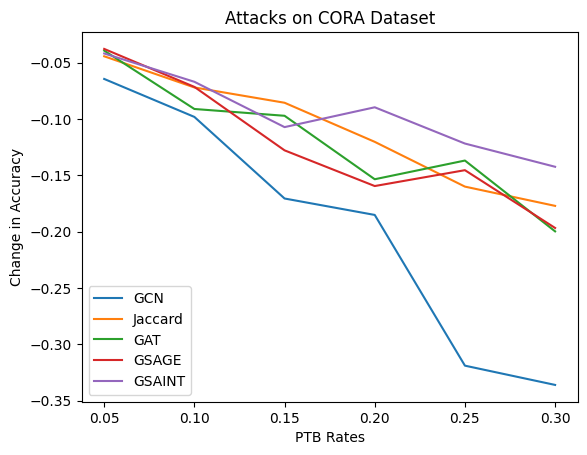

In [29]:
# Plotting
plt.plot(ptb_rates, gcn_results, label="GCN")
plt.plot(ptb_rates, jaccard_results, label="Jaccard")
plt.plot(ptb_rates, gat_results, label="GAT")
plt.plot(ptb_rates, gsage_results, label="GSAGE")
plt.plot(ptb_rates, gsaint_results, label="GSAINT")

plt.xlabel('PTB Rates')
plt.ylabel('Change in Accuracy')
plt.title('Attacks on CORA Dataset')
plt.legend()

output_path = f"./data/{dataset}_graph.png"
plt.savefig(output_path)

# Show plot
plt.show()